# Data preparation

In [4]:
import pandas as pd
import numpy as np

In [6]:
def prepare_BTC_data(file_path):
    df = pd.read_csv(file_path)
    df  =df.reset_index()
    df = df.rename(columns={"Date": "ds",
                            "Close": "y",
                            "High": "High",
                            "Low": "Low",
                            "Open": "Open"})
    df = df.drop(columns=['Volume', 'Dividends', "Stock Splits"], axis=1)
    df['ds'] = pd.to_datetime(df['ds'])

    return df

def split_data(df):
    latest_date = pd.Timestamp(df['ds'].max())
    last_year_data = latest_date.year -3

    test= df[(df['ds'].dt.year >= last_year_data)]
    test_start = pd.Timestamp(test['ds'].min())

    train_end = test_start - pd.DateOffset(days=1)
    train = df[(df['ds'] <= train_end)]
    return test,train


def create_sequences(data, input_window, forecast_window):
    X, y = [], []
    for i in range(len(data) - input_window - forecast_window):
        X.append(data[i:i+input_window])
        y.append(data[i+input_window:i+input_window+forecast_window])
    return np.array(X), np.array(y)

In [8]:
df = prepare_BTC_data("BTC-USD_2015-2025_daily.csv")
df.drop('index', axis= True, inplace = True)

In [10]:
test,train = split_data(df)

In [12]:
test.ds.iloc[0],test.ds.iloc[-1]

(Timestamp('2022-01-01 00:00:00+0000', tz='UTC'),
 Timestamp('2025-02-28 00:00:00+0000', tz='UTC'))

In [14]:
train.ds.iloc[0],train.ds.iloc[-1]

(Timestamp('2015-03-01 00:00:00+0000', tz='UTC'),
 Timestamp('2021-12-31 00:00:00+0000', tz='UTC'))

# Tuning the Model

In [17]:
def compute_directions(test_results):

    test_results = test_results.dropna(subset=['y', 'yhat'])
    predicted_dir = (test_results['yhat'] >test_results['last_actual']).astype(int)
    actual_dir = (test_results['y'] > test_results['last_actual']).astype(int)

    test_results ['predicted_dir'] =predicted_dir 
    test_results ['actual_dir'] =actual_dir 

    return test_results



In [19]:
def calculate_success_rate(test_results, WINDOW_SIZE = 14):
    # Constants
    POINTS = np.array([500, 1000, 1500])  # Using numpy array for vectorized operations    
    # Initialize success counts
    success = np.zeros_like(POINTS, dtype=int)  # [0, 0, 0]

    for i in range(0, len(test_results), WINDOW_SIZE):
        print(i)
        window = test_results.iloc[i:i + WINDOW_SIZE]
        predicted_dir = window['predicted_dir'].iloc[0]  # Get predicted direction for the window
        last_actual = window['last_actual'].iloc[0]  # Get the last actual value for the window

        for j in range(len(POINTS)):  # Iterate through each target
            if predicted_dir == 0:  # Bearish case
                target = last_actual - POINTS[j]
                hits = (window['Low'].values <= target.item()).any()  # Check if any Low is <= target
            else:  # Bullish case
                target = last_actual + POINTS[j]
                hits = (window['High'].values >= target.item()).any()  # Check if any High is >= target
            
            print(f"Target: {target}, Hits: {hits}")  # Debugging print statement

            if hits:
                success[j] += 1  # Increment success count if condition met

    # Calculate success rate
    total_windows = len(test_results) // WINDOW_SIZE
    success_rate = success / total_windows

    print(f"Success counts: {success}, Total window {total_windows}")  # Debugging print statement
    print(f"Success rates: {success_rate}")  # Debugging print statement

    return success_rate


In [21]:
from prophet import Prophet
import optuna

def tuning_model(train):
    def objective(trial, train):
        # Choose training window size
        input_window = trial.suggest_categorical("input_window", [30, 60, 90, 150, 180, 210, 240])
        forecast_window = 14
        # Prophet hyperparameters
        changepoint_prior_scale = trial.suggest_float("changepoint_prior_scale", 0.001, 0.5)
        seasonality_prior_scale = trial.suggest_float("seasonality_prior_scale", 0.01, 10)
        holidays_prior_scale = trial.suggest_float("holidays_prior_scale", 0.01, 10)
        seasonality_mode = trial.suggest_categorical("seasonality_mode", ["additive", "multiplicative"])

        # Create sequences
        X_train, y_train = create_sequences(train['y'].values, input_window, forecast_window)
        X_train_ds, y_train_ds = create_sequences(train['ds'].values, input_window, forecast_window)

        # Convert 'ds' to datetime without timezone
        train = train.copy()
        train['ds'] = pd.to_datetime(train['ds']).dt.tz_localize(None)
        
        final_results = pd.DataFrame()

        # Loop over sequences
        for i in range(len(X_train)):
            print(f"{i}/{len(X_train)}")
            # Prepare the input for Prophet
            input_data = pd.DataFrame({'y': X_train[i], 'ds': X_train_ds[i]})
            
            # Initialize and fit Prophet model
            model = Prophet(
                changepoint_prior_scale=changepoint_prior_scale,
                seasonality_prior_scale=seasonality_prior_scale,
                holidays_prior_scale=holidays_prior_scale,
                seasonality_mode=seasonality_mode
            )
            model.fit(input_data)

            # Get the start and end of the validation window
            start = y_train_ds[i][0]
            end = y_train_ds[i][-1]

            # Prepare the validation set
            val = train[(train['ds'] > start) & (train['ds'] < end)].copy()

            # Forecast
            future = pd.DataFrame({'ds': val['ds'].values})
            forecast = model.predict(future)

            # Remove timezone info
            forecast['ds'] = forecast['ds'].dt.tz_localize(None)
            val['ds'] = val['ds'].dt.tz_localize(None)

            # Merge validation and forecast data
            val_results = pd.merge(val, forecast, on='ds', how='inner')
            val_results['last_actual'] = X_train[i][-1]

            # Compute the result and store it
            results = compute_directions(val_results)
            final_results = pd.concat([final_results, results], ignore_index=True)

        # Calculate success rate and print it
        success_rate = calculate_success_rate(final_results, forecast_window)
        print(f"1st target= {success_rate[0]}")
        print(f"2nd target= {success_rate[1]}")
        print(f"3rd target= {success_rate[2]}")

        return success_rate[0].item()
    
    # Set up Optuna study and optimize the objective function
    study = optuna.create_study(direction="maximize")
    study.optimize(lambda trial: objective(trial, train), n_trials=15)
    
    print("Best trial:")
    print(study.best_trial.params)
    
    best_params = study.best_trial.params
    return best_params


In [23]:
best_params = tuning_model(train)

[I 2025-05-04 15:13:20,679] A new study created in memory with name: no-name-8d052fa9-eb06-40c7-9fe6-a9e9313af366


0/2274


15:13:22 - cmdstanpy - INFO - Chain [1] start processing
15:13:23 - cmdstanpy - INFO - Chain [1] done processing


1/2274


15:13:23 - cmdstanpy - INFO - Chain [1] start processing
15:13:24 - cmdstanpy - INFO - Chain [1] done processing


2/2274


15:13:24 - cmdstanpy - INFO - Chain [1] start processing
15:13:24 - cmdstanpy - INFO - Chain [1] done processing


3/2274


15:13:25 - cmdstanpy - INFO - Chain [1] start processing
15:13:25 - cmdstanpy - INFO - Chain [1] done processing


4/2274


15:13:26 - cmdstanpy - INFO - Chain [1] start processing
15:13:26 - cmdstanpy - INFO - Chain [1] done processing


5/2274


15:13:26 - cmdstanpy - INFO - Chain [1] start processing
15:13:26 - cmdstanpy - INFO - Chain [1] done processing


6/2274


15:13:27 - cmdstanpy - INFO - Chain [1] start processing
15:13:27 - cmdstanpy - INFO - Chain [1] done processing


7/2274


15:13:28 - cmdstanpy - INFO - Chain [1] start processing
15:13:28 - cmdstanpy - INFO - Chain [1] done processing


8/2274


15:13:28 - cmdstanpy - INFO - Chain [1] start processing
15:13:28 - cmdstanpy - INFO - Chain [1] done processing


9/2274


15:13:29 - cmdstanpy - INFO - Chain [1] start processing
15:13:29 - cmdstanpy - INFO - Chain [1] done processing


10/2274


15:13:30 - cmdstanpy - INFO - Chain [1] start processing
15:13:30 - cmdstanpy - INFO - Chain [1] done processing


11/2274


15:13:30 - cmdstanpy - INFO - Chain [1] start processing
15:13:31 - cmdstanpy - INFO - Chain [1] done processing


12/2274


15:13:31 - cmdstanpy - INFO - Chain [1] start processing
15:13:31 - cmdstanpy - INFO - Chain [1] done processing


13/2274


15:13:32 - cmdstanpy - INFO - Chain [1] start processing
15:13:32 - cmdstanpy - INFO - Chain [1] done processing


14/2274


15:13:33 - cmdstanpy - INFO - Chain [1] start processing
15:13:33 - cmdstanpy - INFO - Chain [1] done processing


15/2274


15:13:33 - cmdstanpy - INFO - Chain [1] start processing
15:13:34 - cmdstanpy - INFO - Chain [1] done processing


16/2274


15:13:34 - cmdstanpy - INFO - Chain [1] start processing
15:13:34 - cmdstanpy - INFO - Chain [1] done processing


17/2274


15:13:35 - cmdstanpy - INFO - Chain [1] start processing
15:13:35 - cmdstanpy - INFO - Chain [1] done processing


18/2274


15:13:36 - cmdstanpy - INFO - Chain [1] start processing
15:13:36 - cmdstanpy - INFO - Chain [1] done processing


19/2274


15:13:36 - cmdstanpy - INFO - Chain [1] start processing
15:13:36 - cmdstanpy - INFO - Chain [1] done processing


20/2274


15:13:37 - cmdstanpy - INFO - Chain [1] start processing
15:13:37 - cmdstanpy - INFO - Chain [1] done processing


21/2274


15:13:38 - cmdstanpy - INFO - Chain [1] start processing
15:13:38 - cmdstanpy - INFO - Chain [1] done processing


22/2274


15:13:39 - cmdstanpy - INFO - Chain [1] start processing
15:13:39 - cmdstanpy - INFO - Chain [1] done processing


23/2274


15:13:39 - cmdstanpy - INFO - Chain [1] start processing
15:13:40 - cmdstanpy - INFO - Chain [1] done processing


24/2274


15:13:40 - cmdstanpy - INFO - Chain [1] start processing
15:13:40 - cmdstanpy - INFO - Chain [1] done processing
15:13:41 - cmdstanpy - INFO - Chain [1] start processing


25/2274


15:13:41 - cmdstanpy - INFO - Chain [1] done processing


26/2274


15:13:41 - cmdstanpy - INFO - Chain [1] start processing
15:13:42 - cmdstanpy - INFO - Chain [1] done processing


27/2274


15:13:42 - cmdstanpy - INFO - Chain [1] start processing
15:13:42 - cmdstanpy - INFO - Chain [1] done processing


28/2274


15:13:43 - cmdstanpy - INFO - Chain [1] start processing
15:13:43 - cmdstanpy - INFO - Chain [1] done processing


29/2274


15:13:44 - cmdstanpy - INFO - Chain [1] start processing
15:13:44 - cmdstanpy - INFO - Chain [1] done processing


30/2274


15:13:44 - cmdstanpy - INFO - Chain [1] start processing
15:13:45 - cmdstanpy - INFO - Chain [1] done processing


31/2274


15:13:45 - cmdstanpy - INFO - Chain [1] start processing
15:13:45 - cmdstanpy - INFO - Chain [1] done processing


32/2274


15:13:46 - cmdstanpy - INFO - Chain [1] start processing
15:13:46 - cmdstanpy - INFO - Chain [1] done processing


33/2274


15:13:47 - cmdstanpy - INFO - Chain [1] start processing
15:13:47 - cmdstanpy - INFO - Chain [1] done processing


34/2274


15:13:47 - cmdstanpy - INFO - Chain [1] start processing
15:13:48 - cmdstanpy - INFO - Chain [1] done processing


35/2274


15:13:48 - cmdstanpy - INFO - Chain [1] start processing
15:13:48 - cmdstanpy - INFO - Chain [1] done processing


36/2274


15:13:49 - cmdstanpy - INFO - Chain [1] start processing
15:13:49 - cmdstanpy - INFO - Chain [1] done processing


37/2274


15:13:50 - cmdstanpy - INFO - Chain [1] start processing
15:13:50 - cmdstanpy - INFO - Chain [1] done processing


38/2274


15:13:50 - cmdstanpy - INFO - Chain [1] start processing
15:13:51 - cmdstanpy - INFO - Chain [1] done processing


39/2274


15:13:51 - cmdstanpy - INFO - Chain [1] start processing
15:13:51 - cmdstanpy - INFO - Chain [1] done processing


40/2274


15:13:52 - cmdstanpy - INFO - Chain [1] start processing
15:13:52 - cmdstanpy - INFO - Chain [1] done processing


41/2274


15:13:53 - cmdstanpy - INFO - Chain [1] start processing
15:13:53 - cmdstanpy - INFO - Chain [1] done processing


42/2274


15:13:53 - cmdstanpy - INFO - Chain [1] start processing
15:13:53 - cmdstanpy - INFO - Chain [1] done processing


43/2274


15:13:54 - cmdstanpy - INFO - Chain [1] start processing
15:13:54 - cmdstanpy - INFO - Chain [1] done processing


44/2274


15:13:54 - cmdstanpy - INFO - Chain [1] start processing
15:13:55 - cmdstanpy - INFO - Chain [1] done processing


45/2274


15:13:55 - cmdstanpy - INFO - Chain [1] start processing
15:13:55 - cmdstanpy - INFO - Chain [1] done processing


46/2274


15:13:56 - cmdstanpy - INFO - Chain [1] start processing
15:13:56 - cmdstanpy - INFO - Chain [1] done processing


47/2274


15:13:56 - cmdstanpy - INFO - Chain [1] start processing
15:13:56 - cmdstanpy - INFO - Chain [1] done processing


48/2274


15:13:57 - cmdstanpy - INFO - Chain [1] start processing
15:13:57 - cmdstanpy - INFO - Chain [1] done processing


49/2274


15:13:58 - cmdstanpy - INFO - Chain [1] start processing
15:13:58 - cmdstanpy - INFO - Chain [1] done processing


50/2274


15:13:59 - cmdstanpy - INFO - Chain [1] start processing
15:13:59 - cmdstanpy - INFO - Chain [1] done processing
15:13:59 - cmdstanpy - INFO - Chain [1] start processing


51/2274


15:13:59 - cmdstanpy - INFO - Chain [1] done processing


52/2274


15:14:00 - cmdstanpy - INFO - Chain [1] start processing
15:14:00 - cmdstanpy - INFO - Chain [1] done processing


53/2274


15:14:01 - cmdstanpy - INFO - Chain [1] start processing
15:14:01 - cmdstanpy - INFO - Chain [1] done processing


54/2274


15:14:02 - cmdstanpy - INFO - Chain [1] start processing
15:14:02 - cmdstanpy - INFO - Chain [1] done processing


55/2274


15:14:02 - cmdstanpy - INFO - Chain [1] start processing
15:14:02 - cmdstanpy - INFO - Chain [1] done processing


56/2274


15:14:03 - cmdstanpy - INFO - Chain [1] start processing
15:14:03 - cmdstanpy - INFO - Chain [1] done processing


57/2274


15:14:04 - cmdstanpy - INFO - Chain [1] start processing
15:14:04 - cmdstanpy - INFO - Chain [1] done processing


58/2274


15:14:05 - cmdstanpy - INFO - Chain [1] start processing
15:14:05 - cmdstanpy - INFO - Chain [1] done processing


59/2274


15:14:05 - cmdstanpy - INFO - Chain [1] start processing
15:14:06 - cmdstanpy - INFO - Chain [1] done processing


60/2274


15:14:06 - cmdstanpy - INFO - Chain [1] start processing
15:14:06 - cmdstanpy - INFO - Chain [1] done processing


61/2274


15:14:07 - cmdstanpy - INFO - Chain [1] start processing
15:14:07 - cmdstanpy - INFO - Chain [1] done processing


62/2274


15:14:08 - cmdstanpy - INFO - Chain [1] start processing
15:14:08 - cmdstanpy - INFO - Chain [1] done processing


63/2274


15:14:08 - cmdstanpy - INFO - Chain [1] start processing
15:14:09 - cmdstanpy - INFO - Chain [1] done processing


64/2274


15:14:09 - cmdstanpy - INFO - Chain [1] start processing
15:14:09 - cmdstanpy - INFO - Chain [1] done processing


65/2274


15:14:10 - cmdstanpy - INFO - Chain [1] start processing
15:14:10 - cmdstanpy - INFO - Chain [1] done processing


66/2274


15:14:11 - cmdstanpy - INFO - Chain [1] start processing
15:14:11 - cmdstanpy - INFO - Chain [1] done processing


67/2274


15:14:12 - cmdstanpy - INFO - Chain [1] start processing
15:14:12 - cmdstanpy - INFO - Chain [1] done processing


68/2274


15:14:13 - cmdstanpy - INFO - Chain [1] start processing
15:14:13 - cmdstanpy - INFO - Chain [1] done processing


69/2274


15:14:13 - cmdstanpy - INFO - Chain [1] start processing
15:14:14 - cmdstanpy - INFO - Chain [1] done processing


70/2274


15:14:14 - cmdstanpy - INFO - Chain [1] start processing
15:14:14 - cmdstanpy - INFO - Chain [1] done processing


71/2274


15:14:15 - cmdstanpy - INFO - Chain [1] start processing
15:14:15 - cmdstanpy - INFO - Chain [1] done processing


72/2274


15:14:16 - cmdstanpy - INFO - Chain [1] start processing
15:14:16 - cmdstanpy - INFO - Chain [1] done processing


73/2274


15:14:17 - cmdstanpy - INFO - Chain [1] start processing
15:14:17 - cmdstanpy - INFO - Chain [1] done processing


74/2274


15:14:17 - cmdstanpy - INFO - Chain [1] start processing
15:14:18 - cmdstanpy - INFO - Chain [1] done processing


75/2274


15:14:18 - cmdstanpy - INFO - Chain [1] start processing
15:14:18 - cmdstanpy - INFO - Chain [1] done processing


76/2274


15:14:19 - cmdstanpy - INFO - Chain [1] start processing
15:14:19 - cmdstanpy - INFO - Chain [1] done processing


77/2274


15:14:20 - cmdstanpy - INFO - Chain [1] start processing
15:14:20 - cmdstanpy - INFO - Chain [1] done processing


78/2274


15:14:20 - cmdstanpy - INFO - Chain [1] start processing
15:14:20 - cmdstanpy - INFO - Chain [1] done processing


79/2274


15:14:21 - cmdstanpy - INFO - Chain [1] start processing
15:14:21 - cmdstanpy - INFO - Chain [1] done processing


80/2274


15:14:21 - cmdstanpy - INFO - Chain [1] start processing
15:14:22 - cmdstanpy - INFO - Chain [1] done processing


81/2274


15:14:22 - cmdstanpy - INFO - Chain [1] start processing
15:14:22 - cmdstanpy - INFO - Chain [1] done processing


82/2274


15:14:23 - cmdstanpy - INFO - Chain [1] start processing
15:14:23 - cmdstanpy - INFO - Chain [1] done processing


83/2274


15:14:24 - cmdstanpy - INFO - Chain [1] start processing
15:14:24 - cmdstanpy - INFO - Chain [1] done processing


84/2274


15:14:25 - cmdstanpy - INFO - Chain [1] start processing
15:14:25 - cmdstanpy - INFO - Chain [1] done processing


85/2274


15:14:25 - cmdstanpy - INFO - Chain [1] start processing
15:14:26 - cmdstanpy - INFO - Chain [1] done processing


86/2274


15:14:26 - cmdstanpy - INFO - Chain [1] start processing
15:14:26 - cmdstanpy - INFO - Chain [1] done processing


87/2274


15:14:27 - cmdstanpy - INFO - Chain [1] start processing
15:14:27 - cmdstanpy - INFO - Chain [1] done processing


88/2274


15:14:28 - cmdstanpy - INFO - Chain [1] start processing
15:14:28 - cmdstanpy - INFO - Chain [1] done processing


89/2274


15:14:28 - cmdstanpy - INFO - Chain [1] start processing
15:14:28 - cmdstanpy - INFO - Chain [1] done processing


90/2274


15:14:29 - cmdstanpy - INFO - Chain [1] start processing
15:14:29 - cmdstanpy - INFO - Chain [1] done processing


91/2274


15:14:30 - cmdstanpy - INFO - Chain [1] start processing
15:14:30 - cmdstanpy - INFO - Chain [1] done processing


92/2274


15:14:30 - cmdstanpy - INFO - Chain [1] start processing
15:14:31 - cmdstanpy - INFO - Chain [1] done processing


93/2274


15:14:31 - cmdstanpy - INFO - Chain [1] start processing
15:14:31 - cmdstanpy - INFO - Chain [1] done processing


94/2274


15:14:32 - cmdstanpy - INFO - Chain [1] start processing
15:14:32 - cmdstanpy - INFO - Chain [1] done processing


95/2274


15:14:33 - cmdstanpy - INFO - Chain [1] start processing
15:14:33 - cmdstanpy - INFO - Chain [1] done processing


96/2274


15:14:33 - cmdstanpy - INFO - Chain [1] start processing
15:14:34 - cmdstanpy - INFO - Chain [1] done processing


97/2274


15:14:34 - cmdstanpy - INFO - Chain [1] start processing
15:14:34 - cmdstanpy - INFO - Chain [1] done processing


98/2274


15:14:35 - cmdstanpy - INFO - Chain [1] start processing
15:14:35 - cmdstanpy - INFO - Chain [1] done processing


99/2274


15:14:36 - cmdstanpy - INFO - Chain [1] start processing
15:14:36 - cmdstanpy - INFO - Chain [1] done processing


100/2274


15:14:36 - cmdstanpy - INFO - Chain [1] start processing
15:14:37 - cmdstanpy - INFO - Chain [1] done processing


101/2274


15:14:37 - cmdstanpy - INFO - Chain [1] start processing
15:14:37 - cmdstanpy - INFO - Chain [1] done processing


102/2274


15:14:38 - cmdstanpy - INFO - Chain [1] start processing
15:14:38 - cmdstanpy - INFO - Chain [1] done processing


103/2274


15:14:39 - cmdstanpy - INFO - Chain [1] start processing
15:14:39 - cmdstanpy - INFO - Chain [1] done processing


104/2274


15:14:39 - cmdstanpy - INFO - Chain [1] start processing
15:14:40 - cmdstanpy - INFO - Chain [1] done processing


105/2274


15:14:40 - cmdstanpy - INFO - Chain [1] start processing
15:14:40 - cmdstanpy - INFO - Chain [1] done processing


106/2274


15:14:41 - cmdstanpy - INFO - Chain [1] start processing
15:14:41 - cmdstanpy - INFO - Chain [1] done processing


107/2274


15:14:42 - cmdstanpy - INFO - Chain [1] start processing
15:14:42 - cmdstanpy - INFO - Chain [1] done processing


108/2274


15:14:43 - cmdstanpy - INFO - Chain [1] start processing
15:14:43 - cmdstanpy - INFO - Chain [1] done processing


109/2274


15:14:44 - cmdstanpy - INFO - Chain [1] start processing
15:14:44 - cmdstanpy - INFO - Chain [1] done processing
15:14:44 - cmdstanpy - INFO - Chain [1] start processing


110/2274


15:14:44 - cmdstanpy - INFO - Chain [1] done processing


111/2274


15:14:45 - cmdstanpy - INFO - Chain [1] start processing
15:14:45 - cmdstanpy - INFO - Chain [1] done processing


112/2274


15:14:45 - cmdstanpy - INFO - Chain [1] start processing
15:14:46 - cmdstanpy - INFO - Chain [1] done processing
15:14:46 - cmdstanpy - INFO - Chain [1] start processing


113/2274


15:14:46 - cmdstanpy - INFO - Chain [1] done processing


114/2274


15:14:47 - cmdstanpy - INFO - Chain [1] start processing
15:14:47 - cmdstanpy - INFO - Chain [1] done processing


115/2274


15:14:47 - cmdstanpy - INFO - Chain [1] start processing
15:14:48 - cmdstanpy - INFO - Chain [1] done processing


116/2274


15:14:48 - cmdstanpy - INFO - Chain [1] start processing
15:14:48 - cmdstanpy - INFO - Chain [1] done processing


117/2274


15:14:49 - cmdstanpy - INFO - Chain [1] start processing
15:14:49 - cmdstanpy - INFO - Chain [1] done processing


118/2274


15:14:50 - cmdstanpy - INFO - Chain [1] start processing
15:14:50 - cmdstanpy - INFO - Chain [1] done processing


119/2274


15:14:50 - cmdstanpy - INFO - Chain [1] start processing
15:14:51 - cmdstanpy - INFO - Chain [1] done processing


120/2274


15:14:51 - cmdstanpy - INFO - Chain [1] start processing
15:14:51 - cmdstanpy - INFO - Chain [1] done processing


121/2274


15:14:52 - cmdstanpy - INFO - Chain [1] start processing
15:14:52 - cmdstanpy - INFO - Chain [1] done processing


122/2274


15:14:53 - cmdstanpy - INFO - Chain [1] start processing
15:14:53 - cmdstanpy - INFO - Chain [1] done processing


123/2274


15:14:54 - cmdstanpy - INFO - Chain [1] start processing
15:14:54 - cmdstanpy - INFO - Chain [1] done processing


124/2274


15:14:54 - cmdstanpy - INFO - Chain [1] start processing
15:14:55 - cmdstanpy - INFO - Chain [1] done processing


125/2274


15:14:55 - cmdstanpy - INFO - Chain [1] start processing
15:14:55 - cmdstanpy - INFO - Chain [1] done processing


126/2274


15:14:56 - cmdstanpy - INFO - Chain [1] start processing
15:14:56 - cmdstanpy - INFO - Chain [1] done processing


127/2274


15:14:57 - cmdstanpy - INFO - Chain [1] start processing
15:14:57 - cmdstanpy - INFO - Chain [1] done processing


128/2274


15:14:57 - cmdstanpy - INFO - Chain [1] start processing
15:14:57 - cmdstanpy - INFO - Chain [1] done processing


129/2274


15:14:58 - cmdstanpy - INFO - Chain [1] start processing
15:14:58 - cmdstanpy - INFO - Chain [1] done processing


130/2274


15:14:59 - cmdstanpy - INFO - Chain [1] start processing
15:14:59 - cmdstanpy - INFO - Chain [1] done processing


131/2274


15:14:59 - cmdstanpy - INFO - Chain [1] start processing
15:14:59 - cmdstanpy - INFO - Chain [1] done processing


132/2274


15:15:00 - cmdstanpy - INFO - Chain [1] start processing
15:15:00 - cmdstanpy - INFO - Chain [1] done processing


133/2274


15:15:01 - cmdstanpy - INFO - Chain [1] start processing
15:15:01 - cmdstanpy - INFO - Chain [1] done processing
15:15:01 - cmdstanpy - INFO - Chain [1] start processing


134/2274


15:15:01 - cmdstanpy - INFO - Chain [1] done processing


135/2274


15:15:02 - cmdstanpy - INFO - Chain [1] start processing
15:15:02 - cmdstanpy - INFO - Chain [1] done processing


136/2274


15:15:03 - cmdstanpy - INFO - Chain [1] start processing
15:15:03 - cmdstanpy - INFO - Chain [1] done processing


137/2274


15:15:03 - cmdstanpy - INFO - Chain [1] start processing
15:15:03 - cmdstanpy - INFO - Chain [1] done processing


138/2274


15:15:04 - cmdstanpy - INFO - Chain [1] start processing
15:15:04 - cmdstanpy - INFO - Chain [1] done processing


139/2274


15:15:05 - cmdstanpy - INFO - Chain [1] start processing
15:15:05 - cmdstanpy - INFO - Chain [1] done processing


140/2274


15:15:05 - cmdstanpy - INFO - Chain [1] start processing
15:15:05 - cmdstanpy - INFO - Chain [1] done processing


141/2274


15:15:06 - cmdstanpy - INFO - Chain [1] start processing
15:15:06 - cmdstanpy - INFO - Chain [1] done processing


142/2274


15:15:07 - cmdstanpy - INFO - Chain [1] start processing
15:15:07 - cmdstanpy - INFO - Chain [1] done processing


143/2274


15:15:07 - cmdstanpy - INFO - Chain [1] start processing
15:15:08 - cmdstanpy - INFO - Chain [1] done processing


144/2274


15:15:08 - cmdstanpy - INFO - Chain [1] start processing
15:15:08 - cmdstanpy - INFO - Chain [1] done processing


145/2274


15:15:09 - cmdstanpy - INFO - Chain [1] start processing
15:15:09 - cmdstanpy - INFO - Chain [1] done processing


146/2274


15:15:10 - cmdstanpy - INFO - Chain [1] start processing
15:15:10 - cmdstanpy - INFO - Chain [1] done processing


147/2274


15:15:10 - cmdstanpy - INFO - Chain [1] start processing
15:15:10 - cmdstanpy - INFO - Chain [1] done processing


148/2274


15:15:11 - cmdstanpy - INFO - Chain [1] start processing
15:15:11 - cmdstanpy - INFO - Chain [1] done processing


149/2274


15:15:12 - cmdstanpy - INFO - Chain [1] start processing
15:15:12 - cmdstanpy - INFO - Chain [1] done processing


150/2274


15:15:13 - cmdstanpy - INFO - Chain [1] start processing
15:15:13 - cmdstanpy - INFO - Chain [1] done processing


151/2274


15:15:13 - cmdstanpy - INFO - Chain [1] start processing
15:15:14 - cmdstanpy - INFO - Chain [1] done processing


152/2274


15:15:14 - cmdstanpy - INFO - Chain [1] start processing
15:15:14 - cmdstanpy - INFO - Chain [1] done processing


153/2274


15:15:15 - cmdstanpy - INFO - Chain [1] start processing
15:15:15 - cmdstanpy - INFO - Chain [1] done processing


154/2274


15:15:15 - cmdstanpy - INFO - Chain [1] start processing
15:15:16 - cmdstanpy - INFO - Chain [1] done processing


155/2274


15:15:16 - cmdstanpy - INFO - Chain [1] start processing
15:15:16 - cmdstanpy - INFO - Chain [1] done processing


156/2274


15:15:17 - cmdstanpy - INFO - Chain [1] start processing
15:15:17 - cmdstanpy - INFO - Chain [1] done processing
15:15:17 - cmdstanpy - INFO - Chain [1] start processing


157/2274


15:15:17 - cmdstanpy - INFO - Chain [1] done processing


158/2274


15:15:18 - cmdstanpy - INFO - Chain [1] start processing
15:15:18 - cmdstanpy - INFO - Chain [1] done processing


159/2274


15:15:19 - cmdstanpy - INFO - Chain [1] start processing
15:15:19 - cmdstanpy - INFO - Chain [1] done processing


160/2274


15:15:19 - cmdstanpy - INFO - Chain [1] start processing
15:15:20 - cmdstanpy - INFO - Chain [1] done processing


161/2274


15:15:20 - cmdstanpy - INFO - Chain [1] start processing
15:15:20 - cmdstanpy - INFO - Chain [1] done processing


162/2274


15:15:21 - cmdstanpy - INFO - Chain [1] start processing
15:15:21 - cmdstanpy - INFO - Chain [1] done processing


163/2274


15:15:22 - cmdstanpy - INFO - Chain [1] start processing
15:15:22 - cmdstanpy - INFO - Chain [1] done processing


164/2274


15:15:23 - cmdstanpy - INFO - Chain [1] start processing
15:15:23 - cmdstanpy - INFO - Chain [1] done processing


165/2274


15:15:23 - cmdstanpy - INFO - Chain [1] start processing
15:15:24 - cmdstanpy - INFO - Chain [1] done processing


166/2274


15:15:24 - cmdstanpy - INFO - Chain [1] start processing
15:15:24 - cmdstanpy - INFO - Chain [1] done processing


167/2274


15:15:25 - cmdstanpy - INFO - Chain [1] start processing
15:15:25 - cmdstanpy - INFO - Chain [1] done processing


168/2274


15:15:26 - cmdstanpy - INFO - Chain [1] start processing
15:15:26 - cmdstanpy - INFO - Chain [1] done processing


169/2274


15:15:27 - cmdstanpy - INFO - Chain [1] start processing
15:15:27 - cmdstanpy - INFO - Chain [1] done processing


170/2274


15:15:28 - cmdstanpy - INFO - Chain [1] start processing
15:15:28 - cmdstanpy - INFO - Chain [1] done processing


171/2274


15:15:28 - cmdstanpy - INFO - Chain [1] start processing
15:15:28 - cmdstanpy - INFO - Chain [1] done processing


172/2274


15:15:29 - cmdstanpy - INFO - Chain [1] start processing
15:15:29 - cmdstanpy - INFO - Chain [1] done processing


173/2274


15:15:30 - cmdstanpy - INFO - Chain [1] start processing
15:15:30 - cmdstanpy - INFO - Chain [1] done processing


174/2274


15:15:30 - cmdstanpy - INFO - Chain [1] start processing
15:15:31 - cmdstanpy - INFO - Chain [1] done processing


175/2274


15:15:31 - cmdstanpy - INFO - Chain [1] start processing
15:15:31 - cmdstanpy - INFO - Chain [1] done processing


176/2274


15:15:32 - cmdstanpy - INFO - Chain [1] start processing
15:15:32 - cmdstanpy - INFO - Chain [1] done processing


177/2274


15:15:32 - cmdstanpy - INFO - Chain [1] start processing
15:15:33 - cmdstanpy - INFO - Chain [1] done processing


178/2274


15:15:33 - cmdstanpy - INFO - Chain [1] start processing
15:15:33 - cmdstanpy - INFO - Chain [1] done processing


179/2274


15:15:34 - cmdstanpy - INFO - Chain [1] start processing
15:15:34 - cmdstanpy - INFO - Chain [1] done processing


180/2274


15:15:35 - cmdstanpy - INFO - Chain [1] start processing
15:15:35 - cmdstanpy - INFO - Chain [1] done processing


181/2274


15:15:36 - cmdstanpy - INFO - Chain [1] start processing
15:15:36 - cmdstanpy - INFO - Chain [1] done processing


182/2274


15:15:36 - cmdstanpy - INFO - Chain [1] start processing
15:15:37 - cmdstanpy - INFO - Chain [1] done processing


183/2274


15:15:37 - cmdstanpy - INFO - Chain [1] start processing
15:15:37 - cmdstanpy - INFO - Chain [1] done processing


184/2274


15:15:38 - cmdstanpy - INFO - Chain [1] start processing
15:15:38 - cmdstanpy - INFO - Chain [1] done processing


185/2274


15:15:39 - cmdstanpy - INFO - Chain [1] start processing
15:15:39 - cmdstanpy - INFO - Chain [1] done processing


186/2274


15:15:40 - cmdstanpy - INFO - Chain [1] start processing
15:15:40 - cmdstanpy - INFO - Chain [1] done processing


187/2274


15:15:41 - cmdstanpy - INFO - Chain [1] start processing
15:15:41 - cmdstanpy - INFO - Chain [1] done processing


188/2274


15:15:41 - cmdstanpy - INFO - Chain [1] start processing
15:15:41 - cmdstanpy - INFO - Chain [1] done processing


189/2274


15:15:42 - cmdstanpy - INFO - Chain [1] start processing
15:15:42 - cmdstanpy - INFO - Chain [1] done processing


190/2274


15:15:42 - cmdstanpy - INFO - Chain [1] start processing
15:15:43 - cmdstanpy - INFO - Chain [1] done processing


191/2274


15:15:43 - cmdstanpy - INFO - Chain [1] start processing
15:15:43 - cmdstanpy - INFO - Chain [1] done processing


192/2274


15:15:44 - cmdstanpy - INFO - Chain [1] start processing
15:15:44 - cmdstanpy - INFO - Chain [1] done processing


193/2274


15:15:45 - cmdstanpy - INFO - Chain [1] start processing
15:15:45 - cmdstanpy - INFO - Chain [1] done processing


194/2274


15:15:46 - cmdstanpy - INFO - Chain [1] start processing
15:15:46 - cmdstanpy - INFO - Chain [1] done processing


195/2274


15:15:47 - cmdstanpy - INFO - Chain [1] start processing
15:15:47 - cmdstanpy - INFO - Chain [1] done processing


196/2274


15:15:47 - cmdstanpy - INFO - Chain [1] start processing
15:15:48 - cmdstanpy - INFO - Chain [1] done processing


197/2274


15:15:48 - cmdstanpy - INFO - Chain [1] start processing
15:15:48 - cmdstanpy - INFO - Chain [1] done processing


198/2274


15:15:48 - cmdstanpy - INFO - Chain [1] start processing
15:15:49 - cmdstanpy - INFO - Chain [1] done processing


199/2274


15:15:49 - cmdstanpy - INFO - Chain [1] start processing
15:15:49 - cmdstanpy - INFO - Chain [1] done processing


200/2274


15:15:50 - cmdstanpy - INFO - Chain [1] start processing
15:15:50 - cmdstanpy - INFO - Chain [1] done processing


201/2274


15:15:51 - cmdstanpy - INFO - Chain [1] start processing
15:15:51 - cmdstanpy - INFO - Chain [1] done processing


202/2274


15:15:52 - cmdstanpy - INFO - Chain [1] start processing
15:15:52 - cmdstanpy - INFO - Chain [1] done processing


203/2274


15:15:53 - cmdstanpy - INFO - Chain [1] start processing
15:15:53 - cmdstanpy - INFO - Chain [1] done processing


204/2274


15:15:53 - cmdstanpy - INFO - Chain [1] start processing
15:15:54 - cmdstanpy - INFO - Chain [1] done processing


205/2274


15:15:54 - cmdstanpy - INFO - Chain [1] start processing
15:15:54 - cmdstanpy - INFO - Chain [1] done processing


206/2274


15:15:55 - cmdstanpy - INFO - Chain [1] start processing
15:15:55 - cmdstanpy - INFO - Chain [1] done processing


207/2274


15:15:56 - cmdstanpy - INFO - Chain [1] start processing
15:15:56 - cmdstanpy - INFO - Chain [1] done processing


208/2274


15:15:57 - cmdstanpy - INFO - Chain [1] start processing
15:15:57 - cmdstanpy - INFO - Chain [1] done processing


209/2274


15:15:58 - cmdstanpy - INFO - Chain [1] start processing
15:15:58 - cmdstanpy - INFO - Chain [1] done processing


210/2274


15:15:58 - cmdstanpy - INFO - Chain [1] start processing
15:15:58 - cmdstanpy - INFO - Chain [1] done processing


211/2274


15:15:59 - cmdstanpy - INFO - Chain [1] start processing
15:15:59 - cmdstanpy - INFO - Chain [1] done processing


212/2274


15:16:00 - cmdstanpy - INFO - Chain [1] start processing
15:16:00 - cmdstanpy - INFO - Chain [1] done processing


213/2274


15:16:00 - cmdstanpy - INFO - Chain [1] start processing
15:16:00 - cmdstanpy - INFO - Chain [1] done processing


214/2274


15:16:01 - cmdstanpy - INFO - Chain [1] start processing
15:16:01 - cmdstanpy - INFO - Chain [1] done processing


215/2274


15:16:02 - cmdstanpy - INFO - Chain [1] start processing
15:16:02 - cmdstanpy - INFO - Chain [1] done processing


216/2274


15:16:03 - cmdstanpy - INFO - Chain [1] start processing
15:16:03 - cmdstanpy - INFO - Chain [1] done processing


217/2274


15:16:03 - cmdstanpy - INFO - Chain [1] start processing
15:16:04 - cmdstanpy - INFO - Chain [1] done processing


218/2274


15:16:04 - cmdstanpy - INFO - Chain [1] start processing
15:16:04 - cmdstanpy - INFO - Chain [1] done processing


219/2274


15:16:05 - cmdstanpy - INFO - Chain [1] start processing
15:16:05 - cmdstanpy - INFO - Chain [1] done processing


220/2274


15:16:05 - cmdstanpy - INFO - Chain [1] start processing
15:16:06 - cmdstanpy - INFO - Chain [1] done processing


221/2274


15:16:06 - cmdstanpy - INFO - Chain [1] start processing
15:16:07 - cmdstanpy - INFO - Chain [1] done processing


222/2274


15:16:07 - cmdstanpy - INFO - Chain [1] start processing
15:16:08 - cmdstanpy - INFO - Chain [1] done processing


223/2274


15:16:08 - cmdstanpy - INFO - Chain [1] start processing
15:16:08 - cmdstanpy - INFO - Chain [1] done processing


224/2274


15:16:09 - cmdstanpy - INFO - Chain [1] start processing
15:16:09 - cmdstanpy - INFO - Chain [1] done processing


225/2274


15:16:10 - cmdstanpy - INFO - Chain [1] start processing
15:16:10 - cmdstanpy - INFO - Chain [1] done processing


226/2274


15:16:11 - cmdstanpy - INFO - Chain [1] start processing
15:16:11 - cmdstanpy - INFO - Chain [1] done processing


227/2274


15:16:12 - cmdstanpy - INFO - Chain [1] start processing
15:16:12 - cmdstanpy - INFO - Chain [1] done processing


228/2274


15:16:12 - cmdstanpy - INFO - Chain [1] start processing
15:16:12 - cmdstanpy - INFO - Chain [1] done processing


229/2274


15:16:13 - cmdstanpy - INFO - Chain [1] start processing
15:16:13 - cmdstanpy - INFO - Chain [1] done processing


230/2274


15:16:14 - cmdstanpy - INFO - Chain [1] start processing
15:16:14 - cmdstanpy - INFO - Chain [1] done processing


231/2274


15:16:15 - cmdstanpy - INFO - Chain [1] start processing
15:16:15 - cmdstanpy - INFO - Chain [1] done processing


232/2274


15:16:15 - cmdstanpy - INFO - Chain [1] start processing
15:16:15 - cmdstanpy - INFO - Chain [1] done processing


233/2274


15:16:16 - cmdstanpy - INFO - Chain [1] start processing
15:16:16 - cmdstanpy - INFO - Chain [1] done processing


234/2274


15:16:17 - cmdstanpy - INFO - Chain [1] start processing
15:16:17 - cmdstanpy - INFO - Chain [1] done processing


235/2274


15:16:18 - cmdstanpy - INFO - Chain [1] start processing
15:16:18 - cmdstanpy - INFO - Chain [1] done processing


236/2274


15:16:18 - cmdstanpy - INFO - Chain [1] start processing
15:16:18 - cmdstanpy - INFO - Chain [1] done processing


237/2274


15:16:19 - cmdstanpy - INFO - Chain [1] start processing
15:16:19 - cmdstanpy - INFO - Chain [1] done processing


238/2274


15:16:20 - cmdstanpy - INFO - Chain [1] start processing
15:16:20 - cmdstanpy - INFO - Chain [1] done processing


239/2274


15:16:20 - cmdstanpy - INFO - Chain [1] start processing
15:16:21 - cmdstanpy - INFO - Chain [1] done processing


240/2274


15:16:21 - cmdstanpy - INFO - Chain [1] start processing
15:16:22 - cmdstanpy - INFO - Chain [1] done processing


241/2274


15:16:22 - cmdstanpy - INFO - Chain [1] start processing
15:16:22 - cmdstanpy - INFO - Chain [1] done processing


242/2274


15:16:23 - cmdstanpy - INFO - Chain [1] start processing
15:16:23 - cmdstanpy - INFO - Chain [1] done processing


243/2274


15:16:24 - cmdstanpy - INFO - Chain [1] start processing
15:16:24 - cmdstanpy - INFO - Chain [1] done processing


244/2274


15:16:25 - cmdstanpy - INFO - Chain [1] start processing
15:16:25 - cmdstanpy - INFO - Chain [1] done processing


245/2274


15:16:26 - cmdstanpy - INFO - Chain [1] start processing
15:16:26 - cmdstanpy - INFO - Chain [1] done processing


246/2274


15:16:27 - cmdstanpy - INFO - Chain [1] start processing
15:16:27 - cmdstanpy - INFO - Chain [1] done processing


247/2274


15:16:27 - cmdstanpy - INFO - Chain [1] start processing
15:16:28 - cmdstanpy - INFO - Chain [1] done processing


248/2274


15:16:28 - cmdstanpy - INFO - Chain [1] start processing
15:16:28 - cmdstanpy - INFO - Chain [1] done processing


249/2274


15:16:29 - cmdstanpy - INFO - Chain [1] start processing
15:16:29 - cmdstanpy - INFO - Chain [1] done processing


250/2274


15:16:30 - cmdstanpy - INFO - Chain [1] start processing
15:16:30 - cmdstanpy - INFO - Chain [1] done processing


251/2274


15:16:31 - cmdstanpy - INFO - Chain [1] start processing
15:16:31 - cmdstanpy - INFO - Chain [1] done processing


252/2274


15:16:31 - cmdstanpy - INFO - Chain [1] start processing
15:16:32 - cmdstanpy - INFO - Chain [1] done processing


253/2274


15:16:32 - cmdstanpy - INFO - Chain [1] start processing
15:16:32 - cmdstanpy - INFO - Chain [1] done processing


254/2274


15:16:33 - cmdstanpy - INFO - Chain [1] start processing
15:16:33 - cmdstanpy - INFO - Chain [1] done processing


255/2274


15:16:34 - cmdstanpy - INFO - Chain [1] start processing
15:16:34 - cmdstanpy - INFO - Chain [1] done processing


256/2274


15:16:34 - cmdstanpy - INFO - Chain [1] start processing
15:16:34 - cmdstanpy - INFO - Chain [1] done processing


257/2274


15:16:35 - cmdstanpy - INFO - Chain [1] start processing
15:16:35 - cmdstanpy - INFO - Chain [1] done processing


258/2274


15:16:35 - cmdstanpy - INFO - Chain [1] start processing
15:16:36 - cmdstanpy - INFO - Chain [1] done processing


259/2274


15:16:36 - cmdstanpy - INFO - Chain [1] start processing
15:16:36 - cmdstanpy - INFO - Chain [1] done processing


260/2274


15:16:37 - cmdstanpy - INFO - Chain [1] start processing
15:16:37 - cmdstanpy - INFO - Chain [1] done processing


261/2274


15:16:37 - cmdstanpy - INFO - Chain [1] start processing
15:16:37 - cmdstanpy - INFO - Chain [1] done processing


262/2274


15:16:38 - cmdstanpy - INFO - Chain [1] start processing
15:16:38 - cmdstanpy - INFO - Chain [1] done processing


263/2274


15:16:39 - cmdstanpy - INFO - Chain [1] start processing
15:16:39 - cmdstanpy - INFO - Chain [1] done processing


264/2274


15:16:40 - cmdstanpy - INFO - Chain [1] start processing
15:16:40 - cmdstanpy - INFO - Chain [1] done processing


265/2274


15:16:40 - cmdstanpy - INFO - Chain [1] start processing
15:16:41 - cmdstanpy - INFO - Chain [1] done processing


266/2274


15:16:41 - cmdstanpy - INFO - Chain [1] start processing
15:16:42 - cmdstanpy - INFO - Chain [1] done processing


267/2274


15:16:42 - cmdstanpy - INFO - Chain [1] start processing
15:16:42 - cmdstanpy - INFO - Chain [1] done processing


268/2274


15:16:43 - cmdstanpy - INFO - Chain [1] start processing
15:16:43 - cmdstanpy - INFO - Chain [1] done processing


269/2274


15:16:43 - cmdstanpy - INFO - Chain [1] start processing
15:16:44 - cmdstanpy - INFO - Chain [1] done processing


270/2274


15:16:44 - cmdstanpy - INFO - Chain [1] start processing
15:16:44 - cmdstanpy - INFO - Chain [1] done processing


271/2274


15:16:45 - cmdstanpy - INFO - Chain [1] start processing
15:16:45 - cmdstanpy - INFO - Chain [1] done processing


272/2274


15:16:46 - cmdstanpy - INFO - Chain [1] start processing
15:16:46 - cmdstanpy - INFO - Chain [1] done processing
15:16:46 - cmdstanpy - INFO - Chain [1] start processing


273/2274


15:16:46 - cmdstanpy - INFO - Chain [1] done processing


274/2274


15:16:47 - cmdstanpy - INFO - Chain [1] start processing
15:16:47 - cmdstanpy - INFO - Chain [1] done processing


275/2274


15:16:48 - cmdstanpy - INFO - Chain [1] start processing
15:16:48 - cmdstanpy - INFO - Chain [1] done processing


276/2274


15:16:48 - cmdstanpy - INFO - Chain [1] start processing
15:16:48 - cmdstanpy - INFO - Chain [1] done processing


277/2274


15:16:49 - cmdstanpy - INFO - Chain [1] start processing
15:16:49 - cmdstanpy - INFO - Chain [1] done processing


278/2274


15:16:50 - cmdstanpy - INFO - Chain [1] start processing
15:16:50 - cmdstanpy - INFO - Chain [1] done processing


279/2274


15:16:50 - cmdstanpy - INFO - Chain [1] start processing
15:16:50 - cmdstanpy - INFO - Chain [1] done processing


280/2274


15:16:51 - cmdstanpy - INFO - Chain [1] start processing
15:16:51 - cmdstanpy - INFO - Chain [1] done processing


281/2274


15:16:52 - cmdstanpy - INFO - Chain [1] start processing
15:16:52 - cmdstanpy - INFO - Chain [1] done processing
15:16:52 - cmdstanpy - INFO - Chain [1] start processing


282/2274


15:16:52 - cmdstanpy - INFO - Chain [1] done processing


283/2274


15:16:52 - cmdstanpy - INFO - Chain [1] start processing
15:16:53 - cmdstanpy - INFO - Chain [1] done processing
15:16:53 - cmdstanpy - INFO - Chain [1] start processing


284/2274


15:16:53 - cmdstanpy - INFO - Chain [1] done processing


285/2274


15:16:54 - cmdstanpy - INFO - Chain [1] start processing
15:16:54 - cmdstanpy - INFO - Chain [1] done processing


286/2274


15:16:54 - cmdstanpy - INFO - Chain [1] start processing
15:16:54 - cmdstanpy - INFO - Chain [1] done processing


287/2274


15:16:55 - cmdstanpy - INFO - Chain [1] start processing
15:16:55 - cmdstanpy - INFO - Chain [1] done processing


288/2274


15:16:55 - cmdstanpy - INFO - Chain [1] start processing
15:16:55 - cmdstanpy - INFO - Chain [1] done processing


289/2274


15:16:56 - cmdstanpy - INFO - Chain [1] start processing
15:16:56 - cmdstanpy - INFO - Chain [1] done processing


290/2274


15:16:56 - cmdstanpy - INFO - Chain [1] start processing
15:16:57 - cmdstanpy - INFO - Chain [1] done processing


291/2274


15:16:57 - cmdstanpy - INFO - Chain [1] start processing
15:16:57 - cmdstanpy - INFO - Chain [1] done processing


292/2274


15:16:58 - cmdstanpy - INFO - Chain [1] start processing
15:16:58 - cmdstanpy - INFO - Chain [1] done processing


293/2274


15:16:59 - cmdstanpy - INFO - Chain [1] start processing
15:16:59 - cmdstanpy - INFO - Chain [1] done processing


294/2274


15:16:59 - cmdstanpy - INFO - Chain [1] start processing
15:17:00 - cmdstanpy - INFO - Chain [1] done processing


295/2274


15:17:00 - cmdstanpy - INFO - Chain [1] start processing
15:17:00 - cmdstanpy - INFO - Chain [1] done processing


296/2274


15:17:01 - cmdstanpy - INFO - Chain [1] start processing
15:17:01 - cmdstanpy - INFO - Chain [1] done processing


297/2274


15:17:02 - cmdstanpy - INFO - Chain [1] start processing
15:17:02 - cmdstanpy - INFO - Chain [1] done processing


298/2274


15:17:02 - cmdstanpy - INFO - Chain [1] start processing
15:17:03 - cmdstanpy - INFO - Chain [1] done processing


299/2274


15:17:03 - cmdstanpy - INFO - Chain [1] start processing
15:17:03 - cmdstanpy - INFO - Chain [1] done processing


300/2274


15:17:04 - cmdstanpy - INFO - Chain [1] start processing
15:17:04 - cmdstanpy - INFO - Chain [1] done processing


301/2274


15:17:05 - cmdstanpy - INFO - Chain [1] start processing
15:17:05 - cmdstanpy - INFO - Chain [1] done processing


302/2274


15:17:06 - cmdstanpy - INFO - Chain [1] start processing
15:17:06 - cmdstanpy - INFO - Chain [1] done processing


303/2274


15:17:06 - cmdstanpy - INFO - Chain [1] start processing
15:17:06 - cmdstanpy - INFO - Chain [1] done processing


304/2274


15:17:07 - cmdstanpy - INFO - Chain [1] start processing
15:17:07 - cmdstanpy - INFO - Chain [1] done processing


305/2274


15:17:07 - cmdstanpy - INFO - Chain [1] start processing
15:17:08 - cmdstanpy - INFO - Chain [1] done processing


306/2274


15:17:08 - cmdstanpy - INFO - Chain [1] start processing
15:17:08 - cmdstanpy - INFO - Chain [1] done processing


307/2274


15:17:09 - cmdstanpy - INFO - Chain [1] start processing
15:17:09 - cmdstanpy - INFO - Chain [1] done processing


308/2274


15:17:09 - cmdstanpy - INFO - Chain [1] start processing
15:17:09 - cmdstanpy - INFO - Chain [1] done processing


309/2274


15:17:10 - cmdstanpy - INFO - Chain [1] start processing
15:17:10 - cmdstanpy - INFO - Chain [1] done processing


310/2274


15:17:11 - cmdstanpy - INFO - Chain [1] start processing
15:17:11 - cmdstanpy - INFO - Chain [1] done processing


311/2274


15:17:12 - cmdstanpy - INFO - Chain [1] start processing
15:17:12 - cmdstanpy - INFO - Chain [1] done processing


312/2274


15:17:12 - cmdstanpy - INFO - Chain [1] start processing
15:17:13 - cmdstanpy - INFO - Chain [1] done processing


313/2274


15:17:13 - cmdstanpy - INFO - Chain [1] start processing
15:17:13 - cmdstanpy - INFO - Chain [1] done processing


314/2274


15:17:14 - cmdstanpy - INFO - Chain [1] start processing
15:17:14 - cmdstanpy - INFO - Chain [1] done processing


315/2274


15:17:15 - cmdstanpy - INFO - Chain [1] start processing
15:17:15 - cmdstanpy - INFO - Chain [1] done processing


316/2274


15:17:16 - cmdstanpy - INFO - Chain [1] start processing
15:17:16 - cmdstanpy - INFO - Chain [1] done processing


317/2274


15:17:16 - cmdstanpy - INFO - Chain [1] start processing
15:17:16 - cmdstanpy - INFO - Chain [1] done processing


318/2274


15:17:17 - cmdstanpy - INFO - Chain [1] start processing
15:17:17 - cmdstanpy - INFO - Chain [1] done processing


319/2274


15:17:18 - cmdstanpy - INFO - Chain [1] start processing
15:17:18 - cmdstanpy - INFO - Chain [1] done processing


320/2274


15:17:18 - cmdstanpy - INFO - Chain [1] start processing
15:17:18 - cmdstanpy - INFO - Chain [1] done processing


321/2274


15:17:19 - cmdstanpy - INFO - Chain [1] start processing
15:17:19 - cmdstanpy - INFO - Chain [1] done processing


322/2274


15:17:20 - cmdstanpy - INFO - Chain [1] start processing
15:17:20 - cmdstanpy - INFO - Chain [1] done processing


323/2274


15:17:21 - cmdstanpy - INFO - Chain [1] start processing
15:17:21 - cmdstanpy - INFO - Chain [1] done processing


324/2274


15:17:21 - cmdstanpy - INFO - Chain [1] start processing
15:17:22 - cmdstanpy - INFO - Chain [1] done processing


325/2274


15:17:22 - cmdstanpy - INFO - Chain [1] start processing
15:17:22 - cmdstanpy - INFO - Chain [1] done processing


326/2274


15:17:23 - cmdstanpy - INFO - Chain [1] start processing
15:17:23 - cmdstanpy - INFO - Chain [1] done processing


327/2274


15:17:24 - cmdstanpy - INFO - Chain [1] start processing
15:17:24 - cmdstanpy - INFO - Chain [1] done processing


328/2274


15:17:24 - cmdstanpy - INFO - Chain [1] start processing
15:17:24 - cmdstanpy - INFO - Chain [1] done processing


329/2274


15:17:25 - cmdstanpy - INFO - Chain [1] start processing
15:17:25 - cmdstanpy - INFO - Chain [1] done processing


330/2274


15:17:26 - cmdstanpy - INFO - Chain [1] start processing
15:17:26 - cmdstanpy - INFO - Chain [1] done processing


331/2274


15:17:26 - cmdstanpy - INFO - Chain [1] start processing
15:17:26 - cmdstanpy - INFO - Chain [1] done processing


332/2274


15:17:27 - cmdstanpy - INFO - Chain [1] start processing
15:17:27 - cmdstanpy - INFO - Chain [1] done processing


333/2274


15:17:27 - cmdstanpy - INFO - Chain [1] start processing
15:17:28 - cmdstanpy - INFO - Chain [1] done processing


334/2274


15:17:28 - cmdstanpy - INFO - Chain [1] start processing
15:17:28 - cmdstanpy - INFO - Chain [1] done processing


335/2274


15:17:29 - cmdstanpy - INFO - Chain [1] start processing
15:17:29 - cmdstanpy - INFO - Chain [1] done processing


336/2274


15:17:30 - cmdstanpy - INFO - Chain [1] start processing
15:17:30 - cmdstanpy - INFO - Chain [1] done processing


337/2274


15:17:31 - cmdstanpy - INFO - Chain [1] start processing
15:17:31 - cmdstanpy - INFO - Chain [1] done processing


338/2274


15:17:31 - cmdstanpy - INFO - Chain [1] start processing
15:17:32 - cmdstanpy - INFO - Chain [1] done processing


339/2274


15:17:32 - cmdstanpy - INFO - Chain [1] start processing
15:17:32 - cmdstanpy - INFO - Chain [1] done processing


340/2274


15:17:33 - cmdstanpy - INFO - Chain [1] start processing
15:17:33 - cmdstanpy - INFO - Chain [1] done processing


341/2274


15:17:34 - cmdstanpy - INFO - Chain [1] start processing
15:17:34 - cmdstanpy - INFO - Chain [1] done processing


342/2274


15:17:34 - cmdstanpy - INFO - Chain [1] start processing
15:17:34 - cmdstanpy - INFO - Chain [1] done processing
15:17:35 - cmdstanpy - INFO - Chain [1] start processing


343/2274


15:17:35 - cmdstanpy - INFO - Chain [1] done processing


344/2274


15:17:36 - cmdstanpy - INFO - Chain [1] start processing
15:17:36 - cmdstanpy - INFO - Chain [1] done processing


345/2274


15:17:36 - cmdstanpy - INFO - Chain [1] start processing
15:17:37 - cmdstanpy - INFO - Chain [1] done processing


346/2274


15:17:37 - cmdstanpy - INFO - Chain [1] start processing
15:17:37 - cmdstanpy - INFO - Chain [1] done processing


347/2274


15:17:38 - cmdstanpy - INFO - Chain [1] start processing
15:17:38 - cmdstanpy - INFO - Chain [1] done processing


348/2274


15:17:39 - cmdstanpy - INFO - Chain [1] start processing
15:17:39 - cmdstanpy - INFO - Chain [1] done processing


349/2274


15:17:39 - cmdstanpy - INFO - Chain [1] start processing
15:17:39 - cmdstanpy - INFO - Chain [1] done processing


350/2274


15:17:40 - cmdstanpy - INFO - Chain [1] start processing
15:17:40 - cmdstanpy - INFO - Chain [1] done processing


351/2274


15:17:41 - cmdstanpy - INFO - Chain [1] start processing
15:17:41 - cmdstanpy - INFO - Chain [1] done processing


352/2274


15:17:41 - cmdstanpy - INFO - Chain [1] start processing
15:17:41 - cmdstanpy - INFO - Chain [1] done processing


353/2274


15:17:42 - cmdstanpy - INFO - Chain [1] start processing
15:17:42 - cmdstanpy - INFO - Chain [1] done processing


354/2274


15:17:43 - cmdstanpy - INFO - Chain [1] start processing
15:17:43 - cmdstanpy - INFO - Chain [1] done processing


355/2274


15:17:43 - cmdstanpy - INFO - Chain [1] start processing
15:17:44 - cmdstanpy - INFO - Chain [1] done processing


356/2274


15:17:44 - cmdstanpy - INFO - Chain [1] start processing
15:17:44 - cmdstanpy - INFO - Chain [1] done processing


357/2274


15:17:45 - cmdstanpy - INFO - Chain [1] start processing
15:17:45 - cmdstanpy - INFO - Chain [1] done processing


358/2274


15:17:45 - cmdstanpy - INFO - Chain [1] start processing
15:17:46 - cmdstanpy - INFO - Chain [1] done processing


359/2274


15:17:46 - cmdstanpy - INFO - Chain [1] start processing
15:17:46 - cmdstanpy - INFO - Chain [1] done processing


360/2274


15:17:47 - cmdstanpy - INFO - Chain [1] start processing
15:17:47 - cmdstanpy - INFO - Chain [1] done processing


361/2274


15:17:48 - cmdstanpy - INFO - Chain [1] start processing
15:17:48 - cmdstanpy - INFO - Chain [1] done processing


362/2274


15:17:48 - cmdstanpy - INFO - Chain [1] start processing
15:17:49 - cmdstanpy - INFO - Chain [1] done processing


363/2274


15:17:49 - cmdstanpy - INFO - Chain [1] start processing
15:17:49 - cmdstanpy - INFO - Chain [1] done processing


364/2274


15:17:50 - cmdstanpy - INFO - Chain [1] start processing
15:17:50 - cmdstanpy - INFO - Chain [1] done processing


365/2274


15:17:51 - cmdstanpy - INFO - Chain [1] start processing
15:17:51 - cmdstanpy - INFO - Chain [1] done processing


366/2274


15:17:52 - cmdstanpy - INFO - Chain [1] start processing
15:17:52 - cmdstanpy - INFO - Chain [1] done processing


367/2274


15:17:52 - cmdstanpy - INFO - Chain [1] start processing
15:17:53 - cmdstanpy - INFO - Chain [1] done processing


368/2274


15:17:53 - cmdstanpy - INFO - Chain [1] start processing
15:17:53 - cmdstanpy - INFO - Chain [1] done processing


369/2274


15:17:54 - cmdstanpy - INFO - Chain [1] start processing
15:17:54 - cmdstanpy - INFO - Chain [1] done processing


370/2274


15:17:55 - cmdstanpy - INFO - Chain [1] start processing
15:17:55 - cmdstanpy - INFO - Chain [1] done processing


371/2274


15:17:55 - cmdstanpy - INFO - Chain [1] start processing
15:17:55 - cmdstanpy - INFO - Chain [1] done processing


372/2274


15:17:56 - cmdstanpy - INFO - Chain [1] start processing
15:17:56 - cmdstanpy - INFO - Chain [1] done processing


373/2274


15:17:57 - cmdstanpy - INFO - Chain [1] start processing
15:17:57 - cmdstanpy - INFO - Chain [1] done processing


374/2274


15:17:57 - cmdstanpy - INFO - Chain [1] start processing
15:17:57 - cmdstanpy - INFO - Chain [1] done processing


375/2274


15:17:58 - cmdstanpy - INFO - Chain [1] start processing
15:17:58 - cmdstanpy - INFO - Chain [1] done processing


376/2274


15:17:59 - cmdstanpy - INFO - Chain [1] start processing
15:17:59 - cmdstanpy - INFO - Chain [1] done processing


377/2274


15:17:59 - cmdstanpy - INFO - Chain [1] start processing
15:17:59 - cmdstanpy - INFO - Chain [1] done processing


378/2274


15:18:00 - cmdstanpy - INFO - Chain [1] start processing
15:18:00 - cmdstanpy - INFO - Chain [1] done processing


379/2274


15:18:01 - cmdstanpy - INFO - Chain [1] start processing
15:18:01 - cmdstanpy - INFO - Chain [1] done processing


380/2274


15:18:01 - cmdstanpy - INFO - Chain [1] start processing
15:18:02 - cmdstanpy - INFO - Chain [1] done processing


381/2274


15:18:02 - cmdstanpy - INFO - Chain [1] start processing
15:18:02 - cmdstanpy - INFO - Chain [1] done processing


382/2274


15:18:03 - cmdstanpy - INFO - Chain [1] start processing
15:18:03 - cmdstanpy - INFO - Chain [1] done processing
15:18:04 - cmdstanpy - INFO - Chain [1] start processing


383/2274


15:18:04 - cmdstanpy - INFO - Chain [1] done processing


384/2274


15:18:04 - cmdstanpy - INFO - Chain [1] start processing
15:18:04 - cmdstanpy - INFO - Chain [1] done processing


385/2274


15:18:05 - cmdstanpy - INFO - Chain [1] start processing
15:18:05 - cmdstanpy - INFO - Chain [1] done processing


386/2274


15:18:06 - cmdstanpy - INFO - Chain [1] start processing
15:18:06 - cmdstanpy - INFO - Chain [1] done processing


387/2274


15:18:07 - cmdstanpy - INFO - Chain [1] start processing
15:18:07 - cmdstanpy - INFO - Chain [1] done processing


388/2274


15:18:07 - cmdstanpy - INFO - Chain [1] start processing
15:18:08 - cmdstanpy - INFO - Chain [1] done processing


389/2274


15:18:08 - cmdstanpy - INFO - Chain [1] start processing
15:18:08 - cmdstanpy - INFO - Chain [1] done processing


390/2274


15:18:09 - cmdstanpy - INFO - Chain [1] start processing
15:18:09 - cmdstanpy - INFO - Chain [1] done processing


391/2274


15:18:10 - cmdstanpy - INFO - Chain [1] start processing
15:18:10 - cmdstanpy - INFO - Chain [1] done processing


392/2274


15:18:10 - cmdstanpy - INFO - Chain [1] start processing
15:18:10 - cmdstanpy - INFO - Chain [1] done processing


393/2274


15:18:11 - cmdstanpy - INFO - Chain [1] start processing
15:18:11 - cmdstanpy - INFO - Chain [1] done processing


394/2274


15:18:12 - cmdstanpy - INFO - Chain [1] start processing
15:18:12 - cmdstanpy - INFO - Chain [1] done processing


395/2274


15:18:12 - cmdstanpy - INFO - Chain [1] start processing
15:18:12 - cmdstanpy - INFO - Chain [1] done processing


396/2274


15:18:13 - cmdstanpy - INFO - Chain [1] start processing
15:18:13 - cmdstanpy - INFO - Chain [1] done processing


397/2274


15:18:14 - cmdstanpy - INFO - Chain [1] start processing
15:18:14 - cmdstanpy - INFO - Chain [1] done processing
15:18:14 - cmdstanpy - INFO - Chain [1] start processing


398/2274


15:18:14 - cmdstanpy - INFO - Chain [1] done processing


399/2274


15:18:15 - cmdstanpy - INFO - Chain [1] start processing
15:18:15 - cmdstanpy - INFO - Chain [1] done processing


400/2274


15:18:16 - cmdstanpy - INFO - Chain [1] start processing
15:18:16 - cmdstanpy - INFO - Chain [1] done processing


401/2274


15:18:16 - cmdstanpy - INFO - Chain [1] start processing
15:18:17 - cmdstanpy - INFO - Chain [1] done processing


402/2274


15:18:17 - cmdstanpy - INFO - Chain [1] start processing
15:18:17 - cmdstanpy - INFO - Chain [1] done processing


403/2274


15:18:18 - cmdstanpy - INFO - Chain [1] start processing
15:18:18 - cmdstanpy - INFO - Chain [1] done processing


404/2274


15:18:19 - cmdstanpy - INFO - Chain [1] start processing
15:18:19 - cmdstanpy - INFO - Chain [1] done processing


405/2274


15:18:20 - cmdstanpy - INFO - Chain [1] start processing
15:18:20 - cmdstanpy - INFO - Chain [1] done processing


406/2274


15:18:21 - cmdstanpy - INFO - Chain [1] start processing
15:18:21 - cmdstanpy - INFO - Chain [1] done processing


407/2274


15:18:21 - cmdstanpy - INFO - Chain [1] start processing
15:18:21 - cmdstanpy - INFO - Chain [1] done processing


408/2274


15:18:22 - cmdstanpy - INFO - Chain [1] start processing
15:18:22 - cmdstanpy - INFO - Chain [1] done processing


409/2274


15:18:23 - cmdstanpy - INFO - Chain [1] start processing
15:18:23 - cmdstanpy - INFO - Chain [1] done processing


410/2274


15:18:23 - cmdstanpy - INFO - Chain [1] start processing
15:18:24 - cmdstanpy - INFO - Chain [1] done processing


411/2274


15:18:24 - cmdstanpy - INFO - Chain [1] start processing
15:18:24 - cmdstanpy - INFO - Chain [1] done processing


412/2274


15:18:25 - cmdstanpy - INFO - Chain [1] start processing
15:18:25 - cmdstanpy - INFO - Chain [1] done processing


413/2274


15:18:26 - cmdstanpy - INFO - Chain [1] start processing
15:18:26 - cmdstanpy - INFO - Chain [1] done processing


414/2274


15:18:27 - cmdstanpy - INFO - Chain [1] start processing
15:18:27 - cmdstanpy - INFO - Chain [1] done processing


415/2274


15:18:27 - cmdstanpy - INFO - Chain [1] start processing
15:18:27 - cmdstanpy - INFO - Chain [1] done processing


416/2274


15:18:28 - cmdstanpy - INFO - Chain [1] start processing
15:18:28 - cmdstanpy - INFO - Chain [1] done processing
15:18:28 - cmdstanpy - INFO - Chain [1] start processing


417/2274


15:18:28 - cmdstanpy - INFO - Chain [1] done processing
15:18:29 - cmdstanpy - INFO - Chain [1] start processing


418/2274


15:18:29 - cmdstanpy - INFO - Chain [1] done processing


419/2274


15:18:29 - cmdstanpy - INFO - Chain [1] start processing
15:18:30 - cmdstanpy - INFO - Chain [1] done processing


420/2274


15:18:30 - cmdstanpy - INFO - Chain [1] start processing
15:18:30 - cmdstanpy - INFO - Chain [1] done processing


421/2274


15:18:31 - cmdstanpy - INFO - Chain [1] start processing
15:18:31 - cmdstanpy - INFO - Chain [1] done processing


422/2274


15:18:31 - cmdstanpy - INFO - Chain [1] start processing
15:18:32 - cmdstanpy - INFO - Chain [1] done processing


423/2274


15:18:32 - cmdstanpy - INFO - Chain [1] start processing
15:18:32 - cmdstanpy - INFO - Chain [1] done processing


424/2274


15:18:33 - cmdstanpy - INFO - Chain [1] start processing
15:18:33 - cmdstanpy - INFO - Chain [1] done processing


425/2274


15:18:34 - cmdstanpy - INFO - Chain [1] start processing
15:18:34 - cmdstanpy - INFO - Chain [1] done processing


426/2274


15:18:35 - cmdstanpy - INFO - Chain [1] start processing
15:18:35 - cmdstanpy - INFO - Chain [1] done processing


427/2274


15:18:35 - cmdstanpy - INFO - Chain [1] start processing
15:18:35 - cmdstanpy - INFO - Chain [1] done processing


428/2274


15:18:36 - cmdstanpy - INFO - Chain [1] start processing
15:18:36 - cmdstanpy - INFO - Chain [1] done processing


429/2274


15:18:37 - cmdstanpy - INFO - Chain [1] start processing
15:18:37 - cmdstanpy - INFO - Chain [1] done processing


430/2274


15:18:38 - cmdstanpy - INFO - Chain [1] start processing
15:18:38 - cmdstanpy - INFO - Chain [1] done processing


431/2274


15:18:38 - cmdstanpy - INFO - Chain [1] start processing
15:18:39 - cmdstanpy - INFO - Chain [1] done processing


432/2274


15:18:39 - cmdstanpy - INFO - Chain [1] start processing
15:18:39 - cmdstanpy - INFO - Chain [1] done processing


433/2274


15:18:40 - cmdstanpy - INFO - Chain [1] start processing
15:18:40 - cmdstanpy - INFO - Chain [1] done processing
15:18:40 - cmdstanpy - INFO - Chain [1] start processing


434/2274


15:18:41 - cmdstanpy - INFO - Chain [1] done processing


435/2274


15:18:41 - cmdstanpy - INFO - Chain [1] start processing
15:18:42 - cmdstanpy - INFO - Chain [1] done processing


436/2274


15:18:42 - cmdstanpy - INFO - Chain [1] start processing
15:18:42 - cmdstanpy - INFO - Chain [1] done processing


437/2274


15:18:43 - cmdstanpy - INFO - Chain [1] start processing
15:18:43 - cmdstanpy - INFO - Chain [1] done processing


438/2274


15:18:43 - cmdstanpy - INFO - Chain [1] start processing
15:18:43 - cmdstanpy - INFO - Chain [1] done processing


439/2274


15:18:44 - cmdstanpy - INFO - Chain [1] start processing
15:18:44 - cmdstanpy - INFO - Chain [1] done processing


440/2274


15:18:45 - cmdstanpy - INFO - Chain [1] start processing
15:18:45 - cmdstanpy - INFO - Chain [1] done processing


441/2274


15:18:45 - cmdstanpy - INFO - Chain [1] start processing
15:18:45 - cmdstanpy - INFO - Chain [1] done processing


442/2274


15:18:46 - cmdstanpy - INFO - Chain [1] start processing
15:18:46 - cmdstanpy - INFO - Chain [1] done processing


443/2274


15:18:47 - cmdstanpy - INFO - Chain [1] start processing
15:18:47 - cmdstanpy - INFO - Chain [1] done processing


444/2274


15:18:47 - cmdstanpy - INFO - Chain [1] start processing
15:18:47 - cmdstanpy - INFO - Chain [1] done processing


445/2274


15:18:48 - cmdstanpy - INFO - Chain [1] start processing
15:18:48 - cmdstanpy - INFO - Chain [1] done processing


446/2274


15:18:49 - cmdstanpy - INFO - Chain [1] start processing
15:18:49 - cmdstanpy - INFO - Chain [1] done processing


447/2274


15:18:49 - cmdstanpy - INFO - Chain [1] start processing
15:18:49 - cmdstanpy - INFO - Chain [1] done processing


448/2274


15:18:50 - cmdstanpy - INFO - Chain [1] start processing
15:18:50 - cmdstanpy - INFO - Chain [1] done processing


449/2274


15:18:51 - cmdstanpy - INFO - Chain [1] start processing
15:18:51 - cmdstanpy - INFO - Chain [1] done processing


450/2274


15:18:51 - cmdstanpy - INFO - Chain [1] start processing
15:18:52 - cmdstanpy - INFO - Chain [1] done processing


451/2274


15:18:52 - cmdstanpy - INFO - Chain [1] start processing
15:18:52 - cmdstanpy - INFO - Chain [1] done processing


452/2274


15:18:53 - cmdstanpy - INFO - Chain [1] start processing
15:18:53 - cmdstanpy - INFO - Chain [1] done processing


453/2274


15:18:53 - cmdstanpy - INFO - Chain [1] start processing
15:18:53 - cmdstanpy - INFO - Chain [1] done processing


454/2274


15:18:54 - cmdstanpy - INFO - Chain [1] start processing
15:18:54 - cmdstanpy - INFO - Chain [1] done processing


455/2274


15:18:55 - cmdstanpy - INFO - Chain [1] start processing
15:18:55 - cmdstanpy - INFO - Chain [1] done processing


456/2274


15:18:55 - cmdstanpy - INFO - Chain [1] start processing
15:18:56 - cmdstanpy - INFO - Chain [1] done processing


457/2274


15:18:56 - cmdstanpy - INFO - Chain [1] start processing
15:18:56 - cmdstanpy - INFO - Chain [1] done processing


458/2274


15:18:57 - cmdstanpy - INFO - Chain [1] start processing
15:18:57 - cmdstanpy - INFO - Chain [1] done processing


459/2274


15:18:58 - cmdstanpy - INFO - Chain [1] start processing
15:18:58 - cmdstanpy - INFO - Chain [1] done processing


460/2274


15:18:58 - cmdstanpy - INFO - Chain [1] start processing
15:18:58 - cmdstanpy - INFO - Chain [1] done processing


461/2274


15:18:59 - cmdstanpy - INFO - Chain [1] start processing
15:18:59 - cmdstanpy - INFO - Chain [1] done processing


462/2274


15:19:00 - cmdstanpy - INFO - Chain [1] start processing
15:19:00 - cmdstanpy - INFO - Chain [1] done processing


463/2274


15:19:00 - cmdstanpy - INFO - Chain [1] start processing
15:19:00 - cmdstanpy - INFO - Chain [1] done processing


464/2274


15:19:01 - cmdstanpy - INFO - Chain [1] start processing
15:19:01 - cmdstanpy - INFO - Chain [1] done processing


465/2274


15:19:01 - cmdstanpy - INFO - Chain [1] start processing
15:19:01 - cmdstanpy - INFO - Chain [1] done processing


466/2274


15:19:02 - cmdstanpy - INFO - Chain [1] start processing
15:19:02 - cmdstanpy - INFO - Chain [1] done processing


467/2274


15:19:03 - cmdstanpy - INFO - Chain [1] start processing
15:19:03 - cmdstanpy - INFO - Chain [1] done processing


468/2274


15:19:03 - cmdstanpy - INFO - Chain [1] start processing
15:19:04 - cmdstanpy - INFO - Chain [1] done processing


469/2274


15:19:04 - cmdstanpy - INFO - Chain [1] start processing
15:19:04 - cmdstanpy - INFO - Chain [1] done processing


470/2274


15:19:05 - cmdstanpy - INFO - Chain [1] start processing
15:19:05 - cmdstanpy - INFO - Chain [1] done processing


471/2274


15:19:06 - cmdstanpy - INFO - Chain [1] start processing
15:19:06 - cmdstanpy - INFO - Chain [1] done processing


472/2274


15:19:07 - cmdstanpy - INFO - Chain [1] start processing
15:19:07 - cmdstanpy - INFO - Chain [1] done processing


473/2274


15:19:08 - cmdstanpy - INFO - Chain [1] start processing
15:19:08 - cmdstanpy - INFO - Chain [1] done processing


474/2274


15:19:08 - cmdstanpy - INFO - Chain [1] start processing
15:19:09 - cmdstanpy - INFO - Chain [1] done processing


475/2274


15:19:09 - cmdstanpy - INFO - Chain [1] start processing
15:19:09 - cmdstanpy - INFO - Chain [1] done processing


476/2274


15:19:10 - cmdstanpy - INFO - Chain [1] start processing
15:19:10 - cmdstanpy - INFO - Chain [1] done processing


477/2274


15:19:11 - cmdstanpy - INFO - Chain [1] start processing
15:19:11 - cmdstanpy - INFO - Chain [1] done processing


478/2274


15:19:11 - cmdstanpy - INFO - Chain [1] start processing
15:19:11 - cmdstanpy - INFO - Chain [1] done processing


479/2274


15:19:12 - cmdstanpy - INFO - Chain [1] start processing
15:19:12 - cmdstanpy - INFO - Chain [1] done processing


480/2274


15:19:13 - cmdstanpy - INFO - Chain [1] start processing
15:19:13 - cmdstanpy - INFO - Chain [1] done processing


481/2274


15:19:14 - cmdstanpy - INFO - Chain [1] start processing
15:19:14 - cmdstanpy - INFO - Chain [1] done processing


482/2274


15:19:14 - cmdstanpy - INFO - Chain [1] start processing
15:19:14 - cmdstanpy - INFO - Chain [1] done processing


483/2274


15:19:15 - cmdstanpy - INFO - Chain [1] start processing
15:19:15 - cmdstanpy - INFO - Chain [1] done processing


484/2274


15:19:15 - cmdstanpy - INFO - Chain [1] start processing
15:19:15 - cmdstanpy - INFO - Chain [1] done processing


485/2274


15:19:16 - cmdstanpy - INFO - Chain [1] start processing
15:19:16 - cmdstanpy - INFO - Chain [1] done processing


486/2274


15:19:16 - cmdstanpy - INFO - Chain [1] start processing
15:19:16 - cmdstanpy - INFO - Chain [1] done processing


487/2274


15:19:17 - cmdstanpy - INFO - Chain [1] start processing
15:19:17 - cmdstanpy - INFO - Chain [1] done processing


488/2274


15:19:18 - cmdstanpy - INFO - Chain [1] start processing
15:19:18 - cmdstanpy - INFO - Chain [1] done processing


489/2274


15:19:18 - cmdstanpy - INFO - Chain [1] start processing
15:19:18 - cmdstanpy - INFO - Chain [1] done processing


490/2274


15:19:19 - cmdstanpy - INFO - Chain [1] start processing
15:19:19 - cmdstanpy - INFO - Chain [1] done processing


491/2274


15:19:20 - cmdstanpy - INFO - Chain [1] start processing
15:19:20 - cmdstanpy - INFO - Chain [1] done processing


492/2274


15:19:20 - cmdstanpy - INFO - Chain [1] start processing
15:19:20 - cmdstanpy - INFO - Chain [1] done processing


493/2274


15:19:21 - cmdstanpy - INFO - Chain [1] start processing
15:19:21 - cmdstanpy - INFO - Chain [1] done processing


494/2274


15:19:22 - cmdstanpy - INFO - Chain [1] start processing
15:19:22 - cmdstanpy - INFO - Chain [1] done processing


495/2274


15:19:23 - cmdstanpy - INFO - Chain [1] start processing
15:19:23 - cmdstanpy - INFO - Chain [1] done processing


496/2274


15:19:23 - cmdstanpy - INFO - Chain [1] start processing
15:19:24 - cmdstanpy - INFO - Chain [1] done processing


497/2274


15:19:24 - cmdstanpy - INFO - Chain [1] start processing
15:19:24 - cmdstanpy - INFO - Chain [1] done processing


498/2274


15:19:25 - cmdstanpy - INFO - Chain [1] start processing
15:19:25 - cmdstanpy - INFO - Chain [1] done processing


499/2274


15:19:25 - cmdstanpy - INFO - Chain [1] start processing
15:19:26 - cmdstanpy - INFO - Chain [1] done processing


500/2274


15:19:26 - cmdstanpy - INFO - Chain [1] start processing
15:19:27 - cmdstanpy - INFO - Chain [1] done processing


501/2274


15:19:27 - cmdstanpy - INFO - Chain [1] start processing
15:19:27 - cmdstanpy - INFO - Chain [1] done processing


502/2274


15:19:28 - cmdstanpy - INFO - Chain [1] start processing
15:19:28 - cmdstanpy - INFO - Chain [1] done processing


503/2274


15:19:29 - cmdstanpy - INFO - Chain [1] start processing
15:19:29 - cmdstanpy - INFO - Chain [1] done processing


504/2274


15:19:30 - cmdstanpy - INFO - Chain [1] start processing
15:19:30 - cmdstanpy - INFO - Chain [1] done processing


505/2274


15:19:30 - cmdstanpy - INFO - Chain [1] start processing
15:19:30 - cmdstanpy - INFO - Chain [1] done processing


506/2274


15:19:31 - cmdstanpy - INFO - Chain [1] start processing
15:19:31 - cmdstanpy - INFO - Chain [1] done processing


507/2274


15:19:32 - cmdstanpy - INFO - Chain [1] start processing
15:19:32 - cmdstanpy - INFO - Chain [1] done processing


508/2274


15:19:32 - cmdstanpy - INFO - Chain [1] start processing
15:19:32 - cmdstanpy - INFO - Chain [1] done processing


509/2274


15:19:33 - cmdstanpy - INFO - Chain [1] start processing
15:19:33 - cmdstanpy - INFO - Chain [1] done processing


510/2274


15:19:34 - cmdstanpy - INFO - Chain [1] start processing
15:19:34 - cmdstanpy - INFO - Chain [1] done processing


511/2274


15:19:34 - cmdstanpy - INFO - Chain [1] start processing
15:19:35 - cmdstanpy - INFO - Chain [1] done processing


512/2274


15:19:35 - cmdstanpy - INFO - Chain [1] start processing
15:19:35 - cmdstanpy - INFO - Chain [1] done processing


513/2274


15:19:36 - cmdstanpy - INFO - Chain [1] start processing
15:19:36 - cmdstanpy - INFO - Chain [1] done processing


514/2274


15:19:37 - cmdstanpy - INFO - Chain [1] start processing
15:19:37 - cmdstanpy - INFO - Chain [1] done processing


515/2274


15:19:38 - cmdstanpy - INFO - Chain [1] start processing
15:19:38 - cmdstanpy - INFO - Chain [1] done processing


516/2274


15:19:39 - cmdstanpy - INFO - Chain [1] start processing
15:19:39 - cmdstanpy - INFO - Chain [1] done processing


517/2274


15:19:40 - cmdstanpy - INFO - Chain [1] start processing
15:19:40 - cmdstanpy - INFO - Chain [1] done processing


518/2274


15:19:41 - cmdstanpy - INFO - Chain [1] start processing
15:19:41 - cmdstanpy - INFO - Chain [1] done processing


519/2274


15:19:42 - cmdstanpy - INFO - Chain [1] start processing
15:19:42 - cmdstanpy - INFO - Chain [1] done processing


520/2274


15:19:43 - cmdstanpy - INFO - Chain [1] start processing
15:19:43 - cmdstanpy - INFO - Chain [1] done processing


521/2274


15:19:43 - cmdstanpy - INFO - Chain [1] start processing
15:19:44 - cmdstanpy - INFO - Chain [1] done processing


522/2274


15:19:44 - cmdstanpy - INFO - Chain [1] start processing
15:19:45 - cmdstanpy - INFO - Chain [1] done processing


523/2274


15:19:45 - cmdstanpy - INFO - Chain [1] start processing
15:19:46 - cmdstanpy - INFO - Chain [1] done processing


524/2274


15:19:46 - cmdstanpy - INFO - Chain [1] start processing
15:19:46 - cmdstanpy - INFO - Chain [1] done processing


525/2274


15:19:47 - cmdstanpy - INFO - Chain [1] start processing
15:19:47 - cmdstanpy - INFO - Chain [1] done processing


526/2274


15:19:48 - cmdstanpy - INFO - Chain [1] start processing
15:19:48 - cmdstanpy - INFO - Chain [1] done processing


527/2274


15:19:49 - cmdstanpy - INFO - Chain [1] start processing
15:19:49 - cmdstanpy - INFO - Chain [1] done processing


528/2274


15:19:49 - cmdstanpy - INFO - Chain [1] start processing
15:19:50 - cmdstanpy - INFO - Chain [1] done processing


529/2274


15:19:51 - cmdstanpy - INFO - Chain [1] start processing
15:19:51 - cmdstanpy - INFO - Chain [1] done processing


530/2274


15:19:52 - cmdstanpy - INFO - Chain [1] start processing
15:19:52 - cmdstanpy - INFO - Chain [1] done processing


531/2274


15:19:53 - cmdstanpy - INFO - Chain [1] start processing
15:19:53 - cmdstanpy - INFO - Chain [1] done processing


532/2274


15:19:54 - cmdstanpy - INFO - Chain [1] start processing
15:19:54 - cmdstanpy - INFO - Chain [1] done processing


533/2274


15:19:54 - cmdstanpy - INFO - Chain [1] start processing
15:19:54 - cmdstanpy - INFO - Chain [1] done processing


534/2274


15:19:55 - cmdstanpy - INFO - Chain [1] start processing
15:19:55 - cmdstanpy - INFO - Chain [1] done processing


535/2274


15:19:56 - cmdstanpy - INFO - Chain [1] start processing
15:19:56 - cmdstanpy - INFO - Chain [1] done processing


536/2274


15:19:57 - cmdstanpy - INFO - Chain [1] start processing
15:19:57 - cmdstanpy - INFO - Chain [1] done processing


537/2274


15:19:58 - cmdstanpy - INFO - Chain [1] start processing
15:19:58 - cmdstanpy - INFO - Chain [1] done processing


538/2274


15:19:58 - cmdstanpy - INFO - Chain [1] start processing
15:19:58 - cmdstanpy - INFO - Chain [1] done processing


539/2274


15:19:59 - cmdstanpy - INFO - Chain [1] start processing
15:19:59 - cmdstanpy - INFO - Chain [1] done processing


540/2274


15:20:00 - cmdstanpy - INFO - Chain [1] start processing
15:20:00 - cmdstanpy - INFO - Chain [1] done processing


541/2274


15:20:01 - cmdstanpy - INFO - Chain [1] start processing
15:20:01 - cmdstanpy - INFO - Chain [1] done processing


542/2274


15:20:01 - cmdstanpy - INFO - Chain [1] start processing
15:20:01 - cmdstanpy - INFO - Chain [1] done processing


543/2274


15:20:02 - cmdstanpy - INFO - Chain [1] start processing
15:20:02 - cmdstanpy - INFO - Chain [1] done processing


544/2274


15:20:03 - cmdstanpy - INFO - Chain [1] start processing
15:20:03 - cmdstanpy - INFO - Chain [1] done processing


545/2274


15:20:03 - cmdstanpy - INFO - Chain [1] start processing
15:20:03 - cmdstanpy - INFO - Chain [1] done processing


546/2274


15:20:04 - cmdstanpy - INFO - Chain [1] start processing
15:20:04 - cmdstanpy - INFO - Chain [1] done processing


547/2274


15:20:05 - cmdstanpy - INFO - Chain [1] start processing
15:20:05 - cmdstanpy - INFO - Chain [1] done processing


548/2274


15:20:05 - cmdstanpy - INFO - Chain [1] start processing
15:20:05 - cmdstanpy - INFO - Chain [1] done processing


549/2274


15:20:06 - cmdstanpy - INFO - Chain [1] start processing
15:20:06 - cmdstanpy - INFO - Chain [1] done processing


550/2274


15:20:06 - cmdstanpy - INFO - Chain [1] start processing
15:20:07 - cmdstanpy - INFO - Chain [1] done processing


551/2274


15:20:07 - cmdstanpy - INFO - Chain [1] start processing
15:20:07 - cmdstanpy - INFO - Chain [1] done processing
15:20:08 - cmdstanpy - INFO - Chain [1] start processing


552/2274


15:20:08 - cmdstanpy - INFO - Chain [1] done processing


553/2274


15:20:08 - cmdstanpy - INFO - Chain [1] start processing
15:20:08 - cmdstanpy - INFO - Chain [1] done processing


554/2274


15:20:09 - cmdstanpy - INFO - Chain [1] start processing
15:20:09 - cmdstanpy - INFO - Chain [1] done processing


555/2274


15:20:10 - cmdstanpy - INFO - Chain [1] start processing
15:20:10 - cmdstanpy - INFO - Chain [1] done processing


556/2274


15:20:11 - cmdstanpy - INFO - Chain [1] start processing
15:20:11 - cmdstanpy - INFO - Chain [1] done processing


557/2274


15:20:11 - cmdstanpy - INFO - Chain [1] start processing
15:20:11 - cmdstanpy - INFO - Chain [1] done processing


558/2274


15:20:12 - cmdstanpy - INFO - Chain [1] start processing
15:20:12 - cmdstanpy - INFO - Chain [1] done processing


559/2274


15:20:13 - cmdstanpy - INFO - Chain [1] start processing
15:20:13 - cmdstanpy - INFO - Chain [1] done processing


560/2274


15:20:13 - cmdstanpy - INFO - Chain [1] start processing
15:20:13 - cmdstanpy - INFO - Chain [1] done processing
15:20:14 - cmdstanpy - INFO - Chain [1] start processing


561/2274


15:20:14 - cmdstanpy - INFO - Chain [1] done processing


562/2274


15:20:14 - cmdstanpy - INFO - Chain [1] start processing
15:20:15 - cmdstanpy - INFO - Chain [1] done processing


563/2274


15:20:15 - cmdstanpy - INFO - Chain [1] start processing
15:20:15 - cmdstanpy - INFO - Chain [1] done processing


564/2274


15:20:16 - cmdstanpy - INFO - Chain [1] start processing
15:20:16 - cmdstanpy - INFO - Chain [1] done processing


565/2274


15:20:16 - cmdstanpy - INFO - Chain [1] start processing
15:20:17 - cmdstanpy - INFO - Chain [1] done processing


566/2274


15:20:17 - cmdstanpy - INFO - Chain [1] start processing
15:20:17 - cmdstanpy - INFO - Chain [1] done processing


567/2274


15:20:18 - cmdstanpy - INFO - Chain [1] start processing
15:20:18 - cmdstanpy - INFO - Chain [1] done processing


568/2274


15:20:19 - cmdstanpy - INFO - Chain [1] start processing
15:20:19 - cmdstanpy - INFO - Chain [1] done processing


569/2274


15:20:19 - cmdstanpy - INFO - Chain [1] start processing
15:20:19 - cmdstanpy - INFO - Chain [1] done processing


570/2274


15:20:20 - cmdstanpy - INFO - Chain [1] start processing
15:20:20 - cmdstanpy - INFO - Chain [1] done processing


571/2274


15:20:21 - cmdstanpy - INFO - Chain [1] start processing
15:20:21 - cmdstanpy - INFO - Chain [1] done processing


572/2274


15:20:21 - cmdstanpy - INFO - Chain [1] start processing
15:20:21 - cmdstanpy - INFO - Chain [1] done processing


573/2274


15:20:22 - cmdstanpy - INFO - Chain [1] start processing
15:20:22 - cmdstanpy - INFO - Chain [1] done processing


574/2274


15:20:23 - cmdstanpy - INFO - Chain [1] start processing
15:20:23 - cmdstanpy - INFO - Chain [1] done processing


575/2274


15:20:23 - cmdstanpy - INFO - Chain [1] start processing
15:20:24 - cmdstanpy - INFO - Chain [1] done processing


576/2274


15:20:24 - cmdstanpy - INFO - Chain [1] start processing
15:20:24 - cmdstanpy - INFO - Chain [1] done processing


577/2274


15:20:25 - cmdstanpy - INFO - Chain [1] start processing
15:20:25 - cmdstanpy - INFO - Chain [1] done processing


578/2274


15:20:26 - cmdstanpy - INFO - Chain [1] start processing
15:20:26 - cmdstanpy - INFO - Chain [1] done processing


579/2274


15:20:26 - cmdstanpy - INFO - Chain [1] start processing
15:20:27 - cmdstanpy - INFO - Chain [1] done processing


580/2274


15:20:27 - cmdstanpy - INFO - Chain [1] start processing
15:20:27 - cmdstanpy - INFO - Chain [1] done processing


581/2274


15:20:28 - cmdstanpy - INFO - Chain [1] start processing
15:20:28 - cmdstanpy - INFO - Chain [1] done processing


582/2274


15:20:29 - cmdstanpy - INFO - Chain [1] start processing
15:20:29 - cmdstanpy - INFO - Chain [1] done processing


583/2274


15:20:30 - cmdstanpy - INFO - Chain [1] start processing
15:20:30 - cmdstanpy - INFO - Chain [1] done processing


584/2274


15:20:30 - cmdstanpy - INFO - Chain [1] start processing
15:20:31 - cmdstanpy - INFO - Chain [1] done processing


585/2274


15:20:31 - cmdstanpy - INFO - Chain [1] start processing
15:20:31 - cmdstanpy - INFO - Chain [1] done processing


586/2274


15:20:32 - cmdstanpy - INFO - Chain [1] start processing
15:20:32 - cmdstanpy - INFO - Chain [1] done processing


587/2274


15:20:33 - cmdstanpy - INFO - Chain [1] start processing
15:20:33 - cmdstanpy - INFO - Chain [1] done processing


588/2274


15:20:34 - cmdstanpy - INFO - Chain [1] start processing
15:20:34 - cmdstanpy - INFO - Chain [1] done processing


589/2274


15:20:35 - cmdstanpy - INFO - Chain [1] start processing
15:20:35 - cmdstanpy - INFO - Chain [1] done processing


590/2274


15:20:36 - cmdstanpy - INFO - Chain [1] start processing
15:20:36 - cmdstanpy - INFO - Chain [1] done processing


591/2274


15:20:36 - cmdstanpy - INFO - Chain [1] start processing
15:20:37 - cmdstanpy - INFO - Chain [1] done processing


592/2274


15:20:37 - cmdstanpy - INFO - Chain [1] start processing
15:20:37 - cmdstanpy - INFO - Chain [1] done processing


593/2274


15:20:38 - cmdstanpy - INFO - Chain [1] start processing
15:20:38 - cmdstanpy - INFO - Chain [1] done processing


594/2274


15:20:38 - cmdstanpy - INFO - Chain [1] start processing
15:20:39 - cmdstanpy - INFO - Chain [1] done processing


595/2274


15:20:39 - cmdstanpy - INFO - Chain [1] start processing
15:20:39 - cmdstanpy - INFO - Chain [1] done processing


596/2274


15:20:40 - cmdstanpy - INFO - Chain [1] start processing
15:20:40 - cmdstanpy - INFO - Chain [1] done processing


597/2274


15:20:41 - cmdstanpy - INFO - Chain [1] start processing
15:20:41 - cmdstanpy - INFO - Chain [1] done processing


598/2274


15:20:42 - cmdstanpy - INFO - Chain [1] start processing
15:20:42 - cmdstanpy - INFO - Chain [1] done processing


599/2274


15:20:42 - cmdstanpy - INFO - Chain [1] start processing
15:20:43 - cmdstanpy - INFO - Chain [1] done processing


600/2274


15:20:43 - cmdstanpy - INFO - Chain [1] start processing
15:20:43 - cmdstanpy - INFO - Chain [1] done processing


601/2274


15:20:44 - cmdstanpy - INFO - Chain [1] start processing
15:20:44 - cmdstanpy - INFO - Chain [1] done processing


602/2274


15:20:45 - cmdstanpy - INFO - Chain [1] start processing
15:20:45 - cmdstanpy - INFO - Chain [1] done processing


603/2274


15:20:45 - cmdstanpy - INFO - Chain [1] start processing
15:20:45 - cmdstanpy - INFO - Chain [1] done processing


604/2274


15:20:46 - cmdstanpy - INFO - Chain [1] start processing
15:20:46 - cmdstanpy - INFO - Chain [1] done processing


605/2274


15:20:47 - cmdstanpy - INFO - Chain [1] start processing
15:20:47 - cmdstanpy - INFO - Chain [1] done processing


606/2274


15:20:48 - cmdstanpy - INFO - Chain [1] start processing
15:20:48 - cmdstanpy - INFO - Chain [1] done processing


607/2274


15:20:48 - cmdstanpy - INFO - Chain [1] start processing
15:20:48 - cmdstanpy - INFO - Chain [1] done processing


608/2274


15:20:49 - cmdstanpy - INFO - Chain [1] start processing
15:20:49 - cmdstanpy - INFO - Chain [1] done processing


609/2274


15:20:50 - cmdstanpy - INFO - Chain [1] start processing
15:20:50 - cmdstanpy - INFO - Chain [1] done processing


610/2274


15:20:51 - cmdstanpy - INFO - Chain [1] start processing
15:20:51 - cmdstanpy - INFO - Chain [1] done processing


611/2274


15:20:52 - cmdstanpy - INFO - Chain [1] start processing
15:20:52 - cmdstanpy - INFO - Chain [1] done processing


612/2274


15:20:52 - cmdstanpy - INFO - Chain [1] start processing
15:20:52 - cmdstanpy - INFO - Chain [1] done processing


613/2274


15:20:53 - cmdstanpy - INFO - Chain [1] start processing
15:20:53 - cmdstanpy - INFO - Chain [1] done processing


614/2274


15:20:54 - cmdstanpy - INFO - Chain [1] start processing
15:20:54 - cmdstanpy - INFO - Chain [1] done processing


615/2274


15:20:55 - cmdstanpy - INFO - Chain [1] start processing
15:20:55 - cmdstanpy - INFO - Chain [1] done processing


616/2274


15:20:56 - cmdstanpy - INFO - Chain [1] start processing
15:20:56 - cmdstanpy - INFO - Chain [1] done processing


617/2274


15:20:57 - cmdstanpy - INFO - Chain [1] start processing
15:20:57 - cmdstanpy - INFO - Chain [1] done processing


618/2274


15:20:58 - cmdstanpy - INFO - Chain [1] start processing
15:20:58 - cmdstanpy - INFO - Chain [1] done processing


619/2274


15:20:59 - cmdstanpy - INFO - Chain [1] start processing
15:20:59 - cmdstanpy - INFO - Chain [1] done processing


620/2274


15:21:00 - cmdstanpy - INFO - Chain [1] start processing
15:21:00 - cmdstanpy - INFO - Chain [1] done processing


621/2274


15:21:01 - cmdstanpy - INFO - Chain [1] start processing
15:21:01 - cmdstanpy - INFO - Chain [1] done processing


622/2274


15:21:01 - cmdstanpy - INFO - Chain [1] start processing
15:21:02 - cmdstanpy - INFO - Chain [1] done processing


623/2274


15:21:02 - cmdstanpy - INFO - Chain [1] start processing
15:21:02 - cmdstanpy - INFO - Chain [1] done processing


624/2274


15:21:03 - cmdstanpy - INFO - Chain [1] start processing
15:21:03 - cmdstanpy - INFO - Chain [1] done processing


625/2274


15:21:04 - cmdstanpy - INFO - Chain [1] start processing
15:21:04 - cmdstanpy - INFO - Chain [1] done processing


626/2274


15:21:05 - cmdstanpy - INFO - Chain [1] start processing
15:21:05 - cmdstanpy - INFO - Chain [1] done processing


627/2274


15:21:06 - cmdstanpy - INFO - Chain [1] start processing
15:21:06 - cmdstanpy - INFO - Chain [1] done processing


628/2274


15:21:07 - cmdstanpy - INFO - Chain [1] start processing
15:21:07 - cmdstanpy - INFO - Chain [1] done processing


629/2274


15:21:08 - cmdstanpy - INFO - Chain [1] start processing
15:21:08 - cmdstanpy - INFO - Chain [1] done processing


630/2274


15:21:09 - cmdstanpy - INFO - Chain [1] start processing
15:21:09 - cmdstanpy - INFO - Chain [1] done processing


631/2274


15:21:09 - cmdstanpy - INFO - Chain [1] start processing
15:21:09 - cmdstanpy - INFO - Chain [1] done processing


632/2274


15:21:10 - cmdstanpy - INFO - Chain [1] start processing
15:21:11 - cmdstanpy - INFO - Chain [1] done processing


633/2274


15:21:12 - cmdstanpy - INFO - Chain [1] start processing
15:21:12 - cmdstanpy - INFO - Chain [1] done processing


634/2274


15:21:13 - cmdstanpy - INFO - Chain [1] start processing
15:21:13 - cmdstanpy - INFO - Chain [1] done processing


635/2274


15:21:13 - cmdstanpy - INFO - Chain [1] start processing
15:21:14 - cmdstanpy - INFO - Chain [1] done processing


636/2274


15:21:14 - cmdstanpy - INFO - Chain [1] start processing
15:21:14 - cmdstanpy - INFO - Chain [1] done processing


637/2274


15:21:15 - cmdstanpy - INFO - Chain [1] start processing
15:21:15 - cmdstanpy - INFO - Chain [1] done processing


638/2274


15:21:16 - cmdstanpy - INFO - Chain [1] start processing
15:21:16 - cmdstanpy - INFO - Chain [1] done processing


639/2274


15:21:16 - cmdstanpy - INFO - Chain [1] start processing
15:21:17 - cmdstanpy - INFO - Chain [1] done processing


640/2274


15:21:17 - cmdstanpy - INFO - Chain [1] start processing
15:21:17 - cmdstanpy - INFO - Chain [1] done processing


641/2274


15:21:18 - cmdstanpy - INFO - Chain [1] start processing
15:21:18 - cmdstanpy - INFO - Chain [1] done processing


642/2274


15:21:19 - cmdstanpy - INFO - Chain [1] start processing
15:21:19 - cmdstanpy - INFO - Chain [1] done processing


643/2274


15:21:20 - cmdstanpy - INFO - Chain [1] start processing
15:21:20 - cmdstanpy - INFO - Chain [1] done processing


644/2274


15:21:20 - cmdstanpy - INFO - Chain [1] start processing
15:21:21 - cmdstanpy - INFO - Chain [1] done processing


645/2274


15:21:21 - cmdstanpy - INFO - Chain [1] start processing
15:21:21 - cmdstanpy - INFO - Chain [1] done processing


646/2274


15:21:22 - cmdstanpy - INFO - Chain [1] start processing
15:21:22 - cmdstanpy - INFO - Chain [1] done processing


647/2274


15:21:23 - cmdstanpy - INFO - Chain [1] start processing
15:21:23 - cmdstanpy - INFO - Chain [1] done processing


648/2274


15:21:23 - cmdstanpy - INFO - Chain [1] start processing
15:21:24 - cmdstanpy - INFO - Chain [1] done processing


649/2274


15:21:24 - cmdstanpy - INFO - Chain [1] start processing
15:21:24 - cmdstanpy - INFO - Chain [1] done processing


650/2274


15:21:25 - cmdstanpy - INFO - Chain [1] start processing
15:21:25 - cmdstanpy - INFO - Chain [1] done processing


651/2274


15:21:26 - cmdstanpy - INFO - Chain [1] start processing
15:21:26 - cmdstanpy - INFO - Chain [1] done processing


652/2274


15:21:27 - cmdstanpy - INFO - Chain [1] start processing
15:21:27 - cmdstanpy - INFO - Chain [1] done processing


653/2274


15:21:28 - cmdstanpy - INFO - Chain [1] start processing
15:21:28 - cmdstanpy - INFO - Chain [1] done processing


654/2274


15:21:28 - cmdstanpy - INFO - Chain [1] start processing
15:21:29 - cmdstanpy - INFO - Chain [1] done processing


655/2274


15:21:29 - cmdstanpy - INFO - Chain [1] start processing
15:21:30 - cmdstanpy - INFO - Chain [1] done processing


656/2274


15:21:30 - cmdstanpy - INFO - Chain [1] start processing
15:21:31 - cmdstanpy - INFO - Chain [1] done processing


657/2274


15:21:31 - cmdstanpy - INFO - Chain [1] start processing
15:21:31 - cmdstanpy - INFO - Chain [1] done processing


658/2274


15:21:32 - cmdstanpy - INFO - Chain [1] start processing
15:21:32 - cmdstanpy - INFO - Chain [1] done processing


659/2274


15:21:33 - cmdstanpy - INFO - Chain [1] start processing
15:21:33 - cmdstanpy - INFO - Chain [1] done processing


660/2274


15:21:34 - cmdstanpy - INFO - Chain [1] start processing
15:21:34 - cmdstanpy - INFO - Chain [1] done processing


661/2274


15:21:35 - cmdstanpy - INFO - Chain [1] start processing
15:21:35 - cmdstanpy - INFO - Chain [1] done processing


662/2274


15:21:35 - cmdstanpy - INFO - Chain [1] start processing
15:21:36 - cmdstanpy - INFO - Chain [1] done processing


663/2274


15:21:36 - cmdstanpy - INFO - Chain [1] start processing
15:21:36 - cmdstanpy - INFO - Chain [1] done processing


664/2274


15:21:37 - cmdstanpy - INFO - Chain [1] start processing
15:21:37 - cmdstanpy - INFO - Chain [1] done processing


665/2274


15:21:38 - cmdstanpy - INFO - Chain [1] start processing
15:21:38 - cmdstanpy - INFO - Chain [1] done processing


666/2274


15:21:38 - cmdstanpy - INFO - Chain [1] start processing
15:21:39 - cmdstanpy - INFO - Chain [1] done processing


667/2274


15:21:39 - cmdstanpy - INFO - Chain [1] start processing
15:21:39 - cmdstanpy - INFO - Chain [1] done processing


668/2274


15:21:40 - cmdstanpy - INFO - Chain [1] start processing
15:21:40 - cmdstanpy - INFO - Chain [1] done processing


669/2274


15:21:41 - cmdstanpy - INFO - Chain [1] start processing
15:21:41 - cmdstanpy - INFO - Chain [1] done processing


670/2274


15:21:42 - cmdstanpy - INFO - Chain [1] start processing
15:21:42 - cmdstanpy - INFO - Chain [1] done processing


671/2274


15:21:43 - cmdstanpy - INFO - Chain [1] start processing
15:21:43 - cmdstanpy - INFO - Chain [1] done processing


672/2274


15:21:43 - cmdstanpy - INFO - Chain [1] start processing
15:21:43 - cmdstanpy - INFO - Chain [1] done processing


673/2274


15:21:44 - cmdstanpy - INFO - Chain [1] start processing
15:21:44 - cmdstanpy - INFO - Chain [1] done processing


674/2274


15:21:45 - cmdstanpy - INFO - Chain [1] start processing
15:21:45 - cmdstanpy - INFO - Chain [1] done processing


675/2274


15:21:45 - cmdstanpy - INFO - Chain [1] start processing
15:21:46 - cmdstanpy - INFO - Chain [1] done processing


676/2274


15:21:46 - cmdstanpy - INFO - Chain [1] start processing
15:21:47 - cmdstanpy - INFO - Chain [1] done processing


677/2274


15:21:47 - cmdstanpy - INFO - Chain [1] start processing
15:21:47 - cmdstanpy - INFO - Chain [1] done processing


678/2274


15:21:48 - cmdstanpy - INFO - Chain [1] start processing
15:21:48 - cmdstanpy - INFO - Chain [1] done processing


679/2274


15:21:49 - cmdstanpy - INFO - Chain [1] start processing
15:21:49 - cmdstanpy - INFO - Chain [1] done processing


680/2274


15:21:49 - cmdstanpy - INFO - Chain [1] start processing
15:21:50 - cmdstanpy - INFO - Chain [1] done processing


681/2274


15:21:50 - cmdstanpy - INFO - Chain [1] start processing
15:21:50 - cmdstanpy - INFO - Chain [1] done processing


682/2274


15:21:51 - cmdstanpy - INFO - Chain [1] start processing
15:21:51 - cmdstanpy - INFO - Chain [1] done processing


683/2274


15:21:52 - cmdstanpy - INFO - Chain [1] start processing
15:21:52 - cmdstanpy - INFO - Chain [1] done processing


684/2274


15:21:53 - cmdstanpy - INFO - Chain [1] start processing
15:21:53 - cmdstanpy - INFO - Chain [1] done processing


685/2274


15:21:53 - cmdstanpy - INFO - Chain [1] start processing
15:21:54 - cmdstanpy - INFO - Chain [1] done processing


686/2274


15:21:54 - cmdstanpy - INFO - Chain [1] start processing
15:21:54 - cmdstanpy - INFO - Chain [1] done processing


687/2274


15:21:55 - cmdstanpy - INFO - Chain [1] start processing
15:21:55 - cmdstanpy - INFO - Chain [1] done processing


688/2274


15:21:56 - cmdstanpy - INFO - Chain [1] start processing
15:21:56 - cmdstanpy - INFO - Chain [1] done processing


689/2274


15:21:56 - cmdstanpy - INFO - Chain [1] start processing
15:21:56 - cmdstanpy - INFO - Chain [1] done processing


690/2274


15:21:57 - cmdstanpy - INFO - Chain [1] start processing
15:21:57 - cmdstanpy - INFO - Chain [1] done processing


691/2274


15:21:58 - cmdstanpy - INFO - Chain [1] start processing
15:21:58 - cmdstanpy - INFO - Chain [1] done processing


692/2274


15:21:59 - cmdstanpy - INFO - Chain [1] start processing
15:21:59 - cmdstanpy - INFO - Chain [1] done processing


693/2274


15:21:59 - cmdstanpy - INFO - Chain [1] start processing
15:22:00 - cmdstanpy - INFO - Chain [1] done processing


694/2274


15:22:00 - cmdstanpy - INFO - Chain [1] start processing
15:22:00 - cmdstanpy - INFO - Chain [1] done processing


695/2274


15:22:01 - cmdstanpy - INFO - Chain [1] start processing
15:22:01 - cmdstanpy - INFO - Chain [1] done processing


696/2274


15:22:02 - cmdstanpy - INFO - Chain [1] start processing
15:22:02 - cmdstanpy - INFO - Chain [1] done processing


697/2274


15:22:03 - cmdstanpy - INFO - Chain [1] start processing
15:22:03 - cmdstanpy - INFO - Chain [1] done processing


698/2274


15:22:03 - cmdstanpy - INFO - Chain [1] start processing
15:22:04 - cmdstanpy - INFO - Chain [1] done processing


699/2274


15:22:04 - cmdstanpy - INFO - Chain [1] start processing
15:22:04 - cmdstanpy - INFO - Chain [1] done processing


700/2274


15:22:05 - cmdstanpy - INFO - Chain [1] start processing
15:22:05 - cmdstanpy - INFO - Chain [1] done processing


701/2274


15:22:06 - cmdstanpy - INFO - Chain [1] start processing
15:22:06 - cmdstanpy - INFO - Chain [1] done processing


702/2274


15:22:07 - cmdstanpy - INFO - Chain [1] start processing
15:22:07 - cmdstanpy - INFO - Chain [1] done processing


703/2274


15:22:08 - cmdstanpy - INFO - Chain [1] start processing
15:22:08 - cmdstanpy - INFO - Chain [1] done processing


704/2274


15:22:08 - cmdstanpy - INFO - Chain [1] start processing
15:22:09 - cmdstanpy - INFO - Chain [1] done processing


705/2274


15:22:09 - cmdstanpy - INFO - Chain [1] start processing
15:22:10 - cmdstanpy - INFO - Chain [1] done processing


706/2274


15:22:10 - cmdstanpy - INFO - Chain [1] start processing
15:22:10 - cmdstanpy - INFO - Chain [1] done processing


707/2274


15:22:11 - cmdstanpy - INFO - Chain [1] start processing
15:22:11 - cmdstanpy - INFO - Chain [1] done processing


708/2274


15:22:11 - cmdstanpy - INFO - Chain [1] start processing
15:22:12 - cmdstanpy - INFO - Chain [1] done processing


709/2274


15:22:12 - cmdstanpy - INFO - Chain [1] start processing
15:22:13 - cmdstanpy - INFO - Chain [1] done processing


710/2274


15:22:13 - cmdstanpy - INFO - Chain [1] start processing
15:22:13 - cmdstanpy - INFO - Chain [1] done processing


711/2274


15:22:14 - cmdstanpy - INFO - Chain [1] start processing
15:22:14 - cmdstanpy - INFO - Chain [1] done processing


712/2274


15:22:15 - cmdstanpy - INFO - Chain [1] start processing
15:22:15 - cmdstanpy - INFO - Chain [1] done processing


713/2274


15:22:16 - cmdstanpy - INFO - Chain [1] start processing
15:22:16 - cmdstanpy - INFO - Chain [1] done processing


714/2274


15:22:16 - cmdstanpy - INFO - Chain [1] start processing
15:22:17 - cmdstanpy - INFO - Chain [1] done processing


715/2274


15:22:17 - cmdstanpy - INFO - Chain [1] start processing
15:22:17 - cmdstanpy - INFO - Chain [1] done processing


716/2274


15:22:18 - cmdstanpy - INFO - Chain [1] start processing
15:22:18 - cmdstanpy - INFO - Chain [1] done processing


717/2274


15:22:18 - cmdstanpy - INFO - Chain [1] start processing
15:22:19 - cmdstanpy - INFO - Chain [1] done processing


718/2274


15:22:19 - cmdstanpy - INFO - Chain [1] start processing
15:22:20 - cmdstanpy - INFO - Chain [1] done processing


719/2274


15:22:20 - cmdstanpy - INFO - Chain [1] start processing
15:22:20 - cmdstanpy - INFO - Chain [1] done processing


720/2274


15:22:21 - cmdstanpy - INFO - Chain [1] start processing
15:22:21 - cmdstanpy - INFO - Chain [1] done processing


721/2274


15:22:22 - cmdstanpy - INFO - Chain [1] start processing
15:22:22 - cmdstanpy - INFO - Chain [1] done processing


722/2274


15:22:22 - cmdstanpy - INFO - Chain [1] start processing
15:22:23 - cmdstanpy - INFO - Chain [1] done processing


723/2274


15:22:23 - cmdstanpy - INFO - Chain [1] start processing
15:22:23 - cmdstanpy - INFO - Chain [1] done processing


724/2274


15:22:24 - cmdstanpy - INFO - Chain [1] start processing
15:22:24 - cmdstanpy - INFO - Chain [1] done processing


725/2274


15:22:24 - cmdstanpy - INFO - Chain [1] start processing
15:22:25 - cmdstanpy - INFO - Chain [1] done processing


726/2274


15:22:25 - cmdstanpy - INFO - Chain [1] start processing
15:22:25 - cmdstanpy - INFO - Chain [1] done processing


727/2274


15:22:26 - cmdstanpy - INFO - Chain [1] start processing
15:22:26 - cmdstanpy - INFO - Chain [1] done processing


728/2274


15:22:27 - cmdstanpy - INFO - Chain [1] start processing
15:22:27 - cmdstanpy - INFO - Chain [1] done processing


729/2274


15:22:27 - cmdstanpy - INFO - Chain [1] start processing
15:22:28 - cmdstanpy - INFO - Chain [1] done processing


730/2274


15:22:28 - cmdstanpy - INFO - Chain [1] start processing
15:22:29 - cmdstanpy - INFO - Chain [1] done processing


731/2274


15:22:29 - cmdstanpy - INFO - Chain [1] start processing
15:22:29 - cmdstanpy - INFO - Chain [1] done processing


732/2274


15:22:30 - cmdstanpy - INFO - Chain [1] start processing
15:22:30 - cmdstanpy - INFO - Chain [1] done processing


733/2274


15:22:30 - cmdstanpy - INFO - Chain [1] start processing
15:22:31 - cmdstanpy - INFO - Chain [1] done processing


734/2274


15:22:31 - cmdstanpy - INFO - Chain [1] start processing
15:22:32 - cmdstanpy - INFO - Chain [1] done processing


735/2274


15:22:32 - cmdstanpy - INFO - Chain [1] start processing
15:22:32 - cmdstanpy - INFO - Chain [1] done processing


736/2274


15:22:33 - cmdstanpy - INFO - Chain [1] start processing
15:22:33 - cmdstanpy - INFO - Chain [1] done processing


737/2274


15:22:33 - cmdstanpy - INFO - Chain [1] start processing
15:22:34 - cmdstanpy - INFO - Chain [1] done processing


738/2274


15:22:34 - cmdstanpy - INFO - Chain [1] start processing
15:22:34 - cmdstanpy - INFO - Chain [1] done processing


739/2274


15:22:35 - cmdstanpy - INFO - Chain [1] start processing
15:22:35 - cmdstanpy - INFO - Chain [1] done processing


740/2274


15:22:35 - cmdstanpy - INFO - Chain [1] start processing
15:22:36 - cmdstanpy - INFO - Chain [1] done processing


741/2274


15:22:36 - cmdstanpy - INFO - Chain [1] start processing
15:22:36 - cmdstanpy - INFO - Chain [1] done processing


742/2274


15:22:37 - cmdstanpy - INFO - Chain [1] start processing
15:22:37 - cmdstanpy - INFO - Chain [1] done processing


743/2274


15:22:38 - cmdstanpy - INFO - Chain [1] start processing
15:22:38 - cmdstanpy - INFO - Chain [1] done processing


744/2274


15:22:38 - cmdstanpy - INFO - Chain [1] start processing
15:22:39 - cmdstanpy - INFO - Chain [1] done processing


745/2274


15:22:39 - cmdstanpy - INFO - Chain [1] start processing
15:22:39 - cmdstanpy - INFO - Chain [1] done processing


746/2274


15:22:40 - cmdstanpy - INFO - Chain [1] start processing
15:22:40 - cmdstanpy - INFO - Chain [1] done processing


747/2274


15:22:40 - cmdstanpy - INFO - Chain [1] start processing
15:22:41 - cmdstanpy - INFO - Chain [1] done processing


748/2274


15:22:41 - cmdstanpy - INFO - Chain [1] start processing
15:22:42 - cmdstanpy - INFO - Chain [1] done processing


749/2274


15:22:42 - cmdstanpy - INFO - Chain [1] start processing
15:22:42 - cmdstanpy - INFO - Chain [1] done processing


750/2274


15:22:43 - cmdstanpy - INFO - Chain [1] start processing
15:22:43 - cmdstanpy - INFO - Chain [1] done processing


751/2274


15:22:44 - cmdstanpy - INFO - Chain [1] start processing
15:22:44 - cmdstanpy - INFO - Chain [1] done processing


752/2274


15:22:45 - cmdstanpy - INFO - Chain [1] start processing
15:22:45 - cmdstanpy - INFO - Chain [1] done processing
15:22:45 - cmdstanpy - INFO - Chain [1] start processing


753/2274


15:22:45 - cmdstanpy - INFO - Chain [1] done processing
15:22:45 - cmdstanpy - INFO - Chain [1] start processing


754/2274


15:22:45 - cmdstanpy - INFO - Chain [1] done processing


755/2274


15:22:46 - cmdstanpy - INFO - Chain [1] start processing
15:22:46 - cmdstanpy - INFO - Chain [1] done processing


756/2274


15:22:47 - cmdstanpy - INFO - Chain [1] start processing
15:22:47 - cmdstanpy - INFO - Chain [1] done processing


757/2274


15:22:48 - cmdstanpy - INFO - Chain [1] start processing
15:22:48 - cmdstanpy - INFO - Chain [1] done processing


758/2274


15:22:48 - cmdstanpy - INFO - Chain [1] start processing
15:22:49 - cmdstanpy - INFO - Chain [1] done processing


759/2274


15:22:49 - cmdstanpy - INFO - Chain [1] start processing
15:22:49 - cmdstanpy - INFO - Chain [1] done processing


760/2274


15:22:50 - cmdstanpy - INFO - Chain [1] start processing
15:22:50 - cmdstanpy - INFO - Chain [1] done processing


761/2274


15:22:50 - cmdstanpy - INFO - Chain [1] start processing
15:22:51 - cmdstanpy - INFO - Chain [1] done processing


762/2274


15:22:51 - cmdstanpy - INFO - Chain [1] start processing
15:22:51 - cmdstanpy - INFO - Chain [1] done processing


763/2274


15:22:52 - cmdstanpy - INFO - Chain [1] start processing
15:22:52 - cmdstanpy - INFO - Chain [1] done processing


764/2274


15:22:53 - cmdstanpy - INFO - Chain [1] start processing
15:22:53 - cmdstanpy - INFO - Chain [1] done processing


765/2274


15:22:53 - cmdstanpy - INFO - Chain [1] start processing
15:22:54 - cmdstanpy - INFO - Chain [1] done processing
15:22:54 - cmdstanpy - INFO - Chain [1] start processing


766/2274


15:22:54 - cmdstanpy - INFO - Chain [1] done processing


767/2274


15:22:55 - cmdstanpy - INFO - Chain [1] start processing
15:22:55 - cmdstanpy - INFO - Chain [1] done processing


768/2274


15:22:55 - cmdstanpy - INFO - Chain [1] start processing
15:22:55 - cmdstanpy - INFO - Chain [1] done processing


769/2274


15:22:56 - cmdstanpy - INFO - Chain [1] start processing
15:22:56 - cmdstanpy - INFO - Chain [1] done processing


770/2274


15:22:57 - cmdstanpy - INFO - Chain [1] start processing
15:22:57 - cmdstanpy - INFO - Chain [1] done processing


771/2274


15:22:58 - cmdstanpy - INFO - Chain [1] start processing
15:22:58 - cmdstanpy - INFO - Chain [1] done processing


772/2274


15:22:58 - cmdstanpy - INFO - Chain [1] start processing
15:22:58 - cmdstanpy - INFO - Chain [1] done processing


773/2274


15:22:59 - cmdstanpy - INFO - Chain [1] start processing
15:22:59 - cmdstanpy - INFO - Chain [1] done processing


774/2274


15:23:00 - cmdstanpy - INFO - Chain [1] start processing
15:23:00 - cmdstanpy - INFO - Chain [1] done processing


775/2274


15:23:01 - cmdstanpy - INFO - Chain [1] start processing
15:23:01 - cmdstanpy - INFO - Chain [1] done processing


776/2274


15:23:02 - cmdstanpy - INFO - Chain [1] start processing
15:23:02 - cmdstanpy - INFO - Chain [1] done processing


777/2274


15:23:02 - cmdstanpy - INFO - Chain [1] start processing
15:23:03 - cmdstanpy - INFO - Chain [1] done processing


778/2274


15:23:03 - cmdstanpy - INFO - Chain [1] start processing
15:23:03 - cmdstanpy - INFO - Chain [1] done processing


779/2274


15:23:04 - cmdstanpy - INFO - Chain [1] start processing
15:23:04 - cmdstanpy - INFO - Chain [1] done processing


780/2274


15:23:04 - cmdstanpy - INFO - Chain [1] start processing
15:23:05 - cmdstanpy - INFO - Chain [1] done processing


781/2274


15:23:05 - cmdstanpy - INFO - Chain [1] start processing
15:23:05 - cmdstanpy - INFO - Chain [1] done processing


782/2274


15:23:06 - cmdstanpy - INFO - Chain [1] start processing
15:23:06 - cmdstanpy - INFO - Chain [1] done processing


783/2274


15:23:07 - cmdstanpy - INFO - Chain [1] start processing
15:23:07 - cmdstanpy - INFO - Chain [1] done processing


784/2274


15:23:07 - cmdstanpy - INFO - Chain [1] start processing
15:23:07 - cmdstanpy - INFO - Chain [1] done processing


785/2274


15:23:08 - cmdstanpy - INFO - Chain [1] start processing
15:23:08 - cmdstanpy - INFO - Chain [1] done processing


786/2274


15:23:09 - cmdstanpy - INFO - Chain [1] start processing
15:23:09 - cmdstanpy - INFO - Chain [1] done processing


787/2274


15:23:10 - cmdstanpy - INFO - Chain [1] start processing
15:23:10 - cmdstanpy - INFO - Chain [1] done processing


788/2274


15:23:11 - cmdstanpy - INFO - Chain [1] start processing
15:23:11 - cmdstanpy - INFO - Chain [1] done processing


789/2274


15:23:11 - cmdstanpy - INFO - Chain [1] start processing
15:23:12 - cmdstanpy - INFO - Chain [1] done processing


790/2274


15:23:12 - cmdstanpy - INFO - Chain [1] start processing
15:23:12 - cmdstanpy - INFO - Chain [1] done processing


791/2274


15:23:13 - cmdstanpy - INFO - Chain [1] start processing
15:23:13 - cmdstanpy - INFO - Chain [1] done processing


792/2274


15:23:14 - cmdstanpy - INFO - Chain [1] start processing
15:23:14 - cmdstanpy - INFO - Chain [1] done processing


793/2274


15:23:14 - cmdstanpy - INFO - Chain [1] start processing
15:23:15 - cmdstanpy - INFO - Chain [1] done processing


794/2274


15:23:15 - cmdstanpy - INFO - Chain [1] start processing
15:23:15 - cmdstanpy - INFO - Chain [1] done processing


795/2274


15:23:16 - cmdstanpy - INFO - Chain [1] start processing
15:23:16 - cmdstanpy - INFO - Chain [1] done processing


796/2274


15:23:17 - cmdstanpy - INFO - Chain [1] start processing
15:23:17 - cmdstanpy - INFO - Chain [1] done processing


797/2274


15:23:17 - cmdstanpy - INFO - Chain [1] start processing
15:23:17 - cmdstanpy - INFO - Chain [1] done processing


798/2274


15:23:18 - cmdstanpy - INFO - Chain [1] start processing
15:23:18 - cmdstanpy - INFO - Chain [1] done processing


799/2274


15:23:19 - cmdstanpy - INFO - Chain [1] start processing
15:23:19 - cmdstanpy - INFO - Chain [1] done processing


800/2274


15:23:19 - cmdstanpy - INFO - Chain [1] start processing
15:23:19 - cmdstanpy - INFO - Chain [1] done processing


801/2274


15:23:20 - cmdstanpy - INFO - Chain [1] start processing
15:23:20 - cmdstanpy - INFO - Chain [1] done processing


802/2274


15:23:21 - cmdstanpy - INFO - Chain [1] start processing
15:23:21 - cmdstanpy - INFO - Chain [1] done processing


803/2274


15:23:22 - cmdstanpy - INFO - Chain [1] start processing
15:23:22 - cmdstanpy - INFO - Chain [1] done processing


804/2274


15:23:22 - cmdstanpy - INFO - Chain [1] start processing
15:23:22 - cmdstanpy - INFO - Chain [1] done processing


805/2274


15:23:23 - cmdstanpy - INFO - Chain [1] start processing
15:23:23 - cmdstanpy - INFO - Chain [1] done processing


806/2274


15:23:24 - cmdstanpy - INFO - Chain [1] start processing
15:23:24 - cmdstanpy - INFO - Chain [1] done processing


807/2274


15:23:25 - cmdstanpy - INFO - Chain [1] start processing
15:23:25 - cmdstanpy - INFO - Chain [1] done processing


808/2274


15:23:25 - cmdstanpy - INFO - Chain [1] start processing
15:23:26 - cmdstanpy - INFO - Chain [1] done processing


809/2274


15:23:26 - cmdstanpy - INFO - Chain [1] start processing
15:23:26 - cmdstanpy - INFO - Chain [1] done processing


810/2274


15:23:27 - cmdstanpy - INFO - Chain [1] start processing
15:23:27 - cmdstanpy - INFO - Chain [1] done processing


811/2274


15:23:27 - cmdstanpy - INFO - Chain [1] start processing
15:23:27 - cmdstanpy - INFO - Chain [1] done processing


812/2274


15:23:28 - cmdstanpy - INFO - Chain [1] start processing
15:23:28 - cmdstanpy - INFO - Chain [1] done processing


813/2274


15:23:29 - cmdstanpy - INFO - Chain [1] start processing
15:23:29 - cmdstanpy - INFO - Chain [1] done processing


814/2274


15:23:29 - cmdstanpy - INFO - Chain [1] start processing
15:23:30 - cmdstanpy - INFO - Chain [1] done processing


815/2274


15:23:30 - cmdstanpy - INFO - Chain [1] start processing
15:23:30 - cmdstanpy - INFO - Chain [1] done processing


816/2274


15:23:31 - cmdstanpy - INFO - Chain [1] start processing
15:23:31 - cmdstanpy - INFO - Chain [1] done processing


817/2274


15:23:32 - cmdstanpy - INFO - Chain [1] start processing
15:23:32 - cmdstanpy - INFO - Chain [1] done processing


818/2274


15:23:32 - cmdstanpy - INFO - Chain [1] start processing
15:23:32 - cmdstanpy - INFO - Chain [1] done processing


819/2274


15:23:33 - cmdstanpy - INFO - Chain [1] start processing
15:23:33 - cmdstanpy - INFO - Chain [1] done processing


820/2274


15:23:33 - cmdstanpy - INFO - Chain [1] start processing
15:23:34 - cmdstanpy - INFO - Chain [1] done processing


821/2274


15:23:34 - cmdstanpy - INFO - Chain [1] start processing
15:23:34 - cmdstanpy - INFO - Chain [1] done processing


822/2274


15:23:35 - cmdstanpy - INFO - Chain [1] start processing
15:23:35 - cmdstanpy - INFO - Chain [1] done processing


823/2274


15:23:35 - cmdstanpy - INFO - Chain [1] start processing
15:23:36 - cmdstanpy - INFO - Chain [1] done processing


824/2274


15:23:36 - cmdstanpy - INFO - Chain [1] start processing
15:23:36 - cmdstanpy - INFO - Chain [1] done processing


825/2274


15:23:37 - cmdstanpy - INFO - Chain [1] start processing
15:23:37 - cmdstanpy - INFO - Chain [1] done processing


826/2274


15:23:38 - cmdstanpy - INFO - Chain [1] start processing
15:23:38 - cmdstanpy - INFO - Chain [1] done processing


827/2274


15:23:38 - cmdstanpy - INFO - Chain [1] start processing
15:23:39 - cmdstanpy - INFO - Chain [1] done processing


828/2274


15:23:39 - cmdstanpy - INFO - Chain [1] start processing
15:23:39 - cmdstanpy - INFO - Chain [1] done processing


829/2274


15:23:40 - cmdstanpy - INFO - Chain [1] start processing
15:23:40 - cmdstanpy - INFO - Chain [1] done processing


830/2274


15:23:40 - cmdstanpy - INFO - Chain [1] start processing
15:23:40 - cmdstanpy - INFO - Chain [1] done processing


831/2274


15:23:41 - cmdstanpy - INFO - Chain [1] start processing
15:23:41 - cmdstanpy - INFO - Chain [1] done processing


832/2274


15:23:42 - cmdstanpy - INFO - Chain [1] start processing
15:23:42 - cmdstanpy - INFO - Chain [1] done processing


833/2274


15:23:42 - cmdstanpy - INFO - Chain [1] start processing
15:23:42 - cmdstanpy - INFO - Chain [1] done processing


834/2274


15:23:43 - cmdstanpy - INFO - Chain [1] start processing
15:23:43 - cmdstanpy - INFO - Chain [1] done processing


835/2274


15:23:44 - cmdstanpy - INFO - Chain [1] start processing
15:23:44 - cmdstanpy - INFO - Chain [1] done processing


836/2274


15:23:45 - cmdstanpy - INFO - Chain [1] start processing
15:23:45 - cmdstanpy - INFO - Chain [1] done processing


837/2274


15:23:45 - cmdstanpy - INFO - Chain [1] start processing
15:23:45 - cmdstanpy - INFO - Chain [1] done processing


838/2274


15:23:46 - cmdstanpy - INFO - Chain [1] start processing
15:23:46 - cmdstanpy - INFO - Chain [1] done processing


839/2274


15:23:47 - cmdstanpy - INFO - Chain [1] start processing
15:23:47 - cmdstanpy - INFO - Chain [1] done processing


840/2274


15:23:47 - cmdstanpy - INFO - Chain [1] start processing
15:23:47 - cmdstanpy - INFO - Chain [1] done processing


841/2274


15:23:48 - cmdstanpy - INFO - Chain [1] start processing
15:23:48 - cmdstanpy - INFO - Chain [1] done processing


842/2274


15:23:49 - cmdstanpy - INFO - Chain [1] start processing
15:23:49 - cmdstanpy - INFO - Chain [1] done processing


843/2274


15:23:50 - cmdstanpy - INFO - Chain [1] start processing
15:23:51 - cmdstanpy - INFO - Chain [1] done processing


844/2274


15:23:51 - cmdstanpy - INFO - Chain [1] start processing
15:23:52 - cmdstanpy - INFO - Chain [1] done processing


845/2274


15:23:52 - cmdstanpy - INFO - Chain [1] start processing
15:23:52 - cmdstanpy - INFO - Chain [1] done processing


846/2274


15:23:53 - cmdstanpy - INFO - Chain [1] start processing
15:23:53 - cmdstanpy - INFO - Chain [1] done processing


847/2274


15:23:53 - cmdstanpy - INFO - Chain [1] start processing
15:23:54 - cmdstanpy - INFO - Chain [1] done processing


848/2274


15:23:54 - cmdstanpy - INFO - Chain [1] start processing
15:23:54 - cmdstanpy - INFO - Chain [1] done processing


849/2274


15:23:55 - cmdstanpy - INFO - Chain [1] start processing
15:23:55 - cmdstanpy - INFO - Chain [1] done processing


850/2274


15:23:56 - cmdstanpy - INFO - Chain [1] start processing
15:23:56 - cmdstanpy - INFO - Chain [1] done processing


851/2274


15:23:56 - cmdstanpy - INFO - Chain [1] start processing
15:23:57 - cmdstanpy - INFO - Chain [1] done processing


852/2274


15:23:57 - cmdstanpy - INFO - Chain [1] start processing
15:23:57 - cmdstanpy - INFO - Chain [1] done processing


853/2274


15:23:58 - cmdstanpy - INFO - Chain [1] start processing
15:23:58 - cmdstanpy - INFO - Chain [1] done processing
15:23:59 - cmdstanpy - INFO - Chain [1] start processing


854/2274


15:23:59 - cmdstanpy - INFO - Chain [1] done processing


855/2274


15:23:59 - cmdstanpy - INFO - Chain [1] start processing
15:23:59 - cmdstanpy - INFO - Chain [1] done processing


856/2274


15:24:00 - cmdstanpy - INFO - Chain [1] start processing
15:24:00 - cmdstanpy - INFO - Chain [1] done processing


857/2274


15:24:01 - cmdstanpy - INFO - Chain [1] start processing
15:24:01 - cmdstanpy - INFO - Chain [1] done processing


858/2274


15:24:01 - cmdstanpy - INFO - Chain [1] start processing
15:24:02 - cmdstanpy - INFO - Chain [1] done processing


859/2274


15:24:02 - cmdstanpy - INFO - Chain [1] start processing
15:24:02 - cmdstanpy - INFO - Chain [1] done processing


860/2274


15:24:03 - cmdstanpy - INFO - Chain [1] start processing
15:24:03 - cmdstanpy - INFO - Chain [1] done processing


861/2274


15:24:04 - cmdstanpy - INFO - Chain [1] start processing
15:24:04 - cmdstanpy - INFO - Chain [1] done processing


862/2274


15:24:04 - cmdstanpy - INFO - Chain [1] start processing
15:24:05 - cmdstanpy - INFO - Chain [1] done processing


863/2274


15:24:05 - cmdstanpy - INFO - Chain [1] start processing
15:24:05 - cmdstanpy - INFO - Chain [1] done processing


864/2274


15:24:06 - cmdstanpy - INFO - Chain [1] start processing
15:24:06 - cmdstanpy - INFO - Chain [1] done processing


865/2274


15:24:07 - cmdstanpy - INFO - Chain [1] start processing
15:24:07 - cmdstanpy - INFO - Chain [1] done processing


866/2274


15:24:08 - cmdstanpy - INFO - Chain [1] start processing
15:24:08 - cmdstanpy - INFO - Chain [1] done processing


867/2274


15:24:08 - cmdstanpy - INFO - Chain [1] start processing
15:24:09 - cmdstanpy - INFO - Chain [1] done processing


868/2274


15:24:09 - cmdstanpy - INFO - Chain [1] start processing
15:24:10 - cmdstanpy - INFO - Chain [1] done processing


869/2274


15:24:10 - cmdstanpy - INFO - Chain [1] start processing
15:24:10 - cmdstanpy - INFO - Chain [1] done processing


870/2274


15:24:11 - cmdstanpy - INFO - Chain [1] start processing
15:24:11 - cmdstanpy - INFO - Chain [1] done processing


871/2274


15:24:12 - cmdstanpy - INFO - Chain [1] start processing
15:24:12 - cmdstanpy - INFO - Chain [1] done processing


872/2274


15:24:12 - cmdstanpy - INFO - Chain [1] start processing
15:24:13 - cmdstanpy - INFO - Chain [1] done processing


873/2274


15:24:13 - cmdstanpy - INFO - Chain [1] start processing
15:24:13 - cmdstanpy - INFO - Chain [1] done processing


874/2274


15:24:14 - cmdstanpy - INFO - Chain [1] start processing
15:24:14 - cmdstanpy - INFO - Chain [1] done processing


875/2274


15:24:15 - cmdstanpy - INFO - Chain [1] start processing
15:24:15 - cmdstanpy - INFO - Chain [1] done processing


876/2274


15:24:16 - cmdstanpy - INFO - Chain [1] start processing
15:24:16 - cmdstanpy - INFO - Chain [1] done processing


877/2274


15:24:16 - cmdstanpy - INFO - Chain [1] start processing
15:24:17 - cmdstanpy - INFO - Chain [1] done processing


878/2274


15:24:17 - cmdstanpy - INFO - Chain [1] start processing
15:24:17 - cmdstanpy - INFO - Chain [1] done processing


879/2274


15:24:18 - cmdstanpy - INFO - Chain [1] start processing
15:24:18 - cmdstanpy - INFO - Chain [1] done processing


880/2274


15:24:19 - cmdstanpy - INFO - Chain [1] start processing
15:24:19 - cmdstanpy - INFO - Chain [1] done processing


881/2274


15:24:20 - cmdstanpy - INFO - Chain [1] start processing
15:24:20 - cmdstanpy - INFO - Chain [1] done processing


882/2274


15:24:21 - cmdstanpy - INFO - Chain [1] start processing
15:24:22 - cmdstanpy - INFO - Chain [1] done processing


883/2274


15:24:22 - cmdstanpy - INFO - Chain [1] start processing
15:24:23 - cmdstanpy - INFO - Chain [1] done processing


884/2274


15:24:23 - cmdstanpy - INFO - Chain [1] start processing
15:24:23 - cmdstanpy - INFO - Chain [1] done processing


885/2274


15:24:24 - cmdstanpy - INFO - Chain [1] start processing
15:24:25 - cmdstanpy - INFO - Chain [1] done processing


886/2274


15:24:26 - cmdstanpy - INFO - Chain [1] start processing
15:24:26 - cmdstanpy - INFO - Chain [1] done processing


887/2274


15:24:26 - cmdstanpy - INFO - Chain [1] start processing
15:24:27 - cmdstanpy - INFO - Chain [1] done processing


888/2274


15:24:27 - cmdstanpy - INFO - Chain [1] start processing
15:24:27 - cmdstanpy - INFO - Chain [1] done processing


889/2274


15:24:28 - cmdstanpy - INFO - Chain [1] start processing
15:24:28 - cmdstanpy - INFO - Chain [1] done processing


890/2274


15:24:28 - cmdstanpy - INFO - Chain [1] start processing
15:24:29 - cmdstanpy - INFO - Chain [1] done processing


891/2274


15:24:29 - cmdstanpy - INFO - Chain [1] start processing
15:24:30 - cmdstanpy - INFO - Chain [1] done processing


892/2274


15:24:30 - cmdstanpy - INFO - Chain [1] start processing
15:24:30 - cmdstanpy - INFO - Chain [1] done processing


893/2274


15:24:31 - cmdstanpy - INFO - Chain [1] start processing
15:24:31 - cmdstanpy - INFO - Chain [1] done processing


894/2274


15:24:32 - cmdstanpy - INFO - Chain [1] start processing
15:24:32 - cmdstanpy - INFO - Chain [1] done processing


895/2274


15:24:33 - cmdstanpy - INFO - Chain [1] start processing
15:24:33 - cmdstanpy - INFO - Chain [1] done processing


896/2274


15:24:33 - cmdstanpy - INFO - Chain [1] start processing
15:24:33 - cmdstanpy - INFO - Chain [1] done processing


897/2274


15:24:34 - cmdstanpy - INFO - Chain [1] start processing
15:24:34 - cmdstanpy - INFO - Chain [1] done processing


898/2274


15:24:35 - cmdstanpy - INFO - Chain [1] start processing
15:24:35 - cmdstanpy - INFO - Chain [1] done processing


899/2274


15:24:35 - cmdstanpy - INFO - Chain [1] start processing
15:24:36 - cmdstanpy - INFO - Chain [1] done processing


900/2274


15:24:36 - cmdstanpy - INFO - Chain [1] start processing
15:24:36 - cmdstanpy - INFO - Chain [1] done processing


901/2274


15:24:37 - cmdstanpy - INFO - Chain [1] start processing
15:24:37 - cmdstanpy - INFO - Chain [1] done processing


902/2274


15:24:37 - cmdstanpy - INFO - Chain [1] start processing
15:24:37 - cmdstanpy - INFO - Chain [1] done processing


903/2274


15:24:38 - cmdstanpy - INFO - Chain [1] start processing
15:24:38 - cmdstanpy - INFO - Chain [1] done processing


904/2274


15:24:39 - cmdstanpy - INFO - Chain [1] start processing
15:24:39 - cmdstanpy - INFO - Chain [1] done processing


905/2274


15:24:39 - cmdstanpy - INFO - Chain [1] start processing
15:24:40 - cmdstanpy - INFO - Chain [1] done processing


906/2274


15:24:40 - cmdstanpy - INFO - Chain [1] start processing
15:24:40 - cmdstanpy - INFO - Chain [1] done processing


907/2274


15:24:41 - cmdstanpy - INFO - Chain [1] start processing
15:24:41 - cmdstanpy - INFO - Chain [1] done processing
15:24:41 - cmdstanpy - INFO - Chain [1] start processing


908/2274


15:24:42 - cmdstanpy - INFO - Chain [1] done processing


909/2274


15:24:42 - cmdstanpy - INFO - Chain [1] start processing
15:24:42 - cmdstanpy - INFO - Chain [1] done processing


910/2274


15:24:43 - cmdstanpy - INFO - Chain [1] start processing
15:24:43 - cmdstanpy - INFO - Chain [1] done processing


911/2274


15:24:43 - cmdstanpy - INFO - Chain [1] start processing
15:24:44 - cmdstanpy - INFO - Chain [1] done processing


912/2274


15:24:44 - cmdstanpy - INFO - Chain [1] start processing
15:24:44 - cmdstanpy - INFO - Chain [1] done processing


913/2274


15:24:45 - cmdstanpy - INFO - Chain [1] start processing
15:24:45 - cmdstanpy - INFO - Chain [1] done processing


914/2274


15:24:45 - cmdstanpy - INFO - Chain [1] start processing
15:24:45 - cmdstanpy - INFO - Chain [1] done processing


915/2274


15:24:46 - cmdstanpy - INFO - Chain [1] start processing
15:24:46 - cmdstanpy - INFO - Chain [1] done processing


916/2274


15:24:47 - cmdstanpy - INFO - Chain [1] start processing
15:24:47 - cmdstanpy - INFO - Chain [1] done processing


917/2274


15:24:48 - cmdstanpy - INFO - Chain [1] start processing
15:24:48 - cmdstanpy - INFO - Chain [1] done processing


918/2274


15:24:48 - cmdstanpy - INFO - Chain [1] start processing
15:24:49 - cmdstanpy - INFO - Chain [1] done processing


919/2274


15:24:49 - cmdstanpy - INFO - Chain [1] start processing
15:24:49 - cmdstanpy - INFO - Chain [1] done processing


920/2274


15:24:50 - cmdstanpy - INFO - Chain [1] start processing
15:24:50 - cmdstanpy - INFO - Chain [1] done processing


921/2274


15:24:51 - cmdstanpy - INFO - Chain [1] start processing
15:24:51 - cmdstanpy - INFO - Chain [1] done processing


922/2274


15:24:51 - cmdstanpy - INFO - Chain [1] start processing
15:24:51 - cmdstanpy - INFO - Chain [1] done processing
15:24:52 - cmdstanpy - INFO - Chain [1] start processing


923/2274


15:24:52 - cmdstanpy - INFO - Chain [1] done processing


924/2274


15:24:52 - cmdstanpy - INFO - Chain [1] start processing
15:24:52 - cmdstanpy - INFO - Chain [1] done processing


925/2274


15:24:53 - cmdstanpy - INFO - Chain [1] start processing
15:24:53 - cmdstanpy - INFO - Chain [1] done processing


926/2274


15:24:54 - cmdstanpy - INFO - Chain [1] start processing
15:24:54 - cmdstanpy - INFO - Chain [1] done processing


927/2274


15:24:54 - cmdstanpy - INFO - Chain [1] start processing
15:24:55 - cmdstanpy - INFO - Chain [1] done processing


928/2274


15:24:55 - cmdstanpy - INFO - Chain [1] start processing
15:24:55 - cmdstanpy - INFO - Chain [1] done processing
15:24:56 - cmdstanpy - INFO - Chain [1] start processing


929/2274


15:24:56 - cmdstanpy - INFO - Chain [1] done processing


930/2274


15:24:56 - cmdstanpy - INFO - Chain [1] start processing
15:24:57 - cmdstanpy - INFO - Chain [1] done processing


931/2274


15:24:57 - cmdstanpy - INFO - Chain [1] start processing
15:24:58 - cmdstanpy - INFO - Chain [1] done processing


932/2274


15:24:58 - cmdstanpy - INFO - Chain [1] start processing
15:24:58 - cmdstanpy - INFO - Chain [1] done processing


933/2274


15:24:59 - cmdstanpy - INFO - Chain [1] start processing
15:24:59 - cmdstanpy - INFO - Chain [1] done processing


934/2274


15:25:00 - cmdstanpy - INFO - Chain [1] start processing
15:25:00 - cmdstanpy - INFO - Chain [1] done processing


935/2274


15:25:00 - cmdstanpy - INFO - Chain [1] start processing
15:25:00 - cmdstanpy - INFO - Chain [1] done processing


936/2274


15:25:01 - cmdstanpy - INFO - Chain [1] start processing
15:25:01 - cmdstanpy - INFO - Chain [1] done processing


937/2274


15:25:02 - cmdstanpy - INFO - Chain [1] start processing
15:25:02 - cmdstanpy - INFO - Chain [1] done processing


938/2274


15:25:02 - cmdstanpy - INFO - Chain [1] start processing
15:25:03 - cmdstanpy - INFO - Chain [1] done processing


939/2274


15:25:03 - cmdstanpy - INFO - Chain [1] start processing
15:25:03 - cmdstanpy - INFO - Chain [1] done processing


940/2274


15:25:04 - cmdstanpy - INFO - Chain [1] start processing
15:25:04 - cmdstanpy - INFO - Chain [1] done processing


941/2274


15:25:04 - cmdstanpy - INFO - Chain [1] start processing
15:25:05 - cmdstanpy - INFO - Chain [1] done processing


942/2274


15:25:05 - cmdstanpy - INFO - Chain [1] start processing
15:25:05 - cmdstanpy - INFO - Chain [1] done processing


943/2274


15:25:06 - cmdstanpy - INFO - Chain [1] start processing
15:25:06 - cmdstanpy - INFO - Chain [1] done processing


944/2274


15:25:06 - cmdstanpy - INFO - Chain [1] start processing
15:25:07 - cmdstanpy - INFO - Chain [1] done processing


945/2274


15:25:07 - cmdstanpy - INFO - Chain [1] start processing
15:25:07 - cmdstanpy - INFO - Chain [1] done processing


946/2274


15:25:08 - cmdstanpy - INFO - Chain [1] start processing
15:25:08 - cmdstanpy - INFO - Chain [1] done processing


947/2274


15:25:08 - cmdstanpy - INFO - Chain [1] start processing
15:25:08 - cmdstanpy - INFO - Chain [1] done processing


948/2274


15:25:09 - cmdstanpy - INFO - Chain [1] start processing
15:25:09 - cmdstanpy - INFO - Chain [1] done processing


949/2274


15:25:10 - cmdstanpy - INFO - Chain [1] start processing
15:25:10 - cmdstanpy - INFO - Chain [1] done processing


950/2274


15:25:11 - cmdstanpy - INFO - Chain [1] start processing
15:25:11 - cmdstanpy - INFO - Chain [1] done processing


951/2274


15:25:11 - cmdstanpy - INFO - Chain [1] start processing
15:25:11 - cmdstanpy - INFO - Chain [1] done processing


952/2274


15:25:12 - cmdstanpy - INFO - Chain [1] start processing
15:25:12 - cmdstanpy - INFO - Chain [1] done processing


953/2274


15:25:13 - cmdstanpy - INFO - Chain [1] start processing
15:25:13 - cmdstanpy - INFO - Chain [1] done processing


954/2274


15:25:13 - cmdstanpy - INFO - Chain [1] start processing
15:25:14 - cmdstanpy - INFO - Chain [1] done processing


955/2274


15:25:14 - cmdstanpy - INFO - Chain [1] start processing
15:25:14 - cmdstanpy - INFO - Chain [1] done processing


956/2274


15:25:15 - cmdstanpy - INFO - Chain [1] start processing
15:25:15 - cmdstanpy - INFO - Chain [1] done processing


957/2274


15:25:16 - cmdstanpy - INFO - Chain [1] start processing
15:25:16 - cmdstanpy - INFO - Chain [1] done processing


958/2274


15:25:16 - cmdstanpy - INFO - Chain [1] start processing
15:25:17 - cmdstanpy - INFO - Chain [1] done processing


959/2274


15:25:17 - cmdstanpy - INFO - Chain [1] start processing
15:25:17 - cmdstanpy - INFO - Chain [1] done processing


960/2274


15:25:18 - cmdstanpy - INFO - Chain [1] start processing
15:25:18 - cmdstanpy - INFO - Chain [1] done processing


961/2274


15:25:18 - cmdstanpy - INFO - Chain [1] start processing
15:25:19 - cmdstanpy - INFO - Chain [1] done processing


962/2274


15:25:19 - cmdstanpy - INFO - Chain [1] start processing
15:25:19 - cmdstanpy - INFO - Chain [1] done processing


963/2274


15:25:20 - cmdstanpy - INFO - Chain [1] start processing
15:25:20 - cmdstanpy - INFO - Chain [1] done processing


964/2274


15:25:21 - cmdstanpy - INFO - Chain [1] start processing
15:25:21 - cmdstanpy - INFO - Chain [1] done processing


965/2274


15:25:21 - cmdstanpy - INFO - Chain [1] start processing
15:25:21 - cmdstanpy - INFO - Chain [1] done processing


966/2274


15:25:22 - cmdstanpy - INFO - Chain [1] start processing
15:25:22 - cmdstanpy - INFO - Chain [1] done processing


967/2274


15:25:23 - cmdstanpy - INFO - Chain [1] start processing
15:25:23 - cmdstanpy - INFO - Chain [1] done processing


968/2274


15:25:24 - cmdstanpy - INFO - Chain [1] start processing
15:25:24 - cmdstanpy - INFO - Chain [1] done processing


969/2274


15:25:24 - cmdstanpy - INFO - Chain [1] start processing
15:25:24 - cmdstanpy - INFO - Chain [1] done processing


970/2274


15:25:25 - cmdstanpy - INFO - Chain [1] start processing
15:25:25 - cmdstanpy - INFO - Chain [1] done processing


971/2274


15:25:25 - cmdstanpy - INFO - Chain [1] start processing
15:25:26 - cmdstanpy - INFO - Chain [1] done processing


972/2274


15:25:26 - cmdstanpy - INFO - Chain [1] start processing
15:25:26 - cmdstanpy - INFO - Chain [1] done processing


973/2274


15:25:27 - cmdstanpy - INFO - Chain [1] start processing
15:25:27 - cmdstanpy - INFO - Chain [1] done processing


974/2274


15:25:27 - cmdstanpy - INFO - Chain [1] start processing
15:25:27 - cmdstanpy - INFO - Chain [1] done processing


975/2274


15:25:28 - cmdstanpy - INFO - Chain [1] start processing
15:25:28 - cmdstanpy - INFO - Chain [1] done processing


976/2274


15:25:29 - cmdstanpy - INFO - Chain [1] start processing
15:25:29 - cmdstanpy - INFO - Chain [1] done processing


977/2274


15:25:30 - cmdstanpy - INFO - Chain [1] start processing
15:25:30 - cmdstanpy - INFO - Chain [1] done processing


978/2274


15:25:30 - cmdstanpy - INFO - Chain [1] start processing
15:25:30 - cmdstanpy - INFO - Chain [1] done processing


979/2274


15:25:31 - cmdstanpy - INFO - Chain [1] start processing
15:25:31 - cmdstanpy - INFO - Chain [1] done processing


980/2274


15:25:32 - cmdstanpy - INFO - Chain [1] start processing
15:25:32 - cmdstanpy - INFO - Chain [1] done processing


981/2274


15:25:32 - cmdstanpy - INFO - Chain [1] start processing
15:25:33 - cmdstanpy - INFO - Chain [1] done processing


982/2274


15:25:33 - cmdstanpy - INFO - Chain [1] start processing
15:25:34 - cmdstanpy - INFO - Chain [1] done processing


983/2274


15:25:34 - cmdstanpy - INFO - Chain [1] start processing
15:25:34 - cmdstanpy - INFO - Chain [1] done processing


984/2274


15:25:35 - cmdstanpy - INFO - Chain [1] start processing
15:25:35 - cmdstanpy - INFO - Chain [1] done processing


985/2274


15:25:35 - cmdstanpy - INFO - Chain [1] start processing
15:25:36 - cmdstanpy - INFO - Chain [1] done processing


986/2274


15:25:36 - cmdstanpy - INFO - Chain [1] start processing
15:25:36 - cmdstanpy - INFO - Chain [1] done processing


987/2274


15:25:37 - cmdstanpy - INFO - Chain [1] start processing
15:25:37 - cmdstanpy - INFO - Chain [1] done processing


988/2274


15:25:38 - cmdstanpy - INFO - Chain [1] start processing
15:25:38 - cmdstanpy - INFO - Chain [1] done processing


989/2274


15:25:38 - cmdstanpy - INFO - Chain [1] start processing
15:25:39 - cmdstanpy - INFO - Chain [1] done processing


990/2274


15:25:39 - cmdstanpy - INFO - Chain [1] start processing
15:25:39 - cmdstanpy - INFO - Chain [1] done processing


991/2274


15:25:40 - cmdstanpy - INFO - Chain [1] start processing
15:25:40 - cmdstanpy - INFO - Chain [1] done processing


992/2274


15:25:40 - cmdstanpy - INFO - Chain [1] start processing
15:25:41 - cmdstanpy - INFO - Chain [1] done processing


993/2274


15:25:41 - cmdstanpy - INFO - Chain [1] start processing
15:25:41 - cmdstanpy - INFO - Chain [1] done processing


994/2274


15:25:42 - cmdstanpy - INFO - Chain [1] start processing
15:25:42 - cmdstanpy - INFO - Chain [1] done processing


995/2274


15:25:42 - cmdstanpy - INFO - Chain [1] start processing
15:25:42 - cmdstanpy - INFO - Chain [1] done processing


996/2274


15:25:43 - cmdstanpy - INFO - Chain [1] start processing
15:25:43 - cmdstanpy - INFO - Chain [1] done processing


997/2274


15:25:44 - cmdstanpy - INFO - Chain [1] start processing
15:25:44 - cmdstanpy - INFO - Chain [1] done processing


998/2274


15:25:45 - cmdstanpy - INFO - Chain [1] start processing
15:25:45 - cmdstanpy - INFO - Chain [1] done processing


999/2274


15:25:46 - cmdstanpy - INFO - Chain [1] start processing
15:25:46 - cmdstanpy - INFO - Chain [1] done processing


1000/2274


15:25:46 - cmdstanpy - INFO - Chain [1] start processing
15:25:47 - cmdstanpy - INFO - Chain [1] done processing


1001/2274


15:25:47 - cmdstanpy - INFO - Chain [1] start processing
15:25:47 - cmdstanpy - INFO - Chain [1] done processing


1002/2274


15:25:48 - cmdstanpy - INFO - Chain [1] start processing
15:25:48 - cmdstanpy - INFO - Chain [1] done processing


1003/2274


15:25:49 - cmdstanpy - INFO - Chain [1] start processing
15:25:49 - cmdstanpy - INFO - Chain [1] done processing


1004/2274


15:25:49 - cmdstanpy - INFO - Chain [1] start processing
15:25:50 - cmdstanpy - INFO - Chain [1] done processing


1005/2274


15:25:50 - cmdstanpy - INFO - Chain [1] start processing
15:25:50 - cmdstanpy - INFO - Chain [1] done processing


1006/2274


15:25:51 - cmdstanpy - INFO - Chain [1] start processing
15:25:51 - cmdstanpy - INFO - Chain [1] done processing


1007/2274


15:25:51 - cmdstanpy - INFO - Chain [1] start processing
15:25:52 - cmdstanpy - INFO - Chain [1] done processing


1008/2274


15:25:52 - cmdstanpy - INFO - Chain [1] start processing
15:25:52 - cmdstanpy - INFO - Chain [1] done processing


1009/2274


15:25:53 - cmdstanpy - INFO - Chain [1] start processing
15:25:53 - cmdstanpy - INFO - Chain [1] done processing


1010/2274


15:25:54 - cmdstanpy - INFO - Chain [1] start processing
15:25:54 - cmdstanpy - INFO - Chain [1] done processing


1011/2274


15:25:54 - cmdstanpy - INFO - Chain [1] start processing
15:25:55 - cmdstanpy - INFO - Chain [1] done processing


1012/2274


15:25:55 - cmdstanpy - INFO - Chain [1] start processing
15:25:55 - cmdstanpy - INFO - Chain [1] done processing


1013/2274


15:25:56 - cmdstanpy - INFO - Chain [1] start processing
15:25:56 - cmdstanpy - INFO - Chain [1] done processing


1014/2274


15:25:57 - cmdstanpy - INFO - Chain [1] start processing
15:25:57 - cmdstanpy - INFO - Chain [1] done processing


1015/2274


15:25:58 - cmdstanpy - INFO - Chain [1] start processing
15:25:58 - cmdstanpy - INFO - Chain [1] done processing


1016/2274


15:25:58 - cmdstanpy - INFO - Chain [1] start processing
15:25:58 - cmdstanpy - INFO - Chain [1] done processing


1017/2274


15:25:59 - cmdstanpy - INFO - Chain [1] start processing
15:25:59 - cmdstanpy - INFO - Chain [1] done processing


1018/2274


15:26:00 - cmdstanpy - INFO - Chain [1] start processing
15:26:00 - cmdstanpy - INFO - Chain [1] done processing


1019/2274


15:26:01 - cmdstanpy - INFO - Chain [1] start processing
15:26:01 - cmdstanpy - INFO - Chain [1] done processing


1020/2274


15:26:01 - cmdstanpy - INFO - Chain [1] start processing
15:26:02 - cmdstanpy - INFO - Chain [1] done processing


1021/2274


15:26:02 - cmdstanpy - INFO - Chain [1] start processing
15:26:02 - cmdstanpy - INFO - Chain [1] done processing


1022/2274


15:26:03 - cmdstanpy - INFO - Chain [1] start processing
15:26:03 - cmdstanpy - INFO - Chain [1] done processing


1023/2274


15:26:04 - cmdstanpy - INFO - Chain [1] start processing
15:26:04 - cmdstanpy - INFO - Chain [1] done processing


1024/2274


15:26:05 - cmdstanpy - INFO - Chain [1] start processing
15:26:05 - cmdstanpy - INFO - Chain [1] done processing


1025/2274


15:26:05 - cmdstanpy - INFO - Chain [1] start processing
15:26:05 - cmdstanpy - INFO - Chain [1] done processing


1026/2274


15:26:06 - cmdstanpy - INFO - Chain [1] start processing
15:26:06 - cmdstanpy - INFO - Chain [1] done processing


1027/2274


15:26:07 - cmdstanpy - INFO - Chain [1] start processing
15:26:07 - cmdstanpy - INFO - Chain [1] done processing


1028/2274


15:26:07 - cmdstanpy - INFO - Chain [1] start processing
15:26:08 - cmdstanpy - INFO - Chain [1] done processing


1029/2274


15:26:08 - cmdstanpy - INFO - Chain [1] start processing
15:26:08 - cmdstanpy - INFO - Chain [1] done processing


1030/2274


15:26:09 - cmdstanpy - INFO - Chain [1] start processing
15:26:09 - cmdstanpy - INFO - Chain [1] done processing


1031/2274


15:26:10 - cmdstanpy - INFO - Chain [1] start processing
15:26:10 - cmdstanpy - INFO - Chain [1] done processing


1032/2274


15:26:10 - cmdstanpy - INFO - Chain [1] start processing
15:26:11 - cmdstanpy - INFO - Chain [1] done processing


1033/2274


15:26:11 - cmdstanpy - INFO - Chain [1] start processing
15:26:11 - cmdstanpy - INFO - Chain [1] done processing


1034/2274


15:26:12 - cmdstanpy - INFO - Chain [1] start processing
15:26:12 - cmdstanpy - INFO - Chain [1] done processing


1035/2274


15:26:12 - cmdstanpy - INFO - Chain [1] start processing
15:26:12 - cmdstanpy - INFO - Chain [1] done processing


1036/2274


15:26:13 - cmdstanpy - INFO - Chain [1] start processing
15:26:13 - cmdstanpy - INFO - Chain [1] done processing


1037/2274


15:26:13 - cmdstanpy - INFO - Chain [1] start processing
15:26:14 - cmdstanpy - INFO - Chain [1] done processing


1038/2274


15:26:14 - cmdstanpy - INFO - Chain [1] start processing
15:26:14 - cmdstanpy - INFO - Chain [1] done processing


1039/2274


15:26:15 - cmdstanpy - INFO - Chain [1] start processing
15:26:15 - cmdstanpy - INFO - Chain [1] done processing


1040/2274


15:26:16 - cmdstanpy - INFO - Chain [1] start processing
15:26:16 - cmdstanpy - INFO - Chain [1] done processing


1041/2274


15:26:16 - cmdstanpy - INFO - Chain [1] start processing
15:26:16 - cmdstanpy - INFO - Chain [1] done processing


1042/2274


15:26:17 - cmdstanpy - INFO - Chain [1] start processing
15:26:17 - cmdstanpy - INFO - Chain [1] done processing


1043/2274


15:26:18 - cmdstanpy - INFO - Chain [1] start processing
15:26:18 - cmdstanpy - INFO - Chain [1] done processing


1044/2274


15:26:18 - cmdstanpy - INFO - Chain [1] start processing
15:26:19 - cmdstanpy - INFO - Chain [1] done processing


1045/2274


15:26:19 - cmdstanpy - INFO - Chain [1] start processing
15:26:20 - cmdstanpy - INFO - Chain [1] done processing


1046/2274


15:26:20 - cmdstanpy - INFO - Chain [1] start processing
15:26:20 - cmdstanpy - INFO - Chain [1] done processing


1047/2274


15:26:21 - cmdstanpy - INFO - Chain [1] start processing
15:26:21 - cmdstanpy - INFO - Chain [1] done processing


1048/2274


15:26:21 - cmdstanpy - INFO - Chain [1] start processing
15:26:22 - cmdstanpy - INFO - Chain [1] done processing


1049/2274


15:26:22 - cmdstanpy - INFO - Chain [1] start processing
15:26:22 - cmdstanpy - INFO - Chain [1] done processing


1050/2274


15:26:23 - cmdstanpy - INFO - Chain [1] start processing
15:26:23 - cmdstanpy - INFO - Chain [1] done processing


1051/2274


15:26:24 - cmdstanpy - INFO - Chain [1] start processing
15:26:24 - cmdstanpy - INFO - Chain [1] done processing


1052/2274


15:26:24 - cmdstanpy - INFO - Chain [1] start processing
15:26:25 - cmdstanpy - INFO - Chain [1] done processing


1053/2274


15:26:25 - cmdstanpy - INFO - Chain [1] start processing
15:26:25 - cmdstanpy - INFO - Chain [1] done processing


1054/2274


15:26:26 - cmdstanpy - INFO - Chain [1] start processing
15:26:26 - cmdstanpy - INFO - Chain [1] done processing


1055/2274


15:26:27 - cmdstanpy - INFO - Chain [1] start processing
15:26:27 - cmdstanpy - INFO - Chain [1] done processing


1056/2274


15:26:27 - cmdstanpy - INFO - Chain [1] start processing
15:26:28 - cmdstanpy - INFO - Chain [1] done processing


1057/2274


15:26:28 - cmdstanpy - INFO - Chain [1] start processing
15:26:28 - cmdstanpy - INFO - Chain [1] done processing


1058/2274


15:26:29 - cmdstanpy - INFO - Chain [1] start processing
15:26:29 - cmdstanpy - INFO - Chain [1] done processing


1059/2274


15:26:29 - cmdstanpy - INFO - Chain [1] start processing
15:26:29 - cmdstanpy - INFO - Chain [1] done processing


1060/2274


15:26:30 - cmdstanpy - INFO - Chain [1] start processing
15:26:30 - cmdstanpy - INFO - Chain [1] done processing


1061/2274


15:26:31 - cmdstanpy - INFO - Chain [1] start processing
15:26:31 - cmdstanpy - INFO - Chain [1] done processing


1062/2274


15:26:32 - cmdstanpy - INFO - Chain [1] start processing
15:26:32 - cmdstanpy - INFO - Chain [1] done processing


1063/2274


15:26:32 - cmdstanpy - INFO - Chain [1] start processing
15:26:33 - cmdstanpy - INFO - Chain [1] done processing


1064/2274


15:26:33 - cmdstanpy - INFO - Chain [1] start processing
15:26:33 - cmdstanpy - INFO - Chain [1] done processing


1065/2274


15:26:34 - cmdstanpy - INFO - Chain [1] start processing
15:26:34 - cmdstanpy - INFO - Chain [1] done processing
15:26:34 - cmdstanpy - INFO - Chain [1] start processing


1066/2274


15:26:34 - cmdstanpy - INFO - Chain [1] done processing


1067/2274


15:26:35 - cmdstanpy - INFO - Chain [1] start processing
15:26:35 - cmdstanpy - INFO - Chain [1] done processing


1068/2274


15:26:36 - cmdstanpy - INFO - Chain [1] start processing
15:26:36 - cmdstanpy - INFO - Chain [1] done processing


1069/2274


15:26:37 - cmdstanpy - INFO - Chain [1] start processing
15:26:37 - cmdstanpy - INFO - Chain [1] done processing


1070/2274


15:26:37 - cmdstanpy - INFO - Chain [1] start processing
15:26:38 - cmdstanpy - INFO - Chain [1] done processing


1071/2274


15:26:38 - cmdstanpy - INFO - Chain [1] start processing
15:26:38 - cmdstanpy - INFO - Chain [1] done processing


1072/2274


15:26:39 - cmdstanpy - INFO - Chain [1] start processing
15:26:39 - cmdstanpy - INFO - Chain [1] done processing


1073/2274


15:26:40 - cmdstanpy - INFO - Chain [1] start processing
15:26:40 - cmdstanpy - INFO - Chain [1] done processing


1074/2274


15:26:40 - cmdstanpy - INFO - Chain [1] start processing
15:26:41 - cmdstanpy - INFO - Chain [1] done processing


1075/2274


15:26:41 - cmdstanpy - INFO - Chain [1] start processing
15:26:41 - cmdstanpy - INFO - Chain [1] done processing


1076/2274


15:26:42 - cmdstanpy - INFO - Chain [1] start processing
15:26:42 - cmdstanpy - INFO - Chain [1] done processing


1077/2274


15:26:43 - cmdstanpy - INFO - Chain [1] start processing
15:26:43 - cmdstanpy - INFO - Chain [1] done processing


1078/2274


15:26:43 - cmdstanpy - INFO - Chain [1] start processing
15:26:43 - cmdstanpy - INFO - Chain [1] done processing
15:26:44 - cmdstanpy - INFO - Chain [1] start processing


1079/2274


15:26:44 - cmdstanpy - INFO - Chain [1] done processing


1080/2274


15:26:44 - cmdstanpy - INFO - Chain [1] start processing
15:26:44 - cmdstanpy - INFO - Chain [1] done processing
15:26:44 - cmdstanpy - INFO - Chain [1] start processing


1081/2274


15:26:45 - cmdstanpy - INFO - Chain [1] done processing


1082/2274


15:26:45 - cmdstanpy - INFO - Chain [1] start processing
15:26:45 - cmdstanpy - INFO - Chain [1] done processing


1083/2274


15:26:46 - cmdstanpy - INFO - Chain [1] start processing
15:26:46 - cmdstanpy - INFO - Chain [1] done processing


1084/2274


15:26:47 - cmdstanpy - INFO - Chain [1] start processing
15:26:47 - cmdstanpy - INFO - Chain [1] done processing


1085/2274


15:26:47 - cmdstanpy - INFO - Chain [1] start processing
15:26:47 - cmdstanpy - INFO - Chain [1] done processing


1086/2274


15:26:48 - cmdstanpy - INFO - Chain [1] start processing
15:26:48 - cmdstanpy - INFO - Chain [1] done processing


1087/2274


15:26:49 - cmdstanpy - INFO - Chain [1] start processing
15:26:49 - cmdstanpy - INFO - Chain [1] done processing


1088/2274


15:26:49 - cmdstanpy - INFO - Chain [1] start processing
15:26:50 - cmdstanpy - INFO - Chain [1] done processing


1089/2274


15:26:50 - cmdstanpy - INFO - Chain [1] start processing
15:26:50 - cmdstanpy - INFO - Chain [1] done processing


1090/2274


15:26:51 - cmdstanpy - INFO - Chain [1] start processing
15:26:51 - cmdstanpy - INFO - Chain [1] done processing


1091/2274


15:26:52 - cmdstanpy - INFO - Chain [1] start processing
15:26:52 - cmdstanpy - INFO - Chain [1] done processing


1092/2274


15:26:52 - cmdstanpy - INFO - Chain [1] start processing
15:26:52 - cmdstanpy - INFO - Chain [1] done processing


1093/2274


15:26:53 - cmdstanpy - INFO - Chain [1] start processing
15:26:53 - cmdstanpy - INFO - Chain [1] done processing


1094/2274


15:26:54 - cmdstanpy - INFO - Chain [1] start processing
15:26:54 - cmdstanpy - INFO - Chain [1] done processing


1095/2274


15:26:55 - cmdstanpy - INFO - Chain [1] start processing
15:26:55 - cmdstanpy - INFO - Chain [1] done processing


1096/2274


15:26:55 - cmdstanpy - INFO - Chain [1] start processing
15:26:55 - cmdstanpy - INFO - Chain [1] done processing


1097/2274


15:26:56 - cmdstanpy - INFO - Chain [1] start processing
15:26:56 - cmdstanpy - INFO - Chain [1] done processing


1098/2274


15:26:57 - cmdstanpy - INFO - Chain [1] start processing
15:26:57 - cmdstanpy - INFO - Chain [1] done processing


1099/2274


15:26:58 - cmdstanpy - INFO - Chain [1] start processing
15:26:58 - cmdstanpy - INFO - Chain [1] done processing


1100/2274


15:26:58 - cmdstanpy - INFO - Chain [1] start processing
15:26:58 - cmdstanpy - INFO - Chain [1] done processing


1101/2274


15:26:59 - cmdstanpy - INFO - Chain [1] start processing
15:26:59 - cmdstanpy - INFO - Chain [1] done processing


1102/2274


15:26:59 - cmdstanpy - INFO - Chain [1] start processing
15:27:00 - cmdstanpy - INFO - Chain [1] done processing


1103/2274


15:27:00 - cmdstanpy - INFO - Chain [1] start processing
15:27:00 - cmdstanpy - INFO - Chain [1] done processing


1104/2274


15:27:01 - cmdstanpy - INFO - Chain [1] start processing
15:27:01 - cmdstanpy - INFO - Chain [1] done processing


1105/2274


15:27:02 - cmdstanpy - INFO - Chain [1] start processing
15:27:02 - cmdstanpy - INFO - Chain [1] done processing
15:27:02 - cmdstanpy - INFO - Chain [1] start processing


1106/2274


15:27:03 - cmdstanpy - INFO - Chain [1] done processing


1107/2274


15:27:03 - cmdstanpy - INFO - Chain [1] start processing
15:27:03 - cmdstanpy - INFO - Chain [1] done processing


1108/2274


15:27:04 - cmdstanpy - INFO - Chain [1] start processing
15:27:04 - cmdstanpy - INFO - Chain [1] done processing


1109/2274


15:27:05 - cmdstanpy - INFO - Chain [1] start processing
15:27:05 - cmdstanpy - INFO - Chain [1] done processing


1110/2274


15:27:06 - cmdstanpy - INFO - Chain [1] start processing
15:27:06 - cmdstanpy - INFO - Chain [1] done processing


1111/2274


15:27:06 - cmdstanpy - INFO - Chain [1] start processing
15:27:07 - cmdstanpy - INFO - Chain [1] done processing


1112/2274


15:27:07 - cmdstanpy - INFO - Chain [1] start processing
15:27:07 - cmdstanpy - INFO - Chain [1] done processing


1113/2274


15:27:08 - cmdstanpy - INFO - Chain [1] start processing
15:27:08 - cmdstanpy - INFO - Chain [1] done processing


1114/2274


15:27:09 - cmdstanpy - INFO - Chain [1] start processing
15:27:09 - cmdstanpy - INFO - Chain [1] done processing


1115/2274


15:27:09 - cmdstanpy - INFO - Chain [1] start processing
15:27:10 - cmdstanpy - INFO - Chain [1] done processing


1116/2274


15:27:10 - cmdstanpy - INFO - Chain [1] start processing
15:27:10 - cmdstanpy - INFO - Chain [1] done processing


1117/2274


15:27:11 - cmdstanpy - INFO - Chain [1] start processing
15:27:11 - cmdstanpy - INFO - Chain [1] done processing


1118/2274


15:27:12 - cmdstanpy - INFO - Chain [1] start processing
15:27:12 - cmdstanpy - INFO - Chain [1] done processing


1119/2274


15:27:13 - cmdstanpy - INFO - Chain [1] start processing
15:27:13 - cmdstanpy - INFO - Chain [1] done processing


1120/2274


15:27:14 - cmdstanpy - INFO - Chain [1] start processing
15:27:14 - cmdstanpy - INFO - Chain [1] done processing


1121/2274


15:27:14 - cmdstanpy - INFO - Chain [1] start processing
15:27:15 - cmdstanpy - INFO - Chain [1] done processing


1122/2274


15:27:15 - cmdstanpy - INFO - Chain [1] start processing
15:27:15 - cmdstanpy - INFO - Chain [1] done processing
15:27:16 - cmdstanpy - INFO - Chain [1] start processing


1123/2274


15:27:16 - cmdstanpy - INFO - Chain [1] done processing


1124/2274


15:27:16 - cmdstanpy - INFO - Chain [1] start processing
15:27:16 - cmdstanpy - INFO - Chain [1] done processing


1125/2274


15:27:17 - cmdstanpy - INFO - Chain [1] start processing
15:27:17 - cmdstanpy - INFO - Chain [1] done processing


1126/2274


15:27:18 - cmdstanpy - INFO - Chain [1] start processing
15:27:18 - cmdstanpy - INFO - Chain [1] done processing


1127/2274


15:27:18 - cmdstanpy - INFO - Chain [1] start processing
15:27:18 - cmdstanpy - INFO - Chain [1] done processing


1128/2274


15:27:19 - cmdstanpy - INFO - Chain [1] start processing
15:27:19 - cmdstanpy - INFO - Chain [1] done processing


1129/2274


15:27:20 - cmdstanpy - INFO - Chain [1] start processing
15:27:20 - cmdstanpy - INFO - Chain [1] done processing


1130/2274


15:27:20 - cmdstanpy - INFO - Chain [1] start processing
15:27:21 - cmdstanpy - INFO - Chain [1] done processing


1131/2274


15:27:21 - cmdstanpy - INFO - Chain [1] start processing
15:27:21 - cmdstanpy - INFO - Chain [1] done processing


1132/2274


15:27:22 - cmdstanpy - INFO - Chain [1] start processing
15:27:22 - cmdstanpy - INFO - Chain [1] done processing


1133/2274


15:27:23 - cmdstanpy - INFO - Chain [1] start processing
15:27:23 - cmdstanpy - INFO - Chain [1] done processing


1134/2274


15:27:23 - cmdstanpy - INFO - Chain [1] start processing
15:27:24 - cmdstanpy - INFO - Chain [1] done processing


1135/2274


15:27:24 - cmdstanpy - INFO - Chain [1] start processing
15:27:24 - cmdstanpy - INFO - Chain [1] done processing


1136/2274


15:27:25 - cmdstanpy - INFO - Chain [1] start processing
15:27:25 - cmdstanpy - INFO - Chain [1] done processing


1137/2274


15:27:26 - cmdstanpy - INFO - Chain [1] start processing
15:27:26 - cmdstanpy - INFO - Chain [1] done processing


1138/2274


15:27:26 - cmdstanpy - INFO - Chain [1] start processing
15:27:27 - cmdstanpy - INFO - Chain [1] done processing


1139/2274


15:27:27 - cmdstanpy - INFO - Chain [1] start processing
15:27:27 - cmdstanpy - INFO - Chain [1] done processing


1140/2274


15:27:28 - cmdstanpy - INFO - Chain [1] start processing
15:27:28 - cmdstanpy - INFO - Chain [1] done processing


1141/2274


15:27:29 - cmdstanpy - INFO - Chain [1] start processing
15:27:29 - cmdstanpy - INFO - Chain [1] done processing


1142/2274


15:27:29 - cmdstanpy - INFO - Chain [1] start processing
15:27:30 - cmdstanpy - INFO - Chain [1] done processing


1143/2274


15:27:30 - cmdstanpy - INFO - Chain [1] start processing
15:27:31 - cmdstanpy - INFO - Chain [1] done processing


1144/2274


15:27:31 - cmdstanpy - INFO - Chain [1] start processing
15:27:31 - cmdstanpy - INFO - Chain [1] done processing


1145/2274


15:27:32 - cmdstanpy - INFO - Chain [1] start processing
15:27:32 - cmdstanpy - INFO - Chain [1] done processing


1146/2274


15:27:33 - cmdstanpy - INFO - Chain [1] start processing
15:27:33 - cmdstanpy - INFO - Chain [1] done processing


1147/2274


15:27:33 - cmdstanpy - INFO - Chain [1] start processing
15:27:33 - cmdstanpy - INFO - Chain [1] done processing


1148/2274


15:27:34 - cmdstanpy - INFO - Chain [1] start processing
15:27:34 - cmdstanpy - INFO - Chain [1] done processing


1149/2274


15:27:35 - cmdstanpy - INFO - Chain [1] start processing
15:27:35 - cmdstanpy - INFO - Chain [1] done processing


1150/2274


15:27:36 - cmdstanpy - INFO - Chain [1] start processing
15:27:36 - cmdstanpy - INFO - Chain [1] done processing


1151/2274


15:27:36 - cmdstanpy - INFO - Chain [1] start processing
15:27:37 - cmdstanpy - INFO - Chain [1] done processing


1152/2274


15:27:37 - cmdstanpy - INFO - Chain [1] start processing
15:27:37 - cmdstanpy - INFO - Chain [1] done processing


1153/2274


15:27:38 - cmdstanpy - INFO - Chain [1] start processing
15:27:38 - cmdstanpy - INFO - Chain [1] done processing


1154/2274


15:27:38 - cmdstanpy - INFO - Chain [1] start processing
15:27:39 - cmdstanpy - INFO - Chain [1] done processing


1155/2274


15:27:39 - cmdstanpy - INFO - Chain [1] start processing
15:27:39 - cmdstanpy - INFO - Chain [1] done processing


1156/2274


15:27:40 - cmdstanpy - INFO - Chain [1] start processing
15:27:40 - cmdstanpy - INFO - Chain [1] done processing


1157/2274


15:27:41 - cmdstanpy - INFO - Chain [1] start processing
15:27:41 - cmdstanpy - INFO - Chain [1] done processing


1158/2274


15:27:41 - cmdstanpy - INFO - Chain [1] start processing
15:27:42 - cmdstanpy - INFO - Chain [1] done processing


1159/2274


15:27:42 - cmdstanpy - INFO - Chain [1] start processing
15:27:42 - cmdstanpy - INFO - Chain [1] done processing


1160/2274


15:27:43 - cmdstanpy - INFO - Chain [1] start processing
15:27:43 - cmdstanpy - INFO - Chain [1] done processing


1161/2274


15:27:43 - cmdstanpy - INFO - Chain [1] start processing
15:27:43 - cmdstanpy - INFO - Chain [1] done processing


1162/2274


15:27:44 - cmdstanpy - INFO - Chain [1] start processing
15:27:44 - cmdstanpy - INFO - Chain [1] done processing


1163/2274


15:27:45 - cmdstanpy - INFO - Chain [1] start processing
15:27:45 - cmdstanpy - INFO - Chain [1] done processing


1164/2274


15:27:45 - cmdstanpy - INFO - Chain [1] start processing
15:27:46 - cmdstanpy - INFO - Chain [1] done processing


1165/2274


15:27:46 - cmdstanpy - INFO - Chain [1] start processing
15:27:46 - cmdstanpy - INFO - Chain [1] done processing


1166/2274


15:27:47 - cmdstanpy - INFO - Chain [1] start processing
15:27:47 - cmdstanpy - INFO - Chain [1] done processing


1167/2274


15:27:48 - cmdstanpy - INFO - Chain [1] start processing
15:27:48 - cmdstanpy - INFO - Chain [1] done processing


1168/2274


15:27:48 - cmdstanpy - INFO - Chain [1] start processing
15:27:48 - cmdstanpy - INFO - Chain [1] done processing


1169/2274


15:27:49 - cmdstanpy - INFO - Chain [1] start processing
15:27:49 - cmdstanpy - INFO - Chain [1] done processing
15:27:49 - cmdstanpy - INFO - Chain [1] start processing


1170/2274


15:27:49 - cmdstanpy - INFO - Chain [1] done processing


1171/2274


15:27:50 - cmdstanpy - INFO - Chain [1] start processing
15:27:50 - cmdstanpy - INFO - Chain [1] done processing


1172/2274


15:27:51 - cmdstanpy - INFO - Chain [1] start processing
15:27:51 - cmdstanpy - INFO - Chain [1] done processing


1173/2274


15:27:52 - cmdstanpy - INFO - Chain [1] start processing
15:27:52 - cmdstanpy - INFO - Chain [1] done processing


1174/2274


15:27:53 - cmdstanpy - INFO - Chain [1] start processing
15:27:53 - cmdstanpy - INFO - Chain [1] done processing


1175/2274


15:27:53 - cmdstanpy - INFO - Chain [1] start processing
15:27:54 - cmdstanpy - INFO - Chain [1] done processing


1176/2274


15:27:54 - cmdstanpy - INFO - Chain [1] start processing
15:27:54 - cmdstanpy - INFO - Chain [1] done processing


1177/2274


15:27:55 - cmdstanpy - INFO - Chain [1] start processing
15:27:55 - cmdstanpy - INFO - Chain [1] done processing


1178/2274


15:27:56 - cmdstanpy - INFO - Chain [1] start processing
15:27:56 - cmdstanpy - INFO - Chain [1] done processing


1179/2274


15:27:56 - cmdstanpy - INFO - Chain [1] start processing
15:27:56 - cmdstanpy - INFO - Chain [1] done processing


1180/2274


15:27:57 - cmdstanpy - INFO - Chain [1] start processing
15:27:57 - cmdstanpy - INFO - Chain [1] done processing


1181/2274


15:27:58 - cmdstanpy - INFO - Chain [1] start processing
15:27:58 - cmdstanpy - INFO - Chain [1] done processing


1182/2274


15:27:58 - cmdstanpy - INFO - Chain [1] start processing
15:27:59 - cmdstanpy - INFO - Chain [1] done processing


1183/2274


15:27:59 - cmdstanpy - INFO - Chain [1] start processing
15:27:59 - cmdstanpy - INFO - Chain [1] done processing


1184/2274


15:28:00 - cmdstanpy - INFO - Chain [1] start processing
15:28:00 - cmdstanpy - INFO - Chain [1] done processing


1185/2274


15:28:01 - cmdstanpy - INFO - Chain [1] start processing
15:28:01 - cmdstanpy - INFO - Chain [1] done processing


1186/2274


15:28:02 - cmdstanpy - INFO - Chain [1] start processing
15:28:02 - cmdstanpy - INFO - Chain [1] done processing


1187/2274


15:28:02 - cmdstanpy - INFO - Chain [1] start processing
15:28:03 - cmdstanpy - INFO - Chain [1] done processing


1188/2274


15:28:03 - cmdstanpy - INFO - Chain [1] start processing
15:28:03 - cmdstanpy - INFO - Chain [1] done processing


1189/2274


15:28:04 - cmdstanpy - INFO - Chain [1] start processing
15:28:04 - cmdstanpy - INFO - Chain [1] done processing


1190/2274


15:28:04 - cmdstanpy - INFO - Chain [1] start processing
15:28:04 - cmdstanpy - INFO - Chain [1] done processing


1191/2274


15:28:05 - cmdstanpy - INFO - Chain [1] start processing
15:28:05 - cmdstanpy - INFO - Chain [1] done processing


1192/2274


15:28:05 - cmdstanpy - INFO - Chain [1] start processing
15:28:06 - cmdstanpy - INFO - Chain [1] done processing


1193/2274


15:28:06 - cmdstanpy - INFO - Chain [1] start processing
15:28:06 - cmdstanpy - INFO - Chain [1] done processing


1194/2274


15:28:07 - cmdstanpy - INFO - Chain [1] start processing
15:28:07 - cmdstanpy - INFO - Chain [1] done processing


1195/2274


15:28:08 - cmdstanpy - INFO - Chain [1] start processing
15:28:08 - cmdstanpy - INFO - Chain [1] done processing


1196/2274


15:28:08 - cmdstanpy - INFO - Chain [1] start processing
15:28:09 - cmdstanpy - INFO - Chain [1] done processing


1197/2274


15:28:09 - cmdstanpy - INFO - Chain [1] start processing
15:28:09 - cmdstanpy - INFO - Chain [1] done processing


1198/2274


15:28:10 - cmdstanpy - INFO - Chain [1] start processing
15:28:10 - cmdstanpy - INFO - Chain [1] done processing


1199/2274


15:28:11 - cmdstanpy - INFO - Chain [1] start processing
15:28:11 - cmdstanpy - INFO - Chain [1] done processing


1200/2274


15:28:12 - cmdstanpy - INFO - Chain [1] start processing
15:28:12 - cmdstanpy - INFO - Chain [1] done processing


1201/2274


15:28:12 - cmdstanpy - INFO - Chain [1] start processing
15:28:12 - cmdstanpy - INFO - Chain [1] done processing


1202/2274


15:28:13 - cmdstanpy - INFO - Chain [1] start processing
15:28:13 - cmdstanpy - INFO - Chain [1] done processing


1203/2274


15:28:13 - cmdstanpy - INFO - Chain [1] start processing
15:28:14 - cmdstanpy - INFO - Chain [1] done processing


1204/2274


15:28:14 - cmdstanpy - INFO - Chain [1] start processing
15:28:14 - cmdstanpy - INFO - Chain [1] done processing


1205/2274


15:28:15 - cmdstanpy - INFO - Chain [1] start processing
15:28:15 - cmdstanpy - INFO - Chain [1] done processing


1206/2274


15:28:16 - cmdstanpy - INFO - Chain [1] start processing
15:28:16 - cmdstanpy - INFO - Chain [1] done processing


1207/2274


15:28:16 - cmdstanpy - INFO - Chain [1] start processing
15:28:17 - cmdstanpy - INFO - Chain [1] done processing


1208/2274


15:28:17 - cmdstanpy - INFO - Chain [1] start processing
15:28:17 - cmdstanpy - INFO - Chain [1] done processing


1209/2274


15:28:18 - cmdstanpy - INFO - Chain [1] start processing
15:28:18 - cmdstanpy - INFO - Chain [1] done processing


1210/2274


15:28:19 - cmdstanpy - INFO - Chain [1] start processing
15:28:19 - cmdstanpy - INFO - Chain [1] done processing


1211/2274


15:28:19 - cmdstanpy - INFO - Chain [1] start processing
15:28:20 - cmdstanpy - INFO - Chain [1] done processing


1212/2274


15:28:20 - cmdstanpy - INFO - Chain [1] start processing
15:28:20 - cmdstanpy - INFO - Chain [1] done processing


1213/2274


15:28:21 - cmdstanpy - INFO - Chain [1] start processing
15:28:21 - cmdstanpy - INFO - Chain [1] done processing


1214/2274


15:28:21 - cmdstanpy - INFO - Chain [1] start processing
15:28:22 - cmdstanpy - INFO - Chain [1] done processing


1215/2274


15:28:22 - cmdstanpy - INFO - Chain [1] start processing
15:28:22 - cmdstanpy - INFO - Chain [1] done processing


1216/2274


15:28:23 - cmdstanpy - INFO - Chain [1] start processing
15:28:23 - cmdstanpy - INFO - Chain [1] done processing


1217/2274


15:28:24 - cmdstanpy - INFO - Chain [1] start processing
15:28:24 - cmdstanpy - INFO - Chain [1] done processing


1218/2274


15:28:24 - cmdstanpy - INFO - Chain [1] start processing
15:28:25 - cmdstanpy - INFO - Chain [1] done processing


1219/2274


15:28:25 - cmdstanpy - INFO - Chain [1] start processing
15:28:25 - cmdstanpy - INFO - Chain [1] done processing


1220/2274


15:28:26 - cmdstanpy - INFO - Chain [1] start processing
15:28:26 - cmdstanpy - INFO - Chain [1] done processing


1221/2274


15:28:27 - cmdstanpy - INFO - Chain [1] start processing
15:28:27 - cmdstanpy - INFO - Chain [1] done processing


1222/2274


15:28:28 - cmdstanpy - INFO - Chain [1] start processing
15:28:28 - cmdstanpy - INFO - Chain [1] done processing


1223/2274


15:28:28 - cmdstanpy - INFO - Chain [1] start processing
15:28:29 - cmdstanpy - INFO - Chain [1] done processing


1224/2274


15:28:29 - cmdstanpy - INFO - Chain [1] start processing
15:28:30 - cmdstanpy - INFO - Chain [1] done processing


1225/2274


15:28:30 - cmdstanpy - INFO - Chain [1] start processing
15:28:31 - cmdstanpy - INFO - Chain [1] done processing


1226/2274


15:28:31 - cmdstanpy - INFO - Chain [1] start processing
15:28:31 - cmdstanpy - INFO - Chain [1] done processing


1227/2274


15:28:32 - cmdstanpy - INFO - Chain [1] start processing
15:28:32 - cmdstanpy - INFO - Chain [1] done processing


1228/2274


15:28:32 - cmdstanpy - INFO - Chain [1] start processing
15:28:33 - cmdstanpy - INFO - Chain [1] done processing


1229/2274


15:28:33 - cmdstanpy - INFO - Chain [1] start processing
15:28:33 - cmdstanpy - INFO - Chain [1] done processing


1230/2274


15:28:34 - cmdstanpy - INFO - Chain [1] start processing
15:28:34 - cmdstanpy - INFO - Chain [1] done processing


1231/2274


15:28:35 - cmdstanpy - INFO - Chain [1] start processing
15:28:35 - cmdstanpy - INFO - Chain [1] done processing


1232/2274


15:28:36 - cmdstanpy - INFO - Chain [1] start processing
15:28:36 - cmdstanpy - INFO - Chain [1] done processing


1233/2274


15:28:36 - cmdstanpy - INFO - Chain [1] start processing
15:28:37 - cmdstanpy - INFO - Chain [1] done processing


1234/2274


15:28:37 - cmdstanpy - INFO - Chain [1] start processing
15:28:37 - cmdstanpy - INFO - Chain [1] done processing


1235/2274


15:28:38 - cmdstanpy - INFO - Chain [1] start processing
15:28:38 - cmdstanpy - INFO - Chain [1] done processing


1236/2274


15:28:39 - cmdstanpy - INFO - Chain [1] start processing
15:28:39 - cmdstanpy - INFO - Chain [1] done processing


1237/2274


15:28:39 - cmdstanpy - INFO - Chain [1] start processing
15:28:40 - cmdstanpy - INFO - Chain [1] done processing


1238/2274


15:28:40 - cmdstanpy - INFO - Chain [1] start processing
15:28:41 - cmdstanpy - INFO - Chain [1] done processing


1239/2274


15:28:41 - cmdstanpy - INFO - Chain [1] start processing
15:28:41 - cmdstanpy - INFO - Chain [1] done processing


1240/2274


15:28:42 - cmdstanpy - INFO - Chain [1] start processing
15:28:42 - cmdstanpy - INFO - Chain [1] done processing


1241/2274


15:28:43 - cmdstanpy - INFO - Chain [1] start processing
15:28:43 - cmdstanpy - INFO - Chain [1] done processing
15:28:44 - cmdstanpy - INFO - Chain [1] start processing


1242/2274


15:28:44 - cmdstanpy - INFO - Chain [1] done processing


1243/2274


15:28:44 - cmdstanpy - INFO - Chain [1] start processing
15:28:45 - cmdstanpy - INFO - Chain [1] done processing


1244/2274


15:28:45 - cmdstanpy - INFO - Chain [1] start processing
15:28:45 - cmdstanpy - INFO - Chain [1] done processing


1245/2274


15:28:46 - cmdstanpy - INFO - Chain [1] start processing
15:28:46 - cmdstanpy - INFO - Chain [1] done processing


1246/2274


15:28:47 - cmdstanpy - INFO - Chain [1] start processing
15:28:47 - cmdstanpy - INFO - Chain [1] done processing


1247/2274


15:28:47 - cmdstanpy - INFO - Chain [1] start processing
15:28:47 - cmdstanpy - INFO - Chain [1] done processing


1248/2274


15:28:48 - cmdstanpy - INFO - Chain [1] start processing
15:28:48 - cmdstanpy - INFO - Chain [1] done processing


1249/2274


15:28:49 - cmdstanpy - INFO - Chain [1] start processing
15:28:49 - cmdstanpy - INFO - Chain [1] done processing


1250/2274


15:28:50 - cmdstanpy - INFO - Chain [1] start processing
15:28:50 - cmdstanpy - INFO - Chain [1] done processing


1251/2274


15:28:50 - cmdstanpy - INFO - Chain [1] start processing
15:28:51 - cmdstanpy - INFO - Chain [1] done processing


1252/2274


15:28:51 - cmdstanpy - INFO - Chain [1] start processing
15:28:51 - cmdstanpy - INFO - Chain [1] done processing


1253/2274


15:28:52 - cmdstanpy - INFO - Chain [1] start processing
15:28:52 - cmdstanpy - INFO - Chain [1] done processing


1254/2274


15:28:53 - cmdstanpy - INFO - Chain [1] start processing
15:28:53 - cmdstanpy - INFO - Chain [1] done processing


1255/2274


15:28:53 - cmdstanpy - INFO - Chain [1] start processing
15:28:53 - cmdstanpy - INFO - Chain [1] done processing


1256/2274


15:28:54 - cmdstanpy - INFO - Chain [1] start processing
15:28:54 - cmdstanpy - INFO - Chain [1] done processing


1257/2274


15:28:55 - cmdstanpy - INFO - Chain [1] start processing
15:28:55 - cmdstanpy - INFO - Chain [1] done processing


1258/2274


15:28:56 - cmdstanpy - INFO - Chain [1] start processing
15:28:56 - cmdstanpy - INFO - Chain [1] done processing


1259/2274


15:28:56 - cmdstanpy - INFO - Chain [1] start processing
15:28:57 - cmdstanpy - INFO - Chain [1] done processing


1260/2274


15:28:57 - cmdstanpy - INFO - Chain [1] start processing
15:28:57 - cmdstanpy - INFO - Chain [1] done processing


1261/2274


15:28:58 - cmdstanpy - INFO - Chain [1] start processing
15:28:58 - cmdstanpy - INFO - Chain [1] done processing


1262/2274


15:28:59 - cmdstanpy - INFO - Chain [1] start processing
15:28:59 - cmdstanpy - INFO - Chain [1] done processing


1263/2274


15:29:00 - cmdstanpy - INFO - Chain [1] start processing
15:29:00 - cmdstanpy - INFO - Chain [1] done processing


1264/2274


15:29:00 - cmdstanpy - INFO - Chain [1] start processing
15:29:01 - cmdstanpy - INFO - Chain [1] done processing


1265/2274


15:29:01 - cmdstanpy - INFO - Chain [1] start processing
15:29:01 - cmdstanpy - INFO - Chain [1] done processing


1266/2274


15:29:02 - cmdstanpy - INFO - Chain [1] start processing
15:29:02 - cmdstanpy - INFO - Chain [1] done processing


1267/2274


15:29:03 - cmdstanpy - INFO - Chain [1] start processing
15:29:03 - cmdstanpy - INFO - Chain [1] done processing


1268/2274


15:29:03 - cmdstanpy - INFO - Chain [1] start processing
15:29:04 - cmdstanpy - INFO - Chain [1] done processing


1269/2274


15:29:04 - cmdstanpy - INFO - Chain [1] start processing
15:29:05 - cmdstanpy - INFO - Chain [1] done processing


1270/2274


15:29:05 - cmdstanpy - INFO - Chain [1] start processing
15:29:05 - cmdstanpy - INFO - Chain [1] done processing


1271/2274


15:29:06 - cmdstanpy - INFO - Chain [1] start processing
15:29:06 - cmdstanpy - INFO - Chain [1] done processing


1272/2274


15:29:07 - cmdstanpy - INFO - Chain [1] start processing
15:29:07 - cmdstanpy - INFO - Chain [1] done processing


1273/2274


15:29:07 - cmdstanpy - INFO - Chain [1] start processing
15:29:08 - cmdstanpy - INFO - Chain [1] done processing


1274/2274


15:29:08 - cmdstanpy - INFO - Chain [1] start processing
15:29:08 - cmdstanpy - INFO - Chain [1] done processing


1275/2274


15:29:09 - cmdstanpy - INFO - Chain [1] start processing
15:29:09 - cmdstanpy - INFO - Chain [1] done processing


1276/2274


15:29:11 - cmdstanpy - INFO - Chain [1] start processing
15:29:11 - cmdstanpy - INFO - Chain [1] done processing


1277/2274


15:29:12 - cmdstanpy - INFO - Chain [1] start processing
15:29:12 - cmdstanpy - INFO - Chain [1] done processing


1278/2274


15:29:12 - cmdstanpy - INFO - Chain [1] start processing
15:29:13 - cmdstanpy - INFO - Chain [1] done processing


1279/2274


15:29:13 - cmdstanpy - INFO - Chain [1] start processing
15:29:14 - cmdstanpy - INFO - Chain [1] done processing


1280/2274


15:29:14 - cmdstanpy - INFO - Chain [1] start processing
15:29:15 - cmdstanpy - INFO - Chain [1] done processing


1281/2274


15:29:15 - cmdstanpy - INFO - Chain [1] start processing
15:29:16 - cmdstanpy - INFO - Chain [1] done processing


1282/2274


15:29:16 - cmdstanpy - INFO - Chain [1] start processing
15:29:16 - cmdstanpy - INFO - Chain [1] done processing


1283/2274


15:29:17 - cmdstanpy - INFO - Chain [1] start processing
15:29:17 - cmdstanpy - INFO - Chain [1] done processing


1284/2274


15:29:18 - cmdstanpy - INFO - Chain [1] start processing
15:29:18 - cmdstanpy - INFO - Chain [1] done processing


1285/2274


15:29:18 - cmdstanpy - INFO - Chain [1] start processing
15:29:19 - cmdstanpy - INFO - Chain [1] done processing


1286/2274


15:29:19 - cmdstanpy - INFO - Chain [1] start processing
15:29:19 - cmdstanpy - INFO - Chain [1] done processing


1287/2274


15:29:20 - cmdstanpy - INFO - Chain [1] start processing
15:29:20 - cmdstanpy - INFO - Chain [1] done processing


1288/2274


15:29:21 - cmdstanpy - INFO - Chain [1] start processing
15:29:21 - cmdstanpy - INFO - Chain [1] done processing


1289/2274


15:29:22 - cmdstanpy - INFO - Chain [1] start processing
15:29:22 - cmdstanpy - INFO - Chain [1] done processing


1290/2274


15:29:22 - cmdstanpy - INFO - Chain [1] start processing
15:29:23 - cmdstanpy - INFO - Chain [1] done processing


1291/2274


15:29:23 - cmdstanpy - INFO - Chain [1] start processing
15:29:23 - cmdstanpy - INFO - Chain [1] done processing


1292/2274


15:29:24 - cmdstanpy - INFO - Chain [1] start processing
15:29:24 - cmdstanpy - INFO - Chain [1] done processing


1293/2274


15:29:25 - cmdstanpy - INFO - Chain [1] start processing
15:29:25 - cmdstanpy - INFO - Chain [1] done processing


1294/2274


15:29:26 - cmdstanpy - INFO - Chain [1] start processing
15:29:26 - cmdstanpy - INFO - Chain [1] done processing


1295/2274


15:29:26 - cmdstanpy - INFO - Chain [1] start processing
15:29:27 - cmdstanpy - INFO - Chain [1] done processing


1296/2274


15:29:27 - cmdstanpy - INFO - Chain [1] start processing
15:29:27 - cmdstanpy - INFO - Chain [1] done processing


1297/2274


15:29:28 - cmdstanpy - INFO - Chain [1] start processing
15:29:28 - cmdstanpy - INFO - Chain [1] done processing


1298/2274


15:29:29 - cmdstanpy - INFO - Chain [1] start processing
15:29:29 - cmdstanpy - INFO - Chain [1] done processing


1299/2274


15:29:30 - cmdstanpy - INFO - Chain [1] start processing
15:29:30 - cmdstanpy - INFO - Chain [1] done processing


1300/2274


15:29:31 - cmdstanpy - INFO - Chain [1] start processing
15:29:31 - cmdstanpy - INFO - Chain [1] done processing


1301/2274


15:29:31 - cmdstanpy - INFO - Chain [1] start processing
15:29:32 - cmdstanpy - INFO - Chain [1] done processing


1302/2274


15:29:32 - cmdstanpy - INFO - Chain [1] start processing
15:29:32 - cmdstanpy - INFO - Chain [1] done processing


1303/2274


15:29:33 - cmdstanpy - INFO - Chain [1] start processing
15:29:33 - cmdstanpy - INFO - Chain [1] done processing


1304/2274


15:29:34 - cmdstanpy - INFO - Chain [1] start processing
15:29:34 - cmdstanpy - INFO - Chain [1] done processing


1305/2274


15:29:34 - cmdstanpy - INFO - Chain [1] start processing
15:29:35 - cmdstanpy - INFO - Chain [1] done processing


1306/2274


15:29:35 - cmdstanpy - INFO - Chain [1] start processing
15:29:35 - cmdstanpy - INFO - Chain [1] done processing


1307/2274


15:29:36 - cmdstanpy - INFO - Chain [1] start processing
15:29:36 - cmdstanpy - INFO - Chain [1] done processing


1308/2274


15:29:37 - cmdstanpy - INFO - Chain [1] start processing
15:29:37 - cmdstanpy - INFO - Chain [1] done processing


1309/2274


15:29:38 - cmdstanpy - INFO - Chain [1] start processing
15:29:38 - cmdstanpy - INFO - Chain [1] done processing


1310/2274


15:29:39 - cmdstanpy - INFO - Chain [1] start processing
15:29:39 - cmdstanpy - INFO - Chain [1] done processing


1311/2274


15:29:39 - cmdstanpy - INFO - Chain [1] start processing
15:29:40 - cmdstanpy - INFO - Chain [1] done processing


1312/2274


15:29:40 - cmdstanpy - INFO - Chain [1] start processing
15:29:40 - cmdstanpy - INFO - Chain [1] done processing


1313/2274


15:29:41 - cmdstanpy - INFO - Chain [1] start processing
15:29:41 - cmdstanpy - INFO - Chain [1] done processing


1314/2274


15:29:42 - cmdstanpy - INFO - Chain [1] start processing
15:29:42 - cmdstanpy - INFO - Chain [1] done processing


1315/2274


15:29:43 - cmdstanpy - INFO - Chain [1] start processing
15:29:43 - cmdstanpy - INFO - Chain [1] done processing


1316/2274


15:29:43 - cmdstanpy - INFO - Chain [1] start processing
15:29:44 - cmdstanpy - INFO - Chain [1] done processing


1317/2274


15:29:44 - cmdstanpy - INFO - Chain [1] start processing
15:29:44 - cmdstanpy - INFO - Chain [1] done processing


1318/2274


15:29:45 - cmdstanpy - INFO - Chain [1] start processing
15:29:45 - cmdstanpy - INFO - Chain [1] done processing


1319/2274


15:29:46 - cmdstanpy - INFO - Chain [1] start processing
15:29:46 - cmdstanpy - INFO - Chain [1] done processing


1320/2274


15:29:47 - cmdstanpy - INFO - Chain [1] start processing
15:29:47 - cmdstanpy - INFO - Chain [1] done processing


1321/2274


15:29:48 - cmdstanpy - INFO - Chain [1] start processing
15:29:48 - cmdstanpy - INFO - Chain [1] done processing


1322/2274


15:29:48 - cmdstanpy - INFO - Chain [1] start processing
15:29:48 - cmdstanpy - INFO - Chain [1] done processing


1323/2274


15:29:49 - cmdstanpy - INFO - Chain [1] start processing
15:29:49 - cmdstanpy - INFO - Chain [1] done processing


1324/2274


15:29:50 - cmdstanpy - INFO - Chain [1] start processing
15:29:50 - cmdstanpy - INFO - Chain [1] done processing


1325/2274


15:29:51 - cmdstanpy - INFO - Chain [1] start processing
15:29:51 - cmdstanpy - INFO - Chain [1] done processing


1326/2274


15:29:51 - cmdstanpy - INFO - Chain [1] start processing
15:29:52 - cmdstanpy - INFO - Chain [1] done processing


1327/2274


15:29:52 - cmdstanpy - INFO - Chain [1] start processing
15:29:52 - cmdstanpy - INFO - Chain [1] done processing


1328/2274


15:29:53 - cmdstanpy - INFO - Chain [1] start processing
15:29:53 - cmdstanpy - INFO - Chain [1] done processing


1329/2274


15:29:54 - cmdstanpy - INFO - Chain [1] start processing
15:29:54 - cmdstanpy - INFO - Chain [1] done processing


1330/2274


15:29:54 - cmdstanpy - INFO - Chain [1] start processing
15:29:54 - cmdstanpy - INFO - Chain [1] done processing


1331/2274


15:29:55 - cmdstanpy - INFO - Chain [1] start processing
15:29:55 - cmdstanpy - INFO - Chain [1] done processing


1332/2274


15:29:56 - cmdstanpy - INFO - Chain [1] start processing
15:29:56 - cmdstanpy - INFO - Chain [1] done processing


1333/2274


15:29:56 - cmdstanpy - INFO - Chain [1] start processing
15:29:56 - cmdstanpy - INFO - Chain [1] done processing


1334/2274


15:29:57 - cmdstanpy - INFO - Chain [1] start processing
15:29:57 - cmdstanpy - INFO - Chain [1] done processing


1335/2274


15:29:58 - cmdstanpy - INFO - Chain [1] start processing
15:29:58 - cmdstanpy - INFO - Chain [1] done processing


1336/2274


15:29:58 - cmdstanpy - INFO - Chain [1] start processing
15:29:58 - cmdstanpy - INFO - Chain [1] done processing


1337/2274


15:29:59 - cmdstanpy - INFO - Chain [1] start processing
15:29:59 - cmdstanpy - INFO - Chain [1] done processing
15:29:59 - cmdstanpy - INFO - Chain [1] start processing


1338/2274


15:29:59 - cmdstanpy - INFO - Chain [1] done processing


1339/2274


15:30:00 - cmdstanpy - INFO - Chain [1] start processing
15:30:00 - cmdstanpy - INFO - Chain [1] done processing


1340/2274


15:30:01 - cmdstanpy - INFO - Chain [1] start processing
15:30:01 - cmdstanpy - INFO - Chain [1] done processing


1341/2274


15:30:02 - cmdstanpy - INFO - Chain [1] start processing
15:30:02 - cmdstanpy - INFO - Chain [1] done processing


1342/2274


15:30:02 - cmdstanpy - INFO - Chain [1] start processing
15:30:03 - cmdstanpy - INFO - Chain [1] done processing


1343/2274


15:30:03 - cmdstanpy - INFO - Chain [1] start processing
15:30:03 - cmdstanpy - INFO - Chain [1] done processing


1344/2274


15:30:04 - cmdstanpy - INFO - Chain [1] start processing
15:30:04 - cmdstanpy - INFO - Chain [1] done processing


1345/2274


15:30:05 - cmdstanpy - INFO - Chain [1] start processing
15:30:05 - cmdstanpy - INFO - Chain [1] done processing


1346/2274


15:30:05 - cmdstanpy - INFO - Chain [1] start processing
15:30:06 - cmdstanpy - INFO - Chain [1] done processing


1347/2274


15:30:06 - cmdstanpy - INFO - Chain [1] start processing
15:30:06 - cmdstanpy - INFO - Chain [1] done processing


1348/2274


15:30:07 - cmdstanpy - INFO - Chain [1] start processing
15:30:07 - cmdstanpy - INFO - Chain [1] done processing


1349/2274


15:30:08 - cmdstanpy - INFO - Chain [1] start processing
15:30:08 - cmdstanpy - INFO - Chain [1] done processing
15:30:08 - cmdstanpy - INFO - Chain [1] start processing


1350/2274


15:30:09 - cmdstanpy - INFO - Chain [1] done processing


1351/2274


15:30:09 - cmdstanpy - INFO - Chain [1] start processing
15:30:09 - cmdstanpy - INFO - Chain [1] done processing


1352/2274


15:30:10 - cmdstanpy - INFO - Chain [1] start processing
15:30:10 - cmdstanpy - INFO - Chain [1] done processing


1353/2274


15:30:11 - cmdstanpy - INFO - Chain [1] start processing
15:30:11 - cmdstanpy - INFO - Chain [1] done processing


1354/2274


15:30:12 - cmdstanpy - INFO - Chain [1] start processing
15:30:12 - cmdstanpy - INFO - Chain [1] done processing


1355/2274


15:30:12 - cmdstanpy - INFO - Chain [1] start processing
15:30:13 - cmdstanpy - INFO - Chain [1] done processing


1356/2274


15:30:13 - cmdstanpy - INFO - Chain [1] start processing
15:30:13 - cmdstanpy - INFO - Chain [1] done processing


1357/2274


15:30:14 - cmdstanpy - INFO - Chain [1] start processing
15:30:14 - cmdstanpy - INFO - Chain [1] done processing


1358/2274


15:30:15 - cmdstanpy - INFO - Chain [1] start processing
15:30:15 - cmdstanpy - INFO - Chain [1] done processing


1359/2274


15:30:15 - cmdstanpy - INFO - Chain [1] start processing
15:30:15 - cmdstanpy - INFO - Chain [1] done processing


1360/2274


15:30:16 - cmdstanpy - INFO - Chain [1] start processing
15:30:16 - cmdstanpy - INFO - Chain [1] done processing


1361/2274


15:30:17 - cmdstanpy - INFO - Chain [1] start processing
15:30:17 - cmdstanpy - INFO - Chain [1] done processing


1362/2274


15:30:18 - cmdstanpy - INFO - Chain [1] start processing
15:30:18 - cmdstanpy - INFO - Chain [1] done processing


1363/2274


15:30:19 - cmdstanpy - INFO - Chain [1] start processing
15:30:19 - cmdstanpy - INFO - Chain [1] done processing


1364/2274


15:30:19 - cmdstanpy - INFO - Chain [1] start processing
15:30:19 - cmdstanpy - INFO - Chain [1] done processing


1365/2274


15:30:20 - cmdstanpy - INFO - Chain [1] start processing
15:30:20 - cmdstanpy - INFO - Chain [1] done processing


1366/2274


15:30:20 - cmdstanpy - INFO - Chain [1] start processing
15:30:21 - cmdstanpy - INFO - Chain [1] done processing


1367/2274


15:30:21 - cmdstanpy - INFO - Chain [1] start processing
15:30:21 - cmdstanpy - INFO - Chain [1] done processing


1368/2274


15:30:22 - cmdstanpy - INFO - Chain [1] start processing
15:30:22 - cmdstanpy - INFO - Chain [1] done processing


1369/2274


15:30:23 - cmdstanpy - INFO - Chain [1] start processing
15:30:23 - cmdstanpy - INFO - Chain [1] done processing


1370/2274


15:30:23 - cmdstanpy - INFO - Chain [1] start processing
15:30:24 - cmdstanpy - INFO - Chain [1] done processing


1371/2274


15:30:24 - cmdstanpy - INFO - Chain [1] start processing
15:30:24 - cmdstanpy - INFO - Chain [1] done processing


1372/2274


15:30:25 - cmdstanpy - INFO - Chain [1] start processing
15:30:25 - cmdstanpy - INFO - Chain [1] done processing


1373/2274


15:30:25 - cmdstanpy - INFO - Chain [1] start processing
15:30:25 - cmdstanpy - INFO - Chain [1] done processing


1374/2274


15:30:26 - cmdstanpy - INFO - Chain [1] start processing
15:30:26 - cmdstanpy - INFO - Chain [1] done processing


1375/2274


15:30:26 - cmdstanpy - INFO - Chain [1] start processing
15:30:27 - cmdstanpy - INFO - Chain [1] done processing


1376/2274


15:30:27 - cmdstanpy - INFO - Chain [1] start processing
15:30:27 - cmdstanpy - INFO - Chain [1] done processing


1377/2274


15:30:28 - cmdstanpy - INFO - Chain [1] start processing
15:30:28 - cmdstanpy - INFO - Chain [1] done processing


1378/2274


15:30:28 - cmdstanpy - INFO - Chain [1] start processing
15:30:28 - cmdstanpy - INFO - Chain [1] done processing


1379/2274


15:30:29 - cmdstanpy - INFO - Chain [1] start processing
15:30:29 - cmdstanpy - INFO - Chain [1] done processing


1380/2274


15:30:29 - cmdstanpy - INFO - Chain [1] start processing
15:30:30 - cmdstanpy - INFO - Chain [1] done processing


1381/2274


15:30:30 - cmdstanpy - INFO - Chain [1] start processing
15:30:30 - cmdstanpy - INFO - Chain [1] done processing


1382/2274


15:30:31 - cmdstanpy - INFO - Chain [1] start processing
15:30:31 - cmdstanpy - INFO - Chain [1] done processing


1383/2274


15:30:31 - cmdstanpy - INFO - Chain [1] start processing
15:30:32 - cmdstanpy - INFO - Chain [1] done processing


1384/2274


15:30:32 - cmdstanpy - INFO - Chain [1] start processing
15:30:32 - cmdstanpy - INFO - Chain [1] done processing


1385/2274


15:30:33 - cmdstanpy - INFO - Chain [1] start processing
15:30:33 - cmdstanpy - INFO - Chain [1] done processing


1386/2274


15:30:34 - cmdstanpy - INFO - Chain [1] start processing
15:30:34 - cmdstanpy - INFO - Chain [1] done processing


1387/2274


15:30:35 - cmdstanpy - INFO - Chain [1] start processing
15:30:35 - cmdstanpy - INFO - Chain [1] done processing


1388/2274


15:30:36 - cmdstanpy - INFO - Chain [1] start processing
15:30:36 - cmdstanpy - INFO - Chain [1] done processing


1389/2274


15:30:37 - cmdstanpy - INFO - Chain [1] start processing
15:30:37 - cmdstanpy - INFO - Chain [1] done processing


1390/2274


15:30:37 - cmdstanpy - INFO - Chain [1] start processing
15:30:37 - cmdstanpy - INFO - Chain [1] done processing


1391/2274


15:30:38 - cmdstanpy - INFO - Chain [1] start processing
15:30:38 - cmdstanpy - INFO - Chain [1] done processing


1392/2274


15:30:39 - cmdstanpy - INFO - Chain [1] start processing
15:30:39 - cmdstanpy - INFO - Chain [1] done processing


1393/2274


15:30:39 - cmdstanpy - INFO - Chain [1] start processing
15:30:40 - cmdstanpy - INFO - Chain [1] done processing


1394/2274


15:30:40 - cmdstanpy - INFO - Chain [1] start processing
15:30:40 - cmdstanpy - INFO - Chain [1] done processing


1395/2274


15:30:41 - cmdstanpy - INFO - Chain [1] start processing
15:30:41 - cmdstanpy - INFO - Chain [1] done processing


1396/2274


15:30:42 - cmdstanpy - INFO - Chain [1] start processing
15:30:42 - cmdstanpy - INFO - Chain [1] done processing


1397/2274


15:30:42 - cmdstanpy - INFO - Chain [1] start processing
15:30:43 - cmdstanpy - INFO - Chain [1] done processing


1398/2274


15:30:43 - cmdstanpy - INFO - Chain [1] start processing
15:30:43 - cmdstanpy - INFO - Chain [1] done processing


1399/2274


15:30:44 - cmdstanpy - INFO - Chain [1] start processing
15:30:44 - cmdstanpy - INFO - Chain [1] done processing


1400/2274


15:30:45 - cmdstanpy - INFO - Chain [1] start processing
15:30:45 - cmdstanpy - INFO - Chain [1] done processing


1401/2274


15:30:45 - cmdstanpy - INFO - Chain [1] start processing
15:30:45 - cmdstanpy - INFO - Chain [1] done processing


1402/2274


15:30:46 - cmdstanpy - INFO - Chain [1] start processing
15:30:46 - cmdstanpy - INFO - Chain [1] done processing


1403/2274


15:30:47 - cmdstanpy - INFO - Chain [1] start processing
15:30:47 - cmdstanpy - INFO - Chain [1] done processing


1404/2274


15:30:47 - cmdstanpy - INFO - Chain [1] start processing
15:30:48 - cmdstanpy - INFO - Chain [1] done processing


1405/2274


15:30:48 - cmdstanpy - INFO - Chain [1] start processing
15:30:48 - cmdstanpy - INFO - Chain [1] done processing


1406/2274


15:30:49 - cmdstanpy - INFO - Chain [1] start processing
15:30:49 - cmdstanpy - INFO - Chain [1] done processing


1407/2274


15:30:50 - cmdstanpy - INFO - Chain [1] start processing
15:30:50 - cmdstanpy - INFO - Chain [1] done processing


1408/2274


15:30:50 - cmdstanpy - INFO - Chain [1] start processing
15:30:51 - cmdstanpy - INFO - Chain [1] done processing


1409/2274


15:30:51 - cmdstanpy - INFO - Chain [1] start processing
15:30:51 - cmdstanpy - INFO - Chain [1] done processing


1410/2274


15:30:52 - cmdstanpy - INFO - Chain [1] start processing
15:30:52 - cmdstanpy - INFO - Chain [1] done processing


1411/2274


15:30:53 - cmdstanpy - INFO - Chain [1] start processing
15:30:53 - cmdstanpy - INFO - Chain [1] done processing


1412/2274


15:30:53 - cmdstanpy - INFO - Chain [1] start processing
15:30:53 - cmdstanpy - INFO - Chain [1] done processing


1413/2274


15:30:54 - cmdstanpy - INFO - Chain [1] start processing
15:30:54 - cmdstanpy - INFO - Chain [1] done processing


1414/2274


15:30:54 - cmdstanpy - INFO - Chain [1] start processing
15:30:55 - cmdstanpy - INFO - Chain [1] done processing


1415/2274


15:30:55 - cmdstanpy - INFO - Chain [1] start processing
15:30:55 - cmdstanpy - INFO - Chain [1] done processing


1416/2274


15:30:56 - cmdstanpy - INFO - Chain [1] start processing
15:30:56 - cmdstanpy - INFO - Chain [1] done processing


1417/2274


15:30:57 - cmdstanpy - INFO - Chain [1] start processing
15:30:57 - cmdstanpy - INFO - Chain [1] done processing


1418/2274


15:30:58 - cmdstanpy - INFO - Chain [1] start processing
15:30:58 - cmdstanpy - INFO - Chain [1] done processing


1419/2274


15:30:58 - cmdstanpy - INFO - Chain [1] start processing
15:30:59 - cmdstanpy - INFO - Chain [1] done processing


1420/2274


15:30:59 - cmdstanpy - INFO - Chain [1] start processing
15:30:59 - cmdstanpy - INFO - Chain [1] done processing


1421/2274


15:31:00 - cmdstanpy - INFO - Chain [1] start processing
15:31:00 - cmdstanpy - INFO - Chain [1] done processing


1422/2274


15:31:00 - cmdstanpy - INFO - Chain [1] start processing
15:31:00 - cmdstanpy - INFO - Chain [1] done processing


1423/2274


15:31:01 - cmdstanpy - INFO - Chain [1] start processing
15:31:01 - cmdstanpy - INFO - Chain [1] done processing


1424/2274


15:31:02 - cmdstanpy - INFO - Chain [1] start processing
15:31:02 - cmdstanpy - INFO - Chain [1] done processing


1425/2274


15:31:02 - cmdstanpy - INFO - Chain [1] start processing
15:31:03 - cmdstanpy - INFO - Chain [1] done processing


1426/2274


15:31:03 - cmdstanpy - INFO - Chain [1] start processing
15:31:04 - cmdstanpy - INFO - Chain [1] done processing


1427/2274


15:31:04 - cmdstanpy - INFO - Chain [1] start processing
15:31:04 - cmdstanpy - INFO - Chain [1] done processing


1428/2274


15:31:05 - cmdstanpy - INFO - Chain [1] start processing
15:31:05 - cmdstanpy - INFO - Chain [1] done processing


1429/2274


15:31:06 - cmdstanpy - INFO - Chain [1] start processing
15:31:06 - cmdstanpy - INFO - Chain [1] done processing


1430/2274


15:31:07 - cmdstanpy - INFO - Chain [1] start processing
15:31:07 - cmdstanpy - INFO - Chain [1] done processing


1431/2274


15:31:07 - cmdstanpy - INFO - Chain [1] start processing
15:31:08 - cmdstanpy - INFO - Chain [1] done processing


1432/2274


15:31:08 - cmdstanpy - INFO - Chain [1] start processing
15:31:08 - cmdstanpy - INFO - Chain [1] done processing


1433/2274


15:31:09 - cmdstanpy - INFO - Chain [1] start processing
15:31:09 - cmdstanpy - INFO - Chain [1] done processing


1434/2274


15:31:10 - cmdstanpy - INFO - Chain [1] start processing
15:31:10 - cmdstanpy - INFO - Chain [1] done processing
15:31:10 - cmdstanpy - INFO - Chain [1] start processing


1435/2274


15:31:10 - cmdstanpy - INFO - Chain [1] done processing


1436/2274


15:31:11 - cmdstanpy - INFO - Chain [1] start processing
15:31:11 - cmdstanpy - INFO - Chain [1] done processing


1437/2274


15:31:12 - cmdstanpy - INFO - Chain [1] start processing
15:31:12 - cmdstanpy - INFO - Chain [1] done processing


1438/2274


15:31:12 - cmdstanpy - INFO - Chain [1] start processing
15:31:13 - cmdstanpy - INFO - Chain [1] done processing


1439/2274


15:31:13 - cmdstanpy - INFO - Chain [1] start processing
15:31:13 - cmdstanpy - INFO - Chain [1] done processing


1440/2274


15:31:14 - cmdstanpy - INFO - Chain [1] start processing
15:31:14 - cmdstanpy - INFO - Chain [1] done processing


1441/2274


15:31:15 - cmdstanpy - INFO - Chain [1] start processing
15:31:15 - cmdstanpy - INFO - Chain [1] done processing


1442/2274


15:31:16 - cmdstanpy - INFO - Chain [1] start processing
15:31:16 - cmdstanpy - INFO - Chain [1] done processing


1443/2274


15:31:16 - cmdstanpy - INFO - Chain [1] start processing
15:31:16 - cmdstanpy - INFO - Chain [1] done processing


1444/2274


15:31:17 - cmdstanpy - INFO - Chain [1] start processing
15:31:17 - cmdstanpy - INFO - Chain [1] done processing


1445/2274


15:31:18 - cmdstanpy - INFO - Chain [1] start processing
15:31:18 - cmdstanpy - INFO - Chain [1] done processing


1446/2274


15:31:18 - cmdstanpy - INFO - Chain [1] start processing
15:31:18 - cmdstanpy - INFO - Chain [1] done processing


1447/2274


15:31:19 - cmdstanpy - INFO - Chain [1] start processing
15:31:19 - cmdstanpy - INFO - Chain [1] done processing


1448/2274


15:31:20 - cmdstanpy - INFO - Chain [1] start processing
15:31:20 - cmdstanpy - INFO - Chain [1] done processing


1449/2274


15:31:20 - cmdstanpy - INFO - Chain [1] start processing
15:31:20 - cmdstanpy - INFO - Chain [1] done processing


1450/2274


15:31:21 - cmdstanpy - INFO - Chain [1] start processing
15:31:21 - cmdstanpy - INFO - Chain [1] done processing


1451/2274


15:31:22 - cmdstanpy - INFO - Chain [1] start processing
15:31:22 - cmdstanpy - INFO - Chain [1] done processing


1452/2274


15:31:23 - cmdstanpy - INFO - Chain [1] start processing
15:31:23 - cmdstanpy - INFO - Chain [1] done processing


1453/2274


15:31:24 - cmdstanpy - INFO - Chain [1] start processing
15:31:24 - cmdstanpy - INFO - Chain [1] done processing


1454/2274


15:31:24 - cmdstanpy - INFO - Chain [1] start processing
15:31:25 - cmdstanpy - INFO - Chain [1] done processing


1455/2274


15:31:26 - cmdstanpy - INFO - Chain [1] start processing
15:31:26 - cmdstanpy - INFO - Chain [1] done processing


1456/2274


15:31:27 - cmdstanpy - INFO - Chain [1] start processing
15:31:27 - cmdstanpy - INFO - Chain [1] done processing


1457/2274


15:31:28 - cmdstanpy - INFO - Chain [1] start processing
15:31:28 - cmdstanpy - INFO - Chain [1] done processing


1458/2274


15:31:28 - cmdstanpy - INFO - Chain [1] start processing
15:31:29 - cmdstanpy - INFO - Chain [1] done processing


1459/2274


15:31:29 - cmdstanpy - INFO - Chain [1] start processing
15:31:29 - cmdstanpy - INFO - Chain [1] done processing


1460/2274


15:31:30 - cmdstanpy - INFO - Chain [1] start processing
15:31:30 - cmdstanpy - INFO - Chain [1] done processing


1461/2274


15:31:31 - cmdstanpy - INFO - Chain [1] start processing
15:31:31 - cmdstanpy - INFO - Chain [1] done processing


1462/2274


15:31:31 - cmdstanpy - INFO - Chain [1] start processing
15:31:32 - cmdstanpy - INFO - Chain [1] done processing


1463/2274


15:31:32 - cmdstanpy - INFO - Chain [1] start processing
15:31:32 - cmdstanpy - INFO - Chain [1] done processing


1464/2274


15:31:33 - cmdstanpy - INFO - Chain [1] start processing
15:31:33 - cmdstanpy - INFO - Chain [1] done processing


1465/2274


15:31:33 - cmdstanpy - INFO - Chain [1] start processing
15:31:34 - cmdstanpy - INFO - Chain [1] done processing


1466/2274


15:31:34 - cmdstanpy - INFO - Chain [1] start processing
15:31:34 - cmdstanpy - INFO - Chain [1] done processing


1467/2274


15:31:35 - cmdstanpy - INFO - Chain [1] start processing
15:31:35 - cmdstanpy - INFO - Chain [1] done processing


1468/2274


15:31:35 - cmdstanpy - INFO - Chain [1] start processing
15:31:36 - cmdstanpy - INFO - Chain [1] done processing


1469/2274


15:31:36 - cmdstanpy - INFO - Chain [1] start processing
15:31:36 - cmdstanpy - INFO - Chain [1] done processing


1470/2274


15:31:37 - cmdstanpy - INFO - Chain [1] start processing
15:31:37 - cmdstanpy - INFO - Chain [1] done processing


1471/2274


15:31:38 - cmdstanpy - INFO - Chain [1] start processing
15:31:38 - cmdstanpy - INFO - Chain [1] done processing


1472/2274


15:31:38 - cmdstanpy - INFO - Chain [1] start processing
15:31:38 - cmdstanpy - INFO - Chain [1] done processing


1473/2274


15:31:39 - cmdstanpy - INFO - Chain [1] start processing
15:31:39 - cmdstanpy - INFO - Chain [1] done processing


1474/2274


15:31:40 - cmdstanpy - INFO - Chain [1] start processing
15:31:40 - cmdstanpy - INFO - Chain [1] done processing


1475/2274


15:31:41 - cmdstanpy - INFO - Chain [1] start processing
15:31:41 - cmdstanpy - INFO - Chain [1] done processing


1476/2274


15:31:42 - cmdstanpy - INFO - Chain [1] start processing
15:31:42 - cmdstanpy - INFO - Chain [1] done processing


1477/2274


15:31:43 - cmdstanpy - INFO - Chain [1] start processing
15:31:43 - cmdstanpy - INFO - Chain [1] done processing


1478/2274


15:31:43 - cmdstanpy - INFO - Chain [1] start processing
15:31:44 - cmdstanpy - INFO - Chain [1] done processing


1479/2274


15:31:44 - cmdstanpy - INFO - Chain [1] start processing
15:31:44 - cmdstanpy - INFO - Chain [1] done processing


1480/2274


15:31:45 - cmdstanpy - INFO - Chain [1] start processing
15:31:45 - cmdstanpy - INFO - Chain [1] done processing


1481/2274


15:31:46 - cmdstanpy - INFO - Chain [1] start processing
15:31:46 - cmdstanpy - INFO - Chain [1] done processing


1482/2274


15:31:46 - cmdstanpy - INFO - Chain [1] start processing
15:31:47 - cmdstanpy - INFO - Chain [1] done processing


1483/2274


15:31:47 - cmdstanpy - INFO - Chain [1] start processing
15:31:47 - cmdstanpy - INFO - Chain [1] done processing


1484/2274


15:31:48 - cmdstanpy - INFO - Chain [1] start processing
15:31:48 - cmdstanpy - INFO - Chain [1] done processing


1485/2274


15:31:48 - cmdstanpy - INFO - Chain [1] start processing
15:31:49 - cmdstanpy - INFO - Chain [1] done processing


1486/2274


15:31:49 - cmdstanpy - INFO - Chain [1] start processing
15:31:49 - cmdstanpy - INFO - Chain [1] done processing


1487/2274


15:31:50 - cmdstanpy - INFO - Chain [1] start processing
15:31:50 - cmdstanpy - INFO - Chain [1] done processing


1488/2274


15:31:51 - cmdstanpy - INFO - Chain [1] start processing
15:31:51 - cmdstanpy - INFO - Chain [1] done processing


1489/2274


15:31:51 - cmdstanpy - INFO - Chain [1] start processing
15:31:52 - cmdstanpy - INFO - Chain [1] done processing


1490/2274


15:31:52 - cmdstanpy - INFO - Chain [1] start processing
15:31:52 - cmdstanpy - INFO - Chain [1] done processing


1491/2274


15:31:53 - cmdstanpy - INFO - Chain [1] start processing
15:31:53 - cmdstanpy - INFO - Chain [1] done processing


1492/2274


15:31:54 - cmdstanpy - INFO - Chain [1] start processing
15:31:54 - cmdstanpy - INFO - Chain [1] done processing


1493/2274


15:31:55 - cmdstanpy - INFO - Chain [1] start processing
15:31:55 - cmdstanpy - INFO - Chain [1] done processing


1494/2274


15:31:55 - cmdstanpy - INFO - Chain [1] start processing
15:31:55 - cmdstanpy - INFO - Chain [1] done processing


1495/2274


15:31:56 - cmdstanpy - INFO - Chain [1] start processing
15:31:56 - cmdstanpy - INFO - Chain [1] done processing
15:31:56 - cmdstanpy - INFO - Chain [1] start processing


1496/2274


15:31:57 - cmdstanpy - INFO - Chain [1] done processing


1497/2274


15:31:57 - cmdstanpy - INFO - Chain [1] start processing
15:31:57 - cmdstanpy - INFO - Chain [1] done processing


1498/2274


15:31:58 - cmdstanpy - INFO - Chain [1] start processing
15:31:58 - cmdstanpy - INFO - Chain [1] done processing


1499/2274


15:31:59 - cmdstanpy - INFO - Chain [1] start processing
15:31:59 - cmdstanpy - INFO - Chain [1] done processing


1500/2274


15:32:00 - cmdstanpy - INFO - Chain [1] start processing
15:32:00 - cmdstanpy - INFO - Chain [1] done processing


1501/2274


15:32:00 - cmdstanpy - INFO - Chain [1] start processing
15:32:00 - cmdstanpy - INFO - Chain [1] done processing


1502/2274


15:32:01 - cmdstanpy - INFO - Chain [1] start processing
15:32:02 - cmdstanpy - INFO - Chain [1] done processing


1503/2274


15:32:02 - cmdstanpy - INFO - Chain [1] start processing
15:32:02 - cmdstanpy - INFO - Chain [1] done processing


1504/2274


15:32:03 - cmdstanpy - INFO - Chain [1] start processing
15:32:03 - cmdstanpy - INFO - Chain [1] done processing


1505/2274


15:32:04 - cmdstanpy - INFO - Chain [1] start processing
15:32:04 - cmdstanpy - INFO - Chain [1] done processing


1506/2274


15:32:04 - cmdstanpy - INFO - Chain [1] start processing
15:32:04 - cmdstanpy - INFO - Chain [1] done processing


1507/2274


15:32:05 - cmdstanpy - INFO - Chain [1] start processing
15:32:05 - cmdstanpy - INFO - Chain [1] done processing


1508/2274


15:32:06 - cmdstanpy - INFO - Chain [1] start processing
15:32:06 - cmdstanpy - INFO - Chain [1] done processing


1509/2274


15:32:07 - cmdstanpy - INFO - Chain [1] start processing
15:32:07 - cmdstanpy - INFO - Chain [1] done processing


1510/2274


15:32:07 - cmdstanpy - INFO - Chain [1] start processing
15:32:08 - cmdstanpy - INFO - Chain [1] done processing


1511/2274


15:32:08 - cmdstanpy - INFO - Chain [1] start processing
15:32:08 - cmdstanpy - INFO - Chain [1] done processing


1512/2274


15:32:09 - cmdstanpy - INFO - Chain [1] start processing
15:32:09 - cmdstanpy - INFO - Chain [1] done processing


1513/2274


15:32:10 - cmdstanpy - INFO - Chain [1] start processing
15:32:10 - cmdstanpy - INFO - Chain [1] done processing


1514/2274


15:32:11 - cmdstanpy - INFO - Chain [1] start processing
15:32:11 - cmdstanpy - INFO - Chain [1] done processing


1515/2274


15:32:11 - cmdstanpy - INFO - Chain [1] start processing
15:32:12 - cmdstanpy - INFO - Chain [1] done processing


1516/2274


15:32:12 - cmdstanpy - INFO - Chain [1] start processing
15:32:12 - cmdstanpy - INFO - Chain [1] done processing


1517/2274


15:32:13 - cmdstanpy - INFO - Chain [1] start processing
15:32:13 - cmdstanpy - INFO - Chain [1] done processing


1518/2274


15:32:13 - cmdstanpy - INFO - Chain [1] start processing
15:32:14 - cmdstanpy - INFO - Chain [1] done processing


1519/2274


15:32:14 - cmdstanpy - INFO - Chain [1] start processing
15:32:14 - cmdstanpy - INFO - Chain [1] done processing


1520/2274


15:32:15 - cmdstanpy - INFO - Chain [1] start processing
15:32:15 - cmdstanpy - INFO - Chain [1] done processing


1521/2274


15:32:16 - cmdstanpy - INFO - Chain [1] start processing
15:32:16 - cmdstanpy - INFO - Chain [1] done processing


1522/2274


15:32:16 - cmdstanpy - INFO - Chain [1] start processing
15:32:17 - cmdstanpy - INFO - Chain [1] done processing


1523/2274


15:32:17 - cmdstanpy - INFO - Chain [1] start processing
15:32:17 - cmdstanpy - INFO - Chain [1] done processing


1524/2274


15:32:18 - cmdstanpy - INFO - Chain [1] start processing
15:32:18 - cmdstanpy - INFO - Chain [1] done processing


1525/2274


15:32:19 - cmdstanpy - INFO - Chain [1] start processing
15:32:19 - cmdstanpy - INFO - Chain [1] done processing


1526/2274


15:32:19 - cmdstanpy - INFO - Chain [1] start processing
15:32:20 - cmdstanpy - INFO - Chain [1] done processing


1527/2274


15:32:20 - cmdstanpy - INFO - Chain [1] start processing
15:32:20 - cmdstanpy - INFO - Chain [1] done processing


1528/2274


15:32:21 - cmdstanpy - INFO - Chain [1] start processing
15:32:21 - cmdstanpy - INFO - Chain [1] done processing


1529/2274


15:32:21 - cmdstanpy - INFO - Chain [1] start processing
15:32:21 - cmdstanpy - INFO - Chain [1] done processing


1530/2274


15:32:22 - cmdstanpy - INFO - Chain [1] start processing
15:32:22 - cmdstanpy - INFO - Chain [1] done processing


1531/2274


15:32:23 - cmdstanpy - INFO - Chain [1] start processing
15:32:23 - cmdstanpy - INFO - Chain [1] done processing


1532/2274


15:32:24 - cmdstanpy - INFO - Chain [1] start processing
15:32:24 - cmdstanpy - INFO - Chain [1] done processing


1533/2274


15:32:24 - cmdstanpy - INFO - Chain [1] start processing
15:32:24 - cmdstanpy - INFO - Chain [1] done processing


1534/2274


15:32:25 - cmdstanpy - INFO - Chain [1] start processing
15:32:25 - cmdstanpy - INFO - Chain [1] done processing


1535/2274


15:32:26 - cmdstanpy - INFO - Chain [1] start processing
15:32:26 - cmdstanpy - INFO - Chain [1] done processing


1536/2274


15:32:26 - cmdstanpy - INFO - Chain [1] start processing
15:32:26 - cmdstanpy - INFO - Chain [1] done processing


1537/2274


15:32:27 - cmdstanpy - INFO - Chain [1] start processing
15:32:27 - cmdstanpy - INFO - Chain [1] done processing


1538/2274


15:32:28 - cmdstanpy - INFO - Chain [1] start processing
15:32:28 - cmdstanpy - INFO - Chain [1] done processing


1539/2274


15:32:28 - cmdstanpy - INFO - Chain [1] start processing
15:32:29 - cmdstanpy - INFO - Chain [1] done processing


1540/2274


15:32:29 - cmdstanpy - INFO - Chain [1] start processing
15:32:29 - cmdstanpy - INFO - Chain [1] done processing


1541/2274


15:32:30 - cmdstanpy - INFO - Chain [1] start processing
15:32:30 - cmdstanpy - INFO - Chain [1] done processing


1542/2274


15:32:30 - cmdstanpy - INFO - Chain [1] start processing
15:32:30 - cmdstanpy - INFO - Chain [1] done processing


1543/2274


15:32:31 - cmdstanpy - INFO - Chain [1] start processing
15:32:31 - cmdstanpy - INFO - Chain [1] done processing


1544/2274


15:32:31 - cmdstanpy - INFO - Chain [1] start processing
15:32:31 - cmdstanpy - INFO - Chain [1] done processing


1545/2274


15:32:32 - cmdstanpy - INFO - Chain [1] start processing
15:32:32 - cmdstanpy - INFO - Chain [1] done processing


1546/2274


15:32:33 - cmdstanpy - INFO - Chain [1] start processing
15:32:33 - cmdstanpy - INFO - Chain [1] done processing


1547/2274


15:32:34 - cmdstanpy - INFO - Chain [1] start processing
15:32:34 - cmdstanpy - INFO - Chain [1] done processing


1548/2274


15:32:34 - cmdstanpy - INFO - Chain [1] start processing
15:32:35 - cmdstanpy - INFO - Chain [1] done processing


1549/2274


15:32:35 - cmdstanpy - INFO - Chain [1] start processing
15:32:35 - cmdstanpy - INFO - Chain [1] done processing


1550/2274


15:32:36 - cmdstanpy - INFO - Chain [1] start processing
15:32:36 - cmdstanpy - INFO - Chain [1] done processing


1551/2274


15:32:37 - cmdstanpy - INFO - Chain [1] start processing
15:32:37 - cmdstanpy - INFO - Chain [1] done processing


1552/2274


15:32:37 - cmdstanpy - INFO - Chain [1] start processing
15:32:37 - cmdstanpy - INFO - Chain [1] done processing


1553/2274


15:32:38 - cmdstanpy - INFO - Chain [1] start processing
15:32:38 - cmdstanpy - INFO - Chain [1] done processing


1554/2274


15:32:38 - cmdstanpy - INFO - Chain [1] start processing
15:32:39 - cmdstanpy - INFO - Chain [1] done processing


1555/2274


15:32:39 - cmdstanpy - INFO - Chain [1] start processing
15:32:39 - cmdstanpy - INFO - Chain [1] done processing


1556/2274


15:32:40 - cmdstanpy - INFO - Chain [1] start processing
15:32:40 - cmdstanpy - INFO - Chain [1] done processing


1557/2274


15:32:41 - cmdstanpy - INFO - Chain [1] start processing
15:32:41 - cmdstanpy - INFO - Chain [1] done processing


1558/2274


15:32:41 - cmdstanpy - INFO - Chain [1] start processing
15:32:42 - cmdstanpy - INFO - Chain [1] done processing


1559/2274


15:32:42 - cmdstanpy - INFO - Chain [1] start processing
15:32:42 - cmdstanpy - INFO - Chain [1] done processing


1560/2274


15:32:43 - cmdstanpy - INFO - Chain [1] start processing
15:32:43 - cmdstanpy - INFO - Chain [1] done processing


1561/2274


15:32:43 - cmdstanpy - INFO - Chain [1] start processing
15:32:44 - cmdstanpy - INFO - Chain [1] done processing


1562/2274


15:32:44 - cmdstanpy - INFO - Chain [1] start processing
15:32:44 - cmdstanpy - INFO - Chain [1] done processing


1563/2274


15:32:45 - cmdstanpy - INFO - Chain [1] start processing
15:32:45 - cmdstanpy - INFO - Chain [1] done processing


1564/2274


15:32:45 - cmdstanpy - INFO - Chain [1] start processing
15:32:46 - cmdstanpy - INFO - Chain [1] done processing


1565/2274


15:32:46 - cmdstanpy - INFO - Chain [1] start processing
15:32:46 - cmdstanpy - INFO - Chain [1] done processing


1566/2274


15:32:47 - cmdstanpy - INFO - Chain [1] start processing
15:32:47 - cmdstanpy - INFO - Chain [1] done processing


1567/2274


15:32:47 - cmdstanpy - INFO - Chain [1] start processing
15:32:48 - cmdstanpy - INFO - Chain [1] done processing


1568/2274


15:32:48 - cmdstanpy - INFO - Chain [1] start processing
15:32:49 - cmdstanpy - INFO - Chain [1] done processing


1569/2274


15:32:49 - cmdstanpy - INFO - Chain [1] start processing
15:32:49 - cmdstanpy - INFO - Chain [1] done processing


1570/2274


15:32:50 - cmdstanpy - INFO - Chain [1] start processing
15:32:50 - cmdstanpy - INFO - Chain [1] done processing


1571/2274


15:32:50 - cmdstanpy - INFO - Chain [1] start processing
15:32:51 - cmdstanpy - INFO - Chain [1] done processing


1572/2274


15:32:51 - cmdstanpy - INFO - Chain [1] start processing
15:32:51 - cmdstanpy - INFO - Chain [1] done processing


1573/2274


15:32:52 - cmdstanpy - INFO - Chain [1] start processing
15:32:52 - cmdstanpy - INFO - Chain [1] done processing


1574/2274


15:32:52 - cmdstanpy - INFO - Chain [1] start processing
15:32:53 - cmdstanpy - INFO - Chain [1] done processing


1575/2274


15:32:53 - cmdstanpy - INFO - Chain [1] start processing
15:32:53 - cmdstanpy - INFO - Chain [1] done processing


1576/2274


15:32:54 - cmdstanpy - INFO - Chain [1] start processing
15:32:54 - cmdstanpy - INFO - Chain [1] done processing


1577/2274


15:32:55 - cmdstanpy - INFO - Chain [1] start processing
15:32:55 - cmdstanpy - INFO - Chain [1] done processing


1578/2274


15:32:55 - cmdstanpy - INFO - Chain [1] start processing
15:32:56 - cmdstanpy - INFO - Chain [1] done processing


1579/2274


15:32:56 - cmdstanpy - INFO - Chain [1] start processing
15:32:56 - cmdstanpy - INFO - Chain [1] done processing


1580/2274


15:32:57 - cmdstanpy - INFO - Chain [1] start processing
15:32:57 - cmdstanpy - INFO - Chain [1] done processing


1581/2274


15:32:58 - cmdstanpy - INFO - Chain [1] start processing
15:32:58 - cmdstanpy - INFO - Chain [1] done processing


1582/2274


15:32:58 - cmdstanpy - INFO - Chain [1] start processing
15:32:59 - cmdstanpy - INFO - Chain [1] done processing


1583/2274


15:32:59 - cmdstanpy - INFO - Chain [1] start processing
15:32:59 - cmdstanpy - INFO - Chain [1] done processing


1584/2274


15:33:00 - cmdstanpy - INFO - Chain [1] start processing
15:33:00 - cmdstanpy - INFO - Chain [1] done processing


1585/2274


15:33:01 - cmdstanpy - INFO - Chain [1] start processing
15:33:01 - cmdstanpy - INFO - Chain [1] done processing


1586/2274


15:33:01 - cmdstanpy - INFO - Chain [1] start processing
15:33:01 - cmdstanpy - INFO - Chain [1] done processing


1587/2274


15:33:02 - cmdstanpy - INFO - Chain [1] start processing
15:33:02 - cmdstanpy - INFO - Chain [1] done processing


1588/2274


15:33:03 - cmdstanpy - INFO - Chain [1] start processing
15:33:03 - cmdstanpy - INFO - Chain [1] done processing


1589/2274


15:33:03 - cmdstanpy - INFO - Chain [1] start processing
15:33:04 - cmdstanpy - INFO - Chain [1] done processing


1590/2274


15:33:04 - cmdstanpy - INFO - Chain [1] start processing
15:33:04 - cmdstanpy - INFO - Chain [1] done processing


1591/2274


15:33:05 - cmdstanpy - INFO - Chain [1] start processing
15:33:05 - cmdstanpy - INFO - Chain [1] done processing


1592/2274


15:33:06 - cmdstanpy - INFO - Chain [1] start processing
15:33:06 - cmdstanpy - INFO - Chain [1] done processing


1593/2274


15:33:06 - cmdstanpy - INFO - Chain [1] start processing
15:33:07 - cmdstanpy - INFO - Chain [1] done processing


1594/2274


15:33:07 - cmdstanpy - INFO - Chain [1] start processing
15:33:07 - cmdstanpy - INFO - Chain [1] done processing


1595/2274


15:33:08 - cmdstanpy - INFO - Chain [1] start processing
15:33:08 - cmdstanpy - INFO - Chain [1] done processing


1596/2274


15:33:09 - cmdstanpy - INFO - Chain [1] start processing
15:33:09 - cmdstanpy - INFO - Chain [1] done processing


1597/2274


15:33:10 - cmdstanpy - INFO - Chain [1] start processing
15:33:11 - cmdstanpy - INFO - Chain [1] done processing


1598/2274


15:33:11 - cmdstanpy - INFO - Chain [1] start processing
15:33:12 - cmdstanpy - INFO - Chain [1] done processing


1599/2274


15:33:12 - cmdstanpy - INFO - Chain [1] start processing
15:33:12 - cmdstanpy - INFO - Chain [1] done processing


1600/2274


15:33:13 - cmdstanpy - INFO - Chain [1] start processing
15:33:13 - cmdstanpy - INFO - Chain [1] done processing


1601/2274


15:33:14 - cmdstanpy - INFO - Chain [1] start processing
15:33:14 - cmdstanpy - INFO - Chain [1] done processing


1602/2274


15:33:15 - cmdstanpy - INFO - Chain [1] start processing
15:33:15 - cmdstanpy - INFO - Chain [1] done processing


1603/2274


15:33:16 - cmdstanpy - INFO - Chain [1] start processing
15:33:16 - cmdstanpy - INFO - Chain [1] done processing


1604/2274


15:33:16 - cmdstanpy - INFO - Chain [1] start processing
15:33:16 - cmdstanpy - INFO - Chain [1] done processing


1605/2274


15:33:17 - cmdstanpy - INFO - Chain [1] start processing
15:33:17 - cmdstanpy - INFO - Chain [1] done processing


1606/2274


15:33:18 - cmdstanpy - INFO - Chain [1] start processing
15:33:18 - cmdstanpy - INFO - Chain [1] done processing


1607/2274


15:33:19 - cmdstanpy - INFO - Chain [1] start processing
15:33:19 - cmdstanpy - INFO - Chain [1] done processing


1608/2274


15:33:20 - cmdstanpy - INFO - Chain [1] start processing
15:33:20 - cmdstanpy - INFO - Chain [1] done processing


1609/2274


15:33:20 - cmdstanpy - INFO - Chain [1] start processing
15:33:20 - cmdstanpy - INFO - Chain [1] done processing


1610/2274


15:33:21 - cmdstanpy - INFO - Chain [1] start processing
15:33:21 - cmdstanpy - INFO - Chain [1] done processing


1611/2274


15:33:22 - cmdstanpy - INFO - Chain [1] start processing
15:33:22 - cmdstanpy - INFO - Chain [1] done processing


1612/2274


15:33:23 - cmdstanpy - INFO - Chain [1] start processing
15:33:23 - cmdstanpy - INFO - Chain [1] done processing


1613/2274


15:33:23 - cmdstanpy - INFO - Chain [1] start processing
15:33:23 - cmdstanpy - INFO - Chain [1] done processing


1614/2274


15:33:24 - cmdstanpy - INFO - Chain [1] start processing
15:33:24 - cmdstanpy - INFO - Chain [1] done processing


1615/2274


15:33:25 - cmdstanpy - INFO - Chain [1] start processing
15:33:25 - cmdstanpy - INFO - Chain [1] done processing


1616/2274


15:33:26 - cmdstanpy - INFO - Chain [1] start processing
15:33:26 - cmdstanpy - INFO - Chain [1] done processing


1617/2274


15:33:26 - cmdstanpy - INFO - Chain [1] start processing
15:33:27 - cmdstanpy - INFO - Chain [1] done processing


1618/2274


15:33:27 - cmdstanpy - INFO - Chain [1] start processing
15:33:27 - cmdstanpy - INFO - Chain [1] done processing


1619/2274


15:33:28 - cmdstanpy - INFO - Chain [1] start processing
15:33:28 - cmdstanpy - INFO - Chain [1] done processing


1620/2274


15:33:29 - cmdstanpy - INFO - Chain [1] start processing
15:33:29 - cmdstanpy - INFO - Chain [1] done processing


1621/2274


15:33:29 - cmdstanpy - INFO - Chain [1] start processing
15:33:30 - cmdstanpy - INFO - Chain [1] done processing


1622/2274


15:33:30 - cmdstanpy - INFO - Chain [1] start processing
15:33:30 - cmdstanpy - INFO - Chain [1] done processing


1623/2274


15:33:31 - cmdstanpy - INFO - Chain [1] start processing
15:33:31 - cmdstanpy - INFO - Chain [1] done processing


1624/2274


15:33:31 - cmdstanpy - INFO - Chain [1] start processing
15:33:31 - cmdstanpy - INFO - Chain [1] done processing


1625/2274


15:33:32 - cmdstanpy - INFO - Chain [1] start processing
15:33:32 - cmdstanpy - INFO - Chain [1] done processing


1626/2274


15:33:33 - cmdstanpy - INFO - Chain [1] start processing
15:33:33 - cmdstanpy - INFO - Chain [1] done processing


1627/2274


15:33:33 - cmdstanpy - INFO - Chain [1] start processing
15:33:34 - cmdstanpy - INFO - Chain [1] done processing


1628/2274


15:33:34 - cmdstanpy - INFO - Chain [1] start processing
15:33:34 - cmdstanpy - INFO - Chain [1] done processing


1629/2274


15:33:35 - cmdstanpy - INFO - Chain [1] start processing
15:33:35 - cmdstanpy - INFO - Chain [1] done processing


1630/2274


15:33:35 - cmdstanpy - INFO - Chain [1] start processing
15:33:35 - cmdstanpy - INFO - Chain [1] done processing


1631/2274


15:33:36 - cmdstanpy - INFO - Chain [1] start processing
15:33:36 - cmdstanpy - INFO - Chain [1] done processing


1632/2274


15:33:37 - cmdstanpy - INFO - Chain [1] start processing
15:33:37 - cmdstanpy - INFO - Chain [1] done processing


1633/2274


15:33:37 - cmdstanpy - INFO - Chain [1] start processing
15:33:37 - cmdstanpy - INFO - Chain [1] done processing


1634/2274


15:33:38 - cmdstanpy - INFO - Chain [1] start processing
15:33:38 - cmdstanpy - INFO - Chain [1] done processing


1635/2274


15:33:39 - cmdstanpy - INFO - Chain [1] start processing
15:33:39 - cmdstanpy - INFO - Chain [1] done processing


1636/2274


15:33:39 - cmdstanpy - INFO - Chain [1] start processing
15:33:40 - cmdstanpy - INFO - Chain [1] done processing


1637/2274


15:33:40 - cmdstanpy - INFO - Chain [1] start processing
15:33:40 - cmdstanpy - INFO - Chain [1] done processing


1638/2274


15:33:41 - cmdstanpy - INFO - Chain [1] start processing
15:33:41 - cmdstanpy - INFO - Chain [1] done processing


1639/2274


15:33:41 - cmdstanpy - INFO - Chain [1] start processing
15:33:41 - cmdstanpy - INFO - Chain [1] done processing


1640/2274


15:33:42 - cmdstanpy - INFO - Chain [1] start processing
15:33:42 - cmdstanpy - INFO - Chain [1] done processing


1641/2274


15:33:42 - cmdstanpy - INFO - Chain [1] start processing
15:33:42 - cmdstanpy - INFO - Chain [1] done processing


1642/2274


15:33:43 - cmdstanpy - INFO - Chain [1] start processing
15:33:43 - cmdstanpy - INFO - Chain [1] done processing


1643/2274


15:33:44 - cmdstanpy - INFO - Chain [1] start processing
15:33:44 - cmdstanpy - INFO - Chain [1] done processing


1644/2274


15:33:44 - cmdstanpy - INFO - Chain [1] start processing
15:33:45 - cmdstanpy - INFO - Chain [1] done processing


1645/2274


15:33:45 - cmdstanpy - INFO - Chain [1] start processing
15:33:46 - cmdstanpy - INFO - Chain [1] done processing


1646/2274


15:33:46 - cmdstanpy - INFO - Chain [1] start processing
15:33:46 - cmdstanpy - INFO - Chain [1] done processing


1647/2274


15:33:47 - cmdstanpy - INFO - Chain [1] start processing
15:33:47 - cmdstanpy - INFO - Chain [1] done processing


1648/2274


15:33:48 - cmdstanpy - INFO - Chain [1] start processing
15:33:48 - cmdstanpy - INFO - Chain [1] done processing


1649/2274


15:33:49 - cmdstanpy - INFO - Chain [1] start processing
15:33:49 - cmdstanpy - INFO - Chain [1] done processing


1650/2274


15:33:49 - cmdstanpy - INFO - Chain [1] start processing
15:33:50 - cmdstanpy - INFO - Chain [1] done processing


1651/2274


15:33:50 - cmdstanpy - INFO - Chain [1] start processing
15:33:50 - cmdstanpy - INFO - Chain [1] done processing


1652/2274


15:33:51 - cmdstanpy - INFO - Chain [1] start processing
15:33:51 - cmdstanpy - INFO - Chain [1] done processing


1653/2274


15:33:51 - cmdstanpy - INFO - Chain [1] start processing
15:33:51 - cmdstanpy - INFO - Chain [1] done processing


1654/2274


15:33:52 - cmdstanpy - INFO - Chain [1] start processing
15:33:52 - cmdstanpy - INFO - Chain [1] done processing


1655/2274


15:33:53 - cmdstanpy - INFO - Chain [1] start processing
15:33:53 - cmdstanpy - INFO - Chain [1] done processing


1656/2274


15:33:53 - cmdstanpy - INFO - Chain [1] start processing
15:33:53 - cmdstanpy - INFO - Chain [1] done processing


1657/2274


15:33:54 - cmdstanpy - INFO - Chain [1] start processing
15:33:54 - cmdstanpy - INFO - Chain [1] done processing


1658/2274


15:33:55 - cmdstanpy - INFO - Chain [1] start processing
15:33:55 - cmdstanpy - INFO - Chain [1] done processing


1659/2274


15:33:55 - cmdstanpy - INFO - Chain [1] start processing
15:33:55 - cmdstanpy - INFO - Chain [1] done processing


1660/2274


15:33:56 - cmdstanpy - INFO - Chain [1] start processing
15:33:56 - cmdstanpy - INFO - Chain [1] done processing


1661/2274


15:33:57 - cmdstanpy - INFO - Chain [1] start processing
15:33:57 - cmdstanpy - INFO - Chain [1] done processing


1662/2274


15:33:58 - cmdstanpy - INFO - Chain [1] start processing
15:33:58 - cmdstanpy - INFO - Chain [1] done processing


1663/2274


15:33:59 - cmdstanpy - INFO - Chain [1] start processing
15:33:59 - cmdstanpy - INFO - Chain [1] done processing


1664/2274


15:34:00 - cmdstanpy - INFO - Chain [1] start processing
15:34:00 - cmdstanpy - INFO - Chain [1] done processing


1665/2274


15:34:00 - cmdstanpy - INFO - Chain [1] start processing
15:34:01 - cmdstanpy - INFO - Chain [1] done processing


1666/2274


15:34:01 - cmdstanpy - INFO - Chain [1] start processing
15:34:01 - cmdstanpy - INFO - Chain [1] done processing


1667/2274


15:34:02 - cmdstanpy - INFO - Chain [1] start processing
15:34:02 - cmdstanpy - INFO - Chain [1] done processing


1668/2274


15:34:03 - cmdstanpy - INFO - Chain [1] start processing
15:34:03 - cmdstanpy - INFO - Chain [1] done processing


1669/2274


15:34:04 - cmdstanpy - INFO - Chain [1] start processing
15:34:04 - cmdstanpy - INFO - Chain [1] done processing


1670/2274


15:34:05 - cmdstanpy - INFO - Chain [1] start processing
15:34:05 - cmdstanpy - INFO - Chain [1] done processing


1671/2274


15:34:06 - cmdstanpy - INFO - Chain [1] start processing
15:34:06 - cmdstanpy - INFO - Chain [1] done processing


1672/2274


15:34:07 - cmdstanpy - INFO - Chain [1] start processing
15:34:07 - cmdstanpy - INFO - Chain [1] done processing


1673/2274


15:34:08 - cmdstanpy - INFO - Chain [1] start processing
15:34:08 - cmdstanpy - INFO - Chain [1] done processing


1674/2274


15:34:08 - cmdstanpy - INFO - Chain [1] start processing
15:34:09 - cmdstanpy - INFO - Chain [1] done processing


1675/2274


15:34:09 - cmdstanpy - INFO - Chain [1] start processing
15:34:09 - cmdstanpy - INFO - Chain [1] done processing


1676/2274


15:34:10 - cmdstanpy - INFO - Chain [1] start processing
15:34:10 - cmdstanpy - INFO - Chain [1] done processing


1677/2274


15:34:11 - cmdstanpy - INFO - Chain [1] start processing
15:34:11 - cmdstanpy - INFO - Chain [1] done processing


1678/2274


15:34:12 - cmdstanpy - INFO - Chain [1] start processing
15:34:12 - cmdstanpy - INFO - Chain [1] done processing


1679/2274


15:34:13 - cmdstanpy - INFO - Chain [1] start processing
15:34:13 - cmdstanpy - INFO - Chain [1] done processing


1680/2274


15:34:14 - cmdstanpy - INFO - Chain [1] start processing
15:34:14 - cmdstanpy - INFO - Chain [1] done processing


1681/2274


15:34:14 - cmdstanpy - INFO - Chain [1] start processing
15:34:15 - cmdstanpy - INFO - Chain [1] done processing


1682/2274


15:34:15 - cmdstanpy - INFO - Chain [1] start processing
15:34:15 - cmdstanpy - INFO - Chain [1] done processing


1683/2274


15:34:16 - cmdstanpy - INFO - Chain [1] start processing
15:34:16 - cmdstanpy - INFO - Chain [1] done processing


1684/2274


15:34:17 - cmdstanpy - INFO - Chain [1] start processing
15:34:17 - cmdstanpy - INFO - Chain [1] done processing


1685/2274


15:34:18 - cmdstanpy - INFO - Chain [1] start processing
15:34:18 - cmdstanpy - INFO - Chain [1] done processing


1686/2274


15:34:19 - cmdstanpy - INFO - Chain [1] start processing
15:34:19 - cmdstanpy - INFO - Chain [1] done processing


1687/2274


15:34:20 - cmdstanpy - INFO - Chain [1] start processing
15:34:20 - cmdstanpy - INFO - Chain [1] done processing


1688/2274


15:34:20 - cmdstanpy - INFO - Chain [1] start processing
15:34:21 - cmdstanpy - INFO - Chain [1] done processing


1689/2274


15:34:21 - cmdstanpy - INFO - Chain [1] start processing
15:34:22 - cmdstanpy - INFO - Chain [1] done processing


1690/2274


15:34:22 - cmdstanpy - INFO - Chain [1] start processing
15:34:22 - cmdstanpy - INFO - Chain [1] done processing


1691/2274


15:34:23 - cmdstanpy - INFO - Chain [1] start processing
15:34:23 - cmdstanpy - INFO - Chain [1] done processing


1692/2274


15:34:24 - cmdstanpy - INFO - Chain [1] start processing
15:34:24 - cmdstanpy - INFO - Chain [1] done processing


1693/2274


15:34:24 - cmdstanpy - INFO - Chain [1] start processing
15:34:24 - cmdstanpy - INFO - Chain [1] done processing


1694/2274


15:34:25 - cmdstanpy - INFO - Chain [1] start processing
15:34:25 - cmdstanpy - INFO - Chain [1] done processing


1695/2274


15:34:26 - cmdstanpy - INFO - Chain [1] start processing
15:34:26 - cmdstanpy - INFO - Chain [1] done processing


1696/2274


15:34:26 - cmdstanpy - INFO - Chain [1] start processing
15:34:27 - cmdstanpy - INFO - Chain [1] done processing


1697/2274


15:34:27 - cmdstanpy - INFO - Chain [1] start processing
15:34:27 - cmdstanpy - INFO - Chain [1] done processing


1698/2274


15:34:28 - cmdstanpy - INFO - Chain [1] start processing
15:34:28 - cmdstanpy - INFO - Chain [1] done processing


1699/2274


15:34:29 - cmdstanpy - INFO - Chain [1] start processing
15:34:29 - cmdstanpy - INFO - Chain [1] done processing


1700/2274


15:34:29 - cmdstanpy - INFO - Chain [1] start processing
15:34:29 - cmdstanpy - INFO - Chain [1] done processing


1701/2274


15:34:30 - cmdstanpy - INFO - Chain [1] start processing
15:34:30 - cmdstanpy - INFO - Chain [1] done processing


1702/2274


15:34:31 - cmdstanpy - INFO - Chain [1] start processing
15:34:31 - cmdstanpy - INFO - Chain [1] done processing


1703/2274


15:34:31 - cmdstanpy - INFO - Chain [1] start processing
15:34:31 - cmdstanpy - INFO - Chain [1] done processing


1704/2274


15:34:32 - cmdstanpy - INFO - Chain [1] start processing
15:34:32 - cmdstanpy - INFO - Chain [1] done processing


1705/2274


15:34:33 - cmdstanpy - INFO - Chain [1] start processing
15:34:33 - cmdstanpy - INFO - Chain [1] done processing


1706/2274


15:34:33 - cmdstanpy - INFO - Chain [1] start processing
15:34:34 - cmdstanpy - INFO - Chain [1] done processing


1707/2274


15:34:34 - cmdstanpy - INFO - Chain [1] start processing
15:34:34 - cmdstanpy - INFO - Chain [1] done processing


1708/2274


15:34:35 - cmdstanpy - INFO - Chain [1] start processing
15:34:35 - cmdstanpy - INFO - Chain [1] done processing


1709/2274


15:34:36 - cmdstanpy - INFO - Chain [1] start processing
15:34:36 - cmdstanpy - INFO - Chain [1] done processing


1710/2274


15:34:36 - cmdstanpy - INFO - Chain [1] start processing
15:34:36 - cmdstanpy - INFO - Chain [1] done processing


1711/2274


15:34:37 - cmdstanpy - INFO - Chain [1] start processing
15:34:37 - cmdstanpy - INFO - Chain [1] done processing


1712/2274


15:34:38 - cmdstanpy - INFO - Chain [1] start processing
15:34:38 - cmdstanpy - INFO - Chain [1] done processing


1713/2274


15:34:39 - cmdstanpy - INFO - Chain [1] start processing
15:34:39 - cmdstanpy - INFO - Chain [1] done processing


1714/2274


15:34:39 - cmdstanpy - INFO - Chain [1] start processing
15:34:39 - cmdstanpy - INFO - Chain [1] done processing


1715/2274


15:34:40 - cmdstanpy - INFO - Chain [1] start processing
15:34:40 - cmdstanpy - INFO - Chain [1] done processing


1716/2274


15:34:40 - cmdstanpy - INFO - Chain [1] start processing
15:34:40 - cmdstanpy - INFO - Chain [1] done processing


1717/2274


15:34:41 - cmdstanpy - INFO - Chain [1] start processing
15:34:41 - cmdstanpy - INFO - Chain [1] done processing


1718/2274


15:34:42 - cmdstanpy - INFO - Chain [1] start processing
15:34:42 - cmdstanpy - INFO - Chain [1] done processing
15:34:42 - cmdstanpy - INFO - Chain [1] start processing


1719/2274


15:34:42 - cmdstanpy - INFO - Chain [1] done processing


1720/2274


15:34:43 - cmdstanpy - INFO - Chain [1] start processing
15:34:43 - cmdstanpy - INFO - Chain [1] done processing


1721/2274


15:34:43 - cmdstanpy - INFO - Chain [1] start processing
15:34:43 - cmdstanpy - INFO - Chain [1] done processing


1722/2274


15:34:44 - cmdstanpy - INFO - Chain [1] start processing
15:34:44 - cmdstanpy - INFO - Chain [1] done processing


1723/2274


15:34:45 - cmdstanpy - INFO - Chain [1] start processing
15:34:45 - cmdstanpy - INFO - Chain [1] done processing


1724/2274


15:34:46 - cmdstanpy - INFO - Chain [1] start processing
15:34:46 - cmdstanpy - INFO - Chain [1] done processing


1725/2274


15:34:46 - cmdstanpy - INFO - Chain [1] start processing
15:34:46 - cmdstanpy - INFO - Chain [1] done processing


1726/2274


15:34:47 - cmdstanpy - INFO - Chain [1] start processing
15:34:47 - cmdstanpy - INFO - Chain [1] done processing
15:34:47 - cmdstanpy - INFO - Chain [1] start processing


1727/2274


15:34:47 - cmdstanpy - INFO - Chain [1] done processing


1728/2274


15:34:48 - cmdstanpy - INFO - Chain [1] start processing
15:34:48 - cmdstanpy - INFO - Chain [1] done processing


1729/2274


15:34:49 - cmdstanpy - INFO - Chain [1] start processing
15:34:49 - cmdstanpy - INFO - Chain [1] done processing


1730/2274


15:34:49 - cmdstanpy - INFO - Chain [1] start processing
15:34:49 - cmdstanpy - INFO - Chain [1] done processing


1731/2274


15:34:50 - cmdstanpy - INFO - Chain [1] start processing
15:34:50 - cmdstanpy - INFO - Chain [1] done processing


1732/2274


15:34:51 - cmdstanpy - INFO - Chain [1] start processing
15:34:51 - cmdstanpy - INFO - Chain [1] done processing


1733/2274


15:34:52 - cmdstanpy - INFO - Chain [1] start processing
15:34:52 - cmdstanpy - INFO - Chain [1] done processing


1734/2274


15:34:52 - cmdstanpy - INFO - Chain [1] start processing
15:34:53 - cmdstanpy - INFO - Chain [1] done processing


1735/2274


15:34:53 - cmdstanpy - INFO - Chain [1] start processing
15:34:54 - cmdstanpy - INFO - Chain [1] done processing


1736/2274


15:34:54 - cmdstanpy - INFO - Chain [1] start processing
15:34:54 - cmdstanpy - INFO - Chain [1] done processing


1737/2274


15:34:55 - cmdstanpy - INFO - Chain [1] start processing
15:34:55 - cmdstanpy - INFO - Chain [1] done processing


1738/2274


15:34:55 - cmdstanpy - INFO - Chain [1] start processing
15:34:55 - cmdstanpy - INFO - Chain [1] done processing


1739/2274


15:34:56 - cmdstanpy - INFO - Chain [1] start processing
15:34:56 - cmdstanpy - INFO - Chain [1] done processing


1740/2274


15:34:57 - cmdstanpy - INFO - Chain [1] start processing
15:34:57 - cmdstanpy - INFO - Chain [1] done processing


1741/2274


15:34:57 - cmdstanpy - INFO - Chain [1] start processing
15:34:58 - cmdstanpy - INFO - Chain [1] done processing


1742/2274


15:34:58 - cmdstanpy - INFO - Chain [1] start processing
15:34:58 - cmdstanpy - INFO - Chain [1] done processing


1743/2274


15:34:59 - cmdstanpy - INFO - Chain [1] start processing
15:34:59 - cmdstanpy - INFO - Chain [1] done processing


1744/2274


15:34:59 - cmdstanpy - INFO - Chain [1] start processing
15:35:00 - cmdstanpy - INFO - Chain [1] done processing


1745/2274


15:35:00 - cmdstanpy - INFO - Chain [1] start processing
15:35:00 - cmdstanpy - INFO - Chain [1] done processing


1746/2274


15:35:01 - cmdstanpy - INFO - Chain [1] start processing
15:35:01 - cmdstanpy - INFO - Chain [1] done processing


1747/2274


15:35:01 - cmdstanpy - INFO - Chain [1] start processing
15:35:01 - cmdstanpy - INFO - Chain [1] done processing


1748/2274


15:35:02 - cmdstanpy - INFO - Chain [1] start processing
15:35:02 - cmdstanpy - INFO - Chain [1] done processing


1749/2274


15:35:03 - cmdstanpy - INFO - Chain [1] start processing
15:35:03 - cmdstanpy - INFO - Chain [1] done processing


1750/2274


15:35:04 - cmdstanpy - INFO - Chain [1] start processing
15:35:04 - cmdstanpy - INFO - Chain [1] done processing


1751/2274


15:35:04 - cmdstanpy - INFO - Chain [1] start processing
15:35:04 - cmdstanpy - INFO - Chain [1] done processing


1752/2274


15:35:05 - cmdstanpy - INFO - Chain [1] start processing
15:35:05 - cmdstanpy - INFO - Chain [1] done processing
15:35:05 - cmdstanpy - INFO - Chain [1] start processing


1753/2274


15:35:05 - cmdstanpy - INFO - Chain [1] done processing


1754/2274


15:35:06 - cmdstanpy - INFO - Chain [1] start processing
15:35:06 - cmdstanpy - INFO - Chain [1] done processing


1755/2274


15:35:07 - cmdstanpy - INFO - Chain [1] start processing
15:35:07 - cmdstanpy - INFO - Chain [1] done processing


1756/2274


15:35:07 - cmdstanpy - INFO - Chain [1] start processing
15:35:07 - cmdstanpy - INFO - Chain [1] done processing


1757/2274


15:35:08 - cmdstanpy - INFO - Chain [1] start processing
15:35:08 - cmdstanpy - INFO - Chain [1] done processing


1758/2274


15:35:09 - cmdstanpy - INFO - Chain [1] start processing
15:35:09 - cmdstanpy - INFO - Chain [1] done processing


1759/2274


15:35:09 - cmdstanpy - INFO - Chain [1] start processing
15:35:09 - cmdstanpy - INFO - Chain [1] done processing


1760/2274


15:35:10 - cmdstanpy - INFO - Chain [1] start processing
15:35:10 - cmdstanpy - INFO - Chain [1] done processing


1761/2274


15:35:11 - cmdstanpy - INFO - Chain [1] start processing
15:35:11 - cmdstanpy - INFO - Chain [1] done processing


1762/2274


15:35:12 - cmdstanpy - INFO - Chain [1] start processing
15:35:12 - cmdstanpy - INFO - Chain [1] done processing


1763/2274


15:35:12 - cmdstanpy - INFO - Chain [1] start processing
15:35:13 - cmdstanpy - INFO - Chain [1] done processing


1764/2274


15:35:13 - cmdstanpy - INFO - Chain [1] start processing
15:35:13 - cmdstanpy - INFO - Chain [1] done processing


1765/2274


15:35:14 - cmdstanpy - INFO - Chain [1] start processing
15:35:14 - cmdstanpy - INFO - Chain [1] done processing


1766/2274


15:35:14 - cmdstanpy - INFO - Chain [1] start processing
15:35:15 - cmdstanpy - INFO - Chain [1] done processing


1767/2274


15:35:15 - cmdstanpy - INFO - Chain [1] start processing
15:35:15 - cmdstanpy - INFO - Chain [1] done processing


1768/2274


15:35:16 - cmdstanpy - INFO - Chain [1] start processing
15:35:16 - cmdstanpy - INFO - Chain [1] done processing


1769/2274


15:35:16 - cmdstanpy - INFO - Chain [1] start processing
15:35:17 - cmdstanpy - INFO - Chain [1] done processing


1770/2274


15:35:17 - cmdstanpy - INFO - Chain [1] start processing
15:35:17 - cmdstanpy - INFO - Chain [1] done processing


1771/2274


15:35:18 - cmdstanpy - INFO - Chain [1] start processing
15:35:18 - cmdstanpy - INFO - Chain [1] done processing


1772/2274


15:35:19 - cmdstanpy - INFO - Chain [1] start processing
15:35:19 - cmdstanpy - INFO - Chain [1] done processing


1773/2274


15:35:19 - cmdstanpy - INFO - Chain [1] start processing
15:35:20 - cmdstanpy - INFO - Chain [1] done processing


1774/2274


15:35:20 - cmdstanpy - INFO - Chain [1] start processing
15:35:20 - cmdstanpy - INFO - Chain [1] done processing


1775/2274


15:35:21 - cmdstanpy - INFO - Chain [1] start processing
15:35:21 - cmdstanpy - INFO - Chain [1] done processing


1776/2274


15:35:22 - cmdstanpy - INFO - Chain [1] start processing
15:35:22 - cmdstanpy - INFO - Chain [1] done processing


1777/2274


15:35:22 - cmdstanpy - INFO - Chain [1] start processing
15:35:23 - cmdstanpy - INFO - Chain [1] done processing


1778/2274


15:35:23 - cmdstanpy - INFO - Chain [1] start processing
15:35:23 - cmdstanpy - INFO - Chain [1] done processing


1779/2274


15:35:24 - cmdstanpy - INFO - Chain [1] start processing
15:35:24 - cmdstanpy - INFO - Chain [1] done processing


1780/2274


15:35:24 - cmdstanpy - INFO - Chain [1] start processing
15:35:24 - cmdstanpy - INFO - Chain [1] done processing


1781/2274


15:35:25 - cmdstanpy - INFO - Chain [1] start processing
15:35:25 - cmdstanpy - INFO - Chain [1] done processing


1782/2274


15:35:25 - cmdstanpy - INFO - Chain [1] start processing
15:35:25 - cmdstanpy - INFO - Chain [1] done processing


1783/2274


15:35:26 - cmdstanpy - INFO - Chain [1] start processing
15:35:26 - cmdstanpy - INFO - Chain [1] done processing


1784/2274


15:35:27 - cmdstanpy - INFO - Chain [1] start processing
15:35:27 - cmdstanpy - INFO - Chain [1] done processing


1785/2274


15:35:27 - cmdstanpy - INFO - Chain [1] start processing
15:35:27 - cmdstanpy - INFO - Chain [1] done processing


1786/2274


15:35:28 - cmdstanpy - INFO - Chain [1] start processing
15:35:28 - cmdstanpy - INFO - Chain [1] done processing


1787/2274


15:35:29 - cmdstanpy - INFO - Chain [1] start processing
15:35:29 - cmdstanpy - INFO - Chain [1] done processing


1788/2274


15:35:30 - cmdstanpy - INFO - Chain [1] start processing
15:35:30 - cmdstanpy - INFO - Chain [1] done processing


1789/2274


15:35:31 - cmdstanpy - INFO - Chain [1] start processing
15:35:31 - cmdstanpy - INFO - Chain [1] done processing


1790/2274


15:35:31 - cmdstanpy - INFO - Chain [1] start processing
15:35:31 - cmdstanpy - INFO - Chain [1] done processing


1791/2274


15:35:32 - cmdstanpy - INFO - Chain [1] start processing
15:35:32 - cmdstanpy - INFO - Chain [1] done processing


1792/2274


15:35:33 - cmdstanpy - INFO - Chain [1] start processing
15:35:33 - cmdstanpy - INFO - Chain [1] done processing


1793/2274


15:35:33 - cmdstanpy - INFO - Chain [1] start processing
15:35:33 - cmdstanpy - INFO - Chain [1] done processing


1794/2274


15:35:34 - cmdstanpy - INFO - Chain [1] start processing
15:35:34 - cmdstanpy - INFO - Chain [1] done processing


1795/2274


15:35:35 - cmdstanpy - INFO - Chain [1] start processing
15:35:35 - cmdstanpy - INFO - Chain [1] done processing


1796/2274


15:35:35 - cmdstanpy - INFO - Chain [1] start processing
15:35:36 - cmdstanpy - INFO - Chain [1] done processing


1797/2274


15:35:36 - cmdstanpy - INFO - Chain [1] start processing
15:35:36 - cmdstanpy - INFO - Chain [1] done processing


1798/2274


15:35:37 - cmdstanpy - INFO - Chain [1] start processing
15:35:37 - cmdstanpy - INFO - Chain [1] done processing


1799/2274


15:35:37 - cmdstanpy - INFO - Chain [1] start processing
15:35:38 - cmdstanpy - INFO - Chain [1] done processing


1800/2274


15:35:38 - cmdstanpy - INFO - Chain [1] start processing
15:35:38 - cmdstanpy - INFO - Chain [1] done processing
15:35:38 - cmdstanpy - INFO - Chain [1] start processing


1801/2274


15:35:39 - cmdstanpy - INFO - Chain [1] done processing


1802/2274


15:35:39 - cmdstanpy - INFO - Chain [1] start processing
15:35:39 - cmdstanpy - INFO - Chain [1] done processing


1803/2274


15:35:40 - cmdstanpy - INFO - Chain [1] start processing
15:35:40 - cmdstanpy - INFO - Chain [1] done processing


1804/2274


15:35:41 - cmdstanpy - INFO - Chain [1] start processing
15:35:41 - cmdstanpy - INFO - Chain [1] done processing


1805/2274


15:35:41 - cmdstanpy - INFO - Chain [1] start processing
15:35:41 - cmdstanpy - INFO - Chain [1] done processing


1806/2274


15:35:42 - cmdstanpy - INFO - Chain [1] start processing
15:35:42 - cmdstanpy - INFO - Chain [1] done processing


1807/2274


15:35:42 - cmdstanpy - INFO - Chain [1] start processing
15:35:42 - cmdstanpy - INFO - Chain [1] done processing


1808/2274


15:35:43 - cmdstanpy - INFO - Chain [1] start processing
15:35:43 - cmdstanpy - INFO - Chain [1] done processing


1809/2274


15:35:44 - cmdstanpy - INFO - Chain [1] start processing
15:35:44 - cmdstanpy - INFO - Chain [1] done processing


1810/2274


15:35:44 - cmdstanpy - INFO - Chain [1] start processing
15:35:44 - cmdstanpy - INFO - Chain [1] done processing


1811/2274


15:35:45 - cmdstanpy - INFO - Chain [1] start processing
15:35:45 - cmdstanpy - INFO - Chain [1] done processing


1812/2274


15:35:45 - cmdstanpy - INFO - Chain [1] start processing
15:35:45 - cmdstanpy - INFO - Chain [1] done processing


1813/2274


15:35:46 - cmdstanpy - INFO - Chain [1] start processing
15:35:46 - cmdstanpy - INFO - Chain [1] done processing


1814/2274


15:35:47 - cmdstanpy - INFO - Chain [1] start processing
15:35:47 - cmdstanpy - INFO - Chain [1] done processing


1815/2274


15:35:47 - cmdstanpy - INFO - Chain [1] start processing
15:35:47 - cmdstanpy - INFO - Chain [1] done processing


1816/2274


15:35:48 - cmdstanpy - INFO - Chain [1] start processing
15:35:48 - cmdstanpy - INFO - Chain [1] done processing


1817/2274


15:35:48 - cmdstanpy - INFO - Chain [1] start processing
15:35:49 - cmdstanpy - INFO - Chain [1] done processing


1818/2274


15:35:49 - cmdstanpy - INFO - Chain [1] start processing
15:35:49 - cmdstanpy - INFO - Chain [1] done processing


1819/2274


15:35:50 - cmdstanpy - INFO - Chain [1] start processing
15:35:50 - cmdstanpy - INFO - Chain [1] done processing


1820/2274


15:35:50 - cmdstanpy - INFO - Chain [1] start processing
15:35:50 - cmdstanpy - INFO - Chain [1] done processing


1821/2274


15:35:51 - cmdstanpy - INFO - Chain [1] start processing
15:35:51 - cmdstanpy - INFO - Chain [1] done processing


1822/2274


15:35:51 - cmdstanpy - INFO - Chain [1] start processing
15:35:52 - cmdstanpy - INFO - Chain [1] done processing


1823/2274


15:35:52 - cmdstanpy - INFO - Chain [1] start processing
15:35:53 - cmdstanpy - INFO - Chain [1] done processing


1824/2274


15:35:53 - cmdstanpy - INFO - Chain [1] start processing
15:35:53 - cmdstanpy - INFO - Chain [1] done processing


1825/2274


15:35:54 - cmdstanpy - INFO - Chain [1] start processing
15:35:54 - cmdstanpy - INFO - Chain [1] done processing


1826/2274


15:35:54 - cmdstanpy - INFO - Chain [1] start processing
15:35:55 - cmdstanpy - INFO - Chain [1] done processing


1827/2274


15:35:55 - cmdstanpy - INFO - Chain [1] start processing
15:35:55 - cmdstanpy - INFO - Chain [1] done processing


1828/2274


15:35:56 - cmdstanpy - INFO - Chain [1] start processing
15:35:56 - cmdstanpy - INFO - Chain [1] done processing


1829/2274


15:35:57 - cmdstanpy - INFO - Chain [1] start processing
15:35:57 - cmdstanpy - INFO - Chain [1] done processing


1830/2274


15:35:57 - cmdstanpy - INFO - Chain [1] start processing
15:35:57 - cmdstanpy - INFO - Chain [1] done processing


1831/2274


15:35:58 - cmdstanpy - INFO - Chain [1] start processing
15:35:58 - cmdstanpy - INFO - Chain [1] done processing


1832/2274


15:35:59 - cmdstanpy - INFO - Chain [1] start processing
15:35:59 - cmdstanpy - INFO - Chain [1] done processing


1833/2274


15:36:00 - cmdstanpy - INFO - Chain [1] start processing
15:36:00 - cmdstanpy - INFO - Chain [1] done processing


1834/2274


15:36:01 - cmdstanpy - INFO - Chain [1] start processing
15:36:01 - cmdstanpy - INFO - Chain [1] done processing


1835/2274


15:36:02 - cmdstanpy - INFO - Chain [1] start processing
15:36:02 - cmdstanpy - INFO - Chain [1] done processing


1836/2274


15:36:02 - cmdstanpy - INFO - Chain [1] start processing
15:36:03 - cmdstanpy - INFO - Chain [1] done processing


1837/2274


15:36:03 - cmdstanpy - INFO - Chain [1] start processing
15:36:03 - cmdstanpy - INFO - Chain [1] done processing


1838/2274


15:36:04 - cmdstanpy - INFO - Chain [1] start processing
15:36:04 - cmdstanpy - INFO - Chain [1] done processing
15:36:04 - cmdstanpy - INFO - Chain [1] start processing


1839/2274


15:36:04 - cmdstanpy - INFO - Chain [1] done processing


1840/2274


15:36:05 - cmdstanpy - INFO - Chain [1] start processing
15:36:05 - cmdstanpy - INFO - Chain [1] done processing


1841/2274


15:36:05 - cmdstanpy - INFO - Chain [1] start processing
15:36:06 - cmdstanpy - INFO - Chain [1] done processing


1842/2274


15:36:06 - cmdstanpy - INFO - Chain [1] start processing
15:36:06 - cmdstanpy - INFO - Chain [1] done processing


1843/2274


15:36:07 - cmdstanpy - INFO - Chain [1] start processing
15:36:07 - cmdstanpy - INFO - Chain [1] done processing


1844/2274


15:36:08 - cmdstanpy - INFO - Chain [1] start processing
15:36:08 - cmdstanpy - INFO - Chain [1] done processing


1845/2274


15:36:08 - cmdstanpy - INFO - Chain [1] start processing
15:36:08 - cmdstanpy - INFO - Chain [1] done processing


1846/2274


15:36:09 - cmdstanpy - INFO - Chain [1] start processing
15:36:09 - cmdstanpy - INFO - Chain [1] done processing


1847/2274


15:36:10 - cmdstanpy - INFO - Chain [1] start processing
15:36:10 - cmdstanpy - INFO - Chain [1] done processing


1848/2274


15:36:10 - cmdstanpy - INFO - Chain [1] start processing
15:36:10 - cmdstanpy - INFO - Chain [1] done processing


1849/2274


15:36:11 - cmdstanpy - INFO - Chain [1] start processing
15:36:11 - cmdstanpy - INFO - Chain [1] done processing


1850/2274


15:36:11 - cmdstanpy - INFO - Chain [1] start processing
15:36:12 - cmdstanpy - INFO - Chain [1] done processing


1851/2274


15:36:12 - cmdstanpy - INFO - Chain [1] start processing
15:36:12 - cmdstanpy - INFO - Chain [1] done processing


1852/2274


15:36:13 - cmdstanpy - INFO - Chain [1] start processing
15:36:13 - cmdstanpy - INFO - Chain [1] done processing


1853/2274


15:36:14 - cmdstanpy - INFO - Chain [1] start processing
15:36:14 - cmdstanpy - INFO - Chain [1] done processing


1854/2274


15:36:15 - cmdstanpy - INFO - Chain [1] start processing
15:36:15 - cmdstanpy - INFO - Chain [1] done processing


1855/2274


15:36:15 - cmdstanpy - INFO - Chain [1] start processing
15:36:16 - cmdstanpy - INFO - Chain [1] done processing


1856/2274


15:36:16 - cmdstanpy - INFO - Chain [1] start processing
15:36:16 - cmdstanpy - INFO - Chain [1] done processing


1857/2274


15:36:17 - cmdstanpy - INFO - Chain [1] start processing
15:36:17 - cmdstanpy - INFO - Chain [1] done processing


1858/2274


15:36:18 - cmdstanpy - INFO - Chain [1] start processing
15:36:18 - cmdstanpy - INFO - Chain [1] done processing


1859/2274


15:36:18 - cmdstanpy - INFO - Chain [1] start processing
15:36:18 - cmdstanpy - INFO - Chain [1] done processing


1860/2274


15:36:19 - cmdstanpy - INFO - Chain [1] start processing
15:36:19 - cmdstanpy - INFO - Chain [1] done processing


1861/2274


15:36:20 - cmdstanpy - INFO - Chain [1] start processing
15:36:20 - cmdstanpy - INFO - Chain [1] done processing


1862/2274


15:36:21 - cmdstanpy - INFO - Chain [1] start processing
15:36:21 - cmdstanpy - INFO - Chain [1] done processing


1863/2274


15:36:21 - cmdstanpy - INFO - Chain [1] start processing
15:36:21 - cmdstanpy - INFO - Chain [1] done processing
15:36:22 - cmdstanpy - INFO - Chain [1] start processing


1864/2274


15:36:22 - cmdstanpy - INFO - Chain [1] done processing


1865/2274


15:36:22 - cmdstanpy - INFO - Chain [1] start processing
15:36:22 - cmdstanpy - INFO - Chain [1] done processing


1866/2274


15:36:23 - cmdstanpy - INFO - Chain [1] start processing
15:36:23 - cmdstanpy - INFO - Chain [1] done processing


1867/2274


15:36:24 - cmdstanpy - INFO - Chain [1] start processing
15:36:24 - cmdstanpy - INFO - Chain [1] done processing


1868/2274


15:36:24 - cmdstanpy - INFO - Chain [1] start processing
15:36:24 - cmdstanpy - INFO - Chain [1] done processing


1869/2274


15:36:25 - cmdstanpy - INFO - Chain [1] start processing
15:36:25 - cmdstanpy - INFO - Chain [1] done processing


1870/2274


15:36:26 - cmdstanpy - INFO - Chain [1] start processing
15:36:26 - cmdstanpy - INFO - Chain [1] done processing


1871/2274


15:36:26 - cmdstanpy - INFO - Chain [1] start processing
15:36:26 - cmdstanpy - INFO - Chain [1] done processing


1872/2274


15:36:27 - cmdstanpy - INFO - Chain [1] start processing
15:36:27 - cmdstanpy - INFO - Chain [1] done processing


1873/2274


15:36:27 - cmdstanpy - INFO - Chain [1] start processing
15:36:28 - cmdstanpy - INFO - Chain [1] done processing


1874/2274


15:36:28 - cmdstanpy - INFO - Chain [1] start processing
15:36:28 - cmdstanpy - INFO - Chain [1] done processing


1875/2274


15:36:29 - cmdstanpy - INFO - Chain [1] start processing
15:36:29 - cmdstanpy - INFO - Chain [1] done processing


1876/2274


15:36:29 - cmdstanpy - INFO - Chain [1] start processing
15:36:30 - cmdstanpy - INFO - Chain [1] done processing


1877/2274


15:36:30 - cmdstanpy - INFO - Chain [1] start processing
15:36:31 - cmdstanpy - INFO - Chain [1] done processing


1878/2274


15:36:31 - cmdstanpy - INFO - Chain [1] start processing
15:36:31 - cmdstanpy - INFO - Chain [1] done processing


1879/2274


15:36:32 - cmdstanpy - INFO - Chain [1] start processing
15:36:32 - cmdstanpy - INFO - Chain [1] done processing


1880/2274


15:36:32 - cmdstanpy - INFO - Chain [1] start processing
15:36:33 - cmdstanpy - INFO - Chain [1] done processing


1881/2274


15:36:33 - cmdstanpy - INFO - Chain [1] start processing
15:36:33 - cmdstanpy - INFO - Chain [1] done processing


1882/2274


15:36:34 - cmdstanpy - INFO - Chain [1] start processing
15:36:34 - cmdstanpy - INFO - Chain [1] done processing


1883/2274


15:36:35 - cmdstanpy - INFO - Chain [1] start processing
15:36:35 - cmdstanpy - INFO - Chain [1] done processing


1884/2274


15:36:36 - cmdstanpy - INFO - Chain [1] start processing
15:36:36 - cmdstanpy - INFO - Chain [1] done processing


1885/2274


15:36:36 - cmdstanpy - INFO - Chain [1] start processing
15:36:36 - cmdstanpy - INFO - Chain [1] done processing


1886/2274


15:36:37 - cmdstanpy - INFO - Chain [1] start processing
15:36:37 - cmdstanpy - INFO - Chain [1] done processing


1887/2274


15:36:38 - cmdstanpy - INFO - Chain [1] start processing
15:36:38 - cmdstanpy - INFO - Chain [1] done processing


1888/2274


15:36:39 - cmdstanpy - INFO - Chain [1] start processing
15:36:39 - cmdstanpy - INFO - Chain [1] done processing


1889/2274


15:36:39 - cmdstanpy - INFO - Chain [1] start processing
15:36:40 - cmdstanpy - INFO - Chain [1] done processing


1890/2274


15:36:40 - cmdstanpy - INFO - Chain [1] start processing
15:36:40 - cmdstanpy - INFO - Chain [1] done processing


1891/2274


15:36:41 - cmdstanpy - INFO - Chain [1] start processing
15:36:41 - cmdstanpy - INFO - Chain [1] done processing


1892/2274


15:36:42 - cmdstanpy - INFO - Chain [1] start processing
15:36:42 - cmdstanpy - INFO - Chain [1] done processing


1893/2274


15:36:42 - cmdstanpy - INFO - Chain [1] start processing
15:36:42 - cmdstanpy - INFO - Chain [1] done processing
15:36:43 - cmdstanpy - INFO - Chain [1] start processing


1894/2274


15:36:43 - cmdstanpy - INFO - Chain [1] done processing


1895/2274


15:36:43 - cmdstanpy - INFO - Chain [1] start processing
15:36:43 - cmdstanpy - INFO - Chain [1] done processing


1896/2274


15:36:44 - cmdstanpy - INFO - Chain [1] start processing
15:36:44 - cmdstanpy - INFO - Chain [1] done processing


1897/2274


15:36:45 - cmdstanpy - INFO - Chain [1] start processing
15:36:45 - cmdstanpy - INFO - Chain [1] done processing
15:36:45 - cmdstanpy - INFO - Chain [1] start processing


1898/2274


15:36:45 - cmdstanpy - INFO - Chain [1] done processing


1899/2274


15:36:46 - cmdstanpy - INFO - Chain [1] start processing
15:36:46 - cmdstanpy - INFO - Chain [1] done processing


1900/2274


15:36:47 - cmdstanpy - INFO - Chain [1] start processing
15:36:47 - cmdstanpy - INFO - Chain [1] done processing


1901/2274


15:36:48 - cmdstanpy - INFO - Chain [1] start processing
15:36:48 - cmdstanpy - INFO - Chain [1] done processing


1902/2274


15:36:48 - cmdstanpy - INFO - Chain [1] start processing
15:36:49 - cmdstanpy - INFO - Chain [1] done processing


1903/2274


15:36:49 - cmdstanpy - INFO - Chain [1] start processing
15:36:49 - cmdstanpy - INFO - Chain [1] done processing


1904/2274


15:36:50 - cmdstanpy - INFO - Chain [1] start processing
15:36:50 - cmdstanpy - INFO - Chain [1] done processing


1905/2274


15:36:51 - cmdstanpy - INFO - Chain [1] start processing
15:36:51 - cmdstanpy - INFO - Chain [1] done processing


1906/2274


15:36:51 - cmdstanpy - INFO - Chain [1] start processing
15:36:52 - cmdstanpy - INFO - Chain [1] done processing


1907/2274


15:36:52 - cmdstanpy - INFO - Chain [1] start processing
15:36:52 - cmdstanpy - INFO - Chain [1] done processing


1908/2274


15:36:53 - cmdstanpy - INFO - Chain [1] start processing
15:36:53 - cmdstanpy - INFO - Chain [1] done processing


1909/2274


15:36:54 - cmdstanpy - INFO - Chain [1] start processing
15:36:54 - cmdstanpy - INFO - Chain [1] done processing


1910/2274


15:36:54 - cmdstanpy - INFO - Chain [1] start processing
15:36:54 - cmdstanpy - INFO - Chain [1] done processing


1911/2274


15:36:55 - cmdstanpy - INFO - Chain [1] start processing
15:36:55 - cmdstanpy - INFO - Chain [1] done processing


1912/2274


15:36:56 - cmdstanpy - INFO - Chain [1] start processing
15:36:56 - cmdstanpy - INFO - Chain [1] done processing


1913/2274


15:36:57 - cmdstanpy - INFO - Chain [1] start processing
15:36:57 - cmdstanpy - INFO - Chain [1] done processing


1914/2274


15:36:57 - cmdstanpy - INFO - Chain [1] start processing
15:36:57 - cmdstanpy - INFO - Chain [1] done processing


1915/2274


15:36:58 - cmdstanpy - INFO - Chain [1] start processing
15:36:58 - cmdstanpy - INFO - Chain [1] done processing


1916/2274


15:36:58 - cmdstanpy - INFO - Chain [1] start processing
15:36:58 - cmdstanpy - INFO - Chain [1] done processing


1917/2274


15:36:59 - cmdstanpy - INFO - Chain [1] start processing
15:36:59 - cmdstanpy - INFO - Chain [1] done processing


1918/2274


15:37:00 - cmdstanpy - INFO - Chain [1] start processing
15:37:00 - cmdstanpy - INFO - Chain [1] done processing


1919/2274


15:37:00 - cmdstanpy - INFO - Chain [1] start processing
15:37:00 - cmdstanpy - INFO - Chain [1] done processing


1920/2274


15:37:01 - cmdstanpy - INFO - Chain [1] start processing
15:37:01 - cmdstanpy - INFO - Chain [1] done processing


1921/2274


15:37:02 - cmdstanpy - INFO - Chain [1] start processing
15:37:02 - cmdstanpy - INFO - Chain [1] done processing


1922/2274


15:37:02 - cmdstanpy - INFO - Chain [1] start processing
15:37:02 - cmdstanpy - INFO - Chain [1] done processing


1923/2274


15:37:03 - cmdstanpy - INFO - Chain [1] start processing
15:37:03 - cmdstanpy - INFO - Chain [1] done processing


1924/2274


15:37:04 - cmdstanpy - INFO - Chain [1] start processing
15:37:04 - cmdstanpy - INFO - Chain [1] done processing


1925/2274


15:37:04 - cmdstanpy - INFO - Chain [1] start processing
15:37:04 - cmdstanpy - INFO - Chain [1] done processing


1926/2274


15:37:05 - cmdstanpy - INFO - Chain [1] start processing
15:37:05 - cmdstanpy - INFO - Chain [1] done processing


1927/2274


15:37:05 - cmdstanpy - INFO - Chain [1] start processing
15:37:05 - cmdstanpy - INFO - Chain [1] done processing


1928/2274


15:37:06 - cmdstanpy - INFO - Chain [1] start processing
15:37:06 - cmdstanpy - INFO - Chain [1] done processing


1929/2274


15:37:06 - cmdstanpy - INFO - Chain [1] start processing
15:37:07 - cmdstanpy - INFO - Chain [1] done processing


1930/2274


15:37:07 - cmdstanpy - INFO - Chain [1] start processing
15:37:07 - cmdstanpy - INFO - Chain [1] done processing


1931/2274


15:37:08 - cmdstanpy - INFO - Chain [1] start processing
15:37:08 - cmdstanpy - INFO - Chain [1] done processing


1932/2274


15:37:08 - cmdstanpy - INFO - Chain [1] start processing
15:37:08 - cmdstanpy - INFO - Chain [1] done processing


1933/2274


15:37:09 - cmdstanpy - INFO - Chain [1] start processing
15:37:09 - cmdstanpy - INFO - Chain [1] done processing


1934/2274


15:37:10 - cmdstanpy - INFO - Chain [1] start processing
15:37:10 - cmdstanpy - INFO - Chain [1] done processing


1935/2274


15:37:10 - cmdstanpy - INFO - Chain [1] start processing
15:37:10 - cmdstanpy - INFO - Chain [1] done processing


1936/2274


15:37:11 - cmdstanpy - INFO - Chain [1] start processing
15:37:11 - cmdstanpy - INFO - Chain [1] done processing


1937/2274


15:37:11 - cmdstanpy - INFO - Chain [1] start processing
15:37:11 - cmdstanpy - INFO - Chain [1] done processing


1938/2274


15:37:12 - cmdstanpy - INFO - Chain [1] start processing
15:37:12 - cmdstanpy - INFO - Chain [1] done processing


1939/2274


15:37:12 - cmdstanpy - INFO - Chain [1] start processing
15:37:13 - cmdstanpy - INFO - Chain [1] done processing


1940/2274


15:37:13 - cmdstanpy - INFO - Chain [1] start processing
15:37:13 - cmdstanpy - INFO - Chain [1] done processing


1941/2274


15:37:14 - cmdstanpy - INFO - Chain [1] start processing
15:37:14 - cmdstanpy - INFO - Chain [1] done processing


1942/2274


15:37:14 - cmdstanpy - INFO - Chain [1] start processing
15:37:15 - cmdstanpy - INFO - Chain [1] done processing


1943/2274


15:37:15 - cmdstanpy - INFO - Chain [1] start processing
15:37:15 - cmdstanpy - INFO - Chain [1] done processing


1944/2274


15:37:16 - cmdstanpy - INFO - Chain [1] start processing
15:37:16 - cmdstanpy - INFO - Chain [1] done processing
15:37:16 - cmdstanpy - INFO - Chain [1] start processing


1945/2274


15:37:16 - cmdstanpy - INFO - Chain [1] done processing


1946/2274


15:37:17 - cmdstanpy - INFO - Chain [1] start processing
15:37:17 - cmdstanpy - INFO - Chain [1] done processing


1947/2274


15:37:17 - cmdstanpy - INFO - Chain [1] start processing
15:37:18 - cmdstanpy - INFO - Chain [1] done processing


1948/2274


15:37:18 - cmdstanpy - INFO - Chain [1] start processing
15:37:18 - cmdstanpy - INFO - Chain [1] done processing


1949/2274


15:37:19 - cmdstanpy - INFO - Chain [1] start processing
15:37:19 - cmdstanpy - INFO - Chain [1] done processing


1950/2274


15:37:19 - cmdstanpy - INFO - Chain [1] start processing
15:37:19 - cmdstanpy - INFO - Chain [1] done processing


1951/2274


15:37:20 - cmdstanpy - INFO - Chain [1] start processing
15:37:20 - cmdstanpy - INFO - Chain [1] done processing


1952/2274


15:37:20 - cmdstanpy - INFO - Chain [1] start processing
15:37:20 - cmdstanpy - INFO - Chain [1] done processing


1953/2274


15:37:21 - cmdstanpy - INFO - Chain [1] start processing
15:37:21 - cmdstanpy - INFO - Chain [1] done processing


1954/2274


15:37:22 - cmdstanpy - INFO - Chain [1] start processing
15:37:22 - cmdstanpy - INFO - Chain [1] done processing


1955/2274


15:37:22 - cmdstanpy - INFO - Chain [1] start processing
15:37:22 - cmdstanpy - INFO - Chain [1] done processing


1956/2274


15:37:23 - cmdstanpy - INFO - Chain [1] start processing
15:37:23 - cmdstanpy - INFO - Chain [1] done processing
15:37:23 - cmdstanpy - INFO - Chain [1] start processing


1957/2274


15:37:23 - cmdstanpy - INFO - Chain [1] done processing


1958/2274


15:37:24 - cmdstanpy - INFO - Chain [1] start processing
15:37:24 - cmdstanpy - INFO - Chain [1] done processing


1959/2274


15:37:24 - cmdstanpy - INFO - Chain [1] start processing
15:37:24 - cmdstanpy - INFO - Chain [1] done processing


1960/2274


15:37:25 - cmdstanpy - INFO - Chain [1] start processing
15:37:25 - cmdstanpy - INFO - Chain [1] done processing


1961/2274


15:37:26 - cmdstanpy - INFO - Chain [1] start processing
15:37:26 - cmdstanpy - INFO - Chain [1] done processing


1962/2274


15:37:26 - cmdstanpy - INFO - Chain [1] start processing
15:37:27 - cmdstanpy - INFO - Chain [1] done processing


1963/2274


15:37:27 - cmdstanpy - INFO - Chain [1] start processing
15:37:27 - cmdstanpy - INFO - Chain [1] done processing


1964/2274


15:37:28 - cmdstanpy - INFO - Chain [1] start processing
15:37:28 - cmdstanpy - INFO - Chain [1] done processing


1965/2274


15:37:28 - cmdstanpy - INFO - Chain [1] start processing
15:37:28 - cmdstanpy - INFO - Chain [1] done processing


1966/2274


15:37:29 - cmdstanpy - INFO - Chain [1] start processing
15:37:29 - cmdstanpy - INFO - Chain [1] done processing


1967/2274


15:37:30 - cmdstanpy - INFO - Chain [1] start processing
15:37:30 - cmdstanpy - INFO - Chain [1] done processing


1968/2274


15:37:30 - cmdstanpy - INFO - Chain [1] start processing
15:37:30 - cmdstanpy - INFO - Chain [1] done processing


1969/2274


15:37:31 - cmdstanpy - INFO - Chain [1] start processing
15:37:31 - cmdstanpy - INFO - Chain [1] done processing


1970/2274


15:37:31 - cmdstanpy - INFO - Chain [1] start processing
15:37:32 - cmdstanpy - INFO - Chain [1] done processing


1971/2274


15:37:32 - cmdstanpy - INFO - Chain [1] start processing
15:37:32 - cmdstanpy - INFO - Chain [1] done processing


1972/2274


15:37:33 - cmdstanpy - INFO - Chain [1] start processing
15:37:33 - cmdstanpy - INFO - Chain [1] done processing


1973/2274


15:37:33 - cmdstanpy - INFO - Chain [1] start processing
15:37:33 - cmdstanpy - INFO - Chain [1] done processing


1974/2274


15:37:34 - cmdstanpy - INFO - Chain [1] start processing
15:37:34 - cmdstanpy - INFO - Chain [1] done processing


1975/2274


15:37:34 - cmdstanpy - INFO - Chain [1] start processing
15:37:35 - cmdstanpy - INFO - Chain [1] done processing


1976/2274


15:37:35 - cmdstanpy - INFO - Chain [1] start processing
15:37:35 - cmdstanpy - INFO - Chain [1] done processing


1977/2274


15:37:36 - cmdstanpy - INFO - Chain [1] start processing
15:37:36 - cmdstanpy - INFO - Chain [1] done processing


1978/2274


15:37:36 - cmdstanpy - INFO - Chain [1] start processing
15:37:36 - cmdstanpy - INFO - Chain [1] done processing


1979/2274


15:37:37 - cmdstanpy - INFO - Chain [1] start processing
15:37:37 - cmdstanpy - INFO - Chain [1] done processing


1980/2274


15:37:38 - cmdstanpy - INFO - Chain [1] start processing
15:37:38 - cmdstanpy - INFO - Chain [1] done processing


1981/2274


15:37:38 - cmdstanpy - INFO - Chain [1] start processing
15:37:38 - cmdstanpy - INFO - Chain [1] done processing


1982/2274


15:37:39 - cmdstanpy - INFO - Chain [1] start processing
15:37:39 - cmdstanpy - INFO - Chain [1] done processing


1983/2274


15:37:39 - cmdstanpy - INFO - Chain [1] start processing
15:37:39 - cmdstanpy - INFO - Chain [1] done processing


1984/2274


15:37:40 - cmdstanpy - INFO - Chain [1] start processing
15:37:40 - cmdstanpy - INFO - Chain [1] done processing


1985/2274


15:37:41 - cmdstanpy - INFO - Chain [1] start processing
15:37:41 - cmdstanpy - INFO - Chain [1] done processing


1986/2274


15:37:41 - cmdstanpy - INFO - Chain [1] start processing
15:37:41 - cmdstanpy - INFO - Chain [1] done processing


1987/2274


15:37:42 - cmdstanpy - INFO - Chain [1] start processing
15:37:42 - cmdstanpy - INFO - Chain [1] done processing


1988/2274


15:37:42 - cmdstanpy - INFO - Chain [1] start processing
15:37:43 - cmdstanpy - INFO - Chain [1] done processing


1989/2274


15:37:43 - cmdstanpy - INFO - Chain [1] start processing
15:37:43 - cmdstanpy - INFO - Chain [1] done processing


1990/2274


15:37:44 - cmdstanpy - INFO - Chain [1] start processing
15:37:44 - cmdstanpy - INFO - Chain [1] done processing


1991/2274


15:37:44 - cmdstanpy - INFO - Chain [1] start processing
15:37:44 - cmdstanpy - INFO - Chain [1] done processing


1992/2274


15:37:45 - cmdstanpy - INFO - Chain [1] start processing
15:37:45 - cmdstanpy - INFO - Chain [1] done processing


1993/2274


15:37:46 - cmdstanpy - INFO - Chain [1] start processing
15:37:46 - cmdstanpy - INFO - Chain [1] done processing


1994/2274


15:37:46 - cmdstanpy - INFO - Chain [1] start processing
15:37:47 - cmdstanpy - INFO - Chain [1] done processing


1995/2274


15:37:47 - cmdstanpy - INFO - Chain [1] start processing
15:37:47 - cmdstanpy - INFO - Chain [1] done processing


1996/2274


15:37:48 - cmdstanpy - INFO - Chain [1] start processing
15:37:48 - cmdstanpy - INFO - Chain [1] done processing


1997/2274


15:37:48 - cmdstanpy - INFO - Chain [1] start processing
15:37:48 - cmdstanpy - INFO - Chain [1] done processing


1998/2274


15:37:49 - cmdstanpy - INFO - Chain [1] start processing
15:37:49 - cmdstanpy - INFO - Chain [1] done processing


1999/2274


15:37:50 - cmdstanpy - INFO - Chain [1] start processing
15:37:50 - cmdstanpy - INFO - Chain [1] done processing


2000/2274


15:37:51 - cmdstanpy - INFO - Chain [1] start processing
15:37:51 - cmdstanpy - INFO - Chain [1] done processing


2001/2274


15:37:51 - cmdstanpy - INFO - Chain [1] start processing
15:37:51 - cmdstanpy - INFO - Chain [1] done processing
15:37:52 - cmdstanpy - INFO - Chain [1] start processing


2002/2274


15:37:52 - cmdstanpy - INFO - Chain [1] done processing


2003/2274


15:37:52 - cmdstanpy - INFO - Chain [1] start processing
15:37:53 - cmdstanpy - INFO - Chain [1] done processing


2004/2274


15:37:53 - cmdstanpy - INFO - Chain [1] start processing
15:37:53 - cmdstanpy - INFO - Chain [1] done processing


2005/2274


15:37:54 - cmdstanpy - INFO - Chain [1] start processing
15:37:54 - cmdstanpy - INFO - Chain [1] done processing


2006/2274


15:37:54 - cmdstanpy - INFO - Chain [1] start processing
15:37:55 - cmdstanpy - INFO - Chain [1] done processing


2007/2274


15:37:55 - cmdstanpy - INFO - Chain [1] start processing
15:37:55 - cmdstanpy - INFO - Chain [1] done processing
15:37:55 - cmdstanpy - INFO - Chain [1] start processing


2008/2274


15:37:56 - cmdstanpy - INFO - Chain [1] done processing


2009/2274


15:37:56 - cmdstanpy - INFO - Chain [1] start processing
15:37:56 - cmdstanpy - INFO - Chain [1] done processing


2010/2274


15:37:57 - cmdstanpy - INFO - Chain [1] start processing
15:37:57 - cmdstanpy - INFO - Chain [1] done processing


2011/2274


15:37:58 - cmdstanpy - INFO - Chain [1] start processing
15:37:58 - cmdstanpy - INFO - Chain [1] done processing


2012/2274


15:37:58 - cmdstanpy - INFO - Chain [1] start processing
15:37:59 - cmdstanpy - INFO - Chain [1] done processing


2013/2274


15:37:59 - cmdstanpy - INFO - Chain [1] start processing
15:37:59 - cmdstanpy - INFO - Chain [1] done processing


2014/2274


15:38:00 - cmdstanpy - INFO - Chain [1] start processing
15:38:00 - cmdstanpy - INFO - Chain [1] done processing


2015/2274


15:38:00 - cmdstanpy - INFO - Chain [1] start processing
15:38:01 - cmdstanpy - INFO - Chain [1] done processing


2016/2274


15:38:01 - cmdstanpy - INFO - Chain [1] start processing
15:38:01 - cmdstanpy - INFO - Chain [1] done processing


2017/2274


15:38:02 - cmdstanpy - INFO - Chain [1] start processing
15:38:02 - cmdstanpy - INFO - Chain [1] done processing


2018/2274


15:38:02 - cmdstanpy - INFO - Chain [1] start processing
15:38:02 - cmdstanpy - INFO - Chain [1] done processing


2019/2274


15:38:03 - cmdstanpy - INFO - Chain [1] start processing
15:38:03 - cmdstanpy - INFO - Chain [1] done processing


2020/2274


15:38:03 - cmdstanpy - INFO - Chain [1] start processing
15:38:04 - cmdstanpy - INFO - Chain [1] done processing


2021/2274


15:38:04 - cmdstanpy - INFO - Chain [1] start processing
15:38:04 - cmdstanpy - INFO - Chain [1] done processing


2022/2274


15:38:05 - cmdstanpy - INFO - Chain [1] start processing
15:38:05 - cmdstanpy - INFO - Chain [1] done processing


2023/2274


15:38:05 - cmdstanpy - INFO - Chain [1] start processing
15:38:06 - cmdstanpy - INFO - Chain [1] done processing


2024/2274


15:38:06 - cmdstanpy - INFO - Chain [1] start processing
15:38:06 - cmdstanpy - INFO - Chain [1] done processing


2025/2274


15:38:07 - cmdstanpy - INFO - Chain [1] start processing
15:38:07 - cmdstanpy - INFO - Chain [1] done processing


2026/2274


15:38:08 - cmdstanpy - INFO - Chain [1] start processing
15:38:08 - cmdstanpy - INFO - Chain [1] done processing


2027/2274


15:38:08 - cmdstanpy - INFO - Chain [1] start processing
15:38:08 - cmdstanpy - INFO - Chain [1] done processing


2028/2274


15:38:09 - cmdstanpy - INFO - Chain [1] start processing
15:38:09 - cmdstanpy - INFO - Chain [1] done processing


2029/2274


15:38:09 - cmdstanpy - INFO - Chain [1] start processing
15:38:10 - cmdstanpy - INFO - Chain [1] done processing


2030/2274


15:38:10 - cmdstanpy - INFO - Chain [1] start processing
15:38:10 - cmdstanpy - INFO - Chain [1] done processing


2031/2274


15:38:11 - cmdstanpy - INFO - Chain [1] start processing
15:38:11 - cmdstanpy - INFO - Chain [1] done processing


2032/2274


15:38:11 - cmdstanpy - INFO - Chain [1] start processing
15:38:11 - cmdstanpy - INFO - Chain [1] done processing


2033/2274


15:38:12 - cmdstanpy - INFO - Chain [1] start processing
15:38:12 - cmdstanpy - INFO - Chain [1] done processing


2034/2274


15:38:13 - cmdstanpy - INFO - Chain [1] start processing
15:38:13 - cmdstanpy - INFO - Chain [1] done processing


2035/2274


15:38:13 - cmdstanpy - INFO - Chain [1] start processing
15:38:13 - cmdstanpy - INFO - Chain [1] done processing


2036/2274


15:38:14 - cmdstanpy - INFO - Chain [1] start processing
15:38:14 - cmdstanpy - INFO - Chain [1] done processing


2037/2274


15:38:15 - cmdstanpy - INFO - Chain [1] start processing
15:38:15 - cmdstanpy - INFO - Chain [1] done processing


2038/2274


15:38:15 - cmdstanpy - INFO - Chain [1] start processing
15:38:16 - cmdstanpy - INFO - Chain [1] done processing


2039/2274


15:38:16 - cmdstanpy - INFO - Chain [1] start processing
15:38:16 - cmdstanpy - INFO - Chain [1] done processing


2040/2274


15:38:17 - cmdstanpy - INFO - Chain [1] start processing
15:38:17 - cmdstanpy - INFO - Chain [1] done processing


2041/2274


15:38:17 - cmdstanpy - INFO - Chain [1] start processing
15:38:17 - cmdstanpy - INFO - Chain [1] done processing


2042/2274


15:38:18 - cmdstanpy - INFO - Chain [1] start processing
15:38:18 - cmdstanpy - INFO - Chain [1] done processing
15:38:18 - cmdstanpy - INFO - Chain [1] start processing


2043/2274


15:38:18 - cmdstanpy - INFO - Chain [1] done processing


2044/2274


15:38:19 - cmdstanpy - INFO - Chain [1] start processing
15:38:19 - cmdstanpy - INFO - Chain [1] done processing


2045/2274


15:38:19 - cmdstanpy - INFO - Chain [1] start processing
15:38:19 - cmdstanpy - INFO - Chain [1] done processing


2046/2274


15:38:20 - cmdstanpy - INFO - Chain [1] start processing
15:38:20 - cmdstanpy - INFO - Chain [1] done processing
15:38:20 - cmdstanpy - INFO - Chain [1] start processing


2047/2274


15:38:20 - cmdstanpy - INFO - Chain [1] done processing


2048/2274


15:38:21 - cmdstanpy - INFO - Chain [1] start processing
15:38:21 - cmdstanpy - INFO - Chain [1] done processing


2049/2274


15:38:21 - cmdstanpy - INFO - Chain [1] start processing
15:38:22 - cmdstanpy - INFO - Chain [1] done processing


2050/2274


15:38:22 - cmdstanpy - INFO - Chain [1] start processing
15:38:22 - cmdstanpy - INFO - Chain [1] done processing


2051/2274


15:38:23 - cmdstanpy - INFO - Chain [1] start processing
15:38:23 - cmdstanpy - INFO - Chain [1] done processing


2052/2274


15:38:23 - cmdstanpy - INFO - Chain [1] start processing
15:38:23 - cmdstanpy - INFO - Chain [1] done processing


2053/2274


15:38:24 - cmdstanpy - INFO - Chain [1] start processing
15:38:24 - cmdstanpy - INFO - Chain [1] done processing


2054/2274


15:38:24 - cmdstanpy - INFO - Chain [1] start processing
15:38:25 - cmdstanpy - INFO - Chain [1] done processing


2055/2274


15:38:25 - cmdstanpy - INFO - Chain [1] start processing
15:38:25 - cmdstanpy - INFO - Chain [1] done processing
15:38:25 - cmdstanpy - INFO - Chain [1] start processing


2056/2274


15:38:26 - cmdstanpy - INFO - Chain [1] done processing


2057/2274


15:38:26 - cmdstanpy - INFO - Chain [1] start processing
15:38:26 - cmdstanpy - INFO - Chain [1] done processing


2058/2274


15:38:27 - cmdstanpy - INFO - Chain [1] start processing
15:38:27 - cmdstanpy - INFO - Chain [1] done processing


2059/2274


15:38:27 - cmdstanpy - INFO - Chain [1] start processing
15:38:27 - cmdstanpy - INFO - Chain [1] done processing


2060/2274


15:38:28 - cmdstanpy - INFO - Chain [1] start processing
15:38:28 - cmdstanpy - INFO - Chain [1] done processing


2061/2274


15:38:28 - cmdstanpy - INFO - Chain [1] start processing
15:38:28 - cmdstanpy - INFO - Chain [1] done processing


2062/2274


15:38:29 - cmdstanpy - INFO - Chain [1] start processing
15:38:29 - cmdstanpy - INFO - Chain [1] done processing


2063/2274


15:38:30 - cmdstanpy - INFO - Chain [1] start processing
15:38:30 - cmdstanpy - INFO - Chain [1] done processing


2064/2274


15:38:30 - cmdstanpy - INFO - Chain [1] start processing
15:38:30 - cmdstanpy - INFO - Chain [1] done processing


2065/2274


15:38:31 - cmdstanpy - INFO - Chain [1] start processing
15:38:31 - cmdstanpy - INFO - Chain [1] done processing


2066/2274


15:38:31 - cmdstanpy - INFO - Chain [1] start processing
15:38:32 - cmdstanpy - INFO - Chain [1] done processing


2067/2274


15:38:32 - cmdstanpy - INFO - Chain [1] start processing
15:38:32 - cmdstanpy - INFO - Chain [1] done processing


2068/2274


15:38:33 - cmdstanpy - INFO - Chain [1] start processing
15:38:33 - cmdstanpy - INFO - Chain [1] done processing


2069/2274


15:38:33 - cmdstanpy - INFO - Chain [1] start processing
15:38:33 - cmdstanpy - INFO - Chain [1] done processing


2070/2274


15:38:34 - cmdstanpy - INFO - Chain [1] start processing
15:38:34 - cmdstanpy - INFO - Chain [1] done processing


2071/2274


15:38:34 - cmdstanpy - INFO - Chain [1] start processing
15:38:35 - cmdstanpy - INFO - Chain [1] done processing


2072/2274


15:38:35 - cmdstanpy - INFO - Chain [1] start processing
15:38:35 - cmdstanpy - INFO - Chain [1] done processing


2073/2274


15:38:36 - cmdstanpy - INFO - Chain [1] start processing
15:38:36 - cmdstanpy - INFO - Chain [1] done processing


2074/2274


15:38:36 - cmdstanpy - INFO - Chain [1] start processing
15:38:36 - cmdstanpy - INFO - Chain [1] done processing


2075/2274


15:38:37 - cmdstanpy - INFO - Chain [1] start processing
15:38:37 - cmdstanpy - INFO - Chain [1] done processing


2076/2274


15:38:37 - cmdstanpy - INFO - Chain [1] start processing
15:38:37 - cmdstanpy - INFO - Chain [1] done processing


2077/2274


15:38:38 - cmdstanpy - INFO - Chain [1] start processing
15:38:38 - cmdstanpy - INFO - Chain [1] done processing


2078/2274


15:38:39 - cmdstanpy - INFO - Chain [1] start processing
15:38:39 - cmdstanpy - INFO - Chain [1] done processing


2079/2274


15:38:39 - cmdstanpy - INFO - Chain [1] start processing
15:38:39 - cmdstanpy - INFO - Chain [1] done processing


2080/2274


15:38:40 - cmdstanpy - INFO - Chain [1] start processing
15:38:40 - cmdstanpy - INFO - Chain [1] done processing


2081/2274


15:38:40 - cmdstanpy - INFO - Chain [1] start processing
15:38:41 - cmdstanpy - INFO - Chain [1] done processing


2082/2274


15:38:41 - cmdstanpy - INFO - Chain [1] start processing
15:38:41 - cmdstanpy - INFO - Chain [1] done processing


2083/2274


15:38:42 - cmdstanpy - INFO - Chain [1] start processing
15:38:42 - cmdstanpy - INFO - Chain [1] done processing


2084/2274


15:38:42 - cmdstanpy - INFO - Chain [1] start processing
15:38:43 - cmdstanpy - INFO - Chain [1] done processing


2085/2274


15:38:43 - cmdstanpy - INFO - Chain [1] start processing
15:38:43 - cmdstanpy - INFO - Chain [1] done processing


2086/2274


15:38:44 - cmdstanpy - INFO - Chain [1] start processing
15:38:44 - cmdstanpy - INFO - Chain [1] done processing


2087/2274


15:38:44 - cmdstanpy - INFO - Chain [1] start processing
15:38:44 - cmdstanpy - INFO - Chain [1] done processing


2088/2274


15:38:45 - cmdstanpy - INFO - Chain [1] start processing
15:38:45 - cmdstanpy - INFO - Chain [1] done processing


2089/2274


15:38:45 - cmdstanpy - INFO - Chain [1] start processing
15:38:46 - cmdstanpy - INFO - Chain [1] done processing


2090/2274


15:38:46 - cmdstanpy - INFO - Chain [1] start processing
15:38:46 - cmdstanpy - INFO - Chain [1] done processing


2091/2274


15:38:47 - cmdstanpy - INFO - Chain [1] start processing
15:38:47 - cmdstanpy - INFO - Chain [1] done processing


2092/2274


15:38:48 - cmdstanpy - INFO - Chain [1] start processing
15:38:48 - cmdstanpy - INFO - Chain [1] done processing


2093/2274


15:38:48 - cmdstanpy - INFO - Chain [1] start processing
15:38:48 - cmdstanpy - INFO - Chain [1] done processing


2094/2274


15:38:49 - cmdstanpy - INFO - Chain [1] start processing
15:38:49 - cmdstanpy - INFO - Chain [1] done processing


2095/2274


15:38:49 - cmdstanpy - INFO - Chain [1] start processing
15:38:50 - cmdstanpy - INFO - Chain [1] done processing


2096/2274


15:38:50 - cmdstanpy - INFO - Chain [1] start processing
15:38:50 - cmdstanpy - INFO - Chain [1] done processing


2097/2274


15:38:51 - cmdstanpy - INFO - Chain [1] start processing
15:38:51 - cmdstanpy - INFO - Chain [1] done processing


2098/2274


15:38:51 - cmdstanpy - INFO - Chain [1] start processing
15:38:52 - cmdstanpy - INFO - Chain [1] done processing


2099/2274


15:38:52 - cmdstanpy - INFO - Chain [1] start processing
15:38:52 - cmdstanpy - INFO - Chain [1] done processing


2100/2274


15:38:53 - cmdstanpy - INFO - Chain [1] start processing
15:38:53 - cmdstanpy - INFO - Chain [1] done processing
15:38:53 - cmdstanpy - INFO - Chain [1] start processing


2101/2274


15:38:53 - cmdstanpy - INFO - Chain [1] done processing


2102/2274


15:38:54 - cmdstanpy - INFO - Chain [1] start processing
15:38:54 - cmdstanpy - INFO - Chain [1] done processing


2103/2274


15:38:54 - cmdstanpy - INFO - Chain [1] start processing
15:38:55 - cmdstanpy - INFO - Chain [1] done processing


2104/2274


15:38:55 - cmdstanpy - INFO - Chain [1] start processing
15:38:55 - cmdstanpy - INFO - Chain [1] done processing


2105/2274


15:38:56 - cmdstanpy - INFO - Chain [1] start processing
15:38:56 - cmdstanpy - INFO - Chain [1] done processing


2106/2274


15:38:56 - cmdstanpy - INFO - Chain [1] start processing
15:38:56 - cmdstanpy - INFO - Chain [1] done processing
15:38:57 - cmdstanpy - INFO - Chain [1] start processing


2107/2274


15:38:57 - cmdstanpy - INFO - Chain [1] done processing


2108/2274


15:38:57 - cmdstanpy - INFO - Chain [1] start processing
15:38:57 - cmdstanpy - INFO - Chain [1] done processing


2109/2274


15:38:58 - cmdstanpy - INFO - Chain [1] start processing
15:38:58 - cmdstanpy - INFO - Chain [1] done processing


2110/2274


15:38:59 - cmdstanpy - INFO - Chain [1] start processing
15:38:59 - cmdstanpy - INFO - Chain [1] done processing


2111/2274


15:38:59 - cmdstanpy - INFO - Chain [1] start processing
15:38:59 - cmdstanpy - INFO - Chain [1] done processing


2112/2274


15:39:00 - cmdstanpy - INFO - Chain [1] start processing
15:39:00 - cmdstanpy - INFO - Chain [1] done processing


2113/2274


15:39:01 - cmdstanpy - INFO - Chain [1] start processing
15:39:01 - cmdstanpy - INFO - Chain [1] done processing


2114/2274


15:39:01 - cmdstanpy - INFO - Chain [1] start processing
15:39:01 - cmdstanpy - INFO - Chain [1] done processing


2115/2274


15:39:02 - cmdstanpy - INFO - Chain [1] start processing
15:39:02 - cmdstanpy - INFO - Chain [1] done processing
15:39:02 - cmdstanpy - INFO - Chain [1] start processing


2116/2274


15:39:02 - cmdstanpy - INFO - Chain [1] done processing


2117/2274


15:39:03 - cmdstanpy - INFO - Chain [1] start processing
15:39:03 - cmdstanpy - INFO - Chain [1] done processing


2118/2274


15:39:04 - cmdstanpy - INFO - Chain [1] start processing
15:39:04 - cmdstanpy - INFO - Chain [1] done processing


2119/2274


15:39:04 - cmdstanpy - INFO - Chain [1] start processing
15:39:04 - cmdstanpy - INFO - Chain [1] done processing


2120/2274


15:39:05 - cmdstanpy - INFO - Chain [1] start processing
15:39:05 - cmdstanpy - INFO - Chain [1] done processing


2121/2274


15:39:05 - cmdstanpy - INFO - Chain [1] start processing
15:39:05 - cmdstanpy - INFO - Chain [1] done processing


2122/2274


15:39:06 - cmdstanpy - INFO - Chain [1] start processing
15:39:06 - cmdstanpy - INFO - Chain [1] done processing


2123/2274


15:39:07 - cmdstanpy - INFO - Chain [1] start processing
15:39:07 - cmdstanpy - INFO - Chain [1] done processing


2124/2274


15:39:07 - cmdstanpy - INFO - Chain [1] start processing
15:39:07 - cmdstanpy - INFO - Chain [1] done processing


2125/2274


15:39:08 - cmdstanpy - INFO - Chain [1] start processing
15:39:08 - cmdstanpy - INFO - Chain [1] done processing


2126/2274


15:39:08 - cmdstanpy - INFO - Chain [1] start processing
15:39:09 - cmdstanpy - INFO - Chain [1] done processing
15:39:09 - cmdstanpy - INFO - Chain [1] start processing


2127/2274


15:39:09 - cmdstanpy - INFO - Chain [1] done processing


2128/2274


15:39:09 - cmdstanpy - INFO - Chain [1] start processing
15:39:10 - cmdstanpy - INFO - Chain [1] done processing


2129/2274


15:39:10 - cmdstanpy - INFO - Chain [1] start processing
15:39:10 - cmdstanpy - INFO - Chain [1] done processing


2130/2274


15:39:11 - cmdstanpy - INFO - Chain [1] start processing
15:39:11 - cmdstanpy - INFO - Chain [1] done processing


2131/2274


15:39:11 - cmdstanpy - INFO - Chain [1] start processing
15:39:11 - cmdstanpy - INFO - Chain [1] done processing


2132/2274


15:39:12 - cmdstanpy - INFO - Chain [1] start processing
15:39:12 - cmdstanpy - INFO - Chain [1] done processing


2133/2274


15:39:13 - cmdstanpy - INFO - Chain [1] start processing
15:39:13 - cmdstanpy - INFO - Chain [1] done processing


2134/2274


15:39:13 - cmdstanpy - INFO - Chain [1] start processing
15:39:13 - cmdstanpy - INFO - Chain [1] done processing


2135/2274


15:39:14 - cmdstanpy - INFO - Chain [1] start processing
15:39:14 - cmdstanpy - INFO - Chain [1] done processing


2136/2274


15:39:14 - cmdstanpy - INFO - Chain [1] start processing
15:39:14 - cmdstanpy - INFO - Chain [1] done processing


2137/2274


15:39:15 - cmdstanpy - INFO - Chain [1] start processing
15:39:15 - cmdstanpy - INFO - Chain [1] done processing


2138/2274


15:39:16 - cmdstanpy - INFO - Chain [1] start processing
15:39:16 - cmdstanpy - INFO - Chain [1] done processing


2139/2274


15:39:17 - cmdstanpy - INFO - Chain [1] start processing
15:39:17 - cmdstanpy - INFO - Chain [1] done processing


2140/2274


15:39:17 - cmdstanpy - INFO - Chain [1] start processing
15:39:18 - cmdstanpy - INFO - Chain [1] done processing


2141/2274


15:39:18 - cmdstanpy - INFO - Chain [1] start processing
15:39:18 - cmdstanpy - INFO - Chain [1] done processing


2142/2274


15:39:19 - cmdstanpy - INFO - Chain [1] start processing
15:39:19 - cmdstanpy - INFO - Chain [1] done processing


2143/2274


15:39:19 - cmdstanpy - INFO - Chain [1] start processing
15:39:19 - cmdstanpy - INFO - Chain [1] done processing


2144/2274


15:39:20 - cmdstanpy - INFO - Chain [1] start processing
15:39:20 - cmdstanpy - INFO - Chain [1] done processing


2145/2274


15:39:21 - cmdstanpy - INFO - Chain [1] start processing
15:39:21 - cmdstanpy - INFO - Chain [1] done processing


2146/2274


15:39:21 - cmdstanpy - INFO - Chain [1] start processing
15:39:21 - cmdstanpy - INFO - Chain [1] done processing


2147/2274


15:39:22 - cmdstanpy - INFO - Chain [1] start processing
15:39:22 - cmdstanpy - INFO - Chain [1] done processing


2148/2274


15:39:23 - cmdstanpy - INFO - Chain [1] start processing
15:39:23 - cmdstanpy - INFO - Chain [1] done processing


2149/2274


15:39:23 - cmdstanpy - INFO - Chain [1] start processing
15:39:23 - cmdstanpy - INFO - Chain [1] done processing


2150/2274


15:39:24 - cmdstanpy - INFO - Chain [1] start processing
15:39:24 - cmdstanpy - INFO - Chain [1] done processing


2151/2274


15:39:24 - cmdstanpy - INFO - Chain [1] start processing
15:39:24 - cmdstanpy - INFO - Chain [1] done processing


2152/2274


15:39:25 - cmdstanpy - INFO - Chain [1] start processing
15:39:25 - cmdstanpy - INFO - Chain [1] done processing


2153/2274


15:39:26 - cmdstanpy - INFO - Chain [1] start processing
15:39:26 - cmdstanpy - INFO - Chain [1] done processing


2154/2274


15:39:26 - cmdstanpy - INFO - Chain [1] start processing
15:39:26 - cmdstanpy - INFO - Chain [1] done processing


2155/2274


15:39:27 - cmdstanpy - INFO - Chain [1] start processing
15:39:27 - cmdstanpy - INFO - Chain [1] done processing


2156/2274


15:39:28 - cmdstanpy - INFO - Chain [1] start processing
15:39:28 - cmdstanpy - INFO - Chain [1] done processing


2157/2274


15:39:29 - cmdstanpy - INFO - Chain [1] start processing
15:39:29 - cmdstanpy - INFO - Chain [1] done processing


2158/2274


15:39:29 - cmdstanpy - INFO - Chain [1] start processing
15:39:29 - cmdstanpy - INFO - Chain [1] done processing


2159/2274


15:39:30 - cmdstanpy - INFO - Chain [1] start processing
15:39:30 - cmdstanpy - INFO - Chain [1] done processing


2160/2274


15:39:31 - cmdstanpy - INFO - Chain [1] start processing
15:39:31 - cmdstanpy - INFO - Chain [1] done processing


2161/2274


15:39:31 - cmdstanpy - INFO - Chain [1] start processing
15:39:31 - cmdstanpy - INFO - Chain [1] done processing


2162/2274


15:39:32 - cmdstanpy - INFO - Chain [1] start processing
15:39:32 - cmdstanpy - INFO - Chain [1] done processing


2163/2274


15:39:32 - cmdstanpy - INFO - Chain [1] start processing
15:39:33 - cmdstanpy - INFO - Chain [1] done processing


2164/2274


15:39:33 - cmdstanpy - INFO - Chain [1] start processing
15:39:33 - cmdstanpy - INFO - Chain [1] done processing


2165/2274


15:39:34 - cmdstanpy - INFO - Chain [1] start processing
15:39:34 - cmdstanpy - INFO - Chain [1] done processing


2166/2274


15:39:34 - cmdstanpy - INFO - Chain [1] start processing
15:39:34 - cmdstanpy - INFO - Chain [1] done processing


2167/2274


15:39:35 - cmdstanpy - INFO - Chain [1] start processing
15:39:35 - cmdstanpy - INFO - Chain [1] done processing


2168/2274


15:39:36 - cmdstanpy - INFO - Chain [1] start processing
15:39:36 - cmdstanpy - INFO - Chain [1] done processing


2169/2274


15:39:37 - cmdstanpy - INFO - Chain [1] start processing
15:39:37 - cmdstanpy - INFO - Chain [1] done processing


2170/2274


15:39:37 - cmdstanpy - INFO - Chain [1] start processing
15:39:37 - cmdstanpy - INFO - Chain [1] done processing


2171/2274


15:39:38 - cmdstanpy - INFO - Chain [1] start processing
15:39:38 - cmdstanpy - INFO - Chain [1] done processing


2172/2274


15:39:39 - cmdstanpy - INFO - Chain [1] start processing
15:39:39 - cmdstanpy - INFO - Chain [1] done processing


2173/2274


15:39:39 - cmdstanpy - INFO - Chain [1] start processing
15:39:39 - cmdstanpy - INFO - Chain [1] done processing


2174/2274


15:39:40 - cmdstanpy - INFO - Chain [1] start processing
15:39:40 - cmdstanpy - INFO - Chain [1] done processing


2175/2274


15:39:40 - cmdstanpy - INFO - Chain [1] start processing
15:39:40 - cmdstanpy - INFO - Chain [1] done processing


2176/2274


15:39:41 - cmdstanpy - INFO - Chain [1] start processing
15:39:41 - cmdstanpy - INFO - Chain [1] done processing


2177/2274


15:39:41 - cmdstanpy - INFO - Chain [1] start processing
15:39:42 - cmdstanpy - INFO - Chain [1] done processing


2178/2274


15:39:42 - cmdstanpy - INFO - Chain [1] start processing
15:39:42 - cmdstanpy - INFO - Chain [1] done processing


2179/2274


15:39:43 - cmdstanpy - INFO - Chain [1] start processing
15:39:43 - cmdstanpy - INFO - Chain [1] done processing


2180/2274


15:39:43 - cmdstanpy - INFO - Chain [1] start processing
15:39:43 - cmdstanpy - INFO - Chain [1] done processing


2181/2274


15:39:44 - cmdstanpy - INFO - Chain [1] start processing
15:39:44 - cmdstanpy - INFO - Chain [1] done processing


2182/2274


15:39:44 - cmdstanpy - INFO - Chain [1] start processing
15:39:45 - cmdstanpy - INFO - Chain [1] done processing


2183/2274


15:39:45 - cmdstanpy - INFO - Chain [1] start processing
15:39:45 - cmdstanpy - INFO - Chain [1] done processing


2184/2274


15:39:46 - cmdstanpy - INFO - Chain [1] start processing
15:39:46 - cmdstanpy - INFO - Chain [1] done processing


2185/2274


15:39:47 - cmdstanpy - INFO - Chain [1] start processing
15:39:47 - cmdstanpy - INFO - Chain [1] done processing


2186/2274


15:39:47 - cmdstanpy - INFO - Chain [1] start processing
15:39:47 - cmdstanpy - INFO - Chain [1] done processing


2187/2274


15:39:48 - cmdstanpy - INFO - Chain [1] start processing
15:39:48 - cmdstanpy - INFO - Chain [1] done processing


2188/2274


15:39:48 - cmdstanpy - INFO - Chain [1] start processing
15:39:49 - cmdstanpy - INFO - Chain [1] done processing


2189/2274


15:39:49 - cmdstanpy - INFO - Chain [1] start processing
15:39:49 - cmdstanpy - INFO - Chain [1] done processing


2190/2274


15:39:50 - cmdstanpy - INFO - Chain [1] start processing
15:39:50 - cmdstanpy - INFO - Chain [1] done processing


2191/2274


15:39:50 - cmdstanpy - INFO - Chain [1] start processing
15:39:51 - cmdstanpy - INFO - Chain [1] done processing


2192/2274


15:39:51 - cmdstanpy - INFO - Chain [1] start processing
15:39:51 - cmdstanpy - INFO - Chain [1] done processing


2193/2274


15:39:52 - cmdstanpy - INFO - Chain [1] start processing
15:39:52 - cmdstanpy - INFO - Chain [1] done processing


2194/2274


15:39:52 - cmdstanpy - INFO - Chain [1] start processing
15:39:52 - cmdstanpy - INFO - Chain [1] done processing


2195/2274


15:39:53 - cmdstanpy - INFO - Chain [1] start processing
15:39:53 - cmdstanpy - INFO - Chain [1] done processing


2196/2274


15:39:53 - cmdstanpy - INFO - Chain [1] start processing
15:39:54 - cmdstanpy - INFO - Chain [1] done processing


2197/2274


15:39:54 - cmdstanpy - INFO - Chain [1] start processing
15:39:54 - cmdstanpy - INFO - Chain [1] done processing


2198/2274


15:39:55 - cmdstanpy - INFO - Chain [1] start processing
15:39:55 - cmdstanpy - INFO - Chain [1] done processing


2199/2274


15:39:56 - cmdstanpy - INFO - Chain [1] start processing
15:39:56 - cmdstanpy - INFO - Chain [1] done processing
15:39:56 - cmdstanpy - INFO - Chain [1] start processing


2200/2274


15:39:56 - cmdstanpy - INFO - Chain [1] done processing


2201/2274


15:39:57 - cmdstanpy - INFO - Chain [1] start processing
15:39:57 - cmdstanpy - INFO - Chain [1] done processing


2202/2274


15:39:57 - cmdstanpy - INFO - Chain [1] start processing
15:39:57 - cmdstanpy - INFO - Chain [1] done processing


2203/2274


15:39:58 - cmdstanpy - INFO - Chain [1] start processing
15:39:58 - cmdstanpy - INFO - Chain [1] done processing


2204/2274


15:39:58 - cmdstanpy - INFO - Chain [1] start processing
15:39:58 - cmdstanpy - INFO - Chain [1] done processing


2205/2274


15:39:59 - cmdstanpy - INFO - Chain [1] start processing
15:39:59 - cmdstanpy - INFO - Chain [1] done processing


2206/2274


15:39:59 - cmdstanpy - INFO - Chain [1] start processing
15:40:00 - cmdstanpy - INFO - Chain [1] done processing


2207/2274


15:40:00 - cmdstanpy - INFO - Chain [1] start processing
15:40:00 - cmdstanpy - INFO - Chain [1] done processing


2208/2274


15:40:01 - cmdstanpy - INFO - Chain [1] start processing
15:40:01 - cmdstanpy - INFO - Chain [1] done processing


2209/2274


15:40:01 - cmdstanpy - INFO - Chain [1] start processing
15:40:01 - cmdstanpy - INFO - Chain [1] done processing


2210/2274


15:40:02 - cmdstanpy - INFO - Chain [1] start processing
15:40:02 - cmdstanpy - INFO - Chain [1] done processing


2211/2274


15:40:02 - cmdstanpy - INFO - Chain [1] start processing
15:40:03 - cmdstanpy - INFO - Chain [1] done processing


2212/2274


15:40:03 - cmdstanpy - INFO - Chain [1] start processing
15:40:03 - cmdstanpy - INFO - Chain [1] done processing


2213/2274


15:40:04 - cmdstanpy - INFO - Chain [1] start processing
15:40:04 - cmdstanpy - INFO - Chain [1] done processing


2214/2274


15:40:05 - cmdstanpy - INFO - Chain [1] start processing
15:40:05 - cmdstanpy - INFO - Chain [1] done processing


2215/2274


15:40:05 - cmdstanpy - INFO - Chain [1] start processing
15:40:05 - cmdstanpy - INFO - Chain [1] done processing


2216/2274


15:40:06 - cmdstanpy - INFO - Chain [1] start processing
15:40:06 - cmdstanpy - INFO - Chain [1] done processing


2217/2274


15:40:07 - cmdstanpy - INFO - Chain [1] start processing
15:40:07 - cmdstanpy - INFO - Chain [1] done processing


2218/2274


15:40:07 - cmdstanpy - INFO - Chain [1] start processing
15:40:07 - cmdstanpy - INFO - Chain [1] done processing
15:40:08 - cmdstanpy - INFO - Chain [1] start processing


2219/2274


15:40:08 - cmdstanpy - INFO - Chain [1] done processing


2220/2274


15:40:08 - cmdstanpy - INFO - Chain [1] start processing
15:40:08 - cmdstanpy - INFO - Chain [1] done processing


2221/2274


15:40:09 - cmdstanpy - INFO - Chain [1] start processing
15:40:09 - cmdstanpy - INFO - Chain [1] done processing


2222/2274


15:40:09 - cmdstanpy - INFO - Chain [1] start processing
15:40:10 - cmdstanpy - INFO - Chain [1] done processing


2223/2274


15:40:10 - cmdstanpy - INFO - Chain [1] start processing
15:40:10 - cmdstanpy - INFO - Chain [1] done processing


2224/2274


15:40:11 - cmdstanpy - INFO - Chain [1] start processing
15:40:11 - cmdstanpy - INFO - Chain [1] done processing


2225/2274


15:40:11 - cmdstanpy - INFO - Chain [1] start processing
15:40:11 - cmdstanpy - INFO - Chain [1] done processing


2226/2274


15:40:12 - cmdstanpy - INFO - Chain [1] start processing
15:40:12 - cmdstanpy - INFO - Chain [1] done processing


2227/2274


15:40:12 - cmdstanpy - INFO - Chain [1] start processing
15:40:13 - cmdstanpy - INFO - Chain [1] done processing


2228/2274


15:40:13 - cmdstanpy - INFO - Chain [1] start processing
15:40:13 - cmdstanpy - INFO - Chain [1] done processing


2229/2274


15:40:14 - cmdstanpy - INFO - Chain [1] start processing
15:40:14 - cmdstanpy - INFO - Chain [1] done processing


2230/2274


15:40:14 - cmdstanpy - INFO - Chain [1] start processing
15:40:14 - cmdstanpy - INFO - Chain [1] done processing
15:40:15 - cmdstanpy - INFO - Chain [1] start processing


2231/2274


15:40:15 - cmdstanpy - INFO - Chain [1] done processing


2232/2274


15:40:15 - cmdstanpy - INFO - Chain [1] start processing
15:40:15 - cmdstanpy - INFO - Chain [1] done processing


2233/2274


15:40:16 - cmdstanpy - INFO - Chain [1] start processing
15:40:16 - cmdstanpy - INFO - Chain [1] done processing
15:40:16 - cmdstanpy - INFO - Chain [1] start processing


2234/2274


15:40:16 - cmdstanpy - INFO - Chain [1] done processing
15:40:17 - cmdstanpy - INFO - Chain [1] start processing


2235/2274


15:40:17 - cmdstanpy - INFO - Chain [1] done processing


2236/2274


15:40:17 - cmdstanpy - INFO - Chain [1] start processing
15:40:17 - cmdstanpy - INFO - Chain [1] done processing


2237/2274


15:40:18 - cmdstanpy - INFO - Chain [1] start processing
15:40:18 - cmdstanpy - INFO - Chain [1] done processing


2238/2274


15:40:18 - cmdstanpy - INFO - Chain [1] start processing
15:40:19 - cmdstanpy - INFO - Chain [1] done processing


2239/2274


15:40:19 - cmdstanpy - INFO - Chain [1] start processing
15:40:19 - cmdstanpy - INFO - Chain [1] done processing


2240/2274


15:40:20 - cmdstanpy - INFO - Chain [1] start processing
15:40:20 - cmdstanpy - INFO - Chain [1] done processing


2241/2274


15:40:20 - cmdstanpy - INFO - Chain [1] start processing
15:40:20 - cmdstanpy - INFO - Chain [1] done processing


2242/2274


15:40:21 - cmdstanpy - INFO - Chain [1] start processing
15:40:21 - cmdstanpy - INFO - Chain [1] done processing


2243/2274


15:40:22 - cmdstanpy - INFO - Chain [1] start processing
15:40:22 - cmdstanpy - INFO - Chain [1] done processing


2244/2274


15:40:22 - cmdstanpy - INFO - Chain [1] start processing
15:40:23 - cmdstanpy - INFO - Chain [1] done processing


2245/2274


15:40:23 - cmdstanpy - INFO - Chain [1] start processing
15:40:23 - cmdstanpy - INFO - Chain [1] done processing


2246/2274


15:40:24 - cmdstanpy - INFO - Chain [1] start processing
15:40:24 - cmdstanpy - INFO - Chain [1] done processing


2247/2274


15:40:24 - cmdstanpy - INFO - Chain [1] start processing
15:40:24 - cmdstanpy - INFO - Chain [1] done processing


2248/2274


15:40:25 - cmdstanpy - INFO - Chain [1] start processing
15:40:25 - cmdstanpy - INFO - Chain [1] done processing


2249/2274


15:40:26 - cmdstanpy - INFO - Chain [1] start processing
15:40:26 - cmdstanpy - INFO - Chain [1] done processing


2250/2274


15:40:26 - cmdstanpy - INFO - Chain [1] start processing
15:40:26 - cmdstanpy - INFO - Chain [1] done processing


2251/2274


15:40:27 - cmdstanpy - INFO - Chain [1] start processing
15:40:27 - cmdstanpy - INFO - Chain [1] done processing


2252/2274


15:40:27 - cmdstanpy - INFO - Chain [1] start processing
15:40:27 - cmdstanpy - INFO - Chain [1] done processing


2253/2274


15:40:28 - cmdstanpy - INFO - Chain [1] start processing
15:40:28 - cmdstanpy - INFO - Chain [1] done processing


2254/2274


15:40:29 - cmdstanpy - INFO - Chain [1] start processing
15:40:29 - cmdstanpy - INFO - Chain [1] done processing


2255/2274


15:40:29 - cmdstanpy - INFO - Chain [1] start processing
15:40:29 - cmdstanpy - INFO - Chain [1] done processing


2256/2274


15:40:30 - cmdstanpy - INFO - Chain [1] start processing
15:40:30 - cmdstanpy - INFO - Chain [1] done processing


2257/2274


15:40:31 - cmdstanpy - INFO - Chain [1] start processing
15:40:31 - cmdstanpy - INFO - Chain [1] done processing


2258/2274


15:40:31 - cmdstanpy - INFO - Chain [1] start processing
15:40:31 - cmdstanpy - INFO - Chain [1] done processing


2259/2274


15:40:32 - cmdstanpy - INFO - Chain [1] start processing
15:40:32 - cmdstanpy - INFO - Chain [1] done processing


2260/2274


15:40:32 - cmdstanpy - INFO - Chain [1] start processing
15:40:32 - cmdstanpy - INFO - Chain [1] done processing


2261/2274


15:40:33 - cmdstanpy - INFO - Chain [1] start processing
15:40:33 - cmdstanpy - INFO - Chain [1] done processing


2262/2274


15:40:34 - cmdstanpy - INFO - Chain [1] start processing
15:40:34 - cmdstanpy - INFO - Chain [1] done processing


2263/2274


15:40:34 - cmdstanpy - INFO - Chain [1] start processing
15:40:34 - cmdstanpy - INFO - Chain [1] done processing


2264/2274


15:40:35 - cmdstanpy - INFO - Chain [1] start processing
15:40:35 - cmdstanpy - INFO - Chain [1] done processing


2265/2274


15:40:35 - cmdstanpy - INFO - Chain [1] start processing
15:40:36 - cmdstanpy - INFO - Chain [1] done processing


2266/2274


15:40:36 - cmdstanpy - INFO - Chain [1] start processing
15:40:36 - cmdstanpy - INFO - Chain [1] done processing


2267/2274


15:40:37 - cmdstanpy - INFO - Chain [1] start processing
15:40:37 - cmdstanpy - INFO - Chain [1] done processing


2268/2274


15:40:38 - cmdstanpy - INFO - Chain [1] start processing
15:40:38 - cmdstanpy - INFO - Chain [1] done processing


2269/2274


15:40:38 - cmdstanpy - INFO - Chain [1] start processing
15:40:38 - cmdstanpy - INFO - Chain [1] done processing


2270/2274


15:40:39 - cmdstanpy - INFO - Chain [1] start processing
15:40:39 - cmdstanpy - INFO - Chain [1] done processing


2271/2274


15:40:39 - cmdstanpy - INFO - Chain [1] start processing
15:40:39 - cmdstanpy - INFO - Chain [1] done processing


2272/2274


15:40:40 - cmdstanpy - INFO - Chain [1] start processing
15:40:40 - cmdstanpy - INFO - Chain [1] done processing


2273/2274


15:40:41 - cmdstanpy - INFO - Chain [1] start processing
15:40:41 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -265.6600036621094, Hits: False
Target: -765.6600036621094, Hits: False
Target: -1265.6600036621094, Hits: False
14
Target: -267.2429962158203, Hits: False
Target: -767.2429962158203, Hits: False
Target: -1267.2429962158203, Hits: False
28
Target: -260.8580017089844, Hits: False
Target: -760.8580017089844, Hits: False
Target: -1260.8580017089844, Hits: False
42
Target: -263.31300354003906, Hits: False
Target: -763.3130035400391, Hits: False
Target: -1263.313003540039, Hits: False
56
Target: -263.94000244140625, Hits: False
Target: -763.9400024414062, Hits: False
Target: -1263.9400024414062, Hits: False
70
Target: -262.4510040283203, Hits: False
Target: -762.4510040283203, Hits: False
Target: -1262.4510040283203, Hits: False
84
Target: -261.27000427246094, Hits: False
Target: -761.2700042724609, Hits: False
Target: -1261.270004272461, Hits: False
98
Target: -261.7409973144531, Hits: False
Target: -761.7409973144531, Hits: False
Target: -1261.7409973144531, Hits: False
112
Targ

[I 2025-05-04 15:40:41,807] Trial 0 finished with value: 0.38943047716777834 and parameters: {'input_window': 210, 'changepoint_prior_scale': 0.2513925773682523, 'seasonality_prior_scale': 6.471589758601511, 'holidays_prior_scale': 0.8095767044548656, 'seasonality_mode': 'additive'}. Best is trial 0 with value: 0.38943047716777834.


Target: 31822.34765625, Hits: True
Target: 31322.34765625, Hits: True
25438
Target: 31280.73046875, Hits: True
Target: 30780.73046875, Hits: True
Target: 30280.73046875, Hits: True
25452
Target: 32033.068359375, Hits: True
Target: 32533.068359375, Hits: True
Target: 33033.068359375, Hits: True
25466
Target: 32296.810546875, Hits: True
Target: 32796.810546875, Hits: True
Target: 33296.810546875, Hits: True
25480
Target: 31317.83203125, Hits: True
Target: 31817.83203125, Hits: True
Target: 32317.83203125, Hits: True
25494
Target: 30307.34765625, Hits: True
Target: 30807.34765625, Hits: True
Target: 31307.34765625, Hits: True
25508
Target: 31610.693359375, Hits: False
Target: 31110.693359375, Hits: False
Target: 30610.693359375, Hits: False
25522
Target: 31813.10546875, Hits: False
Target: 31313.10546875, Hits: False
Target: 30813.10546875, Hits: False
25536
Target: 33792.4453125, Hits: False
Target: 33292.4453125, Hits: False
Target: 32792.4453125, Hits: False
25550
Target: 34850.1875, H

15:40:42 - cmdstanpy - INFO - Chain [1] start processing
15:40:42 - cmdstanpy - INFO - Chain [1] done processing


1/2244


15:40:42 - cmdstanpy - INFO - Chain [1] start processing
15:40:43 - cmdstanpy - INFO - Chain [1] done processing


2/2244


15:40:43 - cmdstanpy - INFO - Chain [1] start processing
15:40:43 - cmdstanpy - INFO - Chain [1] done processing


3/2244


15:40:44 - cmdstanpy - INFO - Chain [1] start processing
15:40:44 - cmdstanpy - INFO - Chain [1] done processing


4/2244


15:40:44 - cmdstanpy - INFO - Chain [1] start processing
15:40:44 - cmdstanpy - INFO - Chain [1] done processing


5/2244


15:40:45 - cmdstanpy - INFO - Chain [1] start processing
15:40:45 - cmdstanpy - INFO - Chain [1] done processing


6/2244


15:40:46 - cmdstanpy - INFO - Chain [1] start processing
15:40:46 - cmdstanpy - INFO - Chain [1] done processing


7/2244


15:40:46 - cmdstanpy - INFO - Chain [1] start processing
15:40:47 - cmdstanpy - INFO - Chain [1] done processing


8/2244


15:40:47 - cmdstanpy - INFO - Chain [1] start processing
15:40:47 - cmdstanpy - INFO - Chain [1] done processing


9/2244


15:40:48 - cmdstanpy - INFO - Chain [1] start processing
15:40:48 - cmdstanpy - INFO - Chain [1] done processing


10/2244


15:40:49 - cmdstanpy - INFO - Chain [1] start processing
15:40:49 - cmdstanpy - INFO - Chain [1] done processing


11/2244


15:40:49 - cmdstanpy - INFO - Chain [1] start processing
15:40:49 - cmdstanpy - INFO - Chain [1] done processing


12/2244


15:40:50 - cmdstanpy - INFO - Chain [1] start processing
15:40:50 - cmdstanpy - INFO - Chain [1] done processing


13/2244


15:40:50 - cmdstanpy - INFO - Chain [1] start processing
15:40:50 - cmdstanpy - INFO - Chain [1] done processing


14/2244


15:40:51 - cmdstanpy - INFO - Chain [1] start processing
15:40:51 - cmdstanpy - INFO - Chain [1] done processing


15/2244


15:40:52 - cmdstanpy - INFO - Chain [1] start processing
15:40:52 - cmdstanpy - INFO - Chain [1] done processing


16/2244


15:40:52 - cmdstanpy - INFO - Chain [1] start processing
15:40:52 - cmdstanpy - INFO - Chain [1] done processing


17/2244


15:40:53 - cmdstanpy - INFO - Chain [1] start processing
15:40:53 - cmdstanpy - INFO - Chain [1] done processing


18/2244


15:40:54 - cmdstanpy - INFO - Chain [1] start processing
15:40:54 - cmdstanpy - INFO - Chain [1] done processing


19/2244


15:40:54 - cmdstanpy - INFO - Chain [1] start processing
15:40:54 - cmdstanpy - INFO - Chain [1] done processing


20/2244


15:40:55 - cmdstanpy - INFO - Chain [1] start processing
15:40:55 - cmdstanpy - INFO - Chain [1] done processing


21/2244


15:40:56 - cmdstanpy - INFO - Chain [1] start processing
15:40:56 - cmdstanpy - INFO - Chain [1] done processing


22/2244


15:40:56 - cmdstanpy - INFO - Chain [1] start processing
15:40:56 - cmdstanpy - INFO - Chain [1] done processing


23/2244


15:40:57 - cmdstanpy - INFO - Chain [1] start processing
15:40:57 - cmdstanpy - INFO - Chain [1] done processing


24/2244


15:40:57 - cmdstanpy - INFO - Chain [1] start processing
15:40:58 - cmdstanpy - INFO - Chain [1] done processing


25/2244


15:40:58 - cmdstanpy - INFO - Chain [1] start processing
15:40:58 - cmdstanpy - INFO - Chain [1] done processing
15:40:58 - cmdstanpy - INFO - Chain [1] start processing


26/2244


15:40:59 - cmdstanpy - INFO - Chain [1] done processing


27/2244


15:40:59 - cmdstanpy - INFO - Chain [1] start processing
15:40:59 - cmdstanpy - INFO - Chain [1] done processing
15:40:59 - cmdstanpy - INFO - Chain [1] start processing


28/2244


15:41:00 - cmdstanpy - INFO - Chain [1] done processing


29/2244


15:41:00 - cmdstanpy - INFO - Chain [1] start processing
15:41:00 - cmdstanpy - INFO - Chain [1] done processing


30/2244


15:41:01 - cmdstanpy - INFO - Chain [1] start processing
15:41:01 - cmdstanpy - INFO - Chain [1] done processing


31/2244


15:41:01 - cmdstanpy - INFO - Chain [1] start processing
15:41:01 - cmdstanpy - INFO - Chain [1] done processing


32/2244


15:41:02 - cmdstanpy - INFO - Chain [1] start processing
15:41:02 - cmdstanpy - INFO - Chain [1] done processing


33/2244


15:41:03 - cmdstanpy - INFO - Chain [1] start processing
15:41:03 - cmdstanpy - INFO - Chain [1] done processing


34/2244


15:41:03 - cmdstanpy - INFO - Chain [1] start processing
15:41:03 - cmdstanpy - INFO - Chain [1] done processing


35/2244


15:41:04 - cmdstanpy - INFO - Chain [1] start processing
15:41:04 - cmdstanpy - INFO - Chain [1] done processing


36/2244


15:41:04 - cmdstanpy - INFO - Chain [1] start processing
15:41:04 - cmdstanpy - INFO - Chain [1] done processing


37/2244


15:41:05 - cmdstanpy - INFO - Chain [1] start processing
15:41:05 - cmdstanpy - INFO - Chain [1] done processing


38/2244


15:41:06 - cmdstanpy - INFO - Chain [1] start processing
15:41:06 - cmdstanpy - INFO - Chain [1] done processing


39/2244


15:41:06 - cmdstanpy - INFO - Chain [1] start processing
15:41:06 - cmdstanpy - INFO - Chain [1] done processing
15:41:07 - cmdstanpy - INFO - Chain [1] start processing


40/2244


15:41:07 - cmdstanpy - INFO - Chain [1] done processing


41/2244


15:41:07 - cmdstanpy - INFO - Chain [1] start processing
15:41:07 - cmdstanpy - INFO - Chain [1] done processing


42/2244


15:41:08 - cmdstanpy - INFO - Chain [1] start processing
15:41:08 - cmdstanpy - INFO - Chain [1] done processing


43/2244


15:41:08 - cmdstanpy - INFO - Chain [1] start processing
15:41:08 - cmdstanpy - INFO - Chain [1] done processing


44/2244


15:41:09 - cmdstanpy - INFO - Chain [1] start processing
15:41:09 - cmdstanpy - INFO - Chain [1] done processing


45/2244


15:41:10 - cmdstanpy - INFO - Chain [1] start processing
15:41:10 - cmdstanpy - INFO - Chain [1] done processing


46/2244


15:41:11 - cmdstanpy - INFO - Chain [1] start processing
15:41:11 - cmdstanpy - INFO - Chain [1] done processing


47/2244


15:41:12 - cmdstanpy - INFO - Chain [1] start processing
15:41:12 - cmdstanpy - INFO - Chain [1] done processing


48/2244


15:41:12 - cmdstanpy - INFO - Chain [1] start processing
15:41:12 - cmdstanpy - INFO - Chain [1] done processing


49/2244


15:41:13 - cmdstanpy - INFO - Chain [1] start processing
15:41:13 - cmdstanpy - INFO - Chain [1] done processing


50/2244


15:41:14 - cmdstanpy - INFO - Chain [1] start processing
15:41:14 - cmdstanpy - INFO - Chain [1] done processing


51/2244


15:41:14 - cmdstanpy - INFO - Chain [1] start processing
15:41:14 - cmdstanpy - INFO - Chain [1] done processing


52/2244


15:41:15 - cmdstanpy - INFO - Chain [1] start processing
15:41:15 - cmdstanpy - INFO - Chain [1] done processing


53/2244


15:41:16 - cmdstanpy - INFO - Chain [1] start processing
15:41:16 - cmdstanpy - INFO - Chain [1] done processing


54/2244


15:41:16 - cmdstanpy - INFO - Chain [1] start processing
15:41:16 - cmdstanpy - INFO - Chain [1] done processing


55/2244


15:41:17 - cmdstanpy - INFO - Chain [1] start processing
15:41:17 - cmdstanpy - INFO - Chain [1] done processing


56/2244


15:41:17 - cmdstanpy - INFO - Chain [1] start processing
15:41:17 - cmdstanpy - INFO - Chain [1] done processing


57/2244


15:41:18 - cmdstanpy - INFO - Chain [1] start processing
15:41:18 - cmdstanpy - INFO - Chain [1] done processing


58/2244


15:41:19 - cmdstanpy - INFO - Chain [1] start processing
15:41:19 - cmdstanpy - INFO - Chain [1] done processing


59/2244


15:41:19 - cmdstanpy - INFO - Chain [1] start processing
15:41:20 - cmdstanpy - INFO - Chain [1] done processing


60/2244


15:41:20 - cmdstanpy - INFO - Chain [1] start processing
15:41:20 - cmdstanpy - INFO - Chain [1] done processing


61/2244


15:41:21 - cmdstanpy - INFO - Chain [1] start processing
15:41:21 - cmdstanpy - INFO - Chain [1] done processing


62/2244


15:41:22 - cmdstanpy - INFO - Chain [1] start processing
15:41:22 - cmdstanpy - INFO - Chain [1] done processing


63/2244


15:41:23 - cmdstanpy - INFO - Chain [1] start processing
15:41:23 - cmdstanpy - INFO - Chain [1] done processing


64/2244


15:41:24 - cmdstanpy - INFO - Chain [1] start processing
15:41:24 - cmdstanpy - INFO - Chain [1] done processing


65/2244


15:41:25 - cmdstanpy - INFO - Chain [1] start processing
15:41:25 - cmdstanpy - INFO - Chain [1] done processing


66/2244


15:41:25 - cmdstanpy - INFO - Chain [1] start processing
15:41:25 - cmdstanpy - INFO - Chain [1] done processing


67/2244


15:41:26 - cmdstanpy - INFO - Chain [1] start processing
15:41:26 - cmdstanpy - INFO - Chain [1] done processing


68/2244


15:41:27 - cmdstanpy - INFO - Chain [1] start processing
15:41:27 - cmdstanpy - INFO - Chain [1] done processing


69/2244


15:41:27 - cmdstanpy - INFO - Chain [1] start processing
15:41:27 - cmdstanpy - INFO - Chain [1] done processing


70/2244


15:41:28 - cmdstanpy - INFO - Chain [1] start processing
15:41:28 - cmdstanpy - INFO - Chain [1] done processing


71/2244


15:41:28 - cmdstanpy - INFO - Chain [1] start processing
15:41:29 - cmdstanpy - INFO - Chain [1] done processing


72/2244


15:41:29 - cmdstanpy - INFO - Chain [1] start processing
15:41:29 - cmdstanpy - INFO - Chain [1] done processing


73/2244


15:41:30 - cmdstanpy - INFO - Chain [1] start processing
15:41:30 - cmdstanpy - INFO - Chain [1] done processing


74/2244


15:41:30 - cmdstanpy - INFO - Chain [1] start processing
15:41:30 - cmdstanpy - INFO - Chain [1] done processing


75/2244


15:41:31 - cmdstanpy - INFO - Chain [1] start processing
15:41:31 - cmdstanpy - INFO - Chain [1] done processing


76/2244


15:41:31 - cmdstanpy - INFO - Chain [1] start processing
15:41:31 - cmdstanpy - INFO - Chain [1] done processing


77/2244


15:41:32 - cmdstanpy - INFO - Chain [1] start processing
15:41:32 - cmdstanpy - INFO - Chain [1] done processing


78/2244


15:41:32 - cmdstanpy - INFO - Chain [1] start processing
15:41:32 - cmdstanpy - INFO - Chain [1] done processing


79/2244


15:41:33 - cmdstanpy - INFO - Chain [1] start processing
15:41:33 - cmdstanpy - INFO - Chain [1] done processing


80/2244


15:41:34 - cmdstanpy - INFO - Chain [1] start processing
15:41:34 - cmdstanpy - INFO - Chain [1] done processing


81/2244


15:41:34 - cmdstanpy - INFO - Chain [1] start processing
15:41:34 - cmdstanpy - INFO - Chain [1] done processing


82/2244


15:41:35 - cmdstanpy - INFO - Chain [1] start processing
15:41:35 - cmdstanpy - INFO - Chain [1] done processing


83/2244


15:41:35 - cmdstanpy - INFO - Chain [1] start processing
15:41:35 - cmdstanpy - INFO - Chain [1] done processing
15:41:36 - cmdstanpy - INFO - Chain [1] start processing


84/2244


15:41:36 - cmdstanpy - INFO - Chain [1] done processing


85/2244


15:41:36 - cmdstanpy - INFO - Chain [1] start processing
15:41:36 - cmdstanpy - INFO - Chain [1] done processing


86/2244


15:41:37 - cmdstanpy - INFO - Chain [1] start processing
15:41:37 - cmdstanpy - INFO - Chain [1] done processing


87/2244


15:41:38 - cmdstanpy - INFO - Chain [1] start processing
15:41:38 - cmdstanpy - INFO - Chain [1] done processing


88/2244


15:41:38 - cmdstanpy - INFO - Chain [1] start processing
15:41:38 - cmdstanpy - INFO - Chain [1] done processing


89/2244


15:41:39 - cmdstanpy - INFO - Chain [1] start processing
15:41:39 - cmdstanpy - INFO - Chain [1] done processing


90/2244


15:41:39 - cmdstanpy - INFO - Chain [1] start processing
15:41:39 - cmdstanpy - INFO - Chain [1] done processing


91/2244


15:41:40 - cmdstanpy - INFO - Chain [1] start processing
15:41:40 - cmdstanpy - INFO - Chain [1] done processing


92/2244


15:41:40 - cmdstanpy - INFO - Chain [1] start processing
15:41:40 - cmdstanpy - INFO - Chain [1] done processing


93/2244


15:41:41 - cmdstanpy - INFO - Chain [1] start processing
15:41:41 - cmdstanpy - INFO - Chain [1] done processing


94/2244


15:41:41 - cmdstanpy - INFO - Chain [1] start processing
15:41:42 - cmdstanpy - INFO - Chain [1] done processing


95/2244


15:41:42 - cmdstanpy - INFO - Chain [1] start processing
15:41:42 - cmdstanpy - INFO - Chain [1] done processing


96/2244


15:41:43 - cmdstanpy - INFO - Chain [1] start processing
15:41:43 - cmdstanpy - INFO - Chain [1] done processing
15:41:43 - cmdstanpy - INFO - Chain [1] start processing


97/2244


15:41:43 - cmdstanpy - INFO - Chain [1] done processing


98/2244


15:41:44 - cmdstanpy - INFO - Chain [1] start processing
15:41:44 - cmdstanpy - INFO - Chain [1] done processing


99/2244


15:41:44 - cmdstanpy - INFO - Chain [1] start processing
15:41:44 - cmdstanpy - INFO - Chain [1] done processing


100/2244


15:41:45 - cmdstanpy - INFO - Chain [1] start processing
15:41:45 - cmdstanpy - INFO - Chain [1] done processing


101/2244


15:41:45 - cmdstanpy - INFO - Chain [1] start processing
15:41:46 - cmdstanpy - INFO - Chain [1] done processing
15:41:46 - cmdstanpy - INFO - Chain [1] start processing


102/2244


15:41:46 - cmdstanpy - INFO - Chain [1] done processing


103/2244


15:41:46 - cmdstanpy - INFO - Chain [1] start processing
15:41:46 - cmdstanpy - INFO - Chain [1] done processing


104/2244


15:41:47 - cmdstanpy - INFO - Chain [1] start processing
15:41:47 - cmdstanpy - INFO - Chain [1] done processing


105/2244


15:41:48 - cmdstanpy - INFO - Chain [1] start processing
15:41:48 - cmdstanpy - INFO - Chain [1] done processing


106/2244


15:41:48 - cmdstanpy - INFO - Chain [1] start processing
15:41:48 - cmdstanpy - INFO - Chain [1] done processing


107/2244


15:41:49 - cmdstanpy - INFO - Chain [1] start processing
15:41:49 - cmdstanpy - INFO - Chain [1] done processing
15:41:49 - cmdstanpy - INFO - Chain [1] start processing


108/2244


15:41:49 - cmdstanpy - INFO - Chain [1] done processing


109/2244


15:41:50 - cmdstanpy - INFO - Chain [1] start processing
15:41:50 - cmdstanpy - INFO - Chain [1] done processing


110/2244


15:41:51 - cmdstanpy - INFO - Chain [1] start processing
15:41:51 - cmdstanpy - INFO - Chain [1] done processing


111/2244


15:41:51 - cmdstanpy - INFO - Chain [1] start processing
15:41:52 - cmdstanpy - INFO - Chain [1] done processing
15:41:52 - cmdstanpy - INFO - Chain [1] start processing


112/2244


15:41:52 - cmdstanpy - INFO - Chain [1] done processing


113/2244


15:41:52 - cmdstanpy - INFO - Chain [1] start processing
15:41:53 - cmdstanpy - INFO - Chain [1] done processing


114/2244


15:41:53 - cmdstanpy - INFO - Chain [1] start processing
15:41:53 - cmdstanpy - INFO - Chain [1] done processing


115/2244


15:41:54 - cmdstanpy - INFO - Chain [1] start processing
15:41:54 - cmdstanpy - INFO - Chain [1] done processing


116/2244


15:41:54 - cmdstanpy - INFO - Chain [1] start processing
15:41:54 - cmdstanpy - INFO - Chain [1] done processing


117/2244


15:41:55 - cmdstanpy - INFO - Chain [1] start processing
15:41:55 - cmdstanpy - INFO - Chain [1] done processing


118/2244


15:41:55 - cmdstanpy - INFO - Chain [1] start processing
15:41:56 - cmdstanpy - INFO - Chain [1] done processing


119/2244


15:41:56 - cmdstanpy - INFO - Chain [1] start processing
15:41:56 - cmdstanpy - INFO - Chain [1] done processing


120/2244


15:41:57 - cmdstanpy - INFO - Chain [1] start processing
15:41:57 - cmdstanpy - INFO - Chain [1] done processing


121/2244


15:41:57 - cmdstanpy - INFO - Chain [1] start processing
15:41:57 - cmdstanpy - INFO - Chain [1] done processing


122/2244


15:41:58 - cmdstanpy - INFO - Chain [1] start processing
15:41:58 - cmdstanpy - INFO - Chain [1] done processing


123/2244


15:41:58 - cmdstanpy - INFO - Chain [1] start processing
15:41:58 - cmdstanpy - INFO - Chain [1] done processing


124/2244


15:41:59 - cmdstanpy - INFO - Chain [1] start processing
15:41:59 - cmdstanpy - INFO - Chain [1] done processing


125/2244


15:42:00 - cmdstanpy - INFO - Chain [1] start processing
15:42:00 - cmdstanpy - INFO - Chain [1] done processing


126/2244


15:42:00 - cmdstanpy - INFO - Chain [1] start processing
15:42:00 - cmdstanpy - INFO - Chain [1] done processing


127/2244


15:42:01 - cmdstanpy - INFO - Chain [1] start processing
15:42:01 - cmdstanpy - INFO - Chain [1] done processing


128/2244


15:42:01 - cmdstanpy - INFO - Chain [1] start processing
15:42:01 - cmdstanpy - INFO - Chain [1] done processing


129/2244


15:42:02 - cmdstanpy - INFO - Chain [1] start processing
15:42:02 - cmdstanpy - INFO - Chain [1] done processing


130/2244


15:42:02 - cmdstanpy - INFO - Chain [1] start processing
15:42:02 - cmdstanpy - INFO - Chain [1] done processing


131/2244


15:42:03 - cmdstanpy - INFO - Chain [1] start processing
15:42:03 - cmdstanpy - INFO - Chain [1] done processing
15:42:03 - cmdstanpy - INFO - Chain [1] start processing


132/2244


15:42:03 - cmdstanpy - INFO - Chain [1] done processing


133/2244


15:42:04 - cmdstanpy - INFO - Chain [1] start processing
15:42:04 - cmdstanpy - INFO - Chain [1] done processing


134/2244


15:42:04 - cmdstanpy - INFO - Chain [1] start processing
15:42:04 - cmdstanpy - INFO - Chain [1] done processing


135/2244


15:42:05 - cmdstanpy - INFO - Chain [1] start processing
15:42:05 - cmdstanpy - INFO - Chain [1] done processing


136/2244


15:42:05 - cmdstanpy - INFO - Chain [1] start processing
15:42:05 - cmdstanpy - INFO - Chain [1] done processing


137/2244


15:42:06 - cmdstanpy - INFO - Chain [1] start processing
15:42:06 - cmdstanpy - INFO - Chain [1] done processing


138/2244


15:42:07 - cmdstanpy - INFO - Chain [1] start processing
15:42:07 - cmdstanpy - INFO - Chain [1] done processing


139/2244


15:42:07 - cmdstanpy - INFO - Chain [1] start processing
15:42:07 - cmdstanpy - INFO - Chain [1] done processing


140/2244


15:42:08 - cmdstanpy - INFO - Chain [1] start processing
15:42:08 - cmdstanpy - INFO - Chain [1] done processing


141/2244


15:42:08 - cmdstanpy - INFO - Chain [1] start processing
15:42:08 - cmdstanpy - INFO - Chain [1] done processing


142/2244


15:42:09 - cmdstanpy - INFO - Chain [1] start processing
15:42:09 - cmdstanpy - INFO - Chain [1] done processing


143/2244


15:42:10 - cmdstanpy - INFO - Chain [1] start processing
15:42:10 - cmdstanpy - INFO - Chain [1] done processing


144/2244


15:42:10 - cmdstanpy - INFO - Chain [1] start processing
15:42:10 - cmdstanpy - INFO - Chain [1] done processing


145/2244


15:42:11 - cmdstanpy - INFO - Chain [1] start processing
15:42:11 - cmdstanpy - INFO - Chain [1] done processing


146/2244


15:42:11 - cmdstanpy - INFO - Chain [1] start processing
15:42:11 - cmdstanpy - INFO - Chain [1] done processing


147/2244


15:42:12 - cmdstanpy - INFO - Chain [1] start processing
15:42:12 - cmdstanpy - INFO - Chain [1] done processing


148/2244


15:42:12 - cmdstanpy - INFO - Chain [1] start processing
15:42:12 - cmdstanpy - INFO - Chain [1] done processing


149/2244


15:42:13 - cmdstanpy - INFO - Chain [1] start processing
15:42:13 - cmdstanpy - INFO - Chain [1] done processing


150/2244


15:42:14 - cmdstanpy - INFO - Chain [1] start processing
15:42:14 - cmdstanpy - INFO - Chain [1] done processing


151/2244


15:42:14 - cmdstanpy - INFO - Chain [1] start processing
15:42:14 - cmdstanpy - INFO - Chain [1] done processing


152/2244


15:42:15 - cmdstanpy - INFO - Chain [1] start processing
15:42:15 - cmdstanpy - INFO - Chain [1] done processing


153/2244


15:42:15 - cmdstanpy - INFO - Chain [1] start processing
15:42:16 - cmdstanpy - INFO - Chain [1] done processing


154/2244


15:42:16 - cmdstanpy - INFO - Chain [1] start processing
15:42:16 - cmdstanpy - INFO - Chain [1] done processing


155/2244


15:42:17 - cmdstanpy - INFO - Chain [1] start processing
15:42:17 - cmdstanpy - INFO - Chain [1] done processing


156/2244


15:42:17 - cmdstanpy - INFO - Chain [1] start processing
15:42:17 - cmdstanpy - INFO - Chain [1] done processing


157/2244


15:42:18 - cmdstanpy - INFO - Chain [1] start processing
15:42:18 - cmdstanpy - INFO - Chain [1] done processing


158/2244


15:42:18 - cmdstanpy - INFO - Chain [1] start processing
15:42:18 - cmdstanpy - INFO - Chain [1] done processing


159/2244


15:42:19 - cmdstanpy - INFO - Chain [1] start processing
15:42:19 - cmdstanpy - INFO - Chain [1] done processing


160/2244


15:42:19 - cmdstanpy - INFO - Chain [1] start processing
15:42:20 - cmdstanpy - INFO - Chain [1] done processing


161/2244


15:42:20 - cmdstanpy - INFO - Chain [1] start processing
15:42:20 - cmdstanpy - INFO - Chain [1] done processing


162/2244


15:42:21 - cmdstanpy - INFO - Chain [1] start processing
15:42:21 - cmdstanpy - INFO - Chain [1] done processing


163/2244


15:42:21 - cmdstanpy - INFO - Chain [1] start processing
15:42:21 - cmdstanpy - INFO - Chain [1] done processing


164/2244


15:42:22 - cmdstanpy - INFO - Chain [1] start processing
15:42:22 - cmdstanpy - INFO - Chain [1] done processing


165/2244


15:42:22 - cmdstanpy - INFO - Chain [1] start processing
15:42:22 - cmdstanpy - INFO - Chain [1] done processing


166/2244


15:42:23 - cmdstanpy - INFO - Chain [1] start processing
15:42:23 - cmdstanpy - INFO - Chain [1] done processing


167/2244


15:42:23 - cmdstanpy - INFO - Chain [1] start processing
15:42:24 - cmdstanpy - INFO - Chain [1] done processing


168/2244


15:42:24 - cmdstanpy - INFO - Chain [1] start processing
15:42:24 - cmdstanpy - INFO - Chain [1] done processing


169/2244


15:42:25 - cmdstanpy - INFO - Chain [1] start processing
15:42:25 - cmdstanpy - INFO - Chain [1] done processing


170/2244


15:42:25 - cmdstanpy - INFO - Chain [1] start processing
15:42:25 - cmdstanpy - INFO - Chain [1] done processing


171/2244


15:42:26 - cmdstanpy - INFO - Chain [1] start processing
15:42:26 - cmdstanpy - INFO - Chain [1] done processing


172/2244


15:42:26 - cmdstanpy - INFO - Chain [1] start processing
15:42:26 - cmdstanpy - INFO - Chain [1] done processing


173/2244


15:42:27 - cmdstanpy - INFO - Chain [1] start processing
15:42:27 - cmdstanpy - INFO - Chain [1] done processing
15:42:27 - cmdstanpy - INFO - Chain [1] start processing


174/2244


15:42:27 - cmdstanpy - INFO - Chain [1] done processing


175/2244


15:42:28 - cmdstanpy - INFO - Chain [1] start processing
15:42:28 - cmdstanpy - INFO - Chain [1] done processing


176/2244


15:42:28 - cmdstanpy - INFO - Chain [1] start processing
15:42:29 - cmdstanpy - INFO - Chain [1] done processing


177/2244


15:42:29 - cmdstanpy - INFO - Chain [1] start processing
15:42:29 - cmdstanpy - INFO - Chain [1] done processing


178/2244


15:42:30 - cmdstanpy - INFO - Chain [1] start processing
15:42:30 - cmdstanpy - INFO - Chain [1] done processing


179/2244


15:42:30 - cmdstanpy - INFO - Chain [1] start processing
15:42:30 - cmdstanpy - INFO - Chain [1] done processing


180/2244


15:42:31 - cmdstanpy - INFO - Chain [1] start processing
15:42:31 - cmdstanpy - INFO - Chain [1] done processing


181/2244


15:42:31 - cmdstanpy - INFO - Chain [1] start processing
15:42:31 - cmdstanpy - INFO - Chain [1] done processing


182/2244


15:42:32 - cmdstanpy - INFO - Chain [1] start processing
15:42:32 - cmdstanpy - INFO - Chain [1] done processing


183/2244


15:42:33 - cmdstanpy - INFO - Chain [1] start processing
15:42:33 - cmdstanpy - INFO - Chain [1] done processing


184/2244


15:42:33 - cmdstanpy - INFO - Chain [1] start processing
15:42:33 - cmdstanpy - INFO - Chain [1] done processing


185/2244


15:42:34 - cmdstanpy - INFO - Chain [1] start processing
15:42:34 - cmdstanpy - INFO - Chain [1] done processing


186/2244


15:42:34 - cmdstanpy - INFO - Chain [1] start processing
15:42:34 - cmdstanpy - INFO - Chain [1] done processing


187/2244


15:42:35 - cmdstanpy - INFO - Chain [1] start processing
15:42:35 - cmdstanpy - INFO - Chain [1] done processing


188/2244


15:42:35 - cmdstanpy - INFO - Chain [1] start processing
15:42:36 - cmdstanpy - INFO - Chain [1] done processing


189/2244


15:42:36 - cmdstanpy - INFO - Chain [1] start processing
15:42:36 - cmdstanpy - INFO - Chain [1] done processing


190/2244


15:42:37 - cmdstanpy - INFO - Chain [1] start processing
15:42:37 - cmdstanpy - INFO - Chain [1] done processing


191/2244


15:42:37 - cmdstanpy - INFO - Chain [1] start processing
15:42:37 - cmdstanpy - INFO - Chain [1] done processing


192/2244


15:42:38 - cmdstanpy - INFO - Chain [1] start processing
15:42:38 - cmdstanpy - INFO - Chain [1] done processing


193/2244


15:42:38 - cmdstanpy - INFO - Chain [1] start processing
15:42:38 - cmdstanpy - INFO - Chain [1] done processing


194/2244


15:42:39 - cmdstanpy - INFO - Chain [1] start processing
15:42:39 - cmdstanpy - INFO - Chain [1] done processing


195/2244


15:42:39 - cmdstanpy - INFO - Chain [1] start processing
15:42:40 - cmdstanpy - INFO - Chain [1] done processing


196/2244


15:42:40 - cmdstanpy - INFO - Chain [1] start processing
15:42:40 - cmdstanpy - INFO - Chain [1] done processing


197/2244


15:42:41 - cmdstanpy - INFO - Chain [1] start processing
15:42:41 - cmdstanpy - INFO - Chain [1] done processing


198/2244


15:42:41 - cmdstanpy - INFO - Chain [1] start processing
15:42:42 - cmdstanpy - INFO - Chain [1] done processing


199/2244


15:42:42 - cmdstanpy - INFO - Chain [1] start processing
15:42:42 - cmdstanpy - INFO - Chain [1] done processing


200/2244


15:42:43 - cmdstanpy - INFO - Chain [1] start processing
15:42:43 - cmdstanpy - INFO - Chain [1] done processing


201/2244


15:42:43 - cmdstanpy - INFO - Chain [1] start processing
15:42:43 - cmdstanpy - INFO - Chain [1] done processing


202/2244


15:42:44 - cmdstanpy - INFO - Chain [1] start processing
15:42:44 - cmdstanpy - INFO - Chain [1] done processing


203/2244


15:42:44 - cmdstanpy - INFO - Chain [1] start processing
15:42:44 - cmdstanpy - INFO - Chain [1] done processing


204/2244


15:42:45 - cmdstanpy - INFO - Chain [1] start processing
15:42:45 - cmdstanpy - INFO - Chain [1] done processing


205/2244


15:42:45 - cmdstanpy - INFO - Chain [1] start processing
15:42:46 - cmdstanpy - INFO - Chain [1] done processing


206/2244


15:42:46 - cmdstanpy - INFO - Chain [1] start processing
15:42:46 - cmdstanpy - INFO - Chain [1] done processing


207/2244


15:42:47 - cmdstanpy - INFO - Chain [1] start processing
15:42:47 - cmdstanpy - INFO - Chain [1] done processing


208/2244


15:42:47 - cmdstanpy - INFO - Chain [1] start processing
15:42:47 - cmdstanpy - INFO - Chain [1] done processing
15:42:48 - cmdstanpy - INFO - Chain [1] start processing


209/2244


15:42:48 - cmdstanpy - INFO - Chain [1] done processing


210/2244


15:42:48 - cmdstanpy - INFO - Chain [1] start processing
15:42:48 - cmdstanpy - INFO - Chain [1] done processing


211/2244


15:42:49 - cmdstanpy - INFO - Chain [1] start processing
15:42:49 - cmdstanpy - INFO - Chain [1] done processing


212/2244


15:42:49 - cmdstanpy - INFO - Chain [1] start processing
15:42:50 - cmdstanpy - INFO - Chain [1] done processing
15:42:50 - cmdstanpy - INFO - Chain [1] start processing


213/2244


15:42:50 - cmdstanpy - INFO - Chain [1] done processing


214/2244


15:42:50 - cmdstanpy - INFO - Chain [1] start processing
15:42:50 - cmdstanpy - INFO - Chain [1] done processing


215/2244


15:42:51 - cmdstanpy - INFO - Chain [1] start processing
15:42:51 - cmdstanpy - INFO - Chain [1] done processing


216/2244


15:42:52 - cmdstanpy - INFO - Chain [1] start processing
15:42:52 - cmdstanpy - INFO - Chain [1] done processing


217/2244


15:42:52 - cmdstanpy - INFO - Chain [1] start processing
15:42:52 - cmdstanpy - INFO - Chain [1] done processing


218/2244


15:42:53 - cmdstanpy - INFO - Chain [1] start processing
15:42:53 - cmdstanpy - INFO - Chain [1] done processing


219/2244


15:42:53 - cmdstanpy - INFO - Chain [1] start processing
15:42:53 - cmdstanpy - INFO - Chain [1] done processing


220/2244


15:42:54 - cmdstanpy - INFO - Chain [1] start processing
15:42:54 - cmdstanpy - INFO - Chain [1] done processing


221/2244


15:42:54 - cmdstanpy - INFO - Chain [1] start processing
15:42:54 - cmdstanpy - INFO - Chain [1] done processing


222/2244


15:42:55 - cmdstanpy - INFO - Chain [1] start processing
15:42:55 - cmdstanpy - INFO - Chain [1] done processing


223/2244


15:42:55 - cmdstanpy - INFO - Chain [1] start processing
15:42:56 - cmdstanpy - INFO - Chain [1] done processing


224/2244


15:42:56 - cmdstanpy - INFO - Chain [1] start processing
15:42:56 - cmdstanpy - INFO - Chain [1] done processing


225/2244


15:42:57 - cmdstanpy - INFO - Chain [1] start processing
15:42:57 - cmdstanpy - INFO - Chain [1] done processing


226/2244


15:42:57 - cmdstanpy - INFO - Chain [1] start processing
15:42:57 - cmdstanpy - INFO - Chain [1] done processing


227/2244


15:42:58 - cmdstanpy - INFO - Chain [1] start processing
15:42:58 - cmdstanpy - INFO - Chain [1] done processing


228/2244


15:42:58 - cmdstanpy - INFO - Chain [1] start processing
15:42:59 - cmdstanpy - INFO - Chain [1] done processing


229/2244


15:42:59 - cmdstanpy - INFO - Chain [1] start processing
15:42:59 - cmdstanpy - INFO - Chain [1] done processing


230/2244


15:43:00 - cmdstanpy - INFO - Chain [1] start processing
15:43:00 - cmdstanpy - INFO - Chain [1] done processing


231/2244


15:43:00 - cmdstanpy - INFO - Chain [1] start processing
15:43:00 - cmdstanpy - INFO - Chain [1] done processing


232/2244


15:43:01 - cmdstanpy - INFO - Chain [1] start processing
15:43:01 - cmdstanpy - INFO - Chain [1] done processing


233/2244


15:43:01 - cmdstanpy - INFO - Chain [1] start processing
15:43:02 - cmdstanpy - INFO - Chain [1] done processing
15:43:02 - cmdstanpy - INFO - Chain [1] start processing


234/2244


15:43:02 - cmdstanpy - INFO - Chain [1] done processing


235/2244


15:43:02 - cmdstanpy - INFO - Chain [1] start processing
15:43:02 - cmdstanpy - INFO - Chain [1] done processing


236/2244


15:43:03 - cmdstanpy - INFO - Chain [1] start processing
15:43:03 - cmdstanpy - INFO - Chain [1] done processing


237/2244


15:43:04 - cmdstanpy - INFO - Chain [1] start processing
15:43:04 - cmdstanpy - INFO - Chain [1] done processing


238/2244


15:43:04 - cmdstanpy - INFO - Chain [1] start processing
15:43:04 - cmdstanpy - INFO - Chain [1] done processing


239/2244


15:43:05 - cmdstanpy - INFO - Chain [1] start processing
15:43:05 - cmdstanpy - INFO - Chain [1] done processing


240/2244


15:43:05 - cmdstanpy - INFO - Chain [1] start processing
15:43:06 - cmdstanpy - INFO - Chain [1] done processing


241/2244


15:43:06 - cmdstanpy - INFO - Chain [1] start processing
15:43:06 - cmdstanpy - INFO - Chain [1] done processing


242/2244


15:43:07 - cmdstanpy - INFO - Chain [1] start processing
15:43:07 - cmdstanpy - INFO - Chain [1] done processing


243/2244


15:43:07 - cmdstanpy - INFO - Chain [1] start processing
15:43:07 - cmdstanpy - INFO - Chain [1] done processing


244/2244


15:43:08 - cmdstanpy - INFO - Chain [1] start processing
15:43:08 - cmdstanpy - INFO - Chain [1] done processing


245/2244


15:43:08 - cmdstanpy - INFO - Chain [1] start processing
15:43:09 - cmdstanpy - INFO - Chain [1] done processing


246/2244


15:43:09 - cmdstanpy - INFO - Chain [1] start processing
15:43:09 - cmdstanpy - INFO - Chain [1] done processing


247/2244


15:43:10 - cmdstanpy - INFO - Chain [1] start processing
15:43:10 - cmdstanpy - INFO - Chain [1] done processing


248/2244


15:43:10 - cmdstanpy - INFO - Chain [1] start processing
15:43:10 - cmdstanpy - INFO - Chain [1] done processing


249/2244


15:43:11 - cmdstanpy - INFO - Chain [1] start processing
15:43:11 - cmdstanpy - INFO - Chain [1] done processing


250/2244


15:43:11 - cmdstanpy - INFO - Chain [1] start processing
15:43:11 - cmdstanpy - INFO - Chain [1] done processing


251/2244


15:43:12 - cmdstanpy - INFO - Chain [1] start processing
15:43:12 - cmdstanpy - INFO - Chain [1] done processing


252/2244


15:43:12 - cmdstanpy - INFO - Chain [1] start processing
15:43:12 - cmdstanpy - INFO - Chain [1] done processing


253/2244


15:43:13 - cmdstanpy - INFO - Chain [1] start processing
15:43:13 - cmdstanpy - INFO - Chain [1] done processing


254/2244


15:43:14 - cmdstanpy - INFO - Chain [1] start processing
15:43:14 - cmdstanpy - INFO - Chain [1] done processing


255/2244


15:43:14 - cmdstanpy - INFO - Chain [1] start processing
15:43:14 - cmdstanpy - INFO - Chain [1] done processing


256/2244


15:43:15 - cmdstanpy - INFO - Chain [1] start processing
15:43:15 - cmdstanpy - INFO - Chain [1] done processing


257/2244


15:43:16 - cmdstanpy - INFO - Chain [1] start processing
15:43:16 - cmdstanpy - INFO - Chain [1] done processing


258/2244


15:43:16 - cmdstanpy - INFO - Chain [1] start processing
15:43:16 - cmdstanpy - INFO - Chain [1] done processing


259/2244


15:43:17 - cmdstanpy - INFO - Chain [1] start processing
15:43:17 - cmdstanpy - INFO - Chain [1] done processing


260/2244


15:43:18 - cmdstanpy - INFO - Chain [1] start processing
15:43:18 - cmdstanpy - INFO - Chain [1] done processing


261/2244


15:43:18 - cmdstanpy - INFO - Chain [1] start processing
15:43:18 - cmdstanpy - INFO - Chain [1] done processing


262/2244


15:43:19 - cmdstanpy - INFO - Chain [1] start processing
15:43:19 - cmdstanpy - INFO - Chain [1] done processing
15:43:19 - cmdstanpy - INFO - Chain [1] start processing


263/2244


15:43:19 - cmdstanpy - INFO - Chain [1] done processing


264/2244


15:43:20 - cmdstanpy - INFO - Chain [1] start processing
15:43:20 - cmdstanpy - INFO - Chain [1] done processing


265/2244


15:43:20 - cmdstanpy - INFO - Chain [1] start processing
15:43:20 - cmdstanpy - INFO - Chain [1] done processing


266/2244


15:43:21 - cmdstanpy - INFO - Chain [1] start processing
15:43:21 - cmdstanpy - INFO - Chain [1] done processing


267/2244


15:43:21 - cmdstanpy - INFO - Chain [1] start processing
15:43:21 - cmdstanpy - INFO - Chain [1] done processing


268/2244


15:43:22 - cmdstanpy - INFO - Chain [1] start processing
15:43:22 - cmdstanpy - INFO - Chain [1] done processing


269/2244


15:43:22 - cmdstanpy - INFO - Chain [1] start processing
15:43:22 - cmdstanpy - INFO - Chain [1] done processing


270/2244


15:43:23 - cmdstanpy - INFO - Chain [1] start processing
15:43:23 - cmdstanpy - INFO - Chain [1] done processing


271/2244


15:43:24 - cmdstanpy - INFO - Chain [1] start processing
15:43:24 - cmdstanpy - INFO - Chain [1] done processing


272/2244


15:43:24 - cmdstanpy - INFO - Chain [1] start processing
15:43:24 - cmdstanpy - INFO - Chain [1] done processing


273/2244


15:43:25 - cmdstanpy - INFO - Chain [1] start processing
15:43:25 - cmdstanpy - INFO - Chain [1] done processing


274/2244


15:43:26 - cmdstanpy - INFO - Chain [1] start processing
15:43:26 - cmdstanpy - INFO - Chain [1] done processing


275/2244


15:43:26 - cmdstanpy - INFO - Chain [1] start processing
15:43:26 - cmdstanpy - INFO - Chain [1] done processing


276/2244


15:43:27 - cmdstanpy - INFO - Chain [1] start processing
15:43:27 - cmdstanpy - INFO - Chain [1] done processing


277/2244


15:43:27 - cmdstanpy - INFO - Chain [1] start processing
15:43:27 - cmdstanpy - INFO - Chain [1] done processing


278/2244


15:43:28 - cmdstanpy - INFO - Chain [1] start processing
15:43:28 - cmdstanpy - INFO - Chain [1] done processing


279/2244


15:43:28 - cmdstanpy - INFO - Chain [1] start processing
15:43:29 - cmdstanpy - INFO - Chain [1] done processing


280/2244


15:43:29 - cmdstanpy - INFO - Chain [1] start processing
15:43:29 - cmdstanpy - INFO - Chain [1] done processing


281/2244


15:43:30 - cmdstanpy - INFO - Chain [1] start processing
15:43:30 - cmdstanpy - INFO - Chain [1] done processing


282/2244


15:43:30 - cmdstanpy - INFO - Chain [1] start processing
15:43:30 - cmdstanpy - INFO - Chain [1] done processing


283/2244


15:43:31 - cmdstanpy - INFO - Chain [1] start processing
15:43:31 - cmdstanpy - INFO - Chain [1] done processing


284/2244


15:43:32 - cmdstanpy - INFO - Chain [1] start processing
15:43:32 - cmdstanpy - INFO - Chain [1] done processing


285/2244


15:43:33 - cmdstanpy - INFO - Chain [1] start processing
15:43:33 - cmdstanpy - INFO - Chain [1] done processing


286/2244


15:43:33 - cmdstanpy - INFO - Chain [1] start processing
15:43:33 - cmdstanpy - INFO - Chain [1] done processing


287/2244


15:43:34 - cmdstanpy - INFO - Chain [1] start processing
15:43:34 - cmdstanpy - INFO - Chain [1] done processing


288/2244


15:43:35 - cmdstanpy - INFO - Chain [1] start processing
15:43:35 - cmdstanpy - INFO - Chain [1] done processing


289/2244


15:43:36 - cmdstanpy - INFO - Chain [1] start processing
15:43:36 - cmdstanpy - INFO - Chain [1] done processing


290/2244


15:43:36 - cmdstanpy - INFO - Chain [1] start processing
15:43:37 - cmdstanpy - INFO - Chain [1] done processing


291/2244


15:43:37 - cmdstanpy - INFO - Chain [1] start processing
15:43:37 - cmdstanpy - INFO - Chain [1] done processing


292/2244


15:43:38 - cmdstanpy - INFO - Chain [1] start processing
15:43:38 - cmdstanpy - INFO - Chain [1] done processing


293/2244


15:43:39 - cmdstanpy - INFO - Chain [1] start processing
15:43:39 - cmdstanpy - INFO - Chain [1] done processing


294/2244


15:43:40 - cmdstanpy - INFO - Chain [1] start processing
15:43:40 - cmdstanpy - INFO - Chain [1] done processing


295/2244


15:43:41 - cmdstanpy - INFO - Chain [1] start processing
15:43:41 - cmdstanpy - INFO - Chain [1] done processing


296/2244


15:43:41 - cmdstanpy - INFO - Chain [1] start processing
15:43:42 - cmdstanpy - INFO - Chain [1] done processing


297/2244


15:43:42 - cmdstanpy - INFO - Chain [1] start processing
15:43:42 - cmdstanpy - INFO - Chain [1] done processing


298/2244


15:43:43 - cmdstanpy - INFO - Chain [1] start processing
15:43:43 - cmdstanpy - INFO - Chain [1] done processing


299/2244


15:43:44 - cmdstanpy - INFO - Chain [1] start processing
15:43:44 - cmdstanpy - INFO - Chain [1] done processing


300/2244


15:43:45 - cmdstanpy - INFO - Chain [1] start processing
15:43:45 - cmdstanpy - INFO - Chain [1] done processing


301/2244


15:43:46 - cmdstanpy - INFO - Chain [1] start processing
15:43:46 - cmdstanpy - INFO - Chain [1] done processing


302/2244


15:43:46 - cmdstanpy - INFO - Chain [1] start processing
15:43:47 - cmdstanpy - INFO - Chain [1] done processing


303/2244


15:43:47 - cmdstanpy - INFO - Chain [1] start processing
15:43:47 - cmdstanpy - INFO - Chain [1] done processing


304/2244


15:43:48 - cmdstanpy - INFO - Chain [1] start processing
15:43:48 - cmdstanpy - INFO - Chain [1] done processing


305/2244


15:43:49 - cmdstanpy - INFO - Chain [1] start processing
15:43:49 - cmdstanpy - INFO - Chain [1] done processing


306/2244


15:43:50 - cmdstanpy - INFO - Chain [1] start processing
15:43:50 - cmdstanpy - INFO - Chain [1] done processing


307/2244


15:43:51 - cmdstanpy - INFO - Chain [1] start processing
15:43:51 - cmdstanpy - INFO - Chain [1] done processing


308/2244


15:43:51 - cmdstanpy - INFO - Chain [1] start processing
15:43:52 - cmdstanpy - INFO - Chain [1] done processing


309/2244


15:43:52 - cmdstanpy - INFO - Chain [1] start processing
15:43:52 - cmdstanpy - INFO - Chain [1] done processing


310/2244


15:43:53 - cmdstanpy - INFO - Chain [1] start processing
15:43:53 - cmdstanpy - INFO - Chain [1] done processing


311/2244


15:43:54 - cmdstanpy - INFO - Chain [1] start processing
15:43:54 - cmdstanpy - INFO - Chain [1] done processing


312/2244


15:43:55 - cmdstanpy - INFO - Chain [1] start processing
15:43:55 - cmdstanpy - INFO - Chain [1] done processing


313/2244


15:43:56 - cmdstanpy - INFO - Chain [1] start processing
15:43:56 - cmdstanpy - INFO - Chain [1] done processing


314/2244


15:43:57 - cmdstanpy - INFO - Chain [1] start processing
15:43:57 - cmdstanpy - INFO - Chain [1] done processing


315/2244


15:43:57 - cmdstanpy - INFO - Chain [1] start processing
15:43:58 - cmdstanpy - INFO - Chain [1] done processing


316/2244


15:43:58 - cmdstanpy - INFO - Chain [1] start processing
15:43:58 - cmdstanpy - INFO - Chain [1] done processing


317/2244


15:43:59 - cmdstanpy - INFO - Chain [1] start processing
15:43:59 - cmdstanpy - INFO - Chain [1] done processing


318/2244


15:44:00 - cmdstanpy - INFO - Chain [1] start processing
15:44:00 - cmdstanpy - INFO - Chain [1] done processing


319/2244


15:44:01 - cmdstanpy - INFO - Chain [1] start processing
15:44:01 - cmdstanpy - INFO - Chain [1] done processing


320/2244


15:44:02 - cmdstanpy - INFO - Chain [1] start processing
15:44:02 - cmdstanpy - INFO - Chain [1] done processing


321/2244


15:44:03 - cmdstanpy - INFO - Chain [1] start processing
15:44:03 - cmdstanpy - INFO - Chain [1] done processing


322/2244


15:44:03 - cmdstanpy - INFO - Chain [1] start processing
15:44:04 - cmdstanpy - INFO - Chain [1] done processing


323/2244


15:44:04 - cmdstanpy - INFO - Chain [1] start processing
15:44:04 - cmdstanpy - INFO - Chain [1] done processing


324/2244


15:44:05 - cmdstanpy - INFO - Chain [1] start processing
15:44:05 - cmdstanpy - INFO - Chain [1] done processing


325/2244


15:44:06 - cmdstanpy - INFO - Chain [1] start processing
15:44:06 - cmdstanpy - INFO - Chain [1] done processing


326/2244


15:44:07 - cmdstanpy - INFO - Chain [1] start processing
15:44:07 - cmdstanpy - INFO - Chain [1] done processing


327/2244


15:44:08 - cmdstanpy - INFO - Chain [1] start processing
15:44:08 - cmdstanpy - INFO - Chain [1] done processing


328/2244


15:44:09 - cmdstanpy - INFO - Chain [1] start processing
15:44:09 - cmdstanpy - INFO - Chain [1] done processing


329/2244


15:44:09 - cmdstanpy - INFO - Chain [1] start processing
15:44:10 - cmdstanpy - INFO - Chain [1] done processing


330/2244


15:44:10 - cmdstanpy - INFO - Chain [1] start processing
15:44:10 - cmdstanpy - INFO - Chain [1] done processing


331/2244


15:44:11 - cmdstanpy - INFO - Chain [1] start processing
15:44:11 - cmdstanpy - INFO - Chain [1] done processing


332/2244


15:44:12 - cmdstanpy - INFO - Chain [1] start processing
15:44:12 - cmdstanpy - INFO - Chain [1] done processing


333/2244


15:44:13 - cmdstanpy - INFO - Chain [1] start processing
15:44:13 - cmdstanpy - INFO - Chain [1] done processing


334/2244


15:44:13 - cmdstanpy - INFO - Chain [1] start processing
15:44:14 - cmdstanpy - INFO - Chain [1] done processing


335/2244


15:44:14 - cmdstanpy - INFO - Chain [1] start processing
15:44:14 - cmdstanpy - INFO - Chain [1] done processing


336/2244


15:44:15 - cmdstanpy - INFO - Chain [1] start processing
15:44:15 - cmdstanpy - INFO - Chain [1] done processing


337/2244


15:44:16 - cmdstanpy - INFO - Chain [1] start processing
15:44:16 - cmdstanpy - INFO - Chain [1] done processing


338/2244


15:44:17 - cmdstanpy - INFO - Chain [1] start processing
15:44:17 - cmdstanpy - INFO - Chain [1] done processing


339/2244


15:44:18 - cmdstanpy - INFO - Chain [1] start processing
15:44:18 - cmdstanpy - INFO - Chain [1] done processing


340/2244


15:44:18 - cmdstanpy - INFO - Chain [1] start processing
15:44:19 - cmdstanpy - INFO - Chain [1] done processing


341/2244


15:44:19 - cmdstanpy - INFO - Chain [1] start processing
15:44:19 - cmdstanpy - INFO - Chain [1] done processing


342/2244


15:44:20 - cmdstanpy - INFO - Chain [1] start processing
15:44:20 - cmdstanpy - INFO - Chain [1] done processing


343/2244


15:44:21 - cmdstanpy - INFO - Chain [1] start processing
15:44:21 - cmdstanpy - INFO - Chain [1] done processing


344/2244


15:44:22 - cmdstanpy - INFO - Chain [1] start processing
15:44:22 - cmdstanpy - INFO - Chain [1] done processing


345/2244


15:44:23 - cmdstanpy - INFO - Chain [1] start processing
15:44:23 - cmdstanpy - INFO - Chain [1] done processing


346/2244


15:44:23 - cmdstanpy - INFO - Chain [1] start processing
15:44:24 - cmdstanpy - INFO - Chain [1] done processing


347/2244


15:44:24 - cmdstanpy - INFO - Chain [1] start processing
15:44:24 - cmdstanpy - INFO - Chain [1] done processing


348/2244


15:44:25 - cmdstanpy - INFO - Chain [1] start processing
15:44:25 - cmdstanpy - INFO - Chain [1] done processing


349/2244


15:44:26 - cmdstanpy - INFO - Chain [1] start processing
15:44:26 - cmdstanpy - INFO - Chain [1] done processing


350/2244


15:44:27 - cmdstanpy - INFO - Chain [1] start processing
15:44:27 - cmdstanpy - INFO - Chain [1] done processing


351/2244


15:44:27 - cmdstanpy - INFO - Chain [1] start processing
15:44:28 - cmdstanpy - INFO - Chain [1] done processing


352/2244


15:44:28 - cmdstanpy - INFO - Chain [1] start processing
15:44:28 - cmdstanpy - INFO - Chain [1] done processing


353/2244


15:44:29 - cmdstanpy - INFO - Chain [1] start processing
15:44:29 - cmdstanpy - INFO - Chain [1] done processing


354/2244


15:44:30 - cmdstanpy - INFO - Chain [1] start processing
15:44:30 - cmdstanpy - INFO - Chain [1] done processing


355/2244


15:44:31 - cmdstanpy - INFO - Chain [1] start processing
15:44:31 - cmdstanpy - INFO - Chain [1] done processing


356/2244


15:44:32 - cmdstanpy - INFO - Chain [1] start processing
15:44:32 - cmdstanpy - INFO - Chain [1] done processing


357/2244


15:44:32 - cmdstanpy - INFO - Chain [1] start processing
15:44:33 - cmdstanpy - INFO - Chain [1] done processing


358/2244


15:44:33 - cmdstanpy - INFO - Chain [1] start processing
15:44:33 - cmdstanpy - INFO - Chain [1] done processing


359/2244


15:44:34 - cmdstanpy - INFO - Chain [1] start processing
15:44:34 - cmdstanpy - INFO - Chain [1] done processing


360/2244


15:44:35 - cmdstanpy - INFO - Chain [1] start processing
15:44:35 - cmdstanpy - INFO - Chain [1] done processing


361/2244


15:44:36 - cmdstanpy - INFO - Chain [1] start processing
15:44:36 - cmdstanpy - INFO - Chain [1] done processing


362/2244


15:44:36 - cmdstanpy - INFO - Chain [1] start processing
15:44:37 - cmdstanpy - INFO - Chain [1] done processing


363/2244


15:44:37 - cmdstanpy - INFO - Chain [1] start processing
15:44:37 - cmdstanpy - INFO - Chain [1] done processing


364/2244


15:44:38 - cmdstanpy - INFO - Chain [1] start processing
15:44:38 - cmdstanpy - INFO - Chain [1] done processing


365/2244


15:44:39 - cmdstanpy - INFO - Chain [1] start processing
15:44:39 - cmdstanpy - INFO - Chain [1] done processing


366/2244


15:44:40 - cmdstanpy - INFO - Chain [1] start processing
15:44:40 - cmdstanpy - INFO - Chain [1] done processing


367/2244


15:44:41 - cmdstanpy - INFO - Chain [1] start processing
15:44:41 - cmdstanpy - INFO - Chain [1] done processing


368/2244


15:44:41 - cmdstanpy - INFO - Chain [1] start processing
15:44:42 - cmdstanpy - INFO - Chain [1] done processing


369/2244


15:44:42 - cmdstanpy - INFO - Chain [1] start processing
15:44:42 - cmdstanpy - INFO - Chain [1] done processing


370/2244


15:44:43 - cmdstanpy - INFO - Chain [1] start processing
15:44:43 - cmdstanpy - INFO - Chain [1] done processing


371/2244


15:44:44 - cmdstanpy - INFO - Chain [1] start processing
15:44:44 - cmdstanpy - INFO - Chain [1] done processing


372/2244


15:44:45 - cmdstanpy - INFO - Chain [1] start processing
15:44:45 - cmdstanpy - INFO - Chain [1] done processing


373/2244


15:44:46 - cmdstanpy - INFO - Chain [1] start processing
15:44:46 - cmdstanpy - INFO - Chain [1] done processing


374/2244


15:44:46 - cmdstanpy - INFO - Chain [1] start processing
15:44:47 - cmdstanpy - INFO - Chain [1] done processing


375/2244


15:44:47 - cmdstanpy - INFO - Chain [1] start processing
15:44:47 - cmdstanpy - INFO - Chain [1] done processing


376/2244


15:44:48 - cmdstanpy - INFO - Chain [1] start processing
15:44:48 - cmdstanpy - INFO - Chain [1] done processing


377/2244


15:44:49 - cmdstanpy - INFO - Chain [1] start processing
15:44:49 - cmdstanpy - INFO - Chain [1] done processing


378/2244


15:44:50 - cmdstanpy - INFO - Chain [1] start processing
15:44:50 - cmdstanpy - INFO - Chain [1] done processing


379/2244


15:44:50 - cmdstanpy - INFO - Chain [1] start processing
15:44:50 - cmdstanpy - INFO - Chain [1] done processing


380/2244


15:44:51 - cmdstanpy - INFO - Chain [1] start processing
15:44:51 - cmdstanpy - INFO - Chain [1] done processing


381/2244


15:44:52 - cmdstanpy - INFO - Chain [1] start processing
15:44:52 - cmdstanpy - INFO - Chain [1] done processing


382/2244


15:44:53 - cmdstanpy - INFO - Chain [1] start processing
15:44:53 - cmdstanpy - INFO - Chain [1] done processing


383/2244


15:44:54 - cmdstanpy - INFO - Chain [1] start processing
15:44:54 - cmdstanpy - INFO - Chain [1] done processing


384/2244


15:44:54 - cmdstanpy - INFO - Chain [1] start processing
15:44:55 - cmdstanpy - INFO - Chain [1] done processing


385/2244


15:44:55 - cmdstanpy - INFO - Chain [1] start processing
15:44:55 - cmdstanpy - INFO - Chain [1] done processing


386/2244


15:44:56 - cmdstanpy - INFO - Chain [1] start processing
15:44:56 - cmdstanpy - INFO - Chain [1] done processing


387/2244


15:44:57 - cmdstanpy - INFO - Chain [1] start processing
15:44:57 - cmdstanpy - INFO - Chain [1] done processing


388/2244


15:44:58 - cmdstanpy - INFO - Chain [1] start processing
15:44:58 - cmdstanpy - INFO - Chain [1] done processing


389/2244


15:44:59 - cmdstanpy - INFO - Chain [1] start processing
15:44:59 - cmdstanpy - INFO - Chain [1] done processing


390/2244


15:45:00 - cmdstanpy - INFO - Chain [1] start processing
15:45:00 - cmdstanpy - INFO - Chain [1] done processing


391/2244


15:45:00 - cmdstanpy - INFO - Chain [1] start processing
15:45:01 - cmdstanpy - INFO - Chain [1] done processing


392/2244


15:45:01 - cmdstanpy - INFO - Chain [1] start processing
15:45:01 - cmdstanpy - INFO - Chain [1] done processing


393/2244


15:45:02 - cmdstanpy - INFO - Chain [1] start processing
15:45:02 - cmdstanpy - INFO - Chain [1] done processing


394/2244


15:45:03 - cmdstanpy - INFO - Chain [1] start processing
15:45:03 - cmdstanpy - INFO - Chain [1] done processing


395/2244


15:45:04 - cmdstanpy - INFO - Chain [1] start processing
15:45:04 - cmdstanpy - INFO - Chain [1] done processing


396/2244


15:45:05 - cmdstanpy - INFO - Chain [1] start processing
15:45:05 - cmdstanpy - INFO - Chain [1] done processing


397/2244


15:45:05 - cmdstanpy - INFO - Chain [1] start processing
15:45:06 - cmdstanpy - INFO - Chain [1] done processing


398/2244


15:45:06 - cmdstanpy - INFO - Chain [1] start processing
15:45:06 - cmdstanpy - INFO - Chain [1] done processing


399/2244


15:45:07 - cmdstanpy - INFO - Chain [1] start processing
15:45:07 - cmdstanpy - INFO - Chain [1] done processing


400/2244


15:45:08 - cmdstanpy - INFO - Chain [1] start processing
15:45:08 - cmdstanpy - INFO - Chain [1] done processing


401/2244


15:45:09 - cmdstanpy - INFO - Chain [1] start processing
15:45:09 - cmdstanpy - INFO - Chain [1] done processing


402/2244


15:45:10 - cmdstanpy - INFO - Chain [1] start processing
15:45:10 - cmdstanpy - INFO - Chain [1] done processing


403/2244


15:45:10 - cmdstanpy - INFO - Chain [1] start processing
15:45:11 - cmdstanpy - INFO - Chain [1] done processing


404/2244


15:45:11 - cmdstanpy - INFO - Chain [1] start processing
15:45:11 - cmdstanpy - INFO - Chain [1] done processing


405/2244


15:45:12 - cmdstanpy - INFO - Chain [1] start processing
15:45:12 - cmdstanpy - INFO - Chain [1] done processing


406/2244


15:45:13 - cmdstanpy - INFO - Chain [1] start processing
15:45:13 - cmdstanpy - INFO - Chain [1] done processing


407/2244


15:45:14 - cmdstanpy - INFO - Chain [1] start processing
15:45:14 - cmdstanpy - INFO - Chain [1] done processing


408/2244


15:45:14 - cmdstanpy - INFO - Chain [1] start processing
15:45:15 - cmdstanpy - INFO - Chain [1] done processing


409/2244


15:45:15 - cmdstanpy - INFO - Chain [1] start processing
15:45:15 - cmdstanpy - INFO - Chain [1] done processing


410/2244


15:45:16 - cmdstanpy - INFO - Chain [1] start processing
15:45:16 - cmdstanpy - INFO - Chain [1] done processing


411/2244


15:45:17 - cmdstanpy - INFO - Chain [1] start processing
15:45:17 - cmdstanpy - INFO - Chain [1] done processing


412/2244


15:45:18 - cmdstanpy - INFO - Chain [1] start processing
15:45:18 - cmdstanpy - INFO - Chain [1] done processing


413/2244


15:45:18 - cmdstanpy - INFO - Chain [1] start processing
15:45:18 - cmdstanpy - INFO - Chain [1] done processing


414/2244


15:45:19 - cmdstanpy - INFO - Chain [1] start processing
15:45:19 - cmdstanpy - INFO - Chain [1] done processing


415/2244


15:45:20 - cmdstanpy - INFO - Chain [1] start processing
15:45:20 - cmdstanpy - INFO - Chain [1] done processing


416/2244


15:45:20 - cmdstanpy - INFO - Chain [1] start processing
15:45:21 - cmdstanpy - INFO - Chain [1] done processing


417/2244


15:45:21 - cmdstanpy - INFO - Chain [1] start processing
15:45:21 - cmdstanpy - INFO - Chain [1] done processing


418/2244


15:45:22 - cmdstanpy - INFO - Chain [1] start processing
15:45:22 - cmdstanpy - INFO - Chain [1] done processing


419/2244


15:45:23 - cmdstanpy - INFO - Chain [1] start processing
15:45:23 - cmdstanpy - INFO - Chain [1] done processing


420/2244


15:45:24 - cmdstanpy - INFO - Chain [1] start processing
15:45:24 - cmdstanpy - INFO - Chain [1] done processing


421/2244


15:45:25 - cmdstanpy - INFO - Chain [1] start processing
15:45:25 - cmdstanpy - INFO - Chain [1] done processing


422/2244


15:45:25 - cmdstanpy - INFO - Chain [1] start processing
15:45:26 - cmdstanpy - INFO - Chain [1] done processing


423/2244


15:45:26 - cmdstanpy - INFO - Chain [1] start processing
15:45:26 - cmdstanpy - INFO - Chain [1] done processing


424/2244


15:45:27 - cmdstanpy - INFO - Chain [1] start processing
15:45:27 - cmdstanpy - INFO - Chain [1] done processing


425/2244


15:45:28 - cmdstanpy - INFO - Chain [1] start processing
15:45:28 - cmdstanpy - INFO - Chain [1] done processing


426/2244


15:45:29 - cmdstanpy - INFO - Chain [1] start processing
15:45:29 - cmdstanpy - INFO - Chain [1] done processing


427/2244


15:45:30 - cmdstanpy - INFO - Chain [1] start processing
15:45:30 - cmdstanpy - INFO - Chain [1] done processing


428/2244


15:45:30 - cmdstanpy - INFO - Chain [1] start processing
15:45:30 - cmdstanpy - INFO - Chain [1] done processing


429/2244


15:45:31 - cmdstanpy - INFO - Chain [1] start processing
15:45:31 - cmdstanpy - INFO - Chain [1] done processing


430/2244


15:45:32 - cmdstanpy - INFO - Chain [1] start processing
15:45:32 - cmdstanpy - INFO - Chain [1] done processing


431/2244


15:45:33 - cmdstanpy - INFO - Chain [1] start processing
15:45:33 - cmdstanpy - INFO - Chain [1] done processing


432/2244


15:45:33 - cmdstanpy - INFO - Chain [1] start processing
15:45:34 - cmdstanpy - INFO - Chain [1] done processing


433/2244


15:45:34 - cmdstanpy - INFO - Chain [1] start processing
15:45:34 - cmdstanpy - INFO - Chain [1] done processing


434/2244


15:45:35 - cmdstanpy - INFO - Chain [1] start processing
15:45:35 - cmdstanpy - INFO - Chain [1] done processing


435/2244


15:45:36 - cmdstanpy - INFO - Chain [1] start processing
15:45:36 - cmdstanpy - INFO - Chain [1] done processing


436/2244


15:45:37 - cmdstanpy - INFO - Chain [1] start processing
15:45:37 - cmdstanpy - INFO - Chain [1] done processing


437/2244


15:45:38 - cmdstanpy - INFO - Chain [1] start processing
15:45:38 - cmdstanpy - INFO - Chain [1] done processing


438/2244


15:45:38 - cmdstanpy - INFO - Chain [1] start processing
15:45:39 - cmdstanpy - INFO - Chain [1] done processing


439/2244


15:45:39 - cmdstanpy - INFO - Chain [1] start processing
15:45:39 - cmdstanpy - INFO - Chain [1] done processing


440/2244


15:45:40 - cmdstanpy - INFO - Chain [1] start processing
15:45:40 - cmdstanpy - INFO - Chain [1] done processing


441/2244


15:45:41 - cmdstanpy - INFO - Chain [1] start processing
15:45:41 - cmdstanpy - INFO - Chain [1] done processing


442/2244


15:45:42 - cmdstanpy - INFO - Chain [1] start processing
15:45:42 - cmdstanpy - INFO - Chain [1] done processing


443/2244


15:45:42 - cmdstanpy - INFO - Chain [1] start processing
15:45:43 - cmdstanpy - INFO - Chain [1] done processing


444/2244


15:45:43 - cmdstanpy - INFO - Chain [1] start processing
15:45:43 - cmdstanpy - INFO - Chain [1] done processing


445/2244


15:45:44 - cmdstanpy - INFO - Chain [1] start processing
15:45:44 - cmdstanpy - INFO - Chain [1] done processing


446/2244


15:45:45 - cmdstanpy - INFO - Chain [1] start processing
15:45:45 - cmdstanpy - INFO - Chain [1] done processing


447/2244


15:45:46 - cmdstanpy - INFO - Chain [1] start processing
15:45:46 - cmdstanpy - INFO - Chain [1] done processing


448/2244


15:45:46 - cmdstanpy - INFO - Chain [1] start processing
15:45:47 - cmdstanpy - INFO - Chain [1] done processing


449/2244


15:45:47 - cmdstanpy - INFO - Chain [1] start processing
15:45:47 - cmdstanpy - INFO - Chain [1] done processing


450/2244


15:45:48 - cmdstanpy - INFO - Chain [1] start processing
15:45:48 - cmdstanpy - INFO - Chain [1] done processing


451/2244


15:45:49 - cmdstanpy - INFO - Chain [1] start processing
15:45:49 - cmdstanpy - INFO - Chain [1] done processing


452/2244


15:45:50 - cmdstanpy - INFO - Chain [1] start processing
15:45:50 - cmdstanpy - INFO - Chain [1] done processing


453/2244


15:45:50 - cmdstanpy - INFO - Chain [1] start processing
15:45:51 - cmdstanpy - INFO - Chain [1] done processing


454/2244


15:45:51 - cmdstanpy - INFO - Chain [1] start processing
15:45:51 - cmdstanpy - INFO - Chain [1] done processing


455/2244


15:45:52 - cmdstanpy - INFO - Chain [1] start processing
15:45:52 - cmdstanpy - INFO - Chain [1] done processing


456/2244


15:45:53 - cmdstanpy - INFO - Chain [1] start processing
15:45:53 - cmdstanpy - INFO - Chain [1] done processing


457/2244


15:45:54 - cmdstanpy - INFO - Chain [1] start processing
15:45:54 - cmdstanpy - INFO - Chain [1] done processing


458/2244


15:45:54 - cmdstanpy - INFO - Chain [1] start processing
15:45:55 - cmdstanpy - INFO - Chain [1] done processing


459/2244


15:45:55 - cmdstanpy - INFO - Chain [1] start processing
15:45:55 - cmdstanpy - INFO - Chain [1] done processing


460/2244


15:45:56 - cmdstanpy - INFO - Chain [1] start processing
15:45:56 - cmdstanpy - INFO - Chain [1] done processing


461/2244


15:45:57 - cmdstanpy - INFO - Chain [1] start processing
15:45:57 - cmdstanpy - INFO - Chain [1] done processing


462/2244


15:45:58 - cmdstanpy - INFO - Chain [1] start processing
15:45:58 - cmdstanpy - INFO - Chain [1] done processing


463/2244


15:45:58 - cmdstanpy - INFO - Chain [1] start processing
15:45:58 - cmdstanpy - INFO - Chain [1] done processing


464/2244


15:45:59 - cmdstanpy - INFO - Chain [1] start processing
15:45:59 - cmdstanpy - INFO - Chain [1] done processing


465/2244


15:46:00 - cmdstanpy - INFO - Chain [1] start processing
15:46:00 - cmdstanpy - INFO - Chain [1] done processing


466/2244


15:46:01 - cmdstanpy - INFO - Chain [1] start processing
15:46:01 - cmdstanpy - INFO - Chain [1] done processing


467/2244


15:46:01 - cmdstanpy - INFO - Chain [1] start processing
15:46:02 - cmdstanpy - INFO - Chain [1] done processing


468/2244


15:46:02 - cmdstanpy - INFO - Chain [1] start processing
15:46:02 - cmdstanpy - INFO - Chain [1] done processing


469/2244


15:46:03 - cmdstanpy - INFO - Chain [1] start processing
15:46:03 - cmdstanpy - INFO - Chain [1] done processing


470/2244


15:46:04 - cmdstanpy - INFO - Chain [1] start processing
15:46:04 - cmdstanpy - INFO - Chain [1] done processing


471/2244


15:46:05 - cmdstanpy - INFO - Chain [1] start processing
15:46:05 - cmdstanpy - INFO - Chain [1] done processing


472/2244


15:46:05 - cmdstanpy - INFO - Chain [1] start processing
15:46:06 - cmdstanpy - INFO - Chain [1] done processing


473/2244


15:46:06 - cmdstanpy - INFO - Chain [1] start processing
15:46:06 - cmdstanpy - INFO - Chain [1] done processing


474/2244


15:46:07 - cmdstanpy - INFO - Chain [1] start processing
15:46:07 - cmdstanpy - INFO - Chain [1] done processing


475/2244


15:46:08 - cmdstanpy - INFO - Chain [1] start processing
15:46:08 - cmdstanpy - INFO - Chain [1] done processing


476/2244


15:46:09 - cmdstanpy - INFO - Chain [1] start processing
15:46:09 - cmdstanpy - INFO - Chain [1] done processing


477/2244


15:46:09 - cmdstanpy - INFO - Chain [1] start processing
15:46:10 - cmdstanpy - INFO - Chain [1] done processing


478/2244


15:46:10 - cmdstanpy - INFO - Chain [1] start processing
15:46:10 - cmdstanpy - INFO - Chain [1] done processing


479/2244


15:46:11 - cmdstanpy - INFO - Chain [1] start processing
15:46:11 - cmdstanpy - INFO - Chain [1] done processing


480/2244


15:46:12 - cmdstanpy - INFO - Chain [1] start processing
15:46:12 - cmdstanpy - INFO - Chain [1] done processing


481/2244


15:46:13 - cmdstanpy - INFO - Chain [1] start processing
15:46:13 - cmdstanpy - INFO - Chain [1] done processing


482/2244


15:46:13 - cmdstanpy - INFO - Chain [1] start processing
15:46:14 - cmdstanpy - INFO - Chain [1] done processing


483/2244


15:46:14 - cmdstanpy - INFO - Chain [1] start processing
15:46:14 - cmdstanpy - INFO - Chain [1] done processing


484/2244


15:46:15 - cmdstanpy - INFO - Chain [1] start processing
15:46:15 - cmdstanpy - INFO - Chain [1] done processing


485/2244


15:46:16 - cmdstanpy - INFO - Chain [1] start processing
15:46:16 - cmdstanpy - INFO - Chain [1] done processing


486/2244


15:46:17 - cmdstanpy - INFO - Chain [1] start processing
15:46:17 - cmdstanpy - INFO - Chain [1] done processing


487/2244


15:46:17 - cmdstanpy - INFO - Chain [1] start processing
15:46:18 - cmdstanpy - INFO - Chain [1] done processing


488/2244


15:46:18 - cmdstanpy - INFO - Chain [1] start processing
15:46:18 - cmdstanpy - INFO - Chain [1] done processing


489/2244


15:46:19 - cmdstanpy - INFO - Chain [1] start processing
15:46:19 - cmdstanpy - INFO - Chain [1] done processing


490/2244


15:46:20 - cmdstanpy - INFO - Chain [1] start processing
15:46:20 - cmdstanpy - INFO - Chain [1] done processing


491/2244


15:46:21 - cmdstanpy - INFO - Chain [1] start processing
15:46:21 - cmdstanpy - INFO - Chain [1] done processing


492/2244


15:46:21 - cmdstanpy - INFO - Chain [1] start processing
15:46:22 - cmdstanpy - INFO - Chain [1] done processing


493/2244


15:46:22 - cmdstanpy - INFO - Chain [1] start processing
15:46:22 - cmdstanpy - INFO - Chain [1] done processing


494/2244


15:46:23 - cmdstanpy - INFO - Chain [1] start processing
15:46:23 - cmdstanpy - INFO - Chain [1] done processing


495/2244


15:46:24 - cmdstanpy - INFO - Chain [1] start processing
15:46:24 - cmdstanpy - INFO - Chain [1] done processing


496/2244


15:46:25 - cmdstanpy - INFO - Chain [1] start processing
15:46:25 - cmdstanpy - INFO - Chain [1] done processing


497/2244


15:46:25 - cmdstanpy - INFO - Chain [1] start processing
15:46:26 - cmdstanpy - INFO - Chain [1] done processing


498/2244


15:46:26 - cmdstanpy - INFO - Chain [1] start processing
15:46:26 - cmdstanpy - INFO - Chain [1] done processing


499/2244


15:46:27 - cmdstanpy - INFO - Chain [1] start processing
15:46:27 - cmdstanpy - INFO - Chain [1] done processing


500/2244


15:46:28 - cmdstanpy - INFO - Chain [1] start processing
15:46:28 - cmdstanpy - INFO - Chain [1] done processing


501/2244


15:46:29 - cmdstanpy - INFO - Chain [1] start processing
15:46:29 - cmdstanpy - INFO - Chain [1] done processing


502/2244


15:46:29 - cmdstanpy - INFO - Chain [1] start processing
15:46:30 - cmdstanpy - INFO - Chain [1] done processing


503/2244


15:46:30 - cmdstanpy - INFO - Chain [1] start processing
15:46:30 - cmdstanpy - INFO - Chain [1] done processing


504/2244


15:46:31 - cmdstanpy - INFO - Chain [1] start processing
15:46:31 - cmdstanpy - INFO - Chain [1] done processing


505/2244


15:46:32 - cmdstanpy - INFO - Chain [1] start processing
15:46:32 - cmdstanpy - INFO - Chain [1] done processing


506/2244


15:46:33 - cmdstanpy - INFO - Chain [1] start processing
15:46:33 - cmdstanpy - INFO - Chain [1] done processing


507/2244


15:46:34 - cmdstanpy - INFO - Chain [1] start processing
15:46:34 - cmdstanpy - INFO - Chain [1] done processing


508/2244


15:46:34 - cmdstanpy - INFO - Chain [1] start processing
15:46:34 - cmdstanpy - INFO - Chain [1] done processing


509/2244


15:46:35 - cmdstanpy - INFO - Chain [1] start processing
15:46:35 - cmdstanpy - INFO - Chain [1] done processing


510/2244


15:46:36 - cmdstanpy - INFO - Chain [1] start processing
15:46:36 - cmdstanpy - INFO - Chain [1] done processing


511/2244


15:46:37 - cmdstanpy - INFO - Chain [1] start processing
15:46:37 - cmdstanpy - INFO - Chain [1] done processing


512/2244


15:46:37 - cmdstanpy - INFO - Chain [1] start processing
15:46:38 - cmdstanpy - INFO - Chain [1] done processing


513/2244


15:46:38 - cmdstanpy - INFO - Chain [1] start processing
15:46:38 - cmdstanpy - INFO - Chain [1] done processing


514/2244


15:46:39 - cmdstanpy - INFO - Chain [1] start processing
15:46:39 - cmdstanpy - INFO - Chain [1] done processing


515/2244


15:46:40 - cmdstanpy - INFO - Chain [1] start processing
15:46:40 - cmdstanpy - INFO - Chain [1] done processing


516/2244


15:46:41 - cmdstanpy - INFO - Chain [1] start processing
15:46:41 - cmdstanpy - INFO - Chain [1] done processing


517/2244


15:46:41 - cmdstanpy - INFO - Chain [1] start processing
15:46:41 - cmdstanpy - INFO - Chain [1] done processing


518/2244


15:46:42 - cmdstanpy - INFO - Chain [1] start processing
15:46:42 - cmdstanpy - INFO - Chain [1] done processing


519/2244


15:46:43 - cmdstanpy - INFO - Chain [1] start processing
15:46:43 - cmdstanpy - INFO - Chain [1] done processing


520/2244


15:46:44 - cmdstanpy - INFO - Chain [1] start processing
15:46:44 - cmdstanpy - INFO - Chain [1] done processing


521/2244


15:46:44 - cmdstanpy - INFO - Chain [1] start processing
15:46:44 - cmdstanpy - INFO - Chain [1] done processing


522/2244


15:46:45 - cmdstanpy - INFO - Chain [1] start processing
15:46:45 - cmdstanpy - INFO - Chain [1] done processing


523/2244


15:46:46 - cmdstanpy - INFO - Chain [1] start processing
15:46:46 - cmdstanpy - INFO - Chain [1] done processing


524/2244


15:46:47 - cmdstanpy - INFO - Chain [1] start processing
15:46:47 - cmdstanpy - INFO - Chain [1] done processing


525/2244


15:46:47 - cmdstanpy - INFO - Chain [1] start processing
15:46:47 - cmdstanpy - INFO - Chain [1] done processing


526/2244


15:46:48 - cmdstanpy - INFO - Chain [1] start processing
15:46:48 - cmdstanpy - INFO - Chain [1] done processing


527/2244


15:46:49 - cmdstanpy - INFO - Chain [1] start processing
15:46:49 - cmdstanpy - INFO - Chain [1] done processing


528/2244


15:46:50 - cmdstanpy - INFO - Chain [1] start processing
15:46:50 - cmdstanpy - INFO - Chain [1] done processing


529/2244


15:46:51 - cmdstanpy - INFO - Chain [1] start processing
15:46:51 - cmdstanpy - INFO - Chain [1] done processing


530/2244


15:46:52 - cmdstanpy - INFO - Chain [1] start processing
15:46:52 - cmdstanpy - INFO - Chain [1] done processing


531/2244


15:46:52 - cmdstanpy - INFO - Chain [1] start processing
15:46:53 - cmdstanpy - INFO - Chain [1] done processing


532/2244


15:46:53 - cmdstanpy - INFO - Chain [1] start processing
15:46:53 - cmdstanpy - INFO - Chain [1] done processing


533/2244


15:46:54 - cmdstanpy - INFO - Chain [1] start processing
15:46:54 - cmdstanpy - INFO - Chain [1] done processing


534/2244


15:46:55 - cmdstanpy - INFO - Chain [1] start processing
15:46:55 - cmdstanpy - INFO - Chain [1] done processing


535/2244


15:46:56 - cmdstanpy - INFO - Chain [1] start processing
15:46:56 - cmdstanpy - INFO - Chain [1] done processing


536/2244


15:46:56 - cmdstanpy - INFO - Chain [1] start processing
15:46:56 - cmdstanpy - INFO - Chain [1] done processing


537/2244


15:46:57 - cmdstanpy - INFO - Chain [1] start processing
15:46:57 - cmdstanpy - INFO - Chain [1] done processing


538/2244


15:46:58 - cmdstanpy - INFO - Chain [1] start processing
15:46:58 - cmdstanpy - INFO - Chain [1] done processing


539/2244


15:46:58 - cmdstanpy - INFO - Chain [1] start processing
15:46:59 - cmdstanpy - INFO - Chain [1] done processing


540/2244


15:46:59 - cmdstanpy - INFO - Chain [1] start processing
15:46:59 - cmdstanpy - INFO - Chain [1] done processing


541/2244


15:47:00 - cmdstanpy - INFO - Chain [1] start processing
15:47:00 - cmdstanpy - INFO - Chain [1] done processing


542/2244


15:47:00 - cmdstanpy - INFO - Chain [1] start processing
15:47:00 - cmdstanpy - INFO - Chain [1] done processing


543/2244


15:47:01 - cmdstanpy - INFO - Chain [1] start processing
15:47:01 - cmdstanpy - INFO - Chain [1] done processing


544/2244


15:47:02 - cmdstanpy - INFO - Chain [1] start processing
15:47:02 - cmdstanpy - INFO - Chain [1] done processing


545/2244


15:47:02 - cmdstanpy - INFO - Chain [1] start processing
15:47:02 - cmdstanpy - INFO - Chain [1] done processing


546/2244


15:47:03 - cmdstanpy - INFO - Chain [1] start processing
15:47:03 - cmdstanpy - INFO - Chain [1] done processing


547/2244


15:47:03 - cmdstanpy - INFO - Chain [1] start processing
15:47:04 - cmdstanpy - INFO - Chain [1] done processing


548/2244


15:47:04 - cmdstanpy - INFO - Chain [1] start processing
15:47:04 - cmdstanpy - INFO - Chain [1] done processing


549/2244


15:47:05 - cmdstanpy - INFO - Chain [1] start processing
15:47:05 - cmdstanpy - INFO - Chain [1] done processing


550/2244


15:47:05 - cmdstanpy - INFO - Chain [1] start processing
15:47:05 - cmdstanpy - INFO - Chain [1] done processing


551/2244


15:47:06 - cmdstanpy - INFO - Chain [1] start processing
15:47:06 - cmdstanpy - INFO - Chain [1] done processing


552/2244


15:47:07 - cmdstanpy - INFO - Chain [1] start processing
15:47:07 - cmdstanpy - INFO - Chain [1] done processing


553/2244


15:47:07 - cmdstanpy - INFO - Chain [1] start processing
15:47:07 - cmdstanpy - INFO - Chain [1] done processing


554/2244


15:47:08 - cmdstanpy - INFO - Chain [1] start processing
15:47:08 - cmdstanpy - INFO - Chain [1] done processing


555/2244


15:47:09 - cmdstanpy - INFO - Chain [1] start processing
15:47:09 - cmdstanpy - INFO - Chain [1] done processing


556/2244


15:47:09 - cmdstanpy - INFO - Chain [1] start processing
15:47:10 - cmdstanpy - INFO - Chain [1] done processing


557/2244


15:47:10 - cmdstanpy - INFO - Chain [1] start processing
15:47:10 - cmdstanpy - INFO - Chain [1] done processing


558/2244


15:47:11 - cmdstanpy - INFO - Chain [1] start processing
15:47:11 - cmdstanpy - INFO - Chain [1] done processing


559/2244


15:47:11 - cmdstanpy - INFO - Chain [1] start processing
15:47:11 - cmdstanpy - INFO - Chain [1] done processing


560/2244


15:47:12 - cmdstanpy - INFO - Chain [1] start processing
15:47:12 - cmdstanpy - INFO - Chain [1] done processing


561/2244


15:47:13 - cmdstanpy - INFO - Chain [1] start processing
15:47:13 - cmdstanpy - INFO - Chain [1] done processing


562/2244


15:47:13 - cmdstanpy - INFO - Chain [1] start processing
15:47:13 - cmdstanpy - INFO - Chain [1] done processing


563/2244


15:47:14 - cmdstanpy - INFO - Chain [1] start processing
15:47:14 - cmdstanpy - INFO - Chain [1] done processing


564/2244


15:47:15 - cmdstanpy - INFO - Chain [1] start processing
15:47:15 - cmdstanpy - INFO - Chain [1] done processing


565/2244


15:47:15 - cmdstanpy - INFO - Chain [1] start processing
15:47:15 - cmdstanpy - INFO - Chain [1] done processing


566/2244


15:47:16 - cmdstanpy - INFO - Chain [1] start processing
15:47:16 - cmdstanpy - INFO - Chain [1] done processing
15:47:16 - cmdstanpy - INFO - Chain [1] start processing


567/2244


15:47:17 - cmdstanpy - INFO - Chain [1] done processing


568/2244


15:47:17 - cmdstanpy - INFO - Chain [1] start processing
15:47:17 - cmdstanpy - INFO - Chain [1] done processing


569/2244


15:47:18 - cmdstanpy - INFO - Chain [1] start processing
15:47:18 - cmdstanpy - INFO - Chain [1] done processing


570/2244


15:47:18 - cmdstanpy - INFO - Chain [1] start processing
15:47:18 - cmdstanpy - INFO - Chain [1] done processing


571/2244


15:47:19 - cmdstanpy - INFO - Chain [1] start processing
15:47:19 - cmdstanpy - INFO - Chain [1] done processing


572/2244


15:47:20 - cmdstanpy - INFO - Chain [1] start processing
15:47:20 - cmdstanpy - INFO - Chain [1] done processing


573/2244


15:47:20 - cmdstanpy - INFO - Chain [1] start processing
15:47:20 - cmdstanpy - INFO - Chain [1] done processing


574/2244


15:47:21 - cmdstanpy - INFO - Chain [1] start processing
15:47:21 - cmdstanpy - INFO - Chain [1] done processing


575/2244


15:47:22 - cmdstanpy - INFO - Chain [1] start processing
15:47:22 - cmdstanpy - INFO - Chain [1] done processing


576/2244


15:47:23 - cmdstanpy - INFO - Chain [1] start processing
15:47:23 - cmdstanpy - INFO - Chain [1] done processing


577/2244


15:47:23 - cmdstanpy - INFO - Chain [1] start processing
15:47:24 - cmdstanpy - INFO - Chain [1] done processing


578/2244


15:47:24 - cmdstanpy - INFO - Chain [1] start processing
15:47:24 - cmdstanpy - INFO - Chain [1] done processing


579/2244


15:47:25 - cmdstanpy - INFO - Chain [1] start processing
15:47:25 - cmdstanpy - INFO - Chain [1] done processing


580/2244


15:47:26 - cmdstanpy - INFO - Chain [1] start processing
15:47:26 - cmdstanpy - INFO - Chain [1] done processing


581/2244


15:47:26 - cmdstanpy - INFO - Chain [1] start processing
15:47:27 - cmdstanpy - INFO - Chain [1] done processing


582/2244


15:47:27 - cmdstanpy - INFO - Chain [1] start processing
15:47:27 - cmdstanpy - INFO - Chain [1] done processing


583/2244


15:47:28 - cmdstanpy - INFO - Chain [1] start processing
15:47:28 - cmdstanpy - INFO - Chain [1] done processing


584/2244


15:47:28 - cmdstanpy - INFO - Chain [1] start processing
15:47:29 - cmdstanpy - INFO - Chain [1] done processing


585/2244


15:47:29 - cmdstanpy - INFO - Chain [1] start processing
15:47:29 - cmdstanpy - INFO - Chain [1] done processing


586/2244


15:47:30 - cmdstanpy - INFO - Chain [1] start processing
15:47:30 - cmdstanpy - INFO - Chain [1] done processing


587/2244


15:47:30 - cmdstanpy - INFO - Chain [1] start processing
15:47:31 - cmdstanpy - INFO - Chain [1] done processing


588/2244


15:47:31 - cmdstanpy - INFO - Chain [1] start processing
15:47:31 - cmdstanpy - INFO - Chain [1] done processing


589/2244


15:47:32 - cmdstanpy - INFO - Chain [1] start processing
15:47:32 - cmdstanpy - INFO - Chain [1] done processing


590/2244


15:47:33 - cmdstanpy - INFO - Chain [1] start processing
15:47:33 - cmdstanpy - INFO - Chain [1] done processing


591/2244


15:47:33 - cmdstanpy - INFO - Chain [1] start processing
15:47:33 - cmdstanpy - INFO - Chain [1] done processing


592/2244


15:47:34 - cmdstanpy - INFO - Chain [1] start processing
15:47:34 - cmdstanpy - INFO - Chain [1] done processing


593/2244


15:47:34 - cmdstanpy - INFO - Chain [1] start processing
15:47:34 - cmdstanpy - INFO - Chain [1] done processing


594/2244


15:47:35 - cmdstanpy - INFO - Chain [1] start processing
15:47:35 - cmdstanpy - INFO - Chain [1] done processing


595/2244


15:47:36 - cmdstanpy - INFO - Chain [1] start processing
15:47:36 - cmdstanpy - INFO - Chain [1] done processing


596/2244


15:47:36 - cmdstanpy - INFO - Chain [1] start processing
15:47:37 - cmdstanpy - INFO - Chain [1] done processing


597/2244


15:47:37 - cmdstanpy - INFO - Chain [1] start processing
15:47:38 - cmdstanpy - INFO - Chain [1] done processing


598/2244


15:47:38 - cmdstanpy - INFO - Chain [1] start processing
15:47:38 - cmdstanpy - INFO - Chain [1] done processing


599/2244


15:47:39 - cmdstanpy - INFO - Chain [1] start processing
15:47:39 - cmdstanpy - INFO - Chain [1] done processing


600/2244


15:47:39 - cmdstanpy - INFO - Chain [1] start processing
15:47:40 - cmdstanpy - INFO - Chain [1] done processing


601/2244


15:47:40 - cmdstanpy - INFO - Chain [1] start processing
15:47:40 - cmdstanpy - INFO - Chain [1] done processing


602/2244


15:47:41 - cmdstanpy - INFO - Chain [1] start processing
15:47:41 - cmdstanpy - INFO - Chain [1] done processing


603/2244


15:47:41 - cmdstanpy - INFO - Chain [1] start processing
15:47:42 - cmdstanpy - INFO - Chain [1] done processing


604/2244


15:47:42 - cmdstanpy - INFO - Chain [1] start processing
15:47:42 - cmdstanpy - INFO - Chain [1] done processing


605/2244


15:47:43 - cmdstanpy - INFO - Chain [1] start processing
15:47:43 - cmdstanpy - INFO - Chain [1] done processing


606/2244


15:47:44 - cmdstanpy - INFO - Chain [1] start processing
15:47:44 - cmdstanpy - INFO - Chain [1] done processing


607/2244


15:47:44 - cmdstanpy - INFO - Chain [1] start processing
15:47:44 - cmdstanpy - INFO - Chain [1] done processing


608/2244


15:47:45 - cmdstanpy - INFO - Chain [1] start processing
15:47:45 - cmdstanpy - INFO - Chain [1] done processing


609/2244


15:47:46 - cmdstanpy - INFO - Chain [1] start processing
15:47:46 - cmdstanpy - INFO - Chain [1] done processing


610/2244


15:47:46 - cmdstanpy - INFO - Chain [1] start processing
15:47:46 - cmdstanpy - INFO - Chain [1] done processing


611/2244


15:47:47 - cmdstanpy - INFO - Chain [1] start processing
15:47:47 - cmdstanpy - INFO - Chain [1] done processing


612/2244


15:47:48 - cmdstanpy - INFO - Chain [1] start processing
15:47:48 - cmdstanpy - INFO - Chain [1] done processing


613/2244


15:47:48 - cmdstanpy - INFO - Chain [1] start processing
15:47:48 - cmdstanpy - INFO - Chain [1] done processing


614/2244


15:47:49 - cmdstanpy - INFO - Chain [1] start processing
15:47:49 - cmdstanpy - INFO - Chain [1] done processing


615/2244


15:47:50 - cmdstanpy - INFO - Chain [1] start processing
15:47:50 - cmdstanpy - INFO - Chain [1] done processing


616/2244


15:47:50 - cmdstanpy - INFO - Chain [1] start processing
15:47:50 - cmdstanpy - INFO - Chain [1] done processing


617/2244


15:47:51 - cmdstanpy - INFO - Chain [1] start processing
15:47:51 - cmdstanpy - INFO - Chain [1] done processing


618/2244


15:47:52 - cmdstanpy - INFO - Chain [1] start processing
15:47:52 - cmdstanpy - INFO - Chain [1] done processing


619/2244


15:47:52 - cmdstanpy - INFO - Chain [1] start processing
15:47:52 - cmdstanpy - INFO - Chain [1] done processing


620/2244


15:47:53 - cmdstanpy - INFO - Chain [1] start processing
15:47:53 - cmdstanpy - INFO - Chain [1] done processing


621/2244


15:47:54 - cmdstanpy - INFO - Chain [1] start processing
15:47:54 - cmdstanpy - INFO - Chain [1] done processing


622/2244


15:47:54 - cmdstanpy - INFO - Chain [1] start processing
15:47:54 - cmdstanpy - INFO - Chain [1] done processing


623/2244


15:47:55 - cmdstanpy - INFO - Chain [1] start processing
15:47:55 - cmdstanpy - INFO - Chain [1] done processing


624/2244


15:47:56 - cmdstanpy - INFO - Chain [1] start processing
15:47:56 - cmdstanpy - INFO - Chain [1] done processing


625/2244


15:47:56 - cmdstanpy - INFO - Chain [1] start processing
15:47:57 - cmdstanpy - INFO - Chain [1] done processing


626/2244


15:47:57 - cmdstanpy - INFO - Chain [1] start processing
15:47:57 - cmdstanpy - INFO - Chain [1] done processing


627/2244


15:47:58 - cmdstanpy - INFO - Chain [1] start processing
15:47:58 - cmdstanpy - INFO - Chain [1] done processing


628/2244


15:47:58 - cmdstanpy - INFO - Chain [1] start processing
15:47:59 - cmdstanpy - INFO - Chain [1] done processing


629/2244


15:47:59 - cmdstanpy - INFO - Chain [1] start processing
15:47:59 - cmdstanpy - INFO - Chain [1] done processing
15:48:00 - cmdstanpy - INFO - Chain [1] start processing


630/2244


15:48:00 - cmdstanpy - INFO - Chain [1] done processing


631/2244


15:48:00 - cmdstanpy - INFO - Chain [1] start processing
15:48:00 - cmdstanpy - INFO - Chain [1] done processing


632/2244


15:48:01 - cmdstanpy - INFO - Chain [1] start processing
15:48:01 - cmdstanpy - INFO - Chain [1] done processing


633/2244


15:48:02 - cmdstanpy - INFO - Chain [1] start processing
15:48:02 - cmdstanpy - INFO - Chain [1] done processing


634/2244


15:48:02 - cmdstanpy - INFO - Chain [1] start processing
15:48:03 - cmdstanpy - INFO - Chain [1] done processing


635/2244


15:48:03 - cmdstanpy - INFO - Chain [1] start processing
15:48:03 - cmdstanpy - INFO - Chain [1] done processing


636/2244


15:48:04 - cmdstanpy - INFO - Chain [1] start processing
15:48:04 - cmdstanpy - INFO - Chain [1] done processing


637/2244


15:48:04 - cmdstanpy - INFO - Chain [1] start processing
15:48:04 - cmdstanpy - INFO - Chain [1] done processing
15:48:05 - cmdstanpy - INFO - Chain [1] start processing


638/2244


15:48:05 - cmdstanpy - INFO - Chain [1] done processing


639/2244


15:48:05 - cmdstanpy - INFO - Chain [1] start processing
15:48:05 - cmdstanpy - INFO - Chain [1] done processing


640/2244


15:48:06 - cmdstanpy - INFO - Chain [1] start processing
15:48:06 - cmdstanpy - INFO - Chain [1] done processing


641/2244


15:48:07 - cmdstanpy - INFO - Chain [1] start processing
15:48:07 - cmdstanpy - INFO - Chain [1] done processing


642/2244


15:48:07 - cmdstanpy - INFO - Chain [1] start processing
15:48:07 - cmdstanpy - INFO - Chain [1] done processing


643/2244


15:48:08 - cmdstanpy - INFO - Chain [1] start processing
15:48:08 - cmdstanpy - INFO - Chain [1] done processing


644/2244


15:48:09 - cmdstanpy - INFO - Chain [1] start processing
15:48:09 - cmdstanpy - INFO - Chain [1] done processing


645/2244


15:48:09 - cmdstanpy - INFO - Chain [1] start processing
15:48:10 - cmdstanpy - INFO - Chain [1] done processing


646/2244


15:48:10 - cmdstanpy - INFO - Chain [1] start processing
15:48:10 - cmdstanpy - INFO - Chain [1] done processing


647/2244


15:48:11 - cmdstanpy - INFO - Chain [1] start processing
15:48:11 - cmdstanpy - INFO - Chain [1] done processing


648/2244


15:48:11 - cmdstanpy - INFO - Chain [1] start processing
15:48:12 - cmdstanpy - INFO - Chain [1] done processing


649/2244


15:48:12 - cmdstanpy - INFO - Chain [1] start processing
15:48:12 - cmdstanpy - INFO - Chain [1] done processing


650/2244


15:48:13 - cmdstanpy - INFO - Chain [1] start processing
15:48:13 - cmdstanpy - INFO - Chain [1] done processing


651/2244


15:48:14 - cmdstanpy - INFO - Chain [1] start processing
15:48:15 - cmdstanpy - INFO - Chain [1] done processing


652/2244


15:48:15 - cmdstanpy - INFO - Chain [1] start processing
15:48:15 - cmdstanpy - INFO - Chain [1] done processing


653/2244


15:48:16 - cmdstanpy - INFO - Chain [1] start processing
15:48:16 - cmdstanpy - INFO - Chain [1] done processing


654/2244


15:48:16 - cmdstanpy - INFO - Chain [1] start processing
15:48:17 - cmdstanpy - INFO - Chain [1] done processing


655/2244


15:48:17 - cmdstanpy - INFO - Chain [1] start processing
15:48:17 - cmdstanpy - INFO - Chain [1] done processing


656/2244


15:48:18 - cmdstanpy - INFO - Chain [1] start processing
15:48:18 - cmdstanpy - INFO - Chain [1] done processing


657/2244


15:48:19 - cmdstanpy - INFO - Chain [1] start processing
15:48:19 - cmdstanpy - INFO - Chain [1] done processing


658/2244


15:48:20 - cmdstanpy - INFO - Chain [1] start processing
15:48:20 - cmdstanpy - INFO - Chain [1] done processing


659/2244


15:48:20 - cmdstanpy - INFO - Chain [1] start processing
15:48:20 - cmdstanpy - INFO - Chain [1] done processing


660/2244


15:48:21 - cmdstanpy - INFO - Chain [1] start processing
15:48:22 - cmdstanpy - INFO - Chain [1] done processing


661/2244


15:48:23 - cmdstanpy - INFO - Chain [1] start processing
15:48:23 - cmdstanpy - INFO - Chain [1] done processing


662/2244


15:48:23 - cmdstanpy - INFO - Chain [1] start processing
15:48:24 - cmdstanpy - INFO - Chain [1] done processing


663/2244


15:48:24 - cmdstanpy - INFO - Chain [1] start processing
15:48:24 - cmdstanpy - INFO - Chain [1] done processing


664/2244


15:48:25 - cmdstanpy - INFO - Chain [1] start processing
15:48:25 - cmdstanpy - INFO - Chain [1] done processing


665/2244


15:48:25 - cmdstanpy - INFO - Chain [1] start processing
15:48:26 - cmdstanpy - INFO - Chain [1] done processing


666/2244


15:48:26 - cmdstanpy - INFO - Chain [1] start processing
15:48:27 - cmdstanpy - INFO - Chain [1] done processing


667/2244


15:48:27 - cmdstanpy - INFO - Chain [1] start processing
15:48:27 - cmdstanpy - INFO - Chain [1] done processing


668/2244


15:48:28 - cmdstanpy - INFO - Chain [1] start processing
15:48:28 - cmdstanpy - INFO - Chain [1] done processing


669/2244


15:48:29 - cmdstanpy - INFO - Chain [1] start processing
15:48:29 - cmdstanpy - INFO - Chain [1] done processing


670/2244


15:48:29 - cmdstanpy - INFO - Chain [1] start processing
15:48:29 - cmdstanpy - INFO - Chain [1] done processing


671/2244


15:48:30 - cmdstanpy - INFO - Chain [1] start processing
15:48:30 - cmdstanpy - INFO - Chain [1] done processing


672/2244


15:48:31 - cmdstanpy - INFO - Chain [1] start processing
15:48:31 - cmdstanpy - INFO - Chain [1] done processing


673/2244


15:48:32 - cmdstanpy - INFO - Chain [1] start processing
15:48:32 - cmdstanpy - INFO - Chain [1] done processing


674/2244


15:48:32 - cmdstanpy - INFO - Chain [1] start processing
15:48:33 - cmdstanpy - INFO - Chain [1] done processing


675/2244


15:48:33 - cmdstanpy - INFO - Chain [1] start processing
15:48:33 - cmdstanpy - INFO - Chain [1] done processing


676/2244


15:48:34 - cmdstanpy - INFO - Chain [1] start processing
15:48:34 - cmdstanpy - INFO - Chain [1] done processing


677/2244


15:48:35 - cmdstanpy - INFO - Chain [1] start processing
15:48:35 - cmdstanpy - INFO - Chain [1] done processing


678/2244


15:48:35 - cmdstanpy - INFO - Chain [1] start processing
15:48:35 - cmdstanpy - INFO - Chain [1] done processing


679/2244


15:48:36 - cmdstanpy - INFO - Chain [1] start processing
15:48:36 - cmdstanpy - INFO - Chain [1] done processing


680/2244


15:48:37 - cmdstanpy - INFO - Chain [1] start processing
15:48:37 - cmdstanpy - INFO - Chain [1] done processing
15:48:37 - cmdstanpy - INFO - Chain [1] start processing


681/2244


15:48:37 - cmdstanpy - INFO - Chain [1] done processing


682/2244


15:48:38 - cmdstanpy - INFO - Chain [1] start processing
15:48:38 - cmdstanpy - INFO - Chain [1] done processing


683/2244


15:48:38 - cmdstanpy - INFO - Chain [1] start processing
15:48:38 - cmdstanpy - INFO - Chain [1] done processing


684/2244


15:48:39 - cmdstanpy - INFO - Chain [1] start processing
15:48:39 - cmdstanpy - INFO - Chain [1] done processing


685/2244


15:48:40 - cmdstanpy - INFO - Chain [1] start processing
15:48:40 - cmdstanpy - INFO - Chain [1] done processing


686/2244


15:48:40 - cmdstanpy - INFO - Chain [1] start processing
15:48:40 - cmdstanpy - INFO - Chain [1] done processing


687/2244


15:48:41 - cmdstanpy - INFO - Chain [1] start processing
15:48:41 - cmdstanpy - INFO - Chain [1] done processing


688/2244


15:48:41 - cmdstanpy - INFO - Chain [1] start processing
15:48:41 - cmdstanpy - INFO - Chain [1] done processing


689/2244


15:48:42 - cmdstanpy - INFO - Chain [1] start processing
15:48:42 - cmdstanpy - INFO - Chain [1] done processing


690/2244


15:48:43 - cmdstanpy - INFO - Chain [1] start processing
15:48:43 - cmdstanpy - INFO - Chain [1] done processing


691/2244


15:48:43 - cmdstanpy - INFO - Chain [1] start processing
15:48:44 - cmdstanpy - INFO - Chain [1] done processing


692/2244


15:48:44 - cmdstanpy - INFO - Chain [1] start processing
15:48:44 - cmdstanpy - INFO - Chain [1] done processing


693/2244


15:48:45 - cmdstanpy - INFO - Chain [1] start processing
15:48:45 - cmdstanpy - INFO - Chain [1] done processing


694/2244


15:48:46 - cmdstanpy - INFO - Chain [1] start processing
15:48:46 - cmdstanpy - INFO - Chain [1] done processing


695/2244


15:48:46 - cmdstanpy - INFO - Chain [1] start processing
15:48:46 - cmdstanpy - INFO - Chain [1] done processing


696/2244


15:48:47 - cmdstanpy - INFO - Chain [1] start processing
15:48:47 - cmdstanpy - INFO - Chain [1] done processing


697/2244


15:48:47 - cmdstanpy - INFO - Chain [1] start processing
15:48:48 - cmdstanpy - INFO - Chain [1] done processing


698/2244


15:48:48 - cmdstanpy - INFO - Chain [1] start processing
15:48:48 - cmdstanpy - INFO - Chain [1] done processing


699/2244


15:48:49 - cmdstanpy - INFO - Chain [1] start processing
15:48:49 - cmdstanpy - INFO - Chain [1] done processing


700/2244


15:48:50 - cmdstanpy - INFO - Chain [1] start processing
15:48:50 - cmdstanpy - INFO - Chain [1] done processing


701/2244


15:48:50 - cmdstanpy - INFO - Chain [1] start processing
15:48:50 - cmdstanpy - INFO - Chain [1] done processing


702/2244


15:48:51 - cmdstanpy - INFO - Chain [1] start processing
15:48:51 - cmdstanpy - INFO - Chain [1] done processing


703/2244


15:48:51 - cmdstanpy - INFO - Chain [1] start processing
15:48:51 - cmdstanpy - INFO - Chain [1] done processing


704/2244


15:48:52 - cmdstanpy - INFO - Chain [1] start processing
15:48:52 - cmdstanpy - INFO - Chain [1] done processing


705/2244


15:48:52 - cmdstanpy - INFO - Chain [1] start processing
15:48:52 - cmdstanpy - INFO - Chain [1] done processing


706/2244


15:48:53 - cmdstanpy - INFO - Chain [1] start processing
15:48:53 - cmdstanpy - INFO - Chain [1] done processing


707/2244


15:48:54 - cmdstanpy - INFO - Chain [1] start processing
15:48:54 - cmdstanpy - INFO - Chain [1] done processing


708/2244


15:48:55 - cmdstanpy - INFO - Chain [1] start processing
15:48:55 - cmdstanpy - INFO - Chain [1] done processing


709/2244


15:48:56 - cmdstanpy - INFO - Chain [1] start processing
15:48:56 - cmdstanpy - INFO - Chain [1] done processing


710/2244


15:48:56 - cmdstanpy - INFO - Chain [1] start processing
15:48:56 - cmdstanpy - INFO - Chain [1] done processing


711/2244


15:48:57 - cmdstanpy - INFO - Chain [1] start processing
15:48:57 - cmdstanpy - INFO - Chain [1] done processing


712/2244


15:48:58 - cmdstanpy - INFO - Chain [1] start processing
15:48:58 - cmdstanpy - INFO - Chain [1] done processing


713/2244


15:48:58 - cmdstanpy - INFO - Chain [1] start processing
15:48:59 - cmdstanpy - INFO - Chain [1] done processing


714/2244


15:48:59 - cmdstanpy - INFO - Chain [1] start processing
15:48:59 - cmdstanpy - INFO - Chain [1] done processing


715/2244


15:49:00 - cmdstanpy - INFO - Chain [1] start processing
15:49:00 - cmdstanpy - INFO - Chain [1] done processing


716/2244


15:49:01 - cmdstanpy - INFO - Chain [1] start processing
15:49:01 - cmdstanpy - INFO - Chain [1] done processing


717/2244


15:49:01 - cmdstanpy - INFO - Chain [1] start processing
15:49:02 - cmdstanpy - INFO - Chain [1] done processing


718/2244


15:49:02 - cmdstanpy - INFO - Chain [1] start processing
15:49:02 - cmdstanpy - INFO - Chain [1] done processing


719/2244


15:49:03 - cmdstanpy - INFO - Chain [1] start processing
15:49:03 - cmdstanpy - INFO - Chain [1] done processing


720/2244


15:49:03 - cmdstanpy - INFO - Chain [1] start processing
15:49:04 - cmdstanpy - INFO - Chain [1] done processing


721/2244


15:49:04 - cmdstanpy - INFO - Chain [1] start processing
15:49:04 - cmdstanpy - INFO - Chain [1] done processing


722/2244


15:49:05 - cmdstanpy - INFO - Chain [1] start processing
15:49:05 - cmdstanpy - INFO - Chain [1] done processing


723/2244


15:49:05 - cmdstanpy - INFO - Chain [1] start processing
15:49:05 - cmdstanpy - INFO - Chain [1] done processing


724/2244


15:49:06 - cmdstanpy - INFO - Chain [1] start processing
15:49:06 - cmdstanpy - INFO - Chain [1] done processing


725/2244


15:49:07 - cmdstanpy - INFO - Chain [1] start processing
15:49:07 - cmdstanpy - INFO - Chain [1] done processing
15:49:07 - cmdstanpy - INFO - Chain [1] start processing


726/2244


15:49:07 - cmdstanpy - INFO - Chain [1] done processing


727/2244


15:49:08 - cmdstanpy - INFO - Chain [1] start processing
15:49:08 - cmdstanpy - INFO - Chain [1] done processing


728/2244


15:49:09 - cmdstanpy - INFO - Chain [1] start processing
15:49:09 - cmdstanpy - INFO - Chain [1] done processing


729/2244


15:49:10 - cmdstanpy - INFO - Chain [1] start processing
15:49:10 - cmdstanpy - INFO - Chain [1] done processing


730/2244


15:49:11 - cmdstanpy - INFO - Chain [1] start processing
15:49:11 - cmdstanpy - INFO - Chain [1] done processing


731/2244


15:49:11 - cmdstanpy - INFO - Chain [1] start processing
15:49:12 - cmdstanpy - INFO - Chain [1] done processing


732/2244


15:49:12 - cmdstanpy - INFO - Chain [1] start processing
15:49:13 - cmdstanpy - INFO - Chain [1] done processing


733/2244


15:49:13 - cmdstanpy - INFO - Chain [1] start processing
15:49:13 - cmdstanpy - INFO - Chain [1] done processing


734/2244


15:49:14 - cmdstanpy - INFO - Chain [1] start processing
15:49:14 - cmdstanpy - INFO - Chain [1] done processing


735/2244


15:49:15 - cmdstanpy - INFO - Chain [1] start processing
15:49:15 - cmdstanpy - INFO - Chain [1] done processing


736/2244


15:49:15 - cmdstanpy - INFO - Chain [1] start processing
15:49:16 - cmdstanpy - INFO - Chain [1] done processing


737/2244


15:49:16 - cmdstanpy - INFO - Chain [1] start processing
15:49:17 - cmdstanpy - INFO - Chain [1] done processing


738/2244


15:49:17 - cmdstanpy - INFO - Chain [1] start processing
15:49:17 - cmdstanpy - INFO - Chain [1] done processing


739/2244


15:49:18 - cmdstanpy - INFO - Chain [1] start processing
15:49:18 - cmdstanpy - INFO - Chain [1] done processing


740/2244


15:49:19 - cmdstanpy - INFO - Chain [1] start processing
15:49:19 - cmdstanpy - INFO - Chain [1] done processing


741/2244


15:49:20 - cmdstanpy - INFO - Chain [1] start processing
15:49:20 - cmdstanpy - INFO - Chain [1] done processing


742/2244


15:49:20 - cmdstanpy - INFO - Chain [1] start processing
15:49:20 - cmdstanpy - INFO - Chain [1] done processing


743/2244


15:49:21 - cmdstanpy - INFO - Chain [1] start processing
15:49:21 - cmdstanpy - INFO - Chain [1] done processing


744/2244


15:49:22 - cmdstanpy - INFO - Chain [1] start processing
15:49:22 - cmdstanpy - INFO - Chain [1] done processing


745/2244


15:49:22 - cmdstanpy - INFO - Chain [1] start processing
15:49:23 - cmdstanpy - INFO - Chain [1] done processing


746/2244


15:49:23 - cmdstanpy - INFO - Chain [1] start processing
15:49:23 - cmdstanpy - INFO - Chain [1] done processing


747/2244


15:49:24 - cmdstanpy - INFO - Chain [1] start processing
15:49:24 - cmdstanpy - INFO - Chain [1] done processing


748/2244


15:49:25 - cmdstanpy - INFO - Chain [1] start processing
15:49:25 - cmdstanpy - INFO - Chain [1] done processing


749/2244


15:49:25 - cmdstanpy - INFO - Chain [1] start processing
15:49:25 - cmdstanpy - INFO - Chain [1] done processing


750/2244


15:49:26 - cmdstanpy - INFO - Chain [1] start processing
15:49:26 - cmdstanpy - INFO - Chain [1] done processing


751/2244


15:49:27 - cmdstanpy - INFO - Chain [1] start processing
15:49:27 - cmdstanpy - INFO - Chain [1] done processing


752/2244


15:49:28 - cmdstanpy - INFO - Chain [1] start processing
15:49:28 - cmdstanpy - INFO - Chain [1] done processing


753/2244


15:49:28 - cmdstanpy - INFO - Chain [1] start processing
15:49:28 - cmdstanpy - INFO - Chain [1] done processing


754/2244


15:49:29 - cmdstanpy - INFO - Chain [1] start processing
15:49:29 - cmdstanpy - INFO - Chain [1] done processing


755/2244


15:49:30 - cmdstanpy - INFO - Chain [1] start processing
15:49:30 - cmdstanpy - INFO - Chain [1] done processing


756/2244


15:49:31 - cmdstanpy - INFO - Chain [1] start processing
15:49:31 - cmdstanpy - INFO - Chain [1] done processing


757/2244


15:49:31 - cmdstanpy - INFO - Chain [1] start processing
15:49:31 - cmdstanpy - INFO - Chain [1] done processing


758/2244


15:49:32 - cmdstanpy - INFO - Chain [1] start processing
15:49:32 - cmdstanpy - INFO - Chain [1] done processing


759/2244


15:49:33 - cmdstanpy - INFO - Chain [1] start processing
15:49:33 - cmdstanpy - INFO - Chain [1] done processing


760/2244


15:49:33 - cmdstanpy - INFO - Chain [1] start processing
15:49:34 - cmdstanpy - INFO - Chain [1] done processing


761/2244


15:49:34 - cmdstanpy - INFO - Chain [1] start processing
15:49:34 - cmdstanpy - INFO - Chain [1] done processing


762/2244


15:49:35 - cmdstanpy - INFO - Chain [1] start processing
15:49:35 - cmdstanpy - INFO - Chain [1] done processing


763/2244


15:49:35 - cmdstanpy - INFO - Chain [1] start processing
15:49:36 - cmdstanpy - INFO - Chain [1] done processing


764/2244


15:49:36 - cmdstanpy - INFO - Chain [1] start processing
15:49:36 - cmdstanpy - INFO - Chain [1] done processing


765/2244


15:49:37 - cmdstanpy - INFO - Chain [1] start processing
15:49:37 - cmdstanpy - INFO - Chain [1] done processing


766/2244


15:49:37 - cmdstanpy - INFO - Chain [1] start processing
15:49:37 - cmdstanpy - INFO - Chain [1] done processing


767/2244


15:49:38 - cmdstanpy - INFO - Chain [1] start processing
15:49:38 - cmdstanpy - INFO - Chain [1] done processing


768/2244


15:49:38 - cmdstanpy - INFO - Chain [1] start processing
15:49:39 - cmdstanpy - INFO - Chain [1] done processing


769/2244


15:49:39 - cmdstanpy - INFO - Chain [1] start processing
15:49:39 - cmdstanpy - INFO - Chain [1] done processing


770/2244


15:49:40 - cmdstanpy - INFO - Chain [1] start processing
15:49:40 - cmdstanpy - INFO - Chain [1] done processing


771/2244


15:49:41 - cmdstanpy - INFO - Chain [1] start processing
15:49:41 - cmdstanpy - INFO - Chain [1] done processing


772/2244


15:49:41 - cmdstanpy - INFO - Chain [1] start processing
15:49:41 - cmdstanpy - INFO - Chain [1] done processing


773/2244


15:49:42 - cmdstanpy - INFO - Chain [1] start processing
15:49:42 - cmdstanpy - INFO - Chain [1] done processing


774/2244


15:49:43 - cmdstanpy - INFO - Chain [1] start processing
15:49:43 - cmdstanpy - INFO - Chain [1] done processing


775/2244


15:49:43 - cmdstanpy - INFO - Chain [1] start processing
15:49:43 - cmdstanpy - INFO - Chain [1] done processing


776/2244


15:49:44 - cmdstanpy - INFO - Chain [1] start processing
15:49:44 - cmdstanpy - INFO - Chain [1] done processing


777/2244


15:49:45 - cmdstanpy - INFO - Chain [1] start processing
15:49:45 - cmdstanpy - INFO - Chain [1] done processing


778/2244


15:49:45 - cmdstanpy - INFO - Chain [1] start processing
15:49:45 - cmdstanpy - INFO - Chain [1] done processing


779/2244


15:49:46 - cmdstanpy - INFO - Chain [1] start processing
15:49:46 - cmdstanpy - INFO - Chain [1] done processing


780/2244


15:49:46 - cmdstanpy - INFO - Chain [1] start processing
15:49:47 - cmdstanpy - INFO - Chain [1] done processing


781/2244


15:49:47 - cmdstanpy - INFO - Chain [1] start processing
15:49:47 - cmdstanpy - INFO - Chain [1] done processing


782/2244


15:49:48 - cmdstanpy - INFO - Chain [1] start processing
15:49:48 - cmdstanpy - INFO - Chain [1] done processing


783/2244


15:49:48 - cmdstanpy - INFO - Chain [1] start processing
15:49:49 - cmdstanpy - INFO - Chain [1] done processing


784/2244


15:49:49 - cmdstanpy - INFO - Chain [1] start processing
15:49:49 - cmdstanpy - INFO - Chain [1] done processing


785/2244


15:49:50 - cmdstanpy - INFO - Chain [1] start processing
15:49:50 - cmdstanpy - INFO - Chain [1] done processing
15:49:50 - cmdstanpy - INFO - Chain [1] start processing


786/2244


15:49:50 - cmdstanpy - INFO - Chain [1] done processing


787/2244


15:49:51 - cmdstanpy - INFO - Chain [1] start processing
15:49:51 - cmdstanpy - INFO - Chain [1] done processing


788/2244


15:49:51 - cmdstanpy - INFO - Chain [1] start processing
15:49:51 - cmdstanpy - INFO - Chain [1] done processing


789/2244


15:49:52 - cmdstanpy - INFO - Chain [1] start processing
15:49:52 - cmdstanpy - INFO - Chain [1] done processing


790/2244


15:49:52 - cmdstanpy - INFO - Chain [1] start processing
15:49:53 - cmdstanpy - INFO - Chain [1] done processing


791/2244


15:49:53 - cmdstanpy - INFO - Chain [1] start processing
15:49:53 - cmdstanpy - INFO - Chain [1] done processing


792/2244


15:49:53 - cmdstanpy - INFO - Chain [1] start processing
15:49:54 - cmdstanpy - INFO - Chain [1] done processing


793/2244


15:49:54 - cmdstanpy - INFO - Chain [1] start processing
15:49:54 - cmdstanpy - INFO - Chain [1] done processing


794/2244


15:49:55 - cmdstanpy - INFO - Chain [1] start processing
15:49:55 - cmdstanpy - INFO - Chain [1] done processing


795/2244


15:49:55 - cmdstanpy - INFO - Chain [1] start processing
15:49:56 - cmdstanpy - INFO - Chain [1] done processing


796/2244


15:49:56 - cmdstanpy - INFO - Chain [1] start processing
15:49:56 - cmdstanpy - INFO - Chain [1] done processing


797/2244


15:49:57 - cmdstanpy - INFO - Chain [1] start processing
15:49:57 - cmdstanpy - INFO - Chain [1] done processing


798/2244


15:49:57 - cmdstanpy - INFO - Chain [1] start processing
15:49:58 - cmdstanpy - INFO - Chain [1] done processing
15:49:58 - cmdstanpy - INFO - Chain [1] start processing


799/2244


15:49:58 - cmdstanpy - INFO - Chain [1] done processing


800/2244


15:49:59 - cmdstanpy - INFO - Chain [1] start processing
15:49:59 - cmdstanpy - INFO - Chain [1] done processing


801/2244


15:49:59 - cmdstanpy - INFO - Chain [1] start processing
15:49:59 - cmdstanpy - INFO - Chain [1] done processing


802/2244


15:50:00 - cmdstanpy - INFO - Chain [1] start processing
15:50:00 - cmdstanpy - INFO - Chain [1] done processing


803/2244


15:50:01 - cmdstanpy - INFO - Chain [1] start processing
15:50:01 - cmdstanpy - INFO - Chain [1] done processing


804/2244


15:50:01 - cmdstanpy - INFO - Chain [1] start processing
15:50:01 - cmdstanpy - INFO - Chain [1] done processing


805/2244


15:50:02 - cmdstanpy - INFO - Chain [1] start processing
15:50:02 - cmdstanpy - INFO - Chain [1] done processing


806/2244


15:50:03 - cmdstanpy - INFO - Chain [1] start processing
15:50:03 - cmdstanpy - INFO - Chain [1] done processing


807/2244


15:50:03 - cmdstanpy - INFO - Chain [1] start processing
15:50:03 - cmdstanpy - INFO - Chain [1] done processing


808/2244


15:50:04 - cmdstanpy - INFO - Chain [1] start processing
15:50:04 - cmdstanpy - INFO - Chain [1] done processing


809/2244


15:50:05 - cmdstanpy - INFO - Chain [1] start processing
15:50:05 - cmdstanpy - INFO - Chain [1] done processing


810/2244


15:50:05 - cmdstanpy - INFO - Chain [1] start processing
15:50:05 - cmdstanpy - INFO - Chain [1] done processing


811/2244


15:50:06 - cmdstanpy - INFO - Chain [1] start processing
15:50:06 - cmdstanpy - INFO - Chain [1] done processing


812/2244


15:50:07 - cmdstanpy - INFO - Chain [1] start processing
15:50:07 - cmdstanpy - INFO - Chain [1] done processing


813/2244


15:50:07 - cmdstanpy - INFO - Chain [1] start processing
15:50:07 - cmdstanpy - INFO - Chain [1] done processing


814/2244


15:50:08 - cmdstanpy - INFO - Chain [1] start processing
15:50:08 - cmdstanpy - INFO - Chain [1] done processing


815/2244


15:50:08 - cmdstanpy - INFO - Chain [1] start processing
15:50:09 - cmdstanpy - INFO - Chain [1] done processing


816/2244


15:50:09 - cmdstanpy - INFO - Chain [1] start processing
15:50:09 - cmdstanpy - INFO - Chain [1] done processing


817/2244


15:50:10 - cmdstanpy - INFO - Chain [1] start processing
15:50:10 - cmdstanpy - INFO - Chain [1] done processing


818/2244


15:50:10 - cmdstanpy - INFO - Chain [1] start processing
15:50:11 - cmdstanpy - INFO - Chain [1] done processing


819/2244


15:50:11 - cmdstanpy - INFO - Chain [1] start processing
15:50:11 - cmdstanpy - INFO - Chain [1] done processing


820/2244


15:50:12 - cmdstanpy - INFO - Chain [1] start processing
15:50:12 - cmdstanpy - INFO - Chain [1] done processing


821/2244


15:50:12 - cmdstanpy - INFO - Chain [1] start processing
15:50:13 - cmdstanpy - INFO - Chain [1] done processing


822/2244


15:50:13 - cmdstanpy - INFO - Chain [1] start processing
15:50:13 - cmdstanpy - INFO - Chain [1] done processing


823/2244


15:50:14 - cmdstanpy - INFO - Chain [1] start processing
15:50:14 - cmdstanpy - INFO - Chain [1] done processing


824/2244


15:50:15 - cmdstanpy - INFO - Chain [1] start processing
15:50:15 - cmdstanpy - INFO - Chain [1] done processing


825/2244


15:50:15 - cmdstanpy - INFO - Chain [1] start processing
15:50:15 - cmdstanpy - INFO - Chain [1] done processing


826/2244


15:50:16 - cmdstanpy - INFO - Chain [1] start processing
15:50:16 - cmdstanpy - INFO - Chain [1] done processing


827/2244


15:50:17 - cmdstanpy - INFO - Chain [1] start processing
15:50:17 - cmdstanpy - INFO - Chain [1] done processing


828/2244


15:50:17 - cmdstanpy - INFO - Chain [1] start processing
15:50:17 - cmdstanpy - INFO - Chain [1] done processing


829/2244


15:50:18 - cmdstanpy - INFO - Chain [1] start processing
15:50:18 - cmdstanpy - INFO - Chain [1] done processing


830/2244


15:50:19 - cmdstanpy - INFO - Chain [1] start processing
15:50:19 - cmdstanpy - INFO - Chain [1] done processing


831/2244


15:50:19 - cmdstanpy - INFO - Chain [1] start processing
15:50:20 - cmdstanpy - INFO - Chain [1] done processing


832/2244


15:50:20 - cmdstanpy - INFO - Chain [1] start processing
15:50:20 - cmdstanpy - INFO - Chain [1] done processing


833/2244


15:50:21 - cmdstanpy - INFO - Chain [1] start processing
15:50:21 - cmdstanpy - INFO - Chain [1] done processing


834/2244


15:50:21 - cmdstanpy - INFO - Chain [1] start processing
15:50:22 - cmdstanpy - INFO - Chain [1] done processing


835/2244


15:50:22 - cmdstanpy - INFO - Chain [1] start processing
15:50:22 - cmdstanpy - INFO - Chain [1] done processing


836/2244


15:50:23 - cmdstanpy - INFO - Chain [1] start processing
15:50:23 - cmdstanpy - INFO - Chain [1] done processing


837/2244


15:50:23 - cmdstanpy - INFO - Chain [1] start processing
15:50:23 - cmdstanpy - INFO - Chain [1] done processing


838/2244


15:50:24 - cmdstanpy - INFO - Chain [1] start processing
15:50:24 - cmdstanpy - INFO - Chain [1] done processing


839/2244


15:50:25 - cmdstanpy - INFO - Chain [1] start processing
15:50:25 - cmdstanpy - INFO - Chain [1] done processing


840/2244


15:50:25 - cmdstanpy - INFO - Chain [1] start processing
15:50:26 - cmdstanpy - INFO - Chain [1] done processing


841/2244


15:50:26 - cmdstanpy - INFO - Chain [1] start processing
15:50:26 - cmdstanpy - INFO - Chain [1] done processing


842/2244


15:50:27 - cmdstanpy - INFO - Chain [1] start processing
15:50:27 - cmdstanpy - INFO - Chain [1] done processing


843/2244


15:50:27 - cmdstanpy - INFO - Chain [1] start processing
15:50:28 - cmdstanpy - INFO - Chain [1] done processing


844/2244


15:50:29 - cmdstanpy - INFO - Chain [1] start processing
15:50:29 - cmdstanpy - INFO - Chain [1] done processing


845/2244


15:50:29 - cmdstanpy - INFO - Chain [1] start processing
15:50:30 - cmdstanpy - INFO - Chain [1] done processing


846/2244


15:50:30 - cmdstanpy - INFO - Chain [1] start processing
15:50:30 - cmdstanpy - INFO - Chain [1] done processing


847/2244


15:50:31 - cmdstanpy - INFO - Chain [1] start processing
15:50:31 - cmdstanpy - INFO - Chain [1] done processing


848/2244


15:50:32 - cmdstanpy - INFO - Chain [1] start processing
15:50:32 - cmdstanpy - INFO - Chain [1] done processing
15:50:32 - cmdstanpy - INFO - Chain [1] start processing


849/2244


15:50:32 - cmdstanpy - INFO - Chain [1] done processing


850/2244


15:50:33 - cmdstanpy - INFO - Chain [1] start processing
15:50:33 - cmdstanpy - INFO - Chain [1] done processing


851/2244


15:50:33 - cmdstanpy - INFO - Chain [1] start processing
15:50:33 - cmdstanpy - INFO - Chain [1] done processing


852/2244


15:50:34 - cmdstanpy - INFO - Chain [1] start processing
15:50:34 - cmdstanpy - INFO - Chain [1] done processing


853/2244


15:50:35 - cmdstanpy - INFO - Chain [1] start processing
15:50:35 - cmdstanpy - INFO - Chain [1] done processing


854/2244


15:50:35 - cmdstanpy - INFO - Chain [1] start processing
15:50:35 - cmdstanpy - INFO - Chain [1] done processing


855/2244


15:50:36 - cmdstanpy - INFO - Chain [1] start processing
15:50:36 - cmdstanpy - INFO - Chain [1] done processing


856/2244


15:50:36 - cmdstanpy - INFO - Chain [1] start processing
15:50:36 - cmdstanpy - INFO - Chain [1] done processing


857/2244


15:50:37 - cmdstanpy - INFO - Chain [1] start processing
15:50:37 - cmdstanpy - INFO - Chain [1] done processing
15:50:37 - cmdstanpy - INFO - Chain [1] start processing


858/2244


15:50:37 - cmdstanpy - INFO - Chain [1] done processing


859/2244


15:50:38 - cmdstanpy - INFO - Chain [1] start processing
15:50:38 - cmdstanpy - INFO - Chain [1] done processing


860/2244


15:50:38 - cmdstanpy - INFO - Chain [1] start processing
15:50:38 - cmdstanpy - INFO - Chain [1] done processing


861/2244


15:50:39 - cmdstanpy - INFO - Chain [1] start processing
15:50:39 - cmdstanpy - INFO - Chain [1] done processing


862/2244


15:50:39 - cmdstanpy - INFO - Chain [1] start processing
15:50:39 - cmdstanpy - INFO - Chain [1] done processing


863/2244


15:50:40 - cmdstanpy - INFO - Chain [1] start processing
15:50:40 - cmdstanpy - INFO - Chain [1] done processing


864/2244


15:50:40 - cmdstanpy - INFO - Chain [1] start processing
15:50:40 - cmdstanpy - INFO - Chain [1] done processing


865/2244


15:50:40 - cmdstanpy - INFO - Chain [1] start processing
15:50:41 - cmdstanpy - INFO - Chain [1] done processing


866/2244


15:50:41 - cmdstanpy - INFO - Chain [1] start processing
15:50:41 - cmdstanpy - INFO - Chain [1] done processing


867/2244


15:50:41 - cmdstanpy - INFO - Chain [1] start processing
15:50:41 - cmdstanpy - INFO - Chain [1] done processing


868/2244


15:50:42 - cmdstanpy - INFO - Chain [1] start processing
15:50:42 - cmdstanpy - INFO - Chain [1] done processing


869/2244


15:50:42 - cmdstanpy - INFO - Chain [1] start processing
15:50:42 - cmdstanpy - INFO - Chain [1] done processing


870/2244


15:50:43 - cmdstanpy - INFO - Chain [1] start processing
15:50:43 - cmdstanpy - INFO - Chain [1] done processing


871/2244


15:50:43 - cmdstanpy - INFO - Chain [1] start processing
15:50:43 - cmdstanpy - INFO - Chain [1] done processing


872/2244


15:50:44 - cmdstanpy - INFO - Chain [1] start processing
15:50:44 - cmdstanpy - INFO - Chain [1] done processing


873/2244


15:50:44 - cmdstanpy - INFO - Chain [1] start processing
15:50:45 - cmdstanpy - INFO - Chain [1] done processing
15:50:45 - cmdstanpy - INFO - Chain [1] start processing


874/2244


15:50:45 - cmdstanpy - INFO - Chain [1] done processing


875/2244


15:50:45 - cmdstanpy - INFO - Chain [1] start processing
15:50:45 - cmdstanpy - INFO - Chain [1] done processing


876/2244


15:50:46 - cmdstanpy - INFO - Chain [1] start processing
15:50:46 - cmdstanpy - INFO - Chain [1] done processing


877/2244


15:50:46 - cmdstanpy - INFO - Chain [1] start processing
15:50:47 - cmdstanpy - INFO - Chain [1] done processing
15:50:47 - cmdstanpy - INFO - Chain [1] start processing


878/2244


15:50:47 - cmdstanpy - INFO - Chain [1] done processing


879/2244


15:50:47 - cmdstanpy - INFO - Chain [1] start processing
15:50:47 - cmdstanpy - INFO - Chain [1] done processing


880/2244


15:50:48 - cmdstanpy - INFO - Chain [1] start processing
15:50:48 - cmdstanpy - INFO - Chain [1] done processing


881/2244


15:50:48 - cmdstanpy - INFO - Chain [1] start processing
15:50:49 - cmdstanpy - INFO - Chain [1] done processing


882/2244


15:50:49 - cmdstanpy - INFO - Chain [1] start processing
15:50:49 - cmdstanpy - INFO - Chain [1] done processing


883/2244


15:50:50 - cmdstanpy - INFO - Chain [1] start processing
15:50:50 - cmdstanpy - INFO - Chain [1] done processing


884/2244


15:50:50 - cmdstanpy - INFO - Chain [1] start processing
15:50:50 - cmdstanpy - INFO - Chain [1] done processing


885/2244


15:50:51 - cmdstanpy - INFO - Chain [1] start processing
15:50:51 - cmdstanpy - INFO - Chain [1] done processing


886/2244


15:50:51 - cmdstanpy - INFO - Chain [1] start processing
15:50:51 - cmdstanpy - INFO - Chain [1] done processing


887/2244


15:50:52 - cmdstanpy - INFO - Chain [1] start processing
15:50:52 - cmdstanpy - INFO - Chain [1] done processing


888/2244


15:50:52 - cmdstanpy - INFO - Chain [1] start processing
15:50:52 - cmdstanpy - INFO - Chain [1] done processing


889/2244


15:50:53 - cmdstanpy - INFO - Chain [1] start processing
15:50:53 - cmdstanpy - INFO - Chain [1] done processing


890/2244


15:50:53 - cmdstanpy - INFO - Chain [1] start processing
15:50:53 - cmdstanpy - INFO - Chain [1] done processing


891/2244


15:50:54 - cmdstanpy - INFO - Chain [1] start processing
15:50:54 - cmdstanpy - INFO - Chain [1] done processing


892/2244


15:50:54 - cmdstanpy - INFO - Chain [1] start processing
15:50:54 - cmdstanpy - INFO - Chain [1] done processing
15:50:55 - cmdstanpy - INFO - Chain [1] start processing


893/2244


15:50:55 - cmdstanpy - INFO - Chain [1] done processing


894/2244


15:50:55 - cmdstanpy - INFO - Chain [1] start processing
15:50:55 - cmdstanpy - INFO - Chain [1] done processing


895/2244


15:50:56 - cmdstanpy - INFO - Chain [1] start processing
15:50:56 - cmdstanpy - INFO - Chain [1] done processing


896/2244


15:50:56 - cmdstanpy - INFO - Chain [1] start processing
15:50:56 - cmdstanpy - INFO - Chain [1] done processing


897/2244


15:50:57 - cmdstanpy - INFO - Chain [1] start processing
15:50:57 - cmdstanpy - INFO - Chain [1] done processing


898/2244


15:50:57 - cmdstanpy - INFO - Chain [1] start processing
15:50:57 - cmdstanpy - INFO - Chain [1] done processing
15:50:57 - cmdstanpy - INFO - Chain [1] start processing


899/2244


15:50:57 - cmdstanpy - INFO - Chain [1] done processing


900/2244


15:50:58 - cmdstanpy - INFO - Chain [1] start processing
15:50:58 - cmdstanpy - INFO - Chain [1] done processing


901/2244


15:50:58 - cmdstanpy - INFO - Chain [1] start processing
15:50:58 - cmdstanpy - INFO - Chain [1] done processing


902/2244


15:50:59 - cmdstanpy - INFO - Chain [1] start processing
15:50:59 - cmdstanpy - INFO - Chain [1] done processing


903/2244


15:50:59 - cmdstanpy - INFO - Chain [1] start processing
15:50:59 - cmdstanpy - INFO - Chain [1] done processing


904/2244


15:51:00 - cmdstanpy - INFO - Chain [1] start processing
15:51:00 - cmdstanpy - INFO - Chain [1] done processing


905/2244


15:51:00 - cmdstanpy - INFO - Chain [1] start processing
15:51:01 - cmdstanpy - INFO - Chain [1] done processing


906/2244


15:51:01 - cmdstanpy - INFO - Chain [1] start processing
15:51:01 - cmdstanpy - INFO - Chain [1] done processing


907/2244


15:51:02 - cmdstanpy - INFO - Chain [1] start processing
15:51:02 - cmdstanpy - INFO - Chain [1] done processing


908/2244


15:51:02 - cmdstanpy - INFO - Chain [1] start processing
15:51:02 - cmdstanpy - INFO - Chain [1] done processing


909/2244


15:51:03 - cmdstanpy - INFO - Chain [1] start processing
15:51:03 - cmdstanpy - INFO - Chain [1] done processing


910/2244


15:51:03 - cmdstanpy - INFO - Chain [1] start processing
15:51:03 - cmdstanpy - INFO - Chain [1] done processing
15:51:03 - cmdstanpy - INFO - Chain [1] start processing


911/2244


15:51:03 - cmdstanpy - INFO - Chain [1] done processing


912/2244


15:51:04 - cmdstanpy - INFO - Chain [1] start processing
15:51:04 - cmdstanpy - INFO - Chain [1] done processing


913/2244


15:51:04 - cmdstanpy - INFO - Chain [1] start processing
15:51:04 - cmdstanpy - INFO - Chain [1] done processing


914/2244


15:51:05 - cmdstanpy - INFO - Chain [1] start processing
15:51:05 - cmdstanpy - INFO - Chain [1] done processing
15:51:05 - cmdstanpy - INFO - Chain [1] start processing


915/2244


15:51:05 - cmdstanpy - INFO - Chain [1] done processing


916/2244


15:51:05 - cmdstanpy - INFO - Chain [1] start processing
15:51:06 - cmdstanpy - INFO - Chain [1] done processing


917/2244


15:51:06 - cmdstanpy - INFO - Chain [1] start processing
15:51:06 - cmdstanpy - INFO - Chain [1] done processing


918/2244


15:51:06 - cmdstanpy - INFO - Chain [1] start processing
15:51:06 - cmdstanpy - INFO - Chain [1] done processing


919/2244


15:51:07 - cmdstanpy - INFO - Chain [1] start processing
15:51:07 - cmdstanpy - INFO - Chain [1] done processing


920/2244


15:51:07 - cmdstanpy - INFO - Chain [1] start processing
15:51:07 - cmdstanpy - INFO - Chain [1] done processing


921/2244


15:51:08 - cmdstanpy - INFO - Chain [1] start processing
15:51:08 - cmdstanpy - INFO - Chain [1] done processing


922/2244


15:51:08 - cmdstanpy - INFO - Chain [1] start processing
15:51:08 - cmdstanpy - INFO - Chain [1] done processing


923/2244


15:51:09 - cmdstanpy - INFO - Chain [1] start processing
15:51:09 - cmdstanpy - INFO - Chain [1] done processing
15:51:09 - cmdstanpy - INFO - Chain [1] start processing
15:51:09 - cmdstanpy - INFO - Chain [1] done processing


924/2244
925/2244


15:51:09 - cmdstanpy - INFO - Chain [1] start processing
15:51:10 - cmdstanpy - INFO - Chain [1] done processing


926/2244


15:51:10 - cmdstanpy - INFO - Chain [1] start processing
15:51:10 - cmdstanpy - INFO - Chain [1] done processing


927/2244


15:51:10 - cmdstanpy - INFO - Chain [1] start processing
15:51:11 - cmdstanpy - INFO - Chain [1] done processing


928/2244


15:51:11 - cmdstanpy - INFO - Chain [1] start processing
15:51:11 - cmdstanpy - INFO - Chain [1] done processing


929/2244


15:51:11 - cmdstanpy - INFO - Chain [1] start processing
15:51:11 - cmdstanpy - INFO - Chain [1] done processing


930/2244


15:51:12 - cmdstanpy - INFO - Chain [1] start processing
15:51:12 - cmdstanpy - INFO - Chain [1] done processing


931/2244


15:51:12 - cmdstanpy - INFO - Chain [1] start processing
15:51:12 - cmdstanpy - INFO - Chain [1] done processing


932/2244


15:51:13 - cmdstanpy - INFO - Chain [1] start processing
15:51:13 - cmdstanpy - INFO - Chain [1] done processing


933/2244


15:51:13 - cmdstanpy - INFO - Chain [1] start processing
15:51:13 - cmdstanpy - INFO - Chain [1] done processing


934/2244


15:51:14 - cmdstanpy - INFO - Chain [1] start processing
15:51:14 - cmdstanpy - INFO - Chain [1] done processing


935/2244


15:51:14 - cmdstanpy - INFO - Chain [1] start processing
15:51:14 - cmdstanpy - INFO - Chain [1] done processing


936/2244


15:51:15 - cmdstanpy - INFO - Chain [1] start processing
15:51:15 - cmdstanpy - INFO - Chain [1] done processing


937/2244


15:51:15 - cmdstanpy - INFO - Chain [1] start processing
15:51:15 - cmdstanpy - INFO - Chain [1] done processing


938/2244


15:51:16 - cmdstanpy - INFO - Chain [1] start processing
15:51:16 - cmdstanpy - INFO - Chain [1] done processing


939/2244


15:51:16 - cmdstanpy - INFO - Chain [1] start processing
15:51:16 - cmdstanpy - INFO - Chain [1] done processing


940/2244


15:51:17 - cmdstanpy - INFO - Chain [1] start processing
15:51:17 - cmdstanpy - INFO - Chain [1] done processing


941/2244


15:51:17 - cmdstanpy - INFO - Chain [1] start processing
15:51:17 - cmdstanpy - INFO - Chain [1] done processing


942/2244


15:51:18 - cmdstanpy - INFO - Chain [1] start processing
15:51:18 - cmdstanpy - INFO - Chain [1] done processing


943/2244


15:51:18 - cmdstanpy - INFO - Chain [1] start processing
15:51:18 - cmdstanpy - INFO - Chain [1] done processing


944/2244


15:51:19 - cmdstanpy - INFO - Chain [1] start processing
15:51:19 - cmdstanpy - INFO - Chain [1] done processing


945/2244


15:51:19 - cmdstanpy - INFO - Chain [1] start processing
15:51:19 - cmdstanpy - INFO - Chain [1] done processing


946/2244


15:51:20 - cmdstanpy - INFO - Chain [1] start processing
15:51:20 - cmdstanpy - INFO - Chain [1] done processing


947/2244


15:51:20 - cmdstanpy - INFO - Chain [1] start processing
15:51:20 - cmdstanpy - INFO - Chain [1] done processing


948/2244


15:51:21 - cmdstanpy - INFO - Chain [1] start processing
15:51:21 - cmdstanpy - INFO - Chain [1] done processing


949/2244


15:51:21 - cmdstanpy - INFO - Chain [1] start processing
15:51:21 - cmdstanpy - INFO - Chain [1] done processing
15:51:21 - cmdstanpy - INFO - Chain [1] start processing


950/2244


15:51:21 - cmdstanpy - INFO - Chain [1] done processing


951/2244


15:51:22 - cmdstanpy - INFO - Chain [1] start processing
15:51:22 - cmdstanpy - INFO - Chain [1] done processing


952/2244


15:51:22 - cmdstanpy - INFO - Chain [1] start processing
15:51:22 - cmdstanpy - INFO - Chain [1] done processing
15:51:23 - cmdstanpy - INFO - Chain [1] start processing
15:51:23 - cmdstanpy - INFO - Chain [1] done processing


953/2244
954/2244


15:51:23 - cmdstanpy - INFO - Chain [1] start processing
15:51:23 - cmdstanpy - INFO - Chain [1] done processing
15:51:23 - cmdstanpy - INFO - Chain [1] start processing


955/2244


15:51:23 - cmdstanpy - INFO - Chain [1] done processing


956/2244


15:51:24 - cmdstanpy - INFO - Chain [1] start processing
15:51:24 - cmdstanpy - INFO - Chain [1] done processing


957/2244


15:51:24 - cmdstanpy - INFO - Chain [1] start processing
15:51:24 - cmdstanpy - INFO - Chain [1] done processing


958/2244


15:51:25 - cmdstanpy - INFO - Chain [1] start processing
15:51:25 - cmdstanpy - INFO - Chain [1] done processing


959/2244


15:51:25 - cmdstanpy - INFO - Chain [1] start processing
15:51:25 - cmdstanpy - INFO - Chain [1] done processing


960/2244


15:51:26 - cmdstanpy - INFO - Chain [1] start processing
15:51:26 - cmdstanpy - INFO - Chain [1] done processing


961/2244


15:51:26 - cmdstanpy - INFO - Chain [1] start processing
15:51:26 - cmdstanpy - INFO - Chain [1] done processing


962/2244


15:51:27 - cmdstanpy - INFO - Chain [1] start processing
15:51:27 - cmdstanpy - INFO - Chain [1] done processing


963/2244


15:51:27 - cmdstanpy - INFO - Chain [1] start processing
15:51:27 - cmdstanpy - INFO - Chain [1] done processing


964/2244


15:51:27 - cmdstanpy - INFO - Chain [1] start processing
15:51:28 - cmdstanpy - INFO - Chain [1] done processing


965/2244


15:51:28 - cmdstanpy - INFO - Chain [1] start processing
15:51:28 - cmdstanpy - INFO - Chain [1] done processing


966/2244


15:51:28 - cmdstanpy - INFO - Chain [1] start processing
15:51:28 - cmdstanpy - INFO - Chain [1] done processing


967/2244


15:51:29 - cmdstanpy - INFO - Chain [1] start processing
15:51:29 - cmdstanpy - INFO - Chain [1] done processing


968/2244


15:51:29 - cmdstanpy - INFO - Chain [1] start processing
15:51:29 - cmdstanpy - INFO - Chain [1] done processing


969/2244


15:51:30 - cmdstanpy - INFO - Chain [1] start processing
15:51:30 - cmdstanpy - INFO - Chain [1] done processing


970/2244


15:51:30 - cmdstanpy - INFO - Chain [1] start processing
15:51:30 - cmdstanpy - INFO - Chain [1] done processing


971/2244


15:51:31 - cmdstanpy - INFO - Chain [1] start processing
15:51:31 - cmdstanpy - INFO - Chain [1] done processing


972/2244


15:51:31 - cmdstanpy - INFO - Chain [1] start processing
15:51:31 - cmdstanpy - INFO - Chain [1] done processing


973/2244


15:51:32 - cmdstanpy - INFO - Chain [1] start processing
15:51:32 - cmdstanpy - INFO - Chain [1] done processing


974/2244


15:51:32 - cmdstanpy - INFO - Chain [1] start processing
15:51:32 - cmdstanpy - INFO - Chain [1] done processing


975/2244


15:51:33 - cmdstanpy - INFO - Chain [1] start processing
15:51:33 - cmdstanpy - INFO - Chain [1] done processing


976/2244


15:51:33 - cmdstanpy - INFO - Chain [1] start processing
15:51:33 - cmdstanpy - INFO - Chain [1] done processing


977/2244


15:51:34 - cmdstanpy - INFO - Chain [1] start processing
15:51:34 - cmdstanpy - INFO - Chain [1] done processing


978/2244


15:51:34 - cmdstanpy - INFO - Chain [1] start processing
15:51:34 - cmdstanpy - INFO - Chain [1] done processing


979/2244


15:51:35 - cmdstanpy - INFO - Chain [1] start processing
15:51:35 - cmdstanpy - INFO - Chain [1] done processing


980/2244


15:51:35 - cmdstanpy - INFO - Chain [1] start processing
15:51:35 - cmdstanpy - INFO - Chain [1] done processing


981/2244


15:51:36 - cmdstanpy - INFO - Chain [1] start processing
15:51:36 - cmdstanpy - INFO - Chain [1] done processing


982/2244


15:51:36 - cmdstanpy - INFO - Chain [1] start processing
15:51:36 - cmdstanpy - INFO - Chain [1] done processing


983/2244


15:51:37 - cmdstanpy - INFO - Chain [1] start processing
15:51:37 - cmdstanpy - INFO - Chain [1] done processing
15:51:37 - cmdstanpy - INFO - Chain [1] start processing


984/2244


15:51:37 - cmdstanpy - INFO - Chain [1] done processing


985/2244


15:51:37 - cmdstanpy - INFO - Chain [1] start processing
15:51:37 - cmdstanpy - INFO - Chain [1] done processing


986/2244


15:51:38 - cmdstanpy - INFO - Chain [1] start processing
15:51:38 - cmdstanpy - INFO - Chain [1] done processing


987/2244


15:51:38 - cmdstanpy - INFO - Chain [1] start processing
15:51:38 - cmdstanpy - INFO - Chain [1] done processing
15:51:39 - cmdstanpy - INFO - Chain [1] start processing


988/2244


15:51:39 - cmdstanpy - INFO - Chain [1] done processing


989/2244


15:51:39 - cmdstanpy - INFO - Chain [1] start processing
15:51:39 - cmdstanpy - INFO - Chain [1] done processing


990/2244


15:51:39 - cmdstanpy - INFO - Chain [1] start processing
15:51:40 - cmdstanpy - INFO - Chain [1] done processing


991/2244


15:51:40 - cmdstanpy - INFO - Chain [1] start processing
15:51:40 - cmdstanpy - INFO - Chain [1] done processing


992/2244


15:51:40 - cmdstanpy - INFO - Chain [1] start processing
15:51:40 - cmdstanpy - INFO - Chain [1] done processing


993/2244


15:51:41 - cmdstanpy - INFO - Chain [1] start processing
15:51:41 - cmdstanpy - INFO - Chain [1] done processing


994/2244


15:51:41 - cmdstanpy - INFO - Chain [1] start processing
15:51:41 - cmdstanpy - INFO - Chain [1] done processing


995/2244


15:51:42 - cmdstanpy - INFO - Chain [1] start processing
15:51:42 - cmdstanpy - INFO - Chain [1] done processing


996/2244


15:51:42 - cmdstanpy - INFO - Chain [1] start processing
15:51:42 - cmdstanpy - INFO - Chain [1] done processing


997/2244


15:51:43 - cmdstanpy - INFO - Chain [1] start processing
15:51:43 - cmdstanpy - INFO - Chain [1] done processing
15:51:43 - cmdstanpy - INFO - Chain [1] start processing


998/2244


15:51:43 - cmdstanpy - INFO - Chain [1] done processing


999/2244


15:51:44 - cmdstanpy - INFO - Chain [1] start processing
15:51:44 - cmdstanpy - INFO - Chain [1] done processing


1000/2244


15:51:44 - cmdstanpy - INFO - Chain [1] start processing
15:51:44 - cmdstanpy - INFO - Chain [1] done processing


1001/2244


15:51:44 - cmdstanpy - INFO - Chain [1] start processing
15:51:45 - cmdstanpy - INFO - Chain [1] done processing


1002/2244


15:51:45 - cmdstanpy - INFO - Chain [1] start processing
15:51:45 - cmdstanpy - INFO - Chain [1] done processing


1003/2244


15:51:45 - cmdstanpy - INFO - Chain [1] start processing
15:51:45 - cmdstanpy - INFO - Chain [1] done processing


1004/2244


15:51:46 - cmdstanpy - INFO - Chain [1] start processing
15:51:46 - cmdstanpy - INFO - Chain [1] done processing
15:51:46 - cmdstanpy - INFO - Chain [1] start processing


1005/2244


15:51:46 - cmdstanpy - INFO - Chain [1] done processing


1006/2244


15:51:47 - cmdstanpy - INFO - Chain [1] start processing
15:51:47 - cmdstanpy - INFO - Chain [1] done processing
15:51:47 - cmdstanpy - INFO - Chain [1] start processing


1007/2244


15:51:47 - cmdstanpy - INFO - Chain [1] done processing


1008/2244


15:51:47 - cmdstanpy - INFO - Chain [1] start processing
15:51:47 - cmdstanpy - INFO - Chain [1] done processing


1009/2244


15:51:48 - cmdstanpy - INFO - Chain [1] start processing
15:51:48 - cmdstanpy - INFO - Chain [1] done processing


1010/2244


15:51:48 - cmdstanpy - INFO - Chain [1] start processing
15:51:48 - cmdstanpy - INFO - Chain [1] done processing


1011/2244


15:51:49 - cmdstanpy - INFO - Chain [1] start processing
15:51:49 - cmdstanpy - INFO - Chain [1] done processing


1012/2244


15:51:49 - cmdstanpy - INFO - Chain [1] start processing
15:51:49 - cmdstanpy - INFO - Chain [1] done processing


1013/2244


15:51:50 - cmdstanpy - INFO - Chain [1] start processing
15:51:50 - cmdstanpy - INFO - Chain [1] done processing


1014/2244


15:51:50 - cmdstanpy - INFO - Chain [1] start processing
15:51:50 - cmdstanpy - INFO - Chain [1] done processing


1015/2244


15:51:51 - cmdstanpy - INFO - Chain [1] start processing
15:51:51 - cmdstanpy - INFO - Chain [1] done processing


1016/2244


15:51:51 - cmdstanpy - INFO - Chain [1] start processing
15:51:51 - cmdstanpy - INFO - Chain [1] done processing


1017/2244


15:51:52 - cmdstanpy - INFO - Chain [1] start processing
15:51:52 - cmdstanpy - INFO - Chain [1] done processing


1018/2244


15:51:52 - cmdstanpy - INFO - Chain [1] start processing
15:51:52 - cmdstanpy - INFO - Chain [1] done processing


1019/2244


15:51:53 - cmdstanpy - INFO - Chain [1] start processing
15:51:53 - cmdstanpy - INFO - Chain [1] done processing


1020/2244


15:51:53 - cmdstanpy - INFO - Chain [1] start processing
15:51:53 - cmdstanpy - INFO - Chain [1] done processing


1021/2244


15:51:54 - cmdstanpy - INFO - Chain [1] start processing
15:51:54 - cmdstanpy - INFO - Chain [1] done processing


1022/2244


15:51:54 - cmdstanpy - INFO - Chain [1] start processing
15:51:54 - cmdstanpy - INFO - Chain [1] done processing


1023/2244


15:51:55 - cmdstanpy - INFO - Chain [1] start processing
15:51:55 - cmdstanpy - INFO - Chain [1] done processing


1024/2244


15:51:55 - cmdstanpy - INFO - Chain [1] start processing
15:51:55 - cmdstanpy - INFO - Chain [1] done processing


1025/2244


15:51:55 - cmdstanpy - INFO - Chain [1] start processing
15:51:55 - cmdstanpy - INFO - Chain [1] done processing


1026/2244


15:51:56 - cmdstanpy - INFO - Chain [1] start processing
15:51:56 - cmdstanpy - INFO - Chain [1] done processing


1027/2244


15:51:56 - cmdstanpy - INFO - Chain [1] start processing
15:51:56 - cmdstanpy - INFO - Chain [1] done processing


1028/2244


15:51:57 - cmdstanpy - INFO - Chain [1] start processing
15:51:57 - cmdstanpy - INFO - Chain [1] done processing


1029/2244


15:51:57 - cmdstanpy - INFO - Chain [1] start processing
15:51:57 - cmdstanpy - INFO - Chain [1] done processing


1030/2244


15:51:58 - cmdstanpy - INFO - Chain [1] start processing
15:51:58 - cmdstanpy - INFO - Chain [1] done processing


1031/2244


15:51:58 - cmdstanpy - INFO - Chain [1] start processing
15:51:58 - cmdstanpy - INFO - Chain [1] done processing


1032/2244


15:51:59 - cmdstanpy - INFO - Chain [1] start processing
15:51:59 - cmdstanpy - INFO - Chain [1] done processing
15:51:59 - cmdstanpy - INFO - Chain [1] start processing


1033/2244


15:51:59 - cmdstanpy - INFO - Chain [1] done processing


1034/2244


15:51:59 - cmdstanpy - INFO - Chain [1] start processing
15:51:59 - cmdstanpy - INFO - Chain [1] done processing


1035/2244


15:52:00 - cmdstanpy - INFO - Chain [1] start processing
15:52:00 - cmdstanpy - INFO - Chain [1] done processing


1036/2244


15:52:00 - cmdstanpy - INFO - Chain [1] start processing
15:52:00 - cmdstanpy - INFO - Chain [1] done processing


1037/2244


15:52:01 - cmdstanpy - INFO - Chain [1] start processing
15:52:01 - cmdstanpy - INFO - Chain [1] done processing


1038/2244


15:52:01 - cmdstanpy - INFO - Chain [1] start processing
15:52:01 - cmdstanpy - INFO - Chain [1] done processing


1039/2244


15:52:02 - cmdstanpy - INFO - Chain [1] start processing
15:52:02 - cmdstanpy - INFO - Chain [1] done processing


1040/2244


15:52:02 - cmdstanpy - INFO - Chain [1] start processing
15:52:02 - cmdstanpy - INFO - Chain [1] done processing


1041/2244


15:52:03 - cmdstanpy - INFO - Chain [1] start processing
15:52:03 - cmdstanpy - INFO - Chain [1] done processing


1042/2244


15:52:03 - cmdstanpy - INFO - Chain [1] start processing
15:52:03 - cmdstanpy - INFO - Chain [1] done processing


1043/2244


15:52:04 - cmdstanpy - INFO - Chain [1] start processing
15:52:04 - cmdstanpy - INFO - Chain [1] done processing


1044/2244


15:52:04 - cmdstanpy - INFO - Chain [1] start processing
15:52:04 - cmdstanpy - INFO - Chain [1] done processing


1045/2244


15:52:05 - cmdstanpy - INFO - Chain [1] start processing
15:52:05 - cmdstanpy - INFO - Chain [1] done processing


1046/2244


15:52:05 - cmdstanpy - INFO - Chain [1] start processing
15:52:05 - cmdstanpy - INFO - Chain [1] done processing


1047/2244


15:52:06 - cmdstanpy - INFO - Chain [1] start processing
15:52:06 - cmdstanpy - INFO - Chain [1] done processing


1048/2244


15:52:06 - cmdstanpy - INFO - Chain [1] start processing
15:52:06 - cmdstanpy - INFO - Chain [1] done processing


1049/2244


15:52:07 - cmdstanpy - INFO - Chain [1] start processing
15:52:07 - cmdstanpy - INFO - Chain [1] done processing


1050/2244


15:52:07 - cmdstanpy - INFO - Chain [1] start processing
15:52:07 - cmdstanpy - INFO - Chain [1] done processing


1051/2244


15:52:08 - cmdstanpy - INFO - Chain [1] start processing
15:52:08 - cmdstanpy - INFO - Chain [1] done processing


1052/2244


15:52:08 - cmdstanpy - INFO - Chain [1] start processing
15:52:08 - cmdstanpy - INFO - Chain [1] done processing


1053/2244


15:52:08 - cmdstanpy - INFO - Chain [1] start processing
15:52:09 - cmdstanpy - INFO - Chain [1] done processing


1054/2244


15:52:09 - cmdstanpy - INFO - Chain [1] start processing
15:52:09 - cmdstanpy - INFO - Chain [1] done processing


1055/2244


15:52:09 - cmdstanpy - INFO - Chain [1] start processing
15:52:09 - cmdstanpy - INFO - Chain [1] done processing
15:52:10 - cmdstanpy - INFO - Chain [1] start processing
15:52:10 - cmdstanpy - INFO - Chain [1] done processing


1056/2244
1057/2244


15:52:10 - cmdstanpy - INFO - Chain [1] start processing
15:52:10 - cmdstanpy - INFO - Chain [1] done processing


1058/2244


15:52:11 - cmdstanpy - INFO - Chain [1] start processing
15:52:11 - cmdstanpy - INFO - Chain [1] done processing
15:52:11 - cmdstanpy - INFO - Chain [1] start processing
15:52:11 - cmdstanpy - INFO - Chain [1] done processing


1059/2244
1060/2244


15:52:11 - cmdstanpy - INFO - Chain [1] start processing
15:52:11 - cmdstanpy - INFO - Chain [1] done processing


1061/2244


15:52:12 - cmdstanpy - INFO - Chain [1] start processing
15:52:12 - cmdstanpy - INFO - Chain [1] done processing


1062/2244


15:52:12 - cmdstanpy - INFO - Chain [1] start processing
15:52:12 - cmdstanpy - INFO - Chain [1] done processing


1063/2244


15:52:13 - cmdstanpy - INFO - Chain [1] start processing
15:52:13 - cmdstanpy - INFO - Chain [1] done processing


1064/2244


15:52:13 - cmdstanpy - INFO - Chain [1] start processing
15:52:13 - cmdstanpy - INFO - Chain [1] done processing


1065/2244


15:52:14 - cmdstanpy - INFO - Chain [1] start processing
15:52:14 - cmdstanpy - INFO - Chain [1] done processing


1066/2244


15:52:14 - cmdstanpy - INFO - Chain [1] start processing
15:52:14 - cmdstanpy - INFO - Chain [1] done processing


1067/2244


15:52:14 - cmdstanpy - INFO - Chain [1] start processing
15:52:15 - cmdstanpy - INFO - Chain [1] done processing


1068/2244


15:52:15 - cmdstanpy - INFO - Chain [1] start processing
15:52:15 - cmdstanpy - INFO - Chain [1] done processing


1069/2244


15:52:15 - cmdstanpy - INFO - Chain [1] start processing
15:52:16 - cmdstanpy - INFO - Chain [1] done processing
15:52:16 - cmdstanpy - INFO - Chain [1] start processing


1070/2244


15:52:16 - cmdstanpy - INFO - Chain [1] done processing


1071/2244


15:52:16 - cmdstanpy - INFO - Chain [1] start processing
15:52:16 - cmdstanpy - INFO - Chain [1] done processing


1072/2244


15:52:17 - cmdstanpy - INFO - Chain [1] start processing
15:52:17 - cmdstanpy - INFO - Chain [1] done processing


1073/2244


15:52:17 - cmdstanpy - INFO - Chain [1] start processing
15:52:17 - cmdstanpy - INFO - Chain [1] done processing


1074/2244


15:52:18 - cmdstanpy - INFO - Chain [1] start processing
15:52:18 - cmdstanpy - INFO - Chain [1] done processing


1075/2244


15:52:18 - cmdstanpy - INFO - Chain [1] start processing
15:52:18 - cmdstanpy - INFO - Chain [1] done processing


1076/2244


15:52:19 - cmdstanpy - INFO - Chain [1] start processing
15:52:19 - cmdstanpy - INFO - Chain [1] done processing


1077/2244


15:52:19 - cmdstanpy - INFO - Chain [1] start processing
15:52:19 - cmdstanpy - INFO - Chain [1] done processing


1078/2244


15:52:19 - cmdstanpy - INFO - Chain [1] start processing
15:52:20 - cmdstanpy - INFO - Chain [1] done processing
15:52:20 - cmdstanpy - INFO - Chain [1] start processing


1079/2244


15:52:20 - cmdstanpy - INFO - Chain [1] done processing


1080/2244


15:52:20 - cmdstanpy - INFO - Chain [1] start processing
15:52:20 - cmdstanpy - INFO - Chain [1] done processing


1081/2244


15:52:21 - cmdstanpy - INFO - Chain [1] start processing
15:52:21 - cmdstanpy - INFO - Chain [1] done processing


1082/2244


15:52:21 - cmdstanpy - INFO - Chain [1] start processing
15:52:21 - cmdstanpy - INFO - Chain [1] done processing


1083/2244


15:52:22 - cmdstanpy - INFO - Chain [1] start processing
15:52:22 - cmdstanpy - INFO - Chain [1] done processing


1084/2244


15:52:22 - cmdstanpy - INFO - Chain [1] start processing
15:52:23 - cmdstanpy - INFO - Chain [1] done processing


1085/2244


15:52:23 - cmdstanpy - INFO - Chain [1] start processing
15:52:23 - cmdstanpy - INFO - Chain [1] done processing


1086/2244


15:52:23 - cmdstanpy - INFO - Chain [1] start processing
15:52:24 - cmdstanpy - INFO - Chain [1] done processing


1087/2244


15:52:24 - cmdstanpy - INFO - Chain [1] start processing
15:52:24 - cmdstanpy - INFO - Chain [1] done processing


1088/2244


15:52:24 - cmdstanpy - INFO - Chain [1] start processing
15:52:25 - cmdstanpy - INFO - Chain [1] done processing


1089/2244


15:52:25 - cmdstanpy - INFO - Chain [1] start processing
15:52:25 - cmdstanpy - INFO - Chain [1] done processing


1090/2244


15:52:25 - cmdstanpy - INFO - Chain [1] start processing
15:52:26 - cmdstanpy - INFO - Chain [1] done processing


1091/2244


15:52:26 - cmdstanpy - INFO - Chain [1] start processing
15:52:26 - cmdstanpy - INFO - Chain [1] done processing


1092/2244


15:52:26 - cmdstanpy - INFO - Chain [1] start processing
15:52:26 - cmdstanpy - INFO - Chain [1] done processing


1093/2244


15:52:27 - cmdstanpy - INFO - Chain [1] start processing
15:52:27 - cmdstanpy - INFO - Chain [1] done processing


1094/2244


15:52:27 - cmdstanpy - INFO - Chain [1] start processing
15:52:27 - cmdstanpy - INFO - Chain [1] done processing


1095/2244


15:52:28 - cmdstanpy - INFO - Chain [1] start processing
15:52:28 - cmdstanpy - INFO - Chain [1] done processing


1096/2244


15:52:28 - cmdstanpy - INFO - Chain [1] start processing
15:52:28 - cmdstanpy - INFO - Chain [1] done processing


1097/2244


15:52:29 - cmdstanpy - INFO - Chain [1] start processing
15:52:29 - cmdstanpy - INFO - Chain [1] done processing


1098/2244


15:52:29 - cmdstanpy - INFO - Chain [1] start processing
15:52:29 - cmdstanpy - INFO - Chain [1] done processing
15:52:29 - cmdstanpy - INFO - Chain [1] start processing


1099/2244


15:52:30 - cmdstanpy - INFO - Chain [1] done processing


1100/2244


15:52:30 - cmdstanpy - INFO - Chain [1] start processing
15:52:30 - cmdstanpy - INFO - Chain [1] done processing


1101/2244


15:52:30 - cmdstanpy - INFO - Chain [1] start processing
15:52:31 - cmdstanpy - INFO - Chain [1] done processing


1102/2244


15:52:31 - cmdstanpy - INFO - Chain [1] start processing
15:52:31 - cmdstanpy - INFO - Chain [1] done processing


1103/2244


15:52:31 - cmdstanpy - INFO - Chain [1] start processing
15:52:31 - cmdstanpy - INFO - Chain [1] done processing


1104/2244


15:52:32 - cmdstanpy - INFO - Chain [1] start processing
15:52:32 - cmdstanpy - INFO - Chain [1] done processing


1105/2244


15:52:32 - cmdstanpy - INFO - Chain [1] start processing
15:52:32 - cmdstanpy - INFO - Chain [1] done processing


1106/2244


15:52:33 - cmdstanpy - INFO - Chain [1] start processing
15:52:33 - cmdstanpy - INFO - Chain [1] done processing


1107/2244


15:52:33 - cmdstanpy - INFO - Chain [1] start processing
15:52:33 - cmdstanpy - INFO - Chain [1] done processing


1108/2244


15:52:34 - cmdstanpy - INFO - Chain [1] start processing
15:52:34 - cmdstanpy - INFO - Chain [1] done processing


1109/2244


15:52:34 - cmdstanpy - INFO - Chain [1] start processing
15:52:34 - cmdstanpy - INFO - Chain [1] done processing


1110/2244


15:52:35 - cmdstanpy - INFO - Chain [1] start processing
15:52:35 - cmdstanpy - INFO - Chain [1] done processing


1111/2244


15:52:35 - cmdstanpy - INFO - Chain [1] start processing
15:52:35 - cmdstanpy - INFO - Chain [1] done processing


1112/2244


15:52:36 - cmdstanpy - INFO - Chain [1] start processing
15:52:36 - cmdstanpy - INFO - Chain [1] done processing


1113/2244


15:52:36 - cmdstanpy - INFO - Chain [1] start processing
15:52:36 - cmdstanpy - INFO - Chain [1] done processing


1114/2244


15:52:37 - cmdstanpy - INFO - Chain [1] start processing
15:52:37 - cmdstanpy - INFO - Chain [1] done processing


1115/2244


15:52:37 - cmdstanpy - INFO - Chain [1] start processing
15:52:37 - cmdstanpy - INFO - Chain [1] done processing


1116/2244


15:52:38 - cmdstanpy - INFO - Chain [1] start processing
15:52:38 - cmdstanpy - INFO - Chain [1] done processing


1117/2244


15:52:38 - cmdstanpy - INFO - Chain [1] start processing
15:52:38 - cmdstanpy - INFO - Chain [1] done processing


1118/2244


15:52:39 - cmdstanpy - INFO - Chain [1] start processing
15:52:39 - cmdstanpy - INFO - Chain [1] done processing


1119/2244


15:52:39 - cmdstanpy - INFO - Chain [1] start processing
15:52:39 - cmdstanpy - INFO - Chain [1] done processing


1120/2244


15:52:40 - cmdstanpy - INFO - Chain [1] start processing
15:52:40 - cmdstanpy - INFO - Chain [1] done processing


1121/2244


15:52:40 - cmdstanpy - INFO - Chain [1] start processing
15:52:40 - cmdstanpy - INFO - Chain [1] done processing


1122/2244


15:52:41 - cmdstanpy - INFO - Chain [1] start processing
15:52:41 - cmdstanpy - INFO - Chain [1] done processing


1123/2244


15:52:41 - cmdstanpy - INFO - Chain [1] start processing
15:52:41 - cmdstanpy - INFO - Chain [1] done processing


1124/2244


15:52:42 - cmdstanpy - INFO - Chain [1] start processing
15:52:42 - cmdstanpy - INFO - Chain [1] done processing


1125/2244


15:52:42 - cmdstanpy - INFO - Chain [1] start processing
15:52:42 - cmdstanpy - INFO - Chain [1] done processing


1126/2244


15:52:42 - cmdstanpy - INFO - Chain [1] start processing
15:52:43 - cmdstanpy - INFO - Chain [1] done processing


1127/2244


15:52:43 - cmdstanpy - INFO - Chain [1] start processing
15:52:43 - cmdstanpy - INFO - Chain [1] done processing


1128/2244


15:52:43 - cmdstanpy - INFO - Chain [1] start processing
15:52:43 - cmdstanpy - INFO - Chain [1] done processing
15:52:44 - cmdstanpy - INFO - Chain [1] start processing


1129/2244


15:52:44 - cmdstanpy - INFO - Chain [1] done processing


1130/2244


15:52:44 - cmdstanpy - INFO - Chain [1] start processing
15:52:44 - cmdstanpy - INFO - Chain [1] done processing


1131/2244


15:52:45 - cmdstanpy - INFO - Chain [1] start processing
15:52:45 - cmdstanpy - INFO - Chain [1] done processing


1132/2244


15:52:45 - cmdstanpy - INFO - Chain [1] start processing
15:52:45 - cmdstanpy - INFO - Chain [1] done processing


1133/2244


15:52:46 - cmdstanpy - INFO - Chain [1] start processing
15:52:46 - cmdstanpy - INFO - Chain [1] done processing


1134/2244


15:52:46 - cmdstanpy - INFO - Chain [1] start processing
15:52:46 - cmdstanpy - INFO - Chain [1] done processing


1135/2244


15:52:46 - cmdstanpy - INFO - Chain [1] start processing
15:52:47 - cmdstanpy - INFO - Chain [1] done processing


1136/2244


15:52:47 - cmdstanpy - INFO - Chain [1] start processing
15:52:47 - cmdstanpy - INFO - Chain [1] done processing


1137/2244


15:52:47 - cmdstanpy - INFO - Chain [1] start processing
15:52:47 - cmdstanpy - INFO - Chain [1] done processing


1138/2244


15:52:48 - cmdstanpy - INFO - Chain [1] start processing
15:52:48 - cmdstanpy - INFO - Chain [1] done processing


1139/2244


15:52:48 - cmdstanpy - INFO - Chain [1] start processing
15:52:48 - cmdstanpy - INFO - Chain [1] done processing


1140/2244


15:52:49 - cmdstanpy - INFO - Chain [1] start processing
15:52:49 - cmdstanpy - INFO - Chain [1] done processing


1141/2244


15:52:49 - cmdstanpy - INFO - Chain [1] start processing
15:52:49 - cmdstanpy - INFO - Chain [1] done processing


1142/2244


15:52:50 - cmdstanpy - INFO - Chain [1] start processing
15:52:50 - cmdstanpy - INFO - Chain [1] done processing


1143/2244


15:52:50 - cmdstanpy - INFO - Chain [1] start processing
15:52:50 - cmdstanpy - INFO - Chain [1] done processing


1144/2244


15:52:51 - cmdstanpy - INFO - Chain [1] start processing
15:52:51 - cmdstanpy - INFO - Chain [1] done processing


1145/2244


15:52:51 - cmdstanpy - INFO - Chain [1] start processing
15:52:51 - cmdstanpy - INFO - Chain [1] done processing


1146/2244


15:52:52 - cmdstanpy - INFO - Chain [1] start processing
15:52:52 - cmdstanpy - INFO - Chain [1] done processing


1147/2244


15:52:52 - cmdstanpy - INFO - Chain [1] start processing
15:52:52 - cmdstanpy - INFO - Chain [1] done processing


1148/2244


15:52:53 - cmdstanpy - INFO - Chain [1] start processing
15:52:53 - cmdstanpy - INFO - Chain [1] done processing


1149/2244


15:52:53 - cmdstanpy - INFO - Chain [1] start processing
15:52:53 - cmdstanpy - INFO - Chain [1] done processing


1150/2244


15:52:54 - cmdstanpy - INFO - Chain [1] start processing
15:52:54 - cmdstanpy - INFO - Chain [1] done processing


1151/2244


15:52:54 - cmdstanpy - INFO - Chain [1] start processing
15:52:54 - cmdstanpy - INFO - Chain [1] done processing


1152/2244


15:52:55 - cmdstanpy - INFO - Chain [1] start processing
15:52:55 - cmdstanpy - INFO - Chain [1] done processing


1153/2244


15:52:55 - cmdstanpy - INFO - Chain [1] start processing
15:52:55 - cmdstanpy - INFO - Chain [1] done processing


1154/2244


15:52:56 - cmdstanpy - INFO - Chain [1] start processing
15:52:56 - cmdstanpy - INFO - Chain [1] done processing


1155/2244


15:52:56 - cmdstanpy - INFO - Chain [1] start processing
15:52:56 - cmdstanpy - INFO - Chain [1] done processing


1156/2244


15:52:57 - cmdstanpy - INFO - Chain [1] start processing
15:52:57 - cmdstanpy - INFO - Chain [1] done processing


1157/2244


15:52:57 - cmdstanpy - INFO - Chain [1] start processing
15:52:57 - cmdstanpy - INFO - Chain [1] done processing


1158/2244


15:52:58 - cmdstanpy - INFO - Chain [1] start processing
15:52:58 - cmdstanpy - INFO - Chain [1] done processing


1159/2244


15:52:58 - cmdstanpy - INFO - Chain [1] start processing
15:52:58 - cmdstanpy - INFO - Chain [1] done processing


1160/2244


15:52:58 - cmdstanpy - INFO - Chain [1] start processing
15:52:59 - cmdstanpy - INFO - Chain [1] done processing


1161/2244


15:52:59 - cmdstanpy - INFO - Chain [1] start processing
15:52:59 - cmdstanpy - INFO - Chain [1] done processing


1162/2244


15:52:59 - cmdstanpy - INFO - Chain [1] start processing
15:52:59 - cmdstanpy - INFO - Chain [1] done processing


1163/2244


15:53:00 - cmdstanpy - INFO - Chain [1] start processing
15:53:00 - cmdstanpy - INFO - Chain [1] done processing
15:53:00 - cmdstanpy - INFO - Chain [1] start processing


1164/2244


15:53:00 - cmdstanpy - INFO - Chain [1] done processing


1165/2244


15:53:01 - cmdstanpy - INFO - Chain [1] start processing
15:53:01 - cmdstanpy - INFO - Chain [1] done processing


1166/2244


15:53:01 - cmdstanpy - INFO - Chain [1] start processing
15:53:01 - cmdstanpy - INFO - Chain [1] done processing


1167/2244


15:53:01 - cmdstanpy - INFO - Chain [1] start processing
15:53:02 - cmdstanpy - INFO - Chain [1] done processing


1168/2244


15:53:02 - cmdstanpy - INFO - Chain [1] start processing
15:53:02 - cmdstanpy - INFO - Chain [1] done processing


1169/2244


15:53:02 - cmdstanpy - INFO - Chain [1] start processing
15:53:02 - cmdstanpy - INFO - Chain [1] done processing


1170/2244


15:53:03 - cmdstanpy - INFO - Chain [1] start processing
15:53:03 - cmdstanpy - INFO - Chain [1] done processing


1171/2244


15:53:03 - cmdstanpy - INFO - Chain [1] start processing
15:53:03 - cmdstanpy - INFO - Chain [1] done processing
15:53:03 - cmdstanpy - INFO - Chain [1] start processing


1172/2244


15:53:04 - cmdstanpy - INFO - Chain [1] done processing


1173/2244


15:53:04 - cmdstanpy - INFO - Chain [1] start processing
15:53:04 - cmdstanpy - INFO - Chain [1] done processing


1174/2244


15:53:04 - cmdstanpy - INFO - Chain [1] start processing
15:53:04 - cmdstanpy - INFO - Chain [1] done processing


1175/2244


15:53:05 - cmdstanpy - INFO - Chain [1] start processing
15:53:05 - cmdstanpy - INFO - Chain [1] done processing


1176/2244


15:53:05 - cmdstanpy - INFO - Chain [1] start processing
15:53:05 - cmdstanpy - INFO - Chain [1] done processing


1177/2244


15:53:06 - cmdstanpy - INFO - Chain [1] start processing
15:53:06 - cmdstanpy - INFO - Chain [1] done processing


1178/2244


15:53:06 - cmdstanpy - INFO - Chain [1] start processing
15:53:06 - cmdstanpy - INFO - Chain [1] done processing


1179/2244


15:53:07 - cmdstanpy - INFO - Chain [1] start processing
15:53:07 - cmdstanpy - INFO - Chain [1] done processing


1180/2244


15:53:07 - cmdstanpy - INFO - Chain [1] start processing
15:53:07 - cmdstanpy - INFO - Chain [1] done processing


1181/2244


15:53:08 - cmdstanpy - INFO - Chain [1] start processing
15:53:08 - cmdstanpy - INFO - Chain [1] done processing


1182/2244


15:53:08 - cmdstanpy - INFO - Chain [1] start processing
15:53:08 - cmdstanpy - INFO - Chain [1] done processing


1183/2244


15:53:09 - cmdstanpy - INFO - Chain [1] start processing
15:53:09 - cmdstanpy - INFO - Chain [1] done processing


1184/2244


15:53:09 - cmdstanpy - INFO - Chain [1] start processing
15:53:09 - cmdstanpy - INFO - Chain [1] done processing


1185/2244


15:53:10 - cmdstanpy - INFO - Chain [1] start processing
15:53:10 - cmdstanpy - INFO - Chain [1] done processing


1186/2244


15:53:10 - cmdstanpy - INFO - Chain [1] start processing
15:53:10 - cmdstanpy - INFO - Chain [1] done processing


1187/2244


15:53:11 - cmdstanpy - INFO - Chain [1] start processing
15:53:11 - cmdstanpy - INFO - Chain [1] done processing


1188/2244


15:53:11 - cmdstanpy - INFO - Chain [1] start processing
15:53:11 - cmdstanpy - INFO - Chain [1] done processing


1189/2244


15:53:12 - cmdstanpy - INFO - Chain [1] start processing
15:53:12 - cmdstanpy - INFO - Chain [1] done processing


1190/2244


15:53:12 - cmdstanpy - INFO - Chain [1] start processing
15:53:12 - cmdstanpy - INFO - Chain [1] done processing


1191/2244


15:53:13 - cmdstanpy - INFO - Chain [1] start processing
15:53:13 - cmdstanpy - INFO - Chain [1] done processing


1192/2244


15:53:13 - cmdstanpy - INFO - Chain [1] start processing
15:53:13 - cmdstanpy - INFO - Chain [1] done processing


1193/2244


15:53:14 - cmdstanpy - INFO - Chain [1] start processing
15:53:14 - cmdstanpy - INFO - Chain [1] done processing


1194/2244


15:53:14 - cmdstanpy - INFO - Chain [1] start processing
15:53:14 - cmdstanpy - INFO - Chain [1] done processing


1195/2244


15:53:15 - cmdstanpy - INFO - Chain [1] start processing
15:53:15 - cmdstanpy - INFO - Chain [1] done processing


1196/2244


15:53:15 - cmdstanpy - INFO - Chain [1] start processing
15:53:15 - cmdstanpy - INFO - Chain [1] done processing


1197/2244


15:53:16 - cmdstanpy - INFO - Chain [1] start processing
15:53:16 - cmdstanpy - INFO - Chain [1] done processing


1198/2244


15:53:16 - cmdstanpy - INFO - Chain [1] start processing
15:53:16 - cmdstanpy - INFO - Chain [1] done processing


1199/2244


15:53:16 - cmdstanpy - INFO - Chain [1] start processing
15:53:17 - cmdstanpy - INFO - Chain [1] done processing


1200/2244


15:53:17 - cmdstanpy - INFO - Chain [1] start processing
15:53:17 - cmdstanpy - INFO - Chain [1] done processing
15:53:17 - cmdstanpy - INFO - Chain [1] start processing


1201/2244


15:53:17 - cmdstanpy - INFO - Chain [1] done processing


1202/2244


15:53:18 - cmdstanpy - INFO - Chain [1] start processing
15:53:18 - cmdstanpy - INFO - Chain [1] done processing


1203/2244


15:53:18 - cmdstanpy - INFO - Chain [1] start processing
15:53:18 - cmdstanpy - INFO - Chain [1] done processing


1204/2244


15:53:19 - cmdstanpy - INFO - Chain [1] start processing
15:53:19 - cmdstanpy - INFO - Chain [1] done processing


1205/2244


15:53:19 - cmdstanpy - INFO - Chain [1] start processing
15:53:19 - cmdstanpy - INFO - Chain [1] done processing


1206/2244


15:53:20 - cmdstanpy - INFO - Chain [1] start processing
15:53:20 - cmdstanpy - INFO - Chain [1] done processing


1207/2244


15:53:20 - cmdstanpy - INFO - Chain [1] start processing
15:53:20 - cmdstanpy - INFO - Chain [1] done processing


1208/2244


15:53:21 - cmdstanpy - INFO - Chain [1] start processing
15:53:21 - cmdstanpy - INFO - Chain [1] done processing


1209/2244


15:53:21 - cmdstanpy - INFO - Chain [1] start processing
15:53:21 - cmdstanpy - INFO - Chain [1] done processing


1210/2244


15:53:21 - cmdstanpy - INFO - Chain [1] start processing
15:53:22 - cmdstanpy - INFO - Chain [1] done processing


1211/2244


15:53:22 - cmdstanpy - INFO - Chain [1] start processing
15:53:22 - cmdstanpy - INFO - Chain [1] done processing


1212/2244


15:53:22 - cmdstanpy - INFO - Chain [1] start processing
15:53:22 - cmdstanpy - INFO - Chain [1] done processing


1213/2244


15:53:23 - cmdstanpy - INFO - Chain [1] start processing
15:53:23 - cmdstanpy - INFO - Chain [1] done processing


1214/2244


15:53:23 - cmdstanpy - INFO - Chain [1] start processing
15:53:23 - cmdstanpy - INFO - Chain [1] done processing


1215/2244


15:53:24 - cmdstanpy - INFO - Chain [1] start processing
15:53:24 - cmdstanpy - INFO - Chain [1] done processing


1216/2244


15:53:24 - cmdstanpy - INFO - Chain [1] start processing
15:53:24 - cmdstanpy - INFO - Chain [1] done processing


1217/2244


15:53:25 - cmdstanpy - INFO - Chain [1] start processing
15:53:25 - cmdstanpy - INFO - Chain [1] done processing


1218/2244


15:53:25 - cmdstanpy - INFO - Chain [1] start processing
15:53:25 - cmdstanpy - INFO - Chain [1] done processing


1219/2244


15:53:26 - cmdstanpy - INFO - Chain [1] start processing
15:53:26 - cmdstanpy - INFO - Chain [1] done processing


1220/2244


15:53:26 - cmdstanpy - INFO - Chain [1] start processing
15:53:26 - cmdstanpy - INFO - Chain [1] done processing


1221/2244


15:53:27 - cmdstanpy - INFO - Chain [1] start processing
15:53:27 - cmdstanpy - INFO - Chain [1] done processing


1222/2244


15:53:27 - cmdstanpy - INFO - Chain [1] start processing
15:53:27 - cmdstanpy - INFO - Chain [1] done processing


1223/2244


15:53:28 - cmdstanpy - INFO - Chain [1] start processing
15:53:28 - cmdstanpy - INFO - Chain [1] done processing


1224/2244


15:53:28 - cmdstanpy - INFO - Chain [1] start processing
15:53:28 - cmdstanpy - INFO - Chain [1] done processing


1225/2244


15:53:29 - cmdstanpy - INFO - Chain [1] start processing
15:53:29 - cmdstanpy - INFO - Chain [1] done processing


1226/2244


15:53:29 - cmdstanpy - INFO - Chain [1] start processing
15:53:29 - cmdstanpy - INFO - Chain [1] done processing


1227/2244


15:53:30 - cmdstanpy - INFO - Chain [1] start processing
15:53:30 - cmdstanpy - INFO - Chain [1] done processing


1228/2244


15:53:30 - cmdstanpy - INFO - Chain [1] start processing
15:53:30 - cmdstanpy - INFO - Chain [1] done processing


1229/2244


15:53:31 - cmdstanpy - INFO - Chain [1] start processing
15:53:31 - cmdstanpy - INFO - Chain [1] done processing


1230/2244


15:53:31 - cmdstanpy - INFO - Chain [1] start processing
15:53:31 - cmdstanpy - INFO - Chain [1] done processing


1231/2244


15:53:32 - cmdstanpy - INFO - Chain [1] start processing
15:53:32 - cmdstanpy - INFO - Chain [1] done processing


1232/2244


15:53:32 - cmdstanpy - INFO - Chain [1] start processing
15:53:32 - cmdstanpy - INFO - Chain [1] done processing


1233/2244


15:53:33 - cmdstanpy - INFO - Chain [1] start processing
15:53:33 - cmdstanpy - INFO - Chain [1] done processing


1234/2244


15:53:33 - cmdstanpy - INFO - Chain [1] start processing
15:53:33 - cmdstanpy - INFO - Chain [1] done processing


1235/2244


15:53:33 - cmdstanpy - INFO - Chain [1] start processing
15:53:34 - cmdstanpy - INFO - Chain [1] done processing


1236/2244


15:53:34 - cmdstanpy - INFO - Chain [1] start processing
15:53:34 - cmdstanpy - INFO - Chain [1] done processing
15:53:34 - cmdstanpy - INFO - Chain [1] start processing


1237/2244


15:53:34 - cmdstanpy - INFO - Chain [1] done processing


1238/2244


15:53:35 - cmdstanpy - INFO - Chain [1] start processing
15:53:35 - cmdstanpy - INFO - Chain [1] done processing


1239/2244


15:53:35 - cmdstanpy - INFO - Chain [1] start processing
15:53:35 - cmdstanpy - INFO - Chain [1] done processing


1240/2244


15:53:36 - cmdstanpy - INFO - Chain [1] start processing
15:53:36 - cmdstanpy - INFO - Chain [1] done processing


1241/2244


15:53:36 - cmdstanpy - INFO - Chain [1] start processing
15:53:36 - cmdstanpy - INFO - Chain [1] done processing
15:53:36 - cmdstanpy - INFO - Chain [1] start processing


1242/2244


15:53:37 - cmdstanpy - INFO - Chain [1] done processing


1243/2244


15:53:37 - cmdstanpy - INFO - Chain [1] start processing
15:53:37 - cmdstanpy - INFO - Chain [1] done processing


1244/2244


15:53:37 - cmdstanpy - INFO - Chain [1] start processing
15:53:38 - cmdstanpy - INFO - Chain [1] done processing


1245/2244


15:53:38 - cmdstanpy - INFO - Chain [1] start processing
15:53:38 - cmdstanpy - INFO - Chain [1] done processing


1246/2244


15:53:39 - cmdstanpy - INFO - Chain [1] start processing
15:53:39 - cmdstanpy - INFO - Chain [1] done processing


1247/2244


15:53:39 - cmdstanpy - INFO - Chain [1] start processing
15:53:39 - cmdstanpy - INFO - Chain [1] done processing


1248/2244


15:53:39 - cmdstanpy - INFO - Chain [1] start processing
15:53:40 - cmdstanpy - INFO - Chain [1] done processing


1249/2244


15:53:40 - cmdstanpy - INFO - Chain [1] start processing
15:53:40 - cmdstanpy - INFO - Chain [1] done processing


1250/2244


15:53:40 - cmdstanpy - INFO - Chain [1] start processing
15:53:41 - cmdstanpy - INFO - Chain [1] done processing


1251/2244


15:53:41 - cmdstanpy - INFO - Chain [1] start processing
15:53:41 - cmdstanpy - INFO - Chain [1] done processing


1252/2244


15:53:42 - cmdstanpy - INFO - Chain [1] start processing
15:53:42 - cmdstanpy - INFO - Chain [1] done processing


1253/2244


15:53:42 - cmdstanpy - INFO - Chain [1] start processing
15:53:42 - cmdstanpy - INFO - Chain [1] done processing
15:53:42 - cmdstanpy - INFO - Chain [1] start processing


1254/2244


15:53:42 - cmdstanpy - INFO - Chain [1] done processing


1255/2244


15:53:43 - cmdstanpy - INFO - Chain [1] start processing
15:53:43 - cmdstanpy - INFO - Chain [1] done processing


1256/2244


15:53:43 - cmdstanpy - INFO - Chain [1] start processing
15:53:43 - cmdstanpy - INFO - Chain [1] done processing


1257/2244


15:53:44 - cmdstanpy - INFO - Chain [1] start processing
15:53:44 - cmdstanpy - INFO - Chain [1] done processing


1258/2244


15:53:44 - cmdstanpy - INFO - Chain [1] start processing
15:53:44 - cmdstanpy - INFO - Chain [1] done processing
15:53:45 - cmdstanpy - INFO - Chain [1] start processing


1259/2244


15:53:45 - cmdstanpy - INFO - Chain [1] done processing


1260/2244


15:53:45 - cmdstanpy - INFO - Chain [1] start processing
15:53:45 - cmdstanpy - INFO - Chain [1] done processing


1261/2244


15:53:46 - cmdstanpy - INFO - Chain [1] start processing
15:53:46 - cmdstanpy - INFO - Chain [1] done processing


1262/2244


15:53:46 - cmdstanpy - INFO - Chain [1] start processing
15:53:46 - cmdstanpy - INFO - Chain [1] done processing


1263/2244


15:53:47 - cmdstanpy - INFO - Chain [1] start processing
15:53:47 - cmdstanpy - INFO - Chain [1] done processing


1264/2244


15:53:47 - cmdstanpy - INFO - Chain [1] start processing
15:53:47 - cmdstanpy - INFO - Chain [1] done processing


1265/2244


15:53:47 - cmdstanpy - INFO - Chain [1] start processing
15:53:48 - cmdstanpy - INFO - Chain [1] done processing


1266/2244


15:53:48 - cmdstanpy - INFO - Chain [1] start processing
15:53:48 - cmdstanpy - INFO - Chain [1] done processing


1267/2244


15:53:48 - cmdstanpy - INFO - Chain [1] start processing
15:53:49 - cmdstanpy - INFO - Chain [1] done processing


1268/2244


15:53:49 - cmdstanpy - INFO - Chain [1] start processing
15:53:49 - cmdstanpy - INFO - Chain [1] done processing


1269/2244


15:53:49 - cmdstanpy - INFO - Chain [1] start processing
15:53:49 - cmdstanpy - INFO - Chain [1] done processing


1270/2244


15:53:50 - cmdstanpy - INFO - Chain [1] start processing
15:53:50 - cmdstanpy - INFO - Chain [1] done processing


1271/2244


15:53:50 - cmdstanpy - INFO - Chain [1] start processing
15:53:50 - cmdstanpy - INFO - Chain [1] done processing


1272/2244


15:53:51 - cmdstanpy - INFO - Chain [1] start processing
15:53:51 - cmdstanpy - INFO - Chain [1] done processing


1273/2244


15:53:51 - cmdstanpy - INFO - Chain [1] start processing
15:53:51 - cmdstanpy - INFO - Chain [1] done processing


1274/2244


15:53:52 - cmdstanpy - INFO - Chain [1] start processing
15:53:52 - cmdstanpy - INFO - Chain [1] done processing


1275/2244


15:53:52 - cmdstanpy - INFO - Chain [1] start processing
15:53:52 - cmdstanpy - INFO - Chain [1] done processing


1276/2244


15:53:53 - cmdstanpy - INFO - Chain [1] start processing
15:53:53 - cmdstanpy - INFO - Chain [1] done processing


1277/2244


15:53:53 - cmdstanpy - INFO - Chain [1] start processing
15:53:53 - cmdstanpy - INFO - Chain [1] done processing


1278/2244


15:53:54 - cmdstanpy - INFO - Chain [1] start processing
15:53:54 - cmdstanpy - INFO - Chain [1] done processing


1279/2244


15:53:54 - cmdstanpy - INFO - Chain [1] start processing
15:53:54 - cmdstanpy - INFO - Chain [1] done processing


1280/2244


15:53:55 - cmdstanpy - INFO - Chain [1] start processing
15:53:55 - cmdstanpy - INFO - Chain [1] done processing


1281/2244


15:53:55 - cmdstanpy - INFO - Chain [1] start processing
15:53:55 - cmdstanpy - INFO - Chain [1] done processing


1282/2244


15:53:55 - cmdstanpy - INFO - Chain [1] start processing
15:53:56 - cmdstanpy - INFO - Chain [1] done processing


1283/2244


15:53:56 - cmdstanpy - INFO - Chain [1] start processing
15:53:56 - cmdstanpy - INFO - Chain [1] done processing


1284/2244


15:53:57 - cmdstanpy - INFO - Chain [1] start processing
15:53:57 - cmdstanpy - INFO - Chain [1] done processing


1285/2244


15:53:57 - cmdstanpy - INFO - Chain [1] start processing
15:53:57 - cmdstanpy - INFO - Chain [1] done processing


1286/2244


15:53:58 - cmdstanpy - INFO - Chain [1] start processing
15:53:58 - cmdstanpy - INFO - Chain [1] done processing


1287/2244


15:53:58 - cmdstanpy - INFO - Chain [1] start processing
15:53:58 - cmdstanpy - INFO - Chain [1] done processing


1288/2244


15:53:59 - cmdstanpy - INFO - Chain [1] start processing
15:53:59 - cmdstanpy - INFO - Chain [1] done processing


1289/2244


15:53:59 - cmdstanpy - INFO - Chain [1] start processing
15:53:59 - cmdstanpy - INFO - Chain [1] done processing


1290/2244


15:54:00 - cmdstanpy - INFO - Chain [1] start processing
15:54:00 - cmdstanpy - INFO - Chain [1] done processing


1291/2244


15:54:00 - cmdstanpy - INFO - Chain [1] start processing
15:54:00 - cmdstanpy - INFO - Chain [1] done processing


1292/2244


15:54:01 - cmdstanpy - INFO - Chain [1] start processing
15:54:01 - cmdstanpy - INFO - Chain [1] done processing


1293/2244


15:54:01 - cmdstanpy - INFO - Chain [1] start processing
15:54:01 - cmdstanpy - INFO - Chain [1] done processing
15:54:01 - cmdstanpy - INFO - Chain [1] start processing


1294/2244


15:54:01 - cmdstanpy - INFO - Chain [1] done processing


1295/2244


15:54:02 - cmdstanpy - INFO - Chain [1] start processing
15:54:02 - cmdstanpy - INFO - Chain [1] done processing


1296/2244


15:54:02 - cmdstanpy - INFO - Chain [1] start processing
15:54:02 - cmdstanpy - INFO - Chain [1] done processing


1297/2244


15:54:03 - cmdstanpy - INFO - Chain [1] start processing
15:54:03 - cmdstanpy - INFO - Chain [1] done processing


1298/2244


15:54:03 - cmdstanpy - INFO - Chain [1] start processing
15:54:03 - cmdstanpy - INFO - Chain [1] done processing


1299/2244


15:54:04 - cmdstanpy - INFO - Chain [1] start processing
15:54:04 - cmdstanpy - INFO - Chain [1] done processing


1300/2244


15:54:04 - cmdstanpy - INFO - Chain [1] start processing
15:54:04 - cmdstanpy - INFO - Chain [1] done processing


1301/2244


15:54:05 - cmdstanpy - INFO - Chain [1] start processing
15:54:05 - cmdstanpy - INFO - Chain [1] done processing


1302/2244


15:54:05 - cmdstanpy - INFO - Chain [1] start processing
15:54:05 - cmdstanpy - INFO - Chain [1] done processing


1303/2244


15:54:06 - cmdstanpy - INFO - Chain [1] start processing
15:54:06 - cmdstanpy - INFO - Chain [1] done processing


1304/2244


15:54:06 - cmdstanpy - INFO - Chain [1] start processing
15:54:06 - cmdstanpy - INFO - Chain [1] done processing


1305/2244


15:54:06 - cmdstanpy - INFO - Chain [1] start processing
15:54:07 - cmdstanpy - INFO - Chain [1] done processing


1306/2244


15:54:07 - cmdstanpy - INFO - Chain [1] start processing
15:54:07 - cmdstanpy - INFO - Chain [1] done processing


1307/2244


15:54:07 - cmdstanpy - INFO - Chain [1] start processing
15:54:07 - cmdstanpy - INFO - Chain [1] done processing


1308/2244


15:54:08 - cmdstanpy - INFO - Chain [1] start processing
15:54:08 - cmdstanpy - INFO - Chain [1] done processing


1309/2244


15:54:08 - cmdstanpy - INFO - Chain [1] start processing
15:54:08 - cmdstanpy - INFO - Chain [1] done processing


1310/2244


15:54:09 - cmdstanpy - INFO - Chain [1] start processing
15:54:09 - cmdstanpy - INFO - Chain [1] done processing


1311/2244


15:54:09 - cmdstanpy - INFO - Chain [1] start processing
15:54:09 - cmdstanpy - INFO - Chain [1] done processing


1312/2244


15:54:10 - cmdstanpy - INFO - Chain [1] start processing
15:54:10 - cmdstanpy - INFO - Chain [1] done processing


1313/2244


15:54:10 - cmdstanpy - INFO - Chain [1] start processing
15:54:10 - cmdstanpy - INFO - Chain [1] done processing


1314/2244


15:54:11 - cmdstanpy - INFO - Chain [1] start processing
15:54:11 - cmdstanpy - INFO - Chain [1] done processing


1315/2244


15:54:11 - cmdstanpy - INFO - Chain [1] start processing
15:54:11 - cmdstanpy - INFO - Chain [1] done processing


1316/2244


15:54:12 - cmdstanpy - INFO - Chain [1] start processing
15:54:12 - cmdstanpy - INFO - Chain [1] done processing


1317/2244


15:54:12 - cmdstanpy - INFO - Chain [1] start processing
15:54:12 - cmdstanpy - INFO - Chain [1] done processing


1318/2244


15:54:13 - cmdstanpy - INFO - Chain [1] start processing
15:54:13 - cmdstanpy - INFO - Chain [1] done processing


1319/2244


15:54:13 - cmdstanpy - INFO - Chain [1] start processing
15:54:13 - cmdstanpy - INFO - Chain [1] done processing


1320/2244


15:54:14 - cmdstanpy - INFO - Chain [1] start processing
15:54:14 - cmdstanpy - INFO - Chain [1] done processing


1321/2244


15:54:14 - cmdstanpy - INFO - Chain [1] start processing
15:54:14 - cmdstanpy - INFO - Chain [1] done processing


1322/2244


15:54:15 - cmdstanpy - INFO - Chain [1] start processing
15:54:15 - cmdstanpy - INFO - Chain [1] done processing


1323/2244


15:54:15 - cmdstanpy - INFO - Chain [1] start processing
15:54:15 - cmdstanpy - INFO - Chain [1] done processing


1324/2244


15:54:16 - cmdstanpy - INFO - Chain [1] start processing
15:54:16 - cmdstanpy - INFO - Chain [1] done processing


1325/2244


15:54:16 - cmdstanpy - INFO - Chain [1] start processing
15:54:16 - cmdstanpy - INFO - Chain [1] done processing


1326/2244


15:54:17 - cmdstanpy - INFO - Chain [1] start processing
15:54:17 - cmdstanpy - INFO - Chain [1] done processing


1327/2244


15:54:17 - cmdstanpy - INFO - Chain [1] start processing
15:54:17 - cmdstanpy - INFO - Chain [1] done processing


1328/2244


15:54:18 - cmdstanpy - INFO - Chain [1] start processing
15:54:18 - cmdstanpy - INFO - Chain [1] done processing


1329/2244


15:54:18 - cmdstanpy - INFO - Chain [1] start processing
15:54:18 - cmdstanpy - INFO - Chain [1] done processing


1330/2244


15:54:19 - cmdstanpy - INFO - Chain [1] start processing
15:54:19 - cmdstanpy - INFO - Chain [1] done processing


1331/2244


15:54:19 - cmdstanpy - INFO - Chain [1] start processing
15:54:19 - cmdstanpy - INFO - Chain [1] done processing


1332/2244


15:54:19 - cmdstanpy - INFO - Chain [1] start processing
15:54:20 - cmdstanpy - INFO - Chain [1] done processing


1333/2244


15:54:20 - cmdstanpy - INFO - Chain [1] start processing
15:54:20 - cmdstanpy - INFO - Chain [1] done processing


1334/2244


15:54:20 - cmdstanpy - INFO - Chain [1] start processing
15:54:21 - cmdstanpy - INFO - Chain [1] done processing


1335/2244


15:54:21 - cmdstanpy - INFO - Chain [1] start processing
15:54:21 - cmdstanpy - INFO - Chain [1] done processing


1336/2244


15:54:21 - cmdstanpy - INFO - Chain [1] start processing
15:54:21 - cmdstanpy - INFO - Chain [1] done processing


1337/2244


15:54:22 - cmdstanpy - INFO - Chain [1] start processing
15:54:22 - cmdstanpy - INFO - Chain [1] done processing


1338/2244


15:54:22 - cmdstanpy - INFO - Chain [1] start processing
15:54:22 - cmdstanpy - INFO - Chain [1] done processing


1339/2244


15:54:23 - cmdstanpy - INFO - Chain [1] start processing
15:54:23 - cmdstanpy - INFO - Chain [1] done processing


1340/2244


15:54:23 - cmdstanpy - INFO - Chain [1] start processing
15:54:23 - cmdstanpy - INFO - Chain [1] done processing


1341/2244


15:54:24 - cmdstanpy - INFO - Chain [1] start processing
15:54:24 - cmdstanpy - INFO - Chain [1] done processing
15:54:24 - cmdstanpy - INFO - Chain [1] start processing


1342/2244


15:54:24 - cmdstanpy - INFO - Chain [1] done processing


1343/2244


15:54:25 - cmdstanpy - INFO - Chain [1] start processing
15:54:25 - cmdstanpy - INFO - Chain [1] done processing


1344/2244


15:54:25 - cmdstanpy - INFO - Chain [1] start processing
15:54:25 - cmdstanpy - INFO - Chain [1] done processing


1345/2244


15:54:25 - cmdstanpy - INFO - Chain [1] start processing
15:54:26 - cmdstanpy - INFO - Chain [1] done processing


1346/2244


15:54:26 - cmdstanpy - INFO - Chain [1] start processing
15:54:26 - cmdstanpy - INFO - Chain [1] done processing


1347/2244


15:54:26 - cmdstanpy - INFO - Chain [1] start processing
15:54:27 - cmdstanpy - INFO - Chain [1] done processing


1348/2244


15:54:27 - cmdstanpy - INFO - Chain [1] start processing
15:54:27 - cmdstanpy - INFO - Chain [1] done processing


1349/2244


15:54:27 - cmdstanpy - INFO - Chain [1] start processing
15:54:27 - cmdstanpy - INFO - Chain [1] done processing


1350/2244


15:54:28 - cmdstanpy - INFO - Chain [1] start processing
15:54:28 - cmdstanpy - INFO - Chain [1] done processing


1351/2244


15:54:28 - cmdstanpy - INFO - Chain [1] start processing
15:54:28 - cmdstanpy - INFO - Chain [1] done processing
15:54:29 - cmdstanpy - INFO - Chain [1] start processing


1352/2244


15:54:29 - cmdstanpy - INFO - Chain [1] done processing


1353/2244


15:54:29 - cmdstanpy - INFO - Chain [1] start processing
15:54:29 - cmdstanpy - INFO - Chain [1] done processing


1354/2244


15:54:30 - cmdstanpy - INFO - Chain [1] start processing
15:54:30 - cmdstanpy - INFO - Chain [1] done processing


1355/2244


15:54:30 - cmdstanpy - INFO - Chain [1] start processing
15:54:30 - cmdstanpy - INFO - Chain [1] done processing


1356/2244


15:54:31 - cmdstanpy - INFO - Chain [1] start processing
15:54:31 - cmdstanpy - INFO - Chain [1] done processing


1357/2244


15:54:31 - cmdstanpy - INFO - Chain [1] start processing
15:54:31 - cmdstanpy - INFO - Chain [1] done processing


1358/2244


15:54:32 - cmdstanpy - INFO - Chain [1] start processing
15:54:32 - cmdstanpy - INFO - Chain [1] done processing


1359/2244


15:54:32 - cmdstanpy - INFO - Chain [1] start processing
15:54:32 - cmdstanpy - INFO - Chain [1] done processing


1360/2244


15:54:33 - cmdstanpy - INFO - Chain [1] start processing
15:54:33 - cmdstanpy - INFO - Chain [1] done processing


1361/2244


15:54:33 - cmdstanpy - INFO - Chain [1] start processing
15:54:33 - cmdstanpy - INFO - Chain [1] done processing


1362/2244


15:54:34 - cmdstanpy - INFO - Chain [1] start processing
15:54:34 - cmdstanpy - INFO - Chain [1] done processing


1363/2244


15:54:34 - cmdstanpy - INFO - Chain [1] start processing
15:54:34 - cmdstanpy - INFO - Chain [1] done processing


1364/2244


15:54:34 - cmdstanpy - INFO - Chain [1] start processing
15:54:35 - cmdstanpy - INFO - Chain [1] done processing


1365/2244


15:54:35 - cmdstanpy - INFO - Chain [1] start processing
15:54:35 - cmdstanpy - INFO - Chain [1] done processing


1366/2244


15:54:35 - cmdstanpy - INFO - Chain [1] start processing
15:54:35 - cmdstanpy - INFO - Chain [1] done processing


1367/2244


15:54:36 - cmdstanpy - INFO - Chain [1] start processing
15:54:36 - cmdstanpy - INFO - Chain [1] done processing


1368/2244


15:54:36 - cmdstanpy - INFO - Chain [1] start processing
15:54:36 - cmdstanpy - INFO - Chain [1] done processing


1369/2244


15:54:37 - cmdstanpy - INFO - Chain [1] start processing
15:54:37 - cmdstanpy - INFO - Chain [1] done processing


1370/2244


15:54:37 - cmdstanpy - INFO - Chain [1] start processing
15:54:37 - cmdstanpy - INFO - Chain [1] done processing


1371/2244


15:54:38 - cmdstanpy - INFO - Chain [1] start processing
15:54:38 - cmdstanpy - INFO - Chain [1] done processing


1372/2244


15:54:38 - cmdstanpy - INFO - Chain [1] start processing
15:54:38 - cmdstanpy - INFO - Chain [1] done processing


1373/2244


15:54:39 - cmdstanpy - INFO - Chain [1] start processing
15:54:39 - cmdstanpy - INFO - Chain [1] done processing


1374/2244


15:54:39 - cmdstanpy - INFO - Chain [1] start processing
15:54:39 - cmdstanpy - INFO - Chain [1] done processing


1375/2244


15:54:39 - cmdstanpy - INFO - Chain [1] start processing
15:54:39 - cmdstanpy - INFO - Chain [1] done processing
15:54:40 - cmdstanpy - INFO - Chain [1] start processing


1376/2244


15:54:40 - cmdstanpy - INFO - Chain [1] done processing


1377/2244


15:54:40 - cmdstanpy - INFO - Chain [1] start processing
15:54:40 - cmdstanpy - INFO - Chain [1] done processing


1378/2244


15:54:41 - cmdstanpy - INFO - Chain [1] start processing
15:54:41 - cmdstanpy - INFO - Chain [1] done processing


1379/2244


15:54:41 - cmdstanpy - INFO - Chain [1] start processing
15:54:41 - cmdstanpy - INFO - Chain [1] done processing


1380/2244


15:54:42 - cmdstanpy - INFO - Chain [1] start processing
15:54:42 - cmdstanpy - INFO - Chain [1] done processing


1381/2244


15:54:42 - cmdstanpy - INFO - Chain [1] start processing
15:54:42 - cmdstanpy - INFO - Chain [1] done processing


1382/2244


15:54:42 - cmdstanpy - INFO - Chain [1] start processing
15:54:42 - cmdstanpy - INFO - Chain [1] done processing


1383/2244


15:54:43 - cmdstanpy - INFO - Chain [1] start processing
15:54:43 - cmdstanpy - INFO - Chain [1] done processing


1384/2244


15:54:43 - cmdstanpy - INFO - Chain [1] start processing
15:54:43 - cmdstanpy - INFO - Chain [1] done processing


1385/2244


15:54:44 - cmdstanpy - INFO - Chain [1] start processing
15:54:44 - cmdstanpy - INFO - Chain [1] done processing


1386/2244


15:54:44 - cmdstanpy - INFO - Chain [1] start processing
15:54:44 - cmdstanpy - INFO - Chain [1] done processing


1387/2244


15:54:45 - cmdstanpy - INFO - Chain [1] start processing
15:54:45 - cmdstanpy - INFO - Chain [1] done processing


1388/2244


15:54:45 - cmdstanpy - INFO - Chain [1] start processing
15:54:45 - cmdstanpy - INFO - Chain [1] done processing


1389/2244


15:54:46 - cmdstanpy - INFO - Chain [1] start processing
15:54:46 - cmdstanpy - INFO - Chain [1] done processing
15:54:46 - cmdstanpy - INFO - Chain [1] start processing


1390/2244


15:54:46 - cmdstanpy - INFO - Chain [1] done processing


1391/2244


15:54:47 - cmdstanpy - INFO - Chain [1] start processing
15:54:47 - cmdstanpy - INFO - Chain [1] done processing


1392/2244


15:54:47 - cmdstanpy - INFO - Chain [1] start processing
15:54:47 - cmdstanpy - INFO - Chain [1] done processing


1393/2244


15:54:48 - cmdstanpy - INFO - Chain [1] start processing
15:54:48 - cmdstanpy - INFO - Chain [1] done processing
15:54:48 - cmdstanpy - INFO - Chain [1] start processing


1394/2244


15:54:48 - cmdstanpy - INFO - Chain [1] done processing


1395/2244


15:54:48 - cmdstanpy - INFO - Chain [1] start processing
15:54:48 - cmdstanpy - INFO - Chain [1] done processing


1396/2244


15:54:49 - cmdstanpy - INFO - Chain [1] start processing
15:54:49 - cmdstanpy - INFO - Chain [1] done processing


1397/2244


15:54:49 - cmdstanpy - INFO - Chain [1] start processing
15:54:49 - cmdstanpy - INFO - Chain [1] done processing


1398/2244


15:54:50 - cmdstanpy - INFO - Chain [1] start processing
15:54:50 - cmdstanpy - INFO - Chain [1] done processing


1399/2244


15:54:50 - cmdstanpy - INFO - Chain [1] start processing
15:54:50 - cmdstanpy - INFO - Chain [1] done processing


1400/2244


15:54:51 - cmdstanpy - INFO - Chain [1] start processing
15:54:51 - cmdstanpy - INFO - Chain [1] done processing


1401/2244


15:54:51 - cmdstanpy - INFO - Chain [1] start processing
15:54:51 - cmdstanpy - INFO - Chain [1] done processing


1402/2244


15:54:52 - cmdstanpy - INFO - Chain [1] start processing
15:54:52 - cmdstanpy - INFO - Chain [1] done processing


1403/2244


15:54:52 - cmdstanpy - INFO - Chain [1] start processing
15:54:52 - cmdstanpy - INFO - Chain [1] done processing


1404/2244


15:54:53 - cmdstanpy - INFO - Chain [1] start processing
15:54:53 - cmdstanpy - INFO - Chain [1] done processing


1405/2244


15:54:53 - cmdstanpy - INFO - Chain [1] start processing
15:54:53 - cmdstanpy - INFO - Chain [1] done processing


1406/2244


15:54:53 - cmdstanpy - INFO - Chain [1] start processing
15:54:53 - cmdstanpy - INFO - Chain [1] done processing


1407/2244


15:54:54 - cmdstanpy - INFO - Chain [1] start processing
15:54:54 - cmdstanpy - INFO - Chain [1] done processing
15:54:54 - cmdstanpy - INFO - Chain [1] start processing


1408/2244


15:54:54 - cmdstanpy - INFO - Chain [1] done processing


1409/2244


15:54:55 - cmdstanpy - INFO - Chain [1] start processing
15:54:55 - cmdstanpy - INFO - Chain [1] done processing


1410/2244


15:54:55 - cmdstanpy - INFO - Chain [1] start processing
15:54:55 - cmdstanpy - INFO - Chain [1] done processing


1411/2244


15:54:56 - cmdstanpy - INFO - Chain [1] start processing
15:54:56 - cmdstanpy - INFO - Chain [1] done processing


1412/2244


15:54:56 - cmdstanpy - INFO - Chain [1] start processing
15:54:56 - cmdstanpy - INFO - Chain [1] done processing


1413/2244


15:54:57 - cmdstanpy - INFO - Chain [1] start processing
15:54:57 - cmdstanpy - INFO - Chain [1] done processing


1414/2244


15:54:57 - cmdstanpy - INFO - Chain [1] start processing
15:54:57 - cmdstanpy - INFO - Chain [1] done processing


1415/2244


15:54:58 - cmdstanpy - INFO - Chain [1] start processing
15:54:58 - cmdstanpy - INFO - Chain [1] done processing


1416/2244


15:54:58 - cmdstanpy - INFO - Chain [1] start processing
15:54:58 - cmdstanpy - INFO - Chain [1] done processing


1417/2244


15:54:59 - cmdstanpy - INFO - Chain [1] start processing
15:54:59 - cmdstanpy - INFO - Chain [1] done processing


1418/2244


15:54:59 - cmdstanpy - INFO - Chain [1] start processing
15:54:59 - cmdstanpy - INFO - Chain [1] done processing


1419/2244


15:55:00 - cmdstanpy - INFO - Chain [1] start processing
15:55:00 - cmdstanpy - INFO - Chain [1] done processing


1420/2244


15:55:00 - cmdstanpy - INFO - Chain [1] start processing
15:55:00 - cmdstanpy - INFO - Chain [1] done processing


1421/2244


15:55:01 - cmdstanpy - INFO - Chain [1] start processing
15:55:01 - cmdstanpy - INFO - Chain [1] done processing


1422/2244


15:55:01 - cmdstanpy - INFO - Chain [1] start processing
15:55:02 - cmdstanpy - INFO - Chain [1] done processing


1423/2244


15:55:02 - cmdstanpy - INFO - Chain [1] start processing
15:55:02 - cmdstanpy - INFO - Chain [1] done processing


1424/2244


15:55:03 - cmdstanpy - INFO - Chain [1] start processing
15:55:03 - cmdstanpy - INFO - Chain [1] done processing


1425/2244


15:55:03 - cmdstanpy - INFO - Chain [1] start processing
15:55:03 - cmdstanpy - INFO - Chain [1] done processing


1426/2244


15:55:03 - cmdstanpy - INFO - Chain [1] start processing
15:55:04 - cmdstanpy - INFO - Chain [1] done processing


1427/2244


15:55:04 - cmdstanpy - INFO - Chain [1] start processing
15:55:04 - cmdstanpy - INFO - Chain [1] done processing


1428/2244


15:55:04 - cmdstanpy - INFO - Chain [1] start processing
15:55:04 - cmdstanpy - INFO - Chain [1] done processing


1429/2244


15:55:05 - cmdstanpy - INFO - Chain [1] start processing
15:55:05 - cmdstanpy - INFO - Chain [1] done processing


1430/2244


15:55:05 - cmdstanpy - INFO - Chain [1] start processing
15:55:05 - cmdstanpy - INFO - Chain [1] done processing


1431/2244


15:55:06 - cmdstanpy - INFO - Chain [1] start processing
15:55:06 - cmdstanpy - INFO - Chain [1] done processing


1432/2244


15:55:06 - cmdstanpy - INFO - Chain [1] start processing
15:55:06 - cmdstanpy - INFO - Chain [1] done processing


1433/2244


15:55:07 - cmdstanpy - INFO - Chain [1] start processing
15:55:07 - cmdstanpy - INFO - Chain [1] done processing


1434/2244


15:55:07 - cmdstanpy - INFO - Chain [1] start processing
15:55:07 - cmdstanpy - INFO - Chain [1] done processing


1435/2244


15:55:08 - cmdstanpy - INFO - Chain [1] start processing
15:55:08 - cmdstanpy - INFO - Chain [1] done processing
15:55:08 - cmdstanpy - INFO - Chain [1] start processing
15:55:08 - cmdstanpy - INFO - Chain [1] done processing


1436/2244


15:55:08 - cmdstanpy - INFO - Chain [1] start processing


1437/2244


15:55:08 - cmdstanpy - INFO - Chain [1] done processing


1438/2244


15:55:09 - cmdstanpy - INFO - Chain [1] start processing
15:55:09 - cmdstanpy - INFO - Chain [1] done processing


1439/2244


15:55:09 - cmdstanpy - INFO - Chain [1] start processing
15:55:09 - cmdstanpy - INFO - Chain [1] done processing


1440/2244


15:55:10 - cmdstanpy - INFO - Chain [1] start processing
15:55:10 - cmdstanpy - INFO - Chain [1] done processing


1441/2244


15:55:10 - cmdstanpy - INFO - Chain [1] start processing
15:55:10 - cmdstanpy - INFO - Chain [1] done processing


1442/2244


15:55:11 - cmdstanpy - INFO - Chain [1] start processing
15:55:11 - cmdstanpy - INFO - Chain [1] done processing


1443/2244


15:55:11 - cmdstanpy - INFO - Chain [1] start processing
15:55:11 - cmdstanpy - INFO - Chain [1] done processing


1444/2244


15:55:11 - cmdstanpy - INFO - Chain [1] start processing
15:55:11 - cmdstanpy - INFO - Chain [1] done processing


1445/2244


15:55:12 - cmdstanpy - INFO - Chain [1] start processing
15:55:12 - cmdstanpy - INFO - Chain [1] done processing


1446/2244


15:55:12 - cmdstanpy - INFO - Chain [1] start processing
15:55:12 - cmdstanpy - INFO - Chain [1] done processing


1447/2244


15:55:13 - cmdstanpy - INFO - Chain [1] start processing
15:55:13 - cmdstanpy - INFO - Chain [1] done processing


1448/2244


15:55:13 - cmdstanpy - INFO - Chain [1] start processing
15:55:13 - cmdstanpy - INFO - Chain [1] done processing


1449/2244


15:55:14 - cmdstanpy - INFO - Chain [1] start processing
15:55:14 - cmdstanpy - INFO - Chain [1] done processing
15:55:14 - cmdstanpy - INFO - Chain [1] start processing


1450/2244


15:55:14 - cmdstanpy - INFO - Chain [1] done processing


1451/2244


15:55:14 - cmdstanpy - INFO - Chain [1] start processing
15:55:15 - cmdstanpy - INFO - Chain [1] done processing


1452/2244


15:55:15 - cmdstanpy - INFO - Chain [1] start processing
15:55:15 - cmdstanpy - INFO - Chain [1] done processing


1453/2244


15:55:15 - cmdstanpy - INFO - Chain [1] start processing
15:55:15 - cmdstanpy - INFO - Chain [1] done processing


1454/2244


15:55:16 - cmdstanpy - INFO - Chain [1] start processing
15:55:16 - cmdstanpy - INFO - Chain [1] done processing


1455/2244


15:55:16 - cmdstanpy - INFO - Chain [1] start processing
15:55:16 - cmdstanpy - INFO - Chain [1] done processing


1456/2244


15:55:17 - cmdstanpy - INFO - Chain [1] start processing
15:55:17 - cmdstanpy - INFO - Chain [1] done processing


1457/2244


15:55:18 - cmdstanpy - INFO - Chain [1] start processing
15:55:18 - cmdstanpy - INFO - Chain [1] done processing


1458/2244


15:55:18 - cmdstanpy - INFO - Chain [1] start processing
15:55:18 - cmdstanpy - INFO - Chain [1] done processing


1459/2244


15:55:19 - cmdstanpy - INFO - Chain [1] start processing
15:55:19 - cmdstanpy - INFO - Chain [1] done processing


1460/2244


15:55:19 - cmdstanpy - INFO - Chain [1] start processing
15:55:19 - cmdstanpy - INFO - Chain [1] done processing


1461/2244


15:55:20 - cmdstanpy - INFO - Chain [1] start processing
15:55:20 - cmdstanpy - INFO - Chain [1] done processing


1462/2244


15:55:20 - cmdstanpy - INFO - Chain [1] start processing
15:55:20 - cmdstanpy - INFO - Chain [1] done processing


1463/2244


15:55:21 - cmdstanpy - INFO - Chain [1] start processing
15:55:21 - cmdstanpy - INFO - Chain [1] done processing
15:55:21 - cmdstanpy - INFO - Chain [1] start processing


1464/2244


15:55:21 - cmdstanpy - INFO - Chain [1] done processing


1465/2244


15:55:22 - cmdstanpy - INFO - Chain [1] start processing
15:55:22 - cmdstanpy - INFO - Chain [1] done processing


1466/2244


15:55:22 - cmdstanpy - INFO - Chain [1] start processing
15:55:22 - cmdstanpy - INFO - Chain [1] done processing


1467/2244


15:55:23 - cmdstanpy - INFO - Chain [1] start processing
15:55:23 - cmdstanpy - INFO - Chain [1] done processing


1468/2244


15:55:23 - cmdstanpy - INFO - Chain [1] start processing
15:55:23 - cmdstanpy - INFO - Chain [1] done processing
15:55:24 - cmdstanpy - INFO - Chain [1] start processing


1469/2244


15:55:24 - cmdstanpy - INFO - Chain [1] done processing


1470/2244


15:55:24 - cmdstanpy - INFO - Chain [1] start processing
15:55:24 - cmdstanpy - INFO - Chain [1] done processing


1471/2244


15:55:25 - cmdstanpy - INFO - Chain [1] start processing
15:55:25 - cmdstanpy - INFO - Chain [1] done processing


1472/2244


15:55:25 - cmdstanpy - INFO - Chain [1] start processing
15:55:25 - cmdstanpy - INFO - Chain [1] done processing


1473/2244


15:55:25 - cmdstanpy - INFO - Chain [1] start processing
15:55:25 - cmdstanpy - INFO - Chain [1] done processing


1474/2244


15:55:26 - cmdstanpy - INFO - Chain [1] start processing
15:55:26 - cmdstanpy - INFO - Chain [1] done processing


1475/2244


15:55:26 - cmdstanpy - INFO - Chain [1] start processing
15:55:26 - cmdstanpy - INFO - Chain [1] done processing


1476/2244


15:55:27 - cmdstanpy - INFO - Chain [1] start processing
15:55:27 - cmdstanpy - INFO - Chain [1] done processing


1477/2244


15:55:27 - cmdstanpy - INFO - Chain [1] start processing
15:55:27 - cmdstanpy - INFO - Chain [1] done processing


1478/2244


15:55:28 - cmdstanpy - INFO - Chain [1] start processing
15:55:28 - cmdstanpy - INFO - Chain [1] done processing


1479/2244


15:55:28 - cmdstanpy - INFO - Chain [1] start processing
15:55:28 - cmdstanpy - INFO - Chain [1] done processing


1480/2244


15:55:29 - cmdstanpy - INFO - Chain [1] start processing
15:55:29 - cmdstanpy - INFO - Chain [1] done processing


1481/2244


15:55:29 - cmdstanpy - INFO - Chain [1] start processing
15:55:29 - cmdstanpy - INFO - Chain [1] done processing


1482/2244


15:55:30 - cmdstanpy - INFO - Chain [1] start processing
15:55:30 - cmdstanpy - INFO - Chain [1] done processing


1483/2244


15:55:30 - cmdstanpy - INFO - Chain [1] start processing
15:55:30 - cmdstanpy - INFO - Chain [1] done processing


1484/2244


15:55:31 - cmdstanpy - INFO - Chain [1] start processing
15:55:31 - cmdstanpy - INFO - Chain [1] done processing


1485/2244


15:55:31 - cmdstanpy - INFO - Chain [1] start processing
15:55:31 - cmdstanpy - INFO - Chain [1] done processing


1486/2244


15:55:31 - cmdstanpy - INFO - Chain [1] start processing
15:55:32 - cmdstanpy - INFO - Chain [1] done processing


1487/2244


15:55:32 - cmdstanpy - INFO - Chain [1] start processing
15:55:32 - cmdstanpy - INFO - Chain [1] done processing


1488/2244


15:55:32 - cmdstanpy - INFO - Chain [1] start processing
15:55:33 - cmdstanpy - INFO - Chain [1] done processing


1489/2244


15:55:33 - cmdstanpy - INFO - Chain [1] start processing
15:55:33 - cmdstanpy - INFO - Chain [1] done processing


1490/2244


15:55:34 - cmdstanpy - INFO - Chain [1] start processing
15:55:34 - cmdstanpy - INFO - Chain [1] done processing


1491/2244


15:55:34 - cmdstanpy - INFO - Chain [1] start processing
15:55:34 - cmdstanpy - INFO - Chain [1] done processing


1492/2244


15:55:35 - cmdstanpy - INFO - Chain [1] start processing
15:55:35 - cmdstanpy - INFO - Chain [1] done processing


1493/2244


15:55:35 - cmdstanpy - INFO - Chain [1] start processing
15:55:35 - cmdstanpy - INFO - Chain [1] done processing


1494/2244


15:55:35 - cmdstanpy - INFO - Chain [1] start processing
15:55:36 - cmdstanpy - INFO - Chain [1] done processing


1495/2244


15:55:36 - cmdstanpy - INFO - Chain [1] start processing
15:55:36 - cmdstanpy - INFO - Chain [1] done processing


1496/2244


15:55:36 - cmdstanpy - INFO - Chain [1] start processing
15:55:36 - cmdstanpy - INFO - Chain [1] done processing


1497/2244


15:55:37 - cmdstanpy - INFO - Chain [1] start processing
15:55:37 - cmdstanpy - INFO - Chain [1] done processing


1498/2244


15:55:37 - cmdstanpy - INFO - Chain [1] start processing
15:55:37 - cmdstanpy - INFO - Chain [1] done processing


1499/2244


15:55:38 - cmdstanpy - INFO - Chain [1] start processing
15:55:38 - cmdstanpy - INFO - Chain [1] done processing


1500/2244


15:55:38 - cmdstanpy - INFO - Chain [1] start processing
15:55:38 - cmdstanpy - INFO - Chain [1] done processing


1501/2244


15:55:39 - cmdstanpy - INFO - Chain [1] start processing
15:55:39 - cmdstanpy - INFO - Chain [1] done processing


1502/2244


15:55:39 - cmdstanpy - INFO - Chain [1] start processing
15:55:39 - cmdstanpy - INFO - Chain [1] done processing


1503/2244


15:55:40 - cmdstanpy - INFO - Chain [1] start processing
15:55:40 - cmdstanpy - INFO - Chain [1] done processing


1504/2244


15:55:40 - cmdstanpy - INFO - Chain [1] start processing
15:55:40 - cmdstanpy - INFO - Chain [1] done processing


1505/2244


15:55:41 - cmdstanpy - INFO - Chain [1] start processing
15:55:41 - cmdstanpy - INFO - Chain [1] done processing


1506/2244


15:55:41 - cmdstanpy - INFO - Chain [1] start processing
15:55:41 - cmdstanpy - INFO - Chain [1] done processing
15:55:41 - cmdstanpy - INFO - Chain [1] start processing
15:55:41 - cmdstanpy - INFO - Chain [1] done processing


1507/2244
1508/2244


15:55:42 - cmdstanpy - INFO - Chain [1] start processing
15:55:42 - cmdstanpy - INFO - Chain [1] done processing


1509/2244


15:55:42 - cmdstanpy - INFO - Chain [1] start processing
15:55:42 - cmdstanpy - INFO - Chain [1] done processing


1510/2244


15:55:43 - cmdstanpy - INFO - Chain [1] start processing
15:55:43 - cmdstanpy - INFO - Chain [1] done processing
15:55:43 - cmdstanpy - INFO - Chain [1] start processing
15:55:43 - cmdstanpy - INFO - Chain [1] done processing


1511/2244
1512/2244


15:55:43 - cmdstanpy - INFO - Chain [1] start processing
15:55:44 - cmdstanpy - INFO - Chain [1] done processing


1513/2244


15:55:44 - cmdstanpy - INFO - Chain [1] start processing
15:55:44 - cmdstanpy - INFO - Chain [1] done processing


1514/2244


15:55:44 - cmdstanpy - INFO - Chain [1] start processing
15:55:44 - cmdstanpy - INFO - Chain [1] done processing
15:55:45 - cmdstanpy - INFO - Chain [1] start processing


1515/2244


15:55:45 - cmdstanpy - INFO - Chain [1] done processing
15:55:45 - cmdstanpy - INFO - Chain [1] start processing


1516/2244


15:55:45 - cmdstanpy - INFO - Chain [1] done processing


1517/2244


15:55:45 - cmdstanpy - INFO - Chain [1] start processing
15:55:45 - cmdstanpy - INFO - Chain [1] done processing
15:55:46 - cmdstanpy - INFO - Chain [1] start processing


1518/2244


15:55:46 - cmdstanpy - INFO - Chain [1] done processing


1519/2244


15:55:46 - cmdstanpy - INFO - Chain [1] start processing
15:55:46 - cmdstanpy - INFO - Chain [1] done processing


1520/2244


15:55:47 - cmdstanpy - INFO - Chain [1] start processing
15:55:47 - cmdstanpy - INFO - Chain [1] done processing


1521/2244


15:55:47 - cmdstanpy - INFO - Chain [1] start processing
15:55:47 - cmdstanpy - INFO - Chain [1] done processing


1522/2244


15:55:47 - cmdstanpy - INFO - Chain [1] start processing
15:55:48 - cmdstanpy - INFO - Chain [1] done processing


1523/2244


15:55:48 - cmdstanpy - INFO - Chain [1] start processing
15:55:48 - cmdstanpy - INFO - Chain [1] done processing


1524/2244


15:55:48 - cmdstanpy - INFO - Chain [1] start processing
15:55:49 - cmdstanpy - INFO - Chain [1] done processing


1525/2244


15:55:49 - cmdstanpy - INFO - Chain [1] start processing
15:55:49 - cmdstanpy - INFO - Chain [1] done processing


1526/2244


15:55:50 - cmdstanpy - INFO - Chain [1] start processing
15:55:50 - cmdstanpy - INFO - Chain [1] done processing


1527/2244


15:55:50 - cmdstanpy - INFO - Chain [1] start processing
15:55:50 - cmdstanpy - INFO - Chain [1] done processing


1528/2244


15:55:51 - cmdstanpy - INFO - Chain [1] start processing
15:55:51 - cmdstanpy - INFO - Chain [1] done processing


1529/2244


15:55:51 - cmdstanpy - INFO - Chain [1] start processing
15:55:51 - cmdstanpy - INFO - Chain [1] done processing


1530/2244


15:55:52 - cmdstanpy - INFO - Chain [1] start processing
15:55:52 - cmdstanpy - INFO - Chain [1] done processing


1531/2244


15:55:52 - cmdstanpy - INFO - Chain [1] start processing
15:55:52 - cmdstanpy - INFO - Chain [1] done processing


1532/2244


15:55:52 - cmdstanpy - INFO - Chain [1] start processing
15:55:52 - cmdstanpy - INFO - Chain [1] done processing


1533/2244


15:55:53 - cmdstanpy - INFO - Chain [1] start processing
15:55:53 - cmdstanpy - INFO - Chain [1] done processing


1534/2244


15:55:53 - cmdstanpy - INFO - Chain [1] start processing
15:55:53 - cmdstanpy - INFO - Chain [1] done processing


1535/2244


15:55:54 - cmdstanpy - INFO - Chain [1] start processing
15:55:54 - cmdstanpy - INFO - Chain [1] done processing


1536/2244


15:55:54 - cmdstanpy - INFO - Chain [1] start processing
15:55:54 - cmdstanpy - INFO - Chain [1] done processing


1537/2244


15:55:55 - cmdstanpy - INFO - Chain [1] start processing
15:55:55 - cmdstanpy - INFO - Chain [1] done processing


1538/2244


15:55:55 - cmdstanpy - INFO - Chain [1] start processing
15:55:55 - cmdstanpy - INFO - Chain [1] done processing


1539/2244


15:55:56 - cmdstanpy - INFO - Chain [1] start processing
15:55:56 - cmdstanpy - INFO - Chain [1] done processing


1540/2244


15:55:56 - cmdstanpy - INFO - Chain [1] start processing
15:55:56 - cmdstanpy - INFO - Chain [1] done processing


1541/2244


15:55:57 - cmdstanpy - INFO - Chain [1] start processing
15:55:57 - cmdstanpy - INFO - Chain [1] done processing


1542/2244


15:55:57 - cmdstanpy - INFO - Chain [1] start processing
15:55:57 - cmdstanpy - INFO - Chain [1] done processing


1543/2244


15:55:58 - cmdstanpy - INFO - Chain [1] start processing
15:55:58 - cmdstanpy - INFO - Chain [1] done processing


1544/2244


15:55:58 - cmdstanpy - INFO - Chain [1] start processing
15:55:58 - cmdstanpy - INFO - Chain [1] done processing


1545/2244


15:55:58 - cmdstanpy - INFO - Chain [1] start processing
15:55:58 - cmdstanpy - INFO - Chain [1] done processing


1546/2244


15:55:59 - cmdstanpy - INFO - Chain [1] start processing
15:55:59 - cmdstanpy - INFO - Chain [1] done processing


1547/2244


15:55:59 - cmdstanpy - INFO - Chain [1] start processing
15:55:59 - cmdstanpy - INFO - Chain [1] done processing


1548/2244


15:56:00 - cmdstanpy - INFO - Chain [1] start processing
15:56:00 - cmdstanpy - INFO - Chain [1] done processing


1549/2244


15:56:00 - cmdstanpy - INFO - Chain [1] start processing
15:56:00 - cmdstanpy - INFO - Chain [1] done processing


1550/2244


15:56:01 - cmdstanpy - INFO - Chain [1] start processing
15:56:01 - cmdstanpy - INFO - Chain [1] done processing


1551/2244


15:56:01 - cmdstanpy - INFO - Chain [1] start processing
15:56:01 - cmdstanpy - INFO - Chain [1] done processing


1552/2244


15:56:02 - cmdstanpy - INFO - Chain [1] start processing
15:56:02 - cmdstanpy - INFO - Chain [1] done processing


1553/2244


15:56:02 - cmdstanpy - INFO - Chain [1] start processing
15:56:02 - cmdstanpy - INFO - Chain [1] done processing


1554/2244


15:56:03 - cmdstanpy - INFO - Chain [1] start processing
15:56:03 - cmdstanpy - INFO - Chain [1] done processing


1555/2244


15:56:03 - cmdstanpy - INFO - Chain [1] start processing
15:56:03 - cmdstanpy - INFO - Chain [1] done processing


1556/2244


15:56:03 - cmdstanpy - INFO - Chain [1] start processing
15:56:04 - cmdstanpy - INFO - Chain [1] done processing
15:56:04 - cmdstanpy - INFO - Chain [1] start processing


1557/2244


15:56:04 - cmdstanpy - INFO - Chain [1] done processing


1558/2244


15:56:04 - cmdstanpy - INFO - Chain [1] start processing
15:56:04 - cmdstanpy - INFO - Chain [1] done processing


1559/2244


15:56:05 - cmdstanpy - INFO - Chain [1] start processing
15:56:05 - cmdstanpy - INFO - Chain [1] done processing


1560/2244


15:56:05 - cmdstanpy - INFO - Chain [1] start processing
15:56:05 - cmdstanpy - INFO - Chain [1] done processing


1561/2244


15:56:06 - cmdstanpy - INFO - Chain [1] start processing
15:56:06 - cmdstanpy - INFO - Chain [1] done processing


1562/2244


15:56:06 - cmdstanpy - INFO - Chain [1] start processing
15:56:06 - cmdstanpy - INFO - Chain [1] done processing


1563/2244


15:56:07 - cmdstanpy - INFO - Chain [1] start processing
15:56:07 - cmdstanpy - INFO - Chain [1] done processing


1564/2244


15:56:07 - cmdstanpy - INFO - Chain [1] start processing
15:56:07 - cmdstanpy - INFO - Chain [1] done processing


1565/2244


15:56:08 - cmdstanpy - INFO - Chain [1] start processing
15:56:08 - cmdstanpy - INFO - Chain [1] done processing


1566/2244


15:56:08 - cmdstanpy - INFO - Chain [1] start processing
15:56:08 - cmdstanpy - INFO - Chain [1] done processing
15:56:09 - cmdstanpy - INFO - Chain [1] start processing


1567/2244


15:56:09 - cmdstanpy - INFO - Chain [1] done processing


1568/2244


15:56:09 - cmdstanpy - INFO - Chain [1] start processing
15:56:09 - cmdstanpy - INFO - Chain [1] done processing


1569/2244


15:56:10 - cmdstanpy - INFO - Chain [1] start processing
15:56:10 - cmdstanpy - INFO - Chain [1] done processing


1570/2244


15:56:10 - cmdstanpy - INFO - Chain [1] start processing
15:56:10 - cmdstanpy - INFO - Chain [1] done processing


1571/2244


15:56:10 - cmdstanpy - INFO - Chain [1] start processing
15:56:10 - cmdstanpy - INFO - Chain [1] done processing


1572/2244


15:56:11 - cmdstanpy - INFO - Chain [1] start processing
15:56:11 - cmdstanpy - INFO - Chain [1] done processing


1573/2244


15:56:11 - cmdstanpy - INFO - Chain [1] start processing
15:56:11 - cmdstanpy - INFO - Chain [1] done processing


1574/2244


15:56:12 - cmdstanpy - INFO - Chain [1] start processing
15:56:12 - cmdstanpy - INFO - Chain [1] done processing


1575/2244


15:56:12 - cmdstanpy - INFO - Chain [1] start processing
15:56:12 - cmdstanpy - INFO - Chain [1] done processing


1576/2244


15:56:13 - cmdstanpy - INFO - Chain [1] start processing
15:56:13 - cmdstanpy - INFO - Chain [1] done processing


1577/2244


15:56:13 - cmdstanpy - INFO - Chain [1] start processing
15:56:13 - cmdstanpy - INFO - Chain [1] done processing


1578/2244


15:56:14 - cmdstanpy - INFO - Chain [1] start processing
15:56:14 - cmdstanpy - INFO - Chain [1] done processing


1579/2244


15:56:14 - cmdstanpy - INFO - Chain [1] start processing
15:56:14 - cmdstanpy - INFO - Chain [1] done processing


1580/2244


15:56:15 - cmdstanpy - INFO - Chain [1] start processing
15:56:15 - cmdstanpy - INFO - Chain [1] done processing


1581/2244


15:56:15 - cmdstanpy - INFO - Chain [1] start processing
15:56:15 - cmdstanpy - INFO - Chain [1] done processing


1582/2244


15:56:16 - cmdstanpy - INFO - Chain [1] start processing
15:56:16 - cmdstanpy - INFO - Chain [1] done processing
15:56:16 - cmdstanpy - INFO - Chain [1] start processing


1583/2244


15:56:16 - cmdstanpy - INFO - Chain [1] done processing


1584/2244


15:56:16 - cmdstanpy - INFO - Chain [1] start processing
15:56:16 - cmdstanpy - INFO - Chain [1] done processing


1585/2244


15:56:17 - cmdstanpy - INFO - Chain [1] start processing
15:56:17 - cmdstanpy - INFO - Chain [1] done processing


1586/2244


15:56:17 - cmdstanpy - INFO - Chain [1] start processing
15:56:17 - cmdstanpy - INFO - Chain [1] done processing


1587/2244


15:56:18 - cmdstanpy - INFO - Chain [1] start processing
15:56:18 - cmdstanpy - INFO - Chain [1] done processing


1588/2244


15:56:18 - cmdstanpy - INFO - Chain [1] start processing
15:56:18 - cmdstanpy - INFO - Chain [1] done processing


1589/2244


15:56:19 - cmdstanpy - INFO - Chain [1] start processing
15:56:19 - cmdstanpy - INFO - Chain [1] done processing


1590/2244


15:56:19 - cmdstanpy - INFO - Chain [1] start processing
15:56:19 - cmdstanpy - INFO - Chain [1] done processing


1591/2244


15:56:20 - cmdstanpy - INFO - Chain [1] start processing
15:56:20 - cmdstanpy - INFO - Chain [1] done processing


1592/2244


15:56:20 - cmdstanpy - INFO - Chain [1] start processing
15:56:20 - cmdstanpy - INFO - Chain [1] done processing
15:56:20 - cmdstanpy - INFO - Chain [1] start processing


1593/2244


15:56:20 - cmdstanpy - INFO - Chain [1] done processing
15:56:21 - cmdstanpy - INFO - Chain [1] start processing


1594/2244


15:56:21 - cmdstanpy - INFO - Chain [1] done processing


1595/2244


15:56:21 - cmdstanpy - INFO - Chain [1] start processing
15:56:21 - cmdstanpy - INFO - Chain [1] done processing


1596/2244


15:56:22 - cmdstanpy - INFO - Chain [1] start processing
15:56:22 - cmdstanpy - INFO - Chain [1] done processing


1597/2244


15:56:22 - cmdstanpy - INFO - Chain [1] start processing
15:56:22 - cmdstanpy - INFO - Chain [1] done processing


1598/2244


15:56:23 - cmdstanpy - INFO - Chain [1] start processing
15:56:23 - cmdstanpy - INFO - Chain [1] done processing


1599/2244


15:56:23 - cmdstanpy - INFO - Chain [1] start processing
15:56:23 - cmdstanpy - INFO - Chain [1] done processing
15:56:23 - cmdstanpy - INFO - Chain [1] start processing


1600/2244


15:56:23 - cmdstanpy - INFO - Chain [1] done processing


1601/2244


15:56:24 - cmdstanpy - INFO - Chain [1] start processing
15:56:24 - cmdstanpy - INFO - Chain [1] done processing


1602/2244


15:56:24 - cmdstanpy - INFO - Chain [1] start processing
15:56:24 - cmdstanpy - INFO - Chain [1] done processing


1603/2244


15:56:25 - cmdstanpy - INFO - Chain [1] start processing
15:56:25 - cmdstanpy - INFO - Chain [1] done processing


1604/2244


15:56:25 - cmdstanpy - INFO - Chain [1] start processing
15:56:25 - cmdstanpy - INFO - Chain [1] done processing


1605/2244


15:56:26 - cmdstanpy - INFO - Chain [1] start processing
15:56:26 - cmdstanpy - INFO - Chain [1] done processing


1606/2244


15:56:26 - cmdstanpy - INFO - Chain [1] start processing
15:56:26 - cmdstanpy - INFO - Chain [1] done processing


1607/2244


15:56:27 - cmdstanpy - INFO - Chain [1] start processing
15:56:27 - cmdstanpy - INFO - Chain [1] done processing


1608/2244


15:56:27 - cmdstanpy - INFO - Chain [1] start processing
15:56:27 - cmdstanpy - INFO - Chain [1] done processing


1609/2244


15:56:28 - cmdstanpy - INFO - Chain [1] start processing
15:56:28 - cmdstanpy - INFO - Chain [1] done processing


1610/2244


15:56:28 - cmdstanpy - INFO - Chain [1] start processing
15:56:28 - cmdstanpy - INFO - Chain [1] done processing


1611/2244


15:56:28 - cmdstanpy - INFO - Chain [1] start processing
15:56:29 - cmdstanpy - INFO - Chain [1] done processing


1612/2244


15:56:29 - cmdstanpy - INFO - Chain [1] start processing
15:56:29 - cmdstanpy - INFO - Chain [1] done processing


1613/2244


15:56:29 - cmdstanpy - INFO - Chain [1] start processing
15:56:29 - cmdstanpy - INFO - Chain [1] done processing


1614/2244


15:56:30 - cmdstanpy - INFO - Chain [1] start processing
15:56:30 - cmdstanpy - INFO - Chain [1] done processing


1615/2244


15:56:30 - cmdstanpy - INFO - Chain [1] start processing
15:56:30 - cmdstanpy - INFO - Chain [1] done processing


1616/2244


15:56:31 - cmdstanpy - INFO - Chain [1] start processing
15:56:31 - cmdstanpy - INFO - Chain [1] done processing


1617/2244


15:56:31 - cmdstanpy - INFO - Chain [1] start processing
15:56:31 - cmdstanpy - INFO - Chain [1] done processing


1618/2244


15:56:32 - cmdstanpy - INFO - Chain [1] start processing
15:56:32 - cmdstanpy - INFO - Chain [1] done processing


1619/2244


15:56:32 - cmdstanpy - INFO - Chain [1] start processing
15:56:32 - cmdstanpy - INFO - Chain [1] done processing


1620/2244


15:56:33 - cmdstanpy - INFO - Chain [1] start processing
15:56:33 - cmdstanpy - INFO - Chain [1] done processing


1621/2244


15:56:33 - cmdstanpy - INFO - Chain [1] start processing
15:56:33 - cmdstanpy - INFO - Chain [1] done processing


1622/2244


15:56:34 - cmdstanpy - INFO - Chain [1] start processing
15:56:34 - cmdstanpy - INFO - Chain [1] done processing


1623/2244


15:56:34 - cmdstanpy - INFO - Chain [1] start processing
15:56:34 - cmdstanpy - INFO - Chain [1] done processing


1624/2244


15:56:35 - cmdstanpy - INFO - Chain [1] start processing
15:56:35 - cmdstanpy - INFO - Chain [1] done processing


1625/2244


15:56:35 - cmdstanpy - INFO - Chain [1] start processing
15:56:35 - cmdstanpy - INFO - Chain [1] done processing


1626/2244


15:56:35 - cmdstanpy - INFO - Chain [1] start processing
15:56:36 - cmdstanpy - INFO - Chain [1] done processing


1627/2244


15:56:36 - cmdstanpy - INFO - Chain [1] start processing
15:56:36 - cmdstanpy - INFO - Chain [1] done processing


1628/2244


15:56:36 - cmdstanpy - INFO - Chain [1] start processing
15:56:37 - cmdstanpy - INFO - Chain [1] done processing


1629/2244


15:56:37 - cmdstanpy - INFO - Chain [1] start processing
15:56:37 - cmdstanpy - INFO - Chain [1] done processing


1630/2244


15:56:38 - cmdstanpy - INFO - Chain [1] start processing
15:56:38 - cmdstanpy - INFO - Chain [1] done processing


1631/2244


15:56:38 - cmdstanpy - INFO - Chain [1] start processing
15:56:38 - cmdstanpy - INFO - Chain [1] done processing


1632/2244


15:56:38 - cmdstanpy - INFO - Chain [1] start processing
15:56:39 - cmdstanpy - INFO - Chain [1] done processing


1633/2244


15:56:39 - cmdstanpy - INFO - Chain [1] start processing
15:56:39 - cmdstanpy - INFO - Chain [1] done processing


1634/2244


15:56:39 - cmdstanpy - INFO - Chain [1] start processing
15:56:40 - cmdstanpy - INFO - Chain [1] done processing


1635/2244


15:56:40 - cmdstanpy - INFO - Chain [1] start processing
15:56:40 - cmdstanpy - INFO - Chain [1] done processing


1636/2244


15:56:40 - cmdstanpy - INFO - Chain [1] start processing
15:56:40 - cmdstanpy - INFO - Chain [1] done processing


1637/2244


15:56:41 - cmdstanpy - INFO - Chain [1] start processing
15:56:41 - cmdstanpy - INFO - Chain [1] done processing


1638/2244


15:56:41 - cmdstanpy - INFO - Chain [1] start processing
15:56:41 - cmdstanpy - INFO - Chain [1] done processing


1639/2244


15:56:42 - cmdstanpy - INFO - Chain [1] start processing
15:56:42 - cmdstanpy - INFO - Chain [1] done processing


1640/2244


15:56:42 - cmdstanpy - INFO - Chain [1] start processing
15:56:42 - cmdstanpy - INFO - Chain [1] done processing


1641/2244


15:56:43 - cmdstanpy - INFO - Chain [1] start processing
15:56:43 - cmdstanpy - INFO - Chain [1] done processing


1642/2244


15:56:43 - cmdstanpy - INFO - Chain [1] start processing
15:56:43 - cmdstanpy - INFO - Chain [1] done processing
15:56:43 - cmdstanpy - INFO - Chain [1] start processing


1643/2244


15:56:43 - cmdstanpy - INFO - Chain [1] done processing


1644/2244


15:56:44 - cmdstanpy - INFO - Chain [1] start processing
15:56:44 - cmdstanpy - INFO - Chain [1] done processing


1645/2244


15:56:44 - cmdstanpy - INFO - Chain [1] start processing
15:56:44 - cmdstanpy - INFO - Chain [1] done processing


1646/2244


15:56:45 - cmdstanpy - INFO - Chain [1] start processing
15:56:45 - cmdstanpy - INFO - Chain [1] done processing


1647/2244


15:56:45 - cmdstanpy - INFO - Chain [1] start processing
15:56:45 - cmdstanpy - INFO - Chain [1] done processing


1648/2244


15:56:46 - cmdstanpy - INFO - Chain [1] start processing
15:56:46 - cmdstanpy - INFO - Chain [1] done processing


1649/2244


15:56:46 - cmdstanpy - INFO - Chain [1] start processing
15:56:46 - cmdstanpy - INFO - Chain [1] done processing


1650/2244


15:56:47 - cmdstanpy - INFO - Chain [1] start processing
15:56:47 - cmdstanpy - INFO - Chain [1] done processing


1651/2244


15:56:47 - cmdstanpy - INFO - Chain [1] start processing
15:56:47 - cmdstanpy - INFO - Chain [1] done processing


1652/2244


15:56:48 - cmdstanpy - INFO - Chain [1] start processing
15:56:48 - cmdstanpy - INFO - Chain [1] done processing


1653/2244


15:56:48 - cmdstanpy - INFO - Chain [1] start processing
15:56:48 - cmdstanpy - INFO - Chain [1] done processing


1654/2244


15:56:49 - cmdstanpy - INFO - Chain [1] start processing
15:56:49 - cmdstanpy - INFO - Chain [1] done processing


1655/2244


15:56:49 - cmdstanpy - INFO - Chain [1] start processing
15:56:49 - cmdstanpy - INFO - Chain [1] done processing


1656/2244


15:56:49 - cmdstanpy - INFO - Chain [1] start processing
15:56:50 - cmdstanpy - INFO - Chain [1] done processing
15:56:50 - cmdstanpy - INFO - Chain [1] start processing


1657/2244


15:56:50 - cmdstanpy - INFO - Chain [1] done processing


1658/2244


15:56:50 - cmdstanpy - INFO - Chain [1] start processing
15:56:50 - cmdstanpy - INFO - Chain [1] done processing


1659/2244


15:56:51 - cmdstanpy - INFO - Chain [1] start processing
15:56:51 - cmdstanpy - INFO - Chain [1] done processing


1660/2244


15:56:51 - cmdstanpy - INFO - Chain [1] start processing
15:56:51 - cmdstanpy - INFO - Chain [1] done processing


1661/2244


15:56:52 - cmdstanpy - INFO - Chain [1] start processing
15:56:52 - cmdstanpy - INFO - Chain [1] done processing


1662/2244


15:56:52 - cmdstanpy - INFO - Chain [1] start processing
15:56:52 - cmdstanpy - INFO - Chain [1] done processing


1663/2244


15:56:53 - cmdstanpy - INFO - Chain [1] start processing
15:56:53 - cmdstanpy - INFO - Chain [1] done processing


1664/2244


15:56:53 - cmdstanpy - INFO - Chain [1] start processing
15:56:53 - cmdstanpy - INFO - Chain [1] done processing


1665/2244


15:56:54 - cmdstanpy - INFO - Chain [1] start processing
15:56:54 - cmdstanpy - INFO - Chain [1] done processing


1666/2244


15:56:54 - cmdstanpy - INFO - Chain [1] start processing
15:56:54 - cmdstanpy - INFO - Chain [1] done processing
15:56:55 - cmdstanpy - INFO - Chain [1] start processing


1667/2244


15:56:55 - cmdstanpy - INFO - Chain [1] done processing


1668/2244


15:56:55 - cmdstanpy - INFO - Chain [1] start processing
15:56:55 - cmdstanpy - INFO - Chain [1] done processing


1669/2244


15:56:56 - cmdstanpy - INFO - Chain [1] start processing
15:56:56 - cmdstanpy - INFO - Chain [1] done processing


1670/2244


15:56:56 - cmdstanpy - INFO - Chain [1] start processing
15:56:56 - cmdstanpy - INFO - Chain [1] done processing


1671/2244


15:56:57 - cmdstanpy - INFO - Chain [1] start processing
15:56:57 - cmdstanpy - INFO - Chain [1] done processing
15:56:57 - cmdstanpy - INFO - Chain [1] start processing


1672/2244


15:56:57 - cmdstanpy - INFO - Chain [1] done processing


1673/2244


15:56:57 - cmdstanpy - INFO - Chain [1] start processing
15:56:57 - cmdstanpy - INFO - Chain [1] done processing
15:56:58 - cmdstanpy - INFO - Chain [1] start processing


1674/2244


15:56:58 - cmdstanpy - INFO - Chain [1] done processing
15:56:58 - cmdstanpy - INFO - Chain [1] start processing


1675/2244


15:56:58 - cmdstanpy - INFO - Chain [1] done processing


1676/2244


15:56:58 - cmdstanpy - INFO - Chain [1] start processing
15:56:58 - cmdstanpy - INFO - Chain [1] done processing


1677/2244


15:56:59 - cmdstanpy - INFO - Chain [1] start processing
15:56:59 - cmdstanpy - INFO - Chain [1] done processing


1678/2244


15:56:59 - cmdstanpy - INFO - Chain [1] start processing
15:56:59 - cmdstanpy - INFO - Chain [1] done processing
15:57:00 - cmdstanpy - INFO - Chain [1] start processing


1679/2244


15:57:00 - cmdstanpy - INFO - Chain [1] done processing


1680/2244


15:57:00 - cmdstanpy - INFO - Chain [1] start processing
15:57:00 - cmdstanpy - INFO - Chain [1] done processing
15:57:00 - cmdstanpy - INFO - Chain [1] start processing


1681/2244


15:57:00 - cmdstanpy - INFO - Chain [1] done processing


1682/2244


15:57:01 - cmdstanpy - INFO - Chain [1] start processing
15:57:01 - cmdstanpy - INFO - Chain [1] done processing


1683/2244


15:57:01 - cmdstanpy - INFO - Chain [1] start processing
15:57:01 - cmdstanpy - INFO - Chain [1] done processing


1684/2244


15:57:02 - cmdstanpy - INFO - Chain [1] start processing
15:57:02 - cmdstanpy - INFO - Chain [1] done processing
15:57:02 - cmdstanpy - INFO - Chain [1] start processing


1685/2244


15:57:02 - cmdstanpy - INFO - Chain [1] done processing


1686/2244


15:57:03 - cmdstanpy - INFO - Chain [1] start processing
15:57:03 - cmdstanpy - INFO - Chain [1] done processing


1687/2244


15:57:03 - cmdstanpy - INFO - Chain [1] start processing
15:57:03 - cmdstanpy - INFO - Chain [1] done processing
15:57:03 - cmdstanpy - INFO - Chain [1] start processing


1688/2244


15:57:03 - cmdstanpy - INFO - Chain [1] done processing


1689/2244


15:57:04 - cmdstanpy - INFO - Chain [1] start processing
15:57:04 - cmdstanpy - INFO - Chain [1] done processing


1690/2244


15:57:04 - cmdstanpy - INFO - Chain [1] start processing
15:57:04 - cmdstanpy - INFO - Chain [1] done processing


1691/2244


15:57:05 - cmdstanpy - INFO - Chain [1] start processing
15:57:05 - cmdstanpy - INFO - Chain [1] done processing


1692/2244


15:57:05 - cmdstanpy - INFO - Chain [1] start processing
15:57:05 - cmdstanpy - INFO - Chain [1] done processing


1693/2244


15:57:06 - cmdstanpy - INFO - Chain [1] start processing
15:57:06 - cmdstanpy - INFO - Chain [1] done processing


1694/2244


15:57:06 - cmdstanpy - INFO - Chain [1] start processing
15:57:06 - cmdstanpy - INFO - Chain [1] done processing


1695/2244


15:57:07 - cmdstanpy - INFO - Chain [1] start processing
15:57:07 - cmdstanpy - INFO - Chain [1] done processing


1696/2244


15:57:07 - cmdstanpy - INFO - Chain [1] start processing
15:57:07 - cmdstanpy - INFO - Chain [1] done processing


1697/2244


15:57:08 - cmdstanpy - INFO - Chain [1] start processing
15:57:08 - cmdstanpy - INFO - Chain [1] done processing


1698/2244


15:57:08 - cmdstanpy - INFO - Chain [1] start processing
15:57:08 - cmdstanpy - INFO - Chain [1] done processing


1699/2244


15:57:09 - cmdstanpy - INFO - Chain [1] start processing
15:57:09 - cmdstanpy - INFO - Chain [1] done processing


1700/2244


15:57:09 - cmdstanpy - INFO - Chain [1] start processing
15:57:09 - cmdstanpy - INFO - Chain [1] done processing


1701/2244


15:57:10 - cmdstanpy - INFO - Chain [1] start processing
15:57:10 - cmdstanpy - INFO - Chain [1] done processing


1702/2244


15:57:10 - cmdstanpy - INFO - Chain [1] start processing
15:57:10 - cmdstanpy - INFO - Chain [1] done processing


1703/2244


15:57:11 - cmdstanpy - INFO - Chain [1] start processing
15:57:11 - cmdstanpy - INFO - Chain [1] done processing


1704/2244


15:57:11 - cmdstanpy - INFO - Chain [1] start processing
15:57:11 - cmdstanpy - INFO - Chain [1] done processing


1705/2244


15:57:12 - cmdstanpy - INFO - Chain [1] start processing
15:57:12 - cmdstanpy - INFO - Chain [1] done processing


1706/2244


15:57:12 - cmdstanpy - INFO - Chain [1] start processing
15:57:12 - cmdstanpy - INFO - Chain [1] done processing
15:57:12 - cmdstanpy - INFO - Chain [1] start processing


1707/2244


15:57:12 - cmdstanpy - INFO - Chain [1] done processing


1708/2244


15:57:13 - cmdstanpy - INFO - Chain [1] start processing
15:57:13 - cmdstanpy - INFO - Chain [1] done processing


1709/2244


15:57:13 - cmdstanpy - INFO - Chain [1] start processing
15:57:13 - cmdstanpy - INFO - Chain [1] done processing


1710/2244


15:57:14 - cmdstanpy - INFO - Chain [1] start processing
15:57:14 - cmdstanpy - INFO - Chain [1] done processing


1711/2244


15:57:14 - cmdstanpy - INFO - Chain [1] start processing
15:57:14 - cmdstanpy - INFO - Chain [1] done processing


1712/2244


15:57:15 - cmdstanpy - INFO - Chain [1] start processing
15:57:15 - cmdstanpy - INFO - Chain [1] done processing


1713/2244


15:57:15 - cmdstanpy - INFO - Chain [1] start processing
15:57:15 - cmdstanpy - INFO - Chain [1] done processing


1714/2244


15:57:16 - cmdstanpy - INFO - Chain [1] start processing
15:57:16 - cmdstanpy - INFO - Chain [1] done processing


1715/2244


15:57:16 - cmdstanpy - INFO - Chain [1] start processing
15:57:16 - cmdstanpy - INFO - Chain [1] done processing


1716/2244


15:57:17 - cmdstanpy - INFO - Chain [1] start processing
15:57:17 - cmdstanpy - INFO - Chain [1] done processing


1717/2244


15:57:17 - cmdstanpy - INFO - Chain [1] start processing
15:57:17 - cmdstanpy - INFO - Chain [1] done processing


1718/2244


15:57:18 - cmdstanpy - INFO - Chain [1] start processing
15:57:18 - cmdstanpy - INFO - Chain [1] done processing


1719/2244


15:57:18 - cmdstanpy - INFO - Chain [1] start processing
15:57:18 - cmdstanpy - INFO - Chain [1] done processing


1720/2244


15:57:19 - cmdstanpy - INFO - Chain [1] start processing
15:57:19 - cmdstanpy - INFO - Chain [1] done processing


1721/2244


15:57:19 - cmdstanpy - INFO - Chain [1] start processing
15:57:19 - cmdstanpy - INFO - Chain [1] done processing


1722/2244


15:57:20 - cmdstanpy - INFO - Chain [1] start processing
15:57:20 - cmdstanpy - INFO - Chain [1] done processing


1723/2244


15:57:20 - cmdstanpy - INFO - Chain [1] start processing
15:57:20 - cmdstanpy - INFO - Chain [1] done processing


1724/2244


15:57:21 - cmdstanpy - INFO - Chain [1] start processing
15:57:21 - cmdstanpy - INFO - Chain [1] done processing


1725/2244


15:57:21 - cmdstanpy - INFO - Chain [1] start processing
15:57:21 - cmdstanpy - INFO - Chain [1] done processing


1726/2244


15:57:21 - cmdstanpy - INFO - Chain [1] start processing
15:57:22 - cmdstanpy - INFO - Chain [1] done processing


1727/2244


15:57:22 - cmdstanpy - INFO - Chain [1] start processing
15:57:22 - cmdstanpy - INFO - Chain [1] done processing


1728/2244


15:57:22 - cmdstanpy - INFO - Chain [1] start processing
15:57:23 - cmdstanpy - INFO - Chain [1] done processing


1729/2244


15:57:23 - cmdstanpy - INFO - Chain [1] start processing
15:57:23 - cmdstanpy - INFO - Chain [1] done processing


1730/2244


15:57:23 - cmdstanpy - INFO - Chain [1] start processing
15:57:23 - cmdstanpy - INFO - Chain [1] done processing


1731/2244


15:57:24 - cmdstanpy - INFO - Chain [1] start processing
15:57:24 - cmdstanpy - INFO - Chain [1] done processing


1732/2244


15:57:24 - cmdstanpy - INFO - Chain [1] start processing
15:57:25 - cmdstanpy - INFO - Chain [1] done processing


1733/2244


15:57:25 - cmdstanpy - INFO - Chain [1] start processing
15:57:25 - cmdstanpy - INFO - Chain [1] done processing


1734/2244


15:57:25 - cmdstanpy - INFO - Chain [1] start processing
15:57:26 - cmdstanpy - INFO - Chain [1] done processing


1735/2244


15:57:26 - cmdstanpy - INFO - Chain [1] start processing
15:57:26 - cmdstanpy - INFO - Chain [1] done processing


1736/2244


15:57:27 - cmdstanpy - INFO - Chain [1] start processing
15:57:27 - cmdstanpy - INFO - Chain [1] done processing


1737/2244


15:57:27 - cmdstanpy - INFO - Chain [1] start processing
15:57:27 - cmdstanpy - INFO - Chain [1] done processing
15:57:27 - cmdstanpy - INFO - Chain [1] start processing


1738/2244


15:57:27 - cmdstanpy - INFO - Chain [1] done processing


1739/2244


15:57:28 - cmdstanpy - INFO - Chain [1] start processing
15:57:28 - cmdstanpy - INFO - Chain [1] done processing
15:57:28 - cmdstanpy - INFO - Chain [1] start processing


1740/2244


15:57:28 - cmdstanpy - INFO - Chain [1] done processing


1741/2244


15:57:29 - cmdstanpy - INFO - Chain [1] start processing
15:57:29 - cmdstanpy - INFO - Chain [1] done processing


1742/2244


15:57:29 - cmdstanpy - INFO - Chain [1] start processing
15:57:29 - cmdstanpy - INFO - Chain [1] done processing


1743/2244


15:57:30 - cmdstanpy - INFO - Chain [1] start processing
15:57:30 - cmdstanpy - INFO - Chain [1] done processing


1744/2244


15:57:30 - cmdstanpy - INFO - Chain [1] start processing
15:57:30 - cmdstanpy - INFO - Chain [1] done processing


1745/2244


15:57:30 - cmdstanpy - INFO - Chain [1] start processing
15:57:31 - cmdstanpy - INFO - Chain [1] done processing
15:57:31 - cmdstanpy - INFO - Chain [1] start processing


1746/2244


15:57:31 - cmdstanpy - INFO - Chain [1] done processing


1747/2244


15:57:31 - cmdstanpy - INFO - Chain [1] start processing
15:57:31 - cmdstanpy - INFO - Chain [1] done processing


1748/2244


15:57:32 - cmdstanpy - INFO - Chain [1] start processing
15:57:32 - cmdstanpy - INFO - Chain [1] done processing


1749/2244


15:57:32 - cmdstanpy - INFO - Chain [1] start processing
15:57:32 - cmdstanpy - INFO - Chain [1] done processing


1750/2244


15:57:33 - cmdstanpy - INFO - Chain [1] start processing
15:57:33 - cmdstanpy - INFO - Chain [1] done processing


1751/2244


15:57:33 - cmdstanpy - INFO - Chain [1] start processing
15:57:33 - cmdstanpy - INFO - Chain [1] done processing


1752/2244


15:57:34 - cmdstanpy - INFO - Chain [1] start processing
15:57:34 - cmdstanpy - INFO - Chain [1] done processing


1753/2244


15:57:34 - cmdstanpy - INFO - Chain [1] start processing
15:57:34 - cmdstanpy - INFO - Chain [1] done processing


1754/2244


15:57:35 - cmdstanpy - INFO - Chain [1] start processing
15:57:35 - cmdstanpy - INFO - Chain [1] done processing


1755/2244


15:57:35 - cmdstanpy - INFO - Chain [1] start processing
15:57:35 - cmdstanpy - INFO - Chain [1] done processing


1756/2244


15:57:35 - cmdstanpy - INFO - Chain [1] start processing
15:57:36 - cmdstanpy - INFO - Chain [1] done processing


1757/2244


15:57:36 - cmdstanpy - INFO - Chain [1] start processing
15:57:36 - cmdstanpy - INFO - Chain [1] done processing


1758/2244


15:57:36 - cmdstanpy - INFO - Chain [1] start processing
15:57:36 - cmdstanpy - INFO - Chain [1] done processing


1759/2244


15:57:37 - cmdstanpy - INFO - Chain [1] start processing
15:57:37 - cmdstanpy - INFO - Chain [1] done processing


1760/2244


15:57:37 - cmdstanpy - INFO - Chain [1] start processing
15:57:37 - cmdstanpy - INFO - Chain [1] done processing


1761/2244


15:57:38 - cmdstanpy - INFO - Chain [1] start processing
15:57:38 - cmdstanpy - INFO - Chain [1] done processing


1762/2244


15:57:38 - cmdstanpy - INFO - Chain [1] start processing
15:57:38 - cmdstanpy - INFO - Chain [1] done processing


1763/2244


15:57:39 - cmdstanpy - INFO - Chain [1] start processing
15:57:39 - cmdstanpy - INFO - Chain [1] done processing


1764/2244


15:57:39 - cmdstanpy - INFO - Chain [1] start processing
15:57:39 - cmdstanpy - INFO - Chain [1] done processing


1765/2244


15:57:40 - cmdstanpy - INFO - Chain [1] start processing
15:57:40 - cmdstanpy - INFO - Chain [1] done processing


1766/2244


15:57:40 - cmdstanpy - INFO - Chain [1] start processing
15:57:40 - cmdstanpy - INFO - Chain [1] done processing


1767/2244


15:57:41 - cmdstanpy - INFO - Chain [1] start processing
15:57:41 - cmdstanpy - INFO - Chain [1] done processing
15:57:41 - cmdstanpy - INFO - Chain [1] start processing


1768/2244


15:57:41 - cmdstanpy - INFO - Chain [1] done processing


1769/2244


15:57:42 - cmdstanpy - INFO - Chain [1] start processing
15:57:42 - cmdstanpy - INFO - Chain [1] done processing


1770/2244


15:57:42 - cmdstanpy - INFO - Chain [1] start processing
15:57:42 - cmdstanpy - INFO - Chain [1] done processing


1771/2244


15:57:43 - cmdstanpy - INFO - Chain [1] start processing
15:57:43 - cmdstanpy - INFO - Chain [1] done processing


1772/2244


15:57:43 - cmdstanpy - INFO - Chain [1] start processing
15:57:43 - cmdstanpy - INFO - Chain [1] done processing


1773/2244


15:57:44 - cmdstanpy - INFO - Chain [1] start processing
15:57:44 - cmdstanpy - INFO - Chain [1] done processing
15:57:44 - cmdstanpy - INFO - Chain [1] start processing


1774/2244


15:57:44 - cmdstanpy - INFO - Chain [1] done processing


1775/2244


15:57:44 - cmdstanpy - INFO - Chain [1] start processing
15:57:44 - cmdstanpy - INFO - Chain [1] done processing


1776/2244


15:57:45 - cmdstanpy - INFO - Chain [1] start processing
15:57:45 - cmdstanpy - INFO - Chain [1] done processing


1777/2244


15:57:45 - cmdstanpy - INFO - Chain [1] start processing
15:57:45 - cmdstanpy - INFO - Chain [1] done processing


1778/2244


15:57:46 - cmdstanpy - INFO - Chain [1] start processing
15:57:46 - cmdstanpy - INFO - Chain [1] done processing


1779/2244


15:57:46 - cmdstanpy - INFO - Chain [1] start processing
15:57:46 - cmdstanpy - INFO - Chain [1] done processing
15:57:47 - cmdstanpy - INFO - Chain [1] start processing


1780/2244


15:57:47 - cmdstanpy - INFO - Chain [1] done processing


1781/2244


15:57:47 - cmdstanpy - INFO - Chain [1] start processing
15:57:47 - cmdstanpy - INFO - Chain [1] done processing


1782/2244


15:57:47 - cmdstanpy - INFO - Chain [1] start processing
15:57:48 - cmdstanpy - INFO - Chain [1] done processing


1783/2244


15:57:48 - cmdstanpy - INFO - Chain [1] start processing
15:57:48 - cmdstanpy - INFO - Chain [1] done processing


1784/2244


15:57:48 - cmdstanpy - INFO - Chain [1] start processing
15:57:49 - cmdstanpy - INFO - Chain [1] done processing


1785/2244


15:57:49 - cmdstanpy - INFO - Chain [1] start processing
15:57:49 - cmdstanpy - INFO - Chain [1] done processing


1786/2244


15:57:49 - cmdstanpy - INFO - Chain [1] start processing
15:57:49 - cmdstanpy - INFO - Chain [1] done processing


1787/2244


15:57:50 - cmdstanpy - INFO - Chain [1] start processing
15:57:50 - cmdstanpy - INFO - Chain [1] done processing


1788/2244


15:57:50 - cmdstanpy - INFO - Chain [1] start processing
15:57:50 - cmdstanpy - INFO - Chain [1] done processing


1789/2244


15:57:51 - cmdstanpy - INFO - Chain [1] start processing
15:57:51 - cmdstanpy - INFO - Chain [1] done processing


1790/2244


15:57:51 - cmdstanpy - INFO - Chain [1] start processing
15:57:51 - cmdstanpy - INFO - Chain [1] done processing


1791/2244


15:57:52 - cmdstanpy - INFO - Chain [1] start processing
15:57:52 - cmdstanpy - INFO - Chain [1] done processing


1792/2244


15:57:52 - cmdstanpy - INFO - Chain [1] start processing
15:57:52 - cmdstanpy - INFO - Chain [1] done processing


1793/2244


15:57:53 - cmdstanpy - INFO - Chain [1] start processing
15:57:53 - cmdstanpy - INFO - Chain [1] done processing


1794/2244


15:57:53 - cmdstanpy - INFO - Chain [1] start processing
15:57:53 - cmdstanpy - INFO - Chain [1] done processing


1795/2244


15:57:54 - cmdstanpy - INFO - Chain [1] start processing
15:57:54 - cmdstanpy - INFO - Chain [1] done processing


1796/2244


15:57:54 - cmdstanpy - INFO - Chain [1] start processing
15:57:54 - cmdstanpy - INFO - Chain [1] done processing


1797/2244


15:57:55 - cmdstanpy - INFO - Chain [1] start processing
15:57:55 - cmdstanpy - INFO - Chain [1] done processing


1798/2244


15:57:55 - cmdstanpy - INFO - Chain [1] start processing
15:57:55 - cmdstanpy - INFO - Chain [1] done processing


1799/2244


15:57:56 - cmdstanpy - INFO - Chain [1] start processing
15:57:56 - cmdstanpy - INFO - Chain [1] done processing


1800/2244


15:57:56 - cmdstanpy - INFO - Chain [1] start processing
15:57:56 - cmdstanpy - INFO - Chain [1] done processing


1801/2244


15:57:57 - cmdstanpy - INFO - Chain [1] start processing
15:57:57 - cmdstanpy - INFO - Chain [1] done processing


1802/2244


15:57:57 - cmdstanpy - INFO - Chain [1] start processing
15:57:57 - cmdstanpy - INFO - Chain [1] done processing


1803/2244


15:57:58 - cmdstanpy - INFO - Chain [1] start processing
15:57:58 - cmdstanpy - INFO - Chain [1] done processing


1804/2244


15:57:58 - cmdstanpy - INFO - Chain [1] start processing
15:57:58 - cmdstanpy - INFO - Chain [1] done processing


1805/2244


15:57:59 - cmdstanpy - INFO - Chain [1] start processing
15:57:59 - cmdstanpy - INFO - Chain [1] done processing


1806/2244


15:57:59 - cmdstanpy - INFO - Chain [1] start processing
15:57:59 - cmdstanpy - INFO - Chain [1] done processing


1807/2244


15:58:00 - cmdstanpy - INFO - Chain [1] start processing
15:58:00 - cmdstanpy - INFO - Chain [1] done processing


1808/2244


15:58:00 - cmdstanpy - INFO - Chain [1] start processing
15:58:00 - cmdstanpy - INFO - Chain [1] done processing


1809/2244


15:58:01 - cmdstanpy - INFO - Chain [1] start processing
15:58:01 - cmdstanpy - INFO - Chain [1] done processing


1810/2244


15:58:01 - cmdstanpy - INFO - Chain [1] start processing
15:58:01 - cmdstanpy - INFO - Chain [1] done processing


1811/2244


15:58:01 - cmdstanpy - INFO - Chain [1] start processing
15:58:02 - cmdstanpy - INFO - Chain [1] done processing


1812/2244


15:58:02 - cmdstanpy - INFO - Chain [1] start processing
15:58:02 - cmdstanpy - INFO - Chain [1] done processing


1813/2244


15:58:02 - cmdstanpy - INFO - Chain [1] start processing
15:58:02 - cmdstanpy - INFO - Chain [1] done processing
15:58:03 - cmdstanpy - INFO - Chain [1] start processing


1814/2244


15:58:03 - cmdstanpy - INFO - Chain [1] done processing
15:58:03 - cmdstanpy - INFO - Chain [1] start processing


1815/2244


15:58:03 - cmdstanpy - INFO - Chain [1] done processing


1816/2244


15:58:04 - cmdstanpy - INFO - Chain [1] start processing
15:58:04 - cmdstanpy - INFO - Chain [1] done processing


1817/2244


15:58:04 - cmdstanpy - INFO - Chain [1] start processing
15:58:04 - cmdstanpy - INFO - Chain [1] done processing


1818/2244


15:58:04 - cmdstanpy - INFO - Chain [1] start processing
15:58:05 - cmdstanpy - INFO - Chain [1] done processing


1819/2244


15:58:05 - cmdstanpy - INFO - Chain [1] start processing
15:58:05 - cmdstanpy - INFO - Chain [1] done processing


1820/2244


15:58:05 - cmdstanpy - INFO - Chain [1] start processing
15:58:06 - cmdstanpy - INFO - Chain [1] done processing


1821/2244


15:58:06 - cmdstanpy - INFO - Chain [1] start processing
15:58:06 - cmdstanpy - INFO - Chain [1] done processing


1822/2244


15:58:06 - cmdstanpy - INFO - Chain [1] start processing
15:58:06 - cmdstanpy - INFO - Chain [1] done processing


1823/2244


15:58:07 - cmdstanpy - INFO - Chain [1] start processing
15:58:07 - cmdstanpy - INFO - Chain [1] done processing
15:58:07 - cmdstanpy - INFO - Chain [1] start processing


1824/2244


15:58:07 - cmdstanpy - INFO - Chain [1] done processing


1825/2244


15:58:08 - cmdstanpy - INFO - Chain [1] start processing
15:58:08 - cmdstanpy - INFO - Chain [1] done processing


1826/2244


15:58:08 - cmdstanpy - INFO - Chain [1] start processing
15:58:08 - cmdstanpy - INFO - Chain [1] done processing


1827/2244


15:58:09 - cmdstanpy - INFO - Chain [1] start processing
15:58:09 - cmdstanpy - INFO - Chain [1] done processing


1828/2244


15:58:09 - cmdstanpy - INFO - Chain [1] start processing
15:58:09 - cmdstanpy - INFO - Chain [1] done processing


1829/2244


15:58:10 - cmdstanpy - INFO - Chain [1] start processing
15:58:10 - cmdstanpy - INFO - Chain [1] done processing


1830/2244


15:58:10 - cmdstanpy - INFO - Chain [1] start processing
15:58:10 - cmdstanpy - INFO - Chain [1] done processing


1831/2244


15:58:11 - cmdstanpy - INFO - Chain [1] start processing
15:58:11 - cmdstanpy - INFO - Chain [1] done processing


1832/2244


15:58:11 - cmdstanpy - INFO - Chain [1] start processing
15:58:11 - cmdstanpy - INFO - Chain [1] done processing


1833/2244


15:58:12 - cmdstanpy - INFO - Chain [1] start processing
15:58:12 - cmdstanpy - INFO - Chain [1] done processing


1834/2244


15:58:12 - cmdstanpy - INFO - Chain [1] start processing
15:58:12 - cmdstanpy - INFO - Chain [1] done processing


1835/2244


15:58:13 - cmdstanpy - INFO - Chain [1] start processing
15:58:13 - cmdstanpy - INFO - Chain [1] done processing


1836/2244


15:58:13 - cmdstanpy - INFO - Chain [1] start processing
15:58:13 - cmdstanpy - INFO - Chain [1] done processing


1837/2244


15:58:14 - cmdstanpy - INFO - Chain [1] start processing
15:58:14 - cmdstanpy - INFO - Chain [1] done processing


1838/2244


15:58:14 - cmdstanpy - INFO - Chain [1] start processing
15:58:14 - cmdstanpy - INFO - Chain [1] done processing


1839/2244


15:58:15 - cmdstanpy - INFO - Chain [1] start processing
15:58:15 - cmdstanpy - INFO - Chain [1] done processing
15:58:15 - cmdstanpy - INFO - Chain [1] start processing


1840/2244


15:58:15 - cmdstanpy - INFO - Chain [1] done processing


1841/2244


15:58:16 - cmdstanpy - INFO - Chain [1] start processing
15:58:16 - cmdstanpy - INFO - Chain [1] done processing
15:58:16 - cmdstanpy - INFO - Chain [1] start processing


1842/2244


15:58:16 - cmdstanpy - INFO - Chain [1] done processing


1843/2244


15:58:16 - cmdstanpy - INFO - Chain [1] start processing
15:58:16 - cmdstanpy - INFO - Chain [1] done processing


1844/2244


15:58:17 - cmdstanpy - INFO - Chain [1] start processing
15:58:17 - cmdstanpy - INFO - Chain [1] done processing


1845/2244


15:58:17 - cmdstanpy - INFO - Chain [1] start processing
15:58:17 - cmdstanpy - INFO - Chain [1] done processing


1846/2244


15:58:18 - cmdstanpy - INFO - Chain [1] start processing
15:58:18 - cmdstanpy - INFO - Chain [1] done processing


1847/2244


15:58:18 - cmdstanpy - INFO - Chain [1] start processing
15:58:18 - cmdstanpy - INFO - Chain [1] done processing


1848/2244


15:58:19 - cmdstanpy - INFO - Chain [1] start processing
15:58:19 - cmdstanpy - INFO - Chain [1] done processing


1849/2244


15:58:19 - cmdstanpy - INFO - Chain [1] start processing
15:58:19 - cmdstanpy - INFO - Chain [1] done processing


1850/2244


15:58:20 - cmdstanpy - INFO - Chain [1] start processing
15:58:20 - cmdstanpy - INFO - Chain [1] done processing
15:58:20 - cmdstanpy - INFO - Chain [1] start processing


1851/2244


15:58:20 - cmdstanpy - INFO - Chain [1] done processing


1852/2244


15:58:20 - cmdstanpy - INFO - Chain [1] start processing
15:58:21 - cmdstanpy - INFO - Chain [1] done processing


1853/2244


15:58:21 - cmdstanpy - INFO - Chain [1] start processing
15:58:21 - cmdstanpy - INFO - Chain [1] done processing


1854/2244


15:58:21 - cmdstanpy - INFO - Chain [1] start processing
15:58:21 - cmdstanpy - INFO - Chain [1] done processing


1855/2244


15:58:22 - cmdstanpy - INFO - Chain [1] start processing
15:58:22 - cmdstanpy - INFO - Chain [1] done processing


1856/2244


15:58:22 - cmdstanpy - INFO - Chain [1] start processing
15:58:23 - cmdstanpy - INFO - Chain [1] done processing


1857/2244


15:58:23 - cmdstanpy - INFO - Chain [1] start processing
15:58:23 - cmdstanpy - INFO - Chain [1] done processing


1858/2244


15:58:23 - cmdstanpy - INFO - Chain [1] start processing
15:58:23 - cmdstanpy - INFO - Chain [1] done processing


1859/2244


15:58:24 - cmdstanpy - INFO - Chain [1] start processing
15:58:24 - cmdstanpy - INFO - Chain [1] done processing


1860/2244


15:58:24 - cmdstanpy - INFO - Chain [1] start processing
15:58:24 - cmdstanpy - INFO - Chain [1] done processing


1861/2244


15:58:25 - cmdstanpy - INFO - Chain [1] start processing
15:58:25 - cmdstanpy - INFO - Chain [1] done processing


1862/2244


15:58:25 - cmdstanpy - INFO - Chain [1] start processing
15:58:25 - cmdstanpy - INFO - Chain [1] done processing


1863/2244


15:58:26 - cmdstanpy - INFO - Chain [1] start processing
15:58:26 - cmdstanpy - INFO - Chain [1] done processing


1864/2244


15:58:26 - cmdstanpy - INFO - Chain [1] start processing
15:58:26 - cmdstanpy - INFO - Chain [1] done processing


1865/2244


15:58:27 - cmdstanpy - INFO - Chain [1] start processing
15:58:27 - cmdstanpy - INFO - Chain [1] done processing


1866/2244


15:58:27 - cmdstanpy - INFO - Chain [1] start processing
15:58:27 - cmdstanpy - INFO - Chain [1] done processing


1867/2244


15:58:28 - cmdstanpy - INFO - Chain [1] start processing
15:58:28 - cmdstanpy - INFO - Chain [1] done processing


1868/2244


15:58:28 - cmdstanpy - INFO - Chain [1] start processing
15:58:28 - cmdstanpy - INFO - Chain [1] done processing


1869/2244


15:58:29 - cmdstanpy - INFO - Chain [1] start processing
15:58:29 - cmdstanpy - INFO - Chain [1] done processing


1870/2244


15:58:29 - cmdstanpy - INFO - Chain [1] start processing
15:58:30 - cmdstanpy - INFO - Chain [1] done processing


1871/2244


15:58:30 - cmdstanpy - INFO - Chain [1] start processing
15:58:30 - cmdstanpy - INFO - Chain [1] done processing


1872/2244


15:58:30 - cmdstanpy - INFO - Chain [1] start processing
15:58:31 - cmdstanpy - INFO - Chain [1] done processing


1873/2244


15:58:31 - cmdstanpy - INFO - Chain [1] start processing
15:58:31 - cmdstanpy - INFO - Chain [1] done processing


1874/2244


15:58:31 - cmdstanpy - INFO - Chain [1] start processing
15:58:32 - cmdstanpy - INFO - Chain [1] done processing
15:58:32 - cmdstanpy - INFO - Chain [1] start processing


1875/2244


15:58:32 - cmdstanpy - INFO - Chain [1] done processing


1876/2244


15:58:32 - cmdstanpy - INFO - Chain [1] start processing
15:58:32 - cmdstanpy - INFO - Chain [1] done processing


1877/2244


15:58:33 - cmdstanpy - INFO - Chain [1] start processing
15:58:33 - cmdstanpy - INFO - Chain [1] done processing


1878/2244


15:58:33 - cmdstanpy - INFO - Chain [1] start processing
15:58:33 - cmdstanpy - INFO - Chain [1] done processing


1879/2244


15:58:34 - cmdstanpy - INFO - Chain [1] start processing
15:58:34 - cmdstanpy - INFO - Chain [1] done processing


1880/2244


15:58:34 - cmdstanpy - INFO - Chain [1] start processing
15:58:34 - cmdstanpy - INFO - Chain [1] done processing


1881/2244


15:58:35 - cmdstanpy - INFO - Chain [1] start processing
15:58:35 - cmdstanpy - INFO - Chain [1] done processing


1882/2244


15:58:35 - cmdstanpy - INFO - Chain [1] start processing
15:58:35 - cmdstanpy - INFO - Chain [1] done processing


1883/2244


15:58:36 - cmdstanpy - INFO - Chain [1] start processing
15:58:36 - cmdstanpy - INFO - Chain [1] done processing


1884/2244


15:58:36 - cmdstanpy - INFO - Chain [1] start processing
15:58:36 - cmdstanpy - INFO - Chain [1] done processing


1885/2244


15:58:37 - cmdstanpy - INFO - Chain [1] start processing
15:58:37 - cmdstanpy - INFO - Chain [1] done processing


1886/2244


15:58:37 - cmdstanpy - INFO - Chain [1] start processing
15:58:37 - cmdstanpy - INFO - Chain [1] done processing


1887/2244


15:58:37 - cmdstanpy - INFO - Chain [1] start processing
15:58:38 - cmdstanpy - INFO - Chain [1] done processing


1888/2244


15:58:38 - cmdstanpy - INFO - Chain [1] start processing
15:58:38 - cmdstanpy - INFO - Chain [1] done processing


1889/2244


15:58:38 - cmdstanpy - INFO - Chain [1] start processing
15:58:38 - cmdstanpy - INFO - Chain [1] done processing


1890/2244


15:58:39 - cmdstanpy - INFO - Chain [1] start processing
15:58:39 - cmdstanpy - INFO - Chain [1] done processing


1891/2244


15:58:39 - cmdstanpy - INFO - Chain [1] start processing
15:58:39 - cmdstanpy - INFO - Chain [1] done processing


1892/2244


15:58:40 - cmdstanpy - INFO - Chain [1] start processing
15:58:40 - cmdstanpy - INFO - Chain [1] done processing


1893/2244


15:58:40 - cmdstanpy - INFO - Chain [1] start processing
15:58:40 - cmdstanpy - INFO - Chain [1] done processing


1894/2244


15:58:41 - cmdstanpy - INFO - Chain [1] start processing
15:58:41 - cmdstanpy - INFO - Chain [1] done processing


1895/2244


15:58:41 - cmdstanpy - INFO - Chain [1] start processing
15:58:41 - cmdstanpy - INFO - Chain [1] done processing


1896/2244


15:58:42 - cmdstanpy - INFO - Chain [1] start processing
15:58:42 - cmdstanpy - INFO - Chain [1] done processing


1897/2244


15:58:42 - cmdstanpy - INFO - Chain [1] start processing
15:58:42 - cmdstanpy - INFO - Chain [1] done processing


1898/2244


15:58:43 - cmdstanpy - INFO - Chain [1] start processing
15:58:43 - cmdstanpy - INFO - Chain [1] done processing


1899/2244


15:58:43 - cmdstanpy - INFO - Chain [1] start processing
15:58:43 - cmdstanpy - INFO - Chain [1] done processing


1900/2244


15:58:44 - cmdstanpy - INFO - Chain [1] start processing
15:58:44 - cmdstanpy - INFO - Chain [1] done processing


1901/2244


15:58:44 - cmdstanpy - INFO - Chain [1] start processing
15:58:44 - cmdstanpy - INFO - Chain [1] done processing


1902/2244


15:58:45 - cmdstanpy - INFO - Chain [1] start processing
15:58:45 - cmdstanpy - INFO - Chain [1] done processing


1903/2244


15:58:45 - cmdstanpy - INFO - Chain [1] start processing
15:58:45 - cmdstanpy - INFO - Chain [1] done processing


1904/2244


15:58:46 - cmdstanpy - INFO - Chain [1] start processing
15:58:46 - cmdstanpy - INFO - Chain [1] done processing


1905/2244


15:58:46 - cmdstanpy - INFO - Chain [1] start processing
15:58:46 - cmdstanpy - INFO - Chain [1] done processing


1906/2244


15:58:47 - cmdstanpy - INFO - Chain [1] start processing
15:58:47 - cmdstanpy - INFO - Chain [1] done processing


1907/2244


15:58:47 - cmdstanpy - INFO - Chain [1] start processing
15:58:47 - cmdstanpy - INFO - Chain [1] done processing


1908/2244


15:58:48 - cmdstanpy - INFO - Chain [1] start processing
15:58:48 - cmdstanpy - INFO - Chain [1] done processing
15:58:48 - cmdstanpy - INFO - Chain [1] start processing


1909/2244


15:58:48 - cmdstanpy - INFO - Chain [1] done processing


1910/2244


15:58:48 - cmdstanpy - INFO - Chain [1] start processing
15:58:48 - cmdstanpy - INFO - Chain [1] done processing


1911/2244


15:58:49 - cmdstanpy - INFO - Chain [1] start processing
15:58:49 - cmdstanpy - INFO - Chain [1] done processing


1912/2244


15:58:49 - cmdstanpy - INFO - Chain [1] start processing
15:58:49 - cmdstanpy - INFO - Chain [1] done processing


1913/2244


15:58:50 - cmdstanpy - INFO - Chain [1] start processing
15:58:50 - cmdstanpy - INFO - Chain [1] done processing


1914/2244


15:58:50 - cmdstanpy - INFO - Chain [1] start processing
15:58:50 - cmdstanpy - INFO - Chain [1] done processing


1915/2244


15:58:51 - cmdstanpy - INFO - Chain [1] start processing
15:58:51 - cmdstanpy - INFO - Chain [1] done processing


1916/2244


15:58:51 - cmdstanpy - INFO - Chain [1] start processing
15:58:51 - cmdstanpy - INFO - Chain [1] done processing


1917/2244


15:58:52 - cmdstanpy - INFO - Chain [1] start processing
15:58:52 - cmdstanpy - INFO - Chain [1] done processing
15:58:52 - cmdstanpy - INFO - Chain [1] start processing


1918/2244


15:58:52 - cmdstanpy - INFO - Chain [1] done processing
15:58:52 - cmdstanpy - INFO - Chain [1] start processing


1919/2244


15:58:52 - cmdstanpy - INFO - Chain [1] done processing


1920/2244


15:58:53 - cmdstanpy - INFO - Chain [1] start processing
15:58:53 - cmdstanpy - INFO - Chain [1] done processing


1921/2244


15:58:53 - cmdstanpy - INFO - Chain [1] start processing
15:58:53 - cmdstanpy - INFO - Chain [1] done processing


1922/2244


15:58:54 - cmdstanpy - INFO - Chain [1] start processing
15:58:54 - cmdstanpy - INFO - Chain [1] done processing


1923/2244


15:58:54 - cmdstanpy - INFO - Chain [1] start processing
15:58:54 - cmdstanpy - INFO - Chain [1] done processing


1924/2244


15:58:54 - cmdstanpy - INFO - Chain [1] start processing
15:58:55 - cmdstanpy - INFO - Chain [1] done processing


1925/2244


15:58:55 - cmdstanpy - INFO - Chain [1] start processing
15:58:55 - cmdstanpy - INFO - Chain [1] done processing


1926/2244


15:58:55 - cmdstanpy - INFO - Chain [1] start processing
15:58:55 - cmdstanpy - INFO - Chain [1] done processing


1927/2244


15:58:56 - cmdstanpy - INFO - Chain [1] start processing
15:58:56 - cmdstanpy - INFO - Chain [1] done processing


1928/2244


15:58:56 - cmdstanpy - INFO - Chain [1] start processing
15:58:56 - cmdstanpy - INFO - Chain [1] done processing


1929/2244


15:58:57 - cmdstanpy - INFO - Chain [1] start processing
15:58:57 - cmdstanpy - INFO - Chain [1] done processing


1930/2244


15:58:57 - cmdstanpy - INFO - Chain [1] start processing
15:58:57 - cmdstanpy - INFO - Chain [1] done processing


1931/2244


15:58:58 - cmdstanpy - INFO - Chain [1] start processing
15:58:58 - cmdstanpy - INFO - Chain [1] done processing
15:58:58 - cmdstanpy - INFO - Chain [1] start processing


1932/2244


15:58:58 - cmdstanpy - INFO - Chain [1] done processing


1933/2244


15:58:59 - cmdstanpy - INFO - Chain [1] start processing
15:58:59 - cmdstanpy - INFO - Chain [1] done processing


1934/2244


15:58:59 - cmdstanpy - INFO - Chain [1] start processing
15:58:59 - cmdstanpy - INFO - Chain [1] done processing
15:58:59 - cmdstanpy - INFO - Chain [1] start processing


1935/2244


15:58:59 - cmdstanpy - INFO - Chain [1] done processing
15:59:00 - cmdstanpy - INFO - Chain [1] start processing


1936/2244


15:59:00 - cmdstanpy - INFO - Chain [1] done processing


1937/2244


15:59:00 - cmdstanpy - INFO - Chain [1] start processing
15:59:00 - cmdstanpy - INFO - Chain [1] done processing


1938/2244


15:59:01 - cmdstanpy - INFO - Chain [1] start processing
15:59:01 - cmdstanpy - INFO - Chain [1] done processing


1939/2244


15:59:01 - cmdstanpy - INFO - Chain [1] start processing
15:59:01 - cmdstanpy - INFO - Chain [1] done processing


1940/2244


15:59:02 - cmdstanpy - INFO - Chain [1] start processing
15:59:02 - cmdstanpy - INFO - Chain [1] done processing


1941/2244


15:59:02 - cmdstanpy - INFO - Chain [1] start processing
15:59:02 - cmdstanpy - INFO - Chain [1] done processing


1942/2244


15:59:03 - cmdstanpy - INFO - Chain [1] start processing
15:59:03 - cmdstanpy - INFO - Chain [1] done processing


1943/2244


15:59:03 - cmdstanpy - INFO - Chain [1] start processing
15:59:03 - cmdstanpy - INFO - Chain [1] done processing


1944/2244


15:59:04 - cmdstanpy - INFO - Chain [1] start processing
15:59:04 - cmdstanpy - INFO - Chain [1] done processing


1945/2244


15:59:04 - cmdstanpy - INFO - Chain [1] start processing
15:59:04 - cmdstanpy - INFO - Chain [1] done processing


1946/2244


15:59:05 - cmdstanpy - INFO - Chain [1] start processing
15:59:05 - cmdstanpy - INFO - Chain [1] done processing


1947/2244


15:59:05 - cmdstanpy - INFO - Chain [1] start processing
15:59:05 - cmdstanpy - INFO - Chain [1] done processing


1948/2244


15:59:05 - cmdstanpy - INFO - Chain [1] start processing
15:59:05 - cmdstanpy - INFO - Chain [1] done processing


1949/2244


15:59:06 - cmdstanpy - INFO - Chain [1] start processing
15:59:06 - cmdstanpy - INFO - Chain [1] done processing


1950/2244


15:59:06 - cmdstanpy - INFO - Chain [1] start processing
15:59:06 - cmdstanpy - INFO - Chain [1] done processing
15:59:07 - cmdstanpy - INFO - Chain [1] start processing


1951/2244


15:59:07 - cmdstanpy - INFO - Chain [1] done processing


1952/2244


15:59:07 - cmdstanpy - INFO - Chain [1] start processing
15:59:07 - cmdstanpy - INFO - Chain [1] done processing
15:59:07 - cmdstanpy - INFO - Chain [1] start processing


1953/2244


15:59:07 - cmdstanpy - INFO - Chain [1] done processing


1954/2244


15:59:08 - cmdstanpy - INFO - Chain [1] start processing
15:59:08 - cmdstanpy - INFO - Chain [1] done processing


1955/2244


15:59:08 - cmdstanpy - INFO - Chain [1] start processing
15:59:08 - cmdstanpy - INFO - Chain [1] done processing


1956/2244


15:59:09 - cmdstanpy - INFO - Chain [1] start processing
15:59:09 - cmdstanpy - INFO - Chain [1] done processing


1957/2244


15:59:09 - cmdstanpy - INFO - Chain [1] start processing
15:59:09 - cmdstanpy - INFO - Chain [1] done processing


1958/2244


15:59:10 - cmdstanpy - INFO - Chain [1] start processing
15:59:10 - cmdstanpy - INFO - Chain [1] done processing
15:59:10 - cmdstanpy - INFO - Chain [1] start processing


1959/2244


15:59:10 - cmdstanpy - INFO - Chain [1] done processing


1960/2244


15:59:10 - cmdstanpy - INFO - Chain [1] start processing
15:59:11 - cmdstanpy - INFO - Chain [1] done processing


1961/2244


15:59:11 - cmdstanpy - INFO - Chain [1] start processing
15:59:11 - cmdstanpy - INFO - Chain [1] done processing


1962/2244


15:59:11 - cmdstanpy - INFO - Chain [1] start processing
15:59:11 - cmdstanpy - INFO - Chain [1] done processing


1963/2244


15:59:12 - cmdstanpy - INFO - Chain [1] start processing
15:59:12 - cmdstanpy - INFO - Chain [1] done processing


1964/2244


15:59:12 - cmdstanpy - INFO - Chain [1] start processing
15:59:12 - cmdstanpy - INFO - Chain [1] done processing


1965/2244


15:59:13 - cmdstanpy - INFO - Chain [1] start processing
15:59:13 - cmdstanpy - INFO - Chain [1] done processing


1966/2244


15:59:13 - cmdstanpy - INFO - Chain [1] start processing
15:59:13 - cmdstanpy - INFO - Chain [1] done processing


1967/2244


15:59:14 - cmdstanpy - INFO - Chain [1] start processing
15:59:14 - cmdstanpy - INFO - Chain [1] done processing


1968/2244


15:59:14 - cmdstanpy - INFO - Chain [1] start processing
15:59:14 - cmdstanpy - INFO - Chain [1] done processing


1969/2244


15:59:15 - cmdstanpy - INFO - Chain [1] start processing
15:59:15 - cmdstanpy - INFO - Chain [1] done processing


1970/2244


15:59:15 - cmdstanpy - INFO - Chain [1] start processing
15:59:15 - cmdstanpy - INFO - Chain [1] done processing


1971/2244


15:59:16 - cmdstanpy - INFO - Chain [1] start processing
15:59:16 - cmdstanpy - INFO - Chain [1] done processing


1972/2244


15:59:16 - cmdstanpy - INFO - Chain [1] start processing
15:59:16 - cmdstanpy - INFO - Chain [1] done processing


1973/2244


15:59:17 - cmdstanpy - INFO - Chain [1] start processing
15:59:17 - cmdstanpy - INFO - Chain [1] done processing


1974/2244


15:59:17 - cmdstanpy - INFO - Chain [1] start processing
15:59:17 - cmdstanpy - INFO - Chain [1] done processing


1975/2244


15:59:18 - cmdstanpy - INFO - Chain [1] start processing
15:59:18 - cmdstanpy - INFO - Chain [1] done processing


1976/2244


15:59:18 - cmdstanpy - INFO - Chain [1] start processing
15:59:18 - cmdstanpy - INFO - Chain [1] done processing


1977/2244


15:59:19 - cmdstanpy - INFO - Chain [1] start processing
15:59:19 - cmdstanpy - INFO - Chain [1] done processing


1978/2244


15:59:19 - cmdstanpy - INFO - Chain [1] start processing
15:59:19 - cmdstanpy - INFO - Chain [1] done processing


1979/2244


15:59:20 - cmdstanpy - INFO - Chain [1] start processing
15:59:20 - cmdstanpy - INFO - Chain [1] done processing


1980/2244


15:59:20 - cmdstanpy - INFO - Chain [1] start processing
15:59:20 - cmdstanpy - INFO - Chain [1] done processing


1981/2244


15:59:21 - cmdstanpy - INFO - Chain [1] start processing
15:59:21 - cmdstanpy - INFO - Chain [1] done processing


1982/2244


15:59:21 - cmdstanpy - INFO - Chain [1] start processing
15:59:21 - cmdstanpy - INFO - Chain [1] done processing


1983/2244


15:59:21 - cmdstanpy - INFO - Chain [1] start processing
15:59:22 - cmdstanpy - INFO - Chain [1] done processing


1984/2244


15:59:22 - cmdstanpy - INFO - Chain [1] start processing
15:59:22 - cmdstanpy - INFO - Chain [1] done processing


1985/2244


15:59:22 - cmdstanpy - INFO - Chain [1] start processing
15:59:22 - cmdstanpy - INFO - Chain [1] done processing


1986/2244


15:59:23 - cmdstanpy - INFO - Chain [1] start processing
15:59:23 - cmdstanpy - INFO - Chain [1] done processing


1987/2244


15:59:23 - cmdstanpy - INFO - Chain [1] start processing
15:59:23 - cmdstanpy - INFO - Chain [1] done processing


1988/2244


15:59:24 - cmdstanpy - INFO - Chain [1] start processing
15:59:24 - cmdstanpy - INFO - Chain [1] done processing


1989/2244


15:59:24 - cmdstanpy - INFO - Chain [1] start processing
15:59:24 - cmdstanpy - INFO - Chain [1] done processing


1990/2244


15:59:25 - cmdstanpy - INFO - Chain [1] start processing
15:59:25 - cmdstanpy - INFO - Chain [1] done processing


1991/2244


15:59:25 - cmdstanpy - INFO - Chain [1] start processing
15:59:25 - cmdstanpy - INFO - Chain [1] done processing


1992/2244


15:59:26 - cmdstanpy - INFO - Chain [1] start processing
15:59:26 - cmdstanpy - INFO - Chain [1] done processing


1993/2244


15:59:26 - cmdstanpy - INFO - Chain [1] start processing
15:59:26 - cmdstanpy - INFO - Chain [1] done processing


1994/2244


15:59:27 - cmdstanpy - INFO - Chain [1] start processing
15:59:27 - cmdstanpy - INFO - Chain [1] done processing


1995/2244


15:59:27 - cmdstanpy - INFO - Chain [1] start processing
15:59:27 - cmdstanpy - INFO - Chain [1] done processing


1996/2244


15:59:28 - cmdstanpy - INFO - Chain [1] start processing
15:59:28 - cmdstanpy - INFO - Chain [1] done processing


1997/2244


15:59:28 - cmdstanpy - INFO - Chain [1] start processing
15:59:28 - cmdstanpy - INFO - Chain [1] done processing


1998/2244


15:59:29 - cmdstanpy - INFO - Chain [1] start processing
15:59:29 - cmdstanpy - INFO - Chain [1] done processing


1999/2244


15:59:29 - cmdstanpy - INFO - Chain [1] start processing
15:59:29 - cmdstanpy - INFO - Chain [1] done processing


2000/2244


15:59:30 - cmdstanpy - INFO - Chain [1] start processing
15:59:30 - cmdstanpy - INFO - Chain [1] done processing


2001/2244


15:59:30 - cmdstanpy - INFO - Chain [1] start processing
15:59:30 - cmdstanpy - INFO - Chain [1] done processing


2002/2244


15:59:31 - cmdstanpy - INFO - Chain [1] start processing
15:59:31 - cmdstanpy - INFO - Chain [1] done processing


2003/2244


15:59:31 - cmdstanpy - INFO - Chain [1] start processing
15:59:31 - cmdstanpy - INFO - Chain [1] done processing
15:59:31 - cmdstanpy - INFO - Chain [1] start processing


2004/2244


15:59:31 - cmdstanpy - INFO - Chain [1] done processing


2005/2244


15:59:32 - cmdstanpy - INFO - Chain [1] start processing
15:59:32 - cmdstanpy - INFO - Chain [1] done processing


2006/2244


15:59:32 - cmdstanpy - INFO - Chain [1] start processing
15:59:32 - cmdstanpy - INFO - Chain [1] done processing


2007/2244


15:59:33 - cmdstanpy - INFO - Chain [1] start processing
15:59:33 - cmdstanpy - INFO - Chain [1] done processing


2008/2244


15:59:33 - cmdstanpy - INFO - Chain [1] start processing
15:59:33 - cmdstanpy - INFO - Chain [1] done processing


2009/2244


15:59:34 - cmdstanpy - INFO - Chain [1] start processing
15:59:34 - cmdstanpy - INFO - Chain [1] done processing


2010/2244


15:59:34 - cmdstanpy - INFO - Chain [1] start processing
15:59:34 - cmdstanpy - INFO - Chain [1] done processing


2011/2244


15:59:35 - cmdstanpy - INFO - Chain [1] start processing
15:59:35 - cmdstanpy - INFO - Chain [1] done processing


2012/2244


15:59:35 - cmdstanpy - INFO - Chain [1] start processing
15:59:35 - cmdstanpy - INFO - Chain [1] done processing


2013/2244


15:59:36 - cmdstanpy - INFO - Chain [1] start processing
15:59:36 - cmdstanpy - INFO - Chain [1] done processing


2014/2244


15:59:36 - cmdstanpy - INFO - Chain [1] start processing
15:59:36 - cmdstanpy - INFO - Chain [1] done processing


2015/2244


15:59:37 - cmdstanpy - INFO - Chain [1] start processing
15:59:37 - cmdstanpy - INFO - Chain [1] done processing


2016/2244


15:59:37 - cmdstanpy - INFO - Chain [1] start processing
15:59:37 - cmdstanpy - INFO - Chain [1] done processing


2017/2244


15:59:38 - cmdstanpy - INFO - Chain [1] start processing
15:59:38 - cmdstanpy - INFO - Chain [1] done processing


2018/2244


15:59:38 - cmdstanpy - INFO - Chain [1] start processing
15:59:38 - cmdstanpy - INFO - Chain [1] done processing


2019/2244


15:59:39 - cmdstanpy - INFO - Chain [1] start processing
15:59:39 - cmdstanpy - INFO - Chain [1] done processing
15:59:39 - cmdstanpy - INFO - Chain [1] start processing


2020/2244


15:59:39 - cmdstanpy - INFO - Chain [1] done processing


2021/2244


15:59:39 - cmdstanpy - INFO - Chain [1] start processing
15:59:40 - cmdstanpy - INFO - Chain [1] done processing


2022/2244


15:59:40 - cmdstanpy - INFO - Chain [1] start processing
15:59:40 - cmdstanpy - INFO - Chain [1] done processing


2023/2244


15:59:40 - cmdstanpy - INFO - Chain [1] start processing
15:59:41 - cmdstanpy - INFO - Chain [1] done processing


2024/2244


15:59:41 - cmdstanpy - INFO - Chain [1] start processing
15:59:41 - cmdstanpy - INFO - Chain [1] done processing


2025/2244


15:59:41 - cmdstanpy - INFO - Chain [1] start processing
15:59:41 - cmdstanpy - INFO - Chain [1] done processing


2026/2244


15:59:42 - cmdstanpy - INFO - Chain [1] start processing
15:59:42 - cmdstanpy - INFO - Chain [1] done processing
15:59:42 - cmdstanpy - INFO - Chain [1] start processing
15:59:42 - cmdstanpy - INFO - Chain [1] done processing


2027/2244
2028/2244


15:59:43 - cmdstanpy - INFO - Chain [1] start processing
15:59:43 - cmdstanpy - INFO - Chain [1] done processing


2029/2244


15:59:43 - cmdstanpy - INFO - Chain [1] start processing
15:59:43 - cmdstanpy - INFO - Chain [1] done processing


2030/2244


15:59:44 - cmdstanpy - INFO - Chain [1] start processing
15:59:44 - cmdstanpy - INFO - Chain [1] done processing


2031/2244


15:59:44 - cmdstanpy - INFO - Chain [1] start processing
15:59:44 - cmdstanpy - INFO - Chain [1] done processing


2032/2244


15:59:45 - cmdstanpy - INFO - Chain [1] start processing
15:59:45 - cmdstanpy - INFO - Chain [1] done processing


2033/2244


15:59:45 - cmdstanpy - INFO - Chain [1] start processing
15:59:45 - cmdstanpy - INFO - Chain [1] done processing


2034/2244


15:59:45 - cmdstanpy - INFO - Chain [1] start processing
15:59:46 - cmdstanpy - INFO - Chain [1] done processing


2035/2244


15:59:46 - cmdstanpy - INFO - Chain [1] start processing
15:59:46 - cmdstanpy - INFO - Chain [1] done processing


2036/2244


15:59:46 - cmdstanpy - INFO - Chain [1] start processing
15:59:46 - cmdstanpy - INFO - Chain [1] done processing


2037/2244


15:59:47 - cmdstanpy - INFO - Chain [1] start processing
15:59:47 - cmdstanpy - INFO - Chain [1] done processing


2038/2244


15:59:47 - cmdstanpy - INFO - Chain [1] start processing
15:59:47 - cmdstanpy - INFO - Chain [1] done processing


2039/2244


15:59:48 - cmdstanpy - INFO - Chain [1] start processing
15:59:48 - cmdstanpy - INFO - Chain [1] done processing


2040/2244


15:59:48 - cmdstanpy - INFO - Chain [1] start processing
15:59:48 - cmdstanpy - INFO - Chain [1] done processing


2041/2244


15:59:49 - cmdstanpy - INFO - Chain [1] start processing
15:59:49 - cmdstanpy - INFO - Chain [1] done processing


2042/2244


15:59:49 - cmdstanpy - INFO - Chain [1] start processing
15:59:50 - cmdstanpy - INFO - Chain [1] done processing


2043/2244


15:59:50 - cmdstanpy - INFO - Chain [1] start processing
15:59:50 - cmdstanpy - INFO - Chain [1] done processing


2044/2244


15:59:51 - cmdstanpy - INFO - Chain [1] start processing
15:59:51 - cmdstanpy - INFO - Chain [1] done processing


2045/2244


15:59:51 - cmdstanpy - INFO - Chain [1] start processing
15:59:51 - cmdstanpy - INFO - Chain [1] done processing


2046/2244


15:59:52 - cmdstanpy - INFO - Chain [1] start processing
15:59:52 - cmdstanpy - INFO - Chain [1] done processing


2047/2244


15:59:52 - cmdstanpy - INFO - Chain [1] start processing
15:59:52 - cmdstanpy - INFO - Chain [1] done processing


2048/2244


15:59:52 - cmdstanpy - INFO - Chain [1] start processing
15:59:53 - cmdstanpy - INFO - Chain [1] done processing


2049/2244


15:59:53 - cmdstanpy - INFO - Chain [1] start processing
15:59:53 - cmdstanpy - INFO - Chain [1] done processing
15:59:53 - cmdstanpy - INFO - Chain [1] start processing


2050/2244


15:59:53 - cmdstanpy - INFO - Chain [1] done processing


2051/2244


15:59:54 - cmdstanpy - INFO - Chain [1] start processing
15:59:54 - cmdstanpy - INFO - Chain [1] done processing


2052/2244


15:59:54 - cmdstanpy - INFO - Chain [1] start processing
15:59:54 - cmdstanpy - INFO - Chain [1] done processing
15:59:55 - cmdstanpy - INFO - Chain [1] start processing
15:59:55 - cmdstanpy - INFO - Chain [1] done processing


2053/2244
2054/2244


15:59:55 - cmdstanpy - INFO - Chain [1] start processing
15:59:55 - cmdstanpy - INFO - Chain [1] done processing


2055/2244


15:59:55 - cmdstanpy - INFO - Chain [1] start processing
15:59:56 - cmdstanpy - INFO - Chain [1] done processing
15:59:56 - cmdstanpy - INFO - Chain [1] start processing


2056/2244


15:59:56 - cmdstanpy - INFO - Chain [1] done processing


2057/2244


15:59:56 - cmdstanpy - INFO - Chain [1] start processing
15:59:56 - cmdstanpy - INFO - Chain [1] done processing


2058/2244


15:59:57 - cmdstanpy - INFO - Chain [1] start processing
15:59:57 - cmdstanpy - INFO - Chain [1] done processing


2059/2244


15:59:57 - cmdstanpy - INFO - Chain [1] start processing
15:59:57 - cmdstanpy - INFO - Chain [1] done processing
15:59:57 - cmdstanpy - INFO - Chain [1] start processing


2060/2244


15:59:58 - cmdstanpy - INFO - Chain [1] done processing


2061/2244


15:59:58 - cmdstanpy - INFO - Chain [1] start processing
15:59:58 - cmdstanpy - INFO - Chain [1] done processing


2062/2244


15:59:58 - cmdstanpy - INFO - Chain [1] start processing
15:59:58 - cmdstanpy - INFO - Chain [1] done processing
15:59:59 - cmdstanpy - INFO - Chain [1] start processing


2063/2244


15:59:59 - cmdstanpy - INFO - Chain [1] done processing


2064/2244


15:59:59 - cmdstanpy - INFO - Chain [1] start processing
15:59:59 - cmdstanpy - INFO - Chain [1] done processing


2065/2244


16:00:00 - cmdstanpy - INFO - Chain [1] start processing
16:00:00 - cmdstanpy - INFO - Chain [1] done processing


2066/2244


16:00:00 - cmdstanpy - INFO - Chain [1] start processing
16:00:00 - cmdstanpy - INFO - Chain [1] done processing


2067/2244


16:00:01 - cmdstanpy - INFO - Chain [1] start processing
16:00:01 - cmdstanpy - INFO - Chain [1] done processing


2068/2244


16:00:01 - cmdstanpy - INFO - Chain [1] start processing
16:00:01 - cmdstanpy - INFO - Chain [1] done processing
16:00:01 - cmdstanpy - INFO - Chain [1] start processing


2069/2244


16:00:01 - cmdstanpy - INFO - Chain [1] done processing


2070/2244


16:00:02 - cmdstanpy - INFO - Chain [1] start processing
16:00:02 - cmdstanpy - INFO - Chain [1] done processing


2071/2244


16:00:02 - cmdstanpy - INFO - Chain [1] start processing
16:00:02 - cmdstanpy - INFO - Chain [1] done processing


2072/2244


16:00:03 - cmdstanpy - INFO - Chain [1] start processing
16:00:03 - cmdstanpy - INFO - Chain [1] done processing


2073/2244


16:00:03 - cmdstanpy - INFO - Chain [1] start processing
16:00:03 - cmdstanpy - INFO - Chain [1] done processing


2074/2244


16:00:04 - cmdstanpy - INFO - Chain [1] start processing
16:00:04 - cmdstanpy - INFO - Chain [1] done processing


2075/2244


16:00:04 - cmdstanpy - INFO - Chain [1] start processing
16:00:04 - cmdstanpy - INFO - Chain [1] done processing


2076/2244


16:00:05 - cmdstanpy - INFO - Chain [1] start processing
16:00:05 - cmdstanpy - INFO - Chain [1] done processing
16:00:05 - cmdstanpy - INFO - Chain [1] start processing


2077/2244


16:00:05 - cmdstanpy - INFO - Chain [1] done processing


2078/2244


16:00:06 - cmdstanpy - INFO - Chain [1] start processing
16:00:06 - cmdstanpy - INFO - Chain [1] done processing


2079/2244


16:00:06 - cmdstanpy - INFO - Chain [1] start processing
16:00:06 - cmdstanpy - INFO - Chain [1] done processing


2080/2244


16:00:07 - cmdstanpy - INFO - Chain [1] start processing
16:00:07 - cmdstanpy - INFO - Chain [1] done processing


2081/2244


16:00:07 - cmdstanpy - INFO - Chain [1] start processing
16:00:07 - cmdstanpy - INFO - Chain [1] done processing


2082/2244


16:00:08 - cmdstanpy - INFO - Chain [1] start processing
16:00:08 - cmdstanpy - INFO - Chain [1] done processing


2083/2244


16:00:08 - cmdstanpy - INFO - Chain [1] start processing
16:00:08 - cmdstanpy - INFO - Chain [1] done processing


2084/2244


16:00:09 - cmdstanpy - INFO - Chain [1] start processing
16:00:09 - cmdstanpy - INFO - Chain [1] done processing


2085/2244


16:00:09 - cmdstanpy - INFO - Chain [1] start processing
16:00:09 - cmdstanpy - INFO - Chain [1] done processing


2086/2244


16:00:09 - cmdstanpy - INFO - Chain [1] start processing
16:00:09 - cmdstanpy - INFO - Chain [1] done processing


2087/2244


16:00:10 - cmdstanpy - INFO - Chain [1] start processing
16:00:10 - cmdstanpy - INFO - Chain [1] done processing


2088/2244


16:00:10 - cmdstanpy - INFO - Chain [1] start processing
16:00:10 - cmdstanpy - INFO - Chain [1] done processing


2089/2244


16:00:11 - cmdstanpy - INFO - Chain [1] start processing
16:00:11 - cmdstanpy - INFO - Chain [1] done processing


2090/2244


16:00:11 - cmdstanpy - INFO - Chain [1] start processing
16:00:11 - cmdstanpy - INFO - Chain [1] done processing


2091/2244


16:00:12 - cmdstanpy - INFO - Chain [1] start processing
16:00:12 - cmdstanpy - INFO - Chain [1] done processing


2092/2244


16:00:12 - cmdstanpy - INFO - Chain [1] start processing
16:00:12 - cmdstanpy - INFO - Chain [1] done processing


2093/2244


16:00:13 - cmdstanpy - INFO - Chain [1] start processing
16:00:13 - cmdstanpy - INFO - Chain [1] done processing


2094/2244


16:00:13 - cmdstanpy - INFO - Chain [1] start processing
16:00:13 - cmdstanpy - INFO - Chain [1] done processing


2095/2244


16:00:14 - cmdstanpy - INFO - Chain [1] start processing
16:00:14 - cmdstanpy - INFO - Chain [1] done processing


2096/2244


16:00:14 - cmdstanpy - INFO - Chain [1] start processing
16:00:14 - cmdstanpy - INFO - Chain [1] done processing


2097/2244


16:00:15 - cmdstanpy - INFO - Chain [1] start processing
16:00:15 - cmdstanpy - INFO - Chain [1] done processing


2098/2244


16:00:15 - cmdstanpy - INFO - Chain [1] start processing
16:00:15 - cmdstanpy - INFO - Chain [1] done processing


2099/2244


16:00:16 - cmdstanpy - INFO - Chain [1] start processing
16:00:16 - cmdstanpy - INFO - Chain [1] done processing


2100/2244


16:00:16 - cmdstanpy - INFO - Chain [1] start processing
16:00:16 - cmdstanpy - INFO - Chain [1] done processing


2101/2244


16:00:17 - cmdstanpy - INFO - Chain [1] start processing
16:00:17 - cmdstanpy - INFO - Chain [1] done processing


2102/2244


16:00:17 - cmdstanpy - INFO - Chain [1] start processing
16:00:17 - cmdstanpy - INFO - Chain [1] done processing


2103/2244


16:00:17 - cmdstanpy - INFO - Chain [1] start processing
16:00:17 - cmdstanpy - INFO - Chain [1] done processing


2104/2244


16:00:18 - cmdstanpy - INFO - Chain [1] start processing
16:00:18 - cmdstanpy - INFO - Chain [1] done processing


2105/2244


16:00:18 - cmdstanpy - INFO - Chain [1] start processing
16:00:19 - cmdstanpy - INFO - Chain [1] done processing


2106/2244


16:00:19 - cmdstanpy - INFO - Chain [1] start processing
16:00:19 - cmdstanpy - INFO - Chain [1] done processing
16:00:19 - cmdstanpy - INFO - Chain [1] start processing


2107/2244


16:00:19 - cmdstanpy - INFO - Chain [1] done processing
16:00:20 - cmdstanpy - INFO - Chain [1] start processing


2108/2244


16:00:20 - cmdstanpy - INFO - Chain [1] done processing


2109/2244


16:00:20 - cmdstanpy - INFO - Chain [1] start processing
16:00:20 - cmdstanpy - INFO - Chain [1] done processing


2110/2244


16:00:21 - cmdstanpy - INFO - Chain [1] start processing
16:00:21 - cmdstanpy - INFO - Chain [1] done processing


2111/2244


16:00:21 - cmdstanpy - INFO - Chain [1] start processing
16:00:21 - cmdstanpy - INFO - Chain [1] done processing


2112/2244


16:00:22 - cmdstanpy - INFO - Chain [1] start processing
16:00:22 - cmdstanpy - INFO - Chain [1] done processing


2113/2244


16:00:22 - cmdstanpy - INFO - Chain [1] start processing
16:00:22 - cmdstanpy - INFO - Chain [1] done processing


2114/2244


16:00:23 - cmdstanpy - INFO - Chain [1] start processing
16:00:23 - cmdstanpy - INFO - Chain [1] done processing


2115/2244


16:00:23 - cmdstanpy - INFO - Chain [1] start processing
16:00:23 - cmdstanpy - INFO - Chain [1] done processing


2116/2244


16:00:24 - cmdstanpy - INFO - Chain [1] start processing
16:00:24 - cmdstanpy - INFO - Chain [1] done processing


2117/2244


16:00:24 - cmdstanpy - INFO - Chain [1] start processing
16:00:24 - cmdstanpy - INFO - Chain [1] done processing


2118/2244


16:00:25 - cmdstanpy - INFO - Chain [1] start processing
16:00:25 - cmdstanpy - INFO - Chain [1] done processing


2119/2244


16:00:25 - cmdstanpy - INFO - Chain [1] start processing
16:00:25 - cmdstanpy - INFO - Chain [1] done processing


2120/2244


16:00:25 - cmdstanpy - INFO - Chain [1] start processing
16:00:26 - cmdstanpy - INFO - Chain [1] done processing


2121/2244


16:00:26 - cmdstanpy - INFO - Chain [1] start processing
16:00:26 - cmdstanpy - INFO - Chain [1] done processing


2122/2244


16:00:26 - cmdstanpy - INFO - Chain [1] start processing
16:00:27 - cmdstanpy - INFO - Chain [1] done processing


2123/2244


16:00:27 - cmdstanpy - INFO - Chain [1] start processing
16:00:27 - cmdstanpy - INFO - Chain [1] done processing


2124/2244


16:00:27 - cmdstanpy - INFO - Chain [1] start processing
16:00:28 - cmdstanpy - INFO - Chain [1] done processing


2125/2244


16:00:28 - cmdstanpy - INFO - Chain [1] start processing
16:00:28 - cmdstanpy - INFO - Chain [1] done processing


2126/2244


16:00:28 - cmdstanpy - INFO - Chain [1] start processing
16:00:28 - cmdstanpy - INFO - Chain [1] done processing


2127/2244


16:00:29 - cmdstanpy - INFO - Chain [1] start processing
16:00:29 - cmdstanpy - INFO - Chain [1] done processing


2128/2244


16:00:29 - cmdstanpy - INFO - Chain [1] start processing
16:00:29 - cmdstanpy - INFO - Chain [1] done processing


2129/2244


16:00:30 - cmdstanpy - INFO - Chain [1] start processing
16:00:30 - cmdstanpy - INFO - Chain [1] done processing
16:00:30 - cmdstanpy - INFO - Chain [1] start processing


2130/2244


16:00:30 - cmdstanpy - INFO - Chain [1] done processing


2131/2244


16:00:31 - cmdstanpy - INFO - Chain [1] start processing
16:00:31 - cmdstanpy - INFO - Chain [1] done processing


2132/2244


16:00:31 - cmdstanpy - INFO - Chain [1] start processing
16:00:31 - cmdstanpy - INFO - Chain [1] done processing


2133/2244


16:00:32 - cmdstanpy - INFO - Chain [1] start processing
16:00:32 - cmdstanpy - INFO - Chain [1] done processing


2134/2244


16:00:32 - cmdstanpy - INFO - Chain [1] start processing
16:00:32 - cmdstanpy - INFO - Chain [1] done processing


2135/2244


16:00:33 - cmdstanpy - INFO - Chain [1] start processing
16:00:33 - cmdstanpy - INFO - Chain [1] done processing


2136/2244


16:00:33 - cmdstanpy - INFO - Chain [1] start processing
16:00:33 - cmdstanpy - INFO - Chain [1] done processing
16:00:33 - cmdstanpy - INFO - Chain [1] start processing


2137/2244


16:00:33 - cmdstanpy - INFO - Chain [1] done processing


2138/2244


16:00:34 - cmdstanpy - INFO - Chain [1] start processing
16:00:34 - cmdstanpy - INFO - Chain [1] done processing


2139/2244


16:00:34 - cmdstanpy - INFO - Chain [1] start processing
16:00:34 - cmdstanpy - INFO - Chain [1] done processing


2140/2244


16:00:35 - cmdstanpy - INFO - Chain [1] start processing
16:00:35 - cmdstanpy - INFO - Chain [1] done processing


2141/2244


16:00:35 - cmdstanpy - INFO - Chain [1] start processing
16:00:35 - cmdstanpy - INFO - Chain [1] done processing


2142/2244


16:00:36 - cmdstanpy - INFO - Chain [1] start processing
16:00:36 - cmdstanpy - INFO - Chain [1] done processing


2143/2244


16:00:36 - cmdstanpy - INFO - Chain [1] start processing
16:00:36 - cmdstanpy - INFO - Chain [1] done processing


2144/2244


16:00:37 - cmdstanpy - INFO - Chain [1] start processing
16:00:37 - cmdstanpy - INFO - Chain [1] done processing


2145/2244


16:00:37 - cmdstanpy - INFO - Chain [1] start processing
16:00:38 - cmdstanpy - INFO - Chain [1] done processing


2146/2244


16:00:38 - cmdstanpy - INFO - Chain [1] start processing
16:00:38 - cmdstanpy - INFO - Chain [1] done processing


2147/2244


16:00:38 - cmdstanpy - INFO - Chain [1] start processing
16:00:39 - cmdstanpy - INFO - Chain [1] done processing


2148/2244


16:00:39 - cmdstanpy - INFO - Chain [1] start processing
16:00:39 - cmdstanpy - INFO - Chain [1] done processing


2149/2244


16:00:40 - cmdstanpy - INFO - Chain [1] start processing
16:00:40 - cmdstanpy - INFO - Chain [1] done processing


2150/2244


16:00:40 - cmdstanpy - INFO - Chain [1] start processing
16:00:40 - cmdstanpy - INFO - Chain [1] done processing


2151/2244


16:00:40 - cmdstanpy - INFO - Chain [1] start processing
16:00:41 - cmdstanpy - INFO - Chain [1] done processing


2152/2244


16:00:41 - cmdstanpy - INFO - Chain [1] start processing
16:00:41 - cmdstanpy - INFO - Chain [1] done processing


2153/2244


16:00:41 - cmdstanpy - INFO - Chain [1] start processing
16:00:41 - cmdstanpy - INFO - Chain [1] done processing


2154/2244


16:00:42 - cmdstanpy - INFO - Chain [1] start processing
16:00:42 - cmdstanpy - INFO - Chain [1] done processing


2155/2244


16:00:42 - cmdstanpy - INFO - Chain [1] start processing
16:00:42 - cmdstanpy - INFO - Chain [1] done processing


2156/2244


16:00:43 - cmdstanpy - INFO - Chain [1] start processing
16:00:43 - cmdstanpy - INFO - Chain [1] done processing
16:00:43 - cmdstanpy - INFO - Chain [1] start processing


2157/2244


16:00:43 - cmdstanpy - INFO - Chain [1] done processing


2158/2244


16:00:44 - cmdstanpy - INFO - Chain [1] start processing
16:00:44 - cmdstanpy - INFO - Chain [1] done processing


2159/2244


16:00:44 - cmdstanpy - INFO - Chain [1] start processing
16:00:44 - cmdstanpy - INFO - Chain [1] done processing
16:00:44 - cmdstanpy - INFO - Chain [1] start processing


2160/2244


16:00:44 - cmdstanpy - INFO - Chain [1] done processing


2161/2244


16:00:45 - cmdstanpy - INFO - Chain [1] start processing
16:00:45 - cmdstanpy - INFO - Chain [1] done processing


2162/2244


16:00:45 - cmdstanpy - INFO - Chain [1] start processing
16:00:45 - cmdstanpy - INFO - Chain [1] done processing


2163/2244


16:00:46 - cmdstanpy - INFO - Chain [1] start processing
16:00:46 - cmdstanpy - INFO - Chain [1] done processing


2164/2244


16:00:46 - cmdstanpy - INFO - Chain [1] start processing
16:00:46 - cmdstanpy - INFO - Chain [1] done processing
16:00:47 - cmdstanpy - INFO - Chain [1] start processing


2165/2244


16:00:47 - cmdstanpy - INFO - Chain [1] done processing


2166/2244


16:00:47 - cmdstanpy - INFO - Chain [1] start processing
16:00:47 - cmdstanpy - INFO - Chain [1] done processing


2167/2244


16:00:47 - cmdstanpy - INFO - Chain [1] start processing
16:00:48 - cmdstanpy - INFO - Chain [1] done processing


2168/2244


16:00:48 - cmdstanpy - INFO - Chain [1] start processing
16:00:48 - cmdstanpy - INFO - Chain [1] done processing
16:00:48 - cmdstanpy - INFO - Chain [1] start processing


2169/2244


16:00:48 - cmdstanpy - INFO - Chain [1] done processing


2170/2244


16:00:49 - cmdstanpy - INFO - Chain [1] start processing
16:00:49 - cmdstanpy - INFO - Chain [1] done processing


2171/2244


16:00:49 - cmdstanpy - INFO - Chain [1] start processing
16:00:49 - cmdstanpy - INFO - Chain [1] done processing


2172/2244


16:00:50 - cmdstanpy - INFO - Chain [1] start processing
16:00:50 - cmdstanpy - INFO - Chain [1] done processing


2173/2244


16:00:50 - cmdstanpy - INFO - Chain [1] start processing
16:00:50 - cmdstanpy - INFO - Chain [1] done processing


2174/2244


16:00:51 - cmdstanpy - INFO - Chain [1] start processing
16:00:51 - cmdstanpy - INFO - Chain [1] done processing


2175/2244


16:00:51 - cmdstanpy - INFO - Chain [1] start processing
16:00:51 - cmdstanpy - INFO - Chain [1] done processing


2176/2244


16:00:52 - cmdstanpy - INFO - Chain [1] start processing
16:00:52 - cmdstanpy - INFO - Chain [1] done processing


2177/2244


16:00:52 - cmdstanpy - INFO - Chain [1] start processing
16:00:52 - cmdstanpy - INFO - Chain [1] done processing


2178/2244


16:00:53 - cmdstanpy - INFO - Chain [1] start processing
16:00:53 - cmdstanpy - INFO - Chain [1] done processing


2179/2244


16:00:53 - cmdstanpy - INFO - Chain [1] start processing
16:00:53 - cmdstanpy - INFO - Chain [1] done processing


2180/2244


16:00:54 - cmdstanpy - INFO - Chain [1] start processing
16:00:54 - cmdstanpy - INFO - Chain [1] done processing


2181/2244


16:00:54 - cmdstanpy - INFO - Chain [1] start processing
16:00:54 - cmdstanpy - INFO - Chain [1] done processing


2182/2244


16:00:55 - cmdstanpy - INFO - Chain [1] start processing
16:00:55 - cmdstanpy - INFO - Chain [1] done processing


2183/2244


16:00:55 - cmdstanpy - INFO - Chain [1] start processing
16:00:55 - cmdstanpy - INFO - Chain [1] done processing


2184/2244


16:00:56 - cmdstanpy - INFO - Chain [1] start processing
16:00:56 - cmdstanpy - INFO - Chain [1] done processing


2185/2244


16:00:56 - cmdstanpy - INFO - Chain [1] start processing
16:00:56 - cmdstanpy - INFO - Chain [1] done processing


2186/2244


16:00:57 - cmdstanpy - INFO - Chain [1] start processing
16:00:57 - cmdstanpy - INFO - Chain [1] done processing


2187/2244


16:00:57 - cmdstanpy - INFO - Chain [1] start processing
16:00:57 - cmdstanpy - INFO - Chain [1] done processing


2188/2244


16:00:57 - cmdstanpy - INFO - Chain [1] start processing
16:00:58 - cmdstanpy - INFO - Chain [1] done processing


2189/2244


16:00:58 - cmdstanpy - INFO - Chain [1] start processing
16:00:58 - cmdstanpy - INFO - Chain [1] done processing


2190/2244


16:00:58 - cmdstanpy - INFO - Chain [1] start processing
16:00:58 - cmdstanpy - INFO - Chain [1] done processing


2191/2244


16:00:59 - cmdstanpy - INFO - Chain [1] start processing
16:00:59 - cmdstanpy - INFO - Chain [1] done processing


2192/2244


16:00:59 - cmdstanpy - INFO - Chain [1] start processing
16:00:59 - cmdstanpy - INFO - Chain [1] done processing


2193/2244


16:01:00 - cmdstanpy - INFO - Chain [1] start processing
16:01:00 - cmdstanpy - INFO - Chain [1] done processing


2194/2244


16:01:00 - cmdstanpy - INFO - Chain [1] start processing
16:01:00 - cmdstanpy - INFO - Chain [1] done processing


2195/2244


16:01:01 - cmdstanpy - INFO - Chain [1] start processing
16:01:01 - cmdstanpy - INFO - Chain [1] done processing


2196/2244


16:01:01 - cmdstanpy - INFO - Chain [1] start processing
16:01:01 - cmdstanpy - INFO - Chain [1] done processing
16:01:01 - cmdstanpy - INFO - Chain [1] start processing


2197/2244


16:01:02 - cmdstanpy - INFO - Chain [1] done processing


2198/2244


16:01:02 - cmdstanpy - INFO - Chain [1] start processing
16:01:02 - cmdstanpy - INFO - Chain [1] done processing


2199/2244


16:01:02 - cmdstanpy - INFO - Chain [1] start processing
16:01:03 - cmdstanpy - INFO - Chain [1] done processing


2200/2244


16:01:03 - cmdstanpy - INFO - Chain [1] start processing
16:01:03 - cmdstanpy - INFO - Chain [1] done processing
16:01:03 - cmdstanpy - INFO - Chain [1] start processing


2201/2244


16:01:03 - cmdstanpy - INFO - Chain [1] done processing


2202/2244


16:01:04 - cmdstanpy - INFO - Chain [1] start processing
16:01:04 - cmdstanpy - INFO - Chain [1] done processing


2203/2244


16:01:04 - cmdstanpy - INFO - Chain [1] start processing
16:01:04 - cmdstanpy - INFO - Chain [1] done processing


2204/2244


16:01:05 - cmdstanpy - INFO - Chain [1] start processing
16:01:05 - cmdstanpy - INFO - Chain [1] done processing


2205/2244


16:01:05 - cmdstanpy - INFO - Chain [1] start processing
16:01:05 - cmdstanpy - INFO - Chain [1] done processing


2206/2244


16:01:06 - cmdstanpy - INFO - Chain [1] start processing
16:01:06 - cmdstanpy - INFO - Chain [1] done processing


2207/2244


16:01:06 - cmdstanpy - INFO - Chain [1] start processing
16:01:06 - cmdstanpy - INFO - Chain [1] done processing


2208/2244


16:01:07 - cmdstanpy - INFO - Chain [1] start processing
16:01:07 - cmdstanpy - INFO - Chain [1] done processing


2209/2244


16:01:07 - cmdstanpy - INFO - Chain [1] start processing
16:01:07 - cmdstanpy - INFO - Chain [1] done processing


2210/2244


16:01:08 - cmdstanpy - INFO - Chain [1] start processing
16:01:08 - cmdstanpy - INFO - Chain [1] done processing


2211/2244


16:01:08 - cmdstanpy - INFO - Chain [1] start processing
16:01:08 - cmdstanpy - INFO - Chain [1] done processing


2212/2244


16:01:09 - cmdstanpy - INFO - Chain [1] start processing
16:01:09 - cmdstanpy - INFO - Chain [1] done processing


2213/2244


16:01:09 - cmdstanpy - INFO - Chain [1] start processing
16:01:09 - cmdstanpy - INFO - Chain [1] done processing


2214/2244


16:01:10 - cmdstanpy - INFO - Chain [1] start processing
16:01:10 - cmdstanpy - INFO - Chain [1] done processing


2215/2244


16:01:10 - cmdstanpy - INFO - Chain [1] start processing
16:01:10 - cmdstanpy - INFO - Chain [1] done processing


2216/2244


16:01:11 - cmdstanpy - INFO - Chain [1] start processing
16:01:11 - cmdstanpy - INFO - Chain [1] done processing


2217/2244


16:01:11 - cmdstanpy - INFO - Chain [1] start processing
16:01:11 - cmdstanpy - INFO - Chain [1] done processing


2218/2244


16:01:12 - cmdstanpy - INFO - Chain [1] start processing
16:01:12 - cmdstanpy - INFO - Chain [1] done processing


2219/2244


16:01:12 - cmdstanpy - INFO - Chain [1] start processing
16:01:12 - cmdstanpy - INFO - Chain [1] done processing


2220/2244


16:01:13 - cmdstanpy - INFO - Chain [1] start processing
16:01:13 - cmdstanpy - INFO - Chain [1] done processing


2221/2244


16:01:13 - cmdstanpy - INFO - Chain [1] start processing
16:01:13 - cmdstanpy - INFO - Chain [1] done processing


2222/2244


16:01:14 - cmdstanpy - INFO - Chain [1] start processing
16:01:14 - cmdstanpy - INFO - Chain [1] done processing


2223/2244


16:01:14 - cmdstanpy - INFO - Chain [1] start processing
16:01:14 - cmdstanpy - INFO - Chain [1] done processing


2224/2244


16:01:15 - cmdstanpy - INFO - Chain [1] start processing
16:01:15 - cmdstanpy - INFO - Chain [1] done processing


2225/2244


16:01:15 - cmdstanpy - INFO - Chain [1] start processing
16:01:15 - cmdstanpy - INFO - Chain [1] done processing


2226/2244


16:01:15 - cmdstanpy - INFO - Chain [1] start processing
16:01:16 - cmdstanpy - INFO - Chain [1] done processing


2227/2244


16:01:16 - cmdstanpy - INFO - Chain [1] start processing
16:01:16 - cmdstanpy - INFO - Chain [1] done processing


2228/2244


16:01:16 - cmdstanpy - INFO - Chain [1] start processing
16:01:16 - cmdstanpy - INFO - Chain [1] done processing


2229/2244


16:01:17 - cmdstanpy - INFO - Chain [1] start processing
16:01:17 - cmdstanpy - INFO - Chain [1] done processing


2230/2244


16:01:17 - cmdstanpy - INFO - Chain [1] start processing
16:01:17 - cmdstanpy - INFO - Chain [1] done processing


2231/2244


16:01:18 - cmdstanpy - INFO - Chain [1] start processing
16:01:18 - cmdstanpy - INFO - Chain [1] done processing


2232/2244


16:01:18 - cmdstanpy - INFO - Chain [1] start processing
16:01:18 - cmdstanpy - INFO - Chain [1] done processing


2233/2244


16:01:19 - cmdstanpy - INFO - Chain [1] start processing
16:01:19 - cmdstanpy - INFO - Chain [1] done processing


2234/2244


16:01:19 - cmdstanpy - INFO - Chain [1] start processing
16:01:19 - cmdstanpy - INFO - Chain [1] done processing


2235/2244


16:01:20 - cmdstanpy - INFO - Chain [1] start processing
16:01:20 - cmdstanpy - INFO - Chain [1] done processing


2236/2244


16:01:20 - cmdstanpy - INFO - Chain [1] start processing
16:01:20 - cmdstanpy - INFO - Chain [1] done processing


2237/2244


16:01:21 - cmdstanpy - INFO - Chain [1] start processing
16:01:21 - cmdstanpy - INFO - Chain [1] done processing


2238/2244


16:01:21 - cmdstanpy - INFO - Chain [1] start processing
16:01:21 - cmdstanpy - INFO - Chain [1] done processing


2239/2244


16:01:22 - cmdstanpy - INFO - Chain [1] start processing
16:01:22 - cmdstanpy - INFO - Chain [1] done processing


2240/2244


16:01:22 - cmdstanpy - INFO - Chain [1] start processing
16:01:22 - cmdstanpy - INFO - Chain [1] done processing


2241/2244


16:01:23 - cmdstanpy - INFO - Chain [1] start processing
16:01:23 - cmdstanpy - INFO - Chain [1] done processing
16:01:23 - cmdstanpy - INFO - Chain [1] start processing


2242/2244


16:01:23 - cmdstanpy - INFO - Chain [1] done processing


2243/2244


16:01:23 - cmdstanpy - INFO - Chain [1] start processing
16:01:23 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -214.70001220703125, Hits: False
Target: -714.7000122070312, Hits: False
Target: -1214.7000122070312, Hits: False
14
Target: -206.21200561523438, Hits: False
Target: -706.2120056152344, Hits: False
Target: -1206.2120056152344, Hits: False
28
Target: -195.38198852539062, Hits: False
Target: -695.3819885253906, Hits: False
Target: -1195.3819885253906, Hits: False
42
Target: -186.14498901367188, Hits: False
Target: -686.1449890136719, Hits: False
Target: -1186.1449890136719, Hits: False
56
Target: -171.9849853515625, Hits: False
Target: -671.9849853515625, Hits: False
Target: -1171.9849853515625, Hits: False
70
Target: -185.83401489257812, Hits: False
Target: -685.8340148925781, Hits: False
Target: -1185.8340148925781, Hits: False
84
Target: -138.81100463867188, Hits: False
Target: -638.8110046386719, Hits: False
Target: -1138.8110046386719, Hits: False
98
Target: -96.5830078125, Hits: False
Target: -596.5830078125, Hits: False
Target: -1096.5830078125, Hits: False
112
Target: -

[I 2025-05-04 16:01:24,379] Trial 1 finished with value: 0.3915756630265211 and parameters: {'input_window': 240, 'changepoint_prior_scale': 0.11617582876388377, 'seasonality_prior_scale': 8.699608723571957, 'holidays_prior_scale': 6.991772771924649, 'seasonality_mode': 'multiplicative'}. Best is trial 1 with value: 0.3915756630265211.


Target: 9519.716796875, Hits: True
Target: 9019.716796875, Hits: True
Target: 8519.716796875, Hits: True
17136
Target: 10229.32421875, Hits: False
Target: 10729.32421875, Hits: False
Target: 11229.32421875, Hits: False
17150
Target: 9120.56640625, Hits: False
Target: 9620.56640625, Hits: False
Target: 10120.56640625, Hits: False
17164
Target: 8986.9931640625, Hits: False
Target: 9486.9931640625, Hits: False
Target: 9986.9931640625, Hits: False
17178
Target: 8618.9677734375, Hits: True
Target: 9118.9677734375, Hits: False
Target: 9618.9677734375, Hits: False
17192
Target: 8751.845703125, Hits: False
Target: 9251.845703125, Hits: False
Target: 9751.845703125, Hits: False
17206
Target: 8745.9150390625, Hits: False
Target: 9245.9150390625, Hits: False
Target: 9745.9150390625, Hits: False
17220
Target: 8793.8681640625, Hits: False
Target: 9293.8681640625, Hits: False
Target: 9793.8681640625, Hits: False
17234
Target: 8843.2763671875, Hits: False
Target: 9343.2763671875, Hits: False
Target: 

16:01:24 - cmdstanpy - INFO - Chain [1] start processing
16:01:24 - cmdstanpy - INFO - Chain [1] done processing


1/2274


16:01:25 - cmdstanpy - INFO - Chain [1] start processing
16:01:25 - cmdstanpy - INFO - Chain [1] done processing


2/2274


16:01:25 - cmdstanpy - INFO - Chain [1] start processing
16:01:26 - cmdstanpy - INFO - Chain [1] done processing


3/2274


16:01:26 - cmdstanpy - INFO - Chain [1] start processing
16:01:26 - cmdstanpy - INFO - Chain [1] done processing


4/2274


16:01:27 - cmdstanpy - INFO - Chain [1] start processing
16:01:27 - cmdstanpy - INFO - Chain [1] done processing
16:01:27 - cmdstanpy - INFO - Chain [1] start processing


5/2274


16:01:27 - cmdstanpy - INFO - Chain [1] done processing


6/2274


16:01:28 - cmdstanpy - INFO - Chain [1] start processing
16:01:28 - cmdstanpy - INFO - Chain [1] done processing
16:01:28 - cmdstanpy - INFO - Chain [1] start processing


7/2274


16:01:28 - cmdstanpy - INFO - Chain [1] done processing


8/2274


16:01:28 - cmdstanpy - INFO - Chain [1] start processing
16:01:28 - cmdstanpy - INFO - Chain [1] done processing


9/2274


16:01:29 - cmdstanpy - INFO - Chain [1] start processing
16:01:29 - cmdstanpy - INFO - Chain [1] done processing


10/2274


16:01:29 - cmdstanpy - INFO - Chain [1] start processing
16:01:29 - cmdstanpy - INFO - Chain [1] done processing


11/2274


16:01:30 - cmdstanpy - INFO - Chain [1] start processing
16:01:30 - cmdstanpy - INFO - Chain [1] done processing


12/2274


16:01:30 - cmdstanpy - INFO - Chain [1] start processing
16:01:30 - cmdstanpy - INFO - Chain [1] done processing


13/2274


16:01:31 - cmdstanpy - INFO - Chain [1] start processing
16:01:31 - cmdstanpy - INFO - Chain [1] done processing


14/2274


16:01:31 - cmdstanpy - INFO - Chain [1] start processing
16:01:32 - cmdstanpy - INFO - Chain [1] done processing


15/2274


16:01:32 - cmdstanpy - INFO - Chain [1] start processing
16:01:32 - cmdstanpy - INFO - Chain [1] done processing


16/2274


16:01:32 - cmdstanpy - INFO - Chain [1] start processing
16:01:32 - cmdstanpy - INFO - Chain [1] done processing


17/2274


16:01:33 - cmdstanpy - INFO - Chain [1] start processing
16:01:33 - cmdstanpy - INFO - Chain [1] done processing


18/2274


16:01:33 - cmdstanpy - INFO - Chain [1] start processing
16:01:33 - cmdstanpy - INFO - Chain [1] done processing


19/2274


16:01:34 - cmdstanpy - INFO - Chain [1] start processing
16:01:34 - cmdstanpy - INFO - Chain [1] done processing


20/2274


16:01:34 - cmdstanpy - INFO - Chain [1] start processing
16:01:34 - cmdstanpy - INFO - Chain [1] done processing


21/2274


16:01:35 - cmdstanpy - INFO - Chain [1] start processing
16:01:35 - cmdstanpy - INFO - Chain [1] done processing


22/2274


16:01:35 - cmdstanpy - INFO - Chain [1] start processing
16:01:35 - cmdstanpy - INFO - Chain [1] done processing


23/2274


16:01:36 - cmdstanpy - INFO - Chain [1] start processing
16:01:36 - cmdstanpy - INFO - Chain [1] done processing


24/2274


16:01:36 - cmdstanpy - INFO - Chain [1] start processing
16:01:36 - cmdstanpy - INFO - Chain [1] done processing


25/2274


16:01:37 - cmdstanpy - INFO - Chain [1] start processing
16:01:37 - cmdstanpy - INFO - Chain [1] done processing


26/2274


16:01:37 - cmdstanpy - INFO - Chain [1] start processing
16:01:37 - cmdstanpy - INFO - Chain [1] done processing


27/2274


16:01:38 - cmdstanpy - INFO - Chain [1] start processing
16:01:38 - cmdstanpy - INFO - Chain [1] done processing


28/2274


16:01:38 - cmdstanpy - INFO - Chain [1] start processing
16:01:39 - cmdstanpy - INFO - Chain [1] done processing


29/2274


16:01:39 - cmdstanpy - INFO - Chain [1] start processing
16:01:39 - cmdstanpy - INFO - Chain [1] done processing


30/2274


16:01:39 - cmdstanpy - INFO - Chain [1] start processing
16:01:40 - cmdstanpy - INFO - Chain [1] done processing


31/2274


16:01:40 - cmdstanpy - INFO - Chain [1] start processing
16:01:40 - cmdstanpy - INFO - Chain [1] done processing


32/2274


16:01:41 - cmdstanpy - INFO - Chain [1] start processing
16:01:41 - cmdstanpy - INFO - Chain [1] done processing


33/2274


16:01:41 - cmdstanpy - INFO - Chain [1] start processing
16:01:41 - cmdstanpy - INFO - Chain [1] done processing


34/2274


16:01:42 - cmdstanpy - INFO - Chain [1] start processing
16:01:42 - cmdstanpy - INFO - Chain [1] done processing


35/2274


16:01:42 - cmdstanpy - INFO - Chain [1] start processing
16:01:42 - cmdstanpy - INFO - Chain [1] done processing


36/2274


16:01:43 - cmdstanpy - INFO - Chain [1] start processing
16:01:43 - cmdstanpy - INFO - Chain [1] done processing


37/2274


16:01:43 - cmdstanpy - INFO - Chain [1] start processing
16:01:43 - cmdstanpy - INFO - Chain [1] done processing


38/2274


16:01:44 - cmdstanpy - INFO - Chain [1] start processing
16:01:44 - cmdstanpy - INFO - Chain [1] done processing


39/2274


16:01:44 - cmdstanpy - INFO - Chain [1] start processing
16:01:44 - cmdstanpy - INFO - Chain [1] done processing


40/2274


16:01:45 - cmdstanpy - INFO - Chain [1] start processing
16:01:45 - cmdstanpy - INFO - Chain [1] done processing


41/2274


16:01:45 - cmdstanpy - INFO - Chain [1] start processing
16:01:45 - cmdstanpy - INFO - Chain [1] done processing


42/2274


16:01:46 - cmdstanpy - INFO - Chain [1] start processing
16:01:46 - cmdstanpy - INFO - Chain [1] done processing
16:01:46 - cmdstanpy - INFO - Chain [1] start processing


43/2274


16:01:46 - cmdstanpy - INFO - Chain [1] done processing
16:01:46 - cmdstanpy - INFO - Chain [1] start processing


44/2274


16:01:46 - cmdstanpy - INFO - Chain [1] done processing


45/2274


16:01:47 - cmdstanpy - INFO - Chain [1] start processing
16:01:47 - cmdstanpy - INFO - Chain [1] done processing


46/2274


16:01:47 - cmdstanpy - INFO - Chain [1] start processing
16:01:47 - cmdstanpy - INFO - Chain [1] done processing


47/2274


16:01:48 - cmdstanpy - INFO - Chain [1] start processing
16:01:48 - cmdstanpy - INFO - Chain [1] done processing


48/2274


16:01:48 - cmdstanpy - INFO - Chain [1] start processing
16:01:48 - cmdstanpy - INFO - Chain [1] done processing


49/2274


16:01:49 - cmdstanpy - INFO - Chain [1] start processing
16:01:49 - cmdstanpy - INFO - Chain [1] done processing


50/2274


16:01:49 - cmdstanpy - INFO - Chain [1] start processing
16:01:49 - cmdstanpy - INFO - Chain [1] done processing


51/2274


16:01:50 - cmdstanpy - INFO - Chain [1] start processing
16:01:50 - cmdstanpy - INFO - Chain [1] done processing


52/2274


16:01:50 - cmdstanpy - INFO - Chain [1] start processing
16:01:50 - cmdstanpy - INFO - Chain [1] done processing


53/2274


16:01:51 - cmdstanpy - INFO - Chain [1] start processing
16:01:51 - cmdstanpy - INFO - Chain [1] done processing


54/2274


16:01:51 - cmdstanpy - INFO - Chain [1] start processing
16:01:51 - cmdstanpy - INFO - Chain [1] done processing


55/2274


16:01:52 - cmdstanpy - INFO - Chain [1] start processing
16:01:52 - cmdstanpy - INFO - Chain [1] done processing


56/2274


16:01:52 - cmdstanpy - INFO - Chain [1] start processing
16:01:52 - cmdstanpy - INFO - Chain [1] done processing


57/2274


16:01:52 - cmdstanpy - INFO - Chain [1] start processing
16:01:53 - cmdstanpy - INFO - Chain [1] done processing


58/2274


16:01:53 - cmdstanpy - INFO - Chain [1] start processing
16:01:53 - cmdstanpy - INFO - Chain [1] done processing


59/2274


16:01:53 - cmdstanpy - INFO - Chain [1] start processing
16:01:53 - cmdstanpy - INFO - Chain [1] done processing


60/2274


16:01:54 - cmdstanpy - INFO - Chain [1] start processing
16:01:54 - cmdstanpy - INFO - Chain [1] done processing


61/2274


16:01:54 - cmdstanpy - INFO - Chain [1] start processing
16:01:54 - cmdstanpy - INFO - Chain [1] done processing


62/2274


16:01:55 - cmdstanpy - INFO - Chain [1] start processing
16:01:55 - cmdstanpy - INFO - Chain [1] done processing


63/2274


16:01:55 - cmdstanpy - INFO - Chain [1] start processing
16:01:55 - cmdstanpy - INFO - Chain [1] done processing


64/2274


16:01:56 - cmdstanpy - INFO - Chain [1] start processing
16:01:56 - cmdstanpy - INFO - Chain [1] done processing


65/2274


16:01:56 - cmdstanpy - INFO - Chain [1] start processing
16:01:56 - cmdstanpy - INFO - Chain [1] done processing


66/2274


16:01:57 - cmdstanpy - INFO - Chain [1] start processing
16:01:57 - cmdstanpy - INFO - Chain [1] done processing


67/2274


16:01:57 - cmdstanpy - INFO - Chain [1] start processing
16:01:57 - cmdstanpy - INFO - Chain [1] done processing


68/2274


16:01:58 - cmdstanpy - INFO - Chain [1] start processing
16:01:58 - cmdstanpy - INFO - Chain [1] done processing


69/2274


16:01:58 - cmdstanpy - INFO - Chain [1] start processing
16:01:58 - cmdstanpy - INFO - Chain [1] done processing
16:01:59 - cmdstanpy - INFO - Chain [1] start processing


70/2274


16:01:59 - cmdstanpy - INFO - Chain [1] done processing


71/2274


16:01:59 - cmdstanpy - INFO - Chain [1] start processing
16:01:59 - cmdstanpy - INFO - Chain [1] done processing


72/2274


16:02:00 - cmdstanpy - INFO - Chain [1] start processing
16:02:00 - cmdstanpy - INFO - Chain [1] done processing


73/2274


16:02:00 - cmdstanpy - INFO - Chain [1] start processing
16:02:00 - cmdstanpy - INFO - Chain [1] done processing
16:02:00 - cmdstanpy - INFO - Chain [1] start processing


74/2274


16:02:00 - cmdstanpy - INFO - Chain [1] done processing


75/2274


16:02:01 - cmdstanpy - INFO - Chain [1] start processing
16:02:01 - cmdstanpy - INFO - Chain [1] done processing


76/2274


16:02:01 - cmdstanpy - INFO - Chain [1] start processing
16:02:01 - cmdstanpy - INFO - Chain [1] done processing


77/2274


16:02:02 - cmdstanpy - INFO - Chain [1] start processing
16:02:02 - cmdstanpy - INFO - Chain [1] done processing
16:02:02 - cmdstanpy - INFO - Chain [1] start processing


78/2274


16:02:02 - cmdstanpy - INFO - Chain [1] done processing


79/2274


16:02:03 - cmdstanpy - INFO - Chain [1] start processing
16:02:03 - cmdstanpy - INFO - Chain [1] done processing


80/2274


16:02:03 - cmdstanpy - INFO - Chain [1] start processing
16:02:03 - cmdstanpy - INFO - Chain [1] done processing


81/2274


16:02:04 - cmdstanpy - INFO - Chain [1] start processing
16:02:04 - cmdstanpy - INFO - Chain [1] done processing


82/2274


16:02:04 - cmdstanpy - INFO - Chain [1] start processing
16:02:04 - cmdstanpy - INFO - Chain [1] done processing


83/2274


16:02:05 - cmdstanpy - INFO - Chain [1] start processing
16:02:05 - cmdstanpy - INFO - Chain [1] done processing


84/2274


16:02:05 - cmdstanpy - INFO - Chain [1] start processing
16:02:05 - cmdstanpy - INFO - Chain [1] done processing


85/2274


16:02:06 - cmdstanpy - INFO - Chain [1] start processing
16:02:06 - cmdstanpy - INFO - Chain [1] done processing


86/2274


16:02:06 - cmdstanpy - INFO - Chain [1] start processing
16:02:06 - cmdstanpy - INFO - Chain [1] done processing


87/2274


16:02:06 - cmdstanpy - INFO - Chain [1] start processing
16:02:07 - cmdstanpy - INFO - Chain [1] done processing


88/2274


16:02:07 - cmdstanpy - INFO - Chain [1] start processing
16:02:07 - cmdstanpy - INFO - Chain [1] done processing


89/2274


16:02:07 - cmdstanpy - INFO - Chain [1] start processing
16:02:08 - cmdstanpy - INFO - Chain [1] done processing


90/2274


16:02:08 - cmdstanpy - INFO - Chain [1] start processing
16:02:08 - cmdstanpy - INFO - Chain [1] done processing


91/2274


16:02:08 - cmdstanpy - INFO - Chain [1] start processing
16:02:09 - cmdstanpy - INFO - Chain [1] done processing


92/2274


16:02:09 - cmdstanpy - INFO - Chain [1] start processing
16:02:09 - cmdstanpy - INFO - Chain [1] done processing


93/2274


16:02:10 - cmdstanpy - INFO - Chain [1] start processing
16:02:10 - cmdstanpy - INFO - Chain [1] done processing


94/2274


16:02:10 - cmdstanpy - INFO - Chain [1] start processing
16:02:10 - cmdstanpy - INFO - Chain [1] done processing


95/2274


16:02:11 - cmdstanpy - INFO - Chain [1] start processing
16:02:11 - cmdstanpy - INFO - Chain [1] done processing


96/2274


16:02:11 - cmdstanpy - INFO - Chain [1] start processing
16:02:11 - cmdstanpy - INFO - Chain [1] done processing


97/2274


16:02:12 - cmdstanpy - INFO - Chain [1] start processing
16:02:12 - cmdstanpy - INFO - Chain [1] done processing


98/2274


16:02:12 - cmdstanpy - INFO - Chain [1] start processing
16:02:12 - cmdstanpy - INFO - Chain [1] done processing


99/2274


16:02:13 - cmdstanpy - INFO - Chain [1] start processing
16:02:13 - cmdstanpy - INFO - Chain [1] done processing


100/2274


16:02:13 - cmdstanpy - INFO - Chain [1] start processing
16:02:13 - cmdstanpy - INFO - Chain [1] done processing


101/2274


16:02:14 - cmdstanpy - INFO - Chain [1] start processing
16:02:14 - cmdstanpy - INFO - Chain [1] done processing


102/2274


16:02:14 - cmdstanpy - INFO - Chain [1] start processing
16:02:14 - cmdstanpy - INFO - Chain [1] done processing
16:02:15 - cmdstanpy - INFO - Chain [1] start processing


103/2274


16:02:15 - cmdstanpy - INFO - Chain [1] done processing


104/2274


16:02:15 - cmdstanpy - INFO - Chain [1] start processing
16:02:15 - cmdstanpy - INFO - Chain [1] done processing


105/2274


16:02:16 - cmdstanpy - INFO - Chain [1] start processing
16:02:16 - cmdstanpy - INFO - Chain [1] done processing


106/2274


16:02:16 - cmdstanpy - INFO - Chain [1] start processing
16:02:16 - cmdstanpy - INFO - Chain [1] done processing


107/2274


16:02:17 - cmdstanpy - INFO - Chain [1] start processing
16:02:17 - cmdstanpy - INFO - Chain [1] done processing


108/2274


16:02:17 - cmdstanpy - INFO - Chain [1] start processing
16:02:17 - cmdstanpy - INFO - Chain [1] done processing


109/2274


16:02:18 - cmdstanpy - INFO - Chain [1] start processing
16:02:18 - cmdstanpy - INFO - Chain [1] done processing


110/2274


16:02:18 - cmdstanpy - INFO - Chain [1] start processing
16:02:18 - cmdstanpy - INFO - Chain [1] done processing


111/2274


16:02:19 - cmdstanpy - INFO - Chain [1] start processing
16:02:19 - cmdstanpy - INFO - Chain [1] done processing


112/2274


16:02:19 - cmdstanpy - INFO - Chain [1] start processing
16:02:19 - cmdstanpy - INFO - Chain [1] done processing


113/2274


16:02:20 - cmdstanpy - INFO - Chain [1] start processing
16:02:20 - cmdstanpy - INFO - Chain [1] done processing


114/2274


16:02:20 - cmdstanpy - INFO - Chain [1] start processing
16:02:20 - cmdstanpy - INFO - Chain [1] done processing


115/2274


16:02:21 - cmdstanpy - INFO - Chain [1] start processing
16:02:21 - cmdstanpy - INFO - Chain [1] done processing
16:02:21 - cmdstanpy - INFO - Chain [1] start processing


116/2274


16:02:21 - cmdstanpy - INFO - Chain [1] done processing


117/2274


16:02:21 - cmdstanpy - INFO - Chain [1] start processing
16:02:22 - cmdstanpy - INFO - Chain [1] done processing


118/2274


16:02:22 - cmdstanpy - INFO - Chain [1] start processing
16:02:22 - cmdstanpy - INFO - Chain [1] done processing
16:02:22 - cmdstanpy - INFO - Chain [1] start processing


119/2274


16:02:22 - cmdstanpy - INFO - Chain [1] done processing


120/2274


16:02:23 - cmdstanpy - INFO - Chain [1] start processing
16:02:23 - cmdstanpy - INFO - Chain [1] done processing


121/2274


16:02:23 - cmdstanpy - INFO - Chain [1] start processing
16:02:23 - cmdstanpy - INFO - Chain [1] done processing
16:02:24 - cmdstanpy - INFO - Chain [1] start processing


122/2274


16:02:24 - cmdstanpy - INFO - Chain [1] done processing


123/2274


16:02:24 - cmdstanpy - INFO - Chain [1] start processing
16:02:24 - cmdstanpy - INFO - Chain [1] done processing


124/2274


16:02:25 - cmdstanpy - INFO - Chain [1] start processing
16:02:25 - cmdstanpy - INFO - Chain [1] done processing


125/2274


16:02:25 - cmdstanpy - INFO - Chain [1] start processing
16:02:25 - cmdstanpy - INFO - Chain [1] done processing


126/2274


16:02:26 - cmdstanpy - INFO - Chain [1] start processing
16:02:26 - cmdstanpy - INFO - Chain [1] done processing


127/2274


16:02:26 - cmdstanpy - INFO - Chain [1] start processing
16:02:26 - cmdstanpy - INFO - Chain [1] done processing


128/2274


16:02:27 - cmdstanpy - INFO - Chain [1] start processing
16:02:27 - cmdstanpy - INFO - Chain [1] done processing


129/2274


16:02:27 - cmdstanpy - INFO - Chain [1] start processing
16:02:27 - cmdstanpy - INFO - Chain [1] done processing


130/2274


16:02:28 - cmdstanpy - INFO - Chain [1] start processing
16:02:28 - cmdstanpy - INFO - Chain [1] done processing


131/2274


16:02:28 - cmdstanpy - INFO - Chain [1] start processing
16:02:28 - cmdstanpy - INFO - Chain [1] done processing


132/2274


16:02:29 - cmdstanpy - INFO - Chain [1] start processing
16:02:29 - cmdstanpy - INFO - Chain [1] done processing


133/2274


16:02:29 - cmdstanpy - INFO - Chain [1] start processing
16:02:29 - cmdstanpy - INFO - Chain [1] done processing


134/2274


16:02:30 - cmdstanpy - INFO - Chain [1] start processing
16:02:30 - cmdstanpy - INFO - Chain [1] done processing


135/2274


16:02:30 - cmdstanpy - INFO - Chain [1] start processing
16:02:31 - cmdstanpy - INFO - Chain [1] done processing


136/2274


16:02:31 - cmdstanpy - INFO - Chain [1] start processing
16:02:31 - cmdstanpy - INFO - Chain [1] done processing


137/2274


16:02:32 - cmdstanpy - INFO - Chain [1] start processing
16:02:32 - cmdstanpy - INFO - Chain [1] done processing


138/2274


16:02:32 - cmdstanpy - INFO - Chain [1] start processing
16:02:32 - cmdstanpy - INFO - Chain [1] done processing


139/2274


16:02:33 - cmdstanpy - INFO - Chain [1] start processing
16:02:33 - cmdstanpy - INFO - Chain [1] done processing


140/2274


16:02:33 - cmdstanpy - INFO - Chain [1] start processing
16:02:33 - cmdstanpy - INFO - Chain [1] done processing


141/2274


16:02:34 - cmdstanpy - INFO - Chain [1] start processing
16:02:34 - cmdstanpy - INFO - Chain [1] done processing


142/2274


16:02:34 - cmdstanpy - INFO - Chain [1] start processing
16:02:34 - cmdstanpy - INFO - Chain [1] done processing


143/2274


16:02:35 - cmdstanpy - INFO - Chain [1] start processing
16:02:35 - cmdstanpy - INFO - Chain [1] done processing


144/2274


16:02:35 - cmdstanpy - INFO - Chain [1] start processing
16:02:35 - cmdstanpy - INFO - Chain [1] done processing


145/2274


16:02:36 - cmdstanpy - INFO - Chain [1] start processing
16:02:36 - cmdstanpy - INFO - Chain [1] done processing


146/2274


16:02:36 - cmdstanpy - INFO - Chain [1] start processing
16:02:36 - cmdstanpy - INFO - Chain [1] done processing


147/2274


16:02:37 - cmdstanpy - INFO - Chain [1] start processing
16:02:37 - cmdstanpy - INFO - Chain [1] done processing


148/2274


16:02:37 - cmdstanpy - INFO - Chain [1] start processing
16:02:37 - cmdstanpy - INFO - Chain [1] done processing
16:02:37 - cmdstanpy - INFO - Chain [1] start processing


149/2274


16:02:37 - cmdstanpy - INFO - Chain [1] done processing


150/2274


16:02:38 - cmdstanpy - INFO - Chain [1] start processing
16:02:38 - cmdstanpy - INFO - Chain [1] done processing


151/2274


16:02:38 - cmdstanpy - INFO - Chain [1] start processing
16:02:39 - cmdstanpy - INFO - Chain [1] done processing


152/2274


16:02:39 - cmdstanpy - INFO - Chain [1] start processing
16:02:39 - cmdstanpy - INFO - Chain [1] done processing


153/2274


16:02:39 - cmdstanpy - INFO - Chain [1] start processing
16:02:40 - cmdstanpy - INFO - Chain [1] done processing


154/2274


16:02:40 - cmdstanpy - INFO - Chain [1] start processing
16:02:40 - cmdstanpy - INFO - Chain [1] done processing


155/2274


16:02:40 - cmdstanpy - INFO - Chain [1] start processing
16:02:41 - cmdstanpy - INFO - Chain [1] done processing
16:02:41 - cmdstanpy - INFO - Chain [1] start processing


156/2274


16:02:41 - cmdstanpy - INFO - Chain [1] done processing


157/2274


16:02:41 - cmdstanpy - INFO - Chain [1] start processing
16:02:41 - cmdstanpy - INFO - Chain [1] done processing


158/2274


16:02:42 - cmdstanpy - INFO - Chain [1] start processing
16:02:42 - cmdstanpy - INFO - Chain [1] done processing
16:02:42 - cmdstanpy - INFO - Chain [1] start processing


159/2274


16:02:42 - cmdstanpy - INFO - Chain [1] done processing


160/2274


16:02:43 - cmdstanpy - INFO - Chain [1] start processing
16:02:43 - cmdstanpy - INFO - Chain [1] done processing


161/2274


16:02:43 - cmdstanpy - INFO - Chain [1] start processing
16:02:43 - cmdstanpy - INFO - Chain [1] done processing


162/2274


16:02:44 - cmdstanpy - INFO - Chain [1] start processing
16:02:44 - cmdstanpy - INFO - Chain [1] done processing


163/2274


16:02:44 - cmdstanpy - INFO - Chain [1] start processing
16:02:44 - cmdstanpy - INFO - Chain [1] done processing


164/2274


16:02:45 - cmdstanpy - INFO - Chain [1] start processing
16:02:45 - cmdstanpy - INFO - Chain [1] done processing


165/2274


16:02:45 - cmdstanpy - INFO - Chain [1] start processing
16:02:45 - cmdstanpy - INFO - Chain [1] done processing
16:02:46 - cmdstanpy - INFO - Chain [1] start processing


166/2274


16:02:46 - cmdstanpy - INFO - Chain [1] done processing


167/2274


16:02:46 - cmdstanpy - INFO - Chain [1] start processing
16:02:46 - cmdstanpy - INFO - Chain [1] done processing


168/2274


16:02:47 - cmdstanpy - INFO - Chain [1] start processing
16:02:47 - cmdstanpy - INFO - Chain [1] done processing


169/2274


16:02:47 - cmdstanpy - INFO - Chain [1] start processing
16:02:47 - cmdstanpy - INFO - Chain [1] done processing


170/2274


16:02:48 - cmdstanpy - INFO - Chain [1] start processing
16:02:48 - cmdstanpy - INFO - Chain [1] done processing


171/2274


16:02:48 - cmdstanpy - INFO - Chain [1] start processing
16:02:48 - cmdstanpy - INFO - Chain [1] done processing


172/2274


16:02:49 - cmdstanpy - INFO - Chain [1] start processing
16:02:49 - cmdstanpy - INFO - Chain [1] done processing


173/2274


16:02:49 - cmdstanpy - INFO - Chain [1] start processing
16:02:49 - cmdstanpy - INFO - Chain [1] done processing


174/2274


16:02:50 - cmdstanpy - INFO - Chain [1] start processing
16:02:50 - cmdstanpy - INFO - Chain [1] done processing


175/2274


16:02:50 - cmdstanpy - INFO - Chain [1] start processing
16:02:50 - cmdstanpy - INFO - Chain [1] done processing


176/2274


16:02:51 - cmdstanpy - INFO - Chain [1] start processing
16:02:51 - cmdstanpy - INFO - Chain [1] done processing


177/2274


16:02:51 - cmdstanpy - INFO - Chain [1] start processing
16:02:51 - cmdstanpy - INFO - Chain [1] done processing


178/2274


16:02:52 - cmdstanpy - INFO - Chain [1] start processing
16:02:52 - cmdstanpy - INFO - Chain [1] done processing


179/2274


16:02:52 - cmdstanpy - INFO - Chain [1] start processing
16:02:52 - cmdstanpy - INFO - Chain [1] done processing


180/2274


16:02:53 - cmdstanpy - INFO - Chain [1] start processing
16:02:53 - cmdstanpy - INFO - Chain [1] done processing


181/2274


16:02:53 - cmdstanpy - INFO - Chain [1] start processing
16:02:53 - cmdstanpy - INFO - Chain [1] done processing


182/2274


16:02:54 - cmdstanpy - INFO - Chain [1] start processing
16:02:54 - cmdstanpy - INFO - Chain [1] done processing


183/2274


16:02:54 - cmdstanpy - INFO - Chain [1] start processing
16:02:54 - cmdstanpy - INFO - Chain [1] done processing


184/2274


16:02:55 - cmdstanpy - INFO - Chain [1] start processing
16:02:55 - cmdstanpy - INFO - Chain [1] done processing


185/2274


16:02:55 - cmdstanpy - INFO - Chain [1] start processing
16:02:55 - cmdstanpy - INFO - Chain [1] done processing


186/2274


16:02:56 - cmdstanpy - INFO - Chain [1] start processing
16:02:56 - cmdstanpy - INFO - Chain [1] done processing


187/2274


16:02:56 - cmdstanpy - INFO - Chain [1] start processing
16:02:56 - cmdstanpy - INFO - Chain [1] done processing


188/2274


16:02:57 - cmdstanpy - INFO - Chain [1] start processing
16:02:57 - cmdstanpy - INFO - Chain [1] done processing


189/2274


16:02:57 - cmdstanpy - INFO - Chain [1] start processing
16:02:58 - cmdstanpy - INFO - Chain [1] done processing


190/2274


16:02:58 - cmdstanpy - INFO - Chain [1] start processing
16:02:58 - cmdstanpy - INFO - Chain [1] done processing


191/2274


16:02:58 - cmdstanpy - INFO - Chain [1] start processing
16:02:59 - cmdstanpy - INFO - Chain [1] done processing


192/2274


16:02:59 - cmdstanpy - INFO - Chain [1] start processing
16:02:59 - cmdstanpy - INFO - Chain [1] done processing


193/2274


16:03:00 - cmdstanpy - INFO - Chain [1] start processing
16:03:00 - cmdstanpy - INFO - Chain [1] done processing


194/2274


16:03:00 - cmdstanpy - INFO - Chain [1] start processing
16:03:00 - cmdstanpy - INFO - Chain [1] done processing
16:03:00 - cmdstanpy - INFO - Chain [1] start processing


195/2274


16:03:01 - cmdstanpy - INFO - Chain [1] done processing


196/2274


16:03:01 - cmdstanpy - INFO - Chain [1] start processing
16:03:01 - cmdstanpy - INFO - Chain [1] done processing


197/2274


16:03:02 - cmdstanpy - INFO - Chain [1] start processing
16:03:02 - cmdstanpy - INFO - Chain [1] done processing


198/2274


16:03:02 - cmdstanpy - INFO - Chain [1] start processing
16:03:02 - cmdstanpy - INFO - Chain [1] done processing


199/2274


16:03:03 - cmdstanpy - INFO - Chain [1] start processing
16:03:03 - cmdstanpy - INFO - Chain [1] done processing
16:03:03 - cmdstanpy - INFO - Chain [1] start processing


200/2274


16:03:03 - cmdstanpy - INFO - Chain [1] done processing


201/2274


16:03:04 - cmdstanpy - INFO - Chain [1] start processing
16:03:04 - cmdstanpy - INFO - Chain [1] done processing


202/2274


16:03:04 - cmdstanpy - INFO - Chain [1] start processing
16:03:04 - cmdstanpy - INFO - Chain [1] done processing


203/2274


16:03:05 - cmdstanpy - INFO - Chain [1] start processing
16:03:05 - cmdstanpy - INFO - Chain [1] done processing


204/2274


16:03:05 - cmdstanpy - INFO - Chain [1] start processing
16:03:05 - cmdstanpy - INFO - Chain [1] done processing


205/2274


16:03:06 - cmdstanpy - INFO - Chain [1] start processing
16:03:06 - cmdstanpy - INFO - Chain [1] done processing


206/2274


16:03:06 - cmdstanpy - INFO - Chain [1] start processing
16:03:06 - cmdstanpy - INFO - Chain [1] done processing


207/2274


16:03:07 - cmdstanpy - INFO - Chain [1] start processing
16:03:07 - cmdstanpy - INFO - Chain [1] done processing


208/2274


16:03:07 - cmdstanpy - INFO - Chain [1] start processing
16:03:07 - cmdstanpy - INFO - Chain [1] done processing


209/2274


16:03:08 - cmdstanpy - INFO - Chain [1] start processing
16:03:08 - cmdstanpy - INFO - Chain [1] done processing


210/2274


16:03:08 - cmdstanpy - INFO - Chain [1] start processing
16:03:08 - cmdstanpy - INFO - Chain [1] done processing


211/2274


16:03:09 - cmdstanpy - INFO - Chain [1] start processing
16:03:09 - cmdstanpy - INFO - Chain [1] done processing


212/2274


16:03:09 - cmdstanpy - INFO - Chain [1] start processing
16:03:09 - cmdstanpy - INFO - Chain [1] done processing


213/2274


16:03:10 - cmdstanpy - INFO - Chain [1] start processing
16:03:10 - cmdstanpy - INFO - Chain [1] done processing


214/2274


16:03:10 - cmdstanpy - INFO - Chain [1] start processing
16:03:10 - cmdstanpy - INFO - Chain [1] done processing
16:03:11 - cmdstanpy - INFO - Chain [1] start processing


215/2274


16:03:11 - cmdstanpy - INFO - Chain [1] done processing


216/2274


16:03:11 - cmdstanpy - INFO - Chain [1] start processing
16:03:11 - cmdstanpy - INFO - Chain [1] done processing


217/2274


16:03:12 - cmdstanpy - INFO - Chain [1] start processing
16:03:12 - cmdstanpy - INFO - Chain [1] done processing


218/2274


16:03:12 - cmdstanpy - INFO - Chain [1] start processing
16:03:12 - cmdstanpy - INFO - Chain [1] done processing


219/2274


16:03:13 - cmdstanpy - INFO - Chain [1] start processing
16:03:13 - cmdstanpy - INFO - Chain [1] done processing
16:03:13 - cmdstanpy - INFO - Chain [1] start processing


220/2274


16:03:13 - cmdstanpy - INFO - Chain [1] done processing


221/2274


16:03:14 - cmdstanpy - INFO - Chain [1] start processing
16:03:14 - cmdstanpy - INFO - Chain [1] done processing


222/2274


16:03:14 - cmdstanpy - INFO - Chain [1] start processing
16:03:14 - cmdstanpy - INFO - Chain [1] done processing


223/2274


16:03:15 - cmdstanpy - INFO - Chain [1] start processing
16:03:15 - cmdstanpy - INFO - Chain [1] done processing


224/2274


16:03:15 - cmdstanpy - INFO - Chain [1] start processing
16:03:15 - cmdstanpy - INFO - Chain [1] done processing
16:03:16 - cmdstanpy - INFO - Chain [1] start processing


225/2274


16:03:16 - cmdstanpy - INFO - Chain [1] done processing


226/2274


16:03:16 - cmdstanpy - INFO - Chain [1] start processing
16:03:16 - cmdstanpy - INFO - Chain [1] done processing


227/2274


16:03:17 - cmdstanpy - INFO - Chain [1] start processing
16:03:17 - cmdstanpy - INFO - Chain [1] done processing


228/2274


16:03:17 - cmdstanpy - INFO - Chain [1] start processing
16:03:17 - cmdstanpy - INFO - Chain [1] done processing


229/2274


16:03:18 - cmdstanpy - INFO - Chain [1] start processing
16:03:18 - cmdstanpy - INFO - Chain [1] done processing


230/2274


16:03:18 - cmdstanpy - INFO - Chain [1] start processing
16:03:19 - cmdstanpy - INFO - Chain [1] done processing


231/2274


16:03:19 - cmdstanpy - INFO - Chain [1] start processing
16:03:19 - cmdstanpy - INFO - Chain [1] done processing


232/2274


16:03:19 - cmdstanpy - INFO - Chain [1] start processing
16:03:20 - cmdstanpy - INFO - Chain [1] done processing


233/2274


16:03:20 - cmdstanpy - INFO - Chain [1] start processing
16:03:20 - cmdstanpy - INFO - Chain [1] done processing


234/2274


16:03:20 - cmdstanpy - INFO - Chain [1] start processing
16:03:21 - cmdstanpy - INFO - Chain [1] done processing


235/2274


16:03:21 - cmdstanpy - INFO - Chain [1] start processing
16:03:21 - cmdstanpy - INFO - Chain [1] done processing


236/2274


16:03:21 - cmdstanpy - INFO - Chain [1] start processing
16:03:22 - cmdstanpy - INFO - Chain [1] done processing


237/2274


16:03:22 - cmdstanpy - INFO - Chain [1] start processing
16:03:22 - cmdstanpy - INFO - Chain [1] done processing
16:03:22 - cmdstanpy - INFO - Chain [1] start processing


238/2274


16:03:22 - cmdstanpy - INFO - Chain [1] done processing


239/2274


16:03:23 - cmdstanpy - INFO - Chain [1] start processing
16:03:23 - cmdstanpy - INFO - Chain [1] done processing


240/2274


16:03:23 - cmdstanpy - INFO - Chain [1] start processing
16:03:23 - cmdstanpy - INFO - Chain [1] done processing


241/2274


16:03:24 - cmdstanpy - INFO - Chain [1] start processing
16:03:24 - cmdstanpy - INFO - Chain [1] done processing


242/2274


16:03:24 - cmdstanpy - INFO - Chain [1] start processing
16:03:24 - cmdstanpy - INFO - Chain [1] done processing


243/2274


16:03:25 - cmdstanpy - INFO - Chain [1] start processing
16:03:25 - cmdstanpy - INFO - Chain [1] done processing


244/2274


16:03:25 - cmdstanpy - INFO - Chain [1] start processing
16:03:26 - cmdstanpy - INFO - Chain [1] done processing


245/2274


16:03:26 - cmdstanpy - INFO - Chain [1] start processing
16:03:26 - cmdstanpy - INFO - Chain [1] done processing


246/2274


16:03:26 - cmdstanpy - INFO - Chain [1] start processing
16:03:27 - cmdstanpy - INFO - Chain [1] done processing


247/2274


16:03:27 - cmdstanpy - INFO - Chain [1] start processing
16:03:27 - cmdstanpy - INFO - Chain [1] done processing


248/2274


16:03:27 - cmdstanpy - INFO - Chain [1] start processing
16:03:28 - cmdstanpy - INFO - Chain [1] done processing


249/2274


16:03:28 - cmdstanpy - INFO - Chain [1] start processing
16:03:28 - cmdstanpy - INFO - Chain [1] done processing


250/2274


16:03:28 - cmdstanpy - INFO - Chain [1] start processing
16:03:28 - cmdstanpy - INFO - Chain [1] done processing


251/2274


16:03:29 - cmdstanpy - INFO - Chain [1] start processing
16:03:29 - cmdstanpy - INFO - Chain [1] done processing


252/2274


16:03:29 - cmdstanpy - INFO - Chain [1] start processing
16:03:29 - cmdstanpy - INFO - Chain [1] done processing


253/2274


16:03:30 - cmdstanpy - INFO - Chain [1] start processing
16:03:30 - cmdstanpy - INFO - Chain [1] done processing


254/2274


16:03:30 - cmdstanpy - INFO - Chain [1] start processing
16:03:30 - cmdstanpy - INFO - Chain [1] done processing


255/2274


16:03:31 - cmdstanpy - INFO - Chain [1] start processing
16:03:31 - cmdstanpy - INFO - Chain [1] done processing
16:03:31 - cmdstanpy - INFO - Chain [1] start processing


256/2274


16:03:31 - cmdstanpy - INFO - Chain [1] done processing


257/2274


16:03:32 - cmdstanpy - INFO - Chain [1] start processing
16:03:32 - cmdstanpy - INFO - Chain [1] done processing


258/2274


16:03:32 - cmdstanpy - INFO - Chain [1] start processing
16:03:32 - cmdstanpy - INFO - Chain [1] done processing


259/2274


16:03:33 - cmdstanpy - INFO - Chain [1] start processing
16:03:33 - cmdstanpy - INFO - Chain [1] done processing


260/2274


16:03:33 - cmdstanpy - INFO - Chain [1] start processing
16:03:33 - cmdstanpy - INFO - Chain [1] done processing


261/2274


16:03:34 - cmdstanpy - INFO - Chain [1] start processing
16:03:34 - cmdstanpy - INFO - Chain [1] done processing


262/2274


16:03:34 - cmdstanpy - INFO - Chain [1] start processing
16:03:34 - cmdstanpy - INFO - Chain [1] done processing


263/2274


16:03:35 - cmdstanpy - INFO - Chain [1] start processing
16:03:35 - cmdstanpy - INFO - Chain [1] done processing


264/2274


16:03:35 - cmdstanpy - INFO - Chain [1] start processing
16:03:35 - cmdstanpy - INFO - Chain [1] done processing


265/2274


16:03:36 - cmdstanpy - INFO - Chain [1] start processing
16:03:36 - cmdstanpy - INFO - Chain [1] done processing


266/2274


16:03:36 - cmdstanpy - INFO - Chain [1] start processing
16:03:36 - cmdstanpy - INFO - Chain [1] done processing


267/2274


16:03:37 - cmdstanpy - INFO - Chain [1] start processing
16:03:37 - cmdstanpy - INFO - Chain [1] done processing


268/2274


16:03:37 - cmdstanpy - INFO - Chain [1] start processing
16:03:37 - cmdstanpy - INFO - Chain [1] done processing


269/2274


16:03:38 - cmdstanpy - INFO - Chain [1] start processing
16:03:38 - cmdstanpy - INFO - Chain [1] done processing


270/2274


16:03:38 - cmdstanpy - INFO - Chain [1] start processing
16:03:38 - cmdstanpy - INFO - Chain [1] done processing


271/2274


16:03:39 - cmdstanpy - INFO - Chain [1] start processing
16:03:39 - cmdstanpy - INFO - Chain [1] done processing


272/2274


16:03:39 - cmdstanpy - INFO - Chain [1] start processing
16:03:39 - cmdstanpy - INFO - Chain [1] done processing


273/2274


16:03:40 - cmdstanpy - INFO - Chain [1] start processing
16:03:40 - cmdstanpy - INFO - Chain [1] done processing


274/2274


16:03:40 - cmdstanpy - INFO - Chain [1] start processing
16:03:40 - cmdstanpy - INFO - Chain [1] done processing
16:03:40 - cmdstanpy - INFO - Chain [1] start processing


275/2274


16:03:41 - cmdstanpy - INFO - Chain [1] done processing


276/2274


16:03:41 - cmdstanpy - INFO - Chain [1] start processing
16:03:41 - cmdstanpy - INFO - Chain [1] done processing


277/2274


16:03:41 - cmdstanpy - INFO - Chain [1] start processing
16:03:42 - cmdstanpy - INFO - Chain [1] done processing


278/2274


16:03:42 - cmdstanpy - INFO - Chain [1] start processing
16:03:42 - cmdstanpy - INFO - Chain [1] done processing
16:03:42 - cmdstanpy - INFO - Chain [1] start processing


279/2274


16:03:42 - cmdstanpy - INFO - Chain [1] done processing


280/2274


16:03:43 - cmdstanpy - INFO - Chain [1] start processing
16:03:43 - cmdstanpy - INFO - Chain [1] done processing


281/2274


16:03:43 - cmdstanpy - INFO - Chain [1] start processing
16:03:43 - cmdstanpy - INFO - Chain [1] done processing


282/2274


16:03:44 - cmdstanpy - INFO - Chain [1] start processing
16:03:44 - cmdstanpy - INFO - Chain [1] done processing
16:03:44 - cmdstanpy - INFO - Chain [1] start processing


283/2274


16:03:44 - cmdstanpy - INFO - Chain [1] done processing


284/2274


16:03:45 - cmdstanpy - INFO - Chain [1] start processing
16:03:45 - cmdstanpy - INFO - Chain [1] done processing


285/2274


16:03:45 - cmdstanpy - INFO - Chain [1] start processing
16:03:45 - cmdstanpy - INFO - Chain [1] done processing


286/2274


16:03:45 - cmdstanpy - INFO - Chain [1] start processing
16:03:46 - cmdstanpy - INFO - Chain [1] done processing


287/2274


16:03:46 - cmdstanpy - INFO - Chain [1] start processing
16:03:46 - cmdstanpy - INFO - Chain [1] done processing


288/2274


16:03:46 - cmdstanpy - INFO - Chain [1] start processing
16:03:47 - cmdstanpy - INFO - Chain [1] done processing


289/2274


16:03:47 - cmdstanpy - INFO - Chain [1] start processing
16:03:47 - cmdstanpy - INFO - Chain [1] done processing


290/2274


16:03:47 - cmdstanpy - INFO - Chain [1] start processing
16:03:48 - cmdstanpy - INFO - Chain [1] done processing


291/2274


16:03:48 - cmdstanpy - INFO - Chain [1] start processing
16:03:48 - cmdstanpy - INFO - Chain [1] done processing


292/2274


16:03:48 - cmdstanpy - INFO - Chain [1] start processing
16:03:49 - cmdstanpy - INFO - Chain [1] done processing


293/2274


16:03:49 - cmdstanpy - INFO - Chain [1] start processing
16:03:49 - cmdstanpy - INFO - Chain [1] done processing


294/2274


16:03:50 - cmdstanpy - INFO - Chain [1] start processing
16:03:50 - cmdstanpy - INFO - Chain [1] done processing


295/2274


16:03:50 - cmdstanpy - INFO - Chain [1] start processing
16:03:50 - cmdstanpy - INFO - Chain [1] done processing


296/2274


16:03:51 - cmdstanpy - INFO - Chain [1] start processing
16:03:51 - cmdstanpy - INFO - Chain [1] done processing


297/2274


16:03:51 - cmdstanpy - INFO - Chain [1] start processing
16:03:51 - cmdstanpy - INFO - Chain [1] done processing


298/2274


16:03:52 - cmdstanpy - INFO - Chain [1] start processing
16:03:52 - cmdstanpy - INFO - Chain [1] done processing


299/2274


16:03:52 - cmdstanpy - INFO - Chain [1] start processing
16:03:52 - cmdstanpy - INFO - Chain [1] done processing


300/2274


16:03:53 - cmdstanpy - INFO - Chain [1] start processing
16:03:53 - cmdstanpy - INFO - Chain [1] done processing


301/2274


16:03:53 - cmdstanpy - INFO - Chain [1] start processing
16:03:53 - cmdstanpy - INFO - Chain [1] done processing


302/2274


16:03:54 - cmdstanpy - INFO - Chain [1] start processing
16:03:54 - cmdstanpy - INFO - Chain [1] done processing


303/2274


16:03:54 - cmdstanpy - INFO - Chain [1] start processing
16:03:54 - cmdstanpy - INFO - Chain [1] done processing


304/2274


16:03:55 - cmdstanpy - INFO - Chain [1] start processing
16:03:55 - cmdstanpy - INFO - Chain [1] done processing
16:03:55 - cmdstanpy - INFO - Chain [1] start processing


305/2274


16:03:55 - cmdstanpy - INFO - Chain [1] done processing
16:03:55 - cmdstanpy - INFO - Chain [1] start processing


306/2274


16:03:55 - cmdstanpy - INFO - Chain [1] done processing


307/2274


16:03:56 - cmdstanpy - INFO - Chain [1] start processing
16:03:56 - cmdstanpy - INFO - Chain [1] done processing


308/2274


16:03:56 - cmdstanpy - INFO - Chain [1] start processing
16:03:56 - cmdstanpy - INFO - Chain [1] done processing


309/2274


16:03:57 - cmdstanpy - INFO - Chain [1] start processing
16:03:57 - cmdstanpy - INFO - Chain [1] done processing


310/2274


16:03:57 - cmdstanpy - INFO - Chain [1] start processing
16:03:57 - cmdstanpy - INFO - Chain [1] done processing


311/2274


16:03:58 - cmdstanpy - INFO - Chain [1] start processing
16:03:58 - cmdstanpy - INFO - Chain [1] done processing


312/2274


16:03:58 - cmdstanpy - INFO - Chain [1] start processing
16:03:58 - cmdstanpy - INFO - Chain [1] done processing


313/2274


16:03:59 - cmdstanpy - INFO - Chain [1] start processing
16:03:59 - cmdstanpy - INFO - Chain [1] done processing


314/2274


16:03:59 - cmdstanpy - INFO - Chain [1] start processing
16:03:59 - cmdstanpy - INFO - Chain [1] done processing


315/2274


16:04:00 - cmdstanpy - INFO - Chain [1] start processing
16:04:00 - cmdstanpy - INFO - Chain [1] done processing


316/2274


16:04:00 - cmdstanpy - INFO - Chain [1] start processing
16:04:00 - cmdstanpy - INFO - Chain [1] done processing


317/2274


16:04:01 - cmdstanpy - INFO - Chain [1] start processing
16:04:01 - cmdstanpy - INFO - Chain [1] done processing


318/2274


16:04:01 - cmdstanpy - INFO - Chain [1] start processing
16:04:01 - cmdstanpy - INFO - Chain [1] done processing


319/2274


16:04:02 - cmdstanpy - INFO - Chain [1] start processing
16:04:02 - cmdstanpy - INFO - Chain [1] done processing


320/2274


16:04:02 - cmdstanpy - INFO - Chain [1] start processing
16:04:02 - cmdstanpy - INFO - Chain [1] done processing


321/2274


16:04:03 - cmdstanpy - INFO - Chain [1] start processing
16:04:03 - cmdstanpy - INFO - Chain [1] done processing


322/2274


16:04:03 - cmdstanpy - INFO - Chain [1] start processing
16:04:03 - cmdstanpy - INFO - Chain [1] done processing


323/2274


16:04:04 - cmdstanpy - INFO - Chain [1] start processing
16:04:04 - cmdstanpy - INFO - Chain [1] done processing


324/2274


16:04:04 - cmdstanpy - INFO - Chain [1] start processing
16:04:05 - cmdstanpy - INFO - Chain [1] done processing


325/2274


16:04:05 - cmdstanpy - INFO - Chain [1] start processing
16:04:05 - cmdstanpy - INFO - Chain [1] done processing


326/2274


16:04:06 - cmdstanpy - INFO - Chain [1] start processing
16:04:06 - cmdstanpy - INFO - Chain [1] done processing


327/2274


16:04:06 - cmdstanpy - INFO - Chain [1] start processing
16:04:06 - cmdstanpy - INFO - Chain [1] done processing


328/2274


16:04:07 - cmdstanpy - INFO - Chain [1] start processing
16:04:07 - cmdstanpy - INFO - Chain [1] done processing


329/2274


16:04:07 - cmdstanpy - INFO - Chain [1] start processing
16:04:07 - cmdstanpy - INFO - Chain [1] done processing


330/2274


16:04:08 - cmdstanpy - INFO - Chain [1] start processing
16:04:08 - cmdstanpy - INFO - Chain [1] done processing


331/2274


16:04:08 - cmdstanpy - INFO - Chain [1] start processing
16:04:08 - cmdstanpy - INFO - Chain [1] done processing


332/2274


16:04:09 - cmdstanpy - INFO - Chain [1] start processing
16:04:09 - cmdstanpy - INFO - Chain [1] done processing


333/2274


16:04:09 - cmdstanpy - INFO - Chain [1] start processing
16:04:10 - cmdstanpy - INFO - Chain [1] done processing


334/2274


16:04:10 - cmdstanpy - INFO - Chain [1] start processing
16:04:10 - cmdstanpy - INFO - Chain [1] done processing


335/2274


16:04:10 - cmdstanpy - INFO - Chain [1] start processing
16:04:11 - cmdstanpy - INFO - Chain [1] done processing


336/2274


16:04:11 - cmdstanpy - INFO - Chain [1] start processing
16:04:11 - cmdstanpy - INFO - Chain [1] done processing


337/2274


16:04:11 - cmdstanpy - INFO - Chain [1] start processing
16:04:12 - cmdstanpy - INFO - Chain [1] done processing


338/2274


16:04:12 - cmdstanpy - INFO - Chain [1] start processing
16:04:12 - cmdstanpy - INFO - Chain [1] done processing


339/2274


16:04:12 - cmdstanpy - INFO - Chain [1] start processing
16:04:13 - cmdstanpy - INFO - Chain [1] done processing


340/2274


16:04:13 - cmdstanpy - INFO - Chain [1] start processing
16:04:13 - cmdstanpy - INFO - Chain [1] done processing
16:04:13 - cmdstanpy - INFO - Chain [1] start processing


341/2274


16:04:14 - cmdstanpy - INFO - Chain [1] done processing


342/2274


16:04:14 - cmdstanpy - INFO - Chain [1] start processing
16:04:14 - cmdstanpy - INFO - Chain [1] done processing


343/2274


16:04:14 - cmdstanpy - INFO - Chain [1] start processing
16:04:15 - cmdstanpy - INFO - Chain [1] done processing


344/2274


16:04:15 - cmdstanpy - INFO - Chain [1] start processing
16:04:15 - cmdstanpy - INFO - Chain [1] done processing


345/2274


16:04:15 - cmdstanpy - INFO - Chain [1] start processing
16:04:16 - cmdstanpy - INFO - Chain [1] done processing
16:04:16 - cmdstanpy - INFO - Chain [1] start processing


346/2274


16:04:16 - cmdstanpy - INFO - Chain [1] done processing


347/2274


16:04:16 - cmdstanpy - INFO - Chain [1] start processing
16:04:16 - cmdstanpy - INFO - Chain [1] done processing


348/2274


16:04:17 - cmdstanpy - INFO - Chain [1] start processing
16:04:17 - cmdstanpy - INFO - Chain [1] done processing


349/2274


16:04:17 - cmdstanpy - INFO - Chain [1] start processing
16:04:17 - cmdstanpy - INFO - Chain [1] done processing
16:04:18 - cmdstanpy - INFO - Chain [1] start processing


350/2274


16:04:18 - cmdstanpy - INFO - Chain [1] done processing


351/2274


16:04:18 - cmdstanpy - INFO - Chain [1] start processing
16:04:18 - cmdstanpy - INFO - Chain [1] done processing


352/2274


16:04:19 - cmdstanpy - INFO - Chain [1] start processing
16:04:19 - cmdstanpy - INFO - Chain [1] done processing


353/2274


16:04:19 - cmdstanpy - INFO - Chain [1] start processing
16:04:19 - cmdstanpy - INFO - Chain [1] done processing


354/2274


16:04:20 - cmdstanpy - INFO - Chain [1] start processing
16:04:20 - cmdstanpy - INFO - Chain [1] done processing


355/2274


16:04:20 - cmdstanpy - INFO - Chain [1] start processing
16:04:20 - cmdstanpy - INFO - Chain [1] done processing


356/2274


16:04:21 - cmdstanpy - INFO - Chain [1] start processing
16:04:21 - cmdstanpy - INFO - Chain [1] done processing


357/2274


16:04:21 - cmdstanpy - INFO - Chain [1] start processing
16:04:22 - cmdstanpy - INFO - Chain [1] done processing


358/2274


16:04:22 - cmdstanpy - INFO - Chain [1] start processing
16:04:22 - cmdstanpy - INFO - Chain [1] done processing


359/2274


16:04:23 - cmdstanpy - INFO - Chain [1] start processing
16:04:23 - cmdstanpy - INFO - Chain [1] done processing


360/2274


16:04:23 - cmdstanpy - INFO - Chain [1] start processing
16:04:23 - cmdstanpy - INFO - Chain [1] done processing


361/2274


16:04:24 - cmdstanpy - INFO - Chain [1] start processing
16:04:24 - cmdstanpy - INFO - Chain [1] done processing


362/2274


16:04:24 - cmdstanpy - INFO - Chain [1] start processing
16:04:24 - cmdstanpy - INFO - Chain [1] done processing


363/2274


16:04:25 - cmdstanpy - INFO - Chain [1] start processing
16:04:25 - cmdstanpy - INFO - Chain [1] done processing


364/2274


16:04:25 - cmdstanpy - INFO - Chain [1] start processing
16:04:25 - cmdstanpy - INFO - Chain [1] done processing


365/2274


16:04:26 - cmdstanpy - INFO - Chain [1] start processing
16:04:26 - cmdstanpy - INFO - Chain [1] done processing


366/2274


16:04:26 - cmdstanpy - INFO - Chain [1] start processing
16:04:27 - cmdstanpy - INFO - Chain [1] done processing


367/2274


16:04:27 - cmdstanpy - INFO - Chain [1] start processing
16:04:27 - cmdstanpy - INFO - Chain [1] done processing


368/2274


16:04:28 - cmdstanpy - INFO - Chain [1] start processing
16:04:28 - cmdstanpy - INFO - Chain [1] done processing


369/2274


16:04:28 - cmdstanpy - INFO - Chain [1] start processing
16:04:28 - cmdstanpy - INFO - Chain [1] done processing


370/2274


16:04:29 - cmdstanpy - INFO - Chain [1] start processing
16:04:29 - cmdstanpy - INFO - Chain [1] done processing


371/2274


16:04:29 - cmdstanpy - INFO - Chain [1] start processing
16:04:29 - cmdstanpy - INFO - Chain [1] done processing


372/2274


16:04:30 - cmdstanpy - INFO - Chain [1] start processing
16:04:30 - cmdstanpy - INFO - Chain [1] done processing


373/2274


16:04:30 - cmdstanpy - INFO - Chain [1] start processing
16:04:30 - cmdstanpy - INFO - Chain [1] done processing


374/2274


16:04:31 - cmdstanpy - INFO - Chain [1] start processing
16:04:31 - cmdstanpy - INFO - Chain [1] done processing


375/2274


16:04:31 - cmdstanpy - INFO - Chain [1] start processing
16:04:31 - cmdstanpy - INFO - Chain [1] done processing


376/2274


16:04:32 - cmdstanpy - INFO - Chain [1] start processing
16:04:32 - cmdstanpy - INFO - Chain [1] done processing


377/2274


16:04:32 - cmdstanpy - INFO - Chain [1] start processing
16:04:32 - cmdstanpy - INFO - Chain [1] done processing


378/2274


16:04:33 - cmdstanpy - INFO - Chain [1] start processing
16:04:33 - cmdstanpy - INFO - Chain [1] done processing


379/2274


16:04:33 - cmdstanpy - INFO - Chain [1] start processing
16:04:33 - cmdstanpy - INFO - Chain [1] done processing


380/2274


16:04:34 - cmdstanpy - INFO - Chain [1] start processing
16:04:34 - cmdstanpy - INFO - Chain [1] done processing


381/2274


16:04:34 - cmdstanpy - INFO - Chain [1] start processing
16:04:35 - cmdstanpy - INFO - Chain [1] done processing


382/2274


16:04:35 - cmdstanpy - INFO - Chain [1] start processing
16:04:35 - cmdstanpy - INFO - Chain [1] done processing


383/2274


16:04:35 - cmdstanpy - INFO - Chain [1] start processing
16:04:36 - cmdstanpy - INFO - Chain [1] done processing


384/2274


16:04:36 - cmdstanpy - INFO - Chain [1] start processing
16:04:36 - cmdstanpy - INFO - Chain [1] done processing
16:04:36 - cmdstanpy - INFO - Chain [1] start processing


385/2274


16:04:36 - cmdstanpy - INFO - Chain [1] done processing


386/2274


16:04:37 - cmdstanpy - INFO - Chain [1] start processing
16:04:37 - cmdstanpy - INFO - Chain [1] done processing


387/2274


16:04:38 - cmdstanpy - INFO - Chain [1] start processing
16:04:38 - cmdstanpy - INFO - Chain [1] done processing
16:04:38 - cmdstanpy - INFO - Chain [1] start processing


388/2274


16:04:38 - cmdstanpy - INFO - Chain [1] done processing


389/2274


16:04:38 - cmdstanpy - INFO - Chain [1] start processing
16:04:39 - cmdstanpy - INFO - Chain [1] done processing


390/2274


16:04:39 - cmdstanpy - INFO - Chain [1] start processing
16:04:39 - cmdstanpy - INFO - Chain [1] done processing


391/2274


16:04:40 - cmdstanpy - INFO - Chain [1] start processing
16:04:40 - cmdstanpy - INFO - Chain [1] done processing


392/2274


16:04:40 - cmdstanpy - INFO - Chain [1] start processing
16:04:40 - cmdstanpy - INFO - Chain [1] done processing


393/2274


16:04:41 - cmdstanpy - INFO - Chain [1] start processing
16:04:41 - cmdstanpy - INFO - Chain [1] done processing


394/2274


16:04:41 - cmdstanpy - INFO - Chain [1] start processing
16:04:41 - cmdstanpy - INFO - Chain [1] done processing


395/2274


16:04:42 - cmdstanpy - INFO - Chain [1] start processing
16:04:42 - cmdstanpy - INFO - Chain [1] done processing


396/2274


16:04:42 - cmdstanpy - INFO - Chain [1] start processing
16:04:42 - cmdstanpy - INFO - Chain [1] done processing


397/2274


16:04:43 - cmdstanpy - INFO - Chain [1] start processing
16:04:43 - cmdstanpy - INFO - Chain [1] done processing


398/2274


16:04:43 - cmdstanpy - INFO - Chain [1] start processing
16:04:43 - cmdstanpy - INFO - Chain [1] done processing


399/2274


16:04:44 - cmdstanpy - INFO - Chain [1] start processing
16:04:44 - cmdstanpy - INFO - Chain [1] done processing


400/2274


16:04:44 - cmdstanpy - INFO - Chain [1] start processing
16:04:44 - cmdstanpy - INFO - Chain [1] done processing


401/2274


16:04:45 - cmdstanpy - INFO - Chain [1] start processing
16:04:45 - cmdstanpy - INFO - Chain [1] done processing


402/2274


16:04:45 - cmdstanpy - INFO - Chain [1] start processing
16:04:46 - cmdstanpy - INFO - Chain [1] done processing


403/2274


16:04:46 - cmdstanpy - INFO - Chain [1] start processing
16:04:46 - cmdstanpy - INFO - Chain [1] done processing


404/2274


16:04:46 - cmdstanpy - INFO - Chain [1] start processing
16:04:47 - cmdstanpy - INFO - Chain [1] done processing


405/2274


16:04:47 - cmdstanpy - INFO - Chain [1] start processing
16:04:47 - cmdstanpy - INFO - Chain [1] done processing


406/2274


16:04:47 - cmdstanpy - INFO - Chain [1] start processing
16:04:48 - cmdstanpy - INFO - Chain [1] done processing


407/2274


16:04:48 - cmdstanpy - INFO - Chain [1] start processing
16:04:48 - cmdstanpy - INFO - Chain [1] done processing


408/2274


16:04:49 - cmdstanpy - INFO - Chain [1] start processing
16:04:49 - cmdstanpy - INFO - Chain [1] done processing


409/2274


16:04:49 - cmdstanpy - INFO - Chain [1] start processing
16:04:49 - cmdstanpy - INFO - Chain [1] done processing
16:04:49 - cmdstanpy - INFO - Chain [1] start processing


410/2274


16:04:50 - cmdstanpy - INFO - Chain [1] done processing


411/2274


16:04:50 - cmdstanpy - INFO - Chain [1] start processing
16:04:50 - cmdstanpy - INFO - Chain [1] done processing


412/2274


16:04:50 - cmdstanpy - INFO - Chain [1] start processing
16:04:51 - cmdstanpy - INFO - Chain [1] done processing


413/2274


16:04:51 - cmdstanpy - INFO - Chain [1] start processing
16:04:51 - cmdstanpy - INFO - Chain [1] done processing


414/2274


16:04:51 - cmdstanpy - INFO - Chain [1] start processing
16:04:52 - cmdstanpy - INFO - Chain [1] done processing


415/2274


16:04:52 - cmdstanpy - INFO - Chain [1] start processing
16:04:52 - cmdstanpy - INFO - Chain [1] done processing


416/2274


16:04:53 - cmdstanpy - INFO - Chain [1] start processing
16:04:53 - cmdstanpy - INFO - Chain [1] done processing


417/2274


16:04:53 - cmdstanpy - INFO - Chain [1] start processing
16:04:53 - cmdstanpy - INFO - Chain [1] done processing


418/2274


16:04:54 - cmdstanpy - INFO - Chain [1] start processing
16:04:54 - cmdstanpy - INFO - Chain [1] done processing


419/2274


16:04:54 - cmdstanpy - INFO - Chain [1] start processing
16:04:54 - cmdstanpy - INFO - Chain [1] done processing


420/2274


16:04:55 - cmdstanpy - INFO - Chain [1] start processing
16:04:55 - cmdstanpy - INFO - Chain [1] done processing
16:04:55 - cmdstanpy - INFO - Chain [1] start processing


421/2274


16:04:55 - cmdstanpy - INFO - Chain [1] done processing


422/2274


16:04:56 - cmdstanpy - INFO - Chain [1] start processing
16:04:56 - cmdstanpy - INFO - Chain [1] done processing


423/2274


16:04:56 - cmdstanpy - INFO - Chain [1] start processing
16:04:56 - cmdstanpy - INFO - Chain [1] done processing


424/2274


16:04:57 - cmdstanpy - INFO - Chain [1] start processing
16:04:57 - cmdstanpy - INFO - Chain [1] done processing


425/2274


16:04:57 - cmdstanpy - INFO - Chain [1] start processing
16:04:57 - cmdstanpy - INFO - Chain [1] done processing


426/2274


16:04:58 - cmdstanpy - INFO - Chain [1] start processing
16:04:58 - cmdstanpy - INFO - Chain [1] done processing


427/2274


16:04:58 - cmdstanpy - INFO - Chain [1] start processing
16:04:59 - cmdstanpy - INFO - Chain [1] done processing


428/2274


16:04:59 - cmdstanpy - INFO - Chain [1] start processing
16:04:59 - cmdstanpy - INFO - Chain [1] done processing


429/2274


16:04:59 - cmdstanpy - INFO - Chain [1] start processing
16:05:00 - cmdstanpy - INFO - Chain [1] done processing
16:05:00 - cmdstanpy - INFO - Chain [1] start processing


430/2274


16:05:00 - cmdstanpy - INFO - Chain [1] done processing


431/2274


16:05:00 - cmdstanpy - INFO - Chain [1] start processing
16:05:01 - cmdstanpy - INFO - Chain [1] done processing


432/2274


16:05:01 - cmdstanpy - INFO - Chain [1] start processing
16:05:01 - cmdstanpy - INFO - Chain [1] done processing


433/2274


16:05:01 - cmdstanpy - INFO - Chain [1] start processing
16:05:02 - cmdstanpy - INFO - Chain [1] done processing


434/2274


16:05:02 - cmdstanpy - INFO - Chain [1] start processing
16:05:02 - cmdstanpy - INFO - Chain [1] done processing


435/2274


16:05:03 - cmdstanpy - INFO - Chain [1] start processing
16:05:03 - cmdstanpy - INFO - Chain [1] done processing


436/2274


16:05:03 - cmdstanpy - INFO - Chain [1] start processing
16:05:03 - cmdstanpy - INFO - Chain [1] done processing


437/2274


16:05:04 - cmdstanpy - INFO - Chain [1] start processing
16:05:04 - cmdstanpy - INFO - Chain [1] done processing


438/2274


16:05:04 - cmdstanpy - INFO - Chain [1] start processing
16:05:04 - cmdstanpy - INFO - Chain [1] done processing


439/2274


16:05:05 - cmdstanpy - INFO - Chain [1] start processing
16:05:05 - cmdstanpy - INFO - Chain [1] done processing


440/2274


16:05:05 - cmdstanpy - INFO - Chain [1] start processing
16:05:05 - cmdstanpy - INFO - Chain [1] done processing


441/2274


16:05:06 - cmdstanpy - INFO - Chain [1] start processing
16:05:06 - cmdstanpy - INFO - Chain [1] done processing


442/2274


16:05:06 - cmdstanpy - INFO - Chain [1] start processing
16:05:06 - cmdstanpy - INFO - Chain [1] done processing


443/2274


16:05:07 - cmdstanpy - INFO - Chain [1] start processing
16:05:07 - cmdstanpy - INFO - Chain [1] done processing


444/2274


16:05:07 - cmdstanpy - INFO - Chain [1] start processing
16:05:07 - cmdstanpy - INFO - Chain [1] done processing


445/2274


16:05:08 - cmdstanpy - INFO - Chain [1] start processing
16:05:08 - cmdstanpy - INFO - Chain [1] done processing
16:05:08 - cmdstanpy - INFO - Chain [1] start processing


446/2274


16:05:08 - cmdstanpy - INFO - Chain [1] done processing


447/2274


16:05:09 - cmdstanpy - INFO - Chain [1] start processing
16:05:09 - cmdstanpy - INFO - Chain [1] done processing
16:05:09 - cmdstanpy - INFO - Chain [1] start processing


448/2274


16:05:09 - cmdstanpy - INFO - Chain [1] done processing


449/2274


16:05:10 - cmdstanpy - INFO - Chain [1] start processing
16:05:10 - cmdstanpy - INFO - Chain [1] done processing


450/2274


16:05:10 - cmdstanpy - INFO - Chain [1] start processing
16:05:11 - cmdstanpy - INFO - Chain [1] done processing


451/2274


16:05:11 - cmdstanpy - INFO - Chain [1] start processing
16:05:11 - cmdstanpy - INFO - Chain [1] done processing
16:05:11 - cmdstanpy - INFO - Chain [1] start processing


452/2274


16:05:11 - cmdstanpy - INFO - Chain [1] done processing


453/2274


16:05:12 - cmdstanpy - INFO - Chain [1] start processing
16:05:12 - cmdstanpy - INFO - Chain [1] done processing


454/2274


16:05:12 - cmdstanpy - INFO - Chain [1] start processing
16:05:12 - cmdstanpy - INFO - Chain [1] done processing


455/2274


16:05:13 - cmdstanpy - INFO - Chain [1] start processing
16:05:13 - cmdstanpy - INFO - Chain [1] done processing


456/2274


16:05:13 - cmdstanpy - INFO - Chain [1] start processing
16:05:14 - cmdstanpy - INFO - Chain [1] done processing


457/2274


16:05:14 - cmdstanpy - INFO - Chain [1] start processing
16:05:14 - cmdstanpy - INFO - Chain [1] done processing


458/2274


16:05:14 - cmdstanpy - INFO - Chain [1] start processing
16:05:15 - cmdstanpy - INFO - Chain [1] done processing
16:05:15 - cmdstanpy - INFO - Chain [1] start processing


459/2274


16:05:15 - cmdstanpy - INFO - Chain [1] done processing


460/2274


16:05:15 - cmdstanpy - INFO - Chain [1] start processing
16:05:15 - cmdstanpy - INFO - Chain [1] done processing


461/2274


16:05:16 - cmdstanpy - INFO - Chain [1] start processing
16:05:16 - cmdstanpy - INFO - Chain [1] done processing


462/2274


16:05:16 - cmdstanpy - INFO - Chain [1] start processing
16:05:16 - cmdstanpy - INFO - Chain [1] done processing


463/2274


16:05:17 - cmdstanpy - INFO - Chain [1] start processing
16:05:17 - cmdstanpy - INFO - Chain [1] done processing


464/2274


16:05:17 - cmdstanpy - INFO - Chain [1] start processing
16:05:17 - cmdstanpy - INFO - Chain [1] done processing


465/2274


16:05:18 - cmdstanpy - INFO - Chain [1] start processing
16:05:18 - cmdstanpy - INFO - Chain [1] done processing


466/2274


16:05:18 - cmdstanpy - INFO - Chain [1] start processing
16:05:19 - cmdstanpy - INFO - Chain [1] done processing
16:05:19 - cmdstanpy - INFO - Chain [1] start processing


467/2274


16:05:19 - cmdstanpy - INFO - Chain [1] done processing


468/2274


16:05:19 - cmdstanpy - INFO - Chain [1] start processing
16:05:19 - cmdstanpy - INFO - Chain [1] done processing


469/2274


16:05:20 - cmdstanpy - INFO - Chain [1] start processing
16:05:20 - cmdstanpy - INFO - Chain [1] done processing


470/2274


16:05:20 - cmdstanpy - INFO - Chain [1] start processing
16:05:20 - cmdstanpy - INFO - Chain [1] done processing


471/2274


16:05:21 - cmdstanpy - INFO - Chain [1] start processing
16:05:21 - cmdstanpy - INFO - Chain [1] done processing
16:05:21 - cmdstanpy - INFO - Chain [1] start processing


472/2274


16:05:21 - cmdstanpy - INFO - Chain [1] done processing


473/2274


16:05:22 - cmdstanpy - INFO - Chain [1] start processing
16:05:22 - cmdstanpy - INFO - Chain [1] done processing


474/2274


16:05:22 - cmdstanpy - INFO - Chain [1] start processing
16:05:22 - cmdstanpy - INFO - Chain [1] done processing


475/2274


16:05:23 - cmdstanpy - INFO - Chain [1] start processing
16:05:23 - cmdstanpy - INFO - Chain [1] done processing


476/2274


16:05:23 - cmdstanpy - INFO - Chain [1] start processing
16:05:23 - cmdstanpy - INFO - Chain [1] done processing
16:05:23 - cmdstanpy - INFO - Chain [1] start processing


477/2274


16:05:23 - cmdstanpy - INFO - Chain [1] done processing


478/2274


16:05:24 - cmdstanpy - INFO - Chain [1] start processing
16:05:24 - cmdstanpy - INFO - Chain [1] done processing


479/2274


16:05:24 - cmdstanpy - INFO - Chain [1] start processing
16:05:24 - cmdstanpy - INFO - Chain [1] done processing


480/2274


16:05:25 - cmdstanpy - INFO - Chain [1] start processing
16:05:25 - cmdstanpy - INFO - Chain [1] done processing


481/2274


16:05:25 - cmdstanpy - INFO - Chain [1] start processing
16:05:25 - cmdstanpy - INFO - Chain [1] done processing


482/2274


16:05:26 - cmdstanpy - INFO - Chain [1] start processing
16:05:26 - cmdstanpy - INFO - Chain [1] done processing


483/2274


16:05:26 - cmdstanpy - INFO - Chain [1] start processing
16:05:26 - cmdstanpy - INFO - Chain [1] done processing


484/2274


16:05:27 - cmdstanpy - INFO - Chain [1] start processing
16:05:27 - cmdstanpy - INFO - Chain [1] done processing


485/2274


16:05:27 - cmdstanpy - INFO - Chain [1] start processing
16:05:27 - cmdstanpy - INFO - Chain [1] done processing


486/2274


16:05:28 - cmdstanpy - INFO - Chain [1] start processing
16:05:28 - cmdstanpy - INFO - Chain [1] done processing
16:05:28 - cmdstanpy - INFO - Chain [1] start processing


487/2274


16:05:28 - cmdstanpy - INFO - Chain [1] done processing
16:05:28 - cmdstanpy - INFO - Chain [1] start processing


488/2274


16:05:28 - cmdstanpy - INFO - Chain [1] done processing


489/2274


16:05:29 - cmdstanpy - INFO - Chain [1] start processing
16:05:29 - cmdstanpy - INFO - Chain [1] done processing
16:05:29 - cmdstanpy - INFO - Chain [1] start processing


490/2274


16:05:29 - cmdstanpy - INFO - Chain [1] done processing


491/2274


16:05:30 - cmdstanpy - INFO - Chain [1] start processing
16:05:30 - cmdstanpy - INFO - Chain [1] done processing


492/2274


16:05:30 - cmdstanpy - INFO - Chain [1] start processing
16:05:30 - cmdstanpy - INFO - Chain [1] done processing


493/2274


16:05:31 - cmdstanpy - INFO - Chain [1] start processing
16:05:31 - cmdstanpy - INFO - Chain [1] done processing


494/2274


16:05:31 - cmdstanpy - INFO - Chain [1] start processing
16:05:31 - cmdstanpy - INFO - Chain [1] done processing


495/2274


16:05:32 - cmdstanpy - INFO - Chain [1] start processing
16:05:32 - cmdstanpy - INFO - Chain [1] done processing


496/2274


16:05:32 - cmdstanpy - INFO - Chain [1] start processing
16:05:32 - cmdstanpy - INFO - Chain [1] done processing


497/2274


16:05:33 - cmdstanpy - INFO - Chain [1] start processing
16:05:33 - cmdstanpy - INFO - Chain [1] done processing


498/2274


16:05:33 - cmdstanpy - INFO - Chain [1] start processing
16:05:33 - cmdstanpy - INFO - Chain [1] done processing


499/2274


16:05:34 - cmdstanpy - INFO - Chain [1] start processing
16:05:34 - cmdstanpy - INFO - Chain [1] done processing


500/2274


16:05:34 - cmdstanpy - INFO - Chain [1] start processing
16:05:34 - cmdstanpy - INFO - Chain [1] done processing


501/2274


16:05:35 - cmdstanpy - INFO - Chain [1] start processing
16:05:35 - cmdstanpy - INFO - Chain [1] done processing
16:05:35 - cmdstanpy - INFO - Chain [1] start processing


502/2274


16:05:35 - cmdstanpy - INFO - Chain [1] done processing


503/2274


16:05:35 - cmdstanpy - INFO - Chain [1] start processing
16:05:36 - cmdstanpy - INFO - Chain [1] done processing


504/2274


16:05:36 - cmdstanpy - INFO - Chain [1] start processing
16:05:36 - cmdstanpy - INFO - Chain [1] done processing


505/2274


16:05:36 - cmdstanpy - INFO - Chain [1] start processing
16:05:36 - cmdstanpy - INFO - Chain [1] done processing


506/2274


16:05:37 - cmdstanpy - INFO - Chain [1] start processing
16:05:37 - cmdstanpy - INFO - Chain [1] done processing


507/2274


16:05:37 - cmdstanpy - INFO - Chain [1] start processing
16:05:37 - cmdstanpy - INFO - Chain [1] done processing


508/2274


16:05:38 - cmdstanpy - INFO - Chain [1] start processing
16:05:38 - cmdstanpy - INFO - Chain [1] done processing


509/2274


16:05:38 - cmdstanpy - INFO - Chain [1] start processing
16:05:38 - cmdstanpy - INFO - Chain [1] done processing


510/2274


16:05:39 - cmdstanpy - INFO - Chain [1] start processing
16:05:39 - cmdstanpy - INFO - Chain [1] done processing


511/2274


16:05:39 - cmdstanpy - INFO - Chain [1] start processing
16:05:39 - cmdstanpy - INFO - Chain [1] done processing


512/2274


16:05:40 - cmdstanpy - INFO - Chain [1] start processing
16:05:40 - cmdstanpy - INFO - Chain [1] done processing


513/2274


16:05:40 - cmdstanpy - INFO - Chain [1] start processing
16:05:41 - cmdstanpy - INFO - Chain [1] done processing


514/2274


16:05:41 - cmdstanpy - INFO - Chain [1] start processing
16:05:41 - cmdstanpy - INFO - Chain [1] done processing


515/2274


16:05:42 - cmdstanpy - INFO - Chain [1] start processing
16:05:42 - cmdstanpy - INFO - Chain [1] done processing


516/2274


16:05:42 - cmdstanpy - INFO - Chain [1] start processing
16:05:42 - cmdstanpy - INFO - Chain [1] done processing


517/2274


16:05:43 - cmdstanpy - INFO - Chain [1] start processing
16:05:43 - cmdstanpy - INFO - Chain [1] done processing


518/2274


16:05:43 - cmdstanpy - INFO - Chain [1] start processing
16:05:43 - cmdstanpy - INFO - Chain [1] done processing


519/2274


16:05:44 - cmdstanpy - INFO - Chain [1] start processing
16:05:44 - cmdstanpy - INFO - Chain [1] done processing


520/2274


16:05:44 - cmdstanpy - INFO - Chain [1] start processing
16:05:44 - cmdstanpy - INFO - Chain [1] done processing


521/2274


16:05:45 - cmdstanpy - INFO - Chain [1] start processing
16:05:45 - cmdstanpy - INFO - Chain [1] done processing


522/2274


16:05:45 - cmdstanpy - INFO - Chain [1] start processing
16:05:46 - cmdstanpy - INFO - Chain [1] done processing


523/2274


16:05:46 - cmdstanpy - INFO - Chain [1] start processing
16:05:46 - cmdstanpy - INFO - Chain [1] done processing


524/2274


16:05:47 - cmdstanpy - INFO - Chain [1] start processing
16:05:47 - cmdstanpy - INFO - Chain [1] done processing


525/2274


16:05:47 - cmdstanpy - INFO - Chain [1] start processing
16:05:47 - cmdstanpy - INFO - Chain [1] done processing


526/2274


16:05:48 - cmdstanpy - INFO - Chain [1] start processing
16:05:48 - cmdstanpy - INFO - Chain [1] done processing


527/2274


16:05:48 - cmdstanpy - INFO - Chain [1] start processing
16:05:48 - cmdstanpy - INFO - Chain [1] done processing


528/2274


16:05:49 - cmdstanpy - INFO - Chain [1] start processing
16:05:49 - cmdstanpy - INFO - Chain [1] done processing


529/2274


16:05:49 - cmdstanpy - INFO - Chain [1] start processing
16:05:50 - cmdstanpy - INFO - Chain [1] done processing


530/2274


16:05:50 - cmdstanpy - INFO - Chain [1] start processing
16:05:50 - cmdstanpy - INFO - Chain [1] done processing


531/2274


16:05:51 - cmdstanpy - INFO - Chain [1] start processing
16:05:51 - cmdstanpy - INFO - Chain [1] done processing


532/2274


16:05:51 - cmdstanpy - INFO - Chain [1] start processing
16:05:51 - cmdstanpy - INFO - Chain [1] done processing


533/2274


16:05:52 - cmdstanpy - INFO - Chain [1] start processing
16:05:52 - cmdstanpy - INFO - Chain [1] done processing


534/2274


16:05:52 - cmdstanpy - INFO - Chain [1] start processing
16:05:53 - cmdstanpy - INFO - Chain [1] done processing


535/2274


16:05:53 - cmdstanpy - INFO - Chain [1] start processing
16:05:53 - cmdstanpy - INFO - Chain [1] done processing


536/2274


16:05:54 - cmdstanpy - INFO - Chain [1] start processing
16:05:54 - cmdstanpy - INFO - Chain [1] done processing


537/2274


16:05:54 - cmdstanpy - INFO - Chain [1] start processing
16:05:54 - cmdstanpy - INFO - Chain [1] done processing


538/2274


16:05:55 - cmdstanpy - INFO - Chain [1] start processing
16:05:55 - cmdstanpy - INFO - Chain [1] done processing


539/2274


16:05:55 - cmdstanpy - INFO - Chain [1] start processing
16:05:55 - cmdstanpy - INFO - Chain [1] done processing


540/2274


16:05:56 - cmdstanpy - INFO - Chain [1] start processing
16:05:56 - cmdstanpy - INFO - Chain [1] done processing


541/2274


16:05:56 - cmdstanpy - INFO - Chain [1] start processing
16:05:56 - cmdstanpy - INFO - Chain [1] done processing


542/2274


16:05:57 - cmdstanpy - INFO - Chain [1] start processing
16:05:57 - cmdstanpy - INFO - Chain [1] done processing


543/2274


16:05:58 - cmdstanpy - INFO - Chain [1] start processing
16:05:58 - cmdstanpy - INFO - Chain [1] done processing


544/2274


16:05:58 - cmdstanpy - INFO - Chain [1] start processing
16:05:58 - cmdstanpy - INFO - Chain [1] done processing


545/2274


16:05:59 - cmdstanpy - INFO - Chain [1] start processing
16:05:59 - cmdstanpy - INFO - Chain [1] done processing
16:05:59 - cmdstanpy - INFO - Chain [1] start processing


546/2274


16:05:59 - cmdstanpy - INFO - Chain [1] done processing
16:05:59 - cmdstanpy - INFO - Chain [1] start processing


547/2274


16:06:00 - cmdstanpy - INFO - Chain [1] done processing


548/2274


16:06:00 - cmdstanpy - INFO - Chain [1] start processing
16:06:00 - cmdstanpy - INFO - Chain [1] done processing


549/2274


16:06:01 - cmdstanpy - INFO - Chain [1] start processing
16:06:01 - cmdstanpy - INFO - Chain [1] done processing


550/2274


16:06:01 - cmdstanpy - INFO - Chain [1] start processing
16:06:01 - cmdstanpy - INFO - Chain [1] done processing
16:06:01 - cmdstanpy - INFO - Chain [1] start processing


551/2274


16:06:01 - cmdstanpy - INFO - Chain [1] done processing


552/2274


16:06:02 - cmdstanpy - INFO - Chain [1] start processing
16:06:02 - cmdstanpy - INFO - Chain [1] done processing


553/2274


16:06:02 - cmdstanpy - INFO - Chain [1] start processing
16:06:03 - cmdstanpy - INFO - Chain [1] done processing


554/2274


16:06:03 - cmdstanpy - INFO - Chain [1] start processing
16:06:03 - cmdstanpy - INFO - Chain [1] done processing


555/2274


16:06:04 - cmdstanpy - INFO - Chain [1] start processing
16:06:04 - cmdstanpy - INFO - Chain [1] done processing


556/2274


16:06:04 - cmdstanpy - INFO - Chain [1] start processing
16:06:04 - cmdstanpy - INFO - Chain [1] done processing


557/2274


16:06:05 - cmdstanpy - INFO - Chain [1] start processing
16:06:05 - cmdstanpy - INFO - Chain [1] done processing


558/2274


16:06:05 - cmdstanpy - INFO - Chain [1] start processing
16:06:05 - cmdstanpy - INFO - Chain [1] done processing


559/2274


16:06:06 - cmdstanpy - INFO - Chain [1] start processing
16:06:06 - cmdstanpy - INFO - Chain [1] done processing


560/2274


16:06:06 - cmdstanpy - INFO - Chain [1] start processing
16:06:06 - cmdstanpy - INFO - Chain [1] done processing


561/2274


16:06:07 - cmdstanpy - INFO - Chain [1] start processing
16:06:07 - cmdstanpy - INFO - Chain [1] done processing


562/2274


16:06:07 - cmdstanpy - INFO - Chain [1] start processing
16:06:07 - cmdstanpy - INFO - Chain [1] done processing


563/2274


16:06:08 - cmdstanpy - INFO - Chain [1] start processing
16:06:08 - cmdstanpy - INFO - Chain [1] done processing


564/2274


16:06:08 - cmdstanpy - INFO - Chain [1] start processing
16:06:08 - cmdstanpy - INFO - Chain [1] done processing


565/2274


16:06:09 - cmdstanpy - INFO - Chain [1] start processing
16:06:09 - cmdstanpy - INFO - Chain [1] done processing


566/2274


16:06:09 - cmdstanpy - INFO - Chain [1] start processing
16:06:10 - cmdstanpy - INFO - Chain [1] done processing


567/2274


16:06:10 - cmdstanpy - INFO - Chain [1] start processing
16:06:10 - cmdstanpy - INFO - Chain [1] done processing


568/2274


16:06:10 - cmdstanpy - INFO - Chain [1] start processing
16:06:11 - cmdstanpy - INFO - Chain [1] done processing


569/2274


16:06:11 - cmdstanpy - INFO - Chain [1] start processing
16:06:11 - cmdstanpy - INFO - Chain [1] done processing


570/2274


16:06:12 - cmdstanpy - INFO - Chain [1] start processing
16:06:12 - cmdstanpy - INFO - Chain [1] done processing


571/2274


16:06:12 - cmdstanpy - INFO - Chain [1] start processing
16:06:12 - cmdstanpy - INFO - Chain [1] done processing


572/2274


16:06:13 - cmdstanpy - INFO - Chain [1] start processing
16:06:13 - cmdstanpy - INFO - Chain [1] done processing


573/2274


16:06:13 - cmdstanpy - INFO - Chain [1] start processing
16:06:13 - cmdstanpy - INFO - Chain [1] done processing
16:06:14 - cmdstanpy - INFO - Chain [1] start processing


574/2274


16:06:14 - cmdstanpy - INFO - Chain [1] done processing


575/2274


16:06:14 - cmdstanpy - INFO - Chain [1] start processing
16:06:14 - cmdstanpy - INFO - Chain [1] done processing


576/2274


16:06:15 - cmdstanpy - INFO - Chain [1] start processing
16:06:15 - cmdstanpy - INFO - Chain [1] done processing


577/2274


16:06:15 - cmdstanpy - INFO - Chain [1] start processing
16:06:15 - cmdstanpy - INFO - Chain [1] done processing


578/2274


16:06:16 - cmdstanpy - INFO - Chain [1] start processing
16:06:16 - cmdstanpy - INFO - Chain [1] done processing


579/2274


16:06:16 - cmdstanpy - INFO - Chain [1] start processing
16:06:16 - cmdstanpy - INFO - Chain [1] done processing


580/2274


16:06:17 - cmdstanpy - INFO - Chain [1] start processing
16:06:17 - cmdstanpy - INFO - Chain [1] done processing


581/2274


16:06:17 - cmdstanpy - INFO - Chain [1] start processing
16:06:18 - cmdstanpy - INFO - Chain [1] done processing


582/2274


16:06:18 - cmdstanpy - INFO - Chain [1] start processing
16:06:18 - cmdstanpy - INFO - Chain [1] done processing


583/2274


16:06:19 - cmdstanpy - INFO - Chain [1] start processing
16:06:19 - cmdstanpy - INFO - Chain [1] done processing
16:06:19 - cmdstanpy - INFO - Chain [1] start processing


584/2274


16:06:19 - cmdstanpy - INFO - Chain [1] done processing


585/2274


16:06:19 - cmdstanpy - INFO - Chain [1] start processing
16:06:20 - cmdstanpy - INFO - Chain [1] done processing


586/2274


16:06:20 - cmdstanpy - INFO - Chain [1] start processing
16:06:20 - cmdstanpy - INFO - Chain [1] done processing


587/2274


16:06:20 - cmdstanpy - INFO - Chain [1] start processing
16:06:21 - cmdstanpy - INFO - Chain [1] done processing


588/2274


16:06:21 - cmdstanpy - INFO - Chain [1] start processing
16:06:21 - cmdstanpy - INFO - Chain [1] done processing


589/2274


16:06:22 - cmdstanpy - INFO - Chain [1] start processing
16:06:22 - cmdstanpy - INFO - Chain [1] done processing
16:06:22 - cmdstanpy - INFO - Chain [1] start processing


590/2274


16:06:22 - cmdstanpy - INFO - Chain [1] done processing
16:06:22 - cmdstanpy - INFO - Chain [1] start processing


591/2274


16:06:22 - cmdstanpy - INFO - Chain [1] done processing


592/2274


16:06:23 - cmdstanpy - INFO - Chain [1] start processing
16:06:23 - cmdstanpy - INFO - Chain [1] done processing


593/2274


16:06:23 - cmdstanpy - INFO - Chain [1] start processing
16:06:23 - cmdstanpy - INFO - Chain [1] done processing


594/2274


16:06:24 - cmdstanpy - INFO - Chain [1] start processing
16:06:24 - cmdstanpy - INFO - Chain [1] done processing


595/2274


16:06:24 - cmdstanpy - INFO - Chain [1] start processing
16:06:24 - cmdstanpy - INFO - Chain [1] done processing


596/2274


16:06:25 - cmdstanpy - INFO - Chain [1] start processing
16:06:25 - cmdstanpy - INFO - Chain [1] done processing


597/2274


16:06:25 - cmdstanpy - INFO - Chain [1] start processing
16:06:25 - cmdstanpy - INFO - Chain [1] done processing


598/2274


16:06:26 - cmdstanpy - INFO - Chain [1] start processing
16:06:26 - cmdstanpy - INFO - Chain [1] done processing


599/2274


16:06:26 - cmdstanpy - INFO - Chain [1] start processing
16:06:26 - cmdstanpy - INFO - Chain [1] done processing


600/2274


16:06:27 - cmdstanpy - INFO - Chain [1] start processing
16:06:27 - cmdstanpy - INFO - Chain [1] done processing


601/2274


16:06:27 - cmdstanpy - INFO - Chain [1] start processing
16:06:28 - cmdstanpy - INFO - Chain [1] done processing


602/2274


16:06:28 - cmdstanpy - INFO - Chain [1] start processing
16:06:28 - cmdstanpy - INFO - Chain [1] done processing


603/2274


16:06:28 - cmdstanpy - INFO - Chain [1] start processing
16:06:29 - cmdstanpy - INFO - Chain [1] done processing


604/2274


16:06:29 - cmdstanpy - INFO - Chain [1] start processing
16:06:29 - cmdstanpy - INFO - Chain [1] done processing


605/2274


16:06:30 - cmdstanpy - INFO - Chain [1] start processing
16:06:30 - cmdstanpy - INFO - Chain [1] done processing


606/2274


16:06:30 - cmdstanpy - INFO - Chain [1] start processing
16:06:30 - cmdstanpy - INFO - Chain [1] done processing


607/2274


16:06:31 - cmdstanpy - INFO - Chain [1] start processing
16:06:31 - cmdstanpy - INFO - Chain [1] done processing


608/2274


16:06:31 - cmdstanpy - INFO - Chain [1] start processing
16:06:31 - cmdstanpy - INFO - Chain [1] done processing


609/2274


16:06:32 - cmdstanpy - INFO - Chain [1] start processing
16:06:32 - cmdstanpy - INFO - Chain [1] done processing
16:06:32 - cmdstanpy - INFO - Chain [1] start processing


610/2274


16:06:32 - cmdstanpy - INFO - Chain [1] done processing


611/2274


16:06:33 - cmdstanpy - INFO - Chain [1] start processing
16:06:33 - cmdstanpy - INFO - Chain [1] done processing


612/2274


16:06:33 - cmdstanpy - INFO - Chain [1] start processing
16:06:33 - cmdstanpy - INFO - Chain [1] done processing


613/2274


16:06:34 - cmdstanpy - INFO - Chain [1] start processing
16:06:34 - cmdstanpy - INFO - Chain [1] done processing


614/2274


16:06:34 - cmdstanpy - INFO - Chain [1] start processing
16:06:34 - cmdstanpy - INFO - Chain [1] done processing


615/2274


16:06:35 - cmdstanpy - INFO - Chain [1] start processing
16:06:35 - cmdstanpy - INFO - Chain [1] done processing


616/2274


16:06:35 - cmdstanpy - INFO - Chain [1] start processing
16:06:35 - cmdstanpy - INFO - Chain [1] done processing


617/2274


16:06:36 - cmdstanpy - INFO - Chain [1] start processing
16:06:36 - cmdstanpy - INFO - Chain [1] done processing


618/2274


16:06:36 - cmdstanpy - INFO - Chain [1] start processing
16:06:36 - cmdstanpy - INFO - Chain [1] done processing


619/2274


16:06:37 - cmdstanpy - INFO - Chain [1] start processing
16:06:37 - cmdstanpy - INFO - Chain [1] done processing


620/2274


16:06:37 - cmdstanpy - INFO - Chain [1] start processing
16:06:37 - cmdstanpy - INFO - Chain [1] done processing


621/2274


16:06:38 - cmdstanpy - INFO - Chain [1] start processing
16:06:38 - cmdstanpy - INFO - Chain [1] done processing


622/2274


16:06:38 - cmdstanpy - INFO - Chain [1] start processing
16:06:38 - cmdstanpy - INFO - Chain [1] done processing


623/2274


16:06:39 - cmdstanpy - INFO - Chain [1] start processing
16:06:39 - cmdstanpy - INFO - Chain [1] done processing


624/2274


16:06:39 - cmdstanpy - INFO - Chain [1] start processing
16:06:39 - cmdstanpy - INFO - Chain [1] done processing


625/2274


16:06:40 - cmdstanpy - INFO - Chain [1] start processing
16:06:40 - cmdstanpy - INFO - Chain [1] done processing


626/2274


16:06:40 - cmdstanpy - INFO - Chain [1] start processing
16:06:40 - cmdstanpy - INFO - Chain [1] done processing


627/2274


16:06:41 - cmdstanpy - INFO - Chain [1] start processing
16:06:41 - cmdstanpy - INFO - Chain [1] done processing


628/2274


16:06:41 - cmdstanpy - INFO - Chain [1] start processing
16:06:41 - cmdstanpy - INFO - Chain [1] done processing


629/2274


16:06:42 - cmdstanpy - INFO - Chain [1] start processing
16:06:42 - cmdstanpy - INFO - Chain [1] done processing


630/2274


16:06:42 - cmdstanpy - INFO - Chain [1] start processing
16:06:42 - cmdstanpy - INFO - Chain [1] done processing


631/2274


16:06:43 - cmdstanpy - INFO - Chain [1] start processing
16:06:43 - cmdstanpy - INFO - Chain [1] done processing


632/2274


16:06:43 - cmdstanpy - INFO - Chain [1] start processing
16:06:43 - cmdstanpy - INFO - Chain [1] done processing


633/2274


16:06:44 - cmdstanpy - INFO - Chain [1] start processing
16:06:44 - cmdstanpy - INFO - Chain [1] done processing


634/2274


16:06:44 - cmdstanpy - INFO - Chain [1] start processing
16:06:44 - cmdstanpy - INFO - Chain [1] done processing


635/2274


16:06:45 - cmdstanpy - INFO - Chain [1] start processing
16:06:45 - cmdstanpy - INFO - Chain [1] done processing


636/2274


16:06:45 - cmdstanpy - INFO - Chain [1] start processing
16:06:45 - cmdstanpy - INFO - Chain [1] done processing


637/2274


16:06:46 - cmdstanpy - INFO - Chain [1] start processing
16:06:46 - cmdstanpy - INFO - Chain [1] done processing


638/2274


16:06:46 - cmdstanpy - INFO - Chain [1] start processing
16:06:46 - cmdstanpy - INFO - Chain [1] done processing


639/2274


16:06:47 - cmdstanpy - INFO - Chain [1] start processing
16:06:47 - cmdstanpy - INFO - Chain [1] done processing


640/2274


16:06:47 - cmdstanpy - INFO - Chain [1] start processing
16:06:47 - cmdstanpy - INFO - Chain [1] done processing


641/2274


16:06:48 - cmdstanpy - INFO - Chain [1] start processing
16:06:48 - cmdstanpy - INFO - Chain [1] done processing
16:06:48 - cmdstanpy - INFO - Chain [1] start processing


642/2274


16:06:48 - cmdstanpy - INFO - Chain [1] done processing


643/2274


16:06:49 - cmdstanpy - INFO - Chain [1] start processing
16:06:49 - cmdstanpy - INFO - Chain [1] done processing


644/2274


16:06:49 - cmdstanpy - INFO - Chain [1] start processing
16:06:49 - cmdstanpy - INFO - Chain [1] done processing
16:06:49 - cmdstanpy - INFO - Chain [1] start processing


645/2274


16:06:50 - cmdstanpy - INFO - Chain [1] done processing


646/2274


16:06:50 - cmdstanpy - INFO - Chain [1] start processing
16:06:50 - cmdstanpy - INFO - Chain [1] done processing


647/2274


16:06:50 - cmdstanpy - INFO - Chain [1] start processing
16:06:51 - cmdstanpy - INFO - Chain [1] done processing


648/2274


16:06:51 - cmdstanpy - INFO - Chain [1] start processing
16:06:51 - cmdstanpy - INFO - Chain [1] done processing


649/2274


16:06:51 - cmdstanpy - INFO - Chain [1] start processing
16:06:52 - cmdstanpy - INFO - Chain [1] done processing
16:06:52 - cmdstanpy - INFO - Chain [1] start processing


650/2274


16:06:52 - cmdstanpy - INFO - Chain [1] done processing


651/2274


16:06:52 - cmdstanpy - INFO - Chain [1] start processing
16:06:52 - cmdstanpy - INFO - Chain [1] done processing


652/2274


16:06:53 - cmdstanpy - INFO - Chain [1] start processing
16:06:53 - cmdstanpy - INFO - Chain [1] done processing


653/2274


16:06:53 - cmdstanpy - INFO - Chain [1] start processing
16:06:53 - cmdstanpy - INFO - Chain [1] done processing


654/2274


16:06:54 - cmdstanpy - INFO - Chain [1] start processing
16:06:54 - cmdstanpy - INFO - Chain [1] done processing


655/2274


16:06:54 - cmdstanpy - INFO - Chain [1] start processing
16:06:54 - cmdstanpy - INFO - Chain [1] done processing


656/2274


16:06:55 - cmdstanpy - INFO - Chain [1] start processing
16:06:55 - cmdstanpy - INFO - Chain [1] done processing


657/2274


16:06:55 - cmdstanpy - INFO - Chain [1] start processing
16:06:55 - cmdstanpy - INFO - Chain [1] done processing


658/2274


16:06:56 - cmdstanpy - INFO - Chain [1] start processing
16:06:56 - cmdstanpy - INFO - Chain [1] done processing


659/2274


16:06:56 - cmdstanpy - INFO - Chain [1] start processing
16:06:56 - cmdstanpy - INFO - Chain [1] done processing


660/2274


16:06:57 - cmdstanpy - INFO - Chain [1] start processing
16:06:57 - cmdstanpy - INFO - Chain [1] done processing


661/2274


16:06:57 - cmdstanpy - INFO - Chain [1] start processing
16:06:57 - cmdstanpy - INFO - Chain [1] done processing
16:06:58 - cmdstanpy - INFO - Chain [1] start processing


662/2274


16:06:58 - cmdstanpy - INFO - Chain [1] done processing


663/2274


16:06:58 - cmdstanpy - INFO - Chain [1] start processing
16:06:58 - cmdstanpy - INFO - Chain [1] done processing


664/2274


16:06:59 - cmdstanpy - INFO - Chain [1] start processing
16:06:59 - cmdstanpy - INFO - Chain [1] done processing


665/2274


16:06:59 - cmdstanpy - INFO - Chain [1] start processing
16:06:59 - cmdstanpy - INFO - Chain [1] done processing


666/2274


16:07:00 - cmdstanpy - INFO - Chain [1] start processing
16:07:00 - cmdstanpy - INFO - Chain [1] done processing


667/2274


16:07:00 - cmdstanpy - INFO - Chain [1] start processing
16:07:00 - cmdstanpy - INFO - Chain [1] done processing


668/2274


16:07:01 - cmdstanpy - INFO - Chain [1] start processing
16:07:01 - cmdstanpy - INFO - Chain [1] done processing


669/2274


16:07:01 - cmdstanpy - INFO - Chain [1] start processing
16:07:01 - cmdstanpy - INFO - Chain [1] done processing


670/2274


16:07:02 - cmdstanpy - INFO - Chain [1] start processing
16:07:02 - cmdstanpy - INFO - Chain [1] done processing


671/2274


16:07:02 - cmdstanpy - INFO - Chain [1] start processing
16:07:03 - cmdstanpy - INFO - Chain [1] done processing


672/2274


16:07:03 - cmdstanpy - INFO - Chain [1] start processing
16:07:03 - cmdstanpy - INFO - Chain [1] done processing


673/2274


16:07:03 - cmdstanpy - INFO - Chain [1] start processing
16:07:04 - cmdstanpy - INFO - Chain [1] done processing


674/2274


16:07:04 - cmdstanpy - INFO - Chain [1] start processing
16:07:04 - cmdstanpy - INFO - Chain [1] done processing


675/2274


16:07:04 - cmdstanpy - INFO - Chain [1] start processing
16:07:05 - cmdstanpy - INFO - Chain [1] done processing


676/2274


16:07:05 - cmdstanpy - INFO - Chain [1] start processing
16:07:05 - cmdstanpy - INFO - Chain [1] done processing
16:07:05 - cmdstanpy - INFO - Chain [1] start processing


677/2274


16:07:05 - cmdstanpy - INFO - Chain [1] done processing


678/2274


16:07:06 - cmdstanpy - INFO - Chain [1] start processing
16:07:06 - cmdstanpy - INFO - Chain [1] done processing


679/2274


16:07:06 - cmdstanpy - INFO - Chain [1] start processing
16:07:06 - cmdstanpy - INFO - Chain [1] done processing


680/2274


16:07:07 - cmdstanpy - INFO - Chain [1] start processing
16:07:07 - cmdstanpy - INFO - Chain [1] done processing


681/2274


16:07:07 - cmdstanpy - INFO - Chain [1] start processing
16:07:07 - cmdstanpy - INFO - Chain [1] done processing


682/2274


16:07:08 - cmdstanpy - INFO - Chain [1] start processing
16:07:08 - cmdstanpy - INFO - Chain [1] done processing
16:07:08 - cmdstanpy - INFO - Chain [1] start processing


683/2274


16:07:08 - cmdstanpy - INFO - Chain [1] done processing


684/2274


16:07:08 - cmdstanpy - INFO - Chain [1] start processing
16:07:09 - cmdstanpy - INFO - Chain [1] done processing


685/2274


16:07:09 - cmdstanpy - INFO - Chain [1] start processing
16:07:09 - cmdstanpy - INFO - Chain [1] done processing


686/2274


16:07:09 - cmdstanpy - INFO - Chain [1] start processing
16:07:10 - cmdstanpy - INFO - Chain [1] done processing


687/2274


16:07:10 - cmdstanpy - INFO - Chain [1] start processing
16:07:10 - cmdstanpy - INFO - Chain [1] done processing


688/2274


16:07:10 - cmdstanpy - INFO - Chain [1] start processing
16:07:11 - cmdstanpy - INFO - Chain [1] done processing


689/2274


16:07:11 - cmdstanpy - INFO - Chain [1] start processing
16:07:11 - cmdstanpy - INFO - Chain [1] done processing


690/2274


16:07:11 - cmdstanpy - INFO - Chain [1] start processing
16:07:11 - cmdstanpy - INFO - Chain [1] done processing


691/2274


16:07:12 - cmdstanpy - INFO - Chain [1] start processing
16:07:12 - cmdstanpy - INFO - Chain [1] done processing


692/2274


16:07:12 - cmdstanpy - INFO - Chain [1] start processing
16:07:12 - cmdstanpy - INFO - Chain [1] done processing


693/2274


16:07:13 - cmdstanpy - INFO - Chain [1] start processing
16:07:13 - cmdstanpy - INFO - Chain [1] done processing
16:07:13 - cmdstanpy - INFO - Chain [1] start processing


694/2274


16:07:13 - cmdstanpy - INFO - Chain [1] done processing


695/2274


16:07:14 - cmdstanpy - INFO - Chain [1] start processing
16:07:14 - cmdstanpy - INFO - Chain [1] done processing


696/2274


16:07:14 - cmdstanpy - INFO - Chain [1] start processing
16:07:14 - cmdstanpy - INFO - Chain [1] done processing


697/2274


16:07:15 - cmdstanpy - INFO - Chain [1] start processing
16:07:15 - cmdstanpy - INFO - Chain [1] done processing


698/2274


16:07:15 - cmdstanpy - INFO - Chain [1] start processing
16:07:15 - cmdstanpy - INFO - Chain [1] done processing


699/2274


16:07:16 - cmdstanpy - INFO - Chain [1] start processing
16:07:16 - cmdstanpy - INFO - Chain [1] done processing


700/2274


16:07:16 - cmdstanpy - INFO - Chain [1] start processing
16:07:16 - cmdstanpy - INFO - Chain [1] done processing


701/2274


16:07:17 - cmdstanpy - INFO - Chain [1] start processing
16:07:17 - cmdstanpy - INFO - Chain [1] done processing


702/2274


16:07:17 - cmdstanpy - INFO - Chain [1] start processing
16:07:17 - cmdstanpy - INFO - Chain [1] done processing


703/2274


16:07:18 - cmdstanpy - INFO - Chain [1] start processing
16:07:18 - cmdstanpy - INFO - Chain [1] done processing
16:07:18 - cmdstanpy - INFO - Chain [1] start processing


704/2274


16:07:18 - cmdstanpy - INFO - Chain [1] done processing


705/2274


16:07:19 - cmdstanpy - INFO - Chain [1] start processing
16:07:19 - cmdstanpy - INFO - Chain [1] done processing
16:07:19 - cmdstanpy - INFO - Chain [1] start processing


706/2274


16:07:19 - cmdstanpy - INFO - Chain [1] done processing


707/2274


16:07:19 - cmdstanpy - INFO - Chain [1] start processing
16:07:20 - cmdstanpy - INFO - Chain [1] done processing


708/2274


16:07:20 - cmdstanpy - INFO - Chain [1] start processing
16:07:20 - cmdstanpy - INFO - Chain [1] done processing


709/2274


16:07:20 - cmdstanpy - INFO - Chain [1] start processing
16:07:21 - cmdstanpy - INFO - Chain [1] done processing


710/2274


16:07:21 - cmdstanpy - INFO - Chain [1] start processing
16:07:21 - cmdstanpy - INFO - Chain [1] done processing


711/2274


16:07:22 - cmdstanpy - INFO - Chain [1] start processing
16:07:22 - cmdstanpy - INFO - Chain [1] done processing


712/2274


16:07:22 - cmdstanpy - INFO - Chain [1] start processing
16:07:22 - cmdstanpy - INFO - Chain [1] done processing


713/2274


16:07:22 - cmdstanpy - INFO - Chain [1] start processing
16:07:23 - cmdstanpy - INFO - Chain [1] done processing


714/2274


16:07:23 - cmdstanpy - INFO - Chain [1] start processing
16:07:23 - cmdstanpy - INFO - Chain [1] done processing


715/2274


16:07:23 - cmdstanpy - INFO - Chain [1] start processing
16:07:24 - cmdstanpy - INFO - Chain [1] done processing


716/2274


16:07:24 - cmdstanpy - INFO - Chain [1] start processing
16:07:24 - cmdstanpy - INFO - Chain [1] done processing


717/2274


16:07:24 - cmdstanpy - INFO - Chain [1] start processing
16:07:25 - cmdstanpy - INFO - Chain [1] done processing


718/2274


16:07:25 - cmdstanpy - INFO - Chain [1] start processing
16:07:25 - cmdstanpy - INFO - Chain [1] done processing


719/2274


16:07:25 - cmdstanpy - INFO - Chain [1] start processing
16:07:26 - cmdstanpy - INFO - Chain [1] done processing
16:07:26 - cmdstanpy - INFO - Chain [1] start processing


720/2274


16:07:26 - cmdstanpy - INFO - Chain [1] done processing


721/2274


16:07:26 - cmdstanpy - INFO - Chain [1] start processing
16:07:26 - cmdstanpy - INFO - Chain [1] done processing


722/2274


16:07:27 - cmdstanpy - INFO - Chain [1] start processing
16:07:27 - cmdstanpy - INFO - Chain [1] done processing


723/2274


16:07:27 - cmdstanpy - INFO - Chain [1] start processing
16:07:27 - cmdstanpy - INFO - Chain [1] done processing


724/2274


16:07:28 - cmdstanpy - INFO - Chain [1] start processing
16:07:28 - cmdstanpy - INFO - Chain [1] done processing


725/2274


16:07:28 - cmdstanpy - INFO - Chain [1] start processing
16:07:28 - cmdstanpy - INFO - Chain [1] done processing


726/2274


16:07:29 - cmdstanpy - INFO - Chain [1] start processing
16:07:29 - cmdstanpy - INFO - Chain [1] done processing
16:07:29 - cmdstanpy - INFO - Chain [1] start processing


727/2274


16:07:29 - cmdstanpy - INFO - Chain [1] done processing


728/2274


16:07:29 - cmdstanpy - INFO - Chain [1] start processing
16:07:30 - cmdstanpy - INFO - Chain [1] done processing
16:07:30 - cmdstanpy - INFO - Chain [1] start processing


729/2274


16:07:30 - cmdstanpy - INFO - Chain [1] done processing


730/2274


16:07:30 - cmdstanpy - INFO - Chain [1] start processing
16:07:30 - cmdstanpy - INFO - Chain [1] done processing


731/2274


16:07:31 - cmdstanpy - INFO - Chain [1] start processing
16:07:31 - cmdstanpy - INFO - Chain [1] done processing


732/2274


16:07:31 - cmdstanpy - INFO - Chain [1] start processing
16:07:31 - cmdstanpy - INFO - Chain [1] done processing


733/2274


16:07:32 - cmdstanpy - INFO - Chain [1] start processing
16:07:32 - cmdstanpy - INFO - Chain [1] done processing


734/2274


16:07:32 - cmdstanpy - INFO - Chain [1] start processing
16:07:32 - cmdstanpy - INFO - Chain [1] done processing


735/2274


16:07:33 - cmdstanpy - INFO - Chain [1] start processing
16:07:33 - cmdstanpy - INFO - Chain [1] done processing


736/2274


16:07:33 - cmdstanpy - INFO - Chain [1] start processing
16:07:33 - cmdstanpy - INFO - Chain [1] done processing


737/2274


16:07:34 - cmdstanpy - INFO - Chain [1] start processing
16:07:34 - cmdstanpy - INFO - Chain [1] done processing


738/2274


16:07:34 - cmdstanpy - INFO - Chain [1] start processing
16:07:35 - cmdstanpy - INFO - Chain [1] done processing


739/2274


16:07:35 - cmdstanpy - INFO - Chain [1] start processing
16:07:35 - cmdstanpy - INFO - Chain [1] done processing


740/2274


16:07:35 - cmdstanpy - INFO - Chain [1] start processing
16:07:36 - cmdstanpy - INFO - Chain [1] done processing


741/2274


16:07:36 - cmdstanpy - INFO - Chain [1] start processing
16:07:36 - cmdstanpy - INFO - Chain [1] done processing


742/2274


16:07:36 - cmdstanpy - INFO - Chain [1] start processing
16:07:37 - cmdstanpy - INFO - Chain [1] done processing


743/2274


16:07:37 - cmdstanpy - INFO - Chain [1] start processing
16:07:37 - cmdstanpy - INFO - Chain [1] done processing


744/2274


16:07:37 - cmdstanpy - INFO - Chain [1] start processing
16:07:38 - cmdstanpy - INFO - Chain [1] done processing
16:07:38 - cmdstanpy - INFO - Chain [1] start processing


745/2274


16:07:38 - cmdstanpy - INFO - Chain [1] done processing
16:07:38 - cmdstanpy - INFO - Chain [1] start processing


746/2274


16:07:38 - cmdstanpy - INFO - Chain [1] done processing


747/2274


16:07:39 - cmdstanpy - INFO - Chain [1] start processing
16:07:39 - cmdstanpy - INFO - Chain [1] done processing


748/2274


16:07:39 - cmdstanpy - INFO - Chain [1] start processing
16:07:39 - cmdstanpy - INFO - Chain [1] done processing


749/2274


16:07:40 - cmdstanpy - INFO - Chain [1] start processing
16:07:40 - cmdstanpy - INFO - Chain [1] done processing


750/2274


16:07:40 - cmdstanpy - INFO - Chain [1] start processing
16:07:40 - cmdstanpy - INFO - Chain [1] done processing
16:07:40 - cmdstanpy - INFO - Chain [1] start processing


751/2274


16:07:40 - cmdstanpy - INFO - Chain [1] done processing


752/2274


16:07:41 - cmdstanpy - INFO - Chain [1] start processing
16:07:41 - cmdstanpy - INFO - Chain [1] done processing


753/2274


16:07:41 - cmdstanpy - INFO - Chain [1] start processing
16:07:41 - cmdstanpy - INFO - Chain [1] done processing


754/2274


16:07:42 - cmdstanpy - INFO - Chain [1] start processing
16:07:42 - cmdstanpy - INFO - Chain [1] done processing


755/2274


16:07:42 - cmdstanpy - INFO - Chain [1] start processing
16:07:42 - cmdstanpy - INFO - Chain [1] done processing


756/2274


16:07:43 - cmdstanpy - INFO - Chain [1] start processing
16:07:43 - cmdstanpy - INFO - Chain [1] done processing


757/2274


16:07:43 - cmdstanpy - INFO - Chain [1] start processing
16:07:43 - cmdstanpy - INFO - Chain [1] done processing


758/2274


16:07:44 - cmdstanpy - INFO - Chain [1] start processing
16:07:44 - cmdstanpy - INFO - Chain [1] done processing


759/2274


16:07:44 - cmdstanpy - INFO - Chain [1] start processing
16:07:44 - cmdstanpy - INFO - Chain [1] done processing


760/2274


16:07:45 - cmdstanpy - INFO - Chain [1] start processing
16:07:45 - cmdstanpy - INFO - Chain [1] done processing


761/2274


16:07:45 - cmdstanpy - INFO - Chain [1] start processing
16:07:45 - cmdstanpy - INFO - Chain [1] done processing


762/2274


16:07:46 - cmdstanpy - INFO - Chain [1] start processing
16:07:46 - cmdstanpy - INFO - Chain [1] done processing


763/2274


16:07:46 - cmdstanpy - INFO - Chain [1] start processing
16:07:46 - cmdstanpy - INFO - Chain [1] done processing


764/2274


16:07:47 - cmdstanpy - INFO - Chain [1] start processing
16:07:47 - cmdstanpy - INFO - Chain [1] done processing


765/2274


16:07:47 - cmdstanpy - INFO - Chain [1] start processing
16:07:47 - cmdstanpy - INFO - Chain [1] done processing


766/2274


16:07:48 - cmdstanpy - INFO - Chain [1] start processing
16:07:48 - cmdstanpy - INFO - Chain [1] done processing


767/2274


16:07:48 - cmdstanpy - INFO - Chain [1] start processing
16:07:48 - cmdstanpy - INFO - Chain [1] done processing


768/2274


16:07:49 - cmdstanpy - INFO - Chain [1] start processing
16:07:49 - cmdstanpy - INFO - Chain [1] done processing
16:07:49 - cmdstanpy - INFO - Chain [1] start processing


769/2274


16:07:49 - cmdstanpy - INFO - Chain [1] done processing


770/2274


16:07:50 - cmdstanpy - INFO - Chain [1] start processing
16:07:50 - cmdstanpy - INFO - Chain [1] done processing


771/2274


16:07:50 - cmdstanpy - INFO - Chain [1] start processing
16:07:50 - cmdstanpy - INFO - Chain [1] done processing


772/2274


16:07:51 - cmdstanpy - INFO - Chain [1] start processing
16:07:51 - cmdstanpy - INFO - Chain [1] done processing


773/2274


16:07:51 - cmdstanpy - INFO - Chain [1] start processing
16:07:51 - cmdstanpy - INFO - Chain [1] done processing


774/2274


16:07:52 - cmdstanpy - INFO - Chain [1] start processing
16:07:52 - cmdstanpy - INFO - Chain [1] done processing


775/2274


16:07:52 - cmdstanpy - INFO - Chain [1] start processing
16:07:52 - cmdstanpy - INFO - Chain [1] done processing


776/2274


16:07:53 - cmdstanpy - INFO - Chain [1] start processing
16:07:53 - cmdstanpy - INFO - Chain [1] done processing


777/2274


16:07:53 - cmdstanpy - INFO - Chain [1] start processing
16:07:53 - cmdstanpy - INFO - Chain [1] done processing


778/2274


16:07:54 - cmdstanpy - INFO - Chain [1] start processing
16:07:54 - cmdstanpy - INFO - Chain [1] done processing


779/2274


16:07:54 - cmdstanpy - INFO - Chain [1] start processing
16:07:54 - cmdstanpy - INFO - Chain [1] done processing


780/2274


16:07:55 - cmdstanpy - INFO - Chain [1] start processing
16:07:55 - cmdstanpy - INFO - Chain [1] done processing


781/2274


16:07:55 - cmdstanpy - INFO - Chain [1] start processing
16:07:55 - cmdstanpy - INFO - Chain [1] done processing


782/2274


16:07:56 - cmdstanpy - INFO - Chain [1] start processing
16:07:56 - cmdstanpy - INFO - Chain [1] done processing


783/2274


16:07:56 - cmdstanpy - INFO - Chain [1] start processing
16:07:56 - cmdstanpy - INFO - Chain [1] done processing
16:07:57 - cmdstanpy - INFO - Chain [1] start processing


784/2274


16:07:57 - cmdstanpy - INFO - Chain [1] done processing


785/2274


16:07:57 - cmdstanpy - INFO - Chain [1] start processing
16:07:57 - cmdstanpy - INFO - Chain [1] done processing


786/2274


16:07:58 - cmdstanpy - INFO - Chain [1] start processing
16:07:58 - cmdstanpy - INFO - Chain [1] done processing


787/2274


16:07:58 - cmdstanpy - INFO - Chain [1] start processing
16:07:58 - cmdstanpy - INFO - Chain [1] done processing


788/2274


16:07:59 - cmdstanpy - INFO - Chain [1] start processing
16:07:59 - cmdstanpy - INFO - Chain [1] done processing


789/2274


16:07:59 - cmdstanpy - INFO - Chain [1] start processing
16:07:59 - cmdstanpy - INFO - Chain [1] done processing


790/2274


16:08:00 - cmdstanpy - INFO - Chain [1] start processing
16:08:00 - cmdstanpy - INFO - Chain [1] done processing


791/2274


16:08:00 - cmdstanpy - INFO - Chain [1] start processing
16:08:00 - cmdstanpy - INFO - Chain [1] done processing


792/2274


16:08:01 - cmdstanpy - INFO - Chain [1] start processing
16:08:01 - cmdstanpy - INFO - Chain [1] done processing


793/2274


16:08:01 - cmdstanpy - INFO - Chain [1] start processing
16:08:01 - cmdstanpy - INFO - Chain [1] done processing


794/2274


16:08:02 - cmdstanpy - INFO - Chain [1] start processing
16:08:02 - cmdstanpy - INFO - Chain [1] done processing


795/2274


16:08:02 - cmdstanpy - INFO - Chain [1] start processing
16:08:02 - cmdstanpy - INFO - Chain [1] done processing


796/2274


16:08:03 - cmdstanpy - INFO - Chain [1] start processing
16:08:03 - cmdstanpy - INFO - Chain [1] done processing


797/2274


16:08:03 - cmdstanpy - INFO - Chain [1] start processing
16:08:03 - cmdstanpy - INFO - Chain [1] done processing


798/2274


16:08:04 - cmdstanpy - INFO - Chain [1] start processing
16:08:04 - cmdstanpy - INFO - Chain [1] done processing
16:08:04 - cmdstanpy - INFO - Chain [1] start processing


799/2274


16:08:04 - cmdstanpy - INFO - Chain [1] done processing


800/2274


16:08:04 - cmdstanpy - INFO - Chain [1] start processing
16:08:05 - cmdstanpy - INFO - Chain [1] done processing


801/2274


16:08:05 - cmdstanpy - INFO - Chain [1] start processing
16:08:05 - cmdstanpy - INFO - Chain [1] done processing
16:08:05 - cmdstanpy - INFO - Chain [1] start processing


802/2274


16:08:05 - cmdstanpy - INFO - Chain [1] done processing


803/2274


16:08:06 - cmdstanpy - INFO - Chain [1] start processing
16:08:06 - cmdstanpy - INFO - Chain [1] done processing


804/2274


16:08:07 - cmdstanpy - INFO - Chain [1] start processing
16:08:07 - cmdstanpy - INFO - Chain [1] done processing


805/2274


16:08:07 - cmdstanpy - INFO - Chain [1] start processing
16:08:07 - cmdstanpy - INFO - Chain [1] done processing


806/2274


16:08:08 - cmdstanpy - INFO - Chain [1] start processing
16:08:08 - cmdstanpy - INFO - Chain [1] done processing


807/2274


16:08:08 - cmdstanpy - INFO - Chain [1] start processing
16:08:08 - cmdstanpy - INFO - Chain [1] done processing


808/2274


16:08:09 - cmdstanpy - INFO - Chain [1] start processing
16:08:09 - cmdstanpy - INFO - Chain [1] done processing


809/2274


16:08:09 - cmdstanpy - INFO - Chain [1] start processing
16:08:09 - cmdstanpy - INFO - Chain [1] done processing


810/2274


16:08:09 - cmdstanpy - INFO - Chain [1] start processing
16:08:10 - cmdstanpy - INFO - Chain [1] done processing


811/2274


16:08:10 - cmdstanpy - INFO - Chain [1] start processing
16:08:10 - cmdstanpy - INFO - Chain [1] done processing


812/2274


16:08:10 - cmdstanpy - INFO - Chain [1] start processing
16:08:10 - cmdstanpy - INFO - Chain [1] done processing


813/2274


16:08:11 - cmdstanpy - INFO - Chain [1] start processing
16:08:11 - cmdstanpy - INFO - Chain [1] done processing


814/2274


16:08:11 - cmdstanpy - INFO - Chain [1] start processing
16:08:11 - cmdstanpy - INFO - Chain [1] done processing


815/2274


16:08:12 - cmdstanpy - INFO - Chain [1] start processing
16:08:12 - cmdstanpy - INFO - Chain [1] done processing


816/2274


16:08:12 - cmdstanpy - INFO - Chain [1] start processing
16:08:12 - cmdstanpy - INFO - Chain [1] done processing


817/2274


16:08:13 - cmdstanpy - INFO - Chain [1] start processing
16:08:13 - cmdstanpy - INFO - Chain [1] done processing


818/2274


16:08:13 - cmdstanpy - INFO - Chain [1] start processing
16:08:13 - cmdstanpy - INFO - Chain [1] done processing


819/2274


16:08:14 - cmdstanpy - INFO - Chain [1] start processing
16:08:14 - cmdstanpy - INFO - Chain [1] done processing


820/2274


16:08:14 - cmdstanpy - INFO - Chain [1] start processing
16:08:14 - cmdstanpy - INFO - Chain [1] done processing


821/2274


16:08:15 - cmdstanpy - INFO - Chain [1] start processing
16:08:15 - cmdstanpy - INFO - Chain [1] done processing


822/2274


16:08:15 - cmdstanpy - INFO - Chain [1] start processing
16:08:15 - cmdstanpy - INFO - Chain [1] done processing


823/2274


16:08:16 - cmdstanpy - INFO - Chain [1] start processing
16:08:16 - cmdstanpy - INFO - Chain [1] done processing
16:08:16 - cmdstanpy - INFO - Chain [1] start processing
16:08:16 - cmdstanpy - INFO - Chain [1] done processing


824/2274
825/2274


16:08:16 - cmdstanpy - INFO - Chain [1] start processing
16:08:17 - cmdstanpy - INFO - Chain [1] done processing


826/2274


16:08:17 - cmdstanpy - INFO - Chain [1] start processing
16:08:17 - cmdstanpy - INFO - Chain [1] done processing


827/2274


16:08:17 - cmdstanpy - INFO - Chain [1] start processing
16:08:17 - cmdstanpy - INFO - Chain [1] done processing


828/2274


16:08:18 - cmdstanpy - INFO - Chain [1] start processing
16:08:18 - cmdstanpy - INFO - Chain [1] done processing


829/2274


16:08:18 - cmdstanpy - INFO - Chain [1] start processing
16:08:18 - cmdstanpy - INFO - Chain [1] done processing


830/2274


16:08:19 - cmdstanpy - INFO - Chain [1] start processing
16:08:19 - cmdstanpy - INFO - Chain [1] done processing


831/2274


16:08:19 - cmdstanpy - INFO - Chain [1] start processing
16:08:19 - cmdstanpy - INFO - Chain [1] done processing


832/2274


16:08:20 - cmdstanpy - INFO - Chain [1] start processing
16:08:20 - cmdstanpy - INFO - Chain [1] done processing


833/2274


16:08:20 - cmdstanpy - INFO - Chain [1] start processing
16:08:20 - cmdstanpy - INFO - Chain [1] done processing
16:08:21 - cmdstanpy - INFO - Chain [1] start processing


834/2274


16:08:21 - cmdstanpy - INFO - Chain [1] done processing


835/2274


16:08:21 - cmdstanpy - INFO - Chain [1] start processing
16:08:21 - cmdstanpy - INFO - Chain [1] done processing


836/2274


16:08:22 - cmdstanpy - INFO - Chain [1] start processing
16:08:22 - cmdstanpy - INFO - Chain [1] done processing


837/2274


16:08:22 - cmdstanpy - INFO - Chain [1] start processing
16:08:22 - cmdstanpy - INFO - Chain [1] done processing


838/2274


16:08:23 - cmdstanpy - INFO - Chain [1] start processing
16:08:23 - cmdstanpy - INFO - Chain [1] done processing


839/2274


16:08:23 - cmdstanpy - INFO - Chain [1] start processing
16:08:23 - cmdstanpy - INFO - Chain [1] done processing


840/2274


16:08:24 - cmdstanpy - INFO - Chain [1] start processing
16:08:24 - cmdstanpy - INFO - Chain [1] done processing
16:08:24 - cmdstanpy - INFO - Chain [1] start processing


841/2274


16:08:24 - cmdstanpy - INFO - Chain [1] done processing


842/2274


16:08:25 - cmdstanpy - INFO - Chain [1] start processing
16:08:25 - cmdstanpy - INFO - Chain [1] done processing


843/2274


16:08:25 - cmdstanpy - INFO - Chain [1] start processing
16:08:25 - cmdstanpy - INFO - Chain [1] done processing


844/2274


16:08:25 - cmdstanpy - INFO - Chain [1] start processing
16:08:26 - cmdstanpy - INFO - Chain [1] done processing
16:08:26 - cmdstanpy - INFO - Chain [1] start processing


845/2274


16:08:26 - cmdstanpy - INFO - Chain [1] done processing


846/2274


16:08:26 - cmdstanpy - INFO - Chain [1] start processing
16:08:26 - cmdstanpy - INFO - Chain [1] done processing


847/2274


16:08:27 - cmdstanpy - INFO - Chain [1] start processing
16:08:27 - cmdstanpy - INFO - Chain [1] done processing


848/2274


16:08:27 - cmdstanpy - INFO - Chain [1] start processing
16:08:27 - cmdstanpy - INFO - Chain [1] done processing


849/2274


16:08:28 - cmdstanpy - INFO - Chain [1] start processing
16:08:28 - cmdstanpy - INFO - Chain [1] done processing


850/2274


16:08:28 - cmdstanpy - INFO - Chain [1] start processing
16:08:28 - cmdstanpy - INFO - Chain [1] done processing


851/2274


16:08:29 - cmdstanpy - INFO - Chain [1] start processing
16:08:29 - cmdstanpy - INFO - Chain [1] done processing


852/2274


16:08:29 - cmdstanpy - INFO - Chain [1] start processing
16:08:29 - cmdstanpy - INFO - Chain [1] done processing


853/2274


16:08:30 - cmdstanpy - INFO - Chain [1] start processing
16:08:30 - cmdstanpy - INFO - Chain [1] done processing


854/2274


16:08:30 - cmdstanpy - INFO - Chain [1] start processing
16:08:30 - cmdstanpy - INFO - Chain [1] done processing


855/2274


16:08:31 - cmdstanpy - INFO - Chain [1] start processing
16:08:31 - cmdstanpy - INFO - Chain [1] done processing


856/2274


16:08:31 - cmdstanpy - INFO - Chain [1] start processing
16:08:31 - cmdstanpy - INFO - Chain [1] done processing


857/2274


16:08:32 - cmdstanpy - INFO - Chain [1] start processing
16:08:32 - cmdstanpy - INFO - Chain [1] done processing


858/2274


16:08:32 - cmdstanpy - INFO - Chain [1] start processing
16:08:32 - cmdstanpy - INFO - Chain [1] done processing


859/2274


16:08:33 - cmdstanpy - INFO - Chain [1] start processing
16:08:33 - cmdstanpy - INFO - Chain [1] done processing


860/2274


16:08:33 - cmdstanpy - INFO - Chain [1] start processing
16:08:33 - cmdstanpy - INFO - Chain [1] done processing


861/2274


16:08:34 - cmdstanpy - INFO - Chain [1] start processing
16:08:34 - cmdstanpy - INFO - Chain [1] done processing


862/2274


16:08:34 - cmdstanpy - INFO - Chain [1] start processing
16:08:34 - cmdstanpy - INFO - Chain [1] done processing


863/2274


16:08:35 - cmdstanpy - INFO - Chain [1] start processing
16:08:35 - cmdstanpy - INFO - Chain [1] done processing


864/2274


16:08:35 - cmdstanpy - INFO - Chain [1] start processing
16:08:35 - cmdstanpy - INFO - Chain [1] done processing


865/2274


16:08:36 - cmdstanpy - INFO - Chain [1] start processing
16:08:36 - cmdstanpy - INFO - Chain [1] done processing


866/2274


16:08:36 - cmdstanpy - INFO - Chain [1] start processing
16:08:36 - cmdstanpy - INFO - Chain [1] done processing


867/2274


16:08:37 - cmdstanpy - INFO - Chain [1] start processing
16:08:37 - cmdstanpy - INFO - Chain [1] done processing


868/2274


16:08:37 - cmdstanpy - INFO - Chain [1] start processing
16:08:37 - cmdstanpy - INFO - Chain [1] done processing


869/2274


16:08:38 - cmdstanpy - INFO - Chain [1] start processing
16:08:38 - cmdstanpy - INFO - Chain [1] done processing


870/2274


16:08:38 - cmdstanpy - INFO - Chain [1] start processing
16:08:38 - cmdstanpy - INFO - Chain [1] done processing


871/2274


16:08:39 - cmdstanpy - INFO - Chain [1] start processing
16:08:39 - cmdstanpy - INFO - Chain [1] done processing


872/2274


16:08:39 - cmdstanpy - INFO - Chain [1] start processing
16:08:39 - cmdstanpy - INFO - Chain [1] done processing


873/2274


16:08:40 - cmdstanpy - INFO - Chain [1] start processing
16:08:40 - cmdstanpy - INFO - Chain [1] done processing


874/2274


16:08:40 - cmdstanpy - INFO - Chain [1] start processing
16:08:40 - cmdstanpy - INFO - Chain [1] done processing


875/2274


16:08:41 - cmdstanpy - INFO - Chain [1] start processing
16:08:41 - cmdstanpy - INFO - Chain [1] done processing


876/2274


16:08:41 - cmdstanpy - INFO - Chain [1] start processing
16:08:41 - cmdstanpy - INFO - Chain [1] done processing


877/2274


16:08:42 - cmdstanpy - INFO - Chain [1] start processing
16:08:42 - cmdstanpy - INFO - Chain [1] done processing
16:08:42 - cmdstanpy - INFO - Chain [1] start processing


878/2274


16:08:42 - cmdstanpy - INFO - Chain [1] done processing


879/2274


16:08:42 - cmdstanpy - INFO - Chain [1] start processing
16:08:43 - cmdstanpy - INFO - Chain [1] done processing


880/2274


16:08:43 - cmdstanpy - INFO - Chain [1] start processing
16:08:43 - cmdstanpy - INFO - Chain [1] done processing


881/2274


16:08:43 - cmdstanpy - INFO - Chain [1] start processing
16:08:43 - cmdstanpy - INFO - Chain [1] done processing
16:08:44 - cmdstanpy - INFO - Chain [1] start processing


882/2274


16:08:44 - cmdstanpy - INFO - Chain [1] done processing


883/2274


16:08:44 - cmdstanpy - INFO - Chain [1] start processing
16:08:44 - cmdstanpy - INFO - Chain [1] done processing
16:08:44 - cmdstanpy - INFO - Chain [1] start processing


884/2274


16:08:45 - cmdstanpy - INFO - Chain [1] done processing


885/2274


16:08:45 - cmdstanpy - INFO - Chain [1] start processing
16:08:45 - cmdstanpy - INFO - Chain [1] done processing


886/2274


16:08:46 - cmdstanpy - INFO - Chain [1] start processing
16:08:46 - cmdstanpy - INFO - Chain [1] done processing


887/2274


16:08:46 - cmdstanpy - INFO - Chain [1] start processing
16:08:46 - cmdstanpy - INFO - Chain [1] done processing


888/2274


16:08:46 - cmdstanpy - INFO - Chain [1] start processing
16:08:47 - cmdstanpy - INFO - Chain [1] done processing


889/2274


16:08:47 - cmdstanpy - INFO - Chain [1] start processing
16:08:47 - cmdstanpy - INFO - Chain [1] done processing


890/2274


16:08:47 - cmdstanpy - INFO - Chain [1] start processing
16:08:48 - cmdstanpy - INFO - Chain [1] done processing


891/2274


16:08:48 - cmdstanpy - INFO - Chain [1] start processing
16:08:48 - cmdstanpy - INFO - Chain [1] done processing


892/2274


16:08:48 - cmdstanpy - INFO - Chain [1] start processing
16:08:49 - cmdstanpy - INFO - Chain [1] done processing


893/2274


16:08:49 - cmdstanpy - INFO - Chain [1] start processing
16:08:49 - cmdstanpy - INFO - Chain [1] done processing


894/2274


16:08:50 - cmdstanpy - INFO - Chain [1] start processing
16:08:50 - cmdstanpy - INFO - Chain [1] done processing


895/2274


16:08:50 - cmdstanpy - INFO - Chain [1] start processing
16:08:50 - cmdstanpy - INFO - Chain [1] done processing


896/2274


16:08:50 - cmdstanpy - INFO - Chain [1] start processing
16:08:51 - cmdstanpy - INFO - Chain [1] done processing
16:08:51 - cmdstanpy - INFO - Chain [1] start processing


897/2274


16:08:51 - cmdstanpy - INFO - Chain [1] done processing


898/2274


16:08:51 - cmdstanpy - INFO - Chain [1] start processing
16:08:51 - cmdstanpy - INFO - Chain [1] done processing


899/2274


16:08:52 - cmdstanpy - INFO - Chain [1] start processing
16:08:52 - cmdstanpy - INFO - Chain [1] done processing


900/2274


16:08:52 - cmdstanpy - INFO - Chain [1] start processing
16:08:52 - cmdstanpy - INFO - Chain [1] done processing


901/2274


16:08:53 - cmdstanpy - INFO - Chain [1] start processing
16:08:53 - cmdstanpy - INFO - Chain [1] done processing


902/2274


16:08:53 - cmdstanpy - INFO - Chain [1] start processing
16:08:53 - cmdstanpy - INFO - Chain [1] done processing


903/2274


16:08:54 - cmdstanpy - INFO - Chain [1] start processing
16:08:54 - cmdstanpy - INFO - Chain [1] done processing
16:08:54 - cmdstanpy - INFO - Chain [1] start processing


904/2274


16:08:54 - cmdstanpy - INFO - Chain [1] done processing


905/2274


16:08:55 - cmdstanpy - INFO - Chain [1] start processing
16:08:55 - cmdstanpy - INFO - Chain [1] done processing


906/2274


16:08:55 - cmdstanpy - INFO - Chain [1] start processing
16:08:55 - cmdstanpy - INFO - Chain [1] done processing


907/2274


16:08:56 - cmdstanpy - INFO - Chain [1] start processing
16:08:56 - cmdstanpy - INFO - Chain [1] done processing


908/2274


16:08:56 - cmdstanpy - INFO - Chain [1] start processing
16:08:56 - cmdstanpy - INFO - Chain [1] done processing


909/2274


16:08:57 - cmdstanpy - INFO - Chain [1] start processing
16:08:57 - cmdstanpy - INFO - Chain [1] done processing


910/2274


16:08:57 - cmdstanpy - INFO - Chain [1] start processing
16:08:57 - cmdstanpy - INFO - Chain [1] done processing


911/2274


16:08:58 - cmdstanpy - INFO - Chain [1] start processing
16:08:58 - cmdstanpy - INFO - Chain [1] done processing


912/2274


16:08:58 - cmdstanpy - INFO - Chain [1] start processing
16:08:58 - cmdstanpy - INFO - Chain [1] done processing


913/2274


16:08:59 - cmdstanpy - INFO - Chain [1] start processing
16:08:59 - cmdstanpy - INFO - Chain [1] done processing


914/2274


16:08:59 - cmdstanpy - INFO - Chain [1] start processing
16:08:59 - cmdstanpy - INFO - Chain [1] done processing


915/2274


16:09:00 - cmdstanpy - INFO - Chain [1] start processing
16:09:00 - cmdstanpy - INFO - Chain [1] done processing


916/2274


16:09:00 - cmdstanpy - INFO - Chain [1] start processing
16:09:00 - cmdstanpy - INFO - Chain [1] done processing


917/2274


16:09:01 - cmdstanpy - INFO - Chain [1] start processing
16:09:01 - cmdstanpy - INFO - Chain [1] done processing


918/2274


16:09:01 - cmdstanpy - INFO - Chain [1] start processing
16:09:01 - cmdstanpy - INFO - Chain [1] done processing


919/2274


16:09:02 - cmdstanpy - INFO - Chain [1] start processing
16:09:02 - cmdstanpy - INFO - Chain [1] done processing


920/2274


16:09:02 - cmdstanpy - INFO - Chain [1] start processing
16:09:02 - cmdstanpy - INFO - Chain [1] done processing


921/2274


16:09:03 - cmdstanpy - INFO - Chain [1] start processing
16:09:03 - cmdstanpy - INFO - Chain [1] done processing


922/2274


16:09:03 - cmdstanpy - INFO - Chain [1] start processing
16:09:03 - cmdstanpy - INFO - Chain [1] done processing


923/2274


16:09:04 - cmdstanpy - INFO - Chain [1] start processing
16:09:04 - cmdstanpy - INFO - Chain [1] done processing


924/2274


16:09:04 - cmdstanpy - INFO - Chain [1] start processing
16:09:04 - cmdstanpy - INFO - Chain [1] done processing


925/2274


16:09:05 - cmdstanpy - INFO - Chain [1] start processing
16:09:05 - cmdstanpy - INFO - Chain [1] done processing


926/2274


16:09:05 - cmdstanpy - INFO - Chain [1] start processing
16:09:05 - cmdstanpy - INFO - Chain [1] done processing


927/2274


16:09:06 - cmdstanpy - INFO - Chain [1] start processing
16:09:06 - cmdstanpy - INFO - Chain [1] done processing


928/2274


16:09:06 - cmdstanpy - INFO - Chain [1] start processing
16:09:06 - cmdstanpy - INFO - Chain [1] done processing


929/2274


16:09:07 - cmdstanpy - INFO - Chain [1] start processing
16:09:07 - cmdstanpy - INFO - Chain [1] done processing


930/2274


16:09:07 - cmdstanpy - INFO - Chain [1] start processing
16:09:07 - cmdstanpy - INFO - Chain [1] done processing


931/2274


16:09:08 - cmdstanpy - INFO - Chain [1] start processing
16:09:08 - cmdstanpy - INFO - Chain [1] done processing


932/2274


16:09:08 - cmdstanpy - INFO - Chain [1] start processing
16:09:08 - cmdstanpy - INFO - Chain [1] done processing
16:09:08 - cmdstanpy - INFO - Chain [1] start processing


933/2274


16:09:09 - cmdstanpy - INFO - Chain [1] done processing


934/2274


16:09:09 - cmdstanpy - INFO - Chain [1] start processing
16:09:09 - cmdstanpy - INFO - Chain [1] done processing


935/2274


16:09:10 - cmdstanpy - INFO - Chain [1] start processing
16:09:10 - cmdstanpy - INFO - Chain [1] done processing


936/2274


16:09:10 - cmdstanpy - INFO - Chain [1] start processing
16:09:10 - cmdstanpy - INFO - Chain [1] done processing


937/2274


16:09:11 - cmdstanpy - INFO - Chain [1] start processing
16:09:11 - cmdstanpy - INFO - Chain [1] done processing


938/2274


16:09:11 - cmdstanpy - INFO - Chain [1] start processing
16:09:11 - cmdstanpy - INFO - Chain [1] done processing


939/2274


16:09:12 - cmdstanpy - INFO - Chain [1] start processing
16:09:12 - cmdstanpy - INFO - Chain [1] done processing


940/2274


16:09:12 - cmdstanpy - INFO - Chain [1] start processing
16:09:12 - cmdstanpy - INFO - Chain [1] done processing


941/2274


16:09:13 - cmdstanpy - INFO - Chain [1] start processing
16:09:13 - cmdstanpy - INFO - Chain [1] done processing


942/2274


16:09:13 - cmdstanpy - INFO - Chain [1] start processing
16:09:13 - cmdstanpy - INFO - Chain [1] done processing


943/2274


16:09:14 - cmdstanpy - INFO - Chain [1] start processing
16:09:14 - cmdstanpy - INFO - Chain [1] done processing


944/2274


16:09:14 - cmdstanpy - INFO - Chain [1] start processing
16:09:14 - cmdstanpy - INFO - Chain [1] done processing


945/2274


16:09:15 - cmdstanpy - INFO - Chain [1] start processing
16:09:15 - cmdstanpy - INFO - Chain [1] done processing


946/2274


16:09:15 - cmdstanpy - INFO - Chain [1] start processing
16:09:15 - cmdstanpy - INFO - Chain [1] done processing


947/2274


16:09:16 - cmdstanpy - INFO - Chain [1] start processing
16:09:16 - cmdstanpy - INFO - Chain [1] done processing


948/2274


16:09:16 - cmdstanpy - INFO - Chain [1] start processing
16:09:16 - cmdstanpy - INFO - Chain [1] done processing


949/2274


16:09:17 - cmdstanpy - INFO - Chain [1] start processing
16:09:17 - cmdstanpy - INFO - Chain [1] done processing


950/2274


16:09:17 - cmdstanpy - INFO - Chain [1] start processing
16:09:17 - cmdstanpy - INFO - Chain [1] done processing


951/2274


16:09:18 - cmdstanpy - INFO - Chain [1] start processing
16:09:18 - cmdstanpy - INFO - Chain [1] done processing


952/2274


16:09:18 - cmdstanpy - INFO - Chain [1] start processing
16:09:18 - cmdstanpy - INFO - Chain [1] done processing


953/2274


16:09:19 - cmdstanpy - INFO - Chain [1] start processing
16:09:19 - cmdstanpy - INFO - Chain [1] done processing


954/2274


16:09:19 - cmdstanpy - INFO - Chain [1] start processing
16:09:19 - cmdstanpy - INFO - Chain [1] done processing


955/2274


16:09:20 - cmdstanpy - INFO - Chain [1] start processing
16:09:20 - cmdstanpy - INFO - Chain [1] done processing


956/2274


16:09:20 - cmdstanpy - INFO - Chain [1] start processing
16:09:20 - cmdstanpy - INFO - Chain [1] done processing


957/2274


16:09:21 - cmdstanpy - INFO - Chain [1] start processing
16:09:21 - cmdstanpy - INFO - Chain [1] done processing


958/2274


16:09:21 - cmdstanpy - INFO - Chain [1] start processing
16:09:21 - cmdstanpy - INFO - Chain [1] done processing


959/2274


16:09:22 - cmdstanpy - INFO - Chain [1] start processing
16:09:22 - cmdstanpy - INFO - Chain [1] done processing


960/2274


16:09:22 - cmdstanpy - INFO - Chain [1] start processing
16:09:22 - cmdstanpy - INFO - Chain [1] done processing


961/2274


16:09:23 - cmdstanpy - INFO - Chain [1] start processing
16:09:23 - cmdstanpy - INFO - Chain [1] done processing


962/2274


16:09:23 - cmdstanpy - INFO - Chain [1] start processing
16:09:23 - cmdstanpy - INFO - Chain [1] done processing


963/2274


16:09:24 - cmdstanpy - INFO - Chain [1] start processing
16:09:24 - cmdstanpy - INFO - Chain [1] done processing


964/2274


16:09:24 - cmdstanpy - INFO - Chain [1] start processing
16:09:24 - cmdstanpy - INFO - Chain [1] done processing


965/2274


16:09:24 - cmdstanpy - INFO - Chain [1] start processing
16:09:25 - cmdstanpy - INFO - Chain [1] done processing


966/2274


16:09:25 - cmdstanpy - INFO - Chain [1] start processing
16:09:25 - cmdstanpy - INFO - Chain [1] done processing


967/2274


16:09:26 - cmdstanpy - INFO - Chain [1] start processing
16:09:26 - cmdstanpy - INFO - Chain [1] done processing


968/2274


16:09:26 - cmdstanpy - INFO - Chain [1] start processing
16:09:26 - cmdstanpy - INFO - Chain [1] done processing


969/2274


16:09:27 - cmdstanpy - INFO - Chain [1] start processing
16:09:27 - cmdstanpy - INFO - Chain [1] done processing


970/2274


16:09:27 - cmdstanpy - INFO - Chain [1] start processing
16:09:27 - cmdstanpy - INFO - Chain [1] done processing


971/2274


16:09:28 - cmdstanpy - INFO - Chain [1] start processing
16:09:28 - cmdstanpy - INFO - Chain [1] done processing


972/2274


16:09:28 - cmdstanpy - INFO - Chain [1] start processing
16:09:28 - cmdstanpy - INFO - Chain [1] done processing


973/2274


16:09:29 - cmdstanpy - INFO - Chain [1] start processing
16:09:29 - cmdstanpy - INFO - Chain [1] done processing


974/2274


16:09:29 - cmdstanpy - INFO - Chain [1] start processing
16:09:29 - cmdstanpy - INFO - Chain [1] done processing


975/2274


16:09:30 - cmdstanpy - INFO - Chain [1] start processing
16:09:30 - cmdstanpy - INFO - Chain [1] done processing


976/2274


16:09:30 - cmdstanpy - INFO - Chain [1] start processing
16:09:30 - cmdstanpy - INFO - Chain [1] done processing


977/2274


16:09:31 - cmdstanpy - INFO - Chain [1] start processing
16:09:31 - cmdstanpy - INFO - Chain [1] done processing


978/2274


16:09:31 - cmdstanpy - INFO - Chain [1] start processing
16:09:31 - cmdstanpy - INFO - Chain [1] done processing


979/2274


16:09:32 - cmdstanpy - INFO - Chain [1] start processing
16:09:32 - cmdstanpy - INFO - Chain [1] done processing


980/2274


16:09:32 - cmdstanpy - INFO - Chain [1] start processing
16:09:32 - cmdstanpy - INFO - Chain [1] done processing


981/2274


16:09:33 - cmdstanpy - INFO - Chain [1] start processing
16:09:33 - cmdstanpy - INFO - Chain [1] done processing


982/2274


16:09:33 - cmdstanpy - INFO - Chain [1] start processing
16:09:33 - cmdstanpy - INFO - Chain [1] done processing


983/2274


16:09:34 - cmdstanpy - INFO - Chain [1] start processing
16:09:34 - cmdstanpy - INFO - Chain [1] done processing


984/2274


16:09:34 - cmdstanpy - INFO - Chain [1] start processing
16:09:34 - cmdstanpy - INFO - Chain [1] done processing


985/2274


16:09:35 - cmdstanpy - INFO - Chain [1] start processing
16:09:35 - cmdstanpy - INFO - Chain [1] done processing


986/2274


16:09:35 - cmdstanpy - INFO - Chain [1] start processing
16:09:35 - cmdstanpy - INFO - Chain [1] done processing


987/2274


16:09:36 - cmdstanpy - INFO - Chain [1] start processing
16:09:36 - cmdstanpy - INFO - Chain [1] done processing


988/2274


16:09:36 - cmdstanpy - INFO - Chain [1] start processing
16:09:36 - cmdstanpy - INFO - Chain [1] done processing


989/2274


16:09:37 - cmdstanpy - INFO - Chain [1] start processing
16:09:37 - cmdstanpy - INFO - Chain [1] done processing


990/2274


16:09:37 - cmdstanpy - INFO - Chain [1] start processing
16:09:37 - cmdstanpy - INFO - Chain [1] done processing
16:09:37 - cmdstanpy - INFO - Chain [1] start processing


991/2274


16:09:38 - cmdstanpy - INFO - Chain [1] done processing


992/2274


16:09:38 - cmdstanpy - INFO - Chain [1] start processing
16:09:38 - cmdstanpy - INFO - Chain [1] done processing
16:09:38 - cmdstanpy - INFO - Chain [1] start processing


993/2274


16:09:38 - cmdstanpy - INFO - Chain [1] done processing


994/2274


16:09:39 - cmdstanpy - INFO - Chain [1] start processing
16:09:39 - cmdstanpy - INFO - Chain [1] done processing


995/2274


16:09:39 - cmdstanpy - INFO - Chain [1] start processing
16:09:39 - cmdstanpy - INFO - Chain [1] done processing


996/2274


16:09:40 - cmdstanpy - INFO - Chain [1] start processing
16:09:40 - cmdstanpy - INFO - Chain [1] done processing
16:09:40 - cmdstanpy - INFO - Chain [1] start processing


997/2274


16:09:40 - cmdstanpy - INFO - Chain [1] done processing


998/2274


16:09:41 - cmdstanpy - INFO - Chain [1] start processing
16:09:41 - cmdstanpy - INFO - Chain [1] done processing


999/2274


16:09:41 - cmdstanpy - INFO - Chain [1] start processing
16:09:41 - cmdstanpy - INFO - Chain [1] done processing


1000/2274


16:09:42 - cmdstanpy - INFO - Chain [1] start processing
16:09:42 - cmdstanpy - INFO - Chain [1] done processing


1001/2274


16:09:42 - cmdstanpy - INFO - Chain [1] start processing
16:09:42 - cmdstanpy - INFO - Chain [1] done processing


1002/2274


16:09:43 - cmdstanpy - INFO - Chain [1] start processing
16:09:43 - cmdstanpy - INFO - Chain [1] done processing


1003/2274


16:09:43 - cmdstanpy - INFO - Chain [1] start processing
16:09:43 - cmdstanpy - INFO - Chain [1] done processing


1004/2274


16:09:44 - cmdstanpy - INFO - Chain [1] start processing
16:09:44 - cmdstanpy - INFO - Chain [1] done processing


1005/2274


16:09:44 - cmdstanpy - INFO - Chain [1] start processing
16:09:44 - cmdstanpy - INFO - Chain [1] done processing


1006/2274


16:09:45 - cmdstanpy - INFO - Chain [1] start processing
16:09:45 - cmdstanpy - INFO - Chain [1] done processing


1007/2274


16:09:45 - cmdstanpy - INFO - Chain [1] start processing
16:09:46 - cmdstanpy - INFO - Chain [1] done processing


1008/2274


16:09:46 - cmdstanpy - INFO - Chain [1] start processing
16:09:46 - cmdstanpy - INFO - Chain [1] done processing


1009/2274


16:09:46 - cmdstanpy - INFO - Chain [1] start processing
16:09:47 - cmdstanpy - INFO - Chain [1] done processing
16:09:47 - cmdstanpy - INFO - Chain [1] start processing


1010/2274


16:09:47 - cmdstanpy - INFO - Chain [1] done processing


1011/2274


16:09:47 - cmdstanpy - INFO - Chain [1] start processing
16:09:47 - cmdstanpy - INFO - Chain [1] done processing


1012/2274


16:09:48 - cmdstanpy - INFO - Chain [1] start processing
16:09:48 - cmdstanpy - INFO - Chain [1] done processing


1013/2274


16:09:48 - cmdstanpy - INFO - Chain [1] start processing
16:09:48 - cmdstanpy - INFO - Chain [1] done processing


1014/2274


16:09:49 - cmdstanpy - INFO - Chain [1] start processing
16:09:49 - cmdstanpy - INFO - Chain [1] done processing
16:09:49 - cmdstanpy - INFO - Chain [1] start processing


1015/2274


16:09:49 - cmdstanpy - INFO - Chain [1] done processing


1016/2274


16:09:50 - cmdstanpy - INFO - Chain [1] start processing
16:09:50 - cmdstanpy - INFO - Chain [1] done processing


1017/2274


16:09:50 - cmdstanpy - INFO - Chain [1] start processing
16:09:50 - cmdstanpy - INFO - Chain [1] done processing


1018/2274


16:09:51 - cmdstanpy - INFO - Chain [1] start processing
16:09:51 - cmdstanpy - INFO - Chain [1] done processing


1019/2274


16:09:51 - cmdstanpy - INFO - Chain [1] start processing
16:09:51 - cmdstanpy - INFO - Chain [1] done processing


1020/2274


16:09:52 - cmdstanpy - INFO - Chain [1] start processing
16:09:52 - cmdstanpy - INFO - Chain [1] done processing
16:09:52 - cmdstanpy - INFO - Chain [1] start processing


1021/2274


16:09:52 - cmdstanpy - INFO - Chain [1] done processing
16:09:53 - cmdstanpy - INFO - Chain [1] start processing


1022/2274


16:09:53 - cmdstanpy - INFO - Chain [1] done processing


1023/2274


16:09:53 - cmdstanpy - INFO - Chain [1] start processing
16:09:53 - cmdstanpy - INFO - Chain [1] done processing


1024/2274


16:09:54 - cmdstanpy - INFO - Chain [1] start processing
16:09:54 - cmdstanpy - INFO - Chain [1] done processing


1025/2274


16:09:54 - cmdstanpy - INFO - Chain [1] start processing
16:09:54 - cmdstanpy - INFO - Chain [1] done processing


1026/2274


16:09:55 - cmdstanpy - INFO - Chain [1] start processing
16:09:55 - cmdstanpy - INFO - Chain [1] done processing
16:09:55 - cmdstanpy - INFO - Chain [1] start processing


1027/2274


16:09:55 - cmdstanpy - INFO - Chain [1] done processing


1028/2274


16:09:56 - cmdstanpy - INFO - Chain [1] start processing
16:09:56 - cmdstanpy - INFO - Chain [1] done processing


1029/2274


16:09:56 - cmdstanpy - INFO - Chain [1] start processing
16:09:56 - cmdstanpy - INFO - Chain [1] done processing


1030/2274


16:09:57 - cmdstanpy - INFO - Chain [1] start processing
16:09:57 - cmdstanpy - INFO - Chain [1] done processing


1031/2274


16:09:57 - cmdstanpy - INFO - Chain [1] start processing
16:09:57 - cmdstanpy - INFO - Chain [1] done processing


1032/2274


16:09:58 - cmdstanpy - INFO - Chain [1] start processing
16:09:58 - cmdstanpy - INFO - Chain [1] done processing


1033/2274


16:09:59 - cmdstanpy - INFO - Chain [1] start processing
16:09:59 - cmdstanpy - INFO - Chain [1] done processing


1034/2274


16:09:59 - cmdstanpy - INFO - Chain [1] start processing
16:09:59 - cmdstanpy - INFO - Chain [1] done processing


1035/2274


16:10:00 - cmdstanpy - INFO - Chain [1] start processing
16:10:00 - cmdstanpy - INFO - Chain [1] done processing


1036/2274


16:10:00 - cmdstanpy - INFO - Chain [1] start processing
16:10:00 - cmdstanpy - INFO - Chain [1] done processing


1037/2274


16:10:01 - cmdstanpy - INFO - Chain [1] start processing
16:10:01 - cmdstanpy - INFO - Chain [1] done processing


1038/2274


16:10:01 - cmdstanpy - INFO - Chain [1] start processing
16:10:01 - cmdstanpy - INFO - Chain [1] done processing


1039/2274


16:10:02 - cmdstanpy - INFO - Chain [1] start processing
16:10:02 - cmdstanpy - INFO - Chain [1] done processing


1040/2274


16:10:02 - cmdstanpy - INFO - Chain [1] start processing
16:10:03 - cmdstanpy - INFO - Chain [1] done processing


1041/2274


16:10:03 - cmdstanpy - INFO - Chain [1] start processing
16:10:03 - cmdstanpy - INFO - Chain [1] done processing


1042/2274


16:10:03 - cmdstanpy - INFO - Chain [1] start processing
16:10:04 - cmdstanpy - INFO - Chain [1] done processing


1043/2274


16:10:04 - cmdstanpy - INFO - Chain [1] start processing
16:10:04 - cmdstanpy - INFO - Chain [1] done processing


1044/2274


16:10:04 - cmdstanpy - INFO - Chain [1] start processing
16:10:05 - cmdstanpy - INFO - Chain [1] done processing


1045/2274


16:10:05 - cmdstanpy - INFO - Chain [1] start processing
16:10:05 - cmdstanpy - INFO - Chain [1] done processing


1046/2274


16:10:05 - cmdstanpy - INFO - Chain [1] start processing
16:10:06 - cmdstanpy - INFO - Chain [1] done processing


1047/2274


16:10:06 - cmdstanpy - INFO - Chain [1] start processing
16:10:06 - cmdstanpy - INFO - Chain [1] done processing


1048/2274


16:10:06 - cmdstanpy - INFO - Chain [1] start processing
16:10:07 - cmdstanpy - INFO - Chain [1] done processing


1049/2274


16:10:07 - cmdstanpy - INFO - Chain [1] start processing
16:10:07 - cmdstanpy - INFO - Chain [1] done processing


1050/2274


16:10:07 - cmdstanpy - INFO - Chain [1] start processing
16:10:08 - cmdstanpy - INFO - Chain [1] done processing


1051/2274


16:10:08 - cmdstanpy - INFO - Chain [1] start processing
16:10:08 - cmdstanpy - INFO - Chain [1] done processing
16:10:08 - cmdstanpy - INFO - Chain [1] start processing


1052/2274


16:10:08 - cmdstanpy - INFO - Chain [1] done processing


1053/2274


16:10:09 - cmdstanpy - INFO - Chain [1] start processing
16:10:09 - cmdstanpy - INFO - Chain [1] done processing
16:10:09 - cmdstanpy - INFO - Chain [1] start processing


1054/2274


16:10:09 - cmdstanpy - INFO - Chain [1] done processing


1055/2274


16:10:10 - cmdstanpy - INFO - Chain [1] start processing
16:10:10 - cmdstanpy - INFO - Chain [1] done processing


1056/2274


16:10:10 - cmdstanpy - INFO - Chain [1] start processing
16:10:10 - cmdstanpy - INFO - Chain [1] done processing


1057/2274


16:10:11 - cmdstanpy - INFO - Chain [1] start processing
16:10:11 - cmdstanpy - INFO - Chain [1] done processing


1058/2274


16:10:11 - cmdstanpy - INFO - Chain [1] start processing
16:10:11 - cmdstanpy - INFO - Chain [1] done processing


1059/2274


16:10:12 - cmdstanpy - INFO - Chain [1] start processing
16:10:12 - cmdstanpy - INFO - Chain [1] done processing


1060/2274


16:10:12 - cmdstanpy - INFO - Chain [1] start processing
16:10:12 - cmdstanpy - INFO - Chain [1] done processing


1061/2274


16:10:13 - cmdstanpy - INFO - Chain [1] start processing
16:10:13 - cmdstanpy - INFO - Chain [1] done processing


1062/2274


16:10:13 - cmdstanpy - INFO - Chain [1] start processing
16:10:13 - cmdstanpy - INFO - Chain [1] done processing


1063/2274


16:10:14 - cmdstanpy - INFO - Chain [1] start processing
16:10:14 - cmdstanpy - INFO - Chain [1] done processing


1064/2274


16:10:14 - cmdstanpy - INFO - Chain [1] start processing
16:10:14 - cmdstanpy - INFO - Chain [1] done processing


1065/2274


16:10:15 - cmdstanpy - INFO - Chain [1] start processing
16:10:15 - cmdstanpy - INFO - Chain [1] done processing


1066/2274


16:10:16 - cmdstanpy - INFO - Chain [1] start processing
16:10:16 - cmdstanpy - INFO - Chain [1] done processing


1067/2274


16:10:16 - cmdstanpy - INFO - Chain [1] start processing
16:10:16 - cmdstanpy - INFO - Chain [1] done processing


1068/2274


16:10:17 - cmdstanpy - INFO - Chain [1] start processing
16:10:17 - cmdstanpy - INFO - Chain [1] done processing


1069/2274


16:10:17 - cmdstanpy - INFO - Chain [1] start processing
16:10:17 - cmdstanpy - INFO - Chain [1] done processing


1070/2274


16:10:18 - cmdstanpy - INFO - Chain [1] start processing
16:10:18 - cmdstanpy - INFO - Chain [1] done processing


1071/2274


16:10:18 - cmdstanpy - INFO - Chain [1] start processing
16:10:18 - cmdstanpy - INFO - Chain [1] done processing


1072/2274


16:10:19 - cmdstanpy - INFO - Chain [1] start processing
16:10:19 - cmdstanpy - INFO - Chain [1] done processing


1073/2274


16:10:19 - cmdstanpy - INFO - Chain [1] start processing
16:10:19 - cmdstanpy - INFO - Chain [1] done processing


1074/2274


16:10:20 - cmdstanpy - INFO - Chain [1] start processing
16:10:20 - cmdstanpy - INFO - Chain [1] done processing


1075/2274


16:10:20 - cmdstanpy - INFO - Chain [1] start processing
16:10:20 - cmdstanpy - INFO - Chain [1] done processing


1076/2274


16:10:21 - cmdstanpy - INFO - Chain [1] start processing
16:10:21 - cmdstanpy - INFO - Chain [1] done processing


1077/2274


16:10:21 - cmdstanpy - INFO - Chain [1] start processing
16:10:21 - cmdstanpy - INFO - Chain [1] done processing


1078/2274


16:10:22 - cmdstanpy - INFO - Chain [1] start processing
16:10:22 - cmdstanpy - INFO - Chain [1] done processing


1079/2274


16:10:22 - cmdstanpy - INFO - Chain [1] start processing
16:10:22 - cmdstanpy - INFO - Chain [1] done processing


1080/2274


16:10:23 - cmdstanpy - INFO - Chain [1] start processing
16:10:23 - cmdstanpy - INFO - Chain [1] done processing


1081/2274


16:10:23 - cmdstanpy - INFO - Chain [1] start processing
16:10:23 - cmdstanpy - INFO - Chain [1] done processing


1082/2274


16:10:24 - cmdstanpy - INFO - Chain [1] start processing
16:10:24 - cmdstanpy - INFO - Chain [1] done processing


1083/2274


16:10:24 - cmdstanpy - INFO - Chain [1] start processing
16:10:24 - cmdstanpy - INFO - Chain [1] done processing


1084/2274


16:10:25 - cmdstanpy - INFO - Chain [1] start processing
16:10:25 - cmdstanpy - INFO - Chain [1] done processing


1085/2274


16:10:25 - cmdstanpy - INFO - Chain [1] start processing
16:10:25 - cmdstanpy - INFO - Chain [1] done processing


1086/2274


16:10:26 - cmdstanpy - INFO - Chain [1] start processing
16:10:26 - cmdstanpy - INFO - Chain [1] done processing


1087/2274


16:10:26 - cmdstanpy - INFO - Chain [1] start processing
16:10:26 - cmdstanpy - INFO - Chain [1] done processing


1088/2274


16:10:27 - cmdstanpy - INFO - Chain [1] start processing
16:10:27 - cmdstanpy - INFO - Chain [1] done processing


1089/2274


16:10:27 - cmdstanpy - INFO - Chain [1] start processing
16:10:27 - cmdstanpy - INFO - Chain [1] done processing


1090/2274


16:10:28 - cmdstanpy - INFO - Chain [1] start processing
16:10:28 - cmdstanpy - INFO - Chain [1] done processing


1091/2274


16:10:28 - cmdstanpy - INFO - Chain [1] start processing
16:10:28 - cmdstanpy - INFO - Chain [1] done processing


1092/2274


16:10:29 - cmdstanpy - INFO - Chain [1] start processing
16:10:29 - cmdstanpy - INFO - Chain [1] done processing


1093/2274


16:10:29 - cmdstanpy - INFO - Chain [1] start processing
16:10:29 - cmdstanpy - INFO - Chain [1] done processing


1094/2274


16:10:30 - cmdstanpy - INFO - Chain [1] start processing
16:10:30 - cmdstanpy - INFO - Chain [1] done processing


1095/2274


16:10:31 - cmdstanpy - INFO - Chain [1] start processing
16:10:31 - cmdstanpy - INFO - Chain [1] done processing


1096/2274


16:10:31 - cmdstanpy - INFO - Chain [1] start processing
16:10:31 - cmdstanpy - INFO - Chain [1] done processing


1097/2274


16:10:32 - cmdstanpy - INFO - Chain [1] start processing
16:10:32 - cmdstanpy - INFO - Chain [1] done processing


1098/2274


16:10:32 - cmdstanpy - INFO - Chain [1] start processing
16:10:32 - cmdstanpy - INFO - Chain [1] done processing


1099/2274


16:10:33 - cmdstanpy - INFO - Chain [1] start processing
16:10:33 - cmdstanpy - INFO - Chain [1] done processing


1100/2274


16:10:33 - cmdstanpy - INFO - Chain [1] start processing
16:10:33 - cmdstanpy - INFO - Chain [1] done processing
16:10:33 - cmdstanpy - INFO - Chain [1] start processing


1101/2274


16:10:34 - cmdstanpy - INFO - Chain [1] done processing


1102/2274


16:10:34 - cmdstanpy - INFO - Chain [1] start processing
16:10:34 - cmdstanpy - INFO - Chain [1] done processing


1103/2274


16:10:34 - cmdstanpy - INFO - Chain [1] start processing
16:10:35 - cmdstanpy - INFO - Chain [1] done processing


1104/2274


16:10:35 - cmdstanpy - INFO - Chain [1] start processing
16:10:35 - cmdstanpy - INFO - Chain [1] done processing


1105/2274


16:10:35 - cmdstanpy - INFO - Chain [1] start processing
16:10:36 - cmdstanpy - INFO - Chain [1] done processing


1106/2274


16:10:36 - cmdstanpy - INFO - Chain [1] start processing
16:10:36 - cmdstanpy - INFO - Chain [1] done processing


1107/2274


16:10:37 - cmdstanpy - INFO - Chain [1] start processing
16:10:37 - cmdstanpy - INFO - Chain [1] done processing


1108/2274


16:10:37 - cmdstanpy - INFO - Chain [1] start processing
16:10:37 - cmdstanpy - INFO - Chain [1] done processing


1109/2274


16:10:38 - cmdstanpy - INFO - Chain [1] start processing
16:10:38 - cmdstanpy - INFO - Chain [1] done processing


1110/2274


16:10:38 - cmdstanpy - INFO - Chain [1] start processing
16:10:38 - cmdstanpy - INFO - Chain [1] done processing


1111/2274


16:10:39 - cmdstanpy - INFO - Chain [1] start processing
16:10:39 - cmdstanpy - INFO - Chain [1] done processing


1112/2274


16:10:39 - cmdstanpy - INFO - Chain [1] start processing
16:10:39 - cmdstanpy - INFO - Chain [1] done processing


1113/2274


16:10:40 - cmdstanpy - INFO - Chain [1] start processing
16:10:40 - cmdstanpy - INFO - Chain [1] done processing


1114/2274


16:10:40 - cmdstanpy - INFO - Chain [1] start processing
16:10:40 - cmdstanpy - INFO - Chain [1] done processing


1115/2274


16:10:41 - cmdstanpy - INFO - Chain [1] start processing
16:10:41 - cmdstanpy - INFO - Chain [1] done processing


1116/2274


16:10:41 - cmdstanpy - INFO - Chain [1] start processing
16:10:41 - cmdstanpy - INFO - Chain [1] done processing


1117/2274


16:10:42 - cmdstanpy - INFO - Chain [1] start processing
16:10:42 - cmdstanpy - INFO - Chain [1] done processing


1118/2274


16:10:42 - cmdstanpy - INFO - Chain [1] start processing
16:10:42 - cmdstanpy - INFO - Chain [1] done processing


1119/2274


16:10:43 - cmdstanpy - INFO - Chain [1] start processing
16:10:43 - cmdstanpy - INFO - Chain [1] done processing
16:10:43 - cmdstanpy - INFO - Chain [1] start processing


1120/2274


16:10:43 - cmdstanpy - INFO - Chain [1] done processing


1121/2274


16:10:44 - cmdstanpy - INFO - Chain [1] start processing
16:10:44 - cmdstanpy - INFO - Chain [1] done processing


1122/2274


16:10:44 - cmdstanpy - INFO - Chain [1] start processing
16:10:44 - cmdstanpy - INFO - Chain [1] done processing


1123/2274


16:10:45 - cmdstanpy - INFO - Chain [1] start processing
16:10:45 - cmdstanpy - INFO - Chain [1] done processing


1124/2274


16:10:45 - cmdstanpy - INFO - Chain [1] start processing
16:10:45 - cmdstanpy - INFO - Chain [1] done processing


1125/2274


16:10:46 - cmdstanpy - INFO - Chain [1] start processing
16:10:46 - cmdstanpy - INFO - Chain [1] done processing


1126/2274


16:10:46 - cmdstanpy - INFO - Chain [1] start processing
16:10:47 - cmdstanpy - INFO - Chain [1] done processing


1127/2274


16:10:47 - cmdstanpy - INFO - Chain [1] start processing
16:10:47 - cmdstanpy - INFO - Chain [1] done processing


1128/2274


16:10:48 - cmdstanpy - INFO - Chain [1] start processing
16:10:48 - cmdstanpy - INFO - Chain [1] done processing


1129/2274


16:10:48 - cmdstanpy - INFO - Chain [1] start processing
16:10:48 - cmdstanpy - INFO - Chain [1] done processing


1130/2274


16:10:49 - cmdstanpy - INFO - Chain [1] start processing
16:10:49 - cmdstanpy - INFO - Chain [1] done processing


1131/2274


16:10:49 - cmdstanpy - INFO - Chain [1] start processing
16:10:49 - cmdstanpy - INFO - Chain [1] done processing
16:10:50 - cmdstanpy - INFO - Chain [1] start processing


1132/2274


16:10:50 - cmdstanpy - INFO - Chain [1] done processing
16:10:50 - cmdstanpy - INFO - Chain [1] start processing


1133/2274


16:10:50 - cmdstanpy - INFO - Chain [1] done processing


1134/2274


16:10:50 - cmdstanpy - INFO - Chain [1] start processing
16:10:51 - cmdstanpy - INFO - Chain [1] done processing


1135/2274


16:10:51 - cmdstanpy - INFO - Chain [1] start processing
16:10:51 - cmdstanpy - INFO - Chain [1] done processing
16:10:51 - cmdstanpy - INFO - Chain [1] start processing


1136/2274


16:10:51 - cmdstanpy - INFO - Chain [1] done processing


1137/2274


16:10:52 - cmdstanpy - INFO - Chain [1] start processing
16:10:52 - cmdstanpy - INFO - Chain [1] done processing


1138/2274


16:10:52 - cmdstanpy - INFO - Chain [1] start processing
16:10:53 - cmdstanpy - INFO - Chain [1] done processing


1139/2274


16:10:53 - cmdstanpy - INFO - Chain [1] start processing
16:10:53 - cmdstanpy - INFO - Chain [1] done processing


1140/2274


16:10:53 - cmdstanpy - INFO - Chain [1] start processing
16:10:54 - cmdstanpy - INFO - Chain [1] done processing


1141/2274


16:10:54 - cmdstanpy - INFO - Chain [1] start processing
16:10:54 - cmdstanpy - INFO - Chain [1] done processing


1142/2274


16:10:55 - cmdstanpy - INFO - Chain [1] start processing
16:10:55 - cmdstanpy - INFO - Chain [1] done processing


1143/2274


16:10:55 - cmdstanpy - INFO - Chain [1] start processing
16:10:55 - cmdstanpy - INFO - Chain [1] done processing


1144/2274


16:10:56 - cmdstanpy - INFO - Chain [1] start processing
16:10:56 - cmdstanpy - INFO - Chain [1] done processing


1145/2274


16:10:56 - cmdstanpy - INFO - Chain [1] start processing
16:10:56 - cmdstanpy - INFO - Chain [1] done processing


1146/2274


16:10:57 - cmdstanpy - INFO - Chain [1] start processing
16:10:57 - cmdstanpy - INFO - Chain [1] done processing


1147/2274


16:10:57 - cmdstanpy - INFO - Chain [1] start processing
16:10:57 - cmdstanpy - INFO - Chain [1] done processing


1148/2274


16:10:58 - cmdstanpy - INFO - Chain [1] start processing
16:10:58 - cmdstanpy - INFO - Chain [1] done processing


1149/2274


16:10:58 - cmdstanpy - INFO - Chain [1] start processing
16:10:58 - cmdstanpy - INFO - Chain [1] done processing


1150/2274


16:10:59 - cmdstanpy - INFO - Chain [1] start processing
16:10:59 - cmdstanpy - INFO - Chain [1] done processing


1151/2274


16:10:59 - cmdstanpy - INFO - Chain [1] start processing
16:10:59 - cmdstanpy - INFO - Chain [1] done processing


1152/2274


16:11:00 - cmdstanpy - INFO - Chain [1] start processing
16:11:00 - cmdstanpy - INFO - Chain [1] done processing
16:11:00 - cmdstanpy - INFO - Chain [1] start processing


1153/2274


16:11:00 - cmdstanpy - INFO - Chain [1] done processing


1154/2274


16:11:01 - cmdstanpy - INFO - Chain [1] start processing
16:11:01 - cmdstanpy - INFO - Chain [1] done processing


1155/2274


16:11:01 - cmdstanpy - INFO - Chain [1] start processing
16:11:01 - cmdstanpy - INFO - Chain [1] done processing


1156/2274


16:11:02 - cmdstanpy - INFO - Chain [1] start processing
16:11:02 - cmdstanpy - INFO - Chain [1] done processing


1157/2274


16:11:02 - cmdstanpy - INFO - Chain [1] start processing
16:11:03 - cmdstanpy - INFO - Chain [1] done processing
16:11:03 - cmdstanpy - INFO - Chain [1] start processing


1158/2274


16:11:03 - cmdstanpy - INFO - Chain [1] done processing


1159/2274


16:11:03 - cmdstanpy - INFO - Chain [1] start processing
16:11:03 - cmdstanpy - INFO - Chain [1] done processing


1160/2274


16:11:04 - cmdstanpy - INFO - Chain [1] start processing
16:11:04 - cmdstanpy - INFO - Chain [1] done processing


1161/2274


16:11:04 - cmdstanpy - INFO - Chain [1] start processing
16:11:04 - cmdstanpy - INFO - Chain [1] done processing


1162/2274


16:11:05 - cmdstanpy - INFO - Chain [1] start processing
16:11:05 - cmdstanpy - INFO - Chain [1] done processing


1163/2274


16:11:05 - cmdstanpy - INFO - Chain [1] start processing
16:11:06 - cmdstanpy - INFO - Chain [1] done processing


1164/2274


16:11:06 - cmdstanpy - INFO - Chain [1] start processing
16:11:06 - cmdstanpy - INFO - Chain [1] done processing


1165/2274


16:11:06 - cmdstanpy - INFO - Chain [1] start processing
16:11:07 - cmdstanpy - INFO - Chain [1] done processing


1166/2274


16:11:07 - cmdstanpy - INFO - Chain [1] start processing
16:11:07 - cmdstanpy - INFO - Chain [1] done processing


1167/2274


16:11:07 - cmdstanpy - INFO - Chain [1] start processing
16:11:08 - cmdstanpy - INFO - Chain [1] done processing


1168/2274


16:11:08 - cmdstanpy - INFO - Chain [1] start processing
16:11:08 - cmdstanpy - INFO - Chain [1] done processing


1169/2274


16:11:08 - cmdstanpy - INFO - Chain [1] start processing
16:11:09 - cmdstanpy - INFO - Chain [1] done processing


1170/2274


16:11:09 - cmdstanpy - INFO - Chain [1] start processing
16:11:09 - cmdstanpy - INFO - Chain [1] done processing


1171/2274


16:11:09 - cmdstanpy - INFO - Chain [1] start processing
16:11:09 - cmdstanpy - INFO - Chain [1] done processing


1172/2274


16:11:10 - cmdstanpy - INFO - Chain [1] start processing
16:11:10 - cmdstanpy - INFO - Chain [1] done processing


1173/2274


16:11:10 - cmdstanpy - INFO - Chain [1] start processing
16:11:11 - cmdstanpy - INFO - Chain [1] done processing


1174/2274


16:11:11 - cmdstanpy - INFO - Chain [1] start processing
16:11:11 - cmdstanpy - INFO - Chain [1] done processing


1175/2274


16:11:11 - cmdstanpy - INFO - Chain [1] start processing
16:11:11 - cmdstanpy - INFO - Chain [1] done processing


1176/2274


16:11:12 - cmdstanpy - INFO - Chain [1] start processing
16:11:12 - cmdstanpy - INFO - Chain [1] done processing
16:11:12 - cmdstanpy - INFO - Chain [1] start processing


1177/2274


16:11:12 - cmdstanpy - INFO - Chain [1] done processing


1178/2274


16:11:13 - cmdstanpy - INFO - Chain [1] start processing
16:11:13 - cmdstanpy - INFO - Chain [1] done processing


1179/2274


16:11:13 - cmdstanpy - INFO - Chain [1] start processing
16:11:13 - cmdstanpy - INFO - Chain [1] done processing


1180/2274


16:11:14 - cmdstanpy - INFO - Chain [1] start processing
16:11:14 - cmdstanpy - INFO - Chain [1] done processing


1181/2274


16:11:14 - cmdstanpy - INFO - Chain [1] start processing
16:11:14 - cmdstanpy - INFO - Chain [1] done processing


1182/2274


16:11:15 - cmdstanpy - INFO - Chain [1] start processing
16:11:15 - cmdstanpy - INFO - Chain [1] done processing


1183/2274


16:11:15 - cmdstanpy - INFO - Chain [1] start processing
16:11:15 - cmdstanpy - INFO - Chain [1] done processing


1184/2274


16:11:16 - cmdstanpy - INFO - Chain [1] start processing
16:11:16 - cmdstanpy - INFO - Chain [1] done processing


1185/2274


16:11:16 - cmdstanpy - INFO - Chain [1] start processing
16:11:16 - cmdstanpy - INFO - Chain [1] done processing


1186/2274


16:11:17 - cmdstanpy - INFO - Chain [1] start processing
16:11:17 - cmdstanpy - INFO - Chain [1] done processing


1187/2274


16:11:17 - cmdstanpy - INFO - Chain [1] start processing
16:11:18 - cmdstanpy - INFO - Chain [1] done processing


1188/2274


16:11:18 - cmdstanpy - INFO - Chain [1] start processing
16:11:18 - cmdstanpy - INFO - Chain [1] done processing


1189/2274


16:11:19 - cmdstanpy - INFO - Chain [1] start processing
16:11:19 - cmdstanpy - INFO - Chain [1] done processing
16:11:19 - cmdstanpy - INFO - Chain [1] start processing


1190/2274


16:11:19 - cmdstanpy - INFO - Chain [1] done processing
16:11:19 - cmdstanpy - INFO - Chain [1] start processing


1191/2274


16:11:19 - cmdstanpy - INFO - Chain [1] done processing


1192/2274


16:11:20 - cmdstanpy - INFO - Chain [1] start processing
16:11:20 - cmdstanpy - INFO - Chain [1] done processing


1193/2274


16:11:20 - cmdstanpy - INFO - Chain [1] start processing
16:11:20 - cmdstanpy - INFO - Chain [1] done processing


1194/2274


16:11:21 - cmdstanpy - INFO - Chain [1] start processing
16:11:21 - cmdstanpy - INFO - Chain [1] done processing


1195/2274


16:11:21 - cmdstanpy - INFO - Chain [1] start processing
16:11:21 - cmdstanpy - INFO - Chain [1] done processing


1196/2274


16:11:22 - cmdstanpy - INFO - Chain [1] start processing
16:11:22 - cmdstanpy - INFO - Chain [1] done processing


1197/2274


16:11:22 - cmdstanpy - INFO - Chain [1] start processing
16:11:23 - cmdstanpy - INFO - Chain [1] done processing


1198/2274


16:11:23 - cmdstanpy - INFO - Chain [1] start processing
16:11:23 - cmdstanpy - INFO - Chain [1] done processing


1199/2274


16:11:23 - cmdstanpy - INFO - Chain [1] start processing
16:11:24 - cmdstanpy - INFO - Chain [1] done processing


1200/2274


16:11:24 - cmdstanpy - INFO - Chain [1] start processing
16:11:24 - cmdstanpy - INFO - Chain [1] done processing


1201/2274


16:11:24 - cmdstanpy - INFO - Chain [1] start processing
16:11:25 - cmdstanpy - INFO - Chain [1] done processing


1202/2274


16:11:25 - cmdstanpy - INFO - Chain [1] start processing
16:11:25 - cmdstanpy - INFO - Chain [1] done processing


1203/2274


16:11:26 - cmdstanpy - INFO - Chain [1] start processing
16:11:26 - cmdstanpy - INFO - Chain [1] done processing
16:11:26 - cmdstanpy - INFO - Chain [1] start processing


1204/2274


16:11:26 - cmdstanpy - INFO - Chain [1] done processing


1205/2274


16:11:26 - cmdstanpy - INFO - Chain [1] start processing
16:11:27 - cmdstanpy - INFO - Chain [1] done processing


1206/2274


16:11:27 - cmdstanpy - INFO - Chain [1] start processing
16:11:27 - cmdstanpy - INFO - Chain [1] done processing


1207/2274


16:11:28 - cmdstanpy - INFO - Chain [1] start processing
16:11:28 - cmdstanpy - INFO - Chain [1] done processing


1208/2274


16:11:28 - cmdstanpy - INFO - Chain [1] start processing
16:11:29 - cmdstanpy - INFO - Chain [1] done processing


1209/2274


16:11:29 - cmdstanpy - INFO - Chain [1] start processing
16:11:29 - cmdstanpy - INFO - Chain [1] done processing


1210/2274


16:11:30 - cmdstanpy - INFO - Chain [1] start processing
16:11:30 - cmdstanpy - INFO - Chain [1] done processing


1211/2274


16:11:30 - cmdstanpy - INFO - Chain [1] start processing
16:11:31 - cmdstanpy - INFO - Chain [1] done processing


1212/2274


16:11:31 - cmdstanpy - INFO - Chain [1] start processing
16:11:31 - cmdstanpy - INFO - Chain [1] done processing


1213/2274


16:11:32 - cmdstanpy - INFO - Chain [1] start processing
16:11:32 - cmdstanpy - INFO - Chain [1] done processing


1214/2274


16:11:32 - cmdstanpy - INFO - Chain [1] start processing
16:11:33 - cmdstanpy - INFO - Chain [1] done processing


1215/2274


16:11:33 - cmdstanpy - INFO - Chain [1] start processing
16:11:33 - cmdstanpy - INFO - Chain [1] done processing


1216/2274


16:11:34 - cmdstanpy - INFO - Chain [1] start processing
16:11:34 - cmdstanpy - INFO - Chain [1] done processing


1217/2274


16:11:34 - cmdstanpy - INFO - Chain [1] start processing
16:11:34 - cmdstanpy - INFO - Chain [1] done processing


1218/2274


16:11:35 - cmdstanpy - INFO - Chain [1] start processing
16:11:35 - cmdstanpy - INFO - Chain [1] done processing


1219/2274


16:11:35 - cmdstanpy - INFO - Chain [1] start processing
16:11:35 - cmdstanpy - INFO - Chain [1] done processing


1220/2274


16:11:36 - cmdstanpy - INFO - Chain [1] start processing
16:11:36 - cmdstanpy - INFO - Chain [1] done processing


1221/2274


16:11:36 - cmdstanpy - INFO - Chain [1] start processing
16:11:37 - cmdstanpy - INFO - Chain [1] done processing


1222/2274


16:11:37 - cmdstanpy - INFO - Chain [1] start processing
16:11:37 - cmdstanpy - INFO - Chain [1] done processing
16:11:37 - cmdstanpy - INFO - Chain [1] start processing


1223/2274


16:11:37 - cmdstanpy - INFO - Chain [1] done processing


1224/2274


16:11:38 - cmdstanpy - INFO - Chain [1] start processing
16:11:38 - cmdstanpy - INFO - Chain [1] done processing


1225/2274


16:11:38 - cmdstanpy - INFO - Chain [1] start processing
16:11:39 - cmdstanpy - INFO - Chain [1] done processing


1226/2274


16:11:39 - cmdstanpy - INFO - Chain [1] start processing
16:11:39 - cmdstanpy - INFO - Chain [1] done processing


1227/2274


16:11:39 - cmdstanpy - INFO - Chain [1] start processing
16:11:40 - cmdstanpy - INFO - Chain [1] done processing


1228/2274


16:11:40 - cmdstanpy - INFO - Chain [1] start processing
16:11:40 - cmdstanpy - INFO - Chain [1] done processing


1229/2274


16:11:41 - cmdstanpy - INFO - Chain [1] start processing
16:11:41 - cmdstanpy - INFO - Chain [1] done processing


1230/2274


16:11:41 - cmdstanpy - INFO - Chain [1] start processing
16:11:41 - cmdstanpy - INFO - Chain [1] done processing


1231/2274


16:11:42 - cmdstanpy - INFO - Chain [1] start processing
16:11:42 - cmdstanpy - INFO - Chain [1] done processing


1232/2274


16:11:42 - cmdstanpy - INFO - Chain [1] start processing
16:11:43 - cmdstanpy - INFO - Chain [1] done processing


1233/2274


16:11:43 - cmdstanpy - INFO - Chain [1] start processing
16:11:43 - cmdstanpy - INFO - Chain [1] done processing


1234/2274


16:11:43 - cmdstanpy - INFO - Chain [1] start processing
16:11:44 - cmdstanpy - INFO - Chain [1] done processing


1235/2274


16:11:44 - cmdstanpy - INFO - Chain [1] start processing
16:11:44 - cmdstanpy - INFO - Chain [1] done processing


1236/2274


16:11:45 - cmdstanpy - INFO - Chain [1] start processing
16:11:45 - cmdstanpy - INFO - Chain [1] done processing


1237/2274


16:11:45 - cmdstanpy - INFO - Chain [1] start processing
16:11:45 - cmdstanpy - INFO - Chain [1] done processing


1238/2274


16:11:46 - cmdstanpy - INFO - Chain [1] start processing
16:11:46 - cmdstanpy - INFO - Chain [1] done processing


1239/2274


16:11:46 - cmdstanpy - INFO - Chain [1] start processing
16:11:46 - cmdstanpy - INFO - Chain [1] done processing


1240/2274


16:11:47 - cmdstanpy - INFO - Chain [1] start processing
16:11:47 - cmdstanpy - INFO - Chain [1] done processing


1241/2274


16:11:47 - cmdstanpy - INFO - Chain [1] start processing
16:11:47 - cmdstanpy - INFO - Chain [1] done processing


1242/2274


16:11:48 - cmdstanpy - INFO - Chain [1] start processing
16:11:48 - cmdstanpy - INFO - Chain [1] done processing


1243/2274


16:11:48 - cmdstanpy - INFO - Chain [1] start processing
16:11:49 - cmdstanpy - INFO - Chain [1] done processing


1244/2274


16:11:49 - cmdstanpy - INFO - Chain [1] start processing
16:11:49 - cmdstanpy - INFO - Chain [1] done processing


1245/2274


16:11:50 - cmdstanpy - INFO - Chain [1] start processing
16:11:50 - cmdstanpy - INFO - Chain [1] done processing


1246/2274


16:11:50 - cmdstanpy - INFO - Chain [1] start processing
16:11:51 - cmdstanpy - INFO - Chain [1] done processing


1247/2274


16:11:51 - cmdstanpy - INFO - Chain [1] start processing
16:11:51 - cmdstanpy - INFO - Chain [1] done processing


1248/2274


16:11:51 - cmdstanpy - INFO - Chain [1] start processing
16:11:52 - cmdstanpy - INFO - Chain [1] done processing


1249/2274


16:11:52 - cmdstanpy - INFO - Chain [1] start processing
16:11:52 - cmdstanpy - INFO - Chain [1] done processing
16:11:52 - cmdstanpy - INFO - Chain [1] start processing


1250/2274


16:11:53 - cmdstanpy - INFO - Chain [1] done processing


1251/2274


16:11:53 - cmdstanpy - INFO - Chain [1] start processing
16:11:53 - cmdstanpy - INFO - Chain [1] done processing


1252/2274


16:11:53 - cmdstanpy - INFO - Chain [1] start processing
16:11:54 - cmdstanpy - INFO - Chain [1] done processing


1253/2274


16:11:54 - cmdstanpy - INFO - Chain [1] start processing
16:11:54 - cmdstanpy - INFO - Chain [1] done processing


1254/2274


16:11:55 - cmdstanpy - INFO - Chain [1] start processing
16:11:55 - cmdstanpy - INFO - Chain [1] done processing


1255/2274


16:11:55 - cmdstanpy - INFO - Chain [1] start processing
16:11:55 - cmdstanpy - INFO - Chain [1] done processing


1256/2274


16:11:56 - cmdstanpy - INFO - Chain [1] start processing
16:11:56 - cmdstanpy - INFO - Chain [1] done processing


1257/2274


16:11:56 - cmdstanpy - INFO - Chain [1] start processing
16:11:56 - cmdstanpy - INFO - Chain [1] done processing


1258/2274


16:11:57 - cmdstanpy - INFO - Chain [1] start processing
16:11:57 - cmdstanpy - INFO - Chain [1] done processing


1259/2274


16:11:57 - cmdstanpy - INFO - Chain [1] start processing
16:11:57 - cmdstanpy - INFO - Chain [1] done processing


1260/2274


16:11:58 - cmdstanpy - INFO - Chain [1] start processing
16:11:58 - cmdstanpy - INFO - Chain [1] done processing


1261/2274


16:11:58 - cmdstanpy - INFO - Chain [1] start processing
16:11:58 - cmdstanpy - INFO - Chain [1] done processing


1262/2274


16:11:59 - cmdstanpy - INFO - Chain [1] start processing
16:11:59 - cmdstanpy - INFO - Chain [1] done processing


1263/2274


16:11:59 - cmdstanpy - INFO - Chain [1] start processing
16:11:59 - cmdstanpy - INFO - Chain [1] done processing


1264/2274


16:12:00 - cmdstanpy - INFO - Chain [1] start processing
16:12:00 - cmdstanpy - INFO - Chain [1] done processing


1265/2274


16:12:00 - cmdstanpy - INFO - Chain [1] start processing
16:12:01 - cmdstanpy - INFO - Chain [1] done processing


1266/2274


16:12:01 - cmdstanpy - INFO - Chain [1] start processing
16:12:01 - cmdstanpy - INFO - Chain [1] done processing


1267/2274


16:12:01 - cmdstanpy - INFO - Chain [1] start processing
16:12:02 - cmdstanpy - INFO - Chain [1] done processing


1268/2274


16:12:02 - cmdstanpy - INFO - Chain [1] start processing
16:12:02 - cmdstanpy - INFO - Chain [1] done processing


1269/2274


16:12:03 - cmdstanpy - INFO - Chain [1] start processing
16:12:03 - cmdstanpy - INFO - Chain [1] done processing


1270/2274


16:12:03 - cmdstanpy - INFO - Chain [1] start processing
16:12:03 - cmdstanpy - INFO - Chain [1] done processing


1271/2274


16:12:04 - cmdstanpy - INFO - Chain [1] start processing
16:12:04 - cmdstanpy - INFO - Chain [1] done processing


1272/2274


16:12:04 - cmdstanpy - INFO - Chain [1] start processing
16:12:04 - cmdstanpy - INFO - Chain [1] done processing


1273/2274


16:12:05 - cmdstanpy - INFO - Chain [1] start processing
16:12:05 - cmdstanpy - INFO - Chain [1] done processing


1274/2274


16:12:05 - cmdstanpy - INFO - Chain [1] start processing
16:12:06 - cmdstanpy - INFO - Chain [1] done processing


1275/2274


16:12:06 - cmdstanpy - INFO - Chain [1] start processing
16:12:06 - cmdstanpy - INFO - Chain [1] done processing
16:12:06 - cmdstanpy - INFO - Chain [1] start processing


1276/2274


16:12:07 - cmdstanpy - INFO - Chain [1] done processing


1277/2274


16:12:07 - cmdstanpy - INFO - Chain [1] start processing
16:12:07 - cmdstanpy - INFO - Chain [1] done processing
16:12:07 - cmdstanpy - INFO - Chain [1] start processing


1278/2274


16:12:08 - cmdstanpy - INFO - Chain [1] done processing


1279/2274


16:12:08 - cmdstanpy - INFO - Chain [1] start processing
16:12:08 - cmdstanpy - INFO - Chain [1] done processing


1280/2274


16:12:09 - cmdstanpy - INFO - Chain [1] start processing
16:12:09 - cmdstanpy - INFO - Chain [1] done processing


1281/2274


16:12:09 - cmdstanpy - INFO - Chain [1] start processing
16:12:09 - cmdstanpy - INFO - Chain [1] done processing


1282/2274


16:12:10 - cmdstanpy - INFO - Chain [1] start processing
16:12:10 - cmdstanpy - INFO - Chain [1] done processing


1283/2274


16:12:10 - cmdstanpy - INFO - Chain [1] start processing
16:12:10 - cmdstanpy - INFO - Chain [1] done processing


1284/2274


16:12:11 - cmdstanpy - INFO - Chain [1] start processing
16:12:11 - cmdstanpy - INFO - Chain [1] done processing


1285/2274


16:12:11 - cmdstanpy - INFO - Chain [1] start processing
16:12:11 - cmdstanpy - INFO - Chain [1] done processing


1286/2274


16:12:12 - cmdstanpy - INFO - Chain [1] start processing
16:12:12 - cmdstanpy - INFO - Chain [1] done processing


1287/2274


16:12:12 - cmdstanpy - INFO - Chain [1] start processing
16:12:13 - cmdstanpy - INFO - Chain [1] done processing


1288/2274


16:12:13 - cmdstanpy - INFO - Chain [1] start processing
16:12:13 - cmdstanpy - INFO - Chain [1] done processing


1289/2274


16:12:13 - cmdstanpy - INFO - Chain [1] start processing
16:12:14 - cmdstanpy - INFO - Chain [1] done processing


1290/2274


16:12:14 - cmdstanpy - INFO - Chain [1] start processing
16:12:14 - cmdstanpy - INFO - Chain [1] done processing


1291/2274


16:12:14 - cmdstanpy - INFO - Chain [1] start processing
16:12:15 - cmdstanpy - INFO - Chain [1] done processing


1292/2274


16:12:15 - cmdstanpy - INFO - Chain [1] start processing
16:12:15 - cmdstanpy - INFO - Chain [1] done processing


1293/2274


16:12:15 - cmdstanpy - INFO - Chain [1] start processing
16:12:16 - cmdstanpy - INFO - Chain [1] done processing


1294/2274


16:12:16 - cmdstanpy - INFO - Chain [1] start processing
16:12:16 - cmdstanpy - INFO - Chain [1] done processing


1295/2274


16:12:17 - cmdstanpy - INFO - Chain [1] start processing
16:12:17 - cmdstanpy - INFO - Chain [1] done processing


1296/2274


16:12:17 - cmdstanpy - INFO - Chain [1] start processing
16:12:17 - cmdstanpy - INFO - Chain [1] done processing
16:12:17 - cmdstanpy - INFO - Chain [1] start processing


1297/2274


16:12:17 - cmdstanpy - INFO - Chain [1] done processing
16:12:18 - cmdstanpy - INFO - Chain [1] start processing


1298/2274


16:12:18 - cmdstanpy - INFO - Chain [1] done processing


1299/2274


16:12:18 - cmdstanpy - INFO - Chain [1] start processing
16:12:18 - cmdstanpy - INFO - Chain [1] done processing


1300/2274


16:12:19 - cmdstanpy - INFO - Chain [1] start processing
16:12:19 - cmdstanpy - INFO - Chain [1] done processing


1301/2274


16:12:19 - cmdstanpy - INFO - Chain [1] start processing
16:12:19 - cmdstanpy - INFO - Chain [1] done processing


1302/2274


16:12:20 - cmdstanpy - INFO - Chain [1] start processing
16:12:20 - cmdstanpy - INFO - Chain [1] done processing


1303/2274


16:12:20 - cmdstanpy - INFO - Chain [1] start processing
16:12:20 - cmdstanpy - INFO - Chain [1] done processing


1304/2274


16:12:21 - cmdstanpy - INFO - Chain [1] start processing
16:12:21 - cmdstanpy - INFO - Chain [1] done processing


1305/2274


16:12:21 - cmdstanpy - INFO - Chain [1] start processing
16:12:22 - cmdstanpy - INFO - Chain [1] done processing


1306/2274


16:12:22 - cmdstanpy - INFO - Chain [1] start processing
16:12:22 - cmdstanpy - INFO - Chain [1] done processing


1307/2274


16:12:23 - cmdstanpy - INFO - Chain [1] start processing
16:12:23 - cmdstanpy - INFO - Chain [1] done processing


1308/2274


16:12:23 - cmdstanpy - INFO - Chain [1] start processing
16:12:23 - cmdstanpy - INFO - Chain [1] done processing


1309/2274


16:12:24 - cmdstanpy - INFO - Chain [1] start processing
16:12:24 - cmdstanpy - INFO - Chain [1] done processing


1310/2274


16:12:24 - cmdstanpy - INFO - Chain [1] start processing
16:12:24 - cmdstanpy - INFO - Chain [1] done processing


1311/2274


16:12:25 - cmdstanpy - INFO - Chain [1] start processing
16:12:25 - cmdstanpy - INFO - Chain [1] done processing


1312/2274


16:12:25 - cmdstanpy - INFO - Chain [1] start processing
16:12:25 - cmdstanpy - INFO - Chain [1] done processing
16:12:26 - cmdstanpy - INFO - Chain [1] start processing


1313/2274


16:12:26 - cmdstanpy - INFO - Chain [1] done processing


1314/2274


16:12:26 - cmdstanpy - INFO - Chain [1] start processing
16:12:26 - cmdstanpy - INFO - Chain [1] done processing


1315/2274


16:12:27 - cmdstanpy - INFO - Chain [1] start processing
16:12:27 - cmdstanpy - INFO - Chain [1] done processing


1316/2274


16:12:27 - cmdstanpy - INFO - Chain [1] start processing
16:12:27 - cmdstanpy - INFO - Chain [1] done processing


1317/2274


16:12:28 - cmdstanpy - INFO - Chain [1] start processing
16:12:28 - cmdstanpy - INFO - Chain [1] done processing


1318/2274


16:12:28 - cmdstanpy - INFO - Chain [1] start processing
16:12:28 - cmdstanpy - INFO - Chain [1] done processing


1319/2274


16:12:29 - cmdstanpy - INFO - Chain [1] start processing
16:12:29 - cmdstanpy - INFO - Chain [1] done processing


1320/2274


16:12:29 - cmdstanpy - INFO - Chain [1] start processing
16:12:29 - cmdstanpy - INFO - Chain [1] done processing


1321/2274


16:12:30 - cmdstanpy - INFO - Chain [1] start processing
16:12:30 - cmdstanpy - INFO - Chain [1] done processing


1322/2274


16:12:30 - cmdstanpy - INFO - Chain [1] start processing
16:12:30 - cmdstanpy - INFO - Chain [1] done processing


1323/2274


16:12:31 - cmdstanpy - INFO - Chain [1] start processing
16:12:31 - cmdstanpy - INFO - Chain [1] done processing
16:12:31 - cmdstanpy - INFO - Chain [1] start processing


1324/2274


16:12:31 - cmdstanpy - INFO - Chain [1] done processing


1325/2274


16:12:32 - cmdstanpy - INFO - Chain [1] start processing
16:12:32 - cmdstanpy - INFO - Chain [1] done processing
16:12:32 - cmdstanpy - INFO - Chain [1] start processing


1326/2274


16:12:32 - cmdstanpy - INFO - Chain [1] done processing


1327/2274


16:12:32 - cmdstanpy - INFO - Chain [1] start processing
16:12:32 - cmdstanpy - INFO - Chain [1] done processing


1328/2274


16:12:33 - cmdstanpy - INFO - Chain [1] start processing
16:12:33 - cmdstanpy - INFO - Chain [1] done processing


1329/2274


16:12:33 - cmdstanpy - INFO - Chain [1] start processing
16:12:33 - cmdstanpy - INFO - Chain [1] done processing


1330/2274


16:12:34 - cmdstanpy - INFO - Chain [1] start processing
16:12:34 - cmdstanpy - INFO - Chain [1] done processing


1331/2274


16:12:34 - cmdstanpy - INFO - Chain [1] start processing
16:12:34 - cmdstanpy - INFO - Chain [1] done processing


1332/2274


16:12:35 - cmdstanpy - INFO - Chain [1] start processing
16:12:35 - cmdstanpy - INFO - Chain [1] done processing


1333/2274


16:12:35 - cmdstanpy - INFO - Chain [1] start processing
16:12:36 - cmdstanpy - INFO - Chain [1] done processing


1334/2274


16:12:36 - cmdstanpy - INFO - Chain [1] start processing
16:12:36 - cmdstanpy - INFO - Chain [1] done processing


1335/2274


16:12:36 - cmdstanpy - INFO - Chain [1] start processing
16:12:36 - cmdstanpy - INFO - Chain [1] done processing


1336/2274


16:12:37 - cmdstanpy - INFO - Chain [1] start processing
16:12:37 - cmdstanpy - INFO - Chain [1] done processing


1337/2274


16:12:37 - cmdstanpy - INFO - Chain [1] start processing
16:12:38 - cmdstanpy - INFO - Chain [1] done processing


1338/2274


16:12:38 - cmdstanpy - INFO - Chain [1] start processing
16:12:38 - cmdstanpy - INFO - Chain [1] done processing


1339/2274


16:12:39 - cmdstanpy - INFO - Chain [1] start processing
16:12:39 - cmdstanpy - INFO - Chain [1] done processing


1340/2274


16:12:39 - cmdstanpy - INFO - Chain [1] start processing
16:12:39 - cmdstanpy - INFO - Chain [1] done processing


1341/2274


16:12:40 - cmdstanpy - INFO - Chain [1] start processing
16:12:40 - cmdstanpy - INFO - Chain [1] done processing
16:12:40 - cmdstanpy - INFO - Chain [1] start processing


1342/2274


16:12:40 - cmdstanpy - INFO - Chain [1] done processing


1343/2274


16:12:40 - cmdstanpy - INFO - Chain [1] start processing
16:12:41 - cmdstanpy - INFO - Chain [1] done processing
16:12:41 - cmdstanpy - INFO - Chain [1] start processing


1344/2274


16:12:41 - cmdstanpy - INFO - Chain [1] done processing


1345/2274


16:12:41 - cmdstanpy - INFO - Chain [1] start processing
16:12:41 - cmdstanpy - INFO - Chain [1] done processing


1346/2274


16:12:42 - cmdstanpy - INFO - Chain [1] start processing
16:12:42 - cmdstanpy - INFO - Chain [1] done processing


1347/2274


16:12:42 - cmdstanpy - INFO - Chain [1] start processing
16:12:42 - cmdstanpy - INFO - Chain [1] done processing


1348/2274


16:12:43 - cmdstanpy - INFO - Chain [1] start processing
16:12:43 - cmdstanpy - INFO - Chain [1] done processing


1349/2274


16:12:43 - cmdstanpy - INFO - Chain [1] start processing
16:12:43 - cmdstanpy - INFO - Chain [1] done processing


1350/2274


16:12:44 - cmdstanpy - INFO - Chain [1] start processing
16:12:44 - cmdstanpy - INFO - Chain [1] done processing


1351/2274


16:12:44 - cmdstanpy - INFO - Chain [1] start processing
16:12:44 - cmdstanpy - INFO - Chain [1] done processing


1352/2274


16:12:45 - cmdstanpy - INFO - Chain [1] start processing
16:12:45 - cmdstanpy - INFO - Chain [1] done processing


1353/2274


16:12:45 - cmdstanpy - INFO - Chain [1] start processing
16:12:45 - cmdstanpy - INFO - Chain [1] done processing


1354/2274


16:12:46 - cmdstanpy - INFO - Chain [1] start processing
16:12:46 - cmdstanpy - INFO - Chain [1] done processing


1355/2274


16:12:46 - cmdstanpy - INFO - Chain [1] start processing
16:12:46 - cmdstanpy - INFO - Chain [1] done processing
16:12:47 - cmdstanpy - INFO - Chain [1] start processing


1356/2274


16:12:47 - cmdstanpy - INFO - Chain [1] done processing


1357/2274


16:12:47 - cmdstanpy - INFO - Chain [1] start processing
16:12:47 - cmdstanpy - INFO - Chain [1] done processing


1358/2274


16:12:48 - cmdstanpy - INFO - Chain [1] start processing
16:12:48 - cmdstanpy - INFO - Chain [1] done processing


1359/2274


16:12:48 - cmdstanpy - INFO - Chain [1] start processing
16:12:48 - cmdstanpy - INFO - Chain [1] done processing


1360/2274


16:12:49 - cmdstanpy - INFO - Chain [1] start processing
16:12:49 - cmdstanpy - INFO - Chain [1] done processing
16:12:49 - cmdstanpy - INFO - Chain [1] start processing


1361/2274


16:12:49 - cmdstanpy - INFO - Chain [1] done processing


1362/2274


16:12:49 - cmdstanpy - INFO - Chain [1] start processing
16:12:49 - cmdstanpy - INFO - Chain [1] done processing


1363/2274


16:12:50 - cmdstanpy - INFO - Chain [1] start processing
16:12:50 - cmdstanpy - INFO - Chain [1] done processing


1364/2274


16:12:50 - cmdstanpy - INFO - Chain [1] start processing
16:12:51 - cmdstanpy - INFO - Chain [1] done processing


1365/2274


16:12:51 - cmdstanpy - INFO - Chain [1] start processing
16:12:51 - cmdstanpy - INFO - Chain [1] done processing


1366/2274


16:12:51 - cmdstanpy - INFO - Chain [1] start processing
16:12:52 - cmdstanpy - INFO - Chain [1] done processing


1367/2274


16:12:52 - cmdstanpy - INFO - Chain [1] start processing
16:12:52 - cmdstanpy - INFO - Chain [1] done processing


1368/2274


16:12:53 - cmdstanpy - INFO - Chain [1] start processing
16:12:53 - cmdstanpy - INFO - Chain [1] done processing


1369/2274


16:12:53 - cmdstanpy - INFO - Chain [1] start processing
16:12:53 - cmdstanpy - INFO - Chain [1] done processing


1370/2274


16:12:54 - cmdstanpy - INFO - Chain [1] start processing
16:12:54 - cmdstanpy - INFO - Chain [1] done processing


1371/2274


16:12:54 - cmdstanpy - INFO - Chain [1] start processing
16:12:54 - cmdstanpy - INFO - Chain [1] done processing


1372/2274


16:12:55 - cmdstanpy - INFO - Chain [1] start processing
16:12:55 - cmdstanpy - INFO - Chain [1] done processing


1373/2274


16:12:55 - cmdstanpy - INFO - Chain [1] start processing
16:12:55 - cmdstanpy - INFO - Chain [1] done processing


1374/2274


16:12:56 - cmdstanpy - INFO - Chain [1] start processing
16:12:56 - cmdstanpy - INFO - Chain [1] done processing


1375/2274


16:12:56 - cmdstanpy - INFO - Chain [1] start processing
16:12:56 - cmdstanpy - INFO - Chain [1] done processing


1376/2274


16:12:57 - cmdstanpy - INFO - Chain [1] start processing
16:12:57 - cmdstanpy - INFO - Chain [1] done processing


1377/2274


16:12:57 - cmdstanpy - INFO - Chain [1] start processing
16:12:57 - cmdstanpy - INFO - Chain [1] done processing


1378/2274


16:12:58 - cmdstanpy - INFO - Chain [1] start processing
16:12:58 - cmdstanpy - INFO - Chain [1] done processing


1379/2274


16:12:58 - cmdstanpy - INFO - Chain [1] start processing
16:12:58 - cmdstanpy - INFO - Chain [1] done processing


1380/2274


16:12:59 - cmdstanpy - INFO - Chain [1] start processing
16:12:59 - cmdstanpy - INFO - Chain [1] done processing


1381/2274


16:12:59 - cmdstanpy - INFO - Chain [1] start processing
16:12:59 - cmdstanpy - INFO - Chain [1] done processing


1382/2274


16:13:00 - cmdstanpy - INFO - Chain [1] start processing
16:13:00 - cmdstanpy - INFO - Chain [1] done processing


1383/2274


16:13:00 - cmdstanpy - INFO - Chain [1] start processing
16:13:00 - cmdstanpy - INFO - Chain [1] done processing


1384/2274


16:13:01 - cmdstanpy - INFO - Chain [1] start processing
16:13:01 - cmdstanpy - INFO - Chain [1] done processing


1385/2274


16:13:01 - cmdstanpy - INFO - Chain [1] start processing
16:13:01 - cmdstanpy - INFO - Chain [1] done processing


1386/2274


16:13:02 - cmdstanpy - INFO - Chain [1] start processing
16:13:02 - cmdstanpy - INFO - Chain [1] done processing


1387/2274


16:13:02 - cmdstanpy - INFO - Chain [1] start processing
16:13:02 - cmdstanpy - INFO - Chain [1] done processing


1388/2274


16:13:03 - cmdstanpy - INFO - Chain [1] start processing
16:13:03 - cmdstanpy - INFO - Chain [1] done processing


1389/2274


16:13:03 - cmdstanpy - INFO - Chain [1] start processing
16:13:03 - cmdstanpy - INFO - Chain [1] done processing


1390/2274


16:13:03 - cmdstanpy - INFO - Chain [1] start processing
16:13:04 - cmdstanpy - INFO - Chain [1] done processing


1391/2274


16:13:04 - cmdstanpy - INFO - Chain [1] start processing
16:13:04 - cmdstanpy - INFO - Chain [1] done processing


1392/2274


16:13:04 - cmdstanpy - INFO - Chain [1] start processing
16:13:04 - cmdstanpy - INFO - Chain [1] done processing


1393/2274


16:13:05 - cmdstanpy - INFO - Chain [1] start processing
16:13:05 - cmdstanpy - INFO - Chain [1] done processing


1394/2274


16:13:05 - cmdstanpy - INFO - Chain [1] start processing
16:13:06 - cmdstanpy - INFO - Chain [1] done processing


1395/2274


16:13:06 - cmdstanpy - INFO - Chain [1] start processing
16:13:06 - cmdstanpy - INFO - Chain [1] done processing


1396/2274


16:13:06 - cmdstanpy - INFO - Chain [1] start processing
16:13:07 - cmdstanpy - INFO - Chain [1] done processing


1397/2274


16:13:07 - cmdstanpy - INFO - Chain [1] start processing
16:13:07 - cmdstanpy - INFO - Chain [1] done processing


1398/2274


16:13:07 - cmdstanpy - INFO - Chain [1] start processing
16:13:07 - cmdstanpy - INFO - Chain [1] done processing


1399/2274


16:13:08 - cmdstanpy - INFO - Chain [1] start processing
16:13:08 - cmdstanpy - INFO - Chain [1] done processing


1400/2274


16:13:08 - cmdstanpy - INFO - Chain [1] start processing
16:13:08 - cmdstanpy - INFO - Chain [1] done processing
16:13:09 - cmdstanpy - INFO - Chain [1] start processing


1401/2274


16:13:09 - cmdstanpy - INFO - Chain [1] done processing


1402/2274


16:13:09 - cmdstanpy - INFO - Chain [1] start processing
16:13:09 - cmdstanpy - INFO - Chain [1] done processing


1403/2274


16:13:10 - cmdstanpy - INFO - Chain [1] start processing
16:13:10 - cmdstanpy - INFO - Chain [1] done processing


1404/2274


16:13:10 - cmdstanpy - INFO - Chain [1] start processing
16:13:11 - cmdstanpy - INFO - Chain [1] done processing


1405/2274


16:13:11 - cmdstanpy - INFO - Chain [1] start processing
16:13:11 - cmdstanpy - INFO - Chain [1] done processing
16:13:11 - cmdstanpy - INFO - Chain [1] start processing


1406/2274


16:13:11 - cmdstanpy - INFO - Chain [1] done processing
16:13:12 - cmdstanpy - INFO - Chain [1] start processing


1407/2274


16:13:12 - cmdstanpy - INFO - Chain [1] done processing


1408/2274


16:13:12 - cmdstanpy - INFO - Chain [1] start processing
16:13:12 - cmdstanpy - INFO - Chain [1] done processing


1409/2274


16:13:13 - cmdstanpy - INFO - Chain [1] start processing
16:13:13 - cmdstanpy - INFO - Chain [1] done processing


1410/2274


16:13:13 - cmdstanpy - INFO - Chain [1] start processing
16:13:13 - cmdstanpy - INFO - Chain [1] done processing


1411/2274


16:13:14 - cmdstanpy - INFO - Chain [1] start processing
16:13:14 - cmdstanpy - INFO - Chain [1] done processing


1412/2274


16:13:14 - cmdstanpy - INFO - Chain [1] start processing
16:13:14 - cmdstanpy - INFO - Chain [1] done processing


1413/2274


16:13:15 - cmdstanpy - INFO - Chain [1] start processing
16:13:15 - cmdstanpy - INFO - Chain [1] done processing


1414/2274


16:13:15 - cmdstanpy - INFO - Chain [1] start processing
16:13:15 - cmdstanpy - INFO - Chain [1] done processing


1415/2274


16:13:16 - cmdstanpy - INFO - Chain [1] start processing
16:13:16 - cmdstanpy - INFO - Chain [1] done processing


1416/2274


16:13:16 - cmdstanpy - INFO - Chain [1] start processing
16:13:16 - cmdstanpy - INFO - Chain [1] done processing
16:13:16 - cmdstanpy - INFO - Chain [1] start processing


1417/2274


16:13:17 - cmdstanpy - INFO - Chain [1] done processing


1418/2274


16:13:17 - cmdstanpy - INFO - Chain [1] start processing
16:13:17 - cmdstanpy - INFO - Chain [1] done processing


1419/2274


16:13:17 - cmdstanpy - INFO - Chain [1] start processing
16:13:18 - cmdstanpy - INFO - Chain [1] done processing


1420/2274


16:13:18 - cmdstanpy - INFO - Chain [1] start processing
16:13:18 - cmdstanpy - INFO - Chain [1] done processing


1421/2274


16:13:18 - cmdstanpy - INFO - Chain [1] start processing
16:13:19 - cmdstanpy - INFO - Chain [1] done processing


1422/2274


16:13:19 - cmdstanpy - INFO - Chain [1] start processing
16:13:19 - cmdstanpy - INFO - Chain [1] done processing


1423/2274


16:13:19 - cmdstanpy - INFO - Chain [1] start processing
16:13:20 - cmdstanpy - INFO - Chain [1] done processing


1424/2274


16:13:20 - cmdstanpy - INFO - Chain [1] start processing
16:13:20 - cmdstanpy - INFO - Chain [1] done processing


1425/2274


16:13:20 - cmdstanpy - INFO - Chain [1] start processing
16:13:21 - cmdstanpy - INFO - Chain [1] done processing


1426/2274


16:13:21 - cmdstanpy - INFO - Chain [1] start processing
16:13:21 - cmdstanpy - INFO - Chain [1] done processing


1427/2274


16:13:21 - cmdstanpy - INFO - Chain [1] start processing
16:13:22 - cmdstanpy - INFO - Chain [1] done processing


1428/2274


16:13:22 - cmdstanpy - INFO - Chain [1] start processing
16:13:22 - cmdstanpy - INFO - Chain [1] done processing


1429/2274


16:13:22 - cmdstanpy - INFO - Chain [1] start processing
16:13:23 - cmdstanpy - INFO - Chain [1] done processing


1430/2274


16:13:23 - cmdstanpy - INFO - Chain [1] start processing
16:13:23 - cmdstanpy - INFO - Chain [1] done processing


1431/2274


16:13:23 - cmdstanpy - INFO - Chain [1] start processing
16:13:24 - cmdstanpy - INFO - Chain [1] done processing


1432/2274


16:13:24 - cmdstanpy - INFO - Chain [1] start processing
16:13:24 - cmdstanpy - INFO - Chain [1] done processing


1433/2274


16:13:25 - cmdstanpy - INFO - Chain [1] start processing
16:13:25 - cmdstanpy - INFO - Chain [1] done processing


1434/2274


16:13:25 - cmdstanpy - INFO - Chain [1] start processing
16:13:25 - cmdstanpy - INFO - Chain [1] done processing


1435/2274


16:13:26 - cmdstanpy - INFO - Chain [1] start processing
16:13:26 - cmdstanpy - INFO - Chain [1] done processing


1436/2274


16:13:26 - cmdstanpy - INFO - Chain [1] start processing
16:13:26 - cmdstanpy - INFO - Chain [1] done processing


1437/2274


16:13:27 - cmdstanpy - INFO - Chain [1] start processing
16:13:27 - cmdstanpy - INFO - Chain [1] done processing


1438/2274


16:13:27 - cmdstanpy - INFO - Chain [1] start processing
16:13:27 - cmdstanpy - INFO - Chain [1] done processing


1439/2274


16:13:28 - cmdstanpy - INFO - Chain [1] start processing
16:13:28 - cmdstanpy - INFO - Chain [1] done processing


1440/2274


16:13:28 - cmdstanpy - INFO - Chain [1] start processing
16:13:28 - cmdstanpy - INFO - Chain [1] done processing


1441/2274


16:13:29 - cmdstanpy - INFO - Chain [1] start processing
16:13:29 - cmdstanpy - INFO - Chain [1] done processing


1442/2274


16:13:29 - cmdstanpy - INFO - Chain [1] start processing
16:13:29 - cmdstanpy - INFO - Chain [1] done processing


1443/2274


16:13:30 - cmdstanpy - INFO - Chain [1] start processing
16:13:30 - cmdstanpy - INFO - Chain [1] done processing


1444/2274


16:13:30 - cmdstanpy - INFO - Chain [1] start processing
16:13:30 - cmdstanpy - INFO - Chain [1] done processing


1445/2274


16:13:31 - cmdstanpy - INFO - Chain [1] start processing
16:13:31 - cmdstanpy - INFO - Chain [1] done processing


1446/2274


16:13:31 - cmdstanpy - INFO - Chain [1] start processing
16:13:31 - cmdstanpy - INFO - Chain [1] done processing
16:13:32 - cmdstanpy - INFO - Chain [1] start processing


1447/2274


16:13:32 - cmdstanpy - INFO - Chain [1] done processing


1448/2274


16:13:32 - cmdstanpy - INFO - Chain [1] start processing
16:13:32 - cmdstanpy - INFO - Chain [1] done processing


1449/2274


16:13:33 - cmdstanpy - INFO - Chain [1] start processing
16:13:33 - cmdstanpy - INFO - Chain [1] done processing


1450/2274


16:13:33 - cmdstanpy - INFO - Chain [1] start processing
16:13:33 - cmdstanpy - INFO - Chain [1] done processing


1451/2274


16:13:34 - cmdstanpy - INFO - Chain [1] start processing
16:13:34 - cmdstanpy - INFO - Chain [1] done processing


1452/2274


16:13:34 - cmdstanpy - INFO - Chain [1] start processing
16:13:34 - cmdstanpy - INFO - Chain [1] done processing


1453/2274


16:13:35 - cmdstanpy - INFO - Chain [1] start processing
16:13:35 - cmdstanpy - INFO - Chain [1] done processing


1454/2274


16:13:35 - cmdstanpy - INFO - Chain [1] start processing
16:13:35 - cmdstanpy - INFO - Chain [1] done processing


1455/2274


16:13:36 - cmdstanpy - INFO - Chain [1] start processing
16:13:36 - cmdstanpy - INFO - Chain [1] done processing


1456/2274


16:13:36 - cmdstanpy - INFO - Chain [1] start processing
16:13:36 - cmdstanpy - INFO - Chain [1] done processing


1457/2274


16:13:37 - cmdstanpy - INFO - Chain [1] start processing
16:13:37 - cmdstanpy - INFO - Chain [1] done processing


1458/2274


16:13:37 - cmdstanpy - INFO - Chain [1] start processing
16:13:37 - cmdstanpy - INFO - Chain [1] done processing


1459/2274


16:13:38 - cmdstanpy - INFO - Chain [1] start processing
16:13:38 - cmdstanpy - INFO - Chain [1] done processing


1460/2274


16:13:38 - cmdstanpy - INFO - Chain [1] start processing
16:13:38 - cmdstanpy - INFO - Chain [1] done processing


1461/2274


16:13:39 - cmdstanpy - INFO - Chain [1] start processing
16:13:39 - cmdstanpy - INFO - Chain [1] done processing


1462/2274


16:13:39 - cmdstanpy - INFO - Chain [1] start processing
16:13:39 - cmdstanpy - INFO - Chain [1] done processing


1463/2274


16:13:40 - cmdstanpy - INFO - Chain [1] start processing
16:13:40 - cmdstanpy - INFO - Chain [1] done processing


1464/2274


16:13:40 - cmdstanpy - INFO - Chain [1] start processing
16:13:41 - cmdstanpy - INFO - Chain [1] done processing


1465/2274


16:13:41 - cmdstanpy - INFO - Chain [1] start processing
16:13:41 - cmdstanpy - INFO - Chain [1] done processing
16:13:41 - cmdstanpy - INFO - Chain [1] start processing


1466/2274


16:13:41 - cmdstanpy - INFO - Chain [1] done processing


1467/2274


16:13:42 - cmdstanpy - INFO - Chain [1] start processing
16:13:42 - cmdstanpy - INFO - Chain [1] done processing


1468/2274


16:13:43 - cmdstanpy - INFO - Chain [1] start processing
16:13:43 - cmdstanpy - INFO - Chain [1] done processing


1469/2274


16:13:43 - cmdstanpy - INFO - Chain [1] start processing
16:13:43 - cmdstanpy - INFO - Chain [1] done processing


1470/2274


16:13:44 - cmdstanpy - INFO - Chain [1] start processing
16:13:44 - cmdstanpy - INFO - Chain [1] done processing


1471/2274


16:13:44 - cmdstanpy - INFO - Chain [1] start processing
16:13:44 - cmdstanpy - INFO - Chain [1] done processing


1472/2274


16:13:45 - cmdstanpy - INFO - Chain [1] start processing
16:13:45 - cmdstanpy - INFO - Chain [1] done processing


1473/2274


16:13:45 - cmdstanpy - INFO - Chain [1] start processing
16:13:45 - cmdstanpy - INFO - Chain [1] done processing
16:13:45 - cmdstanpy - INFO - Chain [1] start processing


1474/2274


16:13:45 - cmdstanpy - INFO - Chain [1] done processing


1475/2274


16:13:46 - cmdstanpy - INFO - Chain [1] start processing
16:13:46 - cmdstanpy - INFO - Chain [1] done processing


1476/2274


16:13:46 - cmdstanpy - INFO - Chain [1] start processing
16:13:46 - cmdstanpy - INFO - Chain [1] done processing


1477/2274


16:13:47 - cmdstanpy - INFO - Chain [1] start processing
16:13:47 - cmdstanpy - INFO - Chain [1] done processing


1478/2274


16:13:47 - cmdstanpy - INFO - Chain [1] start processing
16:13:48 - cmdstanpy - INFO - Chain [1] done processing
16:13:48 - cmdstanpy - INFO - Chain [1] start processing


1479/2274


16:13:48 - cmdstanpy - INFO - Chain [1] done processing


1480/2274


16:13:48 - cmdstanpy - INFO - Chain [1] start processing
16:13:48 - cmdstanpy - INFO - Chain [1] done processing


1481/2274


16:13:49 - cmdstanpy - INFO - Chain [1] start processing
16:13:49 - cmdstanpy - INFO - Chain [1] done processing


1482/2274


16:13:49 - cmdstanpy - INFO - Chain [1] start processing
16:13:49 - cmdstanpy - INFO - Chain [1] done processing


1483/2274


16:13:50 - cmdstanpy - INFO - Chain [1] start processing
16:13:50 - cmdstanpy - INFO - Chain [1] done processing
16:13:50 - cmdstanpy - INFO - Chain [1] start processing


1484/2274


16:13:50 - cmdstanpy - INFO - Chain [1] done processing


1485/2274


16:13:51 - cmdstanpy - INFO - Chain [1] start processing
16:13:51 - cmdstanpy - INFO - Chain [1] done processing


1486/2274


16:13:51 - cmdstanpy - INFO - Chain [1] start processing
16:13:51 - cmdstanpy - INFO - Chain [1] done processing


1487/2274


16:13:52 - cmdstanpy - INFO - Chain [1] start processing
16:13:52 - cmdstanpy - INFO - Chain [1] done processing


1488/2274


16:13:52 - cmdstanpy - INFO - Chain [1] start processing
16:13:52 - cmdstanpy - INFO - Chain [1] done processing


1489/2274


16:13:53 - cmdstanpy - INFO - Chain [1] start processing
16:13:53 - cmdstanpy - INFO - Chain [1] done processing


1490/2274


16:13:53 - cmdstanpy - INFO - Chain [1] start processing
16:13:53 - cmdstanpy - INFO - Chain [1] done processing


1491/2274


16:13:54 - cmdstanpy - INFO - Chain [1] start processing
16:13:54 - cmdstanpy - INFO - Chain [1] done processing


1492/2274


16:13:54 - cmdstanpy - INFO - Chain [1] start processing
16:13:54 - cmdstanpy - INFO - Chain [1] done processing


1493/2274


16:13:55 - cmdstanpy - INFO - Chain [1] start processing
16:13:55 - cmdstanpy - INFO - Chain [1] done processing


1494/2274


16:13:55 - cmdstanpy - INFO - Chain [1] start processing
16:13:55 - cmdstanpy - INFO - Chain [1] done processing


1495/2274


16:13:56 - cmdstanpy - INFO - Chain [1] start processing
16:13:56 - cmdstanpy - INFO - Chain [1] done processing


1496/2274


16:13:56 - cmdstanpy - INFO - Chain [1] start processing
16:13:56 - cmdstanpy - INFO - Chain [1] done processing


1497/2274


16:13:57 - cmdstanpy - INFO - Chain [1] start processing
16:13:57 - cmdstanpy - INFO - Chain [1] done processing


1498/2274


16:13:57 - cmdstanpy - INFO - Chain [1] start processing
16:13:57 - cmdstanpy - INFO - Chain [1] done processing


1499/2274


16:13:58 - cmdstanpy - INFO - Chain [1] start processing
16:13:58 - cmdstanpy - INFO - Chain [1] done processing
16:13:58 - cmdstanpy - INFO - Chain [1] start processing


1500/2274


16:13:58 - cmdstanpy - INFO - Chain [1] done processing


1501/2274


16:13:59 - cmdstanpy - INFO - Chain [1] start processing
16:13:59 - cmdstanpy - INFO - Chain [1] done processing


1502/2274


16:13:59 - cmdstanpy - INFO - Chain [1] start processing
16:13:59 - cmdstanpy - INFO - Chain [1] done processing


1503/2274


16:14:00 - cmdstanpy - INFO - Chain [1] start processing
16:14:00 - cmdstanpy - INFO - Chain [1] done processing


1504/2274


16:14:00 - cmdstanpy - INFO - Chain [1] start processing
16:14:00 - cmdstanpy - INFO - Chain [1] done processing


1505/2274


16:14:01 - cmdstanpy - INFO - Chain [1] start processing
16:14:01 - cmdstanpy - INFO - Chain [1] done processing


1506/2274


16:14:01 - cmdstanpy - INFO - Chain [1] start processing
16:14:01 - cmdstanpy - INFO - Chain [1] done processing


1507/2274


16:14:02 - cmdstanpy - INFO - Chain [1] start processing
16:14:02 - cmdstanpy - INFO - Chain [1] done processing


1508/2274


16:14:02 - cmdstanpy - INFO - Chain [1] start processing
16:14:02 - cmdstanpy - INFO - Chain [1] done processing


1509/2274


16:14:03 - cmdstanpy - INFO - Chain [1] start processing
16:14:03 - cmdstanpy - INFO - Chain [1] done processing


1510/2274


16:14:03 - cmdstanpy - INFO - Chain [1] start processing
16:14:03 - cmdstanpy - INFO - Chain [1] done processing


1511/2274


16:14:04 - cmdstanpy - INFO - Chain [1] start processing
16:14:04 - cmdstanpy - INFO - Chain [1] done processing


1512/2274


16:14:04 - cmdstanpy - INFO - Chain [1] start processing
16:14:05 - cmdstanpy - INFO - Chain [1] done processing


1513/2274


16:14:05 - cmdstanpy - INFO - Chain [1] start processing
16:14:05 - cmdstanpy - INFO - Chain [1] done processing


1514/2274


16:14:05 - cmdstanpy - INFO - Chain [1] start processing
16:14:06 - cmdstanpy - INFO - Chain [1] done processing
16:14:06 - cmdstanpy - INFO - Chain [1] start processing


1515/2274


16:14:06 - cmdstanpy - INFO - Chain [1] done processing


1516/2274


16:14:06 - cmdstanpy - INFO - Chain [1] start processing
16:14:06 - cmdstanpy - INFO - Chain [1] done processing


1517/2274


16:14:07 - cmdstanpy - INFO - Chain [1] start processing
16:14:07 - cmdstanpy - INFO - Chain [1] done processing


1518/2274


16:14:07 - cmdstanpy - INFO - Chain [1] start processing
16:14:07 - cmdstanpy - INFO - Chain [1] done processing


1519/2274


16:14:08 - cmdstanpy - INFO - Chain [1] start processing
16:14:08 - cmdstanpy - INFO - Chain [1] done processing


1520/2274


16:14:08 - cmdstanpy - INFO - Chain [1] start processing
16:14:08 - cmdstanpy - INFO - Chain [1] done processing


1521/2274


16:14:09 - cmdstanpy - INFO - Chain [1] start processing
16:14:09 - cmdstanpy - INFO - Chain [1] done processing


1522/2274


16:14:09 - cmdstanpy - INFO - Chain [1] start processing
16:14:09 - cmdstanpy - INFO - Chain [1] done processing


1523/2274


16:14:10 - cmdstanpy - INFO - Chain [1] start processing
16:14:10 - cmdstanpy - INFO - Chain [1] done processing


1524/2274


16:14:10 - cmdstanpy - INFO - Chain [1] start processing
16:14:10 - cmdstanpy - INFO - Chain [1] done processing


1525/2274


16:14:11 - cmdstanpy - INFO - Chain [1] start processing
16:14:11 - cmdstanpy - INFO - Chain [1] done processing
16:14:11 - cmdstanpy - INFO - Chain [1] start processing


1526/2274


16:14:11 - cmdstanpy - INFO - Chain [1] done processing


1527/2274


16:14:12 - cmdstanpy - INFO - Chain [1] start processing
16:14:12 - cmdstanpy - INFO - Chain [1] done processing


1528/2274


16:14:12 - cmdstanpy - INFO - Chain [1] start processing
16:14:12 - cmdstanpy - INFO - Chain [1] done processing


1529/2274


16:14:13 - cmdstanpy - INFO - Chain [1] start processing
16:14:13 - cmdstanpy - INFO - Chain [1] done processing


1530/2274


16:14:13 - cmdstanpy - INFO - Chain [1] start processing
16:14:13 - cmdstanpy - INFO - Chain [1] done processing


1531/2274


16:14:14 - cmdstanpy - INFO - Chain [1] start processing
16:14:14 - cmdstanpy - INFO - Chain [1] done processing


1532/2274


16:14:14 - cmdstanpy - INFO - Chain [1] start processing
16:14:14 - cmdstanpy - INFO - Chain [1] done processing


1533/2274


16:14:15 - cmdstanpy - INFO - Chain [1] start processing
16:14:15 - cmdstanpy - INFO - Chain [1] done processing


1534/2274


16:14:15 - cmdstanpy - INFO - Chain [1] start processing
16:14:16 - cmdstanpy - INFO - Chain [1] done processing


1535/2274


16:14:16 - cmdstanpy - INFO - Chain [1] start processing
16:14:16 - cmdstanpy - INFO - Chain [1] done processing


1536/2274


16:14:16 - cmdstanpy - INFO - Chain [1] start processing
16:14:17 - cmdstanpy - INFO - Chain [1] done processing


1537/2274


16:14:17 - cmdstanpy - INFO - Chain [1] start processing
16:14:17 - cmdstanpy - INFO - Chain [1] done processing


1538/2274


16:14:18 - cmdstanpy - INFO - Chain [1] start processing
16:14:18 - cmdstanpy - INFO - Chain [1] done processing


1539/2274


16:14:18 - cmdstanpy - INFO - Chain [1] start processing
16:14:18 - cmdstanpy - INFO - Chain [1] done processing


1540/2274


16:14:19 - cmdstanpy - INFO - Chain [1] start processing
16:14:19 - cmdstanpy - INFO - Chain [1] done processing


1541/2274


16:14:19 - cmdstanpy - INFO - Chain [1] start processing
16:14:19 - cmdstanpy - INFO - Chain [1] done processing


1542/2274


16:14:20 - cmdstanpy - INFO - Chain [1] start processing
16:14:20 - cmdstanpy - INFO - Chain [1] done processing


1543/2274


16:14:20 - cmdstanpy - INFO - Chain [1] start processing
16:14:20 - cmdstanpy - INFO - Chain [1] done processing


1544/2274


16:14:21 - cmdstanpy - INFO - Chain [1] start processing
16:14:21 - cmdstanpy - INFO - Chain [1] done processing


1545/2274


16:14:21 - cmdstanpy - INFO - Chain [1] start processing
16:14:21 - cmdstanpy - INFO - Chain [1] done processing


1546/2274


16:14:22 - cmdstanpy - INFO - Chain [1] start processing
16:14:22 - cmdstanpy - INFO - Chain [1] done processing


1547/2274


16:14:22 - cmdstanpy - INFO - Chain [1] start processing
16:14:22 - cmdstanpy - INFO - Chain [1] done processing


1548/2274


16:14:23 - cmdstanpy - INFO - Chain [1] start processing
16:14:23 - cmdstanpy - INFO - Chain [1] done processing


1549/2274


16:14:23 - cmdstanpy - INFO - Chain [1] start processing
16:14:23 - cmdstanpy - INFO - Chain [1] done processing


1550/2274


16:14:24 - cmdstanpy - INFO - Chain [1] start processing
16:14:24 - cmdstanpy - INFO - Chain [1] done processing
16:14:24 - cmdstanpy - INFO - Chain [1] start processing


1551/2274


16:14:24 - cmdstanpy - INFO - Chain [1] done processing


1552/2274


16:14:25 - cmdstanpy - INFO - Chain [1] start processing
16:14:25 - cmdstanpy - INFO - Chain [1] done processing


1553/2274


16:14:25 - cmdstanpy - INFO - Chain [1] start processing
16:14:25 - cmdstanpy - INFO - Chain [1] done processing


1554/2274


16:14:26 - cmdstanpy - INFO - Chain [1] start processing
16:14:26 - cmdstanpy - INFO - Chain [1] done processing


1555/2274


16:14:26 - cmdstanpy - INFO - Chain [1] start processing
16:14:26 - cmdstanpy - INFO - Chain [1] done processing


1556/2274


16:14:27 - cmdstanpy - INFO - Chain [1] start processing
16:14:27 - cmdstanpy - INFO - Chain [1] done processing


1557/2274


16:14:27 - cmdstanpy - INFO - Chain [1] start processing
16:14:27 - cmdstanpy - INFO - Chain [1] done processing


1558/2274


16:14:28 - cmdstanpy - INFO - Chain [1] start processing
16:14:28 - cmdstanpy - INFO - Chain [1] done processing


1559/2274


16:14:28 - cmdstanpy - INFO - Chain [1] start processing
16:14:28 - cmdstanpy - INFO - Chain [1] done processing


1560/2274


16:14:29 - cmdstanpy - INFO - Chain [1] start processing
16:14:29 - cmdstanpy - INFO - Chain [1] done processing


1561/2274


16:14:29 - cmdstanpy - INFO - Chain [1] start processing
16:14:29 - cmdstanpy - INFO - Chain [1] done processing


1562/2274


16:14:30 - cmdstanpy - INFO - Chain [1] start processing
16:14:30 - cmdstanpy - INFO - Chain [1] done processing


1563/2274


16:14:31 - cmdstanpy - INFO - Chain [1] start processing
16:14:31 - cmdstanpy - INFO - Chain [1] done processing


1564/2274


16:14:31 - cmdstanpy - INFO - Chain [1] start processing
16:14:31 - cmdstanpy - INFO - Chain [1] done processing


1565/2274


16:14:32 - cmdstanpy - INFO - Chain [1] start processing
16:14:32 - cmdstanpy - INFO - Chain [1] done processing


1566/2274


16:14:32 - cmdstanpy - INFO - Chain [1] start processing
16:14:32 - cmdstanpy - INFO - Chain [1] done processing


1567/2274


16:14:33 - cmdstanpy - INFO - Chain [1] start processing
16:14:33 - cmdstanpy - INFO - Chain [1] done processing


1568/2274


16:14:33 - cmdstanpy - INFO - Chain [1] start processing
16:14:33 - cmdstanpy - INFO - Chain [1] done processing


1569/2274


16:14:34 - cmdstanpy - INFO - Chain [1] start processing
16:14:34 - cmdstanpy - INFO - Chain [1] done processing


1570/2274


16:14:34 - cmdstanpy - INFO - Chain [1] start processing
16:14:34 - cmdstanpy - INFO - Chain [1] done processing


1571/2274


16:14:35 - cmdstanpy - INFO - Chain [1] start processing
16:14:35 - cmdstanpy - INFO - Chain [1] done processing


1572/2274


16:14:35 - cmdstanpy - INFO - Chain [1] start processing
16:14:35 - cmdstanpy - INFO - Chain [1] done processing


1573/2274


16:14:36 - cmdstanpy - INFO - Chain [1] start processing
16:14:36 - cmdstanpy - INFO - Chain [1] done processing


1574/2274


16:14:36 - cmdstanpy - INFO - Chain [1] start processing
16:14:36 - cmdstanpy - INFO - Chain [1] done processing


1575/2274


16:14:37 - cmdstanpy - INFO - Chain [1] start processing
16:14:37 - cmdstanpy - INFO - Chain [1] done processing


1576/2274


16:14:37 - cmdstanpy - INFO - Chain [1] start processing
16:14:37 - cmdstanpy - INFO - Chain [1] done processing


1577/2274


16:14:38 - cmdstanpy - INFO - Chain [1] start processing
16:14:38 - cmdstanpy - INFO - Chain [1] done processing


1578/2274


16:14:38 - cmdstanpy - INFO - Chain [1] start processing
16:14:38 - cmdstanpy - INFO - Chain [1] done processing


1579/2274


16:14:39 - cmdstanpy - INFO - Chain [1] start processing
16:14:39 - cmdstanpy - INFO - Chain [1] done processing


1580/2274


16:14:39 - cmdstanpy - INFO - Chain [1] start processing
16:14:40 - cmdstanpy - INFO - Chain [1] done processing


1581/2274


16:14:40 - cmdstanpy - INFO - Chain [1] start processing
16:14:40 - cmdstanpy - INFO - Chain [1] done processing


1582/2274


16:14:40 - cmdstanpy - INFO - Chain [1] start processing
16:14:41 - cmdstanpy - INFO - Chain [1] done processing


1583/2274


16:14:41 - cmdstanpy - INFO - Chain [1] start processing
16:14:41 - cmdstanpy - INFO - Chain [1] done processing
16:14:41 - cmdstanpy - INFO - Chain [1] start processing


1584/2274


16:14:41 - cmdstanpy - INFO - Chain [1] done processing


1585/2274


16:14:42 - cmdstanpy - INFO - Chain [1] start processing
16:14:42 - cmdstanpy - INFO - Chain [1] done processing


1586/2274


16:14:42 - cmdstanpy - INFO - Chain [1] start processing
16:14:42 - cmdstanpy - INFO - Chain [1] done processing


1587/2274


16:14:43 - cmdstanpy - INFO - Chain [1] start processing
16:14:43 - cmdstanpy - INFO - Chain [1] done processing
16:14:43 - cmdstanpy - INFO - Chain [1] start processing


1588/2274


16:14:43 - cmdstanpy - INFO - Chain [1] done processing


1589/2274


16:14:44 - cmdstanpy - INFO - Chain [1] start processing
16:14:44 - cmdstanpy - INFO - Chain [1] done processing


1590/2274


16:14:44 - cmdstanpy - INFO - Chain [1] start processing
16:14:44 - cmdstanpy - INFO - Chain [1] done processing


1591/2274


16:14:45 - cmdstanpy - INFO - Chain [1] start processing
16:14:45 - cmdstanpy - INFO - Chain [1] done processing
16:14:45 - cmdstanpy - INFO - Chain [1] start processing


1592/2274


16:14:45 - cmdstanpy - INFO - Chain [1] done processing


1593/2274


16:14:46 - cmdstanpy - INFO - Chain [1] start processing
16:14:46 - cmdstanpy - INFO - Chain [1] done processing


1594/2274


16:14:46 - cmdstanpy - INFO - Chain [1] start processing
16:14:47 - cmdstanpy - INFO - Chain [1] done processing
16:14:47 - cmdstanpy - INFO - Chain [1] start processing


1595/2274


16:14:47 - cmdstanpy - INFO - Chain [1] done processing


1596/2274


16:14:47 - cmdstanpy - INFO - Chain [1] start processing
16:14:47 - cmdstanpy - INFO - Chain [1] done processing


1597/2274


16:14:48 - cmdstanpy - INFO - Chain [1] start processing
16:14:48 - cmdstanpy - INFO - Chain [1] done processing


1598/2274


16:14:48 - cmdstanpy - INFO - Chain [1] start processing
16:14:48 - cmdstanpy - INFO - Chain [1] done processing


1599/2274


16:14:49 - cmdstanpy - INFO - Chain [1] start processing
16:14:49 - cmdstanpy - INFO - Chain [1] done processing


1600/2274


16:14:49 - cmdstanpy - INFO - Chain [1] start processing
16:14:50 - cmdstanpy - INFO - Chain [1] done processing


1601/2274


16:14:50 - cmdstanpy - INFO - Chain [1] start processing
16:14:50 - cmdstanpy - INFO - Chain [1] done processing


1602/2274


16:14:50 - cmdstanpy - INFO - Chain [1] start processing
16:14:51 - cmdstanpy - INFO - Chain [1] done processing


1603/2274


16:14:51 - cmdstanpy - INFO - Chain [1] start processing
16:14:51 - cmdstanpy - INFO - Chain [1] done processing


1604/2274


16:14:52 - cmdstanpy - INFO - Chain [1] start processing
16:14:52 - cmdstanpy - INFO - Chain [1] done processing


1605/2274


16:14:52 - cmdstanpy - INFO - Chain [1] start processing
16:14:52 - cmdstanpy - INFO - Chain [1] done processing


1606/2274


16:14:53 - cmdstanpy - INFO - Chain [1] start processing
16:14:53 - cmdstanpy - INFO - Chain [1] done processing


1607/2274


16:14:53 - cmdstanpy - INFO - Chain [1] start processing
16:14:53 - cmdstanpy - INFO - Chain [1] done processing


1608/2274


16:14:54 - cmdstanpy - INFO - Chain [1] start processing
16:14:54 - cmdstanpy - INFO - Chain [1] done processing


1609/2274


16:14:54 - cmdstanpy - INFO - Chain [1] start processing
16:14:54 - cmdstanpy - INFO - Chain [1] done processing


1610/2274


16:14:55 - cmdstanpy - INFO - Chain [1] start processing
16:14:55 - cmdstanpy - INFO - Chain [1] done processing
16:14:55 - cmdstanpy - INFO - Chain [1] start processing


1611/2274


16:14:55 - cmdstanpy - INFO - Chain [1] done processing


1612/2274


16:14:56 - cmdstanpy - INFO - Chain [1] start processing
16:14:56 - cmdstanpy - INFO - Chain [1] done processing


1613/2274


16:14:56 - cmdstanpy - INFO - Chain [1] start processing
16:14:56 - cmdstanpy - INFO - Chain [1] done processing


1614/2274


16:14:57 - cmdstanpy - INFO - Chain [1] start processing
16:14:57 - cmdstanpy - INFO - Chain [1] done processing


1615/2274


16:14:57 - cmdstanpy - INFO - Chain [1] start processing
16:14:57 - cmdstanpy - INFO - Chain [1] done processing


1616/2274


16:14:58 - cmdstanpy - INFO - Chain [1] start processing
16:14:58 - cmdstanpy - INFO - Chain [1] done processing


1617/2274


16:14:58 - cmdstanpy - INFO - Chain [1] start processing
16:14:58 - cmdstanpy - INFO - Chain [1] done processing


1618/2274


16:14:59 - cmdstanpy - INFO - Chain [1] start processing
16:14:59 - cmdstanpy - INFO - Chain [1] done processing
16:14:59 - cmdstanpy - INFO - Chain [1] start processing


1619/2274


16:14:59 - cmdstanpy - INFO - Chain [1] done processing


1620/2274


16:14:59 - cmdstanpy - INFO - Chain [1] start processing
16:15:00 - cmdstanpy - INFO - Chain [1] done processing


1621/2274


16:15:00 - cmdstanpy - INFO - Chain [1] start processing
16:15:00 - cmdstanpy - INFO - Chain [1] done processing
16:15:00 - cmdstanpy - INFO - Chain [1] start processing


1622/2274


16:15:00 - cmdstanpy - INFO - Chain [1] done processing


1623/2274


16:15:01 - cmdstanpy - INFO - Chain [1] start processing
16:15:01 - cmdstanpy - INFO - Chain [1] done processing


1624/2274


16:15:01 - cmdstanpy - INFO - Chain [1] start processing
16:15:02 - cmdstanpy - INFO - Chain [1] done processing


1625/2274


16:15:02 - cmdstanpy - INFO - Chain [1] start processing
16:15:02 - cmdstanpy - INFO - Chain [1] done processing


1626/2274


16:15:03 - cmdstanpy - INFO - Chain [1] start processing
16:15:03 - cmdstanpy - INFO - Chain [1] done processing


1627/2274


16:15:03 - cmdstanpy - INFO - Chain [1] start processing
16:15:03 - cmdstanpy - INFO - Chain [1] done processing


1628/2274


16:15:04 - cmdstanpy - INFO - Chain [1] start processing
16:15:04 - cmdstanpy - INFO - Chain [1] done processing


1629/2274


16:15:04 - cmdstanpy - INFO - Chain [1] start processing
16:15:04 - cmdstanpy - INFO - Chain [1] done processing


1630/2274


16:15:05 - cmdstanpy - INFO - Chain [1] start processing
16:15:05 - cmdstanpy - INFO - Chain [1] done processing


1631/2274


16:15:05 - cmdstanpy - INFO - Chain [1] start processing
16:15:05 - cmdstanpy - INFO - Chain [1] done processing


1632/2274


16:15:06 - cmdstanpy - INFO - Chain [1] start processing
16:15:06 - cmdstanpy - INFO - Chain [1] done processing


1633/2274


16:15:06 - cmdstanpy - INFO - Chain [1] start processing
16:15:06 - cmdstanpy - INFO - Chain [1] done processing


1634/2274


16:15:07 - cmdstanpy - INFO - Chain [1] start processing
16:15:07 - cmdstanpy - INFO - Chain [1] done processing


1635/2274


16:15:07 - cmdstanpy - INFO - Chain [1] start processing
16:15:07 - cmdstanpy - INFO - Chain [1] done processing


1636/2274


16:15:08 - cmdstanpy - INFO - Chain [1] start processing
16:15:08 - cmdstanpy - INFO - Chain [1] done processing


1637/2274


16:15:08 - cmdstanpy - INFO - Chain [1] start processing
16:15:08 - cmdstanpy - INFO - Chain [1] done processing


1638/2274


16:15:09 - cmdstanpy - INFO - Chain [1] start processing
16:15:09 - cmdstanpy - INFO - Chain [1] done processing


1639/2274


16:15:09 - cmdstanpy - INFO - Chain [1] start processing
16:15:09 - cmdstanpy - INFO - Chain [1] done processing


1640/2274


16:15:10 - cmdstanpy - INFO - Chain [1] start processing
16:15:10 - cmdstanpy - INFO - Chain [1] done processing


1641/2274


16:15:10 - cmdstanpy - INFO - Chain [1] start processing
16:15:10 - cmdstanpy - INFO - Chain [1] done processing


1642/2274


16:15:11 - cmdstanpy - INFO - Chain [1] start processing
16:15:11 - cmdstanpy - INFO - Chain [1] done processing


1643/2274


16:15:11 - cmdstanpy - INFO - Chain [1] start processing
16:15:11 - cmdstanpy - INFO - Chain [1] done processing


1644/2274


16:15:12 - cmdstanpy - INFO - Chain [1] start processing
16:15:12 - cmdstanpy - INFO - Chain [1] done processing


1645/2274


16:15:12 - cmdstanpy - INFO - Chain [1] start processing
16:15:12 - cmdstanpy - INFO - Chain [1] done processing


1646/2274


16:15:13 - cmdstanpy - INFO - Chain [1] start processing
16:15:13 - cmdstanpy - INFO - Chain [1] done processing


1647/2274


16:15:13 - cmdstanpy - INFO - Chain [1] start processing
16:15:13 - cmdstanpy - INFO - Chain [1] done processing


1648/2274


16:15:14 - cmdstanpy - INFO - Chain [1] start processing
16:15:14 - cmdstanpy - INFO - Chain [1] done processing


1649/2274


16:15:14 - cmdstanpy - INFO - Chain [1] start processing
16:15:14 - cmdstanpy - INFO - Chain [1] done processing


1650/2274


16:15:15 - cmdstanpy - INFO - Chain [1] start processing
16:15:15 - cmdstanpy - INFO - Chain [1] done processing


1651/2274


16:15:15 - cmdstanpy - INFO - Chain [1] start processing
16:15:15 - cmdstanpy - INFO - Chain [1] done processing


1652/2274


16:15:16 - cmdstanpy - INFO - Chain [1] start processing
16:15:16 - cmdstanpy - INFO - Chain [1] done processing


1653/2274


16:15:16 - cmdstanpy - INFO - Chain [1] start processing
16:15:16 - cmdstanpy - INFO - Chain [1] done processing


1654/2274


16:15:17 - cmdstanpy - INFO - Chain [1] start processing
16:15:17 - cmdstanpy - INFO - Chain [1] done processing


1655/2274


16:15:18 - cmdstanpy - INFO - Chain [1] start processing
16:15:18 - cmdstanpy - INFO - Chain [1] done processing


1656/2274


16:15:18 - cmdstanpy - INFO - Chain [1] start processing
16:15:18 - cmdstanpy - INFO - Chain [1] done processing


1657/2274


16:15:19 - cmdstanpy - INFO - Chain [1] start processing
16:15:19 - cmdstanpy - INFO - Chain [1] done processing


1658/2274


16:15:19 - cmdstanpy - INFO - Chain [1] start processing
16:15:19 - cmdstanpy - INFO - Chain [1] done processing


1659/2274


16:15:20 - cmdstanpy - INFO - Chain [1] start processing
16:15:20 - cmdstanpy - INFO - Chain [1] done processing


1660/2274


16:15:21 - cmdstanpy - INFO - Chain [1] start processing
16:15:21 - cmdstanpy - INFO - Chain [1] done processing


1661/2274


16:15:21 - cmdstanpy - INFO - Chain [1] start processing
16:15:21 - cmdstanpy - INFO - Chain [1] done processing


1662/2274


16:15:22 - cmdstanpy - INFO - Chain [1] start processing
16:15:22 - cmdstanpy - INFO - Chain [1] done processing


1663/2274


16:15:22 - cmdstanpy - INFO - Chain [1] start processing
16:15:22 - cmdstanpy - INFO - Chain [1] done processing


1664/2274


16:15:23 - cmdstanpy - INFO - Chain [1] start processing
16:15:23 - cmdstanpy - INFO - Chain [1] done processing


1665/2274


16:15:23 - cmdstanpy - INFO - Chain [1] start processing
16:15:23 - cmdstanpy - INFO - Chain [1] done processing


1666/2274


16:15:24 - cmdstanpy - INFO - Chain [1] start processing
16:15:24 - cmdstanpy - INFO - Chain [1] done processing


1667/2274


16:15:24 - cmdstanpy - INFO - Chain [1] start processing
16:15:24 - cmdstanpy - INFO - Chain [1] done processing


1668/2274


16:15:25 - cmdstanpy - INFO - Chain [1] start processing
16:15:25 - cmdstanpy - INFO - Chain [1] done processing


1669/2274


16:15:25 - cmdstanpy - INFO - Chain [1] start processing
16:15:25 - cmdstanpy - INFO - Chain [1] done processing


1670/2274


16:15:26 - cmdstanpy - INFO - Chain [1] start processing
16:15:26 - cmdstanpy - INFO - Chain [1] done processing


1671/2274


16:15:26 - cmdstanpy - INFO - Chain [1] start processing
16:15:26 - cmdstanpy - INFO - Chain [1] done processing


1672/2274


16:15:27 - cmdstanpy - INFO - Chain [1] start processing
16:15:27 - cmdstanpy - INFO - Chain [1] done processing


1673/2274


16:15:27 - cmdstanpy - INFO - Chain [1] start processing
16:15:27 - cmdstanpy - INFO - Chain [1] done processing


1674/2274


16:15:28 - cmdstanpy - INFO - Chain [1] start processing
16:15:28 - cmdstanpy - INFO - Chain [1] done processing


1675/2274


16:15:28 - cmdstanpy - INFO - Chain [1] start processing
16:15:28 - cmdstanpy - INFO - Chain [1] done processing


1676/2274


16:15:29 - cmdstanpy - INFO - Chain [1] start processing
16:15:29 - cmdstanpy - INFO - Chain [1] done processing


1677/2274


16:15:29 - cmdstanpy - INFO - Chain [1] start processing
16:15:29 - cmdstanpy - INFO - Chain [1] done processing


1678/2274


16:15:30 - cmdstanpy - INFO - Chain [1] start processing
16:15:30 - cmdstanpy - INFO - Chain [1] done processing


1679/2274


16:15:30 - cmdstanpy - INFO - Chain [1] start processing
16:15:30 - cmdstanpy - INFO - Chain [1] done processing


1680/2274


16:15:31 - cmdstanpy - INFO - Chain [1] start processing
16:15:31 - cmdstanpy - INFO - Chain [1] done processing
16:15:31 - cmdstanpy - INFO - Chain [1] start processing


1681/2274


16:15:31 - cmdstanpy - INFO - Chain [1] done processing


1682/2274


16:15:32 - cmdstanpy - INFO - Chain [1] start processing
16:15:32 - cmdstanpy - INFO - Chain [1] done processing


1683/2274


16:15:32 - cmdstanpy - INFO - Chain [1] start processing
16:15:32 - cmdstanpy - INFO - Chain [1] done processing


1684/2274


16:15:33 - cmdstanpy - INFO - Chain [1] start processing
16:15:33 - cmdstanpy - INFO - Chain [1] done processing


1685/2274


16:15:33 - cmdstanpy - INFO - Chain [1] start processing
16:15:33 - cmdstanpy - INFO - Chain [1] done processing


1686/2274


16:15:34 - cmdstanpy - INFO - Chain [1] start processing
16:15:34 - cmdstanpy - INFO - Chain [1] done processing


1687/2274


16:15:34 - cmdstanpy - INFO - Chain [1] start processing
16:15:35 - cmdstanpy - INFO - Chain [1] done processing


1688/2274


16:15:35 - cmdstanpy - INFO - Chain [1] start processing
16:15:35 - cmdstanpy - INFO - Chain [1] done processing


1689/2274


16:15:35 - cmdstanpy - INFO - Chain [1] start processing
16:15:36 - cmdstanpy - INFO - Chain [1] done processing


1690/2274


16:15:36 - cmdstanpy - INFO - Chain [1] start processing
16:15:36 - cmdstanpy - INFO - Chain [1] done processing


1691/2274


16:15:36 - cmdstanpy - INFO - Chain [1] start processing
16:15:37 - cmdstanpy - INFO - Chain [1] done processing


1692/2274


16:15:37 - cmdstanpy - INFO - Chain [1] start processing
16:15:37 - cmdstanpy - INFO - Chain [1] done processing


1693/2274


16:15:37 - cmdstanpy - INFO - Chain [1] start processing
16:15:38 - cmdstanpy - INFO - Chain [1] done processing


1694/2274


16:15:38 - cmdstanpy - INFO - Chain [1] start processing
16:15:38 - cmdstanpy - INFO - Chain [1] done processing


1695/2274


16:15:38 - cmdstanpy - INFO - Chain [1] start processing
16:15:39 - cmdstanpy - INFO - Chain [1] done processing


1696/2274


16:15:39 - cmdstanpy - INFO - Chain [1] start processing
16:15:39 - cmdstanpy - INFO - Chain [1] done processing


1697/2274


16:15:39 - cmdstanpy - INFO - Chain [1] start processing
16:15:40 - cmdstanpy - INFO - Chain [1] done processing


1698/2274


16:15:40 - cmdstanpy - INFO - Chain [1] start processing
16:15:40 - cmdstanpy - INFO - Chain [1] done processing


1699/2274


16:15:41 - cmdstanpy - INFO - Chain [1] start processing
16:15:41 - cmdstanpy - INFO - Chain [1] done processing


1700/2274


16:15:41 - cmdstanpy - INFO - Chain [1] start processing
16:15:41 - cmdstanpy - INFO - Chain [1] done processing


1701/2274


16:15:42 - cmdstanpy - INFO - Chain [1] start processing
16:15:42 - cmdstanpy - INFO - Chain [1] done processing


1702/2274


16:15:42 - cmdstanpy - INFO - Chain [1] start processing
16:15:42 - cmdstanpy - INFO - Chain [1] done processing


1703/2274


16:15:43 - cmdstanpy - INFO - Chain [1] start processing
16:15:43 - cmdstanpy - INFO - Chain [1] done processing


1704/2274


16:15:43 - cmdstanpy - INFO - Chain [1] start processing
16:15:43 - cmdstanpy - INFO - Chain [1] done processing


1705/2274


16:15:44 - cmdstanpy - INFO - Chain [1] start processing
16:15:44 - cmdstanpy - INFO - Chain [1] done processing


1706/2274


16:15:44 - cmdstanpy - INFO - Chain [1] start processing
16:15:44 - cmdstanpy - INFO - Chain [1] done processing


1707/2274


16:15:45 - cmdstanpy - INFO - Chain [1] start processing
16:15:45 - cmdstanpy - INFO - Chain [1] done processing


1708/2274


16:15:45 - cmdstanpy - INFO - Chain [1] start processing
16:15:45 - cmdstanpy - INFO - Chain [1] done processing


1709/2274


16:15:46 - cmdstanpy - INFO - Chain [1] start processing
16:15:46 - cmdstanpy - INFO - Chain [1] done processing


1710/2274


16:15:46 - cmdstanpy - INFO - Chain [1] start processing
16:15:46 - cmdstanpy - INFO - Chain [1] done processing


1711/2274


16:15:47 - cmdstanpy - INFO - Chain [1] start processing
16:15:47 - cmdstanpy - INFO - Chain [1] done processing


1712/2274


16:15:47 - cmdstanpy - INFO - Chain [1] start processing
16:15:47 - cmdstanpy - INFO - Chain [1] done processing


1713/2274


16:15:48 - cmdstanpy - INFO - Chain [1] start processing
16:15:48 - cmdstanpy - INFO - Chain [1] done processing


1714/2274


16:15:48 - cmdstanpy - INFO - Chain [1] start processing
16:15:48 - cmdstanpy - INFO - Chain [1] done processing


1715/2274


16:15:49 - cmdstanpy - INFO - Chain [1] start processing
16:15:49 - cmdstanpy - INFO - Chain [1] done processing
16:15:49 - cmdstanpy - INFO - Chain [1] start processing


1716/2274


16:15:49 - cmdstanpy - INFO - Chain [1] done processing


1717/2274


16:15:50 - cmdstanpy - INFO - Chain [1] start processing
16:15:50 - cmdstanpy - INFO - Chain [1] done processing


1718/2274


16:15:50 - cmdstanpy - INFO - Chain [1] start processing
16:15:50 - cmdstanpy - INFO - Chain [1] done processing
16:15:51 - cmdstanpy - INFO - Chain [1] start processing


1719/2274


16:15:51 - cmdstanpy - INFO - Chain [1] done processing


1720/2274


16:15:51 - cmdstanpy - INFO - Chain [1] start processing
16:15:51 - cmdstanpy - INFO - Chain [1] done processing


1721/2274


16:15:52 - cmdstanpy - INFO - Chain [1] start processing
16:15:52 - cmdstanpy - INFO - Chain [1] done processing


1722/2274


16:15:52 - cmdstanpy - INFO - Chain [1] start processing
16:15:52 - cmdstanpy - INFO - Chain [1] done processing


1723/2274


16:15:53 - cmdstanpy - INFO - Chain [1] start processing
16:15:53 - cmdstanpy - INFO - Chain [1] done processing


1724/2274


16:15:53 - cmdstanpy - INFO - Chain [1] start processing
16:15:53 - cmdstanpy - INFO - Chain [1] done processing


1725/2274


16:15:54 - cmdstanpy - INFO - Chain [1] start processing
16:15:54 - cmdstanpy - INFO - Chain [1] done processing


1726/2274


16:15:54 - cmdstanpy - INFO - Chain [1] start processing
16:15:55 - cmdstanpy - INFO - Chain [1] done processing


1727/2274


16:15:55 - cmdstanpy - INFO - Chain [1] start processing
16:15:55 - cmdstanpy - INFO - Chain [1] done processing
16:15:55 - cmdstanpy - INFO - Chain [1] start processing


1728/2274


16:15:55 - cmdstanpy - INFO - Chain [1] done processing


1729/2274


16:15:56 - cmdstanpy - INFO - Chain [1] start processing
16:15:56 - cmdstanpy - INFO - Chain [1] done processing


1730/2274


16:15:56 - cmdstanpy - INFO - Chain [1] start processing
16:15:56 - cmdstanpy - INFO - Chain [1] done processing


1731/2274


16:15:57 - cmdstanpy - INFO - Chain [1] start processing
16:15:57 - cmdstanpy - INFO - Chain [1] done processing


1732/2274


16:15:57 - cmdstanpy - INFO - Chain [1] start processing
16:15:57 - cmdstanpy - INFO - Chain [1] done processing


1733/2274


16:15:58 - cmdstanpy - INFO - Chain [1] start processing
16:15:58 - cmdstanpy - INFO - Chain [1] done processing
16:15:58 - cmdstanpy - INFO - Chain [1] start processing


1734/2274


16:15:58 - cmdstanpy - INFO - Chain [1] done processing


1735/2274


16:15:59 - cmdstanpy - INFO - Chain [1] start processing
16:15:59 - cmdstanpy - INFO - Chain [1] done processing
16:15:59 - cmdstanpy - INFO - Chain [1] start processing


1736/2274


16:15:59 - cmdstanpy - INFO - Chain [1] done processing


1737/2274


16:15:59 - cmdstanpy - INFO - Chain [1] start processing
16:16:00 - cmdstanpy - INFO - Chain [1] done processing


1738/2274


16:16:00 - cmdstanpy - INFO - Chain [1] start processing
16:16:00 - cmdstanpy - INFO - Chain [1] done processing


1739/2274


16:16:00 - cmdstanpy - INFO - Chain [1] start processing
16:16:01 - cmdstanpy - INFO - Chain [1] done processing


1740/2274


16:16:01 - cmdstanpy - INFO - Chain [1] start processing
16:16:01 - cmdstanpy - INFO - Chain [1] done processing


1741/2274


16:16:02 - cmdstanpy - INFO - Chain [1] start processing
16:16:02 - cmdstanpy - INFO - Chain [1] done processing


1742/2274


16:16:02 - cmdstanpy - INFO - Chain [1] start processing
16:16:02 - cmdstanpy - INFO - Chain [1] done processing


1743/2274


16:16:03 - cmdstanpy - INFO - Chain [1] start processing
16:16:03 - cmdstanpy - INFO - Chain [1] done processing


1744/2274


16:16:03 - cmdstanpy - INFO - Chain [1] start processing
16:16:03 - cmdstanpy - INFO - Chain [1] done processing


1745/2274


16:16:04 - cmdstanpy - INFO - Chain [1] start processing
16:16:04 - cmdstanpy - INFO - Chain [1] done processing


1746/2274


16:16:04 - cmdstanpy - INFO - Chain [1] start processing
16:16:04 - cmdstanpy - INFO - Chain [1] done processing


1747/2274


16:16:05 - cmdstanpy - INFO - Chain [1] start processing
16:16:05 - cmdstanpy - INFO - Chain [1] done processing


1748/2274


16:16:05 - cmdstanpy - INFO - Chain [1] start processing
16:16:05 - cmdstanpy - INFO - Chain [1] done processing


1749/2274


16:16:06 - cmdstanpy - INFO - Chain [1] start processing
16:16:06 - cmdstanpy - INFO - Chain [1] done processing


1750/2274


16:16:06 - cmdstanpy - INFO - Chain [1] start processing
16:16:07 - cmdstanpy - INFO - Chain [1] done processing


1751/2274


16:16:07 - cmdstanpy - INFO - Chain [1] start processing
16:16:07 - cmdstanpy - INFO - Chain [1] done processing


1752/2274


16:16:08 - cmdstanpy - INFO - Chain [1] start processing
16:16:08 - cmdstanpy - INFO - Chain [1] done processing


1753/2274


16:16:08 - cmdstanpy - INFO - Chain [1] start processing
16:16:08 - cmdstanpy - INFO - Chain [1] done processing


1754/2274


16:16:09 - cmdstanpy - INFO - Chain [1] start processing
16:16:09 - cmdstanpy - INFO - Chain [1] done processing
16:16:09 - cmdstanpy - INFO - Chain [1] start processing


1755/2274


16:16:09 - cmdstanpy - INFO - Chain [1] done processing


1756/2274


16:16:09 - cmdstanpy - INFO - Chain [1] start processing
16:16:10 - cmdstanpy - INFO - Chain [1] done processing


1757/2274


16:16:10 - cmdstanpy - INFO - Chain [1] start processing
16:16:10 - cmdstanpy - INFO - Chain [1] done processing


1758/2274


16:16:10 - cmdstanpy - INFO - Chain [1] start processing
16:16:11 - cmdstanpy - INFO - Chain [1] done processing


1759/2274


16:16:11 - cmdstanpy - INFO - Chain [1] start processing
16:16:11 - cmdstanpy - INFO - Chain [1] done processing


1760/2274


16:16:12 - cmdstanpy - INFO - Chain [1] start processing
16:16:12 - cmdstanpy - INFO - Chain [1] done processing


1761/2274


16:16:12 - cmdstanpy - INFO - Chain [1] start processing
16:16:12 - cmdstanpy - INFO - Chain [1] done processing


1762/2274


16:16:13 - cmdstanpy - INFO - Chain [1] start processing
16:16:13 - cmdstanpy - INFO - Chain [1] done processing


1763/2274


16:16:13 - cmdstanpy - INFO - Chain [1] start processing
16:16:13 - cmdstanpy - INFO - Chain [1] done processing


1764/2274


16:16:14 - cmdstanpy - INFO - Chain [1] start processing
16:16:14 - cmdstanpy - INFO - Chain [1] done processing


1765/2274


16:16:14 - cmdstanpy - INFO - Chain [1] start processing
16:16:14 - cmdstanpy - INFO - Chain [1] done processing


1766/2274


16:16:15 - cmdstanpy - INFO - Chain [1] start processing
16:16:15 - cmdstanpy - INFO - Chain [1] done processing


1767/2274


16:16:15 - cmdstanpy - INFO - Chain [1] start processing
16:16:15 - cmdstanpy - INFO - Chain [1] done processing


1768/2274


16:16:16 - cmdstanpy - INFO - Chain [1] start processing
16:16:16 - cmdstanpy - INFO - Chain [1] done processing
16:16:16 - cmdstanpy - INFO - Chain [1] start processing


1769/2274


16:16:16 - cmdstanpy - INFO - Chain [1] done processing
16:16:16 - cmdstanpy - INFO - Chain [1] start processing


1770/2274


16:16:16 - cmdstanpy - INFO - Chain [1] done processing


1771/2274


16:16:17 - cmdstanpy - INFO - Chain [1] start processing
16:16:17 - cmdstanpy - INFO - Chain [1] done processing


1772/2274


16:16:17 - cmdstanpy - INFO - Chain [1] start processing
16:16:17 - cmdstanpy - INFO - Chain [1] done processing


1773/2274


16:16:18 - cmdstanpy - INFO - Chain [1] start processing
16:16:18 - cmdstanpy - INFO - Chain [1] done processing


1774/2274


16:16:18 - cmdstanpy - INFO - Chain [1] start processing
16:16:18 - cmdstanpy - INFO - Chain [1] done processing


1775/2274


16:16:19 - cmdstanpy - INFO - Chain [1] start processing
16:16:19 - cmdstanpy - INFO - Chain [1] done processing


1776/2274


16:16:19 - cmdstanpy - INFO - Chain [1] start processing
16:16:19 - cmdstanpy - INFO - Chain [1] done processing


1777/2274


16:16:20 - cmdstanpy - INFO - Chain [1] start processing
16:16:20 - cmdstanpy - INFO - Chain [1] done processing


1778/2274


16:16:20 - cmdstanpy - INFO - Chain [1] start processing
16:16:20 - cmdstanpy - INFO - Chain [1] done processing


1779/2274


16:16:21 - cmdstanpy - INFO - Chain [1] start processing
16:16:21 - cmdstanpy - INFO - Chain [1] done processing


1780/2274


16:16:22 - cmdstanpy - INFO - Chain [1] start processing
16:16:22 - cmdstanpy - INFO - Chain [1] done processing


1781/2274


16:16:22 - cmdstanpy - INFO - Chain [1] start processing
16:16:22 - cmdstanpy - INFO - Chain [1] done processing


1782/2274


16:16:23 - cmdstanpy - INFO - Chain [1] start processing
16:16:23 - cmdstanpy - INFO - Chain [1] done processing


1783/2274


16:16:23 - cmdstanpy - INFO - Chain [1] start processing
16:16:23 - cmdstanpy - INFO - Chain [1] done processing


1784/2274


16:16:24 - cmdstanpy - INFO - Chain [1] start processing
16:16:24 - cmdstanpy - INFO - Chain [1] done processing


1785/2274


16:16:24 - cmdstanpy - INFO - Chain [1] start processing
16:16:24 - cmdstanpy - INFO - Chain [1] done processing


1786/2274


16:16:25 - cmdstanpy - INFO - Chain [1] start processing
16:16:25 - cmdstanpy - INFO - Chain [1] done processing


1787/2274


16:16:25 - cmdstanpy - INFO - Chain [1] start processing
16:16:25 - cmdstanpy - INFO - Chain [1] done processing
16:16:26 - cmdstanpy - INFO - Chain [1] start processing


1788/2274


16:16:26 - cmdstanpy - INFO - Chain [1] done processing


1789/2274


16:16:26 - cmdstanpy - INFO - Chain [1] start processing
16:16:26 - cmdstanpy - INFO - Chain [1] done processing


1790/2274


16:16:27 - cmdstanpy - INFO - Chain [1] start processing
16:16:27 - cmdstanpy - INFO - Chain [1] done processing


1791/2274


16:16:27 - cmdstanpy - INFO - Chain [1] start processing
16:16:27 - cmdstanpy - INFO - Chain [1] done processing
16:16:27 - cmdstanpy - INFO - Chain [1] start processing


1792/2274


16:16:28 - cmdstanpy - INFO - Chain [1] done processing


1793/2274


16:16:28 - cmdstanpy - INFO - Chain [1] start processing
16:16:28 - cmdstanpy - INFO - Chain [1] done processing


1794/2274


16:16:29 - cmdstanpy - INFO - Chain [1] start processing
16:16:29 - cmdstanpy - INFO - Chain [1] done processing


1795/2274


16:16:29 - cmdstanpy - INFO - Chain [1] start processing
16:16:29 - cmdstanpy - INFO - Chain [1] done processing


1796/2274


16:16:30 - cmdstanpy - INFO - Chain [1] start processing
16:16:30 - cmdstanpy - INFO - Chain [1] done processing


1797/2274


16:16:30 - cmdstanpy - INFO - Chain [1] start processing
16:16:30 - cmdstanpy - INFO - Chain [1] done processing


1798/2274


16:16:31 - cmdstanpy - INFO - Chain [1] start processing
16:16:31 - cmdstanpy - INFO - Chain [1] done processing


1799/2274


16:16:31 - cmdstanpy - INFO - Chain [1] start processing
16:16:31 - cmdstanpy - INFO - Chain [1] done processing


1800/2274


16:16:32 - cmdstanpy - INFO - Chain [1] start processing
16:16:32 - cmdstanpy - INFO - Chain [1] done processing


1801/2274


16:16:32 - cmdstanpy - INFO - Chain [1] start processing
16:16:32 - cmdstanpy - INFO - Chain [1] done processing


1802/2274


16:16:33 - cmdstanpy - INFO - Chain [1] start processing
16:16:33 - cmdstanpy - INFO - Chain [1] done processing


1803/2274


16:16:33 - cmdstanpy - INFO - Chain [1] start processing
16:16:33 - cmdstanpy - INFO - Chain [1] done processing


1804/2274


16:16:34 - cmdstanpy - INFO - Chain [1] start processing
16:16:34 - cmdstanpy - INFO - Chain [1] done processing


1805/2274


16:16:34 - cmdstanpy - INFO - Chain [1] start processing
16:16:34 - cmdstanpy - INFO - Chain [1] done processing


1806/2274


16:16:35 - cmdstanpy - INFO - Chain [1] start processing
16:16:35 - cmdstanpy - INFO - Chain [1] done processing


1807/2274


16:16:35 - cmdstanpy - INFO - Chain [1] start processing
16:16:35 - cmdstanpy - INFO - Chain [1] done processing


1808/2274


16:16:36 - cmdstanpy - INFO - Chain [1] start processing
16:16:36 - cmdstanpy - INFO - Chain [1] done processing


1809/2274


16:16:36 - cmdstanpy - INFO - Chain [1] start processing
16:16:36 - cmdstanpy - INFO - Chain [1] done processing


1810/2274


16:16:37 - cmdstanpy - INFO - Chain [1] start processing
16:16:37 - cmdstanpy - INFO - Chain [1] done processing


1811/2274


16:16:37 - cmdstanpy - INFO - Chain [1] start processing
16:16:37 - cmdstanpy - INFO - Chain [1] done processing


1812/2274


16:16:38 - cmdstanpy - INFO - Chain [1] start processing
16:16:38 - cmdstanpy - INFO - Chain [1] done processing


1813/2274


16:16:39 - cmdstanpy - INFO - Chain [1] start processing
16:16:39 - cmdstanpy - INFO - Chain [1] done processing


1814/2274


16:16:39 - cmdstanpy - INFO - Chain [1] start processing
16:16:39 - cmdstanpy - INFO - Chain [1] done processing


1815/2274


16:16:40 - cmdstanpy - INFO - Chain [1] start processing
16:16:40 - cmdstanpy - INFO - Chain [1] done processing


1816/2274


16:16:40 - cmdstanpy - INFO - Chain [1] start processing
16:16:40 - cmdstanpy - INFO - Chain [1] done processing


1817/2274


16:16:41 - cmdstanpy - INFO - Chain [1] start processing
16:16:41 - cmdstanpy - INFO - Chain [1] done processing


1818/2274


16:16:41 - cmdstanpy - INFO - Chain [1] start processing
16:16:41 - cmdstanpy - INFO - Chain [1] done processing


1819/2274


16:16:42 - cmdstanpy - INFO - Chain [1] start processing
16:16:42 - cmdstanpy - INFO - Chain [1] done processing


1820/2274


16:16:42 - cmdstanpy - INFO - Chain [1] start processing
16:16:42 - cmdstanpy - INFO - Chain [1] done processing


1821/2274


16:16:43 - cmdstanpy - INFO - Chain [1] start processing
16:16:43 - cmdstanpy - INFO - Chain [1] done processing


1822/2274


16:16:43 - cmdstanpy - INFO - Chain [1] start processing
16:16:43 - cmdstanpy - INFO - Chain [1] done processing


1823/2274


16:16:44 - cmdstanpy - INFO - Chain [1] start processing
16:16:44 - cmdstanpy - INFO - Chain [1] done processing


1824/2274


16:16:44 - cmdstanpy - INFO - Chain [1] start processing
16:16:44 - cmdstanpy - INFO - Chain [1] done processing


1825/2274


16:16:45 - cmdstanpy - INFO - Chain [1] start processing
16:16:45 - cmdstanpy - INFO - Chain [1] done processing


1826/2274


16:16:45 - cmdstanpy - INFO - Chain [1] start processing
16:16:45 - cmdstanpy - INFO - Chain [1] done processing


1827/2274


16:16:46 - cmdstanpy - INFO - Chain [1] start processing
16:16:46 - cmdstanpy - INFO - Chain [1] done processing
16:16:46 - cmdstanpy - INFO - Chain [1] start processing


1828/2274


16:16:46 - cmdstanpy - INFO - Chain [1] done processing
16:16:46 - cmdstanpy - INFO - Chain [1] start processing


1829/2274


16:16:47 - cmdstanpy - INFO - Chain [1] done processing


1830/2274


16:16:47 - cmdstanpy - INFO - Chain [1] start processing
16:16:47 - cmdstanpy - INFO - Chain [1] done processing


1831/2274


16:16:47 - cmdstanpy - INFO - Chain [1] start processing
16:16:48 - cmdstanpy - INFO - Chain [1] done processing


1832/2274


16:16:48 - cmdstanpy - INFO - Chain [1] start processing
16:16:48 - cmdstanpy - INFO - Chain [1] done processing


1833/2274


16:16:48 - cmdstanpy - INFO - Chain [1] start processing
16:16:49 - cmdstanpy - INFO - Chain [1] done processing


1834/2274


16:16:49 - cmdstanpy - INFO - Chain [1] start processing
16:16:49 - cmdstanpy - INFO - Chain [1] done processing
16:16:49 - cmdstanpy - INFO - Chain [1] start processing


1835/2274


16:16:49 - cmdstanpy - INFO - Chain [1] done processing


1836/2274


16:16:50 - cmdstanpy - INFO - Chain [1] start processing
16:16:50 - cmdstanpy - INFO - Chain [1] done processing


1837/2274


16:16:50 - cmdstanpy - INFO - Chain [1] start processing
16:16:50 - cmdstanpy - INFO - Chain [1] done processing


1838/2274


16:16:51 - cmdstanpy - INFO - Chain [1] start processing
16:16:51 - cmdstanpy - INFO - Chain [1] done processing


1839/2274


16:16:51 - cmdstanpy - INFO - Chain [1] start processing
16:16:51 - cmdstanpy - INFO - Chain [1] done processing


1840/2274


16:16:52 - cmdstanpy - INFO - Chain [1] start processing
16:16:52 - cmdstanpy - INFO - Chain [1] done processing


1841/2274


16:16:52 - cmdstanpy - INFO - Chain [1] start processing
16:16:52 - cmdstanpy - INFO - Chain [1] done processing


1842/2274


16:16:53 - cmdstanpy - INFO - Chain [1] start processing
16:16:53 - cmdstanpy - INFO - Chain [1] done processing


1843/2274


16:16:54 - cmdstanpy - INFO - Chain [1] start processing
16:16:54 - cmdstanpy - INFO - Chain [1] done processing


1844/2274


16:16:54 - cmdstanpy - INFO - Chain [1] start processing
16:16:54 - cmdstanpy - INFO - Chain [1] done processing
16:16:54 - cmdstanpy - INFO - Chain [1] start processing


1845/2274


16:16:55 - cmdstanpy - INFO - Chain [1] done processing


1846/2274


16:16:55 - cmdstanpy - INFO - Chain [1] start processing
16:16:55 - cmdstanpy - INFO - Chain [1] done processing


1847/2274


16:16:55 - cmdstanpy - INFO - Chain [1] start processing
16:16:56 - cmdstanpy - INFO - Chain [1] done processing


1848/2274


16:16:56 - cmdstanpy - INFO - Chain [1] start processing
16:16:56 - cmdstanpy - INFO - Chain [1] done processing


1849/2274


16:16:57 - cmdstanpy - INFO - Chain [1] start processing
16:16:57 - cmdstanpy - INFO - Chain [1] done processing


1850/2274


16:16:57 - cmdstanpy - INFO - Chain [1] start processing
16:16:57 - cmdstanpy - INFO - Chain [1] done processing


1851/2274


16:16:58 - cmdstanpy - INFO - Chain [1] start processing
16:16:58 - cmdstanpy - INFO - Chain [1] done processing


1852/2274


16:16:58 - cmdstanpy - INFO - Chain [1] start processing
16:16:58 - cmdstanpy - INFO - Chain [1] done processing


1853/2274


16:16:59 - cmdstanpy - INFO - Chain [1] start processing
16:16:59 - cmdstanpy - INFO - Chain [1] done processing


1854/2274


16:16:59 - cmdstanpy - INFO - Chain [1] start processing
16:16:59 - cmdstanpy - INFO - Chain [1] done processing


1855/2274


16:17:00 - cmdstanpy - INFO - Chain [1] start processing
16:17:00 - cmdstanpy - INFO - Chain [1] done processing


1856/2274


16:17:00 - cmdstanpy - INFO - Chain [1] start processing
16:17:00 - cmdstanpy - INFO - Chain [1] done processing


1857/2274


16:17:01 - cmdstanpy - INFO - Chain [1] start processing
16:17:01 - cmdstanpy - INFO - Chain [1] done processing


1858/2274


16:17:01 - cmdstanpy - INFO - Chain [1] start processing
16:17:01 - cmdstanpy - INFO - Chain [1] done processing


1859/2274


16:17:02 - cmdstanpy - INFO - Chain [1] start processing
16:17:02 - cmdstanpy - INFO - Chain [1] done processing


1860/2274


16:17:02 - cmdstanpy - INFO - Chain [1] start processing
16:17:02 - cmdstanpy - INFO - Chain [1] done processing


1861/2274


16:17:03 - cmdstanpy - INFO - Chain [1] start processing
16:17:03 - cmdstanpy - INFO - Chain [1] done processing


1862/2274


16:17:03 - cmdstanpy - INFO - Chain [1] start processing
16:17:03 - cmdstanpy - INFO - Chain [1] done processing


1863/2274


16:17:04 - cmdstanpy - INFO - Chain [1] start processing
16:17:04 - cmdstanpy - INFO - Chain [1] done processing


1864/2274


16:17:04 - cmdstanpy - INFO - Chain [1] start processing
16:17:04 - cmdstanpy - INFO - Chain [1] done processing


1865/2274


16:17:05 - cmdstanpy - INFO - Chain [1] start processing
16:17:05 - cmdstanpy - INFO - Chain [1] done processing


1866/2274


16:17:05 - cmdstanpy - INFO - Chain [1] start processing
16:17:05 - cmdstanpy - INFO - Chain [1] done processing


1867/2274


16:17:06 - cmdstanpy - INFO - Chain [1] start processing
16:17:06 - cmdstanpy - INFO - Chain [1] done processing


1868/2274


16:17:06 - cmdstanpy - INFO - Chain [1] start processing
16:17:06 - cmdstanpy - INFO - Chain [1] done processing


1869/2274


16:17:07 - cmdstanpy - INFO - Chain [1] start processing
16:17:07 - cmdstanpy - INFO - Chain [1] done processing


1870/2274


16:17:07 - cmdstanpy - INFO - Chain [1] start processing
16:17:07 - cmdstanpy - INFO - Chain [1] done processing


1871/2274


16:17:08 - cmdstanpy - INFO - Chain [1] start processing
16:17:08 - cmdstanpy - INFO - Chain [1] done processing


1872/2274


16:17:08 - cmdstanpy - INFO - Chain [1] start processing
16:17:08 - cmdstanpy - INFO - Chain [1] done processing


1873/2274


16:17:09 - cmdstanpy - INFO - Chain [1] start processing
16:17:09 - cmdstanpy - INFO - Chain [1] done processing


1874/2274


16:17:09 - cmdstanpy - INFO - Chain [1] start processing
16:17:10 - cmdstanpy - INFO - Chain [1] done processing


1875/2274


16:17:10 - cmdstanpy - INFO - Chain [1] start processing
16:17:10 - cmdstanpy - INFO - Chain [1] done processing


1876/2274


16:17:11 - cmdstanpy - INFO - Chain [1] start processing
16:17:11 - cmdstanpy - INFO - Chain [1] done processing


1877/2274


16:17:11 - cmdstanpy - INFO - Chain [1] start processing
16:17:11 - cmdstanpy - INFO - Chain [1] done processing


1878/2274


16:17:12 - cmdstanpy - INFO - Chain [1] start processing
16:17:12 - cmdstanpy - INFO - Chain [1] done processing


1879/2274


16:17:12 - cmdstanpy - INFO - Chain [1] start processing
16:17:12 - cmdstanpy - INFO - Chain [1] done processing
16:17:12 - cmdstanpy - INFO - Chain [1] start processing


1880/2274


16:17:13 - cmdstanpy - INFO - Chain [1] done processing


1881/2274


16:17:13 - cmdstanpy - INFO - Chain [1] start processing
16:17:13 - cmdstanpy - INFO - Chain [1] done processing


1882/2274


16:17:14 - cmdstanpy - INFO - Chain [1] start processing
16:17:14 - cmdstanpy - INFO - Chain [1] done processing
16:17:14 - cmdstanpy - INFO - Chain [1] start processing


1883/2274


16:17:14 - cmdstanpy - INFO - Chain [1] done processing


1884/2274


16:17:14 - cmdstanpy - INFO - Chain [1] start processing
16:17:15 - cmdstanpy - INFO - Chain [1] done processing


1885/2274


16:17:15 - cmdstanpy - INFO - Chain [1] start processing
16:17:15 - cmdstanpy - INFO - Chain [1] done processing


1886/2274


16:17:15 - cmdstanpy - INFO - Chain [1] start processing
16:17:15 - cmdstanpy - INFO - Chain [1] done processing


1887/2274


16:17:16 - cmdstanpy - INFO - Chain [1] start processing
16:17:16 - cmdstanpy - INFO - Chain [1] done processing


1888/2274


16:17:16 - cmdstanpy - INFO - Chain [1] start processing
16:17:16 - cmdstanpy - INFO - Chain [1] done processing


1889/2274


16:17:17 - cmdstanpy - INFO - Chain [1] start processing
16:17:17 - cmdstanpy - INFO - Chain [1] done processing


1890/2274


16:17:17 - cmdstanpy - INFO - Chain [1] start processing
16:17:17 - cmdstanpy - INFO - Chain [1] done processing


1891/2274


16:17:18 - cmdstanpy - INFO - Chain [1] start processing
16:17:18 - cmdstanpy - INFO - Chain [1] done processing


1892/2274


16:17:18 - cmdstanpy - INFO - Chain [1] start processing
16:17:18 - cmdstanpy - INFO - Chain [1] done processing


1893/2274


16:17:19 - cmdstanpy - INFO - Chain [1] start processing
16:17:19 - cmdstanpy - INFO - Chain [1] done processing


1894/2274


16:17:19 - cmdstanpy - INFO - Chain [1] start processing
16:17:19 - cmdstanpy - INFO - Chain [1] done processing


1895/2274


16:17:20 - cmdstanpy - INFO - Chain [1] start processing
16:17:20 - cmdstanpy - INFO - Chain [1] done processing


1896/2274


16:17:20 - cmdstanpy - INFO - Chain [1] start processing
16:17:21 - cmdstanpy - INFO - Chain [1] done processing


1897/2274


16:17:21 - cmdstanpy - INFO - Chain [1] start processing
16:17:21 - cmdstanpy - INFO - Chain [1] done processing


1898/2274


16:17:21 - cmdstanpy - INFO - Chain [1] start processing
16:17:21 - cmdstanpy - INFO - Chain [1] done processing


1899/2274


16:17:22 - cmdstanpy - INFO - Chain [1] start processing
16:17:22 - cmdstanpy - INFO - Chain [1] done processing


1900/2274


16:17:22 - cmdstanpy - INFO - Chain [1] start processing
16:17:22 - cmdstanpy - INFO - Chain [1] done processing
16:17:23 - cmdstanpy - INFO - Chain [1] start processing


1901/2274


16:17:23 - cmdstanpy - INFO - Chain [1] done processing


1902/2274


16:17:23 - cmdstanpy - INFO - Chain [1] start processing
16:17:23 - cmdstanpy - INFO - Chain [1] done processing


1903/2274


16:17:24 - cmdstanpy - INFO - Chain [1] start processing
16:17:24 - cmdstanpy - INFO - Chain [1] done processing


1904/2274


16:17:24 - cmdstanpy - INFO - Chain [1] start processing
16:17:24 - cmdstanpy - INFO - Chain [1] done processing


1905/2274


16:17:25 - cmdstanpy - INFO - Chain [1] start processing
16:17:25 - cmdstanpy - INFO - Chain [1] done processing


1906/2274


16:17:25 - cmdstanpy - INFO - Chain [1] start processing
16:17:25 - cmdstanpy - INFO - Chain [1] done processing


1907/2274


16:17:26 - cmdstanpy - INFO - Chain [1] start processing
16:17:26 - cmdstanpy - INFO - Chain [1] done processing


1908/2274


16:17:26 - cmdstanpy - INFO - Chain [1] start processing
16:17:26 - cmdstanpy - INFO - Chain [1] done processing


1909/2274


16:17:27 - cmdstanpy - INFO - Chain [1] start processing
16:17:27 - cmdstanpy - INFO - Chain [1] done processing


1910/2274


16:17:27 - cmdstanpy - INFO - Chain [1] start processing
16:17:27 - cmdstanpy - INFO - Chain [1] done processing


1911/2274


16:17:28 - cmdstanpy - INFO - Chain [1] start processing
16:17:28 - cmdstanpy - INFO - Chain [1] done processing


1912/2274


16:17:28 - cmdstanpy - INFO - Chain [1] start processing
16:17:28 - cmdstanpy - INFO - Chain [1] done processing


1913/2274


16:17:29 - cmdstanpy - INFO - Chain [1] start processing
16:17:29 - cmdstanpy - INFO - Chain [1] done processing


1914/2274


16:17:29 - cmdstanpy - INFO - Chain [1] start processing
16:17:29 - cmdstanpy - INFO - Chain [1] done processing


1915/2274


16:17:30 - cmdstanpy - INFO - Chain [1] start processing
16:17:30 - cmdstanpy - INFO - Chain [1] done processing


1916/2274


16:17:30 - cmdstanpy - INFO - Chain [1] start processing
16:17:30 - cmdstanpy - INFO - Chain [1] done processing


1917/2274


16:17:31 - cmdstanpy - INFO - Chain [1] start processing
16:17:31 - cmdstanpy - INFO - Chain [1] done processing


1918/2274


16:17:31 - cmdstanpy - INFO - Chain [1] start processing
16:17:31 - cmdstanpy - INFO - Chain [1] done processing
16:17:32 - cmdstanpy - INFO - Chain [1] start processing


1919/2274


16:17:32 - cmdstanpy - INFO - Chain [1] done processing


1920/2274


16:17:32 - cmdstanpy - INFO - Chain [1] start processing
16:17:32 - cmdstanpy - INFO - Chain [1] done processing


1921/2274


16:17:33 - cmdstanpy - INFO - Chain [1] start processing
16:17:33 - cmdstanpy - INFO - Chain [1] done processing


1922/2274


16:17:33 - cmdstanpy - INFO - Chain [1] start processing
16:17:33 - cmdstanpy - INFO - Chain [1] done processing


1923/2274


16:17:33 - cmdstanpy - INFO - Chain [1] start processing
16:17:33 - cmdstanpy - INFO - Chain [1] done processing


1924/2274


16:17:34 - cmdstanpy - INFO - Chain [1] start processing
16:17:34 - cmdstanpy - INFO - Chain [1] done processing


1925/2274


16:17:34 - cmdstanpy - INFO - Chain [1] start processing
16:17:34 - cmdstanpy - INFO - Chain [1] done processing


1926/2274


16:17:35 - cmdstanpy - INFO - Chain [1] start processing
16:17:35 - cmdstanpy - INFO - Chain [1] done processing


1927/2274


16:17:35 - cmdstanpy - INFO - Chain [1] start processing
16:17:35 - cmdstanpy - INFO - Chain [1] done processing


1928/2274


16:17:36 - cmdstanpy - INFO - Chain [1] start processing
16:17:36 - cmdstanpy - INFO - Chain [1] done processing


1929/2274


16:17:36 - cmdstanpy - INFO - Chain [1] start processing
16:17:36 - cmdstanpy - INFO - Chain [1] done processing


1930/2274


16:17:37 - cmdstanpy - INFO - Chain [1] start processing
16:17:37 - cmdstanpy - INFO - Chain [1] done processing


1931/2274


16:17:37 - cmdstanpy - INFO - Chain [1] start processing
16:17:37 - cmdstanpy - INFO - Chain [1] done processing


1932/2274


16:17:38 - cmdstanpy - INFO - Chain [1] start processing
16:17:38 - cmdstanpy - INFO - Chain [1] done processing


1933/2274


16:17:38 - cmdstanpy - INFO - Chain [1] start processing
16:17:38 - cmdstanpy - INFO - Chain [1] done processing


1934/2274


16:17:39 - cmdstanpy - INFO - Chain [1] start processing
16:17:39 - cmdstanpy - INFO - Chain [1] done processing


1935/2274


16:17:39 - cmdstanpy - INFO - Chain [1] start processing
16:17:39 - cmdstanpy - INFO - Chain [1] done processing


1936/2274


16:17:40 - cmdstanpy - INFO - Chain [1] start processing
16:17:40 - cmdstanpy - INFO - Chain [1] done processing


1937/2274


16:17:40 - cmdstanpy - INFO - Chain [1] start processing
16:17:40 - cmdstanpy - INFO - Chain [1] done processing


1938/2274


16:17:41 - cmdstanpy - INFO - Chain [1] start processing
16:17:41 - cmdstanpy - INFO - Chain [1] done processing


1939/2274


16:17:41 - cmdstanpy - INFO - Chain [1] start processing
16:17:41 - cmdstanpy - INFO - Chain [1] done processing


1940/2274


16:17:42 - cmdstanpy - INFO - Chain [1] start processing
16:17:42 - cmdstanpy - INFO - Chain [1] done processing


1941/2274


16:17:42 - cmdstanpy - INFO - Chain [1] start processing
16:17:42 - cmdstanpy - INFO - Chain [1] done processing


1942/2274


16:17:43 - cmdstanpy - INFO - Chain [1] start processing
16:17:43 - cmdstanpy - INFO - Chain [1] done processing


1943/2274


16:17:43 - cmdstanpy - INFO - Chain [1] start processing
16:17:43 - cmdstanpy - INFO - Chain [1] done processing


1944/2274


16:17:44 - cmdstanpy - INFO - Chain [1] start processing
16:17:44 - cmdstanpy - INFO - Chain [1] done processing


1945/2274


16:17:44 - cmdstanpy - INFO - Chain [1] start processing
16:17:44 - cmdstanpy - INFO - Chain [1] done processing


1946/2274


16:17:45 - cmdstanpy - INFO - Chain [1] start processing
16:17:45 - cmdstanpy - INFO - Chain [1] done processing


1947/2274


16:17:45 - cmdstanpy - INFO - Chain [1] start processing
16:17:45 - cmdstanpy - INFO - Chain [1] done processing


1948/2274


16:17:46 - cmdstanpy - INFO - Chain [1] start processing
16:17:46 - cmdstanpy - INFO - Chain [1] done processing


1949/2274


16:17:46 - cmdstanpy - INFO - Chain [1] start processing
16:17:46 - cmdstanpy - INFO - Chain [1] done processing


1950/2274


16:17:47 - cmdstanpy - INFO - Chain [1] start processing
16:17:47 - cmdstanpy - INFO - Chain [1] done processing


1951/2274


16:17:47 - cmdstanpy - INFO - Chain [1] start processing
16:17:47 - cmdstanpy - INFO - Chain [1] done processing


1952/2274


16:17:48 - cmdstanpy - INFO - Chain [1] start processing
16:17:48 - cmdstanpy - INFO - Chain [1] done processing


1953/2274


16:17:48 - cmdstanpy - INFO - Chain [1] start processing
16:17:48 - cmdstanpy - INFO - Chain [1] done processing


1954/2274


16:17:48 - cmdstanpy - INFO - Chain [1] start processing
16:17:49 - cmdstanpy - INFO - Chain [1] done processing


1955/2274


16:17:49 - cmdstanpy - INFO - Chain [1] start processing
16:17:49 - cmdstanpy - INFO - Chain [1] done processing
16:17:49 - cmdstanpy - INFO - Chain [1] start processing


1956/2274


16:17:49 - cmdstanpy - INFO - Chain [1] done processing


1957/2274


16:17:50 - cmdstanpy - INFO - Chain [1] start processing
16:17:50 - cmdstanpy - INFO - Chain [1] done processing


1958/2274


16:17:50 - cmdstanpy - INFO - Chain [1] start processing
16:17:50 - cmdstanpy - INFO - Chain [1] done processing
16:17:50 - cmdstanpy - INFO - Chain [1] start processing


1959/2274


16:17:50 - cmdstanpy - INFO - Chain [1] done processing


1960/2274


16:17:51 - cmdstanpy - INFO - Chain [1] start processing
16:17:51 - cmdstanpy - INFO - Chain [1] done processing


1961/2274


16:17:51 - cmdstanpy - INFO - Chain [1] start processing
16:17:51 - cmdstanpy - INFO - Chain [1] done processing


1962/2274


16:17:52 - cmdstanpy - INFO - Chain [1] start processing
16:17:52 - cmdstanpy - INFO - Chain [1] done processing


1963/2274


16:17:52 - cmdstanpy - INFO - Chain [1] start processing
16:17:52 - cmdstanpy - INFO - Chain [1] done processing


1964/2274


16:17:53 - cmdstanpy - INFO - Chain [1] start processing
16:17:53 - cmdstanpy - INFO - Chain [1] done processing
16:17:53 - cmdstanpy - INFO - Chain [1] start processing


1965/2274


16:17:53 - cmdstanpy - INFO - Chain [1] done processing


1966/2274


16:17:54 - cmdstanpy - INFO - Chain [1] start processing
16:17:54 - cmdstanpy - INFO - Chain [1] done processing


1967/2274


16:17:54 - cmdstanpy - INFO - Chain [1] start processing
16:17:54 - cmdstanpy - INFO - Chain [1] done processing


1968/2274


16:17:55 - cmdstanpy - INFO - Chain [1] start processing
16:17:55 - cmdstanpy - INFO - Chain [1] done processing


1969/2274


16:17:55 - cmdstanpy - INFO - Chain [1] start processing
16:17:55 - cmdstanpy - INFO - Chain [1] done processing


1970/2274


16:17:56 - cmdstanpy - INFO - Chain [1] start processing
16:17:56 - cmdstanpy - INFO - Chain [1] done processing


1971/2274


16:17:56 - cmdstanpy - INFO - Chain [1] start processing
16:17:56 - cmdstanpy - INFO - Chain [1] done processing


1972/2274


16:17:56 - cmdstanpy - INFO - Chain [1] start processing
16:17:57 - cmdstanpy - INFO - Chain [1] done processing


1973/2274


16:17:57 - cmdstanpy - INFO - Chain [1] start processing
16:17:57 - cmdstanpy - INFO - Chain [1] done processing


1974/2274


16:17:58 - cmdstanpy - INFO - Chain [1] start processing
16:17:58 - cmdstanpy - INFO - Chain [1] done processing


1975/2274


16:17:58 - cmdstanpy - INFO - Chain [1] start processing
16:17:58 - cmdstanpy - INFO - Chain [1] done processing


1976/2274


16:17:59 - cmdstanpy - INFO - Chain [1] start processing
16:17:59 - cmdstanpy - INFO - Chain [1] done processing


1977/2274


16:17:59 - cmdstanpy - INFO - Chain [1] start processing
16:17:59 - cmdstanpy - INFO - Chain [1] done processing


1978/2274


16:18:00 - cmdstanpy - INFO - Chain [1] start processing
16:18:00 - cmdstanpy - INFO - Chain [1] done processing


1979/2274


16:18:00 - cmdstanpy - INFO - Chain [1] start processing
16:18:00 - cmdstanpy - INFO - Chain [1] done processing


1980/2274


16:18:01 - cmdstanpy - INFO - Chain [1] start processing
16:18:01 - cmdstanpy - INFO - Chain [1] done processing


1981/2274


16:18:01 - cmdstanpy - INFO - Chain [1] start processing
16:18:01 - cmdstanpy - INFO - Chain [1] done processing


1982/2274


16:18:02 - cmdstanpy - INFO - Chain [1] start processing
16:18:02 - cmdstanpy - INFO - Chain [1] done processing


1983/2274


16:18:02 - cmdstanpy - INFO - Chain [1] start processing
16:18:02 - cmdstanpy - INFO - Chain [1] done processing


1984/2274


16:18:03 - cmdstanpy - INFO - Chain [1] start processing
16:18:03 - cmdstanpy - INFO - Chain [1] done processing


1985/2274


16:18:03 - cmdstanpy - INFO - Chain [1] start processing
16:18:03 - cmdstanpy - INFO - Chain [1] done processing
16:18:04 - cmdstanpy - INFO - Chain [1] start processing


1986/2274


16:18:04 - cmdstanpy - INFO - Chain [1] done processing


1987/2274


16:18:04 - cmdstanpy - INFO - Chain [1] start processing
16:18:04 - cmdstanpy - INFO - Chain [1] done processing


1988/2274


16:18:05 - cmdstanpy - INFO - Chain [1] start processing
16:18:05 - cmdstanpy - INFO - Chain [1] done processing
16:18:05 - cmdstanpy - INFO - Chain [1] start processing


1989/2274


16:18:05 - cmdstanpy - INFO - Chain [1] done processing


1990/2274


16:18:05 - cmdstanpy - INFO - Chain [1] start processing
16:18:05 - cmdstanpy - INFO - Chain [1] done processing
16:18:06 - cmdstanpy - INFO - Chain [1] start processing


1991/2274


16:18:06 - cmdstanpy - INFO - Chain [1] done processing


1992/2274


16:18:06 - cmdstanpy - INFO - Chain [1] start processing
16:18:06 - cmdstanpy - INFO - Chain [1] done processing


1993/2274


16:18:07 - cmdstanpy - INFO - Chain [1] start processing
16:18:07 - cmdstanpy - INFO - Chain [1] done processing


1994/2274


16:18:07 - cmdstanpy - INFO - Chain [1] start processing
16:18:07 - cmdstanpy - INFO - Chain [1] done processing


1995/2274


16:18:08 - cmdstanpy - INFO - Chain [1] start processing
16:18:08 - cmdstanpy - INFO - Chain [1] done processing


1996/2274


16:18:08 - cmdstanpy - INFO - Chain [1] start processing
16:18:08 - cmdstanpy - INFO - Chain [1] done processing


1997/2274


16:18:09 - cmdstanpy - INFO - Chain [1] start processing
16:18:09 - cmdstanpy - INFO - Chain [1] done processing


1998/2274


16:18:09 - cmdstanpy - INFO - Chain [1] start processing
16:18:09 - cmdstanpy - INFO - Chain [1] done processing


1999/2274


16:18:10 - cmdstanpy - INFO - Chain [1] start processing
16:18:10 - cmdstanpy - INFO - Chain [1] done processing
16:18:10 - cmdstanpy - INFO - Chain [1] start processing


2000/2274


16:18:10 - cmdstanpy - INFO - Chain [1] done processing


2001/2274


16:18:10 - cmdstanpy - INFO - Chain [1] start processing
16:18:10 - cmdstanpy - INFO - Chain [1] done processing


2002/2274


16:18:11 - cmdstanpy - INFO - Chain [1] start processing
16:18:11 - cmdstanpy - INFO - Chain [1] done processing


2003/2274


16:18:11 - cmdstanpy - INFO - Chain [1] start processing
16:18:11 - cmdstanpy - INFO - Chain [1] done processing


2004/2274


16:18:12 - cmdstanpy - INFO - Chain [1] start processing
16:18:12 - cmdstanpy - INFO - Chain [1] done processing


2005/2274


16:18:12 - cmdstanpy - INFO - Chain [1] start processing
16:18:12 - cmdstanpy - INFO - Chain [1] done processing
16:18:13 - cmdstanpy - INFO - Chain [1] start processing


2006/2274


16:18:13 - cmdstanpy - INFO - Chain [1] done processing


2007/2274


16:18:13 - cmdstanpy - INFO - Chain [1] start processing
16:18:13 - cmdstanpy - INFO - Chain [1] done processing


2008/2274


16:18:14 - cmdstanpy - INFO - Chain [1] start processing
16:18:14 - cmdstanpy - INFO - Chain [1] done processing


2009/2274


16:18:14 - cmdstanpy - INFO - Chain [1] start processing
16:18:15 - cmdstanpy - INFO - Chain [1] done processing


2010/2274


16:18:15 - cmdstanpy - INFO - Chain [1] start processing
16:18:15 - cmdstanpy - INFO - Chain [1] done processing


2011/2274


16:18:15 - cmdstanpy - INFO - Chain [1] start processing
16:18:16 - cmdstanpy - INFO - Chain [1] done processing


2012/2274


16:18:16 - cmdstanpy - INFO - Chain [1] start processing
16:18:16 - cmdstanpy - INFO - Chain [1] done processing


2013/2274


16:18:16 - cmdstanpy - INFO - Chain [1] start processing
16:18:17 - cmdstanpy - INFO - Chain [1] done processing


2014/2274


16:18:17 - cmdstanpy - INFO - Chain [1] start processing
16:18:17 - cmdstanpy - INFO - Chain [1] done processing


2015/2274


16:18:17 - cmdstanpy - INFO - Chain [1] start processing
16:18:17 - cmdstanpy - INFO - Chain [1] done processing


2016/2274


16:18:18 - cmdstanpy - INFO - Chain [1] start processing
16:18:18 - cmdstanpy - INFO - Chain [1] done processing


2017/2274


16:18:18 - cmdstanpy - INFO - Chain [1] start processing
16:18:18 - cmdstanpy - INFO - Chain [1] done processing


2018/2274


16:18:19 - cmdstanpy - INFO - Chain [1] start processing
16:18:19 - cmdstanpy - INFO - Chain [1] done processing


2019/2274


16:18:19 - cmdstanpy - INFO - Chain [1] start processing
16:18:19 - cmdstanpy - INFO - Chain [1] done processing


2020/2274


16:18:20 - cmdstanpy - INFO - Chain [1] start processing
16:18:20 - cmdstanpy - INFO - Chain [1] done processing


2021/2274


16:18:20 - cmdstanpy - INFO - Chain [1] start processing
16:18:20 - cmdstanpy - INFO - Chain [1] done processing


2022/2274


16:18:21 - cmdstanpy - INFO - Chain [1] start processing
16:18:21 - cmdstanpy - INFO - Chain [1] done processing


2023/2274


16:18:21 - cmdstanpy - INFO - Chain [1] start processing
16:18:21 - cmdstanpy - INFO - Chain [1] done processing


2024/2274


16:18:22 - cmdstanpy - INFO - Chain [1] start processing
16:18:22 - cmdstanpy - INFO - Chain [1] done processing


2025/2274


16:18:22 - cmdstanpy - INFO - Chain [1] start processing
16:18:22 - cmdstanpy - INFO - Chain [1] done processing


2026/2274


16:18:23 - cmdstanpy - INFO - Chain [1] start processing
16:18:23 - cmdstanpy - INFO - Chain [1] done processing


2027/2274


16:18:23 - cmdstanpy - INFO - Chain [1] start processing
16:18:24 - cmdstanpy - INFO - Chain [1] done processing


2028/2274


16:18:24 - cmdstanpy - INFO - Chain [1] start processing
16:18:24 - cmdstanpy - INFO - Chain [1] done processing


2029/2274


16:18:24 - cmdstanpy - INFO - Chain [1] start processing
16:18:25 - cmdstanpy - INFO - Chain [1] done processing


2030/2274


16:18:25 - cmdstanpy - INFO - Chain [1] start processing
16:18:25 - cmdstanpy - INFO - Chain [1] done processing


2031/2274


16:18:25 - cmdstanpy - INFO - Chain [1] start processing
16:18:26 - cmdstanpy - INFO - Chain [1] done processing


2032/2274


16:18:26 - cmdstanpy - INFO - Chain [1] start processing
16:18:26 - cmdstanpy - INFO - Chain [1] done processing


2033/2274


16:18:26 - cmdstanpy - INFO - Chain [1] start processing
16:18:27 - cmdstanpy - INFO - Chain [1] done processing


2034/2274


16:18:27 - cmdstanpy - INFO - Chain [1] start processing
16:18:27 - cmdstanpy - INFO - Chain [1] done processing


2035/2274


16:18:28 - cmdstanpy - INFO - Chain [1] start processing
16:18:28 - cmdstanpy - INFO - Chain [1] done processing


2036/2274


16:18:28 - cmdstanpy - INFO - Chain [1] start processing
16:18:28 - cmdstanpy - INFO - Chain [1] done processing


2037/2274


16:18:29 - cmdstanpy - INFO - Chain [1] start processing
16:18:29 - cmdstanpy - INFO - Chain [1] done processing


2038/2274


16:18:29 - cmdstanpy - INFO - Chain [1] start processing
16:18:29 - cmdstanpy - INFO - Chain [1] done processing


2039/2274


16:18:30 - cmdstanpy - INFO - Chain [1] start processing
16:18:30 - cmdstanpy - INFO - Chain [1] done processing


2040/2274


16:18:30 - cmdstanpy - INFO - Chain [1] start processing
16:18:30 - cmdstanpy - INFO - Chain [1] done processing


2041/2274


16:18:31 - cmdstanpy - INFO - Chain [1] start processing
16:18:31 - cmdstanpy - INFO - Chain [1] done processing


2042/2274


16:18:31 - cmdstanpy - INFO - Chain [1] start processing
16:18:31 - cmdstanpy - INFO - Chain [1] done processing


2043/2274


16:18:32 - cmdstanpy - INFO - Chain [1] start processing
16:18:32 - cmdstanpy - INFO - Chain [1] done processing


2044/2274


16:18:32 - cmdstanpy - INFO - Chain [1] start processing
16:18:33 - cmdstanpy - INFO - Chain [1] done processing
16:18:33 - cmdstanpy - INFO - Chain [1] start processing


2045/2274


16:18:33 - cmdstanpy - INFO - Chain [1] done processing


2046/2274


16:18:33 - cmdstanpy - INFO - Chain [1] start processing
16:18:33 - cmdstanpy - INFO - Chain [1] done processing


2047/2274


16:18:34 - cmdstanpy - INFO - Chain [1] start processing
16:18:34 - cmdstanpy - INFO - Chain [1] done processing


2048/2274


16:18:34 - cmdstanpy - INFO - Chain [1] start processing
16:18:34 - cmdstanpy - INFO - Chain [1] done processing
16:18:35 - cmdstanpy - INFO - Chain [1] start processing


2049/2274


16:18:35 - cmdstanpy - INFO - Chain [1] done processing


2050/2274


16:18:35 - cmdstanpy - INFO - Chain [1] start processing
16:18:35 - cmdstanpy - INFO - Chain [1] done processing


2051/2274


16:18:36 - cmdstanpy - INFO - Chain [1] start processing
16:18:36 - cmdstanpy - INFO - Chain [1] done processing
16:18:36 - cmdstanpy - INFO - Chain [1] start processing


2052/2274


16:18:36 - cmdstanpy - INFO - Chain [1] done processing


2053/2274


16:18:36 - cmdstanpy - INFO - Chain [1] start processing
16:18:36 - cmdstanpy - INFO - Chain [1] done processing


2054/2274


16:18:37 - cmdstanpy - INFO - Chain [1] start processing
16:18:37 - cmdstanpy - INFO - Chain [1] done processing


2055/2274


16:18:37 - cmdstanpy - INFO - Chain [1] start processing
16:18:37 - cmdstanpy - INFO - Chain [1] done processing


2056/2274


16:18:38 - cmdstanpy - INFO - Chain [1] start processing
16:18:38 - cmdstanpy - INFO - Chain [1] done processing


2057/2274


16:18:38 - cmdstanpy - INFO - Chain [1] start processing
16:18:38 - cmdstanpy - INFO - Chain [1] done processing


2058/2274


16:18:39 - cmdstanpy - INFO - Chain [1] start processing
16:18:39 - cmdstanpy - INFO - Chain [1] done processing
16:18:39 - cmdstanpy - INFO - Chain [1] start processing


2059/2274


16:18:39 - cmdstanpy - INFO - Chain [1] done processing


2060/2274


16:18:40 - cmdstanpy - INFO - Chain [1] start processing
16:18:40 - cmdstanpy - INFO - Chain [1] done processing


2061/2274


16:18:40 - cmdstanpy - INFO - Chain [1] start processing
16:18:40 - cmdstanpy - INFO - Chain [1] done processing


2062/2274


16:18:41 - cmdstanpy - INFO - Chain [1] start processing
16:18:41 - cmdstanpy - INFO - Chain [1] done processing


2063/2274


16:18:41 - cmdstanpy - INFO - Chain [1] start processing
16:18:41 - cmdstanpy - INFO - Chain [1] done processing


2064/2274


16:18:42 - cmdstanpy - INFO - Chain [1] start processing
16:18:42 - cmdstanpy - INFO - Chain [1] done processing


2065/2274


16:18:42 - cmdstanpy - INFO - Chain [1] start processing
16:18:42 - cmdstanpy - INFO - Chain [1] done processing


2066/2274


16:18:43 - cmdstanpy - INFO - Chain [1] start processing
16:18:43 - cmdstanpy - INFO - Chain [1] done processing


2067/2274


16:18:43 - cmdstanpy - INFO - Chain [1] start processing
16:18:43 - cmdstanpy - INFO - Chain [1] done processing


2068/2274


16:18:43 - cmdstanpy - INFO - Chain [1] start processing
16:18:44 - cmdstanpy - INFO - Chain [1] done processing


2069/2274


16:18:44 - cmdstanpy - INFO - Chain [1] start processing
16:18:44 - cmdstanpy - INFO - Chain [1] done processing


2070/2274


16:18:44 - cmdstanpy - INFO - Chain [1] start processing
16:18:44 - cmdstanpy - INFO - Chain [1] done processing


2071/2274


16:18:45 - cmdstanpy - INFO - Chain [1] start processing
16:18:45 - cmdstanpy - INFO - Chain [1] done processing


2072/2274


16:18:45 - cmdstanpy - INFO - Chain [1] start processing
16:18:46 - cmdstanpy - INFO - Chain [1] done processing


2073/2274


16:18:46 - cmdstanpy - INFO - Chain [1] start processing
16:18:46 - cmdstanpy - INFO - Chain [1] done processing


2074/2274


16:18:47 - cmdstanpy - INFO - Chain [1] start processing
16:18:47 - cmdstanpy - INFO - Chain [1] done processing


2075/2274


16:18:47 - cmdstanpy - INFO - Chain [1] start processing
16:18:47 - cmdstanpy - INFO - Chain [1] done processing


2076/2274


16:18:48 - cmdstanpy - INFO - Chain [1] start processing
16:18:48 - cmdstanpy - INFO - Chain [1] done processing


2077/2274


16:18:48 - cmdstanpy - INFO - Chain [1] start processing
16:18:48 - cmdstanpy - INFO - Chain [1] done processing


2078/2274


16:18:49 - cmdstanpy - INFO - Chain [1] start processing
16:18:49 - cmdstanpy - INFO - Chain [1] done processing


2079/2274


16:18:49 - cmdstanpy - INFO - Chain [1] start processing
16:18:49 - cmdstanpy - INFO - Chain [1] done processing


2080/2274


16:18:49 - cmdstanpy - INFO - Chain [1] start processing
16:18:50 - cmdstanpy - INFO - Chain [1] done processing


2081/2274


16:18:50 - cmdstanpy - INFO - Chain [1] start processing
16:18:50 - cmdstanpy - INFO - Chain [1] done processing


2082/2274


16:18:50 - cmdstanpy - INFO - Chain [1] start processing
16:18:50 - cmdstanpy - INFO - Chain [1] done processing


2083/2274


16:18:51 - cmdstanpy - INFO - Chain [1] start processing
16:18:51 - cmdstanpy - INFO - Chain [1] done processing


2084/2274


16:18:51 - cmdstanpy - INFO - Chain [1] start processing
16:18:51 - cmdstanpy - INFO - Chain [1] done processing


2085/2274


16:18:52 - cmdstanpy - INFO - Chain [1] start processing
16:18:52 - cmdstanpy - INFO - Chain [1] done processing


2086/2274


16:18:52 - cmdstanpy - INFO - Chain [1] start processing
16:18:52 - cmdstanpy - INFO - Chain [1] done processing


2087/2274


16:18:53 - cmdstanpy - INFO - Chain [1] start processing
16:18:53 - cmdstanpy - INFO - Chain [1] done processing


2088/2274


16:18:53 - cmdstanpy - INFO - Chain [1] start processing
16:18:53 - cmdstanpy - INFO - Chain [1] done processing


2089/2274


16:18:54 - cmdstanpy - INFO - Chain [1] start processing
16:18:54 - cmdstanpy - INFO - Chain [1] done processing


2090/2274


16:18:54 - cmdstanpy - INFO - Chain [1] start processing
16:18:54 - cmdstanpy - INFO - Chain [1] done processing


2091/2274


16:18:55 - cmdstanpy - INFO - Chain [1] start processing
16:18:55 - cmdstanpy - INFO - Chain [1] done processing


2092/2274


16:18:55 - cmdstanpy - INFO - Chain [1] start processing
16:18:55 - cmdstanpy - INFO - Chain [1] done processing


2093/2274


16:18:56 - cmdstanpy - INFO - Chain [1] start processing
16:18:56 - cmdstanpy - INFO - Chain [1] done processing


2094/2274


16:18:56 - cmdstanpy - INFO - Chain [1] start processing
16:18:56 - cmdstanpy - INFO - Chain [1] done processing


2095/2274


16:18:57 - cmdstanpy - INFO - Chain [1] start processing
16:18:57 - cmdstanpy - INFO - Chain [1] done processing


2096/2274


16:18:57 - cmdstanpy - INFO - Chain [1] start processing
16:18:57 - cmdstanpy - INFO - Chain [1] done processing


2097/2274


16:18:58 - cmdstanpy - INFO - Chain [1] start processing
16:18:58 - cmdstanpy - INFO - Chain [1] done processing


2098/2274


16:18:58 - cmdstanpy - INFO - Chain [1] start processing
16:18:58 - cmdstanpy - INFO - Chain [1] done processing
16:18:58 - cmdstanpy - INFO - Chain [1] start processing


2099/2274


16:18:58 - cmdstanpy - INFO - Chain [1] done processing


2100/2274


16:18:59 - cmdstanpy - INFO - Chain [1] start processing
16:18:59 - cmdstanpy - INFO - Chain [1] done processing


2101/2274


16:18:59 - cmdstanpy - INFO - Chain [1] start processing
16:18:59 - cmdstanpy - INFO - Chain [1] done processing


2102/2274


16:19:00 - cmdstanpy - INFO - Chain [1] start processing
16:19:00 - cmdstanpy - INFO - Chain [1] done processing


2103/2274


16:19:00 - cmdstanpy - INFO - Chain [1] start processing
16:19:00 - cmdstanpy - INFO - Chain [1] done processing


2104/2274


16:19:01 - cmdstanpy - INFO - Chain [1] start processing
16:19:01 - cmdstanpy - INFO - Chain [1] done processing
16:19:01 - cmdstanpy - INFO - Chain [1] start processing


2105/2274


16:19:01 - cmdstanpy - INFO - Chain [1] done processing


2106/2274


16:19:02 - cmdstanpy - INFO - Chain [1] start processing
16:19:02 - cmdstanpy - INFO - Chain [1] done processing


2107/2274


16:19:02 - cmdstanpy - INFO - Chain [1] start processing
16:19:02 - cmdstanpy - INFO - Chain [1] done processing


2108/2274


16:19:03 - cmdstanpy - INFO - Chain [1] start processing
16:19:03 - cmdstanpy - INFO - Chain [1] done processing


2109/2274


16:19:03 - cmdstanpy - INFO - Chain [1] start processing
16:19:03 - cmdstanpy - INFO - Chain [1] done processing


2110/2274


16:19:04 - cmdstanpy - INFO - Chain [1] start processing
16:19:04 - cmdstanpy - INFO - Chain [1] done processing


2111/2274


16:19:04 - cmdstanpy - INFO - Chain [1] start processing
16:19:04 - cmdstanpy - INFO - Chain [1] done processing


2112/2274


16:19:05 - cmdstanpy - INFO - Chain [1] start processing
16:19:05 - cmdstanpy - INFO - Chain [1] done processing
16:19:05 - cmdstanpy - INFO - Chain [1] start processing


2113/2274


16:19:05 - cmdstanpy - INFO - Chain [1] done processing


2114/2274


16:19:06 - cmdstanpy - INFO - Chain [1] start processing
16:19:06 - cmdstanpy - INFO - Chain [1] done processing


2115/2274


16:19:06 - cmdstanpy - INFO - Chain [1] start processing
16:19:06 - cmdstanpy - INFO - Chain [1] done processing


2116/2274


16:19:07 - cmdstanpy - INFO - Chain [1] start processing
16:19:07 - cmdstanpy - INFO - Chain [1] done processing
16:19:07 - cmdstanpy - INFO - Chain [1] start processing


2117/2274


16:19:07 - cmdstanpy - INFO - Chain [1] done processing


2118/2274


16:19:08 - cmdstanpy - INFO - Chain [1] start processing
16:19:08 - cmdstanpy - INFO - Chain [1] done processing


2119/2274


16:19:08 - cmdstanpy - INFO - Chain [1] start processing
16:19:08 - cmdstanpy - INFO - Chain [1] done processing


2120/2274


16:19:09 - cmdstanpy - INFO - Chain [1] start processing
16:19:09 - cmdstanpy - INFO - Chain [1] done processing


2121/2274


16:19:09 - cmdstanpy - INFO - Chain [1] start processing
16:19:09 - cmdstanpy - INFO - Chain [1] done processing


2122/2274


16:19:10 - cmdstanpy - INFO - Chain [1] start processing
16:19:10 - cmdstanpy - INFO - Chain [1] done processing


2123/2274


16:19:10 - cmdstanpy - INFO - Chain [1] start processing
16:19:10 - cmdstanpy - INFO - Chain [1] done processing


2124/2274


16:19:11 - cmdstanpy - INFO - Chain [1] start processing
16:19:11 - cmdstanpy - INFO - Chain [1] done processing


2125/2274


16:19:11 - cmdstanpy - INFO - Chain [1] start processing
16:19:11 - cmdstanpy - INFO - Chain [1] done processing


2126/2274


16:19:12 - cmdstanpy - INFO - Chain [1] start processing
16:19:12 - cmdstanpy - INFO - Chain [1] done processing


2127/2274


16:19:12 - cmdstanpy - INFO - Chain [1] start processing
16:19:12 - cmdstanpy - INFO - Chain [1] done processing


2128/2274


16:19:13 - cmdstanpy - INFO - Chain [1] start processing
16:19:13 - cmdstanpy - INFO - Chain [1] done processing


2129/2274


16:19:13 - cmdstanpy - INFO - Chain [1] start processing
16:19:13 - cmdstanpy - INFO - Chain [1] done processing


2130/2274


16:19:14 - cmdstanpy - INFO - Chain [1] start processing
16:19:14 - cmdstanpy - INFO - Chain [1] done processing


2131/2274


16:19:14 - cmdstanpy - INFO - Chain [1] start processing
16:19:14 - cmdstanpy - INFO - Chain [1] done processing


2132/2274


16:19:15 - cmdstanpy - INFO - Chain [1] start processing
16:19:15 - cmdstanpy - INFO - Chain [1] done processing


2133/2274


16:19:15 - cmdstanpy - INFO - Chain [1] start processing
16:19:15 - cmdstanpy - INFO - Chain [1] done processing


2134/2274


16:19:16 - cmdstanpy - INFO - Chain [1] start processing
16:19:16 - cmdstanpy - INFO - Chain [1] done processing


2135/2274


16:19:16 - cmdstanpy - INFO - Chain [1] start processing
16:19:16 - cmdstanpy - INFO - Chain [1] done processing


2136/2274


16:19:17 - cmdstanpy - INFO - Chain [1] start processing
16:19:17 - cmdstanpy - INFO - Chain [1] done processing


2137/2274


16:19:17 - cmdstanpy - INFO - Chain [1] start processing
16:19:17 - cmdstanpy - INFO - Chain [1] done processing


2138/2274


16:19:18 - cmdstanpy - INFO - Chain [1] start processing
16:19:18 - cmdstanpy - INFO - Chain [1] done processing


2139/2274


16:19:18 - cmdstanpy - INFO - Chain [1] start processing
16:19:19 - cmdstanpy - INFO - Chain [1] done processing


2140/2274


16:19:19 - cmdstanpy - INFO - Chain [1] start processing
16:19:19 - cmdstanpy - INFO - Chain [1] done processing


2141/2274


16:19:19 - cmdstanpy - INFO - Chain [1] start processing
16:19:20 - cmdstanpy - INFO - Chain [1] done processing


2142/2274


16:19:20 - cmdstanpy - INFO - Chain [1] start processing
16:19:20 - cmdstanpy - INFO - Chain [1] done processing


2143/2274


16:19:20 - cmdstanpy - INFO - Chain [1] start processing
16:19:21 - cmdstanpy - INFO - Chain [1] done processing


2144/2274


16:19:21 - cmdstanpy - INFO - Chain [1] start processing
16:19:21 - cmdstanpy - INFO - Chain [1] done processing


2145/2274


16:19:21 - cmdstanpy - INFO - Chain [1] start processing
16:19:22 - cmdstanpy - INFO - Chain [1] done processing


2146/2274


16:19:22 - cmdstanpy - INFO - Chain [1] start processing
16:19:22 - cmdstanpy - INFO - Chain [1] done processing


2147/2274


16:19:22 - cmdstanpy - INFO - Chain [1] start processing
16:19:23 - cmdstanpy - INFO - Chain [1] done processing


2148/2274


16:19:23 - cmdstanpy - INFO - Chain [1] start processing
16:19:23 - cmdstanpy - INFO - Chain [1] done processing


2149/2274


16:19:23 - cmdstanpy - INFO - Chain [1] start processing
16:19:24 - cmdstanpy - INFO - Chain [1] done processing


2150/2274


16:19:24 - cmdstanpy - INFO - Chain [1] start processing
16:19:24 - cmdstanpy - INFO - Chain [1] done processing


2151/2274


16:19:24 - cmdstanpy - INFO - Chain [1] start processing
16:19:24 - cmdstanpy - INFO - Chain [1] done processing


2152/2274


16:19:25 - cmdstanpy - INFO - Chain [1] start processing
16:19:25 - cmdstanpy - INFO - Chain [1] done processing


2153/2274


16:19:25 - cmdstanpy - INFO - Chain [1] start processing
16:19:25 - cmdstanpy - INFO - Chain [1] done processing


2154/2274


16:19:26 - cmdstanpy - INFO - Chain [1] start processing
16:19:26 - cmdstanpy - INFO - Chain [1] done processing


2155/2274


16:19:26 - cmdstanpy - INFO - Chain [1] start processing
16:19:27 - cmdstanpy - INFO - Chain [1] done processing


2156/2274


16:19:27 - cmdstanpy - INFO - Chain [1] start processing
16:19:27 - cmdstanpy - INFO - Chain [1] done processing


2157/2274


16:19:27 - cmdstanpy - INFO - Chain [1] start processing
16:19:27 - cmdstanpy - INFO - Chain [1] done processing


2158/2274


16:19:28 - cmdstanpy - INFO - Chain [1] start processing
16:19:28 - cmdstanpy - INFO - Chain [1] done processing


2159/2274


16:19:28 - cmdstanpy - INFO - Chain [1] start processing
16:19:28 - cmdstanpy - INFO - Chain [1] done processing


2160/2274


16:19:29 - cmdstanpy - INFO - Chain [1] start processing
16:19:29 - cmdstanpy - INFO - Chain [1] done processing
16:19:29 - cmdstanpy - INFO - Chain [1] start processing


2161/2274


16:19:29 - cmdstanpy - INFO - Chain [1] done processing


2162/2274


16:19:30 - cmdstanpy - INFO - Chain [1] start processing
16:19:30 - cmdstanpy - INFO - Chain [1] done processing


2163/2274


16:19:30 - cmdstanpy - INFO - Chain [1] start processing
16:19:30 - cmdstanpy - INFO - Chain [1] done processing


2164/2274


16:19:31 - cmdstanpy - INFO - Chain [1] start processing
16:19:31 - cmdstanpy - INFO - Chain [1] done processing


2165/2274


16:19:31 - cmdstanpy - INFO - Chain [1] start processing
16:19:31 - cmdstanpy - INFO - Chain [1] done processing


2166/2274


16:19:32 - cmdstanpy - INFO - Chain [1] start processing
16:19:32 - cmdstanpy - INFO - Chain [1] done processing


2167/2274


16:19:32 - cmdstanpy - INFO - Chain [1] start processing
16:19:32 - cmdstanpy - INFO - Chain [1] done processing


2168/2274


16:19:33 - cmdstanpy - INFO - Chain [1] start processing
16:19:33 - cmdstanpy - INFO - Chain [1] done processing


2169/2274


16:19:33 - cmdstanpy - INFO - Chain [1] start processing
16:19:33 - cmdstanpy - INFO - Chain [1] done processing


2170/2274


16:19:34 - cmdstanpy - INFO - Chain [1] start processing
16:19:34 - cmdstanpy - INFO - Chain [1] done processing


2171/2274


16:19:34 - cmdstanpy - INFO - Chain [1] start processing
16:19:34 - cmdstanpy - INFO - Chain [1] done processing


2172/2274


16:19:35 - cmdstanpy - INFO - Chain [1] start processing
16:19:35 - cmdstanpy - INFO - Chain [1] done processing


2173/2274


16:19:35 - cmdstanpy - INFO - Chain [1] start processing
16:19:35 - cmdstanpy - INFO - Chain [1] done processing


2174/2274


16:19:36 - cmdstanpy - INFO - Chain [1] start processing
16:19:36 - cmdstanpy - INFO - Chain [1] done processing


2175/2274


16:19:36 - cmdstanpy - INFO - Chain [1] start processing
16:19:36 - cmdstanpy - INFO - Chain [1] done processing


2176/2274


16:19:37 - cmdstanpy - INFO - Chain [1] start processing
16:19:37 - cmdstanpy - INFO - Chain [1] done processing
16:19:37 - cmdstanpy - INFO - Chain [1] start processing


2177/2274


16:19:37 - cmdstanpy - INFO - Chain [1] done processing


2178/2274


16:19:38 - cmdstanpy - INFO - Chain [1] start processing
16:19:38 - cmdstanpy - INFO - Chain [1] done processing


2179/2274


16:19:38 - cmdstanpy - INFO - Chain [1] start processing
16:19:38 - cmdstanpy - INFO - Chain [1] done processing
16:19:38 - cmdstanpy - INFO - Chain [1] start processing


2180/2274


16:19:39 - cmdstanpy - INFO - Chain [1] done processing
16:19:39 - cmdstanpy - INFO - Chain [1] start processing


2181/2274


16:19:39 - cmdstanpy - INFO - Chain [1] done processing


2182/2274


16:19:39 - cmdstanpy - INFO - Chain [1] start processing
16:19:39 - cmdstanpy - INFO - Chain [1] done processing
16:19:40 - cmdstanpy - INFO - Chain [1] start processing


2183/2274


16:19:40 - cmdstanpy - INFO - Chain [1] done processing


2184/2274


16:19:40 - cmdstanpy - INFO - Chain [1] start processing
16:19:40 - cmdstanpy - INFO - Chain [1] done processing


2185/2274


16:19:41 - cmdstanpy - INFO - Chain [1] start processing
16:19:41 - cmdstanpy - INFO - Chain [1] done processing


2186/2274


16:19:41 - cmdstanpy - INFO - Chain [1] start processing
16:19:41 - cmdstanpy - INFO - Chain [1] done processing


2187/2274


16:19:42 - cmdstanpy - INFO - Chain [1] start processing
16:19:42 - cmdstanpy - INFO - Chain [1] done processing


2188/2274


16:19:42 - cmdstanpy - INFO - Chain [1] start processing
16:19:42 - cmdstanpy - INFO - Chain [1] done processing
16:19:42 - cmdstanpy - INFO - Chain [1] start processing


2189/2274


16:19:42 - cmdstanpy - INFO - Chain [1] done processing


2190/2274


16:19:43 - cmdstanpy - INFO - Chain [1] start processing
16:19:43 - cmdstanpy - INFO - Chain [1] done processing


2191/2274


16:19:43 - cmdstanpy - INFO - Chain [1] start processing
16:19:43 - cmdstanpy - INFO - Chain [1] done processing


2192/2274


16:19:44 - cmdstanpy - INFO - Chain [1] start processing
16:19:44 - cmdstanpy - INFO - Chain [1] done processing


2193/2274


16:19:44 - cmdstanpy - INFO - Chain [1] start processing
16:19:45 - cmdstanpy - INFO - Chain [1] done processing


2194/2274


16:19:45 - cmdstanpy - INFO - Chain [1] start processing
16:19:45 - cmdstanpy - INFO - Chain [1] done processing


2195/2274


16:19:45 - cmdstanpy - INFO - Chain [1] start processing
16:19:46 - cmdstanpy - INFO - Chain [1] done processing


2196/2274


16:19:46 - cmdstanpy - INFO - Chain [1] start processing
16:19:46 - cmdstanpy - INFO - Chain [1] done processing


2197/2274


16:19:46 - cmdstanpy - INFO - Chain [1] start processing
16:19:47 - cmdstanpy - INFO - Chain [1] done processing


2198/2274


16:19:47 - cmdstanpy - INFO - Chain [1] start processing
16:19:47 - cmdstanpy - INFO - Chain [1] done processing


2199/2274


16:19:47 - cmdstanpy - INFO - Chain [1] start processing
16:19:48 - cmdstanpy - INFO - Chain [1] done processing


2200/2274


16:19:48 - cmdstanpy - INFO - Chain [1] start processing
16:19:48 - cmdstanpy - INFO - Chain [1] done processing


2201/2274


16:19:48 - cmdstanpy - INFO - Chain [1] start processing
16:19:49 - cmdstanpy - INFO - Chain [1] done processing


2202/2274


16:19:49 - cmdstanpy - INFO - Chain [1] start processing
16:19:49 - cmdstanpy - INFO - Chain [1] done processing
16:19:49 - cmdstanpy - INFO - Chain [1] start processing


2203/2274


16:19:50 - cmdstanpy - INFO - Chain [1] done processing


2204/2274


16:19:50 - cmdstanpy - INFO - Chain [1] start processing
16:19:50 - cmdstanpy - INFO - Chain [1] done processing


2205/2274


16:19:51 - cmdstanpy - INFO - Chain [1] start processing
16:19:51 - cmdstanpy - INFO - Chain [1] done processing


2206/2274


16:19:51 - cmdstanpy - INFO - Chain [1] start processing
16:19:51 - cmdstanpy - INFO - Chain [1] done processing


2207/2274


16:19:52 - cmdstanpy - INFO - Chain [1] start processing
16:19:52 - cmdstanpy - INFO - Chain [1] done processing


2208/2274


16:19:52 - cmdstanpy - INFO - Chain [1] start processing
16:19:52 - cmdstanpy - INFO - Chain [1] done processing
16:19:52 - cmdstanpy - INFO - Chain [1] start processing


2209/2274


16:19:52 - cmdstanpy - INFO - Chain [1] done processing


2210/2274


16:19:53 - cmdstanpy - INFO - Chain [1] start processing
16:19:53 - cmdstanpy - INFO - Chain [1] done processing


2211/2274


16:19:53 - cmdstanpy - INFO - Chain [1] start processing
16:19:53 - cmdstanpy - INFO - Chain [1] done processing


2212/2274


16:19:54 - cmdstanpy - INFO - Chain [1] start processing
16:19:54 - cmdstanpy - INFO - Chain [1] done processing
16:19:54 - cmdstanpy - INFO - Chain [1] start processing


2213/2274


16:19:54 - cmdstanpy - INFO - Chain [1] done processing


2214/2274


16:19:55 - cmdstanpy - INFO - Chain [1] start processing
16:19:55 - cmdstanpy - INFO - Chain [1] done processing


2215/2274


16:19:55 - cmdstanpy - INFO - Chain [1] start processing
16:19:55 - cmdstanpy - INFO - Chain [1] done processing


2216/2274


16:19:56 - cmdstanpy - INFO - Chain [1] start processing
16:19:56 - cmdstanpy - INFO - Chain [1] done processing


2217/2274


16:19:56 - cmdstanpy - INFO - Chain [1] start processing
16:19:56 - cmdstanpy - INFO - Chain [1] done processing
16:19:56 - cmdstanpy - INFO - Chain [1] start processing


2218/2274


16:19:56 - cmdstanpy - INFO - Chain [1] done processing


2219/2274


16:19:57 - cmdstanpy - INFO - Chain [1] start processing
16:19:57 - cmdstanpy - INFO - Chain [1] done processing


2220/2274


16:19:57 - cmdstanpy - INFO - Chain [1] start processing
16:19:57 - cmdstanpy - INFO - Chain [1] done processing


2221/2274


16:19:58 - cmdstanpy - INFO - Chain [1] start processing
16:19:58 - cmdstanpy - INFO - Chain [1] done processing


2222/2274


16:19:58 - cmdstanpy - INFO - Chain [1] start processing
16:19:58 - cmdstanpy - INFO - Chain [1] done processing


2223/2274


16:19:59 - cmdstanpy - INFO - Chain [1] start processing
16:19:59 - cmdstanpy - INFO - Chain [1] done processing


2224/2274


16:19:59 - cmdstanpy - INFO - Chain [1] start processing
16:19:59 - cmdstanpy - INFO - Chain [1] done processing


2225/2274


16:20:00 - cmdstanpy - INFO - Chain [1] start processing
16:20:00 - cmdstanpy - INFO - Chain [1] done processing


2226/2274


16:20:00 - cmdstanpy - INFO - Chain [1] start processing
16:20:00 - cmdstanpy - INFO - Chain [1] done processing


2227/2274


16:20:01 - cmdstanpy - INFO - Chain [1] start processing
16:20:01 - cmdstanpy - INFO - Chain [1] done processing


2228/2274


16:20:01 - cmdstanpy - INFO - Chain [1] start processing
16:20:01 - cmdstanpy - INFO - Chain [1] done processing


2229/2274


16:20:02 - cmdstanpy - INFO - Chain [1] start processing
16:20:02 - cmdstanpy - INFO - Chain [1] done processing


2230/2274


16:20:02 - cmdstanpy - INFO - Chain [1] start processing
16:20:02 - cmdstanpy - INFO - Chain [1] done processing


2231/2274


16:20:03 - cmdstanpy - INFO - Chain [1] start processing
16:20:03 - cmdstanpy - INFO - Chain [1] done processing


2232/2274


16:20:03 - cmdstanpy - INFO - Chain [1] start processing
16:20:03 - cmdstanpy - INFO - Chain [1] done processing


2233/2274


16:20:04 - cmdstanpy - INFO - Chain [1] start processing
16:20:04 - cmdstanpy - INFO - Chain [1] done processing


2234/2274


16:20:04 - cmdstanpy - INFO - Chain [1] start processing
16:20:04 - cmdstanpy - INFO - Chain [1] done processing


2235/2274


16:20:05 - cmdstanpy - INFO - Chain [1] start processing
16:20:05 - cmdstanpy - INFO - Chain [1] done processing


2236/2274


16:20:05 - cmdstanpy - INFO - Chain [1] start processing
16:20:05 - cmdstanpy - INFO - Chain [1] done processing


2237/2274


16:20:06 - cmdstanpy - INFO - Chain [1] start processing
16:20:06 - cmdstanpy - INFO - Chain [1] done processing


2238/2274


16:20:07 - cmdstanpy - INFO - Chain [1] start processing
16:20:07 - cmdstanpy - INFO - Chain [1] done processing


2239/2274


16:20:07 - cmdstanpy - INFO - Chain [1] start processing
16:20:07 - cmdstanpy - INFO - Chain [1] done processing


2240/2274


16:20:08 - cmdstanpy - INFO - Chain [1] start processing
16:20:08 - cmdstanpy - INFO - Chain [1] done processing


2241/2274


16:20:08 - cmdstanpy - INFO - Chain [1] start processing
16:20:08 - cmdstanpy - INFO - Chain [1] done processing


2242/2274


16:20:09 - cmdstanpy - INFO - Chain [1] start processing
16:20:09 - cmdstanpy - INFO - Chain [1] done processing
16:20:09 - cmdstanpy - INFO - Chain [1] start processing


2243/2274


16:20:09 - cmdstanpy - INFO - Chain [1] done processing


2244/2274


16:20:10 - cmdstanpy - INFO - Chain [1] start processing
16:20:10 - cmdstanpy - INFO - Chain [1] done processing


2245/2274


16:20:10 - cmdstanpy - INFO - Chain [1] start processing
16:20:10 - cmdstanpy - INFO - Chain [1] done processing


2246/2274


16:20:11 - cmdstanpy - INFO - Chain [1] start processing
16:20:11 - cmdstanpy - INFO - Chain [1] done processing


2247/2274


16:20:11 - cmdstanpy - INFO - Chain [1] start processing
16:20:11 - cmdstanpy - INFO - Chain [1] done processing


2248/2274


16:20:12 - cmdstanpy - INFO - Chain [1] start processing
16:20:12 - cmdstanpy - INFO - Chain [1] done processing


2249/2274


16:20:12 - cmdstanpy - INFO - Chain [1] start processing
16:20:12 - cmdstanpy - INFO - Chain [1] done processing
16:20:12 - cmdstanpy - INFO - Chain [1] start processing


2250/2274


16:20:13 - cmdstanpy - INFO - Chain [1] done processing


2251/2274


16:20:13 - cmdstanpy - INFO - Chain [1] start processing
16:20:13 - cmdstanpy - INFO - Chain [1] done processing


2252/2274


16:20:13 - cmdstanpy - INFO - Chain [1] start processing
16:20:14 - cmdstanpy - INFO - Chain [1] done processing


2253/2274


16:20:14 - cmdstanpy - INFO - Chain [1] start processing
16:20:14 - cmdstanpy - INFO - Chain [1] done processing


2254/2274


16:20:14 - cmdstanpy - INFO - Chain [1] start processing
16:20:15 - cmdstanpy - INFO - Chain [1] done processing
16:20:15 - cmdstanpy - INFO - Chain [1] start processing


2255/2274


16:20:15 - cmdstanpy - INFO - Chain [1] done processing


2256/2274


16:20:15 - cmdstanpy - INFO - Chain [1] start processing
16:20:15 - cmdstanpy - INFO - Chain [1] done processing


2257/2274


16:20:16 - cmdstanpy - INFO - Chain [1] start processing
16:20:16 - cmdstanpy - INFO - Chain [1] done processing


2258/2274


16:20:16 - cmdstanpy - INFO - Chain [1] start processing
16:20:16 - cmdstanpy - INFO - Chain [1] done processing
16:20:17 - cmdstanpy - INFO - Chain [1] start processing


2259/2274


16:20:17 - cmdstanpy - INFO - Chain [1] done processing


2260/2274


16:20:17 - cmdstanpy - INFO - Chain [1] start processing
16:20:17 - cmdstanpy - INFO - Chain [1] done processing


2261/2274


16:20:18 - cmdstanpy - INFO - Chain [1] start processing
16:20:18 - cmdstanpy - INFO - Chain [1] done processing


2262/2274


16:20:18 - cmdstanpy - INFO - Chain [1] start processing
16:20:18 - cmdstanpy - INFO - Chain [1] done processing


2263/2274


16:20:19 - cmdstanpy - INFO - Chain [1] start processing
16:20:19 - cmdstanpy - INFO - Chain [1] done processing


2264/2274


16:20:19 - cmdstanpy - INFO - Chain [1] start processing
16:20:19 - cmdstanpy - INFO - Chain [1] done processing


2265/2274


16:20:20 - cmdstanpy - INFO - Chain [1] start processing
16:20:20 - cmdstanpy - INFO - Chain [1] done processing


2266/2274


16:20:20 - cmdstanpy - INFO - Chain [1] start processing
16:20:20 - cmdstanpy - INFO - Chain [1] done processing


2267/2274


16:20:21 - cmdstanpy - INFO - Chain [1] start processing
16:20:21 - cmdstanpy - INFO - Chain [1] done processing


2268/2274


16:20:21 - cmdstanpy - INFO - Chain [1] start processing
16:20:21 - cmdstanpy - INFO - Chain [1] done processing


2269/2274


16:20:22 - cmdstanpy - INFO - Chain [1] start processing
16:20:22 - cmdstanpy - INFO - Chain [1] done processing


2270/2274


16:20:22 - cmdstanpy - INFO - Chain [1] start processing
16:20:22 - cmdstanpy - INFO - Chain [1] done processing


2271/2274


16:20:23 - cmdstanpy - INFO - Chain [1] start processing
16:20:23 - cmdstanpy - INFO - Chain [1] done processing


2272/2274


16:20:23 - cmdstanpy - INFO - Chain [1] start processing
16:20:23 - cmdstanpy - INFO - Chain [1] done processing


2273/2274


16:20:24 - cmdstanpy - INFO - Chain [1] start processing
16:20:24 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -265.6600036621094, Hits: False
Target: -765.6600036621094, Hits: False
Target: -1265.6600036621094, Hits: False
14
Target: -267.2429962158203, Hits: False
Target: -767.2429962158203, Hits: False
Target: -1267.2429962158203, Hits: False
28
Target: -260.8580017089844, Hits: False
Target: -760.8580017089844, Hits: False
Target: -1260.8580017089844, Hits: False
42
Target: -263.31300354003906, Hits: False
Target: -763.3130035400391, Hits: False
Target: -1263.313003540039, Hits: False
56
Target: -263.94000244140625, Hits: False
Target: -763.9400024414062, Hits: False
Target: -1263.9400024414062, Hits: False
70
Target: -262.4510040283203, Hits: False
Target: -762.4510040283203, Hits: False
Target: -1262.4510040283203, Hits: False
84
Target: -261.27000427246094, Hits: False
Target: -761.2700042724609, Hits: False
Target: -1261.270004272461, Hits: False
98
Target: -261.7409973144531, Hits: False
Target: -761.7409973144531, Hits: False
Target: -1261.7409973144531, Hits: False
112
Targ

[I 2025-05-04 16:20:24,953] Trial 2 finished with value: 0.3935351462288353 and parameters: {'input_window': 210, 'changepoint_prior_scale': 0.3971785968288538, 'seasonality_prior_scale': 1.9134712004450134, 'holidays_prior_scale': 1.9115031200664647, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.3935351462288353.


Target: 10757.970703125, Hits: True
Target: 11257.970703125, Hits: False
17248
Target: 9846.7607421875, Hits: False
Target: 9346.7607421875, Hits: False
Target: 8846.7607421875, Hits: False
17262
Target: 10123.5400390625, Hits: True
Target: 9623.5400390625, Hits: False
Target: 9123.5400390625, Hits: False
17276
Target: 10094.4931640625, Hits: True
Target: 9594.4931640625, Hits: False
Target: 9094.4931640625, Hits: False
17290
Target: 10075.533203125, Hits: True
Target: 9575.533203125, Hits: False
Target: 9075.533203125, Hits: False
17304
Target: 10017.2548828125, Hits: True
Target: 9517.2548828125, Hits: False
Target: 9017.2548828125, Hits: False
17318
Target: 9941.2763671875, Hits: True
Target: 9441.2763671875, Hits: False
Target: 8941.2763671875, Hits: False
17332
Target: 9834.974609375, Hits: False
Target: 9334.974609375, Hits: False
Target: 8834.974609375, Hits: False
17346
Target: 10615.9755859375, Hits: False
Target: 11115.9755859375, Hits: False
Target: 11615.9755859375, Hits: F

16:20:25 - cmdstanpy - INFO - Chain [1] start processing
16:20:25 - cmdstanpy - INFO - Chain [1] done processing


1/2334


16:20:25 - cmdstanpy - INFO - Chain [1] start processing
16:20:25 - cmdstanpy - INFO - Chain [1] done processing


2/2334


16:20:26 - cmdstanpy - INFO - Chain [1] start processing
16:20:26 - cmdstanpy - INFO - Chain [1] done processing


3/2334


16:20:26 - cmdstanpy - INFO - Chain [1] start processing
16:20:26 - cmdstanpy - INFO - Chain [1] done processing


4/2334


16:20:27 - cmdstanpy - INFO - Chain [1] start processing
16:20:27 - cmdstanpy - INFO - Chain [1] done processing


5/2334


16:20:27 - cmdstanpy - INFO - Chain [1] start processing
16:20:27 - cmdstanpy - INFO - Chain [1] done processing


6/2334


16:20:28 - cmdstanpy - INFO - Chain [1] start processing
16:20:28 - cmdstanpy - INFO - Chain [1] done processing


7/2334


16:20:28 - cmdstanpy - INFO - Chain [1] start processing
16:20:28 - cmdstanpy - INFO - Chain [1] done processing


8/2334


16:20:29 - cmdstanpy - INFO - Chain [1] start processing
16:20:29 - cmdstanpy - INFO - Chain [1] done processing


9/2334


16:20:29 - cmdstanpy - INFO - Chain [1] start processing
16:20:29 - cmdstanpy - INFO - Chain [1] done processing
16:20:29 - cmdstanpy - INFO - Chain [1] start processing


10/2334


16:20:29 - cmdstanpy - INFO - Chain [1] done processing


11/2334


16:20:30 - cmdstanpy - INFO - Chain [1] start processing
16:20:30 - cmdstanpy - INFO - Chain [1] done processing


12/2334


16:20:30 - cmdstanpy - INFO - Chain [1] start processing
16:20:30 - cmdstanpy - INFO - Chain [1] done processing


13/2334


16:20:31 - cmdstanpy - INFO - Chain [1] start processing
16:20:31 - cmdstanpy - INFO - Chain [1] done processing


14/2334


16:20:31 - cmdstanpy - INFO - Chain [1] start processing
16:20:31 - cmdstanpy - INFO - Chain [1] done processing


15/2334


16:20:32 - cmdstanpy - INFO - Chain [1] start processing
16:20:32 - cmdstanpy - INFO - Chain [1] done processing


16/2334


16:20:32 - cmdstanpy - INFO - Chain [1] start processing
16:20:32 - cmdstanpy - INFO - Chain [1] done processing


17/2334


16:20:33 - cmdstanpy - INFO - Chain [1] start processing
16:20:33 - cmdstanpy - INFO - Chain [1] done processing


18/2334


16:20:33 - cmdstanpy - INFO - Chain [1] start processing
16:20:33 - cmdstanpy - INFO - Chain [1] done processing


19/2334


16:20:34 - cmdstanpy - INFO - Chain [1] start processing
16:20:34 - cmdstanpy - INFO - Chain [1] done processing


20/2334


16:20:34 - cmdstanpy - INFO - Chain [1] start processing
16:20:34 - cmdstanpy - INFO - Chain [1] done processing


21/2334


16:20:35 - cmdstanpy - INFO - Chain [1] start processing
16:20:35 - cmdstanpy - INFO - Chain [1] done processing


22/2334


16:20:35 - cmdstanpy - INFO - Chain [1] start processing
16:20:35 - cmdstanpy - INFO - Chain [1] done processing


23/2334


16:20:36 - cmdstanpy - INFO - Chain [1] start processing
16:20:36 - cmdstanpy - INFO - Chain [1] done processing


24/2334


16:20:36 - cmdstanpy - INFO - Chain [1] start processing
16:20:36 - cmdstanpy - INFO - Chain [1] done processing


25/2334


16:20:37 - cmdstanpy - INFO - Chain [1] start processing
16:20:37 - cmdstanpy - INFO - Chain [1] done processing


26/2334


16:20:37 - cmdstanpy - INFO - Chain [1] start processing
16:20:37 - cmdstanpy - INFO - Chain [1] done processing


27/2334


16:20:38 - cmdstanpy - INFO - Chain [1] start processing
16:20:38 - cmdstanpy - INFO - Chain [1] done processing


28/2334


16:20:38 - cmdstanpy - INFO - Chain [1] start processing
16:20:38 - cmdstanpy - INFO - Chain [1] done processing


29/2334


16:20:39 - cmdstanpy - INFO - Chain [1] start processing
16:20:39 - cmdstanpy - INFO - Chain [1] done processing
16:20:39 - cmdstanpy - INFO - Chain [1] start processing


30/2334


16:20:39 - cmdstanpy - INFO - Chain [1] done processing


31/2334


16:20:40 - cmdstanpy - INFO - Chain [1] start processing
16:20:40 - cmdstanpy - INFO - Chain [1] done processing


32/2334


16:20:40 - cmdstanpy - INFO - Chain [1] start processing
16:20:40 - cmdstanpy - INFO - Chain [1] done processing


33/2334


16:20:41 - cmdstanpy - INFO - Chain [1] start processing
16:20:41 - cmdstanpy - INFO - Chain [1] done processing


34/2334


16:20:41 - cmdstanpy - INFO - Chain [1] start processing
16:20:41 - cmdstanpy - INFO - Chain [1] done processing


35/2334


16:20:42 - cmdstanpy - INFO - Chain [1] start processing
16:20:42 - cmdstanpy - INFO - Chain [1] done processing


36/2334


16:20:42 - cmdstanpy - INFO - Chain [1] start processing
16:20:42 - cmdstanpy - INFO - Chain [1] done processing


37/2334


16:20:43 - cmdstanpy - INFO - Chain [1] start processing
16:20:43 - cmdstanpy - INFO - Chain [1] done processing


38/2334


16:20:43 - cmdstanpy - INFO - Chain [1] start processing
16:20:43 - cmdstanpy - INFO - Chain [1] done processing


39/2334


16:20:44 - cmdstanpy - INFO - Chain [1] start processing
16:20:44 - cmdstanpy - INFO - Chain [1] done processing


40/2334


16:20:44 - cmdstanpy - INFO - Chain [1] start processing
16:20:44 - cmdstanpy - INFO - Chain [1] done processing


41/2334


16:20:44 - cmdstanpy - INFO - Chain [1] start processing
16:20:45 - cmdstanpy - INFO - Chain [1] done processing


42/2334


16:20:45 - cmdstanpy - INFO - Chain [1] start processing
16:20:45 - cmdstanpy - INFO - Chain [1] done processing


43/2334


16:20:45 - cmdstanpy - INFO - Chain [1] start processing
16:20:45 - cmdstanpy - INFO - Chain [1] done processing
16:20:46 - cmdstanpy - INFO - Chain [1] start processing


44/2334


16:20:46 - cmdstanpy - INFO - Chain [1] done processing


45/2334


16:20:46 - cmdstanpy - INFO - Chain [1] start processing
16:20:46 - cmdstanpy - INFO - Chain [1] done processing


46/2334


16:20:47 - cmdstanpy - INFO - Chain [1] start processing
16:20:47 - cmdstanpy - INFO - Chain [1] done processing


47/2334


16:20:47 - cmdstanpy - INFO - Chain [1] start processing
16:20:47 - cmdstanpy - INFO - Chain [1] done processing


48/2334


16:20:47 - cmdstanpy - INFO - Chain [1] start processing
16:20:48 - cmdstanpy - INFO - Chain [1] done processing


49/2334


16:20:48 - cmdstanpy - INFO - Chain [1] start processing
16:20:48 - cmdstanpy - INFO - Chain [1] done processing


50/2334


16:20:48 - cmdstanpy - INFO - Chain [1] start processing
16:20:48 - cmdstanpy - INFO - Chain [1] done processing


51/2334


16:20:49 - cmdstanpy - INFO - Chain [1] start processing
16:20:49 - cmdstanpy - INFO - Chain [1] done processing


52/2334


16:20:49 - cmdstanpy - INFO - Chain [1] start processing
16:20:49 - cmdstanpy - INFO - Chain [1] done processing


53/2334


16:20:50 - cmdstanpy - INFO - Chain [1] start processing
16:20:50 - cmdstanpy - INFO - Chain [1] done processing


54/2334


16:20:50 - cmdstanpy - INFO - Chain [1] start processing
16:20:50 - cmdstanpy - INFO - Chain [1] done processing


55/2334


16:20:51 - cmdstanpy - INFO - Chain [1] start processing
16:20:51 - cmdstanpy - INFO - Chain [1] done processing


56/2334


16:20:51 - cmdstanpy - INFO - Chain [1] start processing
16:20:51 - cmdstanpy - INFO - Chain [1] done processing


57/2334


16:20:52 - cmdstanpy - INFO - Chain [1] start processing
16:20:52 - cmdstanpy - INFO - Chain [1] done processing


58/2334


16:20:52 - cmdstanpy - INFO - Chain [1] start processing
16:20:52 - cmdstanpy - INFO - Chain [1] done processing


59/2334


16:20:53 - cmdstanpy - INFO - Chain [1] start processing
16:20:53 - cmdstanpy - INFO - Chain [1] done processing


60/2334


16:20:53 - cmdstanpy - INFO - Chain [1] start processing
16:20:53 - cmdstanpy - INFO - Chain [1] done processing


61/2334


16:20:54 - cmdstanpy - INFO - Chain [1] start processing
16:20:54 - cmdstanpy - INFO - Chain [1] done processing


62/2334


16:20:54 - cmdstanpy - INFO - Chain [1] start processing
16:20:54 - cmdstanpy - INFO - Chain [1] done processing


63/2334


16:20:55 - cmdstanpy - INFO - Chain [1] start processing
16:20:55 - cmdstanpy - INFO - Chain [1] done processing


64/2334


16:20:55 - cmdstanpy - INFO - Chain [1] start processing
16:20:55 - cmdstanpy - INFO - Chain [1] done processing


65/2334


16:20:56 - cmdstanpy - INFO - Chain [1] start processing
16:20:56 - cmdstanpy - INFO - Chain [1] done processing


66/2334


16:20:56 - cmdstanpy - INFO - Chain [1] start processing
16:20:56 - cmdstanpy - INFO - Chain [1] done processing


67/2334


16:20:57 - cmdstanpy - INFO - Chain [1] start processing
16:20:57 - cmdstanpy - INFO - Chain [1] done processing


68/2334


16:20:57 - cmdstanpy - INFO - Chain [1] start processing
16:20:57 - cmdstanpy - INFO - Chain [1] done processing


69/2334


16:20:58 - cmdstanpy - INFO - Chain [1] start processing
16:20:58 - cmdstanpy - INFO - Chain [1] done processing
16:20:58 - cmdstanpy - INFO - Chain [1] start processing


70/2334


16:20:58 - cmdstanpy - INFO - Chain [1] done processing


71/2334


16:20:58 - cmdstanpy - INFO - Chain [1] start processing
16:20:58 - cmdstanpy - INFO - Chain [1] done processing
16:20:59 - cmdstanpy - INFO - Chain [1] start processing


72/2334


16:20:59 - cmdstanpy - INFO - Chain [1] done processing


73/2334


16:20:59 - cmdstanpy - INFO - Chain [1] start processing
16:20:59 - cmdstanpy - INFO - Chain [1] done processing


74/2334


16:21:00 - cmdstanpy - INFO - Chain [1] start processing
16:21:00 - cmdstanpy - INFO - Chain [1] done processing


75/2334


16:21:00 - cmdstanpy - INFO - Chain [1] start processing
16:21:00 - cmdstanpy - INFO - Chain [1] done processing


76/2334


16:21:01 - cmdstanpy - INFO - Chain [1] start processing
16:21:01 - cmdstanpy - INFO - Chain [1] done processing
16:21:01 - cmdstanpy - INFO - Chain [1] start processing


77/2334


16:21:01 - cmdstanpy - INFO - Chain [1] done processing


78/2334


16:21:01 - cmdstanpy - INFO - Chain [1] start processing
16:21:01 - cmdstanpy - INFO - Chain [1] done processing


79/2334


16:21:02 - cmdstanpy - INFO - Chain [1] start processing
16:21:02 - cmdstanpy - INFO - Chain [1] done processing


80/2334


16:21:02 - cmdstanpy - INFO - Chain [1] start processing
16:21:02 - cmdstanpy - INFO - Chain [1] done processing


81/2334


16:21:03 - cmdstanpy - INFO - Chain [1] start processing
16:21:03 - cmdstanpy - INFO - Chain [1] done processing
16:21:03 - cmdstanpy - INFO - Chain [1] start processing


82/2334


16:21:03 - cmdstanpy - INFO - Chain [1] done processing


83/2334


16:21:03 - cmdstanpy - INFO - Chain [1] start processing
16:21:04 - cmdstanpy - INFO - Chain [1] done processing


84/2334


16:21:04 - cmdstanpy - INFO - Chain [1] start processing
16:21:04 - cmdstanpy - INFO - Chain [1] done processing


85/2334


16:21:04 - cmdstanpy - INFO - Chain [1] start processing
16:21:04 - cmdstanpy - INFO - Chain [1] done processing


86/2334


16:21:05 - cmdstanpy - INFO - Chain [1] start processing
16:21:05 - cmdstanpy - INFO - Chain [1] done processing


87/2334


16:21:05 - cmdstanpy - INFO - Chain [1] start processing
16:21:05 - cmdstanpy - INFO - Chain [1] done processing


88/2334


16:21:06 - cmdstanpy - INFO - Chain [1] start processing
16:21:06 - cmdstanpy - INFO - Chain [1] done processing
16:21:06 - cmdstanpy - INFO - Chain [1] start processing


89/2334


16:21:06 - cmdstanpy - INFO - Chain [1] done processing


90/2334


16:21:07 - cmdstanpy - INFO - Chain [1] start processing
16:21:07 - cmdstanpy - INFO - Chain [1] done processing


91/2334


16:21:07 - cmdstanpy - INFO - Chain [1] start processing
16:21:07 - cmdstanpy - INFO - Chain [1] done processing


92/2334


16:21:08 - cmdstanpy - INFO - Chain [1] start processing
16:21:08 - cmdstanpy - INFO - Chain [1] done processing


93/2334


16:21:08 - cmdstanpy - INFO - Chain [1] start processing
16:21:08 - cmdstanpy - INFO - Chain [1] done processing


94/2334


16:21:09 - cmdstanpy - INFO - Chain [1] start processing
16:21:09 - cmdstanpy - INFO - Chain [1] done processing


95/2334


16:21:09 - cmdstanpy - INFO - Chain [1] start processing
16:21:09 - cmdstanpy - INFO - Chain [1] done processing


96/2334


16:21:10 - cmdstanpy - INFO - Chain [1] start processing
16:21:10 - cmdstanpy - INFO - Chain [1] done processing


97/2334


16:21:10 - cmdstanpy - INFO - Chain [1] start processing
16:21:10 - cmdstanpy - INFO - Chain [1] done processing


98/2334


16:21:11 - cmdstanpy - INFO - Chain [1] start processing
16:21:11 - cmdstanpy - INFO - Chain [1] done processing


99/2334


16:21:11 - cmdstanpy - INFO - Chain [1] start processing
16:21:11 - cmdstanpy - INFO - Chain [1] done processing


100/2334


16:21:12 - cmdstanpy - INFO - Chain [1] start processing
16:21:12 - cmdstanpy - INFO - Chain [1] done processing


101/2334


16:21:12 - cmdstanpy - INFO - Chain [1] start processing
16:21:12 - cmdstanpy - INFO - Chain [1] done processing


102/2334


16:21:13 - cmdstanpy - INFO - Chain [1] start processing
16:21:13 - cmdstanpy - INFO - Chain [1] done processing


103/2334


16:21:13 - cmdstanpy - INFO - Chain [1] start processing
16:21:13 - cmdstanpy - INFO - Chain [1] done processing


104/2334


16:21:14 - cmdstanpy - INFO - Chain [1] start processing
16:21:14 - cmdstanpy - INFO - Chain [1] done processing


105/2334


16:21:14 - cmdstanpy - INFO - Chain [1] start processing
16:21:14 - cmdstanpy - INFO - Chain [1] done processing


106/2334


16:21:14 - cmdstanpy - INFO - Chain [1] start processing
16:21:14 - cmdstanpy - INFO - Chain [1] done processing


107/2334


16:21:15 - cmdstanpy - INFO - Chain [1] start processing
16:21:15 - cmdstanpy - INFO - Chain [1] done processing


108/2334


16:21:15 - cmdstanpy - INFO - Chain [1] start processing
16:21:15 - cmdstanpy - INFO - Chain [1] done processing


109/2334


16:21:16 - cmdstanpy - INFO - Chain [1] start processing
16:21:16 - cmdstanpy - INFO - Chain [1] done processing


110/2334


16:21:16 - cmdstanpy - INFO - Chain [1] start processing
16:21:16 - cmdstanpy - INFO - Chain [1] done processing


111/2334


16:21:17 - cmdstanpy - INFO - Chain [1] start processing
16:21:17 - cmdstanpy - INFO - Chain [1] done processing


112/2334


16:21:17 - cmdstanpy - INFO - Chain [1] start processing
16:21:17 - cmdstanpy - INFO - Chain [1] done processing


113/2334


16:21:18 - cmdstanpy - INFO - Chain [1] start processing
16:21:18 - cmdstanpy - INFO - Chain [1] done processing


114/2334


16:21:18 - cmdstanpy - INFO - Chain [1] start processing
16:21:18 - cmdstanpy - INFO - Chain [1] done processing


115/2334


16:21:19 - cmdstanpy - INFO - Chain [1] start processing
16:21:19 - cmdstanpy - INFO - Chain [1] done processing


116/2334


16:21:19 - cmdstanpy - INFO - Chain [1] start processing
16:21:19 - cmdstanpy - INFO - Chain [1] done processing


117/2334


16:21:19 - cmdstanpy - INFO - Chain [1] start processing
16:21:19 - cmdstanpy - INFO - Chain [1] done processing


118/2334


16:21:20 - cmdstanpy - INFO - Chain [1] start processing
16:21:20 - cmdstanpy - INFO - Chain [1] done processing


119/2334


16:21:20 - cmdstanpy - INFO - Chain [1] start processing
16:21:20 - cmdstanpy - INFO - Chain [1] done processing


120/2334


16:21:21 - cmdstanpy - INFO - Chain [1] start processing
16:21:21 - cmdstanpy - INFO - Chain [1] done processing


121/2334


16:21:21 - cmdstanpy - INFO - Chain [1] start processing
16:21:21 - cmdstanpy - INFO - Chain [1] done processing


122/2334


16:21:22 - cmdstanpy - INFO - Chain [1] start processing
16:21:22 - cmdstanpy - INFO - Chain [1] done processing


123/2334


16:21:22 - cmdstanpy - INFO - Chain [1] start processing
16:21:22 - cmdstanpy - INFO - Chain [1] done processing


124/2334


16:21:23 - cmdstanpy - INFO - Chain [1] start processing
16:21:23 - cmdstanpy - INFO - Chain [1] done processing


125/2334


16:21:23 - cmdstanpy - INFO - Chain [1] start processing
16:21:23 - cmdstanpy - INFO - Chain [1] done processing


126/2334


16:21:23 - cmdstanpy - INFO - Chain [1] start processing
16:21:24 - cmdstanpy - INFO - Chain [1] done processing


127/2334


16:21:24 - cmdstanpy - INFO - Chain [1] start processing
16:21:24 - cmdstanpy - INFO - Chain [1] done processing


128/2334


16:21:24 - cmdstanpy - INFO - Chain [1] start processing
16:21:24 - cmdstanpy - INFO - Chain [1] done processing


129/2334


16:21:25 - cmdstanpy - INFO - Chain [1] start processing
16:21:25 - cmdstanpy - INFO - Chain [1] done processing


130/2334


16:21:25 - cmdstanpy - INFO - Chain [1] start processing
16:21:25 - cmdstanpy - INFO - Chain [1] done processing


131/2334


16:21:26 - cmdstanpy - INFO - Chain [1] start processing
16:21:26 - cmdstanpy - INFO - Chain [1] done processing


132/2334


16:21:26 - cmdstanpy - INFO - Chain [1] start processing
16:21:26 - cmdstanpy - INFO - Chain [1] done processing


133/2334


16:21:27 - cmdstanpy - INFO - Chain [1] start processing
16:21:27 - cmdstanpy - INFO - Chain [1] done processing


134/2334


16:21:27 - cmdstanpy - INFO - Chain [1] start processing
16:21:27 - cmdstanpy - INFO - Chain [1] done processing


135/2334


16:21:28 - cmdstanpy - INFO - Chain [1] start processing
16:21:28 - cmdstanpy - INFO - Chain [1] done processing


136/2334


16:21:28 - cmdstanpy - INFO - Chain [1] start processing
16:21:28 - cmdstanpy - INFO - Chain [1] done processing


137/2334


16:21:29 - cmdstanpy - INFO - Chain [1] start processing
16:21:29 - cmdstanpy - INFO - Chain [1] done processing


138/2334


16:21:29 - cmdstanpy - INFO - Chain [1] start processing
16:21:29 - cmdstanpy - INFO - Chain [1] done processing


139/2334


16:21:30 - cmdstanpy - INFO - Chain [1] start processing
16:21:30 - cmdstanpy - INFO - Chain [1] done processing


140/2334


16:21:30 - cmdstanpy - INFO - Chain [1] start processing
16:21:30 - cmdstanpy - INFO - Chain [1] done processing


141/2334


16:21:31 - cmdstanpy - INFO - Chain [1] start processing
16:21:31 - cmdstanpy - INFO - Chain [1] done processing


142/2334


16:21:31 - cmdstanpy - INFO - Chain [1] start processing
16:21:31 - cmdstanpy - INFO - Chain [1] done processing


143/2334


16:21:32 - cmdstanpy - INFO - Chain [1] start processing
16:21:32 - cmdstanpy - INFO - Chain [1] done processing
16:21:32 - cmdstanpy - INFO - Chain [1] start processing


144/2334


16:21:32 - cmdstanpy - INFO - Chain [1] done processing


145/2334


16:21:32 - cmdstanpy - INFO - Chain [1] start processing
16:21:32 - cmdstanpy - INFO - Chain [1] done processing


146/2334


16:21:33 - cmdstanpy - INFO - Chain [1] start processing
16:21:33 - cmdstanpy - INFO - Chain [1] done processing


147/2334


16:21:33 - cmdstanpy - INFO - Chain [1] start processing
16:21:33 - cmdstanpy - INFO - Chain [1] done processing


148/2334


16:21:34 - cmdstanpy - INFO - Chain [1] start processing
16:21:34 - cmdstanpy - INFO - Chain [1] done processing


149/2334


16:21:34 - cmdstanpy - INFO - Chain [1] start processing
16:21:34 - cmdstanpy - INFO - Chain [1] done processing


150/2334


16:21:35 - cmdstanpy - INFO - Chain [1] start processing
16:21:35 - cmdstanpy - INFO - Chain [1] done processing


151/2334


16:21:35 - cmdstanpy - INFO - Chain [1] start processing
16:21:35 - cmdstanpy - INFO - Chain [1] done processing


152/2334


16:21:36 - cmdstanpy - INFO - Chain [1] start processing
16:21:36 - cmdstanpy - INFO - Chain [1] done processing


153/2334


16:21:36 - cmdstanpy - INFO - Chain [1] start processing
16:21:36 - cmdstanpy - INFO - Chain [1] done processing


154/2334


16:21:37 - cmdstanpy - INFO - Chain [1] start processing
16:21:37 - cmdstanpy - INFO - Chain [1] done processing


155/2334


16:21:37 - cmdstanpy - INFO - Chain [1] start processing
16:21:37 - cmdstanpy - INFO - Chain [1] done processing


156/2334


16:21:37 - cmdstanpy - INFO - Chain [1] start processing
16:21:37 - cmdstanpy - INFO - Chain [1] done processing


157/2334


16:21:38 - cmdstanpy - INFO - Chain [1] start processing
16:21:38 - cmdstanpy - INFO - Chain [1] done processing


158/2334


16:21:38 - cmdstanpy - INFO - Chain [1] start processing
16:21:38 - cmdstanpy - INFO - Chain [1] done processing


159/2334


16:21:39 - cmdstanpy - INFO - Chain [1] start processing
16:21:39 - cmdstanpy - INFO - Chain [1] done processing


160/2334


16:21:39 - cmdstanpy - INFO - Chain [1] start processing
16:21:39 - cmdstanpy - INFO - Chain [1] done processing


161/2334


16:21:40 - cmdstanpy - INFO - Chain [1] start processing
16:21:40 - cmdstanpy - INFO - Chain [1] done processing


162/2334


16:21:40 - cmdstanpy - INFO - Chain [1] start processing
16:21:40 - cmdstanpy - INFO - Chain [1] done processing


163/2334


16:21:41 - cmdstanpy - INFO - Chain [1] start processing
16:21:41 - cmdstanpy - INFO - Chain [1] done processing


164/2334


16:21:41 - cmdstanpy - INFO - Chain [1] start processing
16:21:41 - cmdstanpy - INFO - Chain [1] done processing
16:21:41 - cmdstanpy - INFO - Chain [1] start processing


165/2334


16:21:41 - cmdstanpy - INFO - Chain [1] done processing


166/2334


16:21:42 - cmdstanpy - INFO - Chain [1] start processing
16:21:42 - cmdstanpy - INFO - Chain [1] done processing


167/2334


16:21:42 - cmdstanpy - INFO - Chain [1] start processing
16:21:42 - cmdstanpy - INFO - Chain [1] done processing


168/2334


16:21:43 - cmdstanpy - INFO - Chain [1] start processing
16:21:43 - cmdstanpy - INFO - Chain [1] done processing


169/2334


16:21:43 - cmdstanpy - INFO - Chain [1] start processing
16:21:43 - cmdstanpy - INFO - Chain [1] done processing


170/2334


16:21:44 - cmdstanpy - INFO - Chain [1] start processing
16:21:44 - cmdstanpy - INFO - Chain [1] done processing


171/2334


16:21:44 - cmdstanpy - INFO - Chain [1] start processing
16:21:44 - cmdstanpy - INFO - Chain [1] done processing


172/2334


16:21:45 - cmdstanpy - INFO - Chain [1] start processing
16:21:45 - cmdstanpy - INFO - Chain [1] done processing


173/2334


16:21:45 - cmdstanpy - INFO - Chain [1] start processing
16:21:45 - cmdstanpy - INFO - Chain [1] done processing


174/2334


16:21:46 - cmdstanpy - INFO - Chain [1] start processing
16:21:46 - cmdstanpy - INFO - Chain [1] done processing


175/2334


16:21:46 - cmdstanpy - INFO - Chain [1] start processing
16:21:46 - cmdstanpy - INFO - Chain [1] done processing
16:21:46 - cmdstanpy - INFO - Chain [1] start processing


176/2334


16:21:46 - cmdstanpy - INFO - Chain [1] done processing


177/2334


16:21:47 - cmdstanpy - INFO - Chain [1] start processing
16:21:47 - cmdstanpy - INFO - Chain [1] done processing


178/2334


16:21:47 - cmdstanpy - INFO - Chain [1] start processing
16:21:47 - cmdstanpy - INFO - Chain [1] done processing


179/2334


16:21:48 - cmdstanpy - INFO - Chain [1] start processing
16:21:48 - cmdstanpy - INFO - Chain [1] done processing


180/2334


16:21:48 - cmdstanpy - INFO - Chain [1] start processing
16:21:48 - cmdstanpy - INFO - Chain [1] done processing


181/2334


16:21:49 - cmdstanpy - INFO - Chain [1] start processing
16:21:49 - cmdstanpy - INFO - Chain [1] done processing


182/2334


16:21:49 - cmdstanpy - INFO - Chain [1] start processing
16:21:49 - cmdstanpy - INFO - Chain [1] done processing


183/2334


16:21:50 - cmdstanpy - INFO - Chain [1] start processing
16:21:50 - cmdstanpy - INFO - Chain [1] done processing


184/2334


16:21:50 - cmdstanpy - INFO - Chain [1] start processing
16:21:50 - cmdstanpy - INFO - Chain [1] done processing


185/2334


16:21:51 - cmdstanpy - INFO - Chain [1] start processing
16:21:51 - cmdstanpy - INFO - Chain [1] done processing


186/2334


16:21:51 - cmdstanpy - INFO - Chain [1] start processing
16:21:51 - cmdstanpy - INFO - Chain [1] done processing


187/2334


16:21:51 - cmdstanpy - INFO - Chain [1] start processing
16:21:52 - cmdstanpy - INFO - Chain [1] done processing


188/2334


16:21:52 - cmdstanpy - INFO - Chain [1] start processing
16:21:52 - cmdstanpy - INFO - Chain [1] done processing


189/2334


16:21:52 - cmdstanpy - INFO - Chain [1] start processing
16:21:52 - cmdstanpy - INFO - Chain [1] done processing


190/2334


16:21:53 - cmdstanpy - INFO - Chain [1] start processing
16:21:53 - cmdstanpy - INFO - Chain [1] done processing


191/2334


16:21:53 - cmdstanpy - INFO - Chain [1] start processing
16:21:53 - cmdstanpy - INFO - Chain [1] done processing


192/2334


16:21:54 - cmdstanpy - INFO - Chain [1] start processing
16:21:54 - cmdstanpy - INFO - Chain [1] done processing


193/2334


16:21:54 - cmdstanpy - INFO - Chain [1] start processing
16:21:54 - cmdstanpy - INFO - Chain [1] done processing


194/2334


16:21:55 - cmdstanpy - INFO - Chain [1] start processing
16:21:55 - cmdstanpy - INFO - Chain [1] done processing


195/2334


16:21:55 - cmdstanpy - INFO - Chain [1] start processing
16:21:55 - cmdstanpy - INFO - Chain [1] done processing
16:21:55 - cmdstanpy - INFO - Chain [1] start processing


196/2334


16:21:56 - cmdstanpy - INFO - Chain [1] done processing


197/2334


16:21:56 - cmdstanpy - INFO - Chain [1] start processing
16:21:56 - cmdstanpy - INFO - Chain [1] done processing


198/2334


16:21:56 - cmdstanpy - INFO - Chain [1] start processing
16:21:56 - cmdstanpy - INFO - Chain [1] done processing


199/2334


16:21:57 - cmdstanpy - INFO - Chain [1] start processing
16:21:57 - cmdstanpy - INFO - Chain [1] done processing


200/2334


16:21:57 - cmdstanpy - INFO - Chain [1] start processing
16:21:57 - cmdstanpy - INFO - Chain [1] done processing


201/2334


16:21:58 - cmdstanpy - INFO - Chain [1] start processing
16:21:58 - cmdstanpy - INFO - Chain [1] done processing


202/2334


16:21:58 - cmdstanpy - INFO - Chain [1] start processing
16:21:59 - cmdstanpy - INFO - Chain [1] done processing


203/2334


16:21:59 - cmdstanpy - INFO - Chain [1] start processing
16:21:59 - cmdstanpy - INFO - Chain [1] done processing


204/2334


16:21:59 - cmdstanpy - INFO - Chain [1] start processing
16:22:00 - cmdstanpy - INFO - Chain [1] done processing


205/2334


16:22:00 - cmdstanpy - INFO - Chain [1] start processing
16:22:00 - cmdstanpy - INFO - Chain [1] done processing


206/2334


16:22:00 - cmdstanpy - INFO - Chain [1] start processing
16:22:00 - cmdstanpy - INFO - Chain [1] done processing


207/2334


16:22:01 - cmdstanpy - INFO - Chain [1] start processing
16:22:01 - cmdstanpy - INFO - Chain [1] done processing


208/2334


16:22:01 - cmdstanpy - INFO - Chain [1] start processing
16:22:01 - cmdstanpy - INFO - Chain [1] done processing


209/2334


16:22:02 - cmdstanpy - INFO - Chain [1] start processing
16:22:02 - cmdstanpy - INFO - Chain [1] done processing


210/2334


16:22:02 - cmdstanpy - INFO - Chain [1] start processing
16:22:02 - cmdstanpy - INFO - Chain [1] done processing


211/2334


16:22:03 - cmdstanpy - INFO - Chain [1] start processing
16:22:03 - cmdstanpy - INFO - Chain [1] done processing


212/2334


16:22:03 - cmdstanpy - INFO - Chain [1] start processing
16:22:03 - cmdstanpy - INFO - Chain [1] done processing


213/2334


16:22:04 - cmdstanpy - INFO - Chain [1] start processing
16:22:04 - cmdstanpy - INFO - Chain [1] done processing


214/2334


16:22:04 - cmdstanpy - INFO - Chain [1] start processing
16:22:04 - cmdstanpy - INFO - Chain [1] done processing


215/2334


16:22:05 - cmdstanpy - INFO - Chain [1] start processing
16:22:05 - cmdstanpy - INFO - Chain [1] done processing


216/2334


16:22:05 - cmdstanpy - INFO - Chain [1] start processing
16:22:05 - cmdstanpy - INFO - Chain [1] done processing


217/2334


16:22:05 - cmdstanpy - INFO - Chain [1] start processing
16:22:06 - cmdstanpy - INFO - Chain [1] done processing


218/2334


16:22:06 - cmdstanpy - INFO - Chain [1] start processing
16:22:06 - cmdstanpy - INFO - Chain [1] done processing


219/2334


16:22:06 - cmdstanpy - INFO - Chain [1] start processing
16:22:06 - cmdstanpy - INFO - Chain [1] done processing


220/2334


16:22:07 - cmdstanpy - INFO - Chain [1] start processing
16:22:07 - cmdstanpy - INFO - Chain [1] done processing


221/2334


16:22:07 - cmdstanpy - INFO - Chain [1] start processing
16:22:07 - cmdstanpy - INFO - Chain [1] done processing
16:22:08 - cmdstanpy - INFO - Chain [1] start processing
16:22:08 - cmdstanpy - INFO - Chain [1] done processing


222/2334
223/2334


16:22:08 - cmdstanpy - INFO - Chain [1] start processing
16:22:08 - cmdstanpy - INFO - Chain [1] done processing


224/2334


16:22:09 - cmdstanpy - INFO - Chain [1] start processing
16:22:09 - cmdstanpy - INFO - Chain [1] done processing


225/2334


16:22:09 - cmdstanpy - INFO - Chain [1] start processing
16:22:09 - cmdstanpy - INFO - Chain [1] done processing
16:22:09 - cmdstanpy - INFO - Chain [1] start processing
16:22:09 - cmdstanpy - INFO - Chain [1] done processing


226/2334
227/2334


16:22:10 - cmdstanpy - INFO - Chain [1] start processing
16:22:10 - cmdstanpy - INFO - Chain [1] done processing


228/2334


16:22:10 - cmdstanpy - INFO - Chain [1] start processing
16:22:10 - cmdstanpy - INFO - Chain [1] done processing


229/2334


16:22:11 - cmdstanpy - INFO - Chain [1] start processing
16:22:11 - cmdstanpy - INFO - Chain [1] done processing


230/2334


16:22:11 - cmdstanpy - INFO - Chain [1] start processing
16:22:11 - cmdstanpy - INFO - Chain [1] done processing


231/2334


16:22:12 - cmdstanpy - INFO - Chain [1] start processing
16:22:12 - cmdstanpy - INFO - Chain [1] done processing


232/2334


16:22:12 - cmdstanpy - INFO - Chain [1] start processing
16:22:12 - cmdstanpy - INFO - Chain [1] done processing
16:22:12 - cmdstanpy - INFO - Chain [1] start processing


233/2334


16:22:12 - cmdstanpy - INFO - Chain [1] done processing


234/2334


16:22:13 - cmdstanpy - INFO - Chain [1] start processing
16:22:13 - cmdstanpy - INFO - Chain [1] done processing


235/2334


16:22:13 - cmdstanpy - INFO - Chain [1] start processing
16:22:13 - cmdstanpy - INFO - Chain [1] done processing


236/2334


16:22:14 - cmdstanpy - INFO - Chain [1] start processing
16:22:14 - cmdstanpy - INFO - Chain [1] done processing


237/2334


16:22:14 - cmdstanpy - INFO - Chain [1] start processing
16:22:14 - cmdstanpy - INFO - Chain [1] done processing


238/2334


16:22:15 - cmdstanpy - INFO - Chain [1] start processing
16:22:15 - cmdstanpy - INFO - Chain [1] done processing


239/2334


16:22:15 - cmdstanpy - INFO - Chain [1] start processing
16:22:15 - cmdstanpy - INFO - Chain [1] done processing


240/2334


16:22:16 - cmdstanpy - INFO - Chain [1] start processing
16:22:16 - cmdstanpy - INFO - Chain [1] done processing


241/2334


16:22:16 - cmdstanpy - INFO - Chain [1] start processing
16:22:16 - cmdstanpy - INFO - Chain [1] done processing


242/2334


16:22:17 - cmdstanpy - INFO - Chain [1] start processing
16:22:17 - cmdstanpy - INFO - Chain [1] done processing


243/2334


16:22:17 - cmdstanpy - INFO - Chain [1] start processing
16:22:17 - cmdstanpy - INFO - Chain [1] done processing


244/2334


16:22:18 - cmdstanpy - INFO - Chain [1] start processing
16:22:18 - cmdstanpy - INFO - Chain [1] done processing


245/2334


16:22:18 - cmdstanpy - INFO - Chain [1] start processing
16:22:18 - cmdstanpy - INFO - Chain [1] done processing


246/2334


16:22:19 - cmdstanpy - INFO - Chain [1] start processing
16:22:19 - cmdstanpy - INFO - Chain [1] done processing


247/2334


16:22:19 - cmdstanpy - INFO - Chain [1] start processing
16:22:19 - cmdstanpy - INFO - Chain [1] done processing


248/2334


16:22:20 - cmdstanpy - INFO - Chain [1] start processing
16:22:20 - cmdstanpy - INFO - Chain [1] done processing


249/2334


16:22:20 - cmdstanpy - INFO - Chain [1] start processing
16:22:20 - cmdstanpy - INFO - Chain [1] done processing
16:22:20 - cmdstanpy - INFO - Chain [1] start processing


250/2334


16:22:20 - cmdstanpy - INFO - Chain [1] done processing


251/2334


16:22:21 - cmdstanpy - INFO - Chain [1] start processing
16:22:21 - cmdstanpy - INFO - Chain [1] done processing


252/2334


16:22:21 - cmdstanpy - INFO - Chain [1] start processing
16:22:21 - cmdstanpy - INFO - Chain [1] done processing


253/2334


16:22:22 - cmdstanpy - INFO - Chain [1] start processing
16:22:22 - cmdstanpy - INFO - Chain [1] done processing


254/2334


16:22:22 - cmdstanpy - INFO - Chain [1] start processing
16:22:22 - cmdstanpy - INFO - Chain [1] done processing


255/2334


16:22:23 - cmdstanpy - INFO - Chain [1] start processing
16:22:23 - cmdstanpy - INFO - Chain [1] done processing


256/2334


16:22:23 - cmdstanpy - INFO - Chain [1] start processing
16:22:23 - cmdstanpy - INFO - Chain [1] done processing


257/2334


16:22:24 - cmdstanpy - INFO - Chain [1] start processing
16:22:24 - cmdstanpy - INFO - Chain [1] done processing


258/2334


16:22:24 - cmdstanpy - INFO - Chain [1] start processing
16:22:24 - cmdstanpy - INFO - Chain [1] done processing
16:22:24 - cmdstanpy - INFO - Chain [1] start processing


259/2334


16:22:24 - cmdstanpy - INFO - Chain [1] done processing


260/2334


16:22:25 - cmdstanpy - INFO - Chain [1] start processing
16:22:25 - cmdstanpy - INFO - Chain [1] done processing


261/2334


16:22:25 - cmdstanpy - INFO - Chain [1] start processing
16:22:25 - cmdstanpy - INFO - Chain [1] done processing
16:22:25 - cmdstanpy - INFO - Chain [1] start processing


262/2334


16:22:26 - cmdstanpy - INFO - Chain [1] done processing


263/2334


16:22:26 - cmdstanpy - INFO - Chain [1] start processing
16:22:26 - cmdstanpy - INFO - Chain [1] done processing
16:22:26 - cmdstanpy - INFO - Chain [1] start processing


264/2334


16:22:26 - cmdstanpy - INFO - Chain [1] done processing
16:22:26 - cmdstanpy - INFO - Chain [1] start processing


265/2334


16:22:27 - cmdstanpy - INFO - Chain [1] done processing


266/2334


16:22:27 - cmdstanpy - INFO - Chain [1] start processing
16:22:27 - cmdstanpy - INFO - Chain [1] done processing


267/2334


16:22:27 - cmdstanpy - INFO - Chain [1] start processing
16:22:27 - cmdstanpy - INFO - Chain [1] done processing


268/2334


16:22:28 - cmdstanpy - INFO - Chain [1] start processing
16:22:28 - cmdstanpy - INFO - Chain [1] done processing


269/2334


16:22:28 - cmdstanpy - INFO - Chain [1] start processing
16:22:28 - cmdstanpy - INFO - Chain [1] done processing


270/2334


16:22:29 - cmdstanpy - INFO - Chain [1] start processing
16:22:29 - cmdstanpy - INFO - Chain [1] done processing


271/2334


16:22:29 - cmdstanpy - INFO - Chain [1] start processing
16:22:29 - cmdstanpy - INFO - Chain [1] done processing


272/2334


16:22:30 - cmdstanpy - INFO - Chain [1] start processing
16:22:30 - cmdstanpy - INFO - Chain [1] done processing


273/2334


16:22:30 - cmdstanpy - INFO - Chain [1] start processing
16:22:30 - cmdstanpy - INFO - Chain [1] done processing


274/2334


16:22:31 - cmdstanpy - INFO - Chain [1] start processing
16:22:31 - cmdstanpy - INFO - Chain [1] done processing


275/2334


16:22:31 - cmdstanpy - INFO - Chain [1] start processing
16:22:31 - cmdstanpy - INFO - Chain [1] done processing
16:22:32 - cmdstanpy - INFO - Chain [1] start processing


276/2334


16:22:32 - cmdstanpy - INFO - Chain [1] done processing


277/2334


16:22:32 - cmdstanpy - INFO - Chain [1] start processing
16:22:32 - cmdstanpy - INFO - Chain [1] done processing


278/2334


16:22:33 - cmdstanpy - INFO - Chain [1] start processing
16:22:33 - cmdstanpy - INFO - Chain [1] done processing


279/2334


16:22:33 - cmdstanpy - INFO - Chain [1] start processing
16:22:33 - cmdstanpy - INFO - Chain [1] done processing


280/2334


16:22:34 - cmdstanpy - INFO - Chain [1] start processing
16:22:34 - cmdstanpy - INFO - Chain [1] done processing
16:22:34 - cmdstanpy - INFO - Chain [1] start processing


281/2334


16:22:34 - cmdstanpy - INFO - Chain [1] done processing


282/2334


16:22:34 - cmdstanpy - INFO - Chain [1] start processing
16:22:34 - cmdstanpy - INFO - Chain [1] done processing


283/2334


16:22:35 - cmdstanpy - INFO - Chain [1] start processing
16:22:35 - cmdstanpy - INFO - Chain [1] done processing


284/2334


16:22:35 - cmdstanpy - INFO - Chain [1] start processing
16:22:35 - cmdstanpy - INFO - Chain [1] done processing


285/2334


16:22:36 - cmdstanpy - INFO - Chain [1] start processing
16:22:36 - cmdstanpy - INFO - Chain [1] done processing


286/2334


16:22:36 - cmdstanpy - INFO - Chain [1] start processing
16:22:36 - cmdstanpy - INFO - Chain [1] done processing


287/2334


16:22:37 - cmdstanpy - INFO - Chain [1] start processing
16:22:37 - cmdstanpy - INFO - Chain [1] done processing


288/2334


16:22:37 - cmdstanpy - INFO - Chain [1] start processing
16:22:37 - cmdstanpy - INFO - Chain [1] done processing


289/2334


16:22:38 - cmdstanpy - INFO - Chain [1] start processing
16:22:38 - cmdstanpy - INFO - Chain [1] done processing


290/2334


16:22:38 - cmdstanpy - INFO - Chain [1] start processing
16:22:38 - cmdstanpy - INFO - Chain [1] done processing


291/2334


16:22:39 - cmdstanpy - INFO - Chain [1] start processing
16:22:39 - cmdstanpy - INFO - Chain [1] done processing
16:22:39 - cmdstanpy - INFO - Chain [1] start processing


292/2334


16:22:39 - cmdstanpy - INFO - Chain [1] done processing


293/2334


16:22:39 - cmdstanpy - INFO - Chain [1] start processing
16:22:39 - cmdstanpy - INFO - Chain [1] done processing


294/2334


16:22:40 - cmdstanpy - INFO - Chain [1] start processing
16:22:40 - cmdstanpy - INFO - Chain [1] done processing


295/2334


16:22:40 - cmdstanpy - INFO - Chain [1] start processing
16:22:40 - cmdstanpy - INFO - Chain [1] done processing


296/2334


16:22:41 - cmdstanpy - INFO - Chain [1] start processing
16:22:41 - cmdstanpy - INFO - Chain [1] done processing


297/2334


16:22:41 - cmdstanpy - INFO - Chain [1] start processing
16:22:41 - cmdstanpy - INFO - Chain [1] done processing


298/2334


16:22:42 - cmdstanpy - INFO - Chain [1] start processing
16:22:42 - cmdstanpy - INFO - Chain [1] done processing


299/2334


16:22:42 - cmdstanpy - INFO - Chain [1] start processing
16:22:42 - cmdstanpy - INFO - Chain [1] done processing


300/2334


16:22:43 - cmdstanpy - INFO - Chain [1] start processing
16:22:43 - cmdstanpy - INFO - Chain [1] done processing


301/2334


16:22:43 - cmdstanpy - INFO - Chain [1] start processing
16:22:43 - cmdstanpy - INFO - Chain [1] done processing


302/2334


16:22:43 - cmdstanpy - INFO - Chain [1] start processing
16:22:44 - cmdstanpy - INFO - Chain [1] done processing


303/2334


16:22:44 - cmdstanpy - INFO - Chain [1] start processing
16:22:44 - cmdstanpy - INFO - Chain [1] done processing
16:22:44 - cmdstanpy - INFO - Chain [1] start processing
16:22:44 - cmdstanpy - INFO - Chain [1] done processing


304/2334
305/2334


16:22:45 - cmdstanpy - INFO - Chain [1] start processing
16:22:45 - cmdstanpy - INFO - Chain [1] done processing


306/2334


16:22:45 - cmdstanpy - INFO - Chain [1] start processing
16:22:45 - cmdstanpy - INFO - Chain [1] done processing


307/2334


16:22:46 - cmdstanpy - INFO - Chain [1] start processing
16:22:46 - cmdstanpy - INFO - Chain [1] done processing


308/2334


16:22:46 - cmdstanpy - INFO - Chain [1] start processing
16:22:46 - cmdstanpy - INFO - Chain [1] done processing


309/2334


16:22:47 - cmdstanpy - INFO - Chain [1] start processing
16:22:47 - cmdstanpy - INFO - Chain [1] done processing


310/2334


16:22:47 - cmdstanpy - INFO - Chain [1] start processing
16:22:47 - cmdstanpy - INFO - Chain [1] done processing


311/2334


16:22:48 - cmdstanpy - INFO - Chain [1] start processing
16:22:48 - cmdstanpy - INFO - Chain [1] done processing


312/2334


16:22:48 - cmdstanpy - INFO - Chain [1] start processing
16:22:48 - cmdstanpy - INFO - Chain [1] done processing


313/2334


16:22:49 - cmdstanpy - INFO - Chain [1] start processing
16:22:49 - cmdstanpy - INFO - Chain [1] done processing


314/2334


16:22:49 - cmdstanpy - INFO - Chain [1] start processing
16:22:49 - cmdstanpy - INFO - Chain [1] done processing
16:22:49 - cmdstanpy - INFO - Chain [1] start processing
16:22:49 - cmdstanpy - INFO - Chain [1] done processing


315/2334


16:22:50 - cmdstanpy - INFO - Chain [1] start processing


316/2334


16:22:50 - cmdstanpy - INFO - Chain [1] done processing


317/2334


16:22:50 - cmdstanpy - INFO - Chain [1] start processing
16:22:50 - cmdstanpy - INFO - Chain [1] done processing


318/2334


16:22:51 - cmdstanpy - INFO - Chain [1] start processing
16:22:51 - cmdstanpy - INFO - Chain [1] done processing


319/2334


16:22:51 - cmdstanpy - INFO - Chain [1] start processing
16:22:51 - cmdstanpy - INFO - Chain [1] done processing


320/2334


16:22:51 - cmdstanpy - INFO - Chain [1] start processing
16:22:52 - cmdstanpy - INFO - Chain [1] done processing


321/2334


16:22:52 - cmdstanpy - INFO - Chain [1] start processing
16:22:52 - cmdstanpy - INFO - Chain [1] done processing


322/2334


16:22:52 - cmdstanpy - INFO - Chain [1] start processing
16:22:53 - cmdstanpy - INFO - Chain [1] done processing


323/2334


16:22:53 - cmdstanpy - INFO - Chain [1] start processing
16:22:53 - cmdstanpy - INFO - Chain [1] done processing


324/2334


16:22:53 - cmdstanpy - INFO - Chain [1] start processing
16:22:53 - cmdstanpy - INFO - Chain [1] done processing


325/2334


16:22:54 - cmdstanpy - INFO - Chain [1] start processing
16:22:54 - cmdstanpy - INFO - Chain [1] done processing


326/2334


16:22:54 - cmdstanpy - INFO - Chain [1] start processing
16:22:54 - cmdstanpy - INFO - Chain [1] done processing


327/2334


16:22:55 - cmdstanpy - INFO - Chain [1] start processing
16:22:55 - cmdstanpy - INFO - Chain [1] done processing


328/2334


16:22:55 - cmdstanpy - INFO - Chain [1] start processing
16:22:55 - cmdstanpy - INFO - Chain [1] done processing


329/2334


16:22:56 - cmdstanpy - INFO - Chain [1] start processing
16:22:56 - cmdstanpy - INFO - Chain [1] done processing


330/2334


16:22:56 - cmdstanpy - INFO - Chain [1] start processing
16:22:56 - cmdstanpy - INFO - Chain [1] done processing


331/2334


16:22:57 - cmdstanpy - INFO - Chain [1] start processing
16:22:57 - cmdstanpy - INFO - Chain [1] done processing


332/2334


16:22:57 - cmdstanpy - INFO - Chain [1] start processing
16:22:57 - cmdstanpy - INFO - Chain [1] done processing


333/2334


16:22:58 - cmdstanpy - INFO - Chain [1] start processing
16:22:58 - cmdstanpy - INFO - Chain [1] done processing


334/2334


16:22:58 - cmdstanpy - INFO - Chain [1] start processing
16:22:58 - cmdstanpy - INFO - Chain [1] done processing


335/2334


16:22:58 - cmdstanpy - INFO - Chain [1] start processing
16:22:58 - cmdstanpy - INFO - Chain [1] done processing


336/2334


16:22:59 - cmdstanpy - INFO - Chain [1] start processing
16:22:59 - cmdstanpy - INFO - Chain [1] done processing


337/2334


16:22:59 - cmdstanpy - INFO - Chain [1] start processing
16:22:59 - cmdstanpy - INFO - Chain [1] done processing


338/2334


16:23:00 - cmdstanpy - INFO - Chain [1] start processing
16:23:00 - cmdstanpy - INFO - Chain [1] done processing


339/2334


16:23:00 - cmdstanpy - INFO - Chain [1] start processing
16:23:00 - cmdstanpy - INFO - Chain [1] done processing


340/2334


16:23:01 - cmdstanpy - INFO - Chain [1] start processing
16:23:01 - cmdstanpy - INFO - Chain [1] done processing


341/2334


16:23:01 - cmdstanpy - INFO - Chain [1] start processing
16:23:01 - cmdstanpy - INFO - Chain [1] done processing


342/2334


16:23:02 - cmdstanpy - INFO - Chain [1] start processing
16:23:02 - cmdstanpy - INFO - Chain [1] done processing


343/2334


16:23:02 - cmdstanpy - INFO - Chain [1] start processing
16:23:02 - cmdstanpy - INFO - Chain [1] done processing


344/2334


16:23:03 - cmdstanpy - INFO - Chain [1] start processing
16:23:03 - cmdstanpy - INFO - Chain [1] done processing


345/2334


16:23:03 - cmdstanpy - INFO - Chain [1] start processing
16:23:03 - cmdstanpy - INFO - Chain [1] done processing


346/2334


16:23:04 - cmdstanpy - INFO - Chain [1] start processing
16:23:04 - cmdstanpy - INFO - Chain [1] done processing


347/2334


16:23:04 - cmdstanpy - INFO - Chain [1] start processing
16:23:04 - cmdstanpy - INFO - Chain [1] done processing


348/2334


16:23:05 - cmdstanpy - INFO - Chain [1] start processing
16:23:05 - cmdstanpy - INFO - Chain [1] done processing


349/2334


16:23:05 - cmdstanpy - INFO - Chain [1] start processing
16:23:05 - cmdstanpy - INFO - Chain [1] done processing


350/2334


16:23:06 - cmdstanpy - INFO - Chain [1] start processing
16:23:06 - cmdstanpy - INFO - Chain [1] done processing


351/2334


16:23:06 - cmdstanpy - INFO - Chain [1] start processing
16:23:06 - cmdstanpy - INFO - Chain [1] done processing


352/2334


16:23:06 - cmdstanpy - INFO - Chain [1] start processing
16:23:07 - cmdstanpy - INFO - Chain [1] done processing


353/2334


16:23:07 - cmdstanpy - INFO - Chain [1] start processing
16:23:07 - cmdstanpy - INFO - Chain [1] done processing


354/2334


16:23:07 - cmdstanpy - INFO - Chain [1] start processing
16:23:07 - cmdstanpy - INFO - Chain [1] done processing


355/2334


16:23:08 - cmdstanpy - INFO - Chain [1] start processing
16:23:08 - cmdstanpy - INFO - Chain [1] done processing


356/2334


16:23:08 - cmdstanpy - INFO - Chain [1] start processing
16:23:08 - cmdstanpy - INFO - Chain [1] done processing


357/2334


16:23:09 - cmdstanpy - INFO - Chain [1] start processing
16:23:09 - cmdstanpy - INFO - Chain [1] done processing


358/2334


16:23:09 - cmdstanpy - INFO - Chain [1] start processing
16:23:09 - cmdstanpy - INFO - Chain [1] done processing
16:23:10 - cmdstanpy - INFO - Chain [1] start processing


359/2334


16:23:10 - cmdstanpy - INFO - Chain [1] done processing


360/2334


16:23:10 - cmdstanpy - INFO - Chain [1] start processing
16:23:10 - cmdstanpy - INFO - Chain [1] done processing


361/2334


16:23:10 - cmdstanpy - INFO - Chain [1] start processing
16:23:11 - cmdstanpy - INFO - Chain [1] done processing


362/2334


16:23:11 - cmdstanpy - INFO - Chain [1] start processing
16:23:11 - cmdstanpy - INFO - Chain [1] done processing


363/2334


16:23:11 - cmdstanpy - INFO - Chain [1] start processing
16:23:11 - cmdstanpy - INFO - Chain [1] done processing


364/2334


16:23:12 - cmdstanpy - INFO - Chain [1] start processing
16:23:12 - cmdstanpy - INFO - Chain [1] done processing


365/2334


16:23:12 - cmdstanpy - INFO - Chain [1] start processing
16:23:12 - cmdstanpy - INFO - Chain [1] done processing


366/2334


16:23:13 - cmdstanpy - INFO - Chain [1] start processing
16:23:13 - cmdstanpy - INFO - Chain [1] done processing


367/2334


16:23:13 - cmdstanpy - INFO - Chain [1] start processing
16:23:13 - cmdstanpy - INFO - Chain [1] done processing


368/2334


16:23:14 - cmdstanpy - INFO - Chain [1] start processing
16:23:14 - cmdstanpy - INFO - Chain [1] done processing


369/2334


16:23:14 - cmdstanpy - INFO - Chain [1] start processing
16:23:14 - cmdstanpy - INFO - Chain [1] done processing
16:23:15 - cmdstanpy - INFO - Chain [1] start processing


370/2334


16:23:15 - cmdstanpy - INFO - Chain [1] done processing


371/2334


16:23:15 - cmdstanpy - INFO - Chain [1] start processing
16:23:15 - cmdstanpy - INFO - Chain [1] done processing


372/2334


16:23:15 - cmdstanpy - INFO - Chain [1] start processing
16:23:16 - cmdstanpy - INFO - Chain [1] done processing


373/2334


16:23:16 - cmdstanpy - INFO - Chain [1] start processing
16:23:16 - cmdstanpy - INFO - Chain [1] done processing


374/2334


16:23:16 - cmdstanpy - INFO - Chain [1] start processing
16:23:16 - cmdstanpy - INFO - Chain [1] done processing


375/2334


16:23:17 - cmdstanpy - INFO - Chain [1] start processing
16:23:17 - cmdstanpy - INFO - Chain [1] done processing
16:23:17 - cmdstanpy - INFO - Chain [1] start processing


376/2334


16:23:17 - cmdstanpy - INFO - Chain [1] done processing
16:23:17 - cmdstanpy - INFO - Chain [1] start processing


377/2334


16:23:18 - cmdstanpy - INFO - Chain [1] done processing


378/2334


16:23:18 - cmdstanpy - INFO - Chain [1] start processing
16:23:18 - cmdstanpy - INFO - Chain [1] done processing
16:23:18 - cmdstanpy - INFO - Chain [1] start processing


379/2334


16:23:18 - cmdstanpy - INFO - Chain [1] done processing


380/2334


16:23:19 - cmdstanpy - INFO - Chain [1] start processing
16:23:19 - cmdstanpy - INFO - Chain [1] done processing


381/2334


16:23:19 - cmdstanpy - INFO - Chain [1] start processing
16:23:19 - cmdstanpy - INFO - Chain [1] done processing


382/2334


16:23:20 - cmdstanpy - INFO - Chain [1] start processing
16:23:20 - cmdstanpy - INFO - Chain [1] done processing


383/2334


16:23:20 - cmdstanpy - INFO - Chain [1] start processing
16:23:20 - cmdstanpy - INFO - Chain [1] done processing


384/2334


16:23:21 - cmdstanpy - INFO - Chain [1] start processing
16:23:21 - cmdstanpy - INFO - Chain [1] done processing
16:23:21 - cmdstanpy - INFO - Chain [1] start processing


385/2334


16:23:21 - cmdstanpy - INFO - Chain [1] done processing


386/2334


16:23:21 - cmdstanpy - INFO - Chain [1] start processing
16:23:21 - cmdstanpy - INFO - Chain [1] done processing
16:23:22 - cmdstanpy - INFO - Chain [1] start processing


387/2334


16:23:22 - cmdstanpy - INFO - Chain [1] done processing


388/2334


16:23:22 - cmdstanpy - INFO - Chain [1] start processing
16:23:22 - cmdstanpy - INFO - Chain [1] done processing


389/2334


16:23:23 - cmdstanpy - INFO - Chain [1] start processing
16:23:23 - cmdstanpy - INFO - Chain [1] done processing


390/2334


16:23:23 - cmdstanpy - INFO - Chain [1] start processing
16:23:23 - cmdstanpy - INFO - Chain [1] done processing


391/2334


16:23:24 - cmdstanpy - INFO - Chain [1] start processing
16:23:24 - cmdstanpy - INFO - Chain [1] done processing


392/2334


16:23:24 - cmdstanpy - INFO - Chain [1] start processing
16:23:24 - cmdstanpy - INFO - Chain [1] done processing
16:23:24 - cmdstanpy - INFO - Chain [1] start processing
16:23:24 - cmdstanpy - INFO - Chain [1] done processing


393/2334
394/2334


16:23:25 - cmdstanpy - INFO - Chain [1] start processing
16:23:25 - cmdstanpy - INFO - Chain [1] done processing


395/2334


16:23:25 - cmdstanpy - INFO - Chain [1] start processing
16:23:25 - cmdstanpy - INFO - Chain [1] done processing


396/2334


16:23:26 - cmdstanpy - INFO - Chain [1] start processing
16:23:26 - cmdstanpy - INFO - Chain [1] done processing


397/2334


16:23:26 - cmdstanpy - INFO - Chain [1] start processing
16:23:26 - cmdstanpy - INFO - Chain [1] done processing


398/2334


16:23:27 - cmdstanpy - INFO - Chain [1] start processing
16:23:27 - cmdstanpy - INFO - Chain [1] done processing


399/2334


16:23:27 - cmdstanpy - INFO - Chain [1] start processing
16:23:27 - cmdstanpy - INFO - Chain [1] done processing


400/2334


16:23:28 - cmdstanpy - INFO - Chain [1] start processing
16:23:28 - cmdstanpy - INFO - Chain [1] done processing


401/2334


16:23:28 - cmdstanpy - INFO - Chain [1] start processing
16:23:28 - cmdstanpy - INFO - Chain [1] done processing


402/2334


16:23:28 - cmdstanpy - INFO - Chain [1] start processing
16:23:29 - cmdstanpy - INFO - Chain [1] done processing


403/2334


16:23:29 - cmdstanpy - INFO - Chain [1] start processing
16:23:29 - cmdstanpy - INFO - Chain [1] done processing


404/2334


16:23:29 - cmdstanpy - INFO - Chain [1] start processing
16:23:29 - cmdstanpy - INFO - Chain [1] done processing


405/2334


16:23:30 - cmdstanpy - INFO - Chain [1] start processing
16:23:30 - cmdstanpy - INFO - Chain [1] done processing


406/2334


16:23:30 - cmdstanpy - INFO - Chain [1] start processing
16:23:30 - cmdstanpy - INFO - Chain [1] done processing


407/2334


16:23:31 - cmdstanpy - INFO - Chain [1] start processing
16:23:31 - cmdstanpy - INFO - Chain [1] done processing


408/2334


16:23:31 - cmdstanpy - INFO - Chain [1] start processing
16:23:31 - cmdstanpy - INFO - Chain [1] done processing


409/2334


16:23:32 - cmdstanpy - INFO - Chain [1] start processing
16:23:32 - cmdstanpy - INFO - Chain [1] done processing


410/2334


16:23:32 - cmdstanpy - INFO - Chain [1] start processing
16:23:32 - cmdstanpy - INFO - Chain [1] done processing


411/2334


16:23:33 - cmdstanpy - INFO - Chain [1] start processing
16:23:33 - cmdstanpy - INFO - Chain [1] done processing


412/2334


16:23:33 - cmdstanpy - INFO - Chain [1] start processing
16:23:33 - cmdstanpy - INFO - Chain [1] done processing


413/2334


16:23:34 - cmdstanpy - INFO - Chain [1] start processing
16:23:34 - cmdstanpy - INFO - Chain [1] done processing


414/2334


16:23:34 - cmdstanpy - INFO - Chain [1] start processing
16:23:34 - cmdstanpy - INFO - Chain [1] done processing


415/2334


16:23:35 - cmdstanpy - INFO - Chain [1] start processing
16:23:35 - cmdstanpy - INFO - Chain [1] done processing


416/2334


16:23:35 - cmdstanpy - INFO - Chain [1] start processing
16:23:35 - cmdstanpy - INFO - Chain [1] done processing


417/2334


16:23:36 - cmdstanpy - INFO - Chain [1] start processing
16:23:36 - cmdstanpy - INFO - Chain [1] done processing


418/2334


16:23:36 - cmdstanpy - INFO - Chain [1] start processing
16:23:36 - cmdstanpy - INFO - Chain [1] done processing


419/2334


16:23:37 - cmdstanpy - INFO - Chain [1] start processing
16:23:37 - cmdstanpy - INFO - Chain [1] done processing


420/2334


16:23:37 - cmdstanpy - INFO - Chain [1] start processing
16:23:37 - cmdstanpy - INFO - Chain [1] done processing


421/2334


16:23:38 - cmdstanpy - INFO - Chain [1] start processing
16:23:38 - cmdstanpy - INFO - Chain [1] done processing


422/2334


16:23:38 - cmdstanpy - INFO - Chain [1] start processing
16:23:38 - cmdstanpy - INFO - Chain [1] done processing


423/2334


16:23:39 - cmdstanpy - INFO - Chain [1] start processing
16:23:39 - cmdstanpy - INFO - Chain [1] done processing


424/2334


16:23:39 - cmdstanpy - INFO - Chain [1] start processing
16:23:39 - cmdstanpy - INFO - Chain [1] done processing


425/2334


16:23:39 - cmdstanpy - INFO - Chain [1] start processing
16:23:40 - cmdstanpy - INFO - Chain [1] done processing


426/2334


16:23:40 - cmdstanpy - INFO - Chain [1] start processing
16:23:40 - cmdstanpy - INFO - Chain [1] done processing


427/2334


16:23:40 - cmdstanpy - INFO - Chain [1] start processing
16:23:40 - cmdstanpy - INFO - Chain [1] done processing


428/2334


16:23:41 - cmdstanpy - INFO - Chain [1] start processing
16:23:41 - cmdstanpy - INFO - Chain [1] done processing


429/2334


16:23:41 - cmdstanpy - INFO - Chain [1] start processing
16:23:41 - cmdstanpy - INFO - Chain [1] done processing
16:23:42 - cmdstanpy - INFO - Chain [1] start processing


430/2334


16:23:42 - cmdstanpy - INFO - Chain [1] done processing


431/2334


16:23:42 - cmdstanpy - INFO - Chain [1] start processing
16:23:42 - cmdstanpy - INFO - Chain [1] done processing


432/2334


16:23:43 - cmdstanpy - INFO - Chain [1] start processing
16:23:43 - cmdstanpy - INFO - Chain [1] done processing


433/2334


16:23:43 - cmdstanpy - INFO - Chain [1] start processing
16:23:43 - cmdstanpy - INFO - Chain [1] done processing


434/2334


16:23:43 - cmdstanpy - INFO - Chain [1] start processing
16:23:44 - cmdstanpy - INFO - Chain [1] done processing


435/2334


16:23:44 - cmdstanpy - INFO - Chain [1] start processing
16:23:44 - cmdstanpy - INFO - Chain [1] done processing


436/2334


16:23:44 - cmdstanpy - INFO - Chain [1] start processing
16:23:44 - cmdstanpy - INFO - Chain [1] done processing


437/2334


16:23:45 - cmdstanpy - INFO - Chain [1] start processing
16:23:45 - cmdstanpy - INFO - Chain [1] done processing


438/2334


16:23:45 - cmdstanpy - INFO - Chain [1] start processing
16:23:45 - cmdstanpy - INFO - Chain [1] done processing


439/2334


16:23:46 - cmdstanpy - INFO - Chain [1] start processing
16:23:46 - cmdstanpy - INFO - Chain [1] done processing


440/2334


16:23:46 - cmdstanpy - INFO - Chain [1] start processing
16:23:46 - cmdstanpy - INFO - Chain [1] done processing


441/2334


16:23:47 - cmdstanpy - INFO - Chain [1] start processing
16:23:47 - cmdstanpy - INFO - Chain [1] done processing


442/2334


16:23:47 - cmdstanpy - INFO - Chain [1] start processing
16:23:47 - cmdstanpy - INFO - Chain [1] done processing


443/2334


16:23:48 - cmdstanpy - INFO - Chain [1] start processing
16:23:48 - cmdstanpy - INFO - Chain [1] done processing


444/2334


16:23:48 - cmdstanpy - INFO - Chain [1] start processing
16:23:48 - cmdstanpy - INFO - Chain [1] done processing


445/2334


16:23:49 - cmdstanpy - INFO - Chain [1] start processing
16:23:49 - cmdstanpy - INFO - Chain [1] done processing


446/2334


16:23:49 - cmdstanpy - INFO - Chain [1] start processing
16:23:49 - cmdstanpy - INFO - Chain [1] done processing


447/2334


16:23:50 - cmdstanpy - INFO - Chain [1] start processing
16:23:50 - cmdstanpy - INFO - Chain [1] done processing


448/2334


16:23:50 - cmdstanpy - INFO - Chain [1] start processing
16:23:50 - cmdstanpy - INFO - Chain [1] done processing


449/2334


16:23:51 - cmdstanpy - INFO - Chain [1] start processing
16:23:51 - cmdstanpy - INFO - Chain [1] done processing
16:23:51 - cmdstanpy - INFO - Chain [1] start processing


450/2334


16:23:51 - cmdstanpy - INFO - Chain [1] done processing


451/2334


16:23:51 - cmdstanpy - INFO - Chain [1] start processing
16:23:51 - cmdstanpy - INFO - Chain [1] done processing


452/2334


16:23:52 - cmdstanpy - INFO - Chain [1] start processing
16:23:52 - cmdstanpy - INFO - Chain [1] done processing


453/2334


16:23:52 - cmdstanpy - INFO - Chain [1] start processing
16:23:52 - cmdstanpy - INFO - Chain [1] done processing


454/2334


16:23:53 - cmdstanpy - INFO - Chain [1] start processing
16:23:53 - cmdstanpy - INFO - Chain [1] done processing


455/2334


16:23:53 - cmdstanpy - INFO - Chain [1] start processing
16:23:53 - cmdstanpy - INFO - Chain [1] done processing


456/2334


16:23:54 - cmdstanpy - INFO - Chain [1] start processing
16:23:54 - cmdstanpy - INFO - Chain [1] done processing
16:23:54 - cmdstanpy - INFO - Chain [1] start processing


457/2334


16:23:54 - cmdstanpy - INFO - Chain [1] done processing
16:23:54 - cmdstanpy - INFO - Chain [1] start processing


458/2334


16:23:54 - cmdstanpy - INFO - Chain [1] done processing


459/2334


16:23:55 - cmdstanpy - INFO - Chain [1] start processing
16:23:55 - cmdstanpy - INFO - Chain [1] done processing


460/2334


16:23:55 - cmdstanpy - INFO - Chain [1] start processing
16:23:55 - cmdstanpy - INFO - Chain [1] done processing


461/2334


16:23:56 - cmdstanpy - INFO - Chain [1] start processing
16:23:56 - cmdstanpy - INFO - Chain [1] done processing


462/2334


16:23:56 - cmdstanpy - INFO - Chain [1] start processing
16:23:56 - cmdstanpy - INFO - Chain [1] done processing


463/2334


16:23:57 - cmdstanpy - INFO - Chain [1] start processing
16:23:57 - cmdstanpy - INFO - Chain [1] done processing


464/2334


16:23:57 - cmdstanpy - INFO - Chain [1] start processing
16:23:57 - cmdstanpy - INFO - Chain [1] done processing


465/2334


16:23:58 - cmdstanpy - INFO - Chain [1] start processing
16:23:58 - cmdstanpy - INFO - Chain [1] done processing


466/2334


16:23:58 - cmdstanpy - INFO - Chain [1] start processing
16:23:58 - cmdstanpy - INFO - Chain [1] done processing


467/2334


16:23:59 - cmdstanpy - INFO - Chain [1] start processing
16:23:59 - cmdstanpy - INFO - Chain [1] done processing


468/2334


16:23:59 - cmdstanpy - INFO - Chain [1] start processing
16:23:59 - cmdstanpy - INFO - Chain [1] done processing


469/2334


16:23:59 - cmdstanpy - INFO - Chain [1] start processing
16:24:00 - cmdstanpy - INFO - Chain [1] done processing


470/2334


16:24:00 - cmdstanpy - INFO - Chain [1] start processing
16:24:00 - cmdstanpy - INFO - Chain [1] done processing


471/2334


16:24:00 - cmdstanpy - INFO - Chain [1] start processing
16:24:00 - cmdstanpy - INFO - Chain [1] done processing


472/2334


16:24:01 - cmdstanpy - INFO - Chain [1] start processing
16:24:01 - cmdstanpy - INFO - Chain [1] done processing


473/2334


16:24:01 - cmdstanpy - INFO - Chain [1] start processing
16:24:01 - cmdstanpy - INFO - Chain [1] done processing
16:24:02 - cmdstanpy - INFO - Chain [1] start processing


474/2334


16:24:02 - cmdstanpy - INFO - Chain [1] done processing


475/2334


16:24:02 - cmdstanpy - INFO - Chain [1] start processing
16:24:02 - cmdstanpy - INFO - Chain [1] done processing


476/2334


16:24:03 - cmdstanpy - INFO - Chain [1] start processing
16:24:03 - cmdstanpy - INFO - Chain [1] done processing


477/2334


16:24:03 - cmdstanpy - INFO - Chain [1] start processing
16:24:03 - cmdstanpy - INFO - Chain [1] done processing


478/2334


16:24:04 - cmdstanpy - INFO - Chain [1] start processing
16:24:04 - cmdstanpy - INFO - Chain [1] done processing


479/2334


16:24:04 - cmdstanpy - INFO - Chain [1] start processing
16:24:04 - cmdstanpy - INFO - Chain [1] done processing


480/2334


16:24:04 - cmdstanpy - INFO - Chain [1] start processing
16:24:04 - cmdstanpy - INFO - Chain [1] done processing


481/2334


16:24:05 - cmdstanpy - INFO - Chain [1] start processing
16:24:05 - cmdstanpy - INFO - Chain [1] done processing


482/2334


16:24:05 - cmdstanpy - INFO - Chain [1] start processing
16:24:05 - cmdstanpy - INFO - Chain [1] done processing


483/2334


16:24:06 - cmdstanpy - INFO - Chain [1] start processing
16:24:06 - cmdstanpy - INFO - Chain [1] done processing
16:24:06 - cmdstanpy - INFO - Chain [1] start processing


484/2334


16:24:06 - cmdstanpy - INFO - Chain [1] done processing


485/2334


16:24:07 - cmdstanpy - INFO - Chain [1] start processing
16:24:07 - cmdstanpy - INFO - Chain [1] done processing


486/2334


16:24:07 - cmdstanpy - INFO - Chain [1] start processing
16:24:07 - cmdstanpy - INFO - Chain [1] done processing


487/2334


16:24:08 - cmdstanpy - INFO - Chain [1] start processing
16:24:08 - cmdstanpy - INFO - Chain [1] done processing
16:24:08 - cmdstanpy - INFO - Chain [1] start processing
16:24:08 - cmdstanpy - INFO - Chain [1] done processing


488/2334
489/2334


16:24:08 - cmdstanpy - INFO - Chain [1] start processing
16:24:09 - cmdstanpy - INFO - Chain [1] done processing


490/2334


16:24:09 - cmdstanpy - INFO - Chain [1] start processing
16:24:09 - cmdstanpy - INFO - Chain [1] done processing


491/2334


16:24:09 - cmdstanpy - INFO - Chain [1] start processing
16:24:09 - cmdstanpy - INFO - Chain [1] done processing


492/2334


16:24:10 - cmdstanpy - INFO - Chain [1] start processing
16:24:10 - cmdstanpy - INFO - Chain [1] done processing


493/2334


16:24:10 - cmdstanpy - INFO - Chain [1] start processing
16:24:10 - cmdstanpy - INFO - Chain [1] done processing


494/2334


16:24:11 - cmdstanpy - INFO - Chain [1] start processing
16:24:11 - cmdstanpy - INFO - Chain [1] done processing


495/2334


16:24:11 - cmdstanpy - INFO - Chain [1] start processing
16:24:11 - cmdstanpy - INFO - Chain [1] done processing


496/2334


16:24:12 - cmdstanpy - INFO - Chain [1] start processing
16:24:12 - cmdstanpy - INFO - Chain [1] done processing


497/2334


16:24:12 - cmdstanpy - INFO - Chain [1] start processing
16:24:12 - cmdstanpy - INFO - Chain [1] done processing


498/2334


16:24:13 - cmdstanpy - INFO - Chain [1] start processing
16:24:13 - cmdstanpy - INFO - Chain [1] done processing


499/2334


16:24:13 - cmdstanpy - INFO - Chain [1] start processing
16:24:13 - cmdstanpy - INFO - Chain [1] done processing


500/2334


16:24:14 - cmdstanpy - INFO - Chain [1] start processing
16:24:14 - cmdstanpy - INFO - Chain [1] done processing


501/2334


16:24:14 - cmdstanpy - INFO - Chain [1] start processing
16:24:14 - cmdstanpy - INFO - Chain [1] done processing


502/2334


16:24:15 - cmdstanpy - INFO - Chain [1] start processing
16:24:15 - cmdstanpy - INFO - Chain [1] done processing


503/2334


16:24:15 - cmdstanpy - INFO - Chain [1] start processing
16:24:15 - cmdstanpy - INFO - Chain [1] done processing


504/2334


16:24:16 - cmdstanpy - INFO - Chain [1] start processing
16:24:16 - cmdstanpy - INFO - Chain [1] done processing


505/2334


16:24:16 - cmdstanpy - INFO - Chain [1] start processing
16:24:16 - cmdstanpy - INFO - Chain [1] done processing


506/2334


16:24:17 - cmdstanpy - INFO - Chain [1] start processing
16:24:17 - cmdstanpy - INFO - Chain [1] done processing


507/2334


16:24:17 - cmdstanpy - INFO - Chain [1] start processing
16:24:17 - cmdstanpy - INFO - Chain [1] done processing


508/2334


16:24:17 - cmdstanpy - INFO - Chain [1] start processing
16:24:18 - cmdstanpy - INFO - Chain [1] done processing


509/2334


16:24:18 - cmdstanpy - INFO - Chain [1] start processing
16:24:18 - cmdstanpy - INFO - Chain [1] done processing


510/2334


16:24:18 - cmdstanpy - INFO - Chain [1] start processing
16:24:19 - cmdstanpy - INFO - Chain [1] done processing


511/2334


16:24:19 - cmdstanpy - INFO - Chain [1] start processing
16:24:19 - cmdstanpy - INFO - Chain [1] done processing


512/2334


16:24:19 - cmdstanpy - INFO - Chain [1] start processing
16:24:19 - cmdstanpy - INFO - Chain [1] done processing


513/2334


16:24:20 - cmdstanpy - INFO - Chain [1] start processing
16:24:20 - cmdstanpy - INFO - Chain [1] done processing


514/2334


16:24:20 - cmdstanpy - INFO - Chain [1] start processing
16:24:20 - cmdstanpy - INFO - Chain [1] done processing


515/2334


16:24:21 - cmdstanpy - INFO - Chain [1] start processing
16:24:21 - cmdstanpy - INFO - Chain [1] done processing


516/2334


16:24:21 - cmdstanpy - INFO - Chain [1] start processing
16:24:21 - cmdstanpy - INFO - Chain [1] done processing


517/2334


16:24:22 - cmdstanpy - INFO - Chain [1] start processing
16:24:22 - cmdstanpy - INFO - Chain [1] done processing


518/2334


16:24:22 - cmdstanpy - INFO - Chain [1] start processing
16:24:22 - cmdstanpy - INFO - Chain [1] done processing


519/2334


16:24:23 - cmdstanpy - INFO - Chain [1] start processing
16:24:23 - cmdstanpy - INFO - Chain [1] done processing


520/2334


16:24:23 - cmdstanpy - INFO - Chain [1] start processing
16:24:23 - cmdstanpy - INFO - Chain [1] done processing


521/2334


16:24:24 - cmdstanpy - INFO - Chain [1] start processing
16:24:24 - cmdstanpy - INFO - Chain [1] done processing


522/2334


16:24:24 - cmdstanpy - INFO - Chain [1] start processing
16:24:24 - cmdstanpy - INFO - Chain [1] done processing


523/2334


16:24:25 - cmdstanpy - INFO - Chain [1] start processing
16:24:25 - cmdstanpy - INFO - Chain [1] done processing


524/2334


16:24:25 - cmdstanpy - INFO - Chain [1] start processing
16:24:25 - cmdstanpy - INFO - Chain [1] done processing


525/2334


16:24:26 - cmdstanpy - INFO - Chain [1] start processing
16:24:26 - cmdstanpy - INFO - Chain [1] done processing


526/2334


16:24:26 - cmdstanpy - INFO - Chain [1] start processing
16:24:26 - cmdstanpy - INFO - Chain [1] done processing


527/2334


16:24:27 - cmdstanpy - INFO - Chain [1] start processing
16:24:27 - cmdstanpy - INFO - Chain [1] done processing


528/2334


16:24:27 - cmdstanpy - INFO - Chain [1] start processing
16:24:27 - cmdstanpy - INFO - Chain [1] done processing


529/2334


16:24:28 - cmdstanpy - INFO - Chain [1] start processing
16:24:28 - cmdstanpy - INFO - Chain [1] done processing


530/2334


16:24:28 - cmdstanpy - INFO - Chain [1] start processing
16:24:28 - cmdstanpy - INFO - Chain [1] done processing


531/2334


16:24:28 - cmdstanpy - INFO - Chain [1] start processing
16:24:29 - cmdstanpy - INFO - Chain [1] done processing


532/2334


16:24:29 - cmdstanpy - INFO - Chain [1] start processing
16:24:29 - cmdstanpy - INFO - Chain [1] done processing


533/2334


16:24:29 - cmdstanpy - INFO - Chain [1] start processing
16:24:29 - cmdstanpy - INFO - Chain [1] done processing


534/2334


16:24:30 - cmdstanpy - INFO - Chain [1] start processing
16:24:30 - cmdstanpy - INFO - Chain [1] done processing


535/2334


16:24:30 - cmdstanpy - INFO - Chain [1] start processing
16:24:30 - cmdstanpy - INFO - Chain [1] done processing


536/2334


16:24:31 - cmdstanpy - INFO - Chain [1] start processing
16:24:31 - cmdstanpy - INFO - Chain [1] done processing
16:24:31 - cmdstanpy - INFO - Chain [1] start processing
16:24:31 - cmdstanpy - INFO - Chain [1] done processing


537/2334
538/2334


16:24:31 - cmdstanpy - INFO - Chain [1] start processing
16:24:31 - cmdstanpy - INFO - Chain [1] done processing


539/2334


16:24:32 - cmdstanpy - INFO - Chain [1] start processing
16:24:32 - cmdstanpy - INFO - Chain [1] done processing


540/2334


16:24:32 - cmdstanpy - INFO - Chain [1] start processing
16:24:32 - cmdstanpy - INFO - Chain [1] done processing


541/2334


16:24:33 - cmdstanpy - INFO - Chain [1] start processing
16:24:33 - cmdstanpy - INFO - Chain [1] done processing
16:24:33 - cmdstanpy - INFO - Chain [1] start processing


542/2334


16:24:33 - cmdstanpy - INFO - Chain [1] done processing


543/2334


16:24:34 - cmdstanpy - INFO - Chain [1] start processing
16:24:34 - cmdstanpy - INFO - Chain [1] done processing


544/2334


16:24:34 - cmdstanpy - INFO - Chain [1] start processing
16:24:34 - cmdstanpy - INFO - Chain [1] done processing


545/2334


16:24:34 - cmdstanpy - INFO - Chain [1] start processing
16:24:34 - cmdstanpy - INFO - Chain [1] done processing


546/2334


16:24:35 - cmdstanpy - INFO - Chain [1] start processing
16:24:35 - cmdstanpy - INFO - Chain [1] done processing


547/2334


16:24:35 - cmdstanpy - INFO - Chain [1] start processing
16:24:35 - cmdstanpy - INFO - Chain [1] done processing


548/2334


16:24:36 - cmdstanpy - INFO - Chain [1] start processing
16:24:36 - cmdstanpy - INFO - Chain [1] done processing


549/2334


16:24:36 - cmdstanpy - INFO - Chain [1] start processing
16:24:36 - cmdstanpy - INFO - Chain [1] done processing


550/2334


16:24:37 - cmdstanpy - INFO - Chain [1] start processing
16:24:37 - cmdstanpy - INFO - Chain [1] done processing


551/2334


16:24:37 - cmdstanpy - INFO - Chain [1] start processing
16:24:37 - cmdstanpy - INFO - Chain [1] done processing


552/2334


16:24:38 - cmdstanpy - INFO - Chain [1] start processing
16:24:38 - cmdstanpy - INFO - Chain [1] done processing


553/2334


16:24:38 - cmdstanpy - INFO - Chain [1] start processing
16:24:38 - cmdstanpy - INFO - Chain [1] done processing


554/2334


16:24:39 - cmdstanpy - INFO - Chain [1] start processing
16:24:39 - cmdstanpy - INFO - Chain [1] done processing


555/2334


16:24:39 - cmdstanpy - INFO - Chain [1] start processing
16:24:39 - cmdstanpy - INFO - Chain [1] done processing


556/2334


16:24:40 - cmdstanpy - INFO - Chain [1] start processing
16:24:40 - cmdstanpy - INFO - Chain [1] done processing


557/2334


16:24:40 - cmdstanpy - INFO - Chain [1] start processing
16:24:40 - cmdstanpy - INFO - Chain [1] done processing


558/2334


16:24:41 - cmdstanpy - INFO - Chain [1] start processing
16:24:41 - cmdstanpy - INFO - Chain [1] done processing


559/2334


16:24:41 - cmdstanpy - INFO - Chain [1] start processing
16:24:41 - cmdstanpy - INFO - Chain [1] done processing


560/2334


16:24:42 - cmdstanpy - INFO - Chain [1] start processing
16:24:42 - cmdstanpy - INFO - Chain [1] done processing


561/2334


16:24:42 - cmdstanpy - INFO - Chain [1] start processing
16:24:42 - cmdstanpy - INFO - Chain [1] done processing


562/2334


16:24:43 - cmdstanpy - INFO - Chain [1] start processing
16:24:43 - cmdstanpy - INFO - Chain [1] done processing


563/2334


16:24:43 - cmdstanpy - INFO - Chain [1] start processing
16:24:43 - cmdstanpy - INFO - Chain [1] done processing


564/2334


16:24:43 - cmdstanpy - INFO - Chain [1] start processing
16:24:44 - cmdstanpy - INFO - Chain [1] done processing


565/2334


16:24:44 - cmdstanpy - INFO - Chain [1] start processing
16:24:44 - cmdstanpy - INFO - Chain [1] done processing


566/2334


16:24:45 - cmdstanpy - INFO - Chain [1] start processing
16:24:45 - cmdstanpy - INFO - Chain [1] done processing


567/2334


16:24:45 - cmdstanpy - INFO - Chain [1] start processing
16:24:45 - cmdstanpy - INFO - Chain [1] done processing


568/2334


16:24:45 - cmdstanpy - INFO - Chain [1] start processing
16:24:46 - cmdstanpy - INFO - Chain [1] done processing


569/2334


16:24:46 - cmdstanpy - INFO - Chain [1] start processing
16:24:46 - cmdstanpy - INFO - Chain [1] done processing


570/2334


16:24:46 - cmdstanpy - INFO - Chain [1] start processing
16:24:46 - cmdstanpy - INFO - Chain [1] done processing


571/2334


16:24:47 - cmdstanpy - INFO - Chain [1] start processing
16:24:47 - cmdstanpy - INFO - Chain [1] done processing


572/2334


16:24:47 - cmdstanpy - INFO - Chain [1] start processing
16:24:47 - cmdstanpy - INFO - Chain [1] done processing


573/2334


16:24:48 - cmdstanpy - INFO - Chain [1] start processing
16:24:48 - cmdstanpy - INFO - Chain [1] done processing
16:24:48 - cmdstanpy - INFO - Chain [1] start processing
16:24:48 - cmdstanpy - INFO - Chain [1] done processing


574/2334


16:24:48 - cmdstanpy - INFO - Chain [1] start processing


575/2334


16:24:48 - cmdstanpy - INFO - Chain [1] done processing


576/2334


16:24:49 - cmdstanpy - INFO - Chain [1] start processing
16:24:49 - cmdstanpy - INFO - Chain [1] done processing


577/2334


16:24:49 - cmdstanpy - INFO - Chain [1] start processing
16:24:49 - cmdstanpy - INFO - Chain [1] done processing


578/2334


16:24:50 - cmdstanpy - INFO - Chain [1] start processing
16:24:50 - cmdstanpy - INFO - Chain [1] done processing


579/2334


16:24:50 - cmdstanpy - INFO - Chain [1] start processing
16:24:50 - cmdstanpy - INFO - Chain [1] done processing


580/2334


16:24:51 - cmdstanpy - INFO - Chain [1] start processing
16:24:51 - cmdstanpy - INFO - Chain [1] done processing


581/2334


16:24:51 - cmdstanpy - INFO - Chain [1] start processing
16:24:51 - cmdstanpy - INFO - Chain [1] done processing


582/2334


16:24:52 - cmdstanpy - INFO - Chain [1] start processing
16:24:52 - cmdstanpy - INFO - Chain [1] done processing


583/2334


16:24:52 - cmdstanpy - INFO - Chain [1] start processing
16:24:52 - cmdstanpy - INFO - Chain [1] done processing


584/2334


16:24:52 - cmdstanpy - INFO - Chain [1] start processing
16:24:53 - cmdstanpy - INFO - Chain [1] done processing


585/2334


16:24:53 - cmdstanpy - INFO - Chain [1] start processing
16:24:53 - cmdstanpy - INFO - Chain [1] done processing


586/2334


16:24:53 - cmdstanpy - INFO - Chain [1] start processing
16:24:54 - cmdstanpy - INFO - Chain [1] done processing
16:24:54 - cmdstanpy - INFO - Chain [1] start processing


587/2334


16:24:54 - cmdstanpy - INFO - Chain [1] done processing


588/2334


16:24:54 - cmdstanpy - INFO - Chain [1] start processing
16:24:54 - cmdstanpy - INFO - Chain [1] done processing


589/2334


16:24:55 - cmdstanpy - INFO - Chain [1] start processing
16:24:55 - cmdstanpy - INFO - Chain [1] done processing


590/2334


16:24:55 - cmdstanpy - INFO - Chain [1] start processing
16:24:55 - cmdstanpy - INFO - Chain [1] done processing


591/2334


16:24:56 - cmdstanpy - INFO - Chain [1] start processing
16:24:56 - cmdstanpy - INFO - Chain [1] done processing
16:24:56 - cmdstanpy - INFO - Chain [1] start processing


592/2334


16:24:56 - cmdstanpy - INFO - Chain [1] done processing


593/2334


16:24:57 - cmdstanpy - INFO - Chain [1] start processing
16:24:57 - cmdstanpy - INFO - Chain [1] done processing


594/2334


16:24:57 - cmdstanpy - INFO - Chain [1] start processing
16:24:57 - cmdstanpy - INFO - Chain [1] done processing


595/2334


16:24:58 - cmdstanpy - INFO - Chain [1] start processing
16:24:58 - cmdstanpy - INFO - Chain [1] done processing


596/2334


16:24:58 - cmdstanpy - INFO - Chain [1] start processing
16:24:58 - cmdstanpy - INFO - Chain [1] done processing


597/2334


16:24:58 - cmdstanpy - INFO - Chain [1] start processing
16:24:59 - cmdstanpy - INFO - Chain [1] done processing


598/2334


16:24:59 - cmdstanpy - INFO - Chain [1] start processing
16:24:59 - cmdstanpy - INFO - Chain [1] done processing


599/2334


16:24:59 - cmdstanpy - INFO - Chain [1] start processing
16:24:59 - cmdstanpy - INFO - Chain [1] done processing


600/2334


16:25:00 - cmdstanpy - INFO - Chain [1] start processing
16:25:00 - cmdstanpy - INFO - Chain [1] done processing


601/2334


16:25:00 - cmdstanpy - INFO - Chain [1] start processing
16:25:00 - cmdstanpy - INFO - Chain [1] done processing


602/2334


16:25:01 - cmdstanpy - INFO - Chain [1] start processing
16:25:01 - cmdstanpy - INFO - Chain [1] done processing


603/2334


16:25:01 - cmdstanpy - INFO - Chain [1] start processing
16:25:01 - cmdstanpy - INFO - Chain [1] done processing


604/2334


16:25:02 - cmdstanpy - INFO - Chain [1] start processing
16:25:02 - cmdstanpy - INFO - Chain [1] done processing


605/2334


16:25:02 - cmdstanpy - INFO - Chain [1] start processing
16:25:02 - cmdstanpy - INFO - Chain [1] done processing


606/2334


16:25:03 - cmdstanpy - INFO - Chain [1] start processing
16:25:03 - cmdstanpy - INFO - Chain [1] done processing


607/2334


16:25:03 - cmdstanpy - INFO - Chain [1] start processing
16:25:03 - cmdstanpy - INFO - Chain [1] done processing


608/2334


16:25:03 - cmdstanpy - INFO - Chain [1] start processing
16:25:03 - cmdstanpy - INFO - Chain [1] done processing


609/2334


16:25:04 - cmdstanpy - INFO - Chain [1] start processing
16:25:04 - cmdstanpy - INFO - Chain [1] done processing


610/2334


16:25:04 - cmdstanpy - INFO - Chain [1] start processing
16:25:04 - cmdstanpy - INFO - Chain [1] done processing


611/2334


16:25:05 - cmdstanpy - INFO - Chain [1] start processing
16:25:05 - cmdstanpy - INFO - Chain [1] done processing
16:25:05 - cmdstanpy - INFO - Chain [1] start processing
16:25:05 - cmdstanpy - INFO - Chain [1] done processing


612/2334
613/2334


16:25:06 - cmdstanpy - INFO - Chain [1] start processing
16:25:06 - cmdstanpy - INFO - Chain [1] done processing


614/2334


16:25:06 - cmdstanpy - INFO - Chain [1] start processing
16:25:06 - cmdstanpy - INFO - Chain [1] done processing


615/2334


16:25:07 - cmdstanpy - INFO - Chain [1] start processing
16:25:07 - cmdstanpy - INFO - Chain [1] done processing


616/2334


16:25:07 - cmdstanpy - INFO - Chain [1] start processing
16:25:07 - cmdstanpy - INFO - Chain [1] done processing


617/2334


16:25:07 - cmdstanpy - INFO - Chain [1] start processing
16:25:07 - cmdstanpy - INFO - Chain [1] done processing


618/2334


16:25:08 - cmdstanpy - INFO - Chain [1] start processing
16:25:08 - cmdstanpy - INFO - Chain [1] done processing


619/2334


16:25:08 - cmdstanpy - INFO - Chain [1] start processing
16:25:08 - cmdstanpy - INFO - Chain [1] done processing


620/2334


16:25:09 - cmdstanpy - INFO - Chain [1] start processing
16:25:09 - cmdstanpy - INFO - Chain [1] done processing
16:25:09 - cmdstanpy - INFO - Chain [1] start processing


621/2334


16:25:09 - cmdstanpy - INFO - Chain [1] done processing


622/2334


16:25:10 - cmdstanpy - INFO - Chain [1] start processing
16:25:10 - cmdstanpy - INFO - Chain [1] done processing


623/2334


16:25:10 - cmdstanpy - INFO - Chain [1] start processing
16:25:10 - cmdstanpy - INFO - Chain [1] done processing


624/2334


16:25:11 - cmdstanpy - INFO - Chain [1] start processing
16:25:11 - cmdstanpy - INFO - Chain [1] done processing
16:25:11 - cmdstanpy - INFO - Chain [1] start processing


625/2334


16:25:11 - cmdstanpy - INFO - Chain [1] done processing


626/2334


16:25:11 - cmdstanpy - INFO - Chain [1] start processing
16:25:11 - cmdstanpy - INFO - Chain [1] done processing


627/2334


16:25:12 - cmdstanpy - INFO - Chain [1] start processing
16:25:12 - cmdstanpy - INFO - Chain [1] done processing


628/2334


16:25:12 - cmdstanpy - INFO - Chain [1] start processing
16:25:12 - cmdstanpy - INFO - Chain [1] done processing


629/2334


16:25:13 - cmdstanpy - INFO - Chain [1] start processing
16:25:13 - cmdstanpy - INFO - Chain [1] done processing


630/2334


16:25:13 - cmdstanpy - INFO - Chain [1] start processing
16:25:13 - cmdstanpy - INFO - Chain [1] done processing
16:25:14 - cmdstanpy - INFO - Chain [1] start processing


631/2334


16:25:14 - cmdstanpy - INFO - Chain [1] done processing


632/2334


16:25:14 - cmdstanpy - INFO - Chain [1] start processing
16:25:14 - cmdstanpy - INFO - Chain [1] done processing


633/2334


16:25:14 - cmdstanpy - INFO - Chain [1] start processing
16:25:15 - cmdstanpy - INFO - Chain [1] done processing


634/2334


16:25:15 - cmdstanpy - INFO - Chain [1] start processing
16:25:15 - cmdstanpy - INFO - Chain [1] done processing


635/2334


16:25:15 - cmdstanpy - INFO - Chain [1] start processing
16:25:15 - cmdstanpy - INFO - Chain [1] done processing


636/2334


16:25:16 - cmdstanpy - INFO - Chain [1] start processing
16:25:16 - cmdstanpy - INFO - Chain [1] done processing


637/2334


16:25:16 - cmdstanpy - INFO - Chain [1] start processing
16:25:16 - cmdstanpy - INFO - Chain [1] done processing


638/2334


16:25:17 - cmdstanpy - INFO - Chain [1] start processing
16:25:17 - cmdstanpy - INFO - Chain [1] done processing


639/2334


16:25:17 - cmdstanpy - INFO - Chain [1] start processing
16:25:17 - cmdstanpy - INFO - Chain [1] done processing


640/2334


16:25:18 - cmdstanpy - INFO - Chain [1] start processing
16:25:18 - cmdstanpy - INFO - Chain [1] done processing


641/2334


16:25:18 - cmdstanpy - INFO - Chain [1] start processing
16:25:18 - cmdstanpy - INFO - Chain [1] done processing
16:25:18 - cmdstanpy - INFO - Chain [1] start processing


642/2334


16:25:19 - cmdstanpy - INFO - Chain [1] done processing


643/2334


16:25:19 - cmdstanpy - INFO - Chain [1] start processing
16:25:19 - cmdstanpy - INFO - Chain [1] done processing


644/2334


16:25:19 - cmdstanpy - INFO - Chain [1] start processing
16:25:19 - cmdstanpy - INFO - Chain [1] done processing


645/2334


16:25:20 - cmdstanpy - INFO - Chain [1] start processing
16:25:20 - cmdstanpy - INFO - Chain [1] done processing


646/2334


16:25:20 - cmdstanpy - INFO - Chain [1] start processing
16:25:20 - cmdstanpy - INFO - Chain [1] done processing
16:25:21 - cmdstanpy - INFO - Chain [1] start processing
16:25:21 - cmdstanpy - INFO - Chain [1] done processing


647/2334
648/2334


16:25:21 - cmdstanpy - INFO - Chain [1] start processing
16:25:21 - cmdstanpy - INFO - Chain [1] done processing


649/2334


16:25:22 - cmdstanpy - INFO - Chain [1] start processing
16:25:22 - cmdstanpy - INFO - Chain [1] done processing


650/2334


16:25:22 - cmdstanpy - INFO - Chain [1] start processing
16:25:22 - cmdstanpy - INFO - Chain [1] done processing


651/2334


16:25:23 - cmdstanpy - INFO - Chain [1] start processing
16:25:23 - cmdstanpy - INFO - Chain [1] done processing


652/2334


16:25:23 - cmdstanpy - INFO - Chain [1] start processing
16:25:23 - cmdstanpy - INFO - Chain [1] done processing


653/2334


16:25:23 - cmdstanpy - INFO - Chain [1] start processing
16:25:24 - cmdstanpy - INFO - Chain [1] done processing


654/2334


16:25:24 - cmdstanpy - INFO - Chain [1] start processing
16:25:24 - cmdstanpy - INFO - Chain [1] done processing


655/2334


16:25:24 - cmdstanpy - INFO - Chain [1] start processing
16:25:24 - cmdstanpy - INFO - Chain [1] done processing
16:25:25 - cmdstanpy - INFO - Chain [1] start processing


656/2334


16:25:25 - cmdstanpy - INFO - Chain [1] done processing


657/2334


16:25:25 - cmdstanpy - INFO - Chain [1] start processing
16:25:25 - cmdstanpy - INFO - Chain [1] done processing


658/2334


16:25:26 - cmdstanpy - INFO - Chain [1] start processing
16:25:26 - cmdstanpy - INFO - Chain [1] done processing


659/2334


16:25:26 - cmdstanpy - INFO - Chain [1] start processing
16:25:26 - cmdstanpy - INFO - Chain [1] done processing
16:25:27 - cmdstanpy - INFO - Chain [1] start processing


660/2334


16:25:27 - cmdstanpy - INFO - Chain [1] done processing


661/2334


16:25:27 - cmdstanpy - INFO - Chain [1] start processing
16:25:27 - cmdstanpy - INFO - Chain [1] done processing


662/2334


16:25:28 - cmdstanpy - INFO - Chain [1] start processing
16:25:28 - cmdstanpy - INFO - Chain [1] done processing


663/2334


16:25:28 - cmdstanpy - INFO - Chain [1] start processing
16:25:28 - cmdstanpy - INFO - Chain [1] done processing


664/2334


16:25:29 - cmdstanpy - INFO - Chain [1] start processing
16:25:29 - cmdstanpy - INFO - Chain [1] done processing


665/2334


16:25:29 - cmdstanpy - INFO - Chain [1] start processing
16:25:29 - cmdstanpy - INFO - Chain [1] done processing
16:25:29 - cmdstanpy - INFO - Chain [1] start processing


666/2334


16:25:29 - cmdstanpy - INFO - Chain [1] done processing


667/2334


16:25:30 - cmdstanpy - INFO - Chain [1] start processing
16:25:30 - cmdstanpy - INFO - Chain [1] done processing


668/2334


16:25:30 - cmdstanpy - INFO - Chain [1] start processing
16:25:30 - cmdstanpy - INFO - Chain [1] done processing


669/2334


16:25:31 - cmdstanpy - INFO - Chain [1] start processing
16:25:31 - cmdstanpy - INFO - Chain [1] done processing


670/2334


16:25:31 - cmdstanpy - INFO - Chain [1] start processing
16:25:31 - cmdstanpy - INFO - Chain [1] done processing


671/2334


16:25:32 - cmdstanpy - INFO - Chain [1] start processing
16:25:32 - cmdstanpy - INFO - Chain [1] done processing


672/2334


16:25:32 - cmdstanpy - INFO - Chain [1] start processing
16:25:32 - cmdstanpy - INFO - Chain [1] done processing


673/2334


16:25:33 - cmdstanpy - INFO - Chain [1] start processing
16:25:33 - cmdstanpy - INFO - Chain [1] done processing


674/2334


16:25:33 - cmdstanpy - INFO - Chain [1] start processing
16:25:33 - cmdstanpy - INFO - Chain [1] done processing


675/2334


16:25:33 - cmdstanpy - INFO - Chain [1] start processing
16:25:34 - cmdstanpy - INFO - Chain [1] done processing


676/2334


16:25:34 - cmdstanpy - INFO - Chain [1] start processing
16:25:34 - cmdstanpy - INFO - Chain [1] done processing


677/2334


16:25:35 - cmdstanpy - INFO - Chain [1] start processing
16:25:35 - cmdstanpy - INFO - Chain [1] done processing


678/2334


16:25:35 - cmdstanpy - INFO - Chain [1] start processing
16:25:35 - cmdstanpy - INFO - Chain [1] done processing


679/2334


16:25:35 - cmdstanpy - INFO - Chain [1] start processing
16:25:35 - cmdstanpy - INFO - Chain [1] done processing
16:25:36 - cmdstanpy - INFO - Chain [1] start processing


680/2334


16:25:36 - cmdstanpy - INFO - Chain [1] done processing


681/2334


16:25:36 - cmdstanpy - INFO - Chain [1] start processing
16:25:36 - cmdstanpy - INFO - Chain [1] done processing


682/2334


16:25:37 - cmdstanpy - INFO - Chain [1] start processing
16:25:37 - cmdstanpy - INFO - Chain [1] done processing
16:25:37 - cmdstanpy - INFO - Chain [1] start processing
16:25:37 - cmdstanpy - INFO - Chain [1] done processing


683/2334
684/2334


16:25:37 - cmdstanpy - INFO - Chain [1] start processing
16:25:37 - cmdstanpy - INFO - Chain [1] done processing


685/2334


16:25:38 - cmdstanpy - INFO - Chain [1] start processing
16:25:38 - cmdstanpy - INFO - Chain [1] done processing


686/2334


16:25:38 - cmdstanpy - INFO - Chain [1] start processing
16:25:38 - cmdstanpy - INFO - Chain [1] done processing


687/2334


16:25:39 - cmdstanpy - INFO - Chain [1] start processing
16:25:39 - cmdstanpy - INFO - Chain [1] done processing


688/2334


16:25:39 - cmdstanpy - INFO - Chain [1] start processing
16:25:39 - cmdstanpy - INFO - Chain [1] done processing


689/2334


16:25:40 - cmdstanpy - INFO - Chain [1] start processing
16:25:40 - cmdstanpy - INFO - Chain [1] done processing


690/2334


16:25:40 - cmdstanpy - INFO - Chain [1] start processing
16:25:40 - cmdstanpy - INFO - Chain [1] done processing


691/2334


16:25:41 - cmdstanpy - INFO - Chain [1] start processing
16:25:41 - cmdstanpy - INFO - Chain [1] done processing


692/2334


16:25:41 - cmdstanpy - INFO - Chain [1] start processing
16:25:41 - cmdstanpy - INFO - Chain [1] done processing


693/2334


16:25:42 - cmdstanpy - INFO - Chain [1] start processing
16:25:42 - cmdstanpy - INFO - Chain [1] done processing
16:25:42 - cmdstanpy - INFO - Chain [1] start processing


694/2334


16:25:42 - cmdstanpy - INFO - Chain [1] done processing


695/2334


16:25:42 - cmdstanpy - INFO - Chain [1] start processing
16:25:43 - cmdstanpy - INFO - Chain [1] done processing


696/2334


16:25:43 - cmdstanpy - INFO - Chain [1] start processing
16:25:43 - cmdstanpy - INFO - Chain [1] done processing


697/2334


16:25:43 - cmdstanpy - INFO - Chain [1] start processing
16:25:43 - cmdstanpy - INFO - Chain [1] done processing


698/2334


16:25:44 - cmdstanpy - INFO - Chain [1] start processing
16:25:44 - cmdstanpy - INFO - Chain [1] done processing


699/2334


16:25:44 - cmdstanpy - INFO - Chain [1] start processing
16:25:44 - cmdstanpy - INFO - Chain [1] done processing


700/2334


16:25:45 - cmdstanpy - INFO - Chain [1] start processing
16:25:45 - cmdstanpy - INFO - Chain [1] done processing


701/2334


16:25:45 - cmdstanpy - INFO - Chain [1] start processing
16:25:45 - cmdstanpy - INFO - Chain [1] done processing


702/2334


16:25:46 - cmdstanpy - INFO - Chain [1] start processing
16:25:46 - cmdstanpy - INFO - Chain [1] done processing


703/2334


16:25:46 - cmdstanpy - INFO - Chain [1] start processing
16:25:46 - cmdstanpy - INFO - Chain [1] done processing


704/2334


16:25:47 - cmdstanpy - INFO - Chain [1] start processing
16:25:47 - cmdstanpy - INFO - Chain [1] done processing


705/2334


16:25:47 - cmdstanpy - INFO - Chain [1] start processing
16:25:47 - cmdstanpy - INFO - Chain [1] done processing


706/2334


16:25:48 - cmdstanpy - INFO - Chain [1] start processing
16:25:48 - cmdstanpy - INFO - Chain [1] done processing


707/2334


16:25:48 - cmdstanpy - INFO - Chain [1] start processing
16:25:48 - cmdstanpy - INFO - Chain [1] done processing


708/2334


16:25:49 - cmdstanpy - INFO - Chain [1] start processing
16:25:49 - cmdstanpy - INFO - Chain [1] done processing


709/2334


16:25:49 - cmdstanpy - INFO - Chain [1] start processing
16:25:49 - cmdstanpy - INFO - Chain [1] done processing


710/2334


16:25:49 - cmdstanpy - INFO - Chain [1] start processing
16:25:50 - cmdstanpy - INFO - Chain [1] done processing


711/2334


16:25:50 - cmdstanpy - INFO - Chain [1] start processing
16:25:50 - cmdstanpy - INFO - Chain [1] done processing


712/2334


16:25:50 - cmdstanpy - INFO - Chain [1] start processing
16:25:50 - cmdstanpy - INFO - Chain [1] done processing


713/2334


16:25:51 - cmdstanpy - INFO - Chain [1] start processing
16:25:51 - cmdstanpy - INFO - Chain [1] done processing
16:25:51 - cmdstanpy - INFO - Chain [1] start processing


714/2334


16:25:51 - cmdstanpy - INFO - Chain [1] done processing


715/2334


16:25:52 - cmdstanpy - INFO - Chain [1] start processing
16:25:52 - cmdstanpy - INFO - Chain [1] done processing


716/2334


16:25:52 - cmdstanpy - INFO - Chain [1] start processing
16:25:52 - cmdstanpy - INFO - Chain [1] done processing


717/2334


16:25:53 - cmdstanpy - INFO - Chain [1] start processing
16:25:53 - cmdstanpy - INFO - Chain [1] done processing
16:25:53 - cmdstanpy - INFO - Chain [1] start processing


718/2334


16:25:53 - cmdstanpy - INFO - Chain [1] done processing


719/2334


16:25:53 - cmdstanpy - INFO - Chain [1] start processing
16:25:53 - cmdstanpy - INFO - Chain [1] done processing


720/2334


16:25:54 - cmdstanpy - INFO - Chain [1] start processing
16:25:54 - cmdstanpy - INFO - Chain [1] done processing


721/2334


16:25:54 - cmdstanpy - INFO - Chain [1] start processing
16:25:54 - cmdstanpy - INFO - Chain [1] done processing


722/2334


16:25:55 - cmdstanpy - INFO - Chain [1] start processing
16:25:55 - cmdstanpy - INFO - Chain [1] done processing


723/2334


16:25:55 - cmdstanpy - INFO - Chain [1] start processing
16:25:55 - cmdstanpy - INFO - Chain [1] done processing


724/2334


16:25:56 - cmdstanpy - INFO - Chain [1] start processing
16:25:56 - cmdstanpy - INFO - Chain [1] done processing


725/2334


16:25:56 - cmdstanpy - INFO - Chain [1] start processing
16:25:56 - cmdstanpy - INFO - Chain [1] done processing


726/2334


16:25:57 - cmdstanpy - INFO - Chain [1] start processing
16:25:57 - cmdstanpy - INFO - Chain [1] done processing


727/2334


16:25:57 - cmdstanpy - INFO - Chain [1] start processing
16:25:57 - cmdstanpy - INFO - Chain [1] done processing


728/2334


16:25:58 - cmdstanpy - INFO - Chain [1] start processing
16:25:58 - cmdstanpy - INFO - Chain [1] done processing


729/2334


16:25:58 - cmdstanpy - INFO - Chain [1] start processing
16:25:58 - cmdstanpy - INFO - Chain [1] done processing


730/2334


16:25:59 - cmdstanpy - INFO - Chain [1] start processing
16:25:59 - cmdstanpy - INFO - Chain [1] done processing


731/2334


16:25:59 - cmdstanpy - INFO - Chain [1] start processing
16:25:59 - cmdstanpy - INFO - Chain [1] done processing


732/2334


16:26:00 - cmdstanpy - INFO - Chain [1] start processing
16:26:00 - cmdstanpy - INFO - Chain [1] done processing
16:26:00 - cmdstanpy - INFO - Chain [1] start processing


733/2334


16:26:00 - cmdstanpy - INFO - Chain [1] done processing


734/2334


16:26:00 - cmdstanpy - INFO - Chain [1] start processing
16:26:01 - cmdstanpy - INFO - Chain [1] done processing


735/2334


16:26:01 - cmdstanpy - INFO - Chain [1] start processing
16:26:01 - cmdstanpy - INFO - Chain [1] done processing


736/2334


16:26:01 - cmdstanpy - INFO - Chain [1] start processing
16:26:01 - cmdstanpy - INFO - Chain [1] done processing


737/2334


16:26:02 - cmdstanpy - INFO - Chain [1] start processing
16:26:02 - cmdstanpy - INFO - Chain [1] done processing


738/2334


16:26:02 - cmdstanpy - INFO - Chain [1] start processing
16:26:02 - cmdstanpy - INFO - Chain [1] done processing


739/2334


16:26:03 - cmdstanpy - INFO - Chain [1] start processing
16:26:03 - cmdstanpy - INFO - Chain [1] done processing


740/2334


16:26:03 - cmdstanpy - INFO - Chain [1] start processing
16:26:03 - cmdstanpy - INFO - Chain [1] done processing


741/2334


16:26:04 - cmdstanpy - INFO - Chain [1] start processing
16:26:04 - cmdstanpy - INFO - Chain [1] done processing


742/2334


16:26:04 - cmdstanpy - INFO - Chain [1] start processing
16:26:04 - cmdstanpy - INFO - Chain [1] done processing


743/2334


16:26:05 - cmdstanpy - INFO - Chain [1] start processing
16:26:05 - cmdstanpy - INFO - Chain [1] done processing


744/2334


16:26:05 - cmdstanpy - INFO - Chain [1] start processing
16:26:05 - cmdstanpy - INFO - Chain [1] done processing


745/2334


16:26:06 - cmdstanpy - INFO - Chain [1] start processing
16:26:06 - cmdstanpy - INFO - Chain [1] done processing


746/2334


16:26:06 - cmdstanpy - INFO - Chain [1] start processing
16:26:06 - cmdstanpy - INFO - Chain [1] done processing


747/2334


16:26:06 - cmdstanpy - INFO - Chain [1] start processing
16:26:07 - cmdstanpy - INFO - Chain [1] done processing


748/2334


16:26:07 - cmdstanpy - INFO - Chain [1] start processing
16:26:07 - cmdstanpy - INFO - Chain [1] done processing


749/2334


16:26:07 - cmdstanpy - INFO - Chain [1] start processing
16:26:07 - cmdstanpy - INFO - Chain [1] done processing


750/2334


16:26:08 - cmdstanpy - INFO - Chain [1] start processing
16:26:08 - cmdstanpy - INFO - Chain [1] done processing


751/2334


16:26:08 - cmdstanpy - INFO - Chain [1] start processing
16:26:08 - cmdstanpy - INFO - Chain [1] done processing


752/2334


16:26:09 - cmdstanpy - INFO - Chain [1] start processing
16:26:09 - cmdstanpy - INFO - Chain [1] done processing


753/2334


16:26:09 - cmdstanpy - INFO - Chain [1] start processing
16:26:09 - cmdstanpy - INFO - Chain [1] done processing


754/2334


16:26:10 - cmdstanpy - INFO - Chain [1] start processing
16:26:10 - cmdstanpy - INFO - Chain [1] done processing
16:26:10 - cmdstanpy - INFO - Chain [1] start processing


755/2334


16:26:10 - cmdstanpy - INFO - Chain [1] done processing


756/2334


16:26:10 - cmdstanpy - INFO - Chain [1] start processing
16:26:11 - cmdstanpy - INFO - Chain [1] done processing


757/2334


16:26:11 - cmdstanpy - INFO - Chain [1] start processing
16:26:11 - cmdstanpy - INFO - Chain [1] done processing


758/2334


16:26:11 - cmdstanpy - INFO - Chain [1] start processing
16:26:11 - cmdstanpy - INFO - Chain [1] done processing


759/2334


16:26:12 - cmdstanpy - INFO - Chain [1] start processing
16:26:12 - cmdstanpy - INFO - Chain [1] done processing


760/2334


16:26:12 - cmdstanpy - INFO - Chain [1] start processing
16:26:12 - cmdstanpy - INFO - Chain [1] done processing


761/2334


16:26:13 - cmdstanpy - INFO - Chain [1] start processing
16:26:13 - cmdstanpy - INFO - Chain [1] done processing


762/2334


16:26:13 - cmdstanpy - INFO - Chain [1] start processing
16:26:13 - cmdstanpy - INFO - Chain [1] done processing


763/2334


16:26:14 - cmdstanpy - INFO - Chain [1] start processing
16:26:14 - cmdstanpy - INFO - Chain [1] done processing


764/2334


16:26:14 - cmdstanpy - INFO - Chain [1] start processing
16:26:14 - cmdstanpy - INFO - Chain [1] done processing


765/2334


16:26:15 - cmdstanpy - INFO - Chain [1] start processing
16:26:15 - cmdstanpy - INFO - Chain [1] done processing


766/2334


16:26:15 - cmdstanpy - INFO - Chain [1] start processing
16:26:15 - cmdstanpy - INFO - Chain [1] done processing
16:26:16 - cmdstanpy - INFO - Chain [1] start processing


767/2334


16:26:16 - cmdstanpy - INFO - Chain [1] done processing


768/2334


16:26:16 - cmdstanpy - INFO - Chain [1] start processing
16:26:16 - cmdstanpy - INFO - Chain [1] done processing


769/2334


16:26:17 - cmdstanpy - INFO - Chain [1] start processing
16:26:17 - cmdstanpy - INFO - Chain [1] done processing


770/2334


16:26:17 - cmdstanpy - INFO - Chain [1] start processing
16:26:17 - cmdstanpy - INFO - Chain [1] done processing


771/2334


16:26:18 - cmdstanpy - INFO - Chain [1] start processing
16:26:18 - cmdstanpy - INFO - Chain [1] done processing


772/2334


16:26:18 - cmdstanpy - INFO - Chain [1] start processing
16:26:18 - cmdstanpy - INFO - Chain [1] done processing


773/2334


16:26:18 - cmdstanpy - INFO - Chain [1] start processing
16:26:19 - cmdstanpy - INFO - Chain [1] done processing


774/2334


16:26:19 - cmdstanpy - INFO - Chain [1] start processing
16:26:19 - cmdstanpy - INFO - Chain [1] done processing


775/2334


16:26:19 - cmdstanpy - INFO - Chain [1] start processing
16:26:19 - cmdstanpy - INFO - Chain [1] done processing


776/2334


16:26:20 - cmdstanpy - INFO - Chain [1] start processing
16:26:20 - cmdstanpy - INFO - Chain [1] done processing


777/2334


16:26:20 - cmdstanpy - INFO - Chain [1] start processing
16:26:20 - cmdstanpy - INFO - Chain [1] done processing
16:26:21 - cmdstanpy - INFO - Chain [1] start processing


778/2334


16:26:21 - cmdstanpy - INFO - Chain [1] done processing


779/2334


16:26:21 - cmdstanpy - INFO - Chain [1] start processing
16:26:21 - cmdstanpy - INFO - Chain [1] done processing


780/2334


16:26:22 - cmdstanpy - INFO - Chain [1] start processing
16:26:22 - cmdstanpy - INFO - Chain [1] done processing


781/2334


16:26:22 - cmdstanpy - INFO - Chain [1] start processing
16:26:22 - cmdstanpy - INFO - Chain [1] done processing


782/2334


16:26:22 - cmdstanpy - INFO - Chain [1] start processing
16:26:22 - cmdstanpy - INFO - Chain [1] done processing


783/2334


16:26:23 - cmdstanpy - INFO - Chain [1] start processing
16:26:23 - cmdstanpy - INFO - Chain [1] done processing


784/2334


16:26:23 - cmdstanpy - INFO - Chain [1] start processing
16:26:23 - cmdstanpy - INFO - Chain [1] done processing


785/2334


16:26:24 - cmdstanpy - INFO - Chain [1] start processing
16:26:24 - cmdstanpy - INFO - Chain [1] done processing


786/2334


16:26:24 - cmdstanpy - INFO - Chain [1] start processing
16:26:24 - cmdstanpy - INFO - Chain [1] done processing


787/2334


16:26:25 - cmdstanpy - INFO - Chain [1] start processing
16:26:25 - cmdstanpy - INFO - Chain [1] done processing


788/2334


16:26:25 - cmdstanpy - INFO - Chain [1] start processing
16:26:25 - cmdstanpy - INFO - Chain [1] done processing


789/2334


16:26:26 - cmdstanpy - INFO - Chain [1] start processing
16:26:26 - cmdstanpy - INFO - Chain [1] done processing


790/2334


16:26:26 - cmdstanpy - INFO - Chain [1] start processing
16:26:26 - cmdstanpy - INFO - Chain [1] done processing


791/2334


16:26:27 - cmdstanpy - INFO - Chain [1] start processing
16:26:27 - cmdstanpy - INFO - Chain [1] done processing


792/2334


16:26:27 - cmdstanpy - INFO - Chain [1] start processing
16:26:27 - cmdstanpy - INFO - Chain [1] done processing


793/2334


16:26:28 - cmdstanpy - INFO - Chain [1] start processing
16:26:28 - cmdstanpy - INFO - Chain [1] done processing


794/2334


16:26:28 - cmdstanpy - INFO - Chain [1] start processing
16:26:28 - cmdstanpy - INFO - Chain [1] done processing


795/2334


16:26:29 - cmdstanpy - INFO - Chain [1] start processing
16:26:29 - cmdstanpy - INFO - Chain [1] done processing


796/2334


16:26:29 - cmdstanpy - INFO - Chain [1] start processing
16:26:29 - cmdstanpy - INFO - Chain [1] done processing


797/2334


16:26:30 - cmdstanpy - INFO - Chain [1] start processing
16:26:30 - cmdstanpy - INFO - Chain [1] done processing


798/2334


16:26:30 - cmdstanpy - INFO - Chain [1] start processing
16:26:30 - cmdstanpy - INFO - Chain [1] done processing


799/2334


16:26:31 - cmdstanpy - INFO - Chain [1] start processing
16:26:31 - cmdstanpy - INFO - Chain [1] done processing


800/2334


16:26:31 - cmdstanpy - INFO - Chain [1] start processing
16:26:31 - cmdstanpy - INFO - Chain [1] done processing


801/2334


16:26:32 - cmdstanpy - INFO - Chain [1] start processing
16:26:32 - cmdstanpy - INFO - Chain [1] done processing
16:26:32 - cmdstanpy - INFO - Chain [1] start processing


802/2334


16:26:32 - cmdstanpy - INFO - Chain [1] done processing
16:26:32 - cmdstanpy - INFO - Chain [1] start processing


803/2334


16:26:32 - cmdstanpy - INFO - Chain [1] done processing


804/2334


16:26:33 - cmdstanpy - INFO - Chain [1] start processing
16:26:33 - cmdstanpy - INFO - Chain [1] done processing


805/2334


16:26:33 - cmdstanpy - INFO - Chain [1] start processing
16:26:33 - cmdstanpy - INFO - Chain [1] done processing


806/2334


16:26:34 - cmdstanpy - INFO - Chain [1] start processing
16:26:34 - cmdstanpy - INFO - Chain [1] done processing


807/2334


16:26:34 - cmdstanpy - INFO - Chain [1] start processing
16:26:34 - cmdstanpy - INFO - Chain [1] done processing


808/2334


16:26:34 - cmdstanpy - INFO - Chain [1] start processing
16:26:35 - cmdstanpy - INFO - Chain [1] done processing


809/2334


16:26:35 - cmdstanpy - INFO - Chain [1] start processing
16:26:35 - cmdstanpy - INFO - Chain [1] done processing


810/2334


16:26:35 - cmdstanpy - INFO - Chain [1] start processing
16:26:35 - cmdstanpy - INFO - Chain [1] done processing


811/2334


16:26:36 - cmdstanpy - INFO - Chain [1] start processing
16:26:36 - cmdstanpy - INFO - Chain [1] done processing


812/2334


16:26:36 - cmdstanpy - INFO - Chain [1] start processing
16:26:36 - cmdstanpy - INFO - Chain [1] done processing


813/2334


16:26:37 - cmdstanpy - INFO - Chain [1] start processing
16:26:37 - cmdstanpy - INFO - Chain [1] done processing


814/2334


16:26:37 - cmdstanpy - INFO - Chain [1] start processing
16:26:37 - cmdstanpy - INFO - Chain [1] done processing


815/2334


16:26:38 - cmdstanpy - INFO - Chain [1] start processing
16:26:38 - cmdstanpy - INFO - Chain [1] done processing


816/2334


16:26:38 - cmdstanpy - INFO - Chain [1] start processing
16:26:38 - cmdstanpy - INFO - Chain [1] done processing


817/2334


16:26:39 - cmdstanpy - INFO - Chain [1] start processing
16:26:39 - cmdstanpy - INFO - Chain [1] done processing


818/2334


16:26:39 - cmdstanpy - INFO - Chain [1] start processing
16:26:39 - cmdstanpy - INFO - Chain [1] done processing


819/2334


16:26:40 - cmdstanpy - INFO - Chain [1] start processing
16:26:40 - cmdstanpy - INFO - Chain [1] done processing


820/2334


16:26:40 - cmdstanpy - INFO - Chain [1] start processing
16:26:40 - cmdstanpy - INFO - Chain [1] done processing
16:26:40 - cmdstanpy - INFO - Chain [1] start processing


821/2334


16:26:40 - cmdstanpy - INFO - Chain [1] done processing


822/2334


16:26:41 - cmdstanpy - INFO - Chain [1] start processing
16:26:41 - cmdstanpy - INFO - Chain [1] done processing


823/2334


16:26:41 - cmdstanpy - INFO - Chain [1] start processing
16:26:41 - cmdstanpy - INFO - Chain [1] done processing


824/2334


16:26:42 - cmdstanpy - INFO - Chain [1] start processing
16:26:42 - cmdstanpy - INFO - Chain [1] done processing


825/2334


16:26:42 - cmdstanpy - INFO - Chain [1] start processing
16:26:42 - cmdstanpy - INFO - Chain [1] done processing


826/2334


16:26:43 - cmdstanpy - INFO - Chain [1] start processing
16:26:43 - cmdstanpy - INFO - Chain [1] done processing


827/2334


16:26:43 - cmdstanpy - INFO - Chain [1] start processing
16:26:43 - cmdstanpy - INFO - Chain [1] done processing


828/2334


16:26:44 - cmdstanpy - INFO - Chain [1] start processing
16:26:44 - cmdstanpy - INFO - Chain [1] done processing


829/2334


16:26:44 - cmdstanpy - INFO - Chain [1] start processing
16:26:44 - cmdstanpy - INFO - Chain [1] done processing


830/2334


16:26:45 - cmdstanpy - INFO - Chain [1] start processing
16:26:45 - cmdstanpy - INFO - Chain [1] done processing


831/2334


16:26:45 - cmdstanpy - INFO - Chain [1] start processing
16:26:45 - cmdstanpy - INFO - Chain [1] done processing
16:26:45 - cmdstanpy - INFO - Chain [1] start processing


832/2334


16:26:45 - cmdstanpy - INFO - Chain [1] done processing


833/2334


16:26:46 - cmdstanpy - INFO - Chain [1] start processing
16:26:46 - cmdstanpy - INFO - Chain [1] done processing


834/2334


16:26:46 - cmdstanpy - INFO - Chain [1] start processing
16:26:46 - cmdstanpy - INFO - Chain [1] done processing


835/2334


16:26:47 - cmdstanpy - INFO - Chain [1] start processing
16:26:47 - cmdstanpy - INFO - Chain [1] done processing


836/2334


16:26:47 - cmdstanpy - INFO - Chain [1] start processing
16:26:47 - cmdstanpy - INFO - Chain [1] done processing


837/2334


16:26:48 - cmdstanpy - INFO - Chain [1] start processing
16:26:48 - cmdstanpy - INFO - Chain [1] done processing


838/2334


16:26:48 - cmdstanpy - INFO - Chain [1] start processing
16:26:48 - cmdstanpy - INFO - Chain [1] done processing


839/2334


16:26:49 - cmdstanpy - INFO - Chain [1] start processing
16:26:49 - cmdstanpy - INFO - Chain [1] done processing
16:26:49 - cmdstanpy - INFO - Chain [1] start processing


840/2334


16:26:49 - cmdstanpy - INFO - Chain [1] done processing


841/2334


16:26:50 - cmdstanpy - INFO - Chain [1] start processing
16:26:50 - cmdstanpy - INFO - Chain [1] done processing


842/2334


16:26:50 - cmdstanpy - INFO - Chain [1] start processing
16:26:50 - cmdstanpy - INFO - Chain [1] done processing


843/2334


16:26:50 - cmdstanpy - INFO - Chain [1] start processing
16:26:51 - cmdstanpy - INFO - Chain [1] done processing


844/2334


16:26:51 - cmdstanpy - INFO - Chain [1] start processing
16:26:51 - cmdstanpy - INFO - Chain [1] done processing


845/2334


16:26:51 - cmdstanpy - INFO - Chain [1] start processing
16:26:51 - cmdstanpy - INFO - Chain [1] done processing


846/2334


16:26:52 - cmdstanpy - INFO - Chain [1] start processing
16:26:52 - cmdstanpy - INFO - Chain [1] done processing


847/2334


16:26:52 - cmdstanpy - INFO - Chain [1] start processing
16:26:52 - cmdstanpy - INFO - Chain [1] done processing


848/2334


16:26:53 - cmdstanpy - INFO - Chain [1] start processing
16:26:53 - cmdstanpy - INFO - Chain [1] done processing


849/2334


16:26:53 - cmdstanpy - INFO - Chain [1] start processing
16:26:53 - cmdstanpy - INFO - Chain [1] done processing
16:26:54 - cmdstanpy - INFO - Chain [1] start processing


850/2334


16:26:54 - cmdstanpy - INFO - Chain [1] done processing


851/2334


16:26:54 - cmdstanpy - INFO - Chain [1] start processing
16:26:54 - cmdstanpy - INFO - Chain [1] done processing


852/2334


16:26:54 - cmdstanpy - INFO - Chain [1] start processing
16:26:55 - cmdstanpy - INFO - Chain [1] done processing


853/2334


16:26:55 - cmdstanpy - INFO - Chain [1] start processing
16:26:55 - cmdstanpy - INFO - Chain [1] done processing


854/2334


16:26:55 - cmdstanpy - INFO - Chain [1] start processing
16:26:55 - cmdstanpy - INFO - Chain [1] done processing


855/2334


16:26:56 - cmdstanpy - INFO - Chain [1] start processing
16:26:56 - cmdstanpy - INFO - Chain [1] done processing


856/2334


16:26:56 - cmdstanpy - INFO - Chain [1] start processing
16:26:56 - cmdstanpy - INFO - Chain [1] done processing


857/2334


16:26:57 - cmdstanpy - INFO - Chain [1] start processing
16:26:57 - cmdstanpy - INFO - Chain [1] done processing


858/2334


16:26:57 - cmdstanpy - INFO - Chain [1] start processing
16:26:57 - cmdstanpy - INFO - Chain [1] done processing


859/2334


16:26:58 - cmdstanpy - INFO - Chain [1] start processing
16:26:58 - cmdstanpy - INFO - Chain [1] done processing


860/2334


16:26:58 - cmdstanpy - INFO - Chain [1] start processing
16:26:58 - cmdstanpy - INFO - Chain [1] done processing


861/2334


16:26:59 - cmdstanpy - INFO - Chain [1] start processing
16:26:59 - cmdstanpy - INFO - Chain [1] done processing


862/2334


16:26:59 - cmdstanpy - INFO - Chain [1] start processing
16:26:59 - cmdstanpy - INFO - Chain [1] done processing
16:26:59 - cmdstanpy - INFO - Chain [1] start processing


863/2334


16:26:59 - cmdstanpy - INFO - Chain [1] done processing


864/2334


16:27:00 - cmdstanpy - INFO - Chain [1] start processing
16:27:00 - cmdstanpy - INFO - Chain [1] done processing


865/2334


16:27:00 - cmdstanpy - INFO - Chain [1] start processing
16:27:00 - cmdstanpy - INFO - Chain [1] done processing
16:27:01 - cmdstanpy - INFO - Chain [1] start processing


866/2334


16:27:01 - cmdstanpy - INFO - Chain [1] done processing
16:27:01 - cmdstanpy - INFO - Chain [1] start processing
16:27:01 - cmdstanpy - INFO - Chain [1] done processing


867/2334


16:27:01 - cmdstanpy - INFO - Chain [1] start processing
16:27:01 - cmdstanpy - INFO - Chain [1] done processing


868/2334
869/2334


16:27:02 - cmdstanpy - INFO - Chain [1] start processing
16:27:02 - cmdstanpy - INFO - Chain [1] done processing


870/2334


16:27:02 - cmdstanpy - INFO - Chain [1] start processing
16:27:02 - cmdstanpy - INFO - Chain [1] done processing


871/2334


16:27:03 - cmdstanpy - INFO - Chain [1] start processing
16:27:03 - cmdstanpy - INFO - Chain [1] done processing


872/2334


16:27:03 - cmdstanpy - INFO - Chain [1] start processing
16:27:03 - cmdstanpy - INFO - Chain [1] done processing


873/2334


16:27:04 - cmdstanpy - INFO - Chain [1] start processing
16:27:04 - cmdstanpy - INFO - Chain [1] done processing


874/2334


16:27:04 - cmdstanpy - INFO - Chain [1] start processing
16:27:04 - cmdstanpy - INFO - Chain [1] done processing


875/2334


16:27:05 - cmdstanpy - INFO - Chain [1] start processing
16:27:05 - cmdstanpy - INFO - Chain [1] done processing


876/2334


16:27:05 - cmdstanpy - INFO - Chain [1] start processing
16:27:05 - cmdstanpy - INFO - Chain [1] done processing
16:27:05 - cmdstanpy - INFO - Chain [1] start processing
16:27:05 - cmdstanpy - INFO - Chain [1] done processing


877/2334
878/2334


16:27:06 - cmdstanpy - INFO - Chain [1] start processing
16:27:06 - cmdstanpy - INFO - Chain [1] done processing


879/2334


16:27:06 - cmdstanpy - INFO - Chain [1] start processing
16:27:06 - cmdstanpy - INFO - Chain [1] done processing


880/2334


16:27:07 - cmdstanpy - INFO - Chain [1] start processing
16:27:07 - cmdstanpy - INFO - Chain [1] done processing


881/2334


16:27:07 - cmdstanpy - INFO - Chain [1] start processing
16:27:07 - cmdstanpy - INFO - Chain [1] done processing


882/2334


16:27:08 - cmdstanpy - INFO - Chain [1] start processing
16:27:08 - cmdstanpy - INFO - Chain [1] done processing


883/2334


16:27:08 - cmdstanpy - INFO - Chain [1] start processing
16:27:08 - cmdstanpy - INFO - Chain [1] done processing


884/2334


16:27:08 - cmdstanpy - INFO - Chain [1] start processing
16:27:09 - cmdstanpy - INFO - Chain [1] done processing


885/2334


16:27:09 - cmdstanpy - INFO - Chain [1] start processing
16:27:09 - cmdstanpy - INFO - Chain [1] done processing


886/2334


16:27:09 - cmdstanpy - INFO - Chain [1] start processing
16:27:09 - cmdstanpy - INFO - Chain [1] done processing


887/2334


16:27:10 - cmdstanpy - INFO - Chain [1] start processing
16:27:10 - cmdstanpy - INFO - Chain [1] done processing


888/2334


16:27:10 - cmdstanpy - INFO - Chain [1] start processing
16:27:10 - cmdstanpy - INFO - Chain [1] done processing


889/2334


16:27:11 - cmdstanpy - INFO - Chain [1] start processing
16:27:11 - cmdstanpy - INFO - Chain [1] done processing


890/2334


16:27:11 - cmdstanpy - INFO - Chain [1] start processing
16:27:11 - cmdstanpy - INFO - Chain [1] done processing


891/2334


16:27:12 - cmdstanpy - INFO - Chain [1] start processing
16:27:12 - cmdstanpy - INFO - Chain [1] done processing


892/2334


16:27:12 - cmdstanpy - INFO - Chain [1] start processing
16:27:12 - cmdstanpy - INFO - Chain [1] done processing


893/2334


16:27:13 - cmdstanpy - INFO - Chain [1] start processing
16:27:13 - cmdstanpy - INFO - Chain [1] done processing


894/2334


16:27:13 - cmdstanpy - INFO - Chain [1] start processing
16:27:13 - cmdstanpy - INFO - Chain [1] done processing
16:27:13 - cmdstanpy - INFO - Chain [1] start processing
16:27:13 - cmdstanpy - INFO - Chain [1] done processing


895/2334
896/2334


16:27:14 - cmdstanpy - INFO - Chain [1] start processing
16:27:14 - cmdstanpy - INFO - Chain [1] done processing


897/2334


16:27:14 - cmdstanpy - INFO - Chain [1] start processing
16:27:14 - cmdstanpy - INFO - Chain [1] done processing


898/2334


16:27:15 - cmdstanpy - INFO - Chain [1] start processing
16:27:15 - cmdstanpy - INFO - Chain [1] done processing


899/2334


16:27:15 - cmdstanpy - INFO - Chain [1] start processing
16:27:15 - cmdstanpy - INFO - Chain [1] done processing


900/2334


16:27:16 - cmdstanpy - INFO - Chain [1] start processing
16:27:16 - cmdstanpy - INFO - Chain [1] done processing


901/2334


16:27:16 - cmdstanpy - INFO - Chain [1] start processing
16:27:16 - cmdstanpy - INFO - Chain [1] done processing


902/2334


16:27:17 - cmdstanpy - INFO - Chain [1] start processing
16:27:17 - cmdstanpy - INFO - Chain [1] done processing


903/2334


16:27:17 - cmdstanpy - INFO - Chain [1] start processing
16:27:17 - cmdstanpy - INFO - Chain [1] done processing


904/2334


16:27:18 - cmdstanpy - INFO - Chain [1] start processing
16:27:18 - cmdstanpy - INFO - Chain [1] done processing


905/2334


16:27:18 - cmdstanpy - INFO - Chain [1] start processing
16:27:18 - cmdstanpy - INFO - Chain [1] done processing


906/2334


16:27:19 - cmdstanpy - INFO - Chain [1] start processing
16:27:19 - cmdstanpy - INFO - Chain [1] done processing


907/2334


16:27:19 - cmdstanpy - INFO - Chain [1] start processing
16:27:19 - cmdstanpy - INFO - Chain [1] done processing


908/2334


16:27:20 - cmdstanpy - INFO - Chain [1] start processing
16:27:20 - cmdstanpy - INFO - Chain [1] done processing


909/2334


16:27:20 - cmdstanpy - INFO - Chain [1] start processing
16:27:20 - cmdstanpy - INFO - Chain [1] done processing


910/2334


16:27:21 - cmdstanpy - INFO - Chain [1] start processing
16:27:21 - cmdstanpy - INFO - Chain [1] done processing


911/2334


16:27:21 - cmdstanpy - INFO - Chain [1] start processing
16:27:21 - cmdstanpy - INFO - Chain [1] done processing


912/2334


16:27:22 - cmdstanpy - INFO - Chain [1] start processing
16:27:22 - cmdstanpy - INFO - Chain [1] done processing


913/2334


16:27:22 - cmdstanpy - INFO - Chain [1] start processing
16:27:22 - cmdstanpy - INFO - Chain [1] done processing


914/2334


16:27:23 - cmdstanpy - INFO - Chain [1] start processing
16:27:23 - cmdstanpy - INFO - Chain [1] done processing


915/2334


16:27:23 - cmdstanpy - INFO - Chain [1] start processing
16:27:23 - cmdstanpy - INFO - Chain [1] done processing


916/2334


16:27:24 - cmdstanpy - INFO - Chain [1] start processing
16:27:24 - cmdstanpy - INFO - Chain [1] done processing


917/2334


16:27:24 - cmdstanpy - INFO - Chain [1] start processing
16:27:24 - cmdstanpy - INFO - Chain [1] done processing


918/2334


16:27:25 - cmdstanpy - INFO - Chain [1] start processing
16:27:25 - cmdstanpy - INFO - Chain [1] done processing


919/2334


16:27:25 - cmdstanpy - INFO - Chain [1] start processing
16:27:25 - cmdstanpy - INFO - Chain [1] done processing


920/2334


16:27:25 - cmdstanpy - INFO - Chain [1] start processing
16:27:26 - cmdstanpy - INFO - Chain [1] done processing


921/2334


16:27:26 - cmdstanpy - INFO - Chain [1] start processing
16:27:26 - cmdstanpy - INFO - Chain [1] done processing


922/2334


16:27:26 - cmdstanpy - INFO - Chain [1] start processing
16:27:26 - cmdstanpy - INFO - Chain [1] done processing


923/2334


16:27:27 - cmdstanpy - INFO - Chain [1] start processing
16:27:27 - cmdstanpy - INFO - Chain [1] done processing


924/2334


16:27:27 - cmdstanpy - INFO - Chain [1] start processing
16:27:27 - cmdstanpy - INFO - Chain [1] done processing


925/2334


16:27:28 - cmdstanpy - INFO - Chain [1] start processing
16:27:28 - cmdstanpy - INFO - Chain [1] done processing


926/2334


16:27:28 - cmdstanpy - INFO - Chain [1] start processing
16:27:28 - cmdstanpy - INFO - Chain [1] done processing


927/2334


16:27:29 - cmdstanpy - INFO - Chain [1] start processing
16:27:29 - cmdstanpy - INFO - Chain [1] done processing


928/2334


16:27:29 - cmdstanpy - INFO - Chain [1] start processing
16:27:29 - cmdstanpy - INFO - Chain [1] done processing


929/2334


16:27:30 - cmdstanpy - INFO - Chain [1] start processing
16:27:30 - cmdstanpy - INFO - Chain [1] done processing


930/2334


16:27:30 - cmdstanpy - INFO - Chain [1] start processing
16:27:30 - cmdstanpy - INFO - Chain [1] done processing


931/2334


16:27:31 - cmdstanpy - INFO - Chain [1] start processing
16:27:31 - cmdstanpy - INFO - Chain [1] done processing


932/2334


16:27:31 - cmdstanpy - INFO - Chain [1] start processing
16:27:31 - cmdstanpy - INFO - Chain [1] done processing


933/2334


16:27:32 - cmdstanpy - INFO - Chain [1] start processing
16:27:32 - cmdstanpy - INFO - Chain [1] done processing


934/2334


16:27:32 - cmdstanpy - INFO - Chain [1] start processing
16:27:32 - cmdstanpy - INFO - Chain [1] done processing


935/2334


16:27:32 - cmdstanpy - INFO - Chain [1] start processing
16:27:33 - cmdstanpy - INFO - Chain [1] done processing
16:27:33 - cmdstanpy - INFO - Chain [1] start processing


936/2334


16:27:33 - cmdstanpy - INFO - Chain [1] done processing


937/2334


16:27:33 - cmdstanpy - INFO - Chain [1] start processing
16:27:33 - cmdstanpy - INFO - Chain [1] done processing


938/2334


16:27:34 - cmdstanpy - INFO - Chain [1] start processing
16:27:34 - cmdstanpy - INFO - Chain [1] done processing


939/2334


16:27:34 - cmdstanpy - INFO - Chain [1] start processing
16:27:34 - cmdstanpy - INFO - Chain [1] done processing


940/2334


16:27:35 - cmdstanpy - INFO - Chain [1] start processing
16:27:35 - cmdstanpy - INFO - Chain [1] done processing


941/2334


16:27:35 - cmdstanpy - INFO - Chain [1] start processing
16:27:35 - cmdstanpy - INFO - Chain [1] done processing


942/2334


16:27:36 - cmdstanpy - INFO - Chain [1] start processing
16:27:36 - cmdstanpy - INFO - Chain [1] done processing


943/2334


16:27:36 - cmdstanpy - INFO - Chain [1] start processing
16:27:36 - cmdstanpy - INFO - Chain [1] done processing
16:27:36 - cmdstanpy - INFO - Chain [1] start processing


944/2334


16:27:37 - cmdstanpy - INFO - Chain [1] done processing


945/2334


16:27:37 - cmdstanpy - INFO - Chain [1] start processing
16:27:37 - cmdstanpy - INFO - Chain [1] done processing


946/2334


16:27:37 - cmdstanpy - INFO - Chain [1] start processing
16:27:37 - cmdstanpy - INFO - Chain [1] done processing
16:27:38 - cmdstanpy - INFO - Chain [1] start processing


947/2334


16:27:38 - cmdstanpy - INFO - Chain [1] done processing


948/2334


16:27:38 - cmdstanpy - INFO - Chain [1] start processing
16:27:38 - cmdstanpy - INFO - Chain [1] done processing


949/2334


16:27:39 - cmdstanpy - INFO - Chain [1] start processing
16:27:39 - cmdstanpy - INFO - Chain [1] done processing


950/2334


16:27:39 - cmdstanpy - INFO - Chain [1] start processing
16:27:39 - cmdstanpy - INFO - Chain [1] done processing


951/2334


16:27:40 - cmdstanpy - INFO - Chain [1] start processing
16:27:40 - cmdstanpy - INFO - Chain [1] done processing


952/2334


16:27:40 - cmdstanpy - INFO - Chain [1] start processing
16:27:40 - cmdstanpy - INFO - Chain [1] done processing


953/2334


16:27:41 - cmdstanpy - INFO - Chain [1] start processing
16:27:41 - cmdstanpy - INFO - Chain [1] done processing


954/2334


16:27:41 - cmdstanpy - INFO - Chain [1] start processing
16:27:41 - cmdstanpy - INFO - Chain [1] done processing


955/2334


16:27:41 - cmdstanpy - INFO - Chain [1] start processing
16:27:42 - cmdstanpy - INFO - Chain [1] done processing


956/2334


16:27:42 - cmdstanpy - INFO - Chain [1] start processing
16:27:42 - cmdstanpy - INFO - Chain [1] done processing
16:27:42 - cmdstanpy - INFO - Chain [1] start processing


957/2334


16:27:42 - cmdstanpy - INFO - Chain [1] done processing


958/2334


16:27:43 - cmdstanpy - INFO - Chain [1] start processing
16:27:43 - cmdstanpy - INFO - Chain [1] done processing


959/2334


16:27:43 - cmdstanpy - INFO - Chain [1] start processing
16:27:43 - cmdstanpy - INFO - Chain [1] done processing


960/2334


16:27:44 - cmdstanpy - INFO - Chain [1] start processing
16:27:44 - cmdstanpy - INFO - Chain [1] done processing


961/2334


16:27:44 - cmdstanpy - INFO - Chain [1] start processing
16:27:44 - cmdstanpy - INFO - Chain [1] done processing


962/2334


16:27:45 - cmdstanpy - INFO - Chain [1] start processing
16:27:45 - cmdstanpy - INFO - Chain [1] done processing


963/2334


16:27:45 - cmdstanpy - INFO - Chain [1] start processing
16:27:45 - cmdstanpy - INFO - Chain [1] done processing


964/2334


16:27:45 - cmdstanpy - INFO - Chain [1] start processing
16:27:45 - cmdstanpy - INFO - Chain [1] done processing
16:27:46 - cmdstanpy - INFO - Chain [1] start processing


965/2334


16:27:46 - cmdstanpy - INFO - Chain [1] done processing


966/2334


16:27:46 - cmdstanpy - INFO - Chain [1] start processing
16:27:46 - cmdstanpy - INFO - Chain [1] done processing


967/2334


16:27:47 - cmdstanpy - INFO - Chain [1] start processing
16:27:47 - cmdstanpy - INFO - Chain [1] done processing


968/2334


16:27:47 - cmdstanpy - INFO - Chain [1] start processing
16:27:47 - cmdstanpy - INFO - Chain [1] done processing


969/2334


16:27:48 - cmdstanpy - INFO - Chain [1] start processing
16:27:48 - cmdstanpy - INFO - Chain [1] done processing


970/2334


16:27:48 - cmdstanpy - INFO - Chain [1] start processing
16:27:48 - cmdstanpy - INFO - Chain [1] done processing


971/2334


16:27:48 - cmdstanpy - INFO - Chain [1] start processing
16:27:49 - cmdstanpy - INFO - Chain [1] done processing


972/2334


16:27:49 - cmdstanpy - INFO - Chain [1] start processing
16:27:49 - cmdstanpy - INFO - Chain [1] done processing
16:27:49 - cmdstanpy - INFO - Chain [1] start processing


973/2334


16:27:49 - cmdstanpy - INFO - Chain [1] done processing


974/2334


16:27:50 - cmdstanpy - INFO - Chain [1] start processing
16:27:50 - cmdstanpy - INFO - Chain [1] done processing


975/2334


16:27:50 - cmdstanpy - INFO - Chain [1] start processing
16:27:50 - cmdstanpy - INFO - Chain [1] done processing


976/2334


16:27:51 - cmdstanpy - INFO - Chain [1] start processing
16:27:51 - cmdstanpy - INFO - Chain [1] done processing


977/2334


16:27:51 - cmdstanpy - INFO - Chain [1] start processing
16:27:51 - cmdstanpy - INFO - Chain [1] done processing


978/2334


16:27:52 - cmdstanpy - INFO - Chain [1] start processing
16:27:52 - cmdstanpy - INFO - Chain [1] done processing


979/2334


16:27:52 - cmdstanpy - INFO - Chain [1] start processing
16:27:52 - cmdstanpy - INFO - Chain [1] done processing


980/2334


16:27:53 - cmdstanpy - INFO - Chain [1] start processing
16:27:53 - cmdstanpy - INFO - Chain [1] done processing


981/2334


16:27:53 - cmdstanpy - INFO - Chain [1] start processing
16:27:53 - cmdstanpy - INFO - Chain [1] done processing


982/2334


16:27:54 - cmdstanpy - INFO - Chain [1] start processing
16:27:54 - cmdstanpy - INFO - Chain [1] done processing


983/2334


16:27:54 - cmdstanpy - INFO - Chain [1] start processing
16:27:54 - cmdstanpy - INFO - Chain [1] done processing


984/2334


16:27:55 - cmdstanpy - INFO - Chain [1] start processing
16:27:55 - cmdstanpy - INFO - Chain [1] done processing


985/2334


16:27:55 - cmdstanpy - INFO - Chain [1] start processing
16:27:55 - cmdstanpy - INFO - Chain [1] done processing


986/2334


16:27:56 - cmdstanpy - INFO - Chain [1] start processing
16:27:56 - cmdstanpy - INFO - Chain [1] done processing


987/2334


16:27:56 - cmdstanpy - INFO - Chain [1] start processing
16:27:56 - cmdstanpy - INFO - Chain [1] done processing


988/2334


16:27:56 - cmdstanpy - INFO - Chain [1] start processing
16:27:57 - cmdstanpy - INFO - Chain [1] done processing


989/2334


16:27:57 - cmdstanpy - INFO - Chain [1] start processing
16:27:57 - cmdstanpy - INFO - Chain [1] done processing


990/2334


16:27:57 - cmdstanpy - INFO - Chain [1] start processing
16:27:57 - cmdstanpy - INFO - Chain [1] done processing


991/2334


16:27:58 - cmdstanpy - INFO - Chain [1] start processing
16:27:58 - cmdstanpy - INFO - Chain [1] done processing


992/2334


16:27:58 - cmdstanpy - INFO - Chain [1] start processing
16:27:58 - cmdstanpy - INFO - Chain [1] done processing


993/2334


16:27:59 - cmdstanpy - INFO - Chain [1] start processing
16:27:59 - cmdstanpy - INFO - Chain [1] done processing


994/2334


16:27:59 - cmdstanpy - INFO - Chain [1] start processing
16:27:59 - cmdstanpy - INFO - Chain [1] done processing


995/2334


16:28:00 - cmdstanpy - INFO - Chain [1] start processing
16:28:00 - cmdstanpy - INFO - Chain [1] done processing


996/2334


16:28:00 - cmdstanpy - INFO - Chain [1] start processing
16:28:00 - cmdstanpy - INFO - Chain [1] done processing


997/2334


16:28:01 - cmdstanpy - INFO - Chain [1] start processing
16:28:01 - cmdstanpy - INFO - Chain [1] done processing


998/2334


16:28:01 - cmdstanpy - INFO - Chain [1] start processing
16:28:01 - cmdstanpy - INFO - Chain [1] done processing


999/2334


16:28:02 - cmdstanpy - INFO - Chain [1] start processing
16:28:02 - cmdstanpy - INFO - Chain [1] done processing


1000/2334


16:28:02 - cmdstanpy - INFO - Chain [1] start processing
16:28:02 - cmdstanpy - INFO - Chain [1] done processing


1001/2334


16:28:02 - cmdstanpy - INFO - Chain [1] start processing
16:28:03 - cmdstanpy - INFO - Chain [1] done processing


1002/2334


16:28:03 - cmdstanpy - INFO - Chain [1] start processing
16:28:03 - cmdstanpy - INFO - Chain [1] done processing


1003/2334


16:28:03 - cmdstanpy - INFO - Chain [1] start processing
16:28:03 - cmdstanpy - INFO - Chain [1] done processing


1004/2334


16:28:04 - cmdstanpy - INFO - Chain [1] start processing
16:28:04 - cmdstanpy - INFO - Chain [1] done processing


1005/2334


16:28:04 - cmdstanpy - INFO - Chain [1] start processing
16:28:04 - cmdstanpy - INFO - Chain [1] done processing


1006/2334


16:28:05 - cmdstanpy - INFO - Chain [1] start processing
16:28:05 - cmdstanpy - INFO - Chain [1] done processing


1007/2334


16:28:05 - cmdstanpy - INFO - Chain [1] start processing
16:28:05 - cmdstanpy - INFO - Chain [1] done processing


1008/2334


16:28:06 - cmdstanpy - INFO - Chain [1] start processing
16:28:06 - cmdstanpy - INFO - Chain [1] done processing


1009/2334


16:28:06 - cmdstanpy - INFO - Chain [1] start processing
16:28:06 - cmdstanpy - INFO - Chain [1] done processing


1010/2334


16:28:07 - cmdstanpy - INFO - Chain [1] start processing
16:28:07 - cmdstanpy - INFO - Chain [1] done processing


1011/2334


16:28:07 - cmdstanpy - INFO - Chain [1] start processing
16:28:07 - cmdstanpy - INFO - Chain [1] done processing


1012/2334


16:28:08 - cmdstanpy - INFO - Chain [1] start processing
16:28:08 - cmdstanpy - INFO - Chain [1] done processing


1013/2334


16:28:08 - cmdstanpy - INFO - Chain [1] start processing
16:28:08 - cmdstanpy - INFO - Chain [1] done processing


1014/2334


16:28:09 - cmdstanpy - INFO - Chain [1] start processing
16:28:09 - cmdstanpy - INFO - Chain [1] done processing


1015/2334


16:28:09 - cmdstanpy - INFO - Chain [1] start processing
16:28:09 - cmdstanpy - INFO - Chain [1] done processing


1016/2334


16:28:10 - cmdstanpy - INFO - Chain [1] start processing
16:28:10 - cmdstanpy - INFO - Chain [1] done processing


1017/2334


16:28:10 - cmdstanpy - INFO - Chain [1] start processing
16:28:10 - cmdstanpy - INFO - Chain [1] done processing


1018/2334


16:28:11 - cmdstanpy - INFO - Chain [1] start processing
16:28:11 - cmdstanpy - INFO - Chain [1] done processing


1019/2334


16:28:11 - cmdstanpy - INFO - Chain [1] start processing
16:28:11 - cmdstanpy - INFO - Chain [1] done processing


1020/2334


16:28:12 - cmdstanpy - INFO - Chain [1] start processing
16:28:12 - cmdstanpy - INFO - Chain [1] done processing


1021/2334


16:28:12 - cmdstanpy - INFO - Chain [1] start processing
16:28:12 - cmdstanpy - INFO - Chain [1] done processing


1022/2334


16:28:13 - cmdstanpy - INFO - Chain [1] start processing
16:28:13 - cmdstanpy - INFO - Chain [1] done processing


1023/2334


16:28:13 - cmdstanpy - INFO - Chain [1] start processing
16:28:13 - cmdstanpy - INFO - Chain [1] done processing


1024/2334


16:28:13 - cmdstanpy - INFO - Chain [1] start processing
16:28:14 - cmdstanpy - INFO - Chain [1] done processing


1025/2334


16:28:14 - cmdstanpy - INFO - Chain [1] start processing
16:28:14 - cmdstanpy - INFO - Chain [1] done processing


1026/2334


16:28:14 - cmdstanpy - INFO - Chain [1] start processing
16:28:14 - cmdstanpy - INFO - Chain [1] done processing


1027/2334


16:28:15 - cmdstanpy - INFO - Chain [1] start processing
16:28:15 - cmdstanpy - INFO - Chain [1] done processing


1028/2334


16:28:15 - cmdstanpy - INFO - Chain [1] start processing
16:28:15 - cmdstanpy - INFO - Chain [1] done processing


1029/2334


16:28:16 - cmdstanpy - INFO - Chain [1] start processing
16:28:16 - cmdstanpy - INFO - Chain [1] done processing


1030/2334


16:28:16 - cmdstanpy - INFO - Chain [1] start processing
16:28:16 - cmdstanpy - INFO - Chain [1] done processing


1031/2334


16:28:17 - cmdstanpy - INFO - Chain [1] start processing
16:28:17 - cmdstanpy - INFO - Chain [1] done processing


1032/2334


16:28:17 - cmdstanpy - INFO - Chain [1] start processing
16:28:17 - cmdstanpy - INFO - Chain [1] done processing


1033/2334


16:28:18 - cmdstanpy - INFO - Chain [1] start processing
16:28:18 - cmdstanpy - INFO - Chain [1] done processing


1034/2334


16:28:18 - cmdstanpy - INFO - Chain [1] start processing
16:28:18 - cmdstanpy - INFO - Chain [1] done processing


1035/2334


16:28:19 - cmdstanpy - INFO - Chain [1] start processing
16:28:19 - cmdstanpy - INFO - Chain [1] done processing


1036/2334


16:28:19 - cmdstanpy - INFO - Chain [1] start processing
16:28:19 - cmdstanpy - INFO - Chain [1] done processing
16:28:19 - cmdstanpy - INFO - Chain [1] start processing
16:28:19 - cmdstanpy - INFO - Chain [1] done processing


1037/2334
1038/2334


16:28:20 - cmdstanpy - INFO - Chain [1] start processing
16:28:20 - cmdstanpy - INFO - Chain [1] done processing


1039/2334


16:28:20 - cmdstanpy - INFO - Chain [1] start processing
16:28:20 - cmdstanpy - INFO - Chain [1] done processing


1040/2334


16:28:21 - cmdstanpy - INFO - Chain [1] start processing
16:28:21 - cmdstanpy - INFO - Chain [1] done processing


1041/2334


16:28:21 - cmdstanpy - INFO - Chain [1] start processing
16:28:21 - cmdstanpy - INFO - Chain [1] done processing


1042/2334


16:28:22 - cmdstanpy - INFO - Chain [1] start processing
16:28:22 - cmdstanpy - INFO - Chain [1] done processing


1043/2334


16:28:22 - cmdstanpy - INFO - Chain [1] start processing
16:28:22 - cmdstanpy - INFO - Chain [1] done processing


1044/2334


16:28:23 - cmdstanpy - INFO - Chain [1] start processing
16:28:23 - cmdstanpy - INFO - Chain [1] done processing


1045/2334


16:28:23 - cmdstanpy - INFO - Chain [1] start processing
16:28:23 - cmdstanpy - INFO - Chain [1] done processing


1046/2334


16:28:24 - cmdstanpy - INFO - Chain [1] start processing
16:28:24 - cmdstanpy - INFO - Chain [1] done processing


1047/2334


16:28:24 - cmdstanpy - INFO - Chain [1] start processing
16:28:24 - cmdstanpy - INFO - Chain [1] done processing


1048/2334


16:28:25 - cmdstanpy - INFO - Chain [1] start processing
16:28:25 - cmdstanpy - INFO - Chain [1] done processing


1049/2334


16:28:25 - cmdstanpy - INFO - Chain [1] start processing
16:28:25 - cmdstanpy - INFO - Chain [1] done processing


1050/2334


16:28:26 - cmdstanpy - INFO - Chain [1] start processing
16:28:26 - cmdstanpy - INFO - Chain [1] done processing


1051/2334


16:28:26 - cmdstanpy - INFO - Chain [1] start processing
16:28:26 - cmdstanpy - INFO - Chain [1] done processing


1052/2334


16:28:27 - cmdstanpy - INFO - Chain [1] start processing
16:28:27 - cmdstanpy - INFO - Chain [1] done processing


1053/2334


16:28:27 - cmdstanpy - INFO - Chain [1] start processing
16:28:27 - cmdstanpy - INFO - Chain [1] done processing


1054/2334


16:28:28 - cmdstanpy - INFO - Chain [1] start processing
16:28:28 - cmdstanpy - INFO - Chain [1] done processing


1055/2334


16:28:28 - cmdstanpy - INFO - Chain [1] start processing
16:28:28 - cmdstanpy - INFO - Chain [1] done processing


1056/2334


16:28:28 - cmdstanpy - INFO - Chain [1] start processing
16:28:29 - cmdstanpy - INFO - Chain [1] done processing


1057/2334


16:28:29 - cmdstanpy - INFO - Chain [1] start processing
16:28:29 - cmdstanpy - INFO - Chain [1] done processing
16:28:29 - cmdstanpy - INFO - Chain [1] start processing


1058/2334


16:28:29 - cmdstanpy - INFO - Chain [1] done processing


1059/2334


16:28:30 - cmdstanpy - INFO - Chain [1] start processing
16:28:30 - cmdstanpy - INFO - Chain [1] done processing


1060/2334


16:28:30 - cmdstanpy - INFO - Chain [1] start processing
16:28:30 - cmdstanpy - INFO - Chain [1] done processing


1061/2334


16:28:31 - cmdstanpy - INFO - Chain [1] start processing
16:28:31 - cmdstanpy - INFO - Chain [1] done processing


1062/2334


16:28:31 - cmdstanpy - INFO - Chain [1] start processing
16:28:31 - cmdstanpy - INFO - Chain [1] done processing


1063/2334


16:28:32 - cmdstanpy - INFO - Chain [1] start processing
16:28:32 - cmdstanpy - INFO - Chain [1] done processing


1064/2334


16:28:32 - cmdstanpy - INFO - Chain [1] start processing
16:28:32 - cmdstanpy - INFO - Chain [1] done processing


1065/2334


16:28:32 - cmdstanpy - INFO - Chain [1] start processing
16:28:32 - cmdstanpy - INFO - Chain [1] done processing


1066/2334


16:28:33 - cmdstanpy - INFO - Chain [1] start processing
16:28:33 - cmdstanpy - INFO - Chain [1] done processing


1067/2334


16:28:33 - cmdstanpy - INFO - Chain [1] start processing
16:28:33 - cmdstanpy - INFO - Chain [1] done processing


1068/2334


16:28:34 - cmdstanpy - INFO - Chain [1] start processing
16:28:34 - cmdstanpy - INFO - Chain [1] done processing


1069/2334


16:28:34 - cmdstanpy - INFO - Chain [1] start processing
16:28:34 - cmdstanpy - INFO - Chain [1] done processing


1070/2334


16:28:35 - cmdstanpy - INFO - Chain [1] start processing
16:28:35 - cmdstanpy - INFO - Chain [1] done processing


1071/2334


16:28:35 - cmdstanpy - INFO - Chain [1] start processing
16:28:35 - cmdstanpy - INFO - Chain [1] done processing


1072/2334


16:28:36 - cmdstanpy - INFO - Chain [1] start processing
16:28:36 - cmdstanpy - INFO - Chain [1] done processing


1073/2334


16:28:36 - cmdstanpy - INFO - Chain [1] start processing
16:28:36 - cmdstanpy - INFO - Chain [1] done processing
16:28:36 - cmdstanpy - INFO - Chain [1] start processing


1074/2334


16:28:36 - cmdstanpy - INFO - Chain [1] done processing


1075/2334


16:28:37 - cmdstanpy - INFO - Chain [1] start processing
16:28:37 - cmdstanpy - INFO - Chain [1] done processing


1076/2334


16:28:37 - cmdstanpy - INFO - Chain [1] start processing
16:28:37 - cmdstanpy - INFO - Chain [1] done processing


1077/2334


16:28:38 - cmdstanpy - INFO - Chain [1] start processing
16:28:38 - cmdstanpy - INFO - Chain [1] done processing


1078/2334


16:28:38 - cmdstanpy - INFO - Chain [1] start processing
16:28:38 - cmdstanpy - INFO - Chain [1] done processing


1079/2334


16:28:39 - cmdstanpy - INFO - Chain [1] start processing
16:28:39 - cmdstanpy - INFO - Chain [1] done processing


1080/2334


16:28:39 - cmdstanpy - INFO - Chain [1] start processing
16:28:39 - cmdstanpy - INFO - Chain [1] done processing


1081/2334


16:28:40 - cmdstanpy - INFO - Chain [1] start processing
16:28:40 - cmdstanpy - INFO - Chain [1] done processing
16:28:40 - cmdstanpy - INFO - Chain [1] start processing


1082/2334


16:28:40 - cmdstanpy - INFO - Chain [1] done processing


1083/2334


16:28:41 - cmdstanpy - INFO - Chain [1] start processing
16:28:41 - cmdstanpy - INFO - Chain [1] done processing


1084/2334


16:28:41 - cmdstanpy - INFO - Chain [1] start processing
16:28:41 - cmdstanpy - INFO - Chain [1] done processing


1085/2334


16:28:42 - cmdstanpy - INFO - Chain [1] start processing
16:28:42 - cmdstanpy - INFO - Chain [1] done processing


1086/2334


16:28:42 - cmdstanpy - INFO - Chain [1] start processing
16:28:42 - cmdstanpy - INFO - Chain [1] done processing


1087/2334


16:28:42 - cmdstanpy - INFO - Chain [1] start processing
16:28:43 - cmdstanpy - INFO - Chain [1] done processing


1088/2334


16:28:43 - cmdstanpy - INFO - Chain [1] start processing
16:28:43 - cmdstanpy - INFO - Chain [1] done processing
16:28:43 - cmdstanpy - INFO - Chain [1] start processing


1089/2334


16:28:43 - cmdstanpy - INFO - Chain [1] done processing


1090/2334


16:28:44 - cmdstanpy - INFO - Chain [1] start processing
16:28:44 - cmdstanpy - INFO - Chain [1] done processing
16:28:44 - cmdstanpy - INFO - Chain [1] start processing


1091/2334


16:28:44 - cmdstanpy - INFO - Chain [1] done processing


1092/2334


16:28:45 - cmdstanpy - INFO - Chain [1] start processing
16:28:45 - cmdstanpy - INFO - Chain [1] done processing


1093/2334


16:28:45 - cmdstanpy - INFO - Chain [1] start processing
16:28:45 - cmdstanpy - INFO - Chain [1] done processing


1094/2334


16:28:46 - cmdstanpy - INFO - Chain [1] start processing
16:28:46 - cmdstanpy - INFO - Chain [1] done processing


1095/2334


16:28:46 - cmdstanpy - INFO - Chain [1] start processing
16:28:46 - cmdstanpy - INFO - Chain [1] done processing


1096/2334


16:28:46 - cmdstanpy - INFO - Chain [1] start processing
16:28:47 - cmdstanpy - INFO - Chain [1] done processing


1097/2334


16:28:47 - cmdstanpy - INFO - Chain [1] start processing
16:28:47 - cmdstanpy - INFO - Chain [1] done processing


1098/2334


16:28:47 - cmdstanpy - INFO - Chain [1] start processing
16:28:47 - cmdstanpy - INFO - Chain [1] done processing


1099/2334


16:28:48 - cmdstanpy - INFO - Chain [1] start processing
16:28:48 - cmdstanpy - INFO - Chain [1] done processing


1100/2334


16:28:48 - cmdstanpy - INFO - Chain [1] start processing
16:28:48 - cmdstanpy - INFO - Chain [1] done processing


1101/2334


16:28:49 - cmdstanpy - INFO - Chain [1] start processing
16:28:49 - cmdstanpy - INFO - Chain [1] done processing


1102/2334


16:28:49 - cmdstanpy - INFO - Chain [1] start processing
16:28:49 - cmdstanpy - INFO - Chain [1] done processing


1103/2334


16:28:50 - cmdstanpy - INFO - Chain [1] start processing
16:28:50 - cmdstanpy - INFO - Chain [1] done processing


1104/2334


16:28:50 - cmdstanpy - INFO - Chain [1] start processing
16:28:50 - cmdstanpy - INFO - Chain [1] done processing


1105/2334


16:28:51 - cmdstanpy - INFO - Chain [1] start processing
16:28:51 - cmdstanpy - INFO - Chain [1] done processing


1106/2334


16:28:51 - cmdstanpy - INFO - Chain [1] start processing
16:28:51 - cmdstanpy - INFO - Chain [1] done processing


1107/2334


16:28:52 - cmdstanpy - INFO - Chain [1] start processing
16:28:52 - cmdstanpy - INFO - Chain [1] done processing


1108/2334


16:28:52 - cmdstanpy - INFO - Chain [1] start processing
16:28:52 - cmdstanpy - INFO - Chain [1] done processing


1109/2334


16:28:52 - cmdstanpy - INFO - Chain [1] start processing
16:28:53 - cmdstanpy - INFO - Chain [1] done processing


1110/2334


16:28:53 - cmdstanpy - INFO - Chain [1] start processing
16:28:53 - cmdstanpy - INFO - Chain [1] done processing


1111/2334


16:28:53 - cmdstanpy - INFO - Chain [1] start processing
16:28:54 - cmdstanpy - INFO - Chain [1] done processing


1112/2334


16:28:54 - cmdstanpy - INFO - Chain [1] start processing
16:28:54 - cmdstanpy - INFO - Chain [1] done processing


1113/2334


16:28:55 - cmdstanpy - INFO - Chain [1] start processing
16:28:55 - cmdstanpy - INFO - Chain [1] done processing


1114/2334


16:28:55 - cmdstanpy - INFO - Chain [1] start processing
16:28:55 - cmdstanpy - INFO - Chain [1] done processing


1115/2334


16:28:56 - cmdstanpy - INFO - Chain [1] start processing
16:28:56 - cmdstanpy - INFO - Chain [1] done processing


1116/2334


16:28:56 - cmdstanpy - INFO - Chain [1] start processing
16:28:56 - cmdstanpy - INFO - Chain [1] done processing


1117/2334


16:28:56 - cmdstanpy - INFO - Chain [1] start processing
16:28:57 - cmdstanpy - INFO - Chain [1] done processing
16:28:57 - cmdstanpy - INFO - Chain [1] start processing


1118/2334


16:28:57 - cmdstanpy - INFO - Chain [1] done processing


1119/2334


16:28:57 - cmdstanpy - INFO - Chain [1] start processing
16:28:57 - cmdstanpy - INFO - Chain [1] done processing


1120/2334


16:28:58 - cmdstanpy - INFO - Chain [1] start processing
16:28:58 - cmdstanpy - INFO - Chain [1] done processing


1121/2334


16:28:58 - cmdstanpy - INFO - Chain [1] start processing
16:28:58 - cmdstanpy - INFO - Chain [1] done processing


1122/2334


16:28:59 - cmdstanpy - INFO - Chain [1] start processing
16:28:59 - cmdstanpy - INFO - Chain [1] done processing


1123/2334


16:28:59 - cmdstanpy - INFO - Chain [1] start processing
16:28:59 - cmdstanpy - INFO - Chain [1] done processing


1124/2334


16:29:00 - cmdstanpy - INFO - Chain [1] start processing
16:29:00 - cmdstanpy - INFO - Chain [1] done processing
16:29:00 - cmdstanpy - INFO - Chain [1] start processing


1125/2334


16:29:00 - cmdstanpy - INFO - Chain [1] done processing


1126/2334


16:29:00 - cmdstanpy - INFO - Chain [1] start processing
16:29:00 - cmdstanpy - INFO - Chain [1] done processing


1127/2334


16:29:01 - cmdstanpy - INFO - Chain [1] start processing
16:29:01 - cmdstanpy - INFO - Chain [1] done processing


1128/2334


16:29:01 - cmdstanpy - INFO - Chain [1] start processing
16:29:01 - cmdstanpy - INFO - Chain [1] done processing


1129/2334


16:29:02 - cmdstanpy - INFO - Chain [1] start processing
16:29:02 - cmdstanpy - INFO - Chain [1] done processing


1130/2334


16:29:02 - cmdstanpy - INFO - Chain [1] start processing
16:29:02 - cmdstanpy - INFO - Chain [1] done processing


1131/2334


16:29:03 - cmdstanpy - INFO - Chain [1] start processing
16:29:03 - cmdstanpy - INFO - Chain [1] done processing


1132/2334


16:29:03 - cmdstanpy - INFO - Chain [1] start processing
16:29:03 - cmdstanpy - INFO - Chain [1] done processing


1133/2334


16:29:04 - cmdstanpy - INFO - Chain [1] start processing
16:29:04 - cmdstanpy - INFO - Chain [1] done processing


1134/2334


16:29:04 - cmdstanpy - INFO - Chain [1] start processing
16:29:04 - cmdstanpy - INFO - Chain [1] done processing


1135/2334


16:29:05 - cmdstanpy - INFO - Chain [1] start processing
16:29:05 - cmdstanpy - INFO - Chain [1] done processing


1136/2334


16:29:05 - cmdstanpy - INFO - Chain [1] start processing
16:29:05 - cmdstanpy - INFO - Chain [1] done processing


1137/2334


16:29:05 - cmdstanpy - INFO - Chain [1] start processing
16:29:06 - cmdstanpy - INFO - Chain [1] done processing


1138/2334


16:29:06 - cmdstanpy - INFO - Chain [1] start processing
16:29:06 - cmdstanpy - INFO - Chain [1] done processing
16:29:06 - cmdstanpy - INFO - Chain [1] start processing


1139/2334


16:29:06 - cmdstanpy - INFO - Chain [1] done processing


1140/2334


16:29:07 - cmdstanpy - INFO - Chain [1] start processing
16:29:07 - cmdstanpy - INFO - Chain [1] done processing


1141/2334


16:29:07 - cmdstanpy - INFO - Chain [1] start processing
16:29:07 - cmdstanpy - INFO - Chain [1] done processing


1142/2334


16:29:08 - cmdstanpy - INFO - Chain [1] start processing
16:29:08 - cmdstanpy - INFO - Chain [1] done processing


1143/2334


16:29:08 - cmdstanpy - INFO - Chain [1] start processing
16:29:08 - cmdstanpy - INFO - Chain [1] done processing


1144/2334


16:29:09 - cmdstanpy - INFO - Chain [1] start processing
16:29:09 - cmdstanpy - INFO - Chain [1] done processing


1145/2334


16:29:09 - cmdstanpy - INFO - Chain [1] start processing
16:29:09 - cmdstanpy - INFO - Chain [1] done processing


1146/2334


16:29:10 - cmdstanpy - INFO - Chain [1] start processing
16:29:10 - cmdstanpy - INFO - Chain [1] done processing


1147/2334


16:29:10 - cmdstanpy - INFO - Chain [1] start processing
16:29:10 - cmdstanpy - INFO - Chain [1] done processing


1148/2334


16:29:11 - cmdstanpy - INFO - Chain [1] start processing
16:29:11 - cmdstanpy - INFO - Chain [1] done processing


1149/2334


16:29:11 - cmdstanpy - INFO - Chain [1] start processing
16:29:11 - cmdstanpy - INFO - Chain [1] done processing


1150/2334


16:29:12 - cmdstanpy - INFO - Chain [1] start processing
16:29:12 - cmdstanpy - INFO - Chain [1] done processing


1151/2334


16:29:12 - cmdstanpy - INFO - Chain [1] start processing
16:29:12 - cmdstanpy - INFO - Chain [1] done processing


1152/2334


16:29:13 - cmdstanpy - INFO - Chain [1] start processing
16:29:13 - cmdstanpy - INFO - Chain [1] done processing


1153/2334


16:29:13 - cmdstanpy - INFO - Chain [1] start processing
16:29:13 - cmdstanpy - INFO - Chain [1] done processing


1154/2334


16:29:14 - cmdstanpy - INFO - Chain [1] start processing
16:29:14 - cmdstanpy - INFO - Chain [1] done processing
16:29:14 - cmdstanpy - INFO - Chain [1] start processing
16:29:14 - cmdstanpy - INFO - Chain [1] done processing


1155/2334
1156/2334


16:29:14 - cmdstanpy - INFO - Chain [1] start processing
16:29:14 - cmdstanpy - INFO - Chain [1] done processing
16:29:15 - cmdstanpy - INFO - Chain [1] start processing
16:29:15 - cmdstanpy - INFO - Chain [1] done processing


1157/2334
1158/2334


16:29:15 - cmdstanpy - INFO - Chain [1] start processing
16:29:15 - cmdstanpy - INFO - Chain [1] done processing


1159/2334


16:29:15 - cmdstanpy - INFO - Chain [1] start processing
16:29:16 - cmdstanpy - INFO - Chain [1] done processing


1160/2334


16:29:16 - cmdstanpy - INFO - Chain [1] start processing
16:29:16 - cmdstanpy - INFO - Chain [1] done processing


1161/2334


16:29:16 - cmdstanpy - INFO - Chain [1] start processing
16:29:16 - cmdstanpy - INFO - Chain [1] done processing


1162/2334


16:29:17 - cmdstanpy - INFO - Chain [1] start processing
16:29:17 - cmdstanpy - INFO - Chain [1] done processing


1163/2334


16:29:17 - cmdstanpy - INFO - Chain [1] start processing
16:29:17 - cmdstanpy - INFO - Chain [1] done processing


1164/2334


16:29:18 - cmdstanpy - INFO - Chain [1] start processing
16:29:18 - cmdstanpy - INFO - Chain [1] done processing


1165/2334


16:29:18 - cmdstanpy - INFO - Chain [1] start processing
16:29:18 - cmdstanpy - INFO - Chain [1] done processing


1166/2334


16:29:19 - cmdstanpy - INFO - Chain [1] start processing
16:29:19 - cmdstanpy - INFO - Chain [1] done processing


1167/2334


16:29:19 - cmdstanpy - INFO - Chain [1] start processing
16:29:19 - cmdstanpy - INFO - Chain [1] done processing


1168/2334


16:29:20 - cmdstanpy - INFO - Chain [1] start processing
16:29:20 - cmdstanpy - INFO - Chain [1] done processing


1169/2334


16:29:20 - cmdstanpy - INFO - Chain [1] start processing
16:29:20 - cmdstanpy - INFO - Chain [1] done processing
16:29:21 - cmdstanpy - INFO - Chain [1] start processing


1170/2334


16:29:21 - cmdstanpy - INFO - Chain [1] done processing


1171/2334


16:29:21 - cmdstanpy - INFO - Chain [1] start processing
16:29:21 - cmdstanpy - INFO - Chain [1] done processing


1172/2334


16:29:21 - cmdstanpy - INFO - Chain [1] start processing
16:29:22 - cmdstanpy - INFO - Chain [1] done processing


1173/2334


16:29:22 - cmdstanpy - INFO - Chain [1] start processing
16:29:22 - cmdstanpy - INFO - Chain [1] done processing


1174/2334


16:29:22 - cmdstanpy - INFO - Chain [1] start processing
16:29:22 - cmdstanpy - INFO - Chain [1] done processing
16:29:23 - cmdstanpy - INFO - Chain [1] start processing


1175/2334


16:29:23 - cmdstanpy - INFO - Chain [1] done processing
16:29:23 - cmdstanpy - INFO - Chain [1] start processing


1176/2334


16:29:23 - cmdstanpy - INFO - Chain [1] done processing


1177/2334


16:29:23 - cmdstanpy - INFO - Chain [1] start processing
16:29:23 - cmdstanpy - INFO - Chain [1] done processing
16:29:24 - cmdstanpy - INFO - Chain [1] start processing


1178/2334


16:29:24 - cmdstanpy - INFO - Chain [1] done processing


1179/2334


16:29:24 - cmdstanpy - INFO - Chain [1] start processing
16:29:24 - cmdstanpy - INFO - Chain [1] done processing


1180/2334


16:29:25 - cmdstanpy - INFO - Chain [1] start processing
16:29:25 - cmdstanpy - INFO - Chain [1] done processing
16:29:25 - cmdstanpy - INFO - Chain [1] start processing


1181/2334


16:29:25 - cmdstanpy - INFO - Chain [1] done processing


1182/2334


16:29:25 - cmdstanpy - INFO - Chain [1] start processing
16:29:25 - cmdstanpy - INFO - Chain [1] done processing


1183/2334


16:29:26 - cmdstanpy - INFO - Chain [1] start processing
16:29:26 - cmdstanpy - INFO - Chain [1] done processing


1184/2334


16:29:26 - cmdstanpy - INFO - Chain [1] start processing
16:29:26 - cmdstanpy - INFO - Chain [1] done processing


1185/2334


16:29:27 - cmdstanpy - INFO - Chain [1] start processing
16:29:27 - cmdstanpy - INFO - Chain [1] done processing


1186/2334


16:29:27 - cmdstanpy - INFO - Chain [1] start processing
16:29:27 - cmdstanpy - INFO - Chain [1] done processing


1187/2334


16:29:28 - cmdstanpy - INFO - Chain [1] start processing
16:29:28 - cmdstanpy - INFO - Chain [1] done processing


1188/2334


16:29:28 - cmdstanpy - INFO - Chain [1] start processing
16:29:28 - cmdstanpy - INFO - Chain [1] done processing


1189/2334


16:29:29 - cmdstanpy - INFO - Chain [1] start processing
16:29:29 - cmdstanpy - INFO - Chain [1] done processing


1190/2334


16:29:29 - cmdstanpy - INFO - Chain [1] start processing
16:29:29 - cmdstanpy - INFO - Chain [1] done processing


1191/2334


16:29:30 - cmdstanpy - INFO - Chain [1] start processing
16:29:30 - cmdstanpy - INFO - Chain [1] done processing


1192/2334


16:29:30 - cmdstanpy - INFO - Chain [1] start processing
16:29:30 - cmdstanpy - INFO - Chain [1] done processing


1193/2334


16:29:31 - cmdstanpy - INFO - Chain [1] start processing
16:29:31 - cmdstanpy - INFO - Chain [1] done processing


1194/2334


16:29:31 - cmdstanpy - INFO - Chain [1] start processing
16:29:31 - cmdstanpy - INFO - Chain [1] done processing


1195/2334


16:29:32 - cmdstanpy - INFO - Chain [1] start processing
16:29:32 - cmdstanpy - INFO - Chain [1] done processing


1196/2334


16:29:32 - cmdstanpy - INFO - Chain [1] start processing
16:29:32 - cmdstanpy - INFO - Chain [1] done processing


1197/2334


16:29:33 - cmdstanpy - INFO - Chain [1] start processing
16:29:33 - cmdstanpy - INFO - Chain [1] done processing


1198/2334


16:29:33 - cmdstanpy - INFO - Chain [1] start processing
16:29:33 - cmdstanpy - INFO - Chain [1] done processing


1199/2334


16:29:33 - cmdstanpy - INFO - Chain [1] start processing
16:29:34 - cmdstanpy - INFO - Chain [1] done processing


1200/2334


16:29:34 - cmdstanpy - INFO - Chain [1] start processing
16:29:34 - cmdstanpy - INFO - Chain [1] done processing


1201/2334


16:29:34 - cmdstanpy - INFO - Chain [1] start processing
16:29:34 - cmdstanpy - INFO - Chain [1] done processing


1202/2334


16:29:35 - cmdstanpy - INFO - Chain [1] start processing
16:29:35 - cmdstanpy - INFO - Chain [1] done processing


1203/2334


16:29:35 - cmdstanpy - INFO - Chain [1] start processing
16:29:35 - cmdstanpy - INFO - Chain [1] done processing


1204/2334


16:29:36 - cmdstanpy - INFO - Chain [1] start processing
16:29:36 - cmdstanpy - INFO - Chain [1] done processing


1205/2334


16:29:36 - cmdstanpy - INFO - Chain [1] start processing
16:29:36 - cmdstanpy - INFO - Chain [1] done processing


1206/2334


16:29:37 - cmdstanpy - INFO - Chain [1] start processing
16:29:37 - cmdstanpy - INFO - Chain [1] done processing


1207/2334


16:29:37 - cmdstanpy - INFO - Chain [1] start processing
16:29:37 - cmdstanpy - INFO - Chain [1] done processing


1208/2334


16:29:38 - cmdstanpy - INFO - Chain [1] start processing
16:29:38 - cmdstanpy - INFO - Chain [1] done processing


1209/2334


16:29:38 - cmdstanpy - INFO - Chain [1] start processing
16:29:38 - cmdstanpy - INFO - Chain [1] done processing


1210/2334


16:29:39 - cmdstanpy - INFO - Chain [1] start processing
16:29:39 - cmdstanpy - INFO - Chain [1] done processing
16:29:39 - cmdstanpy - INFO - Chain [1] start processing
16:29:39 - cmdstanpy - INFO - Chain [1] done processing


1211/2334
1212/2334


16:29:39 - cmdstanpy - INFO - Chain [1] start processing
16:29:39 - cmdstanpy - INFO - Chain [1] done processing


1213/2334


16:29:40 - cmdstanpy - INFO - Chain [1] start processing
16:29:40 - cmdstanpy - INFO - Chain [1] done processing


1214/2334


16:29:40 - cmdstanpy - INFO - Chain [1] start processing
16:29:40 - cmdstanpy - INFO - Chain [1] done processing


1215/2334


16:29:41 - cmdstanpy - INFO - Chain [1] start processing
16:29:41 - cmdstanpy - INFO - Chain [1] done processing


1216/2334


16:29:41 - cmdstanpy - INFO - Chain [1] start processing
16:29:41 - cmdstanpy - INFO - Chain [1] done processing


1217/2334


16:29:42 - cmdstanpy - INFO - Chain [1] start processing
16:29:42 - cmdstanpy - INFO - Chain [1] done processing


1218/2334


16:29:42 - cmdstanpy - INFO - Chain [1] start processing
16:29:42 - cmdstanpy - INFO - Chain [1] done processing


1219/2334


16:29:43 - cmdstanpy - INFO - Chain [1] start processing
16:29:43 - cmdstanpy - INFO - Chain [1] done processing


1220/2334


16:29:43 - cmdstanpy - INFO - Chain [1] start processing
16:29:43 - cmdstanpy - INFO - Chain [1] done processing


1221/2334


16:29:44 - cmdstanpy - INFO - Chain [1] start processing
16:29:44 - cmdstanpy - INFO - Chain [1] done processing


1222/2334


16:29:44 - cmdstanpy - INFO - Chain [1] start processing
16:29:44 - cmdstanpy - INFO - Chain [1] done processing


1223/2334


16:29:45 - cmdstanpy - INFO - Chain [1] start processing
16:29:45 - cmdstanpy - INFO - Chain [1] done processing


1224/2334


16:29:45 - cmdstanpy - INFO - Chain [1] start processing
16:29:45 - cmdstanpy - INFO - Chain [1] done processing


1225/2334


16:29:46 - cmdstanpy - INFO - Chain [1] start processing
16:29:46 - cmdstanpy - INFO - Chain [1] done processing


1226/2334


16:29:46 - cmdstanpy - INFO - Chain [1] start processing
16:29:46 - cmdstanpy - INFO - Chain [1] done processing


1227/2334


16:29:47 - cmdstanpy - INFO - Chain [1] start processing
16:29:47 - cmdstanpy - INFO - Chain [1] done processing


1228/2334


16:29:47 - cmdstanpy - INFO - Chain [1] start processing
16:29:47 - cmdstanpy - INFO - Chain [1] done processing


1229/2334


16:29:48 - cmdstanpy - INFO - Chain [1] start processing
16:29:48 - cmdstanpy - INFO - Chain [1] done processing


1230/2334


16:29:48 - cmdstanpy - INFO - Chain [1] start processing
16:29:48 - cmdstanpy - INFO - Chain [1] done processing


1231/2334


16:29:48 - cmdstanpy - INFO - Chain [1] start processing
16:29:49 - cmdstanpy - INFO - Chain [1] done processing


1232/2334


16:29:49 - cmdstanpy - INFO - Chain [1] start processing
16:29:49 - cmdstanpy - INFO - Chain [1] done processing


1233/2334


16:29:49 - cmdstanpy - INFO - Chain [1] start processing
16:29:49 - cmdstanpy - INFO - Chain [1] done processing


1234/2334


16:29:50 - cmdstanpy - INFO - Chain [1] start processing
16:29:50 - cmdstanpy - INFO - Chain [1] done processing
16:29:50 - cmdstanpy - INFO - Chain [1] start processing


1235/2334


16:29:50 - cmdstanpy - INFO - Chain [1] done processing


1236/2334


16:29:51 - cmdstanpy - INFO - Chain [1] start processing
16:29:51 - cmdstanpy - INFO - Chain [1] done processing
16:29:51 - cmdstanpy - INFO - Chain [1] start processing


1237/2334


16:29:51 - cmdstanpy - INFO - Chain [1] done processing


1238/2334


16:29:51 - cmdstanpy - INFO - Chain [1] start processing
16:29:51 - cmdstanpy - INFO - Chain [1] done processing


1239/2334


16:29:52 - cmdstanpy - INFO - Chain [1] start processing
16:29:52 - cmdstanpy - INFO - Chain [1] done processing


1240/2334


16:29:52 - cmdstanpy - INFO - Chain [1] start processing
16:29:52 - cmdstanpy - INFO - Chain [1] done processing


1241/2334


16:29:53 - cmdstanpy - INFO - Chain [1] start processing
16:29:53 - cmdstanpy - INFO - Chain [1] done processing


1242/2334


16:29:53 - cmdstanpy - INFO - Chain [1] start processing
16:29:53 - cmdstanpy - INFO - Chain [1] done processing


1243/2334


16:29:54 - cmdstanpy - INFO - Chain [1] start processing
16:29:54 - cmdstanpy - INFO - Chain [1] done processing


1244/2334


16:29:54 - cmdstanpy - INFO - Chain [1] start processing
16:29:54 - cmdstanpy - INFO - Chain [1] done processing
16:29:54 - cmdstanpy - INFO - Chain [1] start processing


1245/2334


16:29:54 - cmdstanpy - INFO - Chain [1] done processing


1246/2334


16:29:55 - cmdstanpy - INFO - Chain [1] start processing
16:29:55 - cmdstanpy - INFO - Chain [1] done processing
16:29:55 - cmdstanpy - INFO - Chain [1] start processing


1247/2334


16:29:55 - cmdstanpy - INFO - Chain [1] done processing


1248/2334


16:29:56 - cmdstanpy - INFO - Chain [1] start processing
16:29:56 - cmdstanpy - INFO - Chain [1] done processing


1249/2334


16:29:56 - cmdstanpy - INFO - Chain [1] start processing
16:29:56 - cmdstanpy - INFO - Chain [1] done processing
16:29:56 - cmdstanpy - INFO - Chain [1] start processing


1250/2334


16:29:56 - cmdstanpy - INFO - Chain [1] done processing


1251/2334


16:29:57 - cmdstanpy - INFO - Chain [1] start processing
16:29:57 - cmdstanpy - INFO - Chain [1] done processing


1252/2334


16:29:57 - cmdstanpy - INFO - Chain [1] start processing
16:29:57 - cmdstanpy - INFO - Chain [1] done processing


1253/2334


16:29:58 - cmdstanpy - INFO - Chain [1] start processing
16:29:58 - cmdstanpy - INFO - Chain [1] done processing


1254/2334


16:29:58 - cmdstanpy - INFO - Chain [1] start processing
16:29:58 - cmdstanpy - INFO - Chain [1] done processing


1255/2334


16:29:59 - cmdstanpy - INFO - Chain [1] start processing
16:29:59 - cmdstanpy - INFO - Chain [1] done processing


1256/2334


16:29:59 - cmdstanpy - INFO - Chain [1] start processing
16:29:59 - cmdstanpy - INFO - Chain [1] done processing


1257/2334


16:30:00 - cmdstanpy - INFO - Chain [1] start processing
16:30:00 - cmdstanpy - INFO - Chain [1] done processing


1258/2334


16:30:00 - cmdstanpy - INFO - Chain [1] start processing
16:30:00 - cmdstanpy - INFO - Chain [1] done processing
16:30:01 - cmdstanpy - INFO - Chain [1] start processing


1259/2334


16:30:01 - cmdstanpy - INFO - Chain [1] done processing


1260/2334


16:30:01 - cmdstanpy - INFO - Chain [1] start processing
16:30:01 - cmdstanpy - INFO - Chain [1] done processing


1261/2334


16:30:02 - cmdstanpy - INFO - Chain [1] start processing
16:30:02 - cmdstanpy - INFO - Chain [1] done processing


1262/2334


16:30:02 - cmdstanpy - INFO - Chain [1] start processing
16:30:02 - cmdstanpy - INFO - Chain [1] done processing


1263/2334


16:30:03 - cmdstanpy - INFO - Chain [1] start processing
16:30:03 - cmdstanpy - INFO - Chain [1] done processing


1264/2334


16:30:03 - cmdstanpy - INFO - Chain [1] start processing
16:30:03 - cmdstanpy - INFO - Chain [1] done processing


1265/2334


16:30:04 - cmdstanpy - INFO - Chain [1] start processing
16:30:04 - cmdstanpy - INFO - Chain [1] done processing


1266/2334


16:30:04 - cmdstanpy - INFO - Chain [1] start processing
16:30:04 - cmdstanpy - INFO - Chain [1] done processing


1267/2334


16:30:04 - cmdstanpy - INFO - Chain [1] start processing
16:30:05 - cmdstanpy - INFO - Chain [1] done processing


1268/2334


16:30:05 - cmdstanpy - INFO - Chain [1] start processing
16:30:05 - cmdstanpy - INFO - Chain [1] done processing


1269/2334


16:30:05 - cmdstanpy - INFO - Chain [1] start processing
16:30:05 - cmdstanpy - INFO - Chain [1] done processing


1270/2334


16:30:06 - cmdstanpy - INFO - Chain [1] start processing
16:30:06 - cmdstanpy - INFO - Chain [1] done processing


1271/2334


16:30:06 - cmdstanpy - INFO - Chain [1] start processing
16:30:06 - cmdstanpy - INFO - Chain [1] done processing


1272/2334


16:30:07 - cmdstanpy - INFO - Chain [1] start processing
16:30:07 - cmdstanpy - INFO - Chain [1] done processing
16:30:07 - cmdstanpy - INFO - Chain [1] start processing


1273/2334


16:30:07 - cmdstanpy - INFO - Chain [1] done processing


1274/2334


16:30:08 - cmdstanpy - INFO - Chain [1] start processing
16:30:08 - cmdstanpy - INFO - Chain [1] done processing


1275/2334


16:30:08 - cmdstanpy - INFO - Chain [1] start processing
16:30:08 - cmdstanpy - INFO - Chain [1] done processing


1276/2334


16:30:09 - cmdstanpy - INFO - Chain [1] start processing
16:30:09 - cmdstanpy - INFO - Chain [1] done processing
16:30:09 - cmdstanpy - INFO - Chain [1] start processing


1277/2334


16:30:09 - cmdstanpy - INFO - Chain [1] done processing


1278/2334


16:30:09 - cmdstanpy - INFO - Chain [1] start processing
16:30:09 - cmdstanpy - INFO - Chain [1] done processing


1279/2334


16:30:10 - cmdstanpy - INFO - Chain [1] start processing
16:30:10 - cmdstanpy - INFO - Chain [1] done processing


1280/2334


16:30:10 - cmdstanpy - INFO - Chain [1] start processing
16:30:10 - cmdstanpy - INFO - Chain [1] done processing


1281/2334


16:30:11 - cmdstanpy - INFO - Chain [1] start processing
16:30:11 - cmdstanpy - INFO - Chain [1] done processing


1282/2334


16:30:11 - cmdstanpy - INFO - Chain [1] start processing
16:30:11 - cmdstanpy - INFO - Chain [1] done processing
16:30:12 - cmdstanpy - INFO - Chain [1] start processing


1283/2334


16:30:12 - cmdstanpy - INFO - Chain [1] done processing


1284/2334


16:30:12 - cmdstanpy - INFO - Chain [1] start processing
16:30:12 - cmdstanpy - INFO - Chain [1] done processing
16:30:12 - cmdstanpy - INFO - Chain [1] start processing


1285/2334


16:30:12 - cmdstanpy - INFO - Chain [1] done processing


1286/2334


16:30:13 - cmdstanpy - INFO - Chain [1] start processing
16:30:13 - cmdstanpy - INFO - Chain [1] done processing


1287/2334


16:30:13 - cmdstanpy - INFO - Chain [1] start processing
16:30:13 - cmdstanpy - INFO - Chain [1] done processing


1288/2334


16:30:14 - cmdstanpy - INFO - Chain [1] start processing
16:30:14 - cmdstanpy - INFO - Chain [1] done processing


1289/2334


16:30:14 - cmdstanpy - INFO - Chain [1] start processing
16:30:14 - cmdstanpy - INFO - Chain [1] done processing


1290/2334


16:30:15 - cmdstanpy - INFO - Chain [1] start processing
16:30:15 - cmdstanpy - INFO - Chain [1] done processing


1291/2334


16:30:15 - cmdstanpy - INFO - Chain [1] start processing
16:30:15 - cmdstanpy - INFO - Chain [1] done processing


1292/2334


16:30:16 - cmdstanpy - INFO - Chain [1] start processing
16:30:16 - cmdstanpy - INFO - Chain [1] done processing


1293/2334


16:30:16 - cmdstanpy - INFO - Chain [1] start processing
16:30:16 - cmdstanpy - INFO - Chain [1] done processing
16:30:17 - cmdstanpy - INFO - Chain [1] start processing


1294/2334


16:30:17 - cmdstanpy - INFO - Chain [1] done processing


1295/2334


16:30:17 - cmdstanpy - INFO - Chain [1] start processing
16:30:17 - cmdstanpy - INFO - Chain [1] done processing


1296/2334


16:30:18 - cmdstanpy - INFO - Chain [1] start processing
16:30:18 - cmdstanpy - INFO - Chain [1] done processing


1297/2334


16:30:18 - cmdstanpy - INFO - Chain [1] start processing
16:30:18 - cmdstanpy - INFO - Chain [1] done processing


1298/2334


16:30:19 - cmdstanpy - INFO - Chain [1] start processing
16:30:19 - cmdstanpy - INFO - Chain [1] done processing


1299/2334


16:30:19 - cmdstanpy - INFO - Chain [1] start processing
16:30:19 - cmdstanpy - INFO - Chain [1] done processing


1300/2334


16:30:20 - cmdstanpy - INFO - Chain [1] start processing
16:30:20 - cmdstanpy - INFO - Chain [1] done processing


1301/2334


16:30:20 - cmdstanpy - INFO - Chain [1] start processing
16:30:20 - cmdstanpy - INFO - Chain [1] done processing


1302/2334


16:30:21 - cmdstanpy - INFO - Chain [1] start processing
16:30:21 - cmdstanpy - INFO - Chain [1] done processing


1303/2334


16:30:21 - cmdstanpy - INFO - Chain [1] start processing
16:30:21 - cmdstanpy - INFO - Chain [1] done processing


1304/2334


16:30:21 - cmdstanpy - INFO - Chain [1] start processing
16:30:22 - cmdstanpy - INFO - Chain [1] done processing


1305/2334


16:30:22 - cmdstanpy - INFO - Chain [1] start processing
16:30:22 - cmdstanpy - INFO - Chain [1] done processing


1306/2334


16:30:22 - cmdstanpy - INFO - Chain [1] start processing
16:30:23 - cmdstanpy - INFO - Chain [1] done processing


1307/2334


16:30:23 - cmdstanpy - INFO - Chain [1] start processing
16:30:23 - cmdstanpy - INFO - Chain [1] done processing


1308/2334


16:30:23 - cmdstanpy - INFO - Chain [1] start processing
16:30:23 - cmdstanpy - INFO - Chain [1] done processing


1309/2334


16:30:24 - cmdstanpy - INFO - Chain [1] start processing
16:30:24 - cmdstanpy - INFO - Chain [1] done processing


1310/2334


16:30:24 - cmdstanpy - INFO - Chain [1] start processing
16:30:24 - cmdstanpy - INFO - Chain [1] done processing


1311/2334


16:30:25 - cmdstanpy - INFO - Chain [1] start processing
16:30:25 - cmdstanpy - INFO - Chain [1] done processing


1312/2334


16:30:25 - cmdstanpy - INFO - Chain [1] start processing
16:30:25 - cmdstanpy - INFO - Chain [1] done processing
16:30:26 - cmdstanpy - INFO - Chain [1] start processing


1313/2334


16:30:26 - cmdstanpy - INFO - Chain [1] done processing


1314/2334


16:30:26 - cmdstanpy - INFO - Chain [1] start processing
16:30:26 - cmdstanpy - INFO - Chain [1] done processing


1315/2334


16:30:27 - cmdstanpy - INFO - Chain [1] start processing
16:30:27 - cmdstanpy - INFO - Chain [1] done processing


1316/2334


16:30:27 - cmdstanpy - INFO - Chain [1] start processing
16:30:27 - cmdstanpy - INFO - Chain [1] done processing


1317/2334


16:30:28 - cmdstanpy - INFO - Chain [1] start processing
16:30:28 - cmdstanpy - INFO - Chain [1] done processing


1318/2334


16:30:28 - cmdstanpy - INFO - Chain [1] start processing
16:30:28 - cmdstanpy - INFO - Chain [1] done processing


1319/2334


16:30:29 - cmdstanpy - INFO - Chain [1] start processing
16:30:29 - cmdstanpy - INFO - Chain [1] done processing


1320/2334


16:30:29 - cmdstanpy - INFO - Chain [1] start processing
16:30:29 - cmdstanpy - INFO - Chain [1] done processing
16:30:29 - cmdstanpy - INFO - Chain [1] start processing


1321/2334


16:30:29 - cmdstanpy - INFO - Chain [1] done processing


1322/2334


16:30:30 - cmdstanpy - INFO - Chain [1] start processing
16:30:30 - cmdstanpy - INFO - Chain [1] done processing


1323/2334


16:30:30 - cmdstanpy - INFO - Chain [1] start processing
16:30:30 - cmdstanpy - INFO - Chain [1] done processing


1324/2334


16:30:31 - cmdstanpy - INFO - Chain [1] start processing
16:30:31 - cmdstanpy - INFO - Chain [1] done processing


1325/2334


16:30:31 - cmdstanpy - INFO - Chain [1] start processing
16:30:31 - cmdstanpy - INFO - Chain [1] done processing


1326/2334


16:30:32 - cmdstanpy - INFO - Chain [1] start processing
16:30:32 - cmdstanpy - INFO - Chain [1] done processing


1327/2334


16:30:32 - cmdstanpy - INFO - Chain [1] start processing
16:30:32 - cmdstanpy - INFO - Chain [1] done processing


1328/2334


16:30:33 - cmdstanpy - INFO - Chain [1] start processing
16:30:33 - cmdstanpy - INFO - Chain [1] done processing


1329/2334


16:30:33 - cmdstanpy - INFO - Chain [1] start processing
16:30:33 - cmdstanpy - INFO - Chain [1] done processing


1330/2334


16:30:34 - cmdstanpy - INFO - Chain [1] start processing
16:30:34 - cmdstanpy - INFO - Chain [1] done processing


1331/2334


16:30:34 - cmdstanpy - INFO - Chain [1] start processing
16:30:34 - cmdstanpy - INFO - Chain [1] done processing


1332/2334


16:30:35 - cmdstanpy - INFO - Chain [1] start processing
16:30:35 - cmdstanpy - INFO - Chain [1] done processing


1333/2334


16:30:35 - cmdstanpy - INFO - Chain [1] start processing
16:30:35 - cmdstanpy - INFO - Chain [1] done processing
16:30:36 - cmdstanpy - INFO - Chain [1] start processing
16:30:36 - cmdstanpy - INFO - Chain [1] done processing


1334/2334
1335/2334


16:30:36 - cmdstanpy - INFO - Chain [1] start processing
16:30:36 - cmdstanpy - INFO - Chain [1] done processing


1336/2334


16:30:37 - cmdstanpy - INFO - Chain [1] start processing
16:30:37 - cmdstanpy - INFO - Chain [1] done processing


1337/2334


16:30:37 - cmdstanpy - INFO - Chain [1] start processing
16:30:37 - cmdstanpy - INFO - Chain [1] done processing


1338/2334


16:30:38 - cmdstanpy - INFO - Chain [1] start processing
16:30:38 - cmdstanpy - INFO - Chain [1] done processing


1339/2334


16:30:38 - cmdstanpy - INFO - Chain [1] start processing
16:30:38 - cmdstanpy - INFO - Chain [1] done processing


1340/2334


16:30:39 - cmdstanpy - INFO - Chain [1] start processing
16:30:39 - cmdstanpy - INFO - Chain [1] done processing


1341/2334


16:30:39 - cmdstanpy - INFO - Chain [1] start processing
16:30:39 - cmdstanpy - INFO - Chain [1] done processing


1342/2334


16:30:39 - cmdstanpy - INFO - Chain [1] start processing
16:30:40 - cmdstanpy - INFO - Chain [1] done processing


1343/2334


16:30:40 - cmdstanpy - INFO - Chain [1] start processing
16:30:40 - cmdstanpy - INFO - Chain [1] done processing


1344/2334


16:30:40 - cmdstanpy - INFO - Chain [1] start processing
16:30:41 - cmdstanpy - INFO - Chain [1] done processing


1345/2334


16:30:41 - cmdstanpy - INFO - Chain [1] start processing
16:30:41 - cmdstanpy - INFO - Chain [1] done processing


1346/2334


16:30:41 - cmdstanpy - INFO - Chain [1] start processing
16:30:41 - cmdstanpy - INFO - Chain [1] done processing


1347/2334


16:30:42 - cmdstanpy - INFO - Chain [1] start processing
16:30:42 - cmdstanpy - INFO - Chain [1] done processing


1348/2334


16:30:42 - cmdstanpy - INFO - Chain [1] start processing
16:30:42 - cmdstanpy - INFO - Chain [1] done processing


1349/2334


16:30:43 - cmdstanpy - INFO - Chain [1] start processing
16:30:43 - cmdstanpy - INFO - Chain [1] done processing


1350/2334


16:30:43 - cmdstanpy - INFO - Chain [1] start processing
16:30:43 - cmdstanpy - INFO - Chain [1] done processing


1351/2334


16:30:44 - cmdstanpy - INFO - Chain [1] start processing
16:30:44 - cmdstanpy - INFO - Chain [1] done processing


1352/2334


16:30:44 - cmdstanpy - INFO - Chain [1] start processing
16:30:44 - cmdstanpy - INFO - Chain [1] done processing


1353/2334


16:30:45 - cmdstanpy - INFO - Chain [1] start processing
16:30:45 - cmdstanpy - INFO - Chain [1] done processing


1354/2334


16:30:45 - cmdstanpy - INFO - Chain [1] start processing
16:30:45 - cmdstanpy - INFO - Chain [1] done processing


1355/2334


16:30:46 - cmdstanpy - INFO - Chain [1] start processing
16:30:46 - cmdstanpy - INFO - Chain [1] done processing


1356/2334


16:30:46 - cmdstanpy - INFO - Chain [1] start processing
16:30:46 - cmdstanpy - INFO - Chain [1] done processing


1357/2334


16:30:47 - cmdstanpy - INFO - Chain [1] start processing
16:30:47 - cmdstanpy - INFO - Chain [1] done processing


1358/2334


16:30:47 - cmdstanpy - INFO - Chain [1] start processing
16:30:47 - cmdstanpy - INFO - Chain [1] done processing


1359/2334


16:30:48 - cmdstanpy - INFO - Chain [1] start processing
16:30:48 - cmdstanpy - INFO - Chain [1] done processing


1360/2334


16:30:48 - cmdstanpy - INFO - Chain [1] start processing
16:30:48 - cmdstanpy - INFO - Chain [1] done processing


1361/2334


16:30:49 - cmdstanpy - INFO - Chain [1] start processing
16:30:49 - cmdstanpy - INFO - Chain [1] done processing


1362/2334


16:30:49 - cmdstanpy - INFO - Chain [1] start processing
16:30:49 - cmdstanpy - INFO - Chain [1] done processing


1363/2334


16:30:50 - cmdstanpy - INFO - Chain [1] start processing
16:30:50 - cmdstanpy - INFO - Chain [1] done processing


1364/2334


16:30:50 - cmdstanpy - INFO - Chain [1] start processing
16:30:50 - cmdstanpy - INFO - Chain [1] done processing


1365/2334


16:30:51 - cmdstanpy - INFO - Chain [1] start processing
16:30:51 - cmdstanpy - INFO - Chain [1] done processing


1366/2334


16:30:51 - cmdstanpy - INFO - Chain [1] start processing
16:30:51 - cmdstanpy - INFO - Chain [1] done processing


1367/2334


16:30:51 - cmdstanpy - INFO - Chain [1] start processing
16:30:52 - cmdstanpy - INFO - Chain [1] done processing
16:30:52 - cmdstanpy - INFO - Chain [1] start processing


1368/2334


16:30:52 - cmdstanpy - INFO - Chain [1] done processing


1369/2334


16:30:52 - cmdstanpy - INFO - Chain [1] start processing
16:30:52 - cmdstanpy - INFO - Chain [1] done processing


1370/2334


16:30:53 - cmdstanpy - INFO - Chain [1] start processing
16:30:53 - cmdstanpy - INFO - Chain [1] done processing


1371/2334


16:30:53 - cmdstanpy - INFO - Chain [1] start processing
16:30:53 - cmdstanpy - INFO - Chain [1] done processing


1372/2334


16:30:54 - cmdstanpy - INFO - Chain [1] start processing
16:30:54 - cmdstanpy - INFO - Chain [1] done processing


1373/2334


16:30:54 - cmdstanpy - INFO - Chain [1] start processing
16:30:54 - cmdstanpy - INFO - Chain [1] done processing


1374/2334


16:30:55 - cmdstanpy - INFO - Chain [1] start processing
16:30:55 - cmdstanpy - INFO - Chain [1] done processing


1375/2334


16:30:55 - cmdstanpy - INFO - Chain [1] start processing
16:30:55 - cmdstanpy - INFO - Chain [1] done processing


1376/2334


16:30:55 - cmdstanpy - INFO - Chain [1] start processing
16:30:55 - cmdstanpy - INFO - Chain [1] done processing


1377/2334


16:30:56 - cmdstanpy - INFO - Chain [1] start processing
16:30:56 - cmdstanpy - INFO - Chain [1] done processing


1378/2334


16:30:56 - cmdstanpy - INFO - Chain [1] start processing
16:30:56 - cmdstanpy - INFO - Chain [1] done processing


1379/2334


16:30:57 - cmdstanpy - INFO - Chain [1] start processing
16:30:57 - cmdstanpy - INFO - Chain [1] done processing


1380/2334


16:30:57 - cmdstanpy - INFO - Chain [1] start processing
16:30:57 - cmdstanpy - INFO - Chain [1] done processing


1381/2334


16:30:58 - cmdstanpy - INFO - Chain [1] start processing
16:30:58 - cmdstanpy - INFO - Chain [1] done processing


1382/2334


16:30:58 - cmdstanpy - INFO - Chain [1] start processing
16:30:58 - cmdstanpy - INFO - Chain [1] done processing


1383/2334


16:30:59 - cmdstanpy - INFO - Chain [1] start processing
16:30:59 - cmdstanpy - INFO - Chain [1] done processing


1384/2334


16:30:59 - cmdstanpy - INFO - Chain [1] start processing
16:30:59 - cmdstanpy - INFO - Chain [1] done processing


1385/2334


16:31:00 - cmdstanpy - INFO - Chain [1] start processing
16:31:00 - cmdstanpy - INFO - Chain [1] done processing


1386/2334


16:31:00 - cmdstanpy - INFO - Chain [1] start processing
16:31:00 - cmdstanpy - INFO - Chain [1] done processing


1387/2334


16:31:01 - cmdstanpy - INFO - Chain [1] start processing
16:31:01 - cmdstanpy - INFO - Chain [1] done processing


1388/2334


16:31:01 - cmdstanpy - INFO - Chain [1] start processing
16:31:01 - cmdstanpy - INFO - Chain [1] done processing


1389/2334


16:31:02 - cmdstanpy - INFO - Chain [1] start processing
16:31:02 - cmdstanpy - INFO - Chain [1] done processing


1390/2334


16:31:02 - cmdstanpy - INFO - Chain [1] start processing
16:31:02 - cmdstanpy - INFO - Chain [1] done processing


1391/2334


16:31:03 - cmdstanpy - INFO - Chain [1] start processing
16:31:03 - cmdstanpy - INFO - Chain [1] done processing


1392/2334


16:31:03 - cmdstanpy - INFO - Chain [1] start processing
16:31:03 - cmdstanpy - INFO - Chain [1] done processing


1393/2334


16:31:04 - cmdstanpy - INFO - Chain [1] start processing
16:31:04 - cmdstanpy - INFO - Chain [1] done processing


1394/2334


16:31:04 - cmdstanpy - INFO - Chain [1] start processing
16:31:04 - cmdstanpy - INFO - Chain [1] done processing


1395/2334


16:31:05 - cmdstanpy - INFO - Chain [1] start processing
16:31:05 - cmdstanpy - INFO - Chain [1] done processing


1396/2334


16:31:05 - cmdstanpy - INFO - Chain [1] start processing
16:31:05 - cmdstanpy - INFO - Chain [1] done processing


1397/2334


16:31:06 - cmdstanpy - INFO - Chain [1] start processing
16:31:06 - cmdstanpy - INFO - Chain [1] done processing


1398/2334


16:31:06 - cmdstanpy - INFO - Chain [1] start processing
16:31:06 - cmdstanpy - INFO - Chain [1] done processing


1399/2334


16:31:06 - cmdstanpy - INFO - Chain [1] start processing
16:31:07 - cmdstanpy - INFO - Chain [1] done processing


1400/2334


16:31:07 - cmdstanpy - INFO - Chain [1] start processing
16:31:07 - cmdstanpy - INFO - Chain [1] done processing


1401/2334


16:31:07 - cmdstanpy - INFO - Chain [1] start processing
16:31:07 - cmdstanpy - INFO - Chain [1] done processing
16:31:08 - cmdstanpy - INFO - Chain [1] start processing


1402/2334


16:31:08 - cmdstanpy - INFO - Chain [1] done processing


1403/2334


16:31:08 - cmdstanpy - INFO - Chain [1] start processing
16:31:08 - cmdstanpy - INFO - Chain [1] done processing


1404/2334


16:31:09 - cmdstanpy - INFO - Chain [1] start processing
16:31:09 - cmdstanpy - INFO - Chain [1] done processing
16:31:09 - cmdstanpy - INFO - Chain [1] start processing
16:31:09 - cmdstanpy - INFO - Chain [1] done processing


1405/2334


16:31:09 - cmdstanpy - INFO - Chain [1] start processing


1406/2334


16:31:09 - cmdstanpy - INFO - Chain [1] done processing


1407/2334


16:31:10 - cmdstanpy - INFO - Chain [1] start processing
16:31:10 - cmdstanpy - INFO - Chain [1] done processing


1408/2334


16:31:10 - cmdstanpy - INFO - Chain [1] start processing
16:31:10 - cmdstanpy - INFO - Chain [1] done processing


1409/2334


16:31:11 - cmdstanpy - INFO - Chain [1] start processing
16:31:11 - cmdstanpy - INFO - Chain [1] done processing


1410/2334


16:31:11 - cmdstanpy - INFO - Chain [1] start processing
16:31:11 - cmdstanpy - INFO - Chain [1] done processing


1411/2334


16:31:11 - cmdstanpy - INFO - Chain [1] start processing
16:31:12 - cmdstanpy - INFO - Chain [1] done processing


1412/2334


16:31:12 - cmdstanpy - INFO - Chain [1] start processing
16:31:12 - cmdstanpy - INFO - Chain [1] done processing


1413/2334


16:31:12 - cmdstanpy - INFO - Chain [1] start processing
16:31:12 - cmdstanpy - INFO - Chain [1] done processing


1414/2334


16:31:13 - cmdstanpy - INFO - Chain [1] start processing
16:31:13 - cmdstanpy - INFO - Chain [1] done processing


1415/2334


16:31:13 - cmdstanpy - INFO - Chain [1] start processing
16:31:13 - cmdstanpy - INFO - Chain [1] done processing
16:31:14 - cmdstanpy - INFO - Chain [1] start processing
16:31:14 - cmdstanpy - INFO - Chain [1] done processing


1416/2334
1417/2334


16:31:14 - cmdstanpy - INFO - Chain [1] start processing
16:31:14 - cmdstanpy - INFO - Chain [1] done processing


1418/2334


16:31:15 - cmdstanpy - INFO - Chain [1] start processing
16:31:15 - cmdstanpy - INFO - Chain [1] done processing


1419/2334


16:31:15 - cmdstanpy - INFO - Chain [1] start processing
16:31:15 - cmdstanpy - INFO - Chain [1] done processing


1420/2334


16:31:15 - cmdstanpy - INFO - Chain [1] start processing
16:31:15 - cmdstanpy - INFO - Chain [1] done processing


1421/2334


16:31:16 - cmdstanpy - INFO - Chain [1] start processing
16:31:16 - cmdstanpy - INFO - Chain [1] done processing
16:31:16 - cmdstanpy - INFO - Chain [1] start processing
16:31:16 - cmdstanpy - INFO - Chain [1] done processing


1422/2334
1423/2334


16:31:17 - cmdstanpy - INFO - Chain [1] start processing
16:31:17 - cmdstanpy - INFO - Chain [1] done processing


1424/2334


16:31:17 - cmdstanpy - INFO - Chain [1] start processing
16:31:17 - cmdstanpy - INFO - Chain [1] done processing


1425/2334


16:31:18 - cmdstanpy - INFO - Chain [1] start processing
16:31:18 - cmdstanpy - INFO - Chain [1] done processing


1426/2334


16:31:18 - cmdstanpy - INFO - Chain [1] start processing
16:31:18 - cmdstanpy - INFO - Chain [1] done processing


1427/2334


16:31:19 - cmdstanpy - INFO - Chain [1] start processing
16:31:19 - cmdstanpy - INFO - Chain [1] done processing


1428/2334


16:31:19 - cmdstanpy - INFO - Chain [1] start processing
16:31:19 - cmdstanpy - INFO - Chain [1] done processing


1429/2334


16:31:20 - cmdstanpy - INFO - Chain [1] start processing
16:31:20 - cmdstanpy - INFO - Chain [1] done processing


1430/2334


16:31:20 - cmdstanpy - INFO - Chain [1] start processing
16:31:20 - cmdstanpy - INFO - Chain [1] done processing


1431/2334


16:31:21 - cmdstanpy - INFO - Chain [1] start processing
16:31:21 - cmdstanpy - INFO - Chain [1] done processing


1432/2334


16:31:21 - cmdstanpy - INFO - Chain [1] start processing
16:31:21 - cmdstanpy - INFO - Chain [1] done processing


1433/2334


16:31:22 - cmdstanpy - INFO - Chain [1] start processing
16:31:22 - cmdstanpy - INFO - Chain [1] done processing


1434/2334


16:31:22 - cmdstanpy - INFO - Chain [1] start processing
16:31:22 - cmdstanpy - INFO - Chain [1] done processing


1435/2334


16:31:22 - cmdstanpy - INFO - Chain [1] start processing
16:31:23 - cmdstanpy - INFO - Chain [1] done processing


1436/2334


16:31:23 - cmdstanpy - INFO - Chain [1] start processing
16:31:23 - cmdstanpy - INFO - Chain [1] done processing


1437/2334


16:31:23 - cmdstanpy - INFO - Chain [1] start processing
16:31:23 - cmdstanpy - INFO - Chain [1] done processing


1438/2334


16:31:24 - cmdstanpy - INFO - Chain [1] start processing
16:31:24 - cmdstanpy - INFO - Chain [1] done processing


1439/2334


16:31:24 - cmdstanpy - INFO - Chain [1] start processing
16:31:24 - cmdstanpy - INFO - Chain [1] done processing


1440/2334


16:31:25 - cmdstanpy - INFO - Chain [1] start processing
16:31:25 - cmdstanpy - INFO - Chain [1] done processing


1441/2334


16:31:25 - cmdstanpy - INFO - Chain [1] start processing
16:31:25 - cmdstanpy - INFO - Chain [1] done processing


1442/2334


16:31:26 - cmdstanpy - INFO - Chain [1] start processing
16:31:26 - cmdstanpy - INFO - Chain [1] done processing


1443/2334


16:31:26 - cmdstanpy - INFO - Chain [1] start processing
16:31:26 - cmdstanpy - INFO - Chain [1] done processing


1444/2334


16:31:27 - cmdstanpy - INFO - Chain [1] start processing
16:31:27 - cmdstanpy - INFO - Chain [1] done processing


1445/2334


16:31:27 - cmdstanpy - INFO - Chain [1] start processing
16:31:27 - cmdstanpy - INFO - Chain [1] done processing


1446/2334


16:31:28 - cmdstanpy - INFO - Chain [1] start processing
16:31:28 - cmdstanpy - INFO - Chain [1] done processing


1447/2334


16:31:28 - cmdstanpy - INFO - Chain [1] start processing
16:31:28 - cmdstanpy - INFO - Chain [1] done processing


1448/2334


16:31:29 - cmdstanpy - INFO - Chain [1] start processing
16:31:29 - cmdstanpy - INFO - Chain [1] done processing


1449/2334


16:31:29 - cmdstanpy - INFO - Chain [1] start processing
16:31:29 - cmdstanpy - INFO - Chain [1] done processing


1450/2334


16:31:29 - cmdstanpy - INFO - Chain [1] start processing
16:31:30 - cmdstanpy - INFO - Chain [1] done processing


1451/2334


16:31:30 - cmdstanpy - INFO - Chain [1] start processing
16:31:30 - cmdstanpy - INFO - Chain [1] done processing


1452/2334


16:31:30 - cmdstanpy - INFO - Chain [1] start processing
16:31:30 - cmdstanpy - INFO - Chain [1] done processing


1453/2334


16:31:31 - cmdstanpy - INFO - Chain [1] start processing
16:31:31 - cmdstanpy - INFO - Chain [1] done processing


1454/2334


16:31:31 - cmdstanpy - INFO - Chain [1] start processing
16:31:31 - cmdstanpy - INFO - Chain [1] done processing


1455/2334


16:31:32 - cmdstanpy - INFO - Chain [1] start processing
16:31:32 - cmdstanpy - INFO - Chain [1] done processing


1456/2334


16:31:32 - cmdstanpy - INFO - Chain [1] start processing
16:31:32 - cmdstanpy - INFO - Chain [1] done processing


1457/2334


16:31:33 - cmdstanpy - INFO - Chain [1] start processing
16:31:33 - cmdstanpy - INFO - Chain [1] done processing


1458/2334


16:31:33 - cmdstanpy - INFO - Chain [1] start processing
16:31:33 - cmdstanpy - INFO - Chain [1] done processing


1459/2334


16:31:34 - cmdstanpy - INFO - Chain [1] start processing
16:31:34 - cmdstanpy - INFO - Chain [1] done processing


1460/2334


16:31:34 - cmdstanpy - INFO - Chain [1] start processing
16:31:34 - cmdstanpy - INFO - Chain [1] done processing


1461/2334


16:31:35 - cmdstanpy - INFO - Chain [1] start processing
16:31:35 - cmdstanpy - INFO - Chain [1] done processing


1462/2334


16:31:35 - cmdstanpy - INFO - Chain [1] start processing
16:31:35 - cmdstanpy - INFO - Chain [1] done processing


1463/2334


16:31:36 - cmdstanpy - INFO - Chain [1] start processing
16:31:36 - cmdstanpy - INFO - Chain [1] done processing


1464/2334


16:31:36 - cmdstanpy - INFO - Chain [1] start processing
16:31:36 - cmdstanpy - INFO - Chain [1] done processing


1465/2334


16:31:37 - cmdstanpy - INFO - Chain [1] start processing
16:31:37 - cmdstanpy - INFO - Chain [1] done processing


1466/2334


16:31:37 - cmdstanpy - INFO - Chain [1] start processing
16:31:37 - cmdstanpy - INFO - Chain [1] done processing


1467/2334


16:31:38 - cmdstanpy - INFO - Chain [1] start processing
16:31:38 - cmdstanpy - INFO - Chain [1] done processing


1468/2334


16:31:38 - cmdstanpy - INFO - Chain [1] start processing
16:31:38 - cmdstanpy - INFO - Chain [1] done processing


1469/2334


16:31:39 - cmdstanpy - INFO - Chain [1] start processing
16:31:39 - cmdstanpy - INFO - Chain [1] done processing


1470/2334


16:31:39 - cmdstanpy - INFO - Chain [1] start processing
16:31:39 - cmdstanpy - INFO - Chain [1] done processing


1471/2334


16:31:40 - cmdstanpy - INFO - Chain [1] start processing
16:31:40 - cmdstanpy - INFO - Chain [1] done processing


1472/2334


16:31:40 - cmdstanpy - INFO - Chain [1] start processing
16:31:40 - cmdstanpy - INFO - Chain [1] done processing


1473/2334


16:31:41 - cmdstanpy - INFO - Chain [1] start processing
16:31:41 - cmdstanpy - INFO - Chain [1] done processing


1474/2334


16:31:41 - cmdstanpy - INFO - Chain [1] start processing
16:31:41 - cmdstanpy - INFO - Chain [1] done processing


1475/2334


16:31:42 - cmdstanpy - INFO - Chain [1] start processing
16:31:42 - cmdstanpy - INFO - Chain [1] done processing


1476/2334


16:31:42 - cmdstanpy - INFO - Chain [1] start processing
16:31:42 - cmdstanpy - INFO - Chain [1] done processing


1477/2334


16:31:42 - cmdstanpy - INFO - Chain [1] start processing
16:31:43 - cmdstanpy - INFO - Chain [1] done processing


1478/2334


16:31:43 - cmdstanpy - INFO - Chain [1] start processing
16:31:43 - cmdstanpy - INFO - Chain [1] done processing
16:31:43 - cmdstanpy - INFO - Chain [1] start processing


1479/2334


16:31:43 - cmdstanpy - INFO - Chain [1] done processing


1480/2334


16:31:44 - cmdstanpy - INFO - Chain [1] start processing
16:31:44 - cmdstanpy - INFO - Chain [1] done processing


1481/2334


16:31:44 - cmdstanpy - INFO - Chain [1] start processing
16:31:44 - cmdstanpy - INFO - Chain [1] done processing


1482/2334


16:31:45 - cmdstanpy - INFO - Chain [1] start processing
16:31:45 - cmdstanpy - INFO - Chain [1] done processing


1483/2334


16:31:45 - cmdstanpy - INFO - Chain [1] start processing
16:31:45 - cmdstanpy - INFO - Chain [1] done processing


1484/2334


16:31:45 - cmdstanpy - INFO - Chain [1] start processing
16:31:46 - cmdstanpy - INFO - Chain [1] done processing


1485/2334


16:31:46 - cmdstanpy - INFO - Chain [1] start processing
16:31:46 - cmdstanpy - INFO - Chain [1] done processing


1486/2334


16:31:47 - cmdstanpy - INFO - Chain [1] start processing
16:31:47 - cmdstanpy - INFO - Chain [1] done processing


1487/2334


16:31:47 - cmdstanpy - INFO - Chain [1] start processing
16:31:47 - cmdstanpy - INFO - Chain [1] done processing


1488/2334


16:31:47 - cmdstanpy - INFO - Chain [1] start processing
16:31:47 - cmdstanpy - INFO - Chain [1] done processing


1489/2334


16:31:48 - cmdstanpy - INFO - Chain [1] start processing
16:31:48 - cmdstanpy - INFO - Chain [1] done processing


1490/2334


16:31:48 - cmdstanpy - INFO - Chain [1] start processing
16:31:48 - cmdstanpy - INFO - Chain [1] done processing


1491/2334


16:31:49 - cmdstanpy - INFO - Chain [1] start processing
16:31:49 - cmdstanpy - INFO - Chain [1] done processing


1492/2334


16:31:49 - cmdstanpy - INFO - Chain [1] start processing
16:31:49 - cmdstanpy - INFO - Chain [1] done processing


1493/2334


16:31:50 - cmdstanpy - INFO - Chain [1] start processing
16:31:50 - cmdstanpy - INFO - Chain [1] done processing


1494/2334


16:31:50 - cmdstanpy - INFO - Chain [1] start processing
16:31:50 - cmdstanpy - INFO - Chain [1] done processing


1495/2334


16:31:51 - cmdstanpy - INFO - Chain [1] start processing
16:31:51 - cmdstanpy - INFO - Chain [1] done processing


1496/2334


16:31:51 - cmdstanpy - INFO - Chain [1] start processing
16:31:51 - cmdstanpy - INFO - Chain [1] done processing


1497/2334


16:31:52 - cmdstanpy - INFO - Chain [1] start processing
16:31:52 - cmdstanpy - INFO - Chain [1] done processing


1498/2334


16:31:52 - cmdstanpy - INFO - Chain [1] start processing
16:31:52 - cmdstanpy - INFO - Chain [1] done processing


1499/2334


16:31:53 - cmdstanpy - INFO - Chain [1] start processing
16:31:53 - cmdstanpy - INFO - Chain [1] done processing


1500/2334


16:31:53 - cmdstanpy - INFO - Chain [1] start processing
16:31:53 - cmdstanpy - INFO - Chain [1] done processing


1501/2334


16:31:54 - cmdstanpy - INFO - Chain [1] start processing
16:31:54 - cmdstanpy - INFO - Chain [1] done processing


1502/2334


16:31:54 - cmdstanpy - INFO - Chain [1] start processing
16:31:54 - cmdstanpy - INFO - Chain [1] done processing


1503/2334


16:31:54 - cmdstanpy - INFO - Chain [1] start processing
16:31:55 - cmdstanpy - INFO - Chain [1] done processing


1504/2334


16:31:55 - cmdstanpy - INFO - Chain [1] start processing
16:31:55 - cmdstanpy - INFO - Chain [1] done processing


1505/2334


16:31:55 - cmdstanpy - INFO - Chain [1] start processing
16:31:55 - cmdstanpy - INFO - Chain [1] done processing


1506/2334


16:31:56 - cmdstanpy - INFO - Chain [1] start processing
16:31:56 - cmdstanpy - INFO - Chain [1] done processing


1507/2334


16:31:56 - cmdstanpy - INFO - Chain [1] start processing
16:31:56 - cmdstanpy - INFO - Chain [1] done processing


1508/2334


16:31:57 - cmdstanpy - INFO - Chain [1] start processing
16:31:57 - cmdstanpy - INFO - Chain [1] done processing


1509/2334


16:31:57 - cmdstanpy - INFO - Chain [1] start processing
16:31:57 - cmdstanpy - INFO - Chain [1] done processing


1510/2334


16:31:58 - cmdstanpy - INFO - Chain [1] start processing
16:31:58 - cmdstanpy - INFO - Chain [1] done processing


1511/2334


16:31:58 - cmdstanpy - INFO - Chain [1] start processing
16:31:58 - cmdstanpy - INFO - Chain [1] done processing
16:31:58 - cmdstanpy - INFO - Chain [1] start processing


1512/2334


16:31:58 - cmdstanpy - INFO - Chain [1] done processing


1513/2334


16:31:59 - cmdstanpy - INFO - Chain [1] start processing
16:31:59 - cmdstanpy - INFO - Chain [1] done processing


1514/2334


16:31:59 - cmdstanpy - INFO - Chain [1] start processing
16:31:59 - cmdstanpy - INFO - Chain [1] done processing


1515/2334


16:32:00 - cmdstanpy - INFO - Chain [1] start processing
16:32:00 - cmdstanpy - INFO - Chain [1] done processing


1516/2334


16:32:00 - cmdstanpy - INFO - Chain [1] start processing
16:32:00 - cmdstanpy - INFO - Chain [1] done processing


1517/2334


16:32:01 - cmdstanpy - INFO - Chain [1] start processing
16:32:01 - cmdstanpy - INFO - Chain [1] done processing


1518/2334


16:32:01 - cmdstanpy - INFO - Chain [1] start processing
16:32:01 - cmdstanpy - INFO - Chain [1] done processing


1519/2334


16:32:02 - cmdstanpy - INFO - Chain [1] start processing
16:32:02 - cmdstanpy - INFO - Chain [1] done processing


1520/2334


16:32:02 - cmdstanpy - INFO - Chain [1] start processing
16:32:02 - cmdstanpy - INFO - Chain [1] done processing


1521/2334


16:32:03 - cmdstanpy - INFO - Chain [1] start processing
16:32:03 - cmdstanpy - INFO - Chain [1] done processing
16:32:03 - cmdstanpy - INFO - Chain [1] start processing
16:32:03 - cmdstanpy - INFO - Chain [1] done processing


1522/2334
1523/2334


16:32:03 - cmdstanpy - INFO - Chain [1] start processing
16:32:03 - cmdstanpy - INFO - Chain [1] done processing


1524/2334


16:32:04 - cmdstanpy - INFO - Chain [1] start processing
16:32:04 - cmdstanpy - INFO - Chain [1] done processing


1525/2334


16:32:04 - cmdstanpy - INFO - Chain [1] start processing
16:32:04 - cmdstanpy - INFO - Chain [1] done processing


1526/2334


16:32:05 - cmdstanpy - INFO - Chain [1] start processing
16:32:05 - cmdstanpy - INFO - Chain [1] done processing


1527/2334


16:32:05 - cmdstanpy - INFO - Chain [1] start processing
16:32:05 - cmdstanpy - INFO - Chain [1] done processing


1528/2334


16:32:06 - cmdstanpy - INFO - Chain [1] start processing
16:32:06 - cmdstanpy - INFO - Chain [1] done processing
16:32:06 - cmdstanpy - INFO - Chain [1] start processing


1529/2334


16:32:06 - cmdstanpy - INFO - Chain [1] done processing


1530/2334


16:32:06 - cmdstanpy - INFO - Chain [1] start processing
16:32:06 - cmdstanpy - INFO - Chain [1] done processing


1531/2334


16:32:07 - cmdstanpy - INFO - Chain [1] start processing
16:32:07 - cmdstanpy - INFO - Chain [1] done processing
16:32:07 - cmdstanpy - INFO - Chain [1] start processing
16:32:07 - cmdstanpy - INFO - Chain [1] done processing


1532/2334
1533/2334


16:32:08 - cmdstanpy - INFO - Chain [1] start processing
16:32:08 - cmdstanpy - INFO - Chain [1] done processing


1534/2334


16:32:08 - cmdstanpy - INFO - Chain [1] start processing
16:32:08 - cmdstanpy - INFO - Chain [1] done processing


1535/2334


16:32:09 - cmdstanpy - INFO - Chain [1] start processing
16:32:09 - cmdstanpy - INFO - Chain [1] done processing


1536/2334


16:32:09 - cmdstanpy - INFO - Chain [1] start processing
16:32:09 - cmdstanpy - INFO - Chain [1] done processing


1537/2334


16:32:10 - cmdstanpy - INFO - Chain [1] start processing
16:32:10 - cmdstanpy - INFO - Chain [1] done processing


1538/2334


16:32:10 - cmdstanpy - INFO - Chain [1] start processing
16:32:10 - cmdstanpy - INFO - Chain [1] done processing


1539/2334


16:32:10 - cmdstanpy - INFO - Chain [1] start processing
16:32:11 - cmdstanpy - INFO - Chain [1] done processing


1540/2334


16:32:11 - cmdstanpy - INFO - Chain [1] start processing
16:32:11 - cmdstanpy - INFO - Chain [1] done processing


1541/2334


16:32:11 - cmdstanpy - INFO - Chain [1] start processing
16:32:11 - cmdstanpy - INFO - Chain [1] done processing


1542/2334


16:32:12 - cmdstanpy - INFO - Chain [1] start processing
16:32:12 - cmdstanpy - INFO - Chain [1] done processing


1543/2334


16:32:12 - cmdstanpy - INFO - Chain [1] start processing
16:32:12 - cmdstanpy - INFO - Chain [1] done processing


1544/2334


16:32:13 - cmdstanpy - INFO - Chain [1] start processing
16:32:13 - cmdstanpy - INFO - Chain [1] done processing


1545/2334


16:32:13 - cmdstanpy - INFO - Chain [1] start processing
16:32:13 - cmdstanpy - INFO - Chain [1] done processing


1546/2334


16:32:14 - cmdstanpy - INFO - Chain [1] start processing
16:32:14 - cmdstanpy - INFO - Chain [1] done processing


1547/2334


16:32:14 - cmdstanpy - INFO - Chain [1] start processing
16:32:14 - cmdstanpy - INFO - Chain [1] done processing


1548/2334


16:32:15 - cmdstanpy - INFO - Chain [1] start processing
16:32:15 - cmdstanpy - INFO - Chain [1] done processing


1549/2334


16:32:15 - cmdstanpy - INFO - Chain [1] start processing
16:32:15 - cmdstanpy - INFO - Chain [1] done processing


1550/2334


16:32:16 - cmdstanpy - INFO - Chain [1] start processing
16:32:16 - cmdstanpy - INFO - Chain [1] done processing


1551/2334


16:32:16 - cmdstanpy - INFO - Chain [1] start processing
16:32:16 - cmdstanpy - INFO - Chain [1] done processing


1552/2334


16:32:17 - cmdstanpy - INFO - Chain [1] start processing
16:32:17 - cmdstanpy - INFO - Chain [1] done processing


1553/2334


16:32:17 - cmdstanpy - INFO - Chain [1] start processing
16:32:17 - cmdstanpy - INFO - Chain [1] done processing


1554/2334


16:32:17 - cmdstanpy - INFO - Chain [1] start processing
16:32:18 - cmdstanpy - INFO - Chain [1] done processing
16:32:18 - cmdstanpy - INFO - Chain [1] start processing
16:32:18 - cmdstanpy - INFO - Chain [1] done processing


1555/2334
1556/2334


16:32:18 - cmdstanpy - INFO - Chain [1] start processing
16:32:18 - cmdstanpy - INFO - Chain [1] done processing


1557/2334


16:32:19 - cmdstanpy - INFO - Chain [1] start processing
16:32:19 - cmdstanpy - INFO - Chain [1] done processing


1558/2334


16:32:19 - cmdstanpy - INFO - Chain [1] start processing
16:32:19 - cmdstanpy - INFO - Chain [1] done processing


1559/2334


16:32:20 - cmdstanpy - INFO - Chain [1] start processing
16:32:20 - cmdstanpy - INFO - Chain [1] done processing


1560/2334


16:32:20 - cmdstanpy - INFO - Chain [1] start processing
16:32:20 - cmdstanpy - INFO - Chain [1] done processing
16:32:20 - cmdstanpy - INFO - Chain [1] start processing


1561/2334


16:32:20 - cmdstanpy - INFO - Chain [1] done processing


1562/2334


16:32:21 - cmdstanpy - INFO - Chain [1] start processing
16:32:21 - cmdstanpy - INFO - Chain [1] done processing


1563/2334


16:32:21 - cmdstanpy - INFO - Chain [1] start processing
16:32:21 - cmdstanpy - INFO - Chain [1] done processing


1564/2334


16:32:22 - cmdstanpy - INFO - Chain [1] start processing
16:32:22 - cmdstanpy - INFO - Chain [1] done processing


1565/2334


16:32:22 - cmdstanpy - INFO - Chain [1] start processing
16:32:22 - cmdstanpy - INFO - Chain [1] done processing


1566/2334


16:32:23 - cmdstanpy - INFO - Chain [1] start processing
16:32:23 - cmdstanpy - INFO - Chain [1] done processing


1567/2334


16:32:23 - cmdstanpy - INFO - Chain [1] start processing
16:32:23 - cmdstanpy - INFO - Chain [1] done processing


1568/2334


16:32:24 - cmdstanpy - INFO - Chain [1] start processing
16:32:24 - cmdstanpy - INFO - Chain [1] done processing


1569/2334


16:32:24 - cmdstanpy - INFO - Chain [1] start processing
16:32:24 - cmdstanpy - INFO - Chain [1] done processing


1570/2334


16:32:25 - cmdstanpy - INFO - Chain [1] start processing
16:32:25 - cmdstanpy - INFO - Chain [1] done processing


1571/2334


16:32:25 - cmdstanpy - INFO - Chain [1] start processing
16:32:25 - cmdstanpy - INFO - Chain [1] done processing


1572/2334


16:32:26 - cmdstanpy - INFO - Chain [1] start processing
16:32:26 - cmdstanpy - INFO - Chain [1] done processing


1573/2334


16:32:26 - cmdstanpy - INFO - Chain [1] start processing
16:32:26 - cmdstanpy - INFO - Chain [1] done processing


1574/2334


16:32:27 - cmdstanpy - INFO - Chain [1] start processing
16:32:27 - cmdstanpy - INFO - Chain [1] done processing
16:32:27 - cmdstanpy - INFO - Chain [1] start processing


1575/2334


16:32:27 - cmdstanpy - INFO - Chain [1] done processing


1576/2334


16:32:27 - cmdstanpy - INFO - Chain [1] start processing
16:32:27 - cmdstanpy - INFO - Chain [1] done processing


1577/2334


16:32:28 - cmdstanpy - INFO - Chain [1] start processing
16:32:28 - cmdstanpy - INFO - Chain [1] done processing


1578/2334


16:32:28 - cmdstanpy - INFO - Chain [1] start processing
16:32:28 - cmdstanpy - INFO - Chain [1] done processing


1579/2334


16:32:29 - cmdstanpy - INFO - Chain [1] start processing
16:32:29 - cmdstanpy - INFO - Chain [1] done processing
16:32:29 - cmdstanpy - INFO - Chain [1] start processing


1580/2334


16:32:29 - cmdstanpy - INFO - Chain [1] done processing
16:32:29 - cmdstanpy - INFO - Chain [1] start processing


1581/2334


16:32:29 - cmdstanpy - INFO - Chain [1] done processing
16:32:29 - cmdstanpy - INFO - Chain [1] start processing


1582/2334


16:32:30 - cmdstanpy - INFO - Chain [1] done processing


1583/2334


16:32:30 - cmdstanpy - INFO - Chain [1] start processing
16:32:30 - cmdstanpy - INFO - Chain [1] done processing


1584/2334


16:32:30 - cmdstanpy - INFO - Chain [1] start processing
16:32:30 - cmdstanpy - INFO - Chain [1] done processing


1585/2334


16:32:31 - cmdstanpy - INFO - Chain [1] start processing
16:32:31 - cmdstanpy - INFO - Chain [1] done processing


1586/2334


16:32:31 - cmdstanpy - INFO - Chain [1] start processing
16:32:31 - cmdstanpy - INFO - Chain [1] done processing


1587/2334


16:32:32 - cmdstanpy - INFO - Chain [1] start processing
16:32:32 - cmdstanpy - INFO - Chain [1] done processing


1588/2334


16:32:32 - cmdstanpy - INFO - Chain [1] start processing
16:32:32 - cmdstanpy - INFO - Chain [1] done processing


1589/2334


16:32:33 - cmdstanpy - INFO - Chain [1] start processing
16:32:33 - cmdstanpy - INFO - Chain [1] done processing


1590/2334


16:32:33 - cmdstanpy - INFO - Chain [1] start processing
16:32:33 - cmdstanpy - INFO - Chain [1] done processing


1591/2334


16:32:34 - cmdstanpy - INFO - Chain [1] start processing
16:32:34 - cmdstanpy - INFO - Chain [1] done processing


1592/2334


16:32:34 - cmdstanpy - INFO - Chain [1] start processing
16:32:34 - cmdstanpy - INFO - Chain [1] done processing


1593/2334


16:32:35 - cmdstanpy - INFO - Chain [1] start processing
16:32:35 - cmdstanpy - INFO - Chain [1] done processing


1594/2334


16:32:35 - cmdstanpy - INFO - Chain [1] start processing
16:32:35 - cmdstanpy - INFO - Chain [1] done processing


1595/2334


16:32:36 - cmdstanpy - INFO - Chain [1] start processing
16:32:36 - cmdstanpy - INFO - Chain [1] done processing


1596/2334


16:32:36 - cmdstanpy - INFO - Chain [1] start processing
16:32:36 - cmdstanpy - INFO - Chain [1] done processing
16:32:36 - cmdstanpy - INFO - Chain [1] start processing
16:32:36 - cmdstanpy - INFO - Chain [1] done processing


1597/2334
1598/2334


16:32:37 - cmdstanpy - INFO - Chain [1] start processing
16:32:37 - cmdstanpy - INFO - Chain [1] done processing


1599/2334


16:32:37 - cmdstanpy - INFO - Chain [1] start processing
16:32:37 - cmdstanpy - INFO - Chain [1] done processing


1600/2334


16:32:38 - cmdstanpy - INFO - Chain [1] start processing
16:32:38 - cmdstanpy - INFO - Chain [1] done processing


1601/2334


16:32:38 - cmdstanpy - INFO - Chain [1] start processing
16:32:38 - cmdstanpy - INFO - Chain [1] done processing


1602/2334


16:32:39 - cmdstanpy - INFO - Chain [1] start processing
16:32:39 - cmdstanpy - INFO - Chain [1] done processing


1603/2334


16:32:39 - cmdstanpy - INFO - Chain [1] start processing
16:32:39 - cmdstanpy - INFO - Chain [1] done processing


1604/2334


16:32:40 - cmdstanpy - INFO - Chain [1] start processing
16:32:40 - cmdstanpy - INFO - Chain [1] done processing


1605/2334


16:32:40 - cmdstanpy - INFO - Chain [1] start processing
16:32:40 - cmdstanpy - INFO - Chain [1] done processing


1606/2334


16:32:41 - cmdstanpy - INFO - Chain [1] start processing
16:32:41 - cmdstanpy - INFO - Chain [1] done processing


1607/2334


16:32:41 - cmdstanpy - INFO - Chain [1] start processing
16:32:41 - cmdstanpy - INFO - Chain [1] done processing


1608/2334


16:32:42 - cmdstanpy - INFO - Chain [1] start processing
16:32:42 - cmdstanpy - INFO - Chain [1] done processing


1609/2334


16:32:42 - cmdstanpy - INFO - Chain [1] start processing
16:32:42 - cmdstanpy - INFO - Chain [1] done processing


1610/2334


16:32:43 - cmdstanpy - INFO - Chain [1] start processing
16:32:43 - cmdstanpy - INFO - Chain [1] done processing
16:32:43 - cmdstanpy - INFO - Chain [1] start processing


1611/2334


16:32:43 - cmdstanpy - INFO - Chain [1] done processing
16:32:43 - cmdstanpy - INFO - Chain [1] start processing
16:32:43 - cmdstanpy - INFO - Chain [1] done processing


1612/2334
1613/2334


16:32:44 - cmdstanpy - INFO - Chain [1] start processing
16:32:44 - cmdstanpy - INFO - Chain [1] done processing


1614/2334


16:32:44 - cmdstanpy - INFO - Chain [1] start processing
16:32:44 - cmdstanpy - INFO - Chain [1] done processing
16:32:44 - cmdstanpy - INFO - Chain [1] start processing
16:32:44 - cmdstanpy - INFO - Chain [1] done processing


1615/2334
1616/2334


16:32:45 - cmdstanpy - INFO - Chain [1] start processing
16:32:45 - cmdstanpy - INFO - Chain [1] done processing


1617/2334


16:32:45 - cmdstanpy - INFO - Chain [1] start processing
16:32:45 - cmdstanpy - INFO - Chain [1] done processing


1618/2334


16:32:46 - cmdstanpy - INFO - Chain [1] start processing
16:32:46 - cmdstanpy - INFO - Chain [1] done processing


1619/2334


16:32:46 - cmdstanpy - INFO - Chain [1] start processing
16:32:46 - cmdstanpy - INFO - Chain [1] done processing


1620/2334


16:32:47 - cmdstanpy - INFO - Chain [1] start processing
16:32:47 - cmdstanpy - INFO - Chain [1] done processing
16:32:47 - cmdstanpy - INFO - Chain [1] start processing


1621/2334


16:32:47 - cmdstanpy - INFO - Chain [1] done processing


1622/2334


16:32:47 - cmdstanpy - INFO - Chain [1] start processing
16:32:47 - cmdstanpy - INFO - Chain [1] done processing


1623/2334


16:32:48 - cmdstanpy - INFO - Chain [1] start processing
16:32:48 - cmdstanpy - INFO - Chain [1] done processing


1624/2334


16:32:48 - cmdstanpy - INFO - Chain [1] start processing
16:32:48 - cmdstanpy - INFO - Chain [1] done processing


1625/2334


16:32:49 - cmdstanpy - INFO - Chain [1] start processing
16:32:49 - cmdstanpy - INFO - Chain [1] done processing


1626/2334


16:32:49 - cmdstanpy - INFO - Chain [1] start processing
16:32:49 - cmdstanpy - INFO - Chain [1] done processing


1627/2334


16:32:50 - cmdstanpy - INFO - Chain [1] start processing
16:32:50 - cmdstanpy - INFO - Chain [1] done processing


1628/2334


16:32:50 - cmdstanpy - INFO - Chain [1] start processing
16:32:50 - cmdstanpy - INFO - Chain [1] done processing


1629/2334


16:32:51 - cmdstanpy - INFO - Chain [1] start processing
16:32:51 - cmdstanpy - INFO - Chain [1] done processing


1630/2334


16:32:51 - cmdstanpy - INFO - Chain [1] start processing
16:32:51 - cmdstanpy - INFO - Chain [1] done processing


1631/2334


16:32:52 - cmdstanpy - INFO - Chain [1] start processing
16:32:52 - cmdstanpy - INFO - Chain [1] done processing


1632/2334


16:32:52 - cmdstanpy - INFO - Chain [1] start processing
16:32:52 - cmdstanpy - INFO - Chain [1] done processing


1633/2334


16:32:53 - cmdstanpy - INFO - Chain [1] start processing
16:32:53 - cmdstanpy - INFO - Chain [1] done processing


1634/2334


16:32:53 - cmdstanpy - INFO - Chain [1] start processing
16:32:53 - cmdstanpy - INFO - Chain [1] done processing


1635/2334


16:32:54 - cmdstanpy - INFO - Chain [1] start processing
16:32:54 - cmdstanpy - INFO - Chain [1] done processing


1636/2334


16:32:54 - cmdstanpy - INFO - Chain [1] start processing
16:32:54 - cmdstanpy - INFO - Chain [1] done processing


1637/2334


16:32:55 - cmdstanpy - INFO - Chain [1] start processing
16:32:55 - cmdstanpy - INFO - Chain [1] done processing


1638/2334


16:32:55 - cmdstanpy - INFO - Chain [1] start processing
16:32:55 - cmdstanpy - INFO - Chain [1] done processing


1639/2334


16:32:56 - cmdstanpy - INFO - Chain [1] start processing
16:32:56 - cmdstanpy - INFO - Chain [1] done processing


1640/2334


16:32:56 - cmdstanpy - INFO - Chain [1] start processing
16:32:56 - cmdstanpy - INFO - Chain [1] done processing


1641/2334


16:32:57 - cmdstanpy - INFO - Chain [1] start processing
16:32:57 - cmdstanpy - INFO - Chain [1] done processing


1642/2334


16:32:57 - cmdstanpy - INFO - Chain [1] start processing
16:32:57 - cmdstanpy - INFO - Chain [1] done processing


1643/2334


16:32:58 - cmdstanpy - INFO - Chain [1] start processing
16:32:58 - cmdstanpy - INFO - Chain [1] done processing
16:32:58 - cmdstanpy - INFO - Chain [1] start processing


1644/2334


16:32:58 - cmdstanpy - INFO - Chain [1] done processing


1645/2334


16:32:58 - cmdstanpy - INFO - Chain [1] start processing
16:32:58 - cmdstanpy - INFO - Chain [1] done processing


1646/2334


16:32:59 - cmdstanpy - INFO - Chain [1] start processing
16:32:59 - cmdstanpy - INFO - Chain [1] done processing


1647/2334


16:32:59 - cmdstanpy - INFO - Chain [1] start processing
16:32:59 - cmdstanpy - INFO - Chain [1] done processing
16:32:59 - cmdstanpy - INFO - Chain [1] start processing


1648/2334


16:33:00 - cmdstanpy - INFO - Chain [1] done processing


1649/2334


16:33:00 - cmdstanpy - INFO - Chain [1] start processing
16:33:00 - cmdstanpy - INFO - Chain [1] done processing


1650/2334


16:33:00 - cmdstanpy - INFO - Chain [1] start processing
16:33:01 - cmdstanpy - INFO - Chain [1] done processing


1651/2334


16:33:01 - cmdstanpy - INFO - Chain [1] start processing
16:33:01 - cmdstanpy - INFO - Chain [1] done processing
16:33:01 - cmdstanpy - INFO - Chain [1] start processing


1652/2334


16:33:01 - cmdstanpy - INFO - Chain [1] done processing


1653/2334


16:33:02 - cmdstanpy - INFO - Chain [1] start processing
16:33:02 - cmdstanpy - INFO - Chain [1] done processing


1654/2334


16:33:02 - cmdstanpy - INFO - Chain [1] start processing
16:33:02 - cmdstanpy - INFO - Chain [1] done processing


1655/2334


16:33:03 - cmdstanpy - INFO - Chain [1] start processing
16:33:03 - cmdstanpy - INFO - Chain [1] done processing


1656/2334


16:33:03 - cmdstanpy - INFO - Chain [1] start processing
16:33:03 - cmdstanpy - INFO - Chain [1] done processing


1657/2334


16:33:04 - cmdstanpy - INFO - Chain [1] start processing
16:33:04 - cmdstanpy - INFO - Chain [1] done processing


1658/2334


16:33:04 - cmdstanpy - INFO - Chain [1] start processing
16:33:04 - cmdstanpy - INFO - Chain [1] done processing


1659/2334


16:33:04 - cmdstanpy - INFO - Chain [1] start processing
16:33:05 - cmdstanpy - INFO - Chain [1] done processing


1660/2334


16:33:05 - cmdstanpy - INFO - Chain [1] start processing
16:33:05 - cmdstanpy - INFO - Chain [1] done processing


1661/2334


16:33:05 - cmdstanpy - INFO - Chain [1] start processing
16:33:06 - cmdstanpy - INFO - Chain [1] done processing


1662/2334


16:33:06 - cmdstanpy - INFO - Chain [1] start processing
16:33:06 - cmdstanpy - INFO - Chain [1] done processing


1663/2334


16:33:06 - cmdstanpy - INFO - Chain [1] start processing
16:33:06 - cmdstanpy - INFO - Chain [1] done processing


1664/2334


16:33:07 - cmdstanpy - INFO - Chain [1] start processing
16:33:07 - cmdstanpy - INFO - Chain [1] done processing
16:33:07 - cmdstanpy - INFO - Chain [1] start processing


1665/2334


16:33:07 - cmdstanpy - INFO - Chain [1] done processing


1666/2334


16:33:08 - cmdstanpy - INFO - Chain [1] start processing
16:33:08 - cmdstanpy - INFO - Chain [1] done processing


1667/2334


16:33:08 - cmdstanpy - INFO - Chain [1] start processing
16:33:08 - cmdstanpy - INFO - Chain [1] done processing


1668/2334


16:33:09 - cmdstanpy - INFO - Chain [1] start processing
16:33:09 - cmdstanpy - INFO - Chain [1] done processing


1669/2334


16:33:09 - cmdstanpy - INFO - Chain [1] start processing
16:33:09 - cmdstanpy - INFO - Chain [1] done processing


1670/2334


16:33:10 - cmdstanpy - INFO - Chain [1] start processing
16:33:10 - cmdstanpy - INFO - Chain [1] done processing


1671/2334


16:33:10 - cmdstanpy - INFO - Chain [1] start processing
16:33:10 - cmdstanpy - INFO - Chain [1] done processing
16:33:10 - cmdstanpy - INFO - Chain [1] start processing


1672/2334


16:33:10 - cmdstanpy - INFO - Chain [1] done processing


1673/2334


16:33:11 - cmdstanpy - INFO - Chain [1] start processing
16:33:11 - cmdstanpy - INFO - Chain [1] done processing
16:33:11 - cmdstanpy - INFO - Chain [1] start processing


1674/2334


16:33:11 - cmdstanpy - INFO - Chain [1] done processing


1675/2334


16:33:12 - cmdstanpy - INFO - Chain [1] start processing
16:33:12 - cmdstanpy - INFO - Chain [1] done processing


1676/2334


16:33:12 - cmdstanpy - INFO - Chain [1] start processing
16:33:12 - cmdstanpy - INFO - Chain [1] done processing


1677/2334


16:33:13 - cmdstanpy - INFO - Chain [1] start processing
16:33:13 - cmdstanpy - INFO - Chain [1] done processing


1678/2334


16:33:13 - cmdstanpy - INFO - Chain [1] start processing
16:33:13 - cmdstanpy - INFO - Chain [1] done processing


1679/2334


16:33:14 - cmdstanpy - INFO - Chain [1] start processing
16:33:14 - cmdstanpy - INFO - Chain [1] done processing


1680/2334


16:33:14 - cmdstanpy - INFO - Chain [1] start processing
16:33:14 - cmdstanpy - INFO - Chain [1] done processing


1681/2334


16:33:15 - cmdstanpy - INFO - Chain [1] start processing
16:33:15 - cmdstanpy - INFO - Chain [1] done processing


1682/2334


16:33:15 - cmdstanpy - INFO - Chain [1] start processing
16:33:15 - cmdstanpy - INFO - Chain [1] done processing


1683/2334


16:33:16 - cmdstanpy - INFO - Chain [1] start processing
16:33:16 - cmdstanpy - INFO - Chain [1] done processing


1684/2334


16:33:16 - cmdstanpy - INFO - Chain [1] start processing
16:33:16 - cmdstanpy - INFO - Chain [1] done processing


1685/2334


16:33:17 - cmdstanpy - INFO - Chain [1] start processing
16:33:17 - cmdstanpy - INFO - Chain [1] done processing


1686/2334


16:33:17 - cmdstanpy - INFO - Chain [1] start processing
16:33:17 - cmdstanpy - INFO - Chain [1] done processing


1687/2334


16:33:18 - cmdstanpy - INFO - Chain [1] start processing
16:33:18 - cmdstanpy - INFO - Chain [1] done processing


1688/2334


16:33:18 - cmdstanpy - INFO - Chain [1] start processing
16:33:18 - cmdstanpy - INFO - Chain [1] done processing


1689/2334


16:33:18 - cmdstanpy - INFO - Chain [1] start processing
16:33:19 - cmdstanpy - INFO - Chain [1] done processing


1690/2334


16:33:19 - cmdstanpy - INFO - Chain [1] start processing
16:33:19 - cmdstanpy - INFO - Chain [1] done processing


1691/2334


16:33:19 - cmdstanpy - INFO - Chain [1] start processing
16:33:19 - cmdstanpy - INFO - Chain [1] done processing


1692/2334


16:33:20 - cmdstanpy - INFO - Chain [1] start processing
16:33:20 - cmdstanpy - INFO - Chain [1] done processing


1693/2334


16:33:20 - cmdstanpy - INFO - Chain [1] start processing
16:33:20 - cmdstanpy - INFO - Chain [1] done processing
16:33:21 - cmdstanpy - INFO - Chain [1] start processing


1694/2334


16:33:21 - cmdstanpy - INFO - Chain [1] done processing


1695/2334


16:33:21 - cmdstanpy - INFO - Chain [1] start processing
16:33:21 - cmdstanpy - INFO - Chain [1] done processing


1696/2334


16:33:22 - cmdstanpy - INFO - Chain [1] start processing
16:33:22 - cmdstanpy - INFO - Chain [1] done processing


1697/2334


16:33:22 - cmdstanpy - INFO - Chain [1] start processing
16:33:22 - cmdstanpy - INFO - Chain [1] done processing


1698/2334


16:33:22 - cmdstanpy - INFO - Chain [1] start processing
16:33:23 - cmdstanpy - INFO - Chain [1] done processing


1699/2334


16:33:23 - cmdstanpy - INFO - Chain [1] start processing
16:33:23 - cmdstanpy - INFO - Chain [1] done processing


1700/2334


16:33:23 - cmdstanpy - INFO - Chain [1] start processing
16:33:23 - cmdstanpy - INFO - Chain [1] done processing


1701/2334


16:33:24 - cmdstanpy - INFO - Chain [1] start processing
16:33:24 - cmdstanpy - INFO - Chain [1] done processing


1702/2334


16:33:24 - cmdstanpy - INFO - Chain [1] start processing
16:33:24 - cmdstanpy - INFO - Chain [1] done processing


1703/2334


16:33:25 - cmdstanpy - INFO - Chain [1] start processing
16:33:25 - cmdstanpy - INFO - Chain [1] done processing


1704/2334


16:33:25 - cmdstanpy - INFO - Chain [1] start processing
16:33:25 - cmdstanpy - INFO - Chain [1] done processing


1705/2334


16:33:26 - cmdstanpy - INFO - Chain [1] start processing
16:33:26 - cmdstanpy - INFO - Chain [1] done processing


1706/2334


16:33:26 - cmdstanpy - INFO - Chain [1] start processing
16:33:26 - cmdstanpy - INFO - Chain [1] done processing


1707/2334


16:33:27 - cmdstanpy - INFO - Chain [1] start processing
16:33:27 - cmdstanpy - INFO - Chain [1] done processing


1708/2334


16:33:27 - cmdstanpy - INFO - Chain [1] start processing
16:33:27 - cmdstanpy - INFO - Chain [1] done processing


1709/2334


16:33:28 - cmdstanpy - INFO - Chain [1] start processing
16:33:28 - cmdstanpy - INFO - Chain [1] done processing


1710/2334


16:33:28 - cmdstanpy - INFO - Chain [1] start processing
16:33:28 - cmdstanpy - INFO - Chain [1] done processing


1711/2334


16:33:29 - cmdstanpy - INFO - Chain [1] start processing
16:33:29 - cmdstanpy - INFO - Chain [1] done processing


1712/2334


16:33:29 - cmdstanpy - INFO - Chain [1] start processing
16:33:29 - cmdstanpy - INFO - Chain [1] done processing


1713/2334


16:33:30 - cmdstanpy - INFO - Chain [1] start processing
16:33:30 - cmdstanpy - INFO - Chain [1] done processing


1714/2334


16:33:30 - cmdstanpy - INFO - Chain [1] start processing
16:33:30 - cmdstanpy - INFO - Chain [1] done processing


1715/2334


16:33:31 - cmdstanpy - INFO - Chain [1] start processing
16:33:31 - cmdstanpy - INFO - Chain [1] done processing


1716/2334


16:33:31 - cmdstanpy - INFO - Chain [1] start processing
16:33:31 - cmdstanpy - INFO - Chain [1] done processing


1717/2334


16:33:32 - cmdstanpy - INFO - Chain [1] start processing
16:33:32 - cmdstanpy - INFO - Chain [1] done processing


1718/2334


16:33:32 - cmdstanpy - INFO - Chain [1] start processing
16:33:32 - cmdstanpy - INFO - Chain [1] done processing


1719/2334


16:33:32 - cmdstanpy - INFO - Chain [1] start processing
16:33:33 - cmdstanpy - INFO - Chain [1] done processing


1720/2334


16:33:33 - cmdstanpy - INFO - Chain [1] start processing
16:33:33 - cmdstanpy - INFO - Chain [1] done processing


1721/2334


16:33:33 - cmdstanpy - INFO - Chain [1] start processing
16:33:33 - cmdstanpy - INFO - Chain [1] done processing


1722/2334


16:33:34 - cmdstanpy - INFO - Chain [1] start processing
16:33:34 - cmdstanpy - INFO - Chain [1] done processing


1723/2334


16:33:34 - cmdstanpy - INFO - Chain [1] start processing
16:33:34 - cmdstanpy - INFO - Chain [1] done processing


1724/2334


16:33:35 - cmdstanpy - INFO - Chain [1] start processing
16:33:35 - cmdstanpy - INFO - Chain [1] done processing


1725/2334


16:33:35 - cmdstanpy - INFO - Chain [1] start processing
16:33:35 - cmdstanpy - INFO - Chain [1] done processing


1726/2334


16:33:36 - cmdstanpy - INFO - Chain [1] start processing
16:33:36 - cmdstanpy - INFO - Chain [1] done processing


1727/2334


16:33:36 - cmdstanpy - INFO - Chain [1] start processing
16:33:36 - cmdstanpy - INFO - Chain [1] done processing


1728/2334


16:33:37 - cmdstanpy - INFO - Chain [1] start processing
16:33:37 - cmdstanpy - INFO - Chain [1] done processing
16:33:37 - cmdstanpy - INFO - Chain [1] start processing


1729/2334


16:33:37 - cmdstanpy - INFO - Chain [1] done processing


1730/2334


16:33:37 - cmdstanpy - INFO - Chain [1] start processing
16:33:37 - cmdstanpy - INFO - Chain [1] done processing


1731/2334


16:33:38 - cmdstanpy - INFO - Chain [1] start processing
16:33:38 - cmdstanpy - INFO - Chain [1] done processing


1732/2334


16:33:38 - cmdstanpy - INFO - Chain [1] start processing
16:33:38 - cmdstanpy - INFO - Chain [1] done processing


1733/2334


16:33:39 - cmdstanpy - INFO - Chain [1] start processing
16:33:39 - cmdstanpy - INFO - Chain [1] done processing


1734/2334


16:33:39 - cmdstanpy - INFO - Chain [1] start processing
16:33:39 - cmdstanpy - INFO - Chain [1] done processing


1735/2334


16:33:40 - cmdstanpy - INFO - Chain [1] start processing
16:33:40 - cmdstanpy - INFO - Chain [1] done processing


1736/2334


16:33:40 - cmdstanpy - INFO - Chain [1] start processing
16:33:40 - cmdstanpy - INFO - Chain [1] done processing


1737/2334


16:33:41 - cmdstanpy - INFO - Chain [1] start processing
16:33:41 - cmdstanpy - INFO - Chain [1] done processing


1738/2334


16:33:41 - cmdstanpy - INFO - Chain [1] start processing
16:33:41 - cmdstanpy - INFO - Chain [1] done processing


1739/2334


16:33:42 - cmdstanpy - INFO - Chain [1] start processing
16:33:42 - cmdstanpy - INFO - Chain [1] done processing


1740/2334


16:33:42 - cmdstanpy - INFO - Chain [1] start processing
16:33:42 - cmdstanpy - INFO - Chain [1] done processing


1741/2334


16:33:43 - cmdstanpy - INFO - Chain [1] start processing
16:33:43 - cmdstanpy - INFO - Chain [1] done processing


1742/2334


16:33:43 - cmdstanpy - INFO - Chain [1] start processing
16:33:43 - cmdstanpy - INFO - Chain [1] done processing
16:33:44 - cmdstanpy - INFO - Chain [1] start processing


1743/2334


16:33:44 - cmdstanpy - INFO - Chain [1] done processing


1744/2334


16:33:44 - cmdstanpy - INFO - Chain [1] start processing
16:33:44 - cmdstanpy - INFO - Chain [1] done processing


1745/2334


16:33:45 - cmdstanpy - INFO - Chain [1] start processing
16:33:45 - cmdstanpy - INFO - Chain [1] done processing


1746/2334


16:33:45 - cmdstanpy - INFO - Chain [1] start processing
16:33:45 - cmdstanpy - INFO - Chain [1] done processing


1747/2334


16:33:45 - cmdstanpy - INFO - Chain [1] start processing
16:33:46 - cmdstanpy - INFO - Chain [1] done processing


1748/2334


16:33:46 - cmdstanpy - INFO - Chain [1] start processing
16:33:46 - cmdstanpy - INFO - Chain [1] done processing


1749/2334


16:33:46 - cmdstanpy - INFO - Chain [1] start processing
16:33:46 - cmdstanpy - INFO - Chain [1] done processing


1750/2334


16:33:47 - cmdstanpy - INFO - Chain [1] start processing
16:33:47 - cmdstanpy - INFO - Chain [1] done processing


1751/2334


16:33:47 - cmdstanpy - INFO - Chain [1] start processing
16:33:47 - cmdstanpy - INFO - Chain [1] done processing


1752/2334


16:33:48 - cmdstanpy - INFO - Chain [1] start processing
16:33:48 - cmdstanpy - INFO - Chain [1] done processing


1753/2334


16:33:48 - cmdstanpy - INFO - Chain [1] start processing
16:33:48 - cmdstanpy - INFO - Chain [1] done processing


1754/2334


16:33:49 - cmdstanpy - INFO - Chain [1] start processing
16:33:49 - cmdstanpy - INFO - Chain [1] done processing
16:33:49 - cmdstanpy - INFO - Chain [1] start processing


1755/2334


16:33:49 - cmdstanpy - INFO - Chain [1] done processing


1756/2334


16:33:50 - cmdstanpy - INFO - Chain [1] start processing
16:33:50 - cmdstanpy - INFO - Chain [1] done processing


1757/2334


16:33:50 - cmdstanpy - INFO - Chain [1] start processing
16:33:50 - cmdstanpy - INFO - Chain [1] done processing


1758/2334


16:33:51 - cmdstanpy - INFO - Chain [1] start processing
16:33:51 - cmdstanpy - INFO - Chain [1] done processing


1759/2334


16:33:51 - cmdstanpy - INFO - Chain [1] start processing
16:33:51 - cmdstanpy - INFO - Chain [1] done processing
16:33:51 - cmdstanpy - INFO - Chain [1] start processing


1760/2334


16:33:51 - cmdstanpy - INFO - Chain [1] done processing


1761/2334


16:33:52 - cmdstanpy - INFO - Chain [1] start processing
16:33:52 - cmdstanpy - INFO - Chain [1] done processing


1762/2334


16:33:52 - cmdstanpy - INFO - Chain [1] start processing
16:33:52 - cmdstanpy - INFO - Chain [1] done processing
16:33:53 - cmdstanpy - INFO - Chain [1] start processing


1763/2334


16:33:53 - cmdstanpy - INFO - Chain [1] done processing


1764/2334


16:33:53 - cmdstanpy - INFO - Chain [1] start processing
16:33:53 - cmdstanpy - INFO - Chain [1] done processing


1765/2334


16:33:53 - cmdstanpy - INFO - Chain [1] start processing
16:33:54 - cmdstanpy - INFO - Chain [1] done processing
16:33:54 - cmdstanpy - INFO - Chain [1] start processing


1766/2334


16:33:54 - cmdstanpy - INFO - Chain [1] done processing


1767/2334


16:33:54 - cmdstanpy - INFO - Chain [1] start processing
16:33:54 - cmdstanpy - INFO - Chain [1] done processing


1768/2334


16:33:55 - cmdstanpy - INFO - Chain [1] start processing
16:33:55 - cmdstanpy - INFO - Chain [1] done processing


1769/2334


16:33:55 - cmdstanpy - INFO - Chain [1] start processing
16:33:55 - cmdstanpy - INFO - Chain [1] done processing


1770/2334


16:33:56 - cmdstanpy - INFO - Chain [1] start processing
16:33:56 - cmdstanpy - INFO - Chain [1] done processing


1771/2334


16:33:56 - cmdstanpy - INFO - Chain [1] start processing
16:33:56 - cmdstanpy - INFO - Chain [1] done processing


1772/2334


16:33:57 - cmdstanpy - INFO - Chain [1] start processing
16:33:57 - cmdstanpy - INFO - Chain [1] done processing


1773/2334


16:33:57 - cmdstanpy - INFO - Chain [1] start processing
16:33:57 - cmdstanpy - INFO - Chain [1] done processing


1774/2334


16:33:58 - cmdstanpy - INFO - Chain [1] start processing
16:33:58 - cmdstanpy - INFO - Chain [1] done processing


1775/2334


16:33:58 - cmdstanpy - INFO - Chain [1] start processing
16:33:58 - cmdstanpy - INFO - Chain [1] done processing


1776/2334


16:33:59 - cmdstanpy - INFO - Chain [1] start processing
16:33:59 - cmdstanpy - INFO - Chain [1] done processing


1777/2334


16:33:59 - cmdstanpy - INFO - Chain [1] start processing
16:33:59 - cmdstanpy - INFO - Chain [1] done processing


1778/2334


16:34:00 - cmdstanpy - INFO - Chain [1] start processing
16:34:00 - cmdstanpy - INFO - Chain [1] done processing
16:34:00 - cmdstanpy - INFO - Chain [1] start processing


1779/2334


16:34:00 - cmdstanpy - INFO - Chain [1] done processing


1780/2334


16:34:00 - cmdstanpy - INFO - Chain [1] start processing
16:34:01 - cmdstanpy - INFO - Chain [1] done processing


1781/2334


16:34:01 - cmdstanpy - INFO - Chain [1] start processing
16:34:01 - cmdstanpy - INFO - Chain [1] done processing


1782/2334


16:34:01 - cmdstanpy - INFO - Chain [1] start processing
16:34:01 - cmdstanpy - INFO - Chain [1] done processing


1783/2334


16:34:02 - cmdstanpy - INFO - Chain [1] start processing
16:34:02 - cmdstanpy - INFO - Chain [1] done processing
16:34:02 - cmdstanpy - INFO - Chain [1] start processing
16:34:02 - cmdstanpy - INFO - Chain [1] done processing


1784/2334
1785/2334


16:34:03 - cmdstanpy - INFO - Chain [1] start processing
16:34:03 - cmdstanpy - INFO - Chain [1] done processing


1786/2334


16:34:03 - cmdstanpy - INFO - Chain [1] start processing
16:34:03 - cmdstanpy - INFO - Chain [1] done processing


1787/2334


16:34:04 - cmdstanpy - INFO - Chain [1] start processing
16:34:04 - cmdstanpy - INFO - Chain [1] done processing


1788/2334


16:34:04 - cmdstanpy - INFO - Chain [1] start processing
16:34:04 - cmdstanpy - INFO - Chain [1] done processing


1789/2334


16:34:05 - cmdstanpy - INFO - Chain [1] start processing
16:34:05 - cmdstanpy - INFO - Chain [1] done processing
16:34:05 - cmdstanpy - INFO - Chain [1] start processing


1790/2334


16:34:05 - cmdstanpy - INFO - Chain [1] done processing


1791/2334


16:34:05 - cmdstanpy - INFO - Chain [1] start processing
16:34:05 - cmdstanpy - INFO - Chain [1] done processing


1792/2334


16:34:06 - cmdstanpy - INFO - Chain [1] start processing
16:34:06 - cmdstanpy - INFO - Chain [1] done processing


1793/2334


16:34:06 - cmdstanpy - INFO - Chain [1] start processing
16:34:06 - cmdstanpy - INFO - Chain [1] done processing


1794/2334


16:34:07 - cmdstanpy - INFO - Chain [1] start processing
16:34:07 - cmdstanpy - INFO - Chain [1] done processing


1795/2334


16:34:07 - cmdstanpy - INFO - Chain [1] start processing
16:34:07 - cmdstanpy - INFO - Chain [1] done processing
16:34:07 - cmdstanpy - INFO - Chain [1] start processing


1796/2334


16:34:08 - cmdstanpy - INFO - Chain [1] done processing


1797/2334


16:34:08 - cmdstanpy - INFO - Chain [1] start processing
16:34:08 - cmdstanpy - INFO - Chain [1] done processing
16:34:08 - cmdstanpy - INFO - Chain [1] start processing


1798/2334


16:34:08 - cmdstanpy - INFO - Chain [1] done processing


1799/2334


16:34:09 - cmdstanpy - INFO - Chain [1] start processing
16:34:09 - cmdstanpy - INFO - Chain [1] done processing


1800/2334


16:34:09 - cmdstanpy - INFO - Chain [1] start processing
16:34:09 - cmdstanpy - INFO - Chain [1] done processing


1801/2334


16:34:10 - cmdstanpy - INFO - Chain [1] start processing
16:34:10 - cmdstanpy - INFO - Chain [1] done processing


1802/2334


16:34:10 - cmdstanpy - INFO - Chain [1] start processing
16:34:10 - cmdstanpy - INFO - Chain [1] done processing


1803/2334


16:34:11 - cmdstanpy - INFO - Chain [1] start processing
16:34:11 - cmdstanpy - INFO - Chain [1] done processing


1804/2334


16:34:11 - cmdstanpy - INFO - Chain [1] start processing
16:34:11 - cmdstanpy - INFO - Chain [1] done processing


1805/2334


16:34:12 - cmdstanpy - INFO - Chain [1] start processing
16:34:12 - cmdstanpy - INFO - Chain [1] done processing
16:34:12 - cmdstanpy - INFO - Chain [1] start processing


1806/2334


16:34:12 - cmdstanpy - INFO - Chain [1] done processing


1807/2334


16:34:12 - cmdstanpy - INFO - Chain [1] start processing
16:34:12 - cmdstanpy - INFO - Chain [1] done processing


1808/2334


16:34:13 - cmdstanpy - INFO - Chain [1] start processing
16:34:13 - cmdstanpy - INFO - Chain [1] done processing


1809/2334


16:34:13 - cmdstanpy - INFO - Chain [1] start processing
16:34:13 - cmdstanpy - INFO - Chain [1] done processing


1810/2334


16:34:14 - cmdstanpy - INFO - Chain [1] start processing
16:34:14 - cmdstanpy - INFO - Chain [1] done processing


1811/2334


16:34:14 - cmdstanpy - INFO - Chain [1] start processing
16:34:14 - cmdstanpy - INFO - Chain [1] done processing


1812/2334


16:34:15 - cmdstanpy - INFO - Chain [1] start processing
16:34:15 - cmdstanpy - INFO - Chain [1] done processing


1813/2334


16:34:15 - cmdstanpy - INFO - Chain [1] start processing
16:34:15 - cmdstanpy - INFO - Chain [1] done processing


1814/2334


16:34:16 - cmdstanpy - INFO - Chain [1] start processing
16:34:16 - cmdstanpy - INFO - Chain [1] done processing


1815/2334


16:34:16 - cmdstanpy - INFO - Chain [1] start processing
16:34:16 - cmdstanpy - INFO - Chain [1] done processing


1816/2334


16:34:17 - cmdstanpy - INFO - Chain [1] start processing
16:34:17 - cmdstanpy - INFO - Chain [1] done processing


1817/2334


16:34:17 - cmdstanpy - INFO - Chain [1] start processing
16:34:17 - cmdstanpy - INFO - Chain [1] done processing


1818/2334


16:34:18 - cmdstanpy - INFO - Chain [1] start processing
16:34:18 - cmdstanpy - INFO - Chain [1] done processing


1819/2334


16:34:18 - cmdstanpy - INFO - Chain [1] start processing
16:34:18 - cmdstanpy - INFO - Chain [1] done processing


1820/2334


16:34:19 - cmdstanpy - INFO - Chain [1] start processing
16:34:19 - cmdstanpy - INFO - Chain [1] done processing


1821/2334


16:34:19 - cmdstanpy - INFO - Chain [1] start processing
16:34:19 - cmdstanpy - INFO - Chain [1] done processing


1822/2334


16:34:20 - cmdstanpy - INFO - Chain [1] start processing
16:34:20 - cmdstanpy - INFO - Chain [1] done processing


1823/2334


16:34:20 - cmdstanpy - INFO - Chain [1] start processing
16:34:20 - cmdstanpy - INFO - Chain [1] done processing


1824/2334


16:34:21 - cmdstanpy - INFO - Chain [1] start processing
16:34:21 - cmdstanpy - INFO - Chain [1] done processing


1825/2334


16:34:21 - cmdstanpy - INFO - Chain [1] start processing
16:34:21 - cmdstanpy - INFO - Chain [1] done processing


1826/2334


16:34:22 - cmdstanpy - INFO - Chain [1] start processing
16:34:22 - cmdstanpy - INFO - Chain [1] done processing


1827/2334


16:34:22 - cmdstanpy - INFO - Chain [1] start processing
16:34:22 - cmdstanpy - INFO - Chain [1] done processing


1828/2334


16:34:23 - cmdstanpy - INFO - Chain [1] start processing
16:34:23 - cmdstanpy - INFO - Chain [1] done processing


1829/2334


16:34:23 - cmdstanpy - INFO - Chain [1] start processing
16:34:23 - cmdstanpy - INFO - Chain [1] done processing


1830/2334


16:34:24 - cmdstanpy - INFO - Chain [1] start processing
16:34:24 - cmdstanpy - INFO - Chain [1] done processing


1831/2334


16:34:24 - cmdstanpy - INFO - Chain [1] start processing
16:34:24 - cmdstanpy - INFO - Chain [1] done processing


1832/2334


16:34:25 - cmdstanpy - INFO - Chain [1] start processing
16:34:25 - cmdstanpy - INFO - Chain [1] done processing


1833/2334


16:34:25 - cmdstanpy - INFO - Chain [1] start processing
16:34:25 - cmdstanpy - INFO - Chain [1] done processing


1834/2334


16:34:26 - cmdstanpy - INFO - Chain [1] start processing
16:34:26 - cmdstanpy - INFO - Chain [1] done processing


1835/2334


16:34:26 - cmdstanpy - INFO - Chain [1] start processing
16:34:26 - cmdstanpy - INFO - Chain [1] done processing


1836/2334


16:34:27 - cmdstanpy - INFO - Chain [1] start processing
16:34:27 - cmdstanpy - INFO - Chain [1] done processing


1837/2334


16:34:27 - cmdstanpy - INFO - Chain [1] start processing
16:34:27 - cmdstanpy - INFO - Chain [1] done processing


1838/2334


16:34:28 - cmdstanpy - INFO - Chain [1] start processing
16:34:28 - cmdstanpy - INFO - Chain [1] done processing


1839/2334


16:34:28 - cmdstanpy - INFO - Chain [1] start processing
16:34:28 - cmdstanpy - INFO - Chain [1] done processing


1840/2334


16:34:28 - cmdstanpy - INFO - Chain [1] start processing
16:34:29 - cmdstanpy - INFO - Chain [1] done processing


1841/2334


16:34:29 - cmdstanpy - INFO - Chain [1] start processing
16:34:29 - cmdstanpy - INFO - Chain [1] done processing


1842/2334


16:34:30 - cmdstanpy - INFO - Chain [1] start processing
16:34:30 - cmdstanpy - INFO - Chain [1] done processing


1843/2334


16:34:30 - cmdstanpy - INFO - Chain [1] start processing
16:34:30 - cmdstanpy - INFO - Chain [1] done processing
16:34:30 - cmdstanpy - INFO - Chain [1] start processing


1844/2334


16:34:30 - cmdstanpy - INFO - Chain [1] done processing


1845/2334


16:34:31 - cmdstanpy - INFO - Chain [1] start processing
16:34:31 - cmdstanpy - INFO - Chain [1] done processing


1846/2334


16:34:31 - cmdstanpy - INFO - Chain [1] start processing
16:34:31 - cmdstanpy - INFO - Chain [1] done processing


1847/2334


16:34:32 - cmdstanpy - INFO - Chain [1] start processing
16:34:32 - cmdstanpy - INFO - Chain [1] done processing


1848/2334


16:34:32 - cmdstanpy - INFO - Chain [1] start processing
16:34:32 - cmdstanpy - INFO - Chain [1] done processing


1849/2334


16:34:33 - cmdstanpy - INFO - Chain [1] start processing
16:34:33 - cmdstanpy - INFO - Chain [1] done processing


1850/2334


16:34:33 - cmdstanpy - INFO - Chain [1] start processing
16:34:33 - cmdstanpy - INFO - Chain [1] done processing


1851/2334


16:34:34 - cmdstanpy - INFO - Chain [1] start processing
16:34:34 - cmdstanpy - INFO - Chain [1] done processing


1852/2334


16:34:34 - cmdstanpy - INFO - Chain [1] start processing
16:34:34 - cmdstanpy - INFO - Chain [1] done processing


1853/2334


16:34:35 - cmdstanpy - INFO - Chain [1] start processing
16:34:35 - cmdstanpy - INFO - Chain [1] done processing


1854/2334


16:34:35 - cmdstanpy - INFO - Chain [1] start processing
16:34:35 - cmdstanpy - INFO - Chain [1] done processing


1855/2334


16:34:36 - cmdstanpy - INFO - Chain [1] start processing
16:34:36 - cmdstanpy - INFO - Chain [1] done processing
16:34:36 - cmdstanpy - INFO - Chain [1] start processing


1856/2334


16:34:36 - cmdstanpy - INFO - Chain [1] done processing


1857/2334


16:34:36 - cmdstanpy - INFO - Chain [1] start processing
16:34:37 - cmdstanpy - INFO - Chain [1] done processing


1858/2334


16:34:37 - cmdstanpy - INFO - Chain [1] start processing
16:34:37 - cmdstanpy - INFO - Chain [1] done processing


1859/2334


16:34:37 - cmdstanpy - INFO - Chain [1] start processing
16:34:37 - cmdstanpy - INFO - Chain [1] done processing


1860/2334


16:34:38 - cmdstanpy - INFO - Chain [1] start processing
16:34:38 - cmdstanpy - INFO - Chain [1] done processing


1861/2334


16:34:38 - cmdstanpy - INFO - Chain [1] start processing
16:34:38 - cmdstanpy - INFO - Chain [1] done processing


1862/2334


16:34:39 - cmdstanpy - INFO - Chain [1] start processing
16:34:39 - cmdstanpy - INFO - Chain [1] done processing


1863/2334


16:34:39 - cmdstanpy - INFO - Chain [1] start processing
16:34:39 - cmdstanpy - INFO - Chain [1] done processing


1864/2334


16:34:40 - cmdstanpy - INFO - Chain [1] start processing
16:34:40 - cmdstanpy - INFO - Chain [1] done processing
16:34:40 - cmdstanpy - INFO - Chain [1] start processing


1865/2334


16:34:40 - cmdstanpy - INFO - Chain [1] done processing


1866/2334


16:34:41 - cmdstanpy - INFO - Chain [1] start processing
16:34:41 - cmdstanpy - INFO - Chain [1] done processing


1867/2334


16:34:41 - cmdstanpy - INFO - Chain [1] start processing
16:34:41 - cmdstanpy - INFO - Chain [1] done processing


1868/2334


16:34:42 - cmdstanpy - INFO - Chain [1] start processing
16:34:42 - cmdstanpy - INFO - Chain [1] done processing


1869/2334


16:34:42 - cmdstanpy - INFO - Chain [1] start processing
16:34:42 - cmdstanpy - INFO - Chain [1] done processing


1870/2334


16:34:43 - cmdstanpy - INFO - Chain [1] start processing
16:34:43 - cmdstanpy - INFO - Chain [1] done processing


1871/2334


16:34:43 - cmdstanpy - INFO - Chain [1] start processing
16:34:43 - cmdstanpy - INFO - Chain [1] done processing


1872/2334


16:34:44 - cmdstanpy - INFO - Chain [1] start processing
16:34:44 - cmdstanpy - INFO - Chain [1] done processing


1873/2334


16:34:44 - cmdstanpy - INFO - Chain [1] start processing
16:34:44 - cmdstanpy - INFO - Chain [1] done processing


1874/2334


16:34:45 - cmdstanpy - INFO - Chain [1] start processing
16:34:45 - cmdstanpy - INFO - Chain [1] done processing


1875/2334


16:34:45 - cmdstanpy - INFO - Chain [1] start processing
16:34:45 - cmdstanpy - INFO - Chain [1] done processing


1876/2334


16:34:46 - cmdstanpy - INFO - Chain [1] start processing
16:34:46 - cmdstanpy - INFO - Chain [1] done processing


1877/2334


16:34:46 - cmdstanpy - INFO - Chain [1] start processing
16:34:46 - cmdstanpy - INFO - Chain [1] done processing


1878/2334


16:34:47 - cmdstanpy - INFO - Chain [1] start processing
16:34:47 - cmdstanpy - INFO - Chain [1] done processing


1879/2334


16:34:47 - cmdstanpy - INFO - Chain [1] start processing
16:34:47 - cmdstanpy - INFO - Chain [1] done processing


1880/2334


16:34:48 - cmdstanpy - INFO - Chain [1] start processing
16:34:48 - cmdstanpy - INFO - Chain [1] done processing


1881/2334


16:34:48 - cmdstanpy - INFO - Chain [1] start processing
16:34:48 - cmdstanpy - INFO - Chain [1] done processing
16:34:49 - cmdstanpy - INFO - Chain [1] start processing


1882/2334


16:34:49 - cmdstanpy - INFO - Chain [1] done processing


1883/2334


16:34:49 - cmdstanpy - INFO - Chain [1] start processing
16:34:49 - cmdstanpy - INFO - Chain [1] done processing


1884/2334


16:34:49 - cmdstanpy - INFO - Chain [1] start processing
16:34:50 - cmdstanpy - INFO - Chain [1] done processing


1885/2334


16:34:50 - cmdstanpy - INFO - Chain [1] start processing
16:34:50 - cmdstanpy - INFO - Chain [1] done processing
16:34:50 - cmdstanpy - INFO - Chain [1] start processing


1886/2334


16:34:50 - cmdstanpy - INFO - Chain [1] done processing


1887/2334


16:34:51 - cmdstanpy - INFO - Chain [1] start processing
16:34:51 - cmdstanpy - INFO - Chain [1] done processing


1888/2334


16:34:51 - cmdstanpy - INFO - Chain [1] start processing
16:34:51 - cmdstanpy - INFO - Chain [1] done processing


1889/2334


16:34:52 - cmdstanpy - INFO - Chain [1] start processing
16:34:52 - cmdstanpy - INFO - Chain [1] done processing


1890/2334


16:34:52 - cmdstanpy - INFO - Chain [1] start processing
16:34:52 - cmdstanpy - INFO - Chain [1] done processing


1891/2334


16:34:53 - cmdstanpy - INFO - Chain [1] start processing
16:34:53 - cmdstanpy - INFO - Chain [1] done processing


1892/2334


16:34:53 - cmdstanpy - INFO - Chain [1] start processing
16:34:53 - cmdstanpy - INFO - Chain [1] done processing


1893/2334


16:34:54 - cmdstanpy - INFO - Chain [1] start processing
16:34:54 - cmdstanpy - INFO - Chain [1] done processing


1894/2334


16:34:54 - cmdstanpy - INFO - Chain [1] start processing
16:34:54 - cmdstanpy - INFO - Chain [1] done processing


1895/2334


16:34:55 - cmdstanpy - INFO - Chain [1] start processing
16:34:55 - cmdstanpy - INFO - Chain [1] done processing


1896/2334


16:34:55 - cmdstanpy - INFO - Chain [1] start processing
16:34:55 - cmdstanpy - INFO - Chain [1] done processing


1897/2334


16:34:56 - cmdstanpy - INFO - Chain [1] start processing
16:34:56 - cmdstanpy - INFO - Chain [1] done processing


1898/2334


16:34:56 - cmdstanpy - INFO - Chain [1] start processing
16:34:56 - cmdstanpy - INFO - Chain [1] done processing


1899/2334


16:34:57 - cmdstanpy - INFO - Chain [1] start processing
16:34:57 - cmdstanpy - INFO - Chain [1] done processing


1900/2334


16:34:57 - cmdstanpy - INFO - Chain [1] start processing
16:34:57 - cmdstanpy - INFO - Chain [1] done processing


1901/2334


16:34:57 - cmdstanpy - INFO - Chain [1] start processing
16:34:58 - cmdstanpy - INFO - Chain [1] done processing


1902/2334


16:34:58 - cmdstanpy - INFO - Chain [1] start processing
16:34:58 - cmdstanpy - INFO - Chain [1] done processing


1903/2334


16:34:58 - cmdstanpy - INFO - Chain [1] start processing
16:34:58 - cmdstanpy - INFO - Chain [1] done processing
16:34:59 - cmdstanpy - INFO - Chain [1] start processing


1904/2334


16:34:59 - cmdstanpy - INFO - Chain [1] done processing


1905/2334


16:34:59 - cmdstanpy - INFO - Chain [1] start processing
16:34:59 - cmdstanpy - INFO - Chain [1] done processing
16:34:59 - cmdstanpy - INFO - Chain [1] start processing


1906/2334


16:35:00 - cmdstanpy - INFO - Chain [1] done processing


1907/2334


16:35:00 - cmdstanpy - INFO - Chain [1] start processing
16:35:00 - cmdstanpy - INFO - Chain [1] done processing


1908/2334


16:35:00 - cmdstanpy - INFO - Chain [1] start processing
16:35:01 - cmdstanpy - INFO - Chain [1] done processing


1909/2334


16:35:01 - cmdstanpy - INFO - Chain [1] start processing
16:35:01 - cmdstanpy - INFO - Chain [1] done processing


1910/2334


16:35:02 - cmdstanpy - INFO - Chain [1] start processing
16:35:02 - cmdstanpy - INFO - Chain [1] done processing


1911/2334


16:35:02 - cmdstanpy - INFO - Chain [1] start processing
16:35:02 - cmdstanpy - INFO - Chain [1] done processing


1912/2334


16:35:03 - cmdstanpy - INFO - Chain [1] start processing
16:35:03 - cmdstanpy - INFO - Chain [1] done processing


1913/2334


16:35:03 - cmdstanpy - INFO - Chain [1] start processing
16:35:03 - cmdstanpy - INFO - Chain [1] done processing


1914/2334


16:35:04 - cmdstanpy - INFO - Chain [1] start processing
16:35:04 - cmdstanpy - INFO - Chain [1] done processing


1915/2334


16:35:04 - cmdstanpy - INFO - Chain [1] start processing
16:35:04 - cmdstanpy - INFO - Chain [1] done processing


1916/2334


16:35:05 - cmdstanpy - INFO - Chain [1] start processing
16:35:05 - cmdstanpy - INFO - Chain [1] done processing


1917/2334


16:35:05 - cmdstanpy - INFO - Chain [1] start processing
16:35:05 - cmdstanpy - INFO - Chain [1] done processing


1918/2334


16:35:06 - cmdstanpy - INFO - Chain [1] start processing
16:35:06 - cmdstanpy - INFO - Chain [1] done processing


1919/2334


16:35:06 - cmdstanpy - INFO - Chain [1] start processing
16:35:06 - cmdstanpy - INFO - Chain [1] done processing


1920/2334


16:35:07 - cmdstanpy - INFO - Chain [1] start processing
16:35:07 - cmdstanpy - INFO - Chain [1] done processing


1921/2334


16:35:07 - cmdstanpy - INFO - Chain [1] start processing
16:35:07 - cmdstanpy - INFO - Chain [1] done processing


1922/2334


16:35:08 - cmdstanpy - INFO - Chain [1] start processing
16:35:08 - cmdstanpy - INFO - Chain [1] done processing


1923/2334


16:35:08 - cmdstanpy - INFO - Chain [1] start processing
16:35:08 - cmdstanpy - INFO - Chain [1] done processing


1924/2334


16:35:09 - cmdstanpy - INFO - Chain [1] start processing
16:35:09 - cmdstanpy - INFO - Chain [1] done processing


1925/2334


16:35:09 - cmdstanpy - INFO - Chain [1] start processing
16:35:09 - cmdstanpy - INFO - Chain [1] done processing


1926/2334


16:35:10 - cmdstanpy - INFO - Chain [1] start processing
16:35:10 - cmdstanpy - INFO - Chain [1] done processing


1927/2334


16:35:10 - cmdstanpy - INFO - Chain [1] start processing
16:35:10 - cmdstanpy - INFO - Chain [1] done processing


1928/2334


16:35:11 - cmdstanpy - INFO - Chain [1] start processing
16:35:11 - cmdstanpy - INFO - Chain [1] done processing
16:35:11 - cmdstanpy - INFO - Chain [1] start processing


1929/2334


16:35:11 - cmdstanpy - INFO - Chain [1] done processing


1930/2334


16:35:11 - cmdstanpy - INFO - Chain [1] start processing
16:35:11 - cmdstanpy - INFO - Chain [1] done processing


1931/2334


16:35:12 - cmdstanpy - INFO - Chain [1] start processing
16:35:12 - cmdstanpy - INFO - Chain [1] done processing


1932/2334


16:35:12 - cmdstanpy - INFO - Chain [1] start processing
16:35:12 - cmdstanpy - INFO - Chain [1] done processing


1933/2334


16:35:13 - cmdstanpy - INFO - Chain [1] start processing
16:35:13 - cmdstanpy - INFO - Chain [1] done processing


1934/2334


16:35:13 - cmdstanpy - INFO - Chain [1] start processing
16:35:13 - cmdstanpy - INFO - Chain [1] done processing


1935/2334


16:35:14 - cmdstanpy - INFO - Chain [1] start processing
16:35:14 - cmdstanpy - INFO - Chain [1] done processing


1936/2334


16:35:14 - cmdstanpy - INFO - Chain [1] start processing
16:35:14 - cmdstanpy - INFO - Chain [1] done processing


1937/2334


16:35:15 - cmdstanpy - INFO - Chain [1] start processing
16:35:15 - cmdstanpy - INFO - Chain [1] done processing


1938/2334


16:35:15 - cmdstanpy - INFO - Chain [1] start processing
16:35:15 - cmdstanpy - INFO - Chain [1] done processing


1939/2334


16:35:16 - cmdstanpy - INFO - Chain [1] start processing
16:35:16 - cmdstanpy - INFO - Chain [1] done processing
16:35:16 - cmdstanpy - INFO - Chain [1] start processing


1940/2334


16:35:16 - cmdstanpy - INFO - Chain [1] done processing


1941/2334


16:35:16 - cmdstanpy - INFO - Chain [1] start processing
16:35:16 - cmdstanpy - INFO - Chain [1] done processing


1942/2334


16:35:17 - cmdstanpy - INFO - Chain [1] start processing
16:35:17 - cmdstanpy - INFO - Chain [1] done processing


1943/2334


16:35:17 - cmdstanpy - INFO - Chain [1] start processing
16:35:17 - cmdstanpy - INFO - Chain [1] done processing


1944/2334


16:35:18 - cmdstanpy - INFO - Chain [1] start processing
16:35:18 - cmdstanpy - INFO - Chain [1] done processing


1945/2334


16:35:18 - cmdstanpy - INFO - Chain [1] start processing
16:35:19 - cmdstanpy - INFO - Chain [1] done processing


1946/2334


16:35:19 - cmdstanpy - INFO - Chain [1] start processing
16:35:19 - cmdstanpy - INFO - Chain [1] done processing


1947/2334


16:35:20 - cmdstanpy - INFO - Chain [1] start processing
16:35:20 - cmdstanpy - INFO - Chain [1] done processing


1948/2334


16:35:21 - cmdstanpy - INFO - Chain [1] start processing
16:35:21 - cmdstanpy - INFO - Chain [1] done processing


1949/2334


16:35:21 - cmdstanpy - INFO - Chain [1] start processing
16:35:21 - cmdstanpy - INFO - Chain [1] done processing


1950/2334


16:35:22 - cmdstanpy - INFO - Chain [1] start processing
16:35:22 - cmdstanpy - INFO - Chain [1] done processing


1951/2334


16:35:22 - cmdstanpy - INFO - Chain [1] start processing
16:35:22 - cmdstanpy - INFO - Chain [1] done processing


1952/2334


16:35:23 - cmdstanpy - INFO - Chain [1] start processing
16:35:23 - cmdstanpy - INFO - Chain [1] done processing


1953/2334


16:35:23 - cmdstanpy - INFO - Chain [1] start processing
16:35:23 - cmdstanpy - INFO - Chain [1] done processing


1954/2334


16:35:23 - cmdstanpy - INFO - Chain [1] start processing
16:35:24 - cmdstanpy - INFO - Chain [1] done processing


1955/2334


16:35:24 - cmdstanpy - INFO - Chain [1] start processing
16:35:24 - cmdstanpy - INFO - Chain [1] done processing


1956/2334


16:35:24 - cmdstanpy - INFO - Chain [1] start processing
16:35:24 - cmdstanpy - INFO - Chain [1] done processing


1957/2334


16:35:25 - cmdstanpy - INFO - Chain [1] start processing
16:35:25 - cmdstanpy - INFO - Chain [1] done processing


1958/2334


16:35:26 - cmdstanpy - INFO - Chain [1] start processing
16:35:26 - cmdstanpy - INFO - Chain [1] done processing


1959/2334


16:35:26 - cmdstanpy - INFO - Chain [1] start processing
16:35:26 - cmdstanpy - INFO - Chain [1] done processing


1960/2334


16:35:26 - cmdstanpy - INFO - Chain [1] start processing
16:35:27 - cmdstanpy - INFO - Chain [1] done processing


1961/2334


16:35:27 - cmdstanpy - INFO - Chain [1] start processing
16:35:27 - cmdstanpy - INFO - Chain [1] done processing


1962/2334


16:35:27 - cmdstanpy - INFO - Chain [1] start processing
16:35:27 - cmdstanpy - INFO - Chain [1] done processing


1963/2334


16:35:28 - cmdstanpy - INFO - Chain [1] start processing
16:35:28 - cmdstanpy - INFO - Chain [1] done processing


1964/2334


16:35:28 - cmdstanpy - INFO - Chain [1] start processing
16:35:28 - cmdstanpy - INFO - Chain [1] done processing


1965/2334


16:35:29 - cmdstanpy - INFO - Chain [1] start processing
16:35:29 - cmdstanpy - INFO - Chain [1] done processing


1966/2334


16:35:29 - cmdstanpy - INFO - Chain [1] start processing
16:35:29 - cmdstanpy - INFO - Chain [1] done processing


1967/2334


16:35:29 - cmdstanpy - INFO - Chain [1] start processing
16:35:29 - cmdstanpy - INFO - Chain [1] done processing


1968/2334


16:35:30 - cmdstanpy - INFO - Chain [1] start processing
16:35:30 - cmdstanpy - INFO - Chain [1] done processing


1969/2334


16:35:30 - cmdstanpy - INFO - Chain [1] start processing
16:35:30 - cmdstanpy - INFO - Chain [1] done processing


1970/2334


16:35:31 - cmdstanpy - INFO - Chain [1] start processing
16:35:31 - cmdstanpy - INFO - Chain [1] done processing


1971/2334


16:35:31 - cmdstanpy - INFO - Chain [1] start processing
16:35:31 - cmdstanpy - INFO - Chain [1] done processing


1972/2334


16:35:32 - cmdstanpy - INFO - Chain [1] start processing
16:35:32 - cmdstanpy - INFO - Chain [1] done processing


1973/2334


16:35:32 - cmdstanpy - INFO - Chain [1] start processing
16:35:32 - cmdstanpy - INFO - Chain [1] done processing
16:35:32 - cmdstanpy - INFO - Chain [1] start processing
16:35:32 - cmdstanpy - INFO - Chain [1] done processing


1974/2334


16:35:32 - cmdstanpy - INFO - Chain [1] start processing
16:35:32 - cmdstanpy - INFO - Chain [1] done processing


1975/2334
1976/2334


16:35:33 - cmdstanpy - INFO - Chain [1] start processing
16:35:33 - cmdstanpy - INFO - Chain [1] done processing


1977/2334


16:35:33 - cmdstanpy - INFO - Chain [1] start processing
16:35:33 - cmdstanpy - INFO - Chain [1] done processing


1978/2334


16:35:34 - cmdstanpy - INFO - Chain [1] start processing
16:35:34 - cmdstanpy - INFO - Chain [1] done processing


1979/2334


16:35:34 - cmdstanpy - INFO - Chain [1] start processing
16:35:34 - cmdstanpy - INFO - Chain [1] done processing


1980/2334


16:35:35 - cmdstanpy - INFO - Chain [1] start processing
16:35:35 - cmdstanpy - INFO - Chain [1] done processing


1981/2334


16:35:35 - cmdstanpy - INFO - Chain [1] start processing
16:35:35 - cmdstanpy - INFO - Chain [1] done processing


1982/2334


16:35:36 - cmdstanpy - INFO - Chain [1] start processing
16:35:36 - cmdstanpy - INFO - Chain [1] done processing


1983/2334


16:35:36 - cmdstanpy - INFO - Chain [1] start processing
16:35:36 - cmdstanpy - INFO - Chain [1] done processing


1984/2334


16:35:36 - cmdstanpy - INFO - Chain [1] start processing
16:35:37 - cmdstanpy - INFO - Chain [1] done processing


1985/2334


16:35:37 - cmdstanpy - INFO - Chain [1] start processing
16:35:37 - cmdstanpy - INFO - Chain [1] done processing
16:35:37 - cmdstanpy - INFO - Chain [1] start processing


1986/2334


16:35:37 - cmdstanpy - INFO - Chain [1] done processing


1987/2334


16:35:38 - cmdstanpy - INFO - Chain [1] start processing
16:35:38 - cmdstanpy - INFO - Chain [1] done processing


1988/2334


16:35:38 - cmdstanpy - INFO - Chain [1] start processing
16:35:38 - cmdstanpy - INFO - Chain [1] done processing


1989/2334


16:35:38 - cmdstanpy - INFO - Chain [1] start processing
16:35:38 - cmdstanpy - INFO - Chain [1] done processing
16:35:39 - cmdstanpy - INFO - Chain [1] start processing


1990/2334


16:35:39 - cmdstanpy - INFO - Chain [1] done processing


1991/2334


16:35:39 - cmdstanpy - INFO - Chain [1] start processing
16:35:39 - cmdstanpy - INFO - Chain [1] done processing


1992/2334


16:35:40 - cmdstanpy - INFO - Chain [1] start processing
16:35:40 - cmdstanpy - INFO - Chain [1] done processing


1993/2334


16:35:40 - cmdstanpy - INFO - Chain [1] start processing
16:35:40 - cmdstanpy - INFO - Chain [1] done processing


1994/2334


16:35:40 - cmdstanpy - INFO - Chain [1] start processing
16:35:40 - cmdstanpy - INFO - Chain [1] done processing


1995/2334


16:35:41 - cmdstanpy - INFO - Chain [1] start processing
16:35:41 - cmdstanpy - INFO - Chain [1] done processing


1996/2334


16:35:41 - cmdstanpy - INFO - Chain [1] start processing
16:35:41 - cmdstanpy - INFO - Chain [1] done processing


1997/2334


16:35:42 - cmdstanpy - INFO - Chain [1] start processing
16:35:42 - cmdstanpy - INFO - Chain [1] done processing


1998/2334


16:35:42 - cmdstanpy - INFO - Chain [1] start processing
16:35:42 - cmdstanpy - INFO - Chain [1] done processing


1999/2334


16:35:42 - cmdstanpy - INFO - Chain [1] start processing
16:35:43 - cmdstanpy - INFO - Chain [1] done processing


2000/2334


16:35:43 - cmdstanpy - INFO - Chain [1] start processing
16:35:43 - cmdstanpy - INFO - Chain [1] done processing


2001/2334


16:35:43 - cmdstanpy - INFO - Chain [1] start processing
16:35:43 - cmdstanpy - INFO - Chain [1] done processing


2002/2334


16:35:44 - cmdstanpy - INFO - Chain [1] start processing
16:35:44 - cmdstanpy - INFO - Chain [1] done processing


2003/2334


16:35:44 - cmdstanpy - INFO - Chain [1] start processing
16:35:44 - cmdstanpy - INFO - Chain [1] done processing


2004/2334


16:35:45 - cmdstanpy - INFO - Chain [1] start processing
16:35:45 - cmdstanpy - INFO - Chain [1] done processing


2005/2334


16:35:45 - cmdstanpy - INFO - Chain [1] start processing
16:35:45 - cmdstanpy - INFO - Chain [1] done processing


2006/2334


16:35:45 - cmdstanpy - INFO - Chain [1] start processing
16:35:45 - cmdstanpy - INFO - Chain [1] done processing


2007/2334


16:35:46 - cmdstanpy - INFO - Chain [1] start processing
16:35:46 - cmdstanpy - INFO - Chain [1] done processing


2008/2334


16:35:46 - cmdstanpy - INFO - Chain [1] start processing
16:35:46 - cmdstanpy - INFO - Chain [1] done processing


2009/2334


16:35:47 - cmdstanpy - INFO - Chain [1] start processing
16:35:47 - cmdstanpy - INFO - Chain [1] done processing


2010/2334


16:35:47 - cmdstanpy - INFO - Chain [1] start processing
16:35:47 - cmdstanpy - INFO - Chain [1] done processing


2011/2334


16:35:47 - cmdstanpy - INFO - Chain [1] start processing
16:35:48 - cmdstanpy - INFO - Chain [1] done processing


2012/2334


16:35:48 - cmdstanpy - INFO - Chain [1] start processing
16:35:48 - cmdstanpy - INFO - Chain [1] done processing


2013/2334


16:35:48 - cmdstanpy - INFO - Chain [1] start processing
16:35:48 - cmdstanpy - INFO - Chain [1] done processing


2014/2334


16:35:49 - cmdstanpy - INFO - Chain [1] start processing
16:35:49 - cmdstanpy - INFO - Chain [1] done processing


2015/2334


16:35:49 - cmdstanpy - INFO - Chain [1] start processing
16:35:49 - cmdstanpy - INFO - Chain [1] done processing


2016/2334


16:35:50 - cmdstanpy - INFO - Chain [1] start processing
16:35:50 - cmdstanpy - INFO - Chain [1] done processing


2017/2334


16:35:50 - cmdstanpy - INFO - Chain [1] start processing
16:35:50 - cmdstanpy - INFO - Chain [1] done processing


2018/2334


16:35:51 - cmdstanpy - INFO - Chain [1] start processing
16:35:51 - cmdstanpy - INFO - Chain [1] done processing


2019/2334


16:35:51 - cmdstanpy - INFO - Chain [1] start processing
16:35:51 - cmdstanpy - INFO - Chain [1] done processing


2020/2334


16:35:52 - cmdstanpy - INFO - Chain [1] start processing
16:35:52 - cmdstanpy - INFO - Chain [1] done processing


2021/2334


16:35:52 - cmdstanpy - INFO - Chain [1] start processing
16:35:52 - cmdstanpy - INFO - Chain [1] done processing


2022/2334


16:35:52 - cmdstanpy - INFO - Chain [1] start processing
16:35:52 - cmdstanpy - INFO - Chain [1] done processing


2023/2334


16:35:53 - cmdstanpy - INFO - Chain [1] start processing
16:35:53 - cmdstanpy - INFO - Chain [1] done processing


2024/2334


16:35:53 - cmdstanpy - INFO - Chain [1] start processing
16:35:53 - cmdstanpy - INFO - Chain [1] done processing


2025/2334


16:35:54 - cmdstanpy - INFO - Chain [1] start processing
16:35:54 - cmdstanpy - INFO - Chain [1] done processing


2026/2334


16:35:54 - cmdstanpy - INFO - Chain [1] start processing
16:35:54 - cmdstanpy - INFO - Chain [1] done processing


2027/2334


16:35:55 - cmdstanpy - INFO - Chain [1] start processing
16:35:55 - cmdstanpy - INFO - Chain [1] done processing


2028/2334


16:35:55 - cmdstanpy - INFO - Chain [1] start processing
16:35:55 - cmdstanpy - INFO - Chain [1] done processing


2029/2334


16:35:56 - cmdstanpy - INFO - Chain [1] start processing
16:35:56 - cmdstanpy - INFO - Chain [1] done processing


2030/2334


16:35:56 - cmdstanpy - INFO - Chain [1] start processing
16:35:56 - cmdstanpy - INFO - Chain [1] done processing


2031/2334


16:35:57 - cmdstanpy - INFO - Chain [1] start processing
16:35:57 - cmdstanpy - INFO - Chain [1] done processing


2032/2334


16:35:58 - cmdstanpy - INFO - Chain [1] start processing
16:35:58 - cmdstanpy - INFO - Chain [1] done processing


2033/2334


16:35:58 - cmdstanpy - INFO - Chain [1] start processing
16:35:58 - cmdstanpy - INFO - Chain [1] done processing


2034/2334


16:35:59 - cmdstanpy - INFO - Chain [1] start processing
16:35:59 - cmdstanpy - INFO - Chain [1] done processing


2035/2334


16:35:59 - cmdstanpy - INFO - Chain [1] start processing
16:35:59 - cmdstanpy - INFO - Chain [1] done processing


2036/2334


16:36:00 - cmdstanpy - INFO - Chain [1] start processing
16:36:00 - cmdstanpy - INFO - Chain [1] done processing


2037/2334


16:36:00 - cmdstanpy - INFO - Chain [1] start processing
16:36:00 - cmdstanpy - INFO - Chain [1] done processing


2038/2334


16:36:01 - cmdstanpy - INFO - Chain [1] start processing
16:36:01 - cmdstanpy - INFO - Chain [1] done processing


2039/2334


16:36:01 - cmdstanpy - INFO - Chain [1] start processing
16:36:01 - cmdstanpy - INFO - Chain [1] done processing


2040/2334


16:36:02 - cmdstanpy - INFO - Chain [1] start processing
16:36:02 - cmdstanpy - INFO - Chain [1] done processing


2041/2334


16:36:03 - cmdstanpy - INFO - Chain [1] start processing
16:36:03 - cmdstanpy - INFO - Chain [1] done processing


2042/2334


16:36:03 - cmdstanpy - INFO - Chain [1] start processing
16:36:03 - cmdstanpy - INFO - Chain [1] done processing


2043/2334


16:36:04 - cmdstanpy - INFO - Chain [1] start processing
16:36:04 - cmdstanpy - INFO - Chain [1] done processing


2044/2334


16:36:04 - cmdstanpy - INFO - Chain [1] start processing
16:36:04 - cmdstanpy - INFO - Chain [1] done processing


2045/2334


16:36:05 - cmdstanpy - INFO - Chain [1] start processing
16:36:05 - cmdstanpy - INFO - Chain [1] done processing


2046/2334


16:36:05 - cmdstanpy - INFO - Chain [1] start processing
16:36:05 - cmdstanpy - INFO - Chain [1] done processing


2047/2334


16:36:06 - cmdstanpy - INFO - Chain [1] start processing
16:36:06 - cmdstanpy - INFO - Chain [1] done processing


2048/2334


16:36:07 - cmdstanpy - INFO - Chain [1] start processing
16:36:07 - cmdstanpy - INFO - Chain [1] done processing


2049/2334


16:36:07 - cmdstanpy - INFO - Chain [1] start processing
16:36:07 - cmdstanpy - INFO - Chain [1] done processing


2050/2334


16:36:08 - cmdstanpy - INFO - Chain [1] start processing
16:36:08 - cmdstanpy - INFO - Chain [1] done processing
16:36:08 - cmdstanpy - INFO - Chain [1] start processing


2051/2334


16:36:08 - cmdstanpy - INFO - Chain [1] done processing


2052/2334


16:36:08 - cmdstanpy - INFO - Chain [1] start processing
16:36:09 - cmdstanpy - INFO - Chain [1] done processing


2053/2334


16:36:09 - cmdstanpy - INFO - Chain [1] start processing
16:36:09 - cmdstanpy - INFO - Chain [1] done processing


2054/2334


16:36:09 - cmdstanpy - INFO - Chain [1] start processing
16:36:09 - cmdstanpy - INFO - Chain [1] done processing


2055/2334


16:36:10 - cmdstanpy - INFO - Chain [1] start processing
16:36:10 - cmdstanpy - INFO - Chain [1] done processing


2056/2334


16:36:10 - cmdstanpy - INFO - Chain [1] start processing
16:36:10 - cmdstanpy - INFO - Chain [1] done processing


2057/2334


16:36:11 - cmdstanpy - INFO - Chain [1] start processing
16:36:11 - cmdstanpy - INFO - Chain [1] done processing


2058/2334


16:36:11 - cmdstanpy - INFO - Chain [1] start processing
16:36:11 - cmdstanpy - INFO - Chain [1] done processing


2059/2334


16:36:12 - cmdstanpy - INFO - Chain [1] start processing
16:36:12 - cmdstanpy - INFO - Chain [1] done processing


2060/2334


16:36:12 - cmdstanpy - INFO - Chain [1] start processing
16:36:12 - cmdstanpy - INFO - Chain [1] done processing


2061/2334


16:36:13 - cmdstanpy - INFO - Chain [1] start processing
16:36:13 - cmdstanpy - INFO - Chain [1] done processing


2062/2334


16:36:14 - cmdstanpy - INFO - Chain [1] start processing
16:36:14 - cmdstanpy - INFO - Chain [1] done processing


2063/2334


16:36:14 - cmdstanpy - INFO - Chain [1] start processing
16:36:14 - cmdstanpy - INFO - Chain [1] done processing


2064/2334


16:36:14 - cmdstanpy - INFO - Chain [1] start processing
16:36:15 - cmdstanpy - INFO - Chain [1] done processing


2065/2334


16:36:15 - cmdstanpy - INFO - Chain [1] start processing
16:36:15 - cmdstanpy - INFO - Chain [1] done processing


2066/2334


16:36:15 - cmdstanpy - INFO - Chain [1] start processing
16:36:16 - cmdstanpy - INFO - Chain [1] done processing
16:36:16 - cmdstanpy - INFO - Chain [1] start processing


2067/2334


16:36:16 - cmdstanpy - INFO - Chain [1] done processing


2068/2334


16:36:16 - cmdstanpy - INFO - Chain [1] start processing
16:36:16 - cmdstanpy - INFO - Chain [1] done processing


2069/2334


16:36:17 - cmdstanpy - INFO - Chain [1] start processing
16:36:17 - cmdstanpy - INFO - Chain [1] done processing


2070/2334


16:36:17 - cmdstanpy - INFO - Chain [1] start processing
16:36:17 - cmdstanpy - INFO - Chain [1] done processing


2071/2334


16:36:18 - cmdstanpy - INFO - Chain [1] start processing
16:36:18 - cmdstanpy - INFO - Chain [1] done processing


2072/2334


16:36:18 - cmdstanpy - INFO - Chain [1] start processing
16:36:18 - cmdstanpy - INFO - Chain [1] done processing


2073/2334


16:36:19 - cmdstanpy - INFO - Chain [1] start processing
16:36:19 - cmdstanpy - INFO - Chain [1] done processing


2074/2334


16:36:19 - cmdstanpy - INFO - Chain [1] start processing
16:36:19 - cmdstanpy - INFO - Chain [1] done processing


2075/2334


16:36:20 - cmdstanpy - INFO - Chain [1] start processing
16:36:20 - cmdstanpy - INFO - Chain [1] done processing


2076/2334


16:36:20 - cmdstanpy - INFO - Chain [1] start processing
16:36:20 - cmdstanpy - INFO - Chain [1] done processing
16:36:20 - cmdstanpy - INFO - Chain [1] start processing


2077/2334


16:36:21 - cmdstanpy - INFO - Chain [1] done processing


2078/2334


16:36:21 - cmdstanpy - INFO - Chain [1] start processing
16:36:21 - cmdstanpy - INFO - Chain [1] done processing


2079/2334


16:36:21 - cmdstanpy - INFO - Chain [1] start processing
16:36:22 - cmdstanpy - INFO - Chain [1] done processing


2080/2334


16:36:22 - cmdstanpy - INFO - Chain [1] start processing
16:36:22 - cmdstanpy - INFO - Chain [1] done processing


2081/2334


16:36:23 - cmdstanpy - INFO - Chain [1] start processing
16:36:23 - cmdstanpy - INFO - Chain [1] done processing


2082/2334


16:36:23 - cmdstanpy - INFO - Chain [1] start processing
16:36:23 - cmdstanpy - INFO - Chain [1] done processing


2083/2334


16:36:24 - cmdstanpy - INFO - Chain [1] start processing
16:36:24 - cmdstanpy - INFO - Chain [1] done processing


2084/2334


16:36:24 - cmdstanpy - INFO - Chain [1] start processing
16:36:24 - cmdstanpy - INFO - Chain [1] done processing


2085/2334


16:36:25 - cmdstanpy - INFO - Chain [1] start processing
16:36:25 - cmdstanpy - INFO - Chain [1] done processing


2086/2334


16:36:25 - cmdstanpy - INFO - Chain [1] start processing
16:36:25 - cmdstanpy - INFO - Chain [1] done processing


2087/2334


16:36:26 - cmdstanpy - INFO - Chain [1] start processing
16:36:26 - cmdstanpy - INFO - Chain [1] done processing


2088/2334


16:36:26 - cmdstanpy - INFO - Chain [1] start processing
16:36:26 - cmdstanpy - INFO - Chain [1] done processing


2089/2334


16:36:27 - cmdstanpy - INFO - Chain [1] start processing
16:36:27 - cmdstanpy - INFO - Chain [1] done processing


2090/2334


16:36:27 - cmdstanpy - INFO - Chain [1] start processing
16:36:27 - cmdstanpy - INFO - Chain [1] done processing


2091/2334


16:36:27 - cmdstanpy - INFO - Chain [1] start processing
16:36:27 - cmdstanpy - INFO - Chain [1] done processing


2092/2334


16:36:28 - cmdstanpy - INFO - Chain [1] start processing
16:36:28 - cmdstanpy - INFO - Chain [1] done processing


2093/2334


16:36:28 - cmdstanpy - INFO - Chain [1] start processing
16:36:28 - cmdstanpy - INFO - Chain [1] done processing


2094/2334


16:36:29 - cmdstanpy - INFO - Chain [1] start processing
16:36:29 - cmdstanpy - INFO - Chain [1] done processing


2095/2334


16:36:29 - cmdstanpy - INFO - Chain [1] start processing
16:36:29 - cmdstanpy - INFO - Chain [1] done processing


2096/2334


16:36:30 - cmdstanpy - INFO - Chain [1] start processing
16:36:30 - cmdstanpy - INFO - Chain [1] done processing


2097/2334


16:36:30 - cmdstanpy - INFO - Chain [1] start processing
16:36:30 - cmdstanpy - INFO - Chain [1] done processing


2098/2334


16:36:31 - cmdstanpy - INFO - Chain [1] start processing
16:36:31 - cmdstanpy - INFO - Chain [1] done processing


2099/2334


16:36:31 - cmdstanpy - INFO - Chain [1] start processing
16:36:31 - cmdstanpy - INFO - Chain [1] done processing
16:36:31 - cmdstanpy - INFO - Chain [1] start processing


2100/2334


16:36:31 - cmdstanpy - INFO - Chain [1] done processing
16:36:32 - cmdstanpy - INFO - Chain [1] start processing


2101/2334


16:36:32 - cmdstanpy - INFO - Chain [1] done processing
16:36:32 - cmdstanpy - INFO - Chain [1] start processing


2102/2334


16:36:32 - cmdstanpy - INFO - Chain [1] done processing
16:36:32 - cmdstanpy - INFO - Chain [1] start processing


2103/2334


16:36:32 - cmdstanpy - INFO - Chain [1] done processing


2104/2334


16:36:33 - cmdstanpy - INFO - Chain [1] start processing
16:36:33 - cmdstanpy - INFO - Chain [1] done processing


2105/2334


16:36:33 - cmdstanpy - INFO - Chain [1] start processing
16:36:33 - cmdstanpy - INFO - Chain [1] done processing


2106/2334


16:36:33 - cmdstanpy - INFO - Chain [1] start processing
16:36:33 - cmdstanpy - INFO - Chain [1] done processing


2107/2334


16:36:34 - cmdstanpy - INFO - Chain [1] start processing
16:36:34 - cmdstanpy - INFO - Chain [1] done processing


2108/2334


16:36:34 - cmdstanpy - INFO - Chain [1] start processing
16:36:34 - cmdstanpy - INFO - Chain [1] done processing


2109/2334


16:36:35 - cmdstanpy - INFO - Chain [1] start processing
16:36:35 - cmdstanpy - INFO - Chain [1] done processing


2110/2334


16:36:35 - cmdstanpy - INFO - Chain [1] start processing
16:36:35 - cmdstanpy - INFO - Chain [1] done processing


2111/2334


16:36:36 - cmdstanpy - INFO - Chain [1] start processing
16:36:36 - cmdstanpy - INFO - Chain [1] done processing


2112/2334


16:36:36 - cmdstanpy - INFO - Chain [1] start processing
16:36:36 - cmdstanpy - INFO - Chain [1] done processing


2113/2334


16:36:36 - cmdstanpy - INFO - Chain [1] start processing
16:36:37 - cmdstanpy - INFO - Chain [1] done processing


2114/2334


16:36:37 - cmdstanpy - INFO - Chain [1] start processing
16:36:37 - cmdstanpy - INFO - Chain [1] done processing


2115/2334


16:36:37 - cmdstanpy - INFO - Chain [1] start processing
16:36:38 - cmdstanpy - INFO - Chain [1] done processing


2116/2334


16:36:38 - cmdstanpy - INFO - Chain [1] start processing
16:36:38 - cmdstanpy - INFO - Chain [1] done processing


2117/2334


16:36:39 - cmdstanpy - INFO - Chain [1] start processing
16:36:39 - cmdstanpy - INFO - Chain [1] done processing


2118/2334


16:36:39 - cmdstanpy - INFO - Chain [1] start processing
16:36:39 - cmdstanpy - INFO - Chain [1] done processing
16:36:39 - cmdstanpy - INFO - Chain [1] start processing


2119/2334


16:36:39 - cmdstanpy - INFO - Chain [1] done processing


2120/2334


16:36:40 - cmdstanpy - INFO - Chain [1] start processing
16:36:40 - cmdstanpy - INFO - Chain [1] done processing


2121/2334


16:36:40 - cmdstanpy - INFO - Chain [1] start processing
16:36:40 - cmdstanpy - INFO - Chain [1] done processing


2122/2334


16:36:41 - cmdstanpy - INFO - Chain [1] start processing
16:36:41 - cmdstanpy - INFO - Chain [1] done processing


2123/2334


16:36:41 - cmdstanpy - INFO - Chain [1] start processing
16:36:41 - cmdstanpy - INFO - Chain [1] done processing


2124/2334


16:36:42 - cmdstanpy - INFO - Chain [1] start processing
16:36:42 - cmdstanpy - INFO - Chain [1] done processing


2125/2334


16:36:42 - cmdstanpy - INFO - Chain [1] start processing
16:36:42 - cmdstanpy - INFO - Chain [1] done processing


2126/2334


16:36:43 - cmdstanpy - INFO - Chain [1] start processing
16:36:43 - cmdstanpy - INFO - Chain [1] done processing


2127/2334


16:36:43 - cmdstanpy - INFO - Chain [1] start processing
16:36:43 - cmdstanpy - INFO - Chain [1] done processing


2128/2334


16:36:43 - cmdstanpy - INFO - Chain [1] start processing
16:36:44 - cmdstanpy - INFO - Chain [1] done processing


2129/2334


16:36:44 - cmdstanpy - INFO - Chain [1] start processing
16:36:44 - cmdstanpy - INFO - Chain [1] done processing


2130/2334


16:36:44 - cmdstanpy - INFO - Chain [1] start processing
16:36:44 - cmdstanpy - INFO - Chain [1] done processing
16:36:45 - cmdstanpy - INFO - Chain [1] start processing
16:36:45 - cmdstanpy - INFO - Chain [1] done processing


2131/2334
2132/2334


16:36:45 - cmdstanpy - INFO - Chain [1] start processing
16:36:45 - cmdstanpy - INFO - Chain [1] done processing


2133/2334


16:36:46 - cmdstanpy - INFO - Chain [1] start processing
16:36:46 - cmdstanpy - INFO - Chain [1] done processing


2134/2334


16:36:46 - cmdstanpy - INFO - Chain [1] start processing
16:36:46 - cmdstanpy - INFO - Chain [1] done processing


2135/2334


16:36:47 - cmdstanpy - INFO - Chain [1] start processing
16:36:47 - cmdstanpy - INFO - Chain [1] done processing


2136/2334


16:36:47 - cmdstanpy - INFO - Chain [1] start processing
16:36:47 - cmdstanpy - INFO - Chain [1] done processing


2137/2334


16:36:47 - cmdstanpy - INFO - Chain [1] start processing
16:36:47 - cmdstanpy - INFO - Chain [1] done processing


2138/2334


16:36:48 - cmdstanpy - INFO - Chain [1] start processing
16:36:48 - cmdstanpy - INFO - Chain [1] done processing


2139/2334


16:36:48 - cmdstanpy - INFO - Chain [1] start processing
16:36:48 - cmdstanpy - INFO - Chain [1] done processing


2140/2334


16:36:49 - cmdstanpy - INFO - Chain [1] start processing
16:36:49 - cmdstanpy - INFO - Chain [1] done processing


2141/2334


16:36:49 - cmdstanpy - INFO - Chain [1] start processing
16:36:49 - cmdstanpy - INFO - Chain [1] done processing


2142/2334


16:36:50 - cmdstanpy - INFO - Chain [1] start processing
16:36:50 - cmdstanpy - INFO - Chain [1] done processing


2143/2334


16:36:50 - cmdstanpy - INFO - Chain [1] start processing
16:36:50 - cmdstanpy - INFO - Chain [1] done processing


2144/2334


16:36:51 - cmdstanpy - INFO - Chain [1] start processing
16:36:51 - cmdstanpy - INFO - Chain [1] done processing


2145/2334


16:36:51 - cmdstanpy - INFO - Chain [1] start processing
16:36:51 - cmdstanpy - INFO - Chain [1] done processing


2146/2334


16:36:52 - cmdstanpy - INFO - Chain [1] start processing
16:36:52 - cmdstanpy - INFO - Chain [1] done processing


2147/2334


16:36:52 - cmdstanpy - INFO - Chain [1] start processing
16:36:52 - cmdstanpy - INFO - Chain [1] done processing


2148/2334


16:36:53 - cmdstanpy - INFO - Chain [1] start processing
16:36:53 - cmdstanpy - INFO - Chain [1] done processing


2149/2334


16:36:53 - cmdstanpy - INFO - Chain [1] start processing
16:36:53 - cmdstanpy - INFO - Chain [1] done processing


2150/2334


16:36:53 - cmdstanpy - INFO - Chain [1] start processing
16:36:54 - cmdstanpy - INFO - Chain [1] done processing


2151/2334


16:36:54 - cmdstanpy - INFO - Chain [1] start processing
16:36:54 - cmdstanpy - INFO - Chain [1] done processing


2152/2334


16:36:55 - cmdstanpy - INFO - Chain [1] start processing
16:36:55 - cmdstanpy - INFO - Chain [1] done processing


2153/2334


16:36:55 - cmdstanpy - INFO - Chain [1] start processing
16:36:55 - cmdstanpy - INFO - Chain [1] done processing


2154/2334


16:36:55 - cmdstanpy - INFO - Chain [1] start processing
16:36:56 - cmdstanpy - INFO - Chain [1] done processing


2155/2334


16:36:56 - cmdstanpy - INFO - Chain [1] start processing
16:36:56 - cmdstanpy - INFO - Chain [1] done processing


2156/2334


16:36:56 - cmdstanpy - INFO - Chain [1] start processing
16:36:56 - cmdstanpy - INFO - Chain [1] done processing


2157/2334


16:36:57 - cmdstanpy - INFO - Chain [1] start processing
16:36:57 - cmdstanpy - INFO - Chain [1] done processing


2158/2334


16:36:57 - cmdstanpy - INFO - Chain [1] start processing
16:36:57 - cmdstanpy - INFO - Chain [1] done processing


2159/2334


16:36:58 - cmdstanpy - INFO - Chain [1] start processing
16:36:58 - cmdstanpy - INFO - Chain [1] done processing


2160/2334


16:36:58 - cmdstanpy - INFO - Chain [1] start processing
16:36:58 - cmdstanpy - INFO - Chain [1] done processing


2161/2334


16:36:59 - cmdstanpy - INFO - Chain [1] start processing
16:36:59 - cmdstanpy - INFO - Chain [1] done processing


2162/2334


16:36:59 - cmdstanpy - INFO - Chain [1] start processing
16:36:59 - cmdstanpy - INFO - Chain [1] done processing


2163/2334


16:37:00 - cmdstanpy - INFO - Chain [1] start processing
16:37:00 - cmdstanpy - INFO - Chain [1] done processing


2164/2334


16:37:00 - cmdstanpy - INFO - Chain [1] start processing
16:37:00 - cmdstanpy - INFO - Chain [1] done processing


2165/2334


16:37:01 - cmdstanpy - INFO - Chain [1] start processing
16:37:01 - cmdstanpy - INFO - Chain [1] done processing


2166/2334


16:37:01 - cmdstanpy - INFO - Chain [1] start processing
16:37:01 - cmdstanpy - INFO - Chain [1] done processing


2167/2334


16:37:02 - cmdstanpy - INFO - Chain [1] start processing
16:37:02 - cmdstanpy - INFO - Chain [1] done processing


2168/2334


16:37:02 - cmdstanpy - INFO - Chain [1] start processing
16:37:02 - cmdstanpy - INFO - Chain [1] done processing


2169/2334


16:37:02 - cmdstanpy - INFO - Chain [1] start processing
16:37:02 - cmdstanpy - INFO - Chain [1] done processing


2170/2334


16:37:03 - cmdstanpy - INFO - Chain [1] start processing
16:37:03 - cmdstanpy - INFO - Chain [1] done processing


2171/2334


16:37:03 - cmdstanpy - INFO - Chain [1] start processing
16:37:03 - cmdstanpy - INFO - Chain [1] done processing


2172/2334


16:37:04 - cmdstanpy - INFO - Chain [1] start processing
16:37:04 - cmdstanpy - INFO - Chain [1] done processing


2173/2334


16:37:04 - cmdstanpy - INFO - Chain [1] start processing
16:37:04 - cmdstanpy - INFO - Chain [1] done processing


2174/2334


16:37:05 - cmdstanpy - INFO - Chain [1] start processing
16:37:05 - cmdstanpy - INFO - Chain [1] done processing


2175/2334


16:37:05 - cmdstanpy - INFO - Chain [1] start processing
16:37:05 - cmdstanpy - INFO - Chain [1] done processing


2176/2334


16:37:06 - cmdstanpy - INFO - Chain [1] start processing
16:37:06 - cmdstanpy - INFO - Chain [1] done processing


2177/2334


16:37:06 - cmdstanpy - INFO - Chain [1] start processing
16:37:06 - cmdstanpy - INFO - Chain [1] done processing


2178/2334


16:37:07 - cmdstanpy - INFO - Chain [1] start processing
16:37:07 - cmdstanpy - INFO - Chain [1] done processing


2179/2334


16:37:07 - cmdstanpy - INFO - Chain [1] start processing
16:37:07 - cmdstanpy - INFO - Chain [1] done processing


2180/2334


16:37:07 - cmdstanpy - INFO - Chain [1] start processing
16:37:07 - cmdstanpy - INFO - Chain [1] done processing


2181/2334


16:37:08 - cmdstanpy - INFO - Chain [1] start processing
16:37:08 - cmdstanpy - INFO - Chain [1] done processing


2182/2334


16:37:08 - cmdstanpy - INFO - Chain [1] start processing
16:37:08 - cmdstanpy - INFO - Chain [1] done processing
16:37:09 - cmdstanpy - INFO - Chain [1] start processing


2183/2334


16:37:09 - cmdstanpy - INFO - Chain [1] done processing


2184/2334


16:37:09 - cmdstanpy - INFO - Chain [1] start processing
16:37:09 - cmdstanpy - INFO - Chain [1] done processing


2185/2334


16:37:09 - cmdstanpy - INFO - Chain [1] start processing
16:37:10 - cmdstanpy - INFO - Chain [1] done processing


2186/2334


16:37:10 - cmdstanpy - INFO - Chain [1] start processing
16:37:10 - cmdstanpy - INFO - Chain [1] done processing
16:37:10 - cmdstanpy - INFO - Chain [1] start processing


2187/2334


16:37:10 - cmdstanpy - INFO - Chain [1] done processing


2188/2334


16:37:11 - cmdstanpy - INFO - Chain [1] start processing
16:37:11 - cmdstanpy - INFO - Chain [1] done processing


2189/2334


16:37:11 - cmdstanpy - INFO - Chain [1] start processing
16:37:11 - cmdstanpy - INFO - Chain [1] done processing


2190/2334


16:37:12 - cmdstanpy - INFO - Chain [1] start processing
16:37:12 - cmdstanpy - INFO - Chain [1] done processing


2191/2334


16:37:12 - cmdstanpy - INFO - Chain [1] start processing
16:37:12 - cmdstanpy - INFO - Chain [1] done processing


2192/2334


16:37:13 - cmdstanpy - INFO - Chain [1] start processing
16:37:13 - cmdstanpy - INFO - Chain [1] done processing


2193/2334


16:37:13 - cmdstanpy - INFO - Chain [1] start processing
16:37:13 - cmdstanpy - INFO - Chain [1] done processing


2194/2334


16:37:14 - cmdstanpy - INFO - Chain [1] start processing
16:37:14 - cmdstanpy - INFO - Chain [1] done processing
16:37:14 - cmdstanpy - INFO - Chain [1] start processing
16:37:14 - cmdstanpy - INFO - Chain [1] done processing


2195/2334
2196/2334


16:37:14 - cmdstanpy - INFO - Chain [1] start processing
16:37:14 - cmdstanpy - INFO - Chain [1] done processing


2197/2334


16:37:15 - cmdstanpy - INFO - Chain [1] start processing
16:37:15 - cmdstanpy - INFO - Chain [1] done processing


2198/2334


16:37:15 - cmdstanpy - INFO - Chain [1] start processing
16:37:15 - cmdstanpy - INFO - Chain [1] done processing


2199/2334


16:37:16 - cmdstanpy - INFO - Chain [1] start processing
16:37:16 - cmdstanpy - INFO - Chain [1] done processing


2200/2334


16:37:16 - cmdstanpy - INFO - Chain [1] start processing
16:37:16 - cmdstanpy - INFO - Chain [1] done processing


2201/2334


16:37:17 - cmdstanpy - INFO - Chain [1] start processing
16:37:17 - cmdstanpy - INFO - Chain [1] done processing


2202/2334


16:37:17 - cmdstanpy - INFO - Chain [1] start processing
16:37:17 - cmdstanpy - INFO - Chain [1] done processing


2203/2334


16:37:18 - cmdstanpy - INFO - Chain [1] start processing
16:37:18 - cmdstanpy - INFO - Chain [1] done processing


2204/2334


16:37:18 - cmdstanpy - INFO - Chain [1] start processing
16:37:18 - cmdstanpy - INFO - Chain [1] done processing


2205/2334


16:37:18 - cmdstanpy - INFO - Chain [1] start processing
16:37:19 - cmdstanpy - INFO - Chain [1] done processing


2206/2334


16:37:19 - cmdstanpy - INFO - Chain [1] start processing
16:37:19 - cmdstanpy - INFO - Chain [1] done processing


2207/2334


16:37:19 - cmdstanpy - INFO - Chain [1] start processing
16:37:19 - cmdstanpy - INFO - Chain [1] done processing


2208/2334


16:37:20 - cmdstanpy - INFO - Chain [1] start processing
16:37:20 - cmdstanpy - INFO - Chain [1] done processing


2209/2334


16:37:20 - cmdstanpy - INFO - Chain [1] start processing
16:37:20 - cmdstanpy - INFO - Chain [1] done processing


2210/2334


16:37:21 - cmdstanpy - INFO - Chain [1] start processing
16:37:21 - cmdstanpy - INFO - Chain [1] done processing


2211/2334


16:37:21 - cmdstanpy - INFO - Chain [1] start processing
16:37:21 - cmdstanpy - INFO - Chain [1] done processing


2212/2334


16:37:22 - cmdstanpy - INFO - Chain [1] start processing
16:37:22 - cmdstanpy - INFO - Chain [1] done processing


2213/2334


16:37:22 - cmdstanpy - INFO - Chain [1] start processing
16:37:22 - cmdstanpy - INFO - Chain [1] done processing


2214/2334


16:37:22 - cmdstanpy - INFO - Chain [1] start processing
16:37:23 - cmdstanpy - INFO - Chain [1] done processing


2215/2334


16:37:23 - cmdstanpy - INFO - Chain [1] start processing
16:37:23 - cmdstanpy - INFO - Chain [1] done processing


2216/2334


16:37:23 - cmdstanpy - INFO - Chain [1] start processing
16:37:23 - cmdstanpy - INFO - Chain [1] done processing


2217/2334


16:37:24 - cmdstanpy - INFO - Chain [1] start processing
16:37:24 - cmdstanpy - INFO - Chain [1] done processing


2218/2334


16:37:24 - cmdstanpy - INFO - Chain [1] start processing
16:37:24 - cmdstanpy - INFO - Chain [1] done processing


2219/2334


16:37:25 - cmdstanpy - INFO - Chain [1] start processing
16:37:25 - cmdstanpy - INFO - Chain [1] done processing


2220/2334


16:37:25 - cmdstanpy - INFO - Chain [1] start processing
16:37:25 - cmdstanpy - INFO - Chain [1] done processing


2221/2334


16:37:26 - cmdstanpy - INFO - Chain [1] start processing
16:37:26 - cmdstanpy - INFO - Chain [1] done processing


2222/2334


16:37:26 - cmdstanpy - INFO - Chain [1] start processing
16:37:26 - cmdstanpy - INFO - Chain [1] done processing
16:37:26 - cmdstanpy - INFO - Chain [1] start processing


2223/2334


16:37:27 - cmdstanpy - INFO - Chain [1] done processing


2224/2334


16:37:27 - cmdstanpy - INFO - Chain [1] start processing
16:37:27 - cmdstanpy - INFO - Chain [1] done processing


2225/2334


16:37:28 - cmdstanpy - INFO - Chain [1] start processing
16:37:28 - cmdstanpy - INFO - Chain [1] done processing


2226/2334


16:37:28 - cmdstanpy - INFO - Chain [1] start processing
16:37:28 - cmdstanpy - INFO - Chain [1] done processing


2227/2334


16:37:29 - cmdstanpy - INFO - Chain [1] start processing
16:37:29 - cmdstanpy - INFO - Chain [1] done processing


2228/2334


16:37:29 - cmdstanpy - INFO - Chain [1] start processing
16:37:29 - cmdstanpy - INFO - Chain [1] done processing


2229/2334


16:37:30 - cmdstanpy - INFO - Chain [1] start processing
16:37:30 - cmdstanpy - INFO - Chain [1] done processing


2230/2334


16:37:30 - cmdstanpy - INFO - Chain [1] start processing
16:37:30 - cmdstanpy - INFO - Chain [1] done processing


2231/2334


16:37:30 - cmdstanpy - INFO - Chain [1] start processing
16:37:31 - cmdstanpy - INFO - Chain [1] done processing


2232/2334


16:37:31 - cmdstanpy - INFO - Chain [1] start processing
16:37:31 - cmdstanpy - INFO - Chain [1] done processing
16:37:31 - cmdstanpy - INFO - Chain [1] start processing


2233/2334


16:37:31 - cmdstanpy - INFO - Chain [1] done processing


2234/2334


16:37:32 - cmdstanpy - INFO - Chain [1] start processing
16:37:32 - cmdstanpy - INFO - Chain [1] done processing


2235/2334


16:37:32 - cmdstanpy - INFO - Chain [1] start processing
16:37:32 - cmdstanpy - INFO - Chain [1] done processing


2236/2334


16:37:32 - cmdstanpy - INFO - Chain [1] start processing
16:37:33 - cmdstanpy - INFO - Chain [1] done processing


2237/2334


16:37:33 - cmdstanpy - INFO - Chain [1] start processing
16:37:33 - cmdstanpy - INFO - Chain [1] done processing


2238/2334


16:37:33 - cmdstanpy - INFO - Chain [1] start processing
16:37:33 - cmdstanpy - INFO - Chain [1] done processing


2239/2334


16:37:34 - cmdstanpy - INFO - Chain [1] start processing
16:37:34 - cmdstanpy - INFO - Chain [1] done processing


2240/2334


16:37:34 - cmdstanpy - INFO - Chain [1] start processing
16:37:34 - cmdstanpy - INFO - Chain [1] done processing


2241/2334


16:37:35 - cmdstanpy - INFO - Chain [1] start processing
16:37:35 - cmdstanpy - INFO - Chain [1] done processing


2242/2334


16:37:35 - cmdstanpy - INFO - Chain [1] start processing
16:37:35 - cmdstanpy - INFO - Chain [1] done processing


2243/2334


16:37:36 - cmdstanpy - INFO - Chain [1] start processing
16:37:36 - cmdstanpy - INFO - Chain [1] done processing


2244/2334


16:37:36 - cmdstanpy - INFO - Chain [1] start processing
16:37:36 - cmdstanpy - INFO - Chain [1] done processing


2245/2334


16:37:37 - cmdstanpy - INFO - Chain [1] start processing
16:37:37 - cmdstanpy - INFO - Chain [1] done processing


2246/2334


16:37:37 - cmdstanpy - INFO - Chain [1] start processing
16:37:37 - cmdstanpy - INFO - Chain [1] done processing


2247/2334


16:37:37 - cmdstanpy - INFO - Chain [1] start processing
16:37:37 - cmdstanpy - INFO - Chain [1] done processing


2248/2334


16:37:38 - cmdstanpy - INFO - Chain [1] start processing
16:37:38 - cmdstanpy - INFO - Chain [1] done processing


2249/2334


16:37:38 - cmdstanpy - INFO - Chain [1] start processing
16:37:38 - cmdstanpy - INFO - Chain [1] done processing


2250/2334


16:37:39 - cmdstanpy - INFO - Chain [1] start processing
16:37:39 - cmdstanpy - INFO - Chain [1] done processing


2251/2334


16:37:39 - cmdstanpy - INFO - Chain [1] start processing
16:37:39 - cmdstanpy - INFO - Chain [1] done processing


2252/2334


16:37:40 - cmdstanpy - INFO - Chain [1] start processing
16:37:40 - cmdstanpy - INFO - Chain [1] done processing


2253/2334


16:37:40 - cmdstanpy - INFO - Chain [1] start processing
16:37:40 - cmdstanpy - INFO - Chain [1] done processing


2254/2334


16:37:41 - cmdstanpy - INFO - Chain [1] start processing
16:37:41 - cmdstanpy - INFO - Chain [1] done processing


2255/2334


16:37:41 - cmdstanpy - INFO - Chain [1] start processing
16:37:41 - cmdstanpy - INFO - Chain [1] done processing


2256/2334


16:37:42 - cmdstanpy - INFO - Chain [1] start processing
16:37:42 - cmdstanpy - INFO - Chain [1] done processing
16:37:42 - cmdstanpy - INFO - Chain [1] start processing


2257/2334


16:37:42 - cmdstanpy - INFO - Chain [1] done processing


2258/2334


16:37:42 - cmdstanpy - INFO - Chain [1] start processing
16:37:42 - cmdstanpy - INFO - Chain [1] done processing


2259/2334


16:37:43 - cmdstanpy - INFO - Chain [1] start processing
16:37:43 - cmdstanpy - INFO - Chain [1] done processing


2260/2334


16:37:43 - cmdstanpy - INFO - Chain [1] start processing
16:37:44 - cmdstanpy - INFO - Chain [1] done processing


2261/2334


16:37:44 - cmdstanpy - INFO - Chain [1] start processing
16:37:44 - cmdstanpy - INFO - Chain [1] done processing


2262/2334


16:37:44 - cmdstanpy - INFO - Chain [1] start processing
16:37:44 - cmdstanpy - INFO - Chain [1] done processing
16:37:45 - cmdstanpy - INFO - Chain [1] start processing
16:37:45 - cmdstanpy - INFO - Chain [1] done processing


2263/2334
2264/2334


16:37:45 - cmdstanpy - INFO - Chain [1] start processing
16:37:45 - cmdstanpy - INFO - Chain [1] done processing


2265/2334


16:37:46 - cmdstanpy - INFO - Chain [1] start processing
16:37:46 - cmdstanpy - INFO - Chain [1] done processing


2266/2334


16:37:46 - cmdstanpy - INFO - Chain [1] start processing
16:37:46 - cmdstanpy - INFO - Chain [1] done processing


2267/2334


16:37:46 - cmdstanpy - INFO - Chain [1] start processing
16:37:46 - cmdstanpy - INFO - Chain [1] done processing


2268/2334


16:37:47 - cmdstanpy - INFO - Chain [1] start processing
16:37:47 - cmdstanpy - INFO - Chain [1] done processing


2269/2334


16:37:47 - cmdstanpy - INFO - Chain [1] start processing
16:37:47 - cmdstanpy - INFO - Chain [1] done processing
16:37:48 - cmdstanpy - INFO - Chain [1] start processing
16:37:48 - cmdstanpy - INFO - Chain [1] done processing


2270/2334
2271/2334


16:37:48 - cmdstanpy - INFO - Chain [1] start processing
16:37:48 - cmdstanpy - INFO - Chain [1] done processing


2272/2334


16:37:48 - cmdstanpy - INFO - Chain [1] start processing
16:37:49 - cmdstanpy - INFO - Chain [1] done processing


2273/2334


16:37:49 - cmdstanpy - INFO - Chain [1] start processing
16:37:49 - cmdstanpy - INFO - Chain [1] done processing


2274/2334


16:37:49 - cmdstanpy - INFO - Chain [1] start processing
16:37:49 - cmdstanpy - INFO - Chain [1] done processing


2275/2334


16:37:50 - cmdstanpy - INFO - Chain [1] start processing
16:37:50 - cmdstanpy - INFO - Chain [1] done processing


2276/2334


16:37:50 - cmdstanpy - INFO - Chain [1] start processing
16:37:50 - cmdstanpy - INFO - Chain [1] done processing


2277/2334


16:37:51 - cmdstanpy - INFO - Chain [1] start processing
16:37:51 - cmdstanpy - INFO - Chain [1] done processing
16:37:51 - cmdstanpy - INFO - Chain [1] start processing


2278/2334


16:37:51 - cmdstanpy - INFO - Chain [1] done processing


2279/2334


16:37:51 - cmdstanpy - INFO - Chain [1] start processing
16:37:51 - cmdstanpy - INFO - Chain [1] done processing


2280/2334


16:37:52 - cmdstanpy - INFO - Chain [1] start processing
16:37:52 - cmdstanpy - INFO - Chain [1] done processing


2281/2334


16:37:52 - cmdstanpy - INFO - Chain [1] start processing
16:37:52 - cmdstanpy - INFO - Chain [1] done processing


2282/2334


16:37:53 - cmdstanpy - INFO - Chain [1] start processing
16:37:53 - cmdstanpy - INFO - Chain [1] done processing


2283/2334


16:37:53 - cmdstanpy - INFO - Chain [1] start processing
16:37:53 - cmdstanpy - INFO - Chain [1] done processing


2284/2334


16:37:54 - cmdstanpy - INFO - Chain [1] start processing
16:37:54 - cmdstanpy - INFO - Chain [1] done processing


2285/2334


16:37:54 - cmdstanpy - INFO - Chain [1] start processing
16:37:54 - cmdstanpy - INFO - Chain [1] done processing


2286/2334


16:37:55 - cmdstanpy - INFO - Chain [1] start processing
16:37:55 - cmdstanpy - INFO - Chain [1] done processing


2287/2334


16:37:55 - cmdstanpy - INFO - Chain [1] start processing
16:37:55 - cmdstanpy - INFO - Chain [1] done processing


2288/2334


16:37:55 - cmdstanpy - INFO - Chain [1] start processing
16:37:56 - cmdstanpy - INFO - Chain [1] done processing
16:37:56 - cmdstanpy - INFO - Chain [1] start processing


2289/2334


16:37:56 - cmdstanpy - INFO - Chain [1] done processing


2290/2334


16:37:56 - cmdstanpy - INFO - Chain [1] start processing
16:37:56 - cmdstanpy - INFO - Chain [1] done processing


2291/2334


16:37:57 - cmdstanpy - INFO - Chain [1] start processing
16:37:57 - cmdstanpy - INFO - Chain [1] done processing


2292/2334


16:37:57 - cmdstanpy - INFO - Chain [1] start processing
16:37:57 - cmdstanpy - INFO - Chain [1] done processing


2293/2334


16:37:58 - cmdstanpy - INFO - Chain [1] start processing
16:37:58 - cmdstanpy - INFO - Chain [1] done processing


2294/2334


16:37:58 - cmdstanpy - INFO - Chain [1] start processing
16:37:58 - cmdstanpy - INFO - Chain [1] done processing


2295/2334


16:37:59 - cmdstanpy - INFO - Chain [1] start processing
16:37:59 - cmdstanpy - INFO - Chain [1] done processing


2296/2334


16:37:59 - cmdstanpy - INFO - Chain [1] start processing
16:37:59 - cmdstanpy - INFO - Chain [1] done processing


2297/2334


16:38:00 - cmdstanpy - INFO - Chain [1] start processing
16:38:00 - cmdstanpy - INFO - Chain [1] done processing


2298/2334


16:38:00 - cmdstanpy - INFO - Chain [1] start processing
16:38:00 - cmdstanpy - INFO - Chain [1] done processing


2299/2334


16:38:01 - cmdstanpy - INFO - Chain [1] start processing
16:38:01 - cmdstanpy - INFO - Chain [1] done processing


2300/2334


16:38:01 - cmdstanpy - INFO - Chain [1] start processing
16:38:01 - cmdstanpy - INFO - Chain [1] done processing


2301/2334


16:38:02 - cmdstanpy - INFO - Chain [1] start processing
16:38:02 - cmdstanpy - INFO - Chain [1] done processing


2302/2334


16:38:02 - cmdstanpy - INFO - Chain [1] start processing
16:38:02 - cmdstanpy - INFO - Chain [1] done processing


2303/2334


16:38:03 - cmdstanpy - INFO - Chain [1] start processing
16:38:03 - cmdstanpy - INFO - Chain [1] done processing


2304/2334


16:38:03 - cmdstanpy - INFO - Chain [1] start processing
16:38:03 - cmdstanpy - INFO - Chain [1] done processing


2305/2334


16:38:04 - cmdstanpy - INFO - Chain [1] start processing
16:38:04 - cmdstanpy - INFO - Chain [1] done processing


2306/2334


16:38:04 - cmdstanpy - INFO - Chain [1] start processing
16:38:04 - cmdstanpy - INFO - Chain [1] done processing


2307/2334


16:38:04 - cmdstanpy - INFO - Chain [1] start processing
16:38:05 - cmdstanpy - INFO - Chain [1] done processing


2308/2334


16:38:05 - cmdstanpy - INFO - Chain [1] start processing
16:38:05 - cmdstanpy - INFO - Chain [1] done processing


2309/2334


16:38:05 - cmdstanpy - INFO - Chain [1] start processing
16:38:05 - cmdstanpy - INFO - Chain [1] done processing


2310/2334


16:38:06 - cmdstanpy - INFO - Chain [1] start processing
16:38:06 - cmdstanpy - INFO - Chain [1] done processing


2311/2334


16:38:06 - cmdstanpy - INFO - Chain [1] start processing
16:38:06 - cmdstanpy - INFO - Chain [1] done processing
16:38:07 - cmdstanpy - INFO - Chain [1] start processing


2312/2334


16:38:07 - cmdstanpy - INFO - Chain [1] done processing


2313/2334


16:38:07 - cmdstanpy - INFO - Chain [1] start processing
16:38:07 - cmdstanpy - INFO - Chain [1] done processing


2314/2334


16:38:07 - cmdstanpy - INFO - Chain [1] start processing
16:38:08 - cmdstanpy - INFO - Chain [1] done processing


2315/2334


16:38:08 - cmdstanpy - INFO - Chain [1] start processing
16:38:08 - cmdstanpy - INFO - Chain [1] done processing


2316/2334


16:38:08 - cmdstanpy - INFO - Chain [1] start processing
16:38:08 - cmdstanpy - INFO - Chain [1] done processing


2317/2334


16:38:09 - cmdstanpy - INFO - Chain [1] start processing
16:38:09 - cmdstanpy - INFO - Chain [1] done processing


2318/2334


16:38:09 - cmdstanpy - INFO - Chain [1] start processing
16:38:09 - cmdstanpy - INFO - Chain [1] done processing
16:38:10 - cmdstanpy - INFO - Chain [1] start processing


2319/2334


16:38:10 - cmdstanpy - INFO - Chain [1] done processing


2320/2334


16:38:10 - cmdstanpy - INFO - Chain [1] start processing
16:38:10 - cmdstanpy - INFO - Chain [1] done processing


2321/2334


16:38:10 - cmdstanpy - INFO - Chain [1] start processing
16:38:10 - cmdstanpy - INFO - Chain [1] done processing


2322/2334


16:38:11 - cmdstanpy - INFO - Chain [1] start processing
16:38:11 - cmdstanpy - INFO - Chain [1] done processing


2323/2334


16:38:11 - cmdstanpy - INFO - Chain [1] start processing
16:38:11 - cmdstanpy - INFO - Chain [1] done processing


2324/2334


16:38:12 - cmdstanpy - INFO - Chain [1] start processing
16:38:12 - cmdstanpy - INFO - Chain [1] done processing


2325/2334


16:38:12 - cmdstanpy - INFO - Chain [1] start processing
16:38:12 - cmdstanpy - INFO - Chain [1] done processing


2326/2334


16:38:13 - cmdstanpy - INFO - Chain [1] start processing
16:38:13 - cmdstanpy - INFO - Chain [1] done processing


2327/2334


16:38:13 - cmdstanpy - INFO - Chain [1] start processing
16:38:13 - cmdstanpy - INFO - Chain [1] done processing


2328/2334


16:38:14 - cmdstanpy - INFO - Chain [1] start processing
16:38:14 - cmdstanpy - INFO - Chain [1] done processing


2329/2334


16:38:14 - cmdstanpy - INFO - Chain [1] start processing
16:38:14 - cmdstanpy - INFO - Chain [1] done processing


2330/2334


16:38:15 - cmdstanpy - INFO - Chain [1] start processing
16:38:15 - cmdstanpy - INFO - Chain [1] done processing


2331/2334


16:38:15 - cmdstanpy - INFO - Chain [1] start processing
16:38:16 - cmdstanpy - INFO - Chain [1] done processing
16:38:16 - cmdstanpy - INFO - Chain [1] start processing


2332/2334


16:38:16 - cmdstanpy - INFO - Chain [1] done processing


2333/2334


16:38:16 - cmdstanpy - INFO - Chain [1] start processing
16:38:16 - cmdstanpy - INFO - Chain [1] done processing


0
Target: 794.427001953125, Hits: False
Target: 1294.427001953125, Hits: False
Target: 1794.427001953125, Hits: False
14
Target: 789.5899963378906, Hits: False
Target: 1289.5899963378906, Hits: False
Target: 1789.5899963378906, Hits: False
28
Target: 787.7219848632812, Hits: False
Target: 1287.7219848632812, Hits: False
Target: 1787.7219848632812, Hits: False
42
Target: 784.6499938964844, Hits: False
Target: 1284.6499938964844, Hits: False
Target: 1784.6499938964844, Hits: False
56
Target: 781.6010131835938, Hits: False
Target: 1281.6010131835938, Hits: False
Target: 1781.6010131835938, Hits: False
70
Target: 782.614013671875, Hits: False
Target: 1282.614013671875, Hits: False
Target: 1782.614013671875, Hits: False
84
Target: 785.2179870605469, Hits: False
Target: 1285.2179870605469, Hits: False
Target: 1785.2179870605469, Hits: False
98
Target: 781.8819885253906, Hits: False
Target: 1281.8819885253906, Hits: False
Target: 1781.8819885253906, Hits: False
112
Target: 778.5769958496094, 

[I 2025-05-04 16:38:17,429] Trial 3 finished with value: 0.397 and parameters: {'input_window': 150, 'changepoint_prior_scale': 0.10973224568613714, 'seasonality_prior_scale': 8.308732556749165, 'holidays_prior_scale': 8.679118280615198, 'seasonality_mode': 'multiplicative'}. Best is trial 3 with value: 0.397.


Target: 8302.4599609375, Hits: False
Target: 7802.4599609375, Hits: False
Target: 7302.4599609375, Hits: False
12012
Target: 9197.5, Hits: True
Target: 8697.5, Hits: False
Target: 8197.5, Hits: False
12026
Target: 8345.740234375, Hits: False
Target: 7845.740234375, Hits: False
Target: 7345.740234375, Hits: False
12040
Target: 8781.509765625, Hits: False
Target: 8281.509765625, Hits: False
Target: 7781.509765625, Hits: False
12054
Target: 8487.0498046875, Hits: False
Target: 7987.0498046875, Hits: False
Target: 7487.0498046875, Hits: False
12068
Target: 8848.48046875, Hits: True
Target: 8348.48046875, Hits: False
Target: 7848.48046875, Hits: False
12082
Target: 8919.080078125, Hits: True
Target: 8419.080078125, Hits: True
Target: 7919.080078125, Hits: False
12096
Target: 8619.009765625, Hits: True
Target: 8119.009765625, Hits: False
Target: 7619.009765625, Hits: False
12110
Target: 8735.919921875, Hits: True
Target: 8235.919921875, Hits: True
Target: 7735.919921875, Hits: False
12124
Ta

16:38:17 - cmdstanpy - INFO - Chain [1] start processing
16:38:17 - cmdstanpy - INFO - Chain [1] done processing


1/2454


16:38:18 - cmdstanpy - INFO - Chain [1] start processing
16:38:18 - cmdstanpy - INFO - Chain [1] done processing


2/2454


16:38:18 - cmdstanpy - INFO - Chain [1] start processing
16:38:19 - cmdstanpy - INFO - Chain [1] done processing


3/2454


16:38:19 - cmdstanpy - INFO - Chain [1] start processing
16:38:19 - cmdstanpy - INFO - Chain [1] done processing


4/2454


16:38:20 - cmdstanpy - INFO - Chain [1] start processing
16:38:20 - cmdstanpy - INFO - Chain [1] done processing


5/2454


16:38:20 - cmdstanpy - INFO - Chain [1] start processing
16:38:20 - cmdstanpy - INFO - Chain [1] done processing


6/2454


16:38:21 - cmdstanpy - INFO - Chain [1] start processing
16:38:21 - cmdstanpy - INFO - Chain [1] done processing


7/2454


16:38:21 - cmdstanpy - INFO - Chain [1] start processing
16:38:22 - cmdstanpy - INFO - Chain [1] done processing


8/2454


16:38:22 - cmdstanpy - INFO - Chain [1] start processing
16:38:22 - cmdstanpy - INFO - Chain [1] done processing


9/2454


16:38:23 - cmdstanpy - INFO - Chain [1] start processing
16:38:23 - cmdstanpy - INFO - Chain [1] done processing
16:38:23 - cmdstanpy - INFO - Chain [1] start processing


10/2454


16:38:23 - cmdstanpy - INFO - Chain [1] done processing


11/2454


16:38:24 - cmdstanpy - INFO - Chain [1] start processing
16:38:24 - cmdstanpy - INFO - Chain [1] done processing


12/2454


16:38:24 - cmdstanpy - INFO - Chain [1] start processing
16:38:24 - cmdstanpy - INFO - Chain [1] done processing


13/2454


16:38:25 - cmdstanpy - INFO - Chain [1] start processing
16:38:25 - cmdstanpy - INFO - Chain [1] done processing


14/2454


16:38:25 - cmdstanpy - INFO - Chain [1] start processing
16:38:26 - cmdstanpy - INFO - Chain [1] done processing


15/2454


16:38:26 - cmdstanpy - INFO - Chain [1] start processing
16:38:26 - cmdstanpy - INFO - Chain [1] done processing


16/2454


16:38:26 - cmdstanpy - INFO - Chain [1] start processing
16:38:27 - cmdstanpy - INFO - Chain [1] done processing
16:38:27 - cmdstanpy - INFO - Chain [1] start processing


17/2454


16:38:27 - cmdstanpy - INFO - Chain [1] done processing


18/2454


16:38:27 - cmdstanpy - INFO - Chain [1] start processing
16:38:28 - cmdstanpy - INFO - Chain [1] done processing


19/2454


16:38:28 - cmdstanpy - INFO - Chain [1] start processing
16:38:28 - cmdstanpy - INFO - Chain [1] done processing


20/2454


16:38:29 - cmdstanpy - INFO - Chain [1] start processing
16:38:29 - cmdstanpy - INFO - Chain [1] done processing


21/2454


16:38:29 - cmdstanpy - INFO - Chain [1] start processing
16:38:29 - cmdstanpy - INFO - Chain [1] done processing


22/2454


16:38:30 - cmdstanpy - INFO - Chain [1] start processing
16:38:30 - cmdstanpy - INFO - Chain [1] done processing


23/2454


16:38:31 - cmdstanpy - INFO - Chain [1] start processing
16:38:31 - cmdstanpy - INFO - Chain [1] done processing


24/2454


16:38:31 - cmdstanpy - INFO - Chain [1] start processing
16:38:32 - cmdstanpy - INFO - Chain [1] done processing


25/2454


16:38:32 - cmdstanpy - INFO - Chain [1] start processing
16:38:32 - cmdstanpy - INFO - Chain [1] done processing


26/2454


16:38:33 - cmdstanpy - INFO - Chain [1] start processing
16:38:33 - cmdstanpy - INFO - Chain [1] done processing


27/2454


16:38:33 - cmdstanpy - INFO - Chain [1] start processing
16:38:33 - cmdstanpy - INFO - Chain [1] done processing


28/2454


16:38:34 - cmdstanpy - INFO - Chain [1] start processing
16:38:34 - cmdstanpy - INFO - Chain [1] done processing


29/2454


16:38:34 - cmdstanpy - INFO - Chain [1] start processing
16:38:34 - cmdstanpy - INFO - Chain [1] done processing


30/2454


16:38:35 - cmdstanpy - INFO - Chain [1] start processing
16:38:35 - cmdstanpy - INFO - Chain [1] done processing
16:38:35 - cmdstanpy - INFO - Chain [1] start processing


31/2454


16:38:35 - cmdstanpy - INFO - Chain [1] done processing


32/2454


16:38:36 - cmdstanpy - INFO - Chain [1] start processing
16:38:36 - cmdstanpy - INFO - Chain [1] done processing


33/2454


16:38:36 - cmdstanpy - INFO - Chain [1] start processing
16:38:37 - cmdstanpy - INFO - Chain [1] done processing


34/2454


16:38:37 - cmdstanpy - INFO - Chain [1] start processing
16:38:37 - cmdstanpy - INFO - Chain [1] done processing
16:38:37 - cmdstanpy - INFO - Chain [1] start processing


35/2454


16:38:38 - cmdstanpy - INFO - Chain [1] done processing


36/2454


16:38:38 - cmdstanpy - INFO - Chain [1] start processing
16:38:38 - cmdstanpy - INFO - Chain [1] done processing


37/2454


16:38:39 - cmdstanpy - INFO - Chain [1] start processing
16:38:39 - cmdstanpy - INFO - Chain [1] done processing


38/2454


16:38:39 - cmdstanpy - INFO - Chain [1] start processing
16:38:39 - cmdstanpy - INFO - Chain [1] done processing


39/2454


16:38:40 - cmdstanpy - INFO - Chain [1] start processing
16:38:40 - cmdstanpy - INFO - Chain [1] done processing


40/2454


16:38:40 - cmdstanpy - INFO - Chain [1] start processing
16:38:40 - cmdstanpy - INFO - Chain [1] done processing


41/2454


16:38:41 - cmdstanpy - INFO - Chain [1] start processing
16:38:41 - cmdstanpy - INFO - Chain [1] done processing
16:38:41 - cmdstanpy - INFO - Chain [1] start processing


42/2454


16:38:41 - cmdstanpy - INFO - Chain [1] done processing


43/2454


16:38:42 - cmdstanpy - INFO - Chain [1] start processing
16:38:42 - cmdstanpy - INFO - Chain [1] done processing


44/2454


16:38:42 - cmdstanpy - INFO - Chain [1] start processing
16:38:42 - cmdstanpy - INFO - Chain [1] done processing


45/2454


16:38:43 - cmdstanpy - INFO - Chain [1] start processing
16:38:43 - cmdstanpy - INFO - Chain [1] done processing


46/2454


16:38:43 - cmdstanpy - INFO - Chain [1] start processing
16:38:44 - cmdstanpy - INFO - Chain [1] done processing


47/2454


16:38:44 - cmdstanpy - INFO - Chain [1] start processing
16:38:44 - cmdstanpy - INFO - Chain [1] done processing


48/2454


16:38:44 - cmdstanpy - INFO - Chain [1] start processing
16:38:45 - cmdstanpy - INFO - Chain [1] done processing


49/2454


16:38:45 - cmdstanpy - INFO - Chain [1] start processing
16:38:45 - cmdstanpy - INFO - Chain [1] done processing


50/2454


16:38:46 - cmdstanpy - INFO - Chain [1] start processing
16:38:46 - cmdstanpy - INFO - Chain [1] done processing


51/2454


16:38:46 - cmdstanpy - INFO - Chain [1] start processing
16:38:47 - cmdstanpy - INFO - Chain [1] done processing


52/2454


16:38:47 - cmdstanpy - INFO - Chain [1] start processing
16:38:47 - cmdstanpy - INFO - Chain [1] done processing


53/2454


16:38:48 - cmdstanpy - INFO - Chain [1] start processing
16:38:48 - cmdstanpy - INFO - Chain [1] done processing


54/2454


16:38:48 - cmdstanpy - INFO - Chain [1] start processing
16:38:49 - cmdstanpy - INFO - Chain [1] done processing
16:38:49 - cmdstanpy - INFO - Chain [1] start processing


55/2454


16:38:49 - cmdstanpy - INFO - Chain [1] done processing


56/2454


16:38:49 - cmdstanpy - INFO - Chain [1] start processing
16:38:50 - cmdstanpy - INFO - Chain [1] done processing


57/2454


16:38:50 - cmdstanpy - INFO - Chain [1] start processing
16:38:50 - cmdstanpy - INFO - Chain [1] done processing


58/2454


16:38:51 - cmdstanpy - INFO - Chain [1] start processing
16:38:51 - cmdstanpy - INFO - Chain [1] done processing


59/2454


16:38:51 - cmdstanpy - INFO - Chain [1] start processing
16:38:51 - cmdstanpy - INFO - Chain [1] done processing


60/2454


16:38:52 - cmdstanpy - INFO - Chain [1] start processing
16:38:52 - cmdstanpy - INFO - Chain [1] done processing


61/2454


16:38:52 - cmdstanpy - INFO - Chain [1] start processing
16:38:53 - cmdstanpy - INFO - Chain [1] done processing


62/2454


16:38:53 - cmdstanpy - INFO - Chain [1] start processing
16:38:53 - cmdstanpy - INFO - Chain [1] done processing


63/2454


16:38:54 - cmdstanpy - INFO - Chain [1] start processing
16:38:54 - cmdstanpy - INFO - Chain [1] done processing


64/2454


16:38:54 - cmdstanpy - INFO - Chain [1] start processing
16:38:54 - cmdstanpy - INFO - Chain [1] done processing


65/2454


16:38:55 - cmdstanpy - INFO - Chain [1] start processing
16:38:55 - cmdstanpy - INFO - Chain [1] done processing
16:38:55 - cmdstanpy - INFO - Chain [1] start processing


66/2454


16:38:56 - cmdstanpy - INFO - Chain [1] done processing


67/2454


16:38:56 - cmdstanpy - INFO - Chain [1] start processing
16:38:56 - cmdstanpy - INFO - Chain [1] done processing


68/2454


16:38:57 - cmdstanpy - INFO - Chain [1] start processing
16:38:57 - cmdstanpy - INFO - Chain [1] done processing


69/2454


16:38:57 - cmdstanpy - INFO - Chain [1] start processing
16:38:57 - cmdstanpy - INFO - Chain [1] done processing
16:38:58 - cmdstanpy - INFO - Chain [1] start processing


70/2454


16:38:58 - cmdstanpy - INFO - Chain [1] done processing


71/2454


16:38:58 - cmdstanpy - INFO - Chain [1] start processing
16:38:58 - cmdstanpy - INFO - Chain [1] done processing


72/2454


16:38:59 - cmdstanpy - INFO - Chain [1] start processing
16:38:59 - cmdstanpy - INFO - Chain [1] done processing


73/2454


16:38:59 - cmdstanpy - INFO - Chain [1] start processing
16:39:00 - cmdstanpy - INFO - Chain [1] done processing


74/2454


16:39:00 - cmdstanpy - INFO - Chain [1] start processing
16:39:00 - cmdstanpy - INFO - Chain [1] done processing


75/2454


16:39:01 - cmdstanpy - INFO - Chain [1] start processing
16:39:01 - cmdstanpy - INFO - Chain [1] done processing
16:39:01 - cmdstanpy - INFO - Chain [1] start processing


76/2454


16:39:01 - cmdstanpy - INFO - Chain [1] done processing


77/2454


16:39:02 - cmdstanpy - INFO - Chain [1] start processing
16:39:02 - cmdstanpy - INFO - Chain [1] done processing


78/2454


16:39:03 - cmdstanpy - INFO - Chain [1] start processing
16:39:03 - cmdstanpy - INFO - Chain [1] done processing


79/2454


16:39:03 - cmdstanpy - INFO - Chain [1] start processing
16:39:04 - cmdstanpy - INFO - Chain [1] done processing


80/2454


16:39:04 - cmdstanpy - INFO - Chain [1] start processing
16:39:04 - cmdstanpy - INFO - Chain [1] done processing


81/2454


16:39:05 - cmdstanpy - INFO - Chain [1] start processing
16:39:05 - cmdstanpy - INFO - Chain [1] done processing


82/2454


16:39:05 - cmdstanpy - INFO - Chain [1] start processing
16:39:05 - cmdstanpy - INFO - Chain [1] done processing


83/2454


16:39:06 - cmdstanpy - INFO - Chain [1] start processing
16:39:06 - cmdstanpy - INFO - Chain [1] done processing


84/2454


16:39:06 - cmdstanpy - INFO - Chain [1] start processing
16:39:07 - cmdstanpy - INFO - Chain [1] done processing
16:39:07 - cmdstanpy - INFO - Chain [1] start processing


85/2454


16:39:07 - cmdstanpy - INFO - Chain [1] done processing


86/2454


16:39:08 - cmdstanpy - INFO - Chain [1] start processing
16:39:08 - cmdstanpy - INFO - Chain [1] done processing


87/2454


16:39:08 - cmdstanpy - INFO - Chain [1] start processing
16:39:09 - cmdstanpy - INFO - Chain [1] done processing


88/2454


16:39:09 - cmdstanpy - INFO - Chain [1] start processing
16:39:09 - cmdstanpy - INFO - Chain [1] done processing


89/2454


16:39:10 - cmdstanpy - INFO - Chain [1] start processing
16:39:10 - cmdstanpy - INFO - Chain [1] done processing


90/2454


16:39:10 - cmdstanpy - INFO - Chain [1] start processing
16:39:10 - cmdstanpy - INFO - Chain [1] done processing


91/2454


16:39:11 - cmdstanpy - INFO - Chain [1] start processing
16:39:11 - cmdstanpy - INFO - Chain [1] done processing


92/2454


16:39:11 - cmdstanpy - INFO - Chain [1] start processing
16:39:12 - cmdstanpy - INFO - Chain [1] done processing


93/2454


16:39:12 - cmdstanpy - INFO - Chain [1] start processing
16:39:12 - cmdstanpy - INFO - Chain [1] done processing


94/2454


16:39:13 - cmdstanpy - INFO - Chain [1] start processing
16:39:13 - cmdstanpy - INFO - Chain [1] done processing


95/2454


16:39:13 - cmdstanpy - INFO - Chain [1] start processing
16:39:13 - cmdstanpy - INFO - Chain [1] done processing


96/2454


16:39:14 - cmdstanpy - INFO - Chain [1] start processing
16:39:14 - cmdstanpy - INFO - Chain [1] done processing


97/2454


16:39:14 - cmdstanpy - INFO - Chain [1] start processing
16:39:15 - cmdstanpy - INFO - Chain [1] done processing


98/2454


16:39:15 - cmdstanpy - INFO - Chain [1] start processing
16:39:15 - cmdstanpy - INFO - Chain [1] done processing


99/2454


16:39:16 - cmdstanpy - INFO - Chain [1] start processing
16:39:16 - cmdstanpy - INFO - Chain [1] done processing


100/2454


16:39:16 - cmdstanpy - INFO - Chain [1] start processing
16:39:16 - cmdstanpy - INFO - Chain [1] done processing


101/2454


16:39:17 - cmdstanpy - INFO - Chain [1] start processing
16:39:17 - cmdstanpy - INFO - Chain [1] done processing


102/2454


16:39:17 - cmdstanpy - INFO - Chain [1] start processing
16:39:18 - cmdstanpy - INFO - Chain [1] done processing


103/2454


16:39:18 - cmdstanpy - INFO - Chain [1] start processing
16:39:18 - cmdstanpy - INFO - Chain [1] done processing


104/2454


16:39:19 - cmdstanpy - INFO - Chain [1] start processing
16:39:19 - cmdstanpy - INFO - Chain [1] done processing


105/2454


16:39:19 - cmdstanpy - INFO - Chain [1] start processing
16:39:20 - cmdstanpy - INFO - Chain [1] done processing


106/2454


16:39:20 - cmdstanpy - INFO - Chain [1] start processing
16:39:20 - cmdstanpy - INFO - Chain [1] done processing


107/2454


16:39:21 - cmdstanpy - INFO - Chain [1] start processing
16:39:21 - cmdstanpy - INFO - Chain [1] done processing


108/2454


16:39:21 - cmdstanpy - INFO - Chain [1] start processing
16:39:21 - cmdstanpy - INFO - Chain [1] done processing


109/2454


16:39:22 - cmdstanpy - INFO - Chain [1] start processing
16:39:22 - cmdstanpy - INFO - Chain [1] done processing


110/2454


16:39:22 - cmdstanpy - INFO - Chain [1] start processing
16:39:23 - cmdstanpy - INFO - Chain [1] done processing


111/2454


16:39:23 - cmdstanpy - INFO - Chain [1] start processing
16:39:23 - cmdstanpy - INFO - Chain [1] done processing


112/2454


16:39:24 - cmdstanpy - INFO - Chain [1] start processing
16:39:24 - cmdstanpy - INFO - Chain [1] done processing


113/2454


16:39:24 - cmdstanpy - INFO - Chain [1] start processing
16:39:25 - cmdstanpy - INFO - Chain [1] done processing
16:39:25 - cmdstanpy - INFO - Chain [1] start processing


114/2454


16:39:25 - cmdstanpy - INFO - Chain [1] done processing


115/2454


16:39:25 - cmdstanpy - INFO - Chain [1] start processing
16:39:26 - cmdstanpy - INFO - Chain [1] done processing


116/2454


16:39:26 - cmdstanpy - INFO - Chain [1] start processing
16:39:26 - cmdstanpy - INFO - Chain [1] done processing


117/2454


16:39:27 - cmdstanpy - INFO - Chain [1] start processing
16:39:27 - cmdstanpy - INFO - Chain [1] done processing


118/2454


16:39:27 - cmdstanpy - INFO - Chain [1] start processing
16:39:28 - cmdstanpy - INFO - Chain [1] done processing


119/2454


16:39:28 - cmdstanpy - INFO - Chain [1] start processing
16:39:28 - cmdstanpy - INFO - Chain [1] done processing


120/2454


16:39:28 - cmdstanpy - INFO - Chain [1] start processing
16:39:29 - cmdstanpy - INFO - Chain [1] done processing


121/2454


16:39:29 - cmdstanpy - INFO - Chain [1] start processing
16:39:29 - cmdstanpy - INFO - Chain [1] done processing


122/2454


16:39:30 - cmdstanpy - INFO - Chain [1] start processing
16:39:30 - cmdstanpy - INFO - Chain [1] done processing
16:39:30 - cmdstanpy - INFO - Chain [1] start processing


123/2454


16:39:30 - cmdstanpy - INFO - Chain [1] done processing


124/2454


16:39:31 - cmdstanpy - INFO - Chain [1] start processing
16:39:31 - cmdstanpy - INFO - Chain [1] done processing


125/2454


16:39:31 - cmdstanpy - INFO - Chain [1] start processing
16:39:31 - cmdstanpy - INFO - Chain [1] done processing


126/2454


16:39:32 - cmdstanpy - INFO - Chain [1] start processing
16:39:32 - cmdstanpy - INFO - Chain [1] done processing


127/2454


16:39:33 - cmdstanpy - INFO - Chain [1] start processing
16:39:33 - cmdstanpy - INFO - Chain [1] done processing


128/2454


16:39:33 - cmdstanpy - INFO - Chain [1] start processing
16:39:33 - cmdstanpy - INFO - Chain [1] done processing


129/2454


16:39:34 - cmdstanpy - INFO - Chain [1] start processing
16:39:34 - cmdstanpy - INFO - Chain [1] done processing


130/2454


16:39:34 - cmdstanpy - INFO - Chain [1] start processing
16:39:35 - cmdstanpy - INFO - Chain [1] done processing


131/2454


16:39:35 - cmdstanpy - INFO - Chain [1] start processing
16:39:35 - cmdstanpy - INFO - Chain [1] done processing


132/2454


16:39:36 - cmdstanpy - INFO - Chain [1] start processing
16:39:36 - cmdstanpy - INFO - Chain [1] done processing


133/2454


16:39:36 - cmdstanpy - INFO - Chain [1] start processing
16:39:37 - cmdstanpy - INFO - Chain [1] done processing


134/2454


16:39:37 - cmdstanpy - INFO - Chain [1] start processing
16:39:37 - cmdstanpy - INFO - Chain [1] done processing
16:39:37 - cmdstanpy - INFO - Chain [1] start processing


135/2454


16:39:38 - cmdstanpy - INFO - Chain [1] done processing


136/2454


16:39:38 - cmdstanpy - INFO - Chain [1] start processing
16:39:38 - cmdstanpy - INFO - Chain [1] done processing


137/2454


16:39:39 - cmdstanpy - INFO - Chain [1] start processing
16:39:39 - cmdstanpy - INFO - Chain [1] done processing


138/2454


16:39:39 - cmdstanpy - INFO - Chain [1] start processing
16:39:39 - cmdstanpy - INFO - Chain [1] done processing


139/2454


16:39:40 - cmdstanpy - INFO - Chain [1] start processing
16:39:40 - cmdstanpy - INFO - Chain [1] done processing


140/2454


16:39:41 - cmdstanpy - INFO - Chain [1] start processing
16:39:41 - cmdstanpy - INFO - Chain [1] done processing


141/2454


16:39:41 - cmdstanpy - INFO - Chain [1] start processing
16:39:41 - cmdstanpy - INFO - Chain [1] done processing


142/2454


16:39:42 - cmdstanpy - INFO - Chain [1] start processing
16:39:42 - cmdstanpy - INFO - Chain [1] done processing


143/2454


16:39:42 - cmdstanpy - INFO - Chain [1] start processing
16:39:42 - cmdstanpy - INFO - Chain [1] done processing


144/2454


16:39:43 - cmdstanpy - INFO - Chain [1] start processing
16:39:43 - cmdstanpy - INFO - Chain [1] done processing


145/2454


16:39:43 - cmdstanpy - INFO - Chain [1] start processing
16:39:44 - cmdstanpy - INFO - Chain [1] done processing


146/2454


16:39:44 - cmdstanpy - INFO - Chain [1] start processing
16:39:44 - cmdstanpy - INFO - Chain [1] done processing


147/2454


16:39:45 - cmdstanpy - INFO - Chain [1] start processing
16:39:45 - cmdstanpy - INFO - Chain [1] done processing


148/2454


16:39:45 - cmdstanpy - INFO - Chain [1] start processing
16:39:45 - cmdstanpy - INFO - Chain [1] done processing


149/2454


16:39:46 - cmdstanpy - INFO - Chain [1] start processing
16:39:46 - cmdstanpy - INFO - Chain [1] done processing


150/2454


16:39:46 - cmdstanpy - INFO - Chain [1] start processing
16:39:46 - cmdstanpy - INFO - Chain [1] done processing


151/2454


16:39:47 - cmdstanpy - INFO - Chain [1] start processing
16:39:47 - cmdstanpy - INFO - Chain [1] done processing


152/2454


16:39:47 - cmdstanpy - INFO - Chain [1] start processing
16:39:48 - cmdstanpy - INFO - Chain [1] done processing


153/2454


16:39:48 - cmdstanpy - INFO - Chain [1] start processing
16:39:48 - cmdstanpy - INFO - Chain [1] done processing


154/2454


16:39:49 - cmdstanpy - INFO - Chain [1] start processing
16:39:49 - cmdstanpy - INFO - Chain [1] done processing


155/2454


16:39:49 - cmdstanpy - INFO - Chain [1] start processing
16:39:49 - cmdstanpy - INFO - Chain [1] done processing


156/2454


16:39:50 - cmdstanpy - INFO - Chain [1] start processing
16:39:50 - cmdstanpy - INFO - Chain [1] done processing


157/2454


16:39:50 - cmdstanpy - INFO - Chain [1] start processing
16:39:51 - cmdstanpy - INFO - Chain [1] done processing


158/2454


16:39:51 - cmdstanpy - INFO - Chain [1] start processing
16:39:51 - cmdstanpy - INFO - Chain [1] done processing


159/2454


16:39:52 - cmdstanpy - INFO - Chain [1] start processing
16:39:52 - cmdstanpy - INFO - Chain [1] done processing


160/2454


16:39:52 - cmdstanpy - INFO - Chain [1] start processing
16:39:53 - cmdstanpy - INFO - Chain [1] done processing


161/2454


16:39:53 - cmdstanpy - INFO - Chain [1] start processing
16:39:53 - cmdstanpy - INFO - Chain [1] done processing


162/2454


16:39:53 - cmdstanpy - INFO - Chain [1] start processing
16:39:54 - cmdstanpy - INFO - Chain [1] done processing


163/2454


16:39:54 - cmdstanpy - INFO - Chain [1] start processing
16:39:54 - cmdstanpy - INFO - Chain [1] done processing


164/2454


16:39:55 - cmdstanpy - INFO - Chain [1] start processing
16:39:55 - cmdstanpy - INFO - Chain [1] done processing


165/2454


16:39:55 - cmdstanpy - INFO - Chain [1] start processing
16:39:55 - cmdstanpy - INFO - Chain [1] done processing


166/2454


16:39:56 - cmdstanpy - INFO - Chain [1] start processing
16:39:56 - cmdstanpy - INFO - Chain [1] done processing


167/2454


16:39:56 - cmdstanpy - INFO - Chain [1] start processing
16:39:57 - cmdstanpy - INFO - Chain [1] done processing


168/2454


16:39:57 - cmdstanpy - INFO - Chain [1] start processing
16:39:57 - cmdstanpy - INFO - Chain [1] done processing


169/2454


16:39:58 - cmdstanpy - INFO - Chain [1] start processing
16:39:58 - cmdstanpy - INFO - Chain [1] done processing


170/2454


16:39:58 - cmdstanpy - INFO - Chain [1] start processing
16:39:58 - cmdstanpy - INFO - Chain [1] done processing
16:39:59 - cmdstanpy - INFO - Chain [1] start processing


171/2454


16:39:59 - cmdstanpy - INFO - Chain [1] done processing


172/2454


16:39:59 - cmdstanpy - INFO - Chain [1] start processing
16:39:59 - cmdstanpy - INFO - Chain [1] done processing


173/2454


16:40:00 - cmdstanpy - INFO - Chain [1] start processing
16:40:00 - cmdstanpy - INFO - Chain [1] done processing


174/2454


16:40:00 - cmdstanpy - INFO - Chain [1] start processing
16:40:01 - cmdstanpy - INFO - Chain [1] done processing


175/2454


16:40:01 - cmdstanpy - INFO - Chain [1] start processing
16:40:01 - cmdstanpy - INFO - Chain [1] done processing


176/2454


16:40:02 - cmdstanpy - INFO - Chain [1] start processing
16:40:02 - cmdstanpy - INFO - Chain [1] done processing


177/2454


16:40:03 - cmdstanpy - INFO - Chain [1] start processing
16:40:03 - cmdstanpy - INFO - Chain [1] done processing


178/2454


16:40:04 - cmdstanpy - INFO - Chain [1] start processing
16:40:04 - cmdstanpy - INFO - Chain [1] done processing


179/2454


16:40:04 - cmdstanpy - INFO - Chain [1] start processing
16:40:05 - cmdstanpy - INFO - Chain [1] done processing


180/2454


16:40:05 - cmdstanpy - INFO - Chain [1] start processing
16:40:05 - cmdstanpy - INFO - Chain [1] done processing


181/2454


16:40:06 - cmdstanpy - INFO - Chain [1] start processing
16:40:06 - cmdstanpy - INFO - Chain [1] done processing


182/2454


16:40:07 - cmdstanpy - INFO - Chain [1] start processing
16:40:07 - cmdstanpy - INFO - Chain [1] done processing


183/2454


16:40:07 - cmdstanpy - INFO - Chain [1] start processing
16:40:08 - cmdstanpy - INFO - Chain [1] done processing


184/2454


16:40:08 - cmdstanpy - INFO - Chain [1] start processing
16:40:08 - cmdstanpy - INFO - Chain [1] done processing


185/2454


16:40:09 - cmdstanpy - INFO - Chain [1] start processing
16:40:09 - cmdstanpy - INFO - Chain [1] done processing


186/2454


16:40:09 - cmdstanpy - INFO - Chain [1] start processing
16:40:10 - cmdstanpy - INFO - Chain [1] done processing


187/2454


16:40:10 - cmdstanpy - INFO - Chain [1] start processing
16:40:10 - cmdstanpy - INFO - Chain [1] done processing


188/2454


16:40:11 - cmdstanpy - INFO - Chain [1] start processing
16:40:11 - cmdstanpy - INFO - Chain [1] done processing
16:40:11 - cmdstanpy - INFO - Chain [1] start processing


189/2454


16:40:11 - cmdstanpy - INFO - Chain [1] done processing


190/2454


16:40:12 - cmdstanpy - INFO - Chain [1] start processing
16:40:12 - cmdstanpy - INFO - Chain [1] done processing


191/2454


16:40:12 - cmdstanpy - INFO - Chain [1] start processing
16:40:13 - cmdstanpy - INFO - Chain [1] done processing


192/2454


16:40:13 - cmdstanpy - INFO - Chain [1] start processing
16:40:13 - cmdstanpy - INFO - Chain [1] done processing


193/2454


16:40:14 - cmdstanpy - INFO - Chain [1] start processing
16:40:14 - cmdstanpy - INFO - Chain [1] done processing


194/2454


16:40:14 - cmdstanpy - INFO - Chain [1] start processing
16:40:15 - cmdstanpy - INFO - Chain [1] done processing


195/2454


16:40:15 - cmdstanpy - INFO - Chain [1] start processing
16:40:15 - cmdstanpy - INFO - Chain [1] done processing


196/2454


16:40:16 - cmdstanpy - INFO - Chain [1] start processing
16:40:16 - cmdstanpy - INFO - Chain [1] done processing


197/2454


16:40:16 - cmdstanpy - INFO - Chain [1] start processing
16:40:17 - cmdstanpy - INFO - Chain [1] done processing


198/2454


16:40:17 - cmdstanpy - INFO - Chain [1] start processing
16:40:17 - cmdstanpy - INFO - Chain [1] done processing


199/2454


16:40:17 - cmdstanpy - INFO - Chain [1] start processing
16:40:18 - cmdstanpy - INFO - Chain [1] done processing


200/2454


16:40:18 - cmdstanpy - INFO - Chain [1] start processing
16:40:18 - cmdstanpy - INFO - Chain [1] done processing


201/2454


16:40:19 - cmdstanpy - INFO - Chain [1] start processing
16:40:19 - cmdstanpy - INFO - Chain [1] done processing


202/2454


16:40:19 - cmdstanpy - INFO - Chain [1] start processing
16:40:20 - cmdstanpy - INFO - Chain [1] done processing


203/2454


16:40:20 - cmdstanpy - INFO - Chain [1] start processing
16:40:20 - cmdstanpy - INFO - Chain [1] done processing


204/2454


16:40:20 - cmdstanpy - INFO - Chain [1] start processing
16:40:21 - cmdstanpy - INFO - Chain [1] done processing


205/2454


16:40:21 - cmdstanpy - INFO - Chain [1] start processing
16:40:21 - cmdstanpy - INFO - Chain [1] done processing


206/2454


16:40:22 - cmdstanpy - INFO - Chain [1] start processing
16:40:22 - cmdstanpy - INFO - Chain [1] done processing


207/2454


16:40:22 - cmdstanpy - INFO - Chain [1] start processing
16:40:23 - cmdstanpy - INFO - Chain [1] done processing


208/2454


16:40:23 - cmdstanpy - INFO - Chain [1] start processing
16:40:23 - cmdstanpy - INFO - Chain [1] done processing


209/2454


16:40:24 - cmdstanpy - INFO - Chain [1] start processing
16:40:24 - cmdstanpy - INFO - Chain [1] done processing


210/2454


16:40:24 - cmdstanpy - INFO - Chain [1] start processing
16:40:25 - cmdstanpy - INFO - Chain [1] done processing


211/2454


16:40:25 - cmdstanpy - INFO - Chain [1] start processing
16:40:25 - cmdstanpy - INFO - Chain [1] done processing


212/2454


16:40:26 - cmdstanpy - INFO - Chain [1] start processing
16:40:26 - cmdstanpy - INFO - Chain [1] done processing


213/2454


16:40:26 - cmdstanpy - INFO - Chain [1] start processing
16:40:27 - cmdstanpy - INFO - Chain [1] done processing


214/2454


16:40:27 - cmdstanpy - INFO - Chain [1] start processing
16:40:27 - cmdstanpy - INFO - Chain [1] done processing


215/2454


16:40:28 - cmdstanpy - INFO - Chain [1] start processing
16:40:28 - cmdstanpy - INFO - Chain [1] done processing


216/2454


16:40:28 - cmdstanpy - INFO - Chain [1] start processing
16:40:28 - cmdstanpy - INFO - Chain [1] done processing


217/2454


16:40:29 - cmdstanpy - INFO - Chain [1] start processing
16:40:29 - cmdstanpy - INFO - Chain [1] done processing


218/2454


16:40:29 - cmdstanpy - INFO - Chain [1] start processing
16:40:30 - cmdstanpy - INFO - Chain [1] done processing


219/2454


16:40:30 - cmdstanpy - INFO - Chain [1] start processing
16:40:30 - cmdstanpy - INFO - Chain [1] done processing


220/2454


16:40:31 - cmdstanpy - INFO - Chain [1] start processing
16:40:31 - cmdstanpy - INFO - Chain [1] done processing


221/2454


16:40:31 - cmdstanpy - INFO - Chain [1] start processing
16:40:31 - cmdstanpy - INFO - Chain [1] done processing


222/2454


16:40:32 - cmdstanpy - INFO - Chain [1] start processing
16:40:32 - cmdstanpy - INFO - Chain [1] done processing


223/2454


16:40:32 - cmdstanpy - INFO - Chain [1] start processing
16:40:33 - cmdstanpy - INFO - Chain [1] done processing


224/2454


16:40:33 - cmdstanpy - INFO - Chain [1] start processing
16:40:33 - cmdstanpy - INFO - Chain [1] done processing
16:40:33 - cmdstanpy - INFO - Chain [1] start processing


225/2454


16:40:34 - cmdstanpy - INFO - Chain [1] done processing


226/2454


16:40:34 - cmdstanpy - INFO - Chain [1] start processing
16:40:34 - cmdstanpy - INFO - Chain [1] done processing


227/2454


16:40:35 - cmdstanpy - INFO - Chain [1] start processing
16:40:35 - cmdstanpy - INFO - Chain [1] done processing


228/2454


16:40:35 - cmdstanpy - INFO - Chain [1] start processing
16:40:35 - cmdstanpy - INFO - Chain [1] done processing


229/2454


16:40:36 - cmdstanpy - INFO - Chain [1] start processing
16:40:36 - cmdstanpy - INFO - Chain [1] done processing
16:40:36 - cmdstanpy - INFO - Chain [1] start processing


230/2454


16:40:36 - cmdstanpy - INFO - Chain [1] done processing


231/2454


16:40:37 - cmdstanpy - INFO - Chain [1] start processing
16:40:37 - cmdstanpy - INFO - Chain [1] done processing


232/2454


16:40:38 - cmdstanpy - INFO - Chain [1] start processing
16:40:38 - cmdstanpy - INFO - Chain [1] done processing


233/2454


16:40:38 - cmdstanpy - INFO - Chain [1] start processing
16:40:38 - cmdstanpy - INFO - Chain [1] done processing


234/2454


16:40:39 - cmdstanpy - INFO - Chain [1] start processing
16:40:39 - cmdstanpy - INFO - Chain [1] done processing


235/2454


16:40:39 - cmdstanpy - INFO - Chain [1] start processing
16:40:40 - cmdstanpy - INFO - Chain [1] done processing


236/2454


16:40:40 - cmdstanpy - INFO - Chain [1] start processing
16:40:40 - cmdstanpy - INFO - Chain [1] done processing


237/2454


16:40:41 - cmdstanpy - INFO - Chain [1] start processing
16:40:41 - cmdstanpy - INFO - Chain [1] done processing
16:40:41 - cmdstanpy - INFO - Chain [1] start processing


238/2454


16:40:41 - cmdstanpy - INFO - Chain [1] done processing


239/2454


16:40:42 - cmdstanpy - INFO - Chain [1] start processing
16:40:42 - cmdstanpy - INFO - Chain [1] done processing


240/2454


16:40:42 - cmdstanpy - INFO - Chain [1] start processing
16:40:42 - cmdstanpy - INFO - Chain [1] done processing


241/2454


16:40:43 - cmdstanpy - INFO - Chain [1] start processing
16:40:43 - cmdstanpy - INFO - Chain [1] done processing


242/2454


16:40:43 - cmdstanpy - INFO - Chain [1] start processing
16:40:43 - cmdstanpy - INFO - Chain [1] done processing


243/2454


16:40:44 - cmdstanpy - INFO - Chain [1] start processing
16:40:44 - cmdstanpy - INFO - Chain [1] done processing


244/2454


16:40:44 - cmdstanpy - INFO - Chain [1] start processing
16:40:45 - cmdstanpy - INFO - Chain [1] done processing


245/2454


16:40:45 - cmdstanpy - INFO - Chain [1] start processing
16:40:45 - cmdstanpy - INFO - Chain [1] done processing


246/2454


16:40:46 - cmdstanpy - INFO - Chain [1] start processing
16:40:46 - cmdstanpy - INFO - Chain [1] done processing


247/2454


16:40:46 - cmdstanpy - INFO - Chain [1] start processing
16:40:46 - cmdstanpy - INFO - Chain [1] done processing


248/2454


16:40:47 - cmdstanpy - INFO - Chain [1] start processing
16:40:47 - cmdstanpy - INFO - Chain [1] done processing


249/2454


16:40:47 - cmdstanpy - INFO - Chain [1] start processing
16:40:48 - cmdstanpy - INFO - Chain [1] done processing


250/2454


16:40:48 - cmdstanpy - INFO - Chain [1] start processing
16:40:48 - cmdstanpy - INFO - Chain [1] done processing


251/2454


16:40:49 - cmdstanpy - INFO - Chain [1] start processing
16:40:49 - cmdstanpy - INFO - Chain [1] done processing


252/2454


16:40:49 - cmdstanpy - INFO - Chain [1] start processing
16:40:49 - cmdstanpy - INFO - Chain [1] done processing


253/2454


16:40:50 - cmdstanpy - INFO - Chain [1] start processing
16:40:50 - cmdstanpy - INFO - Chain [1] done processing


254/2454


16:40:50 - cmdstanpy - INFO - Chain [1] start processing
16:40:50 - cmdstanpy - INFO - Chain [1] done processing


255/2454


16:40:51 - cmdstanpy - INFO - Chain [1] start processing
16:40:51 - cmdstanpy - INFO - Chain [1] done processing


256/2454


16:40:51 - cmdstanpy - INFO - Chain [1] start processing
16:40:52 - cmdstanpy - INFO - Chain [1] done processing


257/2454


16:40:52 - cmdstanpy - INFO - Chain [1] start processing
16:40:52 - cmdstanpy - INFO - Chain [1] done processing
16:40:53 - cmdstanpy - INFO - Chain [1] start processing


258/2454


16:40:53 - cmdstanpy - INFO - Chain [1] done processing
16:40:53 - cmdstanpy - INFO - Chain [1] start processing


259/2454


16:40:53 - cmdstanpy - INFO - Chain [1] done processing


260/2454


16:40:54 - cmdstanpy - INFO - Chain [1] start processing
16:40:54 - cmdstanpy - INFO - Chain [1] done processing


261/2454


16:40:54 - cmdstanpy - INFO - Chain [1] start processing
16:40:55 - cmdstanpy - INFO - Chain [1] done processing


262/2454


16:40:55 - cmdstanpy - INFO - Chain [1] start processing
16:40:55 - cmdstanpy - INFO - Chain [1] done processing


263/2454


16:40:56 - cmdstanpy - INFO - Chain [1] start processing
16:40:56 - cmdstanpy - INFO - Chain [1] done processing


264/2454


16:40:56 - cmdstanpy - INFO - Chain [1] start processing
16:40:56 - cmdstanpy - INFO - Chain [1] done processing


265/2454


16:40:57 - cmdstanpy - INFO - Chain [1] start processing
16:40:57 - cmdstanpy - INFO - Chain [1] done processing


266/2454


16:40:57 - cmdstanpy - INFO - Chain [1] start processing
16:40:57 - cmdstanpy - INFO - Chain [1] done processing


267/2454


16:40:58 - cmdstanpy - INFO - Chain [1] start processing
16:40:58 - cmdstanpy - INFO - Chain [1] done processing


268/2454


16:40:58 - cmdstanpy - INFO - Chain [1] start processing
16:40:59 - cmdstanpy - INFO - Chain [1] done processing


269/2454


16:40:59 - cmdstanpy - INFO - Chain [1] start processing
16:40:59 - cmdstanpy - INFO - Chain [1] done processing


270/2454


16:41:00 - cmdstanpy - INFO - Chain [1] start processing
16:41:00 - cmdstanpy - INFO - Chain [1] done processing


271/2454


16:41:00 - cmdstanpy - INFO - Chain [1] start processing
16:41:01 - cmdstanpy - INFO - Chain [1] done processing


272/2454


16:41:01 - cmdstanpy - INFO - Chain [1] start processing
16:41:01 - cmdstanpy - INFO - Chain [1] done processing


273/2454


16:41:01 - cmdstanpy - INFO - Chain [1] start processing
16:41:02 - cmdstanpy - INFO - Chain [1] done processing


274/2454


16:41:02 - cmdstanpy - INFO - Chain [1] start processing
16:41:02 - cmdstanpy - INFO - Chain [1] done processing


275/2454


16:41:03 - cmdstanpy - INFO - Chain [1] start processing
16:41:03 - cmdstanpy - INFO - Chain [1] done processing
16:41:03 - cmdstanpy - INFO - Chain [1] start processing


276/2454


16:41:03 - cmdstanpy - INFO - Chain [1] done processing


277/2454


16:41:04 - cmdstanpy - INFO - Chain [1] start processing
16:41:04 - cmdstanpy - INFO - Chain [1] done processing


278/2454


16:41:05 - cmdstanpy - INFO - Chain [1] start processing
16:41:05 - cmdstanpy - INFO - Chain [1] done processing


279/2454


16:41:05 - cmdstanpy - INFO - Chain [1] start processing
16:41:05 - cmdstanpy - INFO - Chain [1] done processing


280/2454


16:41:06 - cmdstanpy - INFO - Chain [1] start processing
16:41:06 - cmdstanpy - INFO - Chain [1] done processing


281/2454


16:41:06 - cmdstanpy - INFO - Chain [1] start processing
16:41:06 - cmdstanpy - INFO - Chain [1] done processing


282/2454


16:41:07 - cmdstanpy - INFO - Chain [1] start processing
16:41:07 - cmdstanpy - INFO - Chain [1] done processing


283/2454


16:41:07 - cmdstanpy - INFO - Chain [1] start processing
16:41:08 - cmdstanpy - INFO - Chain [1] done processing


284/2454


16:41:08 - cmdstanpy - INFO - Chain [1] start processing
16:41:08 - cmdstanpy - INFO - Chain [1] done processing


285/2454


16:41:09 - cmdstanpy - INFO - Chain [1] start processing
16:41:09 - cmdstanpy - INFO - Chain [1] done processing


286/2454


16:41:09 - cmdstanpy - INFO - Chain [1] start processing
16:41:09 - cmdstanpy - INFO - Chain [1] done processing


287/2454


16:41:10 - cmdstanpy - INFO - Chain [1] start processing
16:41:10 - cmdstanpy - INFO - Chain [1] done processing


288/2454


16:41:10 - cmdstanpy - INFO - Chain [1] start processing
16:41:11 - cmdstanpy - INFO - Chain [1] done processing
16:41:11 - cmdstanpy - INFO - Chain [1] start processing


289/2454


16:41:11 - cmdstanpy - INFO - Chain [1] done processing


290/2454


16:41:12 - cmdstanpy - INFO - Chain [1] start processing
16:41:12 - cmdstanpy - INFO - Chain [1] done processing


291/2454


16:41:12 - cmdstanpy - INFO - Chain [1] start processing
16:41:12 - cmdstanpy - INFO - Chain [1] done processing


292/2454


16:41:13 - cmdstanpy - INFO - Chain [1] start processing
16:41:13 - cmdstanpy - INFO - Chain [1] done processing


293/2454


16:41:13 - cmdstanpy - INFO - Chain [1] start processing
16:41:13 - cmdstanpy - INFO - Chain [1] done processing


294/2454


16:41:14 - cmdstanpy - INFO - Chain [1] start processing
16:41:14 - cmdstanpy - INFO - Chain [1] done processing


295/2454


16:41:15 - cmdstanpy - INFO - Chain [1] start processing
16:41:15 - cmdstanpy - INFO - Chain [1] done processing


296/2454


16:41:15 - cmdstanpy - INFO - Chain [1] start processing
16:41:15 - cmdstanpy - INFO - Chain [1] done processing


297/2454


16:41:16 - cmdstanpy - INFO - Chain [1] start processing
16:41:16 - cmdstanpy - INFO - Chain [1] done processing


298/2454


16:41:16 - cmdstanpy - INFO - Chain [1] start processing
16:41:17 - cmdstanpy - INFO - Chain [1] done processing


299/2454


16:41:17 - cmdstanpy - INFO - Chain [1] start processing
16:41:17 - cmdstanpy - INFO - Chain [1] done processing


300/2454


16:41:17 - cmdstanpy - INFO - Chain [1] start processing
16:41:18 - cmdstanpy - INFO - Chain [1] done processing


301/2454


16:41:18 - cmdstanpy - INFO - Chain [1] start processing
16:41:18 - cmdstanpy - INFO - Chain [1] done processing


302/2454


16:41:19 - cmdstanpy - INFO - Chain [1] start processing
16:41:19 - cmdstanpy - INFO - Chain [1] done processing


303/2454


16:41:19 - cmdstanpy - INFO - Chain [1] start processing
16:41:19 - cmdstanpy - INFO - Chain [1] done processing


304/2454


16:41:20 - cmdstanpy - INFO - Chain [1] start processing
16:41:20 - cmdstanpy - INFO - Chain [1] done processing


305/2454


16:41:20 - cmdstanpy - INFO - Chain [1] start processing
16:41:21 - cmdstanpy - INFO - Chain [1] done processing


306/2454


16:41:21 - cmdstanpy - INFO - Chain [1] start processing
16:41:21 - cmdstanpy - INFO - Chain [1] done processing


307/2454


16:41:21 - cmdstanpy - INFO - Chain [1] start processing
16:41:22 - cmdstanpy - INFO - Chain [1] done processing


308/2454


16:41:22 - cmdstanpy - INFO - Chain [1] start processing
16:41:22 - cmdstanpy - INFO - Chain [1] done processing
16:41:22 - cmdstanpy - INFO - Chain [1] start processing


309/2454


16:41:23 - cmdstanpy - INFO - Chain [1] done processing


310/2454


16:41:23 - cmdstanpy - INFO - Chain [1] start processing
16:41:23 - cmdstanpy - INFO - Chain [1] done processing


311/2454


16:41:24 - cmdstanpy - INFO - Chain [1] start processing
16:41:24 - cmdstanpy - INFO - Chain [1] done processing


312/2454


16:41:24 - cmdstanpy - INFO - Chain [1] start processing
16:41:24 - cmdstanpy - INFO - Chain [1] done processing


313/2454


16:41:25 - cmdstanpy - INFO - Chain [1] start processing
16:41:25 - cmdstanpy - INFO - Chain [1] done processing


314/2454


16:41:25 - cmdstanpy - INFO - Chain [1] start processing
16:41:25 - cmdstanpy - INFO - Chain [1] done processing


315/2454


16:41:26 - cmdstanpy - INFO - Chain [1] start processing
16:41:26 - cmdstanpy - INFO - Chain [1] done processing


316/2454


16:41:27 - cmdstanpy - INFO - Chain [1] start processing
16:41:27 - cmdstanpy - INFO - Chain [1] done processing


317/2454


16:41:27 - cmdstanpy - INFO - Chain [1] start processing
16:41:27 - cmdstanpy - INFO - Chain [1] done processing


318/2454


16:41:28 - cmdstanpy - INFO - Chain [1] start processing
16:41:28 - cmdstanpy - INFO - Chain [1] done processing


319/2454


16:41:28 - cmdstanpy - INFO - Chain [1] start processing
16:41:29 - cmdstanpy - INFO - Chain [1] done processing


320/2454


16:41:29 - cmdstanpy - INFO - Chain [1] start processing
16:41:29 - cmdstanpy - INFO - Chain [1] done processing


321/2454


16:41:30 - cmdstanpy - INFO - Chain [1] start processing
16:41:30 - cmdstanpy - INFO - Chain [1] done processing


322/2454


16:41:30 - cmdstanpy - INFO - Chain [1] start processing
16:41:30 - cmdstanpy - INFO - Chain [1] done processing


323/2454


16:41:31 - cmdstanpy - INFO - Chain [1] start processing
16:41:31 - cmdstanpy - INFO - Chain [1] done processing
16:41:31 - cmdstanpy - INFO - Chain [1] start processing


324/2454


16:41:31 - cmdstanpy - INFO - Chain [1] done processing


325/2454


16:41:32 - cmdstanpy - INFO - Chain [1] start processing
16:41:32 - cmdstanpy - INFO - Chain [1] done processing


326/2454


16:41:33 - cmdstanpy - INFO - Chain [1] start processing
16:41:33 - cmdstanpy - INFO - Chain [1] done processing


327/2454


16:41:33 - cmdstanpy - INFO - Chain [1] start processing
16:41:33 - cmdstanpy - INFO - Chain [1] done processing


328/2454


16:41:34 - cmdstanpy - INFO - Chain [1] start processing
16:41:34 - cmdstanpy - INFO - Chain [1] done processing


329/2454


16:41:34 - cmdstanpy - INFO - Chain [1] start processing
16:41:35 - cmdstanpy - INFO - Chain [1] done processing


330/2454


16:41:35 - cmdstanpy - INFO - Chain [1] start processing
16:41:35 - cmdstanpy - INFO - Chain [1] done processing
16:41:36 - cmdstanpy - INFO - Chain [1] start processing


331/2454


16:41:36 - cmdstanpy - INFO - Chain [1] done processing


332/2454


16:41:36 - cmdstanpy - INFO - Chain [1] start processing
16:41:37 - cmdstanpy - INFO - Chain [1] done processing


333/2454


16:41:37 - cmdstanpy - INFO - Chain [1] start processing
16:41:37 - cmdstanpy - INFO - Chain [1] done processing


334/2454


16:41:38 - cmdstanpy - INFO - Chain [1] start processing
16:41:38 - cmdstanpy - INFO - Chain [1] done processing


335/2454


16:41:38 - cmdstanpy - INFO - Chain [1] start processing
16:41:38 - cmdstanpy - INFO - Chain [1] done processing


336/2454


16:41:39 - cmdstanpy - INFO - Chain [1] start processing
16:41:39 - cmdstanpy - INFO - Chain [1] done processing


337/2454


16:41:39 - cmdstanpy - INFO - Chain [1] start processing
16:41:40 - cmdstanpy - INFO - Chain [1] done processing


338/2454


16:41:40 - cmdstanpy - INFO - Chain [1] start processing
16:41:40 - cmdstanpy - INFO - Chain [1] done processing


339/2454


16:41:41 - cmdstanpy - INFO - Chain [1] start processing
16:41:41 - cmdstanpy - INFO - Chain [1] done processing


340/2454


16:41:41 - cmdstanpy - INFO - Chain [1] start processing
16:41:41 - cmdstanpy - INFO - Chain [1] done processing


341/2454


16:41:42 - cmdstanpy - INFO - Chain [1] start processing
16:41:42 - cmdstanpy - INFO - Chain [1] done processing


342/2454


16:41:43 - cmdstanpy - INFO - Chain [1] start processing
16:41:43 - cmdstanpy - INFO - Chain [1] done processing


343/2454


16:41:43 - cmdstanpy - INFO - Chain [1] start processing
16:41:44 - cmdstanpy - INFO - Chain [1] done processing


344/2454


16:41:44 - cmdstanpy - INFO - Chain [1] start processing
16:41:44 - cmdstanpy - INFO - Chain [1] done processing


345/2454


16:41:45 - cmdstanpy - INFO - Chain [1] start processing
16:41:45 - cmdstanpy - INFO - Chain [1] done processing


346/2454


16:41:45 - cmdstanpy - INFO - Chain [1] start processing
16:41:45 - cmdstanpy - INFO - Chain [1] done processing
16:41:46 - cmdstanpy - INFO - Chain [1] start processing


347/2454


16:41:46 - cmdstanpy - INFO - Chain [1] done processing


348/2454


16:41:46 - cmdstanpy - INFO - Chain [1] start processing
16:41:46 - cmdstanpy - INFO - Chain [1] done processing


349/2454


16:41:47 - cmdstanpy - INFO - Chain [1] start processing
16:41:47 - cmdstanpy - INFO - Chain [1] done processing


350/2454


16:41:48 - cmdstanpy - INFO - Chain [1] start processing
16:41:48 - cmdstanpy - INFO - Chain [1] done processing
16:41:48 - cmdstanpy - INFO - Chain [1] start processing


351/2454


16:41:48 - cmdstanpy - INFO - Chain [1] done processing
16:41:48 - cmdstanpy - INFO - Chain [1] start processing


352/2454


16:41:49 - cmdstanpy - INFO - Chain [1] done processing


353/2454


16:41:49 - cmdstanpy - INFO - Chain [1] start processing
16:41:49 - cmdstanpy - INFO - Chain [1] done processing


354/2454


16:41:50 - cmdstanpy - INFO - Chain [1] start processing
16:41:50 - cmdstanpy - INFO - Chain [1] done processing


355/2454


16:41:50 - cmdstanpy - INFO - Chain [1] start processing
16:41:50 - cmdstanpy - INFO - Chain [1] done processing


356/2454


16:41:51 - cmdstanpy - INFO - Chain [1] start processing
16:41:51 - cmdstanpy - INFO - Chain [1] done processing


357/2454


16:41:51 - cmdstanpy - INFO - Chain [1] start processing
16:41:52 - cmdstanpy - INFO - Chain [1] done processing


358/2454


16:41:52 - cmdstanpy - INFO - Chain [1] start processing
16:41:52 - cmdstanpy - INFO - Chain [1] done processing


359/2454


16:41:53 - cmdstanpy - INFO - Chain [1] start processing
16:41:53 - cmdstanpy - INFO - Chain [1] done processing


360/2454


16:41:53 - cmdstanpy - INFO - Chain [1] start processing
16:41:53 - cmdstanpy - INFO - Chain [1] done processing


361/2454


16:41:54 - cmdstanpy - INFO - Chain [1] start processing
16:41:54 - cmdstanpy - INFO - Chain [1] done processing


362/2454


16:41:54 - cmdstanpy - INFO - Chain [1] start processing
16:41:55 - cmdstanpy - INFO - Chain [1] done processing


363/2454


16:41:55 - cmdstanpy - INFO - Chain [1] start processing
16:41:55 - cmdstanpy - INFO - Chain [1] done processing


364/2454


16:41:56 - cmdstanpy - INFO - Chain [1] start processing
16:41:56 - cmdstanpy - INFO - Chain [1] done processing


365/2454


16:41:56 - cmdstanpy - INFO - Chain [1] start processing
16:41:57 - cmdstanpy - INFO - Chain [1] done processing


366/2454


16:41:57 - cmdstanpy - INFO - Chain [1] start processing
16:41:57 - cmdstanpy - INFO - Chain [1] done processing


367/2454


16:41:58 - cmdstanpy - INFO - Chain [1] start processing
16:41:58 - cmdstanpy - INFO - Chain [1] done processing


368/2454


16:41:58 - cmdstanpy - INFO - Chain [1] start processing
16:41:58 - cmdstanpy - INFO - Chain [1] done processing


369/2454


16:41:59 - cmdstanpy - INFO - Chain [1] start processing
16:41:59 - cmdstanpy - INFO - Chain [1] done processing


370/2454


16:42:00 - cmdstanpy - INFO - Chain [1] start processing
16:42:00 - cmdstanpy - INFO - Chain [1] done processing
16:42:00 - cmdstanpy - INFO - Chain [1] start processing


371/2454


16:42:00 - cmdstanpy - INFO - Chain [1] done processing


372/2454


16:42:01 - cmdstanpy - INFO - Chain [1] start processing
16:42:01 - cmdstanpy - INFO - Chain [1] done processing


373/2454


16:42:01 - cmdstanpy - INFO - Chain [1] start processing
16:42:01 - cmdstanpy - INFO - Chain [1] done processing
16:42:02 - cmdstanpy - INFO - Chain [1] start processing


374/2454


16:42:02 - cmdstanpy - INFO - Chain [1] done processing


375/2454


16:42:02 - cmdstanpy - INFO - Chain [1] start processing
16:42:02 - cmdstanpy - INFO - Chain [1] done processing


376/2454


16:42:03 - cmdstanpy - INFO - Chain [1] start processing
16:42:03 - cmdstanpy - INFO - Chain [1] done processing


377/2454


16:42:03 - cmdstanpy - INFO - Chain [1] start processing
16:42:04 - cmdstanpy - INFO - Chain [1] done processing


378/2454


16:42:04 - cmdstanpy - INFO - Chain [1] start processing
16:42:04 - cmdstanpy - INFO - Chain [1] done processing


379/2454


16:42:05 - cmdstanpy - INFO - Chain [1] start processing
16:42:05 - cmdstanpy - INFO - Chain [1] done processing
16:42:05 - cmdstanpy - INFO - Chain [1] start processing


380/2454


16:42:05 - cmdstanpy - INFO - Chain [1] done processing


381/2454


16:42:06 - cmdstanpy - INFO - Chain [1] start processing
16:42:06 - cmdstanpy - INFO - Chain [1] done processing


382/2454


16:42:06 - cmdstanpy - INFO - Chain [1] start processing
16:42:06 - cmdstanpy - INFO - Chain [1] done processing


383/2454


16:42:07 - cmdstanpy - INFO - Chain [1] start processing
16:42:07 - cmdstanpy - INFO - Chain [1] done processing


384/2454


16:42:07 - cmdstanpy - INFO - Chain [1] start processing
16:42:08 - cmdstanpy - INFO - Chain [1] done processing


385/2454


16:42:08 - cmdstanpy - INFO - Chain [1] start processing
16:42:08 - cmdstanpy - INFO - Chain [1] done processing
16:42:08 - cmdstanpy - INFO - Chain [1] start processing


386/2454


16:42:09 - cmdstanpy - INFO - Chain [1] done processing


387/2454


16:42:09 - cmdstanpy - INFO - Chain [1] start processing
16:42:09 - cmdstanpy - INFO - Chain [1] done processing


388/2454


16:42:09 - cmdstanpy - INFO - Chain [1] start processing
16:42:10 - cmdstanpy - INFO - Chain [1] done processing


389/2454


16:42:10 - cmdstanpy - INFO - Chain [1] start processing
16:42:10 - cmdstanpy - INFO - Chain [1] done processing


390/2454


16:42:11 - cmdstanpy - INFO - Chain [1] start processing
16:42:11 - cmdstanpy - INFO - Chain [1] done processing


391/2454


16:42:11 - cmdstanpy - INFO - Chain [1] start processing
16:42:12 - cmdstanpy - INFO - Chain [1] done processing


392/2454


16:42:12 - cmdstanpy - INFO - Chain [1] start processing
16:42:12 - cmdstanpy - INFO - Chain [1] done processing


393/2454


16:42:13 - cmdstanpy - INFO - Chain [1] start processing
16:42:13 - cmdstanpy - INFO - Chain [1] done processing


394/2454


16:42:13 - cmdstanpy - INFO - Chain [1] start processing
16:42:13 - cmdstanpy - INFO - Chain [1] done processing


395/2454


16:42:14 - cmdstanpy - INFO - Chain [1] start processing
16:42:14 - cmdstanpy - INFO - Chain [1] done processing


396/2454


16:42:15 - cmdstanpy - INFO - Chain [1] start processing
16:42:15 - cmdstanpy - INFO - Chain [1] done processing


397/2454


16:42:15 - cmdstanpy - INFO - Chain [1] start processing
16:42:15 - cmdstanpy - INFO - Chain [1] done processing


398/2454


16:42:16 - cmdstanpy - INFO - Chain [1] start processing
16:42:16 - cmdstanpy - INFO - Chain [1] done processing


399/2454


16:42:17 - cmdstanpy - INFO - Chain [1] start processing
16:42:17 - cmdstanpy - INFO - Chain [1] done processing


400/2454


16:42:17 - cmdstanpy - INFO - Chain [1] start processing
16:42:18 - cmdstanpy - INFO - Chain [1] done processing


401/2454


16:42:18 - cmdstanpy - INFO - Chain [1] start processing
16:42:18 - cmdstanpy - INFO - Chain [1] done processing


402/2454


16:42:19 - cmdstanpy - INFO - Chain [1] start processing
16:42:19 - cmdstanpy - INFO - Chain [1] done processing


403/2454


16:42:19 - cmdstanpy - INFO - Chain [1] start processing
16:42:19 - cmdstanpy - INFO - Chain [1] done processing


404/2454


16:42:20 - cmdstanpy - INFO - Chain [1] start processing
16:42:20 - cmdstanpy - INFO - Chain [1] done processing


405/2454


16:42:20 - cmdstanpy - INFO - Chain [1] start processing
16:42:21 - cmdstanpy - INFO - Chain [1] done processing


406/2454


16:42:21 - cmdstanpy - INFO - Chain [1] start processing
16:42:21 - cmdstanpy - INFO - Chain [1] done processing


407/2454


16:42:22 - cmdstanpy - INFO - Chain [1] start processing
16:42:22 - cmdstanpy - INFO - Chain [1] done processing


408/2454


16:42:22 - cmdstanpy - INFO - Chain [1] start processing
16:42:23 - cmdstanpy - INFO - Chain [1] done processing


409/2454


16:42:23 - cmdstanpy - INFO - Chain [1] start processing
16:42:23 - cmdstanpy - INFO - Chain [1] done processing


410/2454


16:42:24 - cmdstanpy - INFO - Chain [1] start processing
16:42:24 - cmdstanpy - INFO - Chain [1] done processing


411/2454


16:42:24 - cmdstanpy - INFO - Chain [1] start processing
16:42:24 - cmdstanpy - INFO - Chain [1] done processing


412/2454


16:42:25 - cmdstanpy - INFO - Chain [1] start processing
16:42:25 - cmdstanpy - INFO - Chain [1] done processing


413/2454


16:42:25 - cmdstanpy - INFO - Chain [1] start processing
16:42:26 - cmdstanpy - INFO - Chain [1] done processing


414/2454


16:42:26 - cmdstanpy - INFO - Chain [1] start processing
16:42:26 - cmdstanpy - INFO - Chain [1] done processing


415/2454


16:42:27 - cmdstanpy - INFO - Chain [1] start processing
16:42:27 - cmdstanpy - INFO - Chain [1] done processing
16:42:27 - cmdstanpy - INFO - Chain [1] start processing


416/2454


16:42:27 - cmdstanpy - INFO - Chain [1] done processing


417/2454


16:42:28 - cmdstanpy - INFO - Chain [1] start processing
16:42:28 - cmdstanpy - INFO - Chain [1] done processing


418/2454


16:42:28 - cmdstanpy - INFO - Chain [1] start processing
16:42:28 - cmdstanpy - INFO - Chain [1] done processing
16:42:29 - cmdstanpy - INFO - Chain [1] start processing


419/2454


16:42:29 - cmdstanpy - INFO - Chain [1] done processing


420/2454


16:42:29 - cmdstanpy - INFO - Chain [1] start processing
16:42:29 - cmdstanpy - INFO - Chain [1] done processing
16:42:30 - cmdstanpy - INFO - Chain [1] start processing


421/2454


16:42:30 - cmdstanpy - INFO - Chain [1] done processing


422/2454


16:42:30 - cmdstanpy - INFO - Chain [1] start processing
16:42:31 - cmdstanpy - INFO - Chain [1] done processing


423/2454


16:42:31 - cmdstanpy - INFO - Chain [1] start processing
16:42:31 - cmdstanpy - INFO - Chain [1] done processing


424/2454


16:42:32 - cmdstanpy - INFO - Chain [1] start processing
16:42:32 - cmdstanpy - INFO - Chain [1] done processing


425/2454


16:42:33 - cmdstanpy - INFO - Chain [1] start processing
16:42:33 - cmdstanpy - INFO - Chain [1] done processing
16:42:33 - cmdstanpy - INFO - Chain [1] start processing


426/2454


16:42:33 - cmdstanpy - INFO - Chain [1] done processing


427/2454


16:42:34 - cmdstanpy - INFO - Chain [1] start processing
16:42:34 - cmdstanpy - INFO - Chain [1] done processing


428/2454


16:42:34 - cmdstanpy - INFO - Chain [1] start processing
16:42:34 - cmdstanpy - INFO - Chain [1] done processing


429/2454


16:42:35 - cmdstanpy - INFO - Chain [1] start processing
16:42:35 - cmdstanpy - INFO - Chain [1] done processing


430/2454


16:42:35 - cmdstanpy - INFO - Chain [1] start processing
16:42:36 - cmdstanpy - INFO - Chain [1] done processing


431/2454


16:42:36 - cmdstanpy - INFO - Chain [1] start processing
16:42:36 - cmdstanpy - INFO - Chain [1] done processing


432/2454


16:42:37 - cmdstanpy - INFO - Chain [1] start processing
16:42:37 - cmdstanpy - INFO - Chain [1] done processing


433/2454


16:42:37 - cmdstanpy - INFO - Chain [1] start processing
16:42:38 - cmdstanpy - INFO - Chain [1] done processing


434/2454


16:42:38 - cmdstanpy - INFO - Chain [1] start processing
16:42:38 - cmdstanpy - INFO - Chain [1] done processing


435/2454


16:42:39 - cmdstanpy - INFO - Chain [1] start processing
16:42:39 - cmdstanpy - INFO - Chain [1] done processing


436/2454


16:42:39 - cmdstanpy - INFO - Chain [1] start processing
16:42:40 - cmdstanpy - INFO - Chain [1] done processing


437/2454


16:42:40 - cmdstanpy - INFO - Chain [1] start processing
16:42:40 - cmdstanpy - INFO - Chain [1] done processing


438/2454


16:42:41 - cmdstanpy - INFO - Chain [1] start processing
16:42:41 - cmdstanpy - INFO - Chain [1] done processing


439/2454


16:42:41 - cmdstanpy - INFO - Chain [1] start processing
16:42:41 - cmdstanpy - INFO - Chain [1] done processing
16:42:42 - cmdstanpy - INFO - Chain [1] start processing


440/2454


16:42:42 - cmdstanpy - INFO - Chain [1] done processing


441/2454


16:42:42 - cmdstanpy - INFO - Chain [1] start processing
16:42:43 - cmdstanpy - INFO - Chain [1] done processing


442/2454


16:42:43 - cmdstanpy - INFO - Chain [1] start processing
16:42:43 - cmdstanpy - INFO - Chain [1] done processing


443/2454


16:42:43 - cmdstanpy - INFO - Chain [1] start processing
16:42:44 - cmdstanpy - INFO - Chain [1] done processing


444/2454


16:42:44 - cmdstanpy - INFO - Chain [1] start processing
16:42:44 - cmdstanpy - INFO - Chain [1] done processing


445/2454


16:42:45 - cmdstanpy - INFO - Chain [1] start processing
16:42:45 - cmdstanpy - INFO - Chain [1] done processing


446/2454


16:42:45 - cmdstanpy - INFO - Chain [1] start processing
16:42:46 - cmdstanpy - INFO - Chain [1] done processing


447/2454


16:42:46 - cmdstanpy - INFO - Chain [1] start processing
16:42:46 - cmdstanpy - INFO - Chain [1] done processing


448/2454


16:42:47 - cmdstanpy - INFO - Chain [1] start processing
16:42:47 - cmdstanpy - INFO - Chain [1] done processing


449/2454


16:42:47 - cmdstanpy - INFO - Chain [1] start processing
16:42:48 - cmdstanpy - INFO - Chain [1] done processing


450/2454


16:42:48 - cmdstanpy - INFO - Chain [1] start processing
16:42:48 - cmdstanpy - INFO - Chain [1] done processing


451/2454


16:42:49 - cmdstanpy - INFO - Chain [1] start processing
16:42:49 - cmdstanpy - INFO - Chain [1] done processing


452/2454


16:42:49 - cmdstanpy - INFO - Chain [1] start processing
16:42:49 - cmdstanpy - INFO - Chain [1] done processing


453/2454


16:42:50 - cmdstanpy - INFO - Chain [1] start processing
16:42:50 - cmdstanpy - INFO - Chain [1] done processing


454/2454


16:42:50 - cmdstanpy - INFO - Chain [1] start processing
16:42:50 - cmdstanpy - INFO - Chain [1] done processing


455/2454


16:42:51 - cmdstanpy - INFO - Chain [1] start processing
16:42:51 - cmdstanpy - INFO - Chain [1] done processing


456/2454


16:42:51 - cmdstanpy - INFO - Chain [1] start processing
16:42:52 - cmdstanpy - INFO - Chain [1] done processing


457/2454


16:42:52 - cmdstanpy - INFO - Chain [1] start processing
16:42:52 - cmdstanpy - INFO - Chain [1] done processing


458/2454


16:42:53 - cmdstanpy - INFO - Chain [1] start processing
16:42:53 - cmdstanpy - INFO - Chain [1] done processing


459/2454


16:42:53 - cmdstanpy - INFO - Chain [1] start processing
16:42:53 - cmdstanpy - INFO - Chain [1] done processing


460/2454


16:42:54 - cmdstanpy - INFO - Chain [1] start processing
16:42:54 - cmdstanpy - INFO - Chain [1] done processing


461/2454


16:42:54 - cmdstanpy - INFO - Chain [1] start processing
16:42:54 - cmdstanpy - INFO - Chain [1] done processing


462/2454


16:42:55 - cmdstanpy - INFO - Chain [1] start processing
16:42:55 - cmdstanpy - INFO - Chain [1] done processing
16:42:55 - cmdstanpy - INFO - Chain [1] start processing


463/2454


16:42:55 - cmdstanpy - INFO - Chain [1] done processing


464/2454


16:42:56 - cmdstanpy - INFO - Chain [1] start processing
16:42:56 - cmdstanpy - INFO - Chain [1] done processing


465/2454


16:42:56 - cmdstanpy - INFO - Chain [1] start processing
16:42:57 - cmdstanpy - INFO - Chain [1] done processing


466/2454


16:42:57 - cmdstanpy - INFO - Chain [1] start processing
16:42:57 - cmdstanpy - INFO - Chain [1] done processing


467/2454


16:42:57 - cmdstanpy - INFO - Chain [1] start processing
16:42:58 - cmdstanpy - INFO - Chain [1] done processing


468/2454


16:42:58 - cmdstanpy - INFO - Chain [1] start processing
16:42:58 - cmdstanpy - INFO - Chain [1] done processing


469/2454


16:42:59 - cmdstanpy - INFO - Chain [1] start processing
16:42:59 - cmdstanpy - INFO - Chain [1] done processing


470/2454


16:42:59 - cmdstanpy - INFO - Chain [1] start processing
16:42:59 - cmdstanpy - INFO - Chain [1] done processing


471/2454


16:43:00 - cmdstanpy - INFO - Chain [1] start processing
16:43:00 - cmdstanpy - INFO - Chain [1] done processing


472/2454


16:43:00 - cmdstanpy - INFO - Chain [1] start processing
16:43:00 - cmdstanpy - INFO - Chain [1] done processing
16:43:01 - cmdstanpy - INFO - Chain [1] start processing


473/2454


16:43:01 - cmdstanpy - INFO - Chain [1] done processing
16:43:01 - cmdstanpy - INFO - Chain [1] start processing


474/2454


16:43:01 - cmdstanpy - INFO - Chain [1] done processing


475/2454


16:43:02 - cmdstanpy - INFO - Chain [1] start processing
16:43:02 - cmdstanpy - INFO - Chain [1] done processing


476/2454


16:43:02 - cmdstanpy - INFO - Chain [1] start processing
16:43:02 - cmdstanpy - INFO - Chain [1] done processing


477/2454


16:43:03 - cmdstanpy - INFO - Chain [1] start processing
16:43:03 - cmdstanpy - INFO - Chain [1] done processing


478/2454


16:43:04 - cmdstanpy - INFO - Chain [1] start processing
16:43:04 - cmdstanpy - INFO - Chain [1] done processing


479/2454


16:43:04 - cmdstanpy - INFO - Chain [1] start processing
16:43:04 - cmdstanpy - INFO - Chain [1] done processing


480/2454


16:43:05 - cmdstanpy - INFO - Chain [1] start processing
16:43:05 - cmdstanpy - INFO - Chain [1] done processing


481/2454


16:43:06 - cmdstanpy - INFO - Chain [1] start processing
16:43:06 - cmdstanpy - INFO - Chain [1] done processing


482/2454


16:43:06 - cmdstanpy - INFO - Chain [1] start processing
16:43:06 - cmdstanpy - INFO - Chain [1] done processing


483/2454


16:43:07 - cmdstanpy - INFO - Chain [1] start processing
16:43:07 - cmdstanpy - INFO - Chain [1] done processing


484/2454


16:43:07 - cmdstanpy - INFO - Chain [1] start processing
16:43:08 - cmdstanpy - INFO - Chain [1] done processing


485/2454


16:43:08 - cmdstanpy - INFO - Chain [1] start processing
16:43:08 - cmdstanpy - INFO - Chain [1] done processing


486/2454


16:43:09 - cmdstanpy - INFO - Chain [1] start processing
16:43:09 - cmdstanpy - INFO - Chain [1] done processing


487/2454


16:43:09 - cmdstanpy - INFO - Chain [1] start processing
16:43:09 - cmdstanpy - INFO - Chain [1] done processing


488/2454


16:43:10 - cmdstanpy - INFO - Chain [1] start processing
16:43:10 - cmdstanpy - INFO - Chain [1] done processing


489/2454


16:43:10 - cmdstanpy - INFO - Chain [1] start processing
16:43:11 - cmdstanpy - INFO - Chain [1] done processing


490/2454


16:43:11 - cmdstanpy - INFO - Chain [1] start processing
16:43:11 - cmdstanpy - INFO - Chain [1] done processing
16:43:12 - cmdstanpy - INFO - Chain [1] start processing


491/2454


16:43:12 - cmdstanpy - INFO - Chain [1] done processing


492/2454


16:43:12 - cmdstanpy - INFO - Chain [1] start processing
16:43:13 - cmdstanpy - INFO - Chain [1] done processing


493/2454


16:43:13 - cmdstanpy - INFO - Chain [1] start processing
16:43:13 - cmdstanpy - INFO - Chain [1] done processing


494/2454


16:43:14 - cmdstanpy - INFO - Chain [1] start processing
16:43:14 - cmdstanpy - INFO - Chain [1] done processing


495/2454


16:43:14 - cmdstanpy - INFO - Chain [1] start processing
16:43:15 - cmdstanpy - INFO - Chain [1] done processing


496/2454


16:43:15 - cmdstanpy - INFO - Chain [1] start processing
16:43:15 - cmdstanpy - INFO - Chain [1] done processing


497/2454


16:43:16 - cmdstanpy - INFO - Chain [1] start processing
16:43:16 - cmdstanpy - INFO - Chain [1] done processing
16:43:16 - cmdstanpy - INFO - Chain [1] start processing


498/2454


16:43:16 - cmdstanpy - INFO - Chain [1] done processing
16:43:17 - cmdstanpy - INFO - Chain [1] start processing


499/2454


16:43:17 - cmdstanpy - INFO - Chain [1] done processing


500/2454


16:43:17 - cmdstanpy - INFO - Chain [1] start processing
16:43:17 - cmdstanpy - INFO - Chain [1] done processing


501/2454


16:43:18 - cmdstanpy - INFO - Chain [1] start processing
16:43:18 - cmdstanpy - INFO - Chain [1] done processing


502/2454


16:43:18 - cmdstanpy - INFO - Chain [1] start processing
16:43:19 - cmdstanpy - INFO - Chain [1] done processing


503/2454


16:43:19 - cmdstanpy - INFO - Chain [1] start processing
16:43:19 - cmdstanpy - INFO - Chain [1] done processing


504/2454


16:43:20 - cmdstanpy - INFO - Chain [1] start processing
16:43:20 - cmdstanpy - INFO - Chain [1] done processing


505/2454


16:43:20 - cmdstanpy - INFO - Chain [1] start processing
16:43:21 - cmdstanpy - INFO - Chain [1] done processing
16:43:21 - cmdstanpy - INFO - Chain [1] start processing


506/2454


16:43:21 - cmdstanpy - INFO - Chain [1] done processing


507/2454


16:43:21 - cmdstanpy - INFO - Chain [1] start processing
16:43:22 - cmdstanpy - INFO - Chain [1] done processing


508/2454


16:43:22 - cmdstanpy - INFO - Chain [1] start processing
16:43:22 - cmdstanpy - INFO - Chain [1] done processing


509/2454


16:43:23 - cmdstanpy - INFO - Chain [1] start processing
16:43:23 - cmdstanpy - INFO - Chain [1] done processing


510/2454


16:43:23 - cmdstanpy - INFO - Chain [1] start processing
16:43:24 - cmdstanpy - INFO - Chain [1] done processing
16:43:24 - cmdstanpy - INFO - Chain [1] start processing


511/2454


16:43:24 - cmdstanpy - INFO - Chain [1] done processing


512/2454


16:43:24 - cmdstanpy - INFO - Chain [1] start processing
16:43:25 - cmdstanpy - INFO - Chain [1] done processing


513/2454


16:43:25 - cmdstanpy - INFO - Chain [1] start processing
16:43:25 - cmdstanpy - INFO - Chain [1] done processing


514/2454


16:43:26 - cmdstanpy - INFO - Chain [1] start processing
16:43:26 - cmdstanpy - INFO - Chain [1] done processing


515/2454


16:43:26 - cmdstanpy - INFO - Chain [1] start processing
16:43:26 - cmdstanpy - INFO - Chain [1] done processing


516/2454


16:43:27 - cmdstanpy - INFO - Chain [1] start processing
16:43:27 - cmdstanpy - INFO - Chain [1] done processing


517/2454


16:43:27 - cmdstanpy - INFO - Chain [1] start processing
16:43:28 - cmdstanpy - INFO - Chain [1] done processing


518/2454


16:43:28 - cmdstanpy - INFO - Chain [1] start processing
16:43:28 - cmdstanpy - INFO - Chain [1] done processing


519/2454


16:43:29 - cmdstanpy - INFO - Chain [1] start processing
16:43:29 - cmdstanpy - INFO - Chain [1] done processing


520/2454


16:43:29 - cmdstanpy - INFO - Chain [1] start processing
16:43:29 - cmdstanpy - INFO - Chain [1] done processing


521/2454


16:43:30 - cmdstanpy - INFO - Chain [1] start processing
16:43:30 - cmdstanpy - INFO - Chain [1] done processing
16:43:30 - cmdstanpy - INFO - Chain [1] start processing


522/2454


16:43:31 - cmdstanpy - INFO - Chain [1] done processing


523/2454


16:43:31 - cmdstanpy - INFO - Chain [1] start processing
16:43:31 - cmdstanpy - INFO - Chain [1] done processing


524/2454


16:43:32 - cmdstanpy - INFO - Chain [1] start processing
16:43:32 - cmdstanpy - INFO - Chain [1] done processing
16:43:32 - cmdstanpy - INFO - Chain [1] start processing


525/2454


16:43:32 - cmdstanpy - INFO - Chain [1] done processing


526/2454


16:43:33 - cmdstanpy - INFO - Chain [1] start processing
16:43:33 - cmdstanpy - INFO - Chain [1] done processing


527/2454


16:43:33 - cmdstanpy - INFO - Chain [1] start processing
16:43:34 - cmdstanpy - INFO - Chain [1] done processing


528/2454


16:43:34 - cmdstanpy - INFO - Chain [1] start processing
16:43:34 - cmdstanpy - INFO - Chain [1] done processing


529/2454


16:43:35 - cmdstanpy - INFO - Chain [1] start processing
16:43:35 - cmdstanpy - INFO - Chain [1] done processing


530/2454


16:43:35 - cmdstanpy - INFO - Chain [1] start processing
16:43:36 - cmdstanpy - INFO - Chain [1] done processing


531/2454


16:43:36 - cmdstanpy - INFO - Chain [1] start processing
16:43:36 - cmdstanpy - INFO - Chain [1] done processing


532/2454


16:43:37 - cmdstanpy - INFO - Chain [1] start processing
16:43:37 - cmdstanpy - INFO - Chain [1] done processing


533/2454


16:43:37 - cmdstanpy - INFO - Chain [1] start processing
16:43:38 - cmdstanpy - INFO - Chain [1] done processing


534/2454


16:43:38 - cmdstanpy - INFO - Chain [1] start processing
16:43:38 - cmdstanpy - INFO - Chain [1] done processing
16:43:39 - cmdstanpy - INFO - Chain [1] start processing


535/2454


16:43:39 - cmdstanpy - INFO - Chain [1] done processing


536/2454


16:43:39 - cmdstanpy - INFO - Chain [1] start processing
16:43:39 - cmdstanpy - INFO - Chain [1] done processing


537/2454


16:43:40 - cmdstanpy - INFO - Chain [1] start processing
16:43:40 - cmdstanpy - INFO - Chain [1] done processing


538/2454


16:43:40 - cmdstanpy - INFO - Chain [1] start processing
16:43:41 - cmdstanpy - INFO - Chain [1] done processing


539/2454


16:43:41 - cmdstanpy - INFO - Chain [1] start processing
16:43:41 - cmdstanpy - INFO - Chain [1] done processing
16:43:41 - cmdstanpy - INFO - Chain [1] start processing


540/2454


16:43:42 - cmdstanpy - INFO - Chain [1] done processing


541/2454


16:43:42 - cmdstanpy - INFO - Chain [1] start processing
16:43:42 - cmdstanpy - INFO - Chain [1] done processing


542/2454


16:43:43 - cmdstanpy - INFO - Chain [1] start processing
16:43:43 - cmdstanpy - INFO - Chain [1] done processing
16:43:43 - cmdstanpy - INFO - Chain [1] start processing


543/2454


16:43:43 - cmdstanpy - INFO - Chain [1] done processing


544/2454


16:43:44 - cmdstanpy - INFO - Chain [1] start processing
16:43:44 - cmdstanpy - INFO - Chain [1] done processing


545/2454


16:43:45 - cmdstanpy - INFO - Chain [1] start processing
16:43:45 - cmdstanpy - INFO - Chain [1] done processing


546/2454


16:43:45 - cmdstanpy - INFO - Chain [1] start processing
16:43:45 - cmdstanpy - INFO - Chain [1] done processing


547/2454


16:43:46 - cmdstanpy - INFO - Chain [1] start processing
16:43:46 - cmdstanpy - INFO - Chain [1] done processing


548/2454


16:43:46 - cmdstanpy - INFO - Chain [1] start processing
16:43:47 - cmdstanpy - INFO - Chain [1] done processing


549/2454


16:43:47 - cmdstanpy - INFO - Chain [1] start processing
16:43:47 - cmdstanpy - INFO - Chain [1] done processing


550/2454


16:43:48 - cmdstanpy - INFO - Chain [1] start processing
16:43:48 - cmdstanpy - INFO - Chain [1] done processing


551/2454


16:43:48 - cmdstanpy - INFO - Chain [1] start processing
16:43:49 - cmdstanpy - INFO - Chain [1] done processing


552/2454


16:43:49 - cmdstanpy - INFO - Chain [1] start processing
16:43:49 - cmdstanpy - INFO - Chain [1] done processing


553/2454


16:43:50 - cmdstanpy - INFO - Chain [1] start processing
16:43:50 - cmdstanpy - INFO - Chain [1] done processing


554/2454


16:43:50 - cmdstanpy - INFO - Chain [1] start processing
16:43:51 - cmdstanpy - INFO - Chain [1] done processing


555/2454


16:43:51 - cmdstanpy - INFO - Chain [1] start processing
16:43:51 - cmdstanpy - INFO - Chain [1] done processing


556/2454


16:43:52 - cmdstanpy - INFO - Chain [1] start processing
16:43:52 - cmdstanpy - INFO - Chain [1] done processing


557/2454


16:43:52 - cmdstanpy - INFO - Chain [1] start processing
16:43:53 - cmdstanpy - INFO - Chain [1] done processing


558/2454


16:43:53 - cmdstanpy - INFO - Chain [1] start processing
16:43:53 - cmdstanpy - INFO - Chain [1] done processing


559/2454


16:43:54 - cmdstanpy - INFO - Chain [1] start processing
16:43:54 - cmdstanpy - INFO - Chain [1] done processing


560/2454


16:43:54 - cmdstanpy - INFO - Chain [1] start processing
16:43:55 - cmdstanpy - INFO - Chain [1] done processing


561/2454


16:43:55 - cmdstanpy - INFO - Chain [1] start processing
16:43:55 - cmdstanpy - INFO - Chain [1] done processing


562/2454


16:43:56 - cmdstanpy - INFO - Chain [1] start processing
16:43:56 - cmdstanpy - INFO - Chain [1] done processing


563/2454


16:43:56 - cmdstanpy - INFO - Chain [1] start processing
16:43:56 - cmdstanpy - INFO - Chain [1] done processing


564/2454


16:43:57 - cmdstanpy - INFO - Chain [1] start processing
16:43:57 - cmdstanpy - INFO - Chain [1] done processing


565/2454


16:43:57 - cmdstanpy - INFO - Chain [1] start processing
16:43:58 - cmdstanpy - INFO - Chain [1] done processing


566/2454


16:43:58 - cmdstanpy - INFO - Chain [1] start processing
16:43:58 - cmdstanpy - INFO - Chain [1] done processing
16:43:58 - cmdstanpy - INFO - Chain [1] start processing


567/2454


16:43:59 - cmdstanpy - INFO - Chain [1] done processing


568/2454


16:43:59 - cmdstanpy - INFO - Chain [1] start processing
16:43:59 - cmdstanpy - INFO - Chain [1] done processing


569/2454


16:44:00 - cmdstanpy - INFO - Chain [1] start processing
16:44:00 - cmdstanpy - INFO - Chain [1] done processing


570/2454


16:44:00 - cmdstanpy - INFO - Chain [1] start processing
16:44:01 - cmdstanpy - INFO - Chain [1] done processing


571/2454


16:44:01 - cmdstanpy - INFO - Chain [1] start processing
16:44:01 - cmdstanpy - INFO - Chain [1] done processing
16:44:01 - cmdstanpy - INFO - Chain [1] start processing


572/2454


16:44:02 - cmdstanpy - INFO - Chain [1] done processing


573/2454


16:44:02 - cmdstanpy - INFO - Chain [1] start processing
16:44:02 - cmdstanpy - INFO - Chain [1] done processing


574/2454


16:44:03 - cmdstanpy - INFO - Chain [1] start processing
16:44:03 - cmdstanpy - INFO - Chain [1] done processing


575/2454


16:44:03 - cmdstanpy - INFO - Chain [1] start processing
16:44:03 - cmdstanpy - INFO - Chain [1] done processing


576/2454


16:44:04 - cmdstanpy - INFO - Chain [1] start processing
16:44:04 - cmdstanpy - INFO - Chain [1] done processing


577/2454


16:44:04 - cmdstanpy - INFO - Chain [1] start processing
16:44:05 - cmdstanpy - INFO - Chain [1] done processing


578/2454


16:44:05 - cmdstanpy - INFO - Chain [1] start processing
16:44:05 - cmdstanpy - INFO - Chain [1] done processing


579/2454


16:44:06 - cmdstanpy - INFO - Chain [1] start processing
16:44:06 - cmdstanpy - INFO - Chain [1] done processing


580/2454


16:44:06 - cmdstanpy - INFO - Chain [1] start processing
16:44:07 - cmdstanpy - INFO - Chain [1] done processing


581/2454


16:44:07 - cmdstanpy - INFO - Chain [1] start processing
16:44:07 - cmdstanpy - INFO - Chain [1] done processing


582/2454


16:44:08 - cmdstanpy - INFO - Chain [1] start processing
16:44:08 - cmdstanpy - INFO - Chain [1] done processing


583/2454


16:44:09 - cmdstanpy - INFO - Chain [1] start processing
16:44:09 - cmdstanpy - INFO - Chain [1] done processing
16:44:09 - cmdstanpy - INFO - Chain [1] start processing


584/2454


16:44:09 - cmdstanpy - INFO - Chain [1] done processing


585/2454


16:44:10 - cmdstanpy - INFO - Chain [1] start processing
16:44:10 - cmdstanpy - INFO - Chain [1] done processing


586/2454


16:44:10 - cmdstanpy - INFO - Chain [1] start processing
16:44:10 - cmdstanpy - INFO - Chain [1] done processing


587/2454


16:44:11 - cmdstanpy - INFO - Chain [1] start processing
16:44:11 - cmdstanpy - INFO - Chain [1] done processing
16:44:11 - cmdstanpy - INFO - Chain [1] start processing


588/2454


16:44:11 - cmdstanpy - INFO - Chain [1] done processing


589/2454


16:44:12 - cmdstanpy - INFO - Chain [1] start processing
16:44:12 - cmdstanpy - INFO - Chain [1] done processing


590/2454


16:44:12 - cmdstanpy - INFO - Chain [1] start processing
16:44:13 - cmdstanpy - INFO - Chain [1] done processing


591/2454


16:44:13 - cmdstanpy - INFO - Chain [1] start processing
16:44:13 - cmdstanpy - INFO - Chain [1] done processing
16:44:13 - cmdstanpy - INFO - Chain [1] start processing


592/2454


16:44:14 - cmdstanpy - INFO - Chain [1] done processing


593/2454


16:44:14 - cmdstanpy - INFO - Chain [1] start processing
16:44:14 - cmdstanpy - INFO - Chain [1] done processing


594/2454


16:44:15 - cmdstanpy - INFO - Chain [1] start processing
16:44:15 - cmdstanpy - INFO - Chain [1] done processing


595/2454


16:44:15 - cmdstanpy - INFO - Chain [1] start processing
16:44:15 - cmdstanpy - INFO - Chain [1] done processing


596/2454


16:44:16 - cmdstanpy - INFO - Chain [1] start processing
16:44:16 - cmdstanpy - INFO - Chain [1] done processing


597/2454


16:44:16 - cmdstanpy - INFO - Chain [1] start processing
16:44:17 - cmdstanpy - INFO - Chain [1] done processing


598/2454


16:44:17 - cmdstanpy - INFO - Chain [1] start processing
16:44:17 - cmdstanpy - INFO - Chain [1] done processing


599/2454


16:44:18 - cmdstanpy - INFO - Chain [1] start processing
16:44:18 - cmdstanpy - INFO - Chain [1] done processing


600/2454


16:44:18 - cmdstanpy - INFO - Chain [1] start processing
16:44:19 - cmdstanpy - INFO - Chain [1] done processing


601/2454


16:44:19 - cmdstanpy - INFO - Chain [1] start processing
16:44:19 - cmdstanpy - INFO - Chain [1] done processing


602/2454


16:44:20 - cmdstanpy - INFO - Chain [1] start processing
16:44:20 - cmdstanpy - INFO - Chain [1] done processing


603/2454


16:44:20 - cmdstanpy - INFO - Chain [1] start processing
16:44:20 - cmdstanpy - INFO - Chain [1] done processing


604/2454


16:44:21 - cmdstanpy - INFO - Chain [1] start processing
16:44:21 - cmdstanpy - INFO - Chain [1] done processing


605/2454


16:44:21 - cmdstanpy - INFO - Chain [1] start processing
16:44:22 - cmdstanpy - INFO - Chain [1] done processing


606/2454


16:44:22 - cmdstanpy - INFO - Chain [1] start processing
16:44:22 - cmdstanpy - INFO - Chain [1] done processing


607/2454


16:44:23 - cmdstanpy - INFO - Chain [1] start processing
16:44:23 - cmdstanpy - INFO - Chain [1] done processing


608/2454


16:44:23 - cmdstanpy - INFO - Chain [1] start processing
16:44:24 - cmdstanpy - INFO - Chain [1] done processing


609/2454


16:44:24 - cmdstanpy - INFO - Chain [1] start processing
16:44:24 - cmdstanpy - INFO - Chain [1] done processing


610/2454


16:44:25 - cmdstanpy - INFO - Chain [1] start processing
16:44:25 - cmdstanpy - INFO - Chain [1] done processing


611/2454


16:44:25 - cmdstanpy - INFO - Chain [1] start processing
16:44:25 - cmdstanpy - INFO - Chain [1] done processing


612/2454


16:44:26 - cmdstanpy - INFO - Chain [1] start processing
16:44:26 - cmdstanpy - INFO - Chain [1] done processing


613/2454


16:44:27 - cmdstanpy - INFO - Chain [1] start processing
16:44:27 - cmdstanpy - INFO - Chain [1] done processing


614/2454


16:44:27 - cmdstanpy - INFO - Chain [1] start processing
16:44:27 - cmdstanpy - INFO - Chain [1] done processing


615/2454


16:44:28 - cmdstanpy - INFO - Chain [1] start processing
16:44:28 - cmdstanpy - INFO - Chain [1] done processing


616/2454


16:44:28 - cmdstanpy - INFO - Chain [1] start processing
16:44:28 - cmdstanpy - INFO - Chain [1] done processing


617/2454


16:44:29 - cmdstanpy - INFO - Chain [1] start processing
16:44:29 - cmdstanpy - INFO - Chain [1] done processing


618/2454


16:44:30 - cmdstanpy - INFO - Chain [1] start processing
16:44:30 - cmdstanpy - INFO - Chain [1] done processing


619/2454


16:44:30 - cmdstanpy - INFO - Chain [1] start processing
16:44:30 - cmdstanpy - INFO - Chain [1] done processing
16:44:30 - cmdstanpy - INFO - Chain [1] start processing


620/2454


16:44:31 - cmdstanpy - INFO - Chain [1] done processing


621/2454


16:44:31 - cmdstanpy - INFO - Chain [1] start processing
16:44:31 - cmdstanpy - INFO - Chain [1] done processing
16:44:31 - cmdstanpy - INFO - Chain [1] start processing


622/2454


16:44:32 - cmdstanpy - INFO - Chain [1] done processing


623/2454


16:44:32 - cmdstanpy - INFO - Chain [1] start processing
16:44:32 - cmdstanpy - INFO - Chain [1] done processing


624/2454


16:44:33 - cmdstanpy - INFO - Chain [1] start processing
16:44:33 - cmdstanpy - INFO - Chain [1] done processing


625/2454


16:44:33 - cmdstanpy - INFO - Chain [1] start processing
16:44:33 - cmdstanpy - INFO - Chain [1] done processing
16:44:34 - cmdstanpy - INFO - Chain [1] start processing


626/2454


16:44:34 - cmdstanpy - INFO - Chain [1] done processing


627/2454


16:44:34 - cmdstanpy - INFO - Chain [1] start processing
16:44:35 - cmdstanpy - INFO - Chain [1] done processing


628/2454


16:44:35 - cmdstanpy - INFO - Chain [1] start processing
16:44:35 - cmdstanpy - INFO - Chain [1] done processing


629/2454


16:44:36 - cmdstanpy - INFO - Chain [1] start processing
16:44:36 - cmdstanpy - INFO - Chain [1] done processing


630/2454


16:44:36 - cmdstanpy - INFO - Chain [1] start processing
16:44:37 - cmdstanpy - INFO - Chain [1] done processing


631/2454


16:44:37 - cmdstanpy - INFO - Chain [1] start processing
16:44:37 - cmdstanpy - INFO - Chain [1] done processing


632/2454


16:44:38 - cmdstanpy - INFO - Chain [1] start processing
16:44:38 - cmdstanpy - INFO - Chain [1] done processing


633/2454


16:44:38 - cmdstanpy - INFO - Chain [1] start processing
16:44:38 - cmdstanpy - INFO - Chain [1] done processing


634/2454


16:44:39 - cmdstanpy - INFO - Chain [1] start processing
16:44:39 - cmdstanpy - INFO - Chain [1] done processing


635/2454


16:44:40 - cmdstanpy - INFO - Chain [1] start processing
16:44:40 - cmdstanpy - INFO - Chain [1] done processing


636/2454


16:44:40 - cmdstanpy - INFO - Chain [1] start processing
16:44:40 - cmdstanpy - INFO - Chain [1] done processing


637/2454


16:44:41 - cmdstanpy - INFO - Chain [1] start processing
16:44:41 - cmdstanpy - INFO - Chain [1] done processing


638/2454


16:44:41 - cmdstanpy - INFO - Chain [1] start processing
16:44:42 - cmdstanpy - INFO - Chain [1] done processing


639/2454


16:44:42 - cmdstanpy - INFO - Chain [1] start processing
16:44:42 - cmdstanpy - INFO - Chain [1] done processing


640/2454


16:44:43 - cmdstanpy - INFO - Chain [1] start processing
16:44:43 - cmdstanpy - INFO - Chain [1] done processing
16:44:43 - cmdstanpy - INFO - Chain [1] start processing


641/2454


16:44:43 - cmdstanpy - INFO - Chain [1] done processing


642/2454


16:44:44 - cmdstanpy - INFO - Chain [1] start processing
16:44:44 - cmdstanpy - INFO - Chain [1] done processing


643/2454


16:44:44 - cmdstanpy - INFO - Chain [1] start processing
16:44:45 - cmdstanpy - INFO - Chain [1] done processing
16:44:45 - cmdstanpy - INFO - Chain [1] start processing


644/2454


16:44:45 - cmdstanpy - INFO - Chain [1] done processing


645/2454


16:44:45 - cmdstanpy - INFO - Chain [1] start processing
16:44:46 - cmdstanpy - INFO - Chain [1] done processing


646/2454


16:44:46 - cmdstanpy - INFO - Chain [1] start processing
16:44:46 - cmdstanpy - INFO - Chain [1] done processing


647/2454


16:44:47 - cmdstanpy - INFO - Chain [1] start processing
16:44:47 - cmdstanpy - INFO - Chain [1] done processing


648/2454


16:44:47 - cmdstanpy - INFO - Chain [1] start processing
16:44:47 - cmdstanpy - INFO - Chain [1] done processing


649/2454


16:44:48 - cmdstanpy - INFO - Chain [1] start processing
16:44:48 - cmdstanpy - INFO - Chain [1] done processing
16:44:48 - cmdstanpy - INFO - Chain [1] start processing


650/2454


16:44:49 - cmdstanpy - INFO - Chain [1] done processing


651/2454


16:44:49 - cmdstanpy - INFO - Chain [1] start processing
16:44:49 - cmdstanpy - INFO - Chain [1] done processing


652/2454


16:44:50 - cmdstanpy - INFO - Chain [1] start processing
16:44:50 - cmdstanpy - INFO - Chain [1] done processing


653/2454


16:44:50 - cmdstanpy - INFO - Chain [1] start processing
16:44:51 - cmdstanpy - INFO - Chain [1] done processing


654/2454


16:44:51 - cmdstanpy - INFO - Chain [1] start processing
16:44:51 - cmdstanpy - INFO - Chain [1] done processing


655/2454


16:44:52 - cmdstanpy - INFO - Chain [1] start processing
16:44:52 - cmdstanpy - INFO - Chain [1] done processing


656/2454


16:44:52 - cmdstanpy - INFO - Chain [1] start processing
16:44:52 - cmdstanpy - INFO - Chain [1] done processing


657/2454


16:44:53 - cmdstanpy - INFO - Chain [1] start processing
16:44:53 - cmdstanpy - INFO - Chain [1] done processing


658/2454


16:44:53 - cmdstanpy - INFO - Chain [1] start processing
16:44:54 - cmdstanpy - INFO - Chain [1] done processing


659/2454


16:44:54 - cmdstanpy - INFO - Chain [1] start processing
16:44:54 - cmdstanpy - INFO - Chain [1] done processing
16:44:54 - cmdstanpy - INFO - Chain [1] start processing


660/2454


16:44:55 - cmdstanpy - INFO - Chain [1] done processing


661/2454


16:44:55 - cmdstanpy - INFO - Chain [1] start processing
16:44:56 - cmdstanpy - INFO - Chain [1] done processing


662/2454


16:44:56 - cmdstanpy - INFO - Chain [1] start processing
16:44:56 - cmdstanpy - INFO - Chain [1] done processing


663/2454


16:44:57 - cmdstanpy - INFO - Chain [1] start processing
16:44:57 - cmdstanpy - INFO - Chain [1] done processing
16:44:57 - cmdstanpy - INFO - Chain [1] start processing


664/2454


16:44:57 - cmdstanpy - INFO - Chain [1] done processing


665/2454


16:44:58 - cmdstanpy - INFO - Chain [1] start processing
16:44:58 - cmdstanpy - INFO - Chain [1] done processing


666/2454


16:44:58 - cmdstanpy - INFO - Chain [1] start processing
16:44:58 - cmdstanpy - INFO - Chain [1] done processing


667/2454


16:44:59 - cmdstanpy - INFO - Chain [1] start processing
16:44:59 - cmdstanpy - INFO - Chain [1] done processing
16:44:59 - cmdstanpy - INFO - Chain [1] start processing


668/2454


16:44:59 - cmdstanpy - INFO - Chain [1] done processing


669/2454


16:45:00 - cmdstanpy - INFO - Chain [1] start processing
16:45:00 - cmdstanpy - INFO - Chain [1] done processing


670/2454


16:45:00 - cmdstanpy - INFO - Chain [1] start processing
16:45:01 - cmdstanpy - INFO - Chain [1] done processing


671/2454


16:45:01 - cmdstanpy - INFO - Chain [1] start processing
16:45:01 - cmdstanpy - INFO - Chain [1] done processing


672/2454


16:45:02 - cmdstanpy - INFO - Chain [1] start processing
16:45:02 - cmdstanpy - INFO - Chain [1] done processing


673/2454


16:45:02 - cmdstanpy - INFO - Chain [1] start processing
16:45:02 - cmdstanpy - INFO - Chain [1] done processing


674/2454


16:45:03 - cmdstanpy - INFO - Chain [1] start processing
16:45:03 - cmdstanpy - INFO - Chain [1] done processing


675/2454


16:45:03 - cmdstanpy - INFO - Chain [1] start processing
16:45:03 - cmdstanpy - INFO - Chain [1] done processing


676/2454


16:45:04 - cmdstanpy - INFO - Chain [1] start processing
16:45:04 - cmdstanpy - INFO - Chain [1] done processing


677/2454


16:45:04 - cmdstanpy - INFO - Chain [1] start processing
16:45:05 - cmdstanpy - INFO - Chain [1] done processing
16:45:05 - cmdstanpy - INFO - Chain [1] start processing


678/2454


16:45:05 - cmdstanpy - INFO - Chain [1] done processing


679/2454


16:45:05 - cmdstanpy - INFO - Chain [1] start processing
16:45:06 - cmdstanpy - INFO - Chain [1] done processing


680/2454


16:45:06 - cmdstanpy - INFO - Chain [1] start processing
16:45:06 - cmdstanpy - INFO - Chain [1] done processing


681/2454


16:45:07 - cmdstanpy - INFO - Chain [1] start processing
16:45:07 - cmdstanpy - INFO - Chain [1] done processing


682/2454


16:45:07 - cmdstanpy - INFO - Chain [1] start processing
16:45:08 - cmdstanpy - INFO - Chain [1] done processing


683/2454


16:45:08 - cmdstanpy - INFO - Chain [1] start processing
16:45:08 - cmdstanpy - INFO - Chain [1] done processing


684/2454


16:45:09 - cmdstanpy - INFO - Chain [1] start processing
16:45:09 - cmdstanpy - INFO - Chain [1] done processing


685/2454


16:45:09 - cmdstanpy - INFO - Chain [1] start processing
16:45:09 - cmdstanpy - INFO - Chain [1] done processing


686/2454


16:45:10 - cmdstanpy - INFO - Chain [1] start processing
16:45:10 - cmdstanpy - INFO - Chain [1] done processing


687/2454


16:45:10 - cmdstanpy - INFO - Chain [1] start processing
16:45:11 - cmdstanpy - INFO - Chain [1] done processing


688/2454


16:45:11 - cmdstanpy - INFO - Chain [1] start processing
16:45:11 - cmdstanpy - INFO - Chain [1] done processing


689/2454


16:45:12 - cmdstanpy - INFO - Chain [1] start processing
16:45:12 - cmdstanpy - INFO - Chain [1] done processing


690/2454


16:45:12 - cmdstanpy - INFO - Chain [1] start processing
16:45:13 - cmdstanpy - INFO - Chain [1] done processing


691/2454


16:45:13 - cmdstanpy - INFO - Chain [1] start processing
16:45:13 - cmdstanpy - INFO - Chain [1] done processing


692/2454


16:45:14 - cmdstanpy - INFO - Chain [1] start processing
16:45:14 - cmdstanpy - INFO - Chain [1] done processing


693/2454


16:45:14 - cmdstanpy - INFO - Chain [1] start processing
16:45:14 - cmdstanpy - INFO - Chain [1] done processing
16:45:15 - cmdstanpy - INFO - Chain [1] start processing


694/2454


16:45:15 - cmdstanpy - INFO - Chain [1] done processing


695/2454


16:45:15 - cmdstanpy - INFO - Chain [1] start processing
16:45:15 - cmdstanpy - INFO - Chain [1] done processing


696/2454


16:45:16 - cmdstanpy - INFO - Chain [1] start processing
16:45:16 - cmdstanpy - INFO - Chain [1] done processing


697/2454


16:45:16 - cmdstanpy - INFO - Chain [1] start processing
16:45:17 - cmdstanpy - INFO - Chain [1] done processing


698/2454


16:45:17 - cmdstanpy - INFO - Chain [1] start processing
16:45:17 - cmdstanpy - INFO - Chain [1] done processing


699/2454


16:45:18 - cmdstanpy - INFO - Chain [1] start processing
16:45:18 - cmdstanpy - INFO - Chain [1] done processing


700/2454


16:45:18 - cmdstanpy - INFO - Chain [1] start processing
16:45:19 - cmdstanpy - INFO - Chain [1] done processing


701/2454


16:45:19 - cmdstanpy - INFO - Chain [1] start processing
16:45:19 - cmdstanpy - INFO - Chain [1] done processing


702/2454


16:45:20 - cmdstanpy - INFO - Chain [1] start processing
16:45:20 - cmdstanpy - INFO - Chain [1] done processing
16:45:20 - cmdstanpy - INFO - Chain [1] start processing


703/2454


16:45:20 - cmdstanpy - INFO - Chain [1] done processing


704/2454


16:45:21 - cmdstanpy - INFO - Chain [1] start processing
16:45:21 - cmdstanpy - INFO - Chain [1] done processing


705/2454


16:45:21 - cmdstanpy - INFO - Chain [1] start processing
16:45:22 - cmdstanpy - INFO - Chain [1] done processing


706/2454


16:45:22 - cmdstanpy - INFO - Chain [1] start processing
16:45:22 - cmdstanpy - INFO - Chain [1] done processing


707/2454


16:45:23 - cmdstanpy - INFO - Chain [1] start processing
16:45:23 - cmdstanpy - INFO - Chain [1] done processing


708/2454


16:45:23 - cmdstanpy - INFO - Chain [1] start processing
16:45:23 - cmdstanpy - INFO - Chain [1] done processing


709/2454


16:45:24 - cmdstanpy - INFO - Chain [1] start processing
16:45:24 - cmdstanpy - INFO - Chain [1] done processing


710/2454


16:45:24 - cmdstanpy - INFO - Chain [1] start processing
16:45:25 - cmdstanpy - INFO - Chain [1] done processing


711/2454


16:45:25 - cmdstanpy - INFO - Chain [1] start processing
16:45:26 - cmdstanpy - INFO - Chain [1] done processing


712/2454


16:45:26 - cmdstanpy - INFO - Chain [1] start processing
16:45:26 - cmdstanpy - INFO - Chain [1] done processing


713/2454


16:45:27 - cmdstanpy - INFO - Chain [1] start processing
16:45:27 - cmdstanpy - INFO - Chain [1] done processing


714/2454


16:45:27 - cmdstanpy - INFO - Chain [1] start processing
16:45:28 - cmdstanpy - INFO - Chain [1] done processing


715/2454


16:45:28 - cmdstanpy - INFO - Chain [1] start processing
16:45:28 - cmdstanpy - INFO - Chain [1] done processing


716/2454


16:45:29 - cmdstanpy - INFO - Chain [1] start processing
16:45:29 - cmdstanpy - INFO - Chain [1] done processing


717/2454


16:45:29 - cmdstanpy - INFO - Chain [1] start processing
16:45:29 - cmdstanpy - INFO - Chain [1] done processing


718/2454


16:45:30 - cmdstanpy - INFO - Chain [1] start processing
16:45:30 - cmdstanpy - INFO - Chain [1] done processing


719/2454


16:45:30 - cmdstanpy - INFO - Chain [1] start processing
16:45:31 - cmdstanpy - INFO - Chain [1] done processing


720/2454


16:45:31 - cmdstanpy - INFO - Chain [1] start processing
16:45:31 - cmdstanpy - INFO - Chain [1] done processing


721/2454


16:45:32 - cmdstanpy - INFO - Chain [1] start processing
16:45:32 - cmdstanpy - INFO - Chain [1] done processing


722/2454


16:45:32 - cmdstanpy - INFO - Chain [1] start processing
16:45:32 - cmdstanpy - INFO - Chain [1] done processing


723/2454


16:45:33 - cmdstanpy - INFO - Chain [1] start processing
16:45:33 - cmdstanpy - INFO - Chain [1] done processing


724/2454


16:45:33 - cmdstanpy - INFO - Chain [1] start processing
16:45:34 - cmdstanpy - INFO - Chain [1] done processing


725/2454


16:45:34 - cmdstanpy - INFO - Chain [1] start processing
16:45:34 - cmdstanpy - INFO - Chain [1] done processing


726/2454


16:45:35 - cmdstanpy - INFO - Chain [1] start processing
16:45:35 - cmdstanpy - INFO - Chain [1] done processing


727/2454


16:45:35 - cmdstanpy - INFO - Chain [1] start processing
16:45:35 - cmdstanpy - INFO - Chain [1] done processing


728/2454


16:45:36 - cmdstanpy - INFO - Chain [1] start processing
16:45:36 - cmdstanpy - INFO - Chain [1] done processing


729/2454


16:45:36 - cmdstanpy - INFO - Chain [1] start processing
16:45:36 - cmdstanpy - INFO - Chain [1] done processing


730/2454


16:45:37 - cmdstanpy - INFO - Chain [1] start processing
16:45:37 - cmdstanpy - INFO - Chain [1] done processing


731/2454


16:45:37 - cmdstanpy - INFO - Chain [1] start processing
16:45:38 - cmdstanpy - INFO - Chain [1] done processing


732/2454


16:45:38 - cmdstanpy - INFO - Chain [1] start processing
16:45:38 - cmdstanpy - INFO - Chain [1] done processing


733/2454


16:45:39 - cmdstanpy - INFO - Chain [1] start processing
16:45:39 - cmdstanpy - INFO - Chain [1] done processing


734/2454


16:45:39 - cmdstanpy - INFO - Chain [1] start processing
16:45:39 - cmdstanpy - INFO - Chain [1] done processing


735/2454


16:45:40 - cmdstanpy - INFO - Chain [1] start processing
16:45:40 - cmdstanpy - INFO - Chain [1] done processing


736/2454


16:45:40 - cmdstanpy - INFO - Chain [1] start processing
16:45:41 - cmdstanpy - INFO - Chain [1] done processing


737/2454


16:45:41 - cmdstanpy - INFO - Chain [1] start processing
16:45:41 - cmdstanpy - INFO - Chain [1] done processing


738/2454


16:45:42 - cmdstanpy - INFO - Chain [1] start processing
16:45:42 - cmdstanpy - INFO - Chain [1] done processing


739/2454


16:45:42 - cmdstanpy - INFO - Chain [1] start processing
16:45:43 - cmdstanpy - INFO - Chain [1] done processing


740/2454


16:45:43 - cmdstanpy - INFO - Chain [1] start processing
16:45:43 - cmdstanpy - INFO - Chain [1] done processing


741/2454


16:45:44 - cmdstanpy - INFO - Chain [1] start processing
16:45:44 - cmdstanpy - INFO - Chain [1] done processing


742/2454


16:45:44 - cmdstanpy - INFO - Chain [1] start processing
16:45:44 - cmdstanpy - INFO - Chain [1] done processing
16:45:45 - cmdstanpy - INFO - Chain [1] start processing


743/2454


16:45:45 - cmdstanpy - INFO - Chain [1] done processing


744/2454


16:45:45 - cmdstanpy - INFO - Chain [1] start processing
16:45:45 - cmdstanpy - INFO - Chain [1] done processing


745/2454


16:45:46 - cmdstanpy - INFO - Chain [1] start processing
16:45:46 - cmdstanpy - INFO - Chain [1] done processing


746/2454


16:45:46 - cmdstanpy - INFO - Chain [1] start processing
16:45:47 - cmdstanpy - INFO - Chain [1] done processing


747/2454


16:45:47 - cmdstanpy - INFO - Chain [1] start processing
16:45:47 - cmdstanpy - INFO - Chain [1] done processing


748/2454


16:45:48 - cmdstanpy - INFO - Chain [1] start processing
16:45:48 - cmdstanpy - INFO - Chain [1] done processing


749/2454


16:45:48 - cmdstanpy - INFO - Chain [1] start processing
16:45:48 - cmdstanpy - INFO - Chain [1] done processing


750/2454


16:45:49 - cmdstanpy - INFO - Chain [1] start processing
16:45:49 - cmdstanpy - INFO - Chain [1] done processing


751/2454


16:45:49 - cmdstanpy - INFO - Chain [1] start processing
16:45:50 - cmdstanpy - INFO - Chain [1] done processing


752/2454


16:45:50 - cmdstanpy - INFO - Chain [1] start processing
16:45:50 - cmdstanpy - INFO - Chain [1] done processing


753/2454


16:45:51 - cmdstanpy - INFO - Chain [1] start processing
16:45:51 - cmdstanpy - INFO - Chain [1] done processing
16:45:51 - cmdstanpy - INFO - Chain [1] start processing


754/2454


16:45:51 - cmdstanpy - INFO - Chain [1] done processing


755/2454


16:45:52 - cmdstanpy - INFO - Chain [1] start processing
16:45:52 - cmdstanpy - INFO - Chain [1] done processing


756/2454


16:45:52 - cmdstanpy - INFO - Chain [1] start processing
16:45:53 - cmdstanpy - INFO - Chain [1] done processing


757/2454


16:45:53 - cmdstanpy - INFO - Chain [1] start processing
16:45:53 - cmdstanpy - INFO - Chain [1] done processing


758/2454


16:45:54 - cmdstanpy - INFO - Chain [1] start processing
16:45:54 - cmdstanpy - INFO - Chain [1] done processing


759/2454


16:45:54 - cmdstanpy - INFO - Chain [1] start processing
16:45:54 - cmdstanpy - INFO - Chain [1] done processing


760/2454


16:45:55 - cmdstanpy - INFO - Chain [1] start processing
16:45:55 - cmdstanpy - INFO - Chain [1] done processing


761/2454


16:45:56 - cmdstanpy - INFO - Chain [1] start processing
16:45:56 - cmdstanpy - INFO - Chain [1] done processing


762/2454


16:45:56 - cmdstanpy - INFO - Chain [1] start processing
16:45:56 - cmdstanpy - INFO - Chain [1] done processing


763/2454


16:45:57 - cmdstanpy - INFO - Chain [1] start processing
16:45:57 - cmdstanpy - INFO - Chain [1] done processing


764/2454


16:45:58 - cmdstanpy - INFO - Chain [1] start processing
16:45:58 - cmdstanpy - INFO - Chain [1] done processing


765/2454


16:45:58 - cmdstanpy - INFO - Chain [1] start processing
16:45:59 - cmdstanpy - INFO - Chain [1] done processing


766/2454


16:45:59 - cmdstanpy - INFO - Chain [1] start processing
16:45:59 - cmdstanpy - INFO - Chain [1] done processing


767/2454


16:46:00 - cmdstanpy - INFO - Chain [1] start processing
16:46:00 - cmdstanpy - INFO - Chain [1] done processing


768/2454


16:46:00 - cmdstanpy - INFO - Chain [1] start processing
16:46:01 - cmdstanpy - INFO - Chain [1] done processing


769/2454


16:46:01 - cmdstanpy - INFO - Chain [1] start processing
16:46:01 - cmdstanpy - INFO - Chain [1] done processing


770/2454


16:46:02 - cmdstanpy - INFO - Chain [1] start processing
16:46:02 - cmdstanpy - INFO - Chain [1] done processing


771/2454


16:46:03 - cmdstanpy - INFO - Chain [1] start processing
16:46:03 - cmdstanpy - INFO - Chain [1] done processing


772/2454


16:46:03 - cmdstanpy - INFO - Chain [1] start processing
16:46:03 - cmdstanpy - INFO - Chain [1] done processing


773/2454


16:46:04 - cmdstanpy - INFO - Chain [1] start processing
16:46:04 - cmdstanpy - INFO - Chain [1] done processing


774/2454


16:46:04 - cmdstanpy - INFO - Chain [1] start processing
16:46:05 - cmdstanpy - INFO - Chain [1] done processing


775/2454


16:46:05 - cmdstanpy - INFO - Chain [1] start processing
16:46:05 - cmdstanpy - INFO - Chain [1] done processing


776/2454


16:46:06 - cmdstanpy - INFO - Chain [1] start processing
16:46:06 - cmdstanpy - INFO - Chain [1] done processing


777/2454


16:46:06 - cmdstanpy - INFO - Chain [1] start processing
16:46:07 - cmdstanpy - INFO - Chain [1] done processing


778/2454


16:46:07 - cmdstanpy - INFO - Chain [1] start processing
16:46:07 - cmdstanpy - INFO - Chain [1] done processing


779/2454


16:46:08 - cmdstanpy - INFO - Chain [1] start processing
16:46:08 - cmdstanpy - INFO - Chain [1] done processing


780/2454


16:46:08 - cmdstanpy - INFO - Chain [1] start processing
16:46:09 - cmdstanpy - INFO - Chain [1] done processing


781/2454


16:46:09 - cmdstanpy - INFO - Chain [1] start processing
16:46:09 - cmdstanpy - INFO - Chain [1] done processing


782/2454


16:46:10 - cmdstanpy - INFO - Chain [1] start processing
16:46:10 - cmdstanpy - INFO - Chain [1] done processing


783/2454


16:46:10 - cmdstanpy - INFO - Chain [1] start processing
16:46:10 - cmdstanpy - INFO - Chain [1] done processing


784/2454


16:46:11 - cmdstanpy - INFO - Chain [1] start processing
16:46:11 - cmdstanpy - INFO - Chain [1] done processing


785/2454


16:46:11 - cmdstanpy - INFO - Chain [1] start processing
16:46:11 - cmdstanpy - INFO - Chain [1] done processing


786/2454


16:46:12 - cmdstanpy - INFO - Chain [1] start processing
16:46:12 - cmdstanpy - INFO - Chain [1] done processing


787/2454


16:46:12 - cmdstanpy - INFO - Chain [1] start processing
16:46:13 - cmdstanpy - INFO - Chain [1] done processing


788/2454


16:46:13 - cmdstanpy - INFO - Chain [1] start processing
16:46:13 - cmdstanpy - INFO - Chain [1] done processing
16:46:13 - cmdstanpy - INFO - Chain [1] start processing


789/2454


16:46:14 - cmdstanpy - INFO - Chain [1] done processing


790/2454


16:46:14 - cmdstanpy - INFO - Chain [1] start processing
16:46:14 - cmdstanpy - INFO - Chain [1] done processing


791/2454


16:46:15 - cmdstanpy - INFO - Chain [1] start processing
16:46:15 - cmdstanpy - INFO - Chain [1] done processing


792/2454


16:46:15 - cmdstanpy - INFO - Chain [1] start processing
16:46:15 - cmdstanpy - INFO - Chain [1] done processing


793/2454


16:46:16 - cmdstanpy - INFO - Chain [1] start processing
16:46:16 - cmdstanpy - INFO - Chain [1] done processing


794/2454


16:46:16 - cmdstanpy - INFO - Chain [1] start processing
16:46:17 - cmdstanpy - INFO - Chain [1] done processing


795/2454


16:46:17 - cmdstanpy - INFO - Chain [1] start processing
16:46:17 - cmdstanpy - INFO - Chain [1] done processing


796/2454


16:46:17 - cmdstanpy - INFO - Chain [1] start processing
16:46:18 - cmdstanpy - INFO - Chain [1] done processing
16:46:18 - cmdstanpy - INFO - Chain [1] start processing


797/2454


16:46:18 - cmdstanpy - INFO - Chain [1] done processing


798/2454


16:46:18 - cmdstanpy - INFO - Chain [1] start processing
16:46:18 - cmdstanpy - INFO - Chain [1] done processing


799/2454


16:46:19 - cmdstanpy - INFO - Chain [1] start processing
16:46:19 - cmdstanpy - INFO - Chain [1] done processing


800/2454


16:46:19 - cmdstanpy - INFO - Chain [1] start processing
16:46:20 - cmdstanpy - INFO - Chain [1] done processing


801/2454


16:46:20 - cmdstanpy - INFO - Chain [1] start processing
16:46:20 - cmdstanpy - INFO - Chain [1] done processing
16:46:20 - cmdstanpy - INFO - Chain [1] start processing


802/2454


16:46:21 - cmdstanpy - INFO - Chain [1] done processing


803/2454


16:46:21 - cmdstanpy - INFO - Chain [1] start processing
16:46:21 - cmdstanpy - INFO - Chain [1] done processing


804/2454


16:46:21 - cmdstanpy - INFO - Chain [1] start processing
16:46:22 - cmdstanpy - INFO - Chain [1] done processing


805/2454


16:46:22 - cmdstanpy - INFO - Chain [1] start processing
16:46:22 - cmdstanpy - INFO - Chain [1] done processing


806/2454


16:46:23 - cmdstanpy - INFO - Chain [1] start processing
16:46:23 - cmdstanpy - INFO - Chain [1] done processing


807/2454


16:46:23 - cmdstanpy - INFO - Chain [1] start processing
16:46:23 - cmdstanpy - INFO - Chain [1] done processing


808/2454


16:46:24 - cmdstanpy - INFO - Chain [1] start processing
16:46:24 - cmdstanpy - INFO - Chain [1] done processing
16:46:24 - cmdstanpy - INFO - Chain [1] start processing


809/2454


16:46:24 - cmdstanpy - INFO - Chain [1] done processing


810/2454


16:46:25 - cmdstanpy - INFO - Chain [1] start processing
16:46:25 - cmdstanpy - INFO - Chain [1] done processing


811/2454


16:46:25 - cmdstanpy - INFO - Chain [1] start processing
16:46:25 - cmdstanpy - INFO - Chain [1] done processing


812/2454


16:46:26 - cmdstanpy - INFO - Chain [1] start processing
16:46:26 - cmdstanpy - INFO - Chain [1] done processing


813/2454


16:46:26 - cmdstanpy - INFO - Chain [1] start processing
16:46:26 - cmdstanpy - INFO - Chain [1] done processing


814/2454


16:46:27 - cmdstanpy - INFO - Chain [1] start processing
16:46:27 - cmdstanpy - INFO - Chain [1] done processing


815/2454


16:46:27 - cmdstanpy - INFO - Chain [1] start processing
16:46:28 - cmdstanpy - INFO - Chain [1] done processing


816/2454


16:46:28 - cmdstanpy - INFO - Chain [1] start processing
16:46:28 - cmdstanpy - INFO - Chain [1] done processing


817/2454


16:46:29 - cmdstanpy - INFO - Chain [1] start processing
16:46:29 - cmdstanpy - INFO - Chain [1] done processing


818/2454


16:46:29 - cmdstanpy - INFO - Chain [1] start processing
16:46:29 - cmdstanpy - INFO - Chain [1] done processing


819/2454


16:46:30 - cmdstanpy - INFO - Chain [1] start processing
16:46:30 - cmdstanpy - INFO - Chain [1] done processing


820/2454


16:46:31 - cmdstanpy - INFO - Chain [1] start processing
16:46:31 - cmdstanpy - INFO - Chain [1] done processing


821/2454


16:46:31 - cmdstanpy - INFO - Chain [1] start processing
16:46:31 - cmdstanpy - INFO - Chain [1] done processing


822/2454


16:46:32 - cmdstanpy - INFO - Chain [1] start processing
16:46:32 - cmdstanpy - INFO - Chain [1] done processing


823/2454


16:46:32 - cmdstanpy - INFO - Chain [1] start processing
16:46:33 - cmdstanpy - INFO - Chain [1] done processing
16:46:33 - cmdstanpy - INFO - Chain [1] start processing


824/2454


16:46:33 - cmdstanpy - INFO - Chain [1] done processing


825/2454


16:46:33 - cmdstanpy - INFO - Chain [1] start processing
16:46:34 - cmdstanpy - INFO - Chain [1] done processing


826/2454


16:46:34 - cmdstanpy - INFO - Chain [1] start processing
16:46:34 - cmdstanpy - INFO - Chain [1] done processing


827/2454


16:46:35 - cmdstanpy - INFO - Chain [1] start processing
16:46:35 - cmdstanpy - INFO - Chain [1] done processing


828/2454


16:46:35 - cmdstanpy - INFO - Chain [1] start processing
16:46:35 - cmdstanpy - INFO - Chain [1] done processing


829/2454


16:46:36 - cmdstanpy - INFO - Chain [1] start processing
16:46:36 - cmdstanpy - INFO - Chain [1] done processing
16:46:36 - cmdstanpy - INFO - Chain [1] start processing


830/2454


16:46:36 - cmdstanpy - INFO - Chain [1] done processing


831/2454


16:46:37 - cmdstanpy - INFO - Chain [1] start processing
16:46:37 - cmdstanpy - INFO - Chain [1] done processing


832/2454


16:46:37 - cmdstanpy - INFO - Chain [1] start processing
16:46:38 - cmdstanpy - INFO - Chain [1] done processing


833/2454


16:46:38 - cmdstanpy - INFO - Chain [1] start processing
16:46:38 - cmdstanpy - INFO - Chain [1] done processing


834/2454


16:46:38 - cmdstanpy - INFO - Chain [1] start processing
16:46:39 - cmdstanpy - INFO - Chain [1] done processing


835/2454


16:46:39 - cmdstanpy - INFO - Chain [1] start processing
16:46:39 - cmdstanpy - INFO - Chain [1] done processing
16:46:39 - cmdstanpy - INFO - Chain [1] start processing


836/2454


16:46:40 - cmdstanpy - INFO - Chain [1] done processing


837/2454


16:46:40 - cmdstanpy - INFO - Chain [1] start processing
16:46:40 - cmdstanpy - INFO - Chain [1] done processing


838/2454


16:46:41 - cmdstanpy - INFO - Chain [1] start processing
16:46:41 - cmdstanpy - INFO - Chain [1] done processing


839/2454


16:46:41 - cmdstanpy - INFO - Chain [1] start processing
16:46:41 - cmdstanpy - INFO - Chain [1] done processing


840/2454


16:46:42 - cmdstanpy - INFO - Chain [1] start processing
16:46:42 - cmdstanpy - INFO - Chain [1] done processing


841/2454


16:46:42 - cmdstanpy - INFO - Chain [1] start processing
16:46:43 - cmdstanpy - INFO - Chain [1] done processing


842/2454


16:46:43 - cmdstanpy - INFO - Chain [1] start processing
16:46:43 - cmdstanpy - INFO - Chain [1] done processing


843/2454


16:46:44 - cmdstanpy - INFO - Chain [1] start processing
16:46:44 - cmdstanpy - INFO - Chain [1] done processing


844/2454


16:46:44 - cmdstanpy - INFO - Chain [1] start processing
16:46:44 - cmdstanpy - INFO - Chain [1] done processing


845/2454


16:46:45 - cmdstanpy - INFO - Chain [1] start processing
16:46:45 - cmdstanpy - INFO - Chain [1] done processing


846/2454


16:46:45 - cmdstanpy - INFO - Chain [1] start processing
16:46:45 - cmdstanpy - INFO - Chain [1] done processing


847/2454


16:46:46 - cmdstanpy - INFO - Chain [1] start processing
16:46:46 - cmdstanpy - INFO - Chain [1] done processing


848/2454


16:46:46 - cmdstanpy - INFO - Chain [1] start processing
16:46:47 - cmdstanpy - INFO - Chain [1] done processing


849/2454


16:46:47 - cmdstanpy - INFO - Chain [1] start processing
16:46:47 - cmdstanpy - INFO - Chain [1] done processing


850/2454


16:46:48 - cmdstanpy - INFO - Chain [1] start processing
16:46:48 - cmdstanpy - INFO - Chain [1] done processing


851/2454


16:46:48 - cmdstanpy - INFO - Chain [1] start processing
16:46:48 - cmdstanpy - INFO - Chain [1] done processing


852/2454


16:46:49 - cmdstanpy - INFO - Chain [1] start processing
16:46:49 - cmdstanpy - INFO - Chain [1] done processing


853/2454


16:46:49 - cmdstanpy - INFO - Chain [1] start processing
16:46:50 - cmdstanpy - INFO - Chain [1] done processing


854/2454


16:46:50 - cmdstanpy - INFO - Chain [1] start processing
16:46:50 - cmdstanpy - INFO - Chain [1] done processing


855/2454


16:46:51 - cmdstanpy - INFO - Chain [1] start processing
16:46:51 - cmdstanpy - INFO - Chain [1] done processing


856/2454


16:46:51 - cmdstanpy - INFO - Chain [1] start processing
16:46:51 - cmdstanpy - INFO - Chain [1] done processing


857/2454


16:46:52 - cmdstanpy - INFO - Chain [1] start processing
16:46:52 - cmdstanpy - INFO - Chain [1] done processing


858/2454


16:46:52 - cmdstanpy - INFO - Chain [1] start processing
16:46:53 - cmdstanpy - INFO - Chain [1] done processing


859/2454


16:46:53 - cmdstanpy - INFO - Chain [1] start processing
16:46:53 - cmdstanpy - INFO - Chain [1] done processing


860/2454


16:46:53 - cmdstanpy - INFO - Chain [1] start processing
16:46:54 - cmdstanpy - INFO - Chain [1] done processing


861/2454


16:46:54 - cmdstanpy - INFO - Chain [1] start processing
16:46:54 - cmdstanpy - INFO - Chain [1] done processing


862/2454


16:46:55 - cmdstanpy - INFO - Chain [1] start processing
16:46:55 - cmdstanpy - INFO - Chain [1] done processing


863/2454


16:46:55 - cmdstanpy - INFO - Chain [1] start processing
16:46:55 - cmdstanpy - INFO - Chain [1] done processing


864/2454


16:46:56 - cmdstanpy - INFO - Chain [1] start processing
16:46:56 - cmdstanpy - INFO - Chain [1] done processing


865/2454


16:46:56 - cmdstanpy - INFO - Chain [1] start processing
16:46:56 - cmdstanpy - INFO - Chain [1] done processing


866/2454


16:46:57 - cmdstanpy - INFO - Chain [1] start processing
16:46:57 - cmdstanpy - INFO - Chain [1] done processing


867/2454


16:46:57 - cmdstanpy - INFO - Chain [1] start processing
16:46:58 - cmdstanpy - INFO - Chain [1] done processing


868/2454


16:46:58 - cmdstanpy - INFO - Chain [1] start processing
16:46:58 - cmdstanpy - INFO - Chain [1] done processing


869/2454


16:46:59 - cmdstanpy - INFO - Chain [1] start processing
16:46:59 - cmdstanpy - INFO - Chain [1] done processing


870/2454


16:46:59 - cmdstanpy - INFO - Chain [1] start processing
16:46:59 - cmdstanpy - INFO - Chain [1] done processing


871/2454


16:47:00 - cmdstanpy - INFO - Chain [1] start processing
16:47:00 - cmdstanpy - INFO - Chain [1] done processing


872/2454


16:47:01 - cmdstanpy - INFO - Chain [1] start processing
16:47:01 - cmdstanpy - INFO - Chain [1] done processing


873/2454


16:47:01 - cmdstanpy - INFO - Chain [1] start processing
16:47:01 - cmdstanpy - INFO - Chain [1] done processing


874/2454


16:47:02 - cmdstanpy - INFO - Chain [1] start processing
16:47:02 - cmdstanpy - INFO - Chain [1] done processing


875/2454


16:47:03 - cmdstanpy - INFO - Chain [1] start processing
16:47:03 - cmdstanpy - INFO - Chain [1] done processing


876/2454


16:47:03 - cmdstanpy - INFO - Chain [1] start processing
16:47:03 - cmdstanpy - INFO - Chain [1] done processing


877/2454


16:47:04 - cmdstanpy - INFO - Chain [1] start processing
16:47:04 - cmdstanpy - INFO - Chain [1] done processing


878/2454


16:47:04 - cmdstanpy - INFO - Chain [1] start processing
16:47:05 - cmdstanpy - INFO - Chain [1] done processing


879/2454


16:47:05 - cmdstanpy - INFO - Chain [1] start processing
16:47:05 - cmdstanpy - INFO - Chain [1] done processing


880/2454


16:47:06 - cmdstanpy - INFO - Chain [1] start processing
16:47:06 - cmdstanpy - INFO - Chain [1] done processing


881/2454


16:47:06 - cmdstanpy - INFO - Chain [1] start processing
16:47:06 - cmdstanpy - INFO - Chain [1] done processing


882/2454


16:47:07 - cmdstanpy - INFO - Chain [1] start processing
16:47:07 - cmdstanpy - INFO - Chain [1] done processing


883/2454


16:47:07 - cmdstanpy - INFO - Chain [1] start processing
16:47:08 - cmdstanpy - INFO - Chain [1] done processing


884/2454


16:47:08 - cmdstanpy - INFO - Chain [1] start processing
16:47:08 - cmdstanpy - INFO - Chain [1] done processing


885/2454


16:47:09 - cmdstanpy - INFO - Chain [1] start processing
16:47:09 - cmdstanpy - INFO - Chain [1] done processing


886/2454


16:47:09 - cmdstanpy - INFO - Chain [1] start processing
16:47:09 - cmdstanpy - INFO - Chain [1] done processing


887/2454


16:47:10 - cmdstanpy - INFO - Chain [1] start processing
16:47:10 - cmdstanpy - INFO - Chain [1] done processing


888/2454


16:47:10 - cmdstanpy - INFO - Chain [1] start processing
16:47:11 - cmdstanpy - INFO - Chain [1] done processing


889/2454


16:47:11 - cmdstanpy - INFO - Chain [1] start processing
16:47:11 - cmdstanpy - INFO - Chain [1] done processing


890/2454


16:47:12 - cmdstanpy - INFO - Chain [1] start processing
16:47:12 - cmdstanpy - INFO - Chain [1] done processing
16:47:12 - cmdstanpy - INFO - Chain [1] start processing


891/2454


16:47:12 - cmdstanpy - INFO - Chain [1] done processing
16:47:12 - cmdstanpy - INFO - Chain [1] start processing


892/2454


16:47:13 - cmdstanpy - INFO - Chain [1] done processing


893/2454


16:47:13 - cmdstanpy - INFO - Chain [1] start processing
16:47:13 - cmdstanpy - INFO - Chain [1] done processing


894/2454


16:47:14 - cmdstanpy - INFO - Chain [1] start processing
16:47:14 - cmdstanpy - INFO - Chain [1] done processing


895/2454


16:47:14 - cmdstanpy - INFO - Chain [1] start processing
16:47:14 - cmdstanpy - INFO - Chain [1] done processing


896/2454


16:47:15 - cmdstanpy - INFO - Chain [1] start processing
16:47:15 - cmdstanpy - INFO - Chain [1] done processing


897/2454


16:47:15 - cmdstanpy - INFO - Chain [1] start processing
16:47:16 - cmdstanpy - INFO - Chain [1] done processing


898/2454


16:47:16 - cmdstanpy - INFO - Chain [1] start processing
16:47:16 - cmdstanpy - INFO - Chain [1] done processing


899/2454


16:47:17 - cmdstanpy - INFO - Chain [1] start processing
16:47:17 - cmdstanpy - INFO - Chain [1] done processing


900/2454


16:47:17 - cmdstanpy - INFO - Chain [1] start processing
16:47:17 - cmdstanpy - INFO - Chain [1] done processing


901/2454


16:47:18 - cmdstanpy - INFO - Chain [1] start processing
16:47:18 - cmdstanpy - INFO - Chain [1] done processing


902/2454


16:47:18 - cmdstanpy - INFO - Chain [1] start processing
16:47:19 - cmdstanpy - INFO - Chain [1] done processing


903/2454


16:47:19 - cmdstanpy - INFO - Chain [1] start processing
16:47:19 - cmdstanpy - INFO - Chain [1] done processing


904/2454


16:47:20 - cmdstanpy - INFO - Chain [1] start processing
16:47:20 - cmdstanpy - INFO - Chain [1] done processing


905/2454


16:47:20 - cmdstanpy - INFO - Chain [1] start processing
16:47:21 - cmdstanpy - INFO - Chain [1] done processing


906/2454


16:47:21 - cmdstanpy - INFO - Chain [1] start processing
16:47:21 - cmdstanpy - INFO - Chain [1] done processing


907/2454


16:47:22 - cmdstanpy - INFO - Chain [1] start processing
16:47:22 - cmdstanpy - INFO - Chain [1] done processing
16:47:22 - cmdstanpy - INFO - Chain [1] start processing


908/2454


16:47:22 - cmdstanpy - INFO - Chain [1] done processing


909/2454


16:47:23 - cmdstanpy - INFO - Chain [1] start processing
16:47:23 - cmdstanpy - INFO - Chain [1] done processing


910/2454


16:47:23 - cmdstanpy - INFO - Chain [1] start processing
16:47:24 - cmdstanpy - INFO - Chain [1] done processing


911/2454


16:47:24 - cmdstanpy - INFO - Chain [1] start processing
16:47:24 - cmdstanpy - INFO - Chain [1] done processing


912/2454


16:47:25 - cmdstanpy - INFO - Chain [1] start processing
16:47:25 - cmdstanpy - INFO - Chain [1] done processing


913/2454


16:47:25 - cmdstanpy - INFO - Chain [1] start processing
16:47:25 - cmdstanpy - INFO - Chain [1] done processing


914/2454


16:47:26 - cmdstanpy - INFO - Chain [1] start processing
16:47:26 - cmdstanpy - INFO - Chain [1] done processing


915/2454


16:47:26 - cmdstanpy - INFO - Chain [1] start processing
16:47:26 - cmdstanpy - INFO - Chain [1] done processing


916/2454


16:47:27 - cmdstanpy - INFO - Chain [1] start processing
16:47:27 - cmdstanpy - INFO - Chain [1] done processing
16:47:27 - cmdstanpy - INFO - Chain [1] start processing


917/2454


16:47:27 - cmdstanpy - INFO - Chain [1] done processing


918/2454


16:47:28 - cmdstanpy - INFO - Chain [1] start processing
16:47:28 - cmdstanpy - INFO - Chain [1] done processing


919/2454


16:47:28 - cmdstanpy - INFO - Chain [1] start processing
16:47:28 - cmdstanpy - INFO - Chain [1] done processing


920/2454


16:47:29 - cmdstanpy - INFO - Chain [1] start processing
16:47:29 - cmdstanpy - INFO - Chain [1] done processing


921/2454


16:47:29 - cmdstanpy - INFO - Chain [1] start processing
16:47:30 - cmdstanpy - INFO - Chain [1] done processing


922/2454


16:47:30 - cmdstanpy - INFO - Chain [1] start processing
16:47:30 - cmdstanpy - INFO - Chain [1] done processing


923/2454


16:47:31 - cmdstanpy - INFO - Chain [1] start processing
16:47:31 - cmdstanpy - INFO - Chain [1] done processing


924/2454


16:47:31 - cmdstanpy - INFO - Chain [1] start processing
16:47:31 - cmdstanpy - INFO - Chain [1] done processing


925/2454


16:47:32 - cmdstanpy - INFO - Chain [1] start processing
16:47:32 - cmdstanpy - INFO - Chain [1] done processing


926/2454


16:47:32 - cmdstanpy - INFO - Chain [1] start processing
16:47:32 - cmdstanpy - INFO - Chain [1] done processing


927/2454


16:47:33 - cmdstanpy - INFO - Chain [1] start processing
16:47:33 - cmdstanpy - INFO - Chain [1] done processing


928/2454


16:47:33 - cmdstanpy - INFO - Chain [1] start processing
16:47:34 - cmdstanpy - INFO - Chain [1] done processing


929/2454


16:47:34 - cmdstanpy - INFO - Chain [1] start processing
16:47:34 - cmdstanpy - INFO - Chain [1] done processing


930/2454


16:47:35 - cmdstanpy - INFO - Chain [1] start processing
16:47:35 - cmdstanpy - INFO - Chain [1] done processing
16:47:35 - cmdstanpy - INFO - Chain [1] start processing


931/2454


16:47:35 - cmdstanpy - INFO - Chain [1] done processing


932/2454


16:47:36 - cmdstanpy - INFO - Chain [1] start processing
16:47:36 - cmdstanpy - INFO - Chain [1] done processing


933/2454


16:47:37 - cmdstanpy - INFO - Chain [1] start processing
16:47:37 - cmdstanpy - INFO - Chain [1] done processing


934/2454


16:47:37 - cmdstanpy - INFO - Chain [1] start processing
16:47:37 - cmdstanpy - INFO - Chain [1] done processing


935/2454


16:47:38 - cmdstanpy - INFO - Chain [1] start processing
16:47:38 - cmdstanpy - INFO - Chain [1] done processing


936/2454


16:47:38 - cmdstanpy - INFO - Chain [1] start processing
16:47:39 - cmdstanpy - INFO - Chain [1] done processing


937/2454


16:47:39 - cmdstanpy - INFO - Chain [1] start processing
16:47:39 - cmdstanpy - INFO - Chain [1] done processing


938/2454


16:47:40 - cmdstanpy - INFO - Chain [1] start processing
16:47:40 - cmdstanpy - INFO - Chain [1] done processing


939/2454


16:47:40 - cmdstanpy - INFO - Chain [1] start processing
16:47:40 - cmdstanpy - INFO - Chain [1] done processing


940/2454


16:47:41 - cmdstanpy - INFO - Chain [1] start processing
16:47:41 - cmdstanpy - INFO - Chain [1] done processing


941/2454


16:47:41 - cmdstanpy - INFO - Chain [1] start processing
16:47:42 - cmdstanpy - INFO - Chain [1] done processing


942/2454


16:47:42 - cmdstanpy - INFO - Chain [1] start processing
16:47:42 - cmdstanpy - INFO - Chain [1] done processing


943/2454


16:47:43 - cmdstanpy - INFO - Chain [1] start processing
16:47:43 - cmdstanpy - INFO - Chain [1] done processing


944/2454


16:47:43 - cmdstanpy - INFO - Chain [1] start processing
16:47:43 - cmdstanpy - INFO - Chain [1] done processing


945/2454


16:47:44 - cmdstanpy - INFO - Chain [1] start processing
16:47:44 - cmdstanpy - INFO - Chain [1] done processing


946/2454


16:47:44 - cmdstanpy - INFO - Chain [1] start processing
16:47:45 - cmdstanpy - INFO - Chain [1] done processing


947/2454


16:47:45 - cmdstanpy - INFO - Chain [1] start processing
16:47:45 - cmdstanpy - INFO - Chain [1] done processing


948/2454


16:47:46 - cmdstanpy - INFO - Chain [1] start processing
16:47:46 - cmdstanpy - INFO - Chain [1] done processing


949/2454


16:47:46 - cmdstanpy - INFO - Chain [1] start processing
16:47:46 - cmdstanpy - INFO - Chain [1] done processing


950/2454


16:47:47 - cmdstanpy - INFO - Chain [1] start processing
16:47:47 - cmdstanpy - INFO - Chain [1] done processing


951/2454


16:47:47 - cmdstanpy - INFO - Chain [1] start processing
16:47:48 - cmdstanpy - INFO - Chain [1] done processing


952/2454


16:47:48 - cmdstanpy - INFO - Chain [1] start processing
16:47:48 - cmdstanpy - INFO - Chain [1] done processing


953/2454


16:47:49 - cmdstanpy - INFO - Chain [1] start processing
16:47:49 - cmdstanpy - INFO - Chain [1] done processing


954/2454


16:47:49 - cmdstanpy - INFO - Chain [1] start processing
16:47:49 - cmdstanpy - INFO - Chain [1] done processing


955/2454


16:47:50 - cmdstanpy - INFO - Chain [1] start processing
16:47:50 - cmdstanpy - INFO - Chain [1] done processing


956/2454


16:47:51 - cmdstanpy - INFO - Chain [1] start processing
16:47:51 - cmdstanpy - INFO - Chain [1] done processing


957/2454


16:47:51 - cmdstanpy - INFO - Chain [1] start processing
16:47:52 - cmdstanpy - INFO - Chain [1] done processing


958/2454


16:47:52 - cmdstanpy - INFO - Chain [1] start processing
16:47:52 - cmdstanpy - INFO - Chain [1] done processing


959/2454


16:47:53 - cmdstanpy - INFO - Chain [1] start processing
16:47:53 - cmdstanpy - INFO - Chain [1] done processing


960/2454


16:47:53 - cmdstanpy - INFO - Chain [1] start processing
16:47:53 - cmdstanpy - INFO - Chain [1] done processing


961/2454


16:47:54 - cmdstanpy - INFO - Chain [1] start processing
16:47:54 - cmdstanpy - INFO - Chain [1] done processing


962/2454


16:47:54 - cmdstanpy - INFO - Chain [1] start processing
16:47:54 - cmdstanpy - INFO - Chain [1] done processing


963/2454


16:47:55 - cmdstanpy - INFO - Chain [1] start processing
16:47:55 - cmdstanpy - INFO - Chain [1] done processing


964/2454


16:47:55 - cmdstanpy - INFO - Chain [1] start processing
16:47:55 - cmdstanpy - INFO - Chain [1] done processing


965/2454


16:47:56 - cmdstanpy - INFO - Chain [1] start processing
16:47:56 - cmdstanpy - INFO - Chain [1] done processing


966/2454


16:47:56 - cmdstanpy - INFO - Chain [1] start processing
16:47:56 - cmdstanpy - INFO - Chain [1] done processing


967/2454


16:47:57 - cmdstanpy - INFO - Chain [1] start processing
16:47:57 - cmdstanpy - INFO - Chain [1] done processing


968/2454


16:47:57 - cmdstanpy - INFO - Chain [1] start processing
16:47:58 - cmdstanpy - INFO - Chain [1] done processing


969/2454


16:47:58 - cmdstanpy - INFO - Chain [1] start processing
16:47:58 - cmdstanpy - INFO - Chain [1] done processing


970/2454


16:47:59 - cmdstanpy - INFO - Chain [1] start processing
16:47:59 - cmdstanpy - INFO - Chain [1] done processing


971/2454


16:47:59 - cmdstanpy - INFO - Chain [1] start processing
16:47:59 - cmdstanpy - INFO - Chain [1] done processing


972/2454


16:48:00 - cmdstanpy - INFO - Chain [1] start processing
16:48:00 - cmdstanpy - INFO - Chain [1] done processing


973/2454


16:48:00 - cmdstanpy - INFO - Chain [1] start processing
16:48:01 - cmdstanpy - INFO - Chain [1] done processing


974/2454


16:48:01 - cmdstanpy - INFO - Chain [1] start processing
16:48:01 - cmdstanpy - INFO - Chain [1] done processing


975/2454


16:48:02 - cmdstanpy - INFO - Chain [1] start processing
16:48:02 - cmdstanpy - INFO - Chain [1] done processing


976/2454


16:48:02 - cmdstanpy - INFO - Chain [1] start processing
16:48:02 - cmdstanpy - INFO - Chain [1] done processing
16:48:03 - cmdstanpy - INFO - Chain [1] start processing


977/2454


16:48:03 - cmdstanpy - INFO - Chain [1] done processing


978/2454


16:48:03 - cmdstanpy - INFO - Chain [1] start processing
16:48:03 - cmdstanpy - INFO - Chain [1] done processing


979/2454


16:48:04 - cmdstanpy - INFO - Chain [1] start processing
16:48:04 - cmdstanpy - INFO - Chain [1] done processing


980/2454


16:48:04 - cmdstanpy - INFO - Chain [1] start processing
16:48:05 - cmdstanpy - INFO - Chain [1] done processing


981/2454


16:48:05 - cmdstanpy - INFO - Chain [1] start processing
16:48:05 - cmdstanpy - INFO - Chain [1] done processing


982/2454


16:48:06 - cmdstanpy - INFO - Chain [1] start processing
16:48:06 - cmdstanpy - INFO - Chain [1] done processing


983/2454


16:48:06 - cmdstanpy - INFO - Chain [1] start processing
16:48:07 - cmdstanpy - INFO - Chain [1] done processing


984/2454


16:48:07 - cmdstanpy - INFO - Chain [1] start processing
16:48:07 - cmdstanpy - INFO - Chain [1] done processing


985/2454


16:48:08 - cmdstanpy - INFO - Chain [1] start processing
16:48:08 - cmdstanpy - INFO - Chain [1] done processing


986/2454


16:48:08 - cmdstanpy - INFO - Chain [1] start processing
16:48:09 - cmdstanpy - INFO - Chain [1] done processing


987/2454


16:48:09 - cmdstanpy - INFO - Chain [1] start processing
16:48:09 - cmdstanpy - INFO - Chain [1] done processing


988/2454


16:48:10 - cmdstanpy - INFO - Chain [1] start processing
16:48:10 - cmdstanpy - INFO - Chain [1] done processing


989/2454


16:48:10 - cmdstanpy - INFO - Chain [1] start processing
16:48:10 - cmdstanpy - INFO - Chain [1] done processing


990/2454


16:48:11 - cmdstanpy - INFO - Chain [1] start processing
16:48:11 - cmdstanpy - INFO - Chain [1] done processing
16:48:11 - cmdstanpy - INFO - Chain [1] start processing


991/2454


16:48:11 - cmdstanpy - INFO - Chain [1] done processing


992/2454


16:48:12 - cmdstanpy - INFO - Chain [1] start processing
16:48:12 - cmdstanpy - INFO - Chain [1] done processing


993/2454


16:48:12 - cmdstanpy - INFO - Chain [1] start processing
16:48:12 - cmdstanpy - INFO - Chain [1] done processing


994/2454


16:48:13 - cmdstanpy - INFO - Chain [1] start processing
16:48:13 - cmdstanpy - INFO - Chain [1] done processing


995/2454


16:48:13 - cmdstanpy - INFO - Chain [1] start processing
16:48:14 - cmdstanpy - INFO - Chain [1] done processing


996/2454


16:48:14 - cmdstanpy - INFO - Chain [1] start processing
16:48:14 - cmdstanpy - INFO - Chain [1] done processing


997/2454


16:48:15 - cmdstanpy - INFO - Chain [1] start processing
16:48:15 - cmdstanpy - INFO - Chain [1] done processing


998/2454


16:48:15 - cmdstanpy - INFO - Chain [1] start processing
16:48:15 - cmdstanpy - INFO - Chain [1] done processing


999/2454


16:48:16 - cmdstanpy - INFO - Chain [1] start processing
16:48:16 - cmdstanpy - INFO - Chain [1] done processing


1000/2454


16:48:16 - cmdstanpy - INFO - Chain [1] start processing
16:48:17 - cmdstanpy - INFO - Chain [1] done processing


1001/2454


16:48:17 - cmdstanpy - INFO - Chain [1] start processing
16:48:17 - cmdstanpy - INFO - Chain [1] done processing


1002/2454


16:48:17 - cmdstanpy - INFO - Chain [1] start processing
16:48:18 - cmdstanpy - INFO - Chain [1] done processing


1003/2454


16:48:18 - cmdstanpy - INFO - Chain [1] start processing
16:48:18 - cmdstanpy - INFO - Chain [1] done processing


1004/2454


16:48:19 - cmdstanpy - INFO - Chain [1] start processing
16:48:19 - cmdstanpy - INFO - Chain [1] done processing


1005/2454


16:48:19 - cmdstanpy - INFO - Chain [1] start processing
16:48:19 - cmdstanpy - INFO - Chain [1] done processing


1006/2454


16:48:20 - cmdstanpy - INFO - Chain [1] start processing
16:48:20 - cmdstanpy - INFO - Chain [1] done processing
16:48:20 - cmdstanpy - INFO - Chain [1] start processing


1007/2454


16:48:20 - cmdstanpy - INFO - Chain [1] done processing


1008/2454


16:48:21 - cmdstanpy - INFO - Chain [1] start processing
16:48:21 - cmdstanpy - INFO - Chain [1] done processing


1009/2454


16:48:21 - cmdstanpy - INFO - Chain [1] start processing
16:48:21 - cmdstanpy - INFO - Chain [1] done processing


1010/2454


16:48:22 - cmdstanpy - INFO - Chain [1] start processing
16:48:22 - cmdstanpy - INFO - Chain [1] done processing


1011/2454


16:48:22 - cmdstanpy - INFO - Chain [1] start processing
16:48:22 - cmdstanpy - INFO - Chain [1] done processing


1012/2454


16:48:23 - cmdstanpy - INFO - Chain [1] start processing
16:48:23 - cmdstanpy - INFO - Chain [1] done processing


1013/2454


16:48:24 - cmdstanpy - INFO - Chain [1] start processing
16:48:24 - cmdstanpy - INFO - Chain [1] done processing


1014/2454


16:48:24 - cmdstanpy - INFO - Chain [1] start processing
16:48:25 - cmdstanpy - INFO - Chain [1] done processing


1015/2454


16:48:25 - cmdstanpy - INFO - Chain [1] start processing
16:48:25 - cmdstanpy - INFO - Chain [1] done processing
16:48:25 - cmdstanpy - INFO - Chain [1] start processing


1016/2454


16:48:25 - cmdstanpy - INFO - Chain [1] done processing


1017/2454


16:48:26 - cmdstanpy - INFO - Chain [1] start processing
16:48:26 - cmdstanpy - INFO - Chain [1] done processing


1018/2454


16:48:26 - cmdstanpy - INFO - Chain [1] start processing
16:48:27 - cmdstanpy - INFO - Chain [1] done processing


1019/2454


16:48:27 - cmdstanpy - INFO - Chain [1] start processing
16:48:27 - cmdstanpy - INFO - Chain [1] done processing


1020/2454


16:48:28 - cmdstanpy - INFO - Chain [1] start processing
16:48:28 - cmdstanpy - INFO - Chain [1] done processing


1021/2454


16:48:28 - cmdstanpy - INFO - Chain [1] start processing
16:48:28 - cmdstanpy - INFO - Chain [1] done processing


1022/2454


16:48:29 - cmdstanpy - INFO - Chain [1] start processing
16:48:29 - cmdstanpy - INFO - Chain [1] done processing


1023/2454


16:48:29 - cmdstanpy - INFO - Chain [1] start processing
16:48:29 - cmdstanpy - INFO - Chain [1] done processing


1024/2454


16:48:30 - cmdstanpy - INFO - Chain [1] start processing
16:48:30 - cmdstanpy - INFO - Chain [1] done processing


1025/2454


16:48:30 - cmdstanpy - INFO - Chain [1] start processing
16:48:31 - cmdstanpy - INFO - Chain [1] done processing


1026/2454


16:48:31 - cmdstanpy - INFO - Chain [1] start processing
16:48:31 - cmdstanpy - INFO - Chain [1] done processing


1027/2454


16:48:32 - cmdstanpy - INFO - Chain [1] start processing
16:48:32 - cmdstanpy - INFO - Chain [1] done processing
16:48:32 - cmdstanpy - INFO - Chain [1] start processing


1028/2454


16:48:32 - cmdstanpy - INFO - Chain [1] done processing


1029/2454


16:48:32 - cmdstanpy - INFO - Chain [1] start processing
16:48:33 - cmdstanpy - INFO - Chain [1] done processing


1030/2454


16:48:33 - cmdstanpy - INFO - Chain [1] start processing
16:48:33 - cmdstanpy - INFO - Chain [1] done processing


1031/2454


16:48:34 - cmdstanpy - INFO - Chain [1] start processing
16:48:34 - cmdstanpy - INFO - Chain [1] done processing


1032/2454


16:48:34 - cmdstanpy - INFO - Chain [1] start processing
16:48:34 - cmdstanpy - INFO - Chain [1] done processing
16:48:35 - cmdstanpy - INFO - Chain [1] start processing


1033/2454


16:48:35 - cmdstanpy - INFO - Chain [1] done processing


1034/2454


16:48:35 - cmdstanpy - INFO - Chain [1] start processing
16:48:35 - cmdstanpy - INFO - Chain [1] done processing


1035/2454


16:48:36 - cmdstanpy - INFO - Chain [1] start processing
16:48:36 - cmdstanpy - INFO - Chain [1] done processing


1036/2454


16:48:36 - cmdstanpy - INFO - Chain [1] start processing
16:48:36 - cmdstanpy - INFO - Chain [1] done processing


1037/2454


16:48:37 - cmdstanpy - INFO - Chain [1] start processing
16:48:37 - cmdstanpy - INFO - Chain [1] done processing


1038/2454


16:48:37 - cmdstanpy - INFO - Chain [1] start processing
16:48:38 - cmdstanpy - INFO - Chain [1] done processing


1039/2454


16:48:38 - cmdstanpy - INFO - Chain [1] start processing
16:48:38 - cmdstanpy - INFO - Chain [1] done processing
16:48:39 - cmdstanpy - INFO - Chain [1] start processing


1040/2454


16:48:39 - cmdstanpy - INFO - Chain [1] done processing


1041/2454


16:48:39 - cmdstanpy - INFO - Chain [1] start processing
16:48:39 - cmdstanpy - INFO - Chain [1] done processing
16:48:40 - cmdstanpy - INFO - Chain [1] start processing


1042/2454


16:48:40 - cmdstanpy - INFO - Chain [1] done processing


1043/2454


16:48:40 - cmdstanpy - INFO - Chain [1] start processing
16:48:41 - cmdstanpy - INFO - Chain [1] done processing


1044/2454


16:48:41 - cmdstanpy - INFO - Chain [1] start processing
16:48:41 - cmdstanpy - INFO - Chain [1] done processing


1045/2454


16:48:42 - cmdstanpy - INFO - Chain [1] start processing
16:48:42 - cmdstanpy - INFO - Chain [1] done processing
16:48:42 - cmdstanpy - INFO - Chain [1] start processing


1046/2454


16:48:42 - cmdstanpy - INFO - Chain [1] done processing


1047/2454


16:48:43 - cmdstanpy - INFO - Chain [1] start processing
16:48:43 - cmdstanpy - INFO - Chain [1] done processing


1048/2454


16:48:43 - cmdstanpy - INFO - Chain [1] start processing
16:48:43 - cmdstanpy - INFO - Chain [1] done processing


1049/2454


16:48:44 - cmdstanpy - INFO - Chain [1] start processing
16:48:44 - cmdstanpy - INFO - Chain [1] done processing


1050/2454


16:48:44 - cmdstanpy - INFO - Chain [1] start processing
16:48:44 - cmdstanpy - INFO - Chain [1] done processing


1051/2454


16:48:45 - cmdstanpy - INFO - Chain [1] start processing
16:48:45 - cmdstanpy - INFO - Chain [1] done processing


1052/2454


16:48:45 - cmdstanpy - INFO - Chain [1] start processing
16:48:45 - cmdstanpy - INFO - Chain [1] done processing


1053/2454


16:48:46 - cmdstanpy - INFO - Chain [1] start processing
16:48:46 - cmdstanpy - INFO - Chain [1] done processing


1054/2454


16:48:46 - cmdstanpy - INFO - Chain [1] start processing
16:48:47 - cmdstanpy - INFO - Chain [1] done processing


1055/2454


16:48:47 - cmdstanpy - INFO - Chain [1] start processing
16:48:47 - cmdstanpy - INFO - Chain [1] done processing


1056/2454


16:48:48 - cmdstanpy - INFO - Chain [1] start processing
16:48:48 - cmdstanpy - INFO - Chain [1] done processing


1057/2454


16:48:48 - cmdstanpy - INFO - Chain [1] start processing
16:48:48 - cmdstanpy - INFO - Chain [1] done processing


1058/2454


16:48:49 - cmdstanpy - INFO - Chain [1] start processing
16:48:49 - cmdstanpy - INFO - Chain [1] done processing


1059/2454


16:48:49 - cmdstanpy - INFO - Chain [1] start processing
16:48:49 - cmdstanpy - INFO - Chain [1] done processing


1060/2454


16:48:50 - cmdstanpy - INFO - Chain [1] start processing
16:48:50 - cmdstanpy - INFO - Chain [1] done processing


1061/2454


16:48:50 - cmdstanpy - INFO - Chain [1] start processing
16:48:51 - cmdstanpy - INFO - Chain [1] done processing


1062/2454


16:48:51 - cmdstanpy - INFO - Chain [1] start processing
16:48:51 - cmdstanpy - INFO - Chain [1] done processing


1063/2454


16:48:52 - cmdstanpy - INFO - Chain [1] start processing
16:48:52 - cmdstanpy - INFO - Chain [1] done processing


1064/2454


16:48:52 - cmdstanpy - INFO - Chain [1] start processing
16:48:52 - cmdstanpy - INFO - Chain [1] done processing


1065/2454


16:48:53 - cmdstanpy - INFO - Chain [1] start processing
16:48:53 - cmdstanpy - INFO - Chain [1] done processing


1066/2454


16:48:53 - cmdstanpy - INFO - Chain [1] start processing
16:48:53 - cmdstanpy - INFO - Chain [1] done processing


1067/2454


16:48:54 - cmdstanpy - INFO - Chain [1] start processing
16:48:54 - cmdstanpy - INFO - Chain [1] done processing


1068/2454


16:48:54 - cmdstanpy - INFO - Chain [1] start processing
16:48:55 - cmdstanpy - INFO - Chain [1] done processing


1069/2454


16:48:55 - cmdstanpy - INFO - Chain [1] start processing
16:48:55 - cmdstanpy - INFO - Chain [1] done processing


1070/2454


16:48:56 - cmdstanpy - INFO - Chain [1] start processing
16:48:56 - cmdstanpy - INFO - Chain [1] done processing


1071/2454


16:48:56 - cmdstanpy - INFO - Chain [1] start processing
16:48:56 - cmdstanpy - INFO - Chain [1] done processing


1072/2454


16:48:57 - cmdstanpy - INFO - Chain [1] start processing
16:48:57 - cmdstanpy - INFO - Chain [1] done processing


1073/2454


16:48:57 - cmdstanpy - INFO - Chain [1] start processing
16:48:58 - cmdstanpy - INFO - Chain [1] done processing


1074/2454


16:48:58 - cmdstanpy - INFO - Chain [1] start processing
16:48:58 - cmdstanpy - INFO - Chain [1] done processing


1075/2454


16:48:59 - cmdstanpy - INFO - Chain [1] start processing
16:48:59 - cmdstanpy - INFO - Chain [1] done processing


1076/2454


16:48:59 - cmdstanpy - INFO - Chain [1] start processing
16:48:59 - cmdstanpy - INFO - Chain [1] done processing


1077/2454


16:49:00 - cmdstanpy - INFO - Chain [1] start processing
16:49:00 - cmdstanpy - INFO - Chain [1] done processing


1078/2454


16:49:00 - cmdstanpy - INFO - Chain [1] start processing
16:49:01 - cmdstanpy - INFO - Chain [1] done processing


1079/2454


16:49:01 - cmdstanpy - INFO - Chain [1] start processing
16:49:01 - cmdstanpy - INFO - Chain [1] done processing


1080/2454


16:49:02 - cmdstanpy - INFO - Chain [1] start processing
16:49:02 - cmdstanpy - INFO - Chain [1] done processing


1081/2454


16:49:02 - cmdstanpy - INFO - Chain [1] start processing
16:49:02 - cmdstanpy - INFO - Chain [1] done processing


1082/2454


16:49:03 - cmdstanpy - INFO - Chain [1] start processing
16:49:03 - cmdstanpy - INFO - Chain [1] done processing
16:49:03 - cmdstanpy - INFO - Chain [1] start processing


1083/2454


16:49:03 - cmdstanpy - INFO - Chain [1] done processing


1084/2454


16:49:04 - cmdstanpy - INFO - Chain [1] start processing
16:49:04 - cmdstanpy - INFO - Chain [1] done processing


1085/2454


16:49:04 - cmdstanpy - INFO - Chain [1] start processing
16:49:04 - cmdstanpy - INFO - Chain [1] done processing


1086/2454


16:49:05 - cmdstanpy - INFO - Chain [1] start processing
16:49:05 - cmdstanpy - INFO - Chain [1] done processing


1087/2454


16:49:05 - cmdstanpy - INFO - Chain [1] start processing
16:49:06 - cmdstanpy - INFO - Chain [1] done processing


1088/2454


16:49:06 - cmdstanpy - INFO - Chain [1] start processing
16:49:06 - cmdstanpy - INFO - Chain [1] done processing


1089/2454


16:49:07 - cmdstanpy - INFO - Chain [1] start processing
16:49:07 - cmdstanpy - INFO - Chain [1] done processing


1090/2454


16:49:07 - cmdstanpy - INFO - Chain [1] start processing
16:49:07 - cmdstanpy - INFO - Chain [1] done processing


1091/2454


16:49:08 - cmdstanpy - INFO - Chain [1] start processing
16:49:08 - cmdstanpy - INFO - Chain [1] done processing


1092/2454


16:49:08 - cmdstanpy - INFO - Chain [1] start processing
16:49:09 - cmdstanpy - INFO - Chain [1] done processing


1093/2454


16:49:09 - cmdstanpy - INFO - Chain [1] start processing
16:49:09 - cmdstanpy - INFO - Chain [1] done processing


1094/2454


16:49:10 - cmdstanpy - INFO - Chain [1] start processing
16:49:10 - cmdstanpy - INFO - Chain [1] done processing


1095/2454


16:49:10 - cmdstanpy - INFO - Chain [1] start processing
16:49:11 - cmdstanpy - INFO - Chain [1] done processing


1096/2454


16:49:11 - cmdstanpy - INFO - Chain [1] start processing
16:49:11 - cmdstanpy - INFO - Chain [1] done processing


1097/2454


16:49:12 - cmdstanpy - INFO - Chain [1] start processing
16:49:12 - cmdstanpy - INFO - Chain [1] done processing


1098/2454


16:49:12 - cmdstanpy - INFO - Chain [1] start processing
16:49:13 - cmdstanpy - INFO - Chain [1] done processing


1099/2454


16:49:13 - cmdstanpy - INFO - Chain [1] start processing
16:49:13 - cmdstanpy - INFO - Chain [1] done processing


1100/2454


16:49:14 - cmdstanpy - INFO - Chain [1] start processing
16:49:14 - cmdstanpy - INFO - Chain [1] done processing


1101/2454


16:49:14 - cmdstanpy - INFO - Chain [1] start processing
16:49:14 - cmdstanpy - INFO - Chain [1] done processing


1102/2454


16:49:15 - cmdstanpy - INFO - Chain [1] start processing
16:49:15 - cmdstanpy - INFO - Chain [1] done processing


1103/2454


16:49:15 - cmdstanpy - INFO - Chain [1] start processing
16:49:16 - cmdstanpy - INFO - Chain [1] done processing


1104/2454


16:49:16 - cmdstanpy - INFO - Chain [1] start processing
16:49:16 - cmdstanpy - INFO - Chain [1] done processing


1105/2454


16:49:17 - cmdstanpy - INFO - Chain [1] start processing
16:49:17 - cmdstanpy - INFO - Chain [1] done processing


1106/2454


16:49:17 - cmdstanpy - INFO - Chain [1] start processing
16:49:17 - cmdstanpy - INFO - Chain [1] done processing


1107/2454


16:49:18 - cmdstanpy - INFO - Chain [1] start processing
16:49:18 - cmdstanpy - INFO - Chain [1] done processing


1108/2454


16:49:18 - cmdstanpy - INFO - Chain [1] start processing
16:49:19 - cmdstanpy - INFO - Chain [1] done processing


1109/2454


16:49:19 - cmdstanpy - INFO - Chain [1] start processing
16:49:19 - cmdstanpy - INFO - Chain [1] done processing


1110/2454


16:49:20 - cmdstanpy - INFO - Chain [1] start processing
16:49:20 - cmdstanpy - INFO - Chain [1] done processing


1111/2454


16:49:20 - cmdstanpy - INFO - Chain [1] start processing
16:49:21 - cmdstanpy - INFO - Chain [1] done processing


1112/2454


16:49:21 - cmdstanpy - INFO - Chain [1] start processing
16:49:21 - cmdstanpy - INFO - Chain [1] done processing


1113/2454


16:49:21 - cmdstanpy - INFO - Chain [1] start processing
16:49:22 - cmdstanpy - INFO - Chain [1] done processing


1114/2454


16:49:22 - cmdstanpy - INFO - Chain [1] start processing
16:49:22 - cmdstanpy - INFO - Chain [1] done processing


1115/2454


16:49:23 - cmdstanpy - INFO - Chain [1] start processing
16:49:23 - cmdstanpy - INFO - Chain [1] done processing


1116/2454


16:49:23 - cmdstanpy - INFO - Chain [1] start processing
16:49:23 - cmdstanpy - INFO - Chain [1] done processing


1117/2454


16:49:24 - cmdstanpy - INFO - Chain [1] start processing
16:49:24 - cmdstanpy - INFO - Chain [1] done processing


1118/2454


16:49:24 - cmdstanpy - INFO - Chain [1] start processing
16:49:25 - cmdstanpy - INFO - Chain [1] done processing


1119/2454


16:49:25 - cmdstanpy - INFO - Chain [1] start processing
16:49:25 - cmdstanpy - INFO - Chain [1] done processing


1120/2454


16:49:26 - cmdstanpy - INFO - Chain [1] start processing
16:49:26 - cmdstanpy - INFO - Chain [1] done processing


1121/2454


16:49:26 - cmdstanpy - INFO - Chain [1] start processing
16:49:27 - cmdstanpy - INFO - Chain [1] done processing


1122/2454


16:49:27 - cmdstanpy - INFO - Chain [1] start processing
16:49:27 - cmdstanpy - INFO - Chain [1] done processing


1123/2454


16:49:28 - cmdstanpy - INFO - Chain [1] start processing
16:49:28 - cmdstanpy - INFO - Chain [1] done processing


1124/2454


16:49:28 - cmdstanpy - INFO - Chain [1] start processing
16:49:28 - cmdstanpy - INFO - Chain [1] done processing


1125/2454


16:49:29 - cmdstanpy - INFO - Chain [1] start processing
16:49:29 - cmdstanpy - INFO - Chain [1] done processing


1126/2454


16:49:29 - cmdstanpy - INFO - Chain [1] start processing
16:49:30 - cmdstanpy - INFO - Chain [1] done processing


1127/2454


16:49:30 - cmdstanpy - INFO - Chain [1] start processing
16:49:30 - cmdstanpy - INFO - Chain [1] done processing


1128/2454


16:49:31 - cmdstanpy - INFO - Chain [1] start processing
16:49:31 - cmdstanpy - INFO - Chain [1] done processing


1129/2454


16:49:31 - cmdstanpy - INFO - Chain [1] start processing
16:49:31 - cmdstanpy - INFO - Chain [1] done processing


1130/2454


16:49:32 - cmdstanpy - INFO - Chain [1] start processing
16:49:32 - cmdstanpy - INFO - Chain [1] done processing


1131/2454


16:49:32 - cmdstanpy - INFO - Chain [1] start processing
16:49:33 - cmdstanpy - INFO - Chain [1] done processing


1132/2454


16:49:33 - cmdstanpy - INFO - Chain [1] start processing
16:49:33 - cmdstanpy - INFO - Chain [1] done processing


1133/2454


16:49:34 - cmdstanpy - INFO - Chain [1] start processing
16:49:34 - cmdstanpy - INFO - Chain [1] done processing


1134/2454


16:49:34 - cmdstanpy - INFO - Chain [1] start processing
16:49:34 - cmdstanpy - INFO - Chain [1] done processing


1135/2454


16:49:35 - cmdstanpy - INFO - Chain [1] start processing
16:49:35 - cmdstanpy - INFO - Chain [1] done processing
16:49:35 - cmdstanpy - INFO - Chain [1] start processing


1136/2454


16:49:35 - cmdstanpy - INFO - Chain [1] done processing
16:49:36 - cmdstanpy - INFO - Chain [1] start processing


1137/2454


16:49:36 - cmdstanpy - INFO - Chain [1] done processing


1138/2454


16:49:36 - cmdstanpy - INFO - Chain [1] start processing
16:49:36 - cmdstanpy - INFO - Chain [1] done processing


1139/2454


16:49:37 - cmdstanpy - INFO - Chain [1] start processing
16:49:37 - cmdstanpy - INFO - Chain [1] done processing


1140/2454


16:49:37 - cmdstanpy - INFO - Chain [1] start processing
16:49:38 - cmdstanpy - INFO - Chain [1] done processing


1141/2454


16:49:38 - cmdstanpy - INFO - Chain [1] start processing
16:49:38 - cmdstanpy - INFO - Chain [1] done processing


1142/2454


16:49:39 - cmdstanpy - INFO - Chain [1] start processing
16:49:39 - cmdstanpy - INFO - Chain [1] done processing


1143/2454


16:49:39 - cmdstanpy - INFO - Chain [1] start processing
16:49:39 - cmdstanpy - INFO - Chain [1] done processing


1144/2454


16:49:40 - cmdstanpy - INFO - Chain [1] start processing
16:49:40 - cmdstanpy - INFO - Chain [1] done processing


1145/2454


16:49:40 - cmdstanpy - INFO - Chain [1] start processing
16:49:41 - cmdstanpy - INFO - Chain [1] done processing


1146/2454


16:49:41 - cmdstanpy - INFO - Chain [1] start processing
16:49:41 - cmdstanpy - INFO - Chain [1] done processing
16:49:42 - cmdstanpy - INFO - Chain [1] start processing


1147/2454


16:49:42 - cmdstanpy - INFO - Chain [1] done processing


1148/2454


16:49:42 - cmdstanpy - INFO - Chain [1] start processing
16:49:43 - cmdstanpy - INFO - Chain [1] done processing


1149/2454


16:49:43 - cmdstanpy - INFO - Chain [1] start processing
16:49:43 - cmdstanpy - INFO - Chain [1] done processing


1150/2454


16:49:44 - cmdstanpy - INFO - Chain [1] start processing
16:49:44 - cmdstanpy - INFO - Chain [1] done processing


1151/2454


16:49:44 - cmdstanpy - INFO - Chain [1] start processing
16:49:45 - cmdstanpy - INFO - Chain [1] done processing


1152/2454


16:49:45 - cmdstanpy - INFO - Chain [1] start processing
16:49:45 - cmdstanpy - INFO - Chain [1] done processing


1153/2454


16:49:46 - cmdstanpy - INFO - Chain [1] start processing
16:49:46 - cmdstanpy - INFO - Chain [1] done processing


1154/2454


16:49:46 - cmdstanpy - INFO - Chain [1] start processing
16:49:46 - cmdstanpy - INFO - Chain [1] done processing


1155/2454


16:49:47 - cmdstanpy - INFO - Chain [1] start processing
16:49:47 - cmdstanpy - INFO - Chain [1] done processing


1156/2454


16:49:47 - cmdstanpy - INFO - Chain [1] start processing
16:49:48 - cmdstanpy - INFO - Chain [1] done processing
16:49:48 - cmdstanpy - INFO - Chain [1] start processing


1157/2454


16:49:48 - cmdstanpy - INFO - Chain [1] done processing


1158/2454


16:49:48 - cmdstanpy - INFO - Chain [1] start processing
16:49:49 - cmdstanpy - INFO - Chain [1] done processing


1159/2454


16:49:49 - cmdstanpy - INFO - Chain [1] start processing
16:49:49 - cmdstanpy - INFO - Chain [1] done processing


1160/2454


16:49:50 - cmdstanpy - INFO - Chain [1] start processing
16:49:50 - cmdstanpy - INFO - Chain [1] done processing


1161/2454


16:49:50 - cmdstanpy - INFO - Chain [1] start processing
16:49:50 - cmdstanpy - INFO - Chain [1] done processing


1162/2454


16:49:51 - cmdstanpy - INFO - Chain [1] start processing
16:49:51 - cmdstanpy - INFO - Chain [1] done processing


1163/2454


16:49:51 - cmdstanpy - INFO - Chain [1] start processing
16:49:52 - cmdstanpy - INFO - Chain [1] done processing


1164/2454


16:49:52 - cmdstanpy - INFO - Chain [1] start processing
16:49:52 - cmdstanpy - INFO - Chain [1] done processing


1165/2454


16:49:53 - cmdstanpy - INFO - Chain [1] start processing
16:49:53 - cmdstanpy - INFO - Chain [1] done processing


1166/2454


16:49:53 - cmdstanpy - INFO - Chain [1] start processing
16:49:53 - cmdstanpy - INFO - Chain [1] done processing


1167/2454


16:49:54 - cmdstanpy - INFO - Chain [1] start processing
16:49:54 - cmdstanpy - INFO - Chain [1] done processing


1168/2454


16:49:55 - cmdstanpy - INFO - Chain [1] start processing
16:49:55 - cmdstanpy - INFO - Chain [1] done processing
16:49:55 - cmdstanpy - INFO - Chain [1] start processing


1169/2454


16:49:55 - cmdstanpy - INFO - Chain [1] done processing


1170/2454


16:49:55 - cmdstanpy - INFO - Chain [1] start processing
16:49:56 - cmdstanpy - INFO - Chain [1] done processing


1171/2454


16:49:56 - cmdstanpy - INFO - Chain [1] start processing
16:49:56 - cmdstanpy - INFO - Chain [1] done processing


1172/2454


16:49:57 - cmdstanpy - INFO - Chain [1] start processing
16:49:57 - cmdstanpy - INFO - Chain [1] done processing


1173/2454


16:49:57 - cmdstanpy - INFO - Chain [1] start processing
16:49:57 - cmdstanpy - INFO - Chain [1] done processing


1174/2454


16:49:58 - cmdstanpy - INFO - Chain [1] start processing
16:49:58 - cmdstanpy - INFO - Chain [1] done processing


1175/2454


16:49:58 - cmdstanpy - INFO - Chain [1] start processing
16:49:59 - cmdstanpy - INFO - Chain [1] done processing


1176/2454


16:49:59 - cmdstanpy - INFO - Chain [1] start processing
16:49:59 - cmdstanpy - INFO - Chain [1] done processing


1177/2454


16:50:00 - cmdstanpy - INFO - Chain [1] start processing
16:50:00 - cmdstanpy - INFO - Chain [1] done processing


1178/2454


16:50:00 - cmdstanpy - INFO - Chain [1] start processing
16:50:01 - cmdstanpy - INFO - Chain [1] done processing


1179/2454


16:50:01 - cmdstanpy - INFO - Chain [1] start processing
16:50:01 - cmdstanpy - INFO - Chain [1] done processing


1180/2454


16:50:01 - cmdstanpy - INFO - Chain [1] start processing
16:50:02 - cmdstanpy - INFO - Chain [1] done processing


1181/2454


16:50:02 - cmdstanpy - INFO - Chain [1] start processing
16:50:02 - cmdstanpy - INFO - Chain [1] done processing


1182/2454


16:50:03 - cmdstanpy - INFO - Chain [1] start processing
16:50:03 - cmdstanpy - INFO - Chain [1] done processing


1183/2454


16:50:03 - cmdstanpy - INFO - Chain [1] start processing
16:50:03 - cmdstanpy - INFO - Chain [1] done processing


1184/2454


16:50:04 - cmdstanpy - INFO - Chain [1] start processing
16:50:04 - cmdstanpy - INFO - Chain [1] done processing


1185/2454


16:50:04 - cmdstanpy - INFO - Chain [1] start processing
16:50:05 - cmdstanpy - INFO - Chain [1] done processing


1186/2454


16:50:05 - cmdstanpy - INFO - Chain [1] start processing
16:50:05 - cmdstanpy - INFO - Chain [1] done processing


1187/2454


16:50:06 - cmdstanpy - INFO - Chain [1] start processing
16:50:06 - cmdstanpy - INFO - Chain [1] done processing


1188/2454


16:50:06 - cmdstanpy - INFO - Chain [1] start processing
16:50:06 - cmdstanpy - INFO - Chain [1] done processing


1189/2454


16:50:07 - cmdstanpy - INFO - Chain [1] start processing
16:50:07 - cmdstanpy - INFO - Chain [1] done processing


1190/2454


16:50:07 - cmdstanpy - INFO - Chain [1] start processing
16:50:08 - cmdstanpy - INFO - Chain [1] done processing


1191/2454


16:50:08 - cmdstanpy - INFO - Chain [1] start processing
16:50:08 - cmdstanpy - INFO - Chain [1] done processing


1192/2454


16:50:09 - cmdstanpy - INFO - Chain [1] start processing
16:50:09 - cmdstanpy - INFO - Chain [1] done processing


1193/2454


16:50:09 - cmdstanpy - INFO - Chain [1] start processing
16:50:09 - cmdstanpy - INFO - Chain [1] done processing


1194/2454


16:50:10 - cmdstanpy - INFO - Chain [1] start processing
16:50:10 - cmdstanpy - INFO - Chain [1] done processing


1195/2454


16:50:10 - cmdstanpy - INFO - Chain [1] start processing
16:50:11 - cmdstanpy - INFO - Chain [1] done processing


1196/2454


16:50:11 - cmdstanpy - INFO - Chain [1] start processing
16:50:11 - cmdstanpy - INFO - Chain [1] done processing


1197/2454


16:50:12 - cmdstanpy - INFO - Chain [1] start processing
16:50:12 - cmdstanpy - INFO - Chain [1] done processing
16:50:12 - cmdstanpy - INFO - Chain [1] start processing


1198/2454


16:50:12 - cmdstanpy - INFO - Chain [1] done processing


1199/2454


16:50:13 - cmdstanpy - INFO - Chain [1] start processing
16:50:13 - cmdstanpy - INFO - Chain [1] done processing


1200/2454


16:50:13 - cmdstanpy - INFO - Chain [1] start processing
16:50:14 - cmdstanpy - INFO - Chain [1] done processing


1201/2454


16:50:14 - cmdstanpy - INFO - Chain [1] start processing
16:50:14 - cmdstanpy - INFO - Chain [1] done processing


1202/2454


16:50:15 - cmdstanpy - INFO - Chain [1] start processing
16:50:15 - cmdstanpy - INFO - Chain [1] done processing


1203/2454


16:50:15 - cmdstanpy - INFO - Chain [1] start processing
16:50:16 - cmdstanpy - INFO - Chain [1] done processing


1204/2454


16:50:16 - cmdstanpy - INFO - Chain [1] start processing
16:50:16 - cmdstanpy - INFO - Chain [1] done processing
16:50:16 - cmdstanpy - INFO - Chain [1] start processing


1205/2454


16:50:17 - cmdstanpy - INFO - Chain [1] done processing


1206/2454


16:50:17 - cmdstanpy - INFO - Chain [1] start processing
16:50:17 - cmdstanpy - INFO - Chain [1] done processing


1207/2454


16:50:18 - cmdstanpy - INFO - Chain [1] start processing
16:50:18 - cmdstanpy - INFO - Chain [1] done processing


1208/2454


16:50:18 - cmdstanpy - INFO - Chain [1] start processing
16:50:18 - cmdstanpy - INFO - Chain [1] done processing


1209/2454


16:50:19 - cmdstanpy - INFO - Chain [1] start processing
16:50:19 - cmdstanpy - INFO - Chain [1] done processing


1210/2454


16:50:19 - cmdstanpy - INFO - Chain [1] start processing
16:50:20 - cmdstanpy - INFO - Chain [1] done processing


1211/2454


16:50:20 - cmdstanpy - INFO - Chain [1] start processing
16:50:20 - cmdstanpy - INFO - Chain [1] done processing


1212/2454


16:50:21 - cmdstanpy - INFO - Chain [1] start processing
16:50:21 - cmdstanpy - INFO - Chain [1] done processing


1213/2454


16:50:21 - cmdstanpy - INFO - Chain [1] start processing
16:50:21 - cmdstanpy - INFO - Chain [1] done processing


1214/2454


16:50:22 - cmdstanpy - INFO - Chain [1] start processing
16:50:22 - cmdstanpy - INFO - Chain [1] done processing
16:50:22 - cmdstanpy - INFO - Chain [1] start processing


1215/2454


16:50:22 - cmdstanpy - INFO - Chain [1] done processing


1216/2454


16:50:23 - cmdstanpy - INFO - Chain [1] start processing
16:50:23 - cmdstanpy - INFO - Chain [1] done processing


1217/2454


16:50:23 - cmdstanpy - INFO - Chain [1] start processing
16:50:24 - cmdstanpy - INFO - Chain [1] done processing


1218/2454


16:50:24 - cmdstanpy - INFO - Chain [1] start processing
16:50:24 - cmdstanpy - INFO - Chain [1] done processing
16:50:24 - cmdstanpy - INFO - Chain [1] start processing


1219/2454


16:50:25 - cmdstanpy - INFO - Chain [1] done processing


1220/2454


16:50:25 - cmdstanpy - INFO - Chain [1] start processing
16:50:25 - cmdstanpy - INFO - Chain [1] done processing


1221/2454


16:50:26 - cmdstanpy - INFO - Chain [1] start processing
16:50:26 - cmdstanpy - INFO - Chain [1] done processing


1222/2454


16:50:26 - cmdstanpy - INFO - Chain [1] start processing
16:50:26 - cmdstanpy - INFO - Chain [1] done processing


1223/2454


16:50:27 - cmdstanpy - INFO - Chain [1] start processing
16:50:27 - cmdstanpy - INFO - Chain [1] done processing


1224/2454


16:50:27 - cmdstanpy - INFO - Chain [1] start processing
16:50:28 - cmdstanpy - INFO - Chain [1] done processing


1225/2454


16:50:28 - cmdstanpy - INFO - Chain [1] start processing
16:50:28 - cmdstanpy - INFO - Chain [1] done processing


1226/2454


16:50:29 - cmdstanpy - INFO - Chain [1] start processing
16:50:29 - cmdstanpy - INFO - Chain [1] done processing


1227/2454


16:50:30 - cmdstanpy - INFO - Chain [1] start processing
16:50:30 - cmdstanpy - INFO - Chain [1] done processing


1228/2454


16:50:30 - cmdstanpy - INFO - Chain [1] start processing
16:50:31 - cmdstanpy - INFO - Chain [1] done processing


1229/2454


16:50:31 - cmdstanpy - INFO - Chain [1] start processing
16:50:31 - cmdstanpy - INFO - Chain [1] done processing


1230/2454


16:50:32 - cmdstanpy - INFO - Chain [1] start processing
16:50:32 - cmdstanpy - INFO - Chain [1] done processing


1231/2454


16:50:32 - cmdstanpy - INFO - Chain [1] start processing
16:50:32 - cmdstanpy - INFO - Chain [1] done processing


1232/2454


16:50:33 - cmdstanpy - INFO - Chain [1] start processing
16:50:33 - cmdstanpy - INFO - Chain [1] done processing


1233/2454


16:50:34 - cmdstanpy - INFO - Chain [1] start processing
16:50:34 - cmdstanpy - INFO - Chain [1] done processing


1234/2454


16:50:34 - cmdstanpy - INFO - Chain [1] start processing
16:50:34 - cmdstanpy - INFO - Chain [1] done processing


1235/2454


16:50:35 - cmdstanpy - INFO - Chain [1] start processing
16:50:35 - cmdstanpy - INFO - Chain [1] done processing
16:50:35 - cmdstanpy - INFO - Chain [1] start processing


1236/2454


16:50:36 - cmdstanpy - INFO - Chain [1] done processing


1237/2454


16:50:36 - cmdstanpy - INFO - Chain [1] start processing
16:50:36 - cmdstanpy - INFO - Chain [1] done processing


1238/2454


16:50:37 - cmdstanpy - INFO - Chain [1] start processing
16:50:37 - cmdstanpy - INFO - Chain [1] done processing
16:50:37 - cmdstanpy - INFO - Chain [1] start processing


1239/2454


16:50:37 - cmdstanpy - INFO - Chain [1] done processing


1240/2454


16:50:38 - cmdstanpy - INFO - Chain [1] start processing
16:50:38 - cmdstanpy - INFO - Chain [1] done processing


1241/2454


16:50:38 - cmdstanpy - INFO - Chain [1] start processing
16:50:39 - cmdstanpy - INFO - Chain [1] done processing


1242/2454


16:50:39 - cmdstanpy - INFO - Chain [1] start processing
16:50:39 - cmdstanpy - INFO - Chain [1] done processing


1243/2454


16:50:40 - cmdstanpy - INFO - Chain [1] start processing
16:50:40 - cmdstanpy - INFO - Chain [1] done processing


1244/2454


16:50:40 - cmdstanpy - INFO - Chain [1] start processing
16:50:41 - cmdstanpy - INFO - Chain [1] done processing


1245/2454


16:50:41 - cmdstanpy - INFO - Chain [1] start processing
16:50:41 - cmdstanpy - INFO - Chain [1] done processing


1246/2454


16:50:42 - cmdstanpy - INFO - Chain [1] start processing
16:50:42 - cmdstanpy - INFO - Chain [1] done processing


1247/2454


16:50:42 - cmdstanpy - INFO - Chain [1] start processing
16:50:43 - cmdstanpy - INFO - Chain [1] done processing


1248/2454


16:50:43 - cmdstanpy - INFO - Chain [1] start processing
16:50:43 - cmdstanpy - INFO - Chain [1] done processing


1249/2454


16:50:44 - cmdstanpy - INFO - Chain [1] start processing
16:50:44 - cmdstanpy - INFO - Chain [1] done processing


1250/2454


16:50:44 - cmdstanpy - INFO - Chain [1] start processing
16:50:45 - cmdstanpy - INFO - Chain [1] done processing


1251/2454


16:50:45 - cmdstanpy - INFO - Chain [1] start processing
16:50:45 - cmdstanpy - INFO - Chain [1] done processing


1252/2454


16:50:46 - cmdstanpy - INFO - Chain [1] start processing
16:50:46 - cmdstanpy - INFO - Chain [1] done processing


1253/2454


16:50:46 - cmdstanpy - INFO - Chain [1] start processing
16:50:47 - cmdstanpy - INFO - Chain [1] done processing


1254/2454


16:50:47 - cmdstanpy - INFO - Chain [1] start processing
16:50:47 - cmdstanpy - INFO - Chain [1] done processing


1255/2454


16:50:48 - cmdstanpy - INFO - Chain [1] start processing
16:50:48 - cmdstanpy - INFO - Chain [1] done processing


1256/2454


16:50:49 - cmdstanpy - INFO - Chain [1] start processing
16:50:49 - cmdstanpy - INFO - Chain [1] done processing


1257/2454


16:50:49 - cmdstanpy - INFO - Chain [1] start processing
16:50:49 - cmdstanpy - INFO - Chain [1] done processing


1258/2454


16:50:50 - cmdstanpy - INFO - Chain [1] start processing
16:50:50 - cmdstanpy - INFO - Chain [1] done processing


1259/2454


16:50:50 - cmdstanpy - INFO - Chain [1] start processing
16:50:51 - cmdstanpy - INFO - Chain [1] done processing


1260/2454


16:50:51 - cmdstanpy - INFO - Chain [1] start processing
16:50:51 - cmdstanpy - INFO - Chain [1] done processing


1261/2454


16:50:52 - cmdstanpy - INFO - Chain [1] start processing
16:50:52 - cmdstanpy - INFO - Chain [1] done processing


1262/2454


16:50:52 - cmdstanpy - INFO - Chain [1] start processing
16:50:53 - cmdstanpy - INFO - Chain [1] done processing


1263/2454


16:50:53 - cmdstanpy - INFO - Chain [1] start processing
16:50:53 - cmdstanpy - INFO - Chain [1] done processing


1264/2454


16:50:54 - cmdstanpy - INFO - Chain [1] start processing
16:50:54 - cmdstanpy - INFO - Chain [1] done processing


1265/2454


16:50:54 - cmdstanpy - INFO - Chain [1] start processing
16:50:54 - cmdstanpy - INFO - Chain [1] done processing
16:50:55 - cmdstanpy - INFO - Chain [1] start processing


1266/2454


16:50:55 - cmdstanpy - INFO - Chain [1] done processing


1267/2454


16:50:55 - cmdstanpy - INFO - Chain [1] start processing
16:50:55 - cmdstanpy - INFO - Chain [1] done processing


1268/2454


16:50:56 - cmdstanpy - INFO - Chain [1] start processing
16:50:56 - cmdstanpy - INFO - Chain [1] done processing


1269/2454


16:50:56 - cmdstanpy - INFO - Chain [1] start processing
16:50:57 - cmdstanpy - INFO - Chain [1] done processing


1270/2454


16:50:57 - cmdstanpy - INFO - Chain [1] start processing
16:50:57 - cmdstanpy - INFO - Chain [1] done processing


1271/2454


16:50:58 - cmdstanpy - INFO - Chain [1] start processing
16:50:58 - cmdstanpy - INFO - Chain [1] done processing


1272/2454


16:50:58 - cmdstanpy - INFO - Chain [1] start processing
16:50:58 - cmdstanpy - INFO - Chain [1] done processing


1273/2454


16:50:59 - cmdstanpy - INFO - Chain [1] start processing
16:50:59 - cmdstanpy - INFO - Chain [1] done processing


1274/2454


16:50:59 - cmdstanpy - INFO - Chain [1] start processing
16:51:00 - cmdstanpy - INFO - Chain [1] done processing


1275/2454


16:51:00 - cmdstanpy - INFO - Chain [1] start processing
16:51:00 - cmdstanpy - INFO - Chain [1] done processing


1276/2454


16:51:01 - cmdstanpy - INFO - Chain [1] start processing
16:51:01 - cmdstanpy - INFO - Chain [1] done processing


1277/2454


16:51:01 - cmdstanpy - INFO - Chain [1] start processing
16:51:02 - cmdstanpy - INFO - Chain [1] done processing


1278/2454


16:51:02 - cmdstanpy - INFO - Chain [1] start processing
16:51:02 - cmdstanpy - INFO - Chain [1] done processing


1279/2454


16:51:03 - cmdstanpy - INFO - Chain [1] start processing
16:51:03 - cmdstanpy - INFO - Chain [1] done processing


1280/2454


16:51:03 - cmdstanpy - INFO - Chain [1] start processing
16:51:04 - cmdstanpy - INFO - Chain [1] done processing


1281/2454


16:51:04 - cmdstanpy - INFO - Chain [1] start processing
16:51:04 - cmdstanpy - INFO - Chain [1] done processing


1282/2454


16:51:05 - cmdstanpy - INFO - Chain [1] start processing
16:51:05 - cmdstanpy - INFO - Chain [1] done processing


1283/2454


16:51:05 - cmdstanpy - INFO - Chain [1] start processing
16:51:06 - cmdstanpy - INFO - Chain [1] done processing


1284/2454


16:51:06 - cmdstanpy - INFO - Chain [1] start processing
16:51:06 - cmdstanpy - INFO - Chain [1] done processing


1285/2454


16:51:07 - cmdstanpy - INFO - Chain [1] start processing
16:51:07 - cmdstanpy - INFO - Chain [1] done processing
16:51:07 - cmdstanpy - INFO - Chain [1] start processing


1286/2454


16:51:07 - cmdstanpy - INFO - Chain [1] done processing


1287/2454


16:51:08 - cmdstanpy - INFO - Chain [1] start processing
16:51:08 - cmdstanpy - INFO - Chain [1] done processing


1288/2454


16:51:08 - cmdstanpy - INFO - Chain [1] start processing
16:51:08 - cmdstanpy - INFO - Chain [1] done processing


1289/2454


16:51:09 - cmdstanpy - INFO - Chain [1] start processing
16:51:09 - cmdstanpy - INFO - Chain [1] done processing


1290/2454


16:51:09 - cmdstanpy - INFO - Chain [1] start processing
16:51:10 - cmdstanpy - INFO - Chain [1] done processing


1291/2454


16:51:10 - cmdstanpy - INFO - Chain [1] start processing
16:51:10 - cmdstanpy - INFO - Chain [1] done processing


1292/2454


16:51:11 - cmdstanpy - INFO - Chain [1] start processing
16:51:11 - cmdstanpy - INFO - Chain [1] done processing


1293/2454


16:51:11 - cmdstanpy - INFO - Chain [1] start processing
16:51:11 - cmdstanpy - INFO - Chain [1] done processing


1294/2454


16:51:12 - cmdstanpy - INFO - Chain [1] start processing
16:51:12 - cmdstanpy - INFO - Chain [1] done processing


1295/2454


16:51:12 - cmdstanpy - INFO - Chain [1] start processing
16:51:13 - cmdstanpy - INFO - Chain [1] done processing


1296/2454


16:51:13 - cmdstanpy - INFO - Chain [1] start processing
16:51:13 - cmdstanpy - INFO - Chain [1] done processing


1297/2454


16:51:14 - cmdstanpy - INFO - Chain [1] start processing
16:51:14 - cmdstanpy - INFO - Chain [1] done processing


1298/2454


16:51:14 - cmdstanpy - INFO - Chain [1] start processing
16:51:14 - cmdstanpy - INFO - Chain [1] done processing


1299/2454


16:51:15 - cmdstanpy - INFO - Chain [1] start processing
16:51:15 - cmdstanpy - INFO - Chain [1] done processing


1300/2454


16:51:15 - cmdstanpy - INFO - Chain [1] start processing
16:51:16 - cmdstanpy - INFO - Chain [1] done processing


1301/2454


16:51:16 - cmdstanpy - INFO - Chain [1] start processing
16:51:16 - cmdstanpy - INFO - Chain [1] done processing


1302/2454


16:51:16 - cmdstanpy - INFO - Chain [1] start processing
16:51:17 - cmdstanpy - INFO - Chain [1] done processing


1303/2454


16:51:17 - cmdstanpy - INFO - Chain [1] start processing
16:51:17 - cmdstanpy - INFO - Chain [1] done processing


1304/2454


16:51:18 - cmdstanpy - INFO - Chain [1] start processing
16:51:18 - cmdstanpy - INFO - Chain [1] done processing


1305/2454


16:51:18 - cmdstanpy - INFO - Chain [1] start processing
16:51:18 - cmdstanpy - INFO - Chain [1] done processing


1306/2454


16:51:19 - cmdstanpy - INFO - Chain [1] start processing
16:51:19 - cmdstanpy - INFO - Chain [1] done processing


1307/2454


16:51:20 - cmdstanpy - INFO - Chain [1] start processing
16:51:20 - cmdstanpy - INFO - Chain [1] done processing


1308/2454


16:51:20 - cmdstanpy - INFO - Chain [1] start processing
16:51:20 - cmdstanpy - INFO - Chain [1] done processing


1309/2454


16:51:21 - cmdstanpy - INFO - Chain [1] start processing
16:51:21 - cmdstanpy - INFO - Chain [1] done processing
16:51:21 - cmdstanpy - INFO - Chain [1] start processing


1310/2454


16:51:21 - cmdstanpy - INFO - Chain [1] done processing
16:51:22 - cmdstanpy - INFO - Chain [1] start processing


1311/2454


16:51:22 - cmdstanpy - INFO - Chain [1] done processing


1312/2454


16:51:22 - cmdstanpy - INFO - Chain [1] start processing
16:51:22 - cmdstanpy - INFO - Chain [1] done processing


1313/2454


16:51:23 - cmdstanpy - INFO - Chain [1] start processing
16:51:23 - cmdstanpy - INFO - Chain [1] done processing


1314/2454


16:51:23 - cmdstanpy - INFO - Chain [1] start processing
16:51:23 - cmdstanpy - INFO - Chain [1] done processing


1315/2454


16:51:24 - cmdstanpy - INFO - Chain [1] start processing
16:51:24 - cmdstanpy - INFO - Chain [1] done processing


1316/2454


16:51:24 - cmdstanpy - INFO - Chain [1] start processing
16:51:25 - cmdstanpy - INFO - Chain [1] done processing


1317/2454


16:51:25 - cmdstanpy - INFO - Chain [1] start processing
16:51:25 - cmdstanpy - INFO - Chain [1] done processing


1318/2454


16:51:26 - cmdstanpy - INFO - Chain [1] start processing
16:51:26 - cmdstanpy - INFO - Chain [1] done processing


1319/2454


16:51:26 - cmdstanpy - INFO - Chain [1] start processing
16:51:26 - cmdstanpy - INFO - Chain [1] done processing


1320/2454


16:51:27 - cmdstanpy - INFO - Chain [1] start processing
16:51:27 - cmdstanpy - INFO - Chain [1] done processing
16:51:27 - cmdstanpy - INFO - Chain [1] start processing


1321/2454


16:51:27 - cmdstanpy - INFO - Chain [1] done processing
16:51:28 - cmdstanpy - INFO - Chain [1] start processing


1322/2454


16:51:28 - cmdstanpy - INFO - Chain [1] done processing


1323/2454


16:51:28 - cmdstanpy - INFO - Chain [1] start processing
16:51:28 - cmdstanpy - INFO - Chain [1] done processing


1324/2454


16:51:29 - cmdstanpy - INFO - Chain [1] start processing
16:51:29 - cmdstanpy - INFO - Chain [1] done processing
16:51:29 - cmdstanpy - INFO - Chain [1] start processing


1325/2454


16:51:29 - cmdstanpy - INFO - Chain [1] done processing


1326/2454


16:51:30 - cmdstanpy - INFO - Chain [1] start processing
16:51:30 - cmdstanpy - INFO - Chain [1] done processing


1327/2454


16:51:30 - cmdstanpy - INFO - Chain [1] start processing
16:51:31 - cmdstanpy - INFO - Chain [1] done processing


1328/2454


16:51:31 - cmdstanpy - INFO - Chain [1] start processing
16:51:31 - cmdstanpy - INFO - Chain [1] done processing


1329/2454


16:51:32 - cmdstanpy - INFO - Chain [1] start processing
16:51:32 - cmdstanpy - INFO - Chain [1] done processing
16:51:32 - cmdstanpy - INFO - Chain [1] start processing


1330/2454


16:51:33 - cmdstanpy - INFO - Chain [1] done processing


1331/2454


16:51:33 - cmdstanpy - INFO - Chain [1] start processing
16:51:33 - cmdstanpy - INFO - Chain [1] done processing
16:51:33 - cmdstanpy - INFO - Chain [1] start processing


1332/2454


16:51:34 - cmdstanpy - INFO - Chain [1] done processing


1333/2454


16:51:34 - cmdstanpy - INFO - Chain [1] start processing
16:51:34 - cmdstanpy - INFO - Chain [1] done processing


1334/2454


16:51:35 - cmdstanpy - INFO - Chain [1] start processing
16:51:35 - cmdstanpy - INFO - Chain [1] done processing


1335/2454


16:51:36 - cmdstanpy - INFO - Chain [1] start processing
16:51:36 - cmdstanpy - INFO - Chain [1] done processing
16:51:36 - cmdstanpy - INFO - Chain [1] start processing


1336/2454


16:51:36 - cmdstanpy - INFO - Chain [1] done processing


1337/2454


16:51:37 - cmdstanpy - INFO - Chain [1] start processing
16:51:37 - cmdstanpy - INFO - Chain [1] done processing


1338/2454


16:51:37 - cmdstanpy - INFO - Chain [1] start processing
16:51:37 - cmdstanpy - INFO - Chain [1] done processing


1339/2454


16:51:38 - cmdstanpy - INFO - Chain [1] start processing
16:51:38 - cmdstanpy - INFO - Chain [1] done processing


1340/2454


16:51:38 - cmdstanpy - INFO - Chain [1] start processing
16:51:39 - cmdstanpy - INFO - Chain [1] done processing


1341/2454


16:51:39 - cmdstanpy - INFO - Chain [1] start processing
16:51:39 - cmdstanpy - INFO - Chain [1] done processing


1342/2454


16:51:40 - cmdstanpy - INFO - Chain [1] start processing
16:51:40 - cmdstanpy - INFO - Chain [1] done processing


1343/2454


16:51:40 - cmdstanpy - INFO - Chain [1] start processing
16:51:41 - cmdstanpy - INFO - Chain [1] done processing


1344/2454


16:51:41 - cmdstanpy - INFO - Chain [1] start processing
16:51:41 - cmdstanpy - INFO - Chain [1] done processing


1345/2454


16:51:42 - cmdstanpy - INFO - Chain [1] start processing
16:51:42 - cmdstanpy - INFO - Chain [1] done processing


1346/2454


16:51:42 - cmdstanpy - INFO - Chain [1] start processing
16:51:42 - cmdstanpy - INFO - Chain [1] done processing


1347/2454


16:51:43 - cmdstanpy - INFO - Chain [1] start processing
16:51:43 - cmdstanpy - INFO - Chain [1] done processing


1348/2454


16:51:43 - cmdstanpy - INFO - Chain [1] start processing
16:51:44 - cmdstanpy - INFO - Chain [1] done processing


1349/2454


16:51:44 - cmdstanpy - INFO - Chain [1] start processing
16:51:44 - cmdstanpy - INFO - Chain [1] done processing


1350/2454


16:51:45 - cmdstanpy - INFO - Chain [1] start processing
16:51:45 - cmdstanpy - INFO - Chain [1] done processing


1351/2454


16:51:45 - cmdstanpy - INFO - Chain [1] start processing
16:51:45 - cmdstanpy - INFO - Chain [1] done processing


1352/2454


16:51:46 - cmdstanpy - INFO - Chain [1] start processing
16:51:46 - cmdstanpy - INFO - Chain [1] done processing


1353/2454


16:51:47 - cmdstanpy - INFO - Chain [1] start processing
16:51:47 - cmdstanpy - INFO - Chain [1] done processing


1354/2454


16:51:47 - cmdstanpy - INFO - Chain [1] start processing
16:51:47 - cmdstanpy - INFO - Chain [1] done processing


1355/2454


16:51:48 - cmdstanpy - INFO - Chain [1] start processing
16:51:48 - cmdstanpy - INFO - Chain [1] done processing


1356/2454


16:51:48 - cmdstanpy - INFO - Chain [1] start processing
16:51:49 - cmdstanpy - INFO - Chain [1] done processing


1357/2454


16:51:49 - cmdstanpy - INFO - Chain [1] start processing
16:51:49 - cmdstanpy - INFO - Chain [1] done processing


1358/2454


16:51:50 - cmdstanpy - INFO - Chain [1] start processing
16:51:50 - cmdstanpy - INFO - Chain [1] done processing


1359/2454


16:51:50 - cmdstanpy - INFO - Chain [1] start processing
16:51:51 - cmdstanpy - INFO - Chain [1] done processing


1360/2454


16:51:51 - cmdstanpy - INFO - Chain [1] start processing
16:51:51 - cmdstanpy - INFO - Chain [1] done processing


1361/2454


16:51:52 - cmdstanpy - INFO - Chain [1] start processing
16:51:52 - cmdstanpy - INFO - Chain [1] done processing


1362/2454


16:51:52 - cmdstanpy - INFO - Chain [1] start processing
16:51:52 - cmdstanpy - INFO - Chain [1] done processing


1363/2454


16:51:53 - cmdstanpy - INFO - Chain [1] start processing
16:51:53 - cmdstanpy - INFO - Chain [1] done processing


1364/2454


16:51:53 - cmdstanpy - INFO - Chain [1] start processing
16:51:54 - cmdstanpy - INFO - Chain [1] done processing


1365/2454


16:51:54 - cmdstanpy - INFO - Chain [1] start processing
16:51:54 - cmdstanpy - INFO - Chain [1] done processing


1366/2454


16:51:55 - cmdstanpy - INFO - Chain [1] start processing
16:51:55 - cmdstanpy - INFO - Chain [1] done processing


1367/2454


16:51:55 - cmdstanpy - INFO - Chain [1] start processing
16:51:55 - cmdstanpy - INFO - Chain [1] done processing


1368/2454


16:51:56 - cmdstanpy - INFO - Chain [1] start processing
16:51:56 - cmdstanpy - INFO - Chain [1] done processing


1369/2454


16:51:56 - cmdstanpy - INFO - Chain [1] start processing
16:51:57 - cmdstanpy - INFO - Chain [1] done processing


1370/2454


16:51:57 - cmdstanpy - INFO - Chain [1] start processing
16:51:57 - cmdstanpy - INFO - Chain [1] done processing


1371/2454


16:51:58 - cmdstanpy - INFO - Chain [1] start processing
16:51:58 - cmdstanpy - INFO - Chain [1] done processing


1372/2454


16:51:58 - cmdstanpy - INFO - Chain [1] start processing
16:51:59 - cmdstanpy - INFO - Chain [1] done processing


1373/2454


16:51:59 - cmdstanpy - INFO - Chain [1] start processing
16:51:59 - cmdstanpy - INFO - Chain [1] done processing


1374/2454


16:52:00 - cmdstanpy - INFO - Chain [1] start processing
16:52:00 - cmdstanpy - INFO - Chain [1] done processing
16:52:00 - cmdstanpy - INFO - Chain [1] start processing


1375/2454


16:52:00 - cmdstanpy - INFO - Chain [1] done processing


1376/2454


16:52:01 - cmdstanpy - INFO - Chain [1] start processing
16:52:01 - cmdstanpy - INFO - Chain [1] done processing
16:52:01 - cmdstanpy - INFO - Chain [1] start processing


1377/2454


16:52:01 - cmdstanpy - INFO - Chain [1] done processing


1378/2454


16:52:02 - cmdstanpy - INFO - Chain [1] start processing
16:52:02 - cmdstanpy - INFO - Chain [1] done processing


1379/2454


16:52:02 - cmdstanpy - INFO - Chain [1] start processing
16:52:02 - cmdstanpy - INFO - Chain [1] done processing


1380/2454


16:52:03 - cmdstanpy - INFO - Chain [1] start processing
16:52:03 - cmdstanpy - INFO - Chain [1] done processing


1381/2454


16:52:03 - cmdstanpy - INFO - Chain [1] start processing
16:52:03 - cmdstanpy - INFO - Chain [1] done processing


1382/2454


16:52:04 - cmdstanpy - INFO - Chain [1] start processing
16:52:04 - cmdstanpy - INFO - Chain [1] done processing


1383/2454


16:52:04 - cmdstanpy - INFO - Chain [1] start processing
16:52:05 - cmdstanpy - INFO - Chain [1] done processing


1384/2454


16:52:05 - cmdstanpy - INFO - Chain [1] start processing
16:52:05 - cmdstanpy - INFO - Chain [1] done processing


1385/2454


16:52:06 - cmdstanpy - INFO - Chain [1] start processing
16:52:06 - cmdstanpy - INFO - Chain [1] done processing


1386/2454


16:52:06 - cmdstanpy - INFO - Chain [1] start processing
16:52:07 - cmdstanpy - INFO - Chain [1] done processing


1387/2454


16:52:07 - cmdstanpy - INFO - Chain [1] start processing
16:52:07 - cmdstanpy - INFO - Chain [1] done processing


1388/2454


16:52:08 - cmdstanpy - INFO - Chain [1] start processing
16:52:08 - cmdstanpy - INFO - Chain [1] done processing
16:52:08 - cmdstanpy - INFO - Chain [1] start processing


1389/2454


16:52:08 - cmdstanpy - INFO - Chain [1] done processing


1390/2454


16:52:09 - cmdstanpy - INFO - Chain [1] start processing
16:52:09 - cmdstanpy - INFO - Chain [1] done processing


1391/2454


16:52:09 - cmdstanpy - INFO - Chain [1] start processing
16:52:10 - cmdstanpy - INFO - Chain [1] done processing


1392/2454


16:52:10 - cmdstanpy - INFO - Chain [1] start processing
16:52:10 - cmdstanpy - INFO - Chain [1] done processing


1393/2454


16:52:11 - cmdstanpy - INFO - Chain [1] start processing
16:52:11 - cmdstanpy - INFO - Chain [1] done processing


1394/2454


16:52:11 - cmdstanpy - INFO - Chain [1] start processing
16:52:11 - cmdstanpy - INFO - Chain [1] done processing


1395/2454


16:52:12 - cmdstanpy - INFO - Chain [1] start processing
16:52:12 - cmdstanpy - INFO - Chain [1] done processing


1396/2454


16:52:12 - cmdstanpy - INFO - Chain [1] start processing
16:52:13 - cmdstanpy - INFO - Chain [1] done processing


1397/2454


16:52:13 - cmdstanpy - INFO - Chain [1] start processing
16:52:13 - cmdstanpy - INFO - Chain [1] done processing


1398/2454


16:52:14 - cmdstanpy - INFO - Chain [1] start processing
16:52:14 - cmdstanpy - INFO - Chain [1] done processing


1399/2454


16:52:14 - cmdstanpy - INFO - Chain [1] start processing
16:52:14 - cmdstanpy - INFO - Chain [1] done processing


1400/2454


16:52:15 - cmdstanpy - INFO - Chain [1] start processing
16:52:15 - cmdstanpy - INFO - Chain [1] done processing


1401/2454


16:52:15 - cmdstanpy - INFO - Chain [1] start processing
16:52:16 - cmdstanpy - INFO - Chain [1] done processing


1402/2454


16:52:16 - cmdstanpy - INFO - Chain [1] start processing
16:52:16 - cmdstanpy - INFO - Chain [1] done processing


1403/2454


16:52:17 - cmdstanpy - INFO - Chain [1] start processing
16:52:17 - cmdstanpy - INFO - Chain [1] done processing


1404/2454


16:52:17 - cmdstanpy - INFO - Chain [1] start processing
16:52:17 - cmdstanpy - INFO - Chain [1] done processing


1405/2454


16:52:18 - cmdstanpy - INFO - Chain [1] start processing
16:52:18 - cmdstanpy - INFO - Chain [1] done processing


1406/2454


16:52:18 - cmdstanpy - INFO - Chain [1] start processing
16:52:19 - cmdstanpy - INFO - Chain [1] done processing


1407/2454


16:52:19 - cmdstanpy - INFO - Chain [1] start processing
16:52:19 - cmdstanpy - INFO - Chain [1] done processing


1408/2454


16:52:20 - cmdstanpy - INFO - Chain [1] start processing
16:52:20 - cmdstanpy - INFO - Chain [1] done processing


1409/2454


16:52:20 - cmdstanpy - INFO - Chain [1] start processing
16:52:20 - cmdstanpy - INFO - Chain [1] done processing


1410/2454


16:52:21 - cmdstanpy - INFO - Chain [1] start processing
16:52:21 - cmdstanpy - INFO - Chain [1] done processing


1411/2454


16:52:21 - cmdstanpy - INFO - Chain [1] start processing
16:52:22 - cmdstanpy - INFO - Chain [1] done processing


1412/2454


16:52:22 - cmdstanpy - INFO - Chain [1] start processing
16:52:23 - cmdstanpy - INFO - Chain [1] done processing


1413/2454


16:52:23 - cmdstanpy - INFO - Chain [1] start processing
16:52:23 - cmdstanpy - INFO - Chain [1] done processing


1414/2454


16:52:24 - cmdstanpy - INFO - Chain [1] start processing
16:52:24 - cmdstanpy - INFO - Chain [1] done processing


1415/2454


16:52:24 - cmdstanpy - INFO - Chain [1] start processing
16:52:25 - cmdstanpy - INFO - Chain [1] done processing


1416/2454


16:52:25 - cmdstanpy - INFO - Chain [1] start processing
16:52:25 - cmdstanpy - INFO - Chain [1] done processing


1417/2454


16:52:26 - cmdstanpy - INFO - Chain [1] start processing
16:52:26 - cmdstanpy - INFO - Chain [1] done processing


1418/2454


16:52:26 - cmdstanpy - INFO - Chain [1] start processing
16:52:27 - cmdstanpy - INFO - Chain [1] done processing


1419/2454


16:52:27 - cmdstanpy - INFO - Chain [1] start processing
16:52:27 - cmdstanpy - INFO - Chain [1] done processing


1420/2454


16:52:28 - cmdstanpy - INFO - Chain [1] start processing
16:52:28 - cmdstanpy - INFO - Chain [1] done processing


1421/2454


16:52:28 - cmdstanpy - INFO - Chain [1] start processing
16:52:28 - cmdstanpy - INFO - Chain [1] done processing


1422/2454


16:52:29 - cmdstanpy - INFO - Chain [1] start processing
16:52:29 - cmdstanpy - INFO - Chain [1] done processing


1423/2454


16:52:29 - cmdstanpy - INFO - Chain [1] start processing
16:52:30 - cmdstanpy - INFO - Chain [1] done processing


1424/2454


16:52:30 - cmdstanpy - INFO - Chain [1] start processing
16:52:30 - cmdstanpy - INFO - Chain [1] done processing
16:52:30 - cmdstanpy - INFO - Chain [1] start processing


1425/2454


16:52:31 - cmdstanpy - INFO - Chain [1] done processing


1426/2454


16:52:31 - cmdstanpy - INFO - Chain [1] start processing
16:52:31 - cmdstanpy - INFO - Chain [1] done processing


1427/2454


16:52:32 - cmdstanpy - INFO - Chain [1] start processing
16:52:32 - cmdstanpy - INFO - Chain [1] done processing


1428/2454


16:52:32 - cmdstanpy - INFO - Chain [1] start processing
16:52:32 - cmdstanpy - INFO - Chain [1] done processing


1429/2454


16:52:33 - cmdstanpy - INFO - Chain [1] start processing
16:52:33 - cmdstanpy - INFO - Chain [1] done processing


1430/2454


16:52:33 - cmdstanpy - INFO - Chain [1] start processing
16:52:34 - cmdstanpy - INFO - Chain [1] done processing


1431/2454


16:52:34 - cmdstanpy - INFO - Chain [1] start processing
16:52:34 - cmdstanpy - INFO - Chain [1] done processing


1432/2454


16:52:35 - cmdstanpy - INFO - Chain [1] start processing
16:52:35 - cmdstanpy - INFO - Chain [1] done processing


1433/2454


16:52:35 - cmdstanpy - INFO - Chain [1] start processing
16:52:35 - cmdstanpy - INFO - Chain [1] done processing
16:52:36 - cmdstanpy - INFO - Chain [1] start processing


1434/2454


16:52:36 - cmdstanpy - INFO - Chain [1] done processing


1435/2454


16:52:36 - cmdstanpy - INFO - Chain [1] start processing
16:52:36 - cmdstanpy - INFO - Chain [1] done processing


1436/2454


16:52:37 - cmdstanpy - INFO - Chain [1] start processing
16:52:37 - cmdstanpy - INFO - Chain [1] done processing


1437/2454


16:52:38 - cmdstanpy - INFO - Chain [1] start processing
16:52:38 - cmdstanpy - INFO - Chain [1] done processing


1438/2454


16:52:38 - cmdstanpy - INFO - Chain [1] start processing
16:52:38 - cmdstanpy - INFO - Chain [1] done processing


1439/2454


16:52:39 - cmdstanpy - INFO - Chain [1] start processing
16:52:39 - cmdstanpy - INFO - Chain [1] done processing


1440/2454


16:52:40 - cmdstanpy - INFO - Chain [1] start processing
16:52:40 - cmdstanpy - INFO - Chain [1] done processing


1441/2454


16:52:40 - cmdstanpy - INFO - Chain [1] start processing
16:52:40 - cmdstanpy - INFO - Chain [1] done processing


1442/2454


16:52:41 - cmdstanpy - INFO - Chain [1] start processing
16:52:41 - cmdstanpy - INFO - Chain [1] done processing


1443/2454


16:52:41 - cmdstanpy - INFO - Chain [1] start processing
16:52:42 - cmdstanpy - INFO - Chain [1] done processing


1444/2454


16:52:42 - cmdstanpy - INFO - Chain [1] start processing
16:52:42 - cmdstanpy - INFO - Chain [1] done processing


1445/2454


16:52:43 - cmdstanpy - INFO - Chain [1] start processing
16:52:43 - cmdstanpy - INFO - Chain [1] done processing


1446/2454


16:52:43 - cmdstanpy - INFO - Chain [1] start processing
16:52:44 - cmdstanpy - INFO - Chain [1] done processing


1447/2454


16:52:44 - cmdstanpy - INFO - Chain [1] start processing
16:52:44 - cmdstanpy - INFO - Chain [1] done processing


1448/2454


16:52:45 - cmdstanpy - INFO - Chain [1] start processing
16:52:45 - cmdstanpy - INFO - Chain [1] done processing


1449/2454


16:52:45 - cmdstanpy - INFO - Chain [1] start processing
16:52:46 - cmdstanpy - INFO - Chain [1] done processing
16:52:46 - cmdstanpy - INFO - Chain [1] start processing


1450/2454


16:52:46 - cmdstanpy - INFO - Chain [1] done processing
16:52:46 - cmdstanpy - INFO - Chain [1] start processing


1451/2454


16:52:46 - cmdstanpy - INFO - Chain [1] done processing


1452/2454


16:52:47 - cmdstanpy - INFO - Chain [1] start processing
16:52:47 - cmdstanpy - INFO - Chain [1] done processing


1453/2454


16:52:47 - cmdstanpy - INFO - Chain [1] start processing
16:52:48 - cmdstanpy - INFO - Chain [1] done processing


1454/2454


16:52:48 - cmdstanpy - INFO - Chain [1] start processing
16:52:48 - cmdstanpy - INFO - Chain [1] done processing


1455/2454


16:52:49 - cmdstanpy - INFO - Chain [1] start processing
16:52:49 - cmdstanpy - INFO - Chain [1] done processing
16:52:49 - cmdstanpy - INFO - Chain [1] start processing


1456/2454


16:52:49 - cmdstanpy - INFO - Chain [1] done processing


1457/2454


16:52:50 - cmdstanpy - INFO - Chain [1] start processing
16:52:50 - cmdstanpy - INFO - Chain [1] done processing


1458/2454


16:52:50 - cmdstanpy - INFO - Chain [1] start processing
16:52:50 - cmdstanpy - INFO - Chain [1] done processing


1459/2454


16:52:51 - cmdstanpy - INFO - Chain [1] start processing
16:52:51 - cmdstanpy - INFO - Chain [1] done processing


1460/2454


16:52:52 - cmdstanpy - INFO - Chain [1] start processing
16:52:52 - cmdstanpy - INFO - Chain [1] done processing


1461/2454


16:52:52 - cmdstanpy - INFO - Chain [1] start processing
16:52:53 - cmdstanpy - INFO - Chain [1] done processing


1462/2454


16:52:53 - cmdstanpy - INFO - Chain [1] start processing
16:52:53 - cmdstanpy - INFO - Chain [1] done processing


1463/2454


16:52:54 - cmdstanpy - INFO - Chain [1] start processing
16:52:54 - cmdstanpy - INFO - Chain [1] done processing


1464/2454


16:52:54 - cmdstanpy - INFO - Chain [1] start processing
16:52:54 - cmdstanpy - INFO - Chain [1] done processing


1465/2454


16:52:55 - cmdstanpy - INFO - Chain [1] start processing
16:52:55 - cmdstanpy - INFO - Chain [1] done processing
16:52:55 - cmdstanpy - INFO - Chain [1] start processing


1466/2454


16:52:56 - cmdstanpy - INFO - Chain [1] done processing
16:52:56 - cmdstanpy - INFO - Chain [1] start processing


1467/2454


16:52:56 - cmdstanpy - INFO - Chain [1] done processing


1468/2454


16:52:57 - cmdstanpy - INFO - Chain [1] start processing
16:52:57 - cmdstanpy - INFO - Chain [1] done processing


1469/2454


16:52:57 - cmdstanpy - INFO - Chain [1] start processing
16:52:57 - cmdstanpy - INFO - Chain [1] done processing


1470/2454


16:52:58 - cmdstanpy - INFO - Chain [1] start processing
16:52:58 - cmdstanpy - INFO - Chain [1] done processing
16:52:58 - cmdstanpy - INFO - Chain [1] start processing


1471/2454


16:52:58 - cmdstanpy - INFO - Chain [1] done processing


1472/2454


16:52:59 - cmdstanpy - INFO - Chain [1] start processing
16:52:59 - cmdstanpy - INFO - Chain [1] done processing


1473/2454


16:53:00 - cmdstanpy - INFO - Chain [1] start processing
16:53:00 - cmdstanpy - INFO - Chain [1] done processing


1474/2454


16:53:00 - cmdstanpy - INFO - Chain [1] start processing
16:53:00 - cmdstanpy - INFO - Chain [1] done processing
16:53:01 - cmdstanpy - INFO - Chain [1] start processing


1475/2454


16:53:01 - cmdstanpy - INFO - Chain [1] done processing


1476/2454


16:53:01 - cmdstanpy - INFO - Chain [1] start processing
16:53:01 - cmdstanpy - INFO - Chain [1] done processing


1477/2454


16:53:02 - cmdstanpy - INFO - Chain [1] start processing
16:53:02 - cmdstanpy - INFO - Chain [1] done processing


1478/2454


16:53:02 - cmdstanpy - INFO - Chain [1] start processing
16:53:03 - cmdstanpy - INFO - Chain [1] done processing


1479/2454


16:53:03 - cmdstanpy - INFO - Chain [1] start processing
16:53:03 - cmdstanpy - INFO - Chain [1] done processing


1480/2454


16:53:04 - cmdstanpy - INFO - Chain [1] start processing
16:53:04 - cmdstanpy - INFO - Chain [1] done processing


1481/2454


16:53:04 - cmdstanpy - INFO - Chain [1] start processing
16:53:05 - cmdstanpy - INFO - Chain [1] done processing


1482/2454


16:53:05 - cmdstanpy - INFO - Chain [1] start processing
16:53:05 - cmdstanpy - INFO - Chain [1] done processing


1483/2454


16:53:06 - cmdstanpy - INFO - Chain [1] start processing
16:53:06 - cmdstanpy - INFO - Chain [1] done processing


1484/2454


16:53:06 - cmdstanpy - INFO - Chain [1] start processing
16:53:06 - cmdstanpy - INFO - Chain [1] done processing


1485/2454


16:53:07 - cmdstanpy - INFO - Chain [1] start processing
16:53:07 - cmdstanpy - INFO - Chain [1] done processing


1486/2454


16:53:08 - cmdstanpy - INFO - Chain [1] start processing
16:53:08 - cmdstanpy - INFO - Chain [1] done processing


1487/2454


16:53:08 - cmdstanpy - INFO - Chain [1] start processing
16:53:08 - cmdstanpy - INFO - Chain [1] done processing
16:53:09 - cmdstanpy - INFO - Chain [1] start processing


1488/2454


16:53:09 - cmdstanpy - INFO - Chain [1] done processing


1489/2454


16:53:09 - cmdstanpy - INFO - Chain [1] start processing
16:53:10 - cmdstanpy - INFO - Chain [1] done processing


1490/2454


16:53:10 - cmdstanpy - INFO - Chain [1] start processing
16:53:10 - cmdstanpy - INFO - Chain [1] done processing


1491/2454


16:53:11 - cmdstanpy - INFO - Chain [1] start processing
16:53:11 - cmdstanpy - INFO - Chain [1] done processing
16:53:11 - cmdstanpy - INFO - Chain [1] start processing


1492/2454


16:53:12 - cmdstanpy - INFO - Chain [1] done processing


1493/2454


16:53:12 - cmdstanpy - INFO - Chain [1] start processing
16:53:12 - cmdstanpy - INFO - Chain [1] done processing


1494/2454


16:53:13 - cmdstanpy - INFO - Chain [1] start processing
16:53:13 - cmdstanpy - INFO - Chain [1] done processing


1495/2454


16:53:13 - cmdstanpy - INFO - Chain [1] start processing
16:53:13 - cmdstanpy - INFO - Chain [1] done processing


1496/2454


16:53:14 - cmdstanpy - INFO - Chain [1] start processing
16:53:14 - cmdstanpy - INFO - Chain [1] done processing


1497/2454


16:53:15 - cmdstanpy - INFO - Chain [1] start processing
16:53:15 - cmdstanpy - INFO - Chain [1] done processing


1498/2454


16:53:15 - cmdstanpy - INFO - Chain [1] start processing
16:53:15 - cmdstanpy - INFO - Chain [1] done processing


1499/2454


16:53:16 - cmdstanpy - INFO - Chain [1] start processing
16:53:16 - cmdstanpy - INFO - Chain [1] done processing


1500/2454


16:53:17 - cmdstanpy - INFO - Chain [1] start processing
16:53:17 - cmdstanpy - INFO - Chain [1] done processing


1501/2454


16:53:17 - cmdstanpy - INFO - Chain [1] start processing
16:53:17 - cmdstanpy - INFO - Chain [1] done processing


1502/2454


16:53:18 - cmdstanpy - INFO - Chain [1] start processing
16:53:18 - cmdstanpy - INFO - Chain [1] done processing


1503/2454


16:53:18 - cmdstanpy - INFO - Chain [1] start processing
16:53:19 - cmdstanpy - INFO - Chain [1] done processing


1504/2454


16:53:19 - cmdstanpy - INFO - Chain [1] start processing
16:53:19 - cmdstanpy - INFO - Chain [1] done processing


1505/2454


16:53:20 - cmdstanpy - INFO - Chain [1] start processing
16:53:20 - cmdstanpy - INFO - Chain [1] done processing


1506/2454


16:53:20 - cmdstanpy - INFO - Chain [1] start processing
16:53:21 - cmdstanpy - INFO - Chain [1] done processing
16:53:21 - cmdstanpy - INFO - Chain [1] start processing


1507/2454


16:53:21 - cmdstanpy - INFO - Chain [1] done processing


1508/2454


16:53:22 - cmdstanpy - INFO - Chain [1] start processing
16:53:22 - cmdstanpy - INFO - Chain [1] done processing


1509/2454


16:53:22 - cmdstanpy - INFO - Chain [1] start processing
16:53:22 - cmdstanpy - INFO - Chain [1] done processing


1510/2454


16:53:23 - cmdstanpy - INFO - Chain [1] start processing
16:53:23 - cmdstanpy - INFO - Chain [1] done processing


1511/2454


16:53:24 - cmdstanpy - INFO - Chain [1] start processing
16:53:24 - cmdstanpy - INFO - Chain [1] done processing


1512/2454


16:53:24 - cmdstanpy - INFO - Chain [1] start processing
16:53:24 - cmdstanpy - INFO - Chain [1] done processing


1513/2454


16:53:25 - cmdstanpy - INFO - Chain [1] start processing
16:53:25 - cmdstanpy - INFO - Chain [1] done processing


1514/2454


16:53:25 - cmdstanpy - INFO - Chain [1] start processing
16:53:26 - cmdstanpy - INFO - Chain [1] done processing


1515/2454


16:53:26 - cmdstanpy - INFO - Chain [1] start processing
16:53:26 - cmdstanpy - INFO - Chain [1] done processing


1516/2454


16:53:27 - cmdstanpy - INFO - Chain [1] start processing
16:53:27 - cmdstanpy - INFO - Chain [1] done processing


1517/2454


16:53:27 - cmdstanpy - INFO - Chain [1] start processing
16:53:28 - cmdstanpy - INFO - Chain [1] done processing


1518/2454


16:53:28 - cmdstanpy - INFO - Chain [1] start processing
16:53:28 - cmdstanpy - INFO - Chain [1] done processing


1519/2454


16:53:29 - cmdstanpy - INFO - Chain [1] start processing
16:53:30 - cmdstanpy - INFO - Chain [1] done processing


1520/2454


16:53:30 - cmdstanpy - INFO - Chain [1] start processing
16:53:30 - cmdstanpy - INFO - Chain [1] done processing


1521/2454


16:53:31 - cmdstanpy - INFO - Chain [1] start processing
16:53:31 - cmdstanpy - INFO - Chain [1] done processing


1522/2454


16:53:32 - cmdstanpy - INFO - Chain [1] start processing
16:53:32 - cmdstanpy - INFO - Chain [1] done processing


1523/2454


16:53:33 - cmdstanpy - INFO - Chain [1] start processing
16:53:33 - cmdstanpy - INFO - Chain [1] done processing


1524/2454


16:53:33 - cmdstanpy - INFO - Chain [1] start processing
16:53:34 - cmdstanpy - INFO - Chain [1] done processing


1525/2454


16:53:34 - cmdstanpy - INFO - Chain [1] start processing
16:53:35 - cmdstanpy - INFO - Chain [1] done processing


1526/2454


16:53:35 - cmdstanpy - INFO - Chain [1] start processing
16:53:36 - cmdstanpy - INFO - Chain [1] done processing


1527/2454


16:53:37 - cmdstanpy - INFO - Chain [1] start processing
16:53:37 - cmdstanpy - INFO - Chain [1] done processing


1528/2454


16:53:38 - cmdstanpy - INFO - Chain [1] start processing
16:53:38 - cmdstanpy - INFO - Chain [1] done processing


1529/2454


16:53:39 - cmdstanpy - INFO - Chain [1] start processing
16:53:39 - cmdstanpy - INFO - Chain [1] done processing


1530/2454


16:53:39 - cmdstanpy - INFO - Chain [1] start processing
16:53:40 - cmdstanpy - INFO - Chain [1] done processing


1531/2454


16:53:40 - cmdstanpy - INFO - Chain [1] start processing
16:53:41 - cmdstanpy - INFO - Chain [1] done processing


1532/2454


16:53:41 - cmdstanpy - INFO - Chain [1] start processing
16:53:41 - cmdstanpy - INFO - Chain [1] done processing
16:53:42 - cmdstanpy - INFO - Chain [1] start processing


1533/2454


16:53:42 - cmdstanpy - INFO - Chain [1] done processing


1534/2454


16:53:43 - cmdstanpy - INFO - Chain [1] start processing
16:53:43 - cmdstanpy - INFO - Chain [1] done processing


1535/2454


16:53:43 - cmdstanpy - INFO - Chain [1] start processing
16:53:44 - cmdstanpy - INFO - Chain [1] done processing


1536/2454


16:53:44 - cmdstanpy - INFO - Chain [1] start processing
16:53:44 - cmdstanpy - INFO - Chain [1] done processing


1537/2454


16:53:45 - cmdstanpy - INFO - Chain [1] start processing
16:53:45 - cmdstanpy - INFO - Chain [1] done processing


1538/2454


16:53:46 - cmdstanpy - INFO - Chain [1] start processing
16:53:46 - cmdstanpy - INFO - Chain [1] done processing


1539/2454


16:53:47 - cmdstanpy - INFO - Chain [1] start processing
16:53:47 - cmdstanpy - INFO - Chain [1] done processing


1540/2454


16:53:48 - cmdstanpy - INFO - Chain [1] start processing
16:53:48 - cmdstanpy - INFO - Chain [1] done processing


1541/2454


16:53:49 - cmdstanpy - INFO - Chain [1] start processing
16:53:49 - cmdstanpy - INFO - Chain [1] done processing


1542/2454


16:53:50 - cmdstanpy - INFO - Chain [1] start processing
16:53:50 - cmdstanpy - INFO - Chain [1] done processing


1543/2454


16:53:51 - cmdstanpy - INFO - Chain [1] start processing
16:53:51 - cmdstanpy - INFO - Chain [1] done processing


1544/2454


16:53:52 - cmdstanpy - INFO - Chain [1] start processing
16:53:52 - cmdstanpy - INFO - Chain [1] done processing


1545/2454


16:53:53 - cmdstanpy - INFO - Chain [1] start processing
16:53:53 - cmdstanpy - INFO - Chain [1] done processing


1546/2454


16:53:54 - cmdstanpy - INFO - Chain [1] start processing
16:53:54 - cmdstanpy - INFO - Chain [1] done processing


1547/2454


16:53:55 - cmdstanpy - INFO - Chain [1] start processing
16:53:55 - cmdstanpy - INFO - Chain [1] done processing


1548/2454


16:53:55 - cmdstanpy - INFO - Chain [1] start processing
16:53:56 - cmdstanpy - INFO - Chain [1] done processing


1549/2454


16:53:56 - cmdstanpy - INFO - Chain [1] start processing
16:53:57 - cmdstanpy - INFO - Chain [1] done processing


1550/2454


16:53:57 - cmdstanpy - INFO - Chain [1] start processing
16:53:58 - cmdstanpy - INFO - Chain [1] done processing


1551/2454


16:53:58 - cmdstanpy - INFO - Chain [1] start processing
16:53:59 - cmdstanpy - INFO - Chain [1] done processing


1552/2454


16:53:59 - cmdstanpy - INFO - Chain [1] start processing
16:53:59 - cmdstanpy - INFO - Chain [1] done processing


1553/2454


16:54:00 - cmdstanpy - INFO - Chain [1] start processing
16:54:00 - cmdstanpy - INFO - Chain [1] done processing


1554/2454


16:54:01 - cmdstanpy - INFO - Chain [1] start processing
16:54:01 - cmdstanpy - INFO - Chain [1] done processing


1555/2454


16:54:02 - cmdstanpy - INFO - Chain [1] start processing
16:54:02 - cmdstanpy - INFO - Chain [1] done processing


1556/2454


16:54:03 - cmdstanpy - INFO - Chain [1] start processing
16:54:03 - cmdstanpy - INFO - Chain [1] done processing


1557/2454


16:54:04 - cmdstanpy - INFO - Chain [1] start processing
16:54:04 - cmdstanpy - INFO - Chain [1] done processing


1558/2454


16:54:05 - cmdstanpy - INFO - Chain [1] start processing
16:54:05 - cmdstanpy - INFO - Chain [1] done processing


1559/2454


16:54:06 - cmdstanpy - INFO - Chain [1] start processing
16:54:06 - cmdstanpy - INFO - Chain [1] done processing


1560/2454


16:54:07 - cmdstanpy - INFO - Chain [1] start processing
16:54:07 - cmdstanpy - INFO - Chain [1] done processing
16:54:07 - cmdstanpy - INFO - Chain [1] start processing


1561/2454


16:54:07 - cmdstanpy - INFO - Chain [1] done processing


1562/2454


16:54:08 - cmdstanpy - INFO - Chain [1] start processing
16:54:08 - cmdstanpy - INFO - Chain [1] done processing


1563/2454


16:54:09 - cmdstanpy - INFO - Chain [1] start processing
16:54:09 - cmdstanpy - INFO - Chain [1] done processing


1564/2454


16:54:10 - cmdstanpy - INFO - Chain [1] start processing
16:54:10 - cmdstanpy - INFO - Chain [1] done processing


1565/2454


16:54:10 - cmdstanpy - INFO - Chain [1] start processing
16:54:11 - cmdstanpy - INFO - Chain [1] done processing


1566/2454


16:54:11 - cmdstanpy - INFO - Chain [1] start processing
16:54:11 - cmdstanpy - INFO - Chain [1] done processing


1567/2454


16:54:12 - cmdstanpy - INFO - Chain [1] start processing
16:54:12 - cmdstanpy - INFO - Chain [1] done processing


1568/2454


16:54:13 - cmdstanpy - INFO - Chain [1] start processing
16:54:13 - cmdstanpy - INFO - Chain [1] done processing


1569/2454


16:54:14 - cmdstanpy - INFO - Chain [1] start processing
16:54:14 - cmdstanpy - INFO - Chain [1] done processing


1570/2454


16:54:15 - cmdstanpy - INFO - Chain [1] start processing
16:54:15 - cmdstanpy - INFO - Chain [1] done processing


1571/2454


16:54:15 - cmdstanpy - INFO - Chain [1] start processing
16:54:16 - cmdstanpy - INFO - Chain [1] done processing
16:54:16 - cmdstanpy - INFO - Chain [1] start processing


1572/2454


16:54:16 - cmdstanpy - INFO - Chain [1] done processing


1573/2454


16:54:17 - cmdstanpy - INFO - Chain [1] start processing
16:54:17 - cmdstanpy - INFO - Chain [1] done processing


1574/2454


16:54:18 - cmdstanpy - INFO - Chain [1] start processing
16:54:18 - cmdstanpy - INFO - Chain [1] done processing


1575/2454


16:54:19 - cmdstanpy - INFO - Chain [1] start processing
16:54:19 - cmdstanpy - INFO - Chain [1] done processing


1576/2454


16:54:19 - cmdstanpy - INFO - Chain [1] start processing
16:54:19 - cmdstanpy - INFO - Chain [1] done processing


1577/2454


16:54:20 - cmdstanpy - INFO - Chain [1] start processing
16:54:20 - cmdstanpy - INFO - Chain [1] done processing


1578/2454


16:54:21 - cmdstanpy - INFO - Chain [1] start processing
16:54:21 - cmdstanpy - INFO - Chain [1] done processing


1579/2454


16:54:21 - cmdstanpy - INFO - Chain [1] start processing
16:54:22 - cmdstanpy - INFO - Chain [1] done processing


1580/2454


16:54:22 - cmdstanpy - INFO - Chain [1] start processing
16:54:22 - cmdstanpy - INFO - Chain [1] done processing


1581/2454


16:54:23 - cmdstanpy - INFO - Chain [1] start processing
16:54:23 - cmdstanpy - INFO - Chain [1] done processing


1582/2454


16:54:24 - cmdstanpy - INFO - Chain [1] start processing
16:54:24 - cmdstanpy - INFO - Chain [1] done processing


1583/2454


16:54:25 - cmdstanpy - INFO - Chain [1] start processing
16:54:25 - cmdstanpy - INFO - Chain [1] done processing


1584/2454


16:54:26 - cmdstanpy - INFO - Chain [1] start processing
16:54:26 - cmdstanpy - INFO - Chain [1] done processing


1585/2454


16:54:26 - cmdstanpy - INFO - Chain [1] start processing
16:54:27 - cmdstanpy - INFO - Chain [1] done processing


1586/2454


16:54:27 - cmdstanpy - INFO - Chain [1] start processing
16:54:28 - cmdstanpy - INFO - Chain [1] done processing


1587/2454


16:54:28 - cmdstanpy - INFO - Chain [1] start processing
16:54:28 - cmdstanpy - INFO - Chain [1] done processing


1588/2454


16:54:29 - cmdstanpy - INFO - Chain [1] start processing
16:54:29 - cmdstanpy - INFO - Chain [1] done processing


1589/2454


16:54:30 - cmdstanpy - INFO - Chain [1] start processing
16:54:30 - cmdstanpy - INFO - Chain [1] done processing
16:54:31 - cmdstanpy - INFO - Chain [1] start processing


1590/2454


16:54:31 - cmdstanpy - INFO - Chain [1] done processing


1591/2454


16:54:31 - cmdstanpy - INFO - Chain [1] start processing
16:54:32 - cmdstanpy - INFO - Chain [1] done processing


1592/2454


16:54:32 - cmdstanpy - INFO - Chain [1] start processing
16:54:33 - cmdstanpy - INFO - Chain [1] done processing
16:54:33 - cmdstanpy - INFO - Chain [1] start processing


1593/2454


16:54:33 - cmdstanpy - INFO - Chain [1] done processing


1594/2454


16:54:34 - cmdstanpy - INFO - Chain [1] start processing
16:54:34 - cmdstanpy - INFO - Chain [1] done processing


1595/2454


16:54:35 - cmdstanpy - INFO - Chain [1] start processing
16:54:35 - cmdstanpy - INFO - Chain [1] done processing


1596/2454


16:54:36 - cmdstanpy - INFO - Chain [1] start processing
16:54:36 - cmdstanpy - INFO - Chain [1] done processing


1597/2454


16:54:36 - cmdstanpy - INFO - Chain [1] start processing
16:54:37 - cmdstanpy - INFO - Chain [1] done processing


1598/2454


16:54:37 - cmdstanpy - INFO - Chain [1] start processing
16:54:37 - cmdstanpy - INFO - Chain [1] done processing


1599/2454


16:54:38 - cmdstanpy - INFO - Chain [1] start processing
16:54:38 - cmdstanpy - INFO - Chain [1] done processing


1600/2454


16:54:39 - cmdstanpy - INFO - Chain [1] start processing
16:54:39 - cmdstanpy - INFO - Chain [1] done processing


1601/2454


16:54:40 - cmdstanpy - INFO - Chain [1] start processing
16:54:40 - cmdstanpy - INFO - Chain [1] done processing


1602/2454


16:54:40 - cmdstanpy - INFO - Chain [1] start processing
16:54:41 - cmdstanpy - INFO - Chain [1] done processing


1603/2454


16:54:41 - cmdstanpy - INFO - Chain [1] start processing
16:54:41 - cmdstanpy - INFO - Chain [1] done processing


1604/2454


16:54:42 - cmdstanpy - INFO - Chain [1] start processing
16:54:42 - cmdstanpy - INFO - Chain [1] done processing


1605/2454


16:54:43 - cmdstanpy - INFO - Chain [1] start processing
16:54:43 - cmdstanpy - INFO - Chain [1] done processing


1606/2454


16:54:44 - cmdstanpy - INFO - Chain [1] start processing
16:54:44 - cmdstanpy - INFO - Chain [1] done processing


1607/2454


16:54:45 - cmdstanpy - INFO - Chain [1] start processing
16:54:45 - cmdstanpy - INFO - Chain [1] done processing


1608/2454


16:54:45 - cmdstanpy - INFO - Chain [1] start processing
16:54:46 - cmdstanpy - INFO - Chain [1] done processing


1609/2454


16:54:46 - cmdstanpy - INFO - Chain [1] start processing
16:54:47 - cmdstanpy - INFO - Chain [1] done processing


1610/2454


16:54:47 - cmdstanpy - INFO - Chain [1] start processing
16:54:48 - cmdstanpy - INFO - Chain [1] done processing


1611/2454


16:54:48 - cmdstanpy - INFO - Chain [1] start processing
16:54:48 - cmdstanpy - INFO - Chain [1] done processing


1612/2454


16:54:49 - cmdstanpy - INFO - Chain [1] start processing
16:54:49 - cmdstanpy - INFO - Chain [1] done processing


1613/2454


16:54:50 - cmdstanpy - INFO - Chain [1] start processing
16:54:50 - cmdstanpy - INFO - Chain [1] done processing


1614/2454


16:54:51 - cmdstanpy - INFO - Chain [1] start processing
16:54:51 - cmdstanpy - INFO - Chain [1] done processing


1615/2454


16:54:52 - cmdstanpy - INFO - Chain [1] start processing
16:54:52 - cmdstanpy - INFO - Chain [1] done processing


1616/2454


16:54:52 - cmdstanpy - INFO - Chain [1] start processing
16:54:53 - cmdstanpy - INFO - Chain [1] done processing


1617/2454


16:54:53 - cmdstanpy - INFO - Chain [1] start processing
16:54:54 - cmdstanpy - INFO - Chain [1] done processing


1618/2454


16:54:54 - cmdstanpy - INFO - Chain [1] start processing
16:54:54 - cmdstanpy - INFO - Chain [1] done processing


1619/2454


16:54:55 - cmdstanpy - INFO - Chain [1] start processing
16:54:55 - cmdstanpy - INFO - Chain [1] done processing


1620/2454


16:54:56 - cmdstanpy - INFO - Chain [1] start processing
16:54:56 - cmdstanpy - INFO - Chain [1] done processing


1621/2454


16:54:57 - cmdstanpy - INFO - Chain [1] start processing
16:54:57 - cmdstanpy - INFO - Chain [1] done processing


1622/2454


16:54:57 - cmdstanpy - INFO - Chain [1] start processing
16:54:58 - cmdstanpy - INFO - Chain [1] done processing


1623/2454


16:54:58 - cmdstanpy - INFO - Chain [1] start processing
16:54:59 - cmdstanpy - INFO - Chain [1] done processing


1624/2454


16:54:59 - cmdstanpy - INFO - Chain [1] start processing
16:54:59 - cmdstanpy - INFO - Chain [1] done processing


1625/2454


16:55:00 - cmdstanpy - INFO - Chain [1] start processing
16:55:00 - cmdstanpy - INFO - Chain [1] done processing


1626/2454


16:55:01 - cmdstanpy - INFO - Chain [1] start processing
16:55:01 - cmdstanpy - INFO - Chain [1] done processing


1627/2454


16:55:02 - cmdstanpy - INFO - Chain [1] start processing
16:55:02 - cmdstanpy - INFO - Chain [1] done processing


1628/2454


16:55:02 - cmdstanpy - INFO - Chain [1] start processing
16:55:03 - cmdstanpy - INFO - Chain [1] done processing


1629/2454


16:55:03 - cmdstanpy - INFO - Chain [1] start processing
16:55:03 - cmdstanpy - INFO - Chain [1] done processing


1630/2454


16:55:04 - cmdstanpy - INFO - Chain [1] start processing
16:55:04 - cmdstanpy - INFO - Chain [1] done processing


1631/2454


16:55:05 - cmdstanpy - INFO - Chain [1] start processing
16:55:05 - cmdstanpy - INFO - Chain [1] done processing


1632/2454


16:55:06 - cmdstanpy - INFO - Chain [1] start processing
16:55:06 - cmdstanpy - INFO - Chain [1] done processing


1633/2454


16:55:07 - cmdstanpy - INFO - Chain [1] start processing
16:55:07 - cmdstanpy - INFO - Chain [1] done processing


1634/2454


16:55:07 - cmdstanpy - INFO - Chain [1] start processing
16:55:08 - cmdstanpy - INFO - Chain [1] done processing


1635/2454


16:55:08 - cmdstanpy - INFO - Chain [1] start processing
16:55:08 - cmdstanpy - INFO - Chain [1] done processing


1636/2454


16:55:09 - cmdstanpy - INFO - Chain [1] start processing
16:55:09 - cmdstanpy - INFO - Chain [1] done processing


1637/2454


16:55:10 - cmdstanpy - INFO - Chain [1] start processing
16:55:10 - cmdstanpy - INFO - Chain [1] done processing


1638/2454


16:55:11 - cmdstanpy - INFO - Chain [1] start processing
16:55:11 - cmdstanpy - INFO - Chain [1] done processing


1639/2454


16:55:12 - cmdstanpy - INFO - Chain [1] start processing
16:55:12 - cmdstanpy - INFO - Chain [1] done processing


1640/2454


16:55:12 - cmdstanpy - INFO - Chain [1] start processing
16:55:13 - cmdstanpy - INFO - Chain [1] done processing


1641/2454


16:55:13 - cmdstanpy - INFO - Chain [1] start processing
16:55:14 - cmdstanpy - INFO - Chain [1] done processing


1642/2454


16:55:14 - cmdstanpy - INFO - Chain [1] start processing
16:55:15 - cmdstanpy - INFO - Chain [1] done processing


1643/2454


16:55:15 - cmdstanpy - INFO - Chain [1] start processing
16:55:15 - cmdstanpy - INFO - Chain [1] done processing


1644/2454


16:55:16 - cmdstanpy - INFO - Chain [1] start processing
16:55:16 - cmdstanpy - INFO - Chain [1] done processing


1645/2454


16:55:17 - cmdstanpy - INFO - Chain [1] start processing
16:55:17 - cmdstanpy - INFO - Chain [1] done processing


1646/2454


16:55:18 - cmdstanpy - INFO - Chain [1] start processing
16:55:18 - cmdstanpy - INFO - Chain [1] done processing


1647/2454


16:55:19 - cmdstanpy - INFO - Chain [1] start processing
16:55:19 - cmdstanpy - INFO - Chain [1] done processing


1648/2454


16:55:19 - cmdstanpy - INFO - Chain [1] start processing
16:55:20 - cmdstanpy - INFO - Chain [1] done processing


1649/2454


16:55:20 - cmdstanpy - INFO - Chain [1] start processing
16:55:21 - cmdstanpy - INFO - Chain [1] done processing


1650/2454


16:55:21 - cmdstanpy - INFO - Chain [1] start processing
16:55:21 - cmdstanpy - INFO - Chain [1] done processing


1651/2454


16:55:22 - cmdstanpy - INFO - Chain [1] start processing
16:55:22 - cmdstanpy - INFO - Chain [1] done processing
16:55:23 - cmdstanpy - INFO - Chain [1] start processing


1652/2454


16:55:23 - cmdstanpy - INFO - Chain [1] done processing


1653/2454


16:55:23 - cmdstanpy - INFO - Chain [1] start processing
16:55:24 - cmdstanpy - INFO - Chain [1] done processing


1654/2454


16:55:24 - cmdstanpy - INFO - Chain [1] start processing
16:55:24 - cmdstanpy - INFO - Chain [1] done processing


1655/2454


16:55:25 - cmdstanpy - INFO - Chain [1] start processing
16:55:25 - cmdstanpy - INFO - Chain [1] done processing


1656/2454


16:55:26 - cmdstanpy - INFO - Chain [1] start processing
16:55:26 - cmdstanpy - INFO - Chain [1] done processing


1657/2454


16:55:26 - cmdstanpy - INFO - Chain [1] start processing
16:55:27 - cmdstanpy - INFO - Chain [1] done processing


1658/2454


16:55:27 - cmdstanpy - INFO - Chain [1] start processing
16:55:28 - cmdstanpy - INFO - Chain [1] done processing


1659/2454


16:55:28 - cmdstanpy - INFO - Chain [1] start processing
16:55:29 - cmdstanpy - INFO - Chain [1] done processing


1660/2454


16:55:29 - cmdstanpy - INFO - Chain [1] start processing
16:55:29 - cmdstanpy - INFO - Chain [1] done processing


1661/2454


16:55:30 - cmdstanpy - INFO - Chain [1] start processing
16:55:30 - cmdstanpy - INFO - Chain [1] done processing


1662/2454


16:55:31 - cmdstanpy - INFO - Chain [1] start processing
16:55:31 - cmdstanpy - INFO - Chain [1] done processing


1663/2454


16:55:31 - cmdstanpy - INFO - Chain [1] start processing
16:55:32 - cmdstanpy - INFO - Chain [1] done processing


1664/2454


16:55:32 - cmdstanpy - INFO - Chain [1] start processing
16:55:33 - cmdstanpy - INFO - Chain [1] done processing


1665/2454


16:55:33 - cmdstanpy - INFO - Chain [1] start processing
16:55:33 - cmdstanpy - INFO - Chain [1] done processing


1666/2454


16:55:34 - cmdstanpy - INFO - Chain [1] start processing
16:55:34 - cmdstanpy - INFO - Chain [1] done processing


1667/2454


16:55:35 - cmdstanpy - INFO - Chain [1] start processing
16:55:35 - cmdstanpy - INFO - Chain [1] done processing


1668/2454


16:55:36 - cmdstanpy - INFO - Chain [1] start processing
16:55:36 - cmdstanpy - INFO - Chain [1] done processing


1669/2454


16:55:36 - cmdstanpy - INFO - Chain [1] start processing
16:55:37 - cmdstanpy - INFO - Chain [1] done processing


1670/2454


16:55:37 - cmdstanpy - INFO - Chain [1] start processing
16:55:38 - cmdstanpy - INFO - Chain [1] done processing


1671/2454


16:55:38 - cmdstanpy - INFO - Chain [1] start processing
16:55:38 - cmdstanpy - INFO - Chain [1] done processing


1672/2454


16:55:39 - cmdstanpy - INFO - Chain [1] start processing
16:55:39 - cmdstanpy - INFO - Chain [1] done processing


1673/2454


16:55:40 - cmdstanpy - INFO - Chain [1] start processing
16:55:40 - cmdstanpy - INFO - Chain [1] done processing


1674/2454


16:55:41 - cmdstanpy - INFO - Chain [1] start processing
16:55:41 - cmdstanpy - INFO - Chain [1] done processing


1675/2454


16:55:41 - cmdstanpy - INFO - Chain [1] start processing
16:55:41 - cmdstanpy - INFO - Chain [1] done processing


1676/2454


16:55:42 - cmdstanpy - INFO - Chain [1] start processing
16:55:42 - cmdstanpy - INFO - Chain [1] done processing


1677/2454


16:55:43 - cmdstanpy - INFO - Chain [1] start processing
16:55:43 - cmdstanpy - INFO - Chain [1] done processing


1678/2454


16:55:43 - cmdstanpy - INFO - Chain [1] start processing
16:55:44 - cmdstanpy - INFO - Chain [1] done processing


1679/2454


16:55:44 - cmdstanpy - INFO - Chain [1] start processing
16:55:44 - cmdstanpy - INFO - Chain [1] done processing


1680/2454


16:55:45 - cmdstanpy - INFO - Chain [1] start processing
16:55:45 - cmdstanpy - INFO - Chain [1] done processing


1681/2454


16:55:46 - cmdstanpy - INFO - Chain [1] start processing
16:55:46 - cmdstanpy - INFO - Chain [1] done processing


1682/2454


16:55:47 - cmdstanpy - INFO - Chain [1] start processing
16:55:47 - cmdstanpy - INFO - Chain [1] done processing


1683/2454


16:55:47 - cmdstanpy - INFO - Chain [1] start processing
16:55:48 - cmdstanpy - INFO - Chain [1] done processing


1684/2454


16:55:48 - cmdstanpy - INFO - Chain [1] start processing
16:55:49 - cmdstanpy - INFO - Chain [1] done processing


1685/2454


16:55:49 - cmdstanpy - INFO - Chain [1] start processing
16:55:49 - cmdstanpy - INFO - Chain [1] done processing


1686/2454


16:55:50 - cmdstanpy - INFO - Chain [1] start processing
16:55:50 - cmdstanpy - INFO - Chain [1] done processing


1687/2454


16:55:51 - cmdstanpy - INFO - Chain [1] start processing
16:55:51 - cmdstanpy - INFO - Chain [1] done processing


1688/2454


16:55:52 - cmdstanpy - INFO - Chain [1] start processing
16:55:52 - cmdstanpy - INFO - Chain [1] done processing


1689/2454


16:55:53 - cmdstanpy - INFO - Chain [1] start processing
16:55:53 - cmdstanpy - INFO - Chain [1] done processing


1690/2454


16:55:54 - cmdstanpy - INFO - Chain [1] start processing
16:55:54 - cmdstanpy - INFO - Chain [1] done processing


1691/2454


16:55:54 - cmdstanpy - INFO - Chain [1] start processing
16:55:55 - cmdstanpy - INFO - Chain [1] done processing
16:55:55 - cmdstanpy - INFO - Chain [1] start processing


1692/2454


16:55:55 - cmdstanpy - INFO - Chain [1] done processing


1693/2454


16:55:56 - cmdstanpy - INFO - Chain [1] start processing
16:55:56 - cmdstanpy - INFO - Chain [1] done processing


1694/2454


16:55:57 - cmdstanpy - INFO - Chain [1] start processing
16:55:57 - cmdstanpy - INFO - Chain [1] done processing


1695/2454


16:55:57 - cmdstanpy - INFO - Chain [1] start processing
16:55:58 - cmdstanpy - INFO - Chain [1] done processing


1696/2454


16:55:58 - cmdstanpy - INFO - Chain [1] start processing
16:55:59 - cmdstanpy - INFO - Chain [1] done processing


1697/2454


16:55:59 - cmdstanpy - INFO - Chain [1] start processing
16:55:59 - cmdstanpy - INFO - Chain [1] done processing


1698/2454


16:56:00 - cmdstanpy - INFO - Chain [1] start processing
16:56:00 - cmdstanpy - INFO - Chain [1] done processing


1699/2454


16:56:01 - cmdstanpy - INFO - Chain [1] start processing
16:56:01 - cmdstanpy - INFO - Chain [1] done processing


1700/2454


16:56:02 - cmdstanpy - INFO - Chain [1] start processing
16:56:02 - cmdstanpy - INFO - Chain [1] done processing


1701/2454


16:56:03 - cmdstanpy - INFO - Chain [1] start processing
16:56:03 - cmdstanpy - INFO - Chain [1] done processing


1702/2454


16:56:03 - cmdstanpy - INFO - Chain [1] start processing
16:56:04 - cmdstanpy - INFO - Chain [1] done processing


1703/2454


16:56:04 - cmdstanpy - INFO - Chain [1] start processing
16:56:04 - cmdstanpy - INFO - Chain [1] done processing


1704/2454


16:56:05 - cmdstanpy - INFO - Chain [1] start processing
16:56:05 - cmdstanpy - INFO - Chain [1] done processing


1705/2454


16:56:06 - cmdstanpy - INFO - Chain [1] start processing
16:56:06 - cmdstanpy - INFO - Chain [1] done processing


1706/2454


16:56:07 - cmdstanpy - INFO - Chain [1] start processing
16:56:07 - cmdstanpy - INFO - Chain [1] done processing


1707/2454


16:56:08 - cmdstanpy - INFO - Chain [1] start processing
16:56:08 - cmdstanpy - INFO - Chain [1] done processing


1708/2454


16:56:08 - cmdstanpy - INFO - Chain [1] start processing
16:56:09 - cmdstanpy - INFO - Chain [1] done processing


1709/2454


16:56:09 - cmdstanpy - INFO - Chain [1] start processing
16:56:10 - cmdstanpy - INFO - Chain [1] done processing


1710/2454


16:56:10 - cmdstanpy - INFO - Chain [1] start processing
16:56:10 - cmdstanpy - INFO - Chain [1] done processing


1711/2454


16:56:11 - cmdstanpy - INFO - Chain [1] start processing
16:56:11 - cmdstanpy - INFO - Chain [1] done processing


1712/2454


16:56:12 - cmdstanpy - INFO - Chain [1] start processing
16:56:12 - cmdstanpy - INFO - Chain [1] done processing


1713/2454


16:56:13 - cmdstanpy - INFO - Chain [1] start processing
16:56:13 - cmdstanpy - INFO - Chain [1] done processing


1714/2454


16:56:14 - cmdstanpy - INFO - Chain [1] start processing
16:56:14 - cmdstanpy - INFO - Chain [1] done processing


1715/2454


16:56:14 - cmdstanpy - INFO - Chain [1] start processing
16:56:15 - cmdstanpy - INFO - Chain [1] done processing


1716/2454


16:56:15 - cmdstanpy - INFO - Chain [1] start processing
16:56:16 - cmdstanpy - INFO - Chain [1] done processing


1717/2454


16:56:16 - cmdstanpy - INFO - Chain [1] start processing
16:56:16 - cmdstanpy - INFO - Chain [1] done processing


1718/2454


16:56:17 - cmdstanpy - INFO - Chain [1] start processing
16:56:17 - cmdstanpy - INFO - Chain [1] done processing
16:56:18 - cmdstanpy - INFO - Chain [1] start processing


1719/2454


16:56:18 - cmdstanpy - INFO - Chain [1] done processing


1720/2454


16:56:18 - cmdstanpy - INFO - Chain [1] start processing
16:56:19 - cmdstanpy - INFO - Chain [1] done processing


1721/2454


16:56:19 - cmdstanpy - INFO - Chain [1] start processing
16:56:20 - cmdstanpy - INFO - Chain [1] done processing


1722/2454


16:56:20 - cmdstanpy - INFO - Chain [1] start processing
16:56:21 - cmdstanpy - INFO - Chain [1] done processing


1723/2454


16:56:21 - cmdstanpy - INFO - Chain [1] start processing
16:56:21 - cmdstanpy - INFO - Chain [1] done processing


1724/2454


16:56:22 - cmdstanpy - INFO - Chain [1] start processing
16:56:22 - cmdstanpy - INFO - Chain [1] done processing
16:56:22 - cmdstanpy - INFO - Chain [1] start processing


1725/2454


16:56:23 - cmdstanpy - INFO - Chain [1] done processing


1726/2454


16:56:23 - cmdstanpy - INFO - Chain [1] start processing
16:56:24 - cmdstanpy - INFO - Chain [1] done processing


1727/2454


16:56:24 - cmdstanpy - INFO - Chain [1] start processing
16:56:24 - cmdstanpy - INFO - Chain [1] done processing


1728/2454


16:56:25 - cmdstanpy - INFO - Chain [1] start processing
16:56:25 - cmdstanpy - INFO - Chain [1] done processing


1729/2454


16:56:26 - cmdstanpy - INFO - Chain [1] start processing
16:56:26 - cmdstanpy - INFO - Chain [1] done processing


1730/2454


16:56:27 - cmdstanpy - INFO - Chain [1] start processing
16:56:27 - cmdstanpy - INFO - Chain [1] done processing


1731/2454


16:56:27 - cmdstanpy - INFO - Chain [1] start processing
16:56:28 - cmdstanpy - INFO - Chain [1] done processing


1732/2454


16:56:28 - cmdstanpy - INFO - Chain [1] start processing
16:56:28 - cmdstanpy - INFO - Chain [1] done processing


1733/2454


16:56:29 - cmdstanpy - INFO - Chain [1] start processing
16:56:29 - cmdstanpy - INFO - Chain [1] done processing


1734/2454


16:56:30 - cmdstanpy - INFO - Chain [1] start processing
16:56:30 - cmdstanpy - INFO - Chain [1] done processing


1735/2454


16:56:31 - cmdstanpy - INFO - Chain [1] start processing
16:56:31 - cmdstanpy - INFO - Chain [1] done processing


1736/2454


16:56:31 - cmdstanpy - INFO - Chain [1] start processing
16:56:32 - cmdstanpy - INFO - Chain [1] done processing


1737/2454


16:56:32 - cmdstanpy - INFO - Chain [1] start processing
16:56:33 - cmdstanpy - INFO - Chain [1] done processing


1738/2454


16:56:33 - cmdstanpy - INFO - Chain [1] start processing
16:56:33 - cmdstanpy - INFO - Chain [1] done processing


1739/2454


16:56:34 - cmdstanpy - INFO - Chain [1] start processing
16:56:34 - cmdstanpy - INFO - Chain [1] done processing


1740/2454


16:56:35 - cmdstanpy - INFO - Chain [1] start processing
16:56:35 - cmdstanpy - INFO - Chain [1] done processing


1741/2454


16:56:36 - cmdstanpy - INFO - Chain [1] start processing
16:56:36 - cmdstanpy - INFO - Chain [1] done processing


1742/2454


16:56:36 - cmdstanpy - INFO - Chain [1] start processing
16:56:37 - cmdstanpy - INFO - Chain [1] done processing


1743/2454


16:56:37 - cmdstanpy - INFO - Chain [1] start processing
16:56:37 - cmdstanpy - INFO - Chain [1] done processing


1744/2454


16:56:38 - cmdstanpy - INFO - Chain [1] start processing
16:56:38 - cmdstanpy - INFO - Chain [1] done processing


1745/2454


16:56:39 - cmdstanpy - INFO - Chain [1] start processing
16:56:39 - cmdstanpy - INFO - Chain [1] done processing


1746/2454


16:56:40 - cmdstanpy - INFO - Chain [1] start processing
16:56:40 - cmdstanpy - INFO - Chain [1] done processing


1747/2454


16:56:41 - cmdstanpy - INFO - Chain [1] start processing
16:56:41 - cmdstanpy - INFO - Chain [1] done processing


1748/2454


16:56:41 - cmdstanpy - INFO - Chain [1] start processing
16:56:42 - cmdstanpy - INFO - Chain [1] done processing


1749/2454


16:56:42 - cmdstanpy - INFO - Chain [1] start processing
16:56:42 - cmdstanpy - INFO - Chain [1] done processing


1750/2454


16:56:43 - cmdstanpy - INFO - Chain [1] start processing
16:56:43 - cmdstanpy - INFO - Chain [1] done processing


1751/2454


16:56:44 - cmdstanpy - INFO - Chain [1] start processing
16:56:44 - cmdstanpy - INFO - Chain [1] done processing


1752/2454


16:56:45 - cmdstanpy - INFO - Chain [1] start processing
16:56:45 - cmdstanpy - INFO - Chain [1] done processing


1753/2454


16:56:45 - cmdstanpy - INFO - Chain [1] start processing
16:56:46 - cmdstanpy - INFO - Chain [1] done processing


1754/2454


16:56:46 - cmdstanpy - INFO - Chain [1] start processing
16:56:47 - cmdstanpy - INFO - Chain [1] done processing


1755/2454


16:56:47 - cmdstanpy - INFO - Chain [1] start processing
16:56:47 - cmdstanpy - INFO - Chain [1] done processing


1756/2454


16:56:48 - cmdstanpy - INFO - Chain [1] start processing
16:56:48 - cmdstanpy - INFO - Chain [1] done processing


1757/2454


16:56:49 - cmdstanpy - INFO - Chain [1] start processing
16:56:49 - cmdstanpy - INFO - Chain [1] done processing


1758/2454


16:56:50 - cmdstanpy - INFO - Chain [1] start processing
16:56:50 - cmdstanpy - INFO - Chain [1] done processing


1759/2454


16:56:50 - cmdstanpy - INFO - Chain [1] start processing
16:56:51 - cmdstanpy - INFO - Chain [1] done processing


1760/2454


16:56:51 - cmdstanpy - INFO - Chain [1] start processing
16:56:51 - cmdstanpy - INFO - Chain [1] done processing


1761/2454


16:56:52 - cmdstanpy - INFO - Chain [1] start processing
16:56:52 - cmdstanpy - INFO - Chain [1] done processing


1762/2454


16:56:53 - cmdstanpy - INFO - Chain [1] start processing
16:56:53 - cmdstanpy - INFO - Chain [1] done processing


1763/2454


16:56:54 - cmdstanpy - INFO - Chain [1] start processing
16:56:54 - cmdstanpy - INFO - Chain [1] done processing


1764/2454


16:56:55 - cmdstanpy - INFO - Chain [1] start processing
16:56:55 - cmdstanpy - INFO - Chain [1] done processing


1765/2454


16:56:55 - cmdstanpy - INFO - Chain [1] start processing
16:56:56 - cmdstanpy - INFO - Chain [1] done processing


1766/2454


16:56:56 - cmdstanpy - INFO - Chain [1] start processing
16:56:56 - cmdstanpy - INFO - Chain [1] done processing


1767/2454


16:56:57 - cmdstanpy - INFO - Chain [1] start processing
16:56:57 - cmdstanpy - INFO - Chain [1] done processing


1768/2454


16:56:58 - cmdstanpy - INFO - Chain [1] start processing
16:56:58 - cmdstanpy - INFO - Chain [1] done processing


1769/2454


16:56:59 - cmdstanpy - INFO - Chain [1] start processing
16:56:59 - cmdstanpy - INFO - Chain [1] done processing


1770/2454


16:57:00 - cmdstanpy - INFO - Chain [1] start processing
16:57:00 - cmdstanpy - INFO - Chain [1] done processing


1771/2454


16:57:00 - cmdstanpy - INFO - Chain [1] start processing
16:57:01 - cmdstanpy - INFO - Chain [1] done processing


1772/2454


16:57:01 - cmdstanpy - INFO - Chain [1] start processing
16:57:01 - cmdstanpy - INFO - Chain [1] done processing


1773/2454


16:57:02 - cmdstanpy - INFO - Chain [1] start processing
16:57:02 - cmdstanpy - INFO - Chain [1] done processing


1774/2454


16:57:03 - cmdstanpy - INFO - Chain [1] start processing
16:57:03 - cmdstanpy - INFO - Chain [1] done processing


1775/2454


16:57:03 - cmdstanpy - INFO - Chain [1] start processing
16:57:04 - cmdstanpy - INFO - Chain [1] done processing


1776/2454


16:57:04 - cmdstanpy - INFO - Chain [1] start processing
16:57:04 - cmdstanpy - INFO - Chain [1] done processing


1777/2454


16:57:05 - cmdstanpy - INFO - Chain [1] start processing
16:57:05 - cmdstanpy - INFO - Chain [1] done processing


1778/2454


16:57:06 - cmdstanpy - INFO - Chain [1] start processing
16:57:06 - cmdstanpy - INFO - Chain [1] done processing


1779/2454


16:57:06 - cmdstanpy - INFO - Chain [1] start processing
16:57:07 - cmdstanpy - INFO - Chain [1] done processing


1780/2454


16:57:07 - cmdstanpy - INFO - Chain [1] start processing
16:57:08 - cmdstanpy - INFO - Chain [1] done processing


1781/2454


16:57:08 - cmdstanpy - INFO - Chain [1] start processing
16:57:09 - cmdstanpy - INFO - Chain [1] done processing


1782/2454


16:57:09 - cmdstanpy - INFO - Chain [1] start processing
16:57:09 - cmdstanpy - INFO - Chain [1] done processing


1783/2454


16:57:10 - cmdstanpy - INFO - Chain [1] start processing
16:57:10 - cmdstanpy - INFO - Chain [1] done processing


1784/2454


16:57:11 - cmdstanpy - INFO - Chain [1] start processing
16:57:11 - cmdstanpy - INFO - Chain [1] done processing


1785/2454


16:57:12 - cmdstanpy - INFO - Chain [1] start processing
16:57:12 - cmdstanpy - INFO - Chain [1] done processing


1786/2454


16:57:13 - cmdstanpy - INFO - Chain [1] start processing
16:57:13 - cmdstanpy - INFO - Chain [1] done processing


1787/2454


16:57:13 - cmdstanpy - INFO - Chain [1] start processing
16:57:14 - cmdstanpy - INFO - Chain [1] done processing


1788/2454


16:57:14 - cmdstanpy - INFO - Chain [1] start processing
16:57:14 - cmdstanpy - INFO - Chain [1] done processing


1789/2454


16:57:15 - cmdstanpy - INFO - Chain [1] start processing
16:57:15 - cmdstanpy - INFO - Chain [1] done processing


1790/2454


16:57:16 - cmdstanpy - INFO - Chain [1] start processing
16:57:16 - cmdstanpy - INFO - Chain [1] done processing


1791/2454


16:57:17 - cmdstanpy - INFO - Chain [1] start processing
16:57:17 - cmdstanpy - INFO - Chain [1] done processing


1792/2454


16:57:18 - cmdstanpy - INFO - Chain [1] start processing
16:57:18 - cmdstanpy - INFO - Chain [1] done processing


1793/2454


16:57:18 - cmdstanpy - INFO - Chain [1] start processing
16:57:19 - cmdstanpy - INFO - Chain [1] done processing


1794/2454


16:57:19 - cmdstanpy - INFO - Chain [1] start processing
16:57:20 - cmdstanpy - INFO - Chain [1] done processing


1795/2454


16:57:20 - cmdstanpy - INFO - Chain [1] start processing
16:57:20 - cmdstanpy - INFO - Chain [1] done processing


1796/2454


16:57:21 - cmdstanpy - INFO - Chain [1] start processing
16:57:21 - cmdstanpy - INFO - Chain [1] done processing


1797/2454


16:57:22 - cmdstanpy - INFO - Chain [1] start processing
16:57:22 - cmdstanpy - INFO - Chain [1] done processing


1798/2454


16:57:23 - cmdstanpy - INFO - Chain [1] start processing
16:57:23 - cmdstanpy - INFO - Chain [1] done processing


1799/2454


16:57:23 - cmdstanpy - INFO - Chain [1] start processing
16:57:24 - cmdstanpy - INFO - Chain [1] done processing


1800/2454


16:57:24 - cmdstanpy - INFO - Chain [1] start processing
16:57:25 - cmdstanpy - INFO - Chain [1] done processing


1801/2454


16:57:25 - cmdstanpy - INFO - Chain [1] start processing
16:57:26 - cmdstanpy - INFO - Chain [1] done processing


1802/2454


16:57:26 - cmdstanpy - INFO - Chain [1] start processing
16:57:26 - cmdstanpy - INFO - Chain [1] done processing


1803/2454


16:57:27 - cmdstanpy - INFO - Chain [1] start processing
16:57:27 - cmdstanpy - INFO - Chain [1] done processing


1804/2454


16:57:28 - cmdstanpy - INFO - Chain [1] start processing
16:57:28 - cmdstanpy - INFO - Chain [1] done processing


1805/2454


16:57:29 - cmdstanpy - INFO - Chain [1] start processing
16:57:29 - cmdstanpy - INFO - Chain [1] done processing


1806/2454


16:57:30 - cmdstanpy - INFO - Chain [1] start processing
16:57:30 - cmdstanpy - INFO - Chain [1] done processing


1807/2454


16:57:30 - cmdstanpy - INFO - Chain [1] start processing
16:57:31 - cmdstanpy - INFO - Chain [1] done processing


1808/2454


16:57:31 - cmdstanpy - INFO - Chain [1] start processing
16:57:31 - cmdstanpy - INFO - Chain [1] done processing


1809/2454


16:57:32 - cmdstanpy - INFO - Chain [1] start processing
16:57:32 - cmdstanpy - INFO - Chain [1] done processing


1810/2454


16:57:33 - cmdstanpy - INFO - Chain [1] start processing
16:57:33 - cmdstanpy - INFO - Chain [1] done processing


1811/2454


16:57:34 - cmdstanpy - INFO - Chain [1] start processing
16:57:34 - cmdstanpy - INFO - Chain [1] done processing


1812/2454


16:57:34 - cmdstanpy - INFO - Chain [1] start processing
16:57:35 - cmdstanpy - INFO - Chain [1] done processing


1813/2454


16:57:35 - cmdstanpy - INFO - Chain [1] start processing
16:57:35 - cmdstanpy - INFO - Chain [1] done processing


1814/2454


16:57:36 - cmdstanpy - INFO - Chain [1] start processing
16:57:36 - cmdstanpy - INFO - Chain [1] done processing


1815/2454


16:57:37 - cmdstanpy - INFO - Chain [1] start processing
16:57:37 - cmdstanpy - INFO - Chain [1] done processing


1816/2454


16:57:37 - cmdstanpy - INFO - Chain [1] start processing
16:57:38 - cmdstanpy - INFO - Chain [1] done processing


1817/2454


16:57:38 - cmdstanpy - INFO - Chain [1] start processing
16:57:38 - cmdstanpy - INFO - Chain [1] done processing


1818/2454


16:57:39 - cmdstanpy - INFO - Chain [1] start processing
16:57:39 - cmdstanpy - INFO - Chain [1] done processing


1819/2454


16:57:40 - cmdstanpy - INFO - Chain [1] start processing
16:57:40 - cmdstanpy - INFO - Chain [1] done processing


1820/2454


16:57:40 - cmdstanpy - INFO - Chain [1] start processing
16:57:41 - cmdstanpy - INFO - Chain [1] done processing


1821/2454


16:57:41 - cmdstanpy - INFO - Chain [1] start processing
16:57:42 - cmdstanpy - INFO - Chain [1] done processing


1822/2454


16:57:42 - cmdstanpy - INFO - Chain [1] start processing
16:57:42 - cmdstanpy - INFO - Chain [1] done processing


1823/2454


16:57:43 - cmdstanpy - INFO - Chain [1] start processing
16:57:43 - cmdstanpy - INFO - Chain [1] done processing


1824/2454


16:57:44 - cmdstanpy - INFO - Chain [1] start processing
16:57:44 - cmdstanpy - INFO - Chain [1] done processing


1825/2454


16:57:45 - cmdstanpy - INFO - Chain [1] start processing
16:57:45 - cmdstanpy - INFO - Chain [1] done processing


1826/2454


16:57:45 - cmdstanpy - INFO - Chain [1] start processing
16:57:46 - cmdstanpy - INFO - Chain [1] done processing


1827/2454


16:57:46 - cmdstanpy - INFO - Chain [1] start processing
16:57:46 - cmdstanpy - INFO - Chain [1] done processing


1828/2454


16:57:47 - cmdstanpy - INFO - Chain [1] start processing
16:57:47 - cmdstanpy - INFO - Chain [1] done processing


1829/2454


16:57:48 - cmdstanpy - INFO - Chain [1] start processing
16:57:48 - cmdstanpy - INFO - Chain [1] done processing


1830/2454


16:57:48 - cmdstanpy - INFO - Chain [1] start processing
16:57:49 - cmdstanpy - INFO - Chain [1] done processing


1831/2454


16:57:49 - cmdstanpy - INFO - Chain [1] start processing
16:57:50 - cmdstanpy - INFO - Chain [1] done processing


1832/2454


16:57:50 - cmdstanpy - INFO - Chain [1] start processing
16:57:50 - cmdstanpy - INFO - Chain [1] done processing


1833/2454


16:57:51 - cmdstanpy - INFO - Chain [1] start processing
16:57:51 - cmdstanpy - INFO - Chain [1] done processing


1834/2454


16:57:51 - cmdstanpy - INFO - Chain [1] start processing
16:57:51 - cmdstanpy - INFO - Chain [1] done processing


1835/2454


16:57:52 - cmdstanpy - INFO - Chain [1] start processing
16:57:52 - cmdstanpy - INFO - Chain [1] done processing


1836/2454


16:57:53 - cmdstanpy - INFO - Chain [1] start processing
16:57:53 - cmdstanpy - INFO - Chain [1] done processing
16:57:53 - cmdstanpy - INFO - Chain [1] start processing


1837/2454


16:57:53 - cmdstanpy - INFO - Chain [1] done processing


1838/2454


16:57:54 - cmdstanpy - INFO - Chain [1] start processing
16:57:54 - cmdstanpy - INFO - Chain [1] done processing


1839/2454


16:57:55 - cmdstanpy - INFO - Chain [1] start processing
16:57:55 - cmdstanpy - INFO - Chain [1] done processing


1840/2454


16:57:56 - cmdstanpy - INFO - Chain [1] start processing
16:57:56 - cmdstanpy - INFO - Chain [1] done processing


1841/2454


16:57:56 - cmdstanpy - INFO - Chain [1] start processing
16:57:57 - cmdstanpy - INFO - Chain [1] done processing
16:57:57 - cmdstanpy - INFO - Chain [1] start processing


1842/2454


16:57:57 - cmdstanpy - INFO - Chain [1] done processing


1843/2454


16:57:58 - cmdstanpy - INFO - Chain [1] start processing
16:57:58 - cmdstanpy - INFO - Chain [1] done processing


1844/2454


16:57:59 - cmdstanpy - INFO - Chain [1] start processing
16:57:59 - cmdstanpy - INFO - Chain [1] done processing


1845/2454


16:58:00 - cmdstanpy - INFO - Chain [1] start processing
16:58:00 - cmdstanpy - INFO - Chain [1] done processing


1846/2454


16:58:00 - cmdstanpy - INFO - Chain [1] start processing
16:58:01 - cmdstanpy - INFO - Chain [1] done processing


1847/2454


16:58:01 - cmdstanpy - INFO - Chain [1] start processing
16:58:01 - cmdstanpy - INFO - Chain [1] done processing


1848/2454


16:58:02 - cmdstanpy - INFO - Chain [1] start processing
16:58:02 - cmdstanpy - INFO - Chain [1] done processing


1849/2454


16:58:02 - cmdstanpy - INFO - Chain [1] start processing
16:58:03 - cmdstanpy - INFO - Chain [1] done processing


1850/2454


16:58:03 - cmdstanpy - INFO - Chain [1] start processing
16:58:03 - cmdstanpy - INFO - Chain [1] done processing


1851/2454


16:58:04 - cmdstanpy - INFO - Chain [1] start processing
16:58:04 - cmdstanpy - INFO - Chain [1] done processing


1852/2454


16:58:05 - cmdstanpy - INFO - Chain [1] start processing
16:58:05 - cmdstanpy - INFO - Chain [1] done processing


1853/2454


16:58:06 - cmdstanpy - INFO - Chain [1] start processing
16:58:06 - cmdstanpy - INFO - Chain [1] done processing


1854/2454


16:58:06 - cmdstanpy - INFO - Chain [1] start processing
16:58:07 - cmdstanpy - INFO - Chain [1] done processing


1855/2454


16:58:07 - cmdstanpy - INFO - Chain [1] start processing
16:58:08 - cmdstanpy - INFO - Chain [1] done processing


1856/2454


16:58:08 - cmdstanpy - INFO - Chain [1] start processing
16:58:08 - cmdstanpy - INFO - Chain [1] done processing


1857/2454


16:58:09 - cmdstanpy - INFO - Chain [1] start processing
16:58:09 - cmdstanpy - INFO - Chain [1] done processing


1858/2454


16:58:10 - cmdstanpy - INFO - Chain [1] start processing
16:58:10 - cmdstanpy - INFO - Chain [1] done processing


1859/2454


16:58:11 - cmdstanpy - INFO - Chain [1] start processing
16:58:11 - cmdstanpy - INFO - Chain [1] done processing


1860/2454


16:58:11 - cmdstanpy - INFO - Chain [1] start processing
16:58:12 - cmdstanpy - INFO - Chain [1] done processing


1861/2454


16:58:12 - cmdstanpy - INFO - Chain [1] start processing
16:58:13 - cmdstanpy - INFO - Chain [1] done processing


1862/2454


16:58:13 - cmdstanpy - INFO - Chain [1] start processing
16:58:13 - cmdstanpy - INFO - Chain [1] done processing


1863/2454


16:58:14 - cmdstanpy - INFO - Chain [1] start processing
16:58:14 - cmdstanpy - INFO - Chain [1] done processing


1864/2454


16:58:15 - cmdstanpy - INFO - Chain [1] start processing
16:58:15 - cmdstanpy - INFO - Chain [1] done processing


1865/2454


16:58:16 - cmdstanpy - INFO - Chain [1] start processing
16:58:16 - cmdstanpy - INFO - Chain [1] done processing
16:58:16 - cmdstanpy - INFO - Chain [1] start processing


1866/2454


16:58:17 - cmdstanpy - INFO - Chain [1] done processing


1867/2454


16:58:17 - cmdstanpy - INFO - Chain [1] start processing
16:58:18 - cmdstanpy - INFO - Chain [1] done processing


1868/2454


16:58:18 - cmdstanpy - INFO - Chain [1] start processing
16:58:19 - cmdstanpy - INFO - Chain [1] done processing


1869/2454


16:58:19 - cmdstanpy - INFO - Chain [1] start processing
16:58:19 - cmdstanpy - INFO - Chain [1] done processing


1870/2454


16:58:20 - cmdstanpy - INFO - Chain [1] start processing
16:58:20 - cmdstanpy - INFO - Chain [1] done processing


1871/2454


16:58:21 - cmdstanpy - INFO - Chain [1] start processing
16:58:21 - cmdstanpy - INFO - Chain [1] done processing


1872/2454


16:58:22 - cmdstanpy - INFO - Chain [1] start processing
16:58:22 - cmdstanpy - INFO - Chain [1] done processing


1873/2454


16:58:22 - cmdstanpy - INFO - Chain [1] start processing
16:58:23 - cmdstanpy - INFO - Chain [1] done processing


1874/2454


16:58:23 - cmdstanpy - INFO - Chain [1] start processing
16:58:23 - cmdstanpy - INFO - Chain [1] done processing


1875/2454


16:58:24 - cmdstanpy - INFO - Chain [1] start processing
16:58:24 - cmdstanpy - INFO - Chain [1] done processing


1876/2454


16:58:25 - cmdstanpy - INFO - Chain [1] start processing
16:58:25 - cmdstanpy - INFO - Chain [1] done processing


1877/2454


16:58:26 - cmdstanpy - INFO - Chain [1] start processing
16:58:26 - cmdstanpy - INFO - Chain [1] done processing


1878/2454


16:58:26 - cmdstanpy - INFO - Chain [1] start processing
16:58:27 - cmdstanpy - INFO - Chain [1] done processing


1879/2454


16:58:27 - cmdstanpy - INFO - Chain [1] start processing
16:58:28 - cmdstanpy - INFO - Chain [1] done processing


1880/2454


16:58:28 - cmdstanpy - INFO - Chain [1] start processing
16:58:28 - cmdstanpy - INFO - Chain [1] done processing


1881/2454


16:58:29 - cmdstanpy - INFO - Chain [1] start processing
16:58:29 - cmdstanpy - INFO - Chain [1] done processing


1882/2454


16:58:30 - cmdstanpy - INFO - Chain [1] start processing
16:58:30 - cmdstanpy - INFO - Chain [1] done processing


1883/2454


16:58:31 - cmdstanpy - INFO - Chain [1] start processing
16:58:31 - cmdstanpy - INFO - Chain [1] done processing


1884/2454


16:58:31 - cmdstanpy - INFO - Chain [1] start processing
16:58:32 - cmdstanpy - INFO - Chain [1] done processing


1885/2454


16:58:32 - cmdstanpy - INFO - Chain [1] start processing
16:58:32 - cmdstanpy - INFO - Chain [1] done processing


1886/2454


16:58:33 - cmdstanpy - INFO - Chain [1] start processing
16:58:33 - cmdstanpy - INFO - Chain [1] done processing


1887/2454


16:58:34 - cmdstanpy - INFO - Chain [1] start processing
16:58:34 - cmdstanpy - INFO - Chain [1] done processing


1888/2454


16:58:35 - cmdstanpy - INFO - Chain [1] start processing
16:58:35 - cmdstanpy - INFO - Chain [1] done processing


1889/2454


16:58:36 - cmdstanpy - INFO - Chain [1] start processing
16:58:36 - cmdstanpy - INFO - Chain [1] done processing


1890/2454


16:58:36 - cmdstanpy - INFO - Chain [1] start processing
16:58:37 - cmdstanpy - INFO - Chain [1] done processing


1891/2454


16:58:37 - cmdstanpy - INFO - Chain [1] start processing
16:58:37 - cmdstanpy - INFO - Chain [1] done processing


1892/2454


16:58:38 - cmdstanpy - INFO - Chain [1] start processing
16:58:38 - cmdstanpy - INFO - Chain [1] done processing


1893/2454


16:58:39 - cmdstanpy - INFO - Chain [1] start processing
16:58:39 - cmdstanpy - INFO - Chain [1] done processing


1894/2454


16:58:39 - cmdstanpy - INFO - Chain [1] start processing
16:58:40 - cmdstanpy - INFO - Chain [1] done processing


1895/2454


16:58:40 - cmdstanpy - INFO - Chain [1] start processing
16:58:40 - cmdstanpy - INFO - Chain [1] done processing


1896/2454


16:58:41 - cmdstanpy - INFO - Chain [1] start processing
16:58:41 - cmdstanpy - INFO - Chain [1] done processing


1897/2454


16:58:42 - cmdstanpy - INFO - Chain [1] start processing
16:58:42 - cmdstanpy - INFO - Chain [1] done processing


1898/2454


16:58:42 - cmdstanpy - INFO - Chain [1] start processing
16:58:43 - cmdstanpy - INFO - Chain [1] done processing


1899/2454


16:58:43 - cmdstanpy - INFO - Chain [1] start processing
16:58:43 - cmdstanpy - INFO - Chain [1] done processing


1900/2454


16:58:44 - cmdstanpy - INFO - Chain [1] start processing
16:58:44 - cmdstanpy - INFO - Chain [1] done processing


1901/2454


16:58:45 - cmdstanpy - INFO - Chain [1] start processing
16:58:45 - cmdstanpy - INFO - Chain [1] done processing


1902/2454


16:58:46 - cmdstanpy - INFO - Chain [1] start processing
16:58:46 - cmdstanpy - INFO - Chain [1] done processing


1903/2454


16:58:46 - cmdstanpy - INFO - Chain [1] start processing
16:58:47 - cmdstanpy - INFO - Chain [1] done processing


1904/2454


16:58:47 - cmdstanpy - INFO - Chain [1] start processing
16:58:48 - cmdstanpy - INFO - Chain [1] done processing


1905/2454


16:58:48 - cmdstanpy - INFO - Chain [1] start processing
16:58:48 - cmdstanpy - INFO - Chain [1] done processing


1906/2454


16:58:49 - cmdstanpy - INFO - Chain [1] start processing
16:58:49 - cmdstanpy - INFO - Chain [1] done processing


1907/2454


16:58:50 - cmdstanpy - INFO - Chain [1] start processing
16:58:50 - cmdstanpy - INFO - Chain [1] done processing


1908/2454


16:58:51 - cmdstanpy - INFO - Chain [1] start processing
16:58:51 - cmdstanpy - INFO - Chain [1] done processing


1909/2454


16:58:52 - cmdstanpy - INFO - Chain [1] start processing
16:58:52 - cmdstanpy - INFO - Chain [1] done processing


1910/2454


16:58:53 - cmdstanpy - INFO - Chain [1] start processing
16:58:53 - cmdstanpy - INFO - Chain [1] done processing


1911/2454


16:58:53 - cmdstanpy - INFO - Chain [1] start processing
16:58:54 - cmdstanpy - INFO - Chain [1] done processing


1912/2454


16:58:54 - cmdstanpy - INFO - Chain [1] start processing
16:58:54 - cmdstanpy - INFO - Chain [1] done processing


1913/2454


16:58:55 - cmdstanpy - INFO - Chain [1] start processing
16:58:55 - cmdstanpy - INFO - Chain [1] done processing


1914/2454


16:58:56 - cmdstanpy - INFO - Chain [1] start processing
16:58:56 - cmdstanpy - INFO - Chain [1] done processing


1915/2454


16:58:57 - cmdstanpy - INFO - Chain [1] start processing
16:58:57 - cmdstanpy - INFO - Chain [1] done processing


1916/2454


16:58:58 - cmdstanpy - INFO - Chain [1] start processing
16:58:58 - cmdstanpy - INFO - Chain [1] done processing


1917/2454


16:58:58 - cmdstanpy - INFO - Chain [1] start processing
16:58:59 - cmdstanpy - INFO - Chain [1] done processing


1918/2454


16:58:59 - cmdstanpy - INFO - Chain [1] start processing
16:58:59 - cmdstanpy - INFO - Chain [1] done processing


1919/2454


16:59:00 - cmdstanpy - INFO - Chain [1] start processing
16:59:00 - cmdstanpy - INFO - Chain [1] done processing


1920/2454


16:59:01 - cmdstanpy - INFO - Chain [1] start processing
16:59:01 - cmdstanpy - INFO - Chain [1] done processing


1921/2454


16:59:01 - cmdstanpy - INFO - Chain [1] start processing
16:59:02 - cmdstanpy - INFO - Chain [1] done processing


1922/2454


16:59:02 - cmdstanpy - INFO - Chain [1] start processing
16:59:03 - cmdstanpy - INFO - Chain [1] done processing


1923/2454


16:59:03 - cmdstanpy - INFO - Chain [1] start processing
16:59:03 - cmdstanpy - INFO - Chain [1] done processing


1924/2454


16:59:04 - cmdstanpy - INFO - Chain [1] start processing
16:59:04 - cmdstanpy - INFO - Chain [1] done processing


1925/2454


16:59:05 - cmdstanpy - INFO - Chain [1] start processing
16:59:05 - cmdstanpy - INFO - Chain [1] done processing


1926/2454


16:59:06 - cmdstanpy - INFO - Chain [1] start processing
16:59:06 - cmdstanpy - INFO - Chain [1] done processing


1927/2454


16:59:06 - cmdstanpy - INFO - Chain [1] start processing
16:59:07 - cmdstanpy - INFO - Chain [1] done processing


1928/2454


16:59:07 - cmdstanpy - INFO - Chain [1] start processing
16:59:08 - cmdstanpy - INFO - Chain [1] done processing


1929/2454


16:59:08 - cmdstanpy - INFO - Chain [1] start processing
16:59:09 - cmdstanpy - INFO - Chain [1] done processing


1930/2454


16:59:09 - cmdstanpy - INFO - Chain [1] start processing
16:59:09 - cmdstanpy - INFO - Chain [1] done processing


1931/2454


16:59:10 - cmdstanpy - INFO - Chain [1] start processing
16:59:10 - cmdstanpy - INFO - Chain [1] done processing


1932/2454


16:59:11 - cmdstanpy - INFO - Chain [1] start processing
16:59:11 - cmdstanpy - INFO - Chain [1] done processing


1933/2454


16:59:12 - cmdstanpy - INFO - Chain [1] start processing
16:59:12 - cmdstanpy - INFO - Chain [1] done processing


1934/2454


16:59:12 - cmdstanpy - INFO - Chain [1] start processing
16:59:13 - cmdstanpy - INFO - Chain [1] done processing


1935/2454


16:59:13 - cmdstanpy - INFO - Chain [1] start processing
16:59:14 - cmdstanpy - INFO - Chain [1] done processing


1936/2454


16:59:14 - cmdstanpy - INFO - Chain [1] start processing
16:59:14 - cmdstanpy - INFO - Chain [1] done processing


1937/2454


16:59:15 - cmdstanpy - INFO - Chain [1] start processing
16:59:15 - cmdstanpy - INFO - Chain [1] done processing
16:59:15 - cmdstanpy - INFO - Chain [1] start processing


1938/2454


16:59:16 - cmdstanpy - INFO - Chain [1] done processing


1939/2454


16:59:16 - cmdstanpy - INFO - Chain [1] start processing
16:59:16 - cmdstanpy - INFO - Chain [1] done processing


1940/2454


16:59:17 - cmdstanpy - INFO - Chain [1] start processing
16:59:17 - cmdstanpy - INFO - Chain [1] done processing


1941/2454


16:59:18 - cmdstanpy - INFO - Chain [1] start processing
16:59:18 - cmdstanpy - INFO - Chain [1] done processing


1942/2454


16:59:19 - cmdstanpy - INFO - Chain [1] start processing
16:59:19 - cmdstanpy - INFO - Chain [1] done processing


1943/2454


16:59:19 - cmdstanpy - INFO - Chain [1] start processing
16:59:20 - cmdstanpy - INFO - Chain [1] done processing


1944/2454


16:59:20 - cmdstanpy - INFO - Chain [1] start processing
16:59:21 - cmdstanpy - INFO - Chain [1] done processing


1945/2454


16:59:21 - cmdstanpy - INFO - Chain [1] start processing
16:59:22 - cmdstanpy - INFO - Chain [1] done processing


1946/2454


16:59:22 - cmdstanpy - INFO - Chain [1] start processing
16:59:23 - cmdstanpy - INFO - Chain [1] done processing


1947/2454


16:59:23 - cmdstanpy - INFO - Chain [1] start processing
16:59:23 - cmdstanpy - INFO - Chain [1] done processing


1948/2454


16:59:24 - cmdstanpy - INFO - Chain [1] start processing
16:59:24 - cmdstanpy - INFO - Chain [1] done processing


1949/2454


16:59:25 - cmdstanpy - INFO - Chain [1] start processing
16:59:25 - cmdstanpy - INFO - Chain [1] done processing


1950/2454


16:59:26 - cmdstanpy - INFO - Chain [1] start processing
16:59:26 - cmdstanpy - INFO - Chain [1] done processing


1951/2454


16:59:27 - cmdstanpy - INFO - Chain [1] start processing
16:59:27 - cmdstanpy - INFO - Chain [1] done processing


1952/2454


16:59:28 - cmdstanpy - INFO - Chain [1] start processing
16:59:28 - cmdstanpy - INFO - Chain [1] done processing


1953/2454


16:59:29 - cmdstanpy - INFO - Chain [1] start processing
16:59:29 - cmdstanpy - INFO - Chain [1] done processing


1954/2454


16:59:30 - cmdstanpy - INFO - Chain [1] start processing
16:59:30 - cmdstanpy - INFO - Chain [1] done processing


1955/2454


16:59:31 - cmdstanpy - INFO - Chain [1] start processing
16:59:31 - cmdstanpy - INFO - Chain [1] done processing


1956/2454


16:59:31 - cmdstanpy - INFO - Chain [1] start processing
16:59:32 - cmdstanpy - INFO - Chain [1] done processing


1957/2454


16:59:32 - cmdstanpy - INFO - Chain [1] start processing
16:59:33 - cmdstanpy - INFO - Chain [1] done processing


1958/2454


16:59:33 - cmdstanpy - INFO - Chain [1] start processing
16:59:34 - cmdstanpy - INFO - Chain [1] done processing


1959/2454


16:59:34 - cmdstanpy - INFO - Chain [1] start processing
16:59:35 - cmdstanpy - INFO - Chain [1] done processing


1960/2454


16:59:35 - cmdstanpy - INFO - Chain [1] start processing
16:59:36 - cmdstanpy - INFO - Chain [1] done processing


1961/2454


16:59:36 - cmdstanpy - INFO - Chain [1] start processing
16:59:37 - cmdstanpy - INFO - Chain [1] done processing


1962/2454


16:59:37 - cmdstanpy - INFO - Chain [1] start processing
16:59:37 - cmdstanpy - INFO - Chain [1] done processing


1963/2454


16:59:38 - cmdstanpy - INFO - Chain [1] start processing
16:59:38 - cmdstanpy - INFO - Chain [1] done processing


1964/2454


16:59:39 - cmdstanpy - INFO - Chain [1] start processing
16:59:39 - cmdstanpy - INFO - Chain [1] done processing


1965/2454


16:59:40 - cmdstanpy - INFO - Chain [1] start processing
16:59:40 - cmdstanpy - INFO - Chain [1] done processing


1966/2454


16:59:40 - cmdstanpy - INFO - Chain [1] start processing
16:59:41 - cmdstanpy - INFO - Chain [1] done processing


1967/2454


16:59:41 - cmdstanpy - INFO - Chain [1] start processing
16:59:41 - cmdstanpy - INFO - Chain [1] done processing


1968/2454


16:59:42 - cmdstanpy - INFO - Chain [1] start processing
16:59:42 - cmdstanpy - INFO - Chain [1] done processing


1969/2454


16:59:43 - cmdstanpy - INFO - Chain [1] start processing
16:59:43 - cmdstanpy - INFO - Chain [1] done processing


1970/2454


16:59:44 - cmdstanpy - INFO - Chain [1] start processing
16:59:44 - cmdstanpy - INFO - Chain [1] done processing


1971/2454


16:59:45 - cmdstanpy - INFO - Chain [1] start processing
16:59:45 - cmdstanpy - INFO - Chain [1] done processing


1972/2454


16:59:45 - cmdstanpy - INFO - Chain [1] start processing
16:59:46 - cmdstanpy - INFO - Chain [1] done processing


1973/2454


16:59:46 - cmdstanpy - INFO - Chain [1] start processing
16:59:46 - cmdstanpy - INFO - Chain [1] done processing


1974/2454


16:59:47 - cmdstanpy - INFO - Chain [1] start processing
16:59:47 - cmdstanpy - INFO - Chain [1] done processing


1975/2454


16:59:48 - cmdstanpy - INFO - Chain [1] start processing
16:59:48 - cmdstanpy - INFO - Chain [1] done processing


1976/2454


16:59:49 - cmdstanpy - INFO - Chain [1] start processing
16:59:49 - cmdstanpy - INFO - Chain [1] done processing


1977/2454


16:59:49 - cmdstanpy - INFO - Chain [1] start processing
16:59:50 - cmdstanpy - INFO - Chain [1] done processing


1978/2454


16:59:50 - cmdstanpy - INFO - Chain [1] start processing
16:59:51 - cmdstanpy - INFO - Chain [1] done processing


1979/2454


16:59:51 - cmdstanpy - INFO - Chain [1] start processing
16:59:51 - cmdstanpy - INFO - Chain [1] done processing


1980/2454


16:59:52 - cmdstanpy - INFO - Chain [1] start processing
16:59:52 - cmdstanpy - INFO - Chain [1] done processing


1981/2454


16:59:53 - cmdstanpy - INFO - Chain [1] start processing
16:59:53 - cmdstanpy - INFO - Chain [1] done processing


1982/2454


16:59:54 - cmdstanpy - INFO - Chain [1] start processing
16:59:54 - cmdstanpy - INFO - Chain [1] done processing


1983/2454


16:59:55 - cmdstanpy - INFO - Chain [1] start processing
16:59:55 - cmdstanpy - INFO - Chain [1] done processing


1984/2454


16:59:55 - cmdstanpy - INFO - Chain [1] start processing
16:59:56 - cmdstanpy - INFO - Chain [1] done processing


1985/2454


16:59:56 - cmdstanpy - INFO - Chain [1] start processing
16:59:56 - cmdstanpy - INFO - Chain [1] done processing


1986/2454


16:59:57 - cmdstanpy - INFO - Chain [1] start processing
16:59:57 - cmdstanpy - INFO - Chain [1] done processing


1987/2454


16:59:58 - cmdstanpy - INFO - Chain [1] start processing
16:59:58 - cmdstanpy - INFO - Chain [1] done processing


1988/2454


16:59:59 - cmdstanpy - INFO - Chain [1] start processing
16:59:59 - cmdstanpy - INFO - Chain [1] done processing


1989/2454


17:00:00 - cmdstanpy - INFO - Chain [1] start processing
17:00:00 - cmdstanpy - INFO - Chain [1] done processing


1990/2454


17:00:00 - cmdstanpy - INFO - Chain [1] start processing
17:00:01 - cmdstanpy - INFO - Chain [1] done processing


1991/2454


17:00:01 - cmdstanpy - INFO - Chain [1] start processing
17:00:02 - cmdstanpy - INFO - Chain [1] done processing


1992/2454


17:00:02 - cmdstanpy - INFO - Chain [1] start processing
17:00:02 - cmdstanpy - INFO - Chain [1] done processing


1993/2454


17:00:03 - cmdstanpy - INFO - Chain [1] start processing
17:00:03 - cmdstanpy - INFO - Chain [1] done processing
17:00:03 - cmdstanpy - INFO - Chain [1] start processing


1994/2454


17:00:04 - cmdstanpy - INFO - Chain [1] done processing


1995/2454


17:00:04 - cmdstanpy - INFO - Chain [1] start processing
17:00:05 - cmdstanpy - INFO - Chain [1] done processing


1996/2454


17:00:05 - cmdstanpy - INFO - Chain [1] start processing
17:00:05 - cmdstanpy - INFO - Chain [1] done processing


1997/2454


17:00:06 - cmdstanpy - INFO - Chain [1] start processing
17:00:06 - cmdstanpy - INFO - Chain [1] done processing


1998/2454


17:00:07 - cmdstanpy - INFO - Chain [1] start processing
17:00:07 - cmdstanpy - INFO - Chain [1] done processing


1999/2454


17:00:07 - cmdstanpy - INFO - Chain [1] start processing
17:00:08 - cmdstanpy - INFO - Chain [1] done processing


2000/2454


17:00:08 - cmdstanpy - INFO - Chain [1] start processing
17:00:09 - cmdstanpy - INFO - Chain [1] done processing


2001/2454


17:00:09 - cmdstanpy - INFO - Chain [1] start processing
17:00:09 - cmdstanpy - INFO - Chain [1] done processing


2002/2454


17:00:10 - cmdstanpy - INFO - Chain [1] start processing
17:00:10 - cmdstanpy - INFO - Chain [1] done processing


2003/2454


17:00:11 - cmdstanpy - INFO - Chain [1] start processing
17:00:11 - cmdstanpy - INFO - Chain [1] done processing


2004/2454


17:00:11 - cmdstanpy - INFO - Chain [1] start processing
17:00:12 - cmdstanpy - INFO - Chain [1] done processing


2005/2454


17:00:12 - cmdstanpy - INFO - Chain [1] start processing
17:00:13 - cmdstanpy - INFO - Chain [1] done processing


2006/2454


17:00:13 - cmdstanpy - INFO - Chain [1] start processing
17:00:14 - cmdstanpy - INFO - Chain [1] done processing


2007/2454


17:00:14 - cmdstanpy - INFO - Chain [1] start processing
17:00:14 - cmdstanpy - INFO - Chain [1] done processing


2008/2454


17:00:15 - cmdstanpy - INFO - Chain [1] start processing
17:00:15 - cmdstanpy - INFO - Chain [1] done processing


2009/2454


17:00:16 - cmdstanpy - INFO - Chain [1] start processing
17:00:16 - cmdstanpy - INFO - Chain [1] done processing


2010/2454


17:00:16 - cmdstanpy - INFO - Chain [1] start processing
17:00:17 - cmdstanpy - INFO - Chain [1] done processing


2011/2454


17:00:17 - cmdstanpy - INFO - Chain [1] start processing
17:00:17 - cmdstanpy - INFO - Chain [1] done processing


2012/2454


17:00:18 - cmdstanpy - INFO - Chain [1] start processing
17:00:18 - cmdstanpy - INFO - Chain [1] done processing


2013/2454


17:00:19 - cmdstanpy - INFO - Chain [1] start processing
17:00:19 - cmdstanpy - INFO - Chain [1] done processing


2014/2454


17:00:20 - cmdstanpy - INFO - Chain [1] start processing
17:00:20 - cmdstanpy - INFO - Chain [1] done processing


2015/2454


17:00:20 - cmdstanpy - INFO - Chain [1] start processing
17:00:21 - cmdstanpy - INFO - Chain [1] done processing


2016/2454


17:00:21 - cmdstanpy - INFO - Chain [1] start processing
17:00:21 - cmdstanpy - INFO - Chain [1] done processing


2017/2454


17:00:22 - cmdstanpy - INFO - Chain [1] start processing
17:00:22 - cmdstanpy - INFO - Chain [1] done processing


2018/2454


17:00:23 - cmdstanpy - INFO - Chain [1] start processing
17:00:23 - cmdstanpy - INFO - Chain [1] done processing


2019/2454


17:00:24 - cmdstanpy - INFO - Chain [1] start processing
17:00:24 - cmdstanpy - INFO - Chain [1] done processing


2020/2454


17:00:25 - cmdstanpy - INFO - Chain [1] start processing
17:00:25 - cmdstanpy - INFO - Chain [1] done processing


2021/2454


17:00:26 - cmdstanpy - INFO - Chain [1] start processing
17:00:26 - cmdstanpy - INFO - Chain [1] done processing


2022/2454


17:00:26 - cmdstanpy - INFO - Chain [1] start processing
17:00:27 - cmdstanpy - INFO - Chain [1] done processing


2023/2454


17:00:27 - cmdstanpy - INFO - Chain [1] start processing
17:00:28 - cmdstanpy - INFO - Chain [1] done processing


2024/2454


17:00:28 - cmdstanpy - INFO - Chain [1] start processing
17:00:28 - cmdstanpy - INFO - Chain [1] done processing


2025/2454


17:00:29 - cmdstanpy - INFO - Chain [1] start processing
17:00:29 - cmdstanpy - INFO - Chain [1] done processing


2026/2454


17:00:30 - cmdstanpy - INFO - Chain [1] start processing
17:00:30 - cmdstanpy - INFO - Chain [1] done processing


2027/2454


17:00:30 - cmdstanpy - INFO - Chain [1] start processing
17:00:31 - cmdstanpy - INFO - Chain [1] done processing


2028/2454


17:00:31 - cmdstanpy - INFO - Chain [1] start processing
17:00:32 - cmdstanpy - INFO - Chain [1] done processing


2029/2454


17:00:32 - cmdstanpy - INFO - Chain [1] start processing
17:00:33 - cmdstanpy - INFO - Chain [1] done processing


2030/2454


17:00:33 - cmdstanpy - INFO - Chain [1] start processing
17:00:33 - cmdstanpy - INFO - Chain [1] done processing


2031/2454


17:00:34 - cmdstanpy - INFO - Chain [1] start processing
17:00:34 - cmdstanpy - INFO - Chain [1] done processing


2032/2454


17:00:35 - cmdstanpy - INFO - Chain [1] start processing
17:00:35 - cmdstanpy - INFO - Chain [1] done processing


2033/2454


17:00:35 - cmdstanpy - INFO - Chain [1] start processing
17:00:36 - cmdstanpy - INFO - Chain [1] done processing


2034/2454


17:00:36 - cmdstanpy - INFO - Chain [1] start processing
17:00:36 - cmdstanpy - INFO - Chain [1] done processing


2035/2454


17:00:37 - cmdstanpy - INFO - Chain [1] start processing
17:00:37 - cmdstanpy - INFO - Chain [1] done processing


2036/2454


17:00:38 - cmdstanpy - INFO - Chain [1] start processing
17:00:38 - cmdstanpy - INFO - Chain [1] done processing


2037/2454


17:00:39 - cmdstanpy - INFO - Chain [1] start processing
17:00:39 - cmdstanpy - INFO - Chain [1] done processing


2038/2454


17:00:39 - cmdstanpy - INFO - Chain [1] start processing
17:00:40 - cmdstanpy - INFO - Chain [1] done processing


2039/2454


17:00:40 - cmdstanpy - INFO - Chain [1] start processing
17:00:41 - cmdstanpy - INFO - Chain [1] done processing


2040/2454


17:00:41 - cmdstanpy - INFO - Chain [1] start processing
17:00:41 - cmdstanpy - INFO - Chain [1] done processing


2041/2454


17:00:42 - cmdstanpy - INFO - Chain [1] start processing
17:00:42 - cmdstanpy - INFO - Chain [1] done processing


2042/2454


17:00:43 - cmdstanpy - INFO - Chain [1] start processing
17:00:43 - cmdstanpy - INFO - Chain [1] done processing


2043/2454


17:00:44 - cmdstanpy - INFO - Chain [1] start processing
17:00:44 - cmdstanpy - INFO - Chain [1] done processing


2044/2454


17:00:44 - cmdstanpy - INFO - Chain [1] start processing
17:00:44 - cmdstanpy - INFO - Chain [1] done processing


2045/2454


17:00:45 - cmdstanpy - INFO - Chain [1] start processing
17:00:45 - cmdstanpy - INFO - Chain [1] done processing


2046/2454


17:00:46 - cmdstanpy - INFO - Chain [1] start processing
17:00:46 - cmdstanpy - INFO - Chain [1] done processing


2047/2454


17:00:46 - cmdstanpy - INFO - Chain [1] start processing
17:00:47 - cmdstanpy - INFO - Chain [1] done processing


2048/2454


17:00:47 - cmdstanpy - INFO - Chain [1] start processing
17:00:47 - cmdstanpy - INFO - Chain [1] done processing


2049/2454


17:00:48 - cmdstanpy - INFO - Chain [1] start processing
17:00:48 - cmdstanpy - INFO - Chain [1] done processing


2050/2454


17:00:49 - cmdstanpy - INFO - Chain [1] start processing
17:00:49 - cmdstanpy - INFO - Chain [1] done processing


2051/2454


17:00:49 - cmdstanpy - INFO - Chain [1] start processing
17:00:50 - cmdstanpy - INFO - Chain [1] done processing


2052/2454


17:00:50 - cmdstanpy - INFO - Chain [1] start processing
17:00:50 - cmdstanpy - INFO - Chain [1] done processing


2053/2454


17:00:51 - cmdstanpy - INFO - Chain [1] start processing
17:00:51 - cmdstanpy - INFO - Chain [1] done processing


2054/2454


17:00:51 - cmdstanpy - INFO - Chain [1] start processing
17:00:52 - cmdstanpy - INFO - Chain [1] done processing


2055/2454


17:00:52 - cmdstanpy - INFO - Chain [1] start processing
17:00:52 - cmdstanpy - INFO - Chain [1] done processing


2056/2454


17:00:53 - cmdstanpy - INFO - Chain [1] start processing
17:00:53 - cmdstanpy - INFO - Chain [1] done processing


2057/2454


17:00:54 - cmdstanpy - INFO - Chain [1] start processing
17:00:54 - cmdstanpy - INFO - Chain [1] done processing


2058/2454


17:00:54 - cmdstanpy - INFO - Chain [1] start processing
17:00:55 - cmdstanpy - INFO - Chain [1] done processing


2059/2454


17:00:55 - cmdstanpy - INFO - Chain [1] start processing
17:00:55 - cmdstanpy - INFO - Chain [1] done processing


2060/2454


17:00:56 - cmdstanpy - INFO - Chain [1] start processing
17:00:56 - cmdstanpy - INFO - Chain [1] done processing


2061/2454


17:00:57 - cmdstanpy - INFO - Chain [1] start processing
17:00:57 - cmdstanpy - INFO - Chain [1] done processing


2062/2454


17:00:58 - cmdstanpy - INFO - Chain [1] start processing
17:00:58 - cmdstanpy - INFO - Chain [1] done processing


2063/2454


17:00:58 - cmdstanpy - INFO - Chain [1] start processing
17:00:59 - cmdstanpy - INFO - Chain [1] done processing


2064/2454


17:00:59 - cmdstanpy - INFO - Chain [1] start processing
17:00:59 - cmdstanpy - INFO - Chain [1] done processing


2065/2454


17:01:00 - cmdstanpy - INFO - Chain [1] start processing
17:01:00 - cmdstanpy - INFO - Chain [1] done processing


2066/2454


17:01:01 - cmdstanpy - INFO - Chain [1] start processing
17:01:01 - cmdstanpy - INFO - Chain [1] done processing


2067/2454


17:01:02 - cmdstanpy - INFO - Chain [1] start processing
17:01:02 - cmdstanpy - INFO - Chain [1] done processing


2068/2454


17:01:02 - cmdstanpy - INFO - Chain [1] start processing
17:01:03 - cmdstanpy - INFO - Chain [1] done processing


2069/2454


17:01:03 - cmdstanpy - INFO - Chain [1] start processing
17:01:03 - cmdstanpy - INFO - Chain [1] done processing


2070/2454


17:01:04 - cmdstanpy - INFO - Chain [1] start processing
17:01:04 - cmdstanpy - INFO - Chain [1] done processing
17:01:04 - cmdstanpy - INFO - Chain [1] start processing


2071/2454


17:01:05 - cmdstanpy - INFO - Chain [1] done processing


2072/2454


17:01:05 - cmdstanpy - INFO - Chain [1] start processing
17:01:05 - cmdstanpy - INFO - Chain [1] done processing


2073/2454


17:01:06 - cmdstanpy - INFO - Chain [1] start processing
17:01:06 - cmdstanpy - INFO - Chain [1] done processing


2074/2454


17:01:07 - cmdstanpy - INFO - Chain [1] start processing
17:01:07 - cmdstanpy - INFO - Chain [1] done processing


2075/2454


17:01:07 - cmdstanpy - INFO - Chain [1] start processing
17:01:08 - cmdstanpy - INFO - Chain [1] done processing


2076/2454


17:01:08 - cmdstanpy - INFO - Chain [1] start processing
17:01:08 - cmdstanpy - INFO - Chain [1] done processing


2077/2454


17:01:09 - cmdstanpy - INFO - Chain [1] start processing
17:01:09 - cmdstanpy - INFO - Chain [1] done processing


2078/2454


17:01:09 - cmdstanpy - INFO - Chain [1] start processing
17:01:10 - cmdstanpy - INFO - Chain [1] done processing


2079/2454


17:01:10 - cmdstanpy - INFO - Chain [1] start processing
17:01:10 - cmdstanpy - INFO - Chain [1] done processing


2080/2454


17:01:11 - cmdstanpy - INFO - Chain [1] start processing
17:01:11 - cmdstanpy - INFO - Chain [1] done processing


2081/2454


17:01:12 - cmdstanpy - INFO - Chain [1] start processing
17:01:12 - cmdstanpy - INFO - Chain [1] done processing


2082/2454


17:01:13 - cmdstanpy - INFO - Chain [1] start processing
17:01:13 - cmdstanpy - INFO - Chain [1] done processing


2083/2454


17:01:13 - cmdstanpy - INFO - Chain [1] start processing
17:01:14 - cmdstanpy - INFO - Chain [1] done processing


2084/2454


17:01:14 - cmdstanpy - INFO - Chain [1] start processing
17:01:15 - cmdstanpy - INFO - Chain [1] done processing


2085/2454


17:01:15 - cmdstanpy - INFO - Chain [1] start processing
17:01:15 - cmdstanpy - INFO - Chain [1] done processing


2086/2454


17:01:16 - cmdstanpy - INFO - Chain [1] start processing
17:01:16 - cmdstanpy - INFO - Chain [1] done processing


2087/2454


17:01:17 - cmdstanpy - INFO - Chain [1] start processing
17:01:17 - cmdstanpy - INFO - Chain [1] done processing


2088/2454


17:01:17 - cmdstanpy - INFO - Chain [1] start processing
17:01:18 - cmdstanpy - INFO - Chain [1] done processing


2089/2454


17:01:18 - cmdstanpy - INFO - Chain [1] start processing
17:01:18 - cmdstanpy - INFO - Chain [1] done processing
17:01:19 - cmdstanpy - INFO - Chain [1] start processing


2090/2454


17:01:19 - cmdstanpy - INFO - Chain [1] done processing


2091/2454


17:01:19 - cmdstanpy - INFO - Chain [1] start processing
17:01:20 - cmdstanpy - INFO - Chain [1] done processing
17:01:20 - cmdstanpy - INFO - Chain [1] start processing


2092/2454


17:01:20 - cmdstanpy - INFO - Chain [1] done processing


2093/2454


17:01:21 - cmdstanpy - INFO - Chain [1] start processing
17:01:21 - cmdstanpy - INFO - Chain [1] done processing


2094/2454


17:01:22 - cmdstanpy - INFO - Chain [1] start processing
17:01:22 - cmdstanpy - INFO - Chain [1] done processing


2095/2454


17:01:22 - cmdstanpy - INFO - Chain [1] start processing
17:01:23 - cmdstanpy - INFO - Chain [1] done processing


2096/2454


17:01:23 - cmdstanpy - INFO - Chain [1] start processing
17:01:23 - cmdstanpy - INFO - Chain [1] done processing


2097/2454


17:01:24 - cmdstanpy - INFO - Chain [1] start processing
17:01:24 - cmdstanpy - INFO - Chain [1] done processing


2098/2454


17:01:25 - cmdstanpy - INFO - Chain [1] start processing
17:01:25 - cmdstanpy - INFO - Chain [1] done processing


2099/2454


17:01:26 - cmdstanpy - INFO - Chain [1] start processing
17:01:26 - cmdstanpy - INFO - Chain [1] done processing


2100/2454


17:01:26 - cmdstanpy - INFO - Chain [1] start processing
17:01:27 - cmdstanpy - INFO - Chain [1] done processing


2101/2454


17:01:27 - cmdstanpy - INFO - Chain [1] start processing
17:01:28 - cmdstanpy - INFO - Chain [1] done processing


2102/2454


17:01:28 - cmdstanpy - INFO - Chain [1] start processing
17:01:28 - cmdstanpy - INFO - Chain [1] done processing


2103/2454


17:01:29 - cmdstanpy - INFO - Chain [1] start processing
17:01:29 - cmdstanpy - INFO - Chain [1] done processing


2104/2454


17:01:30 - cmdstanpy - INFO - Chain [1] start processing
17:01:30 - cmdstanpy - INFO - Chain [1] done processing


2105/2454


17:01:31 - cmdstanpy - INFO - Chain [1] start processing
17:01:31 - cmdstanpy - INFO - Chain [1] done processing


2106/2454


17:01:31 - cmdstanpy - INFO - Chain [1] start processing
17:01:32 - cmdstanpy - INFO - Chain [1] done processing


2107/2454


17:01:32 - cmdstanpy - INFO - Chain [1] start processing
17:01:33 - cmdstanpy - INFO - Chain [1] done processing


2108/2454


17:01:33 - cmdstanpy - INFO - Chain [1] start processing
17:01:33 - cmdstanpy - INFO - Chain [1] done processing


2109/2454


17:01:34 - cmdstanpy - INFO - Chain [1] start processing
17:01:34 - cmdstanpy - INFO - Chain [1] done processing


2110/2454


17:01:35 - cmdstanpy - INFO - Chain [1] start processing
17:01:35 - cmdstanpy - INFO - Chain [1] done processing


2111/2454


17:01:35 - cmdstanpy - INFO - Chain [1] start processing
17:01:36 - cmdstanpy - INFO - Chain [1] done processing


2112/2454


17:01:36 - cmdstanpy - INFO - Chain [1] start processing
17:01:37 - cmdstanpy - INFO - Chain [1] done processing


2113/2454


17:01:37 - cmdstanpy - INFO - Chain [1] start processing
17:01:37 - cmdstanpy - INFO - Chain [1] done processing


2114/2454


17:01:38 - cmdstanpy - INFO - Chain [1] start processing
17:01:38 - cmdstanpy - INFO - Chain [1] done processing


2115/2454


17:01:39 - cmdstanpy - INFO - Chain [1] start processing
17:01:39 - cmdstanpy - INFO - Chain [1] done processing


2116/2454


17:01:40 - cmdstanpy - INFO - Chain [1] start processing
17:01:40 - cmdstanpy - INFO - Chain [1] done processing


2117/2454


17:01:40 - cmdstanpy - INFO - Chain [1] start processing
17:01:41 - cmdstanpy - INFO - Chain [1] done processing


2118/2454


17:01:41 - cmdstanpy - INFO - Chain [1] start processing
17:01:41 - cmdstanpy - INFO - Chain [1] done processing


2119/2454


17:01:42 - cmdstanpy - INFO - Chain [1] start processing
17:01:42 - cmdstanpy - INFO - Chain [1] done processing


2120/2454


17:01:43 - cmdstanpy - INFO - Chain [1] start processing
17:01:43 - cmdstanpy - INFO - Chain [1] done processing


2121/2454


17:01:44 - cmdstanpy - INFO - Chain [1] start processing
17:01:44 - cmdstanpy - INFO - Chain [1] done processing


2122/2454


17:01:44 - cmdstanpy - INFO - Chain [1] start processing
17:01:45 - cmdstanpy - INFO - Chain [1] done processing


2123/2454


17:01:45 - cmdstanpy - INFO - Chain [1] start processing
17:01:45 - cmdstanpy - INFO - Chain [1] done processing


2124/2454


17:01:46 - cmdstanpy - INFO - Chain [1] start processing
17:01:46 - cmdstanpy - INFO - Chain [1] done processing


2125/2454


17:01:46 - cmdstanpy - INFO - Chain [1] start processing
17:01:47 - cmdstanpy - INFO - Chain [1] done processing


2126/2454


17:01:47 - cmdstanpy - INFO - Chain [1] start processing
17:01:48 - cmdstanpy - INFO - Chain [1] done processing


2127/2454


17:01:48 - cmdstanpy - INFO - Chain [1] start processing
17:01:48 - cmdstanpy - INFO - Chain [1] done processing


2128/2454


17:01:49 - cmdstanpy - INFO - Chain [1] start processing
17:01:49 - cmdstanpy - INFO - Chain [1] done processing


2129/2454


17:01:50 - cmdstanpy - INFO - Chain [1] start processing
17:01:50 - cmdstanpy - INFO - Chain [1] done processing


2130/2454


17:01:50 - cmdstanpy - INFO - Chain [1] start processing
17:01:51 - cmdstanpy - INFO - Chain [1] done processing


2131/2454


17:01:51 - cmdstanpy - INFO - Chain [1] start processing
17:01:51 - cmdstanpy - INFO - Chain [1] done processing


2132/2454


17:01:52 - cmdstanpy - INFO - Chain [1] start processing
17:01:52 - cmdstanpy - INFO - Chain [1] done processing


2133/2454


17:01:53 - cmdstanpy - INFO - Chain [1] start processing
17:01:53 - cmdstanpy - INFO - Chain [1] done processing


2134/2454


17:01:54 - cmdstanpy - INFO - Chain [1] start processing
17:01:54 - cmdstanpy - INFO - Chain [1] done processing


2135/2454


17:01:54 - cmdstanpy - INFO - Chain [1] start processing
17:01:55 - cmdstanpy - INFO - Chain [1] done processing


2136/2454


17:01:55 - cmdstanpy - INFO - Chain [1] start processing
17:01:56 - cmdstanpy - INFO - Chain [1] done processing


2137/2454


17:01:56 - cmdstanpy - INFO - Chain [1] start processing
17:01:56 - cmdstanpy - INFO - Chain [1] done processing


2138/2454


17:01:57 - cmdstanpy - INFO - Chain [1] start processing
17:01:57 - cmdstanpy - INFO - Chain [1] done processing


2139/2454


17:01:58 - cmdstanpy - INFO - Chain [1] start processing
17:01:58 - cmdstanpy - INFO - Chain [1] done processing


2140/2454


17:01:58 - cmdstanpy - INFO - Chain [1] start processing
17:01:59 - cmdstanpy - INFO - Chain [1] done processing


2141/2454


17:01:59 - cmdstanpy - INFO - Chain [1] start processing
17:02:00 - cmdstanpy - INFO - Chain [1] done processing


2142/2454


17:02:00 - cmdstanpy - INFO - Chain [1] start processing
17:02:00 - cmdstanpy - INFO - Chain [1] done processing


2143/2454


17:02:01 - cmdstanpy - INFO - Chain [1] start processing
17:02:01 - cmdstanpy - INFO - Chain [1] done processing


2144/2454


17:02:01 - cmdstanpy - INFO - Chain [1] start processing
17:02:02 - cmdstanpy - INFO - Chain [1] done processing


2145/2454


17:02:02 - cmdstanpy - INFO - Chain [1] start processing
17:02:03 - cmdstanpy - INFO - Chain [1] done processing


2146/2454


17:02:03 - cmdstanpy - INFO - Chain [1] start processing
17:02:03 - cmdstanpy - INFO - Chain [1] done processing


2147/2454


17:02:04 - cmdstanpy - INFO - Chain [1] start processing
17:02:04 - cmdstanpy - INFO - Chain [1] done processing


2148/2454


17:02:05 - cmdstanpy - INFO - Chain [1] start processing
17:02:05 - cmdstanpy - INFO - Chain [1] done processing


2149/2454


17:02:05 - cmdstanpy - INFO - Chain [1] start processing
17:02:06 - cmdstanpy - INFO - Chain [1] done processing


2150/2454


17:02:06 - cmdstanpy - INFO - Chain [1] start processing
17:02:06 - cmdstanpy - INFO - Chain [1] done processing


2151/2454


17:02:07 - cmdstanpy - INFO - Chain [1] start processing
17:02:07 - cmdstanpy - INFO - Chain [1] done processing


2152/2454


17:02:08 - cmdstanpy - INFO - Chain [1] start processing
17:02:08 - cmdstanpy - INFO - Chain [1] done processing


2153/2454


17:02:09 - cmdstanpy - INFO - Chain [1] start processing
17:02:09 - cmdstanpy - INFO - Chain [1] done processing
17:02:09 - cmdstanpy - INFO - Chain [1] start processing


2154/2454


17:02:09 - cmdstanpy - INFO - Chain [1] done processing


2155/2454


17:02:10 - cmdstanpy - INFO - Chain [1] start processing
17:02:10 - cmdstanpy - INFO - Chain [1] done processing


2156/2454


17:02:11 - cmdstanpy - INFO - Chain [1] start processing
17:02:11 - cmdstanpy - INFO - Chain [1] done processing


2157/2454


17:02:11 - cmdstanpy - INFO - Chain [1] start processing
17:02:12 - cmdstanpy - INFO - Chain [1] done processing


2158/2454


17:02:12 - cmdstanpy - INFO - Chain [1] start processing
17:02:13 - cmdstanpy - INFO - Chain [1] done processing


2159/2454


17:02:13 - cmdstanpy - INFO - Chain [1] start processing
17:02:13 - cmdstanpy - INFO - Chain [1] done processing


2160/2454


17:02:14 - cmdstanpy - INFO - Chain [1] start processing
17:02:14 - cmdstanpy - INFO - Chain [1] done processing


2161/2454


17:02:15 - cmdstanpy - INFO - Chain [1] start processing
17:02:15 - cmdstanpy - INFO - Chain [1] done processing


2162/2454


17:02:16 - cmdstanpy - INFO - Chain [1] start processing
17:02:16 - cmdstanpy - INFO - Chain [1] done processing


2163/2454


17:02:16 - cmdstanpy - INFO - Chain [1] start processing
17:02:17 - cmdstanpy - INFO - Chain [1] done processing


2164/2454


17:02:17 - cmdstanpy - INFO - Chain [1] start processing
17:02:18 - cmdstanpy - INFO - Chain [1] done processing


2165/2454


17:02:18 - cmdstanpy - INFO - Chain [1] start processing
17:02:18 - cmdstanpy - INFO - Chain [1] done processing


2166/2454


17:02:19 - cmdstanpy - INFO - Chain [1] start processing
17:02:19 - cmdstanpy - INFO - Chain [1] done processing


2167/2454


17:02:20 - cmdstanpy - INFO - Chain [1] start processing
17:02:20 - cmdstanpy - INFO - Chain [1] done processing


2168/2454


17:02:20 - cmdstanpy - INFO - Chain [1] start processing
17:02:21 - cmdstanpy - INFO - Chain [1] done processing


2169/2454


17:02:21 - cmdstanpy - INFO - Chain [1] start processing
17:02:22 - cmdstanpy - INFO - Chain [1] done processing


2170/2454


17:02:22 - cmdstanpy - INFO - Chain [1] start processing
17:02:22 - cmdstanpy - INFO - Chain [1] done processing


2171/2454


17:02:23 - cmdstanpy - INFO - Chain [1] start processing
17:02:23 - cmdstanpy - INFO - Chain [1] done processing
17:02:23 - cmdstanpy - INFO - Chain [1] start processing


2172/2454


17:02:24 - cmdstanpy - INFO - Chain [1] done processing


2173/2454


17:02:24 - cmdstanpy - INFO - Chain [1] start processing
17:02:25 - cmdstanpy - INFO - Chain [1] done processing
17:02:25 - cmdstanpy - INFO - Chain [1] start processing


2174/2454


17:02:25 - cmdstanpy - INFO - Chain [1] done processing


2175/2454


17:02:26 - cmdstanpy - INFO - Chain [1] start processing
17:02:26 - cmdstanpy - INFO - Chain [1] done processing


2176/2454


17:02:27 - cmdstanpy - INFO - Chain [1] start processing
17:02:27 - cmdstanpy - INFO - Chain [1] done processing


2177/2454


17:02:27 - cmdstanpy - INFO - Chain [1] start processing
17:02:28 - cmdstanpy - INFO - Chain [1] done processing


2178/2454


17:02:28 - cmdstanpy - INFO - Chain [1] start processing
17:02:28 - cmdstanpy - INFO - Chain [1] done processing


2179/2454


17:02:29 - cmdstanpy - INFO - Chain [1] start processing
17:02:29 - cmdstanpy - INFO - Chain [1] done processing


2180/2454


17:02:30 - cmdstanpy - INFO - Chain [1] start processing
17:02:30 - cmdstanpy - INFO - Chain [1] done processing
17:02:30 - cmdstanpy - INFO - Chain [1] start processing


2181/2454


17:02:30 - cmdstanpy - INFO - Chain [1] done processing


2182/2454


17:02:31 - cmdstanpy - INFO - Chain [1] start processing
17:02:31 - cmdstanpy - INFO - Chain [1] done processing


2183/2454


17:02:32 - cmdstanpy - INFO - Chain [1] start processing
17:02:32 - cmdstanpy - INFO - Chain [1] done processing
17:02:32 - cmdstanpy - INFO - Chain [1] start processing


2184/2454


17:02:33 - cmdstanpy - INFO - Chain [1] done processing


2185/2454


17:02:33 - cmdstanpy - INFO - Chain [1] start processing
17:02:34 - cmdstanpy - INFO - Chain [1] done processing


2186/2454


17:02:34 - cmdstanpy - INFO - Chain [1] start processing
17:02:35 - cmdstanpy - INFO - Chain [1] done processing


2187/2454


17:02:35 - cmdstanpy - INFO - Chain [1] start processing
17:02:36 - cmdstanpy - INFO - Chain [1] done processing


2188/2454


17:02:36 - cmdstanpy - INFO - Chain [1] start processing
17:02:37 - cmdstanpy - INFO - Chain [1] done processing


2189/2454


17:02:37 - cmdstanpy - INFO - Chain [1] start processing
17:02:37 - cmdstanpy - INFO - Chain [1] done processing


2190/2454


17:02:38 - cmdstanpy - INFO - Chain [1] start processing
17:02:38 - cmdstanpy - INFO - Chain [1] done processing


2191/2454


17:02:39 - cmdstanpy - INFO - Chain [1] start processing
17:02:39 - cmdstanpy - INFO - Chain [1] done processing


2192/2454


17:02:40 - cmdstanpy - INFO - Chain [1] start processing
17:02:40 - cmdstanpy - INFO - Chain [1] done processing


2193/2454


17:02:41 - cmdstanpy - INFO - Chain [1] start processing
17:02:41 - cmdstanpy - INFO - Chain [1] done processing


2194/2454


17:02:41 - cmdstanpy - INFO - Chain [1] start processing
17:02:42 - cmdstanpy - INFO - Chain [1] done processing


2195/2454


17:02:42 - cmdstanpy - INFO - Chain [1] start processing
17:02:42 - cmdstanpy - INFO - Chain [1] done processing


2196/2454


17:02:43 - cmdstanpy - INFO - Chain [1] start processing
17:02:43 - cmdstanpy - INFO - Chain [1] done processing


2197/2454


17:02:44 - cmdstanpy - INFO - Chain [1] start processing
17:02:44 - cmdstanpy - INFO - Chain [1] done processing


2198/2454


17:02:45 - cmdstanpy - INFO - Chain [1] start processing
17:02:45 - cmdstanpy - INFO - Chain [1] done processing


2199/2454


17:02:45 - cmdstanpy - INFO - Chain [1] start processing
17:02:46 - cmdstanpy - INFO - Chain [1] done processing


2200/2454


17:02:46 - cmdstanpy - INFO - Chain [1] start processing
17:02:46 - cmdstanpy - INFO - Chain [1] done processing


2201/2454


17:02:47 - cmdstanpy - INFO - Chain [1] start processing
17:02:47 - cmdstanpy - INFO - Chain [1] done processing


2202/2454


17:02:48 - cmdstanpy - INFO - Chain [1] start processing
17:02:48 - cmdstanpy - INFO - Chain [1] done processing


2203/2454


17:02:48 - cmdstanpy - INFO - Chain [1] start processing
17:02:49 - cmdstanpy - INFO - Chain [1] done processing
17:02:49 - cmdstanpy - INFO - Chain [1] start processing


2204/2454


17:02:49 - cmdstanpy - INFO - Chain [1] done processing


2205/2454


17:02:50 - cmdstanpy - INFO - Chain [1] start processing
17:02:50 - cmdstanpy - INFO - Chain [1] done processing


2206/2454


17:02:51 - cmdstanpy - INFO - Chain [1] start processing
17:02:51 - cmdstanpy - INFO - Chain [1] done processing


2207/2454


17:02:51 - cmdstanpy - INFO - Chain [1] start processing
17:02:51 - cmdstanpy - INFO - Chain [1] done processing


2208/2454


17:02:52 - cmdstanpy - INFO - Chain [1] start processing
17:02:52 - cmdstanpy - INFO - Chain [1] done processing


2209/2454


17:02:53 - cmdstanpy - INFO - Chain [1] start processing
17:02:53 - cmdstanpy - INFO - Chain [1] done processing


2210/2454


17:02:54 - cmdstanpy - INFO - Chain [1] start processing
17:02:54 - cmdstanpy - INFO - Chain [1] done processing


2211/2454


17:02:54 - cmdstanpy - INFO - Chain [1] start processing
17:02:55 - cmdstanpy - INFO - Chain [1] done processing


2212/2454


17:02:55 - cmdstanpy - INFO - Chain [1] start processing
17:02:56 - cmdstanpy - INFO - Chain [1] done processing


2213/2454


17:02:56 - cmdstanpy - INFO - Chain [1] start processing
17:02:56 - cmdstanpy - INFO - Chain [1] done processing


2214/2454


17:02:57 - cmdstanpy - INFO - Chain [1] start processing
17:02:57 - cmdstanpy - INFO - Chain [1] done processing


2215/2454


17:02:58 - cmdstanpy - INFO - Chain [1] start processing
17:02:58 - cmdstanpy - INFO - Chain [1] done processing


2216/2454


17:02:58 - cmdstanpy - INFO - Chain [1] start processing
17:02:59 - cmdstanpy - INFO - Chain [1] done processing


2217/2454


17:02:59 - cmdstanpy - INFO - Chain [1] start processing
17:03:00 - cmdstanpy - INFO - Chain [1] done processing


2218/2454


17:03:00 - cmdstanpy - INFO - Chain [1] start processing
17:03:01 - cmdstanpy - INFO - Chain [1] done processing
17:03:01 - cmdstanpy - INFO - Chain [1] start processing


2219/2454


17:03:01 - cmdstanpy - INFO - Chain [1] done processing


2220/2454


17:03:02 - cmdstanpy - INFO - Chain [1] start processing
17:03:02 - cmdstanpy - INFO - Chain [1] done processing


2221/2454


17:03:02 - cmdstanpy - INFO - Chain [1] start processing
17:03:03 - cmdstanpy - INFO - Chain [1] done processing


2222/2454


17:03:03 - cmdstanpy - INFO - Chain [1] start processing
17:03:03 - cmdstanpy - INFO - Chain [1] done processing


2223/2454


17:03:04 - cmdstanpy - INFO - Chain [1] start processing
17:03:04 - cmdstanpy - INFO - Chain [1] done processing


2224/2454


17:03:05 - cmdstanpy - INFO - Chain [1] start processing
17:03:05 - cmdstanpy - INFO - Chain [1] done processing


2225/2454


17:03:06 - cmdstanpy - INFO - Chain [1] start processing
17:03:06 - cmdstanpy - INFO - Chain [1] done processing


2226/2454


17:03:06 - cmdstanpy - INFO - Chain [1] start processing
17:03:07 - cmdstanpy - INFO - Chain [1] done processing


2227/2454


17:03:07 - cmdstanpy - INFO - Chain [1] start processing
17:03:07 - cmdstanpy - INFO - Chain [1] done processing


2228/2454


17:03:08 - cmdstanpy - INFO - Chain [1] start processing
17:03:08 - cmdstanpy - INFO - Chain [1] done processing


2229/2454


17:03:09 - cmdstanpy - INFO - Chain [1] start processing
17:03:09 - cmdstanpy - INFO - Chain [1] done processing


2230/2454


17:03:09 - cmdstanpy - INFO - Chain [1] start processing
17:03:10 - cmdstanpy - INFO - Chain [1] done processing


2231/2454


17:03:10 - cmdstanpy - INFO - Chain [1] start processing
17:03:10 - cmdstanpy - INFO - Chain [1] done processing


2232/2454


17:03:11 - cmdstanpy - INFO - Chain [1] start processing
17:03:11 - cmdstanpy - INFO - Chain [1] done processing


2233/2454


17:03:12 - cmdstanpy - INFO - Chain [1] start processing
17:03:12 - cmdstanpy - INFO - Chain [1] done processing


2234/2454


17:03:13 - cmdstanpy - INFO - Chain [1] start processing
17:03:13 - cmdstanpy - INFO - Chain [1] done processing


2235/2454


17:03:13 - cmdstanpy - INFO - Chain [1] start processing
17:03:14 - cmdstanpy - INFO - Chain [1] done processing


2236/2454


17:03:14 - cmdstanpy - INFO - Chain [1] start processing
17:03:15 - cmdstanpy - INFO - Chain [1] done processing


2237/2454


17:03:15 - cmdstanpy - INFO - Chain [1] start processing
17:03:15 - cmdstanpy - INFO - Chain [1] done processing


2238/2454


17:03:16 - cmdstanpy - INFO - Chain [1] start processing
17:03:16 - cmdstanpy - INFO - Chain [1] done processing


2239/2454


17:03:17 - cmdstanpy - INFO - Chain [1] start processing
17:03:17 - cmdstanpy - INFO - Chain [1] done processing


2240/2454


17:03:17 - cmdstanpy - INFO - Chain [1] start processing
17:03:18 - cmdstanpy - INFO - Chain [1] done processing


2241/2454


17:03:18 - cmdstanpy - INFO - Chain [1] start processing
17:03:19 - cmdstanpy - INFO - Chain [1] done processing


2242/2454


17:03:19 - cmdstanpy - INFO - Chain [1] start processing
17:03:19 - cmdstanpy - INFO - Chain [1] done processing


2243/2454


17:03:20 - cmdstanpy - INFO - Chain [1] start processing
17:03:20 - cmdstanpy - INFO - Chain [1] done processing


2244/2454


17:03:21 - cmdstanpy - INFO - Chain [1] start processing
17:03:21 - cmdstanpy - INFO - Chain [1] done processing


2245/2454


17:03:21 - cmdstanpy - INFO - Chain [1] start processing
17:03:22 - cmdstanpy - INFO - Chain [1] done processing


2246/2454


17:03:22 - cmdstanpy - INFO - Chain [1] start processing
17:03:22 - cmdstanpy - INFO - Chain [1] done processing


2247/2454


17:03:23 - cmdstanpy - INFO - Chain [1] start processing
17:03:23 - cmdstanpy - INFO - Chain [1] done processing


2248/2454


17:03:24 - cmdstanpy - INFO - Chain [1] start processing
17:03:24 - cmdstanpy - INFO - Chain [1] done processing


2249/2454


17:03:24 - cmdstanpy - INFO - Chain [1] start processing
17:03:25 - cmdstanpy - INFO - Chain [1] done processing


2250/2454


17:03:25 - cmdstanpy - INFO - Chain [1] start processing
17:03:26 - cmdstanpy - INFO - Chain [1] done processing
17:03:26 - cmdstanpy - INFO - Chain [1] start processing


2251/2454


17:03:26 - cmdstanpy - INFO - Chain [1] done processing


2252/2454


17:03:27 - cmdstanpy - INFO - Chain [1] start processing
17:03:27 - cmdstanpy - INFO - Chain [1] done processing


2253/2454


17:03:27 - cmdstanpy - INFO - Chain [1] start processing
17:03:28 - cmdstanpy - INFO - Chain [1] done processing


2254/2454


17:03:28 - cmdstanpy - INFO - Chain [1] start processing
17:03:28 - cmdstanpy - INFO - Chain [1] done processing
17:03:29 - cmdstanpy - INFO - Chain [1] start processing


2255/2454


17:03:29 - cmdstanpy - INFO - Chain [1] done processing


2256/2454


17:03:29 - cmdstanpy - INFO - Chain [1] start processing
17:03:30 - cmdstanpy - INFO - Chain [1] done processing


2257/2454


17:03:30 - cmdstanpy - INFO - Chain [1] start processing
17:03:31 - cmdstanpy - INFO - Chain [1] done processing


2258/2454


17:03:31 - cmdstanpy - INFO - Chain [1] start processing
17:03:31 - cmdstanpy - INFO - Chain [1] done processing


2259/2454


17:03:32 - cmdstanpy - INFO - Chain [1] start processing
17:03:32 - cmdstanpy - INFO - Chain [1] done processing


2260/2454


17:03:33 - cmdstanpy - INFO - Chain [1] start processing
17:03:33 - cmdstanpy - INFO - Chain [1] done processing


2261/2454


17:03:34 - cmdstanpy - INFO - Chain [1] start processing
17:03:34 - cmdstanpy - INFO - Chain [1] done processing


2262/2454


17:03:35 - cmdstanpy - INFO - Chain [1] start processing
17:03:35 - cmdstanpy - INFO - Chain [1] done processing


2263/2454


17:03:36 - cmdstanpy - INFO - Chain [1] start processing
17:03:36 - cmdstanpy - INFO - Chain [1] done processing


2264/2454


17:03:36 - cmdstanpy - INFO - Chain [1] start processing
17:03:37 - cmdstanpy - INFO - Chain [1] done processing
17:03:37 - cmdstanpy - INFO - Chain [1] start processing


2265/2454


17:03:37 - cmdstanpy - INFO - Chain [1] done processing


2266/2454


17:03:38 - cmdstanpy - INFO - Chain [1] start processing
17:03:38 - cmdstanpy - INFO - Chain [1] done processing


2267/2454


17:03:39 - cmdstanpy - INFO - Chain [1] start processing
17:03:39 - cmdstanpy - INFO - Chain [1] done processing


2268/2454


17:03:39 - cmdstanpy - INFO - Chain [1] start processing
17:03:40 - cmdstanpy - INFO - Chain [1] done processing


2269/2454


17:03:40 - cmdstanpy - INFO - Chain [1] start processing
17:03:41 - cmdstanpy - INFO - Chain [1] done processing


2270/2454


17:03:41 - cmdstanpy - INFO - Chain [1] start processing
17:03:41 - cmdstanpy - INFO - Chain [1] done processing


2271/2454


17:03:42 - cmdstanpy - INFO - Chain [1] start processing
17:03:42 - cmdstanpy - INFO - Chain [1] done processing


2272/2454


17:03:43 - cmdstanpy - INFO - Chain [1] start processing
17:03:43 - cmdstanpy - INFO - Chain [1] done processing


2273/2454


17:03:43 - cmdstanpy - INFO - Chain [1] start processing
17:03:44 - cmdstanpy - INFO - Chain [1] done processing


2274/2454


17:03:44 - cmdstanpy - INFO - Chain [1] start processing
17:03:44 - cmdstanpy - INFO - Chain [1] done processing


2275/2454


17:03:45 - cmdstanpy - INFO - Chain [1] start processing
17:03:45 - cmdstanpy - INFO - Chain [1] done processing


2276/2454


17:03:46 - cmdstanpy - INFO - Chain [1] start processing
17:03:46 - cmdstanpy - INFO - Chain [1] done processing


2277/2454


17:03:46 - cmdstanpy - INFO - Chain [1] start processing
17:03:47 - cmdstanpy - INFO - Chain [1] done processing
17:03:47 - cmdstanpy - INFO - Chain [1] start processing


2278/2454


17:03:47 - cmdstanpy - INFO - Chain [1] done processing


2279/2454


17:03:48 - cmdstanpy - INFO - Chain [1] start processing
17:03:48 - cmdstanpy - INFO - Chain [1] done processing


2280/2454


17:03:49 - cmdstanpy - INFO - Chain [1] start processing
17:03:49 - cmdstanpy - INFO - Chain [1] done processing


2281/2454


17:03:49 - cmdstanpy - INFO - Chain [1] start processing
17:03:50 - cmdstanpy - INFO - Chain [1] done processing


2282/2454


17:03:50 - cmdstanpy - INFO - Chain [1] start processing
17:03:50 - cmdstanpy - INFO - Chain [1] done processing


2283/2454


17:03:51 - cmdstanpy - INFO - Chain [1] start processing
17:03:51 - cmdstanpy - INFO - Chain [1] done processing


2284/2454


17:03:52 - cmdstanpy - INFO - Chain [1] start processing
17:03:52 - cmdstanpy - INFO - Chain [1] done processing


2285/2454


17:03:52 - cmdstanpy - INFO - Chain [1] start processing
17:03:53 - cmdstanpy - INFO - Chain [1] done processing


2286/2454


17:03:53 - cmdstanpy - INFO - Chain [1] start processing
17:03:53 - cmdstanpy - INFO - Chain [1] done processing


2287/2454


17:03:54 - cmdstanpy - INFO - Chain [1] start processing
17:03:54 - cmdstanpy - INFO - Chain [1] done processing


2288/2454


17:03:55 - cmdstanpy - INFO - Chain [1] start processing
17:03:55 - cmdstanpy - INFO - Chain [1] done processing


2289/2454


17:03:55 - cmdstanpy - INFO - Chain [1] start processing
17:03:56 - cmdstanpy - INFO - Chain [1] done processing


2290/2454


17:03:56 - cmdstanpy - INFO - Chain [1] start processing
17:03:57 - cmdstanpy - INFO - Chain [1] done processing


2291/2454


17:03:57 - cmdstanpy - INFO - Chain [1] start processing
17:03:57 - cmdstanpy - INFO - Chain [1] done processing


2292/2454


17:03:58 - cmdstanpy - INFO - Chain [1] start processing
17:03:58 - cmdstanpy - INFO - Chain [1] done processing


2293/2454


17:03:59 - cmdstanpy - INFO - Chain [1] start processing
17:03:59 - cmdstanpy - INFO - Chain [1] done processing


2294/2454


17:03:59 - cmdstanpy - INFO - Chain [1] start processing
17:04:00 - cmdstanpy - INFO - Chain [1] done processing


2295/2454


17:04:00 - cmdstanpy - INFO - Chain [1] start processing
17:04:01 - cmdstanpy - INFO - Chain [1] done processing


2296/2454


17:04:01 - cmdstanpy - INFO - Chain [1] start processing
17:04:01 - cmdstanpy - INFO - Chain [1] done processing


2297/2454


17:04:02 - cmdstanpy - INFO - Chain [1] start processing
17:04:02 - cmdstanpy - INFO - Chain [1] done processing


2298/2454


17:04:03 - cmdstanpy - INFO - Chain [1] start processing
17:04:03 - cmdstanpy - INFO - Chain [1] done processing


2299/2454


17:04:03 - cmdstanpy - INFO - Chain [1] start processing
17:04:04 - cmdstanpy - INFO - Chain [1] done processing


2300/2454


17:04:04 - cmdstanpy - INFO - Chain [1] start processing
17:04:05 - cmdstanpy - INFO - Chain [1] done processing


2301/2454


17:04:05 - cmdstanpy - INFO - Chain [1] start processing
17:04:05 - cmdstanpy - INFO - Chain [1] done processing


2302/2454


17:04:06 - cmdstanpy - INFO - Chain [1] start processing
17:04:06 - cmdstanpy - INFO - Chain [1] done processing


2303/2454


17:04:07 - cmdstanpy - INFO - Chain [1] start processing
17:04:07 - cmdstanpy - INFO - Chain [1] done processing
17:04:07 - cmdstanpy - INFO - Chain [1] start processing


2304/2454


17:04:07 - cmdstanpy - INFO - Chain [1] done processing


2305/2454


17:04:08 - cmdstanpy - INFO - Chain [1] start processing
17:04:08 - cmdstanpy - INFO - Chain [1] done processing


2306/2454


17:04:09 - cmdstanpy - INFO - Chain [1] start processing
17:04:09 - cmdstanpy - INFO - Chain [1] done processing


2307/2454


17:04:10 - cmdstanpy - INFO - Chain [1] start processing
17:04:10 - cmdstanpy - INFO - Chain [1] done processing


2308/2454


17:04:10 - cmdstanpy - INFO - Chain [1] start processing
17:04:11 - cmdstanpy - INFO - Chain [1] done processing


2309/2454


17:04:11 - cmdstanpy - INFO - Chain [1] start processing
17:04:11 - cmdstanpy - INFO - Chain [1] done processing


2310/2454


17:04:12 - cmdstanpy - INFO - Chain [1] start processing
17:04:12 - cmdstanpy - INFO - Chain [1] done processing


2311/2454


17:04:13 - cmdstanpy - INFO - Chain [1] start processing
17:04:13 - cmdstanpy - INFO - Chain [1] done processing


2312/2454


17:04:13 - cmdstanpy - INFO - Chain [1] start processing
17:04:14 - cmdstanpy - INFO - Chain [1] done processing
17:04:14 - cmdstanpy - INFO - Chain [1] start processing


2313/2454


17:04:14 - cmdstanpy - INFO - Chain [1] done processing


2314/2454


17:04:15 - cmdstanpy - INFO - Chain [1] start processing
17:04:15 - cmdstanpy - INFO - Chain [1] done processing


2315/2454


17:04:16 - cmdstanpy - INFO - Chain [1] start processing
17:04:16 - cmdstanpy - INFO - Chain [1] done processing


2316/2454


17:04:17 - cmdstanpy - INFO - Chain [1] start processing
17:04:17 - cmdstanpy - INFO - Chain [1] done processing


2317/2454


17:04:18 - cmdstanpy - INFO - Chain [1] start processing
17:04:18 - cmdstanpy - INFO - Chain [1] done processing


2318/2454


17:04:18 - cmdstanpy - INFO - Chain [1] start processing
17:04:19 - cmdstanpy - INFO - Chain [1] done processing


2319/2454


17:04:19 - cmdstanpy - INFO - Chain [1] start processing
17:04:19 - cmdstanpy - INFO - Chain [1] done processing


2320/2454


17:04:20 - cmdstanpy - INFO - Chain [1] start processing
17:04:20 - cmdstanpy - INFO - Chain [1] done processing


2321/2454


17:04:21 - cmdstanpy - INFO - Chain [1] start processing
17:04:21 - cmdstanpy - INFO - Chain [1] done processing


2322/2454


17:04:21 - cmdstanpy - INFO - Chain [1] start processing
17:04:22 - cmdstanpy - INFO - Chain [1] done processing


2323/2454


17:04:22 - cmdstanpy - INFO - Chain [1] start processing
17:04:22 - cmdstanpy - INFO - Chain [1] done processing


2324/2454


17:04:23 - cmdstanpy - INFO - Chain [1] start processing
17:04:23 - cmdstanpy - INFO - Chain [1] done processing


2325/2454


17:04:24 - cmdstanpy - INFO - Chain [1] start processing
17:04:24 - cmdstanpy - INFO - Chain [1] done processing


2326/2454


17:04:25 - cmdstanpy - INFO - Chain [1] start processing
17:04:25 - cmdstanpy - INFO - Chain [1] done processing


2327/2454


17:04:25 - cmdstanpy - INFO - Chain [1] start processing
17:04:26 - cmdstanpy - INFO - Chain [1] done processing


2328/2454


17:04:26 - cmdstanpy - INFO - Chain [1] start processing
17:04:26 - cmdstanpy - INFO - Chain [1] done processing


2329/2454


17:04:27 - cmdstanpy - INFO - Chain [1] start processing
17:04:27 - cmdstanpy - INFO - Chain [1] done processing


2330/2454


17:04:28 - cmdstanpy - INFO - Chain [1] start processing
17:04:28 - cmdstanpy - INFO - Chain [1] done processing


2331/2454


17:04:28 - cmdstanpy - INFO - Chain [1] start processing
17:04:29 - cmdstanpy - INFO - Chain [1] done processing


2332/2454


17:04:29 - cmdstanpy - INFO - Chain [1] start processing
17:04:29 - cmdstanpy - INFO - Chain [1] done processing


2333/2454


17:04:30 - cmdstanpy - INFO - Chain [1] start processing
17:04:30 - cmdstanpy - INFO - Chain [1] done processing


2334/2454


17:04:31 - cmdstanpy - INFO - Chain [1] start processing
17:04:31 - cmdstanpy - INFO - Chain [1] done processing


2335/2454


17:04:31 - cmdstanpy - INFO - Chain [1] start processing
17:04:32 - cmdstanpy - INFO - Chain [1] done processing


2336/2454


17:04:32 - cmdstanpy - INFO - Chain [1] start processing
17:04:33 - cmdstanpy - INFO - Chain [1] done processing


2337/2454


17:04:33 - cmdstanpy - INFO - Chain [1] start processing
17:04:33 - cmdstanpy - INFO - Chain [1] done processing


2338/2454


17:04:34 - cmdstanpy - INFO - Chain [1] start processing
17:04:34 - cmdstanpy - INFO - Chain [1] done processing


2339/2454


17:04:34 - cmdstanpy - INFO - Chain [1] start processing
17:04:35 - cmdstanpy - INFO - Chain [1] done processing


2340/2454


17:04:35 - cmdstanpy - INFO - Chain [1] start processing
17:04:35 - cmdstanpy - INFO - Chain [1] done processing


2341/2454


17:04:36 - cmdstanpy - INFO - Chain [1] start processing
17:04:36 - cmdstanpy - INFO - Chain [1] done processing


2342/2454


17:04:37 - cmdstanpy - INFO - Chain [1] start processing
17:04:37 - cmdstanpy - INFO - Chain [1] done processing


2343/2454


17:04:38 - cmdstanpy - INFO - Chain [1] start processing
17:04:38 - cmdstanpy - INFO - Chain [1] done processing
17:04:39 - cmdstanpy - INFO - Chain [1] start processing


2344/2454


17:04:39 - cmdstanpy - INFO - Chain [1] done processing


2345/2454


17:04:39 - cmdstanpy - INFO - Chain [1] start processing
17:04:39 - cmdstanpy - INFO - Chain [1] done processing


2346/2454


17:04:40 - cmdstanpy - INFO - Chain [1] start processing
17:04:40 - cmdstanpy - INFO - Chain [1] done processing


2347/2454


17:04:41 - cmdstanpy - INFO - Chain [1] start processing
17:04:41 - cmdstanpy - INFO - Chain [1] done processing


2348/2454


17:04:42 - cmdstanpy - INFO - Chain [1] start processing
17:04:42 - cmdstanpy - INFO - Chain [1] done processing


2349/2454


17:04:43 - cmdstanpy - INFO - Chain [1] start processing
17:04:43 - cmdstanpy - INFO - Chain [1] done processing


2350/2454


17:04:43 - cmdstanpy - INFO - Chain [1] start processing
17:04:44 - cmdstanpy - INFO - Chain [1] done processing


2351/2454


17:04:44 - cmdstanpy - INFO - Chain [1] start processing
17:04:44 - cmdstanpy - INFO - Chain [1] done processing


2352/2454


17:04:45 - cmdstanpy - INFO - Chain [1] start processing
17:04:45 - cmdstanpy - INFO - Chain [1] done processing


2353/2454


17:04:46 - cmdstanpy - INFO - Chain [1] start processing
17:04:46 - cmdstanpy - INFO - Chain [1] done processing


2354/2454


17:04:47 - cmdstanpy - INFO - Chain [1] start processing
17:04:47 - cmdstanpy - INFO - Chain [1] done processing


2355/2454


17:04:47 - cmdstanpy - INFO - Chain [1] start processing
17:04:47 - cmdstanpy - INFO - Chain [1] done processing


2356/2454


17:04:48 - cmdstanpy - INFO - Chain [1] start processing
17:04:48 - cmdstanpy - INFO - Chain [1] done processing


2357/2454


17:04:49 - cmdstanpy - INFO - Chain [1] start processing
17:04:49 - cmdstanpy - INFO - Chain [1] done processing


2358/2454


17:04:50 - cmdstanpy - INFO - Chain [1] start processing
17:04:50 - cmdstanpy - INFO - Chain [1] done processing


2359/2454


17:04:50 - cmdstanpy - INFO - Chain [1] start processing
17:04:51 - cmdstanpy - INFO - Chain [1] done processing


2360/2454


17:04:51 - cmdstanpy - INFO - Chain [1] start processing
17:04:52 - cmdstanpy - INFO - Chain [1] done processing


2361/2454


17:04:52 - cmdstanpy - INFO - Chain [1] start processing
17:04:52 - cmdstanpy - INFO - Chain [1] done processing


2362/2454


17:04:53 - cmdstanpy - INFO - Chain [1] start processing
17:04:53 - cmdstanpy - INFO - Chain [1] done processing


2363/2454


17:04:53 - cmdstanpy - INFO - Chain [1] start processing
17:04:54 - cmdstanpy - INFO - Chain [1] done processing


2364/2454


17:04:54 - cmdstanpy - INFO - Chain [1] start processing
17:04:54 - cmdstanpy - INFO - Chain [1] done processing


2365/2454


17:04:55 - cmdstanpy - INFO - Chain [1] start processing
17:04:55 - cmdstanpy - INFO - Chain [1] done processing


2366/2454


17:04:56 - cmdstanpy - INFO - Chain [1] start processing
17:04:56 - cmdstanpy - INFO - Chain [1] done processing


2367/2454


17:04:56 - cmdstanpy - INFO - Chain [1] start processing
17:04:57 - cmdstanpy - INFO - Chain [1] done processing


2368/2454


17:04:57 - cmdstanpy - INFO - Chain [1] start processing
17:04:58 - cmdstanpy - INFO - Chain [1] done processing


2369/2454


17:04:58 - cmdstanpy - INFO - Chain [1] start processing
17:04:58 - cmdstanpy - INFO - Chain [1] done processing


2370/2454


17:04:59 - cmdstanpy - INFO - Chain [1] start processing
17:04:59 - cmdstanpy - INFO - Chain [1] done processing


2371/2454


17:05:00 - cmdstanpy - INFO - Chain [1] start processing
17:05:00 - cmdstanpy - INFO - Chain [1] done processing


2372/2454


17:05:00 - cmdstanpy - INFO - Chain [1] start processing
17:05:01 - cmdstanpy - INFO - Chain [1] done processing


2373/2454


17:05:01 - cmdstanpy - INFO - Chain [1] start processing
17:05:01 - cmdstanpy - INFO - Chain [1] done processing


2374/2454


17:05:02 - cmdstanpy - INFO - Chain [1] start processing
17:05:02 - cmdstanpy - INFO - Chain [1] done processing


2375/2454


17:05:03 - cmdstanpy - INFO - Chain [1] start processing
17:05:03 - cmdstanpy - INFO - Chain [1] done processing


2376/2454


17:05:03 - cmdstanpy - INFO - Chain [1] start processing
17:05:04 - cmdstanpy - INFO - Chain [1] done processing


2377/2454


17:05:04 - cmdstanpy - INFO - Chain [1] start processing
17:05:04 - cmdstanpy - INFO - Chain [1] done processing


2378/2454


17:05:05 - cmdstanpy - INFO - Chain [1] start processing
17:05:05 - cmdstanpy - INFO - Chain [1] done processing


2379/2454


17:05:06 - cmdstanpy - INFO - Chain [1] start processing
17:05:06 - cmdstanpy - INFO - Chain [1] done processing


2380/2454


17:05:06 - cmdstanpy - INFO - Chain [1] start processing
17:05:07 - cmdstanpy - INFO - Chain [1] done processing


2381/2454


17:05:07 - cmdstanpy - INFO - Chain [1] start processing
17:05:07 - cmdstanpy - INFO - Chain [1] done processing


2382/2454


17:05:08 - cmdstanpy - INFO - Chain [1] start processing
17:05:08 - cmdstanpy - INFO - Chain [1] done processing


2383/2454


17:05:09 - cmdstanpy - INFO - Chain [1] start processing
17:05:09 - cmdstanpy - INFO - Chain [1] done processing


2384/2454


17:05:10 - cmdstanpy - INFO - Chain [1] start processing
17:05:10 - cmdstanpy - INFO - Chain [1] done processing


2385/2454


17:05:10 - cmdstanpy - INFO - Chain [1] start processing
17:05:11 - cmdstanpy - INFO - Chain [1] done processing


2386/2454


17:05:11 - cmdstanpy - INFO - Chain [1] start processing
17:05:12 - cmdstanpy - INFO - Chain [1] done processing


2387/2454


17:05:12 - cmdstanpy - INFO - Chain [1] start processing
17:05:12 - cmdstanpy - INFO - Chain [1] done processing


2388/2454


17:05:13 - cmdstanpy - INFO - Chain [1] start processing
17:05:13 - cmdstanpy - INFO - Chain [1] done processing


2389/2454


17:05:14 - cmdstanpy - INFO - Chain [1] start processing
17:05:14 - cmdstanpy - INFO - Chain [1] done processing


2390/2454


17:05:15 - cmdstanpy - INFO - Chain [1] start processing
17:05:15 - cmdstanpy - INFO - Chain [1] done processing
17:05:15 - cmdstanpy - INFO - Chain [1] start processing


2391/2454


17:05:15 - cmdstanpy - INFO - Chain [1] done processing


2392/2454


17:05:16 - cmdstanpy - INFO - Chain [1] start processing
17:05:16 - cmdstanpy - INFO - Chain [1] done processing


2393/2454


17:05:17 - cmdstanpy - INFO - Chain [1] start processing
17:05:17 - cmdstanpy - INFO - Chain [1] done processing


2394/2454


17:05:18 - cmdstanpy - INFO - Chain [1] start processing
17:05:18 - cmdstanpy - INFO - Chain [1] done processing


2395/2454


17:05:18 - cmdstanpy - INFO - Chain [1] start processing
17:05:19 - cmdstanpy - INFO - Chain [1] done processing


2396/2454


17:05:19 - cmdstanpy - INFO - Chain [1] start processing
17:05:20 - cmdstanpy - INFO - Chain [1] done processing


2397/2454


17:05:20 - cmdstanpy - INFO - Chain [1] start processing
17:05:20 - cmdstanpy - INFO - Chain [1] done processing


2398/2454


17:05:21 - cmdstanpy - INFO - Chain [1] start processing
17:05:21 - cmdstanpy - INFO - Chain [1] done processing


2399/2454


17:05:22 - cmdstanpy - INFO - Chain [1] start processing
17:05:22 - cmdstanpy - INFO - Chain [1] done processing


2400/2454


17:05:23 - cmdstanpy - INFO - Chain [1] start processing
17:05:23 - cmdstanpy - INFO - Chain [1] done processing


2401/2454


17:05:23 - cmdstanpy - INFO - Chain [1] start processing
17:05:24 - cmdstanpy - INFO - Chain [1] done processing
17:05:24 - cmdstanpy - INFO - Chain [1] start processing


2402/2454


17:05:24 - cmdstanpy - INFO - Chain [1] done processing


2403/2454


17:05:25 - cmdstanpy - INFO - Chain [1] start processing
17:05:25 - cmdstanpy - INFO - Chain [1] done processing


2404/2454


17:05:26 - cmdstanpy - INFO - Chain [1] start processing
17:05:26 - cmdstanpy - INFO - Chain [1] done processing


2405/2454


17:05:27 - cmdstanpy - INFO - Chain [1] start processing
17:05:27 - cmdstanpy - INFO - Chain [1] done processing


2406/2454


17:05:28 - cmdstanpy - INFO - Chain [1] start processing
17:05:28 - cmdstanpy - INFO - Chain [1] done processing


2407/2454


17:05:29 - cmdstanpy - INFO - Chain [1] start processing
17:05:29 - cmdstanpy - INFO - Chain [1] done processing


2408/2454


17:05:30 - cmdstanpy - INFO - Chain [1] start processing
17:05:30 - cmdstanpy - INFO - Chain [1] done processing


2409/2454


17:05:31 - cmdstanpy - INFO - Chain [1] start processing
17:05:31 - cmdstanpy - INFO - Chain [1] done processing


2410/2454


17:05:32 - cmdstanpy - INFO - Chain [1] start processing
17:05:32 - cmdstanpy - INFO - Chain [1] done processing


2411/2454


17:05:32 - cmdstanpy - INFO - Chain [1] start processing
17:05:33 - cmdstanpy - INFO - Chain [1] done processing


2412/2454


17:05:33 - cmdstanpy - INFO - Chain [1] start processing
17:05:34 - cmdstanpy - INFO - Chain [1] done processing


2413/2454


17:05:34 - cmdstanpy - INFO - Chain [1] start processing
17:05:34 - cmdstanpy - INFO - Chain [1] done processing


2414/2454


17:05:35 - cmdstanpy - INFO - Chain [1] start processing
17:05:35 - cmdstanpy - INFO - Chain [1] done processing


2415/2454


17:05:36 - cmdstanpy - INFO - Chain [1] start processing
17:05:36 - cmdstanpy - INFO - Chain [1] done processing


2416/2454


17:05:37 - cmdstanpy - INFO - Chain [1] start processing
17:05:37 - cmdstanpy - INFO - Chain [1] done processing


2417/2454


17:05:37 - cmdstanpy - INFO - Chain [1] start processing
17:05:38 - cmdstanpy - INFO - Chain [1] done processing


2418/2454


17:05:38 - cmdstanpy - INFO - Chain [1] start processing
17:05:38 - cmdstanpy - INFO - Chain [1] done processing


2419/2454


17:05:39 - cmdstanpy - INFO - Chain [1] start processing
17:05:39 - cmdstanpy - INFO - Chain [1] done processing


2420/2454


17:05:40 - cmdstanpy - INFO - Chain [1] start processing
17:05:40 - cmdstanpy - INFO - Chain [1] done processing


2421/2454


17:05:41 - cmdstanpy - INFO - Chain [1] start processing
17:05:41 - cmdstanpy - INFO - Chain [1] done processing


2422/2454


17:05:41 - cmdstanpy - INFO - Chain [1] start processing
17:05:42 - cmdstanpy - INFO - Chain [1] done processing


2423/2454


17:05:42 - cmdstanpy - INFO - Chain [1] start processing
17:05:42 - cmdstanpy - INFO - Chain [1] done processing


2424/2454


17:05:43 - cmdstanpy - INFO - Chain [1] start processing
17:05:43 - cmdstanpy - INFO - Chain [1] done processing


2425/2454


17:05:44 - cmdstanpy - INFO - Chain [1] start processing
17:05:44 - cmdstanpy - INFO - Chain [1] done processing


2426/2454


17:05:45 - cmdstanpy - INFO - Chain [1] start processing
17:05:45 - cmdstanpy - INFO - Chain [1] done processing


2427/2454


17:05:46 - cmdstanpy - INFO - Chain [1] start processing
17:05:46 - cmdstanpy - INFO - Chain [1] done processing


2428/2454


17:05:46 - cmdstanpy - INFO - Chain [1] start processing
17:05:47 - cmdstanpy - INFO - Chain [1] done processing


2429/2454


17:05:47 - cmdstanpy - INFO - Chain [1] start processing
17:05:48 - cmdstanpy - INFO - Chain [1] done processing


2430/2454


17:05:48 - cmdstanpy - INFO - Chain [1] start processing
17:05:48 - cmdstanpy - INFO - Chain [1] done processing


2431/2454


17:05:49 - cmdstanpy - INFO - Chain [1] start processing
17:05:49 - cmdstanpy - INFO - Chain [1] done processing


2432/2454


17:05:50 - cmdstanpy - INFO - Chain [1] start processing
17:05:50 - cmdstanpy - INFO - Chain [1] done processing


2433/2454


17:05:51 - cmdstanpy - INFO - Chain [1] start processing
17:05:51 - cmdstanpy - INFO - Chain [1] done processing


2434/2454


17:05:51 - cmdstanpy - INFO - Chain [1] start processing
17:05:52 - cmdstanpy - INFO - Chain [1] done processing


2435/2454


17:05:52 - cmdstanpy - INFO - Chain [1] start processing
17:05:52 - cmdstanpy - INFO - Chain [1] done processing


2436/2454


17:05:53 - cmdstanpy - INFO - Chain [1] start processing
17:05:53 - cmdstanpy - INFO - Chain [1] done processing


2437/2454


17:05:54 - cmdstanpy - INFO - Chain [1] start processing
17:05:54 - cmdstanpy - INFO - Chain [1] done processing


2438/2454


17:05:54 - cmdstanpy - INFO - Chain [1] start processing
17:05:55 - cmdstanpy - INFO - Chain [1] done processing


2439/2454


17:05:55 - cmdstanpy - INFO - Chain [1] start processing
17:05:56 - cmdstanpy - INFO - Chain [1] done processing


2440/2454


17:05:56 - cmdstanpy - INFO - Chain [1] start processing
17:05:57 - cmdstanpy - INFO - Chain [1] done processing


2441/2454


17:05:57 - cmdstanpy - INFO - Chain [1] start processing
17:05:57 - cmdstanpy - INFO - Chain [1] done processing


2442/2454


17:05:58 - cmdstanpy - INFO - Chain [1] start processing
17:05:58 - cmdstanpy - INFO - Chain [1] done processing


2443/2454


17:05:59 - cmdstanpy - INFO - Chain [1] start processing
17:05:59 - cmdstanpy - INFO - Chain [1] done processing


2444/2454


17:06:00 - cmdstanpy - INFO - Chain [1] start processing
17:06:00 - cmdstanpy - INFO - Chain [1] done processing


2445/2454


17:06:00 - cmdstanpy - INFO - Chain [1] start processing
17:06:01 - cmdstanpy - INFO - Chain [1] done processing


2446/2454


17:06:01 - cmdstanpy - INFO - Chain [1] start processing
17:06:01 - cmdstanpy - INFO - Chain [1] done processing


2447/2454


17:06:02 - cmdstanpy - INFO - Chain [1] start processing
17:06:02 - cmdstanpy - INFO - Chain [1] done processing


2448/2454


17:06:03 - cmdstanpy - INFO - Chain [1] start processing
17:06:03 - cmdstanpy - INFO - Chain [1] done processing


2449/2454


17:06:03 - cmdstanpy - INFO - Chain [1] start processing
17:06:03 - cmdstanpy - INFO - Chain [1] done processing


2450/2454


17:06:04 - cmdstanpy - INFO - Chain [1] start processing
17:06:04 - cmdstanpy - INFO - Chain [1] done processing


2451/2454


17:06:05 - cmdstanpy - INFO - Chain [1] start processing
17:06:05 - cmdstanpy - INFO - Chain [1] done processing


2452/2454


17:06:06 - cmdstanpy - INFO - Chain [1] start processing
17:06:06 - cmdstanpy - INFO - Chain [1] done processing


2453/2454


17:06:06 - cmdstanpy - INFO - Chain [1] start processing
17:06:07 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -252.4739990234375, Hits: False
Target: -752.4739990234375, Hits: False
Target: -1252.4739990234375, Hits: False
14
Target: -255.7760009765625, Hits: False
Target: -755.7760009765625, Hits: False
Target: -1255.7760009765625, Hits: False
28
Target: -252.72799682617193, Hits: False
Target: -752.7279968261719, Hits: False
Target: -1252.7279968261719, Hits: False
42
Target: -246.9949951171875, Hits: False
Target: -746.9949951171875, Hits: False
Target: -1246.9949951171875, Hits: False
56
Target: -245.67799377441403, Hits: False
Target: -745.6779937744141, Hits: False
Target: -1245.677993774414, Hits: False
70
Target: -246.30299377441403, Hits: False
Target: -746.3029937744141, Hits: False
Target: -1246.302993774414, Hits: False
84
Target: -244.50799560546875, Hits: False
Target: -744.5079956054688, Hits: False
Target: -1244.5079956054688, Hits: False
98
Target: 753.1799926757812, Hits: False
Target: 1253.1799926757812, Hits: False
Target: 1753.1799926757812, Hits: False
112
Targe

[I 2025-05-04 17:06:07,920] Trial 4 finished with value: 0.40228245363766046 and parameters: {'input_window': 30, 'changepoint_prior_scale': 0.06320448528226452, 'seasonality_prior_scale': 3.427133808798241, 'holidays_prior_scale': 4.64594865442331, 'seasonality_mode': 'multiplicative'}. Best is trial 4 with value: 0.40228245363766046.


Target: 60504.40625, Hits: True
Target: 60004.40625, Hits: False
Target: 59504.40625, Hits: False
28910
Target: 62726.40234375, Hits: True
Target: 62226.40234375, Hits: True
Target: 61726.40234375, Hits: True
28924
Target: 62470.046875, Hits: True
Target: 61970.046875, Hits: True
Target: 61470.046875, Hits: True
28938
Target: 61952.23046875, Hits: True
Target: 62452.23046875, Hits: True
Target: 62952.23046875, Hits: True
28952
Target: 61625.67578125, Hits: True
Target: 62125.67578125, Hits: True
Target: 62625.67578125, Hits: True
28966
Target: 61027.48046875, Hits: True
Target: 60527.48046875, Hits: True
Target: 60027.48046875, Hits: True
28980
Target: 67066.828125, Hits: True
Target: 66566.828125, Hits: True
Target: 66066.828125, Hits: True
28994
Target: 66471.828125, Hits: True
Target: 65971.828125, Hits: True
Target: 65471.828125, Hits: True
29008
Target: 65495.23046875, Hits: True
Target: 65995.23046875, Hits: True
Target: 66495.23046875, Hits: False
29022
Target: 65449.9609375, Hi

17:06:08 - cmdstanpy - INFO - Chain [1] start processing
17:06:09 - cmdstanpy - INFO - Chain [1] done processing
17:06:09 - cmdstanpy - INFO - Chain [1] start processing


1/2394


17:06:10 - cmdstanpy - INFO - Chain [1] done processing


2/2394


17:06:10 - cmdstanpy - INFO - Chain [1] start processing
17:06:11 - cmdstanpy - INFO - Chain [1] done processing


3/2394


17:06:11 - cmdstanpy - INFO - Chain [1] start processing
17:06:12 - cmdstanpy - INFO - Chain [1] done processing


4/2394


17:06:13 - cmdstanpy - INFO - Chain [1] start processing
17:06:13 - cmdstanpy - INFO - Chain [1] done processing


5/2394


17:06:14 - cmdstanpy - INFO - Chain [1] start processing
17:06:14 - cmdstanpy - INFO - Chain [1] done processing


6/2394


17:06:15 - cmdstanpy - INFO - Chain [1] start processing
17:06:15 - cmdstanpy - INFO - Chain [1] done processing


7/2394


17:06:16 - cmdstanpy - INFO - Chain [1] start processing
17:06:16 - cmdstanpy - INFO - Chain [1] done processing


8/2394


17:06:17 - cmdstanpy - INFO - Chain [1] start processing
17:06:17 - cmdstanpy - INFO - Chain [1] done processing


9/2394


17:06:18 - cmdstanpy - INFO - Chain [1] start processing
17:06:19 - cmdstanpy - INFO - Chain [1] done processing


10/2394


17:06:19 - cmdstanpy - INFO - Chain [1] start processing
17:06:20 - cmdstanpy - INFO - Chain [1] done processing


11/2394


17:06:20 - cmdstanpy - INFO - Chain [1] start processing
17:06:21 - cmdstanpy - INFO - Chain [1] done processing


12/2394


17:06:21 - cmdstanpy - INFO - Chain [1] start processing
17:06:22 - cmdstanpy - INFO - Chain [1] done processing


13/2394


17:06:22 - cmdstanpy - INFO - Chain [1] start processing
17:06:23 - cmdstanpy - INFO - Chain [1] done processing


14/2394


17:06:24 - cmdstanpy - INFO - Chain [1] start processing
17:06:24 - cmdstanpy - INFO - Chain [1] done processing


15/2394


17:06:25 - cmdstanpy - INFO - Chain [1] start processing
17:06:25 - cmdstanpy - INFO - Chain [1] done processing


16/2394


17:06:26 - cmdstanpy - INFO - Chain [1] start processing
17:06:26 - cmdstanpy - INFO - Chain [1] done processing


17/2394


17:06:27 - cmdstanpy - INFO - Chain [1] start processing
17:06:27 - cmdstanpy - INFO - Chain [1] done processing


18/2394


17:06:28 - cmdstanpy - INFO - Chain [1] start processing
17:06:29 - cmdstanpy - INFO - Chain [1] done processing


19/2394


17:06:29 - cmdstanpy - INFO - Chain [1] start processing
17:06:30 - cmdstanpy - INFO - Chain [1] done processing
17:06:30 - cmdstanpy - INFO - Chain [1] start processing


20/2394


17:06:31 - cmdstanpy - INFO - Chain [1] done processing
17:06:31 - cmdstanpy - INFO - Chain [1] start processing


21/2394


17:06:32 - cmdstanpy - INFO - Chain [1] done processing


22/2394


17:06:32 - cmdstanpy - INFO - Chain [1] start processing
17:06:33 - cmdstanpy - INFO - Chain [1] done processing


23/2394


17:06:34 - cmdstanpy - INFO - Chain [1] start processing
17:06:34 - cmdstanpy - INFO - Chain [1] done processing


24/2394


17:06:35 - cmdstanpy - INFO - Chain [1] start processing
17:06:35 - cmdstanpy - INFO - Chain [1] done processing


25/2394


17:06:36 - cmdstanpy - INFO - Chain [1] start processing
17:06:36 - cmdstanpy - INFO - Chain [1] done processing


26/2394


17:06:37 - cmdstanpy - INFO - Chain [1] start processing
17:06:38 - cmdstanpy - INFO - Chain [1] done processing


27/2394


17:06:38 - cmdstanpy - INFO - Chain [1] start processing
17:06:39 - cmdstanpy - INFO - Chain [1] done processing


28/2394


17:06:39 - cmdstanpy - INFO - Chain [1] start processing
17:06:40 - cmdstanpy - INFO - Chain [1] done processing


29/2394


17:06:40 - cmdstanpy - INFO - Chain [1] start processing
17:06:41 - cmdstanpy - INFO - Chain [1] done processing


30/2394


17:06:41 - cmdstanpy - INFO - Chain [1] start processing
17:06:42 - cmdstanpy - INFO - Chain [1] done processing


31/2394


17:06:43 - cmdstanpy - INFO - Chain [1] start processing
17:06:43 - cmdstanpy - INFO - Chain [1] done processing


32/2394


17:06:44 - cmdstanpy - INFO - Chain [1] start processing
17:06:44 - cmdstanpy - INFO - Chain [1] done processing


33/2394


17:06:45 - cmdstanpy - INFO - Chain [1] start processing
17:06:45 - cmdstanpy - INFO - Chain [1] done processing


34/2394


17:06:46 - cmdstanpy - INFO - Chain [1] start processing
17:06:47 - cmdstanpy - INFO - Chain [1] done processing


35/2394


17:06:47 - cmdstanpy - INFO - Chain [1] start processing
17:06:48 - cmdstanpy - INFO - Chain [1] done processing


36/2394


17:06:48 - cmdstanpy - INFO - Chain [1] start processing
17:06:49 - cmdstanpy - INFO - Chain [1] done processing


37/2394


17:06:50 - cmdstanpy - INFO - Chain [1] start processing
17:06:50 - cmdstanpy - INFO - Chain [1] done processing


38/2394


17:06:51 - cmdstanpy - INFO - Chain [1] start processing
17:06:52 - cmdstanpy - INFO - Chain [1] done processing


39/2394


17:06:52 - cmdstanpy - INFO - Chain [1] start processing
17:06:53 - cmdstanpy - INFO - Chain [1] done processing


40/2394


17:06:53 - cmdstanpy - INFO - Chain [1] start processing
17:06:54 - cmdstanpy - INFO - Chain [1] done processing


41/2394


17:06:54 - cmdstanpy - INFO - Chain [1] start processing
17:06:55 - cmdstanpy - INFO - Chain [1] done processing


42/2394


17:06:56 - cmdstanpy - INFO - Chain [1] start processing
17:06:56 - cmdstanpy - INFO - Chain [1] done processing


43/2394


17:06:57 - cmdstanpy - INFO - Chain [1] start processing
17:06:58 - cmdstanpy - INFO - Chain [1] done processing


44/2394


17:06:58 - cmdstanpy - INFO - Chain [1] start processing
17:06:59 - cmdstanpy - INFO - Chain [1] done processing


45/2394


17:06:59 - cmdstanpy - INFO - Chain [1] start processing
17:07:00 - cmdstanpy - INFO - Chain [1] done processing


46/2394


17:07:00 - cmdstanpy - INFO - Chain [1] start processing
17:07:01 - cmdstanpy - INFO - Chain [1] done processing


47/2394


17:07:02 - cmdstanpy - INFO - Chain [1] start processing
17:07:03 - cmdstanpy - INFO - Chain [1] done processing


48/2394


17:07:03 - cmdstanpy - INFO - Chain [1] start processing
17:07:04 - cmdstanpy - INFO - Chain [1] done processing


49/2394


17:07:04 - cmdstanpy - INFO - Chain [1] start processing
17:07:05 - cmdstanpy - INFO - Chain [1] done processing


50/2394


17:07:05 - cmdstanpy - INFO - Chain [1] start processing
17:07:06 - cmdstanpy - INFO - Chain [1] done processing


51/2394


17:07:06 - cmdstanpy - INFO - Chain [1] start processing
17:07:07 - cmdstanpy - INFO - Chain [1] done processing


52/2394


17:07:07 - cmdstanpy - INFO - Chain [1] start processing
17:07:08 - cmdstanpy - INFO - Chain [1] done processing


53/2394


17:07:08 - cmdstanpy - INFO - Chain [1] start processing
17:07:09 - cmdstanpy - INFO - Chain [1] done processing


54/2394


17:07:10 - cmdstanpy - INFO - Chain [1] start processing
17:07:10 - cmdstanpy - INFO - Chain [1] done processing


55/2394


17:07:11 - cmdstanpy - INFO - Chain [1] start processing
17:07:11 - cmdstanpy - INFO - Chain [1] done processing


56/2394


17:07:12 - cmdstanpy - INFO - Chain [1] start processing
17:07:12 - cmdstanpy - INFO - Chain [1] done processing


57/2394


17:07:13 - cmdstanpy - INFO - Chain [1] start processing
17:07:14 - cmdstanpy - INFO - Chain [1] done processing


58/2394


17:07:14 - cmdstanpy - INFO - Chain [1] start processing
17:07:15 - cmdstanpy - INFO - Chain [1] done processing


59/2394


17:07:15 - cmdstanpy - INFO - Chain [1] start processing
17:07:16 - cmdstanpy - INFO - Chain [1] done processing


60/2394


17:07:16 - cmdstanpy - INFO - Chain [1] start processing
17:07:17 - cmdstanpy - INFO - Chain [1] done processing


61/2394


17:07:17 - cmdstanpy - INFO - Chain [1] start processing
17:07:18 - cmdstanpy - INFO - Chain [1] done processing


62/2394


17:07:19 - cmdstanpy - INFO - Chain [1] start processing
17:07:19 - cmdstanpy - INFO - Chain [1] done processing


63/2394


17:07:20 - cmdstanpy - INFO - Chain [1] start processing
17:07:20 - cmdstanpy - INFO - Chain [1] done processing


64/2394


17:07:21 - cmdstanpy - INFO - Chain [1] start processing
17:07:22 - cmdstanpy - INFO - Chain [1] done processing


65/2394


17:07:22 - cmdstanpy - INFO - Chain [1] start processing
17:07:23 - cmdstanpy - INFO - Chain [1] done processing


66/2394


17:07:23 - cmdstanpy - INFO - Chain [1] start processing
17:07:24 - cmdstanpy - INFO - Chain [1] done processing


67/2394


17:07:24 - cmdstanpy - INFO - Chain [1] start processing
17:07:25 - cmdstanpy - INFO - Chain [1] done processing


68/2394


17:07:26 - cmdstanpy - INFO - Chain [1] start processing
17:07:26 - cmdstanpy - INFO - Chain [1] done processing


69/2394


17:07:27 - cmdstanpy - INFO - Chain [1] start processing
17:07:27 - cmdstanpy - INFO - Chain [1] done processing


70/2394


17:07:28 - cmdstanpy - INFO - Chain [1] start processing
17:07:29 - cmdstanpy - INFO - Chain [1] done processing


71/2394


17:07:29 - cmdstanpy - INFO - Chain [1] start processing
17:07:30 - cmdstanpy - INFO - Chain [1] done processing


72/2394


17:07:30 - cmdstanpy - INFO - Chain [1] start processing
17:07:31 - cmdstanpy - INFO - Chain [1] done processing
17:07:31 - cmdstanpy - INFO - Chain [1] start processing


73/2394


17:07:32 - cmdstanpy - INFO - Chain [1] done processing


74/2394


17:07:32 - cmdstanpy - INFO - Chain [1] start processing
17:07:33 - cmdstanpy - INFO - Chain [1] done processing


75/2394


17:07:33 - cmdstanpy - INFO - Chain [1] start processing
17:07:34 - cmdstanpy - INFO - Chain [1] done processing


76/2394


17:07:34 - cmdstanpy - INFO - Chain [1] start processing
17:07:35 - cmdstanpy - INFO - Chain [1] done processing


77/2394


17:07:35 - cmdstanpy - INFO - Chain [1] start processing
17:07:36 - cmdstanpy - INFO - Chain [1] done processing


78/2394


17:07:36 - cmdstanpy - INFO - Chain [1] start processing
17:07:37 - cmdstanpy - INFO - Chain [1] done processing


79/2394


17:07:38 - cmdstanpy - INFO - Chain [1] start processing
17:07:38 - cmdstanpy - INFO - Chain [1] done processing


80/2394


17:07:39 - cmdstanpy - INFO - Chain [1] start processing
17:07:40 - cmdstanpy - INFO - Chain [1] done processing


81/2394


17:07:40 - cmdstanpy - INFO - Chain [1] start processing
17:07:41 - cmdstanpy - INFO - Chain [1] done processing


82/2394


17:07:41 - cmdstanpy - INFO - Chain [1] start processing
17:07:42 - cmdstanpy - INFO - Chain [1] done processing


83/2394


17:07:43 - cmdstanpy - INFO - Chain [1] start processing
17:07:43 - cmdstanpy - INFO - Chain [1] done processing


84/2394


17:07:44 - cmdstanpy - INFO - Chain [1] start processing
17:07:45 - cmdstanpy - INFO - Chain [1] done processing


85/2394


17:07:45 - cmdstanpy - INFO - Chain [1] start processing
17:07:46 - cmdstanpy - INFO - Chain [1] done processing


86/2394


17:07:47 - cmdstanpy - INFO - Chain [1] start processing
17:07:47 - cmdstanpy - INFO - Chain [1] done processing


87/2394


17:07:48 - cmdstanpy - INFO - Chain [1] start processing
17:07:49 - cmdstanpy - INFO - Chain [1] done processing


88/2394


17:07:49 - cmdstanpy - INFO - Chain [1] start processing
17:07:50 - cmdstanpy - INFO - Chain [1] done processing


89/2394


17:07:51 - cmdstanpy - INFO - Chain [1] start processing
17:07:51 - cmdstanpy - INFO - Chain [1] done processing


90/2394


17:07:52 - cmdstanpy - INFO - Chain [1] start processing
17:07:53 - cmdstanpy - INFO - Chain [1] done processing


91/2394


17:07:53 - cmdstanpy - INFO - Chain [1] start processing
17:07:54 - cmdstanpy - INFO - Chain [1] done processing


92/2394


17:07:55 - cmdstanpy - INFO - Chain [1] start processing
17:07:55 - cmdstanpy - INFO - Chain [1] done processing


93/2394


17:07:56 - cmdstanpy - INFO - Chain [1] start processing
17:07:57 - cmdstanpy - INFO - Chain [1] done processing


94/2394


17:07:57 - cmdstanpy - INFO - Chain [1] start processing
17:07:58 - cmdstanpy - INFO - Chain [1] done processing


95/2394


17:07:58 - cmdstanpy - INFO - Chain [1] start processing
17:07:59 - cmdstanpy - INFO - Chain [1] done processing


96/2394


17:08:00 - cmdstanpy - INFO - Chain [1] start processing
17:08:00 - cmdstanpy - INFO - Chain [1] done processing


97/2394


17:08:01 - cmdstanpy - INFO - Chain [1] start processing
17:08:01 - cmdstanpy - INFO - Chain [1] done processing


98/2394


17:08:02 - cmdstanpy - INFO - Chain [1] start processing
17:08:03 - cmdstanpy - INFO - Chain [1] done processing


99/2394


17:08:03 - cmdstanpy - INFO - Chain [1] start processing
17:08:04 - cmdstanpy - INFO - Chain [1] done processing


100/2394


17:08:04 - cmdstanpy - INFO - Chain [1] start processing
17:08:05 - cmdstanpy - INFO - Chain [1] done processing


101/2394


17:08:06 - cmdstanpy - INFO - Chain [1] start processing
17:08:07 - cmdstanpy - INFO - Chain [1] done processing


102/2394


17:08:07 - cmdstanpy - INFO - Chain [1] start processing
17:08:08 - cmdstanpy - INFO - Chain [1] done processing


103/2394


17:08:09 - cmdstanpy - INFO - Chain [1] start processing
17:08:09 - cmdstanpy - INFO - Chain [1] done processing


104/2394


17:08:10 - cmdstanpy - INFO - Chain [1] start processing
17:08:11 - cmdstanpy - INFO - Chain [1] done processing


105/2394


17:08:11 - cmdstanpy - INFO - Chain [1] start processing
17:08:12 - cmdstanpy - INFO - Chain [1] done processing


106/2394


17:08:12 - cmdstanpy - INFO - Chain [1] start processing
17:08:13 - cmdstanpy - INFO - Chain [1] done processing


107/2394


17:08:14 - cmdstanpy - INFO - Chain [1] start processing
17:08:15 - cmdstanpy - INFO - Chain [1] done processing


108/2394


17:08:15 - cmdstanpy - INFO - Chain [1] start processing
17:08:16 - cmdstanpy - INFO - Chain [1] done processing


109/2394


17:08:16 - cmdstanpy - INFO - Chain [1] start processing
17:08:17 - cmdstanpy - INFO - Chain [1] done processing


110/2394


17:08:17 - cmdstanpy - INFO - Chain [1] start processing
17:08:18 - cmdstanpy - INFO - Chain [1] done processing


111/2394


17:08:19 - cmdstanpy - INFO - Chain [1] start processing
17:08:19 - cmdstanpy - INFO - Chain [1] done processing


112/2394


17:08:20 - cmdstanpy - INFO - Chain [1] start processing
17:08:21 - cmdstanpy - INFO - Chain [1] done processing


113/2394


17:08:21 - cmdstanpy - INFO - Chain [1] start processing
17:08:22 - cmdstanpy - INFO - Chain [1] done processing


114/2394


17:08:22 - cmdstanpy - INFO - Chain [1] start processing
17:08:23 - cmdstanpy - INFO - Chain [1] done processing


115/2394


17:08:24 - cmdstanpy - INFO - Chain [1] start processing
17:08:24 - cmdstanpy - INFO - Chain [1] done processing


116/2394


17:08:25 - cmdstanpy - INFO - Chain [1] start processing
17:08:26 - cmdstanpy - INFO - Chain [1] done processing


117/2394


17:08:27 - cmdstanpy - INFO - Chain [1] start processing
17:08:27 - cmdstanpy - INFO - Chain [1] done processing


118/2394


17:08:28 - cmdstanpy - INFO - Chain [1] start processing
17:08:29 - cmdstanpy - INFO - Chain [1] done processing


119/2394


17:08:29 - cmdstanpy - INFO - Chain [1] start processing
17:08:30 - cmdstanpy - INFO - Chain [1] done processing


120/2394


17:08:30 - cmdstanpy - INFO - Chain [1] start processing
17:08:31 - cmdstanpy - INFO - Chain [1] done processing


121/2394


17:08:32 - cmdstanpy - INFO - Chain [1] start processing
17:08:32 - cmdstanpy - INFO - Chain [1] done processing


122/2394


17:08:33 - cmdstanpy - INFO - Chain [1] start processing
17:08:33 - cmdstanpy - INFO - Chain [1] done processing


123/2394


17:08:34 - cmdstanpy - INFO - Chain [1] start processing
17:08:34 - cmdstanpy - INFO - Chain [1] done processing


124/2394


17:08:35 - cmdstanpy - INFO - Chain [1] start processing
17:08:36 - cmdstanpy - INFO - Chain [1] done processing


125/2394


17:08:36 - cmdstanpy - INFO - Chain [1] start processing
17:08:37 - cmdstanpy - INFO - Chain [1] done processing


126/2394


17:08:37 - cmdstanpy - INFO - Chain [1] start processing
17:08:38 - cmdstanpy - INFO - Chain [1] done processing


127/2394


17:08:39 - cmdstanpy - INFO - Chain [1] start processing
17:08:39 - cmdstanpy - INFO - Chain [1] done processing


128/2394


17:08:40 - cmdstanpy - INFO - Chain [1] start processing
17:08:40 - cmdstanpy - INFO - Chain [1] done processing


129/2394


17:08:41 - cmdstanpy - INFO - Chain [1] start processing
17:08:41 - cmdstanpy - INFO - Chain [1] done processing


130/2394


17:08:42 - cmdstanpy - INFO - Chain [1] start processing
17:08:43 - cmdstanpy - INFO - Chain [1] done processing


131/2394


17:08:43 - cmdstanpy - INFO - Chain [1] start processing
17:08:44 - cmdstanpy - INFO - Chain [1] done processing


132/2394


17:08:44 - cmdstanpy - INFO - Chain [1] start processing
17:08:45 - cmdstanpy - INFO - Chain [1] done processing


133/2394


17:08:46 - cmdstanpy - INFO - Chain [1] start processing
17:08:46 - cmdstanpy - INFO - Chain [1] done processing


134/2394


17:08:47 - cmdstanpy - INFO - Chain [1] start processing
17:08:47 - cmdstanpy - INFO - Chain [1] done processing


135/2394


17:08:48 - cmdstanpy - INFO - Chain [1] start processing
17:08:48 - cmdstanpy - INFO - Chain [1] done processing


136/2394


17:08:49 - cmdstanpy - INFO - Chain [1] start processing
17:08:50 - cmdstanpy - INFO - Chain [1] done processing


137/2394


17:08:50 - cmdstanpy - INFO - Chain [1] start processing
17:08:51 - cmdstanpy - INFO - Chain [1] done processing


138/2394


17:08:51 - cmdstanpy - INFO - Chain [1] start processing
17:08:52 - cmdstanpy - INFO - Chain [1] done processing


139/2394


17:08:53 - cmdstanpy - INFO - Chain [1] start processing
17:08:53 - cmdstanpy - INFO - Chain [1] done processing


140/2394


17:08:54 - cmdstanpy - INFO - Chain [1] start processing
17:08:54 - cmdstanpy - INFO - Chain [1] done processing


141/2394


17:08:55 - cmdstanpy - INFO - Chain [1] start processing
17:08:56 - cmdstanpy - INFO - Chain [1] done processing


142/2394


17:08:56 - cmdstanpy - INFO - Chain [1] start processing
17:08:57 - cmdstanpy - INFO - Chain [1] done processing


143/2394


17:08:57 - cmdstanpy - INFO - Chain [1] start processing
17:08:58 - cmdstanpy - INFO - Chain [1] done processing


144/2394


17:08:58 - cmdstanpy - INFO - Chain [1] start processing
17:08:59 - cmdstanpy - INFO - Chain [1] done processing


145/2394


17:09:00 - cmdstanpy - INFO - Chain [1] start processing
17:09:00 - cmdstanpy - INFO - Chain [1] done processing


146/2394


17:09:01 - cmdstanpy - INFO - Chain [1] start processing
17:09:01 - cmdstanpy - INFO - Chain [1] done processing


147/2394


17:09:02 - cmdstanpy - INFO - Chain [1] start processing
17:09:02 - cmdstanpy - INFO - Chain [1] done processing


148/2394


17:09:03 - cmdstanpy - INFO - Chain [1] start processing
17:09:04 - cmdstanpy - INFO - Chain [1] done processing


149/2394


17:09:04 - cmdstanpy - INFO - Chain [1] start processing
17:09:05 - cmdstanpy - INFO - Chain [1] done processing
17:09:05 - cmdstanpy - INFO - Chain [1] start processing


150/2394


17:09:06 - cmdstanpy - INFO - Chain [1] done processing


151/2394


17:09:07 - cmdstanpy - INFO - Chain [1] start processing
17:09:07 - cmdstanpy - INFO - Chain [1] done processing


152/2394


17:09:08 - cmdstanpy - INFO - Chain [1] start processing
17:09:08 - cmdstanpy - INFO - Chain [1] done processing


153/2394


17:09:09 - cmdstanpy - INFO - Chain [1] start processing
17:09:10 - cmdstanpy - INFO - Chain [1] done processing


154/2394


17:09:10 - cmdstanpy - INFO - Chain [1] start processing
17:09:11 - cmdstanpy - INFO - Chain [1] done processing


155/2394


17:09:11 - cmdstanpy - INFO - Chain [1] start processing
17:09:12 - cmdstanpy - INFO - Chain [1] done processing


156/2394


17:09:13 - cmdstanpy - INFO - Chain [1] start processing
17:09:13 - cmdstanpy - INFO - Chain [1] done processing


157/2394


17:09:14 - cmdstanpy - INFO - Chain [1] start processing
17:09:14 - cmdstanpy - INFO - Chain [1] done processing


158/2394


17:09:15 - cmdstanpy - INFO - Chain [1] start processing
17:09:16 - cmdstanpy - INFO - Chain [1] done processing


159/2394


17:09:16 - cmdstanpy - INFO - Chain [1] start processing
17:09:17 - cmdstanpy - INFO - Chain [1] done processing


160/2394


17:09:18 - cmdstanpy - INFO - Chain [1] start processing
17:09:18 - cmdstanpy - INFO - Chain [1] done processing


161/2394


17:09:19 - cmdstanpy - INFO - Chain [1] start processing
17:09:20 - cmdstanpy - INFO - Chain [1] done processing


162/2394


17:09:20 - cmdstanpy - INFO - Chain [1] start processing
17:09:21 - cmdstanpy - INFO - Chain [1] done processing


163/2394


17:09:21 - cmdstanpy - INFO - Chain [1] start processing
17:09:22 - cmdstanpy - INFO - Chain [1] done processing


164/2394


17:09:22 - cmdstanpy - INFO - Chain [1] start processing
17:09:23 - cmdstanpy - INFO - Chain [1] done processing


165/2394


17:09:23 - cmdstanpy - INFO - Chain [1] start processing
17:09:24 - cmdstanpy - INFO - Chain [1] done processing


166/2394


17:09:25 - cmdstanpy - INFO - Chain [1] start processing
17:09:26 - cmdstanpy - INFO - Chain [1] done processing


167/2394


17:09:26 - cmdstanpy - INFO - Chain [1] start processing
17:09:27 - cmdstanpy - INFO - Chain [1] done processing


168/2394


17:09:27 - cmdstanpy - INFO - Chain [1] start processing
17:09:28 - cmdstanpy - INFO - Chain [1] done processing


169/2394


17:09:29 - cmdstanpy - INFO - Chain [1] start processing
17:09:29 - cmdstanpy - INFO - Chain [1] done processing


170/2394


17:09:30 - cmdstanpy - INFO - Chain [1] start processing
17:09:31 - cmdstanpy - INFO - Chain [1] done processing


171/2394


17:09:31 - cmdstanpy - INFO - Chain [1] start processing
17:09:32 - cmdstanpy - INFO - Chain [1] done processing


172/2394


17:09:32 - cmdstanpy - INFO - Chain [1] start processing
17:09:33 - cmdstanpy - INFO - Chain [1] done processing


173/2394


17:09:33 - cmdstanpy - INFO - Chain [1] start processing
17:09:34 - cmdstanpy - INFO - Chain [1] done processing
17:09:34 - cmdstanpy - INFO - Chain [1] start processing


174/2394


17:09:35 - cmdstanpy - INFO - Chain [1] done processing


175/2394


17:09:35 - cmdstanpy - INFO - Chain [1] start processing
17:09:36 - cmdstanpy - INFO - Chain [1] done processing


176/2394


17:09:37 - cmdstanpy - INFO - Chain [1] start processing
17:09:37 - cmdstanpy - INFO - Chain [1] done processing


177/2394


17:09:38 - cmdstanpy - INFO - Chain [1] start processing
17:09:39 - cmdstanpy - INFO - Chain [1] done processing


178/2394


17:09:39 - cmdstanpy - INFO - Chain [1] start processing
17:09:40 - cmdstanpy - INFO - Chain [1] done processing


179/2394


17:09:40 - cmdstanpy - INFO - Chain [1] start processing
17:09:41 - cmdstanpy - INFO - Chain [1] done processing


180/2394


17:09:41 - cmdstanpy - INFO - Chain [1] start processing
17:09:42 - cmdstanpy - INFO - Chain [1] done processing


181/2394


17:09:42 - cmdstanpy - INFO - Chain [1] start processing
17:09:43 - cmdstanpy - INFO - Chain [1] done processing


182/2394


17:09:43 - cmdstanpy - INFO - Chain [1] start processing
17:09:44 - cmdstanpy - INFO - Chain [1] done processing


183/2394


17:09:44 - cmdstanpy - INFO - Chain [1] start processing
17:09:45 - cmdstanpy - INFO - Chain [1] done processing


184/2394


17:09:45 - cmdstanpy - INFO - Chain [1] start processing
17:09:46 - cmdstanpy - INFO - Chain [1] done processing


185/2394


17:09:47 - cmdstanpy - INFO - Chain [1] start processing
17:09:47 - cmdstanpy - INFO - Chain [1] done processing


186/2394


17:09:48 - cmdstanpy - INFO - Chain [1] start processing
17:09:48 - cmdstanpy - INFO - Chain [1] done processing


187/2394


17:09:49 - cmdstanpy - INFO - Chain [1] start processing
17:09:50 - cmdstanpy - INFO - Chain [1] done processing


188/2394


17:09:50 - cmdstanpy - INFO - Chain [1] start processing
17:09:51 - cmdstanpy - INFO - Chain [1] done processing


189/2394


17:09:51 - cmdstanpy - INFO - Chain [1] start processing
17:09:52 - cmdstanpy - INFO - Chain [1] done processing


190/2394


17:09:52 - cmdstanpy - INFO - Chain [1] start processing
17:09:53 - cmdstanpy - INFO - Chain [1] done processing


191/2394


17:09:53 - cmdstanpy - INFO - Chain [1] start processing
17:09:54 - cmdstanpy - INFO - Chain [1] done processing


192/2394


17:09:55 - cmdstanpy - INFO - Chain [1] start processing
17:09:55 - cmdstanpy - INFO - Chain [1] done processing


193/2394


17:09:56 - cmdstanpy - INFO - Chain [1] start processing
17:09:56 - cmdstanpy - INFO - Chain [1] done processing


194/2394


17:09:57 - cmdstanpy - INFO - Chain [1] start processing
17:09:58 - cmdstanpy - INFO - Chain [1] done processing


195/2394


17:09:58 - cmdstanpy - INFO - Chain [1] start processing
17:09:59 - cmdstanpy - INFO - Chain [1] done processing


196/2394


17:09:59 - cmdstanpy - INFO - Chain [1] start processing
17:10:00 - cmdstanpy - INFO - Chain [1] done processing


197/2394


17:10:00 - cmdstanpy - INFO - Chain [1] start processing
17:10:01 - cmdstanpy - INFO - Chain [1] done processing


198/2394


17:10:02 - cmdstanpy - INFO - Chain [1] start processing
17:10:02 - cmdstanpy - INFO - Chain [1] done processing


199/2394


17:10:03 - cmdstanpy - INFO - Chain [1] start processing
17:10:03 - cmdstanpy - INFO - Chain [1] done processing


200/2394


17:10:04 - cmdstanpy - INFO - Chain [1] start processing
17:10:05 - cmdstanpy - INFO - Chain [1] done processing


201/2394


17:10:05 - cmdstanpy - INFO - Chain [1] start processing
17:10:06 - cmdstanpy - INFO - Chain [1] done processing


202/2394


17:10:07 - cmdstanpy - INFO - Chain [1] start processing
17:10:07 - cmdstanpy - INFO - Chain [1] done processing


203/2394


17:10:08 - cmdstanpy - INFO - Chain [1] start processing
17:10:08 - cmdstanpy - INFO - Chain [1] done processing


204/2394


17:10:09 - cmdstanpy - INFO - Chain [1] start processing
17:10:10 - cmdstanpy - INFO - Chain [1] done processing


205/2394


17:10:10 - cmdstanpy - INFO - Chain [1] start processing
17:10:11 - cmdstanpy - INFO - Chain [1] done processing


206/2394


17:10:12 - cmdstanpy - INFO - Chain [1] start processing
17:10:13 - cmdstanpy - INFO - Chain [1] done processing


207/2394


17:10:13 - cmdstanpy - INFO - Chain [1] start processing
17:10:14 - cmdstanpy - INFO - Chain [1] done processing


208/2394


17:10:14 - cmdstanpy - INFO - Chain [1] start processing
17:10:15 - cmdstanpy - INFO - Chain [1] done processing


209/2394


17:10:16 - cmdstanpy - INFO - Chain [1] start processing
17:10:16 - cmdstanpy - INFO - Chain [1] done processing
17:10:17 - cmdstanpy - INFO - Chain [1] start processing


210/2394


17:10:17 - cmdstanpy - INFO - Chain [1] done processing


211/2394


17:10:18 - cmdstanpy - INFO - Chain [1] start processing
17:10:19 - cmdstanpy - INFO - Chain [1] done processing


212/2394


17:10:19 - cmdstanpy - INFO - Chain [1] start processing
17:10:20 - cmdstanpy - INFO - Chain [1] done processing


213/2394


17:10:21 - cmdstanpy - INFO - Chain [1] start processing
17:10:21 - cmdstanpy - INFO - Chain [1] done processing


214/2394


17:10:22 - cmdstanpy - INFO - Chain [1] start processing
17:10:22 - cmdstanpy - INFO - Chain [1] done processing


215/2394


17:10:23 - cmdstanpy - INFO - Chain [1] start processing
17:10:23 - cmdstanpy - INFO - Chain [1] done processing


216/2394


17:10:24 - cmdstanpy - INFO - Chain [1] start processing
17:10:25 - cmdstanpy - INFO - Chain [1] done processing


217/2394


17:10:25 - cmdstanpy - INFO - Chain [1] start processing
17:10:26 - cmdstanpy - INFO - Chain [1] done processing


218/2394


17:10:26 - cmdstanpy - INFO - Chain [1] start processing
17:10:27 - cmdstanpy - INFO - Chain [1] done processing


219/2394


17:10:27 - cmdstanpy - INFO - Chain [1] start processing
17:10:28 - cmdstanpy - INFO - Chain [1] done processing


220/2394


17:10:29 - cmdstanpy - INFO - Chain [1] start processing
17:10:29 - cmdstanpy - INFO - Chain [1] done processing


221/2394


17:10:30 - cmdstanpy - INFO - Chain [1] start processing
17:10:31 - cmdstanpy - INFO - Chain [1] done processing


222/2394


17:10:31 - cmdstanpy - INFO - Chain [1] start processing
17:10:32 - cmdstanpy - INFO - Chain [1] done processing


223/2394


17:10:32 - cmdstanpy - INFO - Chain [1] start processing
17:10:33 - cmdstanpy - INFO - Chain [1] done processing


224/2394


17:10:34 - cmdstanpy - INFO - Chain [1] start processing
17:10:34 - cmdstanpy - INFO - Chain [1] done processing


225/2394


17:10:35 - cmdstanpy - INFO - Chain [1] start processing
17:10:36 - cmdstanpy - INFO - Chain [1] done processing


226/2394


17:10:36 - cmdstanpy - INFO - Chain [1] start processing
17:10:37 - cmdstanpy - INFO - Chain [1] done processing


227/2394


17:10:37 - cmdstanpy - INFO - Chain [1] start processing
17:10:38 - cmdstanpy - INFO - Chain [1] done processing


228/2394


17:10:38 - cmdstanpy - INFO - Chain [1] start processing
17:10:39 - cmdstanpy - INFO - Chain [1] done processing


229/2394


17:10:40 - cmdstanpy - INFO - Chain [1] start processing
17:10:40 - cmdstanpy - INFO - Chain [1] done processing


230/2394


17:10:41 - cmdstanpy - INFO - Chain [1] start processing
17:10:41 - cmdstanpy - INFO - Chain [1] done processing


231/2394


17:10:42 - cmdstanpy - INFO - Chain [1] start processing
17:10:42 - cmdstanpy - INFO - Chain [1] done processing


232/2394


17:10:43 - cmdstanpy - INFO - Chain [1] start processing
17:10:44 - cmdstanpy - INFO - Chain [1] done processing


233/2394


17:10:44 - cmdstanpy - INFO - Chain [1] start processing
17:10:45 - cmdstanpy - INFO - Chain [1] done processing


234/2394


17:10:45 - cmdstanpy - INFO - Chain [1] start processing
17:10:46 - cmdstanpy - INFO - Chain [1] done processing


235/2394


17:10:47 - cmdstanpy - INFO - Chain [1] start processing
17:10:47 - cmdstanpy - INFO - Chain [1] done processing


236/2394


17:10:48 - cmdstanpy - INFO - Chain [1] start processing
17:10:49 - cmdstanpy - INFO - Chain [1] done processing


237/2394


17:10:49 - cmdstanpy - INFO - Chain [1] start processing
17:10:50 - cmdstanpy - INFO - Chain [1] done processing


238/2394


17:10:50 - cmdstanpy - INFO - Chain [1] start processing
17:10:51 - cmdstanpy - INFO - Chain [1] done processing


239/2394


17:10:52 - cmdstanpy - INFO - Chain [1] start processing
17:10:52 - cmdstanpy - INFO - Chain [1] done processing


240/2394


17:10:53 - cmdstanpy - INFO - Chain [1] start processing
17:10:53 - cmdstanpy - INFO - Chain [1] done processing


241/2394


17:10:54 - cmdstanpy - INFO - Chain [1] start processing
17:10:55 - cmdstanpy - INFO - Chain [1] done processing


242/2394


17:10:55 - cmdstanpy - INFO - Chain [1] start processing
17:10:57 - cmdstanpy - INFO - Chain [1] done processing


243/2394


17:10:57 - cmdstanpy - INFO - Chain [1] start processing
17:10:58 - cmdstanpy - INFO - Chain [1] done processing


244/2394


17:10:58 - cmdstanpy - INFO - Chain [1] start processing
17:10:59 - cmdstanpy - INFO - Chain [1] done processing


245/2394


17:11:00 - cmdstanpy - INFO - Chain [1] start processing
17:11:01 - cmdstanpy - INFO - Chain [1] done processing


246/2394


17:11:01 - cmdstanpy - INFO - Chain [1] start processing
17:11:02 - cmdstanpy - INFO - Chain [1] done processing


247/2394


17:11:02 - cmdstanpy - INFO - Chain [1] start processing
17:11:03 - cmdstanpy - INFO - Chain [1] done processing


248/2394


17:11:04 - cmdstanpy - INFO - Chain [1] start processing
17:11:04 - cmdstanpy - INFO - Chain [1] done processing


249/2394


17:11:05 - cmdstanpy - INFO - Chain [1] start processing
17:11:06 - cmdstanpy - INFO - Chain [1] done processing


250/2394


17:11:06 - cmdstanpy - INFO - Chain [1] start processing
17:11:07 - cmdstanpy - INFO - Chain [1] done processing


251/2394


17:11:07 - cmdstanpy - INFO - Chain [1] start processing
17:11:08 - cmdstanpy - INFO - Chain [1] done processing


252/2394


17:11:09 - cmdstanpy - INFO - Chain [1] start processing
17:11:09 - cmdstanpy - INFO - Chain [1] done processing


253/2394


17:11:10 - cmdstanpy - INFO - Chain [1] start processing
17:11:11 - cmdstanpy - INFO - Chain [1] done processing


254/2394


17:11:11 - cmdstanpy - INFO - Chain [1] start processing
17:11:12 - cmdstanpy - INFO - Chain [1] done processing


255/2394


17:11:12 - cmdstanpy - INFO - Chain [1] start processing
17:11:13 - cmdstanpy - INFO - Chain [1] done processing


256/2394


17:11:14 - cmdstanpy - INFO - Chain [1] start processing
17:11:15 - cmdstanpy - INFO - Chain [1] done processing


257/2394


17:11:15 - cmdstanpy - INFO - Chain [1] start processing
17:11:16 - cmdstanpy - INFO - Chain [1] done processing


258/2394


17:11:16 - cmdstanpy - INFO - Chain [1] start processing
17:11:17 - cmdstanpy - INFO - Chain [1] done processing


259/2394


17:11:18 - cmdstanpy - INFO - Chain [1] start processing
17:11:19 - cmdstanpy - INFO - Chain [1] done processing


260/2394


17:11:19 - cmdstanpy - INFO - Chain [1] start processing
17:11:20 - cmdstanpy - INFO - Chain [1] done processing


261/2394


17:11:20 - cmdstanpy - INFO - Chain [1] start processing
17:11:21 - cmdstanpy - INFO - Chain [1] done processing


262/2394


17:11:22 - cmdstanpy - INFO - Chain [1] start processing
17:11:22 - cmdstanpy - INFO - Chain [1] done processing


263/2394


17:11:23 - cmdstanpy - INFO - Chain [1] start processing
17:11:24 - cmdstanpy - INFO - Chain [1] done processing


264/2394


17:11:24 - cmdstanpy - INFO - Chain [1] start processing
17:11:25 - cmdstanpy - INFO - Chain [1] done processing


265/2394


17:11:26 - cmdstanpy - INFO - Chain [1] start processing
17:11:26 - cmdstanpy - INFO - Chain [1] done processing


266/2394


17:11:27 - cmdstanpy - INFO - Chain [1] start processing
17:11:27 - cmdstanpy - INFO - Chain [1] done processing


267/2394


17:11:28 - cmdstanpy - INFO - Chain [1] start processing
17:11:29 - cmdstanpy - INFO - Chain [1] done processing


268/2394


17:11:29 - cmdstanpy - INFO - Chain [1] start processing
17:11:30 - cmdstanpy - INFO - Chain [1] done processing


269/2394


17:11:30 - cmdstanpy - INFO - Chain [1] start processing
17:11:31 - cmdstanpy - INFO - Chain [1] done processing


270/2394


17:11:31 - cmdstanpy - INFO - Chain [1] start processing
17:11:32 - cmdstanpy - INFO - Chain [1] done processing


271/2394


17:11:32 - cmdstanpy - INFO - Chain [1] start processing
17:11:34 - cmdstanpy - INFO - Chain [1] done processing


272/2394


17:11:34 - cmdstanpy - INFO - Chain [1] start processing
17:11:35 - cmdstanpy - INFO - Chain [1] done processing


273/2394


17:11:35 - cmdstanpy - INFO - Chain [1] start processing
17:11:36 - cmdstanpy - INFO - Chain [1] done processing


274/2394


17:11:36 - cmdstanpy - INFO - Chain [1] start processing
17:11:37 - cmdstanpy - INFO - Chain [1] done processing


275/2394


17:11:38 - cmdstanpy - INFO - Chain [1] start processing
17:11:38 - cmdstanpy - INFO - Chain [1] done processing


276/2394


17:11:39 - cmdstanpy - INFO - Chain [1] start processing
17:11:40 - cmdstanpy - INFO - Chain [1] done processing


277/2394


17:11:40 - cmdstanpy - INFO - Chain [1] start processing
17:11:41 - cmdstanpy - INFO - Chain [1] done processing


278/2394


17:11:41 - cmdstanpy - INFO - Chain [1] start processing
17:11:42 - cmdstanpy - INFO - Chain [1] done processing


279/2394


17:11:43 - cmdstanpy - INFO - Chain [1] start processing
17:11:43 - cmdstanpy - INFO - Chain [1] done processing


280/2394


17:11:44 - cmdstanpy - INFO - Chain [1] start processing
17:11:45 - cmdstanpy - INFO - Chain [1] done processing


281/2394


17:11:45 - cmdstanpy - INFO - Chain [1] start processing
17:11:46 - cmdstanpy - INFO - Chain [1] done processing


282/2394


17:11:46 - cmdstanpy - INFO - Chain [1] start processing
17:11:47 - cmdstanpy - INFO - Chain [1] done processing


283/2394


17:11:47 - cmdstanpy - INFO - Chain [1] start processing
17:11:48 - cmdstanpy - INFO - Chain [1] done processing


284/2394


17:11:49 - cmdstanpy - INFO - Chain [1] start processing
17:11:50 - cmdstanpy - INFO - Chain [1] done processing


285/2394


17:11:50 - cmdstanpy - INFO - Chain [1] start processing
17:11:51 - cmdstanpy - INFO - Chain [1] done processing


286/2394


17:11:51 - cmdstanpy - INFO - Chain [1] start processing
17:11:52 - cmdstanpy - INFO - Chain [1] done processing


287/2394


17:11:52 - cmdstanpy - INFO - Chain [1] start processing
17:11:53 - cmdstanpy - INFO - Chain [1] done processing


288/2394


17:11:54 - cmdstanpy - INFO - Chain [1] start processing
17:11:54 - cmdstanpy - INFO - Chain [1] done processing


289/2394


17:11:55 - cmdstanpy - INFO - Chain [1] start processing
17:11:55 - cmdstanpy - INFO - Chain [1] done processing


290/2394


17:11:56 - cmdstanpy - INFO - Chain [1] start processing
17:11:57 - cmdstanpy - INFO - Chain [1] done processing


291/2394


17:11:57 - cmdstanpy - INFO - Chain [1] start processing
17:11:58 - cmdstanpy - INFO - Chain [1] done processing


292/2394


17:11:58 - cmdstanpy - INFO - Chain [1] start processing
17:11:59 - cmdstanpy - INFO - Chain [1] done processing


293/2394


17:11:59 - cmdstanpy - INFO - Chain [1] start processing
17:12:00 - cmdstanpy - INFO - Chain [1] done processing


294/2394


17:12:01 - cmdstanpy - INFO - Chain [1] start processing
17:12:02 - cmdstanpy - INFO - Chain [1] done processing


295/2394


17:12:02 - cmdstanpy - INFO - Chain [1] start processing
17:12:03 - cmdstanpy - INFO - Chain [1] done processing


296/2394


17:12:03 - cmdstanpy - INFO - Chain [1] start processing
17:12:04 - cmdstanpy - INFO - Chain [1] done processing


297/2394


17:12:04 - cmdstanpy - INFO - Chain [1] start processing
17:12:05 - cmdstanpy - INFO - Chain [1] done processing


298/2394


17:12:05 - cmdstanpy - INFO - Chain [1] start processing
17:12:06 - cmdstanpy - INFO - Chain [1] done processing


299/2394


17:12:06 - cmdstanpy - INFO - Chain [1] start processing
17:12:07 - cmdstanpy - INFO - Chain [1] done processing


300/2394


17:12:08 - cmdstanpy - INFO - Chain [1] start processing
17:12:08 - cmdstanpy - INFO - Chain [1] done processing


301/2394


17:12:09 - cmdstanpy - INFO - Chain [1] start processing
17:12:09 - cmdstanpy - INFO - Chain [1] done processing


302/2394


17:12:10 - cmdstanpy - INFO - Chain [1] start processing
17:12:11 - cmdstanpy - INFO - Chain [1] done processing


303/2394


17:12:11 - cmdstanpy - INFO - Chain [1] start processing
17:12:12 - cmdstanpy - INFO - Chain [1] done processing


304/2394


17:12:12 - cmdstanpy - INFO - Chain [1] start processing
17:12:13 - cmdstanpy - INFO - Chain [1] done processing


305/2394


17:12:14 - cmdstanpy - INFO - Chain [1] start processing
17:12:14 - cmdstanpy - INFO - Chain [1] done processing


306/2394


17:12:15 - cmdstanpy - INFO - Chain [1] start processing
17:12:15 - cmdstanpy - INFO - Chain [1] done processing


307/2394


17:12:16 - cmdstanpy - INFO - Chain [1] start processing
17:12:16 - cmdstanpy - INFO - Chain [1] done processing


308/2394


17:12:17 - cmdstanpy - INFO - Chain [1] start processing
17:12:18 - cmdstanpy - INFO - Chain [1] done processing


309/2394


17:12:18 - cmdstanpy - INFO - Chain [1] start processing
17:12:19 - cmdstanpy - INFO - Chain [1] done processing


310/2394


17:12:19 - cmdstanpy - INFO - Chain [1] start processing
17:12:20 - cmdstanpy - INFO - Chain [1] done processing


311/2394


17:12:20 - cmdstanpy - INFO - Chain [1] start processing
17:12:21 - cmdstanpy - INFO - Chain [1] done processing


312/2394


17:12:22 - cmdstanpy - INFO - Chain [1] start processing
17:12:22 - cmdstanpy - INFO - Chain [1] done processing


313/2394


17:12:23 - cmdstanpy - INFO - Chain [1] start processing
17:12:24 - cmdstanpy - INFO - Chain [1] done processing


314/2394


17:12:24 - cmdstanpy - INFO - Chain [1] start processing
17:12:25 - cmdstanpy - INFO - Chain [1] done processing


315/2394


17:12:25 - cmdstanpy - INFO - Chain [1] start processing
17:12:26 - cmdstanpy - INFO - Chain [1] done processing


316/2394


17:12:27 - cmdstanpy - INFO - Chain [1] start processing
17:12:27 - cmdstanpy - INFO - Chain [1] done processing


317/2394


17:12:28 - cmdstanpy - INFO - Chain [1] start processing
17:12:28 - cmdstanpy - INFO - Chain [1] done processing


318/2394


17:12:29 - cmdstanpy - INFO - Chain [1] start processing
17:12:29 - cmdstanpy - INFO - Chain [1] done processing


319/2394


17:12:30 - cmdstanpy - INFO - Chain [1] start processing
17:12:31 - cmdstanpy - INFO - Chain [1] done processing


320/2394


17:12:31 - cmdstanpy - INFO - Chain [1] start processing
17:12:32 - cmdstanpy - INFO - Chain [1] done processing


321/2394


17:12:32 - cmdstanpy - INFO - Chain [1] start processing
17:12:33 - cmdstanpy - INFO - Chain [1] done processing


322/2394


17:12:33 - cmdstanpy - INFO - Chain [1] start processing
17:12:34 - cmdstanpy - INFO - Chain [1] done processing


323/2394


17:12:34 - cmdstanpy - INFO - Chain [1] start processing
17:12:35 - cmdstanpy - INFO - Chain [1] done processing


324/2394


17:12:36 - cmdstanpy - INFO - Chain [1] start processing
17:12:36 - cmdstanpy - INFO - Chain [1] done processing


325/2394


17:12:37 - cmdstanpy - INFO - Chain [1] start processing
17:12:37 - cmdstanpy - INFO - Chain [1] done processing


326/2394


17:12:38 - cmdstanpy - INFO - Chain [1] start processing
17:12:38 - cmdstanpy - INFO - Chain [1] done processing


327/2394


17:12:39 - cmdstanpy - INFO - Chain [1] start processing
17:12:40 - cmdstanpy - INFO - Chain [1] done processing


328/2394


17:12:40 - cmdstanpy - INFO - Chain [1] start processing
17:12:41 - cmdstanpy - INFO - Chain [1] done processing


329/2394


17:12:41 - cmdstanpy - INFO - Chain [1] start processing
17:12:42 - cmdstanpy - INFO - Chain [1] done processing


330/2394


17:12:42 - cmdstanpy - INFO - Chain [1] start processing
17:12:43 - cmdstanpy - INFO - Chain [1] done processing


331/2394


17:12:43 - cmdstanpy - INFO - Chain [1] start processing
17:12:44 - cmdstanpy - INFO - Chain [1] done processing


332/2394


17:12:45 - cmdstanpy - INFO - Chain [1] start processing
17:12:45 - cmdstanpy - INFO - Chain [1] done processing


333/2394


17:12:46 - cmdstanpy - INFO - Chain [1] start processing
17:12:46 - cmdstanpy - INFO - Chain [1] done processing


334/2394


17:12:47 - cmdstanpy - INFO - Chain [1] start processing
17:12:47 - cmdstanpy - INFO - Chain [1] done processing
17:12:48 - cmdstanpy - INFO - Chain [1] start processing


335/2394


17:12:48 - cmdstanpy - INFO - Chain [1] done processing


336/2394


17:12:49 - cmdstanpy - INFO - Chain [1] start processing
17:12:49 - cmdstanpy - INFO - Chain [1] done processing


337/2394


17:12:50 - cmdstanpy - INFO - Chain [1] start processing
17:12:50 - cmdstanpy - INFO - Chain [1] done processing


338/2394


17:12:51 - cmdstanpy - INFO - Chain [1] start processing
17:12:52 - cmdstanpy - INFO - Chain [1] done processing


339/2394


17:12:52 - cmdstanpy - INFO - Chain [1] start processing
17:12:53 - cmdstanpy - INFO - Chain [1] done processing


340/2394


17:12:53 - cmdstanpy - INFO - Chain [1] start processing
17:12:54 - cmdstanpy - INFO - Chain [1] done processing


341/2394


17:12:54 - cmdstanpy - INFO - Chain [1] start processing
17:12:55 - cmdstanpy - INFO - Chain [1] done processing


342/2394


17:12:55 - cmdstanpy - INFO - Chain [1] start processing
17:12:56 - cmdstanpy - INFO - Chain [1] done processing
17:12:56 - cmdstanpy - INFO - Chain [1] start processing


343/2394


17:12:57 - cmdstanpy - INFO - Chain [1] done processing


344/2394


17:12:58 - cmdstanpy - INFO - Chain [1] start processing
17:12:58 - cmdstanpy - INFO - Chain [1] done processing


345/2394


17:12:59 - cmdstanpy - INFO - Chain [1] start processing
17:12:59 - cmdstanpy - INFO - Chain [1] done processing


346/2394


17:13:00 - cmdstanpy - INFO - Chain [1] start processing
17:13:01 - cmdstanpy - INFO - Chain [1] done processing


347/2394


17:13:01 - cmdstanpy - INFO - Chain [1] start processing
17:13:02 - cmdstanpy - INFO - Chain [1] done processing


348/2394


17:13:02 - cmdstanpy - INFO - Chain [1] start processing
17:13:03 - cmdstanpy - INFO - Chain [1] done processing


349/2394


17:13:03 - cmdstanpy - INFO - Chain [1] start processing
17:13:04 - cmdstanpy - INFO - Chain [1] done processing


350/2394


17:13:04 - cmdstanpy - INFO - Chain [1] start processing
17:13:05 - cmdstanpy - INFO - Chain [1] done processing


351/2394


17:13:05 - cmdstanpy - INFO - Chain [1] start processing
17:13:06 - cmdstanpy - INFO - Chain [1] done processing


352/2394


17:13:06 - cmdstanpy - INFO - Chain [1] start processing
17:13:07 - cmdstanpy - INFO - Chain [1] done processing


353/2394


17:13:07 - cmdstanpy - INFO - Chain [1] start processing
17:13:08 - cmdstanpy - INFO - Chain [1] done processing


354/2394


17:13:09 - cmdstanpy - INFO - Chain [1] start processing
17:13:09 - cmdstanpy - INFO - Chain [1] done processing


355/2394


17:13:10 - cmdstanpy - INFO - Chain [1] start processing
17:13:10 - cmdstanpy - INFO - Chain [1] done processing


356/2394


17:13:11 - cmdstanpy - INFO - Chain [1] start processing
17:13:11 - cmdstanpy - INFO - Chain [1] done processing


357/2394


17:13:12 - cmdstanpy - INFO - Chain [1] start processing
17:13:12 - cmdstanpy - INFO - Chain [1] done processing


358/2394


17:13:13 - cmdstanpy - INFO - Chain [1] start processing
17:13:13 - cmdstanpy - INFO - Chain [1] done processing


359/2394


17:13:14 - cmdstanpy - INFO - Chain [1] start processing
17:13:14 - cmdstanpy - INFO - Chain [1] done processing


360/2394


17:13:15 - cmdstanpy - INFO - Chain [1] start processing
17:13:16 - cmdstanpy - INFO - Chain [1] done processing


361/2394


17:13:16 - cmdstanpy - INFO - Chain [1] start processing
17:13:17 - cmdstanpy - INFO - Chain [1] done processing


362/2394


17:13:17 - cmdstanpy - INFO - Chain [1] start processing
17:13:18 - cmdstanpy - INFO - Chain [1] done processing


363/2394


17:13:18 - cmdstanpy - INFO - Chain [1] start processing
17:13:19 - cmdstanpy - INFO - Chain [1] done processing


364/2394


17:13:19 - cmdstanpy - INFO - Chain [1] start processing
17:13:20 - cmdstanpy - INFO - Chain [1] done processing


365/2394


17:13:20 - cmdstanpy - INFO - Chain [1] start processing
17:13:21 - cmdstanpy - INFO - Chain [1] done processing


366/2394


17:13:21 - cmdstanpy - INFO - Chain [1] start processing
17:13:22 - cmdstanpy - INFO - Chain [1] done processing


367/2394


17:13:23 - cmdstanpy - INFO - Chain [1] start processing
17:13:23 - cmdstanpy - INFO - Chain [1] done processing


368/2394


17:13:24 - cmdstanpy - INFO - Chain [1] start processing
17:13:24 - cmdstanpy - INFO - Chain [1] done processing


369/2394


17:13:25 - cmdstanpy - INFO - Chain [1] start processing
17:13:26 - cmdstanpy - INFO - Chain [1] done processing
17:13:26 - cmdstanpy - INFO - Chain [1] start processing


370/2394


17:13:26 - cmdstanpy - INFO - Chain [1] done processing
17:13:27 - cmdstanpy - INFO - Chain [1] start processing


371/2394


17:13:27 - cmdstanpy - INFO - Chain [1] done processing


372/2394


17:13:28 - cmdstanpy - INFO - Chain [1] start processing
17:13:29 - cmdstanpy - INFO - Chain [1] done processing


373/2394


17:13:29 - cmdstanpy - INFO - Chain [1] start processing
17:13:30 - cmdstanpy - INFO - Chain [1] done processing
17:13:30 - cmdstanpy - INFO - Chain [1] start processing


374/2394


17:13:31 - cmdstanpy - INFO - Chain [1] done processing


375/2394


17:13:32 - cmdstanpy - INFO - Chain [1] start processing
17:13:32 - cmdstanpy - INFO - Chain [1] done processing


376/2394


17:13:33 - cmdstanpy - INFO - Chain [1] start processing
17:13:33 - cmdstanpy - INFO - Chain [1] done processing


377/2394


17:13:34 - cmdstanpy - INFO - Chain [1] start processing
17:13:35 - cmdstanpy - INFO - Chain [1] done processing


378/2394


17:13:35 - cmdstanpy - INFO - Chain [1] start processing
17:13:36 - cmdstanpy - INFO - Chain [1] done processing


379/2394


17:13:36 - cmdstanpy - INFO - Chain [1] start processing
17:13:37 - cmdstanpy - INFO - Chain [1] done processing


380/2394


17:13:37 - cmdstanpy - INFO - Chain [1] start processing
17:13:38 - cmdstanpy - INFO - Chain [1] done processing


381/2394


17:13:39 - cmdstanpy - INFO - Chain [1] start processing
17:13:39 - cmdstanpy - INFO - Chain [1] done processing


382/2394


17:13:40 - cmdstanpy - INFO - Chain [1] start processing
17:13:40 - cmdstanpy - INFO - Chain [1] done processing


383/2394


17:13:41 - cmdstanpy - INFO - Chain [1] start processing
17:13:41 - cmdstanpy - INFO - Chain [1] done processing


384/2394


17:13:42 - cmdstanpy - INFO - Chain [1] start processing
17:13:43 - cmdstanpy - INFO - Chain [1] done processing


385/2394


17:13:43 - cmdstanpy - INFO - Chain [1] start processing
17:13:44 - cmdstanpy - INFO - Chain [1] done processing


386/2394


17:13:44 - cmdstanpy - INFO - Chain [1] start processing
17:13:45 - cmdstanpy - INFO - Chain [1] done processing


387/2394


17:13:45 - cmdstanpy - INFO - Chain [1] start processing
17:13:46 - cmdstanpy - INFO - Chain [1] done processing


388/2394


17:13:47 - cmdstanpy - INFO - Chain [1] start processing
17:13:47 - cmdstanpy - INFO - Chain [1] done processing


389/2394


17:13:48 - cmdstanpy - INFO - Chain [1] start processing
17:13:49 - cmdstanpy - INFO - Chain [1] done processing


390/2394


17:13:49 - cmdstanpy - INFO - Chain [1] start processing
17:13:50 - cmdstanpy - INFO - Chain [1] done processing


391/2394


17:13:50 - cmdstanpy - INFO - Chain [1] start processing
17:13:51 - cmdstanpy - INFO - Chain [1] done processing


392/2394


17:13:52 - cmdstanpy - INFO - Chain [1] start processing
17:13:52 - cmdstanpy - INFO - Chain [1] done processing


393/2394


17:13:53 - cmdstanpy - INFO - Chain [1] start processing
17:13:53 - cmdstanpy - INFO - Chain [1] done processing


394/2394


17:13:54 - cmdstanpy - INFO - Chain [1] start processing
17:13:55 - cmdstanpy - INFO - Chain [1] done processing


395/2394


17:13:55 - cmdstanpy - INFO - Chain [1] start processing
17:13:56 - cmdstanpy - INFO - Chain [1] done processing


396/2394


17:13:56 - cmdstanpy - INFO - Chain [1] start processing
17:13:57 - cmdstanpy - INFO - Chain [1] done processing


397/2394


17:13:58 - cmdstanpy - INFO - Chain [1] start processing
17:13:58 - cmdstanpy - INFO - Chain [1] done processing


398/2394


17:13:59 - cmdstanpy - INFO - Chain [1] start processing
17:14:00 - cmdstanpy - INFO - Chain [1] done processing


399/2394


17:14:00 - cmdstanpy - INFO - Chain [1] start processing
17:14:01 - cmdstanpy - INFO - Chain [1] done processing


400/2394


17:14:02 - cmdstanpy - INFO - Chain [1] start processing
17:14:02 - cmdstanpy - INFO - Chain [1] done processing


401/2394


17:14:03 - cmdstanpy - INFO - Chain [1] start processing
17:14:04 - cmdstanpy - INFO - Chain [1] done processing


402/2394


17:14:04 - cmdstanpy - INFO - Chain [1] start processing
17:14:05 - cmdstanpy - INFO - Chain [1] done processing


403/2394


17:14:05 - cmdstanpy - INFO - Chain [1] start processing
17:14:06 - cmdstanpy - INFO - Chain [1] done processing


404/2394


17:14:06 - cmdstanpy - INFO - Chain [1] start processing
17:14:07 - cmdstanpy - INFO - Chain [1] done processing


405/2394


17:14:08 - cmdstanpy - INFO - Chain [1] start processing
17:14:08 - cmdstanpy - INFO - Chain [1] done processing


406/2394


17:14:09 - cmdstanpy - INFO - Chain [1] start processing
17:14:09 - cmdstanpy - INFO - Chain [1] done processing


407/2394


17:14:10 - cmdstanpy - INFO - Chain [1] start processing
17:14:11 - cmdstanpy - INFO - Chain [1] done processing


408/2394


17:14:11 - cmdstanpy - INFO - Chain [1] start processing
17:14:12 - cmdstanpy - INFO - Chain [1] done processing


409/2394


17:14:12 - cmdstanpy - INFO - Chain [1] start processing
17:14:13 - cmdstanpy - INFO - Chain [1] done processing


410/2394


17:14:14 - cmdstanpy - INFO - Chain [1] start processing
17:14:14 - cmdstanpy - INFO - Chain [1] done processing
17:14:15 - cmdstanpy - INFO - Chain [1] start processing


411/2394


17:14:15 - cmdstanpy - INFO - Chain [1] done processing


412/2394


17:14:16 - cmdstanpy - INFO - Chain [1] start processing
17:14:17 - cmdstanpy - INFO - Chain [1] done processing


413/2394


17:14:17 - cmdstanpy - INFO - Chain [1] start processing
17:14:19 - cmdstanpy - INFO - Chain [1] done processing


414/2394


17:14:20 - cmdstanpy - INFO - Chain [1] start processing
17:14:20 - cmdstanpy - INFO - Chain [1] done processing


415/2394


17:14:20 - cmdstanpy - INFO - Chain [1] start processing
17:14:21 - cmdstanpy - INFO - Chain [1] done processing


416/2394


17:14:22 - cmdstanpy - INFO - Chain [1] start processing
17:14:23 - cmdstanpy - INFO - Chain [1] done processing


417/2394


17:14:23 - cmdstanpy - INFO - Chain [1] start processing
17:14:24 - cmdstanpy - INFO - Chain [1] done processing


418/2394


17:14:25 - cmdstanpy - INFO - Chain [1] start processing
17:14:25 - cmdstanpy - INFO - Chain [1] done processing
17:14:26 - cmdstanpy - INFO - Chain [1] start processing


419/2394


17:14:26 - cmdstanpy - INFO - Chain [1] done processing


420/2394


17:14:27 - cmdstanpy - INFO - Chain [1] start processing
17:14:27 - cmdstanpy - INFO - Chain [1] done processing


421/2394


17:14:28 - cmdstanpy - INFO - Chain [1] start processing
17:14:29 - cmdstanpy - INFO - Chain [1] done processing


422/2394


17:14:29 - cmdstanpy - INFO - Chain [1] start processing
17:14:30 - cmdstanpy - INFO - Chain [1] done processing


423/2394


17:14:30 - cmdstanpy - INFO - Chain [1] start processing
17:14:31 - cmdstanpy - INFO - Chain [1] done processing


424/2394


17:14:32 - cmdstanpy - INFO - Chain [1] start processing
17:14:32 - cmdstanpy - INFO - Chain [1] done processing


425/2394


17:14:33 - cmdstanpy - INFO - Chain [1] start processing
17:14:34 - cmdstanpy - INFO - Chain [1] done processing


426/2394


17:14:34 - cmdstanpy - INFO - Chain [1] start processing
17:14:35 - cmdstanpy - INFO - Chain [1] done processing


427/2394


17:14:36 - cmdstanpy - INFO - Chain [1] start processing
17:14:36 - cmdstanpy - INFO - Chain [1] done processing


428/2394


17:14:37 - cmdstanpy - INFO - Chain [1] start processing
17:14:38 - cmdstanpy - INFO - Chain [1] done processing


429/2394


17:14:38 - cmdstanpy - INFO - Chain [1] start processing
17:14:39 - cmdstanpy - INFO - Chain [1] done processing


430/2394


17:14:39 - cmdstanpy - INFO - Chain [1] start processing
17:14:40 - cmdstanpy - INFO - Chain [1] done processing


431/2394


17:14:40 - cmdstanpy - INFO - Chain [1] start processing
17:14:41 - cmdstanpy - INFO - Chain [1] done processing


432/2394


17:14:41 - cmdstanpy - INFO - Chain [1] start processing
17:14:42 - cmdstanpy - INFO - Chain [1] done processing


433/2394


17:14:43 - cmdstanpy - INFO - Chain [1] start processing
17:14:44 - cmdstanpy - INFO - Chain [1] done processing


434/2394


17:14:44 - cmdstanpy - INFO - Chain [1] start processing
17:14:45 - cmdstanpy - INFO - Chain [1] done processing


435/2394


17:14:46 - cmdstanpy - INFO - Chain [1] start processing
17:14:47 - cmdstanpy - INFO - Chain [1] done processing


436/2394


17:14:47 - cmdstanpy - INFO - Chain [1] start processing
17:14:48 - cmdstanpy - INFO - Chain [1] done processing


437/2394


17:14:48 - cmdstanpy - INFO - Chain [1] start processing
17:14:49 - cmdstanpy - INFO - Chain [1] done processing


438/2394


17:14:50 - cmdstanpy - INFO - Chain [1] start processing
17:14:50 - cmdstanpy - INFO - Chain [1] done processing


439/2394


17:14:51 - cmdstanpy - INFO - Chain [1] start processing
17:14:52 - cmdstanpy - INFO - Chain [1] done processing


440/2394


17:14:52 - cmdstanpy - INFO - Chain [1] start processing
17:14:53 - cmdstanpy - INFO - Chain [1] done processing


441/2394


17:14:53 - cmdstanpy - INFO - Chain [1] start processing
17:14:54 - cmdstanpy - INFO - Chain [1] done processing
17:14:54 - cmdstanpy - INFO - Chain [1] start processing


442/2394


17:14:55 - cmdstanpy - INFO - Chain [1] done processing


443/2394


17:14:55 - cmdstanpy - INFO - Chain [1] start processing
17:14:56 - cmdstanpy - INFO - Chain [1] done processing


444/2394


17:14:57 - cmdstanpy - INFO - Chain [1] start processing
17:14:57 - cmdstanpy - INFO - Chain [1] done processing


445/2394


17:14:58 - cmdstanpy - INFO - Chain [1] start processing
17:14:59 - cmdstanpy - INFO - Chain [1] done processing


446/2394


17:14:59 - cmdstanpy - INFO - Chain [1] start processing
17:15:00 - cmdstanpy - INFO - Chain [1] done processing


447/2394


17:15:00 - cmdstanpy - INFO - Chain [1] start processing
17:15:01 - cmdstanpy - INFO - Chain [1] done processing


448/2394


17:15:02 - cmdstanpy - INFO - Chain [1] start processing
17:15:02 - cmdstanpy - INFO - Chain [1] done processing


449/2394


17:15:03 - cmdstanpy - INFO - Chain [1] start processing
17:15:04 - cmdstanpy - INFO - Chain [1] done processing


450/2394


17:15:04 - cmdstanpy - INFO - Chain [1] start processing
17:15:05 - cmdstanpy - INFO - Chain [1] done processing


451/2394


17:15:05 - cmdstanpy - INFO - Chain [1] start processing
17:15:06 - cmdstanpy - INFO - Chain [1] done processing


452/2394


17:15:07 - cmdstanpy - INFO - Chain [1] start processing
17:15:07 - cmdstanpy - INFO - Chain [1] done processing


453/2394


17:15:08 - cmdstanpy - INFO - Chain [1] start processing
17:15:09 - cmdstanpy - INFO - Chain [1] done processing


454/2394


17:15:09 - cmdstanpy - INFO - Chain [1] start processing
17:15:10 - cmdstanpy - INFO - Chain [1] done processing


455/2394


17:15:10 - cmdstanpy - INFO - Chain [1] start processing
17:15:11 - cmdstanpy - INFO - Chain [1] done processing


456/2394


17:15:11 - cmdstanpy - INFO - Chain [1] start processing
17:15:12 - cmdstanpy - INFO - Chain [1] done processing


457/2394


17:15:13 - cmdstanpy - INFO - Chain [1] start processing
17:15:13 - cmdstanpy - INFO - Chain [1] done processing


458/2394


17:15:14 - cmdstanpy - INFO - Chain [1] start processing
17:15:15 - cmdstanpy - INFO - Chain [1] done processing


459/2394


17:15:15 - cmdstanpy - INFO - Chain [1] start processing
17:15:16 - cmdstanpy - INFO - Chain [1] done processing


460/2394


17:15:16 - cmdstanpy - INFO - Chain [1] start processing
17:15:17 - cmdstanpy - INFO - Chain [1] done processing


461/2394


17:15:18 - cmdstanpy - INFO - Chain [1] start processing
17:15:19 - cmdstanpy - INFO - Chain [1] done processing


462/2394


17:15:19 - cmdstanpy - INFO - Chain [1] start processing
17:15:20 - cmdstanpy - INFO - Chain [1] done processing


463/2394


17:15:20 - cmdstanpy - INFO - Chain [1] start processing
17:15:21 - cmdstanpy - INFO - Chain [1] done processing


464/2394


17:15:22 - cmdstanpy - INFO - Chain [1] start processing
17:15:22 - cmdstanpy - INFO - Chain [1] done processing


465/2394


17:15:22 - cmdstanpy - INFO - Chain [1] start processing
17:15:23 - cmdstanpy - INFO - Chain [1] done processing


466/2394


17:15:23 - cmdstanpy - INFO - Chain [1] start processing
17:15:24 - cmdstanpy - INFO - Chain [1] done processing


467/2394


17:15:24 - cmdstanpy - INFO - Chain [1] start processing
17:15:25 - cmdstanpy - INFO - Chain [1] done processing


468/2394


17:15:26 - cmdstanpy - INFO - Chain [1] start processing
17:15:26 - cmdstanpy - INFO - Chain [1] done processing


469/2394


17:15:27 - cmdstanpy - INFO - Chain [1] start processing
17:15:28 - cmdstanpy - INFO - Chain [1] done processing


470/2394


17:15:28 - cmdstanpy - INFO - Chain [1] start processing
17:15:29 - cmdstanpy - INFO - Chain [1] done processing


471/2394


17:15:29 - cmdstanpy - INFO - Chain [1] start processing
17:15:30 - cmdstanpy - INFO - Chain [1] done processing


472/2394


17:15:30 - cmdstanpy - INFO - Chain [1] start processing
17:15:31 - cmdstanpy - INFO - Chain [1] done processing


473/2394


17:15:32 - cmdstanpy - INFO - Chain [1] start processing
17:15:32 - cmdstanpy - INFO - Chain [1] done processing
17:15:33 - cmdstanpy - INFO - Chain [1] start processing


474/2394


17:15:33 - cmdstanpy - INFO - Chain [1] done processing


475/2394


17:15:34 - cmdstanpy - INFO - Chain [1] start processing
17:15:35 - cmdstanpy - INFO - Chain [1] done processing
17:15:35 - cmdstanpy - INFO - Chain [1] start processing


476/2394


17:15:36 - cmdstanpy - INFO - Chain [1] done processing


477/2394


17:15:36 - cmdstanpy - INFO - Chain [1] start processing
17:15:37 - cmdstanpy - INFO - Chain [1] done processing


478/2394


17:15:38 - cmdstanpy - INFO - Chain [1] start processing
17:15:38 - cmdstanpy - INFO - Chain [1] done processing


479/2394


17:15:39 - cmdstanpy - INFO - Chain [1] start processing
17:15:39 - cmdstanpy - INFO - Chain [1] done processing


480/2394


17:15:40 - cmdstanpy - INFO - Chain [1] start processing
17:15:41 - cmdstanpy - INFO - Chain [1] done processing


481/2394


17:15:41 - cmdstanpy - INFO - Chain [1] start processing
17:15:42 - cmdstanpy - INFO - Chain [1] done processing


482/2394


17:15:42 - cmdstanpy - INFO - Chain [1] start processing
17:15:43 - cmdstanpy - INFO - Chain [1] done processing


483/2394


17:15:43 - cmdstanpy - INFO - Chain [1] start processing
17:15:44 - cmdstanpy - INFO - Chain [1] done processing


484/2394


17:15:45 - cmdstanpy - INFO - Chain [1] start processing
17:15:46 - cmdstanpy - INFO - Chain [1] done processing


485/2394


17:15:46 - cmdstanpy - INFO - Chain [1] start processing
17:15:47 - cmdstanpy - INFO - Chain [1] done processing


486/2394


17:15:47 - cmdstanpy - INFO - Chain [1] start processing
17:15:48 - cmdstanpy - INFO - Chain [1] done processing


487/2394


17:15:49 - cmdstanpy - INFO - Chain [1] start processing
17:15:49 - cmdstanpy - INFO - Chain [1] done processing


488/2394


17:15:50 - cmdstanpy - INFO - Chain [1] start processing
17:15:50 - cmdstanpy - INFO - Chain [1] done processing


489/2394


17:15:51 - cmdstanpy - INFO - Chain [1] start processing
17:15:52 - cmdstanpy - INFO - Chain [1] done processing
17:15:52 - cmdstanpy - INFO - Chain [1] start processing


490/2394


17:15:52 - cmdstanpy - INFO - Chain [1] done processing


491/2394


17:15:53 - cmdstanpy - INFO - Chain [1] start processing
17:15:54 - cmdstanpy - INFO - Chain [1] done processing


492/2394


17:15:54 - cmdstanpy - INFO - Chain [1] start processing
17:15:55 - cmdstanpy - INFO - Chain [1] done processing


493/2394


17:15:55 - cmdstanpy - INFO - Chain [1] start processing
17:15:56 - cmdstanpy - INFO - Chain [1] done processing


494/2394


17:15:56 - cmdstanpy - INFO - Chain [1] start processing
17:15:57 - cmdstanpy - INFO - Chain [1] done processing


495/2394


17:15:58 - cmdstanpy - INFO - Chain [1] start processing
17:15:58 - cmdstanpy - INFO - Chain [1] done processing


496/2394


17:15:59 - cmdstanpy - INFO - Chain [1] start processing
17:15:59 - cmdstanpy - INFO - Chain [1] done processing


497/2394


17:16:00 - cmdstanpy - INFO - Chain [1] start processing
17:16:00 - cmdstanpy - INFO - Chain [1] done processing


498/2394


17:16:01 - cmdstanpy - INFO - Chain [1] start processing
17:16:02 - cmdstanpy - INFO - Chain [1] done processing


499/2394


17:16:02 - cmdstanpy - INFO - Chain [1] start processing
17:16:03 - cmdstanpy - INFO - Chain [1] done processing


500/2394


17:16:03 - cmdstanpy - INFO - Chain [1] start processing
17:16:04 - cmdstanpy - INFO - Chain [1] done processing


501/2394


17:16:05 - cmdstanpy - INFO - Chain [1] start processing
17:16:05 - cmdstanpy - INFO - Chain [1] done processing
17:16:06 - cmdstanpy - INFO - Chain [1] start processing


502/2394


17:16:06 - cmdstanpy - INFO - Chain [1] done processing


503/2394


17:16:07 - cmdstanpy - INFO - Chain [1] start processing
17:16:07 - cmdstanpy - INFO - Chain [1] done processing
17:16:08 - cmdstanpy - INFO - Chain [1] start processing


504/2394


17:16:08 - cmdstanpy - INFO - Chain [1] done processing


505/2394


17:16:09 - cmdstanpy - INFO - Chain [1] start processing
17:16:10 - cmdstanpy - INFO - Chain [1] done processing


506/2394


17:16:10 - cmdstanpy - INFO - Chain [1] start processing
17:16:11 - cmdstanpy - INFO - Chain [1] done processing


507/2394


17:16:11 - cmdstanpy - INFO - Chain [1] start processing
17:16:12 - cmdstanpy - INFO - Chain [1] done processing


508/2394


17:16:13 - cmdstanpy - INFO - Chain [1] start processing
17:16:13 - cmdstanpy - INFO - Chain [1] done processing


509/2394


17:16:14 - cmdstanpy - INFO - Chain [1] start processing
17:16:14 - cmdstanpy - INFO - Chain [1] done processing


510/2394


17:16:15 - cmdstanpy - INFO - Chain [1] start processing
17:16:15 - cmdstanpy - INFO - Chain [1] done processing


511/2394


17:16:16 - cmdstanpy - INFO - Chain [1] start processing
17:16:17 - cmdstanpy - INFO - Chain [1] done processing


512/2394


17:16:17 - cmdstanpy - INFO - Chain [1] start processing
17:16:18 - cmdstanpy - INFO - Chain [1] done processing


513/2394


17:16:18 - cmdstanpy - INFO - Chain [1] start processing
17:16:19 - cmdstanpy - INFO - Chain [1] done processing


514/2394


17:16:20 - cmdstanpy - INFO - Chain [1] start processing
17:16:20 - cmdstanpy - INFO - Chain [1] done processing


515/2394


17:16:21 - cmdstanpy - INFO - Chain [1] start processing
17:16:21 - cmdstanpy - INFO - Chain [1] done processing


516/2394


17:16:22 - cmdstanpy - INFO - Chain [1] start processing
17:16:22 - cmdstanpy - INFO - Chain [1] done processing


517/2394


17:16:23 - cmdstanpy - INFO - Chain [1] start processing
17:16:23 - cmdstanpy - INFO - Chain [1] done processing


518/2394


17:16:24 - cmdstanpy - INFO - Chain [1] start processing
17:16:25 - cmdstanpy - INFO - Chain [1] done processing


519/2394


17:16:25 - cmdstanpy - INFO - Chain [1] start processing
17:16:26 - cmdstanpy - INFO - Chain [1] done processing


520/2394


17:16:26 - cmdstanpy - INFO - Chain [1] start processing
17:16:27 - cmdstanpy - INFO - Chain [1] done processing


521/2394


17:16:28 - cmdstanpy - INFO - Chain [1] start processing
17:16:28 - cmdstanpy - INFO - Chain [1] done processing


522/2394


17:16:29 - cmdstanpy - INFO - Chain [1] start processing
17:16:29 - cmdstanpy - INFO - Chain [1] done processing


523/2394


17:16:30 - cmdstanpy - INFO - Chain [1] start processing
17:16:30 - cmdstanpy - INFO - Chain [1] done processing


524/2394


17:16:31 - cmdstanpy - INFO - Chain [1] start processing
17:16:31 - cmdstanpy - INFO - Chain [1] done processing


525/2394


17:16:32 - cmdstanpy - INFO - Chain [1] start processing
17:16:32 - cmdstanpy - INFO - Chain [1] done processing


526/2394


17:16:33 - cmdstanpy - INFO - Chain [1] start processing
17:16:33 - cmdstanpy - INFO - Chain [1] done processing


527/2394


17:16:34 - cmdstanpy - INFO - Chain [1] start processing
17:16:34 - cmdstanpy - INFO - Chain [1] done processing


528/2394


17:16:35 - cmdstanpy - INFO - Chain [1] start processing
17:16:35 - cmdstanpy - INFO - Chain [1] done processing


529/2394


17:16:36 - cmdstanpy - INFO - Chain [1] start processing
17:16:36 - cmdstanpy - INFO - Chain [1] done processing


530/2394


17:16:37 - cmdstanpy - INFO - Chain [1] start processing
17:16:37 - cmdstanpy - INFO - Chain [1] done processing


531/2394


17:16:38 - cmdstanpy - INFO - Chain [1] start processing
17:16:39 - cmdstanpy - INFO - Chain [1] done processing


532/2394


17:16:39 - cmdstanpy - INFO - Chain [1] start processing
17:16:40 - cmdstanpy - INFO - Chain [1] done processing


533/2394


17:16:40 - cmdstanpy - INFO - Chain [1] start processing
17:16:41 - cmdstanpy - INFO - Chain [1] done processing


534/2394


17:16:41 - cmdstanpy - INFO - Chain [1] start processing
17:16:42 - cmdstanpy - INFO - Chain [1] done processing


535/2394


17:16:42 - cmdstanpy - INFO - Chain [1] start processing
17:16:43 - cmdstanpy - INFO - Chain [1] done processing


536/2394


17:16:43 - cmdstanpy - INFO - Chain [1] start processing
17:16:44 - cmdstanpy - INFO - Chain [1] done processing


537/2394


17:16:44 - cmdstanpy - INFO - Chain [1] start processing
17:16:45 - cmdstanpy - INFO - Chain [1] done processing


538/2394


17:16:45 - cmdstanpy - INFO - Chain [1] start processing
17:16:46 - cmdstanpy - INFO - Chain [1] done processing


539/2394


17:16:46 - cmdstanpy - INFO - Chain [1] start processing
17:16:47 - cmdstanpy - INFO - Chain [1] done processing


540/2394


17:16:48 - cmdstanpy - INFO - Chain [1] start processing
17:16:48 - cmdstanpy - INFO - Chain [1] done processing


541/2394


17:16:48 - cmdstanpy - INFO - Chain [1] start processing
17:16:49 - cmdstanpy - INFO - Chain [1] done processing


542/2394


17:16:50 - cmdstanpy - INFO - Chain [1] start processing
17:16:50 - cmdstanpy - INFO - Chain [1] done processing


543/2394


17:16:51 - cmdstanpy - INFO - Chain [1] start processing
17:16:51 - cmdstanpy - INFO - Chain [1] done processing


544/2394


17:16:52 - cmdstanpy - INFO - Chain [1] start processing
17:16:52 - cmdstanpy - INFO - Chain [1] done processing


545/2394


17:16:53 - cmdstanpy - INFO - Chain [1] start processing
17:16:53 - cmdstanpy - INFO - Chain [1] done processing


546/2394


17:16:54 - cmdstanpy - INFO - Chain [1] start processing
17:16:55 - cmdstanpy - INFO - Chain [1] done processing


547/2394


17:16:55 - cmdstanpy - INFO - Chain [1] start processing
17:16:56 - cmdstanpy - INFO - Chain [1] done processing


548/2394


17:16:56 - cmdstanpy - INFO - Chain [1] start processing
17:16:57 - cmdstanpy - INFO - Chain [1] done processing


549/2394


17:16:58 - cmdstanpy - INFO - Chain [1] start processing
17:16:58 - cmdstanpy - INFO - Chain [1] done processing


550/2394


17:16:59 - cmdstanpy - INFO - Chain [1] start processing
17:16:59 - cmdstanpy - INFO - Chain [1] done processing


551/2394


17:17:00 - cmdstanpy - INFO - Chain [1] start processing
17:17:00 - cmdstanpy - INFO - Chain [1] done processing


552/2394


17:17:01 - cmdstanpy - INFO - Chain [1] start processing
17:17:01 - cmdstanpy - INFO - Chain [1] done processing


553/2394


17:17:02 - cmdstanpy - INFO - Chain [1] start processing
17:17:02 - cmdstanpy - INFO - Chain [1] done processing


554/2394


17:17:03 - cmdstanpy - INFO - Chain [1] start processing
17:17:03 - cmdstanpy - INFO - Chain [1] done processing


555/2394


17:17:04 - cmdstanpy - INFO - Chain [1] start processing
17:17:04 - cmdstanpy - INFO - Chain [1] done processing


556/2394


17:17:05 - cmdstanpy - INFO - Chain [1] start processing
17:17:05 - cmdstanpy - INFO - Chain [1] done processing


557/2394


17:17:06 - cmdstanpy - INFO - Chain [1] start processing
17:17:07 - cmdstanpy - INFO - Chain [1] done processing


558/2394


17:17:07 - cmdstanpy - INFO - Chain [1] start processing
17:17:08 - cmdstanpy - INFO - Chain [1] done processing


559/2394


17:17:08 - cmdstanpy - INFO - Chain [1] start processing
17:17:09 - cmdstanpy - INFO - Chain [1] done processing


560/2394


17:17:10 - cmdstanpy - INFO - Chain [1] start processing
17:17:10 - cmdstanpy - INFO - Chain [1] done processing


561/2394


17:17:11 - cmdstanpy - INFO - Chain [1] start processing
17:17:11 - cmdstanpy - INFO - Chain [1] done processing


562/2394


17:17:12 - cmdstanpy - INFO - Chain [1] start processing
17:17:12 - cmdstanpy - INFO - Chain [1] done processing


563/2394


17:17:13 - cmdstanpy - INFO - Chain [1] start processing
17:17:13 - cmdstanpy - INFO - Chain [1] done processing


564/2394


17:17:14 - cmdstanpy - INFO - Chain [1] start processing
17:17:15 - cmdstanpy - INFO - Chain [1] done processing


565/2394


17:17:15 - cmdstanpy - INFO - Chain [1] start processing
17:17:16 - cmdstanpy - INFO - Chain [1] done processing


566/2394


17:17:16 - cmdstanpy - INFO - Chain [1] start processing
17:17:17 - cmdstanpy - INFO - Chain [1] done processing


567/2394


17:17:17 - cmdstanpy - INFO - Chain [1] start processing
17:17:18 - cmdstanpy - INFO - Chain [1] done processing


568/2394


17:17:18 - cmdstanpy - INFO - Chain [1] start processing
17:17:19 - cmdstanpy - INFO - Chain [1] done processing


569/2394


17:17:19 - cmdstanpy - INFO - Chain [1] start processing
17:17:20 - cmdstanpy - INFO - Chain [1] done processing


570/2394


17:17:20 - cmdstanpy - INFO - Chain [1] start processing
17:17:21 - cmdstanpy - INFO - Chain [1] done processing


571/2394


17:17:21 - cmdstanpy - INFO - Chain [1] start processing
17:17:22 - cmdstanpy - INFO - Chain [1] done processing


572/2394


17:17:22 - cmdstanpy - INFO - Chain [1] start processing
17:17:23 - cmdstanpy - INFO - Chain [1] done processing


573/2394


17:17:23 - cmdstanpy - INFO - Chain [1] start processing
17:17:24 - cmdstanpy - INFO - Chain [1] done processing


574/2394


17:17:25 - cmdstanpy - INFO - Chain [1] start processing
17:17:25 - cmdstanpy - INFO - Chain [1] done processing


575/2394


17:17:26 - cmdstanpy - INFO - Chain [1] start processing
17:17:26 - cmdstanpy - INFO - Chain [1] done processing


576/2394


17:17:27 - cmdstanpy - INFO - Chain [1] start processing
17:17:27 - cmdstanpy - INFO - Chain [1] done processing


577/2394


17:17:28 - cmdstanpy - INFO - Chain [1] start processing
17:17:28 - cmdstanpy - INFO - Chain [1] done processing


578/2394


17:17:29 - cmdstanpy - INFO - Chain [1] start processing
17:17:30 - cmdstanpy - INFO - Chain [1] done processing


579/2394


17:17:30 - cmdstanpy - INFO - Chain [1] start processing
17:17:31 - cmdstanpy - INFO - Chain [1] done processing


580/2394


17:17:31 - cmdstanpy - INFO - Chain [1] start processing
17:17:32 - cmdstanpy - INFO - Chain [1] done processing


581/2394


17:17:33 - cmdstanpy - INFO - Chain [1] start processing
17:17:33 - cmdstanpy - INFO - Chain [1] done processing


582/2394


17:17:34 - cmdstanpy - INFO - Chain [1] start processing
17:17:35 - cmdstanpy - INFO - Chain [1] done processing
17:17:35 - cmdstanpy - INFO - Chain [1] start processing


583/2394


17:17:36 - cmdstanpy - INFO - Chain [1] done processing


584/2394


17:17:36 - cmdstanpy - INFO - Chain [1] start processing
17:17:37 - cmdstanpy - INFO - Chain [1] done processing


585/2394


17:17:38 - cmdstanpy - INFO - Chain [1] start processing
17:17:38 - cmdstanpy - INFO - Chain [1] done processing


586/2394


17:17:39 - cmdstanpy - INFO - Chain [1] start processing
17:17:40 - cmdstanpy - INFO - Chain [1] done processing


587/2394


17:17:40 - cmdstanpy - INFO - Chain [1] start processing
17:17:41 - cmdstanpy - INFO - Chain [1] done processing


588/2394


17:17:41 - cmdstanpy - INFO - Chain [1] start processing
17:17:42 - cmdstanpy - INFO - Chain [1] done processing


589/2394


17:17:42 - cmdstanpy - INFO - Chain [1] start processing
17:17:43 - cmdstanpy - INFO - Chain [1] done processing


590/2394


17:17:43 - cmdstanpy - INFO - Chain [1] start processing
17:17:44 - cmdstanpy - INFO - Chain [1] done processing


591/2394


17:17:45 - cmdstanpy - INFO - Chain [1] start processing
17:17:45 - cmdstanpy - INFO - Chain [1] done processing


592/2394


17:17:46 - cmdstanpy - INFO - Chain [1] start processing
17:17:46 - cmdstanpy - INFO - Chain [1] done processing


593/2394


17:17:47 - cmdstanpy - INFO - Chain [1] start processing
17:17:47 - cmdstanpy - INFO - Chain [1] done processing


594/2394


17:17:48 - cmdstanpy - INFO - Chain [1] start processing
17:17:49 - cmdstanpy - INFO - Chain [1] done processing


595/2394


17:17:49 - cmdstanpy - INFO - Chain [1] start processing
17:17:50 - cmdstanpy - INFO - Chain [1] done processing


596/2394


17:17:50 - cmdstanpy - INFO - Chain [1] start processing
17:17:51 - cmdstanpy - INFO - Chain [1] done processing


597/2394


17:17:52 - cmdstanpy - INFO - Chain [1] start processing
17:17:52 - cmdstanpy - INFO - Chain [1] done processing


598/2394


17:17:53 - cmdstanpy - INFO - Chain [1] start processing
17:17:53 - cmdstanpy - INFO - Chain [1] done processing


599/2394


17:17:54 - cmdstanpy - INFO - Chain [1] start processing
17:17:55 - cmdstanpy - INFO - Chain [1] done processing


600/2394


17:17:55 - cmdstanpy - INFO - Chain [1] start processing
17:17:56 - cmdstanpy - INFO - Chain [1] done processing


601/2394


17:17:56 - cmdstanpy - INFO - Chain [1] start processing
17:17:57 - cmdstanpy - INFO - Chain [1] done processing


602/2394


17:17:58 - cmdstanpy - INFO - Chain [1] start processing
17:17:58 - cmdstanpy - INFO - Chain [1] done processing


603/2394


17:17:59 - cmdstanpy - INFO - Chain [1] start processing
17:17:59 - cmdstanpy - INFO - Chain [1] done processing


604/2394


17:18:00 - cmdstanpy - INFO - Chain [1] start processing
17:18:01 - cmdstanpy - INFO - Chain [1] done processing


605/2394


17:18:01 - cmdstanpy - INFO - Chain [1] start processing
17:18:02 - cmdstanpy - INFO - Chain [1] done processing


606/2394


17:18:02 - cmdstanpy - INFO - Chain [1] start processing
17:18:03 - cmdstanpy - INFO - Chain [1] done processing


607/2394


17:18:03 - cmdstanpy - INFO - Chain [1] start processing
17:18:04 - cmdstanpy - INFO - Chain [1] done processing


608/2394


17:18:04 - cmdstanpy - INFO - Chain [1] start processing
17:18:05 - cmdstanpy - INFO - Chain [1] done processing


609/2394


17:18:06 - cmdstanpy - INFO - Chain [1] start processing
17:18:06 - cmdstanpy - INFO - Chain [1] done processing


610/2394


17:18:07 - cmdstanpy - INFO - Chain [1] start processing
17:18:07 - cmdstanpy - INFO - Chain [1] done processing


611/2394


17:18:08 - cmdstanpy - INFO - Chain [1] start processing
17:18:09 - cmdstanpy - INFO - Chain [1] done processing


612/2394


17:18:09 - cmdstanpy - INFO - Chain [1] start processing
17:18:10 - cmdstanpy - INFO - Chain [1] done processing


613/2394


17:18:10 - cmdstanpy - INFO - Chain [1] start processing
17:18:11 - cmdstanpy - INFO - Chain [1] done processing


614/2394


17:18:11 - cmdstanpy - INFO - Chain [1] start processing
17:18:12 - cmdstanpy - INFO - Chain [1] done processing


615/2394


17:18:13 - cmdstanpy - INFO - Chain [1] start processing
17:18:13 - cmdstanpy - INFO - Chain [1] done processing


616/2394


17:18:14 - cmdstanpy - INFO - Chain [1] start processing
17:18:15 - cmdstanpy - INFO - Chain [1] done processing


617/2394


17:18:15 - cmdstanpy - INFO - Chain [1] start processing
17:18:16 - cmdstanpy - INFO - Chain [1] done processing


618/2394


17:18:16 - cmdstanpy - INFO - Chain [1] start processing
17:18:17 - cmdstanpy - INFO - Chain [1] done processing
17:18:17 - cmdstanpy - INFO - Chain [1] start processing


619/2394


17:18:18 - cmdstanpy - INFO - Chain [1] done processing


620/2394


17:18:18 - cmdstanpy - INFO - Chain [1] start processing
17:18:19 - cmdstanpy - INFO - Chain [1] done processing


621/2394


17:18:19 - cmdstanpy - INFO - Chain [1] start processing
17:18:20 - cmdstanpy - INFO - Chain [1] done processing


622/2394


17:18:20 - cmdstanpy - INFO - Chain [1] start processing
17:18:21 - cmdstanpy - INFO - Chain [1] done processing


623/2394


17:18:22 - cmdstanpy - INFO - Chain [1] start processing
17:18:22 - cmdstanpy - INFO - Chain [1] done processing


624/2394


17:18:23 - cmdstanpy - INFO - Chain [1] start processing
17:18:24 - cmdstanpy - INFO - Chain [1] done processing


625/2394


17:18:24 - cmdstanpy - INFO - Chain [1] start processing
17:18:25 - cmdstanpy - INFO - Chain [1] done processing


626/2394


17:18:25 - cmdstanpy - INFO - Chain [1] start processing
17:18:26 - cmdstanpy - INFO - Chain [1] done processing


627/2394


17:18:27 - cmdstanpy - INFO - Chain [1] start processing
17:18:27 - cmdstanpy - INFO - Chain [1] done processing


628/2394


17:18:28 - cmdstanpy - INFO - Chain [1] start processing
17:18:28 - cmdstanpy - INFO - Chain [1] done processing


629/2394


17:18:29 - cmdstanpy - INFO - Chain [1] start processing
17:18:29 - cmdstanpy - INFO - Chain [1] done processing


630/2394


17:18:30 - cmdstanpy - INFO - Chain [1] start processing
17:18:31 - cmdstanpy - INFO - Chain [1] done processing


631/2394


17:18:31 - cmdstanpy - INFO - Chain [1] start processing
17:18:32 - cmdstanpy - INFO - Chain [1] done processing
17:18:32 - cmdstanpy - INFO - Chain [1] start processing


632/2394


17:18:33 - cmdstanpy - INFO - Chain [1] done processing


633/2394


17:18:33 - cmdstanpy - INFO - Chain [1] start processing
17:18:34 - cmdstanpy - INFO - Chain [1] done processing


634/2394


17:18:35 - cmdstanpy - INFO - Chain [1] start processing
17:18:35 - cmdstanpy - INFO - Chain [1] done processing


635/2394


17:18:36 - cmdstanpy - INFO - Chain [1] start processing
17:18:36 - cmdstanpy - INFO - Chain [1] done processing


636/2394


17:18:37 - cmdstanpy - INFO - Chain [1] start processing
17:18:37 - cmdstanpy - INFO - Chain [1] done processing


637/2394


17:18:38 - cmdstanpy - INFO - Chain [1] start processing
17:18:39 - cmdstanpy - INFO - Chain [1] done processing


638/2394


17:18:39 - cmdstanpy - INFO - Chain [1] start processing
17:18:40 - cmdstanpy - INFO - Chain [1] done processing


639/2394


17:18:40 - cmdstanpy - INFO - Chain [1] start processing
17:18:41 - cmdstanpy - INFO - Chain [1] done processing


640/2394


17:18:42 - cmdstanpy - INFO - Chain [1] start processing
17:18:43 - cmdstanpy - INFO - Chain [1] done processing


641/2394


17:18:43 - cmdstanpy - INFO - Chain [1] start processing
17:18:44 - cmdstanpy - INFO - Chain [1] done processing


642/2394


17:18:44 - cmdstanpy - INFO - Chain [1] start processing
17:18:45 - cmdstanpy - INFO - Chain [1] done processing


643/2394


17:18:46 - cmdstanpy - INFO - Chain [1] start processing
17:18:46 - cmdstanpy - INFO - Chain [1] done processing


644/2394


17:18:47 - cmdstanpy - INFO - Chain [1] start processing
17:18:48 - cmdstanpy - INFO - Chain [1] done processing


645/2394


17:18:48 - cmdstanpy - INFO - Chain [1] start processing
17:18:49 - cmdstanpy - INFO - Chain [1] done processing


646/2394


17:18:50 - cmdstanpy - INFO - Chain [1] start processing
17:18:50 - cmdstanpy - INFO - Chain [1] done processing


647/2394


17:18:51 - cmdstanpy - INFO - Chain [1] start processing
17:18:52 - cmdstanpy - INFO - Chain [1] done processing


648/2394


17:18:52 - cmdstanpy - INFO - Chain [1] start processing
17:18:53 - cmdstanpy - INFO - Chain [1] done processing


649/2394


17:18:54 - cmdstanpy - INFO - Chain [1] start processing
17:18:54 - cmdstanpy - INFO - Chain [1] done processing


650/2394


17:18:55 - cmdstanpy - INFO - Chain [1] start processing
17:18:56 - cmdstanpy - INFO - Chain [1] done processing


651/2394


17:18:56 - cmdstanpy - INFO - Chain [1] start processing
17:18:57 - cmdstanpy - INFO - Chain [1] done processing


652/2394


17:18:58 - cmdstanpy - INFO - Chain [1] start processing
17:18:58 - cmdstanpy - INFO - Chain [1] done processing


653/2394


17:18:59 - cmdstanpy - INFO - Chain [1] start processing
17:19:00 - cmdstanpy - INFO - Chain [1] done processing


654/2394


17:19:00 - cmdstanpy - INFO - Chain [1] start processing
17:19:01 - cmdstanpy - INFO - Chain [1] done processing


655/2394


17:19:02 - cmdstanpy - INFO - Chain [1] start processing
17:19:02 - cmdstanpy - INFO - Chain [1] done processing


656/2394


17:19:03 - cmdstanpy - INFO - Chain [1] start processing
17:19:04 - cmdstanpy - INFO - Chain [1] done processing


657/2394


17:19:04 - cmdstanpy - INFO - Chain [1] start processing
17:19:05 - cmdstanpy - INFO - Chain [1] done processing


658/2394


17:19:05 - cmdstanpy - INFO - Chain [1] start processing
17:19:06 - cmdstanpy - INFO - Chain [1] done processing


659/2394


17:19:07 - cmdstanpy - INFO - Chain [1] start processing
17:19:07 - cmdstanpy - INFO - Chain [1] done processing


660/2394


17:19:08 - cmdstanpy - INFO - Chain [1] start processing
17:19:09 - cmdstanpy - INFO - Chain [1] done processing


661/2394


17:19:09 - cmdstanpy - INFO - Chain [1] start processing
17:19:10 - cmdstanpy - INFO - Chain [1] done processing


662/2394


17:19:10 - cmdstanpy - INFO - Chain [1] start processing
17:19:11 - cmdstanpy - INFO - Chain [1] done processing


663/2394


17:19:12 - cmdstanpy - INFO - Chain [1] start processing
17:19:13 - cmdstanpy - INFO - Chain [1] done processing


664/2394


17:19:13 - cmdstanpy - INFO - Chain [1] start processing
17:19:14 - cmdstanpy - INFO - Chain [1] done processing


665/2394


17:19:15 - cmdstanpy - INFO - Chain [1] start processing
17:19:16 - cmdstanpy - INFO - Chain [1] done processing


666/2394


17:19:16 - cmdstanpy - INFO - Chain [1] start processing
17:19:17 - cmdstanpy - INFO - Chain [1] done processing


667/2394


17:19:17 - cmdstanpy - INFO - Chain [1] start processing
17:19:18 - cmdstanpy - INFO - Chain [1] done processing
17:19:19 - cmdstanpy - INFO - Chain [1] start processing


668/2394


17:19:19 - cmdstanpy - INFO - Chain [1] done processing


669/2394


17:19:20 - cmdstanpy - INFO - Chain [1] start processing
17:19:21 - cmdstanpy - INFO - Chain [1] done processing


670/2394


17:19:21 - cmdstanpy - INFO - Chain [1] start processing
17:19:22 - cmdstanpy - INFO - Chain [1] done processing


671/2394


17:19:22 - cmdstanpy - INFO - Chain [1] start processing
17:19:23 - cmdstanpy - INFO - Chain [1] done processing


672/2394


17:19:24 - cmdstanpy - INFO - Chain [1] start processing
17:19:24 - cmdstanpy - INFO - Chain [1] done processing


673/2394


17:19:25 - cmdstanpy - INFO - Chain [1] start processing
17:19:26 - cmdstanpy - INFO - Chain [1] done processing


674/2394


17:19:26 - cmdstanpy - INFO - Chain [1] start processing
17:19:27 - cmdstanpy - INFO - Chain [1] done processing


675/2394


17:19:27 - cmdstanpy - INFO - Chain [1] start processing
17:19:28 - cmdstanpy - INFO - Chain [1] done processing


676/2394


17:19:29 - cmdstanpy - INFO - Chain [1] start processing
17:19:29 - cmdstanpy - INFO - Chain [1] done processing


677/2394


17:19:30 - cmdstanpy - INFO - Chain [1] start processing
17:19:31 - cmdstanpy - INFO - Chain [1] done processing


678/2394


17:19:31 - cmdstanpy - INFO - Chain [1] start processing
17:19:32 - cmdstanpy - INFO - Chain [1] done processing


679/2394


17:19:32 - cmdstanpy - INFO - Chain [1] start processing
17:19:33 - cmdstanpy - INFO - Chain [1] done processing


680/2394


17:19:34 - cmdstanpy - INFO - Chain [1] start processing
17:19:34 - cmdstanpy - INFO - Chain [1] done processing


681/2394


17:19:35 - cmdstanpy - INFO - Chain [1] start processing
17:19:35 - cmdstanpy - INFO - Chain [1] done processing


682/2394


17:19:36 - cmdstanpy - INFO - Chain [1] start processing
17:19:37 - cmdstanpy - INFO - Chain [1] done processing


683/2394


17:19:37 - cmdstanpy - INFO - Chain [1] start processing
17:19:38 - cmdstanpy - INFO - Chain [1] done processing


684/2394


17:19:39 - cmdstanpy - INFO - Chain [1] start processing
17:19:39 - cmdstanpy - INFO - Chain [1] done processing


685/2394


17:19:40 - cmdstanpy - INFO - Chain [1] start processing
17:19:41 - cmdstanpy - INFO - Chain [1] done processing


686/2394


17:19:41 - cmdstanpy - INFO - Chain [1] start processing
17:19:42 - cmdstanpy - INFO - Chain [1] done processing


687/2394


17:19:43 - cmdstanpy - INFO - Chain [1] start processing
17:19:43 - cmdstanpy - INFO - Chain [1] done processing


688/2394


17:19:44 - cmdstanpy - INFO - Chain [1] start processing
17:19:44 - cmdstanpy - INFO - Chain [1] done processing


689/2394


17:19:45 - cmdstanpy - INFO - Chain [1] start processing
17:19:46 - cmdstanpy - INFO - Chain [1] done processing


690/2394


17:19:46 - cmdstanpy - INFO - Chain [1] start processing
17:19:47 - cmdstanpy - INFO - Chain [1] done processing


691/2394


17:19:47 - cmdstanpy - INFO - Chain [1] start processing
17:19:48 - cmdstanpy - INFO - Chain [1] done processing


692/2394


17:19:49 - cmdstanpy - INFO - Chain [1] start processing
17:19:49 - cmdstanpy - INFO - Chain [1] done processing


693/2394


17:19:50 - cmdstanpy - INFO - Chain [1] start processing
17:19:50 - cmdstanpy - INFO - Chain [1] done processing
17:19:51 - cmdstanpy - INFO - Chain [1] start processing


694/2394


17:19:52 - cmdstanpy - INFO - Chain [1] done processing


695/2394


17:19:52 - cmdstanpy - INFO - Chain [1] start processing
17:19:53 - cmdstanpy - INFO - Chain [1] done processing


696/2394


17:19:53 - cmdstanpy - INFO - Chain [1] start processing
17:19:54 - cmdstanpy - INFO - Chain [1] done processing
17:19:54 - cmdstanpy - INFO - Chain [1] start processing


697/2394


17:19:55 - cmdstanpy - INFO - Chain [1] done processing


698/2394


17:19:55 - cmdstanpy - INFO - Chain [1] start processing
17:19:56 - cmdstanpy - INFO - Chain [1] done processing


699/2394


17:19:57 - cmdstanpy - INFO - Chain [1] start processing
17:19:57 - cmdstanpy - INFO - Chain [1] done processing


700/2394


17:19:58 - cmdstanpy - INFO - Chain [1] start processing
17:19:59 - cmdstanpy - INFO - Chain [1] done processing


701/2394


17:19:59 - cmdstanpy - INFO - Chain [1] start processing
17:20:00 - cmdstanpy - INFO - Chain [1] done processing


702/2394


17:20:00 - cmdstanpy - INFO - Chain [1] start processing
17:20:01 - cmdstanpy - INFO - Chain [1] done processing


703/2394


17:20:02 - cmdstanpy - INFO - Chain [1] start processing
17:20:03 - cmdstanpy - INFO - Chain [1] done processing


704/2394


17:20:03 - cmdstanpy - INFO - Chain [1] start processing
17:20:04 - cmdstanpy - INFO - Chain [1] done processing


705/2394


17:20:04 - cmdstanpy - INFO - Chain [1] start processing
17:20:05 - cmdstanpy - INFO - Chain [1] done processing


706/2394


17:20:05 - cmdstanpy - INFO - Chain [1] start processing
17:20:06 - cmdstanpy - INFO - Chain [1] done processing


707/2394


17:20:07 - cmdstanpy - INFO - Chain [1] start processing
17:20:08 - cmdstanpy - INFO - Chain [1] done processing


708/2394


17:20:08 - cmdstanpy - INFO - Chain [1] start processing
17:20:09 - cmdstanpy - INFO - Chain [1] done processing


709/2394


17:20:09 - cmdstanpy - INFO - Chain [1] start processing
17:20:10 - cmdstanpy - INFO - Chain [1] done processing


710/2394


17:20:11 - cmdstanpy - INFO - Chain [1] start processing
17:20:11 - cmdstanpy - INFO - Chain [1] done processing


711/2394


17:20:12 - cmdstanpy - INFO - Chain [1] start processing
17:20:13 - cmdstanpy - INFO - Chain [1] done processing


712/2394


17:20:13 - cmdstanpy - INFO - Chain [1] start processing
17:20:14 - cmdstanpy - INFO - Chain [1] done processing


713/2394


17:20:15 - cmdstanpy - INFO - Chain [1] start processing
17:20:16 - cmdstanpy - INFO - Chain [1] done processing


714/2394


17:20:16 - cmdstanpy - INFO - Chain [1] start processing
17:20:17 - cmdstanpy - INFO - Chain [1] done processing


715/2394


17:20:17 - cmdstanpy - INFO - Chain [1] start processing
17:20:18 - cmdstanpy - INFO - Chain [1] done processing


716/2394


17:20:19 - cmdstanpy - INFO - Chain [1] start processing
17:20:20 - cmdstanpy - INFO - Chain [1] done processing


717/2394


17:20:20 - cmdstanpy - INFO - Chain [1] start processing
17:20:21 - cmdstanpy - INFO - Chain [1] done processing


718/2394


17:20:21 - cmdstanpy - INFO - Chain [1] start processing
17:20:22 - cmdstanpy - INFO - Chain [1] done processing


719/2394


17:20:23 - cmdstanpy - INFO - Chain [1] start processing
17:20:23 - cmdstanpy - INFO - Chain [1] done processing


720/2394


17:20:24 - cmdstanpy - INFO - Chain [1] start processing
17:20:25 - cmdstanpy - INFO - Chain [1] done processing


721/2394


17:20:25 - cmdstanpy - INFO - Chain [1] start processing
17:20:26 - cmdstanpy - INFO - Chain [1] done processing


722/2394


17:20:26 - cmdstanpy - INFO - Chain [1] start processing
17:20:27 - cmdstanpy - INFO - Chain [1] done processing


723/2394


17:20:28 - cmdstanpy - INFO - Chain [1] start processing
17:20:29 - cmdstanpy - INFO - Chain [1] done processing


724/2394


17:20:29 - cmdstanpy - INFO - Chain [1] start processing
17:20:30 - cmdstanpy - INFO - Chain [1] done processing


725/2394


17:20:31 - cmdstanpy - INFO - Chain [1] start processing
17:20:31 - cmdstanpy - INFO - Chain [1] done processing


726/2394


17:20:32 - cmdstanpy - INFO - Chain [1] start processing
17:20:33 - cmdstanpy - INFO - Chain [1] done processing


727/2394


17:20:33 - cmdstanpy - INFO - Chain [1] start processing
17:20:34 - cmdstanpy - INFO - Chain [1] done processing


728/2394


17:20:35 - cmdstanpy - INFO - Chain [1] start processing
17:20:35 - cmdstanpy - INFO - Chain [1] done processing


729/2394


17:20:36 - cmdstanpy - INFO - Chain [1] start processing
17:20:37 - cmdstanpy - INFO - Chain [1] done processing


730/2394


17:20:37 - cmdstanpy - INFO - Chain [1] start processing
17:20:38 - cmdstanpy - INFO - Chain [1] done processing


731/2394


17:20:39 - cmdstanpy - INFO - Chain [1] start processing
17:20:39 - cmdstanpy - INFO - Chain [1] done processing


732/2394


17:20:40 - cmdstanpy - INFO - Chain [1] start processing
17:20:41 - cmdstanpy - INFO - Chain [1] done processing


733/2394


17:20:41 - cmdstanpy - INFO - Chain [1] start processing
17:20:42 - cmdstanpy - INFO - Chain [1] done processing


734/2394


17:20:42 - cmdstanpy - INFO - Chain [1] start processing
17:20:43 - cmdstanpy - INFO - Chain [1] done processing


735/2394


17:20:44 - cmdstanpy - INFO - Chain [1] start processing
17:20:45 - cmdstanpy - INFO - Chain [1] done processing


736/2394


17:20:45 - cmdstanpy - INFO - Chain [1] start processing
17:20:47 - cmdstanpy - INFO - Chain [1] done processing


737/2394


17:20:48 - cmdstanpy - INFO - Chain [1] start processing
17:20:48 - cmdstanpy - INFO - Chain [1] done processing


738/2394


17:20:49 - cmdstanpy - INFO - Chain [1] start processing
17:20:50 - cmdstanpy - INFO - Chain [1] done processing


739/2394


17:20:50 - cmdstanpy - INFO - Chain [1] start processing
17:20:51 - cmdstanpy - INFO - Chain [1] done processing


740/2394


17:20:52 - cmdstanpy - INFO - Chain [1] start processing
17:20:52 - cmdstanpy - INFO - Chain [1] done processing


741/2394


17:20:53 - cmdstanpy - INFO - Chain [1] start processing
17:20:54 - cmdstanpy - INFO - Chain [1] done processing


742/2394


17:20:54 - cmdstanpy - INFO - Chain [1] start processing
17:20:55 - cmdstanpy - INFO - Chain [1] done processing


743/2394


17:20:55 - cmdstanpy - INFO - Chain [1] start processing
17:20:56 - cmdstanpy - INFO - Chain [1] done processing


744/2394


17:20:57 - cmdstanpy - INFO - Chain [1] start processing
17:20:58 - cmdstanpy - INFO - Chain [1] done processing


745/2394


17:20:58 - cmdstanpy - INFO - Chain [1] start processing
17:20:59 - cmdstanpy - INFO - Chain [1] done processing


746/2394


17:21:00 - cmdstanpy - INFO - Chain [1] start processing
17:21:00 - cmdstanpy - INFO - Chain [1] done processing


747/2394


17:21:01 - cmdstanpy - INFO - Chain [1] start processing
17:21:02 - cmdstanpy - INFO - Chain [1] done processing


748/2394


17:21:02 - cmdstanpy - INFO - Chain [1] start processing
17:21:03 - cmdstanpy - INFO - Chain [1] done processing


749/2394


17:21:03 - cmdstanpy - INFO - Chain [1] start processing
17:21:04 - cmdstanpy - INFO - Chain [1] done processing


750/2394


17:21:04 - cmdstanpy - INFO - Chain [1] start processing
17:21:05 - cmdstanpy - INFO - Chain [1] done processing


751/2394


17:21:06 - cmdstanpy - INFO - Chain [1] start processing
17:21:06 - cmdstanpy - INFO - Chain [1] done processing


752/2394


17:21:07 - cmdstanpy - INFO - Chain [1] start processing
17:21:08 - cmdstanpy - INFO - Chain [1] done processing


753/2394


17:21:08 - cmdstanpy - INFO - Chain [1] start processing
17:21:09 - cmdstanpy - INFO - Chain [1] done processing


754/2394


17:21:09 - cmdstanpy - INFO - Chain [1] start processing
17:21:10 - cmdstanpy - INFO - Chain [1] done processing


755/2394


17:21:11 - cmdstanpy - INFO - Chain [1] start processing
17:21:12 - cmdstanpy - INFO - Chain [1] done processing


756/2394


17:21:12 - cmdstanpy - INFO - Chain [1] start processing
17:21:13 - cmdstanpy - INFO - Chain [1] done processing


757/2394


17:21:14 - cmdstanpy - INFO - Chain [1] start processing
17:21:14 - cmdstanpy - INFO - Chain [1] done processing


758/2394


17:21:15 - cmdstanpy - INFO - Chain [1] start processing
17:21:15 - cmdstanpy - INFO - Chain [1] done processing


759/2394


17:21:16 - cmdstanpy - INFO - Chain [1] start processing
17:21:17 - cmdstanpy - INFO - Chain [1] done processing


760/2394


17:21:17 - cmdstanpy - INFO - Chain [1] start processing
17:21:18 - cmdstanpy - INFO - Chain [1] done processing


761/2394


17:21:18 - cmdstanpy - INFO - Chain [1] start processing
17:21:19 - cmdstanpy - INFO - Chain [1] done processing


762/2394


17:21:20 - cmdstanpy - INFO - Chain [1] start processing
17:21:20 - cmdstanpy - INFO - Chain [1] done processing


763/2394


17:21:21 - cmdstanpy - INFO - Chain [1] start processing
17:21:21 - cmdstanpy - INFO - Chain [1] done processing


764/2394


17:21:22 - cmdstanpy - INFO - Chain [1] start processing
17:21:23 - cmdstanpy - INFO - Chain [1] done processing


765/2394


17:21:23 - cmdstanpy - INFO - Chain [1] start processing
17:21:24 - cmdstanpy - INFO - Chain [1] done processing


766/2394


17:21:25 - cmdstanpy - INFO - Chain [1] start processing
17:21:26 - cmdstanpy - INFO - Chain [1] done processing


767/2394


17:21:26 - cmdstanpy - INFO - Chain [1] start processing
17:21:27 - cmdstanpy - INFO - Chain [1] done processing


768/2394


17:21:27 - cmdstanpy - INFO - Chain [1] start processing
17:21:28 - cmdstanpy - INFO - Chain [1] done processing


769/2394


17:21:29 - cmdstanpy - INFO - Chain [1] start processing
17:21:30 - cmdstanpy - INFO - Chain [1] done processing


770/2394


17:21:30 - cmdstanpy - INFO - Chain [1] start processing
17:21:31 - cmdstanpy - INFO - Chain [1] done processing


771/2394


17:21:32 - cmdstanpy - INFO - Chain [1] start processing
17:21:33 - cmdstanpy - INFO - Chain [1] done processing


772/2394


17:21:33 - cmdstanpy - INFO - Chain [1] start processing
17:21:34 - cmdstanpy - INFO - Chain [1] done processing


773/2394


17:21:35 - cmdstanpy - INFO - Chain [1] start processing
17:21:36 - cmdstanpy - INFO - Chain [1] done processing


774/2394


17:21:36 - cmdstanpy - INFO - Chain [1] start processing
17:21:37 - cmdstanpy - INFO - Chain [1] done processing


775/2394


17:21:37 - cmdstanpy - INFO - Chain [1] start processing
17:21:38 - cmdstanpy - INFO - Chain [1] done processing


776/2394


17:21:39 - cmdstanpy - INFO - Chain [1] start processing
17:21:40 - cmdstanpy - INFO - Chain [1] done processing


777/2394


17:21:40 - cmdstanpy - INFO - Chain [1] start processing
17:21:41 - cmdstanpy - INFO - Chain [1] done processing


778/2394


17:21:41 - cmdstanpy - INFO - Chain [1] start processing
17:21:42 - cmdstanpy - INFO - Chain [1] done processing


779/2394


17:21:43 - cmdstanpy - INFO - Chain [1] start processing
17:21:43 - cmdstanpy - INFO - Chain [1] done processing


780/2394


17:21:44 - cmdstanpy - INFO - Chain [1] start processing
17:21:45 - cmdstanpy - INFO - Chain [1] done processing


781/2394


17:21:45 - cmdstanpy - INFO - Chain [1] start processing
17:21:46 - cmdstanpy - INFO - Chain [1] done processing


782/2394


17:21:47 - cmdstanpy - INFO - Chain [1] start processing
17:21:48 - cmdstanpy - INFO - Chain [1] done processing


783/2394


17:21:48 - cmdstanpy - INFO - Chain [1] start processing
17:21:49 - cmdstanpy - INFO - Chain [1] done processing


784/2394


17:21:49 - cmdstanpy - INFO - Chain [1] start processing
17:21:50 - cmdstanpy - INFO - Chain [1] done processing


785/2394


17:21:51 - cmdstanpy - INFO - Chain [1] start processing
17:21:51 - cmdstanpy - INFO - Chain [1] done processing


786/2394


17:21:52 - cmdstanpy - INFO - Chain [1] start processing
17:21:53 - cmdstanpy - INFO - Chain [1] done processing


787/2394


17:21:53 - cmdstanpy - INFO - Chain [1] start processing
17:21:54 - cmdstanpy - INFO - Chain [1] done processing


788/2394


17:21:54 - cmdstanpy - INFO - Chain [1] start processing
17:21:55 - cmdstanpy - INFO - Chain [1] done processing


789/2394


17:21:56 - cmdstanpy - INFO - Chain [1] start processing
17:21:56 - cmdstanpy - INFO - Chain [1] done processing


790/2394


17:21:57 - cmdstanpy - INFO - Chain [1] start processing
17:21:58 - cmdstanpy - INFO - Chain [1] done processing


791/2394


17:21:58 - cmdstanpy - INFO - Chain [1] start processing
17:21:59 - cmdstanpy - INFO - Chain [1] done processing
17:21:59 - cmdstanpy - INFO - Chain [1] start processing


792/2394


17:22:00 - cmdstanpy - INFO - Chain [1] done processing
17:22:00 - cmdstanpy - INFO - Chain [1] start processing


793/2394


17:22:01 - cmdstanpy - INFO - Chain [1] done processing


794/2394


17:22:02 - cmdstanpy - INFO - Chain [1] start processing
17:22:03 - cmdstanpy - INFO - Chain [1] done processing


795/2394


17:22:03 - cmdstanpy - INFO - Chain [1] start processing
17:22:04 - cmdstanpy - INFO - Chain [1] done processing


796/2394


17:22:05 - cmdstanpy - INFO - Chain [1] start processing
17:22:06 - cmdstanpy - INFO - Chain [1] done processing


797/2394


17:22:06 - cmdstanpy - INFO - Chain [1] start processing
17:22:07 - cmdstanpy - INFO - Chain [1] done processing


798/2394


17:22:07 - cmdstanpy - INFO - Chain [1] start processing
17:22:08 - cmdstanpy - INFO - Chain [1] done processing


799/2394


17:22:09 - cmdstanpy - INFO - Chain [1] start processing
17:22:09 - cmdstanpy - INFO - Chain [1] done processing


800/2394


17:22:10 - cmdstanpy - INFO - Chain [1] start processing
17:22:11 - cmdstanpy - INFO - Chain [1] done processing


801/2394


17:22:11 - cmdstanpy - INFO - Chain [1] start processing
17:22:12 - cmdstanpy - INFO - Chain [1] done processing


802/2394


17:22:12 - cmdstanpy - INFO - Chain [1] start processing
17:22:13 - cmdstanpy - INFO - Chain [1] done processing


803/2394


17:22:13 - cmdstanpy - INFO - Chain [1] start processing
17:22:14 - cmdstanpy - INFO - Chain [1] done processing


804/2394


17:22:15 - cmdstanpy - INFO - Chain [1] start processing
17:22:15 - cmdstanpy - INFO - Chain [1] done processing


805/2394


17:22:16 - cmdstanpy - INFO - Chain [1] start processing
17:22:17 - cmdstanpy - INFO - Chain [1] done processing


806/2394


17:22:17 - cmdstanpy - INFO - Chain [1] start processing
17:22:18 - cmdstanpy - INFO - Chain [1] done processing


807/2394


17:22:19 - cmdstanpy - INFO - Chain [1] start processing
17:22:20 - cmdstanpy - INFO - Chain [1] done processing


808/2394


17:22:20 - cmdstanpy - INFO - Chain [1] start processing
17:22:21 - cmdstanpy - INFO - Chain [1] done processing


809/2394


17:22:21 - cmdstanpy - INFO - Chain [1] start processing
17:22:22 - cmdstanpy - INFO - Chain [1] done processing


810/2394


17:22:23 - cmdstanpy - INFO - Chain [1] start processing
17:22:23 - cmdstanpy - INFO - Chain [1] done processing


811/2394


17:22:24 - cmdstanpy - INFO - Chain [1] start processing
17:22:25 - cmdstanpy - INFO - Chain [1] done processing


812/2394


17:22:25 - cmdstanpy - INFO - Chain [1] start processing
17:22:26 - cmdstanpy - INFO - Chain [1] done processing


813/2394


17:22:26 - cmdstanpy - INFO - Chain [1] start processing
17:22:27 - cmdstanpy - INFO - Chain [1] done processing


814/2394


17:22:28 - cmdstanpy - INFO - Chain [1] start processing
17:22:29 - cmdstanpy - INFO - Chain [1] done processing


815/2394


17:22:29 - cmdstanpy - INFO - Chain [1] start processing
17:22:30 - cmdstanpy - INFO - Chain [1] done processing


816/2394


17:22:31 - cmdstanpy - INFO - Chain [1] start processing
17:22:31 - cmdstanpy - INFO - Chain [1] done processing


817/2394


17:22:32 - cmdstanpy - INFO - Chain [1] start processing
17:22:33 - cmdstanpy - INFO - Chain [1] done processing


818/2394


17:22:33 - cmdstanpy - INFO - Chain [1] start processing
17:22:34 - cmdstanpy - INFO - Chain [1] done processing


819/2394


17:22:35 - cmdstanpy - INFO - Chain [1] start processing
17:22:36 - cmdstanpy - INFO - Chain [1] done processing


820/2394


17:22:37 - cmdstanpy - INFO - Chain [1] start processing
17:22:37 - cmdstanpy - INFO - Chain [1] done processing


821/2394


17:22:38 - cmdstanpy - INFO - Chain [1] start processing
17:22:39 - cmdstanpy - INFO - Chain [1] done processing


822/2394


17:22:39 - cmdstanpy - INFO - Chain [1] start processing
17:22:40 - cmdstanpy - INFO - Chain [1] done processing


823/2394


17:22:41 - cmdstanpy - INFO - Chain [1] start processing
17:22:42 - cmdstanpy - INFO - Chain [1] done processing
17:22:42 - cmdstanpy - INFO - Chain [1] start processing


824/2394


17:22:43 - cmdstanpy - INFO - Chain [1] done processing


825/2394


17:22:43 - cmdstanpy - INFO - Chain [1] start processing
17:22:44 - cmdstanpy - INFO - Chain [1] done processing


826/2394


17:22:44 - cmdstanpy - INFO - Chain [1] start processing
17:22:45 - cmdstanpy - INFO - Chain [1] done processing


827/2394


17:22:46 - cmdstanpy - INFO - Chain [1] start processing
17:22:47 - cmdstanpy - INFO - Chain [1] done processing


828/2394


17:22:47 - cmdstanpy - INFO - Chain [1] start processing
17:22:48 - cmdstanpy - INFO - Chain [1] done processing


829/2394


17:22:49 - cmdstanpy - INFO - Chain [1] start processing
17:22:50 - cmdstanpy - INFO - Chain [1] done processing


830/2394


17:22:50 - cmdstanpy - INFO - Chain [1] start processing
17:22:51 - cmdstanpy - INFO - Chain [1] done processing


831/2394


17:22:52 - cmdstanpy - INFO - Chain [1] start processing
17:22:52 - cmdstanpy - INFO - Chain [1] done processing


832/2394


17:22:53 - cmdstanpy - INFO - Chain [1] start processing
17:22:54 - cmdstanpy - INFO - Chain [1] done processing


833/2394


17:22:54 - cmdstanpy - INFO - Chain [1] start processing
17:22:55 - cmdstanpy - INFO - Chain [1] done processing
17:22:56 - cmdstanpy - INFO - Chain [1] start processing


834/2394


17:22:56 - cmdstanpy - INFO - Chain [1] done processing


835/2394


17:22:57 - cmdstanpy - INFO - Chain [1] start processing
17:22:58 - cmdstanpy - INFO - Chain [1] done processing


836/2394


17:22:58 - cmdstanpy - INFO - Chain [1] start processing
17:22:59 - cmdstanpy - INFO - Chain [1] done processing
17:22:59 - cmdstanpy - INFO - Chain [1] start processing


837/2394


17:23:00 - cmdstanpy - INFO - Chain [1] done processing


838/2394


17:23:01 - cmdstanpy - INFO - Chain [1] start processing
17:23:02 - cmdstanpy - INFO - Chain [1] done processing


839/2394


17:23:02 - cmdstanpy - INFO - Chain [1] start processing
17:23:03 - cmdstanpy - INFO - Chain [1] done processing


840/2394


17:23:03 - cmdstanpy - INFO - Chain [1] start processing
17:23:04 - cmdstanpy - INFO - Chain [1] done processing


841/2394


17:23:05 - cmdstanpy - INFO - Chain [1] start processing
17:23:06 - cmdstanpy - INFO - Chain [1] done processing


842/2394


17:23:06 - cmdstanpy - INFO - Chain [1] start processing
17:23:07 - cmdstanpy - INFO - Chain [1] done processing


843/2394


17:23:08 - cmdstanpy - INFO - Chain [1] start processing
17:23:08 - cmdstanpy - INFO - Chain [1] done processing


844/2394


17:23:09 - cmdstanpy - INFO - Chain [1] start processing
17:23:10 - cmdstanpy - INFO - Chain [1] done processing


845/2394


17:23:11 - cmdstanpy - INFO - Chain [1] start processing
17:23:11 - cmdstanpy - INFO - Chain [1] done processing


846/2394


17:23:12 - cmdstanpy - INFO - Chain [1] start processing
17:23:13 - cmdstanpy - INFO - Chain [1] done processing


847/2394


17:23:13 - cmdstanpy - INFO - Chain [1] start processing
17:23:14 - cmdstanpy - INFO - Chain [1] done processing


848/2394


17:23:15 - cmdstanpy - INFO - Chain [1] start processing
17:23:16 - cmdstanpy - INFO - Chain [1] done processing
17:23:16 - cmdstanpy - INFO - Chain [1] start processing


849/2394


17:23:17 - cmdstanpy - INFO - Chain [1] done processing


850/2394


17:23:17 - cmdstanpy - INFO - Chain [1] start processing
17:23:18 - cmdstanpy - INFO - Chain [1] done processing
17:23:18 - cmdstanpy - INFO - Chain [1] start processing


851/2394


17:23:19 - cmdstanpy - INFO - Chain [1] done processing


852/2394


17:23:19 - cmdstanpy - INFO - Chain [1] start processing
17:23:20 - cmdstanpy - INFO - Chain [1] done processing


853/2394


17:23:21 - cmdstanpy - INFO - Chain [1] start processing
17:23:21 - cmdstanpy - INFO - Chain [1] done processing


854/2394


17:23:22 - cmdstanpy - INFO - Chain [1] start processing
17:23:23 - cmdstanpy - INFO - Chain [1] done processing


855/2394


17:23:23 - cmdstanpy - INFO - Chain [1] start processing
17:23:24 - cmdstanpy - INFO - Chain [1] done processing


856/2394


17:23:25 - cmdstanpy - INFO - Chain [1] start processing
17:23:25 - cmdstanpy - INFO - Chain [1] done processing


857/2394


17:23:26 - cmdstanpy - INFO - Chain [1] start processing
17:23:27 - cmdstanpy - INFO - Chain [1] done processing


858/2394


17:23:27 - cmdstanpy - INFO - Chain [1] start processing
17:23:28 - cmdstanpy - INFO - Chain [1] done processing


859/2394


17:23:29 - cmdstanpy - INFO - Chain [1] start processing
17:23:29 - cmdstanpy - INFO - Chain [1] done processing


860/2394


17:23:30 - cmdstanpy - INFO - Chain [1] start processing
17:23:31 - cmdstanpy - INFO - Chain [1] done processing


861/2394


17:23:31 - cmdstanpy - INFO - Chain [1] start processing
17:23:32 - cmdstanpy - INFO - Chain [1] done processing


862/2394


17:23:33 - cmdstanpy - INFO - Chain [1] start processing
17:23:33 - cmdstanpy - INFO - Chain [1] done processing


863/2394


17:23:34 - cmdstanpy - INFO - Chain [1] start processing
17:23:35 - cmdstanpy - INFO - Chain [1] done processing


864/2394


17:23:35 - cmdstanpy - INFO - Chain [1] start processing
17:23:36 - cmdstanpy - INFO - Chain [1] done processing


865/2394


17:23:37 - cmdstanpy - INFO - Chain [1] start processing
17:23:37 - cmdstanpy - INFO - Chain [1] done processing


866/2394


17:23:38 - cmdstanpy - INFO - Chain [1] start processing
17:23:39 - cmdstanpy - INFO - Chain [1] done processing


867/2394


17:23:39 - cmdstanpy - INFO - Chain [1] start processing
17:23:40 - cmdstanpy - INFO - Chain [1] done processing


868/2394


17:23:40 - cmdstanpy - INFO - Chain [1] start processing
17:23:41 - cmdstanpy - INFO - Chain [1] done processing


869/2394


17:23:42 - cmdstanpy - INFO - Chain [1] start processing
17:23:43 - cmdstanpy - INFO - Chain [1] done processing


870/2394


17:23:43 - cmdstanpy - INFO - Chain [1] start processing
17:23:44 - cmdstanpy - INFO - Chain [1] done processing


871/2394


17:23:44 - cmdstanpy - INFO - Chain [1] start processing
17:23:45 - cmdstanpy - INFO - Chain [1] done processing


872/2394


17:23:45 - cmdstanpy - INFO - Chain [1] start processing
17:23:46 - cmdstanpy - INFO - Chain [1] done processing


873/2394


17:23:47 - cmdstanpy - INFO - Chain [1] start processing
17:23:47 - cmdstanpy - INFO - Chain [1] done processing


874/2394


17:23:48 - cmdstanpy - INFO - Chain [1] start processing
17:23:48 - cmdstanpy - INFO - Chain [1] done processing


875/2394


17:23:49 - cmdstanpy - INFO - Chain [1] start processing
17:23:50 - cmdstanpy - INFO - Chain [1] done processing


876/2394


17:23:50 - cmdstanpy - INFO - Chain [1] start processing
17:23:51 - cmdstanpy - INFO - Chain [1] done processing


877/2394


17:23:51 - cmdstanpy - INFO - Chain [1] start processing
17:23:52 - cmdstanpy - INFO - Chain [1] done processing


878/2394


17:23:53 - cmdstanpy - INFO - Chain [1] start processing
17:23:53 - cmdstanpy - INFO - Chain [1] done processing


879/2394


17:23:54 - cmdstanpy - INFO - Chain [1] start processing
17:23:55 - cmdstanpy - INFO - Chain [1] done processing


880/2394


17:23:55 - cmdstanpy - INFO - Chain [1] start processing
17:23:56 - cmdstanpy - INFO - Chain [1] done processing


881/2394


17:23:57 - cmdstanpy - INFO - Chain [1] start processing
17:23:57 - cmdstanpy - INFO - Chain [1] done processing


882/2394


17:23:58 - cmdstanpy - INFO - Chain [1] start processing
17:23:58 - cmdstanpy - INFO - Chain [1] done processing


883/2394


17:23:59 - cmdstanpy - INFO - Chain [1] start processing
17:24:00 - cmdstanpy - INFO - Chain [1] done processing


884/2394


17:24:00 - cmdstanpy - INFO - Chain [1] start processing
17:24:01 - cmdstanpy - INFO - Chain [1] done processing


885/2394


17:24:02 - cmdstanpy - INFO - Chain [1] start processing
17:24:02 - cmdstanpy - INFO - Chain [1] done processing


886/2394


17:24:03 - cmdstanpy - INFO - Chain [1] start processing
17:24:04 - cmdstanpy - INFO - Chain [1] done processing


887/2394


17:24:04 - cmdstanpy - INFO - Chain [1] start processing
17:24:05 - cmdstanpy - INFO - Chain [1] done processing


888/2394


17:24:05 - cmdstanpy - INFO - Chain [1] start processing
17:24:06 - cmdstanpy - INFO - Chain [1] done processing


889/2394


17:24:07 - cmdstanpy - INFO - Chain [1] start processing
17:24:08 - cmdstanpy - INFO - Chain [1] done processing


890/2394


17:24:08 - cmdstanpy - INFO - Chain [1] start processing
17:24:09 - cmdstanpy - INFO - Chain [1] done processing


891/2394


17:24:10 - cmdstanpy - INFO - Chain [1] start processing
17:24:11 - cmdstanpy - INFO - Chain [1] done processing


892/2394


17:24:11 - cmdstanpy - INFO - Chain [1] start processing
17:24:12 - cmdstanpy - INFO - Chain [1] done processing


893/2394


17:24:12 - cmdstanpy - INFO - Chain [1] start processing
17:24:13 - cmdstanpy - INFO - Chain [1] done processing


894/2394


17:24:14 - cmdstanpy - INFO - Chain [1] start processing
17:24:15 - cmdstanpy - INFO - Chain [1] done processing


895/2394


17:24:15 - cmdstanpy - INFO - Chain [1] start processing
17:24:16 - cmdstanpy - INFO - Chain [1] done processing


896/2394


17:24:17 - cmdstanpy - INFO - Chain [1] start processing
17:24:17 - cmdstanpy - INFO - Chain [1] done processing


897/2394


17:24:18 - cmdstanpy - INFO - Chain [1] start processing
17:24:19 - cmdstanpy - INFO - Chain [1] done processing


898/2394


17:24:19 - cmdstanpy - INFO - Chain [1] start processing
17:24:20 - cmdstanpy - INFO - Chain [1] done processing


899/2394


17:24:20 - cmdstanpy - INFO - Chain [1] start processing
17:24:21 - cmdstanpy - INFO - Chain [1] done processing


900/2394


17:24:22 - cmdstanpy - INFO - Chain [1] start processing
17:24:22 - cmdstanpy - INFO - Chain [1] done processing


901/2394


17:24:23 - cmdstanpy - INFO - Chain [1] start processing
17:24:24 - cmdstanpy - INFO - Chain [1] done processing


902/2394


17:24:24 - cmdstanpy - INFO - Chain [1] start processing
17:24:25 - cmdstanpy - INFO - Chain [1] done processing


903/2394


17:24:25 - cmdstanpy - INFO - Chain [1] start processing
17:24:26 - cmdstanpy - INFO - Chain [1] done processing


904/2394


17:24:27 - cmdstanpy - INFO - Chain [1] start processing
17:24:27 - cmdstanpy - INFO - Chain [1] done processing


905/2394


17:24:28 - cmdstanpy - INFO - Chain [1] start processing
17:24:29 - cmdstanpy - INFO - Chain [1] done processing


906/2394


17:24:29 - cmdstanpy - INFO - Chain [1] start processing
17:24:30 - cmdstanpy - INFO - Chain [1] done processing


907/2394


17:24:30 - cmdstanpy - INFO - Chain [1] start processing
17:24:31 - cmdstanpy - INFO - Chain [1] done processing


908/2394


17:24:32 - cmdstanpy - INFO - Chain [1] start processing
17:24:32 - cmdstanpy - INFO - Chain [1] done processing


909/2394


17:24:33 - cmdstanpy - INFO - Chain [1] start processing
17:24:34 - cmdstanpy - INFO - Chain [1] done processing


910/2394


17:24:34 - cmdstanpy - INFO - Chain [1] start processing
17:24:35 - cmdstanpy - INFO - Chain [1] done processing


911/2394


17:24:35 - cmdstanpy - INFO - Chain [1] start processing
17:24:36 - cmdstanpy - INFO - Chain [1] done processing


912/2394


17:24:36 - cmdstanpy - INFO - Chain [1] start processing
17:24:37 - cmdstanpy - INFO - Chain [1] done processing


913/2394


17:24:38 - cmdstanpy - INFO - Chain [1] start processing
17:24:38 - cmdstanpy - INFO - Chain [1] done processing


914/2394


17:24:39 - cmdstanpy - INFO - Chain [1] start processing
17:24:40 - cmdstanpy - INFO - Chain [1] done processing


915/2394


17:24:41 - cmdstanpy - INFO - Chain [1] start processing
17:24:42 - cmdstanpy - INFO - Chain [1] done processing


916/2394


17:24:42 - cmdstanpy - INFO - Chain [1] start processing
17:24:43 - cmdstanpy - INFO - Chain [1] done processing


917/2394


17:24:44 - cmdstanpy - INFO - Chain [1] start processing
17:24:44 - cmdstanpy - INFO - Chain [1] done processing


918/2394


17:24:45 - cmdstanpy - INFO - Chain [1] start processing
17:24:46 - cmdstanpy - INFO - Chain [1] done processing


919/2394


17:24:46 - cmdstanpy - INFO - Chain [1] start processing
17:24:47 - cmdstanpy - INFO - Chain [1] done processing


920/2394


17:24:47 - cmdstanpy - INFO - Chain [1] start processing
17:24:48 - cmdstanpy - INFO - Chain [1] done processing


921/2394


17:24:49 - cmdstanpy - INFO - Chain [1] start processing
17:24:49 - cmdstanpy - INFO - Chain [1] done processing


922/2394


17:24:50 - cmdstanpy - INFO - Chain [1] start processing
17:24:51 - cmdstanpy - INFO - Chain [1] done processing


923/2394


17:24:52 - cmdstanpy - INFO - Chain [1] start processing
17:24:52 - cmdstanpy - INFO - Chain [1] done processing


924/2394


17:24:53 - cmdstanpy - INFO - Chain [1] start processing
17:24:54 - cmdstanpy - INFO - Chain [1] done processing


925/2394


17:24:54 - cmdstanpy - INFO - Chain [1] start processing
17:24:55 - cmdstanpy - INFO - Chain [1] done processing
17:24:55 - cmdstanpy - INFO - Chain [1] start processing


926/2394


17:24:56 - cmdstanpy - INFO - Chain [1] done processing


927/2394


17:24:57 - cmdstanpy - INFO - Chain [1] start processing
17:24:57 - cmdstanpy - INFO - Chain [1] done processing


928/2394


17:24:58 - cmdstanpy - INFO - Chain [1] start processing
17:24:58 - cmdstanpy - INFO - Chain [1] done processing


929/2394


17:24:59 - cmdstanpy - INFO - Chain [1] start processing
17:25:00 - cmdstanpy - INFO - Chain [1] done processing


930/2394


17:25:00 - cmdstanpy - INFO - Chain [1] start processing
17:25:01 - cmdstanpy - INFO - Chain [1] done processing


931/2394


17:25:02 - cmdstanpy - INFO - Chain [1] start processing
17:25:02 - cmdstanpy - INFO - Chain [1] done processing


932/2394


17:25:03 - cmdstanpy - INFO - Chain [1] start processing
17:25:04 - cmdstanpy - INFO - Chain [1] done processing


933/2394


17:25:04 - cmdstanpy - INFO - Chain [1] start processing
17:25:05 - cmdstanpy - INFO - Chain [1] done processing


934/2394


17:25:05 - cmdstanpy - INFO - Chain [1] start processing
17:25:06 - cmdstanpy - INFO - Chain [1] done processing


935/2394


17:25:07 - cmdstanpy - INFO - Chain [1] start processing
17:25:08 - cmdstanpy - INFO - Chain [1] done processing


936/2394


17:25:08 - cmdstanpy - INFO - Chain [1] start processing
17:25:09 - cmdstanpy - INFO - Chain [1] done processing


937/2394


17:25:09 - cmdstanpy - INFO - Chain [1] start processing
17:25:10 - cmdstanpy - INFO - Chain [1] done processing


938/2394


17:25:11 - cmdstanpy - INFO - Chain [1] start processing
17:25:11 - cmdstanpy - INFO - Chain [1] done processing


939/2394


17:25:12 - cmdstanpy - INFO - Chain [1] start processing
17:25:12 - cmdstanpy - INFO - Chain [1] done processing


940/2394


17:25:13 - cmdstanpy - INFO - Chain [1] start processing
17:25:13 - cmdstanpy - INFO - Chain [1] done processing


941/2394


17:25:14 - cmdstanpy - INFO - Chain [1] start processing
17:25:15 - cmdstanpy - INFO - Chain [1] done processing


942/2394


17:25:15 - cmdstanpy - INFO - Chain [1] start processing
17:25:16 - cmdstanpy - INFO - Chain [1] done processing


943/2394


17:25:16 - cmdstanpy - INFO - Chain [1] start processing
17:25:17 - cmdstanpy - INFO - Chain [1] done processing


944/2394


17:25:18 - cmdstanpy - INFO - Chain [1] start processing
17:25:19 - cmdstanpy - INFO - Chain [1] done processing


945/2394


17:25:19 - cmdstanpy - INFO - Chain [1] start processing
17:25:20 - cmdstanpy - INFO - Chain [1] done processing


946/2394


17:25:20 - cmdstanpy - INFO - Chain [1] start processing
17:25:21 - cmdstanpy - INFO - Chain [1] done processing


947/2394


17:25:22 - cmdstanpy - INFO - Chain [1] start processing
17:25:22 - cmdstanpy - INFO - Chain [1] done processing


948/2394


17:25:23 - cmdstanpy - INFO - Chain [1] start processing
17:25:24 - cmdstanpy - INFO - Chain [1] done processing


949/2394


17:25:24 - cmdstanpy - INFO - Chain [1] start processing
17:25:25 - cmdstanpy - INFO - Chain [1] done processing


950/2394


17:25:25 - cmdstanpy - INFO - Chain [1] start processing
17:25:26 - cmdstanpy - INFO - Chain [1] done processing


951/2394


17:25:27 - cmdstanpy - INFO - Chain [1] start processing
17:25:27 - cmdstanpy - INFO - Chain [1] done processing


952/2394


17:25:28 - cmdstanpy - INFO - Chain [1] start processing
17:25:29 - cmdstanpy - INFO - Chain [1] done processing
17:25:29 - cmdstanpy - INFO - Chain [1] start processing


953/2394


17:25:30 - cmdstanpy - INFO - Chain [1] done processing


954/2394


17:25:30 - cmdstanpy - INFO - Chain [1] start processing
17:25:31 - cmdstanpy - INFO - Chain [1] done processing


955/2394


17:25:32 - cmdstanpy - INFO - Chain [1] start processing
17:25:32 - cmdstanpy - INFO - Chain [1] done processing


956/2394


17:25:33 - cmdstanpy - INFO - Chain [1] start processing
17:25:34 - cmdstanpy - INFO - Chain [1] done processing


957/2394


17:25:34 - cmdstanpy - INFO - Chain [1] start processing
17:25:35 - cmdstanpy - INFO - Chain [1] done processing


958/2394


17:25:35 - cmdstanpy - INFO - Chain [1] start processing
17:25:36 - cmdstanpy - INFO - Chain [1] done processing


959/2394


17:25:37 - cmdstanpy - INFO - Chain [1] start processing
17:25:38 - cmdstanpy - INFO - Chain [1] done processing


960/2394


17:25:38 - cmdstanpy - INFO - Chain [1] start processing
17:25:39 - cmdstanpy - INFO - Chain [1] done processing


961/2394


17:25:39 - cmdstanpy - INFO - Chain [1] start processing
17:25:40 - cmdstanpy - INFO - Chain [1] done processing


962/2394


17:25:41 - cmdstanpy - INFO - Chain [1] start processing
17:25:42 - cmdstanpy - INFO - Chain [1] done processing


963/2394


17:25:42 - cmdstanpy - INFO - Chain [1] start processing
17:25:43 - cmdstanpy - INFO - Chain [1] done processing


964/2394


17:25:44 - cmdstanpy - INFO - Chain [1] start processing
17:25:45 - cmdstanpy - INFO - Chain [1] done processing


965/2394


17:25:45 - cmdstanpy - INFO - Chain [1] start processing
17:25:46 - cmdstanpy - INFO - Chain [1] done processing


966/2394


17:25:46 - cmdstanpy - INFO - Chain [1] start processing
17:25:47 - cmdstanpy - INFO - Chain [1] done processing


967/2394


17:25:48 - cmdstanpy - INFO - Chain [1] start processing
17:25:49 - cmdstanpy - INFO - Chain [1] done processing


968/2394


17:25:49 - cmdstanpy - INFO - Chain [1] start processing
17:25:50 - cmdstanpy - INFO - Chain [1] done processing


969/2394


17:25:50 - cmdstanpy - INFO - Chain [1] start processing
17:25:51 - cmdstanpy - INFO - Chain [1] done processing


970/2394


17:25:52 - cmdstanpy - INFO - Chain [1] start processing
17:25:52 - cmdstanpy - INFO - Chain [1] done processing


971/2394


17:25:53 - cmdstanpy - INFO - Chain [1] start processing
17:25:53 - cmdstanpy - INFO - Chain [1] done processing


972/2394


17:25:54 - cmdstanpy - INFO - Chain [1] start processing
17:25:55 - cmdstanpy - INFO - Chain [1] done processing


973/2394


17:25:55 - cmdstanpy - INFO - Chain [1] start processing
17:25:56 - cmdstanpy - INFO - Chain [1] done processing
17:25:57 - cmdstanpy - INFO - Chain [1] start processing


974/2394


17:25:58 - cmdstanpy - INFO - Chain [1] done processing


975/2394


17:25:58 - cmdstanpy - INFO - Chain [1] start processing
17:25:59 - cmdstanpy - INFO - Chain [1] done processing


976/2394


17:25:59 - cmdstanpy - INFO - Chain [1] start processing
17:26:01 - cmdstanpy - INFO - Chain [1] done processing


977/2394


17:26:01 - cmdstanpy - INFO - Chain [1] start processing
17:26:03 - cmdstanpy - INFO - Chain [1] done processing


978/2394


17:26:04 - cmdstanpy - INFO - Chain [1] start processing
17:26:05 - cmdstanpy - INFO - Chain [1] done processing


979/2394


17:26:06 - cmdstanpy - INFO - Chain [1] start processing
17:26:08 - cmdstanpy - INFO - Chain [1] done processing


980/2394


17:26:08 - cmdstanpy - INFO - Chain [1] start processing
17:26:09 - cmdstanpy - INFO - Chain [1] done processing


981/2394


17:26:10 - cmdstanpy - INFO - Chain [1] start processing
17:26:11 - cmdstanpy - INFO - Chain [1] done processing


982/2394


17:26:11 - cmdstanpy - INFO - Chain [1] start processing
17:26:12 - cmdstanpy - INFO - Chain [1] done processing


983/2394


17:26:13 - cmdstanpy - INFO - Chain [1] start processing
17:26:14 - cmdstanpy - INFO - Chain [1] done processing


984/2394


17:26:15 - cmdstanpy - INFO - Chain [1] start processing
17:26:16 - cmdstanpy - INFO - Chain [1] done processing


985/2394


17:26:16 - cmdstanpy - INFO - Chain [1] start processing
17:26:17 - cmdstanpy - INFO - Chain [1] done processing


986/2394


17:26:17 - cmdstanpy - INFO - Chain [1] start processing
17:26:19 - cmdstanpy - INFO - Chain [1] done processing


987/2394


17:26:19 - cmdstanpy - INFO - Chain [1] start processing
17:26:20 - cmdstanpy - INFO - Chain [1] done processing


988/2394


17:26:21 - cmdstanpy - INFO - Chain [1] start processing
17:26:22 - cmdstanpy - INFO - Chain [1] done processing


989/2394


17:26:22 - cmdstanpy - INFO - Chain [1] start processing
17:26:24 - cmdstanpy - INFO - Chain [1] done processing


990/2394


17:26:25 - cmdstanpy - INFO - Chain [1] start processing
17:26:26 - cmdstanpy - INFO - Chain [1] done processing


991/2394


17:26:27 - cmdstanpy - INFO - Chain [1] start processing
17:26:28 - cmdstanpy - INFO - Chain [1] done processing


992/2394


17:26:29 - cmdstanpy - INFO - Chain [1] start processing
17:26:31 - cmdstanpy - INFO - Chain [1] done processing


993/2394


17:26:32 - cmdstanpy - INFO - Chain [1] start processing
17:26:33 - cmdstanpy - INFO - Chain [1] done processing


994/2394


17:26:34 - cmdstanpy - INFO - Chain [1] start processing
17:26:35 - cmdstanpy - INFO - Chain [1] done processing


995/2394


17:26:36 - cmdstanpy - INFO - Chain [1] start processing
17:26:37 - cmdstanpy - INFO - Chain [1] done processing


996/2394


17:26:38 - cmdstanpy - INFO - Chain [1] start processing
17:26:39 - cmdstanpy - INFO - Chain [1] done processing


997/2394


17:26:40 - cmdstanpy - INFO - Chain [1] start processing
17:26:41 - cmdstanpy - INFO - Chain [1] done processing
17:26:41 - cmdstanpy - INFO - Chain [1] start processing


998/2394


17:26:42 - cmdstanpy - INFO - Chain [1] done processing


999/2394


17:26:43 - cmdstanpy - INFO - Chain [1] start processing
17:26:45 - cmdstanpy - INFO - Chain [1] done processing


1000/2394


17:26:45 - cmdstanpy - INFO - Chain [1] start processing
17:26:46 - cmdstanpy - INFO - Chain [1] done processing


1001/2394


17:26:47 - cmdstanpy - INFO - Chain [1] start processing
17:26:48 - cmdstanpy - INFO - Chain [1] done processing


1002/2394


17:26:48 - cmdstanpy - INFO - Chain [1] start processing
17:26:49 - cmdstanpy - INFO - Chain [1] done processing


1003/2394


17:26:50 - cmdstanpy - INFO - Chain [1] start processing
17:26:50 - cmdstanpy - INFO - Chain [1] done processing


1004/2394


17:26:51 - cmdstanpy - INFO - Chain [1] start processing
17:26:52 - cmdstanpy - INFO - Chain [1] done processing


1005/2394


17:26:53 - cmdstanpy - INFO - Chain [1] start processing
17:26:54 - cmdstanpy - INFO - Chain [1] done processing


1006/2394


17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:56 - cmdstanpy - INFO - Chain [1] done processing


1007/2394


17:26:56 - cmdstanpy - INFO - Chain [1] start processing
17:26:57 - cmdstanpy - INFO - Chain [1] done processing


1008/2394


17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:58 - cmdstanpy - INFO - Chain [1] done processing


1009/2394


17:26:59 - cmdstanpy - INFO - Chain [1] start processing
17:27:00 - cmdstanpy - INFO - Chain [1] done processing


1010/2394


17:27:01 - cmdstanpy - INFO - Chain [1] start processing
17:27:02 - cmdstanpy - INFO - Chain [1] done processing


1011/2394


17:27:02 - cmdstanpy - INFO - Chain [1] start processing
17:27:03 - cmdstanpy - INFO - Chain [1] done processing


1012/2394


17:27:04 - cmdstanpy - INFO - Chain [1] start processing
17:27:05 - cmdstanpy - INFO - Chain [1] done processing


1013/2394


17:27:05 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing


1014/2394


17:27:08 - cmdstanpy - INFO - Chain [1] start processing
17:27:08 - cmdstanpy - INFO - Chain [1] done processing


1015/2394


17:27:10 - cmdstanpy - INFO - Chain [1] start processing
17:27:12 - cmdstanpy - INFO - Chain [1] done processing


1016/2394


17:27:13 - cmdstanpy - INFO - Chain [1] start processing
17:27:15 - cmdstanpy - INFO - Chain [1] done processing


1017/2394


17:27:16 - cmdstanpy - INFO - Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing


1018/2394


17:27:19 - cmdstanpy - INFO - Chain [1] start processing
17:27:20 - cmdstanpy - INFO - Chain [1] done processing


1019/2394


17:27:21 - cmdstanpy - INFO - Chain [1] start processing
17:27:22 - cmdstanpy - INFO - Chain [1] done processing


1020/2394


17:27:23 - cmdstanpy - INFO - Chain [1] start processing
17:27:25 - cmdstanpy - INFO - Chain [1] done processing


1021/2394


17:27:26 - cmdstanpy - INFO - Chain [1] start processing
17:27:28 - cmdstanpy - INFO - Chain [1] done processing


1022/2394


17:27:30 - cmdstanpy - INFO - Chain [1] start processing
17:27:32 - cmdstanpy - INFO - Chain [1] done processing


1023/2394


17:27:33 - cmdstanpy - INFO - Chain [1] start processing
17:27:35 - cmdstanpy - INFO - Chain [1] done processing


1024/2394


17:27:35 - cmdstanpy - INFO - Chain [1] start processing
17:27:37 - cmdstanpy - INFO - Chain [1] done processing


1025/2394


17:27:38 - cmdstanpy - INFO - Chain [1] start processing
17:27:39 - cmdstanpy - INFO - Chain [1] done processing


1026/2394


17:27:39 - cmdstanpy - INFO - Chain [1] start processing
17:27:40 - cmdstanpy - INFO - Chain [1] done processing


1027/2394


17:27:41 - cmdstanpy - INFO - Chain [1] start processing
17:27:41 - cmdstanpy - INFO - Chain [1] done processing


1028/2394


17:27:42 - cmdstanpy - INFO - Chain [1] start processing
17:27:43 - cmdstanpy - INFO - Chain [1] done processing


1029/2394


17:27:43 - cmdstanpy - INFO - Chain [1] start processing
17:27:44 - cmdstanpy - INFO - Chain [1] done processing


1030/2394


17:27:45 - cmdstanpy - INFO - Chain [1] start processing
17:27:45 - cmdstanpy - INFO - Chain [1] done processing


1031/2394


17:27:46 - cmdstanpy - INFO - Chain [1] start processing
17:27:47 - cmdstanpy - INFO - Chain [1] done processing


1032/2394


17:27:47 - cmdstanpy - INFO - Chain [1] start processing
17:27:48 - cmdstanpy - INFO - Chain [1] done processing


1033/2394


17:27:48 - cmdstanpy - INFO - Chain [1] start processing
17:27:49 - cmdstanpy - INFO - Chain [1] done processing


1034/2394


17:27:50 - cmdstanpy - INFO - Chain [1] start processing
17:27:51 - cmdstanpy - INFO - Chain [1] done processing


1035/2394


17:27:51 - cmdstanpy - INFO - Chain [1] start processing
17:27:52 - cmdstanpy - INFO - Chain [1] done processing


1036/2394


17:27:53 - cmdstanpy - INFO - Chain [1] start processing
17:27:54 - cmdstanpy - INFO - Chain [1] done processing


1037/2394


17:27:54 - cmdstanpy - INFO - Chain [1] start processing
17:27:55 - cmdstanpy - INFO - Chain [1] done processing


1038/2394


17:27:55 - cmdstanpy - INFO - Chain [1] start processing
17:27:56 - cmdstanpy - INFO - Chain [1] done processing


1039/2394


17:27:57 - cmdstanpy - INFO - Chain [1] start processing
17:27:57 - cmdstanpy - INFO - Chain [1] done processing


1040/2394


17:27:58 - cmdstanpy - INFO - Chain [1] start processing
17:27:59 - cmdstanpy - INFO - Chain [1] done processing


1041/2394


17:27:59 - cmdstanpy - INFO - Chain [1] start processing
17:28:00 - cmdstanpy - INFO - Chain [1] done processing


1042/2394


17:28:01 - cmdstanpy - INFO - Chain [1] start processing
17:28:02 - cmdstanpy - INFO - Chain [1] done processing


1043/2394


17:28:02 - cmdstanpy - INFO - Chain [1] start processing
17:28:03 - cmdstanpy - INFO - Chain [1] done processing


1044/2394


17:28:03 - cmdstanpy - INFO - Chain [1] start processing
17:28:04 - cmdstanpy - INFO - Chain [1] done processing


1045/2394


17:28:05 - cmdstanpy - INFO - Chain [1] start processing
17:28:06 - cmdstanpy - INFO - Chain [1] done processing


1046/2394


17:28:06 - cmdstanpy - INFO - Chain [1] start processing
17:28:07 - cmdstanpy - INFO - Chain [1] done processing


1047/2394


17:28:07 - cmdstanpy - INFO - Chain [1] start processing
17:28:08 - cmdstanpy - INFO - Chain [1] done processing


1048/2394


17:28:09 - cmdstanpy - INFO - Chain [1] start processing
17:28:09 - cmdstanpy - INFO - Chain [1] done processing


1049/2394


17:28:10 - cmdstanpy - INFO - Chain [1] start processing
17:28:11 - cmdstanpy - INFO - Chain [1] done processing


1050/2394


17:28:11 - cmdstanpy - INFO - Chain [1] start processing
17:28:12 - cmdstanpy - INFO - Chain [1] done processing


1051/2394


17:28:13 - cmdstanpy - INFO - Chain [1] start processing
17:28:13 - cmdstanpy - INFO - Chain [1] done processing


1052/2394


17:28:14 - cmdstanpy - INFO - Chain [1] start processing
17:28:15 - cmdstanpy - INFO - Chain [1] done processing


1053/2394


17:28:15 - cmdstanpy - INFO - Chain [1] start processing
17:28:16 - cmdstanpy - INFO - Chain [1] done processing


1054/2394


17:28:16 - cmdstanpy - INFO - Chain [1] start processing
17:28:17 - cmdstanpy - INFO - Chain [1] done processing


1055/2394


17:28:17 - cmdstanpy - INFO - Chain [1] start processing
17:28:18 - cmdstanpy - INFO - Chain [1] done processing


1056/2394


17:28:18 - cmdstanpy - INFO - Chain [1] start processing
17:28:19 - cmdstanpy - INFO - Chain [1] done processing


1057/2394


17:28:20 - cmdstanpy - INFO - Chain [1] start processing
17:28:20 - cmdstanpy - INFO - Chain [1] done processing


1058/2394


17:28:21 - cmdstanpy - INFO - Chain [1] start processing
17:28:21 - cmdstanpy - INFO - Chain [1] done processing


1059/2394


17:28:22 - cmdstanpy - INFO - Chain [1] start processing
17:28:23 - cmdstanpy - INFO - Chain [1] done processing


1060/2394


17:28:23 - cmdstanpy - INFO - Chain [1] start processing
17:28:24 - cmdstanpy - INFO - Chain [1] done processing


1061/2394


17:28:25 - cmdstanpy - INFO - Chain [1] start processing
17:28:25 - cmdstanpy - INFO - Chain [1] done processing


1062/2394


17:28:26 - cmdstanpy - INFO - Chain [1] start processing
17:28:26 - cmdstanpy - INFO - Chain [1] done processing


1063/2394


17:28:27 - cmdstanpy - INFO - Chain [1] start processing
17:28:28 - cmdstanpy - INFO - Chain [1] done processing


1064/2394


17:28:28 - cmdstanpy - INFO - Chain [1] start processing
17:28:29 - cmdstanpy - INFO - Chain [1] done processing


1065/2394


17:28:29 - cmdstanpy - INFO - Chain [1] start processing
17:28:30 - cmdstanpy - INFO - Chain [1] done processing


1066/2394


17:28:30 - cmdstanpy - INFO - Chain [1] start processing
17:28:31 - cmdstanpy - INFO - Chain [1] done processing


1067/2394


17:28:32 - cmdstanpy - INFO - Chain [1] start processing
17:28:32 - cmdstanpy - INFO - Chain [1] done processing


1068/2394


17:28:33 - cmdstanpy - INFO - Chain [1] start processing
17:28:33 - cmdstanpy - INFO - Chain [1] done processing


1069/2394


17:28:34 - cmdstanpy - INFO - Chain [1] start processing
17:28:35 - cmdstanpy - INFO - Chain [1] done processing


1070/2394


17:28:35 - cmdstanpy - INFO - Chain [1] start processing
17:28:36 - cmdstanpy - INFO - Chain [1] done processing


1071/2394


17:28:36 - cmdstanpy - INFO - Chain [1] start processing
17:28:37 - cmdstanpy - INFO - Chain [1] done processing


1072/2394


17:28:38 - cmdstanpy - INFO - Chain [1] start processing
17:28:39 - cmdstanpy - INFO - Chain [1] done processing


1073/2394


17:28:39 - cmdstanpy - INFO - Chain [1] start processing
17:28:40 - cmdstanpy - INFO - Chain [1] done processing


1074/2394


17:28:40 - cmdstanpy - INFO - Chain [1] start processing
17:28:41 - cmdstanpy - INFO - Chain [1] done processing


1075/2394


17:28:42 - cmdstanpy - INFO - Chain [1] start processing
17:28:43 - cmdstanpy - INFO - Chain [1] done processing


1076/2394


17:28:44 - cmdstanpy - INFO - Chain [1] start processing
17:28:44 - cmdstanpy - INFO - Chain [1] done processing


1077/2394


17:28:45 - cmdstanpy - INFO - Chain [1] start processing
17:28:46 - cmdstanpy - INFO - Chain [1] done processing


1078/2394


17:28:46 - cmdstanpy - INFO - Chain [1] start processing
17:28:47 - cmdstanpy - INFO - Chain [1] done processing


1079/2394


17:28:47 - cmdstanpy - INFO - Chain [1] start processing
17:28:48 - cmdstanpy - INFO - Chain [1] done processing


1080/2394


17:28:49 - cmdstanpy - INFO - Chain [1] start processing
17:28:50 - cmdstanpy - INFO - Chain [1] done processing


1081/2394


17:28:50 - cmdstanpy - INFO - Chain [1] start processing
17:28:51 - cmdstanpy - INFO - Chain [1] done processing


1082/2394


17:28:52 - cmdstanpy - INFO - Chain [1] start processing
17:28:52 - cmdstanpy - INFO - Chain [1] done processing


1083/2394


17:28:53 - cmdstanpy - INFO - Chain [1] start processing
17:28:54 - cmdstanpy - INFO - Chain [1] done processing


1084/2394


17:28:54 - cmdstanpy - INFO - Chain [1] start processing
17:28:55 - cmdstanpy - INFO - Chain [1] done processing


1085/2394


17:28:55 - cmdstanpy - INFO - Chain [1] start processing
17:28:56 - cmdstanpy - INFO - Chain [1] done processing


1086/2394


17:28:57 - cmdstanpy - INFO - Chain [1] start processing
17:28:57 - cmdstanpy - INFO - Chain [1] done processing


1087/2394


17:28:58 - cmdstanpy - INFO - Chain [1] start processing
17:28:59 - cmdstanpy - INFO - Chain [1] done processing


1088/2394


17:28:59 - cmdstanpy - INFO - Chain [1] start processing
17:29:00 - cmdstanpy - INFO - Chain [1] done processing


1089/2394


17:29:01 - cmdstanpy - INFO - Chain [1] start processing
17:29:02 - cmdstanpy - INFO - Chain [1] done processing


1090/2394


17:29:02 - cmdstanpy - INFO - Chain [1] start processing
17:29:03 - cmdstanpy - INFO - Chain [1] done processing
17:29:03 - cmdstanpy - INFO - Chain [1] start processing


1091/2394


17:29:04 - cmdstanpy - INFO - Chain [1] done processing


1092/2394


17:29:05 - cmdstanpy - INFO - Chain [1] start processing
17:29:05 - cmdstanpy - INFO - Chain [1] done processing


1093/2394


17:29:06 - cmdstanpy - INFO - Chain [1] start processing
17:29:07 - cmdstanpy - INFO - Chain [1] done processing


1094/2394


17:29:07 - cmdstanpy - INFO - Chain [1] start processing
17:29:08 - cmdstanpy - INFO - Chain [1] done processing


1095/2394


17:29:08 - cmdstanpy - INFO - Chain [1] start processing
17:29:09 - cmdstanpy - INFO - Chain [1] done processing


1096/2394


17:29:10 - cmdstanpy - INFO - Chain [1] start processing
17:29:11 - cmdstanpy - INFO - Chain [1] done processing


1097/2394


17:29:11 - cmdstanpy - INFO - Chain [1] start processing
17:29:12 - cmdstanpy - INFO - Chain [1] done processing
17:29:12 - cmdstanpy - INFO - Chain [1] start processing


1098/2394


17:29:13 - cmdstanpy - INFO - Chain [1] done processing


1099/2394


17:29:14 - cmdstanpy - INFO - Chain [1] start processing
17:29:15 - cmdstanpy - INFO - Chain [1] done processing


1100/2394


17:29:15 - cmdstanpy - INFO - Chain [1] start processing
17:29:16 - cmdstanpy - INFO - Chain [1] done processing


1101/2394


17:29:17 - cmdstanpy - INFO - Chain [1] start processing
17:29:17 - cmdstanpy - INFO - Chain [1] done processing


1102/2394


17:29:18 - cmdstanpy - INFO - Chain [1] start processing
17:29:19 - cmdstanpy - INFO - Chain [1] done processing


1103/2394


17:29:19 - cmdstanpy - INFO - Chain [1] start processing
17:29:20 - cmdstanpy - INFO - Chain [1] done processing


1104/2394


17:29:21 - cmdstanpy - INFO - Chain [1] start processing
17:29:22 - cmdstanpy - INFO - Chain [1] done processing


1105/2394


17:29:22 - cmdstanpy - INFO - Chain [1] start processing
17:29:23 - cmdstanpy - INFO - Chain [1] done processing


1106/2394


17:29:24 - cmdstanpy - INFO - Chain [1] start processing
17:29:24 - cmdstanpy - INFO - Chain [1] done processing


1107/2394


17:29:25 - cmdstanpy - INFO - Chain [1] start processing
17:29:26 - cmdstanpy - INFO - Chain [1] done processing


1108/2394


17:29:26 - cmdstanpy - INFO - Chain [1] start processing
17:29:27 - cmdstanpy - INFO - Chain [1] done processing


1109/2394


17:29:27 - cmdstanpy - INFO - Chain [1] start processing
17:29:28 - cmdstanpy - INFO - Chain [1] done processing


1110/2394


17:29:29 - cmdstanpy - INFO - Chain [1] start processing
17:29:29 - cmdstanpy - INFO - Chain [1] done processing


1111/2394


17:29:30 - cmdstanpy - INFO - Chain [1] start processing
17:29:31 - cmdstanpy - INFO - Chain [1] done processing


1112/2394


17:29:32 - cmdstanpy - INFO - Chain [1] start processing
17:29:32 - cmdstanpy - INFO - Chain [1] done processing


1113/2394


17:29:33 - cmdstanpy - INFO - Chain [1] start processing
17:29:34 - cmdstanpy - INFO - Chain [1] done processing


1114/2394


17:29:34 - cmdstanpy - INFO - Chain [1] start processing
17:29:35 - cmdstanpy - INFO - Chain [1] done processing


1115/2394


17:29:36 - cmdstanpy - INFO - Chain [1] start processing
17:29:36 - cmdstanpy - INFO - Chain [1] done processing


1116/2394


17:29:37 - cmdstanpy - INFO - Chain [1] start processing
17:29:38 - cmdstanpy - INFO - Chain [1] done processing


1117/2394


17:29:38 - cmdstanpy - INFO - Chain [1] start processing
17:29:39 - cmdstanpy - INFO - Chain [1] done processing


1118/2394


17:29:40 - cmdstanpy - INFO - Chain [1] start processing
17:29:40 - cmdstanpy - INFO - Chain [1] done processing


1119/2394


17:29:41 - cmdstanpy - INFO - Chain [1] start processing
17:29:42 - cmdstanpy - INFO - Chain [1] done processing


1120/2394


17:29:42 - cmdstanpy - INFO - Chain [1] start processing
17:29:43 - cmdstanpy - INFO - Chain [1] done processing


1121/2394


17:29:44 - cmdstanpy - INFO - Chain [1] start processing
17:29:45 - cmdstanpy - INFO - Chain [1] done processing


1122/2394


17:29:45 - cmdstanpy - INFO - Chain [1] start processing
17:29:46 - cmdstanpy - INFO - Chain [1] done processing


1123/2394


17:29:46 - cmdstanpy - INFO - Chain [1] start processing
17:29:47 - cmdstanpy - INFO - Chain [1] done processing


1124/2394


17:29:48 - cmdstanpy - INFO - Chain [1] start processing
17:29:49 - cmdstanpy - INFO - Chain [1] done processing


1125/2394


17:29:49 - cmdstanpy - INFO - Chain [1] start processing
17:29:50 - cmdstanpy - INFO - Chain [1] done processing


1126/2394


17:29:50 - cmdstanpy - INFO - Chain [1] start processing
17:29:51 - cmdstanpy - INFO - Chain [1] done processing


1127/2394


17:29:52 - cmdstanpy - INFO - Chain [1] start processing
17:29:53 - cmdstanpy - INFO - Chain [1] done processing


1128/2394


17:29:53 - cmdstanpy - INFO - Chain [1] start processing
17:29:54 - cmdstanpy - INFO - Chain [1] done processing
17:29:54 - cmdstanpy - INFO - Chain [1] start processing


1129/2394


17:29:55 - cmdstanpy - INFO - Chain [1] done processing


1130/2394


17:29:56 - cmdstanpy - INFO - Chain [1] start processing
17:29:57 - cmdstanpy - INFO - Chain [1] done processing


1131/2394


17:29:57 - cmdstanpy - INFO - Chain [1] start processing
17:29:58 - cmdstanpy - INFO - Chain [1] done processing


1132/2394


17:29:59 - cmdstanpy - INFO - Chain [1] start processing
17:30:00 - cmdstanpy - INFO - Chain [1] done processing


1133/2394


17:30:00 - cmdstanpy - INFO - Chain [1] start processing
17:30:01 - cmdstanpy - INFO - Chain [1] done processing


1134/2394


17:30:02 - cmdstanpy - INFO - Chain [1] start processing
17:30:03 - cmdstanpy - INFO - Chain [1] done processing


1135/2394


17:30:03 - cmdstanpy - INFO - Chain [1] start processing
17:30:04 - cmdstanpy - INFO - Chain [1] done processing


1136/2394


17:30:05 - cmdstanpy - INFO - Chain [1] start processing
17:30:05 - cmdstanpy - INFO - Chain [1] done processing


1137/2394


17:30:06 - cmdstanpy - INFO - Chain [1] start processing
17:30:07 - cmdstanpy - INFO - Chain [1] done processing


1138/2394


17:30:07 - cmdstanpy - INFO - Chain [1] start processing
17:30:08 - cmdstanpy - INFO - Chain [1] done processing


1139/2394


17:30:08 - cmdstanpy - INFO - Chain [1] start processing
17:30:09 - cmdstanpy - INFO - Chain [1] done processing


1140/2394


17:30:10 - cmdstanpy - INFO - Chain [1] start processing
17:30:11 - cmdstanpy - INFO - Chain [1] done processing


1141/2394


17:30:11 - cmdstanpy - INFO - Chain [1] start processing
17:30:12 - cmdstanpy - INFO - Chain [1] done processing


1142/2394


17:30:13 - cmdstanpy - INFO - Chain [1] start processing
17:30:13 - cmdstanpy - INFO - Chain [1] done processing


1143/2394


17:30:14 - cmdstanpy - INFO - Chain [1] start processing
17:30:15 - cmdstanpy - INFO - Chain [1] done processing


1144/2394


17:30:15 - cmdstanpy - INFO - Chain [1] start processing
17:30:16 - cmdstanpy - INFO - Chain [1] done processing


1145/2394


17:30:17 - cmdstanpy - INFO - Chain [1] start processing
17:30:17 - cmdstanpy - INFO - Chain [1] done processing


1146/2394


17:30:18 - cmdstanpy - INFO - Chain [1] start processing
17:30:18 - cmdstanpy - INFO - Chain [1] done processing


1147/2394


17:30:19 - cmdstanpy - INFO - Chain [1] start processing
17:30:20 - cmdstanpy - INFO - Chain [1] done processing


1148/2394


17:30:21 - cmdstanpy - INFO - Chain [1] start processing
17:30:21 - cmdstanpy - INFO - Chain [1] done processing


1149/2394


17:30:22 - cmdstanpy - INFO - Chain [1] start processing
17:30:23 - cmdstanpy - INFO - Chain [1] done processing


1150/2394


17:30:23 - cmdstanpy - INFO - Chain [1] start processing
17:30:24 - cmdstanpy - INFO - Chain [1] done processing


1151/2394


17:30:24 - cmdstanpy - INFO - Chain [1] start processing
17:30:25 - cmdstanpy - INFO - Chain [1] done processing


1152/2394


17:30:26 - cmdstanpy - INFO - Chain [1] start processing
17:30:26 - cmdstanpy - INFO - Chain [1] done processing


1153/2394


17:30:27 - cmdstanpy - INFO - Chain [1] start processing
17:30:28 - cmdstanpy - INFO - Chain [1] done processing


1154/2394


17:30:28 - cmdstanpy - INFO - Chain [1] start processing
17:30:29 - cmdstanpy - INFO - Chain [1] done processing


1155/2394


17:30:29 - cmdstanpy - INFO - Chain [1] start processing
17:30:30 - cmdstanpy - INFO - Chain [1] done processing


1156/2394


17:30:30 - cmdstanpy - INFO - Chain [1] start processing
17:30:31 - cmdstanpy - INFO - Chain [1] done processing


1157/2394


17:30:32 - cmdstanpy - INFO - Chain [1] start processing
17:30:33 - cmdstanpy - INFO - Chain [1] done processing


1158/2394


17:30:33 - cmdstanpy - INFO - Chain [1] start processing
17:30:34 - cmdstanpy - INFO - Chain [1] done processing


1159/2394


17:30:34 - cmdstanpy - INFO - Chain [1] start processing
17:30:35 - cmdstanpy - INFO - Chain [1] done processing


1160/2394


17:30:36 - cmdstanpy - INFO - Chain [1] start processing
17:30:36 - cmdstanpy - INFO - Chain [1] done processing


1161/2394


17:30:37 - cmdstanpy - INFO - Chain [1] start processing
17:30:38 - cmdstanpy - INFO - Chain [1] done processing


1162/2394


17:30:38 - cmdstanpy - INFO - Chain [1] start processing
17:30:39 - cmdstanpy - INFO - Chain [1] done processing


1163/2394


17:30:39 - cmdstanpy - INFO - Chain [1] start processing
17:30:41 - cmdstanpy - INFO - Chain [1] done processing


1164/2394


17:30:41 - cmdstanpy - INFO - Chain [1] start processing
17:30:42 - cmdstanpy - INFO - Chain [1] done processing


1165/2394


17:30:43 - cmdstanpy - INFO - Chain [1] start processing
17:30:43 - cmdstanpy - INFO - Chain [1] done processing


1166/2394


17:30:44 - cmdstanpy - INFO - Chain [1] start processing
17:30:45 - cmdstanpy - INFO - Chain [1] done processing


1167/2394


17:30:45 - cmdstanpy - INFO - Chain [1] start processing
17:30:46 - cmdstanpy - INFO - Chain [1] done processing


1168/2394


17:30:46 - cmdstanpy - INFO - Chain [1] start processing
17:30:47 - cmdstanpy - INFO - Chain [1] done processing


1169/2394


17:30:48 - cmdstanpy - INFO - Chain [1] start processing
17:30:48 - cmdstanpy - INFO - Chain [1] done processing


1170/2394


17:30:48 - cmdstanpy - INFO - Chain [1] start processing
17:30:49 - cmdstanpy - INFO - Chain [1] done processing


1171/2394


17:30:50 - cmdstanpy - INFO - Chain [1] start processing
17:30:51 - cmdstanpy - INFO - Chain [1] done processing


1172/2394


17:30:51 - cmdstanpy - INFO - Chain [1] start processing
17:30:52 - cmdstanpy - INFO - Chain [1] done processing


1173/2394


17:30:52 - cmdstanpy - INFO - Chain [1] start processing
17:30:53 - cmdstanpy - INFO - Chain [1] done processing


1174/2394


17:30:54 - cmdstanpy - INFO - Chain [1] start processing
17:30:54 - cmdstanpy - INFO - Chain [1] done processing


1175/2394


17:30:55 - cmdstanpy - INFO - Chain [1] start processing
17:30:56 - cmdstanpy - INFO - Chain [1] done processing


1176/2394


17:30:56 - cmdstanpy - INFO - Chain [1] start processing
17:30:57 - cmdstanpy - INFO - Chain [1] done processing


1177/2394


17:30:57 - cmdstanpy - INFO - Chain [1] start processing
17:30:58 - cmdstanpy - INFO - Chain [1] done processing


1178/2394


17:30:59 - cmdstanpy - INFO - Chain [1] start processing
17:30:59 - cmdstanpy - INFO - Chain [1] done processing


1179/2394


17:31:00 - cmdstanpy - INFO - Chain [1] start processing
17:31:00 - cmdstanpy - INFO - Chain [1] done processing


1180/2394


17:31:01 - cmdstanpy - INFO - Chain [1] start processing
17:31:01 - cmdstanpy - INFO - Chain [1] done processing


1181/2394


17:31:02 - cmdstanpy - INFO - Chain [1] start processing
17:31:03 - cmdstanpy - INFO - Chain [1] done processing


1182/2394


17:31:03 - cmdstanpy - INFO - Chain [1] start processing
17:31:04 - cmdstanpy - INFO - Chain [1] done processing


1183/2394


17:31:04 - cmdstanpy - INFO - Chain [1] start processing
17:31:05 - cmdstanpy - INFO - Chain [1] done processing


1184/2394


17:31:06 - cmdstanpy - INFO - Chain [1] start processing
17:31:06 - cmdstanpy - INFO - Chain [1] done processing


1185/2394


17:31:07 - cmdstanpy - INFO - Chain [1] start processing
17:31:08 - cmdstanpy - INFO - Chain [1] done processing


1186/2394


17:31:08 - cmdstanpy - INFO - Chain [1] start processing
17:31:09 - cmdstanpy - INFO - Chain [1] done processing


1187/2394


17:31:10 - cmdstanpy - INFO - Chain [1] start processing
17:31:11 - cmdstanpy - INFO - Chain [1] done processing


1188/2394


17:31:11 - cmdstanpy - INFO - Chain [1] start processing
17:31:12 - cmdstanpy - INFO - Chain [1] done processing


1189/2394


17:31:12 - cmdstanpy - INFO - Chain [1] start processing
17:31:13 - cmdstanpy - INFO - Chain [1] done processing


1190/2394


17:31:14 - cmdstanpy - INFO - Chain [1] start processing
17:31:14 - cmdstanpy - INFO - Chain [1] done processing


1191/2394


17:31:15 - cmdstanpy - INFO - Chain [1] start processing
17:31:15 - cmdstanpy - INFO - Chain [1] done processing


1192/2394


17:31:16 - cmdstanpy - INFO - Chain [1] start processing
17:31:17 - cmdstanpy - INFO - Chain [1] done processing


1193/2394


17:31:17 - cmdstanpy - INFO - Chain [1] start processing
17:31:18 - cmdstanpy - INFO - Chain [1] done processing


1194/2394


17:31:18 - cmdstanpy - INFO - Chain [1] start processing
17:31:19 - cmdstanpy - INFO - Chain [1] done processing


1195/2394


17:31:20 - cmdstanpy - INFO - Chain [1] start processing
17:31:20 - cmdstanpy - INFO - Chain [1] done processing


1196/2394


17:31:21 - cmdstanpy - INFO - Chain [1] start processing
17:31:21 - cmdstanpy - INFO - Chain [1] done processing


1197/2394


17:31:22 - cmdstanpy - INFO - Chain [1] start processing
17:31:23 - cmdstanpy - INFO - Chain [1] done processing


1198/2394


17:31:23 - cmdstanpy - INFO - Chain [1] start processing
17:31:24 - cmdstanpy - INFO - Chain [1] done processing


1199/2394


17:31:25 - cmdstanpy - INFO - Chain [1] start processing
17:31:25 - cmdstanpy - INFO - Chain [1] done processing


1200/2394


17:31:26 - cmdstanpy - INFO - Chain [1] start processing
17:31:26 - cmdstanpy - INFO - Chain [1] done processing


1201/2394


17:31:27 - cmdstanpy - INFO - Chain [1] start processing
17:31:28 - cmdstanpy - INFO - Chain [1] done processing


1202/2394


17:31:29 - cmdstanpy - INFO - Chain [1] start processing
17:31:29 - cmdstanpy - INFO - Chain [1] done processing


1203/2394


17:31:30 - cmdstanpy - INFO - Chain [1] start processing
17:31:31 - cmdstanpy - INFO - Chain [1] done processing


1204/2394


17:31:31 - cmdstanpy - INFO - Chain [1] start processing
17:31:32 - cmdstanpy - INFO - Chain [1] done processing


1205/2394


17:31:32 - cmdstanpy - INFO - Chain [1] start processing
17:31:33 - cmdstanpy - INFO - Chain [1] done processing


1206/2394


17:31:33 - cmdstanpy - INFO - Chain [1] start processing
17:31:34 - cmdstanpy - INFO - Chain [1] done processing


1207/2394


17:31:35 - cmdstanpy - INFO - Chain [1] start processing
17:31:35 - cmdstanpy - INFO - Chain [1] done processing


1208/2394


17:31:36 - cmdstanpy - INFO - Chain [1] start processing
17:31:37 - cmdstanpy - INFO - Chain [1] done processing


1209/2394


17:31:37 - cmdstanpy - INFO - Chain [1] start processing
17:31:38 - cmdstanpy - INFO - Chain [1] done processing


1210/2394


17:31:39 - cmdstanpy - INFO - Chain [1] start processing
17:31:39 - cmdstanpy - INFO - Chain [1] done processing


1211/2394


17:31:40 - cmdstanpy - INFO - Chain [1] start processing
17:31:41 - cmdstanpy - INFO - Chain [1] done processing


1212/2394


17:31:41 - cmdstanpy - INFO - Chain [1] start processing
17:31:42 - cmdstanpy - INFO - Chain [1] done processing


1213/2394


17:31:42 - cmdstanpy - INFO - Chain [1] start processing
17:31:43 - cmdstanpy - INFO - Chain [1] done processing


1214/2394


17:31:43 - cmdstanpy - INFO - Chain [1] start processing
17:31:44 - cmdstanpy - INFO - Chain [1] done processing


1215/2394


17:31:45 - cmdstanpy - INFO - Chain [1] start processing
17:31:46 - cmdstanpy - INFO - Chain [1] done processing


1216/2394


17:31:46 - cmdstanpy - INFO - Chain [1] start processing
17:31:47 - cmdstanpy - INFO - Chain [1] done processing


1217/2394


17:31:47 - cmdstanpy - INFO - Chain [1] start processing
17:31:48 - cmdstanpy - INFO - Chain [1] done processing


1218/2394


17:31:48 - cmdstanpy - INFO - Chain [1] start processing
17:31:49 - cmdstanpy - INFO - Chain [1] done processing


1219/2394


17:31:50 - cmdstanpy - INFO - Chain [1] start processing
17:31:50 - cmdstanpy - INFO - Chain [1] done processing


1220/2394


17:31:51 - cmdstanpy - INFO - Chain [1] start processing
17:31:51 - cmdstanpy - INFO - Chain [1] done processing


1221/2394


17:31:52 - cmdstanpy - INFO - Chain [1] start processing
17:31:53 - cmdstanpy - INFO - Chain [1] done processing


1222/2394


17:31:53 - cmdstanpy - INFO - Chain [1] start processing
17:31:54 - cmdstanpy - INFO - Chain [1] done processing


1223/2394


17:31:55 - cmdstanpy - INFO - Chain [1] start processing
17:31:55 - cmdstanpy - INFO - Chain [1] done processing


1224/2394


17:31:56 - cmdstanpy - INFO - Chain [1] start processing
17:31:57 - cmdstanpy - INFO - Chain [1] done processing


1225/2394


17:31:57 - cmdstanpy - INFO - Chain [1] start processing
17:31:58 - cmdstanpy - INFO - Chain [1] done processing


1226/2394


17:31:58 - cmdstanpy - INFO - Chain [1] start processing
17:31:59 - cmdstanpy - INFO - Chain [1] done processing


1227/2394


17:31:59 - cmdstanpy - INFO - Chain [1] start processing
17:32:00 - cmdstanpy - INFO - Chain [1] done processing


1228/2394


17:32:00 - cmdstanpy - INFO - Chain [1] start processing
17:32:01 - cmdstanpy - INFO - Chain [1] done processing


1229/2394


17:32:02 - cmdstanpy - INFO - Chain [1] start processing
17:32:02 - cmdstanpy - INFO - Chain [1] done processing


1230/2394


17:32:03 - cmdstanpy - INFO - Chain [1] start processing
17:32:03 - cmdstanpy - INFO - Chain [1] done processing


1231/2394


17:32:04 - cmdstanpy - INFO - Chain [1] start processing
17:32:05 - cmdstanpy - INFO - Chain [1] done processing


1232/2394


17:32:05 - cmdstanpy - INFO - Chain [1] start processing
17:32:06 - cmdstanpy - INFO - Chain [1] done processing


1233/2394


17:32:06 - cmdstanpy - INFO - Chain [1] start processing
17:32:07 - cmdstanpy - INFO - Chain [1] done processing


1234/2394


17:32:08 - cmdstanpy - INFO - Chain [1] start processing
17:32:08 - cmdstanpy - INFO - Chain [1] done processing


1235/2394


17:32:09 - cmdstanpy - INFO - Chain [1] start processing
17:32:09 - cmdstanpy - INFO - Chain [1] done processing


1236/2394


17:32:10 - cmdstanpy - INFO - Chain [1] start processing
17:32:11 - cmdstanpy - INFO - Chain [1] done processing


1237/2394


17:32:11 - cmdstanpy - INFO - Chain [1] start processing
17:32:12 - cmdstanpy - INFO - Chain [1] done processing


1238/2394


17:32:13 - cmdstanpy - INFO - Chain [1] start processing
17:32:13 - cmdstanpy - INFO - Chain [1] done processing


1239/2394


17:32:14 - cmdstanpy - INFO - Chain [1] start processing
17:32:14 - cmdstanpy - INFO - Chain [1] done processing


1240/2394


17:32:15 - cmdstanpy - INFO - Chain [1] start processing
17:32:16 - cmdstanpy - INFO - Chain [1] done processing


1241/2394


17:32:16 - cmdstanpy - INFO - Chain [1] start processing
17:32:17 - cmdstanpy - INFO - Chain [1] done processing


1242/2394


17:32:17 - cmdstanpy - INFO - Chain [1] start processing
17:32:18 - cmdstanpy - INFO - Chain [1] done processing


1243/2394


17:32:19 - cmdstanpy - INFO - Chain [1] start processing
17:32:19 - cmdstanpy - INFO - Chain [1] done processing


1244/2394


17:32:20 - cmdstanpy - INFO - Chain [1] start processing
17:32:20 - cmdstanpy - INFO - Chain [1] done processing


1245/2394


17:32:21 - cmdstanpy - INFO - Chain [1] start processing
17:32:22 - cmdstanpy - INFO - Chain [1] done processing


1246/2394


17:32:22 - cmdstanpy - INFO - Chain [1] start processing
17:32:23 - cmdstanpy - INFO - Chain [1] done processing


1247/2394


17:32:23 - cmdstanpy - INFO - Chain [1] start processing
17:32:24 - cmdstanpy - INFO - Chain [1] done processing


1248/2394


17:32:25 - cmdstanpy - INFO - Chain [1] start processing
17:32:25 - cmdstanpy - INFO - Chain [1] done processing


1249/2394


17:32:26 - cmdstanpy - INFO - Chain [1] start processing
17:32:27 - cmdstanpy - INFO - Chain [1] done processing


1250/2394


17:32:27 - cmdstanpy - INFO - Chain [1] start processing
17:32:28 - cmdstanpy - INFO - Chain [1] done processing


1251/2394


17:32:28 - cmdstanpy - INFO - Chain [1] start processing
17:32:29 - cmdstanpy - INFO - Chain [1] done processing


1252/2394


17:32:29 - cmdstanpy - INFO - Chain [1] start processing
17:32:30 - cmdstanpy - INFO - Chain [1] done processing


1253/2394


17:32:30 - cmdstanpy - INFO - Chain [1] start processing
17:32:31 - cmdstanpy - INFO - Chain [1] done processing


1254/2394


17:32:32 - cmdstanpy - INFO - Chain [1] start processing
17:32:32 - cmdstanpy - INFO - Chain [1] done processing


1255/2394


17:32:33 - cmdstanpy - INFO - Chain [1] start processing
17:32:33 - cmdstanpy - INFO - Chain [1] done processing


1256/2394


17:32:34 - cmdstanpy - INFO - Chain [1] start processing
17:32:34 - cmdstanpy - INFO - Chain [1] done processing


1257/2394


17:32:35 - cmdstanpy - INFO - Chain [1] start processing
17:32:35 - cmdstanpy - INFO - Chain [1] done processing


1258/2394


17:32:36 - cmdstanpy - INFO - Chain [1] start processing
17:32:37 - cmdstanpy - INFO - Chain [1] done processing


1259/2394


17:32:37 - cmdstanpy - INFO - Chain [1] start processing
17:32:38 - cmdstanpy - INFO - Chain [1] done processing


1260/2394


17:32:38 - cmdstanpy - INFO - Chain [1] start processing
17:32:39 - cmdstanpy - INFO - Chain [1] done processing


1261/2394


17:32:39 - cmdstanpy - INFO - Chain [1] start processing
17:32:40 - cmdstanpy - INFO - Chain [1] done processing


1262/2394


17:32:40 - cmdstanpy - INFO - Chain [1] start processing
17:32:41 - cmdstanpy - INFO - Chain [1] done processing


1263/2394


17:32:42 - cmdstanpy - INFO - Chain [1] start processing
17:32:42 - cmdstanpy - INFO - Chain [1] done processing


1264/2394


17:32:43 - cmdstanpy - INFO - Chain [1] start processing
17:32:43 - cmdstanpy - INFO - Chain [1] done processing


1265/2394


17:32:43 - cmdstanpy - INFO - Chain [1] start processing
17:32:44 - cmdstanpy - INFO - Chain [1] done processing


1266/2394


17:32:45 - cmdstanpy - INFO - Chain [1] start processing
17:32:45 - cmdstanpy - INFO - Chain [1] done processing


1267/2394


17:32:46 - cmdstanpy - INFO - Chain [1] start processing
17:32:46 - cmdstanpy - INFO - Chain [1] done processing


1268/2394


17:32:47 - cmdstanpy - INFO - Chain [1] start processing
17:32:47 - cmdstanpy - INFO - Chain [1] done processing


1269/2394


17:32:48 - cmdstanpy - INFO - Chain [1] start processing
17:32:49 - cmdstanpy - INFO - Chain [1] done processing


1270/2394


17:32:49 - cmdstanpy - INFO - Chain [1] start processing
17:32:50 - cmdstanpy - INFO - Chain [1] done processing


1271/2394


17:32:50 - cmdstanpy - INFO - Chain [1] start processing
17:32:51 - cmdstanpy - INFO - Chain [1] done processing


1272/2394


17:32:52 - cmdstanpy - INFO - Chain [1] start processing
17:32:52 - cmdstanpy - INFO - Chain [1] done processing


1273/2394


17:32:53 - cmdstanpy - INFO - Chain [1] start processing
17:32:53 - cmdstanpy - INFO - Chain [1] done processing


1274/2394


17:32:54 - cmdstanpy - INFO - Chain [1] start processing
17:32:55 - cmdstanpy - INFO - Chain [1] done processing


1275/2394


17:32:55 - cmdstanpy - INFO - Chain [1] start processing
17:32:56 - cmdstanpy - INFO - Chain [1] done processing


1276/2394


17:32:56 - cmdstanpy - INFO - Chain [1] start processing
17:32:57 - cmdstanpy - INFO - Chain [1] done processing


1277/2394


17:32:57 - cmdstanpy - INFO - Chain [1] start processing
17:32:58 - cmdstanpy - INFO - Chain [1] done processing


1278/2394


17:32:59 - cmdstanpy - INFO - Chain [1] start processing
17:33:00 - cmdstanpy - INFO - Chain [1] done processing
17:33:00 - cmdstanpy - INFO - Chain [1] start processing


1279/2394


17:33:01 - cmdstanpy - INFO - Chain [1] done processing


1280/2394


17:33:01 - cmdstanpy - INFO - Chain [1] start processing
17:33:02 - cmdstanpy - INFO - Chain [1] done processing


1281/2394


17:33:03 - cmdstanpy - INFO - Chain [1] start processing
17:33:04 - cmdstanpy - INFO - Chain [1] done processing


1282/2394


17:33:04 - cmdstanpy - INFO - Chain [1] start processing
17:33:05 - cmdstanpy - INFO - Chain [1] done processing


1283/2394


17:33:05 - cmdstanpy - INFO - Chain [1] start processing
17:33:06 - cmdstanpy - INFO - Chain [1] done processing


1284/2394


17:33:06 - cmdstanpy - INFO - Chain [1] start processing
17:33:07 - cmdstanpy - INFO - Chain [1] done processing


1285/2394


17:33:08 - cmdstanpy - INFO - Chain [1] start processing
17:33:08 - cmdstanpy - INFO - Chain [1] done processing


1286/2394


17:33:09 - cmdstanpy - INFO - Chain [1] start processing
17:33:10 - cmdstanpy - INFO - Chain [1] done processing


1287/2394


17:33:10 - cmdstanpy - INFO - Chain [1] start processing
17:33:11 - cmdstanpy - INFO - Chain [1] done processing


1288/2394


17:33:12 - cmdstanpy - INFO - Chain [1] start processing
17:33:12 - cmdstanpy - INFO - Chain [1] done processing


1289/2394


17:33:13 - cmdstanpy - INFO - Chain [1] start processing
17:33:14 - cmdstanpy - INFO - Chain [1] done processing


1290/2394


17:33:14 - cmdstanpy - INFO - Chain [1] start processing
17:33:15 - cmdstanpy - INFO - Chain [1] done processing


1291/2394


17:33:16 - cmdstanpy - INFO - Chain [1] start processing
17:33:17 - cmdstanpy - INFO - Chain [1] done processing


1292/2394


17:33:17 - cmdstanpy - INFO - Chain [1] start processing
17:33:18 - cmdstanpy - INFO - Chain [1] done processing


1293/2394


17:33:18 - cmdstanpy - INFO - Chain [1] start processing
17:33:19 - cmdstanpy - INFO - Chain [1] done processing


1294/2394


17:33:19 - cmdstanpy - INFO - Chain [1] start processing
17:33:20 - cmdstanpy - INFO - Chain [1] done processing


1295/2394


17:33:21 - cmdstanpy - INFO - Chain [1] start processing
17:33:21 - cmdstanpy - INFO - Chain [1] done processing


1296/2394


17:33:22 - cmdstanpy - INFO - Chain [1] start processing
17:33:23 - cmdstanpy - INFO - Chain [1] done processing


1297/2394


17:33:23 - cmdstanpy - INFO - Chain [1] start processing
17:33:24 - cmdstanpy - INFO - Chain [1] done processing


1298/2394


17:33:25 - cmdstanpy - INFO - Chain [1] start processing
17:33:26 - cmdstanpy - INFO - Chain [1] done processing


1299/2394


17:33:26 - cmdstanpy - INFO - Chain [1] start processing
17:33:27 - cmdstanpy - INFO - Chain [1] done processing


1300/2394


17:33:27 - cmdstanpy - INFO - Chain [1] start processing
17:33:28 - cmdstanpy - INFO - Chain [1] done processing


1301/2394


17:33:29 - cmdstanpy - INFO - Chain [1] start processing
17:33:29 - cmdstanpy - INFO - Chain [1] done processing


1302/2394


17:33:30 - cmdstanpy - INFO - Chain [1] start processing
17:33:31 - cmdstanpy - INFO - Chain [1] done processing


1303/2394


17:33:31 - cmdstanpy - INFO - Chain [1] start processing
17:33:32 - cmdstanpy - INFO - Chain [1] done processing


1304/2394


17:33:32 - cmdstanpy - INFO - Chain [1] start processing
17:33:33 - cmdstanpy - INFO - Chain [1] done processing


1305/2394


17:33:34 - cmdstanpy - INFO - Chain [1] start processing
17:33:34 - cmdstanpy - INFO - Chain [1] done processing


1306/2394


17:33:35 - cmdstanpy - INFO - Chain [1] start processing
17:33:36 - cmdstanpy - INFO - Chain [1] done processing


1307/2394


17:33:36 - cmdstanpy - INFO - Chain [1] start processing
17:33:37 - cmdstanpy - INFO - Chain [1] done processing


1308/2394


17:33:37 - cmdstanpy - INFO - Chain [1] start processing
17:33:38 - cmdstanpy - INFO - Chain [1] done processing


1309/2394


17:33:39 - cmdstanpy - INFO - Chain [1] start processing
17:33:40 - cmdstanpy - INFO - Chain [1] done processing
17:33:40 - cmdstanpy - INFO - Chain [1] start processing


1310/2394


17:33:41 - cmdstanpy - INFO - Chain [1] done processing


1311/2394


17:33:41 - cmdstanpy - INFO - Chain [1] start processing
17:33:42 - cmdstanpy - INFO - Chain [1] done processing


1312/2394


17:33:43 - cmdstanpy - INFO - Chain [1] start processing
17:33:43 - cmdstanpy - INFO - Chain [1] done processing


1313/2394


17:33:44 - cmdstanpy - INFO - Chain [1] start processing
17:33:45 - cmdstanpy - INFO - Chain [1] done processing


1314/2394


17:33:45 - cmdstanpy - INFO - Chain [1] start processing
17:33:46 - cmdstanpy - INFO - Chain [1] done processing


1315/2394


17:33:47 - cmdstanpy - INFO - Chain [1] start processing
17:33:47 - cmdstanpy - INFO - Chain [1] done processing


1316/2394


17:33:48 - cmdstanpy - INFO - Chain [1] start processing
17:33:49 - cmdstanpy - INFO - Chain [1] done processing


1317/2394


17:33:49 - cmdstanpy - INFO - Chain [1] start processing
17:33:50 - cmdstanpy - INFO - Chain [1] done processing


1318/2394


17:33:51 - cmdstanpy - INFO - Chain [1] start processing
17:33:52 - cmdstanpy - INFO - Chain [1] done processing


1319/2394


17:33:52 - cmdstanpy - INFO - Chain [1] start processing
17:33:53 - cmdstanpy - INFO - Chain [1] done processing


1320/2394


17:33:54 - cmdstanpy - INFO - Chain [1] start processing
17:33:55 - cmdstanpy - INFO - Chain [1] done processing


1321/2394


17:33:55 - cmdstanpy - INFO - Chain [1] start processing
17:33:56 - cmdstanpy - INFO - Chain [1] done processing


1322/2394


17:33:57 - cmdstanpy - INFO - Chain [1] start processing
17:33:58 - cmdstanpy - INFO - Chain [1] done processing


1323/2394


17:33:58 - cmdstanpy - INFO - Chain [1] start processing
17:33:59 - cmdstanpy - INFO - Chain [1] done processing
17:33:59 - cmdstanpy - INFO - Chain [1] start processing


1324/2394


17:34:00 - cmdstanpy - INFO - Chain [1] done processing
17:34:00 - cmdstanpy - INFO - Chain [1] start processing


1325/2394


17:34:01 - cmdstanpy - INFO - Chain [1] done processing


1326/2394


17:34:02 - cmdstanpy - INFO - Chain [1] start processing
17:34:03 - cmdstanpy - INFO - Chain [1] done processing


1327/2394


17:34:03 - cmdstanpy - INFO - Chain [1] start processing
17:34:04 - cmdstanpy - INFO - Chain [1] done processing


1328/2394


17:34:04 - cmdstanpy - INFO - Chain [1] start processing
17:34:05 - cmdstanpy - INFO - Chain [1] done processing


1329/2394


17:34:06 - cmdstanpy - INFO - Chain [1] start processing
17:34:07 - cmdstanpy - INFO - Chain [1] done processing


1330/2394


17:34:07 - cmdstanpy - INFO - Chain [1] start processing
17:34:08 - cmdstanpy - INFO - Chain [1] done processing


1331/2394


17:34:09 - cmdstanpy - INFO - Chain [1] start processing
17:34:10 - cmdstanpy - INFO - Chain [1] done processing


1332/2394


17:34:10 - cmdstanpy - INFO - Chain [1] start processing
17:34:11 - cmdstanpy - INFO - Chain [1] done processing


1333/2394


17:34:12 - cmdstanpy - INFO - Chain [1] start processing
17:34:12 - cmdstanpy - INFO - Chain [1] done processing


1334/2394


17:34:13 - cmdstanpy - INFO - Chain [1] start processing
17:34:13 - cmdstanpy - INFO - Chain [1] done processing


1335/2394


17:34:14 - cmdstanpy - INFO - Chain [1] start processing
17:34:15 - cmdstanpy - INFO - Chain [1] done processing


1336/2394


17:34:16 - cmdstanpy - INFO - Chain [1] start processing
17:34:17 - cmdstanpy - INFO - Chain [1] done processing


1337/2394


17:34:17 - cmdstanpy - INFO - Chain [1] start processing
17:34:18 - cmdstanpy - INFO - Chain [1] done processing


1338/2394


17:34:19 - cmdstanpy - INFO - Chain [1] start processing
17:34:19 - cmdstanpy - INFO - Chain [1] done processing


1339/2394


17:34:20 - cmdstanpy - INFO - Chain [1] start processing
17:34:21 - cmdstanpy - INFO - Chain [1] done processing


1340/2394


17:34:21 - cmdstanpy - INFO - Chain [1] start processing
17:34:22 - cmdstanpy - INFO - Chain [1] done processing


1341/2394


17:34:23 - cmdstanpy - INFO - Chain [1] start processing
17:34:23 - cmdstanpy - INFO - Chain [1] done processing


1342/2394


17:34:24 - cmdstanpy - INFO - Chain [1] start processing
17:34:25 - cmdstanpy - INFO - Chain [1] done processing


1343/2394


17:34:25 - cmdstanpy - INFO - Chain [1] start processing
17:34:26 - cmdstanpy - INFO - Chain [1] done processing


1344/2394


17:34:26 - cmdstanpy - INFO - Chain [1] start processing
17:34:27 - cmdstanpy - INFO - Chain [1] done processing


1345/2394


17:34:28 - cmdstanpy - INFO - Chain [1] start processing
17:34:28 - cmdstanpy - INFO - Chain [1] done processing


1346/2394


17:34:29 - cmdstanpy - INFO - Chain [1] start processing
17:34:30 - cmdstanpy - INFO - Chain [1] done processing


1347/2394


17:34:30 - cmdstanpy - INFO - Chain [1] start processing
17:34:31 - cmdstanpy - INFO - Chain [1] done processing


1348/2394


17:34:32 - cmdstanpy - INFO - Chain [1] start processing
17:34:32 - cmdstanpy - INFO - Chain [1] done processing


1349/2394


17:34:33 - cmdstanpy - INFO - Chain [1] start processing
17:34:34 - cmdstanpy - INFO - Chain [1] done processing


1350/2394


17:34:34 - cmdstanpy - INFO - Chain [1] start processing
17:34:35 - cmdstanpy - INFO - Chain [1] done processing


1351/2394


17:34:36 - cmdstanpy - INFO - Chain [1] start processing
17:34:37 - cmdstanpy - INFO - Chain [1] done processing


1352/2394


17:34:37 - cmdstanpy - INFO - Chain [1] start processing
17:34:38 - cmdstanpy - INFO - Chain [1] done processing


1353/2394


17:34:38 - cmdstanpy - INFO - Chain [1] start processing
17:34:39 - cmdstanpy - INFO - Chain [1] done processing


1354/2394


17:34:40 - cmdstanpy - INFO - Chain [1] start processing
17:34:41 - cmdstanpy - INFO - Chain [1] done processing


1355/2394


17:34:41 - cmdstanpy - INFO - Chain [1] start processing
17:34:42 - cmdstanpy - INFO - Chain [1] done processing


1356/2394


17:34:43 - cmdstanpy - INFO - Chain [1] start processing
17:34:44 - cmdstanpy - INFO - Chain [1] done processing


1357/2394


17:34:44 - cmdstanpy - INFO - Chain [1] start processing
17:34:45 - cmdstanpy - INFO - Chain [1] done processing


1358/2394


17:34:46 - cmdstanpy - INFO - Chain [1] start processing
17:34:46 - cmdstanpy - INFO - Chain [1] done processing


1359/2394


17:34:47 - cmdstanpy - INFO - Chain [1] start processing
17:34:48 - cmdstanpy - INFO - Chain [1] done processing


1360/2394


17:34:48 - cmdstanpy - INFO - Chain [1] start processing
17:34:49 - cmdstanpy - INFO - Chain [1] done processing


1361/2394


17:34:50 - cmdstanpy - INFO - Chain [1] start processing
17:34:50 - cmdstanpy - INFO - Chain [1] done processing
17:34:51 - cmdstanpy - INFO - Chain [1] start processing


1362/2394


17:34:51 - cmdstanpy - INFO - Chain [1] done processing


1363/2394


17:34:52 - cmdstanpy - INFO - Chain [1] start processing
17:34:52 - cmdstanpy - INFO - Chain [1] done processing


1364/2394


17:34:53 - cmdstanpy - INFO - Chain [1] start processing
17:34:53 - cmdstanpy - INFO - Chain [1] done processing
17:34:54 - cmdstanpy - INFO - Chain [1] start processing


1365/2394


17:34:54 - cmdstanpy - INFO - Chain [1] done processing


1366/2394


17:34:55 - cmdstanpy - INFO - Chain [1] start processing
17:34:56 - cmdstanpy - INFO - Chain [1] done processing


1367/2394


17:34:56 - cmdstanpy - INFO - Chain [1] start processing
17:34:57 - cmdstanpy - INFO - Chain [1] done processing


1368/2394


17:34:57 - cmdstanpy - INFO - Chain [1] start processing
17:34:58 - cmdstanpy - INFO - Chain [1] done processing


1369/2394


17:34:58 - cmdstanpy - INFO - Chain [1] start processing
17:34:59 - cmdstanpy - INFO - Chain [1] done processing


1370/2394


17:35:00 - cmdstanpy - INFO - Chain [1] start processing
17:35:01 - cmdstanpy - INFO - Chain [1] done processing


1371/2394


17:35:01 - cmdstanpy - INFO - Chain [1] start processing
17:35:02 - cmdstanpy - INFO - Chain [1] done processing


1372/2394


17:35:02 - cmdstanpy - INFO - Chain [1] start processing
17:35:03 - cmdstanpy - INFO - Chain [1] done processing


1373/2394


17:35:03 - cmdstanpy - INFO - Chain [1] start processing
17:35:04 - cmdstanpy - INFO - Chain [1] done processing


1374/2394


17:35:05 - cmdstanpy - INFO - Chain [1] start processing
17:35:05 - cmdstanpy - INFO - Chain [1] done processing


1375/2394


17:35:06 - cmdstanpy - INFO - Chain [1] start processing
17:35:07 - cmdstanpy - INFO - Chain [1] done processing


1376/2394


17:35:07 - cmdstanpy - INFO - Chain [1] start processing
17:35:08 - cmdstanpy - INFO - Chain [1] done processing


1377/2394


17:35:09 - cmdstanpy - INFO - Chain [1] start processing
17:35:09 - cmdstanpy - INFO - Chain [1] done processing


1378/2394


17:35:10 - cmdstanpy - INFO - Chain [1] start processing
17:35:11 - cmdstanpy - INFO - Chain [1] done processing


1379/2394


17:35:11 - cmdstanpy - INFO - Chain [1] start processing
17:35:12 - cmdstanpy - INFO - Chain [1] done processing


1380/2394


17:35:12 - cmdstanpy - INFO - Chain [1] start processing
17:35:13 - cmdstanpy - INFO - Chain [1] done processing


1381/2394


17:35:13 - cmdstanpy - INFO - Chain [1] start processing
17:35:14 - cmdstanpy - INFO - Chain [1] done processing


1382/2394


17:35:15 - cmdstanpy - INFO - Chain [1] start processing
17:35:15 - cmdstanpy - INFO - Chain [1] done processing


1383/2394


17:35:16 - cmdstanpy - INFO - Chain [1] start processing
17:35:17 - cmdstanpy - INFO - Chain [1] done processing


1384/2394


17:35:17 - cmdstanpy - INFO - Chain [1] start processing
17:35:18 - cmdstanpy - INFO - Chain [1] done processing


1385/2394


17:35:18 - cmdstanpy - INFO - Chain [1] start processing
17:35:19 - cmdstanpy - INFO - Chain [1] done processing


1386/2394


17:35:20 - cmdstanpy - INFO - Chain [1] start processing
17:35:20 - cmdstanpy - INFO - Chain [1] done processing


1387/2394


17:35:21 - cmdstanpy - INFO - Chain [1] start processing
17:35:21 - cmdstanpy - INFO - Chain [1] done processing


1388/2394


17:35:22 - cmdstanpy - INFO - Chain [1] start processing
17:35:23 - cmdstanpy - INFO - Chain [1] done processing


1389/2394


17:35:23 - cmdstanpy - INFO - Chain [1] start processing
17:35:24 - cmdstanpy - INFO - Chain [1] done processing


1390/2394


17:35:24 - cmdstanpy - INFO - Chain [1] start processing
17:35:25 - cmdstanpy - INFO - Chain [1] done processing


1391/2394


17:35:26 - cmdstanpy - INFO - Chain [1] start processing
17:35:26 - cmdstanpy - INFO - Chain [1] done processing


1392/2394


17:35:27 - cmdstanpy - INFO - Chain [1] start processing
17:35:28 - cmdstanpy - INFO - Chain [1] done processing


1393/2394


17:35:28 - cmdstanpy - INFO - Chain [1] start processing
17:35:29 - cmdstanpy - INFO - Chain [1] done processing


1394/2394


17:35:29 - cmdstanpy - INFO - Chain [1] start processing
17:35:30 - cmdstanpy - INFO - Chain [1] done processing


1395/2394


17:35:30 - cmdstanpy - INFO - Chain [1] start processing
17:35:31 - cmdstanpy - INFO - Chain [1] done processing


1396/2394


17:35:32 - cmdstanpy - INFO - Chain [1] start processing
17:35:32 - cmdstanpy - INFO - Chain [1] done processing


1397/2394


17:35:33 - cmdstanpy - INFO - Chain [1] start processing
17:35:33 - cmdstanpy - INFO - Chain [1] done processing


1398/2394


17:35:34 - cmdstanpy - INFO - Chain [1] start processing
17:35:35 - cmdstanpy - INFO - Chain [1] done processing


1399/2394


17:35:35 - cmdstanpy - INFO - Chain [1] start processing
17:35:36 - cmdstanpy - INFO - Chain [1] done processing


1400/2394


17:35:36 - cmdstanpy - INFO - Chain [1] start processing
17:35:37 - cmdstanpy - INFO - Chain [1] done processing


1401/2394


17:35:37 - cmdstanpy - INFO - Chain [1] start processing
17:35:38 - cmdstanpy - INFO - Chain [1] done processing


1402/2394


17:35:38 - cmdstanpy - INFO - Chain [1] start processing
17:35:39 - cmdstanpy - INFO - Chain [1] done processing


1403/2394


17:35:39 - cmdstanpy - INFO - Chain [1] start processing
17:35:40 - cmdstanpy - INFO - Chain [1] done processing


1404/2394


17:35:40 - cmdstanpy - INFO - Chain [1] start processing
17:35:41 - cmdstanpy - INFO - Chain [1] done processing


1405/2394


17:35:42 - cmdstanpy - INFO - Chain [1] start processing
17:35:42 - cmdstanpy - INFO - Chain [1] done processing


1406/2394


17:35:43 - cmdstanpy - INFO - Chain [1] start processing
17:35:43 - cmdstanpy - INFO - Chain [1] done processing


1407/2394


17:35:44 - cmdstanpy - INFO - Chain [1] start processing
17:35:45 - cmdstanpy - INFO - Chain [1] done processing
17:35:45 - cmdstanpy - INFO - Chain [1] start processing


1408/2394


17:35:46 - cmdstanpy - INFO - Chain [1] done processing


1409/2394


17:35:46 - cmdstanpy - INFO - Chain [1] start processing
17:35:47 - cmdstanpy - INFO - Chain [1] done processing


1410/2394


17:35:47 - cmdstanpy - INFO - Chain [1] start processing
17:35:48 - cmdstanpy - INFO - Chain [1] done processing


1411/2394


17:35:49 - cmdstanpy - INFO - Chain [1] start processing
17:35:49 - cmdstanpy - INFO - Chain [1] done processing


1412/2394


17:35:50 - cmdstanpy - INFO - Chain [1] start processing
17:35:50 - cmdstanpy - INFO - Chain [1] done processing


1413/2394


17:35:51 - cmdstanpy - INFO - Chain [1] start processing
17:35:52 - cmdstanpy - INFO - Chain [1] done processing


1414/2394


17:35:52 - cmdstanpy - INFO - Chain [1] start processing
17:35:53 - cmdstanpy - INFO - Chain [1] done processing


1415/2394


17:35:53 - cmdstanpy - INFO - Chain [1] start processing
17:35:54 - cmdstanpy - INFO - Chain [1] done processing


1416/2394


17:35:54 - cmdstanpy - INFO - Chain [1] start processing
17:35:55 - cmdstanpy - INFO - Chain [1] done processing


1417/2394


17:35:56 - cmdstanpy - INFO - Chain [1] start processing
17:35:56 - cmdstanpy - INFO - Chain [1] done processing


1418/2394


17:35:56 - cmdstanpy - INFO - Chain [1] start processing
17:35:57 - cmdstanpy - INFO - Chain [1] done processing


1419/2394


17:35:58 - cmdstanpy - INFO - Chain [1] start processing
17:35:58 - cmdstanpy - INFO - Chain [1] done processing


1420/2394


17:35:59 - cmdstanpy - INFO - Chain [1] start processing
17:35:59 - cmdstanpy - INFO - Chain [1] done processing


1421/2394


17:36:00 - cmdstanpy - INFO - Chain [1] start processing
17:36:00 - cmdstanpy - INFO - Chain [1] done processing


1422/2394


17:36:01 - cmdstanpy - INFO - Chain [1] start processing
17:36:02 - cmdstanpy - INFO - Chain [1] done processing


1423/2394


17:36:02 - cmdstanpy - INFO - Chain [1] start processing
17:36:03 - cmdstanpy - INFO - Chain [1] done processing


1424/2394


17:36:04 - cmdstanpy - INFO - Chain [1] start processing
17:36:04 - cmdstanpy - INFO - Chain [1] done processing


1425/2394


17:36:05 - cmdstanpy - INFO - Chain [1] start processing
17:36:05 - cmdstanpy - INFO - Chain [1] done processing


1426/2394


17:36:06 - cmdstanpy - INFO - Chain [1] start processing
17:36:07 - cmdstanpy - INFO - Chain [1] done processing


1427/2394


17:36:07 - cmdstanpy - INFO - Chain [1] start processing
17:36:08 - cmdstanpy - INFO - Chain [1] done processing


1428/2394


17:36:08 - cmdstanpy - INFO - Chain [1] start processing
17:36:09 - cmdstanpy - INFO - Chain [1] done processing


1429/2394


17:36:09 - cmdstanpy - INFO - Chain [1] start processing
17:36:10 - cmdstanpy - INFO - Chain [1] done processing


1430/2394


17:36:11 - cmdstanpy - INFO - Chain [1] start processing
17:36:12 - cmdstanpy - INFO - Chain [1] done processing


1431/2394


17:36:12 - cmdstanpy - INFO - Chain [1] start processing
17:36:13 - cmdstanpy - INFO - Chain [1] done processing


1432/2394


17:36:13 - cmdstanpy - INFO - Chain [1] start processing
17:36:14 - cmdstanpy - INFO - Chain [1] done processing


1433/2394


17:36:15 - cmdstanpy - INFO - Chain [1] start processing
17:36:15 - cmdstanpy - INFO - Chain [1] done processing


1434/2394


17:36:16 - cmdstanpy - INFO - Chain [1] start processing
17:36:16 - cmdstanpy - INFO - Chain [1] done processing


1435/2394


17:36:17 - cmdstanpy - INFO - Chain [1] start processing
17:36:17 - cmdstanpy - INFO - Chain [1] done processing


1436/2394


17:36:18 - cmdstanpy - INFO - Chain [1] start processing
17:36:19 - cmdstanpy - INFO - Chain [1] done processing


1437/2394


17:36:19 - cmdstanpy - INFO - Chain [1] start processing
17:36:20 - cmdstanpy - INFO - Chain [1] done processing


1438/2394


17:36:21 - cmdstanpy - INFO - Chain [1] start processing
17:36:21 - cmdstanpy - INFO - Chain [1] done processing


1439/2394


17:36:22 - cmdstanpy - INFO - Chain [1] start processing
17:36:22 - cmdstanpy - INFO - Chain [1] done processing


1440/2394


17:36:23 - cmdstanpy - INFO - Chain [1] start processing
17:36:23 - cmdstanpy - INFO - Chain [1] done processing


1441/2394


17:36:24 - cmdstanpy - INFO - Chain [1] start processing
17:36:24 - cmdstanpy - INFO - Chain [1] done processing


1442/2394


17:36:25 - cmdstanpy - INFO - Chain [1] start processing
17:36:25 - cmdstanpy - INFO - Chain [1] done processing


1443/2394


17:36:26 - cmdstanpy - INFO - Chain [1] start processing
17:36:26 - cmdstanpy - INFO - Chain [1] done processing
17:36:26 - cmdstanpy - INFO - Chain [1] start processing


1444/2394


17:36:27 - cmdstanpy - INFO - Chain [1] done processing


1445/2394


17:36:28 - cmdstanpy - INFO - Chain [1] start processing
17:36:28 - cmdstanpy - INFO - Chain [1] done processing


1446/2394


17:36:28 - cmdstanpy - INFO - Chain [1] start processing
17:36:29 - cmdstanpy - INFO - Chain [1] done processing


1447/2394


17:36:29 - cmdstanpy - INFO - Chain [1] start processing
17:36:30 - cmdstanpy - INFO - Chain [1] done processing


1448/2394


17:36:30 - cmdstanpy - INFO - Chain [1] start processing
17:36:31 - cmdstanpy - INFO - Chain [1] done processing


1449/2394


17:36:31 - cmdstanpy - INFO - Chain [1] start processing
17:36:32 - cmdstanpy - INFO - Chain [1] done processing


1450/2394


17:36:32 - cmdstanpy - INFO - Chain [1] start processing
17:36:33 - cmdstanpy - INFO - Chain [1] done processing


1451/2394


17:36:33 - cmdstanpy - INFO - Chain [1] start processing
17:36:34 - cmdstanpy - INFO - Chain [1] done processing


1452/2394


17:36:34 - cmdstanpy - INFO - Chain [1] start processing
17:36:35 - cmdstanpy - INFO - Chain [1] done processing


1453/2394


17:36:35 - cmdstanpy - INFO - Chain [1] start processing
17:36:35 - cmdstanpy - INFO - Chain [1] done processing


1454/2394


17:36:36 - cmdstanpy - INFO - Chain [1] start processing
17:36:36 - cmdstanpy - INFO - Chain [1] done processing


1455/2394


17:36:37 - cmdstanpy - INFO - Chain [1] start processing
17:36:37 - cmdstanpy - INFO - Chain [1] done processing


1456/2394


17:36:38 - cmdstanpy - INFO - Chain [1] start processing
17:36:38 - cmdstanpy - INFO - Chain [1] done processing


1457/2394


17:36:38 - cmdstanpy - INFO - Chain [1] start processing
17:36:39 - cmdstanpy - INFO - Chain [1] done processing


1458/2394


17:36:39 - cmdstanpy - INFO - Chain [1] start processing
17:36:40 - cmdstanpy - INFO - Chain [1] done processing


1459/2394


17:36:40 - cmdstanpy - INFO - Chain [1] start processing
17:36:41 - cmdstanpy - INFO - Chain [1] done processing


1460/2394


17:36:41 - cmdstanpy - INFO - Chain [1] start processing
17:36:42 - cmdstanpy - INFO - Chain [1] done processing
17:36:42 - cmdstanpy - INFO - Chain [1] start processing


1461/2394


17:36:42 - cmdstanpy - INFO - Chain [1] done processing


1462/2394


17:36:43 - cmdstanpy - INFO - Chain [1] start processing
17:36:43 - cmdstanpy - INFO - Chain [1] done processing


1463/2394


17:36:44 - cmdstanpy - INFO - Chain [1] start processing
17:36:44 - cmdstanpy - INFO - Chain [1] done processing


1464/2394


17:36:45 - cmdstanpy - INFO - Chain [1] start processing
17:36:45 - cmdstanpy - INFO - Chain [1] done processing


1465/2394


17:36:45 - cmdstanpy - INFO - Chain [1] start processing
17:36:46 - cmdstanpy - INFO - Chain [1] done processing


1466/2394


17:36:46 - cmdstanpy - INFO - Chain [1] start processing
17:36:47 - cmdstanpy - INFO - Chain [1] done processing


1467/2394


17:36:47 - cmdstanpy - INFO - Chain [1] start processing
17:36:48 - cmdstanpy - INFO - Chain [1] done processing


1468/2394


17:36:48 - cmdstanpy - INFO - Chain [1] start processing
17:36:48 - cmdstanpy - INFO - Chain [1] done processing


1469/2394


17:36:49 - cmdstanpy - INFO - Chain [1] start processing
17:36:49 - cmdstanpy - INFO - Chain [1] done processing


1470/2394


17:36:50 - cmdstanpy - INFO - Chain [1] start processing
17:36:50 - cmdstanpy - INFO - Chain [1] done processing


1471/2394


17:36:51 - cmdstanpy - INFO - Chain [1] start processing
17:36:51 - cmdstanpy - INFO - Chain [1] done processing


1472/2394


17:36:51 - cmdstanpy - INFO - Chain [1] start processing
17:36:52 - cmdstanpy - INFO - Chain [1] done processing


1473/2394


17:36:52 - cmdstanpy - INFO - Chain [1] start processing
17:36:53 - cmdstanpy - INFO - Chain [1] done processing


1474/2394


17:36:53 - cmdstanpy - INFO - Chain [1] start processing
17:36:54 - cmdstanpy - INFO - Chain [1] done processing


1475/2394


17:36:54 - cmdstanpy - INFO - Chain [1] start processing
17:36:55 - cmdstanpy - INFO - Chain [1] done processing


1476/2394


17:36:56 - cmdstanpy - INFO - Chain [1] start processing
17:36:56 - cmdstanpy - INFO - Chain [1] done processing


1477/2394


17:36:57 - cmdstanpy - INFO - Chain [1] start processing
17:36:57 - cmdstanpy - INFO - Chain [1] done processing


1478/2394


17:36:58 - cmdstanpy - INFO - Chain [1] start processing
17:36:58 - cmdstanpy - INFO - Chain [1] done processing


1479/2394


17:36:59 - cmdstanpy - INFO - Chain [1] start processing
17:36:59 - cmdstanpy - INFO - Chain [1] done processing


1480/2394


17:37:00 - cmdstanpy - INFO - Chain [1] start processing
17:37:00 - cmdstanpy - INFO - Chain [1] done processing


1481/2394


17:37:00 - cmdstanpy - INFO - Chain [1] start processing
17:37:01 - cmdstanpy - INFO - Chain [1] done processing


1482/2394


17:37:01 - cmdstanpy - INFO - Chain [1] start processing
17:37:02 - cmdstanpy - INFO - Chain [1] done processing


1483/2394


17:37:02 - cmdstanpy - INFO - Chain [1] start processing
17:37:03 - cmdstanpy - INFO - Chain [1] done processing


1484/2394


17:37:03 - cmdstanpy - INFO - Chain [1] start processing
17:37:03 - cmdstanpy - INFO - Chain [1] done processing


1485/2394


17:37:04 - cmdstanpy - INFO - Chain [1] start processing
17:37:04 - cmdstanpy - INFO - Chain [1] done processing


1486/2394


17:37:05 - cmdstanpy - INFO - Chain [1] start processing
17:37:05 - cmdstanpy - INFO - Chain [1] done processing


1487/2394


17:37:06 - cmdstanpy - INFO - Chain [1] start processing
17:37:06 - cmdstanpy - INFO - Chain [1] done processing


1488/2394


17:37:07 - cmdstanpy - INFO - Chain [1] start processing
17:37:07 - cmdstanpy - INFO - Chain [1] done processing


1489/2394


17:37:08 - cmdstanpy - INFO - Chain [1] start processing
17:37:08 - cmdstanpy - INFO - Chain [1] done processing
17:37:08 - cmdstanpy - INFO - Chain [1] start processing


1490/2394


17:37:09 - cmdstanpy - INFO - Chain [1] done processing
17:37:09 - cmdstanpy - INFO - Chain [1] start processing


1491/2394


17:37:10 - cmdstanpy - INFO - Chain [1] done processing


1492/2394


17:37:10 - cmdstanpy - INFO - Chain [1] start processing
17:37:11 - cmdstanpy - INFO - Chain [1] done processing


1493/2394


17:37:11 - cmdstanpy - INFO - Chain [1] start processing
17:37:12 - cmdstanpy - INFO - Chain [1] done processing


1494/2394


17:37:12 - cmdstanpy - INFO - Chain [1] start processing
17:37:13 - cmdstanpy - INFO - Chain [1] done processing


1495/2394


17:37:13 - cmdstanpy - INFO - Chain [1] start processing
17:37:13 - cmdstanpy - INFO - Chain [1] done processing


1496/2394


17:37:14 - cmdstanpy - INFO - Chain [1] start processing
17:37:14 - cmdstanpy - INFO - Chain [1] done processing


1497/2394


17:37:15 - cmdstanpy - INFO - Chain [1] start processing
17:37:15 - cmdstanpy - INFO - Chain [1] done processing


1498/2394


17:37:16 - cmdstanpy - INFO - Chain [1] start processing
17:37:16 - cmdstanpy - INFO - Chain [1] done processing


1499/2394


17:37:16 - cmdstanpy - INFO - Chain [1] start processing
17:37:17 - cmdstanpy - INFO - Chain [1] done processing


1500/2394


17:37:17 - cmdstanpy - INFO - Chain [1] start processing
17:37:18 - cmdstanpy - INFO - Chain [1] done processing


1501/2394


17:37:18 - cmdstanpy - INFO - Chain [1] start processing
17:37:19 - cmdstanpy - INFO - Chain [1] done processing


1502/2394


17:37:19 - cmdstanpy - INFO - Chain [1] start processing
17:37:19 - cmdstanpy - INFO - Chain [1] done processing


1503/2394


17:37:20 - cmdstanpy - INFO - Chain [1] start processing
17:37:20 - cmdstanpy - INFO - Chain [1] done processing
17:37:21 - cmdstanpy - INFO - Chain [1] start processing


1504/2394


17:37:21 - cmdstanpy - INFO - Chain [1] done processing


1505/2394


17:37:22 - cmdstanpy - INFO - Chain [1] start processing
17:37:22 - cmdstanpy - INFO - Chain [1] done processing


1506/2394


17:37:22 - cmdstanpy - INFO - Chain [1] start processing
17:37:23 - cmdstanpy - INFO - Chain [1] done processing


1507/2394


17:37:23 - cmdstanpy - INFO - Chain [1] start processing
17:37:24 - cmdstanpy - INFO - Chain [1] done processing


1508/2394


17:37:24 - cmdstanpy - INFO - Chain [1] start processing
17:37:25 - cmdstanpy - INFO - Chain [1] done processing


1509/2394


17:37:25 - cmdstanpy - INFO - Chain [1] start processing
17:37:26 - cmdstanpy - INFO - Chain [1] done processing


1510/2394


17:37:26 - cmdstanpy - INFO - Chain [1] start processing
17:37:26 - cmdstanpy - INFO - Chain [1] done processing


1511/2394


17:37:27 - cmdstanpy - INFO - Chain [1] start processing
17:37:27 - cmdstanpy - INFO - Chain [1] done processing


1512/2394


17:37:28 - cmdstanpy - INFO - Chain [1] start processing
17:37:28 - cmdstanpy - INFO - Chain [1] done processing


1513/2394


17:37:29 - cmdstanpy - INFO - Chain [1] start processing
17:37:29 - cmdstanpy - INFO - Chain [1] done processing


1514/2394


17:37:30 - cmdstanpy - INFO - Chain [1] start processing
17:37:30 - cmdstanpy - INFO - Chain [1] done processing


1515/2394


17:37:31 - cmdstanpy - INFO - Chain [1] start processing
17:37:31 - cmdstanpy - INFO - Chain [1] done processing


1516/2394


17:37:32 - cmdstanpy - INFO - Chain [1] start processing
17:37:32 - cmdstanpy - INFO - Chain [1] done processing


1517/2394


17:37:33 - cmdstanpy - INFO - Chain [1] start processing
17:37:33 - cmdstanpy - INFO - Chain [1] done processing


1518/2394


17:37:34 - cmdstanpy - INFO - Chain [1] start processing
17:37:34 - cmdstanpy - INFO - Chain [1] done processing


1519/2394


17:37:35 - cmdstanpy - INFO - Chain [1] start processing
17:37:36 - cmdstanpy - INFO - Chain [1] done processing
17:37:36 - cmdstanpy - INFO - Chain [1] start processing


1520/2394


17:37:36 - cmdstanpy - INFO - Chain [1] done processing


1521/2394


17:37:37 - cmdstanpy - INFO - Chain [1] start processing
17:37:37 - cmdstanpy - INFO - Chain [1] done processing


1522/2394


17:37:38 - cmdstanpy - INFO - Chain [1] start processing
17:37:38 - cmdstanpy - INFO - Chain [1] done processing


1523/2394


17:37:39 - cmdstanpy - INFO - Chain [1] start processing
17:37:39 - cmdstanpy - INFO - Chain [1] done processing


1524/2394


17:37:40 - cmdstanpy - INFO - Chain [1] start processing
17:37:40 - cmdstanpy - INFO - Chain [1] done processing


1525/2394


17:37:40 - cmdstanpy - INFO - Chain [1] start processing
17:37:41 - cmdstanpy - INFO - Chain [1] done processing


1526/2394


17:37:41 - cmdstanpy - INFO - Chain [1] start processing
17:37:42 - cmdstanpy - INFO - Chain [1] done processing
17:37:42 - cmdstanpy - INFO - Chain [1] start processing


1527/2394


17:37:43 - cmdstanpy - INFO - Chain [1] done processing


1528/2394


17:37:43 - cmdstanpy - INFO - Chain [1] start processing
17:37:43 - cmdstanpy - INFO - Chain [1] done processing


1529/2394


17:37:44 - cmdstanpy - INFO - Chain [1] start processing
17:37:44 - cmdstanpy - INFO - Chain [1] done processing


1530/2394


17:37:45 - cmdstanpy - INFO - Chain [1] start processing
17:37:45 - cmdstanpy - INFO - Chain [1] done processing


1531/2394


17:37:46 - cmdstanpy - INFO - Chain [1] start processing
17:37:47 - cmdstanpy - INFO - Chain [1] done processing


1532/2394


17:37:47 - cmdstanpy - INFO - Chain [1] start processing
17:37:48 - cmdstanpy - INFO - Chain [1] done processing


1533/2394


17:37:48 - cmdstanpy - INFO - Chain [1] start processing
17:37:49 - cmdstanpy - INFO - Chain [1] done processing


1534/2394


17:37:49 - cmdstanpy - INFO - Chain [1] start processing
17:37:49 - cmdstanpy - INFO - Chain [1] done processing


1535/2394


17:37:50 - cmdstanpy - INFO - Chain [1] start processing
17:37:50 - cmdstanpy - INFO - Chain [1] done processing


1536/2394


17:37:51 - cmdstanpy - INFO - Chain [1] start processing
17:37:51 - cmdstanpy - INFO - Chain [1] done processing


1537/2394


17:37:52 - cmdstanpy - INFO - Chain [1] start processing
17:37:52 - cmdstanpy - INFO - Chain [1] done processing


1538/2394


17:37:53 - cmdstanpy - INFO - Chain [1] start processing
17:37:53 - cmdstanpy - INFO - Chain [1] done processing


1539/2394


17:37:54 - cmdstanpy - INFO - Chain [1] start processing
17:37:54 - cmdstanpy - INFO - Chain [1] done processing


1540/2394


17:37:55 - cmdstanpy - INFO - Chain [1] start processing
17:37:55 - cmdstanpy - INFO - Chain [1] done processing


1541/2394


17:37:56 - cmdstanpy - INFO - Chain [1] start processing
17:37:56 - cmdstanpy - INFO - Chain [1] done processing


1542/2394


17:37:57 - cmdstanpy - INFO - Chain [1] start processing
17:37:57 - cmdstanpy - INFO - Chain [1] done processing


1543/2394


17:37:57 - cmdstanpy - INFO - Chain [1] start processing
17:37:58 - cmdstanpy - INFO - Chain [1] done processing


1544/2394


17:37:58 - cmdstanpy - INFO - Chain [1] start processing
17:37:59 - cmdstanpy - INFO - Chain [1] done processing


1545/2394


17:37:59 - cmdstanpy - INFO - Chain [1] start processing
17:38:00 - cmdstanpy - INFO - Chain [1] done processing


1546/2394


17:38:00 - cmdstanpy - INFO - Chain [1] start processing
17:38:01 - cmdstanpy - INFO - Chain [1] done processing


1547/2394


17:38:01 - cmdstanpy - INFO - Chain [1] start processing
17:38:02 - cmdstanpy - INFO - Chain [1] done processing


1548/2394


17:38:02 - cmdstanpy - INFO - Chain [1] start processing
17:38:03 - cmdstanpy - INFO - Chain [1] done processing


1549/2394


17:38:03 - cmdstanpy - INFO - Chain [1] start processing
17:38:03 - cmdstanpy - INFO - Chain [1] done processing


1550/2394


17:38:04 - cmdstanpy - INFO - Chain [1] start processing
17:38:04 - cmdstanpy - INFO - Chain [1] done processing


1551/2394


17:38:05 - cmdstanpy - INFO - Chain [1] start processing
17:38:05 - cmdstanpy - INFO - Chain [1] done processing


1552/2394


17:38:06 - cmdstanpy - INFO - Chain [1] start processing
17:38:06 - cmdstanpy - INFO - Chain [1] done processing


1553/2394


17:38:07 - cmdstanpy - INFO - Chain [1] start processing
17:38:08 - cmdstanpy - INFO - Chain [1] done processing


1554/2394


17:38:08 - cmdstanpy - INFO - Chain [1] start processing
17:38:09 - cmdstanpy - INFO - Chain [1] done processing


1555/2394


17:38:09 - cmdstanpy - INFO - Chain [1] start processing
17:38:09 - cmdstanpy - INFO - Chain [1] done processing


1556/2394


17:38:10 - cmdstanpy - INFO - Chain [1] start processing
17:38:10 - cmdstanpy - INFO - Chain [1] done processing
17:38:11 - cmdstanpy - INFO - Chain [1] start processing


1557/2394


17:38:11 - cmdstanpy - INFO - Chain [1] done processing


1558/2394


17:38:12 - cmdstanpy - INFO - Chain [1] start processing
17:38:12 - cmdstanpy - INFO - Chain [1] done processing


1559/2394


17:38:13 - cmdstanpy - INFO - Chain [1] start processing
17:38:13 - cmdstanpy - INFO - Chain [1] done processing


1560/2394


17:38:14 - cmdstanpy - INFO - Chain [1] start processing
17:38:15 - cmdstanpy - INFO - Chain [1] done processing
17:38:15 - cmdstanpy - INFO - Chain [1] start processing


1561/2394


17:38:16 - cmdstanpy - INFO - Chain [1] done processing


1562/2394


17:38:16 - cmdstanpy - INFO - Chain [1] start processing
17:38:17 - cmdstanpy - INFO - Chain [1] done processing


1563/2394


17:38:17 - cmdstanpy - INFO - Chain [1] start processing
17:38:18 - cmdstanpy - INFO - Chain [1] done processing


1564/2394


17:38:18 - cmdstanpy - INFO - Chain [1] start processing
17:38:19 - cmdstanpy - INFO - Chain [1] done processing


1565/2394


17:38:19 - cmdstanpy - INFO - Chain [1] start processing
17:38:20 - cmdstanpy - INFO - Chain [1] done processing


1566/2394


17:38:20 - cmdstanpy - INFO - Chain [1] start processing
17:38:21 - cmdstanpy - INFO - Chain [1] done processing
17:38:21 - cmdstanpy - INFO - Chain [1] start processing


1567/2394


17:38:21 - cmdstanpy - INFO - Chain [1] done processing


1568/2394


17:38:22 - cmdstanpy - INFO - Chain [1] start processing
17:38:22 - cmdstanpy - INFO - Chain [1] done processing


1569/2394


17:38:23 - cmdstanpy - INFO - Chain [1] start processing
17:38:23 - cmdstanpy - INFO - Chain [1] done processing


1570/2394


17:38:24 - cmdstanpy - INFO - Chain [1] start processing
17:38:24 - cmdstanpy - INFO - Chain [1] done processing


1571/2394


17:38:25 - cmdstanpy - INFO - Chain [1] start processing
17:38:25 - cmdstanpy - INFO - Chain [1] done processing


1572/2394


17:38:26 - cmdstanpy - INFO - Chain [1] start processing
17:38:26 - cmdstanpy - INFO - Chain [1] done processing
17:38:26 - cmdstanpy - INFO - Chain [1] start processing


1573/2394


17:38:27 - cmdstanpy - INFO - Chain [1] done processing


1574/2394


17:38:27 - cmdstanpy - INFO - Chain [1] start processing
17:38:28 - cmdstanpy - INFO - Chain [1] done processing


1575/2394


17:38:28 - cmdstanpy - INFO - Chain [1] start processing
17:38:29 - cmdstanpy - INFO - Chain [1] done processing
17:38:29 - cmdstanpy - INFO - Chain [1] start processing


1576/2394


17:38:29 - cmdstanpy - INFO - Chain [1] done processing


1577/2394


17:38:30 - cmdstanpy - INFO - Chain [1] start processing
17:38:30 - cmdstanpy - INFO - Chain [1] done processing


1578/2394


17:38:30 - cmdstanpy - INFO - Chain [1] start processing
17:38:31 - cmdstanpy - INFO - Chain [1] done processing


1579/2394


17:38:31 - cmdstanpy - INFO - Chain [1] start processing
17:38:32 - cmdstanpy - INFO - Chain [1] done processing


1580/2394


17:38:32 - cmdstanpy - INFO - Chain [1] start processing
17:38:33 - cmdstanpy - INFO - Chain [1] done processing


1581/2394


17:38:33 - cmdstanpy - INFO - Chain [1] start processing
17:38:34 - cmdstanpy - INFO - Chain [1] done processing


1582/2394


17:38:34 - cmdstanpy - INFO - Chain [1] start processing
17:38:35 - cmdstanpy - INFO - Chain [1] done processing
17:38:35 - cmdstanpy - INFO - Chain [1] start processing


1583/2394


17:38:36 - cmdstanpy - INFO - Chain [1] done processing


1584/2394


17:38:36 - cmdstanpy - INFO - Chain [1] start processing
17:38:37 - cmdstanpy - INFO - Chain [1] done processing


1585/2394


17:38:37 - cmdstanpy - INFO - Chain [1] start processing
17:38:38 - cmdstanpy - INFO - Chain [1] done processing


1586/2394


17:38:38 - cmdstanpy - INFO - Chain [1] start processing
17:38:39 - cmdstanpy - INFO - Chain [1] done processing


1587/2394


17:38:39 - cmdstanpy - INFO - Chain [1] start processing
17:38:40 - cmdstanpy - INFO - Chain [1] done processing


1588/2394


17:38:40 - cmdstanpy - INFO - Chain [1] start processing
17:38:40 - cmdstanpy - INFO - Chain [1] done processing


1589/2394


17:38:41 - cmdstanpy - INFO - Chain [1] start processing
17:38:41 - cmdstanpy - INFO - Chain [1] done processing


1590/2394


17:38:42 - cmdstanpy - INFO - Chain [1] start processing
17:38:42 - cmdstanpy - INFO - Chain [1] done processing


1591/2394


17:38:43 - cmdstanpy - INFO - Chain [1] start processing
17:38:43 - cmdstanpy - INFO - Chain [1] done processing
17:38:43 - cmdstanpy - INFO - Chain [1] start processing


1592/2394


17:38:44 - cmdstanpy - INFO - Chain [1] done processing


1593/2394


17:38:44 - cmdstanpy - INFO - Chain [1] start processing
17:38:45 - cmdstanpy - INFO - Chain [1] done processing


1594/2394


17:38:45 - cmdstanpy - INFO - Chain [1] start processing
17:38:46 - cmdstanpy - INFO - Chain [1] done processing
17:38:46 - cmdstanpy - INFO - Chain [1] start processing


1595/2394


17:38:47 - cmdstanpy - INFO - Chain [1] done processing


1596/2394


17:38:47 - cmdstanpy - INFO - Chain [1] start processing
17:38:48 - cmdstanpy - INFO - Chain [1] done processing


1597/2394


17:38:48 - cmdstanpy - INFO - Chain [1] start processing
17:38:49 - cmdstanpy - INFO - Chain [1] done processing


1598/2394


17:38:49 - cmdstanpy - INFO - Chain [1] start processing
17:38:50 - cmdstanpy - INFO - Chain [1] done processing
17:38:50 - cmdstanpy - INFO - Chain [1] start processing


1599/2394


17:38:50 - cmdstanpy - INFO - Chain [1] done processing


1600/2394


17:38:51 - cmdstanpy - INFO - Chain [1] start processing
17:38:51 - cmdstanpy - INFO - Chain [1] done processing
17:38:52 - cmdstanpy - INFO - Chain [1] start processing


1601/2394


17:38:52 - cmdstanpy - INFO - Chain [1] done processing


1602/2394


17:38:53 - cmdstanpy - INFO - Chain [1] start processing
17:38:53 - cmdstanpy - INFO - Chain [1] done processing
17:38:53 - cmdstanpy - INFO - Chain [1] start processing


1603/2394


17:38:54 - cmdstanpy - INFO - Chain [1] done processing


1604/2394


17:38:54 - cmdstanpy - INFO - Chain [1] start processing
17:38:55 - cmdstanpy - INFO - Chain [1] done processing


1605/2394


17:38:55 - cmdstanpy - INFO - Chain [1] start processing
17:38:56 - cmdstanpy - INFO - Chain [1] done processing


1606/2394


17:38:56 - cmdstanpy - INFO - Chain [1] start processing
17:38:57 - cmdstanpy - INFO - Chain [1] done processing


1607/2394


17:38:57 - cmdstanpy - INFO - Chain [1] start processing
17:38:58 - cmdstanpy - INFO - Chain [1] done processing


1608/2394


17:38:58 - cmdstanpy - INFO - Chain [1] start processing
17:38:59 - cmdstanpy - INFO - Chain [1] done processing


1609/2394


17:38:59 - cmdstanpy - INFO - Chain [1] start processing
17:39:00 - cmdstanpy - INFO - Chain [1] done processing


1610/2394


17:39:00 - cmdstanpy - INFO - Chain [1] start processing
17:39:01 - cmdstanpy - INFO - Chain [1] done processing


1611/2394


17:39:01 - cmdstanpy - INFO - Chain [1] start processing
17:39:02 - cmdstanpy - INFO - Chain [1] done processing


1612/2394


17:39:02 - cmdstanpy - INFO - Chain [1] start processing
17:39:02 - cmdstanpy - INFO - Chain [1] done processing


1613/2394


17:39:03 - cmdstanpy - INFO - Chain [1] start processing
17:39:03 - cmdstanpy - INFO - Chain [1] done processing


1614/2394


17:39:04 - cmdstanpy - INFO - Chain [1] start processing
17:39:04 - cmdstanpy - INFO - Chain [1] done processing


1615/2394


17:39:05 - cmdstanpy - INFO - Chain [1] start processing
17:39:05 - cmdstanpy - INFO - Chain [1] done processing


1616/2394


17:39:06 - cmdstanpy - INFO - Chain [1] start processing
17:39:06 - cmdstanpy - INFO - Chain [1] done processing


1617/2394


17:39:06 - cmdstanpy - INFO - Chain [1] start processing
17:39:07 - cmdstanpy - INFO - Chain [1] done processing


1618/2394


17:39:07 - cmdstanpy - INFO - Chain [1] start processing
17:39:08 - cmdstanpy - INFO - Chain [1] done processing


1619/2394


17:39:08 - cmdstanpy - INFO - Chain [1] start processing
17:39:09 - cmdstanpy - INFO - Chain [1] done processing


1620/2394


17:39:09 - cmdstanpy - INFO - Chain [1] start processing
17:39:09 - cmdstanpy - INFO - Chain [1] done processing


1621/2394


17:39:10 - cmdstanpy - INFO - Chain [1] start processing
17:39:10 - cmdstanpy - INFO - Chain [1] done processing


1622/2394


17:39:11 - cmdstanpy - INFO - Chain [1] start processing
17:39:11 - cmdstanpy - INFO - Chain [1] done processing


1623/2394


17:39:12 - cmdstanpy - INFO - Chain [1] start processing
17:39:12 - cmdstanpy - INFO - Chain [1] done processing


1624/2394


17:39:13 - cmdstanpy - INFO - Chain [1] start processing
17:39:13 - cmdstanpy - INFO - Chain [1] done processing


1625/2394


17:39:14 - cmdstanpy - INFO - Chain [1] start processing
17:39:14 - cmdstanpy - INFO - Chain [1] done processing
17:39:14 - cmdstanpy - INFO - Chain [1] start processing


1626/2394


17:39:15 - cmdstanpy - INFO - Chain [1] done processing


1627/2394


17:39:15 - cmdstanpy - INFO - Chain [1] start processing
17:39:16 - cmdstanpy - INFO - Chain [1] done processing


1628/2394


17:39:16 - cmdstanpy - INFO - Chain [1] start processing
17:39:16 - cmdstanpy - INFO - Chain [1] done processing


1629/2394


17:39:17 - cmdstanpy - INFO - Chain [1] start processing
17:39:17 - cmdstanpy - INFO - Chain [1] done processing


1630/2394


17:39:18 - cmdstanpy - INFO - Chain [1] start processing
17:39:18 - cmdstanpy - INFO - Chain [1] done processing
17:39:18 - cmdstanpy - INFO - Chain [1] start processing


1631/2394


17:39:19 - cmdstanpy - INFO - Chain [1] done processing


1632/2394


17:39:19 - cmdstanpy - INFO - Chain [1] start processing
17:39:20 - cmdstanpy - INFO - Chain [1] done processing


1633/2394


17:39:20 - cmdstanpy - INFO - Chain [1] start processing
17:39:21 - cmdstanpy - INFO - Chain [1] done processing


1634/2394


17:39:21 - cmdstanpy - INFO - Chain [1] start processing
17:39:22 - cmdstanpy - INFO - Chain [1] done processing


1635/2394


17:39:22 - cmdstanpy - INFO - Chain [1] start processing
17:39:23 - cmdstanpy - INFO - Chain [1] done processing


1636/2394


17:39:23 - cmdstanpy - INFO - Chain [1] start processing
17:39:24 - cmdstanpy - INFO - Chain [1] done processing


1637/2394


17:39:24 - cmdstanpy - INFO - Chain [1] start processing
17:39:25 - cmdstanpy - INFO - Chain [1] done processing


1638/2394


17:39:25 - cmdstanpy - INFO - Chain [1] start processing
17:39:26 - cmdstanpy - INFO - Chain [1] done processing


1639/2394


17:39:26 - cmdstanpy - INFO - Chain [1] start processing
17:39:26 - cmdstanpy - INFO - Chain [1] done processing


1640/2394


17:39:27 - cmdstanpy - INFO - Chain [1] start processing
17:39:27 - cmdstanpy - INFO - Chain [1] done processing


1641/2394


17:39:28 - cmdstanpy - INFO - Chain [1] start processing
17:39:28 - cmdstanpy - INFO - Chain [1] done processing


1642/2394


17:39:29 - cmdstanpy - INFO - Chain [1] start processing
17:39:29 - cmdstanpy - INFO - Chain [1] done processing


1643/2394


17:39:30 - cmdstanpy - INFO - Chain [1] start processing
17:39:30 - cmdstanpy - INFO - Chain [1] done processing


1644/2394


17:39:30 - cmdstanpy - INFO - Chain [1] start processing
17:39:31 - cmdstanpy - INFO - Chain [1] done processing
17:39:31 - cmdstanpy - INFO - Chain [1] start processing


1645/2394


17:39:32 - cmdstanpy - INFO - Chain [1] done processing


1646/2394


17:39:32 - cmdstanpy - INFO - Chain [1] start processing
17:39:33 - cmdstanpy - INFO - Chain [1] done processing


1647/2394


17:39:33 - cmdstanpy - INFO - Chain [1] start processing
17:39:34 - cmdstanpy - INFO - Chain [1] done processing


1648/2394


17:39:34 - cmdstanpy - INFO - Chain [1] start processing
17:39:35 - cmdstanpy - INFO - Chain [1] done processing
17:39:35 - cmdstanpy - INFO - Chain [1] start processing


1649/2394


17:39:36 - cmdstanpy - INFO - Chain [1] done processing


1650/2394


17:39:37 - cmdstanpy - INFO - Chain [1] start processing
17:39:37 - cmdstanpy - INFO - Chain [1] done processing


1651/2394


17:39:38 - cmdstanpy - INFO - Chain [1] start processing
17:39:38 - cmdstanpy - INFO - Chain [1] done processing


1652/2394


17:39:39 - cmdstanpy - INFO - Chain [1] start processing
17:39:39 - cmdstanpy - INFO - Chain [1] done processing


1653/2394


17:39:40 - cmdstanpy - INFO - Chain [1] start processing
17:39:40 - cmdstanpy - INFO - Chain [1] done processing


1654/2394


17:39:41 - cmdstanpy - INFO - Chain [1] start processing
17:39:41 - cmdstanpy - INFO - Chain [1] done processing


1655/2394


17:39:41 - cmdstanpy - INFO - Chain [1] start processing
17:39:42 - cmdstanpy - INFO - Chain [1] done processing


1656/2394


17:39:42 - cmdstanpy - INFO - Chain [1] start processing
17:39:43 - cmdstanpy - INFO - Chain [1] done processing


1657/2394


17:39:43 - cmdstanpy - INFO - Chain [1] start processing
17:39:44 - cmdstanpy - INFO - Chain [1] done processing


1658/2394


17:39:44 - cmdstanpy - INFO - Chain [1] start processing
17:39:45 - cmdstanpy - INFO - Chain [1] done processing


1659/2394


17:39:45 - cmdstanpy - INFO - Chain [1] start processing
17:39:46 - cmdstanpy - INFO - Chain [1] done processing


1660/2394


17:39:46 - cmdstanpy - INFO - Chain [1] start processing
17:39:47 - cmdstanpy - INFO - Chain [1] done processing


1661/2394


17:39:47 - cmdstanpy - INFO - Chain [1] start processing
17:39:48 - cmdstanpy - INFO - Chain [1] done processing


1662/2394


17:39:48 - cmdstanpy - INFO - Chain [1] start processing
17:39:48 - cmdstanpy - INFO - Chain [1] done processing


1663/2394


17:39:49 - cmdstanpy - INFO - Chain [1] start processing
17:39:49 - cmdstanpy - INFO - Chain [1] done processing


1664/2394


17:39:50 - cmdstanpy - INFO - Chain [1] start processing
17:39:50 - cmdstanpy - INFO - Chain [1] done processing


1665/2394


17:39:51 - cmdstanpy - INFO - Chain [1] start processing
17:39:51 - cmdstanpy - INFO - Chain [1] done processing


1666/2394


17:39:52 - cmdstanpy - INFO - Chain [1] start processing
17:39:52 - cmdstanpy - INFO - Chain [1] done processing
17:39:53 - cmdstanpy - INFO - Chain [1] start processing


1667/2394


17:39:53 - cmdstanpy - INFO - Chain [1] done processing


1668/2394


17:39:54 - cmdstanpy - INFO - Chain [1] start processing
17:39:54 - cmdstanpy - INFO - Chain [1] done processing
17:39:54 - cmdstanpy - INFO - Chain [1] start processing


1669/2394


17:39:55 - cmdstanpy - INFO - Chain [1] done processing


1670/2394


17:39:55 - cmdstanpy - INFO - Chain [1] start processing
17:39:56 - cmdstanpy - INFO - Chain [1] done processing


1671/2394


17:39:57 - cmdstanpy - INFO - Chain [1] start processing
17:39:57 - cmdstanpy - INFO - Chain [1] done processing


1672/2394


17:39:57 - cmdstanpy - INFO - Chain [1] start processing
17:39:58 - cmdstanpy - INFO - Chain [1] done processing


1673/2394


17:39:58 - cmdstanpy - INFO - Chain [1] start processing
17:39:59 - cmdstanpy - INFO - Chain [1] done processing


1674/2394


17:39:59 - cmdstanpy - INFO - Chain [1] start processing
17:40:00 - cmdstanpy - INFO - Chain [1] done processing


1675/2394


17:40:00 - cmdstanpy - INFO - Chain [1] start processing
17:40:01 - cmdstanpy - INFO - Chain [1] done processing


1676/2394


17:40:01 - cmdstanpy - INFO - Chain [1] start processing
17:40:02 - cmdstanpy - INFO - Chain [1] done processing


1677/2394


17:40:02 - cmdstanpy - INFO - Chain [1] start processing
17:40:03 - cmdstanpy - INFO - Chain [1] done processing


1678/2394


17:40:03 - cmdstanpy - INFO - Chain [1] start processing
17:40:03 - cmdstanpy - INFO - Chain [1] done processing


1679/2394


17:40:04 - cmdstanpy - INFO - Chain [1] start processing
17:40:04 - cmdstanpy - INFO - Chain [1] done processing


1680/2394


17:40:05 - cmdstanpy - INFO - Chain [1] start processing
17:40:05 - cmdstanpy - INFO - Chain [1] done processing


1681/2394


17:40:05 - cmdstanpy - INFO - Chain [1] start processing
17:40:06 - cmdstanpy - INFO - Chain [1] done processing


1682/2394


17:40:06 - cmdstanpy - INFO - Chain [1] start processing
17:40:07 - cmdstanpy - INFO - Chain [1] done processing


1683/2394


17:40:07 - cmdstanpy - INFO - Chain [1] start processing
17:40:08 - cmdstanpy - INFO - Chain [1] done processing


1684/2394


17:40:08 - cmdstanpy - INFO - Chain [1] start processing
17:40:09 - cmdstanpy - INFO - Chain [1] done processing


1685/2394


17:40:09 - cmdstanpy - INFO - Chain [1] start processing
17:40:10 - cmdstanpy - INFO - Chain [1] done processing


1686/2394


17:40:10 - cmdstanpy - INFO - Chain [1] start processing
17:40:11 - cmdstanpy - INFO - Chain [1] done processing


1687/2394


17:40:11 - cmdstanpy - INFO - Chain [1] start processing
17:40:12 - cmdstanpy - INFO - Chain [1] done processing


1688/2394


17:40:12 - cmdstanpy - INFO - Chain [1] start processing
17:40:13 - cmdstanpy - INFO - Chain [1] done processing
17:40:13 - cmdstanpy - INFO - Chain [1] start processing


1689/2394


17:40:13 - cmdstanpy - INFO - Chain [1] done processing


1690/2394


17:40:14 - cmdstanpy - INFO - Chain [1] start processing
17:40:14 - cmdstanpy - INFO - Chain [1] done processing


1691/2394


17:40:15 - cmdstanpy - INFO - Chain [1] start processing
17:40:15 - cmdstanpy - INFO - Chain [1] done processing


1692/2394


17:40:15 - cmdstanpy - INFO - Chain [1] start processing
17:40:16 - cmdstanpy - INFO - Chain [1] done processing


1693/2394


17:40:16 - cmdstanpy - INFO - Chain [1] start processing
17:40:17 - cmdstanpy - INFO - Chain [1] done processing


1694/2394


17:40:17 - cmdstanpy - INFO - Chain [1] start processing
17:40:18 - cmdstanpy - INFO - Chain [1] done processing


1695/2394


17:40:18 - cmdstanpy - INFO - Chain [1] start processing
17:40:19 - cmdstanpy - INFO - Chain [1] done processing


1696/2394


17:40:19 - cmdstanpy - INFO - Chain [1] start processing
17:40:20 - cmdstanpy - INFO - Chain [1] done processing


1697/2394


17:40:20 - cmdstanpy - INFO - Chain [1] start processing
17:40:21 - cmdstanpy - INFO - Chain [1] done processing


1698/2394


17:40:21 - cmdstanpy - INFO - Chain [1] start processing
17:40:21 - cmdstanpy - INFO - Chain [1] done processing


1699/2394


17:40:22 - cmdstanpy - INFO - Chain [1] start processing
17:40:22 - cmdstanpy - INFO - Chain [1] done processing
17:40:22 - cmdstanpy - INFO - Chain [1] start processing


1700/2394


17:40:23 - cmdstanpy - INFO - Chain [1] done processing


1701/2394


17:40:23 - cmdstanpy - INFO - Chain [1] start processing
17:40:24 - cmdstanpy - INFO - Chain [1] done processing


1702/2394


17:40:25 - cmdstanpy - INFO - Chain [1] start processing
17:40:25 - cmdstanpy - INFO - Chain [1] done processing


1703/2394


17:40:26 - cmdstanpy - INFO - Chain [1] start processing
17:40:26 - cmdstanpy - INFO - Chain [1] done processing


1704/2394


17:40:27 - cmdstanpy - INFO - Chain [1] start processing
17:40:27 - cmdstanpy - INFO - Chain [1] done processing


1705/2394


17:40:28 - cmdstanpy - INFO - Chain [1] start processing
17:40:28 - cmdstanpy - INFO - Chain [1] done processing
17:40:28 - cmdstanpy - INFO - Chain [1] start processing


1706/2394


17:40:29 - cmdstanpy - INFO - Chain [1] done processing


1707/2394


17:40:29 - cmdstanpy - INFO - Chain [1] start processing
17:40:30 - cmdstanpy - INFO - Chain [1] done processing


1708/2394


17:40:30 - cmdstanpy - INFO - Chain [1] start processing
17:40:31 - cmdstanpy - INFO - Chain [1] done processing


1709/2394


17:40:31 - cmdstanpy - INFO - Chain [1] start processing
17:40:32 - cmdstanpy - INFO - Chain [1] done processing


1710/2394


17:40:32 - cmdstanpy - INFO - Chain [1] start processing
17:40:32 - cmdstanpy - INFO - Chain [1] done processing


1711/2394


17:40:33 - cmdstanpy - INFO - Chain [1] start processing
17:40:33 - cmdstanpy - INFO - Chain [1] done processing


1712/2394


17:40:34 - cmdstanpy - INFO - Chain [1] start processing
17:40:34 - cmdstanpy - INFO - Chain [1] done processing


1713/2394


17:40:35 - cmdstanpy - INFO - Chain [1] start processing
17:40:35 - cmdstanpy - INFO - Chain [1] done processing


1714/2394


17:40:36 - cmdstanpy - INFO - Chain [1] start processing
17:40:36 - cmdstanpy - INFO - Chain [1] done processing


1715/2394


17:40:37 - cmdstanpy - INFO - Chain [1] start processing
17:40:37 - cmdstanpy - INFO - Chain [1] done processing


1716/2394


17:40:38 - cmdstanpy - INFO - Chain [1] start processing
17:40:38 - cmdstanpy - INFO - Chain [1] done processing


1717/2394


17:40:38 - cmdstanpy - INFO - Chain [1] start processing
17:40:39 - cmdstanpy - INFO - Chain [1] done processing


1718/2394


17:40:39 - cmdstanpy - INFO - Chain [1] start processing
17:40:40 - cmdstanpy - INFO - Chain [1] done processing


1719/2394


17:40:41 - cmdstanpy - INFO - Chain [1] start processing
17:40:41 - cmdstanpy - INFO - Chain [1] done processing


1720/2394


17:40:41 - cmdstanpy - INFO - Chain [1] start processing
17:40:42 - cmdstanpy - INFO - Chain [1] done processing


1721/2394


17:40:42 - cmdstanpy - INFO - Chain [1] start processing
17:40:43 - cmdstanpy - INFO - Chain [1] done processing


1722/2394


17:40:43 - cmdstanpy - INFO - Chain [1] start processing
17:40:44 - cmdstanpy - INFO - Chain [1] done processing


1723/2394


17:40:44 - cmdstanpy - INFO - Chain [1] start processing
17:40:45 - cmdstanpy - INFO - Chain [1] done processing


1724/2394


17:40:45 - cmdstanpy - INFO - Chain [1] start processing
17:40:45 - cmdstanpy - INFO - Chain [1] done processing


1725/2394


17:40:46 - cmdstanpy - INFO - Chain [1] start processing
17:40:46 - cmdstanpy - INFO - Chain [1] done processing


1726/2394


17:40:47 - cmdstanpy - INFO - Chain [1] start processing
17:40:47 - cmdstanpy - INFO - Chain [1] done processing


1727/2394


17:40:48 - cmdstanpy - INFO - Chain [1] start processing
17:40:48 - cmdstanpy - INFO - Chain [1] done processing


1728/2394


17:40:49 - cmdstanpy - INFO - Chain [1] start processing
17:40:49 - cmdstanpy - INFO - Chain [1] done processing


1729/2394


17:40:49 - cmdstanpy - INFO - Chain [1] start processing
17:40:50 - cmdstanpy - INFO - Chain [1] done processing


1730/2394


17:40:50 - cmdstanpy - INFO - Chain [1] start processing
17:40:51 - cmdstanpy - INFO - Chain [1] done processing


1731/2394


17:40:51 - cmdstanpy - INFO - Chain [1] start processing
17:40:52 - cmdstanpy - INFO - Chain [1] done processing


1732/2394


17:40:52 - cmdstanpy - INFO - Chain [1] start processing
17:40:53 - cmdstanpy - INFO - Chain [1] done processing


1733/2394


17:40:53 - cmdstanpy - INFO - Chain [1] start processing
17:40:54 - cmdstanpy - INFO - Chain [1] done processing


1734/2394


17:40:54 - cmdstanpy - INFO - Chain [1] start processing
17:40:54 - cmdstanpy - INFO - Chain [1] done processing


1735/2394


17:40:55 - cmdstanpy - INFO - Chain [1] start processing
17:40:55 - cmdstanpy - INFO - Chain [1] done processing


1736/2394


17:40:56 - cmdstanpy - INFO - Chain [1] start processing
17:40:56 - cmdstanpy - INFO - Chain [1] done processing


1737/2394


17:40:57 - cmdstanpy - INFO - Chain [1] start processing
17:40:58 - cmdstanpy - INFO - Chain [1] done processing


1738/2394


17:40:58 - cmdstanpy - INFO - Chain [1] start processing
17:40:59 - cmdstanpy - INFO - Chain [1] done processing
17:40:59 - cmdstanpy - INFO - Chain [1] start processing


1739/2394


17:41:00 - cmdstanpy - INFO - Chain [1] done processing
17:41:00 - cmdstanpy - INFO - Chain [1] start processing


1740/2394


17:41:00 - cmdstanpy - INFO - Chain [1] done processing


1741/2394


17:41:01 - cmdstanpy - INFO - Chain [1] start processing
17:41:01 - cmdstanpy - INFO - Chain [1] done processing


1742/2394


17:41:01 - cmdstanpy - INFO - Chain [1] start processing
17:41:02 - cmdstanpy - INFO - Chain [1] done processing


1743/2394


17:41:02 - cmdstanpy - INFO - Chain [1] start processing
17:41:03 - cmdstanpy - INFO - Chain [1] done processing


1744/2394


17:41:03 - cmdstanpy - INFO - Chain [1] start processing
17:41:04 - cmdstanpy - INFO - Chain [1] done processing


1745/2394


17:41:04 - cmdstanpy - INFO - Chain [1] start processing
17:41:05 - cmdstanpy - INFO - Chain [1] done processing


1746/2394


17:41:05 - cmdstanpy - INFO - Chain [1] start processing
17:41:06 - cmdstanpy - INFO - Chain [1] done processing


1747/2394


17:41:06 - cmdstanpy - INFO - Chain [1] start processing
17:41:07 - cmdstanpy - INFO - Chain [1] done processing


1748/2394


17:41:07 - cmdstanpy - INFO - Chain [1] start processing
17:41:08 - cmdstanpy - INFO - Chain [1] done processing
17:41:08 - cmdstanpy - INFO - Chain [1] start processing


1749/2394


17:41:08 - cmdstanpy - INFO - Chain [1] done processing


1750/2394


17:41:09 - cmdstanpy - INFO - Chain [1] start processing
17:41:09 - cmdstanpy - INFO - Chain [1] done processing


1751/2394


17:41:10 - cmdstanpy - INFO - Chain [1] start processing
17:41:10 - cmdstanpy - INFO - Chain [1] done processing
17:41:10 - cmdstanpy - INFO - Chain [1] start processing


1752/2394


17:41:11 - cmdstanpy - INFO - Chain [1] done processing


1753/2394


17:41:11 - cmdstanpy - INFO - Chain [1] start processing
17:41:12 - cmdstanpy - INFO - Chain [1] done processing


1754/2394


17:41:12 - cmdstanpy - INFO - Chain [1] start processing
17:41:13 - cmdstanpy - INFO - Chain [1] done processing


1755/2394


17:41:14 - cmdstanpy - INFO - Chain [1] start processing
17:41:14 - cmdstanpy - INFO - Chain [1] done processing


1756/2394


17:41:15 - cmdstanpy - INFO - Chain [1] start processing
17:41:15 - cmdstanpy - INFO - Chain [1] done processing


1757/2394


17:41:16 - cmdstanpy - INFO - Chain [1] start processing
17:41:16 - cmdstanpy - INFO - Chain [1] done processing
17:41:16 - cmdstanpy - INFO - Chain [1] start processing


1758/2394


17:41:17 - cmdstanpy - INFO - Chain [1] done processing


1759/2394


17:41:17 - cmdstanpy - INFO - Chain [1] start processing
17:41:18 - cmdstanpy - INFO - Chain [1] done processing


1760/2394


17:41:18 - cmdstanpy - INFO - Chain [1] start processing
17:41:19 - cmdstanpy - INFO - Chain [1] done processing


1761/2394


17:41:19 - cmdstanpy - INFO - Chain [1] start processing
17:41:19 - cmdstanpy - INFO - Chain [1] done processing


1762/2394


17:41:20 - cmdstanpy - INFO - Chain [1] start processing
17:41:20 - cmdstanpy - INFO - Chain [1] done processing


1763/2394


17:41:21 - cmdstanpy - INFO - Chain [1] start processing
17:41:21 - cmdstanpy - INFO - Chain [1] done processing


1764/2394


17:41:22 - cmdstanpy - INFO - Chain [1] start processing
17:41:22 - cmdstanpy - INFO - Chain [1] done processing


1765/2394


17:41:23 - cmdstanpy - INFO - Chain [1] start processing
17:41:23 - cmdstanpy - INFO - Chain [1] done processing


1766/2394


17:41:24 - cmdstanpy - INFO - Chain [1] start processing
17:41:24 - cmdstanpy - INFO - Chain [1] done processing


1767/2394


17:41:25 - cmdstanpy - INFO - Chain [1] start processing
17:41:25 - cmdstanpy - INFO - Chain [1] done processing


1768/2394


17:41:26 - cmdstanpy - INFO - Chain [1] start processing
17:41:26 - cmdstanpy - INFO - Chain [1] done processing


1769/2394


17:41:27 - cmdstanpy - INFO - Chain [1] start processing
17:41:27 - cmdstanpy - INFO - Chain [1] done processing


1770/2394


17:41:28 - cmdstanpy - INFO - Chain [1] start processing
17:41:28 - cmdstanpy - INFO - Chain [1] done processing


1771/2394


17:41:29 - cmdstanpy - INFO - Chain [1] start processing
17:41:29 - cmdstanpy - INFO - Chain [1] done processing


1772/2394


17:41:30 - cmdstanpy - INFO - Chain [1] start processing
17:41:30 - cmdstanpy - INFO - Chain [1] done processing


1773/2394


17:41:31 - cmdstanpy - INFO - Chain [1] start processing
17:41:31 - cmdstanpy - INFO - Chain [1] done processing


1774/2394


17:41:32 - cmdstanpy - INFO - Chain [1] start processing
17:41:32 - cmdstanpy - INFO - Chain [1] done processing


1775/2394


17:41:33 - cmdstanpy - INFO - Chain [1] start processing
17:41:33 - cmdstanpy - INFO - Chain [1] done processing


1776/2394


17:41:34 - cmdstanpy - INFO - Chain [1] start processing
17:41:34 - cmdstanpy - INFO - Chain [1] done processing


1777/2394


17:41:35 - cmdstanpy - INFO - Chain [1] start processing
17:41:35 - cmdstanpy - INFO - Chain [1] done processing


1778/2394


17:41:36 - cmdstanpy - INFO - Chain [1] start processing
17:41:36 - cmdstanpy - INFO - Chain [1] done processing
17:41:36 - cmdstanpy - INFO - Chain [1] start processing


1779/2394


17:41:37 - cmdstanpy - INFO - Chain [1] done processing


1780/2394


17:41:37 - cmdstanpy - INFO - Chain [1] start processing
17:41:38 - cmdstanpy - INFO - Chain [1] done processing


1781/2394


17:41:38 - cmdstanpy - INFO - Chain [1] start processing
17:41:39 - cmdstanpy - INFO - Chain [1] done processing


1782/2394


17:41:39 - cmdstanpy - INFO - Chain [1] start processing
17:41:40 - cmdstanpy - INFO - Chain [1] done processing


1783/2394


17:41:40 - cmdstanpy - INFO - Chain [1] start processing
17:41:40 - cmdstanpy - INFO - Chain [1] done processing


1784/2394


17:41:41 - cmdstanpy - INFO - Chain [1] start processing
17:41:41 - cmdstanpy - INFO - Chain [1] done processing


1785/2394


17:41:42 - cmdstanpy - INFO - Chain [1] start processing
17:41:42 - cmdstanpy - INFO - Chain [1] done processing


1786/2394


17:41:43 - cmdstanpy - INFO - Chain [1] start processing
17:41:43 - cmdstanpy - INFO - Chain [1] done processing


1787/2394


17:41:44 - cmdstanpy - INFO - Chain [1] start processing
17:41:44 - cmdstanpy - INFO - Chain [1] done processing


1788/2394


17:41:45 - cmdstanpy - INFO - Chain [1] start processing
17:41:45 - cmdstanpy - INFO - Chain [1] done processing


1789/2394


17:41:46 - cmdstanpy - INFO - Chain [1] start processing
17:41:46 - cmdstanpy - INFO - Chain [1] done processing


1790/2394


17:41:47 - cmdstanpy - INFO - Chain [1] start processing
17:41:47 - cmdstanpy - INFO - Chain [1] done processing


1791/2394


17:41:48 - cmdstanpy - INFO - Chain [1] start processing
17:41:48 - cmdstanpy - INFO - Chain [1] done processing
17:41:48 - cmdstanpy - INFO - Chain [1] start processing


1792/2394


17:41:49 - cmdstanpy - INFO - Chain [1] done processing


1793/2394


17:41:49 - cmdstanpy - INFO - Chain [1] start processing
17:41:50 - cmdstanpy - INFO - Chain [1] done processing


1794/2394


17:41:50 - cmdstanpy - INFO - Chain [1] start processing
17:41:51 - cmdstanpy - INFO - Chain [1] done processing


1795/2394


17:41:51 - cmdstanpy - INFO - Chain [1] start processing
17:41:52 - cmdstanpy - INFO - Chain [1] done processing


1796/2394


17:41:52 - cmdstanpy - INFO - Chain [1] start processing
17:41:53 - cmdstanpy - INFO - Chain [1] done processing


1797/2394


17:41:53 - cmdstanpy - INFO - Chain [1] start processing
17:41:54 - cmdstanpy - INFO - Chain [1] done processing


1798/2394


17:41:54 - cmdstanpy - INFO - Chain [1] start processing
17:41:55 - cmdstanpy - INFO - Chain [1] done processing
17:41:55 - cmdstanpy - INFO - Chain [1] start processing


1799/2394


17:41:56 - cmdstanpy - INFO - Chain [1] done processing


1800/2394


17:41:56 - cmdstanpy - INFO - Chain [1] start processing
17:41:57 - cmdstanpy - INFO - Chain [1] done processing


1801/2394


17:41:57 - cmdstanpy - INFO - Chain [1] start processing
17:41:58 - cmdstanpy - INFO - Chain [1] done processing
17:41:58 - cmdstanpy - INFO - Chain [1] start processing


1802/2394


17:41:59 - cmdstanpy - INFO - Chain [1] done processing


1803/2394


17:41:59 - cmdstanpy - INFO - Chain [1] start processing
17:42:00 - cmdstanpy - INFO - Chain [1] done processing


1804/2394


17:42:00 - cmdstanpy - INFO - Chain [1] start processing
17:42:01 - cmdstanpy - INFO - Chain [1] done processing


1805/2394


17:42:01 - cmdstanpy - INFO - Chain [1] start processing
17:42:02 - cmdstanpy - INFO - Chain [1] done processing


1806/2394


17:42:02 - cmdstanpy - INFO - Chain [1] start processing
17:42:03 - cmdstanpy - INFO - Chain [1] done processing


1807/2394


17:42:03 - cmdstanpy - INFO - Chain [1] start processing
17:42:04 - cmdstanpy - INFO - Chain [1] done processing


1808/2394


17:42:04 - cmdstanpy - INFO - Chain [1] start processing
17:42:05 - cmdstanpy - INFO - Chain [1] done processing
17:42:05 - cmdstanpy - INFO - Chain [1] start processing


1809/2394


17:42:06 - cmdstanpy - INFO - Chain [1] done processing
17:42:06 - cmdstanpy - INFO - Chain [1] start processing


1810/2394


17:42:06 - cmdstanpy - INFO - Chain [1] done processing


1811/2394


17:42:07 - cmdstanpy - INFO - Chain [1] start processing
17:42:07 - cmdstanpy - INFO - Chain [1] done processing


1812/2394


17:42:08 - cmdstanpy - INFO - Chain [1] start processing
17:42:08 - cmdstanpy - INFO - Chain [1] done processing


1813/2394


17:42:09 - cmdstanpy - INFO - Chain [1] start processing
17:42:09 - cmdstanpy - INFO - Chain [1] done processing


1814/2394


17:42:10 - cmdstanpy - INFO - Chain [1] start processing
17:42:10 - cmdstanpy - INFO - Chain [1] done processing


1815/2394


17:42:11 - cmdstanpy - INFO - Chain [1] start processing
17:42:11 - cmdstanpy - INFO - Chain [1] done processing


1816/2394


17:42:12 - cmdstanpy - INFO - Chain [1] start processing
17:42:12 - cmdstanpy - INFO - Chain [1] done processing


1817/2394


17:42:13 - cmdstanpy - INFO - Chain [1] start processing
17:42:13 - cmdstanpy - INFO - Chain [1] done processing


1818/2394


17:42:14 - cmdstanpy - INFO - Chain [1] start processing
17:42:15 - cmdstanpy - INFO - Chain [1] done processing


1819/2394


17:42:15 - cmdstanpy - INFO - Chain [1] start processing
17:42:16 - cmdstanpy - INFO - Chain [1] done processing


1820/2394


17:42:16 - cmdstanpy - INFO - Chain [1] start processing
17:42:17 - cmdstanpy - INFO - Chain [1] done processing


1821/2394


17:42:17 - cmdstanpy - INFO - Chain [1] start processing
17:42:18 - cmdstanpy - INFO - Chain [1] done processing


1822/2394


17:42:19 - cmdstanpy - INFO - Chain [1] start processing
17:42:19 - cmdstanpy - INFO - Chain [1] done processing


1823/2394


17:42:20 - cmdstanpy - INFO - Chain [1] start processing
17:42:20 - cmdstanpy - INFO - Chain [1] done processing


1824/2394


17:42:21 - cmdstanpy - INFO - Chain [1] start processing
17:42:21 - cmdstanpy - INFO - Chain [1] done processing
17:42:22 - cmdstanpy - INFO - Chain [1] start processing


1825/2394


17:42:22 - cmdstanpy - INFO - Chain [1] done processing


1826/2394


17:42:23 - cmdstanpy - INFO - Chain [1] start processing
17:42:23 - cmdstanpy - INFO - Chain [1] done processing


1827/2394


17:42:24 - cmdstanpy - INFO - Chain [1] start processing
17:42:24 - cmdstanpy - INFO - Chain [1] done processing


1828/2394


17:42:25 - cmdstanpy - INFO - Chain [1] start processing
17:42:25 - cmdstanpy - INFO - Chain [1] done processing


1829/2394


17:42:26 - cmdstanpy - INFO - Chain [1] start processing
17:42:26 - cmdstanpy - INFO - Chain [1] done processing


1830/2394


17:42:27 - cmdstanpy - INFO - Chain [1] start processing
17:42:28 - cmdstanpy - INFO - Chain [1] done processing


1831/2394


17:42:28 - cmdstanpy - INFO - Chain [1] start processing
17:42:29 - cmdstanpy - INFO - Chain [1] done processing


1832/2394


17:42:29 - cmdstanpy - INFO - Chain [1] start processing
17:42:29 - cmdstanpy - INFO - Chain [1] done processing


1833/2394


17:42:30 - cmdstanpy - INFO - Chain [1] start processing
17:42:30 - cmdstanpy - INFO - Chain [1] done processing


1834/2394


17:42:31 - cmdstanpy - INFO - Chain [1] start processing
17:42:31 - cmdstanpy - INFO - Chain [1] done processing


1835/2394


17:42:32 - cmdstanpy - INFO - Chain [1] start processing
17:42:32 - cmdstanpy - INFO - Chain [1] done processing


1836/2394


17:42:33 - cmdstanpy - INFO - Chain [1] start processing
17:42:33 - cmdstanpy - INFO - Chain [1] done processing


1837/2394


17:42:34 - cmdstanpy - INFO - Chain [1] start processing
17:42:34 - cmdstanpy - INFO - Chain [1] done processing


1838/2394


17:42:35 - cmdstanpy - INFO - Chain [1] start processing
17:42:35 - cmdstanpy - INFO - Chain [1] done processing
17:42:35 - cmdstanpy - INFO - Chain [1] start processing


1839/2394


17:42:36 - cmdstanpy - INFO - Chain [1] done processing


1840/2394


17:42:36 - cmdstanpy - INFO - Chain [1] start processing
17:42:37 - cmdstanpy - INFO - Chain [1] done processing


1841/2394


17:42:37 - cmdstanpy - INFO - Chain [1] start processing
17:42:38 - cmdstanpy - INFO - Chain [1] done processing


1842/2394


17:42:38 - cmdstanpy - INFO - Chain [1] start processing
17:42:38 - cmdstanpy - INFO - Chain [1] done processing


1843/2394


17:42:39 - cmdstanpy - INFO - Chain [1] start processing
17:42:39 - cmdstanpy - INFO - Chain [1] done processing


1844/2394


17:42:40 - cmdstanpy - INFO - Chain [1] start processing
17:42:40 - cmdstanpy - INFO - Chain [1] done processing


1845/2394


17:42:40 - cmdstanpy - INFO - Chain [1] start processing
17:42:41 - cmdstanpy - INFO - Chain [1] done processing
17:42:41 - cmdstanpy - INFO - Chain [1] start processing


1846/2394


17:42:42 - cmdstanpy - INFO - Chain [1] done processing


1847/2394


17:42:42 - cmdstanpy - INFO - Chain [1] start processing
17:42:43 - cmdstanpy - INFO - Chain [1] done processing


1848/2394


17:42:43 - cmdstanpy - INFO - Chain [1] start processing
17:42:44 - cmdstanpy - INFO - Chain [1] done processing


1849/2394


17:42:44 - cmdstanpy - INFO - Chain [1] start processing
17:42:44 - cmdstanpy - INFO - Chain [1] done processing


1850/2394


17:42:45 - cmdstanpy - INFO - Chain [1] start processing
17:42:46 - cmdstanpy - INFO - Chain [1] done processing


1851/2394


17:42:46 - cmdstanpy - INFO - Chain [1] start processing
17:42:46 - cmdstanpy - INFO - Chain [1] done processing


1852/2394


17:42:47 - cmdstanpy - INFO - Chain [1] start processing
17:42:48 - cmdstanpy - INFO - Chain [1] done processing


1853/2394


17:42:48 - cmdstanpy - INFO - Chain [1] start processing
17:42:49 - cmdstanpy - INFO - Chain [1] done processing


1854/2394


17:42:49 - cmdstanpy - INFO - Chain [1] start processing
17:42:50 - cmdstanpy - INFO - Chain [1] done processing


1855/2394


17:42:50 - cmdstanpy - INFO - Chain [1] start processing
17:42:50 - cmdstanpy - INFO - Chain [1] done processing


1856/2394


17:42:51 - cmdstanpy - INFO - Chain [1] start processing
17:42:51 - cmdstanpy - INFO - Chain [1] done processing


1857/2394


17:42:52 - cmdstanpy - INFO - Chain [1] start processing
17:42:52 - cmdstanpy - INFO - Chain [1] done processing


1858/2394


17:42:53 - cmdstanpy - INFO - Chain [1] start processing
17:42:53 - cmdstanpy - INFO - Chain [1] done processing
17:42:53 - cmdstanpy - INFO - Chain [1] start processing


1859/2394


17:42:54 - cmdstanpy - INFO - Chain [1] done processing


1860/2394


17:42:54 - cmdstanpy - INFO - Chain [1] start processing
17:42:55 - cmdstanpy - INFO - Chain [1] done processing


1861/2394


17:42:55 - cmdstanpy - INFO - Chain [1] start processing
17:42:56 - cmdstanpy - INFO - Chain [1] done processing
17:42:56 - cmdstanpy - INFO - Chain [1] start processing


1862/2394


17:42:56 - cmdstanpy - INFO - Chain [1] done processing


1863/2394


17:42:57 - cmdstanpy - INFO - Chain [1] start processing
17:42:57 - cmdstanpy - INFO - Chain [1] done processing


1864/2394


17:42:58 - cmdstanpy - INFO - Chain [1] start processing
17:42:58 - cmdstanpy - INFO - Chain [1] done processing


1865/2394


17:42:59 - cmdstanpy - INFO - Chain [1] start processing
17:42:59 - cmdstanpy - INFO - Chain [1] done processing


1866/2394


17:43:00 - cmdstanpy - INFO - Chain [1] start processing
17:43:00 - cmdstanpy - INFO - Chain [1] done processing


1867/2394


17:43:01 - cmdstanpy - INFO - Chain [1] start processing
17:43:01 - cmdstanpy - INFO - Chain [1] done processing


1868/2394


17:43:02 - cmdstanpy - INFO - Chain [1] start processing
17:43:02 - cmdstanpy - INFO - Chain [1] done processing


1869/2394


17:43:03 - cmdstanpy - INFO - Chain [1] start processing
17:43:03 - cmdstanpy - INFO - Chain [1] done processing


1870/2394


17:43:04 - cmdstanpy - INFO - Chain [1] start processing
17:43:04 - cmdstanpy - INFO - Chain [1] done processing


1871/2394


17:43:05 - cmdstanpy - INFO - Chain [1] start processing
17:43:05 - cmdstanpy - INFO - Chain [1] done processing


1872/2394


17:43:06 - cmdstanpy - INFO - Chain [1] start processing
17:43:06 - cmdstanpy - INFO - Chain [1] done processing


1873/2394


17:43:07 - cmdstanpy - INFO - Chain [1] start processing
17:43:07 - cmdstanpy - INFO - Chain [1] done processing


1874/2394


17:43:08 - cmdstanpy - INFO - Chain [1] start processing
17:43:08 - cmdstanpy - INFO - Chain [1] done processing


1875/2394


17:43:09 - cmdstanpy - INFO - Chain [1] start processing
17:43:09 - cmdstanpy - INFO - Chain [1] done processing


1876/2394


17:43:09 - cmdstanpy - INFO - Chain [1] start processing
17:43:10 - cmdstanpy - INFO - Chain [1] done processing


1877/2394


17:43:10 - cmdstanpy - INFO - Chain [1] start processing
17:43:11 - cmdstanpy - INFO - Chain [1] done processing


1878/2394


17:43:11 - cmdstanpy - INFO - Chain [1] start processing
17:43:12 - cmdstanpy - INFO - Chain [1] done processing


1879/2394


17:43:12 - cmdstanpy - INFO - Chain [1] start processing
17:43:13 - cmdstanpy - INFO - Chain [1] done processing


1880/2394


17:43:13 - cmdstanpy - INFO - Chain [1] start processing
17:43:14 - cmdstanpy - INFO - Chain [1] done processing


1881/2394


17:43:14 - cmdstanpy - INFO - Chain [1] start processing
17:43:15 - cmdstanpy - INFO - Chain [1] done processing


1882/2394


17:43:15 - cmdstanpy - INFO - Chain [1] start processing
17:43:16 - cmdstanpy - INFO - Chain [1] done processing


1883/2394


17:43:16 - cmdstanpy - INFO - Chain [1] start processing
17:43:16 - cmdstanpy - INFO - Chain [1] done processing


1884/2394


17:43:17 - cmdstanpy - INFO - Chain [1] start processing
17:43:17 - cmdstanpy - INFO - Chain [1] done processing


1885/2394


17:43:18 - cmdstanpy - INFO - Chain [1] start processing
17:43:18 - cmdstanpy - INFO - Chain [1] done processing


1886/2394


17:43:19 - cmdstanpy - INFO - Chain [1] start processing
17:43:19 - cmdstanpy - INFO - Chain [1] done processing


1887/2394


17:43:20 - cmdstanpy - INFO - Chain [1] start processing
17:43:20 - cmdstanpy - INFO - Chain [1] done processing


1888/2394


17:43:21 - cmdstanpy - INFO - Chain [1] start processing
17:43:21 - cmdstanpy - INFO - Chain [1] done processing


1889/2394


17:43:22 - cmdstanpy - INFO - Chain [1] start processing
17:43:22 - cmdstanpy - INFO - Chain [1] done processing


1890/2394


17:43:23 - cmdstanpy - INFO - Chain [1] start processing
17:43:23 - cmdstanpy - INFO - Chain [1] done processing


1891/2394


17:43:24 - cmdstanpy - INFO - Chain [1] start processing
17:43:24 - cmdstanpy - INFO - Chain [1] done processing


1892/2394


17:43:24 - cmdstanpy - INFO - Chain [1] start processing
17:43:25 - cmdstanpy - INFO - Chain [1] done processing


1893/2394


17:43:25 - cmdstanpy - INFO - Chain [1] start processing
17:43:26 - cmdstanpy - INFO - Chain [1] done processing


1894/2394


17:43:26 - cmdstanpy - INFO - Chain [1] start processing
17:43:27 - cmdstanpy - INFO - Chain [1] done processing


1895/2394


17:43:27 - cmdstanpy - INFO - Chain [1] start processing
17:43:28 - cmdstanpy - INFO - Chain [1] done processing


1896/2394


17:43:28 - cmdstanpy - INFO - Chain [1] start processing
17:43:29 - cmdstanpy - INFO - Chain [1] done processing


1897/2394


17:43:29 - cmdstanpy - INFO - Chain [1] start processing
17:43:30 - cmdstanpy - INFO - Chain [1] done processing


1898/2394


17:43:30 - cmdstanpy - INFO - Chain [1] start processing
17:43:31 - cmdstanpy - INFO - Chain [1] done processing


1899/2394


17:43:31 - cmdstanpy - INFO - Chain [1] start processing
17:43:31 - cmdstanpy - INFO - Chain [1] done processing


1900/2394


17:43:32 - cmdstanpy - INFO - Chain [1] start processing
17:43:33 - cmdstanpy - INFO - Chain [1] done processing


1901/2394


17:43:33 - cmdstanpy - INFO - Chain [1] start processing
17:43:33 - cmdstanpy - INFO - Chain [1] done processing


1902/2394


17:43:34 - cmdstanpy - INFO - Chain [1] start processing
17:43:34 - cmdstanpy - INFO - Chain [1] done processing


1903/2394


17:43:35 - cmdstanpy - INFO - Chain [1] start processing
17:43:35 - cmdstanpy - INFO - Chain [1] done processing


1904/2394


17:43:35 - cmdstanpy - INFO - Chain [1] start processing
17:43:36 - cmdstanpy - INFO - Chain [1] done processing


1905/2394


17:43:36 - cmdstanpy - INFO - Chain [1] start processing
17:43:37 - cmdstanpy - INFO - Chain [1] done processing


1906/2394


17:43:37 - cmdstanpy - INFO - Chain [1] start processing
17:43:38 - cmdstanpy - INFO - Chain [1] done processing


1907/2394


17:43:38 - cmdstanpy - INFO - Chain [1] start processing
17:43:39 - cmdstanpy - INFO - Chain [1] done processing


1908/2394


17:43:39 - cmdstanpy - INFO - Chain [1] start processing
17:43:40 - cmdstanpy - INFO - Chain [1] done processing


1909/2394


17:43:40 - cmdstanpy - INFO - Chain [1] start processing
17:43:40 - cmdstanpy - INFO - Chain [1] done processing


1910/2394


17:43:41 - cmdstanpy - INFO - Chain [1] start processing
17:43:41 - cmdstanpy - INFO - Chain [1] done processing


1911/2394


17:43:42 - cmdstanpy - INFO - Chain [1] start processing
17:43:42 - cmdstanpy - INFO - Chain [1] done processing


1912/2394


17:43:43 - cmdstanpy - INFO - Chain [1] start processing
17:43:43 - cmdstanpy - INFO - Chain [1] done processing


1913/2394


17:43:43 - cmdstanpy - INFO - Chain [1] start processing
17:43:44 - cmdstanpy - INFO - Chain [1] done processing


1914/2394


17:43:44 - cmdstanpy - INFO - Chain [1] start processing
17:43:45 - cmdstanpy - INFO - Chain [1] done processing


1915/2394


17:43:45 - cmdstanpy - INFO - Chain [1] start processing
17:43:45 - cmdstanpy - INFO - Chain [1] done processing


1916/2394


17:43:46 - cmdstanpy - INFO - Chain [1] start processing
17:43:46 - cmdstanpy - INFO - Chain [1] done processing


1917/2394


17:43:47 - cmdstanpy - INFO - Chain [1] start processing
17:43:47 - cmdstanpy - INFO - Chain [1] done processing


1918/2394


17:43:48 - cmdstanpy - INFO - Chain [1] start processing
17:43:48 - cmdstanpy - INFO - Chain [1] done processing


1919/2394


17:43:49 - cmdstanpy - INFO - Chain [1] start processing
17:43:49 - cmdstanpy - INFO - Chain [1] done processing


1920/2394


17:43:50 - cmdstanpy - INFO - Chain [1] start processing
17:43:50 - cmdstanpy - INFO - Chain [1] done processing


1921/2394


17:43:51 - cmdstanpy - INFO - Chain [1] start processing
17:43:51 - cmdstanpy - INFO - Chain [1] done processing


1922/2394


17:43:51 - cmdstanpy - INFO - Chain [1] start processing
17:43:52 - cmdstanpy - INFO - Chain [1] done processing


1923/2394


17:43:52 - cmdstanpy - INFO - Chain [1] start processing
17:43:53 - cmdstanpy - INFO - Chain [1] done processing


1924/2394


17:43:53 - cmdstanpy - INFO - Chain [1] start processing
17:43:54 - cmdstanpy - INFO - Chain [1] done processing


1925/2394


17:43:54 - cmdstanpy - INFO - Chain [1] start processing
17:43:55 - cmdstanpy - INFO - Chain [1] done processing


1926/2394


17:43:55 - cmdstanpy - INFO - Chain [1] start processing
17:43:56 - cmdstanpy - INFO - Chain [1] done processing


1927/2394


17:43:56 - cmdstanpy - INFO - Chain [1] start processing
17:43:56 - cmdstanpy - INFO - Chain [1] done processing


1928/2394


17:43:57 - cmdstanpy - INFO - Chain [1] start processing
17:43:57 - cmdstanpy - INFO - Chain [1] done processing


1929/2394


17:43:58 - cmdstanpy - INFO - Chain [1] start processing
17:43:58 - cmdstanpy - INFO - Chain [1] done processing


1930/2394


17:43:59 - cmdstanpy - INFO - Chain [1] start processing
17:43:59 - cmdstanpy - INFO - Chain [1] done processing


1931/2394


17:43:59 - cmdstanpy - INFO - Chain [1] start processing
17:44:00 - cmdstanpy - INFO - Chain [1] done processing
17:44:00 - cmdstanpy - INFO - Chain [1] start processing


1932/2394


17:44:01 - cmdstanpy - INFO - Chain [1] done processing


1933/2394


17:44:01 - cmdstanpy - INFO - Chain [1] start processing
17:44:01 - cmdstanpy - INFO - Chain [1] done processing


1934/2394


17:44:02 - cmdstanpy - INFO - Chain [1] start processing
17:44:02 - cmdstanpy - INFO - Chain [1] done processing


1935/2394


17:44:03 - cmdstanpy - INFO - Chain [1] start processing
17:44:03 - cmdstanpy - INFO - Chain [1] done processing


1936/2394


17:44:04 - cmdstanpy - INFO - Chain [1] start processing
17:44:04 - cmdstanpy - INFO - Chain [1] done processing


1937/2394


17:44:04 - cmdstanpy - INFO - Chain [1] start processing
17:44:05 - cmdstanpy - INFO - Chain [1] done processing


1938/2394


17:44:05 - cmdstanpy - INFO - Chain [1] start processing
17:44:06 - cmdstanpy - INFO - Chain [1] done processing


1939/2394


17:44:06 - cmdstanpy - INFO - Chain [1] start processing
17:44:07 - cmdstanpy - INFO - Chain [1] done processing


1940/2394


17:44:07 - cmdstanpy - INFO - Chain [1] start processing
17:44:08 - cmdstanpy - INFO - Chain [1] done processing


1941/2394


17:44:08 - cmdstanpy - INFO - Chain [1] start processing
17:44:09 - cmdstanpy - INFO - Chain [1] done processing


1942/2394


17:44:09 - cmdstanpy - INFO - Chain [1] start processing
17:44:10 - cmdstanpy - INFO - Chain [1] done processing


1943/2394


17:44:10 - cmdstanpy - INFO - Chain [1] start processing
17:44:10 - cmdstanpy - INFO - Chain [1] done processing


1944/2394


17:44:11 - cmdstanpy - INFO - Chain [1] start processing
17:44:11 - cmdstanpy - INFO - Chain [1] done processing


1945/2394


17:44:12 - cmdstanpy - INFO - Chain [1] start processing
17:44:12 - cmdstanpy - INFO - Chain [1] done processing


1946/2394


17:44:13 - cmdstanpy - INFO - Chain [1] start processing
17:44:13 - cmdstanpy - INFO - Chain [1] done processing


1947/2394


17:44:14 - cmdstanpy - INFO - Chain [1] start processing
17:44:15 - cmdstanpy - INFO - Chain [1] done processing


1948/2394


17:44:15 - cmdstanpy - INFO - Chain [1] start processing
17:44:15 - cmdstanpy - INFO - Chain [1] done processing


1949/2394


17:44:16 - cmdstanpy - INFO - Chain [1] start processing
17:44:16 - cmdstanpy - INFO - Chain [1] done processing


1950/2394


17:44:17 - cmdstanpy - INFO - Chain [1] start processing
17:44:17 - cmdstanpy - INFO - Chain [1] done processing


1951/2394


17:44:18 - cmdstanpy - INFO - Chain [1] start processing
17:44:18 - cmdstanpy - INFO - Chain [1] done processing


1952/2394


17:44:19 - cmdstanpy - INFO - Chain [1] start processing
17:44:19 - cmdstanpy - INFO - Chain [1] done processing


1953/2394


17:44:20 - cmdstanpy - INFO - Chain [1] start processing
17:44:20 - cmdstanpy - INFO - Chain [1] done processing


1954/2394


17:44:21 - cmdstanpy - INFO - Chain [1] start processing
17:44:21 - cmdstanpy - INFO - Chain [1] done processing


1955/2394


17:44:22 - cmdstanpy - INFO - Chain [1] start processing
17:44:22 - cmdstanpy - INFO - Chain [1] done processing


1956/2394


17:44:23 - cmdstanpy - INFO - Chain [1] start processing
17:44:23 - cmdstanpy - INFO - Chain [1] done processing


1957/2394


17:44:24 - cmdstanpy - INFO - Chain [1] start processing
17:44:24 - cmdstanpy - INFO - Chain [1] done processing


1958/2394


17:44:25 - cmdstanpy - INFO - Chain [1] start processing
17:44:25 - cmdstanpy - INFO - Chain [1] done processing


1959/2394


17:44:26 - cmdstanpy - INFO - Chain [1] start processing
17:44:26 - cmdstanpy - INFO - Chain [1] done processing


1960/2394


17:44:27 - cmdstanpy - INFO - Chain [1] start processing
17:44:27 - cmdstanpy - INFO - Chain [1] done processing


1961/2394


17:44:28 - cmdstanpy - INFO - Chain [1] start processing
17:44:28 - cmdstanpy - INFO - Chain [1] done processing


1962/2394


17:44:29 - cmdstanpy - INFO - Chain [1] start processing
17:44:29 - cmdstanpy - INFO - Chain [1] done processing


1963/2394


17:44:30 - cmdstanpy - INFO - Chain [1] start processing
17:44:30 - cmdstanpy - INFO - Chain [1] done processing


1964/2394


17:44:31 - cmdstanpy - INFO - Chain [1] start processing
17:44:31 - cmdstanpy - INFO - Chain [1] done processing


1965/2394


17:44:32 - cmdstanpy - INFO - Chain [1] start processing
17:44:32 - cmdstanpy - INFO - Chain [1] done processing


1966/2394


17:44:32 - cmdstanpy - INFO - Chain [1] start processing
17:44:33 - cmdstanpy - INFO - Chain [1] done processing


1967/2394


17:44:33 - cmdstanpy - INFO - Chain [1] start processing
17:44:34 - cmdstanpy - INFO - Chain [1] done processing


1968/2394


17:44:34 - cmdstanpy - INFO - Chain [1] start processing
17:44:35 - cmdstanpy - INFO - Chain [1] done processing


1969/2394


17:44:35 - cmdstanpy - INFO - Chain [1] start processing
17:44:36 - cmdstanpy - INFO - Chain [1] done processing


1970/2394


17:44:36 - cmdstanpy - INFO - Chain [1] start processing
17:44:37 - cmdstanpy - INFO - Chain [1] done processing


1971/2394


17:44:37 - cmdstanpy - INFO - Chain [1] start processing
17:44:38 - cmdstanpy - INFO - Chain [1] done processing


1972/2394


17:44:38 - cmdstanpy - INFO - Chain [1] start processing
17:44:39 - cmdstanpy - INFO - Chain [1] done processing


1973/2394


17:44:39 - cmdstanpy - INFO - Chain [1] start processing
17:44:40 - cmdstanpy - INFO - Chain [1] done processing


1974/2394


17:44:40 - cmdstanpy - INFO - Chain [1] start processing
17:44:41 - cmdstanpy - INFO - Chain [1] done processing


1975/2394


17:44:41 - cmdstanpy - INFO - Chain [1] start processing
17:44:42 - cmdstanpy - INFO - Chain [1] done processing


1976/2394


17:44:43 - cmdstanpy - INFO - Chain [1] start processing
17:44:43 - cmdstanpy - INFO - Chain [1] done processing


1977/2394


17:44:43 - cmdstanpy - INFO - Chain [1] start processing
17:44:44 - cmdstanpy - INFO - Chain [1] done processing
17:44:44 - cmdstanpy - INFO - Chain [1] start processing


1978/2394


17:44:45 - cmdstanpy - INFO - Chain [1] done processing


1979/2394


17:44:45 - cmdstanpy - INFO - Chain [1] start processing
17:44:46 - cmdstanpy - INFO - Chain [1] done processing


1980/2394


17:44:46 - cmdstanpy - INFO - Chain [1] start processing
17:44:47 - cmdstanpy - INFO - Chain [1] done processing


1981/2394


17:44:47 - cmdstanpy - INFO - Chain [1] start processing
17:44:48 - cmdstanpy - INFO - Chain [1] done processing


1982/2394


17:44:48 - cmdstanpy - INFO - Chain [1] start processing
17:44:49 - cmdstanpy - INFO - Chain [1] done processing


1983/2394


17:44:49 - cmdstanpy - INFO - Chain [1] start processing
17:44:50 - cmdstanpy - INFO - Chain [1] done processing


1984/2394


17:44:50 - cmdstanpy - INFO - Chain [1] start processing
17:44:51 - cmdstanpy - INFO - Chain [1] done processing


1985/2394


17:44:51 - cmdstanpy - INFO - Chain [1] start processing
17:44:51 - cmdstanpy - INFO - Chain [1] done processing
17:44:52 - cmdstanpy - INFO - Chain [1] start processing


1986/2394


17:44:52 - cmdstanpy - INFO - Chain [1] done processing


1987/2394


17:44:52 - cmdstanpy - INFO - Chain [1] start processing
17:44:53 - cmdstanpy - INFO - Chain [1] done processing


1988/2394


17:44:54 - cmdstanpy - INFO - Chain [1] start processing
17:44:54 - cmdstanpy - INFO - Chain [1] done processing


1989/2394


17:44:55 - cmdstanpy - INFO - Chain [1] start processing
17:44:55 - cmdstanpy - INFO - Chain [1] done processing


1990/2394


17:44:56 - cmdstanpy - INFO - Chain [1] start processing
17:44:56 - cmdstanpy - INFO - Chain [1] done processing


1991/2394


17:44:57 - cmdstanpy - INFO - Chain [1] start processing
17:44:57 - cmdstanpy - INFO - Chain [1] done processing


1992/2394


17:44:58 - cmdstanpy - INFO - Chain [1] start processing
17:44:58 - cmdstanpy - INFO - Chain [1] done processing


1993/2394


17:44:59 - cmdstanpy - INFO - Chain [1] start processing
17:44:59 - cmdstanpy - INFO - Chain [1] done processing


1994/2394


17:45:00 - cmdstanpy - INFO - Chain [1] start processing
17:45:00 - cmdstanpy - INFO - Chain [1] done processing


1995/2394


17:45:00 - cmdstanpy - INFO - Chain [1] start processing
17:45:01 - cmdstanpy - INFO - Chain [1] done processing


1996/2394


17:45:01 - cmdstanpy - INFO - Chain [1] start processing
17:45:02 - cmdstanpy - INFO - Chain [1] done processing


1997/2394


17:45:02 - cmdstanpy - INFO - Chain [1] start processing
17:45:03 - cmdstanpy - INFO - Chain [1] done processing


1998/2394


17:45:03 - cmdstanpy - INFO - Chain [1] start processing
17:45:04 - cmdstanpy - INFO - Chain [1] done processing


1999/2394


17:45:04 - cmdstanpy - INFO - Chain [1] start processing
17:45:05 - cmdstanpy - INFO - Chain [1] done processing


2000/2394


17:45:05 - cmdstanpy - INFO - Chain [1] start processing
17:45:06 - cmdstanpy - INFO - Chain [1] done processing


2001/2394


17:45:06 - cmdstanpy - INFO - Chain [1] start processing
17:45:07 - cmdstanpy - INFO - Chain [1] done processing
17:45:07 - cmdstanpy - INFO - Chain [1] start processing


2002/2394


17:45:07 - cmdstanpy - INFO - Chain [1] done processing


2003/2394


17:45:08 - cmdstanpy - INFO - Chain [1] start processing
17:45:08 - cmdstanpy - INFO - Chain [1] done processing


2004/2394


17:45:09 - cmdstanpy - INFO - Chain [1] start processing
17:45:09 - cmdstanpy - INFO - Chain [1] done processing


2005/2394


17:45:10 - cmdstanpy - INFO - Chain [1] start processing
17:45:10 - cmdstanpy - INFO - Chain [1] done processing


2006/2394


17:45:11 - cmdstanpy - INFO - Chain [1] start processing
17:45:11 - cmdstanpy - INFO - Chain [1] done processing


2007/2394


17:45:12 - cmdstanpy - INFO - Chain [1] start processing
17:45:12 - cmdstanpy - INFO - Chain [1] done processing


2008/2394


17:45:13 - cmdstanpy - INFO - Chain [1] start processing
17:45:13 - cmdstanpy - INFO - Chain [1] done processing


2009/2394


17:45:14 - cmdstanpy - INFO - Chain [1] start processing
17:45:14 - cmdstanpy - INFO - Chain [1] done processing


2010/2394


17:45:15 - cmdstanpy - INFO - Chain [1] start processing
17:45:15 - cmdstanpy - INFO - Chain [1] done processing


2011/2394


17:45:16 - cmdstanpy - INFO - Chain [1] start processing
17:45:16 - cmdstanpy - INFO - Chain [1] done processing


2012/2394


17:45:17 - cmdstanpy - INFO - Chain [1] start processing
17:45:17 - cmdstanpy - INFO - Chain [1] done processing


2013/2394


17:45:17 - cmdstanpy - INFO - Chain [1] start processing
17:45:18 - cmdstanpy - INFO - Chain [1] done processing


2014/2394


17:45:18 - cmdstanpy - INFO - Chain [1] start processing
17:45:19 - cmdstanpy - INFO - Chain [1] done processing


2015/2394


17:45:19 - cmdstanpy - INFO - Chain [1] start processing
17:45:20 - cmdstanpy - INFO - Chain [1] done processing


2016/2394


17:45:20 - cmdstanpy - INFO - Chain [1] start processing
17:45:20 - cmdstanpy - INFO - Chain [1] done processing


2017/2394


17:45:21 - cmdstanpy - INFO - Chain [1] start processing
17:45:21 - cmdstanpy - INFO - Chain [1] done processing


2018/2394


17:45:22 - cmdstanpy - INFO - Chain [1] start processing
17:45:22 - cmdstanpy - INFO - Chain [1] done processing


2019/2394


17:45:23 - cmdstanpy - INFO - Chain [1] start processing
17:45:23 - cmdstanpy - INFO - Chain [1] done processing


2020/2394


17:45:24 - cmdstanpy - INFO - Chain [1] start processing
17:45:24 - cmdstanpy - INFO - Chain [1] done processing


2021/2394


17:45:24 - cmdstanpy - INFO - Chain [1] start processing
17:45:25 - cmdstanpy - INFO - Chain [1] done processing


2022/2394


17:45:25 - cmdstanpy - INFO - Chain [1] start processing
17:45:26 - cmdstanpy - INFO - Chain [1] done processing


2023/2394


17:45:26 - cmdstanpy - INFO - Chain [1] start processing
17:45:27 - cmdstanpy - INFO - Chain [1] done processing


2024/2394


17:45:27 - cmdstanpy - INFO - Chain [1] start processing
17:45:28 - cmdstanpy - INFO - Chain [1] done processing


2025/2394


17:45:28 - cmdstanpy - INFO - Chain [1] start processing
17:45:29 - cmdstanpy - INFO - Chain [1] done processing


2026/2394


17:45:29 - cmdstanpy - INFO - Chain [1] start processing
17:45:29 - cmdstanpy - INFO - Chain [1] done processing


2027/2394


17:45:30 - cmdstanpy - INFO - Chain [1] start processing
17:45:30 - cmdstanpy - INFO - Chain [1] done processing


2028/2394


17:45:31 - cmdstanpy - INFO - Chain [1] start processing
17:45:31 - cmdstanpy - INFO - Chain [1] done processing


2029/2394


17:45:32 - cmdstanpy - INFO - Chain [1] start processing
17:45:32 - cmdstanpy - INFO - Chain [1] done processing


2030/2394


17:45:32 - cmdstanpy - INFO - Chain [1] start processing
17:45:33 - cmdstanpy - INFO - Chain [1] done processing
17:45:33 - cmdstanpy - INFO - Chain [1] start processing


2031/2394


17:45:34 - cmdstanpy - INFO - Chain [1] done processing


2032/2394


17:45:34 - cmdstanpy - INFO - Chain [1] start processing
17:45:35 - cmdstanpy - INFO - Chain [1] done processing


2033/2394


17:45:35 - cmdstanpy - INFO - Chain [1] start processing
17:45:36 - cmdstanpy - INFO - Chain [1] done processing


2034/2394


17:45:36 - cmdstanpy - INFO - Chain [1] start processing
17:45:37 - cmdstanpy - INFO - Chain [1] done processing


2035/2394


17:45:37 - cmdstanpy - INFO - Chain [1] start processing
17:45:38 - cmdstanpy - INFO - Chain [1] done processing
17:45:38 - cmdstanpy - INFO - Chain [1] start processing


2036/2394


17:45:38 - cmdstanpy - INFO - Chain [1] done processing


2037/2394


17:45:39 - cmdstanpy - INFO - Chain [1] start processing
17:45:39 - cmdstanpy - INFO - Chain [1] done processing


2038/2394


17:45:40 - cmdstanpy - INFO - Chain [1] start processing
17:45:40 - cmdstanpy - INFO - Chain [1] done processing


2039/2394


17:45:40 - cmdstanpy - INFO - Chain [1] start processing
17:45:41 - cmdstanpy - INFO - Chain [1] done processing


2040/2394


17:45:41 - cmdstanpy - INFO - Chain [1] start processing
17:45:42 - cmdstanpy - INFO - Chain [1] done processing


2041/2394


17:45:42 - cmdstanpy - INFO - Chain [1] start processing
17:45:43 - cmdstanpy - INFO - Chain [1] done processing


2042/2394


17:45:43 - cmdstanpy - INFO - Chain [1] start processing
17:45:44 - cmdstanpy - INFO - Chain [1] done processing
17:45:44 - cmdstanpy - INFO - Chain [1] start processing


2043/2394


17:45:44 - cmdstanpy - INFO - Chain [1] done processing


2044/2394


17:45:45 - cmdstanpy - INFO - Chain [1] start processing
17:45:45 - cmdstanpy - INFO - Chain [1] done processing


2045/2394


17:45:46 - cmdstanpy - INFO - Chain [1] start processing
17:45:46 - cmdstanpy - INFO - Chain [1] done processing


2046/2394


17:45:47 - cmdstanpy - INFO - Chain [1] start processing
17:45:47 - cmdstanpy - INFO - Chain [1] done processing
17:45:48 - cmdstanpy - INFO - Chain [1] start processing


2047/2394


17:45:48 - cmdstanpy - INFO - Chain [1] done processing


2048/2394


17:45:48 - cmdstanpy - INFO - Chain [1] start processing
17:45:49 - cmdstanpy - INFO - Chain [1] done processing


2049/2394


17:45:49 - cmdstanpy - INFO - Chain [1] start processing
17:45:50 - cmdstanpy - INFO - Chain [1] done processing


2050/2394


17:45:50 - cmdstanpy - INFO - Chain [1] start processing
17:45:51 - cmdstanpy - INFO - Chain [1] done processing


2051/2394


17:45:51 - cmdstanpy - INFO - Chain [1] start processing
17:45:52 - cmdstanpy - INFO - Chain [1] done processing


2052/2394


17:45:52 - cmdstanpy - INFO - Chain [1] start processing
17:45:52 - cmdstanpy - INFO - Chain [1] done processing


2053/2394


17:45:53 - cmdstanpy - INFO - Chain [1] start processing
17:45:53 - cmdstanpy - INFO - Chain [1] done processing


2054/2394


17:45:54 - cmdstanpy - INFO - Chain [1] start processing
17:45:54 - cmdstanpy - INFO - Chain [1] done processing


2055/2394


17:45:55 - cmdstanpy - INFO - Chain [1] start processing
17:45:55 - cmdstanpy - INFO - Chain [1] done processing


2056/2394


17:45:55 - cmdstanpy - INFO - Chain [1] start processing
17:45:56 - cmdstanpy - INFO - Chain [1] done processing


2057/2394


17:45:56 - cmdstanpy - INFO - Chain [1] start processing
17:45:57 - cmdstanpy - INFO - Chain [1] done processing
17:45:57 - cmdstanpy - INFO - Chain [1] start processing


2058/2394


17:45:58 - cmdstanpy - INFO - Chain [1] done processing


2059/2394


17:45:58 - cmdstanpy - INFO - Chain [1] start processing
17:45:59 - cmdstanpy - INFO - Chain [1] done processing


2060/2394


17:45:59 - cmdstanpy - INFO - Chain [1] start processing
17:45:59 - cmdstanpy - INFO - Chain [1] done processing


2061/2394


17:46:00 - cmdstanpy - INFO - Chain [1] start processing
17:46:00 - cmdstanpy - INFO - Chain [1] done processing


2062/2394


17:46:01 - cmdstanpy - INFO - Chain [1] start processing
17:46:01 - cmdstanpy - INFO - Chain [1] done processing


2063/2394


17:46:02 - cmdstanpy - INFO - Chain [1] start processing
17:46:02 - cmdstanpy - INFO - Chain [1] done processing


2064/2394


17:46:03 - cmdstanpy - INFO - Chain [1] start processing
17:46:03 - cmdstanpy - INFO - Chain [1] done processing


2065/2394


17:46:03 - cmdstanpy - INFO - Chain [1] start processing
17:46:04 - cmdstanpy - INFO - Chain [1] done processing


2066/2394


17:46:04 - cmdstanpy - INFO - Chain [1] start processing
17:46:05 - cmdstanpy - INFO - Chain [1] done processing


2067/2394


17:46:05 - cmdstanpy - INFO - Chain [1] start processing
17:46:06 - cmdstanpy - INFO - Chain [1] done processing


2068/2394


17:46:06 - cmdstanpy - INFO - Chain [1] start processing
17:46:07 - cmdstanpy - INFO - Chain [1] done processing


2069/2394


17:46:07 - cmdstanpy - INFO - Chain [1] start processing
17:46:07 - cmdstanpy - INFO - Chain [1] done processing


2070/2394


17:46:08 - cmdstanpy - INFO - Chain [1] start processing
17:46:08 - cmdstanpy - INFO - Chain [1] done processing


2071/2394


17:46:09 - cmdstanpy - INFO - Chain [1] start processing
17:46:09 - cmdstanpy - INFO - Chain [1] done processing


2072/2394


17:46:10 - cmdstanpy - INFO - Chain [1] start processing
17:46:10 - cmdstanpy - INFO - Chain [1] done processing


2073/2394


17:46:11 - cmdstanpy - INFO - Chain [1] start processing
17:46:11 - cmdstanpy - INFO - Chain [1] done processing


2074/2394


17:46:12 - cmdstanpy - INFO - Chain [1] start processing
17:46:12 - cmdstanpy - INFO - Chain [1] done processing


2075/2394


17:46:13 - cmdstanpy - INFO - Chain [1] start processing
17:46:13 - cmdstanpy - INFO - Chain [1] done processing


2076/2394


17:46:13 - cmdstanpy - INFO - Chain [1] start processing
17:46:14 - cmdstanpy - INFO - Chain [1] done processing


2077/2394


17:46:14 - cmdstanpy - INFO - Chain [1] start processing
17:46:15 - cmdstanpy - INFO - Chain [1] done processing


2078/2394


17:46:15 - cmdstanpy - INFO - Chain [1] start processing
17:46:16 - cmdstanpy - INFO - Chain [1] done processing


2079/2394


17:46:17 - cmdstanpy - INFO - Chain [1] start processing
17:46:17 - cmdstanpy - INFO - Chain [1] done processing


2080/2394


17:46:17 - cmdstanpy - INFO - Chain [1] start processing
17:46:18 - cmdstanpy - INFO - Chain [1] done processing


2081/2394


17:46:19 - cmdstanpy - INFO - Chain [1] start processing
17:46:19 - cmdstanpy - INFO - Chain [1] done processing


2082/2394


17:46:20 - cmdstanpy - INFO - Chain [1] start processing
17:46:20 - cmdstanpy - INFO - Chain [1] done processing


2083/2394


17:46:21 - cmdstanpy - INFO - Chain [1] start processing
17:46:21 - cmdstanpy - INFO - Chain [1] done processing


2084/2394


17:46:22 - cmdstanpy - INFO - Chain [1] start processing
17:46:22 - cmdstanpy - INFO - Chain [1] done processing


2085/2394


17:46:23 - cmdstanpy - INFO - Chain [1] start processing
17:46:23 - cmdstanpy - INFO - Chain [1] done processing


2086/2394


17:46:24 - cmdstanpy - INFO - Chain [1] start processing
17:46:24 - cmdstanpy - INFO - Chain [1] done processing


2087/2394


17:46:25 - cmdstanpy - INFO - Chain [1] start processing
17:46:25 - cmdstanpy - INFO - Chain [1] done processing


2088/2394


17:46:26 - cmdstanpy - INFO - Chain [1] start processing
17:46:26 - cmdstanpy - INFO - Chain [1] done processing


2089/2394


17:46:26 - cmdstanpy - INFO - Chain [1] start processing
17:46:27 - cmdstanpy - INFO - Chain [1] done processing
17:46:27 - cmdstanpy - INFO - Chain [1] start processing


2090/2394


17:46:28 - cmdstanpy - INFO - Chain [1] done processing


2091/2394


17:46:28 - cmdstanpy - INFO - Chain [1] start processing
17:46:29 - cmdstanpy - INFO - Chain [1] done processing


2092/2394


17:46:29 - cmdstanpy - INFO - Chain [1] start processing
17:46:29 - cmdstanpy - INFO - Chain [1] done processing


2093/2394


17:46:30 - cmdstanpy - INFO - Chain [1] start processing
17:46:30 - cmdstanpy - INFO - Chain [1] done processing


2094/2394


17:46:31 - cmdstanpy - INFO - Chain [1] start processing
17:46:31 - cmdstanpy - INFO - Chain [1] done processing


2095/2394


17:46:32 - cmdstanpy - INFO - Chain [1] start processing
17:46:32 - cmdstanpy - INFO - Chain [1] done processing


2096/2394


17:46:33 - cmdstanpy - INFO - Chain [1] start processing
17:46:33 - cmdstanpy - INFO - Chain [1] done processing


2097/2394


17:46:34 - cmdstanpy - INFO - Chain [1] start processing
17:46:34 - cmdstanpy - INFO - Chain [1] done processing


2098/2394


17:46:35 - cmdstanpy - INFO - Chain [1] start processing
17:46:35 - cmdstanpy - INFO - Chain [1] done processing


2099/2394


17:46:36 - cmdstanpy - INFO - Chain [1] start processing
17:46:36 - cmdstanpy - INFO - Chain [1] done processing


2100/2394


17:46:37 - cmdstanpy - INFO - Chain [1] start processing
17:46:37 - cmdstanpy - INFO - Chain [1] done processing


2101/2394


17:46:38 - cmdstanpy - INFO - Chain [1] start processing
17:46:38 - cmdstanpy - INFO - Chain [1] done processing


2102/2394


17:46:38 - cmdstanpy - INFO - Chain [1] start processing
17:46:39 - cmdstanpy - INFO - Chain [1] done processing


2103/2394


17:46:39 - cmdstanpy - INFO - Chain [1] start processing
17:46:40 - cmdstanpy - INFO - Chain [1] done processing
17:46:40 - cmdstanpy - INFO - Chain [1] start processing


2104/2394


17:46:40 - cmdstanpy - INFO - Chain [1] done processing


2105/2394


17:46:41 - cmdstanpy - INFO - Chain [1] start processing
17:46:41 - cmdstanpy - INFO - Chain [1] done processing


2106/2394


17:46:42 - cmdstanpy - INFO - Chain [1] start processing
17:46:42 - cmdstanpy - INFO - Chain [1] done processing


2107/2394


17:46:43 - cmdstanpy - INFO - Chain [1] start processing
17:46:43 - cmdstanpy - INFO - Chain [1] done processing


2108/2394


17:46:44 - cmdstanpy - INFO - Chain [1] start processing
17:46:44 - cmdstanpy - INFO - Chain [1] done processing


2109/2394


17:46:45 - cmdstanpy - INFO - Chain [1] start processing
17:46:45 - cmdstanpy - INFO - Chain [1] done processing


2110/2394


17:46:45 - cmdstanpy - INFO - Chain [1] start processing
17:46:46 - cmdstanpy - INFO - Chain [1] done processing


2111/2394


17:46:46 - cmdstanpy - INFO - Chain [1] start processing
17:46:47 - cmdstanpy - INFO - Chain [1] done processing
17:46:47 - cmdstanpy - INFO - Chain [1] start processing


2112/2394


17:46:47 - cmdstanpy - INFO - Chain [1] done processing


2113/2394


17:46:48 - cmdstanpy - INFO - Chain [1] start processing
17:46:48 - cmdstanpy - INFO - Chain [1] done processing


2114/2394


17:46:49 - cmdstanpy - INFO - Chain [1] start processing
17:46:49 - cmdstanpy - INFO - Chain [1] done processing


2115/2394


17:46:50 - cmdstanpy - INFO - Chain [1] start processing
17:46:50 - cmdstanpy - INFO - Chain [1] done processing
17:46:50 - cmdstanpy - INFO - Chain [1] start processing


2116/2394


17:46:51 - cmdstanpy - INFO - Chain [1] done processing


2117/2394


17:46:52 - cmdstanpy - INFO - Chain [1] start processing
17:46:52 - cmdstanpy - INFO - Chain [1] done processing


2118/2394


17:46:52 - cmdstanpy - INFO - Chain [1] start processing
17:46:53 - cmdstanpy - INFO - Chain [1] done processing


2119/2394


17:46:53 - cmdstanpy - INFO - Chain [1] start processing
17:46:54 - cmdstanpy - INFO - Chain [1] done processing


2120/2394


17:46:55 - cmdstanpy - INFO - Chain [1] start processing
17:46:55 - cmdstanpy - INFO - Chain [1] done processing


2121/2394


17:46:55 - cmdstanpy - INFO - Chain [1] start processing
17:46:56 - cmdstanpy - INFO - Chain [1] done processing


2122/2394


17:46:56 - cmdstanpy - INFO - Chain [1] start processing
17:46:57 - cmdstanpy - INFO - Chain [1] done processing


2123/2394


17:46:57 - cmdstanpy - INFO - Chain [1] start processing
17:46:58 - cmdstanpy - INFO - Chain [1] done processing


2124/2394


17:46:58 - cmdstanpy - INFO - Chain [1] start processing
17:46:59 - cmdstanpy - INFO - Chain [1] done processing


2125/2394


17:46:59 - cmdstanpy - INFO - Chain [1] start processing
17:47:00 - cmdstanpy - INFO - Chain [1] done processing


2126/2394


17:47:00 - cmdstanpy - INFO - Chain [1] start processing
17:47:00 - cmdstanpy - INFO - Chain [1] done processing


2127/2394


17:47:01 - cmdstanpy - INFO - Chain [1] start processing
17:47:01 - cmdstanpy - INFO - Chain [1] done processing
17:47:02 - cmdstanpy - INFO - Chain [1] start processing


2128/2394


17:47:02 - cmdstanpy - INFO - Chain [1] done processing


2129/2394


17:47:02 - cmdstanpy - INFO - Chain [1] start processing
17:47:03 - cmdstanpy - INFO - Chain [1] done processing


2130/2394


17:47:03 - cmdstanpy - INFO - Chain [1] start processing
17:47:04 - cmdstanpy - INFO - Chain [1] done processing


2131/2394


17:47:04 - cmdstanpy - INFO - Chain [1] start processing
17:47:05 - cmdstanpy - INFO - Chain [1] done processing


2132/2394


17:47:05 - cmdstanpy - INFO - Chain [1] start processing
17:47:06 - cmdstanpy - INFO - Chain [1] done processing


2133/2394


17:47:06 - cmdstanpy - INFO - Chain [1] start processing
17:47:07 - cmdstanpy - INFO - Chain [1] done processing


2134/2394


17:47:07 - cmdstanpy - INFO - Chain [1] start processing
17:47:07 - cmdstanpy - INFO - Chain [1] done processing


2135/2394


17:47:08 - cmdstanpy - INFO - Chain [1] start processing
17:47:08 - cmdstanpy - INFO - Chain [1] done processing
17:47:09 - cmdstanpy - INFO - Chain [1] start processing


2136/2394


17:47:09 - cmdstanpy - INFO - Chain [1] done processing


2137/2394


17:47:10 - cmdstanpy - INFO - Chain [1] start processing
17:47:10 - cmdstanpy - INFO - Chain [1] done processing


2138/2394


17:47:11 - cmdstanpy - INFO - Chain [1] start processing
17:47:11 - cmdstanpy - INFO - Chain [1] done processing


2139/2394


17:47:11 - cmdstanpy - INFO - Chain [1] start processing
17:47:12 - cmdstanpy - INFO - Chain [1] done processing


2140/2394


17:47:12 - cmdstanpy - INFO - Chain [1] start processing
17:47:13 - cmdstanpy - INFO - Chain [1] done processing


2141/2394


17:47:13 - cmdstanpy - INFO - Chain [1] start processing
17:47:14 - cmdstanpy - INFO - Chain [1] done processing
17:47:14 - cmdstanpy - INFO - Chain [1] start processing


2142/2394


17:47:14 - cmdstanpy - INFO - Chain [1] done processing


2143/2394


17:47:15 - cmdstanpy - INFO - Chain [1] start processing
17:47:15 - cmdstanpy - INFO - Chain [1] done processing


2144/2394


17:47:16 - cmdstanpy - INFO - Chain [1] start processing
17:47:16 - cmdstanpy - INFO - Chain [1] done processing


2145/2394


17:47:17 - cmdstanpy - INFO - Chain [1] start processing
17:47:17 - cmdstanpy - INFO - Chain [1] done processing
17:47:17 - cmdstanpy - INFO - Chain [1] start processing


2146/2394


17:47:18 - cmdstanpy - INFO - Chain [1] done processing


2147/2394


17:47:18 - cmdstanpy - INFO - Chain [1] start processing
17:47:19 - cmdstanpy - INFO - Chain [1] done processing


2148/2394


17:47:19 - cmdstanpy - INFO - Chain [1] start processing
17:47:20 - cmdstanpy - INFO - Chain [1] done processing


2149/2394


17:47:20 - cmdstanpy - INFO - Chain [1] start processing
17:47:21 - cmdstanpy - INFO - Chain [1] done processing


2150/2394


17:47:21 - cmdstanpy - INFO - Chain [1] start processing
17:47:22 - cmdstanpy - INFO - Chain [1] done processing


2151/2394


17:47:22 - cmdstanpy - INFO - Chain [1] start processing
17:47:23 - cmdstanpy - INFO - Chain [1] done processing


2152/2394


17:47:23 - cmdstanpy - INFO - Chain [1] start processing
17:47:23 - cmdstanpy - INFO - Chain [1] done processing


2153/2394


17:47:24 - cmdstanpy - INFO - Chain [1] start processing
17:47:24 - cmdstanpy - INFO - Chain [1] done processing
17:47:25 - cmdstanpy - INFO - Chain [1] start processing


2154/2394


17:47:25 - cmdstanpy - INFO - Chain [1] done processing


2155/2394


17:47:26 - cmdstanpy - INFO - Chain [1] start processing
17:47:26 - cmdstanpy - INFO - Chain [1] done processing


2156/2394


17:47:26 - cmdstanpy - INFO - Chain [1] start processing
17:47:27 - cmdstanpy - INFO - Chain [1] done processing


2157/2394


17:47:27 - cmdstanpy - INFO - Chain [1] start processing
17:47:28 - cmdstanpy - INFO - Chain [1] done processing


2158/2394


17:47:29 - cmdstanpy - INFO - Chain [1] start processing
17:47:29 - cmdstanpy - INFO - Chain [1] done processing


2159/2394


17:47:30 - cmdstanpy - INFO - Chain [1] start processing
17:47:30 - cmdstanpy - INFO - Chain [1] done processing


2160/2394


17:47:31 - cmdstanpy - INFO - Chain [1] start processing
17:47:31 - cmdstanpy - INFO - Chain [1] done processing


2161/2394


17:47:32 - cmdstanpy - INFO - Chain [1] start processing
17:47:32 - cmdstanpy - INFO - Chain [1] done processing


2162/2394


17:47:33 - cmdstanpy - INFO - Chain [1] start processing
17:47:33 - cmdstanpy - INFO - Chain [1] done processing


2163/2394


17:47:33 - cmdstanpy - INFO - Chain [1] start processing
17:47:34 - cmdstanpy - INFO - Chain [1] done processing
17:47:34 - cmdstanpy - INFO - Chain [1] start processing


2164/2394


17:47:35 - cmdstanpy - INFO - Chain [1] done processing


2165/2394


17:47:35 - cmdstanpy - INFO - Chain [1] start processing
17:47:36 - cmdstanpy - INFO - Chain [1] done processing


2166/2394


17:47:36 - cmdstanpy - INFO - Chain [1] start processing
17:47:37 - cmdstanpy - INFO - Chain [1] done processing


2167/2394


17:47:38 - cmdstanpy - INFO - Chain [1] start processing
17:47:38 - cmdstanpy - INFO - Chain [1] done processing


2168/2394


17:47:38 - cmdstanpy - INFO - Chain [1] start processing
17:47:39 - cmdstanpy - INFO - Chain [1] done processing


2169/2394


17:47:39 - cmdstanpy - INFO - Chain [1] start processing
17:47:40 - cmdstanpy - INFO - Chain [1] done processing


2170/2394


17:47:40 - cmdstanpy - INFO - Chain [1] start processing
17:47:41 - cmdstanpy - INFO - Chain [1] done processing


2171/2394


17:47:41 - cmdstanpy - INFO - Chain [1] start processing
17:47:42 - cmdstanpy - INFO - Chain [1] done processing


2172/2394


17:47:42 - cmdstanpy - INFO - Chain [1] start processing
17:47:42 - cmdstanpy - INFO - Chain [1] done processing


2173/2394


17:47:43 - cmdstanpy - INFO - Chain [1] start processing
17:47:43 - cmdstanpy - INFO - Chain [1] done processing


2174/2394


17:47:44 - cmdstanpy - INFO - Chain [1] start processing
17:47:44 - cmdstanpy - INFO - Chain [1] done processing


2175/2394


17:47:45 - cmdstanpy - INFO - Chain [1] start processing
17:47:45 - cmdstanpy - INFO - Chain [1] done processing
17:47:45 - cmdstanpy - INFO - Chain [1] start processing


2176/2394


17:47:46 - cmdstanpy - INFO - Chain [1] done processing


2177/2394


17:47:46 - cmdstanpy - INFO - Chain [1] start processing
17:47:47 - cmdstanpy - INFO - Chain [1] done processing


2178/2394


17:47:47 - cmdstanpy - INFO - Chain [1] start processing
17:47:48 - cmdstanpy - INFO - Chain [1] done processing


2179/2394


17:47:48 - cmdstanpy - INFO - Chain [1] start processing
17:47:48 - cmdstanpy - INFO - Chain [1] done processing


2180/2394


17:47:49 - cmdstanpy - INFO - Chain [1] start processing
17:47:49 - cmdstanpy - INFO - Chain [1] done processing


2181/2394


17:47:50 - cmdstanpy - INFO - Chain [1] start processing
17:47:50 - cmdstanpy - INFO - Chain [1] done processing


2182/2394


17:47:51 - cmdstanpy - INFO - Chain [1] start processing
17:47:51 - cmdstanpy - INFO - Chain [1] done processing


2183/2394


17:47:52 - cmdstanpy - INFO - Chain [1] start processing
17:47:52 - cmdstanpy - INFO - Chain [1] done processing


2184/2394


17:47:53 - cmdstanpy - INFO - Chain [1] start processing
17:47:54 - cmdstanpy - INFO - Chain [1] done processing


2185/2394


17:47:54 - cmdstanpy - INFO - Chain [1] start processing
17:47:55 - cmdstanpy - INFO - Chain [1] done processing
17:47:55 - cmdstanpy - INFO - Chain [1] start processing


2186/2394


17:47:55 - cmdstanpy - INFO - Chain [1] done processing


2187/2394


17:47:56 - cmdstanpy - INFO - Chain [1] start processing
17:47:57 - cmdstanpy - INFO - Chain [1] done processing


2188/2394


17:47:57 - cmdstanpy - INFO - Chain [1] start processing
17:47:57 - cmdstanpy - INFO - Chain [1] done processing


2189/2394


17:47:58 - cmdstanpy - INFO - Chain [1] start processing
17:47:58 - cmdstanpy - INFO - Chain [1] done processing


2190/2394


17:47:59 - cmdstanpy - INFO - Chain [1] start processing
17:47:59 - cmdstanpy - INFO - Chain [1] done processing


2191/2394


17:48:00 - cmdstanpy - INFO - Chain [1] start processing
17:48:00 - cmdstanpy - INFO - Chain [1] done processing


2192/2394


17:48:01 - cmdstanpy - INFO - Chain [1] start processing
17:48:01 - cmdstanpy - INFO - Chain [1] done processing


2193/2394


17:48:01 - cmdstanpy - INFO - Chain [1] start processing
17:48:02 - cmdstanpy - INFO - Chain [1] done processing


2194/2394


17:48:02 - cmdstanpy - INFO - Chain [1] start processing
17:48:03 - cmdstanpy - INFO - Chain [1] done processing


2195/2394


17:48:03 - cmdstanpy - INFO - Chain [1] start processing
17:48:04 - cmdstanpy - INFO - Chain [1] done processing


2196/2394


17:48:04 - cmdstanpy - INFO - Chain [1] start processing
17:48:05 - cmdstanpy - INFO - Chain [1] done processing


2197/2394


17:48:05 - cmdstanpy - INFO - Chain [1] start processing
17:48:06 - cmdstanpy - INFO - Chain [1] done processing


2198/2394


17:48:06 - cmdstanpy - INFO - Chain [1] start processing
17:48:07 - cmdstanpy - INFO - Chain [1] done processing


2199/2394


17:48:07 - cmdstanpy - INFO - Chain [1] start processing
17:48:07 - cmdstanpy - INFO - Chain [1] done processing


2200/2394


17:48:08 - cmdstanpy - INFO - Chain [1] start processing
17:48:08 - cmdstanpy - INFO - Chain [1] done processing


2201/2394


17:48:09 - cmdstanpy - INFO - Chain [1] start processing
17:48:10 - cmdstanpy - INFO - Chain [1] done processing


2202/2394


17:48:10 - cmdstanpy - INFO - Chain [1] start processing
17:48:11 - cmdstanpy - INFO - Chain [1] done processing


2203/2394


17:48:11 - cmdstanpy - INFO - Chain [1] start processing
17:48:12 - cmdstanpy - INFO - Chain [1] done processing


2204/2394


17:48:12 - cmdstanpy - INFO - Chain [1] start processing
17:48:13 - cmdstanpy - INFO - Chain [1] done processing


2205/2394


17:48:13 - cmdstanpy - INFO - Chain [1] start processing
17:48:13 - cmdstanpy - INFO - Chain [1] done processing


2206/2394


17:48:14 - cmdstanpy - INFO - Chain [1] start processing
17:48:14 - cmdstanpy - INFO - Chain [1] done processing
17:48:15 - cmdstanpy - INFO - Chain [1] start processing


2207/2394


17:48:15 - cmdstanpy - INFO - Chain [1] done processing


2208/2394


17:48:16 - cmdstanpy - INFO - Chain [1] start processing
17:48:16 - cmdstanpy - INFO - Chain [1] done processing


2209/2394


17:48:16 - cmdstanpy - INFO - Chain [1] start processing
17:48:17 - cmdstanpy - INFO - Chain [1] done processing


2210/2394


17:48:18 - cmdstanpy - INFO - Chain [1] start processing
17:48:18 - cmdstanpy - INFO - Chain [1] done processing


2211/2394


17:48:19 - cmdstanpy - INFO - Chain [1] start processing
17:48:19 - cmdstanpy - INFO - Chain [1] done processing


2212/2394


17:48:19 - cmdstanpy - INFO - Chain [1] start processing
17:48:20 - cmdstanpy - INFO - Chain [1] done processing


2213/2394


17:48:21 - cmdstanpy - INFO - Chain [1] start processing
17:48:21 - cmdstanpy - INFO - Chain [1] done processing


2214/2394


17:48:21 - cmdstanpy - INFO - Chain [1] start processing
17:48:22 - cmdstanpy - INFO - Chain [1] done processing


2215/2394


17:48:22 - cmdstanpy - INFO - Chain [1] start processing
17:48:23 - cmdstanpy - INFO - Chain [1] done processing


2216/2394


17:48:23 - cmdstanpy - INFO - Chain [1] start processing
17:48:24 - cmdstanpy - INFO - Chain [1] done processing


2217/2394


17:48:24 - cmdstanpy - INFO - Chain [1] start processing
17:48:25 - cmdstanpy - INFO - Chain [1] done processing
17:48:25 - cmdstanpy - INFO - Chain [1] start processing


2218/2394


17:48:26 - cmdstanpy - INFO - Chain [1] done processing


2219/2394


17:48:26 - cmdstanpy - INFO - Chain [1] start processing
17:48:27 - cmdstanpy - INFO - Chain [1] done processing


2220/2394


17:48:27 - cmdstanpy - INFO - Chain [1] start processing
17:48:28 - cmdstanpy - INFO - Chain [1] done processing


2221/2394


17:48:28 - cmdstanpy - INFO - Chain [1] start processing
17:48:29 - cmdstanpy - INFO - Chain [1] done processing
17:48:29 - cmdstanpy - INFO - Chain [1] start processing


2222/2394


17:48:29 - cmdstanpy - INFO - Chain [1] done processing


2223/2394


17:48:30 - cmdstanpy - INFO - Chain [1] start processing
17:48:30 - cmdstanpy - INFO - Chain [1] done processing
17:48:30 - cmdstanpy - INFO - Chain [1] start processing


2224/2394


17:48:31 - cmdstanpy - INFO - Chain [1] done processing


2225/2394


17:48:31 - cmdstanpy - INFO - Chain [1] start processing
17:48:32 - cmdstanpy - INFO - Chain [1] done processing


2226/2394


17:48:32 - cmdstanpy - INFO - Chain [1] start processing
17:48:33 - cmdstanpy - INFO - Chain [1] done processing


2227/2394


17:48:33 - cmdstanpy - INFO - Chain [1] start processing
17:48:34 - cmdstanpy - INFO - Chain [1] done processing
17:48:34 - cmdstanpy - INFO - Chain [1] start processing


2228/2394


17:48:34 - cmdstanpy - INFO - Chain [1] done processing


2229/2394


17:48:35 - cmdstanpy - INFO - Chain [1] start processing
17:48:36 - cmdstanpy - INFO - Chain [1] done processing


2230/2394


17:48:36 - cmdstanpy - INFO - Chain [1] start processing
17:48:36 - cmdstanpy - INFO - Chain [1] done processing


2231/2394


17:48:37 - cmdstanpy - INFO - Chain [1] start processing
17:48:37 - cmdstanpy - INFO - Chain [1] done processing


2232/2394


17:48:38 - cmdstanpy - INFO - Chain [1] start processing
17:48:38 - cmdstanpy - INFO - Chain [1] done processing


2233/2394


17:48:39 - cmdstanpy - INFO - Chain [1] start processing
17:48:39 - cmdstanpy - INFO - Chain [1] done processing


2234/2394


17:48:40 - cmdstanpy - INFO - Chain [1] start processing
17:48:40 - cmdstanpy - INFO - Chain [1] done processing


2235/2394


17:48:41 - cmdstanpy - INFO - Chain [1] start processing
17:48:42 - cmdstanpy - INFO - Chain [1] done processing


2236/2394


17:48:42 - cmdstanpy - INFO - Chain [1] start processing
17:48:43 - cmdstanpy - INFO - Chain [1] done processing


2237/2394


17:48:43 - cmdstanpy - INFO - Chain [1] start processing
17:48:44 - cmdstanpy - INFO - Chain [1] done processing


2238/2394


17:48:44 - cmdstanpy - INFO - Chain [1] start processing
17:48:45 - cmdstanpy - INFO - Chain [1] done processing


2239/2394


17:48:45 - cmdstanpy - INFO - Chain [1] start processing
17:48:46 - cmdstanpy - INFO - Chain [1] done processing


2240/2394


17:48:46 - cmdstanpy - INFO - Chain [1] start processing
17:48:47 - cmdstanpy - INFO - Chain [1] done processing


2241/2394


17:48:47 - cmdstanpy - INFO - Chain [1] start processing
17:48:48 - cmdstanpy - INFO - Chain [1] done processing


2242/2394


17:48:48 - cmdstanpy - INFO - Chain [1] start processing
17:48:49 - cmdstanpy - INFO - Chain [1] done processing


2243/2394


17:48:49 - cmdstanpy - INFO - Chain [1] start processing
17:48:50 - cmdstanpy - INFO - Chain [1] done processing


2244/2394


17:48:50 - cmdstanpy - INFO - Chain [1] start processing
17:48:51 - cmdstanpy - INFO - Chain [1] done processing


2245/2394


17:48:51 - cmdstanpy - INFO - Chain [1] start processing
17:48:52 - cmdstanpy - INFO - Chain [1] done processing


2246/2394


17:48:52 - cmdstanpy - INFO - Chain [1] start processing
17:48:53 - cmdstanpy - INFO - Chain [1] done processing


2247/2394


17:48:53 - cmdstanpy - INFO - Chain [1] start processing
17:48:53 - cmdstanpy - INFO - Chain [1] done processing


2248/2394


17:48:54 - cmdstanpy - INFO - Chain [1] start processing
17:48:55 - cmdstanpy - INFO - Chain [1] done processing


2249/2394


17:48:55 - cmdstanpy - INFO - Chain [1] start processing
17:48:56 - cmdstanpy - INFO - Chain [1] done processing


2250/2394


17:48:56 - cmdstanpy - INFO - Chain [1] start processing
17:48:57 - cmdstanpy - INFO - Chain [1] done processing


2251/2394


17:48:57 - cmdstanpy - INFO - Chain [1] start processing
17:48:58 - cmdstanpy - INFO - Chain [1] done processing


2252/2394


17:48:58 - cmdstanpy - INFO - Chain [1] start processing
17:48:59 - cmdstanpy - INFO - Chain [1] done processing


2253/2394


17:48:59 - cmdstanpy - INFO - Chain [1] start processing
17:49:00 - cmdstanpy - INFO - Chain [1] done processing
17:49:00 - cmdstanpy - INFO - Chain [1] start processing


2254/2394


17:49:00 - cmdstanpy - INFO - Chain [1] done processing


2255/2394


17:49:01 - cmdstanpy - INFO - Chain [1] start processing
17:49:01 - cmdstanpy - INFO - Chain [1] done processing
17:49:02 - cmdstanpy - INFO - Chain [1] start processing


2256/2394


17:49:02 - cmdstanpy - INFO - Chain [1] done processing


2257/2394


17:49:03 - cmdstanpy - INFO - Chain [1] start processing
17:49:03 - cmdstanpy - INFO - Chain [1] done processing


2258/2394


17:49:04 - cmdstanpy - INFO - Chain [1] start processing
17:49:04 - cmdstanpy - INFO - Chain [1] done processing
17:49:04 - cmdstanpy - INFO - Chain [1] start processing


2259/2394


17:49:05 - cmdstanpy - INFO - Chain [1] done processing


2260/2394


17:49:05 - cmdstanpy - INFO - Chain [1] start processing
17:49:06 - cmdstanpy - INFO - Chain [1] done processing


2261/2394


17:49:06 - cmdstanpy - INFO - Chain [1] start processing
17:49:07 - cmdstanpy - INFO - Chain [1] done processing


2262/2394


17:49:07 - cmdstanpy - INFO - Chain [1] start processing
17:49:08 - cmdstanpy - INFO - Chain [1] done processing


2263/2394


17:49:08 - cmdstanpy - INFO - Chain [1] start processing
17:49:09 - cmdstanpy - INFO - Chain [1] done processing


2264/2394


17:49:09 - cmdstanpy - INFO - Chain [1] start processing
17:49:10 - cmdstanpy - INFO - Chain [1] done processing


2265/2394


17:49:10 - cmdstanpy - INFO - Chain [1] start processing
17:49:11 - cmdstanpy - INFO - Chain [1] done processing


2266/2394


17:49:11 - cmdstanpy - INFO - Chain [1] start processing
17:49:12 - cmdstanpy - INFO - Chain [1] done processing


2267/2394


17:49:12 - cmdstanpy - INFO - Chain [1] start processing
17:49:13 - cmdstanpy - INFO - Chain [1] done processing


2268/2394


17:49:13 - cmdstanpy - INFO - Chain [1] start processing
17:49:14 - cmdstanpy - INFO - Chain [1] done processing


2269/2394


17:49:14 - cmdstanpy - INFO - Chain [1] start processing
17:49:15 - cmdstanpy - INFO - Chain [1] done processing


2270/2394


17:49:15 - cmdstanpy - INFO - Chain [1] start processing
17:49:16 - cmdstanpy - INFO - Chain [1] done processing


2271/2394


17:49:16 - cmdstanpy - INFO - Chain [1] start processing
17:49:17 - cmdstanpy - INFO - Chain [1] done processing


2272/2394


17:49:17 - cmdstanpy - INFO - Chain [1] start processing
17:49:18 - cmdstanpy - INFO - Chain [1] done processing


2273/2394


17:49:18 - cmdstanpy - INFO - Chain [1] start processing
17:49:19 - cmdstanpy - INFO - Chain [1] done processing


2274/2394


17:49:19 - cmdstanpy - INFO - Chain [1] start processing
17:49:20 - cmdstanpy - INFO - Chain [1] done processing


2275/2394


17:49:20 - cmdstanpy - INFO - Chain [1] start processing
17:49:21 - cmdstanpy - INFO - Chain [1] done processing


2276/2394


17:49:21 - cmdstanpy - INFO - Chain [1] start processing
17:49:22 - cmdstanpy - INFO - Chain [1] done processing


2277/2394


17:49:22 - cmdstanpy - INFO - Chain [1] start processing
17:49:22 - cmdstanpy - INFO - Chain [1] done processing


2278/2394


17:49:23 - cmdstanpy - INFO - Chain [1] start processing
17:49:24 - cmdstanpy - INFO - Chain [1] done processing


2279/2394


17:49:24 - cmdstanpy - INFO - Chain [1] start processing
17:49:25 - cmdstanpy - INFO - Chain [1] done processing


2280/2394


17:49:25 - cmdstanpy - INFO - Chain [1] start processing
17:49:26 - cmdstanpy - INFO - Chain [1] done processing


2281/2394


17:49:26 - cmdstanpy - INFO - Chain [1] start processing
17:49:27 - cmdstanpy - INFO - Chain [1] done processing


2282/2394


17:49:27 - cmdstanpy - INFO - Chain [1] start processing
17:49:28 - cmdstanpy - INFO - Chain [1] done processing


2283/2394


17:49:28 - cmdstanpy - INFO - Chain [1] start processing
17:49:29 - cmdstanpy - INFO - Chain [1] done processing


2284/2394


17:49:29 - cmdstanpy - INFO - Chain [1] start processing
17:49:30 - cmdstanpy - INFO - Chain [1] done processing


2285/2394


17:49:30 - cmdstanpy - INFO - Chain [1] start processing
17:49:31 - cmdstanpy - INFO - Chain [1] done processing


2286/2394


17:49:31 - cmdstanpy - INFO - Chain [1] start processing
17:49:32 - cmdstanpy - INFO - Chain [1] done processing


2287/2394


17:49:32 - cmdstanpy - INFO - Chain [1] start processing
17:49:33 - cmdstanpy - INFO - Chain [1] done processing


2288/2394


17:49:33 - cmdstanpy - INFO - Chain [1] start processing
17:49:34 - cmdstanpy - INFO - Chain [1] done processing


2289/2394


17:49:34 - cmdstanpy - INFO - Chain [1] start processing
17:49:35 - cmdstanpy - INFO - Chain [1] done processing
17:49:35 - cmdstanpy - INFO - Chain [1] start processing


2290/2394


17:49:36 - cmdstanpy - INFO - Chain [1] done processing


2291/2394


17:49:36 - cmdstanpy - INFO - Chain [1] start processing
17:49:37 - cmdstanpy - INFO - Chain [1] done processing


2292/2394


17:49:37 - cmdstanpy - INFO - Chain [1] start processing
17:49:38 - cmdstanpy - INFO - Chain [1] done processing


2293/2394


17:49:38 - cmdstanpy - INFO - Chain [1] start processing
17:49:38 - cmdstanpy - INFO - Chain [1] done processing


2294/2394


17:49:39 - cmdstanpy - INFO - Chain [1] start processing
17:49:39 - cmdstanpy - INFO - Chain [1] done processing


2295/2394


17:49:40 - cmdstanpy - INFO - Chain [1] start processing
17:49:40 - cmdstanpy - INFO - Chain [1] done processing


2296/2394


17:49:41 - cmdstanpy - INFO - Chain [1] start processing
17:49:41 - cmdstanpy - INFO - Chain [1] done processing


2297/2394


17:49:42 - cmdstanpy - INFO - Chain [1] start processing
17:49:42 - cmdstanpy - INFO - Chain [1] done processing


2298/2394


17:49:43 - cmdstanpy - INFO - Chain [1] start processing
17:49:43 - cmdstanpy - INFO - Chain [1] done processing


2299/2394


17:49:44 - cmdstanpy - INFO - Chain [1] start processing
17:49:44 - cmdstanpy - INFO - Chain [1] done processing


2300/2394


17:49:45 - cmdstanpy - INFO - Chain [1] start processing
17:49:45 - cmdstanpy - INFO - Chain [1] done processing


2301/2394


17:49:46 - cmdstanpy - INFO - Chain [1] start processing
17:49:46 - cmdstanpy - INFO - Chain [1] done processing


2302/2394


17:49:47 - cmdstanpy - INFO - Chain [1] start processing
17:49:47 - cmdstanpy - INFO - Chain [1] done processing


2303/2394


17:49:48 - cmdstanpy - INFO - Chain [1] start processing
17:49:48 - cmdstanpy - INFO - Chain [1] done processing


2304/2394


17:49:49 - cmdstanpy - INFO - Chain [1] start processing
17:49:49 - cmdstanpy - INFO - Chain [1] done processing


2305/2394


17:49:49 - cmdstanpy - INFO - Chain [1] start processing
17:49:50 - cmdstanpy - INFO - Chain [1] done processing


2306/2394


17:49:50 - cmdstanpy - INFO - Chain [1] start processing
17:49:51 - cmdstanpy - INFO - Chain [1] done processing


2307/2394


17:49:51 - cmdstanpy - INFO - Chain [1] start processing
17:49:52 - cmdstanpy - INFO - Chain [1] done processing


2308/2394


17:49:52 - cmdstanpy - INFO - Chain [1] start processing
17:49:53 - cmdstanpy - INFO - Chain [1] done processing


2309/2394


17:49:53 - cmdstanpy - INFO - Chain [1] start processing
17:49:54 - cmdstanpy - INFO - Chain [1] done processing


2310/2394


17:49:54 - cmdstanpy - INFO - Chain [1] start processing
17:49:55 - cmdstanpy - INFO - Chain [1] done processing


2311/2394


17:49:55 - cmdstanpy - INFO - Chain [1] start processing
17:49:56 - cmdstanpy - INFO - Chain [1] done processing


2312/2394


17:49:56 - cmdstanpy - INFO - Chain [1] start processing
17:49:57 - cmdstanpy - INFO - Chain [1] done processing


2313/2394


17:49:57 - cmdstanpy - INFO - Chain [1] start processing
17:49:58 - cmdstanpy - INFO - Chain [1] done processing


2314/2394


17:49:58 - cmdstanpy - INFO - Chain [1] start processing
17:49:59 - cmdstanpy - INFO - Chain [1] done processing


2315/2394


17:49:59 - cmdstanpy - INFO - Chain [1] start processing
17:50:00 - cmdstanpy - INFO - Chain [1] done processing


2316/2394


17:50:00 - cmdstanpy - INFO - Chain [1] start processing
17:50:01 - cmdstanpy - INFO - Chain [1] done processing


2317/2394


17:50:01 - cmdstanpy - INFO - Chain [1] start processing
17:50:01 - cmdstanpy - INFO - Chain [1] done processing


2318/2394


17:50:02 - cmdstanpy - INFO - Chain [1] start processing
17:50:02 - cmdstanpy - INFO - Chain [1] done processing


2319/2394


17:50:03 - cmdstanpy - INFO - Chain [1] start processing
17:50:03 - cmdstanpy - INFO - Chain [1] done processing


2320/2394


17:50:04 - cmdstanpy - INFO - Chain [1] start processing
17:50:04 - cmdstanpy - INFO - Chain [1] done processing


2321/2394


17:50:05 - cmdstanpy - INFO - Chain [1] start processing
17:50:05 - cmdstanpy - INFO - Chain [1] done processing


2322/2394


17:50:06 - cmdstanpy - INFO - Chain [1] start processing
17:50:06 - cmdstanpy - INFO - Chain [1] done processing


2323/2394


17:50:06 - cmdstanpy - INFO - Chain [1] start processing
17:50:07 - cmdstanpy - INFO - Chain [1] done processing


2324/2394


17:50:07 - cmdstanpy - INFO - Chain [1] start processing
17:50:08 - cmdstanpy - INFO - Chain [1] done processing


2325/2394


17:50:08 - cmdstanpy - INFO - Chain [1] start processing
17:50:09 - cmdstanpy - INFO - Chain [1] done processing


2326/2394


17:50:10 - cmdstanpy - INFO - Chain [1] start processing
17:50:10 - cmdstanpy - INFO - Chain [1] done processing


2327/2394


17:50:10 - cmdstanpy - INFO - Chain [1] start processing
17:50:11 - cmdstanpy - INFO - Chain [1] done processing


2328/2394


17:50:11 - cmdstanpy - INFO - Chain [1] start processing
17:50:12 - cmdstanpy - INFO - Chain [1] done processing


2329/2394


17:50:12 - cmdstanpy - INFO - Chain [1] start processing
17:50:13 - cmdstanpy - INFO - Chain [1] done processing


2330/2394


17:50:13 - cmdstanpy - INFO - Chain [1] start processing
17:50:14 - cmdstanpy - INFO - Chain [1] done processing


2331/2394


17:50:14 - cmdstanpy - INFO - Chain [1] start processing
17:50:15 - cmdstanpy - INFO - Chain [1] done processing


2332/2394


17:50:15 - cmdstanpy - INFO - Chain [1] start processing
17:50:16 - cmdstanpy - INFO - Chain [1] done processing


2333/2394


17:50:16 - cmdstanpy - INFO - Chain [1] start processing
17:50:17 - cmdstanpy - INFO - Chain [1] done processing


2334/2394


17:50:17 - cmdstanpy - INFO - Chain [1] start processing
17:50:18 - cmdstanpy - INFO - Chain [1] done processing


2335/2394


17:50:18 - cmdstanpy - INFO - Chain [1] start processing
17:50:19 - cmdstanpy - INFO - Chain [1] done processing


2336/2394


17:50:19 - cmdstanpy - INFO - Chain [1] start processing
17:50:20 - cmdstanpy - INFO - Chain [1] done processing


2337/2394


17:50:20 - cmdstanpy - INFO - Chain [1] start processing
17:50:21 - cmdstanpy - INFO - Chain [1] done processing


2338/2394


17:50:21 - cmdstanpy - INFO - Chain [1] start processing
17:50:22 - cmdstanpy - INFO - Chain [1] done processing


2339/2394


17:50:22 - cmdstanpy - INFO - Chain [1] start processing
17:50:23 - cmdstanpy - INFO - Chain [1] done processing
17:50:23 - cmdstanpy - INFO - Chain [1] start processing


2340/2394


17:50:23 - cmdstanpy - INFO - Chain [1] done processing


2341/2394


17:50:24 - cmdstanpy - INFO - Chain [1] start processing
17:50:24 - cmdstanpy - INFO - Chain [1] done processing


2342/2394


17:50:25 - cmdstanpy - INFO - Chain [1] start processing
17:50:25 - cmdstanpy - INFO - Chain [1] done processing


2343/2394


17:50:26 - cmdstanpy - INFO - Chain [1] start processing
17:50:26 - cmdstanpy - INFO - Chain [1] done processing


2344/2394


17:50:27 - cmdstanpy - INFO - Chain [1] start processing
17:50:27 - cmdstanpy - INFO - Chain [1] done processing


2345/2394


17:50:28 - cmdstanpy - INFO - Chain [1] start processing
17:50:28 - cmdstanpy - INFO - Chain [1] done processing


2346/2394


17:50:28 - cmdstanpy - INFO - Chain [1] start processing
17:50:29 - cmdstanpy - INFO - Chain [1] done processing


2347/2394


17:50:29 - cmdstanpy - INFO - Chain [1] start processing
17:50:30 - cmdstanpy - INFO - Chain [1] done processing


2348/2394


17:50:30 - cmdstanpy - INFO - Chain [1] start processing
17:50:31 - cmdstanpy - INFO - Chain [1] done processing
17:50:31 - cmdstanpy - INFO - Chain [1] start processing


2349/2394


17:50:32 - cmdstanpy - INFO - Chain [1] done processing


2350/2394


17:50:32 - cmdstanpy - INFO - Chain [1] start processing
17:50:33 - cmdstanpy - INFO - Chain [1] done processing


2351/2394


17:50:33 - cmdstanpy - INFO - Chain [1] start processing
17:50:34 - cmdstanpy - INFO - Chain [1] done processing


2352/2394


17:50:34 - cmdstanpy - INFO - Chain [1] start processing
17:50:35 - cmdstanpy - INFO - Chain [1] done processing


2353/2394


17:50:35 - cmdstanpy - INFO - Chain [1] start processing
17:50:36 - cmdstanpy - INFO - Chain [1] done processing


2354/2394


17:50:36 - cmdstanpy - INFO - Chain [1] start processing
17:50:37 - cmdstanpy - INFO - Chain [1] done processing


2355/2394


17:50:37 - cmdstanpy - INFO - Chain [1] start processing
17:50:38 - cmdstanpy - INFO - Chain [1] done processing
17:50:38 - cmdstanpy - INFO - Chain [1] start processing


2356/2394


17:50:39 - cmdstanpy - INFO - Chain [1] done processing


2357/2394


17:50:39 - cmdstanpy - INFO - Chain [1] start processing
17:50:39 - cmdstanpy - INFO - Chain [1] done processing


2358/2394


17:50:40 - cmdstanpy - INFO - Chain [1] start processing
17:50:41 - cmdstanpy - INFO - Chain [1] done processing


2359/2394


17:50:41 - cmdstanpy - INFO - Chain [1] start processing
17:50:41 - cmdstanpy - INFO - Chain [1] done processing


2360/2394


17:50:42 - cmdstanpy - INFO - Chain [1] start processing
17:50:42 - cmdstanpy - INFO - Chain [1] done processing


2361/2394


17:50:43 - cmdstanpy - INFO - Chain [1] start processing
17:50:43 - cmdstanpy - INFO - Chain [1] done processing


2362/2394


17:50:44 - cmdstanpy - INFO - Chain [1] start processing
17:50:44 - cmdstanpy - INFO - Chain [1] done processing
17:50:45 - cmdstanpy - INFO - Chain [1] start processing


2363/2394


17:50:45 - cmdstanpy - INFO - Chain [1] done processing


2364/2394


17:50:46 - cmdstanpy - INFO - Chain [1] start processing
17:50:46 - cmdstanpy - INFO - Chain [1] done processing


2365/2394


17:50:46 - cmdstanpy - INFO - Chain [1] start processing
17:50:47 - cmdstanpy - INFO - Chain [1] done processing


2366/2394


17:50:47 - cmdstanpy - INFO - Chain [1] start processing
17:50:48 - cmdstanpy - INFO - Chain [1] done processing


2367/2394


17:50:48 - cmdstanpy - INFO - Chain [1] start processing
17:50:49 - cmdstanpy - INFO - Chain [1] done processing


2368/2394


17:50:49 - cmdstanpy - INFO - Chain [1] start processing
17:50:50 - cmdstanpy - INFO - Chain [1] done processing


2369/2394


17:50:50 - cmdstanpy - INFO - Chain [1] start processing
17:50:51 - cmdstanpy - INFO - Chain [1] done processing


2370/2394


17:50:51 - cmdstanpy - INFO - Chain [1] start processing
17:50:52 - cmdstanpy - INFO - Chain [1] done processing


2371/2394


17:50:52 - cmdstanpy - INFO - Chain [1] start processing
17:50:53 - cmdstanpy - INFO - Chain [1] done processing


2372/2394


17:50:53 - cmdstanpy - INFO - Chain [1] start processing
17:50:54 - cmdstanpy - INFO - Chain [1] done processing


2373/2394


17:50:54 - cmdstanpy - INFO - Chain [1] start processing
17:50:55 - cmdstanpy - INFO - Chain [1] done processing


2374/2394


17:50:55 - cmdstanpy - INFO - Chain [1] start processing
17:50:56 - cmdstanpy - INFO - Chain [1] done processing


2375/2394


17:50:56 - cmdstanpy - INFO - Chain [1] start processing
17:50:57 - cmdstanpy - INFO - Chain [1] done processing


2376/2394


17:50:57 - cmdstanpy - INFO - Chain [1] start processing
17:50:58 - cmdstanpy - INFO - Chain [1] done processing


2377/2394


17:50:58 - cmdstanpy - INFO - Chain [1] start processing
17:50:58 - cmdstanpy - INFO - Chain [1] done processing


2378/2394


17:50:59 - cmdstanpy - INFO - Chain [1] start processing
17:50:59 - cmdstanpy - INFO - Chain [1] done processing


2379/2394


17:51:00 - cmdstanpy - INFO - Chain [1] start processing
17:51:00 - cmdstanpy - INFO - Chain [1] done processing


2380/2394


17:51:01 - cmdstanpy - INFO - Chain [1] start processing
17:51:01 - cmdstanpy - INFO - Chain [1] done processing


2381/2394


17:51:02 - cmdstanpy - INFO - Chain [1] start processing
17:51:02 - cmdstanpy - INFO - Chain [1] done processing


2382/2394


17:51:03 - cmdstanpy - INFO - Chain [1] start processing
17:51:03 - cmdstanpy - INFO - Chain [1] done processing


2383/2394


17:51:04 - cmdstanpy - INFO - Chain [1] start processing
17:51:05 - cmdstanpy - INFO - Chain [1] done processing


2384/2394


17:51:05 - cmdstanpy - INFO - Chain [1] start processing
17:51:05 - cmdstanpy - INFO - Chain [1] done processing


2385/2394


17:51:06 - cmdstanpy - INFO - Chain [1] start processing
17:51:06 - cmdstanpy - INFO - Chain [1] done processing


2386/2394


17:51:07 - cmdstanpy - INFO - Chain [1] start processing
17:51:08 - cmdstanpy - INFO - Chain [1] done processing


2387/2394


17:51:08 - cmdstanpy - INFO - Chain [1] start processing
17:51:09 - cmdstanpy - INFO - Chain [1] done processing


2388/2394


17:51:09 - cmdstanpy - INFO - Chain [1] start processing
17:51:09 - cmdstanpy - INFO - Chain [1] done processing


2389/2394


17:51:10 - cmdstanpy - INFO - Chain [1] start processing
17:51:10 - cmdstanpy - INFO - Chain [1] done processing


2390/2394


17:51:11 - cmdstanpy - INFO - Chain [1] start processing
17:51:11 - cmdstanpy - INFO - Chain [1] done processing


2391/2394


17:51:12 - cmdstanpy - INFO - Chain [1] start processing
17:51:12 - cmdstanpy - INFO - Chain [1] done processing


2392/2394


17:51:13 - cmdstanpy - INFO - Chain [1] start processing
17:51:13 - cmdstanpy - INFO - Chain [1] done processing


2393/2394


17:51:14 - cmdstanpy - INFO - Chain [1] start processing
17:51:14 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -262.9040069580078, Hits: False
Target: -762.9040069580078, Hits: False
Target: -1262.9040069580078, Hits: False
14
Target: 733.3450012207031, Hits: False
Target: 1233.3450012207031, Hits: False
Target: 1733.3450012207031, Hits: False
28
Target: 730.1900024414062, Hits: False
Target: 1230.1900024414062, Hits: False
Target: 1730.1900024414062, Hits: False
42
Target: 722.9259948730469, Hits: False
Target: 1222.9259948730469, Hits: False
Target: 1722.9259948730469, Hits: False
56
Target: 725.8029937744141, Hits: False
Target: 1225.802993774414, Hits: False
Target: 1725.802993774414, Hits: False
70
Target: 725.8739929199219, Hits: False
Target: 1225.8739929199219, Hits: False
Target: 1725.8739929199219, Hits: False
84
Target: 724.9519958496094, Hits: False
Target: 1224.9519958496094, Hits: False
Target: 1724.9519958496094, Hits: False
98
Target: -274.38099670410156, Hits: False
Target: -774.3809967041016, Hits: False
Target: -1274.3809967041016, Hits: False
112
Target: -277.11900

[I 2025-05-04 17:51:15,360] Trial 5 finished with value: 0.3966861598440546 and parameters: {'input_window': 90, 'changepoint_prior_scale': 0.19933133409072196, 'seasonality_prior_scale': 3.4119804772528357, 'holidays_prior_scale': 0.6589834435446065, 'seasonality_mode': 'multiplicative'}. Best is trial 4 with value: 0.40228245363766046.


Target: 35367.77734375, Hits: True
Target: 34867.77734375, Hits: True
Target: 34367.77734375, Hits: True
26698
Target: 34540.8359375, Hits: True
Target: 34040.8359375, Hits: True
Target: 33540.8359375, Hits: True
26712
Target: 33397.046875, Hits: True
Target: 32897.046875, Hits: True
Target: 32397.046875, Hits: True
26726
Target: 34168.546875, Hits: True
Target: 33668.546875, Hits: True
Target: 33168.546875, Hits: True
26740
Target: 34787.78125, Hits: True
Target: 34287.78125, Hits: True
Target: 33787.78125, Hits: True
26754
Target: 33246.00390625, Hits: True
Target: 32746.00390625, Hits: True
Target: 32246.00390625, Hits: True
26768
Target: 33735.1953125, Hits: True
Target: 33235.1953125, Hits: True
Target: 32735.1953125, Hits: True
26782
Target: 33355.328125, Hits: True
Target: 32855.328125, Hits: True
Target: 32355.328125, Hits: True
26796
Target: 33298.01171875, Hits: True
Target: 32798.01171875, Hits: True
Target: 32298.01171875, Hits: True
26810
Target: 33020.51953125, Hits: True

17:51:15 - cmdstanpy - INFO - Chain [1] start processing
17:51:15 - cmdstanpy - INFO - Chain [1] done processing


1/2274


17:51:16 - cmdstanpy - INFO - Chain [1] start processing
17:51:16 - cmdstanpy - INFO - Chain [1] done processing


2/2274


17:51:16 - cmdstanpy - INFO - Chain [1] start processing
17:51:16 - cmdstanpy - INFO - Chain [1] done processing


3/2274


17:51:17 - cmdstanpy - INFO - Chain [1] start processing
17:51:17 - cmdstanpy - INFO - Chain [1] done processing
17:51:17 - cmdstanpy - INFO - Chain [1] start processing


4/2274


17:51:17 - cmdstanpy - INFO - Chain [1] done processing


5/2274


17:51:18 - cmdstanpy - INFO - Chain [1] start processing
17:51:18 - cmdstanpy - INFO - Chain [1] done processing


6/2274


17:51:18 - cmdstanpy - INFO - Chain [1] start processing
17:51:18 - cmdstanpy - INFO - Chain [1] done processing


7/2274


17:51:19 - cmdstanpy - INFO - Chain [1] start processing
17:51:19 - cmdstanpy - INFO - Chain [1] done processing


8/2274


17:51:19 - cmdstanpy - INFO - Chain [1] start processing
17:51:19 - cmdstanpy - INFO - Chain [1] done processing


9/2274


17:51:20 - cmdstanpy - INFO - Chain [1] start processing
17:51:20 - cmdstanpy - INFO - Chain [1] done processing


10/2274


17:51:20 - cmdstanpy - INFO - Chain [1] start processing
17:51:20 - cmdstanpy - INFO - Chain [1] done processing


11/2274


17:51:21 - cmdstanpy - INFO - Chain [1] start processing
17:51:21 - cmdstanpy - INFO - Chain [1] done processing


12/2274


17:51:21 - cmdstanpy - INFO - Chain [1] start processing
17:51:21 - cmdstanpy - INFO - Chain [1] done processing


13/2274


17:51:22 - cmdstanpy - INFO - Chain [1] start processing
17:51:22 - cmdstanpy - INFO - Chain [1] done processing


14/2274


17:51:22 - cmdstanpy - INFO - Chain [1] start processing
17:51:23 - cmdstanpy - INFO - Chain [1] done processing


15/2274


17:51:23 - cmdstanpy - INFO - Chain [1] start processing
17:51:23 - cmdstanpy - INFO - Chain [1] done processing


16/2274


17:51:23 - cmdstanpy - INFO - Chain [1] start processing
17:51:24 - cmdstanpy - INFO - Chain [1] done processing


17/2274


17:51:24 - cmdstanpy - INFO - Chain [1] start processing
17:51:24 - cmdstanpy - INFO - Chain [1] done processing


18/2274


17:51:24 - cmdstanpy - INFO - Chain [1] start processing
17:51:25 - cmdstanpy - INFO - Chain [1] done processing


19/2274


17:51:25 - cmdstanpy - INFO - Chain [1] start processing
17:51:25 - cmdstanpy - INFO - Chain [1] done processing


20/2274


17:51:25 - cmdstanpy - INFO - Chain [1] start processing
17:51:26 - cmdstanpy - INFO - Chain [1] done processing


21/2274


17:51:26 - cmdstanpy - INFO - Chain [1] start processing
17:51:26 - cmdstanpy - INFO - Chain [1] done processing


22/2274


17:51:26 - cmdstanpy - INFO - Chain [1] start processing
17:51:27 - cmdstanpy - INFO - Chain [1] done processing


23/2274


17:51:27 - cmdstanpy - INFO - Chain [1] start processing
17:51:27 - cmdstanpy - INFO - Chain [1] done processing


24/2274


17:51:28 - cmdstanpy - INFO - Chain [1] start processing
17:51:28 - cmdstanpy - INFO - Chain [1] done processing
17:51:28 - cmdstanpy - INFO - Chain [1] start processing


25/2274


17:51:28 - cmdstanpy - INFO - Chain [1] done processing


26/2274


17:51:28 - cmdstanpy - INFO - Chain [1] start processing
17:51:28 - cmdstanpy - INFO - Chain [1] done processing


27/2274


17:51:29 - cmdstanpy - INFO - Chain [1] start processing
17:51:29 - cmdstanpy - INFO - Chain [1] done processing


28/2274


17:51:29 - cmdstanpy - INFO - Chain [1] start processing
17:51:30 - cmdstanpy - INFO - Chain [1] done processing


29/2274


17:51:30 - cmdstanpy - INFO - Chain [1] start processing
17:51:30 - cmdstanpy - INFO - Chain [1] done processing


30/2274


17:51:30 - cmdstanpy - INFO - Chain [1] start processing
17:51:31 - cmdstanpy - INFO - Chain [1] done processing


31/2274


17:51:31 - cmdstanpy - INFO - Chain [1] start processing
17:51:31 - cmdstanpy - INFO - Chain [1] done processing


32/2274


17:51:31 - cmdstanpy - INFO - Chain [1] start processing
17:51:32 - cmdstanpy - INFO - Chain [1] done processing


33/2274


17:51:32 - cmdstanpy - INFO - Chain [1] start processing
17:51:32 - cmdstanpy - INFO - Chain [1] done processing


34/2274


17:51:32 - cmdstanpy - INFO - Chain [1] start processing
17:51:33 - cmdstanpy - INFO - Chain [1] done processing


35/2274


17:51:33 - cmdstanpy - INFO - Chain [1] start processing
17:51:33 - cmdstanpy - INFO - Chain [1] done processing


36/2274


17:51:33 - cmdstanpy - INFO - Chain [1] start processing
17:51:34 - cmdstanpy - INFO - Chain [1] done processing
17:51:34 - cmdstanpy - INFO - Chain [1] start processing


37/2274


17:51:34 - cmdstanpy - INFO - Chain [1] done processing
17:51:34 - cmdstanpy - INFO - Chain [1] start processing


38/2274


17:51:34 - cmdstanpy - INFO - Chain [1] done processing


39/2274


17:51:35 - cmdstanpy - INFO - Chain [1] start processing
17:51:35 - cmdstanpy - INFO - Chain [1] done processing


40/2274


17:51:35 - cmdstanpy - INFO - Chain [1] start processing
17:51:35 - cmdstanpy - INFO - Chain [1] done processing


41/2274


17:51:36 - cmdstanpy - INFO - Chain [1] start processing
17:51:36 - cmdstanpy - INFO - Chain [1] done processing


42/2274


17:51:36 - cmdstanpy - INFO - Chain [1] start processing
17:51:36 - cmdstanpy - INFO - Chain [1] done processing


43/2274


17:51:37 - cmdstanpy - INFO - Chain [1] start processing
17:51:37 - cmdstanpy - INFO - Chain [1] done processing


44/2274


17:51:37 - cmdstanpy - INFO - Chain [1] start processing
17:51:37 - cmdstanpy - INFO - Chain [1] done processing


45/2274


17:51:38 - cmdstanpy - INFO - Chain [1] start processing
17:51:38 - cmdstanpy - INFO - Chain [1] done processing


46/2274


17:51:38 - cmdstanpy - INFO - Chain [1] start processing
17:51:38 - cmdstanpy - INFO - Chain [1] done processing


47/2274


17:51:39 - cmdstanpy - INFO - Chain [1] start processing
17:51:39 - cmdstanpy - INFO - Chain [1] done processing


48/2274


17:51:39 - cmdstanpy - INFO - Chain [1] start processing
17:51:39 - cmdstanpy - INFO - Chain [1] done processing
17:51:40 - cmdstanpy - INFO - Chain [1] start processing


49/2274


17:51:40 - cmdstanpy - INFO - Chain [1] done processing


50/2274


17:51:40 - cmdstanpy - INFO - Chain [1] start processing
17:51:40 - cmdstanpy - INFO - Chain [1] done processing


51/2274


17:51:41 - cmdstanpy - INFO - Chain [1] start processing
17:51:41 - cmdstanpy - INFO - Chain [1] done processing


52/2274


17:51:41 - cmdstanpy - INFO - Chain [1] start processing
17:51:41 - cmdstanpy - INFO - Chain [1] done processing


53/2274


17:51:42 - cmdstanpy - INFO - Chain [1] start processing
17:51:42 - cmdstanpy - INFO - Chain [1] done processing


54/2274


17:51:42 - cmdstanpy - INFO - Chain [1] start processing
17:51:42 - cmdstanpy - INFO - Chain [1] done processing


55/2274


17:51:43 - cmdstanpy - INFO - Chain [1] start processing
17:51:43 - cmdstanpy - INFO - Chain [1] done processing


56/2274


17:51:43 - cmdstanpy - INFO - Chain [1] start processing
17:51:43 - cmdstanpy - INFO - Chain [1] done processing


57/2274


17:51:44 - cmdstanpy - INFO - Chain [1] start processing
17:51:44 - cmdstanpy - INFO - Chain [1] done processing


58/2274


17:51:44 - cmdstanpy - INFO - Chain [1] start processing
17:51:44 - cmdstanpy - INFO - Chain [1] done processing


59/2274


17:51:44 - cmdstanpy - INFO - Chain [1] start processing
17:51:45 - cmdstanpy - INFO - Chain [1] done processing


60/2274


17:51:45 - cmdstanpy - INFO - Chain [1] start processing
17:51:45 - cmdstanpy - INFO - Chain [1] done processing


61/2274


17:51:45 - cmdstanpy - INFO - Chain [1] start processing
17:51:46 - cmdstanpy - INFO - Chain [1] done processing


62/2274


17:51:46 - cmdstanpy - INFO - Chain [1] start processing
17:51:46 - cmdstanpy - INFO - Chain [1] done processing


63/2274


17:51:46 - cmdstanpy - INFO - Chain [1] start processing
17:51:46 - cmdstanpy - INFO - Chain [1] done processing


64/2274


17:51:47 - cmdstanpy - INFO - Chain [1] start processing
17:51:47 - cmdstanpy - INFO - Chain [1] done processing


65/2274


17:51:47 - cmdstanpy - INFO - Chain [1] start processing
17:51:47 - cmdstanpy - INFO - Chain [1] done processing


66/2274


17:51:48 - cmdstanpy - INFO - Chain [1] start processing
17:51:48 - cmdstanpy - INFO - Chain [1] done processing


67/2274


17:51:48 - cmdstanpy - INFO - Chain [1] start processing
17:51:48 - cmdstanpy - INFO - Chain [1] done processing


68/2274


17:51:49 - cmdstanpy - INFO - Chain [1] start processing
17:51:49 - cmdstanpy - INFO - Chain [1] done processing


69/2274


17:51:49 - cmdstanpy - INFO - Chain [1] start processing
17:51:49 - cmdstanpy - INFO - Chain [1] done processing


70/2274


17:51:50 - cmdstanpy - INFO - Chain [1] start processing
17:51:50 - cmdstanpy - INFO - Chain [1] done processing


71/2274


17:51:50 - cmdstanpy - INFO - Chain [1] start processing
17:51:50 - cmdstanpy - INFO - Chain [1] done processing


72/2274


17:51:51 - cmdstanpy - INFO - Chain [1] start processing
17:51:51 - cmdstanpy - INFO - Chain [1] done processing


73/2274


17:51:51 - cmdstanpy - INFO - Chain [1] start processing
17:51:51 - cmdstanpy - INFO - Chain [1] done processing
17:51:52 - cmdstanpy - INFO - Chain [1] start processing


74/2274


17:51:52 - cmdstanpy - INFO - Chain [1] done processing


75/2274


17:51:52 - cmdstanpy - INFO - Chain [1] start processing
17:51:52 - cmdstanpy - INFO - Chain [1] done processing


76/2274


17:51:53 - cmdstanpy - INFO - Chain [1] start processing
17:51:53 - cmdstanpy - INFO - Chain [1] done processing


77/2274


17:51:53 - cmdstanpy - INFO - Chain [1] start processing
17:51:53 - cmdstanpy - INFO - Chain [1] done processing


78/2274


17:51:54 - cmdstanpy - INFO - Chain [1] start processing
17:51:54 - cmdstanpy - INFO - Chain [1] done processing


79/2274


17:51:54 - cmdstanpy - INFO - Chain [1] start processing
17:51:54 - cmdstanpy - INFO - Chain [1] done processing


80/2274


17:51:55 - cmdstanpy - INFO - Chain [1] start processing
17:51:55 - cmdstanpy - INFO - Chain [1] done processing


81/2274


17:51:55 - cmdstanpy - INFO - Chain [1] start processing
17:51:55 - cmdstanpy - INFO - Chain [1] done processing


82/2274


17:51:56 - cmdstanpy - INFO - Chain [1] start processing
17:51:56 - cmdstanpy - INFO - Chain [1] done processing


83/2274


17:51:56 - cmdstanpy - INFO - Chain [1] start processing
17:51:56 - cmdstanpy - INFO - Chain [1] done processing


84/2274


17:51:57 - cmdstanpy - INFO - Chain [1] start processing
17:51:57 - cmdstanpy - INFO - Chain [1] done processing


85/2274


17:51:57 - cmdstanpy - INFO - Chain [1] start processing
17:51:57 - cmdstanpy - INFO - Chain [1] done processing


86/2274


17:51:58 - cmdstanpy - INFO - Chain [1] start processing
17:51:58 - cmdstanpy - INFO - Chain [1] done processing
17:51:58 - cmdstanpy - INFO - Chain [1] start processing


87/2274


17:51:58 - cmdstanpy - INFO - Chain [1] done processing


88/2274


17:51:59 - cmdstanpy - INFO - Chain [1] start processing
17:51:59 - cmdstanpy - INFO - Chain [1] done processing


89/2274


17:51:59 - cmdstanpy - INFO - Chain [1] start processing
17:51:59 - cmdstanpy - INFO - Chain [1] done processing


90/2274


17:52:00 - cmdstanpy - INFO - Chain [1] start processing
17:52:00 - cmdstanpy - INFO - Chain [1] done processing


91/2274


17:52:00 - cmdstanpy - INFO - Chain [1] start processing
17:52:00 - cmdstanpy - INFO - Chain [1] done processing


92/2274


17:52:01 - cmdstanpy - INFO - Chain [1] start processing
17:52:01 - cmdstanpy - INFO - Chain [1] done processing


93/2274


17:52:01 - cmdstanpy - INFO - Chain [1] start processing
17:52:01 - cmdstanpy - INFO - Chain [1] done processing


94/2274


17:52:02 - cmdstanpy - INFO - Chain [1] start processing
17:52:02 - cmdstanpy - INFO - Chain [1] done processing


95/2274


17:52:02 - cmdstanpy - INFO - Chain [1] start processing
17:52:02 - cmdstanpy - INFO - Chain [1] done processing
17:52:02 - cmdstanpy - INFO - Chain [1] start processing


96/2274


17:52:03 - cmdstanpy - INFO - Chain [1] done processing


97/2274


17:52:03 - cmdstanpy - INFO - Chain [1] start processing
17:52:03 - cmdstanpy - INFO - Chain [1] done processing


98/2274


17:52:03 - cmdstanpy - INFO - Chain [1] start processing
17:52:03 - cmdstanpy - INFO - Chain [1] done processing


99/2274


17:52:04 - cmdstanpy - INFO - Chain [1] start processing
17:52:04 - cmdstanpy - INFO - Chain [1] done processing


100/2274


17:52:04 - cmdstanpy - INFO - Chain [1] start processing
17:52:04 - cmdstanpy - INFO - Chain [1] done processing


101/2274


17:52:05 - cmdstanpy - INFO - Chain [1] start processing
17:52:05 - cmdstanpy - INFO - Chain [1] done processing


102/2274


17:52:05 - cmdstanpy - INFO - Chain [1] start processing
17:52:05 - cmdstanpy - INFO - Chain [1] done processing


103/2274


17:52:06 - cmdstanpy - INFO - Chain [1] start processing
17:52:06 - cmdstanpy - INFO - Chain [1] done processing


104/2274


17:52:06 - cmdstanpy - INFO - Chain [1] start processing
17:52:06 - cmdstanpy - INFO - Chain [1] done processing


105/2274


17:52:07 - cmdstanpy - INFO - Chain [1] start processing
17:52:07 - cmdstanpy - INFO - Chain [1] done processing


106/2274


17:52:07 - cmdstanpy - INFO - Chain [1] start processing
17:52:07 - cmdstanpy - INFO - Chain [1] done processing


107/2274


17:52:08 - cmdstanpy - INFO - Chain [1] start processing
17:52:08 - cmdstanpy - INFO - Chain [1] done processing


108/2274


17:52:08 - cmdstanpy - INFO - Chain [1] start processing
17:52:09 - cmdstanpy - INFO - Chain [1] done processing


109/2274


17:52:09 - cmdstanpy - INFO - Chain [1] start processing
17:52:09 - cmdstanpy - INFO - Chain [1] done processing


110/2274


17:52:10 - cmdstanpy - INFO - Chain [1] start processing
17:52:10 - cmdstanpy - INFO - Chain [1] done processing


111/2274


17:52:10 - cmdstanpy - INFO - Chain [1] start processing
17:52:10 - cmdstanpy - INFO - Chain [1] done processing


112/2274


17:52:11 - cmdstanpy - INFO - Chain [1] start processing
17:52:11 - cmdstanpy - INFO - Chain [1] done processing


113/2274


17:52:11 - cmdstanpy - INFO - Chain [1] start processing
17:52:11 - cmdstanpy - INFO - Chain [1] done processing


114/2274


17:52:12 - cmdstanpy - INFO - Chain [1] start processing
17:52:12 - cmdstanpy - INFO - Chain [1] done processing
17:52:12 - cmdstanpy - INFO - Chain [1] start processing


115/2274


17:52:12 - cmdstanpy - INFO - Chain [1] done processing


116/2274


17:52:13 - cmdstanpy - INFO - Chain [1] start processing
17:52:13 - cmdstanpy - INFO - Chain [1] done processing


117/2274


17:52:13 - cmdstanpy - INFO - Chain [1] start processing
17:52:13 - cmdstanpy - INFO - Chain [1] done processing


118/2274


17:52:14 - cmdstanpy - INFO - Chain [1] start processing
17:52:14 - cmdstanpy - INFO - Chain [1] done processing


119/2274


17:52:14 - cmdstanpy - INFO - Chain [1] start processing
17:52:14 - cmdstanpy - INFO - Chain [1] done processing


120/2274


17:52:15 - cmdstanpy - INFO - Chain [1] start processing
17:52:15 - cmdstanpy - INFO - Chain [1] done processing


121/2274


17:52:15 - cmdstanpy - INFO - Chain [1] start processing
17:52:15 - cmdstanpy - INFO - Chain [1] done processing
17:52:15 - cmdstanpy - INFO - Chain [1] start processing


122/2274


17:52:16 - cmdstanpy - INFO - Chain [1] done processing


123/2274


17:52:16 - cmdstanpy - INFO - Chain [1] start processing
17:52:16 - cmdstanpy - INFO - Chain [1] done processing


124/2274


17:52:17 - cmdstanpy - INFO - Chain [1] start processing
17:52:17 - cmdstanpy - INFO - Chain [1] done processing


125/2274


17:52:17 - cmdstanpy - INFO - Chain [1] start processing
17:52:17 - cmdstanpy - INFO - Chain [1] done processing


126/2274


17:52:18 - cmdstanpy - INFO - Chain [1] start processing
17:52:18 - cmdstanpy - INFO - Chain [1] done processing


127/2274


17:52:18 - cmdstanpy - INFO - Chain [1] start processing
17:52:18 - cmdstanpy - INFO - Chain [1] done processing
17:52:18 - cmdstanpy - INFO - Chain [1] start processing


128/2274


17:52:18 - cmdstanpy - INFO - Chain [1] done processing


129/2274


17:52:19 - cmdstanpy - INFO - Chain [1] start processing
17:52:19 - cmdstanpy - INFO - Chain [1] done processing


130/2274


17:52:19 - cmdstanpy - INFO - Chain [1] start processing
17:52:19 - cmdstanpy - INFO - Chain [1] done processing


131/2274


17:52:20 - cmdstanpy - INFO - Chain [1] start processing
17:52:20 - cmdstanpy - INFO - Chain [1] done processing


132/2274


17:52:20 - cmdstanpy - INFO - Chain [1] start processing
17:52:21 - cmdstanpy - INFO - Chain [1] done processing


133/2274


17:52:21 - cmdstanpy - INFO - Chain [1] start processing
17:52:21 - cmdstanpy - INFO - Chain [1] done processing


134/2274


17:52:21 - cmdstanpy - INFO - Chain [1] start processing
17:52:22 - cmdstanpy - INFO - Chain [1] done processing


135/2274


17:52:22 - cmdstanpy - INFO - Chain [1] start processing
17:52:22 - cmdstanpy - INFO - Chain [1] done processing


136/2274


17:52:23 - cmdstanpy - INFO - Chain [1] start processing
17:52:23 - cmdstanpy - INFO - Chain [1] done processing


137/2274


17:52:23 - cmdstanpy - INFO - Chain [1] start processing
17:52:23 - cmdstanpy - INFO - Chain [1] done processing


138/2274


17:52:24 - cmdstanpy - INFO - Chain [1] start processing
17:52:24 - cmdstanpy - INFO - Chain [1] done processing


139/2274


17:52:24 - cmdstanpy - INFO - Chain [1] start processing
17:52:24 - cmdstanpy - INFO - Chain [1] done processing


140/2274


17:52:25 - cmdstanpy - INFO - Chain [1] start processing
17:52:25 - cmdstanpy - INFO - Chain [1] done processing


141/2274


17:52:25 - cmdstanpy - INFO - Chain [1] start processing
17:52:25 - cmdstanpy - INFO - Chain [1] done processing


142/2274


17:52:26 - cmdstanpy - INFO - Chain [1] start processing
17:52:26 - cmdstanpy - INFO - Chain [1] done processing


143/2274


17:52:26 - cmdstanpy - INFO - Chain [1] start processing
17:52:27 - cmdstanpy - INFO - Chain [1] done processing


144/2274


17:52:27 - cmdstanpy - INFO - Chain [1] start processing
17:52:27 - cmdstanpy - INFO - Chain [1] done processing
17:52:27 - cmdstanpy - INFO - Chain [1] start processing


145/2274


17:52:27 - cmdstanpy - INFO - Chain [1] done processing


146/2274


17:52:28 - cmdstanpy - INFO - Chain [1] start processing
17:52:28 - cmdstanpy - INFO - Chain [1] done processing


147/2274


17:52:28 - cmdstanpy - INFO - Chain [1] start processing
17:52:28 - cmdstanpy - INFO - Chain [1] done processing
17:52:29 - cmdstanpy - INFO - Chain [1] start processing


148/2274


17:52:29 - cmdstanpy - INFO - Chain [1] done processing


149/2274


17:52:29 - cmdstanpy - INFO - Chain [1] start processing
17:52:29 - cmdstanpy - INFO - Chain [1] done processing


150/2274


17:52:30 - cmdstanpy - INFO - Chain [1] start processing
17:52:30 - cmdstanpy - INFO - Chain [1] done processing


151/2274


17:52:30 - cmdstanpy - INFO - Chain [1] start processing
17:52:30 - cmdstanpy - INFO - Chain [1] done processing


152/2274


17:52:31 - cmdstanpy - INFO - Chain [1] start processing
17:52:31 - cmdstanpy - INFO - Chain [1] done processing


153/2274


17:52:31 - cmdstanpy - INFO - Chain [1] start processing
17:52:31 - cmdstanpy - INFO - Chain [1] done processing


154/2274


17:52:32 - cmdstanpy - INFO - Chain [1] start processing
17:52:32 - cmdstanpy - INFO - Chain [1] done processing


155/2274


17:52:33 - cmdstanpy - INFO - Chain [1] start processing
17:52:33 - cmdstanpy - INFO - Chain [1] done processing


156/2274


17:52:34 - cmdstanpy - INFO - Chain [1] start processing
17:52:34 - cmdstanpy - INFO - Chain [1] done processing


157/2274


17:52:34 - cmdstanpy - INFO - Chain [1] start processing
17:52:34 - cmdstanpy - INFO - Chain [1] done processing


158/2274


17:52:35 - cmdstanpy - INFO - Chain [1] start processing
17:52:35 - cmdstanpy - INFO - Chain [1] done processing


159/2274


17:52:35 - cmdstanpy - INFO - Chain [1] start processing
17:52:35 - cmdstanpy - INFO - Chain [1] done processing


160/2274


17:52:36 - cmdstanpy - INFO - Chain [1] start processing
17:52:36 - cmdstanpy - INFO - Chain [1] done processing


161/2274


17:52:36 - cmdstanpy - INFO - Chain [1] start processing
17:52:36 - cmdstanpy - INFO - Chain [1] done processing


162/2274


17:52:37 - cmdstanpy - INFO - Chain [1] start processing
17:52:37 - cmdstanpy - INFO - Chain [1] done processing


163/2274


17:52:37 - cmdstanpy - INFO - Chain [1] start processing
17:52:37 - cmdstanpy - INFO - Chain [1] done processing


164/2274


17:52:38 - cmdstanpy - INFO - Chain [1] start processing
17:52:38 - cmdstanpy - INFO - Chain [1] done processing


165/2274


17:52:38 - cmdstanpy - INFO - Chain [1] start processing
17:52:38 - cmdstanpy - INFO - Chain [1] done processing


166/2274


17:52:39 - cmdstanpy - INFO - Chain [1] start processing
17:52:39 - cmdstanpy - INFO - Chain [1] done processing


167/2274


17:52:39 - cmdstanpy - INFO - Chain [1] start processing
17:52:39 - cmdstanpy - INFO - Chain [1] done processing


168/2274


17:52:40 - cmdstanpy - INFO - Chain [1] start processing
17:52:40 - cmdstanpy - INFO - Chain [1] done processing


169/2274


17:52:40 - cmdstanpy - INFO - Chain [1] start processing
17:52:40 - cmdstanpy - INFO - Chain [1] done processing


170/2274


17:52:41 - cmdstanpy - INFO - Chain [1] start processing
17:52:41 - cmdstanpy - INFO - Chain [1] done processing


171/2274


17:52:41 - cmdstanpy - INFO - Chain [1] start processing
17:52:41 - cmdstanpy - INFO - Chain [1] done processing


172/2274


17:52:42 - cmdstanpy - INFO - Chain [1] start processing
17:52:42 - cmdstanpy - INFO - Chain [1] done processing


173/2274


17:52:42 - cmdstanpy - INFO - Chain [1] start processing
17:52:42 - cmdstanpy - INFO - Chain [1] done processing


174/2274


17:52:43 - cmdstanpy - INFO - Chain [1] start processing
17:52:43 - cmdstanpy - INFO - Chain [1] done processing


175/2274


17:52:43 - cmdstanpy - INFO - Chain [1] start processing
17:52:43 - cmdstanpy - INFO - Chain [1] done processing


176/2274


17:52:44 - cmdstanpy - INFO - Chain [1] start processing
17:52:44 - cmdstanpy - INFO - Chain [1] done processing
17:52:44 - cmdstanpy - INFO - Chain [1] start processing


177/2274


17:52:44 - cmdstanpy - INFO - Chain [1] done processing


178/2274


17:52:44 - cmdstanpy - INFO - Chain [1] start processing
17:52:45 - cmdstanpy - INFO - Chain [1] done processing


179/2274


17:52:45 - cmdstanpy - INFO - Chain [1] start processing
17:52:45 - cmdstanpy - INFO - Chain [1] done processing


180/2274


17:52:45 - cmdstanpy - INFO - Chain [1] start processing
17:52:45 - cmdstanpy - INFO - Chain [1] done processing


181/2274


17:52:46 - cmdstanpy - INFO - Chain [1] start processing
17:52:46 - cmdstanpy - INFO - Chain [1] done processing


182/2274


17:52:46 - cmdstanpy - INFO - Chain [1] start processing
17:52:46 - cmdstanpy - INFO - Chain [1] done processing
17:52:47 - cmdstanpy - INFO - Chain [1] start processing


183/2274


17:52:47 - cmdstanpy - INFO - Chain [1] done processing


184/2274


17:52:47 - cmdstanpy - INFO - Chain [1] start processing
17:52:47 - cmdstanpy - INFO - Chain [1] done processing


185/2274


17:52:47 - cmdstanpy - INFO - Chain [1] start processing
17:52:48 - cmdstanpy - INFO - Chain [1] done processing


186/2274


17:52:48 - cmdstanpy - INFO - Chain [1] start processing
17:52:48 - cmdstanpy - INFO - Chain [1] done processing


187/2274


17:52:48 - cmdstanpy - INFO - Chain [1] start processing
17:52:49 - cmdstanpy - INFO - Chain [1] done processing


188/2274


17:52:49 - cmdstanpy - INFO - Chain [1] start processing
17:52:49 - cmdstanpy - INFO - Chain [1] done processing


189/2274


17:52:49 - cmdstanpy - INFO - Chain [1] start processing
17:52:49 - cmdstanpy - INFO - Chain [1] done processing


190/2274


17:52:50 - cmdstanpy - INFO - Chain [1] start processing
17:52:50 - cmdstanpy - INFO - Chain [1] done processing


191/2274


17:52:50 - cmdstanpy - INFO - Chain [1] start processing
17:52:50 - cmdstanpy - INFO - Chain [1] done processing


192/2274


17:52:51 - cmdstanpy - INFO - Chain [1] start processing
17:52:51 - cmdstanpy - INFO - Chain [1] done processing


193/2274


17:52:51 - cmdstanpy - INFO - Chain [1] start processing
17:52:51 - cmdstanpy - INFO - Chain [1] done processing


194/2274


17:52:52 - cmdstanpy - INFO - Chain [1] start processing
17:52:52 - cmdstanpy - INFO - Chain [1] done processing


195/2274


17:52:52 - cmdstanpy - INFO - Chain [1] start processing
17:52:52 - cmdstanpy - INFO - Chain [1] done processing


196/2274


17:52:53 - cmdstanpy - INFO - Chain [1] start processing
17:52:53 - cmdstanpy - INFO - Chain [1] done processing


197/2274


17:52:53 - cmdstanpy - INFO - Chain [1] start processing
17:52:53 - cmdstanpy - INFO - Chain [1] done processing


198/2274


17:52:54 - cmdstanpy - INFO - Chain [1] start processing
17:52:54 - cmdstanpy - INFO - Chain [1] done processing


199/2274


17:52:54 - cmdstanpy - INFO - Chain [1] start processing
17:52:54 - cmdstanpy - INFO - Chain [1] done processing


200/2274


17:52:54 - cmdstanpy - INFO - Chain [1] start processing
17:52:55 - cmdstanpy - INFO - Chain [1] done processing


201/2274


17:52:55 - cmdstanpy - INFO - Chain [1] start processing
17:52:55 - cmdstanpy - INFO - Chain [1] done processing


202/2274


17:52:55 - cmdstanpy - INFO - Chain [1] start processing
17:52:56 - cmdstanpy - INFO - Chain [1] done processing


203/2274


17:52:56 - cmdstanpy - INFO - Chain [1] start processing
17:52:56 - cmdstanpy - INFO - Chain [1] done processing


204/2274


17:52:57 - cmdstanpy - INFO - Chain [1] start processing
17:52:57 - cmdstanpy - INFO - Chain [1] done processing


205/2274


17:52:57 - cmdstanpy - INFO - Chain [1] start processing
17:52:57 - cmdstanpy - INFO - Chain [1] done processing


206/2274


17:52:58 - cmdstanpy - INFO - Chain [1] start processing
17:52:58 - cmdstanpy - INFO - Chain [1] done processing


207/2274


17:52:58 - cmdstanpy - INFO - Chain [1] start processing
17:52:58 - cmdstanpy - INFO - Chain [1] done processing
17:52:58 - cmdstanpy - INFO - Chain [1] start processing


208/2274


17:52:58 - cmdstanpy - INFO - Chain [1] done processing


209/2274


17:52:59 - cmdstanpy - INFO - Chain [1] start processing
17:52:59 - cmdstanpy - INFO - Chain [1] done processing


210/2274


17:52:59 - cmdstanpy - INFO - Chain [1] start processing
17:52:59 - cmdstanpy - INFO - Chain [1] done processing


211/2274


17:53:00 - cmdstanpy - INFO - Chain [1] start processing
17:53:00 - cmdstanpy - INFO - Chain [1] done processing


212/2274


17:53:00 - cmdstanpy - INFO - Chain [1] start processing
17:53:00 - cmdstanpy - INFO - Chain [1] done processing


213/2274


17:53:01 - cmdstanpy - INFO - Chain [1] start processing
17:53:01 - cmdstanpy - INFO - Chain [1] done processing


214/2274


17:53:01 - cmdstanpy - INFO - Chain [1] start processing
17:53:01 - cmdstanpy - INFO - Chain [1] done processing


215/2274


17:53:02 - cmdstanpy - INFO - Chain [1] start processing
17:53:02 - cmdstanpy - INFO - Chain [1] done processing


216/2274


17:53:02 - cmdstanpy - INFO - Chain [1] start processing
17:53:02 - cmdstanpy - INFO - Chain [1] done processing


217/2274


17:53:03 - cmdstanpy - INFO - Chain [1] start processing
17:53:03 - cmdstanpy - INFO - Chain [1] done processing


218/2274


17:53:03 - cmdstanpy - INFO - Chain [1] start processing
17:53:03 - cmdstanpy - INFO - Chain [1] done processing


219/2274


17:53:04 - cmdstanpy - INFO - Chain [1] start processing
17:53:04 - cmdstanpy - INFO - Chain [1] done processing


220/2274


17:53:04 - cmdstanpy - INFO - Chain [1] start processing
17:53:04 - cmdstanpy - INFO - Chain [1] done processing


221/2274


17:53:04 - cmdstanpy - INFO - Chain [1] start processing
17:53:05 - cmdstanpy - INFO - Chain [1] done processing
17:53:05 - cmdstanpy - INFO - Chain [1] start processing


222/2274


17:53:05 - cmdstanpy - INFO - Chain [1] done processing


223/2274


17:53:05 - cmdstanpy - INFO - Chain [1] start processing
17:53:05 - cmdstanpy - INFO - Chain [1] done processing


224/2274


17:53:06 - cmdstanpy - INFO - Chain [1] start processing
17:53:06 - cmdstanpy - INFO - Chain [1] done processing
17:53:06 - cmdstanpy - INFO - Chain [1] start processing


225/2274


17:53:06 - cmdstanpy - INFO - Chain [1] done processing


226/2274


17:53:06 - cmdstanpy - INFO - Chain [1] start processing
17:53:07 - cmdstanpy - INFO - Chain [1] done processing


227/2274


17:53:07 - cmdstanpy - INFO - Chain [1] start processing
17:53:07 - cmdstanpy - INFO - Chain [1] done processing


228/2274


17:53:07 - cmdstanpy - INFO - Chain [1] start processing
17:53:08 - cmdstanpy - INFO - Chain [1] done processing


229/2274


17:53:08 - cmdstanpy - INFO - Chain [1] start processing
17:53:08 - cmdstanpy - INFO - Chain [1] done processing


230/2274


17:53:08 - cmdstanpy - INFO - Chain [1] start processing
17:53:09 - cmdstanpy - INFO - Chain [1] done processing


231/2274


17:53:09 - cmdstanpy - INFO - Chain [1] start processing
17:53:09 - cmdstanpy - INFO - Chain [1] done processing


232/2274


17:53:09 - cmdstanpy - INFO - Chain [1] start processing
17:53:09 - cmdstanpy - INFO - Chain [1] done processing


233/2274


17:53:10 - cmdstanpy - INFO - Chain [1] start processing
17:53:10 - cmdstanpy - INFO - Chain [1] done processing


234/2274


17:53:10 - cmdstanpy - INFO - Chain [1] start processing
17:53:10 - cmdstanpy - INFO - Chain [1] done processing


235/2274


17:53:11 - cmdstanpy - INFO - Chain [1] start processing
17:53:11 - cmdstanpy - INFO - Chain [1] done processing


236/2274


17:53:11 - cmdstanpy - INFO - Chain [1] start processing
17:53:11 - cmdstanpy - INFO - Chain [1] done processing


237/2274


17:53:12 - cmdstanpy - INFO - Chain [1] start processing
17:53:12 - cmdstanpy - INFO - Chain [1] done processing


238/2274


17:53:12 - cmdstanpy - INFO - Chain [1] start processing
17:53:12 - cmdstanpy - INFO - Chain [1] done processing
17:53:13 - cmdstanpy - INFO - Chain [1] start processing


239/2274


17:53:13 - cmdstanpy - INFO - Chain [1] done processing


240/2274


17:53:13 - cmdstanpy - INFO - Chain [1] start processing
17:53:13 - cmdstanpy - INFO - Chain [1] done processing


241/2274


17:53:14 - cmdstanpy - INFO - Chain [1] start processing
17:53:14 - cmdstanpy - INFO - Chain [1] done processing


242/2274


17:53:14 - cmdstanpy - INFO - Chain [1] start processing
17:53:14 - cmdstanpy - INFO - Chain [1] done processing


243/2274


17:53:15 - cmdstanpy - INFO - Chain [1] start processing
17:53:15 - cmdstanpy - INFO - Chain [1] done processing


244/2274


17:53:15 - cmdstanpy - INFO - Chain [1] start processing
17:53:15 - cmdstanpy - INFO - Chain [1] done processing


245/2274


17:53:16 - cmdstanpy - INFO - Chain [1] start processing
17:53:16 - cmdstanpy - INFO - Chain [1] done processing


246/2274


17:53:16 - cmdstanpy - INFO - Chain [1] start processing
17:53:16 - cmdstanpy - INFO - Chain [1] done processing


247/2274


17:53:17 - cmdstanpy - INFO - Chain [1] start processing
17:53:17 - cmdstanpy - INFO - Chain [1] done processing


248/2274


17:53:17 - cmdstanpy - INFO - Chain [1] start processing
17:53:17 - cmdstanpy - INFO - Chain [1] done processing


249/2274


17:53:18 - cmdstanpy - INFO - Chain [1] start processing
17:53:18 - cmdstanpy - INFO - Chain [1] done processing


250/2274


17:53:18 - cmdstanpy - INFO - Chain [1] start processing
17:53:18 - cmdstanpy - INFO - Chain [1] done processing


251/2274


17:53:19 - cmdstanpy - INFO - Chain [1] start processing
17:53:19 - cmdstanpy - INFO - Chain [1] done processing


252/2274


17:53:19 - cmdstanpy - INFO - Chain [1] start processing
17:53:19 - cmdstanpy - INFO - Chain [1] done processing


253/2274


17:53:20 - cmdstanpy - INFO - Chain [1] start processing
17:53:20 - cmdstanpy - INFO - Chain [1] done processing


254/2274


17:53:20 - cmdstanpy - INFO - Chain [1] start processing
17:53:20 - cmdstanpy - INFO - Chain [1] done processing


255/2274


17:53:20 - cmdstanpy - INFO - Chain [1] start processing
17:53:21 - cmdstanpy - INFO - Chain [1] done processing


256/2274


17:53:21 - cmdstanpy - INFO - Chain [1] start processing
17:53:21 - cmdstanpy - INFO - Chain [1] done processing


257/2274


17:53:21 - cmdstanpy - INFO - Chain [1] start processing
17:53:21 - cmdstanpy - INFO - Chain [1] done processing


258/2274


17:53:22 - cmdstanpy - INFO - Chain [1] start processing
17:53:22 - cmdstanpy - INFO - Chain [1] done processing


259/2274


17:53:22 - cmdstanpy - INFO - Chain [1] start processing
17:53:22 - cmdstanpy - INFO - Chain [1] done processing


260/2274


17:53:23 - cmdstanpy - INFO - Chain [1] start processing
17:53:23 - cmdstanpy - INFO - Chain [1] done processing


261/2274


17:53:23 - cmdstanpy - INFO - Chain [1] start processing
17:53:23 - cmdstanpy - INFO - Chain [1] done processing
17:53:23 - cmdstanpy - INFO - Chain [1] start processing


262/2274


17:53:23 - cmdstanpy - INFO - Chain [1] done processing


263/2274


17:53:24 - cmdstanpy - INFO - Chain [1] start processing
17:53:24 - cmdstanpy - INFO - Chain [1] done processing


264/2274


17:53:24 - cmdstanpy - INFO - Chain [1] start processing
17:53:24 - cmdstanpy - INFO - Chain [1] done processing
17:53:25 - cmdstanpy - INFO - Chain [1] start processing


265/2274


17:53:25 - cmdstanpy - INFO - Chain [1] done processing


266/2274


17:53:25 - cmdstanpy - INFO - Chain [1] start processing
17:53:25 - cmdstanpy - INFO - Chain [1] done processing


267/2274


17:53:25 - cmdstanpy - INFO - Chain [1] start processing
17:53:26 - cmdstanpy - INFO - Chain [1] done processing


268/2274


17:53:26 - cmdstanpy - INFO - Chain [1] start processing
17:53:26 - cmdstanpy - INFO - Chain [1] done processing


269/2274


17:53:26 - cmdstanpy - INFO - Chain [1] start processing
17:53:27 - cmdstanpy - INFO - Chain [1] done processing


270/2274


17:53:27 - cmdstanpy - INFO - Chain [1] start processing
17:53:27 - cmdstanpy - INFO - Chain [1] done processing


271/2274


17:53:27 - cmdstanpy - INFO - Chain [1] start processing
17:53:28 - cmdstanpy - INFO - Chain [1] done processing


272/2274


17:53:28 - cmdstanpy - INFO - Chain [1] start processing
17:53:28 - cmdstanpy - INFO - Chain [1] done processing


273/2274


17:53:29 - cmdstanpy - INFO - Chain [1] start processing
17:53:29 - cmdstanpy - INFO - Chain [1] done processing


274/2274


17:53:29 - cmdstanpy - INFO - Chain [1] start processing
17:53:29 - cmdstanpy - INFO - Chain [1] done processing


275/2274


17:53:30 - cmdstanpy - INFO - Chain [1] start processing
17:53:30 - cmdstanpy - INFO - Chain [1] done processing


276/2274


17:53:30 - cmdstanpy - INFO - Chain [1] start processing
17:53:30 - cmdstanpy - INFO - Chain [1] done processing


277/2274


17:53:31 - cmdstanpy - INFO - Chain [1] start processing
17:53:31 - cmdstanpy - INFO - Chain [1] done processing


278/2274


17:53:31 - cmdstanpy - INFO - Chain [1] start processing
17:53:31 - cmdstanpy - INFO - Chain [1] done processing


279/2274


17:53:31 - cmdstanpy - INFO - Chain [1] start processing
17:53:31 - cmdstanpy - INFO - Chain [1] done processing


280/2274


17:53:32 - cmdstanpy - INFO - Chain [1] start processing
17:53:32 - cmdstanpy - INFO - Chain [1] done processing


281/2274


17:53:32 - cmdstanpy - INFO - Chain [1] start processing
17:53:32 - cmdstanpy - INFO - Chain [1] done processing


282/2274


17:53:33 - cmdstanpy - INFO - Chain [1] start processing
17:53:33 - cmdstanpy - INFO - Chain [1] done processing


283/2274


17:53:33 - cmdstanpy - INFO - Chain [1] start processing
17:53:33 - cmdstanpy - INFO - Chain [1] done processing


284/2274


17:53:34 - cmdstanpy - INFO - Chain [1] start processing
17:53:34 - cmdstanpy - INFO - Chain [1] done processing


285/2274


17:53:34 - cmdstanpy - INFO - Chain [1] start processing
17:53:34 - cmdstanpy - INFO - Chain [1] done processing
17:53:34 - cmdstanpy - INFO - Chain [1] start processing
17:53:34 - cmdstanpy - INFO - Chain [1] done processing


286/2274
287/2274


17:53:35 - cmdstanpy - INFO - Chain [1] start processing
17:53:35 - cmdstanpy - INFO - Chain [1] done processing


288/2274


17:53:35 - cmdstanpy - INFO - Chain [1] start processing
17:53:35 - cmdstanpy - INFO - Chain [1] done processing


289/2274


17:53:36 - cmdstanpy - INFO - Chain [1] start processing
17:53:36 - cmdstanpy - INFO - Chain [1] done processing


290/2274


17:53:36 - cmdstanpy - INFO - Chain [1] start processing
17:53:36 - cmdstanpy - INFO - Chain [1] done processing


291/2274


17:53:36 - cmdstanpy - INFO - Chain [1] start processing
17:53:37 - cmdstanpy - INFO - Chain [1] done processing
17:53:37 - cmdstanpy - INFO - Chain [1] start processing


292/2274


17:53:37 - cmdstanpy - INFO - Chain [1] done processing


293/2274


17:53:37 - cmdstanpy - INFO - Chain [1] start processing
17:53:37 - cmdstanpy - INFO - Chain [1] done processing


294/2274


17:53:38 - cmdstanpy - INFO - Chain [1] start processing
17:53:38 - cmdstanpy - INFO - Chain [1] done processing


295/2274


17:53:38 - cmdstanpy - INFO - Chain [1] start processing
17:53:38 - cmdstanpy - INFO - Chain [1] done processing


296/2274


17:53:38 - cmdstanpy - INFO - Chain [1] start processing
17:53:39 - cmdstanpy - INFO - Chain [1] done processing


297/2274


17:53:39 - cmdstanpy - INFO - Chain [1] start processing
17:53:39 - cmdstanpy - INFO - Chain [1] done processing


298/2274


17:53:39 - cmdstanpy - INFO - Chain [1] start processing
17:53:39 - cmdstanpy - INFO - Chain [1] done processing


299/2274


17:53:40 - cmdstanpy - INFO - Chain [1] start processing
17:53:40 - cmdstanpy - INFO - Chain [1] done processing


300/2274


17:53:40 - cmdstanpy - INFO - Chain [1] start processing
17:53:40 - cmdstanpy - INFO - Chain [1] done processing


301/2274


17:53:41 - cmdstanpy - INFO - Chain [1] start processing
17:53:41 - cmdstanpy - INFO - Chain [1] done processing


302/2274


17:53:41 - cmdstanpy - INFO - Chain [1] start processing
17:53:41 - cmdstanpy - INFO - Chain [1] done processing


303/2274


17:53:42 - cmdstanpy - INFO - Chain [1] start processing
17:53:42 - cmdstanpy - INFO - Chain [1] done processing


304/2274


17:53:42 - cmdstanpy - INFO - Chain [1] start processing
17:53:42 - cmdstanpy - INFO - Chain [1] done processing


305/2274


17:53:43 - cmdstanpy - INFO - Chain [1] start processing
17:53:43 - cmdstanpy - INFO - Chain [1] done processing
17:53:43 - cmdstanpy - INFO - Chain [1] start processing


306/2274


17:53:43 - cmdstanpy - INFO - Chain [1] done processing


307/2274


17:53:43 - cmdstanpy - INFO - Chain [1] start processing
17:53:43 - cmdstanpy - INFO - Chain [1] done processing


308/2274


17:53:44 - cmdstanpy - INFO - Chain [1] start processing
17:53:44 - cmdstanpy - INFO - Chain [1] done processing


309/2274


17:53:44 - cmdstanpy - INFO - Chain [1] start processing
17:53:44 - cmdstanpy - INFO - Chain [1] done processing


310/2274


17:53:45 - cmdstanpy - INFO - Chain [1] start processing
17:53:45 - cmdstanpy - INFO - Chain [1] done processing


311/2274


17:53:45 - cmdstanpy - INFO - Chain [1] start processing
17:53:46 - cmdstanpy - INFO - Chain [1] done processing


312/2274


17:53:46 - cmdstanpy - INFO - Chain [1] start processing
17:53:46 - cmdstanpy - INFO - Chain [1] done processing


313/2274


17:53:46 - cmdstanpy - INFO - Chain [1] start processing
17:53:46 - cmdstanpy - INFO - Chain [1] done processing


314/2274


17:53:47 - cmdstanpy - INFO - Chain [1] start processing
17:53:47 - cmdstanpy - INFO - Chain [1] done processing


315/2274


17:53:47 - cmdstanpy - INFO - Chain [1] start processing
17:53:47 - cmdstanpy - INFO - Chain [1] done processing


316/2274


17:53:48 - cmdstanpy - INFO - Chain [1] start processing
17:53:48 - cmdstanpy - INFO - Chain [1] done processing


317/2274


17:53:48 - cmdstanpy - INFO - Chain [1] start processing
17:53:48 - cmdstanpy - INFO - Chain [1] done processing


318/2274


17:53:49 - cmdstanpy - INFO - Chain [1] start processing
17:53:49 - cmdstanpy - INFO - Chain [1] done processing


319/2274


17:53:49 - cmdstanpy - INFO - Chain [1] start processing
17:53:49 - cmdstanpy - INFO - Chain [1] done processing
17:53:49 - cmdstanpy - INFO - Chain [1] start processing


320/2274


17:53:49 - cmdstanpy - INFO - Chain [1] done processing


321/2274


17:53:50 - cmdstanpy - INFO - Chain [1] start processing
17:53:50 - cmdstanpy - INFO - Chain [1] done processing


322/2274


17:53:50 - cmdstanpy - INFO - Chain [1] start processing
17:53:50 - cmdstanpy - INFO - Chain [1] done processing


323/2274


17:53:51 - cmdstanpy - INFO - Chain [1] start processing
17:53:51 - cmdstanpy - INFO - Chain [1] done processing


324/2274


17:53:51 - cmdstanpy - INFO - Chain [1] start processing
17:53:51 - cmdstanpy - INFO - Chain [1] done processing


325/2274


17:53:52 - cmdstanpy - INFO - Chain [1] start processing
17:53:52 - cmdstanpy - INFO - Chain [1] done processing


326/2274


17:53:52 - cmdstanpy - INFO - Chain [1] start processing
17:53:52 - cmdstanpy - INFO - Chain [1] done processing


327/2274


17:53:53 - cmdstanpy - INFO - Chain [1] start processing
17:53:53 - cmdstanpy - INFO - Chain [1] done processing


328/2274


17:53:53 - cmdstanpy - INFO - Chain [1] start processing
17:53:53 - cmdstanpy - INFO - Chain [1] done processing


329/2274


17:53:53 - cmdstanpy - INFO - Chain [1] start processing
17:53:54 - cmdstanpy - INFO - Chain [1] done processing


330/2274


17:53:54 - cmdstanpy - INFO - Chain [1] start processing
17:53:54 - cmdstanpy - INFO - Chain [1] done processing


331/2274


17:53:54 - cmdstanpy - INFO - Chain [1] start processing
17:53:54 - cmdstanpy - INFO - Chain [1] done processing


332/2274


17:53:55 - cmdstanpy - INFO - Chain [1] start processing
17:53:55 - cmdstanpy - INFO - Chain [1] done processing


333/2274


17:53:55 - cmdstanpy - INFO - Chain [1] start processing
17:53:55 - cmdstanpy - INFO - Chain [1] done processing


334/2274


17:53:56 - cmdstanpy - INFO - Chain [1] start processing
17:53:56 - cmdstanpy - INFO - Chain [1] done processing


335/2274


17:53:56 - cmdstanpy - INFO - Chain [1] start processing
17:53:56 - cmdstanpy - INFO - Chain [1] done processing


336/2274


17:53:57 - cmdstanpy - INFO - Chain [1] start processing
17:53:57 - cmdstanpy - INFO - Chain [1] done processing


337/2274


17:53:57 - cmdstanpy - INFO - Chain [1] start processing
17:53:57 - cmdstanpy - INFO - Chain [1] done processing


338/2274


17:53:58 - cmdstanpy - INFO - Chain [1] start processing
17:53:58 - cmdstanpy - INFO - Chain [1] done processing


339/2274


17:53:58 - cmdstanpy - INFO - Chain [1] start processing
17:53:58 - cmdstanpy - INFO - Chain [1] done processing


340/2274


17:53:59 - cmdstanpy - INFO - Chain [1] start processing
17:53:59 - cmdstanpy - INFO - Chain [1] done processing


341/2274


17:53:59 - cmdstanpy - INFO - Chain [1] start processing
17:53:59 - cmdstanpy - INFO - Chain [1] done processing


342/2274


17:53:59 - cmdstanpy - INFO - Chain [1] start processing
17:54:00 - cmdstanpy - INFO - Chain [1] done processing


343/2274


17:54:00 - cmdstanpy - INFO - Chain [1] start processing
17:54:00 - cmdstanpy - INFO - Chain [1] done processing


344/2274


17:54:01 - cmdstanpy - INFO - Chain [1] start processing
17:54:01 - cmdstanpy - INFO - Chain [1] done processing
17:54:01 - cmdstanpy - INFO - Chain [1] start processing


345/2274


17:54:01 - cmdstanpy - INFO - Chain [1] done processing


346/2274


17:54:01 - cmdstanpy - INFO - Chain [1] start processing
17:54:02 - cmdstanpy - INFO - Chain [1] done processing
17:54:02 - cmdstanpy - INFO - Chain [1] start processing


347/2274


17:54:02 - cmdstanpy - INFO - Chain [1] done processing


348/2274


17:54:02 - cmdstanpy - INFO - Chain [1] start processing
17:54:02 - cmdstanpy - INFO - Chain [1] done processing


349/2274


17:54:03 - cmdstanpy - INFO - Chain [1] start processing
17:54:03 - cmdstanpy - INFO - Chain [1] done processing


350/2274


17:54:03 - cmdstanpy - INFO - Chain [1] start processing
17:54:03 - cmdstanpy - INFO - Chain [1] done processing


351/2274


17:54:04 - cmdstanpy - INFO - Chain [1] start processing
17:54:04 - cmdstanpy - INFO - Chain [1] done processing


352/2274


17:54:04 - cmdstanpy - INFO - Chain [1] start processing
17:54:04 - cmdstanpy - INFO - Chain [1] done processing


353/2274


17:54:05 - cmdstanpy - INFO - Chain [1] start processing
17:54:05 - cmdstanpy - INFO - Chain [1] done processing


354/2274


17:54:05 - cmdstanpy - INFO - Chain [1] start processing
17:54:05 - cmdstanpy - INFO - Chain [1] done processing


355/2274


17:54:05 - cmdstanpy - INFO - Chain [1] start processing
17:54:06 - cmdstanpy - INFO - Chain [1] done processing


356/2274


17:54:06 - cmdstanpy - INFO - Chain [1] start processing
17:54:06 - cmdstanpy - INFO - Chain [1] done processing


357/2274


17:54:06 - cmdstanpy - INFO - Chain [1] start processing
17:54:07 - cmdstanpy - INFO - Chain [1] done processing


358/2274


17:54:07 - cmdstanpy - INFO - Chain [1] start processing
17:54:07 - cmdstanpy - INFO - Chain [1] done processing
17:54:07 - cmdstanpy - INFO - Chain [1] start processing


359/2274


17:54:07 - cmdstanpy - INFO - Chain [1] done processing


360/2274


17:54:08 - cmdstanpy - INFO - Chain [1] start processing
17:54:08 - cmdstanpy - INFO - Chain [1] done processing


361/2274


17:54:08 - cmdstanpy - INFO - Chain [1] start processing
17:54:08 - cmdstanpy - INFO - Chain [1] done processing


362/2274


17:54:09 - cmdstanpy - INFO - Chain [1] start processing
17:54:09 - cmdstanpy - INFO - Chain [1] done processing


363/2274


17:54:09 - cmdstanpy - INFO - Chain [1] start processing
17:54:09 - cmdstanpy - INFO - Chain [1] done processing
17:54:10 - cmdstanpy - INFO - Chain [1] start processing


364/2274


17:54:10 - cmdstanpy - INFO - Chain [1] done processing


365/2274


17:54:10 - cmdstanpy - INFO - Chain [1] start processing
17:54:10 - cmdstanpy - INFO - Chain [1] done processing


366/2274


17:54:11 - cmdstanpy - INFO - Chain [1] start processing
17:54:11 - cmdstanpy - INFO - Chain [1] done processing


367/2274


17:54:11 - cmdstanpy - INFO - Chain [1] start processing
17:54:11 - cmdstanpy - INFO - Chain [1] done processing


368/2274


17:54:11 - cmdstanpy - INFO - Chain [1] start processing
17:54:12 - cmdstanpy - INFO - Chain [1] done processing


369/2274


17:54:12 - cmdstanpy - INFO - Chain [1] start processing
17:54:12 - cmdstanpy - INFO - Chain [1] done processing


370/2274


17:54:13 - cmdstanpy - INFO - Chain [1] start processing
17:54:13 - cmdstanpy - INFO - Chain [1] done processing


371/2274


17:54:13 - cmdstanpy - INFO - Chain [1] start processing
17:54:13 - cmdstanpy - INFO - Chain [1] done processing


372/2274


17:54:14 - cmdstanpy - INFO - Chain [1] start processing
17:54:14 - cmdstanpy - INFO - Chain [1] done processing


373/2274


17:54:14 - cmdstanpy - INFO - Chain [1] start processing
17:54:14 - cmdstanpy - INFO - Chain [1] done processing
17:54:14 - cmdstanpy - INFO - Chain [1] start processing


374/2274


17:54:15 - cmdstanpy - INFO - Chain [1] done processing


375/2274


17:54:15 - cmdstanpy - INFO - Chain [1] start processing
17:54:15 - cmdstanpy - INFO - Chain [1] done processing


376/2274


17:54:16 - cmdstanpy - INFO - Chain [1] start processing
17:54:16 - cmdstanpy - INFO - Chain [1] done processing


377/2274


17:54:16 - cmdstanpy - INFO - Chain [1] start processing
17:54:16 - cmdstanpy - INFO - Chain [1] done processing


378/2274


17:54:17 - cmdstanpy - INFO - Chain [1] start processing
17:54:17 - cmdstanpy - INFO - Chain [1] done processing


379/2274


17:54:17 - cmdstanpy - INFO - Chain [1] start processing
17:54:17 - cmdstanpy - INFO - Chain [1] done processing


380/2274


17:54:18 - cmdstanpy - INFO - Chain [1] start processing
17:54:18 - cmdstanpy - INFO - Chain [1] done processing


381/2274


17:54:18 - cmdstanpy - INFO - Chain [1] start processing
17:54:18 - cmdstanpy - INFO - Chain [1] done processing


382/2274


17:54:19 - cmdstanpy - INFO - Chain [1] start processing
17:54:19 - cmdstanpy - INFO - Chain [1] done processing


383/2274


17:54:19 - cmdstanpy - INFO - Chain [1] start processing
17:54:19 - cmdstanpy - INFO - Chain [1] done processing


384/2274


17:54:20 - cmdstanpy - INFO - Chain [1] start processing
17:54:20 - cmdstanpy - INFO - Chain [1] done processing


385/2274


17:54:20 - cmdstanpy - INFO - Chain [1] start processing
17:54:20 - cmdstanpy - INFO - Chain [1] done processing


386/2274


17:54:21 - cmdstanpy - INFO - Chain [1] start processing
17:54:21 - cmdstanpy - INFO - Chain [1] done processing


387/2274


17:54:21 - cmdstanpy - INFO - Chain [1] start processing
17:54:21 - cmdstanpy - INFO - Chain [1] done processing


388/2274


17:54:22 - cmdstanpy - INFO - Chain [1] start processing
17:54:22 - cmdstanpy - INFO - Chain [1] done processing


389/2274


17:54:22 - cmdstanpy - INFO - Chain [1] start processing
17:54:22 - cmdstanpy - INFO - Chain [1] done processing
17:54:23 - cmdstanpy - INFO - Chain [1] start processing


390/2274


17:54:23 - cmdstanpy - INFO - Chain [1] done processing


391/2274


17:54:23 - cmdstanpy - INFO - Chain [1] start processing
17:54:23 - cmdstanpy - INFO - Chain [1] done processing


392/2274


17:54:24 - cmdstanpy - INFO - Chain [1] start processing
17:54:24 - cmdstanpy - INFO - Chain [1] done processing


393/2274


17:54:24 - cmdstanpy - INFO - Chain [1] start processing
17:54:24 - cmdstanpy - INFO - Chain [1] done processing


394/2274


17:54:25 - cmdstanpy - INFO - Chain [1] start processing
17:54:25 - cmdstanpy - INFO - Chain [1] done processing


395/2274


17:54:25 - cmdstanpy - INFO - Chain [1] start processing
17:54:25 - cmdstanpy - INFO - Chain [1] done processing


396/2274


17:54:26 - cmdstanpy - INFO - Chain [1] start processing
17:54:26 - cmdstanpy - INFO - Chain [1] done processing


397/2274


17:54:26 - cmdstanpy - INFO - Chain [1] start processing
17:54:26 - cmdstanpy - INFO - Chain [1] done processing


398/2274


17:54:27 - cmdstanpy - INFO - Chain [1] start processing
17:54:27 - cmdstanpy - INFO - Chain [1] done processing


399/2274


17:54:27 - cmdstanpy - INFO - Chain [1] start processing
17:54:27 - cmdstanpy - INFO - Chain [1] done processing
17:54:28 - cmdstanpy - INFO - Chain [1] start processing


400/2274


17:54:28 - cmdstanpy - INFO - Chain [1] done processing


401/2274


17:54:28 - cmdstanpy - INFO - Chain [1] start processing
17:54:28 - cmdstanpy - INFO - Chain [1] done processing


402/2274


17:54:28 - cmdstanpy - INFO - Chain [1] start processing
17:54:29 - cmdstanpy - INFO - Chain [1] done processing


403/2274


17:54:29 - cmdstanpy - INFO - Chain [1] start processing
17:54:29 - cmdstanpy - INFO - Chain [1] done processing


404/2274


17:54:29 - cmdstanpy - INFO - Chain [1] start processing
17:54:30 - cmdstanpy - INFO - Chain [1] done processing


405/2274


17:54:30 - cmdstanpy - INFO - Chain [1] start processing
17:54:30 - cmdstanpy - INFO - Chain [1] done processing


406/2274


17:54:30 - cmdstanpy - INFO - Chain [1] start processing
17:54:30 - cmdstanpy - INFO - Chain [1] done processing


407/2274


17:54:31 - cmdstanpy - INFO - Chain [1] start processing
17:54:31 - cmdstanpy - INFO - Chain [1] done processing


408/2274


17:54:31 - cmdstanpy - INFO - Chain [1] start processing
17:54:31 - cmdstanpy - INFO - Chain [1] done processing


409/2274


17:54:32 - cmdstanpy - INFO - Chain [1] start processing
17:54:32 - cmdstanpy - INFO - Chain [1] done processing


410/2274


17:54:32 - cmdstanpy - INFO - Chain [1] start processing
17:54:33 - cmdstanpy - INFO - Chain [1] done processing


411/2274


17:54:33 - cmdstanpy - INFO - Chain [1] start processing
17:54:33 - cmdstanpy - INFO - Chain [1] done processing


412/2274


17:54:34 - cmdstanpy - INFO - Chain [1] start processing
17:54:34 - cmdstanpy - INFO - Chain [1] done processing


413/2274


17:54:34 - cmdstanpy - INFO - Chain [1] start processing
17:54:34 - cmdstanpy - INFO - Chain [1] done processing


414/2274


17:54:35 - cmdstanpy - INFO - Chain [1] start processing
17:54:35 - cmdstanpy - INFO - Chain [1] done processing


415/2274


17:54:35 - cmdstanpy - INFO - Chain [1] start processing
17:54:35 - cmdstanpy - INFO - Chain [1] done processing


416/2274


17:54:36 - cmdstanpy - INFO - Chain [1] start processing
17:54:36 - cmdstanpy - INFO - Chain [1] done processing


417/2274


17:54:36 - cmdstanpy - INFO - Chain [1] start processing
17:54:36 - cmdstanpy - INFO - Chain [1] done processing


418/2274


17:54:37 - cmdstanpy - INFO - Chain [1] start processing
17:54:37 - cmdstanpy - INFO - Chain [1] done processing


419/2274


17:54:37 - cmdstanpy - INFO - Chain [1] start processing
17:54:37 - cmdstanpy - INFO - Chain [1] done processing


420/2274


17:54:38 - cmdstanpy - INFO - Chain [1] start processing
17:54:38 - cmdstanpy - INFO - Chain [1] done processing


421/2274


17:54:38 - cmdstanpy - INFO - Chain [1] start processing
17:54:38 - cmdstanpy - INFO - Chain [1] done processing


422/2274


17:54:38 - cmdstanpy - INFO - Chain [1] start processing
17:54:39 - cmdstanpy - INFO - Chain [1] done processing


423/2274


17:54:39 - cmdstanpy - INFO - Chain [1] start processing
17:54:39 - cmdstanpy - INFO - Chain [1] done processing


424/2274


17:54:39 - cmdstanpy - INFO - Chain [1] start processing
17:54:40 - cmdstanpy - INFO - Chain [1] done processing


425/2274


17:54:40 - cmdstanpy - INFO - Chain [1] start processing
17:54:40 - cmdstanpy - INFO - Chain [1] done processing


426/2274


17:54:40 - cmdstanpy - INFO - Chain [1] start processing
17:54:40 - cmdstanpy - INFO - Chain [1] done processing


427/2274


17:54:41 - cmdstanpy - INFO - Chain [1] start processing
17:54:41 - cmdstanpy - INFO - Chain [1] done processing
17:54:41 - cmdstanpy - INFO - Chain [1] start processing


428/2274


17:54:41 - cmdstanpy - INFO - Chain [1] done processing


429/2274


17:54:42 - cmdstanpy - INFO - Chain [1] start processing
17:54:42 - cmdstanpy - INFO - Chain [1] done processing


430/2274


17:54:42 - cmdstanpy - INFO - Chain [1] start processing
17:54:42 - cmdstanpy - INFO - Chain [1] done processing


431/2274


17:54:43 - cmdstanpy - INFO - Chain [1] start processing
17:54:43 - cmdstanpy - INFO - Chain [1] done processing


432/2274


17:54:43 - cmdstanpy - INFO - Chain [1] start processing
17:54:43 - cmdstanpy - INFO - Chain [1] done processing


433/2274


17:54:44 - cmdstanpy - INFO - Chain [1] start processing
17:54:44 - cmdstanpy - INFO - Chain [1] done processing


434/2274


17:54:44 - cmdstanpy - INFO - Chain [1] start processing
17:54:44 - cmdstanpy - INFO - Chain [1] done processing


435/2274


17:54:45 - cmdstanpy - INFO - Chain [1] start processing
17:54:45 - cmdstanpy - INFO - Chain [1] done processing


436/2274


17:54:45 - cmdstanpy - INFO - Chain [1] start processing
17:54:45 - cmdstanpy - INFO - Chain [1] done processing


437/2274


17:54:46 - cmdstanpy - INFO - Chain [1] start processing
17:54:46 - cmdstanpy - INFO - Chain [1] done processing


438/2274


17:54:46 - cmdstanpy - INFO - Chain [1] start processing
17:54:46 - cmdstanpy - INFO - Chain [1] done processing


439/2274


17:54:46 - cmdstanpy - INFO - Chain [1] start processing
17:54:47 - cmdstanpy - INFO - Chain [1] done processing


440/2274


17:54:47 - cmdstanpy - INFO - Chain [1] start processing
17:54:47 - cmdstanpy - INFO - Chain [1] done processing


441/2274


17:54:47 - cmdstanpy - INFO - Chain [1] start processing
17:54:48 - cmdstanpy - INFO - Chain [1] done processing


442/2274


17:54:48 - cmdstanpy - INFO - Chain [1] start processing
17:54:48 - cmdstanpy - INFO - Chain [1] done processing


443/2274


17:54:49 - cmdstanpy - INFO - Chain [1] start processing
17:54:49 - cmdstanpy - INFO - Chain [1] done processing


444/2274


17:54:49 - cmdstanpy - INFO - Chain [1] start processing
17:54:49 - cmdstanpy - INFO - Chain [1] done processing


445/2274


17:54:50 - cmdstanpy - INFO - Chain [1] start processing
17:54:50 - cmdstanpy - INFO - Chain [1] done processing


446/2274


17:54:50 - cmdstanpy - INFO - Chain [1] start processing
17:54:50 - cmdstanpy - INFO - Chain [1] done processing


447/2274


17:54:51 - cmdstanpy - INFO - Chain [1] start processing
17:54:51 - cmdstanpy - INFO - Chain [1] done processing


448/2274


17:54:51 - cmdstanpy - INFO - Chain [1] start processing
17:54:51 - cmdstanpy - INFO - Chain [1] done processing


449/2274


17:54:52 - cmdstanpy - INFO - Chain [1] start processing
17:54:52 - cmdstanpy - INFO - Chain [1] done processing


450/2274


17:54:52 - cmdstanpy - INFO - Chain [1] start processing
17:54:52 - cmdstanpy - INFO - Chain [1] done processing


451/2274


17:54:53 - cmdstanpy - INFO - Chain [1] start processing
17:54:53 - cmdstanpy - INFO - Chain [1] done processing


452/2274


17:54:53 - cmdstanpy - INFO - Chain [1] start processing
17:54:53 - cmdstanpy - INFO - Chain [1] done processing


453/2274


17:54:54 - cmdstanpy - INFO - Chain [1] start processing
17:54:54 - cmdstanpy - INFO - Chain [1] done processing


454/2274


17:54:54 - cmdstanpy - INFO - Chain [1] start processing
17:54:54 - cmdstanpy - INFO - Chain [1] done processing


455/2274


17:54:55 - cmdstanpy - INFO - Chain [1] start processing
17:54:55 - cmdstanpy - INFO - Chain [1] done processing
17:54:55 - cmdstanpy - INFO - Chain [1] start processing


456/2274


17:54:55 - cmdstanpy - INFO - Chain [1] done processing


457/2274


17:54:55 - cmdstanpy - INFO - Chain [1] start processing
17:54:55 - cmdstanpy - INFO - Chain [1] done processing


458/2274


17:54:56 - cmdstanpy - INFO - Chain [1] start processing
17:54:56 - cmdstanpy - INFO - Chain [1] done processing


459/2274


17:54:56 - cmdstanpy - INFO - Chain [1] start processing
17:54:56 - cmdstanpy - INFO - Chain [1] done processing


460/2274


17:54:57 - cmdstanpy - INFO - Chain [1] start processing
17:54:57 - cmdstanpy - INFO - Chain [1] done processing


461/2274


17:54:57 - cmdstanpy - INFO - Chain [1] start processing
17:54:57 - cmdstanpy - INFO - Chain [1] done processing


462/2274


17:54:58 - cmdstanpy - INFO - Chain [1] start processing
17:54:58 - cmdstanpy - INFO - Chain [1] done processing


463/2274


17:54:58 - cmdstanpy - INFO - Chain [1] start processing
17:54:58 - cmdstanpy - INFO - Chain [1] done processing


464/2274


17:54:59 - cmdstanpy - INFO - Chain [1] start processing
17:54:59 - cmdstanpy - INFO - Chain [1] done processing


465/2274


17:54:59 - cmdstanpy - INFO - Chain [1] start processing
17:54:59 - cmdstanpy - INFO - Chain [1] done processing


466/2274


17:55:00 - cmdstanpy - INFO - Chain [1] start processing
17:55:00 - cmdstanpy - INFO - Chain [1] done processing


467/2274


17:55:00 - cmdstanpy - INFO - Chain [1] start processing
17:55:00 - cmdstanpy - INFO - Chain [1] done processing


468/2274


17:55:01 - cmdstanpy - INFO - Chain [1] start processing
17:55:01 - cmdstanpy - INFO - Chain [1] done processing


469/2274


17:55:01 - cmdstanpy - INFO - Chain [1] start processing
17:55:01 - cmdstanpy - INFO - Chain [1] done processing
17:55:01 - cmdstanpy - INFO - Chain [1] start processing


470/2274


17:55:01 - cmdstanpy - INFO - Chain [1] done processing


471/2274


17:55:02 - cmdstanpy - INFO - Chain [1] start processing
17:55:02 - cmdstanpy - INFO - Chain [1] done processing


472/2274


17:55:02 - cmdstanpy - INFO - Chain [1] start processing
17:55:02 - cmdstanpy - INFO - Chain [1] done processing


473/2274


17:55:03 - cmdstanpy - INFO - Chain [1] start processing
17:55:03 - cmdstanpy - INFO - Chain [1] done processing


474/2274


17:55:03 - cmdstanpy - INFO - Chain [1] start processing
17:55:03 - cmdstanpy - INFO - Chain [1] done processing


475/2274


17:55:04 - cmdstanpy - INFO - Chain [1] start processing
17:55:04 - cmdstanpy - INFO - Chain [1] done processing


476/2274


17:55:04 - cmdstanpy - INFO - Chain [1] start processing
17:55:04 - cmdstanpy - INFO - Chain [1] done processing


477/2274


17:55:05 - cmdstanpy - INFO - Chain [1] start processing
17:55:05 - cmdstanpy - INFO - Chain [1] done processing


478/2274


17:55:05 - cmdstanpy - INFO - Chain [1] start processing
17:55:05 - cmdstanpy - INFO - Chain [1] done processing


479/2274


17:55:06 - cmdstanpy - INFO - Chain [1] start processing
17:55:06 - cmdstanpy - INFO - Chain [1] done processing


480/2274


17:55:06 - cmdstanpy - INFO - Chain [1] start processing
17:55:06 - cmdstanpy - INFO - Chain [1] done processing


481/2274


17:55:07 - cmdstanpy - INFO - Chain [1] start processing
17:55:07 - cmdstanpy - INFO - Chain [1] done processing


482/2274


17:55:07 - cmdstanpy - INFO - Chain [1] start processing
17:55:07 - cmdstanpy - INFO - Chain [1] done processing
17:55:07 - cmdstanpy - INFO - Chain [1] start processing


483/2274


17:55:07 - cmdstanpy - INFO - Chain [1] done processing


484/2274


17:55:08 - cmdstanpy - INFO - Chain [1] start processing
17:55:08 - cmdstanpy - INFO - Chain [1] done processing


485/2274


17:55:08 - cmdstanpy - INFO - Chain [1] start processing
17:55:08 - cmdstanpy - INFO - Chain [1] done processing


486/2274


17:55:09 - cmdstanpy - INFO - Chain [1] start processing
17:55:09 - cmdstanpy - INFO - Chain [1] done processing


487/2274


17:55:09 - cmdstanpy - INFO - Chain [1] start processing
17:55:09 - cmdstanpy - INFO - Chain [1] done processing


488/2274


17:55:10 - cmdstanpy - INFO - Chain [1] start processing
17:55:10 - cmdstanpy - INFO - Chain [1] done processing


489/2274


17:55:10 - cmdstanpy - INFO - Chain [1] start processing
17:55:10 - cmdstanpy - INFO - Chain [1] done processing


490/2274


17:55:11 - cmdstanpy - INFO - Chain [1] start processing
17:55:11 - cmdstanpy - INFO - Chain [1] done processing


491/2274


17:55:11 - cmdstanpy - INFO - Chain [1] start processing
17:55:11 - cmdstanpy - INFO - Chain [1] done processing


492/2274


17:55:12 - cmdstanpy - INFO - Chain [1] start processing
17:55:12 - cmdstanpy - INFO - Chain [1] done processing


493/2274


17:55:12 - cmdstanpy - INFO - Chain [1] start processing
17:55:12 - cmdstanpy - INFO - Chain [1] done processing


494/2274


17:55:13 - cmdstanpy - INFO - Chain [1] start processing
17:55:13 - cmdstanpy - INFO - Chain [1] done processing


495/2274


17:55:13 - cmdstanpy - INFO - Chain [1] start processing
17:55:13 - cmdstanpy - INFO - Chain [1] done processing


496/2274


17:55:13 - cmdstanpy - INFO - Chain [1] start processing
17:55:14 - cmdstanpy - INFO - Chain [1] done processing


497/2274


17:55:14 - cmdstanpy - INFO - Chain [1] start processing
17:55:14 - cmdstanpy - INFO - Chain [1] done processing


498/2274


17:55:14 - cmdstanpy - INFO - Chain [1] start processing
17:55:14 - cmdstanpy - INFO - Chain [1] done processing


499/2274


17:55:15 - cmdstanpy - INFO - Chain [1] start processing
17:55:15 - cmdstanpy - INFO - Chain [1] done processing


500/2274


17:55:15 - cmdstanpy - INFO - Chain [1] start processing
17:55:15 - cmdstanpy - INFO - Chain [1] done processing


501/2274


17:55:16 - cmdstanpy - INFO - Chain [1] start processing
17:55:16 - cmdstanpy - INFO - Chain [1] done processing


502/2274


17:55:16 - cmdstanpy - INFO - Chain [1] start processing
17:55:16 - cmdstanpy - INFO - Chain [1] done processing


503/2274


17:55:17 - cmdstanpy - INFO - Chain [1] start processing
17:55:17 - cmdstanpy - INFO - Chain [1] done processing


504/2274


17:55:17 - cmdstanpy - INFO - Chain [1] start processing
17:55:17 - cmdstanpy - INFO - Chain [1] done processing


505/2274


17:55:18 - cmdstanpy - INFO - Chain [1] start processing
17:55:18 - cmdstanpy - INFO - Chain [1] done processing


506/2274


17:55:18 - cmdstanpy - INFO - Chain [1] start processing
17:55:18 - cmdstanpy - INFO - Chain [1] done processing


507/2274


17:55:19 - cmdstanpy - INFO - Chain [1] start processing
17:55:19 - cmdstanpy - INFO - Chain [1] done processing


508/2274


17:55:19 - cmdstanpy - INFO - Chain [1] start processing
17:55:19 - cmdstanpy - INFO - Chain [1] done processing


509/2274


17:55:20 - cmdstanpy - INFO - Chain [1] start processing
17:55:20 - cmdstanpy - INFO - Chain [1] done processing


510/2274


17:55:20 - cmdstanpy - INFO - Chain [1] start processing
17:55:20 - cmdstanpy - INFO - Chain [1] done processing
17:55:21 - cmdstanpy - INFO - Chain [1] start processing


511/2274


17:55:21 - cmdstanpy - INFO - Chain [1] done processing


512/2274


17:55:21 - cmdstanpy - INFO - Chain [1] start processing
17:55:21 - cmdstanpy - INFO - Chain [1] done processing


513/2274


17:55:22 - cmdstanpy - INFO - Chain [1] start processing
17:55:22 - cmdstanpy - INFO - Chain [1] done processing


514/2274


17:55:22 - cmdstanpy - INFO - Chain [1] start processing
17:55:22 - cmdstanpy - INFO - Chain [1] done processing


515/2274


17:55:23 - cmdstanpy - INFO - Chain [1] start processing
17:55:23 - cmdstanpy - INFO - Chain [1] done processing


516/2274


17:55:23 - cmdstanpy - INFO - Chain [1] start processing
17:55:23 - cmdstanpy - INFO - Chain [1] done processing


517/2274


17:55:24 - cmdstanpy - INFO - Chain [1] start processing
17:55:24 - cmdstanpy - INFO - Chain [1] done processing


518/2274


17:55:24 - cmdstanpy - INFO - Chain [1] start processing
17:55:24 - cmdstanpy - INFO - Chain [1] done processing


519/2274


17:55:25 - cmdstanpy - INFO - Chain [1] start processing
17:55:25 - cmdstanpy - INFO - Chain [1] done processing
17:55:25 - cmdstanpy - INFO - Chain [1] start processing


520/2274


17:55:25 - cmdstanpy - INFO - Chain [1] done processing


521/2274


17:55:26 - cmdstanpy - INFO - Chain [1] start processing
17:55:26 - cmdstanpy - INFO - Chain [1] done processing


522/2274


17:55:26 - cmdstanpy - INFO - Chain [1] start processing
17:55:26 - cmdstanpy - INFO - Chain [1] done processing


523/2274


17:55:27 - cmdstanpy - INFO - Chain [1] start processing
17:55:27 - cmdstanpy - INFO - Chain [1] done processing


524/2274


17:55:27 - cmdstanpy - INFO - Chain [1] start processing
17:55:27 - cmdstanpy - INFO - Chain [1] done processing


525/2274


17:55:28 - cmdstanpy - INFO - Chain [1] start processing
17:55:28 - cmdstanpy - INFO - Chain [1] done processing


526/2274


17:55:28 - cmdstanpy - INFO - Chain [1] start processing
17:55:28 - cmdstanpy - INFO - Chain [1] done processing


527/2274


17:55:29 - cmdstanpy - INFO - Chain [1] start processing
17:55:29 - cmdstanpy - INFO - Chain [1] done processing


528/2274


17:55:29 - cmdstanpy - INFO - Chain [1] start processing
17:55:29 - cmdstanpy - INFO - Chain [1] done processing


529/2274


17:55:30 - cmdstanpy - INFO - Chain [1] start processing
17:55:30 - cmdstanpy - INFO - Chain [1] done processing


530/2274


17:55:30 - cmdstanpy - INFO - Chain [1] start processing
17:55:30 - cmdstanpy - INFO - Chain [1] done processing


531/2274


17:55:31 - cmdstanpy - INFO - Chain [1] start processing
17:55:31 - cmdstanpy - INFO - Chain [1] done processing


532/2274


17:55:31 - cmdstanpy - INFO - Chain [1] start processing
17:55:31 - cmdstanpy - INFO - Chain [1] done processing


533/2274


17:55:32 - cmdstanpy - INFO - Chain [1] start processing
17:55:32 - cmdstanpy - INFO - Chain [1] done processing


534/2274


17:55:32 - cmdstanpy - INFO - Chain [1] start processing
17:55:32 - cmdstanpy - INFO - Chain [1] done processing


535/2274


17:55:33 - cmdstanpy - INFO - Chain [1] start processing
17:55:33 - cmdstanpy - INFO - Chain [1] done processing


536/2274


17:55:33 - cmdstanpy - INFO - Chain [1] start processing
17:55:33 - cmdstanpy - INFO - Chain [1] done processing


537/2274


17:55:34 - cmdstanpy - INFO - Chain [1] start processing
17:55:34 - cmdstanpy - INFO - Chain [1] done processing


538/2274


17:55:34 - cmdstanpy - INFO - Chain [1] start processing
17:55:34 - cmdstanpy - INFO - Chain [1] done processing


539/2274


17:55:35 - cmdstanpy - INFO - Chain [1] start processing
17:55:35 - cmdstanpy - INFO - Chain [1] done processing


540/2274


17:55:35 - cmdstanpy - INFO - Chain [1] start processing
17:55:35 - cmdstanpy - INFO - Chain [1] done processing


541/2274


17:55:36 - cmdstanpy - INFO - Chain [1] start processing
17:55:36 - cmdstanpy - INFO - Chain [1] done processing


542/2274


17:55:36 - cmdstanpy - INFO - Chain [1] start processing
17:55:37 - cmdstanpy - INFO - Chain [1] done processing


543/2274


17:55:37 - cmdstanpy - INFO - Chain [1] start processing
17:55:37 - cmdstanpy - INFO - Chain [1] done processing


544/2274


17:55:38 - cmdstanpy - INFO - Chain [1] start processing
17:55:38 - cmdstanpy - INFO - Chain [1] done processing


545/2274


17:55:38 - cmdstanpy - INFO - Chain [1] start processing
17:55:38 - cmdstanpy - INFO - Chain [1] done processing


546/2274


17:55:38 - cmdstanpy - INFO - Chain [1] start processing
17:55:39 - cmdstanpy - INFO - Chain [1] done processing


547/2274


17:55:39 - cmdstanpy - INFO - Chain [1] start processing
17:55:39 - cmdstanpy - INFO - Chain [1] done processing


548/2274


17:55:39 - cmdstanpy - INFO - Chain [1] start processing
17:55:39 - cmdstanpy - INFO - Chain [1] done processing


549/2274


17:55:40 - cmdstanpy - INFO - Chain [1] start processing
17:55:40 - cmdstanpy - INFO - Chain [1] done processing


550/2274


17:55:40 - cmdstanpy - INFO - Chain [1] start processing
17:55:40 - cmdstanpy - INFO - Chain [1] done processing


551/2274


17:55:41 - cmdstanpy - INFO - Chain [1] start processing
17:55:41 - cmdstanpy - INFO - Chain [1] done processing


552/2274


17:55:41 - cmdstanpy - INFO - Chain [1] start processing
17:55:41 - cmdstanpy - INFO - Chain [1] done processing


553/2274


17:55:42 - cmdstanpy - INFO - Chain [1] start processing
17:55:42 - cmdstanpy - INFO - Chain [1] done processing


554/2274


17:55:42 - cmdstanpy - INFO - Chain [1] start processing
17:55:42 - cmdstanpy - INFO - Chain [1] done processing


555/2274


17:55:43 - cmdstanpy - INFO - Chain [1] start processing
17:55:43 - cmdstanpy - INFO - Chain [1] done processing


556/2274


17:55:43 - cmdstanpy - INFO - Chain [1] start processing
17:55:43 - cmdstanpy - INFO - Chain [1] done processing


557/2274


17:55:44 - cmdstanpy - INFO - Chain [1] start processing
17:55:44 - cmdstanpy - INFO - Chain [1] done processing


558/2274


17:55:44 - cmdstanpy - INFO - Chain [1] start processing
17:55:44 - cmdstanpy - INFO - Chain [1] done processing


559/2274


17:55:45 - cmdstanpy - INFO - Chain [1] start processing
17:55:45 - cmdstanpy - INFO - Chain [1] done processing


560/2274


17:55:45 - cmdstanpy - INFO - Chain [1] start processing
17:55:45 - cmdstanpy - INFO - Chain [1] done processing


561/2274


17:55:46 - cmdstanpy - INFO - Chain [1] start processing
17:55:46 - cmdstanpy - INFO - Chain [1] done processing


562/2274


17:55:46 - cmdstanpy - INFO - Chain [1] start processing
17:55:46 - cmdstanpy - INFO - Chain [1] done processing


563/2274


17:55:47 - cmdstanpy - INFO - Chain [1] start processing
17:55:47 - cmdstanpy - INFO - Chain [1] done processing


564/2274


17:55:47 - cmdstanpy - INFO - Chain [1] start processing
17:55:47 - cmdstanpy - INFO - Chain [1] done processing


565/2274


17:55:47 - cmdstanpy - INFO - Chain [1] start processing
17:55:48 - cmdstanpy - INFO - Chain [1] done processing


566/2274


17:55:48 - cmdstanpy - INFO - Chain [1] start processing
17:55:48 - cmdstanpy - INFO - Chain [1] done processing


567/2274


17:55:48 - cmdstanpy - INFO - Chain [1] start processing
17:55:49 - cmdstanpy - INFO - Chain [1] done processing


568/2274


17:55:49 - cmdstanpy - INFO - Chain [1] start processing
17:55:49 - cmdstanpy - INFO - Chain [1] done processing


569/2274


17:55:49 - cmdstanpy - INFO - Chain [1] start processing
17:55:49 - cmdstanpy - INFO - Chain [1] done processing


570/2274


17:55:50 - cmdstanpy - INFO - Chain [1] start processing
17:55:50 - cmdstanpy - INFO - Chain [1] done processing


571/2274


17:55:50 - cmdstanpy - INFO - Chain [1] start processing
17:55:50 - cmdstanpy - INFO - Chain [1] done processing


572/2274


17:55:51 - cmdstanpy - INFO - Chain [1] start processing
17:55:51 - cmdstanpy - INFO - Chain [1] done processing


573/2274


17:55:51 - cmdstanpy - INFO - Chain [1] start processing
17:55:51 - cmdstanpy - INFO - Chain [1] done processing


574/2274


17:55:52 - cmdstanpy - INFO - Chain [1] start processing
17:55:52 - cmdstanpy - INFO - Chain [1] done processing


575/2274


17:55:52 - cmdstanpy - INFO - Chain [1] start processing
17:55:52 - cmdstanpy - INFO - Chain [1] done processing


576/2274


17:55:53 - cmdstanpy - INFO - Chain [1] start processing
17:55:53 - cmdstanpy - INFO - Chain [1] done processing


577/2274


17:55:53 - cmdstanpy - INFO - Chain [1] start processing
17:55:53 - cmdstanpy - INFO - Chain [1] done processing


578/2274


17:55:54 - cmdstanpy - INFO - Chain [1] start processing
17:55:54 - cmdstanpy - INFO - Chain [1] done processing


579/2274


17:55:54 - cmdstanpy - INFO - Chain [1] start processing
17:55:55 - cmdstanpy - INFO - Chain [1] done processing


580/2274


17:55:55 - cmdstanpy - INFO - Chain [1] start processing
17:55:55 - cmdstanpy - INFO - Chain [1] done processing


581/2274


17:55:55 - cmdstanpy - INFO - Chain [1] start processing
17:55:56 - cmdstanpy - INFO - Chain [1] done processing


582/2274


17:55:56 - cmdstanpy - INFO - Chain [1] start processing
17:55:56 - cmdstanpy - INFO - Chain [1] done processing


583/2274


17:55:56 - cmdstanpy - INFO - Chain [1] start processing
17:55:56 - cmdstanpy - INFO - Chain [1] done processing


584/2274


17:55:57 - cmdstanpy - INFO - Chain [1] start processing
17:55:57 - cmdstanpy - INFO - Chain [1] done processing
17:55:57 - cmdstanpy - INFO - Chain [1] start processing


585/2274


17:55:57 - cmdstanpy - INFO - Chain [1] done processing


586/2274


17:55:58 - cmdstanpy - INFO - Chain [1] start processing
17:55:58 - cmdstanpy - INFO - Chain [1] done processing


587/2274


17:55:58 - cmdstanpy - INFO - Chain [1] start processing
17:55:58 - cmdstanpy - INFO - Chain [1] done processing
17:55:58 - cmdstanpy - INFO - Chain [1] start processing


588/2274


17:55:59 - cmdstanpy - INFO - Chain [1] done processing


589/2274


17:55:59 - cmdstanpy - INFO - Chain [1] start processing
17:55:59 - cmdstanpy - INFO - Chain [1] done processing


590/2274


17:55:59 - cmdstanpy - INFO - Chain [1] start processing
17:56:00 - cmdstanpy - INFO - Chain [1] done processing


591/2274


17:56:00 - cmdstanpy - INFO - Chain [1] start processing
17:56:00 - cmdstanpy - INFO - Chain [1] done processing


592/2274


17:56:00 - cmdstanpy - INFO - Chain [1] start processing
17:56:01 - cmdstanpy - INFO - Chain [1] done processing
17:56:01 - cmdstanpy - INFO - Chain [1] start processing


593/2274


17:56:01 - cmdstanpy - INFO - Chain [1] done processing


594/2274


17:56:01 - cmdstanpy - INFO - Chain [1] start processing
17:56:01 - cmdstanpy - INFO - Chain [1] done processing


595/2274


17:56:02 - cmdstanpy - INFO - Chain [1] start processing
17:56:02 - cmdstanpy - INFO - Chain [1] done processing


596/2274


17:56:02 - cmdstanpy - INFO - Chain [1] start processing
17:56:02 - cmdstanpy - INFO - Chain [1] done processing


597/2274


17:56:03 - cmdstanpy - INFO - Chain [1] start processing
17:56:03 - cmdstanpy - INFO - Chain [1] done processing


598/2274


17:56:03 - cmdstanpy - INFO - Chain [1] start processing
17:56:03 - cmdstanpy - INFO - Chain [1] done processing


599/2274


17:56:04 - cmdstanpy - INFO - Chain [1] start processing
17:56:04 - cmdstanpy - INFO - Chain [1] done processing


600/2274


17:56:04 - cmdstanpy - INFO - Chain [1] start processing
17:56:04 - cmdstanpy - INFO - Chain [1] done processing


601/2274


17:56:05 - cmdstanpy - INFO - Chain [1] start processing
17:56:05 - cmdstanpy - INFO - Chain [1] done processing


602/2274


17:56:05 - cmdstanpy - INFO - Chain [1] start processing
17:56:05 - cmdstanpy - INFO - Chain [1] done processing


603/2274


17:56:06 - cmdstanpy - INFO - Chain [1] start processing
17:56:06 - cmdstanpy - INFO - Chain [1] done processing


604/2274


17:56:06 - cmdstanpy - INFO - Chain [1] start processing
17:56:06 - cmdstanpy - INFO - Chain [1] done processing


605/2274


17:56:06 - cmdstanpy - INFO - Chain [1] start processing
17:56:07 - cmdstanpy - INFO - Chain [1] done processing


606/2274


17:56:07 - cmdstanpy - INFO - Chain [1] start processing
17:56:07 - cmdstanpy - INFO - Chain [1] done processing


607/2274


17:56:07 - cmdstanpy - INFO - Chain [1] start processing
17:56:08 - cmdstanpy - INFO - Chain [1] done processing


608/2274


17:56:08 - cmdstanpy - INFO - Chain [1] start processing
17:56:08 - cmdstanpy - INFO - Chain [1] done processing


609/2274


17:56:09 - cmdstanpy - INFO - Chain [1] start processing
17:56:09 - cmdstanpy - INFO - Chain [1] done processing


610/2274


17:56:09 - cmdstanpy - INFO - Chain [1] start processing
17:56:09 - cmdstanpy - INFO - Chain [1] done processing


611/2274


17:56:10 - cmdstanpy - INFO - Chain [1] start processing
17:56:10 - cmdstanpy - INFO - Chain [1] done processing


612/2274


17:56:10 - cmdstanpy - INFO - Chain [1] start processing
17:56:10 - cmdstanpy - INFO - Chain [1] done processing


613/2274


17:56:11 - cmdstanpy - INFO - Chain [1] start processing
17:56:11 - cmdstanpy - INFO - Chain [1] done processing


614/2274


17:56:11 - cmdstanpy - INFO - Chain [1] start processing
17:56:11 - cmdstanpy - INFO - Chain [1] done processing


615/2274


17:56:12 - cmdstanpy - INFO - Chain [1] start processing
17:56:12 - cmdstanpy - INFO - Chain [1] done processing
17:56:12 - cmdstanpy - INFO - Chain [1] start processing


616/2274


17:56:12 - cmdstanpy - INFO - Chain [1] done processing


617/2274


17:56:13 - cmdstanpy - INFO - Chain [1] start processing
17:56:13 - cmdstanpy - INFO - Chain [1] done processing


618/2274


17:56:13 - cmdstanpy - INFO - Chain [1] start processing
17:56:13 - cmdstanpy - INFO - Chain [1] done processing


619/2274


17:56:14 - cmdstanpy - INFO - Chain [1] start processing
17:56:14 - cmdstanpy - INFO - Chain [1] done processing


620/2274


17:56:14 - cmdstanpy - INFO - Chain [1] start processing
17:56:14 - cmdstanpy - INFO - Chain [1] done processing


621/2274


17:56:15 - cmdstanpy - INFO - Chain [1] start processing
17:56:15 - cmdstanpy - INFO - Chain [1] done processing
17:56:15 - cmdstanpy - INFO - Chain [1] start processing


622/2274


17:56:15 - cmdstanpy - INFO - Chain [1] done processing


623/2274


17:56:15 - cmdstanpy - INFO - Chain [1] start processing
17:56:16 - cmdstanpy - INFO - Chain [1] done processing


624/2274


17:56:16 - cmdstanpy - INFO - Chain [1] start processing
17:56:16 - cmdstanpy - INFO - Chain [1] done processing


625/2274


17:56:16 - cmdstanpy - INFO - Chain [1] start processing
17:56:16 - cmdstanpy - INFO - Chain [1] done processing


626/2274


17:56:17 - cmdstanpy - INFO - Chain [1] start processing
17:56:17 - cmdstanpy - INFO - Chain [1] done processing


627/2274


17:56:17 - cmdstanpy - INFO - Chain [1] start processing
17:56:17 - cmdstanpy - INFO - Chain [1] done processing


628/2274


17:56:18 - cmdstanpy - INFO - Chain [1] start processing
17:56:18 - cmdstanpy - INFO - Chain [1] done processing


629/2274


17:56:18 - cmdstanpy - INFO - Chain [1] start processing
17:56:18 - cmdstanpy - INFO - Chain [1] done processing
17:56:19 - cmdstanpy - INFO - Chain [1] start processing


630/2274


17:56:19 - cmdstanpy - INFO - Chain [1] done processing


631/2274


17:56:19 - cmdstanpy - INFO - Chain [1] start processing
17:56:19 - cmdstanpy - INFO - Chain [1] done processing


632/2274


17:56:20 - cmdstanpy - INFO - Chain [1] start processing
17:56:20 - cmdstanpy - INFO - Chain [1] done processing


633/2274


17:56:20 - cmdstanpy - INFO - Chain [1] start processing
17:56:20 - cmdstanpy - INFO - Chain [1] done processing


634/2274


17:56:20 - cmdstanpy - INFO - Chain [1] start processing
17:56:21 - cmdstanpy - INFO - Chain [1] done processing


635/2274


17:56:21 - cmdstanpy - INFO - Chain [1] start processing
17:56:21 - cmdstanpy - INFO - Chain [1] done processing


636/2274


17:56:21 - cmdstanpy - INFO - Chain [1] start processing
17:56:21 - cmdstanpy - INFO - Chain [1] done processing


637/2274


17:56:22 - cmdstanpy - INFO - Chain [1] start processing
17:56:22 - cmdstanpy - INFO - Chain [1] done processing


638/2274


17:56:22 - cmdstanpy - INFO - Chain [1] start processing
17:56:22 - cmdstanpy - INFO - Chain [1] done processing


639/2274


17:56:23 - cmdstanpy - INFO - Chain [1] start processing
17:56:23 - cmdstanpy - INFO - Chain [1] done processing


640/2274


17:56:23 - cmdstanpy - INFO - Chain [1] start processing
17:56:23 - cmdstanpy - INFO - Chain [1] done processing


641/2274


17:56:24 - cmdstanpy - INFO - Chain [1] start processing
17:56:24 - cmdstanpy - INFO - Chain [1] done processing


642/2274


17:56:24 - cmdstanpy - INFO - Chain [1] start processing
17:56:24 - cmdstanpy - INFO - Chain [1] done processing


643/2274


17:56:25 - cmdstanpy - INFO - Chain [1] start processing
17:56:25 - cmdstanpy - INFO - Chain [1] done processing


644/2274


17:56:25 - cmdstanpy - INFO - Chain [1] start processing
17:56:25 - cmdstanpy - INFO - Chain [1] done processing


645/2274


17:56:26 - cmdstanpy - INFO - Chain [1] start processing
17:56:26 - cmdstanpy - INFO - Chain [1] done processing


646/2274


17:56:26 - cmdstanpy - INFO - Chain [1] start processing
17:56:26 - cmdstanpy - INFO - Chain [1] done processing


647/2274


17:56:27 - cmdstanpy - INFO - Chain [1] start processing
17:56:27 - cmdstanpy - INFO - Chain [1] done processing


648/2274


17:56:27 - cmdstanpy - INFO - Chain [1] start processing
17:56:27 - cmdstanpy - INFO - Chain [1] done processing


649/2274


17:56:28 - cmdstanpy - INFO - Chain [1] start processing
17:56:28 - cmdstanpy - INFO - Chain [1] done processing


650/2274


17:56:28 - cmdstanpy - INFO - Chain [1] start processing
17:56:28 - cmdstanpy - INFO - Chain [1] done processing


651/2274


17:56:29 - cmdstanpy - INFO - Chain [1] start processing
17:56:29 - cmdstanpy - INFO - Chain [1] done processing


652/2274


17:56:29 - cmdstanpy - INFO - Chain [1] start processing
17:56:29 - cmdstanpy - INFO - Chain [1] done processing


653/2274


17:56:30 - cmdstanpy - INFO - Chain [1] start processing
17:56:30 - cmdstanpy - INFO - Chain [1] done processing


654/2274


17:56:30 - cmdstanpy - INFO - Chain [1] start processing
17:56:30 - cmdstanpy - INFO - Chain [1] done processing


655/2274


17:56:31 - cmdstanpy - INFO - Chain [1] start processing
17:56:31 - cmdstanpy - INFO - Chain [1] done processing


656/2274


17:56:31 - cmdstanpy - INFO - Chain [1] start processing
17:56:31 - cmdstanpy - INFO - Chain [1] done processing


657/2274


17:56:32 - cmdstanpy - INFO - Chain [1] start processing
17:56:32 - cmdstanpy - INFO - Chain [1] done processing


658/2274


17:56:32 - cmdstanpy - INFO - Chain [1] start processing
17:56:32 - cmdstanpy - INFO - Chain [1] done processing


659/2274


17:56:33 - cmdstanpy - INFO - Chain [1] start processing
17:56:33 - cmdstanpy - INFO - Chain [1] done processing


660/2274


17:56:33 - cmdstanpy - INFO - Chain [1] start processing
17:56:33 - cmdstanpy - INFO - Chain [1] done processing


661/2274


17:56:34 - cmdstanpy - INFO - Chain [1] start processing
17:56:34 - cmdstanpy - INFO - Chain [1] done processing


662/2274


17:56:34 - cmdstanpy - INFO - Chain [1] start processing
17:56:34 - cmdstanpy - INFO - Chain [1] done processing


663/2274


17:56:35 - cmdstanpy - INFO - Chain [1] start processing
17:56:35 - cmdstanpy - INFO - Chain [1] done processing


664/2274


17:56:35 - cmdstanpy - INFO - Chain [1] start processing
17:56:35 - cmdstanpy - INFO - Chain [1] done processing


665/2274


17:56:36 - cmdstanpy - INFO - Chain [1] start processing
17:56:36 - cmdstanpy - INFO - Chain [1] done processing


666/2274


17:56:36 - cmdstanpy - INFO - Chain [1] start processing
17:56:36 - cmdstanpy - INFO - Chain [1] done processing


667/2274


17:56:36 - cmdstanpy - INFO - Chain [1] start processing
17:56:37 - cmdstanpy - INFO - Chain [1] done processing


668/2274


17:56:37 - cmdstanpy - INFO - Chain [1] start processing
17:56:37 - cmdstanpy - INFO - Chain [1] done processing


669/2274


17:56:37 - cmdstanpy - INFO - Chain [1] start processing
17:56:37 - cmdstanpy - INFO - Chain [1] done processing


670/2274


17:56:38 - cmdstanpy - INFO - Chain [1] start processing
17:56:38 - cmdstanpy - INFO - Chain [1] done processing
17:56:38 - cmdstanpy - INFO - Chain [1] start processing


671/2274


17:56:38 - cmdstanpy - INFO - Chain [1] done processing


672/2274


17:56:39 - cmdstanpy - INFO - Chain [1] start processing
17:56:39 - cmdstanpy - INFO - Chain [1] done processing


673/2274


17:56:39 - cmdstanpy - INFO - Chain [1] start processing
17:56:39 - cmdstanpy - INFO - Chain [1] done processing


674/2274


17:56:40 - cmdstanpy - INFO - Chain [1] start processing
17:56:40 - cmdstanpy - INFO - Chain [1] done processing


675/2274


17:56:40 - cmdstanpy - INFO - Chain [1] start processing
17:56:40 - cmdstanpy - INFO - Chain [1] done processing


676/2274


17:56:41 - cmdstanpy - INFO - Chain [1] start processing
17:56:41 - cmdstanpy - INFO - Chain [1] done processing


677/2274


17:56:41 - cmdstanpy - INFO - Chain [1] start processing
17:56:41 - cmdstanpy - INFO - Chain [1] done processing
17:56:41 - cmdstanpy - INFO - Chain [1] start processing


678/2274


17:56:42 - cmdstanpy - INFO - Chain [1] done processing


679/2274


17:56:42 - cmdstanpy - INFO - Chain [1] start processing
17:56:42 - cmdstanpy - INFO - Chain [1] done processing


680/2274


17:56:42 - cmdstanpy - INFO - Chain [1] start processing
17:56:43 - cmdstanpy - INFO - Chain [1] done processing
17:56:43 - cmdstanpy - INFO - Chain [1] start processing


681/2274


17:56:43 - cmdstanpy - INFO - Chain [1] done processing
17:56:43 - cmdstanpy - INFO - Chain [1] start processing


682/2274


17:56:43 - cmdstanpy - INFO - Chain [1] done processing


683/2274


17:56:43 - cmdstanpy - INFO - Chain [1] start processing
17:56:44 - cmdstanpy - INFO - Chain [1] done processing


684/2274


17:56:44 - cmdstanpy - INFO - Chain [1] start processing
17:56:44 - cmdstanpy - INFO - Chain [1] done processing


685/2274


17:56:44 - cmdstanpy - INFO - Chain [1] start processing
17:56:44 - cmdstanpy - INFO - Chain [1] done processing


686/2274


17:56:45 - cmdstanpy - INFO - Chain [1] start processing
17:56:45 - cmdstanpy - INFO - Chain [1] done processing


687/2274


17:56:45 - cmdstanpy - INFO - Chain [1] start processing
17:56:45 - cmdstanpy - INFO - Chain [1] done processing


688/2274


17:56:46 - cmdstanpy - INFO - Chain [1] start processing
17:56:46 - cmdstanpy - INFO - Chain [1] done processing


689/2274


17:56:46 - cmdstanpy - INFO - Chain [1] start processing
17:56:46 - cmdstanpy - INFO - Chain [1] done processing


690/2274


17:56:47 - cmdstanpy - INFO - Chain [1] start processing
17:56:47 - cmdstanpy - INFO - Chain [1] done processing


691/2274


17:56:47 - cmdstanpy - INFO - Chain [1] start processing
17:56:47 - cmdstanpy - INFO - Chain [1] done processing


692/2274


17:56:48 - cmdstanpy - INFO - Chain [1] start processing
17:56:48 - cmdstanpy - INFO - Chain [1] done processing


693/2274


17:56:48 - cmdstanpy - INFO - Chain [1] start processing
17:56:48 - cmdstanpy - INFO - Chain [1] done processing


694/2274


17:56:49 - cmdstanpy - INFO - Chain [1] start processing
17:56:49 - cmdstanpy - INFO - Chain [1] done processing


695/2274


17:56:49 - cmdstanpy - INFO - Chain [1] start processing
17:56:49 - cmdstanpy - INFO - Chain [1] done processing


696/2274


17:56:49 - cmdstanpy - INFO - Chain [1] start processing
17:56:50 - cmdstanpy - INFO - Chain [1] done processing


697/2274


17:56:50 - cmdstanpy - INFO - Chain [1] start processing
17:56:50 - cmdstanpy - INFO - Chain [1] done processing


698/2274


17:56:50 - cmdstanpy - INFO - Chain [1] start processing
17:56:50 - cmdstanpy - INFO - Chain [1] done processing


699/2274


17:56:51 - cmdstanpy - INFO - Chain [1] start processing
17:56:51 - cmdstanpy - INFO - Chain [1] done processing


700/2274


17:56:51 - cmdstanpy - INFO - Chain [1] start processing
17:56:51 - cmdstanpy - INFO - Chain [1] done processing


701/2274


17:56:52 - cmdstanpy - INFO - Chain [1] start processing
17:56:52 - cmdstanpy - INFO - Chain [1] done processing


702/2274


17:56:52 - cmdstanpy - INFO - Chain [1] start processing
17:56:52 - cmdstanpy - INFO - Chain [1] done processing


703/2274


17:56:53 - cmdstanpy - INFO - Chain [1] start processing
17:56:53 - cmdstanpy - INFO - Chain [1] done processing
17:56:53 - cmdstanpy - INFO - Chain [1] start processing


704/2274


17:56:53 - cmdstanpy - INFO - Chain [1] done processing


705/2274


17:56:54 - cmdstanpy - INFO - Chain [1] start processing
17:56:54 - cmdstanpy - INFO - Chain [1] done processing


706/2274


17:56:54 - cmdstanpy - INFO - Chain [1] start processing
17:56:54 - cmdstanpy - INFO - Chain [1] done processing


707/2274


17:56:54 - cmdstanpy - INFO - Chain [1] start processing
17:56:55 - cmdstanpy - INFO - Chain [1] done processing


708/2274


17:56:55 - cmdstanpy - INFO - Chain [1] start processing
17:56:55 - cmdstanpy - INFO - Chain [1] done processing


709/2274


17:56:55 - cmdstanpy - INFO - Chain [1] start processing
17:56:56 - cmdstanpy - INFO - Chain [1] done processing


710/2274


17:56:56 - cmdstanpy - INFO - Chain [1] start processing
17:56:56 - cmdstanpy - INFO - Chain [1] done processing


711/2274


17:56:57 - cmdstanpy - INFO - Chain [1] start processing
17:56:57 - cmdstanpy - INFO - Chain [1] done processing


712/2274


17:56:57 - cmdstanpy - INFO - Chain [1] start processing
17:56:57 - cmdstanpy - INFO - Chain [1] done processing


713/2274


17:56:58 - cmdstanpy - INFO - Chain [1] start processing
17:56:58 - cmdstanpy - INFO - Chain [1] done processing


714/2274


17:56:58 - cmdstanpy - INFO - Chain [1] start processing
17:56:58 - cmdstanpy - INFO - Chain [1] done processing
17:56:58 - cmdstanpy - INFO - Chain [1] start processing


715/2274


17:56:59 - cmdstanpy - INFO - Chain [1] done processing


716/2274


17:56:59 - cmdstanpy - INFO - Chain [1] start processing
17:56:59 - cmdstanpy - INFO - Chain [1] done processing


717/2274


17:56:59 - cmdstanpy - INFO - Chain [1] start processing
17:56:59 - cmdstanpy - INFO - Chain [1] done processing


718/2274


17:57:00 - cmdstanpy - INFO - Chain [1] start processing
17:57:00 - cmdstanpy - INFO - Chain [1] done processing


719/2274


17:57:01 - cmdstanpy - INFO - Chain [1] start processing
17:57:01 - cmdstanpy - INFO - Chain [1] done processing


720/2274


17:57:01 - cmdstanpy - INFO - Chain [1] start processing
17:57:01 - cmdstanpy - INFO - Chain [1] done processing


721/2274


17:57:01 - cmdstanpy - INFO - Chain [1] start processing
17:57:02 - cmdstanpy - INFO - Chain [1] done processing


722/2274


17:57:02 - cmdstanpy - INFO - Chain [1] start processing
17:57:02 - cmdstanpy - INFO - Chain [1] done processing


723/2274


17:57:02 - cmdstanpy - INFO - Chain [1] start processing
17:57:03 - cmdstanpy - INFO - Chain [1] done processing
17:57:03 - cmdstanpy - INFO - Chain [1] start processing


724/2274


17:57:03 - cmdstanpy - INFO - Chain [1] done processing
17:57:03 - cmdstanpy - INFO - Chain [1] start processing


725/2274


17:57:03 - cmdstanpy - INFO - Chain [1] done processing


726/2274


17:57:04 - cmdstanpy - INFO - Chain [1] start processing
17:57:04 - cmdstanpy - INFO - Chain [1] done processing


727/2274


17:57:04 - cmdstanpy - INFO - Chain [1] start processing
17:57:04 - cmdstanpy - INFO - Chain [1] done processing


728/2274


17:57:04 - cmdstanpy - INFO - Chain [1] start processing
17:57:05 - cmdstanpy - INFO - Chain [1] done processing


729/2274


17:57:05 - cmdstanpy - INFO - Chain [1] start processing
17:57:05 - cmdstanpy - INFO - Chain [1] done processing


730/2274


17:57:05 - cmdstanpy - INFO - Chain [1] start processing
17:57:06 - cmdstanpy - INFO - Chain [1] done processing


731/2274


17:57:06 - cmdstanpy - INFO - Chain [1] start processing
17:57:06 - cmdstanpy - INFO - Chain [1] done processing


732/2274


17:57:06 - cmdstanpy - INFO - Chain [1] start processing
17:57:06 - cmdstanpy - INFO - Chain [1] done processing


733/2274


17:57:07 - cmdstanpy - INFO - Chain [1] start processing
17:57:07 - cmdstanpy - INFO - Chain [1] done processing


734/2274


17:57:07 - cmdstanpy - INFO - Chain [1] start processing
17:57:07 - cmdstanpy - INFO - Chain [1] done processing
17:57:08 - cmdstanpy - INFO - Chain [1] start processing


735/2274


17:57:08 - cmdstanpy - INFO - Chain [1] done processing


736/2274


17:57:08 - cmdstanpy - INFO - Chain [1] start processing
17:57:08 - cmdstanpy - INFO - Chain [1] done processing


737/2274


17:57:09 - cmdstanpy - INFO - Chain [1] start processing
17:57:09 - cmdstanpy - INFO - Chain [1] done processing


738/2274


17:57:09 - cmdstanpy - INFO - Chain [1] start processing
17:57:09 - cmdstanpy - INFO - Chain [1] done processing


739/2274


17:57:10 - cmdstanpy - INFO - Chain [1] start processing
17:57:10 - cmdstanpy - INFO - Chain [1] done processing


740/2274


17:57:10 - cmdstanpy - INFO - Chain [1] start processing
17:57:10 - cmdstanpy - INFO - Chain [1] done processing


741/2274


17:57:10 - cmdstanpy - INFO - Chain [1] start processing
17:57:11 - cmdstanpy - INFO - Chain [1] done processing


742/2274


17:57:11 - cmdstanpy - INFO - Chain [1] start processing
17:57:11 - cmdstanpy - INFO - Chain [1] done processing


743/2274


17:57:11 - cmdstanpy - INFO - Chain [1] start processing
17:57:12 - cmdstanpy - INFO - Chain [1] done processing


744/2274


17:57:12 - cmdstanpy - INFO - Chain [1] start processing
17:57:12 - cmdstanpy - INFO - Chain [1] done processing


745/2274


17:57:12 - cmdstanpy - INFO - Chain [1] start processing
17:57:13 - cmdstanpy - INFO - Chain [1] done processing


746/2274


17:57:13 - cmdstanpy - INFO - Chain [1] start processing
17:57:13 - cmdstanpy - INFO - Chain [1] done processing
17:57:13 - cmdstanpy - INFO - Chain [1] start processing


747/2274


17:57:13 - cmdstanpy - INFO - Chain [1] done processing


748/2274


17:57:14 - cmdstanpy - INFO - Chain [1] start processing
17:57:14 - cmdstanpy - INFO - Chain [1] done processing


749/2274


17:57:14 - cmdstanpy - INFO - Chain [1] start processing
17:57:14 - cmdstanpy - INFO - Chain [1] done processing


750/2274


17:57:15 - cmdstanpy - INFO - Chain [1] start processing
17:57:15 - cmdstanpy - INFO - Chain [1] done processing


751/2274


17:57:15 - cmdstanpy - INFO - Chain [1] start processing
17:57:15 - cmdstanpy - INFO - Chain [1] done processing


752/2274


17:57:16 - cmdstanpy - INFO - Chain [1] start processing
17:57:16 - cmdstanpy - INFO - Chain [1] done processing


753/2274


17:57:16 - cmdstanpy - INFO - Chain [1] start processing
17:57:16 - cmdstanpy - INFO - Chain [1] done processing
17:57:16 - cmdstanpy - INFO - Chain [1] start processing


754/2274


17:57:17 - cmdstanpy - INFO - Chain [1] done processing


755/2274


17:57:17 - cmdstanpy - INFO - Chain [1] start processing
17:57:17 - cmdstanpy - INFO - Chain [1] done processing


756/2274


17:57:17 - cmdstanpy - INFO - Chain [1] start processing
17:57:18 - cmdstanpy - INFO - Chain [1] done processing
17:57:18 - cmdstanpy - INFO - Chain [1] start processing


757/2274


17:57:18 - cmdstanpy - INFO - Chain [1] done processing


758/2274


17:57:18 - cmdstanpy - INFO - Chain [1] start processing
17:57:18 - cmdstanpy - INFO - Chain [1] done processing


759/2274


17:57:19 - cmdstanpy - INFO - Chain [1] start processing
17:57:19 - cmdstanpy - INFO - Chain [1] done processing


760/2274


17:57:19 - cmdstanpy - INFO - Chain [1] start processing
17:57:19 - cmdstanpy - INFO - Chain [1] done processing


761/2274


17:57:20 - cmdstanpy - INFO - Chain [1] start processing
17:57:20 - cmdstanpy - INFO - Chain [1] done processing


762/2274


17:57:20 - cmdstanpy - INFO - Chain [1] start processing
17:57:20 - cmdstanpy - INFO - Chain [1] done processing


763/2274


17:57:21 - cmdstanpy - INFO - Chain [1] start processing
17:57:21 - cmdstanpy - INFO - Chain [1] done processing


764/2274


17:57:21 - cmdstanpy - INFO - Chain [1] start processing
17:57:21 - cmdstanpy - INFO - Chain [1] done processing


765/2274


17:57:22 - cmdstanpy - INFO - Chain [1] start processing
17:57:22 - cmdstanpy - INFO - Chain [1] done processing


766/2274


17:57:22 - cmdstanpy - INFO - Chain [1] start processing
17:57:22 - cmdstanpy - INFO - Chain [1] done processing


767/2274


17:57:23 - cmdstanpy - INFO - Chain [1] start processing
17:57:23 - cmdstanpy - INFO - Chain [1] done processing


768/2274


17:57:23 - cmdstanpy - INFO - Chain [1] start processing
17:57:23 - cmdstanpy - INFO - Chain [1] done processing


769/2274


17:57:24 - cmdstanpy - INFO - Chain [1] start processing
17:57:24 - cmdstanpy - INFO - Chain [1] done processing


770/2274


17:57:24 - cmdstanpy - INFO - Chain [1] start processing
17:57:24 - cmdstanpy - INFO - Chain [1] done processing


771/2274


17:57:25 - cmdstanpy - INFO - Chain [1] start processing
17:57:25 - cmdstanpy - INFO - Chain [1] done processing


772/2274


17:57:25 - cmdstanpy - INFO - Chain [1] start processing
17:57:25 - cmdstanpy - INFO - Chain [1] done processing


773/2274


17:57:26 - cmdstanpy - INFO - Chain [1] start processing
17:57:26 - cmdstanpy - INFO - Chain [1] done processing


774/2274


17:57:26 - cmdstanpy - INFO - Chain [1] start processing
17:57:27 - cmdstanpy - INFO - Chain [1] done processing


775/2274


17:57:27 - cmdstanpy - INFO - Chain [1] start processing
17:57:27 - cmdstanpy - INFO - Chain [1] done processing


776/2274


17:57:28 - cmdstanpy - INFO - Chain [1] start processing
17:57:28 - cmdstanpy - INFO - Chain [1] done processing


777/2274


17:57:28 - cmdstanpy - INFO - Chain [1] start processing
17:57:28 - cmdstanpy - INFO - Chain [1] done processing


778/2274


17:57:29 - cmdstanpy - INFO - Chain [1] start processing
17:57:29 - cmdstanpy - INFO - Chain [1] done processing


779/2274


17:57:29 - cmdstanpy - INFO - Chain [1] start processing
17:57:29 - cmdstanpy - INFO - Chain [1] done processing


780/2274


17:57:30 - cmdstanpy - INFO - Chain [1] start processing
17:57:30 - cmdstanpy - INFO - Chain [1] done processing


781/2274


17:57:30 - cmdstanpy - INFO - Chain [1] start processing
17:57:30 - cmdstanpy - INFO - Chain [1] done processing


782/2274


17:57:31 - cmdstanpy - INFO - Chain [1] start processing
17:57:31 - cmdstanpy - INFO - Chain [1] done processing


783/2274


17:57:31 - cmdstanpy - INFO - Chain [1] start processing
17:57:31 - cmdstanpy - INFO - Chain [1] done processing


784/2274


17:57:32 - cmdstanpy - INFO - Chain [1] start processing
17:57:32 - cmdstanpy - INFO - Chain [1] done processing


785/2274


17:57:32 - cmdstanpy - INFO - Chain [1] start processing
17:57:32 - cmdstanpy - INFO - Chain [1] done processing


786/2274


17:57:33 - cmdstanpy - INFO - Chain [1] start processing
17:57:33 - cmdstanpy - INFO - Chain [1] done processing


787/2274


17:57:33 - cmdstanpy - INFO - Chain [1] start processing
17:57:33 - cmdstanpy - INFO - Chain [1] done processing


788/2274


17:57:34 - cmdstanpy - INFO - Chain [1] start processing
17:57:34 - cmdstanpy - INFO - Chain [1] done processing


789/2274


17:57:34 - cmdstanpy - INFO - Chain [1] start processing
17:57:34 - cmdstanpy - INFO - Chain [1] done processing


790/2274


17:57:35 - cmdstanpy - INFO - Chain [1] start processing
17:57:35 - cmdstanpy - INFO - Chain [1] done processing


791/2274


17:57:35 - cmdstanpy - INFO - Chain [1] start processing
17:57:35 - cmdstanpy - INFO - Chain [1] done processing


792/2274


17:57:36 - cmdstanpy - INFO - Chain [1] start processing
17:57:36 - cmdstanpy - INFO - Chain [1] done processing


793/2274


17:57:36 - cmdstanpy - INFO - Chain [1] start processing
17:57:36 - cmdstanpy - INFO - Chain [1] done processing


794/2274


17:57:37 - cmdstanpy - INFO - Chain [1] start processing
17:57:37 - cmdstanpy - INFO - Chain [1] done processing


795/2274


17:57:37 - cmdstanpy - INFO - Chain [1] start processing
17:57:37 - cmdstanpy - INFO - Chain [1] done processing


796/2274


17:57:38 - cmdstanpy - INFO - Chain [1] start processing
17:57:38 - cmdstanpy - INFO - Chain [1] done processing


797/2274


17:57:38 - cmdstanpy - INFO - Chain [1] start processing
17:57:38 - cmdstanpy - INFO - Chain [1] done processing


798/2274


17:57:39 - cmdstanpy - INFO - Chain [1] start processing
17:57:39 - cmdstanpy - INFO - Chain [1] done processing


799/2274


17:57:39 - cmdstanpy - INFO - Chain [1] start processing
17:57:39 - cmdstanpy - INFO - Chain [1] done processing


800/2274


17:57:39 - cmdstanpy - INFO - Chain [1] start processing
17:57:40 - cmdstanpy - INFO - Chain [1] done processing


801/2274


17:57:40 - cmdstanpy - INFO - Chain [1] start processing
17:57:40 - cmdstanpy - INFO - Chain [1] done processing


802/2274


17:57:40 - cmdstanpy - INFO - Chain [1] start processing
17:57:40 - cmdstanpy - INFO - Chain [1] done processing


803/2274


17:57:41 - cmdstanpy - INFO - Chain [1] start processing
17:57:41 - cmdstanpy - INFO - Chain [1] done processing


804/2274


17:57:41 - cmdstanpy - INFO - Chain [1] start processing
17:57:41 - cmdstanpy - INFO - Chain [1] done processing


805/2274


17:57:42 - cmdstanpy - INFO - Chain [1] start processing
17:57:42 - cmdstanpy - INFO - Chain [1] done processing
17:57:42 - cmdstanpy - INFO - Chain [1] start processing


806/2274


17:57:42 - cmdstanpy - INFO - Chain [1] done processing


807/2274


17:57:42 - cmdstanpy - INFO - Chain [1] start processing
17:57:43 - cmdstanpy - INFO - Chain [1] done processing


808/2274


17:57:43 - cmdstanpy - INFO - Chain [1] start processing
17:57:43 - cmdstanpy - INFO - Chain [1] done processing


809/2274


17:57:43 - cmdstanpy - INFO - Chain [1] start processing
17:57:43 - cmdstanpy - INFO - Chain [1] done processing


810/2274


17:57:44 - cmdstanpy - INFO - Chain [1] start processing
17:57:44 - cmdstanpy - INFO - Chain [1] done processing


811/2274


17:57:44 - cmdstanpy - INFO - Chain [1] start processing
17:57:45 - cmdstanpy - INFO - Chain [1] done processing


812/2274


17:57:45 - cmdstanpy - INFO - Chain [1] start processing
17:57:45 - cmdstanpy - INFO - Chain [1] done processing


813/2274


17:57:46 - cmdstanpy - INFO - Chain [1] start processing
17:57:46 - cmdstanpy - INFO - Chain [1] done processing


814/2274


17:57:46 - cmdstanpy - INFO - Chain [1] start processing
17:57:46 - cmdstanpy - INFO - Chain [1] done processing


815/2274


17:57:46 - cmdstanpy - INFO - Chain [1] start processing
17:57:47 - cmdstanpy - INFO - Chain [1] done processing


816/2274


17:57:47 - cmdstanpy - INFO - Chain [1] start processing
17:57:47 - cmdstanpy - INFO - Chain [1] done processing


817/2274


17:57:47 - cmdstanpy - INFO - Chain [1] start processing
17:57:47 - cmdstanpy - INFO - Chain [1] done processing


818/2274


17:57:48 - cmdstanpy - INFO - Chain [1] start processing
17:57:48 - cmdstanpy - INFO - Chain [1] done processing


819/2274


17:57:48 - cmdstanpy - INFO - Chain [1] start processing
17:57:48 - cmdstanpy - INFO - Chain [1] done processing


820/2274


17:57:49 - cmdstanpy - INFO - Chain [1] start processing
17:57:49 - cmdstanpy - INFO - Chain [1] done processing


821/2274


17:57:49 - cmdstanpy - INFO - Chain [1] start processing
17:57:49 - cmdstanpy - INFO - Chain [1] done processing


822/2274


17:57:50 - cmdstanpy - INFO - Chain [1] start processing
17:57:50 - cmdstanpy - INFO - Chain [1] done processing


823/2274


17:57:50 - cmdstanpy - INFO - Chain [1] start processing
17:57:50 - cmdstanpy - INFO - Chain [1] done processing


824/2274


17:57:51 - cmdstanpy - INFO - Chain [1] start processing
17:57:51 - cmdstanpy - INFO - Chain [1] done processing


825/2274


17:57:51 - cmdstanpy - INFO - Chain [1] start processing
17:57:51 - cmdstanpy - INFO - Chain [1] done processing


826/2274


17:57:51 - cmdstanpy - INFO - Chain [1] start processing
17:57:52 - cmdstanpy - INFO - Chain [1] done processing


827/2274


17:57:52 - cmdstanpy - INFO - Chain [1] start processing
17:57:52 - cmdstanpy - INFO - Chain [1] done processing


828/2274


17:57:52 - cmdstanpy - INFO - Chain [1] start processing
17:57:53 - cmdstanpy - INFO - Chain [1] done processing


829/2274


17:57:53 - cmdstanpy - INFO - Chain [1] start processing
17:57:53 - cmdstanpy - INFO - Chain [1] done processing


830/2274


17:57:53 - cmdstanpy - INFO - Chain [1] start processing
17:57:53 - cmdstanpy - INFO - Chain [1] done processing


831/2274


17:57:54 - cmdstanpy - INFO - Chain [1] start processing
17:57:54 - cmdstanpy - INFO - Chain [1] done processing


832/2274


17:57:54 - cmdstanpy - INFO - Chain [1] start processing
17:57:54 - cmdstanpy - INFO - Chain [1] done processing


833/2274


17:57:55 - cmdstanpy - INFO - Chain [1] start processing
17:57:55 - cmdstanpy - INFO - Chain [1] done processing


834/2274


17:57:55 - cmdstanpy - INFO - Chain [1] start processing
17:57:55 - cmdstanpy - INFO - Chain [1] done processing


835/2274


17:57:56 - cmdstanpy - INFO - Chain [1] start processing
17:57:56 - cmdstanpy - INFO - Chain [1] done processing


836/2274


17:57:56 - cmdstanpy - INFO - Chain [1] start processing
17:57:56 - cmdstanpy - INFO - Chain [1] done processing
17:57:56 - cmdstanpy - INFO - Chain [1] start processing


837/2274


17:57:57 - cmdstanpy - INFO - Chain [1] done processing


838/2274


17:57:57 - cmdstanpy - INFO - Chain [1] start processing
17:57:57 - cmdstanpy - INFO - Chain [1] done processing


839/2274


17:57:57 - cmdstanpy - INFO - Chain [1] start processing
17:57:57 - cmdstanpy - INFO - Chain [1] done processing


840/2274


17:57:58 - cmdstanpy - INFO - Chain [1] start processing
17:57:58 - cmdstanpy - INFO - Chain [1] done processing
17:57:58 - cmdstanpy - INFO - Chain [1] start processing


841/2274


17:57:58 - cmdstanpy - INFO - Chain [1] done processing


842/2274


17:57:59 - cmdstanpy - INFO - Chain [1] start processing
17:57:59 - cmdstanpy - INFO - Chain [1] done processing


843/2274


17:57:59 - cmdstanpy - INFO - Chain [1] start processing
17:57:59 - cmdstanpy - INFO - Chain [1] done processing


844/2274


17:57:59 - cmdstanpy - INFO - Chain [1] start processing
17:58:00 - cmdstanpy - INFO - Chain [1] done processing


845/2274


17:58:00 - cmdstanpy - INFO - Chain [1] start processing
17:58:00 - cmdstanpy - INFO - Chain [1] done processing


846/2274


17:58:01 - cmdstanpy - INFO - Chain [1] start processing
17:58:01 - cmdstanpy - INFO - Chain [1] done processing


847/2274


17:58:01 - cmdstanpy - INFO - Chain [1] start processing
17:58:01 - cmdstanpy - INFO - Chain [1] done processing


848/2274


17:58:02 - cmdstanpy - INFO - Chain [1] start processing
17:58:02 - cmdstanpy - INFO - Chain [1] done processing


849/2274


17:58:02 - cmdstanpy - INFO - Chain [1] start processing
17:58:02 - cmdstanpy - INFO - Chain [1] done processing


850/2274


17:58:03 - cmdstanpy - INFO - Chain [1] start processing
17:58:03 - cmdstanpy - INFO - Chain [1] done processing


851/2274


17:58:03 - cmdstanpy - INFO - Chain [1] start processing
17:58:03 - cmdstanpy - INFO - Chain [1] done processing


852/2274


17:58:04 - cmdstanpy - INFO - Chain [1] start processing
17:58:04 - cmdstanpy - INFO - Chain [1] done processing


853/2274


17:58:04 - cmdstanpy - INFO - Chain [1] start processing
17:58:04 - cmdstanpy - INFO - Chain [1] done processing


854/2274


17:58:05 - cmdstanpy - INFO - Chain [1] start processing
17:58:05 - cmdstanpy - INFO - Chain [1] done processing


855/2274


17:58:05 - cmdstanpy - INFO - Chain [1] start processing
17:58:05 - cmdstanpy - INFO - Chain [1] done processing


856/2274


17:58:05 - cmdstanpy - INFO - Chain [1] start processing
17:58:06 - cmdstanpy - INFO - Chain [1] done processing


857/2274


17:58:06 - cmdstanpy - INFO - Chain [1] start processing
17:58:06 - cmdstanpy - INFO - Chain [1] done processing


858/2274


17:58:06 - cmdstanpy - INFO - Chain [1] start processing
17:58:06 - cmdstanpy - INFO - Chain [1] done processing


859/2274


17:58:07 - cmdstanpy - INFO - Chain [1] start processing
17:58:07 - cmdstanpy - INFO - Chain [1] done processing


860/2274


17:58:07 - cmdstanpy - INFO - Chain [1] start processing
17:58:07 - cmdstanpy - INFO - Chain [1] done processing


861/2274


17:58:08 - cmdstanpy - INFO - Chain [1] start processing
17:58:08 - cmdstanpy - INFO - Chain [1] done processing


862/2274


17:58:08 - cmdstanpy - INFO - Chain [1] start processing
17:58:08 - cmdstanpy - INFO - Chain [1] done processing


863/2274


17:58:09 - cmdstanpy - INFO - Chain [1] start processing
17:58:09 - cmdstanpy - INFO - Chain [1] done processing


864/2274


17:58:09 - cmdstanpy - INFO - Chain [1] start processing
17:58:09 - cmdstanpy - INFO - Chain [1] done processing


865/2274


17:58:10 - cmdstanpy - INFO - Chain [1] start processing
17:58:10 - cmdstanpy - INFO - Chain [1] done processing


866/2274


17:58:10 - cmdstanpy - INFO - Chain [1] start processing
17:58:10 - cmdstanpy - INFO - Chain [1] done processing


867/2274


17:58:11 - cmdstanpy - INFO - Chain [1] start processing
17:58:11 - cmdstanpy - INFO - Chain [1] done processing


868/2274


17:58:11 - cmdstanpy - INFO - Chain [1] start processing
17:58:11 - cmdstanpy - INFO - Chain [1] done processing


869/2274


17:58:11 - cmdstanpy - INFO - Chain [1] start processing
17:58:12 - cmdstanpy - INFO - Chain [1] done processing


870/2274


17:58:12 - cmdstanpy - INFO - Chain [1] start processing
17:58:12 - cmdstanpy - INFO - Chain [1] done processing


871/2274


17:58:12 - cmdstanpy - INFO - Chain [1] start processing
17:58:13 - cmdstanpy - INFO - Chain [1] done processing


872/2274


17:58:13 - cmdstanpy - INFO - Chain [1] start processing
17:58:13 - cmdstanpy - INFO - Chain [1] done processing


873/2274


17:58:13 - cmdstanpy - INFO - Chain [1] start processing
17:58:13 - cmdstanpy - INFO - Chain [1] done processing


874/2274


17:58:14 - cmdstanpy - INFO - Chain [1] start processing
17:58:14 - cmdstanpy - INFO - Chain [1] done processing


875/2274


17:58:14 - cmdstanpy - INFO - Chain [1] start processing
17:58:14 - cmdstanpy - INFO - Chain [1] done processing


876/2274


17:58:15 - cmdstanpy - INFO - Chain [1] start processing
17:58:15 - cmdstanpy - INFO - Chain [1] done processing


877/2274


17:58:15 - cmdstanpy - INFO - Chain [1] start processing
17:58:15 - cmdstanpy - INFO - Chain [1] done processing


878/2274


17:58:16 - cmdstanpy - INFO - Chain [1] start processing
17:58:16 - cmdstanpy - INFO - Chain [1] done processing


879/2274


17:58:16 - cmdstanpy - INFO - Chain [1] start processing
17:58:16 - cmdstanpy - INFO - Chain [1] done processing


880/2274


17:58:17 - cmdstanpy - INFO - Chain [1] start processing
17:58:17 - cmdstanpy - INFO - Chain [1] done processing


881/2274


17:58:17 - cmdstanpy - INFO - Chain [1] start processing
17:58:17 - cmdstanpy - INFO - Chain [1] done processing


882/2274


17:58:18 - cmdstanpy - INFO - Chain [1] start processing
17:58:18 - cmdstanpy - INFO - Chain [1] done processing


883/2274


17:58:18 - cmdstanpy - INFO - Chain [1] start processing
17:58:18 - cmdstanpy - INFO - Chain [1] done processing


884/2274


17:58:19 - cmdstanpy - INFO - Chain [1] start processing
17:58:19 - cmdstanpy - INFO - Chain [1] done processing


885/2274


17:58:19 - cmdstanpy - INFO - Chain [1] start processing
17:58:19 - cmdstanpy - INFO - Chain [1] done processing


886/2274


17:58:20 - cmdstanpy - INFO - Chain [1] start processing
17:58:20 - cmdstanpy - INFO - Chain [1] done processing


887/2274


17:58:20 - cmdstanpy - INFO - Chain [1] start processing
17:58:20 - cmdstanpy - INFO - Chain [1] done processing


888/2274


17:58:21 - cmdstanpy - INFO - Chain [1] start processing
17:58:21 - cmdstanpy - INFO - Chain [1] done processing
17:58:21 - cmdstanpy - INFO - Chain [1] start processing


889/2274


17:58:21 - cmdstanpy - INFO - Chain [1] done processing


890/2274


17:58:21 - cmdstanpy - INFO - Chain [1] start processing
17:58:22 - cmdstanpy - INFO - Chain [1] done processing


891/2274


17:58:22 - cmdstanpy - INFO - Chain [1] start processing
17:58:22 - cmdstanpy - INFO - Chain [1] done processing


892/2274


17:58:22 - cmdstanpy - INFO - Chain [1] start processing
17:58:23 - cmdstanpy - INFO - Chain [1] done processing


893/2274


17:58:23 - cmdstanpy - INFO - Chain [1] start processing
17:58:23 - cmdstanpy - INFO - Chain [1] done processing


894/2274


17:58:23 - cmdstanpy - INFO - Chain [1] start processing
17:58:23 - cmdstanpy - INFO - Chain [1] done processing


895/2274


17:58:24 - cmdstanpy - INFO - Chain [1] start processing
17:58:24 - cmdstanpy - INFO - Chain [1] done processing


896/2274


17:58:24 - cmdstanpy - INFO - Chain [1] start processing
17:58:24 - cmdstanpy - INFO - Chain [1] done processing


897/2274


17:58:25 - cmdstanpy - INFO - Chain [1] start processing
17:58:25 - cmdstanpy - INFO - Chain [1] done processing


898/2274


17:58:25 - cmdstanpy - INFO - Chain [1] start processing
17:58:25 - cmdstanpy - INFO - Chain [1] done processing


899/2274


17:58:26 - cmdstanpy - INFO - Chain [1] start processing
17:58:26 - cmdstanpy - INFO - Chain [1] done processing


900/2274


17:58:26 - cmdstanpy - INFO - Chain [1] start processing
17:58:26 - cmdstanpy - INFO - Chain [1] done processing


901/2274


17:58:27 - cmdstanpy - INFO - Chain [1] start processing
17:58:27 - cmdstanpy - INFO - Chain [1] done processing


902/2274


17:58:28 - cmdstanpy - INFO - Chain [1] start processing
17:58:28 - cmdstanpy - INFO - Chain [1] done processing


903/2274


17:58:28 - cmdstanpy - INFO - Chain [1] start processing
17:58:28 - cmdstanpy - INFO - Chain [1] done processing


904/2274


17:58:29 - cmdstanpy - INFO - Chain [1] start processing
17:58:29 - cmdstanpy - INFO - Chain [1] done processing


905/2274


17:58:29 - cmdstanpy - INFO - Chain [1] start processing
17:58:30 - cmdstanpy - INFO - Chain [1] done processing


906/2274


17:58:30 - cmdstanpy - INFO - Chain [1] start processing
17:58:30 - cmdstanpy - INFO - Chain [1] done processing


907/2274


17:58:30 - cmdstanpy - INFO - Chain [1] start processing
17:58:31 - cmdstanpy - INFO - Chain [1] done processing


908/2274


17:58:31 - cmdstanpy - INFO - Chain [1] start processing
17:58:31 - cmdstanpy - INFO - Chain [1] done processing


909/2274


17:58:31 - cmdstanpy - INFO - Chain [1] start processing
17:58:32 - cmdstanpy - INFO - Chain [1] done processing


910/2274


17:58:32 - cmdstanpy - INFO - Chain [1] start processing
17:58:32 - cmdstanpy - INFO - Chain [1] done processing


911/2274


17:58:32 - cmdstanpy - INFO - Chain [1] start processing
17:58:33 - cmdstanpy - INFO - Chain [1] done processing


912/2274


17:58:33 - cmdstanpy - INFO - Chain [1] start processing
17:58:33 - cmdstanpy - INFO - Chain [1] done processing


913/2274


17:58:34 - cmdstanpy - INFO - Chain [1] start processing
17:58:34 - cmdstanpy - INFO - Chain [1] done processing


914/2274


17:58:34 - cmdstanpy - INFO - Chain [1] start processing
17:58:34 - cmdstanpy - INFO - Chain [1] done processing


915/2274


17:58:35 - cmdstanpy - INFO - Chain [1] start processing
17:58:35 - cmdstanpy - INFO - Chain [1] done processing


916/2274


17:58:35 - cmdstanpy - INFO - Chain [1] start processing
17:58:35 - cmdstanpy - INFO - Chain [1] done processing


917/2274


17:58:36 - cmdstanpy - INFO - Chain [1] start processing
17:58:36 - cmdstanpy - INFO - Chain [1] done processing


918/2274


17:58:36 - cmdstanpy - INFO - Chain [1] start processing
17:58:36 - cmdstanpy - INFO - Chain [1] done processing
17:58:37 - cmdstanpy - INFO - Chain [1] start processing


919/2274


17:58:37 - cmdstanpy - INFO - Chain [1] done processing


920/2274


17:58:37 - cmdstanpy - INFO - Chain [1] start processing
17:58:37 - cmdstanpy - INFO - Chain [1] done processing


921/2274


17:58:38 - cmdstanpy - INFO - Chain [1] start processing
17:58:38 - cmdstanpy - INFO - Chain [1] done processing


922/2274


17:58:38 - cmdstanpy - INFO - Chain [1] start processing
17:58:38 - cmdstanpy - INFO - Chain [1] done processing


923/2274


17:58:39 - cmdstanpy - INFO - Chain [1] start processing
17:58:39 - cmdstanpy - INFO - Chain [1] done processing


924/2274


17:58:39 - cmdstanpy - INFO - Chain [1] start processing
17:58:39 - cmdstanpy - INFO - Chain [1] done processing


925/2274


17:58:40 - cmdstanpy - INFO - Chain [1] start processing
17:58:40 - cmdstanpy - INFO - Chain [1] done processing
17:58:40 - cmdstanpy - INFO - Chain [1] start processing


926/2274


17:58:40 - cmdstanpy - INFO - Chain [1] done processing


927/2274


17:58:40 - cmdstanpy - INFO - Chain [1] start processing
17:58:41 - cmdstanpy - INFO - Chain [1] done processing


928/2274


17:58:41 - cmdstanpy - INFO - Chain [1] start processing
17:58:41 - cmdstanpy - INFO - Chain [1] done processing


929/2274


17:58:42 - cmdstanpy - INFO - Chain [1] start processing
17:58:42 - cmdstanpy - INFO - Chain [1] done processing


930/2274


17:58:42 - cmdstanpy - INFO - Chain [1] start processing
17:58:42 - cmdstanpy - INFO - Chain [1] done processing


931/2274


17:58:42 - cmdstanpy - INFO - Chain [1] start processing
17:58:43 - cmdstanpy - INFO - Chain [1] done processing


932/2274


17:58:43 - cmdstanpy - INFO - Chain [1] start processing
17:58:43 - cmdstanpy - INFO - Chain [1] done processing


933/2274


17:58:43 - cmdstanpy - INFO - Chain [1] start processing
17:58:44 - cmdstanpy - INFO - Chain [1] done processing


934/2274


17:58:44 - cmdstanpy - INFO - Chain [1] start processing
17:58:44 - cmdstanpy - INFO - Chain [1] done processing


935/2274


17:58:44 - cmdstanpy - INFO - Chain [1] start processing
17:58:45 - cmdstanpy - INFO - Chain [1] done processing


936/2274


17:58:45 - cmdstanpy - INFO - Chain [1] start processing
17:58:45 - cmdstanpy - INFO - Chain [1] done processing


937/2274


17:58:45 - cmdstanpy - INFO - Chain [1] start processing
17:58:45 - cmdstanpy - INFO - Chain [1] done processing


938/2274


17:58:46 - cmdstanpy - INFO - Chain [1] start processing
17:58:46 - cmdstanpy - INFO - Chain [1] done processing


939/2274


17:58:46 - cmdstanpy - INFO - Chain [1] start processing
17:58:46 - cmdstanpy - INFO - Chain [1] done processing


940/2274


17:58:47 - cmdstanpy - INFO - Chain [1] start processing
17:58:47 - cmdstanpy - INFO - Chain [1] done processing


941/2274


17:58:47 - cmdstanpy - INFO - Chain [1] start processing
17:58:47 - cmdstanpy - INFO - Chain [1] done processing


942/2274


17:58:48 - cmdstanpy - INFO - Chain [1] start processing
17:58:48 - cmdstanpy - INFO - Chain [1] done processing


943/2274


17:58:48 - cmdstanpy - INFO - Chain [1] start processing
17:58:49 - cmdstanpy - INFO - Chain [1] done processing


944/2274


17:58:49 - cmdstanpy - INFO - Chain [1] start processing
17:58:49 - cmdstanpy - INFO - Chain [1] done processing


945/2274


17:58:50 - cmdstanpy - INFO - Chain [1] start processing
17:58:50 - cmdstanpy - INFO - Chain [1] done processing


946/2274


17:58:50 - cmdstanpy - INFO - Chain [1] start processing
17:58:50 - cmdstanpy - INFO - Chain [1] done processing


947/2274


17:58:51 - cmdstanpy - INFO - Chain [1] start processing
17:58:51 - cmdstanpy - INFO - Chain [1] done processing


948/2274


17:58:51 - cmdstanpy - INFO - Chain [1] start processing
17:58:51 - cmdstanpy - INFO - Chain [1] done processing


949/2274


17:58:52 - cmdstanpy - INFO - Chain [1] start processing
17:58:52 - cmdstanpy - INFO - Chain [1] done processing


950/2274


17:58:52 - cmdstanpy - INFO - Chain [1] start processing
17:58:52 - cmdstanpy - INFO - Chain [1] done processing


951/2274


17:58:53 - cmdstanpy - INFO - Chain [1] start processing
17:58:53 - cmdstanpy - INFO - Chain [1] done processing


952/2274


17:58:53 - cmdstanpy - INFO - Chain [1] start processing
17:58:53 - cmdstanpy - INFO - Chain [1] done processing


953/2274


17:58:54 - cmdstanpy - INFO - Chain [1] start processing
17:58:54 - cmdstanpy - INFO - Chain [1] done processing


954/2274


17:58:54 - cmdstanpy - INFO - Chain [1] start processing
17:58:54 - cmdstanpy - INFO - Chain [1] done processing


955/2274


17:58:54 - cmdstanpy - INFO - Chain [1] start processing
17:58:55 - cmdstanpy - INFO - Chain [1] done processing


956/2274


17:58:55 - cmdstanpy - INFO - Chain [1] start processing
17:58:55 - cmdstanpy - INFO - Chain [1] done processing


957/2274


17:58:55 - cmdstanpy - INFO - Chain [1] start processing
17:58:56 - cmdstanpy - INFO - Chain [1] done processing


958/2274


17:58:56 - cmdstanpy - INFO - Chain [1] start processing
17:58:56 - cmdstanpy - INFO - Chain [1] done processing


959/2274


17:58:56 - cmdstanpy - INFO - Chain [1] start processing
17:58:57 - cmdstanpy - INFO - Chain [1] done processing


960/2274


17:58:57 - cmdstanpy - INFO - Chain [1] start processing
17:58:57 - cmdstanpy - INFO - Chain [1] done processing


961/2274


17:58:57 - cmdstanpy - INFO - Chain [1] start processing
17:58:58 - cmdstanpy - INFO - Chain [1] done processing


962/2274


17:58:58 - cmdstanpy - INFO - Chain [1] start processing
17:58:58 - cmdstanpy - INFO - Chain [1] done processing


963/2274


17:58:58 - cmdstanpy - INFO - Chain [1] start processing
17:58:58 - cmdstanpy - INFO - Chain [1] done processing


964/2274


17:58:59 - cmdstanpy - INFO - Chain [1] start processing
17:58:59 - cmdstanpy - INFO - Chain [1] done processing


965/2274


17:58:59 - cmdstanpy - INFO - Chain [1] start processing
17:58:59 - cmdstanpy - INFO - Chain [1] done processing


966/2274


17:59:00 - cmdstanpy - INFO - Chain [1] start processing
17:59:00 - cmdstanpy - INFO - Chain [1] done processing


967/2274


17:59:00 - cmdstanpy - INFO - Chain [1] start processing
17:59:00 - cmdstanpy - INFO - Chain [1] done processing


968/2274


17:59:01 - cmdstanpy - INFO - Chain [1] start processing
17:59:01 - cmdstanpy - INFO - Chain [1] done processing


969/2274


17:59:01 - cmdstanpy - INFO - Chain [1] start processing
17:59:01 - cmdstanpy - INFO - Chain [1] done processing
17:59:02 - cmdstanpy - INFO - Chain [1] start processing


970/2274


17:59:02 - cmdstanpy - INFO - Chain [1] done processing


971/2274


17:59:02 - cmdstanpy - INFO - Chain [1] start processing
17:59:02 - cmdstanpy - INFO - Chain [1] done processing


972/2274


17:59:03 - cmdstanpy - INFO - Chain [1] start processing
17:59:03 - cmdstanpy - INFO - Chain [1] done processing


973/2274


17:59:03 - cmdstanpy - INFO - Chain [1] start processing
17:59:03 - cmdstanpy - INFO - Chain [1] done processing


974/2274


17:59:04 - cmdstanpy - INFO - Chain [1] start processing
17:59:04 - cmdstanpy - INFO - Chain [1] done processing


975/2274


17:59:04 - cmdstanpy - INFO - Chain [1] start processing
17:59:04 - cmdstanpy - INFO - Chain [1] done processing


976/2274


17:59:05 - cmdstanpy - INFO - Chain [1] start processing
17:59:05 - cmdstanpy - INFO - Chain [1] done processing


977/2274


17:59:05 - cmdstanpy - INFO - Chain [1] start processing
17:59:05 - cmdstanpy - INFO - Chain [1] done processing


978/2274


17:59:06 - cmdstanpy - INFO - Chain [1] start processing
17:59:06 - cmdstanpy - INFO - Chain [1] done processing


979/2274


17:59:06 - cmdstanpy - INFO - Chain [1] start processing
17:59:07 - cmdstanpy - INFO - Chain [1] done processing


980/2274


17:59:07 - cmdstanpy - INFO - Chain [1] start processing
17:59:07 - cmdstanpy - INFO - Chain [1] done processing


981/2274


17:59:07 - cmdstanpy - INFO - Chain [1] start processing
17:59:07 - cmdstanpy - INFO - Chain [1] done processing


982/2274


17:59:08 - cmdstanpy - INFO - Chain [1] start processing
17:59:08 - cmdstanpy - INFO - Chain [1] done processing


983/2274


17:59:08 - cmdstanpy - INFO - Chain [1] start processing
17:59:08 - cmdstanpy - INFO - Chain [1] done processing


984/2274


17:59:09 - cmdstanpy - INFO - Chain [1] start processing
17:59:09 - cmdstanpy - INFO - Chain [1] done processing


985/2274


17:59:09 - cmdstanpy - INFO - Chain [1] start processing
17:59:09 - cmdstanpy - INFO - Chain [1] done processing


986/2274


17:59:10 - cmdstanpy - INFO - Chain [1] start processing
17:59:10 - cmdstanpy - INFO - Chain [1] done processing


987/2274


17:59:10 - cmdstanpy - INFO - Chain [1] start processing
17:59:10 - cmdstanpy - INFO - Chain [1] done processing
17:59:11 - cmdstanpy - INFO - Chain [1] start processing


988/2274


17:59:11 - cmdstanpy - INFO - Chain [1] done processing


989/2274


17:59:11 - cmdstanpy - INFO - Chain [1] start processing
17:59:11 - cmdstanpy - INFO - Chain [1] done processing


990/2274


17:59:12 - cmdstanpy - INFO - Chain [1] start processing
17:59:12 - cmdstanpy - INFO - Chain [1] done processing


991/2274


17:59:12 - cmdstanpy - INFO - Chain [1] start processing
17:59:12 - cmdstanpy - INFO - Chain [1] done processing


992/2274


17:59:13 - cmdstanpy - INFO - Chain [1] start processing
17:59:13 - cmdstanpy - INFO - Chain [1] done processing
17:59:13 - cmdstanpy - INFO - Chain [1] start processing


993/2274


17:59:13 - cmdstanpy - INFO - Chain [1] done processing


994/2274


17:59:14 - cmdstanpy - INFO - Chain [1] start processing
17:59:14 - cmdstanpy - INFO - Chain [1] done processing


995/2274


17:59:14 - cmdstanpy - INFO - Chain [1] start processing
17:59:14 - cmdstanpy - INFO - Chain [1] done processing


996/2274


17:59:14 - cmdstanpy - INFO - Chain [1] start processing
17:59:15 - cmdstanpy - INFO - Chain [1] done processing
17:59:15 - cmdstanpy - INFO - Chain [1] start processing


997/2274


17:59:15 - cmdstanpy - INFO - Chain [1] done processing


998/2274


17:59:15 - cmdstanpy - INFO - Chain [1] start processing
17:59:15 - cmdstanpy - INFO - Chain [1] done processing


999/2274


17:59:16 - cmdstanpy - INFO - Chain [1] start processing
17:59:16 - cmdstanpy - INFO - Chain [1] done processing


1000/2274


17:59:16 - cmdstanpy - INFO - Chain [1] start processing
17:59:16 - cmdstanpy - INFO - Chain [1] done processing


1001/2274


17:59:17 - cmdstanpy - INFO - Chain [1] start processing
17:59:17 - cmdstanpy - INFO - Chain [1] done processing


1002/2274


17:59:17 - cmdstanpy - INFO - Chain [1] start processing
17:59:17 - cmdstanpy - INFO - Chain [1] done processing


1003/2274


17:59:18 - cmdstanpy - INFO - Chain [1] start processing
17:59:18 - cmdstanpy - INFO - Chain [1] done processing


1004/2274


17:59:18 - cmdstanpy - INFO - Chain [1] start processing
17:59:18 - cmdstanpy - INFO - Chain [1] done processing


1005/2274


17:59:19 - cmdstanpy - INFO - Chain [1] start processing
17:59:19 - cmdstanpy - INFO - Chain [1] done processing


1006/2274


17:59:19 - cmdstanpy - INFO - Chain [1] start processing
17:59:19 - cmdstanpy - INFO - Chain [1] done processing


1007/2274


17:59:20 - cmdstanpy - INFO - Chain [1] start processing
17:59:20 - cmdstanpy - INFO - Chain [1] done processing


1008/2274


17:59:20 - cmdstanpy - INFO - Chain [1] start processing
17:59:21 - cmdstanpy - INFO - Chain [1] done processing


1009/2274


17:59:21 - cmdstanpy - INFO - Chain [1] start processing
17:59:21 - cmdstanpy - INFO - Chain [1] done processing


1010/2274


17:59:21 - cmdstanpy - INFO - Chain [1] start processing
17:59:22 - cmdstanpy - INFO - Chain [1] done processing


1011/2274


17:59:22 - cmdstanpy - INFO - Chain [1] start processing
17:59:22 - cmdstanpy - INFO - Chain [1] done processing


1012/2274


17:59:23 - cmdstanpy - INFO - Chain [1] start processing
17:59:23 - cmdstanpy - INFO - Chain [1] done processing


1013/2274


17:59:23 - cmdstanpy - INFO - Chain [1] start processing
17:59:23 - cmdstanpy - INFO - Chain [1] done processing


1014/2274


17:59:23 - cmdstanpy - INFO - Chain [1] start processing
17:59:24 - cmdstanpy - INFO - Chain [1] done processing


1015/2274


17:59:24 - cmdstanpy - INFO - Chain [1] start processing
17:59:24 - cmdstanpy - INFO - Chain [1] done processing


1016/2274


17:59:25 - cmdstanpy - INFO - Chain [1] start processing
17:59:25 - cmdstanpy - INFO - Chain [1] done processing


1017/2274


17:59:25 - cmdstanpy - INFO - Chain [1] start processing
17:59:25 - cmdstanpy - INFO - Chain [1] done processing


1018/2274


17:59:25 - cmdstanpy - INFO - Chain [1] start processing
17:59:26 - cmdstanpy - INFO - Chain [1] done processing


1019/2274


17:59:26 - cmdstanpy - INFO - Chain [1] start processing
17:59:26 - cmdstanpy - INFO - Chain [1] done processing


1020/2274


17:59:26 - cmdstanpy - INFO - Chain [1] start processing
17:59:27 - cmdstanpy - INFO - Chain [1] done processing


1021/2274


17:59:27 - cmdstanpy - INFO - Chain [1] start processing
17:59:27 - cmdstanpy - INFO - Chain [1] done processing


1022/2274


17:59:28 - cmdstanpy - INFO - Chain [1] start processing
17:59:28 - cmdstanpy - INFO - Chain [1] done processing


1023/2274


17:59:28 - cmdstanpy - INFO - Chain [1] start processing
17:59:28 - cmdstanpy - INFO - Chain [1] done processing
17:59:28 - cmdstanpy - INFO - Chain [1] start processing


1024/2274


17:59:28 - cmdstanpy - INFO - Chain [1] done processing


1025/2274


17:59:29 - cmdstanpy - INFO - Chain [1] start processing
17:59:29 - cmdstanpy - INFO - Chain [1] done processing
17:59:29 - cmdstanpy - INFO - Chain [1] start processing


1026/2274


17:59:29 - cmdstanpy - INFO - Chain [1] done processing


1027/2274


17:59:30 - cmdstanpy - INFO - Chain [1] start processing
17:59:30 - cmdstanpy - INFO - Chain [1] done processing


1028/2274


17:59:30 - cmdstanpy - INFO - Chain [1] start processing
17:59:30 - cmdstanpy - INFO - Chain [1] done processing
17:59:30 - cmdstanpy - INFO - Chain [1] start processing


1029/2274


17:59:31 - cmdstanpy - INFO - Chain [1] done processing


1030/2274


17:59:31 - cmdstanpy - INFO - Chain [1] start processing
17:59:31 - cmdstanpy - INFO - Chain [1] done processing


1031/2274


17:59:31 - cmdstanpy - INFO - Chain [1] start processing
17:59:32 - cmdstanpy - INFO - Chain [1] done processing


1032/2274


17:59:32 - cmdstanpy - INFO - Chain [1] start processing
17:59:32 - cmdstanpy - INFO - Chain [1] done processing


1033/2274


17:59:32 - cmdstanpy - INFO - Chain [1] start processing
17:59:33 - cmdstanpy - INFO - Chain [1] done processing


1034/2274


17:59:33 - cmdstanpy - INFO - Chain [1] start processing
17:59:33 - cmdstanpy - INFO - Chain [1] done processing


1035/2274


17:59:34 - cmdstanpy - INFO - Chain [1] start processing
17:59:34 - cmdstanpy - INFO - Chain [1] done processing


1036/2274


17:59:34 - cmdstanpy - INFO - Chain [1] start processing
17:59:34 - cmdstanpy - INFO - Chain [1] done processing


1037/2274


17:59:35 - cmdstanpy - INFO - Chain [1] start processing
17:59:35 - cmdstanpy - INFO - Chain [1] done processing


1038/2274


17:59:35 - cmdstanpy - INFO - Chain [1] start processing
17:59:35 - cmdstanpy - INFO - Chain [1] done processing


1039/2274


17:59:36 - cmdstanpy - INFO - Chain [1] start processing
17:59:36 - cmdstanpy - INFO - Chain [1] done processing


1040/2274


17:59:36 - cmdstanpy - INFO - Chain [1] start processing
17:59:36 - cmdstanpy - INFO - Chain [1] done processing


1041/2274


17:59:37 - cmdstanpy - INFO - Chain [1] start processing
17:59:37 - cmdstanpy - INFO - Chain [1] done processing


1042/2274


17:59:37 - cmdstanpy - INFO - Chain [1] start processing
17:59:37 - cmdstanpy - INFO - Chain [1] done processing


1043/2274


17:59:38 - cmdstanpy - INFO - Chain [1] start processing
17:59:38 - cmdstanpy - INFO - Chain [1] done processing
17:59:38 - cmdstanpy - INFO - Chain [1] start processing


1044/2274


17:59:38 - cmdstanpy - INFO - Chain [1] done processing
17:59:38 - cmdstanpy - INFO - Chain [1] start processing


1045/2274


17:59:38 - cmdstanpy - INFO - Chain [1] done processing


1046/2274


17:59:39 - cmdstanpy - INFO - Chain [1] start processing
17:59:39 - cmdstanpy - INFO - Chain [1] done processing


1047/2274


17:59:39 - cmdstanpy - INFO - Chain [1] start processing
17:59:40 - cmdstanpy - INFO - Chain [1] done processing


1048/2274


17:59:40 - cmdstanpy - INFO - Chain [1] start processing
17:59:40 - cmdstanpy - INFO - Chain [1] done processing


1049/2274


17:59:40 - cmdstanpy - INFO - Chain [1] start processing
17:59:41 - cmdstanpy - INFO - Chain [1] done processing


1050/2274


17:59:41 - cmdstanpy - INFO - Chain [1] start processing
17:59:41 - cmdstanpy - INFO - Chain [1] done processing


1051/2274


17:59:42 - cmdstanpy - INFO - Chain [1] start processing
17:59:42 - cmdstanpy - INFO - Chain [1] done processing


1052/2274


17:59:42 - cmdstanpy - INFO - Chain [1] start processing
17:59:42 - cmdstanpy - INFO - Chain [1] done processing


1053/2274


17:59:43 - cmdstanpy - INFO - Chain [1] start processing
17:59:43 - cmdstanpy - INFO - Chain [1] done processing


1054/2274


17:59:43 - cmdstanpy - INFO - Chain [1] start processing
17:59:43 - cmdstanpy - INFO - Chain [1] done processing


1055/2274


17:59:44 - cmdstanpy - INFO - Chain [1] start processing
17:59:44 - cmdstanpy - INFO - Chain [1] done processing


1056/2274


17:59:44 - cmdstanpy - INFO - Chain [1] start processing
17:59:44 - cmdstanpy - INFO - Chain [1] done processing


1057/2274


17:59:44 - cmdstanpy - INFO - Chain [1] start processing
17:59:45 - cmdstanpy - INFO - Chain [1] done processing


1058/2274


17:59:45 - cmdstanpy - INFO - Chain [1] start processing
17:59:45 - cmdstanpy - INFO - Chain [1] done processing


1059/2274


17:59:45 - cmdstanpy - INFO - Chain [1] start processing
17:59:46 - cmdstanpy - INFO - Chain [1] done processing


1060/2274


17:59:46 - cmdstanpy - INFO - Chain [1] start processing
17:59:46 - cmdstanpy - INFO - Chain [1] done processing


1061/2274


17:59:46 - cmdstanpy - INFO - Chain [1] start processing
17:59:47 - cmdstanpy - INFO - Chain [1] done processing


1062/2274


17:59:47 - cmdstanpy - INFO - Chain [1] start processing
17:59:47 - cmdstanpy - INFO - Chain [1] done processing


1063/2274


17:59:48 - cmdstanpy - INFO - Chain [1] start processing
17:59:48 - cmdstanpy - INFO - Chain [1] done processing
17:59:48 - cmdstanpy - INFO - Chain [1] start processing


1064/2274


17:59:48 - cmdstanpy - INFO - Chain [1] done processing


1065/2274


17:59:48 - cmdstanpy - INFO - Chain [1] start processing
17:59:48 - cmdstanpy - INFO - Chain [1] done processing


1066/2274


17:59:49 - cmdstanpy - INFO - Chain [1] start processing
17:59:49 - cmdstanpy - INFO - Chain [1] done processing


1067/2274


17:59:49 - cmdstanpy - INFO - Chain [1] start processing
17:59:49 - cmdstanpy - INFO - Chain [1] done processing


1068/2274


17:59:50 - cmdstanpy - INFO - Chain [1] start processing
17:59:50 - cmdstanpy - INFO - Chain [1] done processing


1069/2274


17:59:50 - cmdstanpy - INFO - Chain [1] start processing
17:59:50 - cmdstanpy - INFO - Chain [1] done processing


1070/2274


17:59:51 - cmdstanpy - INFO - Chain [1] start processing
17:59:51 - cmdstanpy - INFO - Chain [1] done processing


1071/2274


17:59:51 - cmdstanpy - INFO - Chain [1] start processing
17:59:51 - cmdstanpy - INFO - Chain [1] done processing


1072/2274


17:59:52 - cmdstanpy - INFO - Chain [1] start processing
17:59:52 - cmdstanpy - INFO - Chain [1] done processing


1073/2274


17:59:52 - cmdstanpy - INFO - Chain [1] start processing
17:59:53 - cmdstanpy - INFO - Chain [1] done processing


1074/2274


17:59:53 - cmdstanpy - INFO - Chain [1] start processing
17:59:53 - cmdstanpy - INFO - Chain [1] done processing


1075/2274


17:59:54 - cmdstanpy - INFO - Chain [1] start processing
17:59:54 - cmdstanpy - INFO - Chain [1] done processing


1076/2274


17:59:54 - cmdstanpy - INFO - Chain [1] start processing
17:59:54 - cmdstanpy - INFO - Chain [1] done processing


1077/2274


17:59:55 - cmdstanpy - INFO - Chain [1] start processing
17:59:55 - cmdstanpy - INFO - Chain [1] done processing


1078/2274


17:59:55 - cmdstanpy - INFO - Chain [1] start processing
17:59:55 - cmdstanpy - INFO - Chain [1] done processing


1079/2274


17:59:56 - cmdstanpy - INFO - Chain [1] start processing
17:59:56 - cmdstanpy - INFO - Chain [1] done processing


1080/2274


17:59:56 - cmdstanpy - INFO - Chain [1] start processing
17:59:56 - cmdstanpy - INFO - Chain [1] done processing


1081/2274


17:59:57 - cmdstanpy - INFO - Chain [1] start processing
17:59:57 - cmdstanpy - INFO - Chain [1] done processing


1082/2274


17:59:57 - cmdstanpy - INFO - Chain [1] start processing
17:59:57 - cmdstanpy - INFO - Chain [1] done processing


1083/2274


17:59:58 - cmdstanpy - INFO - Chain [1] start processing
17:59:58 - cmdstanpy - INFO - Chain [1] done processing


1084/2274


17:59:58 - cmdstanpy - INFO - Chain [1] start processing
17:59:58 - cmdstanpy - INFO - Chain [1] done processing


1085/2274


17:59:59 - cmdstanpy - INFO - Chain [1] start processing
17:59:59 - cmdstanpy - INFO - Chain [1] done processing


1086/2274


17:59:59 - cmdstanpy - INFO - Chain [1] start processing
17:59:59 - cmdstanpy - INFO - Chain [1] done processing


1087/2274


18:00:00 - cmdstanpy - INFO - Chain [1] start processing
18:00:00 - cmdstanpy - INFO - Chain [1] done processing


1088/2274


18:00:00 - cmdstanpy - INFO - Chain [1] start processing
18:00:00 - cmdstanpy - INFO - Chain [1] done processing


1089/2274


18:00:01 - cmdstanpy - INFO - Chain [1] start processing
18:00:01 - cmdstanpy - INFO - Chain [1] done processing


1090/2274


18:00:01 - cmdstanpy - INFO - Chain [1] start processing
18:00:01 - cmdstanpy - INFO - Chain [1] done processing


1091/2274


18:00:02 - cmdstanpy - INFO - Chain [1] start processing
18:00:02 - cmdstanpy - INFO - Chain [1] done processing


1092/2274


18:00:02 - cmdstanpy - INFO - Chain [1] start processing
18:00:02 - cmdstanpy - INFO - Chain [1] done processing


1093/2274


18:00:03 - cmdstanpy - INFO - Chain [1] start processing
18:00:03 - cmdstanpy - INFO - Chain [1] done processing


1094/2274


18:00:03 - cmdstanpy - INFO - Chain [1] start processing
18:00:04 - cmdstanpy - INFO - Chain [1] done processing


1095/2274


18:00:04 - cmdstanpy - INFO - Chain [1] start processing
18:00:04 - cmdstanpy - INFO - Chain [1] done processing


1096/2274


18:00:04 - cmdstanpy - INFO - Chain [1] start processing
18:00:04 - cmdstanpy - INFO - Chain [1] done processing


1097/2274


18:00:05 - cmdstanpy - INFO - Chain [1] start processing
18:00:05 - cmdstanpy - INFO - Chain [1] done processing


1098/2274


18:00:05 - cmdstanpy - INFO - Chain [1] start processing
18:00:06 - cmdstanpy - INFO - Chain [1] done processing


1099/2274


18:00:06 - cmdstanpy - INFO - Chain [1] start processing
18:00:06 - cmdstanpy - INFO - Chain [1] done processing


1100/2274


18:00:06 - cmdstanpy - INFO - Chain [1] start processing
18:00:07 - cmdstanpy - INFO - Chain [1] done processing


1101/2274


18:00:07 - cmdstanpy - INFO - Chain [1] start processing
18:00:07 - cmdstanpy - INFO - Chain [1] done processing


1102/2274


18:00:07 - cmdstanpy - INFO - Chain [1] start processing
18:00:08 - cmdstanpy - INFO - Chain [1] done processing


1103/2274


18:00:08 - cmdstanpy - INFO - Chain [1] start processing
18:00:08 - cmdstanpy - INFO - Chain [1] done processing


1104/2274


18:00:09 - cmdstanpy - INFO - Chain [1] start processing
18:00:09 - cmdstanpy - INFO - Chain [1] done processing


1105/2274


18:00:09 - cmdstanpy - INFO - Chain [1] start processing
18:00:09 - cmdstanpy - INFO - Chain [1] done processing


1106/2274


18:00:10 - cmdstanpy - INFO - Chain [1] start processing
18:00:10 - cmdstanpy - INFO - Chain [1] done processing


1107/2274


18:00:10 - cmdstanpy - INFO - Chain [1] start processing
18:00:10 - cmdstanpy - INFO - Chain [1] done processing


1108/2274


18:00:11 - cmdstanpy - INFO - Chain [1] start processing
18:00:11 - cmdstanpy - INFO - Chain [1] done processing


1109/2274


18:00:11 - cmdstanpy - INFO - Chain [1] start processing
18:00:11 - cmdstanpy - INFO - Chain [1] done processing


1110/2274


18:00:12 - cmdstanpy - INFO - Chain [1] start processing
18:00:12 - cmdstanpy - INFO - Chain [1] done processing


1111/2274


18:00:12 - cmdstanpy - INFO - Chain [1] start processing
18:00:12 - cmdstanpy - INFO - Chain [1] done processing


1112/2274


18:00:13 - cmdstanpy - INFO - Chain [1] start processing
18:00:13 - cmdstanpy - INFO - Chain [1] done processing


1113/2274


18:00:13 - cmdstanpy - INFO - Chain [1] start processing
18:00:13 - cmdstanpy - INFO - Chain [1] done processing
18:00:14 - cmdstanpy - INFO - Chain [1] start processing


1114/2274


18:00:14 - cmdstanpy - INFO - Chain [1] done processing


1115/2274


18:00:14 - cmdstanpy - INFO - Chain [1] start processing
18:00:14 - cmdstanpy - INFO - Chain [1] done processing


1116/2274


18:00:15 - cmdstanpy - INFO - Chain [1] start processing
18:00:15 - cmdstanpy - INFO - Chain [1] done processing
18:00:15 - cmdstanpy - INFO - Chain [1] start processing


1117/2274


18:00:15 - cmdstanpy - INFO - Chain [1] done processing
18:00:15 - cmdstanpy - INFO - Chain [1] start processing


1118/2274


18:00:15 - cmdstanpy - INFO - Chain [1] done processing


1119/2274


18:00:16 - cmdstanpy - INFO - Chain [1] start processing
18:00:16 - cmdstanpy - INFO - Chain [1] done processing


1120/2274


18:00:16 - cmdstanpy - INFO - Chain [1] start processing
18:00:16 - cmdstanpy - INFO - Chain [1] done processing


1121/2274


18:00:17 - cmdstanpy - INFO - Chain [1] start processing
18:00:17 - cmdstanpy - INFO - Chain [1] done processing


1122/2274


18:00:17 - cmdstanpy - INFO - Chain [1] start processing
18:00:17 - cmdstanpy - INFO - Chain [1] done processing


1123/2274


18:00:18 - cmdstanpy - INFO - Chain [1] start processing
18:00:18 - cmdstanpy - INFO - Chain [1] done processing


1124/2274


18:00:18 - cmdstanpy - INFO - Chain [1] start processing
18:00:19 - cmdstanpy - INFO - Chain [1] done processing


1125/2274


18:00:19 - cmdstanpy - INFO - Chain [1] start processing
18:00:19 - cmdstanpy - INFO - Chain [1] done processing


1126/2274


18:00:19 - cmdstanpy - INFO - Chain [1] start processing
18:00:20 - cmdstanpy - INFO - Chain [1] done processing


1127/2274


18:00:20 - cmdstanpy - INFO - Chain [1] start processing
18:00:20 - cmdstanpy - INFO - Chain [1] done processing


1128/2274


18:00:20 - cmdstanpy - INFO - Chain [1] start processing
18:00:21 - cmdstanpy - INFO - Chain [1] done processing


1129/2274


18:00:21 - cmdstanpy - INFO - Chain [1] start processing
18:00:21 - cmdstanpy - INFO - Chain [1] done processing
18:00:21 - cmdstanpy - INFO - Chain [1] start processing


1130/2274


18:00:21 - cmdstanpy - INFO - Chain [1] done processing


1131/2274


18:00:22 - cmdstanpy - INFO - Chain [1] start processing
18:00:22 - cmdstanpy - INFO - Chain [1] done processing


1132/2274


18:00:22 - cmdstanpy - INFO - Chain [1] start processing
18:00:22 - cmdstanpy - INFO - Chain [1] done processing


1133/2274


18:00:23 - cmdstanpy - INFO - Chain [1] start processing
18:00:23 - cmdstanpy - INFO - Chain [1] done processing


1134/2274


18:00:23 - cmdstanpy - INFO - Chain [1] start processing
18:00:24 - cmdstanpy - INFO - Chain [1] done processing


1135/2274


18:00:24 - cmdstanpy - INFO - Chain [1] start processing
18:00:24 - cmdstanpy - INFO - Chain [1] done processing


1136/2274


18:00:25 - cmdstanpy - INFO - Chain [1] start processing
18:00:25 - cmdstanpy - INFO - Chain [1] done processing
18:00:25 - cmdstanpy - INFO - Chain [1] start processing


1137/2274


18:00:25 - cmdstanpy - INFO - Chain [1] done processing


1138/2274


18:00:26 - cmdstanpy - INFO - Chain [1] start processing
18:00:26 - cmdstanpy - INFO - Chain [1] done processing


1139/2274


18:00:26 - cmdstanpy - INFO - Chain [1] start processing
18:00:26 - cmdstanpy - INFO - Chain [1] done processing


1140/2274


18:00:27 - cmdstanpy - INFO - Chain [1] start processing
18:00:27 - cmdstanpy - INFO - Chain [1] done processing
18:00:27 - cmdstanpy - INFO - Chain [1] start processing


1141/2274


18:00:27 - cmdstanpy - INFO - Chain [1] done processing


1142/2274


18:00:27 - cmdstanpy - INFO - Chain [1] start processing
18:00:28 - cmdstanpy - INFO - Chain [1] done processing


1143/2274


18:00:28 - cmdstanpy - INFO - Chain [1] start processing
18:00:28 - cmdstanpy - INFO - Chain [1] done processing


1144/2274


18:00:28 - cmdstanpy - INFO - Chain [1] start processing
18:00:29 - cmdstanpy - INFO - Chain [1] done processing


1145/2274


18:00:29 - cmdstanpy - INFO - Chain [1] start processing
18:00:29 - cmdstanpy - INFO - Chain [1] done processing


1146/2274


18:00:30 - cmdstanpy - INFO - Chain [1] start processing
18:00:30 - cmdstanpy - INFO - Chain [1] done processing


1147/2274


18:00:30 - cmdstanpy - INFO - Chain [1] start processing
18:00:30 - cmdstanpy - INFO - Chain [1] done processing


1148/2274


18:00:31 - cmdstanpy - INFO - Chain [1] start processing
18:00:31 - cmdstanpy - INFO - Chain [1] done processing


1149/2274


18:00:31 - cmdstanpy - INFO - Chain [1] start processing
18:00:31 - cmdstanpy - INFO - Chain [1] done processing


1150/2274


18:00:32 - cmdstanpy - INFO - Chain [1] start processing
18:00:32 - cmdstanpy - INFO - Chain [1] done processing


1151/2274


18:00:32 - cmdstanpy - INFO - Chain [1] start processing
18:00:32 - cmdstanpy - INFO - Chain [1] done processing
18:00:32 - cmdstanpy - INFO - Chain [1] start processing


1152/2274


18:00:33 - cmdstanpy - INFO - Chain [1] done processing


1153/2274


18:00:33 - cmdstanpy - INFO - Chain [1] start processing
18:00:33 - cmdstanpy - INFO - Chain [1] done processing
18:00:33 - cmdstanpy - INFO - Chain [1] start processing


1154/2274


18:00:33 - cmdstanpy - INFO - Chain [1] done processing


1155/2274


18:00:34 - cmdstanpy - INFO - Chain [1] start processing
18:00:34 - cmdstanpy - INFO - Chain [1] done processing


1156/2274


18:00:34 - cmdstanpy - INFO - Chain [1] start processing
18:00:34 - cmdstanpy - INFO - Chain [1] done processing


1157/2274


18:00:35 - cmdstanpy - INFO - Chain [1] start processing
18:00:35 - cmdstanpy - INFO - Chain [1] done processing


1158/2274


18:00:35 - cmdstanpy - INFO - Chain [1] start processing
18:00:35 - cmdstanpy - INFO - Chain [1] done processing


1159/2274


18:00:36 - cmdstanpy - INFO - Chain [1] start processing
18:00:36 - cmdstanpy - INFO - Chain [1] done processing
18:00:36 - cmdstanpy - INFO - Chain [1] start processing


1160/2274


18:00:36 - cmdstanpy - INFO - Chain [1] done processing


1161/2274


18:00:37 - cmdstanpy - INFO - Chain [1] start processing
18:00:37 - cmdstanpy - INFO - Chain [1] done processing


1162/2274


18:00:37 - cmdstanpy - INFO - Chain [1] start processing
18:00:37 - cmdstanpy - INFO - Chain [1] done processing


1163/2274


18:00:38 - cmdstanpy - INFO - Chain [1] start processing
18:00:38 - cmdstanpy - INFO - Chain [1] done processing


1164/2274


18:00:38 - cmdstanpy - INFO - Chain [1] start processing
18:00:38 - cmdstanpy - INFO - Chain [1] done processing


1165/2274


18:00:39 - cmdstanpy - INFO - Chain [1] start processing
18:00:39 - cmdstanpy - INFO - Chain [1] done processing


1166/2274


18:00:39 - cmdstanpy - INFO - Chain [1] start processing
18:00:39 - cmdstanpy - INFO - Chain [1] done processing
18:00:40 - cmdstanpy - INFO - Chain [1] start processing


1167/2274


18:00:40 - cmdstanpy - INFO - Chain [1] done processing


1168/2274


18:00:40 - cmdstanpy - INFO - Chain [1] start processing
18:00:40 - cmdstanpy - INFO - Chain [1] done processing


1169/2274


18:00:41 - cmdstanpy - INFO - Chain [1] start processing
18:00:41 - cmdstanpy - INFO - Chain [1] done processing


1170/2274


18:00:41 - cmdstanpy - INFO - Chain [1] start processing
18:00:41 - cmdstanpy - INFO - Chain [1] done processing


1171/2274


18:00:42 - cmdstanpy - INFO - Chain [1] start processing
18:00:42 - cmdstanpy - INFO - Chain [1] done processing


1172/2274


18:00:42 - cmdstanpy - INFO - Chain [1] start processing
18:00:42 - cmdstanpy - INFO - Chain [1] done processing


1173/2274


18:00:43 - cmdstanpy - INFO - Chain [1] start processing
18:00:43 - cmdstanpy - INFO - Chain [1] done processing


1174/2274


18:00:43 - cmdstanpy - INFO - Chain [1] start processing
18:00:43 - cmdstanpy - INFO - Chain [1] done processing


1175/2274


18:00:44 - cmdstanpy - INFO - Chain [1] start processing
18:00:44 - cmdstanpy - INFO - Chain [1] done processing


1176/2274


18:00:44 - cmdstanpy - INFO - Chain [1] start processing
18:00:44 - cmdstanpy - INFO - Chain [1] done processing


1177/2274


18:00:45 - cmdstanpy - INFO - Chain [1] start processing
18:00:45 - cmdstanpy - INFO - Chain [1] done processing


1178/2274


18:00:45 - cmdstanpy - INFO - Chain [1] start processing
18:00:45 - cmdstanpy - INFO - Chain [1] done processing


1179/2274


18:00:46 - cmdstanpy - INFO - Chain [1] start processing
18:00:46 - cmdstanpy - INFO - Chain [1] done processing


1180/2274


18:00:46 - cmdstanpy - INFO - Chain [1] start processing
18:00:47 - cmdstanpy - INFO - Chain [1] done processing


1181/2274


18:00:47 - cmdstanpy - INFO - Chain [1] start processing
18:00:47 - cmdstanpy - INFO - Chain [1] done processing


1182/2274


18:00:47 - cmdstanpy - INFO - Chain [1] start processing
18:00:47 - cmdstanpy - INFO - Chain [1] done processing
18:00:48 - cmdstanpy - INFO - Chain [1] start processing


1183/2274


18:00:48 - cmdstanpy - INFO - Chain [1] done processing
18:00:48 - cmdstanpy - INFO - Chain [1] start processing


1184/2274


18:00:48 - cmdstanpy - INFO - Chain [1] done processing


1185/2274


18:00:48 - cmdstanpy - INFO - Chain [1] start processing
18:00:49 - cmdstanpy - INFO - Chain [1] done processing


1186/2274


18:00:49 - cmdstanpy - INFO - Chain [1] start processing
18:00:49 - cmdstanpy - INFO - Chain [1] done processing
18:00:49 - cmdstanpy - INFO - Chain [1] start processing


1187/2274


18:00:49 - cmdstanpy - INFO - Chain [1] done processing


1188/2274


18:00:50 - cmdstanpy - INFO - Chain [1] start processing
18:00:50 - cmdstanpy - INFO - Chain [1] done processing


1189/2274


18:00:50 - cmdstanpy - INFO - Chain [1] start processing
18:00:50 - cmdstanpy - INFO - Chain [1] done processing


1190/2274


18:00:51 - cmdstanpy - INFO - Chain [1] start processing
18:00:51 - cmdstanpy - INFO - Chain [1] done processing


1191/2274


18:00:51 - cmdstanpy - INFO - Chain [1] start processing
18:00:51 - cmdstanpy - INFO - Chain [1] done processing


1192/2274


18:00:52 - cmdstanpy - INFO - Chain [1] start processing
18:00:52 - cmdstanpy - INFO - Chain [1] done processing


1193/2274


18:00:52 - cmdstanpy - INFO - Chain [1] start processing
18:00:52 - cmdstanpy - INFO - Chain [1] done processing


1194/2274


18:00:53 - cmdstanpy - INFO - Chain [1] start processing
18:00:53 - cmdstanpy - INFO - Chain [1] done processing


1195/2274


18:00:53 - cmdstanpy - INFO - Chain [1] start processing
18:00:53 - cmdstanpy - INFO - Chain [1] done processing


1196/2274


18:00:54 - cmdstanpy - INFO - Chain [1] start processing
18:00:54 - cmdstanpy - INFO - Chain [1] done processing


1197/2274


18:00:54 - cmdstanpy - INFO - Chain [1] start processing
18:00:54 - cmdstanpy - INFO - Chain [1] done processing


1198/2274


18:00:55 - cmdstanpy - INFO - Chain [1] start processing
18:00:55 - cmdstanpy - INFO - Chain [1] done processing


1199/2274


18:00:55 - cmdstanpy - INFO - Chain [1] start processing
18:00:55 - cmdstanpy - INFO - Chain [1] done processing


1200/2274


18:00:56 - cmdstanpy - INFO - Chain [1] start processing
18:00:56 - cmdstanpy - INFO - Chain [1] done processing


1201/2274


18:00:57 - cmdstanpy - INFO - Chain [1] start processing
18:00:57 - cmdstanpy - INFO - Chain [1] done processing


1202/2274


18:00:57 - cmdstanpy - INFO - Chain [1] start processing
18:00:57 - cmdstanpy - INFO - Chain [1] done processing
18:00:57 - cmdstanpy - INFO - Chain [1] start processing


1203/2274


18:00:58 - cmdstanpy - INFO - Chain [1] done processing


1204/2274


18:00:58 - cmdstanpy - INFO - Chain [1] start processing
18:00:58 - cmdstanpy - INFO - Chain [1] done processing
18:00:58 - cmdstanpy - INFO - Chain [1] start processing


1205/2274


18:00:58 - cmdstanpy - INFO - Chain [1] done processing


1206/2274


18:00:59 - cmdstanpy - INFO - Chain [1] start processing
18:00:59 - cmdstanpy - INFO - Chain [1] done processing


1207/2274


18:00:59 - cmdstanpy - INFO - Chain [1] start processing
18:01:00 - cmdstanpy - INFO - Chain [1] done processing


1208/2274


18:01:00 - cmdstanpy - INFO - Chain [1] start processing
18:01:00 - cmdstanpy - INFO - Chain [1] done processing


1209/2274


18:01:01 - cmdstanpy - INFO - Chain [1] start processing
18:01:01 - cmdstanpy - INFO - Chain [1] done processing


1210/2274


18:01:01 - cmdstanpy - INFO - Chain [1] start processing
18:01:01 - cmdstanpy - INFO - Chain [1] done processing


1211/2274


18:01:02 - cmdstanpy - INFO - Chain [1] start processing
18:01:02 - cmdstanpy - INFO - Chain [1] done processing


1212/2274


18:01:02 - cmdstanpy - INFO - Chain [1] start processing
18:01:02 - cmdstanpy - INFO - Chain [1] done processing


1213/2274


18:01:03 - cmdstanpy - INFO - Chain [1] start processing
18:01:03 - cmdstanpy - INFO - Chain [1] done processing


1214/2274


18:01:03 - cmdstanpy - INFO - Chain [1] start processing
18:01:03 - cmdstanpy - INFO - Chain [1] done processing


1215/2274


18:01:04 - cmdstanpy - INFO - Chain [1] start processing
18:01:04 - cmdstanpy - INFO - Chain [1] done processing


1216/2274


18:01:04 - cmdstanpy - INFO - Chain [1] start processing
18:01:04 - cmdstanpy - INFO - Chain [1] done processing


1217/2274


18:01:05 - cmdstanpy - INFO - Chain [1] start processing
18:01:05 - cmdstanpy - INFO - Chain [1] done processing


1218/2274


18:01:05 - cmdstanpy - INFO - Chain [1] start processing
18:01:05 - cmdstanpy - INFO - Chain [1] done processing


1219/2274


18:01:06 - cmdstanpy - INFO - Chain [1] start processing
18:01:06 - cmdstanpy - INFO - Chain [1] done processing


1220/2274


18:01:06 - cmdstanpy - INFO - Chain [1] start processing
18:01:06 - cmdstanpy - INFO - Chain [1] done processing


1221/2274


18:01:07 - cmdstanpy - INFO - Chain [1] start processing
18:01:07 - cmdstanpy - INFO - Chain [1] done processing


1222/2274


18:01:07 - cmdstanpy - INFO - Chain [1] start processing
18:01:07 - cmdstanpy - INFO - Chain [1] done processing


1223/2274


18:01:08 - cmdstanpy - INFO - Chain [1] start processing
18:01:08 - cmdstanpy - INFO - Chain [1] done processing


1224/2274


18:01:08 - cmdstanpy - INFO - Chain [1] start processing
18:01:09 - cmdstanpy - INFO - Chain [1] done processing


1225/2274


18:01:09 - cmdstanpy - INFO - Chain [1] start processing
18:01:09 - cmdstanpy - INFO - Chain [1] done processing


1226/2274


18:01:09 - cmdstanpy - INFO - Chain [1] start processing
18:01:10 - cmdstanpy - INFO - Chain [1] done processing
18:01:10 - cmdstanpy - INFO - Chain [1] start processing


1227/2274


18:01:10 - cmdstanpy - INFO - Chain [1] done processing


1228/2274


18:01:10 - cmdstanpy - INFO - Chain [1] start processing
18:01:10 - cmdstanpy - INFO - Chain [1] done processing


1229/2274


18:01:11 - cmdstanpy - INFO - Chain [1] start processing
18:01:11 - cmdstanpy - INFO - Chain [1] done processing


1230/2274


18:01:11 - cmdstanpy - INFO - Chain [1] start processing
18:01:12 - cmdstanpy - INFO - Chain [1] done processing


1231/2274


18:01:12 - cmdstanpy - INFO - Chain [1] start processing
18:01:12 - cmdstanpy - INFO - Chain [1] done processing
18:01:12 - cmdstanpy - INFO - Chain [1] start processing


1232/2274


18:01:13 - cmdstanpy - INFO - Chain [1] done processing


1233/2274


18:01:13 - cmdstanpy - INFO - Chain [1] start processing
18:01:13 - cmdstanpy - INFO - Chain [1] done processing


1234/2274


18:01:14 - cmdstanpy - INFO - Chain [1] start processing
18:01:14 - cmdstanpy - INFO - Chain [1] done processing


1235/2274


18:01:14 - cmdstanpy - INFO - Chain [1] start processing
18:01:14 - cmdstanpy - INFO - Chain [1] done processing


1236/2274


18:01:15 - cmdstanpy - INFO - Chain [1] start processing
18:01:15 - cmdstanpy - INFO - Chain [1] done processing


1237/2274


18:01:15 - cmdstanpy - INFO - Chain [1] start processing
18:01:15 - cmdstanpy - INFO - Chain [1] done processing


1238/2274


18:01:16 - cmdstanpy - INFO - Chain [1] start processing
18:01:16 - cmdstanpy - INFO - Chain [1] done processing


1239/2274


18:01:16 - cmdstanpy - INFO - Chain [1] start processing
18:01:16 - cmdstanpy - INFO - Chain [1] done processing


1240/2274


18:01:17 - cmdstanpy - INFO - Chain [1] start processing
18:01:17 - cmdstanpy - INFO - Chain [1] done processing


1241/2274


18:01:17 - cmdstanpy - INFO - Chain [1] start processing
18:01:18 - cmdstanpy - INFO - Chain [1] done processing


1242/2274


18:01:18 - cmdstanpy - INFO - Chain [1] start processing
18:01:18 - cmdstanpy - INFO - Chain [1] done processing


1243/2274


18:01:19 - cmdstanpy - INFO - Chain [1] start processing
18:01:19 - cmdstanpy - INFO - Chain [1] done processing


1244/2274


18:01:19 - cmdstanpy - INFO - Chain [1] start processing
18:01:19 - cmdstanpy - INFO - Chain [1] done processing


1245/2274


18:01:20 - cmdstanpy - INFO - Chain [1] start processing
18:01:20 - cmdstanpy - INFO - Chain [1] done processing


1246/2274


18:01:20 - cmdstanpy - INFO - Chain [1] start processing
18:01:20 - cmdstanpy - INFO - Chain [1] done processing


1247/2274


18:01:21 - cmdstanpy - INFO - Chain [1] start processing
18:01:21 - cmdstanpy - INFO - Chain [1] done processing
18:01:21 - cmdstanpy - INFO - Chain [1] start processing


1248/2274


18:01:21 - cmdstanpy - INFO - Chain [1] done processing


1249/2274


18:01:22 - cmdstanpy - INFO - Chain [1] start processing
18:01:22 - cmdstanpy - INFO - Chain [1] done processing


1250/2274


18:01:22 - cmdstanpy - INFO - Chain [1] start processing
18:01:22 - cmdstanpy - INFO - Chain [1] done processing
18:01:22 - cmdstanpy - INFO - Chain [1] start processing


1251/2274


18:01:23 - cmdstanpy - INFO - Chain [1] done processing


1252/2274


18:01:23 - cmdstanpy - INFO - Chain [1] start processing
18:01:23 - cmdstanpy - INFO - Chain [1] done processing


1253/2274


18:01:23 - cmdstanpy - INFO - Chain [1] start processing
18:01:24 - cmdstanpy - INFO - Chain [1] done processing


1254/2274


18:01:24 - cmdstanpy - INFO - Chain [1] start processing
18:01:24 - cmdstanpy - INFO - Chain [1] done processing


1255/2274


18:01:25 - cmdstanpy - INFO - Chain [1] start processing
18:01:25 - cmdstanpy - INFO - Chain [1] done processing


1256/2274


18:01:25 - cmdstanpy - INFO - Chain [1] start processing
18:01:25 - cmdstanpy - INFO - Chain [1] done processing


1257/2274


18:01:26 - cmdstanpy - INFO - Chain [1] start processing
18:01:26 - cmdstanpy - INFO - Chain [1] done processing
18:01:26 - cmdstanpy - INFO - Chain [1] start processing


1258/2274


18:01:26 - cmdstanpy - INFO - Chain [1] done processing


1259/2274


18:01:26 - cmdstanpy - INFO - Chain [1] start processing
18:01:27 - cmdstanpy - INFO - Chain [1] done processing


1260/2274


18:01:27 - cmdstanpy - INFO - Chain [1] start processing
18:01:27 - cmdstanpy - INFO - Chain [1] done processing


1261/2274


18:01:27 - cmdstanpy - INFO - Chain [1] start processing
18:01:28 - cmdstanpy - INFO - Chain [1] done processing


1262/2274


18:01:28 - cmdstanpy - INFO - Chain [1] start processing
18:01:28 - cmdstanpy - INFO - Chain [1] done processing


1263/2274


18:01:29 - cmdstanpy - INFO - Chain [1] start processing
18:01:29 - cmdstanpy - INFO - Chain [1] done processing


1264/2274


18:01:29 - cmdstanpy - INFO - Chain [1] start processing
18:01:29 - cmdstanpy - INFO - Chain [1] done processing


1265/2274


18:01:30 - cmdstanpy - INFO - Chain [1] start processing
18:01:30 - cmdstanpy - INFO - Chain [1] done processing


1266/2274


18:01:30 - cmdstanpy - INFO - Chain [1] start processing
18:01:31 - cmdstanpy - INFO - Chain [1] done processing


1267/2274


18:01:31 - cmdstanpy - INFO - Chain [1] start processing
18:01:31 - cmdstanpy - INFO - Chain [1] done processing


1268/2274


18:01:31 - cmdstanpy - INFO - Chain [1] start processing
18:01:32 - cmdstanpy - INFO - Chain [1] done processing


1269/2274


18:01:32 - cmdstanpy - INFO - Chain [1] start processing
18:01:32 - cmdstanpy - INFO - Chain [1] done processing


1270/2274


18:01:33 - cmdstanpy - INFO - Chain [1] start processing
18:01:33 - cmdstanpy - INFO - Chain [1] done processing


1271/2274


18:01:33 - cmdstanpy - INFO - Chain [1] start processing
18:01:33 - cmdstanpy - INFO - Chain [1] done processing


1272/2274


18:01:34 - cmdstanpy - INFO - Chain [1] start processing
18:01:34 - cmdstanpy - INFO - Chain [1] done processing


1273/2274


18:01:34 - cmdstanpy - INFO - Chain [1] start processing
18:01:34 - cmdstanpy - INFO - Chain [1] done processing


1274/2274


18:01:35 - cmdstanpy - INFO - Chain [1] start processing
18:01:35 - cmdstanpy - INFO - Chain [1] done processing


1275/2274


18:01:35 - cmdstanpy - INFO - Chain [1] start processing
18:01:35 - cmdstanpy - INFO - Chain [1] done processing


1276/2274


18:01:36 - cmdstanpy - INFO - Chain [1] start processing
18:01:36 - cmdstanpy - INFO - Chain [1] done processing


1277/2274


18:01:36 - cmdstanpy - INFO - Chain [1] start processing
18:01:36 - cmdstanpy - INFO - Chain [1] done processing


1278/2274


18:01:37 - cmdstanpy - INFO - Chain [1] start processing
18:01:37 - cmdstanpy - INFO - Chain [1] done processing


1279/2274


18:01:38 - cmdstanpy - INFO - Chain [1] start processing
18:01:38 - cmdstanpy - INFO - Chain [1] done processing


1280/2274


18:01:38 - cmdstanpy - INFO - Chain [1] start processing
18:01:38 - cmdstanpy - INFO - Chain [1] done processing


1281/2274


18:01:39 - cmdstanpy - INFO - Chain [1] start processing
18:01:39 - cmdstanpy - INFO - Chain [1] done processing


1282/2274


18:01:39 - cmdstanpy - INFO - Chain [1] start processing
18:01:39 - cmdstanpy - INFO - Chain [1] done processing


1283/2274


18:01:40 - cmdstanpy - INFO - Chain [1] start processing
18:01:40 - cmdstanpy - INFO - Chain [1] done processing


1284/2274


18:01:40 - cmdstanpy - INFO - Chain [1] start processing
18:01:41 - cmdstanpy - INFO - Chain [1] done processing


1285/2274


18:01:41 - cmdstanpy - INFO - Chain [1] start processing
18:01:41 - cmdstanpy - INFO - Chain [1] done processing


1286/2274


18:01:41 - cmdstanpy - INFO - Chain [1] start processing
18:01:42 - cmdstanpy - INFO - Chain [1] done processing


1287/2274


18:01:42 - cmdstanpy - INFO - Chain [1] start processing
18:01:42 - cmdstanpy - INFO - Chain [1] done processing


1288/2274


18:01:42 - cmdstanpy - INFO - Chain [1] start processing
18:01:43 - cmdstanpy - INFO - Chain [1] done processing


1289/2274


18:01:43 - cmdstanpy - INFO - Chain [1] start processing
18:01:43 - cmdstanpy - INFO - Chain [1] done processing


1290/2274


18:01:44 - cmdstanpy - INFO - Chain [1] start processing
18:01:44 - cmdstanpy - INFO - Chain [1] done processing


1291/2274


18:01:44 - cmdstanpy - INFO - Chain [1] start processing
18:01:44 - cmdstanpy - INFO - Chain [1] done processing


1292/2274


18:01:45 - cmdstanpy - INFO - Chain [1] start processing
18:01:45 - cmdstanpy - INFO - Chain [1] done processing


1293/2274


18:01:45 - cmdstanpy - INFO - Chain [1] start processing
18:01:45 - cmdstanpy - INFO - Chain [1] done processing


1294/2274


18:01:46 - cmdstanpy - INFO - Chain [1] start processing
18:01:46 - cmdstanpy - INFO - Chain [1] done processing


1295/2274


18:01:46 - cmdstanpy - INFO - Chain [1] start processing
18:01:46 - cmdstanpy - INFO - Chain [1] done processing


1296/2274


18:01:47 - cmdstanpy - INFO - Chain [1] start processing
18:01:47 - cmdstanpy - INFO - Chain [1] done processing


1297/2274


18:01:47 - cmdstanpy - INFO - Chain [1] start processing
18:01:47 - cmdstanpy - INFO - Chain [1] done processing


1298/2274


18:01:48 - cmdstanpy - INFO - Chain [1] start processing
18:01:48 - cmdstanpy - INFO - Chain [1] done processing


1299/2274


18:01:48 - cmdstanpy - INFO - Chain [1] start processing
18:01:49 - cmdstanpy - INFO - Chain [1] done processing


1300/2274


18:01:49 - cmdstanpy - INFO - Chain [1] start processing
18:01:49 - cmdstanpy - INFO - Chain [1] done processing


1301/2274


18:01:49 - cmdstanpy - INFO - Chain [1] start processing
18:01:50 - cmdstanpy - INFO - Chain [1] done processing


1302/2274


18:01:50 - cmdstanpy - INFO - Chain [1] start processing
18:01:50 - cmdstanpy - INFO - Chain [1] done processing


1303/2274


18:01:50 - cmdstanpy - INFO - Chain [1] start processing
18:01:51 - cmdstanpy - INFO - Chain [1] done processing


1304/2274


18:01:51 - cmdstanpy - INFO - Chain [1] start processing
18:01:51 - cmdstanpy - INFO - Chain [1] done processing


1305/2274


18:01:52 - cmdstanpy - INFO - Chain [1] start processing
18:01:52 - cmdstanpy - INFO - Chain [1] done processing


1306/2274


18:01:52 - cmdstanpy - INFO - Chain [1] start processing
18:01:52 - cmdstanpy - INFO - Chain [1] done processing


1307/2274


18:01:53 - cmdstanpy - INFO - Chain [1] start processing
18:01:53 - cmdstanpy - INFO - Chain [1] done processing


1308/2274


18:01:53 - cmdstanpy - INFO - Chain [1] start processing
18:01:53 - cmdstanpy - INFO - Chain [1] done processing
18:01:53 - cmdstanpy - INFO - Chain [1] start processing


1309/2274


18:01:53 - cmdstanpy - INFO - Chain [1] done processing


1310/2274


18:01:54 - cmdstanpy - INFO - Chain [1] start processing
18:01:54 - cmdstanpy - INFO - Chain [1] done processing


1311/2274


18:01:54 - cmdstanpy - INFO - Chain [1] start processing
18:01:54 - cmdstanpy - INFO - Chain [1] done processing
18:01:55 - cmdstanpy - INFO - Chain [1] start processing


1312/2274


18:01:55 - cmdstanpy - INFO - Chain [1] done processing


1313/2274


18:01:55 - cmdstanpy - INFO - Chain [1] start processing
18:01:55 - cmdstanpy - INFO - Chain [1] done processing


1314/2274


18:01:56 - cmdstanpy - INFO - Chain [1] start processing
18:01:56 - cmdstanpy - INFO - Chain [1] done processing


1315/2274


18:01:56 - cmdstanpy - INFO - Chain [1] start processing
18:01:56 - cmdstanpy - INFO - Chain [1] done processing


1316/2274


18:01:57 - cmdstanpy - INFO - Chain [1] start processing
18:01:57 - cmdstanpy - INFO - Chain [1] done processing


1317/2274


18:01:57 - cmdstanpy - INFO - Chain [1] start processing
18:01:57 - cmdstanpy - INFO - Chain [1] done processing


1318/2274


18:01:58 - cmdstanpy - INFO - Chain [1] start processing
18:01:58 - cmdstanpy - INFO - Chain [1] done processing


1319/2274


18:01:58 - cmdstanpy - INFO - Chain [1] start processing
18:01:58 - cmdstanpy - INFO - Chain [1] done processing


1320/2274


18:01:59 - cmdstanpy - INFO - Chain [1] start processing
18:01:59 - cmdstanpy - INFO - Chain [1] done processing


1321/2274


18:01:59 - cmdstanpy - INFO - Chain [1] start processing
18:01:59 - cmdstanpy - INFO - Chain [1] done processing
18:02:00 - cmdstanpy - INFO - Chain [1] start processing


1322/2274


18:02:00 - cmdstanpy - INFO - Chain [1] done processing


1323/2274


18:02:00 - cmdstanpy - INFO - Chain [1] start processing
18:02:00 - cmdstanpy - INFO - Chain [1] done processing


1324/2274


18:02:01 - cmdstanpy - INFO - Chain [1] start processing
18:02:01 - cmdstanpy - INFO - Chain [1] done processing


1325/2274


18:02:01 - cmdstanpy - INFO - Chain [1] start processing
18:02:01 - cmdstanpy - INFO - Chain [1] done processing


1326/2274


18:02:02 - cmdstanpy - INFO - Chain [1] start processing
18:02:02 - cmdstanpy - INFO - Chain [1] done processing


1327/2274


18:02:02 - cmdstanpy - INFO - Chain [1] start processing
18:02:03 - cmdstanpy - INFO - Chain [1] done processing


1328/2274


18:02:03 - cmdstanpy - INFO - Chain [1] start processing
18:02:03 - cmdstanpy - INFO - Chain [1] done processing


1329/2274


18:02:03 - cmdstanpy - INFO - Chain [1] start processing
18:02:04 - cmdstanpy - INFO - Chain [1] done processing


1330/2274


18:02:04 - cmdstanpy - INFO - Chain [1] start processing
18:02:04 - cmdstanpy - INFO - Chain [1] done processing


1331/2274


18:02:05 - cmdstanpy - INFO - Chain [1] start processing
18:02:05 - cmdstanpy - INFO - Chain [1] done processing


1332/2274


18:02:05 - cmdstanpy - INFO - Chain [1] start processing
18:02:05 - cmdstanpy - INFO - Chain [1] done processing
18:02:05 - cmdstanpy - INFO - Chain [1] start processing


1333/2274


18:02:05 - cmdstanpy - INFO - Chain [1] done processing


1334/2274


18:02:06 - cmdstanpy - INFO - Chain [1] start processing
18:02:06 - cmdstanpy - INFO - Chain [1] done processing


1335/2274


18:02:06 - cmdstanpy - INFO - Chain [1] start processing
18:02:06 - cmdstanpy - INFO - Chain [1] done processing


1336/2274


18:02:07 - cmdstanpy - INFO - Chain [1] start processing
18:02:07 - cmdstanpy - INFO - Chain [1] done processing


1337/2274


18:02:07 - cmdstanpy - INFO - Chain [1] start processing
18:02:07 - cmdstanpy - INFO - Chain [1] done processing


1338/2274


18:02:08 - cmdstanpy - INFO - Chain [1] start processing
18:02:08 - cmdstanpy - INFO - Chain [1] done processing


1339/2274


18:02:08 - cmdstanpy - INFO - Chain [1] start processing
18:02:08 - cmdstanpy - INFO - Chain [1] done processing


1340/2274


18:02:09 - cmdstanpy - INFO - Chain [1] start processing
18:02:09 - cmdstanpy - INFO - Chain [1] done processing


1341/2274


18:02:09 - cmdstanpy - INFO - Chain [1] start processing
18:02:09 - cmdstanpy - INFO - Chain [1] done processing


1342/2274


18:02:10 - cmdstanpy - INFO - Chain [1] start processing
18:02:10 - cmdstanpy - INFO - Chain [1] done processing


1343/2274


18:02:10 - cmdstanpy - INFO - Chain [1] start processing
18:02:10 - cmdstanpy - INFO - Chain [1] done processing


1344/2274


18:02:11 - cmdstanpy - INFO - Chain [1] start processing
18:02:11 - cmdstanpy - INFO - Chain [1] done processing


1345/2274


18:02:11 - cmdstanpy - INFO - Chain [1] start processing
18:02:11 - cmdstanpy - INFO - Chain [1] done processing


1346/2274


18:02:12 - cmdstanpy - INFO - Chain [1] start processing
18:02:12 - cmdstanpy - INFO - Chain [1] done processing


1347/2274


18:02:12 - cmdstanpy - INFO - Chain [1] start processing
18:02:12 - cmdstanpy - INFO - Chain [1] done processing


1348/2274


18:02:13 - cmdstanpy - INFO - Chain [1] start processing
18:02:13 - cmdstanpy - INFO - Chain [1] done processing


1349/2274


18:02:13 - cmdstanpy - INFO - Chain [1] start processing
18:02:13 - cmdstanpy - INFO - Chain [1] done processing


1350/2274


18:02:14 - cmdstanpy - INFO - Chain [1] start processing
18:02:14 - cmdstanpy - INFO - Chain [1] done processing


1351/2274


18:02:14 - cmdstanpy - INFO - Chain [1] start processing
18:02:14 - cmdstanpy - INFO - Chain [1] done processing
18:02:15 - cmdstanpy - INFO - Chain [1] start processing


1352/2274


18:02:15 - cmdstanpy - INFO - Chain [1] done processing


1353/2274


18:02:15 - cmdstanpy - INFO - Chain [1] start processing
18:02:15 - cmdstanpy - INFO - Chain [1] done processing


1354/2274


18:02:16 - cmdstanpy - INFO - Chain [1] start processing
18:02:16 - cmdstanpy - INFO - Chain [1] done processing


1355/2274


18:02:16 - cmdstanpy - INFO - Chain [1] start processing
18:02:16 - cmdstanpy - INFO - Chain [1] done processing


1356/2274


18:02:17 - cmdstanpy - INFO - Chain [1] start processing
18:02:17 - cmdstanpy - INFO - Chain [1] done processing


1357/2274


18:02:17 - cmdstanpy - INFO - Chain [1] start processing
18:02:17 - cmdstanpy - INFO - Chain [1] done processing


1358/2274


18:02:18 - cmdstanpy - INFO - Chain [1] start processing
18:02:18 - cmdstanpy - INFO - Chain [1] done processing


1359/2274


18:02:18 - cmdstanpy - INFO - Chain [1] start processing
18:02:18 - cmdstanpy - INFO - Chain [1] done processing


1360/2274


18:02:19 - cmdstanpy - INFO - Chain [1] start processing
18:02:19 - cmdstanpy - INFO - Chain [1] done processing


1361/2274


18:02:19 - cmdstanpy - INFO - Chain [1] start processing
18:02:19 - cmdstanpy - INFO - Chain [1] done processing


1362/2274


18:02:20 - cmdstanpy - INFO - Chain [1] start processing
18:02:20 - cmdstanpy - INFO - Chain [1] done processing


1363/2274


18:02:20 - cmdstanpy - INFO - Chain [1] start processing
18:02:20 - cmdstanpy - INFO - Chain [1] done processing


1364/2274


18:02:21 - cmdstanpy - INFO - Chain [1] start processing
18:02:21 - cmdstanpy - INFO - Chain [1] done processing


1365/2274


18:02:21 - cmdstanpy - INFO - Chain [1] start processing
18:02:21 - cmdstanpy - INFO - Chain [1] done processing


1366/2274


18:02:22 - cmdstanpy - INFO - Chain [1] start processing
18:02:22 - cmdstanpy - INFO - Chain [1] done processing


1367/2274


18:02:22 - cmdstanpy - INFO - Chain [1] start processing
18:02:22 - cmdstanpy - INFO - Chain [1] done processing


1368/2274


18:02:23 - cmdstanpy - INFO - Chain [1] start processing
18:02:23 - cmdstanpy - INFO - Chain [1] done processing


1369/2274


18:02:23 - cmdstanpy - INFO - Chain [1] start processing
18:02:23 - cmdstanpy - INFO - Chain [1] done processing


1370/2274


18:02:24 - cmdstanpy - INFO - Chain [1] start processing
18:02:24 - cmdstanpy - INFO - Chain [1] done processing


1371/2274


18:02:24 - cmdstanpy - INFO - Chain [1] start processing
18:02:24 - cmdstanpy - INFO - Chain [1] done processing


1372/2274


18:02:25 - cmdstanpy - INFO - Chain [1] start processing
18:02:25 - cmdstanpy - INFO - Chain [1] done processing


1373/2274


18:02:25 - cmdstanpy - INFO - Chain [1] start processing
18:02:25 - cmdstanpy - INFO - Chain [1] done processing
18:02:25 - cmdstanpy - INFO - Chain [1] start processing


1374/2274


18:02:25 - cmdstanpy - INFO - Chain [1] done processing


1375/2274


18:02:26 - cmdstanpy - INFO - Chain [1] start processing
18:02:26 - cmdstanpy - INFO - Chain [1] done processing
18:02:26 - cmdstanpy - INFO - Chain [1] start processing


1376/2274


18:02:26 - cmdstanpy - INFO - Chain [1] done processing


1377/2274


18:02:27 - cmdstanpy - INFO - Chain [1] start processing
18:02:27 - cmdstanpy - INFO - Chain [1] done processing


1378/2274


18:02:27 - cmdstanpy - INFO - Chain [1] start processing
18:02:27 - cmdstanpy - INFO - Chain [1] done processing


1379/2274


18:02:27 - cmdstanpy - INFO - Chain [1] start processing
18:02:28 - cmdstanpy - INFO - Chain [1] done processing


1380/2274


18:02:28 - cmdstanpy - INFO - Chain [1] start processing
18:02:28 - cmdstanpy - INFO - Chain [1] done processing
18:02:28 - cmdstanpy - INFO - Chain [1] start processing


1381/2274


18:02:28 - cmdstanpy - INFO - Chain [1] done processing


1382/2274


18:02:29 - cmdstanpy - INFO - Chain [1] start processing
18:02:29 - cmdstanpy - INFO - Chain [1] done processing
18:02:29 - cmdstanpy - INFO - Chain [1] start processing


1383/2274


18:02:29 - cmdstanpy - INFO - Chain [1] done processing


1384/2274


18:02:30 - cmdstanpy - INFO - Chain [1] start processing
18:02:30 - cmdstanpy - INFO - Chain [1] done processing


1385/2274


18:02:30 - cmdstanpy - INFO - Chain [1] start processing
18:02:30 - cmdstanpy - INFO - Chain [1] done processing


1386/2274


18:02:31 - cmdstanpy - INFO - Chain [1] start processing
18:02:31 - cmdstanpy - INFO - Chain [1] done processing


1387/2274


18:02:31 - cmdstanpy - INFO - Chain [1] start processing
18:02:31 - cmdstanpy - INFO - Chain [1] done processing


1388/2274


18:02:32 - cmdstanpy - INFO - Chain [1] start processing
18:02:32 - cmdstanpy - INFO - Chain [1] done processing


1389/2274


18:02:32 - cmdstanpy - INFO - Chain [1] start processing
18:02:32 - cmdstanpy - INFO - Chain [1] done processing


1390/2274


18:02:33 - cmdstanpy - INFO - Chain [1] start processing
18:02:33 - cmdstanpy - INFO - Chain [1] done processing


1391/2274


18:02:33 - cmdstanpy - INFO - Chain [1] start processing
18:02:33 - cmdstanpy - INFO - Chain [1] done processing
18:02:33 - cmdstanpy - INFO - Chain [1] start processing


1392/2274


18:02:34 - cmdstanpy - INFO - Chain [1] done processing


1393/2274


18:02:34 - cmdstanpy - INFO - Chain [1] start processing
18:02:34 - cmdstanpy - INFO - Chain [1] done processing


1394/2274


18:02:34 - cmdstanpy - INFO - Chain [1] start processing
18:02:35 - cmdstanpy - INFO - Chain [1] done processing


1395/2274


18:02:35 - cmdstanpy - INFO - Chain [1] start processing
18:02:35 - cmdstanpy - INFO - Chain [1] done processing


1396/2274


18:02:35 - cmdstanpy - INFO - Chain [1] start processing
18:02:36 - cmdstanpy - INFO - Chain [1] done processing


1397/2274


18:02:36 - cmdstanpy - INFO - Chain [1] start processing
18:02:36 - cmdstanpy - INFO - Chain [1] done processing
18:02:36 - cmdstanpy - INFO - Chain [1] start processing


1398/2274


18:02:36 - cmdstanpy - INFO - Chain [1] done processing


1399/2274


18:02:37 - cmdstanpy - INFO - Chain [1] start processing
18:02:37 - cmdstanpy - INFO - Chain [1] done processing


1400/2274


18:02:37 - cmdstanpy - INFO - Chain [1] start processing
18:02:37 - cmdstanpy - INFO - Chain [1] done processing


1401/2274


18:02:38 - cmdstanpy - INFO - Chain [1] start processing
18:02:38 - cmdstanpy - INFO - Chain [1] done processing


1402/2274


18:02:38 - cmdstanpy - INFO - Chain [1] start processing
18:02:38 - cmdstanpy - INFO - Chain [1] done processing


1403/2274


18:02:39 - cmdstanpy - INFO - Chain [1] start processing
18:02:39 - cmdstanpy - INFO - Chain [1] done processing


1404/2274


18:02:39 - cmdstanpy - INFO - Chain [1] start processing
18:02:39 - cmdstanpy - INFO - Chain [1] done processing


1405/2274


18:02:40 - cmdstanpy - INFO - Chain [1] start processing
18:02:40 - cmdstanpy - INFO - Chain [1] done processing


1406/2274


18:02:40 - cmdstanpy - INFO - Chain [1] start processing
18:02:40 - cmdstanpy - INFO - Chain [1] done processing


1407/2274


18:02:41 - cmdstanpy - INFO - Chain [1] start processing
18:02:41 - cmdstanpy - INFO - Chain [1] done processing


1408/2274


18:02:41 - cmdstanpy - INFO - Chain [1] start processing
18:02:41 - cmdstanpy - INFO - Chain [1] done processing


1409/2274


18:02:42 - cmdstanpy - INFO - Chain [1] start processing
18:02:42 - cmdstanpy - INFO - Chain [1] done processing


1410/2274


18:02:42 - cmdstanpy - INFO - Chain [1] start processing
18:02:42 - cmdstanpy - INFO - Chain [1] done processing


1411/2274


18:02:43 - cmdstanpy - INFO - Chain [1] start processing
18:02:43 - cmdstanpy - INFO - Chain [1] done processing


1412/2274


18:02:43 - cmdstanpy - INFO - Chain [1] start processing
18:02:43 - cmdstanpy - INFO - Chain [1] done processing


1413/2274


18:02:44 - cmdstanpy - INFO - Chain [1] start processing
18:02:44 - cmdstanpy - INFO - Chain [1] done processing


1414/2274


18:02:44 - cmdstanpy - INFO - Chain [1] start processing
18:02:44 - cmdstanpy - INFO - Chain [1] done processing


1415/2274


18:02:45 - cmdstanpy - INFO - Chain [1] start processing
18:02:45 - cmdstanpy - INFO - Chain [1] done processing


1416/2274


18:02:45 - cmdstanpy - INFO - Chain [1] start processing
18:02:45 - cmdstanpy - INFO - Chain [1] done processing


1417/2274


18:02:46 - cmdstanpy - INFO - Chain [1] start processing
18:02:46 - cmdstanpy - INFO - Chain [1] done processing


1418/2274


18:02:46 - cmdstanpy - INFO - Chain [1] start processing
18:02:46 - cmdstanpy - INFO - Chain [1] done processing
18:02:46 - cmdstanpy - INFO - Chain [1] start processing


1419/2274


18:02:46 - cmdstanpy - INFO - Chain [1] done processing


1420/2274


18:02:47 - cmdstanpy - INFO - Chain [1] start processing
18:02:47 - cmdstanpy - INFO - Chain [1] done processing


1421/2274


18:02:47 - cmdstanpy - INFO - Chain [1] start processing
18:02:47 - cmdstanpy - INFO - Chain [1] done processing


1422/2274


18:02:48 - cmdstanpy - INFO - Chain [1] start processing
18:02:48 - cmdstanpy - INFO - Chain [1] done processing


1423/2274


18:02:48 - cmdstanpy - INFO - Chain [1] start processing
18:02:49 - cmdstanpy - INFO - Chain [1] done processing


1424/2274


18:02:49 - cmdstanpy - INFO - Chain [1] start processing
18:02:49 - cmdstanpy - INFO - Chain [1] done processing
18:02:49 - cmdstanpy - INFO - Chain [1] start processing


1425/2274


18:02:49 - cmdstanpy - INFO - Chain [1] done processing


1426/2274


18:02:50 - cmdstanpy - INFO - Chain [1] start processing
18:02:50 - cmdstanpy - INFO - Chain [1] done processing


1427/2274


18:02:50 - cmdstanpy - INFO - Chain [1] start processing
18:02:50 - cmdstanpy - INFO - Chain [1] done processing


1428/2274


18:02:51 - cmdstanpy - INFO - Chain [1] start processing
18:02:51 - cmdstanpy - INFO - Chain [1] done processing


1429/2274


18:02:51 - cmdstanpy - INFO - Chain [1] start processing
18:02:51 - cmdstanpy - INFO - Chain [1] done processing


1430/2274


18:02:52 - cmdstanpy - INFO - Chain [1] start processing
18:02:52 - cmdstanpy - INFO - Chain [1] done processing


1431/2274


18:02:52 - cmdstanpy - INFO - Chain [1] start processing
18:02:52 - cmdstanpy - INFO - Chain [1] done processing


1432/2274


18:02:53 - cmdstanpy - INFO - Chain [1] start processing
18:02:53 - cmdstanpy - INFO - Chain [1] done processing


1433/2274


18:02:53 - cmdstanpy - INFO - Chain [1] start processing
18:02:53 - cmdstanpy - INFO - Chain [1] done processing


1434/2274


18:02:54 - cmdstanpy - INFO - Chain [1] start processing
18:02:54 - cmdstanpy - INFO - Chain [1] done processing


1435/2274


18:02:54 - cmdstanpy - INFO - Chain [1] start processing
18:02:54 - cmdstanpy - INFO - Chain [1] done processing


1436/2274


18:02:55 - cmdstanpy - INFO - Chain [1] start processing
18:02:55 - cmdstanpy - INFO - Chain [1] done processing


1437/2274


18:02:55 - cmdstanpy - INFO - Chain [1] start processing
18:02:55 - cmdstanpy - INFO - Chain [1] done processing


1438/2274


18:02:56 - cmdstanpy - INFO - Chain [1] start processing
18:02:56 - cmdstanpy - INFO - Chain [1] done processing


1439/2274


18:02:56 - cmdstanpy - INFO - Chain [1] start processing
18:02:56 - cmdstanpy - INFO - Chain [1] done processing


1440/2274


18:02:57 - cmdstanpy - INFO - Chain [1] start processing
18:02:57 - cmdstanpy - INFO - Chain [1] done processing


1441/2274


18:02:57 - cmdstanpy - INFO - Chain [1] start processing
18:02:57 - cmdstanpy - INFO - Chain [1] done processing


1442/2274


18:02:58 - cmdstanpy - INFO - Chain [1] start processing
18:02:58 - cmdstanpy - INFO - Chain [1] done processing


1443/2274


18:02:58 - cmdstanpy - INFO - Chain [1] start processing
18:02:58 - cmdstanpy - INFO - Chain [1] done processing


1444/2274


18:02:59 - cmdstanpy - INFO - Chain [1] start processing
18:02:59 - cmdstanpy - INFO - Chain [1] done processing


1445/2274


18:02:59 - cmdstanpy - INFO - Chain [1] start processing
18:02:59 - cmdstanpy - INFO - Chain [1] done processing


1446/2274


18:03:00 - cmdstanpy - INFO - Chain [1] start processing
18:03:00 - cmdstanpy - INFO - Chain [1] done processing


1447/2274


18:03:00 - cmdstanpy - INFO - Chain [1] start processing
18:03:00 - cmdstanpy - INFO - Chain [1] done processing


1448/2274


18:03:01 - cmdstanpy - INFO - Chain [1] start processing
18:03:01 - cmdstanpy - INFO - Chain [1] done processing


1449/2274


18:03:01 - cmdstanpy - INFO - Chain [1] start processing
18:03:01 - cmdstanpy - INFO - Chain [1] done processing


1450/2274


18:03:02 - cmdstanpy - INFO - Chain [1] start processing
18:03:02 - cmdstanpy - INFO - Chain [1] done processing
18:03:02 - cmdstanpy - INFO - Chain [1] start processing


1451/2274


18:03:02 - cmdstanpy - INFO - Chain [1] done processing


1452/2274


18:03:03 - cmdstanpy - INFO - Chain [1] start processing
18:03:03 - cmdstanpy - INFO - Chain [1] done processing


1453/2274


18:03:03 - cmdstanpy - INFO - Chain [1] start processing
18:03:03 - cmdstanpy - INFO - Chain [1] done processing


1454/2274


18:03:04 - cmdstanpy - INFO - Chain [1] start processing
18:03:04 - cmdstanpy - INFO - Chain [1] done processing


1455/2274


18:03:04 - cmdstanpy - INFO - Chain [1] start processing
18:03:04 - cmdstanpy - INFO - Chain [1] done processing


1456/2274


18:03:05 - cmdstanpy - INFO - Chain [1] start processing
18:03:05 - cmdstanpy - INFO - Chain [1] done processing


1457/2274


18:03:05 - cmdstanpy - INFO - Chain [1] start processing
18:03:06 - cmdstanpy - INFO - Chain [1] done processing


1458/2274


18:03:06 - cmdstanpy - INFO - Chain [1] start processing
18:03:06 - cmdstanpy - INFO - Chain [1] done processing


1459/2274


18:03:06 - cmdstanpy - INFO - Chain [1] start processing
18:03:07 - cmdstanpy - INFO - Chain [1] done processing


1460/2274


18:03:07 - cmdstanpy - INFO - Chain [1] start processing
18:03:07 - cmdstanpy - INFO - Chain [1] done processing


1461/2274


18:03:08 - cmdstanpy - INFO - Chain [1] start processing
18:03:08 - cmdstanpy - INFO - Chain [1] done processing


1462/2274


18:03:08 - cmdstanpy - INFO - Chain [1] start processing
18:03:08 - cmdstanpy - INFO - Chain [1] done processing


1463/2274


18:03:09 - cmdstanpy - INFO - Chain [1] start processing
18:03:09 - cmdstanpy - INFO - Chain [1] done processing


1464/2274


18:03:09 - cmdstanpy - INFO - Chain [1] start processing
18:03:09 - cmdstanpy - INFO - Chain [1] done processing
18:03:09 - cmdstanpy - INFO - Chain [1] start processing


1465/2274


18:03:09 - cmdstanpy - INFO - Chain [1] done processing


1466/2274


18:03:10 - cmdstanpy - INFO - Chain [1] start processing
18:03:10 - cmdstanpy - INFO - Chain [1] done processing


1467/2274


18:03:10 - cmdstanpy - INFO - Chain [1] start processing
18:03:10 - cmdstanpy - INFO - Chain [1] done processing
18:03:11 - cmdstanpy - INFO - Chain [1] start processing


1468/2274


18:03:11 - cmdstanpy - INFO - Chain [1] done processing


1469/2274


18:03:11 - cmdstanpy - INFO - Chain [1] start processing
18:03:11 - cmdstanpy - INFO - Chain [1] done processing


1470/2274


18:03:12 - cmdstanpy - INFO - Chain [1] start processing
18:03:12 - cmdstanpy - INFO - Chain [1] done processing


1471/2274


18:03:12 - cmdstanpy - INFO - Chain [1] start processing
18:03:12 - cmdstanpy - INFO - Chain [1] done processing


1472/2274


18:03:13 - cmdstanpy - INFO - Chain [1] start processing
18:03:13 - cmdstanpy - INFO - Chain [1] done processing


1473/2274


18:03:13 - cmdstanpy - INFO - Chain [1] start processing
18:03:13 - cmdstanpy - INFO - Chain [1] done processing


1474/2274


18:03:14 - cmdstanpy - INFO - Chain [1] start processing
18:03:14 - cmdstanpy - INFO - Chain [1] done processing


1475/2274


18:03:14 - cmdstanpy - INFO - Chain [1] start processing
18:03:14 - cmdstanpy - INFO - Chain [1] done processing


1476/2274


18:03:15 - cmdstanpy - INFO - Chain [1] start processing
18:03:15 - cmdstanpy - INFO - Chain [1] done processing


1477/2274


18:03:15 - cmdstanpy - INFO - Chain [1] start processing
18:03:15 - cmdstanpy - INFO - Chain [1] done processing


1478/2274


18:03:16 - cmdstanpy - INFO - Chain [1] start processing
18:03:16 - cmdstanpy - INFO - Chain [1] done processing
18:03:16 - cmdstanpy - INFO - Chain [1] start processing


1479/2274


18:03:16 - cmdstanpy - INFO - Chain [1] done processing


1480/2274


18:03:16 - cmdstanpy - INFO - Chain [1] start processing
18:03:16 - cmdstanpy - INFO - Chain [1] done processing


1481/2274


18:03:17 - cmdstanpy - INFO - Chain [1] start processing
18:03:17 - cmdstanpy - INFO - Chain [1] done processing


1482/2274


18:03:17 - cmdstanpy - INFO - Chain [1] start processing
18:03:17 - cmdstanpy - INFO - Chain [1] done processing


1483/2274


18:03:18 - cmdstanpy - INFO - Chain [1] start processing
18:03:18 - cmdstanpy - INFO - Chain [1] done processing


1484/2274


18:03:18 - cmdstanpy - INFO - Chain [1] start processing
18:03:18 - cmdstanpy - INFO - Chain [1] done processing


1485/2274


18:03:19 - cmdstanpy - INFO - Chain [1] start processing
18:03:19 - cmdstanpy - INFO - Chain [1] done processing


1486/2274


18:03:19 - cmdstanpy - INFO - Chain [1] start processing
18:03:19 - cmdstanpy - INFO - Chain [1] done processing


1487/2274


18:03:20 - cmdstanpy - INFO - Chain [1] start processing
18:03:20 - cmdstanpy - INFO - Chain [1] done processing


1488/2274


18:03:20 - cmdstanpy - INFO - Chain [1] start processing
18:03:20 - cmdstanpy - INFO - Chain [1] done processing


1489/2274


18:03:21 - cmdstanpy - INFO - Chain [1] start processing
18:03:21 - cmdstanpy - INFO - Chain [1] done processing


1490/2274


18:03:21 - cmdstanpy - INFO - Chain [1] start processing
18:03:21 - cmdstanpy - INFO - Chain [1] done processing


1491/2274


18:03:22 - cmdstanpy - INFO - Chain [1] start processing
18:03:22 - cmdstanpy - INFO - Chain [1] done processing


1492/2274


18:03:22 - cmdstanpy - INFO - Chain [1] start processing
18:03:23 - cmdstanpy - INFO - Chain [1] done processing


1493/2274


18:03:23 - cmdstanpy - INFO - Chain [1] start processing
18:03:23 - cmdstanpy - INFO - Chain [1] done processing
18:03:23 - cmdstanpy - INFO - Chain [1] start processing


1494/2274


18:03:23 - cmdstanpy - INFO - Chain [1] done processing


1495/2274


18:03:24 - cmdstanpy - INFO - Chain [1] start processing
18:03:24 - cmdstanpy - INFO - Chain [1] done processing


1496/2274


18:03:24 - cmdstanpy - INFO - Chain [1] start processing
18:03:24 - cmdstanpy - INFO - Chain [1] done processing


1497/2274


18:03:25 - cmdstanpy - INFO - Chain [1] start processing
18:03:25 - cmdstanpy - INFO - Chain [1] done processing


1498/2274


18:03:25 - cmdstanpy - INFO - Chain [1] start processing
18:03:25 - cmdstanpy - INFO - Chain [1] done processing


1499/2274


18:03:26 - cmdstanpy - INFO - Chain [1] start processing
18:03:26 - cmdstanpy - INFO - Chain [1] done processing


1500/2274


18:03:26 - cmdstanpy - INFO - Chain [1] start processing
18:03:26 - cmdstanpy - INFO - Chain [1] done processing


1501/2274


18:03:27 - cmdstanpy - INFO - Chain [1] start processing
18:03:27 - cmdstanpy - INFO - Chain [1] done processing


1502/2274


18:03:27 - cmdstanpy - INFO - Chain [1] start processing
18:03:27 - cmdstanpy - INFO - Chain [1] done processing


1503/2274


18:03:28 - cmdstanpy - INFO - Chain [1] start processing
18:03:28 - cmdstanpy - INFO - Chain [1] done processing


1504/2274


18:03:28 - cmdstanpy - INFO - Chain [1] start processing
18:03:28 - cmdstanpy - INFO - Chain [1] done processing


1505/2274


18:03:29 - cmdstanpy - INFO - Chain [1] start processing
18:03:29 - cmdstanpy - INFO - Chain [1] done processing


1506/2274


18:03:29 - cmdstanpy - INFO - Chain [1] start processing
18:03:29 - cmdstanpy - INFO - Chain [1] done processing


1507/2274


18:03:30 - cmdstanpy - INFO - Chain [1] start processing
18:03:30 - cmdstanpy - INFO - Chain [1] done processing
18:03:30 - cmdstanpy - INFO - Chain [1] start processing


1508/2274


18:03:30 - cmdstanpy - INFO - Chain [1] done processing


1509/2274


18:03:31 - cmdstanpy - INFO - Chain [1] start processing
18:03:31 - cmdstanpy - INFO - Chain [1] done processing


1510/2274


18:03:31 - cmdstanpy - INFO - Chain [1] start processing
18:03:31 - cmdstanpy - INFO - Chain [1] done processing


1511/2274


18:03:32 - cmdstanpy - INFO - Chain [1] start processing
18:03:32 - cmdstanpy - INFO - Chain [1] done processing


1512/2274


18:03:32 - cmdstanpy - INFO - Chain [1] start processing
18:03:32 - cmdstanpy - INFO - Chain [1] done processing


1513/2274


18:03:33 - cmdstanpy - INFO - Chain [1] start processing
18:03:33 - cmdstanpy - INFO - Chain [1] done processing


1514/2274


18:03:33 - cmdstanpy - INFO - Chain [1] start processing
18:03:33 - cmdstanpy - INFO - Chain [1] done processing


1515/2274


18:03:34 - cmdstanpy - INFO - Chain [1] start processing
18:03:34 - cmdstanpy - INFO - Chain [1] done processing


1516/2274


18:03:34 - cmdstanpy - INFO - Chain [1] start processing
18:03:34 - cmdstanpy - INFO - Chain [1] done processing


1517/2274


18:03:35 - cmdstanpy - INFO - Chain [1] start processing
18:03:35 - cmdstanpy - INFO - Chain [1] done processing


1518/2274


18:03:35 - cmdstanpy - INFO - Chain [1] start processing
18:03:35 - cmdstanpy - INFO - Chain [1] done processing


1519/2274


18:03:36 - cmdstanpy - INFO - Chain [1] start processing
18:03:36 - cmdstanpy - INFO - Chain [1] done processing


1520/2274


18:03:36 - cmdstanpy - INFO - Chain [1] start processing
18:03:36 - cmdstanpy - INFO - Chain [1] done processing


1521/2274


18:03:37 - cmdstanpy - INFO - Chain [1] start processing
18:03:37 - cmdstanpy - INFO - Chain [1] done processing


1522/2274


18:03:37 - cmdstanpy - INFO - Chain [1] start processing
18:03:37 - cmdstanpy - INFO - Chain [1] done processing


1523/2274


18:03:38 - cmdstanpy - INFO - Chain [1] start processing
18:03:38 - cmdstanpy - INFO - Chain [1] done processing


1524/2274


18:03:38 - cmdstanpy - INFO - Chain [1] start processing
18:03:38 - cmdstanpy - INFO - Chain [1] done processing
18:03:38 - cmdstanpy - INFO - Chain [1] start processing


1525/2274


18:03:39 - cmdstanpy - INFO - Chain [1] done processing


1526/2274


18:03:39 - cmdstanpy - INFO - Chain [1] start processing
18:03:39 - cmdstanpy - INFO - Chain [1] done processing


1527/2274


18:03:39 - cmdstanpy - INFO - Chain [1] start processing
18:03:40 - cmdstanpy - INFO - Chain [1] done processing
18:03:40 - cmdstanpy - INFO - Chain [1] start processing


1528/2274


18:03:40 - cmdstanpy - INFO - Chain [1] done processing


1529/2274


18:03:40 - cmdstanpy - INFO - Chain [1] start processing
18:03:40 - cmdstanpy - INFO - Chain [1] done processing


1530/2274


18:03:41 - cmdstanpy - INFO - Chain [1] start processing
18:03:41 - cmdstanpy - INFO - Chain [1] done processing


1531/2274


18:03:41 - cmdstanpy - INFO - Chain [1] start processing
18:03:41 - cmdstanpy - INFO - Chain [1] done processing


1532/2274


18:03:42 - cmdstanpy - INFO - Chain [1] start processing
18:03:42 - cmdstanpy - INFO - Chain [1] done processing


1533/2274


18:03:42 - cmdstanpy - INFO - Chain [1] start processing
18:03:42 - cmdstanpy - INFO - Chain [1] done processing


1534/2274


18:03:43 - cmdstanpy - INFO - Chain [1] start processing
18:03:43 - cmdstanpy - INFO - Chain [1] done processing


1535/2274


18:03:43 - cmdstanpy - INFO - Chain [1] start processing
18:03:43 - cmdstanpy - INFO - Chain [1] done processing


1536/2274


18:03:44 - cmdstanpy - INFO - Chain [1] start processing
18:03:44 - cmdstanpy - INFO - Chain [1] done processing


1537/2274


18:03:44 - cmdstanpy - INFO - Chain [1] start processing
18:03:44 - cmdstanpy - INFO - Chain [1] done processing


1538/2274


18:03:45 - cmdstanpy - INFO - Chain [1] start processing
18:03:45 - cmdstanpy - INFO - Chain [1] done processing


1539/2274


18:03:45 - cmdstanpy - INFO - Chain [1] start processing
18:03:45 - cmdstanpy - INFO - Chain [1] done processing


1540/2274


18:03:46 - cmdstanpy - INFO - Chain [1] start processing
18:03:46 - cmdstanpy - INFO - Chain [1] done processing


1541/2274


18:03:46 - cmdstanpy - INFO - Chain [1] start processing
18:03:46 - cmdstanpy - INFO - Chain [1] done processing


1542/2274


18:03:47 - cmdstanpy - INFO - Chain [1] start processing
18:03:47 - cmdstanpy - INFO - Chain [1] done processing
18:03:47 - cmdstanpy - INFO - Chain [1] start processing


1543/2274


18:03:47 - cmdstanpy - INFO - Chain [1] done processing


1544/2274


18:03:48 - cmdstanpy - INFO - Chain [1] start processing
18:03:48 - cmdstanpy - INFO - Chain [1] done processing


1545/2274


18:03:48 - cmdstanpy - INFO - Chain [1] start processing
18:03:48 - cmdstanpy - INFO - Chain [1] done processing


1546/2274


18:03:49 - cmdstanpy - INFO - Chain [1] start processing
18:03:49 - cmdstanpy - INFO - Chain [1] done processing


1547/2274


18:03:49 - cmdstanpy - INFO - Chain [1] start processing
18:03:49 - cmdstanpy - INFO - Chain [1] done processing


1548/2274


18:03:50 - cmdstanpy - INFO - Chain [1] start processing
18:03:50 - cmdstanpy - INFO - Chain [1] done processing


1549/2274


18:03:50 - cmdstanpy - INFO - Chain [1] start processing
18:03:50 - cmdstanpy - INFO - Chain [1] done processing


1550/2274


18:03:51 - cmdstanpy - INFO - Chain [1] start processing
18:03:51 - cmdstanpy - INFO - Chain [1] done processing


1551/2274


18:03:51 - cmdstanpy - INFO - Chain [1] start processing
18:03:51 - cmdstanpy - INFO - Chain [1] done processing


1552/2274


18:03:52 - cmdstanpy - INFO - Chain [1] start processing
18:03:52 - cmdstanpy - INFO - Chain [1] done processing


1553/2274


18:03:52 - cmdstanpy - INFO - Chain [1] start processing
18:03:52 - cmdstanpy - INFO - Chain [1] done processing


1554/2274


18:03:53 - cmdstanpy - INFO - Chain [1] start processing
18:03:53 - cmdstanpy - INFO - Chain [1] done processing


1555/2274


18:03:53 - cmdstanpy - INFO - Chain [1] start processing
18:03:53 - cmdstanpy - INFO - Chain [1] done processing


1556/2274


18:03:54 - cmdstanpy - INFO - Chain [1] start processing
18:03:54 - cmdstanpy - INFO - Chain [1] done processing


1557/2274


18:03:54 - cmdstanpy - INFO - Chain [1] start processing
18:03:54 - cmdstanpy - INFO - Chain [1] done processing


1558/2274


18:03:55 - cmdstanpy - INFO - Chain [1] start processing
18:03:55 - cmdstanpy - INFO - Chain [1] done processing


1559/2274


18:03:55 - cmdstanpy - INFO - Chain [1] start processing
18:03:55 - cmdstanpy - INFO - Chain [1] done processing


1560/2274


18:03:56 - cmdstanpy - INFO - Chain [1] start processing
18:03:56 - cmdstanpy - INFO - Chain [1] done processing


1561/2274


18:03:56 - cmdstanpy - INFO - Chain [1] start processing
18:03:56 - cmdstanpy - INFO - Chain [1] done processing


1562/2274


18:03:57 - cmdstanpy - INFO - Chain [1] start processing
18:03:57 - cmdstanpy - INFO - Chain [1] done processing


1563/2274


18:03:57 - cmdstanpy - INFO - Chain [1] start processing
18:03:57 - cmdstanpy - INFO - Chain [1] done processing


1564/2274


18:03:58 - cmdstanpy - INFO - Chain [1] start processing
18:03:58 - cmdstanpy - INFO - Chain [1] done processing
18:03:58 - cmdstanpy - INFO - Chain [1] start processing


1565/2274


18:03:58 - cmdstanpy - INFO - Chain [1] done processing


1566/2274


18:03:59 - cmdstanpy - INFO - Chain [1] start processing
18:03:59 - cmdstanpy - INFO - Chain [1] done processing


1567/2274


18:03:59 - cmdstanpy - INFO - Chain [1] start processing
18:03:59 - cmdstanpy - INFO - Chain [1] done processing


1568/2274


18:04:00 - cmdstanpy - INFO - Chain [1] start processing
18:04:00 - cmdstanpy - INFO - Chain [1] done processing


1569/2274


18:04:00 - cmdstanpy - INFO - Chain [1] start processing
18:04:00 - cmdstanpy - INFO - Chain [1] done processing


1570/2274


18:04:01 - cmdstanpy - INFO - Chain [1] start processing
18:04:01 - cmdstanpy - INFO - Chain [1] done processing


1571/2274


18:04:01 - cmdstanpy - INFO - Chain [1] start processing
18:04:01 - cmdstanpy - INFO - Chain [1] done processing


1572/2274


18:04:02 - cmdstanpy - INFO - Chain [1] start processing
18:04:02 - cmdstanpy - INFO - Chain [1] done processing


1573/2274


18:04:02 - cmdstanpy - INFO - Chain [1] start processing
18:04:02 - cmdstanpy - INFO - Chain [1] done processing


1574/2274


18:04:03 - cmdstanpy - INFO - Chain [1] start processing
18:04:03 - cmdstanpy - INFO - Chain [1] done processing
18:04:03 - cmdstanpy - INFO - Chain [1] start processing


1575/2274


18:04:03 - cmdstanpy - INFO - Chain [1] done processing


1576/2274


18:04:03 - cmdstanpy - INFO - Chain [1] start processing
18:04:03 - cmdstanpy - INFO - Chain [1] done processing


1577/2274


18:04:04 - cmdstanpy - INFO - Chain [1] start processing
18:04:04 - cmdstanpy - INFO - Chain [1] done processing


1578/2274


18:04:04 - cmdstanpy - INFO - Chain [1] start processing
18:04:05 - cmdstanpy - INFO - Chain [1] done processing


1579/2274


18:04:05 - cmdstanpy - INFO - Chain [1] start processing
18:04:05 - cmdstanpy - INFO - Chain [1] done processing


1580/2274


18:04:05 - cmdstanpy - INFO - Chain [1] start processing
18:04:06 - cmdstanpy - INFO - Chain [1] done processing


1581/2274


18:04:06 - cmdstanpy - INFO - Chain [1] start processing
18:04:06 - cmdstanpy - INFO - Chain [1] done processing


1582/2274


18:04:06 - cmdstanpy - INFO - Chain [1] start processing
18:04:07 - cmdstanpy - INFO - Chain [1] done processing


1583/2274


18:04:07 - cmdstanpy - INFO - Chain [1] start processing
18:04:07 - cmdstanpy - INFO - Chain [1] done processing
18:04:07 - cmdstanpy - INFO - Chain [1] start processing


1584/2274


18:04:07 - cmdstanpy - INFO - Chain [1] done processing


1585/2274


18:04:08 - cmdstanpy - INFO - Chain [1] start processing
18:04:08 - cmdstanpy - INFO - Chain [1] done processing


1586/2274


18:04:08 - cmdstanpy - INFO - Chain [1] start processing
18:04:09 - cmdstanpy - INFO - Chain [1] done processing


1587/2274


18:04:09 - cmdstanpy - INFO - Chain [1] start processing
18:04:09 - cmdstanpy - INFO - Chain [1] done processing


1588/2274


18:04:10 - cmdstanpy - INFO - Chain [1] start processing
18:04:10 - cmdstanpy - INFO - Chain [1] done processing


1589/2274


18:04:10 - cmdstanpy - INFO - Chain [1] start processing
18:04:10 - cmdstanpy - INFO - Chain [1] done processing


1590/2274


18:04:11 - cmdstanpy - INFO - Chain [1] start processing
18:04:11 - cmdstanpy - INFO - Chain [1] done processing


1591/2274


18:04:11 - cmdstanpy - INFO - Chain [1] start processing
18:04:11 - cmdstanpy - INFO - Chain [1] done processing


1592/2274


18:04:12 - cmdstanpy - INFO - Chain [1] start processing
18:04:12 - cmdstanpy - INFO - Chain [1] done processing


1593/2274


18:04:12 - cmdstanpy - INFO - Chain [1] start processing
18:04:12 - cmdstanpy - INFO - Chain [1] done processing


1594/2274


18:04:13 - cmdstanpy - INFO - Chain [1] start processing
18:04:13 - cmdstanpy - INFO - Chain [1] done processing


1595/2274


18:04:13 - cmdstanpy - INFO - Chain [1] start processing
18:04:13 - cmdstanpy - INFO - Chain [1] done processing


1596/2274


18:04:14 - cmdstanpy - INFO - Chain [1] start processing
18:04:14 - cmdstanpy - INFO - Chain [1] done processing


1597/2274


18:04:14 - cmdstanpy - INFO - Chain [1] start processing
18:04:14 - cmdstanpy - INFO - Chain [1] done processing


1598/2274


18:04:15 - cmdstanpy - INFO - Chain [1] start processing
18:04:15 - cmdstanpy - INFO - Chain [1] done processing


1599/2274


18:04:15 - cmdstanpy - INFO - Chain [1] start processing
18:04:15 - cmdstanpy - INFO - Chain [1] done processing


1600/2274


18:04:16 - cmdstanpy - INFO - Chain [1] start processing
18:04:16 - cmdstanpy - INFO - Chain [1] done processing


1601/2274


18:04:16 - cmdstanpy - INFO - Chain [1] start processing
18:04:17 - cmdstanpy - INFO - Chain [1] done processing


1602/2274


18:04:17 - cmdstanpy - INFO - Chain [1] start processing
18:04:17 - cmdstanpy - INFO - Chain [1] done processing


1603/2274


18:04:18 - cmdstanpy - INFO - Chain [1] start processing
18:04:18 - cmdstanpy - INFO - Chain [1] done processing


1604/2274


18:04:18 - cmdstanpy - INFO - Chain [1] start processing
18:04:18 - cmdstanpy - INFO - Chain [1] done processing


1605/2274


18:04:19 - cmdstanpy - INFO - Chain [1] start processing
18:04:19 - cmdstanpy - INFO - Chain [1] done processing


1606/2274


18:04:19 - cmdstanpy - INFO - Chain [1] start processing
18:04:19 - cmdstanpy - INFO - Chain [1] done processing


1607/2274


18:04:20 - cmdstanpy - INFO - Chain [1] start processing
18:04:20 - cmdstanpy - INFO - Chain [1] done processing


1608/2274


18:04:20 - cmdstanpy - INFO - Chain [1] start processing
18:04:20 - cmdstanpy - INFO - Chain [1] done processing


1609/2274


18:04:21 - cmdstanpy - INFO - Chain [1] start processing
18:04:21 - cmdstanpy - INFO - Chain [1] done processing


1610/2274


18:04:21 - cmdstanpy - INFO - Chain [1] start processing
18:04:21 - cmdstanpy - INFO - Chain [1] done processing


1611/2274


18:04:22 - cmdstanpy - INFO - Chain [1] start processing
18:04:22 - cmdstanpy - INFO - Chain [1] done processing


1612/2274


18:04:22 - cmdstanpy - INFO - Chain [1] start processing
18:04:22 - cmdstanpy - INFO - Chain [1] done processing
18:04:22 - cmdstanpy - INFO - Chain [1] start processing


1613/2274


18:04:23 - cmdstanpy - INFO - Chain [1] done processing


1614/2274


18:04:23 - cmdstanpy - INFO - Chain [1] start processing
18:04:23 - cmdstanpy - INFO - Chain [1] done processing


1615/2274


18:04:23 - cmdstanpy - INFO - Chain [1] start processing
18:04:24 - cmdstanpy - INFO - Chain [1] done processing


1616/2274


18:04:24 - cmdstanpy - INFO - Chain [1] start processing
18:04:24 - cmdstanpy - INFO - Chain [1] done processing


1617/2274


18:04:25 - cmdstanpy - INFO - Chain [1] start processing
18:04:25 - cmdstanpy - INFO - Chain [1] done processing


1618/2274


18:04:25 - cmdstanpy - INFO - Chain [1] start processing
18:04:25 - cmdstanpy - INFO - Chain [1] done processing


1619/2274


18:04:26 - cmdstanpy - INFO - Chain [1] start processing
18:04:26 - cmdstanpy - INFO - Chain [1] done processing


1620/2274


18:04:26 - cmdstanpy - INFO - Chain [1] start processing
18:04:26 - cmdstanpy - INFO - Chain [1] done processing


1621/2274


18:04:27 - cmdstanpy - INFO - Chain [1] start processing
18:04:27 - cmdstanpy - INFO - Chain [1] done processing


1622/2274


18:04:27 - cmdstanpy - INFO - Chain [1] start processing
18:04:27 - cmdstanpy - INFO - Chain [1] done processing


1623/2274


18:04:28 - cmdstanpy - INFO - Chain [1] start processing
18:04:28 - cmdstanpy - INFO - Chain [1] done processing


1624/2274


18:04:28 - cmdstanpy - INFO - Chain [1] start processing
18:04:28 - cmdstanpy - INFO - Chain [1] done processing


1625/2274


18:04:29 - cmdstanpy - INFO - Chain [1] start processing
18:04:29 - cmdstanpy - INFO - Chain [1] done processing


1626/2274


18:04:29 - cmdstanpy - INFO - Chain [1] start processing
18:04:29 - cmdstanpy - INFO - Chain [1] done processing


1627/2274


18:04:30 - cmdstanpy - INFO - Chain [1] start processing
18:04:30 - cmdstanpy - INFO - Chain [1] done processing


1628/2274


18:04:30 - cmdstanpy - INFO - Chain [1] start processing
18:04:30 - cmdstanpy - INFO - Chain [1] done processing


1629/2274


18:04:31 - cmdstanpy - INFO - Chain [1] start processing
18:04:31 - cmdstanpy - INFO - Chain [1] done processing


1630/2274


18:04:31 - cmdstanpy - INFO - Chain [1] start processing
18:04:31 - cmdstanpy - INFO - Chain [1] done processing


1631/2274


18:04:32 - cmdstanpy - INFO - Chain [1] start processing
18:04:32 - cmdstanpy - INFO - Chain [1] done processing


1632/2274


18:04:32 - cmdstanpy - INFO - Chain [1] start processing
18:04:32 - cmdstanpy - INFO - Chain [1] done processing


1633/2274


18:04:33 - cmdstanpy - INFO - Chain [1] start processing
18:04:33 - cmdstanpy - INFO - Chain [1] done processing


1634/2274


18:04:33 - cmdstanpy - INFO - Chain [1] start processing
18:04:33 - cmdstanpy - INFO - Chain [1] done processing


1635/2274


18:04:34 - cmdstanpy - INFO - Chain [1] start processing
18:04:34 - cmdstanpy - INFO - Chain [1] done processing


1636/2274


18:04:34 - cmdstanpy - INFO - Chain [1] start processing
18:04:34 - cmdstanpy - INFO - Chain [1] done processing


1637/2274


18:04:35 - cmdstanpy - INFO - Chain [1] start processing
18:04:35 - cmdstanpy - INFO - Chain [1] done processing


1638/2274


18:04:35 - cmdstanpy - INFO - Chain [1] start processing
18:04:35 - cmdstanpy - INFO - Chain [1] done processing


1639/2274


18:04:36 - cmdstanpy - INFO - Chain [1] start processing
18:04:36 - cmdstanpy - INFO - Chain [1] done processing


1640/2274


18:04:36 - cmdstanpy - INFO - Chain [1] start processing
18:04:36 - cmdstanpy - INFO - Chain [1] done processing


1641/2274


18:04:37 - cmdstanpy - INFO - Chain [1] start processing
18:04:37 - cmdstanpy - INFO - Chain [1] done processing


1642/2274


18:04:37 - cmdstanpy - INFO - Chain [1] start processing
18:04:37 - cmdstanpy - INFO - Chain [1] done processing


1643/2274


18:04:38 - cmdstanpy - INFO - Chain [1] start processing
18:04:38 - cmdstanpy - INFO - Chain [1] done processing
18:04:38 - cmdstanpy - INFO - Chain [1] start processing


1644/2274


18:04:38 - cmdstanpy - INFO - Chain [1] done processing


1645/2274


18:04:38 - cmdstanpy - INFO - Chain [1] start processing
18:04:38 - cmdstanpy - INFO - Chain [1] done processing


1646/2274


18:04:39 - cmdstanpy - INFO - Chain [1] start processing
18:04:39 - cmdstanpy - INFO - Chain [1] done processing


1647/2274


18:04:39 - cmdstanpy - INFO - Chain [1] start processing
18:04:39 - cmdstanpy - INFO - Chain [1] done processing


1648/2274


18:04:40 - cmdstanpy - INFO - Chain [1] start processing
18:04:40 - cmdstanpy - INFO - Chain [1] done processing


1649/2274


18:04:40 - cmdstanpy - INFO - Chain [1] start processing
18:04:40 - cmdstanpy - INFO - Chain [1] done processing


1650/2274


18:04:41 - cmdstanpy - INFO - Chain [1] start processing
18:04:41 - cmdstanpy - INFO - Chain [1] done processing


1651/2274


18:04:41 - cmdstanpy - INFO - Chain [1] start processing
18:04:42 - cmdstanpy - INFO - Chain [1] done processing


1652/2274


18:04:42 - cmdstanpy - INFO - Chain [1] start processing
18:04:42 - cmdstanpy - INFO - Chain [1] done processing


1653/2274


18:04:42 - cmdstanpy - INFO - Chain [1] start processing
18:04:42 - cmdstanpy - INFO - Chain [1] done processing


1654/2274


18:04:43 - cmdstanpy - INFO - Chain [1] start processing
18:04:43 - cmdstanpy - INFO - Chain [1] done processing


1655/2274


18:04:43 - cmdstanpy - INFO - Chain [1] start processing
18:04:43 - cmdstanpy - INFO - Chain [1] done processing


1656/2274


18:04:44 - cmdstanpy - INFO - Chain [1] start processing
18:04:44 - cmdstanpy - INFO - Chain [1] done processing


1657/2274


18:04:44 - cmdstanpy - INFO - Chain [1] start processing
18:04:44 - cmdstanpy - INFO - Chain [1] done processing


1658/2274


18:04:45 - cmdstanpy - INFO - Chain [1] start processing
18:04:45 - cmdstanpy - INFO - Chain [1] done processing


1659/2274


18:04:45 - cmdstanpy - INFO - Chain [1] start processing
18:04:45 - cmdstanpy - INFO - Chain [1] done processing


1660/2274


18:04:46 - cmdstanpy - INFO - Chain [1] start processing
18:04:46 - cmdstanpy - INFO - Chain [1] done processing


1661/2274


18:04:46 - cmdstanpy - INFO - Chain [1] start processing
18:04:46 - cmdstanpy - INFO - Chain [1] done processing


1662/2274


18:04:47 - cmdstanpy - INFO - Chain [1] start processing
18:04:47 - cmdstanpy - INFO - Chain [1] done processing


1663/2274


18:04:47 - cmdstanpy - INFO - Chain [1] start processing
18:04:47 - cmdstanpy - INFO - Chain [1] done processing


1664/2274


18:04:48 - cmdstanpy - INFO - Chain [1] start processing
18:04:48 - cmdstanpy - INFO - Chain [1] done processing


1665/2274


18:04:48 - cmdstanpy - INFO - Chain [1] start processing
18:04:48 - cmdstanpy - INFO - Chain [1] done processing


1666/2274


18:04:49 - cmdstanpy - INFO - Chain [1] start processing
18:04:49 - cmdstanpy - INFO - Chain [1] done processing


1667/2274


18:04:49 - cmdstanpy - INFO - Chain [1] start processing
18:04:49 - cmdstanpy - INFO - Chain [1] done processing


1668/2274


18:04:50 - cmdstanpy - INFO - Chain [1] start processing
18:04:50 - cmdstanpy - INFO - Chain [1] done processing


1669/2274


18:04:50 - cmdstanpy - INFO - Chain [1] start processing
18:04:50 - cmdstanpy - INFO - Chain [1] done processing


1670/2274


18:04:51 - cmdstanpy - INFO - Chain [1] start processing
18:04:51 - cmdstanpy - INFO - Chain [1] done processing


1671/2274


18:04:51 - cmdstanpy - INFO - Chain [1] start processing
18:04:51 - cmdstanpy - INFO - Chain [1] done processing


1672/2274


18:04:52 - cmdstanpy - INFO - Chain [1] start processing
18:04:52 - cmdstanpy - INFO - Chain [1] done processing


1673/2274


18:04:52 - cmdstanpy - INFO - Chain [1] start processing
18:04:52 - cmdstanpy - INFO - Chain [1] done processing


1674/2274


18:04:53 - cmdstanpy - INFO - Chain [1] start processing
18:04:53 - cmdstanpy - INFO - Chain [1] done processing


1675/2274


18:04:53 - cmdstanpy - INFO - Chain [1] start processing
18:04:53 - cmdstanpy - INFO - Chain [1] done processing


1676/2274


18:04:54 - cmdstanpy - INFO - Chain [1] start processing
18:04:54 - cmdstanpy - INFO - Chain [1] done processing


1677/2274


18:04:54 - cmdstanpy - INFO - Chain [1] start processing
18:04:54 - cmdstanpy - INFO - Chain [1] done processing


1678/2274


18:04:55 - cmdstanpy - INFO - Chain [1] start processing
18:04:55 - cmdstanpy - INFO - Chain [1] done processing


1679/2274


18:04:55 - cmdstanpy - INFO - Chain [1] start processing
18:04:55 - cmdstanpy - INFO - Chain [1] done processing


1680/2274


18:04:56 - cmdstanpy - INFO - Chain [1] start processing
18:04:56 - cmdstanpy - INFO - Chain [1] done processing


1681/2274


18:04:56 - cmdstanpy - INFO - Chain [1] start processing
18:04:56 - cmdstanpy - INFO - Chain [1] done processing


1682/2274


18:04:57 - cmdstanpy - INFO - Chain [1] start processing
18:04:57 - cmdstanpy - INFO - Chain [1] done processing


1683/2274


18:04:58 - cmdstanpy - INFO - Chain [1] start processing
18:04:58 - cmdstanpy - INFO - Chain [1] done processing


1684/2274


18:04:58 - cmdstanpy - INFO - Chain [1] start processing
18:04:58 - cmdstanpy - INFO - Chain [1] done processing


1685/2274


18:04:59 - cmdstanpy - INFO - Chain [1] start processing
18:04:59 - cmdstanpy - INFO - Chain [1] done processing


1686/2274


18:04:59 - cmdstanpy - INFO - Chain [1] start processing
18:04:59 - cmdstanpy - INFO - Chain [1] done processing


1687/2274


18:05:00 - cmdstanpy - INFO - Chain [1] start processing
18:05:00 - cmdstanpy - INFO - Chain [1] done processing


1688/2274


18:05:00 - cmdstanpy - INFO - Chain [1] start processing
18:05:00 - cmdstanpy - INFO - Chain [1] done processing


1689/2274


18:05:01 - cmdstanpy - INFO - Chain [1] start processing
18:05:01 - cmdstanpy - INFO - Chain [1] done processing


1690/2274


18:05:01 - cmdstanpy - INFO - Chain [1] start processing
18:05:01 - cmdstanpy - INFO - Chain [1] done processing


1691/2274


18:05:02 - cmdstanpy - INFO - Chain [1] start processing
18:05:02 - cmdstanpy - INFO - Chain [1] done processing


1692/2274


18:05:02 - cmdstanpy - INFO - Chain [1] start processing
18:05:02 - cmdstanpy - INFO - Chain [1] done processing


1693/2274


18:05:03 - cmdstanpy - INFO - Chain [1] start processing
18:05:03 - cmdstanpy - INFO - Chain [1] done processing


1694/2274


18:05:03 - cmdstanpy - INFO - Chain [1] start processing
18:05:03 - cmdstanpy - INFO - Chain [1] done processing


1695/2274


18:05:04 - cmdstanpy - INFO - Chain [1] start processing
18:05:04 - cmdstanpy - INFO - Chain [1] done processing


1696/2274


18:05:04 - cmdstanpy - INFO - Chain [1] start processing
18:05:04 - cmdstanpy - INFO - Chain [1] done processing
18:05:05 - cmdstanpy - INFO - Chain [1] start processing


1697/2274


18:05:05 - cmdstanpy - INFO - Chain [1] done processing


1698/2274


18:05:05 - cmdstanpy - INFO - Chain [1] start processing
18:05:05 - cmdstanpy - INFO - Chain [1] done processing


1699/2274


18:05:06 - cmdstanpy - INFO - Chain [1] start processing
18:05:06 - cmdstanpy - INFO - Chain [1] done processing


1700/2274


18:05:06 - cmdstanpy - INFO - Chain [1] start processing
18:05:06 - cmdstanpy - INFO - Chain [1] done processing


1701/2274


18:05:07 - cmdstanpy - INFO - Chain [1] start processing
18:05:07 - cmdstanpy - INFO - Chain [1] done processing


1702/2274


18:05:07 - cmdstanpy - INFO - Chain [1] start processing
18:05:07 - cmdstanpy - INFO - Chain [1] done processing


1703/2274


18:05:08 - cmdstanpy - INFO - Chain [1] start processing
18:05:08 - cmdstanpy - INFO - Chain [1] done processing


1704/2274


18:05:08 - cmdstanpy - INFO - Chain [1] start processing
18:05:08 - cmdstanpy - INFO - Chain [1] done processing


1705/2274


18:05:09 - cmdstanpy - INFO - Chain [1] start processing
18:05:09 - cmdstanpy - INFO - Chain [1] done processing


1706/2274


18:05:09 - cmdstanpy - INFO - Chain [1] start processing
18:05:09 - cmdstanpy - INFO - Chain [1] done processing
18:05:10 - cmdstanpy - INFO - Chain [1] start processing


1707/2274


18:05:10 - cmdstanpy - INFO - Chain [1] done processing


1708/2274


18:05:10 - cmdstanpy - INFO - Chain [1] start processing
18:05:10 - cmdstanpy - INFO - Chain [1] done processing


1709/2274


18:05:11 - cmdstanpy - INFO - Chain [1] start processing
18:05:11 - cmdstanpy - INFO - Chain [1] done processing


1710/2274


18:05:11 - cmdstanpy - INFO - Chain [1] start processing
18:05:11 - cmdstanpy - INFO - Chain [1] done processing


1711/2274


18:05:12 - cmdstanpy - INFO - Chain [1] start processing
18:05:12 - cmdstanpy - INFO - Chain [1] done processing


1712/2274


18:05:12 - cmdstanpy - INFO - Chain [1] start processing
18:05:12 - cmdstanpy - INFO - Chain [1] done processing


1713/2274


18:05:13 - cmdstanpy - INFO - Chain [1] start processing
18:05:13 - cmdstanpy - INFO - Chain [1] done processing


1714/2274


18:05:13 - cmdstanpy - INFO - Chain [1] start processing
18:05:13 - cmdstanpy - INFO - Chain [1] done processing


1715/2274


18:05:14 - cmdstanpy - INFO - Chain [1] start processing
18:05:14 - cmdstanpy - INFO - Chain [1] done processing


1716/2274


18:05:14 - cmdstanpy - INFO - Chain [1] start processing
18:05:14 - cmdstanpy - INFO - Chain [1] done processing


1717/2274


18:05:15 - cmdstanpy - INFO - Chain [1] start processing
18:05:15 - cmdstanpy - INFO - Chain [1] done processing


1718/2274


18:05:15 - cmdstanpy - INFO - Chain [1] start processing
18:05:15 - cmdstanpy - INFO - Chain [1] done processing


1719/2274


18:05:16 - cmdstanpy - INFO - Chain [1] start processing
18:05:16 - cmdstanpy - INFO - Chain [1] done processing


1720/2274


18:05:16 - cmdstanpy - INFO - Chain [1] start processing
18:05:16 - cmdstanpy - INFO - Chain [1] done processing


1721/2274


18:05:17 - cmdstanpy - INFO - Chain [1] start processing
18:05:17 - cmdstanpy - INFO - Chain [1] done processing


1722/2274


18:05:17 - cmdstanpy - INFO - Chain [1] start processing
18:05:17 - cmdstanpy - INFO - Chain [1] done processing


1723/2274


18:05:18 - cmdstanpy - INFO - Chain [1] start processing
18:05:18 - cmdstanpy - INFO - Chain [1] done processing


1724/2274


18:05:18 - cmdstanpy - INFO - Chain [1] start processing
18:05:18 - cmdstanpy - INFO - Chain [1] done processing


1725/2274


18:05:19 - cmdstanpy - INFO - Chain [1] start processing
18:05:19 - cmdstanpy - INFO - Chain [1] done processing


1726/2274


18:05:19 - cmdstanpy - INFO - Chain [1] start processing
18:05:19 - cmdstanpy - INFO - Chain [1] done processing
18:05:20 - cmdstanpy - INFO - Chain [1] start processing


1727/2274


18:05:20 - cmdstanpy - INFO - Chain [1] done processing


1728/2274


18:05:20 - cmdstanpy - INFO - Chain [1] start processing
18:05:20 - cmdstanpy - INFO - Chain [1] done processing


1729/2274


18:05:21 - cmdstanpy - INFO - Chain [1] start processing
18:05:21 - cmdstanpy - INFO - Chain [1] done processing


1730/2274


18:05:21 - cmdstanpy - INFO - Chain [1] start processing
18:05:21 - cmdstanpy - INFO - Chain [1] done processing


1731/2274


18:05:22 - cmdstanpy - INFO - Chain [1] start processing
18:05:22 - cmdstanpy - INFO - Chain [1] done processing


1732/2274


18:05:22 - cmdstanpy - INFO - Chain [1] start processing
18:05:22 - cmdstanpy - INFO - Chain [1] done processing


1733/2274


18:05:23 - cmdstanpy - INFO - Chain [1] start processing
18:05:23 - cmdstanpy - INFO - Chain [1] done processing


1734/2274


18:05:23 - cmdstanpy - INFO - Chain [1] start processing
18:05:23 - cmdstanpy - INFO - Chain [1] done processing


1735/2274


18:05:24 - cmdstanpy - INFO - Chain [1] start processing
18:05:24 - cmdstanpy - INFO - Chain [1] done processing


1736/2274


18:05:24 - cmdstanpy - INFO - Chain [1] start processing
18:05:24 - cmdstanpy - INFO - Chain [1] done processing


1737/2274


18:05:25 - cmdstanpy - INFO - Chain [1] start processing
18:05:25 - cmdstanpy - INFO - Chain [1] done processing


1738/2274


18:05:25 - cmdstanpy - INFO - Chain [1] start processing
18:05:25 - cmdstanpy - INFO - Chain [1] done processing


1739/2274


18:05:26 - cmdstanpy - INFO - Chain [1] start processing
18:05:26 - cmdstanpy - INFO - Chain [1] done processing


1740/2274


18:05:26 - cmdstanpy - INFO - Chain [1] start processing
18:05:26 - cmdstanpy - INFO - Chain [1] done processing


1741/2274


18:05:27 - cmdstanpy - INFO - Chain [1] start processing
18:05:27 - cmdstanpy - INFO - Chain [1] done processing


1742/2274


18:05:27 - cmdstanpy - INFO - Chain [1] start processing
18:05:27 - cmdstanpy - INFO - Chain [1] done processing


1743/2274


18:05:28 - cmdstanpy - INFO - Chain [1] start processing
18:05:28 - cmdstanpy - INFO - Chain [1] done processing


1744/2274


18:05:28 - cmdstanpy - INFO - Chain [1] start processing
18:05:29 - cmdstanpy - INFO - Chain [1] done processing


1745/2274


18:05:29 - cmdstanpy - INFO - Chain [1] start processing
18:05:29 - cmdstanpy - INFO - Chain [1] done processing


1746/2274


18:05:30 - cmdstanpy - INFO - Chain [1] start processing
18:05:30 - cmdstanpy - INFO - Chain [1] done processing


1747/2274


18:05:30 - cmdstanpy - INFO - Chain [1] start processing
18:05:30 - cmdstanpy - INFO - Chain [1] done processing
18:05:30 - cmdstanpy - INFO - Chain [1] start processing


1748/2274


18:05:31 - cmdstanpy - INFO - Chain [1] done processing


1749/2274


18:05:31 - cmdstanpy - INFO - Chain [1] start processing
18:05:31 - cmdstanpy - INFO - Chain [1] done processing


1750/2274


18:05:31 - cmdstanpy - INFO - Chain [1] start processing
18:05:32 - cmdstanpy - INFO - Chain [1] done processing


1751/2274


18:05:32 - cmdstanpy - INFO - Chain [1] start processing
18:05:32 - cmdstanpy - INFO - Chain [1] done processing


1752/2274


18:05:33 - cmdstanpy - INFO - Chain [1] start processing
18:05:33 - cmdstanpy - INFO - Chain [1] done processing
18:05:33 - cmdstanpy - INFO - Chain [1] start processing


1753/2274


18:05:33 - cmdstanpy - INFO - Chain [1] done processing


1754/2274


18:05:33 - cmdstanpy - INFO - Chain [1] start processing
18:05:33 - cmdstanpy - INFO - Chain [1] done processing


1755/2274


18:05:34 - cmdstanpy - INFO - Chain [1] start processing
18:05:34 - cmdstanpy - INFO - Chain [1] done processing


1756/2274


18:05:34 - cmdstanpy - INFO - Chain [1] start processing
18:05:34 - cmdstanpy - INFO - Chain [1] done processing


1757/2274


18:05:35 - cmdstanpy - INFO - Chain [1] start processing
18:05:35 - cmdstanpy - INFO - Chain [1] done processing


1758/2274


18:05:35 - cmdstanpy - INFO - Chain [1] start processing
18:05:35 - cmdstanpy - INFO - Chain [1] done processing


1759/2274


18:05:36 - cmdstanpy - INFO - Chain [1] start processing
18:05:36 - cmdstanpy - INFO - Chain [1] done processing


1760/2274


18:05:36 - cmdstanpy - INFO - Chain [1] start processing
18:05:36 - cmdstanpy - INFO - Chain [1] done processing


1761/2274


18:05:37 - cmdstanpy - INFO - Chain [1] start processing
18:05:37 - cmdstanpy - INFO - Chain [1] done processing


1762/2274


18:05:37 - cmdstanpy - INFO - Chain [1] start processing
18:05:37 - cmdstanpy - INFO - Chain [1] done processing


1763/2274


18:05:38 - cmdstanpy - INFO - Chain [1] start processing
18:05:38 - cmdstanpy - INFO - Chain [1] done processing


1764/2274


18:05:38 - cmdstanpy - INFO - Chain [1] start processing
18:05:38 - cmdstanpy - INFO - Chain [1] done processing


1765/2274


18:05:39 - cmdstanpy - INFO - Chain [1] start processing
18:05:39 - cmdstanpy - INFO - Chain [1] done processing


1766/2274


18:05:39 - cmdstanpy - INFO - Chain [1] start processing
18:05:40 - cmdstanpy - INFO - Chain [1] done processing


1767/2274


18:05:40 - cmdstanpy - INFO - Chain [1] start processing
18:05:40 - cmdstanpy - INFO - Chain [1] done processing


1768/2274


18:05:40 - cmdstanpy - INFO - Chain [1] start processing
18:05:41 - cmdstanpy - INFO - Chain [1] done processing


1769/2274


18:05:41 - cmdstanpy - INFO - Chain [1] start processing
18:05:41 - cmdstanpy - INFO - Chain [1] done processing


1770/2274


18:05:41 - cmdstanpy - INFO - Chain [1] start processing
18:05:42 - cmdstanpy - INFO - Chain [1] done processing


1771/2274


18:05:42 - cmdstanpy - INFO - Chain [1] start processing
18:05:42 - cmdstanpy - INFO - Chain [1] done processing
18:05:42 - cmdstanpy - INFO - Chain [1] start processing


1772/2274


18:05:42 - cmdstanpy - INFO - Chain [1] done processing


1773/2274


18:05:43 - cmdstanpy - INFO - Chain [1] start processing
18:05:43 - cmdstanpy - INFO - Chain [1] done processing


1774/2274


18:05:43 - cmdstanpy - INFO - Chain [1] start processing
18:05:43 - cmdstanpy - INFO - Chain [1] done processing


1775/2274


18:05:44 - cmdstanpy - INFO - Chain [1] start processing
18:05:44 - cmdstanpy - INFO - Chain [1] done processing


1776/2274


18:05:44 - cmdstanpy - INFO - Chain [1] start processing
18:05:44 - cmdstanpy - INFO - Chain [1] done processing


1777/2274


18:05:45 - cmdstanpy - INFO - Chain [1] start processing
18:05:45 - cmdstanpy - INFO - Chain [1] done processing


1778/2274


18:05:45 - cmdstanpy - INFO - Chain [1] start processing
18:05:46 - cmdstanpy - INFO - Chain [1] done processing


1779/2274


18:05:46 - cmdstanpy - INFO - Chain [1] start processing
18:05:46 - cmdstanpy - INFO - Chain [1] done processing
18:05:46 - cmdstanpy - INFO - Chain [1] start processing


1780/2274


18:05:46 - cmdstanpy - INFO - Chain [1] done processing


1781/2274


18:05:47 - cmdstanpy - INFO - Chain [1] start processing
18:05:47 - cmdstanpy - INFO - Chain [1] done processing


1782/2274


18:05:47 - cmdstanpy - INFO - Chain [1] start processing
18:05:47 - cmdstanpy - INFO - Chain [1] done processing


1783/2274


18:05:48 - cmdstanpy - INFO - Chain [1] start processing
18:05:48 - cmdstanpy - INFO - Chain [1] done processing


1784/2274


18:05:48 - cmdstanpy - INFO - Chain [1] start processing
18:05:49 - cmdstanpy - INFO - Chain [1] done processing


1785/2274


18:05:49 - cmdstanpy - INFO - Chain [1] start processing
18:05:49 - cmdstanpy - INFO - Chain [1] done processing


1786/2274


18:05:49 - cmdstanpy - INFO - Chain [1] start processing
18:05:50 - cmdstanpy - INFO - Chain [1] done processing


1787/2274


18:05:50 - cmdstanpy - INFO - Chain [1] start processing
18:05:50 - cmdstanpy - INFO - Chain [1] done processing


1788/2274


18:05:50 - cmdstanpy - INFO - Chain [1] start processing
18:05:51 - cmdstanpy - INFO - Chain [1] done processing


1789/2274


18:05:51 - cmdstanpy - INFO - Chain [1] start processing
18:05:51 - cmdstanpy - INFO - Chain [1] done processing


1790/2274


18:05:51 - cmdstanpy - INFO - Chain [1] start processing
18:05:52 - cmdstanpy - INFO - Chain [1] done processing


1791/2274


18:05:52 - cmdstanpy - INFO - Chain [1] start processing
18:05:52 - cmdstanpy - INFO - Chain [1] done processing


1792/2274


18:05:53 - cmdstanpy - INFO - Chain [1] start processing
18:05:53 - cmdstanpy - INFO - Chain [1] done processing


1793/2274


18:05:53 - cmdstanpy - INFO - Chain [1] start processing
18:05:53 - cmdstanpy - INFO - Chain [1] done processing


1794/2274


18:05:54 - cmdstanpy - INFO - Chain [1] start processing
18:05:54 - cmdstanpy - INFO - Chain [1] done processing


1795/2274


18:05:54 - cmdstanpy - INFO - Chain [1] start processing
18:05:54 - cmdstanpy - INFO - Chain [1] done processing


1796/2274


18:05:55 - cmdstanpy - INFO - Chain [1] start processing
18:05:55 - cmdstanpy - INFO - Chain [1] done processing


1797/2274


18:05:55 - cmdstanpy - INFO - Chain [1] start processing
18:05:55 - cmdstanpy - INFO - Chain [1] done processing


1798/2274


18:05:56 - cmdstanpy - INFO - Chain [1] start processing
18:05:56 - cmdstanpy - INFO - Chain [1] done processing


1799/2274


18:05:56 - cmdstanpy - INFO - Chain [1] start processing
18:05:56 - cmdstanpy - INFO - Chain [1] done processing


1800/2274


18:05:57 - cmdstanpy - INFO - Chain [1] start processing
18:05:57 - cmdstanpy - INFO - Chain [1] done processing


1801/2274


18:05:57 - cmdstanpy - INFO - Chain [1] start processing
18:05:57 - cmdstanpy - INFO - Chain [1] done processing
18:05:57 - cmdstanpy - INFO - Chain [1] start processing


1802/2274


18:05:57 - cmdstanpy - INFO - Chain [1] done processing


1803/2274


18:05:58 - cmdstanpy - INFO - Chain [1] start processing
18:05:58 - cmdstanpy - INFO - Chain [1] done processing


1804/2274


18:05:58 - cmdstanpy - INFO - Chain [1] start processing
18:05:59 - cmdstanpy - INFO - Chain [1] done processing


1805/2274


18:05:59 - cmdstanpy - INFO - Chain [1] start processing
18:05:59 - cmdstanpy - INFO - Chain [1] done processing


1806/2274


18:06:00 - cmdstanpy - INFO - Chain [1] start processing
18:06:00 - cmdstanpy - INFO - Chain [1] done processing


1807/2274


18:06:00 - cmdstanpy - INFO - Chain [1] start processing
18:06:00 - cmdstanpy - INFO - Chain [1] done processing


1808/2274


18:06:01 - cmdstanpy - INFO - Chain [1] start processing
18:06:01 - cmdstanpy - INFO - Chain [1] done processing


1809/2274


18:06:01 - cmdstanpy - INFO - Chain [1] start processing
18:06:01 - cmdstanpy - INFO - Chain [1] done processing


1810/2274


18:06:02 - cmdstanpy - INFO - Chain [1] start processing
18:06:02 - cmdstanpy - INFO - Chain [1] done processing


1811/2274


18:06:02 - cmdstanpy - INFO - Chain [1] start processing
18:06:02 - cmdstanpy - INFO - Chain [1] done processing


1812/2274


18:06:03 - cmdstanpy - INFO - Chain [1] start processing
18:06:03 - cmdstanpy - INFO - Chain [1] done processing


1813/2274


18:06:03 - cmdstanpy - INFO - Chain [1] start processing
18:06:03 - cmdstanpy - INFO - Chain [1] done processing


1814/2274


18:06:04 - cmdstanpy - INFO - Chain [1] start processing
18:06:04 - cmdstanpy - INFO - Chain [1] done processing


1815/2274


18:06:04 - cmdstanpy - INFO - Chain [1] start processing
18:06:04 - cmdstanpy - INFO - Chain [1] done processing


1816/2274


18:06:05 - cmdstanpy - INFO - Chain [1] start processing
18:06:05 - cmdstanpy - INFO - Chain [1] done processing


1817/2274


18:06:05 - cmdstanpy - INFO - Chain [1] start processing
18:06:05 - cmdstanpy - INFO - Chain [1] done processing


1818/2274


18:06:06 - cmdstanpy - INFO - Chain [1] start processing
18:06:06 - cmdstanpy - INFO - Chain [1] done processing


1819/2274


18:06:06 - cmdstanpy - INFO - Chain [1] start processing
18:06:06 - cmdstanpy - INFO - Chain [1] done processing


1820/2274


18:06:07 - cmdstanpy - INFO - Chain [1] start processing
18:06:07 - cmdstanpy - INFO - Chain [1] done processing


1821/2274


18:06:07 - cmdstanpy - INFO - Chain [1] start processing
18:06:08 - cmdstanpy - INFO - Chain [1] done processing


1822/2274


18:06:08 - cmdstanpy - INFO - Chain [1] start processing
18:06:08 - cmdstanpy - INFO - Chain [1] done processing


1823/2274


18:06:08 - cmdstanpy - INFO - Chain [1] start processing
18:06:08 - cmdstanpy - INFO - Chain [1] done processing


1824/2274


18:06:09 - cmdstanpy - INFO - Chain [1] start processing
18:06:09 - cmdstanpy - INFO - Chain [1] done processing


1825/2274


18:06:09 - cmdstanpy - INFO - Chain [1] start processing
18:06:09 - cmdstanpy - INFO - Chain [1] done processing


1826/2274


18:06:10 - cmdstanpy - INFO - Chain [1] start processing
18:06:10 - cmdstanpy - INFO - Chain [1] done processing


1827/2274


18:06:10 - cmdstanpy - INFO - Chain [1] start processing
18:06:10 - cmdstanpy - INFO - Chain [1] done processing


1828/2274


18:06:11 - cmdstanpy - INFO - Chain [1] start processing
18:06:11 - cmdstanpy - INFO - Chain [1] done processing


1829/2274


18:06:11 - cmdstanpy - INFO - Chain [1] start processing
18:06:11 - cmdstanpy - INFO - Chain [1] done processing


1830/2274


18:06:12 - cmdstanpy - INFO - Chain [1] start processing
18:06:12 - cmdstanpy - INFO - Chain [1] done processing


1831/2274


18:06:12 - cmdstanpy - INFO - Chain [1] start processing
18:06:13 - cmdstanpy - INFO - Chain [1] done processing


1832/2274


18:06:13 - cmdstanpy - INFO - Chain [1] start processing
18:06:13 - cmdstanpy - INFO - Chain [1] done processing


1833/2274


18:06:13 - cmdstanpy - INFO - Chain [1] start processing
18:06:14 - cmdstanpy - INFO - Chain [1] done processing


1834/2274


18:06:14 - cmdstanpy - INFO - Chain [1] start processing
18:06:14 - cmdstanpy - INFO - Chain [1] done processing


1835/2274


18:06:15 - cmdstanpy - INFO - Chain [1] start processing
18:06:15 - cmdstanpy - INFO - Chain [1] done processing


1836/2274


18:06:15 - cmdstanpy - INFO - Chain [1] start processing
18:06:15 - cmdstanpy - INFO - Chain [1] done processing
18:06:15 - cmdstanpy - INFO - Chain [1] start processing


1837/2274


18:06:15 - cmdstanpy - INFO - Chain [1] done processing


1838/2274


18:06:16 - cmdstanpy - INFO - Chain [1] start processing
18:06:16 - cmdstanpy - INFO - Chain [1] done processing


1839/2274


18:06:16 - cmdstanpy - INFO - Chain [1] start processing
18:06:17 - cmdstanpy - INFO - Chain [1] done processing


1840/2274


18:06:17 - cmdstanpy - INFO - Chain [1] start processing
18:06:17 - cmdstanpy - INFO - Chain [1] done processing


1841/2274


18:06:18 - cmdstanpy - INFO - Chain [1] start processing
18:06:18 - cmdstanpy - INFO - Chain [1] done processing


1842/2274


18:06:18 - cmdstanpy - INFO - Chain [1] start processing
18:06:18 - cmdstanpy - INFO - Chain [1] done processing


1843/2274


18:06:19 - cmdstanpy - INFO - Chain [1] start processing
18:06:19 - cmdstanpy - INFO - Chain [1] done processing


1844/2274


18:06:19 - cmdstanpy - INFO - Chain [1] start processing
18:06:19 - cmdstanpy - INFO - Chain [1] done processing


1845/2274


18:06:20 - cmdstanpy - INFO - Chain [1] start processing
18:06:20 - cmdstanpy - INFO - Chain [1] done processing


1846/2274


18:06:20 - cmdstanpy - INFO - Chain [1] start processing
18:06:20 - cmdstanpy - INFO - Chain [1] done processing


1847/2274


18:06:21 - cmdstanpy - INFO - Chain [1] start processing
18:06:21 - cmdstanpy - INFO - Chain [1] done processing


1848/2274


18:06:21 - cmdstanpy - INFO - Chain [1] start processing
18:06:21 - cmdstanpy - INFO - Chain [1] done processing
18:06:22 - cmdstanpy - INFO - Chain [1] start processing


1849/2274


18:06:22 - cmdstanpy - INFO - Chain [1] done processing


1850/2274


18:06:22 - cmdstanpy - INFO - Chain [1] start processing
18:06:22 - cmdstanpy - INFO - Chain [1] done processing


1851/2274


18:06:23 - cmdstanpy - INFO - Chain [1] start processing
18:06:23 - cmdstanpy - INFO - Chain [1] done processing


1852/2274


18:06:23 - cmdstanpy - INFO - Chain [1] start processing
18:06:23 - cmdstanpy - INFO - Chain [1] done processing


1853/2274


18:06:24 - cmdstanpy - INFO - Chain [1] start processing
18:06:24 - cmdstanpy - INFO - Chain [1] done processing


1854/2274


18:06:24 - cmdstanpy - INFO - Chain [1] start processing
18:06:25 - cmdstanpy - INFO - Chain [1] done processing


1855/2274


18:06:25 - cmdstanpy - INFO - Chain [1] start processing
18:06:25 - cmdstanpy - INFO - Chain [1] done processing
18:06:25 - cmdstanpy - INFO - Chain [1] start processing


1856/2274


18:06:25 - cmdstanpy - INFO - Chain [1] done processing


1857/2274


18:06:26 - cmdstanpy - INFO - Chain [1] start processing
18:06:26 - cmdstanpy - INFO - Chain [1] done processing


1858/2274


18:06:26 - cmdstanpy - INFO - Chain [1] start processing
18:06:26 - cmdstanpy - INFO - Chain [1] done processing


1859/2274


18:06:27 - cmdstanpy - INFO - Chain [1] start processing
18:06:27 - cmdstanpy - INFO - Chain [1] done processing


1860/2274


18:06:27 - cmdstanpy - INFO - Chain [1] start processing
18:06:27 - cmdstanpy - INFO - Chain [1] done processing


1861/2274


18:06:28 - cmdstanpy - INFO - Chain [1] start processing
18:06:28 - cmdstanpy - INFO - Chain [1] done processing


1862/2274


18:06:28 - cmdstanpy - INFO - Chain [1] start processing
18:06:28 - cmdstanpy - INFO - Chain [1] done processing


1863/2274


18:06:29 - cmdstanpy - INFO - Chain [1] start processing
18:06:29 - cmdstanpy - INFO - Chain [1] done processing


1864/2274


18:06:29 - cmdstanpy - INFO - Chain [1] start processing
18:06:29 - cmdstanpy - INFO - Chain [1] done processing


1865/2274


18:06:30 - cmdstanpy - INFO - Chain [1] start processing
18:06:30 - cmdstanpy - INFO - Chain [1] done processing


1866/2274


18:06:30 - cmdstanpy - INFO - Chain [1] start processing
18:06:31 - cmdstanpy - INFO - Chain [1] done processing
18:06:31 - cmdstanpy - INFO - Chain [1] start processing


1867/2274


18:06:31 - cmdstanpy - INFO - Chain [1] done processing


1868/2274


18:06:31 - cmdstanpy - INFO - Chain [1] start processing
18:06:31 - cmdstanpy - INFO - Chain [1] done processing


1869/2274


18:06:32 - cmdstanpy - INFO - Chain [1] start processing
18:06:32 - cmdstanpy - INFO - Chain [1] done processing


1870/2274


18:06:32 - cmdstanpy - INFO - Chain [1] start processing
18:06:32 - cmdstanpy - INFO - Chain [1] done processing


1871/2274


18:06:33 - cmdstanpy - INFO - Chain [1] start processing
18:06:33 - cmdstanpy - INFO - Chain [1] done processing


1872/2274


18:06:33 - cmdstanpy - INFO - Chain [1] start processing
18:06:34 - cmdstanpy - INFO - Chain [1] done processing


1873/2274


18:06:34 - cmdstanpy - INFO - Chain [1] start processing
18:06:34 - cmdstanpy - INFO - Chain [1] done processing


1874/2274


18:06:35 - cmdstanpy - INFO - Chain [1] start processing
18:06:35 - cmdstanpy - INFO - Chain [1] done processing


1875/2274


18:06:35 - cmdstanpy - INFO - Chain [1] start processing
18:06:35 - cmdstanpy - INFO - Chain [1] done processing


1876/2274


18:06:36 - cmdstanpy - INFO - Chain [1] start processing
18:06:36 - cmdstanpy - INFO - Chain [1] done processing


1877/2274


18:06:36 - cmdstanpy - INFO - Chain [1] start processing
18:06:36 - cmdstanpy - INFO - Chain [1] done processing


1878/2274


18:06:37 - cmdstanpy - INFO - Chain [1] start processing
18:06:37 - cmdstanpy - INFO - Chain [1] done processing


1879/2274


18:06:37 - cmdstanpy - INFO - Chain [1] start processing
18:06:37 - cmdstanpy - INFO - Chain [1] done processing


1880/2274


18:06:38 - cmdstanpy - INFO - Chain [1] start processing
18:06:38 - cmdstanpy - INFO - Chain [1] done processing


1881/2274


18:06:38 - cmdstanpy - INFO - Chain [1] start processing
18:06:38 - cmdstanpy - INFO - Chain [1] done processing


1882/2274


18:06:39 - cmdstanpy - INFO - Chain [1] start processing
18:06:39 - cmdstanpy - INFO - Chain [1] done processing


1883/2274


18:06:39 - cmdstanpy - INFO - Chain [1] start processing
18:06:39 - cmdstanpy - INFO - Chain [1] done processing
18:06:40 - cmdstanpy - INFO - Chain [1] start processing


1884/2274


18:06:40 - cmdstanpy - INFO - Chain [1] done processing


1885/2274


18:06:40 - cmdstanpy - INFO - Chain [1] start processing
18:06:40 - cmdstanpy - INFO - Chain [1] done processing


1886/2274


18:06:41 - cmdstanpy - INFO - Chain [1] start processing
18:06:41 - cmdstanpy - INFO - Chain [1] done processing


1887/2274


18:06:41 - cmdstanpy - INFO - Chain [1] start processing
18:06:41 - cmdstanpy - INFO - Chain [1] done processing


1888/2274


18:06:42 - cmdstanpy - INFO - Chain [1] start processing
18:06:42 - cmdstanpy - INFO - Chain [1] done processing


1889/2274


18:06:42 - cmdstanpy - INFO - Chain [1] start processing
18:06:42 - cmdstanpy - INFO - Chain [1] done processing


1890/2274


18:06:43 - cmdstanpy - INFO - Chain [1] start processing
18:06:43 - cmdstanpy - INFO - Chain [1] done processing


1891/2274


18:06:43 - cmdstanpy - INFO - Chain [1] start processing
18:06:43 - cmdstanpy - INFO - Chain [1] done processing


1892/2274


18:06:44 - cmdstanpy - INFO - Chain [1] start processing
18:06:44 - cmdstanpy - INFO - Chain [1] done processing


1893/2274


18:06:44 - cmdstanpy - INFO - Chain [1] start processing
18:06:44 - cmdstanpy - INFO - Chain [1] done processing
18:06:45 - cmdstanpy - INFO - Chain [1] start processing


1894/2274


18:06:45 - cmdstanpy - INFO - Chain [1] done processing


1895/2274


18:06:45 - cmdstanpy - INFO - Chain [1] start processing
18:06:45 - cmdstanpy - INFO - Chain [1] done processing


1896/2274


18:06:46 - cmdstanpy - INFO - Chain [1] start processing
18:06:46 - cmdstanpy - INFO - Chain [1] done processing


1897/2274


18:06:46 - cmdstanpy - INFO - Chain [1] start processing
18:06:46 - cmdstanpy - INFO - Chain [1] done processing


1898/2274


18:06:47 - cmdstanpy - INFO - Chain [1] start processing
18:06:47 - cmdstanpy - INFO - Chain [1] done processing


1899/2274


18:06:47 - cmdstanpy - INFO - Chain [1] start processing
18:06:47 - cmdstanpy - INFO - Chain [1] done processing


1900/2274


18:06:48 - cmdstanpy - INFO - Chain [1] start processing
18:06:48 - cmdstanpy - INFO - Chain [1] done processing


1901/2274


18:06:48 - cmdstanpy - INFO - Chain [1] start processing
18:06:48 - cmdstanpy - INFO - Chain [1] done processing


1902/2274


18:06:49 - cmdstanpy - INFO - Chain [1] start processing
18:06:49 - cmdstanpy - INFO - Chain [1] done processing


1903/2274


18:06:49 - cmdstanpy - INFO - Chain [1] start processing
18:06:49 - cmdstanpy - INFO - Chain [1] done processing


1904/2274


18:06:50 - cmdstanpy - INFO - Chain [1] start processing
18:06:50 - cmdstanpy - INFO - Chain [1] done processing


1905/2274


18:06:50 - cmdstanpy - INFO - Chain [1] start processing
18:06:50 - cmdstanpy - INFO - Chain [1] done processing


1906/2274


18:06:51 - cmdstanpy - INFO - Chain [1] start processing
18:06:51 - cmdstanpy - INFO - Chain [1] done processing


1907/2274


18:06:51 - cmdstanpy - INFO - Chain [1] start processing
18:06:51 - cmdstanpy - INFO - Chain [1] done processing


1908/2274


18:06:52 - cmdstanpy - INFO - Chain [1] start processing
18:06:52 - cmdstanpy - INFO - Chain [1] done processing


1909/2274


18:06:52 - cmdstanpy - INFO - Chain [1] start processing
18:06:52 - cmdstanpy - INFO - Chain [1] done processing


1910/2274


18:06:53 - cmdstanpy - INFO - Chain [1] start processing
18:06:53 - cmdstanpy - INFO - Chain [1] done processing


1911/2274


18:06:53 - cmdstanpy - INFO - Chain [1] start processing
18:06:53 - cmdstanpy - INFO - Chain [1] done processing


1912/2274


18:06:54 - cmdstanpy - INFO - Chain [1] start processing
18:06:54 - cmdstanpy - INFO - Chain [1] done processing


1913/2274


18:06:54 - cmdstanpy - INFO - Chain [1] start processing
18:06:54 - cmdstanpy - INFO - Chain [1] done processing


1914/2274


18:06:55 - cmdstanpy - INFO - Chain [1] start processing
18:06:55 - cmdstanpy - INFO - Chain [1] done processing


1915/2274


18:06:55 - cmdstanpy - INFO - Chain [1] start processing
18:06:55 - cmdstanpy - INFO - Chain [1] done processing


1916/2274


18:06:56 - cmdstanpy - INFO - Chain [1] start processing
18:06:56 - cmdstanpy - INFO - Chain [1] done processing


1917/2274


18:06:56 - cmdstanpy - INFO - Chain [1] start processing
18:06:56 - cmdstanpy - INFO - Chain [1] done processing


1918/2274


18:06:57 - cmdstanpy - INFO - Chain [1] start processing
18:06:57 - cmdstanpy - INFO - Chain [1] done processing


1919/2274


18:06:57 - cmdstanpy - INFO - Chain [1] start processing
18:06:57 - cmdstanpy - INFO - Chain [1] done processing


1920/2274


18:06:58 - cmdstanpy - INFO - Chain [1] start processing
18:06:58 - cmdstanpy - INFO - Chain [1] done processing


1921/2274


18:06:58 - cmdstanpy - INFO - Chain [1] start processing
18:06:58 - cmdstanpy - INFO - Chain [1] done processing
18:06:59 - cmdstanpy - INFO - Chain [1] start processing


1922/2274


18:06:59 - cmdstanpy - INFO - Chain [1] done processing


1923/2274


18:06:59 - cmdstanpy - INFO - Chain [1] start processing
18:06:59 - cmdstanpy - INFO - Chain [1] done processing


1924/2274


18:07:00 - cmdstanpy - INFO - Chain [1] start processing
18:07:00 - cmdstanpy - INFO - Chain [1] done processing
18:07:00 - cmdstanpy - INFO - Chain [1] start processing


1925/2274


18:07:00 - cmdstanpy - INFO - Chain [1] done processing


1926/2274


18:07:00 - cmdstanpy - INFO - Chain [1] start processing
18:07:00 - cmdstanpy - INFO - Chain [1] done processing


1927/2274


18:07:01 - cmdstanpy - INFO - Chain [1] start processing
18:07:01 - cmdstanpy - INFO - Chain [1] done processing
18:07:01 - cmdstanpy - INFO - Chain [1] start processing


1928/2274


18:07:01 - cmdstanpy - INFO - Chain [1] done processing


1929/2274


18:07:02 - cmdstanpy - INFO - Chain [1] start processing
18:07:02 - cmdstanpy - INFO - Chain [1] done processing


1930/2274


18:07:02 - cmdstanpy - INFO - Chain [1] start processing
18:07:02 - cmdstanpy - INFO - Chain [1] done processing


1931/2274


18:07:03 - cmdstanpy - INFO - Chain [1] start processing
18:07:03 - cmdstanpy - INFO - Chain [1] done processing


1932/2274


18:07:03 - cmdstanpy - INFO - Chain [1] start processing
18:07:03 - cmdstanpy - INFO - Chain [1] done processing


1933/2274


18:07:04 - cmdstanpy - INFO - Chain [1] start processing
18:07:04 - cmdstanpy - INFO - Chain [1] done processing


1934/2274


18:07:04 - cmdstanpy - INFO - Chain [1] start processing
18:07:04 - cmdstanpy - INFO - Chain [1] done processing


1935/2274


18:07:05 - cmdstanpy - INFO - Chain [1] start processing
18:07:05 - cmdstanpy - INFO - Chain [1] done processing


1936/2274


18:07:05 - cmdstanpy - INFO - Chain [1] start processing
18:07:06 - cmdstanpy - INFO - Chain [1] done processing


1937/2274


18:07:06 - cmdstanpy - INFO - Chain [1] start processing
18:07:06 - cmdstanpy - INFO - Chain [1] done processing


1938/2274


18:07:06 - cmdstanpy - INFO - Chain [1] start processing
18:07:07 - cmdstanpy - INFO - Chain [1] done processing


1939/2274


18:07:07 - cmdstanpy - INFO - Chain [1] start processing
18:07:07 - cmdstanpy - INFO - Chain [1] done processing


1940/2274


18:07:07 - cmdstanpy - INFO - Chain [1] start processing
18:07:08 - cmdstanpy - INFO - Chain [1] done processing


1941/2274


18:07:08 - cmdstanpy - INFO - Chain [1] start processing
18:07:08 - cmdstanpy - INFO - Chain [1] done processing


1942/2274


18:07:08 - cmdstanpy - INFO - Chain [1] start processing
18:07:09 - cmdstanpy - INFO - Chain [1] done processing


1943/2274


18:07:09 - cmdstanpy - INFO - Chain [1] start processing
18:07:09 - cmdstanpy - INFO - Chain [1] done processing


1944/2274


18:07:09 - cmdstanpy - INFO - Chain [1] start processing
18:07:10 - cmdstanpy - INFO - Chain [1] done processing


1945/2274


18:07:10 - cmdstanpy - INFO - Chain [1] start processing
18:07:10 - cmdstanpy - INFO - Chain [1] done processing


1946/2274


18:07:10 - cmdstanpy - INFO - Chain [1] start processing
18:07:10 - cmdstanpy - INFO - Chain [1] done processing


1947/2274


18:07:11 - cmdstanpy - INFO - Chain [1] start processing
18:07:11 - cmdstanpy - INFO - Chain [1] done processing


1948/2274


18:07:11 - cmdstanpy - INFO - Chain [1] start processing
18:07:11 - cmdstanpy - INFO - Chain [1] done processing
18:07:12 - cmdstanpy - INFO - Chain [1] start processing


1949/2274


18:07:12 - cmdstanpy - INFO - Chain [1] done processing


1950/2274


18:07:12 - cmdstanpy - INFO - Chain [1] start processing
18:07:12 - cmdstanpy - INFO - Chain [1] done processing


1951/2274


18:07:13 - cmdstanpy - INFO - Chain [1] start processing
18:07:13 - cmdstanpy - INFO - Chain [1] done processing
18:07:13 - cmdstanpy - INFO - Chain [1] start processing


1952/2274


18:07:13 - cmdstanpy - INFO - Chain [1] done processing
18:07:13 - cmdstanpy - INFO - Chain [1] start processing


1953/2274


18:07:13 - cmdstanpy - INFO - Chain [1] done processing
18:07:13 - cmdstanpy - INFO - Chain [1] start processing


1954/2274


18:07:13 - cmdstanpy - INFO - Chain [1] done processing


1955/2274


18:07:14 - cmdstanpy - INFO - Chain [1] start processing
18:07:14 - cmdstanpy - INFO - Chain [1] done processing


1956/2274


18:07:14 - cmdstanpy - INFO - Chain [1] start processing
18:07:14 - cmdstanpy - INFO - Chain [1] done processing


1957/2274


18:07:15 - cmdstanpy - INFO - Chain [1] start processing
18:07:15 - cmdstanpy - INFO - Chain [1] done processing


1958/2274


18:07:15 - cmdstanpy - INFO - Chain [1] start processing
18:07:15 - cmdstanpy - INFO - Chain [1] done processing


1959/2274


18:07:16 - cmdstanpy - INFO - Chain [1] start processing
18:07:16 - cmdstanpy - INFO - Chain [1] done processing


1960/2274


18:07:16 - cmdstanpy - INFO - Chain [1] start processing
18:07:16 - cmdstanpy - INFO - Chain [1] done processing


1961/2274


18:07:17 - cmdstanpy - INFO - Chain [1] start processing
18:07:17 - cmdstanpy - INFO - Chain [1] done processing


1962/2274


18:07:17 - cmdstanpy - INFO - Chain [1] start processing
18:07:17 - cmdstanpy - INFO - Chain [1] done processing
18:07:18 - cmdstanpy - INFO - Chain [1] start processing


1963/2274


18:07:18 - cmdstanpy - INFO - Chain [1] done processing


1964/2274


18:07:18 - cmdstanpy - INFO - Chain [1] start processing
18:07:18 - cmdstanpy - INFO - Chain [1] done processing


1965/2274


18:07:18 - cmdstanpy - INFO - Chain [1] start processing
18:07:19 - cmdstanpy - INFO - Chain [1] done processing


1966/2274


18:07:19 - cmdstanpy - INFO - Chain [1] start processing
18:07:19 - cmdstanpy - INFO - Chain [1] done processing


1967/2274


18:07:19 - cmdstanpy - INFO - Chain [1] start processing
18:07:20 - cmdstanpy - INFO - Chain [1] done processing


1968/2274


18:07:20 - cmdstanpy - INFO - Chain [1] start processing
18:07:20 - cmdstanpy - INFO - Chain [1] done processing


1969/2274


18:07:20 - cmdstanpy - INFO - Chain [1] start processing
18:07:21 - cmdstanpy - INFO - Chain [1] done processing


1970/2274


18:07:21 - cmdstanpy - INFO - Chain [1] start processing
18:07:21 - cmdstanpy - INFO - Chain [1] done processing


1971/2274


18:07:22 - cmdstanpy - INFO - Chain [1] start processing
18:07:22 - cmdstanpy - INFO - Chain [1] done processing


1972/2274


18:07:22 - cmdstanpy - INFO - Chain [1] start processing
18:07:22 - cmdstanpy - INFO - Chain [1] done processing


1973/2274


18:07:22 - cmdstanpy - INFO - Chain [1] start processing
18:07:23 - cmdstanpy - INFO - Chain [1] done processing
18:07:23 - cmdstanpy - INFO - Chain [1] start processing


1974/2274


18:07:23 - cmdstanpy - INFO - Chain [1] done processing


1975/2274


18:07:23 - cmdstanpy - INFO - Chain [1] start processing
18:07:23 - cmdstanpy - INFO - Chain [1] done processing


1976/2274


18:07:24 - cmdstanpy - INFO - Chain [1] start processing
18:07:24 - cmdstanpy - INFO - Chain [1] done processing


1977/2274


18:07:24 - cmdstanpy - INFO - Chain [1] start processing
18:07:24 - cmdstanpy - INFO - Chain [1] done processing


1978/2274


18:07:25 - cmdstanpy - INFO - Chain [1] start processing
18:07:25 - cmdstanpy - INFO - Chain [1] done processing


1979/2274


18:07:25 - cmdstanpy - INFO - Chain [1] start processing
18:07:25 - cmdstanpy - INFO - Chain [1] done processing
18:07:25 - cmdstanpy - INFO - Chain [1] start processing


1980/2274


18:07:25 - cmdstanpy - INFO - Chain [1] done processing


1981/2274


18:07:26 - cmdstanpy - INFO - Chain [1] start processing
18:07:26 - cmdstanpy - INFO - Chain [1] done processing
18:07:26 - cmdstanpy - INFO - Chain [1] start processing


1982/2274


18:07:26 - cmdstanpy - INFO - Chain [1] done processing


1983/2274


18:07:27 - cmdstanpy - INFO - Chain [1] start processing
18:07:27 - cmdstanpy - INFO - Chain [1] done processing
18:07:27 - cmdstanpy - INFO - Chain [1] start processing


1984/2274


18:07:27 - cmdstanpy - INFO - Chain [1] done processing


1985/2274


18:07:27 - cmdstanpy - INFO - Chain [1] start processing
18:07:28 - cmdstanpy - INFO - Chain [1] done processing


1986/2274


18:07:28 - cmdstanpy - INFO - Chain [1] start processing
18:07:28 - cmdstanpy - INFO - Chain [1] done processing
18:07:28 - cmdstanpy - INFO - Chain [1] start processing


1987/2274


18:07:28 - cmdstanpy - INFO - Chain [1] done processing


1988/2274


18:07:29 - cmdstanpy - INFO - Chain [1] start processing
18:07:29 - cmdstanpy - INFO - Chain [1] done processing


1989/2274


18:07:29 - cmdstanpy - INFO - Chain [1] start processing
18:07:29 - cmdstanpy - INFO - Chain [1] done processing


1990/2274


18:07:30 - cmdstanpy - INFO - Chain [1] start processing
18:07:30 - cmdstanpy - INFO - Chain [1] done processing


1991/2274


18:07:30 - cmdstanpy - INFO - Chain [1] start processing
18:07:30 - cmdstanpy - INFO - Chain [1] done processing


1992/2274


18:07:31 - cmdstanpy - INFO - Chain [1] start processing
18:07:31 - cmdstanpy - INFO - Chain [1] done processing


1993/2274


18:07:31 - cmdstanpy - INFO - Chain [1] start processing
18:07:31 - cmdstanpy - INFO - Chain [1] done processing


1994/2274


18:07:32 - cmdstanpy - INFO - Chain [1] start processing
18:07:32 - cmdstanpy - INFO - Chain [1] done processing


1995/2274


18:07:32 - cmdstanpy - INFO - Chain [1] start processing
18:07:32 - cmdstanpy - INFO - Chain [1] done processing


1996/2274


18:07:33 - cmdstanpy - INFO - Chain [1] start processing
18:07:33 - cmdstanpy - INFO - Chain [1] done processing


1997/2274


18:07:33 - cmdstanpy - INFO - Chain [1] start processing
18:07:33 - cmdstanpy - INFO - Chain [1] done processing


1998/2274


18:07:34 - cmdstanpy - INFO - Chain [1] start processing
18:07:34 - cmdstanpy - INFO - Chain [1] done processing


1999/2274


18:07:34 - cmdstanpy - INFO - Chain [1] start processing
18:07:34 - cmdstanpy - INFO - Chain [1] done processing


2000/2274


18:07:35 - cmdstanpy - INFO - Chain [1] start processing
18:07:35 - cmdstanpy - INFO - Chain [1] done processing


2001/2274


18:07:35 - cmdstanpy - INFO - Chain [1] start processing
18:07:35 - cmdstanpy - INFO - Chain [1] done processing


2002/2274


18:07:36 - cmdstanpy - INFO - Chain [1] start processing
18:07:36 - cmdstanpy - INFO - Chain [1] done processing


2003/2274


18:07:36 - cmdstanpy - INFO - Chain [1] start processing
18:07:36 - cmdstanpy - INFO - Chain [1] done processing


2004/2274


18:07:37 - cmdstanpy - INFO - Chain [1] start processing
18:07:37 - cmdstanpy - INFO - Chain [1] done processing


2005/2274


18:07:37 - cmdstanpy - INFO - Chain [1] start processing
18:07:37 - cmdstanpy - INFO - Chain [1] done processing


2006/2274


18:07:38 - cmdstanpy - INFO - Chain [1] start processing
18:07:38 - cmdstanpy - INFO - Chain [1] done processing


2007/2274


18:07:38 - cmdstanpy - INFO - Chain [1] start processing
18:07:38 - cmdstanpy - INFO - Chain [1] done processing


2008/2274


18:07:39 - cmdstanpy - INFO - Chain [1] start processing
18:07:39 - cmdstanpy - INFO - Chain [1] done processing


2009/2274


18:07:39 - cmdstanpy - INFO - Chain [1] start processing
18:07:40 - cmdstanpy - INFO - Chain [1] done processing


2010/2274


18:07:40 - cmdstanpy - INFO - Chain [1] start processing
18:07:40 - cmdstanpy - INFO - Chain [1] done processing


2011/2274


18:07:40 - cmdstanpy - INFO - Chain [1] start processing
18:07:41 - cmdstanpy - INFO - Chain [1] done processing


2012/2274


18:07:41 - cmdstanpy - INFO - Chain [1] start processing
18:07:41 - cmdstanpy - INFO - Chain [1] done processing


2013/2274


18:07:41 - cmdstanpy - INFO - Chain [1] start processing
18:07:42 - cmdstanpy - INFO - Chain [1] done processing


2014/2274


18:07:42 - cmdstanpy - INFO - Chain [1] start processing
18:07:42 - cmdstanpy - INFO - Chain [1] done processing


2015/2274


18:07:42 - cmdstanpy - INFO - Chain [1] start processing
18:07:43 - cmdstanpy - INFO - Chain [1] done processing


2016/2274


18:07:43 - cmdstanpy - INFO - Chain [1] start processing
18:07:43 - cmdstanpy - INFO - Chain [1] done processing
18:07:43 - cmdstanpy - INFO - Chain [1] start processing


2017/2274


18:07:43 - cmdstanpy - INFO - Chain [1] done processing


2018/2274


18:07:44 - cmdstanpy - INFO - Chain [1] start processing
18:07:44 - cmdstanpy - INFO - Chain [1] done processing


2019/2274


18:07:44 - cmdstanpy - INFO - Chain [1] start processing
18:07:44 - cmdstanpy - INFO - Chain [1] done processing


2020/2274


18:07:45 - cmdstanpy - INFO - Chain [1] start processing
18:07:45 - cmdstanpy - INFO - Chain [1] done processing


2021/2274


18:07:45 - cmdstanpy - INFO - Chain [1] start processing
18:07:45 - cmdstanpy - INFO - Chain [1] done processing
18:07:46 - cmdstanpy - INFO - Chain [1] start processing


2022/2274


18:07:46 - cmdstanpy - INFO - Chain [1] done processing


2023/2274


18:07:46 - cmdstanpy - INFO - Chain [1] start processing
18:07:46 - cmdstanpy - INFO - Chain [1] done processing


2024/2274


18:07:47 - cmdstanpy - INFO - Chain [1] start processing
18:07:47 - cmdstanpy - INFO - Chain [1] done processing


2025/2274


18:07:47 - cmdstanpy - INFO - Chain [1] start processing
18:07:47 - cmdstanpy - INFO - Chain [1] done processing


2026/2274


18:07:48 - cmdstanpy - INFO - Chain [1] start processing
18:07:48 - cmdstanpy - INFO - Chain [1] done processing


2027/2274


18:07:48 - cmdstanpy - INFO - Chain [1] start processing
18:07:48 - cmdstanpy - INFO - Chain [1] done processing
18:07:49 - cmdstanpy - INFO - Chain [1] start processing


2028/2274


18:07:49 - cmdstanpy - INFO - Chain [1] done processing


2029/2274


18:07:49 - cmdstanpy - INFO - Chain [1] start processing
18:07:49 - cmdstanpy - INFO - Chain [1] done processing


2030/2274


18:07:50 - cmdstanpy - INFO - Chain [1] start processing
18:07:50 - cmdstanpy - INFO - Chain [1] done processing


2031/2274


18:07:50 - cmdstanpy - INFO - Chain [1] start processing
18:07:50 - cmdstanpy - INFO - Chain [1] done processing


2032/2274


18:07:51 - cmdstanpy - INFO - Chain [1] start processing
18:07:51 - cmdstanpy - INFO - Chain [1] done processing


2033/2274


18:07:51 - cmdstanpy - INFO - Chain [1] start processing
18:07:51 - cmdstanpy - INFO - Chain [1] done processing


2034/2274


18:07:52 - cmdstanpy - INFO - Chain [1] start processing
18:07:52 - cmdstanpy - INFO - Chain [1] done processing


2035/2274


18:07:52 - cmdstanpy - INFO - Chain [1] start processing
18:07:52 - cmdstanpy - INFO - Chain [1] done processing


2036/2274


18:07:53 - cmdstanpy - INFO - Chain [1] start processing
18:07:53 - cmdstanpy - INFO - Chain [1] done processing


2037/2274


18:07:53 - cmdstanpy - INFO - Chain [1] start processing
18:07:53 - cmdstanpy - INFO - Chain [1] done processing


2038/2274


18:07:54 - cmdstanpy - INFO - Chain [1] start processing
18:07:54 - cmdstanpy - INFO - Chain [1] done processing


2039/2274


18:07:54 - cmdstanpy - INFO - Chain [1] start processing
18:07:54 - cmdstanpy - INFO - Chain [1] done processing


2040/2274


18:07:55 - cmdstanpy - INFO - Chain [1] start processing
18:07:55 - cmdstanpy - INFO - Chain [1] done processing


2041/2274


18:07:55 - cmdstanpy - INFO - Chain [1] start processing
18:07:56 - cmdstanpy - INFO - Chain [1] done processing


2042/2274


18:07:56 - cmdstanpy - INFO - Chain [1] start processing
18:07:56 - cmdstanpy - INFO - Chain [1] done processing


2043/2274


18:07:56 - cmdstanpy - INFO - Chain [1] start processing
18:07:56 - cmdstanpy - INFO - Chain [1] done processing


2044/2274


18:07:57 - cmdstanpy - INFO - Chain [1] start processing
18:07:57 - cmdstanpy - INFO - Chain [1] done processing


2045/2274


18:07:57 - cmdstanpy - INFO - Chain [1] start processing
18:07:57 - cmdstanpy - INFO - Chain [1] done processing


2046/2274


18:07:58 - cmdstanpy - INFO - Chain [1] start processing
18:07:58 - cmdstanpy - INFO - Chain [1] done processing


2047/2274


18:07:58 - cmdstanpy - INFO - Chain [1] start processing
18:07:59 - cmdstanpy - INFO - Chain [1] done processing


2048/2274


18:07:59 - cmdstanpy - INFO - Chain [1] start processing
18:07:59 - cmdstanpy - INFO - Chain [1] done processing


2049/2274


18:07:59 - cmdstanpy - INFO - Chain [1] start processing
18:08:00 - cmdstanpy - INFO - Chain [1] done processing


2050/2274


18:08:00 - cmdstanpy - INFO - Chain [1] start processing
18:08:00 - cmdstanpy - INFO - Chain [1] done processing


2051/2274


18:08:00 - cmdstanpy - INFO - Chain [1] start processing
18:08:01 - cmdstanpy - INFO - Chain [1] done processing


2052/2274


18:08:01 - cmdstanpy - INFO - Chain [1] start processing
18:08:01 - cmdstanpy - INFO - Chain [1] done processing


2053/2274


18:08:01 - cmdstanpy - INFO - Chain [1] start processing
18:08:02 - cmdstanpy - INFO - Chain [1] done processing


2054/2274


18:08:02 - cmdstanpy - INFO - Chain [1] start processing
18:08:02 - cmdstanpy - INFO - Chain [1] done processing


2055/2274


18:08:03 - cmdstanpy - INFO - Chain [1] start processing
18:08:03 - cmdstanpy - INFO - Chain [1] done processing


2056/2274


18:08:03 - cmdstanpy - INFO - Chain [1] start processing
18:08:03 - cmdstanpy - INFO - Chain [1] done processing


2057/2274


18:08:04 - cmdstanpy - INFO - Chain [1] start processing
18:08:04 - cmdstanpy - INFO - Chain [1] done processing


2058/2274


18:08:04 - cmdstanpy - INFO - Chain [1] start processing
18:08:04 - cmdstanpy - INFO - Chain [1] done processing


2059/2274


18:08:05 - cmdstanpy - INFO - Chain [1] start processing
18:08:05 - cmdstanpy - INFO - Chain [1] done processing


2060/2274


18:08:05 - cmdstanpy - INFO - Chain [1] start processing
18:08:05 - cmdstanpy - INFO - Chain [1] done processing


2061/2274


18:08:06 - cmdstanpy - INFO - Chain [1] start processing
18:08:06 - cmdstanpy - INFO - Chain [1] done processing


2062/2274


18:08:06 - cmdstanpy - INFO - Chain [1] start processing
18:08:06 - cmdstanpy - INFO - Chain [1] done processing


2063/2274


18:08:07 - cmdstanpy - INFO - Chain [1] start processing
18:08:07 - cmdstanpy - INFO - Chain [1] done processing


2064/2274


18:08:07 - cmdstanpy - INFO - Chain [1] start processing
18:08:07 - cmdstanpy - INFO - Chain [1] done processing


2065/2274


18:08:07 - cmdstanpy - INFO - Chain [1] start processing
18:08:08 - cmdstanpy - INFO - Chain [1] done processing


2066/2274


18:08:08 - cmdstanpy - INFO - Chain [1] start processing
18:08:08 - cmdstanpy - INFO - Chain [1] done processing


2067/2274


18:08:09 - cmdstanpy - INFO - Chain [1] start processing
18:08:09 - cmdstanpy - INFO - Chain [1] done processing


2068/2274


18:08:09 - cmdstanpy - INFO - Chain [1] start processing
18:08:09 - cmdstanpy - INFO - Chain [1] done processing


2069/2274


18:08:10 - cmdstanpy - INFO - Chain [1] start processing
18:08:10 - cmdstanpy - INFO - Chain [1] done processing


2070/2274


18:08:10 - cmdstanpy - INFO - Chain [1] start processing
18:08:10 - cmdstanpy - INFO - Chain [1] done processing


2071/2274


18:08:11 - cmdstanpy - INFO - Chain [1] start processing
18:08:11 - cmdstanpy - INFO - Chain [1] done processing


2072/2274


18:08:11 - cmdstanpy - INFO - Chain [1] start processing
18:08:11 - cmdstanpy - INFO - Chain [1] done processing


2073/2274


18:08:12 - cmdstanpy - INFO - Chain [1] start processing
18:08:12 - cmdstanpy - INFO - Chain [1] done processing


2074/2274


18:08:12 - cmdstanpy - INFO - Chain [1] start processing
18:08:12 - cmdstanpy - INFO - Chain [1] done processing


2075/2274


18:08:13 - cmdstanpy - INFO - Chain [1] start processing
18:08:13 - cmdstanpy - INFO - Chain [1] done processing


2076/2274


18:08:13 - cmdstanpy - INFO - Chain [1] start processing
18:08:13 - cmdstanpy - INFO - Chain [1] done processing
18:08:13 - cmdstanpy - INFO - Chain [1] start processing


2077/2274


18:08:13 - cmdstanpy - INFO - Chain [1] done processing


2078/2274


18:08:14 - cmdstanpy - INFO - Chain [1] start processing
18:08:14 - cmdstanpy - INFO - Chain [1] done processing


2079/2274


18:08:14 - cmdstanpy - INFO - Chain [1] start processing
18:08:14 - cmdstanpy - INFO - Chain [1] done processing


2080/2274


18:08:15 - cmdstanpy - INFO - Chain [1] start processing
18:08:15 - cmdstanpy - INFO - Chain [1] done processing
18:08:15 - cmdstanpy - INFO - Chain [1] start processing


2081/2274


18:08:15 - cmdstanpy - INFO - Chain [1] done processing


2082/2274


18:08:16 - cmdstanpy - INFO - Chain [1] start processing
18:08:16 - cmdstanpy - INFO - Chain [1] done processing


2083/2274


18:08:16 - cmdstanpy - INFO - Chain [1] start processing
18:08:16 - cmdstanpy - INFO - Chain [1] done processing


2084/2274


18:08:17 - cmdstanpy - INFO - Chain [1] start processing
18:08:17 - cmdstanpy - INFO - Chain [1] done processing


2085/2274


18:08:17 - cmdstanpy - INFO - Chain [1] start processing
18:08:17 - cmdstanpy - INFO - Chain [1] done processing
18:08:17 - cmdstanpy - INFO - Chain [1] start processing


2086/2274


18:08:17 - cmdstanpy - INFO - Chain [1] done processing


2087/2274


18:08:18 - cmdstanpy - INFO - Chain [1] start processing
18:08:18 - cmdstanpy - INFO - Chain [1] done processing


2088/2274


18:08:18 - cmdstanpy - INFO - Chain [1] start processing
18:08:18 - cmdstanpy - INFO - Chain [1] done processing


2089/2274


18:08:19 - cmdstanpy - INFO - Chain [1] start processing
18:08:19 - cmdstanpy - INFO - Chain [1] done processing


2090/2274


18:08:19 - cmdstanpy - INFO - Chain [1] start processing
18:08:19 - cmdstanpy - INFO - Chain [1] done processing
18:08:20 - cmdstanpy - INFO - Chain [1] start processing


2091/2274


18:08:20 - cmdstanpy - INFO - Chain [1] done processing
18:08:20 - cmdstanpy - INFO - Chain [1] start processing


2092/2274


18:08:20 - cmdstanpy - INFO - Chain [1] done processing
18:08:20 - cmdstanpy - INFO - Chain [1] start processing


2093/2274


18:08:20 - cmdstanpy - INFO - Chain [1] done processing


2094/2274


18:08:21 - cmdstanpy - INFO - Chain [1] start processing
18:08:21 - cmdstanpy - INFO - Chain [1] done processing


2095/2274


18:08:21 - cmdstanpy - INFO - Chain [1] start processing
18:08:21 - cmdstanpy - INFO - Chain [1] done processing


2096/2274


18:08:22 - cmdstanpy - INFO - Chain [1] start processing
18:08:22 - cmdstanpy - INFO - Chain [1] done processing


2097/2274


18:08:22 - cmdstanpy - INFO - Chain [1] start processing
18:08:22 - cmdstanpy - INFO - Chain [1] done processing


2098/2274


18:08:22 - cmdstanpy - INFO - Chain [1] start processing
18:08:23 - cmdstanpy - INFO - Chain [1] done processing


2099/2274


18:08:23 - cmdstanpy - INFO - Chain [1] start processing
18:08:23 - cmdstanpy - INFO - Chain [1] done processing


2100/2274


18:08:23 - cmdstanpy - INFO - Chain [1] start processing
18:08:24 - cmdstanpy - INFO - Chain [1] done processing


2101/2274


18:08:24 - cmdstanpy - INFO - Chain [1] start processing
18:08:24 - cmdstanpy - INFO - Chain [1] done processing


2102/2274


18:08:25 - cmdstanpy - INFO - Chain [1] start processing
18:08:25 - cmdstanpy - INFO - Chain [1] done processing


2103/2274


18:08:25 - cmdstanpy - INFO - Chain [1] start processing
18:08:25 - cmdstanpy - INFO - Chain [1] done processing


2104/2274


18:08:26 - cmdstanpy - INFO - Chain [1] start processing
18:08:26 - cmdstanpy - INFO - Chain [1] done processing


2105/2274


18:08:26 - cmdstanpy - INFO - Chain [1] start processing
18:08:26 - cmdstanpy - INFO - Chain [1] done processing


2106/2274


18:08:27 - cmdstanpy - INFO - Chain [1] start processing
18:08:27 - cmdstanpy - INFO - Chain [1] done processing
18:08:27 - cmdstanpy - INFO - Chain [1] start processing


2107/2274


18:08:27 - cmdstanpy - INFO - Chain [1] done processing


2108/2274


18:08:27 - cmdstanpy - INFO - Chain [1] start processing
18:08:27 - cmdstanpy - INFO - Chain [1] done processing


2109/2274


18:08:28 - cmdstanpy - INFO - Chain [1] start processing
18:08:28 - cmdstanpy - INFO - Chain [1] done processing


2110/2274


18:08:28 - cmdstanpy - INFO - Chain [1] start processing
18:08:29 - cmdstanpy - INFO - Chain [1] done processing


2111/2274


18:08:29 - cmdstanpy - INFO - Chain [1] start processing
18:08:29 - cmdstanpy - INFO - Chain [1] done processing


2112/2274


18:08:29 - cmdstanpy - INFO - Chain [1] start processing
18:08:30 - cmdstanpy - INFO - Chain [1] done processing


2113/2274


18:08:30 - cmdstanpy - INFO - Chain [1] start processing
18:08:30 - cmdstanpy - INFO - Chain [1] done processing


2114/2274


18:08:30 - cmdstanpy - INFO - Chain [1] start processing
18:08:31 - cmdstanpy - INFO - Chain [1] done processing


2115/2274


18:08:31 - cmdstanpy - INFO - Chain [1] start processing
18:08:31 - cmdstanpy - INFO - Chain [1] done processing


2116/2274


18:08:31 - cmdstanpy - INFO - Chain [1] start processing
18:08:31 - cmdstanpy - INFO - Chain [1] done processing


2117/2274


18:08:32 - cmdstanpy - INFO - Chain [1] start processing
18:08:32 - cmdstanpy - INFO - Chain [1] done processing


2118/2274


18:08:32 - cmdstanpy - INFO - Chain [1] start processing
18:08:32 - cmdstanpy - INFO - Chain [1] done processing
18:08:33 - cmdstanpy - INFO - Chain [1] start processing


2119/2274


18:08:33 - cmdstanpy - INFO - Chain [1] done processing


2120/2274


18:08:33 - cmdstanpy - INFO - Chain [1] start processing
18:08:33 - cmdstanpy - INFO - Chain [1] done processing


2121/2274


18:08:34 - cmdstanpy - INFO - Chain [1] start processing
18:08:34 - cmdstanpy - INFO - Chain [1] done processing
18:08:34 - cmdstanpy - INFO - Chain [1] start processing


2122/2274


18:08:34 - cmdstanpy - INFO - Chain [1] done processing


2123/2274


18:08:34 - cmdstanpy - INFO - Chain [1] start processing
18:08:35 - cmdstanpy - INFO - Chain [1] done processing


2124/2274


18:08:35 - cmdstanpy - INFO - Chain [1] start processing
18:08:35 - cmdstanpy - INFO - Chain [1] done processing


2125/2274


18:08:35 - cmdstanpy - INFO - Chain [1] start processing
18:08:36 - cmdstanpy - INFO - Chain [1] done processing


2126/2274


18:08:36 - cmdstanpy - INFO - Chain [1] start processing
18:08:36 - cmdstanpy - INFO - Chain [1] done processing


2127/2274


18:08:36 - cmdstanpy - INFO - Chain [1] start processing
18:08:37 - cmdstanpy - INFO - Chain [1] done processing


2128/2274


18:08:37 - cmdstanpy - INFO - Chain [1] start processing
18:08:37 - cmdstanpy - INFO - Chain [1] done processing


2129/2274


18:08:37 - cmdstanpy - INFO - Chain [1] start processing
18:08:38 - cmdstanpy - INFO - Chain [1] done processing
18:08:38 - cmdstanpy - INFO - Chain [1] start processing


2130/2274


18:08:38 - cmdstanpy - INFO - Chain [1] done processing


2131/2274


18:08:38 - cmdstanpy - INFO - Chain [1] start processing
18:08:38 - cmdstanpy - INFO - Chain [1] done processing


2132/2274


18:08:39 - cmdstanpy - INFO - Chain [1] start processing
18:08:39 - cmdstanpy - INFO - Chain [1] done processing
18:08:39 - cmdstanpy - INFO - Chain [1] start processing


2133/2274


18:08:39 - cmdstanpy - INFO - Chain [1] done processing


2134/2274


18:08:40 - cmdstanpy - INFO - Chain [1] start processing
18:08:40 - cmdstanpy - INFO - Chain [1] done processing


2135/2274


18:08:40 - cmdstanpy - INFO - Chain [1] start processing
18:08:40 - cmdstanpy - INFO - Chain [1] done processing


2136/2274


18:08:41 - cmdstanpy - INFO - Chain [1] start processing
18:08:41 - cmdstanpy - INFO - Chain [1] done processing


2137/2274


18:08:41 - cmdstanpy - INFO - Chain [1] start processing
18:08:41 - cmdstanpy - INFO - Chain [1] done processing
18:08:42 - cmdstanpy - INFO - Chain [1] start processing


2138/2274


18:08:42 - cmdstanpy - INFO - Chain [1] done processing


2139/2274


18:08:42 - cmdstanpy - INFO - Chain [1] start processing
18:08:42 - cmdstanpy - INFO - Chain [1] done processing


2140/2274


18:08:43 - cmdstanpy - INFO - Chain [1] start processing
18:08:43 - cmdstanpy - INFO - Chain [1] done processing


2141/2274


18:08:43 - cmdstanpy - INFO - Chain [1] start processing
18:08:43 - cmdstanpy - INFO - Chain [1] done processing


2142/2274


18:08:44 - cmdstanpy - INFO - Chain [1] start processing
18:08:44 - cmdstanpy - INFO - Chain [1] done processing


2143/2274


18:08:44 - cmdstanpy - INFO - Chain [1] start processing
18:08:44 - cmdstanpy - INFO - Chain [1] done processing


2144/2274


18:08:45 - cmdstanpy - INFO - Chain [1] start processing
18:08:45 - cmdstanpy - INFO - Chain [1] done processing


2145/2274


18:08:45 - cmdstanpy - INFO - Chain [1] start processing
18:08:45 - cmdstanpy - INFO - Chain [1] done processing


2146/2274


18:08:46 - cmdstanpy - INFO - Chain [1] start processing
18:08:46 - cmdstanpy - INFO - Chain [1] done processing


2147/2274


18:08:46 - cmdstanpy - INFO - Chain [1] start processing
18:08:46 - cmdstanpy - INFO - Chain [1] done processing


2148/2274


18:08:47 - cmdstanpy - INFO - Chain [1] start processing
18:08:47 - cmdstanpy - INFO - Chain [1] done processing


2149/2274


18:08:47 - cmdstanpy - INFO - Chain [1] start processing
18:08:47 - cmdstanpy - INFO - Chain [1] done processing


2150/2274


18:08:48 - cmdstanpy - INFO - Chain [1] start processing
18:08:48 - cmdstanpy - INFO - Chain [1] done processing


2151/2274


18:08:48 - cmdstanpy - INFO - Chain [1] start processing
18:08:48 - cmdstanpy - INFO - Chain [1] done processing


2152/2274


18:08:49 - cmdstanpy - INFO - Chain [1] start processing
18:08:49 - cmdstanpy - INFO - Chain [1] done processing


2153/2274


18:08:49 - cmdstanpy - INFO - Chain [1] start processing
18:08:49 - cmdstanpy - INFO - Chain [1] done processing


2154/2274


18:08:50 - cmdstanpy - INFO - Chain [1] start processing
18:08:50 - cmdstanpy - INFO - Chain [1] done processing
18:08:50 - cmdstanpy - INFO - Chain [1] start processing


2155/2274


18:08:50 - cmdstanpy - INFO - Chain [1] done processing


2156/2274


18:08:50 - cmdstanpy - INFO - Chain [1] start processing
18:08:51 - cmdstanpy - INFO - Chain [1] done processing


2157/2274


18:08:51 - cmdstanpy - INFO - Chain [1] start processing
18:08:51 - cmdstanpy - INFO - Chain [1] done processing


2158/2274


18:08:51 - cmdstanpy - INFO - Chain [1] start processing
18:08:52 - cmdstanpy - INFO - Chain [1] done processing


2159/2274


18:08:52 - cmdstanpy - INFO - Chain [1] start processing
18:08:52 - cmdstanpy - INFO - Chain [1] done processing


2160/2274


18:08:52 - cmdstanpy - INFO - Chain [1] start processing
18:08:52 - cmdstanpy - INFO - Chain [1] done processing


2161/2274


18:08:53 - cmdstanpy - INFO - Chain [1] start processing
18:08:53 - cmdstanpy - INFO - Chain [1] done processing


2162/2274


18:08:53 - cmdstanpy - INFO - Chain [1] start processing
18:08:53 - cmdstanpy - INFO - Chain [1] done processing


2163/2274


18:08:54 - cmdstanpy - INFO - Chain [1] start processing
18:08:54 - cmdstanpy - INFO - Chain [1] done processing


2164/2274


18:08:54 - cmdstanpy - INFO - Chain [1] start processing
18:08:55 - cmdstanpy - INFO - Chain [1] done processing


2165/2274


18:08:55 - cmdstanpy - INFO - Chain [1] start processing
18:08:55 - cmdstanpy - INFO - Chain [1] done processing


2166/2274


18:08:55 - cmdstanpy - INFO - Chain [1] start processing
18:08:56 - cmdstanpy - INFO - Chain [1] done processing


2167/2274


18:08:56 - cmdstanpy - INFO - Chain [1] start processing
18:08:56 - cmdstanpy - INFO - Chain [1] done processing


2168/2274


18:08:57 - cmdstanpy - INFO - Chain [1] start processing
18:08:57 - cmdstanpy - INFO - Chain [1] done processing


2169/2274


18:08:57 - cmdstanpy - INFO - Chain [1] start processing
18:08:57 - cmdstanpy - INFO - Chain [1] done processing


2170/2274


18:08:58 - cmdstanpy - INFO - Chain [1] start processing
18:08:58 - cmdstanpy - INFO - Chain [1] done processing


2171/2274


18:08:58 - cmdstanpy - INFO - Chain [1] start processing
18:08:58 - cmdstanpy - INFO - Chain [1] done processing


2172/2274


18:08:59 - cmdstanpy - INFO - Chain [1] start processing
18:08:59 - cmdstanpy - INFO - Chain [1] done processing


2173/2274


18:08:59 - cmdstanpy - INFO - Chain [1] start processing
18:08:59 - cmdstanpy - INFO - Chain [1] done processing


2174/2274


18:09:00 - cmdstanpy - INFO - Chain [1] start processing
18:09:00 - cmdstanpy - INFO - Chain [1] done processing


2175/2274


18:09:00 - cmdstanpy - INFO - Chain [1] start processing
18:09:00 - cmdstanpy - INFO - Chain [1] done processing


2176/2274


18:09:01 - cmdstanpy - INFO - Chain [1] start processing
18:09:01 - cmdstanpy - INFO - Chain [1] done processing
18:09:01 - cmdstanpy - INFO - Chain [1] start processing


2177/2274


18:09:01 - cmdstanpy - INFO - Chain [1] done processing


2178/2274


18:09:01 - cmdstanpy - INFO - Chain [1] start processing
18:09:02 - cmdstanpy - INFO - Chain [1] done processing


2179/2274


18:09:02 - cmdstanpy - INFO - Chain [1] start processing
18:09:02 - cmdstanpy - INFO - Chain [1] done processing


2180/2274


18:09:02 - cmdstanpy - INFO - Chain [1] start processing
18:09:03 - cmdstanpy - INFO - Chain [1] done processing


2181/2274


18:09:03 - cmdstanpy - INFO - Chain [1] start processing
18:09:03 - cmdstanpy - INFO - Chain [1] done processing


2182/2274


18:09:03 - cmdstanpy - INFO - Chain [1] start processing
18:09:04 - cmdstanpy - INFO - Chain [1] done processing


2183/2274


18:09:04 - cmdstanpy - INFO - Chain [1] start processing
18:09:04 - cmdstanpy - INFO - Chain [1] done processing


2184/2274


18:09:05 - cmdstanpy - INFO - Chain [1] start processing
18:09:05 - cmdstanpy - INFO - Chain [1] done processing


2185/2274


18:09:05 - cmdstanpy - INFO - Chain [1] start processing
18:09:05 - cmdstanpy - INFO - Chain [1] done processing


2186/2274


18:09:06 - cmdstanpy - INFO - Chain [1] start processing
18:09:06 - cmdstanpy - INFO - Chain [1] done processing


2187/2274


18:09:06 - cmdstanpy - INFO - Chain [1] start processing
18:09:06 - cmdstanpy - INFO - Chain [1] done processing


2188/2274


18:09:07 - cmdstanpy - INFO - Chain [1] start processing
18:09:07 - cmdstanpy - INFO - Chain [1] done processing


2189/2274


18:09:07 - cmdstanpy - INFO - Chain [1] start processing
18:09:07 - cmdstanpy - INFO - Chain [1] done processing


2190/2274


18:09:08 - cmdstanpy - INFO - Chain [1] start processing
18:09:08 - cmdstanpy - INFO - Chain [1] done processing


2191/2274


18:09:08 - cmdstanpy - INFO - Chain [1] start processing
18:09:08 - cmdstanpy - INFO - Chain [1] done processing


2192/2274


18:09:09 - cmdstanpy - INFO - Chain [1] start processing
18:09:09 - cmdstanpy - INFO - Chain [1] done processing


2193/2274


18:09:09 - cmdstanpy - INFO - Chain [1] start processing
18:09:09 - cmdstanpy - INFO - Chain [1] done processing


2194/2274


18:09:10 - cmdstanpy - INFO - Chain [1] start processing
18:09:10 - cmdstanpy - INFO - Chain [1] done processing


2195/2274


18:09:10 - cmdstanpy - INFO - Chain [1] start processing
18:09:10 - cmdstanpy - INFO - Chain [1] done processing


2196/2274


18:09:11 - cmdstanpy - INFO - Chain [1] start processing
18:09:11 - cmdstanpy - INFO - Chain [1] done processing
18:09:11 - cmdstanpy - INFO - Chain [1] start processing


2197/2274


18:09:11 - cmdstanpy - INFO - Chain [1] done processing


2198/2274


18:09:12 - cmdstanpy - INFO - Chain [1] start processing
18:09:12 - cmdstanpy - INFO - Chain [1] done processing


2199/2274


18:09:12 - cmdstanpy - INFO - Chain [1] start processing
18:09:12 - cmdstanpy - INFO - Chain [1] done processing


2200/2274


18:09:13 - cmdstanpy - INFO - Chain [1] start processing
18:09:13 - cmdstanpy - INFO - Chain [1] done processing


2201/2274


18:09:13 - cmdstanpy - INFO - Chain [1] start processing
18:09:13 - cmdstanpy - INFO - Chain [1] done processing


2202/2274


18:09:14 - cmdstanpy - INFO - Chain [1] start processing
18:09:14 - cmdstanpy - INFO - Chain [1] done processing


2203/2274


18:09:14 - cmdstanpy - INFO - Chain [1] start processing
18:09:14 - cmdstanpy - INFO - Chain [1] done processing


2204/2274


18:09:15 - cmdstanpy - INFO - Chain [1] start processing
18:09:15 - cmdstanpy - INFO - Chain [1] done processing


2205/2274


18:09:15 - cmdstanpy - INFO - Chain [1] start processing
18:09:15 - cmdstanpy - INFO - Chain [1] done processing


2206/2274


18:09:16 - cmdstanpy - INFO - Chain [1] start processing
18:09:16 - cmdstanpy - INFO - Chain [1] done processing


2207/2274


18:09:16 - cmdstanpy - INFO - Chain [1] start processing
18:09:16 - cmdstanpy - INFO - Chain [1] done processing


2208/2274


18:09:17 - cmdstanpy - INFO - Chain [1] start processing
18:09:17 - cmdstanpy - INFO - Chain [1] done processing


2209/2274


18:09:17 - cmdstanpy - INFO - Chain [1] start processing
18:09:17 - cmdstanpy - INFO - Chain [1] done processing


2210/2274


18:09:18 - cmdstanpy - INFO - Chain [1] start processing
18:09:18 - cmdstanpy - INFO - Chain [1] done processing


2211/2274


18:09:18 - cmdstanpy - INFO - Chain [1] start processing
18:09:18 - cmdstanpy - INFO - Chain [1] done processing


2212/2274


18:09:19 - cmdstanpy - INFO - Chain [1] start processing
18:09:19 - cmdstanpy - INFO - Chain [1] done processing


2213/2274


18:09:19 - cmdstanpy - INFO - Chain [1] start processing
18:09:19 - cmdstanpy - INFO - Chain [1] done processing
18:09:19 - cmdstanpy - INFO - Chain [1] start processing


2214/2274


18:09:20 - cmdstanpy - INFO - Chain [1] done processing


2215/2274


18:09:20 - cmdstanpy - INFO - Chain [1] start processing
18:09:20 - cmdstanpy - INFO - Chain [1] done processing


2216/2274


18:09:20 - cmdstanpy - INFO - Chain [1] start processing
18:09:21 - cmdstanpy - INFO - Chain [1] done processing


2217/2274


18:09:21 - cmdstanpy - INFO - Chain [1] start processing
18:09:21 - cmdstanpy - INFO - Chain [1] done processing
18:09:21 - cmdstanpy - INFO - Chain [1] start processing


2218/2274


18:09:21 - cmdstanpy - INFO - Chain [1] done processing


2219/2274


18:09:22 - cmdstanpy - INFO - Chain [1] start processing
18:09:22 - cmdstanpy - INFO - Chain [1] done processing
18:09:22 - cmdstanpy - INFO - Chain [1] start processing


2220/2274


18:09:22 - cmdstanpy - INFO - Chain [1] done processing


2221/2274


18:09:23 - cmdstanpy - INFO - Chain [1] start processing
18:09:23 - cmdstanpy - INFO - Chain [1] done processing


2222/2274


18:09:23 - cmdstanpy - INFO - Chain [1] start processing
18:09:23 - cmdstanpy - INFO - Chain [1] done processing


2223/2274


18:09:23 - cmdstanpy - INFO - Chain [1] start processing
18:09:24 - cmdstanpy - INFO - Chain [1] done processing


2224/2274


18:09:24 - cmdstanpy - INFO - Chain [1] start processing
18:09:24 - cmdstanpy - INFO - Chain [1] done processing


2225/2274


18:09:24 - cmdstanpy - INFO - Chain [1] start processing
18:09:25 - cmdstanpy - INFO - Chain [1] done processing


2226/2274


18:09:25 - cmdstanpy - INFO - Chain [1] start processing
18:09:25 - cmdstanpy - INFO - Chain [1] done processing


2227/2274


18:09:25 - cmdstanpy - INFO - Chain [1] start processing
18:09:26 - cmdstanpy - INFO - Chain [1] done processing


2228/2274


18:09:26 - cmdstanpy - INFO - Chain [1] start processing
18:09:26 - cmdstanpy - INFO - Chain [1] done processing


2229/2274


18:09:26 - cmdstanpy - INFO - Chain [1] start processing
18:09:27 - cmdstanpy - INFO - Chain [1] done processing


2230/2274


18:09:27 - cmdstanpy - INFO - Chain [1] start processing
18:09:27 - cmdstanpy - INFO - Chain [1] done processing


2231/2274


18:09:27 - cmdstanpy - INFO - Chain [1] start processing
18:09:28 - cmdstanpy - INFO - Chain [1] done processing


2232/2274


18:09:28 - cmdstanpy - INFO - Chain [1] start processing
18:09:28 - cmdstanpy - INFO - Chain [1] done processing


2233/2274


18:09:29 - cmdstanpy - INFO - Chain [1] start processing
18:09:29 - cmdstanpy - INFO - Chain [1] done processing


2234/2274


18:09:29 - cmdstanpy - INFO - Chain [1] start processing
18:09:29 - cmdstanpy - INFO - Chain [1] done processing


2235/2274


18:09:30 - cmdstanpy - INFO - Chain [1] start processing
18:09:30 - cmdstanpy - INFO - Chain [1] done processing


2236/2274


18:09:30 - cmdstanpy - INFO - Chain [1] start processing
18:09:30 - cmdstanpy - INFO - Chain [1] done processing


2237/2274


18:09:31 - cmdstanpy - INFO - Chain [1] start processing
18:09:31 - cmdstanpy - INFO - Chain [1] done processing


2238/2274


18:09:31 - cmdstanpy - INFO - Chain [1] start processing
18:09:31 - cmdstanpy - INFO - Chain [1] done processing


2239/2274


18:09:32 - cmdstanpy - INFO - Chain [1] start processing
18:09:32 - cmdstanpy - INFO - Chain [1] done processing


2240/2274


18:09:32 - cmdstanpy - INFO - Chain [1] start processing
18:09:32 - cmdstanpy - INFO - Chain [1] done processing


2241/2274


18:09:33 - cmdstanpy - INFO - Chain [1] start processing
18:09:33 - cmdstanpy - INFO - Chain [1] done processing


2242/2274


18:09:33 - cmdstanpy - INFO - Chain [1] start processing
18:09:34 - cmdstanpy - INFO - Chain [1] done processing


2243/2274


18:09:34 - cmdstanpy - INFO - Chain [1] start processing
18:09:34 - cmdstanpy - INFO - Chain [1] done processing


2244/2274


18:09:34 - cmdstanpy - INFO - Chain [1] start processing
18:09:35 - cmdstanpy - INFO - Chain [1] done processing


2245/2274


18:09:35 - cmdstanpy - INFO - Chain [1] start processing
18:09:35 - cmdstanpy - INFO - Chain [1] done processing


2246/2274


18:09:35 - cmdstanpy - INFO - Chain [1] start processing
18:09:36 - cmdstanpy - INFO - Chain [1] done processing


2247/2274


18:09:36 - cmdstanpy - INFO - Chain [1] start processing
18:09:36 - cmdstanpy - INFO - Chain [1] done processing


2248/2274


18:09:36 - cmdstanpy - INFO - Chain [1] start processing
18:09:37 - cmdstanpy - INFO - Chain [1] done processing


2249/2274


18:09:37 - cmdstanpy - INFO - Chain [1] start processing
18:09:37 - cmdstanpy - INFO - Chain [1] done processing
18:09:37 - cmdstanpy - INFO - Chain [1] start processing


2250/2274


18:09:37 - cmdstanpy - INFO - Chain [1] done processing


2251/2274


18:09:38 - cmdstanpy - INFO - Chain [1] start processing
18:09:38 - cmdstanpy - INFO - Chain [1] done processing


2252/2274


18:09:38 - cmdstanpy - INFO - Chain [1] start processing
18:09:38 - cmdstanpy - INFO - Chain [1] done processing


2253/2274


18:09:39 - cmdstanpy - INFO - Chain [1] start processing
18:09:39 - cmdstanpy - INFO - Chain [1] done processing
18:09:39 - cmdstanpy - INFO - Chain [1] start processing


2254/2274


18:09:39 - cmdstanpy - INFO - Chain [1] done processing


2255/2274


18:09:40 - cmdstanpy - INFO - Chain [1] start processing
18:09:40 - cmdstanpy - INFO - Chain [1] done processing


2256/2274


18:09:40 - cmdstanpy - INFO - Chain [1] start processing
18:09:40 - cmdstanpy - INFO - Chain [1] done processing


2257/2274


18:09:41 - cmdstanpy - INFO - Chain [1] start processing
18:09:41 - cmdstanpy - INFO - Chain [1] done processing


2258/2274


18:09:41 - cmdstanpy - INFO - Chain [1] start processing
18:09:41 - cmdstanpy - INFO - Chain [1] done processing


2259/2274


18:09:42 - cmdstanpy - INFO - Chain [1] start processing
18:09:42 - cmdstanpy - INFO - Chain [1] done processing


2260/2274


18:09:42 - cmdstanpy - INFO - Chain [1] start processing
18:09:42 - cmdstanpy - INFO - Chain [1] done processing


2261/2274


18:09:43 - cmdstanpy - INFO - Chain [1] start processing
18:09:43 - cmdstanpy - INFO - Chain [1] done processing


2262/2274


18:09:43 - cmdstanpy - INFO - Chain [1] start processing
18:09:43 - cmdstanpy - INFO - Chain [1] done processing


2263/2274


18:09:44 - cmdstanpy - INFO - Chain [1] start processing
18:09:44 - cmdstanpy - INFO - Chain [1] done processing


2264/2274


18:09:44 - cmdstanpy - INFO - Chain [1] start processing
18:09:45 - cmdstanpy - INFO - Chain [1] done processing


2265/2274


18:09:45 - cmdstanpy - INFO - Chain [1] start processing
18:09:45 - cmdstanpy - INFO - Chain [1] done processing
18:09:45 - cmdstanpy - INFO - Chain [1] start processing


2266/2274


18:09:45 - cmdstanpy - INFO - Chain [1] done processing


2267/2274


18:09:46 - cmdstanpy - INFO - Chain [1] start processing
18:09:46 - cmdstanpy - INFO - Chain [1] done processing


2268/2274


18:09:46 - cmdstanpy - INFO - Chain [1] start processing
18:09:47 - cmdstanpy - INFO - Chain [1] done processing


2269/2274


18:09:47 - cmdstanpy - INFO - Chain [1] start processing
18:09:47 - cmdstanpy - INFO - Chain [1] done processing


2270/2274


18:09:47 - cmdstanpy - INFO - Chain [1] start processing
18:09:48 - cmdstanpy - INFO - Chain [1] done processing


2271/2274


18:09:48 - cmdstanpy - INFO - Chain [1] start processing
18:09:48 - cmdstanpy - INFO - Chain [1] done processing


2272/2274


18:09:49 - cmdstanpy - INFO - Chain [1] start processing
18:09:49 - cmdstanpy - INFO - Chain [1] done processing


2273/2274


18:09:49 - cmdstanpy - INFO - Chain [1] start processing
18:09:49 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -265.6600036621094, Hits: False
Target: -765.6600036621094, Hits: False
Target: -1265.6600036621094, Hits: False
14
Target: -267.2429962158203, Hits: False
Target: -767.2429962158203, Hits: False
Target: -1267.2429962158203, Hits: False
28
Target: -260.8580017089844, Hits: False
Target: -760.8580017089844, Hits: False
Target: -1260.8580017089844, Hits: False
42
Target: -263.31300354003906, Hits: False
Target: -763.3130035400391, Hits: False
Target: -1263.313003540039, Hits: False
56
Target: -263.94000244140625, Hits: False
Target: -763.9400024414062, Hits: False
Target: -1263.9400024414062, Hits: False
70
Target: -262.4510040283203, Hits: False
Target: -762.4510040283203, Hits: False
Target: -1262.4510040283203, Hits: False
84
Target: -261.27000427246094, Hits: False
Target: -761.2700042724609, Hits: False
Target: -1261.270004272461, Hits: False
98
Target: -261.7409973144531, Hits: False
Target: -761.7409973144531, Hits: False
Target: -1261.7409973144531, Hits: False
112
Targ

[I 2025-05-04 18:09:50,176] Trial 6 finished with value: 0.39148281169830684 and parameters: {'input_window': 210, 'changepoint_prior_scale': 0.27566032286365505, 'seasonality_prior_scale': 0.2535554984374836, 'holidays_prior_scale': 4.898404236793696, 'seasonality_mode': 'additive'}. Best is trial 4 with value: 0.40228245363766046.


Target: 5902.697265625, Hits: True
Target: 6402.697265625, Hits: True
Target: 6902.697265625, Hits: True
15778
Target: 6005.28369140625, Hits: True
Target: 6505.28369140625, Hits: True
Target: 7005.28369140625, Hits: True
15792
Target: 6331.16748046875, Hits: True
Target: 6831.16748046875, Hits: True
Target: 7331.16748046875, Hits: True
15806
Target: 6295.70849609375, Hits: True
Target: 6795.70849609375, Hits: True
Target: 7295.70849609375, Hits: True
15820
Target: 6246.80712890625, Hits: True
Target: 6746.80712890625, Hits: True
Target: 7246.80712890625, Hits: True
15834
Target: 6329.50146484375, Hits: True
Target: 6829.50146484375, Hits: True
Target: 7329.50146484375, Hits: True
15848
Target: 6482.45751953125, Hits: True
Target: 6982.45751953125, Hits: True
Target: 7482.45751953125, Hits: True
15862
Target: 6674.52880859375, Hits: True
Target: 7174.52880859375, Hits: True
Target: 7674.52880859375, Hits: True
15876
Target: 6704.771484375, Hits: False
Target: 6204.771484375, Hits: Fals

18:09:50 - cmdstanpy - INFO - Chain [1] start processing
18:09:50 - cmdstanpy - INFO - Chain [1] done processing


1/2244


18:09:51 - cmdstanpy - INFO - Chain [1] start processing
18:09:51 - cmdstanpy - INFO - Chain [1] done processing


2/2244


18:09:51 - cmdstanpy - INFO - Chain [1] start processing
18:09:51 - cmdstanpy - INFO - Chain [1] done processing


3/2244


18:09:52 - cmdstanpy - INFO - Chain [1] start processing
18:09:52 - cmdstanpy - INFO - Chain [1] done processing


4/2244


18:09:52 - cmdstanpy - INFO - Chain [1] start processing
18:09:52 - cmdstanpy - INFO - Chain [1] done processing


5/2244


18:09:53 - cmdstanpy - INFO - Chain [1] start processing
18:09:53 - cmdstanpy - INFO - Chain [1] done processing


6/2244


18:09:53 - cmdstanpy - INFO - Chain [1] start processing
18:09:53 - cmdstanpy - INFO - Chain [1] done processing


7/2244


18:09:54 - cmdstanpy - INFO - Chain [1] start processing
18:09:54 - cmdstanpy - INFO - Chain [1] done processing


8/2244


18:09:54 - cmdstanpy - INFO - Chain [1] start processing
18:09:54 - cmdstanpy - INFO - Chain [1] done processing


9/2244


18:09:55 - cmdstanpy - INFO - Chain [1] start processing
18:09:55 - cmdstanpy - INFO - Chain [1] done processing


10/2244


18:09:55 - cmdstanpy - INFO - Chain [1] start processing
18:09:55 - cmdstanpy - INFO - Chain [1] done processing


11/2244


18:09:56 - cmdstanpy - INFO - Chain [1] start processing
18:09:56 - cmdstanpy - INFO - Chain [1] done processing


12/2244


18:09:56 - cmdstanpy - INFO - Chain [1] start processing
18:09:56 - cmdstanpy - INFO - Chain [1] done processing


13/2244


18:09:57 - cmdstanpy - INFO - Chain [1] start processing
18:09:57 - cmdstanpy - INFO - Chain [1] done processing


14/2244


18:09:57 - cmdstanpy - INFO - Chain [1] start processing
18:09:57 - cmdstanpy - INFO - Chain [1] done processing


15/2244


18:09:58 - cmdstanpy - INFO - Chain [1] start processing
18:09:58 - cmdstanpy - INFO - Chain [1] done processing


16/2244


18:09:58 - cmdstanpy - INFO - Chain [1] start processing
18:09:58 - cmdstanpy - INFO - Chain [1] done processing


17/2244


18:09:59 - cmdstanpy - INFO - Chain [1] start processing
18:09:59 - cmdstanpy - INFO - Chain [1] done processing


18/2244


18:09:59 - cmdstanpy - INFO - Chain [1] start processing
18:09:59 - cmdstanpy - INFO - Chain [1] done processing


19/2244


18:10:00 - cmdstanpy - INFO - Chain [1] start processing
18:10:00 - cmdstanpy - INFO - Chain [1] done processing


20/2244


18:10:00 - cmdstanpy - INFO - Chain [1] start processing
18:10:00 - cmdstanpy - INFO - Chain [1] done processing
18:10:01 - cmdstanpy - INFO - Chain [1] start processing


21/2244


18:10:01 - cmdstanpy - INFO - Chain [1] done processing


22/2244


18:10:01 - cmdstanpy - INFO - Chain [1] start processing
18:10:01 - cmdstanpy - INFO - Chain [1] done processing


23/2244


18:10:02 - cmdstanpy - INFO - Chain [1] start processing
18:10:02 - cmdstanpy - INFO - Chain [1] done processing


24/2244


18:10:02 - cmdstanpy - INFO - Chain [1] start processing
18:10:02 - cmdstanpy - INFO - Chain [1] done processing


25/2244


18:10:03 - cmdstanpy - INFO - Chain [1] start processing
18:10:03 - cmdstanpy - INFO - Chain [1] done processing


26/2244


18:10:03 - cmdstanpy - INFO - Chain [1] start processing
18:10:03 - cmdstanpy - INFO - Chain [1] done processing


27/2244


18:10:04 - cmdstanpy - INFO - Chain [1] start processing
18:10:04 - cmdstanpy - INFO - Chain [1] done processing
18:10:04 - cmdstanpy - INFO - Chain [1] start processing


28/2244


18:10:04 - cmdstanpy - INFO - Chain [1] done processing


29/2244


18:10:05 - cmdstanpy - INFO - Chain [1] start processing
18:10:05 - cmdstanpy - INFO - Chain [1] done processing


30/2244


18:10:05 - cmdstanpy - INFO - Chain [1] start processing
18:10:05 - cmdstanpy - INFO - Chain [1] done processing


31/2244


18:10:06 - cmdstanpy - INFO - Chain [1] start processing
18:10:06 - cmdstanpy - INFO - Chain [1] done processing


32/2244


18:10:06 - cmdstanpy - INFO - Chain [1] start processing
18:10:06 - cmdstanpy - INFO - Chain [1] done processing


33/2244


18:10:07 - cmdstanpy - INFO - Chain [1] start processing
18:10:07 - cmdstanpy - INFO - Chain [1] done processing


34/2244


18:10:07 - cmdstanpy - INFO - Chain [1] start processing
18:10:07 - cmdstanpy - INFO - Chain [1] done processing


35/2244


18:10:08 - cmdstanpy - INFO - Chain [1] start processing
18:10:08 - cmdstanpy - INFO - Chain [1] done processing


36/2244


18:10:08 - cmdstanpy - INFO - Chain [1] start processing
18:10:08 - cmdstanpy - INFO - Chain [1] done processing


37/2244


18:10:09 - cmdstanpy - INFO - Chain [1] start processing
18:10:09 - cmdstanpy - INFO - Chain [1] done processing


38/2244


18:10:09 - cmdstanpy - INFO - Chain [1] start processing
18:10:09 - cmdstanpy - INFO - Chain [1] done processing


39/2244


18:10:10 - cmdstanpy - INFO - Chain [1] start processing
18:10:10 - cmdstanpy - INFO - Chain [1] done processing


40/2244


18:10:10 - cmdstanpy - INFO - Chain [1] start processing
18:10:11 - cmdstanpy - INFO - Chain [1] done processing
18:10:11 - cmdstanpy - INFO - Chain [1] start processing


41/2244


18:10:11 - cmdstanpy - INFO - Chain [1] done processing


42/2244


18:10:11 - cmdstanpy - INFO - Chain [1] start processing
18:10:11 - cmdstanpy - INFO - Chain [1] done processing


43/2244


18:10:12 - cmdstanpy - INFO - Chain [1] start processing
18:10:12 - cmdstanpy - INFO - Chain [1] done processing


44/2244


18:10:12 - cmdstanpy - INFO - Chain [1] start processing
18:10:12 - cmdstanpy - INFO - Chain [1] done processing


45/2244


18:10:13 - cmdstanpy - INFO - Chain [1] start processing
18:10:13 - cmdstanpy - INFO - Chain [1] done processing


46/2244


18:10:13 - cmdstanpy - INFO - Chain [1] start processing
18:10:13 - cmdstanpy - INFO - Chain [1] done processing


47/2244


18:10:14 - cmdstanpy - INFO - Chain [1] start processing
18:10:14 - cmdstanpy - INFO - Chain [1] done processing


48/2244


18:10:14 - cmdstanpy - INFO - Chain [1] start processing
18:10:14 - cmdstanpy - INFO - Chain [1] done processing


49/2244


18:10:15 - cmdstanpy - INFO - Chain [1] start processing
18:10:15 - cmdstanpy - INFO - Chain [1] done processing


50/2244


18:10:15 - cmdstanpy - INFO - Chain [1] start processing
18:10:15 - cmdstanpy - INFO - Chain [1] done processing
18:10:16 - cmdstanpy - INFO - Chain [1] start processing


51/2244


18:10:16 - cmdstanpy - INFO - Chain [1] done processing


52/2244


18:10:16 - cmdstanpy - INFO - Chain [1] start processing
18:10:16 - cmdstanpy - INFO - Chain [1] done processing


53/2244


18:10:17 - cmdstanpy - INFO - Chain [1] start processing
18:10:17 - cmdstanpy - INFO - Chain [1] done processing


54/2244


18:10:17 - cmdstanpy - INFO - Chain [1] start processing
18:10:17 - cmdstanpy - INFO - Chain [1] done processing


55/2244


18:10:18 - cmdstanpy - INFO - Chain [1] start processing
18:10:18 - cmdstanpy - INFO - Chain [1] done processing


56/2244


18:10:18 - cmdstanpy - INFO - Chain [1] start processing
18:10:18 - cmdstanpy - INFO - Chain [1] done processing


57/2244


18:10:19 - cmdstanpy - INFO - Chain [1] start processing
18:10:19 - cmdstanpy - INFO - Chain [1] done processing


58/2244


18:10:19 - cmdstanpy - INFO - Chain [1] start processing
18:10:19 - cmdstanpy - INFO - Chain [1] done processing


59/2244


18:10:20 - cmdstanpy - INFO - Chain [1] start processing
18:10:20 - cmdstanpy - INFO - Chain [1] done processing


60/2244


18:10:20 - cmdstanpy - INFO - Chain [1] start processing
18:10:20 - cmdstanpy - INFO - Chain [1] done processing


61/2244


18:10:21 - cmdstanpy - INFO - Chain [1] start processing
18:10:21 - cmdstanpy - INFO - Chain [1] done processing


62/2244


18:10:21 - cmdstanpy - INFO - Chain [1] start processing
18:10:21 - cmdstanpy - INFO - Chain [1] done processing


63/2244


18:10:22 - cmdstanpy - INFO - Chain [1] start processing
18:10:22 - cmdstanpy - INFO - Chain [1] done processing


64/2244


18:10:22 - cmdstanpy - INFO - Chain [1] start processing
18:10:22 - cmdstanpy - INFO - Chain [1] done processing


65/2244


18:10:23 - cmdstanpy - INFO - Chain [1] start processing
18:10:23 - cmdstanpy - INFO - Chain [1] done processing


66/2244


18:10:23 - cmdstanpy - INFO - Chain [1] start processing
18:10:23 - cmdstanpy - INFO - Chain [1] done processing


67/2244


18:10:24 - cmdstanpy - INFO - Chain [1] start processing
18:10:24 - cmdstanpy - INFO - Chain [1] done processing


68/2244


18:10:24 - cmdstanpy - INFO - Chain [1] start processing
18:10:25 - cmdstanpy - INFO - Chain [1] done processing


69/2244


18:10:25 - cmdstanpy - INFO - Chain [1] start processing
18:10:25 - cmdstanpy - INFO - Chain [1] done processing


70/2244


18:10:25 - cmdstanpy - INFO - Chain [1] start processing
18:10:26 - cmdstanpy - INFO - Chain [1] done processing


71/2244


18:10:26 - cmdstanpy - INFO - Chain [1] start processing
18:10:26 - cmdstanpy - INFO - Chain [1] done processing


72/2244


18:10:26 - cmdstanpy - INFO - Chain [1] start processing
18:10:27 - cmdstanpy - INFO - Chain [1] done processing


73/2244


18:10:27 - cmdstanpy - INFO - Chain [1] start processing
18:10:27 - cmdstanpy - INFO - Chain [1] done processing


74/2244


18:10:27 - cmdstanpy - INFO - Chain [1] start processing
18:10:28 - cmdstanpy - INFO - Chain [1] done processing


75/2244


18:10:28 - cmdstanpy - INFO - Chain [1] start processing
18:10:28 - cmdstanpy - INFO - Chain [1] done processing


76/2244


18:10:29 - cmdstanpy - INFO - Chain [1] start processing
18:10:29 - cmdstanpy - INFO - Chain [1] done processing


77/2244


18:10:29 - cmdstanpy - INFO - Chain [1] start processing
18:10:29 - cmdstanpy - INFO - Chain [1] done processing


78/2244


18:10:30 - cmdstanpy - INFO - Chain [1] start processing
18:10:30 - cmdstanpy - INFO - Chain [1] done processing


79/2244


18:10:30 - cmdstanpy - INFO - Chain [1] start processing
18:10:30 - cmdstanpy - INFO - Chain [1] done processing
18:10:31 - cmdstanpy - INFO - Chain [1] start processing


80/2244


18:10:31 - cmdstanpy - INFO - Chain [1] done processing


81/2244


18:10:31 - cmdstanpy - INFO - Chain [1] start processing
18:10:31 - cmdstanpy - INFO - Chain [1] done processing


82/2244


18:10:32 - cmdstanpy - INFO - Chain [1] start processing
18:10:32 - cmdstanpy - INFO - Chain [1] done processing


83/2244


18:10:32 - cmdstanpy - INFO - Chain [1] start processing
18:10:32 - cmdstanpy - INFO - Chain [1] done processing


84/2244


18:10:33 - cmdstanpy - INFO - Chain [1] start processing
18:10:33 - cmdstanpy - INFO - Chain [1] done processing


85/2244


18:10:33 - cmdstanpy - INFO - Chain [1] start processing
18:10:34 - cmdstanpy - INFO - Chain [1] done processing


86/2244


18:10:34 - cmdstanpy - INFO - Chain [1] start processing
18:10:34 - cmdstanpy - INFO - Chain [1] done processing
18:10:34 - cmdstanpy - INFO - Chain [1] start processing


87/2244


18:10:34 - cmdstanpy - INFO - Chain [1] done processing


88/2244


18:10:35 - cmdstanpy - INFO - Chain [1] start processing
18:10:35 - cmdstanpy - INFO - Chain [1] done processing


89/2244


18:10:35 - cmdstanpy - INFO - Chain [1] start processing
18:10:36 - cmdstanpy - INFO - Chain [1] done processing
18:10:36 - cmdstanpy - INFO - Chain [1] start processing


90/2244


18:10:36 - cmdstanpy - INFO - Chain [1] done processing


91/2244


18:10:36 - cmdstanpy - INFO - Chain [1] start processing
18:10:36 - cmdstanpy - INFO - Chain [1] done processing


92/2244


18:10:37 - cmdstanpy - INFO - Chain [1] start processing
18:10:37 - cmdstanpy - INFO - Chain [1] done processing


93/2244


18:10:37 - cmdstanpy - INFO - Chain [1] start processing
18:10:37 - cmdstanpy - INFO - Chain [1] done processing


94/2244


18:10:38 - cmdstanpy - INFO - Chain [1] start processing
18:10:38 - cmdstanpy - INFO - Chain [1] done processing


95/2244


18:10:38 - cmdstanpy - INFO - Chain [1] start processing
18:10:38 - cmdstanpy - INFO - Chain [1] done processing


96/2244


18:10:39 - cmdstanpy - INFO - Chain [1] start processing
18:10:39 - cmdstanpy - INFO - Chain [1] done processing


97/2244


18:10:39 - cmdstanpy - INFO - Chain [1] start processing
18:10:40 - cmdstanpy - INFO - Chain [1] done processing


98/2244


18:10:40 - cmdstanpy - INFO - Chain [1] start processing
18:10:40 - cmdstanpy - INFO - Chain [1] done processing
18:10:40 - cmdstanpy - INFO - Chain [1] start processing


99/2244


18:10:40 - cmdstanpy - INFO - Chain [1] done processing


100/2244


18:10:41 - cmdstanpy - INFO - Chain [1] start processing
18:10:41 - cmdstanpy - INFO - Chain [1] done processing


101/2244


18:10:41 - cmdstanpy - INFO - Chain [1] start processing
18:10:42 - cmdstanpy - INFO - Chain [1] done processing


102/2244


18:10:42 - cmdstanpy - INFO - Chain [1] start processing
18:10:42 - cmdstanpy - INFO - Chain [1] done processing


103/2244


18:10:42 - cmdstanpy - INFO - Chain [1] start processing
18:10:43 - cmdstanpy - INFO - Chain [1] done processing


104/2244


18:10:43 - cmdstanpy - INFO - Chain [1] start processing
18:10:43 - cmdstanpy - INFO - Chain [1] done processing


105/2244


18:10:44 - cmdstanpy - INFO - Chain [1] start processing
18:10:44 - cmdstanpy - INFO - Chain [1] done processing


106/2244


18:10:44 - cmdstanpy - INFO - Chain [1] start processing
18:10:44 - cmdstanpy - INFO - Chain [1] done processing


107/2244


18:10:45 - cmdstanpy - INFO - Chain [1] start processing
18:10:45 - cmdstanpy - INFO - Chain [1] done processing


108/2244


18:10:45 - cmdstanpy - INFO - Chain [1] start processing
18:10:45 - cmdstanpy - INFO - Chain [1] done processing


109/2244


18:10:46 - cmdstanpy - INFO - Chain [1] start processing
18:10:46 - cmdstanpy - INFO - Chain [1] done processing


110/2244


18:10:46 - cmdstanpy - INFO - Chain [1] start processing
18:10:46 - cmdstanpy - INFO - Chain [1] done processing


111/2244


18:10:47 - cmdstanpy - INFO - Chain [1] start processing
18:10:47 - cmdstanpy - INFO - Chain [1] done processing


112/2244


18:10:47 - cmdstanpy - INFO - Chain [1] start processing
18:10:47 - cmdstanpy - INFO - Chain [1] done processing
18:10:48 - cmdstanpy - INFO - Chain [1] start processing


113/2244


18:10:48 - cmdstanpy - INFO - Chain [1] done processing


114/2244


18:10:48 - cmdstanpy - INFO - Chain [1] start processing
18:10:48 - cmdstanpy - INFO - Chain [1] done processing


115/2244


18:10:49 - cmdstanpy - INFO - Chain [1] start processing
18:10:49 - cmdstanpy - INFO - Chain [1] done processing


116/2244


18:10:49 - cmdstanpy - INFO - Chain [1] start processing
18:10:50 - cmdstanpy - INFO - Chain [1] done processing


117/2244


18:10:50 - cmdstanpy - INFO - Chain [1] start processing
18:10:50 - cmdstanpy - INFO - Chain [1] done processing


118/2244


18:10:50 - cmdstanpy - INFO - Chain [1] start processing
18:10:51 - cmdstanpy - INFO - Chain [1] done processing


119/2244


18:10:51 - cmdstanpy - INFO - Chain [1] start processing
18:10:51 - cmdstanpy - INFO - Chain [1] done processing


120/2244


18:10:52 - cmdstanpy - INFO - Chain [1] start processing
18:10:52 - cmdstanpy - INFO - Chain [1] done processing


121/2244


18:10:52 - cmdstanpy - INFO - Chain [1] start processing
18:10:52 - cmdstanpy - INFO - Chain [1] done processing


122/2244


18:10:53 - cmdstanpy - INFO - Chain [1] start processing
18:10:53 - cmdstanpy - INFO - Chain [1] done processing


123/2244


18:10:53 - cmdstanpy - INFO - Chain [1] start processing
18:10:53 - cmdstanpy - INFO - Chain [1] done processing


124/2244


18:10:54 - cmdstanpy - INFO - Chain [1] start processing
18:10:54 - cmdstanpy - INFO - Chain [1] done processing


125/2244


18:10:54 - cmdstanpy - INFO - Chain [1] start processing
18:10:54 - cmdstanpy - INFO - Chain [1] done processing


126/2244


18:10:55 - cmdstanpy - INFO - Chain [1] start processing
18:10:55 - cmdstanpy - INFO - Chain [1] done processing


127/2244


18:10:55 - cmdstanpy - INFO - Chain [1] start processing
18:10:55 - cmdstanpy - INFO - Chain [1] done processing


128/2244


18:10:56 - cmdstanpy - INFO - Chain [1] start processing
18:10:56 - cmdstanpy - INFO - Chain [1] done processing


129/2244


18:10:56 - cmdstanpy - INFO - Chain [1] start processing
18:10:56 - cmdstanpy - INFO - Chain [1] done processing


130/2244


18:10:57 - cmdstanpy - INFO - Chain [1] start processing
18:10:57 - cmdstanpy - INFO - Chain [1] done processing


131/2244


18:10:57 - cmdstanpy - INFO - Chain [1] start processing
18:10:57 - cmdstanpy - INFO - Chain [1] done processing


132/2244


18:10:58 - cmdstanpy - INFO - Chain [1] start processing
18:10:58 - cmdstanpy - INFO - Chain [1] done processing
18:10:58 - cmdstanpy - INFO - Chain [1] start processing


133/2244


18:10:58 - cmdstanpy - INFO - Chain [1] done processing


134/2244


18:10:59 - cmdstanpy - INFO - Chain [1] start processing
18:10:59 - cmdstanpy - INFO - Chain [1] done processing


135/2244


18:10:59 - cmdstanpy - INFO - Chain [1] start processing
18:10:59 - cmdstanpy - INFO - Chain [1] done processing


136/2244


18:11:00 - cmdstanpy - INFO - Chain [1] start processing
18:11:00 - cmdstanpy - INFO - Chain [1] done processing


137/2244


18:11:00 - cmdstanpy - INFO - Chain [1] start processing
18:11:00 - cmdstanpy - INFO - Chain [1] done processing


138/2244


18:11:01 - cmdstanpy - INFO - Chain [1] start processing
18:11:01 - cmdstanpy - INFO - Chain [1] done processing


139/2244


18:11:01 - cmdstanpy - INFO - Chain [1] start processing
18:11:01 - cmdstanpy - INFO - Chain [1] done processing


140/2244


18:11:02 - cmdstanpy - INFO - Chain [1] start processing
18:11:02 - cmdstanpy - INFO - Chain [1] done processing


141/2244


18:11:02 - cmdstanpy - INFO - Chain [1] start processing
18:11:03 - cmdstanpy - INFO - Chain [1] done processing


142/2244


18:11:03 - cmdstanpy - INFO - Chain [1] start processing
18:11:03 - cmdstanpy - INFO - Chain [1] done processing


143/2244


18:11:03 - cmdstanpy - INFO - Chain [1] start processing
18:11:04 - cmdstanpy - INFO - Chain [1] done processing


144/2244


18:11:04 - cmdstanpy - INFO - Chain [1] start processing
18:11:04 - cmdstanpy - INFO - Chain [1] done processing


145/2244


18:11:05 - cmdstanpy - INFO - Chain [1] start processing
18:11:05 - cmdstanpy - INFO - Chain [1] done processing


146/2244


18:11:05 - cmdstanpy - INFO - Chain [1] start processing
18:11:05 - cmdstanpy - INFO - Chain [1] done processing


147/2244


18:11:06 - cmdstanpy - INFO - Chain [1] start processing
18:11:06 - cmdstanpy - INFO - Chain [1] done processing


148/2244


18:11:06 - cmdstanpy - INFO - Chain [1] start processing
18:11:06 - cmdstanpy - INFO - Chain [1] done processing


149/2244


18:11:07 - cmdstanpy - INFO - Chain [1] start processing
18:11:07 - cmdstanpy - INFO - Chain [1] done processing
18:11:07 - cmdstanpy - INFO - Chain [1] start processing


150/2244


18:11:07 - cmdstanpy - INFO - Chain [1] done processing


151/2244


18:11:08 - cmdstanpy - INFO - Chain [1] start processing
18:11:08 - cmdstanpy - INFO - Chain [1] done processing


152/2244


18:11:08 - cmdstanpy - INFO - Chain [1] start processing
18:11:08 - cmdstanpy - INFO - Chain [1] done processing


153/2244


18:11:09 - cmdstanpy - INFO - Chain [1] start processing
18:11:09 - cmdstanpy - INFO - Chain [1] done processing


154/2244


18:11:09 - cmdstanpy - INFO - Chain [1] start processing
18:11:10 - cmdstanpy - INFO - Chain [1] done processing


155/2244


18:11:10 - cmdstanpy - INFO - Chain [1] start processing
18:11:10 - cmdstanpy - INFO - Chain [1] done processing


156/2244


18:11:11 - cmdstanpy - INFO - Chain [1] start processing
18:11:11 - cmdstanpy - INFO - Chain [1] done processing


157/2244


18:11:11 - cmdstanpy - INFO - Chain [1] start processing
18:11:11 - cmdstanpy - INFO - Chain [1] done processing


158/2244


18:11:12 - cmdstanpy - INFO - Chain [1] start processing
18:11:12 - cmdstanpy - INFO - Chain [1] done processing
18:11:12 - cmdstanpy - INFO - Chain [1] start processing


159/2244


18:11:12 - cmdstanpy - INFO - Chain [1] done processing


160/2244


18:11:12 - cmdstanpy - INFO - Chain [1] start processing
18:11:13 - cmdstanpy - INFO - Chain [1] done processing


161/2244


18:11:13 - cmdstanpy - INFO - Chain [1] start processing
18:11:13 - cmdstanpy - INFO - Chain [1] done processing


162/2244


18:11:14 - cmdstanpy - INFO - Chain [1] start processing
18:11:14 - cmdstanpy - INFO - Chain [1] done processing


163/2244


18:11:14 - cmdstanpy - INFO - Chain [1] start processing
18:11:14 - cmdstanpy - INFO - Chain [1] done processing


164/2244


18:11:15 - cmdstanpy - INFO - Chain [1] start processing
18:11:15 - cmdstanpy - INFO - Chain [1] done processing


165/2244


18:11:15 - cmdstanpy - INFO - Chain [1] start processing
18:11:15 - cmdstanpy - INFO - Chain [1] done processing


166/2244


18:11:16 - cmdstanpy - INFO - Chain [1] start processing
18:11:16 - cmdstanpy - INFO - Chain [1] done processing


167/2244


18:11:16 - cmdstanpy - INFO - Chain [1] start processing
18:11:16 - cmdstanpy - INFO - Chain [1] done processing


168/2244


18:11:17 - cmdstanpy - INFO - Chain [1] start processing
18:11:17 - cmdstanpy - INFO - Chain [1] done processing


169/2244


18:11:17 - cmdstanpy - INFO - Chain [1] start processing
18:11:18 - cmdstanpy - INFO - Chain [1] done processing


170/2244


18:11:18 - cmdstanpy - INFO - Chain [1] start processing
18:11:18 - cmdstanpy - INFO - Chain [1] done processing


171/2244


18:11:19 - cmdstanpy - INFO - Chain [1] start processing
18:11:19 - cmdstanpy - INFO - Chain [1] done processing


172/2244


18:11:19 - cmdstanpy - INFO - Chain [1] start processing
18:11:19 - cmdstanpy - INFO - Chain [1] done processing


173/2244


18:11:20 - cmdstanpy - INFO - Chain [1] start processing
18:11:20 - cmdstanpy - INFO - Chain [1] done processing


174/2244


18:11:20 - cmdstanpy - INFO - Chain [1] start processing
18:11:21 - cmdstanpy - INFO - Chain [1] done processing


175/2244


18:11:21 - cmdstanpy - INFO - Chain [1] start processing
18:11:21 - cmdstanpy - INFO - Chain [1] done processing


176/2244


18:11:22 - cmdstanpy - INFO - Chain [1] start processing
18:11:22 - cmdstanpy - INFO - Chain [1] done processing


177/2244


18:11:22 - cmdstanpy - INFO - Chain [1] start processing
18:11:22 - cmdstanpy - INFO - Chain [1] done processing


178/2244


18:11:23 - cmdstanpy - INFO - Chain [1] start processing
18:11:23 - cmdstanpy - INFO - Chain [1] done processing


179/2244


18:11:23 - cmdstanpy - INFO - Chain [1] start processing
18:11:24 - cmdstanpy - INFO - Chain [1] done processing


180/2244


18:11:24 - cmdstanpy - INFO - Chain [1] start processing
18:11:24 - cmdstanpy - INFO - Chain [1] done processing


181/2244


18:11:25 - cmdstanpy - INFO - Chain [1] start processing
18:11:25 - cmdstanpy - INFO - Chain [1] done processing


182/2244


18:11:25 - cmdstanpy - INFO - Chain [1] start processing
18:11:25 - cmdstanpy - INFO - Chain [1] done processing


183/2244


18:11:26 - cmdstanpy - INFO - Chain [1] start processing
18:11:26 - cmdstanpy - INFO - Chain [1] done processing


184/2244


18:11:26 - cmdstanpy - INFO - Chain [1] start processing
18:11:26 - cmdstanpy - INFO - Chain [1] done processing


185/2244


18:11:27 - cmdstanpy - INFO - Chain [1] start processing
18:11:27 - cmdstanpy - INFO - Chain [1] done processing


186/2244


18:11:27 - cmdstanpy - INFO - Chain [1] start processing
18:11:27 - cmdstanpy - INFO - Chain [1] done processing


187/2244


18:11:28 - cmdstanpy - INFO - Chain [1] start processing
18:11:28 - cmdstanpy - INFO - Chain [1] done processing


188/2244


18:11:28 - cmdstanpy - INFO - Chain [1] start processing
18:11:29 - cmdstanpy - INFO - Chain [1] done processing


189/2244


18:11:29 - cmdstanpy - INFO - Chain [1] start processing
18:11:29 - cmdstanpy - INFO - Chain [1] done processing


190/2244


18:11:30 - cmdstanpy - INFO - Chain [1] start processing
18:11:30 - cmdstanpy - INFO - Chain [1] done processing


191/2244


18:11:30 - cmdstanpy - INFO - Chain [1] start processing
18:11:30 - cmdstanpy - INFO - Chain [1] done processing


192/2244


18:11:31 - cmdstanpy - INFO - Chain [1] start processing
18:11:31 - cmdstanpy - INFO - Chain [1] done processing


193/2244


18:11:31 - cmdstanpy - INFO - Chain [1] start processing
18:11:31 - cmdstanpy - INFO - Chain [1] done processing


194/2244


18:11:32 - cmdstanpy - INFO - Chain [1] start processing
18:11:32 - cmdstanpy - INFO - Chain [1] done processing


195/2244


18:11:32 - cmdstanpy - INFO - Chain [1] start processing
18:11:32 - cmdstanpy - INFO - Chain [1] done processing


196/2244


18:11:33 - cmdstanpy - INFO - Chain [1] start processing
18:11:33 - cmdstanpy - INFO - Chain [1] done processing


197/2244


18:11:33 - cmdstanpy - INFO - Chain [1] start processing
18:11:34 - cmdstanpy - INFO - Chain [1] done processing


198/2244


18:11:34 - cmdstanpy - INFO - Chain [1] start processing
18:11:34 - cmdstanpy - INFO - Chain [1] done processing


199/2244


18:11:35 - cmdstanpy - INFO - Chain [1] start processing
18:11:35 - cmdstanpy - INFO - Chain [1] done processing


200/2244


18:11:35 - cmdstanpy - INFO - Chain [1] start processing
18:11:35 - cmdstanpy - INFO - Chain [1] done processing


201/2244


18:11:36 - cmdstanpy - INFO - Chain [1] start processing
18:11:36 - cmdstanpy - INFO - Chain [1] done processing
18:11:36 - cmdstanpy - INFO - Chain [1] start processing


202/2244


18:11:36 - cmdstanpy - INFO - Chain [1] done processing


203/2244


18:11:37 - cmdstanpy - INFO - Chain [1] start processing
18:11:37 - cmdstanpy - INFO - Chain [1] done processing


204/2244


18:11:37 - cmdstanpy - INFO - Chain [1] start processing
18:11:37 - cmdstanpy - INFO - Chain [1] done processing


205/2244


18:11:38 - cmdstanpy - INFO - Chain [1] start processing
18:11:38 - cmdstanpy - INFO - Chain [1] done processing


206/2244


18:11:38 - cmdstanpy - INFO - Chain [1] start processing
18:11:39 - cmdstanpy - INFO - Chain [1] done processing


207/2244


18:11:39 - cmdstanpy - INFO - Chain [1] start processing
18:11:39 - cmdstanpy - INFO - Chain [1] done processing


208/2244


18:11:40 - cmdstanpy - INFO - Chain [1] start processing
18:11:40 - cmdstanpy - INFO - Chain [1] done processing


209/2244


18:11:40 - cmdstanpy - INFO - Chain [1] start processing
18:11:40 - cmdstanpy - INFO - Chain [1] done processing
18:11:40 - cmdstanpy - INFO - Chain [1] start processing


210/2244


18:11:41 - cmdstanpy - INFO - Chain [1] done processing


211/2244


18:11:41 - cmdstanpy - INFO - Chain [1] start processing
18:11:41 - cmdstanpy - INFO - Chain [1] done processing


212/2244


18:11:41 - cmdstanpy - INFO - Chain [1] start processing
18:11:42 - cmdstanpy - INFO - Chain [1] done processing


213/2244


18:11:42 - cmdstanpy - INFO - Chain [1] start processing
18:11:42 - cmdstanpy - INFO - Chain [1] done processing


214/2244


18:11:43 - cmdstanpy - INFO - Chain [1] start processing
18:11:43 - cmdstanpy - INFO - Chain [1] done processing


215/2244


18:11:43 - cmdstanpy - INFO - Chain [1] start processing
18:11:43 - cmdstanpy - INFO - Chain [1] done processing


216/2244


18:11:44 - cmdstanpy - INFO - Chain [1] start processing
18:11:44 - cmdstanpy - INFO - Chain [1] done processing


217/2244


18:11:44 - cmdstanpy - INFO - Chain [1] start processing
18:11:44 - cmdstanpy - INFO - Chain [1] done processing


218/2244


18:11:45 - cmdstanpy - INFO - Chain [1] start processing
18:11:45 - cmdstanpy - INFO - Chain [1] done processing


219/2244


18:11:45 - cmdstanpy - INFO - Chain [1] start processing
18:11:45 - cmdstanpy - INFO - Chain [1] done processing


220/2244


18:11:46 - cmdstanpy - INFO - Chain [1] start processing
18:11:46 - cmdstanpy - INFO - Chain [1] done processing
18:11:46 - cmdstanpy - INFO - Chain [1] start processing


221/2244


18:11:46 - cmdstanpy - INFO - Chain [1] done processing


222/2244


18:11:47 - cmdstanpy - INFO - Chain [1] start processing
18:11:47 - cmdstanpy - INFO - Chain [1] done processing
18:11:47 - cmdstanpy - INFO - Chain [1] start processing


223/2244


18:11:47 - cmdstanpy - INFO - Chain [1] done processing
18:11:47 - cmdstanpy - INFO - Chain [1] start processing


224/2244


18:11:47 - cmdstanpy - INFO - Chain [1] done processing


225/2244


18:11:48 - cmdstanpy - INFO - Chain [1] start processing
18:11:48 - cmdstanpy - INFO - Chain [1] done processing


226/2244


18:11:48 - cmdstanpy - INFO - Chain [1] start processing
18:11:48 - cmdstanpy - INFO - Chain [1] done processing


227/2244


18:11:49 - cmdstanpy - INFO - Chain [1] start processing
18:11:49 - cmdstanpy - INFO - Chain [1] done processing
18:11:49 - cmdstanpy - INFO - Chain [1] start processing


228/2244


18:11:49 - cmdstanpy - INFO - Chain [1] done processing


229/2244


18:11:50 - cmdstanpy - INFO - Chain [1] start processing
18:11:50 - cmdstanpy - INFO - Chain [1] done processing


230/2244


18:11:50 - cmdstanpy - INFO - Chain [1] start processing
18:11:50 - cmdstanpy - INFO - Chain [1] done processing


231/2244


18:11:51 - cmdstanpy - INFO - Chain [1] start processing
18:11:51 - cmdstanpy - INFO - Chain [1] done processing


232/2244


18:11:51 - cmdstanpy - INFO - Chain [1] start processing
18:11:51 - cmdstanpy - INFO - Chain [1] done processing


233/2244


18:11:52 - cmdstanpy - INFO - Chain [1] start processing
18:11:52 - cmdstanpy - INFO - Chain [1] done processing


234/2244


18:11:52 - cmdstanpy - INFO - Chain [1] start processing
18:11:52 - cmdstanpy - INFO - Chain [1] done processing


235/2244


18:11:53 - cmdstanpy - INFO - Chain [1] start processing
18:11:53 - cmdstanpy - INFO - Chain [1] done processing


236/2244


18:11:53 - cmdstanpy - INFO - Chain [1] start processing
18:11:53 - cmdstanpy - INFO - Chain [1] done processing


237/2244


18:11:54 - cmdstanpy - INFO - Chain [1] start processing
18:11:54 - cmdstanpy - INFO - Chain [1] done processing


238/2244


18:11:54 - cmdstanpy - INFO - Chain [1] start processing
18:11:55 - cmdstanpy - INFO - Chain [1] done processing


239/2244


18:11:55 - cmdstanpy - INFO - Chain [1] start processing
18:11:55 - cmdstanpy - INFO - Chain [1] done processing


240/2244


18:11:56 - cmdstanpy - INFO - Chain [1] start processing
18:11:56 - cmdstanpy - INFO - Chain [1] done processing


241/2244


18:11:56 - cmdstanpy - INFO - Chain [1] start processing
18:11:56 - cmdstanpy - INFO - Chain [1] done processing


242/2244


18:11:57 - cmdstanpy - INFO - Chain [1] start processing
18:11:57 - cmdstanpy - INFO - Chain [1] done processing


243/2244


18:11:57 - cmdstanpy - INFO - Chain [1] start processing
18:11:57 - cmdstanpy - INFO - Chain [1] done processing


244/2244


18:11:58 - cmdstanpy - INFO - Chain [1] start processing
18:11:58 - cmdstanpy - INFO - Chain [1] done processing


245/2244


18:11:58 - cmdstanpy - INFO - Chain [1] start processing
18:11:58 - cmdstanpy - INFO - Chain [1] done processing


246/2244


18:11:59 - cmdstanpy - INFO - Chain [1] start processing
18:11:59 - cmdstanpy - INFO - Chain [1] done processing


247/2244


18:11:59 - cmdstanpy - INFO - Chain [1] start processing
18:11:59 - cmdstanpy - INFO - Chain [1] done processing


248/2244


18:12:00 - cmdstanpy - INFO - Chain [1] start processing
18:12:00 - cmdstanpy - INFO - Chain [1] done processing


249/2244


18:12:00 - cmdstanpy - INFO - Chain [1] start processing
18:12:00 - cmdstanpy - INFO - Chain [1] done processing


250/2244


18:12:01 - cmdstanpy - INFO - Chain [1] start processing
18:12:01 - cmdstanpy - INFO - Chain [1] done processing


251/2244


18:12:01 - cmdstanpy - INFO - Chain [1] start processing
18:12:01 - cmdstanpy - INFO - Chain [1] done processing


252/2244


18:12:02 - cmdstanpy - INFO - Chain [1] start processing
18:12:02 - cmdstanpy - INFO - Chain [1] done processing


253/2244


18:12:02 - cmdstanpy - INFO - Chain [1] start processing
18:12:02 - cmdstanpy - INFO - Chain [1] done processing


254/2244


18:12:03 - cmdstanpy - INFO - Chain [1] start processing
18:12:03 - cmdstanpy - INFO - Chain [1] done processing


255/2244


18:12:03 - cmdstanpy - INFO - Chain [1] start processing
18:12:03 - cmdstanpy - INFO - Chain [1] done processing
18:12:04 - cmdstanpy - INFO - Chain [1] start processing


256/2244


18:12:04 - cmdstanpy - INFO - Chain [1] done processing


257/2244


18:12:04 - cmdstanpy - INFO - Chain [1] start processing
18:12:04 - cmdstanpy - INFO - Chain [1] done processing


258/2244


18:12:05 - cmdstanpy - INFO - Chain [1] start processing
18:12:05 - cmdstanpy - INFO - Chain [1] done processing


259/2244


18:12:05 - cmdstanpy - INFO - Chain [1] start processing
18:12:05 - cmdstanpy - INFO - Chain [1] done processing


260/2244


18:12:06 - cmdstanpy - INFO - Chain [1] start processing
18:12:06 - cmdstanpy - INFO - Chain [1] done processing


261/2244


18:12:06 - cmdstanpy - INFO - Chain [1] start processing
18:12:06 - cmdstanpy - INFO - Chain [1] done processing


262/2244


18:12:07 - cmdstanpy - INFO - Chain [1] start processing
18:12:07 - cmdstanpy - INFO - Chain [1] done processing


263/2244


18:12:07 - cmdstanpy - INFO - Chain [1] start processing
18:12:07 - cmdstanpy - INFO - Chain [1] done processing


264/2244


18:12:08 - cmdstanpy - INFO - Chain [1] start processing
18:12:08 - cmdstanpy - INFO - Chain [1] done processing


265/2244


18:12:08 - cmdstanpy - INFO - Chain [1] start processing
18:12:08 - cmdstanpy - INFO - Chain [1] done processing


266/2244


18:12:09 - cmdstanpy - INFO - Chain [1] start processing
18:12:09 - cmdstanpy - INFO - Chain [1] done processing


267/2244


18:12:09 - cmdstanpy - INFO - Chain [1] start processing
18:12:09 - cmdstanpy - INFO - Chain [1] done processing


268/2244


18:12:10 - cmdstanpy - INFO - Chain [1] start processing
18:12:10 - cmdstanpy - INFO - Chain [1] done processing


269/2244


18:12:10 - cmdstanpy - INFO - Chain [1] start processing
18:12:11 - cmdstanpy - INFO - Chain [1] done processing


270/2244


18:12:11 - cmdstanpy - INFO - Chain [1] start processing
18:12:11 - cmdstanpy - INFO - Chain [1] done processing


271/2244


18:12:12 - cmdstanpy - INFO - Chain [1] start processing
18:12:12 - cmdstanpy - INFO - Chain [1] done processing


272/2244


18:12:12 - cmdstanpy - INFO - Chain [1] start processing
18:12:12 - cmdstanpy - INFO - Chain [1] done processing


273/2244


18:12:13 - cmdstanpy - INFO - Chain [1] start processing
18:12:13 - cmdstanpy - INFO - Chain [1] done processing


274/2244


18:12:13 - cmdstanpy - INFO - Chain [1] start processing
18:12:13 - cmdstanpy - INFO - Chain [1] done processing


275/2244


18:12:14 - cmdstanpy - INFO - Chain [1] start processing
18:12:14 - cmdstanpy - INFO - Chain [1] done processing


276/2244


18:12:14 - cmdstanpy - INFO - Chain [1] start processing
18:12:14 - cmdstanpy - INFO - Chain [1] done processing


277/2244


18:12:15 - cmdstanpy - INFO - Chain [1] start processing
18:12:15 - cmdstanpy - INFO - Chain [1] done processing


278/2244


18:12:15 - cmdstanpy - INFO - Chain [1] start processing
18:12:15 - cmdstanpy - INFO - Chain [1] done processing


279/2244


18:12:16 - cmdstanpy - INFO - Chain [1] start processing
18:12:16 - cmdstanpy - INFO - Chain [1] done processing


280/2244


18:12:16 - cmdstanpy - INFO - Chain [1] start processing
18:12:16 - cmdstanpy - INFO - Chain [1] done processing


281/2244


18:12:17 - cmdstanpy - INFO - Chain [1] start processing
18:12:17 - cmdstanpy - INFO - Chain [1] done processing


282/2244


18:12:17 - cmdstanpy - INFO - Chain [1] start processing
18:12:18 - cmdstanpy - INFO - Chain [1] done processing


283/2244


18:12:18 - cmdstanpy - INFO - Chain [1] start processing
18:12:18 - cmdstanpy - INFO - Chain [1] done processing


284/2244


18:12:18 - cmdstanpy - INFO - Chain [1] start processing
18:12:19 - cmdstanpy - INFO - Chain [1] done processing


285/2244


18:12:19 - cmdstanpy - INFO - Chain [1] start processing
18:12:19 - cmdstanpy - INFO - Chain [1] done processing


286/2244


18:12:19 - cmdstanpy - INFO - Chain [1] start processing
18:12:20 - cmdstanpy - INFO - Chain [1] done processing


287/2244


18:12:20 - cmdstanpy - INFO - Chain [1] start processing
18:12:20 - cmdstanpy - INFO - Chain [1] done processing


288/2244


18:12:20 - cmdstanpy - INFO - Chain [1] start processing
18:12:21 - cmdstanpy - INFO - Chain [1] done processing


289/2244


18:12:21 - cmdstanpy - INFO - Chain [1] start processing
18:12:21 - cmdstanpy - INFO - Chain [1] done processing


290/2244


18:12:22 - cmdstanpy - INFO - Chain [1] start processing
18:12:22 - cmdstanpy - INFO - Chain [1] done processing
18:12:22 - cmdstanpy - INFO - Chain [1] start processing


291/2244


18:12:22 - cmdstanpy - INFO - Chain [1] done processing


292/2244


18:12:22 - cmdstanpy - INFO - Chain [1] start processing
18:12:23 - cmdstanpy - INFO - Chain [1] done processing


293/2244


18:12:23 - cmdstanpy - INFO - Chain [1] start processing
18:12:23 - cmdstanpy - INFO - Chain [1] done processing


294/2244


18:12:24 - cmdstanpy - INFO - Chain [1] start processing
18:12:24 - cmdstanpy - INFO - Chain [1] done processing


295/2244


18:12:24 - cmdstanpy - INFO - Chain [1] start processing
18:12:24 - cmdstanpy - INFO - Chain [1] done processing


296/2244


18:12:25 - cmdstanpy - INFO - Chain [1] start processing
18:12:25 - cmdstanpy - INFO - Chain [1] done processing


297/2244


18:12:25 - cmdstanpy - INFO - Chain [1] start processing
18:12:25 - cmdstanpy - INFO - Chain [1] done processing


298/2244


18:12:26 - cmdstanpy - INFO - Chain [1] start processing
18:12:26 - cmdstanpy - INFO - Chain [1] done processing


299/2244


18:12:27 - cmdstanpy - INFO - Chain [1] start processing
18:12:27 - cmdstanpy - INFO - Chain [1] done processing


300/2244


18:12:27 - cmdstanpy - INFO - Chain [1] start processing
18:12:27 - cmdstanpy - INFO - Chain [1] done processing


301/2244


18:12:28 - cmdstanpy - INFO - Chain [1] start processing
18:12:28 - cmdstanpy - INFO - Chain [1] done processing


302/2244


18:12:28 - cmdstanpy - INFO - Chain [1] start processing
18:12:28 - cmdstanpy - INFO - Chain [1] done processing


303/2244


18:12:29 - cmdstanpy - INFO - Chain [1] start processing
18:12:29 - cmdstanpy - INFO - Chain [1] done processing


304/2244


18:12:29 - cmdstanpy - INFO - Chain [1] start processing
18:12:30 - cmdstanpy - INFO - Chain [1] done processing


305/2244


18:12:30 - cmdstanpy - INFO - Chain [1] start processing
18:12:30 - cmdstanpy - INFO - Chain [1] done processing


306/2244


18:12:31 - cmdstanpy - INFO - Chain [1] start processing
18:12:31 - cmdstanpy - INFO - Chain [1] done processing


307/2244


18:12:31 - cmdstanpy - INFO - Chain [1] start processing
18:12:31 - cmdstanpy - INFO - Chain [1] done processing


308/2244


18:12:32 - cmdstanpy - INFO - Chain [1] start processing
18:12:32 - cmdstanpy - INFO - Chain [1] done processing


309/2244


18:12:32 - cmdstanpy - INFO - Chain [1] start processing
18:12:32 - cmdstanpy - INFO - Chain [1] done processing


310/2244


18:12:33 - cmdstanpy - INFO - Chain [1] start processing
18:12:33 - cmdstanpy - INFO - Chain [1] done processing


311/2244


18:12:33 - cmdstanpy - INFO - Chain [1] start processing
18:12:33 - cmdstanpy - INFO - Chain [1] done processing


312/2244


18:12:34 - cmdstanpy - INFO - Chain [1] start processing
18:12:34 - cmdstanpy - INFO - Chain [1] done processing


313/2244


18:12:34 - cmdstanpy - INFO - Chain [1] start processing
18:12:34 - cmdstanpy - INFO - Chain [1] done processing


314/2244


18:12:35 - cmdstanpy - INFO - Chain [1] start processing
18:12:35 - cmdstanpy - INFO - Chain [1] done processing


315/2244


18:12:35 - cmdstanpy - INFO - Chain [1] start processing
18:12:36 - cmdstanpy - INFO - Chain [1] done processing


316/2244


18:12:36 - cmdstanpy - INFO - Chain [1] start processing
18:12:36 - cmdstanpy - INFO - Chain [1] done processing


317/2244


18:12:36 - cmdstanpy - INFO - Chain [1] start processing
18:12:37 - cmdstanpy - INFO - Chain [1] done processing


318/2244


18:12:37 - cmdstanpy - INFO - Chain [1] start processing
18:12:37 - cmdstanpy - INFO - Chain [1] done processing


319/2244


18:12:38 - cmdstanpy - INFO - Chain [1] start processing
18:12:38 - cmdstanpy - INFO - Chain [1] done processing


320/2244


18:12:38 - cmdstanpy - INFO - Chain [1] start processing
18:12:38 - cmdstanpy - INFO - Chain [1] done processing


321/2244


18:12:39 - cmdstanpy - INFO - Chain [1] start processing
18:12:39 - cmdstanpy - INFO - Chain [1] done processing


322/2244


18:12:39 - cmdstanpy - INFO - Chain [1] start processing
18:12:39 - cmdstanpy - INFO - Chain [1] done processing
18:12:40 - cmdstanpy - INFO - Chain [1] start processing


323/2244


18:12:40 - cmdstanpy - INFO - Chain [1] done processing
18:12:40 - cmdstanpy - INFO - Chain [1] start processing


324/2244


18:12:40 - cmdstanpy - INFO - Chain [1] done processing


325/2244


18:12:40 - cmdstanpy - INFO - Chain [1] start processing
18:12:41 - cmdstanpy - INFO - Chain [1] done processing


326/2244


18:12:41 - cmdstanpy - INFO - Chain [1] start processing
18:12:41 - cmdstanpy - INFO - Chain [1] done processing


327/2244


18:12:42 - cmdstanpy - INFO - Chain [1] start processing
18:12:42 - cmdstanpy - INFO - Chain [1] done processing


328/2244


18:12:42 - cmdstanpy - INFO - Chain [1] start processing
18:12:42 - cmdstanpy - INFO - Chain [1] done processing


329/2244


18:12:43 - cmdstanpy - INFO - Chain [1] start processing
18:12:43 - cmdstanpy - INFO - Chain [1] done processing


330/2244


18:12:43 - cmdstanpy - INFO - Chain [1] start processing
18:12:44 - cmdstanpy - INFO - Chain [1] done processing
18:12:44 - cmdstanpy - INFO - Chain [1] start processing


331/2244


18:12:44 - cmdstanpy - INFO - Chain [1] done processing


332/2244


18:12:44 - cmdstanpy - INFO - Chain [1] start processing
18:12:44 - cmdstanpy - INFO - Chain [1] done processing
18:12:45 - cmdstanpy - INFO - Chain [1] start processing


333/2244


18:12:45 - cmdstanpy - INFO - Chain [1] done processing


334/2244


18:12:45 - cmdstanpy - INFO - Chain [1] start processing
18:12:45 - cmdstanpy - INFO - Chain [1] done processing


335/2244


18:12:46 - cmdstanpy - INFO - Chain [1] start processing
18:12:46 - cmdstanpy - INFO - Chain [1] done processing


336/2244


18:12:46 - cmdstanpy - INFO - Chain [1] start processing
18:12:46 - cmdstanpy - INFO - Chain [1] done processing


337/2244


18:12:47 - cmdstanpy - INFO - Chain [1] start processing
18:12:47 - cmdstanpy - INFO - Chain [1] done processing


338/2244


18:12:47 - cmdstanpy - INFO - Chain [1] start processing
18:12:48 - cmdstanpy - INFO - Chain [1] done processing


339/2244


18:12:48 - cmdstanpy - INFO - Chain [1] start processing
18:12:48 - cmdstanpy - INFO - Chain [1] done processing


340/2244


18:12:49 - cmdstanpy - INFO - Chain [1] start processing
18:12:49 - cmdstanpy - INFO - Chain [1] done processing


341/2244


18:12:49 - cmdstanpy - INFO - Chain [1] start processing
18:12:49 - cmdstanpy - INFO - Chain [1] done processing


342/2244


18:12:50 - cmdstanpy - INFO - Chain [1] start processing
18:12:50 - cmdstanpy - INFO - Chain [1] done processing


343/2244


18:12:50 - cmdstanpy - INFO - Chain [1] start processing
18:12:50 - cmdstanpy - INFO - Chain [1] done processing


344/2244


18:12:51 - cmdstanpy - INFO - Chain [1] start processing
18:12:51 - cmdstanpy - INFO - Chain [1] done processing


345/2244


18:12:51 - cmdstanpy - INFO - Chain [1] start processing
18:12:51 - cmdstanpy - INFO - Chain [1] done processing


346/2244


18:12:52 - cmdstanpy - INFO - Chain [1] start processing
18:12:52 - cmdstanpy - INFO - Chain [1] done processing


347/2244


18:12:52 - cmdstanpy - INFO - Chain [1] start processing
18:12:53 - cmdstanpy - INFO - Chain [1] done processing


348/2244


18:12:53 - cmdstanpy - INFO - Chain [1] start processing
18:12:53 - cmdstanpy - INFO - Chain [1] done processing


349/2244


18:12:54 - cmdstanpy - INFO - Chain [1] start processing
18:12:54 - cmdstanpy - INFO - Chain [1] done processing


350/2244


18:12:54 - cmdstanpy - INFO - Chain [1] start processing
18:12:54 - cmdstanpy - INFO - Chain [1] done processing


351/2244


18:12:55 - cmdstanpy - INFO - Chain [1] start processing
18:12:55 - cmdstanpy - INFO - Chain [1] done processing


352/2244


18:12:55 - cmdstanpy - INFO - Chain [1] start processing
18:12:55 - cmdstanpy - INFO - Chain [1] done processing


353/2244


18:12:56 - cmdstanpy - INFO - Chain [1] start processing
18:12:56 - cmdstanpy - INFO - Chain [1] done processing


354/2244


18:12:56 - cmdstanpy - INFO - Chain [1] start processing
18:12:56 - cmdstanpy - INFO - Chain [1] done processing


355/2244


18:12:57 - cmdstanpy - INFO - Chain [1] start processing
18:12:57 - cmdstanpy - INFO - Chain [1] done processing


356/2244


18:12:58 - cmdstanpy - INFO - Chain [1] start processing
18:12:58 - cmdstanpy - INFO - Chain [1] done processing


357/2244


18:12:58 - cmdstanpy - INFO - Chain [1] start processing
18:12:58 - cmdstanpy - INFO - Chain [1] done processing


358/2244


18:12:59 - cmdstanpy - INFO - Chain [1] start processing
18:12:59 - cmdstanpy - INFO - Chain [1] done processing


359/2244


18:12:59 - cmdstanpy - INFO - Chain [1] start processing
18:12:59 - cmdstanpy - INFO - Chain [1] done processing


360/2244


18:13:00 - cmdstanpy - INFO - Chain [1] start processing
18:13:00 - cmdstanpy - INFO - Chain [1] done processing


361/2244


18:13:00 - cmdstanpy - INFO - Chain [1] start processing
18:13:00 - cmdstanpy - INFO - Chain [1] done processing
18:13:01 - cmdstanpy - INFO - Chain [1] start processing


362/2244


18:13:01 - cmdstanpy - INFO - Chain [1] done processing
18:13:01 - cmdstanpy - INFO - Chain [1] start processing


363/2244


18:13:01 - cmdstanpy - INFO - Chain [1] done processing


364/2244


18:13:02 - cmdstanpy - INFO - Chain [1] start processing
18:13:02 - cmdstanpy - INFO - Chain [1] done processing


365/2244


18:13:02 - cmdstanpy - INFO - Chain [1] start processing
18:13:02 - cmdstanpy - INFO - Chain [1] done processing


366/2244


18:13:03 - cmdstanpy - INFO - Chain [1] start processing
18:13:03 - cmdstanpy - INFO - Chain [1] done processing


367/2244


18:13:03 - cmdstanpy - INFO - Chain [1] start processing
18:13:03 - cmdstanpy - INFO - Chain [1] done processing


368/2244


18:13:04 - cmdstanpy - INFO - Chain [1] start processing
18:13:04 - cmdstanpy - INFO - Chain [1] done processing


369/2244


18:13:04 - cmdstanpy - INFO - Chain [1] start processing
18:13:05 - cmdstanpy - INFO - Chain [1] done processing


370/2244


18:13:05 - cmdstanpy - INFO - Chain [1] start processing
18:13:05 - cmdstanpy - INFO - Chain [1] done processing


371/2244


18:13:06 - cmdstanpy - INFO - Chain [1] start processing
18:13:06 - cmdstanpy - INFO - Chain [1] done processing


372/2244


18:13:06 - cmdstanpy - INFO - Chain [1] start processing
18:13:06 - cmdstanpy - INFO - Chain [1] done processing


373/2244


18:13:07 - cmdstanpy - INFO - Chain [1] start processing
18:13:07 - cmdstanpy - INFO - Chain [1] done processing


374/2244


18:13:07 - cmdstanpy - INFO - Chain [1] start processing
18:13:07 - cmdstanpy - INFO - Chain [1] done processing


375/2244


18:13:08 - cmdstanpy - INFO - Chain [1] start processing
18:13:08 - cmdstanpy - INFO - Chain [1] done processing


376/2244


18:13:08 - cmdstanpy - INFO - Chain [1] start processing
18:13:08 - cmdstanpy - INFO - Chain [1] done processing


377/2244


18:13:09 - cmdstanpy - INFO - Chain [1] start processing
18:13:09 - cmdstanpy - INFO - Chain [1] done processing


378/2244


18:13:09 - cmdstanpy - INFO - Chain [1] start processing
18:13:10 - cmdstanpy - INFO - Chain [1] done processing


379/2244


18:13:10 - cmdstanpy - INFO - Chain [1] start processing
18:13:10 - cmdstanpy - INFO - Chain [1] done processing


380/2244


18:13:10 - cmdstanpy - INFO - Chain [1] start processing
18:13:11 - cmdstanpy - INFO - Chain [1] done processing


381/2244


18:13:11 - cmdstanpy - INFO - Chain [1] start processing
18:13:11 - cmdstanpy - INFO - Chain [1] done processing


382/2244


18:13:12 - cmdstanpy - INFO - Chain [1] start processing
18:13:12 - cmdstanpy - INFO - Chain [1] done processing


383/2244


18:13:12 - cmdstanpy - INFO - Chain [1] start processing
18:13:12 - cmdstanpy - INFO - Chain [1] done processing


384/2244


18:13:13 - cmdstanpy - INFO - Chain [1] start processing
18:13:13 - cmdstanpy - INFO - Chain [1] done processing


385/2244


18:13:13 - cmdstanpy - INFO - Chain [1] start processing
18:13:14 - cmdstanpy - INFO - Chain [1] done processing


386/2244


18:13:14 - cmdstanpy - INFO - Chain [1] start processing
18:13:14 - cmdstanpy - INFO - Chain [1] done processing


387/2244


18:13:15 - cmdstanpy - INFO - Chain [1] start processing
18:13:15 - cmdstanpy - INFO - Chain [1] done processing


388/2244


18:13:15 - cmdstanpy - INFO - Chain [1] start processing
18:13:15 - cmdstanpy - INFO - Chain [1] done processing


389/2244


18:13:16 - cmdstanpy - INFO - Chain [1] start processing
18:13:16 - cmdstanpy - INFO - Chain [1] done processing


390/2244


18:13:16 - cmdstanpy - INFO - Chain [1] start processing
18:13:17 - cmdstanpy - INFO - Chain [1] done processing


391/2244


18:13:17 - cmdstanpy - INFO - Chain [1] start processing
18:13:17 - cmdstanpy - INFO - Chain [1] done processing


392/2244


18:13:17 - cmdstanpy - INFO - Chain [1] start processing
18:13:18 - cmdstanpy - INFO - Chain [1] done processing
18:13:18 - cmdstanpy - INFO - Chain [1] start processing


393/2244


18:13:18 - cmdstanpy - INFO - Chain [1] done processing


394/2244


18:13:18 - cmdstanpy - INFO - Chain [1] start processing
18:13:18 - cmdstanpy - INFO - Chain [1] done processing


395/2244


18:13:19 - cmdstanpy - INFO - Chain [1] start processing
18:13:19 - cmdstanpy - INFO - Chain [1] done processing


396/2244


18:13:19 - cmdstanpy - INFO - Chain [1] start processing
18:13:20 - cmdstanpy - INFO - Chain [1] done processing


397/2244


18:13:20 - cmdstanpy - INFO - Chain [1] start processing
18:13:20 - cmdstanpy - INFO - Chain [1] done processing


398/2244


18:13:21 - cmdstanpy - INFO - Chain [1] start processing
18:13:21 - cmdstanpy - INFO - Chain [1] done processing


399/2244


18:13:21 - cmdstanpy - INFO - Chain [1] start processing
18:13:21 - cmdstanpy - INFO - Chain [1] done processing


400/2244


18:13:22 - cmdstanpy - INFO - Chain [1] start processing
18:13:22 - cmdstanpy - INFO - Chain [1] done processing


401/2244


18:13:22 - cmdstanpy - INFO - Chain [1] start processing
18:13:22 - cmdstanpy - INFO - Chain [1] done processing
18:13:23 - cmdstanpy - INFO - Chain [1] start processing


402/2244


18:13:23 - cmdstanpy - INFO - Chain [1] done processing


403/2244


18:13:23 - cmdstanpy - INFO - Chain [1] start processing
18:13:23 - cmdstanpy - INFO - Chain [1] done processing


404/2244


18:13:24 - cmdstanpy - INFO - Chain [1] start processing
18:13:24 - cmdstanpy - INFO - Chain [1] done processing


405/2244


18:13:24 - cmdstanpy - INFO - Chain [1] start processing
18:13:24 - cmdstanpy - INFO - Chain [1] done processing


406/2244


18:13:25 - cmdstanpy - INFO - Chain [1] start processing
18:13:25 - cmdstanpy - INFO - Chain [1] done processing


407/2244


18:13:25 - cmdstanpy - INFO - Chain [1] start processing
18:13:25 - cmdstanpy - INFO - Chain [1] done processing


408/2244


18:13:26 - cmdstanpy - INFO - Chain [1] start processing
18:13:26 - cmdstanpy - INFO - Chain [1] done processing


409/2244


18:13:26 - cmdstanpy - INFO - Chain [1] start processing
18:13:27 - cmdstanpy - INFO - Chain [1] done processing


410/2244


18:13:27 - cmdstanpy - INFO - Chain [1] start processing
18:13:27 - cmdstanpy - INFO - Chain [1] done processing


411/2244


18:13:28 - cmdstanpy - INFO - Chain [1] start processing
18:13:28 - cmdstanpy - INFO - Chain [1] done processing


412/2244


18:13:28 - cmdstanpy - INFO - Chain [1] start processing
18:13:28 - cmdstanpy - INFO - Chain [1] done processing


413/2244


18:13:29 - cmdstanpy - INFO - Chain [1] start processing
18:13:29 - cmdstanpy - INFO - Chain [1] done processing


414/2244


18:13:29 - cmdstanpy - INFO - Chain [1] start processing
18:13:30 - cmdstanpy - INFO - Chain [1] done processing


415/2244


18:13:30 - cmdstanpy - INFO - Chain [1] start processing
18:13:30 - cmdstanpy - INFO - Chain [1] done processing


416/2244


18:13:31 - cmdstanpy - INFO - Chain [1] start processing
18:13:31 - cmdstanpy - INFO - Chain [1] done processing


417/2244


18:13:31 - cmdstanpy - INFO - Chain [1] start processing
18:13:31 - cmdstanpy - INFO - Chain [1] done processing
18:13:32 - cmdstanpy - INFO - Chain [1] start processing


418/2244


18:13:32 - cmdstanpy - INFO - Chain [1] done processing


419/2244


18:13:32 - cmdstanpy - INFO - Chain [1] start processing
18:13:32 - cmdstanpy - INFO - Chain [1] done processing


420/2244


18:13:33 - cmdstanpy - INFO - Chain [1] start processing
18:13:33 - cmdstanpy - INFO - Chain [1] done processing


421/2244


18:13:33 - cmdstanpy - INFO - Chain [1] start processing
18:13:33 - cmdstanpy - INFO - Chain [1] done processing


422/2244


18:13:34 - cmdstanpy - INFO - Chain [1] start processing
18:13:34 - cmdstanpy - INFO - Chain [1] done processing


423/2244


18:13:34 - cmdstanpy - INFO - Chain [1] start processing
18:13:35 - cmdstanpy - INFO - Chain [1] done processing


424/2244


18:13:35 - cmdstanpy - INFO - Chain [1] start processing
18:13:35 - cmdstanpy - INFO - Chain [1] done processing


425/2244


18:13:35 - cmdstanpy - INFO - Chain [1] start processing
18:13:36 - cmdstanpy - INFO - Chain [1] done processing


426/2244


18:13:36 - cmdstanpy - INFO - Chain [1] start processing
18:13:36 - cmdstanpy - INFO - Chain [1] done processing


427/2244


18:13:37 - cmdstanpy - INFO - Chain [1] start processing
18:13:37 - cmdstanpy - INFO - Chain [1] done processing


428/2244


18:13:37 - cmdstanpy - INFO - Chain [1] start processing
18:13:37 - cmdstanpy - INFO - Chain [1] done processing


429/2244


18:13:38 - cmdstanpy - INFO - Chain [1] start processing
18:13:38 - cmdstanpy - INFO - Chain [1] done processing


430/2244


18:13:38 - cmdstanpy - INFO - Chain [1] start processing
18:13:38 - cmdstanpy - INFO - Chain [1] done processing


431/2244


18:13:39 - cmdstanpy - INFO - Chain [1] start processing
18:13:39 - cmdstanpy - INFO - Chain [1] done processing


432/2244


18:13:39 - cmdstanpy - INFO - Chain [1] start processing
18:13:39 - cmdstanpy - INFO - Chain [1] done processing


433/2244


18:13:40 - cmdstanpy - INFO - Chain [1] start processing
18:13:40 - cmdstanpy - INFO - Chain [1] done processing


434/2244


18:13:40 - cmdstanpy - INFO - Chain [1] start processing
18:13:40 - cmdstanpy - INFO - Chain [1] done processing
18:13:41 - cmdstanpy - INFO - Chain [1] start processing


435/2244


18:13:41 - cmdstanpy - INFO - Chain [1] done processing


436/2244


18:13:41 - cmdstanpy - INFO - Chain [1] start processing
18:13:41 - cmdstanpy - INFO - Chain [1] done processing


437/2244


18:13:42 - cmdstanpy - INFO - Chain [1] start processing
18:13:42 - cmdstanpy - INFO - Chain [1] done processing


438/2244


18:13:42 - cmdstanpy - INFO - Chain [1] start processing
18:13:42 - cmdstanpy - INFO - Chain [1] done processing


439/2244


18:13:43 - cmdstanpy - INFO - Chain [1] start processing
18:13:43 - cmdstanpy - INFO - Chain [1] done processing


440/2244


18:13:43 - cmdstanpy - INFO - Chain [1] start processing
18:13:43 - cmdstanpy - INFO - Chain [1] done processing


441/2244


18:13:44 - cmdstanpy - INFO - Chain [1] start processing
18:13:44 - cmdstanpy - INFO - Chain [1] done processing


442/2244


18:13:44 - cmdstanpy - INFO - Chain [1] start processing
18:13:44 - cmdstanpy - INFO - Chain [1] done processing


443/2244


18:13:45 - cmdstanpy - INFO - Chain [1] start processing
18:13:45 - cmdstanpy - INFO - Chain [1] done processing


444/2244


18:13:45 - cmdstanpy - INFO - Chain [1] start processing
18:13:45 - cmdstanpy - INFO - Chain [1] done processing


445/2244


18:13:46 - cmdstanpy - INFO - Chain [1] start processing
18:13:46 - cmdstanpy - INFO - Chain [1] done processing


446/2244


18:13:46 - cmdstanpy - INFO - Chain [1] start processing
18:13:46 - cmdstanpy - INFO - Chain [1] done processing


447/2244


18:13:47 - cmdstanpy - INFO - Chain [1] start processing
18:13:47 - cmdstanpy - INFO - Chain [1] done processing


448/2244


18:13:47 - cmdstanpy - INFO - Chain [1] start processing
18:13:47 - cmdstanpy - INFO - Chain [1] done processing
18:13:48 - cmdstanpy - INFO - Chain [1] start processing


449/2244


18:13:48 - cmdstanpy - INFO - Chain [1] done processing


450/2244


18:13:48 - cmdstanpy - INFO - Chain [1] start processing
18:13:48 - cmdstanpy - INFO - Chain [1] done processing


451/2244


18:13:49 - cmdstanpy - INFO - Chain [1] start processing
18:13:49 - cmdstanpy - INFO - Chain [1] done processing


452/2244


18:13:49 - cmdstanpy - INFO - Chain [1] start processing
18:13:49 - cmdstanpy - INFO - Chain [1] done processing


453/2244


18:13:50 - cmdstanpy - INFO - Chain [1] start processing
18:13:50 - cmdstanpy - INFO - Chain [1] done processing


454/2244


18:13:50 - cmdstanpy - INFO - Chain [1] start processing
18:13:50 - cmdstanpy - INFO - Chain [1] done processing


455/2244


18:13:51 - cmdstanpy - INFO - Chain [1] start processing
18:13:51 - cmdstanpy - INFO - Chain [1] done processing


456/2244


18:13:51 - cmdstanpy - INFO - Chain [1] start processing
18:13:51 - cmdstanpy - INFO - Chain [1] done processing
18:13:51 - cmdstanpy - INFO - Chain [1] start processing


457/2244


18:13:52 - cmdstanpy - INFO - Chain [1] done processing


458/2244


18:13:52 - cmdstanpy - INFO - Chain [1] start processing
18:13:52 - cmdstanpy - INFO - Chain [1] done processing


459/2244


18:13:52 - cmdstanpy - INFO - Chain [1] start processing
18:13:53 - cmdstanpy - INFO - Chain [1] done processing


460/2244


18:13:53 - cmdstanpy - INFO - Chain [1] start processing
18:13:53 - cmdstanpy - INFO - Chain [1] done processing


461/2244


18:13:53 - cmdstanpy - INFO - Chain [1] start processing
18:13:54 - cmdstanpy - INFO - Chain [1] done processing


462/2244


18:13:54 - cmdstanpy - INFO - Chain [1] start processing
18:13:54 - cmdstanpy - INFO - Chain [1] done processing


463/2244


18:13:54 - cmdstanpy - INFO - Chain [1] start processing
18:13:55 - cmdstanpy - INFO - Chain [1] done processing


464/2244


18:13:55 - cmdstanpy - INFO - Chain [1] start processing
18:13:55 - cmdstanpy - INFO - Chain [1] done processing


465/2244


18:13:55 - cmdstanpy - INFO - Chain [1] start processing
18:13:56 - cmdstanpy - INFO - Chain [1] done processing


466/2244


18:13:56 - cmdstanpy - INFO - Chain [1] start processing
18:13:56 - cmdstanpy - INFO - Chain [1] done processing


467/2244


18:13:56 - cmdstanpy - INFO - Chain [1] start processing
18:13:57 - cmdstanpy - INFO - Chain [1] done processing
18:13:57 - cmdstanpy - INFO - Chain [1] start processing


468/2244


18:13:57 - cmdstanpy - INFO - Chain [1] done processing


469/2244


18:13:57 - cmdstanpy - INFO - Chain [1] start processing
18:13:57 - cmdstanpy - INFO - Chain [1] done processing


470/2244


18:13:58 - cmdstanpy - INFO - Chain [1] start processing
18:13:58 - cmdstanpy - INFO - Chain [1] done processing


471/2244


18:13:58 - cmdstanpy - INFO - Chain [1] start processing
18:13:58 - cmdstanpy - INFO - Chain [1] done processing


472/2244


18:13:59 - cmdstanpy - INFO - Chain [1] start processing
18:13:59 - cmdstanpy - INFO - Chain [1] done processing


473/2244


18:13:59 - cmdstanpy - INFO - Chain [1] start processing
18:13:59 - cmdstanpy - INFO - Chain [1] done processing


474/2244


18:14:00 - cmdstanpy - INFO - Chain [1] start processing
18:14:00 - cmdstanpy - INFO - Chain [1] done processing


475/2244


18:14:00 - cmdstanpy - INFO - Chain [1] start processing
18:14:00 - cmdstanpy - INFO - Chain [1] done processing


476/2244


18:14:01 - cmdstanpy - INFO - Chain [1] start processing
18:14:01 - cmdstanpy - INFO - Chain [1] done processing


477/2244


18:14:01 - cmdstanpy - INFO - Chain [1] start processing
18:14:01 - cmdstanpy - INFO - Chain [1] done processing


478/2244


18:14:02 - cmdstanpy - INFO - Chain [1] start processing
18:14:02 - cmdstanpy - INFO - Chain [1] done processing


479/2244


18:14:02 - cmdstanpy - INFO - Chain [1] start processing
18:14:03 - cmdstanpy - INFO - Chain [1] done processing


480/2244


18:14:03 - cmdstanpy - INFO - Chain [1] start processing
18:14:03 - cmdstanpy - INFO - Chain [1] done processing
18:14:03 - cmdstanpy - INFO - Chain [1] start processing


481/2244


18:14:03 - cmdstanpy - INFO - Chain [1] done processing


482/2244


18:14:04 - cmdstanpy - INFO - Chain [1] start processing
18:14:04 - cmdstanpy - INFO - Chain [1] done processing


483/2244


18:14:04 - cmdstanpy - INFO - Chain [1] start processing
18:14:04 - cmdstanpy - INFO - Chain [1] done processing


484/2244


18:14:05 - cmdstanpy - INFO - Chain [1] start processing
18:14:05 - cmdstanpy - INFO - Chain [1] done processing


485/2244


18:14:05 - cmdstanpy - INFO - Chain [1] start processing
18:14:05 - cmdstanpy - INFO - Chain [1] done processing


486/2244


18:14:06 - cmdstanpy - INFO - Chain [1] start processing
18:14:06 - cmdstanpy - INFO - Chain [1] done processing


487/2244


18:14:06 - cmdstanpy - INFO - Chain [1] start processing
18:14:06 - cmdstanpy - INFO - Chain [1] done processing
18:14:07 - cmdstanpy - INFO - Chain [1] start processing


488/2244


18:14:07 - cmdstanpy - INFO - Chain [1] done processing


489/2244


18:14:07 - cmdstanpy - INFO - Chain [1] start processing
18:14:07 - cmdstanpy - INFO - Chain [1] done processing


490/2244


18:14:08 - cmdstanpy - INFO - Chain [1] start processing
18:14:08 - cmdstanpy - INFO - Chain [1] done processing


491/2244


18:14:08 - cmdstanpy - INFO - Chain [1] start processing
18:14:08 - cmdstanpy - INFO - Chain [1] done processing


492/2244


18:14:09 - cmdstanpy - INFO - Chain [1] start processing
18:14:09 - cmdstanpy - INFO - Chain [1] done processing


493/2244


18:14:09 - cmdstanpy - INFO - Chain [1] start processing
18:14:10 - cmdstanpy - INFO - Chain [1] done processing


494/2244


18:14:10 - cmdstanpy - INFO - Chain [1] start processing
18:14:10 - cmdstanpy - INFO - Chain [1] done processing


495/2244


18:14:10 - cmdstanpy - INFO - Chain [1] start processing
18:14:11 - cmdstanpy - INFO - Chain [1] done processing


496/2244


18:14:11 - cmdstanpy - INFO - Chain [1] start processing
18:14:11 - cmdstanpy - INFO - Chain [1] done processing


497/2244


18:14:12 - cmdstanpy - INFO - Chain [1] start processing
18:14:12 - cmdstanpy - INFO - Chain [1] done processing


498/2244


18:14:12 - cmdstanpy - INFO - Chain [1] start processing
18:14:12 - cmdstanpy - INFO - Chain [1] done processing


499/2244


18:14:13 - cmdstanpy - INFO - Chain [1] start processing
18:14:13 - cmdstanpy - INFO - Chain [1] done processing


500/2244


18:14:13 - cmdstanpy - INFO - Chain [1] start processing
18:14:13 - cmdstanpy - INFO - Chain [1] done processing


501/2244


18:14:14 - cmdstanpy - INFO - Chain [1] start processing
18:14:14 - cmdstanpy - INFO - Chain [1] done processing


502/2244


18:14:14 - cmdstanpy - INFO - Chain [1] start processing
18:14:14 - cmdstanpy - INFO - Chain [1] done processing


503/2244


18:14:15 - cmdstanpy - INFO - Chain [1] start processing
18:14:15 - cmdstanpy - INFO - Chain [1] done processing


504/2244


18:14:15 - cmdstanpy - INFO - Chain [1] start processing
18:14:15 - cmdstanpy - INFO - Chain [1] done processing


505/2244


18:14:16 - cmdstanpy - INFO - Chain [1] start processing
18:14:16 - cmdstanpy - INFO - Chain [1] done processing


506/2244


18:14:17 - cmdstanpy - INFO - Chain [1] start processing
18:14:17 - cmdstanpy - INFO - Chain [1] done processing


507/2244


18:14:17 - cmdstanpy - INFO - Chain [1] start processing
18:14:17 - cmdstanpy - INFO - Chain [1] done processing


508/2244


18:14:18 - cmdstanpy - INFO - Chain [1] start processing
18:14:18 - cmdstanpy - INFO - Chain [1] done processing


509/2244


18:14:18 - cmdstanpy - INFO - Chain [1] start processing
18:14:18 - cmdstanpy - INFO - Chain [1] done processing


510/2244


18:14:19 - cmdstanpy - INFO - Chain [1] start processing
18:14:19 - cmdstanpy - INFO - Chain [1] done processing
18:14:19 - cmdstanpy - INFO - Chain [1] start processing


511/2244


18:14:19 - cmdstanpy - INFO - Chain [1] done processing


512/2244


18:14:20 - cmdstanpy - INFO - Chain [1] start processing
18:14:20 - cmdstanpy - INFO - Chain [1] done processing


513/2244


18:14:20 - cmdstanpy - INFO - Chain [1] start processing
18:14:20 - cmdstanpy - INFO - Chain [1] done processing


514/2244


18:14:21 - cmdstanpy - INFO - Chain [1] start processing
18:14:21 - cmdstanpy - INFO - Chain [1] done processing


515/2244


18:14:21 - cmdstanpy - INFO - Chain [1] start processing
18:14:21 - cmdstanpy - INFO - Chain [1] done processing


516/2244


18:14:22 - cmdstanpy - INFO - Chain [1] start processing
18:14:22 - cmdstanpy - INFO - Chain [1] done processing


517/2244


18:14:22 - cmdstanpy - INFO - Chain [1] start processing
18:14:22 - cmdstanpy - INFO - Chain [1] done processing


518/2244


18:14:23 - cmdstanpy - INFO - Chain [1] start processing
18:14:23 - cmdstanpy - INFO - Chain [1] done processing


519/2244


18:14:23 - cmdstanpy - INFO - Chain [1] start processing
18:14:24 - cmdstanpy - INFO - Chain [1] done processing


520/2244


18:14:24 - cmdstanpy - INFO - Chain [1] start processing
18:14:24 - cmdstanpy - INFO - Chain [1] done processing


521/2244


18:14:24 - cmdstanpy - INFO - Chain [1] start processing
18:14:25 - cmdstanpy - INFO - Chain [1] done processing


522/2244


18:14:25 - cmdstanpy - INFO - Chain [1] start processing
18:14:25 - cmdstanpy - INFO - Chain [1] done processing


523/2244


18:14:25 - cmdstanpy - INFO - Chain [1] start processing
18:14:26 - cmdstanpy - INFO - Chain [1] done processing


524/2244


18:14:26 - cmdstanpy - INFO - Chain [1] start processing
18:14:26 - cmdstanpy - INFO - Chain [1] done processing
18:14:26 - cmdstanpy - INFO - Chain [1] start processing


525/2244


18:14:26 - cmdstanpy - INFO - Chain [1] done processing


526/2244


18:14:27 - cmdstanpy - INFO - Chain [1] start processing
18:14:27 - cmdstanpy - INFO - Chain [1] done processing


527/2244


18:14:27 - cmdstanpy - INFO - Chain [1] start processing
18:14:27 - cmdstanpy - INFO - Chain [1] done processing


528/2244


18:14:28 - cmdstanpy - INFO - Chain [1] start processing
18:14:28 - cmdstanpy - INFO - Chain [1] done processing


529/2244


18:14:28 - cmdstanpy - INFO - Chain [1] start processing
18:14:28 - cmdstanpy - INFO - Chain [1] done processing


530/2244


18:14:29 - cmdstanpy - INFO - Chain [1] start processing
18:14:29 - cmdstanpy - INFO - Chain [1] done processing


531/2244


18:14:29 - cmdstanpy - INFO - Chain [1] start processing
18:14:30 - cmdstanpy - INFO - Chain [1] done processing


532/2244


18:14:30 - cmdstanpy - INFO - Chain [1] start processing
18:14:30 - cmdstanpy - INFO - Chain [1] done processing


533/2244


18:14:31 - cmdstanpy - INFO - Chain [1] start processing
18:14:31 - cmdstanpy - INFO - Chain [1] done processing


534/2244


18:14:31 - cmdstanpy - INFO - Chain [1] start processing
18:14:31 - cmdstanpy - INFO - Chain [1] done processing


535/2244


18:14:32 - cmdstanpy - INFO - Chain [1] start processing
18:14:32 - cmdstanpy - INFO - Chain [1] done processing
18:14:32 - cmdstanpy - INFO - Chain [1] start processing


536/2244


18:14:32 - cmdstanpy - INFO - Chain [1] done processing


537/2244


18:14:33 - cmdstanpy - INFO - Chain [1] start processing
18:14:33 - cmdstanpy - INFO - Chain [1] done processing


538/2244


18:14:33 - cmdstanpy - INFO - Chain [1] start processing
18:14:33 - cmdstanpy - INFO - Chain [1] done processing


539/2244


18:14:34 - cmdstanpy - INFO - Chain [1] start processing
18:14:34 - cmdstanpy - INFO - Chain [1] done processing


540/2244


18:14:34 - cmdstanpy - INFO - Chain [1] start processing
18:14:34 - cmdstanpy - INFO - Chain [1] done processing


541/2244


18:14:35 - cmdstanpy - INFO - Chain [1] start processing
18:14:35 - cmdstanpy - INFO - Chain [1] done processing


542/2244


18:14:35 - cmdstanpy - INFO - Chain [1] start processing
18:14:35 - cmdstanpy - INFO - Chain [1] done processing


543/2244


18:14:36 - cmdstanpy - INFO - Chain [1] start processing
18:14:36 - cmdstanpy - INFO - Chain [1] done processing


544/2244


18:14:36 - cmdstanpy - INFO - Chain [1] start processing
18:14:36 - cmdstanpy - INFO - Chain [1] done processing


545/2244


18:14:37 - cmdstanpy - INFO - Chain [1] start processing
18:14:37 - cmdstanpy - INFO - Chain [1] done processing


546/2244


18:14:37 - cmdstanpy - INFO - Chain [1] start processing
18:14:38 - cmdstanpy - INFO - Chain [1] done processing


547/2244


18:14:38 - cmdstanpy - INFO - Chain [1] start processing
18:14:38 - cmdstanpy - INFO - Chain [1] done processing


548/2244


18:14:38 - cmdstanpy - INFO - Chain [1] start processing
18:14:39 - cmdstanpy - INFO - Chain [1] done processing


549/2244


18:14:39 - cmdstanpy - INFO - Chain [1] start processing
18:14:39 - cmdstanpy - INFO - Chain [1] done processing


550/2244


18:14:39 - cmdstanpy - INFO - Chain [1] start processing
18:14:40 - cmdstanpy - INFO - Chain [1] done processing


551/2244


18:14:40 - cmdstanpy - INFO - Chain [1] start processing
18:14:40 - cmdstanpy - INFO - Chain [1] done processing


552/2244


18:14:41 - cmdstanpy - INFO - Chain [1] start processing
18:14:41 - cmdstanpy - INFO - Chain [1] done processing


553/2244


18:14:41 - cmdstanpy - INFO - Chain [1] start processing
18:14:41 - cmdstanpy - INFO - Chain [1] done processing


554/2244


18:14:42 - cmdstanpy - INFO - Chain [1] start processing
18:14:42 - cmdstanpy - INFO - Chain [1] done processing


555/2244


18:14:42 - cmdstanpy - INFO - Chain [1] start processing
18:14:42 - cmdstanpy - INFO - Chain [1] done processing
18:14:43 - cmdstanpy - INFO - Chain [1] start processing


556/2244


18:14:43 - cmdstanpy - INFO - Chain [1] done processing


557/2244


18:14:43 - cmdstanpy - INFO - Chain [1] start processing
18:14:43 - cmdstanpy - INFO - Chain [1] done processing


558/2244


18:14:44 - cmdstanpy - INFO - Chain [1] start processing
18:14:44 - cmdstanpy - INFO - Chain [1] done processing


559/2244


18:14:44 - cmdstanpy - INFO - Chain [1] start processing
18:14:44 - cmdstanpy - INFO - Chain [1] done processing


560/2244


18:14:45 - cmdstanpy - INFO - Chain [1] start processing
18:14:45 - cmdstanpy - INFO - Chain [1] done processing


561/2244


18:14:45 - cmdstanpy - INFO - Chain [1] start processing
18:14:45 - cmdstanpy - INFO - Chain [1] done processing


562/2244


18:14:46 - cmdstanpy - INFO - Chain [1] start processing
18:14:46 - cmdstanpy - INFO - Chain [1] done processing


563/2244


18:14:46 - cmdstanpy - INFO - Chain [1] start processing
18:14:47 - cmdstanpy - INFO - Chain [1] done processing


564/2244


18:14:47 - cmdstanpy - INFO - Chain [1] start processing
18:14:47 - cmdstanpy - INFO - Chain [1] done processing


565/2244


18:14:48 - cmdstanpy - INFO - Chain [1] start processing
18:14:48 - cmdstanpy - INFO - Chain [1] done processing


566/2244


18:14:48 - cmdstanpy - INFO - Chain [1] start processing
18:14:48 - cmdstanpy - INFO - Chain [1] done processing


567/2244


18:14:49 - cmdstanpy - INFO - Chain [1] start processing
18:14:49 - cmdstanpy - INFO - Chain [1] done processing


568/2244


18:14:49 - cmdstanpy - INFO - Chain [1] start processing
18:14:49 - cmdstanpy - INFO - Chain [1] done processing


569/2244


18:14:50 - cmdstanpy - INFO - Chain [1] start processing
18:14:50 - cmdstanpy - INFO - Chain [1] done processing
18:14:50 - cmdstanpy - INFO - Chain [1] start processing


570/2244


18:14:50 - cmdstanpy - INFO - Chain [1] done processing


571/2244


18:14:51 - cmdstanpy - INFO - Chain [1] start processing
18:14:51 - cmdstanpy - INFO - Chain [1] done processing
18:14:51 - cmdstanpy - INFO - Chain [1] start processing


572/2244


18:14:51 - cmdstanpy - INFO - Chain [1] done processing


573/2244


18:14:52 - cmdstanpy - INFO - Chain [1] start processing
18:14:52 - cmdstanpy - INFO - Chain [1] done processing
18:14:52 - cmdstanpy - INFO - Chain [1] start processing


574/2244


18:14:52 - cmdstanpy - INFO - Chain [1] done processing


575/2244


18:14:52 - cmdstanpy - INFO - Chain [1] start processing
18:14:53 - cmdstanpy - INFO - Chain [1] done processing


576/2244


18:14:53 - cmdstanpy - INFO - Chain [1] start processing
18:14:53 - cmdstanpy - INFO - Chain [1] done processing


577/2244


18:14:54 - cmdstanpy - INFO - Chain [1] start processing
18:14:54 - cmdstanpy - INFO - Chain [1] done processing


578/2244


18:14:54 - cmdstanpy - INFO - Chain [1] start processing
18:14:54 - cmdstanpy - INFO - Chain [1] done processing


579/2244


18:14:55 - cmdstanpy - INFO - Chain [1] start processing
18:14:55 - cmdstanpy - INFO - Chain [1] done processing


580/2244


18:14:55 - cmdstanpy - INFO - Chain [1] start processing
18:14:55 - cmdstanpy - INFO - Chain [1] done processing


581/2244


18:14:56 - cmdstanpy - INFO - Chain [1] start processing
18:14:56 - cmdstanpy - INFO - Chain [1] done processing


582/2244


18:14:56 - cmdstanpy - INFO - Chain [1] start processing
18:14:56 - cmdstanpy - INFO - Chain [1] done processing


583/2244


18:14:57 - cmdstanpy - INFO - Chain [1] start processing
18:14:57 - cmdstanpy - INFO - Chain [1] done processing


584/2244


18:14:57 - cmdstanpy - INFO - Chain [1] start processing
18:14:57 - cmdstanpy - INFO - Chain [1] done processing


585/2244


18:14:58 - cmdstanpy - INFO - Chain [1] start processing
18:14:58 - cmdstanpy - INFO - Chain [1] done processing


586/2244


18:14:58 - cmdstanpy - INFO - Chain [1] start processing
18:14:58 - cmdstanpy - INFO - Chain [1] done processing


587/2244


18:14:59 - cmdstanpy - INFO - Chain [1] start processing
18:14:59 - cmdstanpy - INFO - Chain [1] done processing


588/2244


18:14:59 - cmdstanpy - INFO - Chain [1] start processing
18:14:59 - cmdstanpy - INFO - Chain [1] done processing


589/2244


18:15:00 - cmdstanpy - INFO - Chain [1] start processing
18:15:00 - cmdstanpy - INFO - Chain [1] done processing


590/2244


18:15:00 - cmdstanpy - INFO - Chain [1] start processing
18:15:01 - cmdstanpy - INFO - Chain [1] done processing


591/2244


18:15:01 - cmdstanpy - INFO - Chain [1] start processing
18:15:01 - cmdstanpy - INFO - Chain [1] done processing


592/2244


18:15:01 - cmdstanpy - INFO - Chain [1] start processing
18:15:02 - cmdstanpy - INFO - Chain [1] done processing


593/2244


18:15:02 - cmdstanpy - INFO - Chain [1] start processing
18:15:02 - cmdstanpy - INFO - Chain [1] done processing


594/2244


18:15:03 - cmdstanpy - INFO - Chain [1] start processing
18:15:03 - cmdstanpy - INFO - Chain [1] done processing


595/2244


18:15:03 - cmdstanpy - INFO - Chain [1] start processing
18:15:03 - cmdstanpy - INFO - Chain [1] done processing
18:15:03 - cmdstanpy - INFO - Chain [1] start processing


596/2244


18:15:04 - cmdstanpy - INFO - Chain [1] done processing


597/2244


18:15:04 - cmdstanpy - INFO - Chain [1] start processing
18:15:04 - cmdstanpy - INFO - Chain [1] done processing


598/2244


18:15:05 - cmdstanpy - INFO - Chain [1] start processing
18:15:05 - cmdstanpy - INFO - Chain [1] done processing


599/2244


18:15:05 - cmdstanpy - INFO - Chain [1] start processing
18:15:05 - cmdstanpy - INFO - Chain [1] done processing
18:15:06 - cmdstanpy - INFO - Chain [1] start processing


600/2244


18:15:06 - cmdstanpy - INFO - Chain [1] done processing


601/2244


18:15:06 - cmdstanpy - INFO - Chain [1] start processing
18:15:06 - cmdstanpy - INFO - Chain [1] done processing


602/2244


18:15:07 - cmdstanpy - INFO - Chain [1] start processing
18:15:07 - cmdstanpy - INFO - Chain [1] done processing


603/2244


18:15:07 - cmdstanpy - INFO - Chain [1] start processing
18:15:07 - cmdstanpy - INFO - Chain [1] done processing


604/2244


18:15:08 - cmdstanpy - INFO - Chain [1] start processing
18:15:08 - cmdstanpy - INFO - Chain [1] done processing


605/2244


18:15:08 - cmdstanpy - INFO - Chain [1] start processing
18:15:08 - cmdstanpy - INFO - Chain [1] done processing


606/2244


18:15:09 - cmdstanpy - INFO - Chain [1] start processing
18:15:09 - cmdstanpy - INFO - Chain [1] done processing


607/2244


18:15:09 - cmdstanpy - INFO - Chain [1] start processing
18:15:09 - cmdstanpy - INFO - Chain [1] done processing


608/2244


18:15:10 - cmdstanpy - INFO - Chain [1] start processing
18:15:10 - cmdstanpy - INFO - Chain [1] done processing


609/2244


18:15:10 - cmdstanpy - INFO - Chain [1] start processing
18:15:10 - cmdstanpy - INFO - Chain [1] done processing


610/2244


18:15:11 - cmdstanpy - INFO - Chain [1] start processing
18:15:11 - cmdstanpy - INFO - Chain [1] done processing


611/2244


18:15:11 - cmdstanpy - INFO - Chain [1] start processing
18:15:11 - cmdstanpy - INFO - Chain [1] done processing


612/2244


18:15:12 - cmdstanpy - INFO - Chain [1] start processing
18:15:12 - cmdstanpy - INFO - Chain [1] done processing


613/2244


18:15:12 - cmdstanpy - INFO - Chain [1] start processing
18:15:12 - cmdstanpy - INFO - Chain [1] done processing


614/2244


18:15:13 - cmdstanpy - INFO - Chain [1] start processing
18:15:13 - cmdstanpy - INFO - Chain [1] done processing


615/2244


18:15:13 - cmdstanpy - INFO - Chain [1] start processing
18:15:13 - cmdstanpy - INFO - Chain [1] done processing


616/2244


18:15:14 - cmdstanpy - INFO - Chain [1] start processing
18:15:14 - cmdstanpy - INFO - Chain [1] done processing


617/2244


18:15:14 - cmdstanpy - INFO - Chain [1] start processing
18:15:14 - cmdstanpy - INFO - Chain [1] done processing


618/2244


18:15:15 - cmdstanpy - INFO - Chain [1] start processing
18:15:15 - cmdstanpy - INFO - Chain [1] done processing


619/2244


18:15:15 - cmdstanpy - INFO - Chain [1] start processing
18:15:15 - cmdstanpy - INFO - Chain [1] done processing


620/2244


18:15:16 - cmdstanpy - INFO - Chain [1] start processing
18:15:16 - cmdstanpy - INFO - Chain [1] done processing


621/2244


18:15:16 - cmdstanpy - INFO - Chain [1] start processing
18:15:16 - cmdstanpy - INFO - Chain [1] done processing


622/2244


18:15:17 - cmdstanpy - INFO - Chain [1] start processing
18:15:17 - cmdstanpy - INFO - Chain [1] done processing


623/2244


18:15:17 - cmdstanpy - INFO - Chain [1] start processing
18:15:17 - cmdstanpy - INFO - Chain [1] done processing


624/2244


18:15:18 - cmdstanpy - INFO - Chain [1] start processing
18:15:18 - cmdstanpy - INFO - Chain [1] done processing


625/2244


18:15:18 - cmdstanpy - INFO - Chain [1] start processing
18:15:18 - cmdstanpy - INFO - Chain [1] done processing


626/2244


18:15:19 - cmdstanpy - INFO - Chain [1] start processing
18:15:19 - cmdstanpy - INFO - Chain [1] done processing


627/2244


18:15:19 - cmdstanpy - INFO - Chain [1] start processing
18:15:20 - cmdstanpy - INFO - Chain [1] done processing


628/2244


18:15:20 - cmdstanpy - INFO - Chain [1] start processing
18:15:20 - cmdstanpy - INFO - Chain [1] done processing


629/2244


18:15:21 - cmdstanpy - INFO - Chain [1] start processing
18:15:21 - cmdstanpy - INFO - Chain [1] done processing


630/2244


18:15:21 - cmdstanpy - INFO - Chain [1] start processing
18:15:21 - cmdstanpy - INFO - Chain [1] done processing


631/2244


18:15:22 - cmdstanpy - INFO - Chain [1] start processing
18:15:22 - cmdstanpy - INFO - Chain [1] done processing


632/2244


18:15:22 - cmdstanpy - INFO - Chain [1] start processing
18:15:22 - cmdstanpy - INFO - Chain [1] done processing


633/2244


18:15:23 - cmdstanpy - INFO - Chain [1] start processing
18:15:23 - cmdstanpy - INFO - Chain [1] done processing


634/2244


18:15:23 - cmdstanpy - INFO - Chain [1] start processing
18:15:23 - cmdstanpy - INFO - Chain [1] done processing


635/2244


18:15:24 - cmdstanpy - INFO - Chain [1] start processing
18:15:24 - cmdstanpy - INFO - Chain [1] done processing


636/2244


18:15:24 - cmdstanpy - INFO - Chain [1] start processing
18:15:24 - cmdstanpy - INFO - Chain [1] done processing
18:15:25 - cmdstanpy - INFO - Chain [1] start processing


637/2244


18:15:25 - cmdstanpy - INFO - Chain [1] done processing
18:15:25 - cmdstanpy - INFO - Chain [1] start processing


638/2244


18:15:25 - cmdstanpy - INFO - Chain [1] done processing


639/2244


18:15:25 - cmdstanpy - INFO - Chain [1] start processing
18:15:26 - cmdstanpy - INFO - Chain [1] done processing


640/2244


18:15:26 - cmdstanpy - INFO - Chain [1] start processing
18:15:26 - cmdstanpy - INFO - Chain [1] done processing


641/2244


18:15:26 - cmdstanpy - INFO - Chain [1] start processing
18:15:27 - cmdstanpy - INFO - Chain [1] done processing


642/2244


18:15:27 - cmdstanpy - INFO - Chain [1] start processing
18:15:27 - cmdstanpy - INFO - Chain [1] done processing


643/2244


18:15:27 - cmdstanpy - INFO - Chain [1] start processing
18:15:28 - cmdstanpy - INFO - Chain [1] done processing


644/2244


18:15:28 - cmdstanpy - INFO - Chain [1] start processing
18:15:28 - cmdstanpy - INFO - Chain [1] done processing


645/2244


18:15:28 - cmdstanpy - INFO - Chain [1] start processing
18:15:29 - cmdstanpy - INFO - Chain [1] done processing


646/2244


18:15:29 - cmdstanpy - INFO - Chain [1] start processing
18:15:29 - cmdstanpy - INFO - Chain [1] done processing


647/2244


18:15:29 - cmdstanpy - INFO - Chain [1] start processing
18:15:30 - cmdstanpy - INFO - Chain [1] done processing


648/2244


18:15:30 - cmdstanpy - INFO - Chain [1] start processing
18:15:30 - cmdstanpy - INFO - Chain [1] done processing


649/2244


18:15:30 - cmdstanpy - INFO - Chain [1] start processing
18:15:31 - cmdstanpy - INFO - Chain [1] done processing


650/2244


18:15:31 - cmdstanpy - INFO - Chain [1] start processing
18:15:31 - cmdstanpy - INFO - Chain [1] done processing


651/2244


18:15:32 - cmdstanpy - INFO - Chain [1] start processing
18:15:32 - cmdstanpy - INFO - Chain [1] done processing


652/2244


18:15:32 - cmdstanpy - INFO - Chain [1] start processing
18:15:32 - cmdstanpy - INFO - Chain [1] done processing


653/2244


18:15:33 - cmdstanpy - INFO - Chain [1] start processing
18:15:33 - cmdstanpy - INFO - Chain [1] done processing


654/2244


18:15:33 - cmdstanpy - INFO - Chain [1] start processing
18:15:33 - cmdstanpy - INFO - Chain [1] done processing


655/2244


18:15:34 - cmdstanpy - INFO - Chain [1] start processing
18:15:34 - cmdstanpy - INFO - Chain [1] done processing


656/2244


18:15:34 - cmdstanpy - INFO - Chain [1] start processing
18:15:34 - cmdstanpy - INFO - Chain [1] done processing


657/2244


18:15:35 - cmdstanpy - INFO - Chain [1] start processing
18:15:35 - cmdstanpy - INFO - Chain [1] done processing


658/2244


18:15:35 - cmdstanpy - INFO - Chain [1] start processing
18:15:35 - cmdstanpy - INFO - Chain [1] done processing
18:15:35 - cmdstanpy - INFO - Chain [1] start processing


659/2244


18:15:36 - cmdstanpy - INFO - Chain [1] done processing


660/2244


18:15:36 - cmdstanpy - INFO - Chain [1] start processing
18:15:36 - cmdstanpy - INFO - Chain [1] done processing


661/2244


18:15:36 - cmdstanpy - INFO - Chain [1] start processing
18:15:37 - cmdstanpy - INFO - Chain [1] done processing


662/2244


18:15:37 - cmdstanpy - INFO - Chain [1] start processing
18:15:37 - cmdstanpy - INFO - Chain [1] done processing


663/2244


18:15:38 - cmdstanpy - INFO - Chain [1] start processing
18:15:38 - cmdstanpy - INFO - Chain [1] done processing


664/2244


18:15:38 - cmdstanpy - INFO - Chain [1] start processing
18:15:38 - cmdstanpy - INFO - Chain [1] done processing


665/2244


18:15:39 - cmdstanpy - INFO - Chain [1] start processing
18:15:39 - cmdstanpy - INFO - Chain [1] done processing


666/2244


18:15:39 - cmdstanpy - INFO - Chain [1] start processing
18:15:39 - cmdstanpy - INFO - Chain [1] done processing


667/2244


18:15:40 - cmdstanpy - INFO - Chain [1] start processing
18:15:40 - cmdstanpy - INFO - Chain [1] done processing


668/2244


18:15:40 - cmdstanpy - INFO - Chain [1] start processing
18:15:40 - cmdstanpy - INFO - Chain [1] done processing


669/2244


18:15:41 - cmdstanpy - INFO - Chain [1] start processing
18:15:41 - cmdstanpy - INFO - Chain [1] done processing
18:15:41 - cmdstanpy - INFO - Chain [1] start processing


670/2244


18:15:41 - cmdstanpy - INFO - Chain [1] done processing


671/2244


18:15:41 - cmdstanpy - INFO - Chain [1] start processing
18:15:42 - cmdstanpy - INFO - Chain [1] done processing


672/2244


18:15:42 - cmdstanpy - INFO - Chain [1] start processing
18:15:42 - cmdstanpy - INFO - Chain [1] done processing


673/2244


18:15:43 - cmdstanpy - INFO - Chain [1] start processing
18:15:43 - cmdstanpy - INFO - Chain [1] done processing


674/2244


18:15:43 - cmdstanpy - INFO - Chain [1] start processing
18:15:43 - cmdstanpy - INFO - Chain [1] done processing


675/2244


18:15:44 - cmdstanpy - INFO - Chain [1] start processing
18:15:44 - cmdstanpy - INFO - Chain [1] done processing


676/2244


18:15:44 - cmdstanpy - INFO - Chain [1] start processing
18:15:44 - cmdstanpy - INFO - Chain [1] done processing


677/2244


18:15:45 - cmdstanpy - INFO - Chain [1] start processing
18:15:45 - cmdstanpy - INFO - Chain [1] done processing


678/2244


18:15:45 - cmdstanpy - INFO - Chain [1] start processing
18:15:45 - cmdstanpy - INFO - Chain [1] done processing


679/2244


18:15:46 - cmdstanpy - INFO - Chain [1] start processing
18:15:46 - cmdstanpy - INFO - Chain [1] done processing


680/2244


18:15:46 - cmdstanpy - INFO - Chain [1] start processing
18:15:46 - cmdstanpy - INFO - Chain [1] done processing


681/2244


18:15:47 - cmdstanpy - INFO - Chain [1] start processing
18:15:47 - cmdstanpy - INFO - Chain [1] done processing
18:15:47 - cmdstanpy - INFO - Chain [1] start processing


682/2244


18:15:47 - cmdstanpy - INFO - Chain [1] done processing


683/2244


18:15:48 - cmdstanpy - INFO - Chain [1] start processing
18:15:48 - cmdstanpy - INFO - Chain [1] done processing


684/2244


18:15:48 - cmdstanpy - INFO - Chain [1] start processing
18:15:48 - cmdstanpy - INFO - Chain [1] done processing


685/2244


18:15:49 - cmdstanpy - INFO - Chain [1] start processing
18:15:49 - cmdstanpy - INFO - Chain [1] done processing


686/2244


18:15:49 - cmdstanpy - INFO - Chain [1] start processing
18:15:49 - cmdstanpy - INFO - Chain [1] done processing


687/2244


18:15:50 - cmdstanpy - INFO - Chain [1] start processing
18:15:50 - cmdstanpy - INFO - Chain [1] done processing


688/2244


18:15:50 - cmdstanpy - INFO - Chain [1] start processing
18:15:50 - cmdstanpy - INFO - Chain [1] done processing
18:15:50 - cmdstanpy - INFO - Chain [1] start processing


689/2244


18:15:50 - cmdstanpy - INFO - Chain [1] done processing


690/2244


18:15:51 - cmdstanpy - INFO - Chain [1] start processing
18:15:51 - cmdstanpy - INFO - Chain [1] done processing


691/2244


18:15:51 - cmdstanpy - INFO - Chain [1] start processing
18:15:51 - cmdstanpy - INFO - Chain [1] done processing


692/2244


18:15:52 - cmdstanpy - INFO - Chain [1] start processing
18:15:52 - cmdstanpy - INFO - Chain [1] done processing


693/2244


18:15:52 - cmdstanpy - INFO - Chain [1] start processing
18:15:53 - cmdstanpy - INFO - Chain [1] done processing


694/2244


18:15:53 - cmdstanpy - INFO - Chain [1] start processing
18:15:53 - cmdstanpy - INFO - Chain [1] done processing


695/2244


18:15:54 - cmdstanpy - INFO - Chain [1] start processing
18:15:54 - cmdstanpy - INFO - Chain [1] done processing


696/2244


18:15:54 - cmdstanpy - INFO - Chain [1] start processing
18:15:54 - cmdstanpy - INFO - Chain [1] done processing


697/2244


18:15:55 - cmdstanpy - INFO - Chain [1] start processing
18:15:55 - cmdstanpy - INFO - Chain [1] done processing


698/2244


18:15:55 - cmdstanpy - INFO - Chain [1] start processing
18:15:55 - cmdstanpy - INFO - Chain [1] done processing
18:15:56 - cmdstanpy - INFO - Chain [1] start processing


699/2244


18:15:56 - cmdstanpy - INFO - Chain [1] done processing


700/2244


18:15:56 - cmdstanpy - INFO - Chain [1] start processing
18:15:56 - cmdstanpy - INFO - Chain [1] done processing


701/2244


18:15:57 - cmdstanpy - INFO - Chain [1] start processing
18:15:57 - cmdstanpy - INFO - Chain [1] done processing
18:15:57 - cmdstanpy - INFO - Chain [1] start processing


702/2244


18:15:57 - cmdstanpy - INFO - Chain [1] done processing


703/2244


18:15:57 - cmdstanpy - INFO - Chain [1] start processing
18:15:58 - cmdstanpy - INFO - Chain [1] done processing


704/2244


18:15:58 - cmdstanpy - INFO - Chain [1] start processing
18:15:58 - cmdstanpy - INFO - Chain [1] done processing


705/2244


18:15:59 - cmdstanpy - INFO - Chain [1] start processing
18:15:59 - cmdstanpy - INFO - Chain [1] done processing


706/2244


18:15:59 - cmdstanpy - INFO - Chain [1] start processing
18:15:59 - cmdstanpy - INFO - Chain [1] done processing


707/2244


18:16:00 - cmdstanpy - INFO - Chain [1] start processing
18:16:00 - cmdstanpy - INFO - Chain [1] done processing


708/2244


18:16:00 - cmdstanpy - INFO - Chain [1] start processing
18:16:00 - cmdstanpy - INFO - Chain [1] done processing


709/2244


18:16:01 - cmdstanpy - INFO - Chain [1] start processing
18:16:01 - cmdstanpy - INFO - Chain [1] done processing


710/2244


18:16:01 - cmdstanpy - INFO - Chain [1] start processing
18:16:01 - cmdstanpy - INFO - Chain [1] done processing


711/2244


18:16:02 - cmdstanpy - INFO - Chain [1] start processing
18:16:02 - cmdstanpy - INFO - Chain [1] done processing


712/2244


18:16:02 - cmdstanpy - INFO - Chain [1] start processing
18:16:02 - cmdstanpy - INFO - Chain [1] done processing
18:16:03 - cmdstanpy - INFO - Chain [1] start processing


713/2244


18:16:03 - cmdstanpy - INFO - Chain [1] done processing


714/2244


18:16:03 - cmdstanpy - INFO - Chain [1] start processing
18:16:03 - cmdstanpy - INFO - Chain [1] done processing


715/2244


18:16:04 - cmdstanpy - INFO - Chain [1] start processing
18:16:04 - cmdstanpy - INFO - Chain [1] done processing


716/2244


18:16:04 - cmdstanpy - INFO - Chain [1] start processing
18:16:04 - cmdstanpy - INFO - Chain [1] done processing


717/2244


18:16:05 - cmdstanpy - INFO - Chain [1] start processing
18:16:05 - cmdstanpy - INFO - Chain [1] done processing


718/2244


18:16:05 - cmdstanpy - INFO - Chain [1] start processing
18:16:05 - cmdstanpy - INFO - Chain [1] done processing


719/2244


18:16:06 - cmdstanpy - INFO - Chain [1] start processing
18:16:06 - cmdstanpy - INFO - Chain [1] done processing


720/2244


18:16:06 - cmdstanpy - INFO - Chain [1] start processing
18:16:06 - cmdstanpy - INFO - Chain [1] done processing


721/2244


18:16:07 - cmdstanpy - INFO - Chain [1] start processing
18:16:07 - cmdstanpy - INFO - Chain [1] done processing


722/2244


18:16:07 - cmdstanpy - INFO - Chain [1] start processing
18:16:07 - cmdstanpy - INFO - Chain [1] done processing


723/2244


18:16:08 - cmdstanpy - INFO - Chain [1] start processing
18:16:08 - cmdstanpy - INFO - Chain [1] done processing


724/2244


18:16:08 - cmdstanpy - INFO - Chain [1] start processing
18:16:08 - cmdstanpy - INFO - Chain [1] done processing


725/2244


18:16:09 - cmdstanpy - INFO - Chain [1] start processing
18:16:09 - cmdstanpy - INFO - Chain [1] done processing


726/2244


18:16:09 - cmdstanpy - INFO - Chain [1] start processing
18:16:09 - cmdstanpy - INFO - Chain [1] done processing


727/2244


18:16:10 - cmdstanpy - INFO - Chain [1] start processing
18:16:10 - cmdstanpy - INFO - Chain [1] done processing


728/2244


18:16:10 - cmdstanpy - INFO - Chain [1] start processing
18:16:11 - cmdstanpy - INFO - Chain [1] done processing


729/2244


18:16:11 - cmdstanpy - INFO - Chain [1] start processing
18:16:11 - cmdstanpy - INFO - Chain [1] done processing


730/2244


18:16:11 - cmdstanpy - INFO - Chain [1] start processing
18:16:12 - cmdstanpy - INFO - Chain [1] done processing


731/2244


18:16:12 - cmdstanpy - INFO - Chain [1] start processing
18:16:12 - cmdstanpy - INFO - Chain [1] done processing


732/2244


18:16:13 - cmdstanpy - INFO - Chain [1] start processing
18:16:13 - cmdstanpy - INFO - Chain [1] done processing


733/2244


18:16:13 - cmdstanpy - INFO - Chain [1] start processing
18:16:13 - cmdstanpy - INFO - Chain [1] done processing


734/2244


18:16:14 - cmdstanpy - INFO - Chain [1] start processing
18:16:14 - cmdstanpy - INFO - Chain [1] done processing
18:16:14 - cmdstanpy - INFO - Chain [1] start processing


735/2244


18:16:14 - cmdstanpy - INFO - Chain [1] done processing


736/2244


18:16:15 - cmdstanpy - INFO - Chain [1] start processing
18:16:15 - cmdstanpy - INFO - Chain [1] done processing


737/2244


18:16:15 - cmdstanpy - INFO - Chain [1] start processing
18:16:16 - cmdstanpy - INFO - Chain [1] done processing


738/2244


18:16:16 - cmdstanpy - INFO - Chain [1] start processing
18:16:16 - cmdstanpy - INFO - Chain [1] done processing


739/2244


18:16:17 - cmdstanpy - INFO - Chain [1] start processing
18:16:17 - cmdstanpy - INFO - Chain [1] done processing


740/2244


18:16:17 - cmdstanpy - INFO - Chain [1] start processing
18:16:17 - cmdstanpy - INFO - Chain [1] done processing


741/2244


18:16:18 - cmdstanpy - INFO - Chain [1] start processing
18:16:18 - cmdstanpy - INFO - Chain [1] done processing


742/2244


18:16:18 - cmdstanpy - INFO - Chain [1] start processing
18:16:18 - cmdstanpy - INFO - Chain [1] done processing


743/2244


18:16:19 - cmdstanpy - INFO - Chain [1] start processing
18:16:19 - cmdstanpy - INFO - Chain [1] done processing


744/2244


18:16:19 - cmdstanpy - INFO - Chain [1] start processing
18:16:19 - cmdstanpy - INFO - Chain [1] done processing


745/2244


18:16:20 - cmdstanpy - INFO - Chain [1] start processing
18:16:20 - cmdstanpy - INFO - Chain [1] done processing


746/2244


18:16:20 - cmdstanpy - INFO - Chain [1] start processing
18:16:20 - cmdstanpy - INFO - Chain [1] done processing
18:16:21 - cmdstanpy - INFO - Chain [1] start processing


747/2244


18:16:21 - cmdstanpy - INFO - Chain [1] done processing


748/2244


18:16:21 - cmdstanpy - INFO - Chain [1] start processing
18:16:21 - cmdstanpy - INFO - Chain [1] done processing


749/2244


18:16:22 - cmdstanpy - INFO - Chain [1] start processing
18:16:22 - cmdstanpy - INFO - Chain [1] done processing


750/2244


18:16:22 - cmdstanpy - INFO - Chain [1] start processing
18:16:22 - cmdstanpy - INFO - Chain [1] done processing


751/2244


18:16:23 - cmdstanpy - INFO - Chain [1] start processing
18:16:23 - cmdstanpy - INFO - Chain [1] done processing


752/2244


18:16:23 - cmdstanpy - INFO - Chain [1] start processing
18:16:23 - cmdstanpy - INFO - Chain [1] done processing


753/2244


18:16:24 - cmdstanpy - INFO - Chain [1] start processing
18:16:24 - cmdstanpy - INFO - Chain [1] done processing


754/2244


18:16:24 - cmdstanpy - INFO - Chain [1] start processing
18:16:25 - cmdstanpy - INFO - Chain [1] done processing


755/2244


18:16:25 - cmdstanpy - INFO - Chain [1] start processing
18:16:25 - cmdstanpy - INFO - Chain [1] done processing


756/2244


18:16:26 - cmdstanpy - INFO - Chain [1] start processing
18:16:26 - cmdstanpy - INFO - Chain [1] done processing


757/2244


18:16:26 - cmdstanpy - INFO - Chain [1] start processing
18:16:26 - cmdstanpy - INFO - Chain [1] done processing


758/2244


18:16:27 - cmdstanpy - INFO - Chain [1] start processing
18:16:27 - cmdstanpy - INFO - Chain [1] done processing


759/2244


18:16:27 - cmdstanpy - INFO - Chain [1] start processing
18:16:27 - cmdstanpy - INFO - Chain [1] done processing


760/2244


18:16:28 - cmdstanpy - INFO - Chain [1] start processing
18:16:28 - cmdstanpy - INFO - Chain [1] done processing


761/2244


18:16:28 - cmdstanpy - INFO - Chain [1] start processing
18:16:28 - cmdstanpy - INFO - Chain [1] done processing
18:16:29 - cmdstanpy - INFO - Chain [1] start processing


762/2244


18:16:29 - cmdstanpy - INFO - Chain [1] done processing


763/2244


18:16:29 - cmdstanpy - INFO - Chain [1] start processing
18:16:29 - cmdstanpy - INFO - Chain [1] done processing
18:16:29 - cmdstanpy - INFO - Chain [1] start processing


764/2244


18:16:29 - cmdstanpy - INFO - Chain [1] done processing


765/2244


18:16:30 - cmdstanpy - INFO - Chain [1] start processing
18:16:30 - cmdstanpy - INFO - Chain [1] done processing


766/2244


18:16:30 - cmdstanpy - INFO - Chain [1] start processing
18:16:31 - cmdstanpy - INFO - Chain [1] done processing


767/2244


18:16:31 - cmdstanpy - INFO - Chain [1] start processing
18:16:31 - cmdstanpy - INFO - Chain [1] done processing


768/2244


18:16:31 - cmdstanpy - INFO - Chain [1] start processing
18:16:32 - cmdstanpy - INFO - Chain [1] done processing
18:16:32 - cmdstanpy - INFO - Chain [1] start processing


769/2244


18:16:32 - cmdstanpy - INFO - Chain [1] done processing


770/2244


18:16:32 - cmdstanpy - INFO - Chain [1] start processing
18:16:32 - cmdstanpy - INFO - Chain [1] done processing


771/2244


18:16:33 - cmdstanpy - INFO - Chain [1] start processing
18:16:33 - cmdstanpy - INFO - Chain [1] done processing


772/2244


18:16:33 - cmdstanpy - INFO - Chain [1] start processing
18:16:33 - cmdstanpy - INFO - Chain [1] done processing


773/2244


18:16:34 - cmdstanpy - INFO - Chain [1] start processing
18:16:34 - cmdstanpy - INFO - Chain [1] done processing


774/2244


18:16:34 - cmdstanpy - INFO - Chain [1] start processing
18:16:34 - cmdstanpy - INFO - Chain [1] done processing


775/2244


18:16:35 - cmdstanpy - INFO - Chain [1] start processing
18:16:35 - cmdstanpy - INFO - Chain [1] done processing


776/2244


18:16:35 - cmdstanpy - INFO - Chain [1] start processing
18:16:35 - cmdstanpy - INFO - Chain [1] done processing


777/2244


18:16:36 - cmdstanpy - INFO - Chain [1] start processing
18:16:36 - cmdstanpy - INFO - Chain [1] done processing


778/2244


18:16:36 - cmdstanpy - INFO - Chain [1] start processing
18:16:36 - cmdstanpy - INFO - Chain [1] done processing
18:16:36 - cmdstanpy - INFO - Chain [1] start processing


779/2244


18:16:37 - cmdstanpy - INFO - Chain [1] done processing


780/2244


18:16:37 - cmdstanpy - INFO - Chain [1] start processing
18:16:37 - cmdstanpy - INFO - Chain [1] done processing


781/2244


18:16:37 - cmdstanpy - INFO - Chain [1] start processing
18:16:38 - cmdstanpy - INFO - Chain [1] done processing


782/2244


18:16:38 - cmdstanpy - INFO - Chain [1] start processing
18:16:38 - cmdstanpy - INFO - Chain [1] done processing


783/2244


18:16:38 - cmdstanpy - INFO - Chain [1] start processing
18:16:39 - cmdstanpy - INFO - Chain [1] done processing


784/2244


18:16:39 - cmdstanpy - INFO - Chain [1] start processing
18:16:39 - cmdstanpy - INFO - Chain [1] done processing


785/2244


18:16:39 - cmdstanpy - INFO - Chain [1] start processing
18:16:40 - cmdstanpy - INFO - Chain [1] done processing


786/2244


18:16:40 - cmdstanpy - INFO - Chain [1] start processing
18:16:40 - cmdstanpy - INFO - Chain [1] done processing
18:16:40 - cmdstanpy - INFO - Chain [1] start processing


787/2244


18:16:40 - cmdstanpy - INFO - Chain [1] done processing


788/2244


18:16:41 - cmdstanpy - INFO - Chain [1] start processing
18:16:41 - cmdstanpy - INFO - Chain [1] done processing


789/2244


18:16:41 - cmdstanpy - INFO - Chain [1] start processing
18:16:41 - cmdstanpy - INFO - Chain [1] done processing


790/2244


18:16:42 - cmdstanpy - INFO - Chain [1] start processing
18:16:42 - cmdstanpy - INFO - Chain [1] done processing
18:16:42 - cmdstanpy - INFO - Chain [1] start processing


791/2244


18:16:42 - cmdstanpy - INFO - Chain [1] done processing


792/2244


18:16:43 - cmdstanpy - INFO - Chain [1] start processing
18:16:43 - cmdstanpy - INFO - Chain [1] done processing


793/2244


18:16:43 - cmdstanpy - INFO - Chain [1] start processing
18:16:43 - cmdstanpy - INFO - Chain [1] done processing


794/2244


18:16:44 - cmdstanpy - INFO - Chain [1] start processing
18:16:44 - cmdstanpy - INFO - Chain [1] done processing


795/2244


18:16:44 - cmdstanpy - INFO - Chain [1] start processing
18:16:44 - cmdstanpy - INFO - Chain [1] done processing


796/2244


18:16:45 - cmdstanpy - INFO - Chain [1] start processing
18:16:45 - cmdstanpy - INFO - Chain [1] done processing


797/2244


18:16:45 - cmdstanpy - INFO - Chain [1] start processing
18:16:45 - cmdstanpy - INFO - Chain [1] done processing


798/2244


18:16:46 - cmdstanpy - INFO - Chain [1] start processing
18:16:46 - cmdstanpy - INFO - Chain [1] done processing


799/2244


18:16:46 - cmdstanpy - INFO - Chain [1] start processing
18:16:46 - cmdstanpy - INFO - Chain [1] done processing


800/2244


18:16:47 - cmdstanpy - INFO - Chain [1] start processing
18:16:47 - cmdstanpy - INFO - Chain [1] done processing


801/2244


18:16:47 - cmdstanpy - INFO - Chain [1] start processing
18:16:47 - cmdstanpy - INFO - Chain [1] done processing


802/2244


18:16:48 - cmdstanpy - INFO - Chain [1] start processing
18:16:48 - cmdstanpy - INFO - Chain [1] done processing


803/2244


18:16:48 - cmdstanpy - INFO - Chain [1] start processing
18:16:48 - cmdstanpy - INFO - Chain [1] done processing


804/2244


18:16:49 - cmdstanpy - INFO - Chain [1] start processing
18:16:49 - cmdstanpy - INFO - Chain [1] done processing


805/2244


18:16:49 - cmdstanpy - INFO - Chain [1] start processing
18:16:49 - cmdstanpy - INFO - Chain [1] done processing


806/2244


18:16:50 - cmdstanpy - INFO - Chain [1] start processing
18:16:50 - cmdstanpy - INFO - Chain [1] done processing


807/2244


18:16:50 - cmdstanpy - INFO - Chain [1] start processing
18:16:50 - cmdstanpy - INFO - Chain [1] done processing


808/2244


18:16:51 - cmdstanpy - INFO - Chain [1] start processing
18:16:51 - cmdstanpy - INFO - Chain [1] done processing


809/2244


18:16:51 - cmdstanpy - INFO - Chain [1] start processing
18:16:51 - cmdstanpy - INFO - Chain [1] done processing


810/2244


18:16:52 - cmdstanpy - INFO - Chain [1] start processing
18:16:52 - cmdstanpy - INFO - Chain [1] done processing


811/2244


18:16:52 - cmdstanpy - INFO - Chain [1] start processing
18:16:52 - cmdstanpy - INFO - Chain [1] done processing


812/2244


18:16:53 - cmdstanpy - INFO - Chain [1] start processing
18:16:53 - cmdstanpy - INFO - Chain [1] done processing


813/2244


18:16:53 - cmdstanpy - INFO - Chain [1] start processing
18:16:53 - cmdstanpy - INFO - Chain [1] done processing


814/2244


18:16:54 - cmdstanpy - INFO - Chain [1] start processing
18:16:54 - cmdstanpy - INFO - Chain [1] done processing


815/2244


18:16:54 - cmdstanpy - INFO - Chain [1] start processing
18:16:54 - cmdstanpy - INFO - Chain [1] done processing


816/2244


18:16:55 - cmdstanpy - INFO - Chain [1] start processing
18:16:55 - cmdstanpy - INFO - Chain [1] done processing


817/2244


18:16:55 - cmdstanpy - INFO - Chain [1] start processing
18:16:55 - cmdstanpy - INFO - Chain [1] done processing


818/2244


18:16:55 - cmdstanpy - INFO - Chain [1] start processing
18:16:56 - cmdstanpy - INFO - Chain [1] done processing


819/2244


18:16:56 - cmdstanpy - INFO - Chain [1] start processing
18:16:56 - cmdstanpy - INFO - Chain [1] done processing


820/2244


18:16:57 - cmdstanpy - INFO - Chain [1] start processing
18:16:57 - cmdstanpy - INFO - Chain [1] done processing


821/2244


18:16:57 - cmdstanpy - INFO - Chain [1] start processing
18:16:57 - cmdstanpy - INFO - Chain [1] done processing


822/2244


18:16:58 - cmdstanpy - INFO - Chain [1] start processing
18:16:58 - cmdstanpy - INFO - Chain [1] done processing


823/2244


18:16:58 - cmdstanpy - INFO - Chain [1] start processing
18:16:58 - cmdstanpy - INFO - Chain [1] done processing


824/2244


18:16:59 - cmdstanpy - INFO - Chain [1] start processing
18:16:59 - cmdstanpy - INFO - Chain [1] done processing


825/2244


18:16:59 - cmdstanpy - INFO - Chain [1] start processing
18:16:59 - cmdstanpy - INFO - Chain [1] done processing


826/2244


18:17:00 - cmdstanpy - INFO - Chain [1] start processing
18:17:00 - cmdstanpy - INFO - Chain [1] done processing


827/2244


18:17:00 - cmdstanpy - INFO - Chain [1] start processing
18:17:00 - cmdstanpy - INFO - Chain [1] done processing


828/2244


18:17:01 - cmdstanpy - INFO - Chain [1] start processing
18:17:01 - cmdstanpy - INFO - Chain [1] done processing


829/2244


18:17:01 - cmdstanpy - INFO - Chain [1] start processing
18:17:01 - cmdstanpy - INFO - Chain [1] done processing


830/2244


18:17:02 - cmdstanpy - INFO - Chain [1] start processing
18:17:02 - cmdstanpy - INFO - Chain [1] done processing


831/2244


18:17:02 - cmdstanpy - INFO - Chain [1] start processing
18:17:02 - cmdstanpy - INFO - Chain [1] done processing


832/2244


18:17:03 - cmdstanpy - INFO - Chain [1] start processing
18:17:03 - cmdstanpy - INFO - Chain [1] done processing


833/2244


18:17:03 - cmdstanpy - INFO - Chain [1] start processing
18:17:04 - cmdstanpy - INFO - Chain [1] done processing


834/2244


18:17:04 - cmdstanpy - INFO - Chain [1] start processing
18:17:04 - cmdstanpy - INFO - Chain [1] done processing


835/2244


18:17:04 - cmdstanpy - INFO - Chain [1] start processing
18:17:05 - cmdstanpy - INFO - Chain [1] done processing


836/2244


18:17:05 - cmdstanpy - INFO - Chain [1] start processing
18:17:05 - cmdstanpy - INFO - Chain [1] done processing


837/2244


18:17:05 - cmdstanpy - INFO - Chain [1] start processing
18:17:06 - cmdstanpy - INFO - Chain [1] done processing


838/2244


18:17:06 - cmdstanpy - INFO - Chain [1] start processing
18:17:06 - cmdstanpy - INFO - Chain [1] done processing


839/2244


18:17:07 - cmdstanpy - INFO - Chain [1] start processing
18:17:07 - cmdstanpy - INFO - Chain [1] done processing


840/2244


18:17:07 - cmdstanpy - INFO - Chain [1] start processing
18:17:07 - cmdstanpy - INFO - Chain [1] done processing


841/2244


18:17:08 - cmdstanpy - INFO - Chain [1] start processing
18:17:08 - cmdstanpy - INFO - Chain [1] done processing


842/2244


18:17:08 - cmdstanpy - INFO - Chain [1] start processing
18:17:08 - cmdstanpy - INFO - Chain [1] done processing


843/2244


18:17:09 - cmdstanpy - INFO - Chain [1] start processing
18:17:09 - cmdstanpy - INFO - Chain [1] done processing


844/2244


18:17:09 - cmdstanpy - INFO - Chain [1] start processing
18:17:09 - cmdstanpy - INFO - Chain [1] done processing


845/2244


18:17:10 - cmdstanpy - INFO - Chain [1] start processing
18:17:10 - cmdstanpy - INFO - Chain [1] done processing


846/2244


18:17:10 - cmdstanpy - INFO - Chain [1] start processing
18:17:10 - cmdstanpy - INFO - Chain [1] done processing


847/2244


18:17:11 - cmdstanpy - INFO - Chain [1] start processing
18:17:11 - cmdstanpy - INFO - Chain [1] done processing


848/2244


18:17:11 - cmdstanpy - INFO - Chain [1] start processing
18:17:11 - cmdstanpy - INFO - Chain [1] done processing


849/2244


18:17:12 - cmdstanpy - INFO - Chain [1] start processing
18:17:12 - cmdstanpy - INFO - Chain [1] done processing


850/2244


18:17:12 - cmdstanpy - INFO - Chain [1] start processing
18:17:12 - cmdstanpy - INFO - Chain [1] done processing


851/2244


18:17:13 - cmdstanpy - INFO - Chain [1] start processing
18:17:13 - cmdstanpy - INFO - Chain [1] done processing


852/2244


18:17:13 - cmdstanpy - INFO - Chain [1] start processing
18:17:13 - cmdstanpy - INFO - Chain [1] done processing


853/2244


18:17:14 - cmdstanpy - INFO - Chain [1] start processing
18:17:14 - cmdstanpy - INFO - Chain [1] done processing


854/2244


18:17:14 - cmdstanpy - INFO - Chain [1] start processing
18:17:14 - cmdstanpy - INFO - Chain [1] done processing


855/2244


18:17:15 - cmdstanpy - INFO - Chain [1] start processing
18:17:15 - cmdstanpy - INFO - Chain [1] done processing


856/2244


18:17:15 - cmdstanpy - INFO - Chain [1] start processing
18:17:15 - cmdstanpy - INFO - Chain [1] done processing


857/2244


18:17:16 - cmdstanpy - INFO - Chain [1] start processing
18:17:16 - cmdstanpy - INFO - Chain [1] done processing


858/2244


18:17:16 - cmdstanpy - INFO - Chain [1] start processing
18:17:16 - cmdstanpy - INFO - Chain [1] done processing


859/2244


18:17:17 - cmdstanpy - INFO - Chain [1] start processing
18:17:17 - cmdstanpy - INFO - Chain [1] done processing


860/2244


18:17:17 - cmdstanpy - INFO - Chain [1] start processing
18:17:17 - cmdstanpy - INFO - Chain [1] done processing


861/2244


18:17:18 - cmdstanpy - INFO - Chain [1] start processing
18:17:18 - cmdstanpy - INFO - Chain [1] done processing


862/2244


18:17:18 - cmdstanpy - INFO - Chain [1] start processing
18:17:18 - cmdstanpy - INFO - Chain [1] done processing


863/2244


18:17:19 - cmdstanpy - INFO - Chain [1] start processing
18:17:19 - cmdstanpy - INFO - Chain [1] done processing


864/2244


18:17:19 - cmdstanpy - INFO - Chain [1] start processing
18:17:19 - cmdstanpy - INFO - Chain [1] done processing


865/2244


18:17:20 - cmdstanpy - INFO - Chain [1] start processing
18:17:20 - cmdstanpy - INFO - Chain [1] done processing


866/2244


18:17:20 - cmdstanpy - INFO - Chain [1] start processing
18:17:20 - cmdstanpy - INFO - Chain [1] done processing


867/2244


18:17:21 - cmdstanpy - INFO - Chain [1] start processing
18:17:21 - cmdstanpy - INFO - Chain [1] done processing


868/2244


18:17:21 - cmdstanpy - INFO - Chain [1] start processing
18:17:21 - cmdstanpy - INFO - Chain [1] done processing


869/2244


18:17:22 - cmdstanpy - INFO - Chain [1] start processing
18:17:22 - cmdstanpy - INFO - Chain [1] done processing


870/2244


18:17:22 - cmdstanpy - INFO - Chain [1] start processing
18:17:22 - cmdstanpy - INFO - Chain [1] done processing


871/2244


18:17:23 - cmdstanpy - INFO - Chain [1] start processing
18:17:23 - cmdstanpy - INFO - Chain [1] done processing


872/2244


18:17:23 - cmdstanpy - INFO - Chain [1] start processing
18:17:24 - cmdstanpy - INFO - Chain [1] done processing


873/2244


18:17:24 - cmdstanpy - INFO - Chain [1] start processing
18:17:24 - cmdstanpy - INFO - Chain [1] done processing
18:17:24 - cmdstanpy - INFO - Chain [1] start processing


874/2244


18:17:24 - cmdstanpy - INFO - Chain [1] done processing
18:17:25 - cmdstanpy - INFO - Chain [1] start processing


875/2244


18:17:25 - cmdstanpy - INFO - Chain [1] done processing


876/2244


18:17:25 - cmdstanpy - INFO - Chain [1] start processing
18:17:25 - cmdstanpy - INFO - Chain [1] done processing


877/2244


18:17:26 - cmdstanpy - INFO - Chain [1] start processing
18:17:26 - cmdstanpy - INFO - Chain [1] done processing


878/2244


18:17:26 - cmdstanpy - INFO - Chain [1] start processing
18:17:26 - cmdstanpy - INFO - Chain [1] done processing


879/2244


18:17:27 - cmdstanpy - INFO - Chain [1] start processing
18:17:27 - cmdstanpy - INFO - Chain [1] done processing


880/2244


18:17:27 - cmdstanpy - INFO - Chain [1] start processing
18:17:27 - cmdstanpy - INFO - Chain [1] done processing


881/2244


18:17:28 - cmdstanpy - INFO - Chain [1] start processing
18:17:28 - cmdstanpy - INFO - Chain [1] done processing


882/2244


18:17:28 - cmdstanpy - INFO - Chain [1] start processing
18:17:28 - cmdstanpy - INFO - Chain [1] done processing


883/2244


18:17:29 - cmdstanpy - INFO - Chain [1] start processing
18:17:29 - cmdstanpy - INFO - Chain [1] done processing


884/2244


18:17:29 - cmdstanpy - INFO - Chain [1] start processing
18:17:29 - cmdstanpy - INFO - Chain [1] done processing


885/2244


18:17:30 - cmdstanpy - INFO - Chain [1] start processing
18:17:30 - cmdstanpy - INFO - Chain [1] done processing


886/2244


18:17:30 - cmdstanpy - INFO - Chain [1] start processing
18:17:30 - cmdstanpy - INFO - Chain [1] done processing


887/2244


18:17:31 - cmdstanpy - INFO - Chain [1] start processing
18:17:31 - cmdstanpy - INFO - Chain [1] done processing


888/2244


18:17:31 - cmdstanpy - INFO - Chain [1] start processing
18:17:31 - cmdstanpy - INFO - Chain [1] done processing


889/2244


18:17:32 - cmdstanpy - INFO - Chain [1] start processing
18:17:32 - cmdstanpy - INFO - Chain [1] done processing


890/2244


18:17:32 - cmdstanpy - INFO - Chain [1] start processing
18:17:33 - cmdstanpy - INFO - Chain [1] done processing


891/2244


18:17:33 - cmdstanpy - INFO - Chain [1] start processing
18:17:33 - cmdstanpy - INFO - Chain [1] done processing
18:17:33 - cmdstanpy - INFO - Chain [1] start processing


892/2244


18:17:33 - cmdstanpy - INFO - Chain [1] done processing


893/2244


18:17:34 - cmdstanpy - INFO - Chain [1] start processing
18:17:34 - cmdstanpy - INFO - Chain [1] done processing


894/2244


18:17:34 - cmdstanpy - INFO - Chain [1] start processing
18:17:35 - cmdstanpy - INFO - Chain [1] done processing


895/2244


18:17:35 - cmdstanpy - INFO - Chain [1] start processing
18:17:35 - cmdstanpy - INFO - Chain [1] done processing


896/2244


18:17:35 - cmdstanpy - INFO - Chain [1] start processing
18:17:36 - cmdstanpy - INFO - Chain [1] done processing


897/2244


18:17:36 - cmdstanpy - INFO - Chain [1] start processing
18:17:36 - cmdstanpy - INFO - Chain [1] done processing


898/2244


18:17:36 - cmdstanpy - INFO - Chain [1] start processing
18:17:37 - cmdstanpy - INFO - Chain [1] done processing


899/2244


18:17:37 - cmdstanpy - INFO - Chain [1] start processing
18:17:37 - cmdstanpy - INFO - Chain [1] done processing


900/2244


18:17:38 - cmdstanpy - INFO - Chain [1] start processing
18:17:38 - cmdstanpy - INFO - Chain [1] done processing


901/2244


18:17:38 - cmdstanpy - INFO - Chain [1] start processing
18:17:38 - cmdstanpy - INFO - Chain [1] done processing
18:17:38 - cmdstanpy - INFO - Chain [1] start processing


902/2244


18:17:39 - cmdstanpy - INFO - Chain [1] done processing


903/2244


18:17:39 - cmdstanpy - INFO - Chain [1] start processing
18:17:39 - cmdstanpy - INFO - Chain [1] done processing


904/2244


18:17:39 - cmdstanpy - INFO - Chain [1] start processing
18:17:40 - cmdstanpy - INFO - Chain [1] done processing


905/2244


18:17:40 - cmdstanpy - INFO - Chain [1] start processing
18:17:40 - cmdstanpy - INFO - Chain [1] done processing


906/2244


18:17:40 - cmdstanpy - INFO - Chain [1] start processing
18:17:41 - cmdstanpy - INFO - Chain [1] done processing


907/2244


18:17:41 - cmdstanpy - INFO - Chain [1] start processing
18:17:41 - cmdstanpy - INFO - Chain [1] done processing
18:17:41 - cmdstanpy - INFO - Chain [1] start processing


908/2244


18:17:41 - cmdstanpy - INFO - Chain [1] done processing


909/2244


18:17:42 - cmdstanpy - INFO - Chain [1] start processing
18:17:42 - cmdstanpy - INFO - Chain [1] done processing


910/2244


18:17:42 - cmdstanpy - INFO - Chain [1] start processing
18:17:42 - cmdstanpy - INFO - Chain [1] done processing


911/2244


18:17:43 - cmdstanpy - INFO - Chain [1] start processing
18:17:43 - cmdstanpy - INFO - Chain [1] done processing


912/2244


18:17:43 - cmdstanpy - INFO - Chain [1] start processing
18:17:43 - cmdstanpy - INFO - Chain [1] done processing


913/2244


18:17:44 - cmdstanpy - INFO - Chain [1] start processing
18:17:44 - cmdstanpy - INFO - Chain [1] done processing


914/2244


18:17:44 - cmdstanpy - INFO - Chain [1] start processing
18:17:44 - cmdstanpy - INFO - Chain [1] done processing


915/2244


18:17:45 - cmdstanpy - INFO - Chain [1] start processing
18:17:45 - cmdstanpy - INFO - Chain [1] done processing
18:17:45 - cmdstanpy - INFO - Chain [1] start processing


916/2244


18:17:45 - cmdstanpy - INFO - Chain [1] done processing


917/2244


18:17:46 - cmdstanpy - INFO - Chain [1] start processing
18:17:46 - cmdstanpy - INFO - Chain [1] done processing


918/2244


18:17:46 - cmdstanpy - INFO - Chain [1] start processing
18:17:47 - cmdstanpy - INFO - Chain [1] done processing


919/2244


18:17:47 - cmdstanpy - INFO - Chain [1] start processing
18:17:47 - cmdstanpy - INFO - Chain [1] done processing


920/2244


18:17:47 - cmdstanpy - INFO - Chain [1] start processing
18:17:48 - cmdstanpy - INFO - Chain [1] done processing


921/2244


18:17:48 - cmdstanpy - INFO - Chain [1] start processing
18:17:48 - cmdstanpy - INFO - Chain [1] done processing


922/2244


18:17:49 - cmdstanpy - INFO - Chain [1] start processing
18:17:49 - cmdstanpy - INFO - Chain [1] done processing


923/2244


18:17:49 - cmdstanpy - INFO - Chain [1] start processing
18:17:49 - cmdstanpy - INFO - Chain [1] done processing


924/2244


18:17:50 - cmdstanpy - INFO - Chain [1] start processing
18:17:50 - cmdstanpy - INFO - Chain [1] done processing


925/2244


18:17:50 - cmdstanpy - INFO - Chain [1] start processing
18:17:50 - cmdstanpy - INFO - Chain [1] done processing


926/2244


18:17:51 - cmdstanpy - INFO - Chain [1] start processing
18:17:51 - cmdstanpy - INFO - Chain [1] done processing


927/2244


18:17:51 - cmdstanpy - INFO - Chain [1] start processing
18:17:51 - cmdstanpy - INFO - Chain [1] done processing


928/2244


18:17:52 - cmdstanpy - INFO - Chain [1] start processing
18:17:52 - cmdstanpy - INFO - Chain [1] done processing


929/2244


18:17:52 - cmdstanpy - INFO - Chain [1] start processing
18:17:52 - cmdstanpy - INFO - Chain [1] done processing


930/2244


18:17:53 - cmdstanpy - INFO - Chain [1] start processing
18:17:53 - cmdstanpy - INFO - Chain [1] done processing


931/2244


18:17:53 - cmdstanpy - INFO - Chain [1] start processing
18:17:53 - cmdstanpy - INFO - Chain [1] done processing


932/2244


18:17:54 - cmdstanpy - INFO - Chain [1] start processing
18:17:54 - cmdstanpy - INFO - Chain [1] done processing


933/2244


18:17:54 - cmdstanpy - INFO - Chain [1] start processing
18:17:54 - cmdstanpy - INFO - Chain [1] done processing


934/2244


18:17:55 - cmdstanpy - INFO - Chain [1] start processing
18:17:55 - cmdstanpy - INFO - Chain [1] done processing


935/2244


18:17:55 - cmdstanpy - INFO - Chain [1] start processing
18:17:55 - cmdstanpy - INFO - Chain [1] done processing


936/2244


18:17:56 - cmdstanpy - INFO - Chain [1] start processing
18:17:56 - cmdstanpy - INFO - Chain [1] done processing


937/2244


18:17:56 - cmdstanpy - INFO - Chain [1] start processing
18:17:56 - cmdstanpy - INFO - Chain [1] done processing


938/2244


18:17:57 - cmdstanpy - INFO - Chain [1] start processing
18:17:57 - cmdstanpy - INFO - Chain [1] done processing


939/2244


18:17:57 - cmdstanpy - INFO - Chain [1] start processing
18:17:57 - cmdstanpy - INFO - Chain [1] done processing


940/2244


18:17:58 - cmdstanpy - INFO - Chain [1] start processing
18:17:58 - cmdstanpy - INFO - Chain [1] done processing


941/2244


18:17:58 - cmdstanpy - INFO - Chain [1] start processing
18:17:58 - cmdstanpy - INFO - Chain [1] done processing


942/2244


18:17:59 - cmdstanpy - INFO - Chain [1] start processing
18:17:59 - cmdstanpy - INFO - Chain [1] done processing


943/2244


18:17:59 - cmdstanpy - INFO - Chain [1] start processing
18:17:59 - cmdstanpy - INFO - Chain [1] done processing


944/2244


18:18:00 - cmdstanpy - INFO - Chain [1] start processing
18:18:00 - cmdstanpy - INFO - Chain [1] done processing


945/2244


18:18:00 - cmdstanpy - INFO - Chain [1] start processing
18:18:01 - cmdstanpy - INFO - Chain [1] done processing
18:18:01 - cmdstanpy - INFO - Chain [1] start processing


946/2244


18:18:01 - cmdstanpy - INFO - Chain [1] done processing


947/2244


18:18:02 - cmdstanpy - INFO - Chain [1] start processing
18:18:02 - cmdstanpy - INFO - Chain [1] done processing


948/2244


18:18:02 - cmdstanpy - INFO - Chain [1] start processing
18:18:02 - cmdstanpy - INFO - Chain [1] done processing


949/2244


18:18:03 - cmdstanpy - INFO - Chain [1] start processing
18:18:03 - cmdstanpy - INFO - Chain [1] done processing


950/2244


18:18:03 - cmdstanpy - INFO - Chain [1] start processing
18:18:03 - cmdstanpy - INFO - Chain [1] done processing


951/2244


18:18:04 - cmdstanpy - INFO - Chain [1] start processing
18:18:04 - cmdstanpy - INFO - Chain [1] done processing


952/2244


18:18:04 - cmdstanpy - INFO - Chain [1] start processing
18:18:04 - cmdstanpy - INFO - Chain [1] done processing
18:18:05 - cmdstanpy - INFO - Chain [1] start processing


953/2244


18:18:05 - cmdstanpy - INFO - Chain [1] done processing


954/2244


18:18:05 - cmdstanpy - INFO - Chain [1] start processing
18:18:05 - cmdstanpy - INFO - Chain [1] done processing


955/2244


18:18:06 - cmdstanpy - INFO - Chain [1] start processing
18:18:06 - cmdstanpy - INFO - Chain [1] done processing


956/2244


18:18:06 - cmdstanpy - INFO - Chain [1] start processing
18:18:06 - cmdstanpy - INFO - Chain [1] done processing


957/2244


18:18:07 - cmdstanpy - INFO - Chain [1] start processing
18:18:07 - cmdstanpy - INFO - Chain [1] done processing


958/2244


18:18:07 - cmdstanpy - INFO - Chain [1] start processing
18:18:07 - cmdstanpy - INFO - Chain [1] done processing
18:18:08 - cmdstanpy - INFO - Chain [1] start processing


959/2244


18:18:08 - cmdstanpy - INFO - Chain [1] done processing


960/2244


18:18:08 - cmdstanpy - INFO - Chain [1] start processing
18:18:08 - cmdstanpy - INFO - Chain [1] done processing


961/2244


18:18:09 - cmdstanpy - INFO - Chain [1] start processing
18:18:09 - cmdstanpy - INFO - Chain [1] done processing


962/2244


18:18:09 - cmdstanpy - INFO - Chain [1] start processing
18:18:09 - cmdstanpy - INFO - Chain [1] done processing


963/2244


18:18:10 - cmdstanpy - INFO - Chain [1] start processing
18:18:10 - cmdstanpy - INFO - Chain [1] done processing
18:18:10 - cmdstanpy - INFO - Chain [1] start processing


964/2244


18:18:10 - cmdstanpy - INFO - Chain [1] done processing
18:18:10 - cmdstanpy - INFO - Chain [1] start processing


965/2244


18:18:10 - cmdstanpy - INFO - Chain [1] done processing


966/2244


18:18:11 - cmdstanpy - INFO - Chain [1] start processing
18:18:11 - cmdstanpy - INFO - Chain [1] done processing
18:18:11 - cmdstanpy - INFO - Chain [1] start processing


967/2244


18:18:11 - cmdstanpy - INFO - Chain [1] done processing


968/2244


18:18:12 - cmdstanpy - INFO - Chain [1] start processing
18:18:12 - cmdstanpy - INFO - Chain [1] done processing


969/2244


18:18:12 - cmdstanpy - INFO - Chain [1] start processing
18:18:12 - cmdstanpy - INFO - Chain [1] done processing
18:18:12 - cmdstanpy - INFO - Chain [1] start processing


970/2244


18:18:13 - cmdstanpy - INFO - Chain [1] done processing


971/2244


18:18:13 - cmdstanpy - INFO - Chain [1] start processing
18:18:13 - cmdstanpy - INFO - Chain [1] done processing


972/2244


18:18:13 - cmdstanpy - INFO - Chain [1] start processing
18:18:14 - cmdstanpy - INFO - Chain [1] done processing
18:18:14 - cmdstanpy - INFO - Chain [1] start processing


973/2244


18:18:14 - cmdstanpy - INFO - Chain [1] done processing
18:18:14 - cmdstanpy - INFO - Chain [1] start processing


974/2244


18:18:14 - cmdstanpy - INFO - Chain [1] done processing


975/2244


18:18:15 - cmdstanpy - INFO - Chain [1] start processing
18:18:15 - cmdstanpy - INFO - Chain [1] done processing


976/2244


18:18:15 - cmdstanpy - INFO - Chain [1] start processing
18:18:15 - cmdstanpy - INFO - Chain [1] done processing


977/2244


18:18:16 - cmdstanpy - INFO - Chain [1] start processing
18:18:16 - cmdstanpy - INFO - Chain [1] done processing


978/2244


18:18:16 - cmdstanpy - INFO - Chain [1] start processing
18:18:16 - cmdstanpy - INFO - Chain [1] done processing


979/2244


18:18:17 - cmdstanpy - INFO - Chain [1] start processing
18:18:17 - cmdstanpy - INFO - Chain [1] done processing


980/2244


18:18:18 - cmdstanpy - INFO - Chain [1] start processing
18:18:18 - cmdstanpy - INFO - Chain [1] done processing


981/2244


18:18:18 - cmdstanpy - INFO - Chain [1] start processing
18:18:18 - cmdstanpy - INFO - Chain [1] done processing


982/2244


18:18:19 - cmdstanpy - INFO - Chain [1] start processing
18:18:19 - cmdstanpy - INFO - Chain [1] done processing


983/2244


18:18:19 - cmdstanpy - INFO - Chain [1] start processing
18:18:19 - cmdstanpy - INFO - Chain [1] done processing


984/2244


18:18:20 - cmdstanpy - INFO - Chain [1] start processing
18:18:20 - cmdstanpy - INFO - Chain [1] done processing


985/2244


18:18:20 - cmdstanpy - INFO - Chain [1] start processing
18:18:21 - cmdstanpy - INFO - Chain [1] done processing


986/2244


18:18:21 - cmdstanpy - INFO - Chain [1] start processing
18:18:21 - cmdstanpy - INFO - Chain [1] done processing


987/2244


18:18:21 - cmdstanpy - INFO - Chain [1] start processing
18:18:22 - cmdstanpy - INFO - Chain [1] done processing


988/2244


18:18:22 - cmdstanpy - INFO - Chain [1] start processing
18:18:22 - cmdstanpy - INFO - Chain [1] done processing


989/2244


18:18:22 - cmdstanpy - INFO - Chain [1] start processing
18:18:23 - cmdstanpy - INFO - Chain [1] done processing


990/2244


18:18:23 - cmdstanpy - INFO - Chain [1] start processing
18:18:23 - cmdstanpy - INFO - Chain [1] done processing


991/2244


18:18:25 - cmdstanpy - INFO - Chain [1] start processing
18:18:25 - cmdstanpy - INFO - Chain [1] done processing


992/2244


18:18:25 - cmdstanpy - INFO - Chain [1] start processing
18:18:25 - cmdstanpy - INFO - Chain [1] done processing


993/2244


18:18:26 - cmdstanpy - INFO - Chain [1] start processing
18:18:26 - cmdstanpy - INFO - Chain [1] done processing


994/2244


18:18:26 - cmdstanpy - INFO - Chain [1] start processing
18:18:26 - cmdstanpy - INFO - Chain [1] done processing


995/2244


18:18:27 - cmdstanpy - INFO - Chain [1] start processing
18:18:27 - cmdstanpy - INFO - Chain [1] done processing


996/2244


18:18:27 - cmdstanpy - INFO - Chain [1] start processing
18:18:28 - cmdstanpy - INFO - Chain [1] done processing


997/2244


18:18:28 - cmdstanpy - INFO - Chain [1] start processing
18:18:28 - cmdstanpy - INFO - Chain [1] done processing


998/2244


18:18:29 - cmdstanpy - INFO - Chain [1] start processing
18:18:29 - cmdstanpy - INFO - Chain [1] done processing


999/2244


18:18:29 - cmdstanpy - INFO - Chain [1] start processing
18:18:29 - cmdstanpy - INFO - Chain [1] done processing


1000/2244


18:18:30 - cmdstanpy - INFO - Chain [1] start processing
18:18:30 - cmdstanpy - INFO - Chain [1] done processing


1001/2244


18:18:30 - cmdstanpy - INFO - Chain [1] start processing
18:18:31 - cmdstanpy - INFO - Chain [1] done processing


1002/2244


18:18:31 - cmdstanpy - INFO - Chain [1] start processing
18:18:31 - cmdstanpy - INFO - Chain [1] done processing
18:18:31 - cmdstanpy - INFO - Chain [1] start processing


1003/2244


18:18:31 - cmdstanpy - INFO - Chain [1] done processing


1004/2244


18:18:32 - cmdstanpy - INFO - Chain [1] start processing
18:18:32 - cmdstanpy - INFO - Chain [1] done processing


1005/2244


18:18:32 - cmdstanpy - INFO - Chain [1] start processing
18:18:32 - cmdstanpy - INFO - Chain [1] done processing


1006/2244


18:18:33 - cmdstanpy - INFO - Chain [1] start processing
18:18:33 - cmdstanpy - INFO - Chain [1] done processing


1007/2244


18:18:33 - cmdstanpy - INFO - Chain [1] start processing
18:18:33 - cmdstanpy - INFO - Chain [1] done processing


1008/2244


18:18:34 - cmdstanpy - INFO - Chain [1] start processing
18:18:34 - cmdstanpy - INFO - Chain [1] done processing


1009/2244


18:18:34 - cmdstanpy - INFO - Chain [1] start processing
18:18:34 - cmdstanpy - INFO - Chain [1] done processing


1010/2244


18:18:35 - cmdstanpy - INFO - Chain [1] start processing
18:18:35 - cmdstanpy - INFO - Chain [1] done processing


1011/2244


18:18:35 - cmdstanpy - INFO - Chain [1] start processing
18:18:35 - cmdstanpy - INFO - Chain [1] done processing


1012/2244


18:18:36 - cmdstanpy - INFO - Chain [1] start processing
18:18:36 - cmdstanpy - INFO - Chain [1] done processing


1013/2244


18:18:36 - cmdstanpy - INFO - Chain [1] start processing
18:18:36 - cmdstanpy - INFO - Chain [1] done processing


1014/2244


18:18:37 - cmdstanpy - INFO - Chain [1] start processing
18:18:37 - cmdstanpy - INFO - Chain [1] done processing


1015/2244


18:18:37 - cmdstanpy - INFO - Chain [1] start processing
18:18:37 - cmdstanpy - INFO - Chain [1] done processing


1016/2244


18:18:38 - cmdstanpy - INFO - Chain [1] start processing
18:18:38 - cmdstanpy - INFO - Chain [1] done processing


1017/2244


18:18:38 - cmdstanpy - INFO - Chain [1] start processing
18:18:38 - cmdstanpy - INFO - Chain [1] done processing


1018/2244


18:18:39 - cmdstanpy - INFO - Chain [1] start processing
18:18:39 - cmdstanpy - INFO - Chain [1] done processing


1019/2244


18:18:39 - cmdstanpy - INFO - Chain [1] start processing
18:18:39 - cmdstanpy - INFO - Chain [1] done processing


1020/2244


18:18:40 - cmdstanpy - INFO - Chain [1] start processing
18:18:40 - cmdstanpy - INFO - Chain [1] done processing
18:18:40 - cmdstanpy - INFO - Chain [1] start processing


1021/2244


18:18:40 - cmdstanpy - INFO - Chain [1] done processing


1022/2244


18:18:40 - cmdstanpy - INFO - Chain [1] start processing
18:18:40 - cmdstanpy - INFO - Chain [1] done processing


1023/2244


18:18:41 - cmdstanpy - INFO - Chain [1] start processing
18:18:41 - cmdstanpy - INFO - Chain [1] done processing


1024/2244


18:18:41 - cmdstanpy - INFO - Chain [1] start processing
18:18:41 - cmdstanpy - INFO - Chain [1] done processing


1025/2244


18:18:42 - cmdstanpy - INFO - Chain [1] start processing
18:18:42 - cmdstanpy - INFO - Chain [1] done processing


1026/2244


18:18:42 - cmdstanpy - INFO - Chain [1] start processing
18:18:42 - cmdstanpy - INFO - Chain [1] done processing


1027/2244


18:18:43 - cmdstanpy - INFO - Chain [1] start processing
18:18:43 - cmdstanpy - INFO - Chain [1] done processing


1028/2244


18:18:43 - cmdstanpy - INFO - Chain [1] start processing
18:18:43 - cmdstanpy - INFO - Chain [1] done processing


1029/2244


18:18:44 - cmdstanpy - INFO - Chain [1] start processing
18:18:44 - cmdstanpy - INFO - Chain [1] done processing


1030/2244


18:18:44 - cmdstanpy - INFO - Chain [1] start processing
18:18:44 - cmdstanpy - INFO - Chain [1] done processing


1031/2244


18:18:45 - cmdstanpy - INFO - Chain [1] start processing
18:18:45 - cmdstanpy - INFO - Chain [1] done processing


1032/2244


18:18:45 - cmdstanpy - INFO - Chain [1] start processing
18:18:45 - cmdstanpy - INFO - Chain [1] done processing


1033/2244


18:18:46 - cmdstanpy - INFO - Chain [1] start processing
18:18:46 - cmdstanpy - INFO - Chain [1] done processing


1034/2244


18:18:46 - cmdstanpy - INFO - Chain [1] start processing
18:18:46 - cmdstanpy - INFO - Chain [1] done processing


1035/2244


18:18:47 - cmdstanpy - INFO - Chain [1] start processing
18:18:47 - cmdstanpy - INFO - Chain [1] done processing
18:18:47 - cmdstanpy - INFO - Chain [1] start processing


1036/2244


18:18:47 - cmdstanpy - INFO - Chain [1] done processing


1037/2244


18:18:47 - cmdstanpy - INFO - Chain [1] start processing
18:18:48 - cmdstanpy - INFO - Chain [1] done processing


1038/2244


18:18:48 - cmdstanpy - INFO - Chain [1] start processing
18:18:48 - cmdstanpy - INFO - Chain [1] done processing
18:18:48 - cmdstanpy - INFO - Chain [1] start processing


1039/2244


18:18:48 - cmdstanpy - INFO - Chain [1] done processing


1040/2244


18:18:49 - cmdstanpy - INFO - Chain [1] start processing
18:18:49 - cmdstanpy - INFO - Chain [1] done processing


1041/2244


18:18:50 - cmdstanpy - INFO - Chain [1] start processing
18:18:50 - cmdstanpy - INFO - Chain [1] done processing


1042/2244


18:18:50 - cmdstanpy - INFO - Chain [1] start processing
18:18:50 - cmdstanpy - INFO - Chain [1] done processing


1043/2244


18:18:51 - cmdstanpy - INFO - Chain [1] start processing
18:18:51 - cmdstanpy - INFO - Chain [1] done processing


1044/2244


18:18:51 - cmdstanpy - INFO - Chain [1] start processing
18:18:51 - cmdstanpy - INFO - Chain [1] done processing


1045/2244


18:18:52 - cmdstanpy - INFO - Chain [1] start processing
18:18:52 - cmdstanpy - INFO - Chain [1] done processing


1046/2244


18:18:52 - cmdstanpy - INFO - Chain [1] start processing
18:18:52 - cmdstanpy - INFO - Chain [1] done processing


1047/2244


18:18:53 - cmdstanpy - INFO - Chain [1] start processing
18:18:53 - cmdstanpy - INFO - Chain [1] done processing


1048/2244


18:18:53 - cmdstanpy - INFO - Chain [1] start processing
18:18:53 - cmdstanpy - INFO - Chain [1] done processing


1049/2244


18:18:53 - cmdstanpy - INFO - Chain [1] start processing
18:18:54 - cmdstanpy - INFO - Chain [1] done processing


1050/2244


18:18:54 - cmdstanpy - INFO - Chain [1] start processing
18:18:54 - cmdstanpy - INFO - Chain [1] done processing


1051/2244


18:18:54 - cmdstanpy - INFO - Chain [1] start processing
18:18:54 - cmdstanpy - INFO - Chain [1] done processing


1052/2244


18:18:55 - cmdstanpy - INFO - Chain [1] start processing
18:18:55 - cmdstanpy - INFO - Chain [1] done processing


1053/2244


18:18:55 - cmdstanpy - INFO - Chain [1] start processing
18:18:55 - cmdstanpy - INFO - Chain [1] done processing


1054/2244


18:18:56 - cmdstanpy - INFO - Chain [1] start processing
18:18:56 - cmdstanpy - INFO - Chain [1] done processing


1055/2244


18:18:56 - cmdstanpy - INFO - Chain [1] start processing
18:18:56 - cmdstanpy - INFO - Chain [1] done processing


1056/2244


18:18:57 - cmdstanpy - INFO - Chain [1] start processing
18:18:57 - cmdstanpy - INFO - Chain [1] done processing


1057/2244


18:18:57 - cmdstanpy - INFO - Chain [1] start processing
18:18:57 - cmdstanpy - INFO - Chain [1] done processing


1058/2244


18:18:58 - cmdstanpy - INFO - Chain [1] start processing
18:18:58 - cmdstanpy - INFO - Chain [1] done processing


1059/2244


18:18:58 - cmdstanpy - INFO - Chain [1] start processing
18:18:58 - cmdstanpy - INFO - Chain [1] done processing


1060/2244


18:18:59 - cmdstanpy - INFO - Chain [1] start processing
18:18:59 - cmdstanpy - INFO - Chain [1] done processing


1061/2244


18:18:59 - cmdstanpy - INFO - Chain [1] start processing
18:18:59 - cmdstanpy - INFO - Chain [1] done processing


1062/2244


18:19:00 - cmdstanpy - INFO - Chain [1] start processing
18:19:00 - cmdstanpy - INFO - Chain [1] done processing


1063/2244


18:19:00 - cmdstanpy - INFO - Chain [1] start processing
18:19:01 - cmdstanpy - INFO - Chain [1] done processing


1064/2244


18:19:01 - cmdstanpy - INFO - Chain [1] start processing
18:19:01 - cmdstanpy - INFO - Chain [1] done processing


1065/2244


18:19:01 - cmdstanpy - INFO - Chain [1] start processing
18:19:02 - cmdstanpy - INFO - Chain [1] done processing


1066/2244


18:19:02 - cmdstanpy - INFO - Chain [1] start processing
18:19:02 - cmdstanpy - INFO - Chain [1] done processing


1067/2244


18:19:03 - cmdstanpy - INFO - Chain [1] start processing
18:19:03 - cmdstanpy - INFO - Chain [1] done processing


1068/2244


18:19:03 - cmdstanpy - INFO - Chain [1] start processing
18:19:03 - cmdstanpy - INFO - Chain [1] done processing


1069/2244


18:19:04 - cmdstanpy - INFO - Chain [1] start processing
18:19:04 - cmdstanpy - INFO - Chain [1] done processing


1070/2244


18:19:04 - cmdstanpy - INFO - Chain [1] start processing
18:19:04 - cmdstanpy - INFO - Chain [1] done processing


1071/2244


18:19:05 - cmdstanpy - INFO - Chain [1] start processing
18:19:05 - cmdstanpy - INFO - Chain [1] done processing


1072/2244


18:19:05 - cmdstanpy - INFO - Chain [1] start processing
18:19:05 - cmdstanpy - INFO - Chain [1] done processing


1073/2244


18:19:06 - cmdstanpy - INFO - Chain [1] start processing
18:19:06 - cmdstanpy - INFO - Chain [1] done processing
18:19:06 - cmdstanpy - INFO - Chain [1] start processing


1074/2244


18:19:06 - cmdstanpy - INFO - Chain [1] done processing


1075/2244


18:19:07 - cmdstanpy - INFO - Chain [1] start processing
18:19:07 - cmdstanpy - INFO - Chain [1] done processing


1076/2244


18:19:07 - cmdstanpy - INFO - Chain [1] start processing
18:19:07 - cmdstanpy - INFO - Chain [1] done processing


1077/2244


18:19:08 - cmdstanpy - INFO - Chain [1] start processing
18:19:08 - cmdstanpy - INFO - Chain [1] done processing
18:19:08 - cmdstanpy - INFO - Chain [1] start processing


1078/2244


18:19:08 - cmdstanpy - INFO - Chain [1] done processing


1079/2244


18:19:09 - cmdstanpy - INFO - Chain [1] start processing
18:19:09 - cmdstanpy - INFO - Chain [1] done processing


1080/2244


18:19:09 - cmdstanpy - INFO - Chain [1] start processing
18:19:09 - cmdstanpy - INFO - Chain [1] done processing


1081/2244


18:19:10 - cmdstanpy - INFO - Chain [1] start processing
18:19:10 - cmdstanpy - INFO - Chain [1] done processing


1082/2244


18:19:10 - cmdstanpy - INFO - Chain [1] start processing
18:19:10 - cmdstanpy - INFO - Chain [1] done processing
18:19:10 - cmdstanpy - INFO - Chain [1] start processing


1083/2244


18:19:11 - cmdstanpy - INFO - Chain [1] done processing


1084/2244


18:19:11 - cmdstanpy - INFO - Chain [1] start processing
18:19:11 - cmdstanpy - INFO - Chain [1] done processing


1085/2244


18:19:12 - cmdstanpy - INFO - Chain [1] start processing
18:19:12 - cmdstanpy - INFO - Chain [1] done processing


1086/2244


18:19:12 - cmdstanpy - INFO - Chain [1] start processing
18:19:12 - cmdstanpy - INFO - Chain [1] done processing


1087/2244


18:19:12 - cmdstanpy - INFO - Chain [1] start processing
18:19:13 - cmdstanpy - INFO - Chain [1] done processing


1088/2244


18:19:13 - cmdstanpy - INFO - Chain [1] start processing
18:19:13 - cmdstanpy - INFO - Chain [1] done processing


1089/2244


18:19:13 - cmdstanpy - INFO - Chain [1] start processing
18:19:14 - cmdstanpy - INFO - Chain [1] done processing


1090/2244


18:19:14 - cmdstanpy - INFO - Chain [1] start processing
18:19:14 - cmdstanpy - INFO - Chain [1] done processing


1091/2244


18:19:15 - cmdstanpy - INFO - Chain [1] start processing
18:19:15 - cmdstanpy - INFO - Chain [1] done processing


1092/2244


18:19:15 - cmdstanpy - INFO - Chain [1] start processing
18:19:15 - cmdstanpy - INFO - Chain [1] done processing


1093/2244


18:19:16 - cmdstanpy - INFO - Chain [1] start processing
18:19:16 - cmdstanpy - INFO - Chain [1] done processing


1094/2244


18:19:16 - cmdstanpy - INFO - Chain [1] start processing
18:19:16 - cmdstanpy - INFO - Chain [1] done processing


1095/2244


18:19:17 - cmdstanpy - INFO - Chain [1] start processing
18:19:17 - cmdstanpy - INFO - Chain [1] done processing


1096/2244


18:19:17 - cmdstanpy - INFO - Chain [1] start processing
18:19:17 - cmdstanpy - INFO - Chain [1] done processing


1097/2244


18:19:18 - cmdstanpy - INFO - Chain [1] start processing
18:19:18 - cmdstanpy - INFO - Chain [1] done processing


1098/2244


18:19:18 - cmdstanpy - INFO - Chain [1] start processing
18:19:18 - cmdstanpy - INFO - Chain [1] done processing


1099/2244


18:19:19 - cmdstanpy - INFO - Chain [1] start processing
18:19:19 - cmdstanpy - INFO - Chain [1] done processing


1100/2244


18:19:19 - cmdstanpy - INFO - Chain [1] start processing
18:19:19 - cmdstanpy - INFO - Chain [1] done processing
18:19:20 - cmdstanpy - INFO - Chain [1] start processing


1101/2244


18:19:20 - cmdstanpy - INFO - Chain [1] done processing


1102/2244


18:19:20 - cmdstanpy - INFO - Chain [1] start processing
18:19:20 - cmdstanpy - INFO - Chain [1] done processing


1103/2244


18:19:21 - cmdstanpy - INFO - Chain [1] start processing
18:19:21 - cmdstanpy - INFO - Chain [1] done processing


1104/2244


18:19:21 - cmdstanpy - INFO - Chain [1] start processing
18:19:21 - cmdstanpy - INFO - Chain [1] done processing


1105/2244


18:19:22 - cmdstanpy - INFO - Chain [1] start processing
18:19:22 - cmdstanpy - INFO - Chain [1] done processing


1106/2244


18:19:22 - cmdstanpy - INFO - Chain [1] start processing
18:19:23 - cmdstanpy - INFO - Chain [1] done processing


1107/2244


18:19:23 - cmdstanpy - INFO - Chain [1] start processing
18:19:23 - cmdstanpy - INFO - Chain [1] done processing


1108/2244


18:19:23 - cmdstanpy - INFO - Chain [1] start processing
18:19:24 - cmdstanpy - INFO - Chain [1] done processing


1109/2244


18:19:24 - cmdstanpy - INFO - Chain [1] start processing
18:19:24 - cmdstanpy - INFO - Chain [1] done processing


1110/2244


18:19:25 - cmdstanpy - INFO - Chain [1] start processing
18:19:25 - cmdstanpy - INFO - Chain [1] done processing


1111/2244


18:19:25 - cmdstanpy - INFO - Chain [1] start processing
18:19:25 - cmdstanpy - INFO - Chain [1] done processing


1112/2244


18:19:26 - cmdstanpy - INFO - Chain [1] start processing
18:19:26 - cmdstanpy - INFO - Chain [1] done processing


1113/2244


18:19:26 - cmdstanpy - INFO - Chain [1] start processing
18:19:26 - cmdstanpy - INFO - Chain [1] done processing


1114/2244


18:19:27 - cmdstanpy - INFO - Chain [1] start processing
18:19:27 - cmdstanpy - INFO - Chain [1] done processing
18:19:27 - cmdstanpy - INFO - Chain [1] start processing


1115/2244


18:19:27 - cmdstanpy - INFO - Chain [1] done processing


1116/2244


18:19:28 - cmdstanpy - INFO - Chain [1] start processing
18:19:28 - cmdstanpy - INFO - Chain [1] done processing


1117/2244


18:19:28 - cmdstanpy - INFO - Chain [1] start processing
18:19:28 - cmdstanpy - INFO - Chain [1] done processing


1118/2244


18:19:29 - cmdstanpy - INFO - Chain [1] start processing
18:19:29 - cmdstanpy - INFO - Chain [1] done processing


1119/2244


18:19:29 - cmdstanpy - INFO - Chain [1] start processing
18:19:29 - cmdstanpy - INFO - Chain [1] done processing


1120/2244


18:19:30 - cmdstanpy - INFO - Chain [1] start processing
18:19:30 - cmdstanpy - INFO - Chain [1] done processing


1121/2244


18:19:30 - cmdstanpy - INFO - Chain [1] start processing
18:19:30 - cmdstanpy - INFO - Chain [1] done processing


1122/2244


18:19:31 - cmdstanpy - INFO - Chain [1] start processing
18:19:31 - cmdstanpy - INFO - Chain [1] done processing


1123/2244


18:19:31 - cmdstanpy - INFO - Chain [1] start processing
18:19:31 - cmdstanpy - INFO - Chain [1] done processing


1124/2244


18:19:32 - cmdstanpy - INFO - Chain [1] start processing
18:19:32 - cmdstanpy - INFO - Chain [1] done processing


1125/2244


18:19:32 - cmdstanpy - INFO - Chain [1] start processing
18:19:32 - cmdstanpy - INFO - Chain [1] done processing


1126/2244


18:19:33 - cmdstanpy - INFO - Chain [1] start processing
18:19:33 - cmdstanpy - INFO - Chain [1] done processing


1127/2244


18:19:33 - cmdstanpy - INFO - Chain [1] start processing
18:19:33 - cmdstanpy - INFO - Chain [1] done processing


1128/2244


18:19:34 - cmdstanpy - INFO - Chain [1] start processing
18:19:34 - cmdstanpy - INFO - Chain [1] done processing


1129/2244


18:19:34 - cmdstanpy - INFO - Chain [1] start processing
18:19:34 - cmdstanpy - INFO - Chain [1] done processing


1130/2244


18:19:35 - cmdstanpy - INFO - Chain [1] start processing
18:19:35 - cmdstanpy - INFO - Chain [1] done processing


1131/2244


18:19:35 - cmdstanpy - INFO - Chain [1] start processing
18:19:35 - cmdstanpy - INFO - Chain [1] done processing


1132/2244


18:19:36 - cmdstanpy - INFO - Chain [1] start processing
18:19:36 - cmdstanpy - INFO - Chain [1] done processing


1133/2244


18:19:36 - cmdstanpy - INFO - Chain [1] start processing
18:19:36 - cmdstanpy - INFO - Chain [1] done processing


1134/2244


18:19:37 - cmdstanpy - INFO - Chain [1] start processing
18:19:37 - cmdstanpy - INFO - Chain [1] done processing
18:19:37 - cmdstanpy - INFO - Chain [1] start processing


1135/2244


18:19:37 - cmdstanpy - INFO - Chain [1] done processing


1136/2244


18:19:38 - cmdstanpy - INFO - Chain [1] start processing
18:19:38 - cmdstanpy - INFO - Chain [1] done processing


1137/2244


18:19:38 - cmdstanpy - INFO - Chain [1] start processing
18:19:38 - cmdstanpy - INFO - Chain [1] done processing
18:19:39 - cmdstanpy - INFO - Chain [1] start processing


1138/2244


18:19:39 - cmdstanpy - INFO - Chain [1] done processing


1139/2244


18:19:39 - cmdstanpy - INFO - Chain [1] start processing
18:19:39 - cmdstanpy - INFO - Chain [1] done processing


1140/2244


18:19:40 - cmdstanpy - INFO - Chain [1] start processing
18:19:40 - cmdstanpy - INFO - Chain [1] done processing


1141/2244


18:19:40 - cmdstanpy - INFO - Chain [1] start processing
18:19:40 - cmdstanpy - INFO - Chain [1] done processing


1142/2244


18:19:41 - cmdstanpy - INFO - Chain [1] start processing
18:19:41 - cmdstanpy - INFO - Chain [1] done processing


1143/2244


18:19:41 - cmdstanpy - INFO - Chain [1] start processing
18:19:41 - cmdstanpy - INFO - Chain [1] done processing
18:19:42 - cmdstanpy - INFO - Chain [1] start processing


1144/2244


18:19:42 - cmdstanpy - INFO - Chain [1] done processing


1145/2244


18:19:42 - cmdstanpy - INFO - Chain [1] start processing
18:19:42 - cmdstanpy - INFO - Chain [1] done processing


1146/2244


18:19:43 - cmdstanpy - INFO - Chain [1] start processing
18:19:43 - cmdstanpy - INFO - Chain [1] done processing


1147/2244


18:19:43 - cmdstanpy - INFO - Chain [1] start processing
18:19:43 - cmdstanpy - INFO - Chain [1] done processing


1148/2244


18:19:44 - cmdstanpy - INFO - Chain [1] start processing
18:19:44 - cmdstanpy - INFO - Chain [1] done processing


1149/2244


18:19:44 - cmdstanpy - INFO - Chain [1] start processing
18:19:44 - cmdstanpy - INFO - Chain [1] done processing


1150/2244


18:19:45 - cmdstanpy - INFO - Chain [1] start processing
18:19:45 - cmdstanpy - INFO - Chain [1] done processing


1151/2244


18:19:45 - cmdstanpy - INFO - Chain [1] start processing
18:19:45 - cmdstanpy - INFO - Chain [1] done processing


1152/2244


18:19:46 - cmdstanpy - INFO - Chain [1] start processing
18:19:46 - cmdstanpy - INFO - Chain [1] done processing


1153/2244


18:19:46 - cmdstanpy - INFO - Chain [1] start processing
18:19:46 - cmdstanpy - INFO - Chain [1] done processing


1154/2244


18:19:47 - cmdstanpy - INFO - Chain [1] start processing
18:19:47 - cmdstanpy - INFO - Chain [1] done processing


1155/2244


18:19:47 - cmdstanpy - INFO - Chain [1] start processing
18:19:47 - cmdstanpy - INFO - Chain [1] done processing


1156/2244


18:19:47 - cmdstanpy - INFO - Chain [1] start processing
18:19:48 - cmdstanpy - INFO - Chain [1] done processing
18:19:48 - cmdstanpy - INFO - Chain [1] start processing


1157/2244


18:19:48 - cmdstanpy - INFO - Chain [1] done processing


1158/2244


18:19:48 - cmdstanpy - INFO - Chain [1] start processing
18:19:48 - cmdstanpy - INFO - Chain [1] done processing


1159/2244


18:19:49 - cmdstanpy - INFO - Chain [1] start processing
18:19:49 - cmdstanpy - INFO - Chain [1] done processing


1160/2244


18:19:49 - cmdstanpy - INFO - Chain [1] start processing
18:19:49 - cmdstanpy - INFO - Chain [1] done processing


1161/2244


18:19:50 - cmdstanpy - INFO - Chain [1] start processing
18:19:50 - cmdstanpy - INFO - Chain [1] done processing


1162/2244


18:19:50 - cmdstanpy - INFO - Chain [1] start processing
18:19:51 - cmdstanpy - INFO - Chain [1] done processing
18:19:51 - cmdstanpy - INFO - Chain [1] start processing


1163/2244


18:19:51 - cmdstanpy - INFO - Chain [1] done processing


1164/2244


18:19:51 - cmdstanpy - INFO - Chain [1] start processing
18:19:51 - cmdstanpy - INFO - Chain [1] done processing


1165/2244


18:19:52 - cmdstanpy - INFO - Chain [1] start processing
18:19:52 - cmdstanpy - INFO - Chain [1] done processing


1166/2244


18:19:52 - cmdstanpy - INFO - Chain [1] start processing
18:19:52 - cmdstanpy - INFO - Chain [1] done processing


1167/2244


18:19:53 - cmdstanpy - INFO - Chain [1] start processing
18:19:53 - cmdstanpy - INFO - Chain [1] done processing


1168/2244


18:19:54 - cmdstanpy - INFO - Chain [1] start processing
18:19:54 - cmdstanpy - INFO - Chain [1] done processing


1169/2244


18:19:54 - cmdstanpy - INFO - Chain [1] start processing
18:19:54 - cmdstanpy - INFO - Chain [1] done processing


1170/2244


18:19:55 - cmdstanpy - INFO - Chain [1] start processing
18:19:55 - cmdstanpy - INFO - Chain [1] done processing


1171/2244


18:19:55 - cmdstanpy - INFO - Chain [1] start processing
18:19:55 - cmdstanpy - INFO - Chain [1] done processing
18:19:56 - cmdstanpy - INFO - Chain [1] start processing


1172/2244


18:19:56 - cmdstanpy - INFO - Chain [1] done processing


1173/2244


18:19:56 - cmdstanpy - INFO - Chain [1] start processing
18:19:56 - cmdstanpy - INFO - Chain [1] done processing


1174/2244


18:19:57 - cmdstanpy - INFO - Chain [1] start processing
18:19:57 - cmdstanpy - INFO - Chain [1] done processing


1175/2244


18:19:57 - cmdstanpy - INFO - Chain [1] start processing
18:19:57 - cmdstanpy - INFO - Chain [1] done processing


1176/2244


18:19:58 - cmdstanpy - INFO - Chain [1] start processing
18:19:58 - cmdstanpy - INFO - Chain [1] done processing


1177/2244


18:19:58 - cmdstanpy - INFO - Chain [1] start processing
18:19:58 - cmdstanpy - INFO - Chain [1] done processing


1178/2244


18:19:59 - cmdstanpy - INFO - Chain [1] start processing
18:19:59 - cmdstanpy - INFO - Chain [1] done processing


1179/2244


18:19:59 - cmdstanpy - INFO - Chain [1] start processing
18:19:59 - cmdstanpy - INFO - Chain [1] done processing


1180/2244


18:20:00 - cmdstanpy - INFO - Chain [1] start processing
18:20:00 - cmdstanpy - INFO - Chain [1] done processing


1181/2244


18:20:00 - cmdstanpy - INFO - Chain [1] start processing
18:20:00 - cmdstanpy - INFO - Chain [1] done processing


1182/2244


18:20:01 - cmdstanpy - INFO - Chain [1] start processing
18:20:01 - cmdstanpy - INFO - Chain [1] done processing


1183/2244


18:20:01 - cmdstanpy - INFO - Chain [1] start processing
18:20:02 - cmdstanpy - INFO - Chain [1] done processing


1184/2244


18:20:02 - cmdstanpy - INFO - Chain [1] start processing
18:20:02 - cmdstanpy - INFO - Chain [1] done processing


1185/2244


18:20:02 - cmdstanpy - INFO - Chain [1] start processing
18:20:03 - cmdstanpy - INFO - Chain [1] done processing


1186/2244


18:20:03 - cmdstanpy - INFO - Chain [1] start processing
18:20:03 - cmdstanpy - INFO - Chain [1] done processing


1187/2244


18:20:03 - cmdstanpy - INFO - Chain [1] start processing
18:20:04 - cmdstanpy - INFO - Chain [1] done processing


1188/2244


18:20:04 - cmdstanpy - INFO - Chain [1] start processing
18:20:04 - cmdstanpy - INFO - Chain [1] done processing


1189/2244


18:20:05 - cmdstanpy - INFO - Chain [1] start processing
18:20:05 - cmdstanpy - INFO - Chain [1] done processing


1190/2244


18:20:05 - cmdstanpy - INFO - Chain [1] start processing
18:20:05 - cmdstanpy - INFO - Chain [1] done processing


1191/2244


18:20:06 - cmdstanpy - INFO - Chain [1] start processing
18:20:06 - cmdstanpy - INFO - Chain [1] done processing


1192/2244


18:20:06 - cmdstanpy - INFO - Chain [1] start processing
18:20:06 - cmdstanpy - INFO - Chain [1] done processing


1193/2244


18:20:07 - cmdstanpy - INFO - Chain [1] start processing
18:20:07 - cmdstanpy - INFO - Chain [1] done processing


1194/2244


18:20:07 - cmdstanpy - INFO - Chain [1] start processing
18:20:07 - cmdstanpy - INFO - Chain [1] done processing


1195/2244


18:20:08 - cmdstanpy - INFO - Chain [1] start processing
18:20:08 - cmdstanpy - INFO - Chain [1] done processing


1196/2244


18:20:09 - cmdstanpy - INFO - Chain [1] start processing
18:20:09 - cmdstanpy - INFO - Chain [1] done processing


1197/2244


18:20:09 - cmdstanpy - INFO - Chain [1] start processing
18:20:09 - cmdstanpy - INFO - Chain [1] done processing


1198/2244


18:20:10 - cmdstanpy - INFO - Chain [1] start processing
18:20:10 - cmdstanpy - INFO - Chain [1] done processing


1199/2244


18:20:10 - cmdstanpy - INFO - Chain [1] start processing
18:20:10 - cmdstanpy - INFO - Chain [1] done processing


1200/2244


18:20:11 - cmdstanpy - INFO - Chain [1] start processing
18:20:11 - cmdstanpy - INFO - Chain [1] done processing


1201/2244


18:20:12 - cmdstanpy - INFO - Chain [1] start processing
18:20:12 - cmdstanpy - INFO - Chain [1] done processing


1202/2244


18:20:12 - cmdstanpy - INFO - Chain [1] start processing
18:20:12 - cmdstanpy - INFO - Chain [1] done processing


1203/2244


18:20:13 - cmdstanpy - INFO - Chain [1] start processing
18:20:13 - cmdstanpy - INFO - Chain [1] done processing


1204/2244


18:20:13 - cmdstanpy - INFO - Chain [1] start processing
18:20:13 - cmdstanpy - INFO - Chain [1] done processing


1205/2244


18:20:14 - cmdstanpy - INFO - Chain [1] start processing
18:20:14 - cmdstanpy - INFO - Chain [1] done processing
18:20:14 - cmdstanpy - INFO - Chain [1] start processing


1206/2244


18:20:14 - cmdstanpy - INFO - Chain [1] done processing


1207/2244


18:20:15 - cmdstanpy - INFO - Chain [1] start processing
18:20:15 - cmdstanpy - INFO - Chain [1] done processing


1208/2244


18:20:15 - cmdstanpy - INFO - Chain [1] start processing
18:20:15 - cmdstanpy - INFO - Chain [1] done processing


1209/2244


18:20:16 - cmdstanpy - INFO - Chain [1] start processing
18:20:16 - cmdstanpy - INFO - Chain [1] done processing


1210/2244


18:20:16 - cmdstanpy - INFO - Chain [1] start processing
18:20:17 - cmdstanpy - INFO - Chain [1] done processing


1211/2244


18:20:17 - cmdstanpy - INFO - Chain [1] start processing
18:20:17 - cmdstanpy - INFO - Chain [1] done processing


1212/2244


18:20:18 - cmdstanpy - INFO - Chain [1] start processing
18:20:18 - cmdstanpy - INFO - Chain [1] done processing


1213/2244


18:20:18 - cmdstanpy - INFO - Chain [1] start processing
18:20:18 - cmdstanpy - INFO - Chain [1] done processing


1214/2244


18:20:19 - cmdstanpy - INFO - Chain [1] start processing
18:20:19 - cmdstanpy - INFO - Chain [1] done processing


1215/2244


18:20:19 - cmdstanpy - INFO - Chain [1] start processing
18:20:19 - cmdstanpy - INFO - Chain [1] done processing


1216/2244


18:20:20 - cmdstanpy - INFO - Chain [1] start processing
18:20:20 - cmdstanpy - INFO - Chain [1] done processing


1217/2244


18:20:20 - cmdstanpy - INFO - Chain [1] start processing
18:20:21 - cmdstanpy - INFO - Chain [1] done processing


1218/2244


18:20:21 - cmdstanpy - INFO - Chain [1] start processing
18:20:21 - cmdstanpy - INFO - Chain [1] done processing


1219/2244


18:20:21 - cmdstanpy - INFO - Chain [1] start processing
18:20:22 - cmdstanpy - INFO - Chain [1] done processing


1220/2244


18:20:22 - cmdstanpy - INFO - Chain [1] start processing
18:20:22 - cmdstanpy - INFO - Chain [1] done processing


1221/2244


18:20:22 - cmdstanpy - INFO - Chain [1] start processing
18:20:23 - cmdstanpy - INFO - Chain [1] done processing


1222/2244


18:20:23 - cmdstanpy - INFO - Chain [1] start processing
18:20:23 - cmdstanpy - INFO - Chain [1] done processing


1223/2244


18:20:24 - cmdstanpy - INFO - Chain [1] start processing
18:20:24 - cmdstanpy - INFO - Chain [1] done processing


1224/2244


18:20:24 - cmdstanpy - INFO - Chain [1] start processing
18:20:24 - cmdstanpy - INFO - Chain [1] done processing


1225/2244


18:20:25 - cmdstanpy - INFO - Chain [1] start processing
18:20:25 - cmdstanpy - INFO - Chain [1] done processing


1226/2244


18:20:25 - cmdstanpy - INFO - Chain [1] start processing
18:20:25 - cmdstanpy - INFO - Chain [1] done processing


1227/2244


18:20:26 - cmdstanpy - INFO - Chain [1] start processing
18:20:26 - cmdstanpy - INFO - Chain [1] done processing


1228/2244


18:20:27 - cmdstanpy - INFO - Chain [1] start processing
18:20:27 - cmdstanpy - INFO - Chain [1] done processing


1229/2244


18:20:27 - cmdstanpy - INFO - Chain [1] start processing
18:20:27 - cmdstanpy - INFO - Chain [1] done processing


1230/2244


18:20:28 - cmdstanpy - INFO - Chain [1] start processing
18:20:28 - cmdstanpy - INFO - Chain [1] done processing


1231/2244


18:20:28 - cmdstanpy - INFO - Chain [1] start processing
18:20:29 - cmdstanpy - INFO - Chain [1] done processing


1232/2244


18:20:29 - cmdstanpy - INFO - Chain [1] start processing
18:20:29 - cmdstanpy - INFO - Chain [1] done processing


1233/2244


18:20:29 - cmdstanpy - INFO - Chain [1] start processing
18:20:30 - cmdstanpy - INFO - Chain [1] done processing


1234/2244


18:20:30 - cmdstanpy - INFO - Chain [1] start processing
18:20:30 - cmdstanpy - INFO - Chain [1] done processing


1235/2244


18:20:31 - cmdstanpy - INFO - Chain [1] start processing
18:20:31 - cmdstanpy - INFO - Chain [1] done processing


1236/2244


18:20:31 - cmdstanpy - INFO - Chain [1] start processing
18:20:31 - cmdstanpy - INFO - Chain [1] done processing


1237/2244


18:20:32 - cmdstanpy - INFO - Chain [1] start processing
18:20:32 - cmdstanpy - INFO - Chain [1] done processing


1238/2244


18:20:32 - cmdstanpy - INFO - Chain [1] start processing
18:20:32 - cmdstanpy - INFO - Chain [1] done processing


1239/2244


18:20:33 - cmdstanpy - INFO - Chain [1] start processing
18:20:33 - cmdstanpy - INFO - Chain [1] done processing


1240/2244


18:20:33 - cmdstanpy - INFO - Chain [1] start processing
18:20:34 - cmdstanpy - INFO - Chain [1] done processing


1241/2244


18:20:34 - cmdstanpy - INFO - Chain [1] start processing
18:20:34 - cmdstanpy - INFO - Chain [1] done processing


1242/2244


18:20:35 - cmdstanpy - INFO - Chain [1] start processing
18:20:35 - cmdstanpy - INFO - Chain [1] done processing


1243/2244


18:20:35 - cmdstanpy - INFO - Chain [1] start processing
18:20:35 - cmdstanpy - INFO - Chain [1] done processing


1244/2244


18:20:36 - cmdstanpy - INFO - Chain [1] start processing
18:20:36 - cmdstanpy - INFO - Chain [1] done processing


1245/2244


18:20:36 - cmdstanpy - INFO - Chain [1] start processing
18:20:36 - cmdstanpy - INFO - Chain [1] done processing


1246/2244


18:20:37 - cmdstanpy - INFO - Chain [1] start processing
18:20:37 - cmdstanpy - INFO - Chain [1] done processing


1247/2244


18:20:37 - cmdstanpy - INFO - Chain [1] start processing
18:20:38 - cmdstanpy - INFO - Chain [1] done processing


1248/2244


18:20:38 - cmdstanpy - INFO - Chain [1] start processing
18:20:38 - cmdstanpy - INFO - Chain [1] done processing


1249/2244


18:20:38 - cmdstanpy - INFO - Chain [1] start processing
18:20:39 - cmdstanpy - INFO - Chain [1] done processing


1250/2244


18:20:39 - cmdstanpy - INFO - Chain [1] start processing
18:20:39 - cmdstanpy - INFO - Chain [1] done processing
18:20:39 - cmdstanpy - INFO - Chain [1] start processing


1251/2244


18:20:40 - cmdstanpy - INFO - Chain [1] done processing


1252/2244


18:20:40 - cmdstanpy - INFO - Chain [1] start processing
18:20:40 - cmdstanpy - INFO - Chain [1] done processing


1253/2244


18:20:41 - cmdstanpy - INFO - Chain [1] start processing
18:20:41 - cmdstanpy - INFO - Chain [1] done processing


1254/2244


18:20:41 - cmdstanpy - INFO - Chain [1] start processing
18:20:41 - cmdstanpy - INFO - Chain [1] done processing


1255/2244


18:20:42 - cmdstanpy - INFO - Chain [1] start processing
18:20:42 - cmdstanpy - INFO - Chain [1] done processing


1256/2244


18:20:42 - cmdstanpy - INFO - Chain [1] start processing
18:20:43 - cmdstanpy - INFO - Chain [1] done processing


1257/2244


18:20:43 - cmdstanpy - INFO - Chain [1] start processing
18:20:43 - cmdstanpy - INFO - Chain [1] done processing


1258/2244


18:20:44 - cmdstanpy - INFO - Chain [1] start processing
18:20:44 - cmdstanpy - INFO - Chain [1] done processing


1259/2244


18:20:44 - cmdstanpy - INFO - Chain [1] start processing
18:20:44 - cmdstanpy - INFO - Chain [1] done processing


1260/2244


18:20:45 - cmdstanpy - INFO - Chain [1] start processing
18:20:45 - cmdstanpy - INFO - Chain [1] done processing


1261/2244


18:20:45 - cmdstanpy - INFO - Chain [1] start processing
18:20:45 - cmdstanpy - INFO - Chain [1] done processing


1262/2244


18:20:46 - cmdstanpy - INFO - Chain [1] start processing
18:20:46 - cmdstanpy - INFO - Chain [1] done processing


1263/2244


18:20:46 - cmdstanpy - INFO - Chain [1] start processing
18:20:46 - cmdstanpy - INFO - Chain [1] done processing


1264/2244


18:20:47 - cmdstanpy - INFO - Chain [1] start processing
18:20:47 - cmdstanpy - INFO - Chain [1] done processing


1265/2244


18:20:47 - cmdstanpy - INFO - Chain [1] start processing
18:20:48 - cmdstanpy - INFO - Chain [1] done processing


1266/2244


18:20:48 - cmdstanpy - INFO - Chain [1] start processing
18:20:48 - cmdstanpy - INFO - Chain [1] done processing


1267/2244


18:20:48 - cmdstanpy - INFO - Chain [1] start processing
18:20:49 - cmdstanpy - INFO - Chain [1] done processing


1268/2244


18:20:49 - cmdstanpy - INFO - Chain [1] start processing
18:20:49 - cmdstanpy - INFO - Chain [1] done processing


1269/2244


18:20:49 - cmdstanpy - INFO - Chain [1] start processing
18:20:50 - cmdstanpy - INFO - Chain [1] done processing


1270/2244


18:20:50 - cmdstanpy - INFO - Chain [1] start processing
18:20:50 - cmdstanpy - INFO - Chain [1] done processing


1271/2244


18:20:51 - cmdstanpy - INFO - Chain [1] start processing
18:20:51 - cmdstanpy - INFO - Chain [1] done processing


1272/2244


18:20:51 - cmdstanpy - INFO - Chain [1] start processing
18:20:51 - cmdstanpy - INFO - Chain [1] done processing


1273/2244


18:20:52 - cmdstanpy - INFO - Chain [1] start processing
18:20:52 - cmdstanpy - INFO - Chain [1] done processing


1274/2244


18:20:52 - cmdstanpy - INFO - Chain [1] start processing
18:20:52 - cmdstanpy - INFO - Chain [1] done processing


1275/2244


18:20:53 - cmdstanpy - INFO - Chain [1] start processing
18:20:53 - cmdstanpy - INFO - Chain [1] done processing


1276/2244


18:20:53 - cmdstanpy - INFO - Chain [1] start processing
18:20:54 - cmdstanpy - INFO - Chain [1] done processing


1277/2244


18:20:54 - cmdstanpy - INFO - Chain [1] start processing
18:20:54 - cmdstanpy - INFO - Chain [1] done processing


1278/2244


18:20:54 - cmdstanpy - INFO - Chain [1] start processing
18:20:55 - cmdstanpy - INFO - Chain [1] done processing


1279/2244


18:20:55 - cmdstanpy - INFO - Chain [1] start processing
18:20:55 - cmdstanpy - INFO - Chain [1] done processing


1280/2244


18:20:56 - cmdstanpy - INFO - Chain [1] start processing
18:20:56 - cmdstanpy - INFO - Chain [1] done processing


1281/2244


18:20:56 - cmdstanpy - INFO - Chain [1] start processing
18:20:56 - cmdstanpy - INFO - Chain [1] done processing


1282/2244


18:20:57 - cmdstanpy - INFO - Chain [1] start processing
18:20:57 - cmdstanpy - INFO - Chain [1] done processing


1283/2244


18:20:57 - cmdstanpy - INFO - Chain [1] start processing
18:20:57 - cmdstanpy - INFO - Chain [1] done processing


1284/2244


18:20:58 - cmdstanpy - INFO - Chain [1] start processing
18:20:58 - cmdstanpy - INFO - Chain [1] done processing


1285/2244


18:20:58 - cmdstanpy - INFO - Chain [1] start processing
18:20:59 - cmdstanpy - INFO - Chain [1] done processing


1286/2244


18:20:59 - cmdstanpy - INFO - Chain [1] start processing
18:20:59 - cmdstanpy - INFO - Chain [1] done processing


1287/2244


18:20:59 - cmdstanpy - INFO - Chain [1] start processing
18:21:00 - cmdstanpy - INFO - Chain [1] done processing


1288/2244


18:21:00 - cmdstanpy - INFO - Chain [1] start processing
18:21:00 - cmdstanpy - INFO - Chain [1] done processing


1289/2244


18:21:00 - cmdstanpy - INFO - Chain [1] start processing
18:21:01 - cmdstanpy - INFO - Chain [1] done processing


1290/2244


18:21:01 - cmdstanpy - INFO - Chain [1] start processing
18:21:01 - cmdstanpy - INFO - Chain [1] done processing


1291/2244


18:21:01 - cmdstanpy - INFO - Chain [1] start processing
18:21:02 - cmdstanpy - INFO - Chain [1] done processing


1292/2244


18:21:02 - cmdstanpy - INFO - Chain [1] start processing
18:21:02 - cmdstanpy - INFO - Chain [1] done processing


1293/2244


18:21:03 - cmdstanpy - INFO - Chain [1] start processing
18:21:03 - cmdstanpy - INFO - Chain [1] done processing


1294/2244


18:21:03 - cmdstanpy - INFO - Chain [1] start processing
18:21:03 - cmdstanpy - INFO - Chain [1] done processing


1295/2244


18:21:04 - cmdstanpy - INFO - Chain [1] start processing
18:21:04 - cmdstanpy - INFO - Chain [1] done processing


1296/2244


18:21:04 - cmdstanpy - INFO - Chain [1] start processing
18:21:04 - cmdstanpy - INFO - Chain [1] done processing


1297/2244


18:21:05 - cmdstanpy - INFO - Chain [1] start processing
18:21:05 - cmdstanpy - INFO - Chain [1] done processing


1298/2244


18:21:05 - cmdstanpy - INFO - Chain [1] start processing
18:21:05 - cmdstanpy - INFO - Chain [1] done processing


1299/2244


18:21:06 - cmdstanpy - INFO - Chain [1] start processing
18:21:06 - cmdstanpy - INFO - Chain [1] done processing


1300/2244


18:21:06 - cmdstanpy - INFO - Chain [1] start processing
18:21:06 - cmdstanpy - INFO - Chain [1] done processing


1301/2244


18:21:07 - cmdstanpy - INFO - Chain [1] start processing
18:21:07 - cmdstanpy - INFO - Chain [1] done processing


1302/2244


18:21:07 - cmdstanpy - INFO - Chain [1] start processing
18:21:07 - cmdstanpy - INFO - Chain [1] done processing


1303/2244


18:21:08 - cmdstanpy - INFO - Chain [1] start processing
18:21:08 - cmdstanpy - INFO - Chain [1] done processing


1304/2244


18:21:08 - cmdstanpy - INFO - Chain [1] start processing
18:21:08 - cmdstanpy - INFO - Chain [1] done processing


1305/2244


18:21:09 - cmdstanpy - INFO - Chain [1] start processing
18:21:09 - cmdstanpy - INFO - Chain [1] done processing


1306/2244


18:21:09 - cmdstanpy - INFO - Chain [1] start processing
18:21:09 - cmdstanpy - INFO - Chain [1] done processing


1307/2244


18:21:10 - cmdstanpy - INFO - Chain [1] start processing
18:21:10 - cmdstanpy - INFO - Chain [1] done processing


1308/2244


18:21:10 - cmdstanpy - INFO - Chain [1] start processing
18:21:10 - cmdstanpy - INFO - Chain [1] done processing
18:21:10 - cmdstanpy - INFO - Chain [1] start processing


1309/2244


18:21:10 - cmdstanpy - INFO - Chain [1] done processing


1310/2244


18:21:11 - cmdstanpy - INFO - Chain [1] start processing
18:21:11 - cmdstanpy - INFO - Chain [1] done processing


1311/2244


18:21:11 - cmdstanpy - INFO - Chain [1] start processing
18:21:11 - cmdstanpy - INFO - Chain [1] done processing
18:21:12 - cmdstanpy - INFO - Chain [1] start processing


1312/2244


18:21:12 - cmdstanpy - INFO - Chain [1] done processing


1313/2244


18:21:12 - cmdstanpy - INFO - Chain [1] start processing
18:21:12 - cmdstanpy - INFO - Chain [1] done processing


1314/2244


18:21:13 - cmdstanpy - INFO - Chain [1] start processing
18:21:13 - cmdstanpy - INFO - Chain [1] done processing


1315/2244


18:21:13 - cmdstanpy - INFO - Chain [1] start processing
18:21:14 - cmdstanpy - INFO - Chain [1] done processing


1316/2244


18:21:14 - cmdstanpy - INFO - Chain [1] start processing
18:21:14 - cmdstanpy - INFO - Chain [1] done processing


1317/2244


18:21:15 - cmdstanpy - INFO - Chain [1] start processing
18:21:15 - cmdstanpy - INFO - Chain [1] done processing
18:21:15 - cmdstanpy - INFO - Chain [1] start processing


1318/2244


18:21:15 - cmdstanpy - INFO - Chain [1] done processing


1319/2244


18:21:15 - cmdstanpy - INFO - Chain [1] start processing
18:21:16 - cmdstanpy - INFO - Chain [1] done processing


1320/2244


18:21:16 - cmdstanpy - INFO - Chain [1] start processing
18:21:16 - cmdstanpy - INFO - Chain [1] done processing


1321/2244


18:21:16 - cmdstanpy - INFO - Chain [1] start processing
18:21:17 - cmdstanpy - INFO - Chain [1] done processing


1322/2244


18:21:17 - cmdstanpy - INFO - Chain [1] start processing
18:21:17 - cmdstanpy - INFO - Chain [1] done processing


1323/2244


18:21:17 - cmdstanpy - INFO - Chain [1] start processing
18:21:17 - cmdstanpy - INFO - Chain [1] done processing


1324/2244


18:21:18 - cmdstanpy - INFO - Chain [1] start processing
18:21:18 - cmdstanpy - INFO - Chain [1] done processing


1325/2244


18:21:18 - cmdstanpy - INFO - Chain [1] start processing
18:21:18 - cmdstanpy - INFO - Chain [1] done processing


1326/2244


18:21:19 - cmdstanpy - INFO - Chain [1] start processing
18:21:19 - cmdstanpy - INFO - Chain [1] done processing


1327/2244


18:21:19 - cmdstanpy - INFO - Chain [1] start processing
18:21:19 - cmdstanpy - INFO - Chain [1] done processing


1328/2244


18:21:20 - cmdstanpy - INFO - Chain [1] start processing
18:21:20 - cmdstanpy - INFO - Chain [1] done processing


1329/2244


18:21:20 - cmdstanpy - INFO - Chain [1] start processing
18:21:20 - cmdstanpy - INFO - Chain [1] done processing
18:21:21 - cmdstanpy - INFO - Chain [1] start processing


1330/2244


18:21:21 - cmdstanpy - INFO - Chain [1] done processing


1331/2244


18:21:21 - cmdstanpy - INFO - Chain [1] start processing
18:21:21 - cmdstanpy - INFO - Chain [1] done processing


1332/2244


18:21:22 - cmdstanpy - INFO - Chain [1] start processing
18:21:22 - cmdstanpy - INFO - Chain [1] done processing


1333/2244


18:21:22 - cmdstanpy - INFO - Chain [1] start processing
18:21:22 - cmdstanpy - INFO - Chain [1] done processing


1334/2244


18:21:23 - cmdstanpy - INFO - Chain [1] start processing
18:21:23 - cmdstanpy - INFO - Chain [1] done processing


1335/2244


18:21:23 - cmdstanpy - INFO - Chain [1] start processing
18:21:23 - cmdstanpy - INFO - Chain [1] done processing


1336/2244


18:21:24 - cmdstanpy - INFO - Chain [1] start processing
18:21:24 - cmdstanpy - INFO - Chain [1] done processing


1337/2244


18:21:24 - cmdstanpy - INFO - Chain [1] start processing
18:21:24 - cmdstanpy - INFO - Chain [1] done processing


1338/2244


18:21:25 - cmdstanpy - INFO - Chain [1] start processing
18:21:25 - cmdstanpy - INFO - Chain [1] done processing


1339/2244


18:21:25 - cmdstanpy - INFO - Chain [1] start processing
18:21:25 - cmdstanpy - INFO - Chain [1] done processing
18:21:25 - cmdstanpy - INFO - Chain [1] start processing


1340/2244


18:21:25 - cmdstanpy - INFO - Chain [1] done processing


1341/2244


18:21:26 - cmdstanpy - INFO - Chain [1] start processing
18:21:26 - cmdstanpy - INFO - Chain [1] done processing


1342/2244


18:21:26 - cmdstanpy - INFO - Chain [1] start processing
18:21:26 - cmdstanpy - INFO - Chain [1] done processing


1343/2244


18:21:27 - cmdstanpy - INFO - Chain [1] start processing
18:21:27 - cmdstanpy - INFO - Chain [1] done processing


1344/2244


18:21:27 - cmdstanpy - INFO - Chain [1] start processing
18:21:27 - cmdstanpy - INFO - Chain [1] done processing


1345/2244


18:21:28 - cmdstanpy - INFO - Chain [1] start processing
18:21:28 - cmdstanpy - INFO - Chain [1] done processing


1346/2244


18:21:28 - cmdstanpy - INFO - Chain [1] start processing
18:21:28 - cmdstanpy - INFO - Chain [1] done processing


1347/2244


18:21:29 - cmdstanpy - INFO - Chain [1] start processing
18:21:29 - cmdstanpy - INFO - Chain [1] done processing


1348/2244


18:21:29 - cmdstanpy - INFO - Chain [1] start processing
18:21:30 - cmdstanpy - INFO - Chain [1] done processing


1349/2244


18:21:30 - cmdstanpy - INFO - Chain [1] start processing
18:21:30 - cmdstanpy - INFO - Chain [1] done processing


1350/2244


18:21:31 - cmdstanpy - INFO - Chain [1] start processing
18:21:31 - cmdstanpy - INFO - Chain [1] done processing


1351/2244


18:21:31 - cmdstanpy - INFO - Chain [1] start processing
18:21:31 - cmdstanpy - INFO - Chain [1] done processing


1352/2244


18:21:32 - cmdstanpy - INFO - Chain [1] start processing
18:21:32 - cmdstanpy - INFO - Chain [1] done processing


1353/2244


18:21:32 - cmdstanpy - INFO - Chain [1] start processing
18:21:32 - cmdstanpy - INFO - Chain [1] done processing


1354/2244


18:21:32 - cmdstanpy - INFO - Chain [1] start processing
18:21:33 - cmdstanpy - INFO - Chain [1] done processing


1355/2244


18:21:33 - cmdstanpy - INFO - Chain [1] start processing
18:21:33 - cmdstanpy - INFO - Chain [1] done processing


1356/2244


18:21:33 - cmdstanpy - INFO - Chain [1] start processing
18:21:34 - cmdstanpy - INFO - Chain [1] done processing


1357/2244


18:21:34 - cmdstanpy - INFO - Chain [1] start processing
18:21:34 - cmdstanpy - INFO - Chain [1] done processing


1358/2244


18:21:35 - cmdstanpy - INFO - Chain [1] start processing
18:21:35 - cmdstanpy - INFO - Chain [1] done processing


1359/2244


18:21:35 - cmdstanpy - INFO - Chain [1] start processing
18:21:35 - cmdstanpy - INFO - Chain [1] done processing


1360/2244


18:21:36 - cmdstanpy - INFO - Chain [1] start processing
18:21:36 - cmdstanpy - INFO - Chain [1] done processing


1361/2244


18:21:36 - cmdstanpy - INFO - Chain [1] start processing
18:21:36 - cmdstanpy - INFO - Chain [1] done processing


1362/2244


18:21:36 - cmdstanpy - INFO - Chain [1] start processing
18:21:37 - cmdstanpy - INFO - Chain [1] done processing


1363/2244


18:21:37 - cmdstanpy - INFO - Chain [1] start processing
18:21:37 - cmdstanpy - INFO - Chain [1] done processing


1364/2244


18:21:37 - cmdstanpy - INFO - Chain [1] start processing
18:21:37 - cmdstanpy - INFO - Chain [1] done processing
18:21:38 - cmdstanpy - INFO - Chain [1] start processing


1365/2244


18:21:38 - cmdstanpy - INFO - Chain [1] done processing


1366/2244


18:21:38 - cmdstanpy - INFO - Chain [1] start processing
18:21:38 - cmdstanpy - INFO - Chain [1] done processing


1367/2244


18:21:39 - cmdstanpy - INFO - Chain [1] start processing
18:21:39 - cmdstanpy - INFO - Chain [1] done processing


1368/2244


18:21:39 - cmdstanpy - INFO - Chain [1] start processing
18:21:39 - cmdstanpy - INFO - Chain [1] done processing


1369/2244


18:21:40 - cmdstanpy - INFO - Chain [1] start processing
18:21:40 - cmdstanpy - INFO - Chain [1] done processing


1370/2244


18:21:40 - cmdstanpy - INFO - Chain [1] start processing
18:21:40 - cmdstanpy - INFO - Chain [1] done processing
18:21:40 - cmdstanpy - INFO - Chain [1] start processing


1371/2244


18:21:40 - cmdstanpy - INFO - Chain [1] done processing


1372/2244


18:21:41 - cmdstanpy - INFO - Chain [1] start processing
18:21:41 - cmdstanpy - INFO - Chain [1] done processing


1373/2244


18:21:41 - cmdstanpy - INFO - Chain [1] start processing
18:21:41 - cmdstanpy - INFO - Chain [1] done processing


1374/2244


18:21:42 - cmdstanpy - INFO - Chain [1] start processing
18:21:42 - cmdstanpy - INFO - Chain [1] done processing


1375/2244


18:21:42 - cmdstanpy - INFO - Chain [1] start processing
18:21:42 - cmdstanpy - INFO - Chain [1] done processing


1376/2244


18:21:43 - cmdstanpy - INFO - Chain [1] start processing
18:21:43 - cmdstanpy - INFO - Chain [1] done processing


1377/2244


18:21:43 - cmdstanpy - INFO - Chain [1] start processing
18:21:43 - cmdstanpy - INFO - Chain [1] done processing
18:21:43 - cmdstanpy - INFO - Chain [1] start processing


1378/2244


18:21:43 - cmdstanpy - INFO - Chain [1] done processing


1379/2244


18:21:44 - cmdstanpy - INFO - Chain [1] start processing
18:21:44 - cmdstanpy - INFO - Chain [1] done processing


1380/2244


18:21:44 - cmdstanpy - INFO - Chain [1] start processing
18:21:45 - cmdstanpy - INFO - Chain [1] done processing


1381/2244


18:21:45 - cmdstanpy - INFO - Chain [1] start processing
18:21:45 - cmdstanpy - INFO - Chain [1] done processing


1382/2244


18:21:46 - cmdstanpy - INFO - Chain [1] start processing
18:21:46 - cmdstanpy - INFO - Chain [1] done processing


1383/2244


18:21:46 - cmdstanpy - INFO - Chain [1] start processing
18:21:46 - cmdstanpy - INFO - Chain [1] done processing
18:21:47 - cmdstanpy - INFO - Chain [1] start processing


1384/2244


18:21:47 - cmdstanpy - INFO - Chain [1] done processing


1385/2244


18:21:47 - cmdstanpy - INFO - Chain [1] start processing
18:21:47 - cmdstanpy - INFO - Chain [1] done processing


1386/2244


18:21:48 - cmdstanpy - INFO - Chain [1] start processing
18:21:48 - cmdstanpy - INFO - Chain [1] done processing


1387/2244


18:21:48 - cmdstanpy - INFO - Chain [1] start processing
18:21:48 - cmdstanpy - INFO - Chain [1] done processing
18:21:48 - cmdstanpy - INFO - Chain [1] start processing


1388/2244


18:21:48 - cmdstanpy - INFO - Chain [1] done processing


1389/2244


18:21:49 - cmdstanpy - INFO - Chain [1] start processing
18:21:49 - cmdstanpy - INFO - Chain [1] done processing


1390/2244


18:21:49 - cmdstanpy - INFO - Chain [1] start processing
18:21:49 - cmdstanpy - INFO - Chain [1] done processing


1391/2244


18:21:50 - cmdstanpy - INFO - Chain [1] start processing
18:21:50 - cmdstanpy - INFO - Chain [1] done processing


1392/2244


18:21:50 - cmdstanpy - INFO - Chain [1] start processing
18:21:50 - cmdstanpy - INFO - Chain [1] done processing


1393/2244


18:21:51 - cmdstanpy - INFO - Chain [1] start processing
18:21:51 - cmdstanpy - INFO - Chain [1] done processing


1394/2244


18:21:51 - cmdstanpy - INFO - Chain [1] start processing
18:21:51 - cmdstanpy - INFO - Chain [1] done processing


1395/2244


18:21:52 - cmdstanpy - INFO - Chain [1] start processing
18:21:52 - cmdstanpy - INFO - Chain [1] done processing


1396/2244


18:21:52 - cmdstanpy - INFO - Chain [1] start processing
18:21:52 - cmdstanpy - INFO - Chain [1] done processing


1397/2244


18:21:53 - cmdstanpy - INFO - Chain [1] start processing
18:21:53 - cmdstanpy - INFO - Chain [1] done processing


1398/2244


18:21:53 - cmdstanpy - INFO - Chain [1] start processing
18:21:53 - cmdstanpy - INFO - Chain [1] done processing


1399/2244


18:21:54 - cmdstanpy - INFO - Chain [1] start processing
18:21:54 - cmdstanpy - INFO - Chain [1] done processing


1400/2244


18:21:54 - cmdstanpy - INFO - Chain [1] start processing
18:21:54 - cmdstanpy - INFO - Chain [1] done processing


1401/2244


18:21:55 - cmdstanpy - INFO - Chain [1] start processing
18:21:55 - cmdstanpy - INFO - Chain [1] done processing


1402/2244


18:21:55 - cmdstanpy - INFO - Chain [1] start processing
18:21:55 - cmdstanpy - INFO - Chain [1] done processing
18:21:56 - cmdstanpy - INFO - Chain [1] start processing


1403/2244


18:21:56 - cmdstanpy - INFO - Chain [1] done processing


1404/2244


18:21:56 - cmdstanpy - INFO - Chain [1] start processing
18:21:56 - cmdstanpy - INFO - Chain [1] done processing


1405/2244


18:21:57 - cmdstanpy - INFO - Chain [1] start processing
18:21:57 - cmdstanpy - INFO - Chain [1] done processing


1406/2244


18:21:57 - cmdstanpy - INFO - Chain [1] start processing
18:21:57 - cmdstanpy - INFO - Chain [1] done processing


1407/2244


18:21:58 - cmdstanpy - INFO - Chain [1] start processing
18:21:58 - cmdstanpy - INFO - Chain [1] done processing


1408/2244


18:21:58 - cmdstanpy - INFO - Chain [1] start processing
18:21:58 - cmdstanpy - INFO - Chain [1] done processing


1409/2244


18:21:59 - cmdstanpy - INFO - Chain [1] start processing
18:21:59 - cmdstanpy - INFO - Chain [1] done processing


1410/2244


18:21:59 - cmdstanpy - INFO - Chain [1] start processing
18:21:59 - cmdstanpy - INFO - Chain [1] done processing
18:21:59 - cmdstanpy - INFO - Chain [1] start processing


1411/2244


18:21:59 - cmdstanpy - INFO - Chain [1] done processing


1412/2244


18:22:00 - cmdstanpy - INFO - Chain [1] start processing
18:22:00 - cmdstanpy - INFO - Chain [1] done processing


1413/2244


18:22:00 - cmdstanpy - INFO - Chain [1] start processing
18:22:00 - cmdstanpy - INFO - Chain [1] done processing


1414/2244


18:22:01 - cmdstanpy - INFO - Chain [1] start processing
18:22:01 - cmdstanpy - INFO - Chain [1] done processing


1415/2244


18:22:02 - cmdstanpy - INFO - Chain [1] start processing
18:22:02 - cmdstanpy - INFO - Chain [1] done processing


1416/2244


18:22:02 - cmdstanpy - INFO - Chain [1] start processing
18:22:02 - cmdstanpy - INFO - Chain [1] done processing


1417/2244


18:22:03 - cmdstanpy - INFO - Chain [1] start processing
18:22:03 - cmdstanpy - INFO - Chain [1] done processing


1418/2244


18:22:03 - cmdstanpy - INFO - Chain [1] start processing
18:22:03 - cmdstanpy - INFO - Chain [1] done processing


1419/2244


18:22:04 - cmdstanpy - INFO - Chain [1] start processing
18:22:04 - cmdstanpy - INFO - Chain [1] done processing


1420/2244


18:22:04 - cmdstanpy - INFO - Chain [1] start processing
18:22:04 - cmdstanpy - INFO - Chain [1] done processing


1421/2244


18:22:05 - cmdstanpy - INFO - Chain [1] start processing
18:22:05 - cmdstanpy - INFO - Chain [1] done processing


1422/2244


18:22:05 - cmdstanpy - INFO - Chain [1] start processing
18:22:05 - cmdstanpy - INFO - Chain [1] done processing


1423/2244


18:22:06 - cmdstanpy - INFO - Chain [1] start processing
18:22:06 - cmdstanpy - INFO - Chain [1] done processing


1424/2244


18:22:06 - cmdstanpy - INFO - Chain [1] start processing
18:22:07 - cmdstanpy - INFO - Chain [1] done processing


1425/2244


18:22:07 - cmdstanpy - INFO - Chain [1] start processing
18:22:07 - cmdstanpy - INFO - Chain [1] done processing


1426/2244


18:22:07 - cmdstanpy - INFO - Chain [1] start processing
18:22:08 - cmdstanpy - INFO - Chain [1] done processing
18:22:08 - cmdstanpy - INFO - Chain [1] start processing


1427/2244


18:22:08 - cmdstanpy - INFO - Chain [1] done processing


1428/2244


18:22:08 - cmdstanpy - INFO - Chain [1] start processing
18:22:08 - cmdstanpy - INFO - Chain [1] done processing


1429/2244


18:22:09 - cmdstanpy - INFO - Chain [1] start processing
18:22:09 - cmdstanpy - INFO - Chain [1] done processing


1430/2244


18:22:09 - cmdstanpy - INFO - Chain [1] start processing
18:22:09 - cmdstanpy - INFO - Chain [1] done processing


1431/2244


18:22:10 - cmdstanpy - INFO - Chain [1] start processing
18:22:10 - cmdstanpy - INFO - Chain [1] done processing


1432/2244


18:22:10 - cmdstanpy - INFO - Chain [1] start processing
18:22:10 - cmdstanpy - INFO - Chain [1] done processing


1433/2244


18:22:11 - cmdstanpy - INFO - Chain [1] start processing
18:22:11 - cmdstanpy - INFO - Chain [1] done processing


1434/2244


18:22:11 - cmdstanpy - INFO - Chain [1] start processing
18:22:11 - cmdstanpy - INFO - Chain [1] done processing


1435/2244


18:22:12 - cmdstanpy - INFO - Chain [1] start processing
18:22:12 - cmdstanpy - INFO - Chain [1] done processing


1436/2244


18:22:12 - cmdstanpy - INFO - Chain [1] start processing
18:22:12 - cmdstanpy - INFO - Chain [1] done processing


1437/2244


18:22:13 - cmdstanpy - INFO - Chain [1] start processing
18:22:13 - cmdstanpy - INFO - Chain [1] done processing


1438/2244


18:22:13 - cmdstanpy - INFO - Chain [1] start processing
18:22:13 - cmdstanpy - INFO - Chain [1] done processing
18:22:14 - cmdstanpy - INFO - Chain [1] start processing


1439/2244


18:22:14 - cmdstanpy - INFO - Chain [1] done processing


1440/2244


18:22:14 - cmdstanpy - INFO - Chain [1] start processing
18:22:14 - cmdstanpy - INFO - Chain [1] done processing


1441/2244


18:22:14 - cmdstanpy - INFO - Chain [1] start processing
18:22:15 - cmdstanpy - INFO - Chain [1] done processing


1442/2244


18:22:15 - cmdstanpy - INFO - Chain [1] start processing
18:22:15 - cmdstanpy - INFO - Chain [1] done processing


1443/2244


18:22:15 - cmdstanpy - INFO - Chain [1] start processing
18:22:16 - cmdstanpy - INFO - Chain [1] done processing


1444/2244


18:22:16 - cmdstanpy - INFO - Chain [1] start processing
18:22:16 - cmdstanpy - INFO - Chain [1] done processing


1445/2244


18:22:17 - cmdstanpy - INFO - Chain [1] start processing
18:22:17 - cmdstanpy - INFO - Chain [1] done processing


1446/2244


18:22:17 - cmdstanpy - INFO - Chain [1] start processing
18:22:17 - cmdstanpy - INFO - Chain [1] done processing


1447/2244


18:22:18 - cmdstanpy - INFO - Chain [1] start processing
18:22:18 - cmdstanpy - INFO - Chain [1] done processing


1448/2244


18:22:18 - cmdstanpy - INFO - Chain [1] start processing
18:22:18 - cmdstanpy - INFO - Chain [1] done processing


1449/2244


18:22:19 - cmdstanpy - INFO - Chain [1] start processing
18:22:19 - cmdstanpy - INFO - Chain [1] done processing


1450/2244


18:22:19 - cmdstanpy - INFO - Chain [1] start processing
18:22:19 - cmdstanpy - INFO - Chain [1] done processing


1451/2244


18:22:20 - cmdstanpy - INFO - Chain [1] start processing
18:22:20 - cmdstanpy - INFO - Chain [1] done processing


1452/2244


18:22:20 - cmdstanpy - INFO - Chain [1] start processing
18:22:20 - cmdstanpy - INFO - Chain [1] done processing


1453/2244


18:22:21 - cmdstanpy - INFO - Chain [1] start processing
18:22:21 - cmdstanpy - INFO - Chain [1] done processing


1454/2244


18:22:21 - cmdstanpy - INFO - Chain [1] start processing
18:22:21 - cmdstanpy - INFO - Chain [1] done processing


1455/2244


18:22:22 - cmdstanpy - INFO - Chain [1] start processing
18:22:22 - cmdstanpy - INFO - Chain [1] done processing


1456/2244


18:22:22 - cmdstanpy - INFO - Chain [1] start processing
18:22:22 - cmdstanpy - INFO - Chain [1] done processing


1457/2244


18:22:23 - cmdstanpy - INFO - Chain [1] start processing
18:22:23 - cmdstanpy - INFO - Chain [1] done processing


1458/2244


18:22:23 - cmdstanpy - INFO - Chain [1] start processing
18:22:23 - cmdstanpy - INFO - Chain [1] done processing


1459/2244


18:22:24 - cmdstanpy - INFO - Chain [1] start processing
18:22:24 - cmdstanpy - INFO - Chain [1] done processing


1460/2244


18:22:24 - cmdstanpy - INFO - Chain [1] start processing
18:22:24 - cmdstanpy - INFO - Chain [1] done processing


1461/2244


18:22:25 - cmdstanpy - INFO - Chain [1] start processing
18:22:25 - cmdstanpy - INFO - Chain [1] done processing


1462/2244


18:22:25 - cmdstanpy - INFO - Chain [1] start processing
18:22:25 - cmdstanpy - INFO - Chain [1] done processing


1463/2244


18:22:26 - cmdstanpy - INFO - Chain [1] start processing
18:22:26 - cmdstanpy - INFO - Chain [1] done processing


1464/2244


18:22:26 - cmdstanpy - INFO - Chain [1] start processing
18:22:26 - cmdstanpy - INFO - Chain [1] done processing
18:22:27 - cmdstanpy - INFO - Chain [1] start processing


1465/2244


18:22:27 - cmdstanpy - INFO - Chain [1] done processing


1466/2244


18:22:27 - cmdstanpy - INFO - Chain [1] start processing
18:22:27 - cmdstanpy - INFO - Chain [1] done processing
18:22:28 - cmdstanpy - INFO - Chain [1] start processing


1467/2244


18:22:28 - cmdstanpy - INFO - Chain [1] done processing


1468/2244


18:22:28 - cmdstanpy - INFO - Chain [1] start processing
18:22:28 - cmdstanpy - INFO - Chain [1] done processing


1469/2244


18:22:29 - cmdstanpy - INFO - Chain [1] start processing
18:22:29 - cmdstanpy - INFO - Chain [1] done processing
18:22:29 - cmdstanpy - INFO - Chain [1] start processing


1470/2244


18:22:29 - cmdstanpy - INFO - Chain [1] done processing


1471/2244


18:22:29 - cmdstanpy - INFO - Chain [1] start processing
18:22:29 - cmdstanpy - INFO - Chain [1] done processing
18:22:30 - cmdstanpy - INFO - Chain [1] start processing


1472/2244


18:22:30 - cmdstanpy - INFO - Chain [1] done processing


1473/2244


18:22:30 - cmdstanpy - INFO - Chain [1] start processing
18:22:30 - cmdstanpy - INFO - Chain [1] done processing
18:22:30 - cmdstanpy - INFO - Chain [1] start processing


1474/2244


18:22:30 - cmdstanpy - INFO - Chain [1] done processing


1475/2244


18:22:31 - cmdstanpy - INFO - Chain [1] start processing
18:22:31 - cmdstanpy - INFO - Chain [1] done processing


1476/2244


18:22:31 - cmdstanpy - INFO - Chain [1] start processing
18:22:31 - cmdstanpy - INFO - Chain [1] done processing


1477/2244


18:22:32 - cmdstanpy - INFO - Chain [1] start processing
18:22:32 - cmdstanpy - INFO - Chain [1] done processing


1478/2244


18:22:32 - cmdstanpy - INFO - Chain [1] start processing
18:22:32 - cmdstanpy - INFO - Chain [1] done processing


1479/2244


18:22:33 - cmdstanpy - INFO - Chain [1] start processing
18:22:33 - cmdstanpy - INFO - Chain [1] done processing


1480/2244


18:22:33 - cmdstanpy - INFO - Chain [1] start processing
18:22:34 - cmdstanpy - INFO - Chain [1] done processing
18:22:34 - cmdstanpy - INFO - Chain [1] start processing


1481/2244


18:22:34 - cmdstanpy - INFO - Chain [1] done processing


1482/2244


18:22:34 - cmdstanpy - INFO - Chain [1] start processing
18:22:35 - cmdstanpy - INFO - Chain [1] done processing


1483/2244


18:22:35 - cmdstanpy - INFO - Chain [1] start processing
18:22:35 - cmdstanpy - INFO - Chain [1] done processing


1484/2244


18:22:35 - cmdstanpy - INFO - Chain [1] start processing
18:22:36 - cmdstanpy - INFO - Chain [1] done processing


1485/2244


18:22:36 - cmdstanpy - INFO - Chain [1] start processing
18:22:36 - cmdstanpy - INFO - Chain [1] done processing


1486/2244


18:22:36 - cmdstanpy - INFO - Chain [1] start processing
18:22:37 - cmdstanpy - INFO - Chain [1] done processing


1487/2244


18:22:37 - cmdstanpy - INFO - Chain [1] start processing
18:22:37 - cmdstanpy - INFO - Chain [1] done processing


1488/2244


18:22:37 - cmdstanpy - INFO - Chain [1] start processing
18:22:38 - cmdstanpy - INFO - Chain [1] done processing


1489/2244


18:22:38 - cmdstanpy - INFO - Chain [1] start processing
18:22:38 - cmdstanpy - INFO - Chain [1] done processing


1490/2244


18:22:38 - cmdstanpy - INFO - Chain [1] start processing
18:22:39 - cmdstanpy - INFO - Chain [1] done processing


1491/2244


18:22:39 - cmdstanpy - INFO - Chain [1] start processing
18:22:39 - cmdstanpy - INFO - Chain [1] done processing


1492/2244


18:22:39 - cmdstanpy - INFO - Chain [1] start processing
18:22:39 - cmdstanpy - INFO - Chain [1] done processing
18:22:40 - cmdstanpy - INFO - Chain [1] start processing


1493/2244


18:22:40 - cmdstanpy - INFO - Chain [1] done processing


1494/2244


18:22:40 - cmdstanpy - INFO - Chain [1] start processing
18:22:40 - cmdstanpy - INFO - Chain [1] done processing


1495/2244


18:22:41 - cmdstanpy - INFO - Chain [1] start processing
18:22:41 - cmdstanpy - INFO - Chain [1] done processing


1496/2244


18:22:41 - cmdstanpy - INFO - Chain [1] start processing
18:22:41 - cmdstanpy - INFO - Chain [1] done processing


1497/2244


18:22:42 - cmdstanpy - INFO - Chain [1] start processing
18:22:42 - cmdstanpy - INFO - Chain [1] done processing


1498/2244


18:22:42 - cmdstanpy - INFO - Chain [1] start processing
18:22:42 - cmdstanpy - INFO - Chain [1] done processing


1499/2244


18:22:43 - cmdstanpy - INFO - Chain [1] start processing
18:22:43 - cmdstanpy - INFO - Chain [1] done processing


1500/2244


18:22:43 - cmdstanpy - INFO - Chain [1] start processing
18:22:43 - cmdstanpy - INFO - Chain [1] done processing


1501/2244


18:22:44 - cmdstanpy - INFO - Chain [1] start processing
18:22:44 - cmdstanpy - INFO - Chain [1] done processing


1502/2244


18:22:44 - cmdstanpy - INFO - Chain [1] start processing
18:22:44 - cmdstanpy - INFO - Chain [1] done processing


1503/2244


18:22:45 - cmdstanpy - INFO - Chain [1] start processing
18:22:45 - cmdstanpy - INFO - Chain [1] done processing


1504/2244


18:22:45 - cmdstanpy - INFO - Chain [1] start processing
18:22:45 - cmdstanpy - INFO - Chain [1] done processing


1505/2244


18:22:46 - cmdstanpy - INFO - Chain [1] start processing
18:22:46 - cmdstanpy - INFO - Chain [1] done processing


1506/2244


18:22:46 - cmdstanpy - INFO - Chain [1] start processing
18:22:46 - cmdstanpy - INFO - Chain [1] done processing


1507/2244


18:22:47 - cmdstanpy - INFO - Chain [1] start processing
18:22:47 - cmdstanpy - INFO - Chain [1] done processing


1508/2244


18:22:47 - cmdstanpy - INFO - Chain [1] start processing
18:22:47 - cmdstanpy - INFO - Chain [1] done processing


1509/2244


18:22:48 - cmdstanpy - INFO - Chain [1] start processing
18:22:48 - cmdstanpy - INFO - Chain [1] done processing
18:22:48 - cmdstanpy - INFO - Chain [1] start processing


1510/2244


18:22:48 - cmdstanpy - INFO - Chain [1] done processing


1511/2244


18:22:48 - cmdstanpy - INFO - Chain [1] start processing
18:22:49 - cmdstanpy - INFO - Chain [1] done processing


1512/2244


18:22:49 - cmdstanpy - INFO - Chain [1] start processing
18:22:49 - cmdstanpy - INFO - Chain [1] done processing


1513/2244


18:22:50 - cmdstanpy - INFO - Chain [1] start processing
18:22:50 - cmdstanpy - INFO - Chain [1] done processing
18:22:50 - cmdstanpy - INFO - Chain [1] start processing


1514/2244


18:22:50 - cmdstanpy - INFO - Chain [1] done processing


1515/2244


18:22:50 - cmdstanpy - INFO - Chain [1] start processing
18:22:51 - cmdstanpy - INFO - Chain [1] done processing


1516/2244


18:22:51 - cmdstanpy - INFO - Chain [1] start processing
18:22:51 - cmdstanpy - INFO - Chain [1] done processing


1517/2244


18:22:52 - cmdstanpy - INFO - Chain [1] start processing
18:22:52 - cmdstanpy - INFO - Chain [1] done processing
18:22:52 - cmdstanpy - INFO - Chain [1] start processing


1518/2244


18:22:52 - cmdstanpy - INFO - Chain [1] done processing


1519/2244


18:22:52 - cmdstanpy - INFO - Chain [1] start processing
18:22:53 - cmdstanpy - INFO - Chain [1] done processing


1520/2244


18:22:53 - cmdstanpy - INFO - Chain [1] start processing
18:22:53 - cmdstanpy - INFO - Chain [1] done processing


1521/2244


18:22:54 - cmdstanpy - INFO - Chain [1] start processing
18:22:54 - cmdstanpy - INFO - Chain [1] done processing


1522/2244


18:22:54 - cmdstanpy - INFO - Chain [1] start processing
18:22:54 - cmdstanpy - INFO - Chain [1] done processing
18:22:54 - cmdstanpy - INFO - Chain [1] start processing


1523/2244


18:22:55 - cmdstanpy - INFO - Chain [1] done processing


1524/2244


18:22:55 - cmdstanpy - INFO - Chain [1] start processing
18:22:55 - cmdstanpy - INFO - Chain [1] done processing


1525/2244


18:22:55 - cmdstanpy - INFO - Chain [1] start processing
18:22:56 - cmdstanpy - INFO - Chain [1] done processing


1526/2244


18:22:56 - cmdstanpy - INFO - Chain [1] start processing
18:22:56 - cmdstanpy - INFO - Chain [1] done processing
18:22:56 - cmdstanpy - INFO - Chain [1] start processing


1527/2244


18:22:56 - cmdstanpy - INFO - Chain [1] done processing


1528/2244


18:22:58 - cmdstanpy - INFO - Chain [1] start processing
18:22:58 - cmdstanpy - INFO - Chain [1] done processing


1529/2244


18:22:58 - cmdstanpy - INFO - Chain [1] start processing
18:22:59 - cmdstanpy - INFO - Chain [1] done processing
18:22:59 - cmdstanpy - INFO - Chain [1] start processing


1530/2244


18:22:59 - cmdstanpy - INFO - Chain [1] done processing


1531/2244


18:22:59 - cmdstanpy - INFO - Chain [1] start processing
18:23:00 - cmdstanpy - INFO - Chain [1] done processing


1532/2244


18:23:00 - cmdstanpy - INFO - Chain [1] start processing
18:23:00 - cmdstanpy - INFO - Chain [1] done processing


1533/2244


18:23:01 - cmdstanpy - INFO - Chain [1] start processing
18:23:01 - cmdstanpy - INFO - Chain [1] done processing


1534/2244


18:23:01 - cmdstanpy - INFO - Chain [1] start processing
18:23:01 - cmdstanpy - INFO - Chain [1] done processing


1535/2244


18:23:02 - cmdstanpy - INFO - Chain [1] start processing
18:23:02 - cmdstanpy - INFO - Chain [1] done processing


1536/2244


18:23:02 - cmdstanpy - INFO - Chain [1] start processing
18:23:02 - cmdstanpy - INFO - Chain [1] done processing


1537/2244


18:23:03 - cmdstanpy - INFO - Chain [1] start processing
18:23:03 - cmdstanpy - INFO - Chain [1] done processing


1538/2244


18:23:03 - cmdstanpy - INFO - Chain [1] start processing
18:23:03 - cmdstanpy - INFO - Chain [1] done processing


1539/2244


18:23:04 - cmdstanpy - INFO - Chain [1] start processing
18:23:04 - cmdstanpy - INFO - Chain [1] done processing


1540/2244


18:23:04 - cmdstanpy - INFO - Chain [1] start processing
18:23:05 - cmdstanpy - INFO - Chain [1] done processing


1541/2244


18:23:05 - cmdstanpy - INFO - Chain [1] start processing
18:23:05 - cmdstanpy - INFO - Chain [1] done processing


1542/2244


18:23:06 - cmdstanpy - INFO - Chain [1] start processing
18:23:06 - cmdstanpy - INFO - Chain [1] done processing


1543/2244


18:23:06 - cmdstanpy - INFO - Chain [1] start processing
18:23:06 - cmdstanpy - INFO - Chain [1] done processing


1544/2244


18:23:07 - cmdstanpy - INFO - Chain [1] start processing
18:23:07 - cmdstanpy - INFO - Chain [1] done processing


1545/2244


18:23:07 - cmdstanpy - INFO - Chain [1] start processing
18:23:07 - cmdstanpy - INFO - Chain [1] done processing


1546/2244


18:23:08 - cmdstanpy - INFO - Chain [1] start processing
18:23:08 - cmdstanpy - INFO - Chain [1] done processing


1547/2244


18:23:08 - cmdstanpy - INFO - Chain [1] start processing
18:23:09 - cmdstanpy - INFO - Chain [1] done processing


1548/2244


18:23:09 - cmdstanpy - INFO - Chain [1] start processing
18:23:09 - cmdstanpy - INFO - Chain [1] done processing


1549/2244


18:23:09 - cmdstanpy - INFO - Chain [1] start processing
18:23:10 - cmdstanpy - INFO - Chain [1] done processing


1550/2244


18:23:10 - cmdstanpy - INFO - Chain [1] start processing
18:23:10 - cmdstanpy - INFO - Chain [1] done processing


1551/2244


18:23:11 - cmdstanpy - INFO - Chain [1] start processing
18:23:11 - cmdstanpy - INFO - Chain [1] done processing


1552/2244


18:23:11 - cmdstanpy - INFO - Chain [1] start processing
18:23:11 - cmdstanpy - INFO - Chain [1] done processing


1553/2244


18:23:12 - cmdstanpy - INFO - Chain [1] start processing
18:23:12 - cmdstanpy - INFO - Chain [1] done processing


1554/2244


18:23:12 - cmdstanpy - INFO - Chain [1] start processing
18:23:12 - cmdstanpy - INFO - Chain [1] done processing


1555/2244


18:23:13 - cmdstanpy - INFO - Chain [1] start processing
18:23:13 - cmdstanpy - INFO - Chain [1] done processing


1556/2244


18:23:13 - cmdstanpy - INFO - Chain [1] start processing
18:23:13 - cmdstanpy - INFO - Chain [1] done processing


1557/2244


18:23:14 - cmdstanpy - INFO - Chain [1] start processing
18:23:14 - cmdstanpy - INFO - Chain [1] done processing


1558/2244


18:23:14 - cmdstanpy - INFO - Chain [1] start processing
18:23:15 - cmdstanpy - INFO - Chain [1] done processing


1559/2244


18:23:15 - cmdstanpy - INFO - Chain [1] start processing
18:23:15 - cmdstanpy - INFO - Chain [1] done processing


1560/2244


18:23:15 - cmdstanpy - INFO - Chain [1] start processing
18:23:16 - cmdstanpy - INFO - Chain [1] done processing


1561/2244


18:23:16 - cmdstanpy - INFO - Chain [1] start processing
18:23:16 - cmdstanpy - INFO - Chain [1] done processing


1562/2244


18:23:17 - cmdstanpy - INFO - Chain [1] start processing
18:23:17 - cmdstanpy - INFO - Chain [1] done processing


1563/2244


18:23:17 - cmdstanpy - INFO - Chain [1] start processing
18:23:17 - cmdstanpy - INFO - Chain [1] done processing


1564/2244


18:23:18 - cmdstanpy - INFO - Chain [1] start processing
18:23:18 - cmdstanpy - INFO - Chain [1] done processing


1565/2244


18:23:18 - cmdstanpy - INFO - Chain [1] start processing
18:23:18 - cmdstanpy - INFO - Chain [1] done processing


1566/2244


18:23:19 - cmdstanpy - INFO - Chain [1] start processing
18:23:19 - cmdstanpy - INFO - Chain [1] done processing


1567/2244


18:23:19 - cmdstanpy - INFO - Chain [1] start processing
18:23:20 - cmdstanpy - INFO - Chain [1] done processing


1568/2244


18:23:20 - cmdstanpy - INFO - Chain [1] start processing
18:23:20 - cmdstanpy - INFO - Chain [1] done processing


1569/2244


18:23:21 - cmdstanpy - INFO - Chain [1] start processing
18:23:21 - cmdstanpy - INFO - Chain [1] done processing


1570/2244


18:23:21 - cmdstanpy - INFO - Chain [1] start processing
18:23:22 - cmdstanpy - INFO - Chain [1] done processing


1571/2244


18:23:22 - cmdstanpy - INFO - Chain [1] start processing
18:23:22 - cmdstanpy - INFO - Chain [1] done processing


1572/2244


18:23:23 - cmdstanpy - INFO - Chain [1] start processing
18:23:23 - cmdstanpy - INFO - Chain [1] done processing


1573/2244


18:23:23 - cmdstanpy - INFO - Chain [1] start processing
18:23:23 - cmdstanpy - INFO - Chain [1] done processing


1574/2244


18:23:24 - cmdstanpy - INFO - Chain [1] start processing
18:23:24 - cmdstanpy - INFO - Chain [1] done processing


1575/2244


18:23:24 - cmdstanpy - INFO - Chain [1] start processing
18:23:25 - cmdstanpy - INFO - Chain [1] done processing


1576/2244


18:23:25 - cmdstanpy - INFO - Chain [1] start processing
18:23:25 - cmdstanpy - INFO - Chain [1] done processing


1577/2244


18:23:26 - cmdstanpy - INFO - Chain [1] start processing
18:23:26 - cmdstanpy - INFO - Chain [1] done processing


1578/2244


18:23:26 - cmdstanpy - INFO - Chain [1] start processing
18:23:26 - cmdstanpy - INFO - Chain [1] done processing


1579/2244


18:23:27 - cmdstanpy - INFO - Chain [1] start processing
18:23:27 - cmdstanpy - INFO - Chain [1] done processing


1580/2244


18:23:27 - cmdstanpy - INFO - Chain [1] start processing
18:23:28 - cmdstanpy - INFO - Chain [1] done processing


1581/2244


18:23:28 - cmdstanpy - INFO - Chain [1] start processing
18:23:28 - cmdstanpy - INFO - Chain [1] done processing


1582/2244


18:23:29 - cmdstanpy - INFO - Chain [1] start processing
18:23:29 - cmdstanpy - INFO - Chain [1] done processing


1583/2244


18:23:29 - cmdstanpy - INFO - Chain [1] start processing
18:23:29 - cmdstanpy - INFO - Chain [1] done processing


1584/2244


18:23:30 - cmdstanpy - INFO - Chain [1] start processing
18:23:30 - cmdstanpy - INFO - Chain [1] done processing


1585/2244


18:23:30 - cmdstanpy - INFO - Chain [1] start processing
18:23:30 - cmdstanpy - INFO - Chain [1] done processing
18:23:30 - cmdstanpy - INFO - Chain [1] start processing


1586/2244


18:23:31 - cmdstanpy - INFO - Chain [1] done processing


1587/2244


18:23:31 - cmdstanpy - INFO - Chain [1] start processing
18:23:31 - cmdstanpy - INFO - Chain [1] done processing


1588/2244


18:23:32 - cmdstanpy - INFO - Chain [1] start processing
18:23:32 - cmdstanpy - INFO - Chain [1] done processing


1589/2244


18:23:32 - cmdstanpy - INFO - Chain [1] start processing
18:23:32 - cmdstanpy - INFO - Chain [1] done processing


1590/2244


18:23:33 - cmdstanpy - INFO - Chain [1] start processing
18:23:33 - cmdstanpy - INFO - Chain [1] done processing


1591/2244


18:23:33 - cmdstanpy - INFO - Chain [1] start processing
18:23:33 - cmdstanpy - INFO - Chain [1] done processing


1592/2244


18:23:34 - cmdstanpy - INFO - Chain [1] start processing
18:23:34 - cmdstanpy - INFO - Chain [1] done processing


1593/2244


18:23:34 - cmdstanpy - INFO - Chain [1] start processing
18:23:34 - cmdstanpy - INFO - Chain [1] done processing


1594/2244


18:23:35 - cmdstanpy - INFO - Chain [1] start processing
18:23:35 - cmdstanpy - INFO - Chain [1] done processing


1595/2244


18:23:35 - cmdstanpy - INFO - Chain [1] start processing
18:23:36 - cmdstanpy - INFO - Chain [1] done processing


1596/2244


18:23:36 - cmdstanpy - INFO - Chain [1] start processing
18:23:36 - cmdstanpy - INFO - Chain [1] done processing


1597/2244


18:23:37 - cmdstanpy - INFO - Chain [1] start processing
18:23:37 - cmdstanpy - INFO - Chain [1] done processing


1598/2244


18:23:37 - cmdstanpy - INFO - Chain [1] start processing
18:23:37 - cmdstanpy - INFO - Chain [1] done processing


1599/2244


18:23:38 - cmdstanpy - INFO - Chain [1] start processing
18:23:38 - cmdstanpy - INFO - Chain [1] done processing


1600/2244


18:23:38 - cmdstanpy - INFO - Chain [1] start processing
18:23:38 - cmdstanpy - INFO - Chain [1] done processing


1601/2244


18:23:39 - cmdstanpy - INFO - Chain [1] start processing
18:23:39 - cmdstanpy - INFO - Chain [1] done processing


1602/2244


18:23:39 - cmdstanpy - INFO - Chain [1] start processing
18:23:39 - cmdstanpy - INFO - Chain [1] done processing


1603/2244


18:23:40 - cmdstanpy - INFO - Chain [1] start processing
18:23:40 - cmdstanpy - INFO - Chain [1] done processing


1604/2244


18:23:40 - cmdstanpy - INFO - Chain [1] start processing
18:23:40 - cmdstanpy - INFO - Chain [1] done processing


1605/2244


18:23:41 - cmdstanpy - INFO - Chain [1] start processing
18:23:41 - cmdstanpy - INFO - Chain [1] done processing


1606/2244


18:23:41 - cmdstanpy - INFO - Chain [1] start processing
18:23:41 - cmdstanpy - INFO - Chain [1] done processing


1607/2244


18:23:42 - cmdstanpy - INFO - Chain [1] start processing
18:23:42 - cmdstanpy - INFO - Chain [1] done processing


1608/2244


18:23:42 - cmdstanpy - INFO - Chain [1] start processing
18:23:42 - cmdstanpy - INFO - Chain [1] done processing


1609/2244


18:23:43 - cmdstanpy - INFO - Chain [1] start processing
18:23:43 - cmdstanpy - INFO - Chain [1] done processing


1610/2244


18:23:43 - cmdstanpy - INFO - Chain [1] start processing
18:23:43 - cmdstanpy - INFO - Chain [1] done processing


1611/2244


18:23:44 - cmdstanpy - INFO - Chain [1] start processing
18:23:44 - cmdstanpy - INFO - Chain [1] done processing


1612/2244


18:23:44 - cmdstanpy - INFO - Chain [1] start processing
18:23:44 - cmdstanpy - INFO - Chain [1] done processing


1613/2244


18:23:45 - cmdstanpy - INFO - Chain [1] start processing
18:23:45 - cmdstanpy - INFO - Chain [1] done processing


1614/2244


18:23:45 - cmdstanpy - INFO - Chain [1] start processing
18:23:46 - cmdstanpy - INFO - Chain [1] done processing


1615/2244


18:23:46 - cmdstanpy - INFO - Chain [1] start processing
18:23:46 - cmdstanpy - INFO - Chain [1] done processing


1616/2244


18:23:46 - cmdstanpy - INFO - Chain [1] start processing
18:23:47 - cmdstanpy - INFO - Chain [1] done processing
18:23:47 - cmdstanpy - INFO - Chain [1] start processing


1617/2244


18:23:47 - cmdstanpy - INFO - Chain [1] done processing
18:23:47 - cmdstanpy - INFO - Chain [1] start processing


1618/2244


18:23:47 - cmdstanpy - INFO - Chain [1] done processing


1619/2244


18:23:48 - cmdstanpy - INFO - Chain [1] start processing
18:23:48 - cmdstanpy - INFO - Chain [1] done processing


1620/2244


18:23:48 - cmdstanpy - INFO - Chain [1] start processing
18:23:48 - cmdstanpy - INFO - Chain [1] done processing
18:23:48 - cmdstanpy - INFO - Chain [1] start processing


1621/2244


18:23:49 - cmdstanpy - INFO - Chain [1] done processing


1622/2244


18:23:49 - cmdstanpy - INFO - Chain [1] start processing
18:23:49 - cmdstanpy - INFO - Chain [1] done processing


1623/2244


18:23:49 - cmdstanpy - INFO - Chain [1] start processing
18:23:50 - cmdstanpy - INFO - Chain [1] done processing


1624/2244


18:23:50 - cmdstanpy - INFO - Chain [1] start processing
18:23:50 - cmdstanpy - INFO - Chain [1] done processing


1625/2244


18:23:50 - cmdstanpy - INFO - Chain [1] start processing
18:23:51 - cmdstanpy - INFO - Chain [1] done processing


1626/2244


18:23:51 - cmdstanpy - INFO - Chain [1] start processing
18:23:51 - cmdstanpy - INFO - Chain [1] done processing


1627/2244


18:23:51 - cmdstanpy - INFO - Chain [1] start processing
18:23:52 - cmdstanpy - INFO - Chain [1] done processing


1628/2244


18:23:52 - cmdstanpy - INFO - Chain [1] start processing
18:23:52 - cmdstanpy - INFO - Chain [1] done processing


1629/2244


18:23:52 - cmdstanpy - INFO - Chain [1] start processing
18:23:53 - cmdstanpy - INFO - Chain [1] done processing


1630/2244


18:23:53 - cmdstanpy - INFO - Chain [1] start processing
18:23:53 - cmdstanpy - INFO - Chain [1] done processing


1631/2244


18:23:54 - cmdstanpy - INFO - Chain [1] start processing
18:23:54 - cmdstanpy - INFO - Chain [1] done processing


1632/2244


18:23:54 - cmdstanpy - INFO - Chain [1] start processing
18:23:54 - cmdstanpy - INFO - Chain [1] done processing


1633/2244


18:23:55 - cmdstanpy - INFO - Chain [1] start processing
18:23:55 - cmdstanpy - INFO - Chain [1] done processing


1634/2244


18:23:55 - cmdstanpy - INFO - Chain [1] start processing
18:23:55 - cmdstanpy - INFO - Chain [1] done processing


1635/2244


18:23:56 - cmdstanpy - INFO - Chain [1] start processing
18:23:56 - cmdstanpy - INFO - Chain [1] done processing


1636/2244


18:23:56 - cmdstanpy - INFO - Chain [1] start processing
18:23:56 - cmdstanpy - INFO - Chain [1] done processing


1637/2244


18:23:57 - cmdstanpy - INFO - Chain [1] start processing
18:23:57 - cmdstanpy - INFO - Chain [1] done processing


1638/2244


18:23:57 - cmdstanpy - INFO - Chain [1] start processing
18:23:57 - cmdstanpy - INFO - Chain [1] done processing


1639/2244


18:23:58 - cmdstanpy - INFO - Chain [1] start processing
18:23:58 - cmdstanpy - INFO - Chain [1] done processing


1640/2244


18:23:58 - cmdstanpy - INFO - Chain [1] start processing
18:23:58 - cmdstanpy - INFO - Chain [1] done processing


1641/2244


18:23:59 - cmdstanpy - INFO - Chain [1] start processing
18:23:59 - cmdstanpy - INFO - Chain [1] done processing
18:23:59 - cmdstanpy - INFO - Chain [1] start processing


1642/2244


18:23:59 - cmdstanpy - INFO - Chain [1] done processing


1643/2244


18:24:00 - cmdstanpy - INFO - Chain [1] start processing
18:24:00 - cmdstanpy - INFO - Chain [1] done processing


1644/2244


18:24:00 - cmdstanpy - INFO - Chain [1] start processing
18:24:00 - cmdstanpy - INFO - Chain [1] done processing


1645/2244


18:24:01 - cmdstanpy - INFO - Chain [1] start processing
18:24:01 - cmdstanpy - INFO - Chain [1] done processing


1646/2244


18:24:01 - cmdstanpy - INFO - Chain [1] start processing
18:24:01 - cmdstanpy - INFO - Chain [1] done processing


1647/2244


18:24:02 - cmdstanpy - INFO - Chain [1] start processing
18:24:02 - cmdstanpy - INFO - Chain [1] done processing


1648/2244


18:24:02 - cmdstanpy - INFO - Chain [1] start processing
18:24:02 - cmdstanpy - INFO - Chain [1] done processing


1649/2244


18:24:03 - cmdstanpy - INFO - Chain [1] start processing
18:24:03 - cmdstanpy - INFO - Chain [1] done processing


1650/2244


18:24:03 - cmdstanpy - INFO - Chain [1] start processing
18:24:03 - cmdstanpy - INFO - Chain [1] done processing


1651/2244


18:24:04 - cmdstanpy - INFO - Chain [1] start processing
18:24:04 - cmdstanpy - INFO - Chain [1] done processing


1652/2244


18:24:04 - cmdstanpy - INFO - Chain [1] start processing
18:24:04 - cmdstanpy - INFO - Chain [1] done processing


1653/2244


18:24:05 - cmdstanpy - INFO - Chain [1] start processing
18:24:05 - cmdstanpy - INFO - Chain [1] done processing


1654/2244


18:24:06 - cmdstanpy - INFO - Chain [1] start processing
18:24:06 - cmdstanpy - INFO - Chain [1] done processing
18:24:06 - cmdstanpy - INFO - Chain [1] start processing


1655/2244


18:24:06 - cmdstanpy - INFO - Chain [1] done processing


1656/2244


18:24:06 - cmdstanpy - INFO - Chain [1] start processing
18:24:06 - cmdstanpy - INFO - Chain [1] done processing


1657/2244


18:24:07 - cmdstanpy - INFO - Chain [1] start processing
18:24:07 - cmdstanpy - INFO - Chain [1] done processing


1658/2244


18:24:07 - cmdstanpy - INFO - Chain [1] start processing
18:24:08 - cmdstanpy - INFO - Chain [1] done processing


1659/2244


18:24:08 - cmdstanpy - INFO - Chain [1] start processing
18:24:08 - cmdstanpy - INFO - Chain [1] done processing


1660/2244


18:24:09 - cmdstanpy - INFO - Chain [1] start processing
18:24:09 - cmdstanpy - INFO - Chain [1] done processing


1661/2244


18:24:09 - cmdstanpy - INFO - Chain [1] start processing
18:24:09 - cmdstanpy - INFO - Chain [1] done processing


1662/2244


18:24:10 - cmdstanpy - INFO - Chain [1] start processing
18:24:10 - cmdstanpy - INFO - Chain [1] done processing


1663/2244


18:24:10 - cmdstanpy - INFO - Chain [1] start processing
18:24:10 - cmdstanpy - INFO - Chain [1] done processing
18:24:11 - cmdstanpy - INFO - Chain [1] start processing


1664/2244


18:24:11 - cmdstanpy - INFO - Chain [1] done processing


1665/2244


18:24:11 - cmdstanpy - INFO - Chain [1] start processing
18:24:11 - cmdstanpy - INFO - Chain [1] done processing


1666/2244


18:24:12 - cmdstanpy - INFO - Chain [1] start processing
18:24:12 - cmdstanpy - INFO - Chain [1] done processing


1667/2244


18:24:12 - cmdstanpy - INFO - Chain [1] start processing
18:24:12 - cmdstanpy - INFO - Chain [1] done processing


1668/2244


18:24:13 - cmdstanpy - INFO - Chain [1] start processing
18:24:13 - cmdstanpy - INFO - Chain [1] done processing
18:24:13 - cmdstanpy - INFO - Chain [1] start processing


1669/2244


18:24:13 - cmdstanpy - INFO - Chain [1] done processing


1670/2244


18:24:14 - cmdstanpy - INFO - Chain [1] start processing
18:24:14 - cmdstanpy - INFO - Chain [1] done processing


1671/2244


18:24:14 - cmdstanpy - INFO - Chain [1] start processing
18:24:15 - cmdstanpy - INFO - Chain [1] done processing


1672/2244


18:24:15 - cmdstanpy - INFO - Chain [1] start processing
18:24:15 - cmdstanpy - INFO - Chain [1] done processing


1673/2244


18:24:16 - cmdstanpy - INFO - Chain [1] start processing
18:24:16 - cmdstanpy - INFO - Chain [1] done processing


1674/2244


18:24:16 - cmdstanpy - INFO - Chain [1] start processing
18:24:16 - cmdstanpy - INFO - Chain [1] done processing


1675/2244


18:24:17 - cmdstanpy - INFO - Chain [1] start processing
18:24:17 - cmdstanpy - INFO - Chain [1] done processing


1676/2244


18:24:17 - cmdstanpy - INFO - Chain [1] start processing
18:24:17 - cmdstanpy - INFO - Chain [1] done processing


1677/2244


18:24:18 - cmdstanpy - INFO - Chain [1] start processing
18:24:18 - cmdstanpy - INFO - Chain [1] done processing


1678/2244


18:24:18 - cmdstanpy - INFO - Chain [1] start processing
18:24:18 - cmdstanpy - INFO - Chain [1] done processing


1679/2244


18:24:19 - cmdstanpy - INFO - Chain [1] start processing
18:24:19 - cmdstanpy - INFO - Chain [1] done processing


1680/2244


18:24:19 - cmdstanpy - INFO - Chain [1] start processing
18:24:19 - cmdstanpy - INFO - Chain [1] done processing


1681/2244


18:24:20 - cmdstanpy - INFO - Chain [1] start processing
18:24:20 - cmdstanpy - INFO - Chain [1] done processing
18:24:20 - cmdstanpy - INFO - Chain [1] start processing


1682/2244


18:24:20 - cmdstanpy - INFO - Chain [1] done processing


1683/2244


18:24:21 - cmdstanpy - INFO - Chain [1] start processing
18:24:21 - cmdstanpy - INFO - Chain [1] done processing


1684/2244


18:24:21 - cmdstanpy - INFO - Chain [1] start processing
18:24:21 - cmdstanpy - INFO - Chain [1] done processing


1685/2244


18:24:22 - cmdstanpy - INFO - Chain [1] start processing
18:24:22 - cmdstanpy - INFO - Chain [1] done processing
18:24:22 - cmdstanpy - INFO - Chain [1] start processing


1686/2244


18:24:22 - cmdstanpy - INFO - Chain [1] done processing
18:24:22 - cmdstanpy - INFO - Chain [1] start processing


1687/2244


18:24:22 - cmdstanpy - INFO - Chain [1] done processing


1688/2244


18:24:23 - cmdstanpy - INFO - Chain [1] start processing
18:24:23 - cmdstanpy - INFO - Chain [1] done processing


1689/2244


18:24:24 - cmdstanpy - INFO - Chain [1] start processing
18:24:24 - cmdstanpy - INFO - Chain [1] done processing


1690/2244


18:24:24 - cmdstanpy - INFO - Chain [1] start processing
18:24:24 - cmdstanpy - INFO - Chain [1] done processing


1691/2244


18:24:25 - cmdstanpy - INFO - Chain [1] start processing
18:24:25 - cmdstanpy - INFO - Chain [1] done processing


1692/2244


18:24:25 - cmdstanpy - INFO - Chain [1] start processing
18:24:25 - cmdstanpy - INFO - Chain [1] done processing


1693/2244


18:24:26 - cmdstanpy - INFO - Chain [1] start processing
18:24:26 - cmdstanpy - INFO - Chain [1] done processing


1694/2244


18:24:26 - cmdstanpy - INFO - Chain [1] start processing
18:24:27 - cmdstanpy - INFO - Chain [1] done processing
18:24:27 - cmdstanpy - INFO - Chain [1] start processing


1695/2244


18:24:27 - cmdstanpy - INFO - Chain [1] done processing


1696/2244


18:24:27 - cmdstanpy - INFO - Chain [1] start processing
18:24:27 - cmdstanpy - INFO - Chain [1] done processing


1697/2244


18:24:28 - cmdstanpy - INFO - Chain [1] start processing
18:24:28 - cmdstanpy - INFO - Chain [1] done processing


1698/2244


18:24:28 - cmdstanpy - INFO - Chain [1] start processing
18:24:29 - cmdstanpy - INFO - Chain [1] done processing


1699/2244


18:24:29 - cmdstanpy - INFO - Chain [1] start processing
18:24:29 - cmdstanpy - INFO - Chain [1] done processing


1700/2244


18:24:29 - cmdstanpy - INFO - Chain [1] start processing
18:24:30 - cmdstanpy - INFO - Chain [1] done processing


1701/2244


18:24:30 - cmdstanpy - INFO - Chain [1] start processing
18:24:30 - cmdstanpy - INFO - Chain [1] done processing


1702/2244


18:24:31 - cmdstanpy - INFO - Chain [1] start processing
18:24:31 - cmdstanpy - INFO - Chain [1] done processing


1703/2244


18:24:31 - cmdstanpy - INFO - Chain [1] start processing
18:24:31 - cmdstanpy - INFO - Chain [1] done processing


1704/2244


18:24:32 - cmdstanpy - INFO - Chain [1] start processing
18:24:32 - cmdstanpy - INFO - Chain [1] done processing


1705/2244


18:24:32 - cmdstanpy - INFO - Chain [1] start processing
18:24:32 - cmdstanpy - INFO - Chain [1] done processing


1706/2244


18:24:33 - cmdstanpy - INFO - Chain [1] start processing
18:24:33 - cmdstanpy - INFO - Chain [1] done processing


1707/2244


18:24:33 - cmdstanpy - INFO - Chain [1] start processing
18:24:33 - cmdstanpy - INFO - Chain [1] done processing


1708/2244


18:24:34 - cmdstanpy - INFO - Chain [1] start processing
18:24:34 - cmdstanpy - INFO - Chain [1] done processing


1709/2244


18:24:34 - cmdstanpy - INFO - Chain [1] start processing
18:24:35 - cmdstanpy - INFO - Chain [1] done processing


1710/2244


18:24:35 - cmdstanpy - INFO - Chain [1] start processing
18:24:35 - cmdstanpy - INFO - Chain [1] done processing


1711/2244


18:24:36 - cmdstanpy - INFO - Chain [1] start processing
18:24:36 - cmdstanpy - INFO - Chain [1] done processing


1712/2244


18:24:36 - cmdstanpy - INFO - Chain [1] start processing
18:24:36 - cmdstanpy - INFO - Chain [1] done processing


1713/2244


18:24:37 - cmdstanpy - INFO - Chain [1] start processing
18:24:37 - cmdstanpy - INFO - Chain [1] done processing


1714/2244


18:24:37 - cmdstanpy - INFO - Chain [1] start processing
18:24:37 - cmdstanpy - INFO - Chain [1] done processing


1715/2244


18:24:38 - cmdstanpy - INFO - Chain [1] start processing
18:24:38 - cmdstanpy - INFO - Chain [1] done processing
18:24:38 - cmdstanpy - INFO - Chain [1] start processing


1716/2244


18:24:38 - cmdstanpy - INFO - Chain [1] done processing


1717/2244


18:24:39 - cmdstanpy - INFO - Chain [1] start processing
18:24:39 - cmdstanpy - INFO - Chain [1] done processing


1718/2244


18:24:39 - cmdstanpy - INFO - Chain [1] start processing
18:24:39 - cmdstanpy - INFO - Chain [1] done processing


1719/2244


18:24:40 - cmdstanpy - INFO - Chain [1] start processing
18:24:40 - cmdstanpy - INFO - Chain [1] done processing
18:24:40 - cmdstanpy - INFO - Chain [1] start processing


1720/2244


18:24:40 - cmdstanpy - INFO - Chain [1] done processing


1721/2244


18:24:41 - cmdstanpy - INFO - Chain [1] start processing
18:24:41 - cmdstanpy - INFO - Chain [1] done processing


1722/2244


18:24:41 - cmdstanpy - INFO - Chain [1] start processing
18:24:41 - cmdstanpy - INFO - Chain [1] done processing


1723/2244


18:24:42 - cmdstanpy - INFO - Chain [1] start processing
18:24:42 - cmdstanpy - INFO - Chain [1] done processing


1724/2244


18:24:43 - cmdstanpy - INFO - Chain [1] start processing
18:24:43 - cmdstanpy - INFO - Chain [1] done processing


1725/2244


18:24:43 - cmdstanpy - INFO - Chain [1] start processing
18:24:43 - cmdstanpy - INFO - Chain [1] done processing


1726/2244


18:24:44 - cmdstanpy - INFO - Chain [1] start processing
18:24:44 - cmdstanpy - INFO - Chain [1] done processing


1727/2244


18:24:44 - cmdstanpy - INFO - Chain [1] start processing
18:24:45 - cmdstanpy - INFO - Chain [1] done processing


1728/2244


18:24:45 - cmdstanpy - INFO - Chain [1] start processing
18:24:45 - cmdstanpy - INFO - Chain [1] done processing


1729/2244


18:24:45 - cmdstanpy - INFO - Chain [1] start processing
18:24:46 - cmdstanpy - INFO - Chain [1] done processing


1730/2244


18:24:46 - cmdstanpy - INFO - Chain [1] start processing
18:24:46 - cmdstanpy - INFO - Chain [1] done processing


1731/2244


18:24:47 - cmdstanpy - INFO - Chain [1] start processing
18:24:47 - cmdstanpy - INFO - Chain [1] done processing


1732/2244


18:24:47 - cmdstanpy - INFO - Chain [1] start processing
18:24:47 - cmdstanpy - INFO - Chain [1] done processing


1733/2244


18:24:48 - cmdstanpy - INFO - Chain [1] start processing
18:24:48 - cmdstanpy - INFO - Chain [1] done processing
18:24:48 - cmdstanpy - INFO - Chain [1] start processing


1734/2244


18:24:48 - cmdstanpy - INFO - Chain [1] done processing


1735/2244


18:24:48 - cmdstanpy - INFO - Chain [1] start processing
18:24:49 - cmdstanpy - INFO - Chain [1] done processing


1736/2244


18:24:49 - cmdstanpy - INFO - Chain [1] start processing
18:24:49 - cmdstanpy - INFO - Chain [1] done processing


1737/2244


18:24:50 - cmdstanpy - INFO - Chain [1] start processing
18:24:50 - cmdstanpy - INFO - Chain [1] done processing


1738/2244


18:24:50 - cmdstanpy - INFO - Chain [1] start processing
18:24:50 - cmdstanpy - INFO - Chain [1] done processing


1739/2244


18:24:51 - cmdstanpy - INFO - Chain [1] start processing
18:24:51 - cmdstanpy - INFO - Chain [1] done processing


1740/2244


18:24:51 - cmdstanpy - INFO - Chain [1] start processing
18:24:51 - cmdstanpy - INFO - Chain [1] done processing


1741/2244


18:24:52 - cmdstanpy - INFO - Chain [1] start processing
18:24:52 - cmdstanpy - INFO - Chain [1] done processing


1742/2244


18:24:52 - cmdstanpy - INFO - Chain [1] start processing
18:24:52 - cmdstanpy - INFO - Chain [1] done processing


1743/2244


18:24:53 - cmdstanpy - INFO - Chain [1] start processing
18:24:53 - cmdstanpy - INFO - Chain [1] done processing


1744/2244


18:24:53 - cmdstanpy - INFO - Chain [1] start processing
18:24:53 - cmdstanpy - INFO - Chain [1] done processing


1745/2244


18:24:54 - cmdstanpy - INFO - Chain [1] start processing
18:24:54 - cmdstanpy - INFO - Chain [1] done processing


1746/2244


18:24:54 - cmdstanpy - INFO - Chain [1] start processing
18:24:54 - cmdstanpy - INFO - Chain [1] done processing


1747/2244


18:24:55 - cmdstanpy - INFO - Chain [1] start processing
18:24:55 - cmdstanpy - INFO - Chain [1] done processing


1748/2244


18:24:55 - cmdstanpy - INFO - Chain [1] start processing
18:24:56 - cmdstanpy - INFO - Chain [1] done processing
18:24:56 - cmdstanpy - INFO - Chain [1] start processing


1749/2244


18:24:56 - cmdstanpy - INFO - Chain [1] done processing


1750/2244


18:24:56 - cmdstanpy - INFO - Chain [1] start processing
18:24:56 - cmdstanpy - INFO - Chain [1] done processing


1751/2244


18:24:57 - cmdstanpy - INFO - Chain [1] start processing
18:24:57 - cmdstanpy - INFO - Chain [1] done processing


1752/2244


18:24:57 - cmdstanpy - INFO - Chain [1] start processing
18:24:58 - cmdstanpy - INFO - Chain [1] done processing


1753/2244


18:24:58 - cmdstanpy - INFO - Chain [1] start processing
18:24:58 - cmdstanpy - INFO - Chain [1] done processing


1754/2244


18:24:59 - cmdstanpy - INFO - Chain [1] start processing
18:24:59 - cmdstanpy - INFO - Chain [1] done processing


1755/2244


18:24:59 - cmdstanpy - INFO - Chain [1] start processing
18:24:59 - cmdstanpy - INFO - Chain [1] done processing


1756/2244


18:25:00 - cmdstanpy - INFO - Chain [1] start processing
18:25:00 - cmdstanpy - INFO - Chain [1] done processing


1757/2244


18:25:00 - cmdstanpy - INFO - Chain [1] start processing
18:25:00 - cmdstanpy - INFO - Chain [1] done processing


1758/2244


18:25:01 - cmdstanpy - INFO - Chain [1] start processing
18:25:01 - cmdstanpy - INFO - Chain [1] done processing


1759/2244


18:25:01 - cmdstanpy - INFO - Chain [1] start processing
18:25:02 - cmdstanpy - INFO - Chain [1] done processing


1760/2244


18:25:02 - cmdstanpy - INFO - Chain [1] start processing
18:25:02 - cmdstanpy - INFO - Chain [1] done processing


1761/2244


18:25:03 - cmdstanpy - INFO - Chain [1] start processing
18:25:03 - cmdstanpy - INFO - Chain [1] done processing


1762/2244


18:25:03 - cmdstanpy - INFO - Chain [1] start processing
18:25:03 - cmdstanpy - INFO - Chain [1] done processing
18:25:03 - cmdstanpy - INFO - Chain [1] start processing


1763/2244


18:25:04 - cmdstanpy - INFO - Chain [1] done processing


1764/2244


18:25:04 - cmdstanpy - INFO - Chain [1] start processing
18:25:04 - cmdstanpy - INFO - Chain [1] done processing


1765/2244


18:25:05 - cmdstanpy - INFO - Chain [1] start processing
18:25:05 - cmdstanpy - INFO - Chain [1] done processing


1766/2244


18:25:05 - cmdstanpy - INFO - Chain [1] start processing
18:25:05 - cmdstanpy - INFO - Chain [1] done processing
18:25:05 - cmdstanpy - INFO - Chain [1] start processing


1767/2244


18:25:06 - cmdstanpy - INFO - Chain [1] done processing


1768/2244


18:25:06 - cmdstanpy - INFO - Chain [1] start processing
18:25:06 - cmdstanpy - INFO - Chain [1] done processing


1769/2244


18:25:07 - cmdstanpy - INFO - Chain [1] start processing
18:25:07 - cmdstanpy - INFO - Chain [1] done processing


1770/2244


18:25:07 - cmdstanpy - INFO - Chain [1] start processing
18:25:07 - cmdstanpy - INFO - Chain [1] done processing


1771/2244


18:25:08 - cmdstanpy - INFO - Chain [1] start processing
18:25:08 - cmdstanpy - INFO - Chain [1] done processing


1772/2244


18:25:08 - cmdstanpy - INFO - Chain [1] start processing
18:25:08 - cmdstanpy - INFO - Chain [1] done processing


1773/2244


18:25:09 - cmdstanpy - INFO - Chain [1] start processing
18:25:09 - cmdstanpy - INFO - Chain [1] done processing


1774/2244


18:25:09 - cmdstanpy - INFO - Chain [1] start processing
18:25:09 - cmdstanpy - INFO - Chain [1] done processing


1775/2244


18:25:10 - cmdstanpy - INFO - Chain [1] start processing
18:25:10 - cmdstanpy - INFO - Chain [1] done processing


1776/2244


18:25:10 - cmdstanpy - INFO - Chain [1] start processing
18:25:11 - cmdstanpy - INFO - Chain [1] done processing


1777/2244


18:25:11 - cmdstanpy - INFO - Chain [1] start processing
18:25:11 - cmdstanpy - INFO - Chain [1] done processing


1778/2244


18:25:11 - cmdstanpy - INFO - Chain [1] start processing
18:25:12 - cmdstanpy - INFO - Chain [1] done processing


1779/2244


18:25:12 - cmdstanpy - INFO - Chain [1] start processing
18:25:12 - cmdstanpy - INFO - Chain [1] done processing


1780/2244


18:25:13 - cmdstanpy - INFO - Chain [1] start processing
18:25:13 - cmdstanpy - INFO - Chain [1] done processing


1781/2244


18:25:13 - cmdstanpy - INFO - Chain [1] start processing
18:25:13 - cmdstanpy - INFO - Chain [1] done processing


1782/2244


18:25:14 - cmdstanpy - INFO - Chain [1] start processing
18:25:14 - cmdstanpy - INFO - Chain [1] done processing


1783/2244


18:25:14 - cmdstanpy - INFO - Chain [1] start processing
18:25:14 - cmdstanpy - INFO - Chain [1] done processing


1784/2244


18:25:15 - cmdstanpy - INFO - Chain [1] start processing
18:25:15 - cmdstanpy - INFO - Chain [1] done processing


1785/2244


18:25:15 - cmdstanpy - INFO - Chain [1] start processing
18:25:16 - cmdstanpy - INFO - Chain [1] done processing


1786/2244


18:25:16 - cmdstanpy - INFO - Chain [1] start processing
18:25:16 - cmdstanpy - INFO - Chain [1] done processing


1787/2244


18:25:16 - cmdstanpy - INFO - Chain [1] start processing
18:25:17 - cmdstanpy - INFO - Chain [1] done processing


1788/2244


18:25:17 - cmdstanpy - INFO - Chain [1] start processing
18:25:17 - cmdstanpy - INFO - Chain [1] done processing


1789/2244


18:25:18 - cmdstanpy - INFO - Chain [1] start processing
18:25:18 - cmdstanpy - INFO - Chain [1] done processing


1790/2244


18:25:18 - cmdstanpy - INFO - Chain [1] start processing
18:25:18 - cmdstanpy - INFO - Chain [1] done processing


1791/2244


18:25:19 - cmdstanpy - INFO - Chain [1] start processing
18:25:19 - cmdstanpy - INFO - Chain [1] done processing


1792/2244


18:25:19 - cmdstanpy - INFO - Chain [1] start processing
18:25:19 - cmdstanpy - INFO - Chain [1] done processing


1793/2244


18:25:20 - cmdstanpy - INFO - Chain [1] start processing
18:25:20 - cmdstanpy - INFO - Chain [1] done processing


1794/2244


18:25:20 - cmdstanpy - INFO - Chain [1] start processing
18:25:21 - cmdstanpy - INFO - Chain [1] done processing


1795/2244


18:25:21 - cmdstanpy - INFO - Chain [1] start processing
18:25:21 - cmdstanpy - INFO - Chain [1] done processing


1796/2244


18:25:22 - cmdstanpy - INFO - Chain [1] start processing
18:25:22 - cmdstanpy - INFO - Chain [1] done processing


1797/2244


18:25:22 - cmdstanpy - INFO - Chain [1] start processing
18:25:22 - cmdstanpy - INFO - Chain [1] done processing


1798/2244


18:25:23 - cmdstanpy - INFO - Chain [1] start processing
18:25:23 - cmdstanpy - INFO - Chain [1] done processing


1799/2244


18:25:23 - cmdstanpy - INFO - Chain [1] start processing
18:25:23 - cmdstanpy - INFO - Chain [1] done processing


1800/2244


18:25:24 - cmdstanpy - INFO - Chain [1] start processing
18:25:24 - cmdstanpy - INFO - Chain [1] done processing


1801/2244


18:25:24 - cmdstanpy - INFO - Chain [1] start processing
18:25:24 - cmdstanpy - INFO - Chain [1] done processing


1802/2244


18:25:25 - cmdstanpy - INFO - Chain [1] start processing
18:25:25 - cmdstanpy - INFO - Chain [1] done processing


1803/2244


18:25:25 - cmdstanpy - INFO - Chain [1] start processing
18:25:26 - cmdstanpy - INFO - Chain [1] done processing


1804/2244


18:25:26 - cmdstanpy - INFO - Chain [1] start processing
18:25:26 - cmdstanpy - INFO - Chain [1] done processing


1805/2244


18:25:26 - cmdstanpy - INFO - Chain [1] start processing
18:25:27 - cmdstanpy - INFO - Chain [1] done processing


1806/2244


18:25:27 - cmdstanpy - INFO - Chain [1] start processing
18:25:27 - cmdstanpy - INFO - Chain [1] done processing


1807/2244


18:25:27 - cmdstanpy - INFO - Chain [1] start processing
18:25:28 - cmdstanpy - INFO - Chain [1] done processing


1808/2244


18:25:28 - cmdstanpy - INFO - Chain [1] start processing
18:25:28 - cmdstanpy - INFO - Chain [1] done processing


1809/2244


18:25:29 - cmdstanpy - INFO - Chain [1] start processing
18:25:29 - cmdstanpy - INFO - Chain [1] done processing


1810/2244


18:25:29 - cmdstanpy - INFO - Chain [1] start processing
18:25:29 - cmdstanpy - INFO - Chain [1] done processing


1811/2244


18:25:30 - cmdstanpy - INFO - Chain [1] start processing
18:25:30 - cmdstanpy - INFO - Chain [1] done processing


1812/2244


18:25:30 - cmdstanpy - INFO - Chain [1] start processing
18:25:31 - cmdstanpy - INFO - Chain [1] done processing


1813/2244


18:25:31 - cmdstanpy - INFO - Chain [1] start processing
18:25:31 - cmdstanpy - INFO - Chain [1] done processing


1814/2244


18:25:32 - cmdstanpy - INFO - Chain [1] start processing
18:25:32 - cmdstanpy - INFO - Chain [1] done processing


1815/2244


18:25:32 - cmdstanpy - INFO - Chain [1] start processing
18:25:32 - cmdstanpy - INFO - Chain [1] done processing


1816/2244


18:25:33 - cmdstanpy - INFO - Chain [1] start processing
18:25:33 - cmdstanpy - INFO - Chain [1] done processing


1817/2244


18:25:33 - cmdstanpy - INFO - Chain [1] start processing
18:25:33 - cmdstanpy - INFO - Chain [1] done processing
18:25:33 - cmdstanpy - INFO - Chain [1] start processing


1818/2244


18:25:34 - cmdstanpy - INFO - Chain [1] done processing


1819/2244


18:25:34 - cmdstanpy - INFO - Chain [1] start processing
18:25:34 - cmdstanpy - INFO - Chain [1] done processing


1820/2244


18:25:35 - cmdstanpy - INFO - Chain [1] start processing
18:25:35 - cmdstanpy - INFO - Chain [1] done processing
18:25:35 - cmdstanpy - INFO - Chain [1] start processing


1821/2244


18:25:35 - cmdstanpy - INFO - Chain [1] done processing


1822/2244


18:25:35 - cmdstanpy - INFO - Chain [1] start processing
18:25:36 - cmdstanpy - INFO - Chain [1] done processing


1823/2244


18:25:36 - cmdstanpy - INFO - Chain [1] start processing
18:25:36 - cmdstanpy - INFO - Chain [1] done processing


1824/2244


18:25:37 - cmdstanpy - INFO - Chain [1] start processing
18:25:37 - cmdstanpy - INFO - Chain [1] done processing


1825/2244


18:25:37 - cmdstanpy - INFO - Chain [1] start processing
18:25:37 - cmdstanpy - INFO - Chain [1] done processing


1826/2244


18:25:38 - cmdstanpy - INFO - Chain [1] start processing
18:25:38 - cmdstanpy - INFO - Chain [1] done processing
18:25:38 - cmdstanpy - INFO - Chain [1] start processing


1827/2244


18:25:38 - cmdstanpy - INFO - Chain [1] done processing


1828/2244


18:25:39 - cmdstanpy - INFO - Chain [1] start processing
18:25:39 - cmdstanpy - INFO - Chain [1] done processing


1829/2244


18:25:39 - cmdstanpy - INFO - Chain [1] start processing
18:25:39 - cmdstanpy - INFO - Chain [1] done processing


1830/2244


18:25:40 - cmdstanpy - INFO - Chain [1] start processing
18:25:40 - cmdstanpy - INFO - Chain [1] done processing


1831/2244


18:25:40 - cmdstanpy - INFO - Chain [1] start processing
18:25:40 - cmdstanpy - INFO - Chain [1] done processing


1832/2244


18:25:41 - cmdstanpy - INFO - Chain [1] start processing
18:25:41 - cmdstanpy - INFO - Chain [1] done processing


1833/2244


18:25:41 - cmdstanpy - INFO - Chain [1] start processing
18:25:42 - cmdstanpy - INFO - Chain [1] done processing


1834/2244


18:25:42 - cmdstanpy - INFO - Chain [1] start processing
18:25:42 - cmdstanpy - INFO - Chain [1] done processing


1835/2244


18:25:43 - cmdstanpy - INFO - Chain [1] start processing
18:25:43 - cmdstanpy - INFO - Chain [1] done processing
18:25:43 - cmdstanpy - INFO - Chain [1] start processing


1836/2244


18:25:43 - cmdstanpy - INFO - Chain [1] done processing


1837/2244


18:25:43 - cmdstanpy - INFO - Chain [1] start processing
18:25:43 - cmdstanpy - INFO - Chain [1] done processing


1838/2244


18:25:44 - cmdstanpy - INFO - Chain [1] start processing
18:25:44 - cmdstanpy - INFO - Chain [1] done processing


1839/2244


18:25:44 - cmdstanpy - INFO - Chain [1] start processing
18:25:45 - cmdstanpy - INFO - Chain [1] done processing


1840/2244


18:25:45 - cmdstanpy - INFO - Chain [1] start processing
18:25:45 - cmdstanpy - INFO - Chain [1] done processing


1841/2244


18:25:46 - cmdstanpy - INFO - Chain [1] start processing
18:25:46 - cmdstanpy - INFO - Chain [1] done processing


1842/2244


18:25:46 - cmdstanpy - INFO - Chain [1] start processing
18:25:46 - cmdstanpy - INFO - Chain [1] done processing


1843/2244


18:25:47 - cmdstanpy - INFO - Chain [1] start processing
18:25:47 - cmdstanpy - INFO - Chain [1] done processing


1844/2244


18:25:47 - cmdstanpy - INFO - Chain [1] start processing
18:25:47 - cmdstanpy - INFO - Chain [1] done processing


1845/2244


18:25:48 - cmdstanpy - INFO - Chain [1] start processing
18:25:48 - cmdstanpy - INFO - Chain [1] done processing


1846/2244


18:25:49 - cmdstanpy - INFO - Chain [1] start processing
18:25:49 - cmdstanpy - INFO - Chain [1] done processing


1847/2244


18:25:49 - cmdstanpy - INFO - Chain [1] start processing
18:25:49 - cmdstanpy - INFO - Chain [1] done processing


1848/2244


18:25:50 - cmdstanpy - INFO - Chain [1] start processing
18:25:50 - cmdstanpy - INFO - Chain [1] done processing


1849/2244


18:25:50 - cmdstanpy - INFO - Chain [1] start processing
18:25:50 - cmdstanpy - INFO - Chain [1] done processing


1850/2244


18:25:51 - cmdstanpy - INFO - Chain [1] start processing
18:25:51 - cmdstanpy - INFO - Chain [1] done processing


1851/2244


18:25:51 - cmdstanpy - INFO - Chain [1] start processing
18:25:51 - cmdstanpy - INFO - Chain [1] done processing


1852/2244


18:25:52 - cmdstanpy - INFO - Chain [1] start processing
18:25:52 - cmdstanpy - INFO - Chain [1] done processing


1853/2244


18:25:52 - cmdstanpy - INFO - Chain [1] start processing
18:25:52 - cmdstanpy - INFO - Chain [1] done processing


1854/2244


18:25:53 - cmdstanpy - INFO - Chain [1] start processing
18:25:53 - cmdstanpy - INFO - Chain [1] done processing


1855/2244


18:25:53 - cmdstanpy - INFO - Chain [1] start processing
18:25:54 - cmdstanpy - INFO - Chain [1] done processing


1856/2244


18:25:54 - cmdstanpy - INFO - Chain [1] start processing
18:25:54 - cmdstanpy - INFO - Chain [1] done processing
18:25:54 - cmdstanpy - INFO - Chain [1] start processing


1857/2244


18:25:54 - cmdstanpy - INFO - Chain [1] done processing


1858/2244


18:25:55 - cmdstanpy - INFO - Chain [1] start processing
18:25:55 - cmdstanpy - INFO - Chain [1] done processing


1859/2244


18:25:55 - cmdstanpy - INFO - Chain [1] start processing
18:25:55 - cmdstanpy - INFO - Chain [1] done processing


1860/2244


18:25:56 - cmdstanpy - INFO - Chain [1] start processing
18:25:56 - cmdstanpy - INFO - Chain [1] done processing


1861/2244


18:25:56 - cmdstanpy - INFO - Chain [1] start processing
18:25:57 - cmdstanpy - INFO - Chain [1] done processing


1862/2244


18:25:57 - cmdstanpy - INFO - Chain [1] start processing
18:25:57 - cmdstanpy - INFO - Chain [1] done processing


1863/2244


18:25:58 - cmdstanpy - INFO - Chain [1] start processing
18:25:58 - cmdstanpy - INFO - Chain [1] done processing


1864/2244


18:25:58 - cmdstanpy - INFO - Chain [1] start processing
18:25:58 - cmdstanpy - INFO - Chain [1] done processing


1865/2244


18:25:59 - cmdstanpy - INFO - Chain [1] start processing
18:25:59 - cmdstanpy - INFO - Chain [1] done processing


1866/2244


18:25:59 - cmdstanpy - INFO - Chain [1] start processing
18:25:59 - cmdstanpy - INFO - Chain [1] done processing


1867/2244


18:26:00 - cmdstanpy - INFO - Chain [1] start processing
18:26:00 - cmdstanpy - INFO - Chain [1] done processing


1868/2244


18:26:00 - cmdstanpy - INFO - Chain [1] start processing
18:26:00 - cmdstanpy - INFO - Chain [1] done processing


1869/2244


18:26:01 - cmdstanpy - INFO - Chain [1] start processing
18:26:01 - cmdstanpy - INFO - Chain [1] done processing


1870/2244


18:26:01 - cmdstanpy - INFO - Chain [1] start processing
18:26:02 - cmdstanpy - INFO - Chain [1] done processing


1871/2244


18:26:02 - cmdstanpy - INFO - Chain [1] start processing
18:26:02 - cmdstanpy - INFO - Chain [1] done processing


1872/2244


18:26:03 - cmdstanpy - INFO - Chain [1] start processing
18:26:03 - cmdstanpy - INFO - Chain [1] done processing


1873/2244


18:26:03 - cmdstanpy - INFO - Chain [1] start processing
18:26:03 - cmdstanpy - INFO - Chain [1] done processing


1874/2244


18:26:04 - cmdstanpy - INFO - Chain [1] start processing
18:26:04 - cmdstanpy - INFO - Chain [1] done processing


1875/2244


18:26:04 - cmdstanpy - INFO - Chain [1] start processing
18:26:04 - cmdstanpy - INFO - Chain [1] done processing


1876/2244


18:26:05 - cmdstanpy - INFO - Chain [1] start processing
18:26:05 - cmdstanpy - INFO - Chain [1] done processing


1877/2244


18:26:05 - cmdstanpy - INFO - Chain [1] start processing
18:26:05 - cmdstanpy - INFO - Chain [1] done processing


1878/2244


18:26:06 - cmdstanpy - INFO - Chain [1] start processing
18:26:06 - cmdstanpy - INFO - Chain [1] done processing


1879/2244


18:26:06 - cmdstanpy - INFO - Chain [1] start processing
18:26:07 - cmdstanpy - INFO - Chain [1] done processing


1880/2244


18:26:07 - cmdstanpy - INFO - Chain [1] start processing
18:26:07 - cmdstanpy - INFO - Chain [1] done processing


1881/2244


18:26:07 - cmdstanpy - INFO - Chain [1] start processing
18:26:08 - cmdstanpy - INFO - Chain [1] done processing


1882/2244


18:26:08 - cmdstanpy - INFO - Chain [1] start processing
18:26:08 - cmdstanpy - INFO - Chain [1] done processing


1883/2244


18:26:08 - cmdstanpy - INFO - Chain [1] start processing
18:26:09 - cmdstanpy - INFO - Chain [1] done processing


1884/2244


18:26:09 - cmdstanpy - INFO - Chain [1] start processing
18:26:09 - cmdstanpy - INFO - Chain [1] done processing


1885/2244


18:26:09 - cmdstanpy - INFO - Chain [1] start processing
18:26:10 - cmdstanpy - INFO - Chain [1] done processing


1886/2244


18:26:10 - cmdstanpy - INFO - Chain [1] start processing
18:26:10 - cmdstanpy - INFO - Chain [1] done processing


1887/2244


18:26:10 - cmdstanpy - INFO - Chain [1] start processing
18:26:11 - cmdstanpy - INFO - Chain [1] done processing


1888/2244


18:26:11 - cmdstanpy - INFO - Chain [1] start processing
18:26:11 - cmdstanpy - INFO - Chain [1] done processing


1889/2244


18:26:11 - cmdstanpy - INFO - Chain [1] start processing
18:26:12 - cmdstanpy - INFO - Chain [1] done processing


1890/2244


18:26:12 - cmdstanpy - INFO - Chain [1] start processing
18:26:12 - cmdstanpy - INFO - Chain [1] done processing


1891/2244


18:26:12 - cmdstanpy - INFO - Chain [1] start processing
18:26:13 - cmdstanpy - INFO - Chain [1] done processing
18:26:13 - cmdstanpy - INFO - Chain [1] start processing


1892/2244


18:26:13 - cmdstanpy - INFO - Chain [1] done processing


1893/2244


18:26:13 - cmdstanpy - INFO - Chain [1] start processing
18:26:13 - cmdstanpy - INFO - Chain [1] done processing


1894/2244


18:26:14 - cmdstanpy - INFO - Chain [1] start processing
18:26:14 - cmdstanpy - INFO - Chain [1] done processing


1895/2244


18:26:14 - cmdstanpy - INFO - Chain [1] start processing
18:26:14 - cmdstanpy - INFO - Chain [1] done processing


1896/2244


18:26:15 - cmdstanpy - INFO - Chain [1] start processing
18:26:15 - cmdstanpy - INFO - Chain [1] done processing


1897/2244


18:26:15 - cmdstanpy - INFO - Chain [1] start processing
18:26:15 - cmdstanpy - INFO - Chain [1] done processing


1898/2244


18:26:16 - cmdstanpy - INFO - Chain [1] start processing
18:26:16 - cmdstanpy - INFO - Chain [1] done processing


1899/2244


18:26:16 - cmdstanpy - INFO - Chain [1] start processing
18:26:16 - cmdstanpy - INFO - Chain [1] done processing


1900/2244


18:26:17 - cmdstanpy - INFO - Chain [1] start processing
18:26:17 - cmdstanpy - INFO - Chain [1] done processing


1901/2244


18:26:17 - cmdstanpy - INFO - Chain [1] start processing
18:26:18 - cmdstanpy - INFO - Chain [1] done processing


1902/2244


18:26:18 - cmdstanpy - INFO - Chain [1] start processing
18:26:18 - cmdstanpy - INFO - Chain [1] done processing
18:26:18 - cmdstanpy - INFO - Chain [1] start processing


1903/2244


18:26:18 - cmdstanpy - INFO - Chain [1] done processing


1904/2244


18:26:19 - cmdstanpy - INFO - Chain [1] start processing
18:26:19 - cmdstanpy - INFO - Chain [1] done processing


1905/2244


18:26:19 - cmdstanpy - INFO - Chain [1] start processing
18:26:19 - cmdstanpy - INFO - Chain [1] done processing


1906/2244


18:26:20 - cmdstanpy - INFO - Chain [1] start processing
18:26:20 - cmdstanpy - INFO - Chain [1] done processing


1907/2244


18:26:20 - cmdstanpy - INFO - Chain [1] start processing
18:26:20 - cmdstanpy - INFO - Chain [1] done processing


1908/2244


18:26:21 - cmdstanpy - INFO - Chain [1] start processing
18:26:21 - cmdstanpy - INFO - Chain [1] done processing


1909/2244


18:26:21 - cmdstanpy - INFO - Chain [1] start processing
18:26:21 - cmdstanpy - INFO - Chain [1] done processing


1910/2244


18:26:22 - cmdstanpy - INFO - Chain [1] start processing
18:26:22 - cmdstanpy - INFO - Chain [1] done processing


1911/2244


18:26:22 - cmdstanpy - INFO - Chain [1] start processing
18:26:23 - cmdstanpy - INFO - Chain [1] done processing


1912/2244


18:26:23 - cmdstanpy - INFO - Chain [1] start processing
18:26:23 - cmdstanpy - INFO - Chain [1] done processing


1913/2244


18:26:23 - cmdstanpy - INFO - Chain [1] start processing
18:26:24 - cmdstanpy - INFO - Chain [1] done processing


1914/2244


18:26:24 - cmdstanpy - INFO - Chain [1] start processing
18:26:24 - cmdstanpy - INFO - Chain [1] done processing


1915/2244


18:26:25 - cmdstanpy - INFO - Chain [1] start processing
18:26:25 - cmdstanpy - INFO - Chain [1] done processing


1916/2244


18:26:25 - cmdstanpy - INFO - Chain [1] start processing
18:26:25 - cmdstanpy - INFO - Chain [1] done processing


1917/2244


18:26:26 - cmdstanpy - INFO - Chain [1] start processing
18:26:26 - cmdstanpy - INFO - Chain [1] done processing


1918/2244


18:26:26 - cmdstanpy - INFO - Chain [1] start processing
18:26:26 - cmdstanpy - INFO - Chain [1] done processing


1919/2244


18:26:27 - cmdstanpy - INFO - Chain [1] start processing
18:26:27 - cmdstanpy - INFO - Chain [1] done processing


1920/2244


18:26:27 - cmdstanpy - INFO - Chain [1] start processing
18:26:27 - cmdstanpy - INFO - Chain [1] done processing


1921/2244


18:26:28 - cmdstanpy - INFO - Chain [1] start processing
18:26:28 - cmdstanpy - INFO - Chain [1] done processing


1922/2244


18:26:28 - cmdstanpy - INFO - Chain [1] start processing
18:26:28 - cmdstanpy - INFO - Chain [1] done processing


1923/2244


18:26:29 - cmdstanpy - INFO - Chain [1] start processing
18:26:29 - cmdstanpy - INFO - Chain [1] done processing


1924/2244


18:26:29 - cmdstanpy - INFO - Chain [1] start processing
18:26:29 - cmdstanpy - INFO - Chain [1] done processing


1925/2244


18:26:30 - cmdstanpy - INFO - Chain [1] start processing
18:26:30 - cmdstanpy - INFO - Chain [1] done processing


1926/2244


18:26:30 - cmdstanpy - INFO - Chain [1] start processing
18:26:30 - cmdstanpy - INFO - Chain [1] done processing


1927/2244


18:26:30 - cmdstanpy - INFO - Chain [1] start processing
18:26:31 - cmdstanpy - INFO - Chain [1] done processing


1928/2244


18:26:31 - cmdstanpy - INFO - Chain [1] start processing
18:26:31 - cmdstanpy - INFO - Chain [1] done processing


1929/2244


18:26:31 - cmdstanpy - INFO - Chain [1] start processing
18:26:32 - cmdstanpy - INFO - Chain [1] done processing


1930/2244


18:26:32 - cmdstanpy - INFO - Chain [1] start processing
18:26:32 - cmdstanpy - INFO - Chain [1] done processing


1931/2244


18:26:32 - cmdstanpy - INFO - Chain [1] start processing
18:26:33 - cmdstanpy - INFO - Chain [1] done processing


1932/2244


18:26:33 - cmdstanpy - INFO - Chain [1] start processing
18:26:33 - cmdstanpy - INFO - Chain [1] done processing


1933/2244


18:26:34 - cmdstanpy - INFO - Chain [1] start processing
18:26:34 - cmdstanpy - INFO - Chain [1] done processing


1934/2244


18:26:34 - cmdstanpy - INFO - Chain [1] start processing
18:26:34 - cmdstanpy - INFO - Chain [1] done processing


1935/2244


18:26:35 - cmdstanpy - INFO - Chain [1] start processing
18:26:35 - cmdstanpy - INFO - Chain [1] done processing


1936/2244


18:26:35 - cmdstanpy - INFO - Chain [1] start processing
18:26:35 - cmdstanpy - INFO - Chain [1] done processing


1937/2244


18:26:36 - cmdstanpy - INFO - Chain [1] start processing
18:26:36 - cmdstanpy - INFO - Chain [1] done processing


1938/2244


18:26:36 - cmdstanpy - INFO - Chain [1] start processing
18:26:36 - cmdstanpy - INFO - Chain [1] done processing


1939/2244


18:26:37 - cmdstanpy - INFO - Chain [1] start processing
18:26:37 - cmdstanpy - INFO - Chain [1] done processing


1940/2244


18:26:37 - cmdstanpy - INFO - Chain [1] start processing
18:26:37 - cmdstanpy - INFO - Chain [1] done processing


1941/2244


18:26:38 - cmdstanpy - INFO - Chain [1] start processing
18:26:38 - cmdstanpy - INFO - Chain [1] done processing


1942/2244


18:26:38 - cmdstanpy - INFO - Chain [1] start processing
18:26:38 - cmdstanpy - INFO - Chain [1] done processing


1943/2244


18:26:39 - cmdstanpy - INFO - Chain [1] start processing
18:26:39 - cmdstanpy - INFO - Chain [1] done processing


1944/2244


18:26:39 - cmdstanpy - INFO - Chain [1] start processing
18:26:39 - cmdstanpy - INFO - Chain [1] done processing


1945/2244


18:26:40 - cmdstanpy - INFO - Chain [1] start processing
18:26:40 - cmdstanpy - INFO - Chain [1] done processing


1946/2244


18:26:40 - cmdstanpy - INFO - Chain [1] start processing
18:26:40 - cmdstanpy - INFO - Chain [1] done processing


1947/2244


18:26:41 - cmdstanpy - INFO - Chain [1] start processing
18:26:41 - cmdstanpy - INFO - Chain [1] done processing
18:26:41 - cmdstanpy - INFO - Chain [1] start processing


1948/2244


18:26:41 - cmdstanpy - INFO - Chain [1] done processing


1949/2244


18:26:41 - cmdstanpy - INFO - Chain [1] start processing
18:26:41 - cmdstanpy - INFO - Chain [1] done processing


1950/2244


18:26:42 - cmdstanpy - INFO - Chain [1] start processing
18:26:42 - cmdstanpy - INFO - Chain [1] done processing


1951/2244


18:26:42 - cmdstanpy - INFO - Chain [1] start processing
18:26:42 - cmdstanpy - INFO - Chain [1] done processing


1952/2244


18:26:43 - cmdstanpy - INFO - Chain [1] start processing
18:26:43 - cmdstanpy - INFO - Chain [1] done processing


1953/2244


18:26:43 - cmdstanpy - INFO - Chain [1] start processing
18:26:43 - cmdstanpy - INFO - Chain [1] done processing


1954/2244


18:26:44 - cmdstanpy - INFO - Chain [1] start processing
18:26:44 - cmdstanpy - INFO - Chain [1] done processing


1955/2244


18:26:44 - cmdstanpy - INFO - Chain [1] start processing
18:26:45 - cmdstanpy - INFO - Chain [1] done processing


1956/2244


18:26:45 - cmdstanpy - INFO - Chain [1] start processing
18:26:45 - cmdstanpy - INFO - Chain [1] done processing


1957/2244


18:26:45 - cmdstanpy - INFO - Chain [1] start processing
18:26:46 - cmdstanpy - INFO - Chain [1] done processing


1958/2244


18:26:46 - cmdstanpy - INFO - Chain [1] start processing
18:26:46 - cmdstanpy - INFO - Chain [1] done processing


1959/2244


18:26:46 - cmdstanpy - INFO - Chain [1] start processing
18:26:47 - cmdstanpy - INFO - Chain [1] done processing


1960/2244


18:26:47 - cmdstanpy - INFO - Chain [1] start processing
18:26:47 - cmdstanpy - INFO - Chain [1] done processing


1961/2244


18:26:47 - cmdstanpy - INFO - Chain [1] start processing
18:26:48 - cmdstanpy - INFO - Chain [1] done processing


1962/2244


18:26:48 - cmdstanpy - INFO - Chain [1] start processing
18:26:48 - cmdstanpy - INFO - Chain [1] done processing


1963/2244


18:26:49 - cmdstanpy - INFO - Chain [1] start processing
18:26:49 - cmdstanpy - INFO - Chain [1] done processing


1964/2244


18:26:49 - cmdstanpy - INFO - Chain [1] start processing
18:26:49 - cmdstanpy - INFO - Chain [1] done processing


1965/2244


18:26:50 - cmdstanpy - INFO - Chain [1] start processing
18:26:50 - cmdstanpy - INFO - Chain [1] done processing


1966/2244


18:26:50 - cmdstanpy - INFO - Chain [1] start processing
18:26:50 - cmdstanpy - INFO - Chain [1] done processing


1967/2244


18:26:51 - cmdstanpy - INFO - Chain [1] start processing
18:26:51 - cmdstanpy - INFO - Chain [1] done processing
18:26:51 - cmdstanpy - INFO - Chain [1] start processing


1968/2244


18:26:51 - cmdstanpy - INFO - Chain [1] done processing


1969/2244


18:26:52 - cmdstanpy - INFO - Chain [1] start processing
18:26:52 - cmdstanpy - INFO - Chain [1] done processing
18:26:52 - cmdstanpy - INFO - Chain [1] start processing


1970/2244


18:26:52 - cmdstanpy - INFO - Chain [1] done processing


1971/2244


18:26:52 - cmdstanpy - INFO - Chain [1] start processing
18:26:52 - cmdstanpy - INFO - Chain [1] done processing


1972/2244


18:26:53 - cmdstanpy - INFO - Chain [1] start processing
18:26:53 - cmdstanpy - INFO - Chain [1] done processing


1973/2244


18:26:53 - cmdstanpy - INFO - Chain [1] start processing
18:26:54 - cmdstanpy - INFO - Chain [1] done processing


1974/2244


18:26:54 - cmdstanpy - INFO - Chain [1] start processing
18:26:54 - cmdstanpy - INFO - Chain [1] done processing


1975/2244


18:26:55 - cmdstanpy - INFO - Chain [1] start processing
18:26:55 - cmdstanpy - INFO - Chain [1] done processing


1976/2244


18:26:55 - cmdstanpy - INFO - Chain [1] start processing
18:26:55 - cmdstanpy - INFO - Chain [1] done processing


1977/2244


18:26:56 - cmdstanpy - INFO - Chain [1] start processing
18:26:56 - cmdstanpy - INFO - Chain [1] done processing


1978/2244


18:26:56 - cmdstanpy - INFO - Chain [1] start processing
18:26:56 - cmdstanpy - INFO - Chain [1] done processing


1979/2244


18:26:57 - cmdstanpy - INFO - Chain [1] start processing
18:26:57 - cmdstanpy - INFO - Chain [1] done processing


1980/2244


18:26:57 - cmdstanpy - INFO - Chain [1] start processing
18:26:57 - cmdstanpy - INFO - Chain [1] done processing


1981/2244


18:26:58 - cmdstanpy - INFO - Chain [1] start processing
18:26:58 - cmdstanpy - INFO - Chain [1] done processing


1982/2244


18:26:58 - cmdstanpy - INFO - Chain [1] start processing
18:26:58 - cmdstanpy - INFO - Chain [1] done processing
18:26:59 - cmdstanpy - INFO - Chain [1] start processing


1983/2244


18:26:59 - cmdstanpy - INFO - Chain [1] done processing


1984/2244


18:26:59 - cmdstanpy - INFO - Chain [1] start processing
18:26:59 - cmdstanpy - INFO - Chain [1] done processing


1985/2244


18:27:00 - cmdstanpy - INFO - Chain [1] start processing
18:27:00 - cmdstanpy - INFO - Chain [1] done processing


1986/2244


18:27:00 - cmdstanpy - INFO - Chain [1] start processing
18:27:00 - cmdstanpy - INFO - Chain [1] done processing


1987/2244


18:27:01 - cmdstanpy - INFO - Chain [1] start processing
18:27:01 - cmdstanpy - INFO - Chain [1] done processing
18:27:01 - cmdstanpy - INFO - Chain [1] start processing


1988/2244


18:27:01 - cmdstanpy - INFO - Chain [1] done processing
18:27:01 - cmdstanpy - INFO - Chain [1] start processing


1989/2244


18:27:01 - cmdstanpy - INFO - Chain [1] done processing


1990/2244


18:27:02 - cmdstanpy - INFO - Chain [1] start processing
18:27:02 - cmdstanpy - INFO - Chain [1] done processing


1991/2244


18:27:02 - cmdstanpy - INFO - Chain [1] start processing
18:27:02 - cmdstanpy - INFO - Chain [1] done processing


1992/2244


18:27:03 - cmdstanpy - INFO - Chain [1] start processing
18:27:03 - cmdstanpy - INFO - Chain [1] done processing


1993/2244


18:27:03 - cmdstanpy - INFO - Chain [1] start processing
18:27:04 - cmdstanpy - INFO - Chain [1] done processing


1994/2244


18:27:04 - cmdstanpy - INFO - Chain [1] start processing
18:27:04 - cmdstanpy - INFO - Chain [1] done processing


1995/2244


18:27:05 - cmdstanpy - INFO - Chain [1] start processing
18:27:05 - cmdstanpy - INFO - Chain [1] done processing


1996/2244


18:27:05 - cmdstanpy - INFO - Chain [1] start processing
18:27:05 - cmdstanpy - INFO - Chain [1] done processing


1997/2244


18:27:06 - cmdstanpy - INFO - Chain [1] start processing
18:27:06 - cmdstanpy - INFO - Chain [1] done processing


1998/2244


18:27:06 - cmdstanpy - INFO - Chain [1] start processing
18:27:06 - cmdstanpy - INFO - Chain [1] done processing


1999/2244


18:27:07 - cmdstanpy - INFO - Chain [1] start processing
18:27:07 - cmdstanpy - INFO - Chain [1] done processing


2000/2244


18:27:07 - cmdstanpy - INFO - Chain [1] start processing
18:27:08 - cmdstanpy - INFO - Chain [1] done processing


2001/2244


18:27:08 - cmdstanpy - INFO - Chain [1] start processing
18:27:08 - cmdstanpy - INFO - Chain [1] done processing


2002/2244


18:27:09 - cmdstanpy - INFO - Chain [1] start processing
18:27:09 - cmdstanpy - INFO - Chain [1] done processing


2003/2244


18:27:09 - cmdstanpy - INFO - Chain [1] start processing
18:27:09 - cmdstanpy - INFO - Chain [1] done processing


2004/2244


18:27:10 - cmdstanpy - INFO - Chain [1] start processing
18:27:10 - cmdstanpy - INFO - Chain [1] done processing


2005/2244


18:27:10 - cmdstanpy - INFO - Chain [1] start processing
18:27:10 - cmdstanpy - INFO - Chain [1] done processing


2006/2244


18:27:11 - cmdstanpy - INFO - Chain [1] start processing
18:27:11 - cmdstanpy - INFO - Chain [1] done processing


2007/2244


18:27:11 - cmdstanpy - INFO - Chain [1] start processing
18:27:11 - cmdstanpy - INFO - Chain [1] done processing
18:27:12 - cmdstanpy - INFO - Chain [1] start processing


2008/2244


18:27:12 - cmdstanpy - INFO - Chain [1] done processing


2009/2244


18:27:12 - cmdstanpy - INFO - Chain [1] start processing
18:27:12 - cmdstanpy - INFO - Chain [1] done processing


2010/2244


18:27:13 - cmdstanpy - INFO - Chain [1] start processing
18:27:13 - cmdstanpy - INFO - Chain [1] done processing


2011/2244


18:27:13 - cmdstanpy - INFO - Chain [1] start processing
18:27:13 - cmdstanpy - INFO - Chain [1] done processing


2012/2244


18:27:14 - cmdstanpy - INFO - Chain [1] start processing
18:27:14 - cmdstanpy - INFO - Chain [1] done processing


2013/2244


18:27:14 - cmdstanpy - INFO - Chain [1] start processing
18:27:15 - cmdstanpy - INFO - Chain [1] done processing


2014/2244


18:27:15 - cmdstanpy - INFO - Chain [1] start processing
18:27:15 - cmdstanpy - INFO - Chain [1] done processing


2015/2244


18:27:15 - cmdstanpy - INFO - Chain [1] start processing
18:27:16 - cmdstanpy - INFO - Chain [1] done processing


2016/2244


18:27:16 - cmdstanpy - INFO - Chain [1] start processing
18:27:16 - cmdstanpy - INFO - Chain [1] done processing


2017/2244


18:27:17 - cmdstanpy - INFO - Chain [1] start processing
18:27:17 - cmdstanpy - INFO - Chain [1] done processing


2018/2244


18:27:17 - cmdstanpy - INFO - Chain [1] start processing
18:27:17 - cmdstanpy - INFO - Chain [1] done processing


2019/2244


18:27:18 - cmdstanpy - INFO - Chain [1] start processing
18:27:18 - cmdstanpy - INFO - Chain [1] done processing


2020/2244


18:27:18 - cmdstanpy - INFO - Chain [1] start processing
18:27:18 - cmdstanpy - INFO - Chain [1] done processing


2021/2244


18:27:19 - cmdstanpy - INFO - Chain [1] start processing
18:27:19 - cmdstanpy - INFO - Chain [1] done processing


2022/2244


18:27:19 - cmdstanpy - INFO - Chain [1] start processing
18:27:19 - cmdstanpy - INFO - Chain [1] done processing


2023/2244


18:27:20 - cmdstanpy - INFO - Chain [1] start processing
18:27:20 - cmdstanpy - INFO - Chain [1] done processing


2024/2244


18:27:20 - cmdstanpy - INFO - Chain [1] start processing
18:27:20 - cmdstanpy - INFO - Chain [1] done processing


2025/2244


18:27:21 - cmdstanpy - INFO - Chain [1] start processing
18:27:21 - cmdstanpy - INFO - Chain [1] done processing


2026/2244


18:27:21 - cmdstanpy - INFO - Chain [1] start processing
18:27:22 - cmdstanpy - INFO - Chain [1] done processing


2027/2244


18:27:22 - cmdstanpy - INFO - Chain [1] start processing
18:27:22 - cmdstanpy - INFO - Chain [1] done processing


2028/2244


18:27:23 - cmdstanpy - INFO - Chain [1] start processing
18:27:23 - cmdstanpy - INFO - Chain [1] done processing


2029/2244


18:27:23 - cmdstanpy - INFO - Chain [1] start processing
18:27:23 - cmdstanpy - INFO - Chain [1] done processing


2030/2244


18:27:24 - cmdstanpy - INFO - Chain [1] start processing
18:27:24 - cmdstanpy - INFO - Chain [1] done processing


2031/2244


18:27:24 - cmdstanpy - INFO - Chain [1] start processing
18:27:24 - cmdstanpy - INFO - Chain [1] done processing


2032/2244


18:27:25 - cmdstanpy - INFO - Chain [1] start processing
18:27:25 - cmdstanpy - INFO - Chain [1] done processing


2033/2244


18:27:25 - cmdstanpy - INFO - Chain [1] start processing
18:27:25 - cmdstanpy - INFO - Chain [1] done processing


2034/2244


18:27:26 - cmdstanpy - INFO - Chain [1] start processing
18:27:26 - cmdstanpy - INFO - Chain [1] done processing
18:27:26 - cmdstanpy - INFO - Chain [1] start processing


2035/2244


18:27:26 - cmdstanpy - INFO - Chain [1] done processing


2036/2244


18:27:27 - cmdstanpy - INFO - Chain [1] start processing
18:27:27 - cmdstanpy - INFO - Chain [1] done processing


2037/2244


18:27:27 - cmdstanpy - INFO - Chain [1] start processing
18:27:27 - cmdstanpy - INFO - Chain [1] done processing
18:27:27 - cmdstanpy - INFO - Chain [1] start processing


2038/2244


18:27:28 - cmdstanpy - INFO - Chain [1] done processing
18:27:28 - cmdstanpy - INFO - Chain [1] start processing


2039/2244


18:27:28 - cmdstanpy - INFO - Chain [1] done processing


2040/2244


18:27:28 - cmdstanpy - INFO - Chain [1] start processing
18:27:28 - cmdstanpy - INFO - Chain [1] done processing


2041/2244


18:27:29 - cmdstanpy - INFO - Chain [1] start processing
18:27:29 - cmdstanpy - INFO - Chain [1] done processing


2042/2244


18:27:29 - cmdstanpy - INFO - Chain [1] start processing
18:27:29 - cmdstanpy - INFO - Chain [1] done processing


2043/2244


18:27:30 - cmdstanpy - INFO - Chain [1] start processing
18:27:30 - cmdstanpy - INFO - Chain [1] done processing


2044/2244


18:27:30 - cmdstanpy - INFO - Chain [1] start processing
18:27:30 - cmdstanpy - INFO - Chain [1] done processing


2045/2244


18:27:31 - cmdstanpy - INFO - Chain [1] start processing
18:27:31 - cmdstanpy - INFO - Chain [1] done processing


2046/2244


18:27:31 - cmdstanpy - INFO - Chain [1] start processing
18:27:32 - cmdstanpy - INFO - Chain [1] done processing


2047/2244


18:27:32 - cmdstanpy - INFO - Chain [1] start processing
18:27:32 - cmdstanpy - INFO - Chain [1] done processing


2048/2244


18:27:32 - cmdstanpy - INFO - Chain [1] start processing
18:27:33 - cmdstanpy - INFO - Chain [1] done processing


2049/2244


18:27:33 - cmdstanpy - INFO - Chain [1] start processing
18:27:33 - cmdstanpy - INFO - Chain [1] done processing


2050/2244


18:27:33 - cmdstanpy - INFO - Chain [1] start processing
18:27:34 - cmdstanpy - INFO - Chain [1] done processing


2051/2244


18:27:34 - cmdstanpy - INFO - Chain [1] start processing
18:27:34 - cmdstanpy - INFO - Chain [1] done processing


2052/2244


18:27:34 - cmdstanpy - INFO - Chain [1] start processing
18:27:35 - cmdstanpy - INFO - Chain [1] done processing


2053/2244


18:27:35 - cmdstanpy - INFO - Chain [1] start processing
18:27:35 - cmdstanpy - INFO - Chain [1] done processing
18:27:35 - cmdstanpy - INFO - Chain [1] start processing


2054/2244


18:27:35 - cmdstanpy - INFO - Chain [1] done processing


2055/2244


18:27:36 - cmdstanpy - INFO - Chain [1] start processing
18:27:36 - cmdstanpy - INFO - Chain [1] done processing


2056/2244


18:27:36 - cmdstanpy - INFO - Chain [1] start processing
18:27:36 - cmdstanpy - INFO - Chain [1] done processing


2057/2244


18:27:37 - cmdstanpy - INFO - Chain [1] start processing
18:27:37 - cmdstanpy - INFO - Chain [1] done processing


2058/2244


18:27:37 - cmdstanpy - INFO - Chain [1] start processing
18:27:38 - cmdstanpy - INFO - Chain [1] done processing


2059/2244


18:27:38 - cmdstanpy - INFO - Chain [1] start processing
18:27:38 - cmdstanpy - INFO - Chain [1] done processing


2060/2244


18:27:39 - cmdstanpy - INFO - Chain [1] start processing
18:27:39 - cmdstanpy - INFO - Chain [1] done processing


2061/2244


18:27:39 - cmdstanpy - INFO - Chain [1] start processing
18:27:39 - cmdstanpy - INFO - Chain [1] done processing


2062/2244


18:27:40 - cmdstanpy - INFO - Chain [1] start processing
18:27:40 - cmdstanpy - INFO - Chain [1] done processing


2063/2244


18:27:40 - cmdstanpy - INFO - Chain [1] start processing
18:27:40 - cmdstanpy - INFO - Chain [1] done processing


2064/2244


18:27:41 - cmdstanpy - INFO - Chain [1] start processing
18:27:41 - cmdstanpy - INFO - Chain [1] done processing


2065/2244


18:27:41 - cmdstanpy - INFO - Chain [1] start processing
18:27:41 - cmdstanpy - INFO - Chain [1] done processing


2066/2244


18:27:42 - cmdstanpy - INFO - Chain [1] start processing
18:27:42 - cmdstanpy - INFO - Chain [1] done processing


2067/2244


18:27:42 - cmdstanpy - INFO - Chain [1] start processing
18:27:42 - cmdstanpy - INFO - Chain [1] done processing


2068/2244


18:27:43 - cmdstanpy - INFO - Chain [1] start processing
18:27:43 - cmdstanpy - INFO - Chain [1] done processing


2069/2244


18:27:43 - cmdstanpy - INFO - Chain [1] start processing
18:27:43 - cmdstanpy - INFO - Chain [1] done processing


2070/2244


18:27:44 - cmdstanpy - INFO - Chain [1] start processing
18:27:44 - cmdstanpy - INFO - Chain [1] done processing


2071/2244


18:27:44 - cmdstanpy - INFO - Chain [1] start processing
18:27:44 - cmdstanpy - INFO - Chain [1] done processing


2072/2244


18:27:45 - cmdstanpy - INFO - Chain [1] start processing
18:27:45 - cmdstanpy - INFO - Chain [1] done processing


2073/2244


18:27:45 - cmdstanpy - INFO - Chain [1] start processing
18:27:45 - cmdstanpy - INFO - Chain [1] done processing


2074/2244


18:27:46 - cmdstanpy - INFO - Chain [1] start processing
18:27:46 - cmdstanpy - INFO - Chain [1] done processing


2075/2244


18:27:46 - cmdstanpy - INFO - Chain [1] start processing
18:27:46 - cmdstanpy - INFO - Chain [1] done processing


2076/2244


18:27:47 - cmdstanpy - INFO - Chain [1] start processing
18:27:47 - cmdstanpy - INFO - Chain [1] done processing


2077/2244


18:27:47 - cmdstanpy - INFO - Chain [1] start processing
18:27:48 - cmdstanpy - INFO - Chain [1] done processing


2078/2244


18:27:48 - cmdstanpy - INFO - Chain [1] start processing
18:27:48 - cmdstanpy - INFO - Chain [1] done processing


2079/2244


18:27:48 - cmdstanpy - INFO - Chain [1] start processing
18:27:49 - cmdstanpy - INFO - Chain [1] done processing


2080/2244


18:27:49 - cmdstanpy - INFO - Chain [1] start processing
18:27:49 - cmdstanpy - INFO - Chain [1] done processing


2081/2244


18:27:50 - cmdstanpy - INFO - Chain [1] start processing
18:27:50 - cmdstanpy - INFO - Chain [1] done processing


2082/2244


18:27:50 - cmdstanpy - INFO - Chain [1] start processing
18:27:50 - cmdstanpy - INFO - Chain [1] done processing


2083/2244


18:27:51 - cmdstanpy - INFO - Chain [1] start processing
18:27:51 - cmdstanpy - INFO - Chain [1] done processing


2084/2244


18:27:51 - cmdstanpy - INFO - Chain [1] start processing
18:27:51 - cmdstanpy - INFO - Chain [1] done processing


2085/2244


18:27:52 - cmdstanpy - INFO - Chain [1] start processing
18:27:52 - cmdstanpy - INFO - Chain [1] done processing


2086/2244


18:27:52 - cmdstanpy - INFO - Chain [1] start processing
18:27:53 - cmdstanpy - INFO - Chain [1] done processing


2087/2244


18:27:53 - cmdstanpy - INFO - Chain [1] start processing
18:27:53 - cmdstanpy - INFO - Chain [1] done processing


2088/2244


18:27:54 - cmdstanpy - INFO - Chain [1] start processing
18:27:54 - cmdstanpy - INFO - Chain [1] done processing


2089/2244


18:27:54 - cmdstanpy - INFO - Chain [1] start processing
18:27:54 - cmdstanpy - INFO - Chain [1] done processing


2090/2244


18:27:55 - cmdstanpy - INFO - Chain [1] start processing
18:27:55 - cmdstanpy - INFO - Chain [1] done processing


2091/2244


18:27:55 - cmdstanpy - INFO - Chain [1] start processing
18:27:55 - cmdstanpy - INFO - Chain [1] done processing


2092/2244


18:27:56 - cmdstanpy - INFO - Chain [1] start processing
18:27:56 - cmdstanpy - INFO - Chain [1] done processing


2093/2244


18:27:56 - cmdstanpy - INFO - Chain [1] start processing
18:27:57 - cmdstanpy - INFO - Chain [1] done processing


2094/2244


18:27:57 - cmdstanpy - INFO - Chain [1] start processing
18:27:57 - cmdstanpy - INFO - Chain [1] done processing


2095/2244


18:27:57 - cmdstanpy - INFO - Chain [1] start processing
18:27:58 - cmdstanpy - INFO - Chain [1] done processing
18:27:58 - cmdstanpy - INFO - Chain [1] start processing


2096/2244


18:27:58 - cmdstanpy - INFO - Chain [1] done processing


2097/2244


18:27:58 - cmdstanpy - INFO - Chain [1] start processing
18:27:58 - cmdstanpy - INFO - Chain [1] done processing


2098/2244


18:27:59 - cmdstanpy - INFO - Chain [1] start processing
18:27:59 - cmdstanpy - INFO - Chain [1] done processing


2099/2244


18:27:59 - cmdstanpy - INFO - Chain [1] start processing
18:28:00 - cmdstanpy - INFO - Chain [1] done processing


2100/2244


18:28:00 - cmdstanpy - INFO - Chain [1] start processing
18:28:00 - cmdstanpy - INFO - Chain [1] done processing


2101/2244


18:28:01 - cmdstanpy - INFO - Chain [1] start processing
18:28:01 - cmdstanpy - INFO - Chain [1] done processing


2102/2244


18:28:01 - cmdstanpy - INFO - Chain [1] start processing
18:28:01 - cmdstanpy - INFO - Chain [1] done processing


2103/2244


18:28:02 - cmdstanpy - INFO - Chain [1] start processing
18:28:02 - cmdstanpy - INFO - Chain [1] done processing
18:28:02 - cmdstanpy - INFO - Chain [1] start processing


2104/2244


18:28:02 - cmdstanpy - INFO - Chain [1] done processing


2105/2244


18:28:02 - cmdstanpy - INFO - Chain [1] start processing
18:28:03 - cmdstanpy - INFO - Chain [1] done processing


2106/2244


18:28:03 - cmdstanpy - INFO - Chain [1] start processing
18:28:03 - cmdstanpy - INFO - Chain [1] done processing


2107/2244


18:28:03 - cmdstanpy - INFO - Chain [1] start processing
18:28:04 - cmdstanpy - INFO - Chain [1] done processing


2108/2244


18:28:04 - cmdstanpy - INFO - Chain [1] start processing
18:28:04 - cmdstanpy - INFO - Chain [1] done processing


2109/2244


18:28:05 - cmdstanpy - INFO - Chain [1] start processing
18:28:05 - cmdstanpy - INFO - Chain [1] done processing


2110/2244


18:28:05 - cmdstanpy - INFO - Chain [1] start processing
18:28:05 - cmdstanpy - INFO - Chain [1] done processing


2111/2244


18:28:06 - cmdstanpy - INFO - Chain [1] start processing
18:28:06 - cmdstanpy - INFO - Chain [1] done processing


2112/2244


18:28:06 - cmdstanpy - INFO - Chain [1] start processing
18:28:06 - cmdstanpy - INFO - Chain [1] done processing


2113/2244


18:28:07 - cmdstanpy - INFO - Chain [1] start processing
18:28:07 - cmdstanpy - INFO - Chain [1] done processing


2114/2244


18:28:07 - cmdstanpy - INFO - Chain [1] start processing
18:28:07 - cmdstanpy - INFO - Chain [1] done processing


2115/2244


18:28:08 - cmdstanpy - INFO - Chain [1] start processing
18:28:08 - cmdstanpy - INFO - Chain [1] done processing


2116/2244


18:28:08 - cmdstanpy - INFO - Chain [1] start processing
18:28:08 - cmdstanpy - INFO - Chain [1] done processing


2117/2244


18:28:09 - cmdstanpy - INFO - Chain [1] start processing
18:28:09 - cmdstanpy - INFO - Chain [1] done processing


2118/2244


18:28:09 - cmdstanpy - INFO - Chain [1] start processing
18:28:09 - cmdstanpy - INFO - Chain [1] done processing


2119/2244


18:28:10 - cmdstanpy - INFO - Chain [1] start processing
18:28:10 - cmdstanpy - INFO - Chain [1] done processing


2120/2244


18:28:11 - cmdstanpy - INFO - Chain [1] start processing
18:28:11 - cmdstanpy - INFO - Chain [1] done processing


2121/2244


18:28:11 - cmdstanpy - INFO - Chain [1] start processing
18:28:11 - cmdstanpy - INFO - Chain [1] done processing


2122/2244


18:28:12 - cmdstanpy - INFO - Chain [1] start processing
18:28:12 - cmdstanpy - INFO - Chain [1] done processing


2123/2244


18:28:12 - cmdstanpy - INFO - Chain [1] start processing
18:28:12 - cmdstanpy - INFO - Chain [1] done processing


2124/2244


18:28:13 - cmdstanpy - INFO - Chain [1] start processing
18:28:13 - cmdstanpy - INFO - Chain [1] done processing


2125/2244


18:28:13 - cmdstanpy - INFO - Chain [1] start processing
18:28:13 - cmdstanpy - INFO - Chain [1] done processing


2126/2244


18:28:14 - cmdstanpy - INFO - Chain [1] start processing
18:28:14 - cmdstanpy - INFO - Chain [1] done processing


2127/2244


18:28:14 - cmdstanpy - INFO - Chain [1] start processing
18:28:14 - cmdstanpy - INFO - Chain [1] done processing


2128/2244


18:28:15 - cmdstanpy - INFO - Chain [1] start processing
18:28:15 - cmdstanpy - INFO - Chain [1] done processing


2129/2244


18:28:15 - cmdstanpy - INFO - Chain [1] start processing
18:28:15 - cmdstanpy - INFO - Chain [1] done processing


2130/2244


18:28:16 - cmdstanpy - INFO - Chain [1] start processing
18:28:16 - cmdstanpy - INFO - Chain [1] done processing


2131/2244


18:28:16 - cmdstanpy - INFO - Chain [1] start processing
18:28:16 - cmdstanpy - INFO - Chain [1] done processing


2132/2244


18:28:17 - cmdstanpy - INFO - Chain [1] start processing
18:28:17 - cmdstanpy - INFO - Chain [1] done processing


2133/2244


18:28:17 - cmdstanpy - INFO - Chain [1] start processing
18:28:17 - cmdstanpy - INFO - Chain [1] done processing


2134/2244


18:28:18 - cmdstanpy - INFO - Chain [1] start processing
18:28:18 - cmdstanpy - INFO - Chain [1] done processing


2135/2244


18:28:18 - cmdstanpy - INFO - Chain [1] start processing
18:28:18 - cmdstanpy - INFO - Chain [1] done processing


2136/2244


18:28:19 - cmdstanpy - INFO - Chain [1] start processing
18:28:19 - cmdstanpy - INFO - Chain [1] done processing


2137/2244


18:28:20 - cmdstanpy - INFO - Chain [1] start processing
18:28:20 - cmdstanpy - INFO - Chain [1] done processing


2138/2244


18:28:20 - cmdstanpy - INFO - Chain [1] start processing
18:28:20 - cmdstanpy - INFO - Chain [1] done processing


2139/2244


18:28:21 - cmdstanpy - INFO - Chain [1] start processing
18:28:21 - cmdstanpy - INFO - Chain [1] done processing


2140/2244


18:28:21 - cmdstanpy - INFO - Chain [1] start processing
18:28:21 - cmdstanpy - INFO - Chain [1] done processing


2141/2244


18:28:22 - cmdstanpy - INFO - Chain [1] start processing
18:28:22 - cmdstanpy - INFO - Chain [1] done processing
18:28:22 - cmdstanpy - INFO - Chain [1] start processing


2142/2244


18:28:22 - cmdstanpy - INFO - Chain [1] done processing


2143/2244


18:28:23 - cmdstanpy - INFO - Chain [1] start processing
18:28:23 - cmdstanpy - INFO - Chain [1] done processing


2144/2244


18:28:23 - cmdstanpy - INFO - Chain [1] start processing
18:28:23 - cmdstanpy - INFO - Chain [1] done processing


2145/2244


18:28:24 - cmdstanpy - INFO - Chain [1] start processing
18:28:24 - cmdstanpy - INFO - Chain [1] done processing


2146/2244


18:28:24 - cmdstanpy - INFO - Chain [1] start processing
18:28:24 - cmdstanpy - INFO - Chain [1] done processing


2147/2244


18:28:25 - cmdstanpy - INFO - Chain [1] start processing
18:28:25 - cmdstanpy - INFO - Chain [1] done processing


2148/2244


18:28:25 - cmdstanpy - INFO - Chain [1] start processing
18:28:25 - cmdstanpy - INFO - Chain [1] done processing


2149/2244


18:28:26 - cmdstanpy - INFO - Chain [1] start processing
18:28:26 - cmdstanpy - INFO - Chain [1] done processing


2150/2244


18:28:26 - cmdstanpy - INFO - Chain [1] start processing
18:28:26 - cmdstanpy - INFO - Chain [1] done processing


2151/2244


18:28:27 - cmdstanpy - INFO - Chain [1] start processing
18:28:27 - cmdstanpy - INFO - Chain [1] done processing


2152/2244


18:28:27 - cmdstanpy - INFO - Chain [1] start processing
18:28:28 - cmdstanpy - INFO - Chain [1] done processing


2153/2244


18:28:28 - cmdstanpy - INFO - Chain [1] start processing
18:28:28 - cmdstanpy - INFO - Chain [1] done processing


2154/2244


18:28:29 - cmdstanpy - INFO - Chain [1] start processing
18:28:29 - cmdstanpy - INFO - Chain [1] done processing


2155/2244


18:28:29 - cmdstanpy - INFO - Chain [1] start processing
18:28:29 - cmdstanpy - INFO - Chain [1] done processing


2156/2244


18:28:30 - cmdstanpy - INFO - Chain [1] start processing
18:28:30 - cmdstanpy - INFO - Chain [1] done processing


2157/2244


18:28:30 - cmdstanpy - INFO - Chain [1] start processing
18:28:30 - cmdstanpy - INFO - Chain [1] done processing


2158/2244


18:28:31 - cmdstanpy - INFO - Chain [1] start processing
18:28:31 - cmdstanpy - INFO - Chain [1] done processing


2159/2244


18:28:31 - cmdstanpy - INFO - Chain [1] start processing
18:28:31 - cmdstanpy - INFO - Chain [1] done processing


2160/2244


18:28:32 - cmdstanpy - INFO - Chain [1] start processing
18:28:32 - cmdstanpy - INFO - Chain [1] done processing


2161/2244


18:28:32 - cmdstanpy - INFO - Chain [1] start processing
18:28:32 - cmdstanpy - INFO - Chain [1] done processing
18:28:33 - cmdstanpy - INFO - Chain [1] start processing


2162/2244


18:28:33 - cmdstanpy - INFO - Chain [1] done processing


2163/2244


18:28:33 - cmdstanpy - INFO - Chain [1] start processing
18:28:33 - cmdstanpy - INFO - Chain [1] done processing


2164/2244


18:28:34 - cmdstanpy - INFO - Chain [1] start processing
18:28:34 - cmdstanpy - INFO - Chain [1] done processing


2165/2244


18:28:34 - cmdstanpy - INFO - Chain [1] start processing
18:28:34 - cmdstanpy - INFO - Chain [1] done processing


2166/2244


18:28:35 - cmdstanpy - INFO - Chain [1] start processing
18:28:35 - cmdstanpy - INFO - Chain [1] done processing


2167/2244


18:28:35 - cmdstanpy - INFO - Chain [1] start processing
18:28:35 - cmdstanpy - INFO - Chain [1] done processing


2168/2244


18:28:36 - cmdstanpy - INFO - Chain [1] start processing
18:28:36 - cmdstanpy - INFO - Chain [1] done processing


2169/2244


18:28:36 - cmdstanpy - INFO - Chain [1] start processing
18:28:36 - cmdstanpy - INFO - Chain [1] done processing


2170/2244


18:28:37 - cmdstanpy - INFO - Chain [1] start processing
18:28:37 - cmdstanpy - INFO - Chain [1] done processing


2171/2244


18:28:37 - cmdstanpy - INFO - Chain [1] start processing
18:28:37 - cmdstanpy - INFO - Chain [1] done processing


2172/2244


18:28:38 - cmdstanpy - INFO - Chain [1] start processing
18:28:38 - cmdstanpy - INFO - Chain [1] done processing


2173/2244


18:28:38 - cmdstanpy - INFO - Chain [1] start processing
18:28:38 - cmdstanpy - INFO - Chain [1] done processing


2174/2244


18:28:39 - cmdstanpy - INFO - Chain [1] start processing
18:28:39 - cmdstanpy - INFO - Chain [1] done processing


2175/2244


18:28:39 - cmdstanpy - INFO - Chain [1] start processing
18:28:40 - cmdstanpy - INFO - Chain [1] done processing


2176/2244


18:28:40 - cmdstanpy - INFO - Chain [1] start processing
18:28:40 - cmdstanpy - INFO - Chain [1] done processing


2177/2244


18:28:41 - cmdstanpy - INFO - Chain [1] start processing
18:28:41 - cmdstanpy - INFO - Chain [1] done processing


2178/2244


18:28:41 - cmdstanpy - INFO - Chain [1] start processing
18:28:41 - cmdstanpy - INFO - Chain [1] done processing


2179/2244


18:28:42 - cmdstanpy - INFO - Chain [1] start processing
18:28:42 - cmdstanpy - INFO - Chain [1] done processing


2180/2244


18:28:42 - cmdstanpy - INFO - Chain [1] start processing
18:28:42 - cmdstanpy - INFO - Chain [1] done processing


2181/2244


18:28:43 - cmdstanpy - INFO - Chain [1] start processing
18:28:43 - cmdstanpy - INFO - Chain [1] done processing


2182/2244


18:28:43 - cmdstanpy - INFO - Chain [1] start processing
18:28:43 - cmdstanpy - INFO - Chain [1] done processing


2183/2244


18:28:44 - cmdstanpy - INFO - Chain [1] start processing
18:28:44 - cmdstanpy - INFO - Chain [1] done processing


2184/2244


18:28:44 - cmdstanpy - INFO - Chain [1] start processing
18:28:44 - cmdstanpy - INFO - Chain [1] done processing


2185/2244


18:28:45 - cmdstanpy - INFO - Chain [1] start processing
18:28:45 - cmdstanpy - INFO - Chain [1] done processing
18:28:45 - cmdstanpy - INFO - Chain [1] start processing


2186/2244


18:28:45 - cmdstanpy - INFO - Chain [1] done processing


2187/2244


18:28:46 - cmdstanpy - INFO - Chain [1] start processing
18:28:46 - cmdstanpy - INFO - Chain [1] done processing


2188/2244


18:28:46 - cmdstanpy - INFO - Chain [1] start processing
18:28:46 - cmdstanpy - INFO - Chain [1] done processing


2189/2244


18:28:47 - cmdstanpy - INFO - Chain [1] start processing
18:28:47 - cmdstanpy - INFO - Chain [1] done processing


2190/2244


18:28:47 - cmdstanpy - INFO - Chain [1] start processing
18:28:47 - cmdstanpy - INFO - Chain [1] done processing


2191/2244


18:28:48 - cmdstanpy - INFO - Chain [1] start processing
18:28:48 - cmdstanpy - INFO - Chain [1] done processing


2192/2244


18:28:48 - cmdstanpy - INFO - Chain [1] start processing
18:28:48 - cmdstanpy - INFO - Chain [1] done processing


2193/2244


18:28:49 - cmdstanpy - INFO - Chain [1] start processing
18:28:49 - cmdstanpy - INFO - Chain [1] done processing
18:28:49 - cmdstanpy - INFO - Chain [1] start processing


2194/2244


18:28:49 - cmdstanpy - INFO - Chain [1] done processing


2195/2244


18:28:50 - cmdstanpy - INFO - Chain [1] start processing
18:28:50 - cmdstanpy - INFO - Chain [1] done processing


2196/2244


18:28:50 - cmdstanpy - INFO - Chain [1] start processing
18:28:50 - cmdstanpy - INFO - Chain [1] done processing


2197/2244


18:28:51 - cmdstanpy - INFO - Chain [1] start processing
18:28:51 - cmdstanpy - INFO - Chain [1] done processing


2198/2244


18:28:51 - cmdstanpy - INFO - Chain [1] start processing
18:28:51 - cmdstanpy - INFO - Chain [1] done processing


2199/2244


18:28:52 - cmdstanpy - INFO - Chain [1] start processing
18:28:52 - cmdstanpy - INFO - Chain [1] done processing


2200/2244


18:28:52 - cmdstanpy - INFO - Chain [1] start processing
18:28:52 - cmdstanpy - INFO - Chain [1] done processing


2201/2244


18:28:53 - cmdstanpy - INFO - Chain [1] start processing
18:28:53 - cmdstanpy - INFO - Chain [1] done processing


2202/2244


18:28:53 - cmdstanpy - INFO - Chain [1] start processing
18:28:53 - cmdstanpy - INFO - Chain [1] done processing


2203/2244


18:28:54 - cmdstanpy - INFO - Chain [1] start processing
18:28:54 - cmdstanpy - INFO - Chain [1] done processing


2204/2244


18:28:54 - cmdstanpy - INFO - Chain [1] start processing
18:28:54 - cmdstanpy - INFO - Chain [1] done processing


2205/2244


18:28:55 - cmdstanpy - INFO - Chain [1] start processing
18:28:55 - cmdstanpy - INFO - Chain [1] done processing


2206/2244


18:28:55 - cmdstanpy - INFO - Chain [1] start processing
18:28:55 - cmdstanpy - INFO - Chain [1] done processing


2207/2244


18:28:56 - cmdstanpy - INFO - Chain [1] start processing
18:28:56 - cmdstanpy - INFO - Chain [1] done processing


2208/2244


18:28:56 - cmdstanpy - INFO - Chain [1] start processing
18:28:56 - cmdstanpy - INFO - Chain [1] done processing


2209/2244


18:28:57 - cmdstanpy - INFO - Chain [1] start processing
18:28:57 - cmdstanpy - INFO - Chain [1] done processing


2210/2244


18:28:57 - cmdstanpy - INFO - Chain [1] start processing
18:28:58 - cmdstanpy - INFO - Chain [1] done processing


2211/2244


18:28:58 - cmdstanpy - INFO - Chain [1] start processing
18:28:58 - cmdstanpy - INFO - Chain [1] done processing
18:28:58 - cmdstanpy - INFO - Chain [1] start processing


2212/2244


18:28:59 - cmdstanpy - INFO - Chain [1] done processing


2213/2244


18:28:59 - cmdstanpy - INFO - Chain [1] start processing
18:28:59 - cmdstanpy - INFO - Chain [1] done processing


2214/2244


18:29:00 - cmdstanpy - INFO - Chain [1] start processing
18:29:00 - cmdstanpy - INFO - Chain [1] done processing
18:29:00 - cmdstanpy - INFO - Chain [1] start processing


2215/2244


18:29:00 - cmdstanpy - INFO - Chain [1] done processing


2216/2244


18:29:00 - cmdstanpy - INFO - Chain [1] start processing
18:29:01 - cmdstanpy - INFO - Chain [1] done processing


2217/2244


18:29:01 - cmdstanpy - INFO - Chain [1] start processing
18:29:01 - cmdstanpy - INFO - Chain [1] done processing


2218/2244


18:29:01 - cmdstanpy - INFO - Chain [1] start processing
18:29:02 - cmdstanpy - INFO - Chain [1] done processing


2219/2244


18:29:02 - cmdstanpy - INFO - Chain [1] start processing
18:29:02 - cmdstanpy - INFO - Chain [1] done processing


2220/2244


18:29:03 - cmdstanpy - INFO - Chain [1] start processing
18:29:03 - cmdstanpy - INFO - Chain [1] done processing


2221/2244


18:29:03 - cmdstanpy - INFO - Chain [1] start processing
18:29:03 - cmdstanpy - INFO - Chain [1] done processing


2222/2244


18:29:04 - cmdstanpy - INFO - Chain [1] start processing
18:29:04 - cmdstanpy - INFO - Chain [1] done processing


2223/2244


18:29:04 - cmdstanpy - INFO - Chain [1] start processing
18:29:04 - cmdstanpy - INFO - Chain [1] done processing


2224/2244


18:29:05 - cmdstanpy - INFO - Chain [1] start processing
18:29:05 - cmdstanpy - INFO - Chain [1] done processing


2225/2244


18:29:05 - cmdstanpy - INFO - Chain [1] start processing
18:29:05 - cmdstanpy - INFO - Chain [1] done processing
18:29:05 - cmdstanpy - INFO - Chain [1] start processing


2226/2244


18:29:06 - cmdstanpy - INFO - Chain [1] done processing


2227/2244


18:29:06 - cmdstanpy - INFO - Chain [1] start processing
18:29:06 - cmdstanpy - INFO - Chain [1] done processing


2228/2244


18:29:07 - cmdstanpy - INFO - Chain [1] start processing
18:29:07 - cmdstanpy - INFO - Chain [1] done processing


2229/2244


18:29:07 - cmdstanpy - INFO - Chain [1] start processing
18:29:07 - cmdstanpy - INFO - Chain [1] done processing


2230/2244


18:29:08 - cmdstanpy - INFO - Chain [1] start processing
18:29:08 - cmdstanpy - INFO - Chain [1] done processing


2231/2244


18:29:08 - cmdstanpy - INFO - Chain [1] start processing
18:29:08 - cmdstanpy - INFO - Chain [1] done processing


2232/2244


18:29:09 - cmdstanpy - INFO - Chain [1] start processing
18:29:09 - cmdstanpy - INFO - Chain [1] done processing


2233/2244


18:29:09 - cmdstanpy - INFO - Chain [1] start processing
18:29:09 - cmdstanpy - INFO - Chain [1] done processing


2234/2244


18:29:10 - cmdstanpy - INFO - Chain [1] start processing
18:29:10 - cmdstanpy - INFO - Chain [1] done processing


2235/2244


18:29:10 - cmdstanpy - INFO - Chain [1] start processing
18:29:10 - cmdstanpy - INFO - Chain [1] done processing


2236/2244


18:29:11 - cmdstanpy - INFO - Chain [1] start processing
18:29:11 - cmdstanpy - INFO - Chain [1] done processing


2237/2244


18:29:11 - cmdstanpy - INFO - Chain [1] start processing
18:29:12 - cmdstanpy - INFO - Chain [1] done processing


2238/2244


18:29:12 - cmdstanpy - INFO - Chain [1] start processing
18:29:12 - cmdstanpy - INFO - Chain [1] done processing


2239/2244


18:29:12 - cmdstanpy - INFO - Chain [1] start processing
18:29:13 - cmdstanpy - INFO - Chain [1] done processing


2240/2244


18:29:13 - cmdstanpy - INFO - Chain [1] start processing
18:29:13 - cmdstanpy - INFO - Chain [1] done processing


2241/2244


18:29:14 - cmdstanpy - INFO - Chain [1] start processing
18:29:14 - cmdstanpy - INFO - Chain [1] done processing


2242/2244


18:29:14 - cmdstanpy - INFO - Chain [1] start processing
18:29:14 - cmdstanpy - INFO - Chain [1] done processing


2243/2244


18:29:15 - cmdstanpy - INFO - Chain [1] start processing
18:29:15 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -214.70001220703125, Hits: False
Target: -714.7000122070312, Hits: False
Target: -1214.7000122070312, Hits: False
14
Target: -206.21200561523438, Hits: False
Target: -706.2120056152344, Hits: False
Target: -1206.2120056152344, Hits: False
28
Target: -195.38198852539062, Hits: False
Target: -695.3819885253906, Hits: False
Target: -1195.3819885253906, Hits: False
42
Target: -186.14498901367188, Hits: False
Target: -686.1449890136719, Hits: False
Target: -1186.1449890136719, Hits: False
56
Target: -171.9849853515625, Hits: False
Target: -671.9849853515625, Hits: False
Target: -1171.9849853515625, Hits: False
70
Target: -185.83401489257812, Hits: False
Target: -685.8340148925781, Hits: False
Target: -1185.8340148925781, Hits: False
84
Target: -138.81100463867188, Hits: False
Target: -638.8110046386719, Hits: False
Target: -1138.8110046386719, Hits: False
98
Target: -96.5830078125, Hits: False
Target: -596.5830078125, Hits: False
Target: -1096.5830078125, Hits: False
112
Target: -

[I 2025-05-04 18:29:15,985] Trial 7 finished with value: 0.3889755590223609 and parameters: {'input_window': 240, 'changepoint_prior_scale': 0.4368542762921583, 'seasonality_prior_scale': 5.812350758056254, 'holidays_prior_scale': 3.261592885071425, 'seasonality_mode': 'multiplicative'}. Best is trial 4 with value: 0.40228245363766046.


Target: 9393.0419921875, Hits: False
Target: 9893.0419921875, Hits: False
17262
Target: 8759.9921875, Hits: False
Target: 9259.9921875, Hits: False
Target: 9759.9921875, Hits: False
17276
Target: 8705.939453125, Hits: True
Target: 9205.939453125, Hits: False
Target: 9705.939453125, Hits: False
17290
Target: 7651.50048828125, Hits: False
Target: 7151.50048828125, Hits: False
Target: 6651.50048828125, Hits: False
17304
Target: 8745.623046875, Hits: False
Target: 9245.623046875, Hits: False
Target: 9745.623046875, Hits: False
17318
Target: 8728.783203125, Hits: False
Target: 9228.783203125, Hits: False
Target: 9728.783203125, Hits: False
17332
Target: 8095.740234375, Hits: True
Target: 7595.740234375, Hits: False
Target: 7095.740234375, Hits: False
17346
Target: 8086.4736328125, Hits: True
Target: 7586.4736328125, Hits: True
Target: 7086.4736328125, Hits: False
17360
Target: 7821.7568359375, Hits: True
Target: 7321.7568359375, Hits: False
Target: 6821.7568359375, Hits: False
17374
Target:

18:29:16 - cmdstanpy - INFO - Chain [1] start processing
18:29:16 - cmdstanpy - INFO - Chain [1] done processing


1/2304


18:29:16 - cmdstanpy - INFO - Chain [1] start processing
18:29:16 - cmdstanpy - INFO - Chain [1] done processing


2/2304


18:29:17 - cmdstanpy - INFO - Chain [1] start processing
18:29:17 - cmdstanpy - INFO - Chain [1] done processing


3/2304


18:29:17 - cmdstanpy - INFO - Chain [1] start processing
18:29:18 - cmdstanpy - INFO - Chain [1] done processing


4/2304


18:29:18 - cmdstanpy - INFO - Chain [1] start processing
18:29:18 - cmdstanpy - INFO - Chain [1] done processing


5/2304


18:29:18 - cmdstanpy - INFO - Chain [1] start processing
18:29:19 - cmdstanpy - INFO - Chain [1] done processing


6/2304


18:29:19 - cmdstanpy - INFO - Chain [1] start processing
18:29:19 - cmdstanpy - INFO - Chain [1] done processing


7/2304


18:29:19 - cmdstanpy - INFO - Chain [1] start processing
18:29:20 - cmdstanpy - INFO - Chain [1] done processing


8/2304


18:29:20 - cmdstanpy - INFO - Chain [1] start processing
18:29:20 - cmdstanpy - INFO - Chain [1] done processing


9/2304


18:29:20 - cmdstanpy - INFO - Chain [1] start processing
18:29:21 - cmdstanpy - INFO - Chain [1] done processing


10/2304


18:29:21 - cmdstanpy - INFO - Chain [1] start processing
18:29:21 - cmdstanpy - INFO - Chain [1] done processing


11/2304


18:29:21 - cmdstanpy - INFO - Chain [1] start processing
18:29:22 - cmdstanpy - INFO - Chain [1] done processing


12/2304


18:29:22 - cmdstanpy - INFO - Chain [1] start processing
18:29:22 - cmdstanpy - INFO - Chain [1] done processing


13/2304


18:29:22 - cmdstanpy - INFO - Chain [1] start processing
18:29:23 - cmdstanpy - INFO - Chain [1] done processing


14/2304


18:29:23 - cmdstanpy - INFO - Chain [1] start processing
18:29:23 - cmdstanpy - INFO - Chain [1] done processing


15/2304


18:29:23 - cmdstanpy - INFO - Chain [1] start processing
18:29:23 - cmdstanpy - INFO - Chain [1] done processing


16/2304


18:29:24 - cmdstanpy - INFO - Chain [1] start processing
18:29:24 - cmdstanpy - INFO - Chain [1] done processing
18:29:24 - cmdstanpy - INFO - Chain [1] start processing


17/2304


18:29:24 - cmdstanpy - INFO - Chain [1] done processing


18/2304


18:29:25 - cmdstanpy - INFO - Chain [1] start processing
18:29:25 - cmdstanpy - INFO - Chain [1] done processing


19/2304


18:29:25 - cmdstanpy - INFO - Chain [1] start processing
18:29:25 - cmdstanpy - INFO - Chain [1] done processing


20/2304


18:29:26 - cmdstanpy - INFO - Chain [1] start processing
18:29:26 - cmdstanpy - INFO - Chain [1] done processing


21/2304


18:29:26 - cmdstanpy - INFO - Chain [1] start processing
18:29:26 - cmdstanpy - INFO - Chain [1] done processing


22/2304


18:29:27 - cmdstanpy - INFO - Chain [1] start processing
18:29:27 - cmdstanpy - INFO - Chain [1] done processing


23/2304


18:29:27 - cmdstanpy - INFO - Chain [1] start processing
18:29:27 - cmdstanpy - INFO - Chain [1] done processing


24/2304


18:29:28 - cmdstanpy - INFO - Chain [1] start processing
18:29:28 - cmdstanpy - INFO - Chain [1] done processing


25/2304


18:29:28 - cmdstanpy - INFO - Chain [1] start processing
18:29:28 - cmdstanpy - INFO - Chain [1] done processing


26/2304


18:29:29 - cmdstanpy - INFO - Chain [1] start processing
18:29:29 - cmdstanpy - INFO - Chain [1] done processing


27/2304


18:29:29 - cmdstanpy - INFO - Chain [1] start processing
18:29:29 - cmdstanpy - INFO - Chain [1] done processing


28/2304


18:29:30 - cmdstanpy - INFO - Chain [1] start processing
18:29:30 - cmdstanpy - INFO - Chain [1] done processing


29/2304


18:29:30 - cmdstanpy - INFO - Chain [1] start processing
18:29:31 - cmdstanpy - INFO - Chain [1] done processing


30/2304


18:29:31 - cmdstanpy - INFO - Chain [1] start processing
18:29:31 - cmdstanpy - INFO - Chain [1] done processing


31/2304


18:29:32 - cmdstanpy - INFO - Chain [1] start processing
18:29:32 - cmdstanpy - INFO - Chain [1] done processing


32/2304


18:29:32 - cmdstanpy - INFO - Chain [1] start processing
18:29:32 - cmdstanpy - INFO - Chain [1] done processing


33/2304


18:29:32 - cmdstanpy - INFO - Chain [1] start processing
18:29:33 - cmdstanpy - INFO - Chain [1] done processing


34/2304


18:29:33 - cmdstanpy - INFO - Chain [1] start processing
18:29:33 - cmdstanpy - INFO - Chain [1] done processing


35/2304


18:29:34 - cmdstanpy - INFO - Chain [1] start processing
18:29:34 - cmdstanpy - INFO - Chain [1] done processing


36/2304


18:29:34 - cmdstanpy - INFO - Chain [1] start processing
18:29:34 - cmdstanpy - INFO - Chain [1] done processing


37/2304


18:29:35 - cmdstanpy - INFO - Chain [1] start processing
18:29:35 - cmdstanpy - INFO - Chain [1] done processing


38/2304


18:29:35 - cmdstanpy - INFO - Chain [1] start processing
18:29:35 - cmdstanpy - INFO - Chain [1] done processing


39/2304


18:29:36 - cmdstanpy - INFO - Chain [1] start processing
18:29:36 - cmdstanpy - INFO - Chain [1] done processing


40/2304


18:29:36 - cmdstanpy - INFO - Chain [1] start processing
18:29:36 - cmdstanpy - INFO - Chain [1] done processing


41/2304


18:29:37 - cmdstanpy - INFO - Chain [1] start processing
18:29:37 - cmdstanpy - INFO - Chain [1] done processing


42/2304


18:29:37 - cmdstanpy - INFO - Chain [1] start processing
18:29:37 - cmdstanpy - INFO - Chain [1] done processing


43/2304


18:29:38 - cmdstanpy - INFO - Chain [1] start processing
18:29:38 - cmdstanpy - INFO - Chain [1] done processing


44/2304


18:29:38 - cmdstanpy - INFO - Chain [1] start processing
18:29:38 - cmdstanpy - INFO - Chain [1] done processing


45/2304


18:29:39 - cmdstanpy - INFO - Chain [1] start processing
18:29:39 - cmdstanpy - INFO - Chain [1] done processing


46/2304


18:29:39 - cmdstanpy - INFO - Chain [1] start processing
18:29:39 - cmdstanpy - INFO - Chain [1] done processing


47/2304


18:29:40 - cmdstanpy - INFO - Chain [1] start processing
18:29:40 - cmdstanpy - INFO - Chain [1] done processing


48/2304


18:29:40 - cmdstanpy - INFO - Chain [1] start processing
18:29:40 - cmdstanpy - INFO - Chain [1] done processing


49/2304


18:29:41 - cmdstanpy - INFO - Chain [1] start processing
18:29:41 - cmdstanpy - INFO - Chain [1] done processing


50/2304


18:29:41 - cmdstanpy - INFO - Chain [1] start processing
18:29:41 - cmdstanpy - INFO - Chain [1] done processing


51/2304


18:29:42 - cmdstanpy - INFO - Chain [1] start processing
18:29:42 - cmdstanpy - INFO - Chain [1] done processing


52/2304


18:29:42 - cmdstanpy - INFO - Chain [1] start processing
18:29:42 - cmdstanpy - INFO - Chain [1] done processing


53/2304


18:29:43 - cmdstanpy - INFO - Chain [1] start processing
18:29:43 - cmdstanpy - INFO - Chain [1] done processing


54/2304


18:29:43 - cmdstanpy - INFO - Chain [1] start processing
18:29:43 - cmdstanpy - INFO - Chain [1] done processing


55/2304


18:29:44 - cmdstanpy - INFO - Chain [1] start processing
18:29:44 - cmdstanpy - INFO - Chain [1] done processing


56/2304


18:29:44 - cmdstanpy - INFO - Chain [1] start processing
18:29:44 - cmdstanpy - INFO - Chain [1] done processing


57/2304


18:29:45 - cmdstanpy - INFO - Chain [1] start processing
18:29:45 - cmdstanpy - INFO - Chain [1] done processing


58/2304


18:29:45 - cmdstanpy - INFO - Chain [1] start processing
18:29:46 - cmdstanpy - INFO - Chain [1] done processing


59/2304


18:29:46 - cmdstanpy - INFO - Chain [1] start processing
18:29:46 - cmdstanpy - INFO - Chain [1] done processing


60/2304


18:29:47 - cmdstanpy - INFO - Chain [1] start processing
18:29:47 - cmdstanpy - INFO - Chain [1] done processing


61/2304


18:29:47 - cmdstanpy - INFO - Chain [1] start processing
18:29:47 - cmdstanpy - INFO - Chain [1] done processing


62/2304


18:29:48 - cmdstanpy - INFO - Chain [1] start processing
18:29:48 - cmdstanpy - INFO - Chain [1] done processing
18:29:48 - cmdstanpy - INFO - Chain [1] start processing


63/2304


18:29:48 - cmdstanpy - INFO - Chain [1] done processing


64/2304


18:29:49 - cmdstanpy - INFO - Chain [1] start processing
18:29:49 - cmdstanpy - INFO - Chain [1] done processing


65/2304


18:29:49 - cmdstanpy - INFO - Chain [1] start processing
18:29:49 - cmdstanpy - INFO - Chain [1] done processing


66/2304


18:29:50 - cmdstanpy - INFO - Chain [1] start processing
18:29:50 - cmdstanpy - INFO - Chain [1] done processing


67/2304


18:29:50 - cmdstanpy - INFO - Chain [1] start processing
18:29:50 - cmdstanpy - INFO - Chain [1] done processing


68/2304


18:29:51 - cmdstanpy - INFO - Chain [1] start processing
18:29:51 - cmdstanpy - INFO - Chain [1] done processing


69/2304


18:29:51 - cmdstanpy - INFO - Chain [1] start processing
18:29:51 - cmdstanpy - INFO - Chain [1] done processing


70/2304


18:29:52 - cmdstanpy - INFO - Chain [1] start processing
18:29:52 - cmdstanpy - INFO - Chain [1] done processing


71/2304


18:29:52 - cmdstanpy - INFO - Chain [1] start processing
18:29:52 - cmdstanpy - INFO - Chain [1] done processing


72/2304


18:29:52 - cmdstanpy - INFO - Chain [1] start processing
18:29:53 - cmdstanpy - INFO - Chain [1] done processing


73/2304


18:29:53 - cmdstanpy - INFO - Chain [1] start processing
18:29:53 - cmdstanpy - INFO - Chain [1] done processing


74/2304


18:29:53 - cmdstanpy - INFO - Chain [1] start processing
18:29:54 - cmdstanpy - INFO - Chain [1] done processing


75/2304


18:29:54 - cmdstanpy - INFO - Chain [1] start processing
18:29:54 - cmdstanpy - INFO - Chain [1] done processing


76/2304


18:29:54 - cmdstanpy - INFO - Chain [1] start processing
18:29:55 - cmdstanpy - INFO - Chain [1] done processing


77/2304


18:29:55 - cmdstanpy - INFO - Chain [1] start processing
18:29:55 - cmdstanpy - INFO - Chain [1] done processing


78/2304


18:29:55 - cmdstanpy - INFO - Chain [1] start processing
18:29:55 - cmdstanpy - INFO - Chain [1] done processing


79/2304


18:29:56 - cmdstanpy - INFO - Chain [1] start processing
18:29:56 - cmdstanpy - INFO - Chain [1] done processing


80/2304


18:29:56 - cmdstanpy - INFO - Chain [1] start processing
18:29:56 - cmdstanpy - INFO - Chain [1] done processing


81/2304


18:29:57 - cmdstanpy - INFO - Chain [1] start processing
18:29:57 - cmdstanpy - INFO - Chain [1] done processing


82/2304


18:29:57 - cmdstanpy - INFO - Chain [1] start processing
18:29:58 - cmdstanpy - INFO - Chain [1] done processing


83/2304


18:29:58 - cmdstanpy - INFO - Chain [1] start processing
18:29:58 - cmdstanpy - INFO - Chain [1] done processing


84/2304


18:29:58 - cmdstanpy - INFO - Chain [1] start processing
18:29:58 - cmdstanpy - INFO - Chain [1] done processing


85/2304


18:29:59 - cmdstanpy - INFO - Chain [1] start processing
18:29:59 - cmdstanpy - INFO - Chain [1] done processing


86/2304


18:29:59 - cmdstanpy - INFO - Chain [1] start processing
18:29:59 - cmdstanpy - INFO - Chain [1] done processing


87/2304


18:30:00 - cmdstanpy - INFO - Chain [1] start processing
18:30:00 - cmdstanpy - INFO - Chain [1] done processing


88/2304


18:30:00 - cmdstanpy - INFO - Chain [1] start processing
18:30:00 - cmdstanpy - INFO - Chain [1] done processing


89/2304


18:30:01 - cmdstanpy - INFO - Chain [1] start processing
18:30:01 - cmdstanpy - INFO - Chain [1] done processing


90/2304


18:30:01 - cmdstanpy - INFO - Chain [1] start processing
18:30:01 - cmdstanpy - INFO - Chain [1] done processing


91/2304


18:30:02 - cmdstanpy - INFO - Chain [1] start processing
18:30:02 - cmdstanpy - INFO - Chain [1] done processing


92/2304


18:30:02 - cmdstanpy - INFO - Chain [1] start processing
18:30:03 - cmdstanpy - INFO - Chain [1] done processing


93/2304


18:30:03 - cmdstanpy - INFO - Chain [1] start processing
18:30:03 - cmdstanpy - INFO - Chain [1] done processing


94/2304


18:30:03 - cmdstanpy - INFO - Chain [1] start processing
18:30:04 - cmdstanpy - INFO - Chain [1] done processing


95/2304


18:30:04 - cmdstanpy - INFO - Chain [1] start processing
18:30:04 - cmdstanpy - INFO - Chain [1] done processing


96/2304


18:30:04 - cmdstanpy - INFO - Chain [1] start processing
18:30:04 - cmdstanpy - INFO - Chain [1] done processing


97/2304


18:30:05 - cmdstanpy - INFO - Chain [1] start processing
18:30:05 - cmdstanpy - INFO - Chain [1] done processing


98/2304


18:30:05 - cmdstanpy - INFO - Chain [1] start processing
18:30:05 - cmdstanpy - INFO - Chain [1] done processing


99/2304


18:30:06 - cmdstanpy - INFO - Chain [1] start processing
18:30:06 - cmdstanpy - INFO - Chain [1] done processing


100/2304


18:30:06 - cmdstanpy - INFO - Chain [1] start processing
18:30:06 - cmdstanpy - INFO - Chain [1] done processing


101/2304


18:30:07 - cmdstanpy - INFO - Chain [1] start processing
18:30:07 - cmdstanpy - INFO - Chain [1] done processing


102/2304


18:30:07 - cmdstanpy - INFO - Chain [1] start processing
18:30:07 - cmdstanpy - INFO - Chain [1] done processing


103/2304


18:30:08 - cmdstanpy - INFO - Chain [1] start processing
18:30:08 - cmdstanpy - INFO - Chain [1] done processing


104/2304


18:30:08 - cmdstanpy - INFO - Chain [1] start processing
18:30:08 - cmdstanpy - INFO - Chain [1] done processing


105/2304


18:30:09 - cmdstanpy - INFO - Chain [1] start processing
18:30:09 - cmdstanpy - INFO - Chain [1] done processing


106/2304


18:30:09 - cmdstanpy - INFO - Chain [1] start processing
18:30:09 - cmdstanpy - INFO - Chain [1] done processing


107/2304


18:30:10 - cmdstanpy - INFO - Chain [1] start processing
18:30:10 - cmdstanpy - INFO - Chain [1] done processing
18:30:10 - cmdstanpy - INFO - Chain [1] start processing


108/2304


18:30:10 - cmdstanpy - INFO - Chain [1] done processing


109/2304


18:30:11 - cmdstanpy - INFO - Chain [1] start processing
18:30:11 - cmdstanpy - INFO - Chain [1] done processing


110/2304


18:30:11 - cmdstanpy - INFO - Chain [1] start processing
18:30:11 - cmdstanpy - INFO - Chain [1] done processing


111/2304


18:30:12 - cmdstanpy - INFO - Chain [1] start processing
18:30:12 - cmdstanpy - INFO - Chain [1] done processing


112/2304


18:30:12 - cmdstanpy - INFO - Chain [1] start processing
18:30:12 - cmdstanpy - INFO - Chain [1] done processing


113/2304


18:30:13 - cmdstanpy - INFO - Chain [1] start processing
18:30:13 - cmdstanpy - INFO - Chain [1] done processing


114/2304


18:30:13 - cmdstanpy - INFO - Chain [1] start processing
18:30:13 - cmdstanpy - INFO - Chain [1] done processing


115/2304


18:30:14 - cmdstanpy - INFO - Chain [1] start processing
18:30:14 - cmdstanpy - INFO - Chain [1] done processing


116/2304


18:30:14 - cmdstanpy - INFO - Chain [1] start processing
18:30:14 - cmdstanpy - INFO - Chain [1] done processing


117/2304


18:30:15 - cmdstanpy - INFO - Chain [1] start processing
18:30:15 - cmdstanpy - INFO - Chain [1] done processing


118/2304


18:30:15 - cmdstanpy - INFO - Chain [1] start processing
18:30:15 - cmdstanpy - INFO - Chain [1] done processing
18:30:15 - cmdstanpy - INFO - Chain [1] start processing


119/2304


18:30:16 - cmdstanpy - INFO - Chain [1] done processing


120/2304


18:30:16 - cmdstanpy - INFO - Chain [1] start processing
18:30:16 - cmdstanpy - INFO - Chain [1] done processing


121/2304


18:30:17 - cmdstanpy - INFO - Chain [1] start processing
18:30:17 - cmdstanpy - INFO - Chain [1] done processing


122/2304


18:30:17 - cmdstanpy - INFO - Chain [1] start processing
18:30:17 - cmdstanpy - INFO - Chain [1] done processing


123/2304


18:30:18 - cmdstanpy - INFO - Chain [1] start processing
18:30:18 - cmdstanpy - INFO - Chain [1] done processing


124/2304


18:30:18 - cmdstanpy - INFO - Chain [1] start processing
18:30:18 - cmdstanpy - INFO - Chain [1] done processing


125/2304


18:30:19 - cmdstanpy - INFO - Chain [1] start processing
18:30:19 - cmdstanpy - INFO - Chain [1] done processing


126/2304


18:30:19 - cmdstanpy - INFO - Chain [1] start processing
18:30:19 - cmdstanpy - INFO - Chain [1] done processing
18:30:20 - cmdstanpy - INFO - Chain [1] start processing


127/2304


18:30:20 - cmdstanpy - INFO - Chain [1] done processing


128/2304


18:30:20 - cmdstanpy - INFO - Chain [1] start processing
18:30:20 - cmdstanpy - INFO - Chain [1] done processing


129/2304


18:30:21 - cmdstanpy - INFO - Chain [1] start processing
18:30:21 - cmdstanpy - INFO - Chain [1] done processing


130/2304


18:30:21 - cmdstanpy - INFO - Chain [1] start processing
18:30:21 - cmdstanpy - INFO - Chain [1] done processing
18:30:22 - cmdstanpy - INFO - Chain [1] start processing


131/2304


18:30:22 - cmdstanpy - INFO - Chain [1] done processing


132/2304


18:30:22 - cmdstanpy - INFO - Chain [1] start processing
18:30:22 - cmdstanpy - INFO - Chain [1] done processing


133/2304


18:30:22 - cmdstanpy - INFO - Chain [1] start processing
18:30:23 - cmdstanpy - INFO - Chain [1] done processing


134/2304


18:30:23 - cmdstanpy - INFO - Chain [1] start processing
18:30:23 - cmdstanpy - INFO - Chain [1] done processing


135/2304


18:30:23 - cmdstanpy - INFO - Chain [1] start processing
18:30:24 - cmdstanpy - INFO - Chain [1] done processing


136/2304


18:30:24 - cmdstanpy - INFO - Chain [1] start processing
18:30:24 - cmdstanpy - INFO - Chain [1] done processing


137/2304


18:30:25 - cmdstanpy - INFO - Chain [1] start processing
18:30:25 - cmdstanpy - INFO - Chain [1] done processing
18:30:25 - cmdstanpy - INFO - Chain [1] start processing


138/2304


18:30:25 - cmdstanpy - INFO - Chain [1] done processing


139/2304


18:30:25 - cmdstanpy - INFO - Chain [1] start processing
18:30:25 - cmdstanpy - INFO - Chain [1] done processing


140/2304


18:30:26 - cmdstanpy - INFO - Chain [1] start processing
18:30:26 - cmdstanpy - INFO - Chain [1] done processing


141/2304


18:30:26 - cmdstanpy - INFO - Chain [1] start processing
18:30:27 - cmdstanpy - INFO - Chain [1] done processing


142/2304


18:30:27 - cmdstanpy - INFO - Chain [1] start processing
18:30:27 - cmdstanpy - INFO - Chain [1] done processing


143/2304


18:30:27 - cmdstanpy - INFO - Chain [1] start processing
18:30:28 - cmdstanpy - INFO - Chain [1] done processing


144/2304


18:30:28 - cmdstanpy - INFO - Chain [1] start processing
18:30:28 - cmdstanpy - INFO - Chain [1] done processing


145/2304


18:30:29 - cmdstanpy - INFO - Chain [1] start processing
18:30:29 - cmdstanpy - INFO - Chain [1] done processing


146/2304


18:30:29 - cmdstanpy - INFO - Chain [1] start processing
18:30:29 - cmdstanpy - INFO - Chain [1] done processing


147/2304


18:30:30 - cmdstanpy - INFO - Chain [1] start processing
18:30:30 - cmdstanpy - INFO - Chain [1] done processing


148/2304


18:30:30 - cmdstanpy - INFO - Chain [1] start processing
18:30:30 - cmdstanpy - INFO - Chain [1] done processing


149/2304


18:30:31 - cmdstanpy - INFO - Chain [1] start processing
18:30:31 - cmdstanpy - INFO - Chain [1] done processing


150/2304


18:30:31 - cmdstanpy - INFO - Chain [1] start processing
18:30:31 - cmdstanpy - INFO - Chain [1] done processing


151/2304


18:30:32 - cmdstanpy - INFO - Chain [1] start processing
18:30:32 - cmdstanpy - INFO - Chain [1] done processing


152/2304


18:30:32 - cmdstanpy - INFO - Chain [1] start processing
18:30:32 - cmdstanpy - INFO - Chain [1] done processing


153/2304


18:30:33 - cmdstanpy - INFO - Chain [1] start processing
18:30:33 - cmdstanpy - INFO - Chain [1] done processing


154/2304


18:30:33 - cmdstanpy - INFO - Chain [1] start processing
18:30:33 - cmdstanpy - INFO - Chain [1] done processing


155/2304


18:30:34 - cmdstanpy - INFO - Chain [1] start processing
18:30:34 - cmdstanpy - INFO - Chain [1] done processing


156/2304


18:30:34 - cmdstanpy - INFO - Chain [1] start processing
18:30:34 - cmdstanpy - INFO - Chain [1] done processing


157/2304


18:30:35 - cmdstanpy - INFO - Chain [1] start processing
18:30:35 - cmdstanpy - INFO - Chain [1] done processing


158/2304


18:30:35 - cmdstanpy - INFO - Chain [1] start processing
18:30:35 - cmdstanpy - INFO - Chain [1] done processing


159/2304


18:30:36 - cmdstanpy - INFO - Chain [1] start processing
18:30:36 - cmdstanpy - INFO - Chain [1] done processing


160/2304


18:30:36 - cmdstanpy - INFO - Chain [1] start processing
18:30:36 - cmdstanpy - INFO - Chain [1] done processing


161/2304


18:30:37 - cmdstanpy - INFO - Chain [1] start processing
18:30:37 - cmdstanpy - INFO - Chain [1] done processing


162/2304


18:30:37 - cmdstanpy - INFO - Chain [1] start processing
18:30:38 - cmdstanpy - INFO - Chain [1] done processing


163/2304


18:30:38 - cmdstanpy - INFO - Chain [1] start processing
18:30:38 - cmdstanpy - INFO - Chain [1] done processing


164/2304


18:30:38 - cmdstanpy - INFO - Chain [1] start processing
18:30:39 - cmdstanpy - INFO - Chain [1] done processing


165/2304


18:30:39 - cmdstanpy - INFO - Chain [1] start processing
18:30:39 - cmdstanpy - INFO - Chain [1] done processing


166/2304


18:30:39 - cmdstanpy - INFO - Chain [1] start processing
18:30:39 - cmdstanpy - INFO - Chain [1] done processing


167/2304


18:30:40 - cmdstanpy - INFO - Chain [1] start processing
18:30:40 - cmdstanpy - INFO - Chain [1] done processing


168/2304


18:30:40 - cmdstanpy - INFO - Chain [1] start processing
18:30:41 - cmdstanpy - INFO - Chain [1] done processing


169/2304


18:30:41 - cmdstanpy - INFO - Chain [1] start processing
18:30:41 - cmdstanpy - INFO - Chain [1] done processing


170/2304


18:30:41 - cmdstanpy - INFO - Chain [1] start processing
18:30:42 - cmdstanpy - INFO - Chain [1] done processing


171/2304


18:30:42 - cmdstanpy - INFO - Chain [1] start processing
18:30:42 - cmdstanpy - INFO - Chain [1] done processing


172/2304


18:30:42 - cmdstanpy - INFO - Chain [1] start processing
18:30:42 - cmdstanpy - INFO - Chain [1] done processing


173/2304


18:30:43 - cmdstanpy - INFO - Chain [1] start processing
18:30:43 - cmdstanpy - INFO - Chain [1] done processing


174/2304


18:30:43 - cmdstanpy - INFO - Chain [1] start processing
18:30:43 - cmdstanpy - INFO - Chain [1] done processing


175/2304


18:30:44 - cmdstanpy - INFO - Chain [1] start processing
18:30:44 - cmdstanpy - INFO - Chain [1] done processing
18:30:44 - cmdstanpy - INFO - Chain [1] start processing


176/2304


18:30:44 - cmdstanpy - INFO - Chain [1] done processing
18:30:44 - cmdstanpy - INFO - Chain [1] start processing


177/2304


18:30:45 - cmdstanpy - INFO - Chain [1] done processing


178/2304


18:30:45 - cmdstanpy - INFO - Chain [1] start processing
18:30:45 - cmdstanpy - INFO - Chain [1] done processing


179/2304


18:30:45 - cmdstanpy - INFO - Chain [1] start processing
18:30:46 - cmdstanpy - INFO - Chain [1] done processing


180/2304


18:30:46 - cmdstanpy - INFO - Chain [1] start processing
18:30:46 - cmdstanpy - INFO - Chain [1] done processing


181/2304


18:30:47 - cmdstanpy - INFO - Chain [1] start processing
18:30:47 - cmdstanpy - INFO - Chain [1] done processing


182/2304


18:30:47 - cmdstanpy - INFO - Chain [1] start processing
18:30:47 - cmdstanpy - INFO - Chain [1] done processing


183/2304


18:30:48 - cmdstanpy - INFO - Chain [1] start processing
18:30:48 - cmdstanpy - INFO - Chain [1] done processing


184/2304


18:30:48 - cmdstanpy - INFO - Chain [1] start processing
18:30:48 - cmdstanpy - INFO - Chain [1] done processing


185/2304


18:30:49 - cmdstanpy - INFO - Chain [1] start processing
18:30:49 - cmdstanpy - INFO - Chain [1] done processing


186/2304


18:30:49 - cmdstanpy - INFO - Chain [1] start processing
18:30:49 - cmdstanpy - INFO - Chain [1] done processing


187/2304


18:30:50 - cmdstanpy - INFO - Chain [1] start processing
18:30:50 - cmdstanpy - INFO - Chain [1] done processing


188/2304


18:30:50 - cmdstanpy - INFO - Chain [1] start processing
18:30:50 - cmdstanpy - INFO - Chain [1] done processing


189/2304


18:30:51 - cmdstanpy - INFO - Chain [1] start processing
18:30:51 - cmdstanpy - INFO - Chain [1] done processing


190/2304


18:30:51 - cmdstanpy - INFO - Chain [1] start processing
18:30:51 - cmdstanpy - INFO - Chain [1] done processing


191/2304


18:30:52 - cmdstanpy - INFO - Chain [1] start processing
18:30:52 - cmdstanpy - INFO - Chain [1] done processing


192/2304


18:30:52 - cmdstanpy - INFO - Chain [1] start processing
18:30:53 - cmdstanpy - INFO - Chain [1] done processing


193/2304


18:30:53 - cmdstanpy - INFO - Chain [1] start processing
18:30:53 - cmdstanpy - INFO - Chain [1] done processing


194/2304


18:30:53 - cmdstanpy - INFO - Chain [1] start processing
18:30:53 - cmdstanpy - INFO - Chain [1] done processing


195/2304


18:30:54 - cmdstanpy - INFO - Chain [1] start processing
18:30:54 - cmdstanpy - INFO - Chain [1] done processing


196/2304


18:30:54 - cmdstanpy - INFO - Chain [1] start processing
18:30:54 - cmdstanpy - INFO - Chain [1] done processing
18:30:55 - cmdstanpy - INFO - Chain [1] start processing


197/2304


18:30:55 - cmdstanpy - INFO - Chain [1] done processing


198/2304


18:30:55 - cmdstanpy - INFO - Chain [1] start processing
18:30:55 - cmdstanpy - INFO - Chain [1] done processing


199/2304


18:30:56 - cmdstanpy - INFO - Chain [1] start processing
18:30:56 - cmdstanpy - INFO - Chain [1] done processing


200/2304


18:30:56 - cmdstanpy - INFO - Chain [1] start processing
18:30:56 - cmdstanpy - INFO - Chain [1] done processing


201/2304


18:30:57 - cmdstanpy - INFO - Chain [1] start processing
18:30:57 - cmdstanpy - INFO - Chain [1] done processing


202/2304


18:30:57 - cmdstanpy - INFO - Chain [1] start processing
18:30:57 - cmdstanpy - INFO - Chain [1] done processing


203/2304


18:30:58 - cmdstanpy - INFO - Chain [1] start processing
18:30:58 - cmdstanpy - INFO - Chain [1] done processing


204/2304


18:30:58 - cmdstanpy - INFO - Chain [1] start processing
18:30:58 - cmdstanpy - INFO - Chain [1] done processing


205/2304


18:30:59 - cmdstanpy - INFO - Chain [1] start processing
18:30:59 - cmdstanpy - INFO - Chain [1] done processing


206/2304


18:30:59 - cmdstanpy - INFO - Chain [1] start processing
18:30:59 - cmdstanpy - INFO - Chain [1] done processing


207/2304


18:31:00 - cmdstanpy - INFO - Chain [1] start processing
18:31:00 - cmdstanpy - INFO - Chain [1] done processing


208/2304


18:31:00 - cmdstanpy - INFO - Chain [1] start processing
18:31:00 - cmdstanpy - INFO - Chain [1] done processing


209/2304


18:31:01 - cmdstanpy - INFO - Chain [1] start processing
18:31:01 - cmdstanpy - INFO - Chain [1] done processing


210/2304


18:31:01 - cmdstanpy - INFO - Chain [1] start processing
18:31:01 - cmdstanpy - INFO - Chain [1] done processing


211/2304


18:31:02 - cmdstanpy - INFO - Chain [1] start processing
18:31:02 - cmdstanpy - INFO - Chain [1] done processing


212/2304


18:31:02 - cmdstanpy - INFO - Chain [1] start processing
18:31:02 - cmdstanpy - INFO - Chain [1] done processing


213/2304


18:31:03 - cmdstanpy - INFO - Chain [1] start processing
18:31:03 - cmdstanpy - INFO - Chain [1] done processing


214/2304


18:31:03 - cmdstanpy - INFO - Chain [1] start processing
18:31:03 - cmdstanpy - INFO - Chain [1] done processing
18:31:04 - cmdstanpy - INFO - Chain [1] start processing


215/2304


18:31:04 - cmdstanpy - INFO - Chain [1] done processing


216/2304


18:31:04 - cmdstanpy - INFO - Chain [1] start processing
18:31:04 - cmdstanpy - INFO - Chain [1] done processing


217/2304


18:31:05 - cmdstanpy - INFO - Chain [1] start processing
18:31:05 - cmdstanpy - INFO - Chain [1] done processing


218/2304


18:31:05 - cmdstanpy - INFO - Chain [1] start processing
18:31:05 - cmdstanpy - INFO - Chain [1] done processing


219/2304


18:31:06 - cmdstanpy - INFO - Chain [1] start processing
18:31:06 - cmdstanpy - INFO - Chain [1] done processing


220/2304


18:31:06 - cmdstanpy - INFO - Chain [1] start processing
18:31:07 - cmdstanpy - INFO - Chain [1] done processing


221/2304


18:31:07 - cmdstanpy - INFO - Chain [1] start processing
18:31:07 - cmdstanpy - INFO - Chain [1] done processing


222/2304


18:31:08 - cmdstanpy - INFO - Chain [1] start processing
18:31:08 - cmdstanpy - INFO - Chain [1] done processing


223/2304


18:31:08 - cmdstanpy - INFO - Chain [1] start processing
18:31:08 - cmdstanpy - INFO - Chain [1] done processing
18:31:08 - cmdstanpy - INFO - Chain [1] start processing


224/2304


18:31:08 - cmdstanpy - INFO - Chain [1] done processing


225/2304


18:31:09 - cmdstanpy - INFO - Chain [1] start processing
18:31:09 - cmdstanpy - INFO - Chain [1] done processing


226/2304


18:31:09 - cmdstanpy - INFO - Chain [1] start processing
18:31:09 - cmdstanpy - INFO - Chain [1] done processing


227/2304


18:31:10 - cmdstanpy - INFO - Chain [1] start processing
18:31:10 - cmdstanpy - INFO - Chain [1] done processing


228/2304


18:31:10 - cmdstanpy - INFO - Chain [1] start processing
18:31:10 - cmdstanpy - INFO - Chain [1] done processing


229/2304


18:31:11 - cmdstanpy - INFO - Chain [1] start processing
18:31:11 - cmdstanpy - INFO - Chain [1] done processing


230/2304


18:31:11 - cmdstanpy - INFO - Chain [1] start processing
18:31:12 - cmdstanpy - INFO - Chain [1] done processing


231/2304


18:31:12 - cmdstanpy - INFO - Chain [1] start processing
18:31:12 - cmdstanpy - INFO - Chain [1] done processing


232/2304


18:31:12 - cmdstanpy - INFO - Chain [1] start processing
18:31:13 - cmdstanpy - INFO - Chain [1] done processing


233/2304


18:31:13 - cmdstanpy - INFO - Chain [1] start processing
18:31:13 - cmdstanpy - INFO - Chain [1] done processing


234/2304


18:31:13 - cmdstanpy - INFO - Chain [1] start processing
18:31:14 - cmdstanpy - INFO - Chain [1] done processing


235/2304


18:31:14 - cmdstanpy - INFO - Chain [1] start processing
18:31:14 - cmdstanpy - INFO - Chain [1] done processing


236/2304


18:31:14 - cmdstanpy - INFO - Chain [1] start processing
18:31:15 - cmdstanpy - INFO - Chain [1] done processing
18:31:15 - cmdstanpy - INFO - Chain [1] start processing


237/2304


18:31:15 - cmdstanpy - INFO - Chain [1] done processing


238/2304


18:31:15 - cmdstanpy - INFO - Chain [1] start processing
18:31:15 - cmdstanpy - INFO - Chain [1] done processing


239/2304


18:31:16 - cmdstanpy - INFO - Chain [1] start processing
18:31:16 - cmdstanpy - INFO - Chain [1] done processing


240/2304


18:31:16 - cmdstanpy - INFO - Chain [1] start processing
18:31:17 - cmdstanpy - INFO - Chain [1] done processing
18:31:17 - cmdstanpy - INFO - Chain [1] start processing


241/2304


18:31:17 - cmdstanpy - INFO - Chain [1] done processing


242/2304


18:31:17 - cmdstanpy - INFO - Chain [1] start processing
18:31:17 - cmdstanpy - INFO - Chain [1] done processing
18:31:18 - cmdstanpy - INFO - Chain [1] start processing


243/2304


18:31:18 - cmdstanpy - INFO - Chain [1] done processing


244/2304


18:31:18 - cmdstanpy - INFO - Chain [1] start processing
18:31:18 - cmdstanpy - INFO - Chain [1] done processing


245/2304


18:31:19 - cmdstanpy - INFO - Chain [1] start processing
18:31:19 - cmdstanpy - INFO - Chain [1] done processing


246/2304


18:31:19 - cmdstanpy - INFO - Chain [1] start processing
18:31:19 - cmdstanpy - INFO - Chain [1] done processing


247/2304


18:31:20 - cmdstanpy - INFO - Chain [1] start processing
18:31:20 - cmdstanpy - INFO - Chain [1] done processing


248/2304


18:31:20 - cmdstanpy - INFO - Chain [1] start processing
18:31:20 - cmdstanpy - INFO - Chain [1] done processing


249/2304


18:31:21 - cmdstanpy - INFO - Chain [1] start processing
18:31:21 - cmdstanpy - INFO - Chain [1] done processing


250/2304


18:31:21 - cmdstanpy - INFO - Chain [1] start processing
18:31:21 - cmdstanpy - INFO - Chain [1] done processing


251/2304


18:31:22 - cmdstanpy - INFO - Chain [1] start processing
18:31:22 - cmdstanpy - INFO - Chain [1] done processing


252/2304


18:31:22 - cmdstanpy - INFO - Chain [1] start processing
18:31:23 - cmdstanpy - INFO - Chain [1] done processing


253/2304


18:31:23 - cmdstanpy - INFO - Chain [1] start processing
18:31:23 - cmdstanpy - INFO - Chain [1] done processing


254/2304


18:31:24 - cmdstanpy - INFO - Chain [1] start processing
18:31:24 - cmdstanpy - INFO - Chain [1] done processing


255/2304


18:31:24 - cmdstanpy - INFO - Chain [1] start processing
18:31:24 - cmdstanpy - INFO - Chain [1] done processing


256/2304


18:31:25 - cmdstanpy - INFO - Chain [1] start processing
18:31:25 - cmdstanpy - INFO - Chain [1] done processing


257/2304


18:31:25 - cmdstanpy - INFO - Chain [1] start processing
18:31:25 - cmdstanpy - INFO - Chain [1] done processing


258/2304


18:31:26 - cmdstanpy - INFO - Chain [1] start processing
18:31:26 - cmdstanpy - INFO - Chain [1] done processing


259/2304


18:31:26 - cmdstanpy - INFO - Chain [1] start processing
18:31:26 - cmdstanpy - INFO - Chain [1] done processing


260/2304


18:31:27 - cmdstanpy - INFO - Chain [1] start processing
18:31:27 - cmdstanpy - INFO - Chain [1] done processing


261/2304


18:31:27 - cmdstanpy - INFO - Chain [1] start processing
18:31:28 - cmdstanpy - INFO - Chain [1] done processing


262/2304


18:31:28 - cmdstanpy - INFO - Chain [1] start processing
18:31:28 - cmdstanpy - INFO - Chain [1] done processing


263/2304


18:31:28 - cmdstanpy - INFO - Chain [1] start processing
18:31:29 - cmdstanpy - INFO - Chain [1] done processing


264/2304


18:31:29 - cmdstanpy - INFO - Chain [1] start processing
18:31:29 - cmdstanpy - INFO - Chain [1] done processing


265/2304


18:31:29 - cmdstanpy - INFO - Chain [1] start processing
18:31:30 - cmdstanpy - INFO - Chain [1] done processing


266/2304


18:31:30 - cmdstanpy - INFO - Chain [1] start processing
18:31:30 - cmdstanpy - INFO - Chain [1] done processing


267/2304


18:31:31 - cmdstanpy - INFO - Chain [1] start processing
18:31:31 - cmdstanpy - INFO - Chain [1] done processing


268/2304


18:31:31 - cmdstanpy - INFO - Chain [1] start processing
18:31:31 - cmdstanpy - INFO - Chain [1] done processing


269/2304


18:31:32 - cmdstanpy - INFO - Chain [1] start processing
18:31:32 - cmdstanpy - INFO - Chain [1] done processing


270/2304


18:31:32 - cmdstanpy - INFO - Chain [1] start processing
18:31:32 - cmdstanpy - INFO - Chain [1] done processing


271/2304


18:31:33 - cmdstanpy - INFO - Chain [1] start processing
18:31:33 - cmdstanpy - INFO - Chain [1] done processing


272/2304


18:31:33 - cmdstanpy - INFO - Chain [1] start processing
18:31:33 - cmdstanpy - INFO - Chain [1] done processing


273/2304


18:31:34 - cmdstanpy - INFO - Chain [1] start processing
18:31:34 - cmdstanpy - INFO - Chain [1] done processing


274/2304


18:31:34 - cmdstanpy - INFO - Chain [1] start processing
18:31:34 - cmdstanpy - INFO - Chain [1] done processing


275/2304


18:31:35 - cmdstanpy - INFO - Chain [1] start processing
18:31:35 - cmdstanpy - INFO - Chain [1] done processing


276/2304


18:31:35 - cmdstanpy - INFO - Chain [1] start processing
18:31:35 - cmdstanpy - INFO - Chain [1] done processing


277/2304


18:31:36 - cmdstanpy - INFO - Chain [1] start processing
18:31:36 - cmdstanpy - INFO - Chain [1] done processing


278/2304


18:31:36 - cmdstanpy - INFO - Chain [1] start processing
18:31:36 - cmdstanpy - INFO - Chain [1] done processing


279/2304


18:31:37 - cmdstanpy - INFO - Chain [1] start processing
18:31:37 - cmdstanpy - INFO - Chain [1] done processing


280/2304


18:31:37 - cmdstanpy - INFO - Chain [1] start processing
18:31:38 - cmdstanpy - INFO - Chain [1] done processing


281/2304


18:31:38 - cmdstanpy - INFO - Chain [1] start processing
18:31:38 - cmdstanpy - INFO - Chain [1] done processing
18:31:38 - cmdstanpy - INFO - Chain [1] start processing


282/2304


18:31:38 - cmdstanpy - INFO - Chain [1] done processing


283/2304


18:31:39 - cmdstanpy - INFO - Chain [1] start processing
18:31:39 - cmdstanpy - INFO - Chain [1] done processing


284/2304


18:31:39 - cmdstanpy - INFO - Chain [1] start processing
18:31:39 - cmdstanpy - INFO - Chain [1] done processing


285/2304


18:31:40 - cmdstanpy - INFO - Chain [1] start processing
18:31:40 - cmdstanpy - INFO - Chain [1] done processing
18:31:40 - cmdstanpy - INFO - Chain [1] start processing


286/2304


18:31:40 - cmdstanpy - INFO - Chain [1] done processing


287/2304


18:31:41 - cmdstanpy - INFO - Chain [1] start processing
18:31:41 - cmdstanpy - INFO - Chain [1] done processing


288/2304


18:31:41 - cmdstanpy - INFO - Chain [1] start processing
18:31:41 - cmdstanpy - INFO - Chain [1] done processing


289/2304


18:31:42 - cmdstanpy - INFO - Chain [1] start processing
18:31:42 - cmdstanpy - INFO - Chain [1] done processing


290/2304


18:31:42 - cmdstanpy - INFO - Chain [1] start processing
18:31:42 - cmdstanpy - INFO - Chain [1] done processing


291/2304


18:31:42 - cmdstanpy - INFO - Chain [1] start processing
18:31:43 - cmdstanpy - INFO - Chain [1] done processing


292/2304


18:31:43 - cmdstanpy - INFO - Chain [1] start processing
18:31:43 - cmdstanpy - INFO - Chain [1] done processing


293/2304


18:31:43 - cmdstanpy - INFO - Chain [1] start processing
18:31:44 - cmdstanpy - INFO - Chain [1] done processing


294/2304


18:31:44 - cmdstanpy - INFO - Chain [1] start processing
18:31:44 - cmdstanpy - INFO - Chain [1] done processing


295/2304


18:31:44 - cmdstanpy - INFO - Chain [1] start processing
18:31:44 - cmdstanpy - INFO - Chain [1] done processing


296/2304


18:31:45 - cmdstanpy - INFO - Chain [1] start processing
18:31:45 - cmdstanpy - INFO - Chain [1] done processing


297/2304


18:31:45 - cmdstanpy - INFO - Chain [1] start processing
18:31:45 - cmdstanpy - INFO - Chain [1] done processing


298/2304


18:31:46 - cmdstanpy - INFO - Chain [1] start processing
18:31:46 - cmdstanpy - INFO - Chain [1] done processing


299/2304


18:31:47 - cmdstanpy - INFO - Chain [1] start processing
18:31:47 - cmdstanpy - INFO - Chain [1] done processing


300/2304


18:31:47 - cmdstanpy - INFO - Chain [1] start processing
18:31:47 - cmdstanpy - INFO - Chain [1] done processing
18:31:47 - cmdstanpy - INFO - Chain [1] start processing


301/2304


18:31:47 - cmdstanpy - INFO - Chain [1] done processing


302/2304


18:31:48 - cmdstanpy - INFO - Chain [1] start processing
18:31:48 - cmdstanpy - INFO - Chain [1] done processing


303/2304


18:31:48 - cmdstanpy - INFO - Chain [1] start processing
18:31:48 - cmdstanpy - INFO - Chain [1] done processing


304/2304


18:31:49 - cmdstanpy - INFO - Chain [1] start processing
18:31:49 - cmdstanpy - INFO - Chain [1] done processing


305/2304


18:31:49 - cmdstanpy - INFO - Chain [1] start processing
18:31:49 - cmdstanpy - INFO - Chain [1] done processing


306/2304


18:31:50 - cmdstanpy - INFO - Chain [1] start processing
18:31:50 - cmdstanpy - INFO - Chain [1] done processing


307/2304


18:31:50 - cmdstanpy - INFO - Chain [1] start processing
18:31:50 - cmdstanpy - INFO - Chain [1] done processing


308/2304


18:31:51 - cmdstanpy - INFO - Chain [1] start processing
18:31:51 - cmdstanpy - INFO - Chain [1] done processing


309/2304


18:31:51 - cmdstanpy - INFO - Chain [1] start processing
18:31:51 - cmdstanpy - INFO - Chain [1] done processing


310/2304


18:31:52 - cmdstanpy - INFO - Chain [1] start processing
18:31:52 - cmdstanpy - INFO - Chain [1] done processing


311/2304


18:31:52 - cmdstanpy - INFO - Chain [1] start processing
18:31:52 - cmdstanpy - INFO - Chain [1] done processing


312/2304


18:31:52 - cmdstanpy - INFO - Chain [1] start processing
18:31:53 - cmdstanpy - INFO - Chain [1] done processing


313/2304


18:31:53 - cmdstanpy - INFO - Chain [1] start processing
18:31:53 - cmdstanpy - INFO - Chain [1] done processing


314/2304


18:31:54 - cmdstanpy - INFO - Chain [1] start processing
18:31:54 - cmdstanpy - INFO - Chain [1] done processing


315/2304


18:31:54 - cmdstanpy - INFO - Chain [1] start processing
18:31:54 - cmdstanpy - INFO - Chain [1] done processing


316/2304


18:31:55 - cmdstanpy - INFO - Chain [1] start processing
18:31:55 - cmdstanpy - INFO - Chain [1] done processing


317/2304


18:31:55 - cmdstanpy - INFO - Chain [1] start processing
18:31:55 - cmdstanpy - INFO - Chain [1] done processing


318/2304


18:31:56 - cmdstanpy - INFO - Chain [1] start processing
18:31:56 - cmdstanpy - INFO - Chain [1] done processing


319/2304


18:31:56 - cmdstanpy - INFO - Chain [1] start processing
18:31:56 - cmdstanpy - INFO - Chain [1] done processing


320/2304


18:31:57 - cmdstanpy - INFO - Chain [1] start processing
18:31:57 - cmdstanpy - INFO - Chain [1] done processing


321/2304


18:31:57 - cmdstanpy - INFO - Chain [1] start processing
18:31:57 - cmdstanpy - INFO - Chain [1] done processing


322/2304


18:31:58 - cmdstanpy - INFO - Chain [1] start processing
18:31:58 - cmdstanpy - INFO - Chain [1] done processing


323/2304


18:31:58 - cmdstanpy - INFO - Chain [1] start processing
18:31:58 - cmdstanpy - INFO - Chain [1] done processing


324/2304


18:31:59 - cmdstanpy - INFO - Chain [1] start processing
18:31:59 - cmdstanpy - INFO - Chain [1] done processing
18:31:59 - cmdstanpy - INFO - Chain [1] start processing


325/2304


18:31:59 - cmdstanpy - INFO - Chain [1] done processing


326/2304


18:31:59 - cmdstanpy - INFO - Chain [1] start processing
18:32:00 - cmdstanpy - INFO - Chain [1] done processing
18:32:00 - cmdstanpy - INFO - Chain [1] start processing


327/2304


18:32:00 - cmdstanpy - INFO - Chain [1] done processing
18:32:00 - cmdstanpy - INFO - Chain [1] start processing


328/2304


18:32:00 - cmdstanpy - INFO - Chain [1] done processing


329/2304


18:32:01 - cmdstanpy - INFO - Chain [1] start processing
18:32:01 - cmdstanpy - INFO - Chain [1] done processing


330/2304


18:32:01 - cmdstanpy - INFO - Chain [1] start processing
18:32:01 - cmdstanpy - INFO - Chain [1] done processing


331/2304


18:32:02 - cmdstanpy - INFO - Chain [1] start processing
18:32:02 - cmdstanpy - INFO - Chain [1] done processing


332/2304


18:32:02 - cmdstanpy - INFO - Chain [1] start processing
18:32:02 - cmdstanpy - INFO - Chain [1] done processing
18:32:02 - cmdstanpy - INFO - Chain [1] start processing


333/2304


18:32:02 - cmdstanpy - INFO - Chain [1] done processing


334/2304


18:32:03 - cmdstanpy - INFO - Chain [1] start processing
18:32:03 - cmdstanpy - INFO - Chain [1] done processing


335/2304


18:32:03 - cmdstanpy - INFO - Chain [1] start processing
18:32:03 - cmdstanpy - INFO - Chain [1] done processing


336/2304


18:32:04 - cmdstanpy - INFO - Chain [1] start processing
18:32:04 - cmdstanpy - INFO - Chain [1] done processing


337/2304


18:32:04 - cmdstanpy - INFO - Chain [1] start processing
18:32:05 - cmdstanpy - INFO - Chain [1] done processing


338/2304


18:32:05 - cmdstanpy - INFO - Chain [1] start processing
18:32:05 - cmdstanpy - INFO - Chain [1] done processing


339/2304


18:32:05 - cmdstanpy - INFO - Chain [1] start processing
18:32:06 - cmdstanpy - INFO - Chain [1] done processing


340/2304


18:32:06 - cmdstanpy - INFO - Chain [1] start processing
18:32:06 - cmdstanpy - INFO - Chain [1] done processing


341/2304


18:32:07 - cmdstanpy - INFO - Chain [1] start processing
18:32:07 - cmdstanpy - INFO - Chain [1] done processing


342/2304


18:32:07 - cmdstanpy - INFO - Chain [1] start processing
18:32:07 - cmdstanpy - INFO - Chain [1] done processing


343/2304


18:32:08 - cmdstanpy - INFO - Chain [1] start processing
18:32:08 - cmdstanpy - INFO - Chain [1] done processing


344/2304


18:32:08 - cmdstanpy - INFO - Chain [1] start processing
18:32:08 - cmdstanpy - INFO - Chain [1] done processing


345/2304


18:32:09 - cmdstanpy - INFO - Chain [1] start processing
18:32:09 - cmdstanpy - INFO - Chain [1] done processing
18:32:09 - cmdstanpy - INFO - Chain [1] start processing


346/2304


18:32:09 - cmdstanpy - INFO - Chain [1] done processing


347/2304


18:32:10 - cmdstanpy - INFO - Chain [1] start processing
18:32:10 - cmdstanpy - INFO - Chain [1] done processing


348/2304


18:32:10 - cmdstanpy - INFO - Chain [1] start processing
18:32:10 - cmdstanpy - INFO - Chain [1] done processing


349/2304


18:32:11 - cmdstanpy - INFO - Chain [1] start processing
18:32:11 - cmdstanpy - INFO - Chain [1] done processing


350/2304


18:32:11 - cmdstanpy - INFO - Chain [1] start processing
18:32:11 - cmdstanpy - INFO - Chain [1] done processing


351/2304


18:32:12 - cmdstanpy - INFO - Chain [1] start processing
18:32:12 - cmdstanpy - INFO - Chain [1] done processing


352/2304


18:32:12 - cmdstanpy - INFO - Chain [1] start processing
18:32:12 - cmdstanpy - INFO - Chain [1] done processing


353/2304


18:32:13 - cmdstanpy - INFO - Chain [1] start processing
18:32:13 - cmdstanpy - INFO - Chain [1] done processing


354/2304


18:32:13 - cmdstanpy - INFO - Chain [1] start processing
18:32:13 - cmdstanpy - INFO - Chain [1] done processing


355/2304


18:32:14 - cmdstanpy - INFO - Chain [1] start processing
18:32:14 - cmdstanpy - INFO - Chain [1] done processing


356/2304


18:32:14 - cmdstanpy - INFO - Chain [1] start processing
18:32:14 - cmdstanpy - INFO - Chain [1] done processing


357/2304


18:32:15 - cmdstanpy - INFO - Chain [1] start processing
18:32:15 - cmdstanpy - INFO - Chain [1] done processing


358/2304


18:32:15 - cmdstanpy - INFO - Chain [1] start processing
18:32:15 - cmdstanpy - INFO - Chain [1] done processing


359/2304


18:32:16 - cmdstanpy - INFO - Chain [1] start processing
18:32:16 - cmdstanpy - INFO - Chain [1] done processing


360/2304


18:32:17 - cmdstanpy - INFO - Chain [1] start processing
18:32:17 - cmdstanpy - INFO - Chain [1] done processing


361/2304


18:32:17 - cmdstanpy - INFO - Chain [1] start processing
18:32:17 - cmdstanpy - INFO - Chain [1] done processing


362/2304


18:32:18 - cmdstanpy - INFO - Chain [1] start processing
18:32:18 - cmdstanpy - INFO - Chain [1] done processing


363/2304


18:32:18 - cmdstanpy - INFO - Chain [1] start processing
18:32:18 - cmdstanpy - INFO - Chain [1] done processing
18:32:18 - cmdstanpy - INFO - Chain [1] start processing


364/2304


18:32:19 - cmdstanpy - INFO - Chain [1] done processing


365/2304


18:32:19 - cmdstanpy - INFO - Chain [1] start processing
18:32:19 - cmdstanpy - INFO - Chain [1] done processing


366/2304


18:32:19 - cmdstanpy - INFO - Chain [1] start processing
18:32:20 - cmdstanpy - INFO - Chain [1] done processing
18:32:20 - cmdstanpy - INFO - Chain [1] start processing


367/2304


18:32:20 - cmdstanpy - INFO - Chain [1] done processing
18:32:20 - cmdstanpy - INFO - Chain [1] start processing


368/2304


18:32:20 - cmdstanpy - INFO - Chain [1] done processing


369/2304


18:32:20 - cmdstanpy - INFO - Chain [1] start processing
18:32:21 - cmdstanpy - INFO - Chain [1] done processing


370/2304


18:32:21 - cmdstanpy - INFO - Chain [1] start processing
18:32:21 - cmdstanpy - INFO - Chain [1] done processing


371/2304


18:32:22 - cmdstanpy - INFO - Chain [1] start processing
18:32:22 - cmdstanpy - INFO - Chain [1] done processing


372/2304


18:32:22 - cmdstanpy - INFO - Chain [1] start processing
18:32:22 - cmdstanpy - INFO - Chain [1] done processing


373/2304


18:32:23 - cmdstanpy - INFO - Chain [1] start processing
18:32:23 - cmdstanpy - INFO - Chain [1] done processing


374/2304


18:32:23 - cmdstanpy - INFO - Chain [1] start processing
18:32:23 - cmdstanpy - INFO - Chain [1] done processing


375/2304


18:32:24 - cmdstanpy - INFO - Chain [1] start processing
18:32:24 - cmdstanpy - INFO - Chain [1] done processing


376/2304


18:32:24 - cmdstanpy - INFO - Chain [1] start processing
18:32:24 - cmdstanpy - INFO - Chain [1] done processing


377/2304


18:32:25 - cmdstanpy - INFO - Chain [1] start processing
18:32:25 - cmdstanpy - INFO - Chain [1] done processing


378/2304


18:32:25 - cmdstanpy - INFO - Chain [1] start processing
18:32:25 - cmdstanpy - INFO - Chain [1] done processing


379/2304


18:32:26 - cmdstanpy - INFO - Chain [1] start processing
18:32:26 - cmdstanpy - INFO - Chain [1] done processing


380/2304


18:32:27 - cmdstanpy - INFO - Chain [1] start processing
18:32:27 - cmdstanpy - INFO - Chain [1] done processing


381/2304


18:32:27 - cmdstanpy - INFO - Chain [1] start processing
18:32:27 - cmdstanpy - INFO - Chain [1] done processing


382/2304


18:32:28 - cmdstanpy - INFO - Chain [1] start processing
18:32:28 - cmdstanpy - INFO - Chain [1] done processing


383/2304


18:32:28 - cmdstanpy - INFO - Chain [1] start processing
18:32:28 - cmdstanpy - INFO - Chain [1] done processing


384/2304


18:32:29 - cmdstanpy - INFO - Chain [1] start processing
18:32:29 - cmdstanpy - INFO - Chain [1] done processing


385/2304


18:32:29 - cmdstanpy - INFO - Chain [1] start processing
18:32:29 - cmdstanpy - INFO - Chain [1] done processing


386/2304


18:32:30 - cmdstanpy - INFO - Chain [1] start processing
18:32:30 - cmdstanpy - INFO - Chain [1] done processing


387/2304


18:32:30 - cmdstanpy - INFO - Chain [1] start processing
18:32:30 - cmdstanpy - INFO - Chain [1] done processing


388/2304


18:32:31 - cmdstanpy - INFO - Chain [1] start processing
18:32:31 - cmdstanpy - INFO - Chain [1] done processing


389/2304


18:32:31 - cmdstanpy - INFO - Chain [1] start processing
18:32:32 - cmdstanpy - INFO - Chain [1] done processing


390/2304


18:32:32 - cmdstanpy - INFO - Chain [1] start processing
18:32:32 - cmdstanpy - INFO - Chain [1] done processing


391/2304


18:32:32 - cmdstanpy - INFO - Chain [1] start processing
18:32:33 - cmdstanpy - INFO - Chain [1] done processing


392/2304


18:32:33 - cmdstanpy - INFO - Chain [1] start processing
18:32:33 - cmdstanpy - INFO - Chain [1] done processing


393/2304


18:32:33 - cmdstanpy - INFO - Chain [1] start processing
18:32:34 - cmdstanpy - INFO - Chain [1] done processing


394/2304


18:32:34 - cmdstanpy - INFO - Chain [1] start processing
18:32:34 - cmdstanpy - INFO - Chain [1] done processing


395/2304


18:32:35 - cmdstanpy - INFO - Chain [1] start processing
18:32:35 - cmdstanpy - INFO - Chain [1] done processing


396/2304


18:32:35 - cmdstanpy - INFO - Chain [1] start processing
18:32:35 - cmdstanpy - INFO - Chain [1] done processing


397/2304


18:32:36 - cmdstanpy - INFO - Chain [1] start processing
18:32:36 - cmdstanpy - INFO - Chain [1] done processing


398/2304


18:32:36 - cmdstanpy - INFO - Chain [1] start processing
18:32:36 - cmdstanpy - INFO - Chain [1] done processing


399/2304


18:32:37 - cmdstanpy - INFO - Chain [1] start processing
18:32:37 - cmdstanpy - INFO - Chain [1] done processing


400/2304


18:32:37 - cmdstanpy - INFO - Chain [1] start processing
18:32:37 - cmdstanpy - INFO - Chain [1] done processing


401/2304


18:32:38 - cmdstanpy - INFO - Chain [1] start processing
18:32:38 - cmdstanpy - INFO - Chain [1] done processing


402/2304


18:32:38 - cmdstanpy - INFO - Chain [1] start processing
18:32:38 - cmdstanpy - INFO - Chain [1] done processing


403/2304


18:32:39 - cmdstanpy - INFO - Chain [1] start processing
18:32:39 - cmdstanpy - INFO - Chain [1] done processing


404/2304


18:32:39 - cmdstanpy - INFO - Chain [1] start processing
18:32:40 - cmdstanpy - INFO - Chain [1] done processing


405/2304


18:32:40 - cmdstanpy - INFO - Chain [1] start processing
18:32:40 - cmdstanpy - INFO - Chain [1] done processing


406/2304


18:32:40 - cmdstanpy - INFO - Chain [1] start processing
18:32:41 - cmdstanpy - INFO - Chain [1] done processing


407/2304


18:32:41 - cmdstanpy - INFO - Chain [1] start processing
18:32:41 - cmdstanpy - INFO - Chain [1] done processing


408/2304


18:32:42 - cmdstanpy - INFO - Chain [1] start processing
18:32:42 - cmdstanpy - INFO - Chain [1] done processing


409/2304


18:32:42 - cmdstanpy - INFO - Chain [1] start processing
18:32:42 - cmdstanpy - INFO - Chain [1] done processing


410/2304


18:32:43 - cmdstanpy - INFO - Chain [1] start processing
18:32:43 - cmdstanpy - INFO - Chain [1] done processing


411/2304


18:32:43 - cmdstanpy - INFO - Chain [1] start processing
18:32:43 - cmdstanpy - INFO - Chain [1] done processing


412/2304


18:32:44 - cmdstanpy - INFO - Chain [1] start processing
18:32:44 - cmdstanpy - INFO - Chain [1] done processing


413/2304


18:32:44 - cmdstanpy - INFO - Chain [1] start processing
18:32:45 - cmdstanpy - INFO - Chain [1] done processing


414/2304


18:32:45 - cmdstanpy - INFO - Chain [1] start processing
18:32:45 - cmdstanpy - INFO - Chain [1] done processing


415/2304


18:32:46 - cmdstanpy - INFO - Chain [1] start processing
18:32:46 - cmdstanpy - INFO - Chain [1] done processing
18:32:46 - cmdstanpy - INFO - Chain [1] start processing


416/2304


18:32:46 - cmdstanpy - INFO - Chain [1] done processing


417/2304


18:32:46 - cmdstanpy - INFO - Chain [1] start processing
18:32:47 - cmdstanpy - INFO - Chain [1] done processing


418/2304


18:32:47 - cmdstanpy - INFO - Chain [1] start processing
18:32:47 - cmdstanpy - INFO - Chain [1] done processing


419/2304


18:32:47 - cmdstanpy - INFO - Chain [1] start processing
18:32:48 - cmdstanpy - INFO - Chain [1] done processing


420/2304


18:32:48 - cmdstanpy - INFO - Chain [1] start processing
18:32:48 - cmdstanpy - INFO - Chain [1] done processing


421/2304


18:32:48 - cmdstanpy - INFO - Chain [1] start processing
18:32:49 - cmdstanpy - INFO - Chain [1] done processing


422/2304


18:32:49 - cmdstanpy - INFO - Chain [1] start processing
18:32:49 - cmdstanpy - INFO - Chain [1] done processing


423/2304


18:32:49 - cmdstanpy - INFO - Chain [1] start processing
18:32:50 - cmdstanpy - INFO - Chain [1] done processing


424/2304


18:32:50 - cmdstanpy - INFO - Chain [1] start processing
18:32:50 - cmdstanpy - INFO - Chain [1] done processing


425/2304


18:32:51 - cmdstanpy - INFO - Chain [1] start processing
18:32:51 - cmdstanpy - INFO - Chain [1] done processing
18:32:51 - cmdstanpy - INFO - Chain [1] start processing


426/2304


18:32:51 - cmdstanpy - INFO - Chain [1] done processing


427/2304


18:32:51 - cmdstanpy - INFO - Chain [1] start processing
18:32:51 - cmdstanpy - INFO - Chain [1] done processing


428/2304


18:32:52 - cmdstanpy - INFO - Chain [1] start processing
18:32:52 - cmdstanpy - INFO - Chain [1] done processing


429/2304


18:32:52 - cmdstanpy - INFO - Chain [1] start processing
18:32:53 - cmdstanpy - INFO - Chain [1] done processing


430/2304


18:32:53 - cmdstanpy - INFO - Chain [1] start processing
18:32:53 - cmdstanpy - INFO - Chain [1] done processing


431/2304


18:32:53 - cmdstanpy - INFO - Chain [1] start processing
18:32:54 - cmdstanpy - INFO - Chain [1] done processing
18:32:54 - cmdstanpy - INFO - Chain [1] start processing


432/2304


18:32:54 - cmdstanpy - INFO - Chain [1] done processing


433/2304


18:32:54 - cmdstanpy - INFO - Chain [1] start processing
18:32:54 - cmdstanpy - INFO - Chain [1] done processing


434/2304


18:32:55 - cmdstanpy - INFO - Chain [1] start processing
18:32:55 - cmdstanpy - INFO - Chain [1] done processing


435/2304


18:32:55 - cmdstanpy - INFO - Chain [1] start processing
18:32:56 - cmdstanpy - INFO - Chain [1] done processing


436/2304


18:32:56 - cmdstanpy - INFO - Chain [1] start processing
18:32:56 - cmdstanpy - INFO - Chain [1] done processing


437/2304


18:32:56 - cmdstanpy - INFO - Chain [1] start processing
18:32:57 - cmdstanpy - INFO - Chain [1] done processing


438/2304


18:32:57 - cmdstanpy - INFO - Chain [1] start processing
18:32:57 - cmdstanpy - INFO - Chain [1] done processing


439/2304


18:32:58 - cmdstanpy - INFO - Chain [1] start processing
18:32:58 - cmdstanpy - INFO - Chain [1] done processing


440/2304


18:32:58 - cmdstanpy - INFO - Chain [1] start processing
18:32:58 - cmdstanpy - INFO - Chain [1] done processing


441/2304


18:32:59 - cmdstanpy - INFO - Chain [1] start processing
18:32:59 - cmdstanpy - INFO - Chain [1] done processing
18:32:59 - cmdstanpy - INFO - Chain [1] start processing


442/2304


18:32:59 - cmdstanpy - INFO - Chain [1] done processing


443/2304


18:33:00 - cmdstanpy - INFO - Chain [1] start processing
18:33:00 - cmdstanpy - INFO - Chain [1] done processing


444/2304


18:33:00 - cmdstanpy - INFO - Chain [1] start processing
18:33:00 - cmdstanpy - INFO - Chain [1] done processing


445/2304


18:33:01 - cmdstanpy - INFO - Chain [1] start processing
18:33:01 - cmdstanpy - INFO - Chain [1] done processing


446/2304


18:33:01 - cmdstanpy - INFO - Chain [1] start processing
18:33:01 - cmdstanpy - INFO - Chain [1] done processing


447/2304


18:33:02 - cmdstanpy - INFO - Chain [1] start processing
18:33:02 - cmdstanpy - INFO - Chain [1] done processing


448/2304


18:33:02 - cmdstanpy - INFO - Chain [1] start processing
18:33:02 - cmdstanpy - INFO - Chain [1] done processing


449/2304


18:33:03 - cmdstanpy - INFO - Chain [1] start processing
18:33:03 - cmdstanpy - INFO - Chain [1] done processing


450/2304


18:33:03 - cmdstanpy - INFO - Chain [1] start processing
18:33:03 - cmdstanpy - INFO - Chain [1] done processing


451/2304


18:33:04 - cmdstanpy - INFO - Chain [1] start processing
18:33:04 - cmdstanpy - INFO - Chain [1] done processing


452/2304


18:33:04 - cmdstanpy - INFO - Chain [1] start processing
18:33:04 - cmdstanpy - INFO - Chain [1] done processing


453/2304


18:33:05 - cmdstanpy - INFO - Chain [1] start processing
18:33:05 - cmdstanpy - INFO - Chain [1] done processing


454/2304


18:33:05 - cmdstanpy - INFO - Chain [1] start processing
18:33:05 - cmdstanpy - INFO - Chain [1] done processing


455/2304


18:33:06 - cmdstanpy - INFO - Chain [1] start processing
18:33:06 - cmdstanpy - INFO - Chain [1] done processing


456/2304


18:33:06 - cmdstanpy - INFO - Chain [1] start processing
18:33:07 - cmdstanpy - INFO - Chain [1] done processing


457/2304


18:33:07 - cmdstanpy - INFO - Chain [1] start processing
18:33:07 - cmdstanpy - INFO - Chain [1] done processing


458/2304


18:33:07 - cmdstanpy - INFO - Chain [1] start processing
18:33:08 - cmdstanpy - INFO - Chain [1] done processing


459/2304


18:33:08 - cmdstanpy - INFO - Chain [1] start processing
18:33:08 - cmdstanpy - INFO - Chain [1] done processing


460/2304


18:33:08 - cmdstanpy - INFO - Chain [1] start processing
18:33:09 - cmdstanpy - INFO - Chain [1] done processing


461/2304


18:33:09 - cmdstanpy - INFO - Chain [1] start processing
18:33:09 - cmdstanpy - INFO - Chain [1] done processing


462/2304


18:33:09 - cmdstanpy - INFO - Chain [1] start processing
18:33:10 - cmdstanpy - INFO - Chain [1] done processing


463/2304


18:33:10 - cmdstanpy - INFO - Chain [1] start processing
18:33:10 - cmdstanpy - INFO - Chain [1] done processing


464/2304


18:33:10 - cmdstanpy - INFO - Chain [1] start processing
18:33:11 - cmdstanpy - INFO - Chain [1] done processing


465/2304


18:33:11 - cmdstanpy - INFO - Chain [1] start processing
18:33:11 - cmdstanpy - INFO - Chain [1] done processing


466/2304


18:33:11 - cmdstanpy - INFO - Chain [1] start processing
18:33:12 - cmdstanpy - INFO - Chain [1] done processing


467/2304


18:33:12 - cmdstanpy - INFO - Chain [1] start processing
18:33:12 - cmdstanpy - INFO - Chain [1] done processing


468/2304


18:33:13 - cmdstanpy - INFO - Chain [1] start processing
18:33:13 - cmdstanpy - INFO - Chain [1] done processing


469/2304


18:33:13 - cmdstanpy - INFO - Chain [1] start processing
18:33:13 - cmdstanpy - INFO - Chain [1] done processing


470/2304


18:33:14 - cmdstanpy - INFO - Chain [1] start processing
18:33:14 - cmdstanpy - INFO - Chain [1] done processing


471/2304


18:33:14 - cmdstanpy - INFO - Chain [1] start processing
18:33:15 - cmdstanpy - INFO - Chain [1] done processing


472/2304


18:33:15 - cmdstanpy - INFO - Chain [1] start processing
18:33:15 - cmdstanpy - INFO - Chain [1] done processing


473/2304


18:33:16 - cmdstanpy - INFO - Chain [1] start processing
18:33:16 - cmdstanpy - INFO - Chain [1] done processing


474/2304


18:33:16 - cmdstanpy - INFO - Chain [1] start processing
18:33:16 - cmdstanpy - INFO - Chain [1] done processing


475/2304


18:33:17 - cmdstanpy - INFO - Chain [1] start processing
18:33:17 - cmdstanpy - INFO - Chain [1] done processing


476/2304


18:33:17 - cmdstanpy - INFO - Chain [1] start processing
18:33:17 - cmdstanpy - INFO - Chain [1] done processing


477/2304


18:33:18 - cmdstanpy - INFO - Chain [1] start processing
18:33:18 - cmdstanpy - INFO - Chain [1] done processing


478/2304


18:33:18 - cmdstanpy - INFO - Chain [1] start processing
18:33:18 - cmdstanpy - INFO - Chain [1] done processing


479/2304


18:33:19 - cmdstanpy - INFO - Chain [1] start processing
18:33:19 - cmdstanpy - INFO - Chain [1] done processing


480/2304


18:33:19 - cmdstanpy - INFO - Chain [1] start processing
18:33:19 - cmdstanpy - INFO - Chain [1] done processing
18:33:20 - cmdstanpy - INFO - Chain [1] start processing


481/2304


18:33:20 - cmdstanpy - INFO - Chain [1] done processing


482/2304


18:33:20 - cmdstanpy - INFO - Chain [1] start processing
18:33:20 - cmdstanpy - INFO - Chain [1] done processing


483/2304


18:33:21 - cmdstanpy - INFO - Chain [1] start processing
18:33:21 - cmdstanpy - INFO - Chain [1] done processing


484/2304


18:33:21 - cmdstanpy - INFO - Chain [1] start processing
18:33:21 - cmdstanpy - INFO - Chain [1] done processing


485/2304


18:33:22 - cmdstanpy - INFO - Chain [1] start processing
18:33:22 - cmdstanpy - INFO - Chain [1] done processing


486/2304


18:33:22 - cmdstanpy - INFO - Chain [1] start processing
18:33:22 - cmdstanpy - INFO - Chain [1] done processing


487/2304


18:33:23 - cmdstanpy - INFO - Chain [1] start processing
18:33:23 - cmdstanpy - INFO - Chain [1] done processing


488/2304


18:33:23 - cmdstanpy - INFO - Chain [1] start processing
18:33:23 - cmdstanpy - INFO - Chain [1] done processing


489/2304


18:33:24 - cmdstanpy - INFO - Chain [1] start processing
18:33:24 - cmdstanpy - INFO - Chain [1] done processing


490/2304


18:33:24 - cmdstanpy - INFO - Chain [1] start processing
18:33:24 - cmdstanpy - INFO - Chain [1] done processing


491/2304


18:33:25 - cmdstanpy - INFO - Chain [1] start processing
18:33:25 - cmdstanpy - INFO - Chain [1] done processing


492/2304


18:33:25 - cmdstanpy - INFO - Chain [1] start processing
18:33:25 - cmdstanpy - INFO - Chain [1] done processing


493/2304


18:33:26 - cmdstanpy - INFO - Chain [1] start processing
18:33:26 - cmdstanpy - INFO - Chain [1] done processing


494/2304


18:33:26 - cmdstanpy - INFO - Chain [1] start processing
18:33:26 - cmdstanpy - INFO - Chain [1] done processing


495/2304


18:33:27 - cmdstanpy - INFO - Chain [1] start processing
18:33:27 - cmdstanpy - INFO - Chain [1] done processing


496/2304


18:33:27 - cmdstanpy - INFO - Chain [1] start processing
18:33:27 - cmdstanpy - INFO - Chain [1] done processing


497/2304


18:33:28 - cmdstanpy - INFO - Chain [1] start processing
18:33:28 - cmdstanpy - INFO - Chain [1] done processing


498/2304


18:33:28 - cmdstanpy - INFO - Chain [1] start processing
18:33:28 - cmdstanpy - INFO - Chain [1] done processing


499/2304


18:33:29 - cmdstanpy - INFO - Chain [1] start processing
18:33:29 - cmdstanpy - INFO - Chain [1] done processing


500/2304


18:33:29 - cmdstanpy - INFO - Chain [1] start processing
18:33:29 - cmdstanpy - INFO - Chain [1] done processing


501/2304


18:33:30 - cmdstanpy - INFO - Chain [1] start processing
18:33:30 - cmdstanpy - INFO - Chain [1] done processing


502/2304


18:33:30 - cmdstanpy - INFO - Chain [1] start processing
18:33:30 - cmdstanpy - INFO - Chain [1] done processing


503/2304


18:33:31 - cmdstanpy - INFO - Chain [1] start processing
18:33:31 - cmdstanpy - INFO - Chain [1] done processing


504/2304


18:33:31 - cmdstanpy - INFO - Chain [1] start processing
18:33:31 - cmdstanpy - INFO - Chain [1] done processing


505/2304


18:33:32 - cmdstanpy - INFO - Chain [1] start processing
18:33:32 - cmdstanpy - INFO - Chain [1] done processing


506/2304


18:33:32 - cmdstanpy - INFO - Chain [1] start processing
18:33:32 - cmdstanpy - INFO - Chain [1] done processing
18:33:33 - cmdstanpy - INFO - Chain [1] start processing


507/2304


18:33:33 - cmdstanpy - INFO - Chain [1] done processing


508/2304


18:33:33 - cmdstanpy - INFO - Chain [1] start processing
18:33:33 - cmdstanpy - INFO - Chain [1] done processing


509/2304


18:33:34 - cmdstanpy - INFO - Chain [1] start processing
18:33:34 - cmdstanpy - INFO - Chain [1] done processing


510/2304


18:33:34 - cmdstanpy - INFO - Chain [1] start processing
18:33:34 - cmdstanpy - INFO - Chain [1] done processing


511/2304


18:33:34 - cmdstanpy - INFO - Chain [1] start processing
18:33:35 - cmdstanpy - INFO - Chain [1] done processing


512/2304


18:33:35 - cmdstanpy - INFO - Chain [1] start processing
18:33:35 - cmdstanpy - INFO - Chain [1] done processing


513/2304


18:33:36 - cmdstanpy - INFO - Chain [1] start processing
18:33:36 - cmdstanpy - INFO - Chain [1] done processing


514/2304


18:33:36 - cmdstanpy - INFO - Chain [1] start processing
18:33:36 - cmdstanpy - INFO - Chain [1] done processing


515/2304


18:33:36 - cmdstanpy - INFO - Chain [1] start processing
18:33:37 - cmdstanpy - INFO - Chain [1] done processing


516/2304


18:33:37 - cmdstanpy - INFO - Chain [1] start processing
18:33:37 - cmdstanpy - INFO - Chain [1] done processing


517/2304


18:33:37 - cmdstanpy - INFO - Chain [1] start processing
18:33:37 - cmdstanpy - INFO - Chain [1] done processing


518/2304


18:33:38 - cmdstanpy - INFO - Chain [1] start processing
18:33:38 - cmdstanpy - INFO - Chain [1] done processing
18:33:38 - cmdstanpy - INFO - Chain [1] start processing


519/2304


18:33:38 - cmdstanpy - INFO - Chain [1] done processing


520/2304


18:33:39 - cmdstanpy - INFO - Chain [1] start processing
18:33:39 - cmdstanpy - INFO - Chain [1] done processing
18:33:39 - cmdstanpy - INFO - Chain [1] start processing


521/2304


18:33:39 - cmdstanpy - INFO - Chain [1] done processing


522/2304


18:33:39 - cmdstanpy - INFO - Chain [1] start processing
18:33:39 - cmdstanpy - INFO - Chain [1] done processing


523/2304


18:33:40 - cmdstanpy - INFO - Chain [1] start processing
18:33:40 - cmdstanpy - INFO - Chain [1] done processing


524/2304


18:33:40 - cmdstanpy - INFO - Chain [1] start processing
18:33:40 - cmdstanpy - INFO - Chain [1] done processing


525/2304


18:33:41 - cmdstanpy - INFO - Chain [1] start processing
18:33:41 - cmdstanpy - INFO - Chain [1] done processing


526/2304


18:33:41 - cmdstanpy - INFO - Chain [1] start processing
18:33:41 - cmdstanpy - INFO - Chain [1] done processing


527/2304


18:33:42 - cmdstanpy - INFO - Chain [1] start processing
18:33:42 - cmdstanpy - INFO - Chain [1] done processing


528/2304


18:33:42 - cmdstanpy - INFO - Chain [1] start processing
18:33:42 - cmdstanpy - INFO - Chain [1] done processing


529/2304


18:33:43 - cmdstanpy - INFO - Chain [1] start processing
18:33:43 - cmdstanpy - INFO - Chain [1] done processing


530/2304


18:33:43 - cmdstanpy - INFO - Chain [1] start processing
18:33:43 - cmdstanpy - INFO - Chain [1] done processing


531/2304


18:33:44 - cmdstanpy - INFO - Chain [1] start processing
18:33:44 - cmdstanpy - INFO - Chain [1] done processing


532/2304


18:33:44 - cmdstanpy - INFO - Chain [1] start processing
18:33:44 - cmdstanpy - INFO - Chain [1] done processing
18:33:44 - cmdstanpy - INFO - Chain [1] start processing


533/2304


18:33:45 - cmdstanpy - INFO - Chain [1] done processing


534/2304


18:33:45 - cmdstanpy - INFO - Chain [1] start processing
18:33:45 - cmdstanpy - INFO - Chain [1] done processing


535/2304


18:33:46 - cmdstanpy - INFO - Chain [1] start processing
18:33:46 - cmdstanpy - INFO - Chain [1] done processing


536/2304


18:33:46 - cmdstanpy - INFO - Chain [1] start processing
18:33:46 - cmdstanpy - INFO - Chain [1] done processing


537/2304


18:33:47 - cmdstanpy - INFO - Chain [1] start processing
18:33:47 - cmdstanpy - INFO - Chain [1] done processing


538/2304


18:33:47 - cmdstanpy - INFO - Chain [1] start processing
18:33:47 - cmdstanpy - INFO - Chain [1] done processing


539/2304


18:33:48 - cmdstanpy - INFO - Chain [1] start processing
18:33:48 - cmdstanpy - INFO - Chain [1] done processing


540/2304


18:33:48 - cmdstanpy - INFO - Chain [1] start processing
18:33:49 - cmdstanpy - INFO - Chain [1] done processing


541/2304


18:33:49 - cmdstanpy - INFO - Chain [1] start processing
18:33:49 - cmdstanpy - INFO - Chain [1] done processing


542/2304


18:33:49 - cmdstanpy - INFO - Chain [1] start processing
18:33:49 - cmdstanpy - INFO - Chain [1] done processing


543/2304


18:33:50 - cmdstanpy - INFO - Chain [1] start processing
18:33:50 - cmdstanpy - INFO - Chain [1] done processing


544/2304


18:33:50 - cmdstanpy - INFO - Chain [1] start processing
18:33:51 - cmdstanpy - INFO - Chain [1] done processing


545/2304


18:33:51 - cmdstanpy - INFO - Chain [1] start processing
18:33:51 - cmdstanpy - INFO - Chain [1] done processing


546/2304


18:33:51 - cmdstanpy - INFO - Chain [1] start processing
18:33:52 - cmdstanpy - INFO - Chain [1] done processing


547/2304


18:33:52 - cmdstanpy - INFO - Chain [1] start processing
18:33:52 - cmdstanpy - INFO - Chain [1] done processing


548/2304


18:33:52 - cmdstanpy - INFO - Chain [1] start processing
18:33:53 - cmdstanpy - INFO - Chain [1] done processing


549/2304


18:33:53 - cmdstanpy - INFO - Chain [1] start processing
18:33:53 - cmdstanpy - INFO - Chain [1] done processing


550/2304


18:33:54 - cmdstanpy - INFO - Chain [1] start processing
18:33:54 - cmdstanpy - INFO - Chain [1] done processing


551/2304


18:33:54 - cmdstanpy - INFO - Chain [1] start processing
18:33:54 - cmdstanpy - INFO - Chain [1] done processing


552/2304


18:33:55 - cmdstanpy - INFO - Chain [1] start processing
18:33:55 - cmdstanpy - INFO - Chain [1] done processing


553/2304


18:33:55 - cmdstanpy - INFO - Chain [1] start processing
18:33:55 - cmdstanpy - INFO - Chain [1] done processing


554/2304


18:33:56 - cmdstanpy - INFO - Chain [1] start processing
18:33:56 - cmdstanpy - INFO - Chain [1] done processing


555/2304


18:33:56 - cmdstanpy - INFO - Chain [1] start processing
18:33:57 - cmdstanpy - INFO - Chain [1] done processing


556/2304


18:33:57 - cmdstanpy - INFO - Chain [1] start processing
18:33:57 - cmdstanpy - INFO - Chain [1] done processing


557/2304


18:33:57 - cmdstanpy - INFO - Chain [1] start processing
18:33:58 - cmdstanpy - INFO - Chain [1] done processing


558/2304


18:33:58 - cmdstanpy - INFO - Chain [1] start processing
18:33:58 - cmdstanpy - INFO - Chain [1] done processing


559/2304


18:33:58 - cmdstanpy - INFO - Chain [1] start processing
18:33:59 - cmdstanpy - INFO - Chain [1] done processing


560/2304


18:33:59 - cmdstanpy - INFO - Chain [1] start processing
18:33:59 - cmdstanpy - INFO - Chain [1] done processing


561/2304


18:34:00 - cmdstanpy - INFO - Chain [1] start processing
18:34:00 - cmdstanpy - INFO - Chain [1] done processing


562/2304


18:34:00 - cmdstanpy - INFO - Chain [1] start processing
18:34:00 - cmdstanpy - INFO - Chain [1] done processing


563/2304


18:34:01 - cmdstanpy - INFO - Chain [1] start processing
18:34:01 - cmdstanpy - INFO - Chain [1] done processing


564/2304


18:34:01 - cmdstanpy - INFO - Chain [1] start processing
18:34:01 - cmdstanpy - INFO - Chain [1] done processing


565/2304


18:34:02 - cmdstanpy - INFO - Chain [1] start processing
18:34:02 - cmdstanpy - INFO - Chain [1] done processing


566/2304


18:34:02 - cmdstanpy - INFO - Chain [1] start processing
18:34:02 - cmdstanpy - INFO - Chain [1] done processing


567/2304


18:34:03 - cmdstanpy - INFO - Chain [1] start processing
18:34:03 - cmdstanpy - INFO - Chain [1] done processing


568/2304


18:34:03 - cmdstanpy - INFO - Chain [1] start processing
18:34:03 - cmdstanpy - INFO - Chain [1] done processing


569/2304


18:34:04 - cmdstanpy - INFO - Chain [1] start processing
18:34:04 - cmdstanpy - INFO - Chain [1] done processing


570/2304


18:34:04 - cmdstanpy - INFO - Chain [1] start processing
18:34:04 - cmdstanpy - INFO - Chain [1] done processing


571/2304


18:34:05 - cmdstanpy - INFO - Chain [1] start processing
18:34:05 - cmdstanpy - INFO - Chain [1] done processing


572/2304


18:34:05 - cmdstanpy - INFO - Chain [1] start processing
18:34:06 - cmdstanpy - INFO - Chain [1] done processing


573/2304


18:34:06 - cmdstanpy - INFO - Chain [1] start processing
18:34:06 - cmdstanpy - INFO - Chain [1] done processing


574/2304


18:34:06 - cmdstanpy - INFO - Chain [1] start processing
18:34:07 - cmdstanpy - INFO - Chain [1] done processing


575/2304


18:34:07 - cmdstanpy - INFO - Chain [1] start processing
18:34:07 - cmdstanpy - INFO - Chain [1] done processing


576/2304


18:34:07 - cmdstanpy - INFO - Chain [1] start processing
18:34:08 - cmdstanpy - INFO - Chain [1] done processing


577/2304


18:34:08 - cmdstanpy - INFO - Chain [1] start processing
18:34:08 - cmdstanpy - INFO - Chain [1] done processing


578/2304


18:34:08 - cmdstanpy - INFO - Chain [1] start processing
18:34:08 - cmdstanpy - INFO - Chain [1] done processing


579/2304


18:34:09 - cmdstanpy - INFO - Chain [1] start processing
18:34:09 - cmdstanpy - INFO - Chain [1] done processing


580/2304


18:34:09 - cmdstanpy - INFO - Chain [1] start processing
18:34:09 - cmdstanpy - INFO - Chain [1] done processing


581/2304


18:34:10 - cmdstanpy - INFO - Chain [1] start processing
18:34:10 - cmdstanpy - INFO - Chain [1] done processing


582/2304


18:34:10 - cmdstanpy - INFO - Chain [1] start processing
18:34:10 - cmdstanpy - INFO - Chain [1] done processing


583/2304


18:34:11 - cmdstanpy - INFO - Chain [1] start processing
18:34:11 - cmdstanpy - INFO - Chain [1] done processing


584/2304


18:34:11 - cmdstanpy - INFO - Chain [1] start processing
18:34:11 - cmdstanpy - INFO - Chain [1] done processing


585/2304


18:34:12 - cmdstanpy - INFO - Chain [1] start processing
18:34:12 - cmdstanpy - INFO - Chain [1] done processing


586/2304


18:34:12 - cmdstanpy - INFO - Chain [1] start processing
18:34:12 - cmdstanpy - INFO - Chain [1] done processing


587/2304


18:34:13 - cmdstanpy - INFO - Chain [1] start processing
18:34:13 - cmdstanpy - INFO - Chain [1] done processing


588/2304


18:34:13 - cmdstanpy - INFO - Chain [1] start processing
18:34:13 - cmdstanpy - INFO - Chain [1] done processing


589/2304


18:34:14 - cmdstanpy - INFO - Chain [1] start processing
18:34:14 - cmdstanpy - INFO - Chain [1] done processing


590/2304


18:34:14 - cmdstanpy - INFO - Chain [1] start processing
18:34:14 - cmdstanpy - INFO - Chain [1] done processing
18:34:15 - cmdstanpy - INFO - Chain [1] start processing


591/2304


18:34:15 - cmdstanpy - INFO - Chain [1] done processing


592/2304


18:34:15 - cmdstanpy - INFO - Chain [1] start processing
18:34:15 - cmdstanpy - INFO - Chain [1] done processing
18:34:15 - cmdstanpy - INFO - Chain [1] start processing


593/2304


18:34:16 - cmdstanpy - INFO - Chain [1] done processing


594/2304


18:34:16 - cmdstanpy - INFO - Chain [1] start processing
18:34:16 - cmdstanpy - INFO - Chain [1] done processing


595/2304


18:34:16 - cmdstanpy - INFO - Chain [1] start processing
18:34:17 - cmdstanpy - INFO - Chain [1] done processing


596/2304


18:34:17 - cmdstanpy - INFO - Chain [1] start processing
18:34:17 - cmdstanpy - INFO - Chain [1] done processing


597/2304


18:34:18 - cmdstanpy - INFO - Chain [1] start processing
18:34:18 - cmdstanpy - INFO - Chain [1] done processing


598/2304


18:34:18 - cmdstanpy - INFO - Chain [1] start processing
18:34:18 - cmdstanpy - INFO - Chain [1] done processing


599/2304


18:34:19 - cmdstanpy - INFO - Chain [1] start processing
18:34:19 - cmdstanpy - INFO - Chain [1] done processing


600/2304


18:34:19 - cmdstanpy - INFO - Chain [1] start processing
18:34:19 - cmdstanpy - INFO - Chain [1] done processing


601/2304


18:34:20 - cmdstanpy - INFO - Chain [1] start processing
18:34:20 - cmdstanpy - INFO - Chain [1] done processing


602/2304


18:34:20 - cmdstanpy - INFO - Chain [1] start processing
18:34:20 - cmdstanpy - INFO - Chain [1] done processing


603/2304


18:34:21 - cmdstanpy - INFO - Chain [1] start processing
18:34:21 - cmdstanpy - INFO - Chain [1] done processing


604/2304


18:34:21 - cmdstanpy - INFO - Chain [1] start processing
18:34:21 - cmdstanpy - INFO - Chain [1] done processing


605/2304


18:34:22 - cmdstanpy - INFO - Chain [1] start processing
18:34:22 - cmdstanpy - INFO - Chain [1] done processing


606/2304


18:34:22 - cmdstanpy - INFO - Chain [1] start processing
18:34:22 - cmdstanpy - INFO - Chain [1] done processing
18:34:22 - cmdstanpy - INFO - Chain [1] start processing


607/2304


18:34:23 - cmdstanpy - INFO - Chain [1] done processing


608/2304


18:34:23 - cmdstanpy - INFO - Chain [1] start processing
18:34:23 - cmdstanpy - INFO - Chain [1] done processing


609/2304


18:34:23 - cmdstanpy - INFO - Chain [1] start processing
18:34:24 - cmdstanpy - INFO - Chain [1] done processing


610/2304


18:34:24 - cmdstanpy - INFO - Chain [1] start processing
18:34:24 - cmdstanpy - INFO - Chain [1] done processing


611/2304


18:34:24 - cmdstanpy - INFO - Chain [1] start processing
18:34:25 - cmdstanpy - INFO - Chain [1] done processing


612/2304


18:34:25 - cmdstanpy - INFO - Chain [1] start processing
18:34:25 - cmdstanpy - INFO - Chain [1] done processing


613/2304


18:34:26 - cmdstanpy - INFO - Chain [1] start processing
18:34:26 - cmdstanpy - INFO - Chain [1] done processing


614/2304


18:34:26 - cmdstanpy - INFO - Chain [1] start processing
18:34:26 - cmdstanpy - INFO - Chain [1] done processing


615/2304


18:34:27 - cmdstanpy - INFO - Chain [1] start processing
18:34:27 - cmdstanpy - INFO - Chain [1] done processing


616/2304


18:34:27 - cmdstanpy - INFO - Chain [1] start processing
18:34:27 - cmdstanpy - INFO - Chain [1] done processing


617/2304


18:34:28 - cmdstanpy - INFO - Chain [1] start processing
18:34:28 - cmdstanpy - INFO - Chain [1] done processing


618/2304


18:34:28 - cmdstanpy - INFO - Chain [1] start processing
18:34:28 - cmdstanpy - INFO - Chain [1] done processing
18:34:28 - cmdstanpy - INFO - Chain [1] start processing


619/2304


18:34:29 - cmdstanpy - INFO - Chain [1] done processing


620/2304


18:34:29 - cmdstanpy - INFO - Chain [1] start processing
18:34:29 - cmdstanpy - INFO - Chain [1] done processing


621/2304


18:34:29 - cmdstanpy - INFO - Chain [1] start processing
18:34:30 - cmdstanpy - INFO - Chain [1] done processing
18:34:30 - cmdstanpy - INFO - Chain [1] start processing


622/2304


18:34:30 - cmdstanpy - INFO - Chain [1] done processing


623/2304


18:34:30 - cmdstanpy - INFO - Chain [1] start processing
18:34:30 - cmdstanpy - INFO - Chain [1] done processing


624/2304


18:34:31 - cmdstanpy - INFO - Chain [1] start processing
18:34:31 - cmdstanpy - INFO - Chain [1] done processing


625/2304


18:34:31 - cmdstanpy - INFO - Chain [1] start processing
18:34:31 - cmdstanpy - INFO - Chain [1] done processing


626/2304


18:34:32 - cmdstanpy - INFO - Chain [1] start processing
18:34:32 - cmdstanpy - INFO - Chain [1] done processing


627/2304


18:34:32 - cmdstanpy - INFO - Chain [1] start processing
18:34:32 - cmdstanpy - INFO - Chain [1] done processing


628/2304


18:34:33 - cmdstanpy - INFO - Chain [1] start processing
18:34:33 - cmdstanpy - INFO - Chain [1] done processing


629/2304


18:34:33 - cmdstanpy - INFO - Chain [1] start processing
18:34:33 - cmdstanpy - INFO - Chain [1] done processing


630/2304


18:34:34 - cmdstanpy - INFO - Chain [1] start processing
18:34:34 - cmdstanpy - INFO - Chain [1] done processing


631/2304


18:34:34 - cmdstanpy - INFO - Chain [1] start processing
18:34:34 - cmdstanpy - INFO - Chain [1] done processing
18:34:35 - cmdstanpy - INFO - Chain [1] start processing


632/2304


18:34:35 - cmdstanpy - INFO - Chain [1] done processing


633/2304


18:34:35 - cmdstanpy - INFO - Chain [1] start processing
18:34:35 - cmdstanpy - INFO - Chain [1] done processing
18:34:36 - cmdstanpy - INFO - Chain [1] start processing


634/2304


18:34:36 - cmdstanpy - INFO - Chain [1] done processing


635/2304


18:34:36 - cmdstanpy - INFO - Chain [1] start processing
18:34:36 - cmdstanpy - INFO - Chain [1] done processing


636/2304


18:34:37 - cmdstanpy - INFO - Chain [1] start processing
18:34:37 - cmdstanpy - INFO - Chain [1] done processing


637/2304


18:34:37 - cmdstanpy - INFO - Chain [1] start processing
18:34:37 - cmdstanpy - INFO - Chain [1] done processing


638/2304


18:34:38 - cmdstanpy - INFO - Chain [1] start processing
18:34:38 - cmdstanpy - INFO - Chain [1] done processing


639/2304


18:34:38 - cmdstanpy - INFO - Chain [1] start processing
18:34:38 - cmdstanpy - INFO - Chain [1] done processing


640/2304


18:34:39 - cmdstanpy - INFO - Chain [1] start processing
18:34:39 - cmdstanpy - INFO - Chain [1] done processing


641/2304


18:34:39 - cmdstanpy - INFO - Chain [1] start processing
18:34:39 - cmdstanpy - INFO - Chain [1] done processing
18:34:40 - cmdstanpy - INFO - Chain [1] start processing


642/2304


18:34:40 - cmdstanpy - INFO - Chain [1] done processing


643/2304


18:34:40 - cmdstanpy - INFO - Chain [1] start processing
18:34:40 - cmdstanpy - INFO - Chain [1] done processing


644/2304


18:34:40 - cmdstanpy - INFO - Chain [1] start processing
18:34:41 - cmdstanpy - INFO - Chain [1] done processing
18:34:41 - cmdstanpy - INFO - Chain [1] start processing


645/2304


18:34:41 - cmdstanpy - INFO - Chain [1] done processing


646/2304


18:34:41 - cmdstanpy - INFO - Chain [1] start processing
18:34:41 - cmdstanpy - INFO - Chain [1] done processing


647/2304


18:34:42 - cmdstanpy - INFO - Chain [1] start processing
18:34:42 - cmdstanpy - INFO - Chain [1] done processing


648/2304


18:34:42 - cmdstanpy - INFO - Chain [1] start processing
18:34:42 - cmdstanpy - INFO - Chain [1] done processing


649/2304


18:34:43 - cmdstanpy - INFO - Chain [1] start processing
18:34:43 - cmdstanpy - INFO - Chain [1] done processing


650/2304


18:34:43 - cmdstanpy - INFO - Chain [1] start processing
18:34:43 - cmdstanpy - INFO - Chain [1] done processing


651/2304


18:34:44 - cmdstanpy - INFO - Chain [1] start processing
18:34:44 - cmdstanpy - INFO - Chain [1] done processing


652/2304


18:34:44 - cmdstanpy - INFO - Chain [1] start processing
18:34:44 - cmdstanpy - INFO - Chain [1] done processing
18:34:45 - cmdstanpy - INFO - Chain [1] start processing


653/2304


18:34:45 - cmdstanpy - INFO - Chain [1] done processing


654/2304


18:34:45 - cmdstanpy - INFO - Chain [1] start processing
18:34:45 - cmdstanpy - INFO - Chain [1] done processing


655/2304


18:34:46 - cmdstanpy - INFO - Chain [1] start processing
18:34:46 - cmdstanpy - INFO - Chain [1] done processing


656/2304


18:34:46 - cmdstanpy - INFO - Chain [1] start processing
18:34:46 - cmdstanpy - INFO - Chain [1] done processing


657/2304


18:34:47 - cmdstanpy - INFO - Chain [1] start processing
18:34:47 - cmdstanpy - INFO - Chain [1] done processing


658/2304


18:34:47 - cmdstanpy - INFO - Chain [1] start processing
18:34:47 - cmdstanpy - INFO - Chain [1] done processing


659/2304


18:34:48 - cmdstanpy - INFO - Chain [1] start processing
18:34:48 - cmdstanpy - INFO - Chain [1] done processing


660/2304


18:34:48 - cmdstanpy - INFO - Chain [1] start processing
18:34:48 - cmdstanpy - INFO - Chain [1] done processing


661/2304


18:34:49 - cmdstanpy - INFO - Chain [1] start processing
18:34:49 - cmdstanpy - INFO - Chain [1] done processing


662/2304


18:34:49 - cmdstanpy - INFO - Chain [1] start processing
18:34:49 - cmdstanpy - INFO - Chain [1] done processing


663/2304


18:34:50 - cmdstanpy - INFO - Chain [1] start processing
18:34:50 - cmdstanpy - INFO - Chain [1] done processing


664/2304


18:34:50 - cmdstanpy - INFO - Chain [1] start processing
18:34:50 - cmdstanpy - INFO - Chain [1] done processing


665/2304


18:34:51 - cmdstanpy - INFO - Chain [1] start processing
18:34:51 - cmdstanpy - INFO - Chain [1] done processing


666/2304


18:34:51 - cmdstanpy - INFO - Chain [1] start processing
18:34:51 - cmdstanpy - INFO - Chain [1] done processing


667/2304


18:34:52 - cmdstanpy - INFO - Chain [1] start processing
18:34:52 - cmdstanpy - INFO - Chain [1] done processing


668/2304


18:34:52 - cmdstanpy - INFO - Chain [1] start processing
18:34:52 - cmdstanpy - INFO - Chain [1] done processing


669/2304


18:34:53 - cmdstanpy - INFO - Chain [1] start processing
18:34:53 - cmdstanpy - INFO - Chain [1] done processing


670/2304


18:34:53 - cmdstanpy - INFO - Chain [1] start processing
18:34:53 - cmdstanpy - INFO - Chain [1] done processing


671/2304


18:34:54 - cmdstanpy - INFO - Chain [1] start processing
18:34:54 - cmdstanpy - INFO - Chain [1] done processing


672/2304


18:34:54 - cmdstanpy - INFO - Chain [1] start processing
18:34:54 - cmdstanpy - INFO - Chain [1] done processing


673/2304


18:34:55 - cmdstanpy - INFO - Chain [1] start processing
18:34:55 - cmdstanpy - INFO - Chain [1] done processing


674/2304


18:34:55 - cmdstanpy - INFO - Chain [1] start processing
18:34:55 - cmdstanpy - INFO - Chain [1] done processing


675/2304


18:34:56 - cmdstanpy - INFO - Chain [1] start processing
18:34:56 - cmdstanpy - INFO - Chain [1] done processing


676/2304


18:34:56 - cmdstanpy - INFO - Chain [1] start processing
18:34:56 - cmdstanpy - INFO - Chain [1] done processing


677/2304


18:34:57 - cmdstanpy - INFO - Chain [1] start processing
18:34:57 - cmdstanpy - INFO - Chain [1] done processing
18:34:57 - cmdstanpy - INFO - Chain [1] start processing


678/2304


18:34:57 - cmdstanpy - INFO - Chain [1] done processing


679/2304


18:34:58 - cmdstanpy - INFO - Chain [1] start processing
18:34:58 - cmdstanpy - INFO - Chain [1] done processing


680/2304


18:34:58 - cmdstanpy - INFO - Chain [1] start processing
18:34:58 - cmdstanpy - INFO - Chain [1] done processing


681/2304


18:34:58 - cmdstanpy - INFO - Chain [1] start processing
18:34:59 - cmdstanpy - INFO - Chain [1] done processing


682/2304


18:34:59 - cmdstanpy - INFO - Chain [1] start processing
18:34:59 - cmdstanpy - INFO - Chain [1] done processing


683/2304


18:34:59 - cmdstanpy - INFO - Chain [1] start processing
18:35:00 - cmdstanpy - INFO - Chain [1] done processing


684/2304


18:35:00 - cmdstanpy - INFO - Chain [1] start processing
18:35:00 - cmdstanpy - INFO - Chain [1] done processing


685/2304


18:35:00 - cmdstanpy - INFO - Chain [1] start processing
18:35:01 - cmdstanpy - INFO - Chain [1] done processing


686/2304


18:35:01 - cmdstanpy - INFO - Chain [1] start processing
18:35:01 - cmdstanpy - INFO - Chain [1] done processing


687/2304


18:35:01 - cmdstanpy - INFO - Chain [1] start processing
18:35:01 - cmdstanpy - INFO - Chain [1] done processing
18:35:02 - cmdstanpy - INFO - Chain [1] start processing


688/2304


18:35:02 - cmdstanpy - INFO - Chain [1] done processing


689/2304


18:35:02 - cmdstanpy - INFO - Chain [1] start processing
18:35:02 - cmdstanpy - INFO - Chain [1] done processing


690/2304


18:35:03 - cmdstanpy - INFO - Chain [1] start processing
18:35:03 - cmdstanpy - INFO - Chain [1] done processing


691/2304


18:35:03 - cmdstanpy - INFO - Chain [1] start processing
18:35:03 - cmdstanpy - INFO - Chain [1] done processing


692/2304


18:35:04 - cmdstanpy - INFO - Chain [1] start processing
18:35:04 - cmdstanpy - INFO - Chain [1] done processing


693/2304


18:35:04 - cmdstanpy - INFO - Chain [1] start processing
18:35:04 - cmdstanpy - INFO - Chain [1] done processing


694/2304


18:35:05 - cmdstanpy - INFO - Chain [1] start processing
18:35:05 - cmdstanpy - INFO - Chain [1] done processing


695/2304


18:35:05 - cmdstanpy - INFO - Chain [1] start processing
18:35:05 - cmdstanpy - INFO - Chain [1] done processing


696/2304


18:35:06 - cmdstanpy - INFO - Chain [1] start processing
18:35:06 - cmdstanpy - INFO - Chain [1] done processing


697/2304


18:35:06 - cmdstanpy - INFO - Chain [1] start processing
18:35:06 - cmdstanpy - INFO - Chain [1] done processing


698/2304


18:35:07 - cmdstanpy - INFO - Chain [1] start processing
18:35:07 - cmdstanpy - INFO - Chain [1] done processing


699/2304


18:35:07 - cmdstanpy - INFO - Chain [1] start processing
18:35:07 - cmdstanpy - INFO - Chain [1] done processing


700/2304


18:35:08 - cmdstanpy - INFO - Chain [1] start processing
18:35:08 - cmdstanpy - INFO - Chain [1] done processing


701/2304


18:35:08 - cmdstanpy - INFO - Chain [1] start processing
18:35:08 - cmdstanpy - INFO - Chain [1] done processing


702/2304


18:35:09 - cmdstanpy - INFO - Chain [1] start processing
18:35:09 - cmdstanpy - INFO - Chain [1] done processing


703/2304


18:35:09 - cmdstanpy - INFO - Chain [1] start processing
18:35:09 - cmdstanpy - INFO - Chain [1] done processing


704/2304


18:35:10 - cmdstanpy - INFO - Chain [1] start processing
18:35:10 - cmdstanpy - INFO - Chain [1] done processing


705/2304


18:35:10 - cmdstanpy - INFO - Chain [1] start processing
18:35:10 - cmdstanpy - INFO - Chain [1] done processing


706/2304


18:35:11 - cmdstanpy - INFO - Chain [1] start processing
18:35:11 - cmdstanpy - INFO - Chain [1] done processing


707/2304


18:35:11 - cmdstanpy - INFO - Chain [1] start processing
18:35:11 - cmdstanpy - INFO - Chain [1] done processing


708/2304


18:35:12 - cmdstanpy - INFO - Chain [1] start processing
18:35:12 - cmdstanpy - INFO - Chain [1] done processing


709/2304


18:35:12 - cmdstanpy - INFO - Chain [1] start processing
18:35:12 - cmdstanpy - INFO - Chain [1] done processing


710/2304


18:35:13 - cmdstanpy - INFO - Chain [1] start processing
18:35:13 - cmdstanpy - INFO - Chain [1] done processing


711/2304


18:35:13 - cmdstanpy - INFO - Chain [1] start processing
18:35:13 - cmdstanpy - INFO - Chain [1] done processing


712/2304


18:35:14 - cmdstanpy - INFO - Chain [1] start processing
18:35:14 - cmdstanpy - INFO - Chain [1] done processing


713/2304


18:35:14 - cmdstanpy - INFO - Chain [1] start processing
18:35:14 - cmdstanpy - INFO - Chain [1] done processing


714/2304


18:35:15 - cmdstanpy - INFO - Chain [1] start processing
18:35:15 - cmdstanpy - INFO - Chain [1] done processing


715/2304


18:35:15 - cmdstanpy - INFO - Chain [1] start processing
18:35:15 - cmdstanpy - INFO - Chain [1] done processing


716/2304


18:35:16 - cmdstanpy - INFO - Chain [1] start processing
18:35:16 - cmdstanpy - INFO - Chain [1] done processing


717/2304


18:35:16 - cmdstanpy - INFO - Chain [1] start processing
18:35:16 - cmdstanpy - INFO - Chain [1] done processing


718/2304


18:35:17 - cmdstanpy - INFO - Chain [1] start processing
18:35:17 - cmdstanpy - INFO - Chain [1] done processing


719/2304


18:35:17 - cmdstanpy - INFO - Chain [1] start processing
18:35:17 - cmdstanpy - INFO - Chain [1] done processing


720/2304


18:35:18 - cmdstanpy - INFO - Chain [1] start processing
18:35:18 - cmdstanpy - INFO - Chain [1] done processing


721/2304


18:35:18 - cmdstanpy - INFO - Chain [1] start processing
18:35:18 - cmdstanpy - INFO - Chain [1] done processing


722/2304


18:35:19 - cmdstanpy - INFO - Chain [1] start processing
18:35:19 - cmdstanpy - INFO - Chain [1] done processing


723/2304


18:35:19 - cmdstanpy - INFO - Chain [1] start processing
18:35:19 - cmdstanpy - INFO - Chain [1] done processing


724/2304


18:35:20 - cmdstanpy - INFO - Chain [1] start processing
18:35:20 - cmdstanpy - INFO - Chain [1] done processing


725/2304


18:35:20 - cmdstanpy - INFO - Chain [1] start processing
18:35:20 - cmdstanpy - INFO - Chain [1] done processing


726/2304


18:35:21 - cmdstanpy - INFO - Chain [1] start processing
18:35:21 - cmdstanpy - INFO - Chain [1] done processing


727/2304


18:35:21 - cmdstanpy - INFO - Chain [1] start processing
18:35:21 - cmdstanpy - INFO - Chain [1] done processing


728/2304


18:35:22 - cmdstanpy - INFO - Chain [1] start processing
18:35:22 - cmdstanpy - INFO - Chain [1] done processing


729/2304


18:35:22 - cmdstanpy - INFO - Chain [1] start processing
18:35:22 - cmdstanpy - INFO - Chain [1] done processing


730/2304


18:35:23 - cmdstanpy - INFO - Chain [1] start processing
18:35:23 - cmdstanpy - INFO - Chain [1] done processing


731/2304


18:35:23 - cmdstanpy - INFO - Chain [1] start processing
18:35:23 - cmdstanpy - INFO - Chain [1] done processing


732/2304


18:35:24 - cmdstanpy - INFO - Chain [1] start processing
18:35:24 - cmdstanpy - INFO - Chain [1] done processing


733/2304


18:35:24 - cmdstanpy - INFO - Chain [1] start processing
18:35:24 - cmdstanpy - INFO - Chain [1] done processing


734/2304


18:35:25 - cmdstanpy - INFO - Chain [1] start processing
18:35:25 - cmdstanpy - INFO - Chain [1] done processing


735/2304


18:35:25 - cmdstanpy - INFO - Chain [1] start processing
18:35:25 - cmdstanpy - INFO - Chain [1] done processing


736/2304


18:35:26 - cmdstanpy - INFO - Chain [1] start processing
18:35:26 - cmdstanpy - INFO - Chain [1] done processing


737/2304


18:35:26 - cmdstanpy - INFO - Chain [1] start processing
18:35:26 - cmdstanpy - INFO - Chain [1] done processing


738/2304


18:35:27 - cmdstanpy - INFO - Chain [1] start processing
18:35:27 - cmdstanpy - INFO - Chain [1] done processing


739/2304


18:35:27 - cmdstanpy - INFO - Chain [1] start processing
18:35:27 - cmdstanpy - INFO - Chain [1] done processing


740/2304


18:35:28 - cmdstanpy - INFO - Chain [1] start processing
18:35:28 - cmdstanpy - INFO - Chain [1] done processing


741/2304


18:35:28 - cmdstanpy - INFO - Chain [1] start processing
18:35:28 - cmdstanpy - INFO - Chain [1] done processing
18:35:28 - cmdstanpy - INFO - Chain [1] start processing


742/2304


18:35:29 - cmdstanpy - INFO - Chain [1] done processing


743/2304


18:35:29 - cmdstanpy - INFO - Chain [1] start processing
18:35:29 - cmdstanpy - INFO - Chain [1] done processing


744/2304


18:35:29 - cmdstanpy - INFO - Chain [1] start processing
18:35:30 - cmdstanpy - INFO - Chain [1] done processing


745/2304


18:35:30 - cmdstanpy - INFO - Chain [1] start processing
18:35:30 - cmdstanpy - INFO - Chain [1] done processing


746/2304


18:35:30 - cmdstanpy - INFO - Chain [1] start processing
18:35:31 - cmdstanpy - INFO - Chain [1] done processing


747/2304


18:35:31 - cmdstanpy - INFO - Chain [1] start processing
18:35:31 - cmdstanpy - INFO - Chain [1] done processing


748/2304


18:35:31 - cmdstanpy - INFO - Chain [1] start processing
18:35:31 - cmdstanpy - INFO - Chain [1] done processing


749/2304


18:35:32 - cmdstanpy - INFO - Chain [1] start processing
18:35:32 - cmdstanpy - INFO - Chain [1] done processing


750/2304


18:35:32 - cmdstanpy - INFO - Chain [1] start processing
18:35:32 - cmdstanpy - INFO - Chain [1] done processing


751/2304


18:35:33 - cmdstanpy - INFO - Chain [1] start processing
18:35:33 - cmdstanpy - INFO - Chain [1] done processing
18:35:33 - cmdstanpy - INFO - Chain [1] start processing


752/2304


18:35:33 - cmdstanpy - INFO - Chain [1] done processing


753/2304


18:35:34 - cmdstanpy - INFO - Chain [1] start processing
18:35:34 - cmdstanpy - INFO - Chain [1] done processing


754/2304


18:35:34 - cmdstanpy - INFO - Chain [1] start processing
18:35:34 - cmdstanpy - INFO - Chain [1] done processing


755/2304


18:35:35 - cmdstanpy - INFO - Chain [1] start processing
18:35:35 - cmdstanpy - INFO - Chain [1] done processing


756/2304


18:35:35 - cmdstanpy - INFO - Chain [1] start processing
18:35:35 - cmdstanpy - INFO - Chain [1] done processing


757/2304


18:35:36 - cmdstanpy - INFO - Chain [1] start processing
18:35:36 - cmdstanpy - INFO - Chain [1] done processing


758/2304


18:35:36 - cmdstanpy - INFO - Chain [1] start processing
18:35:36 - cmdstanpy - INFO - Chain [1] done processing


759/2304


18:35:37 - cmdstanpy - INFO - Chain [1] start processing
18:35:37 - cmdstanpy - INFO - Chain [1] done processing


760/2304


18:35:37 - cmdstanpy - INFO - Chain [1] start processing
18:35:37 - cmdstanpy - INFO - Chain [1] done processing
18:35:38 - cmdstanpy - INFO - Chain [1] start processing


761/2304


18:35:38 - cmdstanpy - INFO - Chain [1] done processing
18:35:38 - cmdstanpy - INFO - Chain [1] start processing


762/2304


18:35:38 - cmdstanpy - INFO - Chain [1] done processing


763/2304


18:35:39 - cmdstanpy - INFO - Chain [1] start processing
18:35:39 - cmdstanpy - INFO - Chain [1] done processing


764/2304


18:35:39 - cmdstanpy - INFO - Chain [1] start processing
18:35:39 - cmdstanpy - INFO - Chain [1] done processing


765/2304


18:35:40 - cmdstanpy - INFO - Chain [1] start processing
18:35:40 - cmdstanpy - INFO - Chain [1] done processing


766/2304


18:35:40 - cmdstanpy - INFO - Chain [1] start processing
18:35:40 - cmdstanpy - INFO - Chain [1] done processing


767/2304


18:35:41 - cmdstanpy - INFO - Chain [1] start processing
18:35:41 - cmdstanpy - INFO - Chain [1] done processing
18:35:41 - cmdstanpy - INFO - Chain [1] start processing


768/2304


18:35:41 - cmdstanpy - INFO - Chain [1] done processing
18:35:41 - cmdstanpy - INFO - Chain [1] start processing


769/2304


18:35:41 - cmdstanpy - INFO - Chain [1] done processing


770/2304


18:35:42 - cmdstanpy - INFO - Chain [1] start processing
18:35:42 - cmdstanpy - INFO - Chain [1] done processing


771/2304


18:35:42 - cmdstanpy - INFO - Chain [1] start processing
18:35:42 - cmdstanpy - INFO - Chain [1] done processing


772/2304


18:35:43 - cmdstanpy - INFO - Chain [1] start processing
18:35:43 - cmdstanpy - INFO - Chain [1] done processing


773/2304


18:35:43 - cmdstanpy - INFO - Chain [1] start processing
18:35:43 - cmdstanpy - INFO - Chain [1] done processing


774/2304


18:35:44 - cmdstanpy - INFO - Chain [1] start processing
18:35:44 - cmdstanpy - INFO - Chain [1] done processing


775/2304


18:35:44 - cmdstanpy - INFO - Chain [1] start processing
18:35:44 - cmdstanpy - INFO - Chain [1] done processing


776/2304


18:35:45 - cmdstanpy - INFO - Chain [1] start processing
18:35:45 - cmdstanpy - INFO - Chain [1] done processing


777/2304


18:35:45 - cmdstanpy - INFO - Chain [1] start processing
18:35:45 - cmdstanpy - INFO - Chain [1] done processing


778/2304


18:35:46 - cmdstanpy - INFO - Chain [1] start processing
18:35:46 - cmdstanpy - INFO - Chain [1] done processing


779/2304


18:35:46 - cmdstanpy - INFO - Chain [1] start processing
18:35:46 - cmdstanpy - INFO - Chain [1] done processing
18:35:46 - cmdstanpy - INFO - Chain [1] start processing


780/2304


18:35:47 - cmdstanpy - INFO - Chain [1] done processing


781/2304


18:35:47 - cmdstanpy - INFO - Chain [1] start processing
18:35:47 - cmdstanpy - INFO - Chain [1] done processing


782/2304


18:35:47 - cmdstanpy - INFO - Chain [1] start processing
18:35:48 - cmdstanpy - INFO - Chain [1] done processing
18:35:48 - cmdstanpy - INFO - Chain [1] start processing


783/2304


18:35:48 - cmdstanpy - INFO - Chain [1] done processing
18:35:48 - cmdstanpy - INFO - Chain [1] start processing


784/2304


18:35:48 - cmdstanpy - INFO - Chain [1] done processing


785/2304


18:35:49 - cmdstanpy - INFO - Chain [1] start processing
18:35:49 - cmdstanpy - INFO - Chain [1] done processing


786/2304


18:35:49 - cmdstanpy - INFO - Chain [1] start processing
18:35:49 - cmdstanpy - INFO - Chain [1] done processing


787/2304


18:35:50 - cmdstanpy - INFO - Chain [1] start processing
18:35:50 - cmdstanpy - INFO - Chain [1] done processing


788/2304


18:35:50 - cmdstanpy - INFO - Chain [1] start processing
18:35:50 - cmdstanpy - INFO - Chain [1] done processing


789/2304


18:35:51 - cmdstanpy - INFO - Chain [1] start processing
18:35:51 - cmdstanpy - INFO - Chain [1] done processing


790/2304


18:35:51 - cmdstanpy - INFO - Chain [1] start processing
18:35:51 - cmdstanpy - INFO - Chain [1] done processing


791/2304


18:35:52 - cmdstanpy - INFO - Chain [1] start processing
18:35:52 - cmdstanpy - INFO - Chain [1] done processing


792/2304


18:35:52 - cmdstanpy - INFO - Chain [1] start processing
18:35:52 - cmdstanpy - INFO - Chain [1] done processing


793/2304


18:35:53 - cmdstanpy - INFO - Chain [1] start processing
18:35:53 - cmdstanpy - INFO - Chain [1] done processing


794/2304


18:35:53 - cmdstanpy - INFO - Chain [1] start processing
18:35:53 - cmdstanpy - INFO - Chain [1] done processing


795/2304


18:35:54 - cmdstanpy - INFO - Chain [1] start processing
18:35:54 - cmdstanpy - INFO - Chain [1] done processing


796/2304


18:35:54 - cmdstanpy - INFO - Chain [1] start processing
18:35:54 - cmdstanpy - INFO - Chain [1] done processing


797/2304


18:35:55 - cmdstanpy - INFO - Chain [1] start processing
18:35:55 - cmdstanpy - INFO - Chain [1] done processing


798/2304


18:35:55 - cmdstanpy - INFO - Chain [1] start processing
18:35:55 - cmdstanpy - INFO - Chain [1] done processing
18:35:56 - cmdstanpy - INFO - Chain [1] start processing


799/2304


18:35:56 - cmdstanpy - INFO - Chain [1] done processing


800/2304


18:35:56 - cmdstanpy - INFO - Chain [1] start processing
18:35:56 - cmdstanpy - INFO - Chain [1] done processing


801/2304


18:35:57 - cmdstanpy - INFO - Chain [1] start processing
18:35:57 - cmdstanpy - INFO - Chain [1] done processing


802/2304


18:35:57 - cmdstanpy - INFO - Chain [1] start processing
18:35:57 - cmdstanpy - INFO - Chain [1] done processing


803/2304


18:35:58 - cmdstanpy - INFO - Chain [1] start processing
18:35:58 - cmdstanpy - INFO - Chain [1] done processing
18:35:58 - cmdstanpy - INFO - Chain [1] start processing


804/2304


18:35:58 - cmdstanpy - INFO - Chain [1] done processing


805/2304


18:35:59 - cmdstanpy - INFO - Chain [1] start processing
18:35:59 - cmdstanpy - INFO - Chain [1] done processing


806/2304


18:35:59 - cmdstanpy - INFO - Chain [1] start processing
18:35:59 - cmdstanpy - INFO - Chain [1] done processing


807/2304


18:36:00 - cmdstanpy - INFO - Chain [1] start processing
18:36:00 - cmdstanpy - INFO - Chain [1] done processing


808/2304


18:36:00 - cmdstanpy - INFO - Chain [1] start processing
18:36:00 - cmdstanpy - INFO - Chain [1] done processing


809/2304


18:36:01 - cmdstanpy - INFO - Chain [1] start processing
18:36:01 - cmdstanpy - INFO - Chain [1] done processing


810/2304


18:36:01 - cmdstanpy - INFO - Chain [1] start processing
18:36:01 - cmdstanpy - INFO - Chain [1] done processing


811/2304


18:36:02 - cmdstanpy - INFO - Chain [1] start processing
18:36:02 - cmdstanpy - INFO - Chain [1] done processing


812/2304


18:36:02 - cmdstanpy - INFO - Chain [1] start processing
18:36:02 - cmdstanpy - INFO - Chain [1] done processing


813/2304


18:36:03 - cmdstanpy - INFO - Chain [1] start processing
18:36:03 - cmdstanpy - INFO - Chain [1] done processing
18:36:03 - cmdstanpy - INFO - Chain [1] start processing


814/2304


18:36:03 - cmdstanpy - INFO - Chain [1] done processing


815/2304


18:36:03 - cmdstanpy - INFO - Chain [1] start processing
18:36:03 - cmdstanpy - INFO - Chain [1] done processing


816/2304


18:36:04 - cmdstanpy - INFO - Chain [1] start processing
18:36:04 - cmdstanpy - INFO - Chain [1] done processing


817/2304


18:36:04 - cmdstanpy - INFO - Chain [1] start processing
18:36:04 - cmdstanpy - INFO - Chain [1] done processing


818/2304


18:36:05 - cmdstanpy - INFO - Chain [1] start processing
18:36:05 - cmdstanpy - INFO - Chain [1] done processing


819/2304


18:36:05 - cmdstanpy - INFO - Chain [1] start processing
18:36:05 - cmdstanpy - INFO - Chain [1] done processing


820/2304


18:36:06 - cmdstanpy - INFO - Chain [1] start processing
18:36:06 - cmdstanpy - INFO - Chain [1] done processing


821/2304


18:36:06 - cmdstanpy - INFO - Chain [1] start processing
18:36:06 - cmdstanpy - INFO - Chain [1] done processing
18:36:07 - cmdstanpy - INFO - Chain [1] start processing


822/2304


18:36:07 - cmdstanpy - INFO - Chain [1] done processing


823/2304


18:36:07 - cmdstanpy - INFO - Chain [1] start processing
18:36:07 - cmdstanpy - INFO - Chain [1] done processing


824/2304


18:36:08 - cmdstanpy - INFO - Chain [1] start processing
18:36:08 - cmdstanpy - INFO - Chain [1] done processing


825/2304


18:36:08 - cmdstanpy - INFO - Chain [1] start processing
18:36:08 - cmdstanpy - INFO - Chain [1] done processing


826/2304


18:36:09 - cmdstanpy - INFO - Chain [1] start processing
18:36:09 - cmdstanpy - INFO - Chain [1] done processing
18:36:09 - cmdstanpy - INFO - Chain [1] start processing


827/2304


18:36:09 - cmdstanpy - INFO - Chain [1] done processing


828/2304


18:36:10 - cmdstanpy - INFO - Chain [1] start processing
18:36:10 - cmdstanpy - INFO - Chain [1] done processing


829/2304


18:36:10 - cmdstanpy - INFO - Chain [1] start processing
18:36:10 - cmdstanpy - INFO - Chain [1] done processing


830/2304


18:36:11 - cmdstanpy - INFO - Chain [1] start processing
18:36:11 - cmdstanpy - INFO - Chain [1] done processing


831/2304


18:36:11 - cmdstanpy - INFO - Chain [1] start processing
18:36:11 - cmdstanpy - INFO - Chain [1] done processing


832/2304


18:36:12 - cmdstanpy - INFO - Chain [1] start processing
18:36:12 - cmdstanpy - INFO - Chain [1] done processing


833/2304


18:36:12 - cmdstanpy - INFO - Chain [1] start processing
18:36:12 - cmdstanpy - INFO - Chain [1] done processing


834/2304


18:36:12 - cmdstanpy - INFO - Chain [1] start processing
18:36:13 - cmdstanpy - INFO - Chain [1] done processing


835/2304


18:36:13 - cmdstanpy - INFO - Chain [1] start processing
18:36:13 - cmdstanpy - INFO - Chain [1] done processing


836/2304


18:36:13 - cmdstanpy - INFO - Chain [1] start processing
18:36:13 - cmdstanpy - INFO - Chain [1] done processing


837/2304


18:36:14 - cmdstanpy - INFO - Chain [1] start processing
18:36:14 - cmdstanpy - INFO - Chain [1] done processing


838/2304


18:36:14 - cmdstanpy - INFO - Chain [1] start processing
18:36:14 - cmdstanpy - INFO - Chain [1] done processing


839/2304


18:36:15 - cmdstanpy - INFO - Chain [1] start processing
18:36:15 - cmdstanpy - INFO - Chain [1] done processing


840/2304


18:36:15 - cmdstanpy - INFO - Chain [1] start processing
18:36:15 - cmdstanpy - INFO - Chain [1] done processing


841/2304


18:36:16 - cmdstanpy - INFO - Chain [1] start processing
18:36:16 - cmdstanpy - INFO - Chain [1] done processing


842/2304


18:36:16 - cmdstanpy - INFO - Chain [1] start processing
18:36:16 - cmdstanpy - INFO - Chain [1] done processing


843/2304


18:36:17 - cmdstanpy - INFO - Chain [1] start processing
18:36:17 - cmdstanpy - INFO - Chain [1] done processing


844/2304


18:36:17 - cmdstanpy - INFO - Chain [1] start processing
18:36:17 - cmdstanpy - INFO - Chain [1] done processing
18:36:18 - cmdstanpy - INFO - Chain [1] start processing


845/2304


18:36:18 - cmdstanpy - INFO - Chain [1] done processing


846/2304


18:36:18 - cmdstanpy - INFO - Chain [1] start processing
18:36:18 - cmdstanpy - INFO - Chain [1] done processing
18:36:18 - cmdstanpy - INFO - Chain [1] start processing


847/2304


18:36:18 - cmdstanpy - INFO - Chain [1] done processing


848/2304


18:36:19 - cmdstanpy - INFO - Chain [1] start processing
18:36:19 - cmdstanpy - INFO - Chain [1] done processing


849/2304


18:36:19 - cmdstanpy - INFO - Chain [1] start processing
18:36:19 - cmdstanpy - INFO - Chain [1] done processing


850/2304


18:36:20 - cmdstanpy - INFO - Chain [1] start processing
18:36:20 - cmdstanpy - INFO - Chain [1] done processing


851/2304


18:36:20 - cmdstanpy - INFO - Chain [1] start processing
18:36:20 - cmdstanpy - INFO - Chain [1] done processing


852/2304


18:36:21 - cmdstanpy - INFO - Chain [1] start processing
18:36:21 - cmdstanpy - INFO - Chain [1] done processing


853/2304


18:36:21 - cmdstanpy - INFO - Chain [1] start processing
18:36:21 - cmdstanpy - INFO - Chain [1] done processing
18:36:21 - cmdstanpy - INFO - Chain [1] start processing


854/2304


18:36:22 - cmdstanpy - INFO - Chain [1] done processing


855/2304


18:36:22 - cmdstanpy - INFO - Chain [1] start processing
18:36:22 - cmdstanpy - INFO - Chain [1] done processing


856/2304


18:36:22 - cmdstanpy - INFO - Chain [1] start processing
18:36:22 - cmdstanpy - INFO - Chain [1] done processing
18:36:23 - cmdstanpy - INFO - Chain [1] start processing
18:36:23 - cmdstanpy - INFO - Chain [1] done processing


857/2304
858/2304


18:36:23 - cmdstanpy - INFO - Chain [1] start processing
18:36:23 - cmdstanpy - INFO - Chain [1] done processing


859/2304


18:36:24 - cmdstanpy - INFO - Chain [1] start processing
18:36:24 - cmdstanpy - INFO - Chain [1] done processing


860/2304


18:36:24 - cmdstanpy - INFO - Chain [1] start processing
18:36:24 - cmdstanpy - INFO - Chain [1] done processing


861/2304


18:36:25 - cmdstanpy - INFO - Chain [1] start processing
18:36:25 - cmdstanpy - INFO - Chain [1] done processing


862/2304


18:36:25 - cmdstanpy - INFO - Chain [1] start processing
18:36:25 - cmdstanpy - INFO - Chain [1] done processing


863/2304


18:36:26 - cmdstanpy - INFO - Chain [1] start processing
18:36:26 - cmdstanpy - INFO - Chain [1] done processing


864/2304


18:36:26 - cmdstanpy - INFO - Chain [1] start processing
18:36:26 - cmdstanpy - INFO - Chain [1] done processing


865/2304


18:36:27 - cmdstanpy - INFO - Chain [1] start processing
18:36:27 - cmdstanpy - INFO - Chain [1] done processing


866/2304


18:36:27 - cmdstanpy - INFO - Chain [1] start processing
18:36:27 - cmdstanpy - INFO - Chain [1] done processing


867/2304


18:36:28 - cmdstanpy - INFO - Chain [1] start processing
18:36:28 - cmdstanpy - INFO - Chain [1] done processing


868/2304


18:36:28 - cmdstanpy - INFO - Chain [1] start processing
18:36:28 - cmdstanpy - INFO - Chain [1] done processing


869/2304


18:36:29 - cmdstanpy - INFO - Chain [1] start processing
18:36:29 - cmdstanpy - INFO - Chain [1] done processing


870/2304


18:36:29 - cmdstanpy - INFO - Chain [1] start processing
18:36:29 - cmdstanpy - INFO - Chain [1] done processing


871/2304


18:36:30 - cmdstanpy - INFO - Chain [1] start processing
18:36:30 - cmdstanpy - INFO - Chain [1] done processing
18:36:30 - cmdstanpy - INFO - Chain [1] start processing


872/2304


18:36:30 - cmdstanpy - INFO - Chain [1] done processing


873/2304


18:36:30 - cmdstanpy - INFO - Chain [1] start processing
18:36:31 - cmdstanpy - INFO - Chain [1] done processing


874/2304


18:36:31 - cmdstanpy - INFO - Chain [1] start processing
18:36:31 - cmdstanpy - INFO - Chain [1] done processing


875/2304


18:36:31 - cmdstanpy - INFO - Chain [1] start processing
18:36:31 - cmdstanpy - INFO - Chain [1] done processing
18:36:32 - cmdstanpy - INFO - Chain [1] start processing


876/2304


18:36:32 - cmdstanpy - INFO - Chain [1] done processing


877/2304


18:36:32 - cmdstanpy - INFO - Chain [1] start processing
18:36:32 - cmdstanpy - INFO - Chain [1] done processing


878/2304


18:36:33 - cmdstanpy - INFO - Chain [1] start processing
18:36:33 - cmdstanpy - INFO - Chain [1] done processing
18:36:33 - cmdstanpy - INFO - Chain [1] start processing
18:36:33 - cmdstanpy - INFO - Chain [1] done processing


879/2304
880/2304


18:36:33 - cmdstanpy - INFO - Chain [1] start processing
18:36:33 - cmdstanpy - INFO - Chain [1] done processing


881/2304


18:36:34 - cmdstanpy - INFO - Chain [1] start processing
18:36:34 - cmdstanpy - INFO - Chain [1] done processing


882/2304


18:36:34 - cmdstanpy - INFO - Chain [1] start processing
18:36:34 - cmdstanpy - INFO - Chain [1] done processing


883/2304


18:36:35 - cmdstanpy - INFO - Chain [1] start processing
18:36:35 - cmdstanpy - INFO - Chain [1] done processing


884/2304


18:36:35 - cmdstanpy - INFO - Chain [1] start processing
18:36:35 - cmdstanpy - INFO - Chain [1] done processing


885/2304


18:36:36 - cmdstanpy - INFO - Chain [1] start processing
18:36:36 - cmdstanpy - INFO - Chain [1] done processing


886/2304


18:36:36 - cmdstanpy - INFO - Chain [1] start processing
18:36:36 - cmdstanpy - INFO - Chain [1] done processing


887/2304


18:36:37 - cmdstanpy - INFO - Chain [1] start processing
18:36:37 - cmdstanpy - INFO - Chain [1] done processing


888/2304


18:36:37 - cmdstanpy - INFO - Chain [1] start processing
18:36:37 - cmdstanpy - INFO - Chain [1] done processing


889/2304


18:36:38 - cmdstanpy - INFO - Chain [1] start processing
18:36:38 - cmdstanpy - INFO - Chain [1] done processing


890/2304


18:36:38 - cmdstanpy - INFO - Chain [1] start processing
18:36:38 - cmdstanpy - INFO - Chain [1] done processing


891/2304


18:36:39 - cmdstanpy - INFO - Chain [1] start processing
18:36:39 - cmdstanpy - INFO - Chain [1] done processing


892/2304


18:36:39 - cmdstanpy - INFO - Chain [1] start processing
18:36:39 - cmdstanpy - INFO - Chain [1] done processing


893/2304


18:36:40 - cmdstanpy - INFO - Chain [1] start processing
18:36:40 - cmdstanpy - INFO - Chain [1] done processing


894/2304


18:36:40 - cmdstanpy - INFO - Chain [1] start processing
18:36:40 - cmdstanpy - INFO - Chain [1] done processing


895/2304


18:36:41 - cmdstanpy - INFO - Chain [1] start processing
18:36:41 - cmdstanpy - INFO - Chain [1] done processing


896/2304


18:36:41 - cmdstanpy - INFO - Chain [1] start processing
18:36:41 - cmdstanpy - INFO - Chain [1] done processing


897/2304


18:36:42 - cmdstanpy - INFO - Chain [1] start processing
18:36:42 - cmdstanpy - INFO - Chain [1] done processing


898/2304


18:36:42 - cmdstanpy - INFO - Chain [1] start processing
18:36:42 - cmdstanpy - INFO - Chain [1] done processing


899/2304


18:36:43 - cmdstanpy - INFO - Chain [1] start processing
18:36:43 - cmdstanpy - INFO - Chain [1] done processing


900/2304


18:36:43 - cmdstanpy - INFO - Chain [1] start processing
18:36:43 - cmdstanpy - INFO - Chain [1] done processing


901/2304


18:36:44 - cmdstanpy - INFO - Chain [1] start processing
18:36:44 - cmdstanpy - INFO - Chain [1] done processing


902/2304


18:36:44 - cmdstanpy - INFO - Chain [1] start processing
18:36:44 - cmdstanpy - INFO - Chain [1] done processing


903/2304


18:36:45 - cmdstanpy - INFO - Chain [1] start processing
18:36:45 - cmdstanpy - INFO - Chain [1] done processing


904/2304


18:36:45 - cmdstanpy - INFO - Chain [1] start processing
18:36:45 - cmdstanpy - INFO - Chain [1] done processing


905/2304


18:36:46 - cmdstanpy - INFO - Chain [1] start processing
18:36:46 - cmdstanpy - INFO - Chain [1] done processing


906/2304


18:36:46 - cmdstanpy - INFO - Chain [1] start processing
18:36:47 - cmdstanpy - INFO - Chain [1] done processing


907/2304


18:36:47 - cmdstanpy - INFO - Chain [1] start processing
18:36:47 - cmdstanpy - INFO - Chain [1] done processing
18:36:47 - cmdstanpy - INFO - Chain [1] start processing


908/2304


18:36:47 - cmdstanpy - INFO - Chain [1] done processing


909/2304


18:36:48 - cmdstanpy - INFO - Chain [1] start processing
18:36:48 - cmdstanpy - INFO - Chain [1] done processing


910/2304


18:36:48 - cmdstanpy - INFO - Chain [1] start processing
18:36:48 - cmdstanpy - INFO - Chain [1] done processing
18:36:49 - cmdstanpy - INFO - Chain [1] start processing


911/2304


18:36:49 - cmdstanpy - INFO - Chain [1] done processing


912/2304


18:36:49 - cmdstanpy - INFO - Chain [1] start processing
18:36:49 - cmdstanpy - INFO - Chain [1] done processing


913/2304


18:36:50 - cmdstanpy - INFO - Chain [1] start processing
18:36:50 - cmdstanpy - INFO - Chain [1] done processing


914/2304


18:36:50 - cmdstanpy - INFO - Chain [1] start processing
18:36:50 - cmdstanpy - INFO - Chain [1] done processing
18:36:50 - cmdstanpy - INFO - Chain [1] start processing


915/2304


18:36:50 - cmdstanpy - INFO - Chain [1] done processing


916/2304


18:36:51 - cmdstanpy - INFO - Chain [1] start processing
18:36:51 - cmdstanpy - INFO - Chain [1] done processing


917/2304


18:36:51 - cmdstanpy - INFO - Chain [1] start processing
18:36:51 - cmdstanpy - INFO - Chain [1] done processing


918/2304


18:36:52 - cmdstanpy - INFO - Chain [1] start processing
18:36:52 - cmdstanpy - INFO - Chain [1] done processing


919/2304


18:36:52 - cmdstanpy - INFO - Chain [1] start processing
18:36:52 - cmdstanpy - INFO - Chain [1] done processing


920/2304


18:36:53 - cmdstanpy - INFO - Chain [1] start processing
18:36:53 - cmdstanpy - INFO - Chain [1] done processing


921/2304


18:36:53 - cmdstanpy - INFO - Chain [1] start processing
18:36:53 - cmdstanpy - INFO - Chain [1] done processing


922/2304


18:36:54 - cmdstanpy - INFO - Chain [1] start processing
18:36:54 - cmdstanpy - INFO - Chain [1] done processing


923/2304


18:36:54 - cmdstanpy - INFO - Chain [1] start processing
18:36:54 - cmdstanpy - INFO - Chain [1] done processing


924/2304


18:36:55 - cmdstanpy - INFO - Chain [1] start processing
18:36:55 - cmdstanpy - INFO - Chain [1] done processing


925/2304


18:36:55 - cmdstanpy - INFO - Chain [1] start processing
18:36:55 - cmdstanpy - INFO - Chain [1] done processing
18:36:55 - cmdstanpy - INFO - Chain [1] start processing


926/2304


18:36:55 - cmdstanpy - INFO - Chain [1] done processing


927/2304


18:36:56 - cmdstanpy - INFO - Chain [1] start processing
18:36:56 - cmdstanpy - INFO - Chain [1] done processing


928/2304


18:36:56 - cmdstanpy - INFO - Chain [1] start processing
18:36:57 - cmdstanpy - INFO - Chain [1] done processing


929/2304


18:36:57 - cmdstanpy - INFO - Chain [1] start processing
18:36:57 - cmdstanpy - INFO - Chain [1] done processing
18:36:57 - cmdstanpy - INFO - Chain [1] start processing


930/2304


18:36:57 - cmdstanpy - INFO - Chain [1] done processing


931/2304


18:36:58 - cmdstanpy - INFO - Chain [1] start processing
18:36:58 - cmdstanpy - INFO - Chain [1] done processing


932/2304


18:36:58 - cmdstanpy - INFO - Chain [1] start processing
18:36:58 - cmdstanpy - INFO - Chain [1] done processing


933/2304


18:36:59 - cmdstanpy - INFO - Chain [1] start processing
18:36:59 - cmdstanpy - INFO - Chain [1] done processing


934/2304


18:36:59 - cmdstanpy - INFO - Chain [1] start processing
18:36:59 - cmdstanpy - INFO - Chain [1] done processing


935/2304


18:37:00 - cmdstanpy - INFO - Chain [1] start processing
18:37:00 - cmdstanpy - INFO - Chain [1] done processing


936/2304


18:37:00 - cmdstanpy - INFO - Chain [1] start processing
18:37:00 - cmdstanpy - INFO - Chain [1] done processing
18:37:01 - cmdstanpy - INFO - Chain [1] start processing


937/2304


18:37:01 - cmdstanpy - INFO - Chain [1] done processing


938/2304


18:37:01 - cmdstanpy - INFO - Chain [1] start processing
18:37:01 - cmdstanpy - INFO - Chain [1] done processing


939/2304


18:37:02 - cmdstanpy - INFO - Chain [1] start processing
18:37:02 - cmdstanpy - INFO - Chain [1] done processing
18:37:02 - cmdstanpy - INFO - Chain [1] start processing


940/2304


18:37:02 - cmdstanpy - INFO - Chain [1] done processing


941/2304


18:37:02 - cmdstanpy - INFO - Chain [1] start processing
18:37:02 - cmdstanpy - INFO - Chain [1] done processing
18:37:03 - cmdstanpy - INFO - Chain [1] start processing


942/2304


18:37:03 - cmdstanpy - INFO - Chain [1] done processing


943/2304


18:37:03 - cmdstanpy - INFO - Chain [1] start processing
18:37:03 - cmdstanpy - INFO - Chain [1] done processing


944/2304


18:37:04 - cmdstanpy - INFO - Chain [1] start processing
18:37:04 - cmdstanpy - INFO - Chain [1] done processing


945/2304


18:37:04 - cmdstanpy - INFO - Chain [1] start processing
18:37:04 - cmdstanpy - INFO - Chain [1] done processing


946/2304


18:37:05 - cmdstanpy - INFO - Chain [1] start processing
18:37:05 - cmdstanpy - INFO - Chain [1] done processing


947/2304


18:37:05 - cmdstanpy - INFO - Chain [1] start processing
18:37:05 - cmdstanpy - INFO - Chain [1] done processing


948/2304


18:37:06 - cmdstanpy - INFO - Chain [1] start processing
18:37:06 - cmdstanpy - INFO - Chain [1] done processing


949/2304


18:37:06 - cmdstanpy - INFO - Chain [1] start processing
18:37:06 - cmdstanpy - INFO - Chain [1] done processing


950/2304


18:37:07 - cmdstanpy - INFO - Chain [1] start processing
18:37:07 - cmdstanpy - INFO - Chain [1] done processing


951/2304


18:37:07 - cmdstanpy - INFO - Chain [1] start processing
18:37:07 - cmdstanpy - INFO - Chain [1] done processing


952/2304


18:37:08 - cmdstanpy - INFO - Chain [1] start processing
18:37:08 - cmdstanpy - INFO - Chain [1] done processing


953/2304


18:37:08 - cmdstanpy - INFO - Chain [1] start processing
18:37:08 - cmdstanpy - INFO - Chain [1] done processing


954/2304


18:37:09 - cmdstanpy - INFO - Chain [1] start processing
18:37:09 - cmdstanpy - INFO - Chain [1] done processing
18:37:09 - cmdstanpy - INFO - Chain [1] start processing


955/2304


18:37:09 - cmdstanpy - INFO - Chain [1] done processing


956/2304


18:37:09 - cmdstanpy - INFO - Chain [1] start processing
18:37:09 - cmdstanpy - INFO - Chain [1] done processing


957/2304


18:37:10 - cmdstanpy - INFO - Chain [1] start processing
18:37:10 - cmdstanpy - INFO - Chain [1] done processing


958/2304


18:37:10 - cmdstanpy - INFO - Chain [1] start processing
18:37:10 - cmdstanpy - INFO - Chain [1] done processing


959/2304


18:37:11 - cmdstanpy - INFO - Chain [1] start processing
18:37:11 - cmdstanpy - INFO - Chain [1] done processing


960/2304


18:37:11 - cmdstanpy - INFO - Chain [1] start processing
18:37:11 - cmdstanpy - INFO - Chain [1] done processing


961/2304


18:37:12 - cmdstanpy - INFO - Chain [1] start processing
18:37:12 - cmdstanpy - INFO - Chain [1] done processing


962/2304


18:37:12 - cmdstanpy - INFO - Chain [1] start processing
18:37:12 - cmdstanpy - INFO - Chain [1] done processing


963/2304


18:37:13 - cmdstanpy - INFO - Chain [1] start processing
18:37:13 - cmdstanpy - INFO - Chain [1] done processing


964/2304


18:37:13 - cmdstanpy - INFO - Chain [1] start processing
18:37:13 - cmdstanpy - INFO - Chain [1] done processing


965/2304


18:37:14 - cmdstanpy - INFO - Chain [1] start processing
18:37:14 - cmdstanpy - INFO - Chain [1] done processing
18:37:14 - cmdstanpy - INFO - Chain [1] start processing


966/2304


18:37:14 - cmdstanpy - INFO - Chain [1] done processing


967/2304


18:37:15 - cmdstanpy - INFO - Chain [1] start processing
18:37:15 - cmdstanpy - INFO - Chain [1] done processing


968/2304


18:37:15 - cmdstanpy - INFO - Chain [1] start processing
18:37:15 - cmdstanpy - INFO - Chain [1] done processing


969/2304


18:37:16 - cmdstanpy - INFO - Chain [1] start processing
18:37:16 - cmdstanpy - INFO - Chain [1] done processing


970/2304


18:37:16 - cmdstanpy - INFO - Chain [1] start processing
18:37:16 - cmdstanpy - INFO - Chain [1] done processing


971/2304


18:37:17 - cmdstanpy - INFO - Chain [1] start processing
18:37:17 - cmdstanpy - INFO - Chain [1] done processing


972/2304


18:37:17 - cmdstanpy - INFO - Chain [1] start processing
18:37:17 - cmdstanpy - INFO - Chain [1] done processing


973/2304


18:37:18 - cmdstanpy - INFO - Chain [1] start processing
18:37:18 - cmdstanpy - INFO - Chain [1] done processing


974/2304


18:37:18 - cmdstanpy - INFO - Chain [1] start processing
18:37:18 - cmdstanpy - INFO - Chain [1] done processing


975/2304


18:37:19 - cmdstanpy - INFO - Chain [1] start processing
18:37:19 - cmdstanpy - INFO - Chain [1] done processing


976/2304


18:37:19 - cmdstanpy - INFO - Chain [1] start processing
18:37:19 - cmdstanpy - INFO - Chain [1] done processing


977/2304


18:37:20 - cmdstanpy - INFO - Chain [1] start processing
18:37:20 - cmdstanpy - INFO - Chain [1] done processing


978/2304


18:37:20 - cmdstanpy - INFO - Chain [1] start processing
18:37:20 - cmdstanpy - INFO - Chain [1] done processing


979/2304


18:37:21 - cmdstanpy - INFO - Chain [1] start processing
18:37:21 - cmdstanpy - INFO - Chain [1] done processing


980/2304


18:37:21 - cmdstanpy - INFO - Chain [1] start processing
18:37:21 - cmdstanpy - INFO - Chain [1] done processing
18:37:21 - cmdstanpy - INFO - Chain [1] start processing
18:37:21 - cmdstanpy - INFO - Chain [1] done processing


981/2304
982/2304


18:37:22 - cmdstanpy - INFO - Chain [1] start processing
18:37:22 - cmdstanpy - INFO - Chain [1] done processing


983/2304


18:37:22 - cmdstanpy - INFO - Chain [1] start processing
18:37:22 - cmdstanpy - INFO - Chain [1] done processing


984/2304


18:37:23 - cmdstanpy - INFO - Chain [1] start processing
18:37:23 - cmdstanpy - INFO - Chain [1] done processing


985/2304


18:37:23 - cmdstanpy - INFO - Chain [1] start processing
18:37:23 - cmdstanpy - INFO - Chain [1] done processing


986/2304


18:37:24 - cmdstanpy - INFO - Chain [1] start processing
18:37:24 - cmdstanpy - INFO - Chain [1] done processing


987/2304


18:37:24 - cmdstanpy - INFO - Chain [1] start processing
18:37:24 - cmdstanpy - INFO - Chain [1] done processing


988/2304


18:37:25 - cmdstanpy - INFO - Chain [1] start processing
18:37:25 - cmdstanpy - INFO - Chain [1] done processing


989/2304


18:37:25 - cmdstanpy - INFO - Chain [1] start processing
18:37:25 - cmdstanpy - INFO - Chain [1] done processing


990/2304


18:37:26 - cmdstanpy - INFO - Chain [1] start processing
18:37:26 - cmdstanpy - INFO - Chain [1] done processing


991/2304


18:37:26 - cmdstanpy - INFO - Chain [1] start processing
18:37:26 - cmdstanpy - INFO - Chain [1] done processing


992/2304


18:37:27 - cmdstanpy - INFO - Chain [1] start processing
18:37:27 - cmdstanpy - INFO - Chain [1] done processing


993/2304


18:37:27 - cmdstanpy - INFO - Chain [1] start processing
18:37:27 - cmdstanpy - INFO - Chain [1] done processing


994/2304


18:37:28 - cmdstanpy - INFO - Chain [1] start processing
18:37:28 - cmdstanpy - INFO - Chain [1] done processing


995/2304


18:37:28 - cmdstanpy - INFO - Chain [1] start processing
18:37:28 - cmdstanpy - INFO - Chain [1] done processing


996/2304


18:37:29 - cmdstanpy - INFO - Chain [1] start processing
18:37:29 - cmdstanpy - INFO - Chain [1] done processing


997/2304


18:37:29 - cmdstanpy - INFO - Chain [1] start processing
18:37:29 - cmdstanpy - INFO - Chain [1] done processing


998/2304


18:37:30 - cmdstanpy - INFO - Chain [1] start processing
18:37:30 - cmdstanpy - INFO - Chain [1] done processing


999/2304


18:37:30 - cmdstanpy - INFO - Chain [1] start processing
18:37:31 - cmdstanpy - INFO - Chain [1] done processing
18:37:31 - cmdstanpy - INFO - Chain [1] start processing


1000/2304


18:37:31 - cmdstanpy - INFO - Chain [1] done processing


1001/2304


18:37:31 - cmdstanpy - INFO - Chain [1] start processing
18:37:31 - cmdstanpy - INFO - Chain [1] done processing


1002/2304


18:37:32 - cmdstanpy - INFO - Chain [1] start processing
18:37:32 - cmdstanpy - INFO - Chain [1] done processing


1003/2304


18:37:32 - cmdstanpy - INFO - Chain [1] start processing
18:37:32 - cmdstanpy - INFO - Chain [1] done processing


1004/2304


18:37:33 - cmdstanpy - INFO - Chain [1] start processing
18:37:33 - cmdstanpy - INFO - Chain [1] done processing


1005/2304


18:37:33 - cmdstanpy - INFO - Chain [1] start processing
18:37:33 - cmdstanpy - INFO - Chain [1] done processing


1006/2304


18:37:34 - cmdstanpy - INFO - Chain [1] start processing
18:37:34 - cmdstanpy - INFO - Chain [1] done processing


1007/2304


18:37:34 - cmdstanpy - INFO - Chain [1] start processing
18:37:34 - cmdstanpy - INFO - Chain [1] done processing


1008/2304


18:37:35 - cmdstanpy - INFO - Chain [1] start processing
18:37:35 - cmdstanpy - INFO - Chain [1] done processing


1009/2304


18:37:35 - cmdstanpy - INFO - Chain [1] start processing
18:37:35 - cmdstanpy - INFO - Chain [1] done processing


1010/2304


18:37:36 - cmdstanpy - INFO - Chain [1] start processing
18:37:36 - cmdstanpy - INFO - Chain [1] done processing


1011/2304


18:37:36 - cmdstanpy - INFO - Chain [1] start processing
18:37:36 - cmdstanpy - INFO - Chain [1] done processing


1012/2304


18:37:37 - cmdstanpy - INFO - Chain [1] start processing
18:37:37 - cmdstanpy - INFO - Chain [1] done processing


1013/2304


18:37:37 - cmdstanpy - INFO - Chain [1] start processing
18:37:37 - cmdstanpy - INFO - Chain [1] done processing


1014/2304


18:37:38 - cmdstanpy - INFO - Chain [1] start processing
18:37:38 - cmdstanpy - INFO - Chain [1] done processing


1015/2304


18:37:38 - cmdstanpy - INFO - Chain [1] start processing
18:37:38 - cmdstanpy - INFO - Chain [1] done processing


1016/2304


18:37:39 - cmdstanpy - INFO - Chain [1] start processing
18:37:39 - cmdstanpy - INFO - Chain [1] done processing


1017/2304


18:37:39 - cmdstanpy - INFO - Chain [1] start processing
18:37:39 - cmdstanpy - INFO - Chain [1] done processing


1018/2304


18:37:40 - cmdstanpy - INFO - Chain [1] start processing
18:37:40 - cmdstanpy - INFO - Chain [1] done processing
18:37:40 - cmdstanpy - INFO - Chain [1] start processing


1019/2304


18:37:40 - cmdstanpy - INFO - Chain [1] done processing


1020/2304


18:37:41 - cmdstanpy - INFO - Chain [1] start processing
18:37:41 - cmdstanpy - INFO - Chain [1] done processing


1021/2304


18:37:41 - cmdstanpy - INFO - Chain [1] start processing
18:37:41 - cmdstanpy - INFO - Chain [1] done processing


1022/2304


18:37:42 - cmdstanpy - INFO - Chain [1] start processing
18:37:42 - cmdstanpy - INFO - Chain [1] done processing


1023/2304


18:37:42 - cmdstanpy - INFO - Chain [1] start processing
18:37:42 - cmdstanpy - INFO - Chain [1] done processing


1024/2304


18:37:43 - cmdstanpy - INFO - Chain [1] start processing
18:37:43 - cmdstanpy - INFO - Chain [1] done processing


1025/2304


18:37:43 - cmdstanpy - INFO - Chain [1] start processing
18:37:43 - cmdstanpy - INFO - Chain [1] done processing


1026/2304


18:37:43 - cmdstanpy - INFO - Chain [1] start processing
18:37:44 - cmdstanpy - INFO - Chain [1] done processing


1027/2304


18:37:44 - cmdstanpy - INFO - Chain [1] start processing
18:37:44 - cmdstanpy - INFO - Chain [1] done processing


1028/2304


18:37:44 - cmdstanpy - INFO - Chain [1] start processing
18:37:45 - cmdstanpy - INFO - Chain [1] done processing


1029/2304


18:37:45 - cmdstanpy - INFO - Chain [1] start processing
18:37:45 - cmdstanpy - INFO - Chain [1] done processing


1030/2304


18:37:46 - cmdstanpy - INFO - Chain [1] start processing
18:37:46 - cmdstanpy - INFO - Chain [1] done processing


1031/2304


18:37:46 - cmdstanpy - INFO - Chain [1] start processing
18:37:46 - cmdstanpy - INFO - Chain [1] done processing


1032/2304


18:37:47 - cmdstanpy - INFO - Chain [1] start processing
18:37:47 - cmdstanpy - INFO - Chain [1] done processing


1033/2304


18:37:47 - cmdstanpy - INFO - Chain [1] start processing
18:37:47 - cmdstanpy - INFO - Chain [1] done processing


1034/2304


18:37:48 - cmdstanpy - INFO - Chain [1] start processing
18:37:48 - cmdstanpy - INFO - Chain [1] done processing


1035/2304


18:37:48 - cmdstanpy - INFO - Chain [1] start processing
18:37:48 - cmdstanpy - INFO - Chain [1] done processing


1036/2304


18:37:49 - cmdstanpy - INFO - Chain [1] start processing
18:37:49 - cmdstanpy - INFO - Chain [1] done processing


1037/2304


18:37:49 - cmdstanpy - INFO - Chain [1] start processing
18:37:49 - cmdstanpy - INFO - Chain [1] done processing
18:37:50 - cmdstanpy - INFO - Chain [1] start processing


1038/2304


18:37:50 - cmdstanpy - INFO - Chain [1] done processing


1039/2304


18:37:50 - cmdstanpy - INFO - Chain [1] start processing
18:37:50 - cmdstanpy - INFO - Chain [1] done processing


1040/2304


18:37:51 - cmdstanpy - INFO - Chain [1] start processing
18:37:51 - cmdstanpy - INFO - Chain [1] done processing


1041/2304


18:37:51 - cmdstanpy - INFO - Chain [1] start processing
18:37:51 - cmdstanpy - INFO - Chain [1] done processing


1042/2304


18:37:52 - cmdstanpy - INFO - Chain [1] start processing
18:37:52 - cmdstanpy - INFO - Chain [1] done processing


1043/2304


18:37:52 - cmdstanpy - INFO - Chain [1] start processing
18:37:52 - cmdstanpy - INFO - Chain [1] done processing


1044/2304


18:37:53 - cmdstanpy - INFO - Chain [1] start processing
18:37:53 - cmdstanpy - INFO - Chain [1] done processing


1045/2304


18:37:53 - cmdstanpy - INFO - Chain [1] start processing
18:37:53 - cmdstanpy - INFO - Chain [1] done processing


1046/2304


18:37:54 - cmdstanpy - INFO - Chain [1] start processing
18:37:54 - cmdstanpy - INFO - Chain [1] done processing


1047/2304


18:37:54 - cmdstanpy - INFO - Chain [1] start processing
18:37:54 - cmdstanpy - INFO - Chain [1] done processing


1048/2304


18:37:55 - cmdstanpy - INFO - Chain [1] start processing
18:37:55 - cmdstanpy - INFO - Chain [1] done processing


1049/2304


18:37:55 - cmdstanpy - INFO - Chain [1] start processing
18:37:55 - cmdstanpy - INFO - Chain [1] done processing


1050/2304


18:37:56 - cmdstanpy - INFO - Chain [1] start processing
18:37:56 - cmdstanpy - INFO - Chain [1] done processing


1051/2304


18:37:56 - cmdstanpy - INFO - Chain [1] start processing
18:37:56 - cmdstanpy - INFO - Chain [1] done processing


1052/2304


18:37:57 - cmdstanpy - INFO - Chain [1] start processing
18:37:57 - cmdstanpy - INFO - Chain [1] done processing


1053/2304


18:37:57 - cmdstanpy - INFO - Chain [1] start processing
18:37:57 - cmdstanpy - INFO - Chain [1] done processing


1054/2304


18:37:58 - cmdstanpy - INFO - Chain [1] start processing
18:37:58 - cmdstanpy - INFO - Chain [1] done processing


1055/2304


18:37:58 - cmdstanpy - INFO - Chain [1] start processing
18:37:58 - cmdstanpy - INFO - Chain [1] done processing
18:37:58 - cmdstanpy - INFO - Chain [1] start processing


1056/2304


18:37:59 - cmdstanpy - INFO - Chain [1] done processing


1057/2304


18:37:59 - cmdstanpy - INFO - Chain [1] start processing
18:37:59 - cmdstanpy - INFO - Chain [1] done processing


1058/2304


18:37:59 - cmdstanpy - INFO - Chain [1] start processing
18:38:00 - cmdstanpy - INFO - Chain [1] done processing


1059/2304


18:38:00 - cmdstanpy - INFO - Chain [1] start processing
18:38:00 - cmdstanpy - INFO - Chain [1] done processing


1060/2304


18:38:00 - cmdstanpy - INFO - Chain [1] start processing
18:38:01 - cmdstanpy - INFO - Chain [1] done processing


1061/2304


18:38:01 - cmdstanpy - INFO - Chain [1] start processing
18:38:01 - cmdstanpy - INFO - Chain [1] done processing


1062/2304


18:38:02 - cmdstanpy - INFO - Chain [1] start processing
18:38:02 - cmdstanpy - INFO - Chain [1] done processing


1063/2304


18:38:02 - cmdstanpy - INFO - Chain [1] start processing
18:38:02 - cmdstanpy - INFO - Chain [1] done processing


1064/2304


18:38:03 - cmdstanpy - INFO - Chain [1] start processing
18:38:03 - cmdstanpy - INFO - Chain [1] done processing


1065/2304


18:38:03 - cmdstanpy - INFO - Chain [1] start processing
18:38:03 - cmdstanpy - INFO - Chain [1] done processing


1066/2304


18:38:04 - cmdstanpy - INFO - Chain [1] start processing
18:38:04 - cmdstanpy - INFO - Chain [1] done processing


1067/2304


18:38:04 - cmdstanpy - INFO - Chain [1] start processing
18:38:04 - cmdstanpy - INFO - Chain [1] done processing


1068/2304


18:38:05 - cmdstanpy - INFO - Chain [1] start processing
18:38:05 - cmdstanpy - INFO - Chain [1] done processing


1069/2304


18:38:05 - cmdstanpy - INFO - Chain [1] start processing
18:38:05 - cmdstanpy - INFO - Chain [1] done processing
18:38:05 - cmdstanpy - INFO - Chain [1] start processing


1070/2304


18:38:05 - cmdstanpy - INFO - Chain [1] done processing


1071/2304


18:38:06 - cmdstanpy - INFO - Chain [1] start processing
18:38:06 - cmdstanpy - INFO - Chain [1] done processing


1072/2304


18:38:06 - cmdstanpy - INFO - Chain [1] start processing
18:38:06 - cmdstanpy - INFO - Chain [1] done processing


1073/2304


18:38:07 - cmdstanpy - INFO - Chain [1] start processing
18:38:07 - cmdstanpy - INFO - Chain [1] done processing


1074/2304


18:38:07 - cmdstanpy - INFO - Chain [1] start processing
18:38:07 - cmdstanpy - INFO - Chain [1] done processing


1075/2304


18:38:08 - cmdstanpy - INFO - Chain [1] start processing
18:38:08 - cmdstanpy - INFO - Chain [1] done processing


1076/2304


18:38:09 - cmdstanpy - INFO - Chain [1] start processing
18:38:09 - cmdstanpy - INFO - Chain [1] done processing


1077/2304


18:38:09 - cmdstanpy - INFO - Chain [1] start processing
18:38:09 - cmdstanpy - INFO - Chain [1] done processing
18:38:09 - cmdstanpy - INFO - Chain [1] start processing


1078/2304


18:38:09 - cmdstanpy - INFO - Chain [1] done processing


1079/2304


18:38:10 - cmdstanpy - INFO - Chain [1] start processing
18:38:10 - cmdstanpy - INFO - Chain [1] done processing


1080/2304


18:38:10 - cmdstanpy - INFO - Chain [1] start processing
18:38:10 - cmdstanpy - INFO - Chain [1] done processing


1081/2304


18:38:11 - cmdstanpy - INFO - Chain [1] start processing
18:38:11 - cmdstanpy - INFO - Chain [1] done processing


1082/2304


18:38:11 - cmdstanpy - INFO - Chain [1] start processing
18:38:11 - cmdstanpy - INFO - Chain [1] done processing


1083/2304


18:38:12 - cmdstanpy - INFO - Chain [1] start processing
18:38:12 - cmdstanpy - INFO - Chain [1] done processing


1084/2304


18:38:12 - cmdstanpy - INFO - Chain [1] start processing
18:38:12 - cmdstanpy - INFO - Chain [1] done processing
18:38:12 - cmdstanpy - INFO - Chain [1] start processing


1085/2304


18:38:13 - cmdstanpy - INFO - Chain [1] done processing


1086/2304


18:38:13 - cmdstanpy - INFO - Chain [1] start processing
18:38:13 - cmdstanpy - INFO - Chain [1] done processing


1087/2304


18:38:13 - cmdstanpy - INFO - Chain [1] start processing
18:38:13 - cmdstanpy - INFO - Chain [1] done processing


1088/2304


18:38:14 - cmdstanpy - INFO - Chain [1] start processing
18:38:14 - cmdstanpy - INFO - Chain [1] done processing


1089/2304


18:38:14 - cmdstanpy - INFO - Chain [1] start processing
18:38:14 - cmdstanpy - INFO - Chain [1] done processing


1090/2304


18:38:15 - cmdstanpy - INFO - Chain [1] start processing
18:38:15 - cmdstanpy - INFO - Chain [1] done processing
18:38:15 - cmdstanpy - INFO - Chain [1] start processing


1091/2304


18:38:15 - cmdstanpy - INFO - Chain [1] done processing


1092/2304


18:38:16 - cmdstanpy - INFO - Chain [1] start processing
18:38:16 - cmdstanpy - INFO - Chain [1] done processing


1093/2304


18:38:16 - cmdstanpy - INFO - Chain [1] start processing
18:38:16 - cmdstanpy - INFO - Chain [1] done processing


1094/2304


18:38:17 - cmdstanpy - INFO - Chain [1] start processing
18:38:17 - cmdstanpy - INFO - Chain [1] done processing


1095/2304


18:38:17 - cmdstanpy - INFO - Chain [1] start processing
18:38:17 - cmdstanpy - INFO - Chain [1] done processing


1096/2304


18:38:18 - cmdstanpy - INFO - Chain [1] start processing
18:38:18 - cmdstanpy - INFO - Chain [1] done processing


1097/2304


18:38:18 - cmdstanpy - INFO - Chain [1] start processing
18:38:19 - cmdstanpy - INFO - Chain [1] done processing


1098/2304


18:38:19 - cmdstanpy - INFO - Chain [1] start processing
18:38:19 - cmdstanpy - INFO - Chain [1] done processing
18:38:19 - cmdstanpy - INFO - Chain [1] start processing


1099/2304


18:38:19 - cmdstanpy - INFO - Chain [1] done processing


1100/2304


18:38:20 - cmdstanpy - INFO - Chain [1] start processing
18:38:20 - cmdstanpy - INFO - Chain [1] done processing


1101/2304


18:38:20 - cmdstanpy - INFO - Chain [1] start processing
18:38:20 - cmdstanpy - INFO - Chain [1] done processing


1102/2304


18:38:21 - cmdstanpy - INFO - Chain [1] start processing
18:38:21 - cmdstanpy - INFO - Chain [1] done processing


1103/2304


18:38:21 - cmdstanpy - INFO - Chain [1] start processing
18:38:21 - cmdstanpy - INFO - Chain [1] done processing


1104/2304


18:38:22 - cmdstanpy - INFO - Chain [1] start processing
18:38:22 - cmdstanpy - INFO - Chain [1] done processing


1105/2304


18:38:22 - cmdstanpy - INFO - Chain [1] start processing
18:38:22 - cmdstanpy - INFO - Chain [1] done processing


1106/2304


18:38:23 - cmdstanpy - INFO - Chain [1] start processing
18:38:23 - cmdstanpy - INFO - Chain [1] done processing


1107/2304


18:38:23 - cmdstanpy - INFO - Chain [1] start processing
18:38:23 - cmdstanpy - INFO - Chain [1] done processing


1108/2304


18:38:24 - cmdstanpy - INFO - Chain [1] start processing
18:38:24 - cmdstanpy - INFO - Chain [1] done processing
18:38:24 - cmdstanpy - INFO - Chain [1] start processing


1109/2304


18:38:24 - cmdstanpy - INFO - Chain [1] done processing


1110/2304


18:38:25 - cmdstanpy - INFO - Chain [1] start processing
18:38:25 - cmdstanpy - INFO - Chain [1] done processing


1111/2304


18:38:25 - cmdstanpy - INFO - Chain [1] start processing
18:38:25 - cmdstanpy - INFO - Chain [1] done processing


1112/2304


18:38:26 - cmdstanpy - INFO - Chain [1] start processing
18:38:26 - cmdstanpy - INFO - Chain [1] done processing


1113/2304


18:38:26 - cmdstanpy - INFO - Chain [1] start processing
18:38:26 - cmdstanpy - INFO - Chain [1] done processing


1114/2304


18:38:27 - cmdstanpy - INFO - Chain [1] start processing
18:38:27 - cmdstanpy - INFO - Chain [1] done processing


1115/2304


18:38:27 - cmdstanpy - INFO - Chain [1] start processing
18:38:27 - cmdstanpy - INFO - Chain [1] done processing
18:38:27 - cmdstanpy - INFO - Chain [1] start processing


1116/2304


18:38:27 - cmdstanpy - INFO - Chain [1] done processing


1117/2304


18:38:28 - cmdstanpy - INFO - Chain [1] start processing
18:38:28 - cmdstanpy - INFO - Chain [1] done processing


1118/2304


18:38:28 - cmdstanpy - INFO - Chain [1] start processing
18:38:29 - cmdstanpy - INFO - Chain [1] done processing


1119/2304


18:38:29 - cmdstanpy - INFO - Chain [1] start processing
18:38:29 - cmdstanpy - INFO - Chain [1] done processing


1120/2304


18:38:29 - cmdstanpy - INFO - Chain [1] start processing
18:38:30 - cmdstanpy - INFO - Chain [1] done processing


1121/2304


18:38:30 - cmdstanpy - INFO - Chain [1] start processing
18:38:30 - cmdstanpy - INFO - Chain [1] done processing


1122/2304


18:38:30 - cmdstanpy - INFO - Chain [1] start processing
18:38:31 - cmdstanpy - INFO - Chain [1] done processing


1123/2304


18:38:31 - cmdstanpy - INFO - Chain [1] start processing
18:38:31 - cmdstanpy - INFO - Chain [1] done processing


1124/2304


18:38:31 - cmdstanpy - INFO - Chain [1] start processing
18:38:32 - cmdstanpy - INFO - Chain [1] done processing


1125/2304


18:38:32 - cmdstanpy - INFO - Chain [1] start processing
18:38:32 - cmdstanpy - INFO - Chain [1] done processing
18:38:32 - cmdstanpy - INFO - Chain [1] start processing


1126/2304


18:38:32 - cmdstanpy - INFO - Chain [1] done processing


1127/2304


18:38:33 - cmdstanpy - INFO - Chain [1] start processing
18:38:33 - cmdstanpy - INFO - Chain [1] done processing


1128/2304


18:38:33 - cmdstanpy - INFO - Chain [1] start processing
18:38:33 - cmdstanpy - INFO - Chain [1] done processing


1129/2304


18:38:34 - cmdstanpy - INFO - Chain [1] start processing
18:38:34 - cmdstanpy - INFO - Chain [1] done processing


1130/2304


18:38:34 - cmdstanpy - INFO - Chain [1] start processing
18:38:35 - cmdstanpy - INFO - Chain [1] done processing


1131/2304


18:38:35 - cmdstanpy - INFO - Chain [1] start processing
18:38:35 - cmdstanpy - INFO - Chain [1] done processing


1132/2304


18:38:35 - cmdstanpy - INFO - Chain [1] start processing
18:38:36 - cmdstanpy - INFO - Chain [1] done processing


1133/2304


18:38:36 - cmdstanpy - INFO - Chain [1] start processing
18:38:36 - cmdstanpy - INFO - Chain [1] done processing


1134/2304


18:38:37 - cmdstanpy - INFO - Chain [1] start processing
18:38:37 - cmdstanpy - INFO - Chain [1] done processing


1135/2304


18:38:37 - cmdstanpy - INFO - Chain [1] start processing
18:38:37 - cmdstanpy - INFO - Chain [1] done processing


1136/2304


18:38:38 - cmdstanpy - INFO - Chain [1] start processing
18:38:38 - cmdstanpy - INFO - Chain [1] done processing


1137/2304


18:38:38 - cmdstanpy - INFO - Chain [1] start processing
18:38:38 - cmdstanpy - INFO - Chain [1] done processing


1138/2304


18:38:39 - cmdstanpy - INFO - Chain [1] start processing
18:38:39 - cmdstanpy - INFO - Chain [1] done processing
18:38:39 - cmdstanpy - INFO - Chain [1] start processing


1139/2304


18:38:39 - cmdstanpy - INFO - Chain [1] done processing


1140/2304


18:38:40 - cmdstanpy - INFO - Chain [1] start processing
18:38:40 - cmdstanpy - INFO - Chain [1] done processing


1141/2304


18:38:40 - cmdstanpy - INFO - Chain [1] start processing
18:38:40 - cmdstanpy - INFO - Chain [1] done processing


1142/2304


18:38:41 - cmdstanpy - INFO - Chain [1] start processing
18:38:41 - cmdstanpy - INFO - Chain [1] done processing


1143/2304


18:38:41 - cmdstanpy - INFO - Chain [1] start processing
18:38:41 - cmdstanpy - INFO - Chain [1] done processing


1144/2304


18:38:42 - cmdstanpy - INFO - Chain [1] start processing
18:38:42 - cmdstanpy - INFO - Chain [1] done processing


1145/2304


18:38:42 - cmdstanpy - INFO - Chain [1] start processing
18:38:42 - cmdstanpy - INFO - Chain [1] done processing


1146/2304


18:38:43 - cmdstanpy - INFO - Chain [1] start processing
18:38:43 - cmdstanpy - INFO - Chain [1] done processing


1147/2304


18:38:43 - cmdstanpy - INFO - Chain [1] start processing
18:38:43 - cmdstanpy - INFO - Chain [1] done processing


1148/2304


18:38:44 - cmdstanpy - INFO - Chain [1] start processing
18:38:44 - cmdstanpy - INFO - Chain [1] done processing


1149/2304


18:38:44 - cmdstanpy - INFO - Chain [1] start processing
18:38:44 - cmdstanpy - INFO - Chain [1] done processing


1150/2304


18:38:45 - cmdstanpy - INFO - Chain [1] start processing
18:38:45 - cmdstanpy - INFO - Chain [1] done processing


1151/2304


18:38:45 - cmdstanpy - INFO - Chain [1] start processing
18:38:45 - cmdstanpy - INFO - Chain [1] done processing


1152/2304


18:38:46 - cmdstanpy - INFO - Chain [1] start processing
18:38:46 - cmdstanpy - INFO - Chain [1] done processing
18:38:46 - cmdstanpy - INFO - Chain [1] start processing


1153/2304


18:38:46 - cmdstanpy - INFO - Chain [1] done processing


1154/2304


18:38:46 - cmdstanpy - INFO - Chain [1] start processing
18:38:47 - cmdstanpy - INFO - Chain [1] done processing
18:38:47 - cmdstanpy - INFO - Chain [1] start processing


1155/2304


18:38:47 - cmdstanpy - INFO - Chain [1] done processing


1156/2304


18:38:47 - cmdstanpy - INFO - Chain [1] start processing
18:38:47 - cmdstanpy - INFO - Chain [1] done processing


1157/2304


18:38:48 - cmdstanpy - INFO - Chain [1] start processing
18:38:48 - cmdstanpy - INFO - Chain [1] done processing


1158/2304


18:38:49 - cmdstanpy - INFO - Chain [1] start processing
18:38:49 - cmdstanpy - INFO - Chain [1] done processing


1159/2304


18:38:49 - cmdstanpy - INFO - Chain [1] start processing
18:38:49 - cmdstanpy - INFO - Chain [1] done processing


1160/2304


18:38:50 - cmdstanpy - INFO - Chain [1] start processing
18:38:50 - cmdstanpy - INFO - Chain [1] done processing


1161/2304


18:38:50 - cmdstanpy - INFO - Chain [1] start processing
18:38:50 - cmdstanpy - INFO - Chain [1] done processing


1162/2304


18:38:51 - cmdstanpy - INFO - Chain [1] start processing
18:38:51 - cmdstanpy - INFO - Chain [1] done processing


1163/2304


18:38:51 - cmdstanpy - INFO - Chain [1] start processing
18:38:52 - cmdstanpy - INFO - Chain [1] done processing


1164/2304


18:38:52 - cmdstanpy - INFO - Chain [1] start processing
18:38:52 - cmdstanpy - INFO - Chain [1] done processing


1165/2304


18:38:53 - cmdstanpy - INFO - Chain [1] start processing
18:38:53 - cmdstanpy - INFO - Chain [1] done processing


1166/2304


18:38:53 - cmdstanpy - INFO - Chain [1] start processing
18:38:53 - cmdstanpy - INFO - Chain [1] done processing


1167/2304


18:38:54 - cmdstanpy - INFO - Chain [1] start processing
18:38:54 - cmdstanpy - INFO - Chain [1] done processing


1168/2304


18:38:54 - cmdstanpy - INFO - Chain [1] start processing
18:38:54 - cmdstanpy - INFO - Chain [1] done processing
18:38:54 - cmdstanpy - INFO - Chain [1] start processing


1169/2304


18:38:54 - cmdstanpy - INFO - Chain [1] done processing


1170/2304


18:38:55 - cmdstanpy - INFO - Chain [1] start processing
18:38:55 - cmdstanpy - INFO - Chain [1] done processing


1171/2304


18:38:55 - cmdstanpy - INFO - Chain [1] start processing
18:38:56 - cmdstanpy - INFO - Chain [1] done processing


1172/2304


18:38:56 - cmdstanpy - INFO - Chain [1] start processing
18:38:56 - cmdstanpy - INFO - Chain [1] done processing


1173/2304


18:38:56 - cmdstanpy - INFO - Chain [1] start processing
18:38:57 - cmdstanpy - INFO - Chain [1] done processing


1174/2304


18:38:57 - cmdstanpy - INFO - Chain [1] start processing
18:38:57 - cmdstanpy - INFO - Chain [1] done processing


1175/2304


18:38:57 - cmdstanpy - INFO - Chain [1] start processing
18:38:58 - cmdstanpy - INFO - Chain [1] done processing


1176/2304


18:38:58 - cmdstanpy - INFO - Chain [1] start processing
18:38:58 - cmdstanpy - INFO - Chain [1] done processing


1177/2304


18:38:59 - cmdstanpy - INFO - Chain [1] start processing
18:38:59 - cmdstanpy - INFO - Chain [1] done processing


1178/2304


18:38:59 - cmdstanpy - INFO - Chain [1] start processing
18:38:59 - cmdstanpy - INFO - Chain [1] done processing


1179/2304


18:39:00 - cmdstanpy - INFO - Chain [1] start processing
18:39:00 - cmdstanpy - INFO - Chain [1] done processing


1180/2304


18:39:00 - cmdstanpy - INFO - Chain [1] start processing
18:39:00 - cmdstanpy - INFO - Chain [1] done processing


1181/2304


18:39:01 - cmdstanpy - INFO - Chain [1] start processing
18:39:01 - cmdstanpy - INFO - Chain [1] done processing


1182/2304


18:39:01 - cmdstanpy - INFO - Chain [1] start processing
18:39:01 - cmdstanpy - INFO - Chain [1] done processing
18:39:01 - cmdstanpy - INFO - Chain [1] start processing


1183/2304


18:39:02 - cmdstanpy - INFO - Chain [1] done processing


1184/2304


18:39:02 - cmdstanpy - INFO - Chain [1] start processing
18:39:02 - cmdstanpy - INFO - Chain [1] done processing


1185/2304


18:39:02 - cmdstanpy - INFO - Chain [1] start processing
18:39:03 - cmdstanpy - INFO - Chain [1] done processing


1186/2304


18:39:03 - cmdstanpy - INFO - Chain [1] start processing
18:39:03 - cmdstanpy - INFO - Chain [1] done processing


1187/2304


18:39:03 - cmdstanpy - INFO - Chain [1] start processing
18:39:04 - cmdstanpy - INFO - Chain [1] done processing


1188/2304


18:39:04 - cmdstanpy - INFO - Chain [1] start processing
18:39:04 - cmdstanpy - INFO - Chain [1] done processing


1189/2304


18:39:04 - cmdstanpy - INFO - Chain [1] start processing
18:39:05 - cmdstanpy - INFO - Chain [1] done processing


1190/2304


18:39:05 - cmdstanpy - INFO - Chain [1] start processing
18:39:05 - cmdstanpy - INFO - Chain [1] done processing


1191/2304


18:39:05 - cmdstanpy - INFO - Chain [1] start processing
18:39:06 - cmdstanpy - INFO - Chain [1] done processing


1192/2304


18:39:06 - cmdstanpy - INFO - Chain [1] start processing
18:39:06 - cmdstanpy - INFO - Chain [1] done processing


1193/2304


18:39:07 - cmdstanpy - INFO - Chain [1] start processing
18:39:07 - cmdstanpy - INFO - Chain [1] done processing


1194/2304


18:39:07 - cmdstanpy - INFO - Chain [1] start processing
18:39:07 - cmdstanpy - INFO - Chain [1] done processing


1195/2304


18:39:08 - cmdstanpy - INFO - Chain [1] start processing
18:39:08 - cmdstanpy - INFO - Chain [1] done processing
18:39:08 - cmdstanpy - INFO - Chain [1] start processing


1196/2304


18:39:08 - cmdstanpy - INFO - Chain [1] done processing


1197/2304


18:39:09 - cmdstanpy - INFO - Chain [1] start processing
18:39:09 - cmdstanpy - INFO - Chain [1] done processing


1198/2304


18:39:09 - cmdstanpy - INFO - Chain [1] start processing
18:39:09 - cmdstanpy - INFO - Chain [1] done processing


1199/2304


18:39:10 - cmdstanpy - INFO - Chain [1] start processing
18:39:10 - cmdstanpy - INFO - Chain [1] done processing


1200/2304


18:39:10 - cmdstanpy - INFO - Chain [1] start processing
18:39:10 - cmdstanpy - INFO - Chain [1] done processing


1201/2304


18:39:11 - cmdstanpy - INFO - Chain [1] start processing
18:39:11 - cmdstanpy - INFO - Chain [1] done processing


1202/2304


18:39:11 - cmdstanpy - INFO - Chain [1] start processing
18:39:11 - cmdstanpy - INFO - Chain [1] done processing


1203/2304


18:39:12 - cmdstanpy - INFO - Chain [1] start processing
18:39:12 - cmdstanpy - INFO - Chain [1] done processing


1204/2304


18:39:12 - cmdstanpy - INFO - Chain [1] start processing
18:39:12 - cmdstanpy - INFO - Chain [1] done processing


1205/2304


18:39:13 - cmdstanpy - INFO - Chain [1] start processing
18:39:13 - cmdstanpy - INFO - Chain [1] done processing
18:39:13 - cmdstanpy - INFO - Chain [1] start processing


1206/2304


18:39:13 - cmdstanpy - INFO - Chain [1] done processing


1207/2304


18:39:13 - cmdstanpy - INFO - Chain [1] start processing
18:39:14 - cmdstanpy - INFO - Chain [1] done processing


1208/2304


18:39:14 - cmdstanpy - INFO - Chain [1] start processing
18:39:14 - cmdstanpy - INFO - Chain [1] done processing


1209/2304


18:39:14 - cmdstanpy - INFO - Chain [1] start processing
18:39:15 - cmdstanpy - INFO - Chain [1] done processing


1210/2304


18:39:15 - cmdstanpy - INFO - Chain [1] start processing
18:39:15 - cmdstanpy - INFO - Chain [1] done processing


1211/2304


18:39:15 - cmdstanpy - INFO - Chain [1] start processing
18:39:16 - cmdstanpy - INFO - Chain [1] done processing


1212/2304


18:39:16 - cmdstanpy - INFO - Chain [1] start processing
18:39:16 - cmdstanpy - INFO - Chain [1] done processing


1213/2304


18:39:16 - cmdstanpy - INFO - Chain [1] start processing
18:39:16 - cmdstanpy - INFO - Chain [1] done processing
18:39:17 - cmdstanpy - INFO - Chain [1] start processing


1214/2304


18:39:17 - cmdstanpy - INFO - Chain [1] done processing


1215/2304


18:39:17 - cmdstanpy - INFO - Chain [1] start processing
18:39:17 - cmdstanpy - INFO - Chain [1] done processing


1216/2304


18:39:18 - cmdstanpy - INFO - Chain [1] start processing
18:39:18 - cmdstanpy - INFO - Chain [1] done processing


1217/2304


18:39:18 - cmdstanpy - INFO - Chain [1] start processing
18:39:18 - cmdstanpy - INFO - Chain [1] done processing


1218/2304


18:39:19 - cmdstanpy - INFO - Chain [1] start processing
18:39:19 - cmdstanpy - INFO - Chain [1] done processing


1219/2304


18:39:19 - cmdstanpy - INFO - Chain [1] start processing
18:39:20 - cmdstanpy - INFO - Chain [1] done processing


1220/2304


18:39:20 - cmdstanpy - INFO - Chain [1] start processing
18:39:20 - cmdstanpy - INFO - Chain [1] done processing
18:39:20 - cmdstanpy - INFO - Chain [1] start processing


1221/2304


18:39:20 - cmdstanpy - INFO - Chain [1] done processing


1222/2304


18:39:21 - cmdstanpy - INFO - Chain [1] start processing
18:39:21 - cmdstanpy - INFO - Chain [1] done processing


1223/2304


18:39:21 - cmdstanpy - INFO - Chain [1] start processing
18:39:21 - cmdstanpy - INFO - Chain [1] done processing


1224/2304


18:39:22 - cmdstanpy - INFO - Chain [1] start processing
18:39:22 - cmdstanpy - INFO - Chain [1] done processing


1225/2304


18:39:22 - cmdstanpy - INFO - Chain [1] start processing
18:39:23 - cmdstanpy - INFO - Chain [1] done processing


1226/2304


18:39:23 - cmdstanpy - INFO - Chain [1] start processing
18:39:23 - cmdstanpy - INFO - Chain [1] done processing


1227/2304


18:39:24 - cmdstanpy - INFO - Chain [1] start processing
18:39:24 - cmdstanpy - INFO - Chain [1] done processing


1228/2304


18:39:24 - cmdstanpy - INFO - Chain [1] start processing
18:39:24 - cmdstanpy - INFO - Chain [1] done processing


1229/2304


18:39:25 - cmdstanpy - INFO - Chain [1] start processing
18:39:25 - cmdstanpy - INFO - Chain [1] done processing


1230/2304


18:39:25 - cmdstanpy - INFO - Chain [1] start processing
18:39:25 - cmdstanpy - INFO - Chain [1] done processing


1231/2304


18:39:26 - cmdstanpy - INFO - Chain [1] start processing
18:39:26 - cmdstanpy - INFO - Chain [1] done processing


1232/2304


18:39:26 - cmdstanpy - INFO - Chain [1] start processing
18:39:26 - cmdstanpy - INFO - Chain [1] done processing


1233/2304


18:39:27 - cmdstanpy - INFO - Chain [1] start processing
18:39:27 - cmdstanpy - INFO - Chain [1] done processing


1234/2304


18:39:27 - cmdstanpy - INFO - Chain [1] start processing
18:39:27 - cmdstanpy - INFO - Chain [1] done processing


1235/2304


18:39:28 - cmdstanpy - INFO - Chain [1] start processing
18:39:28 - cmdstanpy - INFO - Chain [1] done processing


1236/2304


18:39:28 - cmdstanpy - INFO - Chain [1] start processing
18:39:28 - cmdstanpy - INFO - Chain [1] done processing


1237/2304


18:39:29 - cmdstanpy - INFO - Chain [1] start processing
18:39:29 - cmdstanpy - INFO - Chain [1] done processing


1238/2304


18:39:29 - cmdstanpy - INFO - Chain [1] start processing
18:39:30 - cmdstanpy - INFO - Chain [1] done processing
18:39:30 - cmdstanpy - INFO - Chain [1] start processing


1239/2304


18:39:30 - cmdstanpy - INFO - Chain [1] done processing


1240/2304


18:39:30 - cmdstanpy - INFO - Chain [1] start processing
18:39:30 - cmdstanpy - INFO - Chain [1] done processing


1241/2304


18:39:31 - cmdstanpy - INFO - Chain [1] start processing
18:39:31 - cmdstanpy - INFO - Chain [1] done processing
18:39:31 - cmdstanpy - INFO - Chain [1] start processing


1242/2304


18:39:31 - cmdstanpy - INFO - Chain [1] done processing


1243/2304


18:39:32 - cmdstanpy - INFO - Chain [1] start processing
18:39:32 - cmdstanpy - INFO - Chain [1] done processing


1244/2304


18:39:32 - cmdstanpy - INFO - Chain [1] start processing
18:39:32 - cmdstanpy - INFO - Chain [1] done processing


1245/2304


18:39:33 - cmdstanpy - INFO - Chain [1] start processing
18:39:33 - cmdstanpy - INFO - Chain [1] done processing


1246/2304


18:39:33 - cmdstanpy - INFO - Chain [1] start processing
18:39:33 - cmdstanpy - INFO - Chain [1] done processing
18:39:34 - cmdstanpy - INFO - Chain [1] start processing


1247/2304


18:39:34 - cmdstanpy - INFO - Chain [1] done processing


1248/2304


18:39:34 - cmdstanpy - INFO - Chain [1] start processing
18:39:34 - cmdstanpy - INFO - Chain [1] done processing


1249/2304


18:39:35 - cmdstanpy - INFO - Chain [1] start processing
18:39:35 - cmdstanpy - INFO - Chain [1] done processing


1250/2304


18:39:35 - cmdstanpy - INFO - Chain [1] start processing
18:39:35 - cmdstanpy - INFO - Chain [1] done processing


1251/2304


18:39:36 - cmdstanpy - INFO - Chain [1] start processing
18:39:36 - cmdstanpy - INFO - Chain [1] done processing


1252/2304


18:39:36 - cmdstanpy - INFO - Chain [1] start processing
18:39:36 - cmdstanpy - INFO - Chain [1] done processing


1253/2304


18:39:37 - cmdstanpy - INFO - Chain [1] start processing
18:39:37 - cmdstanpy - INFO - Chain [1] done processing


1254/2304


18:39:37 - cmdstanpy - INFO - Chain [1] start processing
18:39:38 - cmdstanpy - INFO - Chain [1] done processing
18:39:38 - cmdstanpy - INFO - Chain [1] start processing


1255/2304


18:39:38 - cmdstanpy - INFO - Chain [1] done processing


1256/2304


18:39:38 - cmdstanpy - INFO - Chain [1] start processing
18:39:38 - cmdstanpy - INFO - Chain [1] done processing


1257/2304


18:39:39 - cmdstanpy - INFO - Chain [1] start processing
18:39:39 - cmdstanpy - INFO - Chain [1] done processing


1258/2304


18:39:40 - cmdstanpy - INFO - Chain [1] start processing
18:39:40 - cmdstanpy - INFO - Chain [1] done processing


1259/2304


18:39:40 - cmdstanpy - INFO - Chain [1] start processing
18:39:40 - cmdstanpy - INFO - Chain [1] done processing


1260/2304


18:39:41 - cmdstanpy - INFO - Chain [1] start processing
18:39:41 - cmdstanpy - INFO - Chain [1] done processing


1261/2304


18:39:41 - cmdstanpy - INFO - Chain [1] start processing
18:39:41 - cmdstanpy - INFO - Chain [1] done processing


1262/2304


18:39:42 - cmdstanpy - INFO - Chain [1] start processing
18:39:42 - cmdstanpy - INFO - Chain [1] done processing


1263/2304


18:39:42 - cmdstanpy - INFO - Chain [1] start processing
18:39:42 - cmdstanpy - INFO - Chain [1] done processing


1264/2304


18:39:43 - cmdstanpy - INFO - Chain [1] start processing
18:39:43 - cmdstanpy - INFO - Chain [1] done processing


1265/2304


18:39:43 - cmdstanpy - INFO - Chain [1] start processing
18:39:43 - cmdstanpy - INFO - Chain [1] done processing


1266/2304


18:39:44 - cmdstanpy - INFO - Chain [1] start processing
18:39:44 - cmdstanpy - INFO - Chain [1] done processing


1267/2304


18:39:44 - cmdstanpy - INFO - Chain [1] start processing
18:39:45 - cmdstanpy - INFO - Chain [1] done processing


1268/2304


18:39:45 - cmdstanpy - INFO - Chain [1] start processing
18:39:45 - cmdstanpy - INFO - Chain [1] done processing


1269/2304


18:39:45 - cmdstanpy - INFO - Chain [1] start processing
18:39:46 - cmdstanpy - INFO - Chain [1] done processing


1270/2304


18:39:46 - cmdstanpy - INFO - Chain [1] start processing
18:39:46 - cmdstanpy - INFO - Chain [1] done processing


1271/2304


18:39:47 - cmdstanpy - INFO - Chain [1] start processing
18:39:47 - cmdstanpy - INFO - Chain [1] done processing
18:39:47 - cmdstanpy - INFO - Chain [1] start processing


1272/2304


18:39:47 - cmdstanpy - INFO - Chain [1] done processing


1273/2304


18:39:47 - cmdstanpy - INFO - Chain [1] start processing
18:39:48 - cmdstanpy - INFO - Chain [1] done processing


1274/2304


18:39:48 - cmdstanpy - INFO - Chain [1] start processing
18:39:48 - cmdstanpy - INFO - Chain [1] done processing


1275/2304


18:39:48 - cmdstanpy - INFO - Chain [1] start processing
18:39:49 - cmdstanpy - INFO - Chain [1] done processing


1276/2304


18:39:49 - cmdstanpy - INFO - Chain [1] start processing
18:39:49 - cmdstanpy - INFO - Chain [1] done processing


1277/2304


18:39:50 - cmdstanpy - INFO - Chain [1] start processing
18:39:50 - cmdstanpy - INFO - Chain [1] done processing


1278/2304


18:39:50 - cmdstanpy - INFO - Chain [1] start processing
18:39:50 - cmdstanpy - INFO - Chain [1] done processing


1279/2304


18:39:51 - cmdstanpy - INFO - Chain [1] start processing
18:39:51 - cmdstanpy - INFO - Chain [1] done processing


1280/2304


18:39:51 - cmdstanpy - INFO - Chain [1] start processing
18:39:51 - cmdstanpy - INFO - Chain [1] done processing


1281/2304


18:39:52 - cmdstanpy - INFO - Chain [1] start processing
18:39:52 - cmdstanpy - INFO - Chain [1] done processing


1282/2304


18:39:52 - cmdstanpy - INFO - Chain [1] start processing
18:39:52 - cmdstanpy - INFO - Chain [1] done processing


1283/2304


18:39:53 - cmdstanpy - INFO - Chain [1] start processing
18:39:53 - cmdstanpy - INFO - Chain [1] done processing


1284/2304


18:39:53 - cmdstanpy - INFO - Chain [1] start processing
18:39:54 - cmdstanpy - INFO - Chain [1] done processing


1285/2304


18:39:54 - cmdstanpy - INFO - Chain [1] start processing
18:39:54 - cmdstanpy - INFO - Chain [1] done processing


1286/2304


18:39:55 - cmdstanpy - INFO - Chain [1] start processing
18:39:55 - cmdstanpy - INFO - Chain [1] done processing


1287/2304


18:39:55 - cmdstanpy - INFO - Chain [1] start processing
18:39:55 - cmdstanpy - INFO - Chain [1] done processing
18:39:55 - cmdstanpy - INFO - Chain [1] start processing


1288/2304


18:39:56 - cmdstanpy - INFO - Chain [1] done processing


1289/2304


18:39:56 - cmdstanpy - INFO - Chain [1] start processing
18:39:56 - cmdstanpy - INFO - Chain [1] done processing


1290/2304


18:39:56 - cmdstanpy - INFO - Chain [1] start processing
18:39:57 - cmdstanpy - INFO - Chain [1] done processing


1291/2304


18:39:57 - cmdstanpy - INFO - Chain [1] start processing
18:39:57 - cmdstanpy - INFO - Chain [1] done processing


1292/2304


18:39:58 - cmdstanpy - INFO - Chain [1] start processing
18:39:58 - cmdstanpy - INFO - Chain [1] done processing


1293/2304


18:39:58 - cmdstanpy - INFO - Chain [1] start processing
18:39:58 - cmdstanpy - INFO - Chain [1] done processing


1294/2304


18:39:59 - cmdstanpy - INFO - Chain [1] start processing
18:39:59 - cmdstanpy - INFO - Chain [1] done processing


1295/2304


18:39:59 - cmdstanpy - INFO - Chain [1] start processing
18:39:59 - cmdstanpy - INFO - Chain [1] done processing


1296/2304


18:40:00 - cmdstanpy - INFO - Chain [1] start processing
18:40:00 - cmdstanpy - INFO - Chain [1] done processing


1297/2304


18:40:00 - cmdstanpy - INFO - Chain [1] start processing
18:40:00 - cmdstanpy - INFO - Chain [1] done processing


1298/2304


18:40:01 - cmdstanpy - INFO - Chain [1] start processing
18:40:01 - cmdstanpy - INFO - Chain [1] done processing


1299/2304


18:40:01 - cmdstanpy - INFO - Chain [1] start processing
18:40:02 - cmdstanpy - INFO - Chain [1] done processing
18:40:02 - cmdstanpy - INFO - Chain [1] start processing


1300/2304


18:40:02 - cmdstanpy - INFO - Chain [1] done processing


1301/2304


18:40:02 - cmdstanpy - INFO - Chain [1] start processing
18:40:02 - cmdstanpy - INFO - Chain [1] done processing


1302/2304


18:40:03 - cmdstanpy - INFO - Chain [1] start processing
18:40:03 - cmdstanpy - INFO - Chain [1] done processing


1303/2304


18:40:03 - cmdstanpy - INFO - Chain [1] start processing
18:40:03 - cmdstanpy - INFO - Chain [1] done processing


1304/2304


18:40:04 - cmdstanpy - INFO - Chain [1] start processing
18:40:04 - cmdstanpy - INFO - Chain [1] done processing
18:40:04 - cmdstanpy - INFO - Chain [1] start processing


1305/2304


18:40:04 - cmdstanpy - INFO - Chain [1] done processing


1306/2304


18:40:05 - cmdstanpy - INFO - Chain [1] start processing
18:40:05 - cmdstanpy - INFO - Chain [1] done processing
18:40:05 - cmdstanpy - INFO - Chain [1] start processing


1307/2304


18:40:05 - cmdstanpy - INFO - Chain [1] done processing


1308/2304


18:40:05 - cmdstanpy - INFO - Chain [1] start processing
18:40:06 - cmdstanpy - INFO - Chain [1] done processing


1309/2304


18:40:06 - cmdstanpy - INFO - Chain [1] start processing
18:40:06 - cmdstanpy - INFO - Chain [1] done processing


1310/2304


18:40:06 - cmdstanpy - INFO - Chain [1] start processing
18:40:07 - cmdstanpy - INFO - Chain [1] done processing


1311/2304


18:40:07 - cmdstanpy - INFO - Chain [1] start processing
18:40:07 - cmdstanpy - INFO - Chain [1] done processing


1312/2304


18:40:08 - cmdstanpy - INFO - Chain [1] start processing
18:40:08 - cmdstanpy - INFO - Chain [1] done processing


1313/2304


18:40:08 - cmdstanpy - INFO - Chain [1] start processing
18:40:08 - cmdstanpy - INFO - Chain [1] done processing


1314/2304


18:40:09 - cmdstanpy - INFO - Chain [1] start processing
18:40:09 - cmdstanpy - INFO - Chain [1] done processing


1315/2304


18:40:09 - cmdstanpy - INFO - Chain [1] start processing
18:40:09 - cmdstanpy - INFO - Chain [1] done processing


1316/2304


18:40:10 - cmdstanpy - INFO - Chain [1] start processing
18:40:10 - cmdstanpy - INFO - Chain [1] done processing


1317/2304


18:40:10 - cmdstanpy - INFO - Chain [1] start processing
18:40:11 - cmdstanpy - INFO - Chain [1] done processing


1318/2304


18:40:11 - cmdstanpy - INFO - Chain [1] start processing
18:40:11 - cmdstanpy - INFO - Chain [1] done processing


1319/2304


18:40:12 - cmdstanpy - INFO - Chain [1] start processing
18:40:12 - cmdstanpy - INFO - Chain [1] done processing


1320/2304


18:40:12 - cmdstanpy - INFO - Chain [1] start processing
18:40:12 - cmdstanpy - INFO - Chain [1] done processing


1321/2304


18:40:13 - cmdstanpy - INFO - Chain [1] start processing
18:40:13 - cmdstanpy - INFO - Chain [1] done processing


1322/2304


18:40:13 - cmdstanpy - INFO - Chain [1] start processing
18:40:13 - cmdstanpy - INFO - Chain [1] done processing


1323/2304


18:40:14 - cmdstanpy - INFO - Chain [1] start processing
18:40:14 - cmdstanpy - INFO - Chain [1] done processing


1324/2304


18:40:14 - cmdstanpy - INFO - Chain [1] start processing
18:40:14 - cmdstanpy - INFO - Chain [1] done processing
18:40:14 - cmdstanpy - INFO - Chain [1] start processing


1325/2304


18:40:15 - cmdstanpy - INFO - Chain [1] done processing


1326/2304


18:40:15 - cmdstanpy - INFO - Chain [1] start processing
18:40:15 - cmdstanpy - INFO - Chain [1] done processing


1327/2304


18:40:15 - cmdstanpy - INFO - Chain [1] start processing
18:40:16 - cmdstanpy - INFO - Chain [1] done processing
18:40:16 - cmdstanpy - INFO - Chain [1] start processing


1328/2304


18:40:16 - cmdstanpy - INFO - Chain [1] done processing


1329/2304


18:40:16 - cmdstanpy - INFO - Chain [1] start processing
18:40:16 - cmdstanpy - INFO - Chain [1] done processing


1330/2304


18:40:17 - cmdstanpy - INFO - Chain [1] start processing
18:40:17 - cmdstanpy - INFO - Chain [1] done processing


1331/2304


18:40:17 - cmdstanpy - INFO - Chain [1] start processing
18:40:17 - cmdstanpy - INFO - Chain [1] done processing


1332/2304


18:40:18 - cmdstanpy - INFO - Chain [1] start processing
18:40:18 - cmdstanpy - INFO - Chain [1] done processing


1333/2304


18:40:18 - cmdstanpy - INFO - Chain [1] start processing
18:40:18 - cmdstanpy - INFO - Chain [1] done processing


1334/2304


18:40:19 - cmdstanpy - INFO - Chain [1] start processing
18:40:19 - cmdstanpy - INFO - Chain [1] done processing


1335/2304


18:40:19 - cmdstanpy - INFO - Chain [1] start processing
18:40:19 - cmdstanpy - INFO - Chain [1] done processing


1336/2304


18:40:20 - cmdstanpy - INFO - Chain [1] start processing
18:40:20 - cmdstanpy - INFO - Chain [1] done processing


1337/2304


18:40:20 - cmdstanpy - INFO - Chain [1] start processing
18:40:20 - cmdstanpy - INFO - Chain [1] done processing


1338/2304


18:40:21 - cmdstanpy - INFO - Chain [1] start processing
18:40:21 - cmdstanpy - INFO - Chain [1] done processing


1339/2304


18:40:21 - cmdstanpy - INFO - Chain [1] start processing
18:40:22 - cmdstanpy - INFO - Chain [1] done processing


1340/2304


18:40:22 - cmdstanpy - INFO - Chain [1] start processing
18:40:22 - cmdstanpy - INFO - Chain [1] done processing
18:40:22 - cmdstanpy - INFO - Chain [1] start processing


1341/2304


18:40:22 - cmdstanpy - INFO - Chain [1] done processing


1342/2304


18:40:23 - cmdstanpy - INFO - Chain [1] start processing
18:40:23 - cmdstanpy - INFO - Chain [1] done processing


1343/2304


18:40:23 - cmdstanpy - INFO - Chain [1] start processing
18:40:23 - cmdstanpy - INFO - Chain [1] done processing


1344/2304


18:40:24 - cmdstanpy - INFO - Chain [1] start processing
18:40:24 - cmdstanpy - INFO - Chain [1] done processing


1345/2304


18:40:24 - cmdstanpy - INFO - Chain [1] start processing
18:40:24 - cmdstanpy - INFO - Chain [1] done processing


1346/2304


18:40:25 - cmdstanpy - INFO - Chain [1] start processing
18:40:25 - cmdstanpy - INFO - Chain [1] done processing


1347/2304


18:40:25 - cmdstanpy - INFO - Chain [1] start processing
18:40:25 - cmdstanpy - INFO - Chain [1] done processing


1348/2304


18:40:26 - cmdstanpy - INFO - Chain [1] start processing
18:40:26 - cmdstanpy - INFO - Chain [1] done processing


1349/2304


18:40:26 - cmdstanpy - INFO - Chain [1] start processing
18:40:26 - cmdstanpy - INFO - Chain [1] done processing


1350/2304


18:40:27 - cmdstanpy - INFO - Chain [1] start processing
18:40:27 - cmdstanpy - INFO - Chain [1] done processing


1351/2304


18:40:27 - cmdstanpy - INFO - Chain [1] start processing
18:40:28 - cmdstanpy - INFO - Chain [1] done processing


1352/2304


18:40:28 - cmdstanpy - INFO - Chain [1] start processing
18:40:28 - cmdstanpy - INFO - Chain [1] done processing


1353/2304


18:40:28 - cmdstanpy - INFO - Chain [1] start processing
18:40:29 - cmdstanpy - INFO - Chain [1] done processing


1354/2304


18:40:29 - cmdstanpy - INFO - Chain [1] start processing
18:40:29 - cmdstanpy - INFO - Chain [1] done processing


1355/2304


18:40:30 - cmdstanpy - INFO - Chain [1] start processing
18:40:30 - cmdstanpy - INFO - Chain [1] done processing


1356/2304


18:40:30 - cmdstanpy - INFO - Chain [1] start processing
18:40:30 - cmdstanpy - INFO - Chain [1] done processing


1357/2304


18:40:31 - cmdstanpy - INFO - Chain [1] start processing
18:40:31 - cmdstanpy - INFO - Chain [1] done processing


1358/2304


18:40:31 - cmdstanpy - INFO - Chain [1] start processing
18:40:31 - cmdstanpy - INFO - Chain [1] done processing


1359/2304


18:40:32 - cmdstanpy - INFO - Chain [1] start processing
18:40:32 - cmdstanpy - INFO - Chain [1] done processing


1360/2304


18:40:32 - cmdstanpy - INFO - Chain [1] start processing
18:40:32 - cmdstanpy - INFO - Chain [1] done processing


1361/2304


18:40:33 - cmdstanpy - INFO - Chain [1] start processing
18:40:33 - cmdstanpy - INFO - Chain [1] done processing


1362/2304


18:40:33 - cmdstanpy - INFO - Chain [1] start processing
18:40:33 - cmdstanpy - INFO - Chain [1] done processing
18:40:33 - cmdstanpy - INFO - Chain [1] start processing


1363/2304


18:40:33 - cmdstanpy - INFO - Chain [1] done processing


1364/2304


18:40:34 - cmdstanpy - INFO - Chain [1] start processing
18:40:34 - cmdstanpy - INFO - Chain [1] done processing


1365/2304


18:40:34 - cmdstanpy - INFO - Chain [1] start processing
18:40:34 - cmdstanpy - INFO - Chain [1] done processing


1366/2304


18:40:35 - cmdstanpy - INFO - Chain [1] start processing
18:40:35 - cmdstanpy - INFO - Chain [1] done processing


1367/2304


18:40:35 - cmdstanpy - INFO - Chain [1] start processing
18:40:35 - cmdstanpy - INFO - Chain [1] done processing


1368/2304


18:40:36 - cmdstanpy - INFO - Chain [1] start processing
18:40:36 - cmdstanpy - INFO - Chain [1] done processing


1369/2304


18:40:36 - cmdstanpy - INFO - Chain [1] start processing
18:40:36 - cmdstanpy - INFO - Chain [1] done processing


1370/2304


18:40:37 - cmdstanpy - INFO - Chain [1] start processing
18:40:37 - cmdstanpy - INFO - Chain [1] done processing


1371/2304


18:40:37 - cmdstanpy - INFO - Chain [1] start processing
18:40:37 - cmdstanpy - INFO - Chain [1] done processing


1372/2304


18:40:38 - cmdstanpy - INFO - Chain [1] start processing
18:40:38 - cmdstanpy - INFO - Chain [1] done processing


1373/2304


18:40:38 - cmdstanpy - INFO - Chain [1] start processing
18:40:38 - cmdstanpy - INFO - Chain [1] done processing


1374/2304


18:40:39 - cmdstanpy - INFO - Chain [1] start processing
18:40:39 - cmdstanpy - INFO - Chain [1] done processing


1375/2304


18:40:39 - cmdstanpy - INFO - Chain [1] start processing
18:40:39 - cmdstanpy - INFO - Chain [1] done processing
18:40:40 - cmdstanpy - INFO - Chain [1] start processing


1376/2304


18:40:40 - cmdstanpy - INFO - Chain [1] done processing


1377/2304


18:40:40 - cmdstanpy - INFO - Chain [1] start processing
18:40:40 - cmdstanpy - INFO - Chain [1] done processing


1378/2304


18:40:41 - cmdstanpy - INFO - Chain [1] start processing
18:40:41 - cmdstanpy - INFO - Chain [1] done processing
18:40:41 - cmdstanpy - INFO - Chain [1] start processing


1379/2304


18:40:41 - cmdstanpy - INFO - Chain [1] done processing


1380/2304


18:40:41 - cmdstanpy - INFO - Chain [1] start processing
18:40:42 - cmdstanpy - INFO - Chain [1] done processing


1381/2304


18:40:42 - cmdstanpy - INFO - Chain [1] start processing
18:40:42 - cmdstanpy - INFO - Chain [1] done processing


1382/2304


18:40:43 - cmdstanpy - INFO - Chain [1] start processing
18:40:43 - cmdstanpy - INFO - Chain [1] done processing


1383/2304


18:40:43 - cmdstanpy - INFO - Chain [1] start processing
18:40:43 - cmdstanpy - INFO - Chain [1] done processing


1384/2304


18:40:44 - cmdstanpy - INFO - Chain [1] start processing
18:40:44 - cmdstanpy - INFO - Chain [1] done processing


1385/2304


18:40:44 - cmdstanpy - INFO - Chain [1] start processing
18:40:44 - cmdstanpy - INFO - Chain [1] done processing


1386/2304


18:40:45 - cmdstanpy - INFO - Chain [1] start processing
18:40:45 - cmdstanpy - INFO - Chain [1] done processing


1387/2304


18:40:45 - cmdstanpy - INFO - Chain [1] start processing
18:40:45 - cmdstanpy - INFO - Chain [1] done processing


1388/2304


18:40:45 - cmdstanpy - INFO - Chain [1] start processing
18:40:46 - cmdstanpy - INFO - Chain [1] done processing


1389/2304


18:40:46 - cmdstanpy - INFO - Chain [1] start processing
18:40:46 - cmdstanpy - INFO - Chain [1] done processing


1390/2304


18:40:47 - cmdstanpy - INFO - Chain [1] start processing
18:40:47 - cmdstanpy - INFO - Chain [1] done processing


1391/2304


18:40:47 - cmdstanpy - INFO - Chain [1] start processing
18:40:47 - cmdstanpy - INFO - Chain [1] done processing


1392/2304


18:40:48 - cmdstanpy - INFO - Chain [1] start processing
18:40:48 - cmdstanpy - INFO - Chain [1] done processing


1393/2304


18:40:48 - cmdstanpy - INFO - Chain [1] start processing
18:40:48 - cmdstanpy - INFO - Chain [1] done processing


1394/2304


18:40:49 - cmdstanpy - INFO - Chain [1] start processing
18:40:49 - cmdstanpy - INFO - Chain [1] done processing


1395/2304


18:40:49 - cmdstanpy - INFO - Chain [1] start processing
18:40:49 - cmdstanpy - INFO - Chain [1] done processing


1396/2304


18:40:50 - cmdstanpy - INFO - Chain [1] start processing
18:40:50 - cmdstanpy - INFO - Chain [1] done processing


1397/2304


18:40:50 - cmdstanpy - INFO - Chain [1] start processing
18:40:50 - cmdstanpy - INFO - Chain [1] done processing


1398/2304


18:40:51 - cmdstanpy - INFO - Chain [1] start processing
18:40:51 - cmdstanpy - INFO - Chain [1] done processing


1399/2304


18:40:51 - cmdstanpy - INFO - Chain [1] start processing
18:40:51 - cmdstanpy - INFO - Chain [1] done processing
18:40:51 - cmdstanpy - INFO - Chain [1] start processing


1400/2304


18:40:52 - cmdstanpy - INFO - Chain [1] done processing


1401/2304


18:40:52 - cmdstanpy - INFO - Chain [1] start processing
18:40:52 - cmdstanpy - INFO - Chain [1] done processing


1402/2304


18:40:52 - cmdstanpy - INFO - Chain [1] start processing
18:40:52 - cmdstanpy - INFO - Chain [1] done processing


1403/2304


18:40:53 - cmdstanpy - INFO - Chain [1] start processing
18:40:53 - cmdstanpy - INFO - Chain [1] done processing


1404/2304


18:40:53 - cmdstanpy - INFO - Chain [1] start processing
18:40:53 - cmdstanpy - INFO - Chain [1] done processing


1405/2304


18:40:54 - cmdstanpy - INFO - Chain [1] start processing
18:40:54 - cmdstanpy - INFO - Chain [1] done processing


1406/2304


18:40:54 - cmdstanpy - INFO - Chain [1] start processing
18:40:54 - cmdstanpy - INFO - Chain [1] done processing


1407/2304


18:40:55 - cmdstanpy - INFO - Chain [1] start processing
18:40:55 - cmdstanpy - INFO - Chain [1] done processing


1408/2304


18:40:55 - cmdstanpy - INFO - Chain [1] start processing
18:40:55 - cmdstanpy - INFO - Chain [1] done processing


1409/2304


18:40:56 - cmdstanpy - INFO - Chain [1] start processing
18:40:56 - cmdstanpy - INFO - Chain [1] done processing


1410/2304


18:40:56 - cmdstanpy - INFO - Chain [1] start processing
18:40:56 - cmdstanpy - INFO - Chain [1] done processing


1411/2304


18:40:57 - cmdstanpy - INFO - Chain [1] start processing
18:40:57 - cmdstanpy - INFO - Chain [1] done processing


1412/2304


18:40:57 - cmdstanpy - INFO - Chain [1] start processing
18:40:57 - cmdstanpy - INFO - Chain [1] done processing


1413/2304


18:40:58 - cmdstanpy - INFO - Chain [1] start processing
18:40:58 - cmdstanpy - INFO - Chain [1] done processing


1414/2304


18:40:58 - cmdstanpy - INFO - Chain [1] start processing
18:40:58 - cmdstanpy - INFO - Chain [1] done processing


1415/2304


18:40:59 - cmdstanpy - INFO - Chain [1] start processing
18:40:59 - cmdstanpy - INFO - Chain [1] done processing


1416/2304


18:40:59 - cmdstanpy - INFO - Chain [1] start processing
18:40:59 - cmdstanpy - INFO - Chain [1] done processing


1417/2304


18:41:00 - cmdstanpy - INFO - Chain [1] start processing
18:41:00 - cmdstanpy - INFO - Chain [1] done processing
18:41:00 - cmdstanpy - INFO - Chain [1] start processing


1418/2304


18:41:00 - cmdstanpy - INFO - Chain [1] done processing


1419/2304


18:41:01 - cmdstanpy - INFO - Chain [1] start processing
18:41:01 - cmdstanpy - INFO - Chain [1] done processing


1420/2304


18:41:01 - cmdstanpy - INFO - Chain [1] start processing
18:41:01 - cmdstanpy - INFO - Chain [1] done processing


1421/2304


18:41:02 - cmdstanpy - INFO - Chain [1] start processing
18:41:02 - cmdstanpy - INFO - Chain [1] done processing


1422/2304


18:41:02 - cmdstanpy - INFO - Chain [1] start processing
18:41:02 - cmdstanpy - INFO - Chain [1] done processing


1423/2304


18:41:03 - cmdstanpy - INFO - Chain [1] start processing
18:41:03 - cmdstanpy - INFO - Chain [1] done processing


1424/2304


18:41:03 - cmdstanpy - INFO - Chain [1] start processing
18:41:03 - cmdstanpy - INFO - Chain [1] done processing
18:41:03 - cmdstanpy - INFO - Chain [1] start processing


1425/2304


18:41:04 - cmdstanpy - INFO - Chain [1] done processing


1426/2304


18:41:04 - cmdstanpy - INFO - Chain [1] start processing
18:41:04 - cmdstanpy - INFO - Chain [1] done processing


1427/2304


18:41:04 - cmdstanpy - INFO - Chain [1] start processing
18:41:05 - cmdstanpy - INFO - Chain [1] done processing


1428/2304


18:41:05 - cmdstanpy - INFO - Chain [1] start processing
18:41:05 - cmdstanpy - INFO - Chain [1] done processing


1429/2304


18:41:05 - cmdstanpy - INFO - Chain [1] start processing
18:41:05 - cmdstanpy - INFO - Chain [1] done processing


1430/2304


18:41:06 - cmdstanpy - INFO - Chain [1] start processing
18:41:06 - cmdstanpy - INFO - Chain [1] done processing


1431/2304


18:41:06 - cmdstanpy - INFO - Chain [1] start processing
18:41:06 - cmdstanpy - INFO - Chain [1] done processing


1432/2304


18:41:07 - cmdstanpy - INFO - Chain [1] start processing
18:41:07 - cmdstanpy - INFO - Chain [1] done processing
18:41:07 - cmdstanpy - INFO - Chain [1] start processing


1433/2304


18:41:07 - cmdstanpy - INFO - Chain [1] done processing


1434/2304


18:41:08 - cmdstanpy - INFO - Chain [1] start processing
18:41:08 - cmdstanpy - INFO - Chain [1] done processing


1435/2304


18:41:08 - cmdstanpy - INFO - Chain [1] start processing
18:41:08 - cmdstanpy - INFO - Chain [1] done processing


1436/2304


18:41:09 - cmdstanpy - INFO - Chain [1] start processing
18:41:09 - cmdstanpy - INFO - Chain [1] done processing
18:41:09 - cmdstanpy - INFO - Chain [1] start processing


1437/2304


18:41:09 - cmdstanpy - INFO - Chain [1] done processing


1438/2304


18:41:09 - cmdstanpy - INFO - Chain [1] start processing
18:41:10 - cmdstanpy - INFO - Chain [1] done processing


1439/2304


18:41:10 - cmdstanpy - INFO - Chain [1] start processing
18:41:10 - cmdstanpy - INFO - Chain [1] done processing


1440/2304


18:41:10 - cmdstanpy - INFO - Chain [1] start processing
18:41:11 - cmdstanpy - INFO - Chain [1] done processing


1441/2304


18:41:11 - cmdstanpy - INFO - Chain [1] start processing
18:41:11 - cmdstanpy - INFO - Chain [1] done processing


1442/2304


18:41:11 - cmdstanpy - INFO - Chain [1] start processing
18:41:11 - cmdstanpy - INFO - Chain [1] done processing


1443/2304


18:41:12 - cmdstanpy - INFO - Chain [1] start processing
18:41:12 - cmdstanpy - INFO - Chain [1] done processing


1444/2304


18:41:12 - cmdstanpy - INFO - Chain [1] start processing
18:41:13 - cmdstanpy - INFO - Chain [1] done processing


1445/2304


18:41:13 - cmdstanpy - INFO - Chain [1] start processing
18:41:13 - cmdstanpy - INFO - Chain [1] done processing


1446/2304


18:41:13 - cmdstanpy - INFO - Chain [1] start processing
18:41:14 - cmdstanpy - INFO - Chain [1] done processing


1447/2304


18:41:14 - cmdstanpy - INFO - Chain [1] start processing
18:41:14 - cmdstanpy - INFO - Chain [1] done processing


1448/2304


18:41:15 - cmdstanpy - INFO - Chain [1] start processing
18:41:15 - cmdstanpy - INFO - Chain [1] done processing


1449/2304


18:41:15 - cmdstanpy - INFO - Chain [1] start processing
18:41:15 - cmdstanpy - INFO - Chain [1] done processing


1450/2304


18:41:16 - cmdstanpy - INFO - Chain [1] start processing
18:41:16 - cmdstanpy - INFO - Chain [1] done processing


1451/2304


18:41:16 - cmdstanpy - INFO - Chain [1] start processing
18:41:16 - cmdstanpy - INFO - Chain [1] done processing


1452/2304


18:41:17 - cmdstanpy - INFO - Chain [1] start processing
18:41:17 - cmdstanpy - INFO - Chain [1] done processing


1453/2304


18:41:17 - cmdstanpy - INFO - Chain [1] start processing
18:41:17 - cmdstanpy - INFO - Chain [1] done processing


1454/2304


18:41:18 - cmdstanpy - INFO - Chain [1] start processing
18:41:18 - cmdstanpy - INFO - Chain [1] done processing


1455/2304


18:41:18 - cmdstanpy - INFO - Chain [1] start processing
18:41:18 - cmdstanpy - INFO - Chain [1] done processing


1456/2304


18:41:19 - cmdstanpy - INFO - Chain [1] start processing
18:41:19 - cmdstanpy - INFO - Chain [1] done processing


1457/2304


18:41:19 - cmdstanpy - INFO - Chain [1] start processing
18:41:19 - cmdstanpy - INFO - Chain [1] done processing


1458/2304


18:41:19 - cmdstanpy - INFO - Chain [1] start processing
18:41:20 - cmdstanpy - INFO - Chain [1] done processing


1459/2304


18:41:20 - cmdstanpy - INFO - Chain [1] start processing
18:41:20 - cmdstanpy - INFO - Chain [1] done processing


1460/2304


18:41:20 - cmdstanpy - INFO - Chain [1] start processing
18:41:21 - cmdstanpy - INFO - Chain [1] done processing


1461/2304


18:41:21 - cmdstanpy - INFO - Chain [1] start processing
18:41:21 - cmdstanpy - INFO - Chain [1] done processing


1462/2304


18:41:21 - cmdstanpy - INFO - Chain [1] start processing
18:41:22 - cmdstanpy - INFO - Chain [1] done processing


1463/2304


18:41:22 - cmdstanpy - INFO - Chain [1] start processing
18:41:22 - cmdstanpy - INFO - Chain [1] done processing


1464/2304


18:41:23 - cmdstanpy - INFO - Chain [1] start processing
18:41:23 - cmdstanpy - INFO - Chain [1] done processing


1465/2304


18:41:23 - cmdstanpy - INFO - Chain [1] start processing
18:41:23 - cmdstanpy - INFO - Chain [1] done processing


1466/2304


18:41:24 - cmdstanpy - INFO - Chain [1] start processing
18:41:24 - cmdstanpy - INFO - Chain [1] done processing


1467/2304


18:41:24 - cmdstanpy - INFO - Chain [1] start processing
18:41:24 - cmdstanpy - INFO - Chain [1] done processing


1468/2304


18:41:25 - cmdstanpy - INFO - Chain [1] start processing
18:41:25 - cmdstanpy - INFO - Chain [1] done processing


1469/2304


18:41:25 - cmdstanpy - INFO - Chain [1] start processing
18:41:25 - cmdstanpy - INFO - Chain [1] done processing


1470/2304


18:41:26 - cmdstanpy - INFO - Chain [1] start processing
18:41:26 - cmdstanpy - INFO - Chain [1] done processing


1471/2304


18:41:26 - cmdstanpy - INFO - Chain [1] start processing
18:41:26 - cmdstanpy - INFO - Chain [1] done processing


1472/2304


18:41:27 - cmdstanpy - INFO - Chain [1] start processing
18:41:27 - cmdstanpy - INFO - Chain [1] done processing


1473/2304


18:41:27 - cmdstanpy - INFO - Chain [1] start processing
18:41:27 - cmdstanpy - INFO - Chain [1] done processing
18:41:27 - cmdstanpy - INFO - Chain [1] start processing


1474/2304


18:41:27 - cmdstanpy - INFO - Chain [1] done processing


1475/2304


18:41:28 - cmdstanpy - INFO - Chain [1] start processing
18:41:28 - cmdstanpy - INFO - Chain [1] done processing


1476/2304


18:41:28 - cmdstanpy - INFO - Chain [1] start processing
18:41:28 - cmdstanpy - INFO - Chain [1] done processing


1477/2304


18:41:29 - cmdstanpy - INFO - Chain [1] start processing
18:41:29 - cmdstanpy - INFO - Chain [1] done processing


1478/2304


18:41:29 - cmdstanpy - INFO - Chain [1] start processing
18:41:29 - cmdstanpy - INFO - Chain [1] done processing


1479/2304


18:41:30 - cmdstanpy - INFO - Chain [1] start processing
18:41:30 - cmdstanpy - INFO - Chain [1] done processing


1480/2304


18:41:30 - cmdstanpy - INFO - Chain [1] start processing
18:41:31 - cmdstanpy - INFO - Chain [1] done processing


1481/2304


18:41:31 - cmdstanpy - INFO - Chain [1] start processing
18:41:31 - cmdstanpy - INFO - Chain [1] done processing


1482/2304


18:41:31 - cmdstanpy - INFO - Chain [1] start processing
18:41:32 - cmdstanpy - INFO - Chain [1] done processing


1483/2304


18:41:32 - cmdstanpy - INFO - Chain [1] start processing
18:41:32 - cmdstanpy - INFO - Chain [1] done processing


1484/2304


18:41:33 - cmdstanpy - INFO - Chain [1] start processing
18:41:33 - cmdstanpy - INFO - Chain [1] done processing


1485/2304


18:41:33 - cmdstanpy - INFO - Chain [1] start processing
18:41:33 - cmdstanpy - INFO - Chain [1] done processing
18:41:33 - cmdstanpy - INFO - Chain [1] start processing


1486/2304


18:41:34 - cmdstanpy - INFO - Chain [1] done processing


1487/2304


18:41:34 - cmdstanpy - INFO - Chain [1] start processing
18:41:34 - cmdstanpy - INFO - Chain [1] done processing


1488/2304


18:41:35 - cmdstanpy - INFO - Chain [1] start processing
18:41:35 - cmdstanpy - INFO - Chain [1] done processing


1489/2304


18:41:35 - cmdstanpy - INFO - Chain [1] start processing
18:41:35 - cmdstanpy - INFO - Chain [1] done processing


1490/2304


18:41:36 - cmdstanpy - INFO - Chain [1] start processing
18:41:36 - cmdstanpy - INFO - Chain [1] done processing


1491/2304


18:41:36 - cmdstanpy - INFO - Chain [1] start processing
18:41:36 - cmdstanpy - INFO - Chain [1] done processing


1492/2304


18:41:37 - cmdstanpy - INFO - Chain [1] start processing
18:41:37 - cmdstanpy - INFO - Chain [1] done processing


1493/2304


18:41:37 - cmdstanpy - INFO - Chain [1] start processing
18:41:37 - cmdstanpy - INFO - Chain [1] done processing


1494/2304


18:41:37 - cmdstanpy - INFO - Chain [1] start processing
18:41:38 - cmdstanpy - INFO - Chain [1] done processing
18:41:38 - cmdstanpy - INFO - Chain [1] start processing


1495/2304


18:41:38 - cmdstanpy - INFO - Chain [1] done processing


1496/2304


18:41:38 - cmdstanpy - INFO - Chain [1] start processing
18:41:38 - cmdstanpy - INFO - Chain [1] done processing


1497/2304


18:41:39 - cmdstanpy - INFO - Chain [1] start processing
18:41:39 - cmdstanpy - INFO - Chain [1] done processing
18:41:39 - cmdstanpy - INFO - Chain [1] start processing


1498/2304


18:41:39 - cmdstanpy - INFO - Chain [1] done processing


1499/2304


18:41:39 - cmdstanpy - INFO - Chain [1] start processing
18:41:40 - cmdstanpy - INFO - Chain [1] done processing


1500/2304


18:41:40 - cmdstanpy - INFO - Chain [1] start processing
18:41:40 - cmdstanpy - INFO - Chain [1] done processing
18:41:40 - cmdstanpy - INFO - Chain [1] start processing


1501/2304


18:41:40 - cmdstanpy - INFO - Chain [1] done processing


1502/2304


18:41:41 - cmdstanpy - INFO - Chain [1] start processing
18:41:41 - cmdstanpy - INFO - Chain [1] done processing


1503/2304


18:41:41 - cmdstanpy - INFO - Chain [1] start processing
18:41:41 - cmdstanpy - INFO - Chain [1] done processing


1504/2304


18:41:42 - cmdstanpy - INFO - Chain [1] start processing
18:41:42 - cmdstanpy - INFO - Chain [1] done processing


1505/2304


18:41:42 - cmdstanpy - INFO - Chain [1] start processing
18:41:42 - cmdstanpy - INFO - Chain [1] done processing


1506/2304


18:41:43 - cmdstanpy - INFO - Chain [1] start processing
18:41:43 - cmdstanpy - INFO - Chain [1] done processing
18:41:43 - cmdstanpy - INFO - Chain [1] start processing


1507/2304


18:41:43 - cmdstanpy - INFO - Chain [1] done processing


1508/2304


18:41:44 - cmdstanpy - INFO - Chain [1] start processing
18:41:44 - cmdstanpy - INFO - Chain [1] done processing


1509/2304


18:41:44 - cmdstanpy - INFO - Chain [1] start processing
18:41:44 - cmdstanpy - INFO - Chain [1] done processing


1510/2304


18:41:45 - cmdstanpy - INFO - Chain [1] start processing
18:41:45 - cmdstanpy - INFO - Chain [1] done processing


1511/2304


18:41:45 - cmdstanpy - INFO - Chain [1] start processing
18:41:45 - cmdstanpy - INFO - Chain [1] done processing
18:41:46 - cmdstanpy - INFO - Chain [1] start processing


1512/2304


18:41:46 - cmdstanpy - INFO - Chain [1] done processing


1513/2304


18:41:46 - cmdstanpy - INFO - Chain [1] start processing
18:41:46 - cmdstanpy - INFO - Chain [1] done processing


1514/2304


18:41:47 - cmdstanpy - INFO - Chain [1] start processing
18:41:47 - cmdstanpy - INFO - Chain [1] done processing


1515/2304


18:41:47 - cmdstanpy - INFO - Chain [1] start processing
18:41:47 - cmdstanpy - INFO - Chain [1] done processing


1516/2304


18:41:48 - cmdstanpy - INFO - Chain [1] start processing
18:41:48 - cmdstanpy - INFO - Chain [1] done processing


1517/2304


18:41:48 - cmdstanpy - INFO - Chain [1] start processing
18:41:48 - cmdstanpy - INFO - Chain [1] done processing


1518/2304


18:41:49 - cmdstanpy - INFO - Chain [1] start processing
18:41:49 - cmdstanpy - INFO - Chain [1] done processing


1519/2304


18:41:49 - cmdstanpy - INFO - Chain [1] start processing
18:41:49 - cmdstanpy - INFO - Chain [1] done processing


1520/2304


18:41:50 - cmdstanpy - INFO - Chain [1] start processing
18:41:50 - cmdstanpy - INFO - Chain [1] done processing


1521/2304


18:41:50 - cmdstanpy - INFO - Chain [1] start processing
18:41:50 - cmdstanpy - INFO - Chain [1] done processing


1522/2304


18:41:51 - cmdstanpy - INFO - Chain [1] start processing
18:41:51 - cmdstanpy - INFO - Chain [1] done processing


1523/2304


18:41:51 - cmdstanpy - INFO - Chain [1] start processing
18:41:51 - cmdstanpy - INFO - Chain [1] done processing


1524/2304


18:41:52 - cmdstanpy - INFO - Chain [1] start processing
18:41:52 - cmdstanpy - INFO - Chain [1] done processing


1525/2304


18:41:52 - cmdstanpy - INFO - Chain [1] start processing
18:41:52 - cmdstanpy - INFO - Chain [1] done processing


1526/2304


18:41:53 - cmdstanpy - INFO - Chain [1] start processing
18:41:53 - cmdstanpy - INFO - Chain [1] done processing


1527/2304


18:41:53 - cmdstanpy - INFO - Chain [1] start processing
18:41:53 - cmdstanpy - INFO - Chain [1] done processing


1528/2304


18:41:54 - cmdstanpy - INFO - Chain [1] start processing
18:41:54 - cmdstanpy - INFO - Chain [1] done processing


1529/2304


18:41:54 - cmdstanpy - INFO - Chain [1] start processing
18:41:54 - cmdstanpy - INFO - Chain [1] done processing


1530/2304


18:41:55 - cmdstanpy - INFO - Chain [1] start processing
18:41:55 - cmdstanpy - INFO - Chain [1] done processing


1531/2304


18:41:55 - cmdstanpy - INFO - Chain [1] start processing
18:41:55 - cmdstanpy - INFO - Chain [1] done processing


1532/2304


18:41:56 - cmdstanpy - INFO - Chain [1] start processing
18:41:56 - cmdstanpy - INFO - Chain [1] done processing


1533/2304


18:41:56 - cmdstanpy - INFO - Chain [1] start processing
18:41:56 - cmdstanpy - INFO - Chain [1] done processing


1534/2304


18:41:57 - cmdstanpy - INFO - Chain [1] start processing
18:41:57 - cmdstanpy - INFO - Chain [1] done processing


1535/2304


18:41:57 - cmdstanpy - INFO - Chain [1] start processing
18:41:57 - cmdstanpy - INFO - Chain [1] done processing


1536/2304


18:41:58 - cmdstanpy - INFO - Chain [1] start processing
18:41:58 - cmdstanpy - INFO - Chain [1] done processing


1537/2304


18:41:58 - cmdstanpy - INFO - Chain [1] start processing
18:41:58 - cmdstanpy - INFO - Chain [1] done processing
18:41:59 - cmdstanpy - INFO - Chain [1] start processing


1538/2304


18:41:59 - cmdstanpy - INFO - Chain [1] done processing


1539/2304


18:41:59 - cmdstanpy - INFO - Chain [1] start processing
18:41:59 - cmdstanpy - INFO - Chain [1] done processing


1540/2304


18:42:00 - cmdstanpy - INFO - Chain [1] start processing
18:42:00 - cmdstanpy - INFO - Chain [1] done processing
18:42:00 - cmdstanpy - INFO - Chain [1] start processing


1541/2304


18:42:00 - cmdstanpy - INFO - Chain [1] done processing


1542/2304


18:42:00 - cmdstanpy - INFO - Chain [1] start processing
18:42:00 - cmdstanpy - INFO - Chain [1] done processing


1543/2304


18:42:01 - cmdstanpy - INFO - Chain [1] start processing
18:42:01 - cmdstanpy - INFO - Chain [1] done processing


1544/2304


18:42:01 - cmdstanpy - INFO - Chain [1] start processing
18:42:02 - cmdstanpy - INFO - Chain [1] done processing


1545/2304


18:42:02 - cmdstanpy - INFO - Chain [1] start processing
18:42:02 - cmdstanpy - INFO - Chain [1] done processing


1546/2304


18:42:03 - cmdstanpy - INFO - Chain [1] start processing
18:42:03 - cmdstanpy - INFO - Chain [1] done processing


1547/2304


18:42:03 - cmdstanpy - INFO - Chain [1] start processing
18:42:03 - cmdstanpy - INFO - Chain [1] done processing


1548/2304


18:42:04 - cmdstanpy - INFO - Chain [1] start processing
18:42:04 - cmdstanpy - INFO - Chain [1] done processing


1549/2304


18:42:04 - cmdstanpy - INFO - Chain [1] start processing
18:42:04 - cmdstanpy - INFO - Chain [1] done processing


1550/2304


18:42:05 - cmdstanpy - INFO - Chain [1] start processing
18:42:05 - cmdstanpy - INFO - Chain [1] done processing


1551/2304


18:42:05 - cmdstanpy - INFO - Chain [1] start processing
18:42:05 - cmdstanpy - INFO - Chain [1] done processing


1552/2304


18:42:06 - cmdstanpy - INFO - Chain [1] start processing
18:42:06 - cmdstanpy - INFO - Chain [1] done processing


1553/2304


18:42:06 - cmdstanpy - INFO - Chain [1] start processing
18:42:06 - cmdstanpy - INFO - Chain [1] done processing


1554/2304


18:42:07 - cmdstanpy - INFO - Chain [1] start processing
18:42:07 - cmdstanpy - INFO - Chain [1] done processing


1555/2304


18:42:07 - cmdstanpy - INFO - Chain [1] start processing
18:42:07 - cmdstanpy - INFO - Chain [1] done processing


1556/2304


18:42:08 - cmdstanpy - INFO - Chain [1] start processing
18:42:08 - cmdstanpy - INFO - Chain [1] done processing


1557/2304


18:42:08 - cmdstanpy - INFO - Chain [1] start processing
18:42:09 - cmdstanpy - INFO - Chain [1] done processing


1558/2304


18:42:09 - cmdstanpy - INFO - Chain [1] start processing
18:42:09 - cmdstanpy - INFO - Chain [1] done processing
18:42:09 - cmdstanpy - INFO - Chain [1] start processing


1559/2304


18:42:09 - cmdstanpy - INFO - Chain [1] done processing


1560/2304


18:42:10 - cmdstanpy - INFO - Chain [1] start processing
18:42:10 - cmdstanpy - INFO - Chain [1] done processing


1561/2304


18:42:10 - cmdstanpy - INFO - Chain [1] start processing
18:42:10 - cmdstanpy - INFO - Chain [1] done processing


1562/2304


18:42:11 - cmdstanpy - INFO - Chain [1] start processing
18:42:11 - cmdstanpy - INFO - Chain [1] done processing


1563/2304


18:42:11 - cmdstanpy - INFO - Chain [1] start processing
18:42:11 - cmdstanpy - INFO - Chain [1] done processing


1564/2304


18:42:12 - cmdstanpy - INFO - Chain [1] start processing
18:42:12 - cmdstanpy - INFO - Chain [1] done processing


1565/2304


18:42:12 - cmdstanpy - INFO - Chain [1] start processing
18:42:12 - cmdstanpy - INFO - Chain [1] done processing


1566/2304


18:42:13 - cmdstanpy - INFO - Chain [1] start processing
18:42:13 - cmdstanpy - INFO - Chain [1] done processing


1567/2304


18:42:13 - cmdstanpy - INFO - Chain [1] start processing
18:42:14 - cmdstanpy - INFO - Chain [1] done processing


1568/2304


18:42:14 - cmdstanpy - INFO - Chain [1] start processing
18:42:14 - cmdstanpy - INFO - Chain [1] done processing


1569/2304


18:42:15 - cmdstanpy - INFO - Chain [1] start processing
18:42:15 - cmdstanpy - INFO - Chain [1] done processing


1570/2304


18:42:15 - cmdstanpy - INFO - Chain [1] start processing
18:42:15 - cmdstanpy - INFO - Chain [1] done processing
18:42:15 - cmdstanpy - INFO - Chain [1] start processing


1571/2304


18:42:15 - cmdstanpy - INFO - Chain [1] done processing
18:42:16 - cmdstanpy - INFO - Chain [1] start processing


1572/2304


18:42:16 - cmdstanpy - INFO - Chain [1] done processing


1573/2304


18:42:16 - cmdstanpy - INFO - Chain [1] start processing
18:42:16 - cmdstanpy - INFO - Chain [1] done processing


1574/2304


18:42:17 - cmdstanpy - INFO - Chain [1] start processing
18:42:17 - cmdstanpy - INFO - Chain [1] done processing


1575/2304


18:42:17 - cmdstanpy - INFO - Chain [1] start processing
18:42:17 - cmdstanpy - INFO - Chain [1] done processing


1576/2304


18:42:18 - cmdstanpy - INFO - Chain [1] start processing
18:42:18 - cmdstanpy - INFO - Chain [1] done processing


1577/2304


18:42:18 - cmdstanpy - INFO - Chain [1] start processing
18:42:18 - cmdstanpy - INFO - Chain [1] done processing
18:42:19 - cmdstanpy - INFO - Chain [1] start processing


1578/2304


18:42:19 - cmdstanpy - INFO - Chain [1] done processing


1579/2304


18:42:19 - cmdstanpy - INFO - Chain [1] start processing
18:42:19 - cmdstanpy - INFO - Chain [1] done processing


1580/2304


18:42:20 - cmdstanpy - INFO - Chain [1] start processing
18:42:20 - cmdstanpy - INFO - Chain [1] done processing


1581/2304


18:42:20 - cmdstanpy - INFO - Chain [1] start processing
18:42:20 - cmdstanpy - INFO - Chain [1] done processing


1582/2304


18:42:21 - cmdstanpy - INFO - Chain [1] start processing
18:42:21 - cmdstanpy - INFO - Chain [1] done processing


1583/2304


18:42:21 - cmdstanpy - INFO - Chain [1] start processing
18:42:21 - cmdstanpy - INFO - Chain [1] done processing


1584/2304


18:42:22 - cmdstanpy - INFO - Chain [1] start processing
18:42:22 - cmdstanpy - INFO - Chain [1] done processing


1585/2304


18:42:22 - cmdstanpy - INFO - Chain [1] start processing
18:42:22 - cmdstanpy - INFO - Chain [1] done processing
18:42:22 - cmdstanpy - INFO - Chain [1] start processing


1586/2304


18:42:23 - cmdstanpy - INFO - Chain [1] done processing


1587/2304


18:42:23 - cmdstanpy - INFO - Chain [1] start processing
18:42:23 - cmdstanpy - INFO - Chain [1] done processing


1588/2304


18:42:24 - cmdstanpy - INFO - Chain [1] start processing
18:42:24 - cmdstanpy - INFO - Chain [1] done processing


1589/2304


18:42:24 - cmdstanpy - INFO - Chain [1] start processing
18:42:24 - cmdstanpy - INFO - Chain [1] done processing
18:42:24 - cmdstanpy - INFO - Chain [1] start processing


1590/2304


18:42:25 - cmdstanpy - INFO - Chain [1] done processing


1591/2304


18:42:25 - cmdstanpy - INFO - Chain [1] start processing
18:42:25 - cmdstanpy - INFO - Chain [1] done processing


1592/2304


18:42:25 - cmdstanpy - INFO - Chain [1] start processing
18:42:26 - cmdstanpy - INFO - Chain [1] done processing


1593/2304


18:42:26 - cmdstanpy - INFO - Chain [1] start processing
18:42:26 - cmdstanpy - INFO - Chain [1] done processing


1594/2304


18:42:27 - cmdstanpy - INFO - Chain [1] start processing
18:42:27 - cmdstanpy - INFO - Chain [1] done processing


1595/2304


18:42:27 - cmdstanpy - INFO - Chain [1] start processing
18:42:27 - cmdstanpy - INFO - Chain [1] done processing


1596/2304


18:42:27 - cmdstanpy - INFO - Chain [1] start processing
18:42:28 - cmdstanpy - INFO - Chain [1] done processing
18:42:28 - cmdstanpy - INFO - Chain [1] start processing


1597/2304


18:42:28 - cmdstanpy - INFO - Chain [1] done processing


1598/2304


18:42:28 - cmdstanpy - INFO - Chain [1] start processing
18:42:28 - cmdstanpy - INFO - Chain [1] done processing


1599/2304


18:42:29 - cmdstanpy - INFO - Chain [1] start processing
18:42:29 - cmdstanpy - INFO - Chain [1] done processing


1600/2304


18:42:29 - cmdstanpy - INFO - Chain [1] start processing
18:42:29 - cmdstanpy - INFO - Chain [1] done processing


1601/2304


18:42:30 - cmdstanpy - INFO - Chain [1] start processing
18:42:30 - cmdstanpy - INFO - Chain [1] done processing


1602/2304


18:42:30 - cmdstanpy - INFO - Chain [1] start processing
18:42:30 - cmdstanpy - INFO - Chain [1] done processing


1603/2304


18:42:31 - cmdstanpy - INFO - Chain [1] start processing
18:42:31 - cmdstanpy - INFO - Chain [1] done processing


1604/2304


18:42:31 - cmdstanpy - INFO - Chain [1] start processing
18:42:31 - cmdstanpy - INFO - Chain [1] done processing


1605/2304


18:42:32 - cmdstanpy - INFO - Chain [1] start processing
18:42:32 - cmdstanpy - INFO - Chain [1] done processing


1606/2304


18:42:32 - cmdstanpy - INFO - Chain [1] start processing
18:42:32 - cmdstanpy - INFO - Chain [1] done processing


1607/2304


18:42:33 - cmdstanpy - INFO - Chain [1] start processing
18:42:33 - cmdstanpy - INFO - Chain [1] done processing
18:42:33 - cmdstanpy - INFO - Chain [1] start processing


1608/2304


18:42:33 - cmdstanpy - INFO - Chain [1] done processing


1609/2304


18:42:34 - cmdstanpy - INFO - Chain [1] start processing
18:42:34 - cmdstanpy - INFO - Chain [1] done processing


1610/2304


18:42:35 - cmdstanpy - INFO - Chain [1] start processing
18:42:35 - cmdstanpy - INFO - Chain [1] done processing


1611/2304


18:42:35 - cmdstanpy - INFO - Chain [1] start processing
18:42:35 - cmdstanpy - INFO - Chain [1] done processing


1612/2304


18:42:36 - cmdstanpy - INFO - Chain [1] start processing
18:42:36 - cmdstanpy - INFO - Chain [1] done processing


1613/2304


18:42:36 - cmdstanpy - INFO - Chain [1] start processing
18:42:36 - cmdstanpy - INFO - Chain [1] done processing


1614/2304


18:42:37 - cmdstanpy - INFO - Chain [1] start processing
18:42:37 - cmdstanpy - INFO - Chain [1] done processing


1615/2304


18:42:37 - cmdstanpy - INFO - Chain [1] start processing
18:42:37 - cmdstanpy - INFO - Chain [1] done processing


1616/2304


18:42:38 - cmdstanpy - INFO - Chain [1] start processing
18:42:38 - cmdstanpy - INFO - Chain [1] done processing


1617/2304


18:42:38 - cmdstanpy - INFO - Chain [1] start processing
18:42:38 - cmdstanpy - INFO - Chain [1] done processing
18:42:39 - cmdstanpy - INFO - Chain [1] start processing


1618/2304


18:42:39 - cmdstanpy - INFO - Chain [1] done processing


1619/2304


18:42:39 - cmdstanpy - INFO - Chain [1] start processing
18:42:39 - cmdstanpy - INFO - Chain [1] done processing


1620/2304


18:42:40 - cmdstanpy - INFO - Chain [1] start processing
18:42:40 - cmdstanpy - INFO - Chain [1] done processing


1621/2304


18:42:40 - cmdstanpy - INFO - Chain [1] start processing
18:42:40 - cmdstanpy - INFO - Chain [1] done processing


1622/2304


18:42:41 - cmdstanpy - INFO - Chain [1] start processing
18:42:41 - cmdstanpy - INFO - Chain [1] done processing


1623/2304


18:42:41 - cmdstanpy - INFO - Chain [1] start processing
18:42:41 - cmdstanpy - INFO - Chain [1] done processing


1624/2304


18:42:42 - cmdstanpy - INFO - Chain [1] start processing
18:42:42 - cmdstanpy - INFO - Chain [1] done processing


1625/2304


18:42:42 - cmdstanpy - INFO - Chain [1] start processing
18:42:42 - cmdstanpy - INFO - Chain [1] done processing


1626/2304


18:42:43 - cmdstanpy - INFO - Chain [1] start processing
18:42:43 - cmdstanpy - INFO - Chain [1] done processing


1627/2304


18:42:43 - cmdstanpy - INFO - Chain [1] start processing
18:42:43 - cmdstanpy - INFO - Chain [1] done processing
18:42:43 - cmdstanpy - INFO - Chain [1] start processing


1628/2304


18:42:44 - cmdstanpy - INFO - Chain [1] done processing


1629/2304


18:42:44 - cmdstanpy - INFO - Chain [1] start processing
18:42:44 - cmdstanpy - INFO - Chain [1] done processing


1630/2304


18:42:45 - cmdstanpy - INFO - Chain [1] start processing
18:42:45 - cmdstanpy - INFO - Chain [1] done processing


1631/2304


18:42:45 - cmdstanpy - INFO - Chain [1] start processing
18:42:45 - cmdstanpy - INFO - Chain [1] done processing


1632/2304


18:42:46 - cmdstanpy - INFO - Chain [1] start processing
18:42:46 - cmdstanpy - INFO - Chain [1] done processing


1633/2304


18:42:46 - cmdstanpy - INFO - Chain [1] start processing
18:42:46 - cmdstanpy - INFO - Chain [1] done processing


1634/2304


18:42:47 - cmdstanpy - INFO - Chain [1] start processing
18:42:47 - cmdstanpy - INFO - Chain [1] done processing
18:42:47 - cmdstanpy - INFO - Chain [1] start processing


1635/2304


18:42:47 - cmdstanpy - INFO - Chain [1] done processing


1636/2304


18:42:47 - cmdstanpy - INFO - Chain [1] start processing
18:42:48 - cmdstanpy - INFO - Chain [1] done processing


1637/2304


18:42:48 - cmdstanpy - INFO - Chain [1] start processing
18:42:48 - cmdstanpy - INFO - Chain [1] done processing


1638/2304


18:42:48 - cmdstanpy - INFO - Chain [1] start processing
18:42:49 - cmdstanpy - INFO - Chain [1] done processing


1639/2304


18:42:49 - cmdstanpy - INFO - Chain [1] start processing
18:42:49 - cmdstanpy - INFO - Chain [1] done processing


1640/2304


18:42:50 - cmdstanpy - INFO - Chain [1] start processing
18:42:50 - cmdstanpy - INFO - Chain [1] done processing
18:42:50 - cmdstanpy - INFO - Chain [1] start processing


1641/2304


18:42:50 - cmdstanpy - INFO - Chain [1] done processing


1642/2304


18:42:50 - cmdstanpy - INFO - Chain [1] start processing
18:42:51 - cmdstanpy - INFO - Chain [1] done processing


1643/2304


18:42:51 - cmdstanpy - INFO - Chain [1] start processing
18:42:51 - cmdstanpy - INFO - Chain [1] done processing


1644/2304


18:42:51 - cmdstanpy - INFO - Chain [1] start processing
18:42:52 - cmdstanpy - INFO - Chain [1] done processing


1645/2304


18:42:52 - cmdstanpy - INFO - Chain [1] start processing
18:42:52 - cmdstanpy - INFO - Chain [1] done processing


1646/2304


18:42:52 - cmdstanpy - INFO - Chain [1] start processing
18:42:53 - cmdstanpy - INFO - Chain [1] done processing


1647/2304


18:42:53 - cmdstanpy - INFO - Chain [1] start processing
18:42:53 - cmdstanpy - INFO - Chain [1] done processing


1648/2304


18:42:54 - cmdstanpy - INFO - Chain [1] start processing
18:42:54 - cmdstanpy - INFO - Chain [1] done processing


1649/2304


18:42:54 - cmdstanpy - INFO - Chain [1] start processing
18:42:54 - cmdstanpy - INFO - Chain [1] done processing


1650/2304


18:42:55 - cmdstanpy - INFO - Chain [1] start processing
18:42:55 - cmdstanpy - INFO - Chain [1] done processing


1651/2304


18:42:55 - cmdstanpy - INFO - Chain [1] start processing
18:42:55 - cmdstanpy - INFO - Chain [1] done processing


1652/2304


18:42:56 - cmdstanpy - INFO - Chain [1] start processing
18:42:56 - cmdstanpy - INFO - Chain [1] done processing


1653/2304


18:42:56 - cmdstanpy - INFO - Chain [1] start processing
18:42:56 - cmdstanpy - INFO - Chain [1] done processing


1654/2304


18:42:57 - cmdstanpy - INFO - Chain [1] start processing
18:42:57 - cmdstanpy - INFO - Chain [1] done processing


1655/2304


18:42:57 - cmdstanpy - INFO - Chain [1] start processing
18:42:57 - cmdstanpy - INFO - Chain [1] done processing
18:42:57 - cmdstanpy - INFO - Chain [1] start processing


1656/2304


18:42:58 - cmdstanpy - INFO - Chain [1] done processing
18:42:58 - cmdstanpy - INFO - Chain [1] start processing


1657/2304


18:42:58 - cmdstanpy - INFO - Chain [1] done processing


1658/2304


18:42:58 - cmdstanpy - INFO - Chain [1] start processing
18:42:58 - cmdstanpy - INFO - Chain [1] done processing
18:42:59 - cmdstanpy - INFO - Chain [1] start processing


1659/2304


18:42:59 - cmdstanpy - INFO - Chain [1] done processing
18:42:59 - cmdstanpy - INFO - Chain [1] start processing


1660/2304


18:42:59 - cmdstanpy - INFO - Chain [1] done processing


1661/2304


18:42:59 - cmdstanpy - INFO - Chain [1] start processing
18:42:59 - cmdstanpy - INFO - Chain [1] done processing


1662/2304


18:43:00 - cmdstanpy - INFO - Chain [1] start processing
18:43:00 - cmdstanpy - INFO - Chain [1] done processing


1663/2304


18:43:00 - cmdstanpy - INFO - Chain [1] start processing
18:43:00 - cmdstanpy - INFO - Chain [1] done processing


1664/2304


18:43:01 - cmdstanpy - INFO - Chain [1] start processing
18:43:01 - cmdstanpy - INFO - Chain [1] done processing


1665/2304


18:43:01 - cmdstanpy - INFO - Chain [1] start processing
18:43:01 - cmdstanpy - INFO - Chain [1] done processing
18:43:02 - cmdstanpy - INFO - Chain [1] start processing


1666/2304


18:43:02 - cmdstanpy - INFO - Chain [1] done processing


1667/2304


18:43:02 - cmdstanpy - INFO - Chain [1] start processing
18:43:02 - cmdstanpy - INFO - Chain [1] done processing


1668/2304


18:43:03 - cmdstanpy - INFO - Chain [1] start processing
18:43:03 - cmdstanpy - INFO - Chain [1] done processing


1669/2304


18:43:03 - cmdstanpy - INFO - Chain [1] start processing
18:43:03 - cmdstanpy - INFO - Chain [1] done processing


1670/2304


18:43:03 - cmdstanpy - INFO - Chain [1] start processing
18:43:04 - cmdstanpy - INFO - Chain [1] done processing


1671/2304


18:43:04 - cmdstanpy - INFO - Chain [1] start processing
18:43:04 - cmdstanpy - INFO - Chain [1] done processing


1672/2304


18:43:04 - cmdstanpy - INFO - Chain [1] start processing
18:43:05 - cmdstanpy - INFO - Chain [1] done processing


1673/2304


18:43:05 - cmdstanpy - INFO - Chain [1] start processing
18:43:05 - cmdstanpy - INFO - Chain [1] done processing


1674/2304


18:43:06 - cmdstanpy - INFO - Chain [1] start processing
18:43:06 - cmdstanpy - INFO - Chain [1] done processing


1675/2304


18:43:06 - cmdstanpy - INFO - Chain [1] start processing
18:43:06 - cmdstanpy - INFO - Chain [1] done processing


1676/2304


18:43:07 - cmdstanpy - INFO - Chain [1] start processing
18:43:07 - cmdstanpy - INFO - Chain [1] done processing


1677/2304


18:43:07 - cmdstanpy - INFO - Chain [1] start processing
18:43:07 - cmdstanpy - INFO - Chain [1] done processing
18:43:07 - cmdstanpy - INFO - Chain [1] start processing


1678/2304


18:43:08 - cmdstanpy - INFO - Chain [1] done processing


1679/2304


18:43:08 - cmdstanpy - INFO - Chain [1] start processing
18:43:08 - cmdstanpy - INFO - Chain [1] done processing


1680/2304


18:43:08 - cmdstanpy - INFO - Chain [1] start processing
18:43:09 - cmdstanpy - INFO - Chain [1] done processing


1681/2304


18:43:09 - cmdstanpy - INFO - Chain [1] start processing
18:43:09 - cmdstanpy - INFO - Chain [1] done processing


1682/2304


18:43:09 - cmdstanpy - INFO - Chain [1] start processing
18:43:09 - cmdstanpy - INFO - Chain [1] done processing


1683/2304


18:43:10 - cmdstanpy - INFO - Chain [1] start processing
18:43:10 - cmdstanpy - INFO - Chain [1] done processing
18:43:10 - cmdstanpy - INFO - Chain [1] start processing


1684/2304


18:43:10 - cmdstanpy - INFO - Chain [1] done processing


1685/2304


18:43:11 - cmdstanpy - INFO - Chain [1] start processing
18:43:11 - cmdstanpy - INFO - Chain [1] done processing


1686/2304


18:43:11 - cmdstanpy - INFO - Chain [1] start processing
18:43:11 - cmdstanpy - INFO - Chain [1] done processing


1687/2304


18:43:12 - cmdstanpy - INFO - Chain [1] start processing
18:43:12 - cmdstanpy - INFO - Chain [1] done processing


1688/2304


18:43:12 - cmdstanpy - INFO - Chain [1] start processing
18:43:12 - cmdstanpy - INFO - Chain [1] done processing


1689/2304


18:43:13 - cmdstanpy - INFO - Chain [1] start processing
18:43:13 - cmdstanpy - INFO - Chain [1] done processing


1690/2304


18:43:13 - cmdstanpy - INFO - Chain [1] start processing
18:43:13 - cmdstanpy - INFO - Chain [1] done processing


1691/2304


18:43:13 - cmdstanpy - INFO - Chain [1] start processing
18:43:14 - cmdstanpy - INFO - Chain [1] done processing


1692/2304


18:43:14 - cmdstanpy - INFO - Chain [1] start processing
18:43:14 - cmdstanpy - INFO - Chain [1] done processing


1693/2304


18:43:14 - cmdstanpy - INFO - Chain [1] start processing
18:43:15 - cmdstanpy - INFO - Chain [1] done processing
18:43:15 - cmdstanpy - INFO - Chain [1] start processing


1694/2304


18:43:15 - cmdstanpy - INFO - Chain [1] done processing


1695/2304


18:43:15 - cmdstanpy - INFO - Chain [1] start processing
18:43:15 - cmdstanpy - INFO - Chain [1] done processing


1696/2304


18:43:16 - cmdstanpy - INFO - Chain [1] start processing
18:43:16 - cmdstanpy - INFO - Chain [1] done processing


1697/2304


18:43:16 - cmdstanpy - INFO - Chain [1] start processing
18:43:17 - cmdstanpy - INFO - Chain [1] done processing


1698/2304


18:43:17 - cmdstanpy - INFO - Chain [1] start processing
18:43:17 - cmdstanpy - INFO - Chain [1] done processing


1699/2304


18:43:17 - cmdstanpy - INFO - Chain [1] start processing
18:43:18 - cmdstanpy - INFO - Chain [1] done processing


1700/2304


18:43:18 - cmdstanpy - INFO - Chain [1] start processing
18:43:18 - cmdstanpy - INFO - Chain [1] done processing


1701/2304


18:43:18 - cmdstanpy - INFO - Chain [1] start processing
18:43:18 - cmdstanpy - INFO - Chain [1] done processing


1702/2304


18:43:19 - cmdstanpy - INFO - Chain [1] start processing
18:43:19 - cmdstanpy - INFO - Chain [1] done processing


1703/2304


18:43:19 - cmdstanpy - INFO - Chain [1] start processing
18:43:20 - cmdstanpy - INFO - Chain [1] done processing


1704/2304


18:43:20 - cmdstanpy - INFO - Chain [1] start processing
18:43:20 - cmdstanpy - INFO - Chain [1] done processing


1705/2304


18:43:20 - cmdstanpy - INFO - Chain [1] start processing
18:43:21 - cmdstanpy - INFO - Chain [1] done processing
18:43:21 - cmdstanpy - INFO - Chain [1] start processing


1706/2304


18:43:21 - cmdstanpy - INFO - Chain [1] done processing


1707/2304


18:43:21 - cmdstanpy - INFO - Chain [1] start processing
18:43:21 - cmdstanpy - INFO - Chain [1] done processing


1708/2304


18:43:22 - cmdstanpy - INFO - Chain [1] start processing
18:43:22 - cmdstanpy - INFO - Chain [1] done processing


1709/2304


18:43:23 - cmdstanpy - INFO - Chain [1] start processing
18:43:23 - cmdstanpy - INFO - Chain [1] done processing


1710/2304


18:43:25 - cmdstanpy - INFO - Chain [1] start processing
18:43:25 - cmdstanpy - INFO - Chain [1] done processing


1711/2304


18:43:25 - cmdstanpy - INFO - Chain [1] start processing
18:43:25 - cmdstanpy - INFO - Chain [1] done processing


1712/2304


18:43:26 - cmdstanpy - INFO - Chain [1] start processing
18:43:26 - cmdstanpy - INFO - Chain [1] done processing


1713/2304


18:43:26 - cmdstanpy - INFO - Chain [1] start processing
18:43:26 - cmdstanpy - INFO - Chain [1] done processing


1714/2304


18:43:27 - cmdstanpy - INFO - Chain [1] start processing
18:43:27 - cmdstanpy - INFO - Chain [1] done processing


1715/2304


18:43:27 - cmdstanpy - INFO - Chain [1] start processing
18:43:27 - cmdstanpy - INFO - Chain [1] done processing


1716/2304


18:43:28 - cmdstanpy - INFO - Chain [1] start processing
18:43:28 - cmdstanpy - INFO - Chain [1] done processing


1717/2304


18:43:29 - cmdstanpy - INFO - Chain [1] start processing
18:43:29 - cmdstanpy - INFO - Chain [1] done processing


1718/2304


18:43:29 - cmdstanpy - INFO - Chain [1] start processing
18:43:29 - cmdstanpy - INFO - Chain [1] done processing


1719/2304


18:43:30 - cmdstanpy - INFO - Chain [1] start processing
18:43:30 - cmdstanpy - INFO - Chain [1] done processing


1720/2304


18:43:30 - cmdstanpy - INFO - Chain [1] start processing
18:43:30 - cmdstanpy - INFO - Chain [1] done processing


1721/2304


18:43:31 - cmdstanpy - INFO - Chain [1] start processing
18:43:31 - cmdstanpy - INFO - Chain [1] done processing


1722/2304


18:43:31 - cmdstanpy - INFO - Chain [1] start processing
18:43:31 - cmdstanpy - INFO - Chain [1] done processing


1723/2304


18:43:32 - cmdstanpy - INFO - Chain [1] start processing
18:43:32 - cmdstanpy - INFO - Chain [1] done processing
18:43:32 - cmdstanpy - INFO - Chain [1] start processing


1724/2304


18:43:32 - cmdstanpy - INFO - Chain [1] done processing


1725/2304


18:43:32 - cmdstanpy - INFO - Chain [1] start processing
18:43:32 - cmdstanpy - INFO - Chain [1] done processing


1726/2304


18:43:33 - cmdstanpy - INFO - Chain [1] start processing
18:43:33 - cmdstanpy - INFO - Chain [1] done processing


1727/2304


18:43:33 - cmdstanpy - INFO - Chain [1] start processing
18:43:33 - cmdstanpy - INFO - Chain [1] done processing


1728/2304


18:43:34 - cmdstanpy - INFO - Chain [1] start processing
18:43:34 - cmdstanpy - INFO - Chain [1] done processing


1729/2304


18:43:34 - cmdstanpy - INFO - Chain [1] start processing
18:43:34 - cmdstanpy - INFO - Chain [1] done processing


1730/2304


18:43:35 - cmdstanpy - INFO - Chain [1] start processing
18:43:35 - cmdstanpy - INFO - Chain [1] done processing


1731/2304


18:43:35 - cmdstanpy - INFO - Chain [1] start processing
18:43:36 - cmdstanpy - INFO - Chain [1] done processing


1732/2304


18:43:36 - cmdstanpy - INFO - Chain [1] start processing
18:43:36 - cmdstanpy - INFO - Chain [1] done processing


1733/2304


18:43:37 - cmdstanpy - INFO - Chain [1] start processing
18:43:38 - cmdstanpy - INFO - Chain [1] done processing


1734/2304


18:43:38 - cmdstanpy - INFO - Chain [1] start processing
18:43:38 - cmdstanpy - INFO - Chain [1] done processing


1735/2304


18:43:39 - cmdstanpy - INFO - Chain [1] start processing
18:43:39 - cmdstanpy - INFO - Chain [1] done processing


1736/2304


18:43:39 - cmdstanpy - INFO - Chain [1] start processing
18:43:39 - cmdstanpy - INFO - Chain [1] done processing


1737/2304


18:43:40 - cmdstanpy - INFO - Chain [1] start processing
18:43:40 - cmdstanpy - INFO - Chain [1] done processing


1738/2304


18:43:41 - cmdstanpy - INFO - Chain [1] start processing
18:43:41 - cmdstanpy - INFO - Chain [1] done processing


1739/2304


18:43:41 - cmdstanpy - INFO - Chain [1] start processing
18:43:41 - cmdstanpy - INFO - Chain [1] done processing


1740/2304


18:43:42 - cmdstanpy - INFO - Chain [1] start processing
18:43:42 - cmdstanpy - INFO - Chain [1] done processing


1741/2304


18:43:42 - cmdstanpy - INFO - Chain [1] start processing
18:43:42 - cmdstanpy - INFO - Chain [1] done processing


1742/2304


18:43:43 - cmdstanpy - INFO - Chain [1] start processing
18:43:43 - cmdstanpy - INFO - Chain [1] done processing
18:43:43 - cmdstanpy - INFO - Chain [1] start processing


1743/2304


18:43:43 - cmdstanpy - INFO - Chain [1] done processing


1744/2304


18:43:44 - cmdstanpy - INFO - Chain [1] start processing
18:43:44 - cmdstanpy - INFO - Chain [1] done processing


1745/2304


18:43:44 - cmdstanpy - INFO - Chain [1] start processing
18:43:44 - cmdstanpy - INFO - Chain [1] done processing


1746/2304


18:43:45 - cmdstanpy - INFO - Chain [1] start processing
18:43:45 - cmdstanpy - INFO - Chain [1] done processing


1747/2304


18:43:45 - cmdstanpy - INFO - Chain [1] start processing
18:43:45 - cmdstanpy - INFO - Chain [1] done processing


1748/2304


18:43:46 - cmdstanpy - INFO - Chain [1] start processing
18:43:46 - cmdstanpy - INFO - Chain [1] done processing


1749/2304


18:43:46 - cmdstanpy - INFO - Chain [1] start processing
18:43:46 - cmdstanpy - INFO - Chain [1] done processing


1750/2304


18:43:47 - cmdstanpy - INFO - Chain [1] start processing
18:43:47 - cmdstanpy - INFO - Chain [1] done processing


1751/2304


18:43:47 - cmdstanpy - INFO - Chain [1] start processing
18:43:47 - cmdstanpy - INFO - Chain [1] done processing


1752/2304


18:43:48 - cmdstanpy - INFO - Chain [1] start processing
18:43:48 - cmdstanpy - INFO - Chain [1] done processing


1753/2304


18:43:48 - cmdstanpy - INFO - Chain [1] start processing
18:43:48 - cmdstanpy - INFO - Chain [1] done processing


1754/2304


18:43:49 - cmdstanpy - INFO - Chain [1] start processing
18:43:49 - cmdstanpy - INFO - Chain [1] done processing


1755/2304


18:43:49 - cmdstanpy - INFO - Chain [1] start processing
18:43:49 - cmdstanpy - INFO - Chain [1] done processing


1756/2304


18:43:50 - cmdstanpy - INFO - Chain [1] start processing
18:43:50 - cmdstanpy - INFO - Chain [1] done processing


1757/2304


18:43:50 - cmdstanpy - INFO - Chain [1] start processing
18:43:51 - cmdstanpy - INFO - Chain [1] done processing


1758/2304


18:43:51 - cmdstanpy - INFO - Chain [1] start processing
18:43:51 - cmdstanpy - INFO - Chain [1] done processing


1759/2304


18:43:52 - cmdstanpy - INFO - Chain [1] start processing
18:43:52 - cmdstanpy - INFO - Chain [1] done processing


1760/2304


18:43:52 - cmdstanpy - INFO - Chain [1] start processing
18:43:52 - cmdstanpy - INFO - Chain [1] done processing


1761/2304


18:43:53 - cmdstanpy - INFO - Chain [1] start processing
18:43:53 - cmdstanpy - INFO - Chain [1] done processing


1762/2304


18:43:53 - cmdstanpy - INFO - Chain [1] start processing
18:43:53 - cmdstanpy - INFO - Chain [1] done processing


1763/2304


18:43:54 - cmdstanpy - INFO - Chain [1] start processing
18:43:54 - cmdstanpy - INFO - Chain [1] done processing


1764/2304


18:43:54 - cmdstanpy - INFO - Chain [1] start processing
18:43:54 - cmdstanpy - INFO - Chain [1] done processing


1765/2304


18:43:55 - cmdstanpy - INFO - Chain [1] start processing
18:43:55 - cmdstanpy - INFO - Chain [1] done processing


1766/2304


18:43:55 - cmdstanpy - INFO - Chain [1] start processing
18:43:55 - cmdstanpy - INFO - Chain [1] done processing


1767/2304


18:43:56 - cmdstanpy - INFO - Chain [1] start processing
18:43:56 - cmdstanpy - INFO - Chain [1] done processing
18:43:56 - cmdstanpy - INFO - Chain [1] start processing


1768/2304


18:43:56 - cmdstanpy - INFO - Chain [1] done processing
18:43:56 - cmdstanpy - INFO - Chain [1] start processing


1769/2304


18:43:57 - cmdstanpy - INFO - Chain [1] done processing


1770/2304


18:43:57 - cmdstanpy - INFO - Chain [1] start processing
18:43:57 - cmdstanpy - INFO - Chain [1] done processing


1771/2304


18:43:57 - cmdstanpy - INFO - Chain [1] start processing
18:43:58 - cmdstanpy - INFO - Chain [1] done processing


1772/2304


18:43:58 - cmdstanpy - INFO - Chain [1] start processing
18:43:58 - cmdstanpy - INFO - Chain [1] done processing


1773/2304


18:43:58 - cmdstanpy - INFO - Chain [1] start processing
18:43:59 - cmdstanpy - INFO - Chain [1] done processing


1774/2304


18:43:59 - cmdstanpy - INFO - Chain [1] start processing
18:43:59 - cmdstanpy - INFO - Chain [1] done processing
18:43:59 - cmdstanpy - INFO - Chain [1] start processing


1775/2304


18:43:59 - cmdstanpy - INFO - Chain [1] done processing


1776/2304


18:44:00 - cmdstanpy - INFO - Chain [1] start processing
18:44:00 - cmdstanpy - INFO - Chain [1] done processing


1777/2304


18:44:00 - cmdstanpy - INFO - Chain [1] start processing
18:44:01 - cmdstanpy - INFO - Chain [1] done processing


1778/2304


18:44:01 - cmdstanpy - INFO - Chain [1] start processing
18:44:01 - cmdstanpy - INFO - Chain [1] done processing


1779/2304


18:44:02 - cmdstanpy - INFO - Chain [1] start processing
18:44:02 - cmdstanpy - INFO - Chain [1] done processing


1780/2304


18:44:02 - cmdstanpy - INFO - Chain [1] start processing
18:44:02 - cmdstanpy - INFO - Chain [1] done processing


1781/2304


18:44:02 - cmdstanpy - INFO - Chain [1] start processing
18:44:03 - cmdstanpy - INFO - Chain [1] done processing


1782/2304


18:44:03 - cmdstanpy - INFO - Chain [1] start processing
18:44:03 - cmdstanpy - INFO - Chain [1] done processing


1783/2304


18:44:04 - cmdstanpy - INFO - Chain [1] start processing
18:44:04 - cmdstanpy - INFO - Chain [1] done processing
18:44:04 - cmdstanpy - INFO - Chain [1] start processing


1784/2304


18:44:04 - cmdstanpy - INFO - Chain [1] done processing


1785/2304


18:44:04 - cmdstanpy - INFO - Chain [1] start processing
18:44:04 - cmdstanpy - INFO - Chain [1] done processing


1786/2304


18:44:05 - cmdstanpy - INFO - Chain [1] start processing
18:44:05 - cmdstanpy - INFO - Chain [1] done processing


1787/2304


18:44:05 - cmdstanpy - INFO - Chain [1] start processing
18:44:05 - cmdstanpy - INFO - Chain [1] done processing
18:44:06 - cmdstanpy - INFO - Chain [1] start processing


1788/2304


18:44:06 - cmdstanpy - INFO - Chain [1] done processing


1789/2304


18:44:06 - cmdstanpy - INFO - Chain [1] start processing
18:44:06 - cmdstanpy - INFO - Chain [1] done processing


1790/2304


18:44:07 - cmdstanpy - INFO - Chain [1] start processing
18:44:07 - cmdstanpy - INFO - Chain [1] done processing
18:44:07 - cmdstanpy - INFO - Chain [1] start processing


1791/2304


18:44:07 - cmdstanpy - INFO - Chain [1] done processing


1792/2304


18:44:08 - cmdstanpy - INFO - Chain [1] start processing
18:44:08 - cmdstanpy - INFO - Chain [1] done processing
18:44:08 - cmdstanpy - INFO - Chain [1] start processing


1793/2304


18:44:08 - cmdstanpy - INFO - Chain [1] done processing


1794/2304


18:44:08 - cmdstanpy - INFO - Chain [1] start processing
18:44:09 - cmdstanpy - INFO - Chain [1] done processing


1795/2304


18:44:09 - cmdstanpy - INFO - Chain [1] start processing
18:44:09 - cmdstanpy - INFO - Chain [1] done processing


1796/2304


18:44:10 - cmdstanpy - INFO - Chain [1] start processing
18:44:10 - cmdstanpy - INFO - Chain [1] done processing


1797/2304


18:44:10 - cmdstanpy - INFO - Chain [1] start processing
18:44:10 - cmdstanpy - INFO - Chain [1] done processing


1798/2304


18:44:11 - cmdstanpy - INFO - Chain [1] start processing
18:44:11 - cmdstanpy - INFO - Chain [1] done processing


1799/2304


18:44:11 - cmdstanpy - INFO - Chain [1] start processing
18:44:12 - cmdstanpy - INFO - Chain [1] done processing


1800/2304


18:44:12 - cmdstanpy - INFO - Chain [1] start processing
18:44:12 - cmdstanpy - INFO - Chain [1] done processing


1801/2304


18:44:13 - cmdstanpy - INFO - Chain [1] start processing
18:44:13 - cmdstanpy - INFO - Chain [1] done processing


1802/2304


18:44:13 - cmdstanpy - INFO - Chain [1] start processing
18:44:13 - cmdstanpy - INFO - Chain [1] done processing


1803/2304


18:44:14 - cmdstanpy - INFO - Chain [1] start processing
18:44:14 - cmdstanpy - INFO - Chain [1] done processing


1804/2304


18:44:14 - cmdstanpy - INFO - Chain [1] start processing
18:44:14 - cmdstanpy - INFO - Chain [1] done processing


1805/2304


18:44:15 - cmdstanpy - INFO - Chain [1] start processing
18:44:15 - cmdstanpy - INFO - Chain [1] done processing


1806/2304


18:44:15 - cmdstanpy - INFO - Chain [1] start processing
18:44:15 - cmdstanpy - INFO - Chain [1] done processing
18:44:15 - cmdstanpy - INFO - Chain [1] start processing


1807/2304


18:44:15 - cmdstanpy - INFO - Chain [1] done processing


1808/2304


18:44:16 - cmdstanpy - INFO - Chain [1] start processing
18:44:16 - cmdstanpy - INFO - Chain [1] done processing


1809/2304


18:44:16 - cmdstanpy - INFO - Chain [1] start processing
18:44:16 - cmdstanpy - INFO - Chain [1] done processing


1810/2304


18:44:17 - cmdstanpy - INFO - Chain [1] start processing
18:44:17 - cmdstanpy - INFO - Chain [1] done processing


1811/2304


18:44:17 - cmdstanpy - INFO - Chain [1] start processing
18:44:17 - cmdstanpy - INFO - Chain [1] done processing


1812/2304


18:44:18 - cmdstanpy - INFO - Chain [1] start processing
18:44:18 - cmdstanpy - INFO - Chain [1] done processing


1813/2304


18:44:18 - cmdstanpy - INFO - Chain [1] start processing
18:44:18 - cmdstanpy - INFO - Chain [1] done processing
18:44:19 - cmdstanpy - INFO - Chain [1] start processing


1814/2304


18:44:19 - cmdstanpy - INFO - Chain [1] done processing


1815/2304


18:44:19 - cmdstanpy - INFO - Chain [1] start processing
18:44:19 - cmdstanpy - INFO - Chain [1] done processing


1816/2304


18:44:20 - cmdstanpy - INFO - Chain [1] start processing
18:44:20 - cmdstanpy - INFO - Chain [1] done processing
18:44:20 - cmdstanpy - INFO - Chain [1] start processing


1817/2304


18:44:20 - cmdstanpy - INFO - Chain [1] done processing


1818/2304


18:44:20 - cmdstanpy - INFO - Chain [1] start processing
18:44:21 - cmdstanpy - INFO - Chain [1] done processing


1819/2304


18:44:21 - cmdstanpy - INFO - Chain [1] start processing
18:44:21 - cmdstanpy - INFO - Chain [1] done processing


1820/2304


18:44:22 - cmdstanpy - INFO - Chain [1] start processing
18:44:22 - cmdstanpy - INFO - Chain [1] done processing


1821/2304


18:44:22 - cmdstanpy - INFO - Chain [1] start processing
18:44:22 - cmdstanpy - INFO - Chain [1] done processing


1822/2304


18:44:23 - cmdstanpy - INFO - Chain [1] start processing
18:44:23 - cmdstanpy - INFO - Chain [1] done processing
18:44:23 - cmdstanpy - INFO - Chain [1] start processing


1823/2304


18:44:23 - cmdstanpy - INFO - Chain [1] done processing


1824/2304


18:44:23 - cmdstanpy - INFO - Chain [1] start processing
18:44:24 - cmdstanpy - INFO - Chain [1] done processing


1825/2304


18:44:24 - cmdstanpy - INFO - Chain [1] start processing
18:44:24 - cmdstanpy - INFO - Chain [1] done processing


1826/2304


18:44:24 - cmdstanpy - INFO - Chain [1] start processing
18:44:24 - cmdstanpy - INFO - Chain [1] done processing


1827/2304


18:44:25 - cmdstanpy - INFO - Chain [1] start processing
18:44:25 - cmdstanpy - INFO - Chain [1] done processing


1828/2304


18:44:25 - cmdstanpy - INFO - Chain [1] start processing
18:44:26 - cmdstanpy - INFO - Chain [1] done processing


1829/2304


18:44:26 - cmdstanpy - INFO - Chain [1] start processing
18:44:26 - cmdstanpy - INFO - Chain [1] done processing


1830/2304


18:44:27 - cmdstanpy - INFO - Chain [1] start processing
18:44:27 - cmdstanpy - INFO - Chain [1] done processing


1831/2304


18:44:27 - cmdstanpy - INFO - Chain [1] start processing
18:44:27 - cmdstanpy - INFO - Chain [1] done processing
18:44:27 - cmdstanpy - INFO - Chain [1] start processing


1832/2304


18:44:28 - cmdstanpy - INFO - Chain [1] done processing


1833/2304


18:44:28 - cmdstanpy - INFO - Chain [1] start processing
18:44:28 - cmdstanpy - INFO - Chain [1] done processing


1834/2304


18:44:29 - cmdstanpy - INFO - Chain [1] start processing
18:44:29 - cmdstanpy - INFO - Chain [1] done processing


1835/2304


18:44:29 - cmdstanpy - INFO - Chain [1] start processing
18:44:29 - cmdstanpy - INFO - Chain [1] done processing


1836/2304


18:44:30 - cmdstanpy - INFO - Chain [1] start processing
18:44:30 - cmdstanpy - INFO - Chain [1] done processing


1837/2304


18:44:30 - cmdstanpy - INFO - Chain [1] start processing
18:44:30 - cmdstanpy - INFO - Chain [1] done processing


1838/2304


18:44:31 - cmdstanpy - INFO - Chain [1] start processing
18:44:31 - cmdstanpy - INFO - Chain [1] done processing


1839/2304


18:44:31 - cmdstanpy - INFO - Chain [1] start processing
18:44:31 - cmdstanpy - INFO - Chain [1] done processing


1840/2304


18:44:32 - cmdstanpy - INFO - Chain [1] start processing
18:44:32 - cmdstanpy - INFO - Chain [1] done processing


1841/2304


18:44:32 - cmdstanpy - INFO - Chain [1] start processing
18:44:32 - cmdstanpy - INFO - Chain [1] done processing
18:44:33 - cmdstanpy - INFO - Chain [1] start processing


1842/2304


18:44:33 - cmdstanpy - INFO - Chain [1] done processing


1843/2304


18:44:33 - cmdstanpy - INFO - Chain [1] start processing
18:44:33 - cmdstanpy - INFO - Chain [1] done processing


1844/2304


18:44:34 - cmdstanpy - INFO - Chain [1] start processing
18:44:34 - cmdstanpy - INFO - Chain [1] done processing


1845/2304


18:44:34 - cmdstanpy - INFO - Chain [1] start processing
18:44:34 - cmdstanpy - INFO - Chain [1] done processing


1846/2304


18:44:35 - cmdstanpy - INFO - Chain [1] start processing
18:44:35 - cmdstanpy - INFO - Chain [1] done processing


1847/2304


18:44:35 - cmdstanpy - INFO - Chain [1] start processing
18:44:35 - cmdstanpy - INFO - Chain [1] done processing


1848/2304


18:44:36 - cmdstanpy - INFO - Chain [1] start processing
18:44:36 - cmdstanpy - INFO - Chain [1] done processing
18:44:36 - cmdstanpy - INFO - Chain [1] start processing


1849/2304


18:44:36 - cmdstanpy - INFO - Chain [1] done processing
18:44:36 - cmdstanpy - INFO - Chain [1] start processing


1850/2304


18:44:36 - cmdstanpy - INFO - Chain [1] done processing


1851/2304


18:44:37 - cmdstanpy - INFO - Chain [1] start processing
18:44:37 - cmdstanpy - INFO - Chain [1] done processing
18:44:37 - cmdstanpy - INFO - Chain [1] start processing


1852/2304


18:44:37 - cmdstanpy - INFO - Chain [1] done processing


1853/2304


18:44:38 - cmdstanpy - INFO - Chain [1] start processing
18:44:38 - cmdstanpy - INFO - Chain [1] done processing


1854/2304


18:44:38 - cmdstanpy - INFO - Chain [1] start processing
18:44:38 - cmdstanpy - INFO - Chain [1] done processing


1855/2304


18:44:39 - cmdstanpy - INFO - Chain [1] start processing
18:44:39 - cmdstanpy - INFO - Chain [1] done processing


1856/2304


18:44:39 - cmdstanpy - INFO - Chain [1] start processing
18:44:39 - cmdstanpy - INFO - Chain [1] done processing


1857/2304


18:44:40 - cmdstanpy - INFO - Chain [1] start processing
18:44:40 - cmdstanpy - INFO - Chain [1] done processing


1858/2304


18:44:40 - cmdstanpy - INFO - Chain [1] start processing
18:44:40 - cmdstanpy - INFO - Chain [1] done processing


1859/2304


18:44:41 - cmdstanpy - INFO - Chain [1] start processing
18:44:41 - cmdstanpy - INFO - Chain [1] done processing
18:44:41 - cmdstanpy - INFO - Chain [1] start processing


1860/2304


18:44:41 - cmdstanpy - INFO - Chain [1] done processing


1861/2304


18:44:42 - cmdstanpy - INFO - Chain [1] start processing
18:44:42 - cmdstanpy - INFO - Chain [1] done processing


1862/2304


18:44:42 - cmdstanpy - INFO - Chain [1] start processing
18:44:42 - cmdstanpy - INFO - Chain [1] done processing


1863/2304


18:44:43 - cmdstanpy - INFO - Chain [1] start processing
18:44:43 - cmdstanpy - INFO - Chain [1] done processing


1864/2304


18:44:43 - cmdstanpy - INFO - Chain [1] start processing
18:44:43 - cmdstanpy - INFO - Chain [1] done processing


1865/2304


18:44:44 - cmdstanpy - INFO - Chain [1] start processing
18:44:44 - cmdstanpy - INFO - Chain [1] done processing


1866/2304


18:44:44 - cmdstanpy - INFO - Chain [1] start processing
18:44:44 - cmdstanpy - INFO - Chain [1] done processing


1867/2304


18:44:45 - cmdstanpy - INFO - Chain [1] start processing
18:44:45 - cmdstanpy - INFO - Chain [1] done processing


1868/2304


18:44:45 - cmdstanpy - INFO - Chain [1] start processing
18:44:45 - cmdstanpy - INFO - Chain [1] done processing
18:44:46 - cmdstanpy - INFO - Chain [1] start processing


1869/2304


18:44:46 - cmdstanpy - INFO - Chain [1] done processing


1870/2304


18:44:46 - cmdstanpy - INFO - Chain [1] start processing
18:44:46 - cmdstanpy - INFO - Chain [1] done processing


1871/2304


18:44:47 - cmdstanpy - INFO - Chain [1] start processing
18:44:47 - cmdstanpy - INFO - Chain [1] done processing


1872/2304


18:44:47 - cmdstanpy - INFO - Chain [1] start processing
18:44:47 - cmdstanpy - INFO - Chain [1] done processing


1873/2304


18:44:48 - cmdstanpy - INFO - Chain [1] start processing
18:44:48 - cmdstanpy - INFO - Chain [1] done processing
18:44:48 - cmdstanpy - INFO - Chain [1] start processing


1874/2304


18:44:48 - cmdstanpy - INFO - Chain [1] done processing


1875/2304


18:44:49 - cmdstanpy - INFO - Chain [1] start processing
18:44:49 - cmdstanpy - INFO - Chain [1] done processing


1876/2304


18:44:49 - cmdstanpy - INFO - Chain [1] start processing
18:44:49 - cmdstanpy - INFO - Chain [1] done processing


1877/2304


18:44:50 - cmdstanpy - INFO - Chain [1] start processing
18:44:50 - cmdstanpy - INFO - Chain [1] done processing


1878/2304


18:44:50 - cmdstanpy - INFO - Chain [1] start processing
18:44:50 - cmdstanpy - INFO - Chain [1] done processing


1879/2304


18:44:51 - cmdstanpy - INFO - Chain [1] start processing
18:44:51 - cmdstanpy - INFO - Chain [1] done processing


1880/2304


18:44:51 - cmdstanpy - INFO - Chain [1] start processing
18:44:51 - cmdstanpy - INFO - Chain [1] done processing


1881/2304


18:44:52 - cmdstanpy - INFO - Chain [1] start processing
18:44:52 - cmdstanpy - INFO - Chain [1] done processing


1882/2304


18:44:52 - cmdstanpy - INFO - Chain [1] start processing
18:44:52 - cmdstanpy - INFO - Chain [1] done processing


1883/2304


18:44:53 - cmdstanpy - INFO - Chain [1] start processing
18:44:53 - cmdstanpy - INFO - Chain [1] done processing


1884/2304


18:44:53 - cmdstanpy - INFO - Chain [1] start processing
18:44:53 - cmdstanpy - INFO - Chain [1] done processing


1885/2304


18:44:54 - cmdstanpy - INFO - Chain [1] start processing
18:44:54 - cmdstanpy - INFO - Chain [1] done processing


1886/2304


18:44:54 - cmdstanpy - INFO - Chain [1] start processing
18:44:54 - cmdstanpy - INFO - Chain [1] done processing


1887/2304


18:44:55 - cmdstanpy - INFO - Chain [1] start processing
18:44:55 - cmdstanpy - INFO - Chain [1] done processing


1888/2304


18:44:55 - cmdstanpy - INFO - Chain [1] start processing
18:44:55 - cmdstanpy - INFO - Chain [1] done processing


1889/2304


18:44:56 - cmdstanpy - INFO - Chain [1] start processing
18:44:56 - cmdstanpy - INFO - Chain [1] done processing


1890/2304


18:44:56 - cmdstanpy - INFO - Chain [1] start processing
18:44:56 - cmdstanpy - INFO - Chain [1] done processing


1891/2304


18:44:57 - cmdstanpy - INFO - Chain [1] start processing
18:44:57 - cmdstanpy - INFO - Chain [1] done processing


1892/2304


18:44:57 - cmdstanpy - INFO - Chain [1] start processing
18:44:57 - cmdstanpy - INFO - Chain [1] done processing


1893/2304


18:44:58 - cmdstanpy - INFO - Chain [1] start processing
18:44:58 - cmdstanpy - INFO - Chain [1] done processing


1894/2304


18:44:58 - cmdstanpy - INFO - Chain [1] start processing
18:44:58 - cmdstanpy - INFO - Chain [1] done processing


1895/2304


18:44:59 - cmdstanpy - INFO - Chain [1] start processing
18:44:59 - cmdstanpy - INFO - Chain [1] done processing


1896/2304


18:44:59 - cmdstanpy - INFO - Chain [1] start processing
18:45:00 - cmdstanpy - INFO - Chain [1] done processing


1897/2304


18:45:00 - cmdstanpy - INFO - Chain [1] start processing
18:45:00 - cmdstanpy - INFO - Chain [1] done processing


1898/2304


18:45:01 - cmdstanpy - INFO - Chain [1] start processing
18:45:01 - cmdstanpy - INFO - Chain [1] done processing


1899/2304


18:45:01 - cmdstanpy - INFO - Chain [1] start processing
18:45:01 - cmdstanpy - INFO - Chain [1] done processing


1900/2304


18:45:02 - cmdstanpy - INFO - Chain [1] start processing
18:45:02 - cmdstanpy - INFO - Chain [1] done processing


1901/2304


18:45:02 - cmdstanpy - INFO - Chain [1] start processing
18:45:02 - cmdstanpy - INFO - Chain [1] done processing


1902/2304


18:45:03 - cmdstanpy - INFO - Chain [1] start processing
18:45:03 - cmdstanpy - INFO - Chain [1] done processing


1903/2304


18:45:03 - cmdstanpy - INFO - Chain [1] start processing
18:45:03 - cmdstanpy - INFO - Chain [1] done processing


1904/2304


18:45:04 - cmdstanpy - INFO - Chain [1] start processing
18:45:04 - cmdstanpy - INFO - Chain [1] done processing


1905/2304


18:45:04 - cmdstanpy - INFO - Chain [1] start processing
18:45:04 - cmdstanpy - INFO - Chain [1] done processing


1906/2304


18:45:05 - cmdstanpy - INFO - Chain [1] start processing
18:45:05 - cmdstanpy - INFO - Chain [1] done processing


1907/2304


18:45:05 - cmdstanpy - INFO - Chain [1] start processing
18:45:06 - cmdstanpy - INFO - Chain [1] done processing
18:45:06 - cmdstanpy - INFO - Chain [1] start processing


1908/2304


18:45:06 - cmdstanpy - INFO - Chain [1] done processing


1909/2304


18:45:06 - cmdstanpy - INFO - Chain [1] start processing
18:45:06 - cmdstanpy - INFO - Chain [1] done processing


1910/2304


18:45:07 - cmdstanpy - INFO - Chain [1] start processing
18:45:07 - cmdstanpy - INFO - Chain [1] done processing


1911/2304


18:45:07 - cmdstanpy - INFO - Chain [1] start processing
18:45:07 - cmdstanpy - INFO - Chain [1] done processing


1912/2304


18:45:08 - cmdstanpy - INFO - Chain [1] start processing
18:45:08 - cmdstanpy - INFO - Chain [1] done processing


1913/2304


18:45:08 - cmdstanpy - INFO - Chain [1] start processing
18:45:08 - cmdstanpy - INFO - Chain [1] done processing


1914/2304


18:45:09 - cmdstanpy - INFO - Chain [1] start processing
18:45:09 - cmdstanpy - INFO - Chain [1] done processing


1915/2304


18:45:09 - cmdstanpy - INFO - Chain [1] start processing
18:45:09 - cmdstanpy - INFO - Chain [1] done processing


1916/2304


18:45:10 - cmdstanpy - INFO - Chain [1] start processing
18:45:10 - cmdstanpy - INFO - Chain [1] done processing


1917/2304


18:45:10 - cmdstanpy - INFO - Chain [1] start processing
18:45:10 - cmdstanpy - INFO - Chain [1] done processing


1918/2304


18:45:11 - cmdstanpy - INFO - Chain [1] start processing
18:45:11 - cmdstanpy - INFO - Chain [1] done processing


1919/2304


18:45:11 - cmdstanpy - INFO - Chain [1] start processing
18:45:11 - cmdstanpy - INFO - Chain [1] done processing


1920/2304


18:45:12 - cmdstanpy - INFO - Chain [1] start processing
18:45:12 - cmdstanpy - INFO - Chain [1] done processing


1921/2304


18:45:12 - cmdstanpy - INFO - Chain [1] start processing
18:45:13 - cmdstanpy - INFO - Chain [1] done processing


1922/2304


18:45:13 - cmdstanpy - INFO - Chain [1] start processing
18:45:13 - cmdstanpy - INFO - Chain [1] done processing


1923/2304


18:45:14 - cmdstanpy - INFO - Chain [1] start processing
18:45:14 - cmdstanpy - INFO - Chain [1] done processing


1924/2304


18:45:14 - cmdstanpy - INFO - Chain [1] start processing
18:45:14 - cmdstanpy - INFO - Chain [1] done processing
18:45:14 - cmdstanpy - INFO - Chain [1] start processing


1925/2304


18:45:15 - cmdstanpy - INFO - Chain [1] done processing


1926/2304


18:45:15 - cmdstanpy - INFO - Chain [1] start processing
18:45:15 - cmdstanpy - INFO - Chain [1] done processing


1927/2304


18:45:16 - cmdstanpy - INFO - Chain [1] start processing
18:45:16 - cmdstanpy - INFO - Chain [1] done processing
18:45:16 - cmdstanpy - INFO - Chain [1] start processing


1928/2304


18:45:16 - cmdstanpy - INFO - Chain [1] done processing


1929/2304


18:45:16 - cmdstanpy - INFO - Chain [1] start processing
18:45:16 - cmdstanpy - INFO - Chain [1] done processing


1930/2304


18:45:17 - cmdstanpy - INFO - Chain [1] start processing
18:45:17 - cmdstanpy - INFO - Chain [1] done processing


1931/2304


18:45:17 - cmdstanpy - INFO - Chain [1] start processing
18:45:17 - cmdstanpy - INFO - Chain [1] done processing


1932/2304


18:45:18 - cmdstanpy - INFO - Chain [1] start processing
18:45:18 - cmdstanpy - INFO - Chain [1] done processing


1933/2304


18:45:18 - cmdstanpy - INFO - Chain [1] start processing
18:45:18 - cmdstanpy - INFO - Chain [1] done processing


1934/2304


18:45:19 - cmdstanpy - INFO - Chain [1] start processing
18:45:19 - cmdstanpy - INFO - Chain [1] done processing


1935/2304


18:45:19 - cmdstanpy - INFO - Chain [1] start processing
18:45:19 - cmdstanpy - INFO - Chain [1] done processing


1936/2304


18:45:20 - cmdstanpy - INFO - Chain [1] start processing
18:45:20 - cmdstanpy - INFO - Chain [1] done processing


1937/2304


18:45:20 - cmdstanpy - INFO - Chain [1] start processing
18:45:20 - cmdstanpy - INFO - Chain [1] done processing


1938/2304


18:45:21 - cmdstanpy - INFO - Chain [1] start processing
18:45:21 - cmdstanpy - INFO - Chain [1] done processing
18:45:21 - cmdstanpy - INFO - Chain [1] start processing


1939/2304


18:45:21 - cmdstanpy - INFO - Chain [1] done processing


1940/2304


18:45:22 - cmdstanpy - INFO - Chain [1] start processing
18:45:22 - cmdstanpy - INFO - Chain [1] done processing


1941/2304


18:45:22 - cmdstanpy - INFO - Chain [1] start processing
18:45:22 - cmdstanpy - INFO - Chain [1] done processing


1942/2304


18:45:23 - cmdstanpy - INFO - Chain [1] start processing
18:45:23 - cmdstanpy - INFO - Chain [1] done processing
18:45:23 - cmdstanpy - INFO - Chain [1] start processing


1943/2304


18:45:23 - cmdstanpy - INFO - Chain [1] done processing


1944/2304


18:45:24 - cmdstanpy - INFO - Chain [1] start processing
18:45:24 - cmdstanpy - INFO - Chain [1] done processing


1945/2304


18:45:24 - cmdstanpy - INFO - Chain [1] start processing
18:45:24 - cmdstanpy - INFO - Chain [1] done processing


1946/2304


18:45:25 - cmdstanpy - INFO - Chain [1] start processing
18:45:25 - cmdstanpy - INFO - Chain [1] done processing


1947/2304


18:45:25 - cmdstanpy - INFO - Chain [1] start processing
18:45:25 - cmdstanpy - INFO - Chain [1] done processing


1948/2304


18:45:25 - cmdstanpy - INFO - Chain [1] start processing
18:45:26 - cmdstanpy - INFO - Chain [1] done processing


1949/2304


18:45:26 - cmdstanpy - INFO - Chain [1] start processing
18:45:26 - cmdstanpy - INFO - Chain [1] done processing
18:45:26 - cmdstanpy - INFO - Chain [1] start processing


1950/2304


18:45:26 - cmdstanpy - INFO - Chain [1] done processing


1951/2304


18:45:27 - cmdstanpy - INFO - Chain [1] start processing
18:45:27 - cmdstanpy - INFO - Chain [1] done processing


1952/2304


18:45:27 - cmdstanpy - INFO - Chain [1] start processing
18:45:27 - cmdstanpy - INFO - Chain [1] done processing


1953/2304


18:45:28 - cmdstanpy - INFO - Chain [1] start processing
18:45:28 - cmdstanpy - INFO - Chain [1] done processing


1954/2304


18:45:28 - cmdstanpy - INFO - Chain [1] start processing
18:45:28 - cmdstanpy - INFO - Chain [1] done processing
18:45:28 - cmdstanpy - INFO - Chain [1] start processing


1955/2304


18:45:29 - cmdstanpy - INFO - Chain [1] done processing


1956/2304


18:45:29 - cmdstanpy - INFO - Chain [1] start processing
18:45:29 - cmdstanpy - INFO - Chain [1] done processing


1957/2304


18:45:29 - cmdstanpy - INFO - Chain [1] start processing
18:45:30 - cmdstanpy - INFO - Chain [1] done processing


1958/2304


18:45:30 - cmdstanpy - INFO - Chain [1] start processing
18:45:30 - cmdstanpy - INFO - Chain [1] done processing


1959/2304


18:45:31 - cmdstanpy - INFO - Chain [1] start processing
18:45:31 - cmdstanpy - INFO - Chain [1] done processing


1960/2304


18:45:31 - cmdstanpy - INFO - Chain [1] start processing
18:45:31 - cmdstanpy - INFO - Chain [1] done processing


1961/2304


18:45:32 - cmdstanpy - INFO - Chain [1] start processing
18:45:32 - cmdstanpy - INFO - Chain [1] done processing


1962/2304


18:45:32 - cmdstanpy - INFO - Chain [1] start processing
18:45:32 - cmdstanpy - INFO - Chain [1] done processing


1963/2304


18:45:33 - cmdstanpy - INFO - Chain [1] start processing
18:45:33 - cmdstanpy - INFO - Chain [1] done processing


1964/2304


18:45:33 - cmdstanpy - INFO - Chain [1] start processing
18:45:33 - cmdstanpy - INFO - Chain [1] done processing


1965/2304


18:45:34 - cmdstanpy - INFO - Chain [1] start processing
18:45:34 - cmdstanpy - INFO - Chain [1] done processing


1966/2304


18:45:34 - cmdstanpy - INFO - Chain [1] start processing
18:45:34 - cmdstanpy - INFO - Chain [1] done processing


1967/2304


18:45:35 - cmdstanpy - INFO - Chain [1] start processing
18:45:35 - cmdstanpy - INFO - Chain [1] done processing


1968/2304


18:45:35 - cmdstanpy - INFO - Chain [1] start processing
18:45:35 - cmdstanpy - INFO - Chain [1] done processing


1969/2304


18:45:36 - cmdstanpy - INFO - Chain [1] start processing
18:45:36 - cmdstanpy - INFO - Chain [1] done processing


1970/2304


18:45:36 - cmdstanpy - INFO - Chain [1] start processing
18:45:36 - cmdstanpy - INFO - Chain [1] done processing


1971/2304


18:45:37 - cmdstanpy - INFO - Chain [1] start processing
18:45:37 - cmdstanpy - INFO - Chain [1] done processing


1972/2304


18:45:37 - cmdstanpy - INFO - Chain [1] start processing
18:45:37 - cmdstanpy - INFO - Chain [1] done processing


1973/2304


18:45:38 - cmdstanpy - INFO - Chain [1] start processing
18:45:38 - cmdstanpy - INFO - Chain [1] done processing


1974/2304


18:45:38 - cmdstanpy - INFO - Chain [1] start processing
18:45:38 - cmdstanpy - INFO - Chain [1] done processing


1975/2304


18:45:39 - cmdstanpy - INFO - Chain [1] start processing
18:45:39 - cmdstanpy - INFO - Chain [1] done processing


1976/2304


18:45:39 - cmdstanpy - INFO - Chain [1] start processing
18:45:39 - cmdstanpy - INFO - Chain [1] done processing


1977/2304


18:45:39 - cmdstanpy - INFO - Chain [1] start processing
18:45:40 - cmdstanpy - INFO - Chain [1] done processing


1978/2304


18:45:40 - cmdstanpy - INFO - Chain [1] start processing
18:45:40 - cmdstanpy - INFO - Chain [1] done processing


1979/2304


18:45:40 - cmdstanpy - INFO - Chain [1] start processing
18:45:40 - cmdstanpy - INFO - Chain [1] done processing


1980/2304


18:45:41 - cmdstanpy - INFO - Chain [1] start processing
18:45:41 - cmdstanpy - INFO - Chain [1] done processing


1981/2304


18:45:41 - cmdstanpy - INFO - Chain [1] start processing
18:45:41 - cmdstanpy - INFO - Chain [1] done processing


1982/2304


18:45:42 - cmdstanpy - INFO - Chain [1] start processing
18:45:42 - cmdstanpy - INFO - Chain [1] done processing


1983/2304


18:45:42 - cmdstanpy - INFO - Chain [1] start processing
18:45:42 - cmdstanpy - INFO - Chain [1] done processing


1984/2304


18:45:43 - cmdstanpy - INFO - Chain [1] start processing
18:45:43 - cmdstanpy - INFO - Chain [1] done processing


1985/2304


18:45:43 - cmdstanpy - INFO - Chain [1] start processing
18:45:43 - cmdstanpy - INFO - Chain [1] done processing


1986/2304


18:45:44 - cmdstanpy - INFO - Chain [1] start processing
18:45:44 - cmdstanpy - INFO - Chain [1] done processing


1987/2304


18:45:44 - cmdstanpy - INFO - Chain [1] start processing
18:45:44 - cmdstanpy - INFO - Chain [1] done processing


1988/2304


18:45:45 - cmdstanpy - INFO - Chain [1] start processing
18:45:45 - cmdstanpy - INFO - Chain [1] done processing


1989/2304


18:45:45 - cmdstanpy - INFO - Chain [1] start processing
18:45:45 - cmdstanpy - INFO - Chain [1] done processing


1990/2304


18:45:46 - cmdstanpy - INFO - Chain [1] start processing
18:45:46 - cmdstanpy - INFO - Chain [1] done processing


1991/2304


18:45:46 - cmdstanpy - INFO - Chain [1] start processing
18:45:46 - cmdstanpy - INFO - Chain [1] done processing


1992/2304


18:45:47 - cmdstanpy - INFO - Chain [1] start processing
18:45:47 - cmdstanpy - INFO - Chain [1] done processing


1993/2304


18:45:47 - cmdstanpy - INFO - Chain [1] start processing
18:45:47 - cmdstanpy - INFO - Chain [1] done processing


1994/2304


18:45:48 - cmdstanpy - INFO - Chain [1] start processing
18:45:48 - cmdstanpy - INFO - Chain [1] done processing


1995/2304


18:45:48 - cmdstanpy - INFO - Chain [1] start processing
18:45:48 - cmdstanpy - INFO - Chain [1] done processing


1996/2304


18:45:49 - cmdstanpy - INFO - Chain [1] start processing
18:45:49 - cmdstanpy - INFO - Chain [1] done processing


1997/2304


18:45:49 - cmdstanpy - INFO - Chain [1] start processing
18:45:49 - cmdstanpy - INFO - Chain [1] done processing


1998/2304


18:45:50 - cmdstanpy - INFO - Chain [1] start processing
18:45:50 - cmdstanpy - INFO - Chain [1] done processing


1999/2304


18:45:50 - cmdstanpy - INFO - Chain [1] start processing
18:45:50 - cmdstanpy - INFO - Chain [1] done processing


2000/2304


18:45:51 - cmdstanpy - INFO - Chain [1] start processing
18:45:51 - cmdstanpy - INFO - Chain [1] done processing


2001/2304


18:45:51 - cmdstanpy - INFO - Chain [1] start processing
18:45:51 - cmdstanpy - INFO - Chain [1] done processing


2002/2304


18:45:52 - cmdstanpy - INFO - Chain [1] start processing
18:45:52 - cmdstanpy - INFO - Chain [1] done processing


2003/2304


18:45:52 - cmdstanpy - INFO - Chain [1] start processing
18:45:52 - cmdstanpy - INFO - Chain [1] done processing


2004/2304


18:45:53 - cmdstanpy - INFO - Chain [1] start processing
18:45:53 - cmdstanpy - INFO - Chain [1] done processing


2005/2304


18:45:53 - cmdstanpy - INFO - Chain [1] start processing
18:45:53 - cmdstanpy - INFO - Chain [1] done processing


2006/2304


18:45:54 - cmdstanpy - INFO - Chain [1] start processing
18:45:54 - cmdstanpy - INFO - Chain [1] done processing


2007/2304


18:45:54 - cmdstanpy - INFO - Chain [1] start processing
18:45:54 - cmdstanpy - INFO - Chain [1] done processing


2008/2304


18:45:55 - cmdstanpy - INFO - Chain [1] start processing
18:45:55 - cmdstanpy - INFO - Chain [1] done processing


2009/2304


18:45:55 - cmdstanpy - INFO - Chain [1] start processing
18:45:55 - cmdstanpy - INFO - Chain [1] done processing


2010/2304


18:45:56 - cmdstanpy - INFO - Chain [1] start processing
18:45:56 - cmdstanpy - INFO - Chain [1] done processing


2011/2304


18:45:56 - cmdstanpy - INFO - Chain [1] start processing
18:45:56 - cmdstanpy - INFO - Chain [1] done processing


2012/2304


18:45:57 - cmdstanpy - INFO - Chain [1] start processing
18:45:57 - cmdstanpy - INFO - Chain [1] done processing


2013/2304


18:45:57 - cmdstanpy - INFO - Chain [1] start processing
18:45:57 - cmdstanpy - INFO - Chain [1] done processing


2014/2304


18:45:58 - cmdstanpy - INFO - Chain [1] start processing
18:45:58 - cmdstanpy - INFO - Chain [1] done processing


2015/2304


18:45:58 - cmdstanpy - INFO - Chain [1] start processing
18:45:58 - cmdstanpy - INFO - Chain [1] done processing


2016/2304


18:45:59 - cmdstanpy - INFO - Chain [1] start processing
18:45:59 - cmdstanpy - INFO - Chain [1] done processing


2017/2304


18:45:59 - cmdstanpy - INFO - Chain [1] start processing
18:45:59 - cmdstanpy - INFO - Chain [1] done processing


2018/2304


18:46:00 - cmdstanpy - INFO - Chain [1] start processing
18:46:00 - cmdstanpy - INFO - Chain [1] done processing


2019/2304


18:46:00 - cmdstanpy - INFO - Chain [1] start processing
18:46:00 - cmdstanpy - INFO - Chain [1] done processing


2020/2304


18:46:01 - cmdstanpy - INFO - Chain [1] start processing
18:46:01 - cmdstanpy - INFO - Chain [1] done processing


2021/2304


18:46:01 - cmdstanpy - INFO - Chain [1] start processing
18:46:01 - cmdstanpy - INFO - Chain [1] done processing


2022/2304


18:46:02 - cmdstanpy - INFO - Chain [1] start processing
18:46:02 - cmdstanpy - INFO - Chain [1] done processing


2023/2304


18:46:02 - cmdstanpy - INFO - Chain [1] start processing
18:46:02 - cmdstanpy - INFO - Chain [1] done processing


2024/2304


18:46:03 - cmdstanpy - INFO - Chain [1] start processing
18:46:03 - cmdstanpy - INFO - Chain [1] done processing


2025/2304


18:46:03 - cmdstanpy - INFO - Chain [1] start processing
18:46:03 - cmdstanpy - INFO - Chain [1] done processing


2026/2304


18:46:04 - cmdstanpy - INFO - Chain [1] start processing
18:46:04 - cmdstanpy - INFO - Chain [1] done processing


2027/2304


18:46:04 - cmdstanpy - INFO - Chain [1] start processing
18:46:04 - cmdstanpy - INFO - Chain [1] done processing


2028/2304


18:46:05 - cmdstanpy - INFO - Chain [1] start processing
18:46:05 - cmdstanpy - INFO - Chain [1] done processing


2029/2304


18:46:05 - cmdstanpy - INFO - Chain [1] start processing
18:46:05 - cmdstanpy - INFO - Chain [1] done processing


2030/2304


18:46:06 - cmdstanpy - INFO - Chain [1] start processing
18:46:06 - cmdstanpy - INFO - Chain [1] done processing


2031/2304


18:46:06 - cmdstanpy - INFO - Chain [1] start processing
18:46:06 - cmdstanpy - INFO - Chain [1] done processing


2032/2304


18:46:07 - cmdstanpy - INFO - Chain [1] start processing
18:46:07 - cmdstanpy - INFO - Chain [1] done processing


2033/2304


18:46:07 - cmdstanpy - INFO - Chain [1] start processing
18:46:07 - cmdstanpy - INFO - Chain [1] done processing
18:46:08 - cmdstanpy - INFO - Chain [1] start processing


2034/2304


18:46:08 - cmdstanpy - INFO - Chain [1] done processing


2035/2304


18:46:08 - cmdstanpy - INFO - Chain [1] start processing
18:46:08 - cmdstanpy - INFO - Chain [1] done processing


2036/2304


18:46:09 - cmdstanpy - INFO - Chain [1] start processing
18:46:09 - cmdstanpy - INFO - Chain [1] done processing


2037/2304


18:46:09 - cmdstanpy - INFO - Chain [1] start processing
18:46:09 - cmdstanpy - INFO - Chain [1] done processing


2038/2304


18:46:10 - cmdstanpy - INFO - Chain [1] start processing
18:46:10 - cmdstanpy - INFO - Chain [1] done processing


2039/2304


18:46:10 - cmdstanpy - INFO - Chain [1] start processing
18:46:10 - cmdstanpy - INFO - Chain [1] done processing
18:46:10 - cmdstanpy - INFO - Chain [1] start processing


2040/2304


18:46:10 - cmdstanpy - INFO - Chain [1] done processing


2041/2304


18:46:11 - cmdstanpy - INFO - Chain [1] start processing
18:46:11 - cmdstanpy - INFO - Chain [1] done processing


2042/2304


18:46:11 - cmdstanpy - INFO - Chain [1] start processing
18:46:11 - cmdstanpy - INFO - Chain [1] done processing


2043/2304


18:46:12 - cmdstanpy - INFO - Chain [1] start processing
18:46:12 - cmdstanpy - INFO - Chain [1] done processing


2044/2304


18:46:12 - cmdstanpy - INFO - Chain [1] start processing
18:46:12 - cmdstanpy - INFO - Chain [1] done processing


2045/2304


18:46:13 - cmdstanpy - INFO - Chain [1] start processing
18:46:13 - cmdstanpy - INFO - Chain [1] done processing


2046/2304


18:46:13 - cmdstanpy - INFO - Chain [1] start processing
18:46:14 - cmdstanpy - INFO - Chain [1] done processing


2047/2304


18:46:14 - cmdstanpy - INFO - Chain [1] start processing
18:46:14 - cmdstanpy - INFO - Chain [1] done processing


2048/2304


18:46:15 - cmdstanpy - INFO - Chain [1] start processing
18:46:15 - cmdstanpy - INFO - Chain [1] done processing


2049/2304


18:46:15 - cmdstanpy - INFO - Chain [1] start processing
18:46:15 - cmdstanpy - INFO - Chain [1] done processing


2050/2304


18:46:16 - cmdstanpy - INFO - Chain [1] start processing
18:46:16 - cmdstanpy - INFO - Chain [1] done processing


2051/2304


18:46:16 - cmdstanpy - INFO - Chain [1] start processing
18:46:16 - cmdstanpy - INFO - Chain [1] done processing


2052/2304


18:46:17 - cmdstanpy - INFO - Chain [1] start processing
18:46:17 - cmdstanpy - INFO - Chain [1] done processing


2053/2304


18:46:17 - cmdstanpy - INFO - Chain [1] start processing
18:46:17 - cmdstanpy - INFO - Chain [1] done processing


2054/2304


18:46:18 - cmdstanpy - INFO - Chain [1] start processing
18:46:18 - cmdstanpy - INFO - Chain [1] done processing


2055/2304


18:46:18 - cmdstanpy - INFO - Chain [1] start processing
18:46:18 - cmdstanpy - INFO - Chain [1] done processing


2056/2304


18:46:19 - cmdstanpy - INFO - Chain [1] start processing
18:46:19 - cmdstanpy - INFO - Chain [1] done processing


2057/2304


18:46:19 - cmdstanpy - INFO - Chain [1] start processing
18:46:19 - cmdstanpy - INFO - Chain [1] done processing


2058/2304


18:46:20 - cmdstanpy - INFO - Chain [1] start processing
18:46:20 - cmdstanpy - INFO - Chain [1] done processing


2059/2304


18:46:20 - cmdstanpy - INFO - Chain [1] start processing
18:46:20 - cmdstanpy - INFO - Chain [1] done processing


2060/2304


18:46:21 - cmdstanpy - INFO - Chain [1] start processing
18:46:21 - cmdstanpy - INFO - Chain [1] done processing


2061/2304


18:46:21 - cmdstanpy - INFO - Chain [1] start processing
18:46:21 - cmdstanpy - INFO - Chain [1] done processing


2062/2304


18:46:22 - cmdstanpy - INFO - Chain [1] start processing
18:46:22 - cmdstanpy - INFO - Chain [1] done processing


2063/2304


18:46:22 - cmdstanpy - INFO - Chain [1] start processing
18:46:22 - cmdstanpy - INFO - Chain [1] done processing


2064/2304


18:46:23 - cmdstanpy - INFO - Chain [1] start processing
18:46:23 - cmdstanpy - INFO - Chain [1] done processing


2065/2304


18:46:23 - cmdstanpy - INFO - Chain [1] start processing
18:46:23 - cmdstanpy - INFO - Chain [1] done processing


2066/2304


18:46:24 - cmdstanpy - INFO - Chain [1] start processing
18:46:24 - cmdstanpy - INFO - Chain [1] done processing


2067/2304


18:46:24 - cmdstanpy - INFO - Chain [1] start processing
18:46:25 - cmdstanpy - INFO - Chain [1] done processing
18:46:25 - cmdstanpy - INFO - Chain [1] start processing


2068/2304


18:46:25 - cmdstanpy - INFO - Chain [1] done processing


2069/2304


18:46:25 - cmdstanpy - INFO - Chain [1] start processing
18:46:25 - cmdstanpy - INFO - Chain [1] done processing


2070/2304


18:46:26 - cmdstanpy - INFO - Chain [1] start processing
18:46:26 - cmdstanpy - INFO - Chain [1] done processing


2071/2304


18:46:26 - cmdstanpy - INFO - Chain [1] start processing
18:46:26 - cmdstanpy - INFO - Chain [1] done processing


2072/2304


18:46:27 - cmdstanpy - INFO - Chain [1] start processing
18:46:27 - cmdstanpy - INFO - Chain [1] done processing


2073/2304


18:46:27 - cmdstanpy - INFO - Chain [1] start processing
18:46:27 - cmdstanpy - INFO - Chain [1] done processing


2074/2304


18:46:28 - cmdstanpy - INFO - Chain [1] start processing
18:46:28 - cmdstanpy - INFO - Chain [1] done processing


2075/2304


18:46:28 - cmdstanpy - INFO - Chain [1] start processing
18:46:28 - cmdstanpy - INFO - Chain [1] done processing


2076/2304


18:46:29 - cmdstanpy - INFO - Chain [1] start processing
18:46:29 - cmdstanpy - INFO - Chain [1] done processing


2077/2304


18:46:29 - cmdstanpy - INFO - Chain [1] start processing
18:46:29 - cmdstanpy - INFO - Chain [1] done processing


2078/2304


18:46:30 - cmdstanpy - INFO - Chain [1] start processing
18:46:30 - cmdstanpy - INFO - Chain [1] done processing


2079/2304


18:46:30 - cmdstanpy - INFO - Chain [1] start processing
18:46:30 - cmdstanpy - INFO - Chain [1] done processing
18:46:30 - cmdstanpy - INFO - Chain [1] start processing


2080/2304


18:46:31 - cmdstanpy - INFO - Chain [1] done processing


2081/2304


18:46:31 - cmdstanpy - INFO - Chain [1] start processing
18:46:31 - cmdstanpy - INFO - Chain [1] done processing


2082/2304


18:46:31 - cmdstanpy - INFO - Chain [1] start processing
18:46:32 - cmdstanpy - INFO - Chain [1] done processing


2083/2304


18:46:32 - cmdstanpy - INFO - Chain [1] start processing
18:46:32 - cmdstanpy - INFO - Chain [1] done processing


2084/2304


18:46:32 - cmdstanpy - INFO - Chain [1] start processing
18:46:33 - cmdstanpy - INFO - Chain [1] done processing


2085/2304


18:46:33 - cmdstanpy - INFO - Chain [1] start processing
18:46:33 - cmdstanpy - INFO - Chain [1] done processing


2086/2304


18:46:33 - cmdstanpy - INFO - Chain [1] start processing
18:46:34 - cmdstanpy - INFO - Chain [1] done processing


2087/2304


18:46:34 - cmdstanpy - INFO - Chain [1] start processing
18:46:34 - cmdstanpy - INFO - Chain [1] done processing


2088/2304


18:46:35 - cmdstanpy - INFO - Chain [1] start processing
18:46:35 - cmdstanpy - INFO - Chain [1] done processing


2089/2304


18:46:35 - cmdstanpy - INFO - Chain [1] start processing
18:46:35 - cmdstanpy - INFO - Chain [1] done processing


2090/2304


18:46:36 - cmdstanpy - INFO - Chain [1] start processing
18:46:36 - cmdstanpy - INFO - Chain [1] done processing


2091/2304


18:46:36 - cmdstanpy - INFO - Chain [1] start processing
18:46:36 - cmdstanpy - INFO - Chain [1] done processing


2092/2304


18:46:37 - cmdstanpy - INFO - Chain [1] start processing
18:46:37 - cmdstanpy - INFO - Chain [1] done processing


2093/2304


18:46:37 - cmdstanpy - INFO - Chain [1] start processing
18:46:37 - cmdstanpy - INFO - Chain [1] done processing
18:46:37 - cmdstanpy - INFO - Chain [1] start processing


2094/2304


18:46:38 - cmdstanpy - INFO - Chain [1] done processing


2095/2304


18:46:38 - cmdstanpy - INFO - Chain [1] start processing
18:46:38 - cmdstanpy - INFO - Chain [1] done processing


2096/2304


18:46:39 - cmdstanpy - INFO - Chain [1] start processing
18:46:39 - cmdstanpy - INFO - Chain [1] done processing


2097/2304


18:46:39 - cmdstanpy - INFO - Chain [1] start processing
18:46:39 - cmdstanpy - INFO - Chain [1] done processing


2098/2304


18:46:39 - cmdstanpy - INFO - Chain [1] start processing
18:46:40 - cmdstanpy - INFO - Chain [1] done processing
18:46:40 - cmdstanpy - INFO - Chain [1] start processing


2099/2304


18:46:40 - cmdstanpy - INFO - Chain [1] done processing


2100/2304


18:46:40 - cmdstanpy - INFO - Chain [1] start processing
18:46:40 - cmdstanpy - INFO - Chain [1] done processing


2101/2304


18:46:41 - cmdstanpy - INFO - Chain [1] start processing
18:46:41 - cmdstanpy - INFO - Chain [1] done processing


2102/2304


18:46:41 - cmdstanpy - INFO - Chain [1] start processing
18:46:41 - cmdstanpy - INFO - Chain [1] done processing


2103/2304


18:46:42 - cmdstanpy - INFO - Chain [1] start processing
18:46:42 - cmdstanpy - INFO - Chain [1] done processing


2104/2304


18:46:42 - cmdstanpy - INFO - Chain [1] start processing
18:46:42 - cmdstanpy - INFO - Chain [1] done processing


2105/2304


18:46:43 - cmdstanpy - INFO - Chain [1] start processing
18:46:43 - cmdstanpy - INFO - Chain [1] done processing


2106/2304


18:46:43 - cmdstanpy - INFO - Chain [1] start processing
18:46:43 - cmdstanpy - INFO - Chain [1] done processing


2107/2304


18:46:44 - cmdstanpy - INFO - Chain [1] start processing
18:46:44 - cmdstanpy - INFO - Chain [1] done processing


2108/2304


18:46:44 - cmdstanpy - INFO - Chain [1] start processing
18:46:44 - cmdstanpy - INFO - Chain [1] done processing
18:46:44 - cmdstanpy - INFO - Chain [1] start processing


2109/2304


18:46:45 - cmdstanpy - INFO - Chain [1] done processing


2110/2304


18:46:45 - cmdstanpy - INFO - Chain [1] start processing
18:46:45 - cmdstanpy - INFO - Chain [1] done processing


2111/2304


18:46:45 - cmdstanpy - INFO - Chain [1] start processing
18:46:46 - cmdstanpy - INFO - Chain [1] done processing
18:46:46 - cmdstanpy - INFO - Chain [1] start processing


2112/2304


18:46:46 - cmdstanpy - INFO - Chain [1] done processing


2113/2304


18:46:46 - cmdstanpy - INFO - Chain [1] start processing
18:46:46 - cmdstanpy - INFO - Chain [1] done processing


2114/2304


18:46:47 - cmdstanpy - INFO - Chain [1] start processing
18:46:47 - cmdstanpy - INFO - Chain [1] done processing


2115/2304


18:46:47 - cmdstanpy - INFO - Chain [1] start processing
18:46:47 - cmdstanpy - INFO - Chain [1] done processing


2116/2304


18:46:48 - cmdstanpy - INFO - Chain [1] start processing
18:46:48 - cmdstanpy - INFO - Chain [1] done processing


2117/2304


18:46:48 - cmdstanpy - INFO - Chain [1] start processing
18:46:48 - cmdstanpy - INFO - Chain [1] done processing


2118/2304


18:46:49 - cmdstanpy - INFO - Chain [1] start processing
18:46:49 - cmdstanpy - INFO - Chain [1] done processing
18:46:49 - cmdstanpy - INFO - Chain [1] start processing


2119/2304


18:46:49 - cmdstanpy - INFO - Chain [1] done processing


2120/2304


18:46:49 - cmdstanpy - INFO - Chain [1] start processing
18:46:50 - cmdstanpy - INFO - Chain [1] done processing


2121/2304


18:46:50 - cmdstanpy - INFO - Chain [1] start processing
18:46:50 - cmdstanpy - INFO - Chain [1] done processing


2122/2304


18:46:50 - cmdstanpy - INFO - Chain [1] start processing
18:46:51 - cmdstanpy - INFO - Chain [1] done processing


2123/2304


18:46:51 - cmdstanpy - INFO - Chain [1] start processing
18:46:51 - cmdstanpy - INFO - Chain [1] done processing


2124/2304


18:46:52 - cmdstanpy - INFO - Chain [1] start processing
18:46:52 - cmdstanpy - INFO - Chain [1] done processing


2125/2304


18:46:52 - cmdstanpy - INFO - Chain [1] start processing
18:46:52 - cmdstanpy - INFO - Chain [1] done processing


2126/2304


18:46:53 - cmdstanpy - INFO - Chain [1] start processing
18:46:53 - cmdstanpy - INFO - Chain [1] done processing


2127/2304


18:46:53 - cmdstanpy - INFO - Chain [1] start processing
18:46:53 - cmdstanpy - INFO - Chain [1] done processing


2128/2304


18:46:54 - cmdstanpy - INFO - Chain [1] start processing
18:46:54 - cmdstanpy - INFO - Chain [1] done processing


2129/2304


18:46:54 - cmdstanpy - INFO - Chain [1] start processing
18:46:54 - cmdstanpy - INFO - Chain [1] done processing


2130/2304


18:46:55 - cmdstanpy - INFO - Chain [1] start processing
18:46:55 - cmdstanpy - INFO - Chain [1] done processing


2131/2304


18:46:55 - cmdstanpy - INFO - Chain [1] start processing
18:46:55 - cmdstanpy - INFO - Chain [1] done processing
18:46:56 - cmdstanpy - INFO - Chain [1] start processing


2132/2304


18:46:56 - cmdstanpy - INFO - Chain [1] done processing


2133/2304


18:46:56 - cmdstanpy - INFO - Chain [1] start processing
18:46:56 - cmdstanpy - INFO - Chain [1] done processing


2134/2304


18:46:57 - cmdstanpy - INFO - Chain [1] start processing
18:46:57 - cmdstanpy - INFO - Chain [1] done processing


2135/2304


18:46:57 - cmdstanpy - INFO - Chain [1] start processing
18:46:57 - cmdstanpy - INFO - Chain [1] done processing
18:46:57 - cmdstanpy - INFO - Chain [1] start processing


2136/2304


18:46:57 - cmdstanpy - INFO - Chain [1] done processing


2137/2304


18:46:58 - cmdstanpy - INFO - Chain [1] start processing
18:46:58 - cmdstanpy - INFO - Chain [1] done processing


2138/2304


18:46:58 - cmdstanpy - INFO - Chain [1] start processing
18:46:58 - cmdstanpy - INFO - Chain [1] done processing


2139/2304


18:46:59 - cmdstanpy - INFO - Chain [1] start processing
18:46:59 - cmdstanpy - INFO - Chain [1] done processing


2140/2304


18:46:59 - cmdstanpy - INFO - Chain [1] start processing
18:46:59 - cmdstanpy - INFO - Chain [1] done processing


2141/2304


18:47:00 - cmdstanpy - INFO - Chain [1] start processing
18:47:00 - cmdstanpy - INFO - Chain [1] done processing


2142/2304


18:47:00 - cmdstanpy - INFO - Chain [1] start processing
18:47:00 - cmdstanpy - INFO - Chain [1] done processing


2143/2304


18:47:01 - cmdstanpy - INFO - Chain [1] start processing
18:47:01 - cmdstanpy - INFO - Chain [1] done processing


2144/2304


18:47:01 - cmdstanpy - INFO - Chain [1] start processing
18:47:01 - cmdstanpy - INFO - Chain [1] done processing
18:47:02 - cmdstanpy - INFO - Chain [1] start processing


2145/2304


18:47:02 - cmdstanpy - INFO - Chain [1] done processing


2146/2304


18:47:02 - cmdstanpy - INFO - Chain [1] start processing
18:47:02 - cmdstanpy - INFO - Chain [1] done processing
18:47:02 - cmdstanpy - INFO - Chain [1] start processing


2147/2304


18:47:03 - cmdstanpy - INFO - Chain [1] done processing


2148/2304


18:47:03 - cmdstanpy - INFO - Chain [1] start processing
18:47:03 - cmdstanpy - INFO - Chain [1] done processing


2149/2304


18:47:03 - cmdstanpy - INFO - Chain [1] start processing
18:47:04 - cmdstanpy - INFO - Chain [1] done processing


2150/2304


18:47:04 - cmdstanpy - INFO - Chain [1] start processing
18:47:04 - cmdstanpy - INFO - Chain [1] done processing


2151/2304


18:47:04 - cmdstanpy - INFO - Chain [1] start processing
18:47:05 - cmdstanpy - INFO - Chain [1] done processing


2152/2304


18:47:05 - cmdstanpy - INFO - Chain [1] start processing
18:47:05 - cmdstanpy - INFO - Chain [1] done processing


2153/2304


18:47:06 - cmdstanpy - INFO - Chain [1] start processing
18:47:06 - cmdstanpy - INFO - Chain [1] done processing


2154/2304


18:47:06 - cmdstanpy - INFO - Chain [1] start processing
18:47:06 - cmdstanpy - INFO - Chain [1] done processing


2155/2304


18:47:07 - cmdstanpy - INFO - Chain [1] start processing
18:47:07 - cmdstanpy - INFO - Chain [1] done processing


2156/2304


18:47:07 - cmdstanpy - INFO - Chain [1] start processing
18:47:08 - cmdstanpy - INFO - Chain [1] done processing


2157/2304


18:47:08 - cmdstanpy - INFO - Chain [1] start processing
18:47:08 - cmdstanpy - INFO - Chain [1] done processing


2158/2304


18:47:08 - cmdstanpy - INFO - Chain [1] start processing
18:47:09 - cmdstanpy - INFO - Chain [1] done processing


2159/2304


18:47:09 - cmdstanpy - INFO - Chain [1] start processing
18:47:09 - cmdstanpy - INFO - Chain [1] done processing


2160/2304


18:47:09 - cmdstanpy - INFO - Chain [1] start processing
18:47:10 - cmdstanpy - INFO - Chain [1] done processing


2161/2304


18:47:10 - cmdstanpy - INFO - Chain [1] start processing
18:47:10 - cmdstanpy - INFO - Chain [1] done processing


2162/2304


18:47:10 - cmdstanpy - INFO - Chain [1] start processing
18:47:11 - cmdstanpy - INFO - Chain [1] done processing
18:47:11 - cmdstanpy - INFO - Chain [1] start processing


2163/2304


18:47:11 - cmdstanpy - INFO - Chain [1] done processing


2164/2304


18:47:11 - cmdstanpy - INFO - Chain [1] start processing
18:47:11 - cmdstanpy - INFO - Chain [1] done processing


2165/2304


18:47:12 - cmdstanpy - INFO - Chain [1] start processing
18:47:12 - cmdstanpy - INFO - Chain [1] done processing


2166/2304


18:47:12 - cmdstanpy - INFO - Chain [1] start processing
18:47:12 - cmdstanpy - INFO - Chain [1] done processing


2167/2304


18:47:13 - cmdstanpy - INFO - Chain [1] start processing
18:47:13 - cmdstanpy - INFO - Chain [1] done processing
18:47:13 - cmdstanpy - INFO - Chain [1] start processing


2168/2304


18:47:13 - cmdstanpy - INFO - Chain [1] done processing


2169/2304


18:47:14 - cmdstanpy - INFO - Chain [1] start processing
18:47:14 - cmdstanpy - INFO - Chain [1] done processing


2170/2304


18:47:14 - cmdstanpy - INFO - Chain [1] start processing
18:47:14 - cmdstanpy - INFO - Chain [1] done processing


2171/2304


18:47:15 - cmdstanpy - INFO - Chain [1] start processing
18:47:15 - cmdstanpy - INFO - Chain [1] done processing


2172/2304


18:47:15 - cmdstanpy - INFO - Chain [1] start processing
18:47:15 - cmdstanpy - INFO - Chain [1] done processing


2173/2304


18:47:15 - cmdstanpy - INFO - Chain [1] start processing
18:47:16 - cmdstanpy - INFO - Chain [1] done processing


2174/2304


18:47:16 - cmdstanpy - INFO - Chain [1] start processing
18:47:16 - cmdstanpy - INFO - Chain [1] done processing


2175/2304


18:47:17 - cmdstanpy - INFO - Chain [1] start processing
18:47:17 - cmdstanpy - INFO - Chain [1] done processing


2176/2304


18:47:17 - cmdstanpy - INFO - Chain [1] start processing
18:47:17 - cmdstanpy - INFO - Chain [1] done processing


2177/2304


18:47:18 - cmdstanpy - INFO - Chain [1] start processing
18:47:18 - cmdstanpy - INFO - Chain [1] done processing


2178/2304


18:47:18 - cmdstanpy - INFO - Chain [1] start processing
18:47:18 - cmdstanpy - INFO - Chain [1] done processing


2179/2304


18:47:19 - cmdstanpy - INFO - Chain [1] start processing
18:47:19 - cmdstanpy - INFO - Chain [1] done processing
18:47:19 - cmdstanpy - INFO - Chain [1] start processing
18:47:19 - cmdstanpy - INFO - Chain [1] done processing


2180/2304
2181/2304


18:47:19 - cmdstanpy - INFO - Chain [1] start processing
18:47:19 - cmdstanpy - INFO - Chain [1] done processing


2182/2304


18:47:20 - cmdstanpy - INFO - Chain [1] start processing
18:47:20 - cmdstanpy - INFO - Chain [1] done processing


2183/2304


18:47:20 - cmdstanpy - INFO - Chain [1] start processing
18:47:20 - cmdstanpy - INFO - Chain [1] done processing


2184/2304


18:47:21 - cmdstanpy - INFO - Chain [1] start processing
18:47:21 - cmdstanpy - INFO - Chain [1] done processing


2185/2304


18:47:21 - cmdstanpy - INFO - Chain [1] start processing
18:47:21 - cmdstanpy - INFO - Chain [1] done processing


2186/2304


18:47:22 - cmdstanpy - INFO - Chain [1] start processing
18:47:22 - cmdstanpy - INFO - Chain [1] done processing
18:47:22 - cmdstanpy - INFO - Chain [1] start processing


2187/2304


18:47:22 - cmdstanpy - INFO - Chain [1] done processing


2188/2304


18:47:23 - cmdstanpy - INFO - Chain [1] start processing
18:47:23 - cmdstanpy - INFO - Chain [1] done processing


2189/2304


18:47:23 - cmdstanpy - INFO - Chain [1] start processing
18:47:23 - cmdstanpy - INFO - Chain [1] done processing


2190/2304


18:47:24 - cmdstanpy - INFO - Chain [1] start processing
18:47:24 - cmdstanpy - INFO - Chain [1] done processing


2191/2304


18:47:24 - cmdstanpy - INFO - Chain [1] start processing
18:47:24 - cmdstanpy - INFO - Chain [1] done processing


2192/2304


18:47:25 - cmdstanpy - INFO - Chain [1] start processing
18:47:25 - cmdstanpy - INFO - Chain [1] done processing


2193/2304


18:47:25 - cmdstanpy - INFO - Chain [1] start processing
18:47:25 - cmdstanpy - INFO - Chain [1] done processing


2194/2304


18:47:26 - cmdstanpy - INFO - Chain [1] start processing
18:47:26 - cmdstanpy - INFO - Chain [1] done processing


2195/2304


18:47:26 - cmdstanpy - INFO - Chain [1] start processing
18:47:27 - cmdstanpy - INFO - Chain [1] done processing


2196/2304


18:47:27 - cmdstanpy - INFO - Chain [1] start processing
18:47:27 - cmdstanpy - INFO - Chain [1] done processing


2197/2304


18:47:28 - cmdstanpy - INFO - Chain [1] start processing
18:47:28 - cmdstanpy - INFO - Chain [1] done processing
18:47:28 - cmdstanpy - INFO - Chain [1] start processing


2198/2304


18:47:28 - cmdstanpy - INFO - Chain [1] done processing


2199/2304


18:47:28 - cmdstanpy - INFO - Chain [1] start processing
18:47:28 - cmdstanpy - INFO - Chain [1] done processing
18:47:29 - cmdstanpy - INFO - Chain [1] start processing


2200/2304


18:47:29 - cmdstanpy - INFO - Chain [1] done processing


2201/2304


18:47:29 - cmdstanpy - INFO - Chain [1] start processing
18:47:29 - cmdstanpy - INFO - Chain [1] done processing


2202/2304


18:47:30 - cmdstanpy - INFO - Chain [1] start processing
18:47:30 - cmdstanpy - INFO - Chain [1] done processing


2203/2304


18:47:30 - cmdstanpy - INFO - Chain [1] start processing
18:47:30 - cmdstanpy - INFO - Chain [1] done processing


2204/2304


18:47:31 - cmdstanpy - INFO - Chain [1] start processing
18:47:31 - cmdstanpy - INFO - Chain [1] done processing


2205/2304


18:47:31 - cmdstanpy - INFO - Chain [1] start processing
18:47:31 - cmdstanpy - INFO - Chain [1] done processing
18:47:31 - cmdstanpy - INFO - Chain [1] start processing


2206/2304


18:47:32 - cmdstanpy - INFO - Chain [1] done processing


2207/2304


18:47:32 - cmdstanpy - INFO - Chain [1] start processing
18:47:32 - cmdstanpy - INFO - Chain [1] done processing


2208/2304


18:47:32 - cmdstanpy - INFO - Chain [1] start processing
18:47:33 - cmdstanpy - INFO - Chain [1] done processing


2209/2304


18:47:33 - cmdstanpy - INFO - Chain [1] start processing
18:47:33 - cmdstanpy - INFO - Chain [1] done processing


2210/2304


18:47:33 - cmdstanpy - INFO - Chain [1] start processing
18:47:34 - cmdstanpy - INFO - Chain [1] done processing


2211/2304


18:47:34 - cmdstanpy - INFO - Chain [1] start processing
18:47:34 - cmdstanpy - INFO - Chain [1] done processing
18:47:34 - cmdstanpy - INFO - Chain [1] start processing


2212/2304


18:47:34 - cmdstanpy - INFO - Chain [1] done processing


2213/2304


18:47:35 - cmdstanpy - INFO - Chain [1] start processing
18:47:35 - cmdstanpy - INFO - Chain [1] done processing


2214/2304


18:47:35 - cmdstanpy - INFO - Chain [1] start processing
18:47:35 - cmdstanpy - INFO - Chain [1] done processing


2215/2304


18:47:36 - cmdstanpy - INFO - Chain [1] start processing
18:47:36 - cmdstanpy - INFO - Chain [1] done processing


2216/2304


18:47:36 - cmdstanpy - INFO - Chain [1] start processing
18:47:36 - cmdstanpy - INFO - Chain [1] done processing


2217/2304


18:47:37 - cmdstanpy - INFO - Chain [1] start processing
18:47:37 - cmdstanpy - INFO - Chain [1] done processing


2218/2304


18:47:37 - cmdstanpy - INFO - Chain [1] start processing
18:47:37 - cmdstanpy - INFO - Chain [1] done processing
18:47:38 - cmdstanpy - INFO - Chain [1] start processing


2219/2304


18:47:38 - cmdstanpy - INFO - Chain [1] done processing


2220/2304


18:47:38 - cmdstanpy - INFO - Chain [1] start processing
18:47:38 - cmdstanpy - INFO - Chain [1] done processing


2221/2304


18:47:39 - cmdstanpy - INFO - Chain [1] start processing
18:47:39 - cmdstanpy - INFO - Chain [1] done processing


2222/2304


18:47:39 - cmdstanpy - INFO - Chain [1] start processing
18:47:39 - cmdstanpy - INFO - Chain [1] done processing


2223/2304


18:47:40 - cmdstanpy - INFO - Chain [1] start processing
18:47:40 - cmdstanpy - INFO - Chain [1] done processing


2224/2304


18:47:40 - cmdstanpy - INFO - Chain [1] start processing
18:47:41 - cmdstanpy - INFO - Chain [1] done processing


2225/2304


18:47:41 - cmdstanpy - INFO - Chain [1] start processing
18:47:41 - cmdstanpy - INFO - Chain [1] done processing


2226/2304


18:47:41 - cmdstanpy - INFO - Chain [1] start processing
18:47:42 - cmdstanpy - INFO - Chain [1] done processing


2227/2304


18:47:42 - cmdstanpy - INFO - Chain [1] start processing
18:47:42 - cmdstanpy - INFO - Chain [1] done processing


2228/2304


18:47:42 - cmdstanpy - INFO - Chain [1] start processing
18:47:43 - cmdstanpy - INFO - Chain [1] done processing


2229/2304


18:47:43 - cmdstanpy - INFO - Chain [1] start processing
18:47:43 - cmdstanpy - INFO - Chain [1] done processing


2230/2304


18:47:43 - cmdstanpy - INFO - Chain [1] start processing
18:47:44 - cmdstanpy - INFO - Chain [1] done processing


2231/2304


18:47:44 - cmdstanpy - INFO - Chain [1] start processing
18:47:44 - cmdstanpy - INFO - Chain [1] done processing


2232/2304


18:47:44 - cmdstanpy - INFO - Chain [1] start processing
18:47:45 - cmdstanpy - INFO - Chain [1] done processing


2233/2304


18:47:45 - cmdstanpy - INFO - Chain [1] start processing
18:47:45 - cmdstanpy - INFO - Chain [1] done processing


2234/2304


18:47:45 - cmdstanpy - INFO - Chain [1] start processing
18:47:45 - cmdstanpy - INFO - Chain [1] done processing


2235/2304


18:47:46 - cmdstanpy - INFO - Chain [1] start processing
18:47:46 - cmdstanpy - INFO - Chain [1] done processing


2236/2304


18:47:46 - cmdstanpy - INFO - Chain [1] start processing
18:47:47 - cmdstanpy - INFO - Chain [1] done processing


2237/2304


18:47:47 - cmdstanpy - INFO - Chain [1] start processing
18:47:47 - cmdstanpy - INFO - Chain [1] done processing


2238/2304


18:47:48 - cmdstanpy - INFO - Chain [1] start processing
18:47:48 - cmdstanpy - INFO - Chain [1] done processing


2239/2304


18:47:48 - cmdstanpy - INFO - Chain [1] start processing
18:47:48 - cmdstanpy - INFO - Chain [1] done processing


2240/2304


18:47:49 - cmdstanpy - INFO - Chain [1] start processing
18:47:49 - cmdstanpy - INFO - Chain [1] done processing


2241/2304


18:47:49 - cmdstanpy - INFO - Chain [1] start processing
18:47:49 - cmdstanpy - INFO - Chain [1] done processing


2242/2304


18:47:50 - cmdstanpy - INFO - Chain [1] start processing
18:47:50 - cmdstanpy - INFO - Chain [1] done processing


2243/2304


18:47:50 - cmdstanpy - INFO - Chain [1] start processing
18:47:50 - cmdstanpy - INFO - Chain [1] done processing


2244/2304


18:47:51 - cmdstanpy - INFO - Chain [1] start processing
18:47:51 - cmdstanpy - INFO - Chain [1] done processing
18:47:51 - cmdstanpy - INFO - Chain [1] start processing


2245/2304


18:47:51 - cmdstanpy - INFO - Chain [1] done processing


2246/2304


18:47:51 - cmdstanpy - INFO - Chain [1] start processing
18:47:52 - cmdstanpy - INFO - Chain [1] done processing


2247/2304


18:47:52 - cmdstanpy - INFO - Chain [1] start processing
18:47:52 - cmdstanpy - INFO - Chain [1] done processing


2248/2304


18:47:52 - cmdstanpy - INFO - Chain [1] start processing
18:47:53 - cmdstanpy - INFO - Chain [1] done processing


2249/2304


18:47:53 - cmdstanpy - INFO - Chain [1] start processing
18:47:53 - cmdstanpy - INFO - Chain [1] done processing


2250/2304


18:47:53 - cmdstanpy - INFO - Chain [1] start processing
18:47:54 - cmdstanpy - INFO - Chain [1] done processing


2251/2304


18:47:54 - cmdstanpy - INFO - Chain [1] start processing
18:47:54 - cmdstanpy - INFO - Chain [1] done processing


2252/2304


18:47:55 - cmdstanpy - INFO - Chain [1] start processing
18:47:55 - cmdstanpy - INFO - Chain [1] done processing


2253/2304


18:47:55 - cmdstanpy - INFO - Chain [1] start processing
18:47:55 - cmdstanpy - INFO - Chain [1] done processing


2254/2304


18:47:56 - cmdstanpy - INFO - Chain [1] start processing
18:47:56 - cmdstanpy - INFO - Chain [1] done processing


2255/2304


18:47:56 - cmdstanpy - INFO - Chain [1] start processing
18:47:56 - cmdstanpy - INFO - Chain [1] done processing


2256/2304


18:47:57 - cmdstanpy - INFO - Chain [1] start processing
18:47:57 - cmdstanpy - INFO - Chain [1] done processing


2257/2304


18:47:57 - cmdstanpy - INFO - Chain [1] start processing
18:47:57 - cmdstanpy - INFO - Chain [1] done processing


2258/2304


18:47:58 - cmdstanpy - INFO - Chain [1] start processing
18:47:58 - cmdstanpy - INFO - Chain [1] done processing


2259/2304


18:47:58 - cmdstanpy - INFO - Chain [1] start processing
18:47:58 - cmdstanpy - INFO - Chain [1] done processing


2260/2304


18:47:59 - cmdstanpy - INFO - Chain [1] start processing
18:47:59 - cmdstanpy - INFO - Chain [1] done processing


2261/2304


18:47:59 - cmdstanpy - INFO - Chain [1] start processing
18:47:59 - cmdstanpy - INFO - Chain [1] done processing


2262/2304


18:48:00 - cmdstanpy - INFO - Chain [1] start processing
18:48:00 - cmdstanpy - INFO - Chain [1] done processing


2263/2304


18:48:00 - cmdstanpy - INFO - Chain [1] start processing
18:48:00 - cmdstanpy - INFO - Chain [1] done processing


2264/2304


18:48:01 - cmdstanpy - INFO - Chain [1] start processing
18:48:01 - cmdstanpy - INFO - Chain [1] done processing


2265/2304


18:48:01 - cmdstanpy - INFO - Chain [1] start processing
18:48:02 - cmdstanpy - INFO - Chain [1] done processing
18:48:02 - cmdstanpy - INFO - Chain [1] start processing


2266/2304


18:48:02 - cmdstanpy - INFO - Chain [1] done processing


2267/2304


18:48:02 - cmdstanpy - INFO - Chain [1] start processing
18:48:02 - cmdstanpy - INFO - Chain [1] done processing


2268/2304


18:48:03 - cmdstanpy - INFO - Chain [1] start processing
18:48:03 - cmdstanpy - INFO - Chain [1] done processing


2269/2304


18:48:03 - cmdstanpy - INFO - Chain [1] start processing
18:48:03 - cmdstanpy - INFO - Chain [1] done processing


2270/2304


18:48:04 - cmdstanpy - INFO - Chain [1] start processing
18:48:04 - cmdstanpy - INFO - Chain [1] done processing


2271/2304


18:48:04 - cmdstanpy - INFO - Chain [1] start processing
18:48:04 - cmdstanpy - INFO - Chain [1] done processing


2272/2304


18:48:05 - cmdstanpy - INFO - Chain [1] start processing
18:48:05 - cmdstanpy - INFO - Chain [1] done processing


2273/2304


18:48:05 - cmdstanpy - INFO - Chain [1] start processing
18:48:05 - cmdstanpy - INFO - Chain [1] done processing


2274/2304


18:48:06 - cmdstanpy - INFO - Chain [1] start processing
18:48:06 - cmdstanpy - INFO - Chain [1] done processing
18:48:06 - cmdstanpy - INFO - Chain [1] start processing


2275/2304


18:48:06 - cmdstanpy - INFO - Chain [1] done processing


2276/2304


18:48:06 - cmdstanpy - INFO - Chain [1] start processing
18:48:07 - cmdstanpy - INFO - Chain [1] done processing


2277/2304


18:48:07 - cmdstanpy - INFO - Chain [1] start processing
18:48:07 - cmdstanpy - INFO - Chain [1] done processing


2278/2304


18:48:07 - cmdstanpy - INFO - Chain [1] start processing
18:48:08 - cmdstanpy - INFO - Chain [1] done processing


2279/2304


18:48:08 - cmdstanpy - INFO - Chain [1] start processing
18:48:08 - cmdstanpy - INFO - Chain [1] done processing


2280/2304


18:48:09 - cmdstanpy - INFO - Chain [1] start processing
18:48:09 - cmdstanpy - INFO - Chain [1] done processing


2281/2304


18:48:09 - cmdstanpy - INFO - Chain [1] start processing
18:48:09 - cmdstanpy - INFO - Chain [1] done processing


2282/2304


18:48:10 - cmdstanpy - INFO - Chain [1] start processing
18:48:10 - cmdstanpy - INFO - Chain [1] done processing


2283/2304


18:48:10 - cmdstanpy - INFO - Chain [1] start processing
18:48:10 - cmdstanpy - INFO - Chain [1] done processing


2284/2304


18:48:11 - cmdstanpy - INFO - Chain [1] start processing
18:48:11 - cmdstanpy - INFO - Chain [1] done processing


2285/2304


18:48:11 - cmdstanpy - INFO - Chain [1] start processing
18:48:11 - cmdstanpy - INFO - Chain [1] done processing


2286/2304


18:48:12 - cmdstanpy - INFO - Chain [1] start processing
18:48:12 - cmdstanpy - INFO - Chain [1] done processing


2287/2304


18:48:12 - cmdstanpy - INFO - Chain [1] start processing
18:48:12 - cmdstanpy - INFO - Chain [1] done processing
18:48:13 - cmdstanpy - INFO - Chain [1] start processing


2288/2304


18:48:13 - cmdstanpy - INFO - Chain [1] done processing


2289/2304


18:48:13 - cmdstanpy - INFO - Chain [1] start processing
18:48:13 - cmdstanpy - INFO - Chain [1] done processing


2290/2304


18:48:14 - cmdstanpy - INFO - Chain [1] start processing
18:48:14 - cmdstanpy - INFO - Chain [1] done processing


2291/2304


18:48:14 - cmdstanpy - INFO - Chain [1] start processing
18:48:14 - cmdstanpy - INFO - Chain [1] done processing


2292/2304


18:48:15 - cmdstanpy - INFO - Chain [1] start processing
18:48:15 - cmdstanpy - INFO - Chain [1] done processing


2293/2304


18:48:15 - cmdstanpy - INFO - Chain [1] start processing
18:48:15 - cmdstanpy - INFO - Chain [1] done processing


2294/2304


18:48:16 - cmdstanpy - INFO - Chain [1] start processing
18:48:16 - cmdstanpy - INFO - Chain [1] done processing
18:48:16 - cmdstanpy - INFO - Chain [1] start processing


2295/2304


18:48:16 - cmdstanpy - INFO - Chain [1] done processing


2296/2304


18:48:16 - cmdstanpy - INFO - Chain [1] start processing
18:48:16 - cmdstanpy - INFO - Chain [1] done processing


2297/2304


18:48:17 - cmdstanpy - INFO - Chain [1] start processing
18:48:17 - cmdstanpy - INFO - Chain [1] done processing


2298/2304


18:48:17 - cmdstanpy - INFO - Chain [1] start processing
18:48:17 - cmdstanpy - INFO - Chain [1] done processing


2299/2304


18:48:18 - cmdstanpy - INFO - Chain [1] start processing
18:48:18 - cmdstanpy - INFO - Chain [1] done processing
18:48:18 - cmdstanpy - INFO - Chain [1] start processing


2300/2304


18:48:18 - cmdstanpy - INFO - Chain [1] done processing


2301/2304


18:48:19 - cmdstanpy - INFO - Chain [1] start processing
18:48:19 - cmdstanpy - INFO - Chain [1] done processing


2302/2304


18:48:19 - cmdstanpy - INFO - Chain [1] start processing
18:48:19 - cmdstanpy - INFO - Chain [1] done processing


2303/2304


18:48:20 - cmdstanpy - INFO - Chain [1] start processing
18:48:20 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -275.2310028076172, Hits: False
Target: -775.2310028076172, Hits: False
Target: -1275.2310028076172, Hits: False
14
Target: -268.60400390625, Hits: False
Target: -768.60400390625, Hits: False
Target: -1268.60400390625, Hits: False
28
Target: -270.2200012207031, Hits: False
Target: -770.2200012207031, Hits: False
Target: -1270.2200012207031, Hits: False
42
Target: -271.23899841308594, Hits: False
Target: -771.2389984130859, Hits: False
Target: -1271.238998413086, Hits: False
56
Target: -269.9440002441406, Hits: False
Target: -769.9440002441406, Hits: False
Target: -1269.9440002441406, Hits: False
70
Target: -271.8789978027344, Hits: False
Target: -771.8789978027344, Hits: False
Target: -1271.8789978027344, Hits: False
84
Target: -272.81700134277344, Hits: False
Target: -772.8170013427734, Hits: False
Target: -1272.8170013427734, Hits: False
98
Target: -269.7019958496094, Hits: False
Target: -769.7019958496094, Hits: False
Target: -1269.7019958496094, Hits: False
112
Target: -2

[I 2025-05-04 18:48:20,972] Trial 8 finished with value: 0.39260385005065856 and parameters: {'input_window': 180, 'changepoint_prior_scale': 0.37183814213571553, 'seasonality_prior_scale': 9.358371784994029, 'holidays_prior_scale': 6.280937357506067, 'seasonality_mode': 'additive'}. Best is trial 4 with value: 0.40228245363766046.


Target: 7488.560546875, Hits: True
Target: 6988.560546875, Hits: False
Target: 6488.560546875, Hits: False
18186
Target: 7722.078125, Hits: True
Target: 7222.078125, Hits: False
Target: 6722.078125, Hits: False
18200
Target: 7743.720703125, Hits: True
Target: 7243.720703125, Hits: False
Target: 6743.720703125, Hits: False
18214
Target: 7578.203125, Hits: True
Target: 7078.203125, Hits: False
Target: 6578.203125, Hits: False
18228
Target: 6993.48876953125, Hits: False
Target: 6493.48876953125, Hits: False
Target: 5993.48876953125, Hits: False
18242
Target: 8160.7001953125, Hits: False
Target: 7660.7001953125, Hits: False
Target: 7160.7001953125, Hits: False
18256
Target: 8744.97265625, Hits: False
Target: 8244.97265625, Hits: False
Target: 7744.97265625, Hits: False
18270
Target: 9051.71484375, Hits: True
Target: 8551.71484375, Hits: False
Target: 8051.71484375, Hits: False
18284
Target: 8756.1484375, Hits: False
Target: 8256.1484375, Hits: False
Target: 7756.1484375, Hits: False
18298


18:48:21 - cmdstanpy - INFO - Chain [1] start processing
18:48:21 - cmdstanpy - INFO - Chain [1] done processing


1/2274


18:48:21 - cmdstanpy - INFO - Chain [1] start processing
18:48:21 - cmdstanpy - INFO - Chain [1] done processing
18:48:22 - cmdstanpy - INFO - Chain [1] start processing


2/2274


18:48:22 - cmdstanpy - INFO - Chain [1] done processing


3/2274


18:48:22 - cmdstanpy - INFO - Chain [1] start processing
18:48:22 - cmdstanpy - INFO - Chain [1] done processing


4/2274


18:48:23 - cmdstanpy - INFO - Chain [1] start processing
18:48:23 - cmdstanpy - INFO - Chain [1] done processing


5/2274


18:48:23 - cmdstanpy - INFO - Chain [1] start processing
18:48:23 - cmdstanpy - INFO - Chain [1] done processing


6/2274


18:48:24 - cmdstanpy - INFO - Chain [1] start processing
18:48:24 - cmdstanpy - INFO - Chain [1] done processing


7/2274


18:48:24 - cmdstanpy - INFO - Chain [1] start processing
18:48:24 - cmdstanpy - INFO - Chain [1] done processing


8/2274


18:48:25 - cmdstanpy - INFO - Chain [1] start processing
18:48:25 - cmdstanpy - INFO - Chain [1] done processing


9/2274


18:48:25 - cmdstanpy - INFO - Chain [1] start processing
18:48:25 - cmdstanpy - INFO - Chain [1] done processing


10/2274


18:48:26 - cmdstanpy - INFO - Chain [1] start processing
18:48:26 - cmdstanpy - INFO - Chain [1] done processing


11/2274


18:48:26 - cmdstanpy - INFO - Chain [1] start processing
18:48:26 - cmdstanpy - INFO - Chain [1] done processing


12/2274


18:48:27 - cmdstanpy - INFO - Chain [1] start processing
18:48:27 - cmdstanpy - INFO - Chain [1] done processing


13/2274


18:48:27 - cmdstanpy - INFO - Chain [1] start processing
18:48:27 - cmdstanpy - INFO - Chain [1] done processing


14/2274


18:48:28 - cmdstanpy - INFO - Chain [1] start processing
18:48:28 - cmdstanpy - INFO - Chain [1] done processing


15/2274


18:48:28 - cmdstanpy - INFO - Chain [1] start processing
18:48:28 - cmdstanpy - INFO - Chain [1] done processing


16/2274


18:48:29 - cmdstanpy - INFO - Chain [1] start processing
18:48:29 - cmdstanpy - INFO - Chain [1] done processing


17/2274


18:48:29 - cmdstanpy - INFO - Chain [1] start processing
18:48:30 - cmdstanpy - INFO - Chain [1] done processing


18/2274


18:48:30 - cmdstanpy - INFO - Chain [1] start processing
18:48:30 - cmdstanpy - INFO - Chain [1] done processing


19/2274


18:48:31 - cmdstanpy - INFO - Chain [1] start processing
18:48:31 - cmdstanpy - INFO - Chain [1] done processing


20/2274


18:48:31 - cmdstanpy - INFO - Chain [1] start processing
18:48:31 - cmdstanpy - INFO - Chain [1] done processing
18:48:31 - cmdstanpy - INFO - Chain [1] start processing


21/2274


18:48:31 - cmdstanpy - INFO - Chain [1] done processing


22/2274


18:48:32 - cmdstanpy - INFO - Chain [1] start processing
18:48:32 - cmdstanpy - INFO - Chain [1] done processing


23/2274


18:48:32 - cmdstanpy - INFO - Chain [1] start processing
18:48:32 - cmdstanpy - INFO - Chain [1] done processing


24/2274


18:48:33 - cmdstanpy - INFO - Chain [1] start processing
18:48:33 - cmdstanpy - INFO - Chain [1] done processing


25/2274


18:48:33 - cmdstanpy - INFO - Chain [1] start processing
18:48:33 - cmdstanpy - INFO - Chain [1] done processing


26/2274


18:48:34 - cmdstanpy - INFO - Chain [1] start processing
18:48:34 - cmdstanpy - INFO - Chain [1] done processing


27/2274


18:48:34 - cmdstanpy - INFO - Chain [1] start processing
18:48:34 - cmdstanpy - INFO - Chain [1] done processing


28/2274


18:48:35 - cmdstanpy - INFO - Chain [1] start processing
18:48:35 - cmdstanpy - INFO - Chain [1] done processing


29/2274


18:48:35 - cmdstanpy - INFO - Chain [1] start processing
18:48:35 - cmdstanpy - INFO - Chain [1] done processing


30/2274


18:48:36 - cmdstanpy - INFO - Chain [1] start processing
18:48:36 - cmdstanpy - INFO - Chain [1] done processing
18:48:36 - cmdstanpy - INFO - Chain [1] start processing


31/2274


18:48:36 - cmdstanpy - INFO - Chain [1] done processing


32/2274


18:48:37 - cmdstanpy - INFO - Chain [1] start processing
18:48:37 - cmdstanpy - INFO - Chain [1] done processing


33/2274


18:48:37 - cmdstanpy - INFO - Chain [1] start processing
18:48:37 - cmdstanpy - INFO - Chain [1] done processing


34/2274


18:48:38 - cmdstanpy - INFO - Chain [1] start processing
18:48:38 - cmdstanpy - INFO - Chain [1] done processing


35/2274


18:48:38 - cmdstanpy - INFO - Chain [1] start processing
18:48:38 - cmdstanpy - INFO - Chain [1] done processing


36/2274


18:48:39 - cmdstanpy - INFO - Chain [1] start processing
18:48:39 - cmdstanpy - INFO - Chain [1] done processing


37/2274


18:48:39 - cmdstanpy - INFO - Chain [1] start processing
18:48:39 - cmdstanpy - INFO - Chain [1] done processing


38/2274


18:48:40 - cmdstanpy - INFO - Chain [1] start processing
18:48:40 - cmdstanpy - INFO - Chain [1] done processing


39/2274


18:48:40 - cmdstanpy - INFO - Chain [1] start processing
18:48:40 - cmdstanpy - INFO - Chain [1] done processing


40/2274


18:48:41 - cmdstanpy - INFO - Chain [1] start processing
18:48:41 - cmdstanpy - INFO - Chain [1] done processing


41/2274


18:48:41 - cmdstanpy - INFO - Chain [1] start processing
18:48:41 - cmdstanpy - INFO - Chain [1] done processing


42/2274


18:48:42 - cmdstanpy - INFO - Chain [1] start processing
18:48:42 - cmdstanpy - INFO - Chain [1] done processing


43/2274


18:48:42 - cmdstanpy - INFO - Chain [1] start processing
18:48:42 - cmdstanpy - INFO - Chain [1] done processing


44/2274


18:48:43 - cmdstanpy - INFO - Chain [1] start processing
18:48:43 - cmdstanpy - INFO - Chain [1] done processing


45/2274


18:48:43 - cmdstanpy - INFO - Chain [1] start processing
18:48:43 - cmdstanpy - INFO - Chain [1] done processing
18:48:44 - cmdstanpy - INFO - Chain [1] start processing


46/2274


18:48:44 - cmdstanpy - INFO - Chain [1] done processing


47/2274


18:48:44 - cmdstanpy - INFO - Chain [1] start processing
18:48:44 - cmdstanpy - INFO - Chain [1] done processing


48/2274


18:48:45 - cmdstanpy - INFO - Chain [1] start processing
18:48:45 - cmdstanpy - INFO - Chain [1] done processing


49/2274


18:48:45 - cmdstanpy - INFO - Chain [1] start processing
18:48:45 - cmdstanpy - INFO - Chain [1] done processing


50/2274


18:48:46 - cmdstanpy - INFO - Chain [1] start processing
18:48:46 - cmdstanpy - INFO - Chain [1] done processing


51/2274


18:48:46 - cmdstanpy - INFO - Chain [1] start processing
18:48:46 - cmdstanpy - INFO - Chain [1] done processing


52/2274


18:48:47 - cmdstanpy - INFO - Chain [1] start processing
18:48:47 - cmdstanpy - INFO - Chain [1] done processing


53/2274


18:48:47 - cmdstanpy - INFO - Chain [1] start processing
18:48:47 - cmdstanpy - INFO - Chain [1] done processing


54/2274


18:48:48 - cmdstanpy - INFO - Chain [1] start processing
18:48:48 - cmdstanpy - INFO - Chain [1] done processing


55/2274


18:48:48 - cmdstanpy - INFO - Chain [1] start processing
18:48:48 - cmdstanpy - INFO - Chain [1] done processing


56/2274


18:48:48 - cmdstanpy - INFO - Chain [1] start processing
18:48:49 - cmdstanpy - INFO - Chain [1] done processing


57/2274


18:48:49 - cmdstanpy - INFO - Chain [1] start processing
18:48:49 - cmdstanpy - INFO - Chain [1] done processing


58/2274


18:48:49 - cmdstanpy - INFO - Chain [1] start processing
18:48:50 - cmdstanpy - INFO - Chain [1] done processing


59/2274


18:48:50 - cmdstanpy - INFO - Chain [1] start processing
18:48:50 - cmdstanpy - INFO - Chain [1] done processing


60/2274


18:48:51 - cmdstanpy - INFO - Chain [1] start processing
18:48:51 - cmdstanpy - INFO - Chain [1] done processing


61/2274


18:48:51 - cmdstanpy - INFO - Chain [1] start processing
18:48:51 - cmdstanpy - INFO - Chain [1] done processing


62/2274


18:48:52 - cmdstanpy - INFO - Chain [1] start processing
18:48:52 - cmdstanpy - INFO - Chain [1] done processing


63/2274


18:48:52 - cmdstanpy - INFO - Chain [1] start processing
18:48:52 - cmdstanpy - INFO - Chain [1] done processing


64/2274


18:48:53 - cmdstanpy - INFO - Chain [1] start processing
18:48:53 - cmdstanpy - INFO - Chain [1] done processing


65/2274


18:48:53 - cmdstanpy - INFO - Chain [1] start processing
18:48:53 - cmdstanpy - INFO - Chain [1] done processing


66/2274


18:48:53 - cmdstanpy - INFO - Chain [1] start processing
18:48:54 - cmdstanpy - INFO - Chain [1] done processing


67/2274


18:48:54 - cmdstanpy - INFO - Chain [1] start processing
18:48:54 - cmdstanpy - INFO - Chain [1] done processing


68/2274


18:48:54 - cmdstanpy - INFO - Chain [1] start processing
18:48:54 - cmdstanpy - INFO - Chain [1] done processing


69/2274


18:48:55 - cmdstanpy - INFO - Chain [1] start processing
18:48:55 - cmdstanpy - INFO - Chain [1] done processing


70/2274


18:48:55 - cmdstanpy - INFO - Chain [1] start processing
18:48:55 - cmdstanpy - INFO - Chain [1] done processing


71/2274


18:48:56 - cmdstanpy - INFO - Chain [1] start processing
18:48:56 - cmdstanpy - INFO - Chain [1] done processing


72/2274


18:48:56 - cmdstanpy - INFO - Chain [1] start processing
18:48:56 - cmdstanpy - INFO - Chain [1] done processing


73/2274


18:48:57 - cmdstanpy - INFO - Chain [1] start processing
18:48:57 - cmdstanpy - INFO - Chain [1] done processing


74/2274


18:48:57 - cmdstanpy - INFO - Chain [1] start processing
18:48:57 - cmdstanpy - INFO - Chain [1] done processing


75/2274


18:48:58 - cmdstanpy - INFO - Chain [1] start processing
18:48:58 - cmdstanpy - INFO - Chain [1] done processing


76/2274


18:48:58 - cmdstanpy - INFO - Chain [1] start processing
18:48:58 - cmdstanpy - INFO - Chain [1] done processing


77/2274


18:48:59 - cmdstanpy - INFO - Chain [1] start processing
18:48:59 - cmdstanpy - INFO - Chain [1] done processing


78/2274


18:48:59 - cmdstanpy - INFO - Chain [1] start processing
18:48:59 - cmdstanpy - INFO - Chain [1] done processing
18:49:00 - cmdstanpy - INFO - Chain [1] start processing
18:49:00 - cmdstanpy - INFO - Chain [1] done processing


79/2274
80/2274


18:49:00 - cmdstanpy - INFO - Chain [1] start processing
18:49:00 - cmdstanpy - INFO - Chain [1] done processing


81/2274


18:49:01 - cmdstanpy - INFO - Chain [1] start processing
18:49:01 - cmdstanpy - INFO - Chain [1] done processing


82/2274


18:49:01 - cmdstanpy - INFO - Chain [1] start processing
18:49:02 - cmdstanpy - INFO - Chain [1] done processing


83/2274


18:49:02 - cmdstanpy - INFO - Chain [1] start processing
18:49:02 - cmdstanpy - INFO - Chain [1] done processing


84/2274


18:49:02 - cmdstanpy - INFO - Chain [1] start processing
18:49:02 - cmdstanpy - INFO - Chain [1] done processing


85/2274


18:49:03 - cmdstanpy - INFO - Chain [1] start processing
18:49:03 - cmdstanpy - INFO - Chain [1] done processing
18:49:03 - cmdstanpy - INFO - Chain [1] start processing


86/2274


18:49:03 - cmdstanpy - INFO - Chain [1] done processing
18:49:03 - cmdstanpy - INFO - Chain [1] start processing


87/2274


18:49:03 - cmdstanpy - INFO - Chain [1] done processing


88/2274


18:49:04 - cmdstanpy - INFO - Chain [1] start processing
18:49:04 - cmdstanpy - INFO - Chain [1] done processing


89/2274


18:49:04 - cmdstanpy - INFO - Chain [1] start processing
18:49:05 - cmdstanpy - INFO - Chain [1] done processing


90/2274


18:49:05 - cmdstanpy - INFO - Chain [1] start processing
18:49:05 - cmdstanpy - INFO - Chain [1] done processing


91/2274


18:49:05 - cmdstanpy - INFO - Chain [1] start processing
18:49:06 - cmdstanpy - INFO - Chain [1] done processing


92/2274


18:49:06 - cmdstanpy - INFO - Chain [1] start processing
18:49:06 - cmdstanpy - INFO - Chain [1] done processing


93/2274


18:49:06 - cmdstanpy - INFO - Chain [1] start processing
18:49:07 - cmdstanpy - INFO - Chain [1] done processing
18:49:07 - cmdstanpy - INFO - Chain [1] start processing


94/2274


18:49:07 - cmdstanpy - INFO - Chain [1] done processing


95/2274


18:49:07 - cmdstanpy - INFO - Chain [1] start processing
18:49:07 - cmdstanpy - INFO - Chain [1] done processing


96/2274


18:49:08 - cmdstanpy - INFO - Chain [1] start processing
18:49:08 - cmdstanpy - INFO - Chain [1] done processing


97/2274


18:49:08 - cmdstanpy - INFO - Chain [1] start processing
18:49:08 - cmdstanpy - INFO - Chain [1] done processing


98/2274


18:49:09 - cmdstanpy - INFO - Chain [1] start processing
18:49:09 - cmdstanpy - INFO - Chain [1] done processing


99/2274


18:49:09 - cmdstanpy - INFO - Chain [1] start processing
18:49:09 - cmdstanpy - INFO - Chain [1] done processing


100/2274


18:49:10 - cmdstanpy - INFO - Chain [1] start processing
18:49:10 - cmdstanpy - INFO - Chain [1] done processing


101/2274


18:49:10 - cmdstanpy - INFO - Chain [1] start processing
18:49:10 - cmdstanpy - INFO - Chain [1] done processing


102/2274


18:49:11 - cmdstanpy - INFO - Chain [1] start processing
18:49:11 - cmdstanpy - INFO - Chain [1] done processing


103/2274


18:49:11 - cmdstanpy - INFO - Chain [1] start processing
18:49:11 - cmdstanpy - INFO - Chain [1] done processing


104/2274


18:49:12 - cmdstanpy - INFO - Chain [1] start processing
18:49:12 - cmdstanpy - INFO - Chain [1] done processing


105/2274


18:49:12 - cmdstanpy - INFO - Chain [1] start processing
18:49:12 - cmdstanpy - INFO - Chain [1] done processing


106/2274


18:49:13 - cmdstanpy - INFO - Chain [1] start processing
18:49:13 - cmdstanpy - INFO - Chain [1] done processing


107/2274


18:49:13 - cmdstanpy - INFO - Chain [1] start processing
18:49:13 - cmdstanpy - INFO - Chain [1] done processing


108/2274


18:49:14 - cmdstanpy - INFO - Chain [1] start processing
18:49:14 - cmdstanpy - INFO - Chain [1] done processing


109/2274


18:49:14 - cmdstanpy - INFO - Chain [1] start processing
18:49:14 - cmdstanpy - INFO - Chain [1] done processing


110/2274


18:49:15 - cmdstanpy - INFO - Chain [1] start processing
18:49:15 - cmdstanpy - INFO - Chain [1] done processing


111/2274


18:49:15 - cmdstanpy - INFO - Chain [1] start processing
18:49:15 - cmdstanpy - INFO - Chain [1] done processing
18:49:16 - cmdstanpy - INFO - Chain [1] start processing


112/2274


18:49:16 - cmdstanpy - INFO - Chain [1] done processing


113/2274


18:49:16 - cmdstanpy - INFO - Chain [1] start processing
18:49:16 - cmdstanpy - INFO - Chain [1] done processing


114/2274


18:49:17 - cmdstanpy - INFO - Chain [1] start processing
18:49:17 - cmdstanpy - INFO - Chain [1] done processing


115/2274


18:49:17 - cmdstanpy - INFO - Chain [1] start processing
18:49:17 - cmdstanpy - INFO - Chain [1] done processing


116/2274


18:49:18 - cmdstanpy - INFO - Chain [1] start processing
18:49:18 - cmdstanpy - INFO - Chain [1] done processing


117/2274


18:49:18 - cmdstanpy - INFO - Chain [1] start processing
18:49:18 - cmdstanpy - INFO - Chain [1] done processing


118/2274


18:49:19 - cmdstanpy - INFO - Chain [1] start processing
18:49:19 - cmdstanpy - INFO - Chain [1] done processing


119/2274


18:49:19 - cmdstanpy - INFO - Chain [1] start processing
18:49:19 - cmdstanpy - INFO - Chain [1] done processing


120/2274


18:49:20 - cmdstanpy - INFO - Chain [1] start processing
18:49:20 - cmdstanpy - INFO - Chain [1] done processing


121/2274


18:49:20 - cmdstanpy - INFO - Chain [1] start processing
18:49:20 - cmdstanpy - INFO - Chain [1] done processing


122/2274


18:49:21 - cmdstanpy - INFO - Chain [1] start processing
18:49:21 - cmdstanpy - INFO - Chain [1] done processing


123/2274


18:49:21 - cmdstanpy - INFO - Chain [1] start processing
18:49:21 - cmdstanpy - INFO - Chain [1] done processing


124/2274


18:49:22 - cmdstanpy - INFO - Chain [1] start processing
18:49:22 - cmdstanpy - INFO - Chain [1] done processing


125/2274


18:49:22 - cmdstanpy - INFO - Chain [1] start processing
18:49:23 - cmdstanpy - INFO - Chain [1] done processing


126/2274


18:49:23 - cmdstanpy - INFO - Chain [1] start processing
18:49:23 - cmdstanpy - INFO - Chain [1] done processing


127/2274


18:49:23 - cmdstanpy - INFO - Chain [1] start processing
18:49:24 - cmdstanpy - INFO - Chain [1] done processing


128/2274


18:49:24 - cmdstanpy - INFO - Chain [1] start processing
18:49:24 - cmdstanpy - INFO - Chain [1] done processing


129/2274


18:49:24 - cmdstanpy - INFO - Chain [1] start processing
18:49:25 - cmdstanpy - INFO - Chain [1] done processing


130/2274


18:49:25 - cmdstanpy - INFO - Chain [1] start processing
18:49:25 - cmdstanpy - INFO - Chain [1] done processing


131/2274


18:49:25 - cmdstanpy - INFO - Chain [1] start processing
18:49:26 - cmdstanpy - INFO - Chain [1] done processing


132/2274


18:49:26 - cmdstanpy - INFO - Chain [1] start processing
18:49:26 - cmdstanpy - INFO - Chain [1] done processing


133/2274


18:49:26 - cmdstanpy - INFO - Chain [1] start processing
18:49:27 - cmdstanpy - INFO - Chain [1] done processing


134/2274


18:49:27 - cmdstanpy - INFO - Chain [1] start processing
18:49:27 - cmdstanpy - INFO - Chain [1] done processing


135/2274


18:49:27 - cmdstanpy - INFO - Chain [1] start processing
18:49:28 - cmdstanpy - INFO - Chain [1] done processing


136/2274


18:49:28 - cmdstanpy - INFO - Chain [1] start processing
18:49:28 - cmdstanpy - INFO - Chain [1] done processing


137/2274


18:49:28 - cmdstanpy - INFO - Chain [1] start processing
18:49:29 - cmdstanpy - INFO - Chain [1] done processing


138/2274


18:49:29 - cmdstanpy - INFO - Chain [1] start processing
18:49:29 - cmdstanpy - INFO - Chain [1] done processing


139/2274


18:49:30 - cmdstanpy - INFO - Chain [1] start processing
18:49:30 - cmdstanpy - INFO - Chain [1] done processing


140/2274


18:49:30 - cmdstanpy - INFO - Chain [1] start processing
18:49:30 - cmdstanpy - INFO - Chain [1] done processing


141/2274


18:49:31 - cmdstanpy - INFO - Chain [1] start processing
18:49:31 - cmdstanpy - INFO - Chain [1] done processing


142/2274


18:49:31 - cmdstanpy - INFO - Chain [1] start processing
18:49:31 - cmdstanpy - INFO - Chain [1] done processing


143/2274


18:49:32 - cmdstanpy - INFO - Chain [1] start processing
18:49:32 - cmdstanpy - INFO - Chain [1] done processing


144/2274


18:49:32 - cmdstanpy - INFO - Chain [1] start processing
18:49:32 - cmdstanpy - INFO - Chain [1] done processing


145/2274


18:49:33 - cmdstanpy - INFO - Chain [1] start processing
18:49:33 - cmdstanpy - INFO - Chain [1] done processing


146/2274


18:49:33 - cmdstanpy - INFO - Chain [1] start processing
18:49:33 - cmdstanpy - INFO - Chain [1] done processing


147/2274


18:49:34 - cmdstanpy - INFO - Chain [1] start processing
18:49:34 - cmdstanpy - INFO - Chain [1] done processing


148/2274


18:49:34 - cmdstanpy - INFO - Chain [1] start processing
18:49:34 - cmdstanpy - INFO - Chain [1] done processing


149/2274


18:49:35 - cmdstanpy - INFO - Chain [1] start processing
18:49:35 - cmdstanpy - INFO - Chain [1] done processing


150/2274


18:49:35 - cmdstanpy - INFO - Chain [1] start processing
18:49:35 - cmdstanpy - INFO - Chain [1] done processing


151/2274


18:49:36 - cmdstanpy - INFO - Chain [1] start processing
18:49:36 - cmdstanpy - INFO - Chain [1] done processing
18:49:36 - cmdstanpy - INFO - Chain [1] start processing


152/2274


18:49:36 - cmdstanpy - INFO - Chain [1] done processing


153/2274


18:49:37 - cmdstanpy - INFO - Chain [1] start processing
18:49:37 - cmdstanpy - INFO - Chain [1] done processing


154/2274


18:49:37 - cmdstanpy - INFO - Chain [1] start processing
18:49:37 - cmdstanpy - INFO - Chain [1] done processing


155/2274


18:49:38 - cmdstanpy - INFO - Chain [1] start processing
18:49:38 - cmdstanpy - INFO - Chain [1] done processing


156/2274


18:49:38 - cmdstanpy - INFO - Chain [1] start processing
18:49:38 - cmdstanpy - INFO - Chain [1] done processing


157/2274


18:49:39 - cmdstanpy - INFO - Chain [1] start processing
18:49:39 - cmdstanpy - INFO - Chain [1] done processing


158/2274


18:49:39 - cmdstanpy - INFO - Chain [1] start processing
18:49:39 - cmdstanpy - INFO - Chain [1] done processing


159/2274


18:49:40 - cmdstanpy - INFO - Chain [1] start processing
18:49:40 - cmdstanpy - INFO - Chain [1] done processing


160/2274


18:49:40 - cmdstanpy - INFO - Chain [1] start processing
18:49:40 - cmdstanpy - INFO - Chain [1] done processing


161/2274


18:49:41 - cmdstanpy - INFO - Chain [1] start processing
18:49:41 - cmdstanpy - INFO - Chain [1] done processing


162/2274


18:49:41 - cmdstanpy - INFO - Chain [1] start processing
18:49:41 - cmdstanpy - INFO - Chain [1] done processing


163/2274


18:49:42 - cmdstanpy - INFO - Chain [1] start processing
18:49:42 - cmdstanpy - INFO - Chain [1] done processing


164/2274


18:49:42 - cmdstanpy - INFO - Chain [1] start processing
18:49:42 - cmdstanpy - INFO - Chain [1] done processing


165/2274


19:04:48 - cmdstanpy - INFO - Chain [1] start processing
19:04:48 - cmdstanpy - INFO - Chain [1] done processing


1956/2274


19:04:48 - cmdstanpy - INFO - Chain [1] start processing
19:04:48 - cmdstanpy - INFO - Chain [1] done processing


1957/2274


19:04:49 - cmdstanpy - INFO - Chain [1] start processing
19:04:49 - cmdstanpy - INFO - Chain [1] done processing


1958/2274


19:04:49 - cmdstanpy - INFO - Chain [1] start processing
19:04:49 - cmdstanpy - INFO - Chain [1] done processing


1959/2274


19:04:50 - cmdstanpy - INFO - Chain [1] start processing
19:04:50 - cmdstanpy - INFO - Chain [1] done processing


1960/2274


19:04:51 - cmdstanpy - INFO - Chain [1] start processing
19:04:51 - cmdstanpy - INFO - Chain [1] done processing


1961/2274


19:04:51 - cmdstanpy - INFO - Chain [1] start processing
19:04:51 - cmdstanpy - INFO - Chain [1] done processing


1962/2274


19:04:52 - cmdstanpy - INFO - Chain [1] start processing
19:04:52 - cmdstanpy - INFO - Chain [1] done processing


1963/2274


19:04:53 - cmdstanpy - INFO - Chain [1] start processing
19:04:53 - cmdstanpy - INFO - Chain [1] done processing


1964/2274


19:04:53 - cmdstanpy - INFO - Chain [1] start processing
19:04:53 - cmdstanpy - INFO - Chain [1] done processing


1965/2274


19:04:54 - cmdstanpy - INFO - Chain [1] start processing
19:04:54 - cmdstanpy - INFO - Chain [1] done processing


1966/2274


19:04:55 - cmdstanpy - INFO - Chain [1] start processing
19:04:55 - cmdstanpy - INFO - Chain [1] done processing


1967/2274


19:04:56 - cmdstanpy - INFO - Chain [1] start processing
19:04:56 - cmdstanpy - INFO - Chain [1] done processing


1968/2274


19:04:56 - cmdstanpy - INFO - Chain [1] start processing
19:04:56 - cmdstanpy - INFO - Chain [1] done processing


1969/2274


19:04:57 - cmdstanpy - INFO - Chain [1] start processing
19:04:57 - cmdstanpy - INFO - Chain [1] done processing


1970/2274


19:04:58 - cmdstanpy - INFO - Chain [1] start processing
19:04:58 - cmdstanpy - INFO - Chain [1] done processing


1971/2274


19:04:58 - cmdstanpy - INFO - Chain [1] start processing
19:04:58 - cmdstanpy - INFO - Chain [1] done processing


1972/2274


19:04:58 - cmdstanpy - INFO - Chain [1] start processing
19:04:58 - cmdstanpy - INFO - Chain [1] done processing


1973/2274


19:04:59 - cmdstanpy - INFO - Chain [1] start processing
19:04:59 - cmdstanpy - INFO - Chain [1] done processing


1974/2274


19:05:00 - cmdstanpy - INFO - Chain [1] start processing
19:05:00 - cmdstanpy - INFO - Chain [1] done processing


1975/2274


19:05:00 - cmdstanpy - INFO - Chain [1] start processing
19:05:00 - cmdstanpy - INFO - Chain [1] done processing


1976/2274


19:05:01 - cmdstanpy - INFO - Chain [1] start processing
19:05:01 - cmdstanpy - INFO - Chain [1] done processing


1977/2274


19:05:02 - cmdstanpy - INFO - Chain [1] start processing
19:05:02 - cmdstanpy - INFO - Chain [1] done processing


1978/2274


19:05:02 - cmdstanpy - INFO - Chain [1] start processing
19:05:02 - cmdstanpy - INFO - Chain [1] done processing


1979/2274


19:05:03 - cmdstanpy - INFO - Chain [1] start processing
19:05:03 - cmdstanpy - INFO - Chain [1] done processing


1980/2274


19:05:03 - cmdstanpy - INFO - Chain [1] start processing
19:05:04 - cmdstanpy - INFO - Chain [1] done processing


1981/2274


19:05:04 - cmdstanpy - INFO - Chain [1] start processing
19:05:04 - cmdstanpy - INFO - Chain [1] done processing


1982/2274


19:05:05 - cmdstanpy - INFO - Chain [1] start processing
19:05:05 - cmdstanpy - INFO - Chain [1] done processing


1983/2274


19:05:05 - cmdstanpy - INFO - Chain [1] start processing
19:05:05 - cmdstanpy - INFO - Chain [1] done processing


1984/2274


19:05:06 - cmdstanpy - INFO - Chain [1] start processing
19:05:06 - cmdstanpy - INFO - Chain [1] done processing


1985/2274


19:05:06 - cmdstanpy - INFO - Chain [1] start processing
19:05:06 - cmdstanpy - INFO - Chain [1] done processing


1986/2274


19:05:07 - cmdstanpy - INFO - Chain [1] start processing
19:05:07 - cmdstanpy - INFO - Chain [1] done processing


1987/2274


19:05:07 - cmdstanpy - INFO - Chain [1] start processing
19:05:08 - cmdstanpy - INFO - Chain [1] done processing


1988/2274


19:05:08 - cmdstanpy - INFO - Chain [1] start processing
19:05:08 - cmdstanpy - INFO - Chain [1] done processing


1989/2274


19:05:09 - cmdstanpy - INFO - Chain [1] start processing
19:05:09 - cmdstanpy - INFO - Chain [1] done processing


1990/2274


19:05:10 - cmdstanpy - INFO - Chain [1] start processing
19:05:10 - cmdstanpy - INFO - Chain [1] done processing


1991/2274


19:05:10 - cmdstanpy - INFO - Chain [1] start processing
19:05:10 - cmdstanpy - INFO - Chain [1] done processing


1992/2274


19:05:11 - cmdstanpy - INFO - Chain [1] start processing
19:05:11 - cmdstanpy - INFO - Chain [1] done processing


1993/2274


19:05:11 - cmdstanpy - INFO - Chain [1] start processing
19:05:11 - cmdstanpy - INFO - Chain [1] done processing


1994/2274


19:05:12 - cmdstanpy - INFO - Chain [1] start processing
19:05:12 - cmdstanpy - INFO - Chain [1] done processing


1995/2274


19:05:13 - cmdstanpy - INFO - Chain [1] start processing
19:05:13 - cmdstanpy - INFO - Chain [1] done processing


1996/2274


19:05:14 - cmdstanpy - INFO - Chain [1] start processing
19:05:14 - cmdstanpy - INFO - Chain [1] done processing


1997/2274


19:05:15 - cmdstanpy - INFO - Chain [1] start processing
19:05:15 - cmdstanpy - INFO - Chain [1] done processing


1998/2274


19:05:15 - cmdstanpy - INFO - Chain [1] start processing
19:05:16 - cmdstanpy - INFO - Chain [1] done processing


1999/2274


19:05:16 - cmdstanpy - INFO - Chain [1] start processing
19:05:16 - cmdstanpy - INFO - Chain [1] done processing


2000/2274


19:05:17 - cmdstanpy - INFO - Chain [1] start processing
19:05:17 - cmdstanpy - INFO - Chain [1] done processing


2001/2274


19:05:17 - cmdstanpy - INFO - Chain [1] start processing
19:05:18 - cmdstanpy - INFO - Chain [1] done processing


2002/2274


19:05:18 - cmdstanpy - INFO - Chain [1] start processing
19:05:18 - cmdstanpy - INFO - Chain [1] done processing


2003/2274


19:05:19 - cmdstanpy - INFO - Chain [1] start processing
19:05:19 - cmdstanpy - INFO - Chain [1] done processing


2004/2274


19:05:20 - cmdstanpy - INFO - Chain [1] start processing
19:05:20 - cmdstanpy - INFO - Chain [1] done processing


2005/2274


19:05:20 - cmdstanpy - INFO - Chain [1] start processing
19:05:20 - cmdstanpy - INFO - Chain [1] done processing


2006/2274


19:05:21 - cmdstanpy - INFO - Chain [1] start processing
19:05:21 - cmdstanpy - INFO - Chain [1] done processing


2007/2274


19:05:22 - cmdstanpy - INFO - Chain [1] start processing
19:05:22 - cmdstanpy - INFO - Chain [1] done processing


2008/2274


19:05:22 - cmdstanpy - INFO - Chain [1] start processing
19:05:23 - cmdstanpy - INFO - Chain [1] done processing


2009/2274


19:05:23 - cmdstanpy - INFO - Chain [1] start processing
19:05:23 - cmdstanpy - INFO - Chain [1] done processing


2010/2274


19:05:24 - cmdstanpy - INFO - Chain [1] start processing
19:05:24 - cmdstanpy - INFO - Chain [1] done processing


2011/2274


19:05:25 - cmdstanpy - INFO - Chain [1] start processing
19:05:25 - cmdstanpy - INFO - Chain [1] done processing


2012/2274


19:05:25 - cmdstanpy - INFO - Chain [1] start processing
19:05:25 - cmdstanpy - INFO - Chain [1] done processing


2013/2274


19:05:26 - cmdstanpy - INFO - Chain [1] start processing
19:05:26 - cmdstanpy - INFO - Chain [1] done processing


2014/2274


19:05:26 - cmdstanpy - INFO - Chain [1] start processing
19:05:27 - cmdstanpy - INFO - Chain [1] done processing


2015/2274


19:05:27 - cmdstanpy - INFO - Chain [1] start processing
19:05:27 - cmdstanpy - INFO - Chain [1] done processing


2016/2274


19:05:28 - cmdstanpy - INFO - Chain [1] start processing
19:05:28 - cmdstanpy - INFO - Chain [1] done processing


2017/2274


19:05:28 - cmdstanpy - INFO - Chain [1] start processing
19:05:29 - cmdstanpy - INFO - Chain [1] done processing


2018/2274


19:05:29 - cmdstanpy - INFO - Chain [1] start processing
19:05:29 - cmdstanpy - INFO - Chain [1] done processing


2019/2274


19:05:30 - cmdstanpy - INFO - Chain [1] start processing
19:05:30 - cmdstanpy - INFO - Chain [1] done processing


2020/2274


19:05:30 - cmdstanpy - INFO - Chain [1] start processing
19:05:31 - cmdstanpy - INFO - Chain [1] done processing


2021/2274


19:05:31 - cmdstanpy - INFO - Chain [1] start processing
19:05:31 - cmdstanpy - INFO - Chain [1] done processing


2022/2274


19:05:32 - cmdstanpy - INFO - Chain [1] start processing
19:05:32 - cmdstanpy - INFO - Chain [1] done processing


2023/2274


19:05:33 - cmdstanpy - INFO - Chain [1] start processing
19:05:33 - cmdstanpy - INFO - Chain [1] done processing


2024/2274


19:05:34 - cmdstanpy - INFO - Chain [1] start processing
19:05:34 - cmdstanpy - INFO - Chain [1] done processing


2025/2274


19:05:34 - cmdstanpy - INFO - Chain [1] start processing
19:05:34 - cmdstanpy - INFO - Chain [1] done processing
19:05:35 - cmdstanpy - INFO - Chain [1] start processing


2026/2274


19:05:35 - cmdstanpy - INFO - Chain [1] done processing


2027/2274


19:05:35 - cmdstanpy - INFO - Chain [1] start processing
19:05:36 - cmdstanpy - INFO - Chain [1] done processing


2028/2274


19:05:36 - cmdstanpy - INFO - Chain [1] start processing
19:05:36 - cmdstanpy - INFO - Chain [1] done processing


2029/2274


19:05:37 - cmdstanpy - INFO - Chain [1] start processing
19:05:37 - cmdstanpy - INFO - Chain [1] done processing


2030/2274


19:05:37 - cmdstanpy - INFO - Chain [1] start processing
19:05:37 - cmdstanpy - INFO - Chain [1] done processing


2031/2274


19:05:38 - cmdstanpy - INFO - Chain [1] start processing
19:05:38 - cmdstanpy - INFO - Chain [1] done processing


2032/2274


19:05:39 - cmdstanpy - INFO - Chain [1] start processing
19:05:39 - cmdstanpy - INFO - Chain [1] done processing


2033/2274


19:05:40 - cmdstanpy - INFO - Chain [1] start processing
19:05:40 - cmdstanpy - INFO - Chain [1] done processing


2034/2274


19:05:40 - cmdstanpy - INFO - Chain [1] start processing
19:05:40 - cmdstanpy - INFO - Chain [1] done processing


2035/2274


19:05:41 - cmdstanpy - INFO - Chain [1] start processing
19:05:41 - cmdstanpy - INFO - Chain [1] done processing


2036/2274


19:05:41 - cmdstanpy - INFO - Chain [1] start processing
19:05:41 - cmdstanpy - INFO - Chain [1] done processing


2037/2274


19:05:42 - cmdstanpy - INFO - Chain [1] start processing
19:05:42 - cmdstanpy - INFO - Chain [1] done processing


2038/2274


19:05:43 - cmdstanpy - INFO - Chain [1] start processing
19:05:43 - cmdstanpy - INFO - Chain [1] done processing


2039/2274


19:05:43 - cmdstanpy - INFO - Chain [1] start processing
19:05:43 - cmdstanpy - INFO - Chain [1] done processing


2040/2274


19:05:44 - cmdstanpy - INFO - Chain [1] start processing
19:05:44 - cmdstanpy - INFO - Chain [1] done processing


2041/2274


19:05:45 - cmdstanpy - INFO - Chain [1] start processing
19:05:45 - cmdstanpy - INFO - Chain [1] done processing


2042/2274


19:05:45 - cmdstanpy - INFO - Chain [1] start processing
19:05:45 - cmdstanpy - INFO - Chain [1] done processing


2043/2274


19:05:46 - cmdstanpy - INFO - Chain [1] start processing
19:05:46 - cmdstanpy - INFO - Chain [1] done processing


2044/2274


19:05:47 - cmdstanpy - INFO - Chain [1] start processing
19:05:47 - cmdstanpy - INFO - Chain [1] done processing


2045/2274


19:05:47 - cmdstanpy - INFO - Chain [1] start processing
19:05:47 - cmdstanpy - INFO - Chain [1] done processing


2046/2274


19:05:48 - cmdstanpy - INFO - Chain [1] start processing
19:05:48 - cmdstanpy - INFO - Chain [1] done processing


2047/2274


19:05:49 - cmdstanpy - INFO - Chain [1] start processing
19:05:49 - cmdstanpy - INFO - Chain [1] done processing


2048/2274


19:05:50 - cmdstanpy - INFO - Chain [1] start processing
19:05:50 - cmdstanpy - INFO - Chain [1] done processing


2049/2274


19:05:50 - cmdstanpy - INFO - Chain [1] start processing
19:05:50 - cmdstanpy - INFO - Chain [1] done processing


2050/2274


19:05:51 - cmdstanpy - INFO - Chain [1] start processing
19:05:51 - cmdstanpy - INFO - Chain [1] done processing


2051/2274


19:05:52 - cmdstanpy - INFO - Chain [1] start processing
19:05:52 - cmdstanpy - INFO - Chain [1] done processing


2052/2274


19:05:52 - cmdstanpy - INFO - Chain [1] start processing
19:05:53 - cmdstanpy - INFO - Chain [1] done processing


2053/2274


19:05:53 - cmdstanpy - INFO - Chain [1] start processing
19:05:53 - cmdstanpy - INFO - Chain [1] done processing


2054/2274


19:05:54 - cmdstanpy - INFO - Chain [1] start processing
19:05:54 - cmdstanpy - INFO - Chain [1] done processing


2055/2274


19:05:54 - cmdstanpy - INFO - Chain [1] start processing
19:05:55 - cmdstanpy - INFO - Chain [1] done processing


2056/2274


19:05:55 - cmdstanpy - INFO - Chain [1] start processing
19:05:55 - cmdstanpy - INFO - Chain [1] done processing


2057/2274


19:05:56 - cmdstanpy - INFO - Chain [1] start processing
19:05:56 - cmdstanpy - INFO - Chain [1] done processing


2058/2274


19:05:56 - cmdstanpy - INFO - Chain [1] start processing
19:05:57 - cmdstanpy - INFO - Chain [1] done processing


2059/2274


19:05:57 - cmdstanpy - INFO - Chain [1] start processing
19:05:57 - cmdstanpy - INFO - Chain [1] done processing


2060/2274


19:05:58 - cmdstanpy - INFO - Chain [1] start processing
19:05:58 - cmdstanpy - INFO - Chain [1] done processing


2061/2274


19:05:59 - cmdstanpy - INFO - Chain [1] start processing
19:05:59 - cmdstanpy - INFO - Chain [1] done processing


2062/2274


19:05:59 - cmdstanpy - INFO - Chain [1] start processing
19:06:00 - cmdstanpy - INFO - Chain [1] done processing


2063/2274


19:06:00 - cmdstanpy - INFO - Chain [1] start processing
19:06:00 - cmdstanpy - INFO - Chain [1] done processing


2064/2274


19:06:01 - cmdstanpy - INFO - Chain [1] start processing
19:06:01 - cmdstanpy - INFO - Chain [1] done processing


2065/2274


19:06:01 - cmdstanpy - INFO - Chain [1] start processing
19:06:02 - cmdstanpy - INFO - Chain [1] done processing


2066/2274


19:06:02 - cmdstanpy - INFO - Chain [1] start processing
19:06:02 - cmdstanpy - INFO - Chain [1] done processing


2067/2274


19:06:03 - cmdstanpy - INFO - Chain [1] start processing
19:06:03 - cmdstanpy - INFO - Chain [1] done processing


2068/2274


19:06:03 - cmdstanpy - INFO - Chain [1] start processing
19:06:03 - cmdstanpy - INFO - Chain [1] done processing


2069/2274


19:06:04 - cmdstanpy - INFO - Chain [1] start processing
19:06:04 - cmdstanpy - INFO - Chain [1] done processing


2070/2274


19:06:05 - cmdstanpy - INFO - Chain [1] start processing
19:06:05 - cmdstanpy - INFO - Chain [1] done processing


2071/2274


19:06:05 - cmdstanpy - INFO - Chain [1] start processing
19:06:05 - cmdstanpy - INFO - Chain [1] done processing


2072/2274


19:06:06 - cmdstanpy - INFO - Chain [1] start processing
19:06:06 - cmdstanpy - INFO - Chain [1] done processing
19:06:06 - cmdstanpy - INFO - Chain [1] start processing


2073/2274


19:06:06 - cmdstanpy - INFO - Chain [1] done processing


2074/2274


19:06:07 - cmdstanpy - INFO - Chain [1] start processing
19:06:07 - cmdstanpy - INFO - Chain [1] done processing


2075/2274


19:06:07 - cmdstanpy - INFO - Chain [1] start processing
19:06:07 - cmdstanpy - INFO - Chain [1] done processing


2076/2274


19:06:08 - cmdstanpy - INFO - Chain [1] start processing
19:06:08 - cmdstanpy - INFO - Chain [1] done processing


2077/2274


19:06:09 - cmdstanpy - INFO - Chain [1] start processing
19:06:09 - cmdstanpy - INFO - Chain [1] done processing


2078/2274


19:06:09 - cmdstanpy - INFO - Chain [1] start processing
19:06:10 - cmdstanpy - INFO - Chain [1] done processing


2079/2274


19:06:10 - cmdstanpy - INFO - Chain [1] start processing
19:06:10 - cmdstanpy - INFO - Chain [1] done processing


2080/2274


19:06:11 - cmdstanpy - INFO - Chain [1] start processing
19:06:11 - cmdstanpy - INFO - Chain [1] done processing


2081/2274


19:06:12 - cmdstanpy - INFO - Chain [1] start processing
19:06:12 - cmdstanpy - INFO - Chain [1] done processing


2082/2274


19:06:13 - cmdstanpy - INFO - Chain [1] start processing
19:06:13 - cmdstanpy - INFO - Chain [1] done processing


2083/2274


19:06:13 - cmdstanpy - INFO - Chain [1] start processing
19:06:13 - cmdstanpy - INFO - Chain [1] done processing


2084/2274


19:06:14 - cmdstanpy - INFO - Chain [1] start processing
19:06:14 - cmdstanpy - INFO - Chain [1] done processing


2085/2274


19:06:15 - cmdstanpy - INFO - Chain [1] start processing
19:06:15 - cmdstanpy - INFO - Chain [1] done processing


2086/2274


19:06:15 - cmdstanpy - INFO - Chain [1] start processing
19:06:15 - cmdstanpy - INFO - Chain [1] done processing


2087/2274


19:06:16 - cmdstanpy - INFO - Chain [1] start processing
19:06:16 - cmdstanpy - INFO - Chain [1] done processing


2088/2274


19:06:17 - cmdstanpy - INFO - Chain [1] start processing
19:06:17 - cmdstanpy - INFO - Chain [1] done processing


2089/2274


19:06:18 - cmdstanpy - INFO - Chain [1] start processing
19:06:18 - cmdstanpy - INFO - Chain [1] done processing


2090/2274


19:06:18 - cmdstanpy - INFO - Chain [1] start processing
19:06:18 - cmdstanpy - INFO - Chain [1] done processing


2091/2274


19:06:19 - cmdstanpy - INFO - Chain [1] start processing
19:06:19 - cmdstanpy - INFO - Chain [1] done processing


2092/2274


19:06:20 - cmdstanpy - INFO - Chain [1] start processing
19:06:20 - cmdstanpy - INFO - Chain [1] done processing


2093/2274


19:06:20 - cmdstanpy - INFO - Chain [1] start processing
19:06:20 - cmdstanpy - INFO - Chain [1] done processing


2094/2274


19:06:21 - cmdstanpy - INFO - Chain [1] start processing
19:06:21 - cmdstanpy - INFO - Chain [1] done processing


2095/2274


19:06:22 - cmdstanpy - INFO - Chain [1] start processing
19:06:22 - cmdstanpy - INFO - Chain [1] done processing


2096/2274


19:06:22 - cmdstanpy - INFO - Chain [1] start processing
19:06:22 - cmdstanpy - INFO - Chain [1] done processing


2097/2274


19:06:23 - cmdstanpy - INFO - Chain [1] start processing
19:06:23 - cmdstanpy - INFO - Chain [1] done processing


2098/2274


19:06:23 - cmdstanpy - INFO - Chain [1] start processing
19:06:24 - cmdstanpy - INFO - Chain [1] done processing


2099/2274


19:06:24 - cmdstanpy - INFO - Chain [1] start processing
19:06:24 - cmdstanpy - INFO - Chain [1] done processing


2100/2274


19:06:25 - cmdstanpy - INFO - Chain [1] start processing
19:06:25 - cmdstanpy - INFO - Chain [1] done processing


2101/2274


19:06:25 - cmdstanpy - INFO - Chain [1] start processing
19:06:25 - cmdstanpy - INFO - Chain [1] done processing


2102/2274


19:06:26 - cmdstanpy - INFO - Chain [1] start processing
19:06:26 - cmdstanpy - INFO - Chain [1] done processing


2103/2274


19:06:27 - cmdstanpy - INFO - Chain [1] start processing
19:06:27 - cmdstanpy - INFO - Chain [1] done processing


2104/2274


19:06:27 - cmdstanpy - INFO - Chain [1] start processing
19:06:27 - cmdstanpy - INFO - Chain [1] done processing


2105/2274


19:06:28 - cmdstanpy - INFO - Chain [1] start processing
19:06:28 - cmdstanpy - INFO - Chain [1] done processing


2106/2274


19:06:29 - cmdstanpy - INFO - Chain [1] start processing
19:06:29 - cmdstanpy - INFO - Chain [1] done processing


2107/2274


19:06:29 - cmdstanpy - INFO - Chain [1] start processing
19:06:30 - cmdstanpy - INFO - Chain [1] done processing


2108/2274


19:06:30 - cmdstanpy - INFO - Chain [1] start processing
19:06:30 - cmdstanpy - INFO - Chain [1] done processing


2109/2274


19:06:31 - cmdstanpy - INFO - Chain [1] start processing
19:06:31 - cmdstanpy - INFO - Chain [1] done processing


2110/2274


19:06:32 - cmdstanpy - INFO - Chain [1] start processing
19:06:32 - cmdstanpy - INFO - Chain [1] done processing


2111/2274


19:06:32 - cmdstanpy - INFO - Chain [1] start processing
19:06:33 - cmdstanpy - INFO - Chain [1] done processing


2112/2274


19:06:33 - cmdstanpy - INFO - Chain [1] start processing
19:06:33 - cmdstanpy - INFO - Chain [1] done processing


2113/2274


19:06:34 - cmdstanpy - INFO - Chain [1] start processing
19:06:34 - cmdstanpy - INFO - Chain [1] done processing


2114/2274


19:06:35 - cmdstanpy - INFO - Chain [1] start processing
19:06:35 - cmdstanpy - INFO - Chain [1] done processing


2115/2274


19:06:35 - cmdstanpy - INFO - Chain [1] start processing
19:06:35 - cmdstanpy - INFO - Chain [1] done processing


2116/2274


19:06:36 - cmdstanpy - INFO - Chain [1] start processing
19:06:36 - cmdstanpy - INFO - Chain [1] done processing


2117/2274


19:06:37 - cmdstanpy - INFO - Chain [1] start processing
19:06:37 - cmdstanpy - INFO - Chain [1] done processing


2118/2274


19:06:37 - cmdstanpy - INFO - Chain [1] start processing
19:06:37 - cmdstanpy - INFO - Chain [1] done processing


2119/2274


19:06:38 - cmdstanpy - INFO - Chain [1] start processing
19:06:38 - cmdstanpy - INFO - Chain [1] done processing


2120/2274


19:06:38 - cmdstanpy - INFO - Chain [1] start processing
19:06:39 - cmdstanpy - INFO - Chain [1] done processing


2121/2274


19:06:39 - cmdstanpy - INFO - Chain [1] start processing
19:06:39 - cmdstanpy - INFO - Chain [1] done processing


2122/2274


19:06:40 - cmdstanpy - INFO - Chain [1] start processing
19:06:40 - cmdstanpy - INFO - Chain [1] done processing
19:06:40 - cmdstanpy - INFO - Chain [1] start processing


2123/2274


19:06:40 - cmdstanpy - INFO - Chain [1] done processing


2124/2274


19:06:41 - cmdstanpy - INFO - Chain [1] start processing
19:06:41 - cmdstanpy - INFO - Chain [1] done processing


2125/2274


19:06:42 - cmdstanpy - INFO - Chain [1] start processing
19:06:42 - cmdstanpy - INFO - Chain [1] done processing


2126/2274


19:06:42 - cmdstanpy - INFO - Chain [1] start processing
19:06:42 - cmdstanpy - INFO - Chain [1] done processing


2127/2274


19:06:43 - cmdstanpy - INFO - Chain [1] start processing
19:06:43 - cmdstanpy - INFO - Chain [1] done processing


2128/2274


19:06:43 - cmdstanpy - INFO - Chain [1] start processing
19:06:44 - cmdstanpy - INFO - Chain [1] done processing


2129/2274


19:06:44 - cmdstanpy - INFO - Chain [1] start processing
19:06:44 - cmdstanpy - INFO - Chain [1] done processing


2130/2274


19:06:45 - cmdstanpy - INFO - Chain [1] start processing
19:06:45 - cmdstanpy - INFO - Chain [1] done processing


2131/2274


19:06:45 - cmdstanpy - INFO - Chain [1] start processing
19:06:46 - cmdstanpy - INFO - Chain [1] done processing


2132/2274


19:06:46 - cmdstanpy - INFO - Chain [1] start processing
19:06:46 - cmdstanpy - INFO - Chain [1] done processing


2133/2274


19:06:47 - cmdstanpy - INFO - Chain [1] start processing
19:06:47 - cmdstanpy - INFO - Chain [1] done processing


2134/2274


19:06:47 - cmdstanpy - INFO - Chain [1] start processing
19:06:47 - cmdstanpy - INFO - Chain [1] done processing


2135/2274


19:06:48 - cmdstanpy - INFO - Chain [1] start processing
19:06:48 - cmdstanpy - INFO - Chain [1] done processing


2136/2274


19:06:49 - cmdstanpy - INFO - Chain [1] start processing
19:06:49 - cmdstanpy - INFO - Chain [1] done processing


2137/2274


19:06:49 - cmdstanpy - INFO - Chain [1] start processing
19:06:49 - cmdstanpy - INFO - Chain [1] done processing


2138/2274


19:06:50 - cmdstanpy - INFO - Chain [1] start processing
19:06:50 - cmdstanpy - INFO - Chain [1] done processing


2139/2274


19:06:51 - cmdstanpy - INFO - Chain [1] start processing
19:06:51 - cmdstanpy - INFO - Chain [1] done processing


2140/2274


19:06:51 - cmdstanpy - INFO - Chain [1] start processing
19:06:52 - cmdstanpy - INFO - Chain [1] done processing


2141/2274


19:06:52 - cmdstanpy - INFO - Chain [1] start processing
19:06:52 - cmdstanpy - INFO - Chain [1] done processing


2142/2274


19:06:53 - cmdstanpy - INFO - Chain [1] start processing
19:06:53 - cmdstanpy - INFO - Chain [1] done processing


2143/2274


19:06:53 - cmdstanpy - INFO - Chain [1] start processing
19:06:54 - cmdstanpy - INFO - Chain [1] done processing


2144/2274


19:06:54 - cmdstanpy - INFO - Chain [1] start processing
19:06:54 - cmdstanpy - INFO - Chain [1] done processing


2145/2274


19:06:55 - cmdstanpy - INFO - Chain [1] start processing
19:06:55 - cmdstanpy - INFO - Chain [1] done processing


2146/2274


19:06:55 - cmdstanpy - INFO - Chain [1] start processing
19:06:56 - cmdstanpy - INFO - Chain [1] done processing


2147/2274


19:06:56 - cmdstanpy - INFO - Chain [1] start processing
19:06:56 - cmdstanpy - INFO - Chain [1] done processing
19:06:56 - cmdstanpy - INFO - Chain [1] start processing


2148/2274


19:06:57 - cmdstanpy - INFO - Chain [1] done processing


2149/2274


19:06:57 - cmdstanpy - INFO - Chain [1] start processing
19:06:57 - cmdstanpy - INFO - Chain [1] done processing


2150/2274


19:06:58 - cmdstanpy - INFO - Chain [1] start processing
19:06:58 - cmdstanpy - INFO - Chain [1] done processing


2151/2274


19:06:58 - cmdstanpy - INFO - Chain [1] start processing
19:06:58 - cmdstanpy - INFO - Chain [1] done processing


2152/2274


19:06:59 - cmdstanpy - INFO - Chain [1] start processing
19:06:59 - cmdstanpy - INFO - Chain [1] done processing


2153/2274


19:06:59 - cmdstanpy - INFO - Chain [1] start processing
19:06:59 - cmdstanpy - INFO - Chain [1] done processing


2154/2274


19:07:00 - cmdstanpy - INFO - Chain [1] start processing
19:07:00 - cmdstanpy - INFO - Chain [1] done processing


2155/2274


19:07:01 - cmdstanpy - INFO - Chain [1] start processing


93/2454


19:09:29 - cmdstanpy - INFO - Chain [1] start processing
19:09:29 - cmdstanpy - INFO - Chain [1] done processing


94/2454


19:09:30 - cmdstanpy - INFO - Chain [1] start processing
19:09:30 - cmdstanpy - INFO - Chain [1] done processing


95/2454


19:09:31 - cmdstanpy - INFO - Chain [1] start processing
19:09:31 - cmdstanpy - INFO - Chain [1] done processing


96/2454


19:09:31 - cmdstanpy - INFO - Chain [1] start processing
19:09:31 - cmdstanpy - INFO - Chain [1] done processing


97/2454


19:09:32 - cmdstanpy - INFO - Chain [1] start processing
19:09:32 - cmdstanpy - INFO - Chain [1] done processing


98/2454


19:09:33 - cmdstanpy - INFO - Chain [1] start processing
19:09:33 - cmdstanpy - INFO - Chain [1] done processing


99/2454


19:09:33 - cmdstanpy - INFO - Chain [1] start processing
19:09:34 - cmdstanpy - INFO - Chain [1] done processing


100/2454


19:09:34 - cmdstanpy - INFO - Chain [1] start processing
19:09:35 - cmdstanpy - INFO - Chain [1] done processing


101/2454


19:09:35 - cmdstanpy - INFO - Chain [1] start processing
19:09:36 - cmdstanpy - INFO - Chain [1] done processing


102/2454


19:09:37 - cmdstanpy - INFO - Chain [1] start processing
19:09:37 - cmdstanpy - INFO - Chain [1] done processing


103/2454


19:09:38 - cmdstanpy - INFO - Chain [1] start processing
19:09:38 - cmdstanpy - INFO - Chain [1] done processing


104/2454


19:09:39 - cmdstanpy - INFO - Chain [1] start processing
19:09:39 - cmdstanpy - INFO - Chain [1] done processing


105/2454


19:09:40 - cmdstanpy - INFO - Chain [1] start processing
19:09:40 - cmdstanpy - INFO - Chain [1] done processing


106/2454


19:09:41 - cmdstanpy - INFO - Chain [1] start processing
19:09:41 - cmdstanpy - INFO - Chain [1] done processing


107/2454


19:09:42 - cmdstanpy - INFO - Chain [1] start processing
19:09:42 - cmdstanpy - INFO - Chain [1] done processing


108/2454


19:09:43 - cmdstanpy - INFO - Chain [1] start processing
19:09:43 - cmdstanpy - INFO - Chain [1] done processing


109/2454


19:09:44 - cmdstanpy - INFO - Chain [1] start processing
19:09:44 - cmdstanpy - INFO - Chain [1] done processing


110/2454


19:09:45 - cmdstanpy - INFO - Chain [1] start processing
19:09:45 - cmdstanpy - INFO - Chain [1] done processing


111/2454


19:09:46 - cmdstanpy - INFO - Chain [1] start processing
19:09:46 - cmdstanpy - INFO - Chain [1] done processing


112/2454


19:09:46 - cmdstanpy - INFO - Chain [1] start processing
19:09:47 - cmdstanpy - INFO - Chain [1] done processing


113/2454


19:09:47 - cmdstanpy - INFO - Chain [1] start processing
19:09:47 - cmdstanpy - INFO - Chain [1] done processing


114/2454


19:09:48 - cmdstanpy - INFO - Chain [1] start processing
19:09:48 - cmdstanpy - INFO - Chain [1] done processing


115/2454


19:09:49 - cmdstanpy - INFO - Chain [1] start processing
19:09:49 - cmdstanpy - INFO - Chain [1] done processing


116/2454


19:09:50 - cmdstanpy - INFO - Chain [1] start processing
19:09:50 - cmdstanpy - INFO - Chain [1] done processing


117/2454


19:09:51 - cmdstanpy - INFO - Chain [1] start processing
19:09:51 - cmdstanpy - INFO - Chain [1] done processing


118/2454


19:09:51 - cmdstanpy - INFO - Chain [1] start processing
19:09:52 - cmdstanpy - INFO - Chain [1] done processing


119/2454


19:09:52 - cmdstanpy - INFO - Chain [1] start processing
19:09:52 - cmdstanpy - INFO - Chain [1] done processing


120/2454


19:09:53 - cmdstanpy - INFO - Chain [1] start processing
19:09:53 - cmdstanpy - INFO - Chain [1] done processing


121/2454


19:09:54 - cmdstanpy - INFO - Chain [1] start processing
19:09:55 - cmdstanpy - INFO - Chain [1] done processing


122/2454


19:09:55 - cmdstanpy - INFO - Chain [1] start processing
19:09:56 - cmdstanpy - INFO - Chain [1] done processing


123/2454


19:09:56 - cmdstanpy - INFO - Chain [1] start processing
19:09:57 - cmdstanpy - INFO - Chain [1] done processing


124/2454


19:09:57 - cmdstanpy - INFO - Chain [1] start processing
19:09:57 - cmdstanpy - INFO - Chain [1] done processing


125/2454


19:09:58 - cmdstanpy - INFO - Chain [1] start processing
19:09:59 - cmdstanpy - INFO - Chain [1] done processing


126/2454


19:10:00 - cmdstanpy - INFO - Chain [1] start processing
19:10:00 - cmdstanpy - INFO - Chain [1] done processing


127/2454


19:10:01 - cmdstanpy - INFO - Chain [1] start processing
19:10:01 - cmdstanpy - INFO - Chain [1] done processing


128/2454


19:10:02 - cmdstanpy - INFO - Chain [1] start processing
19:10:02 - cmdstanpy - INFO - Chain [1] done processing


129/2454


19:10:03 - cmdstanpy - INFO - Chain [1] start processing
19:10:03 - cmdstanpy - INFO - Chain [1] done processing


130/2454


19:10:04 - cmdstanpy - INFO - Chain [1] start processing
19:10:04 - cmdstanpy - INFO - Chain [1] done processing


131/2454


19:10:05 - cmdstanpy - INFO - Chain [1] start processing
19:10:05 - cmdstanpy - INFO - Chain [1] done processing


132/2454


19:10:06 - cmdstanpy - INFO - Chain [1] start processing
19:10:06 - cmdstanpy - INFO - Chain [1] done processing


133/2454


19:10:07 - cmdstanpy - INFO - Chain [1] start processing
19:10:07 - cmdstanpy - INFO - Chain [1] done processing


134/2454


19:10:07 - cmdstanpy - INFO - Chain [1] start processing
19:10:08 - cmdstanpy - INFO - Chain [1] done processing


135/2454


19:10:08 - cmdstanpy - INFO - Chain [1] start processing
19:10:09 - cmdstanpy - INFO - Chain [1] done processing


136/2454


19:10:09 - cmdstanpy - INFO - Chain [1] start processing
19:10:10 - cmdstanpy - INFO - Chain [1] done processing


137/2454


19:10:10 - cmdstanpy - INFO - Chain [1] start processing
19:10:11 - cmdstanpy - INFO - Chain [1] done processing


138/2454


19:10:12 - cmdstanpy - INFO - Chain [1] start processing
19:10:12 - cmdstanpy - INFO - Chain [1] done processing


139/2454


19:10:13 - cmdstanpy - INFO - Chain [1] start processing
19:10:13 - cmdstanpy - INFO - Chain [1] done processing


140/2454


19:10:14 - cmdstanpy - INFO - Chain [1] start processing
19:10:14 - cmdstanpy - INFO - Chain [1] done processing


141/2454


19:10:14 - cmdstanpy - INFO - Chain [1] start processing
19:10:15 - cmdstanpy - INFO - Chain [1] done processing


142/2454


19:10:15 - cmdstanpy - INFO - Chain [1] start processing
19:10:16 - cmdstanpy - INFO - Chain [1] done processing


143/2454


19:10:17 - cmdstanpy - INFO - Chain [1] start processing
19:10:17 - cmdstanpy - INFO - Chain [1] done processing


144/2454


19:10:18 - cmdstanpy - INFO - Chain [1] start processing
19:10:18 - cmdstanpy - INFO - Chain [1] done processing


145/2454


19:10:18 - cmdstanpy - INFO - Chain [1] start processing
19:10:19 - cmdstanpy - INFO - Chain [1] done processing


146/2454


19:10:19 - cmdstanpy - INFO - Chain [1] start processing
19:10:19 - cmdstanpy - INFO - Chain [1] done processing


147/2454


19:10:20 - cmdstanpy - INFO - Chain [1] start processing
19:10:20 - cmdstanpy - INFO - Chain [1] done processing


148/2454


19:10:21 - cmdstanpy - INFO - Chain [1] start processing
19:10:21 - cmdstanpy - INFO - Chain [1] done processing


149/2454


19:10:22 - cmdstanpy - INFO - Chain [1] start processing
19:10:22 - cmdstanpy - INFO - Chain [1] done processing


150/2454


19:10:23 - cmdstanpy - INFO - Chain [1] start processing
19:10:23 - cmdstanpy - INFO - Chain [1] done processing


151/2454


19:10:24 - cmdstanpy - INFO - Chain [1] start processing
19:10:24 - cmdstanpy - INFO - Chain [1] done processing


152/2454


19:10:24 - cmdstanpy - INFO - Chain [1] start processing
19:10:25 - cmdstanpy - INFO - Chain [1] done processing


153/2454


19:10:25 - cmdstanpy - INFO - Chain [1] start processing
19:10:25 - cmdstanpy - INFO - Chain [1] done processing


154/2454


19:10:26 - cmdstanpy - INFO - Chain [1] start processing
19:10:26 - cmdstanpy - INFO - Chain [1] done processing


155/2454


19:10:27 - cmdstanpy - INFO - Chain [1] start processing
19:10:27 - cmdstanpy - INFO - Chain [1] done processing


156/2454


19:10:28 - cmdstanpy - INFO - Chain [1] start processing
19:10:28 - cmdstanpy - INFO - Chain [1] done processing


157/2454


19:10:28 - cmdstanpy - INFO - Chain [1] start processing
19:10:29 - cmdstanpy - INFO - Chain [1] done processing


158/2454


19:10:29 - cmdstanpy - INFO - Chain [1] start processing
19:10:29 - cmdstanpy - INFO - Chain [1] done processing
19:10:30 - cmdstanpy - INFO - Chain [1] start processing


159/2454


19:10:30 - cmdstanpy - INFO - Chain [1] done processing


160/2454


19:10:31 - cmdstanpy - INFO - Chain [1] start processing
19:10:31 - cmdstanpy - INFO - Chain [1] done processing


161/2454


19:10:31 - cmdstanpy - INFO - Chain [1] start processing
19:10:32 - cmdstanpy - INFO - Chain [1] done processing


162/2454


19:10:32 - cmdstanpy - INFO - Chain [1] start processing
19:10:33 - cmdstanpy - INFO - Chain [1] done processing


163/2454


19:10:34 - cmdstanpy - INFO - Chain [1] start processing
19:10:34 - cmdstanpy - INFO - Chain [1] done processing


164/2454


19:10:35 - cmdstanpy - INFO - Chain [1] start processing
19:10:35 - cmdstanpy - INFO - Chain [1] done processing


165/2454


19:10:35 - cmdstanpy - INFO - Chain [1] start processing
19:10:36 - cmdstanpy - INFO - Chain [1] done processing


166/2454


19:10:36 - cmdstanpy - INFO - Chain [1] start processing
19:10:37 - cmdstanpy - INFO - Chain [1] done processing


167/2454


19:10:37 - cmdstanpy - INFO - Chain [1] start processing
19:10:37 - cmdstanpy - INFO - Chain [1] done processing


168/2454


19:10:38 - cmdstanpy - INFO - Chain [1] start processing
19:10:38 - cmdstanpy - INFO - Chain [1] done processing


169/2454


19:10:39 - cmdstanpy - INFO - Chain [1] start processing
19:10:39 - cmdstanpy - INFO - Chain [1] done processing


170/2454


19:10:40 - cmdstanpy - INFO - Chain [1] start processing
19:10:40 - cmdstanpy - INFO - Chain [1] done processing


171/2454


19:10:41 - cmdstanpy - INFO - Chain [1] start processing
19:10:41 - cmdstanpy - INFO - Chain [1] done processing


172/2454


19:10:42 - cmdstanpy - INFO - Chain [1] start processing
19:10:42 - cmdstanpy - INFO - Chain [1] done processing


173/2454


19:10:42 - cmdstanpy - INFO - Chain [1] start processing
19:10:43 - cmdstanpy - INFO - Chain [1] done processing


174/2454


19:10:43 - cmdstanpy - INFO - Chain [1] start processing
19:10:44 - cmdstanpy - INFO - Chain [1] done processing


175/2454


19:10:44 - cmdstanpy - INFO - Chain [1] start processing
19:10:45 - cmdstanpy - INFO - Chain [1] done processing


176/2454


19:10:45 - cmdstanpy - INFO - Chain [1] start processing
19:10:45 - cmdstanpy - INFO - Chain [1] done processing


177/2454


19:10:46 - cmdstanpy - INFO - Chain [1] start processing
19:10:46 - cmdstanpy - INFO - Chain [1] done processing


178/2454


19:10:47 - cmdstanpy - INFO - Chain [1] start processing
19:10:47 - cmdstanpy - INFO - Chain [1] done processing


179/2454


19:10:48 - cmdstanpy - INFO - Chain [1] start processing
19:10:48 - cmdstanpy - INFO - Chain [1] done processing


180/2454


19:10:49 - cmdstanpy - INFO - Chain [1] start processing
19:10:49 - cmdstanpy - INFO - Chain [1] done processing


181/2454


19:10:50 - cmdstanpy - INFO - Chain [1] start processing
19:10:50 - cmdstanpy - INFO - Chain [1] done processing


182/2454


19:10:51 - cmdstanpy - INFO - Chain [1] start processing
19:10:51 - cmdstanpy - INFO - Chain [1] done processing


183/2454


19:10:52 - cmdstanpy - INFO - Chain [1] start processing
19:10:52 - cmdstanpy - INFO - Chain [1] done processing


184/2454


19:10:53 - cmdstanpy - INFO - Chain [1] start processing
19:10:53 - cmdstanpy - INFO - Chain [1] done processing


185/2454


19:10:53 - cmdstanpy - INFO - Chain [1] start processing
19:10:54 - cmdstanpy - INFO - Chain [1] done processing


186/2454


19:10:55 - cmdstanpy - INFO - Chain [1] start processing
19:10:55 - cmdstanpy - INFO - Chain [1] done processing


187/2454


19:10:55 - cmdstanpy - INFO - Chain [1] start processing
19:10:56 - cmdstanpy - INFO - Chain [1] done processing


188/2454


19:10:56 - cmdstanpy - INFO - Chain [1] start processing
19:10:57 - cmdstanpy - INFO - Chain [1] done processing


189/2454


19:10:57 - cmdstanpy - INFO - Chain [1] start processing
19:10:57 - cmdstanpy - INFO - Chain [1] done processing


190/2454


19:10:58 - cmdstanpy - INFO - Chain [1] start processing
19:10:58 - cmdstanpy - INFO - Chain [1] done processing


191/2454


19:10:59 - cmdstanpy - INFO - Chain [1] start processing
19:10:59 - cmdstanpy - INFO - Chain [1] done processing


192/2454


19:10:59 - cmdstanpy - INFO - Chain [1] start processing
19:11:00 - cmdstanpy - INFO - Chain [1] done processing


193/2454


19:11:00 - cmdstanpy - INFO - Chain [1] start processing
19:11:01 - cmdstanpy - INFO - Chain [1] done processing


194/2454


19:11:01 - cmdstanpy - INFO - Chain [1] start processing
19:11:02 - cmdstanpy - INFO - Chain [1] done processing


195/2454


19:11:02 - cmdstanpy - INFO - Chain [1] start processing
19:11:02 - cmdstanpy - INFO - Chain [1] done processing


196/2454


19:11:03 - cmdstanpy - INFO - Chain [1] start processing
19:11:03 - cmdstanpy - INFO - Chain [1] done processing


197/2454


19:11:04 - cmdstanpy - INFO - Chain [1] start processing
19:11:04 - cmdstanpy - INFO - Chain [1] done processing


198/2454


19:11:05 - cmdstanpy - INFO - Chain [1] start processing
19:11:05 - cmdstanpy - INFO - Chain [1] done processing


199/2454


19:11:05 - cmdstanpy - INFO - Chain [1] start processing
19:11:06 - cmdstanpy - INFO - Chain [1] done processing


200/2454


19:11:06 - cmdstanpy - INFO - Chain [1] start processing
19:11:06 - cmdstanpy - INFO - Chain [1] done processing


201/2454


19:11:07 - cmdstanpy - INFO - Chain [1] start processing
19:11:07 - cmdstanpy - INFO - Chain [1] done processing


202/2454


19:11:08 - cmdstanpy - INFO - Chain [1] start processing
19:11:08 - cmdstanpy - INFO - Chain [1] done processing


203/2454


19:11:09 - cmdstanpy - INFO - Chain [1] start processing
19:11:09 - cmdstanpy - INFO - Chain [1] done processing


204/2454


19:11:09 - cmdstanpy - INFO - Chain [1] start processing
19:11:10 - cmdstanpy - INFO - Chain [1] done processing


205/2454


19:11:10 - cmdstanpy - INFO - Chain [1] start processing
19:11:11 - cmdstanpy - INFO - Chain [1] done processing


206/2454


19:11:11 - cmdstanpy - INFO - Chain [1] start processing
19:11:12 - cmdstanpy - INFO - Chain [1] done processing


207/2454


19:11:12 - cmdstanpy - INFO - Chain [1] start processing
19:11:13 - cmdstanpy - INFO - Chain [1] done processing


208/2454


19:11:13 - cmdstanpy - INFO - Chain [1] start processing
19:11:14 - cmdstanpy - INFO - Chain [1] done processing


209/2454


19:11:14 - cmdstanpy - INFO - Chain [1] start processing
19:11:15 - cmdstanpy - INFO - Chain [1] done processing


210/2454


19:11:15 - cmdstanpy - INFO - Chain [1] start processing
19:11:15 - cmdstanpy - INFO - Chain [1] done processing


211/2454


19:11:16 - cmdstanpy - INFO - Chain [1] start processing
19:11:16 - cmdstanpy - INFO - Chain [1] done processing


212/2454


19:11:17 - cmdstanpy - INFO - Chain [1] start processing
19:11:17 - cmdstanpy - INFO - Chain [1] done processing


213/2454


19:11:18 - cmdstanpy - INFO - Chain [1] start processing
19:11:18 - cmdstanpy - INFO - Chain [1] done processing


214/2454


19:11:19 - cmdstanpy - INFO - Chain [1] start processing
19:11:19 - cmdstanpy - INFO - Chain [1] done processing


215/2454


19:11:19 - cmdstanpy - INFO - Chain [1] start processing
19:11:20 - cmdstanpy - INFO - Chain [1] done processing


216/2454


19:11:20 - cmdstanpy - INFO - Chain [1] start processing
19:11:20 - cmdstanpy - INFO - Chain [1] done processing


217/2454


19:11:21 - cmdstanpy - INFO - Chain [1] start processing
19:11:21 - cmdstanpy - INFO - Chain [1] done processing


218/2454


19:11:22 - cmdstanpy - INFO - Chain [1] start processing
19:11:22 - cmdstanpy - INFO - Chain [1] done processing


219/2454


19:11:23 - cmdstanpy - INFO - Chain [1] start processing
19:11:23 - cmdstanpy - INFO - Chain [1] done processing


220/2454


19:11:23 - cmdstanpy - INFO - Chain [1] start processing
19:11:24 - cmdstanpy - INFO - Chain [1] done processing


221/2454


19:11:24 - cmdstanpy - INFO - Chain [1] start processing
19:11:24 - cmdstanpy - INFO - Chain [1] done processing


222/2454


19:11:25 - cmdstanpy - INFO - Chain [1] start processing
19:11:25 - cmdstanpy - INFO - Chain [1] done processing


223/2454


19:11:26 - cmdstanpy - INFO - Chain [1] start processing
19:11:26 - cmdstanpy - INFO - Chain [1] done processing


224/2454


19:11:27 - cmdstanpy - INFO - Chain [1] start processing
19:11:27 - cmdstanpy - INFO - Chain [1] done processing


225/2454


19:11:27 - cmdstanpy - INFO - Chain [1] start processing
19:11:27 - cmdstanpy - INFO - Chain [1] done processing


226/2454


19:11:28 - cmdstanpy - INFO - Chain [1] start processing
19:11:28 - cmdstanpy - INFO - Chain [1] done processing
19:11:28 - cmdstanpy - INFO - Chain [1] start processing


227/2454


19:11:28 - cmdstanpy - INFO - Chain [1] done processing


228/2454


19:11:29 - cmdstanpy - INFO - Chain [1] start processing
19:11:29 - cmdstanpy - INFO - Chain [1] done processing


229/2454


19:11:30 - cmdstanpy - INFO - Chain [1] start processing
19:11:30 - cmdstanpy - INFO - Chain [1] done processing
19:11:30 - cmdstanpy - INFO - Chain [1] start processing


230/2454


19:11:30 - cmdstanpy - INFO - Chain [1] done processing
19:11:30 - cmdstanpy - INFO - Chain [1] start processing


231/2454


19:11:30 - cmdstanpy - INFO - Chain [1] done processing


232/2454


19:11:31 - cmdstanpy - INFO - Chain [1] start processing
19:11:31 - cmdstanpy - INFO - Chain [1] done processing


233/2454


19:11:32 - cmdstanpy - INFO - Chain [1] start processing
19:11:32 - cmdstanpy - INFO - Chain [1] done processing


234/2454


19:11:33 - cmdstanpy - INFO - Chain [1] start processing
19:11:33 - cmdstanpy - INFO - Chain [1] done processing


235/2454


19:11:34 - cmdstanpy - INFO - Chain [1] start processing
19:11:34 - cmdstanpy - INFO - Chain [1] done processing


236/2454


19:11:35 - cmdstanpy - INFO - Chain [1] start processing
19:11:35 - cmdstanpy - INFO - Chain [1] done processing


237/2454


19:11:35 - cmdstanpy - INFO - Chain [1] start processing
19:11:36 - cmdstanpy - INFO - Chain [1] done processing


238/2454


19:11:36 - cmdstanpy - INFO - Chain [1] start processing
19:11:37 - cmdstanpy - INFO - Chain [1] done processing


239/2454


19:11:37 - cmdstanpy - INFO - Chain [1] start processing
19:11:37 - cmdstanpy - INFO - Chain [1] done processing


240/2454


19:11:38 - cmdstanpy - INFO - Chain [1] start processing
19:11:38 - cmdstanpy - INFO - Chain [1] done processing


241/2454


19:11:39 - cmdstanpy - INFO - Chain [1] start processing
19:11:39 - cmdstanpy - INFO - Chain [1] done processing


242/2454


19:11:39 - cmdstanpy - INFO - Chain [1] start processing
19:11:40 - cmdstanpy - INFO - Chain [1] done processing


243/2454


19:11:40 - cmdstanpy - INFO - Chain [1] start processing
19:11:40 - cmdstanpy - INFO - Chain [1] done processing


244/2454


19:11:41 - cmdstanpy - INFO - Chain [1] start processing
19:11:41 - cmdstanpy - INFO - Chain [1] done processing


245/2454


19:11:42 - cmdstanpy - INFO - Chain [1] start processing
19:11:42 - cmdstanpy - INFO - Chain [1] done processing


246/2454


19:11:42 - cmdstanpy - INFO - Chain [1] start processing
19:11:43 - cmdstanpy - INFO - Chain [1] done processing


247/2454


19:11:44 - cmdstanpy - INFO - Chain [1] start processing
19:11:44 - cmdstanpy - INFO - Chain [1] done processing


248/2454


19:11:45 - cmdstanpy - INFO - Chain [1] start processing
19:11:45 - cmdstanpy - INFO - Chain [1] done processing


249/2454


19:11:46 - cmdstanpy - INFO - Chain [1] start processing
19:11:46 - cmdstanpy - INFO - Chain [1] done processing


250/2454


19:11:47 - cmdstanpy - INFO - Chain [1] start processing
19:11:47 - cmdstanpy - INFO - Chain [1] done processing


251/2454


19:11:48 - cmdstanpy - INFO - Chain [1] start processing
19:11:48 - cmdstanpy - INFO - Chain [1] done processing


252/2454


19:11:49 - cmdstanpy - INFO - Chain [1] start processing
19:11:49 - cmdstanpy - INFO - Chain [1] done processing


253/2454


19:11:50 - cmdstanpy - INFO - Chain [1] start processing
19:11:50 - cmdstanpy - INFO - Chain [1] done processing


254/2454


19:11:51 - cmdstanpy - INFO - Chain [1] start processing
19:11:52 - cmdstanpy - INFO - Chain [1] done processing


255/2454


19:11:52 - cmdstanpy - INFO - Chain [1] start processing
19:11:53 - cmdstanpy - INFO - Chain [1] done processing


256/2454


19:11:54 - cmdstanpy - INFO - Chain [1] start processing
19:11:54 - cmdstanpy - INFO - Chain [1] done processing


257/2454


19:11:55 - cmdstanpy - INFO - Chain [1] start processing
19:11:55 - cmdstanpy - INFO - Chain [1] done processing


258/2454


19:11:56 - cmdstanpy - INFO - Chain [1] start processing
19:11:56 - cmdstanpy - INFO - Chain [1] done processing


259/2454


19:11:56 - cmdstanpy - INFO - Chain [1] start processing
19:11:57 - cmdstanpy - INFO - Chain [1] done processing


260/2454


19:11:58 - cmdstanpy - INFO - Chain [1] start processing
19:11:58 - cmdstanpy - INFO - Chain [1] done processing


261/2454


19:11:59 - cmdstanpy - INFO - Chain [1] start processing
19:11:59 - cmdstanpy - INFO - Chain [1] done processing


262/2454


19:12:00 - cmdstanpy - INFO - Chain [1] start processing
19:12:00 - cmdstanpy - INFO - Chain [1] done processing


263/2454


19:12:02 - cmdstanpy - INFO - Chain [1] start processing
19:12:02 - cmdstanpy - INFO - Chain [1] done processing


264/2454


19:12:03 - cmdstanpy - INFO - Chain [1] start processing
19:12:03 - cmdstanpy - INFO - Chain [1] done processing


265/2454


19:12:04 - cmdstanpy - INFO - Chain [1] start processing
19:12:04 - cmdstanpy - INFO - Chain [1] done processing


266/2454


19:12:04 - cmdstanpy - INFO - Chain [1] start processing
19:12:05 - cmdstanpy - INFO - Chain [1] done processing


267/2454


19:12:05 - cmdstanpy - INFO - Chain [1] start processing
19:12:05 - cmdstanpy - INFO - Chain [1] done processing


268/2454


19:12:06 - cmdstanpy - INFO - Chain [1] start processing
19:12:06 - cmdstanpy - INFO - Chain [1] done processing


269/2454


19:12:07 - cmdstanpy - INFO - Chain [1] start processing
19:12:07 - cmdstanpy - INFO - Chain [1] done processing


270/2454


19:12:08 - cmdstanpy - INFO - Chain [1] start processing
19:12:08 - cmdstanpy - INFO - Chain [1] done processing


271/2454


19:12:09 - cmdstanpy - INFO - Chain [1] start processing
19:12:09 - cmdstanpy - INFO - Chain [1] done processing


272/2454


19:12:10 - cmdstanpy - INFO - Chain [1] start processing
19:12:10 - cmdstanpy - INFO - Chain [1] done processing


273/2454


19:12:10 - cmdstanpy - INFO - Chain [1] start processing
19:12:11 - cmdstanpy - INFO - Chain [1] done processing


274/2454


19:12:11 - cmdstanpy - INFO - Chain [1] start processing
19:12:11 - cmdstanpy - INFO - Chain [1] done processing


275/2454


19:12:12 - cmdstanpy - INFO - Chain [1] start processing
19:12:12 - cmdstanpy - INFO - Chain [1] done processing


276/2454


19:12:13 - cmdstanpy - INFO - Chain [1] start processing
19:12:13 - cmdstanpy - INFO - Chain [1] done processing


277/2454


19:12:13 - cmdstanpy - INFO - Chain [1] start processing
19:12:14 - cmdstanpy - INFO - Chain [1] done processing


278/2454


19:12:14 - cmdstanpy - INFO - Chain [1] start processing
19:12:14 - cmdstanpy - INFO - Chain [1] done processing


279/2454


19:12:15 - cmdstanpy - INFO - Chain [1] start processing
19:12:15 - cmdstanpy - INFO - Chain [1] done processing


280/2454


19:12:16 - cmdstanpy - INFO - Chain [1] start processing
19:12:16 - cmdstanpy - INFO - Chain [1] done processing


281/2454


19:12:16 - cmdstanpy - INFO - Chain [1] start processing
19:12:16 - cmdstanpy - INFO - Chain [1] done processing


282/2454


19:12:17 - cmdstanpy - INFO - Chain [1] start processing
19:12:17 - cmdstanpy - INFO - Chain [1] done processing


283/2454


19:12:18 - cmdstanpy - INFO - Chain [1] start processing
19:12:18 - cmdstanpy - INFO - Chain [1] done processing


284/2454


19:12:18 - cmdstanpy - INFO - Chain [1] start processing
19:12:19 - cmdstanpy - INFO - Chain [1] done processing


285/2454


19:12:19 - cmdstanpy - INFO - Chain [1] start processing
19:12:19 - cmdstanpy - INFO - Chain [1] done processing


286/2454


19:12:20 - cmdstanpy - INFO - Chain [1] start processing
19:12:20 - cmdstanpy - INFO - Chain [1] done processing


287/2454


19:12:20 - cmdstanpy - INFO - Chain [1] start processing
19:12:21 - cmdstanpy - INFO - Chain [1] done processing


288/2454


19:12:21 - cmdstanpy - INFO - Chain [1] start processing
19:12:22 - cmdstanpy - INFO - Chain [1] done processing


289/2454


19:12:22 - cmdstanpy - INFO - Chain [1] start processing
19:12:22 - cmdstanpy - INFO - Chain [1] done processing


290/2454


19:12:23 - cmdstanpy - INFO - Chain [1] start processing
19:12:23 - cmdstanpy - INFO - Chain [1] done processing


291/2454


19:12:23 - cmdstanpy - INFO - Chain [1] start processing
19:12:24 - cmdstanpy - INFO - Chain [1] done processing


292/2454


19:12:24 - cmdstanpy - INFO - Chain [1] start processing
19:12:24 - cmdstanpy - INFO - Chain [1] done processing


293/2454


19:12:25 - cmdstanpy - INFO - Chain [1] start processing
19:12:25 - cmdstanpy - INFO - Chain [1] done processing


294/2454


19:12:26 - cmdstanpy - INFO - Chain [1] start processing
19:12:26 - cmdstanpy - INFO - Chain [1] done processing


295/2454


19:12:27 - cmdstanpy - INFO - Chain [1] start processing
19:12:27 - cmdstanpy - INFO - Chain [1] done processing


296/2454


19:12:27 - cmdstanpy - INFO - Chain [1] start processing
19:12:27 - cmdstanpy - INFO - Chain [1] done processing


297/2454


19:12:28 - cmdstanpy - INFO - Chain [1] start processing
19:12:28 - cmdstanpy - INFO - Chain [1] done processing


298/2454


19:12:29 - cmdstanpy - INFO - Chain [1] start processing
19:12:29 - cmdstanpy - INFO - Chain [1] done processing


299/2454


19:12:30 - cmdstanpy - INFO - Chain [1] start processing
19:12:30 - cmdstanpy - INFO - Chain [1] done processing


300/2454


19:12:31 - cmdstanpy - INFO - Chain [1] start processing
19:12:31 - cmdstanpy - INFO - Chain [1] done processing


301/2454


19:12:31 - cmdstanpy - INFO - Chain [1] start processing
19:12:31 - cmdstanpy - INFO - Chain [1] done processing


302/2454


19:12:32 - cmdstanpy - INFO - Chain [1] start processing
19:12:32 - cmdstanpy - INFO - Chain [1] done processing


303/2454


19:12:33 - cmdstanpy - INFO - Chain [1] start processing
19:12:33 - cmdstanpy - INFO - Chain [1] done processing


304/2454


19:12:34 - cmdstanpy - INFO - Chain [1] start processing
19:12:34 - cmdstanpy - INFO - Chain [1] done processing


305/2454


19:12:34 - cmdstanpy - INFO - Chain [1] start processing
19:12:35 - cmdstanpy - INFO - Chain [1] done processing


306/2454


19:12:35 - cmdstanpy - INFO - Chain [1] start processing
19:12:35 - cmdstanpy - INFO - Chain [1] done processing


307/2454


19:12:36 - cmdstanpy - INFO - Chain [1] start processing
19:12:37 - cmdstanpy - INFO - Chain [1] done processing


308/2454


19:12:37 - cmdstanpy - INFO - Chain [1] start processing
19:12:37 - cmdstanpy - INFO - Chain [1] done processing


309/2454


19:12:38 - cmdstanpy - INFO - Chain [1] start processing
19:12:38 - cmdstanpy - INFO - Chain [1] done processing


310/2454


19:12:39 - cmdstanpy - INFO - Chain [1] start processing
19:12:39 - cmdstanpy - INFO - Chain [1] done processing


311/2454


19:12:39 - cmdstanpy - INFO - Chain [1] start processing
19:12:40 - cmdstanpy - INFO - Chain [1] done processing


312/2454


19:12:40 - cmdstanpy - INFO - Chain [1] start processing
19:12:41 - cmdstanpy - INFO - Chain [1] done processing


313/2454


19:12:41 - cmdstanpy - INFO - Chain [1] start processing
19:12:41 - cmdstanpy - INFO - Chain [1] done processing


314/2454


19:12:42 - cmdstanpy - INFO - Chain [1] start processing
19:12:42 - cmdstanpy - INFO - Chain [1] done processing
19:13:47 - cmdstanpy - INFO - Chain [1] done processing


401/2454


19:13:48 - cmdstanpy - INFO - Chain [1] start processing
19:13:48 - cmdstanpy - INFO - Chain [1] done processing


402/2454


19:13:49 - cmdstanpy - INFO - Chain [1] start processing
19:13:49 - cmdstanpy - INFO - Chain [1] done processing


403/2454


19:13:50 - cmdstanpy - INFO - Chain [1] start processing
19:13:50 - cmdstanpy - INFO - Chain [1] done processing


404/2454


19:13:51 - cmdstanpy - INFO - Chain [1] start processing
19:13:51 - cmdstanpy - INFO - Chain [1] done processing


405/2454


19:13:51 - cmdstanpy - INFO - Chain [1] start processing
19:13:52 - cmdstanpy - INFO - Chain [1] done processing


406/2454


19:13:52 - cmdstanpy - INFO - Chain [1] start processing
19:13:53 - cmdstanpy - INFO - Chain [1] done processing


407/2454


19:13:53 - cmdstanpy - INFO - Chain [1] start processing
19:13:53 - cmdstanpy - INFO - Chain [1] done processing


408/2454


19:13:54 - cmdstanpy - INFO - Chain [1] start processing
19:13:54 - cmdstanpy - INFO - Chain [1] done processing


409/2454


19:13:55 - cmdstanpy - INFO - Chain [1] start processing
19:13:55 - cmdstanpy - INFO - Chain [1] done processing


410/2454


19:13:56 - cmdstanpy - INFO - Chain [1] start processing
19:13:56 - cmdstanpy - INFO - Chain [1] done processing


411/2454


19:13:57 - cmdstanpy - INFO - Chain [1] start processing
19:13:57 - cmdstanpy - INFO - Chain [1] done processing


412/2454


19:13:58 - cmdstanpy - INFO - Chain [1] start processing
19:13:58 - cmdstanpy - INFO - Chain [1] done processing


413/2454


19:13:58 - cmdstanpy - INFO - Chain [1] start processing
19:13:59 - cmdstanpy - INFO - Chain [1] done processing


414/2454


19:13:59 - cmdstanpy - INFO - Chain [1] start processing
19:13:59 - cmdstanpy - INFO - Chain [1] done processing


415/2454


19:14:00 - cmdstanpy - INFO - Chain [1] start processing
19:14:00 - cmdstanpy - INFO - Chain [1] done processing


416/2454


19:14:01 - cmdstanpy - INFO - Chain [1] start processing
19:14:01 - cmdstanpy - INFO - Chain [1] done processing


417/2454


19:14:01 - cmdstanpy - INFO - Chain [1] start processing
19:14:02 - cmdstanpy - INFO - Chain [1] done processing


418/2454


19:14:02 - cmdstanpy - INFO - Chain [1] start processing
19:14:02 - cmdstanpy - INFO - Chain [1] done processing


419/2454


19:14:03 - cmdstanpy - INFO - Chain [1] start processing
19:14:03 - cmdstanpy - INFO - Chain [1] done processing


420/2454


19:14:04 - cmdstanpy - INFO - Chain [1] start processing
19:14:04 - cmdstanpy - INFO - Chain [1] done processing


421/2454


19:14:05 - cmdstanpy - INFO - Chain [1] start processing
19:14:05 - cmdstanpy - INFO - Chain [1] done processing


422/2454


19:14:06 - cmdstanpy - INFO - Chain [1] start processing
19:14:06 - cmdstanpy - INFO - Chain [1] done processing


423/2454


19:14:06 - cmdstanpy - INFO - Chain [1] start processing
19:14:07 - cmdstanpy - INFO - Chain [1] done processing


424/2454


19:14:07 - cmdstanpy - INFO - Chain [1] start processing
19:14:07 - cmdstanpy - INFO - Chain [1] done processing


425/2454


19:14:08 - cmdstanpy - INFO - Chain [1] start processing
19:14:08 - cmdstanpy - INFO - Chain [1] done processing


426/2454


19:14:09 - cmdstanpy - INFO - Chain [1] start processing
19:14:09 - cmdstanpy - INFO - Chain [1] done processing


427/2454


19:14:10 - cmdstanpy - INFO - Chain [1] start processing
19:14:10 - cmdstanpy - INFO - Chain [1] done processing


428/2454


19:14:11 - cmdstanpy - INFO - Chain [1] start processing
19:14:11 - cmdstanpy - INFO - Chain [1] done processing


429/2454


19:14:12 - cmdstanpy - INFO - Chain [1] start processing
19:14:12 - cmdstanpy - INFO - Chain [1] done processing


430/2454


19:14:12 - cmdstanpy - INFO - Chain [1] start processing
19:14:13 - cmdstanpy - INFO - Chain [1] done processing


431/2454


19:14:13 - cmdstanpy - INFO - Chain [1] start processing
19:14:13 - cmdstanpy - INFO - Chain [1] done processing


432/2454


19:14:14 - cmdstanpy - INFO - Chain [1] start processing
19:14:14 - cmdstanpy - INFO - Chain [1] done processing


433/2454


19:14:15 - cmdstanpy - INFO - Chain [1] start processing
19:14:15 - cmdstanpy - INFO - Chain [1] done processing


434/2454


19:14:16 - cmdstanpy - INFO - Chain [1] start processing
19:14:16 - cmdstanpy - INFO - Chain [1] done processing


435/2454


19:14:16 - cmdstanpy - INFO - Chain [1] start processing
19:14:17 - cmdstanpy - INFO - Chain [1] done processing


436/2454


19:14:17 - cmdstanpy - INFO - Chain [1] start processing
19:14:17 - cmdstanpy - INFO - Chain [1] done processing


437/2454


19:14:18 - cmdstanpy - INFO - Chain [1] start processing
19:14:18 - cmdstanpy - INFO - Chain [1] done processing


438/2454


19:14:18 - cmdstanpy - INFO - Chain [1] start processing
19:14:19 - cmdstanpy - INFO - Chain [1] done processing


439/2454


19:14:19 - cmdstanpy - INFO - Chain [1] start processing
19:14:19 - cmdstanpy - INFO - Chain [1] done processing


440/2454


19:14:20 - cmdstanpy - INFO - Chain [1] start processing
19:14:20 - cmdstanpy - INFO - Chain [1] done processing


441/2454


19:14:21 - cmdstanpy - INFO - Chain [1] start processing
19:14:21 - cmdstanpy - INFO - Chain [1] done processing


442/2454


19:14:21 - cmdstanpy - INFO - Chain [1] start processing
19:14:21 - cmdstanpy - INFO - Chain [1] done processing


443/2454


19:14:22 - cmdstanpy - INFO - Chain [1] start processing
19:14:22 - cmdstanpy - INFO - Chain [1] done processing


444/2454


19:14:22 - cmdstanpy - INFO - Chain [1] start processing
19:14:23 - cmdstanpy - INFO - Chain [1] done processing


445/2454


19:14:23 - cmdstanpy - INFO - Chain [1] start processing
19:14:23 - cmdstanpy - INFO - Chain [1] done processing


446/2454


19:14:24 - cmdstanpy - INFO - Chain [1] start processing
19:14:24 - cmdstanpy - INFO - Chain [1] done processing


447/2454


19:14:25 - cmdstanpy - INFO - Chain [1] start processing
19:14:25 - cmdstanpy - INFO - Chain [1] done processing


448/2454


19:14:26 - cmdstanpy - INFO - Chain [1] start processing
19:14:26 - cmdstanpy - INFO - Chain [1] done processing


449/2454


19:14:26 - cmdstanpy - INFO - Chain [1] start processing
19:14:27 - cmdstanpy - INFO - Chain [1] done processing


450/2454


19:14:28 - cmdstanpy - INFO - Chain [1] start processing
19:14:28 - cmdstanpy - INFO - Chain [1] done processing


451/2454


19:14:29 - cmdstanpy - INFO - Chain [1] start processing
19:14:29 - cmdstanpy - INFO - Chain [1] done processing


452/2454


19:14:30 - cmdstanpy - INFO - Chain [1] start processing
19:14:30 - cmdstanpy - INFO - Chain [1] done processing


453/2454


19:14:30 - cmdstanpy - INFO - Chain [1] start processing
19:14:31 - cmdstanpy - INFO - Chain [1] done processing


454/2454


19:14:31 - cmdstanpy - INFO - Chain [1] start processing
19:14:31 - cmdstanpy - INFO - Chain [1] done processing


455/2454


19:14:32 - cmdstanpy - INFO - Chain [1] start processing
19:14:33 - cmdstanpy - INFO - Chain [1] done processing


456/2454


19:14:33 - cmdstanpy - INFO - Chain [1] start processing
19:14:34 - cmdstanpy - INFO - Chain [1] done processing


457/2454


19:14:34 - cmdstanpy - INFO - Chain [1] start processing
19:14:35 - cmdstanpy - INFO - Chain [1] done processing


458/2454


19:14:35 - cmdstanpy - INFO - Chain [1] start processing
19:14:35 - cmdstanpy - INFO - Chain [1] done processing


459/2454


19:14:36 - cmdstanpy - INFO - Chain [1] start processing
19:14:36 - cmdstanpy - INFO - Chain [1] done processing


460/2454


19:14:37 - cmdstanpy - INFO - Chain [1] start processing
19:14:37 - cmdstanpy - INFO - Chain [1] done processing


461/2454


19:14:38 - cmdstanpy - INFO - Chain [1] start processing
19:14:38 - cmdstanpy - INFO - Chain [1] done processing


462/2454


19:14:38 - cmdstanpy - INFO - Chain [1] start processing
19:14:39 - cmdstanpy - INFO - Chain [1] done processing


463/2454


19:14:39 - cmdstanpy - INFO - Chain [1] start processing
19:14:40 - cmdstanpy - INFO - Chain [1] done processing


464/2454


19:14:40 - cmdstanpy - INFO - Chain [1] start processing
19:14:40 - cmdstanpy - INFO - Chain [1] done processing


465/2454


19:14:41 - cmdstanpy - INFO - Chain [1] start processing
19:14:41 - cmdstanpy - INFO - Chain [1] done processing


466/2454


19:14:42 - cmdstanpy - INFO - Chain [1] start processing
19:14:42 - cmdstanpy - INFO - Chain [1] done processing


467/2454


19:14:42 - cmdstanpy - INFO - Chain [1] start processing
19:14:43 - cmdstanpy - INFO - Chain [1] done processing


468/2454


19:14:43 - cmdstanpy - INFO - Chain [1] start processing
19:14:43 - cmdstanpy - INFO - Chain [1] done processing


469/2454


19:14:44 - cmdstanpy - INFO - Chain [1] start processing
19:14:44 - cmdstanpy - INFO - Chain [1] done processing


470/2454


19:14:45 - cmdstanpy - INFO - Chain [1] start processing
19:14:45 - cmdstanpy - INFO - Chain [1] done processing


471/2454


19:14:46 - cmdstanpy - INFO - Chain [1] start processing
19:14:46 - cmdstanpy - INFO - Chain [1] done processing


472/2454


19:14:46 - cmdstanpy - INFO - Chain [1] start processing
19:14:47 - cmdstanpy - INFO - Chain [1] done processing


473/2454


19:14:47 - cmdstanpy - INFO - Chain [1] start processing
19:14:47 - cmdstanpy - INFO - Chain [1] done processing


474/2454


19:14:48 - cmdstanpy - INFO - Chain [1] start processing
19:14:48 - cmdstanpy - INFO - Chain [1] done processing


475/2454


19:14:49 - cmdstanpy - INFO - Chain [1] start processing
19:14:49 - cmdstanpy - INFO - Chain [1] done processing


476/2454


19:14:49 - cmdstanpy - INFO - Chain [1] start processing
19:14:49 - cmdstanpy - INFO - Chain [1] done processing


477/2454


19:14:50 - cmdstanpy - INFO - Chain [1] start processing
19:14:50 - cmdstanpy - INFO - Chain [1] done processing


478/2454


19:14:51 - cmdstanpy - INFO - Chain [1] start processing
19:14:51 - cmdstanpy - INFO - Chain [1] done processing


479/2454


19:14:51 - cmdstanpy - INFO - Chain [1] start processing
19:14:52 - cmdstanpy - INFO - Chain [1] done processing


480/2454


19:14:52 - cmdstanpy - INFO - Chain [1] start processing
19:14:53 - cmdstanpy - INFO - Chain [1] done processing


481/2454


19:14:53 - cmdstanpy - INFO - Chain [1] start processing
19:14:54 - cmdstanpy - INFO - Chain [1] done processing


482/2454


19:14:54 - cmdstanpy - INFO - Chain [1] start processing
19:14:54 - cmdstanpy - INFO - Chain [1] done processing


483/2454


19:14:55 - cmdstanpy - INFO - Chain [1] start processing
19:14:55 - cmdstanpy - INFO - Chain [1] done processing


484/2454


19:14:56 - cmdstanpy - INFO - Chain [1] start processing
19:14:56 - cmdstanpy - INFO - Chain [1] done processing


485/2454


19:14:57 - cmdstanpy - INFO - Chain [1] start processing
19:14:57 - cmdstanpy - INFO - Chain [1] done processing


486/2454


19:14:58 - cmdstanpy - INFO - Chain [1] start processing
19:14:58 - cmdstanpy - INFO - Chain [1] done processing


487/2454


19:14:58 - cmdstanpy - INFO - Chain [1] start processing
19:14:59 - cmdstanpy - INFO - Chain [1] done processing


488/2454


19:14:59 - cmdstanpy - INFO - Chain [1] start processing
19:14:59 - cmdstanpy - INFO - Chain [1] done processing


489/2454


19:15:00 - cmdstanpy - INFO - Chain [1] start processing
19:15:00 - cmdstanpy - INFO - Chain [1] done processing


490/2454


19:15:01 - cmdstanpy - INFO - Chain [1] start processing
19:15:01 - cmdstanpy - INFO - Chain [1] done processing


491/2454


19:15:02 - cmdstanpy - INFO - Chain [1] start processing
19:15:02 - cmdstanpy - INFO - Chain [1] done processing


492/2454


19:15:02 - cmdstanpy - INFO - Chain [1] start processing
19:15:03 - cmdstanpy - INFO - Chain [1] done processing


493/2454


19:15:03 - cmdstanpy - INFO - Chain [1] start processing
19:15:03 - cmdstanpy - INFO - Chain [1] done processing


494/2454


19:15:04 - cmdstanpy - INFO - Chain [1] start processing
19:15:04 - cmdstanpy - INFO - Chain [1] done processing


495/2454


19:15:05 - cmdstanpy - INFO - Chain [1] start processing
19:15:05 - cmdstanpy - INFO - Chain [1] done processing


496/2454


19:15:05 - cmdstanpy - INFO - Chain [1] start processing
19:15:06 - cmdstanpy - INFO - Chain [1] done processing


497/2454


19:15:06 - cmdstanpy - INFO - Chain [1] start processing
19:15:06 - cmdstanpy - INFO - Chain [1] done processing


498/2454


19:15:07 - cmdstanpy - INFO - Chain [1] start processing
19:15:07 - cmdstanpy - INFO - Chain [1] done processing


499/2454


19:15:08 - cmdstanpy - INFO - Chain [1] start processing
19:15:08 - cmdstanpy - INFO - Chain [1] done processing


500/2454


19:15:09 - cmdstanpy - INFO - Chain [1] start processing
19:15:09 - cmdstanpy - INFO - Chain [1] done processing


501/2454


19:15:10 - cmdstanpy - INFO - Chain [1] start processing
19:15:10 - cmdstanpy - INFO - Chain [1] done processing


502/2454


19:15:10 - cmdstanpy - INFO - Chain [1] start processing
19:15:11 - cmdstanpy - INFO - Chain [1] done processing


503/2454


19:15:11 - cmdstanpy - INFO - Chain [1] start processing
19:15:11 - cmdstanpy - INFO - Chain [1] done processing


504/2454


19:15:12 - cmdstanpy - INFO - Chain [1] start processing
19:15:12 - cmdstanpy - INFO - Chain [1] done processing


505/2454


19:15:12 - cmdstanpy - INFO - Chain [1] start processing
19:15:13 - cmdstanpy - INFO - Chain [1] done processing


506/2454


19:15:13 - cmdstanpy - INFO - Chain [1] start processing
19:15:14 - cmdstanpy - INFO - Chain [1] done processing


507/2454


19:15:14 - cmdstanpy - INFO - Chain [1] start processing
19:15:15 - cmdstanpy - INFO - Chain [1] done processing
19:15:15 - cmdstanpy - INFO - Chain [1] start processing


508/2454


19:15:15 - cmdstanpy - INFO - Chain [1] done processing


509/2454


19:15:16 - cmdstanpy - INFO - Chain [1] start processing
19:15:16 - cmdstanpy - INFO - Chain [1] done processing


510/2454


19:15:17 - cmdstanpy - INFO - Chain [1] start processing
19:15:17 - cmdstanpy - INFO - Chain [1] done processing


511/2454


19:15:18 - cmdstanpy - INFO - Chain [1] start processing
19:15:18 - cmdstanpy - INFO - Chain [1] done processing


512/2454


19:15:19 - cmdstanpy - INFO - Chain [1] start processing
19:15:19 - cmdstanpy - INFO - Chain [1] done processing


513/2454


19:15:20 - cmdstanpy - INFO - Chain [1] start processing
19:15:20 - cmdstanpy - INFO - Chain [1] done processing


514/2454


19:15:21 - cmdstanpy - INFO - Chain [1] start processing
19:15:21 - cmdstanpy - INFO - Chain [1] done processing


515/2454


19:15:21 - cmdstanpy - INFO - Chain [1] start processing
19:15:22 - cmdstanpy - INFO - Chain [1] done processing


516/2454


19:15:22 - cmdstanpy - INFO - Chain [1] start processing
19:15:23 - cmdstanpy - INFO - Chain [1] done processing


517/2454


19:15:23 - cmdstanpy - INFO - Chain [1] start processing
19:15:23 - cmdstanpy - INFO - Chain [1] done processing


518/2454


19:15:24 - cmdstanpy - INFO - Chain [1] start processing
19:15:24 - cmdstanpy - INFO - Chain [1] done processing


519/2454


19:15:25 - cmdstanpy - INFO - Chain [1] start processing
19:15:25 - cmdstanpy - INFO - Chain [1] done processing


520/2454


19:15:26 - cmdstanpy - INFO - Chain [1] start processing
19:15:26 - cmdstanpy - INFO - Chain [1] done processing


521/2454


19:15:26 - cmdstanpy - INFO - Chain [1] start processing
19:15:26 - cmdstanpy - INFO - Chain [1] done processing


522/2454


19:15:27 - cmdstanpy - INFO - Chain [1] start processing
19:15:27 - cmdstanpy - INFO - Chain [1] done processing


523/2454


19:15:28 - cmdstanpy - INFO - Chain [1] start processing
19:15:28 - cmdstanpy - INFO - Chain [1] done processing


524/2454


19:15:29 - cmdstanpy - INFO - Chain [1] start processing
19:15:29 - cmdstanpy - INFO - Chain [1] done processing


525/2454


19:15:30 - cmdstanpy - INFO - Chain [1] start processing
19:15:30 - cmdstanpy - INFO - Chain [1] done processing


526/2454


19:15:30 - cmdstanpy - INFO - Chain [1] start processing
19:15:31 - cmdstanpy - INFO - Chain [1] done processing


527/2454


19:15:31 - cmdstanpy - INFO - Chain [1] start processing
19:15:31 - cmdstanpy - INFO - Chain [1] done processing


528/2454


19:15:32 - cmdstanpy - INFO - Chain [1] start processing
19:15:32 - cmdstanpy - INFO - Chain [1] done processing


529/2454


19:15:33 - cmdstanpy - INFO - Chain [1] start processing
19:15:33 - cmdstanpy - INFO - Chain [1] done processing


530/2454


19:15:34 - cmdstanpy - INFO - Chain [1] start processing
19:15:34 - cmdstanpy - INFO - Chain [1] done processing


531/2454


19:15:35 - cmdstanpy - INFO - Chain [1] start processing
19:15:35 - cmdstanpy - INFO - Chain [1] done processing


532/2454


19:15:36 - cmdstanpy - INFO - Chain [1] start processing
19:15:36 - cmdstanpy - INFO - Chain [1] done processing


533/2454


19:15:37 - cmdstanpy - INFO - Chain [1] start processing
19:15:37 - cmdstanpy - INFO - Chain [1] done processing


534/2454


19:15:38 - cmdstanpy - INFO - Chain [1] start processing
19:15:38 - cmdstanpy - INFO - Chain [1] done processing


535/2454


19:15:38 - cmdstanpy - INFO - Chain [1] start processing
19:15:39 - cmdstanpy - INFO - Chain [1] done processing


536/2454


19:15:39 - cmdstanpy - INFO - Chain [1] start processing
19:15:40 - cmdstanpy - INFO - Chain [1] done processing


537/2454


19:15:40 - cmdstanpy - INFO - Chain [1] start processing
19:15:40 - cmdstanpy - INFO - Chain [1] done processing


538/2454


19:15:41 - cmdstanpy - INFO - Chain [1] start processing
19:15:41 - cmdstanpy - INFO - Chain [1] done processing


539/2454


19:15:42 - cmdstanpy - INFO - Chain [1] start processing
19:15:42 - cmdstanpy - INFO - Chain [1] done processing


540/2454


19:15:43 - cmdstanpy - INFO - Chain [1] start processing
19:15:43 - cmdstanpy - INFO - Chain [1] done processing


541/2454


19:15:44 - cmdstanpy - INFO - Chain [1] start processing
19:15:44 - cmdstanpy - INFO - Chain [1] done processing


542/2454


19:15:45 - cmdstanpy - INFO - Chain [1] start processing
19:15:45 - cmdstanpy - INFO - Chain [1] done processing


543/2454


19:15:45 - cmdstanpy - INFO - Chain [1] start processing
19:15:46 - cmdstanpy - INFO - Chain [1] done processing


544/2454


19:15:46 - cmdstanpy - INFO - Chain [1] start processing
19:15:46 - cmdstanpy - INFO - Chain [1] done processing


545/2454


19:15:47 - cmdstanpy - INFO - Chain [1] start processing
19:15:47 - cmdstanpy - INFO - Chain [1] done processing


546/2454


19:15:48 - cmdstanpy - INFO - Chain [1] start processing
19:15:48 - cmdstanpy - INFO - Chain [1] done processing


547/2454


19:15:49 - cmdstanpy - INFO - Chain [1] start processing
19:15:49 - cmdstanpy - INFO - Chain [1] done processing


548/2454


19:15:49 - cmdstanpy - INFO - Chain [1] start processing
19:15:50 - cmdstanpy - INFO - Chain [1] done processing


549/2454


19:15:50 - cmdstanpy - INFO - Chain [1] start processing
19:15:50 - cmdstanpy - INFO - Chain [1] done processing


550/2454


19:15:51 - cmdstanpy - INFO - Chain [1] start processing
19:15:51 - cmdstanpy - INFO - Chain [1] done processing


551/2454


19:15:52 - cmdstanpy - INFO - Chain [1] start processing
19:15:52 - cmdstanpy - INFO - Chain [1] done processing


552/2454


19:15:53 - cmdstanpy - INFO - Chain [1] start processing
19:15:53 - cmdstanpy - INFO - Chain [1] done processing


553/2454


19:15:54 - cmdstanpy - INFO - Chain [1] start processing
19:15:54 - cmdstanpy - INFO - Chain [1] done processing


554/2454


19:15:55 - cmdstanpy - INFO - Chain [1] start processing
19:15:55 - cmdstanpy - INFO - Chain [1] done processing


555/2454


19:15:56 - cmdstanpy - INFO - Chain [1] start processing
19:15:56 - cmdstanpy - INFO - Chain [1] done processing


556/2454


19:15:57 - cmdstanpy - INFO - Chain [1] start processing
19:15:57 - cmdstanpy - INFO - Chain [1] done processing


557/2454


19:15:57 - cmdstanpy - INFO - Chain [1] start processing
19:15:58 - cmdstanpy - INFO - Chain [1] done processing


558/2454


19:15:58 - cmdstanpy - INFO - Chain [1] start processing
19:15:59 - cmdstanpy - INFO - Chain [1] done processing


559/2454


19:15:59 - cmdstanpy - INFO - Chain [1] start processing
19:15:59 - cmdstanpy - INFO - Chain [1] done processing


560/2454


19:16:00 - cmdstanpy - INFO - Chain [1] start processing
19:16:00 - cmdstanpy - INFO - Chain [1] done processing
19:16:00 - cmdstanpy - INFO - Chain [1] start processing


561/2454


19:16:01 - cmdstanpy - INFO - Chain [1] done processing


562/2454


19:16:01 - cmdstanpy - INFO - Chain [1] start processing
19:16:01 - cmdstanpy - INFO - Chain [1] done processing
19:16:02 - cmdstanpy - INFO - Chain [1] start processing


563/2454


19:16:02 - cmdstanpy - INFO - Chain [1] done processing


564/2454


19:16:03 - cmdstanpy - INFO - Chain [1] start processing
19:16:03 - cmdstanpy - INFO - Chain [1] done processing


565/2454


19:16:04 - cmdstanpy - INFO - Chain [1] start processing
19:16:04 - cmdstanpy - INFO - Chain [1] done processing


566/2454


19:16:05 - cmdstanpy - INFO - Chain [1] start processing
19:16:05 - cmdstanpy - INFO - Chain [1] done processing


567/2454


19:16:06 - cmdstanpy - INFO - Chain [1] start processing
19:16:06 - cmdstanpy - INFO - Chain [1] done processing


568/2454


19:16:07 - cmdstanpy - INFO - Chain [1] start processing
19:16:07 - cmdstanpy - INFO - Chain [1] done processing


569/2454


19:16:08 - cmdstanpy - INFO - Chain [1] start processing
19:16:08 - cmdstanpy - INFO - Chain [1] done processing


570/2454


19:16:09 - cmdstanpy - INFO - Chain [1] start processing
19:16:09 - cmdstanpy - INFO - Chain [1] done processing


571/2454


19:16:09 - cmdstanpy - INFO - Chain [1] start processing
19:16:10 - cmdstanpy - INFO - Chain [1] done processing


572/2454


19:16:10 - cmdstanpy - INFO - Chain [1] start processing
19:16:11 - cmdstanpy - INFO - Chain [1] done processing


573/2454


19:16:11 - cmdstanpy - INFO - Chain [1] start processing
19:16:11 - cmdstanpy - INFO - Chain [1] done processing


574/2454


19:16:12 - cmdstanpy - INFO - Chain [1] start processing
19:16:12 - cmdstanpy - INFO - Chain [1] done processing


575/2454


19:16:13 - cmdstanpy - INFO - Chain [1] start processing
19:16:13 - cmdstanpy - INFO - Chain [1] done processing


576/2454


19:16:13 - cmdstanpy - INFO - Chain [1] start processing
19:16:14 - cmdstanpy - INFO - Chain [1] done processing


577/2454


19:16:14 - cmdstanpy - INFO - Chain [1] start processing
19:16:14 - cmdstanpy - INFO - Chain [1] done processing


578/2454


19:16:15 - cmdstanpy - INFO - Chain [1] start processing
19:16:15 - cmdstanpy - INFO - Chain [1] done processing


579/2454


19:16:16 - cmdstanpy - INFO - Chain [1] start processing
19:16:16 - cmdstanpy - INFO - Chain [1] done processing


580/2454


19:16:17 - cmdstanpy - INFO - Chain [1] start processing
19:16:17 - cmdstanpy - INFO - Chain [1] done processing


581/2454


19:16:18 - cmdstanpy - INFO - Chain [1] start processing
19:16:18 - cmdstanpy - INFO - Chain [1] done processing


582/2454


19:16:18 - cmdstanpy - INFO - Chain [1] start processing
19:16:19 - cmdstanpy - INFO - Chain [1] done processing


583/2454


19:16:20 - cmdstanpy - INFO - Chain [1] start processing
19:16:20 - cmdstanpy - INFO - Chain [1] done processing


584/2454


19:16:21 - cmdstanpy - INFO - Chain [1] start processing
19:16:22 - cmdstanpy - INFO - Chain [1] done processing


585/2454


19:16:23 - cmdstanpy - INFO - Chain [1] start processing
19:16:23 - cmdstanpy - INFO - Chain [1] done processing


586/2454


19:16:25 - cmdstanpy - INFO - Chain [1] start processing
19:16:25 - cmdstanpy - INFO - Chain [1] done processing


587/2454


19:16:26 - cmdstanpy - INFO - Chain [1] start processing
19:16:26 - cmdstanpy - INFO - Chain [1] done processing


588/2454


19:16:27 - cmdstanpy - INFO - Chain [1] start processing
19:16:27 - cmdstanpy - INFO - Chain [1] done processing


589/2454


19:16:28 - cmdstanpy - INFO - Chain [1] start processing
19:16:28 - cmdstanpy - INFO - Chain [1] done processing


590/2454


19:16:29 - cmdstanpy - INFO - Chain [1] start processing
19:16:29 - cmdstanpy - INFO - Chain [1] done processing


591/2454


19:16:30 - cmdstanpy - INFO - Chain [1] start processing
19:16:30 - cmdstanpy - INFO - Chain [1] done processing


592/2454


19:16:31 - cmdstanpy - INFO - Chain [1] start processing
19:16:31 - cmdstanpy - INFO - Chain [1] done processing


593/2454


19:16:32 - cmdstanpy - INFO - Chain [1] start processing
19:16:32 - cmdstanpy - INFO - Chain [1] done processing


594/2454


19:16:33 - cmdstanpy - INFO - Chain [1] start processing
19:16:33 - cmdstanpy - INFO - Chain [1] done processing


595/2454


19:16:34 - cmdstanpy - INFO - Chain [1] start processing
19:16:34 - cmdstanpy - INFO - Chain [1] done processing


596/2454


19:16:35 - cmdstanpy - INFO - Chain [1] start processing
19:16:36 - cmdstanpy - INFO - Chain [1] done processing


597/2454


19:16:37 - cmdstanpy - INFO - Chain [1] start processing
19:16:37 - cmdstanpy - INFO - Chain [1] done processing


598/2454


19:16:38 - cmdstanpy - INFO - Chain [1] start processing
19:16:38 - cmdstanpy - INFO - Chain [1] done processing


599/2454


19:16:39 - cmdstanpy - INFO - Chain [1] start processing
19:16:39 - cmdstanpy - INFO - Chain [1] done processing


600/2454


19:16:40 - cmdstanpy - INFO - Chain [1] start processing
19:16:40 - cmdstanpy - INFO - Chain [1] done processing


601/2454


19:16:41 - cmdstanpy - INFO - Chain [1] start processing
19:16:41 - cmdstanpy - INFO - Chain [1] done processing


602/2454


19:16:42 - cmdstanpy - INFO - Chain [1] start processing
19:16:42 - cmdstanpy - INFO - Chain [1] done processing


603/2454


19:16:43 - cmdstanpy - INFO - Chain [1] start processing
19:16:43 - cmdstanpy - INFO - Chain [1] done processing


604/2454


19:16:43 - cmdstanpy - INFO - Chain [1] start processing
19:16:44 - cmdstanpy - INFO - Chain [1] done processing


605/2454


19:16:44 - cmdstanpy - INFO - Chain [1] start processing
19:16:44 - cmdstanpy - INFO - Chain [1] done processing


606/2454


19:16:45 - cmdstanpy - INFO - Chain [1] start processing
19:16:45 - cmdstanpy - INFO - Chain [1] done processing


607/2454


19:16:46 - cmdstanpy - INFO - Chain [1] start processing
19:16:47 - cmdstanpy - INFO - Chain [1] done processing


608/2454


19:16:47 - cmdstanpy - INFO - Chain [1] start processing
19:16:48 - cmdstanpy - INFO - Chain [1] done processing


609/2454


19:16:48 - cmdstanpy - INFO - Chain [1] start processing
19:16:48 - cmdstanpy - INFO - Chain [1] done processing


610/2454


19:16:49 - cmdstanpy - INFO - Chain [1] start processing
19:16:49 - cmdstanpy - INFO - Chain [1] done processing


611/2454


19:16:50 - cmdstanpy - INFO - Chain [1] start processing
19:16:50 - cmdstanpy - INFO - Chain [1] done processing


612/2454


19:16:51 - cmdstanpy - INFO - Chain [1] start processing
19:16:51 - cmdstanpy - INFO - Chain [1] done processing


613/2454


19:16:52 - cmdstanpy - INFO - Chain [1] start processing
19:16:52 - cmdstanpy - INFO - Chain [1] done processing


614/2454


19:16:53 - cmdstanpy - INFO - Chain [1] start processing
19:16:53 - cmdstanpy - INFO - Chain [1] done processing


615/2454


19:16:54 - cmdstanpy - INFO - Chain [1] start processing
19:16:54 - cmdstanpy - INFO - Chain [1] done processing


616/2454


19:16:54 - cmdstanpy - INFO - Chain [1] start processing
19:16:54 - cmdstanpy - INFO - Chain [1] done processing


617/2454


19:16:55 - cmdstanpy - INFO - Chain [1] start processing
19:16:55 - cmdstanpy - INFO - Chain [1] done processing


618/2454


19:16:56 - cmdstanpy - INFO - Chain [1] start processing
19:16:56 - cmdstanpy - INFO - Chain [1] done processing


619/2454


19:16:56 - cmdstanpy - INFO - Chain [1] start processing
19:16:57 - cmdstanpy - INFO - Chain [1] done processing


620/2454


19:16:57 - cmdstanpy - INFO - Chain [1] start processing
19:16:58 - cmdstanpy - INFO - Chain [1] done processing


621/2454


19:16:58 - cmdstanpy - INFO - Chain [1] start processing
19:16:59 - cmdstanpy - INFO - Chain [1] done processing


622/2454


19:16:59 - cmdstanpy - INFO - Chain [1] start processing
19:16:59 - cmdstanpy - INFO - Chain [1] done processing


623/2454


19:17:00 - cmdstanpy - INFO - Chain [1] start processing
19:17:00 - cmdstanpy - INFO - Chain [1] done processing


624/2454


19:17:01 - cmdstanpy - INFO - Chain [1] start processing
19:17:01 - cmdstanpy - INFO - Chain [1] done processing


625/2454


19:17:02 - cmdstanpy - INFO - Chain [1] start processing
19:17:02 - cmdstanpy - INFO - Chain [1] done processing


626/2454


19:17:03 - cmdstanpy - INFO - Chain [1] start processing
19:17:03 - cmdstanpy - INFO - Chain [1] done processing


627/2454


19:17:04 - cmdstanpy - INFO - Chain [1] start processing
19:17:05 - cmdstanpy - INFO - Chain [1] done processing


628/2454


19:17:05 - cmdstanpy - INFO - Chain [1] start processing
19:17:06 - cmdstanpy - INFO - Chain [1] done processing


629/2454


19:17:06 - cmdstanpy - INFO - Chain [1] start processing
19:17:07 - cmdstanpy - INFO - Chain [1] done processing


630/2454


19:17:07 - cmdstanpy - INFO - Chain [1] start processing
19:17:07 - cmdstanpy - INFO - Chain [1] done processing


631/2454


19:17:08 - cmdstanpy - INFO - Chain [1] start processing
19:17:08 - cmdstanpy - INFO - Chain [1] done processing


632/2454


19:17:09 - cmdstanpy - INFO - Chain [1] start processing
19:17:09 - cmdstanpy - INFO - Chain [1] done processing


633/2454


19:17:09 - cmdstanpy - INFO - Chain [1] start processing
19:17:10 - cmdstanpy - INFO - Chain [1] done processing


634/2454


19:17:10 - cmdstanpy - INFO - Chain [1] start processing
19:17:11 - cmdstanpy - INFO - Chain [1] done processing


635/2454


19:17:11 - cmdstanpy - INFO - Chain [1] start processing
19:17:12 - cmdstanpy - INFO - Chain [1] done processing


636/2454


19:17:12 - cmdstanpy - INFO - Chain [1] start processing
19:17:13 - cmdstanpy - INFO - Chain [1] done processing


637/2454


19:17:13 - cmdstanpy - INFO - Chain [1] start processing
19:17:14 - cmdstanpy - INFO - Chain [1] done processing


638/2454


19:17:14 - cmdstanpy - INFO - Chain [1] start processing
19:17:15 - cmdstanpy - INFO - Chain [1] done processing


639/2454


19:17:15 - cmdstanpy - INFO - Chain [1] start processing
19:17:15 - cmdstanpy - INFO - Chain [1] done processing


640/2454


19:17:16 - cmdstanpy - INFO - Chain [1] start processing
19:17:16 - cmdstanpy - INFO - Chain [1] done processing


641/2454


19:17:17 - cmdstanpy - INFO - Chain [1] start processing
19:17:17 - cmdstanpy - INFO - Chain [1] done processing


642/2454


19:17:17 - cmdstanpy - INFO - Chain [1] start processing
19:17:18 - cmdstanpy - INFO - Chain [1] done processing


643/2454


19:17:18 - cmdstanpy - INFO - Chain [1] start processing
19:17:19 - cmdstanpy - INFO - Chain [1] done processing


644/2454


19:17:19 - cmdstanpy - INFO - Chain [1] start processing
19:17:19 - cmdstanpy - INFO - Chain [1] done processing


645/2454


19:17:20 - cmdstanpy - INFO - Chain [1] start processing
19:17:20 - cmdstanpy - INFO - Chain [1] done processing
19:17:21 - cmdstanpy - INFO - Chain [1] start processing


646/2454


19:17:21 - cmdstanpy - INFO - Chain [1] done processing


647/2454


19:17:21 - cmdstanpy - INFO - Chain [1] start processing
19:17:21 - cmdstanpy - INFO - Chain [1] done processing


648/2454


19:17:22 - cmdstanpy - INFO - Chain [1] start processing
19:17:22 - cmdstanpy - INFO - Chain [1] done processing


649/2454


19:17:23 - cmdstanpy - INFO - Chain [1] start processing
19:17:23 - cmdstanpy - INFO - Chain [1] done processing


650/2454


19:17:23 - cmdstanpy - INFO - Chain [1] start processing
19:17:24 - cmdstanpy - INFO - Chain [1] done processing


651/2454


19:17:24 - cmdstanpy - INFO - Chain [1] start processing
19:17:24 - cmdstanpy - INFO - Chain [1] done processing


652/2454


19:17:25 - cmdstanpy - INFO - Chain [1] start processing
19:17:25 - cmdstanpy - INFO - Chain [1] done processing


653/2454


19:17:26 - cmdstanpy - INFO - Chain [1] start processing
19:17:26 - cmdstanpy - INFO - Chain [1] done processing


654/2454


19:17:26 - cmdstanpy - INFO - Chain [1] start processing
19:17:27 - cmdstanpy - INFO - Chain [1] done processing


655/2454


19:17:27 - cmdstanpy - INFO - Chain [1] start processing
19:17:27 - cmdstanpy - INFO - Chain [1] done processing


656/2454


19:17:28 - cmdstanpy - INFO - Chain [1] start processing
19:17:28 - cmdstanpy - INFO - Chain [1] done processing


657/2454


19:17:29 - cmdstanpy - INFO - Chain [1] start processing
19:17:29 - cmdstanpy - INFO - Chain [1] done processing


658/2454


19:17:29 - cmdstanpy - INFO - Chain [1] start processing
19:17:30 - cmdstanpy - INFO - Chain [1] done processing


659/2454


19:17:30 - cmdstanpy - INFO - Chain [1] start processing
19:17:30 - cmdstanpy - INFO - Chain [1] done processing
19:17:31 - cmdstanpy - INFO - Chain [1] start processing


660/2454


19:17:31 - cmdstanpy - INFO - Chain [1] done processing


661/2454


19:17:32 - cmdstanpy - INFO - Chain [1] start processing
19:17:32 - cmdstanpy - INFO - Chain [1] done processing


662/2454


19:17:32 - cmdstanpy - INFO - Chain [1] start processing
19:17:32 - cmdstanpy - INFO - Chain [1] done processing


663/2454


19:17:33 - cmdstanpy - INFO - Chain [1] start processing
19:17:33 - cmdstanpy - INFO - Chain [1] done processing


664/2454


19:17:34 - cmdstanpy - INFO - Chain [1] start processing
19:17:34 - cmdstanpy - INFO - Chain [1] done processing


665/2454


19:17:34 - cmdstanpy - INFO - Chain [1] start processing
19:18:40 - cmdstanpy - INFO - Chain [1] start processing
19:18:40 - cmdstanpy - INFO - Chain [1] done processing


755/2454


19:18:40 - cmdstanpy - INFO - Chain [1] start processing
19:18:41 - cmdstanpy - INFO - Chain [1] done processing


756/2454


19:18:41 - cmdstanpy - INFO - Chain [1] start processing
19:18:41 - cmdstanpy - INFO - Chain [1] done processing


757/2454


19:18:42 - cmdstanpy - INFO - Chain [1] start processing
19:18:42 - cmdstanpy - INFO - Chain [1] done processing


758/2454


19:18:43 - cmdstanpy - INFO - Chain [1] start processing
19:18:43 - cmdstanpy - INFO - Chain [1] done processing


759/2454


19:18:44 - cmdstanpy - INFO - Chain [1] start processing
19:18:44 - cmdstanpy - INFO - Chain [1] done processing


760/2454


19:18:44 - cmdstanpy - INFO - Chain [1] start processing
19:18:44 - cmdstanpy - INFO - Chain [1] done processing


761/2454


19:18:45 - cmdstanpy - INFO - Chain [1] start processing
19:18:45 - cmdstanpy - INFO - Chain [1] done processing


762/2454


19:18:46 - cmdstanpy - INFO - Chain [1] start processing
19:18:46 - cmdstanpy - INFO - Chain [1] done processing


763/2454


19:18:47 - cmdstanpy - INFO - Chain [1] start processing
19:18:47 - cmdstanpy - INFO - Chain [1] done processing


764/2454


19:18:47 - cmdstanpy - INFO - Chain [1] start processing
19:18:48 - cmdstanpy - INFO - Chain [1] done processing
19:18:48 - cmdstanpy - INFO - Chain [1] start processing


765/2454


19:18:48 - cmdstanpy - INFO - Chain [1] done processing


766/2454


19:18:49 - cmdstanpy - INFO - Chain [1] start processing
19:18:49 - cmdstanpy - INFO - Chain [1] done processing
19:18:49 - cmdstanpy - INFO - Chain [1] start processing


767/2454


19:18:49 - cmdstanpy - INFO - Chain [1] done processing


768/2454


19:18:50 - cmdstanpy - INFO - Chain [1] start processing
19:18:50 - cmdstanpy - INFO - Chain [1] done processing


769/2454


19:18:51 - cmdstanpy - INFO - Chain [1] start processing
19:18:51 - cmdstanpy - INFO - Chain [1] done processing


770/2454


19:18:51 - cmdstanpy - INFO - Chain [1] start processing
19:18:51 - cmdstanpy - INFO - Chain [1] done processing


771/2454


19:18:52 - cmdstanpy - INFO - Chain [1] start processing
19:18:52 - cmdstanpy - INFO - Chain [1] done processing


772/2454


19:18:53 - cmdstanpy - INFO - Chain [1] start processing
19:18:53 - cmdstanpy - INFO - Chain [1] done processing


773/2454


19:18:54 - cmdstanpy - INFO - Chain [1] start processing
19:18:54 - cmdstanpy - INFO - Chain [1] done processing


774/2454


19:18:55 - cmdstanpy - INFO - Chain [1] start processing
19:18:55 - cmdstanpy - INFO - Chain [1] done processing


775/2454


19:18:55 - cmdstanpy - INFO - Chain [1] start processing
19:18:56 - cmdstanpy - INFO - Chain [1] done processing


776/2454


19:18:56 - cmdstanpy - INFO - Chain [1] start processing
19:18:56 - cmdstanpy - INFO - Chain [1] done processing


777/2454


19:18:57 - cmdstanpy - INFO - Chain [1] start processing
19:18:57 - cmdstanpy - INFO - Chain [1] done processing


778/2454


19:18:58 - cmdstanpy - INFO - Chain [1] start processing
19:18:58 - cmdstanpy - INFO - Chain [1] done processing


779/2454


19:18:58 - cmdstanpy - INFO - Chain [1] start processing
19:18:59 - cmdstanpy - INFO - Chain [1] done processing


780/2454


19:18:59 - cmdstanpy - INFO - Chain [1] start processing
19:18:59 - cmdstanpy - INFO - Chain [1] done processing


781/2454


19:19:00 - cmdstanpy - INFO - Chain [1] start processing
19:19:00 - cmdstanpy - INFO - Chain [1] done processing


782/2454


19:19:00 - cmdstanpy - INFO - Chain [1] start processing
19:19:01 - cmdstanpy - INFO - Chain [1] done processing


783/2454


19:19:01 - cmdstanpy - INFO - Chain [1] start processing
19:19:01 - cmdstanpy - INFO - Chain [1] done processing


784/2454


19:19:02 - cmdstanpy - INFO - Chain [1] start processing
19:19:02 - cmdstanpy - INFO - Chain [1] done processing


785/2454


19:19:02 - cmdstanpy - INFO - Chain [1] start processing
19:19:03 - cmdstanpy - INFO - Chain [1] done processing


786/2454


19:19:03 - cmdstanpy - INFO - Chain [1] start processing
19:19:03 - cmdstanpy - INFO - Chain [1] done processing


787/2454


19:19:04 - cmdstanpy - INFO - Chain [1] start processing
19:19:04 - cmdstanpy - INFO - Chain [1] done processing
19:19:04 - cmdstanpy - INFO - Chain [1] start processing


788/2454


19:19:04 - cmdstanpy - INFO - Chain [1] done processing


789/2454


19:19:05 - cmdstanpy - INFO - Chain [1] start processing
19:19:05 - cmdstanpy - INFO - Chain [1] done processing


790/2454


19:19:06 - cmdstanpy - INFO - Chain [1] start processing
19:19:06 - cmdstanpy - INFO - Chain [1] done processing


791/2454


19:19:07 - cmdstanpy - INFO - Chain [1] start processing
19:19:07 - cmdstanpy - INFO - Chain [1] done processing


792/2454


19:19:07 - cmdstanpy - INFO - Chain [1] start processing
19:19:07 - cmdstanpy - INFO - Chain [1] done processing


793/2454


19:19:08 - cmdstanpy - INFO - Chain [1] start processing
19:19:08 - cmdstanpy - INFO - Chain [1] done processing


794/2454


19:19:09 - cmdstanpy - INFO - Chain [1] start processing
19:19:09 - cmdstanpy - INFO - Chain [1] done processing


795/2454


19:19:09 - cmdstanpy - INFO - Chain [1] start processing
19:19:10 - cmdstanpy - INFO - Chain [1] done processing


796/2454


19:19:10 - cmdstanpy - INFO - Chain [1] start processing
19:19:10 - cmdstanpy - INFO - Chain [1] done processing


797/2454


19:19:11 - cmdstanpy - INFO - Chain [1] start processing
19:19:11 - cmdstanpy - INFO - Chain [1] done processing


798/2454


19:19:12 - cmdstanpy - INFO - Chain [1] start processing
19:19:12 - cmdstanpy - INFO - Chain [1] done processing


799/2454


19:19:12 - cmdstanpy - INFO - Chain [1] start processing
19:19:12 - cmdstanpy - INFO - Chain [1] done processing


800/2454


19:19:13 - cmdstanpy - INFO - Chain [1] start processing
19:19:13 - cmdstanpy - INFO - Chain [1] done processing


801/2454


19:19:14 - cmdstanpy - INFO - Chain [1] start processing
19:19:14 - cmdstanpy - INFO - Chain [1] done processing


802/2454


19:19:14 - cmdstanpy - INFO - Chain [1] start processing
19:19:15 - cmdstanpy - INFO - Chain [1] done processing


803/2454


19:19:15 - cmdstanpy - INFO - Chain [1] start processing
19:19:15 - cmdstanpy - INFO - Chain [1] done processing


804/2454


19:19:16 - cmdstanpy - INFO - Chain [1] start processing
19:19:16 - cmdstanpy - INFO - Chain [1] done processing


805/2454


19:19:16 - cmdstanpy - INFO - Chain [1] start processing
19:19:17 - cmdstanpy - INFO - Chain [1] done processing


806/2454


19:19:17 - cmdstanpy - INFO - Chain [1] start processing
19:19:17 - cmdstanpy - INFO - Chain [1] done processing


807/2454


19:19:18 - cmdstanpy - INFO - Chain [1] start processing
19:19:18 - cmdstanpy - INFO - Chain [1] done processing


808/2454


19:19:19 - cmdstanpy - INFO - Chain [1] start processing
19:19:19 - cmdstanpy - INFO - Chain [1] done processing


809/2454


19:19:19 - cmdstanpy - INFO - Chain [1] start processing
19:19:20 - cmdstanpy - INFO - Chain [1] done processing


810/2454


19:19:20 - cmdstanpy - INFO - Chain [1] start processing
19:19:20 - cmdstanpy - INFO - Chain [1] done processing


811/2454


19:19:21 - cmdstanpy - INFO - Chain [1] start processing
19:19:21 - cmdstanpy - INFO - Chain [1] done processing


812/2454


19:19:21 - cmdstanpy - INFO - Chain [1] start processing
19:19:22 - cmdstanpy - INFO - Chain [1] done processing


813/2454


19:19:22 - cmdstanpy - INFO - Chain [1] start processing
19:19:22 - cmdstanpy - INFO - Chain [1] done processing


814/2454


19:19:23 - cmdstanpy - INFO - Chain [1] start processing
19:19:23 - cmdstanpy - INFO - Chain [1] done processing


815/2454


19:19:24 - cmdstanpy - INFO - Chain [1] start processing
19:19:24 - cmdstanpy - INFO - Chain [1] done processing


816/2454


19:19:24 - cmdstanpy - INFO - Chain [1] start processing
19:19:24 - cmdstanpy - INFO - Chain [1] done processing


817/2454


19:19:25 - cmdstanpy - INFO - Chain [1] start processing
19:19:25 - cmdstanpy - INFO - Chain [1] done processing


818/2454


19:19:25 - cmdstanpy - INFO - Chain [1] start processing
19:19:26 - cmdstanpy - INFO - Chain [1] done processing


819/2454


19:19:26 - cmdstanpy - INFO - Chain [1] start processing
19:19:26 - cmdstanpy - INFO - Chain [1] done processing


820/2454


19:19:27 - cmdstanpy - INFO - Chain [1] start processing
19:19:27 - cmdstanpy - INFO - Chain [1] done processing
19:19:27 - cmdstanpy - INFO - Chain [1] start processing


821/2454


19:19:27 - cmdstanpy - INFO - Chain [1] done processing


822/2454


19:19:28 - cmdstanpy - INFO - Chain [1] start processing
19:19:28 - cmdstanpy - INFO - Chain [1] done processing


823/2454


19:19:29 - cmdstanpy - INFO - Chain [1] start processing
19:19:29 - cmdstanpy - INFO - Chain [1] done processing


824/2454


19:19:29 - cmdstanpy - INFO - Chain [1] start processing
19:19:30 - cmdstanpy - INFO - Chain [1] done processing


825/2454


19:19:30 - cmdstanpy - INFO - Chain [1] start processing
19:19:30 - cmdstanpy - INFO - Chain [1] done processing


826/2454


19:19:31 - cmdstanpy - INFO - Chain [1] start processing
19:19:31 - cmdstanpy - INFO - Chain [1] done processing


827/2454


19:19:32 - cmdstanpy - INFO - Chain [1] start processing
19:19:32 - cmdstanpy - INFO - Chain [1] done processing


828/2454


19:19:33 - cmdstanpy - INFO - Chain [1] start processing
19:19:33 - cmdstanpy - INFO - Chain [1] done processing


829/2454


19:19:33 - cmdstanpy - INFO - Chain [1] start processing
19:19:33 - cmdstanpy - INFO - Chain [1] done processing


830/2454


19:19:34 - cmdstanpy - INFO - Chain [1] start processing
19:19:34 - cmdstanpy - INFO - Chain [1] done processing
19:19:34 - cmdstanpy - INFO - Chain [1] start processing


831/2454


19:19:35 - cmdstanpy - INFO - Chain [1] done processing


832/2454


19:19:35 - cmdstanpy - INFO - Chain [1] start processing
19:19:35 - cmdstanpy - INFO - Chain [1] done processing


833/2454


19:19:36 - cmdstanpy - INFO - Chain [1] start processing
19:19:36 - cmdstanpy - INFO - Chain [1] done processing


834/2454


19:19:36 - cmdstanpy - INFO - Chain [1] start processing
19:19:37 - cmdstanpy - INFO - Chain [1] done processing


835/2454


19:19:37 - cmdstanpy - INFO - Chain [1] start processing
19:19:37 - cmdstanpy - INFO - Chain [1] done processing


836/2454


19:19:38 - cmdstanpy - INFO - Chain [1] start processing
19:19:38 - cmdstanpy - INFO - Chain [1] done processing


837/2454


19:19:39 - cmdstanpy - INFO - Chain [1] start processing
19:19:39 - cmdstanpy - INFO - Chain [1] done processing


838/2454


19:19:39 - cmdstanpy - INFO - Chain [1] start processing
19:19:39 - cmdstanpy - INFO - Chain [1] done processing


839/2454


19:19:40 - cmdstanpy - INFO - Chain [1] start processing
19:19:40 - cmdstanpy - INFO - Chain [1] done processing


840/2454


19:19:41 - cmdstanpy - INFO - Chain [1] start processing
19:19:41 - cmdstanpy - INFO - Chain [1] done processing


841/2454


19:19:41 - cmdstanpy - INFO - Chain [1] start processing
19:19:42 - cmdstanpy - INFO - Chain [1] done processing


842/2454


19:19:42 - cmdstanpy - INFO - Chain [1] start processing
19:19:42 - cmdstanpy - INFO - Chain [1] done processing


843/2454


19:19:43 - cmdstanpy - INFO - Chain [1] start processing
19:19:43 - cmdstanpy - INFO - Chain [1] done processing


844/2454


19:19:43 - cmdstanpy - INFO - Chain [1] start processing
19:19:43 - cmdstanpy - INFO - Chain [1] done processing


845/2454


19:19:44 - cmdstanpy - INFO - Chain [1] start processing
19:19:44 - cmdstanpy - INFO - Chain [1] done processing


846/2454


19:19:45 - cmdstanpy - INFO - Chain [1] start processing
19:19:45 - cmdstanpy - INFO - Chain [1] done processing


847/2454


19:19:45 - cmdstanpy - INFO - Chain [1] start processing
19:19:46 - cmdstanpy - INFO - Chain [1] done processing


848/2454


19:19:46 - cmdstanpy - INFO - Chain [1] start processing
19:19:46 - cmdstanpy - INFO - Chain [1] done processing


849/2454


19:19:47 - cmdstanpy - INFO - Chain [1] start processing
19:19:47 - cmdstanpy - INFO - Chain [1] done processing


850/2454


19:19:47 - cmdstanpy - INFO - Chain [1] start processing
19:19:48 - cmdstanpy - INFO - Chain [1] done processing


851/2454


19:19:48 - cmdstanpy - INFO - Chain [1] start processing
19:19:48 - cmdstanpy - INFO - Chain [1] done processing


852/2454


19:19:49 - cmdstanpy - INFO - Chain [1] start processing
19:19:49 - cmdstanpy - INFO - Chain [1] done processing


853/2454


19:19:49 - cmdstanpy - INFO - Chain [1] start processing
19:19:50 - cmdstanpy - INFO - Chain [1] done processing


854/2454


19:19:50 - cmdstanpy - INFO - Chain [1] start processing
19:19:50 - cmdstanpy - INFO - Chain [1] done processing


855/2454


19:19:51 - cmdstanpy - INFO - Chain [1] start processing
19:19:51 - cmdstanpy - INFO - Chain [1] done processing


856/2454


19:19:52 - cmdstanpy - INFO - Chain [1] start processing
19:19:52 - cmdstanpy - INFO - Chain [1] done processing


857/2454


19:19:52 - cmdstanpy - INFO - Chain [1] start processing
19:19:52 - cmdstanpy - INFO - Chain [1] done processing


858/2454


19:19:53 - cmdstanpy - INFO - Chain [1] start processing
19:19:53 - cmdstanpy - INFO - Chain [1] done processing


859/2454


19:19:53 - cmdstanpy - INFO - Chain [1] start processing
19:19:54 - cmdstanpy - INFO - Chain [1] done processing
19:19:54 - cmdstanpy - INFO - Chain [1] start processing


860/2454


19:19:54 - cmdstanpy - INFO - Chain [1] done processing


861/2454


19:19:55 - cmdstanpy - INFO - Chain [1] start processing
19:19:55 - cmdstanpy - INFO - Chain [1] done processing
19:19:55 - cmdstanpy - INFO - Chain [1] start processing


862/2454


19:19:55 - cmdstanpy - INFO - Chain [1] done processing


863/2454


19:19:56 - cmdstanpy - INFO - Chain [1] start processing
19:19:56 - cmdstanpy - INFO - Chain [1] done processing


864/2454


19:19:56 - cmdstanpy - INFO - Chain [1] start processing
19:19:56 - cmdstanpy - INFO - Chain [1] done processing


865/2454


19:19:57 - cmdstanpy - INFO - Chain [1] start processing
19:19:57 - cmdstanpy - INFO - Chain [1] done processing
19:19:57 - cmdstanpy - INFO - Chain [1] start processing


866/2454


19:19:58 - cmdstanpy - INFO - Chain [1] done processing


867/2454


19:19:58 - cmdstanpy - INFO - Chain [1] start processing
19:19:58 - cmdstanpy - INFO - Chain [1] done processing


868/2454


19:19:59 - cmdstanpy - INFO - Chain [1] start processing
19:19:59 - cmdstanpy - INFO - Chain [1] done processing


869/2454


19:20:00 - cmdstanpy - INFO - Chain [1] start processing
19:20:00 - cmdstanpy - INFO - Chain [1] done processing


870/2454


19:20:00 - cmdstanpy - INFO - Chain [1] start processing
19:20:00 - cmdstanpy - INFO - Chain [1] done processing


871/2454


19:20:01 - cmdstanpy - INFO - Chain [1] start processing
19:20:01 - cmdstanpy - INFO - Chain [1] done processing


872/2454


19:20:02 - cmdstanpy - INFO - Chain [1] start processing
19:20:02 - cmdstanpy - INFO - Chain [1] done processing


873/2454


19:20:02 - cmdstanpy - INFO - Chain [1] start processing
19:20:03 - cmdstanpy - INFO - Chain [1] done processing


874/2454


19:20:03 - cmdstanpy - INFO - Chain [1] start processing
19:20:03 - cmdstanpy - INFO - Chain [1] done processing


875/2454


19:20:04 - cmdstanpy - INFO - Chain [1] start processing
19:20:04 - cmdstanpy - INFO - Chain [1] done processing


876/2454


19:20:05 - cmdstanpy - INFO - Chain [1] start processing
19:20:05 - cmdstanpy - INFO - Chain [1] done processing


877/2454


19:20:05 - cmdstanpy - INFO - Chain [1] start processing
19:20:05 - cmdstanpy - INFO - Chain [1] done processing


878/2454


19:20:06 - cmdstanpy - INFO - Chain [1] start processing
19:20:06 - cmdstanpy - INFO - Chain [1] done processing


879/2454


19:20:07 - cmdstanpy - INFO - Chain [1] start processing
19:20:07 - cmdstanpy - INFO - Chain [1] done processing


880/2454


19:20:07 - cmdstanpy - INFO - Chain [1] start processing
19:20:08 - cmdstanpy - INFO - Chain [1] done processing


881/2454


19:20:08 - cmdstanpy - INFO - Chain [1] start processing
19:20:08 - cmdstanpy - INFO - Chain [1] done processing


882/2454


19:20:09 - cmdstanpy - INFO - Chain [1] start processing
19:20:09 - cmdstanpy - INFO - Chain [1] done processing


883/2454


19:20:10 - cmdstanpy - INFO - Chain [1] start processing
19:20:10 - cmdstanpy - INFO - Chain [1] done processing


884/2454


19:20:10 - cmdstanpy - INFO - Chain [1] start processing
19:20:10 - cmdstanpy - INFO - Chain [1] done processing


885/2454


19:20:11 - cmdstanpy - INFO - Chain [1] start processing
19:20:11 - cmdstanpy - INFO - Chain [1] done processing


886/2454


19:20:11 - cmdstanpy - INFO - Chain [1] start processing
19:20:11 - cmdstanpy - INFO - Chain [1] done processing


887/2454


19:20:12 - cmdstanpy - INFO - Chain [1] start processing
19:20:12 - cmdstanpy - INFO - Chain [1] done processing


888/2454


19:20:13 - cmdstanpy - INFO - Chain [1] start processing
19:20:13 - cmdstanpy - INFO - Chain [1] done processing


889/2454


19:20:13 - cmdstanpy - INFO - Chain [1] start processing
19:20:14 - cmdstanpy - INFO - Chain [1] done processing


890/2454


19:20:14 - cmdstanpy - INFO - Chain [1] start processing
19:20:14 - cmdstanpy - INFO - Chain [1] done processing


891/2454


19:20:15 - cmdstanpy - INFO - Chain [1] start processing
19:20:15 - cmdstanpy - INFO - Chain [1] done processing


892/2454


19:20:15 - cmdstanpy - INFO - Chain [1] start processing
19:20:16 - cmdstanpy - INFO - Chain [1] done processing


893/2454


19:20:16 - cmdstanpy - INFO - Chain [1] start processing
19:20:16 - cmdstanpy - INFO - Chain [1] done processing


894/2454


19:20:17 - cmdstanpy - INFO - Chain [1] start processing
19:20:17 - cmdstanpy - INFO - Chain [1] done processing


895/2454


19:20:17 - cmdstanpy - INFO - Chain [1] start processing
19:20:18 - cmdstanpy - INFO - Chain [1] done processing


896/2454


19:20:18 - cmdstanpy - INFO - Chain [1] start processing
19:20:18 - cmdstanpy - INFO - Chain [1] done processing


897/2454


19:20:19 - cmdstanpy - INFO - Chain [1] start processing
19:20:19 - cmdstanpy - INFO - Chain [1] done processing


898/2454


19:20:20 - cmdstanpy - INFO - Chain [1] start processing
19:20:20 - cmdstanpy - INFO - Chain [1] done processing


899/2454


19:20:20 - cmdstanpy - INFO - Chain [1] start processing
19:20:21 - cmdstanpy - INFO - Chain [1] done processing


900/2454


19:20:21 - cmdstanpy - INFO - Chain [1] start processing
19:20:21 - cmdstanpy - INFO - Chain [1] done processing


901/2454


19:20:22 - cmdstanpy - INFO - Chain [1] start processing
19:20:22 - cmdstanpy - INFO - Chain [1] done processing


902/2454


19:20:23 - cmdstanpy - INFO - Chain [1] start processing
19:20:23 - cmdstanpy - INFO - Chain [1] done processing


903/2454


19:20:23 - cmdstanpy - INFO - Chain [1] start processing
19:20:23 - cmdstanpy - INFO - Chain [1] done processing


904/2454


19:20:24 - cmdstanpy - INFO - Chain [1] start processing
19:20:24 - cmdstanpy - INFO - Chain [1] done processing


905/2454


19:20:25 - cmdstanpy - INFO - Chain [1] start processing
19:20:25 - cmdstanpy - INFO - Chain [1] done processing


906/2454


19:20:25 - cmdstanpy - INFO - Chain [1] start processing
19:20:26 - cmdstanpy - INFO - Chain [1] done processing


907/2454


19:20:26 - cmdstanpy - INFO - Chain [1] start processing
19:20:26 - cmdstanpy - INFO - Chain [1] done processing


908/2454


19:20:27 - cmdstanpy - INFO - Chain [1] start processing
19:20:27 - cmdstanpy - INFO - Chain [1] done processing


909/2454


19:20:27 - cmdstanpy - INFO - Chain [1] start processing
19:20:27 - cmdstanpy - INFO - Chain [1] done processing


910/2454


19:20:28 - cmdstanpy - INFO - Chain [1] start processing
19:20:28 - cmdstanpy - INFO - Chain [1] done processing


911/2454


19:20:29 - cmdstanpy - INFO - Chain [1] start processing
19:20:29 - cmdstanpy - INFO - Chain [1] done processing


912/2454


19:20:29 - cmdstanpy - INFO - Chain [1] start processing
19:20:30 - cmdstanpy - INFO - Chain [1] done processing


913/2454


19:20:30 - cmdstanpy - INFO - Chain [1] start processing
19:20:30 - cmdstanpy - INFO - Chain [1] done processing


914/2454


19:20:31 - cmdstanpy - INFO - Chain [1] start processing
19:20:31 - cmdstanpy - INFO - Chain [1] done processing


915/2454


19:20:32 - cmdstanpy - INFO - Chain [1] start processing
19:20:32 - cmdstanpy - INFO - Chain [1] done processing
19:20:32 - cmdstanpy - INFO - Chain [1] start processing


916/2454


19:20:32 - cmdstanpy - INFO - Chain [1] done processing


917/2454


19:20:33 - cmdstanpy - INFO - Chain [1] start processing
19:20:33 - cmdstanpy - INFO - Chain [1] done processing


918/2454


19:20:34 - cmdstanpy - INFO - Chain [1] start processing
19:20:34 - cmdstanpy - INFO - Chain [1] done processing


919/2454


19:20:34 - cmdstanpy - INFO - Chain [1] start processing
19:20:35 - cmdstanpy - INFO - Chain [1] done processing


920/2454


19:20:35 - cmdstanpy - INFO - Chain [1] start processing
19:20:35 - cmdstanpy - INFO - Chain [1] done processing


921/2454


19:20:36 - cmdstanpy - INFO - Chain [1] start processing
19:20:36 - cmdstanpy - INFO - Chain [1] done processing


922/2454


19:20:36 - cmdstanpy - INFO - Chain [1] start processing
19:20:36 - cmdstanpy - INFO - Chain [1] done processing


923/2454


19:20:37 - cmdstanpy - INFO - Chain [1] start processing
19:20:37 - cmdstanpy - INFO - Chain [1] done processing


924/2454


19:20:38 - cmdstanpy - INFO - Chain [1] start processing
19:20:38 - cmdstanpy - INFO - Chain [1] done processing


925/2454


19:20:38 - cmdstanpy - INFO - Chain [1] start processing
19:20:38 - cmdstanpy - INFO - Chain [1] done processing
19:20:39 - cmdstanpy - INFO - Chain [1] start processing


926/2454


19:20:39 - cmdstanpy - INFO - Chain [1] done processing


927/2454


19:20:39 - cmdstanpy - INFO - Chain [1] start processing
19:20:40 - cmdstanpy - INFO - Chain [1] done processing


928/2454


19:20:40 - cmdstanpy - INFO - Chain [1] start processing
19:20:40 - cmdstanpy - INFO - Chain [1] done processing
19:20:40 - cmdstanpy - INFO - Chain [1] start processing


929/2454


19:20:41 - cmdstanpy - INFO - Chain [1] done processing


930/2454


19:20:41 - cmdstanpy - INFO - Chain [1] start processing
19:20:41 - cmdstanpy - INFO - Chain [1] done processing


931/2454


19:20:42 - cmdstanpy - INFO - Chain [1] start processing
19:20:42 - cmdstanpy - INFO - Chain [1] done processing


932/2454


19:20:43 - cmdstanpy - INFO - Chain [1] start processing
19:20:43 - cmdstanpy - INFO - Chain [1] done processing


933/2454


19:20:44 - cmdstanpy - INFO - Chain [1] start processing
19:20:44 - cmdstanpy - INFO - Chain [1] done processing


934/2454


19:20:44 - cmdstanpy - INFO - Chain [1] start processing
19:20:45 - cmdstanpy - INFO - Chain [1] done processing


935/2454


19:20:45 - cmdstanpy - INFO - Chain [1] start processing
19:20:45 - cmdstanpy - INFO - Chain [1] done processing


936/2454


19:20:46 - cmdstanpy - INFO - Chain [1] start processing
19:20:46 - cmdstanpy - INFO - Chain [1] done processing


937/2454


19:20:47 - cmdstanpy - INFO - Chain [1] start processing
19:20:47 - cmdstanpy - INFO - Chain [1] done processing


938/2454


19:20:47 - cmdstanpy - INFO - Chain [1] start processing
19:20:47 - cmdstanpy - INFO - Chain [1] done processing


939/2454


19:20:48 - cmdstanpy - INFO - Chain [1] start processing
19:20:48 - cmdstanpy - INFO - Chain [1] done processing


940/2454


19:20:49 - cmdstanpy - INFO - Chain [1] start processing
19:20:49 - cmdstanpy - INFO - Chain [1] done processing


941/2454


19:20:49 - cmdstanpy - INFO - Chain [1] start processing
19:20:49 - cmdstanpy - INFO - Chain [1] done processing


942/2454


19:20:50 - cmdstanpy - INFO - Chain [1] start processing
19:20:50 - cmdstanpy - INFO - Chain [1] done processing


943/2454


19:20:51 - cmdstanpy - INFO - Chain [1] start processing
19:20:51 - cmdstanpy - INFO - Chain [1] done processing


944/2454


19:20:51 - cmdstanpy - INFO - Chain [1] start processing
19:20:52 - cmdstanpy - INFO - Chain [1] done processing


945/2454


19:20:52 - cmdstanpy - INFO - Chain [1] start processing
19:20:52 - cmdstanpy - INFO - Chain [1] done processing


946/2454


19:20:53 - cmdstanpy - INFO - Chain [1] start processing
19:20:53 - cmdstanpy - INFO - Chain [1] done processing


947/2454


19:20:54 - cmdstanpy - INFO - Chain [1] start processing
19:20:54 - cmdstanpy - INFO - Chain [1] done processing


948/2454


19:20:54 - cmdstanpy - INFO - Chain [1] start processing
19:20:54 - cmdstanpy - INFO - Chain [1] done processing


949/2454


19:20:55 - cmdstanpy - INFO - Chain [1] start processing
19:20:55 - cmdstanpy - INFO - Chain [1] done processing


950/2454


19:20:56 - cmdstanpy - INFO - Chain [1] start processing
19:20:56 - cmdstanpy - INFO - Chain [1] done processing


951/2454


19:20:57 - cmdstanpy - INFO - Chain [1] start processing
19:20:57 - cmdstanpy - INFO - Chain [1] done processing


952/2454


19:20:57 - cmdstanpy - INFO - Chain [1] start processing
19:20:57 - cmdstanpy - INFO - Chain [1] done processing


953/2454


19:20:58 - cmdstanpy - INFO - Chain [1] start processing
19:20:58 - cmdstanpy - INFO - Chain [1] done processing


954/2454


19:20:58 - cmdstanpy - INFO - Chain [1] start processing
19:20:59 - cmdstanpy - INFO - Chain [1] done processing


955/2454


19:20:59 - cmdstanpy - INFO - Chain [1] start processing
19:20:59 - cmdstanpy - INFO - Chain [1] done processing


956/2454


19:21:00 - cmdstanpy - INFO - Chain [1] start processing
19:21:00 - cmdstanpy - INFO - Chain [1] done processing


957/2454


19:21:01 - cmdstanpy - INFO - Chain [1] start processing
19:21:01 - cmdstanpy - INFO - Chain [1] done processing


958/2454


19:21:01 - cmdstanpy - INFO - Chain [1] start processing
19:21:02 - cmdstanpy - INFO - Chain [1] done processing


959/2454


19:21:02 - cmdstanpy - INFO - Chain [1] start processing
19:21:02 - cmdstanpy - INFO - Chain [1] done processing


960/2454


19:21:03 - cmdstanpy - INFO - Chain [1] start processing
19:21:03 - cmdstanpy - INFO - Chain [1] done processing


961/2454


19:21:03 - cmdstanpy - INFO - Chain [1] start processing
19:21:04 - cmdstanpy - INFO - Chain [1] done processing


962/2454


19:21:04 - cmdstanpy - INFO - Chain [1] start processing
19:21:04 - cmdstanpy - INFO - Chain [1] done processing
19:21:05 - cmdstanpy - INFO - Chain [1] start processing


963/2454


19:21:05 - cmdstanpy - INFO - Chain [1] done processing


964/2454


19:21:05 - cmdstanpy - INFO - Chain [1] start processing
19:21:05 - cmdstanpy - INFO - Chain [1] done processing


965/2454


19:21:06 - cmdstanpy - INFO - Chain [1] start processing
19:21:06 - cmdstanpy - INFO - Chain [1] done processing


966/2454


19:21:07 - cmdstanpy - INFO - Chain [1] start processing
19:21:07 - cmdstanpy - INFO - Chain [1] done processing
19:21:07 - cmdstanpy - INFO - Chain [1] start processing


967/2454


19:21:07 - cmdstanpy - INFO - Chain [1] done processing


968/2454


19:21:08 - cmdstanpy - INFO - Chain [1] start processing
19:21:08 - cmdstanpy - INFO - Chain [1] done processing


969/2454


19:21:09 - cmdstanpy - INFO - Chain [1] start processing
19:21:09 - cmdstanpy - INFO - Chain [1] done processing


970/2454


19:21:09 - cmdstanpy - INFO - Chain [1] start processing
19:21:10 - cmdstanpy - INFO - Chain [1] done processing


971/2454


19:21:10 - cmdstanpy - INFO - Chain [1] start processing
19:21:10 - cmdstanpy - INFO - Chain [1] done processing


972/2454


19:21:11 - cmdstanpy - INFO - Chain [1] start processing
19:21:11 - cmdstanpy - INFO - Chain [1] done processing


973/2454


19:21:11 - cmdstanpy - INFO - Chain [1] start processing
19:21:12 - cmdstanpy - INFO - Chain [1] done processing


974/2454


19:21:12 - cmdstanpy - INFO - Chain [1] start processing
19:21:12 - cmdstanpy - INFO - Chain [1] done processing


975/2454


19:21:13 - cmdstanpy - INFO - Chain [1] start processing
19:21:13 - cmdstanpy - INFO - Chain [1] done processing


976/2454


19:21:14 - cmdstanpy - INFO - Chain [1] start processing
19:21:14 - cmdstanpy - INFO - Chain [1] done processing


977/2454


19:21:14 - cmdstanpy - INFO - Chain [1] start processing
19:21:15 - cmdstanpy - INFO - Chain [1] done processing


978/2454


19:21:15 - cmdstanpy - INFO - Chain [1] start processing
19:21:15 - cmdstanpy - INFO - Chain [1] done processing


979/2454


19:21:16 - cmdstanpy - INFO - Chain [1] start processing
19:21:16 - cmdstanpy - INFO - Chain [1] done processing


980/2454


19:21:17 - cmdstanpy - INFO - Chain [1] start processing
19:21:17 - cmdstanpy - INFO - Chain [1] done processing


981/2454


19:21:17 - cmdstanpy - INFO - Chain [1] start processing
19:21:17 - cmdstanpy - INFO - Chain [1] done processing


982/2454


19:21:18 - cmdstanpy - INFO - Chain [1] start processing
19:21:18 - cmdstanpy - INFO - Chain [1] done processing


983/2454


19:21:19 - cmdstanpy - INFO - Chain [1] start processing
19:21:19 - cmdstanpy - INFO - Chain [1] done processing


984/2454


19:21:19 - cmdstanpy - INFO - Chain [1] start processing
19:21:20 - cmdstanpy - INFO - Chain [1] done processing
19:21:20 - cmdstanpy - INFO - Chain [1] start processing


985/2454


19:21:20 - cmdstanpy - INFO - Chain [1] done processing


986/2454


19:21:21 - cmdstanpy - INFO - Chain [1] start processing
19:21:21 - cmdstanpy - INFO - Chain [1] done processing


987/2454


19:21:22 - cmdstanpy - INFO - Chain [1] start processing
19:21:22 - cmdstanpy - INFO - Chain [1] done processing


988/2454


19:21:22 - cmdstanpy - INFO - Chain [1] start processing
19:21:22 - cmdstanpy - INFO - Chain [1] done processing


989/2454


19:21:23 - cmdstanpy - INFO - Chain [1] start processing
19:21:23 - cmdstanpy - INFO - Chain [1] done processing


990/2454


19:21:23 - cmdstanpy - INFO - Chain [1] start processing
19:21:24 - cmdstanpy - INFO - Chain [1] done processing


991/2454


19:21:24 - cmdstanpy - INFO - Chain [1] start processing
19:21:24 - cmdstanpy - INFO - Chain [1] done processing


992/2454


19:21:25 - cmdstanpy - INFO - Chain [1] start processing
19:21:25 - cmdstanpy - INFO - Chain [1] done processing


993/2454


19:21:25 - cmdstanpy - INFO - Chain [1] start processing
19:21:26 - cmdstanpy - INFO - Chain [1] done processing


994/2454


19:21:26 - cmdstanpy - INFO - Chain [1] start processing
19:21:26 - cmdstanpy - INFO - Chain [1] done processing


995/2454


19:21:27 - cmdstanpy - INFO - Chain [1] start processing
19:21:27 - cmdstanpy - INFO - Chain [1] done processing


996/2454


19:21:28 - cmdstanpy - INFO - Chain [1] start processing
19:21:28 - cmdstanpy - INFO - Chain [1] done processing


997/2454


19:21:28 - cmdstanpy - INFO - Chain [1] start processing
19:21:28 - cmdstanpy - INFO - Chain [1] done processing


998/2454


19:21:29 - cmdstanpy - INFO - Chain [1] start processing
19:21:29 - cmdstanpy - INFO - Chain [1] done processing


999/2454


19:21:30 - cmdstanpy - INFO - Chain [1] start processing
19:21:30 - cmdstanpy - INFO - Chain [1] done processing


1000/2454


19:21:30 - cmdstanpy - INFO - Chain [1] start processing
19:21:30 - cmdstanpy - INFO - Chain [1] done processing
19:21:31 - cmdstanpy - INFO - Chain [1] start processing


1001/2454


19:21:31 - cmdstanpy - INFO - Chain [1] done processing


1002/2454


19:21:31 - cmdstanpy - INFO - Chain [1] start processing
19:21:32 - cmdstanpy - INFO - Chain [1] done processing


1003/2454


19:21:32 - cmdstanpy - INFO - Chain [1] start processing
19:21:32 - cmdstanpy - INFO - Chain [1] done processing


1004/2454


19:21:33 - cmdstanpy - INFO - Chain [1] start processing
19:21:33 - cmdstanpy - INFO - Chain [1] done processing


1005/2454


19:21:33 - cmdstanpy - INFO - Chain [1] start processing
19:21:34 - cmdstanpy - INFO - Chain [1] done processing


1006/2454


19:21:34 - cmdstanpy - INFO - Chain [1] start processing
19:21:34 - cmdstanpy - INFO - Chain [1] done processing


1007/2454


19:21:35 - cmdstanpy - INFO - Chain [1] start processing
19:21:35 - cmdstanpy - INFO - Chain [1] done processing


1008/2454


19:21:36 - cmdstanpy - INFO - Chain [1] start processing
19:21:36 - cmdstanpy - INFO - Chain [1] done processing


1009/2454


19:21:36 - cmdstanpy - INFO - Chain [1] start processing
19:21:36 - cmdstanpy - INFO - Chain [1] done processing


1010/2454


19:21:37 - cmdstanpy - INFO - Chain [1] start processing
19:21:37 - cmdstanpy - INFO - Chain [1] done processing


1011/2454


19:21:38 - cmdstanpy - INFO - Chain [1] start processing
19:21:38 - cmdstanpy - INFO - Chain [1] done processing


1012/2454


19:21:38 - cmdstanpy - INFO - Chain [1] start processing
19:21:39 - cmdstanpy - INFO - Chain [1] done processing


1013/2454


19:21:39 - cmdstanpy - INFO - Chain [1] start processing
19:21:39 - cmdstanpy - INFO - Chain [1] done processing


1014/2454


19:21:40 - cmdstanpy - INFO - Chain [1] start processing
19:21:40 - cmdstanpy - INFO - Chain [1] done processing


1015/2454


19:21:40 - cmdstanpy - INFO - Chain [1] start processing
19:21:40 - cmdstanpy - INFO - Chain [1] done processing


1016/2454


19:21:41 - cmdstanpy - INFO - Chain [1] start processing
19:21:41 - cmdstanpy - INFO - Chain [1] done processing


1017/2454


19:21:42 - cmdstanpy - INFO - Chain [1] start processing
19:21:42 - cmdstanpy - INFO - Chain [1] done processing


1018/2454


19:21:42 - cmdstanpy - INFO - Chain [1] start processing
19:21:42 - cmdstanpy - INFO - Chain [1] done processing


1019/2454


19:21:43 - cmdstanpy - INFO - Chain [1] start processing
19:21:43 - cmdstanpy - INFO - Chain [1] done processing


1020/2454


19:21:44 - cmdstanpy - INFO - Chain [1] start processing
19:21:44 - cmdstanpy - INFO - Chain [1] done processing


1021/2454


19:21:44 - cmdstanpy - INFO - Chain [1] start processing
19:21:45 - cmdstanpy - INFO - Chain [1] done processing


1022/2454


19:21:45 - cmdstanpy - INFO - Chain [1] start processing
19:21:46 - cmdstanpy - INFO - Chain [1] done processing


1023/2454


19:21:46 - cmdstanpy - INFO - Chain [1] start processing
19:21:46 - cmdstanpy - INFO - Chain [1] done processing


1024/2454


19:21:47 - cmdstanpy - INFO - Chain [1] start processing
19:21:47 - cmdstanpy - INFO - Chain [1] done processing


1025/2454


19:21:48 - cmdstanpy - INFO - Chain [1] start processing
19:21:48 - cmdstanpy - INFO - Chain [1] done processing


1026/2454


19:21:48 - cmdstanpy - INFO - Chain [1] start processing
19:21:48 - cmdstanpy - INFO - Chain [1] done processing


1027/2454


19:21:49 - cmdstanpy - INFO - Chain [1] start processing
19:21:49 - cmdstanpy - INFO - Chain [1] done processing


1028/2454


19:21:50 - cmdstanpy - INFO - Chain [1] start processing
19:21:50 - cmdstanpy - INFO - Chain [1] done processing


1029/2454


19:21:50 - cmdstanpy - INFO - Chain [1] start processing
19:21:50 - cmdstanpy - INFO - Chain [1] done processing


1030/2454


19:21:51 - cmdstanpy - INFO - Chain [1] start processing
19:21:51 - cmdstanpy - INFO - Chain [1] done processing


1031/2454


19:21:52 - cmdstanpy - INFO - Chain [1] start processing
19:21:52 - cmdstanpy - INFO - Chain [1] done processing


1032/2454


19:21:52 - cmdstanpy - INFO - Chain [1] start processing
19:21:53 - cmdstanpy - INFO - Chain [1] done processing


1033/2454


19:21:53 - cmdstanpy - INFO - Chain [1] start processing
19:21:53 - cmdstanpy - INFO - Chain [1] done processing


1034/2454


19:21:54 - cmdstanpy - INFO - Chain [1] start processing
19:21:54 - cmdstanpy - INFO - Chain [1] done processing


1035/2454


19:21:54 - cmdstanpy - INFO - Chain [1] start processing
19:21:55 - cmdstanpy - INFO - Chain [1] done processing


1036/2454


19:21:55 - cmdstanpy - INFO - Chain [1] start processing
19:21:55 - cmdstanpy - INFO - Chain [1] done processing


1037/2454


19:21:56 - cmdstanpy - INFO - Chain [1] start processing
19:21:56 - cmdstanpy - INFO - Chain [1] done processing


1038/2454


19:21:56 - cmdstanpy - INFO - Chain [1] start processing
19:21:57 - cmdstanpy - INFO - Chain [1] done processing


1039/2454


19:21:57 - cmdstanpy - INFO - Chain [1] start processing
19:21:58 - cmdstanpy - INFO - Chain [1] done processing


1040/2454


19:21:58 - cmdstanpy - INFO - Chain [1] start processing
19:21:58 - cmdstanpy - INFO - Chain [1] done processing


1041/2454


19:21:59 - cmdstanpy - INFO - Chain [1] start processing
19:21:59 - cmdstanpy - INFO - Chain [1] done processing


1042/2454


19:22:00 - cmdstanpy - INFO - Chain [1] start processing
19:22:00 - cmdstanpy - INFO - Chain [1] done processing


1043/2454


19:22:00 - cmdstanpy - INFO - Chain [1] start processing
19:22:01 - cmdstanpy - INFO - Chain [1] done processing


1044/2454


19:22:01 - cmdstanpy - INFO - Chain [1] start processing
19:22:01 - cmdstanpy - INFO - Chain [1] done processing


1045/2454


19:22:02 - cmdstanpy - INFO - Chain [1] start processing
19:22:02 - cmdstanpy - INFO - Chain [1] done processing
19:22:02 - cmdstanpy - INFO - Chain [1] start processing


1046/2454


19:22:02 - cmdstanpy - INFO - Chain [1] done processing


1047/2454


19:22:03 - cmdstanpy - INFO - Chain [1] start processing
19:22:03 - cmdstanpy - INFO - Chain [1] done processing


1048/2454


19:22:04 - cmdstanpy - INFO - Chain [1] start processing
19:22:04 - cmdstanpy - INFO - Chain [1] done processing


1049/2454


19:22:04 - cmdstanpy - INFO - Chain [1] start processing
19:22:04 - cmdstanpy - INFO - Chain [1] done processing


1050/2454


19:22:05 - cmdstanpy - INFO - Chain [1] start processing
19:22:05 - cmdstanpy - INFO - Chain [1] done processing


1051/2454


19:22:06 - cmdstanpy - INFO - Chain [1] start processing
19:22:06 - cmdstanpy - INFO - Chain [1] done processing
19:22:06 - cmdstanpy - INFO - Chain [1] start processing


1052/2454


19:22:07 - cmdstanpy - INFO - Chain [1] done processing


1053/2454


19:22:07 - cmdstanpy - INFO - Chain [1] start processing
19:22:07 - cmdstanpy - INFO - Chain [1] done processing


1054/2454


19:22:08 - cmdstanpy - INFO - Chain [1] start processing
19:22:08 - cmdstanpy - INFO - Chain [1] done processing


1055/2454


19:22:08 - cmdstanpy - INFO - Chain [1] start processing
19:22:09 - cmdstanpy - INFO - Chain [1] done processing


1056/2454


19:22:09 - cmdstanpy - INFO - Chain [1] start processing
19:22:09 - cmdstanpy - INFO - Chain [1] done processing


1057/2454


19:22:10 - cmdstanpy - INFO - Chain [1] start processing
19:22:10 - cmdstanpy - INFO - Chain [1] done processing


1058/2454


19:22:11 - cmdstanpy - INFO - Chain [1] start processing
19:22:11 - cmdstanpy - INFO - Chain [1] done processing


1059/2454


19:22:11 - cmdstanpy - INFO - Chain [1] start processing
19:22:11 - cmdstanpy - INFO - Chain [1] done processing


1060/2454


19:22:12 - cmdstanpy - INFO - Chain [1] start processing
19:22:12 - cmdstanpy - INFO - Chain [1] done processing


1061/2454


19:22:13 - cmdstanpy - INFO - Chain [1] start processing
19:22:13 - cmdstanpy - INFO - Chain [1] done processing


1062/2454


19:22:13 - cmdstanpy - INFO - Chain [1] start processing
19:22:14 - cmdstanpy - INFO - Chain [1] done processing


1063/2454


19:22:14 - cmdstanpy - INFO - Chain [1] start processing
19:22:14 - cmdstanpy - INFO - Chain [1] done processing
19:22:15 - cmdstanpy - INFO - Chain [1] start processing


1064/2454


19:22:15 - cmdstanpy - INFO - Chain [1] done processing


1065/2454


19:22:15 - cmdstanpy - INFO - Chain [1] start processing
19:22:15 - cmdstanpy - INFO - Chain [1] done processing
19:22:16 - cmdstanpy - INFO - Chain [1] start processing


1066/2454


19:22:16 - cmdstanpy - INFO - Chain [1] done processing


1067/2454


19:22:16 - cmdstanpy - INFO - Chain [1] start processing
19:22:17 - cmdstanpy - INFO - Chain [1] done processing


1068/2454


19:22:17 - cmdstanpy - INFO - Chain [1] start processing
19:22:17 - cmdstanpy - INFO - Chain [1] done processing


1069/2454


19:22:18 - cmdstanpy - INFO - Chain [1] start processing
19:22:18 - cmdstanpy - INFO - Chain [1] done processing


1070/2454


19:22:19 - cmdstanpy - INFO - Chain [1] start processing
19:22:19 - cmdstanpy - INFO - Chain [1] done processing


1071/2454


19:22:19 - cmdstanpy - INFO - Chain [1] start processing
19:22:19 - cmdstanpy - INFO - Chain [1] done processing


1072/2454


19:22:20 - cmdstanpy - INFO - Chain [1] start processing
19:22:20 - cmdstanpy - INFO - Chain [1] done processing


1073/2454


19:22:21 - cmdstanpy - INFO - Chain [1] start processing
19:22:21 - cmdstanpy - INFO - Chain [1] done processing


1164/2454


19:23:26 - cmdstanpy - INFO - Chain [1] start processing
19:23:27 - cmdstanpy - INFO - Chain [1] done processing


1165/2454


19:23:27 - cmdstanpy - INFO - Chain [1] start processing
19:23:27 - cmdstanpy - INFO - Chain [1] done processing


1166/2454


19:23:28 - cmdstanpy - INFO - Chain [1] start processing
19:23:28 - cmdstanpy - INFO - Chain [1] done processing


1167/2454


19:23:28 - cmdstanpy - INFO - Chain [1] start processing
19:23:29 - cmdstanpy - INFO - Chain [1] done processing


1168/2454


19:23:29 - cmdstanpy - INFO - Chain [1] start processing
19:23:29 - cmdstanpy - INFO - Chain [1] done processing


1169/2454


19:23:30 - cmdstanpy - INFO - Chain [1] start processing
19:23:30 - cmdstanpy - INFO - Chain [1] done processing


1170/2454


19:23:31 - cmdstanpy - INFO - Chain [1] start processing
19:23:31 - cmdstanpy - INFO - Chain [1] done processing


1171/2454


19:23:31 - cmdstanpy - INFO - Chain [1] start processing
19:23:31 - cmdstanpy - INFO - Chain [1] done processing


1172/2454


19:23:32 - cmdstanpy - INFO - Chain [1] start processing
19:23:32 - cmdstanpy - INFO - Chain [1] done processing


1173/2454


19:23:33 - cmdstanpy - INFO - Chain [1] start processing
19:23:33 - cmdstanpy - INFO - Chain [1] done processing


1174/2454


19:23:33 - cmdstanpy - INFO - Chain [1] start processing
19:23:33 - cmdstanpy - INFO - Chain [1] done processing


1175/2454


19:23:34 - cmdstanpy - INFO - Chain [1] start processing
19:23:34 - cmdstanpy - INFO - Chain [1] done processing


1176/2454


19:23:34 - cmdstanpy - INFO - Chain [1] start processing
19:23:35 - cmdstanpy - INFO - Chain [1] done processing


1177/2454


19:23:35 - cmdstanpy - INFO - Chain [1] start processing
19:23:36 - cmdstanpy - INFO - Chain [1] done processing


1178/2454


19:23:36 - cmdstanpy - INFO - Chain [1] start processing
19:23:36 - cmdstanpy - INFO - Chain [1] done processing


1179/2454


19:23:37 - cmdstanpy - INFO - Chain [1] start processing
19:23:37 - cmdstanpy - INFO - Chain [1] done processing


1180/2454


19:23:38 - cmdstanpy - INFO - Chain [1] start processing
19:23:38 - cmdstanpy - INFO - Chain [1] done processing


1181/2454


19:23:38 - cmdstanpy - INFO - Chain [1] start processing
19:23:38 - cmdstanpy - INFO - Chain [1] done processing


1182/2454


19:23:39 - cmdstanpy - INFO - Chain [1] start processing
19:23:39 - cmdstanpy - INFO - Chain [1] done processing


1183/2454


19:23:40 - cmdstanpy - INFO - Chain [1] start processing
19:23:40 - cmdstanpy - INFO - Chain [1] done processing


1184/2454


19:23:40 - cmdstanpy - INFO - Chain [1] start processing
19:23:41 - cmdstanpy - INFO - Chain [1] done processing


1185/2454


19:23:41 - cmdstanpy - INFO - Chain [1] start processing
19:23:41 - cmdstanpy - INFO - Chain [1] done processing


1186/2454


19:23:42 - cmdstanpy - INFO - Chain [1] start processing
19:23:42 - cmdstanpy - INFO - Chain [1] done processing


1187/2454


19:23:43 - cmdstanpy - INFO - Chain [1] start processing
19:23:43 - cmdstanpy - INFO - Chain [1] done processing


1188/2454


19:23:43 - cmdstanpy - INFO - Chain [1] start processing
19:23:44 - cmdstanpy - INFO - Chain [1] done processing


1189/2454


19:23:44 - cmdstanpy - INFO - Chain [1] start processing
19:23:44 - cmdstanpy - INFO - Chain [1] done processing


1190/2454


19:23:45 - cmdstanpy - INFO - Chain [1] start processing
19:23:45 - cmdstanpy - INFO - Chain [1] done processing


1191/2454


19:23:46 - cmdstanpy - INFO - Chain [1] start processing
19:23:46 - cmdstanpy - INFO - Chain [1] done processing


1192/2454


19:23:46 - cmdstanpy - INFO - Chain [1] start processing
19:23:46 - cmdstanpy - INFO - Chain [1] done processing


1193/2454


19:23:47 - cmdstanpy - INFO - Chain [1] start processing
19:23:47 - cmdstanpy - INFO - Chain [1] done processing


1194/2454


19:23:48 - cmdstanpy - INFO - Chain [1] start processing
19:23:48 - cmdstanpy - INFO - Chain [1] done processing


1195/2454


19:23:49 - cmdstanpy - INFO - Chain [1] start processing
19:23:49 - cmdstanpy - INFO - Chain [1] done processing


1196/2454


19:23:49 - cmdstanpy - INFO - Chain [1] start processing
19:23:50 - cmdstanpy - INFO - Chain [1] done processing


1197/2454


19:23:50 - cmdstanpy - INFO - Chain [1] start processing
19:23:50 - cmdstanpy - INFO - Chain [1] done processing


1198/2454


19:23:51 - cmdstanpy - INFO - Chain [1] start processing
19:23:51 - cmdstanpy - INFO - Chain [1] done processing


1199/2454


19:23:51 - cmdstanpy - INFO - Chain [1] start processing
19:23:52 - cmdstanpy - INFO - Chain [1] done processing
19:23:52 - cmdstanpy - INFO - Chain [1] start processing


1200/2454


19:23:52 - cmdstanpy - INFO - Chain [1] done processing


1201/2454


19:23:53 - cmdstanpy - INFO - Chain [1] start processing
19:23:53 - cmdstanpy - INFO - Chain [1] done processing


1202/2454


19:23:53 - cmdstanpy - INFO - Chain [1] start processing
19:23:54 - cmdstanpy - INFO - Chain [1] done processing


1203/2454


19:23:54 - cmdstanpy - INFO - Chain [1] start processing
19:23:54 - cmdstanpy - INFO - Chain [1] done processing


1204/2454


19:23:55 - cmdstanpy - INFO - Chain [1] start processing
19:23:55 - cmdstanpy - INFO - Chain [1] done processing


1205/2454


19:23:55 - cmdstanpy - INFO - Chain [1] start processing
19:23:56 - cmdstanpy - INFO - Chain [1] done processing


1206/2454


19:23:56 - cmdstanpy - INFO - Chain [1] start processing
19:23:56 - cmdstanpy - INFO - Chain [1] done processing


1207/2454


19:23:57 - cmdstanpy - INFO - Chain [1] start processing
19:23:57 - cmdstanpy - INFO - Chain [1] done processing


1208/2454


19:23:58 - cmdstanpy - INFO - Chain [1] start processing
19:23:58 - cmdstanpy - INFO - Chain [1] done processing


1209/2454


19:23:58 - cmdstanpy - INFO - Chain [1] start processing
19:23:58 - cmdstanpy - INFO - Chain [1] done processing


1210/2454


19:23:59 - cmdstanpy - INFO - Chain [1] start processing
19:23:59 - cmdstanpy - INFO - Chain [1] done processing


1211/2454


19:24:00 - cmdstanpy - INFO - Chain [1] start processing
19:24:00 - cmdstanpy - INFO - Chain [1] done processing


1212/2454


19:24:01 - cmdstanpy - INFO - Chain [1] start processing
19:24:01 - cmdstanpy - INFO - Chain [1] done processing


1213/2454


19:24:01 - cmdstanpy - INFO - Chain [1] start processing
19:24:01 - cmdstanpy - INFO - Chain [1] done processing


1214/2454


19:24:02 - cmdstanpy - INFO - Chain [1] start processing
19:24:02 - cmdstanpy - INFO - Chain [1] done processing


1215/2454


19:24:03 - cmdstanpy - INFO - Chain [1] start processing
19:24:03 - cmdstanpy - INFO - Chain [1] done processing


1216/2454


19:24:03 - cmdstanpy - INFO - Chain [1] start processing
19:24:04 - cmdstanpy - INFO - Chain [1] done processing


1217/2454


19:24:04 - cmdstanpy - INFO - Chain [1] start processing
19:24:04 - cmdstanpy - INFO - Chain [1] done processing


1218/2454


19:24:05 - cmdstanpy - INFO - Chain [1] start processing
19:24:05 - cmdstanpy - INFO - Chain [1] done processing


1219/2454


19:24:06 - cmdstanpy - INFO - Chain [1] start processing
19:24:06 - cmdstanpy - INFO - Chain [1] done processing


1220/2454


19:24:06 - cmdstanpy - INFO - Chain [1] start processing
19:24:06 - cmdstanpy - INFO - Chain [1] done processing


1221/2454


19:24:07 - cmdstanpy - INFO - Chain [1] start processing
19:24:07 - cmdstanpy - INFO - Chain [1] done processing


1222/2454


19:24:08 - cmdstanpy - INFO - Chain [1] start processing
19:24:08 - cmdstanpy - INFO - Chain [1] done processing


1223/2454


19:24:08 - cmdstanpy - INFO - Chain [1] start processing
19:24:09 - cmdstanpy - INFO - Chain [1] done processing


1224/2454


19:24:09 - cmdstanpy - INFO - Chain [1] start processing
19:24:09 - cmdstanpy - INFO - Chain [1] done processing


1225/2454


19:24:10 - cmdstanpy - INFO - Chain [1] start processing
19:24:10 - cmdstanpy - INFO - Chain [1] done processing


1226/2454


19:24:11 - cmdstanpy - INFO - Chain [1] start processing
19:24:11 - cmdstanpy - INFO - Chain [1] done processing


1227/2454


19:24:11 - cmdstanpy - INFO - Chain [1] start processing
19:24:12 - cmdstanpy - INFO - Chain [1] done processing


1228/2454


19:24:12 - cmdstanpy - INFO - Chain [1] start processing
19:24:12 - cmdstanpy - INFO - Chain [1] done processing


1229/2454


19:24:13 - cmdstanpy - INFO - Chain [1] start processing
19:24:13 - cmdstanpy - INFO - Chain [1] done processing


1230/2454


19:24:14 - cmdstanpy - INFO - Chain [1] start processing
19:24:14 - cmdstanpy - INFO - Chain [1] done processing


1231/2454


19:24:15 - cmdstanpy - INFO - Chain [1] start processing
19:24:15 - cmdstanpy - INFO - Chain [1] done processing


1232/2454


19:24:15 - cmdstanpy - INFO - Chain [1] start processing
19:24:15 - cmdstanpy - INFO - Chain [1] done processing


1233/2454


19:24:16 - cmdstanpy - INFO - Chain [1] start processing
19:24:16 - cmdstanpy - INFO - Chain [1] done processing


1234/2454


19:24:17 - cmdstanpy - INFO - Chain [1] start processing
19:24:17 - cmdstanpy - INFO - Chain [1] done processing


1235/2454


19:24:17 - cmdstanpy - INFO - Chain [1] start processing
19:24:17 - cmdstanpy - INFO - Chain [1] done processing


1236/2454


19:24:18 - cmdstanpy - INFO - Chain [1] start processing
19:24:18 - cmdstanpy - INFO - Chain [1] done processing


1237/2454


19:24:19 - cmdstanpy - INFO - Chain [1] start processing
19:24:19 - cmdstanpy - INFO - Chain [1] done processing


1238/2454


19:24:19 - cmdstanpy - INFO - Chain [1] start processing
19:24:19 - cmdstanpy - INFO - Chain [1] done processing


1239/2454


19:24:20 - cmdstanpy - INFO - Chain [1] start processing
19:24:20 - cmdstanpy - INFO - Chain [1] done processing
19:24:20 - cmdstanpy - INFO - Chain [1] start processing


1240/2454


19:24:21 - cmdstanpy - INFO - Chain [1] done processing


1241/2454


19:24:21 - cmdstanpy - INFO - Chain [1] start processing
19:24:21 - cmdstanpy - INFO - Chain [1] done processing


1242/2454


19:24:22 - cmdstanpy - INFO - Chain [1] start processing
19:24:22 - cmdstanpy - INFO - Chain [1] done processing


1243/2454


19:24:23 - cmdstanpy - INFO - Chain [1] start processing
19:24:23 - cmdstanpy - INFO - Chain [1] done processing


1244/2454


19:24:23 - cmdstanpy - INFO - Chain [1] start processing
19:24:24 - cmdstanpy - INFO - Chain [1] done processing


1245/2454


19:24:24 - cmdstanpy - INFO - Chain [1] start processing
19:24:24 - cmdstanpy - INFO - Chain [1] done processing


1246/2454


19:24:25 - cmdstanpy - INFO - Chain [1] start processing
19:24:25 - cmdstanpy - INFO - Chain [1] done processing


1247/2454


19:24:26 - cmdstanpy - INFO - Chain [1] start processing
19:24:26 - cmdstanpy - INFO - Chain [1] done processing


1248/2454


19:24:26 - cmdstanpy - INFO - Chain [1] start processing
19:24:27 - cmdstanpy - INFO - Chain [1] done processing


1249/2454


19:24:27 - cmdstanpy - INFO - Chain [1] start processing
19:24:27 - cmdstanpy - INFO - Chain [1] done processing


1250/2454


19:24:28 - cmdstanpy - INFO - Chain [1] start processing
19:24:28 - cmdstanpy - INFO - Chain [1] done processing


1251/2454


19:24:29 - cmdstanpy - INFO - Chain [1] start processing
19:24:29 - cmdstanpy - INFO - Chain [1] done processing


1252/2454


19:24:29 - cmdstanpy - INFO - Chain [1] start processing
19:24:30 - cmdstanpy - INFO - Chain [1] done processing


1253/2454


19:24:30 - cmdstanpy - INFO - Chain [1] start processing
19:24:30 - cmdstanpy - INFO - Chain [1] done processing


1254/2454


19:24:31 - cmdstanpy - INFO - Chain [1] start processing
19:24:31 - cmdstanpy - INFO - Chain [1] done processing


1255/2454


19:24:32 - cmdstanpy - INFO - Chain [1] start processing
19:24:32 - cmdstanpy - INFO - Chain [1] done processing


1256/2454


19:24:32 - cmdstanpy - INFO - Chain [1] start processing
19:24:33 - cmdstanpy - INFO - Chain [1] done processing


1257/2454


19:24:33 - cmdstanpy - INFO - Chain [1] start processing
19:24:33 - cmdstanpy - INFO - Chain [1] done processing
19:24:34 - cmdstanpy - INFO - Chain [1] start processing


1258/2454


19:24:34 - cmdstanpy - INFO - Chain [1] done processing


1259/2454


19:24:34 - cmdstanpy - INFO - Chain [1] start processing
19:24:35 - cmdstanpy - INFO - Chain [1] done processing


1260/2454


19:24:35 - cmdstanpy - INFO - Chain [1] start processing
19:24:35 - cmdstanpy - INFO - Chain [1] done processing
19:24:36 - cmdstanpy - INFO - Chain [1] start processing


1261/2454


19:24:36 - cmdstanpy - INFO - Chain [1] done processing


1262/2454


19:24:36 - cmdstanpy - INFO - Chain [1] start processing
19:24:36 - cmdstanpy - INFO - Chain [1] done processing


1263/2454


19:24:37 - cmdstanpy - INFO - Chain [1] start processing
19:24:37 - cmdstanpy - INFO - Chain [1] done processing


1264/2454


19:24:38 - cmdstanpy - INFO - Chain [1] start processing
19:24:38 - cmdstanpy - INFO - Chain [1] done processing


1265/2454


19:24:39 - cmdstanpy - INFO - Chain [1] start processing
19:24:39 - cmdstanpy - INFO - Chain [1] done processing


1266/2454


19:24:39 - cmdstanpy - INFO - Chain [1] start processing
19:24:40 - cmdstanpy - INFO - Chain [1] done processing


1267/2454


19:24:40 - cmdstanpy - INFO - Chain [1] start processing
19:24:40 - cmdstanpy - INFO - Chain [1] done processing


1268/2454


19:24:41 - cmdstanpy - INFO - Chain [1] start processing
19:24:41 - cmdstanpy - INFO - Chain [1] done processing


1269/2454


19:24:42 - cmdstanpy - INFO - Chain [1] start processing
19:24:42 - cmdstanpy - INFO - Chain [1] done processing


1270/2454


19:24:42 - cmdstanpy - INFO - Chain [1] start processing
19:24:43 - cmdstanpy - INFO - Chain [1] done processing


1271/2454


19:24:43 - cmdstanpy - INFO - Chain [1] start processing
19:24:43 - cmdstanpy - INFO - Chain [1] done processing


1272/2454


19:24:44 - cmdstanpy - INFO - Chain [1] start processing
19:24:44 - cmdstanpy - INFO - Chain [1] done processing
19:24:44 - cmdstanpy - INFO - Chain [1] start processing


1273/2454


19:24:45 - cmdstanpy - INFO - Chain [1] done processing


1274/2454


19:24:45 - cmdstanpy - INFO - Chain [1] start processing
19:24:45 - cmdstanpy - INFO - Chain [1] done processing


1275/2454


19:24:46 - cmdstanpy - INFO - Chain [1] start processing
19:24:46 - cmdstanpy - INFO - Chain [1] done processing


1276/2454


19:24:47 - cmdstanpy - INFO - Chain [1] start processing
19:24:47 - cmdstanpy - INFO - Chain [1] done processing


1277/2454


19:24:47 - cmdstanpy - INFO - Chain [1] start processing
19:24:48 - cmdstanpy - INFO - Chain [1] done processing


1278/2454


19:24:48 - cmdstanpy - INFO - Chain [1] start processing
19:24:48 - cmdstanpy - INFO - Chain [1] done processing


1279/2454


19:24:49 - cmdstanpy - INFO - Chain [1] start processing
19:24:49 - cmdstanpy - INFO - Chain [1] done processing


1280/2454


19:24:50 - cmdstanpy - INFO - Chain [1] start processing
19:24:50 - cmdstanpy - INFO - Chain [1] done processing


1281/2454


19:24:51 - cmdstanpy - INFO - Chain [1] start processing
19:24:51 - cmdstanpy - INFO - Chain [1] done processing


1282/2454


19:24:51 - cmdstanpy - INFO - Chain [1] start processing
19:24:52 - cmdstanpy - INFO - Chain [1] done processing


1283/2454


19:24:52 - cmdstanpy - INFO - Chain [1] start processing
19:24:52 - cmdstanpy - INFO - Chain [1] done processing


1284/2454


19:24:53 - cmdstanpy - INFO - Chain [1] start processing
19:24:53 - cmdstanpy - INFO - Chain [1] done processing


1285/2454


19:24:54 - cmdstanpy - INFO - Chain [1] start processing
19:24:54 - cmdstanpy - INFO - Chain [1] done processing


1286/2454


19:24:54 - cmdstanpy - INFO - Chain [1] start processing
19:24:55 - cmdstanpy - INFO - Chain [1] done processing


1287/2454


19:24:55 - cmdstanpy - INFO - Chain [1] start processing
19:24:55 - cmdstanpy - INFO - Chain [1] done processing


1288/2454


19:24:56 - cmdstanpy - INFO - Chain [1] start processing
19:24:56 - cmdstanpy - INFO - Chain [1] done processing


1289/2454


19:24:57 - cmdstanpy - INFO - Chain [1] start processing
19:24:57 - cmdstanpy - INFO - Chain [1] done processing


1290/2454


19:24:57 - cmdstanpy - INFO - Chain [1] start processing
19:24:57 - cmdstanpy - INFO - Chain [1] done processing


1291/2454


19:24:58 - cmdstanpy - INFO - Chain [1] start processing
19:24:58 - cmdstanpy - INFO - Chain [1] done processing


1292/2454


19:24:59 - cmdstanpy - INFO - Chain [1] start processing
19:24:59 - cmdstanpy - INFO - Chain [1] done processing


1293/2454


19:25:00 - cmdstanpy - INFO - Chain [1] start processing
19:25:00 - cmdstanpy - INFO - Chain [1] done processing


1294/2454


19:25:00 - cmdstanpy - INFO - Chain [1] start processing
19:25:01 - cmdstanpy - INFO - Chain [1] done processing


1295/2454


19:25:01 - cmdstanpy - INFO - Chain [1] start processing
19:25:01 - cmdstanpy - INFO - Chain [1] done processing


1296/2454


19:25:02 - cmdstanpy - INFO - Chain [1] start processing
19:25:02 - cmdstanpy - INFO - Chain [1] done processing


1297/2454


19:25:03 - cmdstanpy - INFO - Chain [1] start processing
19:25:03 - cmdstanpy - INFO - Chain [1] done processing


1298/2454


19:25:03 - cmdstanpy - INFO - Chain [1] start processing
19:25:04 - cmdstanpy - INFO - Chain [1] done processing


1299/2454


19:25:04 - cmdstanpy - INFO - Chain [1] start processing
19:25:04 - cmdstanpy - INFO - Chain [1] done processing


1300/2454


19:25:05 - cmdstanpy - INFO - Chain [1] start processing
19:25:05 - cmdstanpy - INFO - Chain [1] done processing


1301/2454


19:25:06 - cmdstanpy - INFO - Chain [1] start processing
19:25:06 - cmdstanpy - INFO - Chain [1] done processing


1302/2454


19:25:06 - cmdstanpy - INFO - Chain [1] start processing
19:25:06 - cmdstanpy - INFO - Chain [1] done processing


1303/2454


19:25:07 - cmdstanpy - INFO - Chain [1] start processing
19:25:07 - cmdstanpy - INFO - Chain [1] done processing


1304/2454


19:25:08 - cmdstanpy - INFO - Chain [1] start processing
19:25:08 - cmdstanpy - INFO - Chain [1] done processing


1305/2454


19:25:08 - cmdstanpy - INFO - Chain [1] start processing
19:25:09 - cmdstanpy - INFO - Chain [1] done processing


1306/2454


19:25:09 - cmdstanpy - INFO - Chain [1] start processing
19:25:09 - cmdstanpy - INFO - Chain [1] done processing


1307/2454


19:25:10 - cmdstanpy - INFO - Chain [1] start processing
19:25:10 - cmdstanpy - INFO - Chain [1] done processing


1308/2454


19:25:11 - cmdstanpy - INFO - Chain [1] start processing
19:25:11 - cmdstanpy - INFO - Chain [1] done processing


1309/2454


19:25:11 - cmdstanpy - INFO - Chain [1] start processing
19:25:11 - cmdstanpy - INFO - Chain [1] done processing


1310/2454


19:25:12 - cmdstanpy - INFO - Chain [1] start processing
19:25:12 - cmdstanpy - INFO - Chain [1] done processing


1311/2454


19:25:12 - cmdstanpy - INFO - Chain [1] start processing
19:25:13 - cmdstanpy - INFO - Chain [1] done processing


1312/2454


19:25:13 - cmdstanpy - INFO - Chain [1] start processing
19:25:13 - cmdstanpy - INFO - Chain [1] done processing


1313/2454


19:25:14 - cmdstanpy - INFO - Chain [1] start processing
19:25:14 - cmdstanpy - INFO - Chain [1] done processing


1314/2454


19:25:15 - cmdstanpy - INFO - Chain [1] start processing
19:25:15 - cmdstanpy - INFO - Chain [1] done processing


1315/2454


19:25:16 - cmdstanpy - INFO - Chain [1] start processing
19:25:16 - cmdstanpy - INFO - Chain [1] done processing


1316/2454


19:25:16 - cmdstanpy - INFO - Chain [1] start processing
19:25:17 - cmdstanpy - INFO - Chain [1] done processing


1317/2454


19:25:17 - cmdstanpy - INFO - Chain [1] start processing
19:25:17 - cmdstanpy - INFO - Chain [1] done processing


1318/2454


19:25:18 - cmdstanpy - INFO - Chain [1] start processing
19:25:18 - cmdstanpy - INFO - Chain [1] done processing


1319/2454


19:25:19 - cmdstanpy - INFO - Chain [1] start processing
19:25:19 - cmdstanpy - INFO - Chain [1] done processing


1320/2454


19:25:19 - cmdstanpy - INFO - Chain [1] start processing
19:25:20 - cmdstanpy - INFO - Chain [1] done processing


1321/2454


19:25:20 - cmdstanpy - INFO - Chain [1] start processing
19:25:20 - cmdstanpy - INFO - Chain [1] done processing


1322/2454


19:25:20 - cmdstanpy - INFO - Chain [1] start processing
19:25:21 - cmdstanpy - INFO - Chain [1] done processing


1323/2454


19:25:21 - cmdstanpy - INFO - Chain [1] start processing
19:25:21 - cmdstanpy - INFO - Chain [1] done processing


1324/2454


19:25:22 - cmdstanpy - INFO - Chain [1] start processing
19:25:22 - cmdstanpy - INFO - Chain [1] done processing


1325/2454


19:25:23 - cmdstanpy - INFO - Chain [1] start processing
19:25:23 - cmdstanpy - INFO - Chain [1] done processing
19:25:23 - cmdstanpy - INFO - Chain [1] start processing


1326/2454


19:25:23 - cmdstanpy - INFO - Chain [1] done processing


1327/2454


19:25:24 - cmdstanpy - INFO - Chain [1] start processing
19:25:24 - cmdstanpy - INFO - Chain [1] done processing


1328/2454


19:25:25 - cmdstanpy - INFO - Chain [1] start processing
19:25:25 - cmdstanpy - INFO - Chain [1] done processing


1329/2454


19:25:25 - cmdstanpy - INFO - Chain [1] start processing
19:25:26 - cmdstanpy - INFO - Chain [1] done processing


1330/2454


19:25:26 - cmdstanpy - INFO - Chain [1] start processing
19:25:26 - cmdstanpy - INFO - Chain [1] done processing


1331/2454


19:25:27 - cmdstanpy - INFO - Chain [1] start processing
19:25:27 - cmdstanpy - INFO - Chain [1] done processing


1332/2454


19:25:28 - cmdstanpy - INFO - Chain [1] start processing
19:25:28 - cmdstanpy - INFO - Chain [1] done processing


1333/2454


19:25:28 - cmdstanpy - INFO - Chain [1] start processing
19:25:29 - cmdstanpy - INFO - Chain [1] done processing


1334/2454


19:25:29 - cmdstanpy - INFO - Chain [1] start processing
19:25:29 - cmdstanpy - INFO - Chain [1] done processing


1335/2454


19:25:30 - cmdstanpy - INFO - Chain [1] start processing
19:25:30 - cmdstanpy - INFO - Chain [1] done processing


1336/2454


19:25:30 - cmdstanpy - INFO - Chain [1] start processing
19:25:30 - cmdstanpy - INFO - Chain [1] done processing


1337/2454


19:25:31 - cmdstanpy - INFO - Chain [1] start processing
19:25:31 - cmdstanpy - INFO - Chain [1] done processing
19:25:31 - cmdstanpy - INFO - Chain [1] start processing


1338/2454


19:25:32 - cmdstanpy - INFO - Chain [1] done processing


1339/2454


19:25:32 - cmdstanpy - INFO - Chain [1] start processing
19:25:32 - cmdstanpy - INFO - Chain [1] done processing


1340/2454


19:25:33 - cmdstanpy - INFO - Chain [1] start processing
19:25:33 - cmdstanpy - INFO - Chain [1] done processing


1341/2454


19:25:34 - cmdstanpy - INFO - Chain [1] start processing
19:25:34 - cmdstanpy - INFO - Chain [1] done processing


1342/2454


19:25:34 - cmdstanpy - INFO - Chain [1] start processing
19:25:34 - cmdstanpy - INFO - Chain [1] done processing


1343/2454


19:25:35 - cmdstanpy - INFO - Chain [1] start processing
19:25:35 - cmdstanpy - INFO - Chain [1] done processing


1344/2454


19:25:35 - cmdstanpy - INFO - Chain [1] start processing
19:25:36 - cmdstanpy - INFO - Chain [1] done processing


1345/2454


19:25:36 - cmdstanpy - INFO - Chain [1] start processing
19:25:36 - cmdstanpy - INFO - Chain [1] done processing


1346/2454


19:25:37 - cmdstanpy - INFO - Chain [1] start processing
19:25:37 - cmdstanpy - INFO - Chain [1] done processing


1347/2454


19:25:38 - cmdstanpy - INFO - Chain [1] start processing
19:25:38 - cmdstanpy - INFO - Chain [1] done processing


1348/2454


19:25:38 - cmdstanpy - INFO - Chain [1] start processing
19:25:38 - cmdstanpy - INFO - Chain [1] done processing


1349/2454


19:25:39 - cmdstanpy - INFO - Chain [1] start processing
19:25:39 - cmdstanpy - INFO - Chain [1] done processing


1350/2454


19:25:40 - cmdstanpy - INFO - Chain [1] start processing
19:25:40 - cmdstanpy - INFO - Chain [1] done processing


1351/2454


19:25:41 - cmdstanpy - INFO - Chain [1] start processing
19:25:41 - cmdstanpy - INFO - Chain [1] done processing


1352/2454


19:25:41 - cmdstanpy - INFO - Chain [1] start processing
19:25:41 - cmdstanpy - INFO - Chain [1] done processing


1353/2454


19:25:42 - cmdstanpy - INFO - Chain [1] start processing
19:25:42 - cmdstanpy - INFO - Chain [1] done processing


1354/2454


19:25:43 - cmdstanpy - INFO - Chain [1] start processing
19:25:43 - cmdstanpy - INFO - Chain [1] done processing


1355/2454


19:25:43 - cmdstanpy - INFO - Chain [1] start processing
19:25:44 - cmdstanpy - INFO - Chain [1] done processing


1356/2454


19:25:44 - cmdstanpy - INFO - Chain [1] start processing
19:25:44 - cmdstanpy - INFO - Chain [1] done processing


1357/2454


19:25:45 - cmdstanpy - INFO - Chain [1] start processing
19:25:45 - cmdstanpy - INFO - Chain [1] done processing


1358/2454


19:25:45 - cmdstanpy - INFO - Chain [1] start processing
19:25:46 - cmdstanpy - INFO - Chain [1] done processing


1359/2454


19:25:46 - cmdstanpy - INFO - Chain [1] start processing
19:25:46 - cmdstanpy - INFO - Chain [1] done processing


1360/2454


19:25:47 - cmdstanpy - INFO - Chain [1] start processing
19:25:47 - cmdstanpy - INFO - Chain [1] done processing


1361/2454


19:25:48 - cmdstanpy - INFO - Chain [1] start processing
19:25:48 - cmdstanpy - INFO - Chain [1] done processing


1362/2454


19:25:48 - cmdstanpy - INFO - Chain [1] start processing
19:25:48 - cmdstanpy - INFO - Chain [1] done processing


1363/2454


19:25:49 - cmdstanpy - INFO - Chain [1] start processing
19:25:49 - cmdstanpy - INFO - Chain [1] done processing


1364/2454


19:25:50 - cmdstanpy - INFO - Chain [1] start processing
19:25:50 - cmdstanpy - INFO - Chain [1] done processing


1365/2454


19:25:50 - cmdstanpy - INFO - Chain [1] start processing
19:25:51 - cmdstanpy - INFO - Chain [1] done processing


1366/2454


19:25:51 - cmdstanpy - INFO - Chain [1] start processing
19:25:51 - cmdstanpy - INFO - Chain [1] done processing


1367/2454


19:25:52 - cmdstanpy - INFO - Chain [1] start processing
19:25:52 - cmdstanpy - INFO - Chain [1] done processing


1368/2454


19:25:53 - cmdstanpy - INFO - Chain [1] start processing
19:25:53 - cmdstanpy - INFO - Chain [1] done processing


1369/2454


19:25:53 - cmdstanpy - INFO - Chain [1] start processing
19:25:54 - cmdstanpy - INFO - Chain [1] done processing


1370/2454


19:25:54 - cmdstanpy - INFO - Chain [1] start processing
19:25:54 - cmdstanpy - INFO - Chain [1] done processing


1371/2454


19:25:55 - cmdstanpy - INFO - Chain [1] start processing
19:25:55 - cmdstanpy - INFO - Chain [1] done processing


1372/2454


19:25:56 - cmdstanpy - INFO - Chain [1] start processing
19:25:56 - cmdstanpy - INFO - Chain [1] done processing


1373/2454


19:25:56 - cmdstanpy - INFO - Chain [1] start processing
19:25:56 - cmdstanpy - INFO - Chain [1] done processing


1374/2454


19:25:57 - cmdstanpy - INFO - Chain [1] start processing
19:25:57 - cmdstanpy - INFO - Chain [1] done processing


1375/2454


19:25:58 - cmdstanpy - INFO - Chain [1] start processing
19:25:58 - cmdstanpy - INFO - Chain [1] done processing


1376/2454


19:25:58 - cmdstanpy - INFO - Chain [1] start processing
19:25:59 - cmdstanpy - INFO - Chain [1] done processing


1377/2454


19:25:59 - cmdstanpy - INFO - Chain [1] start processing
19:25:59 - cmdstanpy - INFO - Chain [1] done processing


1378/2454


19:26:00 - cmdstanpy - INFO - Chain [1] start processing
19:26:00 - cmdstanpy - INFO - Chain [1] done processing


1379/2454


19:26:00 - cmdstanpy - INFO - Chain [1] start processing
19:26:01 - cmdstanpy - INFO - Chain [1] done processing


1380/2454


19:26:01 - cmdstanpy - INFO - Chain [1] start processing
19:26:01 - cmdstanpy - INFO - Chain [1] done processing


1381/2454


19:26:02 - cmdstanpy - INFO - Chain [1] start processing
19:26:02 - cmdstanpy - INFO - Chain [1] done processing


1382/2454


19:26:02 - cmdstanpy - INFO - Chain [1] start processing
19:26:03 - cmdstanpy - INFO - Chain [1] done processing


1383/2454


19:26:03 - cmdstanpy - INFO - Chain [1] start processing
19:26:03 - cmdstanpy - INFO - Chain [1] done processing


1384/2454


19:26:04 - cmdstanpy - INFO - Chain [1] start processing
19:26:04 - cmdstanpy - INFO - Chain [1] done processing


1385/2454


19:26:05 - cmdstanpy - INFO - Chain [1] start processing
19:26:05 - cmdstanpy - INFO - Chain [1] done processing


1386/2454


19:26:06 - cmdstanpy - INFO - Chain [1] start processing
19:26:06 - cmdstanpy - INFO - Chain [1] done processing


1387/2454


19:26:06 - cmdstanpy - INFO - Chain [1] start processing
19:26:07 - cmdstanpy - INFO - Chain [1] done processing


1388/2454


19:26:07 - cmdstanpy - INFO - Chain [1] start processing
19:26:07 - cmdstanpy - INFO - Chain [1] done processing
19:26:08 - cmdstanpy - INFO - Chain [1] start processing


1389/2454


19:26:08 - cmdstanpy - INFO - Chain [1] done processing


1390/2454


19:26:08 - cmdstanpy - INFO - Chain [1] start processing
19:26:08 - cmdstanpy - INFO - Chain [1] done processing


1391/2454


19:26:09 - cmdstanpy - INFO - Chain [1] start processing
19:26:09 - cmdstanpy - INFO - Chain [1] done processing


1392/2454


19:26:10 - cmdstanpy - INFO - Chain [1] start processing
19:26:10 - cmdstanpy - INFO - Chain [1] done processing


1393/2454


19:26:10 - cmdstanpy - INFO - Chain [1] start processing
19:26:11 - cmdstanpy - INFO - Chain [1] done processing


1394/2454


19:26:11 - cmdstanpy - INFO - Chain [1] start processing
19:26:11 - cmdstanpy - INFO - Chain [1] done processing


1395/2454


19:26:12 - cmdstanpy - INFO - Chain [1] start processing
19:26:12 - cmdstanpy - INFO - Chain [1] done processing


1396/2454


19:26:14 - cmdstanpy - INFO - Chain [1] start processing
19:26:14 - cmdstanpy - INFO - Chain [1] done processing


1397/2454


19:26:15 - cmdstanpy - INFO - Chain [1] start processing
19:26:15 - cmdstanpy - INFO - Chain [1] done processing


1398/2454


19:26:16 - cmdstanpy - INFO - Chain [1] start processing
19:26:16 - cmdstanpy - INFO - Chain [1] done processing
19:26:16 - cmdstanpy - INFO - Chain [1] start processing


1399/2454


19:26:16 - cmdstanpy - INFO - Chain [1] done processing


1400/2454


19:26:17 - cmdstanpy - INFO - Chain [1] start processing
19:26:17 - cmdstanpy - INFO - Chain [1] done processing


1401/2454


19:26:18 - cmdstanpy - INFO - Chain [1] start processing
19:26:18 - cmdstanpy - INFO - Chain [1] done processing


1402/2454


19:26:19 - cmdstanpy - INFO - Chain [1] start processing
19:26:19 - cmdstanpy - INFO - Chain [1] done processing


1403/2454


19:26:19 - cmdstanpy - INFO - Chain [1] start processing
19:26:20 - cmdstanpy - INFO - Chain [1] done processing


1404/2454


19:26:20 - cmdstanpy - INFO - Chain [1] start processing
19:26:20 - cmdstanpy - INFO - Chain [1] done processing


1405/2454


19:26:21 - cmdstanpy - INFO - Chain [1] start processing
19:26:21 - cmdstanpy - INFO - Chain [1] done processing


1406/2454


19:26:22 - cmdstanpy - INFO - Chain [1] start processing
19:26:22 - cmdstanpy - INFO - Chain [1] done processing


1407/2454


19:26:23 - cmdstanpy - INFO - Chain [1] start processing
19:26:23 - cmdstanpy - INFO - Chain [1] done processing


1408/2454


19:26:23 - cmdstanpy - INFO - Chain [1] start processing
19:26:24 - cmdstanpy - INFO - Chain [1] done processing


1409/2454


19:26:24 - cmdstanpy - INFO - Chain [1] start processing
19:26:24 - cmdstanpy - INFO - Chain [1] done processing


1410/2454


19:26:25 - cmdstanpy - INFO - Chain [1] start processing
19:26:25 - cmdstanpy - INFO - Chain [1] done processing


1411/2454


19:26:26 - cmdstanpy - INFO - Chain [1] start processing
19:26:26 - cmdstanpy - INFO - Chain [1] done processing


1412/2454


19:26:27 - cmdstanpy - INFO - Chain [1] start processing
19:26:27 - cmdstanpy - INFO - Chain [1] done processing


1413/2454


19:26:28 - cmdstanpy - INFO - Chain [1] start processing
19:26:28 - cmdstanpy - INFO - Chain [1] done processing


1414/2454


19:26:28 - cmdstanpy - INFO - Chain [1] start processing
19:26:29 - cmdstanpy - INFO - Chain [1] done processing


1415/2454


19:26:29 - cmdstanpy - INFO - Chain [1] start processing
19:26:30 - cmdstanpy - INFO - Chain [1] done processing


1416/2454


19:26:30 - cmdstanpy - INFO - Chain [1] start processing
19:26:31 - cmdstanpy - INFO - Chain [1] done processing


1417/2454


19:26:31 - cmdstanpy - INFO - Chain [1] start processing
19:26:31 - cmdstanpy - INFO - Chain [1] done processing


1418/2454


19:26:32 - cmdstanpy - INFO - Chain [1] start processing
19:26:32 - cmdstanpy - INFO - Chain [1] done processing


1419/2454


19:26:33 - cmdstanpy - INFO - Chain [1] start processing
19:26:33 - cmdstanpy - INFO - Chain [1] done processing


1420/2454


19:26:34 - cmdstanpy - INFO - Chain [1] start processing
19:26:34 - cmdstanpy - INFO - Chain [1] done processing


1421/2454


19:26:34 - cmdstanpy - INFO - Chain [1] start processing
19:26:35 - cmdstanpy - INFO - Chain [1] done processing


1422/2454


19:26:35 - cmdstanpy - INFO - Chain [1] start processing
19:26:36 - cmdstanpy - INFO - Chain [1] done processing


1423/2454


19:26:36 - cmdstanpy - INFO - Chain [1] start processing
19:26:36 - cmdstanpy - INFO - Chain [1] done processing


1424/2454


19:26:37 - cmdstanpy - INFO - Chain [1] start processing
19:26:37 - cmdstanpy - INFO - Chain [1] done processing


1425/2454


19:26:38 - cmdstanpy - INFO - Chain [1] start processing
19:26:38 - cmdstanpy - INFO - Chain [1] done processing


1426/2454


19:26:39 - cmdstanpy - INFO - Chain [1] start processing
19:26:39 - cmdstanpy - INFO - Chain [1] done processing


1427/2454


19:26:39 - cmdstanpy - INFO - Chain [1] start processing
19:26:40 - cmdstanpy - INFO - Chain [1] done processing


1428/2454


19:26:40 - cmdstanpy - INFO - Chain [1] start processing
19:26:40 - cmdstanpy - INFO - Chain [1] done processing


1429/2454


19:26:41 - cmdstanpy - INFO - Chain [1] start processing
19:26:41 - cmdstanpy - INFO - Chain [1] done processing


1430/2454


19:26:42 - cmdstanpy - INFO - Chain [1] start processing
19:26:42 - cmdstanpy - INFO - Chain [1] done processing


1431/2454


19:26:43 - cmdstanpy - INFO - Chain [1] start processing
19:26:43 - cmdstanpy - INFO - Chain [1] done processing


1432/2454


19:26:43 - cmdstanpy - INFO - Chain [1] start processing
19:26:44 - cmdstanpy - INFO - Chain [1] done processing


1433/2454


19:26:44 - cmdstanpy - INFO - Chain [1] start processing
19:26:45 - cmdstanpy - INFO - Chain [1] done processing


1434/2454


19:26:45 - cmdstanpy - INFO - Chain [1] start processing
19:26:45 - cmdstanpy - INFO - Chain [1] done processing


1435/2454


19:26:46 - cmdstanpy - INFO - Chain [1] start processing
19:26:46 - cmdstanpy - INFO - Chain [1] done processing


1436/2454


19:26:47 - cmdstanpy - INFO - Chain [1] start processing
19:26:47 - cmdstanpy - INFO - Chain [1] done processing


1437/2454


19:26:48 - cmdstanpy - INFO - Chain [1] start processing
19:26:48 - cmdstanpy - INFO - Chain [1] done processing


1438/2454


19:26:49 - cmdstanpy - INFO - Chain [1] start processing
19:26:49 - cmdstanpy - INFO - Chain [1] done processing


1439/2454


19:26:49 - cmdstanpy - INFO - Chain [1] start processing
19:26:50 - cmdstanpy - INFO - Chain [1] done processing


1440/2454


19:26:50 - cmdstanpy - INFO - Chain [1] start processing
19:26:50 - cmdstanpy - INFO - Chain [1] done processing


1441/2454


19:26:51 - cmdstanpy - INFO - Chain [1] start processing
19:26:51 - cmdstanpy - INFO - Chain [1] done processing


1442/2454


19:26:52 - cmdstanpy - INFO - Chain [1] start processing
19:26:52 - cmdstanpy - INFO - Chain [1] done processing


1443/2454


19:26:52 - cmdstanpy - INFO - Chain [1] start processing
19:26:53 - cmdstanpy - INFO - Chain [1] done processing


1444/2454


19:26:53 - cmdstanpy - INFO - Chain [1] start processing
19:26:53 - cmdstanpy - INFO - Chain [1] done processing


1445/2454


19:26:54 - cmdstanpy - INFO - Chain [1] start processing
19:26:54 - cmdstanpy - INFO - Chain [1] done processing


1446/2454


19:26:55 - cmdstanpy - INFO - Chain [1] start processing
19:26:55 - cmdstanpy - INFO - Chain [1] done processing


1447/2454


19:26:56 - cmdstanpy - INFO - Chain [1] start processing
19:26:56 - cmdstanpy - INFO - Chain [1] done processing


1448/2454


19:26:57 - cmdstanpy - INFO - Chain [1] start processing
19:26:57 - cmdstanpy - INFO - Chain [1] done processing


1449/2454


19:26:58 - cmdstanpy - INFO - Chain [1] start processing
19:26:58 - cmdstanpy - INFO - Chain [1] done processing


1450/2454


19:26:58 - cmdstanpy - INFO - Chain [1] start processing
19:26:59 - cmdstanpy - INFO - Chain [1] done processing


1451/2454


19:26:59 - cmdstanpy - INFO - Chain [1] start processing
19:27:00 - cmdstanpy - INFO - Chain [1] done processing


1452/2454


19:27:00 - cmdstanpy - INFO - Chain [1] start processing
19:27:00 - cmdstanpy - INFO - Chain [1] done processing


1453/2454


19:27:01 - cmdstanpy - INFO - Chain [1] start processing
19:27:01 - cmdstanpy - INFO - Chain [1] done processing


1454/2454


19:27:02 - cmdstanpy - INFO - Chain [1] start processing
19:27:02 - cmdstanpy - INFO - Chain [1] done processing


1455/2454


19:27:03 - cmdstanpy - INFO - Chain [1] start processing
19:27:03 - cmdstanpy - INFO - Chain [1] done processing


1456/2454


19:27:04 - cmdstanpy - INFO - Chain [1] start processing
19:27:04 - cmdstanpy - INFO - Chain [1] done processing


1457/2454


19:27:04 - cmdstanpy - INFO - Chain [1] start processing
19:27:05 - cmdstanpy - INFO - Chain [1] done processing


1458/2454


19:27:05 - cmdstanpy - INFO - Chain [1] start processing
19:27:06 - cmdstanpy - INFO - Chain [1] done processing


1459/2454


19:27:06 - cmdstanpy - INFO - Chain [1] start processing
19:27:07 - cmdstanpy - INFO - Chain [1] done processing


1460/2454


19:27:07 - cmdstanpy - INFO - Chain [1] start processing
19:27:07 - cmdstanpy - INFO - Chain [1] done processing


1461/2454


19:27:08 - cmdstanpy - INFO - Chain [1] start processing
19:27:08 - cmdstanpy - INFO - Chain [1] done processing


1462/2454


19:27:08 - cmdstanpy - INFO - Chain [1] start processing
19:27:09 - cmdstanpy - INFO - Chain [1] done processing


1463/2454


19:27:09 - cmdstanpy - INFO - Chain [1] start processing
19:27:10 - cmdstanpy - INFO - Chain [1] done processing


1464/2454


19:27:10 - cmdstanpy - INFO - Chain [1] start processing
19:27:11 - cmdstanpy - INFO - Chain [1] done processing


1465/2454


19:27:11 - cmdstanpy - INFO - Chain [1] start processing
19:27:11 - cmdstanpy - INFO - Chain [1] done processing


1466/2454


19:27:12 - cmdstanpy - INFO - Chain [1] start processing
19:27:12 - cmdstanpy - INFO - Chain [1] done processing


1467/2454


19:27:12 - cmdstanpy - INFO - Chain [1] start processing
19:27:12 - cmdstanpy - INFO - Chain [1] done processing


1468/2454


19:27:13 - cmdstanpy - INFO - Chain [1] start processing
19:27:13 - cmdstanpy - INFO - Chain [1] done processing


1469/2454


19:27:14 - cmdstanpy - INFO - Chain [1] start processing
19:27:14 - cmdstanpy - INFO - Chain [1] done processing


1470/2454


19:27:15 - cmdstanpy - INFO - Chain [1] start processing
19:27:15 - cmdstanpy - INFO - Chain [1] done processing


1471/2454


19:27:15 - cmdstanpy - INFO - Chain [1] start processing
19:27:16 - cmdstanpy - INFO - Chain [1] done processing


1472/2454


19:27:16 - cmdstanpy - INFO - Chain [1] start processing
19:27:17 - cmdstanpy - INFO - Chain [1] done processing


1473/2454


19:27:17 - cmdstanpy - INFO - Chain [1] start processing
19:27:17 - cmdstanpy - INFO - Chain [1] done processing


1474/2454


19:27:18 - cmdstanpy - INFO - Chain [1] start processing
19:27:18 - cmdstanpy - INFO - Chain [1] done processing


1475/2454


19:27:19 - cmdstanpy - INFO - Chain [1] start processing
19:27:19 - cmdstanpy - INFO - Chain [1] done processing


1476/2454


19:27:19 - cmdstanpy - INFO - Chain [1] start processing
19:27:20 - cmdstanpy - INFO - Chain [1] done processing


1477/2454


19:27:21 - cmdstanpy - INFO - Chain [1] start processing
19:27:21 - cmdstanpy - INFO - Chain [1] done processing
19:27:21 - cmdstanpy - INFO - Chain [1] start processing


1478/2454


19:27:22 - cmdstanpy - INFO - Chain [1] done processing


1479/2454


19:27:22 - cmdstanpy - INFO - Chain [1] start processing
19:27:22 - cmdstanpy - INFO - Chain [1] done processing


1480/2454


19:27:23 - cmdstanpy - INFO - Chain [1] start processing
19:27:23 - cmdstanpy - INFO - Chain [1] done processing


1481/2454


19:27:24 - cmdstanpy - INFO - Chain [1] start processing
19:27:24 - cmdstanpy - INFO - Chain [1] done processing


1482/2454


19:27:25 - cmdstanpy - INFO - Chain [1] start processing
19:27:25 - cmdstanpy - INFO - Chain [1] done processing


1483/2454


19:27:26 - cmdstanpy - INFO - Chain [1] start processing
19:27:26 - cmdstanpy - INFO - Chain [1] done processing


1484/2454


19:27:26 - cmdstanpy - INFO - Chain [1] start processing
19:27:27 - cmdstanpy - INFO - Chain [1] done processing


1485/2454


19:27:27 - cmdstanpy - INFO - Chain [1] start processing
19:27:27 - cmdstanpy - INFO - Chain [1] done processing


1486/2454


19:27:28 - cmdstanpy - INFO - Chain [1] start processing
19:27:28 - cmdstanpy - INFO - Chain [1] done processing


1487/2454


19:27:29 - cmdstanpy - INFO - Chain [1] start processing
19:27:29 - cmdstanpy - INFO - Chain [1] done processing


1488/2454


19:27:29 - cmdstanpy - INFO - Chain [1] start processing
19:27:30 - cmdstanpy - INFO - Chain [1] done processing


1489/2454


19:27:30 - cmdstanpy - INFO - Chain [1] start processing
19:27:30 - cmdstanpy - INFO - Chain [1] done processing


1490/2454


19:27:31 - cmdstanpy - INFO - Chain [1] start processing
19:27:31 - cmdstanpy - INFO - Chain [1] done processing


1491/2454


19:27:32 - cmdstanpy - INFO - Chain [1] start processing
19:27:32 - cmdstanpy - INFO - Chain [1] done processing
19:27:32 - cmdstanpy - INFO - Chain [1] start processing


1492/2454


19:27:32 - cmdstanpy - INFO - Chain [1] done processing


1493/2454


19:27:33 - cmdstanpy - INFO - Chain [1] start processing
19:27:33 - cmdstanpy - INFO - Chain [1] done processing


1494/2454


19:27:34 - cmdstanpy - INFO - Chain [1] start processing
19:27:34 - cmdstanpy - INFO - Chain [1] done processing


1495/2454


19:27:34 - cmdstanpy - INFO - Chain [1] start processing
19:27:35 - cmdstanpy - INFO - Chain [1] done processing


1496/2454


19:27:35 - cmdstanpy - INFO - Chain [1] start processing
19:27:35 - cmdstanpy - INFO - Chain [1] done processing


1497/2454


19:27:36 - cmdstanpy - INFO - Chain [1] start processing
19:27:36 - cmdstanpy - INFO - Chain [1] done processing


1498/2454


19:27:36 - cmdstanpy - INFO - Chain [1] start processing
19:27:37 - cmdstanpy - INFO - Chain [1] done processing


1499/2454


19:27:37 - cmdstanpy - INFO - Chain [1] start processing
19:27:37 - cmdstanpy - INFO - Chain [1] done processing
19:27:38 - cmdstanpy - INFO - Chain [1] start processing


1500/2454


19:27:38 - cmdstanpy - INFO - Chain [1] done processing


1501/2454


19:27:38 - cmdstanpy - INFO - Chain [1] start processing
19:27:39 - cmdstanpy - INFO - Chain [1] done processing


1502/2454


19:27:39 - cmdstanpy - INFO - Chain [1] start processing
19:27:40 - cmdstanpy - INFO - Chain [1] done processing


1503/2454


19:27:40 - cmdstanpy - INFO - Chain [1] start processing
19:27:40 - cmdstanpy - INFO - Chain [1] done processing


1504/2454


19:27:41 - cmdstanpy - INFO - Chain [1] start processing
19:27:41 - cmdstanpy - INFO - Chain [1] done processing


1505/2454


19:27:42 - cmdstanpy - INFO - Chain [1] start processing
19:27:42 - cmdstanpy - INFO - Chain [1] done processing


1506/2454


19:27:42 - cmdstanpy - INFO - Chain [1] start processing
19:27:42 - cmdstanpy - INFO - Chain [1] done processing


1507/2454


19:27:43 - cmdstanpy - INFO - Chain [1] start processing
19:27:43 - cmdstanpy - INFO - Chain [1] done processing


1508/2454


19:27:44 - cmdstanpy - INFO - Chain [1] start processing
19:27:44 - cmdstanpy - INFO - Chain [1] done processing


1509/2454


19:27:45 - cmdstanpy - INFO - Chain [1] start processing
19:27:45 - cmdstanpy - INFO - Chain [1] done processing


1510/2454


19:27:45 - cmdstanpy - INFO - Chain [1] start processing
19:27:45 - cmdstanpy - INFO - Chain [1] done processing


1511/2454


19:27:46 - cmdstanpy - INFO - Chain [1] start processing
19:27:46 - cmdstanpy - INFO - Chain [1] done processing


1512/2454


19:27:47 - cmdstanpy - INFO - Chain [1] start processing
19:27:47 - cmdstanpy - INFO - Chain [1] done processing


1513/2454


19:27:48 - cmdstanpy - INFO - Chain [1] start processing
19:27:48 - cmdstanpy - INFO - Chain [1] done processing


1514/2454


19:27:49 - cmdstanpy - INFO - Chain [1] start processing
19:27:49 - cmdstanpy - INFO - Chain [1] done processing


1515/2454


19:27:49 - cmdstanpy - INFO - Chain [1] start processing
19:27:50 - cmdstanpy - INFO - Chain [1] done processing


1516/2454


19:27:50 - cmdstanpy - INFO - Chain [1] start processing
19:27:51 - cmdstanpy - INFO - Chain [1] done processing


1517/2454


19:27:51 - cmdstanpy - INFO - Chain [1] start processing
19:27:51 - cmdstanpy - INFO - Chain [1] done processing


1518/2454


19:27:52 - cmdstanpy - INFO - Chain [1] start processing
19:27:52 - cmdstanpy - INFO - Chain [1] done processing


1519/2454


19:27:53 - cmdstanpy - INFO - Chain [1] start processing
19:27:53 - cmdstanpy - INFO - Chain [1] done processing


1520/2454


19:27:53 - cmdstanpy - INFO - Chain [1] start processing
19:27:54 - cmdstanpy - INFO - Chain [1] done processing


1521/2454


19:27:54 - cmdstanpy - INFO - Chain [1] start processing
19:27:54 - cmdstanpy - INFO - Chain [1] done processing


1522/2454


19:27:55 - cmdstanpy - INFO - Chain [1] start processing
19:27:55 - cmdstanpy - INFO - Chain [1] done processing


1523/2454


19:27:56 - cmdstanpy - INFO - Chain [1] start processing
19:27:56 - cmdstanpy - INFO - Chain [1] done processing


1524/2454


19:27:57 - cmdstanpy - INFO - Chain [1] start processing
19:27:57 - cmdstanpy - INFO - Chain [1] done processing


1525/2454


19:27:58 - cmdstanpy - INFO - Chain [1] start processing
19:27:58 - cmdstanpy - INFO - Chain [1] done processing


1526/2454


19:27:58 - cmdstanpy - INFO - Chain [1] start processing
19:27:59 - cmdstanpy - INFO - Chain [1] done processing


1527/2454


19:27:59 - cmdstanpy - INFO - Chain [1] start processing
19:27:59 - cmdstanpy - INFO - Chain [1] done processing


1528/2454


19:28:00 - cmdstanpy - INFO - Chain [1] start processing
19:28:00 - cmdstanpy - INFO - Chain [1] done processing
19:28:00 - cmdstanpy - INFO - Chain [1] start processing


1529/2454


19:28:01 - cmdstanpy - INFO - Chain [1] done processing


1530/2454


19:28:01 - cmdstanpy - INFO - Chain [1] start processing
19:28:01 - cmdstanpy - INFO - Chain [1] done processing


1531/2454


19:28:02 - cmdstanpy - INFO - Chain [1] start processing
19:28:02 - cmdstanpy - INFO - Chain [1] done processing


1532/2454


19:28:02 - cmdstanpy - INFO - Chain [1] start processing
19:28:03 - cmdstanpy - INFO - Chain [1] done processing


1533/2454


19:28:03 - cmdstanpy - INFO - Chain [1] start processing
19:28:03 - cmdstanpy - INFO - Chain [1] done processing


1534/2454


19:28:04 - cmdstanpy - INFO - Chain [1] start processing
19:28:04 - cmdstanpy - INFO - Chain [1] done processing


1535/2454


19:28:05 - cmdstanpy - INFO - Chain [1] start processing
19:28:05 - cmdstanpy - INFO - Chain [1] done processing


1536/2454


19:28:05 - cmdstanpy - INFO - Chain [1] start processing
19:28:05 - cmdstanpy - INFO - Chain [1] done processing


1537/2454


19:28:06 - cmdstanpy - INFO - Chain [1] start processing
19:28:06 - cmdstanpy - INFO - Chain [1] done processing


1538/2454


19:28:07 - cmdstanpy - INFO - Chain [1] start processing
19:28:07 - cmdstanpy - INFO - Chain [1] done processing


1539/2454


19:28:07 - cmdstanpy - INFO - Chain [1] start processing
19:28:08 - cmdstanpy - INFO - Chain [1] done processing


1540/2454


19:28:08 - cmdstanpy - INFO - Chain [1] start processing
19:28:08 - cmdstanpy - INFO - Chain [1] done processing


1541/2454


19:28:09 - cmdstanpy - INFO - Chain [1] start processing
19:28:09 - cmdstanpy - INFO - Chain [1] done processing


1542/2454


19:28:10 - cmdstanpy - INFO - Chain [1] start processing
19:28:10 - cmdstanpy - INFO - Chain [1] done processing


1543/2454


19:28:10 - cmdstanpy - INFO - Chain [1] start processing
19:28:10 - cmdstanpy - INFO - Chain [1] done processing


1544/2454


19:28:11 - cmdstanpy - INFO - Chain [1] start processing
19:28:11 - cmdstanpy - INFO - Chain [1] done processing


1545/2454


19:28:11 - cmdstanpy - INFO - Chain [1] start processing
19:28:12 - cmdstanpy - INFO - Chain [1] done processing


1546/2454


19:28:12 - cmdstanpy - INFO - Chain [1] start processing
19:28:12 - cmdstanpy - INFO - Chain [1] done processing


1547/2454


19:28:13 - cmdstanpy - INFO - Chain [1] start processing
19:28:13 - cmdstanpy - INFO - Chain [1] done processing


1548/2454


19:28:14 - cmdstanpy - INFO - Chain [1] start processing
19:28:14 - cmdstanpy - INFO - Chain [1] done processing


1549/2454


19:28:14 - cmdstanpy - INFO - Chain [1] start processing
19:28:15 - cmdstanpy - INFO - Chain [1] done processing


1550/2454


19:28:15 - cmdstanpy - INFO - Chain [1] start processing
19:28:15 - cmdstanpy - INFO - Chain [1] done processing


1551/2454


19:28:16 - cmdstanpy - INFO - Chain [1] start processing
19:28:16 - cmdstanpy - INFO - Chain [1] done processing


1552/2454


19:28:17 - cmdstanpy - INFO - Chain [1] start processing
19:28:17 - cmdstanpy - INFO - Chain [1] done processing


1553/2454


19:28:18 - cmdstanpy - INFO - Chain [1] start processing
19:28:18 - cmdstanpy - INFO - Chain [1] done processing


1554/2454


19:28:18 - cmdstanpy - INFO - Chain [1] start processing
19:28:19 - cmdstanpy - INFO - Chain [1] done processing


1555/2454


19:28:19 - cmdstanpy - INFO - Chain [1] start processing
19:28:19 - cmdstanpy - INFO - Chain [1] done processing


1556/2454


19:28:20 - cmdstanpy - INFO - Chain [1] start processing
19:28:20 - cmdstanpy - INFO - Chain [1] done processing


1557/2454


19:28:20 - cmdstanpy - INFO - Chain [1] start processing
19:28:21 - cmdstanpy - INFO - Chain [1] done processing


1558/2454


19:28:21 - cmdstanpy - INFO - Chain [1] start processing
19:28:21 - cmdstanpy - INFO - Chain [1] done processing


1559/2454


19:28:22 - cmdstanpy - INFO - Chain [1] start processing
19:28:22 - cmdstanpy - INFO - Chain [1] done processing


1560/2454


19:28:23 - cmdstanpy - INFO - Chain [1] start processing
19:28:23 - cmdstanpy - INFO - Chain [1] done processing
19:28:23 - cmdstanpy - INFO - Chain [1] start processing


1561/2454


19:28:23 - cmdstanpy - INFO - Chain [1] done processing


1562/2454


19:28:24 - cmdstanpy - INFO - Chain [1] start processing
19:28:24 - cmdstanpy - INFO - Chain [1] done processing


1563/2454


19:28:24 - cmdstanpy - INFO - Chain [1] start processing
19:28:25 - cmdstanpy - INFO - Chain [1] done processing


1564/2454


19:28:25 - cmdstanpy - INFO - Chain [1] start processing
19:28:25 - cmdstanpy - INFO - Chain [1] done processing


1565/2454


19:28:26 - cmdstanpy - INFO - Chain [1] start processing
19:28:26 - cmdstanpy - INFO - Chain [1] done processing


1566/2454


19:28:27 - cmdstanpy - INFO - Chain [1] start processing
19:28:27 - cmdstanpy - INFO - Chain [1] done processing
19:28:27 - cmdstanpy - INFO - Chain [1] start processing


1567/2454


19:28:27 - cmdstanpy - INFO - Chain [1] done processing


1568/2454


19:28:28 - cmdstanpy - INFO - Chain [1] start processing
19:28:28 - cmdstanpy - INFO - Chain [1] done processing


1569/2454


19:28:29 - cmdstanpy - INFO - Chain [1] start processing
19:28:29 - cmdstanpy - INFO - Chain [1] done processing


1570/2454


19:28:29 - cmdstanpy - INFO - Chain [1] start processing
19:28:29 - cmdstanpy - INFO - Chain [1] done processing


1571/2454


19:28:30 - cmdstanpy - INFO - Chain [1] start processing
19:28:30 - cmdstanpy - INFO - Chain [1] done processing


1572/2454


19:28:31 - cmdstanpy - INFO - Chain [1] start processing
19:28:31 - cmdstanpy - INFO - Chain [1] done processing


1573/2454


19:28:31 - cmdstanpy - INFO - Chain [1] start processing
19:28:31 - cmdstanpy - INFO - Chain [1] done processing


1574/2454


19:28:32 - cmdstanpy - INFO - Chain [1] start processing
19:28:32 - cmdstanpy - INFO - Chain [1] done processing


1575/2454


19:28:33 - cmdstanpy - INFO - Chain [1] start processing
19:28:33 - cmdstanpy - INFO - Chain [1] done processing


1576/2454


19:28:33 - cmdstanpy - INFO - Chain [1] start processing
19:28:34 - cmdstanpy - INFO - Chain [1] done processing


1577/2454


19:28:34 - cmdstanpy - INFO - Chain [1] start processing
19:28:34 - cmdstanpy - INFO - Chain [1] done processing


1578/2454


19:28:35 - cmdstanpy - INFO - Chain [1] start processing
19:28:35 - cmdstanpy - INFO - Chain [1] done processing


1579/2454


19:28:36 - cmdstanpy - INFO - Chain [1] start processing
19:28:36 - cmdstanpy - INFO - Chain [1] done processing


1580/2454


19:28:37 - cmdstanpy - INFO - Chain [1] start processing
19:28:37 - cmdstanpy - INFO - Chain [1] done processing


1581/2454


19:28:37 - cmdstanpy - INFO - Chain [1] start processing
19:28:37 - cmdstanpy - INFO - Chain [1] done processing


1582/2454


19:28:38 - cmdstanpy - INFO - Chain [1] start processing
19:28:38 - cmdstanpy - INFO - Chain [1] done processing


1583/2454


19:28:38 - cmdstanpy - INFO - Chain [1] start processing
19:28:39 - cmdstanpy - INFO - Chain [1] done processing


1584/2454
1672/2454


19:29:45 - cmdstanpy - INFO - Chain [1] start processing
19:29:45 - cmdstanpy - INFO - Chain [1] done processing


1673/2454


19:29:45 - cmdstanpy - INFO - Chain [1] start processing
19:29:45 - cmdstanpy - INFO - Chain [1] done processing


1674/2454


19:29:46 - cmdstanpy - INFO - Chain [1] start processing
19:29:46 - cmdstanpy - INFO - Chain [1] done processing


1675/2454


19:29:47 - cmdstanpy - INFO - Chain [1] start processing
19:29:47 - cmdstanpy - INFO - Chain [1] done processing


1676/2454


19:29:47 - cmdstanpy - INFO - Chain [1] start processing
19:29:48 - cmdstanpy - INFO - Chain [1] done processing


1677/2454


19:29:48 - cmdstanpy - INFO - Chain [1] start processing
19:29:48 - cmdstanpy - INFO - Chain [1] done processing


1678/2454


19:29:49 - cmdstanpy - INFO - Chain [1] start processing
19:29:49 - cmdstanpy - INFO - Chain [1] done processing


1679/2454


19:29:50 - cmdstanpy - INFO - Chain [1] start processing
19:29:50 - cmdstanpy - INFO - Chain [1] done processing


1680/2454


19:29:50 - cmdstanpy - INFO - Chain [1] start processing
19:29:51 - cmdstanpy - INFO - Chain [1] done processing


1681/2454


19:29:51 - cmdstanpy - INFO - Chain [1] start processing
19:29:51 - cmdstanpy - INFO - Chain [1] done processing


1682/2454


19:29:52 - cmdstanpy - INFO - Chain [1] start processing
19:29:52 - cmdstanpy - INFO - Chain [1] done processing


1683/2454


19:29:53 - cmdstanpy - INFO - Chain [1] start processing
19:29:53 - cmdstanpy - INFO - Chain [1] done processing


1684/2454


19:29:53 - cmdstanpy - INFO - Chain [1] start processing
19:29:54 - cmdstanpy - INFO - Chain [1] done processing


1685/2454


19:29:54 - cmdstanpy - INFO - Chain [1] start processing
19:29:54 - cmdstanpy - INFO - Chain [1] done processing


1686/2454


19:29:55 - cmdstanpy - INFO - Chain [1] start processing
19:29:55 - cmdstanpy - INFO - Chain [1] done processing


1687/2454


19:29:56 - cmdstanpy - INFO - Chain [1] start processing
19:29:56 - cmdstanpy - INFO - Chain [1] done processing


1688/2454


19:29:57 - cmdstanpy - INFO - Chain [1] start processing
19:29:57 - cmdstanpy - INFO - Chain [1] done processing


1689/2454


19:29:57 - cmdstanpy - INFO - Chain [1] start processing
19:29:57 - cmdstanpy - INFO - Chain [1] done processing


1690/2454


19:29:58 - cmdstanpy - INFO - Chain [1] start processing
19:29:58 - cmdstanpy - INFO - Chain [1] done processing
19:29:58 - cmdstanpy - INFO - Chain [1] start processing


1691/2454


19:29:59 - cmdstanpy - INFO - Chain [1] done processing


1692/2454


19:29:59 - cmdstanpy - INFO - Chain [1] start processing
19:29:59 - cmdstanpy - INFO - Chain [1] done processing


1693/2454


19:30:00 - cmdstanpy - INFO - Chain [1] start processing
19:30:00 - cmdstanpy - INFO - Chain [1] done processing


1694/2454


19:30:01 - cmdstanpy - INFO - Chain [1] start processing
19:30:01 - cmdstanpy - INFO - Chain [1] done processing


1695/2454


19:30:01 - cmdstanpy - INFO - Chain [1] start processing
19:30:01 - cmdstanpy - INFO - Chain [1] done processing
19:30:02 - cmdstanpy - INFO - Chain [1] start processing


1696/2454


19:30:02 - cmdstanpy - INFO - Chain [1] done processing


1697/2454


19:30:02 - cmdstanpy - INFO - Chain [1] start processing
19:30:03 - cmdstanpy - INFO - Chain [1] done processing


1698/2454


19:30:03 - cmdstanpy - INFO - Chain [1] start processing
19:30:03 - cmdstanpy - INFO - Chain [1] done processing
19:30:04 - cmdstanpy - INFO - Chain [1] start processing


1699/2454


19:30:04 - cmdstanpy - INFO - Chain [1] done processing


1700/2454


19:30:04 - cmdstanpy - INFO - Chain [1] start processing
19:30:05 - cmdstanpy - INFO - Chain [1] done processing


1701/2454


19:30:05 - cmdstanpy - INFO - Chain [1] start processing
19:30:05 - cmdstanpy - INFO - Chain [1] done processing


1702/2454


19:30:06 - cmdstanpy - INFO - Chain [1] start processing
19:30:06 - cmdstanpy - INFO - Chain [1] done processing


1703/2454


19:30:07 - cmdstanpy - INFO - Chain [1] start processing
19:30:07 - cmdstanpy - INFO - Chain [1] done processing


1704/2454


19:30:07 - cmdstanpy - INFO - Chain [1] start processing
19:30:08 - cmdstanpy - INFO - Chain [1] done processing


1705/2454


19:30:08 - cmdstanpy - INFO - Chain [1] start processing
19:30:08 - cmdstanpy - INFO - Chain [1] done processing


1706/2454


19:30:09 - cmdstanpy - INFO - Chain [1] start processing
19:30:09 - cmdstanpy - INFO - Chain [1] done processing


1707/2454


19:30:10 - cmdstanpy - INFO - Chain [1] start processing
19:30:10 - cmdstanpy - INFO - Chain [1] done processing


1708/2454


19:30:10 - cmdstanpy - INFO - Chain [1] start processing
19:30:11 - cmdstanpy - INFO - Chain [1] done processing


1709/2454


19:30:11 - cmdstanpy - INFO - Chain [1] start processing
19:30:11 - cmdstanpy - INFO - Chain [1] done processing


1710/2454


19:30:12 - cmdstanpy - INFO - Chain [1] start processing
19:30:12 - cmdstanpy - INFO - Chain [1] done processing


1711/2454


19:30:13 - cmdstanpy - INFO - Chain [1] start processing
19:30:13 - cmdstanpy - INFO - Chain [1] done processing


1712/2454


19:30:13 - cmdstanpy - INFO - Chain [1] start processing
19:30:13 - cmdstanpy - INFO - Chain [1] done processing
19:30:14 - cmdstanpy - INFO - Chain [1] start processing


1713/2454


19:30:14 - cmdstanpy - INFO - Chain [1] done processing
19:30:14 - cmdstanpy - INFO - Chain [1] start processing


1714/2454


19:30:14 - cmdstanpy - INFO - Chain [1] done processing


1715/2454


19:30:15 - cmdstanpy - INFO - Chain [1] start processing
19:30:15 - cmdstanpy - INFO - Chain [1] done processing


1716/2454


19:30:16 - cmdstanpy - INFO - Chain [1] start processing
19:30:16 - cmdstanpy - INFO - Chain [1] done processing


1717/2454


19:30:16 - cmdstanpy - INFO - Chain [1] start processing
19:30:17 - cmdstanpy - INFO - Chain [1] done processing


1718/2454


19:30:17 - cmdstanpy - INFO - Chain [1] start processing
19:30:17 - cmdstanpy - INFO - Chain [1] done processing


1719/2454


19:30:17 - cmdstanpy - INFO - Chain [1] start processing
19:30:18 - cmdstanpy - INFO - Chain [1] done processing


1720/2454


19:30:18 - cmdstanpy - INFO - Chain [1] start processing
19:30:18 - cmdstanpy - INFO - Chain [1] done processing


1721/2454


19:30:19 - cmdstanpy - INFO - Chain [1] start processing
19:30:19 - cmdstanpy - INFO - Chain [1] done processing


1722/2454


19:30:20 - cmdstanpy - INFO - Chain [1] start processing
19:30:20 - cmdstanpy - INFO - Chain [1] done processing


1723/2454


19:30:21 - cmdstanpy - INFO - Chain [1] start processing
19:30:21 - cmdstanpy - INFO - Chain [1] done processing


1724/2454


19:30:21 - cmdstanpy - INFO - Chain [1] start processing
19:30:22 - cmdstanpy - INFO - Chain [1] done processing


1725/2454


19:30:22 - cmdstanpy - INFO - Chain [1] start processing
19:30:22 - cmdstanpy - INFO - Chain [1] done processing


1726/2454


19:30:23 - cmdstanpy - INFO - Chain [1] start processing
19:30:23 - cmdstanpy - INFO - Chain [1] done processing


1727/2454


19:30:24 - cmdstanpy - INFO - Chain [1] start processing
19:30:24 - cmdstanpy - INFO - Chain [1] done processing


1728/2454


19:30:24 - cmdstanpy - INFO - Chain [1] start processing
19:30:25 - cmdstanpy - INFO - Chain [1] done processing


1729/2454


19:30:25 - cmdstanpy - INFO - Chain [1] start processing
19:30:25 - cmdstanpy - INFO - Chain [1] done processing
19:30:26 - cmdstanpy - INFO - Chain [1] start processing


1730/2454


19:30:26 - cmdstanpy - INFO - Chain [1] done processing


1731/2454


19:30:26 - cmdstanpy - INFO - Chain [1] start processing
19:30:27 - cmdstanpy - INFO - Chain [1] done processing


1732/2454


19:30:27 - cmdstanpy - INFO - Chain [1] start processing
19:30:27 - cmdstanpy - INFO - Chain [1] done processing


1733/2454


19:30:28 - cmdstanpy - INFO - Chain [1] start processing
19:30:28 - cmdstanpy - INFO - Chain [1] done processing


1734/2454


19:30:29 - cmdstanpy - INFO - Chain [1] start processing
19:30:29 - cmdstanpy - INFO - Chain [1] done processing


1735/2454


19:30:29 - cmdstanpy - INFO - Chain [1] start processing
19:30:29 - cmdstanpy - INFO - Chain [1] done processing


1736/2454


19:30:30 - cmdstanpy - INFO - Chain [1] start processing
19:30:30 - cmdstanpy - INFO - Chain [1] done processing


1737/2454


19:30:31 - cmdstanpy - INFO - Chain [1] start processing
19:30:31 - cmdstanpy - INFO - Chain [1] done processing


1738/2454


19:30:32 - cmdstanpy - INFO - Chain [1] start processing
19:30:32 - cmdstanpy - INFO - Chain [1] done processing


1739/2454


19:30:32 - cmdstanpy - INFO - Chain [1] start processing
19:30:33 - cmdstanpy - INFO - Chain [1] done processing


1740/2454


19:30:33 - cmdstanpy - INFO - Chain [1] start processing
19:30:33 - cmdstanpy - INFO - Chain [1] done processing


1741/2454


19:30:34 - cmdstanpy - INFO - Chain [1] start processing
19:30:34 - cmdstanpy - INFO - Chain [1] done processing


1742/2454


19:30:34 - cmdstanpy - INFO - Chain [1] start processing
19:30:35 - cmdstanpy - INFO - Chain [1] done processing


1743/2454


19:30:35 - cmdstanpy - INFO - Chain [1] start processing
19:30:35 - cmdstanpy - INFO - Chain [1] done processing


1744/2454


19:30:36 - cmdstanpy - INFO - Chain [1] start processing
19:30:36 - cmdstanpy - INFO - Chain [1] done processing


1745/2454


19:30:36 - cmdstanpy - INFO - Chain [1] start processing
19:30:36 - cmdstanpy - INFO - Chain [1] done processing


1746/2454


19:30:37 - cmdstanpy - INFO - Chain [1] start processing
19:30:37 - cmdstanpy - INFO - Chain [1] done processing


1747/2454


19:30:38 - cmdstanpy - INFO - Chain [1] start processing
19:30:38 - cmdstanpy - INFO - Chain [1] done processing


1748/2454


19:30:39 - cmdstanpy - INFO - Chain [1] start processing
19:30:39 - cmdstanpy - INFO - Chain [1] done processing
19:30:39 - cmdstanpy - INFO - Chain [1] start processing


1749/2454


19:30:39 - cmdstanpy - INFO - Chain [1] done processing
19:30:40 - cmdstanpy - INFO - Chain [1] start processing


1750/2454


19:30:40 - cmdstanpy - INFO - Chain [1] done processing


1751/2454


19:30:40 - cmdstanpy - INFO - Chain [1] start processing
19:30:40 - cmdstanpy - INFO - Chain [1] done processing


1752/2454


19:30:41 - cmdstanpy - INFO - Chain [1] start processing
19:30:41 - cmdstanpy - INFO - Chain [1] done processing


1753/2454


19:30:42 - cmdstanpy - INFO - Chain [1] start processing
19:30:42 - cmdstanpy - INFO - Chain [1] done processing


1754/2454


19:30:42 - cmdstanpy - INFO - Chain [1] start processing
19:30:43 - cmdstanpy - INFO - Chain [1] done processing


1755/2454


19:30:43 - cmdstanpy - INFO - Chain [1] start processing
19:30:44 - cmdstanpy - INFO - Chain [1] done processing
19:30:44 - cmdstanpy - INFO - Chain [1] start processing


1756/2454


19:30:44 - cmdstanpy - INFO - Chain [1] done processing


1757/2454


19:30:45 - cmdstanpy - INFO - Chain [1] start processing
19:30:45 - cmdstanpy - INFO - Chain [1] done processing


1758/2454


19:30:46 - cmdstanpy - INFO - Chain [1] start processing
19:30:46 - cmdstanpy - INFO - Chain [1] done processing


1759/2454


19:30:46 - cmdstanpy - INFO - Chain [1] start processing
19:30:46 - cmdstanpy - INFO - Chain [1] done processing


1760/2454


19:30:47 - cmdstanpy - INFO - Chain [1] start processing
19:30:47 - cmdstanpy - INFO - Chain [1] done processing


1761/2454


19:30:48 - cmdstanpy - INFO - Chain [1] start processing
19:30:48 - cmdstanpy - INFO - Chain [1] done processing


1762/2454


19:30:48 - cmdstanpy - INFO - Chain [1] start processing
19:30:49 - cmdstanpy - INFO - Chain [1] done processing


1763/2454


19:30:49 - cmdstanpy - INFO - Chain [1] start processing
19:30:49 - cmdstanpy - INFO - Chain [1] done processing


1764/2454


19:30:50 - cmdstanpy - INFO - Chain [1] start processing
19:30:50 - cmdstanpy - INFO - Chain [1] done processing


1765/2454


19:30:51 - cmdstanpy - INFO - Chain [1] start processing
19:30:51 - cmdstanpy - INFO - Chain [1] done processing


1766/2454


19:30:51 - cmdstanpy - INFO - Chain [1] start processing
19:30:52 - cmdstanpy - INFO - Chain [1] done processing


1767/2454


19:30:52 - cmdstanpy - INFO - Chain [1] start processing
19:30:52 - cmdstanpy - INFO - Chain [1] done processing


1768/2454


19:30:53 - cmdstanpy - INFO - Chain [1] start processing
19:30:53 - cmdstanpy - INFO - Chain [1] done processing


1769/2454


19:30:54 - cmdstanpy - INFO - Chain [1] start processing
19:30:54 - cmdstanpy - INFO - Chain [1] done processing


1770/2454


19:30:54 - cmdstanpy - INFO - Chain [1] start processing
19:30:55 - cmdstanpy - INFO - Chain [1] done processing


1771/2454


19:30:55 - cmdstanpy - INFO - Chain [1] start processing
19:30:55 - cmdstanpy - INFO - Chain [1] done processing


1772/2454


19:30:56 - cmdstanpy - INFO - Chain [1] start processing
19:30:56 - cmdstanpy - INFO - Chain [1] done processing


1773/2454


19:30:56 - cmdstanpy - INFO - Chain [1] start processing
19:30:57 - cmdstanpy - INFO - Chain [1] done processing


1774/2454


19:30:57 - cmdstanpy - INFO - Chain [1] start processing
19:30:57 - cmdstanpy - INFO - Chain [1] done processing


1775/2454


19:30:58 - cmdstanpy - INFO - Chain [1] start processing
19:30:58 - cmdstanpy - INFO - Chain [1] done processing
19:30:58 - cmdstanpy - INFO - Chain [1] start processing


1776/2454


19:30:59 - cmdstanpy - INFO - Chain [1] done processing


1777/2454


19:30:59 - cmdstanpy - INFO - Chain [1] start processing
19:30:59 - cmdstanpy - INFO - Chain [1] done processing


1778/2454


19:31:00 - cmdstanpy - INFO - Chain [1] start processing
19:31:00 - cmdstanpy - INFO - Chain [1] done processing


1779/2454


19:31:01 - cmdstanpy - INFO - Chain [1] start processing
19:31:01 - cmdstanpy - INFO - Chain [1] done processing


1780/2454


19:31:01 - cmdstanpy - INFO - Chain [1] start processing
19:31:02 - cmdstanpy - INFO - Chain [1] done processing


1781/2454


19:31:02 - cmdstanpy - INFO - Chain [1] start processing
19:31:02 - cmdstanpy - INFO - Chain [1] done processing
19:31:03 - cmdstanpy - INFO - Chain [1] start processing


1782/2454


19:31:03 - cmdstanpy - INFO - Chain [1] done processing


1783/2454


19:31:03 - cmdstanpy - INFO - Chain [1] start processing
19:31:03 - cmdstanpy - INFO - Chain [1] done processing


1784/2454


19:31:04 - cmdstanpy - INFO - Chain [1] start processing
19:31:04 - cmdstanpy - INFO - Chain [1] done processing


1785/2454


19:31:05 - cmdstanpy - INFO - Chain [1] start processing
19:31:05 - cmdstanpy - INFO - Chain [1] done processing


1786/2454


19:31:05 - cmdstanpy - INFO - Chain [1] start processing
19:31:06 - cmdstanpy - INFO - Chain [1] done processing


1787/2454


19:31:06 - cmdstanpy - INFO - Chain [1] start processing
19:31:06 - cmdstanpy - INFO - Chain [1] done processing


1788/2454


19:31:07 - cmdstanpy - INFO - Chain [1] start processing
19:31:07 - cmdstanpy - INFO - Chain [1] done processing


1789/2454


19:31:08 - cmdstanpy - INFO - Chain [1] start processing
19:31:08 - cmdstanpy - INFO - Chain [1] done processing


1790/2454


19:31:08 - cmdstanpy - INFO - Chain [1] start processing
19:31:09 - cmdstanpy - INFO - Chain [1] done processing


1791/2454


19:31:09 - cmdstanpy - INFO - Chain [1] start processing
19:31:09 - cmdstanpy - INFO - Chain [1] done processing


1792/2454


19:31:10 - cmdstanpy - INFO - Chain [1] start processing
19:31:10 - cmdstanpy - INFO - Chain [1] done processing


1793/2454


19:31:11 - cmdstanpy - INFO - Chain [1] start processing
19:31:11 - cmdstanpy - INFO - Chain [1] done processing


1794/2454


19:31:12 - cmdstanpy - INFO - Chain [1] start processing
19:31:12 - cmdstanpy - INFO - Chain [1] done processing


1795/2454


19:31:12 - cmdstanpy - INFO - Chain [1] start processing
19:31:13 - cmdstanpy - INFO - Chain [1] done processing


1796/2454


19:31:13 - cmdstanpy - INFO - Chain [1] start processing
19:31:13 - cmdstanpy - INFO - Chain [1] done processing


1797/2454


19:31:14 - cmdstanpy - INFO - Chain [1] start processing
19:31:14 - cmdstanpy - INFO - Chain [1] done processing


1798/2454


19:31:15 - cmdstanpy - INFO - Chain [1] start processing
19:31:15 - cmdstanpy - INFO - Chain [1] done processing


1799/2454


19:31:15 - cmdstanpy - INFO - Chain [1] start processing
19:31:16 - cmdstanpy - INFO - Chain [1] done processing


1800/2454


19:31:16 - cmdstanpy - INFO - Chain [1] start processing
19:31:16 - cmdstanpy - INFO - Chain [1] done processing


1801/2454


19:31:17 - cmdstanpy - INFO - Chain [1] start processing
19:31:17 - cmdstanpy - INFO - Chain [1] done processing


1802/2454


19:31:18 - cmdstanpy - INFO - Chain [1] start processing
19:31:18 - cmdstanpy - INFO - Chain [1] done processing


1803/2454


19:31:18 - cmdstanpy - INFO - Chain [1] start processing
19:31:19 - cmdstanpy - INFO - Chain [1] done processing


1804/2454


19:31:19 - cmdstanpy - INFO - Chain [1] start processing
19:31:19 - cmdstanpy - INFO - Chain [1] done processing


1805/2454


19:31:20 - cmdstanpy - INFO - Chain [1] start processing
19:31:20 - cmdstanpy - INFO - Chain [1] done processing


1806/2454


19:31:20 - cmdstanpy - INFO - Chain [1] start processing
19:31:21 - cmdstanpy - INFO - Chain [1] done processing


1807/2454


19:31:21 - cmdstanpy - INFO - Chain [1] start processing
19:31:21 - cmdstanpy - INFO - Chain [1] done processing


1808/2454


19:31:22 - cmdstanpy - INFO - Chain [1] start processing
19:31:22 - cmdstanpy - INFO - Chain [1] done processing


1809/2454


19:31:23 - cmdstanpy - INFO - Chain [1] start processing
19:31:23 - cmdstanpy - INFO - Chain [1] done processing


1810/2454


19:31:23 - cmdstanpy - INFO - Chain [1] start processing
19:31:24 - cmdstanpy - INFO - Chain [1] done processing


1811/2454


19:31:24 - cmdstanpy - INFO - Chain [1] start processing
19:31:24 - cmdstanpy - INFO - Chain [1] done processing


1812/2454


19:31:25 - cmdstanpy - INFO - Chain [1] start processing
19:31:25 - cmdstanpy - INFO - Chain [1] done processing


1813/2454


19:31:26 - cmdstanpy - INFO - Chain [1] start processing
19:31:26 - cmdstanpy - INFO - Chain [1] done processing


1814/2454


19:31:26 - cmdstanpy - INFO - Chain [1] start processing
19:31:27 - cmdstanpy - INFO - Chain [1] done processing


1815/2454


19:31:27 - cmdstanpy - INFO - Chain [1] start processing
19:31:27 - cmdstanpy - INFO - Chain [1] done processing


1816/2454


19:31:28 - cmdstanpy - INFO - Chain [1] start processing
19:31:28 - cmdstanpy - INFO - Chain [1] done processing


1817/2454


19:31:29 - cmdstanpy - INFO - Chain [1] start processing
19:31:29 - cmdstanpy - INFO - Chain [1] done processing


1818/2454


19:31:29 - cmdstanpy - INFO - Chain [1] start processing
19:31:29 - cmdstanpy - INFO - Chain [1] done processing


1819/2454


19:31:30 - cmdstanpy - INFO - Chain [1] start processing
19:31:30 - cmdstanpy - INFO - Chain [1] done processing


1820/2454


19:31:31 - cmdstanpy - INFO - Chain [1] start processing
19:31:31 - cmdstanpy - INFO - Chain [1] done processing


1821/2454


19:31:31 - cmdstanpy - INFO - Chain [1] start processing
19:31:31 - cmdstanpy - INFO - Chain [1] done processing


1822/2454


19:31:32 - cmdstanpy - INFO - Chain [1] start processing
19:31:32 - cmdstanpy - INFO - Chain [1] done processing


1823/2454


19:31:33 - cmdstanpy - INFO - Chain [1] start processing
19:31:33 - cmdstanpy - INFO - Chain [1] done processing
19:31:33 - cmdstanpy - INFO - Chain [1] start processing


1824/2454


19:31:33 - cmdstanpy - INFO - Chain [1] done processing
19:31:34 - cmdstanpy - INFO - Chain [1] start processing


1825/2454


19:31:34 - cmdstanpy - INFO - Chain [1] done processing


1826/2454


19:31:34 - cmdstanpy - INFO - Chain [1] start processing
19:31:35 - cmdstanpy - INFO - Chain [1] done processing


1827/2454


19:31:36 - cmdstanpy - INFO - Chain [1] start processing
19:31:36 - cmdstanpy - INFO - Chain [1] done processing


1828/2454


19:31:36 - cmdstanpy - INFO - Chain [1] start processing
19:31:37 - cmdstanpy - INFO - Chain [1] done processing


1829/2454


19:31:37 - cmdstanpy - INFO - Chain [1] start processing
19:31:37 - cmdstanpy - INFO - Chain [1] done processing


1830/2454


19:31:38 - cmdstanpy - INFO - Chain [1] start processing
19:31:38 - cmdstanpy - INFO - Chain [1] done processing


1831/2454


19:31:38 - cmdstanpy - INFO - Chain [1] start processing
19:31:39 - cmdstanpy - INFO - Chain [1] done processing


1832/2454


19:31:39 - cmdstanpy - INFO - Chain [1] start processing
19:31:39 - cmdstanpy - INFO - Chain [1] done processing


1833/2454


19:31:40 - cmdstanpy - INFO - Chain [1] start processing
19:31:40 - cmdstanpy - INFO - Chain [1] done processing


1834/2454


19:31:41 - cmdstanpy - INFO - Chain [1] start processing
19:31:41 - cmdstanpy - INFO - Chain [1] done processing


1835/2454


19:31:41 - cmdstanpy - INFO - Chain [1] start processing
19:31:41 - cmdstanpy - INFO - Chain [1] done processing


1836/2454


19:31:42 - cmdstanpy - INFO - Chain [1] start processing
19:31:42 - cmdstanpy - INFO - Chain [1] done processing


1837/2454


19:31:43 - cmdstanpy - INFO - Chain [1] start processing
19:31:43 - cmdstanpy - INFO - Chain [1] done processing


1838/2454


19:31:43 - cmdstanpy - INFO - Chain [1] start processing
19:31:44 - cmdstanpy - INFO - Chain [1] done processing


1839/2454


19:31:44 - cmdstanpy - INFO - Chain [1] start processing
19:31:44 - cmdstanpy - INFO - Chain [1] done processing


1840/2454


19:31:45 - cmdstanpy - INFO - Chain [1] start processing
19:31:45 - cmdstanpy - INFO - Chain [1] done processing


1841/2454


19:31:46 - cmdstanpy - INFO - Chain [1] start processing
19:31:46 - cmdstanpy - INFO - Chain [1] done processing


1842/2454


19:31:46 - cmdstanpy - INFO - Chain [1] start processing
19:31:46 - cmdstanpy - INFO - Chain [1] done processing


1843/2454


19:31:47 - cmdstanpy - INFO - Chain [1] start processing
19:31:47 - cmdstanpy - INFO - Chain [1] done processing


1844/2454


19:31:48 - cmdstanpy - INFO - Chain [1] start processing
19:31:48 - cmdstanpy - INFO - Chain [1] done processing


1845/2454


19:31:49 - cmdstanpy - INFO - Chain [1] start processing
19:31:49 - cmdstanpy - INFO - Chain [1] done processing
19:31:49 - cmdstanpy - INFO - Chain [1] start processing


1846/2454


19:31:49 - cmdstanpy - INFO - Chain [1] done processing


1847/2454


19:31:50 - cmdstanpy - INFO - Chain [1] start processing
19:31:50 - cmdstanpy - INFO - Chain [1] done processing


1848/2454


19:31:50 - cmdstanpy - INFO - Chain [1] start processing
19:31:51 - cmdstanpy - INFO - Chain [1] done processing


1849/2454


19:31:51 - cmdstanpy - INFO - Chain [1] start processing
19:31:51 - cmdstanpy - INFO - Chain [1] done processing


1850/2454


19:31:52 - cmdstanpy - INFO - Chain [1] start processing
19:31:52 - cmdstanpy - INFO - Chain [1] done processing


1851/2454


19:31:53 - cmdstanpy - INFO - Chain [1] start processing
19:31:53 - cmdstanpy - INFO - Chain [1] done processing


1852/2454


19:31:53 - cmdstanpy - INFO - Chain [1] start processing
19:31:53 - cmdstanpy - INFO - Chain [1] done processing


1853/2454


19:31:54 - cmdstanpy - INFO - Chain [1] start processing
19:31:54 - cmdstanpy - INFO - Chain [1] done processing


1854/2454


19:31:55 - cmdstanpy - INFO - Chain [1] start processing
19:31:55 - cmdstanpy - INFO - Chain [1] done processing


1855/2454


19:31:55 - cmdstanpy - INFO - Chain [1] start processing
19:31:56 - cmdstanpy - INFO - Chain [1] done processing
19:31:56 - cmdstanpy - INFO - Chain [1] start processing


1856/2454


19:31:56 - cmdstanpy - INFO - Chain [1] done processing


1857/2454


19:31:57 - cmdstanpy - INFO - Chain [1] start processing
19:31:57 - cmdstanpy - INFO - Chain [1] done processing
19:31:57 - cmdstanpy - INFO - Chain [1] start processing


1858/2454


19:31:57 - cmdstanpy - INFO - Chain [1] done processing


1859/2454


19:31:58 - cmdstanpy - INFO - Chain [1] start processing
19:31:58 - cmdstanpy - INFO - Chain [1] done processing


1860/2454


19:31:59 - cmdstanpy - INFO - Chain [1] start processing
19:31:59 - cmdstanpy - INFO - Chain [1] done processing


1861/2454


19:31:59 - cmdstanpy - INFO - Chain [1] start processing
19:32:00 - cmdstanpy - INFO - Chain [1] done processing


1862/2454


19:32:00 - cmdstanpy - INFO - Chain [1] start processing
19:32:01 - cmdstanpy - INFO - Chain [1] done processing


1863/2454


19:32:01 - cmdstanpy - INFO - Chain [1] start processing
19:32:01 - cmdstanpy - INFO - Chain [1] done processing


1864/2454


19:32:02 - cmdstanpy - INFO - Chain [1] start processing
19:32:02 - cmdstanpy - INFO - Chain [1] done processing


1865/2454


19:32:02 - cmdstanpy - INFO - Chain [1] start processing
19:32:03 - cmdstanpy - INFO - Chain [1] done processing


1866/2454


19:32:03 - cmdstanpy - INFO - Chain [1] start processing
19:32:03 - cmdstanpy - INFO - Chain [1] done processing


1867/2454


19:32:04 - cmdstanpy - INFO - Chain [1] start processing
19:32:04 - cmdstanpy - INFO - Chain [1] done processing


1868/2454


19:32:05 - cmdstanpy - INFO - Chain [1] start processing
19:32:05 - cmdstanpy - INFO - Chain [1] done processing


1869/2454


19:32:05 - cmdstanpy - INFO - Chain [1] start processing
19:32:06 - cmdstanpy - INFO - Chain [1] done processing


1870/2454


19:32:06 - cmdstanpy - INFO - Chain [1] start processing
19:32:06 - cmdstanpy - INFO - Chain [1] done processing


1871/2454


19:32:07 - cmdstanpy - INFO - Chain [1] start processing
19:32:07 - cmdstanpy - INFO - Chain [1] done processing


1872/2454


19:32:08 - cmdstanpy - INFO - Chain [1] start processing
19:32:08 - cmdstanpy - INFO - Chain [1] done processing


1873/2454


19:32:08 - cmdstanpy - INFO - Chain [1] start processing
19:32:08 - cmdstanpy - INFO - Chain [1] done processing


1874/2454


19:32:09 - cmdstanpy - INFO - Chain [1] start processing
19:32:09 - cmdstanpy - INFO - Chain [1] done processing


1875/2454


19:32:10 - cmdstanpy - INFO - Chain [1] start processing
19:32:10 - cmdstanpy - INFO - Chain [1] done processing


1876/2454


19:32:10 - cmdstanpy - INFO - Chain [1] start processing
19:32:11 - cmdstanpy - INFO - Chain [1] done processing


1877/2454


19:32:11 - cmdstanpy - INFO - Chain [1] start processing
19:32:11 - cmdstanpy - INFO - Chain [1] done processing


1878/2454


19:32:12 - cmdstanpy - INFO - Chain [1] start processing
19:32:12 - cmdstanpy - INFO - Chain [1] done processing


1879/2454


19:32:13 - cmdstanpy - INFO - Chain [1] start processing
19:32:13 - cmdstanpy - INFO - Chain [1] done processing


1880/2454


19:32:13 - cmdstanpy - INFO - Chain [1] start processing
19:32:14 - cmdstanpy - INFO - Chain [1] done processing


1881/2454


19:32:14 - cmdstanpy - INFO - Chain [1] start processing
19:32:14 - cmdstanpy - INFO - Chain [1] done processing


1882/2454


19:32:15 - cmdstanpy - INFO - Chain [1] start processing
19:32:15 - cmdstanpy - INFO - Chain [1] done processing
19:32:15 - cmdstanpy - INFO - Chain [1] start processing


1883/2454


19:32:16 - cmdstanpy - INFO - Chain [1] done processing


1884/2454


19:32:16 - cmdstanpy - INFO - Chain [1] start processing
19:32:16 - cmdstanpy - INFO - Chain [1] done processing


1885/2454


19:32:17 - cmdstanpy - INFO - Chain [1] start processing
19:32:17 - cmdstanpy - INFO - Chain [1] done processing


1886/2454


19:32:18 - cmdstanpy - INFO - Chain [1] start processing
19:32:18 - cmdstanpy - INFO - Chain [1] done processing


1887/2454


19:32:18 - cmdstanpy - INFO - Chain [1] start processing
19:32:18 - cmdstanpy - INFO - Chain [1] done processing


1888/2454


19:32:19 - cmdstanpy - INFO - Chain [1] start processing
19:32:19 - cmdstanpy - INFO - Chain [1] done processing


1889/2454


19:32:20 - cmdstanpy - INFO - Chain [1] start processing
19:32:20 - cmdstanpy - INFO - Chain [1] done processing


1890/2454


19:32:20 - cmdstanpy - INFO - Chain [1] start processing
19:32:20 - cmdstanpy - INFO - Chain [1] done processing


1891/2454


19:32:21 - cmdstanpy - INFO - Chain [1] start processing
19:32:21 - cmdstanpy - INFO - Chain [1] done processing


1892/2454


19:32:22 - cmdstanpy - INFO - Chain [1] start processing
19:32:22 - cmdstanpy - INFO - Chain [1] done processing


1893/2454


19:32:22 - cmdstanpy - INFO - Chain [1] start processing
19:32:23 - cmdstanpy - INFO - Chain [1] done processing


1894/2454


19:32:23 - cmdstanpy - INFO - Chain [1] start processing
19:32:23 - cmdstanpy - INFO - Chain [1] done processing


1895/2454


19:32:24 - cmdstanpy - INFO - Chain [1] start processing
19:32:24 - cmdstanpy - INFO - Chain [1] done processing


1896/2454


19:32:25 - cmdstanpy - INFO - Chain [1] start processing
19:32:25 - cmdstanpy - INFO - Chain [1] done processing


1897/2454


19:32:26 - cmdstanpy - INFO - Chain [1] start processing
19:32:26 - cmdstanpy - INFO - Chain [1] done processing


1898/2454


19:32:26 - cmdstanpy - INFO - Chain [1] start processing
19:32:26 - cmdstanpy - INFO - Chain [1] done processing


1899/2454


19:32:27 - cmdstanpy - INFO - Chain [1] start processing
19:32:27 - cmdstanpy - INFO - Chain [1] done processing


1900/2454


19:32:28 - cmdstanpy - INFO - Chain [1] start processing
19:32:28 - cmdstanpy - INFO - Chain [1] done processing


1901/2454


19:32:28 - cmdstanpy - INFO - Chain [1] start processing
19:32:29 - cmdstanpy - INFO - Chain [1] done processing


1902/2454


19:32:29 - cmdstanpy - INFO - Chain [1] start processing
19:32:29 - cmdstanpy - INFO - Chain [1] done processing
19:32:30 - cmdstanpy - INFO - Chain [1] start processing


1903/2454


19:32:30 - cmdstanpy - INFO - Chain [1] done processing


1904/2454


19:32:30 - cmdstanpy - INFO - Chain [1] start processing
19:32:31 - cmdstanpy - INFO - Chain [1] done processing


1905/2454


19:32:31 - cmdstanpy - INFO - Chain [1] start processing
19:32:31 - cmdstanpy - INFO - Chain [1] done processing


1906/2454


19:32:32 - cmdstanpy - INFO - Chain [1] start processing
19:32:32 - cmdstanpy - INFO - Chain [1] done processing


1907/2454


19:32:32 - cmdstanpy - INFO - Chain [1] start processing
19:32:33 - cmdstanpy - INFO - Chain [1] done processing


1908/2454


19:32:33 - cmdstanpy - INFO - Chain [1] start processing
19:32:34 - cmdstanpy - INFO - Chain [1] done processing


1909/2454


19:32:34 - cmdstanpy - INFO - Chain [1] start processing
19:32:34 - cmdstanpy - INFO - Chain [1] done processing


1910/2454


19:32:35 - cmdstanpy - INFO - Chain [1] start processing
19:32:35 - cmdstanpy - INFO - Chain [1] done processing


1911/2454


19:32:36 - cmdstanpy - INFO - Chain [1] start processing
19:32:36 - cmdstanpy - INFO - Chain [1] done processing


1912/2454


19:32:37 - cmdstanpy - INFO - Chain [1] start processing
19:32:37 - cmdstanpy - INFO - Chain [1] done processing


1913/2454


19:32:37 - cmdstanpy - INFO - Chain [1] start processing
19:32:38 - cmdstanpy - INFO - Chain [1] done processing


1914/2454


19:32:38 - cmdstanpy - INFO - Chain [1] start processing
19:32:38 - cmdstanpy - INFO - Chain [1] done processing


1915/2454


19:32:39 - cmdstanpy - INFO - Chain [1] start processing
19:32:39 - cmdstanpy - INFO - Chain [1] done processing


1916/2454


19:32:40 - cmdstanpy - INFO - Chain [1] start processing
19:32:40 - cmdstanpy - INFO - Chain [1] done processing


1917/2454


19:32:40 - cmdstanpy - INFO - Chain [1] start processing
19:32:40 - cmdstanpy - INFO - Chain [1] done processing


1918/2454


19:32:41 - cmdstanpy - INFO - Chain [1] start processing
19:32:41 - cmdstanpy - INFO - Chain [1] done processing


1919/2454


19:32:42 - cmdstanpy - INFO - Chain [1] start processing
19:32:42 - cmdstanpy - INFO - Chain [1] done processing


1920/2454


19:32:42 - cmdstanpy - INFO - Chain [1] start processing
19:32:43 - cmdstanpy - INFO - Chain [1] done processing


1921/2454


19:32:43 - cmdstanpy - INFO - Chain [1] start processing
19:32:43 - cmdstanpy - INFO - Chain [1] done processing


1922/2454


19:32:44 - cmdstanpy - INFO - Chain [1] start processing
19:32:44 - cmdstanpy - INFO - Chain [1] done processing


1923/2454


19:32:45 - cmdstanpy - INFO - Chain [1] start processing
19:32:45 - cmdstanpy - INFO - Chain [1] done processing


1924/2454


19:32:45 - cmdstanpy - INFO - Chain [1] start processing
19:32:45 - cmdstanpy - INFO - Chain [1] done processing


1925/2454


19:32:46 - cmdstanpy - INFO - Chain [1] start processing
19:32:46 - cmdstanpy - INFO - Chain [1] done processing


1926/2454


19:32:47 - cmdstanpy - INFO - Chain [1] start processing
19:32:47 - cmdstanpy - INFO - Chain [1] done processing


1927/2454


19:32:47 - cmdstanpy - INFO - Chain [1] start processing
19:32:48 - cmdstanpy - INFO - Chain [1] done processing


1928/2454


19:32:48 - cmdstanpy - INFO - Chain [1] start processing
19:32:49 - cmdstanpy - INFO - Chain [1] done processing


1929/2454


19:32:49 - cmdstanpy - INFO - Chain [1] start processing
19:32:50 - cmdstanpy - INFO - Chain [1] done processing


1930/2454


19:32:50 - cmdstanpy - INFO - Chain [1] start processing
19:32:50 - cmdstanpy - INFO - Chain [1] done processing


1931/2454


19:32:51 - cmdstanpy - INFO - Chain [1] start processing
19:32:51 - cmdstanpy - INFO - Chain [1] done processing


1932/2454


19:32:52 - cmdstanpy - INFO - Chain [1] start processing
19:32:52 - cmdstanpy - INFO - Chain [1] done processing


1933/2454


19:32:52 - cmdstanpy - INFO - Chain [1] start processing
19:32:53 - cmdstanpy - INFO - Chain [1] done processing


1934/2454


19:32:53 - cmdstanpy - INFO - Chain [1] start processing
19:32:53 - cmdstanpy - INFO - Chain [1] done processing


1935/2454


19:32:54 - cmdstanpy - INFO - Chain [1] start processing
19:32:54 - cmdstanpy - INFO - Chain [1] done processing


1936/2454


19:32:55 - cmdstanpy - INFO - Chain [1] start processing
19:32:55 - cmdstanpy - INFO - Chain [1] done processing


1937/2454


19:32:55 - cmdstanpy - INFO - Chain [1] start processing
19:32:56 - cmdstanpy - INFO - Chain [1] done processing


1938/2454


19:32:56 - cmdstanpy - INFO - Chain [1] start processing
19:32:57 - cmdstanpy - INFO - Chain [1] done processing


1939/2454


19:32:57 - cmdstanpy - INFO - Chain [1] start processing
19:32:57 - cmdstanpy - INFO - Chain [1] done processing


1940/2454


19:32:58 - cmdstanpy - INFO - Chain [1] start processing
19:32:58 - cmdstanpy - INFO - Chain [1] done processing


1941/2454


19:32:59 - cmdstanpy - INFO - Chain [1] start processing
19:32:59 - cmdstanpy - INFO - Chain [1] done processing


1942/2454


19:32:59 - cmdstanpy - INFO - Chain [1] start processing
19:33:00 - cmdstanpy - INFO - Chain [1] done processing
19:33:00 - cmdstanpy - INFO - Chain [1] start processing


1943/2454


19:33:00 - cmdstanpy - INFO - Chain [1] done processing


1944/2454


19:33:01 - cmdstanpy - INFO - Chain [1] start processing
19:33:01 - cmdstanpy - INFO - Chain [1] done processing


1945/2454


19:33:02 - cmdstanpy - INFO - Chain [1] start processing
19:33:02 - cmdstanpy - INFO - Chain [1] done processing


1946/2454


19:33:02 - cmdstanpy - INFO - Chain [1] start processing
19:33:03 - cmdstanpy - INFO - Chain [1] done processing


1947/2454


19:33:03 - cmdstanpy - INFO - Chain [1] start processing
19:33:03 - cmdstanpy - INFO - Chain [1] done processing


1948/2454


19:33:04 - cmdstanpy - INFO - Chain [1] start processing
19:33:04 - cmdstanpy - INFO - Chain [1] done processing


1949/2454


19:33:05 - cmdstanpy - INFO - Chain [1] start processing
19:33:05 - cmdstanpy - INFO - Chain [1] done processing


1950/2454


19:33:05 - cmdstanpy - INFO - Chain [1] start processing
19:33:06 - cmdstanpy - INFO - Chain [1] done processing


1951/2454


19:33:06 - cmdstanpy - INFO - Chain [1] start processing
19:33:06 - cmdstanpy - INFO - Chain [1] done processing


1952/2454


19:33:07 - cmdstanpy - INFO - Chain [1] start processing
19:33:07 - cmdstanpy - INFO - Chain [1] done processing


1953/2454


19:33:08 - cmdstanpy - INFO - Chain [1] start processing
19:33:08 - cmdstanpy - INFO - Chain [1] done processing


1954/2454


19:33:08 - cmdstanpy - INFO - Chain [1] start processing
19:33:08 - cmdstanpy - INFO - Chain [1] done processing


1955/2454


19:33:09 - cmdstanpy - INFO - Chain [1] start processing
19:33:09 - cmdstanpy - INFO - Chain [1] done processing


1956/2454


19:33:09 - cmdstanpy - INFO - Chain [1] start processing
19:33:10 - cmdstanpy - INFO - Chain [1] done processing


1957/2454


19:33:10 - cmdstanpy - INFO - Chain [1] start processing
19:33:10 - cmdstanpy - INFO - Chain [1] done processing


1958/2454


19:33:11 - cmdstanpy - INFO - Chain [1] start processing
19:33:11 - cmdstanpy - INFO - Chain [1] done processing


1959/2454


19:33:12 - cmdstanpy - INFO - Chain [1] start processing
19:33:12 - cmdstanpy - INFO - Chain [1] done processing


1960/2454


19:33:12 - cmdstanpy - INFO - Chain [1] start processing
19:33:13 - cmdstanpy - INFO - Chain [1] done processing


1961/2454


19:33:13 - cmdstanpy - INFO - Chain [1] start processing
19:33:13 - cmdstanpy - INFO - Chain [1] done processing


1962/2454


19:33:14 - cmdstanpy - INFO - Chain [1] start processing
19:33:14 - cmdstanpy - INFO - Chain [1] done processing


1963/2454


19:33:15 - cmdstanpy - INFO - Chain [1] start processing
19:33:15 - cmdstanpy - INFO - Chain [1] done processing


1964/2454


19:33:16 - cmdstanpy - INFO - Chain [1] start processing
19:33:16 - cmdstanpy - INFO - Chain [1] done processing


1965/2454


19:33:16 - cmdstanpy - INFO - Chain [1] start processing
19:33:17 - cmdstanpy - INFO - Chain [1] done processing


1966/2454


19:33:17 - cmdstanpy - INFO - Chain [1] start processing
19:33:17 - cmdstanpy - INFO - Chain [1] done processing


1967/2454


19:33:18 - cmdstanpy - INFO - Chain [1] start processing
19:33:18 - cmdstanpy - INFO - Chain [1] done processing


1968/2454


19:33:18 - cmdstanpy - INFO - Chain [1] start processing
19:33:19 - cmdstanpy - INFO - Chain [1] done processing


1969/2454


19:33:19 - cmdstanpy - INFO - Chain [1] start processing
19:33:19 - cmdstanpy - INFO - Chain [1] done processing


1970/2454


19:33:20 - cmdstanpy - INFO - Chain [1] start processing
19:33:20 - cmdstanpy - INFO - Chain [1] done processing


1971/2454


19:33:21 - cmdstanpy - INFO - Chain [1] start processing
19:33:21 - cmdstanpy - INFO - Chain [1] done processing


1972/2454


19:33:21 - cmdstanpy - INFO - Chain [1] start processing
19:33:22 - cmdstanpy - INFO - Chain [1] done processing


1973/2454


19:33:22 - cmdstanpy - INFO - Chain [1] start processing
19:33:22 - cmdstanpy - INFO - Chain [1] done processing
19:33:23 - cmdstanpy - INFO - Chain [1] start processing


1974/2454


19:33:23 - cmdstanpy - INFO - Chain [1] done processing


1975/2454


19:33:23 - cmdstanpy - INFO - Chain [1] start processing
19:33:24 - cmdstanpy - INFO - Chain [1] done processing


1976/2454


19:33:24 - cmdstanpy - INFO - Chain [1] start processing
19:33:24 - cmdstanpy - INFO - Chain [1] done processing


1977/2454


19:33:25 - cmdstanpy - INFO - Chain [1] start processing
19:33:25 - cmdstanpy - INFO - Chain [1] done processing


1978/2454


19:33:26 - cmdstanpy - INFO - Chain [1] start processing
19:33:26 - cmdstanpy - INFO - Chain [1] done processing


1979/2454


19:33:27 - cmdstanpy - INFO - Chain [1] start processing
19:33:27 - cmdstanpy - INFO - Chain [1] done processing


1980/2454


19:33:28 - cmdstanpy - INFO - Chain [1] start processing
19:33:28 - cmdstanpy - INFO - Chain [1] done processing


1981/2454


19:33:28 - cmdstanpy - INFO - Chain [1] start processing
19:33:29 - cmdstanpy - INFO - Chain [1] done processing


1982/2454


19:33:29 - cmdstanpy - INFO - Chain [1] start processing
19:33:29 - cmdstanpy - INFO - Chain [1] done processing


1983/2454


19:33:30 - cmdstanpy - INFO - Chain [1] start processing
19:33:30 - cmdstanpy - INFO - Chain [1] done processing


1984/2454


19:33:31 - cmdstanpy - INFO - Chain [1] start processing
19:33:31 - cmdstanpy - INFO - Chain [1] done processing


1985/2454


19:33:31 - cmdstanpy - INFO - Chain [1] start processing
19:33:31 - cmdstanpy - INFO - Chain [1] done processing


1986/2454


19:33:32 - cmdstanpy - INFO - Chain [1] start processing
19:33:32 - cmdstanpy - INFO - Chain [1] done processing


1987/2454


19:33:33 - cmdstanpy - INFO - Chain [1] start processing
19:33:33 - cmdstanpy - INFO - Chain [1] done processing
19:33:33 - cmdstanpy - INFO - Chain [1] start processing


1988/2454


19:33:33 - cmdstanpy - INFO - Chain [1] done processing


1989/2454


19:33:34 - cmdstanpy - INFO - Chain [1] start processing
19:33:34 - cmdstanpy - INFO - Chain [1] done processing


1990/2454


19:33:35 - cmdstanpy - INFO - Chain [1] start processing
19:33:35 - cmdstanpy - INFO - Chain [1] done processing


1991/2454


19:33:35 - cmdstanpy - INFO - Chain [1] start processing
19:33:35 - cmdstanpy - INFO - Chain [1] done processing


1992/2454


19:33:36 - cmdstanpy - INFO - Chain [1] start processing
19:33:36 - cmdstanpy - INFO - Chain [1] done processing


1993/2454


19:33:37 - cmdstanpy - INFO - Chain [1] start processing
19:33:37 - cmdstanpy - INFO - Chain [1] done processing


1994/2454


19:33:37 - cmdstanpy - INFO - Chain [1] start processing
19:33:38 - cmdstanpy - INFO - Chain [1] done processing


1995/2454


19:33:38 - cmdstanpy - INFO - Chain [1] start processing
19:33:38 - cmdstanpy - INFO - Chain [1] done processing


1996/2454


19:33:39 - cmdstanpy - INFO - Chain [1] start processing
19:33:39 - cmdstanpy - INFO - Chain [1] done processing


1997/2454


19:33:40 - cmdstanpy - INFO - Chain [1] start processing
19:33:40 - cmdstanpy - INFO - Chain [1] done processing


1998/2454


19:33:40 - cmdstanpy - INFO - Chain [1] start processing
19:33:41 - cmdstanpy - INFO - Chain [1] done processing


1999/2454


19:33:41 - cmdstanpy - INFO - Chain [1] start processing
19:33:41 - cmdstanpy - INFO - Chain [1] done processing


2000/2454


19:33:42 - cmdstanpy - INFO - Chain [1] start processing
19:33:42 - cmdstanpy - INFO - Chain [1] done processing


2001/2454


19:33:43 - cmdstanpy - INFO - Chain [1] start processing
19:33:43 - cmdstanpy - INFO - Chain [1] done processing


2002/2454


19:33:44 - cmdstanpy - INFO - Chain [1] start processing
19:33:44 - cmdstanpy - INFO - Chain [1] done processing


2003/2454


19:33:44 - cmdstanpy - INFO - Chain [1] start processing
19:33:44 - cmdstanpy - INFO - Chain [1] done processing


2004/2454


19:33:45 - cmdstanpy - INFO - Chain [1] start processing
19:33:45 - cmdstanpy - INFO - Chain [1] done processing


2005/2454


19:33:46 - cmdstanpy - INFO - Chain [1] start processing
19:33:46 - cmdstanpy - INFO - Chain [1] done processing


2006/2454


19:33:47 - cmdstanpy - INFO - Chain [1] start processing
19:33:47 - cmdstanpy - INFO - Chain [1] done processing


2007/2454


19:33:47 - cmdstanpy - INFO - Chain [1] start processing
19:33:48 - cmdstanpy - INFO - Chain [1] done processing


2008/2454


19:33:48 - cmdstanpy - INFO - Chain [1] start processing
19:33:48 - cmdstanpy - INFO - Chain [1] done processing


2009/2454


19:33:49 - cmdstanpy - INFO - Chain [1] start processing
19:33:49 - cmdstanpy - INFO - Chain [1] done processing


2010/2454


19:33:50 - cmdstanpy - INFO - Chain [1] start processing
19:33:50 - cmdstanpy - INFO - Chain [1] done processing


2011/2454


19:33:50 - cmdstanpy - INFO - Chain [1] start processing
19:33:51 - cmdstanpy - INFO - Chain [1] done processing


2012/2454


19:33:51 - cmdstanpy - INFO - Chain [1] start processing
19:33:51 - cmdstanpy - INFO - Chain [1] done processing


2013/2454


19:33:52 - cmdstanpy - INFO - Chain [1] start processing
19:33:52 - cmdstanpy - INFO - Chain [1] done processing
19:33:52 - cmdstanpy - INFO - Chain [1] start processing


2014/2454


19:33:53 - cmdstanpy - INFO - Chain [1] done processing


2015/2454


19:33:53 - cmdstanpy - INFO - Chain [1] start processing
19:33:53 - cmdstanpy - INFO - Chain [1] done processing


2016/2454


19:33:54 - cmdstanpy - INFO - Chain [1] start processing
19:33:54 - cmdstanpy - INFO - Chain [1] done processing


2017/2454


19:33:55 - cmdstanpy - INFO - Chain [1] start processing
19:33:55 - cmdstanpy - INFO - Chain [1] done processing


2018/2454


19:33:56 - cmdstanpy - INFO - Chain [1] start processing
19:33:56 - cmdstanpy - INFO - Chain [1] done processing


2019/2454


19:33:56 - cmdstanpy - INFO - Chain [1] start processing
19:33:57 - cmdstanpy - INFO - Chain [1] done processing


2020/2454


19:33:57 - cmdstanpy - INFO - Chain [1] start processing
19:33:57 - cmdstanpy - INFO - Chain [1] done processing


2021/2454


19:33:58 - cmdstanpy - INFO - Chain [1] start processing
19:33:58 - cmdstanpy - INFO - Chain [1] done processing


2022/2454


19:33:58 - cmdstanpy - INFO - Chain [1] start processing
19:33:58 - cmdstanpy - INFO - Chain [1] done processing


2023/2454


19:33:59 - cmdstanpy - INFO - Chain [1] start processing
19:33:59 - cmdstanpy - INFO - Chain [1] done processing
19:34:00 - cmdstanpy - INFO - Chain [1] start processing


2024/2454


19:34:00 - cmdstanpy - INFO - Chain [1] done processing


2025/2454


19:34:00 - cmdstanpy - INFO - Chain [1] start processing
19:34:01 - cmdstanpy - INFO - Chain [1] done processing


2026/2454


19:34:01 - cmdstanpy - INFO - Chain [1] start processing
19:34:01 - cmdstanpy - INFO - Chain [1] done processing


2027/2454


19:34:02 - cmdstanpy - INFO - Chain [1] start processing
19:34:02 - cmdstanpy - INFO - Chain [1] done processing


2028/2454


19:34:03 - cmdstanpy - INFO - Chain [1] start processing
19:34:03 - cmdstanpy - INFO - Chain [1] done processing


2029/2454


19:34:03 - cmdstanpy - INFO - Chain [1] start processing
19:34:03 - cmdstanpy - INFO - Chain [1] done processing


2030/2454


19:34:04 - cmdstanpy - INFO - Chain [1] start processing
19:34:04 - cmdstanpy - INFO - Chain [1] done processing


2031/2454


19:34:05 - cmdstanpy - INFO - Chain [1] start processing
19:34:05 - cmdstanpy - INFO - Chain [1] done processing


2032/2454


19:34:05 - cmdstanpy - INFO - Chain [1] start processing
19:34:06 - cmdstanpy - INFO - Chain [1] done processing


2033/2454


19:34:06 - cmdstanpy - INFO - Chain [1] start processing
19:34:06 - cmdstanpy - INFO - Chain [1] done processing


2034/2454


19:34:07 - cmdstanpy - INFO - Chain [1] start processing
19:34:07 - cmdstanpy - INFO - Chain [1] done processing


2035/2454


19:34:08 - cmdstanpy - INFO - Chain [1] start processing
19:34:08 - cmdstanpy - INFO - Chain [1] done processing


2036/2454


19:34:09 - cmdstanpy - INFO - Chain [1] start processing
19:34:09 - cmdstanpy - INFO - Chain [1] done processing


2037/2454


19:34:09 - cmdstanpy - INFO - Chain [1] start processing
19:34:09 - cmdstanpy - INFO - Chain [1] done processing


2038/2454


19:34:10 - cmdstanpy - INFO - Chain [1] start processing
19:34:10 - cmdstanpy - INFO - Chain [1] done processing


2039/2454


19:34:11 - cmdstanpy - INFO - Chain [1] start processing
19:34:11 - cmdstanpy - INFO - Chain [1] done processing


2040/2454


19:34:12 - cmdstanpy - INFO - Chain [1] start processing
19:34:12 - cmdstanpy - INFO - Chain [1] done processing


2041/2454


19:34:12 - cmdstanpy - INFO - Chain [1] start processing
19:34:13 - cmdstanpy - INFO - Chain [1] done processing
19:34:13 - cmdstanpy - INFO - Chain [1] start processing


2042/2454


19:34:13 - cmdstanpy - INFO - Chain [1] done processing


2043/2454


19:34:14 - cmdstanpy - INFO - Chain [1] start processing
19:34:14 - cmdstanpy - INFO - Chain [1] done processing


2044/2454


19:34:15 - cmdstanpy - INFO - Chain [1] start processing
19:34:15 - cmdstanpy - INFO - Chain [1] done processing


2045/2454


19:34:15 - cmdstanpy - INFO - Chain [1] start processing
19:34:16 - cmdstanpy - INFO - Chain [1] done processing


2046/2454


19:34:16 - cmdstanpy - INFO - Chain [1] start processing
19:34:16 - cmdstanpy - INFO - Chain [1] done processing


2047/2454


19:34:17 - cmdstanpy - INFO - Chain [1] start processing
19:34:17 - cmdstanpy - INFO - Chain [1] done processing


2048/2454


19:34:18 - cmdstanpy - INFO - Chain [1] start processing
19:34:18 - cmdstanpy - INFO - Chain [1] done processing


2049/2454


19:34:18 - cmdstanpy - INFO - Chain [1] start processing
19:34:19 - cmdstanpy - INFO - Chain [1] done processing


2050/2454


19:34:19 - cmdstanpy - INFO - Chain [1] start processing
19:34:19 - cmdstanpy - INFO - Chain [1] done processing


2051/2454


19:34:20 - cmdstanpy - INFO - Chain [1] start processing
19:34:20 - cmdstanpy - INFO - Chain [1] done processing


2052/2454


19:34:21 - cmdstanpy - INFO - Chain [1] start processing
19:34:21 - cmdstanpy - INFO - Chain [1] done processing


2053/2454


19:34:21 - cmdstanpy - INFO - Chain [1] start processing
19:34:22 - cmdstanpy - INFO - Chain [1] done processing


2054/2454


19:34:22 - cmdstanpy - INFO - Chain [1] start processing
19:34:22 - cmdstanpy - INFO - Chain [1] done processing


2055/2454


19:34:23 - cmdstanpy - INFO - Chain [1] start processing
19:34:23 - cmdstanpy - INFO - Chain [1] done processing


2056/2454


19:34:24 - cmdstanpy - INFO - Chain [1] start processing
19:34:24 - cmdstanpy - INFO - Chain [1] done processing


2057/2454


19:34:24 - cmdstanpy - INFO - Chain [1] start processing
19:34:24 - cmdstanpy - INFO - Chain [1] done processing


2058/2454


19:34:25 - cmdstanpy - INFO - Chain [1] start processing
19:34:25 - cmdstanpy - INFO - Chain [1] done processing


2059/2454


19:34:26 - cmdstanpy - INFO - Chain [1] start processing
19:34:26 - cmdstanpy - INFO - Chain [1] done processing


2060/2454


19:34:26 - cmdstanpy - INFO - Chain [1] start processing
19:34:27 - cmdstanpy - INFO - Chain [1] done processing


2061/2454


19:34:27 - cmdstanpy - INFO - Chain [1] start processing
19:34:27 - cmdstanpy - INFO - Chain [1] done processing


2062/2454


19:34:28 - cmdstanpy - INFO - Chain [1] start processing
19:34:28 - cmdstanpy - INFO - Chain [1] done processing
19:34:28 - cmdstanpy - INFO - Chain [1] start processing


2063/2454


19:34:29 - cmdstanpy - INFO - Chain [1] done processing


2064/2454


19:34:29 - cmdstanpy - INFO - Chain [1] start processing
19:34:29 - cmdstanpy - INFO - Chain [1] done processing


2065/2454


19:34:30 - cmdstanpy - INFO - Chain [1] start processing
19:34:30 - cmdstanpy - INFO - Chain [1] done processing


2066/2454


19:34:30 - cmdstanpy - INFO - Chain [1] start processing
19:34:31 - cmdstanpy - INFO - Chain [1] done processing


2067/2454


19:34:31 - cmdstanpy - INFO - Chain [1] start processing
19:34:31 - cmdstanpy - INFO - Chain [1] done processing


2068/2454


19:34:32 - cmdstanpy - INFO - Chain [1] start processing
19:34:32 - cmdstanpy - INFO - Chain [1] done processing


2069/2454


19:34:33 - cmdstanpy - INFO - Chain [1] start processing
19:34:33 - cmdstanpy - INFO - Chain [1] done processing


2070/2454


19:34:34 - cmdstanpy - INFO - Chain [1] start processing
19:34:34 - cmdstanpy - INFO - Chain [1] done processing


2071/2454


19:34:34 - cmdstanpy - INFO - Chain [1] start processing
19:34:35 - cmdstanpy - INFO - Chain [1] done processing


2072/2454


19:34:35 - cmdstanpy - INFO - Chain [1] start processing
19:34:35 - cmdstanpy - INFO - Chain [1] done processing


2073/2454


19:34:36 - cmdstanpy - INFO - Chain [1] start processing
19:34:36 - cmdstanpy - INFO - Chain [1] done processing


2074/2454


19:34:37 - cmdstanpy - INFO - Chain [1] start processing
19:34:37 - cmdstanpy - INFO - Chain [1] done processing


2075/2454


19:34:37 - cmdstanpy - INFO - Chain [1] start processing
19:34:37 - cmdstanpy - INFO - Chain [1] done processing


2076/2454


19:34:38 - cmdstanpy - INFO - Chain [1] start processing
19:34:38 - cmdstanpy - INFO - Chain [1] done processing


2077/2454


19:34:39 - cmdstanpy - INFO - Chain [1] start processing
19:34:39 - cmdstanpy - INFO - Chain [1] done processing


2078/2454


19:34:39 - cmdstanpy - INFO - Chain [1] start processing
19:34:40 - cmdstanpy - INFO - Chain [1] done processing


2079/2454


19:34:40 - cmdstanpy - INFO - Chain [1] start processing
19:34:40 - cmdstanpy - INFO - Chain [1] done processing


2080/2454


19:34:41 - cmdstanpy - INFO - Chain [1] start processing
19:34:41 - cmdstanpy - INFO - Chain [1] done processing
19:34:41 - cmdstanpy - INFO - Chain [1] start processing


2081/2454


19:34:42 - cmdstanpy - INFO - Chain [1] done processing


2082/2454


19:34:42 - cmdstanpy - INFO - Chain [1] start processing
19:34:42 - cmdstanpy - INFO - Chain [1] done processing


2083/2454


19:34:43 - cmdstanpy - INFO - Chain [1] start processing
19:34:43 - cmdstanpy - INFO - Chain [1] done processing


2084/2454


19:34:43 - cmdstanpy - INFO - Chain [1] start processing
19:34:44 - cmdstanpy - INFO - Chain [1] done processing


2085/2454


19:34:44 - cmdstanpy - INFO - Chain [1] start processing
19:34:44 - cmdstanpy - INFO - Chain [1] done processing


2086/2454


19:34:45 - cmdstanpy - INFO - Chain [1] start processing
19:34:45 - cmdstanpy - INFO - Chain [1] done processing


2087/2454


19:34:46 - cmdstanpy - INFO - Chain [1] start processing
19:34:46 - cmdstanpy - INFO - Chain [1] done processing


2088/2454


19:34:46 - cmdstanpy - INFO - Chain [1] start processing
19:34:47 - cmdstanpy - INFO - Chain [1] done processing


2089/2454


19:34:47 - cmdstanpy - INFO - Chain [1] start processing
19:34:47 - cmdstanpy - INFO - Chain [1] done processing


2090/2454


19:34:48 - cmdstanpy - INFO - Chain [1] start processing
19:34:48 - cmdstanpy - INFO - Chain [1] done processing


2091/2454


19:34:49 - cmdstanpy - INFO - Chain [1] start processing
19:34:49 - cmdstanpy - INFO - Chain [1] done processing


2092/2454


19:34:49 - cmdstanpy - INFO - Chain [1] start processing
19:34:50 - cmdstanpy - INFO - Chain [1] done processing


2093/2454


19:34:50 - cmdstanpy - INFO - Chain [1] start processing
19:34:50 - cmdstanpy - INFO - Chain [1] done processing


2094/2454


19:34:51 - cmdstanpy - INFO - Chain [1] start processing
19:34:51 - cmdstanpy - INFO - Chain [1] done processing


2095/2454


19:34:52 - cmdstanpy - INFO - Chain [1] start processing
19:34:52 - cmdstanpy - INFO - Chain [1] done processing


2096/2454


19:34:53 - cmdstanpy - INFO - Chain [1] start processing
19:34:53 - cmdstanpy - INFO - Chain [1] done processing


2097/2454


19:34:53 - cmdstanpy - INFO - Chain [1] start processing
19:34:53 - cmdstanpy - INFO - Chain [1] done processing


2098/2454


19:34:54 - cmdstanpy - INFO - Chain [1] start processing
19:34:54 - cmdstanpy - INFO - Chain [1] done processing


2099/2454


19:34:55 - cmdstanpy - INFO - Chain [1] start processing
19:34:55 - cmdstanpy - INFO - Chain [1] done processing


2100/2454


19:34:55 - cmdstanpy - INFO - Chain [1] start processing
19:34:56 - cmdstanpy - INFO - Chain [1] done processing


2101/2454


19:34:56 - cmdstanpy - INFO - Chain [1] start processing
19:34:56 - cmdstanpy - INFO - Chain [1] done processing


2102/2454


19:34:57 - cmdstanpy - INFO - Chain [1] start processing
19:34:57 - cmdstanpy - INFO - Chain [1] done processing


2103/2454


19:34:58 - cmdstanpy - INFO - Chain [1] start processing
19:34:58 - cmdstanpy - INFO - Chain [1] done processing


2104/2454


19:34:58 - cmdstanpy - INFO - Chain [1] start processing
19:34:58 - cmdstanpy - INFO - Chain [1] done processing


2105/2454


19:34:59 - cmdstanpy - INFO - Chain [1] start processing
19:34:59 - cmdstanpy - INFO - Chain [1] done processing


2106/2454


19:35:00 - cmdstanpy - INFO - Chain [1] start processing
19:35:00 - cmdstanpy - INFO - Chain [1] done processing


2107/2454


19:35:00 - cmdstanpy - INFO - Chain [1] start processing
19:35:01 - cmdstanpy - INFO - Chain [1] done processing


2108/2454


19:35:01 - cmdstanpy - INFO - Chain [1] start processing
19:35:01 - cmdstanpy - INFO - Chain [1] done processing


2109/2454


19:35:02 - cmdstanpy - INFO - Chain [1] start processing
19:35:02 - cmdstanpy - INFO - Chain [1] done processing


2110/2454


19:35:02 - cmdstanpy - INFO - Chain [1] start processing
19:35:02 - cmdstanpy - INFO - Chain [1] done processing


2111/2454


19:35:03 - cmdstanpy - INFO - Chain [1] start processing
19:35:03 - cmdstanpy - INFO - Chain [1] done processing


2112/2454


19:35:03 - cmdstanpy - INFO - Chain [1] start processing
19:35:04 - cmdstanpy - INFO - Chain [1] done processing


2113/2454


19:35:04 - cmdstanpy - INFO - Chain [1] start processing
19:35:04 - cmdstanpy - INFO - Chain [1] done processing


2114/2454


19:35:05 - cmdstanpy - INFO - Chain [1] start processing
19:35:05 - cmdstanpy - INFO - Chain [1] done processing


2115/2454


19:35:05 - cmdstanpy - INFO - Chain [1] start processing
19:35:06 - cmdstanpy - INFO - Chain [1] done processing


2116/2454


19:35:06 - cmdstanpy - INFO - Chain [1] start processing
19:35:06 - cmdstanpy - INFO - Chain [1] done processing


2117/2454


19:35:07 - cmdstanpy - INFO - Chain [1] start processing
19:35:07 - cmdstanpy - INFO - Chain [1] done processing


2118/2454


19:35:07 - cmdstanpy - INFO - Chain [1] start processing
19:35:08 - cmdstanpy - INFO - Chain [1] done processing


2119/2454


19:35:08 - cmdstanpy - INFO - Chain [1] start processing
19:35:09 - cmdstanpy - INFO - Chain [1] done processing


2120/2454


19:35:09 - cmdstanpy - INFO - Chain [1] start processing
19:35:09 - cmdstanpy - INFO - Chain [1] done processing


2121/2454


19:35:10 - cmdstanpy - INFO - Chain [1] start processing
19:35:10 - cmdstanpy - INFO - Chain [1] done processing


2122/2454


19:35:11 - cmdstanpy - INFO - Chain [1] start processing
19:35:11 - cmdstanpy - INFO - Chain [1] done processing


2123/2454


19:35:11 - cmdstanpy - INFO - Chain [1] start processing
19:35:11 - cmdstanpy - INFO - Chain [1] done processing


2124/2454


19:35:12 - cmdstanpy - INFO - Chain [1] start processing
19:35:12 - cmdstanpy - INFO - Chain [1] done processing


2125/2454


19:35:13 - cmdstanpy - INFO - Chain [1] start processing
19:35:13 - cmdstanpy - INFO - Chain [1] done processing


2126/2454


19:35:13 - cmdstanpy - INFO - Chain [1] start processing
19:35:13 - cmdstanpy - INFO - Chain [1] done processing


2127/2454


19:35:14 - cmdstanpy - INFO - Chain [1] start processing
19:35:14 - cmdstanpy - INFO - Chain [1] done processing


2128/2454


19:35:14 - cmdstanpy - INFO - Chain [1] start processing
19:35:15 - cmdstanpy - INFO - Chain [1] done processing


2129/2454


19:35:15 - cmdstanpy - INFO - Chain [1] start processing
19:35:15 - cmdstanpy - INFO - Chain [1] done processing


2130/2454


19:35:16 - cmdstanpy - INFO - Chain [1] start processing
19:35:16 - cmdstanpy - INFO - Chain [1] done processing


2131/2454


19:35:17 - cmdstanpy - INFO - Chain [1] start processing
19:35:17 - cmdstanpy - INFO - Chain [1] done processing


2132/2454


19:35:17 - cmdstanpy - INFO - Chain [1] start processing
19:35:18 - cmdstanpy - INFO - Chain [1] done processing


2133/2454


19:35:18 - cmdstanpy - INFO - Chain [1] start processing
19:35:18 - cmdstanpy - INFO - Chain [1] done processing


2134/2454


19:35:19 - cmdstanpy - INFO - Chain [1] start processing
19:35:19 - cmdstanpy - INFO - Chain [1] done processing


2135/2454


19:35:20 - cmdstanpy - INFO - Chain [1] start processing
19:35:20 - cmdstanpy - INFO - Chain [1] done processing


2136/2454


19:35:20 - cmdstanpy - INFO - Chain [1] start processing
19:35:21 - cmdstanpy - INFO - Chain [1] done processing


2137/2454


19:35:21 - cmdstanpy - INFO - Chain [1] start processing
19:35:21 - cmdstanpy - INFO - Chain [1] done processing


2138/2454


19:35:22 - cmdstanpy - INFO - Chain [1] start processing
19:35:22 - cmdstanpy - INFO - Chain [1] done processing


2139/2454


19:35:23 - cmdstanpy - INFO - Chain [1] start processing
19:35:23 - cmdstanpy - INFO - Chain [1] done processing


2140/2454


19:35:23 - cmdstanpy - INFO - Chain [1] start processing
19:35:24 - cmdstanpy - INFO - Chain [1] done processing


2141/2454


19:35:24 - cmdstanpy - INFO - Chain [1] start processing
19:35:24 - cmdstanpy - INFO - Chain [1] done processing


2142/2454


19:35:25 - cmdstanpy - INFO - Chain [1] start processing
19:35:25 - cmdstanpy - INFO - Chain [1] done processing


2143/2454


19:35:26 - cmdstanpy - INFO - Chain [1] start processing
19:35:26 - cmdstanpy - INFO - Chain [1] done processing


2144/2454


19:35:26 - cmdstanpy - INFO - Chain [1] start processing
19:35:27 - cmdstanpy - INFO - Chain [1] done processing


2145/2454


19:35:27 - cmdstanpy - INFO - Chain [1] start processing
19:35:28 - cmdstanpy - INFO - Chain [1] done processing


2146/2454


19:35:28 - cmdstanpy - INFO - Chain [1] start processing
19:35:28 - cmdstanpy - INFO - Chain [1] done processing


2147/2454


19:35:29 - cmdstanpy - INFO - Chain [1] start processing
19:35:29 - cmdstanpy - INFO - Chain [1] done processing


2148/2454


19:35:30 - cmdstanpy - INFO - Chain [1] start processing
19:35:30 - cmdstanpy - INFO - Chain [1] done processing


2149/2454


19:35:30 - cmdstanpy - INFO - Chain [1] start processing
19:35:30 - cmdstanpy - INFO - Chain [1] done processing


2150/2454


19:35:31 - cmdstanpy - INFO - Chain [1] start processing
19:35:31 - cmdstanpy - INFO - Chain [1] done processing


2151/2454


19:35:32 - cmdstanpy - INFO - Chain [1] start processing
19:35:32 - cmdstanpy - INFO - Chain [1] done processing


2152/2454


19:35:32 - cmdstanpy - INFO - Chain [1] start processing
19:35:33 - cmdstanpy - INFO - Chain [1] done processing


2153/2454


19:35:33 - cmdstanpy - INFO - Chain [1] start processing
19:35:33 - cmdstanpy - INFO - Chain [1] done processing


2154/2454


19:35:34 - cmdstanpy - INFO - Chain [1] start processing
19:35:34 - cmdstanpy - INFO - Chain [1] done processing


2155/2454


19:35:35 - cmdstanpy - INFO - Chain [1] start processing
19:35:35 - cmdstanpy - INFO - Chain [1] done processing


2156/2454


19:35:35 - cmdstanpy - INFO - Chain [1] start processing
19:35:36 - cmdstanpy - INFO - Chain [1] done processing


2157/2454


19:35:36 - cmdstanpy - INFO - Chain [1] start processing
19:35:36 - cmdstanpy - INFO - Chain [1] done processing


2158/2454


19:35:37 - cmdstanpy - INFO - Chain [1] start processing
19:35:37 - cmdstanpy - INFO - Chain [1] done processing


2159/2454


19:35:37 - cmdstanpy - INFO - Chain [1] start processing
19:35:37 - cmdstanpy - INFO - Chain [1] done processing


2160/2454


19:35:38 - cmdstanpy - INFO - Chain [1] start processing
19:35:38 - cmdstanpy - INFO - Chain [1] done processing


2161/2454


19:35:39 - cmdstanpy - INFO - Chain [1] start processing
19:35:39 - cmdstanpy - INFO - Chain [1] done processing


2162/2454


19:35:39 - cmdstanpy - INFO - Chain [1] start processing
19:35:40 - cmdstanpy - INFO - Chain [1] done processing


2163/2454


19:35:40 - cmdstanpy - INFO - Chain [1] start processing
19:35:40 - cmdstanpy - INFO - Chain [1] done processing


2164/2454


19:35:41 - cmdstanpy - INFO - Chain [1] start processing
19:35:41 - cmdstanpy - INFO - Chain [1] done processing


2165/2454


19:35:42 - cmdstanpy - INFO - Chain [1] start processing
19:35:42 - cmdstanpy - INFO - Chain [1] done processing


2166/2454


19:35:42 - cmdstanpy - INFO - Chain [1] start processing
19:35:42 - cmdstanpy - INFO - Chain [1] done processing


2167/2454


19:35:43 - cmdstanpy - INFO - Chain [1] start processing
19:35:43 - cmdstanpy - INFO - Chain [1] done processing


2168/2454


19:35:44 - cmdstanpy - INFO - Chain [1] start processing
19:35:44 - cmdstanpy - INFO - Chain [1] done processing
19:35:44 - cmdstanpy - INFO - Chain [1] start processing


2169/2454


19:35:44 - cmdstanpy - INFO - Chain [1] done processing


2170/2454


19:35:45 - cmdstanpy - INFO - Chain [1] start processing
19:35:45 - cmdstanpy - INFO - Chain [1] done processing


2171/2454


19:35:46 - cmdstanpy - INFO - Chain [1] start processing
19:35:46 - cmdstanpy - INFO - Chain [1] done processing


2172/2454


19:35:47 - cmdstanpy - INFO - Chain [1] start processing
19:35:47 - cmdstanpy - INFO - Chain [1] done processing


2173/2454


19:35:47 - cmdstanpy - INFO - Chain [1] start processing
19:35:48 - cmdstanpy - INFO - Chain [1] done processing


2174/2454


19:35:48 - cmdstanpy - INFO - Chain [1] start processing
19:35:48 - cmdstanpy - INFO - Chain [1] done processing


2175/2454


19:35:49 - cmdstanpy - INFO - Chain [1] start processing
19:35:49 - cmdstanpy - INFO - Chain [1] done processing


2176/2454


19:35:49 - cmdstanpy - INFO - Chain [1] start processing
19:35:50 - cmdstanpy - INFO - Chain [1] done processing


2177/2454


19:35:50 - cmdstanpy - INFO - Chain [1] start processing
19:35:50 - cmdstanpy - INFO - Chain [1] done processing


2178/2454


19:35:51 - cmdstanpy - INFO - Chain [1] start processing
19:35:51 - cmdstanpy - INFO - Chain [1] done processing


2179/2454


19:35:52 - cmdstanpy - INFO - Chain [1] start processing
19:35:52 - cmdstanpy - INFO - Chain [1] done processing


2180/2454


19:35:52 - cmdstanpy - INFO - Chain [1] start processing
19:35:53 - cmdstanpy - INFO - Chain [1] done processing


2181/2454


19:35:53 - cmdstanpy - INFO - Chain [1] start processing
19:35:53 - cmdstanpy - INFO - Chain [1] done processing


2182/2454


19:35:54 - cmdstanpy - INFO - Chain [1] start processing
19:35:54 - cmdstanpy - INFO - Chain [1] done processing


2183/2454


19:35:55 - cmdstanpy - INFO - Chain [1] start processing
19:35:55 - cmdstanpy - INFO - Chain [1] done processing


2184/2454


19:35:55 - cmdstanpy - INFO - Chain [1] start processing
19:35:56 - cmdstanpy - INFO - Chain [1] done processing


2185/2454


19:35:56 - cmdstanpy - INFO - Chain [1] start processing
19:35:56 - cmdstanpy - INFO - Chain [1] done processing


2186/2454


19:35:57 - cmdstanpy - INFO - Chain [1] start processing
19:35:57 - cmdstanpy - INFO - Chain [1] done processing


2187/2454


19:35:57 - cmdstanpy - INFO - Chain [1] start processing
19:35:58 - cmdstanpy - INFO - Chain [1] done processing


2188/2454


19:35:58 - cmdstanpy - INFO - Chain [1] start processing
19:35:58 - cmdstanpy - INFO - Chain [1] done processing


2189/2454


19:35:59 - cmdstanpy - INFO - Chain [1] start processing
19:35:59 - cmdstanpy - INFO - Chain [1] done processing


2190/2454


19:35:59 - cmdstanpy - INFO - Chain [1] start processing
19:36:00 - cmdstanpy - INFO - Chain [1] done processing


2191/2454


19:36:00 - cmdstanpy - INFO - Chain [1] start processing
19:36:00 - cmdstanpy - INFO - Chain [1] done processing


2192/2454


19:36:01 - cmdstanpy - INFO - Chain [1] start processing
19:36:01 - cmdstanpy - INFO - Chain [1] done processing


2193/2454


19:36:01 - cmdstanpy - INFO - Chain [1] start processing
19:36:02 - cmdstanpy - INFO - Chain [1] done processing


2194/2454


19:36:02 - cmdstanpy - INFO - Chain [1] start processing
19:36:02 - cmdstanpy - INFO - Chain [1] done processing


2195/2454


19:36:03 - cmdstanpy - INFO - Chain [1] start processing
19:36:03 - cmdstanpy - INFO - Chain [1] done processing


2196/2454


19:36:04 - cmdstanpy - INFO - Chain [1] start processing
19:36:04 - cmdstanpy - INFO - Chain [1] done processing


2197/2454


19:36:05 - cmdstanpy - INFO - Chain [1] start processing
19:36:05 - cmdstanpy - INFO - Chain [1] done processing


2198/2454


19:36:05 - cmdstanpy - INFO - Chain [1] start processing
19:36:05 - cmdstanpy - INFO - Chain [1] done processing


2199/2454


19:36:06 - cmdstanpy - INFO - Chain [1] start processing
19:36:06 - cmdstanpy - INFO - Chain [1] done processing


2200/2454


19:36:07 - cmdstanpy - INFO - Chain [1] start processing
19:36:07 - cmdstanpy - INFO - Chain [1] done processing


2201/2454


19:36:07 - cmdstanpy - INFO - Chain [1] start processing
19:36:08 - cmdstanpy - INFO - Chain [1] done processing


2202/2454


19:36:08 - cmdstanpy - INFO - Chain [1] start processing
19:36:08 - cmdstanpy - INFO - Chain [1] done processing


2203/2454


19:36:09 - cmdstanpy - INFO - Chain [1] start processing
19:36:09 - cmdstanpy - INFO - Chain [1] done processing


2204/2454


19:36:10 - cmdstanpy - INFO - Chain [1] start processing
19:36:10 - cmdstanpy - INFO - Chain [1] done processing


2205/2454


19:36:10 - cmdstanpy - INFO - Chain [1] start processing
19:36:11 - cmdstanpy - INFO - Chain [1] done processing


2206/2454


19:36:11 - cmdstanpy - INFO - Chain [1] start processing
19:36:11 - cmdstanpy - INFO - Chain [1] done processing


2207/2454


19:36:12 - cmdstanpy - INFO - Chain [1] start processing
19:37:17 - cmdstanpy - INFO - Chain [1] start processing
19:37:18 - cmdstanpy - INFO - Chain [1] done processing


2298/2454


19:37:18 - cmdstanpy - INFO - Chain [1] start processing
19:37:19 - cmdstanpy - INFO - Chain [1] done processing


2299/2454


19:37:19 - cmdstanpy - INFO - Chain [1] start processing
19:37:19 - cmdstanpy - INFO - Chain [1] done processing


2300/2454


19:37:20 - cmdstanpy - INFO - Chain [1] start processing
19:37:20 - cmdstanpy - INFO - Chain [1] done processing


2301/2454


19:37:21 - cmdstanpy - INFO - Chain [1] start processing
19:37:21 - cmdstanpy - INFO - Chain [1] done processing


2302/2454


19:37:21 - cmdstanpy - INFO - Chain [1] start processing
19:37:22 - cmdstanpy - INFO - Chain [1] done processing


2303/2454


19:37:22 - cmdstanpy - INFO - Chain [1] start processing
19:37:22 - cmdstanpy - INFO - Chain [1] done processing


2304/2454


19:37:23 - cmdstanpy - INFO - Chain [1] start processing
19:37:23 - cmdstanpy - INFO - Chain [1] done processing


2305/2454


19:37:24 - cmdstanpy - INFO - Chain [1] start processing
19:37:24 - cmdstanpy - INFO - Chain [1] done processing


2306/2454


19:37:24 - cmdstanpy - INFO - Chain [1] start processing
19:37:25 - cmdstanpy - INFO - Chain [1] done processing


2307/2454


19:37:25 - cmdstanpy - INFO - Chain [1] start processing
19:37:25 - cmdstanpy - INFO - Chain [1] done processing


2308/2454


19:37:26 - cmdstanpy - INFO - Chain [1] start processing
19:37:26 - cmdstanpy - INFO - Chain [1] done processing


2309/2454


19:37:26 - cmdstanpy - INFO - Chain [1] start processing
19:37:27 - cmdstanpy - INFO - Chain [1] done processing


2310/2454


19:37:27 - cmdstanpy - INFO - Chain [1] start processing
19:37:27 - cmdstanpy - INFO - Chain [1] done processing


2311/2454


19:37:28 - cmdstanpy - INFO - Chain [1] start processing
19:37:28 - cmdstanpy - INFO - Chain [1] done processing


2312/2454


19:37:29 - cmdstanpy - INFO - Chain [1] start processing
19:37:29 - cmdstanpy - INFO - Chain [1] done processing


2313/2454


19:37:29 - cmdstanpy - INFO - Chain [1] start processing
19:37:30 - cmdstanpy - INFO - Chain [1] done processing


2314/2454


19:37:30 - cmdstanpy - INFO - Chain [1] start processing
19:37:30 - cmdstanpy - INFO - Chain [1] done processing


2315/2454


19:37:31 - cmdstanpy - INFO - Chain [1] start processing
19:37:31 - cmdstanpy - INFO - Chain [1] done processing


2316/2454


19:37:32 - cmdstanpy - INFO - Chain [1] start processing
19:37:32 - cmdstanpy - INFO - Chain [1] done processing


2317/2454


19:37:32 - cmdstanpy - INFO - Chain [1] start processing
19:37:32 - cmdstanpy - INFO - Chain [1] done processing


2318/2454


19:37:33 - cmdstanpy - INFO - Chain [1] start processing
19:37:33 - cmdstanpy - INFO - Chain [1] done processing


2319/2454


19:37:34 - cmdstanpy - INFO - Chain [1] start processing
19:37:34 - cmdstanpy - INFO - Chain [1] done processing


2320/2454


19:37:34 - cmdstanpy - INFO - Chain [1] start processing
19:37:35 - cmdstanpy - INFO - Chain [1] done processing


2321/2454


19:37:35 - cmdstanpy - INFO - Chain [1] start processing
19:37:35 - cmdstanpy - INFO - Chain [1] done processing


2322/2454


19:37:36 - cmdstanpy - INFO - Chain [1] start processing
19:37:36 - cmdstanpy - INFO - Chain [1] done processing


2323/2454


19:37:37 - cmdstanpy - INFO - Chain [1] start processing
19:37:37 - cmdstanpy - INFO - Chain [1] done processing


2324/2454


19:37:38 - cmdstanpy - INFO - Chain [1] start processing
19:37:38 - cmdstanpy - INFO - Chain [1] done processing


2325/2454


19:37:38 - cmdstanpy - INFO - Chain [1] start processing
19:37:39 - cmdstanpy - INFO - Chain [1] done processing


2326/2454


19:37:39 - cmdstanpy - INFO - Chain [1] start processing
19:37:39 - cmdstanpy - INFO - Chain [1] done processing


2327/2454


19:37:40 - cmdstanpy - INFO - Chain [1] start processing
19:37:40 - cmdstanpy - INFO - Chain [1] done processing


2328/2454


19:37:41 - cmdstanpy - INFO - Chain [1] start processing
19:37:41 - cmdstanpy - INFO - Chain [1] done processing


2329/2454


19:37:41 - cmdstanpy - INFO - Chain [1] start processing
19:37:41 - cmdstanpy - INFO - Chain [1] done processing


2330/2454


19:37:42 - cmdstanpy - INFO - Chain [1] start processing
19:37:42 - cmdstanpy - INFO - Chain [1] done processing


2331/2454


19:37:43 - cmdstanpy - INFO - Chain [1] start processing
19:37:43 - cmdstanpy - INFO - Chain [1] done processing


2332/2454


19:37:43 - cmdstanpy - INFO - Chain [1] start processing
19:37:43 - cmdstanpy - INFO - Chain [1] done processing


2333/2454


19:37:44 - cmdstanpy - INFO - Chain [1] start processing
19:37:44 - cmdstanpy - INFO - Chain [1] done processing


2334/2454


19:37:45 - cmdstanpy - INFO - Chain [1] start processing
19:37:45 - cmdstanpy - INFO - Chain [1] done processing


2335/2454


19:37:45 - cmdstanpy - INFO - Chain [1] start processing
19:37:46 - cmdstanpy - INFO - Chain [1] done processing


2336/2454


19:37:46 - cmdstanpy - INFO - Chain [1] start processing
19:37:46 - cmdstanpy - INFO - Chain [1] done processing


2337/2454


19:37:47 - cmdstanpy - INFO - Chain [1] start processing
19:37:47 - cmdstanpy - INFO - Chain [1] done processing


2338/2454


19:37:48 - cmdstanpy - INFO - Chain [1] start processing
19:37:48 - cmdstanpy - INFO - Chain [1] done processing


2339/2454


19:37:48 - cmdstanpy - INFO - Chain [1] start processing
19:37:48 - cmdstanpy - INFO - Chain [1] done processing


2340/2454


19:37:49 - cmdstanpy - INFO - Chain [1] start processing
19:37:49 - cmdstanpy - INFO - Chain [1] done processing


2341/2454


19:37:50 - cmdstanpy - INFO - Chain [1] start processing
19:37:50 - cmdstanpy - INFO - Chain [1] done processing


2342/2454


19:37:50 - cmdstanpy - INFO - Chain [1] start processing
19:37:51 - cmdstanpy - INFO - Chain [1] done processing
19:37:51 - cmdstanpy - INFO - Chain [1] start processing


2343/2454


19:37:51 - cmdstanpy - INFO - Chain [1] done processing


2344/2454


19:37:52 - cmdstanpy - INFO - Chain [1] start processing
19:37:52 - cmdstanpy - INFO - Chain [1] done processing


2345/2454


19:37:52 - cmdstanpy - INFO - Chain [1] start processing
19:37:53 - cmdstanpy - INFO - Chain [1] done processing


2346/2454


19:37:53 - cmdstanpy - INFO - Chain [1] start processing
19:37:53 - cmdstanpy - INFO - Chain [1] done processing


2347/2454


19:37:54 - cmdstanpy - INFO - Chain [1] start processing
19:37:54 - cmdstanpy - INFO - Chain [1] done processing


2348/2454


19:37:55 - cmdstanpy - INFO - Chain [1] start processing
19:37:55 - cmdstanpy - INFO - Chain [1] done processing


2349/2454


19:37:56 - cmdstanpy - INFO - Chain [1] start processing
19:37:56 - cmdstanpy - INFO - Chain [1] done processing


2350/2454


19:37:56 - cmdstanpy - INFO - Chain [1] start processing
19:37:57 - cmdstanpy - INFO - Chain [1] done processing


2351/2454


19:37:57 - cmdstanpy - INFO - Chain [1] start processing
19:37:57 - cmdstanpy - INFO - Chain [1] done processing


2352/2454


19:37:58 - cmdstanpy - INFO - Chain [1] start processing
19:37:58 - cmdstanpy - INFO - Chain [1] done processing


2353/2454


19:37:59 - cmdstanpy - INFO - Chain [1] start processing
19:37:59 - cmdstanpy - INFO - Chain [1] done processing


2354/2454


19:37:59 - cmdstanpy - INFO - Chain [1] start processing
19:38:00 - cmdstanpy - INFO - Chain [1] done processing


2355/2454


19:38:00 - cmdstanpy - INFO - Chain [1] start processing
19:38:00 - cmdstanpy - INFO - Chain [1] done processing


2356/2454


19:38:01 - cmdstanpy - INFO - Chain [1] start processing
19:38:01 - cmdstanpy - INFO - Chain [1] done processing


2357/2454


19:38:02 - cmdstanpy - INFO - Chain [1] start processing
19:38:02 - cmdstanpy - INFO - Chain [1] done processing


2358/2454


19:38:02 - cmdstanpy - INFO - Chain [1] start processing
19:38:03 - cmdstanpy - INFO - Chain [1] done processing


2359/2454


19:38:03 - cmdstanpy - INFO - Chain [1] start processing
19:38:03 - cmdstanpy - INFO - Chain [1] done processing


2360/2454


19:38:04 - cmdstanpy - INFO - Chain [1] start processing
19:38:04 - cmdstanpy - INFO - Chain [1] done processing


2361/2454


19:38:05 - cmdstanpy - INFO - Chain [1] start processing
19:38:05 - cmdstanpy - INFO - Chain [1] done processing


2362/2454


19:38:05 - cmdstanpy - INFO - Chain [1] start processing
19:38:06 - cmdstanpy - INFO - Chain [1] done processing
19:38:06 - cmdstanpy - INFO - Chain [1] start processing


2363/2454


19:38:06 - cmdstanpy - INFO - Chain [1] done processing


2364/2454


19:38:06 - cmdstanpy - INFO - Chain [1] start processing
19:38:07 - cmdstanpy - INFO - Chain [1] done processing


2365/2454


19:38:07 - cmdstanpy - INFO - Chain [1] start processing
19:38:07 - cmdstanpy - INFO - Chain [1] done processing


2366/2454


19:38:08 - cmdstanpy - INFO - Chain [1] start processing
19:38:08 - cmdstanpy - INFO - Chain [1] done processing


2367/2454


19:38:09 - cmdstanpy - INFO - Chain [1] start processing
19:38:09 - cmdstanpy - INFO - Chain [1] done processing


2368/2454


19:38:09 - cmdstanpy - INFO - Chain [1] start processing
19:38:09 - cmdstanpy - INFO - Chain [1] done processing


2369/2454


19:38:10 - cmdstanpy - INFO - Chain [1] start processing
19:38:10 - cmdstanpy - INFO - Chain [1] done processing


2370/2454


19:38:11 - cmdstanpy - INFO - Chain [1] start processing
19:38:11 - cmdstanpy - INFO - Chain [1] done processing


2371/2454


19:38:11 - cmdstanpy - INFO - Chain [1] start processing
19:38:12 - cmdstanpy - INFO - Chain [1] done processing


2372/2454


19:38:12 - cmdstanpy - INFO - Chain [1] start processing
19:38:12 - cmdstanpy - INFO - Chain [1] done processing


2373/2454


19:38:13 - cmdstanpy - INFO - Chain [1] start processing
19:38:13 - cmdstanpy - INFO - Chain [1] done processing


2374/2454


19:38:14 - cmdstanpy - INFO - Chain [1] start processing
19:38:14 - cmdstanpy - INFO - Chain [1] done processing


2375/2454


19:38:15 - cmdstanpy - INFO - Chain [1] start processing
19:38:15 - cmdstanpy - INFO - Chain [1] done processing


2376/2454


19:38:15 - cmdstanpy - INFO - Chain [1] start processing
19:38:16 - cmdstanpy - INFO - Chain [1] done processing


2377/2454


19:38:16 - cmdstanpy - INFO - Chain [1] start processing
19:38:16 - cmdstanpy - INFO - Chain [1] done processing


2378/2454


19:38:17 - cmdstanpy - INFO - Chain [1] start processing
19:38:17 - cmdstanpy - INFO - Chain [1] done processing


2379/2454


19:38:18 - cmdstanpy - INFO - Chain [1] start processing
19:38:18 - cmdstanpy - INFO - Chain [1] done processing


2380/2454


19:38:18 - cmdstanpy - INFO - Chain [1] start processing
19:38:18 - cmdstanpy - INFO - Chain [1] done processing
19:38:19 - cmdstanpy - INFO - Chain [1] start processing


2381/2454


19:38:19 - cmdstanpy - INFO - Chain [1] done processing


2382/2454


19:38:19 - cmdstanpy - INFO - Chain [1] start processing
19:38:20 - cmdstanpy - INFO - Chain [1] done processing


2383/2454


19:38:20 - cmdstanpy - INFO - Chain [1] start processing
19:38:20 - cmdstanpy - INFO - Chain [1] done processing


2384/2454


19:38:21 - cmdstanpy - INFO - Chain [1] start processing
19:38:21 - cmdstanpy - INFO - Chain [1] done processing


2385/2454


19:38:22 - cmdstanpy - INFO - Chain [1] start processing
19:38:22 - cmdstanpy - INFO - Chain [1] done processing


2386/2454


19:38:23 - cmdstanpy - INFO - Chain [1] start processing
19:38:23 - cmdstanpy - INFO - Chain [1] done processing


2387/2454


19:38:23 - cmdstanpy - INFO - Chain [1] start processing
19:38:24 - cmdstanpy - INFO - Chain [1] done processing


2388/2454


19:38:24 - cmdstanpy - INFO - Chain [1] start processing
19:38:24 - cmdstanpy - INFO - Chain [1] done processing


2389/2454


19:38:25 - cmdstanpy - INFO - Chain [1] start processing
19:38:25 - cmdstanpy - INFO - Chain [1] done processing


2390/2454


19:38:25 - cmdstanpy - INFO - Chain [1] start processing
19:38:26 - cmdstanpy - INFO - Chain [1] done processing


2391/2454


19:38:26 - cmdstanpy - INFO - Chain [1] start processing
19:38:26 - cmdstanpy - INFO - Chain [1] done processing


2392/2454


19:38:27 - cmdstanpy - INFO - Chain [1] start processing
19:38:27 - cmdstanpy - INFO - Chain [1] done processing


2393/2454


19:38:28 - cmdstanpy - INFO - Chain [1] start processing
19:38:28 - cmdstanpy - INFO - Chain [1] done processing


2394/2454


19:38:29 - cmdstanpy - INFO - Chain [1] start processing
19:38:29 - cmdstanpy - INFO - Chain [1] done processing


2395/2454


19:38:29 - cmdstanpy - INFO - Chain [1] start processing
19:38:30 - cmdstanpy - INFO - Chain [1] done processing


2396/2454


19:38:30 - cmdstanpy - INFO - Chain [1] start processing
19:38:30 - cmdstanpy - INFO - Chain [1] done processing


2397/2454


19:38:31 - cmdstanpy - INFO - Chain [1] start processing
19:38:31 - cmdstanpy - INFO - Chain [1] done processing


2398/2454


19:38:32 - cmdstanpy - INFO - Chain [1] start processing
19:38:32 - cmdstanpy - INFO - Chain [1] done processing


2399/2454


19:38:32 - cmdstanpy - INFO - Chain [1] start processing
19:38:33 - cmdstanpy - INFO - Chain [1] done processing


2400/2454


19:38:33 - cmdstanpy - INFO - Chain [1] start processing
19:38:33 - cmdstanpy - INFO - Chain [1] done processing


2401/2454


19:38:34 - cmdstanpy - INFO - Chain [1] start processing
19:38:34 - cmdstanpy - INFO - Chain [1] done processing


2402/2454


19:38:34 - cmdstanpy - INFO - Chain [1] start processing
19:38:34 - cmdstanpy - INFO - Chain [1] done processing


2403/2454


19:38:35 - cmdstanpy - INFO - Chain [1] start processing
19:38:35 - cmdstanpy - INFO - Chain [1] done processing


2404/2454


19:38:36 - cmdstanpy - INFO - Chain [1] start processing
19:38:36 - cmdstanpy - INFO - Chain [1] done processing


2405/2454


19:38:36 - cmdstanpy - INFO - Chain [1] start processing
19:38:36 - cmdstanpy - INFO - Chain [1] done processing


2406/2454


19:38:37 - cmdstanpy - INFO - Chain [1] start processing
19:38:37 - cmdstanpy - INFO - Chain [1] done processing


2407/2454


19:38:38 - cmdstanpy - INFO - Chain [1] start processing
19:38:38 - cmdstanpy - INFO - Chain [1] done processing


2408/2454


19:38:38 - cmdstanpy - INFO - Chain [1] start processing
19:38:39 - cmdstanpy - INFO - Chain [1] done processing


2409/2454


19:38:39 - cmdstanpy - INFO - Chain [1] start processing
19:38:39 - cmdstanpy - INFO - Chain [1] done processing


2410/2454


19:38:40 - cmdstanpy - INFO - Chain [1] start processing
19:38:40 - cmdstanpy - INFO - Chain [1] done processing


2411/2454


19:38:41 - cmdstanpy - INFO - Chain [1] start processing
19:38:41 - cmdstanpy - INFO - Chain [1] done processing


2412/2454


19:38:41 - cmdstanpy - INFO - Chain [1] start processing
19:38:42 - cmdstanpy - INFO - Chain [1] done processing


2413/2454


19:38:42 - cmdstanpy - INFO - Chain [1] start processing
19:38:42 - cmdstanpy - INFO - Chain [1] done processing


2414/2454


19:38:43 - cmdstanpy - INFO - Chain [1] start processing
19:38:43 - cmdstanpy - INFO - Chain [1] done processing


2415/2454


19:38:43 - cmdstanpy - INFO - Chain [1] start processing
19:38:43 - cmdstanpy - INFO - Chain [1] done processing


2416/2454


19:38:44 - cmdstanpy - INFO - Chain [1] start processing
19:38:44 - cmdstanpy - INFO - Chain [1] done processing


2417/2454


19:38:45 - cmdstanpy - INFO - Chain [1] start processing
19:38:45 - cmdstanpy - INFO - Chain [1] done processing


2418/2454


19:38:45 - cmdstanpy - INFO - Chain [1] start processing
19:38:46 - cmdstanpy - INFO - Chain [1] done processing


2419/2454


19:38:46 - cmdstanpy - INFO - Chain [1] start processing
19:38:46 - cmdstanpy - INFO - Chain [1] done processing


2420/2454


19:38:47 - cmdstanpy - INFO - Chain [1] start processing
19:38:47 - cmdstanpy - INFO - Chain [1] done processing


2421/2454


19:38:48 - cmdstanpy - INFO - Chain [1] start processing
19:38:48 - cmdstanpy - INFO - Chain [1] done processing


2422/2454


19:38:48 - cmdstanpy - INFO - Chain [1] start processing
19:38:49 - cmdstanpy - INFO - Chain [1] done processing


2423/2454


19:38:49 - cmdstanpy - INFO - Chain [1] start processing
19:38:49 - cmdstanpy - INFO - Chain [1] done processing


2424/2454


19:38:50 - cmdstanpy - INFO - Chain [1] start processing
19:38:50 - cmdstanpy - INFO - Chain [1] done processing


2425/2454


19:38:51 - cmdstanpy - INFO - Chain [1] start processing
19:38:51 - cmdstanpy - INFO - Chain [1] done processing


2426/2454


19:38:52 - cmdstanpy - INFO - Chain [1] start processing
19:38:52 - cmdstanpy - INFO - Chain [1] done processing


2427/2454


19:38:53 - cmdstanpy - INFO - Chain [1] start processing
19:38:53 - cmdstanpy - INFO - Chain [1] done processing


2428/2454


19:38:53 - cmdstanpy - INFO - Chain [1] start processing
19:38:53 - cmdstanpy - INFO - Chain [1] done processing


2429/2454


19:38:54 - cmdstanpy - INFO - Chain [1] start processing
19:38:54 - cmdstanpy - INFO - Chain [1] done processing


2430/2454


19:38:55 - cmdstanpy - INFO - Chain [1] start processing
19:38:55 - cmdstanpy - INFO - Chain [1] done processing


2431/2454


19:38:55 - cmdstanpy - INFO - Chain [1] start processing
19:38:56 - cmdstanpy - INFO - Chain [1] done processing


2432/2454


19:38:56 - cmdstanpy - INFO - Chain [1] start processing
19:38:56 - cmdstanpy - INFO - Chain [1] done processing


2433/2454


19:38:57 - cmdstanpy - INFO - Chain [1] start processing
19:38:57 - cmdstanpy - INFO - Chain [1] done processing


2434/2454


19:38:58 - cmdstanpy - INFO - Chain [1] start processing
19:38:58 - cmdstanpy - INFO - Chain [1] done processing


2435/2454


19:38:58 - cmdstanpy - INFO - Chain [1] start processing
19:38:59 - cmdstanpy - INFO - Chain [1] done processing


2436/2454


19:38:59 - cmdstanpy - INFO - Chain [1] start processing
19:38:59 - cmdstanpy - INFO - Chain [1] done processing


2437/2454


19:39:00 - cmdstanpy - INFO - Chain [1] start processing
19:39:00 - cmdstanpy - INFO - Chain [1] done processing


2438/2454


19:39:01 - cmdstanpy - INFO - Chain [1] start processing
19:39:01 - cmdstanpy - INFO - Chain [1] done processing


2439/2454


19:39:01 - cmdstanpy - INFO - Chain [1] start processing
19:39:01 - cmdstanpy - INFO - Chain [1] done processing


2440/2454


19:39:02 - cmdstanpy - INFO - Chain [1] start processing
19:39:02 - cmdstanpy - INFO - Chain [1] done processing


2441/2454


19:39:03 - cmdstanpy - INFO - Chain [1] start processing
19:39:03 - cmdstanpy - INFO - Chain [1] done processing


2442/2454


19:39:03 - cmdstanpy - INFO - Chain [1] start processing
19:39:04 - cmdstanpy - INFO - Chain [1] done processing


2443/2454


19:39:04 - cmdstanpy - INFO - Chain [1] start processing
19:39:04 - cmdstanpy - INFO - Chain [1] done processing


2444/2454


19:39:05 - cmdstanpy - INFO - Chain [1] start processing
19:39:05 - cmdstanpy - INFO - Chain [1] done processing


2445/2454


19:39:05 - cmdstanpy - INFO - Chain [1] start processing
19:39:06 - cmdstanpy - INFO - Chain [1] done processing


2446/2454


19:39:06 - cmdstanpy - INFO - Chain [1] start processing
19:39:06 - cmdstanpy - INFO - Chain [1] done processing


2447/2454


19:39:07 - cmdstanpy - INFO - Chain [1] start processing
19:39:07 - cmdstanpy - INFO - Chain [1] done processing


2448/2454


19:39:08 - cmdstanpy - INFO - Chain [1] start processing
19:39:08 - cmdstanpy - INFO - Chain [1] done processing


2449/2454


19:39:08 - cmdstanpy - INFO - Chain [1] start processing
19:39:08 - cmdstanpy - INFO - Chain [1] done processing


2450/2454


19:39:09 - cmdstanpy - INFO - Chain [1] start processing
19:39:09 - cmdstanpy - INFO - Chain [1] done processing


2451/2454


19:39:10 - cmdstanpy - INFO - Chain [1] start processing
19:39:10 - cmdstanpy - INFO - Chain [1] done processing


2452/2454


19:39:11 - cmdstanpy - INFO - Chain [1] start processing
19:39:11 - cmdstanpy - INFO - Chain [1] done processing


2453/2454


19:39:12 - cmdstanpy - INFO - Chain [1] start processing
19:39:12 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -252.4739990234375, Hits: False
Target: -752.4739990234375, Hits: False
Target: -1252.4739990234375, Hits: False
14
Target: -255.7760009765625, Hits: False
Target: -755.7760009765625, Hits: False
Target: -1255.7760009765625, Hits: False
28
Target: -252.72799682617193, Hits: False
Target: -752.7279968261719, Hits: False
Target: -1252.7279968261719, Hits: False
42
Target: -246.9949951171875, Hits: False
Target: -746.9949951171875, Hits: False
Target: -1246.9949951171875, Hits: False
56
Target: -245.67799377441403, Hits: False
Target: -745.6779937744141, Hits: False
Target: -1245.677993774414, Hits: False
70
Target: -246.30299377441403, Hits: False
Target: -746.3029937744141, Hits: False
Target: -1246.302993774414, Hits: False
84
Target: -244.50799560546875, Hits: False
Target: -744.5079956054688, Hits: False
Target: -1244.5079956054688, Hits: False
98
Target: -246.82000732421875, Hits: False
Target: -746.8200073242188, Hits: False
Target: -1246.8200073242188, Hits: False
112
Ta

[I 2025-05-04 19:39:13,065] Trial 10 finished with value: 0.3856395625297194 and parameters: {'input_window': 30, 'changepoint_prior_scale': 0.006725637030167, 'seasonality_prior_scale': 3.753199100747988, 'holidays_prior_scale': 9.504692037539854, 'seasonality_mode': 'multiplicative'}. Best is trial 4 with value: 0.40228245363766046.


Target: 6790.08837890625, Hits: False
Target: 6290.08837890625, Hits: False
Target: 5790.08837890625, Hits: False
20818
Target: 6817.990234375, Hits: False
Target: 6317.990234375, Hits: False
Target: 5817.990234375, Hits: False
20832
Target: 6792.9951171875, Hits: False
Target: 6292.9951171875, Hits: False
Target: 5792.9951171875, Hits: False
20846
Target: 7693.59912109375, Hits: True
Target: 8193.59912109375, Hits: True
Target: 8693.59912109375, Hits: False
20860
Target: 6700.17431640625, Hits: False
Target: 6200.17431640625, Hits: False
Target: 5700.17431640625, Hits: False
20874
Target: 7485.47021484375, Hits: True
Target: 7985.47021484375, Hits: True
Target: 8485.47021484375, Hits: True
20888
Target: 6844.88427734375, Hits: False
Target: 6344.88427734375, Hits: False
Target: 5844.88427734375, Hits: False
20902
Target: 6910.65673828125, Hits: False
Target: 6410.65673828125, Hits: False
Target: 5910.65673828125, Hits: False
20916
Target: 7269.21923828125, Hits: False
Target: 6769.219

19:39:13 - cmdstanpy - INFO - Chain [1] start processing
19:39:13 - cmdstanpy - INFO - Chain [1] done processing


1/2334


19:39:14 - cmdstanpy - INFO - Chain [1] start processing
19:39:14 - cmdstanpy - INFO - Chain [1] done processing


2/2334


19:39:14 - cmdstanpy - INFO - Chain [1] start processing
19:39:14 - cmdstanpy - INFO - Chain [1] done processing


3/2334


19:39:15 - cmdstanpy - INFO - Chain [1] start processing
19:39:15 - cmdstanpy - INFO - Chain [1] done processing


4/2334


19:39:16 - cmdstanpy - INFO - Chain [1] start processing
19:39:16 - cmdstanpy - INFO - Chain [1] done processing


5/2334


19:39:16 - cmdstanpy - INFO - Chain [1] start processing
19:39:16 - cmdstanpy - INFO - Chain [1] done processing


6/2334


19:39:17 - cmdstanpy - INFO - Chain [1] start processing
19:39:17 - cmdstanpy - INFO - Chain [1] done processing


7/2334


19:39:17 - cmdstanpy - INFO - Chain [1] start processing
19:39:18 - cmdstanpy - INFO - Chain [1] done processing


8/2334


19:39:18 - cmdstanpy - INFO - Chain [1] start processing
19:39:18 - cmdstanpy - INFO - Chain [1] done processing


9/2334


19:39:19 - cmdstanpy - INFO - Chain [1] start processing
19:39:19 - cmdstanpy - INFO - Chain [1] done processing


10/2334


19:39:19 - cmdstanpy - INFO - Chain [1] start processing
19:39:19 - cmdstanpy - INFO - Chain [1] done processing


11/2334


19:39:20 - cmdstanpy - INFO - Chain [1] start processing
19:39:20 - cmdstanpy - INFO - Chain [1] done processing


12/2334


19:39:21 - cmdstanpy - INFO - Chain [1] start processing
19:39:21 - cmdstanpy - INFO - Chain [1] done processing


13/2334


19:39:21 - cmdstanpy - INFO - Chain [1] start processing
19:39:21 - cmdstanpy - INFO - Chain [1] done processing


14/2334


19:39:22 - cmdstanpy - INFO - Chain [1] start processing
19:39:22 - cmdstanpy - INFO - Chain [1] done processing


15/2334


19:39:22 - cmdstanpy - INFO - Chain [1] start processing
19:39:22 - cmdstanpy - INFO - Chain [1] done processing


16/2334


19:39:23 - cmdstanpy - INFO - Chain [1] start processing
19:39:23 - cmdstanpy - INFO - Chain [1] done processing


17/2334


19:39:24 - cmdstanpy - INFO - Chain [1] start processing
19:39:24 - cmdstanpy - INFO - Chain [1] done processing


18/2334


19:39:24 - cmdstanpy - INFO - Chain [1] start processing
19:39:24 - cmdstanpy - INFO - Chain [1] done processing


19/2334


19:39:25 - cmdstanpy - INFO - Chain [1] start processing
19:39:25 - cmdstanpy - INFO - Chain [1] done processing


20/2334


19:39:25 - cmdstanpy - INFO - Chain [1] start processing
19:39:25 - cmdstanpy - INFO - Chain [1] done processing


21/2334


19:39:26 - cmdstanpy - INFO - Chain [1] start processing
19:39:26 - cmdstanpy - INFO - Chain [1] done processing


22/2334


19:39:27 - cmdstanpy - INFO - Chain [1] start processing
19:39:27 - cmdstanpy - INFO - Chain [1] done processing


23/2334


19:39:27 - cmdstanpy - INFO - Chain [1] start processing
19:39:27 - cmdstanpy - INFO - Chain [1] done processing


24/2334


19:39:28 - cmdstanpy - INFO - Chain [1] start processing
19:39:28 - cmdstanpy - INFO - Chain [1] done processing


25/2334


19:39:28 - cmdstanpy - INFO - Chain [1] start processing
19:39:29 - cmdstanpy - INFO - Chain [1] done processing


26/2334


19:39:29 - cmdstanpy - INFO - Chain [1] start processing
19:39:29 - cmdstanpy - INFO - Chain [1] done processing


27/2334


19:39:30 - cmdstanpy - INFO - Chain [1] start processing
19:39:30 - cmdstanpy - INFO - Chain [1] done processing


28/2334


19:39:31 - cmdstanpy - INFO - Chain [1] start processing
19:39:31 - cmdstanpy - INFO - Chain [1] done processing


29/2334


19:39:31 - cmdstanpy - INFO - Chain [1] start processing
19:39:31 - cmdstanpy - INFO - Chain [1] done processing


30/2334


19:39:32 - cmdstanpy - INFO - Chain [1] start processing
19:39:32 - cmdstanpy - INFO - Chain [1] done processing


31/2334


19:39:33 - cmdstanpy - INFO - Chain [1] start processing
19:39:33 - cmdstanpy - INFO - Chain [1] done processing


32/2334


19:39:33 - cmdstanpy - INFO - Chain [1] start processing
19:39:33 - cmdstanpy - INFO - Chain [1] done processing


33/2334


19:39:34 - cmdstanpy - INFO - Chain [1] start processing
19:39:34 - cmdstanpy - INFO - Chain [1] done processing


34/2334


19:39:34 - cmdstanpy - INFO - Chain [1] start processing
19:39:35 - cmdstanpy - INFO - Chain [1] done processing


35/2334


19:39:35 - cmdstanpy - INFO - Chain [1] start processing
19:39:35 - cmdstanpy - INFO - Chain [1] done processing


36/2334


19:39:36 - cmdstanpy - INFO - Chain [1] start processing
19:39:36 - cmdstanpy - INFO - Chain [1] done processing


37/2334


19:39:36 - cmdstanpy - INFO - Chain [1] start processing
19:39:36 - cmdstanpy - INFO - Chain [1] done processing


38/2334


19:39:37 - cmdstanpy - INFO - Chain [1] start processing
19:39:37 - cmdstanpy - INFO - Chain [1] done processing


39/2334


19:39:38 - cmdstanpy - INFO - Chain [1] start processing
19:39:38 - cmdstanpy - INFO - Chain [1] done processing


40/2334


19:39:38 - cmdstanpy - INFO - Chain [1] start processing
19:39:38 - cmdstanpy - INFO - Chain [1] done processing


41/2334


19:39:39 - cmdstanpy - INFO - Chain [1] start processing
19:39:39 - cmdstanpy - INFO - Chain [1] done processing


42/2334


19:39:40 - cmdstanpy - INFO - Chain [1] start processing
19:39:40 - cmdstanpy - INFO - Chain [1] done processing


43/2334


19:39:40 - cmdstanpy - INFO - Chain [1] start processing
19:39:40 - cmdstanpy - INFO - Chain [1] done processing


44/2334


19:39:41 - cmdstanpy - INFO - Chain [1] start processing
19:39:41 - cmdstanpy - INFO - Chain [1] done processing


45/2334


19:39:41 - cmdstanpy - INFO - Chain [1] start processing
19:39:41 - cmdstanpy - INFO - Chain [1] done processing


46/2334


19:39:42 - cmdstanpy - INFO - Chain [1] start processing
19:39:42 - cmdstanpy - INFO - Chain [1] done processing


47/2334


19:39:43 - cmdstanpy - INFO - Chain [1] start processing
19:39:43 - cmdstanpy - INFO - Chain [1] done processing


48/2334


19:39:43 - cmdstanpy - INFO - Chain [1] start processing
19:39:43 - cmdstanpy - INFO - Chain [1] done processing


49/2334


19:39:44 - cmdstanpy - INFO - Chain [1] start processing
19:39:44 - cmdstanpy - INFO - Chain [1] done processing


50/2334


19:39:44 - cmdstanpy - INFO - Chain [1] start processing
19:39:44 - cmdstanpy - INFO - Chain [1] done processing


51/2334


19:39:45 - cmdstanpy - INFO - Chain [1] start processing
19:39:45 - cmdstanpy - INFO - Chain [1] done processing


52/2334


19:39:45 - cmdstanpy - INFO - Chain [1] start processing
19:39:46 - cmdstanpy - INFO - Chain [1] done processing


53/2334


19:39:46 - cmdstanpy - INFO - Chain [1] start processing
19:39:46 - cmdstanpy - INFO - Chain [1] done processing


54/2334


19:39:47 - cmdstanpy - INFO - Chain [1] start processing
19:39:47 - cmdstanpy - INFO - Chain [1] done processing


55/2334


19:39:47 - cmdstanpy - INFO - Chain [1] start processing
19:39:47 - cmdstanpy - INFO - Chain [1] done processing


56/2334


19:39:48 - cmdstanpy - INFO - Chain [1] start processing
19:39:48 - cmdstanpy - INFO - Chain [1] done processing


57/2334


19:39:48 - cmdstanpy - INFO - Chain [1] start processing
19:39:48 - cmdstanpy - INFO - Chain [1] done processing


58/2334


19:39:49 - cmdstanpy - INFO - Chain [1] start processing
19:39:49 - cmdstanpy - INFO - Chain [1] done processing


59/2334


19:39:50 - cmdstanpy - INFO - Chain [1] start processing
19:39:50 - cmdstanpy - INFO - Chain [1] done processing


60/2334


19:39:50 - cmdstanpy - INFO - Chain [1] start processing
19:39:51 - cmdstanpy - INFO - Chain [1] done processing


61/2334


19:39:51 - cmdstanpy - INFO - Chain [1] start processing
19:39:51 - cmdstanpy - INFO - Chain [1] done processing


62/2334


19:39:52 - cmdstanpy - INFO - Chain [1] start processing
19:39:52 - cmdstanpy - INFO - Chain [1] done processing


63/2334


19:39:52 - cmdstanpy - INFO - Chain [1] start processing
19:39:52 - cmdstanpy - INFO - Chain [1] done processing


64/2334


19:39:53 - cmdstanpy - INFO - Chain [1] start processing
19:39:53 - cmdstanpy - INFO - Chain [1] done processing


65/2334


19:39:54 - cmdstanpy - INFO - Chain [1] start processing
19:39:54 - cmdstanpy - INFO - Chain [1] done processing


66/2334


19:39:54 - cmdstanpy - INFO - Chain [1] start processing
19:39:54 - cmdstanpy - INFO - Chain [1] done processing


67/2334


19:39:55 - cmdstanpy - INFO - Chain [1] start processing
19:39:55 - cmdstanpy - INFO - Chain [1] done processing


68/2334


19:39:55 - cmdstanpy - INFO - Chain [1] start processing
19:39:56 - cmdstanpy - INFO - Chain [1] done processing


69/2334


19:39:56 - cmdstanpy - INFO - Chain [1] start processing
19:39:56 - cmdstanpy - INFO - Chain [1] done processing


70/2334


19:39:57 - cmdstanpy - INFO - Chain [1] start processing
19:39:57 - cmdstanpy - INFO - Chain [1] done processing


71/2334


19:39:57 - cmdstanpy - INFO - Chain [1] start processing
19:39:57 - cmdstanpy - INFO - Chain [1] done processing


72/2334


19:39:58 - cmdstanpy - INFO - Chain [1] start processing
19:39:58 - cmdstanpy - INFO - Chain [1] done processing


73/2334


19:39:59 - cmdstanpy - INFO - Chain [1] start processing
19:39:59 - cmdstanpy - INFO - Chain [1] done processing


74/2334


19:39:59 - cmdstanpy - INFO - Chain [1] start processing
19:39:59 - cmdstanpy - INFO - Chain [1] done processing


75/2334


19:40:00 - cmdstanpy - INFO - Chain [1] start processing
19:40:00 - cmdstanpy - INFO - Chain [1] done processing


76/2334


19:40:01 - cmdstanpy - INFO - Chain [1] start processing
19:40:01 - cmdstanpy - INFO - Chain [1] done processing


77/2334


19:40:01 - cmdstanpy - INFO - Chain [1] start processing
19:40:01 - cmdstanpy - INFO - Chain [1] done processing


78/2334


19:40:02 - cmdstanpy - INFO - Chain [1] start processing
19:40:02 - cmdstanpy - INFO - Chain [1] done processing


79/2334


19:40:02 - cmdstanpy - INFO - Chain [1] start processing
19:40:02 - cmdstanpy - INFO - Chain [1] done processing
19:40:03 - cmdstanpy - INFO - Chain [1] start processing


80/2334


19:40:03 - cmdstanpy - INFO - Chain [1] done processing


81/2334


19:40:03 - cmdstanpy - INFO - Chain [1] start processing
19:40:03 - cmdstanpy - INFO - Chain [1] done processing


82/2334


19:40:04 - cmdstanpy - INFO - Chain [1] start processing
19:40:04 - cmdstanpy - INFO - Chain [1] done processing


83/2334


19:40:05 - cmdstanpy - INFO - Chain [1] start processing
19:40:05 - cmdstanpy - INFO - Chain [1] done processing


84/2334


19:40:05 - cmdstanpy - INFO - Chain [1] start processing
19:40:05 - cmdstanpy - INFO - Chain [1] done processing


85/2334


19:40:06 - cmdstanpy - INFO - Chain [1] start processing
19:40:06 - cmdstanpy - INFO - Chain [1] done processing


86/2334


19:40:06 - cmdstanpy - INFO - Chain [1] start processing
19:40:07 - cmdstanpy - INFO - Chain [1] done processing


87/2334


19:40:07 - cmdstanpy - INFO - Chain [1] start processing
19:40:07 - cmdstanpy - INFO - Chain [1] done processing


88/2334


19:40:08 - cmdstanpy - INFO - Chain [1] start processing
19:40:08 - cmdstanpy - INFO - Chain [1] done processing


89/2334


19:40:08 - cmdstanpy - INFO - Chain [1] start processing
19:40:09 - cmdstanpy - INFO - Chain [1] done processing


90/2334


19:40:09 - cmdstanpy - INFO - Chain [1] start processing
19:40:09 - cmdstanpy - INFO - Chain [1] done processing


91/2334


19:40:10 - cmdstanpy - INFO - Chain [1] start processing
19:40:10 - cmdstanpy - INFO - Chain [1] done processing


92/2334


19:40:10 - cmdstanpy - INFO - Chain [1] start processing
19:40:11 - cmdstanpy - INFO - Chain [1] done processing
19:40:11 - cmdstanpy - INFO - Chain [1] start processing


93/2334


19:40:11 - cmdstanpy - INFO - Chain [1] done processing


94/2334


19:40:11 - cmdstanpy - INFO - Chain [1] start processing
19:40:12 - cmdstanpy - INFO - Chain [1] done processing


95/2334


19:40:12 - cmdstanpy - INFO - Chain [1] start processing
19:40:12 - cmdstanpy - INFO - Chain [1] done processing


96/2334


19:40:13 - cmdstanpy - INFO - Chain [1] start processing
19:40:13 - cmdstanpy - INFO - Chain [1] done processing


97/2334


19:40:13 - cmdstanpy - INFO - Chain [1] start processing
19:40:13 - cmdstanpy - INFO - Chain [1] done processing


98/2334


19:40:14 - cmdstanpy - INFO - Chain [1] start processing
19:40:14 - cmdstanpy - INFO - Chain [1] done processing


99/2334


19:40:15 - cmdstanpy - INFO - Chain [1] start processing
19:40:15 - cmdstanpy - INFO - Chain [1] done processing


100/2334


19:40:15 - cmdstanpy - INFO - Chain [1] start processing
19:40:15 - cmdstanpy - INFO - Chain [1] done processing


101/2334


19:40:16 - cmdstanpy - INFO - Chain [1] start processing
19:40:16 - cmdstanpy - INFO - Chain [1] done processing


102/2334


19:40:16 - cmdstanpy - INFO - Chain [1] start processing
19:40:16 - cmdstanpy - INFO - Chain [1] done processing


103/2334


19:40:17 - cmdstanpy - INFO - Chain [1] start processing
19:40:17 - cmdstanpy - INFO - Chain [1] done processing


104/2334


19:40:18 - cmdstanpy - INFO - Chain [1] start processing
19:40:18 - cmdstanpy - INFO - Chain [1] done processing


105/2334


19:40:18 - cmdstanpy - INFO - Chain [1] start processing
19:40:18 - cmdstanpy - INFO - Chain [1] done processing


106/2334


19:40:19 - cmdstanpy - INFO - Chain [1] start processing
19:40:19 - cmdstanpy - INFO - Chain [1] done processing


107/2334


19:40:19 - cmdstanpy - INFO - Chain [1] start processing
19:40:20 - cmdstanpy - INFO - Chain [1] done processing


108/2334


19:40:20 - cmdstanpy - INFO - Chain [1] start processing
19:40:20 - cmdstanpy - INFO - Chain [1] done processing


109/2334


19:40:21 - cmdstanpy - INFO - Chain [1] start processing
19:40:21 - cmdstanpy - INFO - Chain [1] done processing


110/2334


19:40:21 - cmdstanpy - INFO - Chain [1] start processing
19:40:21 - cmdstanpy - INFO - Chain [1] done processing


111/2334


19:40:22 - cmdstanpy - INFO - Chain [1] start processing
19:40:22 - cmdstanpy - INFO - Chain [1] done processing


112/2334


19:40:23 - cmdstanpy - INFO - Chain [1] start processing
19:40:23 - cmdstanpy - INFO - Chain [1] done processing


113/2334


19:40:23 - cmdstanpy - INFO - Chain [1] start processing
19:40:23 - cmdstanpy - INFO - Chain [1] done processing


114/2334


19:40:24 - cmdstanpy - INFO - Chain [1] start processing
19:40:24 - cmdstanpy - INFO - Chain [1] done processing


115/2334


19:40:25 - cmdstanpy - INFO - Chain [1] start processing
19:40:25 - cmdstanpy - INFO - Chain [1] done processing


116/2334


19:40:25 - cmdstanpy - INFO - Chain [1] start processing
19:40:25 - cmdstanpy - INFO - Chain [1] done processing


117/2334


19:40:26 - cmdstanpy - INFO - Chain [1] start processing
19:40:26 - cmdstanpy - INFO - Chain [1] done processing


118/2334


19:40:26 - cmdstanpy - INFO - Chain [1] start processing
19:40:26 - cmdstanpy - INFO - Chain [1] done processing


119/2334


19:40:27 - cmdstanpy - INFO - Chain [1] start processing
19:40:27 - cmdstanpy - INFO - Chain [1] done processing


120/2334


19:40:28 - cmdstanpy - INFO - Chain [1] start processing
19:40:28 - cmdstanpy - INFO - Chain [1] done processing


121/2334


19:40:28 - cmdstanpy - INFO - Chain [1] start processing
19:40:29 - cmdstanpy - INFO - Chain [1] done processing


122/2334


19:40:29 - cmdstanpy - INFO - Chain [1] start processing
19:40:29 - cmdstanpy - INFO - Chain [1] done processing


123/2334


19:40:30 - cmdstanpy - INFO - Chain [1] start processing
19:40:30 - cmdstanpy - INFO - Chain [1] done processing


124/2334


19:40:30 - cmdstanpy - INFO - Chain [1] start processing
19:40:30 - cmdstanpy - INFO - Chain [1] done processing


125/2334


19:40:31 - cmdstanpy - INFO - Chain [1] start processing
19:40:31 - cmdstanpy - INFO - Chain [1] done processing


126/2334


19:40:32 - cmdstanpy - INFO - Chain [1] start processing
19:40:32 - cmdstanpy - INFO - Chain [1] done processing


127/2334


19:40:32 - cmdstanpy - INFO - Chain [1] start processing
19:40:32 - cmdstanpy - INFO - Chain [1] done processing


128/2334


19:40:33 - cmdstanpy - INFO - Chain [1] start processing
19:40:33 - cmdstanpy - INFO - Chain [1] done processing


129/2334


19:40:33 - cmdstanpy - INFO - Chain [1] start processing
19:40:34 - cmdstanpy - INFO - Chain [1] done processing


130/2334


19:40:34 - cmdstanpy - INFO - Chain [1] start processing
19:40:34 - cmdstanpy - INFO - Chain [1] done processing


131/2334


19:40:35 - cmdstanpy - INFO - Chain [1] start processing
19:40:35 - cmdstanpy - INFO - Chain [1] done processing


132/2334


19:40:35 - cmdstanpy - INFO - Chain [1] start processing
19:40:36 - cmdstanpy - INFO - Chain [1] done processing


133/2334


19:40:36 - cmdstanpy - INFO - Chain [1] start processing
19:40:36 - cmdstanpy - INFO - Chain [1] done processing


134/2334


19:40:37 - cmdstanpy - INFO - Chain [1] start processing
19:40:37 - cmdstanpy - INFO - Chain [1] done processing


135/2334


19:40:37 - cmdstanpy - INFO - Chain [1] start processing
19:40:37 - cmdstanpy - INFO - Chain [1] done processing


136/2334


19:40:38 - cmdstanpy - INFO - Chain [1] start processing
19:40:38 - cmdstanpy - INFO - Chain [1] done processing


137/2334


19:40:39 - cmdstanpy - INFO - Chain [1] start processing
19:40:39 - cmdstanpy - INFO - Chain [1] done processing


138/2334


19:40:39 - cmdstanpy - INFO - Chain [1] start processing
19:40:39 - cmdstanpy - INFO - Chain [1] done processing


139/2334


19:40:40 - cmdstanpy - INFO - Chain [1] start processing
19:40:40 - cmdstanpy - INFO - Chain [1] done processing


140/2334


19:40:40 - cmdstanpy - INFO - Chain [1] start processing
19:40:41 - cmdstanpy - INFO - Chain [1] done processing


141/2334


19:40:41 - cmdstanpy - INFO - Chain [1] start processing
19:40:41 - cmdstanpy - INFO - Chain [1] done processing


142/2334


19:40:42 - cmdstanpy - INFO - Chain [1] start processing
19:40:42 - cmdstanpy - INFO - Chain [1] done processing


143/2334


19:40:42 - cmdstanpy - INFO - Chain [1] start processing
19:40:42 - cmdstanpy - INFO - Chain [1] done processing


144/2334


19:40:43 - cmdstanpy - INFO - Chain [1] start processing
19:40:43 - cmdstanpy - INFO - Chain [1] done processing


145/2334


19:40:44 - cmdstanpy - INFO - Chain [1] start processing
19:40:44 - cmdstanpy - INFO - Chain [1] done processing


146/2334


19:40:44 - cmdstanpy - INFO - Chain [1] start processing
19:40:44 - cmdstanpy - INFO - Chain [1] done processing


147/2334


19:40:45 - cmdstanpy - INFO - Chain [1] start processing
19:40:45 - cmdstanpy - INFO - Chain [1] done processing


148/2334


19:40:46 - cmdstanpy - INFO - Chain [1] start processing
19:40:46 - cmdstanpy - INFO - Chain [1] done processing


149/2334


19:40:46 - cmdstanpy - INFO - Chain [1] start processing
19:40:46 - cmdstanpy - INFO - Chain [1] done processing


150/2334


19:40:47 - cmdstanpy - INFO - Chain [1] start processing
19:40:47 - cmdstanpy - INFO - Chain [1] done processing


151/2334


19:40:48 - cmdstanpy - INFO - Chain [1] start processing
19:40:48 - cmdstanpy - INFO - Chain [1] done processing


152/2334


19:40:48 - cmdstanpy - INFO - Chain [1] start processing
19:40:48 - cmdstanpy - INFO - Chain [1] done processing


153/2334


19:40:49 - cmdstanpy - INFO - Chain [1] start processing
19:40:49 - cmdstanpy - INFO - Chain [1] done processing


154/2334


19:40:50 - cmdstanpy - INFO - Chain [1] start processing
19:40:50 - cmdstanpy - INFO - Chain [1] done processing


155/2334


19:40:50 - cmdstanpy - INFO - Chain [1] start processing
19:40:50 - cmdstanpy - INFO - Chain [1] done processing


156/2334


19:40:51 - cmdstanpy - INFO - Chain [1] start processing
19:40:51 - cmdstanpy - INFO - Chain [1] done processing


157/2334


19:40:51 - cmdstanpy - INFO - Chain [1] start processing
19:40:52 - cmdstanpy - INFO - Chain [1] done processing


158/2334


19:40:52 - cmdstanpy - INFO - Chain [1] start processing
19:40:52 - cmdstanpy - INFO - Chain [1] done processing


159/2334


19:40:53 - cmdstanpy - INFO - Chain [1] start processing
19:40:53 - cmdstanpy - INFO - Chain [1] done processing


160/2334


19:40:53 - cmdstanpy - INFO - Chain [1] start processing
19:40:53 - cmdstanpy - INFO - Chain [1] done processing


161/2334


19:40:54 - cmdstanpy - INFO - Chain [1] start processing
19:40:54 - cmdstanpy - INFO - Chain [1] done processing


162/2334


19:40:55 - cmdstanpy - INFO - Chain [1] start processing
19:40:55 - cmdstanpy - INFO - Chain [1] done processing


163/2334


19:40:55 - cmdstanpy - INFO - Chain [1] start processing
19:40:55 - cmdstanpy - INFO - Chain [1] done processing


164/2334


19:40:56 - cmdstanpy - INFO - Chain [1] start processing
19:40:56 - cmdstanpy - INFO - Chain [1] done processing


165/2334


19:40:56 - cmdstanpy - INFO - Chain [1] start processing
19:40:56 - cmdstanpy - INFO - Chain [1] done processing


166/2334


19:40:57 - cmdstanpy - INFO - Chain [1] start processing
19:40:57 - cmdstanpy - INFO - Chain [1] done processing


167/2334


19:40:57 - cmdstanpy - INFO - Chain [1] start processing
19:40:57 - cmdstanpy - INFO - Chain [1] done processing


168/2334


19:40:58 - cmdstanpy - INFO - Chain [1] start processing
19:40:58 - cmdstanpy - INFO - Chain [1] done processing


169/2334


19:40:58 - cmdstanpy - INFO - Chain [1] start processing
19:40:58 - cmdstanpy - INFO - Chain [1] done processing


170/2334


19:40:59 - cmdstanpy - INFO - Chain [1] start processing
19:40:59 - cmdstanpy - INFO - Chain [1] done processing


171/2334


19:40:59 - cmdstanpy - INFO - Chain [1] start processing
19:40:59 - cmdstanpy - INFO - Chain [1] done processing


172/2334


19:41:00 - cmdstanpy - INFO - Chain [1] start processing
19:41:00 - cmdstanpy - INFO - Chain [1] done processing


173/2334


19:41:01 - cmdstanpy - INFO - Chain [1] start processing
19:41:01 - cmdstanpy - INFO - Chain [1] done processing


174/2334


19:41:01 - cmdstanpy - INFO - Chain [1] start processing
19:41:01 - cmdstanpy - INFO - Chain [1] done processing


175/2334


19:41:02 - cmdstanpy - INFO - Chain [1] start processing
19:41:02 - cmdstanpy - INFO - Chain [1] done processing


176/2334


19:41:03 - cmdstanpy - INFO - Chain [1] start processing
19:41:03 - cmdstanpy - INFO - Chain [1] done processing


177/2334


19:41:03 - cmdstanpy - INFO - Chain [1] start processing
19:41:03 - cmdstanpy - INFO - Chain [1] done processing


178/2334


19:41:04 - cmdstanpy - INFO - Chain [1] start processing
19:41:04 - cmdstanpy - INFO - Chain [1] done processing


179/2334


19:41:05 - cmdstanpy - INFO - Chain [1] start processing
19:41:05 - cmdstanpy - INFO - Chain [1] done processing


180/2334


19:41:05 - cmdstanpy - INFO - Chain [1] start processing
19:41:05 - cmdstanpy - INFO - Chain [1] done processing


181/2334


19:41:06 - cmdstanpy - INFO - Chain [1] start processing
19:41:06 - cmdstanpy - INFO - Chain [1] done processing


182/2334


19:41:06 - cmdstanpy - INFO - Chain [1] start processing
19:41:07 - cmdstanpy - INFO - Chain [1] done processing


183/2334


19:41:07 - cmdstanpy - INFO - Chain [1] start processing
19:41:07 - cmdstanpy - INFO - Chain [1] done processing


184/2334


19:41:08 - cmdstanpy - INFO - Chain [1] start processing
19:41:08 - cmdstanpy - INFO - Chain [1] done processing


185/2334


19:41:09 - cmdstanpy - INFO - Chain [1] start processing
19:41:09 - cmdstanpy - INFO - Chain [1] done processing


186/2334


19:41:09 - cmdstanpy - INFO - Chain [1] start processing
19:41:09 - cmdstanpy - INFO - Chain [1] done processing


187/2334


19:41:10 - cmdstanpy - INFO - Chain [1] start processing
19:41:10 - cmdstanpy - INFO - Chain [1] done processing


188/2334


19:41:10 - cmdstanpy - INFO - Chain [1] start processing
19:41:10 - cmdstanpy - INFO - Chain [1] done processing
19:41:11 - cmdstanpy - INFO - Chain [1] start processing


189/2334


19:41:11 - cmdstanpy - INFO - Chain [1] done processing


190/2334


19:41:11 - cmdstanpy - INFO - Chain [1] start processing
19:41:12 - cmdstanpy - INFO - Chain [1] done processing


191/2334


19:41:12 - cmdstanpy - INFO - Chain [1] start processing
19:41:12 - cmdstanpy - INFO - Chain [1] done processing


192/2334


19:41:12 - cmdstanpy - INFO - Chain [1] start processing
19:41:13 - cmdstanpy - INFO - Chain [1] done processing


193/2334


19:41:13 - cmdstanpy - INFO - Chain [1] start processing
19:41:13 - cmdstanpy - INFO - Chain [1] done processing


194/2334


19:41:14 - cmdstanpy - INFO - Chain [1] start processing
19:41:14 - cmdstanpy - INFO - Chain [1] done processing


195/2334


19:41:14 - cmdstanpy - INFO - Chain [1] start processing
19:41:14 - cmdstanpy - INFO - Chain [1] done processing


196/2334


19:41:15 - cmdstanpy - INFO - Chain [1] start processing
19:41:15 - cmdstanpy - INFO - Chain [1] done processing


197/2334


19:41:16 - cmdstanpy - INFO - Chain [1] start processing
19:41:16 - cmdstanpy - INFO - Chain [1] done processing


198/2334


19:41:16 - cmdstanpy - INFO - Chain [1] start processing
19:41:16 - cmdstanpy - INFO - Chain [1] done processing


199/2334


19:41:17 - cmdstanpy - INFO - Chain [1] start processing
19:41:17 - cmdstanpy - INFO - Chain [1] done processing


200/2334


19:41:17 - cmdstanpy - INFO - Chain [1] start processing
19:41:17 - cmdstanpy - INFO - Chain [1] done processing


201/2334


19:41:18 - cmdstanpy - INFO - Chain [1] start processing
19:41:18 - cmdstanpy - INFO - Chain [1] done processing


202/2334


19:41:18 - cmdstanpy - INFO - Chain [1] start processing
19:41:18 - cmdstanpy - INFO - Chain [1] done processing


203/2334


19:41:19 - cmdstanpy - INFO - Chain [1] start processing
19:41:19 - cmdstanpy - INFO - Chain [1] done processing


204/2334


19:41:19 - cmdstanpy - INFO - Chain [1] start processing
19:41:20 - cmdstanpy - INFO - Chain [1] done processing


205/2334


19:41:20 - cmdstanpy - INFO - Chain [1] start processing
19:41:20 - cmdstanpy - INFO - Chain [1] done processing


206/2334


19:41:21 - cmdstanpy - INFO - Chain [1] start processing
19:41:21 - cmdstanpy - INFO - Chain [1] done processing


207/2334


19:41:21 - cmdstanpy - INFO - Chain [1] start processing
19:41:21 - cmdstanpy - INFO - Chain [1] done processing


208/2334


19:41:22 - cmdstanpy - INFO - Chain [1] start processing
19:41:22 - cmdstanpy - INFO - Chain [1] done processing


209/2334


19:41:22 - cmdstanpy - INFO - Chain [1] start processing
19:41:22 - cmdstanpy - INFO - Chain [1] done processing


210/2334


19:41:23 - cmdstanpy - INFO - Chain [1] start processing
19:41:23 - cmdstanpy - INFO - Chain [1] done processing


211/2334


19:41:24 - cmdstanpy - INFO - Chain [1] start processing
19:41:24 - cmdstanpy - INFO - Chain [1] done processing


212/2334


19:41:24 - cmdstanpy - INFO - Chain [1] start processing
19:41:24 - cmdstanpy - INFO - Chain [1] done processing


213/2334


19:41:25 - cmdstanpy - INFO - Chain [1] start processing
19:41:25 - cmdstanpy - INFO - Chain [1] done processing


214/2334


19:41:25 - cmdstanpy - INFO - Chain [1] start processing
19:41:25 - cmdstanpy - INFO - Chain [1] done processing


215/2334


19:41:26 - cmdstanpy - INFO - Chain [1] start processing
19:41:26 - cmdstanpy - INFO - Chain [1] done processing


216/2334


19:41:26 - cmdstanpy - INFO - Chain [1] start processing
19:41:26 - cmdstanpy - INFO - Chain [1] done processing


217/2334


19:41:27 - cmdstanpy - INFO - Chain [1] start processing
19:41:27 - cmdstanpy - INFO - Chain [1] done processing


218/2334


19:41:28 - cmdstanpy - INFO - Chain [1] start processing
19:41:28 - cmdstanpy - INFO - Chain [1] done processing


219/2334


19:41:29 - cmdstanpy - INFO - Chain [1] start processing
19:41:29 - cmdstanpy - INFO - Chain [1] done processing


220/2334


19:41:29 - cmdstanpy - INFO - Chain [1] start processing
19:41:29 - cmdstanpy - INFO - Chain [1] done processing


221/2334


19:41:30 - cmdstanpy - INFO - Chain [1] start processing
19:41:30 - cmdstanpy - INFO - Chain [1] done processing


222/2334


19:41:30 - cmdstanpy - INFO - Chain [1] start processing
19:41:30 - cmdstanpy - INFO - Chain [1] done processing


223/2334


19:41:31 - cmdstanpy - INFO - Chain [1] start processing
19:41:31 - cmdstanpy - INFO - Chain [1] done processing


224/2334


19:41:32 - cmdstanpy - INFO - Chain [1] start processing
19:41:32 - cmdstanpy - INFO - Chain [1] done processing


225/2334


19:41:32 - cmdstanpy - INFO - Chain [1] start processing
19:41:32 - cmdstanpy - INFO - Chain [1] done processing


226/2334


19:41:33 - cmdstanpy - INFO - Chain [1] start processing
19:41:33 - cmdstanpy - INFO - Chain [1] done processing


227/2334


19:41:34 - cmdstanpy - INFO - Chain [1] start processing
19:41:34 - cmdstanpy - INFO - Chain [1] done processing


228/2334


19:41:34 - cmdstanpy - INFO - Chain [1] start processing
19:41:34 - cmdstanpy - INFO - Chain [1] done processing


229/2334


19:41:35 - cmdstanpy - INFO - Chain [1] start processing
19:41:35 - cmdstanpy - INFO - Chain [1] done processing


230/2334


19:41:35 - cmdstanpy - INFO - Chain [1] start processing
19:41:35 - cmdstanpy - INFO - Chain [1] done processing


231/2334


19:41:36 - cmdstanpy - INFO - Chain [1] start processing
19:41:36 - cmdstanpy - INFO - Chain [1] done processing


232/2334


19:41:36 - cmdstanpy - INFO - Chain [1] start processing
19:41:36 - cmdstanpy - INFO - Chain [1] done processing


233/2334


19:41:37 - cmdstanpy - INFO - Chain [1] start processing
19:41:37 - cmdstanpy - INFO - Chain [1] done processing


234/2334


19:41:38 - cmdstanpy - INFO - Chain [1] start processing
19:41:38 - cmdstanpy - INFO - Chain [1] done processing


235/2334


19:41:38 - cmdstanpy - INFO - Chain [1] start processing
19:41:38 - cmdstanpy - INFO - Chain [1] done processing


236/2334


19:41:39 - cmdstanpy - INFO - Chain [1] start processing
19:41:39 - cmdstanpy - INFO - Chain [1] done processing


237/2334


19:41:40 - cmdstanpy - INFO - Chain [1] start processing
19:41:40 - cmdstanpy - INFO - Chain [1] done processing


238/2334


19:41:40 - cmdstanpy - INFO - Chain [1] start processing
19:41:40 - cmdstanpy - INFO - Chain [1] done processing


239/2334


19:41:41 - cmdstanpy - INFO - Chain [1] start processing
19:41:41 - cmdstanpy - INFO - Chain [1] done processing


240/2334


19:41:41 - cmdstanpy - INFO - Chain [1] start processing
19:41:41 - cmdstanpy - INFO - Chain [1] done processing


241/2334


19:41:42 - cmdstanpy - INFO - Chain [1] start processing
19:41:42 - cmdstanpy - INFO - Chain [1] done processing


242/2334


19:41:42 - cmdstanpy - INFO - Chain [1] start processing
19:41:43 - cmdstanpy - INFO - Chain [1] done processing


243/2334


19:41:43 - cmdstanpy - INFO - Chain [1] start processing
19:41:43 - cmdstanpy - INFO - Chain [1] done processing


244/2334


19:41:43 - cmdstanpy - INFO - Chain [1] start processing
19:41:44 - cmdstanpy - INFO - Chain [1] done processing


245/2334


19:41:44 - cmdstanpy - INFO - Chain [1] start processing
19:41:44 - cmdstanpy - INFO - Chain [1] done processing


246/2334


19:41:44 - cmdstanpy - INFO - Chain [1] start processing
19:41:45 - cmdstanpy - INFO - Chain [1] done processing


247/2334


19:41:45 - cmdstanpy - INFO - Chain [1] start processing
19:41:45 - cmdstanpy - INFO - Chain [1] done processing


248/2334


19:41:46 - cmdstanpy - INFO - Chain [1] start processing
19:41:46 - cmdstanpy - INFO - Chain [1] done processing


249/2334


19:41:46 - cmdstanpy - INFO - Chain [1] start processing
19:41:47 - cmdstanpy - INFO - Chain [1] done processing


250/2334


19:41:47 - cmdstanpy - INFO - Chain [1] start processing
19:41:47 - cmdstanpy - INFO - Chain [1] done processing


251/2334


19:41:48 - cmdstanpy - INFO - Chain [1] start processing
19:41:48 - cmdstanpy - INFO - Chain [1] done processing


252/2334


19:41:48 - cmdstanpy - INFO - Chain [1] start processing
19:41:48 - cmdstanpy - INFO - Chain [1] done processing


253/2334


19:41:49 - cmdstanpy - INFO - Chain [1] start processing
19:41:49 - cmdstanpy - INFO - Chain [1] done processing


254/2334


19:41:49 - cmdstanpy - INFO - Chain [1] start processing
19:41:50 - cmdstanpy - INFO - Chain [1] done processing


255/2334


19:41:50 - cmdstanpy - INFO - Chain [1] start processing
19:41:50 - cmdstanpy - INFO - Chain [1] done processing


256/2334


19:41:50 - cmdstanpy - INFO - Chain [1] start processing
19:41:51 - cmdstanpy - INFO - Chain [1] done processing


257/2334


19:41:51 - cmdstanpy - INFO - Chain [1] start processing
19:41:51 - cmdstanpy - INFO - Chain [1] done processing


258/2334


19:41:52 - cmdstanpy - INFO - Chain [1] start processing
19:41:52 - cmdstanpy - INFO - Chain [1] done processing


259/2334


19:41:52 - cmdstanpy - INFO - Chain [1] start processing
19:41:52 - cmdstanpy - INFO - Chain [1] done processing


260/2334


19:41:53 - cmdstanpy - INFO - Chain [1] start processing
19:41:53 - cmdstanpy - INFO - Chain [1] done processing


261/2334


19:41:54 - cmdstanpy - INFO - Chain [1] start processing
19:41:54 - cmdstanpy - INFO - Chain [1] done processing


262/2334


19:41:54 - cmdstanpy - INFO - Chain [1] start processing
19:41:54 - cmdstanpy - INFO - Chain [1] done processing


263/2334


19:41:55 - cmdstanpy - INFO - Chain [1] start processing
19:41:55 - cmdstanpy - INFO - Chain [1] done processing


264/2334


19:41:55 - cmdstanpy - INFO - Chain [1] start processing
19:41:55 - cmdstanpy - INFO - Chain [1] done processing


265/2334


19:41:56 - cmdstanpy - INFO - Chain [1] start processing
19:41:56 - cmdstanpy - INFO - Chain [1] done processing


266/2334


19:41:57 - cmdstanpy - INFO - Chain [1] start processing
19:41:57 - cmdstanpy - INFO - Chain [1] done processing


267/2334


19:41:57 - cmdstanpy - INFO - Chain [1] start processing
19:41:57 - cmdstanpy - INFO - Chain [1] done processing


268/2334


19:41:58 - cmdstanpy - INFO - Chain [1] start processing
19:41:58 - cmdstanpy - INFO - Chain [1] done processing


269/2334


19:41:58 - cmdstanpy - INFO - Chain [1] start processing
19:41:59 - cmdstanpy - INFO - Chain [1] done processing


270/2334


19:41:59 - cmdstanpy - INFO - Chain [1] start processing
19:41:59 - cmdstanpy - INFO - Chain [1] done processing


271/2334


19:42:00 - cmdstanpy - INFO - Chain [1] start processing
19:42:00 - cmdstanpy - INFO - Chain [1] done processing


272/2334


19:42:00 - cmdstanpy - INFO - Chain [1] start processing
19:42:00 - cmdstanpy - INFO - Chain [1] done processing


273/2334


19:42:01 - cmdstanpy - INFO - Chain [1] start processing
19:42:01 - cmdstanpy - INFO - Chain [1] done processing


274/2334


19:42:01 - cmdstanpy - INFO - Chain [1] start processing
19:42:01 - cmdstanpy - INFO - Chain [1] done processing


275/2334


19:42:02 - cmdstanpy - INFO - Chain [1] start processing
19:42:02 - cmdstanpy - INFO - Chain [1] done processing
19:42:02 - cmdstanpy - INFO - Chain [1] start processing


276/2334


19:42:02 - cmdstanpy - INFO - Chain [1] done processing


277/2334


19:42:03 - cmdstanpy - INFO - Chain [1] start processing
19:42:03 - cmdstanpy - INFO - Chain [1] done processing


278/2334


19:42:04 - cmdstanpy - INFO - Chain [1] start processing
19:42:04 - cmdstanpy - INFO - Chain [1] done processing


279/2334


19:42:04 - cmdstanpy - INFO - Chain [1] start processing
19:42:04 - cmdstanpy - INFO - Chain [1] done processing


280/2334


19:42:05 - cmdstanpy - INFO - Chain [1] start processing
19:42:05 - cmdstanpy - INFO - Chain [1] done processing


281/2334


19:42:05 - cmdstanpy - INFO - Chain [1] start processing
19:42:06 - cmdstanpy - INFO - Chain [1] done processing


282/2334


19:42:06 - cmdstanpy - INFO - Chain [1] start processing
19:42:06 - cmdstanpy - INFO - Chain [1] done processing


283/2334


19:42:07 - cmdstanpy - INFO - Chain [1] start processing
19:42:07 - cmdstanpy - INFO - Chain [1] done processing


284/2334


19:42:07 - cmdstanpy - INFO - Chain [1] start processing
19:42:07 - cmdstanpy - INFO - Chain [1] done processing


285/2334


19:42:08 - cmdstanpy - INFO - Chain [1] start processing
19:42:08 - cmdstanpy - INFO - Chain [1] done processing


286/2334


19:42:09 - cmdstanpy - INFO - Chain [1] start processing
19:42:09 - cmdstanpy - INFO - Chain [1] done processing


287/2334


19:42:09 - cmdstanpy - INFO - Chain [1] start processing
19:42:09 - cmdstanpy - INFO - Chain [1] done processing


288/2334


19:42:10 - cmdstanpy - INFO - Chain [1] start processing
19:42:10 - cmdstanpy - INFO - Chain [1] done processing


289/2334


19:42:11 - cmdstanpy - INFO - Chain [1] start processing
19:42:11 - cmdstanpy - INFO - Chain [1] done processing


290/2334


19:42:11 - cmdstanpy - INFO - Chain [1] start processing
19:42:11 - cmdstanpy - INFO - Chain [1] done processing


291/2334


19:42:12 - cmdstanpy - INFO - Chain [1] start processing
19:42:12 - cmdstanpy - INFO - Chain [1] done processing


292/2334


19:42:12 - cmdstanpy - INFO - Chain [1] start processing
19:42:13 - cmdstanpy - INFO - Chain [1] done processing


293/2334


19:42:13 - cmdstanpy - INFO - Chain [1] start processing
19:42:13 - cmdstanpy - INFO - Chain [1] done processing
19:42:13 - cmdstanpy - INFO - Chain [1] start processing


294/2334


19:42:14 - cmdstanpy - INFO - Chain [1] done processing


295/2334


19:42:14 - cmdstanpy - INFO - Chain [1] start processing
19:42:14 - cmdstanpy - INFO - Chain [1] done processing


296/2334


19:42:14 - cmdstanpy - INFO - Chain [1] start processing
19:42:15 - cmdstanpy - INFO - Chain [1] done processing


297/2334


19:42:15 - cmdstanpy - INFO - Chain [1] start processing
19:42:15 - cmdstanpy - INFO - Chain [1] done processing


298/2334


19:42:16 - cmdstanpy - INFO - Chain [1] start processing
19:42:16 - cmdstanpy - INFO - Chain [1] done processing


299/2334


19:42:16 - cmdstanpy - INFO - Chain [1] start processing
19:42:16 - cmdstanpy - INFO - Chain [1] done processing


300/2334


19:42:17 - cmdstanpy - INFO - Chain [1] start processing
19:42:17 - cmdstanpy - INFO - Chain [1] done processing


301/2334


19:42:18 - cmdstanpy - INFO - Chain [1] start processing
19:42:18 - cmdstanpy - INFO - Chain [1] done processing


302/2334


19:42:18 - cmdstanpy - INFO - Chain [1] start processing
19:42:18 - cmdstanpy - INFO - Chain [1] done processing


303/2334


19:42:19 - cmdstanpy - INFO - Chain [1] start processing
19:42:19 - cmdstanpy - INFO - Chain [1] done processing


304/2334


19:42:19 - cmdstanpy - INFO - Chain [1] start processing
19:42:19 - cmdstanpy - INFO - Chain [1] done processing


305/2334


19:42:20 - cmdstanpy - INFO - Chain [1] start processing
19:42:20 - cmdstanpy - INFO - Chain [1] done processing


306/2334


19:42:21 - cmdstanpy - INFO - Chain [1] start processing
19:42:21 - cmdstanpy - INFO - Chain [1] done processing


307/2334


19:42:21 - cmdstanpy - INFO - Chain [1] start processing
19:42:21 - cmdstanpy - INFO - Chain [1] done processing


308/2334


19:42:22 - cmdstanpy - INFO - Chain [1] start processing
19:42:22 - cmdstanpy - INFO - Chain [1] done processing


309/2334


19:42:22 - cmdstanpy - INFO - Chain [1] start processing
19:42:22 - cmdstanpy - INFO - Chain [1] done processing


310/2334


19:42:23 - cmdstanpy - INFO - Chain [1] start processing
19:42:23 - cmdstanpy - INFO - Chain [1] done processing


311/2334


19:42:24 - cmdstanpy - INFO - Chain [1] start processing
19:42:24 - cmdstanpy - INFO - Chain [1] done processing


312/2334


19:42:24 - cmdstanpy - INFO - Chain [1] start processing
19:42:24 - cmdstanpy - INFO - Chain [1] done processing


313/2334


19:42:25 - cmdstanpy - INFO - Chain [1] start processing
19:42:25 - cmdstanpy - INFO - Chain [1] done processing


314/2334


19:42:26 - cmdstanpy - INFO - Chain [1] start processing
19:42:26 - cmdstanpy - INFO - Chain [1] done processing


315/2334


19:42:26 - cmdstanpy - INFO - Chain [1] start processing
19:42:26 - cmdstanpy - INFO - Chain [1] done processing


316/2334


19:42:27 - cmdstanpy - INFO - Chain [1] start processing
19:42:27 - cmdstanpy - INFO - Chain [1] done processing


317/2334


19:42:28 - cmdstanpy - INFO - Chain [1] start processing
19:42:28 - cmdstanpy - INFO - Chain [1] done processing


318/2334


19:42:28 - cmdstanpy - INFO - Chain [1] start processing
19:42:28 - cmdstanpy - INFO - Chain [1] done processing


319/2334


19:42:29 - cmdstanpy - INFO - Chain [1] start processing
19:42:29 - cmdstanpy - INFO - Chain [1] done processing


320/2334


19:42:29 - cmdstanpy - INFO - Chain [1] start processing
19:42:30 - cmdstanpy - INFO - Chain [1] done processing


321/2334


19:42:30 - cmdstanpy - INFO - Chain [1] start processing
19:42:30 - cmdstanpy - INFO - Chain [1] done processing


322/2334


19:42:31 - cmdstanpy - INFO - Chain [1] start processing
19:42:31 - cmdstanpy - INFO - Chain [1] done processing


323/2334


19:42:31 - cmdstanpy - INFO - Chain [1] start processing
19:42:31 - cmdstanpy - INFO - Chain [1] done processing


324/2334


19:42:32 - cmdstanpy - INFO - Chain [1] start processing
19:42:32 - cmdstanpy - INFO - Chain [1] done processing


325/2334


19:42:33 - cmdstanpy - INFO - Chain [1] start processing
19:42:33 - cmdstanpy - INFO - Chain [1] done processing


326/2334


19:42:33 - cmdstanpy - INFO - Chain [1] start processing
19:42:33 - cmdstanpy - INFO - Chain [1] done processing


327/2334


19:42:34 - cmdstanpy - INFO - Chain [1] start processing
19:42:34 - cmdstanpy - INFO - Chain [1] done processing


328/2334


19:42:34 - cmdstanpy - INFO - Chain [1] start processing
19:42:35 - cmdstanpy - INFO - Chain [1] done processing


329/2334


19:42:35 - cmdstanpy - INFO - Chain [1] start processing
19:42:35 - cmdstanpy - INFO - Chain [1] done processing


330/2334


19:42:36 - cmdstanpy - INFO - Chain [1] start processing
19:42:36 - cmdstanpy - INFO - Chain [1] done processing


331/2334


19:42:36 - cmdstanpy - INFO - Chain [1] start processing
19:42:36 - cmdstanpy - INFO - Chain [1] done processing


332/2334


19:42:37 - cmdstanpy - INFO - Chain [1] start processing
19:42:37 - cmdstanpy - INFO - Chain [1] done processing


333/2334


19:42:37 - cmdstanpy - INFO - Chain [1] start processing
19:42:37 - cmdstanpy - INFO - Chain [1] done processing


334/2334


19:42:38 - cmdstanpy - INFO - Chain [1] start processing
19:42:38 - cmdstanpy - INFO - Chain [1] done processing


335/2334


19:42:38 - cmdstanpy - INFO - Chain [1] start processing
19:42:38 - cmdstanpy - INFO - Chain [1] done processing


336/2334


19:42:39 - cmdstanpy - INFO - Chain [1] start processing
19:42:39 - cmdstanpy - INFO - Chain [1] done processing


337/2334


19:42:39 - cmdstanpy - INFO - Chain [1] start processing
19:42:40 - cmdstanpy - INFO - Chain [1] done processing


338/2334


19:42:40 - cmdstanpy - INFO - Chain [1] start processing
19:42:40 - cmdstanpy - INFO - Chain [1] done processing


339/2334


19:42:41 - cmdstanpy - INFO - Chain [1] start processing
19:42:41 - cmdstanpy - INFO - Chain [1] done processing


340/2334


19:42:41 - cmdstanpy - INFO - Chain [1] start processing
19:42:41 - cmdstanpy - INFO - Chain [1] done processing


341/2334


19:42:42 - cmdstanpy - INFO - Chain [1] start processing
19:42:42 - cmdstanpy - INFO - Chain [1] done processing


342/2334


19:42:42 - cmdstanpy - INFO - Chain [1] start processing
19:42:42 - cmdstanpy - INFO - Chain [1] done processing


343/2334


19:42:43 - cmdstanpy - INFO - Chain [1] start processing
19:42:43 - cmdstanpy - INFO - Chain [1] done processing


344/2334


19:42:44 - cmdstanpy - INFO - Chain [1] start processing
19:42:44 - cmdstanpy - INFO - Chain [1] done processing


345/2334


19:42:44 - cmdstanpy - INFO - Chain [1] start processing
19:42:44 - cmdstanpy - INFO - Chain [1] done processing


346/2334


19:42:45 - cmdstanpy - INFO - Chain [1] start processing
19:42:45 - cmdstanpy - INFO - Chain [1] done processing


347/2334


19:42:46 - cmdstanpy - INFO - Chain [1] start processing
19:42:46 - cmdstanpy - INFO - Chain [1] done processing


348/2334


19:42:46 - cmdstanpy - INFO - Chain [1] start processing
19:42:47 - cmdstanpy - INFO - Chain [1] done processing


349/2334


19:42:47 - cmdstanpy - INFO - Chain [1] start processing
19:42:47 - cmdstanpy - INFO - Chain [1] done processing


350/2334


19:42:48 - cmdstanpy - INFO - Chain [1] start processing
19:42:48 - cmdstanpy - INFO - Chain [1] done processing


351/2334


19:42:48 - cmdstanpy - INFO - Chain [1] start processing
19:42:48 - cmdstanpy - INFO - Chain [1] done processing


352/2334


19:42:49 - cmdstanpy - INFO - Chain [1] start processing
19:42:49 - cmdstanpy - INFO - Chain [1] done processing


353/2334


19:42:50 - cmdstanpy - INFO - Chain [1] start processing
19:42:50 - cmdstanpy - INFO - Chain [1] done processing


354/2334


19:42:50 - cmdstanpy - INFO - Chain [1] start processing
19:42:50 - cmdstanpy - INFO - Chain [1] done processing


355/2334


19:42:51 - cmdstanpy - INFO - Chain [1] start processing
19:42:51 - cmdstanpy - INFO - Chain [1] done processing


356/2334


19:42:51 - cmdstanpy - INFO - Chain [1] start processing
19:42:52 - cmdstanpy - INFO - Chain [1] done processing


357/2334


19:42:52 - cmdstanpy - INFO - Chain [1] start processing
19:42:52 - cmdstanpy - INFO - Chain [1] done processing


358/2334


19:42:53 - cmdstanpy - INFO - Chain [1] start processing
19:42:53 - cmdstanpy - INFO - Chain [1] done processing


359/2334


19:42:53 - cmdstanpy - INFO - Chain [1] start processing
19:42:53 - cmdstanpy - INFO - Chain [1] done processing


360/2334


19:42:54 - cmdstanpy - INFO - Chain [1] start processing
19:42:54 - cmdstanpy - INFO - Chain [1] done processing
19:42:54 - cmdstanpy - INFO - Chain [1] start processing


361/2334


19:42:55 - cmdstanpy - INFO - Chain [1] done processing


362/2334


19:42:55 - cmdstanpy - INFO - Chain [1] start processing
19:42:55 - cmdstanpy - INFO - Chain [1] done processing


363/2334


19:42:56 - cmdstanpy - INFO - Chain [1] start processing
19:42:56 - cmdstanpy - INFO - Chain [1] done processing


364/2334


19:42:56 - cmdstanpy - INFO - Chain [1] start processing
19:42:56 - cmdstanpy - INFO - Chain [1] done processing


365/2334


19:42:57 - cmdstanpy - INFO - Chain [1] start processing
19:42:57 - cmdstanpy - INFO - Chain [1] done processing


366/2334


19:42:58 - cmdstanpy - INFO - Chain [1] start processing
19:42:58 - cmdstanpy - INFO - Chain [1] done processing


367/2334


19:42:58 - cmdstanpy - INFO - Chain [1] start processing
19:42:58 - cmdstanpy - INFO - Chain [1] done processing


368/2334


19:42:59 - cmdstanpy - INFO - Chain [1] start processing
19:42:59 - cmdstanpy - INFO - Chain [1] done processing


369/2334


19:43:00 - cmdstanpy - INFO - Chain [1] start processing
19:43:00 - cmdstanpy - INFO - Chain [1] done processing


370/2334


19:43:00 - cmdstanpy - INFO - Chain [1] start processing
19:43:00 - cmdstanpy - INFO - Chain [1] done processing


371/2334


19:43:01 - cmdstanpy - INFO - Chain [1] start processing
19:43:01 - cmdstanpy - INFO - Chain [1] done processing


372/2334


19:43:01 - cmdstanpy - INFO - Chain [1] start processing
19:43:01 - cmdstanpy - INFO - Chain [1] done processing


373/2334


19:43:02 - cmdstanpy - INFO - Chain [1] start processing
19:43:02 - cmdstanpy - INFO - Chain [1] done processing


374/2334


19:43:03 - cmdstanpy - INFO - Chain [1] start processing
19:43:03 - cmdstanpy - INFO - Chain [1] done processing
19:43:03 - cmdstanpy - INFO - Chain [1] start processing


375/2334


19:43:03 - cmdstanpy - INFO - Chain [1] done processing


376/2334


19:43:04 - cmdstanpy - INFO - Chain [1] start processing
19:43:04 - cmdstanpy - INFO - Chain [1] done processing


377/2334


19:43:04 - cmdstanpy - INFO - Chain [1] start processing
19:43:04 - cmdstanpy - INFO - Chain [1] done processing


378/2334


19:43:05 - cmdstanpy - INFO - Chain [1] start processing
19:43:05 - cmdstanpy - INFO - Chain [1] done processing


379/2334


19:43:06 - cmdstanpy - INFO - Chain [1] start processing
19:43:06 - cmdstanpy - INFO - Chain [1] done processing


380/2334


19:43:06 - cmdstanpy - INFO - Chain [1] start processing
19:43:06 - cmdstanpy - INFO - Chain [1] done processing


381/2334


19:43:07 - cmdstanpy - INFO - Chain [1] start processing
19:43:07 - cmdstanpy - INFO - Chain [1] done processing


382/2334


19:43:08 - cmdstanpy - INFO - Chain [1] start processing
19:43:08 - cmdstanpy - INFO - Chain [1] done processing


383/2334


19:43:08 - cmdstanpy - INFO - Chain [1] start processing
19:43:08 - cmdstanpy - INFO - Chain [1] done processing


384/2334


19:43:09 - cmdstanpy - INFO - Chain [1] start processing
19:43:09 - cmdstanpy - INFO - Chain [1] done processing


385/2334


19:43:09 - cmdstanpy - INFO - Chain [1] start processing
19:43:09 - cmdstanpy - INFO - Chain [1] done processing


386/2334


19:43:10 - cmdstanpy - INFO - Chain [1] start processing
19:43:10 - cmdstanpy - INFO - Chain [1] done processing


387/2334


19:43:10 - cmdstanpy - INFO - Chain [1] start processing
19:43:10 - cmdstanpy - INFO - Chain [1] done processing


388/2334


19:43:11 - cmdstanpy - INFO - Chain [1] start processing
19:43:11 - cmdstanpy - INFO - Chain [1] done processing


389/2334


19:43:12 - cmdstanpy - INFO - Chain [1] start processing
19:43:12 - cmdstanpy - INFO - Chain [1] done processing


390/2334


19:43:12 - cmdstanpy - INFO - Chain [1] start processing
19:43:12 - cmdstanpy - INFO - Chain [1] done processing


391/2334


19:43:13 - cmdstanpy - INFO - Chain [1] start processing
19:43:13 - cmdstanpy - INFO - Chain [1] done processing


392/2334


19:43:13 - cmdstanpy - INFO - Chain [1] start processing
19:43:13 - cmdstanpy - INFO - Chain [1] done processing


393/2334


19:43:14 - cmdstanpy - INFO - Chain [1] start processing
19:43:14 - cmdstanpy - INFO - Chain [1] done processing


394/2334


19:43:15 - cmdstanpy - INFO - Chain [1] start processing
19:43:15 - cmdstanpy - INFO - Chain [1] done processing


395/2334


19:43:15 - cmdstanpy - INFO - Chain [1] start processing
19:43:16 - cmdstanpy - INFO - Chain [1] done processing


396/2334


19:43:16 - cmdstanpy - INFO - Chain [1] start processing
19:43:16 - cmdstanpy - INFO - Chain [1] done processing


397/2334


19:43:17 - cmdstanpy - INFO - Chain [1] start processing
19:43:17 - cmdstanpy - INFO - Chain [1] done processing


398/2334


19:43:17 - cmdstanpy - INFO - Chain [1] start processing
19:43:17 - cmdstanpy - INFO - Chain [1] done processing


399/2334


19:43:18 - cmdstanpy - INFO - Chain [1] start processing
19:43:18 - cmdstanpy - INFO - Chain [1] done processing


400/2334


19:43:18 - cmdstanpy - INFO - Chain [1] start processing
19:43:18 - cmdstanpy - INFO - Chain [1] done processing


401/2334


19:43:19 - cmdstanpy - INFO - Chain [1] start processing
19:43:19 - cmdstanpy - INFO - Chain [1] done processing


402/2334


19:43:19 - cmdstanpy - INFO - Chain [1] start processing
19:43:19 - cmdstanpy - INFO - Chain [1] done processing


403/2334


19:43:20 - cmdstanpy - INFO - Chain [1] start processing
19:43:20 - cmdstanpy - INFO - Chain [1] done processing


404/2334


19:43:21 - cmdstanpy - INFO - Chain [1] start processing
19:43:21 - cmdstanpy - INFO - Chain [1] done processing


405/2334


19:43:21 - cmdstanpy - INFO - Chain [1] start processing
19:43:21 - cmdstanpy - INFO - Chain [1] done processing


406/2334


19:43:22 - cmdstanpy - INFO - Chain [1] start processing
19:43:22 - cmdstanpy - INFO - Chain [1] done processing


407/2334


19:43:23 - cmdstanpy - INFO - Chain [1] start processing
19:43:23 - cmdstanpy - INFO - Chain [1] done processing


408/2334


19:43:23 - cmdstanpy - INFO - Chain [1] start processing
19:43:23 - cmdstanpy - INFO - Chain [1] done processing


409/2334


19:43:24 - cmdstanpy - INFO - Chain [1] start processing
19:43:24 - cmdstanpy - INFO - Chain [1] done processing


410/2334


19:43:25 - cmdstanpy - INFO - Chain [1] start processing
19:43:25 - cmdstanpy - INFO - Chain [1] done processing


411/2334


19:43:25 - cmdstanpy - INFO - Chain [1] start processing
19:43:25 - cmdstanpy - INFO - Chain [1] done processing


412/2334


19:43:26 - cmdstanpy - INFO - Chain [1] start processing
19:43:26 - cmdstanpy - INFO - Chain [1] done processing


413/2334


19:43:26 - cmdstanpy - INFO - Chain [1] start processing
19:43:27 - cmdstanpy - INFO - Chain [1] done processing


414/2334


19:43:27 - cmdstanpy - INFO - Chain [1] start processing
19:43:27 - cmdstanpy - INFO - Chain [1] done processing


415/2334


19:43:28 - cmdstanpy - INFO - Chain [1] start processing
19:43:28 - cmdstanpy - INFO - Chain [1] done processing


416/2334


19:43:28 - cmdstanpy - INFO - Chain [1] start processing
19:43:29 - cmdstanpy - INFO - Chain [1] done processing


417/2334


19:43:29 - cmdstanpy - INFO - Chain [1] start processing
19:43:29 - cmdstanpy - INFO - Chain [1] done processing


418/2334


19:43:30 - cmdstanpy - INFO - Chain [1] start processing
19:43:30 - cmdstanpy - INFO - Chain [1] done processing


419/2334


19:43:30 - cmdstanpy - INFO - Chain [1] start processing
19:43:30 - cmdstanpy - INFO - Chain [1] done processing


420/2334


19:43:31 - cmdstanpy - INFO - Chain [1] start processing
19:43:31 - cmdstanpy - INFO - Chain [1] done processing


421/2334


19:43:31 - cmdstanpy - INFO - Chain [1] start processing
19:43:32 - cmdstanpy - INFO - Chain [1] done processing


422/2334


19:43:32 - cmdstanpy - INFO - Chain [1] start processing
19:43:32 - cmdstanpy - INFO - Chain [1] done processing


423/2334


19:43:33 - cmdstanpy - INFO - Chain [1] start processing
19:43:33 - cmdstanpy - INFO - Chain [1] done processing


424/2334


19:43:33 - cmdstanpy - INFO - Chain [1] start processing
19:43:33 - cmdstanpy - INFO - Chain [1] done processing


425/2334


19:43:34 - cmdstanpy - INFO - Chain [1] start processing
19:43:34 - cmdstanpy - INFO - Chain [1] done processing


426/2334


19:43:34 - cmdstanpy - INFO - Chain [1] start processing
19:43:34 - cmdstanpy - INFO - Chain [1] done processing


427/2334


19:43:35 - cmdstanpy - INFO - Chain [1] start processing
19:43:35 - cmdstanpy - INFO - Chain [1] done processing


428/2334


19:43:35 - cmdstanpy - INFO - Chain [1] start processing
19:43:35 - cmdstanpy - INFO - Chain [1] done processing


429/2334


19:43:36 - cmdstanpy - INFO - Chain [1] start processing
19:43:36 - cmdstanpy - INFO - Chain [1] done processing


430/2334


19:43:36 - cmdstanpy - INFO - Chain [1] start processing
19:43:36 - cmdstanpy - INFO - Chain [1] done processing


431/2334


19:43:37 - cmdstanpy - INFO - Chain [1] start processing
19:43:37 - cmdstanpy - INFO - Chain [1] done processing


432/2334


19:43:38 - cmdstanpy - INFO - Chain [1] start processing
19:43:38 - cmdstanpy - INFO - Chain [1] done processing


433/2334


19:43:38 - cmdstanpy - INFO - Chain [1] start processing
19:43:38 - cmdstanpy - INFO - Chain [1] done processing


434/2334


19:43:39 - cmdstanpy - INFO - Chain [1] start processing
19:43:39 - cmdstanpy - INFO - Chain [1] done processing


435/2334


19:43:39 - cmdstanpy - INFO - Chain [1] start processing
19:43:40 - cmdstanpy - INFO - Chain [1] done processing


436/2334


19:43:40 - cmdstanpy - INFO - Chain [1] start processing
19:43:40 - cmdstanpy - INFO - Chain [1] done processing


437/2334


19:43:41 - cmdstanpy - INFO - Chain [1] start processing
19:43:41 - cmdstanpy - INFO - Chain [1] done processing


438/2334


19:43:41 - cmdstanpy - INFO - Chain [1] start processing
19:43:41 - cmdstanpy - INFO - Chain [1] done processing


439/2334


19:43:42 - cmdstanpy - INFO - Chain [1] start processing
19:43:42 - cmdstanpy - INFO - Chain [1] done processing


440/2334


19:43:43 - cmdstanpy - INFO - Chain [1] start processing
19:43:43 - cmdstanpy - INFO - Chain [1] done processing


441/2334


19:43:43 - cmdstanpy - INFO - Chain [1] start processing
19:43:43 - cmdstanpy - INFO - Chain [1] done processing


442/2334


19:43:44 - cmdstanpy - INFO - Chain [1] start processing
19:43:44 - cmdstanpy - INFO - Chain [1] done processing


443/2334


19:43:45 - cmdstanpy - INFO - Chain [1] start processing
19:43:45 - cmdstanpy - INFO - Chain [1] done processing


444/2334


19:43:45 - cmdstanpy - INFO - Chain [1] start processing
19:43:45 - cmdstanpy - INFO - Chain [1] done processing


445/2334


19:43:46 - cmdstanpy - INFO - Chain [1] start processing
19:43:46 - cmdstanpy - INFO - Chain [1] done processing


446/2334


19:43:46 - cmdstanpy - INFO - Chain [1] start processing
19:43:47 - cmdstanpy - INFO - Chain [1] done processing


447/2334


19:43:47 - cmdstanpy - INFO - Chain [1] start processing
19:43:47 - cmdstanpy - INFO - Chain [1] done processing


448/2334


19:43:48 - cmdstanpy - INFO - Chain [1] start processing
19:43:48 - cmdstanpy - INFO - Chain [1] done processing


449/2334


19:43:48 - cmdstanpy - INFO - Chain [1] start processing
19:43:48 - cmdstanpy - INFO - Chain [1] done processing


450/2334


19:43:49 - cmdstanpy - INFO - Chain [1] start processing
19:43:49 - cmdstanpy - INFO - Chain [1] done processing


451/2334


19:43:50 - cmdstanpy - INFO - Chain [1] start processing
19:43:50 - cmdstanpy - INFO - Chain [1] done processing


452/2334


19:43:50 - cmdstanpy - INFO - Chain [1] start processing
19:43:50 - cmdstanpy - INFO - Chain [1] done processing


453/2334


19:43:51 - cmdstanpy - INFO - Chain [1] start processing
19:43:51 - cmdstanpy - INFO - Chain [1] done processing


454/2334


19:43:51 - cmdstanpy - INFO - Chain [1] start processing
19:43:52 - cmdstanpy - INFO - Chain [1] done processing


455/2334


19:43:52 - cmdstanpy - INFO - Chain [1] start processing
19:43:52 - cmdstanpy - INFO - Chain [1] done processing


456/2334


19:43:53 - cmdstanpy - INFO - Chain [1] start processing
19:43:53 - cmdstanpy - INFO - Chain [1] done processing


457/2334


19:43:53 - cmdstanpy - INFO - Chain [1] start processing
19:43:53 - cmdstanpy - INFO - Chain [1] done processing


458/2334


19:43:54 - cmdstanpy - INFO - Chain [1] start processing
19:43:54 - cmdstanpy - INFO - Chain [1] done processing


459/2334


19:43:55 - cmdstanpy - INFO - Chain [1] start processing
19:43:55 - cmdstanpy - INFO - Chain [1] done processing


460/2334


19:43:55 - cmdstanpy - INFO - Chain [1] start processing
19:43:55 - cmdstanpy - INFO - Chain [1] done processing


461/2334


19:43:56 - cmdstanpy - INFO - Chain [1] start processing
19:43:56 - cmdstanpy - INFO - Chain [1] done processing


462/2334


19:43:56 - cmdstanpy - INFO - Chain [1] start processing
19:43:56 - cmdstanpy - INFO - Chain [1] done processing


463/2334


19:43:57 - cmdstanpy - INFO - Chain [1] start processing
19:43:57 - cmdstanpy - INFO - Chain [1] done processing


464/2334


19:43:57 - cmdstanpy - INFO - Chain [1] start processing
19:43:58 - cmdstanpy - INFO - Chain [1] done processing


465/2334


19:43:58 - cmdstanpy - INFO - Chain [1] start processing
19:43:58 - cmdstanpy - INFO - Chain [1] done processing


466/2334


19:43:59 - cmdstanpy - INFO - Chain [1] start processing
19:43:59 - cmdstanpy - INFO - Chain [1] done processing


467/2334


19:43:59 - cmdstanpy - INFO - Chain [1] start processing
19:43:59 - cmdstanpy - INFO - Chain [1] done processing


468/2334


19:44:00 - cmdstanpy - INFO - Chain [1] start processing
19:44:00 - cmdstanpy - INFO - Chain [1] done processing


469/2334


19:44:01 - cmdstanpy - INFO - Chain [1] start processing
19:44:01 - cmdstanpy - INFO - Chain [1] done processing


470/2334


19:44:01 - cmdstanpy - INFO - Chain [1] start processing
19:44:01 - cmdstanpy - INFO - Chain [1] done processing


471/2334


19:44:02 - cmdstanpy - INFO - Chain [1] start processing
19:44:02 - cmdstanpy - INFO - Chain [1] done processing


472/2334


19:44:03 - cmdstanpy - INFO - Chain [1] start processing
19:44:03 - cmdstanpy - INFO - Chain [1] done processing


473/2334


19:44:03 - cmdstanpy - INFO - Chain [1] start processing
19:44:03 - cmdstanpy - INFO - Chain [1] done processing


474/2334


19:44:04 - cmdstanpy - INFO - Chain [1] start processing
19:44:04 - cmdstanpy - INFO - Chain [1] done processing


475/2334


19:44:04 - cmdstanpy - INFO - Chain [1] start processing
19:44:04 - cmdstanpy - INFO - Chain [1] done processing


476/2334


19:44:05 - cmdstanpy - INFO - Chain [1] start processing
19:44:05 - cmdstanpy - INFO - Chain [1] done processing


477/2334


19:44:06 - cmdstanpy - INFO - Chain [1] start processing
19:44:06 - cmdstanpy - INFO - Chain [1] done processing


478/2334


19:44:06 - cmdstanpy - INFO - Chain [1] start processing
19:44:06 - cmdstanpy - INFO - Chain [1] done processing


479/2334


19:44:07 - cmdstanpy - INFO - Chain [1] start processing
19:44:07 - cmdstanpy - INFO - Chain [1] done processing


480/2334


19:44:07 - cmdstanpy - INFO - Chain [1] start processing
19:44:07 - cmdstanpy - INFO - Chain [1] done processing


481/2334


19:44:08 - cmdstanpy - INFO - Chain [1] start processing
19:44:08 - cmdstanpy - INFO - Chain [1] done processing


482/2334


19:44:08 - cmdstanpy - INFO - Chain [1] start processing
19:44:08 - cmdstanpy - INFO - Chain [1] done processing


483/2334


19:44:09 - cmdstanpy - INFO - Chain [1] start processing
19:44:09 - cmdstanpy - INFO - Chain [1] done processing


484/2334


19:44:10 - cmdstanpy - INFO - Chain [1] start processing
19:44:10 - cmdstanpy - INFO - Chain [1] done processing


485/2334


19:44:10 - cmdstanpy - INFO - Chain [1] start processing
19:44:10 - cmdstanpy - INFO - Chain [1] done processing


486/2334


19:44:11 - cmdstanpy - INFO - Chain [1] start processing
19:44:11 - cmdstanpy - INFO - Chain [1] done processing


487/2334


19:44:11 - cmdstanpy - INFO - Chain [1] start processing
19:44:11 - cmdstanpy - INFO - Chain [1] done processing


488/2334


19:44:12 - cmdstanpy - INFO - Chain [1] start processing
19:44:12 - cmdstanpy - INFO - Chain [1] done processing


489/2334


19:44:13 - cmdstanpy - INFO - Chain [1] start processing
19:44:13 - cmdstanpy - INFO - Chain [1] done processing


490/2334


19:44:13 - cmdstanpy - INFO - Chain [1] start processing
19:44:13 - cmdstanpy - INFO - Chain [1] done processing


491/2334


19:44:14 - cmdstanpy - INFO - Chain [1] start processing
19:44:14 - cmdstanpy - INFO - Chain [1] done processing


492/2334


19:44:15 - cmdstanpy - INFO - Chain [1] start processing
19:44:15 - cmdstanpy - INFO - Chain [1] done processing


493/2334


19:44:15 - cmdstanpy - INFO - Chain [1] start processing
19:44:15 - cmdstanpy - INFO - Chain [1] done processing


494/2334


19:44:16 - cmdstanpy - INFO - Chain [1] start processing
19:44:16 - cmdstanpy - INFO - Chain [1] done processing


495/2334


19:44:16 - cmdstanpy - INFO - Chain [1] start processing
19:44:17 - cmdstanpy - INFO - Chain [1] done processing


496/2334


19:44:17 - cmdstanpy - INFO - Chain [1] start processing
19:44:17 - cmdstanpy - INFO - Chain [1] done processing


497/2334


19:44:18 - cmdstanpy - INFO - Chain [1] start processing
19:44:18 - cmdstanpy - INFO - Chain [1] done processing


498/2334


19:44:18 - cmdstanpy - INFO - Chain [1] start processing
19:44:19 - cmdstanpy - INFO - Chain [1] done processing


499/2334


19:44:19 - cmdstanpy - INFO - Chain [1] start processing
19:44:19 - cmdstanpy - INFO - Chain [1] done processing


500/2334


19:44:20 - cmdstanpy - INFO - Chain [1] start processing
19:44:20 - cmdstanpy - INFO - Chain [1] done processing


501/2334


19:44:20 - cmdstanpy - INFO - Chain [1] start processing
19:44:20 - cmdstanpy - INFO - Chain [1] done processing


502/2334


19:44:21 - cmdstanpy - INFO - Chain [1] start processing
19:44:21 - cmdstanpy - INFO - Chain [1] done processing


503/2334


19:44:22 - cmdstanpy - INFO - Chain [1] start processing
19:44:22 - cmdstanpy - INFO - Chain [1] done processing


504/2334


19:44:22 - cmdstanpy - INFO - Chain [1] start processing
19:44:22 - cmdstanpy - INFO - Chain [1] done processing


505/2334


19:44:23 - cmdstanpy - INFO - Chain [1] start processing
19:44:23 - cmdstanpy - INFO - Chain [1] done processing


506/2334


19:44:24 - cmdstanpy - INFO - Chain [1] start processing
19:44:24 - cmdstanpy - INFO - Chain [1] done processing


507/2334


19:44:25 - cmdstanpy - INFO - Chain [1] start processing
19:44:25 - cmdstanpy - INFO - Chain [1] done processing


508/2334


19:44:25 - cmdstanpy - INFO - Chain [1] start processing
19:44:25 - cmdstanpy - INFO - Chain [1] done processing


509/2334


19:44:26 - cmdstanpy - INFO - Chain [1] start processing
19:44:26 - cmdstanpy - INFO - Chain [1] done processing


510/2334


19:44:26 - cmdstanpy - INFO - Chain [1] start processing
19:44:26 - cmdstanpy - INFO - Chain [1] done processing


511/2334


19:44:27 - cmdstanpy - INFO - Chain [1] start processing
19:44:27 - cmdstanpy - INFO - Chain [1] done processing


512/2334


19:44:28 - cmdstanpy - INFO - Chain [1] start processing
19:44:28 - cmdstanpy - INFO - Chain [1] done processing


513/2334


19:44:28 - cmdstanpy - INFO - Chain [1] start processing
19:44:28 - cmdstanpy - INFO - Chain [1] done processing


514/2334


19:44:29 - cmdstanpy - INFO - Chain [1] start processing
19:44:29 - cmdstanpy - INFO - Chain [1] done processing


515/2334


19:44:29 - cmdstanpy - INFO - Chain [1] start processing
19:44:30 - cmdstanpy - INFO - Chain [1] done processing


516/2334


19:44:30 - cmdstanpy - INFO - Chain [1] start processing
19:44:30 - cmdstanpy - INFO - Chain [1] done processing


517/2334


19:44:31 - cmdstanpy - INFO - Chain [1] start processing
19:44:31 - cmdstanpy - INFO - Chain [1] done processing


518/2334


19:44:31 - cmdstanpy - INFO - Chain [1] start processing
19:44:32 - cmdstanpy - INFO - Chain [1] done processing


519/2334


19:44:32 - cmdstanpy - INFO - Chain [1] start processing
19:44:32 - cmdstanpy - INFO - Chain [1] done processing


520/2334


19:44:33 - cmdstanpy - INFO - Chain [1] start processing
19:44:33 - cmdstanpy - INFO - Chain [1] done processing


521/2334


19:44:33 - cmdstanpy - INFO - Chain [1] start processing
19:44:33 - cmdstanpy - INFO - Chain [1] done processing


522/2334


19:44:34 - cmdstanpy - INFO - Chain [1] start processing
19:44:34 - cmdstanpy - INFO - Chain [1] done processing


523/2334


19:44:35 - cmdstanpy - INFO - Chain [1] start processing
19:44:35 - cmdstanpy - INFO - Chain [1] done processing


524/2334


19:44:35 - cmdstanpy - INFO - Chain [1] start processing
19:44:35 - cmdstanpy - INFO - Chain [1] done processing


525/2334


19:44:36 - cmdstanpy - INFO - Chain [1] start processing
19:44:36 - cmdstanpy - INFO - Chain [1] done processing


526/2334


19:44:37 - cmdstanpy - INFO - Chain [1] start processing
19:44:37 - cmdstanpy - INFO - Chain [1] done processing


527/2334


19:44:37 - cmdstanpy - INFO - Chain [1] start processing
19:44:37 - cmdstanpy - INFO - Chain [1] done processing


528/2334


19:44:38 - cmdstanpy - INFO - Chain [1] start processing
19:44:38 - cmdstanpy - INFO - Chain [1] done processing


529/2334


19:44:38 - cmdstanpy - INFO - Chain [1] start processing
19:44:38 - cmdstanpy - INFO - Chain [1] done processing


530/2334


19:44:39 - cmdstanpy - INFO - Chain [1] start processing
19:44:39 - cmdstanpy - INFO - Chain [1] done processing


531/2334


19:44:40 - cmdstanpy - INFO - Chain [1] start processing
19:44:40 - cmdstanpy - INFO - Chain [1] done processing


532/2334


19:44:40 - cmdstanpy - INFO - Chain [1] start processing
19:44:40 - cmdstanpy - INFO - Chain [1] done processing


533/2334


19:44:41 - cmdstanpy - INFO - Chain [1] start processing
19:44:41 - cmdstanpy - INFO - Chain [1] done processing


534/2334


19:44:42 - cmdstanpy - INFO - Chain [1] start processing
19:44:42 - cmdstanpy - INFO - Chain [1] done processing


535/2334


19:44:42 - cmdstanpy - INFO - Chain [1] start processing
19:44:42 - cmdstanpy - INFO - Chain [1] done processing


536/2334


19:44:43 - cmdstanpy - INFO - Chain [1] start processing
19:44:43 - cmdstanpy - INFO - Chain [1] done processing


537/2334


19:44:44 - cmdstanpy - INFO - Chain [1] start processing
19:44:44 - cmdstanpy - INFO - Chain [1] done processing


538/2334


19:44:44 - cmdstanpy - INFO - Chain [1] start processing
19:44:44 - cmdstanpy - INFO - Chain [1] done processing


539/2334


19:44:45 - cmdstanpy - INFO - Chain [1] start processing
19:44:45 - cmdstanpy - INFO - Chain [1] done processing


540/2334


19:44:45 - cmdstanpy - INFO - Chain [1] start processing
19:44:45 - cmdstanpy - INFO - Chain [1] done processing


541/2334


19:44:46 - cmdstanpy - INFO - Chain [1] start processing
19:44:46 - cmdstanpy - INFO - Chain [1] done processing


542/2334


19:44:47 - cmdstanpy - INFO - Chain [1] start processing
19:44:47 - cmdstanpy - INFO - Chain [1] done processing


543/2334


19:44:47 - cmdstanpy - INFO - Chain [1] start processing
19:44:47 - cmdstanpy - INFO - Chain [1] done processing


544/2334


19:44:48 - cmdstanpy - INFO - Chain [1] start processing
19:44:48 - cmdstanpy - INFO - Chain [1] done processing


545/2334


19:44:48 - cmdstanpy - INFO - Chain [1] start processing
19:44:48 - cmdstanpy - INFO - Chain [1] done processing


546/2334


19:44:49 - cmdstanpy - INFO - Chain [1] start processing
19:44:49 - cmdstanpy - INFO - Chain [1] done processing


547/2334


19:44:49 - cmdstanpy - INFO - Chain [1] start processing
19:44:50 - cmdstanpy - INFO - Chain [1] done processing


548/2334


19:44:50 - cmdstanpy - INFO - Chain [1] start processing
19:44:50 - cmdstanpy - INFO - Chain [1] done processing


549/2334


19:44:51 - cmdstanpy - INFO - Chain [1] start processing
19:44:51 - cmdstanpy - INFO - Chain [1] done processing


550/2334


19:44:51 - cmdstanpy - INFO - Chain [1] start processing
19:44:51 - cmdstanpy - INFO - Chain [1] done processing


551/2334


19:44:52 - cmdstanpy - INFO - Chain [1] start processing
19:44:52 - cmdstanpy - INFO - Chain [1] done processing


552/2334


19:44:53 - cmdstanpy - INFO - Chain [1] start processing
19:44:53 - cmdstanpy - INFO - Chain [1] done processing


553/2334


19:44:53 - cmdstanpy - INFO - Chain [1] start processing
19:44:53 - cmdstanpy - INFO - Chain [1] done processing


554/2334


19:44:54 - cmdstanpy - INFO - Chain [1] start processing
19:44:54 - cmdstanpy - INFO - Chain [1] done processing


555/2334


19:44:54 - cmdstanpy - INFO - Chain [1] start processing
19:44:54 - cmdstanpy - INFO - Chain [1] done processing


556/2334


19:44:55 - cmdstanpy - INFO - Chain [1] start processing
19:44:55 - cmdstanpy - INFO - Chain [1] done processing


557/2334


19:44:55 - cmdstanpy - INFO - Chain [1] start processing
19:44:55 - cmdstanpy - INFO - Chain [1] done processing


558/2334


19:44:56 - cmdstanpy - INFO - Chain [1] start processing
19:44:56 - cmdstanpy - INFO - Chain [1] done processing


559/2334


19:44:56 - cmdstanpy - INFO - Chain [1] start processing
19:44:57 - cmdstanpy - INFO - Chain [1] done processing


560/2334


19:44:57 - cmdstanpy - INFO - Chain [1] start processing
19:44:57 - cmdstanpy - INFO - Chain [1] done processing


561/2334


19:44:58 - cmdstanpy - INFO - Chain [1] start processing
19:44:58 - cmdstanpy - INFO - Chain [1] done processing


562/2334


19:44:58 - cmdstanpy - INFO - Chain [1] start processing
19:44:58 - cmdstanpy - INFO - Chain [1] done processing


563/2334


19:44:59 - cmdstanpy - INFO - Chain [1] start processing
19:44:59 - cmdstanpy - INFO - Chain [1] done processing


564/2334


19:45:00 - cmdstanpy - INFO - Chain [1] start processing
19:45:00 - cmdstanpy - INFO - Chain [1] done processing


565/2334


19:45:00 - cmdstanpy - INFO - Chain [1] start processing
19:45:00 - cmdstanpy - INFO - Chain [1] done processing


566/2334


19:45:01 - cmdstanpy - INFO - Chain [1] start processing
19:45:01 - cmdstanpy - INFO - Chain [1] done processing


567/2334


19:45:01 - cmdstanpy - INFO - Chain [1] start processing
19:45:01 - cmdstanpy - INFO - Chain [1] done processing


568/2334


19:45:02 - cmdstanpy - INFO - Chain [1] start processing
19:45:02 - cmdstanpy - INFO - Chain [1] done processing


569/2334


19:45:03 - cmdstanpy - INFO - Chain [1] start processing
19:45:03 - cmdstanpy - INFO - Chain [1] done processing


570/2334


19:45:04 - cmdstanpy - INFO - Chain [1] start processing
19:45:04 - cmdstanpy - INFO - Chain [1] done processing


571/2334


19:45:04 - cmdstanpy - INFO - Chain [1] start processing
19:45:04 - cmdstanpy - INFO - Chain [1] done processing


572/2334


19:45:05 - cmdstanpy - INFO - Chain [1] start processing
19:45:05 - cmdstanpy - INFO - Chain [1] done processing


573/2334


19:45:05 - cmdstanpy - INFO - Chain [1] start processing
19:45:05 - cmdstanpy - INFO - Chain [1] done processing


574/2334


19:45:06 - cmdstanpy - INFO - Chain [1] start processing
19:45:06 - cmdstanpy - INFO - Chain [1] done processing


575/2334


19:45:06 - cmdstanpy - INFO - Chain [1] start processing
19:45:07 - cmdstanpy - INFO - Chain [1] done processing


576/2334


19:45:07 - cmdstanpy - INFO - Chain [1] start processing
19:45:07 - cmdstanpy - INFO - Chain [1] done processing


577/2334


19:45:08 - cmdstanpy - INFO - Chain [1] start processing
19:45:08 - cmdstanpy - INFO - Chain [1] done processing


578/2334


19:45:08 - cmdstanpy - INFO - Chain [1] start processing
19:45:08 - cmdstanpy - INFO - Chain [1] done processing


579/2334


19:45:09 - cmdstanpy - INFO - Chain [1] start processing
19:45:09 - cmdstanpy - INFO - Chain [1] done processing


580/2334


19:45:10 - cmdstanpy - INFO - Chain [1] start processing
19:45:10 - cmdstanpy - INFO - Chain [1] done processing


581/2334


19:45:10 - cmdstanpy - INFO - Chain [1] start processing
19:45:10 - cmdstanpy - INFO - Chain [1] done processing


582/2334


19:45:11 - cmdstanpy - INFO - Chain [1] start processing
19:45:11 - cmdstanpy - INFO - Chain [1] done processing


583/2334


19:45:11 - cmdstanpy - INFO - Chain [1] start processing
19:45:11 - cmdstanpy - INFO - Chain [1] done processing


584/2334


19:45:12 - cmdstanpy - INFO - Chain [1] start processing
19:45:12 - cmdstanpy - INFO - Chain [1] done processing


585/2334


19:45:13 - cmdstanpy - INFO - Chain [1] start processing
19:45:13 - cmdstanpy - INFO - Chain [1] done processing


586/2334


19:45:13 - cmdstanpy - INFO - Chain [1] start processing
19:45:13 - cmdstanpy - INFO - Chain [1] done processing


587/2334


19:45:14 - cmdstanpy - INFO - Chain [1] start processing
19:45:14 - cmdstanpy - INFO - Chain [1] done processing


588/2334


19:45:15 - cmdstanpy - INFO - Chain [1] start processing
19:45:15 - cmdstanpy - INFO - Chain [1] done processing


589/2334


19:45:15 - cmdstanpy - INFO - Chain [1] start processing
19:45:15 - cmdstanpy - INFO - Chain [1] done processing


590/2334


19:45:16 - cmdstanpy - INFO - Chain [1] start processing
19:45:16 - cmdstanpy - INFO - Chain [1] done processing


591/2334


19:45:16 - cmdstanpy - INFO - Chain [1] start processing
19:45:17 - cmdstanpy - INFO - Chain [1] done processing


592/2334


19:45:17 - cmdstanpy - INFO - Chain [1] start processing
19:45:17 - cmdstanpy - INFO - Chain [1] done processing


593/2334


19:45:17 - cmdstanpy - INFO - Chain [1] start processing
19:45:17 - cmdstanpy - INFO - Chain [1] done processing


594/2334


19:45:18 - cmdstanpy - INFO - Chain [1] start processing
19:45:18 - cmdstanpy - INFO - Chain [1] done processing


595/2334


19:45:18 - cmdstanpy - INFO - Chain [1] start processing
19:45:19 - cmdstanpy - INFO - Chain [1] done processing


596/2334


19:45:19 - cmdstanpy - INFO - Chain [1] start processing
19:45:19 - cmdstanpy - INFO - Chain [1] done processing


597/2334


19:45:20 - cmdstanpy - INFO - Chain [1] start processing
19:45:20 - cmdstanpy - INFO - Chain [1] done processing


598/2334


19:45:20 - cmdstanpy - INFO - Chain [1] start processing
19:45:20 - cmdstanpy - INFO - Chain [1] done processing


599/2334


19:45:21 - cmdstanpy - INFO - Chain [1] start processing
19:45:21 - cmdstanpy - INFO - Chain [1] done processing


600/2334


19:45:22 - cmdstanpy - INFO - Chain [1] start processing


759/2334


19:46:57 - cmdstanpy - INFO - Chain [1] start processing
19:46:57 - cmdstanpy - INFO - Chain [1] done processing


760/2334


19:46:58 - cmdstanpy - INFO - Chain [1] start processing
19:46:58 - cmdstanpy - INFO - Chain [1] done processing


761/2334


19:46:58 - cmdstanpy - INFO - Chain [1] start processing
19:46:59 - cmdstanpy - INFO - Chain [1] done processing


762/2334


19:46:59 - cmdstanpy - INFO - Chain [1] start processing
19:46:59 - cmdstanpy - INFO - Chain [1] done processing


763/2334


19:47:00 - cmdstanpy - INFO - Chain [1] start processing
19:47:00 - cmdstanpy - INFO - Chain [1] done processing


764/2334


19:47:01 - cmdstanpy - INFO - Chain [1] start processing
19:47:01 - cmdstanpy - INFO - Chain [1] done processing


765/2334


19:47:01 - cmdstanpy - INFO - Chain [1] start processing
19:47:01 - cmdstanpy - INFO - Chain [1] done processing


766/2334


19:47:02 - cmdstanpy - INFO - Chain [1] start processing
19:47:02 - cmdstanpy - INFO - Chain [1] done processing


767/2334


19:47:02 - cmdstanpy - INFO - Chain [1] start processing
19:47:02 - cmdstanpy - INFO - Chain [1] done processing


768/2334


19:47:03 - cmdstanpy - INFO - Chain [1] start processing
19:47:03 - cmdstanpy - INFO - Chain [1] done processing


769/2334


19:47:04 - cmdstanpy - INFO - Chain [1] start processing
19:47:04 - cmdstanpy - INFO - Chain [1] done processing


770/2334


19:47:04 - cmdstanpy - INFO - Chain [1] start processing
19:47:04 - cmdstanpy - INFO - Chain [1] done processing


771/2334


19:47:05 - cmdstanpy - INFO - Chain [1] start processing
19:47:05 - cmdstanpy - INFO - Chain [1] done processing


772/2334


19:47:05 - cmdstanpy - INFO - Chain [1] start processing
19:47:05 - cmdstanpy - INFO - Chain [1] done processing


773/2334


19:47:06 - cmdstanpy - INFO - Chain [1] start processing
19:47:06 - cmdstanpy - INFO - Chain [1] done processing


774/2334


19:47:06 - cmdstanpy - INFO - Chain [1] start processing
19:47:06 - cmdstanpy - INFO - Chain [1] done processing


775/2334


19:47:07 - cmdstanpy - INFO - Chain [1] start processing
19:47:07 - cmdstanpy - INFO - Chain [1] done processing


776/2334


19:47:08 - cmdstanpy - INFO - Chain [1] start processing
19:47:08 - cmdstanpy - INFO - Chain [1] done processing


777/2334


19:47:08 - cmdstanpy - INFO - Chain [1] start processing
19:47:08 - cmdstanpy - INFO - Chain [1] done processing


778/2334


19:47:09 - cmdstanpy - INFO - Chain [1] start processing
19:47:09 - cmdstanpy - INFO - Chain [1] done processing


779/2334


19:47:09 - cmdstanpy - INFO - Chain [1] start processing
19:47:09 - cmdstanpy - INFO - Chain [1] done processing


780/2334


19:47:10 - cmdstanpy - INFO - Chain [1] start processing
19:47:10 - cmdstanpy - INFO - Chain [1] done processing


781/2334


19:47:10 - cmdstanpy - INFO - Chain [1] start processing
19:47:10 - cmdstanpy - INFO - Chain [1] done processing


782/2334


19:47:11 - cmdstanpy - INFO - Chain [1] start processing
19:47:11 - cmdstanpy - INFO - Chain [1] done processing


783/2334


19:47:11 - cmdstanpy - INFO - Chain [1] start processing
19:47:11 - cmdstanpy - INFO - Chain [1] done processing


784/2334


19:47:12 - cmdstanpy - INFO - Chain [1] start processing
19:47:12 - cmdstanpy - INFO - Chain [1] done processing


785/2334


19:47:13 - cmdstanpy - INFO - Chain [1] start processing
19:47:13 - cmdstanpy - INFO - Chain [1] done processing


786/2334


19:47:13 - cmdstanpy - INFO - Chain [1] start processing
19:47:13 - cmdstanpy - INFO - Chain [1] done processing


787/2334


19:47:14 - cmdstanpy - INFO - Chain [1] start processing
19:47:14 - cmdstanpy - INFO - Chain [1] done processing


788/2334


19:47:15 - cmdstanpy - INFO - Chain [1] start processing
19:47:15 - cmdstanpy - INFO - Chain [1] done processing


789/2334


19:47:15 - cmdstanpy - INFO - Chain [1] start processing
19:47:15 - cmdstanpy - INFO - Chain [1] done processing


790/2334


19:47:16 - cmdstanpy - INFO - Chain [1] start processing
19:47:16 - cmdstanpy - INFO - Chain [1] done processing


791/2334


19:47:16 - cmdstanpy - INFO - Chain [1] start processing
19:47:16 - cmdstanpy - INFO - Chain [1] done processing


792/2334


19:47:17 - cmdstanpy - INFO - Chain [1] start processing
19:47:17 - cmdstanpy - INFO - Chain [1] done processing


793/2334


19:47:18 - cmdstanpy - INFO - Chain [1] start processing
19:47:18 - cmdstanpy - INFO - Chain [1] done processing


794/2334


19:47:18 - cmdstanpy - INFO - Chain [1] start processing
19:47:18 - cmdstanpy - INFO - Chain [1] done processing


795/2334


19:47:19 - cmdstanpy - INFO - Chain [1] start processing
19:47:19 - cmdstanpy - INFO - Chain [1] done processing


796/2334


19:47:19 - cmdstanpy - INFO - Chain [1] start processing
19:47:19 - cmdstanpy - INFO - Chain [1] done processing
19:47:20 - cmdstanpy - INFO - Chain [1] start processing


797/2334


19:47:20 - cmdstanpy - INFO - Chain [1] done processing


798/2334


19:47:20 - cmdstanpy - INFO - Chain [1] start processing
19:47:20 - cmdstanpy - INFO - Chain [1] done processing


799/2334


19:47:21 - cmdstanpy - INFO - Chain [1] start processing
19:47:21 - cmdstanpy - INFO - Chain [1] done processing


800/2334


19:47:22 - cmdstanpy - INFO - Chain [1] start processing
19:47:22 - cmdstanpy - INFO - Chain [1] done processing


801/2334


19:47:22 - cmdstanpy - INFO - Chain [1] start processing
19:47:22 - cmdstanpy - INFO - Chain [1] done processing


802/2334


19:47:23 - cmdstanpy - INFO - Chain [1] start processing
19:47:23 - cmdstanpy - INFO - Chain [1] done processing


803/2334


19:47:23 - cmdstanpy - INFO - Chain [1] start processing
19:47:23 - cmdstanpy - INFO - Chain [1] done processing


804/2334


19:47:24 - cmdstanpy - INFO - Chain [1] start processing
19:47:24 - cmdstanpy - INFO - Chain [1] done processing


805/2334


19:47:24 - cmdstanpy - INFO - Chain [1] start processing
19:47:25 - cmdstanpy - INFO - Chain [1] done processing


806/2334


19:47:25 - cmdstanpy - INFO - Chain [1] start processing
19:47:25 - cmdstanpy - INFO - Chain [1] done processing


807/2334


19:47:26 - cmdstanpy - INFO - Chain [1] start processing
19:47:26 - cmdstanpy - INFO - Chain [1] done processing


808/2334


19:47:27 - cmdstanpy - INFO - Chain [1] start processing
19:47:27 - cmdstanpy - INFO - Chain [1] done processing


809/2334


19:47:27 - cmdstanpy - INFO - Chain [1] start processing
19:47:27 - cmdstanpy - INFO - Chain [1] done processing


810/2334


19:47:28 - cmdstanpy - INFO - Chain [1] start processing
19:47:28 - cmdstanpy - INFO - Chain [1] done processing


811/2334


19:47:29 - cmdstanpy - INFO - Chain [1] start processing
19:47:29 - cmdstanpy - INFO - Chain [1] done processing


812/2334


19:47:29 - cmdstanpy - INFO - Chain [1] start processing
19:47:29 - cmdstanpy - INFO - Chain [1] done processing


813/2334


19:47:30 - cmdstanpy - INFO - Chain [1] start processing
19:47:30 - cmdstanpy - INFO - Chain [1] done processing


814/2334


19:47:30 - cmdstanpy - INFO - Chain [1] start processing
19:47:30 - cmdstanpy - INFO - Chain [1] done processing


815/2334


19:47:31 - cmdstanpy - INFO - Chain [1] start processing
19:47:31 - cmdstanpy - INFO - Chain [1] done processing


816/2334


19:47:32 - cmdstanpy - INFO - Chain [1] start processing
19:47:32 - cmdstanpy - INFO - Chain [1] done processing


817/2334


19:47:32 - cmdstanpy - INFO - Chain [1] start processing
19:47:32 - cmdstanpy - INFO - Chain [1] done processing


818/2334


19:47:33 - cmdstanpy - INFO - Chain [1] start processing
19:47:33 - cmdstanpy - INFO - Chain [1] done processing


819/2334


19:47:33 - cmdstanpy - INFO - Chain [1] start processing
19:47:34 - cmdstanpy - INFO - Chain [1] done processing


820/2334


19:47:34 - cmdstanpy - INFO - Chain [1] start processing
19:47:34 - cmdstanpy - INFO - Chain [1] done processing


821/2334


19:47:34 - cmdstanpy - INFO - Chain [1] start processing
19:47:35 - cmdstanpy - INFO - Chain [1] done processing


822/2334


19:47:35 - cmdstanpy - INFO - Chain [1] start processing
19:47:35 - cmdstanpy - INFO - Chain [1] done processing


823/2334


19:47:36 - cmdstanpy - INFO - Chain [1] start processing
19:47:36 - cmdstanpy - INFO - Chain [1] done processing


824/2334


19:47:36 - cmdstanpy - INFO - Chain [1] start processing
19:47:36 - cmdstanpy - INFO - Chain [1] done processing


825/2334


19:47:37 - cmdstanpy - INFO - Chain [1] start processing
19:47:37 - cmdstanpy - INFO - Chain [1] done processing


826/2334


19:47:37 - cmdstanpy - INFO - Chain [1] start processing
19:47:38 - cmdstanpy - INFO - Chain [1] done processing


827/2334


19:47:38 - cmdstanpy - INFO - Chain [1] start processing
19:47:38 - cmdstanpy - INFO - Chain [1] done processing


828/2334


19:47:39 - cmdstanpy - INFO - Chain [1] start processing
19:47:39 - cmdstanpy - INFO - Chain [1] done processing


829/2334


19:47:40 - cmdstanpy - INFO - Chain [1] start processing
19:47:40 - cmdstanpy - INFO - Chain [1] done processing


830/2334


19:47:40 - cmdstanpy - INFO - Chain [1] start processing
19:47:40 - cmdstanpy - INFO - Chain [1] done processing


831/2334


19:47:41 - cmdstanpy - INFO - Chain [1] start processing
19:47:41 - cmdstanpy - INFO - Chain [1] done processing


832/2334


19:47:41 - cmdstanpy - INFO - Chain [1] start processing
19:47:41 - cmdstanpy - INFO - Chain [1] done processing


833/2334


19:47:42 - cmdstanpy - INFO - Chain [1] start processing
19:47:42 - cmdstanpy - INFO - Chain [1] done processing


834/2334


19:47:43 - cmdstanpy - INFO - Chain [1] start processing
19:47:43 - cmdstanpy - INFO - Chain [1] done processing


835/2334


19:47:43 - cmdstanpy - INFO - Chain [1] start processing
19:47:43 - cmdstanpy - INFO - Chain [1] done processing


836/2334


19:47:44 - cmdstanpy - INFO - Chain [1] start processing
19:47:44 - cmdstanpy - INFO - Chain [1] done processing


837/2334


19:47:44 - cmdstanpy - INFO - Chain [1] start processing
19:47:45 - cmdstanpy - INFO - Chain [1] done processing


838/2334


19:47:45 - cmdstanpy - INFO - Chain [1] start processing
19:47:45 - cmdstanpy - INFO - Chain [1] done processing


839/2334


19:47:46 - cmdstanpy - INFO - Chain [1] start processing
19:47:46 - cmdstanpy - INFO - Chain [1] done processing


840/2334


19:47:46 - cmdstanpy - INFO - Chain [1] start processing
19:47:46 - cmdstanpy - INFO - Chain [1] done processing


841/2334


19:47:47 - cmdstanpy - INFO - Chain [1] start processing
19:47:47 - cmdstanpy - INFO - Chain [1] done processing


842/2334


19:47:47 - cmdstanpy - INFO - Chain [1] start processing
19:47:48 - cmdstanpy - INFO - Chain [1] done processing


843/2334


19:47:48 - cmdstanpy - INFO - Chain [1] start processing
19:47:48 - cmdstanpy - INFO - Chain [1] done processing


844/2334


19:47:49 - cmdstanpy - INFO - Chain [1] start processing
19:47:49 - cmdstanpy - INFO - Chain [1] done processing


845/2334


19:47:49 - cmdstanpy - INFO - Chain [1] start processing
19:47:49 - cmdstanpy - INFO - Chain [1] done processing


846/2334


19:47:50 - cmdstanpy - INFO - Chain [1] start processing
19:47:50 - cmdstanpy - INFO - Chain [1] done processing


847/2334


19:47:50 - cmdstanpy - INFO - Chain [1] start processing
19:47:50 - cmdstanpy - INFO - Chain [1] done processing


848/2334


19:47:51 - cmdstanpy - INFO - Chain [1] start processing
19:47:51 - cmdstanpy - INFO - Chain [1] done processing


849/2334


19:47:52 - cmdstanpy - INFO - Chain [1] start processing
19:47:52 - cmdstanpy - INFO - Chain [1] done processing


850/2334


19:47:53 - cmdstanpy - INFO - Chain [1] start processing
19:47:53 - cmdstanpy - INFO - Chain [1] done processing


851/2334


19:47:53 - cmdstanpy - INFO - Chain [1] start processing
19:47:53 - cmdstanpy - INFO - Chain [1] done processing


852/2334


19:47:54 - cmdstanpy - INFO - Chain [1] start processing
19:47:54 - cmdstanpy - INFO - Chain [1] done processing


853/2334


19:47:54 - cmdstanpy - INFO - Chain [1] start processing
19:47:54 - cmdstanpy - INFO - Chain [1] done processing


854/2334


19:47:55 - cmdstanpy - INFO - Chain [1] start processing
19:47:55 - cmdstanpy - INFO - Chain [1] done processing
19:47:55 - cmdstanpy - INFO - Chain [1] start processing


855/2334


19:47:55 - cmdstanpy - INFO - Chain [1] done processing


856/2334


19:47:56 - cmdstanpy - INFO - Chain [1] start processing
19:47:56 - cmdstanpy - INFO - Chain [1] done processing


857/2334


19:47:56 - cmdstanpy - INFO - Chain [1] start processing
19:47:57 - cmdstanpy - INFO - Chain [1] done processing


858/2334


19:47:57 - cmdstanpy - INFO - Chain [1] start processing
19:47:57 - cmdstanpy - INFO - Chain [1] done processing


859/2334


19:47:58 - cmdstanpy - INFO - Chain [1] start processing
19:47:58 - cmdstanpy - INFO - Chain [1] done processing


860/2334


19:47:58 - cmdstanpy - INFO - Chain [1] start processing
19:47:58 - cmdstanpy - INFO - Chain [1] done processing


861/2334


19:47:59 - cmdstanpy - INFO - Chain [1] start processing
19:47:59 - cmdstanpy - INFO - Chain [1] done processing


862/2334


19:48:00 - cmdstanpy - INFO - Chain [1] start processing
19:48:00 - cmdstanpy - INFO - Chain [1] done processing


863/2334


19:48:00 - cmdstanpy - INFO - Chain [1] start processing
19:48:00 - cmdstanpy - INFO - Chain [1] done processing


864/2334


19:48:01 - cmdstanpy - INFO - Chain [1] start processing
19:48:01 - cmdstanpy - INFO - Chain [1] done processing


865/2334


19:48:01 - cmdstanpy - INFO - Chain [1] start processing
19:48:01 - cmdstanpy - INFO - Chain [1] done processing


866/2334


19:48:02 - cmdstanpy - INFO - Chain [1] start processing
19:48:02 - cmdstanpy - INFO - Chain [1] done processing


867/2334


19:48:03 - cmdstanpy - INFO - Chain [1] start processing
19:48:03 - cmdstanpy - INFO - Chain [1] done processing


868/2334


19:48:03 - cmdstanpy - INFO - Chain [1] start processing
19:48:03 - cmdstanpy - INFO - Chain [1] done processing


869/2334


19:48:04 - cmdstanpy - INFO - Chain [1] start processing
19:48:04 - cmdstanpy - INFO - Chain [1] done processing


870/2334


19:48:05 - cmdstanpy - INFO - Chain [1] start processing
19:48:05 - cmdstanpy - INFO - Chain [1] done processing


871/2334


19:48:05 - cmdstanpy - INFO - Chain [1] start processing
19:48:05 - cmdstanpy - INFO - Chain [1] done processing


872/2334


19:48:06 - cmdstanpy - INFO - Chain [1] start processing
19:48:06 - cmdstanpy - INFO - Chain [1] done processing


873/2334


19:48:06 - cmdstanpy - INFO - Chain [1] start processing
19:48:06 - cmdstanpy - INFO - Chain [1] done processing


874/2334


19:48:07 - cmdstanpy - INFO - Chain [1] start processing
19:48:07 - cmdstanpy - INFO - Chain [1] done processing


875/2334


19:48:08 - cmdstanpy - INFO - Chain [1] start processing
19:48:08 - cmdstanpy - INFO - Chain [1] done processing


876/2334


19:48:08 - cmdstanpy - INFO - Chain [1] start processing
19:48:08 - cmdstanpy - INFO - Chain [1] done processing
19:48:09 - cmdstanpy - INFO - Chain [1] start processing


877/2334


19:48:09 - cmdstanpy - INFO - Chain [1] done processing


878/2334


19:48:09 - cmdstanpy - INFO - Chain [1] start processing
19:48:09 - cmdstanpy - INFO - Chain [1] done processing


879/2334


19:48:10 - cmdstanpy - INFO - Chain [1] start processing
19:48:10 - cmdstanpy - INFO - Chain [1] done processing


880/2334


19:48:10 - cmdstanpy - INFO - Chain [1] start processing
19:48:11 - cmdstanpy - INFO - Chain [1] done processing


881/2334


19:48:11 - cmdstanpy - INFO - Chain [1] start processing
19:48:11 - cmdstanpy - INFO - Chain [1] done processing


882/2334


19:48:12 - cmdstanpy - INFO - Chain [1] start processing
19:48:12 - cmdstanpy - INFO - Chain [1] done processing


883/2334


19:48:12 - cmdstanpy - INFO - Chain [1] start processing
19:48:12 - cmdstanpy - INFO - Chain [1] done processing


884/2334


19:48:13 - cmdstanpy - INFO - Chain [1] start processing
19:48:13 - cmdstanpy - INFO - Chain [1] done processing


885/2334


19:48:13 - cmdstanpy - INFO - Chain [1] start processing
19:48:14 - cmdstanpy - INFO - Chain [1] done processing


886/2334


19:48:14 - cmdstanpy - INFO - Chain [1] start processing
19:48:14 - cmdstanpy - INFO - Chain [1] done processing


887/2334


19:48:15 - cmdstanpy - INFO - Chain [1] start processing
19:48:15 - cmdstanpy - INFO - Chain [1] done processing


888/2334


19:48:15 - cmdstanpy - INFO - Chain [1] start processing
19:48:15 - cmdstanpy - INFO - Chain [1] done processing


889/2334


19:48:16 - cmdstanpy - INFO - Chain [1] start processing
19:48:16 - cmdstanpy - INFO - Chain [1] done processing


890/2334


19:48:16 - cmdstanpy - INFO - Chain [1] start processing
19:48:16 - cmdstanpy - INFO - Chain [1] done processing
19:48:16 - cmdstanpy - INFO - Chain [1] start processing


891/2334


19:48:17 - cmdstanpy - INFO - Chain [1] done processing


892/2334


19:48:17 - cmdstanpy - INFO - Chain [1] start processing
19:48:17 - cmdstanpy - INFO - Chain [1] done processing


893/2334


19:48:18 - cmdstanpy - INFO - Chain [1] start processing
19:48:18 - cmdstanpy - INFO - Chain [1] done processing


894/2334


19:48:18 - cmdstanpy - INFO - Chain [1] start processing
19:48:19 - cmdstanpy - INFO - Chain [1] done processing


895/2334


19:48:19 - cmdstanpy - INFO - Chain [1] start processing
19:48:19 - cmdstanpy - INFO - Chain [1] done processing


896/2334


19:48:20 - cmdstanpy - INFO - Chain [1] start processing
19:48:20 - cmdstanpy - INFO - Chain [1] done processing


897/2334


19:48:20 - cmdstanpy - INFO - Chain [1] start processing
19:48:20 - cmdstanpy - INFO - Chain [1] done processing


898/2334


19:48:21 - cmdstanpy - INFO - Chain [1] start processing
19:48:21 - cmdstanpy - INFO - Chain [1] done processing


899/2334


19:48:21 - cmdstanpy - INFO - Chain [1] start processing
19:48:22 - cmdstanpy - INFO - Chain [1] done processing


900/2334


19:48:22 - cmdstanpy - INFO - Chain [1] start processing
19:48:22 - cmdstanpy - INFO - Chain [1] done processing


901/2334


19:48:23 - cmdstanpy - INFO - Chain [1] start processing
19:48:23 - cmdstanpy - INFO - Chain [1] done processing


902/2334


19:48:23 - cmdstanpy - INFO - Chain [1] start processing
19:48:23 - cmdstanpy - INFO - Chain [1] done processing


903/2334


19:48:24 - cmdstanpy - INFO - Chain [1] start processing
19:48:24 - cmdstanpy - INFO - Chain [1] done processing


904/2334


19:48:25 - cmdstanpy - INFO - Chain [1] start processing
19:48:25 - cmdstanpy - INFO - Chain [1] done processing


905/2334


19:48:25 - cmdstanpy - INFO - Chain [1] start processing
19:48:25 - cmdstanpy - INFO - Chain [1] done processing


906/2334


19:48:26 - cmdstanpy - INFO - Chain [1] start processing
19:48:26 - cmdstanpy - INFO - Chain [1] done processing


907/2334


19:48:26 - cmdstanpy - INFO - Chain [1] start processing
19:48:26 - cmdstanpy - INFO - Chain [1] done processing


908/2334


19:48:27 - cmdstanpy - INFO - Chain [1] start processing
19:48:27 - cmdstanpy - INFO - Chain [1] done processing


909/2334


19:48:28 - cmdstanpy - INFO - Chain [1] start processing
19:48:28 - cmdstanpy - INFO - Chain [1] done processing


910/2334


19:48:28 - cmdstanpy - INFO - Chain [1] start processing
19:48:28 - cmdstanpy - INFO - Chain [1] done processing


911/2334


19:48:29 - cmdstanpy - INFO - Chain [1] start processing
19:48:29 - cmdstanpy - INFO - Chain [1] done processing


912/2334


19:48:29 - cmdstanpy - INFO - Chain [1] start processing
19:48:29 - cmdstanpy - INFO - Chain [1] done processing


913/2334


19:48:30 - cmdstanpy - INFO - Chain [1] start processing
19:48:30 - cmdstanpy - INFO - Chain [1] done processing


914/2334


19:48:31 - cmdstanpy - INFO - Chain [1] start processing
19:48:31 - cmdstanpy - INFO - Chain [1] done processing


915/2334


19:48:31 - cmdstanpy - INFO - Chain [1] start processing
19:48:32 - cmdstanpy - INFO - Chain [1] done processing


916/2334


19:48:32 - cmdstanpy - INFO - Chain [1] start processing
19:48:32 - cmdstanpy - INFO - Chain [1] done processing


917/2334


19:48:33 - cmdstanpy - INFO - Chain [1] start processing
19:48:33 - cmdstanpy - INFO - Chain [1] done processing


918/2334


19:48:33 - cmdstanpy - INFO - Chain [1] start processing
19:48:33 - cmdstanpy - INFO - Chain [1] done processing


919/2334


19:48:34 - cmdstanpy - INFO - Chain [1] start processing
19:48:34 - cmdstanpy - INFO - Chain [1] done processing


920/2334


19:48:35 - cmdstanpy - INFO - Chain [1] start processing
19:48:35 - cmdstanpy - INFO - Chain [1] done processing


921/2334


19:48:35 - cmdstanpy - INFO - Chain [1] start processing
19:48:35 - cmdstanpy - INFO - Chain [1] done processing


922/2334


19:48:36 - cmdstanpy - INFO - Chain [1] start processing
19:48:36 - cmdstanpy - INFO - Chain [1] done processing


923/2334


19:48:36 - cmdstanpy - INFO - Chain [1] start processing
19:48:36 - cmdstanpy - INFO - Chain [1] done processing


924/2334


19:48:37 - cmdstanpy - INFO - Chain [1] start processing
19:48:37 - cmdstanpy - INFO - Chain [1] done processing


925/2334


19:48:38 - cmdstanpy - INFO - Chain [1] start processing
19:48:38 - cmdstanpy - INFO - Chain [1] done processing


926/2334


19:48:38 - cmdstanpy - INFO - Chain [1] start processing
19:48:38 - cmdstanpy - INFO - Chain [1] done processing


927/2334


19:48:38 - cmdstanpy - INFO - Chain [1] start processing
19:48:39 - cmdstanpy - INFO - Chain [1] done processing
19:48:39 - cmdstanpy - INFO - Chain [1] start processing


928/2334


19:48:39 - cmdstanpy - INFO - Chain [1] done processing


929/2334


19:48:39 - cmdstanpy - INFO - Chain [1] start processing
19:48:40 - cmdstanpy - INFO - Chain [1] done processing


930/2334


19:48:40 - cmdstanpy - INFO - Chain [1] start processing
19:48:40 - cmdstanpy - INFO - Chain [1] done processing


931/2334


19:48:41 - cmdstanpy - INFO - Chain [1] start processing
19:48:41 - cmdstanpy - INFO - Chain [1] done processing


932/2334


19:48:41 - cmdstanpy - INFO - Chain [1] start processing
19:48:41 - cmdstanpy - INFO - Chain [1] done processing


933/2334


19:48:42 - cmdstanpy - INFO - Chain [1] start processing
19:48:42 - cmdstanpy - INFO - Chain [1] done processing


934/2334


19:48:43 - cmdstanpy - INFO - Chain [1] start processing
19:48:43 - cmdstanpy - INFO - Chain [1] done processing


935/2334


19:48:43 - cmdstanpy - INFO - Chain [1] start processing
19:48:43 - cmdstanpy - INFO - Chain [1] done processing


936/2334


19:48:44 - cmdstanpy - INFO - Chain [1] start processing
19:48:44 - cmdstanpy - INFO - Chain [1] done processing


937/2334


19:48:44 - cmdstanpy - INFO - Chain [1] start processing
19:48:44 - cmdstanpy - INFO - Chain [1] done processing


938/2334


19:48:45 - cmdstanpy - INFO - Chain [1] start processing
19:48:45 - cmdstanpy - INFO - Chain [1] done processing


939/2334


19:48:46 - cmdstanpy - INFO - Chain [1] start processing
19:48:46 - cmdstanpy - INFO - Chain [1] done processing


940/2334


19:48:46 - cmdstanpy - INFO - Chain [1] start processing
19:48:46 - cmdstanpy - INFO - Chain [1] done processing


941/2334


19:48:47 - cmdstanpy - INFO - Chain [1] start processing
19:48:47 - cmdstanpy - INFO - Chain [1] done processing


942/2334


19:48:47 - cmdstanpy - INFO - Chain [1] start processing
19:48:47 - cmdstanpy - INFO - Chain [1] done processing


943/2334


19:48:48 - cmdstanpy - INFO - Chain [1] start processing
19:48:48 - cmdstanpy - INFO - Chain [1] done processing


944/2334


19:48:48 - cmdstanpy - INFO - Chain [1] start processing
19:48:48 - cmdstanpy - INFO - Chain [1] done processing


945/2334


19:48:49 - cmdstanpy - INFO - Chain [1] start processing
19:48:49 - cmdstanpy - INFO - Chain [1] done processing


946/2334


19:48:50 - cmdstanpy - INFO - Chain [1] start processing
19:48:50 - cmdstanpy - INFO - Chain [1] done processing


947/2334


19:48:50 - cmdstanpy - INFO - Chain [1] start processing
19:48:50 - cmdstanpy - INFO - Chain [1] done processing


948/2334


19:48:51 - cmdstanpy - INFO - Chain [1] start processing
19:48:51 - cmdstanpy - INFO - Chain [1] done processing


949/2334


19:48:51 - cmdstanpy - INFO - Chain [1] start processing
19:48:52 - cmdstanpy - INFO - Chain [1] done processing


950/2334


19:48:52 - cmdstanpy - INFO - Chain [1] start processing
19:48:52 - cmdstanpy - INFO - Chain [1] done processing


951/2334


19:48:53 - cmdstanpy - INFO - Chain [1] start processing
19:48:53 - cmdstanpy - INFO - Chain [1] done processing


952/2334


19:48:53 - cmdstanpy - INFO - Chain [1] start processing
19:48:53 - cmdstanpy - INFO - Chain [1] done processing


953/2334


19:48:54 - cmdstanpy - INFO - Chain [1] start processing
19:48:54 - cmdstanpy - INFO - Chain [1] done processing


954/2334


19:48:54 - cmdstanpy - INFO - Chain [1] start processing
19:48:55 - cmdstanpy - INFO - Chain [1] done processing


955/2334


19:48:55 - cmdstanpy - INFO - Chain [1] start processing
19:48:55 - cmdstanpy - INFO - Chain [1] done processing


956/2334


19:48:56 - cmdstanpy - INFO - Chain [1] start processing
19:48:56 - cmdstanpy - INFO - Chain [1] done processing


957/2334


19:48:57 - cmdstanpy - INFO - Chain [1] start processing
19:48:57 - cmdstanpy - INFO - Chain [1] done processing


958/2334


19:48:57 - cmdstanpy - INFO - Chain [1] start processing
19:48:57 - cmdstanpy - INFO - Chain [1] done processing


959/2334


19:48:58 - cmdstanpy - INFO - Chain [1] start processing
19:48:58 - cmdstanpy - INFO - Chain [1] done processing


960/2334


19:48:58 - cmdstanpy - INFO - Chain [1] start processing
19:48:59 - cmdstanpy - INFO - Chain [1] done processing


961/2334


19:48:59 - cmdstanpy - INFO - Chain [1] start processing
19:48:59 - cmdstanpy - INFO - Chain [1] done processing


962/2334


19:48:59 - cmdstanpy - INFO - Chain [1] start processing
19:48:59 - cmdstanpy - INFO - Chain [1] done processing


963/2334


19:49:00 - cmdstanpy - INFO - Chain [1] start processing
19:49:00 - cmdstanpy - INFO - Chain [1] done processing


964/2334


19:49:01 - cmdstanpy - INFO - Chain [1] start processing
19:49:01 - cmdstanpy - INFO - Chain [1] done processing


965/2334


19:49:01 - cmdstanpy - INFO - Chain [1] start processing
19:49:01 - cmdstanpy - INFO - Chain [1] done processing


966/2334


19:49:02 - cmdstanpy - INFO - Chain [1] start processing
19:49:02 - cmdstanpy - INFO - Chain [1] done processing


967/2334


19:49:02 - cmdstanpy - INFO - Chain [1] start processing
19:49:03 - cmdstanpy - INFO - Chain [1] done processing


968/2334


19:49:03 - cmdstanpy - INFO - Chain [1] start processing
19:49:03 - cmdstanpy - INFO - Chain [1] done processing


969/2334


19:49:04 - cmdstanpy - INFO - Chain [1] start processing
19:49:04 - cmdstanpy - INFO - Chain [1] done processing


970/2334


19:49:04 - cmdstanpy - INFO - Chain [1] start processing
19:49:04 - cmdstanpy - INFO - Chain [1] done processing


971/2334


19:49:05 - cmdstanpy - INFO - Chain [1] start processing
19:49:05 - cmdstanpy - INFO - Chain [1] done processing


972/2334


19:49:05 - cmdstanpy - INFO - Chain [1] start processing
19:49:06 - cmdstanpy - INFO - Chain [1] done processing


973/2334


19:49:06 - cmdstanpy - INFO - Chain [1] start processing
19:49:06 - cmdstanpy - INFO - Chain [1] done processing


974/2334


19:49:07 - cmdstanpy - INFO - Chain [1] start processing
19:49:07 - cmdstanpy - INFO - Chain [1] done processing


975/2334


19:49:07 - cmdstanpy - INFO - Chain [1] start processing
19:49:07 - cmdstanpy - INFO - Chain [1] done processing


976/2334


19:49:08 - cmdstanpy - INFO - Chain [1] start processing
19:49:08 - cmdstanpy - INFO - Chain [1] done processing


977/2334


19:49:09 - cmdstanpy - INFO - Chain [1] start processing
19:49:09 - cmdstanpy - INFO - Chain [1] done processing


978/2334


19:49:09 - cmdstanpy - INFO - Chain [1] start processing
19:49:09 - cmdstanpy - INFO - Chain [1] done processing


979/2334


19:49:10 - cmdstanpy - INFO - Chain [1] start processing
19:49:10 - cmdstanpy - INFO - Chain [1] done processing


980/2334


19:49:11 - cmdstanpy - INFO - Chain [1] start processing
19:49:11 - cmdstanpy - INFO - Chain [1] done processing


981/2334


19:49:11 - cmdstanpy - INFO - Chain [1] start processing
19:49:11 - cmdstanpy - INFO - Chain [1] done processing


982/2334


19:49:12 - cmdstanpy - INFO - Chain [1] start processing
19:49:12 - cmdstanpy - INFO - Chain [1] done processing


983/2334


19:49:12 - cmdstanpy - INFO - Chain [1] start processing
19:49:12 - cmdstanpy - INFO - Chain [1] done processing


984/2334


19:49:13 - cmdstanpy - INFO - Chain [1] start processing
19:49:13 - cmdstanpy - INFO - Chain [1] done processing


985/2334


19:49:14 - cmdstanpy - INFO - Chain [1] start processing
19:49:14 - cmdstanpy - INFO - Chain [1] done processing


986/2334


19:49:14 - cmdstanpy - INFO - Chain [1] start processing
19:49:14 - cmdstanpy - INFO - Chain [1] done processing
20:02:28 - cmdstanpy - INFO - Chain [1] start processing
20:02:28 - cmdstanpy - INFO - Chain [1] done processing


2282/2334


20:02:28 - cmdstanpy - INFO - Chain [1] start processing
20:02:29 - cmdstanpy - INFO - Chain [1] done processing


2283/2334


20:02:29 - cmdstanpy - INFO - Chain [1] start processing
20:02:29 - cmdstanpy - INFO - Chain [1] done processing


2284/2334


20:02:30 - cmdstanpy - INFO - Chain [1] start processing
20:02:30 - cmdstanpy - INFO - Chain [1] done processing


2285/2334


20:02:30 - cmdstanpy - INFO - Chain [1] start processing
20:02:30 - cmdstanpy - INFO - Chain [1] done processing


2286/2334


20:02:31 - cmdstanpy - INFO - Chain [1] start processing
20:02:31 - cmdstanpy - INFO - Chain [1] done processing


2287/2334


20:02:31 - cmdstanpy - INFO - Chain [1] start processing
20:02:32 - cmdstanpy - INFO - Chain [1] done processing


2288/2334


20:02:32 - cmdstanpy - INFO - Chain [1] start processing
20:02:32 - cmdstanpy - INFO - Chain [1] done processing


2289/2334


20:02:33 - cmdstanpy - INFO - Chain [1] start processing
20:02:33 - cmdstanpy - INFO - Chain [1] done processing


2290/2334


20:02:33 - cmdstanpy - INFO - Chain [1] start processing
20:02:33 - cmdstanpy - INFO - Chain [1] done processing


2291/2334


20:02:34 - cmdstanpy - INFO - Chain [1] start processing
20:02:34 - cmdstanpy - INFO - Chain [1] done processing


2292/2334


20:02:34 - cmdstanpy - INFO - Chain [1] start processing
20:02:34 - cmdstanpy - INFO - Chain [1] done processing


2293/2334


20:02:35 - cmdstanpy - INFO - Chain [1] start processing
20:02:35 - cmdstanpy - INFO - Chain [1] done processing


2294/2334


20:02:36 - cmdstanpy - INFO - Chain [1] start processing
20:02:36 - cmdstanpy - INFO - Chain [1] done processing


2295/2334


20:02:36 - cmdstanpy - INFO - Chain [1] start processing
20:02:36 - cmdstanpy - INFO - Chain [1] done processing


2296/2334


20:02:37 - cmdstanpy - INFO - Chain [1] start processing
20:02:37 - cmdstanpy - INFO - Chain [1] done processing


2297/2334


20:02:37 - cmdstanpy - INFO - Chain [1] start processing
20:02:37 - cmdstanpy - INFO - Chain [1] done processing


2298/2334


20:02:38 - cmdstanpy - INFO - Chain [1] start processing
20:02:38 - cmdstanpy - INFO - Chain [1] done processing


2299/2334


20:02:39 - cmdstanpy - INFO - Chain [1] start processing
20:02:39 - cmdstanpy - INFO - Chain [1] done processing


2300/2334


20:02:40 - cmdstanpy - INFO - Chain [1] start processing
20:02:40 - cmdstanpy - INFO - Chain [1] done processing


2301/2334


20:02:40 - cmdstanpy - INFO - Chain [1] start processing
20:02:40 - cmdstanpy - INFO - Chain [1] done processing


2302/2334


20:02:41 - cmdstanpy - INFO - Chain [1] start processing
20:02:41 - cmdstanpy - INFO - Chain [1] done processing


2303/2334


20:02:41 - cmdstanpy - INFO - Chain [1] start processing
20:02:41 - cmdstanpy - INFO - Chain [1] done processing


2304/2334


20:02:42 - cmdstanpy - INFO - Chain [1] start processing
20:02:42 - cmdstanpy - INFO - Chain [1] done processing


2305/2334


20:02:42 - cmdstanpy - INFO - Chain [1] start processing
20:02:42 - cmdstanpy - INFO - Chain [1] done processing


2306/2334


20:02:43 - cmdstanpy - INFO - Chain [1] start processing
20:02:43 - cmdstanpy - INFO - Chain [1] done processing


2307/2334


20:02:43 - cmdstanpy - INFO - Chain [1] start processing
20:02:43 - cmdstanpy - INFO - Chain [1] done processing


2308/2334


20:02:44 - cmdstanpy - INFO - Chain [1] start processing
20:02:44 - cmdstanpy - INFO - Chain [1] done processing


2309/2334


20:02:44 - cmdstanpy - INFO - Chain [1] start processing
20:02:44 - cmdstanpy - INFO - Chain [1] done processing


2310/2334


20:02:45 - cmdstanpy - INFO - Chain [1] start processing
20:02:45 - cmdstanpy - INFO - Chain [1] done processing


2311/2334


20:02:46 - cmdstanpy - INFO - Chain [1] start processing
20:02:46 - cmdstanpy - INFO - Chain [1] done processing


2312/2334


20:02:46 - cmdstanpy - INFO - Chain [1] start processing
20:02:46 - cmdstanpy - INFO - Chain [1] done processing


2313/2334


20:02:47 - cmdstanpy - INFO - Chain [1] start processing
20:02:47 - cmdstanpy - INFO - Chain [1] done processing


2314/2334


20:02:47 - cmdstanpy - INFO - Chain [1] start processing
20:02:48 - cmdstanpy - INFO - Chain [1] done processing
20:02:48 - cmdstanpy - INFO - Chain [1] start processing


2315/2334


20:02:48 - cmdstanpy - INFO - Chain [1] done processing


2316/2334


20:02:48 - cmdstanpy - INFO - Chain [1] start processing
20:02:48 - cmdstanpy - INFO - Chain [1] done processing


2317/2334


20:02:49 - cmdstanpy - INFO - Chain [1] start processing
20:02:49 - cmdstanpy - INFO - Chain [1] done processing


2318/2334


20:02:50 - cmdstanpy - INFO - Chain [1] start processing
20:02:50 - cmdstanpy - INFO - Chain [1] done processing


2319/2334


20:02:50 - cmdstanpy - INFO - Chain [1] start processing
20:02:50 - cmdstanpy - INFO - Chain [1] done processing


2320/2334


20:02:51 - cmdstanpy - INFO - Chain [1] start processing
20:02:51 - cmdstanpy - INFO - Chain [1] done processing


2321/2334


20:02:52 - cmdstanpy - INFO - Chain [1] start processing
20:02:52 - cmdstanpy - INFO - Chain [1] done processing


2322/2334


20:02:52 - cmdstanpy - INFO - Chain [1] start processing
20:02:52 - cmdstanpy - INFO - Chain [1] done processing


2323/2334


20:02:53 - cmdstanpy - INFO - Chain [1] start processing
20:02:53 - cmdstanpy - INFO - Chain [1] done processing


2324/2334


20:02:54 - cmdstanpy - INFO - Chain [1] start processing
20:02:54 - cmdstanpy - INFO - Chain [1] done processing


2325/2334


20:02:54 - cmdstanpy - INFO - Chain [1] start processing
20:02:54 - cmdstanpy - INFO - Chain [1] done processing


2326/2334


20:02:55 - cmdstanpy - INFO - Chain [1] start processing
20:02:55 - cmdstanpy - INFO - Chain [1] done processing


2327/2334


20:02:55 - cmdstanpy - INFO - Chain [1] start processing
20:02:55 - cmdstanpy - INFO - Chain [1] done processing


2328/2334


20:02:56 - cmdstanpy - INFO - Chain [1] start processing
20:02:56 - cmdstanpy - INFO - Chain [1] done processing


2329/2334


20:02:57 - cmdstanpy - INFO - Chain [1] start processing
20:02:57 - cmdstanpy - INFO - Chain [1] done processing


2330/2334


20:02:57 - cmdstanpy - INFO - Chain [1] start processing
20:02:57 - cmdstanpy - INFO - Chain [1] done processing


2331/2334


20:02:58 - cmdstanpy - INFO - Chain [1] start processing
20:02:58 - cmdstanpy - INFO - Chain [1] done processing


2332/2334


20:02:58 - cmdstanpy - INFO - Chain [1] start processing
20:02:58 - cmdstanpy - INFO - Chain [1] done processing


2333/2334


20:02:59 - cmdstanpy - INFO - Chain [1] start processing
20:02:59 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -205.572998046875, Hits: False
Target: -705.572998046875, Hits: False
Target: -1205.572998046875, Hits: False
14
Target: 789.5899963378906, Hits: False
Target: 1289.5899963378906, Hits: False
Target: 1789.5899963378906, Hits: False
28
Target: 787.7219848632812, Hits: False
Target: 1287.7219848632812, Hits: False
Target: 1787.7219848632812, Hits: False
42
Target: 784.6499938964844, Hits: False
Target: 1284.6499938964844, Hits: False
Target: 1784.6499938964844, Hits: False
56
Target: 781.6010131835938, Hits: False
Target: 1281.6010131835938, Hits: False
Target: 1781.6010131835938, Hits: False
70
Target: 782.614013671875, Hits: False
Target: 1282.614013671875, Hits: False
Target: 1782.614013671875, Hits: False
84
Target: 785.2179870605469, Hits: False
Target: 1285.2179870605469, Hits: False
Target: 1785.2179870605469, Hits: False
98
Target: 781.8819885253906, Hits: False
Target: 1281.8819885253906, Hits: False
Target: 1781.8819885253906, Hits: False
112
Target: 778.5769958496094

[I 2025-05-04 20:03:00,249] Trial 11 finished with value: 0.394 and parameters: {'input_window': 150, 'changepoint_prior_scale': 0.01761404132652286, 'seasonality_prior_scale': 7.563986892920752, 'holidays_prior_scale': 9.0251542940462, 'seasonality_mode': 'multiplicative'}. Best is trial 4 with value: 0.40228245363766046.


Target: 10025.36328125, Hits: True
Target: 10525.36328125, Hits: True
Target: 11025.36328125, Hits: True
21868
Target: 10081.072265625, Hits: True
Target: 10581.072265625, Hits: True
Target: 11081.072265625, Hits: True
21882
Target: 10036.892578125, Hits: True
Target: 10536.892578125, Hits: True
Target: 11036.892578125, Hits: True
21896
Target: 10177.11328125, Hits: True
Target: 10677.11328125, Hits: True
Target: 11177.11328125, Hits: True
21910
Target: 10405.1669921875, Hits: True
Target: 10905.1669921875, Hits: True
Target: 11405.1669921875, Hits: True
21924
Target: 10412.8232421875, Hits: False
Target: 9912.8232421875, Hits: False
Target: 9412.8232421875, Hits: False
21938
Target: 10600.4677734375, Hits: False
Target: 10100.4677734375, Hits: False
Target: 9600.4677734375, Hits: False
21952
Target: 10611.2138671875, Hits: False
Target: 10111.2138671875, Hits: False
Target: 9611.2138671875, Hits: False
21966
Target: 10823.466796875, Hits: False
Target: 10323.466796875, Hits: False
Tar

20:03:00 - cmdstanpy - INFO - Chain [1] start processing
20:03:01 - cmdstanpy - INFO - Chain [1] done processing


1/2424


20:03:01 - cmdstanpy - INFO - Chain [1] start processing
20:03:02 - cmdstanpy - INFO - Chain [1] done processing


2/2424


20:03:02 - cmdstanpy - INFO - Chain [1] start processing
20:03:03 - cmdstanpy - INFO - Chain [1] done processing


3/2424


20:03:03 - cmdstanpy - INFO - Chain [1] start processing
20:03:04 - cmdstanpy - INFO - Chain [1] done processing


4/2424


20:03:04 - cmdstanpy - INFO - Chain [1] start processing
20:03:05 - cmdstanpy - INFO - Chain [1] done processing


5/2424


20:03:06 - cmdstanpy - INFO - Chain [1] start processing
20:03:06 - cmdstanpy - INFO - Chain [1] done processing


6/2424


20:03:07 - cmdstanpy - INFO - Chain [1] start processing
20:03:07 - cmdstanpy - INFO - Chain [1] done processing


7/2424


20:03:08 - cmdstanpy - INFO - Chain [1] start processing
20:03:08 - cmdstanpy - INFO - Chain [1] done processing


8/2424


20:03:09 - cmdstanpy - INFO - Chain [1] start processing
20:03:09 - cmdstanpy - INFO - Chain [1] done processing


9/2424


20:03:10 - cmdstanpy - INFO - Chain [1] start processing
20:03:10 - cmdstanpy - INFO - Chain [1] done processing


10/2424


20:03:11 - cmdstanpy - INFO - Chain [1] start processing
20:03:11 - cmdstanpy - INFO - Chain [1] done processing


11/2424


20:03:12 - cmdstanpy - INFO - Chain [1] start processing
20:03:12 - cmdstanpy - INFO - Chain [1] done processing


12/2424


20:03:13 - cmdstanpy - INFO - Chain [1] start processing
20:03:13 - cmdstanpy - INFO - Chain [1] done processing


13/2424


20:03:14 - cmdstanpy - INFO - Chain [1] start processing
20:03:14 - cmdstanpy - INFO - Chain [1] done processing


14/2424


20:03:15 - cmdstanpy - INFO - Chain [1] start processing
20:03:15 - cmdstanpy - INFO - Chain [1] done processing


15/2424


20:03:16 - cmdstanpy - INFO - Chain [1] start processing
20:03:16 - cmdstanpy - INFO - Chain [1] done processing


16/2424


20:03:17 - cmdstanpy - INFO - Chain [1] start processing
20:03:18 - cmdstanpy - INFO - Chain [1] done processing


17/2424


20:03:18 - cmdstanpy - INFO - Chain [1] start processing
20:03:19 - cmdstanpy - INFO - Chain [1] done processing


18/2424


20:03:19 - cmdstanpy - INFO - Chain [1] start processing
20:03:20 - cmdstanpy - INFO - Chain [1] done processing


19/2424


20:03:20 - cmdstanpy - INFO - Chain [1] start processing
20:03:21 - cmdstanpy - INFO - Chain [1] done processing


20/2424


20:03:21 - cmdstanpy - INFO - Chain [1] start processing
20:03:22 - cmdstanpy - INFO - Chain [1] done processing


21/2424


20:03:22 - cmdstanpy - INFO - Chain [1] start processing
20:03:23 - cmdstanpy - INFO - Chain [1] done processing


22/2424


20:03:23 - cmdstanpy - INFO - Chain [1] start processing
20:03:24 - cmdstanpy - INFO - Chain [1] done processing


23/2424


20:03:25 - cmdstanpy - INFO - Chain [1] start processing
20:03:25 - cmdstanpy - INFO - Chain [1] done processing


24/2424


20:03:25 - cmdstanpy - INFO - Chain [1] start processing
20:03:26 - cmdstanpy - INFO - Chain [1] done processing


25/2424


20:03:27 - cmdstanpy - INFO - Chain [1] start processing
20:03:27 - cmdstanpy - INFO - Chain [1] done processing


26/2424


20:03:28 - cmdstanpy - INFO - Chain [1] start processing
20:03:28 - cmdstanpy - INFO - Chain [1] done processing


27/2424


20:03:29 - cmdstanpy - INFO - Chain [1] start processing
20:03:29 - cmdstanpy - INFO - Chain [1] done processing


28/2424


20:03:30 - cmdstanpy - INFO - Chain [1] start processing
20:03:30 - cmdstanpy - INFO - Chain [1] done processing


29/2424


20:03:31 - cmdstanpy - INFO - Chain [1] start processing
20:03:32 - cmdstanpy - INFO - Chain [1] done processing


30/2424


20:03:32 - cmdstanpy - INFO - Chain [1] start processing
20:03:33 - cmdstanpy - INFO - Chain [1] done processing


31/2424


20:03:33 - cmdstanpy - INFO - Chain [1] start processing
20:03:34 - cmdstanpy - INFO - Chain [1] done processing


32/2424


20:03:34 - cmdstanpy - INFO - Chain [1] start processing
20:03:35 - cmdstanpy - INFO - Chain [1] done processing


33/2424


20:03:35 - cmdstanpy - INFO - Chain [1] start processing
20:03:36 - cmdstanpy - INFO - Chain [1] done processing


34/2424


20:03:36 - cmdstanpy - INFO - Chain [1] start processing
20:03:37 - cmdstanpy - INFO - Chain [1] done processing


35/2424


20:03:37 - cmdstanpy - INFO - Chain [1] start processing
20:03:38 - cmdstanpy - INFO - Chain [1] done processing


36/2424


20:03:38 - cmdstanpy - INFO - Chain [1] start processing
20:03:39 - cmdstanpy - INFO - Chain [1] done processing


37/2424


20:03:39 - cmdstanpy - INFO - Chain [1] start processing
20:03:39 - cmdstanpy - INFO - Chain [1] done processing


38/2424


20:03:40 - cmdstanpy - INFO - Chain [1] start processing
20:03:41 - cmdstanpy - INFO - Chain [1] done processing


39/2424


20:03:41 - cmdstanpy - INFO - Chain [1] start processing
20:03:42 - cmdstanpy - INFO - Chain [1] done processing


40/2424


20:03:42 - cmdstanpy - INFO - Chain [1] start processing
20:03:43 - cmdstanpy - INFO - Chain [1] done processing


41/2424


20:03:43 - cmdstanpy - INFO - Chain [1] start processing
20:03:44 - cmdstanpy - INFO - Chain [1] done processing


42/2424


20:03:44 - cmdstanpy - INFO - Chain [1] start processing
20:03:45 - cmdstanpy - INFO - Chain [1] done processing


43/2424


20:03:45 - cmdstanpy - INFO - Chain [1] start processing
20:03:46 - cmdstanpy - INFO - Chain [1] done processing


44/2424


20:03:46 - cmdstanpy - INFO - Chain [1] start processing
20:03:47 - cmdstanpy - INFO - Chain [1] done processing


45/2424


20:03:47 - cmdstanpy - INFO - Chain [1] start processing
20:03:48 - cmdstanpy - INFO - Chain [1] done processing


46/2424


20:03:48 - cmdstanpy - INFO - Chain [1] start processing
20:03:49 - cmdstanpy - INFO - Chain [1] done processing
20:03:49 - cmdstanpy - INFO - Chain [1] start processing


47/2424


20:03:50 - cmdstanpy - INFO - Chain [1] done processing


48/2424


20:03:50 - cmdstanpy - INFO - Chain [1] start processing
20:03:51 - cmdstanpy - INFO - Chain [1] done processing


49/2424


20:03:51 - cmdstanpy - INFO - Chain [1] start processing
20:03:52 - cmdstanpy - INFO - Chain [1] done processing


50/2424


20:03:52 - cmdstanpy - INFO - Chain [1] start processing
20:03:53 - cmdstanpy - INFO - Chain [1] done processing


51/2424


20:03:54 - cmdstanpy - INFO - Chain [1] start processing
20:03:54 - cmdstanpy - INFO - Chain [1] done processing


52/2424


20:03:55 - cmdstanpy - INFO - Chain [1] start processing
20:03:55 - cmdstanpy - INFO - Chain [1] done processing


53/2424


20:03:56 - cmdstanpy - INFO - Chain [1] start processing
20:03:56 - cmdstanpy - INFO - Chain [1] done processing


54/2424


20:03:57 - cmdstanpy - INFO - Chain [1] start processing
20:03:57 - cmdstanpy - INFO - Chain [1] done processing


55/2424


20:03:58 - cmdstanpy - INFO - Chain [1] start processing
20:03:58 - cmdstanpy - INFO - Chain [1] done processing


56/2424


20:03:59 - cmdstanpy - INFO - Chain [1] start processing
20:03:59 - cmdstanpy - INFO - Chain [1] done processing


57/2424


20:04:00 - cmdstanpy - INFO - Chain [1] start processing
20:04:00 - cmdstanpy - INFO - Chain [1] done processing


58/2424


20:04:01 - cmdstanpy - INFO - Chain [1] start processing
20:04:01 - cmdstanpy - INFO - Chain [1] done processing
20:04:02 - cmdstanpy - INFO - Chain [1] start processing


59/2424


20:04:02 - cmdstanpy - INFO - Chain [1] done processing


60/2424


20:04:03 - cmdstanpy - INFO - Chain [1] start processing
20:04:03 - cmdstanpy - INFO - Chain [1] done processing


61/2424


20:04:04 - cmdstanpy - INFO - Chain [1] start processing
20:04:05 - cmdstanpy - INFO - Chain [1] done processing


62/2424


20:04:05 - cmdstanpy - INFO - Chain [1] start processing
20:04:06 - cmdstanpy - INFO - Chain [1] done processing


63/2424


20:04:06 - cmdstanpy - INFO - Chain [1] start processing
20:04:07 - cmdstanpy - INFO - Chain [1] done processing


64/2424


20:04:07 - cmdstanpy - INFO - Chain [1] start processing
20:04:07 - cmdstanpy - INFO - Chain [1] done processing


65/2424


20:04:08 - cmdstanpy - INFO - Chain [1] start processing
20:04:09 - cmdstanpy - INFO - Chain [1] done processing


66/2424


20:04:09 - cmdstanpy - INFO - Chain [1] start processing
20:04:10 - cmdstanpy - INFO - Chain [1] done processing


67/2424


20:04:10 - cmdstanpy - INFO - Chain [1] start processing
20:04:11 - cmdstanpy - INFO - Chain [1] done processing


68/2424


20:04:11 - cmdstanpy - INFO - Chain [1] start processing
20:04:12 - cmdstanpy - INFO - Chain [1] done processing


69/2424


20:04:12 - cmdstanpy - INFO - Chain [1] start processing
20:04:13 - cmdstanpy - INFO - Chain [1] done processing


70/2424


20:04:14 - cmdstanpy - INFO - Chain [1] start processing
20:04:14 - cmdstanpy - INFO - Chain [1] done processing


71/2424


20:04:15 - cmdstanpy - INFO - Chain [1] start processing
20:04:15 - cmdstanpy - INFO - Chain [1] done processing


72/2424


20:04:16 - cmdstanpy - INFO - Chain [1] start processing
20:04:16 - cmdstanpy - INFO - Chain [1] done processing


73/2424


20:04:17 - cmdstanpy - INFO - Chain [1] start processing
20:04:17 - cmdstanpy - INFO - Chain [1] done processing


74/2424


20:04:18 - cmdstanpy - INFO - Chain [1] start processing
20:04:18 - cmdstanpy - INFO - Chain [1] done processing


75/2424


20:04:19 - cmdstanpy - INFO - Chain [1] start processing
20:04:19 - cmdstanpy - INFO - Chain [1] done processing


76/2424


20:04:20 - cmdstanpy - INFO - Chain [1] start processing
20:04:20 - cmdstanpy - INFO - Chain [1] done processing


77/2424


20:04:21 - cmdstanpy - INFO - Chain [1] start processing
20:04:22 - cmdstanpy - INFO - Chain [1] done processing


78/2424


20:04:22 - cmdstanpy - INFO - Chain [1] start processing
20:04:23 - cmdstanpy - INFO - Chain [1] done processing


79/2424


20:04:23 - cmdstanpy - INFO - Chain [1] start processing
20:04:24 - cmdstanpy - INFO - Chain [1] done processing


80/2424


20:04:24 - cmdstanpy - INFO - Chain [1] start processing
20:04:25 - cmdstanpy - INFO - Chain [1] done processing


81/2424


20:04:25 - cmdstanpy - INFO - Chain [1] start processing
20:04:26 - cmdstanpy - INFO - Chain [1] done processing


82/2424


20:04:26 - cmdstanpy - INFO - Chain [1] start processing
20:04:27 - cmdstanpy - INFO - Chain [1] done processing


83/2424


20:04:27 - cmdstanpy - INFO - Chain [1] start processing
20:04:28 - cmdstanpy - INFO - Chain [1] done processing


84/2424


20:04:28 - cmdstanpy - INFO - Chain [1] start processing
20:04:29 - cmdstanpy - INFO - Chain [1] done processing


85/2424


20:04:29 - cmdstanpy - INFO - Chain [1] start processing
20:04:30 - cmdstanpy - INFO - Chain [1] done processing


86/2424


20:04:30 - cmdstanpy - INFO - Chain [1] start processing
20:04:31 - cmdstanpy - INFO - Chain [1] done processing


87/2424


20:04:31 - cmdstanpy - INFO - Chain [1] start processing
20:04:32 - cmdstanpy - INFO - Chain [1] done processing


88/2424


20:04:32 - cmdstanpy - INFO - Chain [1] start processing
20:04:33 - cmdstanpy - INFO - Chain [1] done processing


89/2424


20:04:33 - cmdstanpy - INFO - Chain [1] start processing
20:04:34 - cmdstanpy - INFO - Chain [1] done processing


90/2424


20:04:35 - cmdstanpy - INFO - Chain [1] start processing
20:04:35 - cmdstanpy - INFO - Chain [1] done processing


91/2424


20:04:36 - cmdstanpy - INFO - Chain [1] start processing
20:04:36 - cmdstanpy - INFO - Chain [1] done processing


92/2424


20:04:37 - cmdstanpy - INFO - Chain [1] start processing
20:04:37 - cmdstanpy - INFO - Chain [1] done processing


93/2424


20:04:37 - cmdstanpy - INFO - Chain [1] start processing
20:04:38 - cmdstanpy - INFO - Chain [1] done processing


94/2424


20:04:38 - cmdstanpy - INFO - Chain [1] start processing
20:04:39 - cmdstanpy - INFO - Chain [1] done processing


95/2424


20:04:39 - cmdstanpy - INFO - Chain [1] start processing
20:04:40 - cmdstanpy - INFO - Chain [1] done processing


96/2424


20:04:40 - cmdstanpy - INFO - Chain [1] start processing
20:04:41 - cmdstanpy - INFO - Chain [1] done processing


97/2424


20:04:42 - cmdstanpy - INFO - Chain [1] start processing
20:04:42 - cmdstanpy - INFO - Chain [1] done processing


98/2424


20:04:43 - cmdstanpy - INFO - Chain [1] start processing
20:04:43 - cmdstanpy - INFO - Chain [1] done processing


99/2424


20:04:44 - cmdstanpy - INFO - Chain [1] start processing
20:04:44 - cmdstanpy - INFO - Chain [1] done processing


100/2424


20:04:45 - cmdstanpy - INFO - Chain [1] start processing
20:04:45 - cmdstanpy - INFO - Chain [1] done processing


101/2424


20:04:46 - cmdstanpy - INFO - Chain [1] start processing
20:04:47 - cmdstanpy - INFO - Chain [1] done processing


102/2424


20:04:47 - cmdstanpy - INFO - Chain [1] start processing
20:04:48 - cmdstanpy - INFO - Chain [1] done processing


103/2424


20:04:48 - cmdstanpy - INFO - Chain [1] start processing
20:04:49 - cmdstanpy - INFO - Chain [1] done processing


104/2424


20:04:49 - cmdstanpy - INFO - Chain [1] start processing
20:04:50 - cmdstanpy - INFO - Chain [1] done processing


105/2424


20:04:50 - cmdstanpy - INFO - Chain [1] start processing
20:04:51 - cmdstanpy - INFO - Chain [1] done processing


106/2424


20:04:51 - cmdstanpy - INFO - Chain [1] start processing
20:04:52 - cmdstanpy - INFO - Chain [1] done processing


107/2424


20:04:52 - cmdstanpy - INFO - Chain [1] start processing
20:04:53 - cmdstanpy - INFO - Chain [1] done processing


108/2424


20:04:53 - cmdstanpy - INFO - Chain [1] start processing
20:04:54 - cmdstanpy - INFO - Chain [1] done processing


109/2424


20:04:54 - cmdstanpy - INFO - Chain [1] start processing
20:04:55 - cmdstanpy - INFO - Chain [1] done processing


110/2424


20:04:55 - cmdstanpy - INFO - Chain [1] start processing
20:04:56 - cmdstanpy - INFO - Chain [1] done processing


111/2424


20:04:56 - cmdstanpy - INFO - Chain [1] start processing
20:04:57 - cmdstanpy - INFO - Chain [1] done processing


112/2424


20:04:58 - cmdstanpy - INFO - Chain [1] start processing
20:04:58 - cmdstanpy - INFO - Chain [1] done processing


113/2424


20:04:59 - cmdstanpy - INFO - Chain [1] start processing
20:04:59 - cmdstanpy - INFO - Chain [1] done processing


114/2424


20:05:00 - cmdstanpy - INFO - Chain [1] start processing
20:05:00 - cmdstanpy - INFO - Chain [1] done processing


115/2424


20:05:01 - cmdstanpy - INFO - Chain [1] start processing
20:05:02 - cmdstanpy - INFO - Chain [1] done processing


116/2424


20:05:02 - cmdstanpy - INFO - Chain [1] start processing
20:05:03 - cmdstanpy - INFO - Chain [1] done processing


117/2424


20:05:03 - cmdstanpy - INFO - Chain [1] start processing
20:05:04 - cmdstanpy - INFO - Chain [1] done processing


118/2424


20:05:04 - cmdstanpy - INFO - Chain [1] start processing
20:05:05 - cmdstanpy - INFO - Chain [1] done processing


119/2424


20:05:06 - cmdstanpy - INFO - Chain [1] start processing
20:05:06 - cmdstanpy - INFO - Chain [1] done processing


120/2424


20:05:07 - cmdstanpy - INFO - Chain [1] start processing
20:05:07 - cmdstanpy - INFO - Chain [1] done processing


121/2424


20:05:08 - cmdstanpy - INFO - Chain [1] start processing
20:05:08 - cmdstanpy - INFO - Chain [1] done processing


122/2424


20:05:09 - cmdstanpy - INFO - Chain [1] start processing
20:05:09 - cmdstanpy - INFO - Chain [1] done processing


123/2424


20:05:09 - cmdstanpy - INFO - Chain [1] start processing
20:05:10 - cmdstanpy - INFO - Chain [1] done processing


124/2424


20:05:10 - cmdstanpy - INFO - Chain [1] start processing
20:05:11 - cmdstanpy - INFO - Chain [1] done processing


125/2424


20:05:12 - cmdstanpy - INFO - Chain [1] start processing
20:05:12 - cmdstanpy - INFO - Chain [1] done processing


126/2424


20:05:13 - cmdstanpy - INFO - Chain [1] start processing
20:05:13 - cmdstanpy - INFO - Chain [1] done processing


127/2424


20:05:14 - cmdstanpy - INFO - Chain [1] start processing
20:05:14 - cmdstanpy - INFO - Chain [1] done processing


128/2424


20:05:15 - cmdstanpy - INFO - Chain [1] start processing
20:05:16 - cmdstanpy - INFO - Chain [1] done processing


129/2424


20:05:16 - cmdstanpy - INFO - Chain [1] start processing
20:05:17 - cmdstanpy - INFO - Chain [1] done processing


130/2424


20:05:17 - cmdstanpy - INFO - Chain [1] start processing
20:05:18 - cmdstanpy - INFO - Chain [1] done processing


131/2424


20:05:18 - cmdstanpy - INFO - Chain [1] start processing
20:05:19 - cmdstanpy - INFO - Chain [1] done processing


132/2424


20:05:19 - cmdstanpy - INFO - Chain [1] start processing
20:05:20 - cmdstanpy - INFO - Chain [1] done processing
20:05:20 - cmdstanpy - INFO - Chain [1] start processing


133/2424


20:05:21 - cmdstanpy - INFO - Chain [1] done processing
20:05:21 - cmdstanpy - INFO - Chain [1] start processing


134/2424


20:05:22 - cmdstanpy - INFO - Chain [1] done processing


135/2424


20:05:22 - cmdstanpy - INFO - Chain [1] start processing
20:05:23 - cmdstanpy - INFO - Chain [1] done processing


136/2424


20:05:23 - cmdstanpy - INFO - Chain [1] start processing
20:05:24 - cmdstanpy - INFO - Chain [1] done processing


137/2424


20:05:24 - cmdstanpy - INFO - Chain [1] start processing
20:05:25 - cmdstanpy - INFO - Chain [1] done processing


138/2424


20:05:25 - cmdstanpy - INFO - Chain [1] start processing
20:05:26 - cmdstanpy - INFO - Chain [1] done processing
20:05:26 - cmdstanpy - INFO - Chain [1] start processing


139/2424


20:05:27 - cmdstanpy - INFO - Chain [1] done processing


140/2424


20:05:27 - cmdstanpy - INFO - Chain [1] start processing
20:05:28 - cmdstanpy - INFO - Chain [1] done processing


141/2424


20:05:28 - cmdstanpy - INFO - Chain [1] start processing
20:05:29 - cmdstanpy - INFO - Chain [1] done processing


142/2424


20:05:29 - cmdstanpy - INFO - Chain [1] start processing
20:05:30 - cmdstanpy - INFO - Chain [1] done processing


143/2424


20:05:31 - cmdstanpy - INFO - Chain [1] start processing
20:05:31 - cmdstanpy - INFO - Chain [1] done processing


144/2424


20:05:32 - cmdstanpy - INFO - Chain [1] start processing
20:05:32 - cmdstanpy - INFO - Chain [1] done processing


145/2424


20:05:33 - cmdstanpy - INFO - Chain [1] start processing
20:05:33 - cmdstanpy - INFO - Chain [1] done processing


146/2424


20:05:34 - cmdstanpy - INFO - Chain [1] start processing
20:05:34 - cmdstanpy - INFO - Chain [1] done processing


147/2424


20:05:35 - cmdstanpy - INFO - Chain [1] start processing
20:05:35 - cmdstanpy - INFO - Chain [1] done processing


148/2424


20:05:36 - cmdstanpy - INFO - Chain [1] start processing
20:05:36 - cmdstanpy - INFO - Chain [1] done processing


149/2424


20:05:37 - cmdstanpy - INFO - Chain [1] start processing
20:05:37 - cmdstanpy - INFO - Chain [1] done processing


150/2424


20:05:38 - cmdstanpy - INFO - Chain [1] start processing
20:05:39 - cmdstanpy - INFO - Chain [1] done processing


151/2424


20:05:39 - cmdstanpy - INFO - Chain [1] start processing
20:05:40 - cmdstanpy - INFO - Chain [1] done processing


152/2424


20:05:40 - cmdstanpy - INFO - Chain [1] start processing
20:05:41 - cmdstanpy - INFO - Chain [1] done processing


153/2424


20:05:41 - cmdstanpy - INFO - Chain [1] start processing
20:05:42 - cmdstanpy - INFO - Chain [1] done processing


154/2424


20:05:42 - cmdstanpy - INFO - Chain [1] start processing
20:05:43 - cmdstanpy - INFO - Chain [1] done processing


155/2424


20:05:43 - cmdstanpy - INFO - Chain [1] start processing
20:05:44 - cmdstanpy - INFO - Chain [1] done processing


156/2424


20:05:44 - cmdstanpy - INFO - Chain [1] start processing
20:05:45 - cmdstanpy - INFO - Chain [1] done processing


157/2424


20:05:45 - cmdstanpy - INFO - Chain [1] start processing
20:05:46 - cmdstanpy - INFO - Chain [1] done processing


158/2424


20:05:46 - cmdstanpy - INFO - Chain [1] start processing
20:05:47 - cmdstanpy - INFO - Chain [1] done processing


159/2424


20:05:47 - cmdstanpy - INFO - Chain [1] start processing
20:05:48 - cmdstanpy - INFO - Chain [1] done processing


160/2424


20:05:48 - cmdstanpy - INFO - Chain [1] start processing
20:05:49 - cmdstanpy - INFO - Chain [1] done processing


161/2424


20:05:50 - cmdstanpy - INFO - Chain [1] start processing
20:05:50 - cmdstanpy - INFO - Chain [1] done processing


162/2424


20:05:51 - cmdstanpy - INFO - Chain [1] start processing
20:05:51 - cmdstanpy - INFO - Chain [1] done processing


163/2424


20:05:52 - cmdstanpy - INFO - Chain [1] start processing
20:05:52 - cmdstanpy - INFO - Chain [1] done processing


164/2424


20:05:53 - cmdstanpy - INFO - Chain [1] start processing
20:05:54 - cmdstanpy - INFO - Chain [1] done processing
20:05:54 - cmdstanpy - INFO - Chain [1] start processing


165/2424


20:05:55 - cmdstanpy - INFO - Chain [1] done processing


166/2424


20:05:55 - cmdstanpy - INFO - Chain [1] start processing
20:05:56 - cmdstanpy - INFO - Chain [1] done processing


167/2424


20:05:56 - cmdstanpy - INFO - Chain [1] start processing
20:05:57 - cmdstanpy - INFO - Chain [1] done processing


168/2424


20:05:57 - cmdstanpy - INFO - Chain [1] start processing
20:05:58 - cmdstanpy - INFO - Chain [1] done processing


169/2424


20:05:58 - cmdstanpy - INFO - Chain [1] start processing
20:05:59 - cmdstanpy - INFO - Chain [1] done processing


170/2424


20:05:59 - cmdstanpy - INFO - Chain [1] start processing
20:06:00 - cmdstanpy - INFO - Chain [1] done processing


171/2424


20:06:00 - cmdstanpy - INFO - Chain [1] start processing
20:06:01 - cmdstanpy - INFO - Chain [1] done processing


172/2424


20:06:01 - cmdstanpy - INFO - Chain [1] start processing
20:06:02 - cmdstanpy - INFO - Chain [1] done processing


173/2424


20:06:02 - cmdstanpy - INFO - Chain [1] start processing
20:06:03 - cmdstanpy - INFO - Chain [1] done processing


174/2424


20:06:03 - cmdstanpy - INFO - Chain [1] start processing
20:06:04 - cmdstanpy - INFO - Chain [1] done processing


175/2424


20:06:05 - cmdstanpy - INFO - Chain [1] start processing
20:06:05 - cmdstanpy - INFO - Chain [1] done processing


176/2424


20:06:06 - cmdstanpy - INFO - Chain [1] start processing
20:06:06 - cmdstanpy - INFO - Chain [1] done processing


177/2424


20:06:07 - cmdstanpy - INFO - Chain [1] start processing
20:06:07 - cmdstanpy - INFO - Chain [1] done processing


178/2424


20:06:08 - cmdstanpy - INFO - Chain [1] start processing
20:06:08 - cmdstanpy - INFO - Chain [1] done processing


179/2424


20:06:09 - cmdstanpy - INFO - Chain [1] start processing
20:06:09 - cmdstanpy - INFO - Chain [1] done processing


180/2424


20:06:10 - cmdstanpy - INFO - Chain [1] start processing
20:06:11 - cmdstanpy - INFO - Chain [1] done processing


181/2424


20:06:11 - cmdstanpy - INFO - Chain [1] start processing
20:06:12 - cmdstanpy - INFO - Chain [1] done processing


182/2424


20:06:12 - cmdstanpy - INFO - Chain [1] start processing
20:06:13 - cmdstanpy - INFO - Chain [1] done processing


183/2424


20:06:13 - cmdstanpy - INFO - Chain [1] start processing
20:06:14 - cmdstanpy - INFO - Chain [1] done processing


184/2424


20:06:14 - cmdstanpy - INFO - Chain [1] start processing
20:06:15 - cmdstanpy - INFO - Chain [1] done processing


185/2424


20:06:15 - cmdstanpy - INFO - Chain [1] start processing
20:06:16 - cmdstanpy - INFO - Chain [1] done processing


186/2424


20:06:16 - cmdstanpy - INFO - Chain [1] start processing
20:06:17 - cmdstanpy - INFO - Chain [1] done processing


187/2424


20:06:17 - cmdstanpy - INFO - Chain [1] start processing
20:06:18 - cmdstanpy - INFO - Chain [1] done processing


188/2424


20:06:18 - cmdstanpy - INFO - Chain [1] start processing
20:06:19 - cmdstanpy - INFO - Chain [1] done processing


189/2424


20:06:19 - cmdstanpy - INFO - Chain [1] start processing
20:06:20 - cmdstanpy - INFO - Chain [1] done processing


190/2424


20:06:21 - cmdstanpy - INFO - Chain [1] start processing
20:06:21 - cmdstanpy - INFO - Chain [1] done processing


191/2424


20:06:22 - cmdstanpy - INFO - Chain [1] start processing
20:06:23 - cmdstanpy - INFO - Chain [1] done processing


192/2424


20:06:23 - cmdstanpy - INFO - Chain [1] start processing
20:06:24 - cmdstanpy - INFO - Chain [1] done processing


193/2424


20:06:24 - cmdstanpy - INFO - Chain [1] start processing
20:06:25 - cmdstanpy - INFO - Chain [1] done processing


194/2424


20:06:25 - cmdstanpy - INFO - Chain [1] start processing
20:06:26 - cmdstanpy - INFO - Chain [1] done processing


195/2424


20:06:26 - cmdstanpy - INFO - Chain [1] start processing
20:06:27 - cmdstanpy - INFO - Chain [1] done processing
20:06:27 - cmdstanpy - INFO - Chain [1] start processing


196/2424


20:06:27 - cmdstanpy - INFO - Chain [1] done processing


197/2424


20:06:28 - cmdstanpy - INFO - Chain [1] start processing
20:06:28 - cmdstanpy - INFO - Chain [1] done processing


198/2424


20:06:29 - cmdstanpy - INFO - Chain [1] start processing
20:06:29 - cmdstanpy - INFO - Chain [1] done processing


199/2424


20:06:30 - cmdstanpy - INFO - Chain [1] start processing
20:06:30 - cmdstanpy - INFO - Chain [1] done processing


200/2424


20:06:31 - cmdstanpy - INFO - Chain [1] start processing
20:06:31 - cmdstanpy - INFO - Chain [1] done processing


201/2424


20:06:32 - cmdstanpy - INFO - Chain [1] start processing
20:06:32 - cmdstanpy - INFO - Chain [1] done processing


202/2424


20:06:33 - cmdstanpy - INFO - Chain [1] start processing
20:06:34 - cmdstanpy - INFO - Chain [1] done processing


203/2424


20:06:34 - cmdstanpy - INFO - Chain [1] start processing
20:06:35 - cmdstanpy - INFO - Chain [1] done processing


204/2424


20:06:35 - cmdstanpy - INFO - Chain [1] start processing
20:06:36 - cmdstanpy - INFO - Chain [1] done processing


205/2424


20:06:36 - cmdstanpy - INFO - Chain [1] start processing
20:06:37 - cmdstanpy - INFO - Chain [1] done processing


206/2424


20:06:37 - cmdstanpy - INFO - Chain [1] start processing
20:06:38 - cmdstanpy - INFO - Chain [1] done processing


207/2424


20:06:39 - cmdstanpy - INFO - Chain [1] start processing
20:06:39 - cmdstanpy - INFO - Chain [1] done processing


208/2424


20:06:40 - cmdstanpy - INFO - Chain [1] start processing
20:06:40 - cmdstanpy - INFO - Chain [1] done processing


209/2424


20:06:41 - cmdstanpy - INFO - Chain [1] start processing
20:06:41 - cmdstanpy - INFO - Chain [1] done processing


210/2424


20:06:42 - cmdstanpy - INFO - Chain [1] start processing
20:06:42 - cmdstanpy - INFO - Chain [1] done processing


211/2424


20:06:43 - cmdstanpy - INFO - Chain [1] start processing
20:06:43 - cmdstanpy - INFO - Chain [1] done processing
20:07:49 - cmdstanpy - INFO - Chain [1] done processing


274/2424


20:07:50 - cmdstanpy - INFO - Chain [1] start processing
20:07:50 - cmdstanpy - INFO - Chain [1] done processing


275/2424


20:07:51 - cmdstanpy - INFO - Chain [1] start processing
20:07:51 - cmdstanpy - INFO - Chain [1] done processing


276/2424


20:07:52 - cmdstanpy - INFO - Chain [1] start processing
20:07:52 - cmdstanpy - INFO - Chain [1] done processing


277/2424


20:07:53 - cmdstanpy - INFO - Chain [1] start processing
20:07:53 - cmdstanpy - INFO - Chain [1] done processing


278/2424


20:07:54 - cmdstanpy - INFO - Chain [1] start processing
20:07:54 - cmdstanpy - INFO - Chain [1] done processing


279/2424


20:07:55 - cmdstanpy - INFO - Chain [1] start processing
20:07:55 - cmdstanpy - INFO - Chain [1] done processing


280/2424


20:07:56 - cmdstanpy - INFO - Chain [1] start processing
20:07:56 - cmdstanpy - INFO - Chain [1] done processing


281/2424


20:07:57 - cmdstanpy - INFO - Chain [1] start processing
20:07:57 - cmdstanpy - INFO - Chain [1] done processing


282/2424


20:07:58 - cmdstanpy - INFO - Chain [1] start processing
20:07:58 - cmdstanpy - INFO - Chain [1] done processing


283/2424


20:07:59 - cmdstanpy - INFO - Chain [1] start processing
20:08:00 - cmdstanpy - INFO - Chain [1] done processing


284/2424


20:08:00 - cmdstanpy - INFO - Chain [1] start processing
20:08:01 - cmdstanpy - INFO - Chain [1] done processing


285/2424


20:08:01 - cmdstanpy - INFO - Chain [1] start processing
20:08:01 - cmdstanpy - INFO - Chain [1] done processing


286/2424


20:08:02 - cmdstanpy - INFO - Chain [1] start processing
20:08:02 - cmdstanpy - INFO - Chain [1] done processing


287/2424


20:08:03 - cmdstanpy - INFO - Chain [1] start processing
20:08:03 - cmdstanpy - INFO - Chain [1] done processing


288/2424


20:08:04 - cmdstanpy - INFO - Chain [1] start processing
20:08:04 - cmdstanpy - INFO - Chain [1] done processing


289/2424


20:08:05 - cmdstanpy - INFO - Chain [1] start processing
20:08:05 - cmdstanpy - INFO - Chain [1] done processing


290/2424


20:08:06 - cmdstanpy - INFO - Chain [1] start processing
20:08:06 - cmdstanpy - INFO - Chain [1] done processing


291/2424


20:08:06 - cmdstanpy - INFO - Chain [1] start processing
20:08:07 - cmdstanpy - INFO - Chain [1] done processing


292/2424


20:08:07 - cmdstanpy - INFO - Chain [1] start processing
20:08:08 - cmdstanpy - INFO - Chain [1] done processing


293/2424


20:08:08 - cmdstanpy - INFO - Chain [1] start processing
20:08:09 - cmdstanpy - INFO - Chain [1] done processing


294/2424


20:08:09 - cmdstanpy - INFO - Chain [1] start processing
20:08:10 - cmdstanpy - INFO - Chain [1] done processing


295/2424


20:08:11 - cmdstanpy - INFO - Chain [1] start processing
20:08:11 - cmdstanpy - INFO - Chain [1] done processing


296/2424


20:08:12 - cmdstanpy - INFO - Chain [1] start processing
20:08:12 - cmdstanpy - INFO - Chain [1] done processing


297/2424


20:08:13 - cmdstanpy - INFO - Chain [1] start processing
20:08:13 - cmdstanpy - INFO - Chain [1] done processing


298/2424


20:08:14 - cmdstanpy - INFO - Chain [1] start processing
20:08:14 - cmdstanpy - INFO - Chain [1] done processing


299/2424


20:08:15 - cmdstanpy - INFO - Chain [1] start processing
20:08:15 - cmdstanpy - INFO - Chain [1] done processing


300/2424


20:08:16 - cmdstanpy - INFO - Chain [1] start processing
20:08:16 - cmdstanpy - INFO - Chain [1] done processing


301/2424


20:08:17 - cmdstanpy - INFO - Chain [1] start processing
20:08:18 - cmdstanpy - INFO - Chain [1] done processing


302/2424


20:08:18 - cmdstanpy - INFO - Chain [1] start processing
20:08:19 - cmdstanpy - INFO - Chain [1] done processing


303/2424


20:08:19 - cmdstanpy - INFO - Chain [1] start processing
20:08:20 - cmdstanpy - INFO - Chain [1] done processing


304/2424


20:08:20 - cmdstanpy - INFO - Chain [1] start processing
20:08:21 - cmdstanpy - INFO - Chain [1] done processing


305/2424


20:08:21 - cmdstanpy - INFO - Chain [1] start processing
20:08:22 - cmdstanpy - INFO - Chain [1] done processing


306/2424


20:08:22 - cmdstanpy - INFO - Chain [1] start processing
20:08:23 - cmdstanpy - INFO - Chain [1] done processing


307/2424


20:08:23 - cmdstanpy - INFO - Chain [1] start processing
20:08:24 - cmdstanpy - INFO - Chain [1] done processing


308/2424


20:08:24 - cmdstanpy - INFO - Chain [1] start processing
20:08:25 - cmdstanpy - INFO - Chain [1] done processing


309/2424


20:08:25 - cmdstanpy - INFO - Chain [1] start processing
20:08:26 - cmdstanpy - INFO - Chain [1] done processing


310/2424


20:08:27 - cmdstanpy - INFO - Chain [1] start processing
20:08:27 - cmdstanpy - INFO - Chain [1] done processing


311/2424


20:08:28 - cmdstanpy - INFO - Chain [1] start processing
20:08:28 - cmdstanpy - INFO - Chain [1] done processing


312/2424


20:08:29 - cmdstanpy - INFO - Chain [1] start processing
20:08:29 - cmdstanpy - INFO - Chain [1] done processing


313/2424


20:08:30 - cmdstanpy - INFO - Chain [1] start processing
20:08:31 - cmdstanpy - INFO - Chain [1] done processing


314/2424


20:08:31 - cmdstanpy - INFO - Chain [1] start processing
20:08:32 - cmdstanpy - INFO - Chain [1] done processing


315/2424


20:08:32 - cmdstanpy - INFO - Chain [1] start processing
20:08:33 - cmdstanpy - INFO - Chain [1] done processing


316/2424


20:08:33 - cmdstanpy - INFO - Chain [1] start processing
20:08:34 - cmdstanpy - INFO - Chain [1] done processing


317/2424


20:08:35 - cmdstanpy - INFO - Chain [1] start processing
20:08:35 - cmdstanpy - INFO - Chain [1] done processing


318/2424


20:08:36 - cmdstanpy - INFO - Chain [1] start processing
20:08:36 - cmdstanpy - INFO - Chain [1] done processing


319/2424


20:08:37 - cmdstanpy - INFO - Chain [1] start processing
20:08:38 - cmdstanpy - INFO - Chain [1] done processing


320/2424


20:08:38 - cmdstanpy - INFO - Chain [1] start processing
20:08:39 - cmdstanpy - INFO - Chain [1] done processing


321/2424


20:08:39 - cmdstanpy - INFO - Chain [1] start processing
20:08:40 - cmdstanpy - INFO - Chain [1] done processing


322/2424


20:08:40 - cmdstanpy - INFO - Chain [1] start processing
20:08:41 - cmdstanpy - INFO - Chain [1] done processing


323/2424


20:08:41 - cmdstanpy - INFO - Chain [1] start processing
20:08:42 - cmdstanpy - INFO - Chain [1] done processing


324/2424


20:08:42 - cmdstanpy - INFO - Chain [1] start processing
20:08:43 - cmdstanpy - INFO - Chain [1] done processing


325/2424


20:08:43 - cmdstanpy - INFO - Chain [1] start processing
20:08:44 - cmdstanpy - INFO - Chain [1] done processing


326/2424


20:08:44 - cmdstanpy - INFO - Chain [1] start processing
20:08:45 - cmdstanpy - INFO - Chain [1] done processing


327/2424


20:08:46 - cmdstanpy - INFO - Chain [1] start processing
20:08:46 - cmdstanpy - INFO - Chain [1] done processing


328/2424


20:08:47 - cmdstanpy - INFO - Chain [1] start processing
20:08:48 - cmdstanpy - INFO - Chain [1] done processing


329/2424


20:08:48 - cmdstanpy - INFO - Chain [1] start processing
20:08:49 - cmdstanpy - INFO - Chain [1] done processing


330/2424


20:08:49 - cmdstanpy - INFO - Chain [1] start processing
20:08:50 - cmdstanpy - INFO - Chain [1] done processing


331/2424


20:08:50 - cmdstanpy - INFO - Chain [1] start processing
20:08:51 - cmdstanpy - INFO - Chain [1] done processing


332/2424


20:08:51 - cmdstanpy - INFO - Chain [1] start processing
20:08:52 - cmdstanpy - INFO - Chain [1] done processing


333/2424


20:08:52 - cmdstanpy - INFO - Chain [1] start processing
20:08:53 - cmdstanpy - INFO - Chain [1] done processing


334/2424


20:08:53 - cmdstanpy - INFO - Chain [1] start processing
20:08:54 - cmdstanpy - INFO - Chain [1] done processing


335/2424


20:08:54 - cmdstanpy - INFO - Chain [1] start processing
20:08:55 - cmdstanpy - INFO - Chain [1] done processing


336/2424


20:08:55 - cmdstanpy - INFO - Chain [1] start processing
20:08:56 - cmdstanpy - INFO - Chain [1] done processing


337/2424


20:08:57 - cmdstanpy - INFO - Chain [1] start processing
20:08:57 - cmdstanpy - INFO - Chain [1] done processing


338/2424


20:08:58 - cmdstanpy - INFO - Chain [1] start processing
20:08:58 - cmdstanpy - INFO - Chain [1] done processing


339/2424


20:08:59 - cmdstanpy - INFO - Chain [1] start processing
20:08:59 - cmdstanpy - INFO - Chain [1] done processing


340/2424


20:09:00 - cmdstanpy - INFO - Chain [1] start processing
20:09:00 - cmdstanpy - INFO - Chain [1] done processing


341/2424


20:09:01 - cmdstanpy - INFO - Chain [1] start processing
20:09:02 - cmdstanpy - INFO - Chain [1] done processing


342/2424


20:09:02 - cmdstanpy - INFO - Chain [1] start processing
20:09:03 - cmdstanpy - INFO - Chain [1] done processing


343/2424


20:09:03 - cmdstanpy - INFO - Chain [1] start processing
20:09:04 - cmdstanpy - INFO - Chain [1] done processing


344/2424


20:09:04 - cmdstanpy - INFO - Chain [1] start processing
20:09:05 - cmdstanpy - INFO - Chain [1] done processing


345/2424


20:09:05 - cmdstanpy - INFO - Chain [1] start processing
20:09:06 - cmdstanpy - INFO - Chain [1] done processing


346/2424


20:09:06 - cmdstanpy - INFO - Chain [1] start processing
20:09:07 - cmdstanpy - INFO - Chain [1] done processing


347/2424


20:09:07 - cmdstanpy - INFO - Chain [1] start processing
20:09:08 - cmdstanpy - INFO - Chain [1] done processing


348/2424


20:09:09 - cmdstanpy - INFO - Chain [1] start processing
20:09:09 - cmdstanpy - INFO - Chain [1] done processing


349/2424


20:09:10 - cmdstanpy - INFO - Chain [1] start processing
20:09:10 - cmdstanpy - INFO - Chain [1] done processing


350/2424


20:09:11 - cmdstanpy - INFO - Chain [1] start processing
20:09:11 - cmdstanpy - INFO - Chain [1] done processing


351/2424


20:09:12 - cmdstanpy - INFO - Chain [1] start processing
20:09:12 - cmdstanpy - INFO - Chain [1] done processing


352/2424


20:09:13 - cmdstanpy - INFO - Chain [1] start processing
20:09:13 - cmdstanpy - INFO - Chain [1] done processing


353/2424


20:09:14 - cmdstanpy - INFO - Chain [1] start processing
20:09:14 - cmdstanpy - INFO - Chain [1] done processing


354/2424


20:09:15 - cmdstanpy - INFO - Chain [1] start processing
20:09:15 - cmdstanpy - INFO - Chain [1] done processing


355/2424


20:09:16 - cmdstanpy - INFO - Chain [1] start processing
20:09:16 - cmdstanpy - INFO - Chain [1] done processing


356/2424


20:09:17 - cmdstanpy - INFO - Chain [1] start processing
20:09:17 - cmdstanpy - INFO - Chain [1] done processing


357/2424


20:09:18 - cmdstanpy - INFO - Chain [1] start processing
20:09:18 - cmdstanpy - INFO - Chain [1] done processing


358/2424


20:09:19 - cmdstanpy - INFO - Chain [1] start processing
20:09:20 - cmdstanpy - INFO - Chain [1] done processing


359/2424


20:09:20 - cmdstanpy - INFO - Chain [1] start processing
20:09:21 - cmdstanpy - INFO - Chain [1] done processing


360/2424


20:09:21 - cmdstanpy - INFO - Chain [1] start processing
20:09:22 - cmdstanpy - INFO - Chain [1] done processing


361/2424


20:09:22 - cmdstanpy - INFO - Chain [1] start processing
20:09:23 - cmdstanpy - INFO - Chain [1] done processing


362/2424


20:09:23 - cmdstanpy - INFO - Chain [1] start processing
20:09:24 - cmdstanpy - INFO - Chain [1] done processing


363/2424


20:09:24 - cmdstanpy - INFO - Chain [1] start processing
20:09:25 - cmdstanpy - INFO - Chain [1] done processing


364/2424


20:09:26 - cmdstanpy - INFO - Chain [1] start processing
20:09:26 - cmdstanpy - INFO - Chain [1] done processing


365/2424


20:09:27 - cmdstanpy - INFO - Chain [1] start processing
20:09:27 - cmdstanpy - INFO - Chain [1] done processing


366/2424


20:09:28 - cmdstanpy - INFO - Chain [1] start processing
20:09:28 - cmdstanpy - INFO - Chain [1] done processing


367/2424


20:09:29 - cmdstanpy - INFO - Chain [1] start processing
20:09:29 - cmdstanpy - INFO - Chain [1] done processing


368/2424


20:09:30 - cmdstanpy - INFO - Chain [1] start processing
20:09:31 - cmdstanpy - INFO - Chain [1] done processing


369/2424


20:09:31 - cmdstanpy - INFO - Chain [1] start processing
20:09:31 - cmdstanpy - INFO - Chain [1] done processing


370/2424


20:09:32 - cmdstanpy - INFO - Chain [1] start processing
20:09:33 - cmdstanpy - INFO - Chain [1] done processing


371/2424


20:09:33 - cmdstanpy - INFO - Chain [1] start processing
20:09:34 - cmdstanpy - INFO - Chain [1] done processing


372/2424


20:09:34 - cmdstanpy - INFO - Chain [1] start processing
20:09:35 - cmdstanpy - INFO - Chain [1] done processing


373/2424


20:09:36 - cmdstanpy - INFO - Chain [1] start processing
20:09:36 - cmdstanpy - INFO - Chain [1] done processing


374/2424


20:09:37 - cmdstanpy - INFO - Chain [1] start processing
20:09:37 - cmdstanpy - INFO - Chain [1] done processing


375/2424


20:09:38 - cmdstanpy - INFO - Chain [1] start processing
20:09:38 - cmdstanpy - INFO - Chain [1] done processing


376/2424


20:09:39 - cmdstanpy - INFO - Chain [1] start processing
20:09:39 - cmdstanpy - INFO - Chain [1] done processing


377/2424


20:09:40 - cmdstanpy - INFO - Chain [1] start processing
20:09:40 - cmdstanpy - INFO - Chain [1] done processing


378/2424


20:09:40 - cmdstanpy - INFO - Chain [1] start processing
20:09:41 - cmdstanpy - INFO - Chain [1] done processing


379/2424


20:09:42 - cmdstanpy - INFO - Chain [1] start processing
20:09:42 - cmdstanpy - INFO - Chain [1] done processing


380/2424


20:09:43 - cmdstanpy - INFO - Chain [1] start processing
20:09:43 - cmdstanpy - INFO - Chain [1] done processing


381/2424


20:09:44 - cmdstanpy - INFO - Chain [1] start processing
20:09:44 - cmdstanpy - INFO - Chain [1] done processing


382/2424


20:09:45 - cmdstanpy - INFO - Chain [1] start processing
20:09:45 - cmdstanpy - INFO - Chain [1] done processing


383/2424


20:09:46 - cmdstanpy - INFO - Chain [1] start processing
20:09:46 - cmdstanpy - INFO - Chain [1] done processing


384/2424


20:09:46 - cmdstanpy - INFO - Chain [1] start processing
20:09:47 - cmdstanpy - INFO - Chain [1] done processing


385/2424


20:09:48 - cmdstanpy - INFO - Chain [1] start processing
20:09:48 - cmdstanpy - INFO - Chain [1] done processing


386/2424


20:09:49 - cmdstanpy - INFO - Chain [1] start processing
20:09:49 - cmdstanpy - INFO - Chain [1] done processing


387/2424


20:09:50 - cmdstanpy - INFO - Chain [1] start processing
20:09:50 - cmdstanpy - INFO - Chain [1] done processing


388/2424


20:09:51 - cmdstanpy - INFO - Chain [1] start processing
20:09:51 - cmdstanpy - INFO - Chain [1] done processing


389/2424


20:09:52 - cmdstanpy - INFO - Chain [1] start processing
20:09:52 - cmdstanpy - INFO - Chain [1] done processing


390/2424


20:09:52 - cmdstanpy - INFO - Chain [1] start processing
20:09:53 - cmdstanpy - INFO - Chain [1] done processing


391/2424


20:09:54 - cmdstanpy - INFO - Chain [1] start processing
20:09:54 - cmdstanpy - INFO - Chain [1] done processing


392/2424


20:09:55 - cmdstanpy - INFO - Chain [1] start processing
20:09:55 - cmdstanpy - INFO - Chain [1] done processing


393/2424


20:09:56 - cmdstanpy - INFO - Chain [1] start processing
20:09:56 - cmdstanpy - INFO - Chain [1] done processing


394/2424


20:09:57 - cmdstanpy - INFO - Chain [1] start processing
20:09:57 - cmdstanpy - INFO - Chain [1] done processing


395/2424


20:09:58 - cmdstanpy - INFO - Chain [1] start processing
20:09:58 - cmdstanpy - INFO - Chain [1] done processing


396/2424


20:09:59 - cmdstanpy - INFO - Chain [1] start processing
20:10:00 - cmdstanpy - INFO - Chain [1] done processing


397/2424


20:10:00 - cmdstanpy - INFO - Chain [1] start processing
20:10:01 - cmdstanpy - INFO - Chain [1] done processing


398/2424


20:10:01 - cmdstanpy - INFO - Chain [1] start processing
20:10:02 - cmdstanpy - INFO - Chain [1] done processing


399/2424


20:10:02 - cmdstanpy - INFO - Chain [1] start processing
20:10:03 - cmdstanpy - INFO - Chain [1] done processing


400/2424


20:10:04 - cmdstanpy - INFO - Chain [1] start processing
20:10:04 - cmdstanpy - INFO - Chain [1] done processing


401/2424


20:10:05 - cmdstanpy - INFO - Chain [1] start processing
20:10:05 - cmdstanpy - INFO - Chain [1] done processing


402/2424


20:10:06 - cmdstanpy - INFO - Chain [1] start processing
20:10:07 - cmdstanpy - INFO - Chain [1] done processing


403/2424


20:10:07 - cmdstanpy - INFO - Chain [1] start processing
20:10:08 - cmdstanpy - INFO - Chain [1] done processing


404/2424


20:10:08 - cmdstanpy - INFO - Chain [1] start processing
20:10:09 - cmdstanpy - INFO - Chain [1] done processing


405/2424


20:10:09 - cmdstanpy - INFO - Chain [1] start processing
20:10:10 - cmdstanpy - INFO - Chain [1] done processing


406/2424


20:10:11 - cmdstanpy - INFO - Chain [1] start processing
20:10:12 - cmdstanpy - INFO - Chain [1] done processing


407/2424


20:10:12 - cmdstanpy - INFO - Chain [1] start processing
20:10:13 - cmdstanpy - INFO - Chain [1] done processing


408/2424


20:10:14 - cmdstanpy - INFO - Chain [1] start processing
20:10:14 - cmdstanpy - INFO - Chain [1] done processing


409/2424


20:10:15 - cmdstanpy - INFO - Chain [1] start processing
20:10:16 - cmdstanpy - INFO - Chain [1] done processing


410/2424


20:10:16 - cmdstanpy - INFO - Chain [1] start processing
20:10:17 - cmdstanpy - INFO - Chain [1] done processing


411/2424


20:10:17 - cmdstanpy - INFO - Chain [1] start processing
20:10:18 - cmdstanpy - INFO - Chain [1] done processing


412/2424


20:10:18 - cmdstanpy - INFO - Chain [1] start processing
20:10:19 - cmdstanpy - INFO - Chain [1] done processing


413/2424


20:10:20 - cmdstanpy - INFO - Chain [1] start processing
20:10:20 - cmdstanpy - INFO - Chain [1] done processing


414/2424


20:10:21 - cmdstanpy - INFO - Chain [1] start processing
20:10:22 - cmdstanpy - INFO - Chain [1] done processing


415/2424


20:10:22 - cmdstanpy - INFO - Chain [1] start processing
20:10:23 - cmdstanpy - INFO - Chain [1] done processing


416/2424


20:10:24 - cmdstanpy - INFO - Chain [1] start processing
20:10:25 - cmdstanpy - INFO - Chain [1] done processing


417/2424


20:10:25 - cmdstanpy - INFO - Chain [1] start processing
20:10:26 - cmdstanpy - INFO - Chain [1] done processing


418/2424


20:10:27 - cmdstanpy - INFO - Chain [1] start processing
20:10:27 - cmdstanpy - INFO - Chain [1] done processing


419/2424


20:10:28 - cmdstanpy - INFO - Chain [1] start processing
20:10:29 - cmdstanpy - INFO - Chain [1] done processing


420/2424


20:10:30 - cmdstanpy - INFO - Chain [1] start processing
20:10:30 - cmdstanpy - INFO - Chain [1] done processing


421/2424


20:10:31 - cmdstanpy - INFO - Chain [1] start processing
20:10:31 - cmdstanpy - INFO - Chain [1] done processing


422/2424


20:10:32 - cmdstanpy - INFO - Chain [1] start processing
20:10:32 - cmdstanpy - INFO - Chain [1] done processing


423/2424


20:10:33 - cmdstanpy - INFO - Chain [1] start processing
20:10:33 - cmdstanpy - INFO - Chain [1] done processing


424/2424


20:10:34 - cmdstanpy - INFO - Chain [1] start processing
20:10:34 - cmdstanpy - INFO - Chain [1] done processing


425/2424


20:10:35 - cmdstanpy - INFO - Chain [1] start processing
20:10:36 - cmdstanpy - INFO - Chain [1] done processing


426/2424


20:10:36 - cmdstanpy - INFO - Chain [1] start processing
20:10:37 - cmdstanpy - INFO - Chain [1] done processing


427/2424


20:10:37 - cmdstanpy - INFO - Chain [1] start processing
20:10:38 - cmdstanpy - INFO - Chain [1] done processing


428/2424


20:10:38 - cmdstanpy - INFO - Chain [1] start processing
20:10:39 - cmdstanpy - INFO - Chain [1] done processing


429/2424


20:10:39 - cmdstanpy - INFO - Chain [1] start processing
20:10:40 - cmdstanpy - INFO - Chain [1] done processing


430/2424


20:10:40 - cmdstanpy - INFO - Chain [1] start processing
20:10:41 - cmdstanpy - INFO - Chain [1] done processing


431/2424


20:10:41 - cmdstanpy - INFO - Chain [1] start processing
20:10:42 - cmdstanpy - INFO - Chain [1] done processing


432/2424


20:10:43 - cmdstanpy - INFO - Chain [1] start processing
20:10:43 - cmdstanpy - INFO - Chain [1] done processing


433/2424


20:10:44 - cmdstanpy - INFO - Chain [1] start processing
20:10:44 - cmdstanpy - INFO - Chain [1] done processing


434/2424


20:10:45 - cmdstanpy - INFO - Chain [1] start processing
20:10:45 - cmdstanpy - INFO - Chain [1] done processing


435/2424


20:10:46 - cmdstanpy - INFO - Chain [1] start processing
20:10:47 - cmdstanpy - INFO - Chain [1] done processing


436/2424


20:10:47 - cmdstanpy - INFO - Chain [1] start processing
20:10:48 - cmdstanpy - INFO - Chain [1] done processing


437/2424


20:10:48 - cmdstanpy - INFO - Chain [1] start processing
20:10:49 - cmdstanpy - INFO - Chain [1] done processing


438/2424


20:10:50 - cmdstanpy - INFO - Chain [1] start processing
20:10:50 - cmdstanpy - INFO - Chain [1] done processing


439/2424


20:10:51 - cmdstanpy - INFO - Chain [1] start processing
20:10:51 - cmdstanpy - INFO - Chain [1] done processing


440/2424


20:10:52 - cmdstanpy - INFO - Chain [1] start processing
20:10:52 - cmdstanpy - INFO - Chain [1] done processing
20:10:53 - cmdstanpy - INFO - Chain [1] start processing


441/2424


20:10:53 - cmdstanpy - INFO - Chain [1] done processing


442/2424


20:10:54 - cmdstanpy - INFO - Chain [1] start processing
20:10:54 - cmdstanpy - INFO - Chain [1] done processing


443/2424


20:10:55 - cmdstanpy - INFO - Chain [1] start processing
20:10:56 - cmdstanpy - INFO - Chain [1] done processing


444/2424


20:10:56 - cmdstanpy - INFO - Chain [1] start processing
20:10:57 - cmdstanpy - INFO - Chain [1] done processing


445/2424


20:10:57 - cmdstanpy - INFO - Chain [1] start processing
20:10:58 - cmdstanpy - INFO - Chain [1] done processing


446/2424


20:10:58 - cmdstanpy - INFO - Chain [1] start processing
20:10:59 - cmdstanpy - INFO - Chain [1] done processing


447/2424


20:10:59 - cmdstanpy - INFO - Chain [1] start processing
20:11:00 - cmdstanpy - INFO - Chain [1] done processing


448/2424


20:11:00 - cmdstanpy - INFO - Chain [1] start processing
20:11:01 - cmdstanpy - INFO - Chain [1] done processing


449/2424


20:11:01 - cmdstanpy - INFO - Chain [1] start processing
20:11:02 - cmdstanpy - INFO - Chain [1] done processing


450/2424


20:11:02 - cmdstanpy - INFO - Chain [1] start processing
20:11:03 - cmdstanpy - INFO - Chain [1] done processing


451/2424


20:11:03 - cmdstanpy - INFO - Chain [1] start processing
20:11:04 - cmdstanpy - INFO - Chain [1] done processing


452/2424


20:11:05 - cmdstanpy - INFO - Chain [1] start processing
20:11:05 - cmdstanpy - INFO - Chain [1] done processing


453/2424


20:11:06 - cmdstanpy - INFO - Chain [1] start processing
20:11:06 - cmdstanpy - INFO - Chain [1] done processing


454/2424


20:11:07 - cmdstanpy - INFO - Chain [1] start processing
20:11:07 - cmdstanpy - INFO - Chain [1] done processing


455/2424


20:11:08 - cmdstanpy - INFO - Chain [1] start processing
20:11:09 - cmdstanpy - INFO - Chain [1] done processing


456/2424


20:11:09 - cmdstanpy - INFO - Chain [1] start processing
20:11:10 - cmdstanpy - INFO - Chain [1] done processing


457/2424


20:11:10 - cmdstanpy - INFO - Chain [1] start processing
20:11:11 - cmdstanpy - INFO - Chain [1] done processing


458/2424


20:11:12 - cmdstanpy - INFO - Chain [1] start processing
20:11:13 - cmdstanpy - INFO - Chain [1] done processing


459/2424


20:11:13 - cmdstanpy - INFO - Chain [1] start processing
20:11:14 - cmdstanpy - INFO - Chain [1] done processing


460/2424


20:11:14 - cmdstanpy - INFO - Chain [1] start processing
20:11:15 - cmdstanpy - INFO - Chain [1] done processing


461/2424


20:11:15 - cmdstanpy - INFO - Chain [1] start processing
20:11:16 - cmdstanpy - INFO - Chain [1] done processing


462/2424


20:11:16 - cmdstanpy - INFO - Chain [1] start processing
20:11:17 - cmdstanpy - INFO - Chain [1] done processing


463/2424


20:11:17 - cmdstanpy - INFO - Chain [1] start processing
20:11:18 - cmdstanpy - INFO - Chain [1] done processing


464/2424


20:11:19 - cmdstanpy - INFO - Chain [1] start processing
20:11:19 - cmdstanpy - INFO - Chain [1] done processing


465/2424


20:11:19 - cmdstanpy - INFO - Chain [1] start processing
20:11:20 - cmdstanpy - INFO - Chain [1] done processing


466/2424


20:11:20 - cmdstanpy - INFO - Chain [1] start processing
20:11:21 - cmdstanpy - INFO - Chain [1] done processing


467/2424


20:11:22 - cmdstanpy - INFO - Chain [1] start processing
20:11:22 - cmdstanpy - INFO - Chain [1] done processing


468/2424


20:11:22 - cmdstanpy - INFO - Chain [1] start processing
20:11:23 - cmdstanpy - INFO - Chain [1] done processing


469/2424


20:11:23 - cmdstanpy - INFO - Chain [1] start processing
20:11:24 - cmdstanpy - INFO - Chain [1] done processing


470/2424


20:11:24 - cmdstanpy - INFO - Chain [1] start processing
20:11:25 - cmdstanpy - INFO - Chain [1] done processing


471/2424


20:11:25 - cmdstanpy - INFO - Chain [1] start processing
20:11:26 - cmdstanpy - INFO - Chain [1] done processing


472/2424


20:11:26 - cmdstanpy - INFO - Chain [1] start processing
20:11:27 - cmdstanpy - INFO - Chain [1] done processing


473/2424


20:11:27 - cmdstanpy - INFO - Chain [1] start processing
20:11:28 - cmdstanpy - INFO - Chain [1] done processing


474/2424


20:11:28 - cmdstanpy - INFO - Chain [1] start processing
20:11:29 - cmdstanpy - INFO - Chain [1] done processing


475/2424


20:11:29 - cmdstanpy - INFO - Chain [1] start processing
20:11:30 - cmdstanpy - INFO - Chain [1] done processing


476/2424


20:11:30 - cmdstanpy - INFO - Chain [1] start processing
20:11:31 - cmdstanpy - INFO - Chain [1] done processing


477/2424


20:11:31 - cmdstanpy - INFO - Chain [1] start processing
20:11:32 - cmdstanpy - INFO - Chain [1] done processing


478/2424


20:11:32 - cmdstanpy - INFO - Chain [1] start processing
20:11:33 - cmdstanpy - INFO - Chain [1] done processing


479/2424


20:11:33 - cmdstanpy - INFO - Chain [1] start processing
20:11:34 - cmdstanpy - INFO - Chain [1] done processing


480/2424


20:11:35 - cmdstanpy - INFO - Chain [1] start processing
20:11:35 - cmdstanpy - INFO - Chain [1] done processing


481/2424


20:11:36 - cmdstanpy - INFO - Chain [1] start processing
20:11:36 - cmdstanpy - INFO - Chain [1] done processing


482/2424


20:11:37 - cmdstanpy - INFO - Chain [1] start processing
20:11:37 - cmdstanpy - INFO - Chain [1] done processing


483/2424


20:11:38 - cmdstanpy - INFO - Chain [1] start processing
20:11:38 - cmdstanpy - INFO - Chain [1] done processing


484/2424


20:11:39 - cmdstanpy - INFO - Chain [1] start processing
20:11:39 - cmdstanpy - INFO - Chain [1] done processing


485/2424


20:11:40 - cmdstanpy - INFO - Chain [1] start processing
20:11:40 - cmdstanpy - INFO - Chain [1] done processing


486/2424


20:11:41 - cmdstanpy - INFO - Chain [1] start processing
20:11:41 - cmdstanpy - INFO - Chain [1] done processing


487/2424


20:11:42 - cmdstanpy - INFO - Chain [1] start processing
20:11:42 - cmdstanpy - INFO - Chain [1] done processing


488/2424


20:11:43 - cmdstanpy - INFO - Chain [1] start processing
20:11:43 - cmdstanpy - INFO - Chain [1] done processing


489/2424


20:11:44 - cmdstanpy - INFO - Chain [1] start processing
20:11:45 - cmdstanpy - INFO - Chain [1] done processing


490/2424


20:11:45 - cmdstanpy - INFO - Chain [1] start processing
20:11:46 - cmdstanpy - INFO - Chain [1] done processing


491/2424


20:11:47 - cmdstanpy - INFO - Chain [1] start processing
20:11:47 - cmdstanpy - INFO - Chain [1] done processing


492/2424


20:11:48 - cmdstanpy - INFO - Chain [1] start processing
20:11:48 - cmdstanpy - INFO - Chain [1] done processing


493/2424


20:11:49 - cmdstanpy - INFO - Chain [1] start processing
20:11:50 - cmdstanpy - INFO - Chain [1] done processing


494/2424


20:11:50 - cmdstanpy - INFO - Chain [1] start processing
20:11:51 - cmdstanpy - INFO - Chain [1] done processing


495/2424


20:11:51 - cmdstanpy - INFO - Chain [1] start processing
20:11:52 - cmdstanpy - INFO - Chain [1] done processing


496/2424


20:11:53 - cmdstanpy - INFO - Chain [1] start processing
20:11:53 - cmdstanpy - INFO - Chain [1] done processing


497/2424


20:11:54 - cmdstanpy - INFO - Chain [1] start processing
20:11:54 - cmdstanpy - INFO - Chain [1] done processing


498/2424


20:11:55 - cmdstanpy - INFO - Chain [1] start processing
20:11:55 - cmdstanpy - INFO - Chain [1] done processing


499/2424


20:11:56 - cmdstanpy - INFO - Chain [1] start processing
20:11:56 - cmdstanpy - INFO - Chain [1] done processing


500/2424


20:11:57 - cmdstanpy - INFO - Chain [1] start processing
20:11:58 - cmdstanpy - INFO - Chain [1] done processing


501/2424


20:11:58 - cmdstanpy - INFO - Chain [1] start processing
20:11:58 - cmdstanpy - INFO - Chain [1] done processing


502/2424


20:11:59 - cmdstanpy - INFO - Chain [1] start processing
20:11:59 - cmdstanpy - INFO - Chain [1] done processing


503/2424


20:12:00 - cmdstanpy - INFO - Chain [1] start processing
20:12:00 - cmdstanpy - INFO - Chain [1] done processing


504/2424


20:12:01 - cmdstanpy - INFO - Chain [1] start processing
20:12:02 - cmdstanpy - INFO - Chain [1] done processing


505/2424


20:12:02 - cmdstanpy - INFO - Chain [1] start processing
20:12:03 - cmdstanpy - INFO - Chain [1] done processing


506/2424


20:12:03 - cmdstanpy - INFO - Chain [1] start processing
20:12:04 - cmdstanpy - INFO - Chain [1] done processing


507/2424


20:12:04 - cmdstanpy - INFO - Chain [1] start processing
20:12:05 - cmdstanpy - INFO - Chain [1] done processing


508/2424


20:12:06 - cmdstanpy - INFO - Chain [1] start processing
20:12:06 - cmdstanpy - INFO - Chain [1] done processing


509/2424


20:12:07 - cmdstanpy - INFO - Chain [1] start processing
20:12:07 - cmdstanpy - INFO - Chain [1] done processing


510/2424


20:12:08 - cmdstanpy - INFO - Chain [1] start processing
20:12:08 - cmdstanpy - INFO - Chain [1] done processing


511/2424


20:12:09 - cmdstanpy - INFO - Chain [1] start processing
20:12:09 - cmdstanpy - INFO - Chain [1] done processing


512/2424


20:12:10 - cmdstanpy - INFO - Chain [1] start processing
20:12:11 - cmdstanpy - INFO - Chain [1] done processing


513/2424


20:12:11 - cmdstanpy - INFO - Chain [1] start processing
20:12:12 - cmdstanpy - INFO - Chain [1] done processing
20:12:12 - cmdstanpy - INFO - Chain [1] start processing


514/2424


20:12:13 - cmdstanpy - INFO - Chain [1] done processing


515/2424


20:12:13 - cmdstanpy - INFO - Chain [1] start processing
20:12:14 - cmdstanpy - INFO - Chain [1] done processing


516/2424


20:13:49 - cmdstanpy - INFO - Chain [1] done processing
20:13:50 - cmdstanpy - INFO - Chain [1] start processing


609/2424


20:13:50 - cmdstanpy - INFO - Chain [1] done processing


610/2424


20:13:51 - cmdstanpy - INFO - Chain [1] start processing
20:13:51 - cmdstanpy - INFO - Chain [1] done processing


611/2424


20:13:52 - cmdstanpy - INFO - Chain [1] start processing
20:13:52 - cmdstanpy - INFO - Chain [1] done processing


612/2424


20:13:53 - cmdstanpy - INFO - Chain [1] start processing
20:13:53 - cmdstanpy - INFO - Chain [1] done processing
20:13:54 - cmdstanpy - INFO - Chain [1] start processing


613/2424


20:13:54 - cmdstanpy - INFO - Chain [1] done processing


614/2424


20:13:55 - cmdstanpy - INFO - Chain [1] start processing
20:13:55 - cmdstanpy - INFO - Chain [1] done processing


615/2424


20:13:56 - cmdstanpy - INFO - Chain [1] start processing
20:13:57 - cmdstanpy - INFO - Chain [1] done processing


616/2424


20:13:57 - cmdstanpy - INFO - Chain [1] start processing
20:13:58 - cmdstanpy - INFO - Chain [1] done processing


617/2424


20:13:58 - cmdstanpy - INFO - Chain [1] start processing
20:13:59 - cmdstanpy - INFO - Chain [1] done processing


618/2424


20:13:59 - cmdstanpy - INFO - Chain [1] start processing
20:14:00 - cmdstanpy - INFO - Chain [1] done processing


619/2424


20:14:00 - cmdstanpy - INFO - Chain [1] start processing
20:14:01 - cmdstanpy - INFO - Chain [1] done processing


620/2424


20:14:01 - cmdstanpy - INFO - Chain [1] start processing
20:14:02 - cmdstanpy - INFO - Chain [1] done processing


621/2424


20:14:02 - cmdstanpy - INFO - Chain [1] start processing
20:14:03 - cmdstanpy - INFO - Chain [1] done processing


622/2424


20:14:03 - cmdstanpy - INFO - Chain [1] start processing
20:14:04 - cmdstanpy - INFO - Chain [1] done processing
20:14:04 - cmdstanpy - INFO - Chain [1] start processing


623/2424


20:14:05 - cmdstanpy - INFO - Chain [1] done processing


624/2424


20:14:05 - cmdstanpy - INFO - Chain [1] start processing
20:14:06 - cmdstanpy - INFO - Chain [1] done processing


625/2424


20:14:06 - cmdstanpy - INFO - Chain [1] start processing
20:14:07 - cmdstanpy - INFO - Chain [1] done processing


626/2424


20:14:07 - cmdstanpy - INFO - Chain [1] start processing
20:14:08 - cmdstanpy - INFO - Chain [1] done processing


627/2424


20:14:09 - cmdstanpy - INFO - Chain [1] start processing
20:14:09 - cmdstanpy - INFO - Chain [1] done processing


628/2424


20:14:10 - cmdstanpy - INFO - Chain [1] start processing
20:14:10 - cmdstanpy - INFO - Chain [1] done processing


629/2424


20:14:11 - cmdstanpy - INFO - Chain [1] start processing
20:14:11 - cmdstanpy - INFO - Chain [1] done processing


630/2424


20:14:12 - cmdstanpy - INFO - Chain [1] start processing
20:14:12 - cmdstanpy - INFO - Chain [1] done processing


631/2424


20:14:13 - cmdstanpy - INFO - Chain [1] start processing
20:14:13 - cmdstanpy - INFO - Chain [1] done processing


632/2424


20:14:14 - cmdstanpy - INFO - Chain [1] start processing
20:14:14 - cmdstanpy - INFO - Chain [1] done processing


633/2424


20:14:15 - cmdstanpy - INFO - Chain [1] start processing
20:14:15 - cmdstanpy - INFO - Chain [1] done processing


634/2424


20:14:16 - cmdstanpy - INFO - Chain [1] start processing
20:14:16 - cmdstanpy - INFO - Chain [1] done processing


635/2424


20:14:17 - cmdstanpy - INFO - Chain [1] start processing
20:14:17 - cmdstanpy - INFO - Chain [1] done processing


636/2424


20:14:18 - cmdstanpy - INFO - Chain [1] start processing
20:14:18 - cmdstanpy - INFO - Chain [1] done processing


637/2424


20:14:19 - cmdstanpy - INFO - Chain [1] start processing
20:14:20 - cmdstanpy - INFO - Chain [1] done processing


638/2424


20:14:20 - cmdstanpy - INFO - Chain [1] start processing
20:14:21 - cmdstanpy - INFO - Chain [1] done processing


639/2424


20:14:21 - cmdstanpy - INFO - Chain [1] start processing
20:14:22 - cmdstanpy - INFO - Chain [1] done processing


640/2424


20:14:22 - cmdstanpy - INFO - Chain [1] start processing
20:14:23 - cmdstanpy - INFO - Chain [1] done processing


641/2424


20:14:23 - cmdstanpy - INFO - Chain [1] start processing
20:14:24 - cmdstanpy - INFO - Chain [1] done processing


642/2424


20:14:25 - cmdstanpy - INFO - Chain [1] start processing
20:14:25 - cmdstanpy - INFO - Chain [1] done processing


643/2424


20:14:26 - cmdstanpy - INFO - Chain [1] start processing
20:14:26 - cmdstanpy - INFO - Chain [1] done processing


644/2424


20:14:27 - cmdstanpy - INFO - Chain [1] start processing
20:14:28 - cmdstanpy - INFO - Chain [1] done processing


645/2424


20:14:28 - cmdstanpy - INFO - Chain [1] start processing
20:14:29 - cmdstanpy - INFO - Chain [1] done processing


646/2424


20:14:29 - cmdstanpy - INFO - Chain [1] start processing
20:14:30 - cmdstanpy - INFO - Chain [1] done processing


647/2424


20:14:30 - cmdstanpy - INFO - Chain [1] start processing
20:14:31 - cmdstanpy - INFO - Chain [1] done processing


648/2424


20:14:31 - cmdstanpy - INFO - Chain [1] start processing
20:14:32 - cmdstanpy - INFO - Chain [1] done processing


649/2424


20:14:32 - cmdstanpy - INFO - Chain [1] start processing
20:14:33 - cmdstanpy - INFO - Chain [1] done processing


650/2424


20:14:34 - cmdstanpy - INFO - Chain [1] start processing
20:14:34 - cmdstanpy - INFO - Chain [1] done processing


651/2424


20:14:35 - cmdstanpy - INFO - Chain [1] start processing
20:14:35 - cmdstanpy - INFO - Chain [1] done processing


652/2424


20:14:36 - cmdstanpy - INFO - Chain [1] start processing
20:14:36 - cmdstanpy - INFO - Chain [1] done processing


653/2424


20:14:37 - cmdstanpy - INFO - Chain [1] start processing
20:14:37 - cmdstanpy - INFO - Chain [1] done processing


654/2424


20:14:38 - cmdstanpy - INFO - Chain [1] start processing
20:14:38 - cmdstanpy - INFO - Chain [1] done processing


655/2424


20:14:39 - cmdstanpy - INFO - Chain [1] start processing
20:14:39 - cmdstanpy - INFO - Chain [1] done processing


656/2424


20:14:40 - cmdstanpy - INFO - Chain [1] start processing
20:14:40 - cmdstanpy - INFO - Chain [1] done processing


657/2424


20:14:41 - cmdstanpy - INFO - Chain [1] start processing
20:14:42 - cmdstanpy - INFO - Chain [1] done processing


658/2424


20:14:42 - cmdstanpy - INFO - Chain [1] start processing
20:14:43 - cmdstanpy - INFO - Chain [1] done processing


659/2424


20:14:43 - cmdstanpy - INFO - Chain [1] start processing
20:14:44 - cmdstanpy - INFO - Chain [1] done processing


660/2424


20:14:45 - cmdstanpy - INFO - Chain [1] start processing
20:14:45 - cmdstanpy - INFO - Chain [1] done processing


661/2424


20:14:46 - cmdstanpy - INFO - Chain [1] start processing
20:14:46 - cmdstanpy - INFO - Chain [1] done processing


662/2424


20:14:47 - cmdstanpy - INFO - Chain [1] start processing
20:14:47 - cmdstanpy - INFO - Chain [1] done processing


663/2424


20:14:48 - cmdstanpy - INFO - Chain [1] start processing
20:14:48 - cmdstanpy - INFO - Chain [1] done processing


664/2424


20:14:49 - cmdstanpy - INFO - Chain [1] start processing
20:14:49 - cmdstanpy - INFO - Chain [1] done processing


665/2424


20:14:49 - cmdstanpy - INFO - Chain [1] start processing
20:14:50 - cmdstanpy - INFO - Chain [1] done processing


666/2424


20:14:51 - cmdstanpy - INFO - Chain [1] start processing
20:14:51 - cmdstanpy - INFO - Chain [1] done processing


667/2424


20:14:52 - cmdstanpy - INFO - Chain [1] start processing
20:14:52 - cmdstanpy - INFO - Chain [1] done processing


668/2424


20:14:53 - cmdstanpy - INFO - Chain [1] start processing
20:14:53 - cmdstanpy - INFO - Chain [1] done processing


669/2424


20:14:54 - cmdstanpy - INFO - Chain [1] start processing
20:14:54 - cmdstanpy - INFO - Chain [1] done processing


670/2424


20:14:55 - cmdstanpy - INFO - Chain [1] start processing
20:14:55 - cmdstanpy - INFO - Chain [1] done processing


671/2424


20:14:56 - cmdstanpy - INFO - Chain [1] start processing
20:14:57 - cmdstanpy - INFO - Chain [1] done processing


672/2424


20:14:57 - cmdstanpy - INFO - Chain [1] start processing
20:14:58 - cmdstanpy - INFO - Chain [1] done processing


673/2424


20:14:58 - cmdstanpy - INFO - Chain [1] start processing
20:14:59 - cmdstanpy - INFO - Chain [1] done processing


674/2424


20:14:59 - cmdstanpy - INFO - Chain [1] start processing
20:15:00 - cmdstanpy - INFO - Chain [1] done processing


675/2424


20:15:01 - cmdstanpy - INFO - Chain [1] start processing
20:15:01 - cmdstanpy - INFO - Chain [1] done processing


676/2424


20:15:02 - cmdstanpy - INFO - Chain [1] start processing
20:15:03 - cmdstanpy - INFO - Chain [1] done processing


677/2424


20:15:03 - cmdstanpy - INFO - Chain [1] start processing
20:15:03 - cmdstanpy - INFO - Chain [1] done processing
20:15:04 - cmdstanpy - INFO - Chain [1] start processing


678/2424


20:15:04 - cmdstanpy - INFO - Chain [1] done processing


679/2424


20:15:05 - cmdstanpy - INFO - Chain [1] start processing
20:15:05 - cmdstanpy - INFO - Chain [1] done processing


680/2424


20:15:06 - cmdstanpy - INFO - Chain [1] start processing
20:15:06 - cmdstanpy - INFO - Chain [1] done processing


681/2424


20:15:07 - cmdstanpy - INFO - Chain [1] start processing
20:15:07 - cmdstanpy - INFO - Chain [1] done processing


682/2424


20:15:08 - cmdstanpy - INFO - Chain [1] start processing
20:15:08 - cmdstanpy - INFO - Chain [1] done processing


683/2424


20:15:09 - cmdstanpy - INFO - Chain [1] start processing
20:15:09 - cmdstanpy - INFO - Chain [1] done processing


684/2424


20:15:10 - cmdstanpy - INFO - Chain [1] start processing
20:15:10 - cmdstanpy - INFO - Chain [1] done processing


685/2424


20:15:11 - cmdstanpy - INFO - Chain [1] start processing
20:15:11 - cmdstanpy - INFO - Chain [1] done processing


686/2424


20:15:12 - cmdstanpy - INFO - Chain [1] start processing
20:15:12 - cmdstanpy - INFO - Chain [1] done processing


687/2424


20:15:12 - cmdstanpy - INFO - Chain [1] start processing
20:15:13 - cmdstanpy - INFO - Chain [1] done processing


688/2424


20:15:13 - cmdstanpy - INFO - Chain [1] start processing
20:15:14 - cmdstanpy - INFO - Chain [1] done processing


689/2424


20:15:15 - cmdstanpy - INFO - Chain [1] start processing
20:15:15 - cmdstanpy - INFO - Chain [1] done processing


690/2424


20:15:16 - cmdstanpy - INFO - Chain [1] start processing
20:15:16 - cmdstanpy - INFO - Chain [1] done processing


691/2424


20:15:17 - cmdstanpy - INFO - Chain [1] start processing
20:15:17 - cmdstanpy - INFO - Chain [1] done processing


692/2424


20:15:18 - cmdstanpy - INFO - Chain [1] start processing
20:15:18 - cmdstanpy - INFO - Chain [1] done processing


693/2424


20:15:19 - cmdstanpy - INFO - Chain [1] start processing
20:15:19 - cmdstanpy - INFO - Chain [1] done processing


694/2424


20:15:20 - cmdstanpy - INFO - Chain [1] start processing
20:15:21 - cmdstanpy - INFO - Chain [1] done processing


695/2424


20:15:21 - cmdstanpy - INFO - Chain [1] start processing
20:15:22 - cmdstanpy - INFO - Chain [1] done processing


696/2424


20:15:23 - cmdstanpy - INFO - Chain [1] start processing
20:15:23 - cmdstanpy - INFO - Chain [1] done processing


697/2424


20:15:24 - cmdstanpy - INFO - Chain [1] start processing
20:15:24 - cmdstanpy - INFO - Chain [1] done processing


698/2424


20:15:25 - cmdstanpy - INFO - Chain [1] start processing
20:15:26 - cmdstanpy - INFO - Chain [1] done processing
20:15:26 - cmdstanpy - INFO - Chain [1] start processing


699/2424


20:15:27 - cmdstanpy - INFO - Chain [1] done processing


700/2424


20:15:28 - cmdstanpy - INFO - Chain [1] start processing
20:15:28 - cmdstanpy - INFO - Chain [1] done processing


701/2424


20:15:29 - cmdstanpy - INFO - Chain [1] start processing
20:15:29 - cmdstanpy - INFO - Chain [1] done processing


702/2424


20:15:30 - cmdstanpy - INFO - Chain [1] start processing
20:15:30 - cmdstanpy - INFO - Chain [1] done processing


703/2424


20:15:31 - cmdstanpy - INFO - Chain [1] start processing
20:15:31 - cmdstanpy - INFO - Chain [1] done processing


704/2424


20:15:32 - cmdstanpy - INFO - Chain [1] start processing
20:15:33 - cmdstanpy - INFO - Chain [1] done processing


705/2424


20:15:33 - cmdstanpy - INFO - Chain [1] start processing
20:15:34 - cmdstanpy - INFO - Chain [1] done processing


706/2424


20:15:34 - cmdstanpy - INFO - Chain [1] start processing
20:15:35 - cmdstanpy - INFO - Chain [1] done processing


707/2424


20:15:35 - cmdstanpy - INFO - Chain [1] start processing
20:15:36 - cmdstanpy - INFO - Chain [1] done processing


708/2424


20:15:36 - cmdstanpy - INFO - Chain [1] start processing
20:15:37 - cmdstanpy - INFO - Chain [1] done processing
20:15:37 - cmdstanpy - INFO - Chain [1] start processing


709/2424


20:15:38 - cmdstanpy - INFO - Chain [1] done processing


710/2424


20:15:38 - cmdstanpy - INFO - Chain [1] start processing
20:15:39 - cmdstanpy - INFO - Chain [1] done processing


711/2424


20:15:39 - cmdstanpy - INFO - Chain [1] start processing
20:15:40 - cmdstanpy - INFO - Chain [1] done processing


712/2424


20:15:41 - cmdstanpy - INFO - Chain [1] start processing
20:15:41 - cmdstanpy - INFO - Chain [1] done processing


713/2424


20:15:42 - cmdstanpy - INFO - Chain [1] start processing
20:15:42 - cmdstanpy - INFO - Chain [1] done processing


714/2424


20:15:43 - cmdstanpy - INFO - Chain [1] start processing
20:15:43 - cmdstanpy - INFO - Chain [1] done processing


715/2424


20:15:44 - cmdstanpy - INFO - Chain [1] start processing
20:15:45 - cmdstanpy - INFO - Chain [1] done processing


716/2424


20:15:45 - cmdstanpy - INFO - Chain [1] start processing
20:15:46 - cmdstanpy - INFO - Chain [1] done processing


717/2424


20:15:46 - cmdstanpy - INFO - Chain [1] start processing
20:15:47 - cmdstanpy - INFO - Chain [1] done processing


718/2424


20:15:47 - cmdstanpy - INFO - Chain [1] start processing
20:15:48 - cmdstanpy - INFO - Chain [1] done processing


719/2424


20:15:48 - cmdstanpy - INFO - Chain [1] start processing
20:15:49 - cmdstanpy - INFO - Chain [1] done processing


720/2424


20:15:50 - cmdstanpy - INFO - Chain [1] start processing
20:15:50 - cmdstanpy - INFO - Chain [1] done processing


721/2424


20:15:51 - cmdstanpy - INFO - Chain [1] start processing
20:15:51 - cmdstanpy - INFO - Chain [1] done processing


722/2424


20:15:52 - cmdstanpy - INFO - Chain [1] start processing
20:15:53 - cmdstanpy - INFO - Chain [1] done processing


723/2424


20:15:53 - cmdstanpy - INFO - Chain [1] start processing
20:15:54 - cmdstanpy - INFO - Chain [1] done processing


724/2424


20:15:54 - cmdstanpy - INFO - Chain [1] start processing
20:15:55 - cmdstanpy - INFO - Chain [1] done processing


725/2424


20:15:55 - cmdstanpy - INFO - Chain [1] start processing
20:15:56 - cmdstanpy - INFO - Chain [1] done processing
20:15:56 - cmdstanpy - INFO - Chain [1] start processing


726/2424


20:15:57 - cmdstanpy - INFO - Chain [1] done processing


727/2424


20:15:58 - cmdstanpy - INFO - Chain [1] start processing
20:15:58 - cmdstanpy - INFO - Chain [1] done processing


728/2424


20:15:59 - cmdstanpy - INFO - Chain [1] start processing
20:15:59 - cmdstanpy - INFO - Chain [1] done processing


729/2424


20:16:00 - cmdstanpy - INFO - Chain [1] start processing
20:16:00 - cmdstanpy - INFO - Chain [1] done processing


730/2424


20:16:01 - cmdstanpy - INFO - Chain [1] start processing
20:16:01 - cmdstanpy - INFO - Chain [1] done processing


731/2424


20:16:02 - cmdstanpy - INFO - Chain [1] start processing
20:16:02 - cmdstanpy - INFO - Chain [1] done processing


732/2424


20:16:03 - cmdstanpy - INFO - Chain [1] start processing
20:16:03 - cmdstanpy - INFO - Chain [1] done processing


733/2424


20:16:04 - cmdstanpy - INFO - Chain [1] start processing
20:16:04 - cmdstanpy - INFO - Chain [1] done processing


734/2424


20:16:05 - cmdstanpy - INFO - Chain [1] start processing
20:16:06 - cmdstanpy - INFO - Chain [1] done processing


735/2424


20:16:06 - cmdstanpy - INFO - Chain [1] start processing
20:16:07 - cmdstanpy - INFO - Chain [1] done processing


736/2424


20:16:07 - cmdstanpy - INFO - Chain [1] start processing
20:16:08 - cmdstanpy - INFO - Chain [1] done processing


737/2424


20:16:08 - cmdstanpy - INFO - Chain [1] start processing
20:16:09 - cmdstanpy - INFO - Chain [1] done processing


738/2424


20:16:10 - cmdstanpy - INFO - Chain [1] start processing
20:16:10 - cmdstanpy - INFO - Chain [1] done processing
20:16:10 - cmdstanpy - INFO - Chain [1] start processing


739/2424


20:16:11 - cmdstanpy - INFO - Chain [1] done processing


740/2424


20:16:12 - cmdstanpy - INFO - Chain [1] start processing
20:16:12 - cmdstanpy - INFO - Chain [1] done processing


741/2424


20:16:13 - cmdstanpy - INFO - Chain [1] start processing
20:16:13 - cmdstanpy - INFO - Chain [1] done processing


742/2424


20:16:14 - cmdstanpy - INFO - Chain [1] start processing
20:16:14 - cmdstanpy - INFO - Chain [1] done processing


743/2424


20:16:15 - cmdstanpy - INFO - Chain [1] start processing
20:16:16 - cmdstanpy - INFO - Chain [1] done processing
20:16:16 - cmdstanpy - INFO - Chain [1] start processing


744/2424


20:16:17 - cmdstanpy - INFO - Chain [1] done processing


745/2424


20:16:17 - cmdstanpy - INFO - Chain [1] start processing
20:16:18 - cmdstanpy - INFO - Chain [1] done processing


746/2424


20:16:18 - cmdstanpy - INFO - Chain [1] start processing
20:16:19 - cmdstanpy - INFO - Chain [1] done processing


747/2424


20:16:20 - cmdstanpy - INFO - Chain [1] start processing
20:16:21 - cmdstanpy - INFO - Chain [1] done processing


748/2424


20:16:21 - cmdstanpy - INFO - Chain [1] start processing
20:16:22 - cmdstanpy - INFO - Chain [1] done processing


749/2424


20:16:22 - cmdstanpy - INFO - Chain [1] start processing
20:16:23 - cmdstanpy - INFO - Chain [1] done processing


750/2424


20:16:23 - cmdstanpy - INFO - Chain [1] start processing
20:16:24 - cmdstanpy - INFO - Chain [1] done processing


751/2424


20:16:24 - cmdstanpy - INFO - Chain [1] start processing
20:16:25 - cmdstanpy - INFO - Chain [1] done processing


752/2424


20:16:26 - cmdstanpy - INFO - Chain [1] start processing
20:16:26 - cmdstanpy - INFO - Chain [1] done processing


753/2424


20:16:26 - cmdstanpy - INFO - Chain [1] start processing
20:16:27 - cmdstanpy - INFO - Chain [1] done processing


754/2424


20:16:28 - cmdstanpy - INFO - Chain [1] start processing
20:16:28 - cmdstanpy - INFO - Chain [1] done processing


755/2424


20:16:29 - cmdstanpy - INFO - Chain [1] start processing
20:16:29 - cmdstanpy - INFO - Chain [1] done processing


756/2424


20:16:30 - cmdstanpy - INFO - Chain [1] start processing
20:16:30 - cmdstanpy - INFO - Chain [1] done processing


757/2424


20:16:31 - cmdstanpy - INFO - Chain [1] start processing
20:16:31 - cmdstanpy - INFO - Chain [1] done processing


758/2424


20:16:32 - cmdstanpy - INFO - Chain [1] start processing
20:16:33 - cmdstanpy - INFO - Chain [1] done processing


759/2424


20:16:33 - cmdstanpy - INFO - Chain [1] start processing
20:16:34 - cmdstanpy - INFO - Chain [1] done processing


760/2424


20:16:34 - cmdstanpy - INFO - Chain [1] start processing
20:16:35 - cmdstanpy - INFO - Chain [1] done processing


761/2424


20:16:35 - cmdstanpy - INFO - Chain [1] start processing
20:16:36 - cmdstanpy - INFO - Chain [1] done processing


762/2424


20:16:36 - cmdstanpy - INFO - Chain [1] start processing
20:16:37 - cmdstanpy - INFO - Chain [1] done processing


763/2424


20:16:38 - cmdstanpy - INFO - Chain [1] start processing
20:16:38 - cmdstanpy - INFO - Chain [1] done processing


764/2424


20:16:39 - cmdstanpy - INFO - Chain [1] start processing
20:16:39 - cmdstanpy - INFO - Chain [1] done processing


765/2424


20:16:40 - cmdstanpy - INFO - Chain [1] start processing
20:16:40 - cmdstanpy - INFO - Chain [1] done processing


766/2424


20:16:41 - cmdstanpy - INFO - Chain [1] start processing
20:16:41 - cmdstanpy - INFO - Chain [1] done processing


767/2424


20:16:42 - cmdstanpy - INFO - Chain [1] start processing
20:16:42 - cmdstanpy - INFO - Chain [1] done processing


768/2424


20:16:43 - cmdstanpy - INFO - Chain [1] start processing
20:16:43 - cmdstanpy - INFO - Chain [1] done processing


769/2424


20:16:44 - cmdstanpy - INFO - Chain [1] start processing
20:16:44 - cmdstanpy - INFO - Chain [1] done processing


770/2424


20:16:45 - cmdstanpy - INFO - Chain [1] start processing
20:16:45 - cmdstanpy - INFO - Chain [1] done processing


771/2424


20:16:46 - cmdstanpy - INFO - Chain [1] start processing
20:16:46 - cmdstanpy - INFO - Chain [1] done processing


772/2424


20:16:47 - cmdstanpy - INFO - Chain [1] start processing
20:16:47 - cmdstanpy - INFO - Chain [1] done processing


773/2424


20:16:48 - cmdstanpy - INFO - Chain [1] start processing
20:16:48 - cmdstanpy - INFO - Chain [1] done processing


774/2424


20:16:49 - cmdstanpy - INFO - Chain [1] start processing
20:16:49 - cmdstanpy - INFO - Chain [1] done processing


775/2424


20:16:50 - cmdstanpy - INFO - Chain [1] start processing
20:16:51 - cmdstanpy - INFO - Chain [1] done processing


776/2424


20:16:51 - cmdstanpy - INFO - Chain [1] start processing
20:16:52 - cmdstanpy - INFO - Chain [1] done processing


777/2424


20:16:52 - cmdstanpy - INFO - Chain [1] start processing
20:16:53 - cmdstanpy - INFO - Chain [1] done processing


778/2424


20:16:53 - cmdstanpy - INFO - Chain [1] start processing
20:16:54 - cmdstanpy - INFO - Chain [1] done processing


779/2424


20:16:54 - cmdstanpy - INFO - Chain [1] start processing
20:16:55 - cmdstanpy - INFO - Chain [1] done processing


780/2424


20:16:55 - cmdstanpy - INFO - Chain [1] start processing
20:16:56 - cmdstanpy - INFO - Chain [1] done processing


781/2424


20:16:57 - cmdstanpy - INFO - Chain [1] start processing
20:16:58 - cmdstanpy - INFO - Chain [1] done processing


782/2424


20:16:58 - cmdstanpy - INFO - Chain [1] start processing
20:16:59 - cmdstanpy - INFO - Chain [1] done processing


783/2424


20:16:59 - cmdstanpy - INFO - Chain [1] start processing
20:17:00 - cmdstanpy - INFO - Chain [1] done processing


784/2424


20:17:00 - cmdstanpy - INFO - Chain [1] start processing
20:17:01 - cmdstanpy - INFO - Chain [1] done processing


785/2424


20:17:01 - cmdstanpy - INFO - Chain [1] start processing
20:17:02 - cmdstanpy - INFO - Chain [1] done processing


786/2424


20:17:02 - cmdstanpy - INFO - Chain [1] start processing
20:17:03 - cmdstanpy - INFO - Chain [1] done processing
20:17:03 - cmdstanpy - INFO - Chain [1] start processing


787/2424


20:17:04 - cmdstanpy - INFO - Chain [1] done processing


788/2424


20:17:04 - cmdstanpy - INFO - Chain [1] start processing
20:17:05 - cmdstanpy - INFO - Chain [1] done processing
20:17:05 - cmdstanpy - INFO - Chain [1] start processing


789/2424


20:17:06 - cmdstanpy - INFO - Chain [1] done processing


790/2424


20:17:06 - cmdstanpy - INFO - Chain [1] start processing
20:17:07 - cmdstanpy - INFO - Chain [1] done processing


791/2424


20:17:07 - cmdstanpy - INFO - Chain [1] start processing
20:17:08 - cmdstanpy - INFO - Chain [1] done processing


792/2424


20:17:08 - cmdstanpy - INFO - Chain [1] start processing
20:17:09 - cmdstanpy - INFO - Chain [1] done processing


793/2424


20:17:09 - cmdstanpy - INFO - Chain [1] start processing
20:17:10 - cmdstanpy - INFO - Chain [1] done processing


794/2424


20:17:10 - cmdstanpy - INFO - Chain [1] start processing
20:17:11 - cmdstanpy - INFO - Chain [1] done processing


795/2424


20:17:12 - cmdstanpy - INFO - Chain [1] start processing
20:17:12 - cmdstanpy - INFO - Chain [1] done processing


796/2424


20:17:13 - cmdstanpy - INFO - Chain [1] start processing
20:17:13 - cmdstanpy - INFO - Chain [1] done processing


797/2424


20:17:14 - cmdstanpy - INFO - Chain [1] start processing
20:17:14 - cmdstanpy - INFO - Chain [1] done processing


798/2424


20:17:15 - cmdstanpy - INFO - Chain [1] start processing
20:17:16 - cmdstanpy - INFO - Chain [1] done processing


799/2424


20:17:16 - cmdstanpy - INFO - Chain [1] start processing
20:17:17 - cmdstanpy - INFO - Chain [1] done processing


800/2424


20:17:17 - cmdstanpy - INFO - Chain [1] start processing
20:17:18 - cmdstanpy - INFO - Chain [1] done processing


801/2424


20:17:18 - cmdstanpy - INFO - Chain [1] start processing
20:17:19 - cmdstanpy - INFO - Chain [1] done processing


802/2424


20:17:19 - cmdstanpy - INFO - Chain [1] start processing
20:17:20 - cmdstanpy - INFO - Chain [1] done processing


803/2424


20:17:20 - cmdstanpy - INFO - Chain [1] start processing
20:17:21 - cmdstanpy - INFO - Chain [1] done processing


804/2424


20:17:21 - cmdstanpy - INFO - Chain [1] start processing
20:17:22 - cmdstanpy - INFO - Chain [1] done processing


805/2424


20:17:22 - cmdstanpy - INFO - Chain [1] start processing
20:17:23 - cmdstanpy - INFO - Chain [1] done processing


806/2424


20:17:24 - cmdstanpy - INFO - Chain [1] start processing
20:17:24 - cmdstanpy - INFO - Chain [1] done processing


807/2424


20:17:25 - cmdstanpy - INFO - Chain [1] start processing
20:17:25 - cmdstanpy - INFO - Chain [1] done processing


808/2424


20:17:26 - cmdstanpy - INFO - Chain [1] start processing
20:17:26 - cmdstanpy - INFO - Chain [1] done processing


809/2424


20:17:27 - cmdstanpy - INFO - Chain [1] start processing
20:17:28 - cmdstanpy - INFO - Chain [1] done processing


810/2424


20:17:28 - cmdstanpy - INFO - Chain [1] start processing
20:17:29 - cmdstanpy - INFO - Chain [1] done processing


811/2424


20:17:29 - cmdstanpy - INFO - Chain [1] start processing
20:17:30 - cmdstanpy - INFO - Chain [1] done processing


812/2424


20:17:30 - cmdstanpy - INFO - Chain [1] start processing
20:17:31 - cmdstanpy - INFO - Chain [1] done processing


813/2424


20:17:31 - cmdstanpy - INFO - Chain [1] start processing
20:17:32 - cmdstanpy - INFO - Chain [1] done processing


814/2424


20:17:32 - cmdstanpy - INFO - Chain [1] start processing
20:17:33 - cmdstanpy - INFO - Chain [1] done processing


815/2424


20:17:34 - cmdstanpy - INFO - Chain [1] start processing
20:17:34 - cmdstanpy - INFO - Chain [1] done processing


816/2424


20:17:35 - cmdstanpy - INFO - Chain [1] start processing
20:17:35 - cmdstanpy - INFO - Chain [1] done processing


817/2424


20:17:36 - cmdstanpy - INFO - Chain [1] start processing
20:17:36 - cmdstanpy - INFO - Chain [1] done processing


818/2424


20:17:37 - cmdstanpy - INFO - Chain [1] start processing
20:17:37 - cmdstanpy - INFO - Chain [1] done processing


819/2424


20:17:38 - cmdstanpy - INFO - Chain [1] start processing
20:17:39 - cmdstanpy - INFO - Chain [1] done processing


820/2424


20:17:39 - cmdstanpy - INFO - Chain [1] start processing
20:17:40 - cmdstanpy - INFO - Chain [1] done processing


821/2424


20:17:40 - cmdstanpy - INFO - Chain [1] start processing
20:17:41 - cmdstanpy - INFO - Chain [1] done processing


822/2424


20:17:41 - cmdstanpy - INFO - Chain [1] start processing
20:17:42 - cmdstanpy - INFO - Chain [1] done processing


823/2424


20:17:42 - cmdstanpy - INFO - Chain [1] start processing
20:17:43 - cmdstanpy - INFO - Chain [1] done processing


824/2424


20:17:43 - cmdstanpy - INFO - Chain [1] start processing
20:17:44 - cmdstanpy - INFO - Chain [1] done processing


825/2424


20:17:44 - cmdstanpy - INFO - Chain [1] start processing
20:17:45 - cmdstanpy - INFO - Chain [1] done processing


826/2424


20:17:45 - cmdstanpy - INFO - Chain [1] start processing
20:17:46 - cmdstanpy - INFO - Chain [1] done processing


827/2424


20:17:47 - cmdstanpy - INFO - Chain [1] start processing
20:17:47 - cmdstanpy - INFO - Chain [1] done processing


828/2424


20:17:48 - cmdstanpy - INFO - Chain [1] start processing
20:17:48 - cmdstanpy - INFO - Chain [1] done processing


829/2424


20:17:49 - cmdstanpy - INFO - Chain [1] start processing
20:17:49 - cmdstanpy - INFO - Chain [1] done processing


830/2424


20:17:50 - cmdstanpy - INFO - Chain [1] start processing
20:17:50 - cmdstanpy - INFO - Chain [1] done processing
20:17:51 - cmdstanpy - INFO - Chain [1] start processing


831/2424


20:17:51 - cmdstanpy - INFO - Chain [1] done processing


832/2424


20:17:52 - cmdstanpy - INFO - Chain [1] start processing
20:17:52 - cmdstanpy - INFO - Chain [1] done processing


833/2424


20:17:53 - cmdstanpy - INFO - Chain [1] start processing
20:17:53 - cmdstanpy - INFO - Chain [1] done processing


834/2424


20:17:54 - cmdstanpy - INFO - Chain [1] start processing
20:17:55 - cmdstanpy - INFO - Chain [1] done processing


835/2424


20:17:55 - cmdstanpy - INFO - Chain [1] start processing
20:17:56 - cmdstanpy - INFO - Chain [1] done processing


836/2424


20:17:57 - cmdstanpy - INFO - Chain [1] start processing
20:17:57 - cmdstanpy - INFO - Chain [1] done processing


837/2424


20:17:58 - cmdstanpy - INFO - Chain [1] start processing
20:17:58 - cmdstanpy - INFO - Chain [1] done processing


838/2424


20:17:59 - cmdstanpy - INFO - Chain [1] start processing
20:18:00 - cmdstanpy - INFO - Chain [1] done processing


839/2424


20:18:00 - cmdstanpy - INFO - Chain [1] start processing
20:18:01 - cmdstanpy - INFO - Chain [1] done processing


840/2424


20:18:01 - cmdstanpy - INFO - Chain [1] start processing
20:18:02 - cmdstanpy - INFO - Chain [1] done processing


841/2424


20:18:02 - cmdstanpy - INFO - Chain [1] start processing
20:18:03 - cmdstanpy - INFO - Chain [1] done processing


842/2424


20:18:04 - cmdstanpy - INFO - Chain [1] start processing
20:18:04 - cmdstanpy - INFO - Chain [1] done processing


843/2424


20:18:05 - cmdstanpy - INFO - Chain [1] start processing
20:18:05 - cmdstanpy - INFO - Chain [1] done processing


844/2424


20:18:06 - cmdstanpy - INFO - Chain [1] start processing
20:18:06 - cmdstanpy - INFO - Chain [1] done processing


845/2424


20:18:07 - cmdstanpy - INFO - Chain [1] start processing
20:18:08 - cmdstanpy - INFO - Chain [1] done processing


846/2424


20:18:08 - cmdstanpy - INFO - Chain [1] start processing
20:18:09 - cmdstanpy - INFO - Chain [1] done processing


847/2424


20:18:09 - cmdstanpy - INFO - Chain [1] start processing
20:18:10 - cmdstanpy - INFO - Chain [1] done processing


848/2424


20:18:10 - cmdstanpy - INFO - Chain [1] start processing
20:18:11 - cmdstanpy - INFO - Chain [1] done processing


849/2424


20:18:11 - cmdstanpy - INFO - Chain [1] start processing
20:18:12 - cmdstanpy - INFO - Chain [1] done processing


850/2424


20:18:12 - cmdstanpy - INFO - Chain [1] start processing
20:18:13 - cmdstanpy - INFO - Chain [1] done processing


851/2424


20:18:13 - cmdstanpy - INFO - Chain [1] start processing
20:18:14 - cmdstanpy - INFO - Chain [1] done processing
20:18:14 - cmdstanpy - INFO - Chain [1] start processing


852/2424


20:18:15 - cmdstanpy - INFO - Chain [1] done processing


853/2424


20:18:15 - cmdstanpy - INFO - Chain [1] start processing
20:18:16 - cmdstanpy - INFO - Chain [1] done processing


854/2424


20:18:16 - cmdstanpy - INFO - Chain [1] start processing
20:18:17 - cmdstanpy - INFO - Chain [1] done processing


855/2424


20:18:18 - cmdstanpy - INFO - Chain [1] start processing
20:18:18 - cmdstanpy - INFO - Chain [1] done processing


856/2424


20:18:19 - cmdstanpy - INFO - Chain [1] start processing
20:18:19 - cmdstanpy - INFO - Chain [1] done processing


857/2424


20:18:20 - cmdstanpy - INFO - Chain [1] start processing
20:18:20 - cmdstanpy - INFO - Chain [1] done processing


858/2424


20:18:21 - cmdstanpy - INFO - Chain [1] start processing
20:18:22 - cmdstanpy - INFO - Chain [1] done processing


859/2424


20:18:22 - cmdstanpy - INFO - Chain [1] start processing
20:18:23 - cmdstanpy - INFO - Chain [1] done processing


860/2424


20:18:23 - cmdstanpy - INFO - Chain [1] start processing
20:18:24 - cmdstanpy - INFO - Chain [1] done processing


861/2424


20:18:25 - cmdstanpy - INFO - Chain [1] start processing
20:18:25 - cmdstanpy - INFO - Chain [1] done processing


862/2424


20:18:26 - cmdstanpy - INFO - Chain [1] start processing
20:18:26 - cmdstanpy - INFO - Chain [1] done processing


863/2424


20:18:27 - cmdstanpy - INFO - Chain [1] start processing
20:18:28 - cmdstanpy - INFO - Chain [1] done processing


864/2424


20:18:28 - cmdstanpy - INFO - Chain [1] start processing
20:18:29 - cmdstanpy - INFO - Chain [1] done processing


865/2424


20:18:29 - cmdstanpy - INFO - Chain [1] start processing
20:18:30 - cmdstanpy - INFO - Chain [1] done processing


866/2424


20:18:30 - cmdstanpy - INFO - Chain [1] start processing
20:18:31 - cmdstanpy - INFO - Chain [1] done processing


867/2424


20:18:31 - cmdstanpy - INFO - Chain [1] start processing
20:18:32 - cmdstanpy - INFO - Chain [1] done processing


868/2424


20:18:32 - cmdstanpy - INFO - Chain [1] start processing
20:18:33 - cmdstanpy - INFO - Chain [1] done processing


869/2424


20:18:34 - cmdstanpy - INFO - Chain [1] start processing
20:18:34 - cmdstanpy - INFO - Chain [1] done processing
20:18:35 - cmdstanpy - INFO - Chain [1] start processing


870/2424


20:18:35 - cmdstanpy - INFO - Chain [1] done processing


871/2424


20:18:36 - cmdstanpy - INFO - Chain [1] start processing
20:18:37 - cmdstanpy - INFO - Chain [1] done processing


872/2424


20:18:37 - cmdstanpy - INFO - Chain [1] start processing
20:18:38 - cmdstanpy - INFO - Chain [1] done processing


873/2424


20:18:38 - cmdstanpy - INFO - Chain [1] start processing
20:18:39 - cmdstanpy - INFO - Chain [1] done processing


874/2424


20:18:39 - cmdstanpy - INFO - Chain [1] start processing
20:18:40 - cmdstanpy - INFO - Chain [1] done processing


875/2424


20:18:41 - cmdstanpy - INFO - Chain [1] start processing
20:18:41 - cmdstanpy - INFO - Chain [1] done processing


876/2424


20:18:42 - cmdstanpy - INFO - Chain [1] start processing
20:18:43 - cmdstanpy - INFO - Chain [1] done processing


877/2424


20:18:43 - cmdstanpy - INFO - Chain [1] start processing
20:18:44 - cmdstanpy - INFO - Chain [1] done processing


878/2424


20:18:45 - cmdstanpy - INFO - Chain [1] start processing
20:18:45 - cmdstanpy - INFO - Chain [1] done processing


879/2424


20:18:46 - cmdstanpy - INFO - Chain [1] start processing
20:18:46 - cmdstanpy - INFO - Chain [1] done processing


880/2424


20:18:47 - cmdstanpy - INFO - Chain [1] start processing
20:18:47 - cmdstanpy - INFO - Chain [1] done processing


881/2424


20:18:48 - cmdstanpy - INFO - Chain [1] start processing
20:18:49 - cmdstanpy - INFO - Chain [1] done processing


882/2424


20:18:49 - cmdstanpy - INFO - Chain [1] start processing
20:18:50 - cmdstanpy - INFO - Chain [1] done processing


883/2424


20:18:50 - cmdstanpy - INFO - Chain [1] start processing
20:18:51 - cmdstanpy - INFO - Chain [1] done processing


884/2424


20:18:52 - cmdstanpy - INFO - Chain [1] start processing
20:18:52 - cmdstanpy - INFO - Chain [1] done processing


885/2424


20:18:53 - cmdstanpy - INFO - Chain [1] start processing
20:18:54 - cmdstanpy - INFO - Chain [1] done processing


886/2424


20:18:54 - cmdstanpy - INFO - Chain [1] start processing
20:18:55 - cmdstanpy - INFO - Chain [1] done processing


887/2424


20:18:55 - cmdstanpy - INFO - Chain [1] start processing
20:18:56 - cmdstanpy - INFO - Chain [1] done processing


888/2424


20:18:56 - cmdstanpy - INFO - Chain [1] start processing
20:18:57 - cmdstanpy - INFO - Chain [1] done processing


889/2424


20:18:57 - cmdstanpy - INFO - Chain [1] start processing
20:18:58 - cmdstanpy - INFO - Chain [1] done processing


890/2424


20:18:59 - cmdstanpy - INFO - Chain [1] start processing
20:18:59 - cmdstanpy - INFO - Chain [1] done processing


891/2424


20:19:00 - cmdstanpy - INFO - Chain [1] start processing
20:19:01 - cmdstanpy - INFO - Chain [1] done processing


892/2424


20:19:01 - cmdstanpy - INFO - Chain [1] start processing
20:19:02 - cmdstanpy - INFO - Chain [1] done processing


893/2424


20:19:02 - cmdstanpy - INFO - Chain [1] start processing
20:19:03 - cmdstanpy - INFO - Chain [1] done processing


894/2424


20:19:03 - cmdstanpy - INFO - Chain [1] start processing
20:19:04 - cmdstanpy - INFO - Chain [1] done processing


895/2424


20:19:04 - cmdstanpy - INFO - Chain [1] start processing
20:19:05 - cmdstanpy - INFO - Chain [1] done processing


896/2424


20:19:06 - cmdstanpy - INFO - Chain [1] start processing
20:19:06 - cmdstanpy - INFO - Chain [1] done processing


897/2424


20:19:07 - cmdstanpy - INFO - Chain [1] start processing
20:19:07 - cmdstanpy - INFO - Chain [1] done processing


898/2424


20:19:08 - cmdstanpy - INFO - Chain [1] start processing
20:19:08 - cmdstanpy - INFO - Chain [1] done processing


899/2424


20:19:09 - cmdstanpy - INFO - Chain [1] start processing
20:19:09 - cmdstanpy - INFO - Chain [1] done processing


900/2424


20:19:10 - cmdstanpy - INFO - Chain [1] start processing
20:19:10 - cmdstanpy - INFO - Chain [1] done processing


901/2424


20:19:11 - cmdstanpy - INFO - Chain [1] start processing
20:19:12 - cmdstanpy - INFO - Chain [1] done processing


902/2424


20:19:12 - cmdstanpy - INFO - Chain [1] start processing
20:19:13 - cmdstanpy - INFO - Chain [1] done processing


903/2424


20:19:13 - cmdstanpy - INFO - Chain [1] start processing
20:19:14 - cmdstanpy - INFO - Chain [1] done processing


904/2424


20:19:14 - cmdstanpy - INFO - Chain [1] start processing
20:19:15 - cmdstanpy - INFO - Chain [1] done processing


905/2424


20:19:15 - cmdstanpy - INFO - Chain [1] start processing
20:19:16 - cmdstanpy - INFO - Chain [1] done processing


906/2424


20:19:17 - cmdstanpy - INFO - Chain [1] start processing
20:19:17 - cmdstanpy - INFO - Chain [1] done processing


907/2424


20:19:18 - cmdstanpy - INFO - Chain [1] start processing
20:19:18 - cmdstanpy - INFO - Chain [1] done processing


908/2424


20:19:19 - cmdstanpy - INFO - Chain [1] start processing
20:19:19 - cmdstanpy - INFO - Chain [1] done processing


909/2424


20:19:20 - cmdstanpy - INFO - Chain [1] start processing
20:19:21 - cmdstanpy - INFO - Chain [1] done processing


910/2424


20:19:21 - cmdstanpy - INFO - Chain [1] start processing
20:19:22 - cmdstanpy - INFO - Chain [1] done processing


911/2424


20:19:22 - cmdstanpy - INFO - Chain [1] start processing
20:19:23 - cmdstanpy - INFO - Chain [1] done processing


912/2424


20:19:23 - cmdstanpy - INFO - Chain [1] start processing
20:19:24 - cmdstanpy - INFO - Chain [1] done processing


913/2424


20:19:24 - cmdstanpy - INFO - Chain [1] start processing
20:19:25 - cmdstanpy - INFO - Chain [1] done processing


914/2424


20:19:25 - cmdstanpy - INFO - Chain [1] start processing
20:19:26 - cmdstanpy - INFO - Chain [1] done processing


915/2424


20:19:27 - cmdstanpy - INFO - Chain [1] start processing
20:19:27 - cmdstanpy - INFO - Chain [1] done processing


916/2424


20:19:28 - cmdstanpy - INFO - Chain [1] start processing
20:19:28 - cmdstanpy - INFO - Chain [1] done processing


917/2424


20:19:29 - cmdstanpy - INFO - Chain [1] start processing
20:19:29 - cmdstanpy - INFO - Chain [1] done processing


918/2424


20:19:30 - cmdstanpy - INFO - Chain [1] start processing
20:19:30 - cmdstanpy - INFO - Chain [1] done processing


919/2424


20:19:31 - cmdstanpy - INFO - Chain [1] start processing
20:19:31 - cmdstanpy - INFO - Chain [1] done processing


920/2424


20:19:32 - cmdstanpy - INFO - Chain [1] start processing
20:19:33 - cmdstanpy - INFO - Chain [1] done processing


921/2424


20:19:33 - cmdstanpy - INFO - Chain [1] start processing
20:19:34 - cmdstanpy - INFO - Chain [1] done processing


922/2424


20:19:34 - cmdstanpy - INFO - Chain [1] start processing
20:19:35 - cmdstanpy - INFO - Chain [1] done processing


923/2424


20:19:35 - cmdstanpy - INFO - Chain [1] start processing
20:19:36 - cmdstanpy - INFO - Chain [1] done processing


924/2424


20:19:37 - cmdstanpy - INFO - Chain [1] start processing
20:19:37 - cmdstanpy - INFO - Chain [1] done processing


925/2424


20:19:38 - cmdstanpy - INFO - Chain [1] start processing
20:19:38 - cmdstanpy - INFO - Chain [1] done processing


926/2424


20:19:39 - cmdstanpy - INFO - Chain [1] start processing
20:19:40 - cmdstanpy - INFO - Chain [1] done processing


927/2424


20:19:40 - cmdstanpy - INFO - Chain [1] start processing
20:19:40 - cmdstanpy - INFO - Chain [1] done processing


928/2424


20:19:41 - cmdstanpy - INFO - Chain [1] start processing
20:19:41 - cmdstanpy - INFO - Chain [1] done processing


929/2424


20:19:42 - cmdstanpy - INFO - Chain [1] start processing
20:19:42 - cmdstanpy - INFO - Chain [1] done processing


930/2424


20:19:43 - cmdstanpy - INFO - Chain [1] start processing
20:19:43 - cmdstanpy - INFO - Chain [1] done processing


931/2424


20:19:44 - cmdstanpy - INFO - Chain [1] start processing
20:19:44 - cmdstanpy - INFO - Chain [1] done processing


932/2424


20:19:45 - cmdstanpy - INFO - Chain [1] start processing
20:19:45 - cmdstanpy - INFO - Chain [1] done processing


933/2424


20:19:46 - cmdstanpy - INFO - Chain [1] start processing
20:19:46 - cmdstanpy - INFO - Chain [1] done processing


934/2424


20:19:47 - cmdstanpy - INFO - Chain [1] start processing
20:19:47 - cmdstanpy - INFO - Chain [1] done processing


935/2424


20:19:47 - cmdstanpy - INFO - Chain [1] start processing
20:19:48 - cmdstanpy - INFO - Chain [1] done processing


936/2424


20:19:48 - cmdstanpy - INFO - Chain [1] start processing
20:19:49 - cmdstanpy - INFO - Chain [1] done processing


937/2424


20:19:49 - cmdstanpy - INFO - Chain [1] start processing
20:19:50 - cmdstanpy - INFO - Chain [1] done processing


938/2424


20:19:50 - cmdstanpy - INFO - Chain [1] start processing
20:19:51 - cmdstanpy - INFO - Chain [1] done processing


939/2424


20:19:51 - cmdstanpy - INFO - Chain [1] start processing
20:19:52 - cmdstanpy - INFO - Chain [1] done processing


940/2424


20:19:52 - cmdstanpy - INFO - Chain [1] start processing
20:19:53 - cmdstanpy - INFO - Chain [1] done processing


941/2424


20:19:53 - cmdstanpy - INFO - Chain [1] start processing
20:19:54 - cmdstanpy - INFO - Chain [1] done processing


942/2424


20:19:54 - cmdstanpy - INFO - Chain [1] start processing
20:19:55 - cmdstanpy - INFO - Chain [1] done processing


943/2424


20:19:55 - cmdstanpy - INFO - Chain [1] start processing
20:19:56 - cmdstanpy - INFO - Chain [1] done processing


944/2424


20:19:56 - cmdstanpy - INFO - Chain [1] start processing
20:19:57 - cmdstanpy - INFO - Chain [1] done processing


945/2424


20:19:57 - cmdstanpy - INFO - Chain [1] start processing
20:19:58 - cmdstanpy - INFO - Chain [1] done processing


946/2424


20:19:59 - cmdstanpy - INFO - Chain [1] start processing
20:19:59 - cmdstanpy - INFO - Chain [1] done processing


947/2424


20:20:00 - cmdstanpy - INFO - Chain [1] start processing
20:20:00 - cmdstanpy - INFO - Chain [1] done processing


948/2424


20:20:01 - cmdstanpy - INFO - Chain [1] start processing
20:20:01 - cmdstanpy - INFO - Chain [1] done processing


949/2424


20:20:01 - cmdstanpy - INFO - Chain [1] start processing
20:20:02 - cmdstanpy - INFO - Chain [1] done processing


950/2424


20:20:03 - cmdstanpy - INFO - Chain [1] start processing
20:20:03 - cmdstanpy - INFO - Chain [1] done processing


951/2424


20:20:04 - cmdstanpy - INFO - Chain [1] start processing
20:20:04 - cmdstanpy - INFO - Chain [1] done processing


952/2424


20:20:05 - cmdstanpy - INFO - Chain [1] start processing
20:20:05 - cmdstanpy - INFO - Chain [1] done processing


953/2424


20:20:06 - cmdstanpy - INFO - Chain [1] start processing
20:20:06 - cmdstanpy - INFO - Chain [1] done processing


954/2424


20:20:07 - cmdstanpy - INFO - Chain [1] start processing
20:20:08 - cmdstanpy - INFO - Chain [1] done processing


955/2424


20:20:08 - cmdstanpy - INFO - Chain [1] start processing
20:20:09 - cmdstanpy - INFO - Chain [1] done processing


956/2424


20:20:09 - cmdstanpy - INFO - Chain [1] start processing
20:20:10 - cmdstanpy - INFO - Chain [1] done processing


957/2424


20:20:10 - cmdstanpy - INFO - Chain [1] start processing
20:20:11 - cmdstanpy - INFO - Chain [1] done processing


958/2424


20:20:11 - cmdstanpy - INFO - Chain [1] start processing
20:20:12 - cmdstanpy - INFO - Chain [1] done processing


959/2424


20:20:13 - cmdstanpy - INFO - Chain [1] start processing
20:20:13 - cmdstanpy - INFO - Chain [1] done processing


960/2424


20:20:14 - cmdstanpy - INFO - Chain [1] start processing
20:20:14 - cmdstanpy - INFO - Chain [1] done processing


961/2424


20:20:15 - cmdstanpy - INFO - Chain [1] start processing
20:20:16 - cmdstanpy - INFO - Chain [1] done processing


962/2424


20:20:16 - cmdstanpy - INFO - Chain [1] start processing
20:20:17 - cmdstanpy - INFO - Chain [1] done processing


963/2424


20:20:17 - cmdstanpy - INFO - Chain [1] start processing
20:20:18 - cmdstanpy - INFO - Chain [1] done processing


964/2424


20:20:18 - cmdstanpy - INFO - Chain [1] start processing
20:20:19 - cmdstanpy - INFO - Chain [1] done processing


965/2424


20:20:19 - cmdstanpy - INFO - Chain [1] start processing
20:20:20 - cmdstanpy - INFO - Chain [1] done processing


966/2424


20:20:20 - cmdstanpy - INFO - Chain [1] start processing
20:20:21 - cmdstanpy - INFO - Chain [1] done processing


967/2424


20:20:22 - cmdstanpy - INFO - Chain [1] start processing
20:20:22 - cmdstanpy - INFO - Chain [1] done processing


968/2424


20:20:22 - cmdstanpy - INFO - Chain [1] start processing
20:20:23 - cmdstanpy - INFO - Chain [1] done processing


969/2424


20:20:23 - cmdstanpy - INFO - Chain [1] start processing
20:20:24 - cmdstanpy - INFO - Chain [1] done processing


970/2424


20:20:24 - cmdstanpy - INFO - Chain [1] start processing
20:20:25 - cmdstanpy - INFO - Chain [1] done processing


971/2424


20:20:25 - cmdstanpy - INFO - Chain [1] start processing
20:20:26 - cmdstanpy - INFO - Chain [1] done processing


972/2424


20:20:26 - cmdstanpy - INFO - Chain [1] start processing
20:20:27 - cmdstanpy - INFO - Chain [1] done processing


973/2424


20:20:27 - cmdstanpy - INFO - Chain [1] start processing
20:20:28 - cmdstanpy - INFO - Chain [1] done processing
20:20:28 - cmdstanpy - INFO - Chain [1] start processing


974/2424


20:20:29 - cmdstanpy - INFO - Chain [1] done processing


975/2424


20:20:29 - cmdstanpy - INFO - Chain [1] start processing
20:20:30 - cmdstanpy - INFO - Chain [1] done processing


976/2424


20:20:30 - cmdstanpy - INFO - Chain [1] start processing
20:20:31 - cmdstanpy - INFO - Chain [1] done processing


977/2424


20:20:31 - cmdstanpy - INFO - Chain [1] start processing
20:20:32 - cmdstanpy - INFO - Chain [1] done processing


978/2424


20:20:33 - cmdstanpy - INFO - Chain [1] start processing
20:20:33 - cmdstanpy - INFO - Chain [1] done processing


979/2424


20:20:33 - cmdstanpy - INFO - Chain [1] start processing
20:20:34 - cmdstanpy - INFO - Chain [1] done processing


980/2424


20:20:35 - cmdstanpy - INFO - Chain [1] start processing
20:20:35 - cmdstanpy - INFO - Chain [1] done processing


981/2424


20:20:36 - cmdstanpy - INFO - Chain [1] start processing
20:20:36 - cmdstanpy - INFO - Chain [1] done processing


982/2424


20:20:37 - cmdstanpy - INFO - Chain [1] start processing
20:20:37 - cmdstanpy - INFO - Chain [1] done processing


983/2424


20:20:37 - cmdstanpy - INFO - Chain [1] start processing
20:20:38 - cmdstanpy - INFO - Chain [1] done processing


984/2424


20:20:38 - cmdstanpy - INFO - Chain [1] start processing
20:20:39 - cmdstanpy - INFO - Chain [1] done processing


985/2424


20:20:39 - cmdstanpy - INFO - Chain [1] start processing
20:20:40 - cmdstanpy - INFO - Chain [1] done processing


986/2424


20:20:41 - cmdstanpy - INFO - Chain [1] start processing
20:20:41 - cmdstanpy - INFO - Chain [1] done processing


987/2424


20:20:41 - cmdstanpy - INFO - Chain [1] start processing
20:20:42 - cmdstanpy - INFO - Chain [1] done processing


988/2424


20:20:42 - cmdstanpy - INFO - Chain [1] start processing
20:20:43 - cmdstanpy - INFO - Chain [1] done processing


989/2424


20:20:44 - cmdstanpy - INFO - Chain [1] start processing
20:20:44 - cmdstanpy - INFO - Chain [1] done processing


990/2424


20:20:45 - cmdstanpy - INFO - Chain [1] start processing
20:20:45 - cmdstanpy - INFO - Chain [1] done processing


991/2424


20:20:46 - cmdstanpy - INFO - Chain [1] start processing
20:20:46 - cmdstanpy - INFO - Chain [1] done processing


992/2424


20:20:47 - cmdstanpy - INFO - Chain [1] start processing
20:20:47 - cmdstanpy - INFO - Chain [1] done processing


993/2424


20:20:48 - cmdstanpy - INFO - Chain [1] start processing
20:20:49 - cmdstanpy - INFO - Chain [1] done processing


994/2424


20:20:49 - cmdstanpy - INFO - Chain [1] start processing
20:20:49 - cmdstanpy - INFO - Chain [1] done processing


995/2424


20:20:50 - cmdstanpy - INFO - Chain [1] start processing
20:20:51 - cmdstanpy - INFO - Chain [1] done processing


996/2424


20:20:51 - cmdstanpy - INFO - Chain [1] start processing
20:20:52 - cmdstanpy - INFO - Chain [1] done processing


997/2424


20:20:52 - cmdstanpy - INFO - Chain [1] start processing
20:20:53 - cmdstanpy - INFO - Chain [1] done processing


998/2424


20:20:53 - cmdstanpy - INFO - Chain [1] start processing
20:20:54 - cmdstanpy - INFO - Chain [1] done processing


999/2424


20:20:54 - cmdstanpy - INFO - Chain [1] start processing
20:20:55 - cmdstanpy - INFO - Chain [1] done processing


1000/2424


20:20:55 - cmdstanpy - INFO - Chain [1] start processing
20:20:56 - cmdstanpy - INFO - Chain [1] done processing


1001/2424


20:20:56 - cmdstanpy - INFO - Chain [1] start processing
20:20:57 - cmdstanpy - INFO - Chain [1] done processing


1002/2424


20:20:57 - cmdstanpy - INFO - Chain [1] start processing
20:20:58 - cmdstanpy - INFO - Chain [1] done processing


1003/2424


20:20:58 - cmdstanpy - INFO - Chain [1] start processing
20:20:59 - cmdstanpy - INFO - Chain [1] done processing


1004/2424


20:20:59 - cmdstanpy - INFO - Chain [1] start processing
20:21:00 - cmdstanpy - INFO - Chain [1] done processing


1005/2424


20:21:00 - cmdstanpy - INFO - Chain [1] start processing
20:21:01 - cmdstanpy - INFO - Chain [1] done processing


1006/2424


20:21:01 - cmdstanpy - INFO - Chain [1] start processing
20:21:02 - cmdstanpy - INFO - Chain [1] done processing


1007/2424


20:21:02 - cmdstanpy - INFO - Chain [1] start processing
20:21:03 - cmdstanpy - INFO - Chain [1] done processing


1008/2424


20:21:04 - cmdstanpy - INFO - Chain [1] start processing
20:21:04 - cmdstanpy - INFO - Chain [1] done processing


1009/2424


20:21:05 - cmdstanpy - INFO - Chain [1] start processing
20:21:05 - cmdstanpy - INFO - Chain [1] done processing


1010/2424


20:21:06 - cmdstanpy - INFO - Chain [1] start processing
20:21:06 - cmdstanpy - INFO - Chain [1] done processing


1011/2424


20:21:06 - cmdstanpy - INFO - Chain [1] start processing
20:21:07 - cmdstanpy - INFO - Chain [1] done processing


1012/2424


20:21:07 - cmdstanpy - INFO - Chain [1] start processing
20:21:08 - cmdstanpy - INFO - Chain [1] done processing


1013/2424


20:21:08 - cmdstanpy - INFO - Chain [1] start processing
20:21:09 - cmdstanpy - INFO - Chain [1] done processing


1014/2424


20:21:09 - cmdstanpy - INFO - Chain [1] start processing
20:21:10 - cmdstanpy - INFO - Chain [1] done processing


1015/2424


20:21:10 - cmdstanpy - INFO - Chain [1] start processing
20:21:11 - cmdstanpy - INFO - Chain [1] done processing


1016/2424


20:21:11 - cmdstanpy - INFO - Chain [1] start processing
20:21:11 - cmdstanpy - INFO - Chain [1] done processing


1017/2424


20:21:12 - cmdstanpy - INFO - Chain [1] start processing
20:21:13 - cmdstanpy - INFO - Chain [1] done processing


1018/2424


20:21:13 - cmdstanpy - INFO - Chain [1] start processing
20:21:13 - cmdstanpy - INFO - Chain [1] done processing


1019/2424


20:21:14 - cmdstanpy - INFO - Chain [1] start processing
20:21:14 - cmdstanpy - INFO - Chain [1] done processing


1020/2424


20:21:15 - cmdstanpy - INFO - Chain [1] start processing
20:21:15 - cmdstanpy - INFO - Chain [1] done processing


1021/2424


20:21:16 - cmdstanpy - INFO - Chain [1] start processing
20:21:16 - cmdstanpy - INFO - Chain [1] done processing


1022/2424


20:21:17 - cmdstanpy - INFO - Chain [1] start processing
20:21:17 - cmdstanpy - INFO - Chain [1] done processing


1023/2424


20:21:17 - cmdstanpy - INFO - Chain [1] start processing
20:21:18 - cmdstanpy - INFO - Chain [1] done processing


1024/2424


20:21:18 - cmdstanpy - INFO - Chain [1] start processing
20:21:19 - cmdstanpy - INFO - Chain [1] done processing


1025/2424


20:21:19 - cmdstanpy - INFO - Chain [1] start processing
20:21:20 - cmdstanpy - INFO - Chain [1] done processing
20:21:20 - cmdstanpy - INFO - Chain [1] start processing


1026/2424


20:21:21 - cmdstanpy - INFO - Chain [1] done processing


1027/2424


20:21:21 - cmdstanpy - INFO - Chain [1] start processing
20:21:21 - cmdstanpy - INFO - Chain [1] done processing


1028/2424


20:21:22 - cmdstanpy - INFO - Chain [1] start processing
20:21:22 - cmdstanpy - INFO - Chain [1] done processing


1029/2424


20:21:23 - cmdstanpy - INFO - Chain [1] start processing
20:21:24 - cmdstanpy - INFO - Chain [1] done processing


1030/2424


20:21:24 - cmdstanpy - INFO - Chain [1] start processing
20:21:25 - cmdstanpy - INFO - Chain [1] done processing


1031/2424


20:21:25 - cmdstanpy - INFO - Chain [1] start processing
20:21:26 - cmdstanpy - INFO - Chain [1] done processing


1032/2424


20:21:26 - cmdstanpy - INFO - Chain [1] start processing
20:21:27 - cmdstanpy - INFO - Chain [1] done processing


1033/2424


20:21:27 - cmdstanpy - INFO - Chain [1] start processing
20:21:28 - cmdstanpy - INFO - Chain [1] done processing


1034/2424


20:21:28 - cmdstanpy - INFO - Chain [1] start processing
20:21:29 - cmdstanpy - INFO - Chain [1] done processing


1035/2424


20:21:29 - cmdstanpy - INFO - Chain [1] start processing
20:21:30 - cmdstanpy - INFO - Chain [1] done processing
20:21:30 - cmdstanpy - INFO - Chain [1] start processing


1036/2424


20:21:31 - cmdstanpy - INFO - Chain [1] done processing


1037/2424


20:21:31 - cmdstanpy - INFO - Chain [1] start processing
20:21:32 - cmdstanpy - INFO - Chain [1] done processing


1038/2424


20:21:32 - cmdstanpy - INFO - Chain [1] start processing
20:21:33 - cmdstanpy - INFO - Chain [1] done processing


1039/2424


20:21:33 - cmdstanpy - INFO - Chain [1] start processing
20:21:34 - cmdstanpy - INFO - Chain [1] done processing


1040/2424


20:21:35 - cmdstanpy - INFO - Chain [1] start processing
20:21:35 - cmdstanpy - INFO - Chain [1] done processing


1041/2424


20:21:36 - cmdstanpy - INFO - Chain [1] start processing
20:21:36 - cmdstanpy - INFO - Chain [1] done processing


1042/2424


20:21:37 - cmdstanpy - INFO - Chain [1] start processing
20:21:37 - cmdstanpy - INFO - Chain [1] done processing


1043/2424


20:21:38 - cmdstanpy - INFO - Chain [1] start processing
20:21:39 - cmdstanpy - INFO - Chain [1] done processing


1044/2424


20:21:39 - cmdstanpy - INFO - Chain [1] start processing
20:21:40 - cmdstanpy - INFO - Chain [1] done processing


1045/2424


20:21:41 - cmdstanpy - INFO - Chain [1] start processing
20:21:41 - cmdstanpy - INFO - Chain [1] done processing


1046/2424


20:21:42 - cmdstanpy - INFO - Chain [1] start processing
20:21:42 - cmdstanpy - INFO - Chain [1] done processing


1047/2424


20:21:43 - cmdstanpy - INFO - Chain [1] start processing
20:21:43 - cmdstanpy - INFO - Chain [1] done processing
20:21:43 - cmdstanpy - INFO - Chain [1] start processing


1048/2424


20:21:44 - cmdstanpy - INFO - Chain [1] done processing


1049/2424


20:21:44 - cmdstanpy - INFO - Chain [1] start processing
20:21:45 - cmdstanpy - INFO - Chain [1] done processing


1050/2424


20:21:45 - cmdstanpy - INFO - Chain [1] start processing
20:21:46 - cmdstanpy - INFO - Chain [1] done processing
20:21:46 - cmdstanpy - INFO - Chain [1] start processing


1051/2424


20:21:47 - cmdstanpy - INFO - Chain [1] done processing


1052/2424


20:21:47 - cmdstanpy - INFO - Chain [1] start processing
20:21:48 - cmdstanpy - INFO - Chain [1] done processing


1053/2424


20:21:48 - cmdstanpy - INFO - Chain [1] start processing
20:21:49 - cmdstanpy - INFO - Chain [1] done processing


1054/2424


20:21:49 - cmdstanpy - INFO - Chain [1] start processing
20:21:49 - cmdstanpy - INFO - Chain [1] done processing


1055/2424


20:21:50 - cmdstanpy - INFO - Chain [1] start processing
20:21:50 - cmdstanpy - INFO - Chain [1] done processing


1056/2424


20:21:51 - cmdstanpy - INFO - Chain [1] start processing
20:21:51 - cmdstanpy - INFO - Chain [1] done processing


1057/2424


20:21:52 - cmdstanpy - INFO - Chain [1] start processing
20:21:52 - cmdstanpy - INFO - Chain [1] done processing


1058/2424


20:21:53 - cmdstanpy - INFO - Chain [1] start processing
20:21:54 - cmdstanpy - INFO - Chain [1] done processing


1059/2424


20:21:54 - cmdstanpy - INFO - Chain [1] start processing
20:21:55 - cmdstanpy - INFO - Chain [1] done processing


1060/2424


20:21:55 - cmdstanpy - INFO - Chain [1] start processing
20:21:56 - cmdstanpy - INFO - Chain [1] done processing


1061/2424


20:21:56 - cmdstanpy - INFO - Chain [1] start processing
20:21:57 - cmdstanpy - INFO - Chain [1] done processing


1062/2424


20:21:57 - cmdstanpy - INFO - Chain [1] start processing
20:21:57 - cmdstanpy - INFO - Chain [1] done processing


1063/2424


20:21:58 - cmdstanpy - INFO - Chain [1] start processing
20:21:58 - cmdstanpy - INFO - Chain [1] done processing


1064/2424


20:21:59 - cmdstanpy - INFO - Chain [1] start processing
20:21:59 - cmdstanpy - INFO - Chain [1] done processing


1065/2424


20:22:00 - cmdstanpy - INFO - Chain [1] start processing
20:22:00 - cmdstanpy - INFO - Chain [1] done processing


1066/2424


20:22:01 - cmdstanpy - INFO - Chain [1] start processing
20:22:01 - cmdstanpy - INFO - Chain [1] done processing


1067/2424


20:22:02 - cmdstanpy - INFO - Chain [1] start processing
20:22:02 - cmdstanpy - INFO - Chain [1] done processing


1068/2424


20:22:02 - cmdstanpy - INFO - Chain [1] start processing
20:22:03 - cmdstanpy - INFO - Chain [1] done processing


1069/2424


20:22:04 - cmdstanpy - INFO - Chain [1] start processing
20:22:04 - cmdstanpy - INFO - Chain [1] done processing


1070/2424


20:22:05 - cmdstanpy - INFO - Chain [1] start processing
20:22:05 - cmdstanpy - INFO - Chain [1] done processing


1071/2424


20:22:06 - cmdstanpy - INFO - Chain [1] start processing
20:22:06 - cmdstanpy - INFO - Chain [1] done processing


1072/2424


20:22:07 - cmdstanpy - INFO - Chain [1] start processing
20:22:08 - cmdstanpy - INFO - Chain [1] done processing


1073/2424


20:22:08 - cmdstanpy - INFO - Chain [1] start processing
20:22:09 - cmdstanpy - INFO - Chain [1] done processing


1074/2424


20:22:09 - cmdstanpy - INFO - Chain [1] start processing
20:22:09 - cmdstanpy - INFO - Chain [1] done processing


1075/2424


20:22:10 - cmdstanpy - INFO - Chain [1] start processing
20:22:10 - cmdstanpy - INFO - Chain [1] done processing


1076/2424


20:22:11 - cmdstanpy - INFO - Chain [1] start processing
20:22:11 - cmdstanpy - INFO - Chain [1] done processing


1077/2424


20:22:12 - cmdstanpy - INFO - Chain [1] start processing
20:22:12 - cmdstanpy - INFO - Chain [1] done processing


1078/2424


20:22:13 - cmdstanpy - INFO - Chain [1] start processing
20:22:13 - cmdstanpy - INFO - Chain [1] done processing


1079/2424


20:22:14 - cmdstanpy - INFO - Chain [1] start processing
20:22:15 - cmdstanpy - INFO - Chain [1] done processing


1080/2424


20:22:15 - cmdstanpy - INFO - Chain [1] start processing
20:22:16 - cmdstanpy - INFO - Chain [1] done processing


1081/2424


20:22:16 - cmdstanpy - INFO - Chain [1] start processing
20:22:17 - cmdstanpy - INFO - Chain [1] done processing


1082/2424


20:22:17 - cmdstanpy - INFO - Chain [1] start processing
20:22:18 - cmdstanpy - INFO - Chain [1] done processing


1083/2424


20:22:18 - cmdstanpy - INFO - Chain [1] start processing
20:22:19 - cmdstanpy - INFO - Chain [1] done processing


1084/2424


20:22:19 - cmdstanpy - INFO - Chain [1] start processing
20:22:20 - cmdstanpy - INFO - Chain [1] done processing


1085/2424


20:22:20 - cmdstanpy - INFO - Chain [1] start processing
20:22:21 - cmdstanpy - INFO - Chain [1] done processing
20:22:21 - cmdstanpy - INFO - Chain [1] start processing


1086/2424


20:22:21 - cmdstanpy - INFO - Chain [1] done processing


1087/2424


20:22:22 - cmdstanpy - INFO - Chain [1] start processing
20:22:23 - cmdstanpy - INFO - Chain [1] done processing


1088/2424


20:22:23 - cmdstanpy - INFO - Chain [1] start processing
20:22:24 - cmdstanpy - INFO - Chain [1] done processing


1089/2424


20:22:25 - cmdstanpy - INFO - Chain [1] start processing
20:22:25 - cmdstanpy - INFO - Chain [1] done processing


1090/2424


20:22:26 - cmdstanpy - INFO - Chain [1] start processing
20:22:26 - cmdstanpy - INFO - Chain [1] done processing


1091/2424


20:22:27 - cmdstanpy - INFO - Chain [1] start processing
20:22:27 - cmdstanpy - INFO - Chain [1] done processing


1092/2424


20:22:28 - cmdstanpy - INFO - Chain [1] start processing
20:22:29 - cmdstanpy - INFO - Chain [1] done processing
20:22:29 - cmdstanpy - INFO - Chain [1] start processing


1093/2424


20:22:30 - cmdstanpy - INFO - Chain [1] done processing


1094/2424


20:22:30 - cmdstanpy - INFO - Chain [1] start processing
20:22:31 - cmdstanpy - INFO - Chain [1] done processing


1095/2424


20:22:31 - cmdstanpy - INFO - Chain [1] start processing
20:22:32 - cmdstanpy - INFO - Chain [1] done processing


1096/2424


20:22:32 - cmdstanpy - INFO - Chain [1] start processing
20:22:33 - cmdstanpy - INFO - Chain [1] done processing


1097/2424


20:22:33 - cmdstanpy - INFO - Chain [1] start processing
20:22:34 - cmdstanpy - INFO - Chain [1] done processing


1098/2424


20:22:35 - cmdstanpy - INFO - Chain [1] start processing
20:22:35 - cmdstanpy - INFO - Chain [1] done processing


1099/2424


20:22:36 - cmdstanpy - INFO - Chain [1] start processing
20:22:36 - cmdstanpy - INFO - Chain [1] done processing


1100/2424


20:22:37 - cmdstanpy - INFO - Chain [1] start processing
20:22:37 - cmdstanpy - INFO - Chain [1] done processing


1101/2424


20:22:38 - cmdstanpy - INFO - Chain [1] start processing
20:22:38 - cmdstanpy - INFO - Chain [1] done processing


1102/2424


20:22:39 - cmdstanpy - INFO - Chain [1] start processing
20:22:39 - cmdstanpy - INFO - Chain [1] done processing


1103/2424


20:22:40 - cmdstanpy - INFO - Chain [1] start processing
20:22:40 - cmdstanpy - INFO - Chain [1] done processing


1104/2424


20:22:41 - cmdstanpy - INFO - Chain [1] start processing
20:22:42 - cmdstanpy - INFO - Chain [1] done processing


1105/2424


20:22:42 - cmdstanpy - INFO - Chain [1] start processing
20:22:43 - cmdstanpy - INFO - Chain [1] done processing


1106/2424


20:22:43 - cmdstanpy - INFO - Chain [1] start processing
20:22:44 - cmdstanpy - INFO - Chain [1] done processing


1107/2424


20:22:44 - cmdstanpy - INFO - Chain [1] start processing
20:22:45 - cmdstanpy - INFO - Chain [1] done processing


1108/2424


20:22:45 - cmdstanpy - INFO - Chain [1] start processing
20:22:46 - cmdstanpy - INFO - Chain [1] done processing


1109/2424


20:22:46 - cmdstanpy - INFO - Chain [1] start processing
20:22:47 - cmdstanpy - INFO - Chain [1] done processing


1110/2424


20:22:47 - cmdstanpy - INFO - Chain [1] start processing
20:22:48 - cmdstanpy - INFO - Chain [1] done processing


1111/2424


20:22:49 - cmdstanpy - INFO - Chain [1] start processing
20:22:49 - cmdstanpy - INFO - Chain [1] done processing


1112/2424


20:22:50 - cmdstanpy - INFO - Chain [1] start processing
20:22:50 - cmdstanpy - INFO - Chain [1] done processing


1113/2424


20:22:51 - cmdstanpy - INFO - Chain [1] start processing
20:22:51 - cmdstanpy - INFO - Chain [1] done processing


1114/2424


20:22:52 - cmdstanpy - INFO - Chain [1] start processing
20:22:53 - cmdstanpy - INFO - Chain [1] done processing


1115/2424


20:22:53 - cmdstanpy - INFO - Chain [1] start processing
20:22:54 - cmdstanpy - INFO - Chain [1] done processing


1116/2424


20:22:54 - cmdstanpy - INFO - Chain [1] start processing
20:22:55 - cmdstanpy - INFO - Chain [1] done processing


1117/2424


20:22:55 - cmdstanpy - INFO - Chain [1] start processing
20:22:56 - cmdstanpy - INFO - Chain [1] done processing


1118/2424


20:22:57 - cmdstanpy - INFO - Chain [1] start processing
20:22:57 - cmdstanpy - INFO - Chain [1] done processing


1119/2424


20:22:58 - cmdstanpy - INFO - Chain [1] start processing
20:22:58 - cmdstanpy - INFO - Chain [1] done processing


1120/2424


20:22:58 - cmdstanpy - INFO - Chain [1] start processing
20:22:59 - cmdstanpy - INFO - Chain [1] done processing


1121/2424


20:23:00 - cmdstanpy - INFO - Chain [1] start processing
20:23:00 - cmdstanpy - INFO - Chain [1] done processing


1122/2424


20:23:01 - cmdstanpy - INFO - Chain [1] start processing
20:23:01 - cmdstanpy - INFO - Chain [1] done processing


1123/2424


20:23:02 - cmdstanpy - INFO - Chain [1] start processing
20:23:03 - cmdstanpy - INFO - Chain [1] done processing


1124/2424


20:23:03 - cmdstanpy - INFO - Chain [1] start processing
20:23:04 - cmdstanpy - INFO - Chain [1] done processing


1125/2424


20:23:04 - cmdstanpy - INFO - Chain [1] start processing
20:23:05 - cmdstanpy - INFO - Chain [1] done processing


1126/2424


20:23:06 - cmdstanpy - INFO - Chain [1] start processing
20:23:06 - cmdstanpy - INFO - Chain [1] done processing


1127/2424


20:23:07 - cmdstanpy - INFO - Chain [1] start processing
20:23:07 - cmdstanpy - INFO - Chain [1] done processing


1128/2424


20:23:08 - cmdstanpy - INFO - Chain [1] start processing
20:23:08 - cmdstanpy - INFO - Chain [1] done processing


1129/2424


20:23:09 - cmdstanpy - INFO - Chain [1] start processing
20:23:10 - cmdstanpy - INFO - Chain [1] done processing


1130/2424


20:23:10 - cmdstanpy - INFO - Chain [1] start processing
20:23:11 - cmdstanpy - INFO - Chain [1] done processing


1131/2424


20:23:11 - cmdstanpy - INFO - Chain [1] start processing
20:23:12 - cmdstanpy - INFO - Chain [1] done processing


1132/2424


20:23:13 - cmdstanpy - INFO - Chain [1] start processing
20:23:13 - cmdstanpy - INFO - Chain [1] done processing


1133/2424


20:23:14 - cmdstanpy - INFO - Chain [1] start processing
20:23:14 - cmdstanpy - INFO - Chain [1] done processing
20:23:15 - cmdstanpy - INFO - Chain [1] start processing


1134/2424


20:23:15 - cmdstanpy - INFO - Chain [1] done processing


1135/2424


20:23:16 - cmdstanpy - INFO - Chain [1] start processing
20:23:17 - cmdstanpy - INFO - Chain [1] done processing


1136/2424


20:23:17 - cmdstanpy - INFO - Chain [1] start processing
20:23:18 - cmdstanpy - INFO - Chain [1] done processing


1137/2424


20:23:18 - cmdstanpy - INFO - Chain [1] start processing
20:23:19 - cmdstanpy - INFO - Chain [1] done processing


1138/2424


20:23:20 - cmdstanpy - INFO - Chain [1] start processing
20:23:20 - cmdstanpy - INFO - Chain [1] done processing


1139/2424


20:23:21 - cmdstanpy - INFO - Chain [1] start processing
20:23:21 - cmdstanpy - INFO - Chain [1] done processing


1140/2424


20:23:22 - cmdstanpy - INFO - Chain [1] start processing
20:23:22 - cmdstanpy - INFO - Chain [1] done processing


1141/2424


20:23:23 - cmdstanpy - INFO - Chain [1] start processing
20:23:23 - cmdstanpy - INFO - Chain [1] done processing


1142/2424


20:23:24 - cmdstanpy - INFO - Chain [1] start processing
20:23:24 - cmdstanpy - INFO - Chain [1] done processing


1143/2424


20:23:25 - cmdstanpy - INFO - Chain [1] start processing
20:23:25 - cmdstanpy - INFO - Chain [1] done processing


1144/2424


20:23:26 - cmdstanpy - INFO - Chain [1] start processing
20:23:27 - cmdstanpy - INFO - Chain [1] done processing


1145/2424


20:23:27 - cmdstanpy - INFO - Chain [1] start processing
20:23:28 - cmdstanpy - INFO - Chain [1] done processing


1146/2424


20:23:28 - cmdstanpy - INFO - Chain [1] start processing
20:23:29 - cmdstanpy - INFO - Chain [1] done processing


1147/2424


20:23:29 - cmdstanpy - INFO - Chain [1] start processing
20:23:30 - cmdstanpy - INFO - Chain [1] done processing


1148/2424


20:23:31 - cmdstanpy - INFO - Chain [1] start processing
20:23:31 - cmdstanpy - INFO - Chain [1] done processing


1149/2424


20:23:32 - cmdstanpy - INFO - Chain [1] start processing
20:23:32 - cmdstanpy - INFO - Chain [1] done processing


1150/2424


20:23:33 - cmdstanpy - INFO - Chain [1] start processing
20:23:33 - cmdstanpy - INFO - Chain [1] done processing


1151/2424


20:23:34 - cmdstanpy - INFO - Chain [1] start processing
20:23:34 - cmdstanpy - INFO - Chain [1] done processing


1152/2424


20:23:34 - cmdstanpy - INFO - Chain [1] start processing
20:23:35 - cmdstanpy - INFO - Chain [1] done processing


1153/2424


20:23:35 - cmdstanpy - INFO - Chain [1] start processing
20:23:36 - cmdstanpy - INFO - Chain [1] done processing


1154/2424


20:23:37 - cmdstanpy - INFO - Chain [1] start processing
20:23:37 - cmdstanpy - INFO - Chain [1] done processing


1155/2424


20:23:37 - cmdstanpy - INFO - Chain [1] start processing
20:23:38 - cmdstanpy - INFO - Chain [1] done processing


1156/2424


20:23:38 - cmdstanpy - INFO - Chain [1] start processing
20:23:39 - cmdstanpy - INFO - Chain [1] done processing


1157/2424


20:23:39 - cmdstanpy - INFO - Chain [1] start processing
20:23:40 - cmdstanpy - INFO - Chain [1] done processing


1158/2424


20:23:40 - cmdstanpy - INFO - Chain [1] start processing
20:23:41 - cmdstanpy - INFO - Chain [1] done processing


1159/2424


20:23:41 - cmdstanpy - INFO - Chain [1] start processing
20:23:42 - cmdstanpy - INFO - Chain [1] done processing


1160/2424


20:23:42 - cmdstanpy - INFO - Chain [1] start processing
20:23:43 - cmdstanpy - INFO - Chain [1] done processing


1161/2424


20:23:43 - cmdstanpy - INFO - Chain [1] start processing
20:23:44 - cmdstanpy - INFO - Chain [1] done processing


1162/2424


20:23:44 - cmdstanpy - INFO - Chain [1] start processing
20:23:45 - cmdstanpy - INFO - Chain [1] done processing
20:23:45 - cmdstanpy - INFO - Chain [1] start processing


1163/2424


20:23:45 - cmdstanpy - INFO - Chain [1] done processing


1164/2424


20:23:46 - cmdstanpy - INFO - Chain [1] start processing
20:23:47 - cmdstanpy - INFO - Chain [1] done processing


1165/2424


20:23:47 - cmdstanpy - INFO - Chain [1] start processing
20:23:48 - cmdstanpy - INFO - Chain [1] done processing


1166/2424


20:23:48 - cmdstanpy - INFO - Chain [1] start processing
20:23:49 - cmdstanpy - INFO - Chain [1] done processing


1167/2424


20:23:49 - cmdstanpy - INFO - Chain [1] start processing
20:23:50 - cmdstanpy - INFO - Chain [1] done processing


1168/2424


20:23:50 - cmdstanpy - INFO - Chain [1] start processing
20:23:51 - cmdstanpy - INFO - Chain [1] done processing


1169/2424


20:23:52 - cmdstanpy - INFO - Chain [1] start processing
20:23:52 - cmdstanpy - INFO - Chain [1] done processing


1170/2424


20:23:53 - cmdstanpy - INFO - Chain [1] start processing
20:23:53 - cmdstanpy - INFO - Chain [1] done processing


1171/2424


20:23:54 - cmdstanpy - INFO - Chain [1] start processing
20:23:54 - cmdstanpy - INFO - Chain [1] done processing


1172/2424


20:23:55 - cmdstanpy - INFO - Chain [1] start processing
20:23:55 - cmdstanpy - INFO - Chain [1] done processing


1173/2424


20:23:56 - cmdstanpy - INFO - Chain [1] start processing
20:23:56 - cmdstanpy - INFO - Chain [1] done processing


1174/2424


20:23:57 - cmdstanpy - INFO - Chain [1] start processing
20:23:57 - cmdstanpy - INFO - Chain [1] done processing


1175/2424


20:23:58 - cmdstanpy - INFO - Chain [1] start processing
20:23:59 - cmdstanpy - INFO - Chain [1] done processing


1176/2424


20:23:59 - cmdstanpy - INFO - Chain [1] start processing
20:24:00 - cmdstanpy - INFO - Chain [1] done processing


1177/2424


20:24:00 - cmdstanpy - INFO - Chain [1] start processing
20:24:01 - cmdstanpy - INFO - Chain [1] done processing


1178/2424


20:24:01 - cmdstanpy - INFO - Chain [1] start processing
20:24:02 - cmdstanpy - INFO - Chain [1] done processing


1179/2424


20:24:02 - cmdstanpy - INFO - Chain [1] start processing
20:24:03 - cmdstanpy - INFO - Chain [1] done processing


1180/2424


20:24:04 - cmdstanpy - INFO - Chain [1] start processing
20:24:04 - cmdstanpy - INFO - Chain [1] done processing


1181/2424


20:24:05 - cmdstanpy - INFO - Chain [1] start processing
20:24:05 - cmdstanpy - INFO - Chain [1] done processing


1182/2424


20:24:05 - cmdstanpy - INFO - Chain [1] start processing
20:24:06 - cmdstanpy - INFO - Chain [1] done processing


1183/2424


20:24:06 - cmdstanpy - INFO - Chain [1] start processing
20:24:07 - cmdstanpy - INFO - Chain [1] done processing


1184/2424


20:24:08 - cmdstanpy - INFO - Chain [1] start processing
20:24:08 - cmdstanpy - INFO - Chain [1] done processing


1185/2424


20:24:09 - cmdstanpy - INFO - Chain [1] start processing
20:24:09 - cmdstanpy - INFO - Chain [1] done processing


1186/2424


20:24:10 - cmdstanpy - INFO - Chain [1] start processing
20:24:11 - cmdstanpy - INFO - Chain [1] done processing


1187/2424


20:24:11 - cmdstanpy - INFO - Chain [1] start processing
20:24:12 - cmdstanpy - INFO - Chain [1] done processing


1188/2424


20:24:12 - cmdstanpy - INFO - Chain [1] start processing
20:24:13 - cmdstanpy - INFO - Chain [1] done processing


1189/2424


20:24:13 - cmdstanpy - INFO - Chain [1] start processing
20:24:14 - cmdstanpy - INFO - Chain [1] done processing


1190/2424


20:24:14 - cmdstanpy - INFO - Chain [1] start processing
20:24:15 - cmdstanpy - INFO - Chain [1] done processing


1191/2424


20:24:15 - cmdstanpy - INFO - Chain [1] start processing
20:24:16 - cmdstanpy - INFO - Chain [1] done processing


1192/2424


20:24:16 - cmdstanpy - INFO - Chain [1] start processing
20:24:17 - cmdstanpy - INFO - Chain [1] done processing


1193/2424


20:24:18 - cmdstanpy - INFO - Chain [1] start processing
20:24:19 - cmdstanpy - INFO - Chain [1] done processing


1194/2424


20:24:19 - cmdstanpy - INFO - Chain [1] start processing
20:24:20 - cmdstanpy - INFO - Chain [1] done processing


1195/2424


20:24:20 - cmdstanpy - INFO - Chain [1] start processing
20:24:21 - cmdstanpy - INFO - Chain [1] done processing


1196/2424


20:24:21 - cmdstanpy - INFO - Chain [1] start processing
20:24:22 - cmdstanpy - INFO - Chain [1] done processing


1197/2424


20:24:22 - cmdstanpy - INFO - Chain [1] start processing
20:24:23 - cmdstanpy - INFO - Chain [1] done processing


1198/2424


20:24:24 - cmdstanpy - INFO - Chain [1] start processing
20:24:24 - cmdstanpy - INFO - Chain [1] done processing


1199/2424


20:24:25 - cmdstanpy - INFO - Chain [1] start processing
20:24:25 - cmdstanpy - INFO - Chain [1] done processing


1200/2424


20:24:26 - cmdstanpy - INFO - Chain [1] start processing
20:24:26 - cmdstanpy - INFO - Chain [1] done processing
20:24:27 - cmdstanpy - INFO - Chain [1] start processing


1201/2424


20:24:27 - cmdstanpy - INFO - Chain [1] done processing


1202/2424


20:24:28 - cmdstanpy - INFO - Chain [1] start processing
20:24:28 - cmdstanpy - INFO - Chain [1] done processing


1203/2424


20:24:29 - cmdstanpy - INFO - Chain [1] start processing
20:24:30 - cmdstanpy - INFO - Chain [1] done processing


1204/2424


20:24:30 - cmdstanpy - INFO - Chain [1] start processing
20:24:31 - cmdstanpy - INFO - Chain [1] done processing
20:24:31 - cmdstanpy - INFO - Chain [1] start processing


1205/2424


20:24:32 - cmdstanpy - INFO - Chain [1] done processing


1206/2424


20:24:32 - cmdstanpy - INFO - Chain [1] start processing
20:24:33 - cmdstanpy - INFO - Chain [1] done processing


1207/2424


20:24:33 - cmdstanpy - INFO - Chain [1] start processing
20:24:34 - cmdstanpy - INFO - Chain [1] done processing


1208/2424


20:24:35 - cmdstanpy - INFO - Chain [1] start processing
20:24:35 - cmdstanpy - INFO - Chain [1] done processing


1209/2424


20:24:36 - cmdstanpy - INFO - Chain [1] start processing
20:24:37 - cmdstanpy - INFO - Chain [1] done processing


1210/2424


20:24:37 - cmdstanpy - INFO - Chain [1] start processing
20:24:38 - cmdstanpy - INFO - Chain [1] done processing


1211/2424


20:24:38 - cmdstanpy - INFO - Chain [1] start processing
20:24:39 - cmdstanpy - INFO - Chain [1] done processing


1212/2424


20:24:39 - cmdstanpy - INFO - Chain [1] start processing
20:24:40 - cmdstanpy - INFO - Chain [1] done processing


1213/2424


20:24:40 - cmdstanpy - INFO - Chain [1] start processing
20:24:41 - cmdstanpy - INFO - Chain [1] done processing


1214/2424


20:24:42 - cmdstanpy - INFO - Chain [1] start processing
20:24:43 - cmdstanpy - INFO - Chain [1] done processing


1215/2424


20:24:43 - cmdstanpy - INFO - Chain [1] start processing
20:24:44 - cmdstanpy - INFO - Chain [1] done processing


1216/2424


20:24:44 - cmdstanpy - INFO - Chain [1] start processing
20:24:45 - cmdstanpy - INFO - Chain [1] done processing


1217/2424


20:24:45 - cmdstanpy - INFO - Chain [1] start processing
20:24:46 - cmdstanpy - INFO - Chain [1] done processing


1218/2424


20:24:47 - cmdstanpy - INFO - Chain [1] start processing
20:24:47 - cmdstanpy - INFO - Chain [1] done processing


1219/2424


20:24:48 - cmdstanpy - INFO - Chain [1] start processing
20:24:49 - cmdstanpy - INFO - Chain [1] done processing


1220/2424


20:24:50 - cmdstanpy - INFO - Chain [1] start processing
20:24:51 - cmdstanpy - INFO - Chain [1] done processing


1221/2424


20:24:51 - cmdstanpy - INFO - Chain [1] start processing
20:24:52 - cmdstanpy - INFO - Chain [1] done processing


1222/2424


20:24:52 - cmdstanpy - INFO - Chain [1] start processing
20:24:53 - cmdstanpy - INFO - Chain [1] done processing


1223/2424


20:24:53 - cmdstanpy - INFO - Chain [1] start processing
20:24:54 - cmdstanpy - INFO - Chain [1] done processing


1224/2424


20:24:55 - cmdstanpy - INFO - Chain [1] start processing
20:24:55 - cmdstanpy - INFO - Chain [1] done processing


1225/2424


20:24:56 - cmdstanpy - INFO - Chain [1] start processing
20:24:57 - cmdstanpy - INFO - Chain [1] done processing


1226/2424


20:24:57 - cmdstanpy - INFO - Chain [1] start processing
20:24:58 - cmdstanpy - INFO - Chain [1] done processing


1227/2424


20:24:58 - cmdstanpy - INFO - Chain [1] start processing
20:24:59 - cmdstanpy - INFO - Chain [1] done processing


1228/2424


20:24:59 - cmdstanpy - INFO - Chain [1] start processing
20:25:00 - cmdstanpy - INFO - Chain [1] done processing


1229/2424


20:25:01 - cmdstanpy - INFO - Chain [1] start processing
20:25:01 - cmdstanpy - INFO - Chain [1] done processing
20:25:01 - cmdstanpy - INFO - Chain [1] start processing


1230/2424


20:25:02 - cmdstanpy - INFO - Chain [1] done processing


1231/2424


20:25:02 - cmdstanpy - INFO - Chain [1] start processing
20:25:03 - cmdstanpy - INFO - Chain [1] done processing


1232/2424


20:25:04 - cmdstanpy - INFO - Chain [1] start processing
20:25:04 - cmdstanpy - INFO - Chain [1] done processing


1233/2424


20:25:05 - cmdstanpy - INFO - Chain [1] start processing
20:25:05 - cmdstanpy - INFO - Chain [1] done processing


1234/2424


20:25:06 - cmdstanpy - INFO - Chain [1] start processing
20:25:06 - cmdstanpy - INFO - Chain [1] done processing


1235/2424


20:25:07 - cmdstanpy - INFO - Chain [1] start processing
20:25:07 - cmdstanpy - INFO - Chain [1] done processing


1236/2424


20:25:08 - cmdstanpy - INFO - Chain [1] start processing
20:25:08 - cmdstanpy - INFO - Chain [1] done processing


1237/2424


20:25:09 - cmdstanpy - INFO - Chain [1] start processing
20:25:09 - cmdstanpy - INFO - Chain [1] done processing


1238/2424


20:25:10 - cmdstanpy - INFO - Chain [1] start processing
20:25:10 - cmdstanpy - INFO - Chain [1] done processing


1239/2424


20:25:11 - cmdstanpy - INFO - Chain [1] start processing
20:25:12 - cmdstanpy - INFO - Chain [1] done processing


1240/2424


20:25:12 - cmdstanpy - INFO - Chain [1] start processing
20:25:13 - cmdstanpy - INFO - Chain [1] done processing


1241/2424


20:25:13 - cmdstanpy - INFO - Chain [1] start processing
20:25:14 - cmdstanpy - INFO - Chain [1] done processing


1242/2424


20:25:15 - cmdstanpy - INFO - Chain [1] start processing
20:25:15 - cmdstanpy - INFO - Chain [1] done processing


1243/2424


20:25:16 - cmdstanpy - INFO - Chain [1] start processing
20:25:16 - cmdstanpy - INFO - Chain [1] done processing


1244/2424


20:25:17 - cmdstanpy - INFO - Chain [1] start processing
20:25:17 - cmdstanpy - INFO - Chain [1] done processing


1245/2424


20:25:18 - cmdstanpy - INFO - Chain [1] start processing
20:25:19 - cmdstanpy - INFO - Chain [1] done processing


1246/2424


20:25:19 - cmdstanpy - INFO - Chain [1] start processing
20:25:20 - cmdstanpy - INFO - Chain [1] done processing


1247/2424


20:25:20 - cmdstanpy - INFO - Chain [1] start processing
20:25:21 - cmdstanpy - INFO - Chain [1] done processing


1248/2424


20:25:21 - cmdstanpy - INFO - Chain [1] start processing
20:25:22 - cmdstanpy - INFO - Chain [1] done processing


1249/2424


20:25:22 - cmdstanpy - INFO - Chain [1] start processing
20:25:23 - cmdstanpy - INFO - Chain [1] done processing


1250/2424


20:25:24 - cmdstanpy - INFO - Chain [1] start processing
20:25:24 - cmdstanpy - INFO - Chain [1] done processing


1251/2424


20:25:25 - cmdstanpy - INFO - Chain [1] start processing
20:25:26 - cmdstanpy - INFO - Chain [1] done processing


1252/2424


20:25:26 - cmdstanpy - INFO - Chain [1] start processing
20:25:27 - cmdstanpy - INFO - Chain [1] done processing


1253/2424


20:25:27 - cmdstanpy - INFO - Chain [1] start processing
20:25:28 - cmdstanpy - INFO - Chain [1] done processing


1254/2424


20:25:28 - cmdstanpy - INFO - Chain [1] start processing
20:25:29 - cmdstanpy - INFO - Chain [1] done processing


1255/2424


20:25:29 - cmdstanpy - INFO - Chain [1] start processing
20:25:29 - cmdstanpy - INFO - Chain [1] done processing


1256/2424


20:25:30 - cmdstanpy - INFO - Chain [1] start processing
20:25:30 - cmdstanpy - INFO - Chain [1] done processing


1257/2424


20:25:31 - cmdstanpy - INFO - Chain [1] start processing
20:25:32 - cmdstanpy - INFO - Chain [1] done processing


1258/2424


20:25:32 - cmdstanpy - INFO - Chain [1] start processing
20:25:33 - cmdstanpy - INFO - Chain [1] done processing


1259/2424


20:25:33 - cmdstanpy - INFO - Chain [1] start processing
20:25:34 - cmdstanpy - INFO - Chain [1] done processing


1260/2424


20:25:34 - cmdstanpy - INFO - Chain [1] start processing
20:25:35 - cmdstanpy - INFO - Chain [1] done processing


1261/2424


20:25:35 - cmdstanpy - INFO - Chain [1] start processing
20:25:36 - cmdstanpy - INFO - Chain [1] done processing


1262/2424


20:25:36 - cmdstanpy - INFO - Chain [1] start processing
20:25:37 - cmdstanpy - INFO - Chain [1] done processing


1263/2424


20:25:37 - cmdstanpy - INFO - Chain [1] start processing
20:25:38 - cmdstanpy - INFO - Chain [1] done processing


1264/2424


20:25:38 - cmdstanpy - INFO - Chain [1] start processing
20:25:39 - cmdstanpy - INFO - Chain [1] done processing


1265/2424


20:25:39 - cmdstanpy - INFO - Chain [1] start processing
20:25:40 - cmdstanpy - INFO - Chain [1] done processing


1266/2424


20:25:41 - cmdstanpy - INFO - Chain [1] start processing
20:25:41 - cmdstanpy - INFO - Chain [1] done processing


1267/2424


20:25:41 - cmdstanpy - INFO - Chain [1] start processing
20:25:42 - cmdstanpy - INFO - Chain [1] done processing


1268/2424


20:25:42 - cmdstanpy - INFO - Chain [1] start processing
20:25:43 - cmdstanpy - INFO - Chain [1] done processing


1269/2424


20:25:44 - cmdstanpy - INFO - Chain [1] start processing
20:25:44 - cmdstanpy - INFO - Chain [1] done processing


1270/2424


20:25:45 - cmdstanpy - INFO - Chain [1] start processing
20:25:45 - cmdstanpy - INFO - Chain [1] done processing


1271/2424


20:25:46 - cmdstanpy - INFO - Chain [1] start processing
20:25:46 - cmdstanpy - INFO - Chain [1] done processing


1272/2424


20:25:47 - cmdstanpy - INFO - Chain [1] start processing
20:25:47 - cmdstanpy - INFO - Chain [1] done processing


1273/2424


20:25:48 - cmdstanpy - INFO - Chain [1] start processing
20:25:48 - cmdstanpy - INFO - Chain [1] done processing


1274/2424


20:25:49 - cmdstanpy - INFO - Chain [1] start processing
20:25:49 - cmdstanpy - INFO - Chain [1] done processing


1275/2424


20:25:50 - cmdstanpy - INFO - Chain [1] start processing
20:25:50 - cmdstanpy - INFO - Chain [1] done processing


1276/2424


20:25:51 - cmdstanpy - INFO - Chain [1] start processing
20:25:51 - cmdstanpy - INFO - Chain [1] done processing


1277/2424


20:25:52 - cmdstanpy - INFO - Chain [1] start processing
20:25:52 - cmdstanpy - INFO - Chain [1] done processing


1278/2424


20:25:53 - cmdstanpy - INFO - Chain [1] start processing
20:25:53 - cmdstanpy - INFO - Chain [1] done processing


1279/2424


20:25:54 - cmdstanpy - INFO - Chain [1] start processing
20:25:54 - cmdstanpy - INFO - Chain [1] done processing


1280/2424


20:25:55 - cmdstanpy - INFO - Chain [1] start processing
20:25:55 - cmdstanpy - INFO - Chain [1] done processing


1281/2424


20:25:56 - cmdstanpy - INFO - Chain [1] start processing
20:25:56 - cmdstanpy - INFO - Chain [1] done processing


1282/2424


20:25:57 - cmdstanpy - INFO - Chain [1] start processing
20:25:57 - cmdstanpy - INFO - Chain [1] done processing


1283/2424


20:25:58 - cmdstanpy - INFO - Chain [1] start processing
20:25:59 - cmdstanpy - INFO - Chain [1] done processing


1284/2424


20:25:59 - cmdstanpy - INFO - Chain [1] start processing
20:26:00 - cmdstanpy - INFO - Chain [1] done processing


1285/2424


20:26:00 - cmdstanpy - INFO - Chain [1] start processing
20:26:01 - cmdstanpy - INFO - Chain [1] done processing


1286/2424


20:26:01 - cmdstanpy - INFO - Chain [1] start processing
20:26:02 - cmdstanpy - INFO - Chain [1] done processing
20:26:02 - cmdstanpy - INFO - Chain [1] start processing


1287/2424


20:26:03 - cmdstanpy - INFO - Chain [1] done processing


1288/2424


20:26:03 - cmdstanpy - INFO - Chain [1] start processing
20:26:03 - cmdstanpy - INFO - Chain [1] done processing


1289/2424


20:26:04 - cmdstanpy - INFO - Chain [1] start processing
20:26:04 - cmdstanpy - INFO - Chain [1] done processing


1290/2424


20:26:05 - cmdstanpy - INFO - Chain [1] start processing
20:26:05 - cmdstanpy - INFO - Chain [1] done processing


1291/2424


20:26:06 - cmdstanpy - INFO - Chain [1] start processing
20:26:06 - cmdstanpy - INFO - Chain [1] done processing


1292/2424


20:26:07 - cmdstanpy - INFO - Chain [1] start processing
20:26:07 - cmdstanpy - INFO - Chain [1] done processing


1293/2424


20:26:08 - cmdstanpy - INFO - Chain [1] start processing
20:26:08 - cmdstanpy - INFO - Chain [1] done processing
20:26:08 - cmdstanpy - INFO - Chain [1] start processing


1294/2424


20:26:09 - cmdstanpy - INFO - Chain [1] done processing


1295/2424


20:26:09 - cmdstanpy - INFO - Chain [1] start processing
20:26:10 - cmdstanpy - INFO - Chain [1] done processing


1296/2424


20:26:10 - cmdstanpy - INFO - Chain [1] start processing
20:26:11 - cmdstanpy - INFO - Chain [1] done processing


1297/2424


20:26:11 - cmdstanpy - INFO - Chain [1] start processing
20:26:12 - cmdstanpy - INFO - Chain [1] done processing


1298/2424


20:26:12 - cmdstanpy - INFO - Chain [1] start processing
20:26:13 - cmdstanpy - INFO - Chain [1] done processing


1299/2424


20:26:14 - cmdstanpy - INFO - Chain [1] start processing
20:26:14 - cmdstanpy - INFO - Chain [1] done processing


1300/2424


20:26:15 - cmdstanpy - INFO - Chain [1] start processing
20:26:15 - cmdstanpy - INFO - Chain [1] done processing


1301/2424


20:26:16 - cmdstanpy - INFO - Chain [1] start processing
20:26:16 - cmdstanpy - INFO - Chain [1] done processing


1302/2424


20:26:17 - cmdstanpy - INFO - Chain [1] start processing
20:26:18 - cmdstanpy - INFO - Chain [1] done processing


1303/2424


20:26:18 - cmdstanpy - INFO - Chain [1] start processing
20:26:19 - cmdstanpy - INFO - Chain [1] done processing


1304/2424


20:26:19 - cmdstanpy - INFO - Chain [1] start processing
20:26:20 - cmdstanpy - INFO - Chain [1] done processing


1305/2424


20:26:20 - cmdstanpy - INFO - Chain [1] start processing
20:26:21 - cmdstanpy - INFO - Chain [1] done processing


1306/2424


20:26:21 - cmdstanpy - INFO - Chain [1] start processing
20:26:22 - cmdstanpy - INFO - Chain [1] done processing
20:26:22 - cmdstanpy - INFO - Chain [1] start processing


1307/2424


20:26:23 - cmdstanpy - INFO - Chain [1] done processing


1308/2424


20:26:24 - cmdstanpy - INFO - Chain [1] start processing
20:26:25 - cmdstanpy - INFO - Chain [1] done processing


1309/2424


20:26:25 - cmdstanpy - INFO - Chain [1] start processing
20:26:26 - cmdstanpy - INFO - Chain [1] done processing


1310/2424


20:26:26 - cmdstanpy - INFO - Chain [1] start processing
20:26:27 - cmdstanpy - INFO - Chain [1] done processing


1311/2424


20:26:28 - cmdstanpy - INFO - Chain [1] start processing
20:26:28 - cmdstanpy - INFO - Chain [1] done processing


1312/2424


20:26:29 - cmdstanpy - INFO - Chain [1] start processing
20:26:29 - cmdstanpy - INFO - Chain [1] done processing
20:26:29 - cmdstanpy - INFO - Chain [1] start processing


1313/2424


20:26:30 - cmdstanpy - INFO - Chain [1] done processing


1314/2424


20:26:30 - cmdstanpy - INFO - Chain [1] start processing
20:26:31 - cmdstanpy - INFO - Chain [1] done processing


1315/2424


20:26:31 - cmdstanpy - INFO - Chain [1] start processing
20:26:32 - cmdstanpy - INFO - Chain [1] done processing


1316/2424


20:26:32 - cmdstanpy - INFO - Chain [1] start processing
20:26:33 - cmdstanpy - INFO - Chain [1] done processing


1317/2424


20:26:34 - cmdstanpy - INFO - Chain [1] start processing
20:26:34 - cmdstanpy - INFO - Chain [1] done processing


1318/2424


20:26:35 - cmdstanpy - INFO - Chain [1] start processing
20:26:36 - cmdstanpy - INFO - Chain [1] done processing


1319/2424


20:26:36 - cmdstanpy - INFO - Chain [1] start processing
20:26:37 - cmdstanpy - INFO - Chain [1] done processing


1320/2424


20:26:38 - cmdstanpy - INFO - Chain [1] start processing
20:26:38 - cmdstanpy - INFO - Chain [1] done processing


1321/2424


20:26:38 - cmdstanpy - INFO - Chain [1] start processing
20:26:39 - cmdstanpy - INFO - Chain [1] done processing


1322/2424


20:26:39 - cmdstanpy - INFO - Chain [1] start processing
20:26:40 - cmdstanpy - INFO - Chain [1] done processing


1323/2424


20:26:41 - cmdstanpy - INFO - Chain [1] start processing
20:26:41 - cmdstanpy - INFO - Chain [1] done processing


1324/2424


20:26:42 - cmdstanpy - INFO - Chain [1] start processing
20:26:42 - cmdstanpy - INFO - Chain [1] done processing


1325/2424


20:26:43 - cmdstanpy - INFO - Chain [1] start processing
20:26:44 - cmdstanpy - INFO - Chain [1] done processing


1326/2424


20:26:44 - cmdstanpy - INFO - Chain [1] start processing
20:26:45 - cmdstanpy - INFO - Chain [1] done processing


1327/2424


20:26:45 - cmdstanpy - INFO - Chain [1] start processing
20:26:46 - cmdstanpy - INFO - Chain [1] done processing


1328/2424


20:26:47 - cmdstanpy - INFO - Chain [1] start processing
20:26:47 - cmdstanpy - INFO - Chain [1] done processing


1329/2424


20:26:48 - cmdstanpy - INFO - Chain [1] start processing
20:26:48 - cmdstanpy - INFO - Chain [1] done processing


1330/2424


20:26:49 - cmdstanpy - INFO - Chain [1] start processing
20:26:50 - cmdstanpy - INFO - Chain [1] done processing


1331/2424


20:26:50 - cmdstanpy - INFO - Chain [1] start processing
20:26:51 - cmdstanpy - INFO - Chain [1] done processing


1332/2424


20:26:51 - cmdstanpy - INFO - Chain [1] start processing
20:26:52 - cmdstanpy - INFO - Chain [1] done processing


1333/2424


20:26:53 - cmdstanpy - INFO - Chain [1] start processing
20:26:53 - cmdstanpy - INFO - Chain [1] done processing


1334/2424


20:26:54 - cmdstanpy - INFO - Chain [1] start processing
20:26:55 - cmdstanpy - INFO - Chain [1] done processing


1335/2424


20:26:55 - cmdstanpy - INFO - Chain [1] start processing
20:26:56 - cmdstanpy - INFO - Chain [1] done processing


1336/2424


20:26:57 - cmdstanpy - INFO - Chain [1] start processing
20:26:57 - cmdstanpy - INFO - Chain [1] done processing


1337/2424


20:26:58 - cmdstanpy - INFO - Chain [1] start processing
20:26:58 - cmdstanpy - INFO - Chain [1] done processing


1338/2424


20:26:59 - cmdstanpy - INFO - Chain [1] start processing
20:26:59 - cmdstanpy - INFO - Chain [1] done processing
20:26:59 - cmdstanpy - INFO - Chain [1] start processing


1339/2424


20:27:00 - cmdstanpy - INFO - Chain [1] done processing


1340/2424


20:27:01 - cmdstanpy - INFO - Chain [1] start processing
20:27:01 - cmdstanpy - INFO - Chain [1] done processing


1341/2424


20:27:02 - cmdstanpy - INFO - Chain [1] start processing
20:27:02 - cmdstanpy - INFO - Chain [1] done processing


1342/2424


20:27:03 - cmdstanpy - INFO - Chain [1] start processing
20:27:03 - cmdstanpy - INFO - Chain [1] done processing


1343/2424


20:27:04 - cmdstanpy - INFO - Chain [1] start processing
20:27:05 - cmdstanpy - INFO - Chain [1] done processing


1344/2424


20:27:05 - cmdstanpy - INFO - Chain [1] start processing
20:27:06 - cmdstanpy - INFO - Chain [1] done processing


1345/2424


20:27:07 - cmdstanpy - INFO - Chain [1] start processing
20:27:07 - cmdstanpy - INFO - Chain [1] done processing


1346/2424


20:27:08 - cmdstanpy - INFO - Chain [1] start processing
20:27:08 - cmdstanpy - INFO - Chain [1] done processing


1347/2424


20:27:09 - cmdstanpy - INFO - Chain [1] start processing
20:27:09 - cmdstanpy - INFO - Chain [1] done processing


1348/2424


20:27:10 - cmdstanpy - INFO - Chain [1] start processing
20:27:10 - cmdstanpy - INFO - Chain [1] done processing


1349/2424


20:27:11 - cmdstanpy - INFO - Chain [1] start processing
20:27:11 - cmdstanpy - INFO - Chain [1] done processing


1350/2424


20:27:12 - cmdstanpy - INFO - Chain [1] start processing
20:27:13 - cmdstanpy - INFO - Chain [1] done processing


1351/2424


20:27:13 - cmdstanpy - INFO - Chain [1] start processing
20:27:14 - cmdstanpy - INFO - Chain [1] done processing


1352/2424


20:27:14 - cmdstanpy - INFO - Chain [1] start processing
20:27:15 - cmdstanpy - INFO - Chain [1] done processing


1353/2424


20:27:16 - cmdstanpy - INFO - Chain [1] start processing
20:27:16 - cmdstanpy - INFO - Chain [1] done processing


1354/2424


20:27:17 - cmdstanpy - INFO - Chain [1] start processing
20:27:17 - cmdstanpy - INFO - Chain [1] done processing


1355/2424


20:27:18 - cmdstanpy - INFO - Chain [1] start processing
20:27:18 - cmdstanpy - INFO - Chain [1] done processing


1356/2424


20:27:19 - cmdstanpy - INFO - Chain [1] start processing
20:27:19 - cmdstanpy - INFO - Chain [1] done processing


1357/2424


20:27:20 - cmdstanpy - INFO - Chain [1] start processing
20:27:20 - cmdstanpy - INFO - Chain [1] done processing


1358/2424


20:27:21 - cmdstanpy - INFO - Chain [1] start processing
20:27:22 - cmdstanpy - INFO - Chain [1] done processing


1359/2424


20:27:22 - cmdstanpy - INFO - Chain [1] start processing
20:27:23 - cmdstanpy - INFO - Chain [1] done processing


1360/2424


20:27:23 - cmdstanpy - INFO - Chain [1] start processing
20:27:23 - cmdstanpy - INFO - Chain [1] done processing


1361/2424


20:27:24 - cmdstanpy - INFO - Chain [1] start processing
20:27:24 - cmdstanpy - INFO - Chain [1] done processing


1362/2424


20:27:25 - cmdstanpy - INFO - Chain [1] start processing
20:27:25 - cmdstanpy - INFO - Chain [1] done processing


1363/2424


20:27:26 - cmdstanpy - INFO - Chain [1] start processing
20:27:27 - cmdstanpy - INFO - Chain [1] done processing


1364/2424


20:27:27 - cmdstanpy - INFO - Chain [1] start processing
20:27:28 - cmdstanpy - INFO - Chain [1] done processing


1365/2424


20:27:28 - cmdstanpy - INFO - Chain [1] start processing
20:27:28 - cmdstanpy - INFO - Chain [1] done processing


1366/2424


20:27:29 - cmdstanpy - INFO - Chain [1] start processing
20:27:29 - cmdstanpy - INFO - Chain [1] done processing


1367/2424


20:27:30 - cmdstanpy - INFO - Chain [1] start processing
20:27:30 - cmdstanpy - INFO - Chain [1] done processing


1368/2424


20:27:31 - cmdstanpy - INFO - Chain [1] start processing
20:27:31 - cmdstanpy - INFO - Chain [1] done processing


1369/2424


20:27:31 - cmdstanpy - INFO - Chain [1] start processing
20:27:32 - cmdstanpy - INFO - Chain [1] done processing


1370/2424


20:27:33 - cmdstanpy - INFO - Chain [1] start processing
20:27:33 - cmdstanpy - INFO - Chain [1] done processing


1371/2424


20:27:34 - cmdstanpy - INFO - Chain [1] start processing
20:27:34 - cmdstanpy - INFO - Chain [1] done processing


1372/2424


20:27:35 - cmdstanpy - INFO - Chain [1] start processing
20:27:35 - cmdstanpy - INFO - Chain [1] done processing


1373/2424


20:27:36 - cmdstanpy - INFO - Chain [1] start processing
20:27:36 - cmdstanpy - INFO - Chain [1] done processing


1374/2424


20:27:37 - cmdstanpy - INFO - Chain [1] start processing
20:27:37 - cmdstanpy - INFO - Chain [1] done processing


1375/2424


20:27:38 - cmdstanpy - INFO - Chain [1] start processing
20:27:38 - cmdstanpy - INFO - Chain [1] done processing


1376/2424


20:27:39 - cmdstanpy - INFO - Chain [1] start processing
20:27:39 - cmdstanpy - INFO - Chain [1] done processing


1377/2424


20:27:40 - cmdstanpy - INFO - Chain [1] start processing
20:27:40 - cmdstanpy - INFO - Chain [1] done processing


1378/2424


20:27:41 - cmdstanpy - INFO - Chain [1] start processing
20:27:41 - cmdstanpy - INFO - Chain [1] done processing


1379/2424


20:27:42 - cmdstanpy - INFO - Chain [1] start processing
20:27:42 - cmdstanpy - INFO - Chain [1] done processing


1380/2424


20:27:43 - cmdstanpy - INFO - Chain [1] start processing
20:27:43 - cmdstanpy - INFO - Chain [1] done processing


1381/2424


20:27:44 - cmdstanpy - INFO - Chain [1] start processing
20:27:44 - cmdstanpy - INFO - Chain [1] done processing


1382/2424


20:27:45 - cmdstanpy - INFO - Chain [1] start processing
20:27:46 - cmdstanpy - INFO - Chain [1] done processing


1383/2424


20:27:46 - cmdstanpy - INFO - Chain [1] start processing
20:27:47 - cmdstanpy - INFO - Chain [1] done processing


1384/2424


20:27:48 - cmdstanpy - INFO - Chain [1] start processing
20:27:48 - cmdstanpy - INFO - Chain [1] done processing


1385/2424


20:27:49 - cmdstanpy - INFO - Chain [1] start processing
20:27:49 - cmdstanpy - INFO - Chain [1] done processing


1386/2424


20:27:50 - cmdstanpy - INFO - Chain [1] start processing
20:27:50 - cmdstanpy - INFO - Chain [1] done processing


1387/2424


20:27:51 - cmdstanpy - INFO - Chain [1] start processing
20:27:51 - cmdstanpy - INFO - Chain [1] done processing


1388/2424


20:27:52 - cmdstanpy - INFO - Chain [1] start processing
20:27:53 - cmdstanpy - INFO - Chain [1] done processing


1389/2424


20:27:53 - cmdstanpy - INFO - Chain [1] start processing
20:27:53 - cmdstanpy - INFO - Chain [1] done processing


1390/2424


20:27:54 - cmdstanpy - INFO - Chain [1] start processing
20:27:54 - cmdstanpy - INFO - Chain [1] done processing


1391/2424


20:27:55 - cmdstanpy - INFO - Chain [1] start processing
20:27:55 - cmdstanpy - INFO - Chain [1] done processing


1392/2424


20:27:56 - cmdstanpy - INFO - Chain [1] start processing
20:27:57 - cmdstanpy - INFO - Chain [1] done processing


1393/2424


20:27:57 - cmdstanpy - INFO - Chain [1] start processing
20:27:58 - cmdstanpy - INFO - Chain [1] done processing


1394/2424


20:27:58 - cmdstanpy - INFO - Chain [1] start processing
20:27:59 - cmdstanpy - INFO - Chain [1] done processing


1395/2424


20:28:00 - cmdstanpy - INFO - Chain [1] start processing
20:28:00 - cmdstanpy - INFO - Chain [1] done processing


1396/2424


20:28:01 - cmdstanpy - INFO - Chain [1] start processing
20:28:01 - cmdstanpy - INFO - Chain [1] done processing


1397/2424


20:28:02 - cmdstanpy - INFO - Chain [1] start processing
20:28:03 - cmdstanpy - INFO - Chain [1] done processing


1398/2424


20:28:03 - cmdstanpy - INFO - Chain [1] start processing
20:28:03 - cmdstanpy - INFO - Chain [1] done processing


1399/2424


20:28:04 - cmdstanpy - INFO - Chain [1] start processing
20:28:05 - cmdstanpy - INFO - Chain [1] done processing


1400/2424


20:28:05 - cmdstanpy - INFO - Chain [1] start processing
20:28:06 - cmdstanpy - INFO - Chain [1] done processing


1401/2424


20:28:06 - cmdstanpy - INFO - Chain [1] start processing
20:28:07 - cmdstanpy - INFO - Chain [1] done processing


1402/2424


20:28:07 - cmdstanpy - INFO - Chain [1] start processing
20:28:08 - cmdstanpy - INFO - Chain [1] done processing


1403/2424


20:28:08 - cmdstanpy - INFO - Chain [1] start processing
20:28:09 - cmdstanpy - INFO - Chain [1] done processing


1404/2424


20:28:09 - cmdstanpy - INFO - Chain [1] start processing
20:28:10 - cmdstanpy - INFO - Chain [1] done processing


1405/2424


20:28:11 - cmdstanpy - INFO - Chain [1] start processing
20:28:11 - cmdstanpy - INFO - Chain [1] done processing


1406/2424


20:28:12 - cmdstanpy - INFO - Chain [1] start processing
20:28:12 - cmdstanpy - INFO - Chain [1] done processing


1407/2424


20:28:13 - cmdstanpy - INFO - Chain [1] start processing
20:28:13 - cmdstanpy - INFO - Chain [1] done processing


1408/2424


20:28:14 - cmdstanpy - INFO - Chain [1] start processing
20:28:14 - cmdstanpy - INFO - Chain [1] done processing


1409/2424


20:28:15 - cmdstanpy - INFO - Chain [1] start processing
20:28:16 - cmdstanpy - INFO - Chain [1] done processing


1410/2424


20:28:16 - cmdstanpy - INFO - Chain [1] start processing
20:28:17 - cmdstanpy - INFO - Chain [1] done processing


1411/2424


20:28:17 - cmdstanpy - INFO - Chain [1] start processing
20:28:18 - cmdstanpy - INFO - Chain [1] done processing


1412/2424


20:28:18 - cmdstanpy - INFO - Chain [1] start processing
20:28:19 - cmdstanpy - INFO - Chain [1] done processing


1413/2424


20:28:20 - cmdstanpy - INFO - Chain [1] start processing
20:28:20 - cmdstanpy - INFO - Chain [1] done processing


1414/2424


20:28:21 - cmdstanpy - INFO - Chain [1] start processing
20:28:21 - cmdstanpy - INFO - Chain [1] done processing


1415/2424


20:28:22 - cmdstanpy - INFO - Chain [1] start processing
20:28:22 - cmdstanpy - INFO - Chain [1] done processing


1416/2424


20:28:22 - cmdstanpy - INFO - Chain [1] start processing
20:28:23 - cmdstanpy - INFO - Chain [1] done processing


1417/2424


20:28:23 - cmdstanpy - INFO - Chain [1] start processing
20:28:24 - cmdstanpy - INFO - Chain [1] done processing


1418/2424


20:28:24 - cmdstanpy - INFO - Chain [1] start processing
20:28:25 - cmdstanpy - INFO - Chain [1] done processing


1419/2424


20:28:25 - cmdstanpy - INFO - Chain [1] start processing
20:28:26 - cmdstanpy - INFO - Chain [1] done processing


1420/2424


20:28:26 - cmdstanpy - INFO - Chain [1] start processing
20:28:27 - cmdstanpy - INFO - Chain [1] done processing


1421/2424


20:28:27 - cmdstanpy - INFO - Chain [1] start processing
20:28:28 - cmdstanpy - INFO - Chain [1] done processing


1422/2424


20:28:29 - cmdstanpy - INFO - Chain [1] start processing
20:28:29 - cmdstanpy - INFO - Chain [1] done processing


1423/2424


20:28:30 - cmdstanpy - INFO - Chain [1] start processing
20:28:30 - cmdstanpy - INFO - Chain [1] done processing


1424/2424


20:28:31 - cmdstanpy - INFO - Chain [1] start processing
20:28:31 - cmdstanpy - INFO - Chain [1] done processing


1425/2424


20:28:32 - cmdstanpy - INFO - Chain [1] start processing
20:28:32 - cmdstanpy - INFO - Chain [1] done processing


1426/2424


20:28:33 - cmdstanpy - INFO - Chain [1] start processing
20:28:33 - cmdstanpy - INFO - Chain [1] done processing


1427/2424


20:28:34 - cmdstanpy - INFO - Chain [1] start processing
20:28:34 - cmdstanpy - INFO - Chain [1] done processing
20:28:35 - cmdstanpy - INFO - Chain [1] start processing


1428/2424


20:28:35 - cmdstanpy - INFO - Chain [1] done processing


1429/2424


20:28:36 - cmdstanpy - INFO - Chain [1] start processing
20:28:36 - cmdstanpy - INFO - Chain [1] done processing


1430/2424


20:28:37 - cmdstanpy - INFO - Chain [1] start processing
20:28:37 - cmdstanpy - INFO - Chain [1] done processing


1431/2424


20:28:38 - cmdstanpy - INFO - Chain [1] start processing
20:28:38 - cmdstanpy - INFO - Chain [1] done processing


1432/2424


20:28:39 - cmdstanpy - INFO - Chain [1] start processing
20:28:40 - cmdstanpy - INFO - Chain [1] done processing
20:28:40 - cmdstanpy - INFO - Chain [1] start processing


1433/2424


20:28:40 - cmdstanpy - INFO - Chain [1] done processing


1434/2424


20:28:41 - cmdstanpy - INFO - Chain [1] start processing
20:28:41 - cmdstanpy - INFO - Chain [1] done processing
20:28:42 - cmdstanpy - INFO - Chain [1] start processing


1435/2424


20:28:42 - cmdstanpy - INFO - Chain [1] done processing


1436/2424


20:28:43 - cmdstanpy - INFO - Chain [1] start processing
20:28:43 - cmdstanpy - INFO - Chain [1] done processing


1437/2424


20:28:44 - cmdstanpy - INFO - Chain [1] start processing
20:28:44 - cmdstanpy - INFO - Chain [1] done processing


1438/2424


20:28:45 - cmdstanpy - INFO - Chain [1] start processing
20:28:45 - cmdstanpy - INFO - Chain [1] done processing


1439/2424


20:28:46 - cmdstanpy - INFO - Chain [1] start processing
20:28:46 - cmdstanpy - INFO - Chain [1] done processing


1440/2424


20:28:47 - cmdstanpy - INFO - Chain [1] start processing
20:28:48 - cmdstanpy - INFO - Chain [1] done processing


1441/2424


20:28:48 - cmdstanpy - INFO - Chain [1] start processing
20:28:49 - cmdstanpy - INFO - Chain [1] done processing


1442/2424


20:28:50 - cmdstanpy - INFO - Chain [1] start processing
20:28:50 - cmdstanpy - INFO - Chain [1] done processing


1443/2424


20:28:51 - cmdstanpy - INFO - Chain [1] start processing
20:28:51 - cmdstanpy - INFO - Chain [1] done processing


1444/2424


20:28:52 - cmdstanpy - INFO - Chain [1] start processing
20:28:52 - cmdstanpy - INFO - Chain [1] done processing


1445/2424


20:28:53 - cmdstanpy - INFO - Chain [1] start processing
20:28:53 - cmdstanpy - INFO - Chain [1] done processing


1446/2424


20:28:54 - cmdstanpy - INFO - Chain [1] start processing
20:28:54 - cmdstanpy - INFO - Chain [1] done processing


1447/2424


20:28:55 - cmdstanpy - INFO - Chain [1] start processing
20:28:55 - cmdstanpy - INFO - Chain [1] done processing


1448/2424


20:28:56 - cmdstanpy - INFO - Chain [1] start processing
20:28:56 - cmdstanpy - INFO - Chain [1] done processing


1449/2424


20:28:57 - cmdstanpy - INFO - Chain [1] start processing
20:28:57 - cmdstanpy - INFO - Chain [1] done processing


1450/2424


20:28:57 - cmdstanpy - INFO - Chain [1] start processing
20:28:58 - cmdstanpy - INFO - Chain [1] done processing


1451/2424


20:28:58 - cmdstanpy - INFO - Chain [1] start processing
20:28:59 - cmdstanpy - INFO - Chain [1] done processing


1452/2424


20:29:00 - cmdstanpy - INFO - Chain [1] start processing
20:29:01 - cmdstanpy - INFO - Chain [1] done processing


1453/2424


20:29:01 - cmdstanpy - INFO - Chain [1] start processing
20:29:02 - cmdstanpy - INFO - Chain [1] done processing


1454/2424


20:29:02 - cmdstanpy - INFO - Chain [1] start processing
20:29:03 - cmdstanpy - INFO - Chain [1] done processing


1455/2424


20:29:03 - cmdstanpy - INFO - Chain [1] start processing
20:29:04 - cmdstanpy - INFO - Chain [1] done processing


1456/2424


20:29:05 - cmdstanpy - INFO - Chain [1] start processing
20:29:05 - cmdstanpy - INFO - Chain [1] done processing


1457/2424


20:29:06 - cmdstanpy - INFO - Chain [1] start processing
20:29:06 - cmdstanpy - INFO - Chain [1] done processing


1458/2424


20:29:07 - cmdstanpy - INFO - Chain [1] start processing
20:29:07 - cmdstanpy - INFO - Chain [1] done processing


1459/2424


20:29:08 - cmdstanpy - INFO - Chain [1] start processing
20:29:08 - cmdstanpy - INFO - Chain [1] done processing


1460/2424


20:29:09 - cmdstanpy - INFO - Chain [1] start processing
20:29:10 - cmdstanpy - INFO - Chain [1] done processing


1461/2424


20:29:10 - cmdstanpy - INFO - Chain [1] start processing
20:29:11 - cmdstanpy - INFO - Chain [1] done processing


1462/2424


20:29:11 - cmdstanpy - INFO - Chain [1] start processing
20:29:12 - cmdstanpy - INFO - Chain [1] done processing


1463/2424


20:29:12 - cmdstanpy - INFO - Chain [1] start processing
20:29:13 - cmdstanpy - INFO - Chain [1] done processing


1464/2424


20:29:13 - cmdstanpy - INFO - Chain [1] start processing
20:29:14 - cmdstanpy - INFO - Chain [1] done processing


1465/2424


20:29:14 - cmdstanpy - INFO - Chain [1] start processing
20:29:15 - cmdstanpy - INFO - Chain [1] done processing


1466/2424


20:29:15 - cmdstanpy - INFO - Chain [1] start processing
20:29:16 - cmdstanpy - INFO - Chain [1] done processing


1467/2424


20:29:16 - cmdstanpy - INFO - Chain [1] start processing
20:29:17 - cmdstanpy - INFO - Chain [1] done processing


1468/2424


20:29:17 - cmdstanpy - INFO - Chain [1] start processing
20:29:18 - cmdstanpy - INFO - Chain [1] done processing


1469/2424


20:29:18 - cmdstanpy - INFO - Chain [1] start processing
20:29:19 - cmdstanpy - INFO - Chain [1] done processing


1470/2424


20:29:19 - cmdstanpy - INFO - Chain [1] start processing
20:29:20 - cmdstanpy - INFO - Chain [1] done processing


1471/2424


20:29:20 - cmdstanpy - INFO - Chain [1] start processing
20:29:21 - cmdstanpy - INFO - Chain [1] done processing


1472/2424


20:29:22 - cmdstanpy - INFO - Chain [1] start processing
20:29:22 - cmdstanpy - INFO - Chain [1] done processing


1473/2424


20:29:23 - cmdstanpy - INFO - Chain [1] start processing
20:29:23 - cmdstanpy - INFO - Chain [1] done processing


1474/2424


20:29:24 - cmdstanpy - INFO - Chain [1] start processing
20:29:24 - cmdstanpy - INFO - Chain [1] done processing


1475/2424


20:29:25 - cmdstanpy - INFO - Chain [1] start processing
20:29:25 - cmdstanpy - INFO - Chain [1] done processing


1476/2424


20:29:26 - cmdstanpy - INFO - Chain [1] start processing
20:29:27 - cmdstanpy - INFO - Chain [1] done processing


1477/2424


20:29:27 - cmdstanpy - INFO - Chain [1] start processing
20:29:28 - cmdstanpy - INFO - Chain [1] done processing


1478/2424


20:29:28 - cmdstanpy - INFO - Chain [1] start processing
20:29:29 - cmdstanpy - INFO - Chain [1] done processing


1479/2424


20:29:29 - cmdstanpy - INFO - Chain [1] start processing
20:29:30 - cmdstanpy - INFO - Chain [1] done processing


1480/2424


20:29:30 - cmdstanpy - INFO - Chain [1] start processing
20:29:31 - cmdstanpy - INFO - Chain [1] done processing


1481/2424


20:29:31 - cmdstanpy - INFO - Chain [1] start processing
20:29:32 - cmdstanpy - INFO - Chain [1] done processing


1482/2424


20:29:33 - cmdstanpy - INFO - Chain [1] start processing
20:29:33 - cmdstanpy - INFO - Chain [1] done processing


1483/2424


20:29:34 - cmdstanpy - INFO - Chain [1] start processing
20:29:34 - cmdstanpy - INFO - Chain [1] done processing
20:29:35 - cmdstanpy - INFO - Chain [1] start processing


1484/2424


20:29:35 - cmdstanpy - INFO - Chain [1] done processing


1485/2424


20:29:36 - cmdstanpy - INFO - Chain [1] start processing
20:29:36 - cmdstanpy - INFO - Chain [1] done processing


1486/2424


20:29:37 - cmdstanpy - INFO - Chain [1] start processing
20:29:37 - cmdstanpy - INFO - Chain [1] done processing


1487/2424


20:29:38 - cmdstanpy - INFO - Chain [1] start processing
20:29:38 - cmdstanpy - INFO - Chain [1] done processing


1488/2424


20:29:39 - cmdstanpy - INFO - Chain [1] start processing
20:29:39 - cmdstanpy - INFO - Chain [1] done processing


1489/2424


20:29:40 - cmdstanpy - INFO - Chain [1] start processing
20:29:40 - cmdstanpy - INFO - Chain [1] done processing


1490/2424


20:29:41 - cmdstanpy - INFO - Chain [1] start processing
20:29:41 - cmdstanpy - INFO - Chain [1] done processing


1491/2424


20:29:42 - cmdstanpy - INFO - Chain [1] start processing
20:29:43 - cmdstanpy - INFO - Chain [1] done processing


1492/2424


20:29:43 - cmdstanpy - INFO - Chain [1] start processing
20:29:44 - cmdstanpy - INFO - Chain [1] done processing


1493/2424


20:29:44 - cmdstanpy - INFO - Chain [1] start processing
20:29:45 - cmdstanpy - INFO - Chain [1] done processing


1494/2424


20:29:45 - cmdstanpy - INFO - Chain [1] start processing
20:29:48 - cmdstanpy - INFO - Chain [1] done processing


1495/2424


20:29:49 - cmdstanpy - INFO - Chain [1] start processing
20:29:49 - cmdstanpy - INFO - Chain [1] done processing


1496/2424


20:29:50 - cmdstanpy - INFO - Chain [1] start processing
20:29:50 - cmdstanpy - INFO - Chain [1] done processing


1497/2424


20:29:51 - cmdstanpy - INFO - Chain [1] start processing
20:29:52 - cmdstanpy - INFO - Chain [1] done processing


1498/2424


20:29:52 - cmdstanpy - INFO - Chain [1] start processing
20:29:53 - cmdstanpy - INFO - Chain [1] done processing


1499/2424


20:29:53 - cmdstanpy - INFO - Chain [1] start processing
20:29:54 - cmdstanpy - INFO - Chain [1] done processing


1500/2424


20:29:55 - cmdstanpy - INFO - Chain [1] start processing
20:29:55 - cmdstanpy - INFO - Chain [1] done processing


1501/2424


20:29:56 - cmdstanpy - INFO - Chain [1] start processing
20:29:57 - cmdstanpy - INFO - Chain [1] done processing


1502/2424


20:29:57 - cmdstanpy - INFO - Chain [1] start processing
20:29:58 - cmdstanpy - INFO - Chain [1] done processing


1503/2424


20:29:58 - cmdstanpy - INFO - Chain [1] start processing
20:29:59 - cmdstanpy - INFO - Chain [1] done processing


1504/2424


20:29:59 - cmdstanpy - INFO - Chain [1] start processing
20:30:00 - cmdstanpy - INFO - Chain [1] done processing


1505/2424


20:30:00 - cmdstanpy - INFO - Chain [1] start processing
20:30:01 - cmdstanpy - INFO - Chain [1] done processing


1506/2424


20:30:01 - cmdstanpy - INFO - Chain [1] start processing
20:30:02 - cmdstanpy - INFO - Chain [1] done processing


1507/2424


20:30:02 - cmdstanpy - INFO - Chain [1] start processing
20:30:03 - cmdstanpy - INFO - Chain [1] done processing


1508/2424


20:30:03 - cmdstanpy - INFO - Chain [1] start processing
20:30:04 - cmdstanpy - INFO - Chain [1] done processing


1509/2424


20:30:05 - cmdstanpy - INFO - Chain [1] start processing
20:30:05 - cmdstanpy - INFO - Chain [1] done processing


1510/2424


20:30:06 - cmdstanpy - INFO - Chain [1] start processing
20:30:06 - cmdstanpy - INFO - Chain [1] done processing


1511/2424


20:30:07 - cmdstanpy - INFO - Chain [1] start processing
20:30:07 - cmdstanpy - INFO - Chain [1] done processing


1512/2424


20:30:08 - cmdstanpy - INFO - Chain [1] start processing
20:30:08 - cmdstanpy - INFO - Chain [1] done processing


1513/2424


20:30:09 - cmdstanpy - INFO - Chain [1] start processing
20:30:09 - cmdstanpy - INFO - Chain [1] done processing


1514/2424


20:30:10 - cmdstanpy - INFO - Chain [1] start processing
20:30:10 - cmdstanpy - INFO - Chain [1] done processing


1515/2424


20:30:11 - cmdstanpy - INFO - Chain [1] start processing
20:30:11 - cmdstanpy - INFO - Chain [1] done processing


1516/2424


20:30:12 - cmdstanpy - INFO - Chain [1] start processing
20:30:13 - cmdstanpy - INFO - Chain [1] done processing


1517/2424


20:30:13 - cmdstanpy - INFO - Chain [1] start processing
20:30:14 - cmdstanpy - INFO - Chain [1] done processing


1518/2424


20:30:14 - cmdstanpy - INFO - Chain [1] start processing
20:30:15 - cmdstanpy - INFO - Chain [1] done processing


1519/2424


20:30:16 - cmdstanpy - INFO - Chain [1] start processing
20:30:16 - cmdstanpy - INFO - Chain [1] done processing


1520/2424


20:30:17 - cmdstanpy - INFO - Chain [1] start processing
20:30:17 - cmdstanpy - INFO - Chain [1] done processing


1521/2424


20:30:18 - cmdstanpy - INFO - Chain [1] start processing
20:30:19 - cmdstanpy - INFO - Chain [1] done processing


1522/2424


20:30:19 - cmdstanpy - INFO - Chain [1] start processing
20:30:20 - cmdstanpy - INFO - Chain [1] done processing


1523/2424


20:30:20 - cmdstanpy - INFO - Chain [1] start processing
20:30:21 - cmdstanpy - INFO - Chain [1] done processing


1524/2424


20:30:21 - cmdstanpy - INFO - Chain [1] start processing
20:30:22 - cmdstanpy - INFO - Chain [1] done processing


1525/2424


20:30:22 - cmdstanpy - INFO - Chain [1] start processing
20:30:23 - cmdstanpy - INFO - Chain [1] done processing


1526/2424


20:30:23 - cmdstanpy - INFO - Chain [1] start processing
20:30:24 - cmdstanpy - INFO - Chain [1] done processing


1527/2424


20:30:24 - cmdstanpy - INFO - Chain [1] start processing
20:30:25 - cmdstanpy - INFO - Chain [1] done processing


1528/2424


20:30:25 - cmdstanpy - INFO - Chain [1] start processing
20:30:26 - cmdstanpy - INFO - Chain [1] done processing


1529/2424


20:30:26 - cmdstanpy - INFO - Chain [1] start processing
20:30:27 - cmdstanpy - INFO - Chain [1] done processing


1530/2424


20:30:27 - cmdstanpy - INFO - Chain [1] start processing
20:30:28 - cmdstanpy - INFO - Chain [1] done processing


1531/2424


20:30:28 - cmdstanpy - INFO - Chain [1] start processing
20:30:29 - cmdstanpy - INFO - Chain [1] done processing


1532/2424


20:30:29 - cmdstanpy - INFO - Chain [1] start processing
20:30:30 - cmdstanpy - INFO - Chain [1] done processing


1533/2424


20:30:30 - cmdstanpy - INFO - Chain [1] start processing
20:30:31 - cmdstanpy - INFO - Chain [1] done processing


1534/2424


20:30:31 - cmdstanpy - INFO - Chain [1] start processing
20:30:32 - cmdstanpy - INFO - Chain [1] done processing


1535/2424


20:30:32 - cmdstanpy - INFO - Chain [1] start processing
20:30:33 - cmdstanpy - INFO - Chain [1] done processing


1536/2424


20:30:34 - cmdstanpy - INFO - Chain [1] start processing
20:30:34 - cmdstanpy - INFO - Chain [1] done processing


1537/2424


20:30:35 - cmdstanpy - INFO - Chain [1] start processing
20:30:35 - cmdstanpy - INFO - Chain [1] done processing


1538/2424


20:30:36 - cmdstanpy - INFO - Chain [1] start processing
20:30:37 - cmdstanpy - INFO - Chain [1] done processing


1539/2424


20:30:37 - cmdstanpy - INFO - Chain [1] start processing
20:30:38 - cmdstanpy - INFO - Chain [1] done processing


1540/2424


20:30:38 - cmdstanpy - INFO - Chain [1] start processing
20:30:39 - cmdstanpy - INFO - Chain [1] done processing


1541/2424


20:30:39 - cmdstanpy - INFO - Chain [1] start processing
20:30:40 - cmdstanpy - INFO - Chain [1] done processing


1542/2424


20:30:40 - cmdstanpy - INFO - Chain [1] start processing
20:30:41 - cmdstanpy - INFO - Chain [1] done processing


1543/2424


20:30:41 - cmdstanpy - INFO - Chain [1] start processing
20:30:42 - cmdstanpy - INFO - Chain [1] done processing


1544/2424


20:30:42 - cmdstanpy - INFO - Chain [1] start processing
20:30:43 - cmdstanpy - INFO - Chain [1] done processing


1545/2424


20:30:43 - cmdstanpy - INFO - Chain [1] start processing
20:30:44 - cmdstanpy - INFO - Chain [1] done processing


1546/2424


20:30:45 - cmdstanpy - INFO - Chain [1] start processing
20:30:45 - cmdstanpy - INFO - Chain [1] done processing


1547/2424


20:30:46 - cmdstanpy - INFO - Chain [1] start processing
20:30:47 - cmdstanpy - INFO - Chain [1] done processing


1548/2424


20:30:47 - cmdstanpy - INFO - Chain [1] start processing
20:30:48 - cmdstanpy - INFO - Chain [1] done processing


1549/2424


20:30:49 - cmdstanpy - INFO - Chain [1] start processing
20:30:49 - cmdstanpy - INFO - Chain [1] done processing


1550/2424


20:30:50 - cmdstanpy - INFO - Chain [1] start processing
20:30:51 - cmdstanpy - INFO - Chain [1] done processing


1551/2424


20:30:51 - cmdstanpy - INFO - Chain [1] start processing
20:30:51 - cmdstanpy - INFO - Chain [1] done processing


1552/2424


20:30:52 - cmdstanpy - INFO - Chain [1] start processing
20:30:52 - cmdstanpy - INFO - Chain [1] done processing


1553/2424


20:30:53 - cmdstanpy - INFO - Chain [1] start processing
20:30:53 - cmdstanpy - INFO - Chain [1] done processing


1554/2424


20:30:54 - cmdstanpy - INFO - Chain [1] start processing
20:30:54 - cmdstanpy - INFO - Chain [1] done processing


1555/2424


20:30:55 - cmdstanpy - INFO - Chain [1] start processing
20:30:56 - cmdstanpy - INFO - Chain [1] done processing


1556/2424


20:30:56 - cmdstanpy - INFO - Chain [1] start processing
20:30:57 - cmdstanpy - INFO - Chain [1] done processing


1557/2424


20:30:58 - cmdstanpy - INFO - Chain [1] start processing
20:30:58 - cmdstanpy - INFO - Chain [1] done processing


1558/2424


20:30:59 - cmdstanpy - INFO - Chain [1] start processing
20:30:59 - cmdstanpy - INFO - Chain [1] done processing


1559/2424


20:31:00 - cmdstanpy - INFO - Chain [1] start processing
20:31:00 - cmdstanpy - INFO - Chain [1] done processing


1560/2424


20:31:01 - cmdstanpy - INFO - Chain [1] start processing
20:31:01 - cmdstanpy - INFO - Chain [1] done processing


1561/2424


20:31:02 - cmdstanpy - INFO - Chain [1] start processing
20:31:03 - cmdstanpy - INFO - Chain [1] done processing


1562/2424


20:31:03 - cmdstanpy - INFO - Chain [1] start processing
20:31:04 - cmdstanpy - INFO - Chain [1] done processing


1563/2424


20:31:04 - cmdstanpy - INFO - Chain [1] start processing
20:31:05 - cmdstanpy - INFO - Chain [1] done processing


1564/2424


20:31:06 - cmdstanpy - INFO - Chain [1] start processing
20:31:06 - cmdstanpy - INFO - Chain [1] done processing


1565/2424


20:31:07 - cmdstanpy - INFO - Chain [1] start processing
20:31:08 - cmdstanpy - INFO - Chain [1] done processing


1566/2424


20:31:08 - cmdstanpy - INFO - Chain [1] start processing
20:31:09 - cmdstanpy - INFO - Chain [1] done processing


1567/2424


20:31:09 - cmdstanpy - INFO - Chain [1] start processing
20:31:10 - cmdstanpy - INFO - Chain [1] done processing


1568/2424


20:31:10 - cmdstanpy - INFO - Chain [1] start processing
20:31:11 - cmdstanpy - INFO - Chain [1] done processing


1569/2424


20:31:11 - cmdstanpy - INFO - Chain [1] start processing
20:31:12 - cmdstanpy - INFO - Chain [1] done processing


1570/2424


20:31:12 - cmdstanpy - INFO - Chain [1] start processing
20:31:13 - cmdstanpy - INFO - Chain [1] done processing


1571/2424


20:31:13 - cmdstanpy - INFO - Chain [1] start processing
20:31:14 - cmdstanpy - INFO - Chain [1] done processing


1572/2424


20:31:14 - cmdstanpy - INFO - Chain [1] start processing
20:31:15 - cmdstanpy - INFO - Chain [1] done processing


1573/2424


20:31:15 - cmdstanpy - INFO - Chain [1] start processing
20:31:16 - cmdstanpy - INFO - Chain [1] done processing


1574/2424


20:31:16 - cmdstanpy - INFO - Chain [1] start processing
20:31:17 - cmdstanpy - INFO - Chain [1] done processing


1575/2424


20:31:17 - cmdstanpy - INFO - Chain [1] start processing
20:31:18 - cmdstanpy - INFO - Chain [1] done processing
20:31:18 - cmdstanpy - INFO - Chain [1] start processing


1576/2424


20:31:19 - cmdstanpy - INFO - Chain [1] done processing


1577/2424


20:31:19 - cmdstanpy - INFO - Chain [1] start processing
20:31:20 - cmdstanpy - INFO - Chain [1] done processing


1578/2424


20:31:20 - cmdstanpy - INFO - Chain [1] start processing
20:31:21 - cmdstanpy - INFO - Chain [1] done processing


1579/2424


20:31:21 - cmdstanpy - INFO - Chain [1] start processing
20:31:22 - cmdstanpy - INFO - Chain [1] done processing


1580/2424


20:31:22 - cmdstanpy - INFO - Chain [1] start processing
20:31:23 - cmdstanpy - INFO - Chain [1] done processing


1581/2424


20:31:23 - cmdstanpy - INFO - Chain [1] start processing
20:31:24 - cmdstanpy - INFO - Chain [1] done processing


1582/2424


20:31:24 - cmdstanpy - INFO - Chain [1] start processing
20:31:25 - cmdstanpy - INFO - Chain [1] done processing


1583/2424


20:31:25 - cmdstanpy - INFO - Chain [1] start processing
20:31:26 - cmdstanpy - INFO - Chain [1] done processing


1584/2424


20:31:26 - cmdstanpy - INFO - Chain [1] start processing
20:31:27 - cmdstanpy - INFO - Chain [1] done processing


1585/2424


20:31:27 - cmdstanpy - INFO - Chain [1] start processing
20:31:28 - cmdstanpy - INFO - Chain [1] done processing


1586/2424


20:31:28 - cmdstanpy - INFO - Chain [1] start processing
20:31:29 - cmdstanpy - INFO - Chain [1] done processing


1587/2424


20:31:29 - cmdstanpy - INFO - Chain [1] start processing
20:31:30 - cmdstanpy - INFO - Chain [1] done processing


1588/2424


20:31:30 - cmdstanpy - INFO - Chain [1] start processing
20:31:31 - cmdstanpy - INFO - Chain [1] done processing


1589/2424


20:31:31 - cmdstanpy - INFO - Chain [1] start processing
20:31:32 - cmdstanpy - INFO - Chain [1] done processing


1590/2424


20:31:32 - cmdstanpy - INFO - Chain [1] start processing
20:31:33 - cmdstanpy - INFO - Chain [1] done processing


1591/2424


20:31:33 - cmdstanpy - INFO - Chain [1] start processing
20:31:34 - cmdstanpy - INFO - Chain [1] done processing


1592/2424


20:31:34 - cmdstanpy - INFO - Chain [1] start processing
20:31:35 - cmdstanpy - INFO - Chain [1] done processing


1593/2424


20:31:35 - cmdstanpy - INFO - Chain [1] start processing
20:31:36 - cmdstanpy - INFO - Chain [1] done processing


1594/2424


20:31:36 - cmdstanpy - INFO - Chain [1] start processing
20:31:37 - cmdstanpy - INFO - Chain [1] done processing


1595/2424


20:31:37 - cmdstanpy - INFO - Chain [1] start processing
20:31:38 - cmdstanpy - INFO - Chain [1] done processing


1596/2424


20:31:38 - cmdstanpy - INFO - Chain [1] start processing
20:31:39 - cmdstanpy - INFO - Chain [1] done processing


1597/2424


20:31:39 - cmdstanpy - INFO - Chain [1] start processing
20:31:40 - cmdstanpy - INFO - Chain [1] done processing


1598/2424


20:31:40 - cmdstanpy - INFO - Chain [1] start processing
20:31:41 - cmdstanpy - INFO - Chain [1] done processing


1599/2424


20:31:42 - cmdstanpy - INFO - Chain [1] start processing
20:31:42 - cmdstanpy - INFO - Chain [1] done processing


1600/2424


20:31:43 - cmdstanpy - INFO - Chain [1] start processing
20:31:43 - cmdstanpy - INFO - Chain [1] done processing


1601/2424


20:31:44 - cmdstanpy - INFO - Chain [1] start processing
20:31:44 - cmdstanpy - INFO - Chain [1] done processing


1602/2424


20:31:45 - cmdstanpy - INFO - Chain [1] start processing
20:31:45 - cmdstanpy - INFO - Chain [1] done processing


1603/2424


20:31:46 - cmdstanpy - INFO - Chain [1] start processing
20:31:46 - cmdstanpy - INFO - Chain [1] done processing


1604/2424


20:31:47 - cmdstanpy - INFO - Chain [1] start processing
20:31:47 - cmdstanpy - INFO - Chain [1] done processing


1605/2424


20:31:48 - cmdstanpy - INFO - Chain [1] start processing
20:31:48 - cmdstanpy - INFO - Chain [1] done processing


1606/2424


20:31:49 - cmdstanpy - INFO - Chain [1] start processing
20:31:50 - cmdstanpy - INFO - Chain [1] done processing


1607/2424


20:31:50 - cmdstanpy - INFO - Chain [1] start processing
20:31:51 - cmdstanpy - INFO - Chain [1] done processing


1608/2424


20:31:51 - cmdstanpy - INFO - Chain [1] start processing
20:31:52 - cmdstanpy - INFO - Chain [1] done processing


1609/2424


20:31:52 - cmdstanpy - INFO - Chain [1] start processing
20:31:53 - cmdstanpy - INFO - Chain [1] done processing


1610/2424


20:31:53 - cmdstanpy - INFO - Chain [1] start processing
20:31:54 - cmdstanpy - INFO - Chain [1] done processing


1611/2424


20:31:54 - cmdstanpy - INFO - Chain [1] start processing
20:31:55 - cmdstanpy - INFO - Chain [1] done processing


1612/2424


20:31:55 - cmdstanpy - INFO - Chain [1] start processing
20:31:56 - cmdstanpy - INFO - Chain [1] done processing


1613/2424


20:31:56 - cmdstanpy - INFO - Chain [1] start processing
20:31:57 - cmdstanpy - INFO - Chain [1] done processing


1614/2424


20:31:57 - cmdstanpy - INFO - Chain [1] start processing
20:31:58 - cmdstanpy - INFO - Chain [1] done processing


1615/2424


20:31:58 - cmdstanpy - INFO - Chain [1] start processing
20:31:59 - cmdstanpy - INFO - Chain [1] done processing


1616/2424


20:31:59 - cmdstanpy - INFO - Chain [1] start processing
20:32:00 - cmdstanpy - INFO - Chain [1] done processing


1617/2424


20:32:01 - cmdstanpy - INFO - Chain [1] start processing
20:32:01 - cmdstanpy - INFO - Chain [1] done processing


1618/2424


20:32:02 - cmdstanpy - INFO - Chain [1] start processing
20:32:02 - cmdstanpy - INFO - Chain [1] done processing


1619/2424


20:32:03 - cmdstanpy - INFO - Chain [1] start processing
20:32:03 - cmdstanpy - INFO - Chain [1] done processing


1620/2424


20:32:04 - cmdstanpy - INFO - Chain [1] start processing
20:32:04 - cmdstanpy - INFO - Chain [1] done processing


1621/2424


20:32:05 - cmdstanpy - INFO - Chain [1] start processing
20:32:05 - cmdstanpy - INFO - Chain [1] done processing


1622/2424


20:32:06 - cmdstanpy - INFO - Chain [1] start processing
20:32:06 - cmdstanpy - INFO - Chain [1] done processing


1623/2424


20:32:07 - cmdstanpy - INFO - Chain [1] start processing
20:32:07 - cmdstanpy - INFO - Chain [1] done processing


1624/2424


20:32:08 - cmdstanpy - INFO - Chain [1] start processing
20:32:08 - cmdstanpy - INFO - Chain [1] done processing


1625/2424


20:32:09 - cmdstanpy - INFO - Chain [1] start processing
20:32:09 - cmdstanpy - INFO - Chain [1] done processing


1626/2424


20:32:10 - cmdstanpy - INFO - Chain [1] start processing
20:32:10 - cmdstanpy - INFO - Chain [1] done processing


1627/2424


20:32:11 - cmdstanpy - INFO - Chain [1] start processing
20:32:12 - cmdstanpy - INFO - Chain [1] done processing


1628/2424


20:32:12 - cmdstanpy - INFO - Chain [1] start processing
20:32:13 - cmdstanpy - INFO - Chain [1] done processing


1629/2424


20:32:13 - cmdstanpy - INFO - Chain [1] start processing
20:32:13 - cmdstanpy - INFO - Chain [1] done processing


1630/2424


20:32:14 - cmdstanpy - INFO - Chain [1] start processing
20:32:15 - cmdstanpy - INFO - Chain [1] done processing


1631/2424


20:32:15 - cmdstanpy - INFO - Chain [1] start processing
20:32:16 - cmdstanpy - INFO - Chain [1] done processing


1632/2424


20:32:16 - cmdstanpy - INFO - Chain [1] start processing
20:32:17 - cmdstanpy - INFO - Chain [1] done processing


1633/2424


20:32:17 - cmdstanpy - INFO - Chain [1] start processing
20:32:18 - cmdstanpy - INFO - Chain [1] done processing


1634/2424


20:32:18 - cmdstanpy - INFO - Chain [1] start processing
20:32:19 - cmdstanpy - INFO - Chain [1] done processing


1635/2424


20:32:20 - cmdstanpy - INFO - Chain [1] start processing
20:32:20 - cmdstanpy - INFO - Chain [1] done processing


1636/2424


20:32:21 - cmdstanpy - INFO - Chain [1] start processing
20:32:21 - cmdstanpy - INFO - Chain [1] done processing


1637/2424


20:32:22 - cmdstanpy - INFO - Chain [1] start processing
20:32:22 - cmdstanpy - INFO - Chain [1] done processing


1638/2424


20:32:23 - cmdstanpy - INFO - Chain [1] start processing
20:32:23 - cmdstanpy - INFO - Chain [1] done processing


1639/2424


20:32:24 - cmdstanpy - INFO - Chain [1] start processing
20:32:24 - cmdstanpy - INFO - Chain [1] done processing


1640/2424


20:32:25 - cmdstanpy - INFO - Chain [1] start processing
20:32:25 - cmdstanpy - INFO - Chain [1] done processing


1641/2424


20:32:26 - cmdstanpy - INFO - Chain [1] start processing
20:32:27 - cmdstanpy - INFO - Chain [1] done processing


1642/2424


20:32:27 - cmdstanpy - INFO - Chain [1] start processing
20:32:28 - cmdstanpy - INFO - Chain [1] done processing


1643/2424


20:32:28 - cmdstanpy - INFO - Chain [1] start processing
20:32:29 - cmdstanpy - INFO - Chain [1] done processing


1644/2424


20:32:29 - cmdstanpy - INFO - Chain [1] start processing
20:32:30 - cmdstanpy - INFO - Chain [1] done processing


1645/2424


20:32:30 - cmdstanpy - INFO - Chain [1] start processing
20:32:31 - cmdstanpy - INFO - Chain [1] done processing


1646/2424


20:32:31 - cmdstanpy - INFO - Chain [1] start processing
20:32:32 - cmdstanpy - INFO - Chain [1] done processing


1647/2424


20:32:32 - cmdstanpy - INFO - Chain [1] start processing
20:32:33 - cmdstanpy - INFO - Chain [1] done processing


1648/2424


20:32:34 - cmdstanpy - INFO - Chain [1] start processing
20:32:34 - cmdstanpy - INFO - Chain [1] done processing


1649/2424


20:32:35 - cmdstanpy - INFO - Chain [1] start processing
20:32:35 - cmdstanpy - INFO - Chain [1] done processing


1650/2424


20:32:36 - cmdstanpy - INFO - Chain [1] start processing
20:32:37 - cmdstanpy - INFO - Chain [1] done processing
20:32:37 - cmdstanpy - INFO - Chain [1] start processing


1651/2424


20:32:37 - cmdstanpy - INFO - Chain [1] done processing


1652/2424


20:32:38 - cmdstanpy - INFO - Chain [1] start processing
20:32:38 - cmdstanpy - INFO - Chain [1] done processing


1653/2424


20:32:39 - cmdstanpy - INFO - Chain [1] start processing
20:32:40 - cmdstanpy - INFO - Chain [1] done processing


1654/2424


20:32:40 - cmdstanpy - INFO - Chain [1] start processing
20:32:41 - cmdstanpy - INFO - Chain [1] done processing
20:32:41 - cmdstanpy - INFO - Chain [1] start processing


1655/2424


20:32:41 - cmdstanpy - INFO - Chain [1] done processing


1656/2424


20:32:42 - cmdstanpy - INFO - Chain [1] start processing
20:32:42 - cmdstanpy - INFO - Chain [1] done processing


1657/2424


20:32:43 - cmdstanpy - INFO - Chain [1] start processing
20:32:44 - cmdstanpy - INFO - Chain [1] done processing


1658/2424


20:32:44 - cmdstanpy - INFO - Chain [1] start processing
20:32:45 - cmdstanpy - INFO - Chain [1] done processing


1659/2424


20:32:45 - cmdstanpy - INFO - Chain [1] start processing
20:32:46 - cmdstanpy - INFO - Chain [1] done processing


1660/2424


20:32:47 - cmdstanpy - INFO - Chain [1] start processing
20:32:48 - cmdstanpy - INFO - Chain [1] done processing


1661/2424


20:32:48 - cmdstanpy - INFO - Chain [1] start processing
20:32:49 - cmdstanpy - INFO - Chain [1] done processing


1662/2424


20:32:49 - cmdstanpy - INFO - Chain [1] start processing
20:32:50 - cmdstanpy - INFO - Chain [1] done processing


1663/2424


20:32:50 - cmdstanpy - INFO - Chain [1] start processing
20:32:51 - cmdstanpy - INFO - Chain [1] done processing


1664/2424


20:32:52 - cmdstanpy - INFO - Chain [1] start processing
20:32:52 - cmdstanpy - INFO - Chain [1] done processing


1665/2424


20:32:53 - cmdstanpy - INFO - Chain [1] start processing
20:32:53 - cmdstanpy - INFO - Chain [1] done processing


1666/2424


20:32:54 - cmdstanpy - INFO - Chain [1] start processing
20:32:54 - cmdstanpy - INFO - Chain [1] done processing


1667/2424


20:32:55 - cmdstanpy - INFO - Chain [1] start processing
20:32:56 - cmdstanpy - INFO - Chain [1] done processing


1668/2424


20:32:56 - cmdstanpy - INFO - Chain [1] start processing
20:32:57 - cmdstanpy - INFO - Chain [1] done processing


1669/2424


20:32:57 - cmdstanpy - INFO - Chain [1] start processing
20:32:58 - cmdstanpy - INFO - Chain [1] done processing


1670/2424


20:32:58 - cmdstanpy - INFO - Chain [1] start processing
20:32:59 - cmdstanpy - INFO - Chain [1] done processing


1671/2424


20:32:59 - cmdstanpy - INFO - Chain [1] start processing
20:33:00 - cmdstanpy - INFO - Chain [1] done processing


1672/2424


20:33:00 - cmdstanpy - INFO - Chain [1] start processing
20:33:01 - cmdstanpy - INFO - Chain [1] done processing


1673/2424


20:33:01 - cmdstanpy - INFO - Chain [1] start processing
20:33:02 - cmdstanpy - INFO - Chain [1] done processing


1674/2424


20:33:02 - cmdstanpy - INFO - Chain [1] start processing
20:33:03 - cmdstanpy - INFO - Chain [1] done processing


1675/2424


20:33:03 - cmdstanpy - INFO - Chain [1] start processing
20:33:04 - cmdstanpy - INFO - Chain [1] done processing


1676/2424


20:33:05 - cmdstanpy - INFO - Chain [1] start processing
20:33:05 - cmdstanpy - INFO - Chain [1] done processing


1677/2424


20:33:06 - cmdstanpy - INFO - Chain [1] start processing
20:33:06 - cmdstanpy - INFO - Chain [1] done processing


1678/2424


20:33:07 - cmdstanpy - INFO - Chain [1] start processing
20:33:07 - cmdstanpy - INFO - Chain [1] done processing


1679/2424


20:33:08 - cmdstanpy - INFO - Chain [1] start processing
20:33:08 - cmdstanpy - INFO - Chain [1] done processing


1680/2424


20:33:09 - cmdstanpy - INFO - Chain [1] start processing
20:33:09 - cmdstanpy - INFO - Chain [1] done processing


1681/2424


20:33:10 - cmdstanpy - INFO - Chain [1] start processing
20:33:10 - cmdstanpy - INFO - Chain [1] done processing


1682/2424


20:33:11 - cmdstanpy - INFO - Chain [1] start processing
20:33:11 - cmdstanpy - INFO - Chain [1] done processing


1683/2424


20:33:12 - cmdstanpy - INFO - Chain [1] start processing
20:33:12 - cmdstanpy - INFO - Chain [1] done processing


1684/2424


20:33:13 - cmdstanpy - INFO - Chain [1] start processing
20:33:13 - cmdstanpy - INFO - Chain [1] done processing


1685/2424


20:33:14 - cmdstanpy - INFO - Chain [1] start processing
20:33:14 - cmdstanpy - INFO - Chain [1] done processing


1686/2424


20:33:15 - cmdstanpy - INFO - Chain [1] start processing
20:33:15 - cmdstanpy - INFO - Chain [1] done processing


1687/2424


20:33:16 - cmdstanpy - INFO - Chain [1] start processing
20:33:16 - cmdstanpy - INFO - Chain [1] done processing


1688/2424


20:33:17 - cmdstanpy - INFO - Chain [1] start processing
20:33:17 - cmdstanpy - INFO - Chain [1] done processing
20:33:18 - cmdstanpy - INFO - Chain [1] start processing


1689/2424


20:33:18 - cmdstanpy - INFO - Chain [1] done processing


1690/2424


20:33:19 - cmdstanpy - INFO - Chain [1] start processing
20:33:19 - cmdstanpy - INFO - Chain [1] done processing


1691/2424


20:33:20 - cmdstanpy - INFO - Chain [1] start processing
20:33:21 - cmdstanpy - INFO - Chain [1] done processing


1692/2424


20:33:21 - cmdstanpy - INFO - Chain [1] start processing
20:33:22 - cmdstanpy - INFO - Chain [1] done processing


1693/2424


20:33:23 - cmdstanpy - INFO - Chain [1] start processing
20:33:23 - cmdstanpy - INFO - Chain [1] done processing


1694/2424


20:33:24 - cmdstanpy - INFO - Chain [1] start processing
20:33:24 - cmdstanpy - INFO - Chain [1] done processing


1695/2424


20:33:25 - cmdstanpy - INFO - Chain [1] start processing
20:33:25 - cmdstanpy - INFO - Chain [1] done processing


1696/2424


20:33:26 - cmdstanpy - INFO - Chain [1] start processing
20:33:26 - cmdstanpy - INFO - Chain [1] done processing


1697/2424


20:33:27 - cmdstanpy - INFO - Chain [1] start processing
20:33:27 - cmdstanpy - INFO - Chain [1] done processing


1698/2424


20:33:28 - cmdstanpy - INFO - Chain [1] start processing
20:33:28 - cmdstanpy - INFO - Chain [1] done processing


1699/2424


20:33:29 - cmdstanpy - INFO - Chain [1] start processing
20:33:30 - cmdstanpy - INFO - Chain [1] done processing


1700/2424


20:33:30 - cmdstanpy - INFO - Chain [1] start processing
20:33:31 - cmdstanpy - INFO - Chain [1] done processing


1701/2424


20:33:31 - cmdstanpy - INFO - Chain [1] start processing
20:33:32 - cmdstanpy - INFO - Chain [1] done processing


1702/2424


20:33:32 - cmdstanpy - INFO - Chain [1] start processing
20:33:33 - cmdstanpy - INFO - Chain [1] done processing


1703/2424


20:33:33 - cmdstanpy - INFO - Chain [1] start processing
20:33:34 - cmdstanpy - INFO - Chain [1] done processing


1704/2424


20:33:35 - cmdstanpy - INFO - Chain [1] start processing
20:33:35 - cmdstanpy - INFO - Chain [1] done processing


1705/2424


20:33:36 - cmdstanpy - INFO - Chain [1] start processing
20:33:36 - cmdstanpy - INFO - Chain [1] done processing


1706/2424


20:33:37 - cmdstanpy - INFO - Chain [1] start processing
20:33:38 - cmdstanpy - INFO - Chain [1] done processing


1707/2424


20:33:38 - cmdstanpy - INFO - Chain [1] start processing
20:33:39 - cmdstanpy - INFO - Chain [1] done processing


1708/2424


20:33:39 - cmdstanpy - INFO - Chain [1] start processing
20:33:40 - cmdstanpy - INFO - Chain [1] done processing


1709/2424


20:33:40 - cmdstanpy - INFO - Chain [1] start processing
20:33:41 - cmdstanpy - INFO - Chain [1] done processing


1710/2424


20:33:41 - cmdstanpy - INFO - Chain [1] start processing
20:33:42 - cmdstanpy - INFO - Chain [1] done processing


1711/2424


20:33:42 - cmdstanpy - INFO - Chain [1] start processing
20:33:43 - cmdstanpy - INFO - Chain [1] done processing


1712/2424


20:33:43 - cmdstanpy - INFO - Chain [1] start processing
20:33:44 - cmdstanpy - INFO - Chain [1] done processing


1713/2424


20:33:44 - cmdstanpy - INFO - Chain [1] start processing
20:33:45 - cmdstanpy - INFO - Chain [1] done processing


1714/2424


20:33:45 - cmdstanpy - INFO - Chain [1] start processing
20:33:46 - cmdstanpy - INFO - Chain [1] done processing


1715/2424


20:33:47 - cmdstanpy - INFO - Chain [1] start processing
20:33:47 - cmdstanpy - INFO - Chain [1] done processing


1716/2424


20:33:48 - cmdstanpy - INFO - Chain [1] start processing
20:33:48 - cmdstanpy - INFO - Chain [1] done processing


1717/2424


20:33:49 - cmdstanpy - INFO - Chain [1] start processing
20:33:49 - cmdstanpy - INFO - Chain [1] done processing


1718/2424


20:33:50 - cmdstanpy - INFO - Chain [1] start processing
20:33:50 - cmdstanpy - INFO - Chain [1] done processing


1719/2424


20:33:51 - cmdstanpy - INFO - Chain [1] start processing
20:33:51 - cmdstanpy - INFO - Chain [1] done processing


1720/2424


20:33:52 - cmdstanpy - INFO - Chain [1] start processing
20:33:52 - cmdstanpy - INFO - Chain [1] done processing


1721/2424


20:33:53 - cmdstanpy - INFO - Chain [1] start processing
20:33:53 - cmdstanpy - INFO - Chain [1] done processing


1722/2424


20:33:54 - cmdstanpy - INFO - Chain [1] start processing
20:33:55 - cmdstanpy - INFO - Chain [1] done processing


1723/2424


20:33:55 - cmdstanpy - INFO - Chain [1] start processing
20:33:56 - cmdstanpy - INFO - Chain [1] done processing


1724/2424


20:33:56 - cmdstanpy - INFO - Chain [1] start processing
20:33:57 - cmdstanpy - INFO - Chain [1] done processing


1725/2424


20:33:57 - cmdstanpy - INFO - Chain [1] start processing
20:33:58 - cmdstanpy - INFO - Chain [1] done processing


1726/2424


20:33:59 - cmdstanpy - INFO - Chain [1] start processing
20:33:59 - cmdstanpy - INFO - Chain [1] done processing


1727/2424


20:34:00 - cmdstanpy - INFO - Chain [1] start processing
20:34:00 - cmdstanpy - INFO - Chain [1] done processing


1728/2424


20:34:01 - cmdstanpy - INFO - Chain [1] start processing
20:34:02 - cmdstanpy - INFO - Chain [1] done processing


1729/2424


20:34:02 - cmdstanpy - INFO - Chain [1] start processing
20:34:03 - cmdstanpy - INFO - Chain [1] done processing


1730/2424


20:34:03 - cmdstanpy - INFO - Chain [1] start processing
20:34:04 - cmdstanpy - INFO - Chain [1] done processing


1731/2424


20:34:04 - cmdstanpy - INFO - Chain [1] start processing
20:34:05 - cmdstanpy - INFO - Chain [1] done processing


1732/2424


20:34:06 - cmdstanpy - INFO - Chain [1] start processing
20:34:06 - cmdstanpy - INFO - Chain [1] done processing


1733/2424


20:34:07 - cmdstanpy - INFO - Chain [1] start processing
20:34:07 - cmdstanpy - INFO - Chain [1] done processing


1734/2424


20:34:08 - cmdstanpy - INFO - Chain [1] start processing
20:34:08 - cmdstanpy - INFO - Chain [1] done processing


1735/2424


20:34:09 - cmdstanpy - INFO - Chain [1] start processing
20:34:10 - cmdstanpy - INFO - Chain [1] done processing


1736/2424


20:34:10 - cmdstanpy - INFO - Chain [1] start processing
20:34:11 - cmdstanpy - INFO - Chain [1] done processing


1737/2424


20:34:11 - cmdstanpy - INFO - Chain [1] start processing
20:34:12 - cmdstanpy - INFO - Chain [1] done processing


1738/2424


20:34:12 - cmdstanpy - INFO - Chain [1] start processing
20:34:13 - cmdstanpy - INFO - Chain [1] done processing


1739/2424


20:34:13 - cmdstanpy - INFO - Chain [1] start processing
20:34:14 - cmdstanpy - INFO - Chain [1] done processing


1740/2424


20:34:15 - cmdstanpy - INFO - Chain [1] start processing
20:34:15 - cmdstanpy - INFO - Chain [1] done processing


1741/2424


20:34:16 - cmdstanpy - INFO - Chain [1] start processing
20:34:16 - cmdstanpy - INFO - Chain [1] done processing


1742/2424


20:34:17 - cmdstanpy - INFO - Chain [1] start processing
20:34:18 - cmdstanpy - INFO - Chain [1] done processing


1743/2424


20:34:18 - cmdstanpy - INFO - Chain [1] start processing
20:34:19 - cmdstanpy - INFO - Chain [1] done processing


1744/2424


20:34:19 - cmdstanpy - INFO - Chain [1] start processing
20:34:20 - cmdstanpy - INFO - Chain [1] done processing


1745/2424


20:34:20 - cmdstanpy - INFO - Chain [1] start processing
20:34:21 - cmdstanpy - INFO - Chain [1] done processing


1746/2424


20:34:21 - cmdstanpy - INFO - Chain [1] start processing
20:34:22 - cmdstanpy - INFO - Chain [1] done processing


1747/2424


20:34:22 - cmdstanpy - INFO - Chain [1] start processing
20:34:23 - cmdstanpy - INFO - Chain [1] done processing


1748/2424


20:34:24 - cmdstanpy - INFO - Chain [1] start processing
20:34:24 - cmdstanpy - INFO - Chain [1] done processing


1749/2424


20:34:25 - cmdstanpy - INFO - Chain [1] start processing
20:34:25 - cmdstanpy - INFO - Chain [1] done processing


1750/2424


20:34:26 - cmdstanpy - INFO - Chain [1] start processing
20:34:26 - cmdstanpy - INFO - Chain [1] done processing


1751/2424


20:34:27 - cmdstanpy - INFO - Chain [1] start processing
20:34:27 - cmdstanpy - INFO - Chain [1] done processing


1752/2424


20:34:28 - cmdstanpy - INFO - Chain [1] start processing
20:34:28 - cmdstanpy - INFO - Chain [1] done processing


1753/2424


20:34:29 - cmdstanpy - INFO - Chain [1] start processing
20:34:29 - cmdstanpy - INFO - Chain [1] done processing


1754/2424


20:34:30 - cmdstanpy - INFO - Chain [1] start processing
20:34:30 - cmdstanpy - INFO - Chain [1] done processing


1755/2424


20:34:31 - cmdstanpy - INFO - Chain [1] start processing
20:34:31 - cmdstanpy - INFO - Chain [1] done processing


1756/2424


20:34:32 - cmdstanpy - INFO - Chain [1] start processing
20:34:32 - cmdstanpy - INFO - Chain [1] done processing


1757/2424


20:34:33 - cmdstanpy - INFO - Chain [1] start processing
20:34:34 - cmdstanpy - INFO - Chain [1] done processing


1758/2424


20:34:34 - cmdstanpy - INFO - Chain [1] start processing
20:34:35 - cmdstanpy - INFO - Chain [1] done processing


1759/2424


20:34:35 - cmdstanpy - INFO - Chain [1] start processing
20:34:36 - cmdstanpy - INFO - Chain [1] done processing


1760/2424


20:34:36 - cmdstanpy - INFO - Chain [1] start processing
20:34:37 - cmdstanpy - INFO - Chain [1] done processing


1761/2424


20:34:38 - cmdstanpy - INFO - Chain [1] start processing
20:34:38 - cmdstanpy - INFO - Chain [1] done processing


1762/2424


20:34:39 - cmdstanpy - INFO - Chain [1] start processing
20:34:39 - cmdstanpy - INFO - Chain [1] done processing


1763/2424


20:34:40 - cmdstanpy - INFO - Chain [1] start processing
20:34:41 - cmdstanpy - INFO - Chain [1] done processing


1764/2424


20:34:41 - cmdstanpy - INFO - Chain [1] start processing
20:34:42 - cmdstanpy - INFO - Chain [1] done processing


1765/2424


20:34:42 - cmdstanpy - INFO - Chain [1] start processing
20:34:43 - cmdstanpy - INFO - Chain [1] done processing


1766/2424


20:34:43 - cmdstanpy - INFO - Chain [1] start processing
20:34:43 - cmdstanpy - INFO - Chain [1] done processing


1767/2424


20:34:44 - cmdstanpy - INFO - Chain [1] start processing
20:34:44 - cmdstanpy - INFO - Chain [1] done processing


1768/2424


20:34:45 - cmdstanpy - INFO - Chain [1] start processing
20:34:45 - cmdstanpy - INFO - Chain [1] done processing


1769/2424


20:34:46 - cmdstanpy - INFO - Chain [1] start processing
20:34:46 - cmdstanpy - INFO - Chain [1] done processing


1770/2424


20:34:47 - cmdstanpy - INFO - Chain [1] start processing
20:34:47 - cmdstanpy - INFO - Chain [1] done processing


1771/2424


20:34:48 - cmdstanpy - INFO - Chain [1] start processing
20:34:49 - cmdstanpy - INFO - Chain [1] done processing


1772/2424


20:34:49 - cmdstanpy - INFO - Chain [1] start processing
20:34:50 - cmdstanpy - INFO - Chain [1] done processing


1773/2424


20:34:50 - cmdstanpy - INFO - Chain [1] start processing
20:34:51 - cmdstanpy - INFO - Chain [1] done processing


1774/2424


20:34:51 - cmdstanpy - INFO - Chain [1] start processing
20:34:52 - cmdstanpy - INFO - Chain [1] done processing


1775/2424


20:34:52 - cmdstanpy - INFO - Chain [1] start processing
20:34:53 - cmdstanpy - INFO - Chain [1] done processing


1776/2424


20:34:53 - cmdstanpy - INFO - Chain [1] start processing
20:34:54 - cmdstanpy - INFO - Chain [1] done processing


1777/2424


20:34:55 - cmdstanpy - INFO - Chain [1] start processing
20:34:55 - cmdstanpy - INFO - Chain [1] done processing


1778/2424


20:34:56 - cmdstanpy - INFO - Chain [1] start processing
20:34:56 - cmdstanpy - INFO - Chain [1] done processing


1779/2424


20:34:57 - cmdstanpy - INFO - Chain [1] start processing
20:34:57 - cmdstanpy - INFO - Chain [1] done processing


1780/2424


20:34:58 - cmdstanpy - INFO - Chain [1] start processing
20:34:59 - cmdstanpy - INFO - Chain [1] done processing


1781/2424


20:34:59 - cmdstanpy - INFO - Chain [1] start processing
20:35:00 - cmdstanpy - INFO - Chain [1] done processing


1782/2424


20:35:00 - cmdstanpy - INFO - Chain [1] start processing
20:35:01 - cmdstanpy - INFO - Chain [1] done processing


1783/2424


20:35:01 - cmdstanpy - INFO - Chain [1] start processing
20:35:02 - cmdstanpy - INFO - Chain [1] done processing


1784/2424


20:35:03 - cmdstanpy - INFO - Chain [1] start processing
20:35:03 - cmdstanpy - INFO - Chain [1] done processing


1785/2424


20:35:04 - cmdstanpy - INFO - Chain [1] start processing
20:35:04 - cmdstanpy - INFO - Chain [1] done processing


1786/2424


20:35:05 - cmdstanpy - INFO - Chain [1] start processing
20:35:06 - cmdstanpy - INFO - Chain [1] done processing


1787/2424


20:35:06 - cmdstanpy - INFO - Chain [1] start processing
20:35:07 - cmdstanpy - INFO - Chain [1] done processing


1788/2424


20:35:07 - cmdstanpy - INFO - Chain [1] start processing
20:35:08 - cmdstanpy - INFO - Chain [1] done processing


1789/2424


20:35:09 - cmdstanpy - INFO - Chain [1] start processing
20:35:09 - cmdstanpy - INFO - Chain [1] done processing


1790/2424


20:35:10 - cmdstanpy - INFO - Chain [1] start processing
20:35:10 - cmdstanpy - INFO - Chain [1] done processing
20:35:11 - cmdstanpy - INFO - Chain [1] start processing


1791/2424


20:35:11 - cmdstanpy - INFO - Chain [1] done processing


1792/2424


20:35:12 - cmdstanpy - INFO - Chain [1] start processing
20:35:12 - cmdstanpy - INFO - Chain [1] done processing


1793/2424


20:35:13 - cmdstanpy - INFO - Chain [1] start processing
20:35:13 - cmdstanpy - INFO - Chain [1] done processing


1794/2424


20:35:14 - cmdstanpy - INFO - Chain [1] start processing
20:35:14 - cmdstanpy - INFO - Chain [1] done processing


1795/2424


20:35:15 - cmdstanpy - INFO - Chain [1] start processing
20:35:16 - cmdstanpy - INFO - Chain [1] done processing


1796/2424


20:35:16 - cmdstanpy - INFO - Chain [1] start processing
20:35:16 - cmdstanpy - INFO - Chain [1] done processing


1797/2424


20:35:17 - cmdstanpy - INFO - Chain [1] start processing
20:35:17 - cmdstanpy - INFO - Chain [1] done processing


1798/2424


20:35:18 - cmdstanpy - INFO - Chain [1] start processing
20:35:18 - cmdstanpy - INFO - Chain [1] done processing


1799/2424


20:35:19 - cmdstanpy - INFO - Chain [1] start processing
20:35:19 - cmdstanpy - INFO - Chain [1] done processing


1800/2424


20:35:20 - cmdstanpy - INFO - Chain [1] start processing
20:35:20 - cmdstanpy - INFO - Chain [1] done processing


1801/2424


20:35:21 - cmdstanpy - INFO - Chain [1] start processing
20:35:21 - cmdstanpy - INFO - Chain [1] done processing


1802/2424


20:35:22 - cmdstanpy - INFO - Chain [1] start processing
20:35:22 - cmdstanpy - INFO - Chain [1] done processing


1803/2424


20:35:23 - cmdstanpy - INFO - Chain [1] start processing
20:35:24 - cmdstanpy - INFO - Chain [1] done processing


1804/2424


20:35:24 - cmdstanpy - INFO - Chain [1] start processing
20:35:25 - cmdstanpy - INFO - Chain [1] done processing


1805/2424


20:35:25 - cmdstanpy - INFO - Chain [1] start processing
20:35:26 - cmdstanpy - INFO - Chain [1] done processing


1806/2424


20:35:26 - cmdstanpy - INFO - Chain [1] start processing
20:35:27 - cmdstanpy - INFO - Chain [1] done processing


1807/2424


20:35:27 - cmdstanpy - INFO - Chain [1] start processing
20:35:28 - cmdstanpy - INFO - Chain [1] done processing


1808/2424


20:35:28 - cmdstanpy - INFO - Chain [1] start processing
20:35:29 - cmdstanpy - INFO - Chain [1] done processing


1809/2424


20:35:29 - cmdstanpy - INFO - Chain [1] start processing
20:35:30 - cmdstanpy - INFO - Chain [1] done processing


1810/2424


20:35:30 - cmdstanpy - INFO - Chain [1] start processing
20:35:31 - cmdstanpy - INFO - Chain [1] done processing


1811/2424


20:35:31 - cmdstanpy - INFO - Chain [1] start processing
20:35:32 - cmdstanpy - INFO - Chain [1] done processing


1812/2424


20:35:32 - cmdstanpy - INFO - Chain [1] start processing
20:35:33 - cmdstanpy - INFO - Chain [1] done processing


1813/2424


20:35:34 - cmdstanpy - INFO - Chain [1] start processing
20:35:34 - cmdstanpy - INFO - Chain [1] done processing


1814/2424


20:35:35 - cmdstanpy - INFO - Chain [1] start processing
20:35:35 - cmdstanpy - INFO - Chain [1] done processing


1815/2424


20:35:36 - cmdstanpy - INFO - Chain [1] start processing
20:35:36 - cmdstanpy - INFO - Chain [1] done processing


1816/2424


20:35:37 - cmdstanpy - INFO - Chain [1] start processing
20:35:37 - cmdstanpy - INFO - Chain [1] done processing


1817/2424


20:35:38 - cmdstanpy - INFO - Chain [1] start processing
20:35:39 - cmdstanpy - INFO - Chain [1] done processing


1818/2424


20:35:39 - cmdstanpy - INFO - Chain [1] start processing
20:35:40 - cmdstanpy - INFO - Chain [1] done processing


1819/2424


20:35:40 - cmdstanpy - INFO - Chain [1] start processing
20:35:41 - cmdstanpy - INFO - Chain [1] done processing


1820/2424


20:35:42 - cmdstanpy - INFO - Chain [1] start processing
20:35:42 - cmdstanpy - INFO - Chain [1] done processing


1821/2424


20:35:43 - cmdstanpy - INFO - Chain [1] start processing
20:35:43 - cmdstanpy - INFO - Chain [1] done processing


1822/2424


20:35:44 - cmdstanpy - INFO - Chain [1] start processing
20:35:44 - cmdstanpy - INFO - Chain [1] done processing


1823/2424


20:35:45 - cmdstanpy - INFO - Chain [1] start processing
20:35:45 - cmdstanpy - INFO - Chain [1] done processing


1824/2424


20:35:46 - cmdstanpy - INFO - Chain [1] start processing
20:35:46 - cmdstanpy - INFO - Chain [1] done processing


1825/2424


20:35:47 - cmdstanpy - INFO - Chain [1] start processing
20:35:47 - cmdstanpy - INFO - Chain [1] done processing


1826/2424


20:35:48 - cmdstanpy - INFO - Chain [1] start processing
20:35:48 - cmdstanpy - INFO - Chain [1] done processing


1827/2424


20:35:49 - cmdstanpy - INFO - Chain [1] start processing
20:35:49 - cmdstanpy - INFO - Chain [1] done processing


1828/2424


20:35:50 - cmdstanpy - INFO - Chain [1] start processing
20:35:51 - cmdstanpy - INFO - Chain [1] done processing


1829/2424


20:35:51 - cmdstanpy - INFO - Chain [1] start processing
20:35:52 - cmdstanpy - INFO - Chain [1] done processing


1830/2424


20:35:52 - cmdstanpy - INFO - Chain [1] start processing
20:35:53 - cmdstanpy - INFO - Chain [1] done processing


1831/2424


20:35:53 - cmdstanpy - INFO - Chain [1] start processing
20:35:54 - cmdstanpy - INFO - Chain [1] done processing


1832/2424


20:35:55 - cmdstanpy - INFO - Chain [1] start processing
20:35:55 - cmdstanpy - INFO - Chain [1] done processing


1833/2424


20:35:56 - cmdstanpy - INFO - Chain [1] start processing
20:35:56 - cmdstanpy - INFO - Chain [1] done processing


1834/2424


20:35:57 - cmdstanpy - INFO - Chain [1] start processing
20:35:57 - cmdstanpy - INFO - Chain [1] done processing


1835/2424


20:35:58 - cmdstanpy - INFO - Chain [1] start processing
20:35:58 - cmdstanpy - INFO - Chain [1] done processing


1836/2424


20:35:59 - cmdstanpy - INFO - Chain [1] start processing
20:35:59 - cmdstanpy - INFO - Chain [1] done processing


1837/2424


20:36:00 - cmdstanpy - INFO - Chain [1] start processing
20:36:00 - cmdstanpy - INFO - Chain [1] done processing


1838/2424


20:36:01 - cmdstanpy - INFO - Chain [1] start processing
20:36:01 - cmdstanpy - INFO - Chain [1] done processing


1839/2424


20:36:02 - cmdstanpy - INFO - Chain [1] start processing
20:36:02 - cmdstanpy - INFO - Chain [1] done processing


1840/2424


20:36:03 - cmdstanpy - INFO - Chain [1] start processing
20:36:03 - cmdstanpy - INFO - Chain [1] done processing


1841/2424


20:36:04 - cmdstanpy - INFO - Chain [1] start processing
20:36:04 - cmdstanpy - INFO - Chain [1] done processing


1842/2424


20:36:05 - cmdstanpy - INFO - Chain [1] start processing
20:36:05 - cmdstanpy - INFO - Chain [1] done processing


1843/2424


20:36:06 - cmdstanpy - INFO - Chain [1] start processing
20:36:06 - cmdstanpy - INFO - Chain [1] done processing


1844/2424


20:36:07 - cmdstanpy - INFO - Chain [1] start processing
20:36:07 - cmdstanpy - INFO - Chain [1] done processing


1845/2424


20:36:08 - cmdstanpy - INFO - Chain [1] start processing
20:36:08 - cmdstanpy - INFO - Chain [1] done processing


1846/2424


20:36:09 - cmdstanpy - INFO - Chain [1] start processing
20:36:09 - cmdstanpy - INFO - Chain [1] done processing


1847/2424


20:36:10 - cmdstanpy - INFO - Chain [1] start processing
20:36:11 - cmdstanpy - INFO - Chain [1] done processing


1848/2424


20:36:11 - cmdstanpy - INFO - Chain [1] start processing
20:36:12 - cmdstanpy - INFO - Chain [1] done processing


1849/2424


20:36:12 - cmdstanpy - INFO - Chain [1] start processing
20:36:13 - cmdstanpy - INFO - Chain [1] done processing


1850/2424


20:36:13 - cmdstanpy - INFO - Chain [1] start processing
20:36:14 - cmdstanpy - INFO - Chain [1] done processing


1851/2424


20:36:15 - cmdstanpy - INFO - Chain [1] start processing
20:36:15 - cmdstanpy - INFO - Chain [1] done processing


1852/2424


20:36:16 - cmdstanpy - INFO - Chain [1] start processing
20:36:16 - cmdstanpy - INFO - Chain [1] done processing


1853/2424


20:36:17 - cmdstanpy - INFO - Chain [1] start processing
20:36:18 - cmdstanpy - INFO - Chain [1] done processing


1854/2424


20:36:18 - cmdstanpy - INFO - Chain [1] start processing
20:36:19 - cmdstanpy - INFO - Chain [1] done processing


1855/2424


20:36:19 - cmdstanpy - INFO - Chain [1] start processing
20:36:20 - cmdstanpy - INFO - Chain [1] done processing


1856/2424


20:36:20 - cmdstanpy - INFO - Chain [1] start processing
20:36:21 - cmdstanpy - INFO - Chain [1] done processing


1857/2424


20:36:21 - cmdstanpy - INFO - Chain [1] start processing
20:36:22 - cmdstanpy - INFO - Chain [1] done processing


1858/2424


20:36:23 - cmdstanpy - INFO - Chain [1] start processing
20:36:23 - cmdstanpy - INFO - Chain [1] done processing


1859/2424


20:36:24 - cmdstanpy - INFO - Chain [1] start processing
20:36:24 - cmdstanpy - INFO - Chain [1] done processing


1860/2424


20:36:25 - cmdstanpy - INFO - Chain [1] start processing
20:36:25 - cmdstanpy - INFO - Chain [1] done processing


1861/2424


20:36:26 - cmdstanpy - INFO - Chain [1] start processing
20:36:26 - cmdstanpy - INFO - Chain [1] done processing


1862/2424


20:36:26 - cmdstanpy - INFO - Chain [1] start processing
20:36:27 - cmdstanpy - INFO - Chain [1] done processing


1863/2424


20:36:28 - cmdstanpy - INFO - Chain [1] start processing
20:36:28 - cmdstanpy - INFO - Chain [1] done processing


1864/2424


20:36:29 - cmdstanpy - INFO - Chain [1] start processing
20:36:29 - cmdstanpy - INFO - Chain [1] done processing


1865/2424


20:36:30 - cmdstanpy - INFO - Chain [1] start processing
20:36:31 - cmdstanpy - INFO - Chain [1] done processing


1866/2424


20:36:31 - cmdstanpy - INFO - Chain [1] start processing
20:36:32 - cmdstanpy - INFO - Chain [1] done processing


1867/2424


20:36:33 - cmdstanpy - INFO - Chain [1] start processing
20:36:33 - cmdstanpy - INFO - Chain [1] done processing


1868/2424


20:36:34 - cmdstanpy - INFO - Chain [1] start processing
20:36:34 - cmdstanpy - INFO - Chain [1] done processing


1869/2424


20:36:35 - cmdstanpy - INFO - Chain [1] start processing
20:36:35 - cmdstanpy - INFO - Chain [1] done processing


1870/2424


20:36:36 - cmdstanpy - INFO - Chain [1] start processing
20:36:36 - cmdstanpy - INFO - Chain [1] done processing


1871/2424


20:36:37 - cmdstanpy - INFO - Chain [1] start processing
20:36:37 - cmdstanpy - INFO - Chain [1] done processing


1872/2424


20:36:38 - cmdstanpy - INFO - Chain [1] start processing
20:36:38 - cmdstanpy - INFO - Chain [1] done processing


1873/2424


20:36:39 - cmdstanpy - INFO - Chain [1] start processing
20:36:40 - cmdstanpy - INFO - Chain [1] done processing


1874/2424


20:36:40 - cmdstanpy - INFO - Chain [1] start processing
20:36:40 - cmdstanpy - INFO - Chain [1] done processing


1875/2424


20:36:41 - cmdstanpy - INFO - Chain [1] start processing
20:36:41 - cmdstanpy - INFO - Chain [1] done processing


1876/2424


20:36:42 - cmdstanpy - INFO - Chain [1] start processing
20:36:42 - cmdstanpy - INFO - Chain [1] done processing


1877/2424


20:36:43 - cmdstanpy - INFO - Chain [1] start processing
20:36:43 - cmdstanpy - INFO - Chain [1] done processing


1878/2424


20:36:44 - cmdstanpy - INFO - Chain [1] start processing
20:36:44 - cmdstanpy - INFO - Chain [1] done processing


1879/2424


20:36:45 - cmdstanpy - INFO - Chain [1] start processing
20:36:45 - cmdstanpy - INFO - Chain [1] done processing


1880/2424


20:36:46 - cmdstanpy - INFO - Chain [1] start processing
20:36:46 - cmdstanpy - INFO - Chain [1] done processing


1881/2424


20:36:47 - cmdstanpy - INFO - Chain [1] start processing
20:36:47 - cmdstanpy - INFO - Chain [1] done processing


1882/2424


20:36:48 - cmdstanpy - INFO - Chain [1] start processing
20:36:48 - cmdstanpy - INFO - Chain [1] done processing


1883/2424


20:36:49 - cmdstanpy - INFO - Chain [1] start processing
20:36:50 - cmdstanpy - INFO - Chain [1] done processing


1884/2424


20:36:50 - cmdstanpy - INFO - Chain [1] start processing
20:36:51 - cmdstanpy - INFO - Chain [1] done processing


1885/2424


20:36:51 - cmdstanpy - INFO - Chain [1] start processing
20:36:51 - cmdstanpy - INFO - Chain [1] done processing


1886/2424


20:36:52 - cmdstanpy - INFO - Chain [1] start processing
20:36:52 - cmdstanpy - INFO - Chain [1] done processing


1887/2424


20:36:53 - cmdstanpy - INFO - Chain [1] start processing
20:36:53 - cmdstanpy - INFO - Chain [1] done processing


1888/2424


20:36:54 - cmdstanpy - INFO - Chain [1] start processing
20:36:54 - cmdstanpy - INFO - Chain [1] done processing


1889/2424


20:36:55 - cmdstanpy - INFO - Chain [1] start processing
20:36:55 - cmdstanpy - INFO - Chain [1] done processing


1890/2424


20:36:56 - cmdstanpy - INFO - Chain [1] start processing
20:36:56 - cmdstanpy - INFO - Chain [1] done processing


1891/2424


20:36:57 - cmdstanpy - INFO - Chain [1] start processing
20:36:57 - cmdstanpy - INFO - Chain [1] done processing


1892/2424


20:36:58 - cmdstanpy - INFO - Chain [1] start processing
20:36:58 - cmdstanpy - INFO - Chain [1] done processing


1893/2424


20:36:59 - cmdstanpy - INFO - Chain [1] start processing
20:36:59 - cmdstanpy - INFO - Chain [1] done processing


1894/2424


20:37:00 - cmdstanpy - INFO - Chain [1] start processing
20:37:00 - cmdstanpy - INFO - Chain [1] done processing


1895/2424


20:37:01 - cmdstanpy - INFO - Chain [1] start processing
20:37:02 - cmdstanpy - INFO - Chain [1] done processing


1896/2424


20:37:02 - cmdstanpy - INFO - Chain [1] start processing
20:37:02 - cmdstanpy - INFO - Chain [1] done processing


1897/2424


20:37:03 - cmdstanpy - INFO - Chain [1] start processing
20:37:03 - cmdstanpy - INFO - Chain [1] done processing


1898/2424


20:37:04 - cmdstanpy - INFO - Chain [1] start processing
20:37:04 - cmdstanpy - INFO - Chain [1] done processing


1899/2424


20:37:05 - cmdstanpy - INFO - Chain [1] start processing
20:37:06 - cmdstanpy - INFO - Chain [1] done processing


1900/2424


20:37:06 - cmdstanpy - INFO - Chain [1] start processing
20:37:07 - cmdstanpy - INFO - Chain [1] done processing


1901/2424


20:37:07 - cmdstanpy - INFO - Chain [1] start processing
20:37:08 - cmdstanpy - INFO - Chain [1] done processing


1902/2424


20:37:08 - cmdstanpy - INFO - Chain [1] start processing
20:37:09 - cmdstanpy - INFO - Chain [1] done processing


1903/2424


20:37:09 - cmdstanpy - INFO - Chain [1] start processing
20:37:10 - cmdstanpy - INFO - Chain [1] done processing


1904/2424


20:37:10 - cmdstanpy - INFO - Chain [1] start processing
20:37:11 - cmdstanpy - INFO - Chain [1] done processing


1905/2424


20:37:11 - cmdstanpy - INFO - Chain [1] start processing
20:37:12 - cmdstanpy - INFO - Chain [1] done processing


1906/2424


20:37:12 - cmdstanpy - INFO - Chain [1] start processing
20:37:13 - cmdstanpy - INFO - Chain [1] done processing


1907/2424


20:37:14 - cmdstanpy - INFO - Chain [1] start processing
20:37:14 - cmdstanpy - INFO - Chain [1] done processing


1908/2424


20:37:15 - cmdstanpy - INFO - Chain [1] start processing
20:37:15 - cmdstanpy - INFO - Chain [1] done processing


1909/2424


20:37:16 - cmdstanpy - INFO - Chain [1] start processing
20:37:16 - cmdstanpy - INFO - Chain [1] done processing


1910/2424


20:37:17 - cmdstanpy - INFO - Chain [1] start processing
20:37:18 - cmdstanpy - INFO - Chain [1] done processing


1911/2424


20:37:18 - cmdstanpy - INFO - Chain [1] start processing
20:37:19 - cmdstanpy - INFO - Chain [1] done processing


1912/2424


20:37:20 - cmdstanpy - INFO - Chain [1] start processing
20:37:20 - cmdstanpy - INFO - Chain [1] done processing


1913/2424


20:37:20 - cmdstanpy - INFO - Chain [1] start processing
20:37:21 - cmdstanpy - INFO - Chain [1] done processing


1914/2424


20:37:21 - cmdstanpy - INFO - Chain [1] start processing
20:37:21 - cmdstanpy - INFO - Chain [1] done processing


1915/2424


20:37:22 - cmdstanpy - INFO - Chain [1] start processing
20:37:22 - cmdstanpy - INFO - Chain [1] done processing


1916/2424


20:37:23 - cmdstanpy - INFO - Chain [1] start processing
20:37:23 - cmdstanpy - INFO - Chain [1] done processing


1917/2424


20:37:23 - cmdstanpy - INFO - Chain [1] start processing
20:37:24 - cmdstanpy - INFO - Chain [1] done processing


1918/2424


20:37:24 - cmdstanpy - INFO - Chain [1] start processing
20:37:24 - cmdstanpy - INFO - Chain [1] done processing


1919/2424


20:37:25 - cmdstanpy - INFO - Chain [1] start processing
20:37:25 - cmdstanpy - INFO - Chain [1] done processing


1920/2424


20:37:26 - cmdstanpy - INFO - Chain [1] start processing
20:37:26 - cmdstanpy - INFO - Chain [1] done processing


1921/2424


20:37:26 - cmdstanpy - INFO - Chain [1] start processing
20:37:27 - cmdstanpy - INFO - Chain [1] done processing


1922/2424


20:37:27 - cmdstanpy - INFO - Chain [1] start processing
20:37:28 - cmdstanpy - INFO - Chain [1] done processing


1923/2424


20:37:28 - cmdstanpy - INFO - Chain [1] start processing
20:37:29 - cmdstanpy - INFO - Chain [1] done processing


1924/2424


20:37:29 - cmdstanpy - INFO - Chain [1] start processing
20:37:29 - cmdstanpy - INFO - Chain [1] done processing


1925/2424


20:37:30 - cmdstanpy - INFO - Chain [1] start processing
20:37:30 - cmdstanpy - INFO - Chain [1] done processing


1926/2424


20:37:31 - cmdstanpy - INFO - Chain [1] start processing
20:37:31 - cmdstanpy - INFO - Chain [1] done processing


1927/2424


20:37:31 - cmdstanpy - INFO - Chain [1] start processing
20:37:32 - cmdstanpy - INFO - Chain [1] done processing
20:37:32 - cmdstanpy - INFO - Chain [1] start processing


1928/2424


20:37:32 - cmdstanpy - INFO - Chain [1] done processing


1929/2424


20:37:33 - cmdstanpy - INFO - Chain [1] start processing
20:37:33 - cmdstanpy - INFO - Chain [1] done processing


1930/2424


20:37:34 - cmdstanpy - INFO - Chain [1] start processing
20:37:34 - cmdstanpy - INFO - Chain [1] done processing


1931/2424


20:37:34 - cmdstanpy - INFO - Chain [1] start processing
20:37:35 - cmdstanpy - INFO - Chain [1] done processing


1932/2424


20:37:35 - cmdstanpy - INFO - Chain [1] start processing
20:37:36 - cmdstanpy - INFO - Chain [1] done processing


1933/2424


20:37:36 - cmdstanpy - INFO - Chain [1] start processing
20:37:36 - cmdstanpy - INFO - Chain [1] done processing


1934/2424


20:37:37 - cmdstanpy - INFO - Chain [1] start processing
20:37:37 - cmdstanpy - INFO - Chain [1] done processing


1935/2424


20:37:38 - cmdstanpy - INFO - Chain [1] start processing
20:37:38 - cmdstanpy - INFO - Chain [1] done processing


1936/2424


20:37:39 - cmdstanpy - INFO - Chain [1] start processing
20:37:39 - cmdstanpy - INFO - Chain [1] done processing


1937/2424


20:37:39 - cmdstanpy - INFO - Chain [1] start processing
20:37:40 - cmdstanpy - INFO - Chain [1] done processing


1938/2424


20:37:40 - cmdstanpy - INFO - Chain [1] start processing
20:37:41 - cmdstanpy - INFO - Chain [1] done processing


1939/2424


20:37:41 - cmdstanpy - INFO - Chain [1] start processing
20:37:41 - cmdstanpy - INFO - Chain [1] done processing


1940/2424


20:37:42 - cmdstanpy - INFO - Chain [1] start processing
20:37:42 - cmdstanpy - INFO - Chain [1] done processing


1941/2424


20:37:43 - cmdstanpy - INFO - Chain [1] start processing
20:37:43 - cmdstanpy - INFO - Chain [1] done processing


1942/2424


20:37:43 - cmdstanpy - INFO - Chain [1] start processing
20:37:44 - cmdstanpy - INFO - Chain [1] done processing


1943/2424


20:37:44 - cmdstanpy - INFO - Chain [1] start processing
20:37:45 - cmdstanpy - INFO - Chain [1] done processing


1944/2424


20:37:45 - cmdstanpy - INFO - Chain [1] start processing
20:37:45 - cmdstanpy - INFO - Chain [1] done processing


1945/2424


20:37:46 - cmdstanpy - INFO - Chain [1] start processing
20:37:46 - cmdstanpy - INFO - Chain [1] done processing


1946/2424


20:37:47 - cmdstanpy - INFO - Chain [1] start processing
20:37:47 - cmdstanpy - INFO - Chain [1] done processing


1947/2424


20:37:47 - cmdstanpy - INFO - Chain [1] start processing
20:37:48 - cmdstanpy - INFO - Chain [1] done processing


1948/2424


20:37:48 - cmdstanpy - INFO - Chain [1] start processing
20:37:49 - cmdstanpy - INFO - Chain [1] done processing


1949/2424


20:37:49 - cmdstanpy - INFO - Chain [1] start processing
20:37:50 - cmdstanpy - INFO - Chain [1] done processing


1950/2424


20:37:50 - cmdstanpy - INFO - Chain [1] start processing
20:37:51 - cmdstanpy - INFO - Chain [1] done processing


1951/2424


20:37:51 - cmdstanpy - INFO - Chain [1] start processing
20:37:51 - cmdstanpy - INFO - Chain [1] done processing


1952/2424


20:37:52 - cmdstanpy - INFO - Chain [1] start processing
20:37:52 - cmdstanpy - INFO - Chain [1] done processing


1953/2424


20:37:53 - cmdstanpy - INFO - Chain [1] start processing
20:37:53 - cmdstanpy - INFO - Chain [1] done processing


1954/2424


20:37:54 - cmdstanpy - INFO - Chain [1] start processing
20:37:54 - cmdstanpy - INFO - Chain [1] done processing


1955/2424


20:37:55 - cmdstanpy - INFO - Chain [1] start processing
20:37:55 - cmdstanpy - INFO - Chain [1] done processing


1956/2424


20:37:55 - cmdstanpy - INFO - Chain [1] start processing
20:37:56 - cmdstanpy - INFO - Chain [1] done processing


1957/2424


20:37:56 - cmdstanpy - INFO - Chain [1] start processing
20:37:57 - cmdstanpy - INFO - Chain [1] done processing


1958/2424


20:37:57 - cmdstanpy - INFO - Chain [1] start processing
20:37:57 - cmdstanpy - INFO - Chain [1] done processing


1959/2424


20:37:58 - cmdstanpy - INFO - Chain [1] start processing
20:37:58 - cmdstanpy - INFO - Chain [1] done processing


1960/2424


20:37:58 - cmdstanpy - INFO - Chain [1] start processing
20:37:59 - cmdstanpy - INFO - Chain [1] done processing


1961/2424


20:37:59 - cmdstanpy - INFO - Chain [1] start processing
20:38:00 - cmdstanpy - INFO - Chain [1] done processing


1962/2424


20:38:00 - cmdstanpy - INFO - Chain [1] start processing
20:38:01 - cmdstanpy - INFO - Chain [1] done processing


1963/2424


20:38:01 - cmdstanpy - INFO - Chain [1] start processing
20:38:01 - cmdstanpy - INFO - Chain [1] done processing


1964/2424


20:38:02 - cmdstanpy - INFO - Chain [1] start processing
20:38:02 - cmdstanpy - INFO - Chain [1] done processing


1965/2424


20:38:03 - cmdstanpy - INFO - Chain [1] start processing
20:38:03 - cmdstanpy - INFO - Chain [1] done processing


1966/2424


20:38:03 - cmdstanpy - INFO - Chain [1] start processing
20:38:04 - cmdstanpy - INFO - Chain [1] done processing


1967/2424


20:38:04 - cmdstanpy - INFO - Chain [1] start processing
20:38:05 - cmdstanpy - INFO - Chain [1] done processing


1968/2424


20:38:05 - cmdstanpy - INFO - Chain [1] start processing
20:38:06 - cmdstanpy - INFO - Chain [1] done processing


1969/2424


20:38:06 - cmdstanpy - INFO - Chain [1] start processing
20:38:07 - cmdstanpy - INFO - Chain [1] done processing


1970/2424


20:38:07 - cmdstanpy - INFO - Chain [1] start processing
20:38:08 - cmdstanpy - INFO - Chain [1] done processing


1971/2424


20:38:08 - cmdstanpy - INFO - Chain [1] start processing
20:38:08 - cmdstanpy - INFO - Chain [1] done processing


1972/2424


20:38:09 - cmdstanpy - INFO - Chain [1] start processing
20:38:09 - cmdstanpy - INFO - Chain [1] done processing


1973/2424


20:38:10 - cmdstanpy - INFO - Chain [1] start processing
20:38:10 - cmdstanpy - INFO - Chain [1] done processing


1974/2424


20:38:10 - cmdstanpy - INFO - Chain [1] start processing
20:38:11 - cmdstanpy - INFO - Chain [1] done processing


1975/2424


20:38:11 - cmdstanpy - INFO - Chain [1] start processing
20:38:12 - cmdstanpy - INFO - Chain [1] done processing
20:38:12 - cmdstanpy - INFO - Chain [1] start processing


1976/2424


20:38:12 - cmdstanpy - INFO - Chain [1] done processing


1977/2424


20:38:13 - cmdstanpy - INFO - Chain [1] start processing
20:38:13 - cmdstanpy - INFO - Chain [1] done processing


1978/2424


20:38:14 - cmdstanpy - INFO - Chain [1] start processing
20:38:14 - cmdstanpy - INFO - Chain [1] done processing


1979/2424


20:38:14 - cmdstanpy - INFO - Chain [1] start processing
20:38:15 - cmdstanpy - INFO - Chain [1] done processing
20:38:15 - cmdstanpy - INFO - Chain [1] start processing


1980/2424


20:38:15 - cmdstanpy - INFO - Chain [1] done processing


1981/2424


20:38:16 - cmdstanpy - INFO - Chain [1] start processing
20:38:16 - cmdstanpy - INFO - Chain [1] done processing


1982/2424


20:38:16 - cmdstanpy - INFO - Chain [1] start processing
20:38:17 - cmdstanpy - INFO - Chain [1] done processing
20:38:17 - cmdstanpy - INFO - Chain [1] start processing


1983/2424


20:38:17 - cmdstanpy - INFO - Chain [1] done processing


1984/2424


20:38:18 - cmdstanpy - INFO - Chain [1] start processing
20:38:18 - cmdstanpy - INFO - Chain [1] done processing


1985/2424


20:38:18 - cmdstanpy - INFO - Chain [1] start processing
20:38:19 - cmdstanpy - INFO - Chain [1] done processing


1986/2424


20:38:19 - cmdstanpy - INFO - Chain [1] start processing
20:38:19 - cmdstanpy - INFO - Chain [1] done processing


1987/2424


20:38:20 - cmdstanpy - INFO - Chain [1] start processing
20:38:20 - cmdstanpy - INFO - Chain [1] done processing


1988/2424


20:38:21 - cmdstanpy - INFO - Chain [1] start processing
20:38:21 - cmdstanpy - INFO - Chain [1] done processing


1989/2424


20:38:22 - cmdstanpy - INFO - Chain [1] start processing
20:38:22 - cmdstanpy - INFO - Chain [1] done processing


1990/2424


20:38:22 - cmdstanpy - INFO - Chain [1] start processing
20:38:23 - cmdstanpy - INFO - Chain [1] done processing


1991/2424


20:38:23 - cmdstanpy - INFO - Chain [1] start processing
20:38:24 - cmdstanpy - INFO - Chain [1] done processing


1992/2424


20:38:24 - cmdstanpy - INFO - Chain [1] start processing
20:38:24 - cmdstanpy - INFO - Chain [1] done processing


1993/2424


20:38:25 - cmdstanpy - INFO - Chain [1] start processing
20:38:25 - cmdstanpy - INFO - Chain [1] done processing


1994/2424


20:38:26 - cmdstanpy - INFO - Chain [1] start processing
20:38:26 - cmdstanpy - INFO - Chain [1] done processing


1995/2424


20:38:26 - cmdstanpy - INFO - Chain [1] start processing
20:38:27 - cmdstanpy - INFO - Chain [1] done processing


1996/2424


20:38:27 - cmdstanpy - INFO - Chain [1] start processing
20:38:27 - cmdstanpy - INFO - Chain [1] done processing


1997/2424


20:38:28 - cmdstanpy - INFO - Chain [1] start processing
20:38:28 - cmdstanpy - INFO - Chain [1] done processing
20:38:29 - cmdstanpy - INFO - Chain [1] start processing


1998/2424


20:38:29 - cmdstanpy - INFO - Chain [1] done processing


1999/2424


20:38:29 - cmdstanpy - INFO - Chain [1] start processing
20:38:30 - cmdstanpy - INFO - Chain [1] done processing


2000/2424


20:38:30 - cmdstanpy - INFO - Chain [1] start processing
20:38:30 - cmdstanpy - INFO - Chain [1] done processing


2001/2424


20:38:31 - cmdstanpy - INFO - Chain [1] start processing
20:38:31 - cmdstanpy - INFO - Chain [1] done processing


2002/2424


20:38:32 - cmdstanpy - INFO - Chain [1] start processing
20:38:32 - cmdstanpy - INFO - Chain [1] done processing
20:38:32 - cmdstanpy - INFO - Chain [1] start processing


2003/2424


20:38:33 - cmdstanpy - INFO - Chain [1] done processing


2004/2424


20:38:33 - cmdstanpy - INFO - Chain [1] start processing
20:38:34 - cmdstanpy - INFO - Chain [1] done processing


2005/2424


20:38:34 - cmdstanpy - INFO - Chain [1] start processing
20:38:34 - cmdstanpy - INFO - Chain [1] done processing


2006/2424


20:38:35 - cmdstanpy - INFO - Chain [1] start processing
20:38:35 - cmdstanpy - INFO - Chain [1] done processing


2007/2424


20:38:35 - cmdstanpy - INFO - Chain [1] start processing
20:38:36 - cmdstanpy - INFO - Chain [1] done processing


2008/2424


20:38:36 - cmdstanpy - INFO - Chain [1] start processing
20:38:37 - cmdstanpy - INFO - Chain [1] done processing


2009/2424


20:38:37 - cmdstanpy - INFO - Chain [1] start processing
20:38:38 - cmdstanpy - INFO - Chain [1] done processing


2010/2424


20:38:38 - cmdstanpy - INFO - Chain [1] start processing
20:38:39 - cmdstanpy - INFO - Chain [1] done processing


2011/2424


20:38:39 - cmdstanpy - INFO - Chain [1] start processing
20:38:40 - cmdstanpy - INFO - Chain [1] done processing


2012/2424


20:38:40 - cmdstanpy - INFO - Chain [1] start processing
20:38:41 - cmdstanpy - INFO - Chain [1] done processing


2013/2424


20:38:41 - cmdstanpy - INFO - Chain [1] start processing
20:38:41 - cmdstanpy - INFO - Chain [1] done processing


2014/2424


20:38:42 - cmdstanpy - INFO - Chain [1] start processing
20:38:42 - cmdstanpy - INFO - Chain [1] done processing


2015/2424


20:38:43 - cmdstanpy - INFO - Chain [1] start processing
20:38:43 - cmdstanpy - INFO - Chain [1] done processing


2016/2424


20:38:43 - cmdstanpy - INFO - Chain [1] start processing
20:38:44 - cmdstanpy - INFO - Chain [1] done processing


2017/2424


20:38:44 - cmdstanpy - INFO - Chain [1] start processing
20:38:45 - cmdstanpy - INFO - Chain [1] done processing


2018/2424


20:38:45 - cmdstanpy - INFO - Chain [1] start processing
20:38:45 - cmdstanpy - INFO - Chain [1] done processing


2019/2424


20:38:46 - cmdstanpy - INFO - Chain [1] start processing
20:38:46 - cmdstanpy - INFO - Chain [1] done processing


2020/2424


20:38:46 - cmdstanpy - INFO - Chain [1] start processing
20:38:47 - cmdstanpy - INFO - Chain [1] done processing
20:38:47 - cmdstanpy - INFO - Chain [1] start processing


2021/2424


20:38:47 - cmdstanpy - INFO - Chain [1] done processing


2022/2424


20:38:48 - cmdstanpy - INFO - Chain [1] start processing
20:38:48 - cmdstanpy - INFO - Chain [1] done processing


2023/2424


20:38:49 - cmdstanpy - INFO - Chain [1] start processing
20:38:49 - cmdstanpy - INFO - Chain [1] done processing


2024/2424


20:38:49 - cmdstanpy - INFO - Chain [1] start processing
20:38:50 - cmdstanpy - INFO - Chain [1] done processing
20:38:50 - cmdstanpy - INFO - Chain [1] start processing


2025/2424


20:38:50 - cmdstanpy - INFO - Chain [1] done processing


2026/2424


20:38:51 - cmdstanpy - INFO - Chain [1] start processing
20:38:51 - cmdstanpy - INFO - Chain [1] done processing


2027/2424


20:38:52 - cmdstanpy - INFO - Chain [1] start processing
20:38:52 - cmdstanpy - INFO - Chain [1] done processing


2028/2424


20:38:53 - cmdstanpy - INFO - Chain [1] start processing
20:38:53 - cmdstanpy - INFO - Chain [1] done processing


2029/2424


20:38:54 - cmdstanpy - INFO - Chain [1] start processing
20:38:54 - cmdstanpy - INFO - Chain [1] done processing


2030/2424


20:38:54 - cmdstanpy - INFO - Chain [1] start processing
20:38:55 - cmdstanpy - INFO - Chain [1] done processing


2031/2424


20:38:55 - cmdstanpy - INFO - Chain [1] start processing
20:38:56 - cmdstanpy - INFO - Chain [1] done processing


2032/2424


20:38:56 - cmdstanpy - INFO - Chain [1] start processing
20:38:56 - cmdstanpy - INFO - Chain [1] done processing


2033/2424


20:38:57 - cmdstanpy - INFO - Chain [1] start processing
20:38:57 - cmdstanpy - INFO - Chain [1] done processing


2034/2424


20:38:58 - cmdstanpy - INFO - Chain [1] start processing
20:38:58 - cmdstanpy - INFO - Chain [1] done processing


2035/2424


20:38:59 - cmdstanpy - INFO - Chain [1] start processing
20:38:59 - cmdstanpy - INFO - Chain [1] done processing


2036/2424


20:38:59 - cmdstanpy - INFO - Chain [1] start processing
20:39:00 - cmdstanpy - INFO - Chain [1] done processing


2037/2424


20:39:00 - cmdstanpy - INFO - Chain [1] start processing
20:39:00 - cmdstanpy - INFO - Chain [1] done processing
20:39:01 - cmdstanpy - INFO - Chain [1] start processing


2038/2424


20:39:01 - cmdstanpy - INFO - Chain [1] done processing


2039/2424


20:39:01 - cmdstanpy - INFO - Chain [1] start processing
20:39:02 - cmdstanpy - INFO - Chain [1] done processing


2040/2424


20:39:02 - cmdstanpy - INFO - Chain [1] start processing
20:39:02 - cmdstanpy - INFO - Chain [1] done processing


2041/2424


20:39:03 - cmdstanpy - INFO - Chain [1] start processing
20:39:03 - cmdstanpy - INFO - Chain [1] done processing


2042/2424


20:39:04 - cmdstanpy - INFO - Chain [1] start processing
20:39:04 - cmdstanpy - INFO - Chain [1] done processing


2043/2424


20:39:04 - cmdstanpy - INFO - Chain [1] start processing
20:39:05 - cmdstanpy - INFO - Chain [1] done processing


2044/2424


20:39:05 - cmdstanpy - INFO - Chain [1] start processing
20:39:06 - cmdstanpy - INFO - Chain [1] done processing


2045/2424


20:39:06 - cmdstanpy - INFO - Chain [1] start processing
20:39:07 - cmdstanpy - INFO - Chain [1] done processing
20:39:07 - cmdstanpy - INFO - Chain [1] start processing


2046/2424


20:39:07 - cmdstanpy - INFO - Chain [1] done processing


2047/2424


20:39:07 - cmdstanpy - INFO - Chain [1] start processing
20:39:08 - cmdstanpy - INFO - Chain [1] done processing


2048/2424


20:39:08 - cmdstanpy - INFO - Chain [1] start processing
20:39:08 - cmdstanpy - INFO - Chain [1] done processing


2049/2424


20:39:09 - cmdstanpy - INFO - Chain [1] start processing
20:39:09 - cmdstanpy - INFO - Chain [1] done processing


2050/2424


20:39:10 - cmdstanpy - INFO - Chain [1] start processing
20:39:10 - cmdstanpy - INFO - Chain [1] done processing


2051/2424


20:39:11 - cmdstanpy - INFO - Chain [1] start processing
20:39:11 - cmdstanpy - INFO - Chain [1] done processing


2052/2424


20:39:11 - cmdstanpy - INFO - Chain [1] start processing
20:39:12 - cmdstanpy - INFO - Chain [1] done processing


2053/2424


20:39:12 - cmdstanpy - INFO - Chain [1] start processing
20:39:13 - cmdstanpy - INFO - Chain [1] done processing


2054/2424


20:39:13 - cmdstanpy - INFO - Chain [1] start processing
20:39:14 - cmdstanpy - INFO - Chain [1] done processing


2055/2424


20:39:14 - cmdstanpy - INFO - Chain [1] start processing
20:39:14 - cmdstanpy - INFO - Chain [1] done processing


2056/2424


20:39:15 - cmdstanpy - INFO - Chain [1] start processing
20:39:15 - cmdstanpy - INFO - Chain [1] done processing


2057/2424


20:39:15 - cmdstanpy - INFO - Chain [1] start processing
20:39:16 - cmdstanpy - INFO - Chain [1] done processing


2058/2424


20:39:16 - cmdstanpy - INFO - Chain [1] start processing
20:39:17 - cmdstanpy - INFO - Chain [1] done processing


2059/2424


20:39:17 - cmdstanpy - INFO - Chain [1] start processing
20:39:17 - cmdstanpy - INFO - Chain [1] done processing


2060/2424


20:39:18 - cmdstanpy - INFO - Chain [1] start processing
20:39:18 - cmdstanpy - INFO - Chain [1] done processing


2061/2424


20:39:18 - cmdstanpy - INFO - Chain [1] start processing
20:39:19 - cmdstanpy - INFO - Chain [1] done processing


2062/2424


20:39:19 - cmdstanpy - INFO - Chain [1] start processing
20:39:20 - cmdstanpy - INFO - Chain [1] done processing


2063/2424


20:39:20 - cmdstanpy - INFO - Chain [1] start processing
20:39:20 - cmdstanpy - INFO - Chain [1] done processing


2064/2424


20:39:21 - cmdstanpy - INFO - Chain [1] start processing
20:39:21 - cmdstanpy - INFO - Chain [1] done processing


2065/2424


20:39:22 - cmdstanpy - INFO - Chain [1] start processing
20:39:22 - cmdstanpy - INFO - Chain [1] done processing
20:39:22 - cmdstanpy - INFO - Chain [1] start processing


2066/2424


20:39:23 - cmdstanpy - INFO - Chain [1] done processing
20:39:23 - cmdstanpy - INFO - Chain [1] start processing


2067/2424


20:39:24 - cmdstanpy - INFO - Chain [1] done processing


2068/2424


20:39:24 - cmdstanpy - INFO - Chain [1] start processing
20:39:24 - cmdstanpy - INFO - Chain [1] done processing


2069/2424


20:39:25 - cmdstanpy - INFO - Chain [1] start processing
20:39:25 - cmdstanpy - INFO - Chain [1] done processing


2070/2424


20:39:26 - cmdstanpy - INFO - Chain [1] start processing
20:39:26 - cmdstanpy - INFO - Chain [1] done processing


2071/2424


20:39:27 - cmdstanpy - INFO - Chain [1] start processing
20:39:27 - cmdstanpy - INFO - Chain [1] done processing


2072/2424


20:39:28 - cmdstanpy - INFO - Chain [1] start processing
20:39:28 - cmdstanpy - INFO - Chain [1] done processing


2073/2424


20:39:28 - cmdstanpy - INFO - Chain [1] start processing
20:39:29 - cmdstanpy - INFO - Chain [1] done processing


2074/2424


20:39:29 - cmdstanpy - INFO - Chain [1] start processing
20:39:30 - cmdstanpy - INFO - Chain [1] done processing


2075/2424


20:39:30 - cmdstanpy - INFO - Chain [1] start processing
20:39:30 - cmdstanpy - INFO - Chain [1] done processing


2076/2424


20:39:31 - cmdstanpy - INFO - Chain [1] start processing
20:39:31 - cmdstanpy - INFO - Chain [1] done processing


2077/2424


20:39:31 - cmdstanpy - INFO - Chain [1] start processing
20:39:32 - cmdstanpy - INFO - Chain [1] done processing


2078/2424


20:39:32 - cmdstanpy - INFO - Chain [1] start processing
20:39:32 - cmdstanpy - INFO - Chain [1] done processing


2079/2424


20:39:33 - cmdstanpy - INFO - Chain [1] start processing
20:39:33 - cmdstanpy - INFO - Chain [1] done processing


2080/2424


20:39:34 - cmdstanpy - INFO - Chain [1] start processing
20:39:34 - cmdstanpy - INFO - Chain [1] done processing


2081/2424


20:39:35 - cmdstanpy - INFO - Chain [1] start processing
20:39:35 - cmdstanpy - INFO - Chain [1] done processing


2082/2424


20:39:35 - cmdstanpy - INFO - Chain [1] start processing
20:39:36 - cmdstanpy - INFO - Chain [1] done processing


2083/2424


20:39:36 - cmdstanpy - INFO - Chain [1] start processing
20:39:37 - cmdstanpy - INFO - Chain [1] done processing


2084/2424


20:39:37 - cmdstanpy - INFO - Chain [1] start processing
20:39:38 - cmdstanpy - INFO - Chain [1] done processing


2085/2424


20:39:38 - cmdstanpy - INFO - Chain [1] start processing
20:39:39 - cmdstanpy - INFO - Chain [1] done processing


2086/2424


20:39:39 - cmdstanpy - INFO - Chain [1] start processing
20:39:39 - cmdstanpy - INFO - Chain [1] done processing


2087/2424


20:39:40 - cmdstanpy - INFO - Chain [1] start processing
20:39:40 - cmdstanpy - INFO - Chain [1] done processing
20:39:41 - cmdstanpy - INFO - Chain [1] start processing


2088/2424


20:39:41 - cmdstanpy - INFO - Chain [1] done processing


2089/2424


20:39:41 - cmdstanpy - INFO - Chain [1] start processing
20:39:42 - cmdstanpy - INFO - Chain [1] done processing


2090/2424


20:39:42 - cmdstanpy - INFO - Chain [1] start processing
20:39:43 - cmdstanpy - INFO - Chain [1] done processing


2091/2424


20:39:43 - cmdstanpy - INFO - Chain [1] start processing
20:39:43 - cmdstanpy - INFO - Chain [1] done processing


2092/2424


20:39:44 - cmdstanpy - INFO - Chain [1] start processing
20:39:44 - cmdstanpy - INFO - Chain [1] done processing


2093/2424


20:39:45 - cmdstanpy - INFO - Chain [1] start processing
20:39:45 - cmdstanpy - INFO - Chain [1] done processing


2094/2424


20:39:46 - cmdstanpy - INFO - Chain [1] start processing
20:39:46 - cmdstanpy - INFO - Chain [1] done processing


2095/2424


20:39:46 - cmdstanpy - INFO - Chain [1] start processing
20:39:47 - cmdstanpy - INFO - Chain [1] done processing


2096/2424


20:39:47 - cmdstanpy - INFO - Chain [1] start processing
20:39:48 - cmdstanpy - INFO - Chain [1] done processing


2097/2424


20:39:48 - cmdstanpy - INFO - Chain [1] start processing
20:39:49 - cmdstanpy - INFO - Chain [1] done processing


2098/2424


20:39:49 - cmdstanpy - INFO - Chain [1] start processing
20:39:50 - cmdstanpy - INFO - Chain [1] done processing


2099/2424


20:39:50 - cmdstanpy - INFO - Chain [1] start processing
20:39:51 - cmdstanpy - INFO - Chain [1] done processing


2100/2424


20:39:51 - cmdstanpy - INFO - Chain [1] start processing
20:39:52 - cmdstanpy - INFO - Chain [1] done processing


2101/2424


20:39:52 - cmdstanpy - INFO - Chain [1] start processing
20:39:52 - cmdstanpy - INFO - Chain [1] done processing


2102/2424


20:39:53 - cmdstanpy - INFO - Chain [1] start processing
20:39:53 - cmdstanpy - INFO - Chain [1] done processing


2103/2424


20:39:54 - cmdstanpy - INFO - Chain [1] start processing
20:39:54 - cmdstanpy - INFO - Chain [1] done processing


2104/2424


20:39:54 - cmdstanpy - INFO - Chain [1] start processing
20:39:55 - cmdstanpy - INFO - Chain [1] done processing


2105/2424


20:39:55 - cmdstanpy - INFO - Chain [1] start processing
20:39:56 - cmdstanpy - INFO - Chain [1] done processing


2106/2424


20:39:56 - cmdstanpy - INFO - Chain [1] start processing
20:39:57 - cmdstanpy - INFO - Chain [1] done processing


2107/2424


20:39:57 - cmdstanpy - INFO - Chain [1] start processing
20:39:58 - cmdstanpy - INFO - Chain [1] done processing


2108/2424


20:39:58 - cmdstanpy - INFO - Chain [1] start processing
20:39:58 - cmdstanpy - INFO - Chain [1] done processing


2109/2424


20:39:59 - cmdstanpy - INFO - Chain [1] start processing
20:39:59 - cmdstanpy - INFO - Chain [1] done processing


2110/2424


20:40:00 - cmdstanpy - INFO - Chain [1] start processing
20:40:00 - cmdstanpy - INFO - Chain [1] done processing


2111/2424


20:40:01 - cmdstanpy - INFO - Chain [1] start processing
20:40:01 - cmdstanpy - INFO - Chain [1] done processing


2112/2424


20:40:01 - cmdstanpy - INFO - Chain [1] start processing
20:40:02 - cmdstanpy - INFO - Chain [1] done processing


2113/2424


20:40:02 - cmdstanpy - INFO - Chain [1] start processing
20:40:03 - cmdstanpy - INFO - Chain [1] done processing


2114/2424


20:40:03 - cmdstanpy - INFO - Chain [1] start processing
20:40:03 - cmdstanpy - INFO - Chain [1] done processing


2115/2424


20:40:04 - cmdstanpy - INFO - Chain [1] start processing
20:40:04 - cmdstanpy - INFO - Chain [1] done processing


2116/2424


20:40:05 - cmdstanpy - INFO - Chain [1] start processing
20:40:05 - cmdstanpy - INFO - Chain [1] done processing
20:40:05 - cmdstanpy - INFO - Chain [1] start processing


2117/2424


20:40:06 - cmdstanpy - INFO - Chain [1] done processing


2118/2424


20:40:06 - cmdstanpy - INFO - Chain [1] start processing
20:40:07 - cmdstanpy - INFO - Chain [1] done processing


2119/2424


20:40:07 - cmdstanpy - INFO - Chain [1] start processing
20:40:07 - cmdstanpy - INFO - Chain [1] done processing


2120/2424


20:40:08 - cmdstanpy - INFO - Chain [1] start processing
20:40:08 - cmdstanpy - INFO - Chain [1] done processing
20:40:08 - cmdstanpy - INFO - Chain [1] start processing


2121/2424


20:40:09 - cmdstanpy - INFO - Chain [1] done processing


2122/2424


20:40:09 - cmdstanpy - INFO - Chain [1] start processing
20:40:10 - cmdstanpy - INFO - Chain [1] done processing


2123/2424


20:40:10 - cmdstanpy - INFO - Chain [1] start processing
20:40:11 - cmdstanpy - INFO - Chain [1] done processing


2124/2424


20:40:11 - cmdstanpy - INFO - Chain [1] start processing
20:40:12 - cmdstanpy - INFO - Chain [1] done processing


2125/2424


20:40:12 - cmdstanpy - INFO - Chain [1] start processing
20:40:13 - cmdstanpy - INFO - Chain [1] done processing


2126/2424


20:40:13 - cmdstanpy - INFO - Chain [1] start processing
20:40:14 - cmdstanpy - INFO - Chain [1] done processing


2127/2424


20:40:14 - cmdstanpy - INFO - Chain [1] start processing
20:40:15 - cmdstanpy - INFO - Chain [1] done processing


2128/2424


20:40:15 - cmdstanpy - INFO - Chain [1] start processing
20:40:16 - cmdstanpy - INFO - Chain [1] done processing
20:40:16 - cmdstanpy - INFO - Chain [1] start processing


2129/2424


20:40:16 - cmdstanpy - INFO - Chain [1] done processing


2130/2424


20:40:16 - cmdstanpy - INFO - Chain [1] start processing
20:40:17 - cmdstanpy - INFO - Chain [1] done processing


2131/2424


20:40:17 - cmdstanpy - INFO - Chain [1] start processing
20:40:17 - cmdstanpy - INFO - Chain [1] done processing


2132/2424


20:40:18 - cmdstanpy - INFO - Chain [1] start processing
20:40:18 - cmdstanpy - INFO - Chain [1] done processing


2133/2424


20:40:19 - cmdstanpy - INFO - Chain [1] start processing
20:40:19 - cmdstanpy - INFO - Chain [1] done processing


2134/2424


20:40:19 - cmdstanpy - INFO - Chain [1] start processing
20:40:20 - cmdstanpy - INFO - Chain [1] done processing


2135/2424


20:40:20 - cmdstanpy - INFO - Chain [1] start processing
20:40:20 - cmdstanpy - INFO - Chain [1] done processing


2136/2424


20:40:21 - cmdstanpy - INFO - Chain [1] start processing
20:40:21 - cmdstanpy - INFO - Chain [1] done processing


2137/2424


20:40:22 - cmdstanpy - INFO - Chain [1] start processing
20:40:22 - cmdstanpy - INFO - Chain [1] done processing


2138/2424


20:40:22 - cmdstanpy - INFO - Chain [1] start processing
20:40:23 - cmdstanpy - INFO - Chain [1] done processing


2139/2424


20:40:23 - cmdstanpy - INFO - Chain [1] start processing
20:40:24 - cmdstanpy - INFO - Chain [1] done processing


2140/2424


20:40:24 - cmdstanpy - INFO - Chain [1] start processing
20:40:24 - cmdstanpy - INFO - Chain [1] done processing


2141/2424


20:40:25 - cmdstanpy - INFO - Chain [1] start processing
20:40:25 - cmdstanpy - INFO - Chain [1] done processing


2142/2424


20:40:26 - cmdstanpy - INFO - Chain [1] start processing
20:40:26 - cmdstanpy - INFO - Chain [1] done processing


2143/2424


20:40:26 - cmdstanpy - INFO - Chain [1] start processing
20:40:27 - cmdstanpy - INFO - Chain [1] done processing
20:40:27 - cmdstanpy - INFO - Chain [1] start processing


2144/2424


20:40:27 - cmdstanpy - INFO - Chain [1] done processing


2145/2424


20:40:28 - cmdstanpy - INFO - Chain [1] start processing
20:40:28 - cmdstanpy - INFO - Chain [1] done processing


2146/2424


20:40:28 - cmdstanpy - INFO - Chain [1] start processing
20:40:29 - cmdstanpy - INFO - Chain [1] done processing


2147/2424


20:40:29 - cmdstanpy - INFO - Chain [1] start processing
20:40:30 - cmdstanpy - INFO - Chain [1] done processing


2148/2424


20:40:30 - cmdstanpy - INFO - Chain [1] start processing
20:40:30 - cmdstanpy - INFO - Chain [1] done processing


2149/2424


20:40:31 - cmdstanpy - INFO - Chain [1] start processing
20:40:31 - cmdstanpy - INFO - Chain [1] done processing


2150/2424


20:40:31 - cmdstanpy - INFO - Chain [1] start processing
20:40:32 - cmdstanpy - INFO - Chain [1] done processing


2151/2424


20:40:32 - cmdstanpy - INFO - Chain [1] start processing
20:40:33 - cmdstanpy - INFO - Chain [1] done processing


2152/2424


20:40:33 - cmdstanpy - INFO - Chain [1] start processing
20:40:33 - cmdstanpy - INFO - Chain [1] done processing


2153/2424


20:40:34 - cmdstanpy - INFO - Chain [1] start processing
20:40:34 - cmdstanpy - INFO - Chain [1] done processing


2154/2424


20:40:35 - cmdstanpy - INFO - Chain [1] start processing
20:40:35 - cmdstanpy - INFO - Chain [1] done processing


2155/2424


20:40:35 - cmdstanpy - INFO - Chain [1] start processing
20:40:36 - cmdstanpy - INFO - Chain [1] done processing


2156/2424


20:40:36 - cmdstanpy - INFO - Chain [1] start processing
20:40:36 - cmdstanpy - INFO - Chain [1] done processing


2157/2424


20:40:37 - cmdstanpy - INFO - Chain [1] start processing
20:40:37 - cmdstanpy - INFO - Chain [1] done processing


2158/2424


20:40:38 - cmdstanpy - INFO - Chain [1] start processing
20:40:38 - cmdstanpy - INFO - Chain [1] done processing


2159/2424


20:40:38 - cmdstanpy - INFO - Chain [1] start processing
20:40:39 - cmdstanpy - INFO - Chain [1] done processing


2160/2424


20:40:39 - cmdstanpy - INFO - Chain [1] start processing
20:40:40 - cmdstanpy - INFO - Chain [1] done processing


2161/2424


20:40:40 - cmdstanpy - INFO - Chain [1] start processing
20:40:40 - cmdstanpy - INFO - Chain [1] done processing


2162/2424


20:40:41 - cmdstanpy - INFO - Chain [1] start processing
20:40:41 - cmdstanpy - INFO - Chain [1] done processing
20:40:41 - cmdstanpy - INFO - Chain [1] start processing


2163/2424


20:40:42 - cmdstanpy - INFO - Chain [1] done processing


2164/2424


20:40:42 - cmdstanpy - INFO - Chain [1] start processing
20:40:43 - cmdstanpy - INFO - Chain [1] done processing


2165/2424


20:40:43 - cmdstanpy - INFO - Chain [1] start processing
20:40:43 - cmdstanpy - INFO - Chain [1] done processing


2166/2424


20:40:44 - cmdstanpy - INFO - Chain [1] start processing
20:40:44 - cmdstanpy - INFO - Chain [1] done processing


2167/2424


20:40:44 - cmdstanpy - INFO - Chain [1] start processing
20:40:45 - cmdstanpy - INFO - Chain [1] done processing


2168/2424


20:40:45 - cmdstanpy - INFO - Chain [1] start processing
20:40:46 - cmdstanpy - INFO - Chain [1] done processing


2169/2424


20:40:46 - cmdstanpy - INFO - Chain [1] start processing
20:40:46 - cmdstanpy - INFO - Chain [1] done processing


2170/2424


20:40:47 - cmdstanpy - INFO - Chain [1] start processing
20:40:47 - cmdstanpy - INFO - Chain [1] done processing


2171/2424


20:40:47 - cmdstanpy - INFO - Chain [1] start processing
20:40:48 - cmdstanpy - INFO - Chain [1] done processing


2172/2424


20:40:48 - cmdstanpy - INFO - Chain [1] start processing
20:40:48 - cmdstanpy - INFO - Chain [1] done processing


2173/2424


20:40:49 - cmdstanpy - INFO - Chain [1] start processing
20:40:49 - cmdstanpy - INFO - Chain [1] done processing


2174/2424


20:40:49 - cmdstanpy - INFO - Chain [1] start processing
20:40:50 - cmdstanpy - INFO - Chain [1] done processing


2175/2424


20:40:50 - cmdstanpy - INFO - Chain [1] start processing
20:40:50 - cmdstanpy - INFO - Chain [1] done processing


2176/2424


20:40:51 - cmdstanpy - INFO - Chain [1] start processing
20:40:51 - cmdstanpy - INFO - Chain [1] done processing


2177/2424


20:40:51 - cmdstanpy - INFO - Chain [1] start processing
20:40:52 - cmdstanpy - INFO - Chain [1] done processing
20:40:52 - cmdstanpy - INFO - Chain [1] start processing


2178/2424


20:40:52 - cmdstanpy - INFO - Chain [1] done processing


2179/2424


20:40:53 - cmdstanpy - INFO - Chain [1] start processing
20:40:53 - cmdstanpy - INFO - Chain [1] done processing


2180/2424


20:40:53 - cmdstanpy - INFO - Chain [1] start processing
20:40:54 - cmdstanpy - INFO - Chain [1] done processing


2181/2424


20:40:54 - cmdstanpy - INFO - Chain [1] start processing
20:40:54 - cmdstanpy - INFO - Chain [1] done processing


2182/2424


20:40:55 - cmdstanpy - INFO - Chain [1] start processing
20:40:55 - cmdstanpy - INFO - Chain [1] done processing
20:40:56 - cmdstanpy - INFO - Chain [1] start processing


2183/2424


20:40:56 - cmdstanpy - INFO - Chain [1] done processing


2184/2424


20:40:56 - cmdstanpy - INFO - Chain [1] start processing
20:40:57 - cmdstanpy - INFO - Chain [1] done processing


2185/2424


20:40:57 - cmdstanpy - INFO - Chain [1] start processing
20:40:57 - cmdstanpy - INFO - Chain [1] done processing


2186/2424


20:40:58 - cmdstanpy - INFO - Chain [1] start processing
20:40:58 - cmdstanpy - INFO - Chain [1] done processing


2187/2424


20:40:59 - cmdstanpy - INFO - Chain [1] start processing
20:40:59 - cmdstanpy - INFO - Chain [1] done processing


2188/2424


20:40:59 - cmdstanpy - INFO - Chain [1] start processing
20:41:00 - cmdstanpy - INFO - Chain [1] done processing


2189/2424


20:41:00 - cmdstanpy - INFO - Chain [1] start processing
20:41:01 - cmdstanpy - INFO - Chain [1] done processing


2190/2424


20:41:01 - cmdstanpy - INFO - Chain [1] start processing
20:41:02 - cmdstanpy - INFO - Chain [1] done processing


2191/2424


20:41:02 - cmdstanpy - INFO - Chain [1] start processing
20:41:02 - cmdstanpy - INFO - Chain [1] done processing


2192/2424


20:41:03 - cmdstanpy - INFO - Chain [1] start processing
20:41:03 - cmdstanpy - INFO - Chain [1] done processing


2193/2424


20:41:04 - cmdstanpy - INFO - Chain [1] start processing
20:41:04 - cmdstanpy - INFO - Chain [1] done processing


2194/2424


20:41:04 - cmdstanpy - INFO - Chain [1] start processing
20:41:05 - cmdstanpy - INFO - Chain [1] done processing
20:41:05 - cmdstanpy - INFO - Chain [1] start processing


2195/2424


20:41:05 - cmdstanpy - INFO - Chain [1] done processing


2196/2424


20:41:06 - cmdstanpy - INFO - Chain [1] start processing
20:41:06 - cmdstanpy - INFO - Chain [1] done processing
20:41:06 - cmdstanpy - INFO - Chain [1] start processing


2197/2424


20:41:07 - cmdstanpy - INFO - Chain [1] done processing


2198/2424


20:41:07 - cmdstanpy - INFO - Chain [1] start processing
20:41:07 - cmdstanpy - INFO - Chain [1] done processing


2199/2424


20:41:08 - cmdstanpy - INFO - Chain [1] start processing
20:41:09 - cmdstanpy - INFO - Chain [1] done processing


2200/2424


20:41:09 - cmdstanpy - INFO - Chain [1] start processing
20:41:09 - cmdstanpy - INFO - Chain [1] done processing


2201/2424


20:41:10 - cmdstanpy - INFO - Chain [1] start processing
20:41:10 - cmdstanpy - INFO - Chain [1] done processing


2202/2424


20:41:10 - cmdstanpy - INFO - Chain [1] start processing
20:41:11 - cmdstanpy - INFO - Chain [1] done processing


2203/2424


20:41:11 - cmdstanpy - INFO - Chain [1] start processing
20:41:11 - cmdstanpy - INFO - Chain [1] done processing


2204/2424


20:41:12 - cmdstanpy - INFO - Chain [1] start processing
20:41:12 - cmdstanpy - INFO - Chain [1] done processing


2205/2424


20:41:13 - cmdstanpy - INFO - Chain [1] start processing
20:41:13 - cmdstanpy - INFO - Chain [1] done processing
20:41:13 - cmdstanpy - INFO - Chain [1] start processing


2206/2424


20:41:14 - cmdstanpy - INFO - Chain [1] done processing


2207/2424


20:41:14 - cmdstanpy - INFO - Chain [1] start processing
20:41:14 - cmdstanpy - INFO - Chain [1] done processing


2208/2424


20:41:15 - cmdstanpy - INFO - Chain [1] start processing
20:41:15 - cmdstanpy - INFO - Chain [1] done processing


2209/2424


20:41:15 - cmdstanpy - INFO - Chain [1] start processing
20:41:16 - cmdstanpy - INFO - Chain [1] done processing


2210/2424


20:41:16 - cmdstanpy - INFO - Chain [1] start processing
20:41:17 - cmdstanpy - INFO - Chain [1] done processing


2211/2424


20:41:17 - cmdstanpy - INFO - Chain [1] start processing
20:41:18 - cmdstanpy - INFO - Chain [1] done processing
20:41:18 - cmdstanpy - INFO - Chain [1] start processing


2212/2424


20:41:18 - cmdstanpy - INFO - Chain [1] done processing


2213/2424


20:41:19 - cmdstanpy - INFO - Chain [1] start processing
20:41:19 - cmdstanpy - INFO - Chain [1] done processing
20:41:19 - cmdstanpy - INFO - Chain [1] start processing


2214/2424


20:41:20 - cmdstanpy - INFO - Chain [1] done processing


2215/2424


20:41:20 - cmdstanpy - INFO - Chain [1] start processing
20:41:21 - cmdstanpy - INFO - Chain [1] done processing


2216/2424


20:41:21 - cmdstanpy - INFO - Chain [1] start processing
20:41:22 - cmdstanpy - INFO - Chain [1] done processing


2217/2424


20:41:22 - cmdstanpy - INFO - Chain [1] start processing
20:41:22 - cmdstanpy - INFO - Chain [1] done processing


2218/2424


20:41:23 - cmdstanpy - INFO - Chain [1] start processing
20:41:23 - cmdstanpy - INFO - Chain [1] done processing


2219/2424


20:41:24 - cmdstanpy - INFO - Chain [1] start processing
20:41:24 - cmdstanpy - INFO - Chain [1] done processing


2220/2424


20:41:25 - cmdstanpy - INFO - Chain [1] start processing
20:41:25 - cmdstanpy - INFO - Chain [1] done processing


2221/2424


20:41:25 - cmdstanpy - INFO - Chain [1] start processing
20:41:26 - cmdstanpy - INFO - Chain [1] done processing
20:41:26 - cmdstanpy - INFO - Chain [1] start processing


2222/2424


20:41:26 - cmdstanpy - INFO - Chain [1] done processing


2223/2424


20:41:27 - cmdstanpy - INFO - Chain [1] start processing
20:41:27 - cmdstanpy - INFO - Chain [1] done processing


2224/2424


20:41:27 - cmdstanpy - INFO - Chain [1] start processing
20:41:28 - cmdstanpy - INFO - Chain [1] done processing


2225/2424


20:41:28 - cmdstanpy - INFO - Chain [1] start processing
20:41:28 - cmdstanpy - INFO - Chain [1] done processing


2226/2424


20:41:29 - cmdstanpy - INFO - Chain [1] start processing
20:41:29 - cmdstanpy - INFO - Chain [1] done processing


2227/2424


20:41:30 - cmdstanpy - INFO - Chain [1] start processing
20:41:30 - cmdstanpy - INFO - Chain [1] done processing


2228/2424


20:41:30 - cmdstanpy - INFO - Chain [1] start processing
20:41:31 - cmdstanpy - INFO - Chain [1] done processing


2229/2424


20:41:31 - cmdstanpy - INFO - Chain [1] start processing
20:41:32 - cmdstanpy - INFO - Chain [1] done processing


2230/2424


20:41:32 - cmdstanpy - INFO - Chain [1] start processing
20:41:32 - cmdstanpy - INFO - Chain [1] done processing


2231/2424


20:41:33 - cmdstanpy - INFO - Chain [1] start processing
20:41:33 - cmdstanpy - INFO - Chain [1] done processing


2232/2424


20:41:34 - cmdstanpy - INFO - Chain [1] start processing
20:41:34 - cmdstanpy - INFO - Chain [1] done processing


2233/2424


20:41:35 - cmdstanpy - INFO - Chain [1] start processing
20:41:35 - cmdstanpy - INFO - Chain [1] done processing
20:41:35 - cmdstanpy - INFO - Chain [1] start processing


2234/2424


20:41:36 - cmdstanpy - INFO - Chain [1] done processing


2235/2424


20:41:36 - cmdstanpy - INFO - Chain [1] start processing
20:41:37 - cmdstanpy - INFO - Chain [1] done processing


2236/2424


20:41:37 - cmdstanpy - INFO - Chain [1] start processing
20:41:37 - cmdstanpy - INFO - Chain [1] done processing
20:41:38 - cmdstanpy - INFO - Chain [1] start processing


2237/2424


20:41:38 - cmdstanpy - INFO - Chain [1] done processing
20:41:38 - cmdstanpy - INFO - Chain [1] start processing


2238/2424


20:41:38 - cmdstanpy - INFO - Chain [1] done processing


2239/2424


20:41:39 - cmdstanpy - INFO - Chain [1] start processing
20:41:39 - cmdstanpy - INFO - Chain [1] done processing


2240/2424


20:41:40 - cmdstanpy - INFO - Chain [1] start processing
20:41:40 - cmdstanpy - INFO - Chain [1] done processing


2241/2424


20:41:41 - cmdstanpy - INFO - Chain [1] start processing
20:41:41 - cmdstanpy - INFO - Chain [1] done processing


2242/2424


20:41:41 - cmdstanpy - INFO - Chain [1] start processing
20:41:42 - cmdstanpy - INFO - Chain [1] done processing


2243/2424


20:41:42 - cmdstanpy - INFO - Chain [1] start processing
20:41:42 - cmdstanpy - INFO - Chain [1] done processing


2244/2424


20:41:43 - cmdstanpy - INFO - Chain [1] start processing
20:41:43 - cmdstanpy - INFO - Chain [1] done processing


2245/2424


20:41:44 - cmdstanpy - INFO - Chain [1] start processing
20:41:44 - cmdstanpy - INFO - Chain [1] done processing


2246/2424


20:41:44 - cmdstanpy - INFO - Chain [1] start processing
20:41:45 - cmdstanpy - INFO - Chain [1] done processing


2247/2424


20:41:45 - cmdstanpy - INFO - Chain [1] start processing
20:41:45 - cmdstanpy - INFO - Chain [1] done processing


2248/2424


20:41:46 - cmdstanpy - INFO - Chain [1] start processing
20:41:46 - cmdstanpy - INFO - Chain [1] done processing


2249/2424


20:41:47 - cmdstanpy - INFO - Chain [1] start processing
20:41:47 - cmdstanpy - INFO - Chain [1] done processing


2250/2424


20:41:47 - cmdstanpy - INFO - Chain [1] start processing
20:41:48 - cmdstanpy - INFO - Chain [1] done processing


2251/2424


20:41:48 - cmdstanpy - INFO - Chain [1] start processing
20:41:49 - cmdstanpy - INFO - Chain [1] done processing


2252/2424


20:41:49 - cmdstanpy - INFO - Chain [1] start processing
20:41:50 - cmdstanpy - INFO - Chain [1] done processing


2253/2424


20:41:50 - cmdstanpy - INFO - Chain [1] start processing
20:41:50 - cmdstanpy - INFO - Chain [1] done processing


2254/2424


20:41:51 - cmdstanpy - INFO - Chain [1] start processing
20:41:51 - cmdstanpy - INFO - Chain [1] done processing


2255/2424


20:41:52 - cmdstanpy - INFO - Chain [1] start processing
20:41:52 - cmdstanpy - INFO - Chain [1] done processing


2256/2424


20:41:53 - cmdstanpy - INFO - Chain [1] start processing
20:41:53 - cmdstanpy - INFO - Chain [1] done processing


2257/2424


20:41:53 - cmdstanpy - INFO - Chain [1] start processing
20:41:54 - cmdstanpy - INFO - Chain [1] done processing


2258/2424


20:41:54 - cmdstanpy - INFO - Chain [1] start processing
20:41:55 - cmdstanpy - INFO - Chain [1] done processing


2259/2424


20:41:55 - cmdstanpy - INFO - Chain [1] start processing
20:41:55 - cmdstanpy - INFO - Chain [1] done processing
20:41:56 - cmdstanpy - INFO - Chain [1] start processing


2260/2424


20:41:56 - cmdstanpy - INFO - Chain [1] done processing


2261/2424


20:41:56 - cmdstanpy - INFO - Chain [1] start processing
20:41:57 - cmdstanpy - INFO - Chain [1] done processing


2262/2424


20:41:57 - cmdstanpy - INFO - Chain [1] start processing
20:41:58 - cmdstanpy - INFO - Chain [1] done processing


2263/2424


20:41:58 - cmdstanpy - INFO - Chain [1] start processing
20:41:58 - cmdstanpy - INFO - Chain [1] done processing


2264/2424


20:41:59 - cmdstanpy - INFO - Chain [1] start processing
20:41:59 - cmdstanpy - INFO - Chain [1] done processing


2265/2424


20:42:00 - cmdstanpy - INFO - Chain [1] start processing
20:42:00 - cmdstanpy - INFO - Chain [1] done processing


2266/2424


20:42:00 - cmdstanpy - INFO - Chain [1] start processing
20:42:01 - cmdstanpy - INFO - Chain [1] done processing


2267/2424


20:42:01 - cmdstanpy - INFO - Chain [1] start processing
20:42:02 - cmdstanpy - INFO - Chain [1] done processing


2268/2424


20:42:02 - cmdstanpy - INFO - Chain [1] start processing
20:42:02 - cmdstanpy - INFO - Chain [1] done processing


2269/2424


20:42:03 - cmdstanpy - INFO - Chain [1] start processing
20:42:03 - cmdstanpy - INFO - Chain [1] done processing


2270/2424


20:42:03 - cmdstanpy - INFO - Chain [1] start processing
20:42:04 - cmdstanpy - INFO - Chain [1] done processing


2271/2424


20:42:04 - cmdstanpy - INFO - Chain [1] start processing
20:42:05 - cmdstanpy - INFO - Chain [1] done processing


2272/2424


20:42:05 - cmdstanpy - INFO - Chain [1] start processing
20:42:06 - cmdstanpy - INFO - Chain [1] done processing


2273/2424


20:42:06 - cmdstanpy - INFO - Chain [1] start processing
20:42:06 - cmdstanpy - INFO - Chain [1] done processing


2274/2424


20:42:07 - cmdstanpy - INFO - Chain [1] start processing
20:42:07 - cmdstanpy - INFO - Chain [1] done processing


2275/2424


20:42:07 - cmdstanpy - INFO - Chain [1] start processing
20:42:08 - cmdstanpy - INFO - Chain [1] done processing


2276/2424


20:42:08 - cmdstanpy - INFO - Chain [1] start processing
20:42:09 - cmdstanpy - INFO - Chain [1] done processing
20:42:09 - cmdstanpy - INFO - Chain [1] start processing


2277/2424


20:42:09 - cmdstanpy - INFO - Chain [1] done processing


2278/2424


20:42:09 - cmdstanpy - INFO - Chain [1] start processing
20:42:10 - cmdstanpy - INFO - Chain [1] done processing


2279/2424


20:42:10 - cmdstanpy - INFO - Chain [1] start processing
20:42:10 - cmdstanpy - INFO - Chain [1] done processing


2280/2424


20:42:11 - cmdstanpy - INFO - Chain [1] start processing
20:42:11 - cmdstanpy - INFO - Chain [1] done processing


2281/2424


20:42:12 - cmdstanpy - INFO - Chain [1] start processing
20:42:12 - cmdstanpy - INFO - Chain [1] done processing


2282/2424


20:42:12 - cmdstanpy - INFO - Chain [1] start processing
20:42:13 - cmdstanpy - INFO - Chain [1] done processing


2283/2424


20:42:13 - cmdstanpy - INFO - Chain [1] start processing
20:42:13 - cmdstanpy - INFO - Chain [1] done processing


2284/2424


20:42:14 - cmdstanpy - INFO - Chain [1] start processing
20:42:14 - cmdstanpy - INFO - Chain [1] done processing


2285/2424


20:42:15 - cmdstanpy - INFO - Chain [1] start processing
20:42:15 - cmdstanpy - INFO - Chain [1] done processing


2286/2424


20:42:15 - cmdstanpy - INFO - Chain [1] start processing
20:42:16 - cmdstanpy - INFO - Chain [1] done processing


2287/2424


20:42:16 - cmdstanpy - INFO - Chain [1] start processing
20:42:16 - cmdstanpy - INFO - Chain [1] done processing


2288/2424


20:42:17 - cmdstanpy - INFO - Chain [1] start processing
20:42:17 - cmdstanpy - INFO - Chain [1] done processing


2289/2424


20:42:17 - cmdstanpy - INFO - Chain [1] start processing
20:42:18 - cmdstanpy - INFO - Chain [1] done processing


2290/2424


20:42:18 - cmdstanpy - INFO - Chain [1] start processing
20:42:19 - cmdstanpy - INFO - Chain [1] done processing


2291/2424


20:42:19 - cmdstanpy - INFO - Chain [1] start processing
20:42:19 - cmdstanpy - INFO - Chain [1] done processing


2292/2424


20:42:20 - cmdstanpy - INFO - Chain [1] start processing
20:42:20 - cmdstanpy - INFO - Chain [1] done processing


2293/2424


20:42:21 - cmdstanpy - INFO - Chain [1] start processing
20:42:21 - cmdstanpy - INFO - Chain [1] done processing


2294/2424


20:42:22 - cmdstanpy - INFO - Chain [1] start processing
20:42:22 - cmdstanpy - INFO - Chain [1] done processing


2295/2424


20:42:23 - cmdstanpy - INFO - Chain [1] start processing
20:42:23 - cmdstanpy - INFO - Chain [1] done processing


2296/2424


20:42:23 - cmdstanpy - INFO - Chain [1] start processing
20:42:24 - cmdstanpy - INFO - Chain [1] done processing


2297/2424


20:42:24 - cmdstanpy - INFO - Chain [1] start processing
20:42:25 - cmdstanpy - INFO - Chain [1] done processing


2298/2424


20:42:25 - cmdstanpy - INFO - Chain [1] start processing
20:42:25 - cmdstanpy - INFO - Chain [1] done processing


2299/2424


20:42:26 - cmdstanpy - INFO - Chain [1] start processing
20:42:26 - cmdstanpy - INFO - Chain [1] done processing


2300/2424


20:42:27 - cmdstanpy - INFO - Chain [1] start processing
20:42:27 - cmdstanpy - INFO - Chain [1] done processing


2301/2424


20:42:27 - cmdstanpy - INFO - Chain [1] start processing
20:42:28 - cmdstanpy - INFO - Chain [1] done processing


2302/2424


20:42:28 - cmdstanpy - INFO - Chain [1] start processing
20:42:29 - cmdstanpy - INFO - Chain [1] done processing


2303/2424


20:42:29 - cmdstanpy - INFO - Chain [1] start processing
20:42:29 - cmdstanpy - INFO - Chain [1] done processing


2304/2424


20:42:30 - cmdstanpy - INFO - Chain [1] start processing
20:42:30 - cmdstanpy - INFO - Chain [1] done processing


2305/2424


20:42:31 - cmdstanpy - INFO - Chain [1] start processing
20:42:31 - cmdstanpy - INFO - Chain [1] done processing


2306/2424


20:42:31 - cmdstanpy - INFO - Chain [1] start processing
20:42:32 - cmdstanpy - INFO - Chain [1] done processing


2307/2424


20:42:32 - cmdstanpy - INFO - Chain [1] start processing
20:42:33 - cmdstanpy - INFO - Chain [1] done processing


2308/2424


20:42:33 - cmdstanpy - INFO - Chain [1] start processing
20:42:34 - cmdstanpy - INFO - Chain [1] done processing


2309/2424


20:42:34 - cmdstanpy - INFO - Chain [1] start processing
20:42:34 - cmdstanpy - INFO - Chain [1] done processing


2310/2424


20:42:35 - cmdstanpy - INFO - Chain [1] start processing
20:42:35 - cmdstanpy - INFO - Chain [1] done processing
20:42:35 - cmdstanpy - INFO - Chain [1] start processing


2311/2424


20:42:36 - cmdstanpy - INFO - Chain [1] done processing


2312/2424


20:42:36 - cmdstanpy - INFO - Chain [1] start processing
20:42:37 - cmdstanpy - INFO - Chain [1] done processing


2313/2424


20:42:37 - cmdstanpy - INFO - Chain [1] start processing
20:42:38 - cmdstanpy - INFO - Chain [1] done processing


2314/2424


20:42:38 - cmdstanpy - INFO - Chain [1] start processing
20:42:38 - cmdstanpy - INFO - Chain [1] done processing


2315/2424


20:42:39 - cmdstanpy - INFO - Chain [1] start processing
20:42:39 - cmdstanpy - INFO - Chain [1] done processing


2316/2424


20:42:40 - cmdstanpy - INFO - Chain [1] start processing
20:42:40 - cmdstanpy - INFO - Chain [1] done processing
20:42:40 - cmdstanpy - INFO - Chain [1] start processing


2317/2424


20:42:41 - cmdstanpy - INFO - Chain [1] done processing


2318/2424


20:42:41 - cmdstanpy - INFO - Chain [1] start processing
20:42:42 - cmdstanpy - INFO - Chain [1] done processing


2319/2424


20:42:42 - cmdstanpy - INFO - Chain [1] start processing
20:42:42 - cmdstanpy - INFO - Chain [1] done processing


2320/2424


20:42:43 - cmdstanpy - INFO - Chain [1] start processing
20:42:43 - cmdstanpy - INFO - Chain [1] done processing


2321/2424


20:42:44 - cmdstanpy - INFO - Chain [1] start processing
20:42:44 - cmdstanpy - INFO - Chain [1] done processing


2322/2424


20:42:44 - cmdstanpy - INFO - Chain [1] start processing
20:42:45 - cmdstanpy - INFO - Chain [1] done processing


2323/2424


20:42:45 - cmdstanpy - INFO - Chain [1] start processing
20:42:45 - cmdstanpy - INFO - Chain [1] done processing


2324/2424


20:42:46 - cmdstanpy - INFO - Chain [1] start processing
20:42:46 - cmdstanpy - INFO - Chain [1] done processing


2325/2424


20:42:47 - cmdstanpy - INFO - Chain [1] start processing
20:42:48 - cmdstanpy - INFO - Chain [1] done processing


2326/2424


20:42:48 - cmdstanpy - INFO - Chain [1] start processing
20:42:48 - cmdstanpy - INFO - Chain [1] done processing


2327/2424


20:42:49 - cmdstanpy - INFO - Chain [1] start processing
20:42:49 - cmdstanpy - INFO - Chain [1] done processing


2328/2424


20:42:49 - cmdstanpy - INFO - Chain [1] start processing
20:42:50 - cmdstanpy - INFO - Chain [1] done processing


2329/2424


20:42:50 - cmdstanpy - INFO - Chain [1] start processing
20:42:51 - cmdstanpy - INFO - Chain [1] done processing


2330/2424


20:42:51 - cmdstanpy - INFO - Chain [1] start processing
20:42:52 - cmdstanpy - INFO - Chain [1] done processing


2331/2424


20:42:52 - cmdstanpy - INFO - Chain [1] start processing
20:42:52 - cmdstanpy - INFO - Chain [1] done processing


2332/2424


20:42:53 - cmdstanpy - INFO - Chain [1] start processing
20:42:53 - cmdstanpy - INFO - Chain [1] done processing


2333/2424


20:42:54 - cmdstanpy - INFO - Chain [1] start processing
20:42:54 - cmdstanpy - INFO - Chain [1] done processing


2334/2424


20:42:55 - cmdstanpy - INFO - Chain [1] start processing
20:42:55 - cmdstanpy - INFO - Chain [1] done processing


2335/2424


20:42:56 - cmdstanpy - INFO - Chain [1] start processing
20:42:56 - cmdstanpy - INFO - Chain [1] done processing


2336/2424


20:42:56 - cmdstanpy - INFO - Chain [1] start processing
20:42:57 - cmdstanpy - INFO - Chain [1] done processing


2337/2424


20:42:57 - cmdstanpy - INFO - Chain [1] start processing
20:42:58 - cmdstanpy - INFO - Chain [1] done processing


2338/2424


20:42:58 - cmdstanpy - INFO - Chain [1] start processing
20:42:58 - cmdstanpy - INFO - Chain [1] done processing


2339/2424


20:42:59 - cmdstanpy - INFO - Chain [1] start processing
20:42:59 - cmdstanpy - INFO - Chain [1] done processing


2340/2424


20:43:00 - cmdstanpy - INFO - Chain [1] start processing
20:43:00 - cmdstanpy - INFO - Chain [1] done processing


2341/2424


20:43:00 - cmdstanpy - INFO - Chain [1] start processing
20:43:01 - cmdstanpy - INFO - Chain [1] done processing


2342/2424


20:43:01 - cmdstanpy - INFO - Chain [1] start processing
20:43:02 - cmdstanpy - INFO - Chain [1] done processing


2343/2424


20:43:02 - cmdstanpy - INFO - Chain [1] start processing
20:43:02 - cmdstanpy - INFO - Chain [1] done processing


2344/2424


20:43:03 - cmdstanpy - INFO - Chain [1] start processing
20:43:03 - cmdstanpy - INFO - Chain [1] done processing


2345/2424


20:43:04 - cmdstanpy - INFO - Chain [1] start processing
20:43:04 - cmdstanpy - INFO - Chain [1] done processing


2346/2424


20:43:04 - cmdstanpy - INFO - Chain [1] start processing
20:43:05 - cmdstanpy - INFO - Chain [1] done processing


2347/2424


20:43:05 - cmdstanpy - INFO - Chain [1] start processing
20:43:06 - cmdstanpy - INFO - Chain [1] done processing


2348/2424


20:43:06 - cmdstanpy - INFO - Chain [1] start processing
20:43:06 - cmdstanpy - INFO - Chain [1] done processing


2349/2424


20:43:07 - cmdstanpy - INFO - Chain [1] start processing
20:43:07 - cmdstanpy - INFO - Chain [1] done processing


2350/2424


20:43:07 - cmdstanpy - INFO - Chain [1] start processing
20:43:08 - cmdstanpy - INFO - Chain [1] done processing


2351/2424


20:43:08 - cmdstanpy - INFO - Chain [1] start processing
20:43:08 - cmdstanpy - INFO - Chain [1] done processing


2352/2424


20:43:09 - cmdstanpy - INFO - Chain [1] start processing
20:43:09 - cmdstanpy - INFO - Chain [1] done processing
20:43:09 - cmdstanpy - INFO - Chain [1] start processing


2353/2424


20:43:10 - cmdstanpy - INFO - Chain [1] done processing


2354/2424


20:43:10 - cmdstanpy - INFO - Chain [1] start processing
20:43:11 - cmdstanpy - INFO - Chain [1] done processing


2355/2424


20:43:11 - cmdstanpy - INFO - Chain [1] start processing
20:43:12 - cmdstanpy - INFO - Chain [1] done processing


2356/2424


20:43:12 - cmdstanpy - INFO - Chain [1] start processing
20:43:12 - cmdstanpy - INFO - Chain [1] done processing


2357/2424


20:43:13 - cmdstanpy - INFO - Chain [1] start processing
20:43:13 - cmdstanpy - INFO - Chain [1] done processing


2358/2424


20:43:14 - cmdstanpy - INFO - Chain [1] start processing
20:43:14 - cmdstanpy - INFO - Chain [1] done processing


2359/2424


20:43:14 - cmdstanpy - INFO - Chain [1] start processing
20:43:15 - cmdstanpy - INFO - Chain [1] done processing


2360/2424


20:43:15 - cmdstanpy - INFO - Chain [1] start processing
20:43:16 - cmdstanpy - INFO - Chain [1] done processing


2361/2424


20:43:16 - cmdstanpy - INFO - Chain [1] start processing
20:43:16 - cmdstanpy - INFO - Chain [1] done processing
20:43:16 - cmdstanpy - INFO - Chain [1] start processing


2362/2424


20:43:17 - cmdstanpy - INFO - Chain [1] done processing


2363/2424


20:43:17 - cmdstanpy - INFO - Chain [1] start processing
20:43:18 - cmdstanpy - INFO - Chain [1] done processing


2364/2424


20:43:18 - cmdstanpy - INFO - Chain [1] start processing
20:43:19 - cmdstanpy - INFO - Chain [1] done processing


2365/2424


20:43:19 - cmdstanpy - INFO - Chain [1] start processing
20:43:20 - cmdstanpy - INFO - Chain [1] done processing


2366/2424


20:43:20 - cmdstanpy - INFO - Chain [1] start processing
20:43:20 - cmdstanpy - INFO - Chain [1] done processing


2367/2424


20:43:21 - cmdstanpy - INFO - Chain [1] start processing
20:43:21 - cmdstanpy - INFO - Chain [1] done processing


2368/2424


20:43:22 - cmdstanpy - INFO - Chain [1] start processing
20:43:22 - cmdstanpy - INFO - Chain [1] done processing


2369/2424


20:43:22 - cmdstanpy - INFO - Chain [1] start processing
20:43:23 - cmdstanpy - INFO - Chain [1] done processing
20:43:23 - cmdstanpy - INFO - Chain [1] start processing


2370/2424


20:43:23 - cmdstanpy - INFO - Chain [1] done processing


2371/2424


20:43:24 - cmdstanpy - INFO - Chain [1] start processing
20:43:24 - cmdstanpy - INFO - Chain [1] done processing


2372/2424


20:43:25 - cmdstanpy - INFO - Chain [1] start processing
20:43:25 - cmdstanpy - INFO - Chain [1] done processing


2373/2424


20:43:26 - cmdstanpy - INFO - Chain [1] start processing
20:43:26 - cmdstanpy - INFO - Chain [1] done processing


2374/2424


20:43:26 - cmdstanpy - INFO - Chain [1] start processing
20:43:27 - cmdstanpy - INFO - Chain [1] done processing


2375/2424


20:43:27 - cmdstanpy - INFO - Chain [1] start processing
20:43:28 - cmdstanpy - INFO - Chain [1] done processing


2376/2424


20:43:28 - cmdstanpy - INFO - Chain [1] start processing
20:43:29 - cmdstanpy - INFO - Chain [1] done processing


2377/2424


20:43:29 - cmdstanpy - INFO - Chain [1] start processing
20:43:30 - cmdstanpy - INFO - Chain [1] done processing


2378/2424


20:43:30 - cmdstanpy - INFO - Chain [1] start processing
20:43:31 - cmdstanpy - INFO - Chain [1] done processing


2379/2424


20:43:31 - cmdstanpy - INFO - Chain [1] start processing
20:43:31 - cmdstanpy - INFO - Chain [1] done processing


2380/2424


20:43:32 - cmdstanpy - INFO - Chain [1] start processing
20:43:32 - cmdstanpy - INFO - Chain [1] done processing


2381/2424


20:43:33 - cmdstanpy - INFO - Chain [1] start processing
20:43:33 - cmdstanpy - INFO - Chain [1] done processing


2382/2424


20:43:33 - cmdstanpy - INFO - Chain [1] start processing
20:43:34 - cmdstanpy - INFO - Chain [1] done processing


2383/2424


20:43:34 - cmdstanpy - INFO - Chain [1] start processing
20:43:35 - cmdstanpy - INFO - Chain [1] done processing


2384/2424


20:43:35 - cmdstanpy - INFO - Chain [1] start processing
20:43:35 - cmdstanpy - INFO - Chain [1] done processing


2385/2424


20:43:36 - cmdstanpy - INFO - Chain [1] start processing
20:43:36 - cmdstanpy - INFO - Chain [1] done processing


2386/2424


20:43:37 - cmdstanpy - INFO - Chain [1] start processing
20:43:37 - cmdstanpy - INFO - Chain [1] done processing


2387/2424


20:43:37 - cmdstanpy - INFO - Chain [1] start processing
20:43:38 - cmdstanpy - INFO - Chain [1] done processing


2388/2424


20:43:38 - cmdstanpy - INFO - Chain [1] start processing
20:43:38 - cmdstanpy - INFO - Chain [1] done processing


2389/2424


20:43:39 - cmdstanpy - INFO - Chain [1] start processing
20:43:39 - cmdstanpy - INFO - Chain [1] done processing


2390/2424


20:43:40 - cmdstanpy - INFO - Chain [1] start processing
20:43:40 - cmdstanpy - INFO - Chain [1] done processing


2391/2424


20:43:41 - cmdstanpy - INFO - Chain [1] start processing
20:43:41 - cmdstanpy - INFO - Chain [1] done processing


2392/2424


20:43:41 - cmdstanpy - INFO - Chain [1] start processing
20:43:42 - cmdstanpy - INFO - Chain [1] done processing


2393/2424


20:43:42 - cmdstanpy - INFO - Chain [1] start processing
20:43:43 - cmdstanpy - INFO - Chain [1] done processing


2394/2424


20:43:43 - cmdstanpy - INFO - Chain [1] start processing
20:43:44 - cmdstanpy - INFO - Chain [1] done processing


2395/2424


20:43:44 - cmdstanpy - INFO - Chain [1] start processing
20:43:44 - cmdstanpy - INFO - Chain [1] done processing
20:43:45 - cmdstanpy - INFO - Chain [1] start processing


2396/2424


20:43:45 - cmdstanpy - INFO - Chain [1] done processing


2397/2424


20:43:46 - cmdstanpy - INFO - Chain [1] start processing
20:43:46 - cmdstanpy - INFO - Chain [1] done processing


2398/2424


20:43:46 - cmdstanpy - INFO - Chain [1] start processing
20:43:47 - cmdstanpy - INFO - Chain [1] done processing


2399/2424


20:43:47 - cmdstanpy - INFO - Chain [1] start processing
20:43:48 - cmdstanpy - INFO - Chain [1] done processing


2400/2424


20:43:48 - cmdstanpy - INFO - Chain [1] start processing
20:43:49 - cmdstanpy - INFO - Chain [1] done processing


2401/2424


20:43:49 - cmdstanpy - INFO - Chain [1] start processing
20:43:49 - cmdstanpy - INFO - Chain [1] done processing


2402/2424


20:43:50 - cmdstanpy - INFO - Chain [1] start processing
20:43:50 - cmdstanpy - INFO - Chain [1] done processing


2403/2424


20:43:51 - cmdstanpy - INFO - Chain [1] start processing
20:43:51 - cmdstanpy - INFO - Chain [1] done processing


2404/2424


20:43:52 - cmdstanpy - INFO - Chain [1] start processing
20:43:52 - cmdstanpy - INFO - Chain [1] done processing


2405/2424


20:43:52 - cmdstanpy - INFO - Chain [1] start processing
20:43:53 - cmdstanpy - INFO - Chain [1] done processing


2406/2424


20:43:53 - cmdstanpy - INFO - Chain [1] start processing
20:43:54 - cmdstanpy - INFO - Chain [1] done processing


2407/2424


20:43:54 - cmdstanpy - INFO - Chain [1] start processing
20:43:55 - cmdstanpy - INFO - Chain [1] done processing


2408/2424


20:43:55 - cmdstanpy - INFO - Chain [1] start processing
20:43:55 - cmdstanpy - INFO - Chain [1] done processing


2409/2424


20:43:56 - cmdstanpy - INFO - Chain [1] start processing
20:43:56 - cmdstanpy - INFO - Chain [1] done processing


2410/2424


20:43:57 - cmdstanpy - INFO - Chain [1] start processing
20:43:57 - cmdstanpy - INFO - Chain [1] done processing


2411/2424


20:43:58 - cmdstanpy - INFO - Chain [1] start processing
20:43:58 - cmdstanpy - INFO - Chain [1] done processing


2412/2424


20:43:59 - cmdstanpy - INFO - Chain [1] start processing
20:43:59 - cmdstanpy - INFO - Chain [1] done processing


2413/2424


20:43:59 - cmdstanpy - INFO - Chain [1] start processing
20:44:00 - cmdstanpy - INFO - Chain [1] done processing


2414/2424


20:44:00 - cmdstanpy - INFO - Chain [1] start processing
20:44:00 - cmdstanpy - INFO - Chain [1] done processing


2415/2424


20:44:01 - cmdstanpy - INFO - Chain [1] start processing
20:44:01 - cmdstanpy - INFO - Chain [1] done processing


2416/2424


20:44:02 - cmdstanpy - INFO - Chain [1] start processing
20:44:02 - cmdstanpy - INFO - Chain [1] done processing


2417/2424


20:44:02 - cmdstanpy - INFO - Chain [1] start processing
20:44:03 - cmdstanpy - INFO - Chain [1] done processing


2418/2424


20:44:03 - cmdstanpy - INFO - Chain [1] start processing
20:44:03 - cmdstanpy - INFO - Chain [1] done processing


2419/2424


20:44:04 - cmdstanpy - INFO - Chain [1] start processing
20:44:04 - cmdstanpy - INFO - Chain [1] done processing


2420/2424


20:44:04 - cmdstanpy - INFO - Chain [1] start processing
20:44:05 - cmdstanpy - INFO - Chain [1] done processing


2421/2424


20:44:05 - cmdstanpy - INFO - Chain [1] start processing
20:44:06 - cmdstanpy - INFO - Chain [1] done processing


2422/2424


20:44:06 - cmdstanpy - INFO - Chain [1] start processing
20:44:06 - cmdstanpy - INFO - Chain [1] done processing


2423/2424


20:44:07 - cmdstanpy - INFO - Chain [1] start processing
20:44:07 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -274.19200134277344, Hits: False
Target: -774.1920013427734, Hits: False
Target: -1274.1920013427734, Hits: False
14
Target: -263.85499572753906, Hits: False
Target: -763.8549957275391, Hits: False
Target: -1263.854995727539, Hits: False
28
Target: -267.92100524902344, Hits: False
Target: -767.9210052490234, Hits: False
Target: -1267.9210052490234, Hits: False
42
Target: -265.07000732421875, Hits: False
Target: -765.0700073242188, Hits: False
Target: -1265.0700073242188, Hits: False
56
Target: -259.6419982910156, Hits: False
Target: -759.6419982910156, Hits: False
Target: -1259.6419982910156, Hits: False
70
Target: -260.98199462890625, Hits: False
Target: -760.9819946289062, Hits: False
Target: -1260.9819946289062, Hits: False
84
Target: 729.7819976806641, Hits: False
Target: 1229.781997680664, Hits: False
Target: 1729.781997680664, Hits: False
98
Target: 737.3339996337891, Hits: False
Target: 1237.333999633789, Hits: False
Target: 1737.333999633789, Hits: False
112
Target: 7

[I 2025-05-04 20:44:08,136] Trial 12 finished with value: 0.4025036109773712 and parameters: {'input_window': 60, 'changepoint_prior_scale': 0.10825165492633068, 'seasonality_prior_scale': 4.316324416577751, 'holidays_prior_scale': 4.872369230548455, 'seasonality_mode': 'multiplicative'}. Best is trial 12 with value: 0.4025036109773712.


Target: 7292.830078125, Hits: False
Target: 7792.830078125, Hits: False
Target: 8292.830078125, Hits: False
14714
Target: 7029.169921875, Hits: False
Target: 7529.169921875, Hits: False
Target: 8029.169921875, Hits: False
14728
Target: 6967.06982421875, Hits: False
Target: 7467.06982421875, Hits: False
Target: 7967.06982421875, Hits: False
14742
Target: 6725.97998046875, Hits: True
Target: 7225.97998046875, Hits: False
Target: 7725.97998046875, Hits: False
14756
Target: 6800.85986328125, Hits: True
Target: 7300.85986328125, Hits: False
Target: 7800.85986328125, Hits: False
14770
Target: 5829.7001953125, Hits: False
Target: 5329.7001953125, Hits: False
Target: 4829.7001953125, Hits: False
14784
Target: 5851.7998046875, Hits: False
Target: 5351.7998046875, Hits: False
Target: 4851.7998046875, Hits: False
14798
Target: 6017.31005859375, Hits: False
Target: 5517.31005859375, Hits: False
Target: 5017.31005859375, Hits: False
14812
Target: 6012.7099609375, Hits: False
Target: 5512.7099609375

20:44:08 - cmdstanpy - INFO - Chain [1] start processing


0/2424


20:44:08 - cmdstanpy - INFO - Chain [1] done processing


1/2424


20:44:09 - cmdstanpy - INFO - Chain [1] start processing
20:44:09 - cmdstanpy - INFO - Chain [1] done processing


2/2424


20:44:10 - cmdstanpy - INFO - Chain [1] start processing
20:44:10 - cmdstanpy - INFO - Chain [1] done processing


3/2424


20:44:11 - cmdstanpy - INFO - Chain [1] start processing
20:44:11 - cmdstanpy - INFO - Chain [1] done processing


4/2424


20:44:11 - cmdstanpy - INFO - Chain [1] start processing
20:44:12 - cmdstanpy - INFO - Chain [1] done processing


5/2424


20:44:12 - cmdstanpy - INFO - Chain [1] start processing
20:44:12 - cmdstanpy - INFO - Chain [1] done processing


6/2424


20:44:13 - cmdstanpy - INFO - Chain [1] start processing
20:44:13 - cmdstanpy - INFO - Chain [1] done processing


7/2424


20:44:14 - cmdstanpy - INFO - Chain [1] start processing
20:44:14 - cmdstanpy - INFO - Chain [1] done processing


8/2424


20:44:15 - cmdstanpy - INFO - Chain [1] start processing
20:44:15 - cmdstanpy - INFO - Chain [1] done processing


9/2424


20:44:15 - cmdstanpy - INFO - Chain [1] start processing
20:44:16 - cmdstanpy - INFO - Chain [1] done processing


10/2424


20:44:16 - cmdstanpy - INFO - Chain [1] start processing
20:44:17 - cmdstanpy - INFO - Chain [1] done processing


11/2424


20:44:17 - cmdstanpy - INFO - Chain [1] start processing
20:44:17 - cmdstanpy - INFO - Chain [1] done processing


12/2424


20:44:18 - cmdstanpy - INFO - Chain [1] start processing
20:44:18 - cmdstanpy - INFO - Chain [1] done processing


13/2424


20:44:18 - cmdstanpy - INFO - Chain [1] start processing
20:44:19 - cmdstanpy - INFO - Chain [1] done processing


14/2424


20:44:19 - cmdstanpy - INFO - Chain [1] start processing
20:44:20 - cmdstanpy - INFO - Chain [1] done processing


15/2424


20:44:20 - cmdstanpy - INFO - Chain [1] start processing
20:44:20 - cmdstanpy - INFO - Chain [1] done processing
20:44:21 - cmdstanpy - INFO - Chain [1] start processing


16/2424


20:44:21 - cmdstanpy - INFO - Chain [1] done processing
20:44:21 - cmdstanpy - INFO - Chain [1] start processing


17/2424


20:44:22 - cmdstanpy - INFO - Chain [1] done processing


18/2424


20:44:22 - cmdstanpy - INFO - Chain [1] start processing
20:44:23 - cmdstanpy - INFO - Chain [1] done processing


19/2424


20:44:23 - cmdstanpy - INFO - Chain [1] start processing
20:44:23 - cmdstanpy - INFO - Chain [1] done processing


20/2424


20:44:24 - cmdstanpy - INFO - Chain [1] start processing
20:44:24 - cmdstanpy - INFO - Chain [1] done processing


21/2424


20:44:25 - cmdstanpy - INFO - Chain [1] start processing
20:44:25 - cmdstanpy - INFO - Chain [1] done processing


22/2424


20:44:25 - cmdstanpy - INFO - Chain [1] start processing
20:44:26 - cmdstanpy - INFO - Chain [1] done processing
20:44:26 - cmdstanpy - INFO - Chain [1] start processing


23/2424


20:44:26 - cmdstanpy - INFO - Chain [1] done processing


24/2424


20:44:27 - cmdstanpy - INFO - Chain [1] start processing
20:44:27 - cmdstanpy - INFO - Chain [1] done processing


25/2424


20:44:28 - cmdstanpy - INFO - Chain [1] start processing
20:44:28 - cmdstanpy - INFO - Chain [1] done processing


26/2424


20:44:28 - cmdstanpy - INFO - Chain [1] start processing
20:44:29 - cmdstanpy - INFO - Chain [1] done processing


27/2424


20:44:29 - cmdstanpy - INFO - Chain [1] start processing
20:44:30 - cmdstanpy - INFO - Chain [1] done processing


28/2424


20:44:30 - cmdstanpy - INFO - Chain [1] start processing
20:44:31 - cmdstanpy - INFO - Chain [1] done processing


29/2424


20:44:31 - cmdstanpy - INFO - Chain [1] start processing
20:44:31 - cmdstanpy - INFO - Chain [1] done processing


30/2424


20:44:32 - cmdstanpy - INFO - Chain [1] start processing
20:44:32 - cmdstanpy - INFO - Chain [1] done processing


31/2424


20:44:32 - cmdstanpy - INFO - Chain [1] start processing
20:44:33 - cmdstanpy - INFO - Chain [1] done processing


32/2424


20:44:33 - cmdstanpy - INFO - Chain [1] start processing
20:44:33 - cmdstanpy - INFO - Chain [1] done processing


33/2424


20:44:34 - cmdstanpy - INFO - Chain [1] start processing
20:44:34 - cmdstanpy - INFO - Chain [1] done processing


34/2424


20:44:35 - cmdstanpy - INFO - Chain [1] start processing
20:44:35 - cmdstanpy - INFO - Chain [1] done processing


35/2424


20:44:36 - cmdstanpy - INFO - Chain [1] start processing
20:44:36 - cmdstanpy - INFO - Chain [1] done processing


36/2424


20:44:36 - cmdstanpy - INFO - Chain [1] start processing
20:44:37 - cmdstanpy - INFO - Chain [1] done processing


37/2424


20:44:37 - cmdstanpy - INFO - Chain [1] start processing
20:44:38 - cmdstanpy - INFO - Chain [1] done processing


38/2424


20:44:38 - cmdstanpy - INFO - Chain [1] start processing
20:44:39 - cmdstanpy - INFO - Chain [1] done processing


39/2424


20:44:39 - cmdstanpy - INFO - Chain [1] start processing
20:44:39 - cmdstanpy - INFO - Chain [1] done processing


40/2424


20:44:40 - cmdstanpy - INFO - Chain [1] start processing
20:44:40 - cmdstanpy - INFO - Chain [1] done processing


41/2424


20:44:40 - cmdstanpy - INFO - Chain [1] start processing
20:44:41 - cmdstanpy - INFO - Chain [1] done processing


42/2424


20:44:41 - cmdstanpy - INFO - Chain [1] start processing
20:44:42 - cmdstanpy - INFO - Chain [1] done processing


43/2424


20:44:42 - cmdstanpy - INFO - Chain [1] start processing
20:44:42 - cmdstanpy - INFO - Chain [1] done processing
20:44:42 - cmdstanpy - INFO - Chain [1] start processing


44/2424


20:44:43 - cmdstanpy - INFO - Chain [1] done processing


45/2424


20:44:43 - cmdstanpy - INFO - Chain [1] start processing
20:44:44 - cmdstanpy - INFO - Chain [1] done processing


46/2424


20:44:44 - cmdstanpy - INFO - Chain [1] start processing
20:44:44 - cmdstanpy - INFO - Chain [1] done processing


47/2424


20:44:45 - cmdstanpy - INFO - Chain [1] start processing
20:44:45 - cmdstanpy - INFO - Chain [1] done processing


48/2424


20:44:46 - cmdstanpy - INFO - Chain [1] start processing
20:44:46 - cmdstanpy - INFO - Chain [1] done processing


49/2424


20:44:46 - cmdstanpy - INFO - Chain [1] start processing
20:44:47 - cmdstanpy - INFO - Chain [1] done processing


50/2424


20:44:47 - cmdstanpy - INFO - Chain [1] start processing
20:44:48 - cmdstanpy - INFO - Chain [1] done processing


51/2424


20:44:48 - cmdstanpy - INFO - Chain [1] start processing
20:44:48 - cmdstanpy - INFO - Chain [1] done processing


52/2424


20:44:49 - cmdstanpy - INFO - Chain [1] start processing
20:44:49 - cmdstanpy - INFO - Chain [1] done processing
20:44:49 - cmdstanpy - INFO - Chain [1] start processing


53/2424


20:44:50 - cmdstanpy - INFO - Chain [1] done processing


54/2424


20:44:50 - cmdstanpy - INFO - Chain [1] start processing
20:44:51 - cmdstanpy - INFO - Chain [1] done processing


55/2424


20:44:51 - cmdstanpy - INFO - Chain [1] start processing
20:44:51 - cmdstanpy - INFO - Chain [1] done processing


56/2424


20:44:52 - cmdstanpy - INFO - Chain [1] start processing
20:44:52 - cmdstanpy - INFO - Chain [1] done processing


57/2424


20:44:53 - cmdstanpy - INFO - Chain [1] start processing
20:44:53 - cmdstanpy - INFO - Chain [1] done processing


58/2424


20:44:53 - cmdstanpy - INFO - Chain [1] start processing
20:44:54 - cmdstanpy - INFO - Chain [1] done processing


59/2424


20:44:54 - cmdstanpy - INFO - Chain [1] start processing
20:44:54 - cmdstanpy - INFO - Chain [1] done processing


60/2424


20:44:55 - cmdstanpy - INFO - Chain [1] start processing
20:44:55 - cmdstanpy - INFO - Chain [1] done processing
20:44:55 - cmdstanpy - INFO - Chain [1] start processing


61/2424


20:44:56 - cmdstanpy - INFO - Chain [1] done processing


62/2424


20:44:56 - cmdstanpy - INFO - Chain [1] start processing
20:44:57 - cmdstanpy - INFO - Chain [1] done processing
20:44:57 - cmdstanpy - INFO - Chain [1] start processing


63/2424


20:44:57 - cmdstanpy - INFO - Chain [1] done processing


64/2424


20:44:58 - cmdstanpy - INFO - Chain [1] start processing
20:44:58 - cmdstanpy - INFO - Chain [1] done processing


65/2424


20:44:58 - cmdstanpy - INFO - Chain [1] start processing
20:44:59 - cmdstanpy - INFO - Chain [1] done processing


66/2424


20:44:59 - cmdstanpy - INFO - Chain [1] start processing
20:44:59 - cmdstanpy - INFO - Chain [1] done processing
20:44:59 - cmdstanpy - INFO - Chain [1] start processing


67/2424


20:45:00 - cmdstanpy - INFO - Chain [1] done processing


68/2424


20:45:01 - cmdstanpy - INFO - Chain [1] start processing
20:45:01 - cmdstanpy - INFO - Chain [1] done processing


69/2424


20:45:01 - cmdstanpy - INFO - Chain [1] start processing
20:45:02 - cmdstanpy - INFO - Chain [1] done processing


70/2424


20:45:02 - cmdstanpy - INFO - Chain [1] start processing
20:45:03 - cmdstanpy - INFO - Chain [1] done processing


71/2424


20:45:03 - cmdstanpy - INFO - Chain [1] start processing
20:45:03 - cmdstanpy - INFO - Chain [1] done processing


72/2424


20:45:04 - cmdstanpy - INFO - Chain [1] start processing
20:45:04 - cmdstanpy - INFO - Chain [1] done processing


73/2424


20:45:05 - cmdstanpy - INFO - Chain [1] start processing
20:45:05 - cmdstanpy - INFO - Chain [1] done processing


74/2424


20:45:05 - cmdstanpy - INFO - Chain [1] start processing
20:45:06 - cmdstanpy - INFO - Chain [1] done processing


75/2424


20:45:06 - cmdstanpy - INFO - Chain [1] start processing
20:45:06 - cmdstanpy - INFO - Chain [1] done processing


76/2424


20:45:07 - cmdstanpy - INFO - Chain [1] start processing
20:45:07 - cmdstanpy - INFO - Chain [1] done processing


77/2424


20:45:08 - cmdstanpy - INFO - Chain [1] start processing
20:45:08 - cmdstanpy - INFO - Chain [1] done processing


78/2424


20:45:09 - cmdstanpy - INFO - Chain [1] start processing
20:45:09 - cmdstanpy - INFO - Chain [1] done processing


79/2424


20:45:09 - cmdstanpy - INFO - Chain [1] start processing
20:45:10 - cmdstanpy - INFO - Chain [1] done processing


80/2424


20:45:10 - cmdstanpy - INFO - Chain [1] start processing
20:45:10 - cmdstanpy - INFO - Chain [1] done processing


81/2424


20:45:11 - cmdstanpy - INFO - Chain [1] start processing
20:45:11 - cmdstanpy - INFO - Chain [1] done processing


82/2424


20:45:12 - cmdstanpy - INFO - Chain [1] start processing
20:45:12 - cmdstanpy - INFO - Chain [1] done processing


83/2424


20:45:12 - cmdstanpy - INFO - Chain [1] start processing
20:45:13 - cmdstanpy - INFO - Chain [1] done processing


84/2424


20:45:13 - cmdstanpy - INFO - Chain [1] start processing
20:45:13 - cmdstanpy - INFO - Chain [1] done processing


85/2424


20:45:14 - cmdstanpy - INFO - Chain [1] start processing
20:45:14 - cmdstanpy - INFO - Chain [1] done processing


86/2424


20:45:14 - cmdstanpy - INFO - Chain [1] start processing
20:45:15 - cmdstanpy - INFO - Chain [1] done processing


87/2424


20:45:15 - cmdstanpy - INFO - Chain [1] start processing
20:45:15 - cmdstanpy - INFO - Chain [1] done processing
20:45:16 - cmdstanpy - INFO - Chain [1] start processing


88/2424


20:45:16 - cmdstanpy - INFO - Chain [1] done processing


89/2424


20:45:16 - cmdstanpy - INFO - Chain [1] start processing
20:45:17 - cmdstanpy - INFO - Chain [1] done processing


90/2424


20:45:17 - cmdstanpy - INFO - Chain [1] start processing
20:45:18 - cmdstanpy - INFO - Chain [1] done processing


91/2424


20:45:18 - cmdstanpy - INFO - Chain [1] start processing
20:45:18 - cmdstanpy - INFO - Chain [1] done processing


92/2424


20:45:19 - cmdstanpy - INFO - Chain [1] start processing
20:45:19 - cmdstanpy - INFO - Chain [1] done processing


93/2424


20:45:20 - cmdstanpy - INFO - Chain [1] start processing
20:45:20 - cmdstanpy - INFO - Chain [1] done processing


94/2424


20:45:20 - cmdstanpy - INFO - Chain [1] start processing
20:45:21 - cmdstanpy - INFO - Chain [1] done processing


95/2424


20:45:21 - cmdstanpy - INFO - Chain [1] start processing
20:45:22 - cmdstanpy - INFO - Chain [1] done processing


96/2424


20:45:22 - cmdstanpy - INFO - Chain [1] start processing
20:45:22 - cmdstanpy - INFO - Chain [1] done processing


97/2424


20:45:23 - cmdstanpy - INFO - Chain [1] start processing
20:45:23 - cmdstanpy - INFO - Chain [1] done processing


98/2424


20:45:23 - cmdstanpy - INFO - Chain [1] start processing
20:45:24 - cmdstanpy - INFO - Chain [1] done processing


99/2424


20:45:24 - cmdstanpy - INFO - Chain [1] start processing
20:45:25 - cmdstanpy - INFO - Chain [1] done processing


100/2424


20:45:25 - cmdstanpy - INFO - Chain [1] start processing
20:45:25 - cmdstanpy - INFO - Chain [1] done processing


101/2424


20:45:26 - cmdstanpy - INFO - Chain [1] start processing
20:45:26 - cmdstanpy - INFO - Chain [1] done processing


102/2424


20:45:27 - cmdstanpy - INFO - Chain [1] start processing
20:45:27 - cmdstanpy - INFO - Chain [1] done processing


103/2424


20:45:27 - cmdstanpy - INFO - Chain [1] start processing
20:45:28 - cmdstanpy - INFO - Chain [1] done processing


104/2424


20:45:28 - cmdstanpy - INFO - Chain [1] start processing
20:45:28 - cmdstanpy - INFO - Chain [1] done processing


105/2424


20:45:29 - cmdstanpy - INFO - Chain [1] start processing
20:45:29 - cmdstanpy - INFO - Chain [1] done processing


106/2424


20:45:30 - cmdstanpy - INFO - Chain [1] start processing
20:45:30 - cmdstanpy - INFO - Chain [1] done processing


107/2424


20:45:31 - cmdstanpy - INFO - Chain [1] start processing
20:45:31 - cmdstanpy - INFO - Chain [1] done processing


108/2424


20:45:31 - cmdstanpy - INFO - Chain [1] start processing
20:45:32 - cmdstanpy - INFO - Chain [1] done processing


109/2424


20:45:32 - cmdstanpy - INFO - Chain [1] start processing
20:45:33 - cmdstanpy - INFO - Chain [1] done processing


110/2424


20:45:33 - cmdstanpy - INFO - Chain [1] start processing
20:45:34 - cmdstanpy - INFO - Chain [1] done processing


111/2424


20:45:34 - cmdstanpy - INFO - Chain [1] start processing
20:45:35 - cmdstanpy - INFO - Chain [1] done processing


112/2424


20:45:35 - cmdstanpy - INFO - Chain [1] start processing
20:45:36 - cmdstanpy - INFO - Chain [1] done processing


113/2424


20:45:36 - cmdstanpy - INFO - Chain [1] start processing
20:45:37 - cmdstanpy - INFO - Chain [1] done processing


114/2424


20:45:37 - cmdstanpy - INFO - Chain [1] start processing
20:45:37 - cmdstanpy - INFO - Chain [1] done processing


115/2424


20:45:38 - cmdstanpy - INFO - Chain [1] start processing
20:45:38 - cmdstanpy - INFO - Chain [1] done processing


116/2424


20:45:39 - cmdstanpy - INFO - Chain [1] start processing
20:45:39 - cmdstanpy - INFO - Chain [1] done processing


117/2424


20:45:40 - cmdstanpy - INFO - Chain [1] start processing
20:45:40 - cmdstanpy - INFO - Chain [1] done processing


118/2424


20:45:40 - cmdstanpy - INFO - Chain [1] start processing
20:45:41 - cmdstanpy - INFO - Chain [1] done processing


119/2424


20:45:41 - cmdstanpy - INFO - Chain [1] start processing
20:45:41 - cmdstanpy - INFO - Chain [1] done processing


120/2424


20:45:42 - cmdstanpy - INFO - Chain [1] start processing
20:45:42 - cmdstanpy - INFO - Chain [1] done processing


121/2424


20:45:43 - cmdstanpy - INFO - Chain [1] start processing
20:45:43 - cmdstanpy - INFO - Chain [1] done processing


122/2424


20:45:43 - cmdstanpy - INFO - Chain [1] start processing
20:45:44 - cmdstanpy - INFO - Chain [1] done processing


123/2424


20:45:44 - cmdstanpy - INFO - Chain [1] start processing
20:45:45 - cmdstanpy - INFO - Chain [1] done processing


124/2424


20:45:45 - cmdstanpy - INFO - Chain [1] start processing
20:45:45 - cmdstanpy - INFO - Chain [1] done processing


125/2424


20:45:46 - cmdstanpy - INFO - Chain [1] start processing
20:45:46 - cmdstanpy - INFO - Chain [1] done processing
20:45:46 - cmdstanpy - INFO - Chain [1] start processing


126/2424


20:45:47 - cmdstanpy - INFO - Chain [1] done processing


127/2424


20:45:47 - cmdstanpy - INFO - Chain [1] start processing
20:45:48 - cmdstanpy - INFO - Chain [1] done processing


128/2424


20:45:48 - cmdstanpy - INFO - Chain [1] start processing
20:45:49 - cmdstanpy - INFO - Chain [1] done processing


129/2424


20:45:49 - cmdstanpy - INFO - Chain [1] start processing
20:45:50 - cmdstanpy - INFO - Chain [1] done processing
20:45:50 - cmdstanpy - INFO - Chain [1] start processing


130/2424


20:45:50 - cmdstanpy - INFO - Chain [1] done processing


131/2424


20:45:51 - cmdstanpy - INFO - Chain [1] start processing
20:45:51 - cmdstanpy - INFO - Chain [1] done processing


132/2424


20:45:52 - cmdstanpy - INFO - Chain [1] start processing
20:45:52 - cmdstanpy - INFO - Chain [1] done processing


133/2424


20:45:52 - cmdstanpy - INFO - Chain [1] start processing
20:45:53 - cmdstanpy - INFO - Chain [1] done processing


134/2424


20:45:53 - cmdstanpy - INFO - Chain [1] start processing
20:45:54 - cmdstanpy - INFO - Chain [1] done processing


135/2424


20:45:54 - cmdstanpy - INFO - Chain [1] start processing
20:45:54 - cmdstanpy - INFO - Chain [1] done processing


136/2424


20:45:55 - cmdstanpy - INFO - Chain [1] start processing
20:45:55 - cmdstanpy - INFO - Chain [1] done processing


137/2424


20:45:56 - cmdstanpy - INFO - Chain [1] start processing
20:45:56 - cmdstanpy - INFO - Chain [1] done processing


138/2424


20:45:56 - cmdstanpy - INFO - Chain [1] start processing
20:45:57 - cmdstanpy - INFO - Chain [1] done processing


139/2424


20:45:57 - cmdstanpy - INFO - Chain [1] start processing
20:45:57 - cmdstanpy - INFO - Chain [1] done processing


140/2424


20:45:58 - cmdstanpy - INFO - Chain [1] start processing
20:45:58 - cmdstanpy - INFO - Chain [1] done processing


141/2424


20:45:59 - cmdstanpy - INFO - Chain [1] start processing
20:45:59 - cmdstanpy - INFO - Chain [1] done processing


142/2424


20:45:59 - cmdstanpy - INFO - Chain [1] start processing
20:46:00 - cmdstanpy - INFO - Chain [1] done processing


143/2424


20:46:00 - cmdstanpy - INFO - Chain [1] start processing
20:46:01 - cmdstanpy - INFO - Chain [1] done processing


144/2424


20:46:01 - cmdstanpy - INFO - Chain [1] start processing
20:46:01 - cmdstanpy - INFO - Chain [1] done processing


145/2424


20:46:02 - cmdstanpy - INFO - Chain [1] start processing
20:46:02 - cmdstanpy - INFO - Chain [1] done processing


146/2424


20:46:03 - cmdstanpy - INFO - Chain [1] start processing
20:46:03 - cmdstanpy - INFO - Chain [1] done processing


147/2424


20:46:04 - cmdstanpy - INFO - Chain [1] start processing
20:46:04 - cmdstanpy - INFO - Chain [1] done processing


148/2424


20:46:04 - cmdstanpy - INFO - Chain [1] start processing
20:46:05 - cmdstanpy - INFO - Chain [1] done processing


149/2424


20:46:05 - cmdstanpy - INFO - Chain [1] start processing
20:46:05 - cmdstanpy - INFO - Chain [1] done processing
20:46:06 - cmdstanpy - INFO - Chain [1] start processing


150/2424


20:46:06 - cmdstanpy - INFO - Chain [1] done processing


151/2424


20:46:07 - cmdstanpy - INFO - Chain [1] start processing
20:46:07 - cmdstanpy - INFO - Chain [1] done processing


152/2424


20:46:07 - cmdstanpy - INFO - Chain [1] start processing
20:46:08 - cmdstanpy - INFO - Chain [1] done processing


153/2424


20:46:08 - cmdstanpy - INFO - Chain [1] start processing
20:46:08 - cmdstanpy - INFO - Chain [1] done processing


154/2424


20:46:09 - cmdstanpy - INFO - Chain [1] start processing
20:46:09 - cmdstanpy - INFO - Chain [1] done processing
20:46:09 - cmdstanpy - INFO - Chain [1] start processing


155/2424


20:46:10 - cmdstanpy - INFO - Chain [1] done processing


156/2424


20:46:10 - cmdstanpy - INFO - Chain [1] start processing
20:46:10 - cmdstanpy - INFO - Chain [1] done processing


157/2424


20:46:11 - cmdstanpy - INFO - Chain [1] start processing
20:46:11 - cmdstanpy - INFO - Chain [1] done processing


158/2424


20:46:12 - cmdstanpy - INFO - Chain [1] start processing
20:46:12 - cmdstanpy - INFO - Chain [1] done processing


159/2424


20:46:13 - cmdstanpy - INFO - Chain [1] start processing
20:46:13 - cmdstanpy - INFO - Chain [1] done processing


160/2424


20:46:13 - cmdstanpy - INFO - Chain [1] start processing
20:46:14 - cmdstanpy - INFO - Chain [1] done processing


161/2424


20:46:14 - cmdstanpy - INFO - Chain [1] start processing
20:46:15 - cmdstanpy - INFO - Chain [1] done processing


162/2424


20:46:15 - cmdstanpy - INFO - Chain [1] start processing
20:46:15 - cmdstanpy - INFO - Chain [1] done processing


163/2424


20:46:16 - cmdstanpy - INFO - Chain [1] start processing
20:46:16 - cmdstanpy - INFO - Chain [1] done processing


164/2424


20:46:17 - cmdstanpy - INFO - Chain [1] start processing
20:46:17 - cmdstanpy - INFO - Chain [1] done processing


165/2424


20:46:17 - cmdstanpy - INFO - Chain [1] start processing
20:46:18 - cmdstanpy - INFO - Chain [1] done processing


166/2424


20:46:18 - cmdstanpy - INFO - Chain [1] start processing
20:46:19 - cmdstanpy - INFO - Chain [1] done processing


167/2424


20:46:19 - cmdstanpy - INFO - Chain [1] start processing
20:46:19 - cmdstanpy - INFO - Chain [1] done processing


168/2424


20:46:20 - cmdstanpy - INFO - Chain [1] start processing
20:46:20 - cmdstanpy - INFO - Chain [1] done processing


169/2424


20:46:20 - cmdstanpy - INFO - Chain [1] start processing
20:46:21 - cmdstanpy - INFO - Chain [1] done processing


170/2424


20:46:21 - cmdstanpy - INFO - Chain [1] start processing
20:46:22 - cmdstanpy - INFO - Chain [1] done processing


171/2424


20:46:22 - cmdstanpy - INFO - Chain [1] start processing
20:46:22 - cmdstanpy - INFO - Chain [1] done processing
20:46:23 - cmdstanpy - INFO - Chain [1] start processing


172/2424


20:46:23 - cmdstanpy - INFO - Chain [1] done processing


173/2424


20:46:23 - cmdstanpy - INFO - Chain [1] start processing
20:46:24 - cmdstanpy - INFO - Chain [1] done processing


174/2424


20:46:24 - cmdstanpy - INFO - Chain [1] start processing
20:46:25 - cmdstanpy - INFO - Chain [1] done processing


175/2424


20:46:25 - cmdstanpy - INFO - Chain [1] start processing
20:46:26 - cmdstanpy - INFO - Chain [1] done processing


176/2424


20:46:26 - cmdstanpy - INFO - Chain [1] start processing
20:46:26 - cmdstanpy - INFO - Chain [1] done processing


177/2424


20:46:27 - cmdstanpy - INFO - Chain [1] start processing
20:46:27 - cmdstanpy - INFO - Chain [1] done processing


178/2424


20:46:28 - cmdstanpy - INFO - Chain [1] start processing
20:46:28 - cmdstanpy - INFO - Chain [1] done processing


179/2424


20:46:28 - cmdstanpy - INFO - Chain [1] start processing
20:46:29 - cmdstanpy - INFO - Chain [1] done processing
20:46:29 - cmdstanpy - INFO - Chain [1] start processing


180/2424


20:46:29 - cmdstanpy - INFO - Chain [1] done processing


181/2424


20:46:30 - cmdstanpy - INFO - Chain [1] start processing
20:46:30 - cmdstanpy - INFO - Chain [1] done processing


182/2424


20:46:31 - cmdstanpy - INFO - Chain [1] start processing
20:46:31 - cmdstanpy - INFO - Chain [1] done processing


183/2424


20:46:32 - cmdstanpy - INFO - Chain [1] start processing
20:46:32 - cmdstanpy - INFO - Chain [1] done processing


184/2424


20:46:32 - cmdstanpy - INFO - Chain [1] start processing
20:46:33 - cmdstanpy - INFO - Chain [1] done processing


185/2424


20:46:33 - cmdstanpy - INFO - Chain [1] start processing
20:46:34 - cmdstanpy - INFO - Chain [1] done processing


186/2424


20:46:34 - cmdstanpy - INFO - Chain [1] start processing
20:46:34 - cmdstanpy - INFO - Chain [1] done processing


187/2424


20:46:35 - cmdstanpy - INFO - Chain [1] start processing
20:46:35 - cmdstanpy - INFO - Chain [1] done processing


188/2424


20:46:35 - cmdstanpy - INFO - Chain [1] start processing
20:46:36 - cmdstanpy - INFO - Chain [1] done processing


189/2424


20:46:36 - cmdstanpy - INFO - Chain [1] start processing
20:46:37 - cmdstanpy - INFO - Chain [1] done processing


190/2424


20:46:37 - cmdstanpy - INFO - Chain [1] start processing
20:46:38 - cmdstanpy - INFO - Chain [1] done processing


191/2424


20:46:38 - cmdstanpy - INFO - Chain [1] start processing
20:46:39 - cmdstanpy - INFO - Chain [1] done processing


192/2424


20:46:39 - cmdstanpy - INFO - Chain [1] start processing
20:46:40 - cmdstanpy - INFO - Chain [1] done processing


193/2424


20:46:40 - cmdstanpy - INFO - Chain [1] start processing
20:46:40 - cmdstanpy - INFO - Chain [1] done processing


194/2424


20:46:41 - cmdstanpy - INFO - Chain [1] start processing
20:46:41 - cmdstanpy - INFO - Chain [1] done processing


195/2424


20:46:42 - cmdstanpy - INFO - Chain [1] start processing
20:46:42 - cmdstanpy - INFO - Chain [1] done processing


196/2424


20:46:43 - cmdstanpy - INFO - Chain [1] start processing
20:46:43 - cmdstanpy - INFO - Chain [1] done processing


197/2424


20:46:44 - cmdstanpy - INFO - Chain [1] start processing
20:46:44 - cmdstanpy - INFO - Chain [1] done processing


198/2424


20:46:44 - cmdstanpy - INFO - Chain [1] start processing
20:46:45 - cmdstanpy - INFO - Chain [1] done processing


199/2424


20:46:45 - cmdstanpy - INFO - Chain [1] start processing
20:46:45 - cmdstanpy - INFO - Chain [1] done processing


200/2424


20:46:46 - cmdstanpy - INFO - Chain [1] start processing
20:46:46 - cmdstanpy - INFO - Chain [1] done processing


201/2424


20:46:47 - cmdstanpy - INFO - Chain [1] start processing
20:46:47 - cmdstanpy - INFO - Chain [1] done processing


202/2424


20:46:47 - cmdstanpy - INFO - Chain [1] start processing
20:46:48 - cmdstanpy - INFO - Chain [1] done processing


203/2424


20:46:48 - cmdstanpy - INFO - Chain [1] start processing
20:46:48 - cmdstanpy - INFO - Chain [1] done processing


204/2424


20:46:49 - cmdstanpy - INFO - Chain [1] start processing
20:46:49 - cmdstanpy - INFO - Chain [1] done processing


205/2424


20:46:49 - cmdstanpy - INFO - Chain [1] start processing
20:46:50 - cmdstanpy - INFO - Chain [1] done processing


206/2424


20:46:50 - cmdstanpy - INFO - Chain [1] start processing
20:46:50 - cmdstanpy - INFO - Chain [1] done processing
20:46:51 - cmdstanpy - INFO - Chain [1] start processing


207/2424


20:46:51 - cmdstanpy - INFO - Chain [1] done processing


208/2424


20:46:51 - cmdstanpy - INFO - Chain [1] start processing
20:46:52 - cmdstanpy - INFO - Chain [1] done processing
20:46:52 - cmdstanpy - INFO - Chain [1] start processing


209/2424


20:46:52 - cmdstanpy - INFO - Chain [1] done processing


210/2424


20:46:53 - cmdstanpy - INFO - Chain [1] start processing
20:46:53 - cmdstanpy - INFO - Chain [1] done processing


211/2424


20:46:54 - cmdstanpy - INFO - Chain [1] start processing
20:46:54 - cmdstanpy - INFO - Chain [1] done processing


212/2424


20:46:55 - cmdstanpy - INFO - Chain [1] start processing
20:46:55 - cmdstanpy - INFO - Chain [1] done processing


213/2424


20:46:55 - cmdstanpy - INFO - Chain [1] start processing
20:46:56 - cmdstanpy - INFO - Chain [1] done processing


214/2424


20:46:56 - cmdstanpy - INFO - Chain [1] start processing
20:46:56 - cmdstanpy - INFO - Chain [1] done processing
20:46:57 - cmdstanpy - INFO - Chain [1] start processing


215/2424


20:46:57 - cmdstanpy - INFO - Chain [1] done processing


216/2424


20:46:57 - cmdstanpy - INFO - Chain [1] start processing
20:46:58 - cmdstanpy - INFO - Chain [1] done processing


217/2424


20:46:58 - cmdstanpy - INFO - Chain [1] start processing
20:46:58 - cmdstanpy - INFO - Chain [1] done processing


218/2424


20:46:59 - cmdstanpy - INFO - Chain [1] start processing
20:46:59 - cmdstanpy - INFO - Chain [1] done processing


219/2424


20:47:00 - cmdstanpy - INFO - Chain [1] start processing
20:47:00 - cmdstanpy - INFO - Chain [1] done processing


220/2424


20:47:00 - cmdstanpy - INFO - Chain [1] start processing
20:47:01 - cmdstanpy - INFO - Chain [1] done processing


221/2424


20:47:01 - cmdstanpy - INFO - Chain [1] start processing
20:47:02 - cmdstanpy - INFO - Chain [1] done processing
20:47:02 - cmdstanpy - INFO - Chain [1] start processing


222/2424


20:47:02 - cmdstanpy - INFO - Chain [1] done processing


223/2424


20:47:03 - cmdstanpy - INFO - Chain [1] start processing
20:47:03 - cmdstanpy - INFO - Chain [1] done processing


224/2424


20:47:03 - cmdstanpy - INFO - Chain [1] start processing
20:47:04 - cmdstanpy - INFO - Chain [1] done processing


225/2424


20:47:04 - cmdstanpy - INFO - Chain [1] start processing
20:47:04 - cmdstanpy - INFO - Chain [1] done processing


226/2424


20:47:05 - cmdstanpy - INFO - Chain [1] start processing
20:47:05 - cmdstanpy - INFO - Chain [1] done processing


227/2424


20:47:06 - cmdstanpy - INFO - Chain [1] start processing
20:47:06 - cmdstanpy - INFO - Chain [1] done processing


228/2424


20:47:06 - cmdstanpy - INFO - Chain [1] start processing
20:47:07 - cmdstanpy - INFO - Chain [1] done processing


229/2424


20:47:07 - cmdstanpy - INFO - Chain [1] start processing
20:47:08 - cmdstanpy - INFO - Chain [1] done processing


230/2424


20:47:08 - cmdstanpy - INFO - Chain [1] start processing
20:47:08 - cmdstanpy - INFO - Chain [1] done processing


231/2424


20:47:09 - cmdstanpy - INFO - Chain [1] start processing
20:47:09 - cmdstanpy - INFO - Chain [1] done processing
20:47:09 - cmdstanpy - INFO - Chain [1] start processing


232/2424


20:47:10 - cmdstanpy - INFO - Chain [1] done processing


233/2424


20:47:10 - cmdstanpy - INFO - Chain [1] start processing
20:47:11 - cmdstanpy - INFO - Chain [1] done processing
20:47:11 - cmdstanpy - INFO - Chain [1] start processing


234/2424


20:47:11 - cmdstanpy - INFO - Chain [1] done processing


235/2424


20:47:12 - cmdstanpy - INFO - Chain [1] start processing
20:47:12 - cmdstanpy - INFO - Chain [1] done processing


236/2424


20:47:13 - cmdstanpy - INFO - Chain [1] start processing
20:47:13 - cmdstanpy - INFO - Chain [1] done processing


237/2424


20:47:13 - cmdstanpy - INFO - Chain [1] start processing
20:47:14 - cmdstanpy - INFO - Chain [1] done processing


238/2424


20:47:14 - cmdstanpy - INFO - Chain [1] start processing
20:47:14 - cmdstanpy - INFO - Chain [1] done processing


239/2424


20:47:15 - cmdstanpy - INFO - Chain [1] start processing
20:47:15 - cmdstanpy - INFO - Chain [1] done processing


240/2424


20:47:16 - cmdstanpy - INFO - Chain [1] start processing
20:47:16 - cmdstanpy - INFO - Chain [1] done processing


241/2424


20:47:16 - cmdstanpy - INFO - Chain [1] start processing
20:47:17 - cmdstanpy - INFO - Chain [1] done processing


242/2424


20:47:17 - cmdstanpy - INFO - Chain [1] start processing
20:47:17 - cmdstanpy - INFO - Chain [1] done processing


243/2424


20:47:18 - cmdstanpy - INFO - Chain [1] start processing
20:47:18 - cmdstanpy - INFO - Chain [1] done processing


244/2424


20:47:18 - cmdstanpy - INFO - Chain [1] start processing
20:47:19 - cmdstanpy - INFO - Chain [1] done processing


245/2424


20:47:19 - cmdstanpy - INFO - Chain [1] start processing
20:47:20 - cmdstanpy - INFO - Chain [1] done processing


246/2424


20:47:20 - cmdstanpy - INFO - Chain [1] start processing
20:47:20 - cmdstanpy - INFO - Chain [1] done processing


247/2424


20:47:21 - cmdstanpy - INFO - Chain [1] start processing
20:47:21 - cmdstanpy - INFO - Chain [1] done processing


248/2424


20:47:22 - cmdstanpy - INFO - Chain [1] start processing
20:47:22 - cmdstanpy - INFO - Chain [1] done processing


249/2424


20:47:23 - cmdstanpy - INFO - Chain [1] start processing
20:47:23 - cmdstanpy - INFO - Chain [1] done processing


250/2424


20:47:23 - cmdstanpy - INFO - Chain [1] start processing
20:47:24 - cmdstanpy - INFO - Chain [1] done processing


251/2424


20:47:24 - cmdstanpy - INFO - Chain [1] start processing
20:47:25 - cmdstanpy - INFO - Chain [1] done processing


252/2424


20:47:25 - cmdstanpy - INFO - Chain [1] start processing
20:47:26 - cmdstanpy - INFO - Chain [1] done processing


253/2424


20:47:26 - cmdstanpy - INFO - Chain [1] start processing
20:47:27 - cmdstanpy - INFO - Chain [1] done processing


254/2424


20:47:27 - cmdstanpy - INFO - Chain [1] start processing
20:47:28 - cmdstanpy - INFO - Chain [1] done processing


255/2424


20:47:28 - cmdstanpy - INFO - Chain [1] start processing
20:47:28 - cmdstanpy - INFO - Chain [1] done processing


256/2424


20:47:29 - cmdstanpy - INFO - Chain [1] start processing
20:47:29 - cmdstanpy - INFO - Chain [1] done processing


257/2424


20:47:30 - cmdstanpy - INFO - Chain [1] start processing
20:47:30 - cmdstanpy - INFO - Chain [1] done processing


258/2424


20:47:30 - cmdstanpy - INFO - Chain [1] start processing
20:47:31 - cmdstanpy - INFO - Chain [1] done processing


259/2424


20:47:31 - cmdstanpy - INFO - Chain [1] start processing
20:47:32 - cmdstanpy - INFO - Chain [1] done processing


260/2424


20:47:32 - cmdstanpy - INFO - Chain [1] start processing
20:47:32 - cmdstanpy - INFO - Chain [1] done processing


261/2424


20:47:33 - cmdstanpy - INFO - Chain [1] start processing
20:47:33 - cmdstanpy - INFO - Chain [1] done processing


262/2424


20:47:34 - cmdstanpy - INFO - Chain [1] start processing
20:47:34 - cmdstanpy - INFO - Chain [1] done processing


263/2424


20:47:34 - cmdstanpy - INFO - Chain [1] start processing
20:47:35 - cmdstanpy - INFO - Chain [1] done processing


264/2424


20:47:35 - cmdstanpy - INFO - Chain [1] start processing
20:47:35 - cmdstanpy - INFO - Chain [1] done processing


265/2424


20:47:36 - cmdstanpy - INFO - Chain [1] start processing
20:47:36 - cmdstanpy - INFO - Chain [1] done processing


266/2424


20:47:37 - cmdstanpy - INFO - Chain [1] start processing
20:47:37 - cmdstanpy - INFO - Chain [1] done processing


267/2424


20:47:38 - cmdstanpy - INFO - Chain [1] start processing
20:47:38 - cmdstanpy - INFO - Chain [1] done processing


268/2424


20:47:38 - cmdstanpy - INFO - Chain [1] start processing
20:47:39 - cmdstanpy - INFO - Chain [1] done processing


269/2424


20:47:39 - cmdstanpy - INFO - Chain [1] start processing
20:47:40 - cmdstanpy - INFO - Chain [1] done processing


270/2424


20:47:40 - cmdstanpy - INFO - Chain [1] start processing
20:47:40 - cmdstanpy - INFO - Chain [1] done processing


271/2424


20:47:41 - cmdstanpy - INFO - Chain [1] start processing
20:47:41 - cmdstanpy - INFO - Chain [1] done processing


272/2424


20:47:42 - cmdstanpy - INFO - Chain [1] start processing
20:47:42 - cmdstanpy - INFO - Chain [1] done processing


273/2424


20:47:43 - cmdstanpy - INFO - Chain [1] start processing
20:47:43 - cmdstanpy - INFO - Chain [1] done processing


274/2424


20:47:44 - cmdstanpy - INFO - Chain [1] start processing
20:47:44 - cmdstanpy - INFO - Chain [1] done processing


275/2424


20:47:44 - cmdstanpy - INFO - Chain [1] start processing
20:47:45 - cmdstanpy - INFO - Chain [1] done processing


276/2424


20:47:45 - cmdstanpy - INFO - Chain [1] start processing
20:47:46 - cmdstanpy - INFO - Chain [1] done processing


277/2424


20:47:46 - cmdstanpy - INFO - Chain [1] start processing
20:47:46 - cmdstanpy - INFO - Chain [1] done processing


278/2424


20:47:47 - cmdstanpy - INFO - Chain [1] start processing
20:47:47 - cmdstanpy - INFO - Chain [1] done processing


279/2424


20:47:47 - cmdstanpy - INFO - Chain [1] start processing
20:47:48 - cmdstanpy - INFO - Chain [1] done processing


280/2424


20:47:48 - cmdstanpy - INFO - Chain [1] start processing
20:47:49 - cmdstanpy - INFO - Chain [1] done processing


281/2424


20:47:49 - cmdstanpy - INFO - Chain [1] start processing
20:47:50 - cmdstanpy - INFO - Chain [1] done processing


282/2424


20:47:50 - cmdstanpy - INFO - Chain [1] start processing
20:47:50 - cmdstanpy - INFO - Chain [1] done processing


283/2424


20:47:51 - cmdstanpy - INFO - Chain [1] start processing
20:47:51 - cmdstanpy - INFO - Chain [1] done processing


284/2424


20:47:52 - cmdstanpy - INFO - Chain [1] start processing
20:47:52 - cmdstanpy - INFO - Chain [1] done processing


285/2424


20:47:52 - cmdstanpy - INFO - Chain [1] start processing
20:47:53 - cmdstanpy - INFO - Chain [1] done processing


286/2424


20:47:53 - cmdstanpy - INFO - Chain [1] start processing
20:47:53 - cmdstanpy - INFO - Chain [1] done processing


287/2424


20:47:54 - cmdstanpy - INFO - Chain [1] start processing
20:47:54 - cmdstanpy - INFO - Chain [1] done processing


288/2424


20:47:55 - cmdstanpy - INFO - Chain [1] start processing
20:47:55 - cmdstanpy - INFO - Chain [1] done processing


289/2424


20:47:55 - cmdstanpy - INFO - Chain [1] start processing
20:47:56 - cmdstanpy - INFO - Chain [1] done processing


290/2424


20:47:56 - cmdstanpy - INFO - Chain [1] start processing
20:47:56 - cmdstanpy - INFO - Chain [1] done processing


291/2424


20:47:57 - cmdstanpy - INFO - Chain [1] start processing
20:47:57 - cmdstanpy - INFO - Chain [1] done processing


292/2424


20:47:58 - cmdstanpy - INFO - Chain [1] start processing
20:47:58 - cmdstanpy - INFO - Chain [1] done processing


293/2424


20:47:59 - cmdstanpy - INFO - Chain [1] start processing
20:47:59 - cmdstanpy - INFO - Chain [1] done processing


294/2424


20:47:59 - cmdstanpy - INFO - Chain [1] start processing
20:48:00 - cmdstanpy - INFO - Chain [1] done processing


295/2424


20:48:00 - cmdstanpy - INFO - Chain [1] start processing
20:48:01 - cmdstanpy - INFO - Chain [1] done processing


296/2424


20:48:01 - cmdstanpy - INFO - Chain [1] start processing
20:48:02 - cmdstanpy - INFO - Chain [1] done processing


297/2424


20:48:02 - cmdstanpy - INFO - Chain [1] start processing
20:48:02 - cmdstanpy - INFO - Chain [1] done processing


298/2424


20:48:03 - cmdstanpy - INFO - Chain [1] start processing
20:48:03 - cmdstanpy - INFO - Chain [1] done processing


299/2424


20:48:03 - cmdstanpy - INFO - Chain [1] start processing
20:48:04 - cmdstanpy - INFO - Chain [1] done processing


300/2424


20:48:04 - cmdstanpy - INFO - Chain [1] start processing
20:48:04 - cmdstanpy - INFO - Chain [1] done processing


301/2424


20:48:05 - cmdstanpy - INFO - Chain [1] start processing
20:48:05 - cmdstanpy - INFO - Chain [1] done processing


302/2424


20:48:06 - cmdstanpy - INFO - Chain [1] start processing
20:48:06 - cmdstanpy - INFO - Chain [1] done processing


303/2424


20:48:06 - cmdstanpy - INFO - Chain [1] start processing
20:48:07 - cmdstanpy - INFO - Chain [1] done processing


304/2424


20:48:07 - cmdstanpy - INFO - Chain [1] start processing
20:48:08 - cmdstanpy - INFO - Chain [1] done processing


305/2424


20:48:08 - cmdstanpy - INFO - Chain [1] start processing
20:48:08 - cmdstanpy - INFO - Chain [1] done processing


306/2424


20:48:09 - cmdstanpy - INFO - Chain [1] start processing
20:48:09 - cmdstanpy - INFO - Chain [1] done processing


307/2424


20:48:10 - cmdstanpy - INFO - Chain [1] start processing
20:48:10 - cmdstanpy - INFO - Chain [1] done processing


308/2424


20:48:10 - cmdstanpy - INFO - Chain [1] start processing
20:48:11 - cmdstanpy - INFO - Chain [1] done processing


309/2424


20:48:11 - cmdstanpy - INFO - Chain [1] start processing
20:48:12 - cmdstanpy - INFO - Chain [1] done processing


310/2424


20:48:12 - cmdstanpy - INFO - Chain [1] start processing
20:48:13 - cmdstanpy - INFO - Chain [1] done processing


311/2424


20:48:13 - cmdstanpy - INFO - Chain [1] start processing
20:48:13 - cmdstanpy - INFO - Chain [1] done processing
20:48:14 - cmdstanpy - INFO - Chain [1] start processing


312/2424


20:48:14 - cmdstanpy - INFO - Chain [1] done processing


313/2424


20:48:15 - cmdstanpy - INFO - Chain [1] start processing
20:48:15 - cmdstanpy - INFO - Chain [1] done processing


314/2424


20:48:15 - cmdstanpy - INFO - Chain [1] start processing
20:48:16 - cmdstanpy - INFO - Chain [1] done processing


315/2424


20:48:16 - cmdstanpy - INFO - Chain [1] start processing
20:48:17 - cmdstanpy - INFO - Chain [1] done processing


316/2424


20:48:17 - cmdstanpy - INFO - Chain [1] start processing
20:48:17 - cmdstanpy - INFO - Chain [1] done processing


317/2424


20:48:18 - cmdstanpy - INFO - Chain [1] start processing
20:48:18 - cmdstanpy - INFO - Chain [1] done processing
20:48:19 - cmdstanpy - INFO - Chain [1] start processing


318/2424


20:48:19 - cmdstanpy - INFO - Chain [1] done processing


319/2424


20:48:19 - cmdstanpy - INFO - Chain [1] start processing
20:48:20 - cmdstanpy - INFO - Chain [1] done processing


320/2424


20:48:20 - cmdstanpy - INFO - Chain [1] start processing
20:48:21 - cmdstanpy - INFO - Chain [1] done processing
20:48:21 - cmdstanpy - INFO - Chain [1] start processing


321/2424


20:48:21 - cmdstanpy - INFO - Chain [1] done processing


322/2424


20:48:22 - cmdstanpy - INFO - Chain [1] start processing
20:48:22 - cmdstanpy - INFO - Chain [1] done processing


323/2424


20:48:22 - cmdstanpy - INFO - Chain [1] start processing
20:48:23 - cmdstanpy - INFO - Chain [1] done processing


324/2424


20:48:23 - cmdstanpy - INFO - Chain [1] start processing
20:48:23 - cmdstanpy - INFO - Chain [1] done processing


325/2424


20:48:24 - cmdstanpy - INFO - Chain [1] start processing
20:48:24 - cmdstanpy - INFO - Chain [1] done processing


326/2424


20:48:25 - cmdstanpy - INFO - Chain [1] start processing
20:48:25 - cmdstanpy - INFO - Chain [1] done processing


327/2424


20:48:25 - cmdstanpy - INFO - Chain [1] start processing
20:48:26 - cmdstanpy - INFO - Chain [1] done processing


328/2424


20:48:26 - cmdstanpy - INFO - Chain [1] start processing
20:48:27 - cmdstanpy - INFO - Chain [1] done processing


329/2424


20:48:27 - cmdstanpy - INFO - Chain [1] start processing
20:48:27 - cmdstanpy - INFO - Chain [1] done processing


330/2424


20:48:28 - cmdstanpy - INFO - Chain [1] start processing
20:48:28 - cmdstanpy - INFO - Chain [1] done processing


331/2424


20:48:29 - cmdstanpy - INFO - Chain [1] start processing
20:48:29 - cmdstanpy - INFO - Chain [1] done processing
20:48:30 - cmdstanpy - INFO - Chain [1] start processing


332/2424


20:48:30 - cmdstanpy - INFO - Chain [1] done processing


333/2424


20:48:30 - cmdstanpy - INFO - Chain [1] start processing
20:48:31 - cmdstanpy - INFO - Chain [1] done processing


334/2424


20:48:31 - cmdstanpy - INFO - Chain [1] start processing
20:48:32 - cmdstanpy - INFO - Chain [1] done processing


335/2424


20:48:32 - cmdstanpy - INFO - Chain [1] start processing
20:48:32 - cmdstanpy - INFO - Chain [1] done processing


336/2424


20:48:33 - cmdstanpy - INFO - Chain [1] start processing
20:48:33 - cmdstanpy - INFO - Chain [1] done processing


337/2424


20:48:34 - cmdstanpy - INFO - Chain [1] start processing
20:48:34 - cmdstanpy - INFO - Chain [1] done processing


338/2424


20:48:34 - cmdstanpy - INFO - Chain [1] start processing
20:48:35 - cmdstanpy - INFO - Chain [1] done processing


339/2424


20:48:35 - cmdstanpy - INFO - Chain [1] start processing
20:48:35 - cmdstanpy - INFO - Chain [1] done processing


340/2424


20:48:36 - cmdstanpy - INFO - Chain [1] start processing
20:48:36 - cmdstanpy - INFO - Chain [1] done processing


341/2424


20:48:37 - cmdstanpy - INFO - Chain [1] start processing
20:48:37 - cmdstanpy - INFO - Chain [1] done processing


342/2424


20:48:37 - cmdstanpy - INFO - Chain [1] start processing
20:48:38 - cmdstanpy - INFO - Chain [1] done processing


343/2424


20:48:38 - cmdstanpy - INFO - Chain [1] start processing
20:48:39 - cmdstanpy - INFO - Chain [1] done processing


344/2424


20:48:39 - cmdstanpy - INFO - Chain [1] start processing
20:48:40 - cmdstanpy - INFO - Chain [1] done processing


345/2424


20:48:40 - cmdstanpy - INFO - Chain [1] start processing
20:48:40 - cmdstanpy - INFO - Chain [1] done processing


346/2424


20:48:41 - cmdstanpy - INFO - Chain [1] start processing
20:48:41 - cmdstanpy - INFO - Chain [1] done processing


347/2424


20:48:42 - cmdstanpy - INFO - Chain [1] start processing
20:48:42 - cmdstanpy - INFO - Chain [1] done processing


348/2424


20:48:42 - cmdstanpy - INFO - Chain [1] start processing
20:48:43 - cmdstanpy - INFO - Chain [1] done processing


349/2424


20:48:43 - cmdstanpy - INFO - Chain [1] start processing
20:48:44 - cmdstanpy - INFO - Chain [1] done processing


350/2424


20:48:44 - cmdstanpy - INFO - Chain [1] start processing
20:48:44 - cmdstanpy - INFO - Chain [1] done processing


351/2424


20:48:45 - cmdstanpy - INFO - Chain [1] start processing
20:48:45 - cmdstanpy - INFO - Chain [1] done processing


352/2424


20:48:45 - cmdstanpy - INFO - Chain [1] start processing
20:48:46 - cmdstanpy - INFO - Chain [1] done processing


353/2424


20:48:46 - cmdstanpy - INFO - Chain [1] start processing
20:48:47 - cmdstanpy - INFO - Chain [1] done processing


354/2424


20:48:47 - cmdstanpy - INFO - Chain [1] start processing
20:48:47 - cmdstanpy - INFO - Chain [1] done processing


355/2424


20:48:48 - cmdstanpy - INFO - Chain [1] start processing
20:48:48 - cmdstanpy - INFO - Chain [1] done processing
20:48:48 - cmdstanpy - INFO - Chain [1] start processing


356/2424


20:48:49 - cmdstanpy - INFO - Chain [1] done processing


357/2424


20:48:49 - cmdstanpy - INFO - Chain [1] start processing
20:48:50 - cmdstanpy - INFO - Chain [1] done processing


358/2424


20:48:50 - cmdstanpy - INFO - Chain [1] start processing
20:48:50 - cmdstanpy - INFO - Chain [1] done processing


359/2424


20:48:51 - cmdstanpy - INFO - Chain [1] start processing
20:48:51 - cmdstanpy - INFO - Chain [1] done processing


360/2424


20:48:51 - cmdstanpy - INFO - Chain [1] start processing
20:48:52 - cmdstanpy - INFO - Chain [1] done processing


361/2424


20:48:52 - cmdstanpy - INFO - Chain [1] start processing
20:48:53 - cmdstanpy - INFO - Chain [1] done processing


362/2424


20:48:53 - cmdstanpy - INFO - Chain [1] start processing
20:48:53 - cmdstanpy - INFO - Chain [1] done processing


363/2424


20:48:54 - cmdstanpy - INFO - Chain [1] start processing
20:48:54 - cmdstanpy - INFO - Chain [1] done processing


364/2424


20:48:55 - cmdstanpy - INFO - Chain [1] start processing
20:48:55 - cmdstanpy - INFO - Chain [1] done processing


365/2424


20:48:55 - cmdstanpy - INFO - Chain [1] start processing
20:48:56 - cmdstanpy - INFO - Chain [1] done processing


366/2424


20:48:56 - cmdstanpy - INFO - Chain [1] start processing
20:48:56 - cmdstanpy - INFO - Chain [1] done processing


367/2424


20:48:57 - cmdstanpy - INFO - Chain [1] start processing
20:48:57 - cmdstanpy - INFO - Chain [1] done processing


368/2424


20:48:58 - cmdstanpy - INFO - Chain [1] start processing
20:48:58 - cmdstanpy - INFO - Chain [1] done processing


369/2424


20:48:58 - cmdstanpy - INFO - Chain [1] start processing
20:48:59 - cmdstanpy - INFO - Chain [1] done processing


370/2424


20:48:59 - cmdstanpy - INFO - Chain [1] start processing
20:49:00 - cmdstanpy - INFO - Chain [1] done processing
20:49:00 - cmdstanpy - INFO - Chain [1] start processing


371/2424


20:49:00 - cmdstanpy - INFO - Chain [1] done processing


372/2424


20:49:01 - cmdstanpy - INFO - Chain [1] start processing
20:49:01 - cmdstanpy - INFO - Chain [1] done processing


373/2424


20:49:01 - cmdstanpy - INFO - Chain [1] start processing
20:49:02 - cmdstanpy - INFO - Chain [1] done processing


374/2424


20:49:02 - cmdstanpy - INFO - Chain [1] start processing
20:49:02 - cmdstanpy - INFO - Chain [1] done processing


375/2424


20:49:03 - cmdstanpy - INFO - Chain [1] start processing
20:49:03 - cmdstanpy - INFO - Chain [1] done processing


376/2424


20:49:03 - cmdstanpy - INFO - Chain [1] start processing
20:49:04 - cmdstanpy - INFO - Chain [1] done processing


377/2424


20:49:04 - cmdstanpy - INFO - Chain [1] start processing
20:49:04 - cmdstanpy - INFO - Chain [1] done processing


378/2424


20:49:05 - cmdstanpy - INFO - Chain [1] start processing
20:49:05 - cmdstanpy - INFO - Chain [1] done processing


379/2424


20:49:06 - cmdstanpy - INFO - Chain [1] start processing
20:49:06 - cmdstanpy - INFO - Chain [1] done processing


380/2424


20:49:06 - cmdstanpy - INFO - Chain [1] start processing
20:49:07 - cmdstanpy - INFO - Chain [1] done processing


381/2424


20:49:07 - cmdstanpy - INFO - Chain [1] start processing
20:49:07 - cmdstanpy - INFO - Chain [1] done processing


382/2424


20:49:08 - cmdstanpy - INFO - Chain [1] start processing
20:49:08 - cmdstanpy - INFO - Chain [1] done processing


383/2424


20:49:08 - cmdstanpy - INFO - Chain [1] start processing
20:49:09 - cmdstanpy - INFO - Chain [1] done processing


384/2424


20:49:09 - cmdstanpy - INFO - Chain [1] start processing
20:49:10 - cmdstanpy - INFO - Chain [1] done processing


385/2424


20:49:10 - cmdstanpy - INFO - Chain [1] start processing
20:49:10 - cmdstanpy - INFO - Chain [1] done processing


386/2424


20:49:11 - cmdstanpy - INFO - Chain [1] start processing
20:49:11 - cmdstanpy - INFO - Chain [1] done processing
20:49:11 - cmdstanpy - INFO - Chain [1] start processing


387/2424


20:49:12 - cmdstanpy - INFO - Chain [1] done processing


388/2424


20:49:12 - cmdstanpy - INFO - Chain [1] start processing
20:49:12 - cmdstanpy - INFO - Chain [1] done processing


389/2424


20:49:13 - cmdstanpy - INFO - Chain [1] start processing
20:49:13 - cmdstanpy - INFO - Chain [1] done processing


390/2424


20:49:13 - cmdstanpy - INFO - Chain [1] start processing
20:49:14 - cmdstanpy - INFO - Chain [1] done processing


391/2424


20:49:14 - cmdstanpy - INFO - Chain [1] start processing
20:49:15 - cmdstanpy - INFO - Chain [1] done processing
20:49:15 - cmdstanpy - INFO - Chain [1] start processing


392/2424


20:49:15 - cmdstanpy - INFO - Chain [1] done processing


393/2424


20:49:16 - cmdstanpy - INFO - Chain [1] start processing
20:49:16 - cmdstanpy - INFO - Chain [1] done processing
20:49:16 - cmdstanpy - INFO - Chain [1] start processing


394/2424


20:49:16 - cmdstanpy - INFO - Chain [1] done processing


395/2424


20:49:17 - cmdstanpy - INFO - Chain [1] start processing
20:49:17 - cmdstanpy - INFO - Chain [1] done processing
20:49:18 - cmdstanpy - INFO - Chain [1] start processing


396/2424


20:49:18 - cmdstanpy - INFO - Chain [1] done processing


397/2424


20:49:19 - cmdstanpy - INFO - Chain [1] start processing
20:49:19 - cmdstanpy - INFO - Chain [1] done processing


398/2424


20:49:19 - cmdstanpy - INFO - Chain [1] start processing
20:49:20 - cmdstanpy - INFO - Chain [1] done processing


399/2424


20:49:20 - cmdstanpy - INFO - Chain [1] start processing
20:49:21 - cmdstanpy - INFO - Chain [1] done processing


400/2424


20:49:21 - cmdstanpy - INFO - Chain [1] start processing
20:49:22 - cmdstanpy - INFO - Chain [1] done processing


401/2424


20:49:22 - cmdstanpy - INFO - Chain [1] start processing
20:49:22 - cmdstanpy - INFO - Chain [1] done processing


402/2424


20:49:23 - cmdstanpy - INFO - Chain [1] start processing
20:49:23 - cmdstanpy - INFO - Chain [1] done processing


403/2424


20:49:23 - cmdstanpy - INFO - Chain [1] start processing
20:49:24 - cmdstanpy - INFO - Chain [1] done processing
20:49:24 - cmdstanpy - INFO - Chain [1] start processing


404/2424


20:49:24 - cmdstanpy - INFO - Chain [1] done processing


405/2424


20:49:25 - cmdstanpy - INFO - Chain [1] start processing
20:49:25 - cmdstanpy - INFO - Chain [1] done processing


406/2424


20:49:26 - cmdstanpy - INFO - Chain [1] start processing
20:49:26 - cmdstanpy - INFO - Chain [1] done processing


407/2424


20:49:26 - cmdstanpy - INFO - Chain [1] start processing
20:49:27 - cmdstanpy - INFO - Chain [1] done processing


408/2424


20:49:27 - cmdstanpy - INFO - Chain [1] start processing
20:49:28 - cmdstanpy - INFO - Chain [1] done processing


409/2424


20:49:28 - cmdstanpy - INFO - Chain [1] start processing
20:49:28 - cmdstanpy - INFO - Chain [1] done processing


410/2424


20:49:29 - cmdstanpy - INFO - Chain [1] start processing
20:49:29 - cmdstanpy - INFO - Chain [1] done processing


411/2424


20:49:29 - cmdstanpy - INFO - Chain [1] start processing
20:49:30 - cmdstanpy - INFO - Chain [1] done processing


412/2424


20:49:30 - cmdstanpy - INFO - Chain [1] start processing
20:49:31 - cmdstanpy - INFO - Chain [1] done processing


413/2424


20:49:31 - cmdstanpy - INFO - Chain [1] start processing
20:49:31 - cmdstanpy - INFO - Chain [1] done processing


414/2424


20:49:32 - cmdstanpy - INFO - Chain [1] start processing
20:49:32 - cmdstanpy - INFO - Chain [1] done processing


415/2424


20:49:33 - cmdstanpy - INFO - Chain [1] start processing
20:49:33 - cmdstanpy - INFO - Chain [1] done processing


416/2424


20:49:34 - cmdstanpy - INFO - Chain [1] start processing
20:49:34 - cmdstanpy - INFO - Chain [1] done processing


417/2424


20:49:35 - cmdstanpy - INFO - Chain [1] start processing
20:49:35 - cmdstanpy - INFO - Chain [1] done processing


418/2424


20:49:35 - cmdstanpy - INFO - Chain [1] start processing
20:49:36 - cmdstanpy - INFO - Chain [1] done processing


419/2424


20:49:36 - cmdstanpy - INFO - Chain [1] start processing
20:49:37 - cmdstanpy - INFO - Chain [1] done processing


420/2424


20:49:37 - cmdstanpy - INFO - Chain [1] start processing
20:49:38 - cmdstanpy - INFO - Chain [1] done processing
20:49:38 - cmdstanpy - INFO - Chain [1] start processing


421/2424


20:49:38 - cmdstanpy - INFO - Chain [1] done processing


422/2424


20:49:39 - cmdstanpy - INFO - Chain [1] start processing
20:49:39 - cmdstanpy - INFO - Chain [1] done processing


423/2424


20:49:39 - cmdstanpy - INFO - Chain [1] start processing
20:49:40 - cmdstanpy - INFO - Chain [1] done processing


424/2424


20:49:40 - cmdstanpy - INFO - Chain [1] start processing
20:49:41 - cmdstanpy - INFO - Chain [1] done processing


425/2424


20:49:41 - cmdstanpy - INFO - Chain [1] start processing
20:49:41 - cmdstanpy - INFO - Chain [1] done processing


426/2424


20:49:42 - cmdstanpy - INFO - Chain [1] start processing
20:49:42 - cmdstanpy - INFO - Chain [1] done processing


427/2424


20:49:43 - cmdstanpy - INFO - Chain [1] start processing
20:49:43 - cmdstanpy - INFO - Chain [1] done processing


428/2424


20:49:44 - cmdstanpy - INFO - Chain [1] start processing
20:49:44 - cmdstanpy - INFO - Chain [1] done processing


429/2424


20:49:44 - cmdstanpy - INFO - Chain [1] start processing
20:49:45 - cmdstanpy - INFO - Chain [1] done processing


430/2424


20:49:45 - cmdstanpy - INFO - Chain [1] start processing
20:49:45 - cmdstanpy - INFO - Chain [1] done processing


431/2424


20:49:46 - cmdstanpy - INFO - Chain [1] start processing
20:49:46 - cmdstanpy - INFO - Chain [1] done processing


432/2424


20:49:47 - cmdstanpy - INFO - Chain [1] start processing
20:49:47 - cmdstanpy - INFO - Chain [1] done processing


433/2424


20:49:47 - cmdstanpy - INFO - Chain [1] start processing
20:49:48 - cmdstanpy - INFO - Chain [1] done processing


434/2424


20:49:48 - cmdstanpy - INFO - Chain [1] start processing
20:49:49 - cmdstanpy - INFO - Chain [1] done processing


435/2424


20:49:49 - cmdstanpy - INFO - Chain [1] start processing
20:49:49 - cmdstanpy - INFO - Chain [1] done processing


436/2424


20:49:50 - cmdstanpy - INFO - Chain [1] start processing
20:49:50 - cmdstanpy - INFO - Chain [1] done processing


437/2424


20:49:51 - cmdstanpy - INFO - Chain [1] start processing
20:49:51 - cmdstanpy - INFO - Chain [1] done processing


438/2424


20:49:52 - cmdstanpy - INFO - Chain [1] start processing
20:49:52 - cmdstanpy - INFO - Chain [1] done processing


439/2424


20:49:52 - cmdstanpy - INFO - Chain [1] start processing
20:49:53 - cmdstanpy - INFO - Chain [1] done processing


440/2424


20:49:53 - cmdstanpy - INFO - Chain [1] start processing
20:49:54 - cmdstanpy - INFO - Chain [1] done processing


441/2424


20:49:54 - cmdstanpy - INFO - Chain [1] start processing
20:49:54 - cmdstanpy - INFO - Chain [1] done processing


442/2424


20:49:55 - cmdstanpy - INFO - Chain [1] start processing
20:49:55 - cmdstanpy - INFO - Chain [1] done processing


443/2424


20:49:56 - cmdstanpy - INFO - Chain [1] start processing
20:49:56 - cmdstanpy - INFO - Chain [1] done processing


444/2424


20:49:57 - cmdstanpy - INFO - Chain [1] start processing
20:49:57 - cmdstanpy - INFO - Chain [1] done processing


445/2424


20:49:57 - cmdstanpy - INFO - Chain [1] start processing
20:49:58 - cmdstanpy - INFO - Chain [1] done processing


446/2424


20:49:58 - cmdstanpy - INFO - Chain [1] start processing
20:49:58 - cmdstanpy - INFO - Chain [1] done processing


447/2424


20:49:59 - cmdstanpy - INFO - Chain [1] start processing
20:49:59 - cmdstanpy - INFO - Chain [1] done processing


448/2424


20:50:00 - cmdstanpy - INFO - Chain [1] start processing
20:50:00 - cmdstanpy - INFO - Chain [1] done processing


449/2424


20:50:00 - cmdstanpy - INFO - Chain [1] start processing
20:50:01 - cmdstanpy - INFO - Chain [1] done processing


450/2424


20:50:01 - cmdstanpy - INFO - Chain [1] start processing
20:50:02 - cmdstanpy - INFO - Chain [1] done processing
20:50:02 - cmdstanpy - INFO - Chain [1] start processing


451/2424


20:50:02 - cmdstanpy - INFO - Chain [1] done processing


452/2424


20:50:03 - cmdstanpy - INFO - Chain [1] start processing
20:50:03 - cmdstanpy - INFO - Chain [1] done processing


453/2424


20:50:03 - cmdstanpy - INFO - Chain [1] start processing
20:50:04 - cmdstanpy - INFO - Chain [1] done processing
20:50:04 - cmdstanpy - INFO - Chain [1] start processing


454/2424


20:50:05 - cmdstanpy - INFO - Chain [1] done processing


455/2424


20:50:05 - cmdstanpy - INFO - Chain [1] start processing
20:50:06 - cmdstanpy - INFO - Chain [1] done processing


456/2424


20:50:06 - cmdstanpy - INFO - Chain [1] start processing
20:50:07 - cmdstanpy - INFO - Chain [1] done processing


457/2424


20:50:07 - cmdstanpy - INFO - Chain [1] start processing
20:50:08 - cmdstanpy - INFO - Chain [1] done processing


458/2424


20:50:08 - cmdstanpy - INFO - Chain [1] start processing
20:50:09 - cmdstanpy - INFO - Chain [1] done processing


459/2424


20:50:09 - cmdstanpy - INFO - Chain [1] start processing
20:50:10 - cmdstanpy - INFO - Chain [1] done processing


460/2424


20:50:10 - cmdstanpy - INFO - Chain [1] start processing
20:50:11 - cmdstanpy - INFO - Chain [1] done processing


461/2424


20:50:11 - cmdstanpy - INFO - Chain [1] start processing
20:50:11 - cmdstanpy - INFO - Chain [1] done processing


462/2424


20:50:12 - cmdstanpy - INFO - Chain [1] start processing
20:50:12 - cmdstanpy - INFO - Chain [1] done processing


463/2424


20:50:12 - cmdstanpy - INFO - Chain [1] start processing
20:50:13 - cmdstanpy - INFO - Chain [1] done processing


464/2424


20:50:13 - cmdstanpy - INFO - Chain [1] start processing
20:50:14 - cmdstanpy - INFO - Chain [1] done processing


465/2424


20:50:14 - cmdstanpy - INFO - Chain [1] start processing
20:50:14 - cmdstanpy - INFO - Chain [1] done processing


466/2424


20:50:15 - cmdstanpy - INFO - Chain [1] start processing
20:50:15 - cmdstanpy - INFO - Chain [1] done processing
20:50:15 - cmdstanpy - INFO - Chain [1] start processing


467/2424


20:50:16 - cmdstanpy - INFO - Chain [1] done processing


468/2424


20:50:16 - cmdstanpy - INFO - Chain [1] start processing
20:50:16 - cmdstanpy - INFO - Chain [1] done processing


469/2424


20:50:17 - cmdstanpy - INFO - Chain [1] start processing
20:50:17 - cmdstanpy - INFO - Chain [1] done processing


470/2424


20:50:17 - cmdstanpy - INFO - Chain [1] start processing
20:50:18 - cmdstanpy - INFO - Chain [1] done processing
20:50:18 - cmdstanpy - INFO - Chain [1] start processing


471/2424


20:50:18 - cmdstanpy - INFO - Chain [1] done processing


472/2424


20:50:19 - cmdstanpy - INFO - Chain [1] start processing
20:50:19 - cmdstanpy - INFO - Chain [1] done processing


473/2424


20:50:19 - cmdstanpy - INFO - Chain [1] start processing
20:50:20 - cmdstanpy - INFO - Chain [1] done processing


474/2424


20:50:20 - cmdstanpy - INFO - Chain [1] start processing
20:50:21 - cmdstanpy - INFO - Chain [1] done processing


475/2424


20:50:21 - cmdstanpy - INFO - Chain [1] start processing
20:50:21 - cmdstanpy - INFO - Chain [1] done processing


476/2424


20:50:22 - cmdstanpy - INFO - Chain [1] start processing
20:50:22 - cmdstanpy - INFO - Chain [1] done processing


477/2424


20:50:23 - cmdstanpy - INFO - Chain [1] start processing
20:50:23 - cmdstanpy - INFO - Chain [1] done processing


478/2424


20:50:24 - cmdstanpy - INFO - Chain [1] start processing
20:50:24 - cmdstanpy - INFO - Chain [1] done processing


479/2424


20:50:24 - cmdstanpy - INFO - Chain [1] start processing
20:50:25 - cmdstanpy - INFO - Chain [1] done processing


480/2424


20:50:25 - cmdstanpy - INFO - Chain [1] start processing
20:50:26 - cmdstanpy - INFO - Chain [1] done processing


481/2424


20:50:26 - cmdstanpy - INFO - Chain [1] start processing
20:50:26 - cmdstanpy - INFO - Chain [1] done processing


482/2424


20:50:27 - cmdstanpy - INFO - Chain [1] start processing
20:50:27 - cmdstanpy - INFO - Chain [1] done processing


483/2424


20:50:27 - cmdstanpy - INFO - Chain [1] start processing
20:50:28 - cmdstanpy - INFO - Chain [1] done processing


484/2424


20:50:28 - cmdstanpy - INFO - Chain [1] start processing
20:50:29 - cmdstanpy - INFO - Chain [1] done processing


485/2424


20:50:29 - cmdstanpy - INFO - Chain [1] start processing
20:50:29 - cmdstanpy - INFO - Chain [1] done processing


486/2424


20:50:30 - cmdstanpy - INFO - Chain [1] start processing
20:50:30 - cmdstanpy - INFO - Chain [1] done processing


487/2424


20:50:30 - cmdstanpy - INFO - Chain [1] start processing
20:50:31 - cmdstanpy - INFO - Chain [1] done processing


488/2424


20:50:31 - cmdstanpy - INFO - Chain [1] start processing
20:50:32 - cmdstanpy - INFO - Chain [1] done processing


489/2424


20:50:32 - cmdstanpy - INFO - Chain [1] start processing
20:50:32 - cmdstanpy - INFO - Chain [1] done processing
20:50:33 - cmdstanpy - INFO - Chain [1] start processing


490/2424


20:50:33 - cmdstanpy - INFO - Chain [1] done processing


491/2424


20:50:33 - cmdstanpy - INFO - Chain [1] start processing
20:50:34 - cmdstanpy - INFO - Chain [1] done processing


492/2424


20:50:34 - cmdstanpy - INFO - Chain [1] start processing
20:50:35 - cmdstanpy - INFO - Chain [1] done processing
20:50:35 - cmdstanpy - INFO - Chain [1] start processing


493/2424


20:50:35 - cmdstanpy - INFO - Chain [1] done processing


494/2424


20:50:36 - cmdstanpy - INFO - Chain [1] start processing
20:50:36 - cmdstanpy - INFO - Chain [1] done processing
20:50:36 - cmdstanpy - INFO - Chain [1] start processing


495/2424


20:50:37 - cmdstanpy - INFO - Chain [1] done processing


496/2424


20:50:37 - cmdstanpy - INFO - Chain [1] start processing
20:50:38 - cmdstanpy - INFO - Chain [1] done processing


497/2424


20:50:38 - cmdstanpy - INFO - Chain [1] start processing
20:50:38 - cmdstanpy - INFO - Chain [1] done processing


498/2424


20:50:39 - cmdstanpy - INFO - Chain [1] start processing
20:50:39 - cmdstanpy - INFO - Chain [1] done processing


499/2424


20:50:40 - cmdstanpy - INFO - Chain [1] start processing
20:50:40 - cmdstanpy - INFO - Chain [1] done processing


500/2424


20:50:41 - cmdstanpy - INFO - Chain [1] start processing
20:50:41 - cmdstanpy - INFO - Chain [1] done processing


501/2424


20:50:42 - cmdstanpy - INFO - Chain [1] start processing
20:50:42 - cmdstanpy - INFO - Chain [1] done processing


502/2424


20:50:42 - cmdstanpy - INFO - Chain [1] start processing
20:50:43 - cmdstanpy - INFO - Chain [1] done processing


503/2424


20:50:43 - cmdstanpy - INFO - Chain [1] start processing
20:50:44 - cmdstanpy - INFO - Chain [1] done processing


504/2424


20:50:44 - cmdstanpy - INFO - Chain [1] start processing
20:50:45 - cmdstanpy - INFO - Chain [1] done processing


505/2424


20:50:45 - cmdstanpy - INFO - Chain [1] start processing
20:50:45 - cmdstanpy - INFO - Chain [1] done processing


506/2424


20:50:46 - cmdstanpy - INFO - Chain [1] start processing
20:50:46 - cmdstanpy - INFO - Chain [1] done processing


507/2424


20:50:47 - cmdstanpy - INFO - Chain [1] start processing
20:50:47 - cmdstanpy - INFO - Chain [1] done processing


508/2424


20:50:47 - cmdstanpy - INFO - Chain [1] start processing
20:50:48 - cmdstanpy - INFO - Chain [1] done processing


509/2424


20:50:48 - cmdstanpy - INFO - Chain [1] start processing
20:50:49 - cmdstanpy - INFO - Chain [1] done processing


510/2424


20:50:49 - cmdstanpy - INFO - Chain [1] start processing
20:50:49 - cmdstanpy - INFO - Chain [1] done processing


511/2424


20:50:50 - cmdstanpy - INFO - Chain [1] start processing
20:50:50 - cmdstanpy - INFO - Chain [1] done processing


512/2424


20:50:51 - cmdstanpy - INFO - Chain [1] start processing
20:50:51 - cmdstanpy - INFO - Chain [1] done processing
20:50:51 - cmdstanpy - INFO - Chain [1] start processing


513/2424


20:50:52 - cmdstanpy - INFO - Chain [1] done processing


514/2424


20:50:52 - cmdstanpy - INFO - Chain [1] start processing
20:50:53 - cmdstanpy - INFO - Chain [1] done processing


515/2424


20:50:53 - cmdstanpy - INFO - Chain [1] start processing
20:50:54 - cmdstanpy - INFO - Chain [1] done processing


516/2424


20:50:54 - cmdstanpy - INFO - Chain [1] start processing
20:50:55 - cmdstanpy - INFO - Chain [1] done processing


517/2424


20:50:55 - cmdstanpy - INFO - Chain [1] start processing
20:50:56 - cmdstanpy - INFO - Chain [1] done processing


518/2424


20:50:56 - cmdstanpy - INFO - Chain [1] start processing
20:50:56 - cmdstanpy - INFO - Chain [1] done processing


519/2424


20:50:57 - cmdstanpy - INFO - Chain [1] start processing
20:50:57 - cmdstanpy - INFO - Chain [1] done processing


520/2424


20:50:57 - cmdstanpy - INFO - Chain [1] start processing
20:50:58 - cmdstanpy - INFO - Chain [1] done processing


521/2424


20:50:58 - cmdstanpy - INFO - Chain [1] start processing
20:50:58 - cmdstanpy - INFO - Chain [1] done processing


522/2424


20:50:59 - cmdstanpy - INFO - Chain [1] start processing
20:50:59 - cmdstanpy - INFO - Chain [1] done processing


523/2424


20:51:00 - cmdstanpy - INFO - Chain [1] start processing
20:51:00 - cmdstanpy - INFO - Chain [1] done processing


524/2424


20:51:00 - cmdstanpy - INFO - Chain [1] start processing
20:51:01 - cmdstanpy - INFO - Chain [1] done processing


525/2424


20:51:01 - cmdstanpy - INFO - Chain [1] start processing
20:51:02 - cmdstanpy - INFO - Chain [1] done processing


526/2424


20:51:02 - cmdstanpy - INFO - Chain [1] start processing
20:51:02 - cmdstanpy - INFO - Chain [1] done processing


527/2424


20:51:03 - cmdstanpy - INFO - Chain [1] start processing
20:51:03 - cmdstanpy - INFO - Chain [1] done processing


528/2424


20:51:04 - cmdstanpy - INFO - Chain [1] start processing
20:51:04 - cmdstanpy - INFO - Chain [1] done processing


529/2424


20:51:05 - cmdstanpy - INFO - Chain [1] start processing
20:51:05 - cmdstanpy - INFO - Chain [1] done processing


530/2424


20:51:05 - cmdstanpy - INFO - Chain [1] start processing
20:51:06 - cmdstanpy - INFO - Chain [1] done processing


531/2424


20:51:06 - cmdstanpy - INFO - Chain [1] start processing
20:51:06 - cmdstanpy - INFO - Chain [1] done processing


532/2424


20:51:07 - cmdstanpy - INFO - Chain [1] start processing
20:51:07 - cmdstanpy - INFO - Chain [1] done processing


533/2424


20:51:07 - cmdstanpy - INFO - Chain [1] start processing
20:51:08 - cmdstanpy - INFO - Chain [1] done processing


534/2424


20:51:08 - cmdstanpy - INFO - Chain [1] start processing
20:51:09 - cmdstanpy - INFO - Chain [1] done processing


535/2424


20:51:09 - cmdstanpy - INFO - Chain [1] start processing
20:51:09 - cmdstanpy - INFO - Chain [1] done processing


536/2424


20:51:10 - cmdstanpy - INFO - Chain [1] start processing
20:51:10 - cmdstanpy - INFO - Chain [1] done processing


537/2424


20:51:11 - cmdstanpy - INFO - Chain [1] start processing
20:51:11 - cmdstanpy - INFO - Chain [1] done processing


538/2424


20:51:11 - cmdstanpy - INFO - Chain [1] start processing
20:51:12 - cmdstanpy - INFO - Chain [1] done processing


539/2424


20:51:12 - cmdstanpy - INFO - Chain [1] start processing
20:51:12 - cmdstanpy - INFO - Chain [1] done processing


540/2424


20:51:13 - cmdstanpy - INFO - Chain [1] start processing
20:51:13 - cmdstanpy - INFO - Chain [1] done processing


541/2424


20:51:14 - cmdstanpy - INFO - Chain [1] start processing
20:51:14 - cmdstanpy - INFO - Chain [1] done processing


542/2424


20:51:14 - cmdstanpy - INFO - Chain [1] start processing
20:51:15 - cmdstanpy - INFO - Chain [1] done processing


543/2424


20:51:15 - cmdstanpy - INFO - Chain [1] start processing
20:51:15 - cmdstanpy - INFO - Chain [1] done processing


544/2424


20:51:16 - cmdstanpy - INFO - Chain [1] start processing
20:51:16 - cmdstanpy - INFO - Chain [1] done processing


545/2424


20:51:17 - cmdstanpy - INFO - Chain [1] start processing
20:51:17 - cmdstanpy - INFO - Chain [1] done processing


546/2424


20:51:17 - cmdstanpy - INFO - Chain [1] start processing
20:51:18 - cmdstanpy - INFO - Chain [1] done processing


547/2424


20:51:18 - cmdstanpy - INFO - Chain [1] start processing
20:51:18 - cmdstanpy - INFO - Chain [1] done processing


548/2424


20:51:19 - cmdstanpy - INFO - Chain [1] start processing
20:51:19 - cmdstanpy - INFO - Chain [1] done processing


549/2424


20:51:20 - cmdstanpy - INFO - Chain [1] start processing
20:51:20 - cmdstanpy - INFO - Chain [1] done processing


550/2424


20:51:20 - cmdstanpy - INFO - Chain [1] start processing
20:51:21 - cmdstanpy - INFO - Chain [1] done processing


551/2424


20:51:21 - cmdstanpy - INFO - Chain [1] start processing
20:51:21 - cmdstanpy - INFO - Chain [1] done processing


552/2424


20:51:22 - cmdstanpy - INFO - Chain [1] start processing
20:51:22 - cmdstanpy - INFO - Chain [1] done processing


553/2424


20:51:23 - cmdstanpy - INFO - Chain [1] start processing
20:51:23 - cmdstanpy - INFO - Chain [1] done processing


554/2424


20:51:24 - cmdstanpy - INFO - Chain [1] start processing
20:51:24 - cmdstanpy - INFO - Chain [1] done processing


555/2424


20:51:24 - cmdstanpy - INFO - Chain [1] start processing
20:51:25 - cmdstanpy - INFO - Chain [1] done processing


556/2424


20:51:25 - cmdstanpy - INFO - Chain [1] start processing
20:51:26 - cmdstanpy - INFO - Chain [1] done processing


557/2424


20:51:26 - cmdstanpy - INFO - Chain [1] start processing
20:51:26 - cmdstanpy - INFO - Chain [1] done processing
20:51:27 - cmdstanpy - INFO - Chain [1] start processing


558/2424


20:51:27 - cmdstanpy - INFO - Chain [1] done processing


559/2424


20:51:27 - cmdstanpy - INFO - Chain [1] start processing
20:51:28 - cmdstanpy - INFO - Chain [1] done processing


560/2424


20:51:28 - cmdstanpy - INFO - Chain [1] start processing
20:51:29 - cmdstanpy - INFO - Chain [1] done processing


561/2424


20:51:29 - cmdstanpy - INFO - Chain [1] start processing
20:51:29 - cmdstanpy - INFO - Chain [1] done processing


562/2424


20:51:30 - cmdstanpy - INFO - Chain [1] start processing
20:51:30 - cmdstanpy - INFO - Chain [1] done processing


563/2424


20:51:30 - cmdstanpy - INFO - Chain [1] start processing
20:51:31 - cmdstanpy - INFO - Chain [1] done processing


564/2424


20:51:31 - cmdstanpy - INFO - Chain [1] start processing
20:51:31 - cmdstanpy - INFO - Chain [1] done processing


565/2424


20:51:32 - cmdstanpy - INFO - Chain [1] start processing
20:51:32 - cmdstanpy - INFO - Chain [1] done processing


566/2424


20:51:33 - cmdstanpy - INFO - Chain [1] start processing
20:51:33 - cmdstanpy - INFO - Chain [1] done processing


567/2424


20:51:33 - cmdstanpy - INFO - Chain [1] start processing
20:51:34 - cmdstanpy - INFO - Chain [1] done processing


568/2424


20:51:34 - cmdstanpy - INFO - Chain [1] start processing
20:51:35 - cmdstanpy - INFO - Chain [1] done processing


569/2424


20:51:35 - cmdstanpy - INFO - Chain [1] start processing
20:51:35 - cmdstanpy - INFO - Chain [1] done processing


570/2424


20:51:36 - cmdstanpy - INFO - Chain [1] start processing
20:51:36 - cmdstanpy - INFO - Chain [1] done processing


571/2424


20:51:36 - cmdstanpy - INFO - Chain [1] start processing
20:51:37 - cmdstanpy - INFO - Chain [1] done processing


572/2424


20:51:37 - cmdstanpy - INFO - Chain [1] start processing
20:51:37 - cmdstanpy - INFO - Chain [1] done processing


573/2424


20:51:38 - cmdstanpy - INFO - Chain [1] start processing
20:51:38 - cmdstanpy - INFO - Chain [1] done processing


574/2424


20:51:39 - cmdstanpy - INFO - Chain [1] start processing
20:51:39 - cmdstanpy - INFO - Chain [1] done processing


575/2424


20:51:39 - cmdstanpy - INFO - Chain [1] start processing
20:51:40 - cmdstanpy - INFO - Chain [1] done processing


576/2424


20:51:40 - cmdstanpy - INFO - Chain [1] start processing
20:51:40 - cmdstanpy - INFO - Chain [1] done processing


577/2424


20:51:41 - cmdstanpy - INFO - Chain [1] start processing
20:51:41 - cmdstanpy - INFO - Chain [1] done processing


578/2424


20:51:42 - cmdstanpy - INFO - Chain [1] start processing
20:51:42 - cmdstanpy - INFO - Chain [1] done processing


579/2424


20:51:43 - cmdstanpy - INFO - Chain [1] start processing
20:51:43 - cmdstanpy - INFO - Chain [1] done processing


580/2424


20:51:43 - cmdstanpy - INFO - Chain [1] start processing
20:51:44 - cmdstanpy - INFO - Chain [1] done processing


581/2424


20:51:44 - cmdstanpy - INFO - Chain [1] start processing
20:51:45 - cmdstanpy - INFO - Chain [1] done processing


582/2424


20:51:45 - cmdstanpy - INFO - Chain [1] start processing
20:51:45 - cmdstanpy - INFO - Chain [1] done processing


583/2424


20:51:46 - cmdstanpy - INFO - Chain [1] start processing
20:51:46 - cmdstanpy - INFO - Chain [1] done processing


584/2424


20:51:46 - cmdstanpy - INFO - Chain [1] start processing
20:51:47 - cmdstanpy - INFO - Chain [1] done processing


585/2424


20:51:47 - cmdstanpy - INFO - Chain [1] start processing
20:51:47 - cmdstanpy - INFO - Chain [1] done processing


586/2424


20:51:48 - cmdstanpy - INFO - Chain [1] start processing
20:51:48 - cmdstanpy - INFO - Chain [1] done processing


587/2424


20:51:48 - cmdstanpy - INFO - Chain [1] start processing
20:51:49 - cmdstanpy - INFO - Chain [1] done processing


588/2424


20:51:49 - cmdstanpy - INFO - Chain [1] start processing
20:51:49 - cmdstanpy - INFO - Chain [1] done processing


589/2424


20:51:50 - cmdstanpy - INFO - Chain [1] start processing
20:51:50 - cmdstanpy - INFO - Chain [1] done processing


590/2424


20:51:51 - cmdstanpy - INFO - Chain [1] start processing
20:51:51 - cmdstanpy - INFO - Chain [1] done processing


591/2424


20:51:51 - cmdstanpy - INFO - Chain [1] start processing
20:51:52 - cmdstanpy - INFO - Chain [1] done processing


592/2424


20:51:52 - cmdstanpy - INFO - Chain [1] start processing
20:51:52 - cmdstanpy - INFO - Chain [1] done processing


593/2424


20:51:53 - cmdstanpy - INFO - Chain [1] start processing
20:51:53 - cmdstanpy - INFO - Chain [1] done processing
20:51:53 - cmdstanpy - INFO - Chain [1] start processing


594/2424


20:51:54 - cmdstanpy - INFO - Chain [1] done processing


595/2424


20:51:54 - cmdstanpy - INFO - Chain [1] start processing
20:51:55 - cmdstanpy - INFO - Chain [1] done processing
20:51:55 - cmdstanpy - INFO - Chain [1] start processing


596/2424


20:51:55 - cmdstanpy - INFO - Chain [1] done processing
20:51:55 - cmdstanpy - INFO - Chain [1] start processing


597/2424


20:51:56 - cmdstanpy - INFO - Chain [1] done processing
20:51:56 - cmdstanpy - INFO - Chain [1] start processing


598/2424


20:51:56 - cmdstanpy - INFO - Chain [1] done processing


599/2424


20:51:56 - cmdstanpy - INFO - Chain [1] start processing
20:51:57 - cmdstanpy - INFO - Chain [1] done processing


600/2424


20:51:57 - cmdstanpy - INFO - Chain [1] start processing
20:51:58 - cmdstanpy - INFO - Chain [1] done processing


601/2424


20:51:58 - cmdstanpy - INFO - Chain [1] start processing
20:51:58 - cmdstanpy - INFO - Chain [1] done processing


602/2424


20:51:59 - cmdstanpy - INFO - Chain [1] start processing
20:51:59 - cmdstanpy - INFO - Chain [1] done processing


603/2424


20:52:00 - cmdstanpy - INFO - Chain [1] start processing
20:52:00 - cmdstanpy - INFO - Chain [1] done processing


604/2424


20:52:01 - cmdstanpy - INFO - Chain [1] start processing
20:52:01 - cmdstanpy - INFO - Chain [1] done processing


605/2424


20:52:01 - cmdstanpy - INFO - Chain [1] start processing
20:52:02 - cmdstanpy - INFO - Chain [1] done processing


606/2424


20:52:02 - cmdstanpy - INFO - Chain [1] start processing
20:52:03 - cmdstanpy - INFO - Chain [1] done processing


607/2424


20:52:03 - cmdstanpy - INFO - Chain [1] start processing
20:52:04 - cmdstanpy - INFO - Chain [1] done processing


608/2424


20:52:04 - cmdstanpy - INFO - Chain [1] start processing
20:52:04 - cmdstanpy - INFO - Chain [1] done processing
20:52:05 - cmdstanpy - INFO - Chain [1] start processing


609/2424


20:52:05 - cmdstanpy - INFO - Chain [1] done processing


610/2424


20:52:05 - cmdstanpy - INFO - Chain [1] start processing
20:52:06 - cmdstanpy - INFO - Chain [1] done processing


611/2424


20:52:06 - cmdstanpy - INFO - Chain [1] start processing
20:52:06 - cmdstanpy - INFO - Chain [1] done processing


612/2424


20:52:07 - cmdstanpy - INFO - Chain [1] start processing
20:52:07 - cmdstanpy - INFO - Chain [1] done processing


613/2424


20:52:08 - cmdstanpy - INFO - Chain [1] start processing
20:52:08 - cmdstanpy - INFO - Chain [1] done processing


614/2424


20:52:08 - cmdstanpy - INFO - Chain [1] start processing
20:52:09 - cmdstanpy - INFO - Chain [1] done processing


615/2424


20:52:09 - cmdstanpy - INFO - Chain [1] start processing
20:52:09 - cmdstanpy - INFO - Chain [1] done processing


616/2424


20:52:10 - cmdstanpy - INFO - Chain [1] start processing
20:52:10 - cmdstanpy - INFO - Chain [1] done processing


617/2424


20:52:11 - cmdstanpy - INFO - Chain [1] start processing
20:52:11 - cmdstanpy - INFO - Chain [1] done processing


618/2424


20:52:11 - cmdstanpy - INFO - Chain [1] start processing
20:52:12 - cmdstanpy - INFO - Chain [1] done processing


619/2424


20:52:12 - cmdstanpy - INFO - Chain [1] start processing
20:52:13 - cmdstanpy - INFO - Chain [1] done processing


620/2424


20:52:13 - cmdstanpy - INFO - Chain [1] start processing
20:52:14 - cmdstanpy - INFO - Chain [1] done processing


621/2424


20:52:14 - cmdstanpy - INFO - Chain [1] start processing
20:52:14 - cmdstanpy - INFO - Chain [1] done processing


622/2424


20:52:15 - cmdstanpy - INFO - Chain [1] start processing
20:52:15 - cmdstanpy - INFO - Chain [1] done processing


623/2424


20:52:16 - cmdstanpy - INFO - Chain [1] start processing
20:52:16 - cmdstanpy - INFO - Chain [1] done processing


624/2424


20:52:16 - cmdstanpy - INFO - Chain [1] start processing
20:52:17 - cmdstanpy - INFO - Chain [1] done processing


625/2424


20:52:17 - cmdstanpy - INFO - Chain [1] start processing
20:52:18 - cmdstanpy - INFO - Chain [1] done processing


626/2424


20:52:18 - cmdstanpy - INFO - Chain [1] start processing
20:52:18 - cmdstanpy - INFO - Chain [1] done processing


627/2424


20:52:19 - cmdstanpy - INFO - Chain [1] start processing
20:52:19 - cmdstanpy - INFO - Chain [1] done processing


628/2424


20:52:20 - cmdstanpy - INFO - Chain [1] start processing
20:52:20 - cmdstanpy - INFO - Chain [1] done processing


629/2424


20:52:20 - cmdstanpy - INFO - Chain [1] start processing
20:52:21 - cmdstanpy - INFO - Chain [1] done processing


630/2424


20:52:21 - cmdstanpy - INFO - Chain [1] start processing
20:52:22 - cmdstanpy - INFO - Chain [1] done processing


631/2424


20:52:22 - cmdstanpy - INFO - Chain [1] start processing
20:52:22 - cmdstanpy - INFO - Chain [1] done processing
20:52:23 - cmdstanpy - INFO - Chain [1] start processing


632/2424


20:52:23 - cmdstanpy - INFO - Chain [1] done processing


633/2424


20:52:23 - cmdstanpy - INFO - Chain [1] start processing
20:52:24 - cmdstanpy - INFO - Chain [1] done processing


634/2424


20:52:24 - cmdstanpy - INFO - Chain [1] start processing
20:52:24 - cmdstanpy - INFO - Chain [1] done processing


635/2424


20:52:25 - cmdstanpy - INFO - Chain [1] start processing
20:52:25 - cmdstanpy - INFO - Chain [1] done processing


636/2424


20:52:26 - cmdstanpy - INFO - Chain [1] start processing
20:52:26 - cmdstanpy - INFO - Chain [1] done processing


637/2424


20:52:26 - cmdstanpy - INFO - Chain [1] start processing
20:52:27 - cmdstanpy - INFO - Chain [1] done processing


638/2424


20:52:27 - cmdstanpy - INFO - Chain [1] start processing
20:52:27 - cmdstanpy - INFO - Chain [1] done processing


639/2424


20:52:28 - cmdstanpy - INFO - Chain [1] start processing
20:52:28 - cmdstanpy - INFO - Chain [1] done processing


640/2424


20:52:29 - cmdstanpy - INFO - Chain [1] start processing
20:52:29 - cmdstanpy - INFO - Chain [1] done processing


641/2424


20:52:30 - cmdstanpy - INFO - Chain [1] start processing
20:52:30 - cmdstanpy - INFO - Chain [1] done processing


642/2424


20:52:30 - cmdstanpy - INFO - Chain [1] start processing
20:52:31 - cmdstanpy - INFO - Chain [1] done processing


643/2424


20:52:31 - cmdstanpy - INFO - Chain [1] start processing
20:52:32 - cmdstanpy - INFO - Chain [1] done processing


644/2424


20:52:32 - cmdstanpy - INFO - Chain [1] start processing
20:52:33 - cmdstanpy - INFO - Chain [1] done processing
20:52:33 - cmdstanpy - INFO - Chain [1] start processing


645/2424


20:52:33 - cmdstanpy - INFO - Chain [1] done processing


646/2424


20:52:33 - cmdstanpy - INFO - Chain [1] start processing
20:52:34 - cmdstanpy - INFO - Chain [1] done processing


647/2424


20:52:34 - cmdstanpy - INFO - Chain [1] start processing
20:52:35 - cmdstanpy - INFO - Chain [1] done processing


648/2424


20:52:35 - cmdstanpy - INFO - Chain [1] start processing
20:52:35 - cmdstanpy - INFO - Chain [1] done processing


649/2424


20:52:36 - cmdstanpy - INFO - Chain [1] start processing
20:52:36 - cmdstanpy - INFO - Chain [1] done processing


650/2424


20:52:37 - cmdstanpy - INFO - Chain [1] start processing
20:52:37 - cmdstanpy - INFO - Chain [1] done processing


651/2424


20:52:37 - cmdstanpy - INFO - Chain [1] start processing
20:52:38 - cmdstanpy - INFO - Chain [1] done processing


652/2424


20:52:38 - cmdstanpy - INFO - Chain [1] start processing
20:52:39 - cmdstanpy - INFO - Chain [1] done processing


653/2424


20:52:39 - cmdstanpy - INFO - Chain [1] start processing
20:52:39 - cmdstanpy - INFO - Chain [1] done processing


654/2424


20:52:40 - cmdstanpy - INFO - Chain [1] start processing
20:52:40 - cmdstanpy - INFO - Chain [1] done processing


655/2424


20:52:40 - cmdstanpy - INFO - Chain [1] start processing
20:52:41 - cmdstanpy - INFO - Chain [1] done processing


656/2424


20:52:41 - cmdstanpy - INFO - Chain [1] start processing
20:52:42 - cmdstanpy - INFO - Chain [1] done processing


657/2424


20:52:42 - cmdstanpy - INFO - Chain [1] start processing
20:52:42 - cmdstanpy - INFO - Chain [1] done processing
20:52:43 - cmdstanpy - INFO - Chain [1] start processing


658/2424


20:52:43 - cmdstanpy - INFO - Chain [1] done processing


659/2424


20:52:43 - cmdstanpy - INFO - Chain [1] start processing
20:52:44 - cmdstanpy - INFO - Chain [1] done processing


660/2424


20:52:44 - cmdstanpy - INFO - Chain [1] start processing
20:52:45 - cmdstanpy - INFO - Chain [1] done processing


661/2424


20:52:45 - cmdstanpy - INFO - Chain [1] start processing
20:52:45 - cmdstanpy - INFO - Chain [1] done processing


662/2424


20:52:46 - cmdstanpy - INFO - Chain [1] start processing
20:52:46 - cmdstanpy - INFO - Chain [1] done processing


663/2424


20:52:47 - cmdstanpy - INFO - Chain [1] start processing
20:52:47 - cmdstanpy - INFO - Chain [1] done processing


664/2424


20:52:48 - cmdstanpy - INFO - Chain [1] start processing
20:52:48 - cmdstanpy - INFO - Chain [1] done processing


665/2424


20:52:48 - cmdstanpy - INFO - Chain [1] start processing
20:52:49 - cmdstanpy - INFO - Chain [1] done processing


666/2424


20:52:49 - cmdstanpy - INFO - Chain [1] start processing
20:52:49 - cmdstanpy - INFO - Chain [1] done processing


667/2424


20:52:50 - cmdstanpy - INFO - Chain [1] start processing
20:52:50 - cmdstanpy - INFO - Chain [1] done processing


668/2424


20:52:50 - cmdstanpy - INFO - Chain [1] start processing
20:52:51 - cmdstanpy - INFO - Chain [1] done processing


669/2424


20:52:51 - cmdstanpy - INFO - Chain [1] start processing
20:52:52 - cmdstanpy - INFO - Chain [1] done processing


670/2424


20:52:52 - cmdstanpy - INFO - Chain [1] start processing
20:52:53 - cmdstanpy - INFO - Chain [1] done processing


671/2424


20:52:53 - cmdstanpy - INFO - Chain [1] start processing
20:52:53 - cmdstanpy - INFO - Chain [1] done processing


672/2424


20:52:54 - cmdstanpy - INFO - Chain [1] start processing
20:52:54 - cmdstanpy - INFO - Chain [1] done processing


673/2424


20:52:55 - cmdstanpy - INFO - Chain [1] start processing
20:52:55 - cmdstanpy - INFO - Chain [1] done processing


674/2424


20:52:55 - cmdstanpy - INFO - Chain [1] start processing
20:52:56 - cmdstanpy - INFO - Chain [1] done processing


675/2424


20:52:56 - cmdstanpy - INFO - Chain [1] start processing
20:52:57 - cmdstanpy - INFO - Chain [1] done processing
20:52:57 - cmdstanpy - INFO - Chain [1] start processing


676/2424


20:52:57 - cmdstanpy - INFO - Chain [1] done processing


677/2424


20:52:58 - cmdstanpy - INFO - Chain [1] start processing
20:52:58 - cmdstanpy - INFO - Chain [1] done processing


678/2424


20:52:58 - cmdstanpy - INFO - Chain [1] start processing
20:52:59 - cmdstanpy - INFO - Chain [1] done processing


679/2424


20:52:59 - cmdstanpy - INFO - Chain [1] start processing
20:52:59 - cmdstanpy - INFO - Chain [1] done processing


680/2424


20:53:00 - cmdstanpy - INFO - Chain [1] start processing
20:53:00 - cmdstanpy - INFO - Chain [1] done processing
20:53:00 - cmdstanpy - INFO - Chain [1] start processing


681/2424


20:53:01 - cmdstanpy - INFO - Chain [1] done processing


682/2424


20:53:01 - cmdstanpy - INFO - Chain [1] start processing
20:53:02 - cmdstanpy - INFO - Chain [1] done processing
20:53:02 - cmdstanpy - INFO - Chain [1] start processing


683/2424


20:53:02 - cmdstanpy - INFO - Chain [1] done processing


684/2424


20:53:03 - cmdstanpy - INFO - Chain [1] start processing
20:53:03 - cmdstanpy - INFO - Chain [1] done processing


685/2424


20:53:03 - cmdstanpy - INFO - Chain [1] start processing
20:53:04 - cmdstanpy - INFO - Chain [1] done processing


686/2424


20:53:04 - cmdstanpy - INFO - Chain [1] start processing
20:53:04 - cmdstanpy - INFO - Chain [1] done processing


687/2424


20:53:05 - cmdstanpy - INFO - Chain [1] start processing
20:53:05 - cmdstanpy - INFO - Chain [1] done processing


688/2424


20:53:05 - cmdstanpy - INFO - Chain [1] start processing
20:53:06 - cmdstanpy - INFO - Chain [1] done processing


689/2424


20:53:06 - cmdstanpy - INFO - Chain [1] start processing
20:53:07 - cmdstanpy - INFO - Chain [1] done processing


690/2424


20:53:07 - cmdstanpy - INFO - Chain [1] start processing
20:53:07 - cmdstanpy - INFO - Chain [1] done processing


691/2424


20:53:08 - cmdstanpy - INFO - Chain [1] start processing
20:53:08 - cmdstanpy - INFO - Chain [1] done processing


692/2424


20:53:08 - cmdstanpy - INFO - Chain [1] start processing
20:53:09 - cmdstanpy - INFO - Chain [1] done processing


693/2424


20:53:09 - cmdstanpy - INFO - Chain [1] start processing
20:53:10 - cmdstanpy - INFO - Chain [1] done processing


694/2424


20:53:10 - cmdstanpy - INFO - Chain [1] start processing
20:53:10 - cmdstanpy - INFO - Chain [1] done processing


695/2424


20:53:11 - cmdstanpy - INFO - Chain [1] start processing
20:53:11 - cmdstanpy - INFO - Chain [1] done processing


696/2424


20:53:12 - cmdstanpy - INFO - Chain [1] start processing
20:53:12 - cmdstanpy - INFO - Chain [1] done processing


697/2424


20:53:13 - cmdstanpy - INFO - Chain [1] start processing
20:53:13 - cmdstanpy - INFO - Chain [1] done processing


698/2424


20:53:13 - cmdstanpy - INFO - Chain [1] start processing
20:53:14 - cmdstanpy - INFO - Chain [1] done processing
20:53:14 - cmdstanpy - INFO - Chain [1] start processing


699/2424


20:53:14 - cmdstanpy - INFO - Chain [1] done processing


700/2424


20:53:15 - cmdstanpy - INFO - Chain [1] start processing
20:53:15 - cmdstanpy - INFO - Chain [1] done processing


701/2424


20:53:16 - cmdstanpy - INFO - Chain [1] start processing
20:53:16 - cmdstanpy - INFO - Chain [1] done processing


702/2424


20:53:16 - cmdstanpy - INFO - Chain [1] start processing
20:53:17 - cmdstanpy - INFO - Chain [1] done processing


703/2424


20:53:17 - cmdstanpy - INFO - Chain [1] start processing
20:53:17 - cmdstanpy - INFO - Chain [1] done processing


704/2424


20:53:18 - cmdstanpy - INFO - Chain [1] start processing
20:53:18 - cmdstanpy - INFO - Chain [1] done processing


705/2424


20:53:19 - cmdstanpy - INFO - Chain [1] start processing
20:53:19 - cmdstanpy - INFO - Chain [1] done processing


706/2424


20:53:20 - cmdstanpy - INFO - Chain [1] start processing
20:53:20 - cmdstanpy - INFO - Chain [1] done processing


707/2424


20:53:20 - cmdstanpy - INFO - Chain [1] start processing
20:53:21 - cmdstanpy - INFO - Chain [1] done processing
20:53:21 - cmdstanpy - INFO - Chain [1] start processing


708/2424


20:53:22 - cmdstanpy - INFO - Chain [1] done processing


709/2424


20:53:22 - cmdstanpy - INFO - Chain [1] start processing
20:53:22 - cmdstanpy - INFO - Chain [1] done processing


710/2424


20:53:23 - cmdstanpy - INFO - Chain [1] start processing
20:53:23 - cmdstanpy - INFO - Chain [1] done processing


711/2424


20:53:23 - cmdstanpy - INFO - Chain [1] start processing
20:53:24 - cmdstanpy - INFO - Chain [1] done processing


712/2424


20:53:24 - cmdstanpy - INFO - Chain [1] start processing
20:53:25 - cmdstanpy - INFO - Chain [1] done processing


713/2424


20:53:25 - cmdstanpy - INFO - Chain [1] start processing
20:53:25 - cmdstanpy - INFO - Chain [1] done processing


714/2424


20:53:26 - cmdstanpy - INFO - Chain [1] start processing
20:53:26 - cmdstanpy - INFO - Chain [1] done processing


715/2424


20:53:27 - cmdstanpy - INFO - Chain [1] start processing
20:53:27 - cmdstanpy - INFO - Chain [1] done processing


716/2424


20:53:27 - cmdstanpy - INFO - Chain [1] start processing
20:53:28 - cmdstanpy - INFO - Chain [1] done processing


717/2424


20:53:28 - cmdstanpy - INFO - Chain [1] start processing
20:53:28 - cmdstanpy - INFO - Chain [1] done processing


718/2424


20:53:29 - cmdstanpy - INFO - Chain [1] start processing
20:53:29 - cmdstanpy - INFO - Chain [1] done processing


719/2424


20:53:30 - cmdstanpy - INFO - Chain [1] start processing
20:53:30 - cmdstanpy - INFO - Chain [1] done processing


720/2424


20:53:31 - cmdstanpy - INFO - Chain [1] start processing
20:53:31 - cmdstanpy - INFO - Chain [1] done processing


721/2424


20:53:32 - cmdstanpy - INFO - Chain [1] start processing
20:53:32 - cmdstanpy - INFO - Chain [1] done processing
20:53:32 - cmdstanpy - INFO - Chain [1] start processing


722/2424


20:53:33 - cmdstanpy - INFO - Chain [1] done processing


723/2424


20:53:33 - cmdstanpy - INFO - Chain [1] start processing
20:53:34 - cmdstanpy - INFO - Chain [1] done processing


724/2424


20:53:34 - cmdstanpy - INFO - Chain [1] start processing
20:53:34 - cmdstanpy - INFO - Chain [1] done processing


725/2424


20:53:35 - cmdstanpy - INFO - Chain [1] start processing
20:53:35 - cmdstanpy - INFO - Chain [1] done processing
20:53:35 - cmdstanpy - INFO - Chain [1] start processing


726/2424


20:53:36 - cmdstanpy - INFO - Chain [1] done processing


727/2424


20:53:36 - cmdstanpy - INFO - Chain [1] start processing
20:53:37 - cmdstanpy - INFO - Chain [1] done processing


728/2424


20:53:37 - cmdstanpy - INFO - Chain [1] start processing
20:53:37 - cmdstanpy - INFO - Chain [1] done processing


729/2424


20:53:38 - cmdstanpy - INFO - Chain [1] start processing
20:53:38 - cmdstanpy - INFO - Chain [1] done processing


730/2424


20:53:39 - cmdstanpy - INFO - Chain [1] start processing
20:53:39 - cmdstanpy - INFO - Chain [1] done processing


731/2424


20:53:39 - cmdstanpy - INFO - Chain [1] start processing
20:53:40 - cmdstanpy - INFO - Chain [1] done processing


732/2424


20:53:40 - cmdstanpy - INFO - Chain [1] start processing
20:53:41 - cmdstanpy - INFO - Chain [1] done processing
20:53:41 - cmdstanpy - INFO - Chain [1] start processing


733/2424


20:53:41 - cmdstanpy - INFO - Chain [1] done processing


734/2424


20:53:42 - cmdstanpy - INFO - Chain [1] start processing
20:53:42 - cmdstanpy - INFO - Chain [1] done processing


735/2424


20:53:43 - cmdstanpy - INFO - Chain [1] start processing
20:53:43 - cmdstanpy - INFO - Chain [1] done processing


736/2424


20:53:43 - cmdstanpy - INFO - Chain [1] start processing
20:53:44 - cmdstanpy - INFO - Chain [1] done processing


737/2424


20:53:44 - cmdstanpy - INFO - Chain [1] start processing
20:53:45 - cmdstanpy - INFO - Chain [1] done processing


738/2424


20:53:45 - cmdstanpy - INFO - Chain [1] start processing
20:53:46 - cmdstanpy - INFO - Chain [1] done processing


739/2424


20:53:46 - cmdstanpy - INFO - Chain [1] start processing
20:53:46 - cmdstanpy - INFO - Chain [1] done processing


740/2424


20:53:47 - cmdstanpy - INFO - Chain [1] start processing
20:53:47 - cmdstanpy - INFO - Chain [1] done processing


741/2424


20:53:48 - cmdstanpy - INFO - Chain [1] start processing
20:53:48 - cmdstanpy - INFO - Chain [1] done processing


742/2424


20:53:49 - cmdstanpy - INFO - Chain [1] start processing
20:53:49 - cmdstanpy - INFO - Chain [1] done processing


743/2424


20:53:50 - cmdstanpy - INFO - Chain [1] start processing
20:53:50 - cmdstanpy - INFO - Chain [1] done processing


744/2424


20:53:51 - cmdstanpy - INFO - Chain [1] start processing
20:53:51 - cmdstanpy - INFO - Chain [1] done processing


745/2424


20:53:52 - cmdstanpy - INFO - Chain [1] start processing
20:53:52 - cmdstanpy - INFO - Chain [1] done processing


746/2424


20:53:52 - cmdstanpy - INFO - Chain [1] start processing
20:53:53 - cmdstanpy - INFO - Chain [1] done processing


747/2424


20:53:53 - cmdstanpy - INFO - Chain [1] start processing
20:53:54 - cmdstanpy - INFO - Chain [1] done processing


748/2424


20:53:54 - cmdstanpy - INFO - Chain [1] start processing
20:53:55 - cmdstanpy - INFO - Chain [1] done processing


749/2424


20:53:55 - cmdstanpy - INFO - Chain [1] start processing
20:53:55 - cmdstanpy - INFO - Chain [1] done processing


750/2424


20:53:56 - cmdstanpy - INFO - Chain [1] start processing
20:53:56 - cmdstanpy - INFO - Chain [1] done processing


751/2424


20:53:57 - cmdstanpy - INFO - Chain [1] start processing
20:53:57 - cmdstanpy - INFO - Chain [1] done processing


752/2424


20:53:57 - cmdstanpy - INFO - Chain [1] start processing
20:53:58 - cmdstanpy - INFO - Chain [1] done processing
20:53:58 - cmdstanpy - INFO - Chain [1] start processing


753/2424


20:53:58 - cmdstanpy - INFO - Chain [1] done processing


754/2424


20:53:59 - cmdstanpy - INFO - Chain [1] start processing
20:54:00 - cmdstanpy - INFO - Chain [1] done processing


755/2424


20:54:00 - cmdstanpy - INFO - Chain [1] start processing
20:54:00 - cmdstanpy - INFO - Chain [1] done processing


756/2424


20:54:01 - cmdstanpy - INFO - Chain [1] start processing
20:54:01 - cmdstanpy - INFO - Chain [1] done processing


757/2424


20:54:02 - cmdstanpy - INFO - Chain [1] start processing
20:54:02 - cmdstanpy - INFO - Chain [1] done processing


758/2424


20:54:02 - cmdstanpy - INFO - Chain [1] start processing
20:54:03 - cmdstanpy - INFO - Chain [1] done processing


759/2424


20:54:03 - cmdstanpy - INFO - Chain [1] start processing
20:54:04 - cmdstanpy - INFO - Chain [1] done processing


760/2424


20:54:04 - cmdstanpy - INFO - Chain [1] start processing
20:54:04 - cmdstanpy - INFO - Chain [1] done processing


761/2424


20:54:05 - cmdstanpy - INFO - Chain [1] start processing
20:54:05 - cmdstanpy - INFO - Chain [1] done processing


762/2424


20:54:06 - cmdstanpy - INFO - Chain [1] start processing
20:54:06 - cmdstanpy - INFO - Chain [1] done processing
20:54:06 - cmdstanpy - INFO - Chain [1] start processing


763/2424


20:54:07 - cmdstanpy - INFO - Chain [1] done processing


764/2424


20:54:07 - cmdstanpy - INFO - Chain [1] start processing
20:54:07 - cmdstanpy - INFO - Chain [1] done processing


765/2424


20:54:08 - cmdstanpy - INFO - Chain [1] start processing
20:54:08 - cmdstanpy - INFO - Chain [1] done processing
20:54:08 - cmdstanpy - INFO - Chain [1] start processing


766/2424


20:54:09 - cmdstanpy - INFO - Chain [1] done processing


767/2424


20:54:09 - cmdstanpy - INFO - Chain [1] start processing
20:54:10 - cmdstanpy - INFO - Chain [1] done processing


768/2424


20:54:10 - cmdstanpy - INFO - Chain [1] start processing
20:54:10 - cmdstanpy - INFO - Chain [1] done processing


769/2424


20:54:11 - cmdstanpy - INFO - Chain [1] start processing
20:54:11 - cmdstanpy - INFO - Chain [1] done processing


770/2424


20:54:12 - cmdstanpy - INFO - Chain [1] start processing
20:54:12 - cmdstanpy - INFO - Chain [1] done processing


771/2424


20:54:12 - cmdstanpy - INFO - Chain [1] start processing
20:54:13 - cmdstanpy - INFO - Chain [1] done processing


772/2424


20:54:13 - cmdstanpy - INFO - Chain [1] start processing
20:54:13 - cmdstanpy - INFO - Chain [1] done processing


773/2424


20:54:14 - cmdstanpy - INFO - Chain [1] start processing
20:54:14 - cmdstanpy - INFO - Chain [1] done processing


774/2424


20:54:15 - cmdstanpy - INFO - Chain [1] start processing
20:54:15 - cmdstanpy - INFO - Chain [1] done processing


775/2424


20:54:15 - cmdstanpy - INFO - Chain [1] start processing
20:54:16 - cmdstanpy - INFO - Chain [1] done processing


776/2424


20:54:16 - cmdstanpy - INFO - Chain [1] start processing
20:54:17 - cmdstanpy - INFO - Chain [1] done processing


777/2424


20:54:17 - cmdstanpy - INFO - Chain [1] start processing
20:54:17 - cmdstanpy - INFO - Chain [1] done processing


778/2424


20:54:18 - cmdstanpy - INFO - Chain [1] start processing
20:54:18 - cmdstanpy - INFO - Chain [1] done processing


779/2424


20:54:19 - cmdstanpy - INFO - Chain [1] start processing
20:54:19 - cmdstanpy - INFO - Chain [1] done processing


780/2424


20:54:19 - cmdstanpy - INFO - Chain [1] start processing
20:54:20 - cmdstanpy - INFO - Chain [1] done processing


781/2424


20:54:20 - cmdstanpy - INFO - Chain [1] start processing
20:54:20 - cmdstanpy - INFO - Chain [1] done processing


782/2424


20:54:21 - cmdstanpy - INFO - Chain [1] start processing
20:54:22 - cmdstanpy - INFO - Chain [1] done processing


783/2424


20:54:22 - cmdstanpy - INFO - Chain [1] start processing
20:54:23 - cmdstanpy - INFO - Chain [1] done processing


784/2424


20:54:23 - cmdstanpy - INFO - Chain [1] start processing
20:54:23 - cmdstanpy - INFO - Chain [1] done processing


785/2424


20:54:24 - cmdstanpy - INFO - Chain [1] start processing
20:54:24 - cmdstanpy - INFO - Chain [1] done processing


786/2424


20:54:24 - cmdstanpy - INFO - Chain [1] start processing
20:54:25 - cmdstanpy - INFO - Chain [1] done processing
20:54:25 - cmdstanpy - INFO - Chain [1] start processing


787/2424


20:54:25 - cmdstanpy - INFO - Chain [1] done processing
20:54:26 - cmdstanpy - INFO - Chain [1] start processing


788/2424


20:54:26 - cmdstanpy - INFO - Chain [1] done processing


789/2424


20:54:26 - cmdstanpy - INFO - Chain [1] start processing
20:54:27 - cmdstanpy - INFO - Chain [1] done processing


790/2424


20:54:27 - cmdstanpy - INFO - Chain [1] start processing
20:54:27 - cmdstanpy - INFO - Chain [1] done processing


791/2424


20:54:28 - cmdstanpy - INFO - Chain [1] start processing
20:54:28 - cmdstanpy - INFO - Chain [1] done processing


792/2424


20:54:29 - cmdstanpy - INFO - Chain [1] start processing
20:54:29 - cmdstanpy - INFO - Chain [1] done processing


793/2424


20:54:30 - cmdstanpy - INFO - Chain [1] start processing
20:54:30 - cmdstanpy - INFO - Chain [1] done processing


794/2424


20:54:30 - cmdstanpy - INFO - Chain [1] start processing
20:54:31 - cmdstanpy - INFO - Chain [1] done processing


795/2424


20:54:31 - cmdstanpy - INFO - Chain [1] start processing
20:54:31 - cmdstanpy - INFO - Chain [1] done processing


796/2424


20:54:32 - cmdstanpy - INFO - Chain [1] start processing
20:54:32 - cmdstanpy - INFO - Chain [1] done processing


797/2424


20:54:32 - cmdstanpy - INFO - Chain [1] start processing
20:54:33 - cmdstanpy - INFO - Chain [1] done processing


798/2424


20:54:33 - cmdstanpy - INFO - Chain [1] start processing
20:54:34 - cmdstanpy - INFO - Chain [1] done processing


799/2424


20:54:34 - cmdstanpy - INFO - Chain [1] start processing
20:54:34 - cmdstanpy - INFO - Chain [1] done processing


800/2424


20:54:35 - cmdstanpy - INFO - Chain [1] start processing
20:54:35 - cmdstanpy - INFO - Chain [1] done processing
20:54:35 - cmdstanpy - INFO - Chain [1] start processing


801/2424


20:54:36 - cmdstanpy - INFO - Chain [1] done processing


802/2424


20:54:36 - cmdstanpy - INFO - Chain [1] start processing
20:54:37 - cmdstanpy - INFO - Chain [1] done processing


803/2424


20:54:37 - cmdstanpy - INFO - Chain [1] start processing
20:54:37 - cmdstanpy - INFO - Chain [1] done processing


804/2424


20:54:38 - cmdstanpy - INFO - Chain [1] start processing
20:54:38 - cmdstanpy - INFO - Chain [1] done processing


805/2424


20:54:39 - cmdstanpy - INFO - Chain [1] start processing
20:54:39 - cmdstanpy - INFO - Chain [1] done processing


806/2424


20:54:40 - cmdstanpy - INFO - Chain [1] start processing
20:54:40 - cmdstanpy - INFO - Chain [1] done processing


807/2424


20:54:40 - cmdstanpy - INFO - Chain [1] start processing
20:54:41 - cmdstanpy - INFO - Chain [1] done processing


808/2424


20:54:41 - cmdstanpy - INFO - Chain [1] start processing
20:54:42 - cmdstanpy - INFO - Chain [1] done processing


809/2424


20:54:42 - cmdstanpy - INFO - Chain [1] start processing
20:54:43 - cmdstanpy - INFO - Chain [1] done processing


810/2424


20:54:43 - cmdstanpy - INFO - Chain [1] start processing
20:54:43 - cmdstanpy - INFO - Chain [1] done processing
20:54:44 - cmdstanpy - INFO - Chain [1] start processing


811/2424


20:54:44 - cmdstanpy - INFO - Chain [1] done processing


812/2424


20:54:44 - cmdstanpy - INFO - Chain [1] start processing
20:54:45 - cmdstanpy - INFO - Chain [1] done processing


813/2424


20:54:45 - cmdstanpy - INFO - Chain [1] start processing
20:54:46 - cmdstanpy - INFO - Chain [1] done processing


814/2424


20:54:46 - cmdstanpy - INFO - Chain [1] start processing
20:54:46 - cmdstanpy - INFO - Chain [1] done processing


815/2424


20:54:47 - cmdstanpy - INFO - Chain [1] start processing
20:54:47 - cmdstanpy - INFO - Chain [1] done processing


816/2424


20:54:48 - cmdstanpy - INFO - Chain [1] start processing
20:54:48 - cmdstanpy - INFO - Chain [1] done processing


817/2424


20:54:49 - cmdstanpy - INFO - Chain [1] start processing
20:54:49 - cmdstanpy - INFO - Chain [1] done processing


818/2424


20:54:50 - cmdstanpy - INFO - Chain [1] start processing
20:54:50 - cmdstanpy - INFO - Chain [1] done processing


819/2424


20:54:50 - cmdstanpy - INFO - Chain [1] start processing
20:54:51 - cmdstanpy - INFO - Chain [1] done processing


820/2424


20:54:51 - cmdstanpy - INFO - Chain [1] start processing
20:54:52 - cmdstanpy - INFO - Chain [1] done processing


821/2424


20:54:52 - cmdstanpy - INFO - Chain [1] start processing
20:54:53 - cmdstanpy - INFO - Chain [1] done processing


822/2424


20:54:53 - cmdstanpy - INFO - Chain [1] start processing
20:54:53 - cmdstanpy - INFO - Chain [1] done processing


823/2424


20:54:54 - cmdstanpy - INFO - Chain [1] start processing
20:54:54 - cmdstanpy - INFO - Chain [1] done processing


824/2424


20:54:55 - cmdstanpy - INFO - Chain [1] start processing
20:54:55 - cmdstanpy - INFO - Chain [1] done processing


825/2424


20:54:55 - cmdstanpy - INFO - Chain [1] start processing
20:54:56 - cmdstanpy - INFO - Chain [1] done processing


826/2424


20:54:56 - cmdstanpy - INFO - Chain [1] start processing
20:54:57 - cmdstanpy - INFO - Chain [1] done processing


827/2424


20:54:57 - cmdstanpy - INFO - Chain [1] start processing
20:54:57 - cmdstanpy - INFO - Chain [1] done processing


828/2424


20:54:58 - cmdstanpy - INFO - Chain [1] start processing
20:54:58 - cmdstanpy - INFO - Chain [1] done processing


829/2424


20:54:58 - cmdstanpy - INFO - Chain [1] start processing
20:54:59 - cmdstanpy - INFO - Chain [1] done processing


830/2424


20:54:59 - cmdstanpy - INFO - Chain [1] start processing
20:55:00 - cmdstanpy - INFO - Chain [1] done processing


831/2424


20:55:00 - cmdstanpy - INFO - Chain [1] start processing
20:55:00 - cmdstanpy - INFO - Chain [1] done processing


832/2424


20:55:01 - cmdstanpy - INFO - Chain [1] start processing
20:55:01 - cmdstanpy - INFO - Chain [1] done processing
20:55:01 - cmdstanpy - INFO - Chain [1] start processing


833/2424


20:55:02 - cmdstanpy - INFO - Chain [1] done processing


834/2424


20:55:02 - cmdstanpy - INFO - Chain [1] start processing
20:55:02 - cmdstanpy - INFO - Chain [1] done processing


835/2424


20:55:03 - cmdstanpy - INFO - Chain [1] start processing
20:55:03 - cmdstanpy - INFO - Chain [1] done processing


836/2424


20:55:03 - cmdstanpy - INFO - Chain [1] start processing
20:55:04 - cmdstanpy - INFO - Chain [1] done processing


837/2424


20:55:04 - cmdstanpy - INFO - Chain [1] start processing
20:55:04 - cmdstanpy - INFO - Chain [1] done processing


838/2424


20:55:05 - cmdstanpy - INFO - Chain [1] start processing
20:55:05 - cmdstanpy - INFO - Chain [1] done processing


839/2424


20:55:06 - cmdstanpy - INFO - Chain [1] start processing
20:55:06 - cmdstanpy - INFO - Chain [1] done processing


840/2424


20:55:07 - cmdstanpy - INFO - Chain [1] start processing
20:55:07 - cmdstanpy - INFO - Chain [1] done processing
20:55:07 - cmdstanpy - INFO - Chain [1] start processing


841/2424


20:55:08 - cmdstanpy - INFO - Chain [1] done processing


842/2424


20:55:08 - cmdstanpy - INFO - Chain [1] start processing
20:55:09 - cmdstanpy - INFO - Chain [1] done processing


843/2424


20:55:09 - cmdstanpy - INFO - Chain [1] start processing
20:55:10 - cmdstanpy - INFO - Chain [1] done processing


844/2424


20:55:10 - cmdstanpy - INFO - Chain [1] start processing
20:55:10 - cmdstanpy - INFO - Chain [1] done processing


845/2424


20:55:11 - cmdstanpy - INFO - Chain [1] start processing
20:55:11 - cmdstanpy - INFO - Chain [1] done processing


846/2424


20:55:12 - cmdstanpy - INFO - Chain [1] start processing
20:55:12 - cmdstanpy - INFO - Chain [1] done processing


847/2424


20:55:12 - cmdstanpy - INFO - Chain [1] start processing
20:55:13 - cmdstanpy - INFO - Chain [1] done processing


848/2424


20:55:13 - cmdstanpy - INFO - Chain [1] start processing
20:55:14 - cmdstanpy - INFO - Chain [1] done processing


849/2424


20:55:14 - cmdstanpy - INFO - Chain [1] start processing
20:55:15 - cmdstanpy - INFO - Chain [1] done processing


850/2424


20:55:15 - cmdstanpy - INFO - Chain [1] start processing
20:55:15 - cmdstanpy - INFO - Chain [1] done processing


851/2424


20:55:16 - cmdstanpy - INFO - Chain [1] start processing
20:55:16 - cmdstanpy - INFO - Chain [1] done processing


852/2424


20:55:17 - cmdstanpy - INFO - Chain [1] start processing
20:55:17 - cmdstanpy - INFO - Chain [1] done processing


853/2424


20:55:17 - cmdstanpy - INFO - Chain [1] start processing
20:55:18 - cmdstanpy - INFO - Chain [1] done processing


854/2424


20:55:18 - cmdstanpy - INFO - Chain [1] start processing
20:55:19 - cmdstanpy - INFO - Chain [1] done processing


855/2424


20:55:19 - cmdstanpy - INFO - Chain [1] start processing
20:55:19 - cmdstanpy - INFO - Chain [1] done processing


856/2424


20:55:20 - cmdstanpy - INFO - Chain [1] start processing
20:55:20 - cmdstanpy - INFO - Chain [1] done processing


857/2424


20:55:21 - cmdstanpy - INFO - Chain [1] start processing
20:55:21 - cmdstanpy - INFO - Chain [1] done processing


858/2424


20:55:22 - cmdstanpy - INFO - Chain [1] start processing
20:55:22 - cmdstanpy - INFO - Chain [1] done processing


859/2424


20:55:23 - cmdstanpy - INFO - Chain [1] start processing
20:55:23 - cmdstanpy - INFO - Chain [1] done processing


860/2424


20:55:23 - cmdstanpy - INFO - Chain [1] start processing
20:55:24 - cmdstanpy - INFO - Chain [1] done processing


861/2424


20:55:24 - cmdstanpy - INFO - Chain [1] start processing
20:55:25 - cmdstanpy - INFO - Chain [1] done processing


862/2424


20:55:25 - cmdstanpy - INFO - Chain [1] start processing
20:55:25 - cmdstanpy - INFO - Chain [1] done processing


863/2424


20:55:26 - cmdstanpy - INFO - Chain [1] start processing
20:55:27 - cmdstanpy - INFO - Chain [1] done processing
20:55:27 - cmdstanpy - INFO - Chain [1] start processing


864/2424


20:55:27 - cmdstanpy - INFO - Chain [1] done processing


865/2424


20:55:28 - cmdstanpy - INFO - Chain [1] start processing
20:55:28 - cmdstanpy - INFO - Chain [1] done processing


866/2424


20:55:29 - cmdstanpy - INFO - Chain [1] start processing
20:55:29 - cmdstanpy - INFO - Chain [1] done processing
20:55:29 - cmdstanpy - INFO - Chain [1] start processing


867/2424


20:55:29 - cmdstanpy - INFO - Chain [1] done processing


868/2424


20:55:30 - cmdstanpy - INFO - Chain [1] start processing
20:55:30 - cmdstanpy - INFO - Chain [1] done processing


869/2424


20:55:31 - cmdstanpy - INFO - Chain [1] start processing
20:55:31 - cmdstanpy - INFO - Chain [1] done processing


870/2424


20:55:32 - cmdstanpy - INFO - Chain [1] start processing
20:55:32 - cmdstanpy - INFO - Chain [1] done processing


871/2424


20:55:33 - cmdstanpy - INFO - Chain [1] start processing
20:55:33 - cmdstanpy - INFO - Chain [1] done processing


872/2424


20:55:33 - cmdstanpy - INFO - Chain [1] start processing
20:55:34 - cmdstanpy - INFO - Chain [1] done processing
20:55:34 - cmdstanpy - INFO - Chain [1] start processing


873/2424


20:55:34 - cmdstanpy - INFO - Chain [1] done processing


874/2424


20:55:35 - cmdstanpy - INFO - Chain [1] start processing
20:55:35 - cmdstanpy - INFO - Chain [1] done processing


875/2424


20:55:36 - cmdstanpy - INFO - Chain [1] start processing
20:55:36 - cmdstanpy - INFO - Chain [1] done processing


876/2424


20:55:36 - cmdstanpy - INFO - Chain [1] start processing
20:55:37 - cmdstanpy - INFO - Chain [1] done processing


877/2424


20:55:38 - cmdstanpy - INFO - Chain [1] start processing
20:55:38 - cmdstanpy - INFO - Chain [1] done processing


878/2424


20:55:38 - cmdstanpy - INFO - Chain [1] start processing
20:55:39 - cmdstanpy - INFO - Chain [1] done processing


879/2424


20:55:39 - cmdstanpy - INFO - Chain [1] start processing
20:55:40 - cmdstanpy - INFO - Chain [1] done processing


880/2424


20:55:40 - cmdstanpy - INFO - Chain [1] start processing
20:55:40 - cmdstanpy - INFO - Chain [1] done processing


881/2424


20:55:41 - cmdstanpy - INFO - Chain [1] start processing
20:55:41 - cmdstanpy - INFO - Chain [1] done processing


882/2424


20:55:42 - cmdstanpy - INFO - Chain [1] start processing
20:55:42 - cmdstanpy - INFO - Chain [1] done processing


883/2424


20:55:43 - cmdstanpy - INFO - Chain [1] start processing
20:55:44 - cmdstanpy - INFO - Chain [1] done processing


884/2424


20:55:44 - cmdstanpy - INFO - Chain [1] start processing
20:55:44 - cmdstanpy - INFO - Chain [1] done processing


885/2424


20:55:45 - cmdstanpy - INFO - Chain [1] start processing
20:55:45 - cmdstanpy - INFO - Chain [1] done processing
20:55:46 - cmdstanpy - INFO - Chain [1] start processing


886/2424


20:55:46 - cmdstanpy - INFO - Chain [1] done processing


887/2424


20:55:46 - cmdstanpy - INFO - Chain [1] start processing
20:55:47 - cmdstanpy - INFO - Chain [1] done processing


888/2424


20:55:47 - cmdstanpy - INFO - Chain [1] start processing
20:55:48 - cmdstanpy - INFO - Chain [1] done processing


889/2424


20:55:48 - cmdstanpy - INFO - Chain [1] start processing
20:55:49 - cmdstanpy - INFO - Chain [1] done processing


890/2424


20:55:49 - cmdstanpy - INFO - Chain [1] start processing
20:55:50 - cmdstanpy - INFO - Chain [1] done processing


891/2424


20:55:50 - cmdstanpy - INFO - Chain [1] start processing
20:55:50 - cmdstanpy - INFO - Chain [1] done processing


892/2424


20:55:51 - cmdstanpy - INFO - Chain [1] start processing
20:55:51 - cmdstanpy - INFO - Chain [1] done processing


893/2424


20:55:52 - cmdstanpy - INFO - Chain [1] start processing
20:55:52 - cmdstanpy - INFO - Chain [1] done processing


894/2424


20:55:53 - cmdstanpy - INFO - Chain [1] start processing
20:55:53 - cmdstanpy - INFO - Chain [1] done processing


895/2424


20:55:53 - cmdstanpy - INFO - Chain [1] start processing
20:55:54 - cmdstanpy - INFO - Chain [1] done processing
20:55:54 - cmdstanpy - INFO - Chain [1] start processing


896/2424


20:55:54 - cmdstanpy - INFO - Chain [1] done processing


897/2424


20:55:55 - cmdstanpy - INFO - Chain [1] start processing
20:55:55 - cmdstanpy - INFO - Chain [1] done processing


898/2424


20:55:56 - cmdstanpy - INFO - Chain [1] start processing
20:55:56 - cmdstanpy - INFO - Chain [1] done processing
20:55:56 - cmdstanpy - INFO - Chain [1] start processing


899/2424


20:55:56 - cmdstanpy - INFO - Chain [1] done processing


900/2424


20:55:57 - cmdstanpy - INFO - Chain [1] start processing
20:55:57 - cmdstanpy - INFO - Chain [1] done processing


901/2424


20:55:58 - cmdstanpy - INFO - Chain [1] start processing
20:55:58 - cmdstanpy - INFO - Chain [1] done processing


902/2424


20:55:59 - cmdstanpy - INFO - Chain [1] start processing
20:55:59 - cmdstanpy - INFO - Chain [1] done processing


903/2424


20:56:00 - cmdstanpy - INFO - Chain [1] start processing
20:56:00 - cmdstanpy - INFO - Chain [1] done processing
20:56:00 - cmdstanpy - INFO - Chain [1] start processing


904/2424


20:56:01 - cmdstanpy - INFO - Chain [1] done processing
20:56:01 - cmdstanpy - INFO - Chain [1] start processing


905/2424


20:56:01 - cmdstanpy - INFO - Chain [1] done processing


906/2424


20:56:02 - cmdstanpy - INFO - Chain [1] start processing
20:56:02 - cmdstanpy - INFO - Chain [1] done processing


907/2424


20:56:03 - cmdstanpy - INFO - Chain [1] start processing
20:56:03 - cmdstanpy - INFO - Chain [1] done processing
20:56:03 - cmdstanpy - INFO - Chain [1] start processing


908/2424


20:56:03 - cmdstanpy - INFO - Chain [1] done processing


909/2424


20:56:04 - cmdstanpy - INFO - Chain [1] start processing
20:56:04 - cmdstanpy - INFO - Chain [1] done processing


910/2424


20:56:05 - cmdstanpy - INFO - Chain [1] start processing
20:56:05 - cmdstanpy - INFO - Chain [1] done processing


911/2424


20:56:05 - cmdstanpy - INFO - Chain [1] start processing
20:56:06 - cmdstanpy - INFO - Chain [1] done processing


912/2424


20:56:06 - cmdstanpy - INFO - Chain [1] start processing
20:56:07 - cmdstanpy - INFO - Chain [1] done processing


913/2424


20:56:07 - cmdstanpy - INFO - Chain [1] start processing
20:56:08 - cmdstanpy - INFO - Chain [1] done processing


914/2424


20:56:08 - cmdstanpy - INFO - Chain [1] start processing
20:56:08 - cmdstanpy - INFO - Chain [1] done processing


915/2424


20:56:09 - cmdstanpy - INFO - Chain [1] start processing
20:56:09 - cmdstanpy - INFO - Chain [1] done processing


916/2424


20:56:10 - cmdstanpy - INFO - Chain [1] start processing
20:56:10 - cmdstanpy - INFO - Chain [1] done processing


917/2424


20:56:10 - cmdstanpy - INFO - Chain [1] start processing
20:56:11 - cmdstanpy - INFO - Chain [1] done processing


918/2424


20:56:11 - cmdstanpy - INFO - Chain [1] start processing
20:56:11 - cmdstanpy - INFO - Chain [1] done processing


919/2424


20:56:12 - cmdstanpy - INFO - Chain [1] start processing
20:56:12 - cmdstanpy - INFO - Chain [1] done processing


920/2424


20:56:13 - cmdstanpy - INFO - Chain [1] start processing
20:56:13 - cmdstanpy - INFO - Chain [1] done processing


921/2424


20:56:13 - cmdstanpy - INFO - Chain [1] start processing
20:56:14 - cmdstanpy - INFO - Chain [1] done processing


922/2424


20:56:14 - cmdstanpy - INFO - Chain [1] start processing
20:56:15 - cmdstanpy - INFO - Chain [1] done processing


923/2424


20:56:15 - cmdstanpy - INFO - Chain [1] start processing
20:56:15 - cmdstanpy - INFO - Chain [1] done processing


924/2424


20:56:16 - cmdstanpy - INFO - Chain [1] start processing
20:56:16 - cmdstanpy - INFO - Chain [1] done processing


925/2424


20:56:16 - cmdstanpy - INFO - Chain [1] start processing
20:56:17 - cmdstanpy - INFO - Chain [1] done processing


926/2424


20:56:17 - cmdstanpy - INFO - Chain [1] start processing
20:56:18 - cmdstanpy - INFO - Chain [1] done processing


927/2424


20:56:18 - cmdstanpy - INFO - Chain [1] start processing
20:56:19 - cmdstanpy - INFO - Chain [1] done processing


928/2424


20:56:19 - cmdstanpy - INFO - Chain [1] start processing
20:56:19 - cmdstanpy - INFO - Chain [1] done processing


929/2424


20:56:20 - cmdstanpy - INFO - Chain [1] start processing
20:56:20 - cmdstanpy - INFO - Chain [1] done processing


930/2424


20:56:20 - cmdstanpy - INFO - Chain [1] start processing
20:56:21 - cmdstanpy - INFO - Chain [1] done processing


931/2424


20:56:21 - cmdstanpy - INFO - Chain [1] start processing
20:56:21 - cmdstanpy - INFO - Chain [1] done processing


932/2424


20:56:22 - cmdstanpy - INFO - Chain [1] start processing
20:56:22 - cmdstanpy - INFO - Chain [1] done processing


933/2424


20:56:22 - cmdstanpy - INFO - Chain [1] start processing
20:56:23 - cmdstanpy - INFO - Chain [1] done processing


934/2424


20:56:23 - cmdstanpy - INFO - Chain [1] start processing
20:56:23 - cmdstanpy - INFO - Chain [1] done processing


935/2424


20:56:24 - cmdstanpy - INFO - Chain [1] start processing
20:56:24 - cmdstanpy - INFO - Chain [1] done processing


936/2424


20:56:24 - cmdstanpy - INFO - Chain [1] start processing
20:56:25 - cmdstanpy - INFO - Chain [1] done processing


937/2424


20:56:25 - cmdstanpy - INFO - Chain [1] start processing
20:56:25 - cmdstanpy - INFO - Chain [1] done processing


938/2424


20:56:26 - cmdstanpy - INFO - Chain [1] start processing
20:56:26 - cmdstanpy - INFO - Chain [1] done processing


939/2424


20:56:26 - cmdstanpy - INFO - Chain [1] start processing
20:56:26 - cmdstanpy - INFO - Chain [1] done processing


940/2424


20:56:27 - cmdstanpy - INFO - Chain [1] start processing
20:56:27 - cmdstanpy - INFO - Chain [1] done processing


941/2424


20:56:27 - cmdstanpy - INFO - Chain [1] start processing
20:56:28 - cmdstanpy - INFO - Chain [1] done processing


942/2424


20:56:28 - cmdstanpy - INFO - Chain [1] start processing
20:56:28 - cmdstanpy - INFO - Chain [1] done processing


943/2424


20:56:29 - cmdstanpy - INFO - Chain [1] start processing
20:56:29 - cmdstanpy - INFO - Chain [1] done processing


944/2424


20:56:30 - cmdstanpy - INFO - Chain [1] start processing
20:56:30 - cmdstanpy - INFO - Chain [1] done processing


945/2424


20:56:31 - cmdstanpy - INFO - Chain [1] start processing
20:56:31 - cmdstanpy - INFO - Chain [1] done processing


946/2424


20:56:32 - cmdstanpy - INFO - Chain [1] start processing
20:56:32 - cmdstanpy - INFO - Chain [1] done processing
20:56:32 - cmdstanpy - INFO - Chain [1] start processing


947/2424


20:56:32 - cmdstanpy - INFO - Chain [1] done processing


948/2424


20:56:33 - cmdstanpy - INFO - Chain [1] start processing
20:56:33 - cmdstanpy - INFO - Chain [1] done processing
20:56:33 - cmdstanpy - INFO - Chain [1] start processing


949/2424


20:56:34 - cmdstanpy - INFO - Chain [1] done processing


950/2424


20:56:34 - cmdstanpy - INFO - Chain [1] start processing
20:56:34 - cmdstanpy - INFO - Chain [1] done processing


951/2424


20:56:35 - cmdstanpy - INFO - Chain [1] start processing
20:56:35 - cmdstanpy - INFO - Chain [1] done processing


952/2424


20:56:36 - cmdstanpy - INFO - Chain [1] start processing
20:56:36 - cmdstanpy - INFO - Chain [1] done processing


953/2424


20:56:36 - cmdstanpy - INFO - Chain [1] start processing
20:56:37 - cmdstanpy - INFO - Chain [1] done processing


954/2424


20:56:37 - cmdstanpy - INFO - Chain [1] start processing
20:56:38 - cmdstanpy - INFO - Chain [1] done processing


955/2424


20:56:38 - cmdstanpy - INFO - Chain [1] start processing
20:56:38 - cmdstanpy - INFO - Chain [1] done processing


956/2424


20:56:39 - cmdstanpy - INFO - Chain [1] start processing
20:56:39 - cmdstanpy - INFO - Chain [1] done processing


957/2424


20:56:39 - cmdstanpy - INFO - Chain [1] start processing
20:56:40 - cmdstanpy - INFO - Chain [1] done processing


958/2424


20:56:40 - cmdstanpy - INFO - Chain [1] start processing
20:56:41 - cmdstanpy - INFO - Chain [1] done processing


959/2424


20:56:41 - cmdstanpy - INFO - Chain [1] start processing
20:56:42 - cmdstanpy - INFO - Chain [1] done processing


960/2424


20:56:42 - cmdstanpy - INFO - Chain [1] start processing
20:56:42 - cmdstanpy - INFO - Chain [1] done processing


961/2424


20:56:43 - cmdstanpy - INFO - Chain [1] start processing
20:56:43 - cmdstanpy - INFO - Chain [1] done processing


962/2424


20:56:44 - cmdstanpy - INFO - Chain [1] start processing
20:56:44 - cmdstanpy - INFO - Chain [1] done processing


963/2424


20:56:44 - cmdstanpy - INFO - Chain [1] start processing
20:56:45 - cmdstanpy - INFO - Chain [1] done processing


964/2424


20:56:45 - cmdstanpy - INFO - Chain [1] start processing
20:56:46 - cmdstanpy - INFO - Chain [1] done processing


965/2424


20:56:46 - cmdstanpy - INFO - Chain [1] start processing
20:56:47 - cmdstanpy - INFO - Chain [1] done processing


966/2424


20:56:47 - cmdstanpy - INFO - Chain [1] start processing
20:56:47 - cmdstanpy - INFO - Chain [1] done processing


967/2424


20:56:48 - cmdstanpy - INFO - Chain [1] start processing
20:56:48 - cmdstanpy - INFO - Chain [1] done processing


968/2424


20:56:49 - cmdstanpy - INFO - Chain [1] start processing
20:56:49 - cmdstanpy - INFO - Chain [1] done processing


969/2424


20:56:49 - cmdstanpy - INFO - Chain [1] start processing
20:56:50 - cmdstanpy - INFO - Chain [1] done processing


970/2424


20:56:50 - cmdstanpy - INFO - Chain [1] start processing
20:56:51 - cmdstanpy - INFO - Chain [1] done processing


971/2424


20:56:51 - cmdstanpy - INFO - Chain [1] start processing
20:56:52 - cmdstanpy - INFO - Chain [1] done processing


972/2424


20:56:52 - cmdstanpy - INFO - Chain [1] start processing
20:56:52 - cmdstanpy - INFO - Chain [1] done processing


973/2424


20:56:53 - cmdstanpy - INFO - Chain [1] start processing
20:56:53 - cmdstanpy - INFO - Chain [1] done processing


974/2424


20:56:53 - cmdstanpy - INFO - Chain [1] start processing
20:56:54 - cmdstanpy - INFO - Chain [1] done processing


975/2424


20:56:54 - cmdstanpy - INFO - Chain [1] start processing
20:56:55 - cmdstanpy - INFO - Chain [1] done processing


976/2424


20:56:55 - cmdstanpy - INFO - Chain [1] start processing
20:56:56 - cmdstanpy - INFO - Chain [1] done processing


977/2424


20:56:56 - cmdstanpy - INFO - Chain [1] start processing
20:56:56 - cmdstanpy - INFO - Chain [1] done processing


978/2424


20:56:57 - cmdstanpy - INFO - Chain [1] start processing
20:56:57 - cmdstanpy - INFO - Chain [1] done processing


979/2424


20:56:57 - cmdstanpy - INFO - Chain [1] start processing
20:56:58 - cmdstanpy - INFO - Chain [1] done processing


980/2424


20:56:58 - cmdstanpy - INFO - Chain [1] start processing
20:56:58 - cmdstanpy - INFO - Chain [1] done processing


981/2424


20:56:59 - cmdstanpy - INFO - Chain [1] start processing
20:56:59 - cmdstanpy - INFO - Chain [1] done processing


982/2424


20:57:00 - cmdstanpy - INFO - Chain [1] start processing
20:57:00 - cmdstanpy - INFO - Chain [1] done processing


983/2424


20:57:00 - cmdstanpy - INFO - Chain [1] start processing
20:57:01 - cmdstanpy - INFO - Chain [1] done processing


984/2424


20:57:01 - cmdstanpy - INFO - Chain [1] start processing
20:57:02 - cmdstanpy - INFO - Chain [1] done processing


985/2424


20:57:02 - cmdstanpy - INFO - Chain [1] start processing
20:57:02 - cmdstanpy - INFO - Chain [1] done processing


986/2424


20:57:03 - cmdstanpy - INFO - Chain [1] start processing
20:57:03 - cmdstanpy - INFO - Chain [1] done processing


987/2424


20:57:04 - cmdstanpy - INFO - Chain [1] start processing
20:57:04 - cmdstanpy - INFO - Chain [1] done processing


988/2424


20:57:04 - cmdstanpy - INFO - Chain [1] start processing
20:57:05 - cmdstanpy - INFO - Chain [1] done processing


989/2424


20:57:05 - cmdstanpy - INFO - Chain [1] start processing
20:57:05 - cmdstanpy - INFO - Chain [1] done processing


990/2424


20:57:06 - cmdstanpy - INFO - Chain [1] start processing
20:57:06 - cmdstanpy - INFO - Chain [1] done processing
20:57:06 - cmdstanpy - INFO - Chain [1] start processing


991/2424


20:57:07 - cmdstanpy - INFO - Chain [1] done processing


992/2424


20:57:07 - cmdstanpy - INFO - Chain [1] start processing
20:57:08 - cmdstanpy - INFO - Chain [1] done processing


993/2424


20:57:08 - cmdstanpy - INFO - Chain [1] start processing
20:57:08 - cmdstanpy - INFO - Chain [1] done processing
20:57:09 - cmdstanpy - INFO - Chain [1] start processing


994/2424


20:57:09 - cmdstanpy - INFO - Chain [1] done processing
20:57:09 - cmdstanpy - INFO - Chain [1] start processing


995/2424


20:57:09 - cmdstanpy - INFO - Chain [1] done processing


996/2424


20:57:10 - cmdstanpy - INFO - Chain [1] start processing
20:57:10 - cmdstanpy - INFO - Chain [1] done processing


997/2424


20:57:10 - cmdstanpy - INFO - Chain [1] start processing
20:57:11 - cmdstanpy - INFO - Chain [1] done processing


998/2424


20:57:11 - cmdstanpy - INFO - Chain [1] start processing
20:57:12 - cmdstanpy - INFO - Chain [1] done processing


999/2424


20:57:12 - cmdstanpy - INFO - Chain [1] start processing
20:57:12 - cmdstanpy - INFO - Chain [1] done processing


1000/2424


20:57:13 - cmdstanpy - INFO - Chain [1] start processing
20:57:13 - cmdstanpy - INFO - Chain [1] done processing


1001/2424


20:57:13 - cmdstanpy - INFO - Chain [1] start processing
20:57:14 - cmdstanpy - INFO - Chain [1] done processing


1002/2424


20:57:14 - cmdstanpy - INFO - Chain [1] start processing
20:57:15 - cmdstanpy - INFO - Chain [1] done processing


1003/2424


20:57:15 - cmdstanpy - INFO - Chain [1] start processing
20:57:15 - cmdstanpy - INFO - Chain [1] done processing


1004/2424


20:57:16 - cmdstanpy - INFO - Chain [1] start processing
20:57:16 - cmdstanpy - INFO - Chain [1] done processing


1005/2424


20:57:17 - cmdstanpy - INFO - Chain [1] start processing
20:57:17 - cmdstanpy - INFO - Chain [1] done processing


1006/2424


20:57:17 - cmdstanpy - INFO - Chain [1] start processing
20:57:18 - cmdstanpy - INFO - Chain [1] done processing


1007/2424


20:57:18 - cmdstanpy - INFO - Chain [1] start processing
20:57:18 - cmdstanpy - INFO - Chain [1] done processing


1008/2424


20:57:19 - cmdstanpy - INFO - Chain [1] start processing
20:57:19 - cmdstanpy - INFO - Chain [1] done processing


1009/2424


20:57:20 - cmdstanpy - INFO - Chain [1] start processing
20:57:20 - cmdstanpy - INFO - Chain [1] done processing


1010/2424


20:57:20 - cmdstanpy - INFO - Chain [1] start processing
20:57:21 - cmdstanpy - INFO - Chain [1] done processing


1011/2424


20:57:21 - cmdstanpy - INFO - Chain [1] start processing
20:57:21 - cmdstanpy - INFO - Chain [1] done processing
20:57:22 - cmdstanpy - INFO - Chain [1] start processing


1012/2424


20:57:22 - cmdstanpy - INFO - Chain [1] done processing


1013/2424


20:57:22 - cmdstanpy - INFO - Chain [1] start processing
20:57:23 - cmdstanpy - INFO - Chain [1] done processing


1014/2424


20:57:23 - cmdstanpy - INFO - Chain [1] start processing
20:57:24 - cmdstanpy - INFO - Chain [1] done processing


1015/2424


20:57:24 - cmdstanpy - INFO - Chain [1] start processing
20:57:24 - cmdstanpy - INFO - Chain [1] done processing
20:57:25 - cmdstanpy - INFO - Chain [1] start processing


1016/2424


20:57:25 - cmdstanpy - INFO - Chain [1] done processing
20:57:25 - cmdstanpy - INFO - Chain [1] start processing


1017/2424


20:57:25 - cmdstanpy - INFO - Chain [1] done processing


1018/2424


20:57:26 - cmdstanpy - INFO - Chain [1] start processing
20:57:26 - cmdstanpy - INFO - Chain [1] done processing
20:57:26 - cmdstanpy - INFO - Chain [1] start processing


1019/2424


20:57:27 - cmdstanpy - INFO - Chain [1] done processing


1020/2424


20:57:27 - cmdstanpy - INFO - Chain [1] start processing
20:57:28 - cmdstanpy - INFO - Chain [1] done processing


1021/2424


20:57:28 - cmdstanpy - INFO - Chain [1] start processing
20:57:28 - cmdstanpy - INFO - Chain [1] done processing


1022/2424


20:57:29 - cmdstanpy - INFO - Chain [1] start processing
20:57:29 - cmdstanpy - INFO - Chain [1] done processing


1023/2424


20:57:29 - cmdstanpy - INFO - Chain [1] start processing
20:57:30 - cmdstanpy - INFO - Chain [1] done processing


1024/2424


20:57:30 - cmdstanpy - INFO - Chain [1] start processing
20:57:30 - cmdstanpy - INFO - Chain [1] done processing


1025/2424


20:57:31 - cmdstanpy - INFO - Chain [1] start processing
20:57:31 - cmdstanpy - INFO - Chain [1] done processing
20:57:31 - cmdstanpy - INFO - Chain [1] start processing


1026/2424


20:57:32 - cmdstanpy - INFO - Chain [1] done processing


1027/2424


20:57:32 - cmdstanpy - INFO - Chain [1] start processing
20:57:32 - cmdstanpy - INFO - Chain [1] done processing
20:57:32 - cmdstanpy - INFO - Chain [1] start processing


1028/2424


20:57:33 - cmdstanpy - INFO - Chain [1] done processing


1029/2424


20:57:33 - cmdstanpy - INFO - Chain [1] start processing
20:57:34 - cmdstanpy - INFO - Chain [1] done processing


1030/2424


20:57:34 - cmdstanpy - INFO - Chain [1] start processing
20:57:35 - cmdstanpy - INFO - Chain [1] done processing


1031/2424


20:57:35 - cmdstanpy - INFO - Chain [1] start processing
20:57:35 - cmdstanpy - INFO - Chain [1] done processing


1032/2424


20:57:36 - cmdstanpy - INFO - Chain [1] start processing
20:57:36 - cmdstanpy - INFO - Chain [1] done processing


1033/2424


20:57:36 - cmdstanpy - INFO - Chain [1] start processing
20:57:37 - cmdstanpy - INFO - Chain [1] done processing
20:57:37 - cmdstanpy - INFO - Chain [1] start processing


1034/2424


20:57:37 - cmdstanpy - INFO - Chain [1] done processing


1035/2424


20:57:38 - cmdstanpy - INFO - Chain [1] start processing
20:57:38 - cmdstanpy - INFO - Chain [1] done processing


1036/2424


20:57:38 - cmdstanpy - INFO - Chain [1] start processing
20:57:39 - cmdstanpy - INFO - Chain [1] done processing


1037/2424


20:57:39 - cmdstanpy - INFO - Chain [1] start processing
20:57:40 - cmdstanpy - INFO - Chain [1] done processing
20:57:40 - cmdstanpy - INFO - Chain [1] start processing


1038/2424


20:57:40 - cmdstanpy - INFO - Chain [1] done processing


1039/2424


20:57:41 - cmdstanpy - INFO - Chain [1] start processing
20:57:41 - cmdstanpy - INFO - Chain [1] done processing


1040/2424


20:57:41 - cmdstanpy - INFO - Chain [1] start processing
20:57:42 - cmdstanpy - INFO - Chain [1] done processing


1041/2424


20:57:42 - cmdstanpy - INFO - Chain [1] start processing
20:57:43 - cmdstanpy - INFO - Chain [1] done processing
20:57:43 - cmdstanpy - INFO - Chain [1] start processing


1042/2424


20:57:43 - cmdstanpy - INFO - Chain [1] done processing
20:57:43 - cmdstanpy - INFO - Chain [1] start processing


1043/2424


20:57:44 - cmdstanpy - INFO - Chain [1] done processing


1044/2424


20:57:44 - cmdstanpy - INFO - Chain [1] start processing
20:57:45 - cmdstanpy - INFO - Chain [1] done processing


1045/2424


20:57:45 - cmdstanpy - INFO - Chain [1] start processing
20:57:45 - cmdstanpy - INFO - Chain [1] done processing
20:57:46 - cmdstanpy - INFO - Chain [1] start processing


1046/2424


20:57:46 - cmdstanpy - INFO - Chain [1] done processing


1047/2424


20:57:46 - cmdstanpy - INFO - Chain [1] start processing
20:57:47 - cmdstanpy - INFO - Chain [1] done processing


1048/2424


20:57:47 - cmdstanpy - INFO - Chain [1] start processing
20:57:48 - cmdstanpy - INFO - Chain [1] done processing


1049/2424


20:57:48 - cmdstanpy - INFO - Chain [1] start processing
20:57:48 - cmdstanpy - INFO - Chain [1] done processing


1050/2424


20:57:49 - cmdstanpy - INFO - Chain [1] start processing
20:57:49 - cmdstanpy - INFO - Chain [1] done processing


1051/2424


20:57:49 - cmdstanpy - INFO - Chain [1] start processing
20:57:50 - cmdstanpy - INFO - Chain [1] done processing


1052/2424


20:57:50 - cmdstanpy - INFO - Chain [1] start processing
20:57:51 - cmdstanpy - INFO - Chain [1] done processing


1053/2424


20:57:51 - cmdstanpy - INFO - Chain [1] start processing
20:57:52 - cmdstanpy - INFO - Chain [1] done processing


1054/2424


20:57:52 - cmdstanpy - INFO - Chain [1] start processing
20:57:52 - cmdstanpy - INFO - Chain [1] done processing


1055/2424


20:57:53 - cmdstanpy - INFO - Chain [1] start processing
20:57:53 - cmdstanpy - INFO - Chain [1] done processing


1056/2424


20:57:53 - cmdstanpy - INFO - Chain [1] start processing
20:57:54 - cmdstanpy - INFO - Chain [1] done processing


1057/2424


20:57:54 - cmdstanpy - INFO - Chain [1] start processing
20:57:54 - cmdstanpy - INFO - Chain [1] done processing


1058/2424


20:57:55 - cmdstanpy - INFO - Chain [1] start processing
20:57:55 - cmdstanpy - INFO - Chain [1] done processing


1059/2424


20:57:55 - cmdstanpy - INFO - Chain [1] start processing
20:57:56 - cmdstanpy - INFO - Chain [1] done processing


1060/2424


20:57:56 - cmdstanpy - INFO - Chain [1] start processing
20:57:56 - cmdstanpy - INFO - Chain [1] done processing


1061/2424


20:57:57 - cmdstanpy - INFO - Chain [1] start processing
20:57:57 - cmdstanpy - INFO - Chain [1] done processing


1062/2424


20:57:58 - cmdstanpy - INFO - Chain [1] start processing
20:57:58 - cmdstanpy - INFO - Chain [1] done processing


1063/2424


20:57:58 - cmdstanpy - INFO - Chain [1] start processing
20:57:58 - cmdstanpy - INFO - Chain [1] done processing


1064/2424


20:57:59 - cmdstanpy - INFO - Chain [1] start processing
20:57:59 - cmdstanpy - INFO - Chain [1] done processing


1065/2424


20:58:00 - cmdstanpy - INFO - Chain [1] start processing
20:58:00 - cmdstanpy - INFO - Chain [1] done processing
20:58:00 - cmdstanpy - INFO - Chain [1] start processing


1066/2424


20:58:00 - cmdstanpy - INFO - Chain [1] done processing


1067/2424


20:58:01 - cmdstanpy - INFO - Chain [1] start processing
20:58:01 - cmdstanpy - INFO - Chain [1] done processing


1068/2424


20:58:02 - cmdstanpy - INFO - Chain [1] start processing
20:58:02 - cmdstanpy - INFO - Chain [1] done processing


1069/2424


20:58:02 - cmdstanpy - INFO - Chain [1] start processing
20:58:03 - cmdstanpy - INFO - Chain [1] done processing


1070/2424


20:58:03 - cmdstanpy - INFO - Chain [1] start processing
20:58:03 - cmdstanpy - INFO - Chain [1] done processing


1071/2424


20:58:04 - cmdstanpy - INFO - Chain [1] start processing
20:58:04 - cmdstanpy - INFO - Chain [1] done processing
20:58:04 - cmdstanpy - INFO - Chain [1] start processing


1072/2424


20:58:05 - cmdstanpy - INFO - Chain [1] done processing


1073/2424


20:58:05 - cmdstanpy - INFO - Chain [1] start processing
20:58:06 - cmdstanpy - INFO - Chain [1] done processing


1074/2424


20:58:06 - cmdstanpy - INFO - Chain [1] start processing
20:58:07 - cmdstanpy - INFO - Chain [1] done processing
20:58:07 - cmdstanpy - INFO - Chain [1] start processing


1075/2424


20:58:07 - cmdstanpy - INFO - Chain [1] done processing


1076/2424


20:58:07 - cmdstanpy - INFO - Chain [1] start processing
20:58:08 - cmdstanpy - INFO - Chain [1] done processing


1077/2424


20:58:08 - cmdstanpy - INFO - Chain [1] start processing
20:58:09 - cmdstanpy - INFO - Chain [1] done processing


1078/2424


20:58:09 - cmdstanpy - INFO - Chain [1] start processing
20:58:10 - cmdstanpy - INFO - Chain [1] done processing


1079/2424


20:58:10 - cmdstanpy - INFO - Chain [1] start processing
20:58:10 - cmdstanpy - INFO - Chain [1] done processing


1080/2424


20:58:11 - cmdstanpy - INFO - Chain [1] start processing
20:58:11 - cmdstanpy - INFO - Chain [1] done processing


1081/2424


20:58:11 - cmdstanpy - INFO - Chain [1] start processing
20:58:12 - cmdstanpy - INFO - Chain [1] done processing


1082/2424


20:58:12 - cmdstanpy - INFO - Chain [1] start processing
20:58:13 - cmdstanpy - INFO - Chain [1] done processing


1083/2424


20:58:13 - cmdstanpy - INFO - Chain [1] start processing
20:58:13 - cmdstanpy - INFO - Chain [1] done processing


1084/2424


20:58:14 - cmdstanpy - INFO - Chain [1] start processing
20:58:14 - cmdstanpy - INFO - Chain [1] done processing


1085/2424


20:58:15 - cmdstanpy - INFO - Chain [1] start processing
20:58:15 - cmdstanpy - INFO - Chain [1] done processing
20:58:15 - cmdstanpy - INFO - Chain [1] start processing


1086/2424


20:58:15 - cmdstanpy - INFO - Chain [1] done processing


1087/2424


20:58:16 - cmdstanpy - INFO - Chain [1] start processing
20:58:16 - cmdstanpy - INFO - Chain [1] done processing


1088/2424


20:58:16 - cmdstanpy - INFO - Chain [1] start processing
20:58:17 - cmdstanpy - INFO - Chain [1] done processing


1089/2424


20:58:17 - cmdstanpy - INFO - Chain [1] start processing
20:58:18 - cmdstanpy - INFO - Chain [1] done processing


1090/2424


20:58:18 - cmdstanpy - INFO - Chain [1] start processing
20:58:18 - cmdstanpy - INFO - Chain [1] done processing


1091/2424


20:58:19 - cmdstanpy - INFO - Chain [1] start processing
20:58:19 - cmdstanpy - INFO - Chain [1] done processing


1092/2424


20:58:20 - cmdstanpy - INFO - Chain [1] start processing
20:58:20 - cmdstanpy - INFO - Chain [1] done processing


1093/2424


20:58:20 - cmdstanpy - INFO - Chain [1] start processing
20:58:21 - cmdstanpy - INFO - Chain [1] done processing


1094/2424


20:58:21 - cmdstanpy - INFO - Chain [1] start processing
20:58:22 - cmdstanpy - INFO - Chain [1] done processing


1095/2424


20:58:22 - cmdstanpy - INFO - Chain [1] start processing
20:58:23 - cmdstanpy - INFO - Chain [1] done processing


1096/2424


20:58:23 - cmdstanpy - INFO - Chain [1] start processing
20:58:24 - cmdstanpy - INFO - Chain [1] done processing


1097/2424


20:58:24 - cmdstanpy - INFO - Chain [1] start processing
20:58:25 - cmdstanpy - INFO - Chain [1] done processing


1098/2424


20:58:25 - cmdstanpy - INFO - Chain [1] start processing
20:58:25 - cmdstanpy - INFO - Chain [1] done processing


1099/2424


20:58:26 - cmdstanpy - INFO - Chain [1] start processing
20:58:26 - cmdstanpy - INFO - Chain [1] done processing


1100/2424


20:58:26 - cmdstanpy - INFO - Chain [1] start processing
20:58:27 - cmdstanpy - INFO - Chain [1] done processing


1101/2424


20:58:27 - cmdstanpy - INFO - Chain [1] start processing
20:58:28 - cmdstanpy - INFO - Chain [1] done processing


1102/2424


20:58:28 - cmdstanpy - INFO - Chain [1] start processing
20:58:28 - cmdstanpy - INFO - Chain [1] done processing


1103/2424


20:58:29 - cmdstanpy - INFO - Chain [1] start processing
20:58:29 - cmdstanpy - INFO - Chain [1] done processing


1104/2424


20:58:29 - cmdstanpy - INFO - Chain [1] start processing
20:58:30 - cmdstanpy - INFO - Chain [1] done processing


1105/2424


20:58:30 - cmdstanpy - INFO - Chain [1] start processing
20:58:31 - cmdstanpy - INFO - Chain [1] done processing


1106/2424


20:58:31 - cmdstanpy - INFO - Chain [1] start processing
20:58:31 - cmdstanpy - INFO - Chain [1] done processing


1107/2424


20:58:32 - cmdstanpy - INFO - Chain [1] start processing
20:58:32 - cmdstanpy - INFO - Chain [1] done processing


1108/2424


20:58:33 - cmdstanpy - INFO - Chain [1] start processing
20:58:33 - cmdstanpy - INFO - Chain [1] done processing
20:58:33 - cmdstanpy - INFO - Chain [1] start processing


1109/2424


20:58:34 - cmdstanpy - INFO - Chain [1] done processing


1110/2424


20:58:34 - cmdstanpy - INFO - Chain [1] start processing
20:58:34 - cmdstanpy - INFO - Chain [1] done processing


1111/2424


20:58:35 - cmdstanpy - INFO - Chain [1] start processing
20:58:35 - cmdstanpy - INFO - Chain [1] done processing


1112/2424


20:58:36 - cmdstanpy - INFO - Chain [1] start processing
20:58:36 - cmdstanpy - INFO - Chain [1] done processing


1113/2424


20:58:37 - cmdstanpy - INFO - Chain [1] start processing
20:58:37 - cmdstanpy - INFO - Chain [1] done processing


1114/2424


20:58:37 - cmdstanpy - INFO - Chain [1] start processing
20:58:38 - cmdstanpy - INFO - Chain [1] done processing


1115/2424


20:58:38 - cmdstanpy - INFO - Chain [1] start processing
20:58:39 - cmdstanpy - INFO - Chain [1] done processing


1116/2424


20:58:39 - cmdstanpy - INFO - Chain [1] start processing
20:58:40 - cmdstanpy - INFO - Chain [1] done processing


1117/2424


20:58:40 - cmdstanpy - INFO - Chain [1] start processing
20:58:41 - cmdstanpy - INFO - Chain [1] done processing


1118/2424


20:58:41 - cmdstanpy - INFO - Chain [1] start processing
20:58:41 - cmdstanpy - INFO - Chain [1] done processing
20:58:42 - cmdstanpy - INFO - Chain [1] start processing


1119/2424


20:58:42 - cmdstanpy - INFO - Chain [1] done processing
20:58:42 - cmdstanpy - INFO - Chain [1] start processing


1120/2424


20:58:43 - cmdstanpy - INFO - Chain [1] done processing
20:58:43 - cmdstanpy - INFO - Chain [1] start processing


1121/2424


20:58:43 - cmdstanpy - INFO - Chain [1] done processing


1122/2424


20:58:44 - cmdstanpy - INFO - Chain [1] start processing
20:58:44 - cmdstanpy - INFO - Chain [1] done processing


1123/2424


20:58:45 - cmdstanpy - INFO - Chain [1] start processing
20:58:45 - cmdstanpy - INFO - Chain [1] done processing


1124/2424


20:58:46 - cmdstanpy - INFO - Chain [1] start processing
20:58:46 - cmdstanpy - INFO - Chain [1] done processing


1125/2424


20:58:46 - cmdstanpy - INFO - Chain [1] start processing
20:58:47 - cmdstanpy - INFO - Chain [1] done processing


1126/2424


20:58:47 - cmdstanpy - INFO - Chain [1] start processing
20:58:47 - cmdstanpy - INFO - Chain [1] done processing


1127/2424


20:58:48 - cmdstanpy - INFO - Chain [1] start processing
20:58:48 - cmdstanpy - INFO - Chain [1] done processing


1128/2424


20:58:49 - cmdstanpy - INFO - Chain [1] start processing
20:58:49 - cmdstanpy - INFO - Chain [1] done processing


1129/2424


20:58:49 - cmdstanpy - INFO - Chain [1] start processing
20:58:50 - cmdstanpy - INFO - Chain [1] done processing


1130/2424


20:58:50 - cmdstanpy - INFO - Chain [1] start processing
20:58:51 - cmdstanpy - INFO - Chain [1] done processing


1131/2424


20:58:51 - cmdstanpy - INFO - Chain [1] start processing
20:58:51 - cmdstanpy - INFO - Chain [1] done processing


1132/2424


20:58:52 - cmdstanpy - INFO - Chain [1] start processing
20:58:52 - cmdstanpy - INFO - Chain [1] done processing


1133/2424


20:58:53 - cmdstanpy - INFO - Chain [1] start processing
20:58:53 - cmdstanpy - INFO - Chain [1] done processing


1134/2424


20:58:54 - cmdstanpy - INFO - Chain [1] start processing
20:58:54 - cmdstanpy - INFO - Chain [1] done processing


1135/2424


20:58:55 - cmdstanpy - INFO - Chain [1] start processing
20:58:55 - cmdstanpy - INFO - Chain [1] done processing


1136/2424


20:58:55 - cmdstanpy - INFO - Chain [1] start processing
20:58:56 - cmdstanpy - INFO - Chain [1] done processing


1137/2424


20:58:56 - cmdstanpy - INFO - Chain [1] start processing
20:58:57 - cmdstanpy - INFO - Chain [1] done processing


1138/2424


20:58:57 - cmdstanpy - INFO - Chain [1] start processing
20:58:57 - cmdstanpy - INFO - Chain [1] done processing


1139/2424


20:58:58 - cmdstanpy - INFO - Chain [1] start processing
20:58:58 - cmdstanpy - INFO - Chain [1] done processing


1140/2424


20:58:59 - cmdstanpy - INFO - Chain [1] start processing
20:58:59 - cmdstanpy - INFO - Chain [1] done processing


1141/2424


20:59:00 - cmdstanpy - INFO - Chain [1] start processing
20:59:00 - cmdstanpy - INFO - Chain [1] done processing


1142/2424


20:59:00 - cmdstanpy - INFO - Chain [1] start processing
20:59:01 - cmdstanpy - INFO - Chain [1] done processing


1143/2424


20:59:01 - cmdstanpy - INFO - Chain [1] start processing
20:59:01 - cmdstanpy - INFO - Chain [1] done processing


1144/2424


20:59:02 - cmdstanpy - INFO - Chain [1] start processing
20:59:02 - cmdstanpy - INFO - Chain [1] done processing


1145/2424


20:59:03 - cmdstanpy - INFO - Chain [1] start processing
20:59:03 - cmdstanpy - INFO - Chain [1] done processing


1146/2424


20:59:03 - cmdstanpy - INFO - Chain [1] start processing
20:59:04 - cmdstanpy - INFO - Chain [1] done processing


1147/2424


20:59:04 - cmdstanpy - INFO - Chain [1] start processing
20:59:04 - cmdstanpy - INFO - Chain [1] done processing
20:59:05 - cmdstanpy - INFO - Chain [1] start processing


1148/2424


20:59:05 - cmdstanpy - INFO - Chain [1] done processing


1149/2424


20:59:05 - cmdstanpy - INFO - Chain [1] start processing
20:59:06 - cmdstanpy - INFO - Chain [1] done processing


1150/2424


20:59:06 - cmdstanpy - INFO - Chain [1] start processing
20:59:06 - cmdstanpy - INFO - Chain [1] done processing


1151/2424


20:59:07 - cmdstanpy - INFO - Chain [1] start processing
20:59:07 - cmdstanpy - INFO - Chain [1] done processing


1152/2424


20:59:08 - cmdstanpy - INFO - Chain [1] start processing
20:59:08 - cmdstanpy - INFO - Chain [1] done processing


1153/2424


20:59:08 - cmdstanpy - INFO - Chain [1] start processing
20:59:09 - cmdstanpy - INFO - Chain [1] done processing


1154/2424


20:59:09 - cmdstanpy - INFO - Chain [1] start processing
20:59:10 - cmdstanpy - INFO - Chain [1] done processing


1155/2424


20:59:10 - cmdstanpy - INFO - Chain [1] start processing
20:59:10 - cmdstanpy - INFO - Chain [1] done processing


1156/2424


20:59:11 - cmdstanpy - INFO - Chain [1] start processing
20:59:11 - cmdstanpy - INFO - Chain [1] done processing


1157/2424


20:59:12 - cmdstanpy - INFO - Chain [1] start processing
20:59:12 - cmdstanpy - INFO - Chain [1] done processing


1158/2424


20:59:12 - cmdstanpy - INFO - Chain [1] start processing
20:59:13 - cmdstanpy - INFO - Chain [1] done processing


1159/2424


20:59:13 - cmdstanpy - INFO - Chain [1] start processing
20:59:13 - cmdstanpy - INFO - Chain [1] done processing


1160/2424


20:59:14 - cmdstanpy - INFO - Chain [1] start processing
20:59:14 - cmdstanpy - INFO - Chain [1] done processing


1161/2424


20:59:15 - cmdstanpy - INFO - Chain [1] start processing
20:59:15 - cmdstanpy - INFO - Chain [1] done processing


1162/2424


20:59:15 - cmdstanpy - INFO - Chain [1] start processing
20:59:16 - cmdstanpy - INFO - Chain [1] done processing


1163/2424


20:59:16 - cmdstanpy - INFO - Chain [1] start processing
20:59:16 - cmdstanpy - INFO - Chain [1] done processing


1164/2424


20:59:17 - cmdstanpy - INFO - Chain [1] start processing
20:59:17 - cmdstanpy - INFO - Chain [1] done processing


1165/2424


20:59:18 - cmdstanpy - INFO - Chain [1] start processing
20:59:18 - cmdstanpy - INFO - Chain [1] done processing


1166/2424


20:59:18 - cmdstanpy - INFO - Chain [1] start processing
20:59:19 - cmdstanpy - INFO - Chain [1] done processing


1167/2424


20:59:19 - cmdstanpy - INFO - Chain [1] start processing
20:59:19 - cmdstanpy - INFO - Chain [1] done processing


1168/2424


20:59:20 - cmdstanpy - INFO - Chain [1] start processing
20:59:20 - cmdstanpy - INFO - Chain [1] done processing


1169/2424


20:59:21 - cmdstanpy - INFO - Chain [1] start processing
20:59:21 - cmdstanpy - INFO - Chain [1] done processing


1170/2424


20:59:21 - cmdstanpy - INFO - Chain [1] start processing
20:59:22 - cmdstanpy - INFO - Chain [1] done processing


1171/2424


20:59:22 - cmdstanpy - INFO - Chain [1] start processing
20:59:22 - cmdstanpy - INFO - Chain [1] done processing


1172/2424


20:59:23 - cmdstanpy - INFO - Chain [1] start processing
20:59:23 - cmdstanpy - INFO - Chain [1] done processing


1173/2424


20:59:23 - cmdstanpy - INFO - Chain [1] start processing
20:59:24 - cmdstanpy - INFO - Chain [1] done processing


1174/2424


20:59:24 - cmdstanpy - INFO - Chain [1] start processing
20:59:25 - cmdstanpy - INFO - Chain [1] done processing
20:59:25 - cmdstanpy - INFO - Chain [1] start processing


1175/2424


20:59:25 - cmdstanpy - INFO - Chain [1] done processing


1176/2424


20:59:26 - cmdstanpy - INFO - Chain [1] start processing
20:59:26 - cmdstanpy - INFO - Chain [1] done processing


1177/2424


20:59:27 - cmdstanpy - INFO - Chain [1] start processing
20:59:27 - cmdstanpy - INFO - Chain [1] done processing


1178/2424


20:59:27 - cmdstanpy - INFO - Chain [1] start processing
20:59:28 - cmdstanpy - INFO - Chain [1] done processing


1179/2424


20:59:28 - cmdstanpy - INFO - Chain [1] start processing
20:59:29 - cmdstanpy - INFO - Chain [1] done processing


1180/2424


20:59:29 - cmdstanpy - INFO - Chain [1] start processing
20:59:29 - cmdstanpy - INFO - Chain [1] done processing


1181/2424


20:59:30 - cmdstanpy - INFO - Chain [1] start processing
20:59:30 - cmdstanpy - INFO - Chain [1] done processing


1182/2424


20:59:30 - cmdstanpy - INFO - Chain [1] start processing
20:59:31 - cmdstanpy - INFO - Chain [1] done processing


1183/2424


20:59:31 - cmdstanpy - INFO - Chain [1] start processing
20:59:32 - cmdstanpy - INFO - Chain [1] done processing


1184/2424


20:59:32 - cmdstanpy - INFO - Chain [1] start processing
20:59:32 - cmdstanpy - INFO - Chain [1] done processing
20:59:33 - cmdstanpy - INFO - Chain [1] start processing


1185/2424


20:59:33 - cmdstanpy - INFO - Chain [1] done processing


1186/2424


20:59:34 - cmdstanpy - INFO - Chain [1] start processing
20:59:34 - cmdstanpy - INFO - Chain [1] done processing


1187/2424


20:59:34 - cmdstanpy - INFO - Chain [1] start processing
20:59:35 - cmdstanpy - INFO - Chain [1] done processing


1188/2424


20:59:35 - cmdstanpy - INFO - Chain [1] start processing
20:59:36 - cmdstanpy - INFO - Chain [1] done processing


1189/2424


20:59:36 - cmdstanpy - INFO - Chain [1] start processing
20:59:36 - cmdstanpy - INFO - Chain [1] done processing


1190/2424


20:59:37 - cmdstanpy - INFO - Chain [1] start processing
20:59:37 - cmdstanpy - INFO - Chain [1] done processing
20:59:37 - cmdstanpy - INFO - Chain [1] start processing


1191/2424


20:59:38 - cmdstanpy - INFO - Chain [1] done processing


1192/2424


20:59:38 - cmdstanpy - INFO - Chain [1] start processing
20:59:39 - cmdstanpy - INFO - Chain [1] done processing


1193/2424


20:59:39 - cmdstanpy - INFO - Chain [1] start processing
20:59:40 - cmdstanpy - INFO - Chain [1] done processing


1194/2424


20:59:40 - cmdstanpy - INFO - Chain [1] start processing
20:59:41 - cmdstanpy - INFO - Chain [1] done processing


1195/2424


20:59:41 - cmdstanpy - INFO - Chain [1] start processing
20:59:42 - cmdstanpy - INFO - Chain [1] done processing


1196/2424


20:59:42 - cmdstanpy - INFO - Chain [1] start processing
20:59:43 - cmdstanpy - INFO - Chain [1] done processing


1197/2424


20:59:43 - cmdstanpy - INFO - Chain [1] start processing
20:59:44 - cmdstanpy - INFO - Chain [1] done processing


1198/2424


20:59:44 - cmdstanpy - INFO - Chain [1] start processing
20:59:45 - cmdstanpy - INFO - Chain [1] done processing


1199/2424


20:59:45 - cmdstanpy - INFO - Chain [1] start processing
20:59:46 - cmdstanpy - INFO - Chain [1] done processing


1200/2424


20:59:46 - cmdstanpy - INFO - Chain [1] start processing
20:59:46 - cmdstanpy - INFO - Chain [1] done processing
20:59:47 - cmdstanpy - INFO - Chain [1] start processing


1201/2424


20:59:47 - cmdstanpy - INFO - Chain [1] done processing


1202/2424


20:59:48 - cmdstanpy - INFO - Chain [1] start processing
20:59:48 - cmdstanpy - INFO - Chain [1] done processing


1203/2424


20:59:48 - cmdstanpy - INFO - Chain [1] start processing
20:59:49 - cmdstanpy - INFO - Chain [1] done processing


1204/2424


20:59:49 - cmdstanpy - INFO - Chain [1] start processing
20:59:50 - cmdstanpy - INFO - Chain [1] done processing


1205/2424


20:59:50 - cmdstanpy - INFO - Chain [1] start processing
20:59:50 - cmdstanpy - INFO - Chain [1] done processing


1206/2424


20:59:51 - cmdstanpy - INFO - Chain [1] start processing
20:59:51 - cmdstanpy - INFO - Chain [1] done processing


1207/2424


20:59:52 - cmdstanpy - INFO - Chain [1] start processing
20:59:52 - cmdstanpy - INFO - Chain [1] done processing
20:59:52 - cmdstanpy - INFO - Chain [1] start processing


1208/2424


20:59:53 - cmdstanpy - INFO - Chain [1] done processing


1209/2424


20:59:54 - cmdstanpy - INFO - Chain [1] start processing
20:59:54 - cmdstanpy - INFO - Chain [1] done processing


1210/2424


20:59:54 - cmdstanpy - INFO - Chain [1] start processing
20:59:55 - cmdstanpy - INFO - Chain [1] done processing


1211/2424


20:59:55 - cmdstanpy - INFO - Chain [1] start processing
20:59:56 - cmdstanpy - INFO - Chain [1] done processing


1212/2424


20:59:56 - cmdstanpy - INFO - Chain [1] start processing
20:59:56 - cmdstanpy - INFO - Chain [1] done processing


1213/2424


20:59:57 - cmdstanpy - INFO - Chain [1] start processing
20:59:57 - cmdstanpy - INFO - Chain [1] done processing


1214/2424


20:59:58 - cmdstanpy - INFO - Chain [1] start processing
20:59:58 - cmdstanpy - INFO - Chain [1] done processing


1215/2424


20:59:59 - cmdstanpy - INFO - Chain [1] start processing
20:59:59 - cmdstanpy - INFO - Chain [1] done processing


1216/2424


21:00:00 - cmdstanpy - INFO - Chain [1] start processing
21:00:00 - cmdstanpy - INFO - Chain [1] done processing


1217/2424


21:00:01 - cmdstanpy - INFO - Chain [1] start processing
21:00:01 - cmdstanpy - INFO - Chain [1] done processing


1218/2424


21:00:01 - cmdstanpy - INFO - Chain [1] start processing
21:00:02 - cmdstanpy - INFO - Chain [1] done processing


1219/2424


21:00:02 - cmdstanpy - INFO - Chain [1] start processing
21:00:03 - cmdstanpy - INFO - Chain [1] done processing


1220/2424


21:00:03 - cmdstanpy - INFO - Chain [1] start processing
21:00:03 - cmdstanpy - INFO - Chain [1] done processing


1221/2424


21:00:04 - cmdstanpy - INFO - Chain [1] start processing
21:00:04 - cmdstanpy - INFO - Chain [1] done processing
21:00:04 - cmdstanpy - INFO - Chain [1] start processing


1222/2424


21:00:05 - cmdstanpy - INFO - Chain [1] done processing


1223/2424


21:00:05 - cmdstanpy - INFO - Chain [1] start processing
21:00:05 - cmdstanpy - INFO - Chain [1] done processing


1224/2424


21:00:06 - cmdstanpy - INFO - Chain [1] start processing
21:00:06 - cmdstanpy - INFO - Chain [1] done processing


1225/2424


21:00:07 - cmdstanpy - INFO - Chain [1] start processing
21:00:07 - cmdstanpy - INFO - Chain [1] done processing


1226/2424


21:00:07 - cmdstanpy - INFO - Chain [1] start processing
21:00:08 - cmdstanpy - INFO - Chain [1] done processing


1227/2424


21:00:09 - cmdstanpy - INFO - Chain [1] start processing
21:00:09 - cmdstanpy - INFO - Chain [1] done processing


1228/2424


21:00:09 - cmdstanpy - INFO - Chain [1] start processing
21:00:10 - cmdstanpy - INFO - Chain [1] done processing


1229/2424


21:00:10 - cmdstanpy - INFO - Chain [1] start processing
21:00:10 - cmdstanpy - INFO - Chain [1] done processing
21:00:11 - cmdstanpy - INFO - Chain [1] start processing


1230/2424


21:00:11 - cmdstanpy - INFO - Chain [1] done processing


1231/2424


21:00:11 - cmdstanpy - INFO - Chain [1] start processing
21:00:12 - cmdstanpy - INFO - Chain [1] done processing


1232/2424


21:00:12 - cmdstanpy - INFO - Chain [1] start processing
21:00:12 - cmdstanpy - INFO - Chain [1] done processing


1233/2424


21:00:13 - cmdstanpy - INFO - Chain [1] start processing
21:00:13 - cmdstanpy - INFO - Chain [1] done processing


1234/2424


21:00:14 - cmdstanpy - INFO - Chain [1] start processing
21:00:14 - cmdstanpy - INFO - Chain [1] done processing


1235/2424


21:00:15 - cmdstanpy - INFO - Chain [1] start processing
21:00:15 - cmdstanpy - INFO - Chain [1] done processing


1236/2424


21:00:15 - cmdstanpy - INFO - Chain [1] start processing
21:00:16 - cmdstanpy - INFO - Chain [1] done processing


1237/2424


21:00:16 - cmdstanpy - INFO - Chain [1] start processing
21:00:16 - cmdstanpy - INFO - Chain [1] done processing


1238/2424


21:00:17 - cmdstanpy - INFO - Chain [1] start processing
21:00:17 - cmdstanpy - INFO - Chain [1] done processing


1239/2424


21:00:18 - cmdstanpy - INFO - Chain [1] start processing
21:00:18 - cmdstanpy - INFO - Chain [1] done processing


1240/2424


21:00:18 - cmdstanpy - INFO - Chain [1] start processing
21:00:19 - cmdstanpy - INFO - Chain [1] done processing


1241/2424


21:00:19 - cmdstanpy - INFO - Chain [1] start processing
21:00:20 - cmdstanpy - INFO - Chain [1] done processing


1242/2424


21:00:20 - cmdstanpy - INFO - Chain [1] start processing
21:00:20 - cmdstanpy - INFO - Chain [1] done processing


1243/2424


21:00:21 - cmdstanpy - INFO - Chain [1] start processing
21:00:21 - cmdstanpy - INFO - Chain [1] done processing


1244/2424


21:00:22 - cmdstanpy - INFO - Chain [1] start processing
21:00:22 - cmdstanpy - INFO - Chain [1] done processing


1245/2424


21:00:23 - cmdstanpy - INFO - Chain [1] start processing
21:00:23 - cmdstanpy - INFO - Chain [1] done processing


1246/2424


21:00:23 - cmdstanpy - INFO - Chain [1] start processing
21:00:24 - cmdstanpy - INFO - Chain [1] done processing


1247/2424


21:00:24 - cmdstanpy - INFO - Chain [1] start processing
21:00:25 - cmdstanpy - INFO - Chain [1] done processing


1248/2424


21:00:25 - cmdstanpy - INFO - Chain [1] start processing
21:00:26 - cmdstanpy - INFO - Chain [1] done processing
21:00:26 - cmdstanpy - INFO - Chain [1] start processing


1249/2424


21:00:27 - cmdstanpy - INFO - Chain [1] done processing


1250/2424


21:00:27 - cmdstanpy - INFO - Chain [1] start processing
21:00:27 - cmdstanpy - INFO - Chain [1] done processing


1251/2424


21:00:28 - cmdstanpy - INFO - Chain [1] start processing
21:00:28 - cmdstanpy - INFO - Chain [1] done processing


1252/2424


21:00:29 - cmdstanpy - INFO - Chain [1] start processing
21:00:29 - cmdstanpy - INFO - Chain [1] done processing


1253/2424


21:00:29 - cmdstanpy - INFO - Chain [1] start processing
21:00:30 - cmdstanpy - INFO - Chain [1] done processing


1254/2424


21:00:30 - cmdstanpy - INFO - Chain [1] start processing
21:00:31 - cmdstanpy - INFO - Chain [1] done processing
21:00:31 - cmdstanpy - INFO - Chain [1] start processing


1255/2424


21:00:31 - cmdstanpy - INFO - Chain [1] done processing


1256/2424


21:00:32 - cmdstanpy - INFO - Chain [1] start processing
21:00:32 - cmdstanpy - INFO - Chain [1] done processing


1257/2424


21:00:32 - cmdstanpy - INFO - Chain [1] start processing
21:00:33 - cmdstanpy - INFO - Chain [1] done processing


1258/2424


21:00:33 - cmdstanpy - INFO - Chain [1] start processing
21:00:34 - cmdstanpy - INFO - Chain [1] done processing


1259/2424


21:00:34 - cmdstanpy - INFO - Chain [1] start processing
21:00:35 - cmdstanpy - INFO - Chain [1] done processing


1260/2424


21:00:35 - cmdstanpy - INFO - Chain [1] start processing
21:00:35 - cmdstanpy - INFO - Chain [1] done processing


1261/2424


21:00:36 - cmdstanpy - INFO - Chain [1] start processing
21:00:36 - cmdstanpy - INFO - Chain [1] done processing


1262/2424


21:00:37 - cmdstanpy - INFO - Chain [1] start processing
21:00:37 - cmdstanpy - INFO - Chain [1] done processing


1263/2424


21:00:37 - cmdstanpy - INFO - Chain [1] start processing
21:00:38 - cmdstanpy - INFO - Chain [1] done processing


1264/2424


21:00:38 - cmdstanpy - INFO - Chain [1] start processing
21:00:38 - cmdstanpy - INFO - Chain [1] done processing


1265/2424


21:00:39 - cmdstanpy - INFO - Chain [1] start processing
21:00:39 - cmdstanpy - INFO - Chain [1] done processing


1266/2424


21:00:39 - cmdstanpy - INFO - Chain [1] start processing
21:00:40 - cmdstanpy - INFO - Chain [1] done processing


1267/2424


21:00:40 - cmdstanpy - INFO - Chain [1] start processing
21:00:41 - cmdstanpy - INFO - Chain [1] done processing


1268/2424


21:00:41 - cmdstanpy - INFO - Chain [1] start processing
21:00:41 - cmdstanpy - INFO - Chain [1] done processing


1269/2424


21:00:42 - cmdstanpy - INFO - Chain [1] start processing
21:00:42 - cmdstanpy - INFO - Chain [1] done processing


1270/2424


21:00:42 - cmdstanpy - INFO - Chain [1] start processing
21:00:43 - cmdstanpy - INFO - Chain [1] done processing


1271/2424


21:00:43 - cmdstanpy - INFO - Chain [1] start processing
21:00:43 - cmdstanpy - INFO - Chain [1] done processing


1272/2424


21:00:44 - cmdstanpy - INFO - Chain [1] start processing
21:00:44 - cmdstanpy - INFO - Chain [1] done processing


1273/2424


21:00:45 - cmdstanpy - INFO - Chain [1] start processing
21:00:45 - cmdstanpy - INFO - Chain [1] done processing


1274/2424


21:00:46 - cmdstanpy - INFO - Chain [1] start processing
21:00:46 - cmdstanpy - INFO - Chain [1] done processing


1275/2424


21:00:46 - cmdstanpy - INFO - Chain [1] start processing
21:00:47 - cmdstanpy - INFO - Chain [1] done processing


1276/2424


21:00:47 - cmdstanpy - INFO - Chain [1] start processing
21:00:48 - cmdstanpy - INFO - Chain [1] done processing


1277/2424


21:00:48 - cmdstanpy - INFO - Chain [1] start processing
21:00:48 - cmdstanpy - INFO - Chain [1] done processing


1278/2424


21:00:49 - cmdstanpy - INFO - Chain [1] start processing
21:00:49 - cmdstanpy - INFO - Chain [1] done processing


1279/2424


21:00:49 - cmdstanpy - INFO - Chain [1] start processing
21:00:50 - cmdstanpy - INFO - Chain [1] done processing


1280/2424


21:00:50 - cmdstanpy - INFO - Chain [1] start processing
21:00:50 - cmdstanpy - INFO - Chain [1] done processing


1281/2424


21:00:51 - cmdstanpy - INFO - Chain [1] start processing
21:00:51 - cmdstanpy - INFO - Chain [1] done processing


1282/2424


21:00:52 - cmdstanpy - INFO - Chain [1] start processing
21:00:52 - cmdstanpy - INFO - Chain [1] done processing


1283/2424


21:00:52 - cmdstanpy - INFO - Chain [1] start processing
21:00:53 - cmdstanpy - INFO - Chain [1] done processing


1284/2424


21:00:53 - cmdstanpy - INFO - Chain [1] start processing
21:00:53 - cmdstanpy - INFO - Chain [1] done processing


1285/2424


21:00:54 - cmdstanpy - INFO - Chain [1] start processing
21:00:54 - cmdstanpy - INFO - Chain [1] done processing


1286/2424


21:00:54 - cmdstanpy - INFO - Chain [1] start processing
21:00:55 - cmdstanpy - INFO - Chain [1] done processing


1287/2424


21:00:55 - cmdstanpy - INFO - Chain [1] start processing
21:00:56 - cmdstanpy - INFO - Chain [1] done processing


1288/2424


21:00:56 - cmdstanpy - INFO - Chain [1] start processing
21:00:56 - cmdstanpy - INFO - Chain [1] done processing


1289/2424


21:00:57 - cmdstanpy - INFO - Chain [1] start processing
21:00:57 - cmdstanpy - INFO - Chain [1] done processing


1290/2424


21:00:57 - cmdstanpy - INFO - Chain [1] start processing
21:00:58 - cmdstanpy - INFO - Chain [1] done processing


1291/2424


21:00:58 - cmdstanpy - INFO - Chain [1] start processing
21:00:58 - cmdstanpy - INFO - Chain [1] done processing


1292/2424


21:00:59 - cmdstanpy - INFO - Chain [1] start processing
21:00:59 - cmdstanpy - INFO - Chain [1] done processing


1293/2424


21:00:59 - cmdstanpy - INFO - Chain [1] start processing
21:01:00 - cmdstanpy - INFO - Chain [1] done processing


1294/2424


21:01:00 - cmdstanpy - INFO - Chain [1] start processing
21:01:00 - cmdstanpy - INFO - Chain [1] done processing


1295/2424


21:01:01 - cmdstanpy - INFO - Chain [1] start processing
21:01:01 - cmdstanpy - INFO - Chain [1] done processing


1296/2424


21:01:02 - cmdstanpy - INFO - Chain [1] start processing
21:01:02 - cmdstanpy - INFO - Chain [1] done processing


1297/2424


21:01:03 - cmdstanpy - INFO - Chain [1] start processing
21:01:03 - cmdstanpy - INFO - Chain [1] done processing


1298/2424


21:01:03 - cmdstanpy - INFO - Chain [1] start processing
21:01:04 - cmdstanpy - INFO - Chain [1] done processing


1299/2424


21:01:04 - cmdstanpy - INFO - Chain [1] start processing
21:01:05 - cmdstanpy - INFO - Chain [1] done processing
21:01:05 - cmdstanpy - INFO - Chain [1] start processing


1300/2424


21:01:05 - cmdstanpy - INFO - Chain [1] done processing


1301/2424


21:01:06 - cmdstanpy - INFO - Chain [1] start processing
21:01:06 - cmdstanpy - INFO - Chain [1] done processing


1302/2424


21:01:06 - cmdstanpy - INFO - Chain [1] start processing
21:01:07 - cmdstanpy - INFO - Chain [1] done processing


1303/2424


21:01:07 - cmdstanpy - INFO - Chain [1] start processing
21:01:08 - cmdstanpy - INFO - Chain [1] done processing


1304/2424


21:01:08 - cmdstanpy - INFO - Chain [1] start processing
21:01:09 - cmdstanpy - INFO - Chain [1] done processing


1305/2424


21:01:09 - cmdstanpy - INFO - Chain [1] start processing
21:01:10 - cmdstanpy - INFO - Chain [1] done processing


1306/2424


21:01:10 - cmdstanpy - INFO - Chain [1] start processing
21:01:11 - cmdstanpy - INFO - Chain [1] done processing
21:01:11 - cmdstanpy - INFO - Chain [1] start processing


1307/2424


21:01:11 - cmdstanpy - INFO - Chain [1] done processing


1308/2424


21:01:12 - cmdstanpy - INFO - Chain [1] start processing
21:01:12 - cmdstanpy - INFO - Chain [1] done processing


1309/2424


21:01:13 - cmdstanpy - INFO - Chain [1] start processing
21:01:13 - cmdstanpy - INFO - Chain [1] done processing


1310/2424


21:01:13 - cmdstanpy - INFO - Chain [1] start processing
21:01:14 - cmdstanpy - INFO - Chain [1] done processing


1311/2424


21:01:14 - cmdstanpy - INFO - Chain [1] start processing
21:01:15 - cmdstanpy - INFO - Chain [1] done processing


1312/2424


21:01:15 - cmdstanpy - INFO - Chain [1] start processing
21:01:15 - cmdstanpy - INFO - Chain [1] done processing
21:01:16 - cmdstanpy - INFO - Chain [1] start processing


1313/2424


21:01:16 - cmdstanpy - INFO - Chain [1] done processing


1314/2424


21:01:16 - cmdstanpy - INFO - Chain [1] start processing
21:01:17 - cmdstanpy - INFO - Chain [1] done processing


1315/2424


21:01:17 - cmdstanpy - INFO - Chain [1] start processing
21:01:18 - cmdstanpy - INFO - Chain [1] done processing


1316/2424


21:01:18 - cmdstanpy - INFO - Chain [1] start processing
21:01:19 - cmdstanpy - INFO - Chain [1] done processing


1317/2424


21:01:19 - cmdstanpy - INFO - Chain [1] start processing
21:01:19 - cmdstanpy - INFO - Chain [1] done processing


1318/2424


21:01:20 - cmdstanpy - INFO - Chain [1] start processing
21:01:20 - cmdstanpy - INFO - Chain [1] done processing


1319/2424


21:01:21 - cmdstanpy - INFO - Chain [1] start processing
21:01:21 - cmdstanpy - INFO - Chain [1] done processing


1320/2424


21:01:22 - cmdstanpy - INFO - Chain [1] start processing
21:01:22 - cmdstanpy - INFO - Chain [1] done processing


1321/2424


21:01:22 - cmdstanpy - INFO - Chain [1] start processing
21:01:23 - cmdstanpy - INFO - Chain [1] done processing


1322/2424


21:01:23 - cmdstanpy - INFO - Chain [1] start processing
21:01:24 - cmdstanpy - INFO - Chain [1] done processing


1323/2424


21:01:24 - cmdstanpy - INFO - Chain [1] start processing
21:01:24 - cmdstanpy - INFO - Chain [1] done processing


1324/2424


21:01:25 - cmdstanpy - INFO - Chain [1] start processing
21:01:25 - cmdstanpy - INFO - Chain [1] done processing


1325/2424


21:01:26 - cmdstanpy - INFO - Chain [1] start processing
21:01:26 - cmdstanpy - INFO - Chain [1] done processing


1326/2424


21:01:27 - cmdstanpy - INFO - Chain [1] start processing
21:01:27 - cmdstanpy - INFO - Chain [1] done processing


1327/2424


21:01:27 - cmdstanpy - INFO - Chain [1] start processing
21:01:28 - cmdstanpy - INFO - Chain [1] done processing


1328/2424


21:01:28 - cmdstanpy - INFO - Chain [1] start processing
21:01:28 - cmdstanpy - INFO - Chain [1] done processing


1329/2424


21:01:29 - cmdstanpy - INFO - Chain [1] start processing
21:01:29 - cmdstanpy - INFO - Chain [1] done processing


1330/2424


21:01:30 - cmdstanpy - INFO - Chain [1] start processing
21:01:30 - cmdstanpy - INFO - Chain [1] done processing


1331/2424


21:01:30 - cmdstanpy - INFO - Chain [1] start processing
21:01:31 - cmdstanpy - INFO - Chain [1] done processing


1332/2424


21:01:31 - cmdstanpy - INFO - Chain [1] start processing
21:01:32 - cmdstanpy - INFO - Chain [1] done processing


1333/2424


21:01:32 - cmdstanpy - INFO - Chain [1] start processing
21:01:33 - cmdstanpy - INFO - Chain [1] done processing


1334/2424


21:01:33 - cmdstanpy - INFO - Chain [1] start processing
21:01:34 - cmdstanpy - INFO - Chain [1] done processing


1335/2424


21:01:34 - cmdstanpy - INFO - Chain [1] start processing
21:01:35 - cmdstanpy - INFO - Chain [1] done processing


1336/2424


21:01:35 - cmdstanpy - INFO - Chain [1] start processing
21:01:36 - cmdstanpy - INFO - Chain [1] done processing


1337/2424


21:01:36 - cmdstanpy - INFO - Chain [1] start processing
21:01:36 - cmdstanpy - INFO - Chain [1] done processing


1338/2424


21:01:37 - cmdstanpy - INFO - Chain [1] start processing
21:01:37 - cmdstanpy - INFO - Chain [1] done processing


1339/2424


21:01:38 - cmdstanpy - INFO - Chain [1] start processing
21:01:38 - cmdstanpy - INFO - Chain [1] done processing


1340/2424


21:01:38 - cmdstanpy - INFO - Chain [1] start processing
21:01:39 - cmdstanpy - INFO - Chain [1] done processing


1341/2424


21:01:39 - cmdstanpy - INFO - Chain [1] start processing
21:01:40 - cmdstanpy - INFO - Chain [1] done processing


1342/2424


21:01:40 - cmdstanpy - INFO - Chain [1] start processing
21:01:40 - cmdstanpy - INFO - Chain [1] done processing


1343/2424


21:01:41 - cmdstanpy - INFO - Chain [1] start processing
21:01:41 - cmdstanpy - INFO - Chain [1] done processing


1344/2424


21:01:42 - cmdstanpy - INFO - Chain [1] start processing
21:01:42 - cmdstanpy - INFO - Chain [1] done processing
21:01:42 - cmdstanpy - INFO - Chain [1] start processing


1345/2424


21:01:43 - cmdstanpy - INFO - Chain [1] done processing
21:01:43 - cmdstanpy - INFO - Chain [1] start processing


1346/2424


21:01:43 - cmdstanpy - INFO - Chain [1] done processing


1347/2424


21:01:44 - cmdstanpy - INFO - Chain [1] start processing
21:01:44 - cmdstanpy - INFO - Chain [1] done processing
21:01:44 - cmdstanpy - INFO - Chain [1] start processing


1348/2424


21:01:45 - cmdstanpy - INFO - Chain [1] done processing


1349/2424


21:01:45 - cmdstanpy - INFO - Chain [1] start processing
21:01:46 - cmdstanpy - INFO - Chain [1] done processing


1350/2424


21:01:46 - cmdstanpy - INFO - Chain [1] start processing
21:01:46 - cmdstanpy - INFO - Chain [1] done processing


1351/2424


21:01:47 - cmdstanpy - INFO - Chain [1] start processing
21:01:47 - cmdstanpy - INFO - Chain [1] done processing
21:01:47 - cmdstanpy - INFO - Chain [1] start processing


1352/2424


21:01:48 - cmdstanpy - INFO - Chain [1] done processing


1353/2424


21:01:48 - cmdstanpy - INFO - Chain [1] start processing
21:01:49 - cmdstanpy - INFO - Chain [1] done processing


1354/2424


21:01:49 - cmdstanpy - INFO - Chain [1] start processing
21:01:50 - cmdstanpy - INFO - Chain [1] done processing


1355/2424


21:01:50 - cmdstanpy - INFO - Chain [1] start processing
21:01:51 - cmdstanpy - INFO - Chain [1] done processing


1356/2424


21:01:51 - cmdstanpy - INFO - Chain [1] start processing
21:01:51 - cmdstanpy - INFO - Chain [1] done processing


1357/2424


21:01:52 - cmdstanpy - INFO - Chain [1] start processing
21:01:52 - cmdstanpy - INFO - Chain [1] done processing


1358/2424


21:01:53 - cmdstanpy - INFO - Chain [1] start processing
21:01:53 - cmdstanpy - INFO - Chain [1] done processing


1359/2424


21:01:54 - cmdstanpy - INFO - Chain [1] start processing
21:01:54 - cmdstanpy - INFO - Chain [1] done processing


1360/2424


21:01:54 - cmdstanpy - INFO - Chain [1] start processing
21:01:55 - cmdstanpy - INFO - Chain [1] done processing


1361/2424


21:01:55 - cmdstanpy - INFO - Chain [1] start processing
21:01:55 - cmdstanpy - INFO - Chain [1] done processing


1362/2424


21:01:56 - cmdstanpy - INFO - Chain [1] start processing
21:01:56 - cmdstanpy - INFO - Chain [1] done processing


1363/2424


21:01:57 - cmdstanpy - INFO - Chain [1] start processing
21:01:57 - cmdstanpy - INFO - Chain [1] done processing


1364/2424


21:01:57 - cmdstanpy - INFO - Chain [1] start processing
21:01:58 - cmdstanpy - INFO - Chain [1] done processing
21:01:58 - cmdstanpy - INFO - Chain [1] start processing


1365/2424


21:01:58 - cmdstanpy - INFO - Chain [1] done processing


1366/2424


21:01:58 - cmdstanpy - INFO - Chain [1] start processing
21:01:59 - cmdstanpy - INFO - Chain [1] done processing


1367/2424


21:01:59 - cmdstanpy - INFO - Chain [1] start processing
21:01:59 - cmdstanpy - INFO - Chain [1] done processing


1368/2424


21:02:00 - cmdstanpy - INFO - Chain [1] start processing
21:02:00 - cmdstanpy - INFO - Chain [1] done processing


1369/2424


21:02:01 - cmdstanpy - INFO - Chain [1] start processing
21:02:01 - cmdstanpy - INFO - Chain [1] done processing


1370/2424


21:02:01 - cmdstanpy - INFO - Chain [1] start processing
21:02:02 - cmdstanpy - INFO - Chain [1] done processing


1371/2424


21:02:02 - cmdstanpy - INFO - Chain [1] start processing
21:02:02 - cmdstanpy - INFO - Chain [1] done processing


1372/2424


21:02:03 - cmdstanpy - INFO - Chain [1] start processing
21:02:03 - cmdstanpy - INFO - Chain [1] done processing


1373/2424


21:02:04 - cmdstanpy - INFO - Chain [1] start processing
21:02:04 - cmdstanpy - INFO - Chain [1] done processing


1374/2424


21:02:04 - cmdstanpy - INFO - Chain [1] start processing
21:02:05 - cmdstanpy - INFO - Chain [1] done processing


1375/2424


21:02:05 - cmdstanpy - INFO - Chain [1] start processing
21:02:05 - cmdstanpy - INFO - Chain [1] done processing


1376/2424


21:02:06 - cmdstanpy - INFO - Chain [1] start processing
21:02:06 - cmdstanpy - INFO - Chain [1] done processing


1377/2424


21:02:07 - cmdstanpy - INFO - Chain [1] start processing
21:02:07 - cmdstanpy - INFO - Chain [1] done processing


1378/2424


21:02:07 - cmdstanpy - INFO - Chain [1] start processing
21:02:08 - cmdstanpy - INFO - Chain [1] done processing


1379/2424


21:02:08 - cmdstanpy - INFO - Chain [1] start processing
21:02:09 - cmdstanpy - INFO - Chain [1] done processing
21:02:09 - cmdstanpy - INFO - Chain [1] start processing


1380/2424


21:02:09 - cmdstanpy - INFO - Chain [1] done processing


1381/2424


21:02:10 - cmdstanpy - INFO - Chain [1] start processing
21:02:10 - cmdstanpy - INFO - Chain [1] done processing


1382/2424


21:02:10 - cmdstanpy - INFO - Chain [1] start processing
21:02:11 - cmdstanpy - INFO - Chain [1] done processing


1383/2424


21:02:11 - cmdstanpy - INFO - Chain [1] start processing
21:02:12 - cmdstanpy - INFO - Chain [1] done processing


1384/2424


21:02:12 - cmdstanpy - INFO - Chain [1] start processing
21:02:13 - cmdstanpy - INFO - Chain [1] done processing


1385/2424


21:02:13 - cmdstanpy - INFO - Chain [1] start processing
21:02:13 - cmdstanpy - INFO - Chain [1] done processing


1386/2424


21:02:14 - cmdstanpy - INFO - Chain [1] start processing
21:02:14 - cmdstanpy - INFO - Chain [1] done processing


1387/2424


21:02:14 - cmdstanpy - INFO - Chain [1] start processing
21:02:15 - cmdstanpy - INFO - Chain [1] done processing


1388/2424


21:02:15 - cmdstanpy - INFO - Chain [1] start processing
21:02:16 - cmdstanpy - INFO - Chain [1] done processing


1389/2424


21:02:16 - cmdstanpy - INFO - Chain [1] start processing
21:02:16 - cmdstanpy - INFO - Chain [1] done processing


1390/2424


21:02:17 - cmdstanpy - INFO - Chain [1] start processing
21:02:17 - cmdstanpy - INFO - Chain [1] done processing


1391/2424


21:02:18 - cmdstanpy - INFO - Chain [1] start processing
21:02:18 - cmdstanpy - INFO - Chain [1] done processing


1392/2424


21:02:18 - cmdstanpy - INFO - Chain [1] start processing
21:02:19 - cmdstanpy - INFO - Chain [1] done processing


1393/2424


21:02:19 - cmdstanpy - INFO - Chain [1] start processing
21:02:20 - cmdstanpy - INFO - Chain [1] done processing


1394/2424


21:02:20 - cmdstanpy - INFO - Chain [1] start processing
21:02:20 - cmdstanpy - INFO - Chain [1] done processing


1395/2424


21:02:21 - cmdstanpy - INFO - Chain [1] start processing
21:02:21 - cmdstanpy - INFO - Chain [1] done processing


1396/2424


21:02:22 - cmdstanpy - INFO - Chain [1] start processing
21:02:22 - cmdstanpy - INFO - Chain [1] done processing


1397/2424


21:02:22 - cmdstanpy - INFO - Chain [1] start processing
21:02:23 - cmdstanpy - INFO - Chain [1] done processing


1398/2424


21:02:23 - cmdstanpy - INFO - Chain [1] start processing
21:02:24 - cmdstanpy - INFO - Chain [1] done processing


1399/2424


21:02:24 - cmdstanpy - INFO - Chain [1] start processing
21:02:25 - cmdstanpy - INFO - Chain [1] done processing


1400/2424


21:02:25 - cmdstanpy - INFO - Chain [1] start processing
21:02:25 - cmdstanpy - INFO - Chain [1] done processing


1401/2424


21:02:26 - cmdstanpy - INFO - Chain [1] start processing
21:02:26 - cmdstanpy - INFO - Chain [1] done processing


1402/2424


21:02:27 - cmdstanpy - INFO - Chain [1] start processing
21:02:27 - cmdstanpy - INFO - Chain [1] done processing


1403/2424


21:02:27 - cmdstanpy - INFO - Chain [1] start processing
21:02:28 - cmdstanpy - INFO - Chain [1] done processing


1404/2424


21:02:28 - cmdstanpy - INFO - Chain [1] start processing
21:02:29 - cmdstanpy - INFO - Chain [1] done processing


1405/2424


21:02:29 - cmdstanpy - INFO - Chain [1] start processing
21:02:29 - cmdstanpy - INFO - Chain [1] done processing


1406/2424


21:02:30 - cmdstanpy - INFO - Chain [1] start processing
21:02:30 - cmdstanpy - INFO - Chain [1] done processing


1407/2424


21:02:31 - cmdstanpy - INFO - Chain [1] start processing
21:02:31 - cmdstanpy - INFO - Chain [1] done processing


1408/2424


21:02:31 - cmdstanpy - INFO - Chain [1] start processing
21:02:32 - cmdstanpy - INFO - Chain [1] done processing


1409/2424


21:02:32 - cmdstanpy - INFO - Chain [1] start processing
21:02:33 - cmdstanpy - INFO - Chain [1] done processing


1410/2424


21:02:33 - cmdstanpy - INFO - Chain [1] start processing
21:02:34 - cmdstanpy - INFO - Chain [1] done processing


1411/2424


21:02:34 - cmdstanpy - INFO - Chain [1] start processing
21:02:34 - cmdstanpy - INFO - Chain [1] done processing


1412/2424


21:02:35 - cmdstanpy - INFO - Chain [1] start processing
21:02:35 - cmdstanpy - INFO - Chain [1] done processing


1413/2424


21:02:35 - cmdstanpy - INFO - Chain [1] start processing
21:02:36 - cmdstanpy - INFO - Chain [1] done processing


1414/2424


21:02:36 - cmdstanpy - INFO - Chain [1] start processing
21:02:37 - cmdstanpy - INFO - Chain [1] done processing


1415/2424


21:02:37 - cmdstanpy - INFO - Chain [1] start processing
21:02:37 - cmdstanpy - INFO - Chain [1] done processing


1416/2424


21:02:38 - cmdstanpy - INFO - Chain [1] start processing
21:02:38 - cmdstanpy - INFO - Chain [1] done processing


1417/2424


21:02:39 - cmdstanpy - INFO - Chain [1] start processing
21:02:39 - cmdstanpy - INFO - Chain [1] done processing


1418/2424


21:02:39 - cmdstanpy - INFO - Chain [1] start processing
21:02:40 - cmdstanpy - INFO - Chain [1] done processing


1419/2424


21:02:40 - cmdstanpy - INFO - Chain [1] start processing
21:02:40 - cmdstanpy - INFO - Chain [1] done processing


1420/2424


21:02:41 - cmdstanpy - INFO - Chain [1] start processing
21:02:41 - cmdstanpy - INFO - Chain [1] done processing


1421/2424


21:02:42 - cmdstanpy - INFO - Chain [1] start processing
21:02:42 - cmdstanpy - INFO - Chain [1] done processing


1422/2424


21:02:43 - cmdstanpy - INFO - Chain [1] start processing
21:02:43 - cmdstanpy - INFO - Chain [1] done processing


1423/2424


21:02:43 - cmdstanpy - INFO - Chain [1] start processing
21:02:44 - cmdstanpy - INFO - Chain [1] done processing


1424/2424


21:02:44 - cmdstanpy - INFO - Chain [1] start processing
21:02:45 - cmdstanpy - INFO - Chain [1] done processing


1425/2424


21:02:45 - cmdstanpy - INFO - Chain [1] start processing
21:02:45 - cmdstanpy - INFO - Chain [1] done processing


1426/2424


21:02:46 - cmdstanpy - INFO - Chain [1] start processing
21:02:46 - cmdstanpy - INFO - Chain [1] done processing


1427/2424


21:02:47 - cmdstanpy - INFO - Chain [1] start processing
21:02:47 - cmdstanpy - INFO - Chain [1] done processing


1428/2424


21:02:47 - cmdstanpy - INFO - Chain [1] start processing
21:02:48 - cmdstanpy - INFO - Chain [1] done processing


1429/2424


21:02:48 - cmdstanpy - INFO - Chain [1] start processing
21:02:49 - cmdstanpy - INFO - Chain [1] done processing
21:02:49 - cmdstanpy - INFO - Chain [1] start processing


1430/2424


21:02:49 - cmdstanpy - INFO - Chain [1] done processing


1431/2424


21:02:50 - cmdstanpy - INFO - Chain [1] start processing
21:02:50 - cmdstanpy - INFO - Chain [1] done processing


1432/2424


21:02:50 - cmdstanpy - INFO - Chain [1] start processing
21:02:51 - cmdstanpy - INFO - Chain [1] done processing


1433/2424


21:02:51 - cmdstanpy - INFO - Chain [1] start processing
21:02:51 - cmdstanpy - INFO - Chain [1] done processing


1434/2424


21:02:52 - cmdstanpy - INFO - Chain [1] start processing
21:02:52 - cmdstanpy - INFO - Chain [1] done processing
21:02:52 - cmdstanpy - INFO - Chain [1] start processing


1435/2424


21:02:53 - cmdstanpy - INFO - Chain [1] done processing


1436/2424


21:02:53 - cmdstanpy - INFO - Chain [1] start processing
21:02:53 - cmdstanpy - INFO - Chain [1] done processing


1437/2424


21:02:54 - cmdstanpy - INFO - Chain [1] start processing
21:02:54 - cmdstanpy - INFO - Chain [1] done processing


1438/2424


21:02:55 - cmdstanpy - INFO - Chain [1] start processing
21:02:55 - cmdstanpy - INFO - Chain [1] done processing


1439/2424


21:02:56 - cmdstanpy - INFO - Chain [1] start processing
21:02:56 - cmdstanpy - INFO - Chain [1] done processing


1440/2424


21:02:56 - cmdstanpy - INFO - Chain [1] start processing
21:02:57 - cmdstanpy - INFO - Chain [1] done processing


1441/2424


21:02:58 - cmdstanpy - INFO - Chain [1] start processing
21:02:58 - cmdstanpy - INFO - Chain [1] done processing


1442/2424


21:02:58 - cmdstanpy - INFO - Chain [1] start processing
21:02:59 - cmdstanpy - INFO - Chain [1] done processing


1443/2424


21:02:59 - cmdstanpy - INFO - Chain [1] start processing
21:02:59 - cmdstanpy - INFO - Chain [1] done processing


1444/2424


21:03:00 - cmdstanpy - INFO - Chain [1] start processing
21:03:00 - cmdstanpy - INFO - Chain [1] done processing


1445/2424


21:03:01 - cmdstanpy - INFO - Chain [1] start processing
21:03:01 - cmdstanpy - INFO - Chain [1] done processing


1446/2424


21:03:01 - cmdstanpy - INFO - Chain [1] start processing
21:03:02 - cmdstanpy - INFO - Chain [1] done processing


1447/2424


21:03:02 - cmdstanpy - INFO - Chain [1] start processing
21:03:02 - cmdstanpy - INFO - Chain [1] done processing


1448/2424


21:03:03 - cmdstanpy - INFO - Chain [1] start processing
21:03:03 - cmdstanpy - INFO - Chain [1] done processing


1449/2424


21:03:04 - cmdstanpy - INFO - Chain [1] start processing
21:03:04 - cmdstanpy - INFO - Chain [1] done processing
21:03:04 - cmdstanpy - INFO - Chain [1] start processing


1450/2424


21:03:04 - cmdstanpy - INFO - Chain [1] done processing


1451/2424


21:03:05 - cmdstanpy - INFO - Chain [1] start processing
21:03:05 - cmdstanpy - INFO - Chain [1] done processing


1452/2424


21:03:06 - cmdstanpy - INFO - Chain [1] start processing
21:03:06 - cmdstanpy - INFO - Chain [1] done processing


1453/2424


21:03:06 - cmdstanpy - INFO - Chain [1] start processing
21:03:07 - cmdstanpy - INFO - Chain [1] done processing


1454/2424


21:03:07 - cmdstanpy - INFO - Chain [1] start processing
21:03:08 - cmdstanpy - INFO - Chain [1] done processing
21:03:08 - cmdstanpy - INFO - Chain [1] start processing


1455/2424


21:03:08 - cmdstanpy - INFO - Chain [1] done processing


1456/2424


21:03:09 - cmdstanpy - INFO - Chain [1] start processing
21:03:09 - cmdstanpy - INFO - Chain [1] done processing


1457/2424


21:03:10 - cmdstanpy - INFO - Chain [1] start processing
21:03:10 - cmdstanpy - INFO - Chain [1] done processing


1458/2424


21:03:11 - cmdstanpy - INFO - Chain [1] start processing
21:03:11 - cmdstanpy - INFO - Chain [1] done processing


1459/2424


21:03:12 - cmdstanpy - INFO - Chain [1] start processing
21:03:12 - cmdstanpy - INFO - Chain [1] done processing


1460/2424


21:03:13 - cmdstanpy - INFO - Chain [1] start processing
21:03:13 - cmdstanpy - INFO - Chain [1] done processing


1461/2424


21:03:13 - cmdstanpy - INFO - Chain [1] start processing
21:03:14 - cmdstanpy - INFO - Chain [1] done processing


1462/2424


21:03:14 - cmdstanpy - INFO - Chain [1] start processing
21:03:14 - cmdstanpy - INFO - Chain [1] done processing


1463/2424


21:03:15 - cmdstanpy - INFO - Chain [1] start processing
21:03:15 - cmdstanpy - INFO - Chain [1] done processing


1464/2424


21:03:16 - cmdstanpy - INFO - Chain [1] start processing
21:03:16 - cmdstanpy - INFO - Chain [1] done processing


1465/2424


21:03:16 - cmdstanpy - INFO - Chain [1] start processing
21:03:17 - cmdstanpy - INFO - Chain [1] done processing


1466/2424


21:03:17 - cmdstanpy - INFO - Chain [1] start processing
21:03:18 - cmdstanpy - INFO - Chain [1] done processing


1467/2424


21:03:18 - cmdstanpy - INFO - Chain [1] start processing
21:03:18 - cmdstanpy - INFO - Chain [1] done processing


1468/2424


21:03:19 - cmdstanpy - INFO - Chain [1] start processing
21:03:19 - cmdstanpy - INFO - Chain [1] done processing


1469/2424


21:03:19 - cmdstanpy - INFO - Chain [1] start processing
21:03:20 - cmdstanpy - INFO - Chain [1] done processing


1470/2424


21:03:20 - cmdstanpy - INFO - Chain [1] start processing
21:03:21 - cmdstanpy - INFO - Chain [1] done processing


1471/2424


21:03:21 - cmdstanpy - INFO - Chain [1] start processing
21:03:21 - cmdstanpy - INFO - Chain [1] done processing


1472/2424


21:03:22 - cmdstanpy - INFO - Chain [1] start processing
21:03:22 - cmdstanpy - INFO - Chain [1] done processing
21:03:22 - cmdstanpy - INFO - Chain [1] start processing


1473/2424


21:03:23 - cmdstanpy - INFO - Chain [1] done processing


1474/2424


21:03:23 - cmdstanpy - INFO - Chain [1] start processing
21:03:24 - cmdstanpy - INFO - Chain [1] done processing


1475/2424


21:03:24 - cmdstanpy - INFO - Chain [1] start processing
21:03:24 - cmdstanpy - INFO - Chain [1] done processing


1476/2424


21:03:25 - cmdstanpy - INFO - Chain [1] start processing
21:03:25 - cmdstanpy - INFO - Chain [1] done processing


1477/2424


21:03:26 - cmdstanpy - INFO - Chain [1] start processing
21:03:26 - cmdstanpy - INFO - Chain [1] done processing


1478/2424


21:03:27 - cmdstanpy - INFO - Chain [1] start processing
21:03:27 - cmdstanpy - INFO - Chain [1] done processing


1479/2424


21:03:27 - cmdstanpy - INFO - Chain [1] start processing
21:03:28 - cmdstanpy - INFO - Chain [1] done processing


1480/2424


21:03:28 - cmdstanpy - INFO - Chain [1] start processing
21:03:29 - cmdstanpy - INFO - Chain [1] done processing


1481/2424


21:03:29 - cmdstanpy - INFO - Chain [1] start processing
21:03:30 - cmdstanpy - INFO - Chain [1] done processing


1482/2424


21:03:30 - cmdstanpy - INFO - Chain [1] start processing
21:03:30 - cmdstanpy - INFO - Chain [1] done processing


1483/2424


21:03:31 - cmdstanpy - INFO - Chain [1] start processing
21:03:31 - cmdstanpy - INFO - Chain [1] done processing


1484/2424


21:03:32 - cmdstanpy - INFO - Chain [1] start processing
21:03:32 - cmdstanpy - INFO - Chain [1] done processing


1485/2424


21:03:32 - cmdstanpy - INFO - Chain [1] start processing
21:03:33 - cmdstanpy - INFO - Chain [1] done processing
21:03:33 - cmdstanpy - INFO - Chain [1] start processing


1486/2424


21:03:33 - cmdstanpy - INFO - Chain [1] done processing


1487/2424


21:03:33 - cmdstanpy - INFO - Chain [1] start processing
21:03:34 - cmdstanpy - INFO - Chain [1] done processing
21:03:34 - cmdstanpy - INFO - Chain [1] start processing


1488/2424


21:03:34 - cmdstanpy - INFO - Chain [1] done processing


1489/2424


21:03:35 - cmdstanpy - INFO - Chain [1] start processing
21:03:35 - cmdstanpy - INFO - Chain [1] done processing


1490/2424


21:03:35 - cmdstanpy - INFO - Chain [1] start processing
21:03:36 - cmdstanpy - INFO - Chain [1] done processing


1491/2424


21:03:36 - cmdstanpy - INFO - Chain [1] start processing
21:03:37 - cmdstanpy - INFO - Chain [1] done processing


1492/2424


21:03:37 - cmdstanpy - INFO - Chain [1] start processing
21:03:37 - cmdstanpy - INFO - Chain [1] done processing


1493/2424


21:03:38 - cmdstanpy - INFO - Chain [1] start processing
21:03:38 - cmdstanpy - INFO - Chain [1] done processing


1494/2424


21:03:39 - cmdstanpy - INFO - Chain [1] start processing
21:03:39 - cmdstanpy - INFO - Chain [1] done processing


1495/2424


21:03:39 - cmdstanpy - INFO - Chain [1] start processing
21:03:40 - cmdstanpy - INFO - Chain [1] done processing
21:03:40 - cmdstanpy - INFO - Chain [1] start processing


1496/2424


21:03:40 - cmdstanpy - INFO - Chain [1] done processing


1497/2424


21:03:41 - cmdstanpy - INFO - Chain [1] start processing
21:03:41 - cmdstanpy - INFO - Chain [1] done processing


1498/2424


21:03:42 - cmdstanpy - INFO - Chain [1] start processing
21:03:42 - cmdstanpy - INFO - Chain [1] done processing


1499/2424


21:03:43 - cmdstanpy - INFO - Chain [1] start processing
21:03:43 - cmdstanpy - INFO - Chain [1] done processing
21:03:43 - cmdstanpy - INFO - Chain [1] start processing


1500/2424


21:03:44 - cmdstanpy - INFO - Chain [1] done processing


1501/2424


21:03:44 - cmdstanpy - INFO - Chain [1] start processing
21:03:45 - cmdstanpy - INFO - Chain [1] done processing


1502/2424


21:03:45 - cmdstanpy - INFO - Chain [1] start processing
21:03:46 - cmdstanpy - INFO - Chain [1] done processing


1503/2424


21:03:46 - cmdstanpy - INFO - Chain [1] start processing
21:03:46 - cmdstanpy - INFO - Chain [1] done processing


1504/2424


21:03:47 - cmdstanpy - INFO - Chain [1] start processing
21:03:47 - cmdstanpy - INFO - Chain [1] done processing
21:03:47 - cmdstanpy - INFO - Chain [1] start processing


1505/2424


21:03:48 - cmdstanpy - INFO - Chain [1] done processing
21:03:48 - cmdstanpy - INFO - Chain [1] start processing


1506/2424


21:03:48 - cmdstanpy - INFO - Chain [1] done processing


1507/2424


21:03:49 - cmdstanpy - INFO - Chain [1] start processing
21:03:49 - cmdstanpy - INFO - Chain [1] done processing


1508/2424


21:03:50 - cmdstanpy - INFO - Chain [1] start processing
21:03:50 - cmdstanpy - INFO - Chain [1] done processing


1509/2424


21:03:50 - cmdstanpy - INFO - Chain [1] start processing
21:03:51 - cmdstanpy - INFO - Chain [1] done processing


1510/2424


21:03:51 - cmdstanpy - INFO - Chain [1] start processing
21:03:52 - cmdstanpy - INFO - Chain [1] done processing


1511/2424


21:03:52 - cmdstanpy - INFO - Chain [1] start processing
21:03:52 - cmdstanpy - INFO - Chain [1] done processing


1512/2424


21:03:53 - cmdstanpy - INFO - Chain [1] start processing
21:03:53 - cmdstanpy - INFO - Chain [1] done processing


1513/2424


21:03:53 - cmdstanpy - INFO - Chain [1] start processing
21:03:54 - cmdstanpy - INFO - Chain [1] done processing


1514/2424


21:03:54 - cmdstanpy - INFO - Chain [1] start processing
21:03:54 - cmdstanpy - INFO - Chain [1] done processing


1515/2424


21:03:55 - cmdstanpy - INFO - Chain [1] start processing
21:03:55 - cmdstanpy - INFO - Chain [1] done processing


1516/2424


21:03:56 - cmdstanpy - INFO - Chain [1] start processing
21:03:56 - cmdstanpy - INFO - Chain [1] done processing


1517/2424


21:03:57 - cmdstanpy - INFO - Chain [1] start processing
21:03:57 - cmdstanpy - INFO - Chain [1] done processing
21:03:57 - cmdstanpy - INFO - Chain [1] start processing


1518/2424


21:03:58 - cmdstanpy - INFO - Chain [1] done processing


1519/2424


21:03:58 - cmdstanpy - INFO - Chain [1] start processing
21:03:59 - cmdstanpy - INFO - Chain [1] done processing


1520/2424


21:03:59 - cmdstanpy - INFO - Chain [1] start processing
21:04:00 - cmdstanpy - INFO - Chain [1] done processing


1521/2424


21:04:00 - cmdstanpy - INFO - Chain [1] start processing
21:04:00 - cmdstanpy - INFO - Chain [1] done processing


1522/2424


21:04:01 - cmdstanpy - INFO - Chain [1] start processing
21:04:01 - cmdstanpy - INFO - Chain [1] done processing


1523/2424


21:04:02 - cmdstanpy - INFO - Chain [1] start processing
21:04:02 - cmdstanpy - INFO - Chain [1] done processing


1524/2424


21:04:02 - cmdstanpy - INFO - Chain [1] start processing
21:04:03 - cmdstanpy - INFO - Chain [1] done processing
21:04:03 - cmdstanpy - INFO - Chain [1] start processing


1525/2424


21:04:03 - cmdstanpy - INFO - Chain [1] done processing


1526/2424


21:04:04 - cmdstanpy - INFO - Chain [1] start processing
21:04:04 - cmdstanpy - INFO - Chain [1] done processing


1527/2424


21:04:04 - cmdstanpy - INFO - Chain [1] start processing
21:04:05 - cmdstanpy - INFO - Chain [1] done processing


1528/2424


21:04:05 - cmdstanpy - INFO - Chain [1] start processing
21:04:05 - cmdstanpy - INFO - Chain [1] done processing


1529/2424


21:04:06 - cmdstanpy - INFO - Chain [1] start processing
21:04:06 - cmdstanpy - INFO - Chain [1] done processing


1530/2424


21:04:06 - cmdstanpy - INFO - Chain [1] start processing
21:04:07 - cmdstanpy - INFO - Chain [1] done processing


1531/2424


21:04:07 - cmdstanpy - INFO - Chain [1] start processing
21:04:08 - cmdstanpy - INFO - Chain [1] done processing


1532/2424


21:04:08 - cmdstanpy - INFO - Chain [1] start processing
21:04:08 - cmdstanpy - INFO - Chain [1] done processing
21:04:09 - cmdstanpy - INFO - Chain [1] start processing


1533/2424


21:04:09 - cmdstanpy - INFO - Chain [1] done processing


1534/2424


21:04:09 - cmdstanpy - INFO - Chain [1] start processing
21:04:10 - cmdstanpy - INFO - Chain [1] done processing


1535/2424


21:04:10 - cmdstanpy - INFO - Chain [1] start processing
21:04:10 - cmdstanpy - INFO - Chain [1] done processing


1536/2424


21:04:11 - cmdstanpy - INFO - Chain [1] start processing
21:04:11 - cmdstanpy - INFO - Chain [1] done processing


1537/2424


21:04:12 - cmdstanpy - INFO - Chain [1] start processing
21:04:12 - cmdstanpy - INFO - Chain [1] done processing


1538/2424


21:04:13 - cmdstanpy - INFO - Chain [1] start processing
21:04:13 - cmdstanpy - INFO - Chain [1] done processing


1539/2424


21:04:13 - cmdstanpy - INFO - Chain [1] start processing
21:04:14 - cmdstanpy - INFO - Chain [1] done processing


1540/2424


21:04:14 - cmdstanpy - INFO - Chain [1] start processing
21:04:15 - cmdstanpy - INFO - Chain [1] done processing


1541/2424


21:04:15 - cmdstanpy - INFO - Chain [1] start processing
21:04:16 - cmdstanpy - INFO - Chain [1] done processing


1542/2424


21:04:16 - cmdstanpy - INFO - Chain [1] start processing
21:04:16 - cmdstanpy - INFO - Chain [1] done processing


1543/2424


21:04:17 - cmdstanpy - INFO - Chain [1] start processing
21:04:17 - cmdstanpy - INFO - Chain [1] done processing


1544/2424


21:04:17 - cmdstanpy - INFO - Chain [1] start processing
21:04:18 - cmdstanpy - INFO - Chain [1] done processing


1545/2424


21:04:18 - cmdstanpy - INFO - Chain [1] start processing
21:04:19 - cmdstanpy - INFO - Chain [1] done processing


1546/2424


21:04:19 - cmdstanpy - INFO - Chain [1] start processing
21:04:19 - cmdstanpy - INFO - Chain [1] done processing


1547/2424


21:04:20 - cmdstanpy - INFO - Chain [1] start processing
21:04:20 - cmdstanpy - INFO - Chain [1] done processing


1548/2424


21:04:21 - cmdstanpy - INFO - Chain [1] start processing
21:04:21 - cmdstanpy - INFO - Chain [1] done processing


1549/2424


21:04:21 - cmdstanpy - INFO - Chain [1] start processing
21:04:22 - cmdstanpy - INFO - Chain [1] done processing


1550/2424


21:04:22 - cmdstanpy - INFO - Chain [1] start processing
21:04:23 - cmdstanpy - INFO - Chain [1] done processing


1551/2424


21:04:23 - cmdstanpy - INFO - Chain [1] start processing
21:04:23 - cmdstanpy - INFO - Chain [1] done processing


1552/2424


21:04:24 - cmdstanpy - INFO - Chain [1] start processing
21:04:24 - cmdstanpy - INFO - Chain [1] done processing


1553/2424


21:04:25 - cmdstanpy - INFO - Chain [1] start processing
21:04:25 - cmdstanpy - INFO - Chain [1] done processing
21:04:25 - cmdstanpy - INFO - Chain [1] start processing


1554/2424


21:04:26 - cmdstanpy - INFO - Chain [1] done processing


1555/2424


21:04:26 - cmdstanpy - INFO - Chain [1] start processing
21:04:26 - cmdstanpy - INFO - Chain [1] done processing


1556/2424


21:04:27 - cmdstanpy - INFO - Chain [1] start processing
21:04:27 - cmdstanpy - INFO - Chain [1] done processing


1557/2424


21:04:28 - cmdstanpy - INFO - Chain [1] start processing
21:04:28 - cmdstanpy - INFO - Chain [1] done processing


1558/2424


21:04:29 - cmdstanpy - INFO - Chain [1] start processing
21:04:29 - cmdstanpy - INFO - Chain [1] done processing


1559/2424


21:04:29 - cmdstanpy - INFO - Chain [1] start processing
21:04:30 - cmdstanpy - INFO - Chain [1] done processing


1560/2424


21:04:30 - cmdstanpy - INFO - Chain [1] start processing
21:04:31 - cmdstanpy - INFO - Chain [1] done processing


1561/2424


21:04:31 - cmdstanpy - INFO - Chain [1] start processing
21:04:32 - cmdstanpy - INFO - Chain [1] done processing


1562/2424


21:04:32 - cmdstanpy - INFO - Chain [1] start processing
21:04:33 - cmdstanpy - INFO - Chain [1] done processing


1563/2424


21:04:33 - cmdstanpy - INFO - Chain [1] start processing
21:04:34 - cmdstanpy - INFO - Chain [1] done processing
21:04:34 - cmdstanpy - INFO - Chain [1] start processing


1564/2424


21:04:34 - cmdstanpy - INFO - Chain [1] done processing


1565/2424


21:04:35 - cmdstanpy - INFO - Chain [1] start processing
21:04:35 - cmdstanpy - INFO - Chain [1] done processing


1566/2424


21:04:35 - cmdstanpy - INFO - Chain [1] start processing
21:04:36 - cmdstanpy - INFO - Chain [1] done processing


1567/2424


21:04:36 - cmdstanpy - INFO - Chain [1] start processing
21:04:37 - cmdstanpy - INFO - Chain [1] done processing


1568/2424


21:04:37 - cmdstanpy - INFO - Chain [1] start processing
21:04:38 - cmdstanpy - INFO - Chain [1] done processing


1569/2424


21:04:38 - cmdstanpy - INFO - Chain [1] start processing
21:04:38 - cmdstanpy - INFO - Chain [1] done processing


1570/2424


21:04:39 - cmdstanpy - INFO - Chain [1] start processing
21:04:39 - cmdstanpy - INFO - Chain [1] done processing


1571/2424


21:04:39 - cmdstanpy - INFO - Chain [1] start processing
21:04:39 - cmdstanpy - INFO - Chain [1] done processing


1572/2424


21:04:40 - cmdstanpy - INFO - Chain [1] start processing
21:04:40 - cmdstanpy - INFO - Chain [1] done processing


1573/2424


21:04:41 - cmdstanpy - INFO - Chain [1] start processing
21:04:41 - cmdstanpy - INFO - Chain [1] done processing


1574/2424


21:04:41 - cmdstanpy - INFO - Chain [1] start processing
21:04:42 - cmdstanpy - INFO - Chain [1] done processing


1575/2424


21:04:42 - cmdstanpy - INFO - Chain [1] start processing
21:04:42 - cmdstanpy - INFO - Chain [1] done processing


1576/2424


21:04:43 - cmdstanpy - INFO - Chain [1] start processing
21:04:43 - cmdstanpy - INFO - Chain [1] done processing


1577/2424


21:04:44 - cmdstanpy - INFO - Chain [1] start processing
21:04:44 - cmdstanpy - INFO - Chain [1] done processing


1578/2424


21:04:44 - cmdstanpy - INFO - Chain [1] start processing
21:04:45 - cmdstanpy - INFO - Chain [1] done processing


1579/2424


21:04:45 - cmdstanpy - INFO - Chain [1] start processing
21:04:46 - cmdstanpy - INFO - Chain [1] done processing


1580/2424


21:04:46 - cmdstanpy - INFO - Chain [1] start processing
21:04:47 - cmdstanpy - INFO - Chain [1] done processing


1581/2424


21:04:47 - cmdstanpy - INFO - Chain [1] start processing
21:04:47 - cmdstanpy - INFO - Chain [1] done processing


1582/2424


21:04:48 - cmdstanpy - INFO - Chain [1] start processing
21:04:48 - cmdstanpy - INFO - Chain [1] done processing


1583/2424


21:04:48 - cmdstanpy - INFO - Chain [1] start processing
21:04:49 - cmdstanpy - INFO - Chain [1] done processing


1584/2424


21:04:49 - cmdstanpy - INFO - Chain [1] start processing
21:04:49 - cmdstanpy - INFO - Chain [1] done processing


1585/2424


21:04:50 - cmdstanpy - INFO - Chain [1] start processing
21:04:50 - cmdstanpy - INFO - Chain [1] done processing


1586/2424


21:04:51 - cmdstanpy - INFO - Chain [1] start processing
21:04:51 - cmdstanpy - INFO - Chain [1] done processing


1587/2424


21:04:51 - cmdstanpy - INFO - Chain [1] start processing
21:04:52 - cmdstanpy - INFO - Chain [1] done processing


1588/2424


21:04:52 - cmdstanpy - INFO - Chain [1] start processing
21:04:52 - cmdstanpy - INFO - Chain [1] done processing


1589/2424


21:04:53 - cmdstanpy - INFO - Chain [1] start processing
21:04:53 - cmdstanpy - INFO - Chain [1] done processing


1590/2424


21:04:53 - cmdstanpy - INFO - Chain [1] start processing
21:04:54 - cmdstanpy - INFO - Chain [1] done processing


1591/2424


21:04:54 - cmdstanpy - INFO - Chain [1] start processing
21:04:54 - cmdstanpy - INFO - Chain [1] done processing


1592/2424


21:04:55 - cmdstanpy - INFO - Chain [1] start processing
21:04:55 - cmdstanpy - INFO - Chain [1] done processing


1593/2424


21:04:56 - cmdstanpy - INFO - Chain [1] start processing
21:04:56 - cmdstanpy - INFO - Chain [1] done processing


1594/2424


21:04:56 - cmdstanpy - INFO - Chain [1] start processing
21:04:57 - cmdstanpy - INFO - Chain [1] done processing


1595/2424


21:04:57 - cmdstanpy - INFO - Chain [1] start processing
21:04:58 - cmdstanpy - INFO - Chain [1] done processing


1596/2424


21:04:58 - cmdstanpy - INFO - Chain [1] start processing
21:04:58 - cmdstanpy - INFO - Chain [1] done processing


1597/2424


21:04:59 - cmdstanpy - INFO - Chain [1] start processing
21:04:59 - cmdstanpy - INFO - Chain [1] done processing


1598/2424


21:05:00 - cmdstanpy - INFO - Chain [1] start processing
21:05:00 - cmdstanpy - INFO - Chain [1] done processing


1599/2424


21:05:00 - cmdstanpy - INFO - Chain [1] start processing
21:05:01 - cmdstanpy - INFO - Chain [1] done processing


1600/2424


21:05:01 - cmdstanpy - INFO - Chain [1] start processing
21:05:02 - cmdstanpy - INFO - Chain [1] done processing


1601/2424


21:05:02 - cmdstanpy - INFO - Chain [1] start processing
21:05:02 - cmdstanpy - INFO - Chain [1] done processing


1602/2424


21:05:03 - cmdstanpy - INFO - Chain [1] start processing
21:05:03 - cmdstanpy - INFO - Chain [1] done processing


1603/2424


21:05:04 - cmdstanpy - INFO - Chain [1] start processing
21:05:04 - cmdstanpy - INFO - Chain [1] done processing


1604/2424


21:05:04 - cmdstanpy - INFO - Chain [1] start processing
21:05:05 - cmdstanpy - INFO - Chain [1] done processing


1605/2424


21:05:05 - cmdstanpy - INFO - Chain [1] start processing
21:05:06 - cmdstanpy - INFO - Chain [1] done processing


1606/2424


21:05:06 - cmdstanpy - INFO - Chain [1] start processing
21:05:06 - cmdstanpy - INFO - Chain [1] done processing


1607/2424


21:05:07 - cmdstanpy - INFO - Chain [1] start processing
21:05:07 - cmdstanpy - INFO - Chain [1] done processing


1608/2424


21:05:08 - cmdstanpy - INFO - Chain [1] start processing
21:05:08 - cmdstanpy - INFO - Chain [1] done processing
21:05:08 - cmdstanpy - INFO - Chain [1] start processing


1609/2424


21:05:09 - cmdstanpy - INFO - Chain [1] done processing


1610/2424


21:05:09 - cmdstanpy - INFO - Chain [1] start processing
21:05:09 - cmdstanpy - INFO - Chain [1] done processing


1611/2424


21:05:10 - cmdstanpy - INFO - Chain [1] start processing
21:05:10 - cmdstanpy - INFO - Chain [1] done processing


1612/2424


21:05:10 - cmdstanpy - INFO - Chain [1] start processing
21:05:11 - cmdstanpy - INFO - Chain [1] done processing


1613/2424


21:05:11 - cmdstanpy - INFO - Chain [1] start processing
21:05:11 - cmdstanpy - INFO - Chain [1] done processing


1614/2424


21:05:12 - cmdstanpy - INFO - Chain [1] start processing
21:05:12 - cmdstanpy - INFO - Chain [1] done processing


1615/2424


21:05:13 - cmdstanpy - INFO - Chain [1] start processing
21:05:13 - cmdstanpy - INFO - Chain [1] done processing


1616/2424


21:05:14 - cmdstanpy - INFO - Chain [1] start processing
21:05:14 - cmdstanpy - INFO - Chain [1] done processing


1617/2424


21:05:14 - cmdstanpy - INFO - Chain [1] start processing
21:05:15 - cmdstanpy - INFO - Chain [1] done processing


1618/2424


21:05:15 - cmdstanpy - INFO - Chain [1] start processing
21:05:16 - cmdstanpy - INFO - Chain [1] done processing


1619/2424


21:05:16 - cmdstanpy - INFO - Chain [1] start processing
21:05:16 - cmdstanpy - INFO - Chain [1] done processing


1620/2424


21:05:17 - cmdstanpy - INFO - Chain [1] start processing
21:05:17 - cmdstanpy - INFO - Chain [1] done processing


1621/2424


21:05:17 - cmdstanpy - INFO - Chain [1] start processing
21:05:18 - cmdstanpy - INFO - Chain [1] done processing


1622/2424


21:05:18 - cmdstanpy - INFO - Chain [1] start processing
21:05:19 - cmdstanpy - INFO - Chain [1] done processing


1623/2424


21:05:19 - cmdstanpy - INFO - Chain [1] start processing
21:05:19 - cmdstanpy - INFO - Chain [1] done processing


1624/2424


21:05:20 - cmdstanpy - INFO - Chain [1] start processing
21:05:20 - cmdstanpy - INFO - Chain [1] done processing


1625/2424


21:05:21 - cmdstanpy - INFO - Chain [1] start processing
21:05:21 - cmdstanpy - INFO - Chain [1] done processing


1626/2424


21:05:21 - cmdstanpy - INFO - Chain [1] start processing
21:05:22 - cmdstanpy - INFO - Chain [1] done processing


1627/2424


21:05:22 - cmdstanpy - INFO - Chain [1] start processing
21:05:22 - cmdstanpy - INFO - Chain [1] done processing


1628/2424


21:05:23 - cmdstanpy - INFO - Chain [1] start processing
21:05:23 - cmdstanpy - INFO - Chain [1] done processing
21:05:23 - cmdstanpy - INFO - Chain [1] start processing


1629/2424


21:05:24 - cmdstanpy - INFO - Chain [1] done processing


1630/2424


21:05:24 - cmdstanpy - INFO - Chain [1] start processing
21:05:24 - cmdstanpy - INFO - Chain [1] done processing


1631/2424


21:05:25 - cmdstanpy - INFO - Chain [1] start processing
21:05:25 - cmdstanpy - INFO - Chain [1] done processing


1632/2424


21:05:25 - cmdstanpy - INFO - Chain [1] start processing
21:05:26 - cmdstanpy - INFO - Chain [1] done processing


1633/2424


21:05:26 - cmdstanpy - INFO - Chain [1] start processing
21:05:27 - cmdstanpy - INFO - Chain [1] done processing


1634/2424


21:05:27 - cmdstanpy - INFO - Chain [1] start processing
21:05:28 - cmdstanpy - INFO - Chain [1] done processing


1635/2424


21:05:28 - cmdstanpy - INFO - Chain [1] start processing
21:05:28 - cmdstanpy - INFO - Chain [1] done processing


1636/2424


21:05:29 - cmdstanpy - INFO - Chain [1] start processing
21:05:29 - cmdstanpy - INFO - Chain [1] done processing
21:05:29 - cmdstanpy - INFO - Chain [1] start processing


1637/2424


21:05:29 - cmdstanpy - INFO - Chain [1] done processing


1638/2424


21:05:30 - cmdstanpy - INFO - Chain [1] start processing
21:05:30 - cmdstanpy - INFO - Chain [1] done processing
21:05:31 - cmdstanpy - INFO - Chain [1] start processing


1639/2424


21:05:31 - cmdstanpy - INFO - Chain [1] done processing


1640/2424


21:05:31 - cmdstanpy - INFO - Chain [1] start processing
21:05:32 - cmdstanpy - INFO - Chain [1] done processing
21:05:32 - cmdstanpy - INFO - Chain [1] start processing


1641/2424


21:05:32 - cmdstanpy - INFO - Chain [1] done processing


1642/2424


21:05:33 - cmdstanpy - INFO - Chain [1] start processing
21:05:33 - cmdstanpy - INFO - Chain [1] done processing


1643/2424


21:05:33 - cmdstanpy - INFO - Chain [1] start processing
21:05:34 - cmdstanpy - INFO - Chain [1] done processing


1644/2424


21:05:34 - cmdstanpy - INFO - Chain [1] start processing
21:05:35 - cmdstanpy - INFO - Chain [1] done processing


1645/2424


21:05:35 - cmdstanpy - INFO - Chain [1] start processing
21:05:35 - cmdstanpy - INFO - Chain [1] done processing


1646/2424


21:05:36 - cmdstanpy - INFO - Chain [1] start processing
21:05:36 - cmdstanpy - INFO - Chain [1] done processing


1647/2424


21:05:37 - cmdstanpy - INFO - Chain [1] start processing
21:05:37 - cmdstanpy - INFO - Chain [1] done processing


1648/2424


21:05:37 - cmdstanpy - INFO - Chain [1] start processing
21:05:38 - cmdstanpy - INFO - Chain [1] done processing


1649/2424


21:05:38 - cmdstanpy - INFO - Chain [1] start processing
21:05:39 - cmdstanpy - INFO - Chain [1] done processing


1650/2424


21:05:39 - cmdstanpy - INFO - Chain [1] start processing
21:05:40 - cmdstanpy - INFO - Chain [1] done processing


1651/2424


21:05:40 - cmdstanpy - INFO - Chain [1] start processing
21:05:40 - cmdstanpy - INFO - Chain [1] done processing


1652/2424


21:05:41 - cmdstanpy - INFO - Chain [1] start processing
21:05:41 - cmdstanpy - INFO - Chain [1] done processing


1653/2424


21:05:42 - cmdstanpy - INFO - Chain [1] start processing
21:05:42 - cmdstanpy - INFO - Chain [1] done processing
21:05:42 - cmdstanpy - INFO - Chain [1] start processing


1654/2424


21:05:43 - cmdstanpy - INFO - Chain [1] done processing


1655/2424


21:05:43 - cmdstanpy - INFO - Chain [1] start processing
21:05:43 - cmdstanpy - INFO - Chain [1] done processing


1656/2424


21:05:44 - cmdstanpy - INFO - Chain [1] start processing
21:05:44 - cmdstanpy - INFO - Chain [1] done processing


1657/2424


21:05:45 - cmdstanpy - INFO - Chain [1] start processing
21:05:45 - cmdstanpy - INFO - Chain [1] done processing


1658/2424


21:05:45 - cmdstanpy - INFO - Chain [1] start processing
21:05:46 - cmdstanpy - INFO - Chain [1] done processing


1659/2424


21:05:46 - cmdstanpy - INFO - Chain [1] start processing
21:05:47 - cmdstanpy - INFO - Chain [1] done processing


1660/2424


21:05:47 - cmdstanpy - INFO - Chain [1] start processing
21:05:48 - cmdstanpy - INFO - Chain [1] done processing


1661/2424


21:05:48 - cmdstanpy - INFO - Chain [1] start processing
21:05:49 - cmdstanpy - INFO - Chain [1] done processing


1662/2424


21:05:49 - cmdstanpy - INFO - Chain [1] start processing
21:05:50 - cmdstanpy - INFO - Chain [1] done processing


1663/2424


21:05:50 - cmdstanpy - INFO - Chain [1] start processing
21:05:51 - cmdstanpy - INFO - Chain [1] done processing


1664/2424


21:05:51 - cmdstanpy - INFO - Chain [1] start processing
21:05:51 - cmdstanpy - INFO - Chain [1] done processing


1665/2424


21:05:52 - cmdstanpy - INFO - Chain [1] start processing
21:05:52 - cmdstanpy - INFO - Chain [1] done processing


1666/2424


21:05:53 - cmdstanpy - INFO - Chain [1] start processing
21:05:53 - cmdstanpy - INFO - Chain [1] done processing


1667/2424


21:05:54 - cmdstanpy - INFO - Chain [1] start processing
21:05:54 - cmdstanpy - INFO - Chain [1] done processing


1668/2424


21:05:55 - cmdstanpy - INFO - Chain [1] start processing
21:05:55 - cmdstanpy - INFO - Chain [1] done processing


1669/2424


21:05:56 - cmdstanpy - INFO - Chain [1] start processing
21:05:56 - cmdstanpy - INFO - Chain [1] done processing


1670/2424


21:05:56 - cmdstanpy - INFO - Chain [1] start processing
21:05:57 - cmdstanpy - INFO - Chain [1] done processing


1671/2424


21:05:57 - cmdstanpy - INFO - Chain [1] start processing
21:05:57 - cmdstanpy - INFO - Chain [1] done processing
21:05:58 - cmdstanpy - INFO - Chain [1] start processing


1672/2424


21:05:58 - cmdstanpy - INFO - Chain [1] done processing


1673/2424


21:05:58 - cmdstanpy - INFO - Chain [1] start processing
21:05:59 - cmdstanpy - INFO - Chain [1] done processing


1674/2424


21:05:59 - cmdstanpy - INFO - Chain [1] start processing
21:05:59 - cmdstanpy - INFO - Chain [1] done processing


1675/2424


21:06:00 - cmdstanpy - INFO - Chain [1] start processing
21:06:00 - cmdstanpy - INFO - Chain [1] done processing


1676/2424


21:06:01 - cmdstanpy - INFO - Chain [1] start processing
21:06:01 - cmdstanpy - INFO - Chain [1] done processing


1677/2424


21:06:01 - cmdstanpy - INFO - Chain [1] start processing
21:06:02 - cmdstanpy - INFO - Chain [1] done processing


1678/2424


21:06:02 - cmdstanpy - INFO - Chain [1] start processing
21:06:02 - cmdstanpy - INFO - Chain [1] done processing


1679/2424


21:06:03 - cmdstanpy - INFO - Chain [1] start processing
21:06:03 - cmdstanpy - INFO - Chain [1] done processing


1680/2424


21:06:03 - cmdstanpy - INFO - Chain [1] start processing
21:06:04 - cmdstanpy - INFO - Chain [1] done processing


1681/2424


21:06:04 - cmdstanpy - INFO - Chain [1] start processing
21:06:04 - cmdstanpy - INFO - Chain [1] done processing


1682/2424


21:06:05 - cmdstanpy - INFO - Chain [1] start processing
21:06:05 - cmdstanpy - INFO - Chain [1] done processing


1683/2424


21:06:06 - cmdstanpy - INFO - Chain [1] start processing
21:06:06 - cmdstanpy - INFO - Chain [1] done processing


1684/2424


21:06:07 - cmdstanpy - INFO - Chain [1] start processing
21:06:07 - cmdstanpy - INFO - Chain [1] done processing


1685/2424


21:06:07 - cmdstanpy - INFO - Chain [1] start processing
21:06:08 - cmdstanpy - INFO - Chain [1] done processing


1686/2424


21:06:08 - cmdstanpy - INFO - Chain [1] start processing
21:06:09 - cmdstanpy - INFO - Chain [1] done processing


1687/2424


21:06:09 - cmdstanpy - INFO - Chain [1] start processing
21:06:09 - cmdstanpy - INFO - Chain [1] done processing


1688/2424


21:06:10 - cmdstanpy - INFO - Chain [1] start processing
21:06:10 - cmdstanpy - INFO - Chain [1] done processing


1689/2424


21:06:11 - cmdstanpy - INFO - Chain [1] start processing
21:06:11 - cmdstanpy - INFO - Chain [1] done processing


1690/2424


21:06:11 - cmdstanpy - INFO - Chain [1] start processing
21:06:12 - cmdstanpy - INFO - Chain [1] done processing


1691/2424


21:06:12 - cmdstanpy - INFO - Chain [1] start processing
21:06:12 - cmdstanpy - INFO - Chain [1] done processing


1692/2424


21:06:13 - cmdstanpy - INFO - Chain [1] start processing
21:06:13 - cmdstanpy - INFO - Chain [1] done processing


1693/2424


21:06:14 - cmdstanpy - INFO - Chain [1] start processing
21:06:14 - cmdstanpy - INFO - Chain [1] done processing


1694/2424


21:06:15 - cmdstanpy - INFO - Chain [1] start processing
21:06:15 - cmdstanpy - INFO - Chain [1] done processing


1695/2424


21:06:16 - cmdstanpy - INFO - Chain [1] start processing
21:06:16 - cmdstanpy - INFO - Chain [1] done processing


1696/2424


21:06:17 - cmdstanpy - INFO - Chain [1] start processing
21:06:17 - cmdstanpy - INFO - Chain [1] done processing


1697/2424


21:06:17 - cmdstanpy - INFO - Chain [1] start processing
21:06:18 - cmdstanpy - INFO - Chain [1] done processing


1698/2424


21:06:18 - cmdstanpy - INFO - Chain [1] start processing
21:06:19 - cmdstanpy - INFO - Chain [1] done processing


1699/2424


21:06:19 - cmdstanpy - INFO - Chain [1] start processing
21:06:19 - cmdstanpy - INFO - Chain [1] done processing


1700/2424


21:06:20 - cmdstanpy - INFO - Chain [1] start processing
21:06:20 - cmdstanpy - INFO - Chain [1] done processing
21:06:20 - cmdstanpy - INFO - Chain [1] start processing


1701/2424


21:06:21 - cmdstanpy - INFO - Chain [1] done processing


1702/2424


21:06:21 - cmdstanpy - INFO - Chain [1] start processing
21:06:22 - cmdstanpy - INFO - Chain [1] done processing


1703/2424


21:06:22 - cmdstanpy - INFO - Chain [1] start processing
21:06:23 - cmdstanpy - INFO - Chain [1] done processing


1704/2424


21:06:23 - cmdstanpy - INFO - Chain [1] start processing
21:06:24 - cmdstanpy - INFO - Chain [1] done processing


1705/2424


21:06:24 - cmdstanpy - INFO - Chain [1] start processing
21:06:24 - cmdstanpy - INFO - Chain [1] done processing


1706/2424


21:06:25 - cmdstanpy - INFO - Chain [1] start processing
21:06:25 - cmdstanpy - INFO - Chain [1] done processing
21:06:25 - cmdstanpy - INFO - Chain [1] start processing


1707/2424


21:06:26 - cmdstanpy - INFO - Chain [1] done processing


1708/2424


21:06:26 - cmdstanpy - INFO - Chain [1] start processing
21:06:27 - cmdstanpy - INFO - Chain [1] done processing


1709/2424


21:06:27 - cmdstanpy - INFO - Chain [1] start processing
21:06:27 - cmdstanpy - INFO - Chain [1] done processing


1710/2424


21:06:28 - cmdstanpy - INFO - Chain [1] start processing
21:06:28 - cmdstanpy - INFO - Chain [1] done processing


1711/2424


21:06:28 - cmdstanpy - INFO - Chain [1] start processing
21:06:29 - cmdstanpy - INFO - Chain [1] done processing


1712/2424


21:06:29 - cmdstanpy - INFO - Chain [1] start processing
21:06:30 - cmdstanpy - INFO - Chain [1] done processing


1713/2424


21:06:30 - cmdstanpy - INFO - Chain [1] start processing
21:06:31 - cmdstanpy - INFO - Chain [1] done processing


1714/2424


21:06:31 - cmdstanpy - INFO - Chain [1] start processing
21:06:32 - cmdstanpy - INFO - Chain [1] done processing


1715/2424


21:06:32 - cmdstanpy - INFO - Chain [1] start processing
21:06:32 - cmdstanpy - INFO - Chain [1] done processing


1716/2424


21:06:33 - cmdstanpy - INFO - Chain [1] start processing
21:06:33 - cmdstanpy - INFO - Chain [1] done processing


1717/2424


21:06:34 - cmdstanpy - INFO - Chain [1] start processing
21:06:34 - cmdstanpy - INFO - Chain [1] done processing


1718/2424


21:06:35 - cmdstanpy - INFO - Chain [1] start processing
21:06:35 - cmdstanpy - INFO - Chain [1] done processing


1719/2424


21:06:35 - cmdstanpy - INFO - Chain [1] start processing
21:06:36 - cmdstanpy - INFO - Chain [1] done processing


1720/2424


21:06:36 - cmdstanpy - INFO - Chain [1] start processing
21:06:37 - cmdstanpy - INFO - Chain [1] done processing


1721/2424


21:06:37 - cmdstanpy - INFO - Chain [1] start processing
21:06:37 - cmdstanpy - INFO - Chain [1] done processing


1722/2424


21:06:38 - cmdstanpy - INFO - Chain [1] start processing
21:06:38 - cmdstanpy - INFO - Chain [1] done processing


1723/2424


21:06:39 - cmdstanpy - INFO - Chain [1] start processing
21:06:39 - cmdstanpy - INFO - Chain [1] done processing


1724/2424


21:06:40 - cmdstanpy - INFO - Chain [1] start processing
21:06:40 - cmdstanpy - INFO - Chain [1] done processing
21:06:40 - cmdstanpy - INFO - Chain [1] start processing


1725/2424


21:06:41 - cmdstanpy - INFO - Chain [1] done processing
21:06:41 - cmdstanpy - INFO - Chain [1] start processing


1726/2424


21:06:41 - cmdstanpy - INFO - Chain [1] done processing


1727/2424


21:06:42 - cmdstanpy - INFO - Chain [1] start processing
21:06:42 - cmdstanpy - INFO - Chain [1] done processing


1728/2424


21:06:42 - cmdstanpy - INFO - Chain [1] start processing
21:06:43 - cmdstanpy - INFO - Chain [1] done processing


1729/2424


21:06:43 - cmdstanpy - INFO - Chain [1] start processing
21:06:43 - cmdstanpy - INFO - Chain [1] done processing


1730/2424


21:06:44 - cmdstanpy - INFO - Chain [1] start processing
21:06:44 - cmdstanpy - INFO - Chain [1] done processing


1731/2424


21:06:45 - cmdstanpy - INFO - Chain [1] start processing
21:06:45 - cmdstanpy - INFO - Chain [1] done processing


1732/2424


21:06:45 - cmdstanpy - INFO - Chain [1] start processing
21:06:46 - cmdstanpy - INFO - Chain [1] done processing


1733/2424


21:06:47 - cmdstanpy - INFO - Chain [1] start processing
21:06:47 - cmdstanpy - INFO - Chain [1] done processing


1734/2424


21:06:47 - cmdstanpy - INFO - Chain [1] start processing
21:06:48 - cmdstanpy - INFO - Chain [1] done processing
21:06:48 - cmdstanpy - INFO - Chain [1] start processing


1735/2424


21:06:48 - cmdstanpy - INFO - Chain [1] done processing


1736/2424


21:06:49 - cmdstanpy - INFO - Chain [1] start processing
21:06:49 - cmdstanpy - INFO - Chain [1] done processing


1737/2424


21:06:50 - cmdstanpy - INFO - Chain [1] start processing
21:06:50 - cmdstanpy - INFO - Chain [1] done processing


1738/2424


21:06:50 - cmdstanpy - INFO - Chain [1] start processing
21:06:51 - cmdstanpy - INFO - Chain [1] done processing


1739/2424


21:06:51 - cmdstanpy - INFO - Chain [1] start processing
21:06:52 - cmdstanpy - INFO - Chain [1] done processing


1740/2424


21:06:52 - cmdstanpy - INFO - Chain [1] start processing
21:06:52 - cmdstanpy - INFO - Chain [1] done processing
21:06:52 - cmdstanpy - INFO - Chain [1] start processing


1741/2424


21:06:53 - cmdstanpy - INFO - Chain [1] done processing
21:06:53 - cmdstanpy - INFO - Chain [1] start processing


1742/2424


21:06:53 - cmdstanpy - INFO - Chain [1] done processing


1743/2424


21:06:54 - cmdstanpy - INFO - Chain [1] start processing
21:06:54 - cmdstanpy - INFO - Chain [1] done processing


1744/2424


21:06:55 - cmdstanpy - INFO - Chain [1] start processing
21:06:55 - cmdstanpy - INFO - Chain [1] done processing


1745/2424


21:06:56 - cmdstanpy - INFO - Chain [1] start processing
21:06:56 - cmdstanpy - INFO - Chain [1] done processing


1746/2424


21:06:56 - cmdstanpy - INFO - Chain [1] start processing
21:06:57 - cmdstanpy - INFO - Chain [1] done processing


1747/2424


21:06:57 - cmdstanpy - INFO - Chain [1] start processing
21:06:57 - cmdstanpy - INFO - Chain [1] done processing


1748/2424


21:06:58 - cmdstanpy - INFO - Chain [1] start processing
21:06:58 - cmdstanpy - INFO - Chain [1] done processing


1749/2424


21:06:59 - cmdstanpy - INFO - Chain [1] start processing
21:06:59 - cmdstanpy - INFO - Chain [1] done processing


1750/2424


21:06:59 - cmdstanpy - INFO - Chain [1] start processing
21:07:00 - cmdstanpy - INFO - Chain [1] done processing


1751/2424


21:07:00 - cmdstanpy - INFO - Chain [1] start processing
21:07:00 - cmdstanpy - INFO - Chain [1] done processing


1752/2424


21:07:01 - cmdstanpy - INFO - Chain [1] start processing
21:07:01 - cmdstanpy - INFO - Chain [1] done processing


1753/2424


21:07:02 - cmdstanpy - INFO - Chain [1] start processing
21:07:02 - cmdstanpy - INFO - Chain [1] done processing


1754/2424


21:07:02 - cmdstanpy - INFO - Chain [1] start processing
21:07:03 - cmdstanpy - INFO - Chain [1] done processing


1755/2424


21:07:03 - cmdstanpy - INFO - Chain [1] start processing
21:07:03 - cmdstanpy - INFO - Chain [1] done processing


1756/2424


21:07:04 - cmdstanpy - INFO - Chain [1] start processing
21:07:04 - cmdstanpy - INFO - Chain [1] done processing


1757/2424


21:07:05 - cmdstanpy - INFO - Chain [1] start processing
21:07:05 - cmdstanpy - INFO - Chain [1] done processing


1758/2424


21:07:05 - cmdstanpy - INFO - Chain [1] start processing
21:07:06 - cmdstanpy - INFO - Chain [1] done processing
21:07:06 - cmdstanpy - INFO - Chain [1] start processing


1759/2424


21:07:06 - cmdstanpy - INFO - Chain [1] done processing


1760/2424


21:07:07 - cmdstanpy - INFO - Chain [1] start processing
21:07:07 - cmdstanpy - INFO - Chain [1] done processing


1761/2424


21:07:08 - cmdstanpy - INFO - Chain [1] start processing
21:07:08 - cmdstanpy - INFO - Chain [1] done processing


1762/2424


21:07:08 - cmdstanpy - INFO - Chain [1] start processing
21:07:09 - cmdstanpy - INFO - Chain [1] done processing


1763/2424


21:07:09 - cmdstanpy - INFO - Chain [1] start processing
21:07:10 - cmdstanpy - INFO - Chain [1] done processing


1764/2424


21:07:10 - cmdstanpy - INFO - Chain [1] start processing
21:07:11 - cmdstanpy - INFO - Chain [1] done processing


1765/2424


21:07:11 - cmdstanpy - INFO - Chain [1] start processing
21:07:11 - cmdstanpy - INFO - Chain [1] done processing


1766/2424


21:07:12 - cmdstanpy - INFO - Chain [1] start processing
21:07:12 - cmdstanpy - INFO - Chain [1] done processing


1767/2424


21:07:13 - cmdstanpy - INFO - Chain [1] start processing
21:07:13 - cmdstanpy - INFO - Chain [1] done processing


1768/2424


21:07:13 - cmdstanpy - INFO - Chain [1] start processing
21:07:14 - cmdstanpy - INFO - Chain [1] done processing


1769/2424


21:07:14 - cmdstanpy - INFO - Chain [1] start processing
21:07:15 - cmdstanpy - INFO - Chain [1] done processing
21:07:15 - cmdstanpy - INFO - Chain [1] start processing


1770/2424


21:07:15 - cmdstanpy - INFO - Chain [1] done processing


1771/2424


21:07:15 - cmdstanpy - INFO - Chain [1] start processing
21:07:16 - cmdstanpy - INFO - Chain [1] done processing


1772/2424


21:07:16 - cmdstanpy - INFO - Chain [1] start processing
21:07:16 - cmdstanpy - INFO - Chain [1] done processing


1773/2424


21:07:17 - cmdstanpy - INFO - Chain [1] start processing
21:07:17 - cmdstanpy - INFO - Chain [1] done processing


1774/2424


21:07:18 - cmdstanpy - INFO - Chain [1] start processing
21:07:18 - cmdstanpy - INFO - Chain [1] done processing


1775/2424


21:07:19 - cmdstanpy - INFO - Chain [1] start processing
21:07:19 - cmdstanpy - INFO - Chain [1] done processing


1776/2424


21:07:19 - cmdstanpy - INFO - Chain [1] start processing
21:07:20 - cmdstanpy - INFO - Chain [1] done processing
21:07:20 - cmdstanpy - INFO - Chain [1] start processing


1777/2424


21:07:21 - cmdstanpy - INFO - Chain [1] done processing


1778/2424


21:07:21 - cmdstanpy - INFO - Chain [1] start processing
21:07:21 - cmdstanpy - INFO - Chain [1] done processing


1779/2424


21:07:22 - cmdstanpy - INFO - Chain [1] start processing
21:07:22 - cmdstanpy - INFO - Chain [1] done processing


1780/2424


21:07:22 - cmdstanpy - INFO - Chain [1] start processing
21:07:23 - cmdstanpy - INFO - Chain [1] done processing
21:07:23 - cmdstanpy - INFO - Chain [1] start processing


1781/2424


21:07:23 - cmdstanpy - INFO - Chain [1] done processing


1782/2424


21:07:24 - cmdstanpy - INFO - Chain [1] start processing
21:07:24 - cmdstanpy - INFO - Chain [1] done processing


1783/2424


21:07:25 - cmdstanpy - INFO - Chain [1] start processing
21:07:25 - cmdstanpy - INFO - Chain [1] done processing


1784/2424


21:07:26 - cmdstanpy - INFO - Chain [1] start processing
21:07:26 - cmdstanpy - INFO - Chain [1] done processing


1785/2424


21:07:26 - cmdstanpy - INFO - Chain [1] start processing
21:07:27 - cmdstanpy - INFO - Chain [1] done processing


1786/2424


21:07:27 - cmdstanpy - INFO - Chain [1] start processing
21:07:28 - cmdstanpy - INFO - Chain [1] done processing


1787/2424


21:07:28 - cmdstanpy - INFO - Chain [1] start processing
21:07:28 - cmdstanpy - INFO - Chain [1] done processing


1788/2424


21:07:29 - cmdstanpy - INFO - Chain [1] start processing
21:07:29 - cmdstanpy - INFO - Chain [1] done processing


1789/2424


21:07:30 - cmdstanpy - INFO - Chain [1] start processing
21:07:30 - cmdstanpy - INFO - Chain [1] done processing


1790/2424


21:07:30 - cmdstanpy - INFO - Chain [1] start processing
21:07:31 - cmdstanpy - INFO - Chain [1] done processing


1791/2424


21:07:31 - cmdstanpy - INFO - Chain [1] start processing
21:07:31 - cmdstanpy - INFO - Chain [1] done processing


1792/2424


21:07:32 - cmdstanpy - INFO - Chain [1] start processing
21:07:32 - cmdstanpy - INFO - Chain [1] done processing
21:07:32 - cmdstanpy - INFO - Chain [1] start processing


1793/2424


21:07:33 - cmdstanpy - INFO - Chain [1] done processing


1794/2424


21:07:33 - cmdstanpy - INFO - Chain [1] start processing
21:07:33 - cmdstanpy - INFO - Chain [1] done processing


1795/2424


21:07:34 - cmdstanpy - INFO - Chain [1] start processing
21:07:34 - cmdstanpy - INFO - Chain [1] done processing


1796/2424


21:07:35 - cmdstanpy - INFO - Chain [1] start processing
21:07:35 - cmdstanpy - INFO - Chain [1] done processing


1797/2424


21:07:35 - cmdstanpy - INFO - Chain [1] start processing
21:07:36 - cmdstanpy - INFO - Chain [1] done processing


1798/2424


21:07:36 - cmdstanpy - INFO - Chain [1] start processing
21:07:36 - cmdstanpy - INFO - Chain [1] done processing
21:07:37 - cmdstanpy - INFO - Chain [1] start processing


1799/2424


21:07:37 - cmdstanpy - INFO - Chain [1] done processing


1800/2424


21:07:37 - cmdstanpy - INFO - Chain [1] start processing
21:07:38 - cmdstanpy - INFO - Chain [1] done processing


1801/2424


21:07:38 - cmdstanpy - INFO - Chain [1] start processing
21:07:38 - cmdstanpy - INFO - Chain [1] done processing


1802/2424


21:07:39 - cmdstanpy - INFO - Chain [1] start processing
21:07:39 - cmdstanpy - INFO - Chain [1] done processing


1803/2424


21:07:40 - cmdstanpy - INFO - Chain [1] start processing
21:07:40 - cmdstanpy - INFO - Chain [1] done processing


1804/2424


21:07:40 - cmdstanpy - INFO - Chain [1] start processing
21:07:41 - cmdstanpy - INFO - Chain [1] done processing


1805/2424


21:07:41 - cmdstanpy - INFO - Chain [1] start processing
21:07:42 - cmdstanpy - INFO - Chain [1] done processing


1806/2424


21:07:42 - cmdstanpy - INFO - Chain [1] start processing
21:07:43 - cmdstanpy - INFO - Chain [1] done processing


1807/2424


21:07:43 - cmdstanpy - INFO - Chain [1] start processing
21:07:44 - cmdstanpy - INFO - Chain [1] done processing


1808/2424


21:07:44 - cmdstanpy - INFO - Chain [1] start processing
21:07:44 - cmdstanpy - INFO - Chain [1] done processing


1809/2424


21:07:45 - cmdstanpy - INFO - Chain [1] start processing
21:07:45 - cmdstanpy - INFO - Chain [1] done processing
21:07:45 - cmdstanpy - INFO - Chain [1] start processing


1810/2424


21:07:46 - cmdstanpy - INFO - Chain [1] done processing


1811/2424


21:07:46 - cmdstanpy - INFO - Chain [1] start processing
21:07:47 - cmdstanpy - INFO - Chain [1] done processing


1812/2424


21:07:47 - cmdstanpy - INFO - Chain [1] start processing
21:07:48 - cmdstanpy - INFO - Chain [1] done processing


1813/2424


21:07:48 - cmdstanpy - INFO - Chain [1] start processing
21:07:48 - cmdstanpy - INFO - Chain [1] done processing


1814/2424


21:07:49 - cmdstanpy - INFO - Chain [1] start processing
21:07:49 - cmdstanpy - INFO - Chain [1] done processing


1815/2424


21:07:50 - cmdstanpy - INFO - Chain [1] start processing
21:07:50 - cmdstanpy - INFO - Chain [1] done processing


1816/2424


21:07:50 - cmdstanpy - INFO - Chain [1] start processing
21:07:51 - cmdstanpy - INFO - Chain [1] done processing


1817/2424


21:07:51 - cmdstanpy - INFO - Chain [1] start processing
21:07:51 - cmdstanpy - INFO - Chain [1] done processing


1818/2424


21:07:52 - cmdstanpy - INFO - Chain [1] start processing
21:07:52 - cmdstanpy - INFO - Chain [1] done processing


1819/2424


21:07:53 - cmdstanpy - INFO - Chain [1] start processing
21:07:53 - cmdstanpy - INFO - Chain [1] done processing


1820/2424


21:07:53 - cmdstanpy - INFO - Chain [1] start processing
21:07:54 - cmdstanpy - INFO - Chain [1] done processing
21:07:54 - cmdstanpy - INFO - Chain [1] start processing


1821/2424


21:07:54 - cmdstanpy - INFO - Chain [1] done processing


1822/2424


21:07:55 - cmdstanpy - INFO - Chain [1] start processing
21:07:55 - cmdstanpy - INFO - Chain [1] done processing


1823/2424


21:07:55 - cmdstanpy - INFO - Chain [1] start processing
21:07:56 - cmdstanpy - INFO - Chain [1] done processing


1824/2424


21:07:56 - cmdstanpy - INFO - Chain [1] start processing
21:07:56 - cmdstanpy - INFO - Chain [1] done processing


1825/2424


21:07:57 - cmdstanpy - INFO - Chain [1] start processing
21:07:57 - cmdstanpy - INFO - Chain [1] done processing


1826/2424


21:07:58 - cmdstanpy - INFO - Chain [1] start processing
21:07:58 - cmdstanpy - INFO - Chain [1] done processing


1827/2424


21:07:59 - cmdstanpy - INFO - Chain [1] start processing
21:07:59 - cmdstanpy - INFO - Chain [1] done processing


1828/2424


21:07:59 - cmdstanpy - INFO - Chain [1] start processing
21:08:00 - cmdstanpy - INFO - Chain [1] done processing


1829/2424


21:08:00 - cmdstanpy - INFO - Chain [1] start processing
21:08:00 - cmdstanpy - INFO - Chain [1] done processing
21:08:01 - cmdstanpy - INFO - Chain [1] start processing


1830/2424


21:08:01 - cmdstanpy - INFO - Chain [1] done processing


1831/2424


21:08:01 - cmdstanpy - INFO - Chain [1] start processing
21:08:02 - cmdstanpy - INFO - Chain [1] done processing


1832/2424


21:08:02 - cmdstanpy - INFO - Chain [1] start processing
21:08:02 - cmdstanpy - INFO - Chain [1] done processing


1833/2424


21:08:03 - cmdstanpy - INFO - Chain [1] start processing
21:08:03 - cmdstanpy - INFO - Chain [1] done processing


1834/2424


21:08:04 - cmdstanpy - INFO - Chain [1] start processing
21:08:04 - cmdstanpy - INFO - Chain [1] done processing


1835/2424


21:08:04 - cmdstanpy - INFO - Chain [1] start processing
21:08:05 - cmdstanpy - INFO - Chain [1] done processing


1836/2424


21:08:05 - cmdstanpy - INFO - Chain [1] start processing
21:08:05 - cmdstanpy - INFO - Chain [1] done processing


1837/2424


21:08:06 - cmdstanpy - INFO - Chain [1] start processing
21:08:06 - cmdstanpy - INFO - Chain [1] done processing


1838/2424


21:08:07 - cmdstanpy - INFO - Chain [1] start processing
21:08:07 - cmdstanpy - INFO - Chain [1] done processing


1839/2424


21:08:07 - cmdstanpy - INFO - Chain [1] start processing
21:08:08 - cmdstanpy - INFO - Chain [1] done processing


1840/2424


21:08:08 - cmdstanpy - INFO - Chain [1] start processing
21:08:08 - cmdstanpy - INFO - Chain [1] done processing


1841/2424


21:08:09 - cmdstanpy - INFO - Chain [1] start processing
21:08:09 - cmdstanpy - INFO - Chain [1] done processing


1842/2424


21:08:09 - cmdstanpy - INFO - Chain [1] start processing
21:08:10 - cmdstanpy - INFO - Chain [1] done processing


1843/2424


21:08:10 - cmdstanpy - INFO - Chain [1] start processing
21:08:11 - cmdstanpy - INFO - Chain [1] done processing


1844/2424


21:08:11 - cmdstanpy - INFO - Chain [1] start processing
21:08:11 - cmdstanpy - INFO - Chain [1] done processing


1845/2424


21:08:12 - cmdstanpy - INFO - Chain [1] start processing
21:08:12 - cmdstanpy - INFO - Chain [1] done processing


1846/2424


21:08:13 - cmdstanpy - INFO - Chain [1] start processing
21:08:13 - cmdstanpy - INFO - Chain [1] done processing


1847/2424


21:08:13 - cmdstanpy - INFO - Chain [1] start processing
21:08:14 - cmdstanpy - INFO - Chain [1] done processing


1848/2424


21:08:14 - cmdstanpy - INFO - Chain [1] start processing
21:08:15 - cmdstanpy - INFO - Chain [1] done processing
21:08:15 - cmdstanpy - INFO - Chain [1] start processing


1849/2424


21:08:15 - cmdstanpy - INFO - Chain [1] done processing


1850/2424


21:08:16 - cmdstanpy - INFO - Chain [1] start processing
21:08:16 - cmdstanpy - INFO - Chain [1] done processing


1851/2424


21:08:17 - cmdstanpy - INFO - Chain [1] start processing
21:08:17 - cmdstanpy - INFO - Chain [1] done processing


1852/2424


21:08:17 - cmdstanpy - INFO - Chain [1] start processing
21:08:18 - cmdstanpy - INFO - Chain [1] done processing


1853/2424


21:08:18 - cmdstanpy - INFO - Chain [1] start processing
21:08:19 - cmdstanpy - INFO - Chain [1] done processing


1854/2424


21:08:19 - cmdstanpy - INFO - Chain [1] start processing
21:08:20 - cmdstanpy - INFO - Chain [1] done processing


1855/2424


21:08:20 - cmdstanpy - INFO - Chain [1] start processing
21:08:20 - cmdstanpy - INFO - Chain [1] done processing


1856/2424


21:08:21 - cmdstanpy - INFO - Chain [1] start processing
21:08:21 - cmdstanpy - INFO - Chain [1] done processing


1857/2424


21:08:21 - cmdstanpy - INFO - Chain [1] start processing
21:08:22 - cmdstanpy - INFO - Chain [1] done processing


1858/2424


21:08:22 - cmdstanpy - INFO - Chain [1] start processing
21:08:22 - cmdstanpy - INFO - Chain [1] done processing


1859/2424


21:08:23 - cmdstanpy - INFO - Chain [1] start processing
21:08:23 - cmdstanpy - INFO - Chain [1] done processing


1860/2424


21:08:24 - cmdstanpy - INFO - Chain [1] start processing
21:08:24 - cmdstanpy - INFO - Chain [1] done processing


1861/2424


21:08:24 - cmdstanpy - INFO - Chain [1] start processing
21:08:25 - cmdstanpy - INFO - Chain [1] done processing


1862/2424


21:08:25 - cmdstanpy - INFO - Chain [1] start processing
21:08:25 - cmdstanpy - INFO - Chain [1] done processing


1863/2424


21:08:26 - cmdstanpy - INFO - Chain [1] start processing
21:08:26 - cmdstanpy - INFO - Chain [1] done processing


1864/2424


21:08:27 - cmdstanpy - INFO - Chain [1] start processing
21:08:27 - cmdstanpy - INFO - Chain [1] done processing


1865/2424


21:08:27 - cmdstanpy - INFO - Chain [1] start processing
21:08:28 - cmdstanpy - INFO - Chain [1] done processing


1866/2424


21:08:28 - cmdstanpy - INFO - Chain [1] start processing
21:08:29 - cmdstanpy - INFO - Chain [1] done processing


1867/2424


21:08:29 - cmdstanpy - INFO - Chain [1] start processing
21:08:29 - cmdstanpy - INFO - Chain [1] done processing


1868/2424


21:08:30 - cmdstanpy - INFO - Chain [1] start processing
21:08:30 - cmdstanpy - INFO - Chain [1] done processing
21:08:31 - cmdstanpy - INFO - Chain [1] start processing


1869/2424


21:08:31 - cmdstanpy - INFO - Chain [1] done processing


1870/2424


21:08:31 - cmdstanpy - INFO - Chain [1] start processing
21:08:32 - cmdstanpy - INFO - Chain [1] done processing
21:08:32 - cmdstanpy - INFO - Chain [1] start processing


1871/2424


21:08:32 - cmdstanpy - INFO - Chain [1] done processing


1872/2424


21:08:33 - cmdstanpy - INFO - Chain [1] start processing
21:08:33 - cmdstanpy - INFO - Chain [1] done processing


1873/2424


21:08:34 - cmdstanpy - INFO - Chain [1] start processing
21:08:34 - cmdstanpy - INFO - Chain [1] done processing


1874/2424


21:08:34 - cmdstanpy - INFO - Chain [1] start processing
21:08:35 - cmdstanpy - INFO - Chain [1] done processing


1875/2424


21:08:35 - cmdstanpy - INFO - Chain [1] start processing
21:08:36 - cmdstanpy - INFO - Chain [1] done processing


1876/2424


21:08:36 - cmdstanpy - INFO - Chain [1] start processing
21:08:36 - cmdstanpy - INFO - Chain [1] done processing


1877/2424


21:08:37 - cmdstanpy - INFO - Chain [1] start processing
21:08:37 - cmdstanpy - INFO - Chain [1] done processing


1878/2424


21:08:38 - cmdstanpy - INFO - Chain [1] start processing
21:08:38 - cmdstanpy - INFO - Chain [1] done processing


1879/2424


21:08:38 - cmdstanpy - INFO - Chain [1] start processing
21:08:39 - cmdstanpy - INFO - Chain [1] done processing


1880/2424


21:08:39 - cmdstanpy - INFO - Chain [1] start processing
21:08:39 - cmdstanpy - INFO - Chain [1] done processing


1881/2424


21:08:40 - cmdstanpy - INFO - Chain [1] start processing
21:08:40 - cmdstanpy - INFO - Chain [1] done processing


1882/2424


21:08:41 - cmdstanpy - INFO - Chain [1] start processing
21:08:41 - cmdstanpy - INFO - Chain [1] done processing


1883/2424


21:08:41 - cmdstanpy - INFO - Chain [1] start processing
21:08:42 - cmdstanpy - INFO - Chain [1] done processing


1884/2424


21:08:42 - cmdstanpy - INFO - Chain [1] start processing
21:08:42 - cmdstanpy - INFO - Chain [1] done processing


1885/2424


21:08:43 - cmdstanpy - INFO - Chain [1] start processing
21:08:43 - cmdstanpy - INFO - Chain [1] done processing


1886/2424


21:08:44 - cmdstanpy - INFO - Chain [1] start processing
21:08:44 - cmdstanpy - INFO - Chain [1] done processing


1887/2424


21:08:44 - cmdstanpy - INFO - Chain [1] start processing
21:08:45 - cmdstanpy - INFO - Chain [1] done processing


1888/2424


21:08:45 - cmdstanpy - INFO - Chain [1] start processing
21:08:45 - cmdstanpy - INFO - Chain [1] done processing


1889/2424


21:08:46 - cmdstanpy - INFO - Chain [1] start processing
21:08:46 - cmdstanpy - INFO - Chain [1] done processing


1890/2424


21:08:47 - cmdstanpy - INFO - Chain [1] start processing
21:08:47 - cmdstanpy - INFO - Chain [1] done processing
21:08:47 - cmdstanpy - INFO - Chain [1] start processing


1891/2424


21:08:48 - cmdstanpy - INFO - Chain [1] done processing


1892/2424


21:08:48 - cmdstanpy - INFO - Chain [1] start processing
21:08:48 - cmdstanpy - INFO - Chain [1] done processing


1893/2424


21:08:49 - cmdstanpy - INFO - Chain [1] start processing
21:08:49 - cmdstanpy - INFO - Chain [1] done processing


1894/2424


21:08:49 - cmdstanpy - INFO - Chain [1] start processing
21:08:50 - cmdstanpy - INFO - Chain [1] done processing


1895/2424


21:08:50 - cmdstanpy - INFO - Chain [1] start processing
21:08:50 - cmdstanpy - INFO - Chain [1] done processing


1896/2424


21:08:51 - cmdstanpy - INFO - Chain [1] start processing
21:08:51 - cmdstanpy - INFO - Chain [1] done processing


1897/2424


21:08:52 - cmdstanpy - INFO - Chain [1] start processing
21:08:52 - cmdstanpy - INFO - Chain [1] done processing


1898/2424


21:08:52 - cmdstanpy - INFO - Chain [1] start processing
21:08:53 - cmdstanpy - INFO - Chain [1] done processing


1899/2424


21:08:53 - cmdstanpy - INFO - Chain [1] start processing
21:08:53 - cmdstanpy - INFO - Chain [1] done processing


1900/2424


21:08:54 - cmdstanpy - INFO - Chain [1] start processing
21:08:54 - cmdstanpy - INFO - Chain [1] done processing


1901/2424


21:08:54 - cmdstanpy - INFO - Chain [1] start processing
21:08:55 - cmdstanpy - INFO - Chain [1] done processing


1902/2424


21:08:55 - cmdstanpy - INFO - Chain [1] start processing
21:08:56 - cmdstanpy - INFO - Chain [1] done processing


1903/2424


21:08:56 - cmdstanpy - INFO - Chain [1] start processing
21:08:56 - cmdstanpy - INFO - Chain [1] done processing


1904/2424


21:08:57 - cmdstanpy - INFO - Chain [1] start processing
21:08:57 - cmdstanpy - INFO - Chain [1] done processing


1905/2424


21:08:58 - cmdstanpy - INFO - Chain [1] start processing
21:08:58 - cmdstanpy - INFO - Chain [1] done processing


1906/2424


21:08:58 - cmdstanpy - INFO - Chain [1] start processing
21:08:59 - cmdstanpy - INFO - Chain [1] done processing


1907/2424


21:08:59 - cmdstanpy - INFO - Chain [1] start processing
21:08:59 - cmdstanpy - INFO - Chain [1] done processing


1908/2424


21:09:00 - cmdstanpy - INFO - Chain [1] start processing
21:09:00 - cmdstanpy - INFO - Chain [1] done processing
21:09:00 - cmdstanpy - INFO - Chain [1] start processing


1909/2424


21:09:01 - cmdstanpy - INFO - Chain [1] done processing


1910/2424


21:09:01 - cmdstanpy - INFO - Chain [1] start processing
21:09:02 - cmdstanpy - INFO - Chain [1] done processing


1911/2424


21:09:02 - cmdstanpy - INFO - Chain [1] start processing
21:09:02 - cmdstanpy - INFO - Chain [1] done processing


1912/2424


21:09:03 - cmdstanpy - INFO - Chain [1] start processing
21:09:03 - cmdstanpy - INFO - Chain [1] done processing


1913/2424


21:09:04 - cmdstanpy - INFO - Chain [1] start processing
21:09:04 - cmdstanpy - INFO - Chain [1] done processing


1914/2424


21:09:04 - cmdstanpy - INFO - Chain [1] start processing
21:09:05 - cmdstanpy - INFO - Chain [1] done processing


1915/2424


21:09:05 - cmdstanpy - INFO - Chain [1] start processing
21:09:06 - cmdstanpy - INFO - Chain [1] done processing


1916/2424


21:09:06 - cmdstanpy - INFO - Chain [1] start processing
21:09:06 - cmdstanpy - INFO - Chain [1] done processing


1917/2424


21:09:07 - cmdstanpy - INFO - Chain [1] start processing
21:09:07 - cmdstanpy - INFO - Chain [1] done processing


1918/2424


21:09:08 - cmdstanpy - INFO - Chain [1] start processing
21:09:08 - cmdstanpy - INFO - Chain [1] done processing


1919/2424


21:09:08 - cmdstanpy - INFO - Chain [1] start processing
21:09:09 - cmdstanpy - INFO - Chain [1] done processing


1920/2424


21:09:09 - cmdstanpy - INFO - Chain [1] start processing
21:09:10 - cmdstanpy - INFO - Chain [1] done processing


1921/2424


21:09:10 - cmdstanpy - INFO - Chain [1] start processing
21:09:10 - cmdstanpy - INFO - Chain [1] done processing


1922/2424


21:09:11 - cmdstanpy - INFO - Chain [1] start processing
21:09:11 - cmdstanpy - INFO - Chain [1] done processing
21:09:11 - cmdstanpy - INFO - Chain [1] start processing


1923/2424


21:09:12 - cmdstanpy - INFO - Chain [1] done processing


1924/2424


21:09:12 - cmdstanpy - INFO - Chain [1] start processing
21:09:13 - cmdstanpy - INFO - Chain [1] done processing


1925/2424


21:09:13 - cmdstanpy - INFO - Chain [1] start processing
21:09:13 - cmdstanpy - INFO - Chain [1] done processing


1926/2424


21:09:14 - cmdstanpy - INFO - Chain [1] start processing
21:09:14 - cmdstanpy - INFO - Chain [1] done processing


1927/2424


21:09:15 - cmdstanpy - INFO - Chain [1] start processing
21:09:15 - cmdstanpy - INFO - Chain [1] done processing


1928/2424


21:09:15 - cmdstanpy - INFO - Chain [1] start processing
21:09:16 - cmdstanpy - INFO - Chain [1] done processing


1929/2424


21:09:16 - cmdstanpy - INFO - Chain [1] start processing
21:09:16 - cmdstanpy - INFO - Chain [1] done processing


1930/2424


21:09:17 - cmdstanpy - INFO - Chain [1] start processing
21:09:17 - cmdstanpy - INFO - Chain [1] done processing


1931/2424


21:09:18 - cmdstanpy - INFO - Chain [1] start processing
21:09:18 - cmdstanpy - INFO - Chain [1] done processing


1932/2424


21:09:19 - cmdstanpy - INFO - Chain [1] start processing
21:09:19 - cmdstanpy - INFO - Chain [1] done processing


1933/2424


21:09:19 - cmdstanpy - INFO - Chain [1] start processing
21:09:20 - cmdstanpy - INFO - Chain [1] done processing


1934/2424


21:09:20 - cmdstanpy - INFO - Chain [1] start processing
21:09:21 - cmdstanpy - INFO - Chain [1] done processing


1935/2424


21:09:21 - cmdstanpy - INFO - Chain [1] start processing
21:09:22 - cmdstanpy - INFO - Chain [1] done processing


1936/2424


21:09:22 - cmdstanpy - INFO - Chain [1] start processing
21:09:23 - cmdstanpy - INFO - Chain [1] done processing


1937/2424


21:09:23 - cmdstanpy - INFO - Chain [1] start processing
21:09:23 - cmdstanpy - INFO - Chain [1] done processing


1938/2424


21:09:24 - cmdstanpy - INFO - Chain [1] start processing
21:09:24 - cmdstanpy - INFO - Chain [1] done processing


1939/2424


21:09:25 - cmdstanpy - INFO - Chain [1] start processing
21:09:25 - cmdstanpy - INFO - Chain [1] done processing


1940/2424


21:09:25 - cmdstanpy - INFO - Chain [1] start processing
21:09:26 - cmdstanpy - INFO - Chain [1] done processing
21:09:26 - cmdstanpy - INFO - Chain [1] start processing


1941/2424


21:09:26 - cmdstanpy - INFO - Chain [1] done processing


1942/2424


21:09:27 - cmdstanpy - INFO - Chain [1] start processing
21:09:27 - cmdstanpy - INFO - Chain [1] done processing


1943/2424


21:09:28 - cmdstanpy - INFO - Chain [1] start processing
21:09:28 - cmdstanpy - INFO - Chain [1] done processing


1944/2424


21:09:28 - cmdstanpy - INFO - Chain [1] start processing
21:09:29 - cmdstanpy - INFO - Chain [1] done processing


1945/2424


21:09:29 - cmdstanpy - INFO - Chain [1] start processing
21:09:29 - cmdstanpy - INFO - Chain [1] done processing
21:09:30 - cmdstanpy - INFO - Chain [1] start processing


1946/2424


21:09:30 - cmdstanpy - INFO - Chain [1] done processing


1947/2424


21:09:30 - cmdstanpy - INFO - Chain [1] start processing
21:09:31 - cmdstanpy - INFO - Chain [1] done processing
21:09:31 - cmdstanpy - INFO - Chain [1] start processing


1948/2424


21:09:31 - cmdstanpy - INFO - Chain [1] done processing


1949/2424


21:09:32 - cmdstanpy - INFO - Chain [1] start processing
21:09:32 - cmdstanpy - INFO - Chain [1] done processing


1950/2424


21:09:33 - cmdstanpy - INFO - Chain [1] start processing
21:09:33 - cmdstanpy - INFO - Chain [1] done processing


1951/2424


21:09:33 - cmdstanpy - INFO - Chain [1] start processing
21:09:34 - cmdstanpy - INFO - Chain [1] done processing


1952/2424


21:09:34 - cmdstanpy - INFO - Chain [1] start processing
21:09:35 - cmdstanpy - INFO - Chain [1] done processing


1953/2424


21:09:35 - cmdstanpy - INFO - Chain [1] start processing
21:09:35 - cmdstanpy - INFO - Chain [1] done processing


1954/2424


21:09:36 - cmdstanpy - INFO - Chain [1] start processing
21:09:36 - cmdstanpy - INFO - Chain [1] done processing


1955/2424


21:09:37 - cmdstanpy - INFO - Chain [1] start processing
21:09:37 - cmdstanpy - INFO - Chain [1] done processing


1956/2424


21:09:38 - cmdstanpy - INFO - Chain [1] start processing
21:09:38 - cmdstanpy - INFO - Chain [1] done processing


1957/2424


21:09:39 - cmdstanpy - INFO - Chain [1] start processing
21:09:39 - cmdstanpy - INFO - Chain [1] done processing


1958/2424


21:09:39 - cmdstanpy - INFO - Chain [1] start processing
21:09:40 - cmdstanpy - INFO - Chain [1] done processing


1959/2424


21:09:40 - cmdstanpy - INFO - Chain [1] start processing
21:09:41 - cmdstanpy - INFO - Chain [1] done processing


1960/2424


21:09:41 - cmdstanpy - INFO - Chain [1] start processing
21:09:41 - cmdstanpy - INFO - Chain [1] done processing


1961/2424


21:09:42 - cmdstanpy - INFO - Chain [1] start processing
21:09:42 - cmdstanpy - INFO - Chain [1] done processing


1962/2424


21:09:43 - cmdstanpy - INFO - Chain [1] start processing
21:09:43 - cmdstanpy - INFO - Chain [1] done processing


1963/2424


21:09:43 - cmdstanpy - INFO - Chain [1] start processing
21:09:44 - cmdstanpy - INFO - Chain [1] done processing


1964/2424


21:09:44 - cmdstanpy - INFO - Chain [1] start processing
21:09:45 - cmdstanpy - INFO - Chain [1] done processing


1965/2424


21:09:45 - cmdstanpy - INFO - Chain [1] start processing
21:09:45 - cmdstanpy - INFO - Chain [1] done processing


1966/2424


21:09:46 - cmdstanpy - INFO - Chain [1] start processing
21:09:46 - cmdstanpy - INFO - Chain [1] done processing


1967/2424


21:09:47 - cmdstanpy - INFO - Chain [1] start processing
21:09:47 - cmdstanpy - INFO - Chain [1] done processing
21:09:47 - cmdstanpy - INFO - Chain [1] start processing


1968/2424


21:09:48 - cmdstanpy - INFO - Chain [1] done processing
21:09:48 - cmdstanpy - INFO - Chain [1] start processing


1969/2424


21:09:49 - cmdstanpy - INFO - Chain [1] done processing


1970/2424


21:09:49 - cmdstanpy - INFO - Chain [1] start processing
21:09:50 - cmdstanpy - INFO - Chain [1] done processing


1971/2424


21:09:50 - cmdstanpy - INFO - Chain [1] start processing
21:09:51 - cmdstanpy - INFO - Chain [1] done processing


1972/2424


21:09:51 - cmdstanpy - INFO - Chain [1] start processing
21:09:52 - cmdstanpy - INFO - Chain [1] done processing


1973/2424


21:09:52 - cmdstanpy - INFO - Chain [1] start processing
21:09:53 - cmdstanpy - INFO - Chain [1] done processing


1974/2424


21:09:53 - cmdstanpy - INFO - Chain [1] start processing
21:09:53 - cmdstanpy - INFO - Chain [1] done processing


1975/2424


21:09:54 - cmdstanpy - INFO - Chain [1] start processing
21:09:54 - cmdstanpy - INFO - Chain [1] done processing


1976/2424


21:09:55 - cmdstanpy - INFO - Chain [1] start processing
21:09:55 - cmdstanpy - INFO - Chain [1] done processing


1977/2424


21:09:55 - cmdstanpy - INFO - Chain [1] start processing
21:09:56 - cmdstanpy - INFO - Chain [1] done processing


1978/2424


21:09:56 - cmdstanpy - INFO - Chain [1] start processing
21:09:57 - cmdstanpy - INFO - Chain [1] done processing


1979/2424


21:09:57 - cmdstanpy - INFO - Chain [1] start processing
21:09:57 - cmdstanpy - INFO - Chain [1] done processing
21:09:58 - cmdstanpy - INFO - Chain [1] start processing


1980/2424


21:09:58 - cmdstanpy - INFO - Chain [1] done processing


1981/2424


21:09:58 - cmdstanpy - INFO - Chain [1] start processing
21:09:59 - cmdstanpy - INFO - Chain [1] done processing


1982/2424


21:09:59 - cmdstanpy - INFO - Chain [1] start processing
21:09:59 - cmdstanpy - INFO - Chain [1] done processing
21:10:00 - cmdstanpy - INFO - Chain [1] start processing


1983/2424


21:10:00 - cmdstanpy - INFO - Chain [1] done processing


1984/2424


21:10:00 - cmdstanpy - INFO - Chain [1] start processing
21:10:01 - cmdstanpy - INFO - Chain [1] done processing


1985/2424


21:10:01 - cmdstanpy - INFO - Chain [1] start processing
21:10:02 - cmdstanpy - INFO - Chain [1] done processing
21:10:02 - cmdstanpy - INFO - Chain [1] start processing


1986/2424


21:10:02 - cmdstanpy - INFO - Chain [1] done processing


1987/2424


21:10:03 - cmdstanpy - INFO - Chain [1] start processing
21:10:03 - cmdstanpy - INFO - Chain [1] done processing


1988/2424


21:10:03 - cmdstanpy - INFO - Chain [1] start processing
21:10:04 - cmdstanpy - INFO - Chain [1] done processing


1989/2424


21:10:04 - cmdstanpy - INFO - Chain [1] start processing
21:10:05 - cmdstanpy - INFO - Chain [1] done processing


1990/2424


21:10:05 - cmdstanpy - INFO - Chain [1] start processing
21:10:05 - cmdstanpy - INFO - Chain [1] done processing


1991/2424


21:10:06 - cmdstanpy - INFO - Chain [1] start processing
21:10:06 - cmdstanpy - INFO - Chain [1] done processing


1992/2424


21:10:07 - cmdstanpy - INFO - Chain [1] start processing
21:10:07 - cmdstanpy - INFO - Chain [1] done processing


1993/2424


21:10:08 - cmdstanpy - INFO - Chain [1] start processing
21:10:08 - cmdstanpy - INFO - Chain [1] done processing


1994/2424


21:10:09 - cmdstanpy - INFO - Chain [1] start processing
21:10:09 - cmdstanpy - INFO - Chain [1] done processing
21:10:09 - cmdstanpy - INFO - Chain [1] start processing


1995/2424


21:10:10 - cmdstanpy - INFO - Chain [1] done processing


1996/2424


21:10:10 - cmdstanpy - INFO - Chain [1] start processing
21:10:11 - cmdstanpy - INFO - Chain [1] done processing


1997/2424


21:10:11 - cmdstanpy - INFO - Chain [1] start processing
21:10:11 - cmdstanpy - INFO - Chain [1] done processing


1998/2424


21:10:12 - cmdstanpy - INFO - Chain [1] start processing
21:10:12 - cmdstanpy - INFO - Chain [1] done processing


1999/2424


21:10:13 - cmdstanpy - INFO - Chain [1] start processing
21:10:13 - cmdstanpy - INFO - Chain [1] done processing


2000/2424


21:10:13 - cmdstanpy - INFO - Chain [1] start processing
21:10:14 - cmdstanpy - INFO - Chain [1] done processing
21:10:14 - cmdstanpy - INFO - Chain [1] start processing


2001/2424


21:10:14 - cmdstanpy - INFO - Chain [1] done processing


2002/2424


21:10:15 - cmdstanpy - INFO - Chain [1] start processing
21:10:15 - cmdstanpy - INFO - Chain [1] done processing


2003/2424


21:10:16 - cmdstanpy - INFO - Chain [1] start processing
21:10:16 - cmdstanpy - INFO - Chain [1] done processing
21:10:16 - cmdstanpy - INFO - Chain [1] start processing


2004/2424


21:10:17 - cmdstanpy - INFO - Chain [1] done processing


2005/2424


21:10:17 - cmdstanpy - INFO - Chain [1] start processing
21:10:17 - cmdstanpy - INFO - Chain [1] done processing
21:10:17 - cmdstanpy - INFO - Chain [1] start processing


2006/2424


21:10:18 - cmdstanpy - INFO - Chain [1] done processing


2007/2424


21:10:18 - cmdstanpy - INFO - Chain [1] start processing
21:10:19 - cmdstanpy - INFO - Chain [1] done processing


2008/2424


21:10:19 - cmdstanpy - INFO - Chain [1] start processing
21:10:19 - cmdstanpy - INFO - Chain [1] done processing


2009/2424


21:10:20 - cmdstanpy - INFO - Chain [1] start processing
21:10:20 - cmdstanpy - INFO - Chain [1] done processing


2010/2424


21:10:21 - cmdstanpy - INFO - Chain [1] start processing
21:10:21 - cmdstanpy - INFO - Chain [1] done processing


2011/2424


21:10:21 - cmdstanpy - INFO - Chain [1] start processing
21:10:22 - cmdstanpy - INFO - Chain [1] done processing


2012/2424


21:10:22 - cmdstanpy - INFO - Chain [1] start processing
21:10:23 - cmdstanpy - INFO - Chain [1] done processing


2013/2424


21:10:23 - cmdstanpy - INFO - Chain [1] start processing
21:10:24 - cmdstanpy - INFO - Chain [1] done processing


2014/2424


21:10:24 - cmdstanpy - INFO - Chain [1] start processing
21:10:24 - cmdstanpy - INFO - Chain [1] done processing


2015/2424


21:10:25 - cmdstanpy - INFO - Chain [1] start processing
21:10:25 - cmdstanpy - INFO - Chain [1] done processing


2016/2424


21:10:26 - cmdstanpy - INFO - Chain [1] start processing
21:10:26 - cmdstanpy - INFO - Chain [1] done processing


2017/2424


21:10:26 - cmdstanpy - INFO - Chain [1] start processing
21:10:27 - cmdstanpy - INFO - Chain [1] done processing


2018/2424


21:10:27 - cmdstanpy - INFO - Chain [1] start processing
21:10:27 - cmdstanpy - INFO - Chain [1] done processing


2019/2424


21:10:28 - cmdstanpy - INFO - Chain [1] start processing
21:10:28 - cmdstanpy - INFO - Chain [1] done processing


2020/2424


21:10:28 - cmdstanpy - INFO - Chain [1] start processing
21:10:29 - cmdstanpy - INFO - Chain [1] done processing


2021/2424


21:10:29 - cmdstanpy - INFO - Chain [1] start processing
21:10:30 - cmdstanpy - INFO - Chain [1] done processing


2022/2424


21:10:30 - cmdstanpy - INFO - Chain [1] start processing
21:10:30 - cmdstanpy - INFO - Chain [1] done processing
21:10:31 - cmdstanpy - INFO - Chain [1] start processing


2023/2424


21:10:31 - cmdstanpy - INFO - Chain [1] done processing


2024/2424


21:10:31 - cmdstanpy - INFO - Chain [1] start processing
21:10:32 - cmdstanpy - INFO - Chain [1] done processing


2025/2424


21:10:32 - cmdstanpy - INFO - Chain [1] start processing
21:10:33 - cmdstanpy - INFO - Chain [1] done processing


2026/2424


21:10:33 - cmdstanpy - INFO - Chain [1] start processing
21:10:33 - cmdstanpy - INFO - Chain [1] done processing


2027/2424


21:10:34 - cmdstanpy - INFO - Chain [1] start processing
21:10:34 - cmdstanpy - INFO - Chain [1] done processing


2028/2424


21:10:35 - cmdstanpy - INFO - Chain [1] start processing
21:10:35 - cmdstanpy - INFO - Chain [1] done processing


2029/2424


21:10:35 - cmdstanpy - INFO - Chain [1] start processing
21:10:36 - cmdstanpy - INFO - Chain [1] done processing


2030/2424


21:10:36 - cmdstanpy - INFO - Chain [1] start processing
21:10:37 - cmdstanpy - INFO - Chain [1] done processing


2031/2424


21:10:37 - cmdstanpy - INFO - Chain [1] start processing
21:10:38 - cmdstanpy - INFO - Chain [1] done processing


2032/2424


21:10:38 - cmdstanpy - INFO - Chain [1] start processing
21:10:39 - cmdstanpy - INFO - Chain [1] done processing


2033/2424


21:10:39 - cmdstanpy - INFO - Chain [1] start processing
21:10:40 - cmdstanpy - INFO - Chain [1] done processing


2034/2424


21:10:40 - cmdstanpy - INFO - Chain [1] start processing
21:10:40 - cmdstanpy - INFO - Chain [1] done processing


2035/2424


21:10:41 - cmdstanpy - INFO - Chain [1] start processing
21:10:41 - cmdstanpy - INFO - Chain [1] done processing


2036/2424


21:10:42 - cmdstanpy - INFO - Chain [1] start processing
21:10:42 - cmdstanpy - INFO - Chain [1] done processing


2037/2424


21:10:42 - cmdstanpy - INFO - Chain [1] start processing
21:10:43 - cmdstanpy - INFO - Chain [1] done processing


2038/2424


21:10:43 - cmdstanpy - INFO - Chain [1] start processing
21:10:43 - cmdstanpy - INFO - Chain [1] done processing
21:10:44 - cmdstanpy - INFO - Chain [1] start processing


2039/2424


21:10:44 - cmdstanpy - INFO - Chain [1] done processing


2040/2424


21:10:44 - cmdstanpy - INFO - Chain [1] start processing
21:10:45 - cmdstanpy - INFO - Chain [1] done processing


2041/2424


21:10:45 - cmdstanpy - INFO - Chain [1] start processing
21:10:45 - cmdstanpy - INFO - Chain [1] done processing


2042/2424


21:10:46 - cmdstanpy - INFO - Chain [1] start processing
21:10:46 - cmdstanpy - INFO - Chain [1] done processing


2043/2424


21:10:47 - cmdstanpy - INFO - Chain [1] start processing
21:10:47 - cmdstanpy - INFO - Chain [1] done processing


2044/2424


21:10:47 - cmdstanpy - INFO - Chain [1] start processing
21:10:48 - cmdstanpy - INFO - Chain [1] done processing


2045/2424


21:10:48 - cmdstanpy - INFO - Chain [1] start processing
21:10:48 - cmdstanpy - INFO - Chain [1] done processing


2046/2424


21:10:49 - cmdstanpy - INFO - Chain [1] start processing
21:10:49 - cmdstanpy - INFO - Chain [1] done processing


2047/2424


21:10:50 - cmdstanpy - INFO - Chain [1] start processing
21:10:50 - cmdstanpy - INFO - Chain [1] done processing


2048/2424


21:10:50 - cmdstanpy - INFO - Chain [1] start processing
21:10:51 - cmdstanpy - INFO - Chain [1] done processing
21:10:51 - cmdstanpy - INFO - Chain [1] start processing


2049/2424


21:10:51 - cmdstanpy - INFO - Chain [1] done processing


2050/2424


21:10:52 - cmdstanpy - INFO - Chain [1] start processing
21:10:52 - cmdstanpy - INFO - Chain [1] done processing


2051/2424


21:10:52 - cmdstanpy - INFO - Chain [1] start processing
21:10:53 - cmdstanpy - INFO - Chain [1] done processing


2052/2424


21:10:53 - cmdstanpy - INFO - Chain [1] start processing
21:10:54 - cmdstanpy - INFO - Chain [1] done processing


2053/2424


21:10:54 - cmdstanpy - INFO - Chain [1] start processing
21:10:55 - cmdstanpy - INFO - Chain [1] done processing


2054/2424


21:10:55 - cmdstanpy - INFO - Chain [1] start processing
21:10:56 - cmdstanpy - INFO - Chain [1] done processing


2055/2424


21:10:56 - cmdstanpy - INFO - Chain [1] start processing
21:10:56 - cmdstanpy - INFO - Chain [1] done processing


2056/2424


21:10:57 - cmdstanpy - INFO - Chain [1] start processing
21:10:57 - cmdstanpy - INFO - Chain [1] done processing


2057/2424


21:10:57 - cmdstanpy - INFO - Chain [1] start processing
21:10:58 - cmdstanpy - INFO - Chain [1] done processing


2058/2424


21:10:58 - cmdstanpy - INFO - Chain [1] start processing
21:10:59 - cmdstanpy - INFO - Chain [1] done processing


2059/2424


21:10:59 - cmdstanpy - INFO - Chain [1] start processing
21:10:59 - cmdstanpy - INFO - Chain [1] done processing
21:10:59 - cmdstanpy - INFO - Chain [1] start processing


2060/2424


21:11:00 - cmdstanpy - INFO - Chain [1] done processing


2061/2424


21:11:00 - cmdstanpy - INFO - Chain [1] start processing
21:11:01 - cmdstanpy - INFO - Chain [1] done processing
21:11:01 - cmdstanpy - INFO - Chain [1] start processing


2062/2424


21:11:01 - cmdstanpy - INFO - Chain [1] done processing


2063/2424


21:11:02 - cmdstanpy - INFO - Chain [1] start processing
21:11:02 - cmdstanpy - INFO - Chain [1] done processing


2064/2424


21:11:03 - cmdstanpy - INFO - Chain [1] start processing
21:11:03 - cmdstanpy - INFO - Chain [1] done processing


2065/2424


21:11:04 - cmdstanpy - INFO - Chain [1] start processing
21:11:04 - cmdstanpy - INFO - Chain [1] done processing


2066/2424


21:11:05 - cmdstanpy - INFO - Chain [1] start processing
21:11:05 - cmdstanpy - INFO - Chain [1] done processing


2067/2424


21:11:05 - cmdstanpy - INFO - Chain [1] start processing
21:11:06 - cmdstanpy - INFO - Chain [1] done processing


2068/2424


21:11:06 - cmdstanpy - INFO - Chain [1] start processing
21:11:07 - cmdstanpy - INFO - Chain [1] done processing


2069/2424


21:11:07 - cmdstanpy - INFO - Chain [1] start processing
21:11:07 - cmdstanpy - INFO - Chain [1] done processing


2070/2424


21:11:08 - cmdstanpy - INFO - Chain [1] start processing
21:11:08 - cmdstanpy - INFO - Chain [1] done processing


2071/2424


21:11:09 - cmdstanpy - INFO - Chain [1] start processing
21:11:09 - cmdstanpy - INFO - Chain [1] done processing


2072/2424


21:11:10 - cmdstanpy - INFO - Chain [1] start processing
21:11:10 - cmdstanpy - INFO - Chain [1] done processing


2073/2424


21:11:10 - cmdstanpy - INFO - Chain [1] start processing
21:11:11 - cmdstanpy - INFO - Chain [1] done processing
21:11:11 - cmdstanpy - INFO - Chain [1] start processing


2074/2424


21:11:12 - cmdstanpy - INFO - Chain [1] done processing


2075/2424


21:11:12 - cmdstanpy - INFO - Chain [1] start processing
21:11:12 - cmdstanpy - INFO - Chain [1] done processing


2076/2424


21:11:13 - cmdstanpy - INFO - Chain [1] start processing
21:11:13 - cmdstanpy - INFO - Chain [1] done processing


2077/2424


21:11:14 - cmdstanpy - INFO - Chain [1] start processing
21:11:14 - cmdstanpy - INFO - Chain [1] done processing


2078/2424


21:11:14 - cmdstanpy - INFO - Chain [1] start processing
21:11:15 - cmdstanpy - INFO - Chain [1] done processing


2079/2424


21:11:15 - cmdstanpy - INFO - Chain [1] start processing
21:11:16 - cmdstanpy - INFO - Chain [1] done processing


2080/2424


21:11:16 - cmdstanpy - INFO - Chain [1] start processing
21:11:17 - cmdstanpy - INFO - Chain [1] done processing


2081/2424


21:11:17 - cmdstanpy - INFO - Chain [1] start processing
21:11:17 - cmdstanpy - INFO - Chain [1] done processing


2082/2424


21:11:18 - cmdstanpy - INFO - Chain [1] start processing
21:11:18 - cmdstanpy - INFO - Chain [1] done processing


2083/2424


21:11:19 - cmdstanpy - INFO - Chain [1] start processing
21:11:19 - cmdstanpy - INFO - Chain [1] done processing


2084/2424


21:11:20 - cmdstanpy - INFO - Chain [1] start processing
21:11:20 - cmdstanpy - INFO - Chain [1] done processing
21:11:20 - cmdstanpy - INFO - Chain [1] start processing


2085/2424


21:11:21 - cmdstanpy - INFO - Chain [1] done processing


2086/2424


21:11:21 - cmdstanpy - INFO - Chain [1] start processing
21:11:21 - cmdstanpy - INFO - Chain [1] done processing
21:11:22 - cmdstanpy - INFO - Chain [1] start processing


2087/2424


21:11:22 - cmdstanpy - INFO - Chain [1] done processing


2088/2424


21:11:22 - cmdstanpy - INFO - Chain [1] start processing
21:11:23 - cmdstanpy - INFO - Chain [1] done processing
21:11:23 - cmdstanpy - INFO - Chain [1] start processing


2089/2424


21:11:23 - cmdstanpy - INFO - Chain [1] done processing


2090/2424


21:11:24 - cmdstanpy - INFO - Chain [1] start processing
21:11:24 - cmdstanpy - INFO - Chain [1] done processing


2091/2424


21:11:24 - cmdstanpy - INFO - Chain [1] start processing
21:11:25 - cmdstanpy - INFO - Chain [1] done processing


2092/2424


21:11:25 - cmdstanpy - INFO - Chain [1] start processing
21:11:26 - cmdstanpy - INFO - Chain [1] done processing


2093/2424


21:11:26 - cmdstanpy - INFO - Chain [1] start processing
21:11:27 - cmdstanpy - INFO - Chain [1] done processing


2094/2424


21:11:27 - cmdstanpy - INFO - Chain [1] start processing
21:11:27 - cmdstanpy - INFO - Chain [1] done processing


2095/2424


21:11:28 - cmdstanpy - INFO - Chain [1] start processing
21:11:28 - cmdstanpy - INFO - Chain [1] done processing
21:11:28 - cmdstanpy - INFO - Chain [1] start processing


2096/2424


21:11:29 - cmdstanpy - INFO - Chain [1] done processing


2097/2424


21:11:29 - cmdstanpy - INFO - Chain [1] start processing
21:11:30 - cmdstanpy - INFO - Chain [1] done processing


2098/2424


21:11:31 - cmdstanpy - INFO - Chain [1] start processing
21:11:31 - cmdstanpy - INFO - Chain [1] done processing


2099/2424


21:11:31 - cmdstanpy - INFO - Chain [1] start processing
21:11:32 - cmdstanpy - INFO - Chain [1] done processing
21:11:32 - cmdstanpy - INFO - Chain [1] start processing


2100/2424


21:11:32 - cmdstanpy - INFO - Chain [1] done processing


2101/2424


21:11:33 - cmdstanpy - INFO - Chain [1] start processing
21:11:33 - cmdstanpy - INFO - Chain [1] done processing


2102/2424


21:11:34 - cmdstanpy - INFO - Chain [1] start processing
21:11:34 - cmdstanpy - INFO - Chain [1] done processing


2103/2424


21:11:35 - cmdstanpy - INFO - Chain [1] start processing
21:11:35 - cmdstanpy - INFO - Chain [1] done processing


2104/2424


21:11:35 - cmdstanpy - INFO - Chain [1] start processing
21:11:36 - cmdstanpy - INFO - Chain [1] done processing


2105/2424


21:11:36 - cmdstanpy - INFO - Chain [1] start processing
21:11:37 - cmdstanpy - INFO - Chain [1] done processing


2106/2424


21:11:37 - cmdstanpy - INFO - Chain [1] start processing
21:11:38 - cmdstanpy - INFO - Chain [1] done processing


2107/2424


21:11:38 - cmdstanpy - INFO - Chain [1] start processing
21:11:38 - cmdstanpy - INFO - Chain [1] done processing


2108/2424


21:11:39 - cmdstanpy - INFO - Chain [1] start processing
21:11:39 - cmdstanpy - INFO - Chain [1] done processing


2109/2424


21:11:40 - cmdstanpy - INFO - Chain [1] start processing
21:11:40 - cmdstanpy - INFO - Chain [1] done processing


2110/2424


21:11:41 - cmdstanpy - INFO - Chain [1] start processing
21:11:41 - cmdstanpy - INFO - Chain [1] done processing


2111/2424


21:11:42 - cmdstanpy - INFO - Chain [1] start processing
21:11:42 - cmdstanpy - INFO - Chain [1] done processing
21:11:42 - cmdstanpy - INFO - Chain [1] start processing


2112/2424


21:11:43 - cmdstanpy - INFO - Chain [1] done processing


2113/2424


21:11:43 - cmdstanpy - INFO - Chain [1] start processing
21:11:44 - cmdstanpy - INFO - Chain [1] done processing


2114/2424


21:11:44 - cmdstanpy - INFO - Chain [1] start processing
21:11:44 - cmdstanpy - INFO - Chain [1] done processing


2115/2424


21:11:45 - cmdstanpy - INFO - Chain [1] start processing
21:11:45 - cmdstanpy - INFO - Chain [1] done processing


2116/2424


21:11:46 - cmdstanpy - INFO - Chain [1] start processing
21:11:46 - cmdstanpy - INFO - Chain [1] done processing


2117/2424


21:11:46 - cmdstanpy - INFO - Chain [1] start processing
21:11:47 - cmdstanpy - INFO - Chain [1] done processing


2118/2424


21:11:47 - cmdstanpy - INFO - Chain [1] start processing
21:11:47 - cmdstanpy - INFO - Chain [1] done processing


2119/2424


21:11:48 - cmdstanpy - INFO - Chain [1] start processing
21:11:48 - cmdstanpy - INFO - Chain [1] done processing


2120/2424


21:11:49 - cmdstanpy - INFO - Chain [1] start processing
21:11:49 - cmdstanpy - INFO - Chain [1] done processing


2121/2424


21:11:49 - cmdstanpy - INFO - Chain [1] start processing
21:11:50 - cmdstanpy - INFO - Chain [1] done processing


2122/2424


21:11:50 - cmdstanpy - INFO - Chain [1] start processing
21:11:51 - cmdstanpy - INFO - Chain [1] done processing


2123/2424


21:11:51 - cmdstanpy - INFO - Chain [1] start processing
21:11:52 - cmdstanpy - INFO - Chain [1] done processing


2124/2424


21:11:52 - cmdstanpy - INFO - Chain [1] start processing
21:11:53 - cmdstanpy - INFO - Chain [1] done processing


2125/2424


21:11:53 - cmdstanpy - INFO - Chain [1] start processing
21:11:53 - cmdstanpy - INFO - Chain [1] done processing


2126/2424


21:11:54 - cmdstanpy - INFO - Chain [1] start processing
21:11:54 - cmdstanpy - INFO - Chain [1] done processing


2127/2424


21:11:55 - cmdstanpy - INFO - Chain [1] start processing
21:11:55 - cmdstanpy - INFO - Chain [1] done processing


2128/2424


21:11:55 - cmdstanpy - INFO - Chain [1] start processing
21:11:56 - cmdstanpy - INFO - Chain [1] done processing
21:11:56 - cmdstanpy - INFO - Chain [1] start processing


2129/2424


21:11:56 - cmdstanpy - INFO - Chain [1] done processing


2130/2424


21:11:57 - cmdstanpy - INFO - Chain [1] start processing
21:11:57 - cmdstanpy - INFO - Chain [1] done processing


2131/2424


21:11:57 - cmdstanpy - INFO - Chain [1] start processing
21:11:58 - cmdstanpy - INFO - Chain [1] done processing
21:11:58 - cmdstanpy - INFO - Chain [1] start processing


2132/2424


21:11:58 - cmdstanpy - INFO - Chain [1] done processing


2133/2424


21:11:59 - cmdstanpy - INFO - Chain [1] start processing
21:11:59 - cmdstanpy - INFO - Chain [1] done processing


2134/2424


21:12:00 - cmdstanpy - INFO - Chain [1] start processing
21:12:00 - cmdstanpy - INFO - Chain [1] done processing


2135/2424


21:12:01 - cmdstanpy - INFO - Chain [1] start processing
21:12:01 - cmdstanpy - INFO - Chain [1] done processing


2136/2424


21:12:01 - cmdstanpy - INFO - Chain [1] start processing
21:12:02 - cmdstanpy - INFO - Chain [1] done processing


2137/2424


21:12:02 - cmdstanpy - INFO - Chain [1] start processing
21:12:03 - cmdstanpy - INFO - Chain [1] done processing


2138/2424


21:12:03 - cmdstanpy - INFO - Chain [1] start processing
21:12:03 - cmdstanpy - INFO - Chain [1] done processing


2139/2424


21:12:04 - cmdstanpy - INFO - Chain [1] start processing
21:12:04 - cmdstanpy - INFO - Chain [1] done processing


2140/2424


21:12:05 - cmdstanpy - INFO - Chain [1] start processing
21:12:05 - cmdstanpy - INFO - Chain [1] done processing


2141/2424


21:12:06 - cmdstanpy - INFO - Chain [1] start processing
21:12:06 - cmdstanpy - INFO - Chain [1] done processing


2142/2424


21:12:06 - cmdstanpy - INFO - Chain [1] start processing
21:12:07 - cmdstanpy - INFO - Chain [1] done processing


2143/2424


21:12:07 - cmdstanpy - INFO - Chain [1] start processing
21:12:07 - cmdstanpy - INFO - Chain [1] done processing


2144/2424


21:12:08 - cmdstanpy - INFO - Chain [1] start processing
21:12:08 - cmdstanpy - INFO - Chain [1] done processing


2145/2424


21:12:09 - cmdstanpy - INFO - Chain [1] start processing
21:12:09 - cmdstanpy - INFO - Chain [1] done processing


2146/2424


21:12:09 - cmdstanpy - INFO - Chain [1] start processing
21:12:09 - cmdstanpy - INFO - Chain [1] done processing


2147/2424


21:12:10 - cmdstanpy - INFO - Chain [1] start processing
21:12:10 - cmdstanpy - INFO - Chain [1] done processing


2148/2424


21:12:11 - cmdstanpy - INFO - Chain [1] start processing
21:12:11 - cmdstanpy - INFO - Chain [1] done processing


2149/2424


21:12:11 - cmdstanpy - INFO - Chain [1] start processing
21:12:11 - cmdstanpy - INFO - Chain [1] done processing


2150/2424


21:12:12 - cmdstanpy - INFO - Chain [1] start processing
21:12:12 - cmdstanpy - INFO - Chain [1] done processing
21:12:13 - cmdstanpy - INFO - Chain [1] start processing


2151/2424


21:12:13 - cmdstanpy - INFO - Chain [1] done processing


2152/2424


21:12:13 - cmdstanpy - INFO - Chain [1] start processing
21:12:14 - cmdstanpy - INFO - Chain [1] done processing


2153/2424


21:12:14 - cmdstanpy - INFO - Chain [1] start processing
21:12:14 - cmdstanpy - INFO - Chain [1] done processing


2154/2424


21:12:15 - cmdstanpy - INFO - Chain [1] start processing
21:12:15 - cmdstanpy - INFO - Chain [1] done processing


2155/2424


21:12:16 - cmdstanpy - INFO - Chain [1] start processing
21:12:16 - cmdstanpy - INFO - Chain [1] done processing


2156/2424


21:12:16 - cmdstanpy - INFO - Chain [1] start processing
21:12:17 - cmdstanpy - INFO - Chain [1] done processing


2157/2424


21:12:17 - cmdstanpy - INFO - Chain [1] start processing
21:12:17 - cmdstanpy - INFO - Chain [1] done processing


2158/2424


21:12:18 - cmdstanpy - INFO - Chain [1] start processing
21:12:18 - cmdstanpy - INFO - Chain [1] done processing


2159/2424


21:12:18 - cmdstanpy - INFO - Chain [1] start processing
21:12:19 - cmdstanpy - INFO - Chain [1] done processing


2160/2424


21:12:19 - cmdstanpy - INFO - Chain [1] start processing
21:12:19 - cmdstanpy - INFO - Chain [1] done processing


2161/2424


21:12:20 - cmdstanpy - INFO - Chain [1] start processing
21:12:20 - cmdstanpy - INFO - Chain [1] done processing


2162/2424


21:12:21 - cmdstanpy - INFO - Chain [1] start processing
21:12:21 - cmdstanpy - INFO - Chain [1] done processing


2163/2424


21:12:22 - cmdstanpy - INFO - Chain [1] start processing
21:12:22 - cmdstanpy - INFO - Chain [1] done processing


2164/2424


21:12:23 - cmdstanpy - INFO - Chain [1] start processing
21:12:23 - cmdstanpy - INFO - Chain [1] done processing


2165/2424


21:12:23 - cmdstanpy - INFO - Chain [1] start processing
21:12:24 - cmdstanpy - INFO - Chain [1] done processing


2166/2424


21:12:24 - cmdstanpy - INFO - Chain [1] start processing
21:12:24 - cmdstanpy - INFO - Chain [1] done processing


2167/2424


21:12:25 - cmdstanpy - INFO - Chain [1] start processing
21:12:25 - cmdstanpy - INFO - Chain [1] done processing


2168/2424


21:12:26 - cmdstanpy - INFO - Chain [1] start processing
21:12:26 - cmdstanpy - INFO - Chain [1] done processing


2169/2424


21:12:26 - cmdstanpy - INFO - Chain [1] start processing
21:12:27 - cmdstanpy - INFO - Chain [1] done processing


2170/2424


21:12:27 - cmdstanpy - INFO - Chain [1] start processing
21:12:27 - cmdstanpy - INFO - Chain [1] done processing


2171/2424


21:12:28 - cmdstanpy - INFO - Chain [1] start processing
21:12:28 - cmdstanpy - INFO - Chain [1] done processing


2172/2424


21:12:28 - cmdstanpy - INFO - Chain [1] start processing
21:12:29 - cmdstanpy - INFO - Chain [1] done processing


2173/2424


21:12:29 - cmdstanpy - INFO - Chain [1] start processing
21:12:29 - cmdstanpy - INFO - Chain [1] done processing


2174/2424


21:12:30 - cmdstanpy - INFO - Chain [1] start processing
21:12:30 - cmdstanpy - INFO - Chain [1] done processing


2175/2424


21:12:31 - cmdstanpy - INFO - Chain [1] start processing
21:12:31 - cmdstanpy - INFO - Chain [1] done processing


2176/2424


21:12:31 - cmdstanpy - INFO - Chain [1] start processing
21:12:32 - cmdstanpy - INFO - Chain [1] done processing


2177/2424


21:12:32 - cmdstanpy - INFO - Chain [1] start processing
21:12:32 - cmdstanpy - INFO - Chain [1] done processing


2178/2424


21:12:33 - cmdstanpy - INFO - Chain [1] start processing
21:12:33 - cmdstanpy - INFO - Chain [1] done processing


2179/2424


21:12:33 - cmdstanpy - INFO - Chain [1] start processing
21:12:34 - cmdstanpy - INFO - Chain [1] done processing


2180/2424


21:12:34 - cmdstanpy - INFO - Chain [1] start processing
21:12:34 - cmdstanpy - INFO - Chain [1] done processing


2181/2424


21:12:35 - cmdstanpy - INFO - Chain [1] start processing
21:12:35 - cmdstanpy - INFO - Chain [1] done processing


2182/2424


21:12:36 - cmdstanpy - INFO - Chain [1] start processing
21:12:36 - cmdstanpy - INFO - Chain [1] done processing


2183/2424


21:12:36 - cmdstanpy - INFO - Chain [1] start processing
21:12:37 - cmdstanpy - INFO - Chain [1] done processing


2184/2424


21:12:37 - cmdstanpy - INFO - Chain [1] start processing
21:12:38 - cmdstanpy - INFO - Chain [1] done processing
21:12:38 - cmdstanpy - INFO - Chain [1] start processing


2185/2424


21:12:38 - cmdstanpy - INFO - Chain [1] done processing


2186/2424


21:12:39 - cmdstanpy - INFO - Chain [1] start processing
21:12:39 - cmdstanpy - INFO - Chain [1] done processing


2187/2424


21:12:39 - cmdstanpy - INFO - Chain [1] start processing
21:12:40 - cmdstanpy - INFO - Chain [1] done processing


2188/2424


21:12:40 - cmdstanpy - INFO - Chain [1] start processing
21:12:41 - cmdstanpy - INFO - Chain [1] done processing


2189/2424


21:12:41 - cmdstanpy - INFO - Chain [1] start processing
21:12:41 - cmdstanpy - INFO - Chain [1] done processing


2190/2424


21:12:42 - cmdstanpy - INFO - Chain [1] start processing
21:12:42 - cmdstanpy - INFO - Chain [1] done processing


2191/2424


21:12:43 - cmdstanpy - INFO - Chain [1] start processing
21:12:43 - cmdstanpy - INFO - Chain [1] done processing


2192/2424


21:12:43 - cmdstanpy - INFO - Chain [1] start processing
21:12:44 - cmdstanpy - INFO - Chain [1] done processing


2193/2424


21:12:44 - cmdstanpy - INFO - Chain [1] start processing
21:12:44 - cmdstanpy - INFO - Chain [1] done processing


2194/2424


21:12:45 - cmdstanpy - INFO - Chain [1] start processing
21:12:45 - cmdstanpy - INFO - Chain [1] done processing


2195/2424


21:12:46 - cmdstanpy - INFO - Chain [1] start processing
21:12:46 - cmdstanpy - INFO - Chain [1] done processing


2196/2424


21:12:47 - cmdstanpy - INFO - Chain [1] start processing
21:12:47 - cmdstanpy - INFO - Chain [1] done processing


2197/2424


21:12:47 - cmdstanpy - INFO - Chain [1] start processing
21:12:48 - cmdstanpy - INFO - Chain [1] done processing


2198/2424


21:12:48 - cmdstanpy - INFO - Chain [1] start processing
21:12:49 - cmdstanpy - INFO - Chain [1] done processing


2199/2424


21:12:49 - cmdstanpy - INFO - Chain [1] start processing
21:12:49 - cmdstanpy - INFO - Chain [1] done processing


2200/2424


21:12:50 - cmdstanpy - INFO - Chain [1] start processing
21:12:50 - cmdstanpy - INFO - Chain [1] done processing


2201/2424


21:12:50 - cmdstanpy - INFO - Chain [1] start processing
21:12:51 - cmdstanpy - INFO - Chain [1] done processing


2202/2424


21:12:51 - cmdstanpy - INFO - Chain [1] start processing
21:12:51 - cmdstanpy - INFO - Chain [1] done processing


2203/2424


21:12:52 - cmdstanpy - INFO - Chain [1] start processing
21:12:52 - cmdstanpy - INFO - Chain [1] done processing


2204/2424


21:12:53 - cmdstanpy - INFO - Chain [1] start processing
21:12:53 - cmdstanpy - INFO - Chain [1] done processing


2205/2424


21:12:53 - cmdstanpy - INFO - Chain [1] start processing
21:12:54 - cmdstanpy - INFO - Chain [1] done processing


2206/2424


21:12:54 - cmdstanpy - INFO - Chain [1] start processing
21:12:54 - cmdstanpy - INFO - Chain [1] done processing


2207/2424


21:12:55 - cmdstanpy - INFO - Chain [1] start processing
21:12:55 - cmdstanpy - INFO - Chain [1] done processing
21:12:55 - cmdstanpy - INFO - Chain [1] start processing


2208/2424


21:12:56 - cmdstanpy - INFO - Chain [1] done processing
21:12:56 - cmdstanpy - INFO - Chain [1] start processing


2209/2424


21:12:56 - cmdstanpy - INFO - Chain [1] done processing


2210/2424


21:12:57 - cmdstanpy - INFO - Chain [1] start processing
21:12:57 - cmdstanpy - INFO - Chain [1] done processing


2211/2424


21:12:57 - cmdstanpy - INFO - Chain [1] start processing
21:12:58 - cmdstanpy - INFO - Chain [1] done processing


2212/2424


21:12:58 - cmdstanpy - INFO - Chain [1] start processing
21:12:58 - cmdstanpy - INFO - Chain [1] done processing


2213/2424


21:12:59 - cmdstanpy - INFO - Chain [1] start processing
21:12:59 - cmdstanpy - INFO - Chain [1] done processing


2214/2424


21:13:00 - cmdstanpy - INFO - Chain [1] start processing
21:13:00 - cmdstanpy - INFO - Chain [1] done processing


2215/2424


21:13:00 - cmdstanpy - INFO - Chain [1] start processing
21:13:01 - cmdstanpy - INFO - Chain [1] done processing


2216/2424


21:13:01 - cmdstanpy - INFO - Chain [1] start processing
21:13:02 - cmdstanpy - INFO - Chain [1] done processing


2217/2424


21:13:02 - cmdstanpy - INFO - Chain [1] start processing
21:13:03 - cmdstanpy - INFO - Chain [1] done processing


2218/2424


21:13:03 - cmdstanpy - INFO - Chain [1] start processing
21:13:04 - cmdstanpy - INFO - Chain [1] done processing


2219/2424


21:13:04 - cmdstanpy - INFO - Chain [1] start processing
21:13:04 - cmdstanpy - INFO - Chain [1] done processing
21:13:05 - cmdstanpy - INFO - Chain [1] start processing


2220/2424


21:13:05 - cmdstanpy - INFO - Chain [1] done processing


2221/2424


21:13:05 - cmdstanpy - INFO - Chain [1] start processing
21:13:06 - cmdstanpy - INFO - Chain [1] done processing


2222/2424


21:13:06 - cmdstanpy - INFO - Chain [1] start processing
21:13:06 - cmdstanpy - INFO - Chain [1] done processing


2223/2424


21:13:07 - cmdstanpy - INFO - Chain [1] start processing
21:13:07 - cmdstanpy - INFO - Chain [1] done processing


2224/2424


21:13:07 - cmdstanpy - INFO - Chain [1] start processing
21:13:08 - cmdstanpy - INFO - Chain [1] done processing


2225/2424


21:13:08 - cmdstanpy - INFO - Chain [1] start processing
21:13:09 - cmdstanpy - INFO - Chain [1] done processing


2226/2424


21:13:09 - cmdstanpy - INFO - Chain [1] start processing
21:13:09 - cmdstanpy - INFO - Chain [1] done processing
21:13:09 - cmdstanpy - INFO - Chain [1] start processing


2227/2424


21:13:10 - cmdstanpy - INFO - Chain [1] done processing


2228/2424


21:13:10 - cmdstanpy - INFO - Chain [1] start processing
21:13:10 - cmdstanpy - INFO - Chain [1] done processing


2229/2424


21:13:11 - cmdstanpy - INFO - Chain [1] start processing
21:13:11 - cmdstanpy - INFO - Chain [1] done processing


2230/2424


21:13:11 - cmdstanpy - INFO - Chain [1] start processing
21:13:12 - cmdstanpy - INFO - Chain [1] done processing
21:13:12 - cmdstanpy - INFO - Chain [1] start processing


2231/2424


21:13:12 - cmdstanpy - INFO - Chain [1] done processing


2232/2424


21:13:13 - cmdstanpy - INFO - Chain [1] start processing
21:13:13 - cmdstanpy - INFO - Chain [1] done processing


2233/2424


21:13:13 - cmdstanpy - INFO - Chain [1] start processing
21:13:14 - cmdstanpy - INFO - Chain [1] done processing


2234/2424


21:13:14 - cmdstanpy - INFO - Chain [1] start processing
21:13:15 - cmdstanpy - INFO - Chain [1] done processing


2235/2424


21:13:15 - cmdstanpy - INFO - Chain [1] start processing
21:13:15 - cmdstanpy - INFO - Chain [1] done processing


2236/2424


21:13:16 - cmdstanpy - INFO - Chain [1] start processing
21:13:16 - cmdstanpy - INFO - Chain [1] done processing


2237/2424


21:13:17 - cmdstanpy - INFO - Chain [1] start processing
21:13:17 - cmdstanpy - INFO - Chain [1] done processing
21:13:17 - cmdstanpy - INFO - Chain [1] start processing


2238/2424


21:13:17 - cmdstanpy - INFO - Chain [1] done processing


2239/2424


21:13:18 - cmdstanpy - INFO - Chain [1] start processing
21:13:18 - cmdstanpy - INFO - Chain [1] done processing


2240/2424


21:13:19 - cmdstanpy - INFO - Chain [1] start processing
21:13:19 - cmdstanpy - INFO - Chain [1] done processing


2241/2424


21:13:20 - cmdstanpy - INFO - Chain [1] start processing
21:13:20 - cmdstanpy - INFO - Chain [1] done processing


2242/2424


21:13:20 - cmdstanpy - INFO - Chain [1] start processing
21:13:21 - cmdstanpy - INFO - Chain [1] done processing


2243/2424


21:13:21 - cmdstanpy - INFO - Chain [1] start processing
21:13:21 - cmdstanpy - INFO - Chain [1] done processing
21:13:22 - cmdstanpy - INFO - Chain [1] start processing


2244/2424


21:13:22 - cmdstanpy - INFO - Chain [1] done processing


2245/2424


21:13:22 - cmdstanpy - INFO - Chain [1] start processing
21:13:23 - cmdstanpy - INFO - Chain [1] done processing


2246/2424


21:13:23 - cmdstanpy - INFO - Chain [1] start processing
21:13:23 - cmdstanpy - INFO - Chain [1] done processing


2247/2424


21:13:24 - cmdstanpy - INFO - Chain [1] start processing
21:13:24 - cmdstanpy - INFO - Chain [1] done processing
21:13:24 - cmdstanpy - INFO - Chain [1] start processing


2248/2424


21:13:25 - cmdstanpy - INFO - Chain [1] done processing


2249/2424


21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:26 - cmdstanpy - INFO - Chain [1] done processing


2250/2424


21:13:26 - cmdstanpy - INFO - Chain [1] start processing
21:13:26 - cmdstanpy - INFO - Chain [1] done processing


2251/2424


21:13:27 - cmdstanpy - INFO - Chain [1] start processing
21:13:27 - cmdstanpy - INFO - Chain [1] done processing


2252/2424


21:13:28 - cmdstanpy - INFO - Chain [1] start processing
21:13:28 - cmdstanpy - INFO - Chain [1] done processing


2253/2424


21:13:28 - cmdstanpy - INFO - Chain [1] start processing
21:13:29 - cmdstanpy - INFO - Chain [1] done processing


2254/2424


21:13:29 - cmdstanpy - INFO - Chain [1] start processing
21:13:30 - cmdstanpy - INFO - Chain [1] done processing


2255/2424


21:13:30 - cmdstanpy - INFO - Chain [1] start processing
21:13:30 - cmdstanpy - INFO - Chain [1] done processing
21:13:31 - cmdstanpy - INFO - Chain [1] start processing


2256/2424


21:13:31 - cmdstanpy - INFO - Chain [1] done processing


2257/2424


21:13:31 - cmdstanpy - INFO - Chain [1] start processing
21:13:32 - cmdstanpy - INFO - Chain [1] done processing


2258/2424


21:13:32 - cmdstanpy - INFO - Chain [1] start processing
21:13:33 - cmdstanpy - INFO - Chain [1] done processing


2259/2424


21:13:33 - cmdstanpy - INFO - Chain [1] start processing
21:13:33 - cmdstanpy - INFO - Chain [1] done processing


2260/2424


21:13:34 - cmdstanpy - INFO - Chain [1] start processing
21:13:34 - cmdstanpy - INFO - Chain [1] done processing


2261/2424


21:13:35 - cmdstanpy - INFO - Chain [1] start processing
21:13:35 - cmdstanpy - INFO - Chain [1] done processing


2262/2424


21:13:36 - cmdstanpy - INFO - Chain [1] start processing
21:13:36 - cmdstanpy - INFO - Chain [1] done processing


2263/2424


21:13:37 - cmdstanpy - INFO - Chain [1] start processing
21:13:37 - cmdstanpy - INFO - Chain [1] done processing


2264/2424


21:13:37 - cmdstanpy - INFO - Chain [1] start processing
21:13:38 - cmdstanpy - INFO - Chain [1] done processing


2265/2424


21:13:38 - cmdstanpy - INFO - Chain [1] start processing
21:13:38 - cmdstanpy - INFO - Chain [1] done processing


2266/2424


21:13:39 - cmdstanpy - INFO - Chain [1] start processing
21:13:39 - cmdstanpy - INFO - Chain [1] done processing
21:13:39 - cmdstanpy - INFO - Chain [1] start processing


2267/2424


21:13:40 - cmdstanpy - INFO - Chain [1] done processing


2268/2424


21:13:40 - cmdstanpy - INFO - Chain [1] start processing
21:13:40 - cmdstanpy - INFO - Chain [1] done processing


2269/2424


21:13:41 - cmdstanpy - INFO - Chain [1] start processing
21:13:41 - cmdstanpy - INFO - Chain [1] done processing


2270/2424


21:13:41 - cmdstanpy - INFO - Chain [1] start processing
21:13:42 - cmdstanpy - INFO - Chain [1] done processing


2271/2424


21:13:42 - cmdstanpy - INFO - Chain [1] start processing
21:13:43 - cmdstanpy - INFO - Chain [1] done processing


2272/2424


21:13:43 - cmdstanpy - INFO - Chain [1] start processing
21:13:43 - cmdstanpy - INFO - Chain [1] done processing


2273/2424


21:13:44 - cmdstanpy - INFO - Chain [1] start processing
21:13:44 - cmdstanpy - INFO - Chain [1] done processing


2274/2424


21:13:44 - cmdstanpy - INFO - Chain [1] start processing
21:13:44 - cmdstanpy - INFO - Chain [1] done processing


2275/2424


21:13:45 - cmdstanpy - INFO - Chain [1] start processing
21:13:45 - cmdstanpy - INFO - Chain [1] done processing


2276/2424


21:13:46 - cmdstanpy - INFO - Chain [1] start processing
21:13:46 - cmdstanpy - INFO - Chain [1] done processing


2277/2424


21:13:46 - cmdstanpy - INFO - Chain [1] start processing
21:13:46 - cmdstanpy - INFO - Chain [1] done processing


2278/2424


21:13:47 - cmdstanpy - INFO - Chain [1] start processing
21:13:47 - cmdstanpy - INFO - Chain [1] done processing


2279/2424


21:13:47 - cmdstanpy - INFO - Chain [1] start processing
21:13:48 - cmdstanpy - INFO - Chain [1] done processing


2280/2424


21:13:48 - cmdstanpy - INFO - Chain [1] start processing
21:13:49 - cmdstanpy - INFO - Chain [1] done processing


2281/2424


21:13:49 - cmdstanpy - INFO - Chain [1] start processing
21:13:49 - cmdstanpy - INFO - Chain [1] done processing


2282/2424


21:13:50 - cmdstanpy - INFO - Chain [1] start processing
21:13:50 - cmdstanpy - INFO - Chain [1] done processing


2283/2424


21:13:51 - cmdstanpy - INFO - Chain [1] start processing
21:13:51 - cmdstanpy - INFO - Chain [1] done processing


2284/2424


21:13:51 - cmdstanpy - INFO - Chain [1] start processing
21:13:52 - cmdstanpy - INFO - Chain [1] done processing


2285/2424


21:13:52 - cmdstanpy - INFO - Chain [1] start processing
21:13:52 - cmdstanpy - INFO - Chain [1] done processing


2286/2424


21:13:53 - cmdstanpy - INFO - Chain [1] start processing
21:13:53 - cmdstanpy - INFO - Chain [1] done processing
21:13:53 - cmdstanpy - INFO - Chain [1] start processing


2287/2424


21:13:54 - cmdstanpy - INFO - Chain [1] done processing


2288/2424


21:13:54 - cmdstanpy - INFO - Chain [1] start processing
21:13:55 - cmdstanpy - INFO - Chain [1] done processing


2289/2424


21:13:55 - cmdstanpy - INFO - Chain [1] start processing
21:13:55 - cmdstanpy - INFO - Chain [1] done processing


2290/2424


21:13:56 - cmdstanpy - INFO - Chain [1] start processing
21:13:56 - cmdstanpy - INFO - Chain [1] done processing


2291/2424


21:13:57 - cmdstanpy - INFO - Chain [1] start processing
21:13:57 - cmdstanpy - INFO - Chain [1] done processing


2292/2424


21:13:57 - cmdstanpy - INFO - Chain [1] start processing
21:13:58 - cmdstanpy - INFO - Chain [1] done processing


2293/2424


21:13:58 - cmdstanpy - INFO - Chain [1] start processing
21:13:59 - cmdstanpy - INFO - Chain [1] done processing


2294/2424


21:13:59 - cmdstanpy - INFO - Chain [1] start processing
21:13:59 - cmdstanpy - INFO - Chain [1] done processing


2295/2424


21:14:00 - cmdstanpy - INFO - Chain [1] start processing
21:14:00 - cmdstanpy - INFO - Chain [1] done processing


2296/2424


21:14:01 - cmdstanpy - INFO - Chain [1] start processing
21:14:01 - cmdstanpy - INFO - Chain [1] done processing


2297/2424


21:14:01 - cmdstanpy - INFO - Chain [1] start processing
21:14:02 - cmdstanpy - INFO - Chain [1] done processing


2298/2424


21:14:02 - cmdstanpy - INFO - Chain [1] start processing
21:14:03 - cmdstanpy - INFO - Chain [1] done processing


2299/2424


21:14:03 - cmdstanpy - INFO - Chain [1] start processing
21:14:03 - cmdstanpy - INFO - Chain [1] done processing


2300/2424


21:14:04 - cmdstanpy - INFO - Chain [1] start processing
21:14:04 - cmdstanpy - INFO - Chain [1] done processing


2301/2424


21:14:05 - cmdstanpy - INFO - Chain [1] start processing
21:14:05 - cmdstanpy - INFO - Chain [1] done processing


2302/2424


21:14:05 - cmdstanpy - INFO - Chain [1] start processing
21:14:06 - cmdstanpy - INFO - Chain [1] done processing


2303/2424


21:14:06 - cmdstanpy - INFO - Chain [1] start processing
21:14:07 - cmdstanpy - INFO - Chain [1] done processing


2304/2424


21:14:07 - cmdstanpy - INFO - Chain [1] start processing
21:14:07 - cmdstanpy - INFO - Chain [1] done processing


2305/2424


21:14:08 - cmdstanpy - INFO - Chain [1] start processing
21:14:08 - cmdstanpy - INFO - Chain [1] done processing


2306/2424


21:14:09 - cmdstanpy - INFO - Chain [1] start processing
21:14:09 - cmdstanpy - INFO - Chain [1] done processing


2307/2424


21:14:10 - cmdstanpy - INFO - Chain [1] start processing
21:14:10 - cmdstanpy - INFO - Chain [1] done processing


2308/2424


21:14:10 - cmdstanpy - INFO - Chain [1] start processing
21:14:11 - cmdstanpy - INFO - Chain [1] done processing


2309/2424


21:14:11 - cmdstanpy - INFO - Chain [1] start processing
21:14:11 - cmdstanpy - INFO - Chain [1] done processing


2310/2424


21:14:12 - cmdstanpy - INFO - Chain [1] start processing
21:14:12 - cmdstanpy - INFO - Chain [1] done processing


2311/2424


21:14:13 - cmdstanpy - INFO - Chain [1] start processing
21:14:13 - cmdstanpy - INFO - Chain [1] done processing


2312/2424


21:14:13 - cmdstanpy - INFO - Chain [1] start processing
21:14:14 - cmdstanpy - INFO - Chain [1] done processing


2313/2424


21:14:14 - cmdstanpy - INFO - Chain [1] start processing
21:14:15 - cmdstanpy - INFO - Chain [1] done processing


2314/2424


21:14:15 - cmdstanpy - INFO - Chain [1] start processing
21:14:15 - cmdstanpy - INFO - Chain [1] done processing


2315/2424


21:14:16 - cmdstanpy - INFO - Chain [1] start processing
21:14:16 - cmdstanpy - INFO - Chain [1] done processing


2316/2424


21:14:16 - cmdstanpy - INFO - Chain [1] start processing
21:14:17 - cmdstanpy - INFO - Chain [1] done processing


2317/2424


21:14:17 - cmdstanpy - INFO - Chain [1] start processing
21:14:18 - cmdstanpy - INFO - Chain [1] done processing


2318/2424


21:14:18 - cmdstanpy - INFO - Chain [1] start processing
21:14:19 - cmdstanpy - INFO - Chain [1] done processing


2319/2424


21:14:19 - cmdstanpy - INFO - Chain [1] start processing
21:14:19 - cmdstanpy - INFO - Chain [1] done processing


2320/2424


21:14:20 - cmdstanpy - INFO - Chain [1] start processing
21:14:20 - cmdstanpy - INFO - Chain [1] done processing


2321/2424


21:14:20 - cmdstanpy - INFO - Chain [1] start processing
21:14:21 - cmdstanpy - INFO - Chain [1] done processing


2322/2424


21:14:21 - cmdstanpy - INFO - Chain [1] start processing
21:14:22 - cmdstanpy - INFO - Chain [1] done processing


2323/2424


21:14:22 - cmdstanpy - INFO - Chain [1] start processing
21:14:23 - cmdstanpy - INFO - Chain [1] done processing


2324/2424


21:14:23 - cmdstanpy - INFO - Chain [1] start processing
21:14:24 - cmdstanpy - INFO - Chain [1] done processing


2325/2424


21:14:24 - cmdstanpy - INFO - Chain [1] start processing
21:14:24 - cmdstanpy - INFO - Chain [1] done processing


2326/2424


21:14:25 - cmdstanpy - INFO - Chain [1] start processing
21:14:25 - cmdstanpy - INFO - Chain [1] done processing


2327/2424


21:14:26 - cmdstanpy - INFO - Chain [1] start processing
21:14:26 - cmdstanpy - INFO - Chain [1] done processing


2328/2424


21:14:27 - cmdstanpy - INFO - Chain [1] start processing
21:14:27 - cmdstanpy - INFO - Chain [1] done processing


2329/2424


21:14:27 - cmdstanpy - INFO - Chain [1] start processing
21:14:28 - cmdstanpy - INFO - Chain [1] done processing
21:14:28 - cmdstanpy - INFO - Chain [1] start processing


2330/2424


21:14:28 - cmdstanpy - INFO - Chain [1] done processing


2331/2424


21:14:29 - cmdstanpy - INFO - Chain [1] start processing
21:14:29 - cmdstanpy - INFO - Chain [1] done processing


2332/2424


21:14:30 - cmdstanpy - INFO - Chain [1] start processing
21:14:30 - cmdstanpy - INFO - Chain [1] done processing


2333/2424


21:14:30 - cmdstanpy - INFO - Chain [1] start processing
21:14:31 - cmdstanpy - INFO - Chain [1] done processing


2334/2424


21:14:31 - cmdstanpy - INFO - Chain [1] start processing
21:14:32 - cmdstanpy - INFO - Chain [1] done processing


2335/2424


21:14:32 - cmdstanpy - INFO - Chain [1] start processing
21:14:32 - cmdstanpy - INFO - Chain [1] done processing


2336/2424


21:14:33 - cmdstanpy - INFO - Chain [1] start processing
21:14:33 - cmdstanpy - INFO - Chain [1] done processing
21:14:33 - cmdstanpy - INFO - Chain [1] start processing


2337/2424


21:14:34 - cmdstanpy - INFO - Chain [1] done processing


2338/2424


21:14:34 - cmdstanpy - INFO - Chain [1] start processing
21:14:34 - cmdstanpy - INFO - Chain [1] done processing


2339/2424


21:14:35 - cmdstanpy - INFO - Chain [1] start processing
21:14:35 - cmdstanpy - INFO - Chain [1] done processing


2340/2424


21:14:36 - cmdstanpy - INFO - Chain [1] start processing
21:14:36 - cmdstanpy - INFO - Chain [1] done processing


2341/2424


21:14:36 - cmdstanpy - INFO - Chain [1] start processing
21:14:37 - cmdstanpy - INFO - Chain [1] done processing


2342/2424


21:14:37 - cmdstanpy - INFO - Chain [1] start processing
21:14:38 - cmdstanpy - INFO - Chain [1] done processing


2343/2424


21:14:38 - cmdstanpy - INFO - Chain [1] start processing
21:14:39 - cmdstanpy - INFO - Chain [1] done processing


2344/2424


21:14:39 - cmdstanpy - INFO - Chain [1] start processing
21:14:40 - cmdstanpy - INFO - Chain [1] done processing


2345/2424


21:14:40 - cmdstanpy - INFO - Chain [1] start processing
21:14:40 - cmdstanpy - INFO - Chain [1] done processing


2346/2424


21:14:41 - cmdstanpy - INFO - Chain [1] start processing
21:14:41 - cmdstanpy - INFO - Chain [1] done processing


2347/2424


21:14:42 - cmdstanpy - INFO - Chain [1] start processing
21:14:42 - cmdstanpy - INFO - Chain [1] done processing


2348/2424


21:14:42 - cmdstanpy - INFO - Chain [1] start processing
21:14:43 - cmdstanpy - INFO - Chain [1] done processing


2349/2424


21:14:43 - cmdstanpy - INFO - Chain [1] start processing
21:14:44 - cmdstanpy - INFO - Chain [1] done processing


2350/2424


21:14:44 - cmdstanpy - INFO - Chain [1] start processing
21:14:45 - cmdstanpy - INFO - Chain [1] done processing
21:14:45 - cmdstanpy - INFO - Chain [1] start processing


2351/2424


21:14:45 - cmdstanpy - INFO - Chain [1] done processing


2352/2424


21:14:46 - cmdstanpy - INFO - Chain [1] start processing
21:14:46 - cmdstanpy - INFO - Chain [1] done processing


2353/2424


21:14:47 - cmdstanpy - INFO - Chain [1] start processing
21:14:47 - cmdstanpy - INFO - Chain [1] done processing


2354/2424


21:14:47 - cmdstanpy - INFO - Chain [1] start processing
21:14:48 - cmdstanpy - INFO - Chain [1] done processing


2355/2424


21:14:48 - cmdstanpy - INFO - Chain [1] start processing
21:14:49 - cmdstanpy - INFO - Chain [1] done processing
21:14:49 - cmdstanpy - INFO - Chain [1] start processing


2356/2424


21:14:49 - cmdstanpy - INFO - Chain [1] done processing


2357/2424


21:14:50 - cmdstanpy - INFO - Chain [1] start processing
21:14:50 - cmdstanpy - INFO - Chain [1] done processing


2358/2424


21:14:50 - cmdstanpy - INFO - Chain [1] start processing
21:14:51 - cmdstanpy - INFO - Chain [1] done processing


2359/2424


21:14:51 - cmdstanpy - INFO - Chain [1] start processing
21:14:52 - cmdstanpy - INFO - Chain [1] done processing


2360/2424


21:14:52 - cmdstanpy - INFO - Chain [1] start processing
21:14:53 - cmdstanpy - INFO - Chain [1] done processing


2361/2424


21:14:53 - cmdstanpy - INFO - Chain [1] start processing
21:14:53 - cmdstanpy - INFO - Chain [1] done processing


2362/2424


21:14:54 - cmdstanpy - INFO - Chain [1] start processing
21:14:54 - cmdstanpy - INFO - Chain [1] done processing
21:14:54 - cmdstanpy - INFO - Chain [1] start processing


2363/2424


21:14:55 - cmdstanpy - INFO - Chain [1] done processing


2364/2424


21:14:55 - cmdstanpy - INFO - Chain [1] start processing
21:14:56 - cmdstanpy - INFO - Chain [1] done processing
21:14:56 - cmdstanpy - INFO - Chain [1] start processing


2365/2424


21:14:57 - cmdstanpy - INFO - Chain [1] done processing


2366/2424


21:14:57 - cmdstanpy - INFO - Chain [1] start processing
21:14:57 - cmdstanpy - INFO - Chain [1] done processing


2367/2424


21:14:58 - cmdstanpy - INFO - Chain [1] start processing
21:14:58 - cmdstanpy - INFO - Chain [1] done processing


2368/2424


21:14:59 - cmdstanpy - INFO - Chain [1] start processing
21:14:59 - cmdstanpy - INFO - Chain [1] done processing


2369/2424


21:15:00 - cmdstanpy - INFO - Chain [1] start processing
21:15:00 - cmdstanpy - INFO - Chain [1] done processing


2370/2424


21:15:00 - cmdstanpy - INFO - Chain [1] start processing
21:15:01 - cmdstanpy - INFO - Chain [1] done processing


2371/2424


21:15:01 - cmdstanpy - INFO - Chain [1] start processing
21:15:01 - cmdstanpy - INFO - Chain [1] done processing


2372/2424


21:15:02 - cmdstanpy - INFO - Chain [1] start processing
21:15:02 - cmdstanpy - INFO - Chain [1] done processing


2373/2424


21:15:02 - cmdstanpy - INFO - Chain [1] start processing
21:15:03 - cmdstanpy - INFO - Chain [1] done processing


2374/2424


21:15:03 - cmdstanpy - INFO - Chain [1] start processing
21:15:04 - cmdstanpy - INFO - Chain [1] done processing


2375/2424


21:15:04 - cmdstanpy - INFO - Chain [1] start processing
21:15:05 - cmdstanpy - INFO - Chain [1] done processing


2376/2424


21:15:05 - cmdstanpy - INFO - Chain [1] start processing
21:15:06 - cmdstanpy - INFO - Chain [1] done processing


2377/2424


21:15:06 - cmdstanpy - INFO - Chain [1] start processing
21:15:07 - cmdstanpy - INFO - Chain [1] done processing


2378/2424


21:15:07 - cmdstanpy - INFO - Chain [1] start processing
21:15:07 - cmdstanpy - INFO - Chain [1] done processing


2379/2424


21:15:08 - cmdstanpy - INFO - Chain [1] start processing
21:15:08 - cmdstanpy - INFO - Chain [1] done processing


2380/2424


21:15:09 - cmdstanpy - INFO - Chain [1] start processing
21:15:09 - cmdstanpy - INFO - Chain [1] done processing


2381/2424


21:15:09 - cmdstanpy - INFO - Chain [1] start processing
21:15:10 - cmdstanpy - INFO - Chain [1] done processing


2382/2424


21:15:10 - cmdstanpy - INFO - Chain [1] start processing
21:15:11 - cmdstanpy - INFO - Chain [1] done processing


2383/2424


21:15:11 - cmdstanpy - INFO - Chain [1] start processing
21:15:12 - cmdstanpy - INFO - Chain [1] done processing


2384/2424


21:15:12 - cmdstanpy - INFO - Chain [1] start processing
21:15:12 - cmdstanpy - INFO - Chain [1] done processing


2385/2424


21:15:13 - cmdstanpy - INFO - Chain [1] start processing
21:15:13 - cmdstanpy - INFO - Chain [1] done processing


2386/2424


21:15:14 - cmdstanpy - INFO - Chain [1] start processing
21:15:14 - cmdstanpy - INFO - Chain [1] done processing


2387/2424


21:15:14 - cmdstanpy - INFO - Chain [1] start processing
21:15:15 - cmdstanpy - INFO - Chain [1] done processing


2388/2424


21:15:15 - cmdstanpy - INFO - Chain [1] start processing
21:15:15 - cmdstanpy - INFO - Chain [1] done processing


2389/2424


21:15:16 - cmdstanpy - INFO - Chain [1] start processing
21:15:16 - cmdstanpy - INFO - Chain [1] done processing


2390/2424


21:15:17 - cmdstanpy - INFO - Chain [1] start processing
21:15:18 - cmdstanpy - INFO - Chain [1] done processing


2391/2424


21:15:18 - cmdstanpy - INFO - Chain [1] start processing
21:15:19 - cmdstanpy - INFO - Chain [1] done processing


2392/2424


21:15:19 - cmdstanpy - INFO - Chain [1] start processing
21:15:20 - cmdstanpy - INFO - Chain [1] done processing


2393/2424


21:15:20 - cmdstanpy - INFO - Chain [1] start processing
21:15:21 - cmdstanpy - INFO - Chain [1] done processing


2394/2424


21:15:22 - cmdstanpy - INFO - Chain [1] start processing
21:15:22 - cmdstanpy - INFO - Chain [1] done processing


2395/2424


21:15:23 - cmdstanpy - INFO - Chain [1] start processing
21:15:23 - cmdstanpy - INFO - Chain [1] done processing


2396/2424


21:15:24 - cmdstanpy - INFO - Chain [1] start processing
21:15:24 - cmdstanpy - INFO - Chain [1] done processing


2397/2424


21:15:25 - cmdstanpy - INFO - Chain [1] start processing
21:15:26 - cmdstanpy - INFO - Chain [1] done processing


2398/2424


21:15:26 - cmdstanpy - INFO - Chain [1] start processing
21:15:27 - cmdstanpy - INFO - Chain [1] done processing


2399/2424


21:15:27 - cmdstanpy - INFO - Chain [1] start processing
21:15:28 - cmdstanpy - INFO - Chain [1] done processing


2400/2424


21:15:28 - cmdstanpy - INFO - Chain [1] start processing
21:15:29 - cmdstanpy - INFO - Chain [1] done processing


2401/2424


21:15:30 - cmdstanpy - INFO - Chain [1] start processing
21:15:30 - cmdstanpy - INFO - Chain [1] done processing


2402/2424


21:15:31 - cmdstanpy - INFO - Chain [1] start processing
21:15:31 - cmdstanpy - INFO - Chain [1] done processing


2403/2424


21:15:32 - cmdstanpy - INFO - Chain [1] start processing
21:15:33 - cmdstanpy - INFO - Chain [1] done processing


2404/2424


21:15:33 - cmdstanpy - INFO - Chain [1] start processing
21:15:34 - cmdstanpy - INFO - Chain [1] done processing


2405/2424


21:15:34 - cmdstanpy - INFO - Chain [1] start processing
21:15:35 - cmdstanpy - INFO - Chain [1] done processing


2406/2424


21:15:35 - cmdstanpy - INFO - Chain [1] start processing
21:15:36 - cmdstanpy - INFO - Chain [1] done processing


2407/2424


21:15:36 - cmdstanpy - INFO - Chain [1] start processing
21:15:37 - cmdstanpy - INFO - Chain [1] done processing


2408/2424


21:15:37 - cmdstanpy - INFO - Chain [1] start processing
21:15:38 - cmdstanpy - INFO - Chain [1] done processing


2409/2424


21:15:38 - cmdstanpy - INFO - Chain [1] start processing
21:15:39 - cmdstanpy - INFO - Chain [1] done processing


2410/2424


21:15:39 - cmdstanpy - INFO - Chain [1] start processing
21:15:40 - cmdstanpy - INFO - Chain [1] done processing


2411/2424


21:15:41 - cmdstanpy - INFO - Chain [1] start processing
21:15:41 - cmdstanpy - INFO - Chain [1] done processing


2412/2424


21:15:42 - cmdstanpy - INFO - Chain [1] start processing
21:15:42 - cmdstanpy - INFO - Chain [1] done processing


2413/2424


21:15:43 - cmdstanpy - INFO - Chain [1] start processing
21:15:43 - cmdstanpy - INFO - Chain [1] done processing


2414/2424


21:15:44 - cmdstanpy - INFO - Chain [1] start processing
21:15:45 - cmdstanpy - INFO - Chain [1] done processing


2415/2424


21:15:45 - cmdstanpy - INFO - Chain [1] start processing
21:15:46 - cmdstanpy - INFO - Chain [1] done processing


2416/2424


21:15:47 - cmdstanpy - INFO - Chain [1] start processing
21:15:47 - cmdstanpy - INFO - Chain [1] done processing


2417/2424


21:15:48 - cmdstanpy - INFO - Chain [1] start processing
21:15:48 - cmdstanpy - INFO - Chain [1] done processing


2418/2424


21:15:49 - cmdstanpy - INFO - Chain [1] start processing
21:15:49 - cmdstanpy - INFO - Chain [1] done processing


2419/2424


21:15:50 - cmdstanpy - INFO - Chain [1] start processing
21:15:50 - cmdstanpy - INFO - Chain [1] done processing


2420/2424


21:15:51 - cmdstanpy - INFO - Chain [1] start processing
21:15:51 - cmdstanpy - INFO - Chain [1] done processing


2421/2424


21:15:52 - cmdstanpy - INFO - Chain [1] start processing
21:15:52 - cmdstanpy - INFO - Chain [1] done processing


2422/2424


21:15:53 - cmdstanpy - INFO - Chain [1] start processing
21:15:54 - cmdstanpy - INFO - Chain [1] done processing


2423/2424


21:15:54 - cmdstanpy - INFO - Chain [1] start processing
21:15:55 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -274.19200134277344, Hits: False
Target: -774.1920013427734, Hits: False
Target: -1274.1920013427734, Hits: False
14
Target: -263.85499572753906, Hits: False
Target: -763.8549957275391, Hits: False
Target: -1263.854995727539, Hits: False
28
Target: -267.92100524902344, Hits: False
Target: -767.9210052490234, Hits: False
Target: -1267.9210052490234, Hits: False
42
Target: -265.07000732421875, Hits: False
Target: -765.0700073242188, Hits: False
Target: -1265.0700073242188, Hits: False
56
Target: -259.6419982910156, Hits: False
Target: -759.6419982910156, Hits: False
Target: -1259.6419982910156, Hits: False
70
Target: -260.98199462890625, Hits: False
Target: -760.9819946289062, Hits: False
Target: -1260.9819946289062, Hits: False
84
Target: 729.7819976806641, Hits: False
Target: 1229.781997680664, Hits: False
Target: 1729.781997680664, Hits: False
98
Target: 737.3339996337891, Hits: False
Target: 1237.333999633789, Hits: False
Target: 1737.333999633789, Hits: False
112
Target: 7

[I 2025-05-04 21:15:55,845] Trial 13 finished with value: 0.4020221473278767 and parameters: {'input_window': 60, 'changepoint_prior_scale': 0.10215151359701953, 'seasonality_prior_scale': 4.002282134514346, 'holidays_prior_scale': 4.533886786349742, 'seasonality_mode': 'multiplicative'}. Best is trial 12 with value: 0.4025036109773712.


Target: 12258.283203125, Hits: False
Target: 12758.283203125, Hits: False
Target: 13258.283203125, Hits: False
23282
Target: 12378.3720703125, Hits: False
Target: 12878.3720703125, Hits: False
Target: 13378.3720703125, Hits: False
23296
Target: 12092.4892578125, Hits: False
Target: 12592.4892578125, Hits: False
Target: 13092.4892578125, Hits: False
23310
Target: 12181.8251953125, Hits: False
Target: 12681.8251953125, Hits: False
Target: 13181.8251953125, Hits: False
23324
Target: 12164.84765625, Hits: False
Target: 12664.84765625, Hits: False
Target: 13164.84765625, Hits: False
23338
Target: 12274.595703125, Hits: False
Target: 12774.595703125, Hits: False
Target: 13274.595703125, Hits: False
23352
Target: 11988.36328125, Hits: True
Target: 12488.36328125, Hits: False
Target: 12988.36328125, Hits: False
23366
Target: 11823.3974609375, Hits: True
Target: 12323.3974609375, Hits: False
Target: 12823.3974609375, Hits: False
23380
Target: 11042.5, Hits: True
Target: 10542.5, Hits: True
Targ

21:15:56 - cmdstanpy - INFO - Chain [1] start processing
21:15:56 - cmdstanpy - INFO - Chain [1] done processing


1/2454


21:15:56 - cmdstanpy - INFO - Chain [1] start processing
21:15:57 - cmdstanpy - INFO - Chain [1] done processing
21:15:57 - cmdstanpy - INFO - Chain [1] start processing


2/2454


21:15:57 - cmdstanpy - INFO - Chain [1] done processing


3/2454


21:15:58 - cmdstanpy - INFO - Chain [1] start processing
21:15:58 - cmdstanpy - INFO - Chain [1] done processing


4/2454


21:15:59 - cmdstanpy - INFO - Chain [1] start processing
21:15:59 - cmdstanpy - INFO - Chain [1] done processing


5/2454


21:16:00 - cmdstanpy - INFO - Chain [1] start processing
21:16:00 - cmdstanpy - INFO - Chain [1] done processing


6/2454


21:16:01 - cmdstanpy - INFO - Chain [1] start processing
21:16:01 - cmdstanpy - INFO - Chain [1] done processing


7/2454


21:16:01 - cmdstanpy - INFO - Chain [1] start processing
21:16:02 - cmdstanpy - INFO - Chain [1] done processing


8/2454


21:16:02 - cmdstanpy - INFO - Chain [1] start processing
21:16:03 - cmdstanpy - INFO - Chain [1] done processing


9/2454


21:16:03 - cmdstanpy - INFO - Chain [1] start processing
21:16:04 - cmdstanpy - INFO - Chain [1] done processing


10/2454


21:16:04 - cmdstanpy - INFO - Chain [1] start processing
21:16:04 - cmdstanpy - INFO - Chain [1] done processing


11/2454


21:16:05 - cmdstanpy - INFO - Chain [1] start processing
21:16:05 - cmdstanpy - INFO - Chain [1] done processing


12/2454


21:16:06 - cmdstanpy - INFO - Chain [1] start processing
21:16:06 - cmdstanpy - INFO - Chain [1] done processing


13/2454


21:16:07 - cmdstanpy - INFO - Chain [1] start processing
21:16:07 - cmdstanpy - INFO - Chain [1] done processing


14/2454


21:16:07 - cmdstanpy - INFO - Chain [1] start processing
21:16:08 - cmdstanpy - INFO - Chain [1] done processing


15/2454


21:16:08 - cmdstanpy - INFO - Chain [1] start processing
21:16:09 - cmdstanpy - INFO - Chain [1] done processing


16/2454


21:16:09 - cmdstanpy - INFO - Chain [1] start processing
21:16:09 - cmdstanpy - INFO - Chain [1] done processing


17/2454


21:16:10 - cmdstanpy - INFO - Chain [1] start processing
21:16:10 - cmdstanpy - INFO - Chain [1] done processing


18/2454


21:16:11 - cmdstanpy - INFO - Chain [1] start processing
21:16:11 - cmdstanpy - INFO - Chain [1] done processing


19/2454


21:16:12 - cmdstanpy - INFO - Chain [1] start processing
21:16:12 - cmdstanpy - INFO - Chain [1] done processing


20/2454


21:16:12 - cmdstanpy - INFO - Chain [1] start processing
21:16:13 - cmdstanpy - INFO - Chain [1] done processing


21/2454


21:16:13 - cmdstanpy - INFO - Chain [1] start processing
21:16:14 - cmdstanpy - INFO - Chain [1] done processing


22/2454


21:16:14 - cmdstanpy - INFO - Chain [1] start processing
21:16:14 - cmdstanpy - INFO - Chain [1] done processing


23/2454


21:16:15 - cmdstanpy - INFO - Chain [1] start processing
21:16:15 - cmdstanpy - INFO - Chain [1] done processing


24/2454


21:16:16 - cmdstanpy - INFO - Chain [1] start processing
21:16:16 - cmdstanpy - INFO - Chain [1] done processing


25/2454


21:16:17 - cmdstanpy - INFO - Chain [1] start processing
21:16:17 - cmdstanpy - INFO - Chain [1] done processing


26/2454


21:16:18 - cmdstanpy - INFO - Chain [1] start processing
21:16:18 - cmdstanpy - INFO - Chain [1] done processing


27/2454


21:16:19 - cmdstanpy - INFO - Chain [1] start processing
21:16:19 - cmdstanpy - INFO - Chain [1] done processing


28/2454


21:16:19 - cmdstanpy - INFO - Chain [1] start processing
21:16:20 - cmdstanpy - INFO - Chain [1] done processing
21:16:20 - cmdstanpy - INFO - Chain [1] start processing


29/2454


21:16:20 - cmdstanpy - INFO - Chain [1] done processing


30/2454


21:16:21 - cmdstanpy - INFO - Chain [1] start processing
21:16:21 - cmdstanpy - INFO - Chain [1] done processing


31/2454


21:16:22 - cmdstanpy - INFO - Chain [1] start processing
21:16:22 - cmdstanpy - INFO - Chain [1] done processing


32/2454


21:16:23 - cmdstanpy - INFO - Chain [1] start processing
21:16:23 - cmdstanpy - INFO - Chain [1] done processing


33/2454


21:16:24 - cmdstanpy - INFO - Chain [1] start processing
21:16:24 - cmdstanpy - INFO - Chain [1] done processing


34/2454


21:16:24 - cmdstanpy - INFO - Chain [1] start processing
21:16:25 - cmdstanpy - INFO - Chain [1] done processing


35/2454


21:16:25 - cmdstanpy - INFO - Chain [1] start processing
21:16:26 - cmdstanpy - INFO - Chain [1] done processing


36/2454


21:16:26 - cmdstanpy - INFO - Chain [1] start processing
21:16:27 - cmdstanpy - INFO - Chain [1] done processing


37/2454


21:16:27 - cmdstanpy - INFO - Chain [1] start processing
21:16:27 - cmdstanpy - INFO - Chain [1] done processing


38/2454


21:16:28 - cmdstanpy - INFO - Chain [1] start processing
21:16:28 - cmdstanpy - INFO - Chain [1] done processing


39/2454


21:16:29 - cmdstanpy - INFO - Chain [1] start processing
21:16:29 - cmdstanpy - INFO - Chain [1] done processing


40/2454


21:16:30 - cmdstanpy - INFO - Chain [1] start processing
21:16:30 - cmdstanpy - INFO - Chain [1] done processing


41/2454


21:16:30 - cmdstanpy - INFO - Chain [1] start processing
21:16:31 - cmdstanpy - INFO - Chain [1] done processing


42/2454


21:16:31 - cmdstanpy - INFO - Chain [1] start processing
21:16:31 - cmdstanpy - INFO - Chain [1] done processing


43/2454


21:16:32 - cmdstanpy - INFO - Chain [1] start processing
21:16:32 - cmdstanpy - INFO - Chain [1] done processing


44/2454


21:16:33 - cmdstanpy - INFO - Chain [1] start processing
21:16:33 - cmdstanpy - INFO - Chain [1] done processing


45/2454


21:16:34 - cmdstanpy - INFO - Chain [1] start processing
21:16:34 - cmdstanpy - INFO - Chain [1] done processing


46/2454


21:16:34 - cmdstanpy - INFO - Chain [1] start processing
21:16:35 - cmdstanpy - INFO - Chain [1] done processing


47/2454


21:16:35 - cmdstanpy - INFO - Chain [1] start processing
21:16:35 - cmdstanpy - INFO - Chain [1] done processing


48/2454


21:16:36 - cmdstanpy - INFO - Chain [1] start processing
21:16:36 - cmdstanpy - INFO - Chain [1] done processing


49/2454


21:16:37 - cmdstanpy - INFO - Chain [1] start processing
21:16:37 - cmdstanpy - INFO - Chain [1] done processing


50/2454


21:16:38 - cmdstanpy - INFO - Chain [1] start processing
21:16:38 - cmdstanpy - INFO - Chain [1] done processing


51/2454


21:16:38 - cmdstanpy - INFO - Chain [1] start processing
21:16:39 - cmdstanpy - INFO - Chain [1] done processing
21:16:39 - cmdstanpy - INFO - Chain [1] start processing


52/2454


21:16:39 - cmdstanpy - INFO - Chain [1] done processing


53/2454


21:16:40 - cmdstanpy - INFO - Chain [1] start processing
21:16:40 - cmdstanpy - INFO - Chain [1] done processing


54/2454


21:16:41 - cmdstanpy - INFO - Chain [1] start processing
21:16:41 - cmdstanpy - INFO - Chain [1] done processing


55/2454


21:16:42 - cmdstanpy - INFO - Chain [1] start processing
21:16:42 - cmdstanpy - INFO - Chain [1] done processing


56/2454


21:16:43 - cmdstanpy - INFO - Chain [1] start processing
21:16:43 - cmdstanpy - INFO - Chain [1] done processing


57/2454


21:16:44 - cmdstanpy - INFO - Chain [1] start processing
21:16:44 - cmdstanpy - INFO - Chain [1] done processing


58/2454


21:16:45 - cmdstanpy - INFO - Chain [1] start processing
21:16:45 - cmdstanpy - INFO - Chain [1] done processing


59/2454


21:16:46 - cmdstanpy - INFO - Chain [1] start processing
21:16:46 - cmdstanpy - INFO - Chain [1] done processing


60/2454


21:16:46 - cmdstanpy - INFO - Chain [1] start processing
21:16:47 - cmdstanpy - INFO - Chain [1] done processing


61/2454


21:16:47 - cmdstanpy - INFO - Chain [1] start processing
21:16:47 - cmdstanpy - INFO - Chain [1] done processing


62/2454


21:16:48 - cmdstanpy - INFO - Chain [1] start processing
21:16:48 - cmdstanpy - INFO - Chain [1] done processing


63/2454


21:16:49 - cmdstanpy - INFO - Chain [1] start processing
21:16:49 - cmdstanpy - INFO - Chain [1] done processing


64/2454


21:16:50 - cmdstanpy - INFO - Chain [1] start processing
21:16:50 - cmdstanpy - INFO - Chain [1] done processing


65/2454


21:16:51 - cmdstanpy - INFO - Chain [1] start processing
21:16:51 - cmdstanpy - INFO - Chain [1] done processing


66/2454


21:16:52 - cmdstanpy - INFO - Chain [1] start processing
21:16:52 - cmdstanpy - INFO - Chain [1] done processing


67/2454


21:16:52 - cmdstanpy - INFO - Chain [1] start processing
21:16:53 - cmdstanpy - INFO - Chain [1] done processing


68/2454


21:16:53 - cmdstanpy - INFO - Chain [1] start processing
21:16:54 - cmdstanpy - INFO - Chain [1] done processing


69/2454


21:16:54 - cmdstanpy - INFO - Chain [1] start processing
21:16:54 - cmdstanpy - INFO - Chain [1] done processing


70/2454


21:16:55 - cmdstanpy - INFO - Chain [1] start processing
21:16:55 - cmdstanpy - INFO - Chain [1] done processing


71/2454


21:16:56 - cmdstanpy - INFO - Chain [1] start processing
21:16:56 - cmdstanpy - INFO - Chain [1] done processing


72/2454


21:16:57 - cmdstanpy - INFO - Chain [1] start processing
21:16:57 - cmdstanpy - INFO - Chain [1] done processing


73/2454


21:16:58 - cmdstanpy - INFO - Chain [1] start processing
21:16:58 - cmdstanpy - INFO - Chain [1] done processing


74/2454


21:16:59 - cmdstanpy - INFO - Chain [1] start processing
21:16:59 - cmdstanpy - INFO - Chain [1] done processing


75/2454


21:16:59 - cmdstanpy - INFO - Chain [1] start processing
21:17:00 - cmdstanpy - INFO - Chain [1] done processing


76/2454


21:17:00 - cmdstanpy - INFO - Chain [1] start processing
21:17:00 - cmdstanpy - INFO - Chain [1] done processing
21:17:01 - cmdstanpy - INFO - Chain [1] start processing


77/2454


21:17:01 - cmdstanpy - INFO - Chain [1] done processing


78/2454


21:17:02 - cmdstanpy - INFO - Chain [1] start processing
21:17:02 - cmdstanpy - INFO - Chain [1] done processing


79/2454


21:17:03 - cmdstanpy - INFO - Chain [1] start processing
21:17:03 - cmdstanpy - INFO - Chain [1] done processing


80/2454


21:17:04 - cmdstanpy - INFO - Chain [1] start processing
21:17:04 - cmdstanpy - INFO - Chain [1] done processing


81/2454


21:17:05 - cmdstanpy - INFO - Chain [1] start processing
21:17:05 - cmdstanpy - INFO - Chain [1] done processing


82/2454


21:17:05 - cmdstanpy - INFO - Chain [1] start processing
21:17:06 - cmdstanpy - INFO - Chain [1] done processing


83/2454


21:17:06 - cmdstanpy - INFO - Chain [1] start processing
21:17:07 - cmdstanpy - INFO - Chain [1] done processing


84/2454


21:17:07 - cmdstanpy - INFO - Chain [1] start processing
21:17:07 - cmdstanpy - INFO - Chain [1] done processing


85/2454


21:17:08 - cmdstanpy - INFO - Chain [1] start processing
21:17:08 - cmdstanpy - INFO - Chain [1] done processing


86/2454


21:17:09 - cmdstanpy - INFO - Chain [1] start processing
21:17:09 - cmdstanpy - INFO - Chain [1] done processing


87/2454


21:17:09 - cmdstanpy - INFO - Chain [1] start processing
21:17:10 - cmdstanpy - INFO - Chain [1] done processing


88/2454


21:17:10 - cmdstanpy - INFO - Chain [1] start processing
21:17:11 - cmdstanpy - INFO - Chain [1] done processing
21:17:11 - cmdstanpy - INFO - Chain [1] start processing


89/2454


21:17:11 - cmdstanpy - INFO - Chain [1] done processing


90/2454


21:17:12 - cmdstanpy - INFO - Chain [1] start processing
21:17:12 - cmdstanpy - INFO - Chain [1] done processing


91/2454


21:17:13 - cmdstanpy - INFO - Chain [1] start processing
21:17:13 - cmdstanpy - INFO - Chain [1] done processing


92/2454


21:17:14 - cmdstanpy - INFO - Chain [1] start processing
21:17:14 - cmdstanpy - INFO - Chain [1] done processing


93/2454


21:17:14 - cmdstanpy - INFO - Chain [1] start processing
21:17:15 - cmdstanpy - INFO - Chain [1] done processing


94/2454


21:17:15 - cmdstanpy - INFO - Chain [1] start processing
21:17:16 - cmdstanpy - INFO - Chain [1] done processing


95/2454


21:17:16 - cmdstanpy - INFO - Chain [1] start processing
21:17:16 - cmdstanpy - INFO - Chain [1] done processing


96/2454


21:17:17 - cmdstanpy - INFO - Chain [1] start processing
21:17:17 - cmdstanpy - INFO - Chain [1] done processing


97/2454


21:17:18 - cmdstanpy - INFO - Chain [1] start processing
21:17:18 - cmdstanpy - INFO - Chain [1] done processing


98/2454


21:17:19 - cmdstanpy - INFO - Chain [1] start processing
21:17:19 - cmdstanpy - INFO - Chain [1] done processing


99/2454


21:17:20 - cmdstanpy - INFO - Chain [1] start processing
21:17:20 - cmdstanpy - INFO - Chain [1] done processing


100/2454


21:17:20 - cmdstanpy - INFO - Chain [1] start processing
21:17:21 - cmdstanpy - INFO - Chain [1] done processing


101/2454


21:17:21 - cmdstanpy - INFO - Chain [1] start processing
21:17:22 - cmdstanpy - INFO - Chain [1] done processing


102/2454


21:17:22 - cmdstanpy - INFO - Chain [1] start processing
21:17:22 - cmdstanpy - INFO - Chain [1] done processing


103/2454


21:17:23 - cmdstanpy - INFO - Chain [1] start processing
21:17:23 - cmdstanpy - INFO - Chain [1] done processing


104/2454


21:17:24 - cmdstanpy - INFO - Chain [1] start processing
21:17:24 - cmdstanpy - INFO - Chain [1] done processing


105/2454


21:17:25 - cmdstanpy - INFO - Chain [1] start processing
21:17:25 - cmdstanpy - INFO - Chain [1] done processing


106/2454


21:17:26 - cmdstanpy - INFO - Chain [1] start processing
21:17:26 - cmdstanpy - INFO - Chain [1] done processing


107/2454


21:17:26 - cmdstanpy - INFO - Chain [1] start processing
21:17:27 - cmdstanpy - INFO - Chain [1] done processing


108/2454


21:17:27 - cmdstanpy - INFO - Chain [1] start processing
21:17:28 - cmdstanpy - INFO - Chain [1] done processing
21:17:28 - cmdstanpy - INFO - Chain [1] start processing


109/2454


21:17:28 - cmdstanpy - INFO - Chain [1] done processing


110/2454


21:17:29 - cmdstanpy - INFO - Chain [1] start processing
21:17:29 - cmdstanpy - INFO - Chain [1] done processing


111/2454


21:17:30 - cmdstanpy - INFO - Chain [1] start processing
21:17:30 - cmdstanpy - INFO - Chain [1] done processing


112/2454


21:17:30 - cmdstanpy - INFO - Chain [1] start processing
21:17:31 - cmdstanpy - INFO - Chain [1] done processing


113/2454


21:17:31 - cmdstanpy - INFO - Chain [1] start processing
21:17:32 - cmdstanpy - INFO - Chain [1] done processing


114/2454


21:17:32 - cmdstanpy - INFO - Chain [1] start processing
21:17:33 - cmdstanpy - INFO - Chain [1] done processing


115/2454


21:17:33 - cmdstanpy - INFO - Chain [1] start processing
21:17:34 - cmdstanpy - INFO - Chain [1] done processing


116/2454


21:17:34 - cmdstanpy - INFO - Chain [1] start processing
21:17:34 - cmdstanpy - INFO - Chain [1] done processing


117/2454


21:17:35 - cmdstanpy - INFO - Chain [1] start processing
21:17:35 - cmdstanpy - INFO - Chain [1] done processing


118/2454


21:17:35 - cmdstanpy - INFO - Chain [1] start processing
21:17:36 - cmdstanpy - INFO - Chain [1] done processing


119/2454


21:17:36 - cmdstanpy - INFO - Chain [1] start processing
21:17:37 - cmdstanpy - INFO - Chain [1] done processing


120/2454


21:17:37 - cmdstanpy - INFO - Chain [1] start processing
21:17:38 - cmdstanpy - INFO - Chain [1] done processing


121/2454


21:17:38 - cmdstanpy - INFO - Chain [1] start processing
21:17:39 - cmdstanpy - INFO - Chain [1] done processing


122/2454


21:17:39 - cmdstanpy - INFO - Chain [1] start processing
21:17:40 - cmdstanpy - INFO - Chain [1] done processing


123/2454


21:17:40 - cmdstanpy - INFO - Chain [1] start processing
21:17:40 - cmdstanpy - INFO - Chain [1] done processing


124/2454


21:17:41 - cmdstanpy - INFO - Chain [1] start processing
21:17:41 - cmdstanpy - INFO - Chain [1] done processing


125/2454


21:17:42 - cmdstanpy - INFO - Chain [1] start processing
21:17:42 - cmdstanpy - INFO - Chain [1] done processing


126/2454


21:17:42 - cmdstanpy - INFO - Chain [1] start processing
21:17:43 - cmdstanpy - INFO - Chain [1] done processing


127/2454


21:17:43 - cmdstanpy - INFO - Chain [1] start processing
21:17:44 - cmdstanpy - INFO - Chain [1] done processing


128/2454


21:17:44 - cmdstanpy - INFO - Chain [1] start processing
21:17:44 - cmdstanpy - INFO - Chain [1] done processing


129/2454


21:17:45 - cmdstanpy - INFO - Chain [1] start processing
21:17:45 - cmdstanpy - INFO - Chain [1] done processing


130/2454


21:17:46 - cmdstanpy - INFO - Chain [1] start processing
21:17:46 - cmdstanpy - INFO - Chain [1] done processing


131/2454


21:17:47 - cmdstanpy - INFO - Chain [1] start processing
21:17:47 - cmdstanpy - INFO - Chain [1] done processing


132/2454


21:17:47 - cmdstanpy - INFO - Chain [1] start processing
21:17:48 - cmdstanpy - INFO - Chain [1] done processing


133/2454


21:17:48 - cmdstanpy - INFO - Chain [1] start processing
21:17:49 - cmdstanpy - INFO - Chain [1] done processing


134/2454


21:17:49 - cmdstanpy - INFO - Chain [1] start processing
21:17:50 - cmdstanpy - INFO - Chain [1] done processing


135/2454


21:17:50 - cmdstanpy - INFO - Chain [1] start processing
21:17:51 - cmdstanpy - INFO - Chain [1] done processing


136/2454


21:17:51 - cmdstanpy - INFO - Chain [1] start processing
21:17:52 - cmdstanpy - INFO - Chain [1] done processing


137/2454


21:17:52 - cmdstanpy - INFO - Chain [1] start processing
21:17:53 - cmdstanpy - INFO - Chain [1] done processing


138/2454


21:17:53 - cmdstanpy - INFO - Chain [1] start processing
21:17:54 - cmdstanpy - INFO - Chain [1] done processing


139/2454


21:17:54 - cmdstanpy - INFO - Chain [1] start processing
21:17:54 - cmdstanpy - INFO - Chain [1] done processing


140/2454


21:17:55 - cmdstanpy - INFO - Chain [1] start processing
21:17:55 - cmdstanpy - INFO - Chain [1] done processing


141/2454


21:17:56 - cmdstanpy - INFO - Chain [1] start processing
21:17:56 - cmdstanpy - INFO - Chain [1] done processing


142/2454


21:17:57 - cmdstanpy - INFO - Chain [1] start processing
21:17:57 - cmdstanpy - INFO - Chain [1] done processing


143/2454


21:17:58 - cmdstanpy - INFO - Chain [1] start processing
21:17:58 - cmdstanpy - INFO - Chain [1] done processing


144/2454


21:17:58 - cmdstanpy - INFO - Chain [1] start processing
21:17:59 - cmdstanpy - INFO - Chain [1] done processing


145/2454


21:17:59 - cmdstanpy - INFO - Chain [1] start processing
21:18:00 - cmdstanpy - INFO - Chain [1] done processing
21:18:00 - cmdstanpy - INFO - Chain [1] start processing


146/2454


21:18:00 - cmdstanpy - INFO - Chain [1] done processing


147/2454


21:18:01 - cmdstanpy - INFO - Chain [1] start processing
21:18:01 - cmdstanpy - INFO - Chain [1] done processing


148/2454


21:18:01 - cmdstanpy - INFO - Chain [1] start processing
21:18:02 - cmdstanpy - INFO - Chain [1] done processing


149/2454


21:18:02 - cmdstanpy - INFO - Chain [1] start processing
21:18:02 - cmdstanpy - INFO - Chain [1] done processing


150/2454


21:18:03 - cmdstanpy - INFO - Chain [1] start processing
21:18:03 - cmdstanpy - INFO - Chain [1] done processing


151/2454


21:18:04 - cmdstanpy - INFO - Chain [1] start processing
21:18:04 - cmdstanpy - INFO - Chain [1] done processing


152/2454


21:18:05 - cmdstanpy - INFO - Chain [1] start processing
21:18:05 - cmdstanpy - INFO - Chain [1] done processing


153/2454


21:18:06 - cmdstanpy - INFO - Chain [1] start processing
21:18:06 - cmdstanpy - INFO - Chain [1] done processing


154/2454


21:18:06 - cmdstanpy - INFO - Chain [1] start processing
21:18:07 - cmdstanpy - INFO - Chain [1] done processing


155/2454


21:18:07 - cmdstanpy - INFO - Chain [1] start processing
21:18:08 - cmdstanpy - INFO - Chain [1] done processing


156/2454


21:18:08 - cmdstanpy - INFO - Chain [1] start processing
21:18:08 - cmdstanpy - INFO - Chain [1] done processing


157/2454


21:18:09 - cmdstanpy - INFO - Chain [1] start processing
21:18:09 - cmdstanpy - INFO - Chain [1] done processing


158/2454


21:18:10 - cmdstanpy - INFO - Chain [1] start processing
21:18:10 - cmdstanpy - INFO - Chain [1] done processing


159/2454


21:18:10 - cmdstanpy - INFO - Chain [1] start processing
21:18:11 - cmdstanpy - INFO - Chain [1] done processing


160/2454


21:18:11 - cmdstanpy - INFO - Chain [1] start processing
21:18:12 - cmdstanpy - INFO - Chain [1] done processing


161/2454


21:18:12 - cmdstanpy - INFO - Chain [1] start processing
21:18:12 - cmdstanpy - INFO - Chain [1] done processing


162/2454


21:18:13 - cmdstanpy - INFO - Chain [1] start processing
21:18:13 - cmdstanpy - INFO - Chain [1] done processing


163/2454


21:18:14 - cmdstanpy - INFO - Chain [1] start processing
21:18:14 - cmdstanpy - INFO - Chain [1] done processing


164/2454


21:18:15 - cmdstanpy - INFO - Chain [1] start processing
21:18:15 - cmdstanpy - INFO - Chain [1] done processing


165/2454


21:18:16 - cmdstanpy - INFO - Chain [1] start processing
21:18:16 - cmdstanpy - INFO - Chain [1] done processing


166/2454


21:18:16 - cmdstanpy - INFO - Chain [1] start processing
21:18:17 - cmdstanpy - INFO - Chain [1] done processing


167/2454


21:18:17 - cmdstanpy - INFO - Chain [1] start processing
21:18:18 - cmdstanpy - INFO - Chain [1] done processing


168/2454


21:18:18 - cmdstanpy - INFO - Chain [1] start processing
21:18:19 - cmdstanpy - INFO - Chain [1] done processing


169/2454


21:18:19 - cmdstanpy - INFO - Chain [1] start processing
21:18:19 - cmdstanpy - INFO - Chain [1] done processing


170/2454


21:18:20 - cmdstanpy - INFO - Chain [1] start processing
21:18:20 - cmdstanpy - INFO - Chain [1] done processing


171/2454


21:18:21 - cmdstanpy - INFO - Chain [1] start processing
21:18:21 - cmdstanpy - INFO - Chain [1] done processing


172/2454


21:18:22 - cmdstanpy - INFO - Chain [1] start processing
21:18:22 - cmdstanpy - INFO - Chain [1] done processing


173/2454


21:18:22 - cmdstanpy - INFO - Chain [1] start processing
21:18:23 - cmdstanpy - INFO - Chain [1] done processing


174/2454


21:18:23 - cmdstanpy - INFO - Chain [1] start processing
21:18:24 - cmdstanpy - INFO - Chain [1] done processing


175/2454


21:18:24 - cmdstanpy - INFO - Chain [1] start processing
21:18:25 - cmdstanpy - INFO - Chain [1] done processing


176/2454


21:18:25 - cmdstanpy - INFO - Chain [1] start processing
21:18:26 - cmdstanpy - INFO - Chain [1] done processing


177/2454


21:18:26 - cmdstanpy - INFO - Chain [1] start processing
21:18:26 - cmdstanpy - INFO - Chain [1] done processing


178/2454


21:18:27 - cmdstanpy - INFO - Chain [1] start processing
21:18:27 - cmdstanpy - INFO - Chain [1] done processing
21:18:28 - cmdstanpy - INFO - Chain [1] start processing


179/2454


21:18:28 - cmdstanpy - INFO - Chain [1] done processing


180/2454


21:18:28 - cmdstanpy - INFO - Chain [1] start processing
21:18:29 - cmdstanpy - INFO - Chain [1] done processing


181/2454


21:18:29 - cmdstanpy - INFO - Chain [1] start processing
21:18:30 - cmdstanpy - INFO - Chain [1] done processing


182/2454


21:18:30 - cmdstanpy - INFO - Chain [1] start processing
21:18:31 - cmdstanpy - INFO - Chain [1] done processing


183/2454


21:18:31 - cmdstanpy - INFO - Chain [1] start processing
21:18:31 - cmdstanpy - INFO - Chain [1] done processing


184/2454


21:18:32 - cmdstanpy - INFO - Chain [1] start processing
21:18:32 - cmdstanpy - INFO - Chain [1] done processing


185/2454


21:18:33 - cmdstanpy - INFO - Chain [1] start processing
21:18:33 - cmdstanpy - INFO - Chain [1] done processing


186/2454


21:18:34 - cmdstanpy - INFO - Chain [1] start processing
21:18:34 - cmdstanpy - INFO - Chain [1] done processing


187/2454


21:18:35 - cmdstanpy - INFO - Chain [1] start processing
21:18:35 - cmdstanpy - INFO - Chain [1] done processing


188/2454


21:18:35 - cmdstanpy - INFO - Chain [1] start processing
21:18:36 - cmdstanpy - INFO - Chain [1] done processing


189/2454


21:18:36 - cmdstanpy - INFO - Chain [1] start processing
21:18:37 - cmdstanpy - INFO - Chain [1] done processing


190/2454


21:18:37 - cmdstanpy - INFO - Chain [1] start processing
21:18:38 - cmdstanpy - INFO - Chain [1] done processing


191/2454


21:18:38 - cmdstanpy - INFO - Chain [1] start processing
21:18:38 - cmdstanpy - INFO - Chain [1] done processing


192/2454


21:18:39 - cmdstanpy - INFO - Chain [1] start processing
21:18:39 - cmdstanpy - INFO - Chain [1] done processing


193/2454


21:18:40 - cmdstanpy - INFO - Chain [1] start processing
21:18:40 - cmdstanpy - INFO - Chain [1] done processing


194/2454


21:18:41 - cmdstanpy - INFO - Chain [1] start processing
21:18:41 - cmdstanpy - INFO - Chain [1] done processing


195/2454


21:18:42 - cmdstanpy - INFO - Chain [1] start processing
21:18:42 - cmdstanpy - INFO - Chain [1] done processing


196/2454


21:18:43 - cmdstanpy - INFO - Chain [1] start processing
21:18:43 - cmdstanpy - INFO - Chain [1] done processing


197/2454


21:18:43 - cmdstanpy - INFO - Chain [1] start processing
21:18:44 - cmdstanpy - INFO - Chain [1] done processing


198/2454


21:18:44 - cmdstanpy - INFO - Chain [1] start processing
21:18:45 - cmdstanpy - INFO - Chain [1] done processing


199/2454


21:18:45 - cmdstanpy - INFO - Chain [1] start processing
21:18:45 - cmdstanpy - INFO - Chain [1] done processing


200/2454


21:18:46 - cmdstanpy - INFO - Chain [1] start processing
21:18:46 - cmdstanpy - INFO - Chain [1] done processing


201/2454


21:18:47 - cmdstanpy - INFO - Chain [1] start processing
21:18:47 - cmdstanpy - INFO - Chain [1] done processing


202/2454


21:18:48 - cmdstanpy - INFO - Chain [1] start processing
21:18:48 - cmdstanpy - INFO - Chain [1] done processing


203/2454


21:18:49 - cmdstanpy - INFO - Chain [1] start processing
21:18:49 - cmdstanpy - INFO - Chain [1] done processing


204/2454


21:18:50 - cmdstanpy - INFO - Chain [1] start processing
21:18:50 - cmdstanpy - INFO - Chain [1] done processing


205/2454


21:18:50 - cmdstanpy - INFO - Chain [1] start processing
21:18:51 - cmdstanpy - INFO - Chain [1] done processing


206/2454


21:18:51 - cmdstanpy - INFO - Chain [1] start processing
21:18:51 - cmdstanpy - INFO - Chain [1] done processing


207/2454


21:18:52 - cmdstanpy - INFO - Chain [1] start processing
21:18:52 - cmdstanpy - INFO - Chain [1] done processing


208/2454


21:18:53 - cmdstanpy - INFO - Chain [1] start processing
21:18:53 - cmdstanpy - INFO - Chain [1] done processing


209/2454


21:18:54 - cmdstanpy - INFO - Chain [1] start processing
21:18:54 - cmdstanpy - INFO - Chain [1] done processing


210/2454


21:18:54 - cmdstanpy - INFO - Chain [1] start processing
21:18:55 - cmdstanpy - INFO - Chain [1] done processing


211/2454


21:18:55 - cmdstanpy - INFO - Chain [1] start processing
21:18:56 - cmdstanpy - INFO - Chain [1] done processing


212/2454


21:18:56 - cmdstanpy - INFO - Chain [1] start processing
21:18:57 - cmdstanpy - INFO - Chain [1] done processing


213/2454


21:18:57 - cmdstanpy - INFO - Chain [1] start processing
21:18:58 - cmdstanpy - INFO - Chain [1] done processing


214/2454


21:18:58 - cmdstanpy - INFO - Chain [1] start processing
21:18:58 - cmdstanpy - INFO - Chain [1] done processing


215/2454


21:18:59 - cmdstanpy - INFO - Chain [1] start processing
21:18:59 - cmdstanpy - INFO - Chain [1] done processing


216/2454


21:19:00 - cmdstanpy - INFO - Chain [1] start processing
21:19:00 - cmdstanpy - INFO - Chain [1] done processing


217/2454


21:19:01 - cmdstanpy - INFO - Chain [1] start processing
21:19:01 - cmdstanpy - INFO - Chain [1] done processing


218/2454


21:19:02 - cmdstanpy - INFO - Chain [1] start processing
21:19:02 - cmdstanpy - INFO - Chain [1] done processing


219/2454


21:19:02 - cmdstanpy - INFO - Chain [1] start processing
21:19:03 - cmdstanpy - INFO - Chain [1] done processing


220/2454


21:19:03 - cmdstanpy - INFO - Chain [1] start processing
21:19:04 - cmdstanpy - INFO - Chain [1] done processing


221/2454


21:19:04 - cmdstanpy - INFO - Chain [1] start processing
21:19:04 - cmdstanpy - INFO - Chain [1] done processing


222/2454


21:19:05 - cmdstanpy - INFO - Chain [1] start processing
21:19:05 - cmdstanpy - INFO - Chain [1] done processing


223/2454


21:19:06 - cmdstanpy - INFO - Chain [1] start processing
21:19:06 - cmdstanpy - INFO - Chain [1] done processing


224/2454


21:19:07 - cmdstanpy - INFO - Chain [1] start processing
21:19:07 - cmdstanpy - INFO - Chain [1] done processing


225/2454


21:19:08 - cmdstanpy - INFO - Chain [1] start processing
21:19:08 - cmdstanpy - INFO - Chain [1] done processing


226/2454


21:19:09 - cmdstanpy - INFO - Chain [1] start processing
21:19:09 - cmdstanpy - INFO - Chain [1] done processing


227/2454


21:19:09 - cmdstanpy - INFO - Chain [1] start processing
21:19:10 - cmdstanpy - INFO - Chain [1] done processing


228/2454


21:19:10 - cmdstanpy - INFO - Chain [1] start processing
21:19:10 - cmdstanpy - INFO - Chain [1] done processing


229/2454


21:19:11 - cmdstanpy - INFO - Chain [1] start processing
21:19:11 - cmdstanpy - INFO - Chain [1] done processing


230/2454


21:19:12 - cmdstanpy - INFO - Chain [1] start processing
21:19:12 - cmdstanpy - INFO - Chain [1] done processing


231/2454


21:19:12 - cmdstanpy - INFO - Chain [1] start processing
21:19:13 - cmdstanpy - INFO - Chain [1] done processing


232/2454


21:19:13 - cmdstanpy - INFO - Chain [1] start processing
21:19:14 - cmdstanpy - INFO - Chain [1] done processing


233/2454


21:19:14 - cmdstanpy - INFO - Chain [1] start processing
21:19:15 - cmdstanpy - INFO - Chain [1] done processing


234/2454


21:19:15 - cmdstanpy - INFO - Chain [1] start processing
21:19:16 - cmdstanpy - INFO - Chain [1] done processing


235/2454


21:19:16 - cmdstanpy - INFO - Chain [1] start processing
21:19:16 - cmdstanpy - INFO - Chain [1] done processing


236/2454


21:19:17 - cmdstanpy - INFO - Chain [1] start processing
21:19:17 - cmdstanpy - INFO - Chain [1] done processing


237/2454


21:19:18 - cmdstanpy - INFO - Chain [1] start processing
21:19:18 - cmdstanpy - INFO - Chain [1] done processing


238/2454


21:19:18 - cmdstanpy - INFO - Chain [1] start processing
21:19:19 - cmdstanpy - INFO - Chain [1] done processing


239/2454


21:19:19 - cmdstanpy - INFO - Chain [1] start processing
21:19:20 - cmdstanpy - INFO - Chain [1] done processing


240/2454


21:19:20 - cmdstanpy - INFO - Chain [1] start processing
21:19:20 - cmdstanpy - INFO - Chain [1] done processing


241/2454


21:19:21 - cmdstanpy - INFO - Chain [1] start processing
21:19:21 - cmdstanpy - INFO - Chain [1] done processing


242/2454


21:19:22 - cmdstanpy - INFO - Chain [1] start processing
21:19:22 - cmdstanpy - INFO - Chain [1] done processing


243/2454


21:19:23 - cmdstanpy - INFO - Chain [1] start processing
21:19:23 - cmdstanpy - INFO - Chain [1] done processing


244/2454


21:19:24 - cmdstanpy - INFO - Chain [1] start processing
21:19:24 - cmdstanpy - INFO - Chain [1] done processing


245/2454


21:19:24 - cmdstanpy - INFO - Chain [1] start processing
21:19:25 - cmdstanpy - INFO - Chain [1] done processing


246/2454


21:19:25 - cmdstanpy - INFO - Chain [1] start processing
21:19:25 - cmdstanpy - INFO - Chain [1] done processing


247/2454


21:19:26 - cmdstanpy - INFO - Chain [1] start processing
21:19:26 - cmdstanpy - INFO - Chain [1] done processing


248/2454


21:19:27 - cmdstanpy - INFO - Chain [1] start processing
21:19:27 - cmdstanpy - INFO - Chain [1] done processing


249/2454


21:19:28 - cmdstanpy - INFO - Chain [1] start processing
21:19:28 - cmdstanpy - INFO - Chain [1] done processing


250/2454


21:19:29 - cmdstanpy - INFO - Chain [1] start processing
21:19:29 - cmdstanpy - INFO - Chain [1] done processing


251/2454


21:19:30 - cmdstanpy - INFO - Chain [1] start processing
21:19:30 - cmdstanpy - INFO - Chain [1] done processing


252/2454


21:19:30 - cmdstanpy - INFO - Chain [1] start processing
21:19:31 - cmdstanpy - INFO - Chain [1] done processing


253/2454


21:19:31 - cmdstanpy - INFO - Chain [1] start processing
21:19:32 - cmdstanpy - INFO - Chain [1] done processing


254/2454


21:19:32 - cmdstanpy - INFO - Chain [1] start processing
21:19:32 - cmdstanpy - INFO - Chain [1] done processing


255/2454


21:19:33 - cmdstanpy - INFO - Chain [1] start processing
21:19:33 - cmdstanpy - INFO - Chain [1] done processing


256/2454


21:19:34 - cmdstanpy - INFO - Chain [1] start processing
21:19:34 - cmdstanpy - INFO - Chain [1] done processing


257/2454


21:19:34 - cmdstanpy - INFO - Chain [1] start processing
21:19:35 - cmdstanpy - INFO - Chain [1] done processing


258/2454


21:19:35 - cmdstanpy - INFO - Chain [1] start processing
21:19:36 - cmdstanpy - INFO - Chain [1] done processing


259/2454


21:19:36 - cmdstanpy - INFO - Chain [1] start processing
21:19:37 - cmdstanpy - INFO - Chain [1] done processing


260/2454


21:19:37 - cmdstanpy - INFO - Chain [1] start processing
21:19:37 - cmdstanpy - INFO - Chain [1] done processing


261/2454


21:19:38 - cmdstanpy - INFO - Chain [1] start processing
21:19:38 - cmdstanpy - INFO - Chain [1] done processing


262/2454


21:19:39 - cmdstanpy - INFO - Chain [1] start processing
21:19:39 - cmdstanpy - INFO - Chain [1] done processing


263/2454


21:19:40 - cmdstanpy - INFO - Chain [1] start processing
21:19:40 - cmdstanpy - INFO - Chain [1] done processing


264/2454


21:19:40 - cmdstanpy - INFO - Chain [1] start processing
21:19:41 - cmdstanpy - INFO - Chain [1] done processing


265/2454


21:19:41 - cmdstanpy - INFO - Chain [1] start processing
21:19:42 - cmdstanpy - INFO - Chain [1] done processing


266/2454


21:19:42 - cmdstanpy - INFO - Chain [1] start processing
21:19:42 - cmdstanpy - INFO - Chain [1] done processing


267/2454


21:19:43 - cmdstanpy - INFO - Chain [1] start processing
21:19:43 - cmdstanpy - INFO - Chain [1] done processing


268/2454


21:19:44 - cmdstanpy - INFO - Chain [1] start processing
21:19:44 - cmdstanpy - INFO - Chain [1] done processing


269/2454


21:19:44 - cmdstanpy - INFO - Chain [1] start processing
21:19:45 - cmdstanpy - INFO - Chain [1] done processing


270/2454


21:19:45 - cmdstanpy - INFO - Chain [1] start processing
21:19:46 - cmdstanpy - INFO - Chain [1] done processing


271/2454


21:19:46 - cmdstanpy - INFO - Chain [1] start processing
21:19:46 - cmdstanpy - INFO - Chain [1] done processing


272/2454


21:19:47 - cmdstanpy - INFO - Chain [1] start processing
21:19:47 - cmdstanpy - INFO - Chain [1] done processing


273/2454


21:19:48 - cmdstanpy - INFO - Chain [1] start processing
21:19:48 - cmdstanpy - INFO - Chain [1] done processing


274/2454


21:19:49 - cmdstanpy - INFO - Chain [1] start processing
21:19:49 - cmdstanpy - INFO - Chain [1] done processing


275/2454


21:19:50 - cmdstanpy - INFO - Chain [1] start processing
21:19:50 - cmdstanpy - INFO - Chain [1] done processing


276/2454


21:19:51 - cmdstanpy - INFO - Chain [1] start processing
21:19:51 - cmdstanpy - INFO - Chain [1] done processing


277/2454


21:19:51 - cmdstanpy - INFO - Chain [1] start processing
21:19:52 - cmdstanpy - INFO - Chain [1] done processing


278/2454


21:19:52 - cmdstanpy - INFO - Chain [1] start processing
21:19:53 - cmdstanpy - INFO - Chain [1] done processing


279/2454


21:19:53 - cmdstanpy - INFO - Chain [1] start processing
21:19:53 - cmdstanpy - INFO - Chain [1] done processing


280/2454


21:19:54 - cmdstanpy - INFO - Chain [1] start processing
21:19:54 - cmdstanpy - INFO - Chain [1] done processing


281/2454


21:19:55 - cmdstanpy - INFO - Chain [1] start processing
21:19:55 - cmdstanpy - INFO - Chain [1] done processing


282/2454


21:19:56 - cmdstanpy - INFO - Chain [1] start processing
21:19:56 - cmdstanpy - INFO - Chain [1] done processing


283/2454


21:19:56 - cmdstanpy - INFO - Chain [1] start processing
21:19:57 - cmdstanpy - INFO - Chain [1] done processing


284/2454


21:19:57 - cmdstanpy - INFO - Chain [1] start processing
21:19:58 - cmdstanpy - INFO - Chain [1] done processing


285/2454


21:19:58 - cmdstanpy - INFO - Chain [1] start processing
21:19:59 - cmdstanpy - INFO - Chain [1] done processing


286/2454


21:19:59 - cmdstanpy - INFO - Chain [1] start processing
21:19:59 - cmdstanpy - INFO - Chain [1] done processing


287/2454


21:20:00 - cmdstanpy - INFO - Chain [1] start processing
21:20:00 - cmdstanpy - INFO - Chain [1] done processing


288/2454


21:20:01 - cmdstanpy - INFO - Chain [1] start processing
21:20:01 - cmdstanpy - INFO - Chain [1] done processing
21:20:01 - cmdstanpy - INFO - Chain [1] start processing


289/2454


21:20:02 - cmdstanpy - INFO - Chain [1] done processing


290/2454


21:20:02 - cmdstanpy - INFO - Chain [1] start processing
21:20:03 - cmdstanpy - INFO - Chain [1] done processing


291/2454


21:20:03 - cmdstanpy - INFO - Chain [1] start processing
21:20:03 - cmdstanpy - INFO - Chain [1] done processing


292/2454


21:20:04 - cmdstanpy - INFO - Chain [1] start processing
21:20:04 - cmdstanpy - INFO - Chain [1] done processing


293/2454


21:20:05 - cmdstanpy - INFO - Chain [1] start processing
21:20:05 - cmdstanpy - INFO - Chain [1] done processing


294/2454


21:20:06 - cmdstanpy - INFO - Chain [1] start processing
21:20:06 - cmdstanpy - INFO - Chain [1] done processing


295/2454


21:20:06 - cmdstanpy - INFO - Chain [1] start processing
21:20:07 - cmdstanpy - INFO - Chain [1] done processing


296/2454


21:20:07 - cmdstanpy - INFO - Chain [1] start processing
21:20:08 - cmdstanpy - INFO - Chain [1] done processing


297/2454


21:20:08 - cmdstanpy - INFO - Chain [1] start processing
21:20:08 - cmdstanpy - INFO - Chain [1] done processing


298/2454


21:20:09 - cmdstanpy - INFO - Chain [1] start processing
21:20:09 - cmdstanpy - INFO - Chain [1] done processing


299/2454


21:20:10 - cmdstanpy - INFO - Chain [1] start processing
21:20:10 - cmdstanpy - INFO - Chain [1] done processing


300/2454


21:20:10 - cmdstanpy - INFO - Chain [1] start processing
21:20:11 - cmdstanpy - INFO - Chain [1] done processing


301/2454


21:20:11 - cmdstanpy - INFO - Chain [1] start processing
21:20:11 - cmdstanpy - INFO - Chain [1] done processing


302/2454


21:20:12 - cmdstanpy - INFO - Chain [1] start processing
21:20:12 - cmdstanpy - INFO - Chain [1] done processing


303/2454


21:20:12 - cmdstanpy - INFO - Chain [1] start processing
21:20:13 - cmdstanpy - INFO - Chain [1] done processing


304/2454


21:20:13 - cmdstanpy - INFO - Chain [1] start processing
21:20:13 - cmdstanpy - INFO - Chain [1] done processing


305/2454


21:20:14 - cmdstanpy - INFO - Chain [1] start processing
21:20:14 - cmdstanpy - INFO - Chain [1] done processing


306/2454


21:20:15 - cmdstanpy - INFO - Chain [1] start processing
21:20:15 - cmdstanpy - INFO - Chain [1] done processing


307/2454


21:20:16 - cmdstanpy - INFO - Chain [1] start processing
21:20:16 - cmdstanpy - INFO - Chain [1] done processing


308/2454


21:20:16 - cmdstanpy - INFO - Chain [1] start processing
21:20:17 - cmdstanpy - INFO - Chain [1] done processing


309/2454


21:20:17 - cmdstanpy - INFO - Chain [1] start processing
21:20:18 - cmdstanpy - INFO - Chain [1] done processing


310/2454


21:20:18 - cmdstanpy - INFO - Chain [1] start processing
21:20:18 - cmdstanpy - INFO - Chain [1] done processing
21:20:19 - cmdstanpy - INFO - Chain [1] start processing


311/2454


21:20:19 - cmdstanpy - INFO - Chain [1] done processing


312/2454


21:20:19 - cmdstanpy - INFO - Chain [1] start processing
21:20:20 - cmdstanpy - INFO - Chain [1] done processing


313/2454


21:20:20 - cmdstanpy - INFO - Chain [1] start processing
21:20:20 - cmdstanpy - INFO - Chain [1] done processing


314/2454


21:20:21 - cmdstanpy - INFO - Chain [1] start processing
21:20:21 - cmdstanpy - INFO - Chain [1] done processing


315/2454


21:20:22 - cmdstanpy - INFO - Chain [1] start processing
21:20:22 - cmdstanpy - INFO - Chain [1] done processing


316/2454


21:20:22 - cmdstanpy - INFO - Chain [1] start processing
21:20:22 - cmdstanpy - INFO - Chain [1] done processing


317/2454


21:20:23 - cmdstanpy - INFO - Chain [1] start processing
21:20:23 - cmdstanpy - INFO - Chain [1] done processing


318/2454


21:20:24 - cmdstanpy - INFO - Chain [1] start processing
21:20:24 - cmdstanpy - INFO - Chain [1] done processing


319/2454


21:20:25 - cmdstanpy - INFO - Chain [1] start processing
21:20:25 - cmdstanpy - INFO - Chain [1] done processing


320/2454


21:20:25 - cmdstanpy - INFO - Chain [1] start processing
21:20:26 - cmdstanpy - INFO - Chain [1] done processing


321/2454


21:20:26 - cmdstanpy - INFO - Chain [1] start processing
21:20:26 - cmdstanpy - INFO - Chain [1] done processing


322/2454


21:20:27 - cmdstanpy - INFO - Chain [1] start processing
21:20:27 - cmdstanpy - INFO - Chain [1] done processing


323/2454


21:20:28 - cmdstanpy - INFO - Chain [1] start processing
21:20:28 - cmdstanpy - INFO - Chain [1] done processing


324/2454


21:20:29 - cmdstanpy - INFO - Chain [1] start processing
21:20:29 - cmdstanpy - INFO - Chain [1] done processing


325/2454


21:20:30 - cmdstanpy - INFO - Chain [1] start processing
21:20:30 - cmdstanpy - INFO - Chain [1] done processing


326/2454


21:20:30 - cmdstanpy - INFO - Chain [1] start processing
21:20:31 - cmdstanpy - INFO - Chain [1] done processing


327/2454


21:20:31 - cmdstanpy - INFO - Chain [1] start processing
21:20:32 - cmdstanpy - INFO - Chain [1] done processing


328/2454


21:20:32 - cmdstanpy - INFO - Chain [1] start processing
21:20:33 - cmdstanpy - INFO - Chain [1] done processing


329/2454


21:20:33 - cmdstanpy - INFO - Chain [1] start processing
21:20:34 - cmdstanpy - INFO - Chain [1] done processing


330/2454


21:20:34 - cmdstanpy - INFO - Chain [1] start processing
21:20:34 - cmdstanpy - INFO - Chain [1] done processing


331/2454


21:20:35 - cmdstanpy - INFO - Chain [1] start processing
21:20:35 - cmdstanpy - INFO - Chain [1] done processing


332/2454


21:20:36 - cmdstanpy - INFO - Chain [1] start processing
21:20:36 - cmdstanpy - INFO - Chain [1] done processing


333/2454


21:20:37 - cmdstanpy - INFO - Chain [1] start processing
21:20:37 - cmdstanpy - INFO - Chain [1] done processing


334/2454


21:20:38 - cmdstanpy - INFO - Chain [1] start processing
21:20:38 - cmdstanpy - INFO - Chain [1] done processing


335/2454


21:20:39 - cmdstanpy - INFO - Chain [1] start processing
21:20:39 - cmdstanpy - INFO - Chain [1] done processing


336/2454


21:20:39 - cmdstanpy - INFO - Chain [1] start processing
21:20:40 - cmdstanpy - INFO - Chain [1] done processing


337/2454


21:20:40 - cmdstanpy - INFO - Chain [1] start processing
21:20:41 - cmdstanpy - INFO - Chain [1] done processing


338/2454


21:20:41 - cmdstanpy - INFO - Chain [1] start processing
21:20:42 - cmdstanpy - INFO - Chain [1] done processing


339/2454


21:20:42 - cmdstanpy - INFO - Chain [1] start processing
21:20:43 - cmdstanpy - INFO - Chain [1] done processing


340/2454


21:20:43 - cmdstanpy - INFO - Chain [1] start processing
21:20:43 - cmdstanpy - INFO - Chain [1] done processing


341/2454


21:20:44 - cmdstanpy - INFO - Chain [1] start processing
21:20:44 - cmdstanpy - INFO - Chain [1] done processing


342/2454


21:20:45 - cmdstanpy - INFO - Chain [1] start processing
21:20:45 - cmdstanpy - INFO - Chain [1] done processing


343/2454


21:20:46 - cmdstanpy - INFO - Chain [1] start processing
21:20:46 - cmdstanpy - INFO - Chain [1] done processing


344/2454


21:20:47 - cmdstanpy - INFO - Chain [1] start processing
21:20:47 - cmdstanpy - INFO - Chain [1] done processing


345/2454


21:20:47 - cmdstanpy - INFO - Chain [1] start processing
21:20:48 - cmdstanpy - INFO - Chain [1] done processing


346/2454


21:20:49 - cmdstanpy - INFO - Chain [1] start processing
21:20:49 - cmdstanpy - INFO - Chain [1] done processing


347/2454


21:20:50 - cmdstanpy - INFO - Chain [1] start processing
21:20:50 - cmdstanpy - INFO - Chain [1] done processing


348/2454


21:20:51 - cmdstanpy - INFO - Chain [1] start processing
21:20:51 - cmdstanpy - INFO - Chain [1] done processing


349/2454


21:20:51 - cmdstanpy - INFO - Chain [1] start processing
21:20:52 - cmdstanpy - INFO - Chain [1] done processing


350/2454


21:20:52 - cmdstanpy - INFO - Chain [1] start processing
21:20:53 - cmdstanpy - INFO - Chain [1] done processing


351/2454


21:20:53 - cmdstanpy - INFO - Chain [1] start processing
21:20:54 - cmdstanpy - INFO - Chain [1] done processing


352/2454


21:20:54 - cmdstanpy - INFO - Chain [1] start processing
21:20:54 - cmdstanpy - INFO - Chain [1] done processing


353/2454


21:20:55 - cmdstanpy - INFO - Chain [1] start processing
21:20:55 - cmdstanpy - INFO - Chain [1] done processing


354/2454


21:20:56 - cmdstanpy - INFO - Chain [1] start processing
21:20:56 - cmdstanpy - INFO - Chain [1] done processing


355/2454


21:20:57 - cmdstanpy - INFO - Chain [1] start processing
21:20:57 - cmdstanpy - INFO - Chain [1] done processing


356/2454


21:20:57 - cmdstanpy - INFO - Chain [1] start processing
21:20:58 - cmdstanpy - INFO - Chain [1] done processing


357/2454


21:20:58 - cmdstanpy - INFO - Chain [1] start processing
21:20:58 - cmdstanpy - INFO - Chain [1] done processing


358/2454


21:20:59 - cmdstanpy - INFO - Chain [1] start processing
21:20:59 - cmdstanpy - INFO - Chain [1] done processing


359/2454


21:21:00 - cmdstanpy - INFO - Chain [1] start processing
21:21:00 - cmdstanpy - INFO - Chain [1] done processing


360/2454


21:21:01 - cmdstanpy - INFO - Chain [1] start processing
21:21:01 - cmdstanpy - INFO - Chain [1] done processing


361/2454


21:21:01 - cmdstanpy - INFO - Chain [1] start processing
21:21:02 - cmdstanpy - INFO - Chain [1] done processing


362/2454


21:21:02 - cmdstanpy - INFO - Chain [1] start processing
21:21:02 - cmdstanpy - INFO - Chain [1] done processing


363/2454


21:21:03 - cmdstanpy - INFO - Chain [1] start processing
21:21:03 - cmdstanpy - INFO - Chain [1] done processing


364/2454


21:21:04 - cmdstanpy - INFO - Chain [1] start processing
21:21:04 - cmdstanpy - INFO - Chain [1] done processing


365/2454


21:21:05 - cmdstanpy - INFO - Chain [1] start processing
21:21:05 - cmdstanpy - INFO - Chain [1] done processing
21:21:05 - cmdstanpy - INFO - Chain [1] start processing


366/2454


21:21:06 - cmdstanpy - INFO - Chain [1] done processing


367/2454


21:21:06 - cmdstanpy - INFO - Chain [1] start processing
21:21:07 - cmdstanpy - INFO - Chain [1] done processing


368/2454


21:21:07 - cmdstanpy - INFO - Chain [1] start processing
21:21:07 - cmdstanpy - INFO - Chain [1] done processing
21:21:08 - cmdstanpy - INFO - Chain [1] start processing


369/2454


21:21:08 - cmdstanpy - INFO - Chain [1] done processing


370/2454


21:21:08 - cmdstanpy - INFO - Chain [1] start processing
21:21:09 - cmdstanpy - INFO - Chain [1] done processing


371/2454


21:21:09 - cmdstanpy - INFO - Chain [1] start processing
21:21:10 - cmdstanpy - INFO - Chain [1] done processing


372/2454


21:21:10 - cmdstanpy - INFO - Chain [1] start processing
21:21:10 - cmdstanpy - INFO - Chain [1] done processing


373/2454


21:21:11 - cmdstanpy - INFO - Chain [1] start processing
21:21:12 - cmdstanpy - INFO - Chain [1] done processing


374/2454


21:21:12 - cmdstanpy - INFO - Chain [1] start processing
21:21:13 - cmdstanpy - INFO - Chain [1] done processing


375/2454


21:21:13 - cmdstanpy - INFO - Chain [1] start processing
21:21:13 - cmdstanpy - INFO - Chain [1] done processing


376/2454


21:21:14 - cmdstanpy - INFO - Chain [1] start processing
21:21:14 - cmdstanpy - INFO - Chain [1] done processing


377/2454


21:21:15 - cmdstanpy - INFO - Chain [1] start processing
21:21:15 - cmdstanpy - INFO - Chain [1] done processing


378/2454


21:21:16 - cmdstanpy - INFO - Chain [1] start processing
21:21:16 - cmdstanpy - INFO - Chain [1] done processing


379/2454


21:21:17 - cmdstanpy - INFO - Chain [1] start processing
21:21:17 - cmdstanpy - INFO - Chain [1] done processing


380/2454


21:21:17 - cmdstanpy - INFO - Chain [1] start processing
21:21:18 - cmdstanpy - INFO - Chain [1] done processing


381/2454


21:21:18 - cmdstanpy - INFO - Chain [1] start processing
21:21:19 - cmdstanpy - INFO - Chain [1] done processing


382/2454


21:21:19 - cmdstanpy - INFO - Chain [1] start processing
21:21:20 - cmdstanpy - INFO - Chain [1] done processing


383/2454


21:21:20 - cmdstanpy - INFO - Chain [1] start processing
21:21:20 - cmdstanpy - INFO - Chain [1] done processing


384/2454


21:21:21 - cmdstanpy - INFO - Chain [1] start processing
21:21:21 - cmdstanpy - INFO - Chain [1] done processing


385/2454


21:21:22 - cmdstanpy - INFO - Chain [1] start processing
21:21:22 - cmdstanpy - INFO - Chain [1] done processing


386/2454


21:21:23 - cmdstanpy - INFO - Chain [1] start processing
21:21:23 - cmdstanpy - INFO - Chain [1] done processing


387/2454


21:21:24 - cmdstanpy - INFO - Chain [1] start processing
21:21:24 - cmdstanpy - INFO - Chain [1] done processing


388/2454


21:21:24 - cmdstanpy - INFO - Chain [1] start processing
21:21:25 - cmdstanpy - INFO - Chain [1] done processing


389/2454


21:21:25 - cmdstanpy - INFO - Chain [1] start processing
21:21:26 - cmdstanpy - INFO - Chain [1] done processing


390/2454


21:21:26 - cmdstanpy - INFO - Chain [1] start processing
21:21:27 - cmdstanpy - INFO - Chain [1] done processing


391/2454


21:21:27 - cmdstanpy - INFO - Chain [1] start processing
21:21:28 - cmdstanpy - INFO - Chain [1] done processing


392/2454


21:21:28 - cmdstanpy - INFO - Chain [1] start processing
21:21:28 - cmdstanpy - INFO - Chain [1] done processing


393/2454


21:21:29 - cmdstanpy - INFO - Chain [1] start processing
21:21:29 - cmdstanpy - INFO - Chain [1] done processing


394/2454


21:21:30 - cmdstanpy - INFO - Chain [1] start processing
21:21:30 - cmdstanpy - INFO - Chain [1] done processing


395/2454


21:21:31 - cmdstanpy - INFO - Chain [1] start processing
21:21:31 - cmdstanpy - INFO - Chain [1] done processing


396/2454


21:21:32 - cmdstanpy - INFO - Chain [1] start processing
21:21:32 - cmdstanpy - INFO - Chain [1] done processing


397/2454


21:21:32 - cmdstanpy - INFO - Chain [1] start processing
21:21:33 - cmdstanpy - INFO - Chain [1] done processing


398/2454


21:21:33 - cmdstanpy - INFO - Chain [1] start processing
21:21:34 - cmdstanpy - INFO - Chain [1] done processing


399/2454


21:21:34 - cmdstanpy - INFO - Chain [1] start processing
21:21:35 - cmdstanpy - INFO - Chain [1] done processing


400/2454


21:21:35 - cmdstanpy - INFO - Chain [1] start processing
21:21:35 - cmdstanpy - INFO - Chain [1] done processing


401/2454


21:21:36 - cmdstanpy - INFO - Chain [1] start processing
21:21:37 - cmdstanpy - INFO - Chain [1] done processing


402/2454


21:21:37 - cmdstanpy - INFO - Chain [1] start processing
21:21:38 - cmdstanpy - INFO - Chain [1] done processing


403/2454


21:21:38 - cmdstanpy - INFO - Chain [1] start processing
21:21:39 - cmdstanpy - INFO - Chain [1] done processing


404/2454


21:21:39 - cmdstanpy - INFO - Chain [1] start processing
21:21:40 - cmdstanpy - INFO - Chain [1] done processing


405/2454


21:21:40 - cmdstanpy - INFO - Chain [1] start processing
21:21:41 - cmdstanpy - INFO - Chain [1] done processing


406/2454


21:21:41 - cmdstanpy - INFO - Chain [1] start processing
21:21:41 - cmdstanpy - INFO - Chain [1] done processing


407/2454


21:21:42 - cmdstanpy - INFO - Chain [1] start processing
21:21:42 - cmdstanpy - INFO - Chain [1] done processing


408/2454


21:21:43 - cmdstanpy - INFO - Chain [1] start processing
21:21:43 - cmdstanpy - INFO - Chain [1] done processing


409/2454


21:21:44 - cmdstanpy - INFO - Chain [1] start processing
21:21:44 - cmdstanpy - INFO - Chain [1] done processing


410/2454


21:21:45 - cmdstanpy - INFO - Chain [1] start processing
21:21:45 - cmdstanpy - INFO - Chain [1] done processing


411/2454


21:21:46 - cmdstanpy - INFO - Chain [1] start processing
21:21:46 - cmdstanpy - INFO - Chain [1] done processing


412/2454


21:21:47 - cmdstanpy - INFO - Chain [1] start processing
21:21:47 - cmdstanpy - INFO - Chain [1] done processing


413/2454


21:21:47 - cmdstanpy - INFO - Chain [1] start processing
21:21:48 - cmdstanpy - INFO - Chain [1] done processing


414/2454


21:21:48 - cmdstanpy - INFO - Chain [1] start processing
21:21:49 - cmdstanpy - INFO - Chain [1] done processing


415/2454


21:21:49 - cmdstanpy - INFO - Chain [1] start processing
21:21:50 - cmdstanpy - INFO - Chain [1] done processing


416/2454


21:21:50 - cmdstanpy - INFO - Chain [1] start processing
21:21:50 - cmdstanpy - INFO - Chain [1] done processing


417/2454


21:21:51 - cmdstanpy - INFO - Chain [1] start processing
21:21:51 - cmdstanpy - INFO - Chain [1] done processing


418/2454


21:21:52 - cmdstanpy - INFO - Chain [1] start processing
21:21:52 - cmdstanpy - INFO - Chain [1] done processing


419/2454


21:21:53 - cmdstanpy - INFO - Chain [1] start processing
21:21:53 - cmdstanpy - INFO - Chain [1] done processing


420/2454


21:21:54 - cmdstanpy - INFO - Chain [1] start processing
21:21:54 - cmdstanpy - INFO - Chain [1] done processing


421/2454


21:21:54 - cmdstanpy - INFO - Chain [1] start processing
21:21:55 - cmdstanpy - INFO - Chain [1] done processing


422/2454


21:21:55 - cmdstanpy - INFO - Chain [1] start processing
21:21:56 - cmdstanpy - INFO - Chain [1] done processing


423/2454


21:21:56 - cmdstanpy - INFO - Chain [1] start processing
21:21:56 - cmdstanpy - INFO - Chain [1] done processing


424/2454


21:21:57 - cmdstanpy - INFO - Chain [1] start processing
21:21:58 - cmdstanpy - INFO - Chain [1] done processing


425/2454


21:21:58 - cmdstanpy - INFO - Chain [1] start processing
21:21:58 - cmdstanpy - INFO - Chain [1] done processing


426/2454


21:21:59 - cmdstanpy - INFO - Chain [1] start processing
21:21:59 - cmdstanpy - INFO - Chain [1] done processing


427/2454


21:22:00 - cmdstanpy - INFO - Chain [1] start processing
21:22:00 - cmdstanpy - INFO - Chain [1] done processing


428/2454


21:22:01 - cmdstanpy - INFO - Chain [1] start processing
21:22:01 - cmdstanpy - INFO - Chain [1] done processing


429/2454


21:22:02 - cmdstanpy - INFO - Chain [1] start processing
21:22:02 - cmdstanpy - INFO - Chain [1] done processing


430/2454


21:22:03 - cmdstanpy - INFO - Chain [1] start processing
21:22:04 - cmdstanpy - INFO - Chain [1] done processing


431/2454


21:22:04 - cmdstanpy - INFO - Chain [1] start processing
21:22:04 - cmdstanpy - INFO - Chain [1] done processing


432/2454


21:22:05 - cmdstanpy - INFO - Chain [1] start processing
21:22:05 - cmdstanpy - INFO - Chain [1] done processing


433/2454


21:22:06 - cmdstanpy - INFO - Chain [1] start processing
21:22:06 - cmdstanpy - INFO - Chain [1] done processing


434/2454


21:22:07 - cmdstanpy - INFO - Chain [1] start processing
21:22:08 - cmdstanpy - INFO - Chain [1] done processing


435/2454


21:22:08 - cmdstanpy - INFO - Chain [1] start processing
21:22:09 - cmdstanpy - INFO - Chain [1] done processing


436/2454


21:22:10 - cmdstanpy - INFO - Chain [1] start processing
21:22:10 - cmdstanpy - INFO - Chain [1] done processing


437/2454


21:22:10 - cmdstanpy - INFO - Chain [1] start processing
21:22:11 - cmdstanpy - INFO - Chain [1] done processing


438/2454


21:22:11 - cmdstanpy - INFO - Chain [1] start processing
21:22:12 - cmdstanpy - INFO - Chain [1] done processing


439/2454


21:22:12 - cmdstanpy - INFO - Chain [1] start processing
21:22:13 - cmdstanpy - INFO - Chain [1] done processing


440/2454


21:22:13 - cmdstanpy - INFO - Chain [1] start processing
21:22:14 - cmdstanpy - INFO - Chain [1] done processing


441/2454


21:22:14 - cmdstanpy - INFO - Chain [1] start processing
21:22:14 - cmdstanpy - INFO - Chain [1] done processing


442/2454


21:22:15 - cmdstanpy - INFO - Chain [1] start processing
21:22:15 - cmdstanpy - INFO - Chain [1] done processing


443/2454


21:22:16 - cmdstanpy - INFO - Chain [1] start processing
21:22:16 - cmdstanpy - INFO - Chain [1] done processing


444/2454


21:22:17 - cmdstanpy - INFO - Chain [1] start processing
21:22:17 - cmdstanpy - INFO - Chain [1] done processing


445/2454


21:22:17 - cmdstanpy - INFO - Chain [1] start processing
21:22:18 - cmdstanpy - INFO - Chain [1] done processing


446/2454


21:22:18 - cmdstanpy - INFO - Chain [1] start processing
21:22:19 - cmdstanpy - INFO - Chain [1] done processing
21:22:19 - cmdstanpy - INFO - Chain [1] start processing


447/2454


21:22:19 - cmdstanpy - INFO - Chain [1] done processing


448/2454


21:22:20 - cmdstanpy - INFO - Chain [1] start processing
21:22:20 - cmdstanpy - INFO - Chain [1] done processing


449/2454


21:22:21 - cmdstanpy - INFO - Chain [1] start processing
21:22:21 - cmdstanpy - INFO - Chain [1] done processing


450/2454


21:22:22 - cmdstanpy - INFO - Chain [1] start processing
21:22:22 - cmdstanpy - INFO - Chain [1] done processing


451/2454


21:22:22 - cmdstanpy - INFO - Chain [1] start processing
21:22:23 - cmdstanpy - INFO - Chain [1] done processing


452/2454


21:22:23 - cmdstanpy - INFO - Chain [1] start processing
21:22:23 - cmdstanpy - INFO - Chain [1] done processing


453/2454


21:22:24 - cmdstanpy - INFO - Chain [1] start processing
21:22:24 - cmdstanpy - INFO - Chain [1] done processing


454/2454


21:22:25 - cmdstanpy - INFO - Chain [1] start processing
21:22:25 - cmdstanpy - INFO - Chain [1] done processing
21:22:25 - cmdstanpy - INFO - Chain [1] start processing


455/2454


21:22:26 - cmdstanpy - INFO - Chain [1] done processing


456/2454


21:22:26 - cmdstanpy - INFO - Chain [1] start processing
21:22:27 - cmdstanpy - INFO - Chain [1] done processing


457/2454


21:22:27 - cmdstanpy - INFO - Chain [1] start processing
21:22:27 - cmdstanpy - INFO - Chain [1] done processing


458/2454


21:22:28 - cmdstanpy - INFO - Chain [1] start processing
21:22:28 - cmdstanpy - INFO - Chain [1] done processing


459/2454


21:22:29 - cmdstanpy - INFO - Chain [1] start processing
21:22:29 - cmdstanpy - INFO - Chain [1] done processing


460/2454


21:22:30 - cmdstanpy - INFO - Chain [1] start processing
21:22:30 - cmdstanpy - INFO - Chain [1] done processing


461/2454


21:22:30 - cmdstanpy - INFO - Chain [1] start processing
21:22:30 - cmdstanpy - INFO - Chain [1] done processing


462/2454


21:22:31 - cmdstanpy - INFO - Chain [1] start processing
21:22:31 - cmdstanpy - INFO - Chain [1] done processing


463/2454


21:22:32 - cmdstanpy - INFO - Chain [1] start processing
21:22:32 - cmdstanpy - INFO - Chain [1] done processing


464/2454


21:22:33 - cmdstanpy - INFO - Chain [1] start processing
21:22:33 - cmdstanpy - INFO - Chain [1] done processing


465/2454


21:22:33 - cmdstanpy - INFO - Chain [1] start processing
21:22:34 - cmdstanpy - INFO - Chain [1] done processing


466/2454


21:22:34 - cmdstanpy - INFO - Chain [1] start processing
21:22:35 - cmdstanpy - INFO - Chain [1] done processing


467/2454


21:22:35 - cmdstanpy - INFO - Chain [1] start processing
21:22:35 - cmdstanpy - INFO - Chain [1] done processing
21:22:36 - cmdstanpy - INFO - Chain [1] start processing


468/2454


21:22:36 - cmdstanpy - INFO - Chain [1] done processing


469/2454


21:22:36 - cmdstanpy - INFO - Chain [1] start processing
21:22:37 - cmdstanpy - INFO - Chain [1] done processing


470/2454


21:22:37 - cmdstanpy - INFO - Chain [1] start processing
21:22:37 - cmdstanpy - INFO - Chain [1] done processing


471/2454


21:22:38 - cmdstanpy - INFO - Chain [1] start processing
21:22:38 - cmdstanpy - INFO - Chain [1] done processing


472/2454


21:22:38 - cmdstanpy - INFO - Chain [1] start processing
21:22:39 - cmdstanpy - INFO - Chain [1] done processing


473/2454


21:22:39 - cmdstanpy - INFO - Chain [1] start processing
21:22:40 - cmdstanpy - INFO - Chain [1] done processing


474/2454


21:22:40 - cmdstanpy - INFO - Chain [1] start processing
21:22:40 - cmdstanpy - INFO - Chain [1] done processing


475/2454


21:22:41 - cmdstanpy - INFO - Chain [1] start processing
21:22:41 - cmdstanpy - INFO - Chain [1] done processing


476/2454


21:22:42 - cmdstanpy - INFO - Chain [1] start processing
21:22:42 - cmdstanpy - INFO - Chain [1] done processing


477/2454


21:22:43 - cmdstanpy - INFO - Chain [1] start processing
21:22:43 - cmdstanpy - INFO - Chain [1] done processing


478/2454


21:22:43 - cmdstanpy - INFO - Chain [1] start processing
21:22:44 - cmdstanpy - INFO - Chain [1] done processing


479/2454


21:22:44 - cmdstanpy - INFO - Chain [1] start processing
21:22:45 - cmdstanpy - INFO - Chain [1] done processing


480/2454


21:22:45 - cmdstanpy - INFO - Chain [1] start processing
21:22:45 - cmdstanpy - INFO - Chain [1] done processing


481/2454


21:22:46 - cmdstanpy - INFO - Chain [1] start processing
21:22:46 - cmdstanpy - INFO - Chain [1] done processing


482/2454


21:22:47 - cmdstanpy - INFO - Chain [1] start processing
21:22:47 - cmdstanpy - INFO - Chain [1] done processing


483/2454


21:22:48 - cmdstanpy - INFO - Chain [1] start processing
21:22:48 - cmdstanpy - INFO - Chain [1] done processing


484/2454


21:22:48 - cmdstanpy - INFO - Chain [1] start processing
21:22:49 - cmdstanpy - INFO - Chain [1] done processing


485/2454


21:22:49 - cmdstanpy - INFO - Chain [1] start processing
21:22:49 - cmdstanpy - INFO - Chain [1] done processing


486/2454


21:22:50 - cmdstanpy - INFO - Chain [1] start processing
21:22:50 - cmdstanpy - INFO - Chain [1] done processing


487/2454


21:22:51 - cmdstanpy - INFO - Chain [1] start processing
21:22:51 - cmdstanpy - INFO - Chain [1] done processing


488/2454


21:22:51 - cmdstanpy - INFO - Chain [1] start processing
21:22:52 - cmdstanpy - INFO - Chain [1] done processing


489/2454


21:22:52 - cmdstanpy - INFO - Chain [1] start processing
21:22:53 - cmdstanpy - INFO - Chain [1] done processing


490/2454


21:22:53 - cmdstanpy - INFO - Chain [1] start processing
21:22:54 - cmdstanpy - INFO - Chain [1] done processing


491/2454


21:22:54 - cmdstanpy - INFO - Chain [1] start processing
21:22:54 - cmdstanpy - INFO - Chain [1] done processing


492/2454


21:22:55 - cmdstanpy - INFO - Chain [1] start processing
21:22:55 - cmdstanpy - INFO - Chain [1] done processing


493/2454


21:22:56 - cmdstanpy - INFO - Chain [1] start processing
21:22:56 - cmdstanpy - INFO - Chain [1] done processing


494/2454


21:22:57 - cmdstanpy - INFO - Chain [1] start processing
21:22:57 - cmdstanpy - INFO - Chain [1] done processing


495/2454


21:22:58 - cmdstanpy - INFO - Chain [1] start processing
21:22:58 - cmdstanpy - INFO - Chain [1] done processing


496/2454


21:22:59 - cmdstanpy - INFO - Chain [1] start processing
21:22:59 - cmdstanpy - INFO - Chain [1] done processing


497/2454


21:23:00 - cmdstanpy - INFO - Chain [1] start processing
21:23:00 - cmdstanpy - INFO - Chain [1] done processing


498/2454


21:23:00 - cmdstanpy - INFO - Chain [1] start processing
21:23:01 - cmdstanpy - INFO - Chain [1] done processing


499/2454


21:23:01 - cmdstanpy - INFO - Chain [1] start processing
21:23:02 - cmdstanpy - INFO - Chain [1] done processing


500/2454


21:23:02 - cmdstanpy - INFO - Chain [1] start processing
21:23:02 - cmdstanpy - INFO - Chain [1] done processing


501/2454


21:23:02 - cmdstanpy - INFO - Chain [1] start processing
21:23:03 - cmdstanpy - INFO - Chain [1] done processing


502/2454


21:23:03 - cmdstanpy - INFO - Chain [1] start processing
21:23:04 - cmdstanpy - INFO - Chain [1] done processing


503/2454


21:23:04 - cmdstanpy - INFO - Chain [1] start processing
21:23:04 - cmdstanpy - INFO - Chain [1] done processing


504/2454


21:23:05 - cmdstanpy - INFO - Chain [1] start processing
21:23:05 - cmdstanpy - INFO - Chain [1] done processing


505/2454


21:23:06 - cmdstanpy - INFO - Chain [1] start processing
21:23:06 - cmdstanpy - INFO - Chain [1] done processing


506/2454


21:23:07 - cmdstanpy - INFO - Chain [1] start processing
21:23:07 - cmdstanpy - INFO - Chain [1] done processing


507/2454


21:23:07 - cmdstanpy - INFO - Chain [1] start processing
21:23:08 - cmdstanpy - INFO - Chain [1] done processing


508/2454


21:23:08 - cmdstanpy - INFO - Chain [1] start processing
21:23:08 - cmdstanpy - INFO - Chain [1] done processing


509/2454


21:23:09 - cmdstanpy - INFO - Chain [1] start processing
21:23:09 - cmdstanpy - INFO - Chain [1] done processing


510/2454


21:23:10 - cmdstanpy - INFO - Chain [1] start processing
21:23:10 - cmdstanpy - INFO - Chain [1] done processing


511/2454


21:23:11 - cmdstanpy - INFO - Chain [1] start processing
21:23:11 - cmdstanpy - INFO - Chain [1] done processing


512/2454


21:23:11 - cmdstanpy - INFO - Chain [1] start processing
21:23:12 - cmdstanpy - INFO - Chain [1] done processing


513/2454


21:23:12 - cmdstanpy - INFO - Chain [1] start processing
21:23:13 - cmdstanpy - INFO - Chain [1] done processing


514/2454


21:23:13 - cmdstanpy - INFO - Chain [1] start processing
21:23:14 - cmdstanpy - INFO - Chain [1] done processing


515/2454


21:23:14 - cmdstanpy - INFO - Chain [1] start processing
21:23:14 - cmdstanpy - INFO - Chain [1] done processing


516/2454


21:23:15 - cmdstanpy - INFO - Chain [1] start processing
21:23:15 - cmdstanpy - INFO - Chain [1] done processing


517/2454


21:23:16 - cmdstanpy - INFO - Chain [1] start processing
21:23:16 - cmdstanpy - INFO - Chain [1] done processing


518/2454


21:23:17 - cmdstanpy - INFO - Chain [1] start processing
21:23:17 - cmdstanpy - INFO - Chain [1] done processing


519/2454


21:23:17 - cmdstanpy - INFO - Chain [1] start processing
21:23:18 - cmdstanpy - INFO - Chain [1] done processing


520/2454


21:23:18 - cmdstanpy - INFO - Chain [1] start processing
21:23:19 - cmdstanpy - INFO - Chain [1] done processing


521/2454


21:23:19 - cmdstanpy - INFO - Chain [1] start processing
21:23:19 - cmdstanpy - INFO - Chain [1] done processing


522/2454


21:23:20 - cmdstanpy - INFO - Chain [1] start processing
21:23:20 - cmdstanpy - INFO - Chain [1] done processing


523/2454


21:23:21 - cmdstanpy - INFO - Chain [1] start processing
21:23:21 - cmdstanpy - INFO - Chain [1] done processing


524/2454


21:23:22 - cmdstanpy - INFO - Chain [1] start processing
21:23:22 - cmdstanpy - INFO - Chain [1] done processing


525/2454


21:23:22 - cmdstanpy - INFO - Chain [1] start processing
21:23:23 - cmdstanpy - INFO - Chain [1] done processing


526/2454


21:23:23 - cmdstanpy - INFO - Chain [1] start processing
21:23:24 - cmdstanpy - INFO - Chain [1] done processing


527/2454


21:23:24 - cmdstanpy - INFO - Chain [1] start processing
21:23:24 - cmdstanpy - INFO - Chain [1] done processing


528/2454


21:23:25 - cmdstanpy - INFO - Chain [1] start processing
21:23:25 - cmdstanpy - INFO - Chain [1] done processing


529/2454


21:23:26 - cmdstanpy - INFO - Chain [1] start processing
21:23:26 - cmdstanpy - INFO - Chain [1] done processing


530/2454


21:23:27 - cmdstanpy - INFO - Chain [1] start processing
21:23:27 - cmdstanpy - INFO - Chain [1] done processing


531/2454


21:23:28 - cmdstanpy - INFO - Chain [1] start processing
21:23:28 - cmdstanpy - INFO - Chain [1] done processing


532/2454


21:23:28 - cmdstanpy - INFO - Chain [1] start processing
21:23:29 - cmdstanpy - INFO - Chain [1] done processing


533/2454


21:23:30 - cmdstanpy - INFO - Chain [1] start processing
21:23:30 - cmdstanpy - INFO - Chain [1] done processing


534/2454


21:23:31 - cmdstanpy - INFO - Chain [1] start processing
21:23:31 - cmdstanpy - INFO - Chain [1] done processing


535/2454


21:23:31 - cmdstanpy - INFO - Chain [1] start processing
21:23:32 - cmdstanpy - INFO - Chain [1] done processing


536/2454


21:23:32 - cmdstanpy - INFO - Chain [1] start processing
21:23:33 - cmdstanpy - INFO - Chain [1] done processing


537/2454


21:23:33 - cmdstanpy - INFO - Chain [1] start processing
21:23:34 - cmdstanpy - INFO - Chain [1] done processing


538/2454


21:23:34 - cmdstanpy - INFO - Chain [1] start processing
21:23:35 - cmdstanpy - INFO - Chain [1] done processing


539/2454


21:23:35 - cmdstanpy - INFO - Chain [1] start processing
21:23:36 - cmdstanpy - INFO - Chain [1] done processing


540/2454


21:23:36 - cmdstanpy - INFO - Chain [1] start processing
21:23:37 - cmdstanpy - INFO - Chain [1] done processing


541/2454


21:23:37 - cmdstanpy - INFO - Chain [1] start processing
21:23:38 - cmdstanpy - INFO - Chain [1] done processing


542/2454


21:23:38 - cmdstanpy - INFO - Chain [1] start processing
21:23:39 - cmdstanpy - INFO - Chain [1] done processing


543/2454


21:23:39 - cmdstanpy - INFO - Chain [1] start processing
21:23:39 - cmdstanpy - INFO - Chain [1] done processing


544/2454


21:23:40 - cmdstanpy - INFO - Chain [1] start processing
21:23:40 - cmdstanpy - INFO - Chain [1] done processing


545/2454


21:23:41 - cmdstanpy - INFO - Chain [1] start processing
21:23:41 - cmdstanpy - INFO - Chain [1] done processing


546/2454


21:23:42 - cmdstanpy - INFO - Chain [1] start processing
21:23:42 - cmdstanpy - INFO - Chain [1] done processing


547/2454


21:23:43 - cmdstanpy - INFO - Chain [1] start processing
21:23:43 - cmdstanpy - INFO - Chain [1] done processing


548/2454


21:23:43 - cmdstanpy - INFO - Chain [1] start processing
21:23:44 - cmdstanpy - INFO - Chain [1] done processing


549/2454


21:23:44 - cmdstanpy - INFO - Chain [1] start processing
21:23:45 - cmdstanpy - INFO - Chain [1] done processing


550/2454


21:23:45 - cmdstanpy - INFO - Chain [1] start processing
21:23:45 - cmdstanpy - INFO - Chain [1] done processing


551/2454


21:23:46 - cmdstanpy - INFO - Chain [1] start processing
21:23:46 - cmdstanpy - INFO - Chain [1] done processing


552/2454


21:23:47 - cmdstanpy - INFO - Chain [1] start processing
21:23:47 - cmdstanpy - INFO - Chain [1] done processing


553/2454


21:23:48 - cmdstanpy - INFO - Chain [1] start processing
21:23:48 - cmdstanpy - INFO - Chain [1] done processing


554/2454


21:23:49 - cmdstanpy - INFO - Chain [1] start processing
21:23:49 - cmdstanpy - INFO - Chain [1] done processing


555/2454


21:23:50 - cmdstanpy - INFO - Chain [1] start processing
21:23:50 - cmdstanpy - INFO - Chain [1] done processing


556/2454


21:23:51 - cmdstanpy - INFO - Chain [1] start processing
21:23:51 - cmdstanpy - INFO - Chain [1] done processing


557/2454


21:23:51 - cmdstanpy - INFO - Chain [1] start processing
21:23:52 - cmdstanpy - INFO - Chain [1] done processing


558/2454


21:23:52 - cmdstanpy - INFO - Chain [1] start processing
21:23:53 - cmdstanpy - INFO - Chain [1] done processing


559/2454


21:23:53 - cmdstanpy - INFO - Chain [1] start processing
21:23:53 - cmdstanpy - INFO - Chain [1] done processing


560/2454


21:23:54 - cmdstanpy - INFO - Chain [1] start processing
21:23:54 - cmdstanpy - INFO - Chain [1] done processing


561/2454


21:23:55 - cmdstanpy - INFO - Chain [1] start processing
21:23:55 - cmdstanpy - INFO - Chain [1] done processing


562/2454


21:23:56 - cmdstanpy - INFO - Chain [1] start processing
21:23:56 - cmdstanpy - INFO - Chain [1] done processing


563/2454


21:23:57 - cmdstanpy - INFO - Chain [1] start processing
21:23:57 - cmdstanpy - INFO - Chain [1] done processing


564/2454


21:23:58 - cmdstanpy - INFO - Chain [1] start processing
21:23:58 - cmdstanpy - INFO - Chain [1] done processing


565/2454


21:23:58 - cmdstanpy - INFO - Chain [1] start processing
21:23:59 - cmdstanpy - INFO - Chain [1] done processing


566/2454


21:23:59 - cmdstanpy - INFO - Chain [1] start processing
21:24:00 - cmdstanpy - INFO - Chain [1] done processing


567/2454


21:24:00 - cmdstanpy - INFO - Chain [1] start processing
21:24:00 - cmdstanpy - INFO - Chain [1] done processing


568/2454


21:24:01 - cmdstanpy - INFO - Chain [1] start processing
21:24:02 - cmdstanpy - INFO - Chain [1] done processing


569/2454


21:24:02 - cmdstanpy - INFO - Chain [1] start processing
21:24:02 - cmdstanpy - INFO - Chain [1] done processing


570/2454


21:24:03 - cmdstanpy - INFO - Chain [1] start processing
21:24:03 - cmdstanpy - INFO - Chain [1] done processing


571/2454


21:24:04 - cmdstanpy - INFO - Chain [1] start processing
21:24:04 - cmdstanpy - INFO - Chain [1] done processing


572/2454


21:24:04 - cmdstanpy - INFO - Chain [1] start processing
21:24:05 - cmdstanpy - INFO - Chain [1] done processing


573/2454


21:24:05 - cmdstanpy - INFO - Chain [1] start processing
21:24:06 - cmdstanpy - INFO - Chain [1] done processing


574/2454


21:24:06 - cmdstanpy - INFO - Chain [1] start processing
21:24:06 - cmdstanpy - INFO - Chain [1] done processing


575/2454


21:24:07 - cmdstanpy - INFO - Chain [1] start processing
21:24:07 - cmdstanpy - INFO - Chain [1] done processing


576/2454


21:24:08 - cmdstanpy - INFO - Chain [1] start processing
21:24:08 - cmdstanpy - INFO - Chain [1] done processing


577/2454


21:24:09 - cmdstanpy - INFO - Chain [1] start processing
21:24:09 - cmdstanpy - INFO - Chain [1] done processing


578/2454


21:24:09 - cmdstanpy - INFO - Chain [1] start processing
21:24:10 - cmdstanpy - INFO - Chain [1] done processing


579/2454


21:24:10 - cmdstanpy - INFO - Chain [1] start processing
21:24:11 - cmdstanpy - INFO - Chain [1] done processing


580/2454


21:24:11 - cmdstanpy - INFO - Chain [1] start processing
21:24:12 - cmdstanpy - INFO - Chain [1] done processing


581/2454


21:24:12 - cmdstanpy - INFO - Chain [1] start processing
21:24:13 - cmdstanpy - INFO - Chain [1] done processing


582/2454


21:24:13 - cmdstanpy - INFO - Chain [1] start processing
21:24:13 - cmdstanpy - INFO - Chain [1] done processing


583/2454


21:24:14 - cmdstanpy - INFO - Chain [1] start processing
21:24:14 - cmdstanpy - INFO - Chain [1] done processing


584/2454


21:24:15 - cmdstanpy - INFO - Chain [1] start processing
21:24:15 - cmdstanpy - INFO - Chain [1] done processing


585/2454


21:24:16 - cmdstanpy - INFO - Chain [1] start processing
21:24:16 - cmdstanpy - INFO - Chain [1] done processing


586/2454


21:24:17 - cmdstanpy - INFO - Chain [1] start processing
21:24:17 - cmdstanpy - INFO - Chain [1] done processing


587/2454


21:24:17 - cmdstanpy - INFO - Chain [1] start processing
21:24:18 - cmdstanpy - INFO - Chain [1] done processing


588/2454


21:24:18 - cmdstanpy - INFO - Chain [1] start processing
21:24:19 - cmdstanpy - INFO - Chain [1] done processing


589/2454


21:24:19 - cmdstanpy - INFO - Chain [1] start processing
21:24:20 - cmdstanpy - INFO - Chain [1] done processing


590/2454


21:24:20 - cmdstanpy - INFO - Chain [1] start processing
21:24:20 - cmdstanpy - INFO - Chain [1] done processing


591/2454


21:24:21 - cmdstanpy - INFO - Chain [1] start processing
21:24:21 - cmdstanpy - INFO - Chain [1] done processing


592/2454


21:24:22 - cmdstanpy - INFO - Chain [1] start processing
21:24:22 - cmdstanpy - INFO - Chain [1] done processing


593/2454


21:24:23 - cmdstanpy - INFO - Chain [1] start processing
21:24:23 - cmdstanpy - INFO - Chain [1] done processing


594/2454


21:24:23 - cmdstanpy - INFO - Chain [1] start processing
21:24:24 - cmdstanpy - INFO - Chain [1] done processing


595/2454


21:24:24 - cmdstanpy - INFO - Chain [1] start processing
21:24:24 - cmdstanpy - INFO - Chain [1] done processing


596/2454


21:24:25 - cmdstanpy - INFO - Chain [1] start processing
21:24:25 - cmdstanpy - INFO - Chain [1] done processing


597/2454


21:24:26 - cmdstanpy - INFO - Chain [1] start processing
21:24:26 - cmdstanpy - INFO - Chain [1] done processing


598/2454


21:24:26 - cmdstanpy - INFO - Chain [1] start processing
21:24:27 - cmdstanpy - INFO - Chain [1] done processing


599/2454


21:24:27 - cmdstanpy - INFO - Chain [1] start processing
21:24:28 - cmdstanpy - INFO - Chain [1] done processing


600/2454


21:24:28 - cmdstanpy - INFO - Chain [1] start processing
21:24:29 - cmdstanpy - INFO - Chain [1] done processing


601/2454


21:24:29 - cmdstanpy - INFO - Chain [1] start processing
21:24:29 - cmdstanpy - INFO - Chain [1] done processing


602/2454


21:24:30 - cmdstanpy - INFO - Chain [1] start processing
21:24:30 - cmdstanpy - INFO - Chain [1] done processing


603/2454


21:24:30 - cmdstanpy - INFO - Chain [1] start processing
21:24:31 - cmdstanpy - INFO - Chain [1] done processing


604/2454


21:24:31 - cmdstanpy - INFO - Chain [1] start processing
21:24:32 - cmdstanpy - INFO - Chain [1] done processing


605/2454


21:24:32 - cmdstanpy - INFO - Chain [1] start processing
21:24:33 - cmdstanpy - INFO - Chain [1] done processing


606/2454


21:24:34 - cmdstanpy - INFO - Chain [1] start processing
21:24:34 - cmdstanpy - INFO - Chain [1] done processing


607/2454


21:24:34 - cmdstanpy - INFO - Chain [1] start processing
21:24:35 - cmdstanpy - INFO - Chain [1] done processing


608/2454


21:24:35 - cmdstanpy - INFO - Chain [1] start processing
21:24:35 - cmdstanpy - INFO - Chain [1] done processing


609/2454


21:24:36 - cmdstanpy - INFO - Chain [1] start processing
21:24:36 - cmdstanpy - INFO - Chain [1] done processing


610/2454


21:24:37 - cmdstanpy - INFO - Chain [1] start processing
21:24:37 - cmdstanpy - INFO - Chain [1] done processing


611/2454


21:24:38 - cmdstanpy - INFO - Chain [1] start processing
21:24:38 - cmdstanpy - INFO - Chain [1] done processing


612/2454


21:24:39 - cmdstanpy - INFO - Chain [1] start processing
21:24:39 - cmdstanpy - INFO - Chain [1] done processing


613/2454


21:24:39 - cmdstanpy - INFO - Chain [1] start processing
21:24:40 - cmdstanpy - INFO - Chain [1] done processing


614/2454


21:24:40 - cmdstanpy - INFO - Chain [1] start processing
21:24:41 - cmdstanpy - INFO - Chain [1] done processing


615/2454


21:24:41 - cmdstanpy - INFO - Chain [1] start processing
21:24:42 - cmdstanpy - INFO - Chain [1] done processing


616/2454


21:24:42 - cmdstanpy - INFO - Chain [1] start processing
21:24:42 - cmdstanpy - INFO - Chain [1] done processing


617/2454


21:24:43 - cmdstanpy - INFO - Chain [1] start processing
21:24:43 - cmdstanpy - INFO - Chain [1] done processing


618/2454


21:24:44 - cmdstanpy - INFO - Chain [1] start processing
21:24:44 - cmdstanpy - INFO - Chain [1] done processing


619/2454


21:24:45 - cmdstanpy - INFO - Chain [1] start processing
21:24:45 - cmdstanpy - INFO - Chain [1] done processing


620/2454


21:24:46 - cmdstanpy - INFO - Chain [1] start processing
21:24:46 - cmdstanpy - INFO - Chain [1] done processing


621/2454


21:24:47 - cmdstanpy - INFO - Chain [1] start processing
21:24:47 - cmdstanpy - INFO - Chain [1] done processing


622/2454


21:24:47 - cmdstanpy - INFO - Chain [1] start processing
21:24:48 - cmdstanpy - INFO - Chain [1] done processing


623/2454


21:24:48 - cmdstanpy - INFO - Chain [1] start processing
21:24:49 - cmdstanpy - INFO - Chain [1] done processing


624/2454


21:24:49 - cmdstanpy - INFO - Chain [1] start processing
21:24:49 - cmdstanpy - INFO - Chain [1] done processing


625/2454


21:24:50 - cmdstanpy - INFO - Chain [1] start processing
21:24:50 - cmdstanpy - INFO - Chain [1] done processing


626/2454


21:24:51 - cmdstanpy - INFO - Chain [1] start processing
21:24:51 - cmdstanpy - INFO - Chain [1] done processing


627/2454


21:24:52 - cmdstanpy - INFO - Chain [1] start processing
21:24:52 - cmdstanpy - INFO - Chain [1] done processing


628/2454


21:24:53 - cmdstanpy - INFO - Chain [1] start processing
21:24:53 - cmdstanpy - INFO - Chain [1] done processing


629/2454


21:24:53 - cmdstanpy - INFO - Chain [1] start processing
21:24:54 - cmdstanpy - INFO - Chain [1] done processing


630/2454


21:24:54 - cmdstanpy - INFO - Chain [1] start processing
21:24:55 - cmdstanpy - INFO - Chain [1] done processing


631/2454


21:24:55 - cmdstanpy - INFO - Chain [1] start processing
21:24:55 - cmdstanpy - INFO - Chain [1] done processing


632/2454


21:24:56 - cmdstanpy - INFO - Chain [1] start processing
21:24:56 - cmdstanpy - INFO - Chain [1] done processing


633/2454


21:24:57 - cmdstanpy - INFO - Chain [1] start processing
21:24:57 - cmdstanpy - INFO - Chain [1] done processing


634/2454


21:24:58 - cmdstanpy - INFO - Chain [1] start processing
21:24:58 - cmdstanpy - INFO - Chain [1] done processing


635/2454


21:24:58 - cmdstanpy - INFO - Chain [1] start processing
21:24:59 - cmdstanpy - INFO - Chain [1] done processing


636/2454


21:24:59 - cmdstanpy - INFO - Chain [1] start processing
21:25:00 - cmdstanpy - INFO - Chain [1] done processing


637/2454


21:25:00 - cmdstanpy - INFO - Chain [1] start processing
21:25:00 - cmdstanpy - INFO - Chain [1] done processing


638/2454


21:25:01 - cmdstanpy - INFO - Chain [1] start processing
21:25:01 - cmdstanpy - INFO - Chain [1] done processing


639/2454


21:25:02 - cmdstanpy - INFO - Chain [1] start processing
21:25:02 - cmdstanpy - INFO - Chain [1] done processing


640/2454


21:25:03 - cmdstanpy - INFO - Chain [1] start processing
21:25:03 - cmdstanpy - INFO - Chain [1] done processing


641/2454


21:25:04 - cmdstanpy - INFO - Chain [1] start processing
21:25:04 - cmdstanpy - INFO - Chain [1] done processing


642/2454


21:25:05 - cmdstanpy - INFO - Chain [1] start processing
21:25:05 - cmdstanpy - INFO - Chain [1] done processing


643/2454


21:25:06 - cmdstanpy - INFO - Chain [1] start processing
21:25:06 - cmdstanpy - INFO - Chain [1] done processing


644/2454


21:25:06 - cmdstanpy - INFO - Chain [1] start processing
21:25:07 - cmdstanpy - INFO - Chain [1] done processing


645/2454


21:25:07 - cmdstanpy - INFO - Chain [1] start processing
21:25:08 - cmdstanpy - INFO - Chain [1] done processing


646/2454


21:25:08 - cmdstanpy - INFO - Chain [1] start processing
21:25:08 - cmdstanpy - INFO - Chain [1] done processing


647/2454


21:25:09 - cmdstanpy - INFO - Chain [1] start processing
21:25:09 - cmdstanpy - INFO - Chain [1] done processing


648/2454


21:25:10 - cmdstanpy - INFO - Chain [1] start processing
21:25:10 - cmdstanpy - INFO - Chain [1] done processing


649/2454


21:25:11 - cmdstanpy - INFO - Chain [1] start processing
21:25:11 - cmdstanpy - INFO - Chain [1] done processing


650/2454


21:25:11 - cmdstanpy - INFO - Chain [1] start processing
21:25:12 - cmdstanpy - INFO - Chain [1] done processing


651/2454


21:25:12 - cmdstanpy - INFO - Chain [1] start processing
21:25:13 - cmdstanpy - INFO - Chain [1] done processing


652/2454


21:25:13 - cmdstanpy - INFO - Chain [1] start processing
21:25:14 - cmdstanpy - INFO - Chain [1] done processing


653/2454


21:25:14 - cmdstanpy - INFO - Chain [1] start processing
21:25:15 - cmdstanpy - INFO - Chain [1] done processing


654/2454


21:25:15 - cmdstanpy - INFO - Chain [1] start processing
21:25:15 - cmdstanpy - INFO - Chain [1] done processing
21:25:16 - cmdstanpy - INFO - Chain [1] start processing


655/2454


21:25:16 - cmdstanpy - INFO - Chain [1] done processing


656/2454


21:25:17 - cmdstanpy - INFO - Chain [1] start processing
21:25:17 - cmdstanpy - INFO - Chain [1] done processing
21:25:17 - cmdstanpy - INFO - Chain [1] start processing


657/2454


21:25:18 - cmdstanpy - INFO - Chain [1] done processing


658/2454


21:25:18 - cmdstanpy - INFO - Chain [1] start processing
21:25:18 - cmdstanpy - INFO - Chain [1] done processing


659/2454


21:25:19 - cmdstanpy - INFO - Chain [1] start processing
21:25:19 - cmdstanpy - INFO - Chain [1] done processing


660/2454


21:25:20 - cmdstanpy - INFO - Chain [1] start processing
21:25:20 - cmdstanpy - INFO - Chain [1] done processing


661/2454


21:25:21 - cmdstanpy - INFO - Chain [1] start processing
21:25:21 - cmdstanpy - INFO - Chain [1] done processing


662/2454


21:25:21 - cmdstanpy - INFO - Chain [1] start processing
21:25:22 - cmdstanpy - INFO - Chain [1] done processing


663/2454


21:25:22 - cmdstanpy - INFO - Chain [1] start processing
21:25:23 - cmdstanpy - INFO - Chain [1] done processing


664/2454


21:25:23 - cmdstanpy - INFO - Chain [1] start processing
21:25:23 - cmdstanpy - INFO - Chain [1] done processing


665/2454


21:25:24 - cmdstanpy - INFO - Chain [1] start processing
21:25:24 - cmdstanpy - INFO - Chain [1] done processing


666/2454


21:25:25 - cmdstanpy - INFO - Chain [1] start processing
21:25:25 - cmdstanpy - INFO - Chain [1] done processing


667/2454


21:25:26 - cmdstanpy - INFO - Chain [1] start processing
21:25:26 - cmdstanpy - INFO - Chain [1] done processing


668/2454


21:25:26 - cmdstanpy - INFO - Chain [1] start processing
21:25:27 - cmdstanpy - INFO - Chain [1] done processing


669/2454


21:25:27 - cmdstanpy - INFO - Chain [1] start processing
21:25:27 - cmdstanpy - INFO - Chain [1] done processing


670/2454


21:25:28 - cmdstanpy - INFO - Chain [1] start processing
21:25:28 - cmdstanpy - INFO - Chain [1] done processing


671/2454


21:25:29 - cmdstanpy - INFO - Chain [1] start processing
21:25:29 - cmdstanpy - INFO - Chain [1] done processing


672/2454


21:25:30 - cmdstanpy - INFO - Chain [1] start processing
21:25:30 - cmdstanpy - INFO - Chain [1] done processing


673/2454


21:25:31 - cmdstanpy - INFO - Chain [1] start processing
21:25:31 - cmdstanpy - INFO - Chain [1] done processing


674/2454


21:25:32 - cmdstanpy - INFO - Chain [1] start processing
21:25:32 - cmdstanpy - INFO - Chain [1] done processing


675/2454


21:25:33 - cmdstanpy - INFO - Chain [1] start processing
21:25:33 - cmdstanpy - INFO - Chain [1] done processing


676/2454


21:25:33 - cmdstanpy - INFO - Chain [1] start processing
21:25:34 - cmdstanpy - INFO - Chain [1] done processing


677/2454


21:25:34 - cmdstanpy - INFO - Chain [1] start processing
21:25:35 - cmdstanpy - INFO - Chain [1] done processing


678/2454


21:25:35 - cmdstanpy - INFO - Chain [1] start processing
21:25:35 - cmdstanpy - INFO - Chain [1] done processing


679/2454


21:25:36 - cmdstanpy - INFO - Chain [1] start processing
21:25:36 - cmdstanpy - INFO - Chain [1] done processing


680/2454


21:25:37 - cmdstanpy - INFO - Chain [1] start processing
21:25:37 - cmdstanpy - INFO - Chain [1] done processing


681/2454


21:25:38 - cmdstanpy - INFO - Chain [1] start processing
21:25:38 - cmdstanpy - INFO - Chain [1] done processing


682/2454


21:25:39 - cmdstanpy - INFO - Chain [1] start processing
21:25:39 - cmdstanpy - INFO - Chain [1] done processing


683/2454


21:25:39 - cmdstanpy - INFO - Chain [1] start processing
21:25:39 - cmdstanpy - INFO - Chain [1] done processing


684/2454


21:25:40 - cmdstanpy - INFO - Chain [1] start processing
21:25:40 - cmdstanpy - INFO - Chain [1] done processing


685/2454


21:25:41 - cmdstanpy - INFO - Chain [1] start processing
21:25:41 - cmdstanpy - INFO - Chain [1] done processing


686/2454


21:25:41 - cmdstanpy - INFO - Chain [1] start processing
21:25:42 - cmdstanpy - INFO - Chain [1] done processing


687/2454


21:25:42 - cmdstanpy - INFO - Chain [1] start processing
21:25:43 - cmdstanpy - INFO - Chain [1] done processing


688/2454


21:25:43 - cmdstanpy - INFO - Chain [1] start processing
21:25:44 - cmdstanpy - INFO - Chain [1] done processing


689/2454


21:25:44 - cmdstanpy - INFO - Chain [1] start processing
21:25:44 - cmdstanpy - INFO - Chain [1] done processing


690/2454


21:25:45 - cmdstanpy - INFO - Chain [1] start processing
21:25:45 - cmdstanpy - INFO - Chain [1] done processing


691/2454


21:25:46 - cmdstanpy - INFO - Chain [1] start processing
21:25:46 - cmdstanpy - INFO - Chain [1] done processing


692/2454


21:25:46 - cmdstanpy - INFO - Chain [1] start processing
21:25:47 - cmdstanpy - INFO - Chain [1] done processing


693/2454


21:25:47 - cmdstanpy - INFO - Chain [1] start processing
21:25:47 - cmdstanpy - INFO - Chain [1] done processing


694/2454


21:25:48 - cmdstanpy - INFO - Chain [1] start processing
21:25:48 - cmdstanpy - INFO - Chain [1] done processing


695/2454


21:25:49 - cmdstanpy - INFO - Chain [1] start processing
21:25:50 - cmdstanpy - INFO - Chain [1] done processing


696/2454


21:25:50 - cmdstanpy - INFO - Chain [1] start processing
21:25:51 - cmdstanpy - INFO - Chain [1] done processing


697/2454


21:25:51 - cmdstanpy - INFO - Chain [1] start processing
21:25:52 - cmdstanpy - INFO - Chain [1] done processing


698/2454


21:25:52 - cmdstanpy - INFO - Chain [1] start processing
21:25:52 - cmdstanpy - INFO - Chain [1] done processing


699/2454


21:25:53 - cmdstanpy - INFO - Chain [1] start processing
21:25:53 - cmdstanpy - INFO - Chain [1] done processing


700/2454


21:25:54 - cmdstanpy - INFO - Chain [1] start processing
21:25:54 - cmdstanpy - INFO - Chain [1] done processing


701/2454


21:25:55 - cmdstanpy - INFO - Chain [1] start processing
21:25:55 - cmdstanpy - INFO - Chain [1] done processing


702/2454


21:25:56 - cmdstanpy - INFO - Chain [1] start processing
21:25:56 - cmdstanpy - INFO - Chain [1] done processing


703/2454


21:25:57 - cmdstanpy - INFO - Chain [1] start processing
21:25:57 - cmdstanpy - INFO - Chain [1] done processing


704/2454


21:25:57 - cmdstanpy - INFO - Chain [1] start processing
21:25:58 - cmdstanpy - INFO - Chain [1] done processing


705/2454


21:25:58 - cmdstanpy - INFO - Chain [1] start processing
21:25:59 - cmdstanpy - INFO - Chain [1] done processing


706/2454


21:25:59 - cmdstanpy - INFO - Chain [1] start processing
21:26:00 - cmdstanpy - INFO - Chain [1] done processing


707/2454


21:26:00 - cmdstanpy - INFO - Chain [1] start processing
21:26:00 - cmdstanpy - INFO - Chain [1] done processing


708/2454


21:26:01 - cmdstanpy - INFO - Chain [1] start processing
21:26:01 - cmdstanpy - INFO - Chain [1] done processing


709/2454


21:26:02 - cmdstanpy - INFO - Chain [1] start processing
21:26:02 - cmdstanpy - INFO - Chain [1] done processing


710/2454


21:26:03 - cmdstanpy - INFO - Chain [1] start processing
21:26:03 - cmdstanpy - INFO - Chain [1] done processing


711/2454


21:26:04 - cmdstanpy - INFO - Chain [1] start processing
21:26:04 - cmdstanpy - INFO - Chain [1] done processing


712/2454


21:26:05 - cmdstanpy - INFO - Chain [1] start processing
21:26:05 - cmdstanpy - INFO - Chain [1] done processing


713/2454


21:26:05 - cmdstanpy - INFO - Chain [1] start processing
21:26:06 - cmdstanpy - INFO - Chain [1] done processing


714/2454


21:26:06 - cmdstanpy - INFO - Chain [1] start processing
21:26:07 - cmdstanpy - INFO - Chain [1] done processing


715/2454


21:26:07 - cmdstanpy - INFO - Chain [1] start processing
21:26:08 - cmdstanpy - INFO - Chain [1] done processing


716/2454


21:26:08 - cmdstanpy - INFO - Chain [1] start processing
21:26:09 - cmdstanpy - INFO - Chain [1] done processing


717/2454


21:26:09 - cmdstanpy - INFO - Chain [1] start processing
21:26:10 - cmdstanpy - INFO - Chain [1] done processing


718/2454


21:26:10 - cmdstanpy - INFO - Chain [1] start processing
21:26:10 - cmdstanpy - INFO - Chain [1] done processing


719/2454


21:26:11 - cmdstanpy - INFO - Chain [1] start processing
21:26:11 - cmdstanpy - INFO - Chain [1] done processing


720/2454


21:26:12 - cmdstanpy - INFO - Chain [1] start processing
21:26:12 - cmdstanpy - INFO - Chain [1] done processing


721/2454


21:26:13 - cmdstanpy - INFO - Chain [1] start processing
21:26:13 - cmdstanpy - INFO - Chain [1] done processing


722/2454


21:26:14 - cmdstanpy - INFO - Chain [1] start processing
21:26:14 - cmdstanpy - INFO - Chain [1] done processing


723/2454


21:26:15 - cmdstanpy - INFO - Chain [1] start processing
21:26:15 - cmdstanpy - INFO - Chain [1] done processing


724/2454


21:26:16 - cmdstanpy - INFO - Chain [1] start processing
21:26:16 - cmdstanpy - INFO - Chain [1] done processing


725/2454


21:26:16 - cmdstanpy - INFO - Chain [1] start processing
21:26:17 - cmdstanpy - INFO - Chain [1] done processing


726/2454


21:26:17 - cmdstanpy - INFO - Chain [1] start processing
21:26:17 - cmdstanpy - INFO - Chain [1] done processing


727/2454


21:26:18 - cmdstanpy - INFO - Chain [1] start processing
21:26:18 - cmdstanpy - INFO - Chain [1] done processing


728/2454


21:26:19 - cmdstanpy - INFO - Chain [1] start processing
21:26:19 - cmdstanpy - INFO - Chain [1] done processing


729/2454


21:26:20 - cmdstanpy - INFO - Chain [1] start processing
21:26:20 - cmdstanpy - INFO - Chain [1] done processing


730/2454


21:26:20 - cmdstanpy - INFO - Chain [1] start processing
21:26:21 - cmdstanpy - INFO - Chain [1] done processing


731/2454


21:26:21 - cmdstanpy - INFO - Chain [1] start processing
21:26:22 - cmdstanpy - INFO - Chain [1] done processing


732/2454


21:26:22 - cmdstanpy - INFO - Chain [1] start processing
21:26:23 - cmdstanpy - INFO - Chain [1] done processing


733/2454


21:26:23 - cmdstanpy - INFO - Chain [1] start processing
21:26:23 - cmdstanpy - INFO - Chain [1] done processing


734/2454


21:26:24 - cmdstanpy - INFO - Chain [1] start processing
21:26:24 - cmdstanpy - INFO - Chain [1] done processing


735/2454


21:26:24 - cmdstanpy - INFO - Chain [1] start processing
21:26:25 - cmdstanpy - INFO - Chain [1] done processing


736/2454


21:26:25 - cmdstanpy - INFO - Chain [1] start processing
21:26:25 - cmdstanpy - INFO - Chain [1] done processing


737/2454


21:26:26 - cmdstanpy - INFO - Chain [1] start processing
21:26:26 - cmdstanpy - INFO - Chain [1] done processing


738/2454


21:26:27 - cmdstanpy - INFO - Chain [1] start processing
21:26:27 - cmdstanpy - INFO - Chain [1] done processing


739/2454


21:26:28 - cmdstanpy - INFO - Chain [1] start processing
21:26:28 - cmdstanpy - INFO - Chain [1] done processing


740/2454


21:26:29 - cmdstanpy - INFO - Chain [1] start processing
21:26:29 - cmdstanpy - INFO - Chain [1] done processing


741/2454


21:26:30 - cmdstanpy - INFO - Chain [1] start processing
21:26:30 - cmdstanpy - INFO - Chain [1] done processing


742/2454


21:26:31 - cmdstanpy - INFO - Chain [1] start processing
21:26:31 - cmdstanpy - INFO - Chain [1] done processing


743/2454


21:26:31 - cmdstanpy - INFO - Chain [1] start processing
21:26:32 - cmdstanpy - INFO - Chain [1] done processing


744/2454


21:26:32 - cmdstanpy - INFO - Chain [1] start processing
21:26:33 - cmdstanpy - INFO - Chain [1] done processing


745/2454


21:26:33 - cmdstanpy - INFO - Chain [1] start processing
21:26:33 - cmdstanpy - INFO - Chain [1] done processing


746/2454


21:26:34 - cmdstanpy - INFO - Chain [1] start processing
21:26:34 - cmdstanpy - INFO - Chain [1] done processing


747/2454


21:26:34 - cmdstanpy - INFO - Chain [1] start processing
21:26:35 - cmdstanpy - INFO - Chain [1] done processing


748/2454


21:26:35 - cmdstanpy - INFO - Chain [1] start processing
21:26:36 - cmdstanpy - INFO - Chain [1] done processing
21:26:36 - cmdstanpy - INFO - Chain [1] start processing


749/2454


21:26:36 - cmdstanpy - INFO - Chain [1] done processing


750/2454


21:26:37 - cmdstanpy - INFO - Chain [1] start processing
21:26:37 - cmdstanpy - INFO - Chain [1] done processing


751/2454


21:26:37 - cmdstanpy - INFO - Chain [1] start processing
21:26:38 - cmdstanpy - INFO - Chain [1] done processing


752/2454


21:26:38 - cmdstanpy - INFO - Chain [1] start processing
21:26:39 - cmdstanpy - INFO - Chain [1] done processing


753/2454


21:26:39 - cmdstanpy - INFO - Chain [1] start processing
21:26:40 - cmdstanpy - INFO - Chain [1] done processing


754/2454


21:26:40 - cmdstanpy - INFO - Chain [1] start processing
21:26:40 - cmdstanpy - INFO - Chain [1] done processing


755/2454


21:26:41 - cmdstanpy - INFO - Chain [1] start processing
21:26:41 - cmdstanpy - INFO - Chain [1] done processing


756/2454


21:26:42 - cmdstanpy - INFO - Chain [1] start processing
21:26:42 - cmdstanpy - INFO - Chain [1] done processing


757/2454


21:26:43 - cmdstanpy - INFO - Chain [1] start processing
21:26:43 - cmdstanpy - INFO - Chain [1] done processing


758/2454


21:26:44 - cmdstanpy - INFO - Chain [1] start processing
21:26:44 - cmdstanpy - INFO - Chain [1] done processing


759/2454


21:26:45 - cmdstanpy - INFO - Chain [1] start processing
21:26:45 - cmdstanpy - INFO - Chain [1] done processing


760/2454


21:26:45 - cmdstanpy - INFO - Chain [1] start processing
21:26:46 - cmdstanpy - INFO - Chain [1] done processing


761/2454


21:26:47 - cmdstanpy - INFO - Chain [1] start processing
21:26:47 - cmdstanpy - INFO - Chain [1] done processing


762/2454


21:26:48 - cmdstanpy - INFO - Chain [1] start processing
21:26:48 - cmdstanpy - INFO - Chain [1] done processing


763/2454


21:26:48 - cmdstanpy - INFO - Chain [1] start processing
21:26:49 - cmdstanpy - INFO - Chain [1] done processing


764/2454


21:26:49 - cmdstanpy - INFO - Chain [1] start processing
21:26:50 - cmdstanpy - INFO - Chain [1] done processing


765/2454


21:26:50 - cmdstanpy - INFO - Chain [1] start processing
21:26:51 - cmdstanpy - INFO - Chain [1] done processing


766/2454


21:26:51 - cmdstanpy - INFO - Chain [1] start processing
21:26:52 - cmdstanpy - INFO - Chain [1] done processing


767/2454


21:26:52 - cmdstanpy - INFO - Chain [1] start processing
21:26:53 - cmdstanpy - INFO - Chain [1] done processing


768/2454


21:26:53 - cmdstanpy - INFO - Chain [1] start processing
21:26:54 - cmdstanpy - INFO - Chain [1] done processing


769/2454


21:26:54 - cmdstanpy - INFO - Chain [1] start processing
21:26:55 - cmdstanpy - INFO - Chain [1] done processing


770/2454


21:26:55 - cmdstanpy - INFO - Chain [1] start processing
21:26:56 - cmdstanpy - INFO - Chain [1] done processing


771/2454


21:26:56 - cmdstanpy - INFO - Chain [1] start processing
21:26:57 - cmdstanpy - INFO - Chain [1] done processing


772/2454


21:26:57 - cmdstanpy - INFO - Chain [1] start processing
21:26:58 - cmdstanpy - INFO - Chain [1] done processing


773/2454


21:26:58 - cmdstanpy - INFO - Chain [1] start processing
21:26:58 - cmdstanpy - INFO - Chain [1] done processing


774/2454


21:26:59 - cmdstanpy - INFO - Chain [1] start processing
21:26:59 - cmdstanpy - INFO - Chain [1] done processing
21:26:59 - cmdstanpy - INFO - Chain [1] start processing


775/2454


21:27:00 - cmdstanpy - INFO - Chain [1] done processing


776/2454


21:27:00 - cmdstanpy - INFO - Chain [1] start processing
21:27:00 - cmdstanpy - INFO - Chain [1] done processing


777/2454


21:27:01 - cmdstanpy - INFO - Chain [1] start processing
21:27:01 - cmdstanpy - INFO - Chain [1] done processing


778/2454


21:27:02 - cmdstanpy - INFO - Chain [1] start processing
21:27:02 - cmdstanpy - INFO - Chain [1] done processing


779/2454


21:27:03 - cmdstanpy - INFO - Chain [1] start processing
21:27:03 - cmdstanpy - INFO - Chain [1] done processing


780/2454


21:27:04 - cmdstanpy - INFO - Chain [1] start processing
21:27:04 - cmdstanpy - INFO - Chain [1] done processing


781/2454


21:27:04 - cmdstanpy - INFO - Chain [1] start processing
21:27:05 - cmdstanpy - INFO - Chain [1] done processing


782/2454


21:27:05 - cmdstanpy - INFO - Chain [1] start processing
21:27:06 - cmdstanpy - INFO - Chain [1] done processing


783/2454


21:27:08 - cmdstanpy - INFO - Chain [1] start processing
21:27:09 - cmdstanpy - INFO - Chain [1] done processing


784/2454


21:27:09 - cmdstanpy - INFO - Chain [1] start processing
21:27:09 - cmdstanpy - INFO - Chain [1] done processing


785/2454


21:27:10 - cmdstanpy - INFO - Chain [1] start processing
21:27:10 - cmdstanpy - INFO - Chain [1] done processing


786/2454


21:27:11 - cmdstanpy - INFO - Chain [1] start processing
21:27:11 - cmdstanpy - INFO - Chain [1] done processing


787/2454


21:27:12 - cmdstanpy - INFO - Chain [1] start processing
21:27:12 - cmdstanpy - INFO - Chain [1] done processing


788/2454


21:27:13 - cmdstanpy - INFO - Chain [1] start processing
21:27:13 - cmdstanpy - INFO - Chain [1] done processing


789/2454


21:27:13 - cmdstanpy - INFO - Chain [1] start processing
21:27:14 - cmdstanpy - INFO - Chain [1] done processing


790/2454


21:27:14 - cmdstanpy - INFO - Chain [1] start processing
21:27:14 - cmdstanpy - INFO - Chain [1] done processing


791/2454


21:27:15 - cmdstanpy - INFO - Chain [1] start processing
21:27:15 - cmdstanpy - INFO - Chain [1] done processing


792/2454


21:27:16 - cmdstanpy - INFO - Chain [1] start processing
21:27:16 - cmdstanpy - INFO - Chain [1] done processing


793/2454


21:27:17 - cmdstanpy - INFO - Chain [1] start processing
21:27:17 - cmdstanpy - INFO - Chain [1] done processing


794/2454


21:27:17 - cmdstanpy - INFO - Chain [1] start processing
21:27:18 - cmdstanpy - INFO - Chain [1] done processing


795/2454


21:27:18 - cmdstanpy - INFO - Chain [1] start processing
21:27:18 - cmdstanpy - INFO - Chain [1] done processing


796/2454


21:27:19 - cmdstanpy - INFO - Chain [1] start processing
21:27:19 - cmdstanpy - INFO - Chain [1] done processing


797/2454


21:27:19 - cmdstanpy - INFO - Chain [1] start processing
21:27:20 - cmdstanpy - INFO - Chain [1] done processing
21:27:20 - cmdstanpy - INFO - Chain [1] start processing


798/2454


21:27:20 - cmdstanpy - INFO - Chain [1] done processing


799/2454


21:27:21 - cmdstanpy - INFO - Chain [1] start processing
21:27:21 - cmdstanpy - INFO - Chain [1] done processing


800/2454


21:27:21 - cmdstanpy - INFO - Chain [1] start processing
21:27:22 - cmdstanpy - INFO - Chain [1] done processing


801/2454


21:27:22 - cmdstanpy - INFO - Chain [1] start processing
21:27:22 - cmdstanpy - INFO - Chain [1] done processing


802/2454


21:27:22 - cmdstanpy - INFO - Chain [1] start processing
21:27:23 - cmdstanpy - INFO - Chain [1] done processing


803/2454


21:27:23 - cmdstanpy - INFO - Chain [1] start processing
21:27:24 - cmdstanpy - INFO - Chain [1] done processing


804/2454


21:27:24 - cmdstanpy - INFO - Chain [1] start processing
21:27:24 - cmdstanpy - INFO - Chain [1] done processing


805/2454


21:27:25 - cmdstanpy - INFO - Chain [1] start processing
21:27:25 - cmdstanpy - INFO - Chain [1] done processing


806/2454


21:27:26 - cmdstanpy - INFO - Chain [1] start processing
21:27:26 - cmdstanpy - INFO - Chain [1] done processing


807/2454


21:27:27 - cmdstanpy - INFO - Chain [1] start processing
21:27:27 - cmdstanpy - INFO - Chain [1] done processing


808/2454


21:27:27 - cmdstanpy - INFO - Chain [1] start processing
21:27:28 - cmdstanpy - INFO - Chain [1] done processing


809/2454


21:27:28 - cmdstanpy - INFO - Chain [1] start processing
21:27:28 - cmdstanpy - INFO - Chain [1] done processing


810/2454


21:27:29 - cmdstanpy - INFO - Chain [1] start processing
21:27:29 - cmdstanpy - INFO - Chain [1] done processing


811/2454


21:27:29 - cmdstanpy - INFO - Chain [1] start processing
21:27:30 - cmdstanpy - INFO - Chain [1] done processing


812/2454


21:27:30 - cmdstanpy - INFO - Chain [1] start processing
21:27:30 - cmdstanpy - INFO - Chain [1] done processing


813/2454


21:27:31 - cmdstanpy - INFO - Chain [1] start processing
21:27:31 - cmdstanpy - INFO - Chain [1] done processing


814/2454


21:27:32 - cmdstanpy - INFO - Chain [1] start processing
21:27:32 - cmdstanpy - INFO - Chain [1] done processing


815/2454


21:27:33 - cmdstanpy - INFO - Chain [1] start processing
21:27:33 - cmdstanpy - INFO - Chain [1] done processing


816/2454


21:27:33 - cmdstanpy - INFO - Chain [1] start processing
21:27:34 - cmdstanpy - INFO - Chain [1] done processing


817/2454


21:27:34 - cmdstanpy - INFO - Chain [1] start processing
21:27:34 - cmdstanpy - INFO - Chain [1] done processing


818/2454


21:27:35 - cmdstanpy - INFO - Chain [1] start processing
21:27:35 - cmdstanpy - INFO - Chain [1] done processing


819/2454


21:27:36 - cmdstanpy - INFO - Chain [1] start processing
21:27:36 - cmdstanpy - INFO - Chain [1] done processing


820/2454


21:27:37 - cmdstanpy - INFO - Chain [1] start processing
21:27:37 - cmdstanpy - INFO - Chain [1] done processing


821/2454


21:27:38 - cmdstanpy - INFO - Chain [1] start processing
21:27:38 - cmdstanpy - INFO - Chain [1] done processing


822/2454


21:27:38 - cmdstanpy - INFO - Chain [1] start processing
21:27:39 - cmdstanpy - INFO - Chain [1] done processing


823/2454


21:27:39 - cmdstanpy - INFO - Chain [1] start processing
21:27:39 - cmdstanpy - INFO - Chain [1] done processing


824/2454


21:27:40 - cmdstanpy - INFO - Chain [1] start processing
21:27:40 - cmdstanpy - INFO - Chain [1] done processing


825/2454


21:27:41 - cmdstanpy - INFO - Chain [1] start processing
21:27:41 - cmdstanpy - INFO - Chain [1] done processing


826/2454


21:27:42 - cmdstanpy - INFO - Chain [1] start processing
21:27:42 - cmdstanpy - INFO - Chain [1] done processing


827/2454


21:27:43 - cmdstanpy - INFO - Chain [1] start processing
21:27:43 - cmdstanpy - INFO - Chain [1] done processing


828/2454


21:27:43 - cmdstanpy - INFO - Chain [1] start processing
21:27:44 - cmdstanpy - INFO - Chain [1] done processing
21:27:44 - cmdstanpy - INFO - Chain [1] start processing


829/2454


21:27:44 - cmdstanpy - INFO - Chain [1] done processing


830/2454


21:27:45 - cmdstanpy - INFO - Chain [1] start processing
21:27:45 - cmdstanpy - INFO - Chain [1] done processing


831/2454


21:27:46 - cmdstanpy - INFO - Chain [1] start processing
21:27:46 - cmdstanpy - INFO - Chain [1] done processing


832/2454


21:27:47 - cmdstanpy - INFO - Chain [1] start processing
21:27:47 - cmdstanpy - INFO - Chain [1] done processing


833/2454


21:27:48 - cmdstanpy - INFO - Chain [1] start processing
21:27:48 - cmdstanpy - INFO - Chain [1] done processing


834/2454


21:27:48 - cmdstanpy - INFO - Chain [1] start processing
21:27:49 - cmdstanpy - INFO - Chain [1] done processing


835/2454


21:27:49 - cmdstanpy - INFO - Chain [1] start processing
21:27:49 - cmdstanpy - INFO - Chain [1] done processing


836/2454


21:27:50 - cmdstanpy - INFO - Chain [1] start processing
21:27:50 - cmdstanpy - INFO - Chain [1] done processing


837/2454


21:27:50 - cmdstanpy - INFO - Chain [1] start processing
21:27:51 - cmdstanpy - INFO - Chain [1] done processing


838/2454


21:27:51 - cmdstanpy - INFO - Chain [1] start processing
21:27:52 - cmdstanpy - INFO - Chain [1] done processing


839/2454


21:27:52 - cmdstanpy - INFO - Chain [1] start processing
21:27:52 - cmdstanpy - INFO - Chain [1] done processing


840/2454


21:27:53 - cmdstanpy - INFO - Chain [1] start processing
21:27:53 - cmdstanpy - INFO - Chain [1] done processing


841/2454


21:27:54 - cmdstanpy - INFO - Chain [1] start processing
21:27:54 - cmdstanpy - INFO - Chain [1] done processing


842/2454


21:27:55 - cmdstanpy - INFO - Chain [1] start processing
21:27:55 - cmdstanpy - INFO - Chain [1] done processing


843/2454


21:27:55 - cmdstanpy - INFO - Chain [1] start processing
21:27:56 - cmdstanpy - INFO - Chain [1] done processing


844/2454


21:27:56 - cmdstanpy - INFO - Chain [1] start processing
21:27:56 - cmdstanpy - INFO - Chain [1] done processing


845/2454


21:27:57 - cmdstanpy - INFO - Chain [1] start processing
21:27:57 - cmdstanpy - INFO - Chain [1] done processing


846/2454


21:27:58 - cmdstanpy - INFO - Chain [1] start processing
21:27:58 - cmdstanpy - INFO - Chain [1] done processing


847/2454


21:27:58 - cmdstanpy - INFO - Chain [1] start processing
21:27:59 - cmdstanpy - INFO - Chain [1] done processing


848/2454


21:27:59 - cmdstanpy - INFO - Chain [1] start processing
21:27:59 - cmdstanpy - INFO - Chain [1] done processing


849/2454


21:28:00 - cmdstanpy - INFO - Chain [1] start processing
21:28:00 - cmdstanpy - INFO - Chain [1] done processing


850/2454


21:28:01 - cmdstanpy - INFO - Chain [1] start processing
21:28:01 - cmdstanpy - INFO - Chain [1] done processing


851/2454


21:28:02 - cmdstanpy - INFO - Chain [1] start processing
21:28:02 - cmdstanpy - INFO - Chain [1] done processing


852/2454


21:28:02 - cmdstanpy - INFO - Chain [1] start processing
21:28:03 - cmdstanpy - INFO - Chain [1] done processing


853/2454


21:28:03 - cmdstanpy - INFO - Chain [1] start processing
21:28:03 - cmdstanpy - INFO - Chain [1] done processing


854/2454


21:28:04 - cmdstanpy - INFO - Chain [1] start processing
21:28:04 - cmdstanpy - INFO - Chain [1] done processing


855/2454


21:28:05 - cmdstanpy - INFO - Chain [1] start processing
21:28:05 - cmdstanpy - INFO - Chain [1] done processing


856/2454


21:28:06 - cmdstanpy - INFO - Chain [1] start processing
21:28:06 - cmdstanpy - INFO - Chain [1] done processing


857/2454


21:28:07 - cmdstanpy - INFO - Chain [1] start processing
21:28:07 - cmdstanpy - INFO - Chain [1] done processing


858/2454


21:28:07 - cmdstanpy - INFO - Chain [1] start processing
21:28:07 - cmdstanpy - INFO - Chain [1] done processing


859/2454


21:28:08 - cmdstanpy - INFO - Chain [1] start processing
21:28:08 - cmdstanpy - INFO - Chain [1] done processing


860/2454


21:28:09 - cmdstanpy - INFO - Chain [1] start processing
21:28:09 - cmdstanpy - INFO - Chain [1] done processing


861/2454


21:28:10 - cmdstanpy - INFO - Chain [1] start processing
21:28:10 - cmdstanpy - INFO - Chain [1] done processing


862/2454


21:28:10 - cmdstanpy - INFO - Chain [1] start processing
21:28:11 - cmdstanpy - INFO - Chain [1] done processing


863/2454


21:28:11 - cmdstanpy - INFO - Chain [1] start processing
21:28:11 - cmdstanpy - INFO - Chain [1] done processing


864/2454


21:28:12 - cmdstanpy - INFO - Chain [1] start processing
21:28:12 - cmdstanpy - INFO - Chain [1] done processing


865/2454


21:28:13 - cmdstanpy - INFO - Chain [1] start processing
21:28:13 - cmdstanpy - INFO - Chain [1] done processing


866/2454


21:28:14 - cmdstanpy - INFO - Chain [1] start processing
21:28:14 - cmdstanpy - INFO - Chain [1] done processing


867/2454


21:28:14 - cmdstanpy - INFO - Chain [1] start processing
21:28:15 - cmdstanpy - INFO - Chain [1] done processing


868/2454


21:28:15 - cmdstanpy - INFO - Chain [1] start processing
21:28:16 - cmdstanpy - INFO - Chain [1] done processing


869/2454


21:28:16 - cmdstanpy - INFO - Chain [1] start processing
21:28:17 - cmdstanpy - INFO - Chain [1] done processing


870/2454


21:28:17 - cmdstanpy - INFO - Chain [1] start processing
21:28:18 - cmdstanpy - INFO - Chain [1] done processing


871/2454


21:28:18 - cmdstanpy - INFO - Chain [1] start processing
21:28:19 - cmdstanpy - INFO - Chain [1] done processing


872/2454


21:28:19 - cmdstanpy - INFO - Chain [1] start processing
21:28:20 - cmdstanpy - INFO - Chain [1] done processing


873/2454


21:28:20 - cmdstanpy - INFO - Chain [1] start processing
21:28:20 - cmdstanpy - INFO - Chain [1] done processing


874/2454


21:28:21 - cmdstanpy - INFO - Chain [1] start processing
21:28:21 - cmdstanpy - INFO - Chain [1] done processing


875/2454


21:28:22 - cmdstanpy - INFO - Chain [1] start processing
21:28:22 - cmdstanpy - INFO - Chain [1] done processing


876/2454


21:28:22 - cmdstanpy - INFO - Chain [1] start processing
21:28:23 - cmdstanpy - INFO - Chain [1] done processing


877/2454


21:28:23 - cmdstanpy - INFO - Chain [1] start processing
21:28:24 - cmdstanpy - INFO - Chain [1] done processing


878/2454


21:28:24 - cmdstanpy - INFO - Chain [1] start processing
21:28:25 - cmdstanpy - INFO - Chain [1] done processing


879/2454


21:28:25 - cmdstanpy - INFO - Chain [1] start processing
21:28:26 - cmdstanpy - INFO - Chain [1] done processing


880/2454


21:28:26 - cmdstanpy - INFO - Chain [1] start processing
21:28:27 - cmdstanpy - INFO - Chain [1] done processing


881/2454


21:28:27 - cmdstanpy - INFO - Chain [1] start processing
21:28:27 - cmdstanpy - INFO - Chain [1] done processing


882/2454


21:28:28 - cmdstanpy - INFO - Chain [1] start processing
21:28:28 - cmdstanpy - INFO - Chain [1] done processing


883/2454


21:28:29 - cmdstanpy - INFO - Chain [1] start processing
21:28:29 - cmdstanpy - INFO - Chain [1] done processing


884/2454


21:28:30 - cmdstanpy - INFO - Chain [1] start processing
21:28:30 - cmdstanpy - INFO - Chain [1] done processing


885/2454


21:28:31 - cmdstanpy - INFO - Chain [1] start processing
21:28:31 - cmdstanpy - INFO - Chain [1] done processing


886/2454


21:28:31 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] done processing


887/2454


21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:33 - cmdstanpy - INFO - Chain [1] done processing


888/2454


21:28:33 - cmdstanpy - INFO - Chain [1] start processing
21:28:34 - cmdstanpy - INFO - Chain [1] done processing


889/2454


21:28:34 - cmdstanpy - INFO - Chain [1] start processing
21:28:34 - cmdstanpy - INFO - Chain [1] done processing


890/2454


21:28:35 - cmdstanpy - INFO - Chain [1] start processing
21:28:35 - cmdstanpy - INFO - Chain [1] done processing


891/2454


21:28:36 - cmdstanpy - INFO - Chain [1] start processing
21:28:36 - cmdstanpy - INFO - Chain [1] done processing


892/2454


21:28:36 - cmdstanpy - INFO - Chain [1] start processing
21:28:37 - cmdstanpy - INFO - Chain [1] done processing


893/2454


21:28:37 - cmdstanpy - INFO - Chain [1] start processing
21:28:38 - cmdstanpy - INFO - Chain [1] done processing


894/2454


21:28:38 - cmdstanpy - INFO - Chain [1] start processing
21:28:39 - cmdstanpy - INFO - Chain [1] done processing


895/2454


21:28:39 - cmdstanpy - INFO - Chain [1] start processing
21:28:39 - cmdstanpy - INFO - Chain [1] done processing


896/2454


21:28:40 - cmdstanpy - INFO - Chain [1] start processing
21:28:40 - cmdstanpy - INFO - Chain [1] done processing


897/2454


21:28:41 - cmdstanpy - INFO - Chain [1] start processing
21:28:41 - cmdstanpy - INFO - Chain [1] done processing


898/2454


21:28:42 - cmdstanpy - INFO - Chain [1] start processing
21:28:42 - cmdstanpy - INFO - Chain [1] done processing


899/2454


21:28:42 - cmdstanpy - INFO - Chain [1] start processing
21:28:43 - cmdstanpy - INFO - Chain [1] done processing


900/2454


21:28:43 - cmdstanpy - INFO - Chain [1] start processing
21:28:44 - cmdstanpy - INFO - Chain [1] done processing


901/2454


21:28:44 - cmdstanpy - INFO - Chain [1] start processing
21:28:45 - cmdstanpy - INFO - Chain [1] done processing


902/2454


21:28:45 - cmdstanpy - INFO - Chain [1] start processing
21:28:46 - cmdstanpy - INFO - Chain [1] done processing


903/2454


21:28:46 - cmdstanpy - INFO - Chain [1] start processing
21:28:46 - cmdstanpy - INFO - Chain [1] done processing


904/2454


21:28:47 - cmdstanpy - INFO - Chain [1] start processing
21:28:47 - cmdstanpy - INFO - Chain [1] done processing


905/2454


21:28:48 - cmdstanpy - INFO - Chain [1] start processing
21:28:48 - cmdstanpy - INFO - Chain [1] done processing


906/2454


21:28:49 - cmdstanpy - INFO - Chain [1] start processing
21:28:49 - cmdstanpy - INFO - Chain [1] done processing


907/2454


21:28:50 - cmdstanpy - INFO - Chain [1] start processing
21:28:50 - cmdstanpy - INFO - Chain [1] done processing


908/2454


21:28:51 - cmdstanpy - INFO - Chain [1] start processing
21:28:51 - cmdstanpy - INFO - Chain [1] done processing


909/2454


21:28:51 - cmdstanpy - INFO - Chain [1] start processing
21:28:52 - cmdstanpy - INFO - Chain [1] done processing


910/2454


21:28:52 - cmdstanpy - INFO - Chain [1] start processing
21:28:52 - cmdstanpy - INFO - Chain [1] done processing


911/2454


21:28:53 - cmdstanpy - INFO - Chain [1] start processing
21:28:53 - cmdstanpy - INFO - Chain [1] done processing


912/2454


21:28:54 - cmdstanpy - INFO - Chain [1] start processing
21:28:54 - cmdstanpy - INFO - Chain [1] done processing


913/2454


21:28:54 - cmdstanpy - INFO - Chain [1] start processing
21:28:55 - cmdstanpy - INFO - Chain [1] done processing


914/2454


21:28:55 - cmdstanpy - INFO - Chain [1] start processing
21:28:55 - cmdstanpy - INFO - Chain [1] done processing


915/2454


21:28:56 - cmdstanpy - INFO - Chain [1] start processing
21:28:56 - cmdstanpy - INFO - Chain [1] done processing


916/2454


21:28:57 - cmdstanpy - INFO - Chain [1] start processing
21:28:57 - cmdstanpy - INFO - Chain [1] done processing


917/2454


21:28:57 - cmdstanpy - INFO - Chain [1] start processing
21:28:58 - cmdstanpy - INFO - Chain [1] done processing


918/2454


21:28:58 - cmdstanpy - INFO - Chain [1] start processing
21:28:58 - cmdstanpy - INFO - Chain [1] done processing


919/2454


21:28:59 - cmdstanpy - INFO - Chain [1] start processing
21:28:59 - cmdstanpy - INFO - Chain [1] done processing


920/2454


21:29:00 - cmdstanpy - INFO - Chain [1] start processing
21:29:00 - cmdstanpy - INFO - Chain [1] done processing


921/2454


21:29:01 - cmdstanpy - INFO - Chain [1] start processing
21:29:01 - cmdstanpy - INFO - Chain [1] done processing


922/2454


21:29:01 - cmdstanpy - INFO - Chain [1] start processing
21:29:02 - cmdstanpy - INFO - Chain [1] done processing


923/2454


21:29:02 - cmdstanpy - INFO - Chain [1] start processing
21:29:03 - cmdstanpy - INFO - Chain [1] done processing


924/2454


21:29:03 - cmdstanpy - INFO - Chain [1] start processing
21:29:03 - cmdstanpy - INFO - Chain [1] done processing


925/2454


21:29:04 - cmdstanpy - INFO - Chain [1] start processing
21:29:04 - cmdstanpy - INFO - Chain [1] done processing


926/2454


21:29:05 - cmdstanpy - INFO - Chain [1] start processing
21:29:05 - cmdstanpy - INFO - Chain [1] done processing


927/2454


21:29:06 - cmdstanpy - INFO - Chain [1] start processing
21:29:06 - cmdstanpy - INFO - Chain [1] done processing


928/2454


21:29:07 - cmdstanpy - INFO - Chain [1] start processing
21:29:07 - cmdstanpy - INFO - Chain [1] done processing


929/2454


21:29:08 - cmdstanpy - INFO - Chain [1] start processing
21:29:08 - cmdstanpy - INFO - Chain [1] done processing


930/2454


21:29:09 - cmdstanpy - INFO - Chain [1] start processing
21:29:09 - cmdstanpy - INFO - Chain [1] done processing


931/2454


21:29:10 - cmdstanpy - INFO - Chain [1] start processing
21:29:11 - cmdstanpy - INFO - Chain [1] done processing


932/2454


21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] done processing


933/2454


21:29:13 - cmdstanpy - INFO - Chain [1] start processing
21:29:13 - cmdstanpy - INFO - Chain [1] done processing


934/2454


21:29:14 - cmdstanpy - INFO - Chain [1] start processing
21:29:14 - cmdstanpy - INFO - Chain [1] done processing


935/2454


21:29:15 - cmdstanpy - INFO - Chain [1] start processing
21:29:15 - cmdstanpy - INFO - Chain [1] done processing


936/2454


21:29:15 - cmdstanpy - INFO - Chain [1] start processing
21:29:16 - cmdstanpy - INFO - Chain [1] done processing


937/2454


21:29:16 - cmdstanpy - INFO - Chain [1] start processing
21:29:17 - cmdstanpy - INFO - Chain [1] done processing


938/2454


21:29:17 - cmdstanpy - INFO - Chain [1] start processing
21:29:18 - cmdstanpy - INFO - Chain [1] done processing


939/2454


21:29:18 - cmdstanpy - INFO - Chain [1] start processing
21:29:19 - cmdstanpy - INFO - Chain [1] done processing


940/2454


21:29:20 - cmdstanpy - INFO - Chain [1] start processing
21:29:20 - cmdstanpy - INFO - Chain [1] done processing


941/2454


21:29:21 - cmdstanpy - INFO - Chain [1] start processing
21:29:21 - cmdstanpy - INFO - Chain [1] done processing


942/2454


21:29:21 - cmdstanpy - INFO - Chain [1] start processing
21:29:22 - cmdstanpy - INFO - Chain [1] done processing


943/2454


21:29:23 - cmdstanpy - INFO - Chain [1] start processing
21:29:23 - cmdstanpy - INFO - Chain [1] done processing


944/2454


21:29:24 - cmdstanpy - INFO - Chain [1] start processing
21:29:24 - cmdstanpy - INFO - Chain [1] done processing


945/2454


21:29:25 - cmdstanpy - INFO - Chain [1] start processing
21:29:25 - cmdstanpy - INFO - Chain [1] done processing


946/2454


21:29:26 - cmdstanpy - INFO - Chain [1] start processing
21:29:26 - cmdstanpy - INFO - Chain [1] done processing


947/2454


21:29:27 - cmdstanpy - INFO - Chain [1] start processing
21:29:27 - cmdstanpy - INFO - Chain [1] done processing


948/2454


21:29:28 - cmdstanpy - INFO - Chain [1] start processing
21:29:28 - cmdstanpy - INFO - Chain [1] done processing


949/2454


21:29:29 - cmdstanpy - INFO - Chain [1] start processing
21:29:30 - cmdstanpy - INFO - Chain [1] done processing


950/2454


21:29:30 - cmdstanpy - INFO - Chain [1] start processing
21:29:31 - cmdstanpy - INFO - Chain [1] done processing


951/2454


21:29:32 - cmdstanpy - INFO - Chain [1] start processing
21:29:32 - cmdstanpy - INFO - Chain [1] done processing


952/2454


21:29:33 - cmdstanpy - INFO - Chain [1] start processing
21:29:33 - cmdstanpy - INFO - Chain [1] done processing


953/2454


21:29:34 - cmdstanpy - INFO - Chain [1] start processing
21:29:34 - cmdstanpy - INFO - Chain [1] done processing


954/2454


21:29:35 - cmdstanpy - INFO - Chain [1] start processing
21:29:35 - cmdstanpy - INFO - Chain [1] done processing


955/2454


21:29:35 - cmdstanpy - INFO - Chain [1] start processing
21:29:36 - cmdstanpy - INFO - Chain [1] done processing


956/2454


21:29:36 - cmdstanpy - INFO - Chain [1] start processing
21:29:37 - cmdstanpy - INFO - Chain [1] done processing


957/2454


21:29:38 - cmdstanpy - INFO - Chain [1] start processing
21:29:38 - cmdstanpy - INFO - Chain [1] done processing


958/2454


21:29:39 - cmdstanpy - INFO - Chain [1] start processing
21:29:39 - cmdstanpy - INFO - Chain [1] done processing


959/2454


21:29:40 - cmdstanpy - INFO - Chain [1] start processing
21:29:40 - cmdstanpy - INFO - Chain [1] done processing


960/2454


21:29:41 - cmdstanpy - INFO - Chain [1] start processing
21:29:41 - cmdstanpy - INFO - Chain [1] done processing


961/2454


21:29:42 - cmdstanpy - INFO - Chain [1] start processing
21:29:42 - cmdstanpy - INFO - Chain [1] done processing


962/2454


21:29:43 - cmdstanpy - INFO - Chain [1] start processing
21:29:43 - cmdstanpy - INFO - Chain [1] done processing


963/2454


21:29:44 - cmdstanpy - INFO - Chain [1] start processing
21:29:44 - cmdstanpy - INFO - Chain [1] done processing


964/2454


21:29:45 - cmdstanpy - INFO - Chain [1] start processing
21:29:45 - cmdstanpy - INFO - Chain [1] done processing


965/2454


21:29:45 - cmdstanpy - INFO - Chain [1] start processing
21:29:46 - cmdstanpy - INFO - Chain [1] done processing


966/2454


21:29:46 - cmdstanpy - INFO - Chain [1] start processing
21:29:47 - cmdstanpy - INFO - Chain [1] done processing


967/2454


21:29:47 - cmdstanpy - INFO - Chain [1] start processing
21:29:47 - cmdstanpy - INFO - Chain [1] done processing


968/2454


21:29:48 - cmdstanpy - INFO - Chain [1] start processing
21:29:48 - cmdstanpy - INFO - Chain [1] done processing


969/2454


21:29:49 - cmdstanpy - INFO - Chain [1] start processing
21:29:49 - cmdstanpy - INFO - Chain [1] done processing


970/2454


21:29:50 - cmdstanpy - INFO - Chain [1] start processing
21:29:50 - cmdstanpy - INFO - Chain [1] done processing


971/2454


21:29:51 - cmdstanpy - INFO - Chain [1] start processing
21:29:52 - cmdstanpy - INFO - Chain [1] done processing


972/2454


21:29:52 - cmdstanpy - INFO - Chain [1] start processing
21:29:53 - cmdstanpy - INFO - Chain [1] done processing


973/2454


21:29:53 - cmdstanpy - INFO - Chain [1] start processing
21:29:54 - cmdstanpy - INFO - Chain [1] done processing


974/2454


21:29:55 - cmdstanpy - INFO - Chain [1] start processing
21:29:55 - cmdstanpy - INFO - Chain [1] done processing


975/2454


21:29:56 - cmdstanpy - INFO - Chain [1] start processing
21:29:56 - cmdstanpy - INFO - Chain [1] done processing


976/2454


21:29:57 - cmdstanpy - INFO - Chain [1] start processing
21:29:57 - cmdstanpy - INFO - Chain [1] done processing


977/2454


21:29:58 - cmdstanpy - INFO - Chain [1] start processing
21:29:58 - cmdstanpy - INFO - Chain [1] done processing


978/2454


21:29:59 - cmdstanpy - INFO - Chain [1] start processing
21:29:59 - cmdstanpy - INFO - Chain [1] done processing


979/2454


21:30:00 - cmdstanpy - INFO - Chain [1] start processing
21:30:00 - cmdstanpy - INFO - Chain [1] done processing


980/2454


21:30:01 - cmdstanpy - INFO - Chain [1] start processing
21:30:01 - cmdstanpy - INFO - Chain [1] done processing


981/2454


21:30:02 - cmdstanpy - INFO - Chain [1] start processing
21:30:02 - cmdstanpy - INFO - Chain [1] done processing


982/2454


21:30:03 - cmdstanpy - INFO - Chain [1] start processing
21:30:03 - cmdstanpy - INFO - Chain [1] done processing


983/2454


21:30:04 - cmdstanpy - INFO - Chain [1] start processing
21:30:04 - cmdstanpy - INFO - Chain [1] done processing


984/2454


21:30:05 - cmdstanpy - INFO - Chain [1] start processing
21:30:05 - cmdstanpy - INFO - Chain [1] done processing


985/2454


21:30:06 - cmdstanpy - INFO - Chain [1] start processing
21:30:06 - cmdstanpy - INFO - Chain [1] done processing


986/2454


21:30:07 - cmdstanpy - INFO - Chain [1] start processing
21:30:07 - cmdstanpy - INFO - Chain [1] done processing


987/2454


21:30:08 - cmdstanpy - INFO - Chain [1] start processing
21:30:08 - cmdstanpy - INFO - Chain [1] done processing


988/2454


21:30:09 - cmdstanpy - INFO - Chain [1] start processing
21:30:09 - cmdstanpy - INFO - Chain [1] done processing


989/2454


21:30:09 - cmdstanpy - INFO - Chain [1] start processing
21:30:10 - cmdstanpy - INFO - Chain [1] done processing


990/2454


21:30:10 - cmdstanpy - INFO - Chain [1] start processing
21:30:11 - cmdstanpy - INFO - Chain [1] done processing


991/2454


21:30:11 - cmdstanpy - INFO - Chain [1] start processing
21:30:12 - cmdstanpy - INFO - Chain [1] done processing


992/2454


21:30:12 - cmdstanpy - INFO - Chain [1] start processing
21:30:13 - cmdstanpy - INFO - Chain [1] done processing


993/2454


21:30:13 - cmdstanpy - INFO - Chain [1] start processing
21:30:14 - cmdstanpy - INFO - Chain [1] done processing


994/2454


21:30:15 - cmdstanpy - INFO - Chain [1] start processing
21:30:15 - cmdstanpy - INFO - Chain [1] done processing


995/2454


21:30:16 - cmdstanpy - INFO - Chain [1] start processing
21:30:16 - cmdstanpy - INFO - Chain [1] done processing


996/2454


21:30:17 - cmdstanpy - INFO - Chain [1] start processing
21:30:17 - cmdstanpy - INFO - Chain [1] done processing


997/2454


21:30:18 - cmdstanpy - INFO - Chain [1] start processing
21:30:18 - cmdstanpy - INFO - Chain [1] done processing


998/2454


21:30:19 - cmdstanpy - INFO - Chain [1] start processing
21:30:19 - cmdstanpy - INFO - Chain [1] done processing


999/2454


21:30:20 - cmdstanpy - INFO - Chain [1] start processing
21:30:20 - cmdstanpy - INFO - Chain [1] done processing


1000/2454


21:30:21 - cmdstanpy - INFO - Chain [1] start processing
21:30:21 - cmdstanpy - INFO - Chain [1] done processing


1001/2454


21:30:22 - cmdstanpy - INFO - Chain [1] start processing
21:30:22 - cmdstanpy - INFO - Chain [1] done processing


1002/2454


21:30:22 - cmdstanpy - INFO - Chain [1] start processing
21:30:23 - cmdstanpy - INFO - Chain [1] done processing


1003/2454


21:30:23 - cmdstanpy - INFO - Chain [1] start processing
21:30:24 - cmdstanpy - INFO - Chain [1] done processing


1004/2454


21:30:25 - cmdstanpy - INFO - Chain [1] start processing
21:30:25 - cmdstanpy - INFO - Chain [1] done processing


1005/2454


21:30:25 - cmdstanpy - INFO - Chain [1] start processing
21:30:26 - cmdstanpy - INFO - Chain [1] done processing


1006/2454


21:30:26 - cmdstanpy - INFO - Chain [1] start processing
21:30:27 - cmdstanpy - INFO - Chain [1] done processing


1007/2454


21:30:27 - cmdstanpy - INFO - Chain [1] start processing
21:30:28 - cmdstanpy - INFO - Chain [1] done processing


1008/2454


21:30:28 - cmdstanpy - INFO - Chain [1] start processing
21:30:29 - cmdstanpy - INFO - Chain [1] done processing


1009/2454


21:30:29 - cmdstanpy - INFO - Chain [1] start processing
21:30:30 - cmdstanpy - INFO - Chain [1] done processing


1010/2454


21:30:30 - cmdstanpy - INFO - Chain [1] start processing
21:30:30 - cmdstanpy - INFO - Chain [1] done processing


1011/2454


21:30:31 - cmdstanpy - INFO - Chain [1] start processing
21:30:31 - cmdstanpy - INFO - Chain [1] done processing


1012/2454


21:30:32 - cmdstanpy - INFO - Chain [1] start processing
21:30:32 - cmdstanpy - INFO - Chain [1] done processing


1013/2454


21:30:33 - cmdstanpy - INFO - Chain [1] start processing
21:30:33 - cmdstanpy - INFO - Chain [1] done processing


1014/2454


21:30:34 - cmdstanpy - INFO - Chain [1] start processing
21:30:34 - cmdstanpy - INFO - Chain [1] done processing


1015/2454


21:30:34 - cmdstanpy - INFO - Chain [1] start processing
21:30:35 - cmdstanpy - INFO - Chain [1] done processing


1016/2454


21:30:35 - cmdstanpy - INFO - Chain [1] start processing
21:30:36 - cmdstanpy - INFO - Chain [1] done processing


1017/2454


21:30:36 - cmdstanpy - INFO - Chain [1] start processing
21:30:36 - cmdstanpy - INFO - Chain [1] done processing


1018/2454


21:30:37 - cmdstanpy - INFO - Chain [1] start processing
21:30:37 - cmdstanpy - INFO - Chain [1] done processing


1019/2454


21:30:38 - cmdstanpy - INFO - Chain [1] start processing
21:30:38 - cmdstanpy - INFO - Chain [1] done processing


1020/2454


21:30:38 - cmdstanpy - INFO - Chain [1] start processing
21:30:39 - cmdstanpy - INFO - Chain [1] done processing


1021/2454


21:30:39 - cmdstanpy - INFO - Chain [1] start processing
21:30:40 - cmdstanpy - INFO - Chain [1] done processing


1022/2454


21:30:40 - cmdstanpy - INFO - Chain [1] start processing
21:30:40 - cmdstanpy - INFO - Chain [1] done processing


1023/2454


21:30:41 - cmdstanpy - INFO - Chain [1] start processing
21:30:41 - cmdstanpy - INFO - Chain [1] done processing


1024/2454


21:30:42 - cmdstanpy - INFO - Chain [1] start processing
21:30:42 - cmdstanpy - INFO - Chain [1] done processing


1025/2454


21:30:42 - cmdstanpy - INFO - Chain [1] start processing
21:30:43 - cmdstanpy - INFO - Chain [1] done processing


1026/2454


21:30:43 - cmdstanpy - INFO - Chain [1] start processing
21:30:44 - cmdstanpy - INFO - Chain [1] done processing


1027/2454


21:30:44 - cmdstanpy - INFO - Chain [1] start processing
21:30:44 - cmdstanpy - INFO - Chain [1] done processing


1028/2454


21:30:45 - cmdstanpy - INFO - Chain [1] start processing
21:30:45 - cmdstanpy - INFO - Chain [1] done processing


1029/2454


21:30:46 - cmdstanpy - INFO - Chain [1] start processing
21:30:46 - cmdstanpy - INFO - Chain [1] done processing


1030/2454


21:30:46 - cmdstanpy - INFO - Chain [1] start processing
21:30:47 - cmdstanpy - INFO - Chain [1] done processing


1031/2454


21:30:47 - cmdstanpy - INFO - Chain [1] start processing
21:30:48 - cmdstanpy - INFO - Chain [1] done processing


1032/2454


21:30:49 - cmdstanpy - INFO - Chain [1] start processing
21:30:49 - cmdstanpy - INFO - Chain [1] done processing


1033/2454


21:30:50 - cmdstanpy - INFO - Chain [1] start processing
21:30:50 - cmdstanpy - INFO - Chain [1] done processing


1034/2454


21:30:50 - cmdstanpy - INFO - Chain [1] start processing
21:30:51 - cmdstanpy - INFO - Chain [1] done processing


1035/2454


21:30:51 - cmdstanpy - INFO - Chain [1] start processing
21:30:52 - cmdstanpy - INFO - Chain [1] done processing


1036/2454


21:30:52 - cmdstanpy - INFO - Chain [1] start processing
21:30:53 - cmdstanpy - INFO - Chain [1] done processing


1037/2454


21:30:53 - cmdstanpy - INFO - Chain [1] start processing
21:30:54 - cmdstanpy - INFO - Chain [1] done processing


1038/2454


21:30:54 - cmdstanpy - INFO - Chain [1] start processing
21:30:55 - cmdstanpy - INFO - Chain [1] done processing


1039/2454


21:30:55 - cmdstanpy - INFO - Chain [1] start processing
21:30:56 - cmdstanpy - INFO - Chain [1] done processing


1040/2454


21:30:56 - cmdstanpy - INFO - Chain [1] start processing
21:30:57 - cmdstanpy - INFO - Chain [1] done processing


1041/2454


21:30:57 - cmdstanpy - INFO - Chain [1] start processing
21:30:58 - cmdstanpy - INFO - Chain [1] done processing


1042/2454


21:30:58 - cmdstanpy - INFO - Chain [1] start processing
21:30:59 - cmdstanpy - INFO - Chain [1] done processing


1043/2454


21:30:59 - cmdstanpy - INFO - Chain [1] start processing
21:31:00 - cmdstanpy - INFO - Chain [1] done processing


1044/2454


21:31:00 - cmdstanpy - INFO - Chain [1] start processing
21:31:01 - cmdstanpy - INFO - Chain [1] done processing


1045/2454


21:31:01 - cmdstanpy - INFO - Chain [1] start processing
21:31:02 - cmdstanpy - INFO - Chain [1] done processing


1046/2454


21:31:02 - cmdstanpy - INFO - Chain [1] start processing
21:31:02 - cmdstanpy - INFO - Chain [1] done processing


1047/2454


21:31:03 - cmdstanpy - INFO - Chain [1] start processing
21:31:03 - cmdstanpy - INFO - Chain [1] done processing


1048/2454


21:31:04 - cmdstanpy - INFO - Chain [1] start processing
21:31:04 - cmdstanpy - INFO - Chain [1] done processing


1049/2454


21:31:04 - cmdstanpy - INFO - Chain [1] start processing
21:31:05 - cmdstanpy - INFO - Chain [1] done processing


1050/2454


21:31:05 - cmdstanpy - INFO - Chain [1] start processing
21:31:05 - cmdstanpy - INFO - Chain [1] done processing


1051/2454


21:31:06 - cmdstanpy - INFO - Chain [1] start processing
21:31:06 - cmdstanpy - INFO - Chain [1] done processing


1052/2454


21:31:07 - cmdstanpy - INFO - Chain [1] start processing
21:31:07 - cmdstanpy - INFO - Chain [1] done processing


1053/2454


21:31:08 - cmdstanpy - INFO - Chain [1] start processing
21:31:08 - cmdstanpy - INFO - Chain [1] done processing


1054/2454


21:31:08 - cmdstanpy - INFO - Chain [1] start processing
21:31:09 - cmdstanpy - INFO - Chain [1] done processing


1055/2454


21:31:09 - cmdstanpy - INFO - Chain [1] start processing
21:31:10 - cmdstanpy - INFO - Chain [1] done processing


1056/2454


21:31:11 - cmdstanpy - INFO - Chain [1] start processing
21:31:11 - cmdstanpy - INFO - Chain [1] done processing


1057/2454


21:31:12 - cmdstanpy - INFO - Chain [1] start processing
21:31:12 - cmdstanpy - INFO - Chain [1] done processing


1058/2454


21:31:12 - cmdstanpy - INFO - Chain [1] start processing
21:31:13 - cmdstanpy - INFO - Chain [1] done processing


1059/2454


21:31:13 - cmdstanpy - INFO - Chain [1] start processing
21:31:14 - cmdstanpy - INFO - Chain [1] done processing


1060/2454


21:31:14 - cmdstanpy - INFO - Chain [1] start processing
21:31:14 - cmdstanpy - INFO - Chain [1] done processing


1061/2454


21:31:15 - cmdstanpy - INFO - Chain [1] start processing
21:31:15 - cmdstanpy - INFO - Chain [1] done processing


1062/2454


21:31:16 - cmdstanpy - INFO - Chain [1] start processing
21:31:16 - cmdstanpy - INFO - Chain [1] done processing


1063/2454


21:31:16 - cmdstanpy - INFO - Chain [1] start processing
21:31:17 - cmdstanpy - INFO - Chain [1] done processing


1064/2454


21:31:17 - cmdstanpy - INFO - Chain [1] start processing
21:31:17 - cmdstanpy - INFO - Chain [1] done processing


1065/2454


21:31:18 - cmdstanpy - INFO - Chain [1] start processing
21:31:18 - cmdstanpy - INFO - Chain [1] done processing


1066/2454


21:31:19 - cmdstanpy - INFO - Chain [1] start processing
21:31:19 - cmdstanpy - INFO - Chain [1] done processing
21:31:19 - cmdstanpy - INFO - Chain [1] start processing


1067/2454


21:31:20 - cmdstanpy - INFO - Chain [1] done processing


1068/2454


21:31:20 - cmdstanpy - INFO - Chain [1] start processing
21:31:21 - cmdstanpy - INFO - Chain [1] done processing


1069/2454


21:31:21 - cmdstanpy - INFO - Chain [1] start processing
21:31:21 - cmdstanpy - INFO - Chain [1] done processing


1070/2454


21:31:22 - cmdstanpy - INFO - Chain [1] start processing
21:31:22 - cmdstanpy - INFO - Chain [1] done processing
21:31:23 - cmdstanpy - INFO - Chain [1] start processing


1071/2454


21:31:23 - cmdstanpy - INFO - Chain [1] done processing


1072/2454


21:31:23 - cmdstanpy - INFO - Chain [1] start processing
21:31:24 - cmdstanpy - INFO - Chain [1] done processing


1073/2454


21:31:24 - cmdstanpy - INFO - Chain [1] start processing
21:31:24 - cmdstanpy - INFO - Chain [1] done processing


1074/2454


21:31:25 - cmdstanpy - INFO - Chain [1] start processing
21:31:25 - cmdstanpy - INFO - Chain [1] done processing


1075/2454


21:31:26 - cmdstanpy - INFO - Chain [1] start processing
21:31:26 - cmdstanpy - INFO - Chain [1] done processing


1076/2454


21:31:27 - cmdstanpy - INFO - Chain [1] start processing
21:31:27 - cmdstanpy - INFO - Chain [1] done processing


1077/2454


21:31:27 - cmdstanpy - INFO - Chain [1] start processing
21:31:28 - cmdstanpy - INFO - Chain [1] done processing


1078/2454


21:31:28 - cmdstanpy - INFO - Chain [1] start processing
21:31:29 - cmdstanpy - INFO - Chain [1] done processing


1079/2454


21:31:29 - cmdstanpy - INFO - Chain [1] start processing
21:31:29 - cmdstanpy - INFO - Chain [1] done processing


1080/2454


21:31:30 - cmdstanpy - INFO - Chain [1] start processing
21:31:30 - cmdstanpy - INFO - Chain [1] done processing


1081/2454


21:31:31 - cmdstanpy - INFO - Chain [1] start processing
21:31:32 - cmdstanpy - INFO - Chain [1] done processing


1082/2454


21:31:32 - cmdstanpy - INFO - Chain [1] start processing
21:31:32 - cmdstanpy - INFO - Chain [1] done processing


1083/2454


21:31:33 - cmdstanpy - INFO - Chain [1] start processing
21:31:33 - cmdstanpy - INFO - Chain [1] done processing


1084/2454


21:31:34 - cmdstanpy - INFO - Chain [1] start processing
21:31:34 - cmdstanpy - INFO - Chain [1] done processing


1085/2454


21:31:34 - cmdstanpy - INFO - Chain [1] start processing
21:31:35 - cmdstanpy - INFO - Chain [1] done processing


1086/2454


21:31:35 - cmdstanpy - INFO - Chain [1] start processing
21:31:35 - cmdstanpy - INFO - Chain [1] done processing
21:31:36 - cmdstanpy - INFO - Chain [1] start processing


1087/2454


21:31:36 - cmdstanpy - INFO - Chain [1] done processing


1088/2454


21:31:36 - cmdstanpy - INFO - Chain [1] start processing
21:31:37 - cmdstanpy - INFO - Chain [1] done processing


1089/2454


21:31:37 - cmdstanpy - INFO - Chain [1] start processing
21:31:37 - cmdstanpy - INFO - Chain [1] done processing


1090/2454


21:31:38 - cmdstanpy - INFO - Chain [1] start processing
21:31:38 - cmdstanpy - INFO - Chain [1] done processing


1091/2454


21:31:39 - cmdstanpy - INFO - Chain [1] start processing
21:31:39 - cmdstanpy - INFO - Chain [1] done processing


1092/2454


21:31:39 - cmdstanpy - INFO - Chain [1] start processing
21:31:40 - cmdstanpy - INFO - Chain [1] done processing


1093/2454


21:31:40 - cmdstanpy - INFO - Chain [1] start processing
21:31:41 - cmdstanpy - INFO - Chain [1] done processing


1094/2454


21:31:41 - cmdstanpy - INFO - Chain [1] start processing
21:31:41 - cmdstanpy - INFO - Chain [1] done processing


1095/2454


21:31:42 - cmdstanpy - INFO - Chain [1] start processing
21:31:42 - cmdstanpy - INFO - Chain [1] done processing


1096/2454


21:31:43 - cmdstanpy - INFO - Chain [1] start processing
21:31:43 - cmdstanpy - INFO - Chain [1] done processing


1097/2454


21:31:43 - cmdstanpy - INFO - Chain [1] start processing
21:31:44 - cmdstanpy - INFO - Chain [1] done processing


1098/2454


21:31:44 - cmdstanpy - INFO - Chain [1] start processing
21:31:44 - cmdstanpy - INFO - Chain [1] done processing
21:31:45 - cmdstanpy - INFO - Chain [1] start processing


1099/2454


21:31:45 - cmdstanpy - INFO - Chain [1] done processing


1100/2454


21:31:46 - cmdstanpy - INFO - Chain [1] start processing
21:31:46 - cmdstanpy - INFO - Chain [1] done processing


1101/2454


21:31:46 - cmdstanpy - INFO - Chain [1] start processing
21:31:47 - cmdstanpy - INFO - Chain [1] done processing


1102/2454


21:31:47 - cmdstanpy - INFO - Chain [1] start processing
21:31:48 - cmdstanpy - INFO - Chain [1] done processing


1103/2454


21:31:48 - cmdstanpy - INFO - Chain [1] start processing
21:31:48 - cmdstanpy - INFO - Chain [1] done processing


1104/2454


21:31:49 - cmdstanpy - INFO - Chain [1] start processing
21:31:49 - cmdstanpy - INFO - Chain [1] done processing


1105/2454


21:31:49 - cmdstanpy - INFO - Chain [1] start processing
21:31:50 - cmdstanpy - INFO - Chain [1] done processing


1106/2454


21:31:50 - cmdstanpy - INFO - Chain [1] start processing
21:31:51 - cmdstanpy - INFO - Chain [1] done processing


1107/2454


21:31:51 - cmdstanpy - INFO - Chain [1] start processing
21:31:51 - cmdstanpy - INFO - Chain [1] done processing
21:31:52 - cmdstanpy - INFO - Chain [1] start processing


1108/2454


21:31:52 - cmdstanpy - INFO - Chain [1] done processing


1109/2454


21:31:52 - cmdstanpy - INFO - Chain [1] start processing
21:31:53 - cmdstanpy - INFO - Chain [1] done processing


1110/2454


21:31:53 - cmdstanpy - INFO - Chain [1] start processing
21:31:53 - cmdstanpy - INFO - Chain [1] done processing


1111/2454


21:31:54 - cmdstanpy - INFO - Chain [1] start processing
21:31:54 - cmdstanpy - INFO - Chain [1] done processing


1112/2454


21:31:55 - cmdstanpy - INFO - Chain [1] start processing
21:31:55 - cmdstanpy - INFO - Chain [1] done processing


1113/2454


21:31:56 - cmdstanpy - INFO - Chain [1] start processing
21:31:56 - cmdstanpy - INFO - Chain [1] done processing


1114/2454


21:31:57 - cmdstanpy - INFO - Chain [1] start processing
21:31:57 - cmdstanpy - INFO - Chain [1] done processing


1115/2454


21:31:57 - cmdstanpy - INFO - Chain [1] start processing
21:31:58 - cmdstanpy - INFO - Chain [1] done processing


1116/2454


21:31:58 - cmdstanpy - INFO - Chain [1] start processing
21:31:58 - cmdstanpy - INFO - Chain [1] done processing


1117/2454


21:31:59 - cmdstanpy - INFO - Chain [1] start processing
21:31:59 - cmdstanpy - INFO - Chain [1] done processing


1118/2454


21:32:00 - cmdstanpy - INFO - Chain [1] start processing
21:32:00 - cmdstanpy - INFO - Chain [1] done processing


1119/2454


21:32:01 - cmdstanpy - INFO - Chain [1] start processing
21:32:01 - cmdstanpy - INFO - Chain [1] done processing


1120/2454


21:32:02 - cmdstanpy - INFO - Chain [1] start processing
21:32:02 - cmdstanpy - INFO - Chain [1] done processing


1121/2454


21:32:02 - cmdstanpy - INFO - Chain [1] start processing
21:32:03 - cmdstanpy - INFO - Chain [1] done processing


1122/2454


21:32:03 - cmdstanpy - INFO - Chain [1] start processing
21:32:04 - cmdstanpy - INFO - Chain [1] done processing


1123/2454


21:32:04 - cmdstanpy - INFO - Chain [1] start processing
21:32:04 - cmdstanpy - INFO - Chain [1] done processing


1124/2454


21:32:05 - cmdstanpy - INFO - Chain [1] start processing
21:32:05 - cmdstanpy - INFO - Chain [1] done processing


1125/2454


21:32:05 - cmdstanpy - INFO - Chain [1] start processing
21:32:06 - cmdstanpy - INFO - Chain [1] done processing


1126/2454


21:32:06 - cmdstanpy - INFO - Chain [1] start processing
21:32:07 - cmdstanpy - INFO - Chain [1] done processing


1127/2454


21:32:07 - cmdstanpy - INFO - Chain [1] start processing
21:32:08 - cmdstanpy - INFO - Chain [1] done processing


1128/2454


21:32:08 - cmdstanpy - INFO - Chain [1] start processing
21:32:08 - cmdstanpy - INFO - Chain [1] done processing


1129/2454


21:32:09 - cmdstanpy - INFO - Chain [1] start processing
21:32:09 - cmdstanpy - INFO - Chain [1] done processing


1130/2454


21:32:10 - cmdstanpy - INFO - Chain [1] start processing
21:32:10 - cmdstanpy - INFO - Chain [1] done processing


1131/2454


21:32:11 - cmdstanpy - INFO - Chain [1] start processing
21:32:11 - cmdstanpy - INFO - Chain [1] done processing


1132/2454


21:32:12 - cmdstanpy - INFO - Chain [1] start processing
21:32:12 - cmdstanpy - INFO - Chain [1] done processing


1133/2454


21:32:12 - cmdstanpy - INFO - Chain [1] start processing
21:32:13 - cmdstanpy - INFO - Chain [1] done processing
21:32:13 - cmdstanpy - INFO - Chain [1] start processing


1134/2454


21:32:13 - cmdstanpy - INFO - Chain [1] done processing


1135/2454


21:32:14 - cmdstanpy - INFO - Chain [1] start processing
21:32:14 - cmdstanpy - INFO - Chain [1] done processing


1136/2454


21:32:14 - cmdstanpy - INFO - Chain [1] start processing
21:32:15 - cmdstanpy - INFO - Chain [1] done processing


1137/2454


21:32:15 - cmdstanpy - INFO - Chain [1] start processing
21:32:16 - cmdstanpy - INFO - Chain [1] done processing


1138/2454


21:32:16 - cmdstanpy - INFO - Chain [1] start processing
21:32:16 - cmdstanpy - INFO - Chain [1] done processing


1139/2454


21:32:17 - cmdstanpy - INFO - Chain [1] start processing
21:32:17 - cmdstanpy - INFO - Chain [1] done processing


1140/2454


21:32:18 - cmdstanpy - INFO - Chain [1] start processing
21:32:18 - cmdstanpy - INFO - Chain [1] done processing


1141/2454


21:32:19 - cmdstanpy - INFO - Chain [1] start processing
21:32:19 - cmdstanpy - INFO - Chain [1] done processing


1142/2454


21:32:20 - cmdstanpy - INFO - Chain [1] start processing
21:32:20 - cmdstanpy - INFO - Chain [1] done processing


1143/2454


21:32:21 - cmdstanpy - INFO - Chain [1] start processing
21:32:21 - cmdstanpy - INFO - Chain [1] done processing


1144/2454


21:32:22 - cmdstanpy - INFO - Chain [1] start processing
21:32:22 - cmdstanpy - INFO - Chain [1] done processing


1145/2454


21:32:23 - cmdstanpy - INFO - Chain [1] start processing
21:32:23 - cmdstanpy - INFO - Chain [1] done processing


1146/2454


21:32:23 - cmdstanpy - INFO - Chain [1] start processing
21:32:24 - cmdstanpy - INFO - Chain [1] done processing


1147/2454


21:32:24 - cmdstanpy - INFO - Chain [1] start processing
21:32:25 - cmdstanpy - INFO - Chain [1] done processing


1148/2454


21:32:25 - cmdstanpy - INFO - Chain [1] start processing
21:32:25 - cmdstanpy - INFO - Chain [1] done processing


1149/2454


21:32:26 - cmdstanpy - INFO - Chain [1] start processing
21:32:26 - cmdstanpy - INFO - Chain [1] done processing


1150/2454


21:32:27 - cmdstanpy - INFO - Chain [1] start processing
21:32:27 - cmdstanpy - INFO - Chain [1] done processing


1151/2454


21:32:28 - cmdstanpy - INFO - Chain [1] start processing
21:32:28 - cmdstanpy - INFO - Chain [1] done processing


1152/2454


21:32:29 - cmdstanpy - INFO - Chain [1] start processing
21:32:29 - cmdstanpy - INFO - Chain [1] done processing


1153/2454


21:32:30 - cmdstanpy - INFO - Chain [1] start processing
21:32:30 - cmdstanpy - INFO - Chain [1] done processing


1154/2454


21:32:31 - cmdstanpy - INFO - Chain [1] start processing
21:32:31 - cmdstanpy - INFO - Chain [1] done processing


1155/2454


21:32:32 - cmdstanpy - INFO - Chain [1] start processing
21:32:32 - cmdstanpy - INFO - Chain [1] done processing


1156/2454


21:32:32 - cmdstanpy - INFO - Chain [1] start processing
21:32:33 - cmdstanpy - INFO - Chain [1] done processing


1157/2454


21:32:33 - cmdstanpy - INFO - Chain [1] start processing
21:32:33 - cmdstanpy - INFO - Chain [1] done processing


1158/2454


21:32:34 - cmdstanpy - INFO - Chain [1] start processing
21:32:34 - cmdstanpy - INFO - Chain [1] done processing


1159/2454


21:32:35 - cmdstanpy - INFO - Chain [1] start processing
21:32:35 - cmdstanpy - INFO - Chain [1] done processing


1160/2454


21:32:36 - cmdstanpy - INFO - Chain [1] start processing
21:32:36 - cmdstanpy - INFO - Chain [1] done processing


1161/2454


21:32:36 - cmdstanpy - INFO - Chain [1] start processing
21:32:37 - cmdstanpy - INFO - Chain [1] done processing


1162/2454


21:32:37 - cmdstanpy - INFO - Chain [1] start processing
21:32:38 - cmdstanpy - INFO - Chain [1] done processing


1163/2454


21:32:38 - cmdstanpy - INFO - Chain [1] start processing
21:32:38 - cmdstanpy - INFO - Chain [1] done processing


1164/2454


21:32:39 - cmdstanpy - INFO - Chain [1] start processing
21:32:39 - cmdstanpy - INFO - Chain [1] done processing


1165/2454


21:32:40 - cmdstanpy - INFO - Chain [1] start processing
21:32:40 - cmdstanpy - INFO - Chain [1] done processing


1166/2454


21:32:41 - cmdstanpy - INFO - Chain [1] start processing
21:32:41 - cmdstanpy - INFO - Chain [1] done processing
21:32:41 - cmdstanpy - INFO - Chain [1] start processing


1167/2454


21:32:42 - cmdstanpy - INFO - Chain [1] done processing


1168/2454


21:32:42 - cmdstanpy - INFO - Chain [1] start processing
21:32:42 - cmdstanpy - INFO - Chain [1] done processing


1169/2454


21:32:43 - cmdstanpy - INFO - Chain [1] start processing
21:32:43 - cmdstanpy - INFO - Chain [1] done processing


1170/2454


21:32:43 - cmdstanpy - INFO - Chain [1] start processing
21:32:44 - cmdstanpy - INFO - Chain [1] done processing


1171/2454


21:32:44 - cmdstanpy - INFO - Chain [1] start processing
21:32:45 - cmdstanpy - INFO - Chain [1] done processing


1172/2454


21:32:45 - cmdstanpy - INFO - Chain [1] start processing
21:32:46 - cmdstanpy - INFO - Chain [1] done processing


1173/2454


21:32:46 - cmdstanpy - INFO - Chain [1] start processing
21:32:46 - cmdstanpy - INFO - Chain [1] done processing


1174/2454


21:32:47 - cmdstanpy - INFO - Chain [1] start processing
21:32:47 - cmdstanpy - INFO - Chain [1] done processing


1175/2454


21:32:48 - cmdstanpy - INFO - Chain [1] start processing
21:32:48 - cmdstanpy - INFO - Chain [1] done processing


1176/2454


21:32:49 - cmdstanpy - INFO - Chain [1] start processing
21:32:49 - cmdstanpy - INFO - Chain [1] done processing


1177/2454


21:32:50 - cmdstanpy - INFO - Chain [1] start processing
21:32:50 - cmdstanpy - INFO - Chain [1] done processing


1178/2454


21:32:51 - cmdstanpy - INFO - Chain [1] start processing
21:32:51 - cmdstanpy - INFO - Chain [1] done processing


1179/2454


21:32:51 - cmdstanpy - INFO - Chain [1] start processing
21:32:52 - cmdstanpy - INFO - Chain [1] done processing


1180/2454


21:32:52 - cmdstanpy - INFO - Chain [1] start processing
21:32:53 - cmdstanpy - INFO - Chain [1] done processing


1181/2454


21:32:53 - cmdstanpy - INFO - Chain [1] start processing
21:32:53 - cmdstanpy - INFO - Chain [1] done processing


1182/2454


21:32:54 - cmdstanpy - INFO - Chain [1] start processing
21:32:54 - cmdstanpy - INFO - Chain [1] done processing


1183/2454


21:32:55 - cmdstanpy - INFO - Chain [1] start processing
21:32:55 - cmdstanpy - INFO - Chain [1] done processing


1184/2454


21:32:56 - cmdstanpy - INFO - Chain [1] start processing
21:32:56 - cmdstanpy - INFO - Chain [1] done processing


1185/2454


21:32:57 - cmdstanpy - INFO - Chain [1] start processing
21:32:57 - cmdstanpy - INFO - Chain [1] done processing


1186/2454


21:32:58 - cmdstanpy - INFO - Chain [1] start processing
21:32:58 - cmdstanpy - INFO - Chain [1] done processing


1187/2454


21:32:58 - cmdstanpy - INFO - Chain [1] start processing
21:32:59 - cmdstanpy - INFO - Chain [1] done processing


1188/2454


21:32:59 - cmdstanpy - INFO - Chain [1] start processing
21:33:00 - cmdstanpy - INFO - Chain [1] done processing


1189/2454


21:33:00 - cmdstanpy - INFO - Chain [1] start processing
21:33:01 - cmdstanpy - INFO - Chain [1] done processing


1190/2454


21:33:01 - cmdstanpy - INFO - Chain [1] start processing
21:33:02 - cmdstanpy - INFO - Chain [1] done processing


1191/2454


21:33:02 - cmdstanpy - INFO - Chain [1] start processing
21:33:03 - cmdstanpy - INFO - Chain [1] done processing


1192/2454


21:33:03 - cmdstanpy - INFO - Chain [1] start processing
21:33:03 - cmdstanpy - INFO - Chain [1] done processing


1193/2454


21:33:04 - cmdstanpy - INFO - Chain [1] start processing
21:33:04 - cmdstanpy - INFO - Chain [1] done processing


1194/2454


21:33:05 - cmdstanpy - INFO - Chain [1] start processing
21:33:05 - cmdstanpy - INFO - Chain [1] done processing


1195/2454


21:33:06 - cmdstanpy - INFO - Chain [1] start processing
21:33:06 - cmdstanpy - INFO - Chain [1] done processing


1196/2454


21:33:07 - cmdstanpy - INFO - Chain [1] start processing
21:33:07 - cmdstanpy - INFO - Chain [1] done processing


1197/2454


21:33:08 - cmdstanpy - INFO - Chain [1] start processing
21:33:08 - cmdstanpy - INFO - Chain [1] done processing


1198/2454


21:33:09 - cmdstanpy - INFO - Chain [1] start processing
21:33:09 - cmdstanpy - INFO - Chain [1] done processing


1199/2454


21:33:10 - cmdstanpy - INFO - Chain [1] start processing
21:33:10 - cmdstanpy - INFO - Chain [1] done processing


1200/2454


21:33:11 - cmdstanpy - INFO - Chain [1] start processing
21:33:11 - cmdstanpy - INFO - Chain [1] done processing


1201/2454


21:33:12 - cmdstanpy - INFO - Chain [1] start processing
21:33:12 - cmdstanpy - INFO - Chain [1] done processing


1202/2454


21:33:12 - cmdstanpy - INFO - Chain [1] start processing
21:33:13 - cmdstanpy - INFO - Chain [1] done processing


1203/2454


21:33:14 - cmdstanpy - INFO - Chain [1] start processing
21:33:14 - cmdstanpy - INFO - Chain [1] done processing


1204/2454


21:33:14 - cmdstanpy - INFO - Chain [1] start processing
21:33:15 - cmdstanpy - INFO - Chain [1] done processing


1205/2454


21:33:15 - cmdstanpy - INFO - Chain [1] start processing
21:33:16 - cmdstanpy - INFO - Chain [1] done processing


1206/2454


21:33:16 - cmdstanpy - INFO - Chain [1] start processing
21:33:17 - cmdstanpy - INFO - Chain [1] done processing


1207/2454


21:33:17 - cmdstanpy - INFO - Chain [1] start processing
21:33:18 - cmdstanpy - INFO - Chain [1] done processing


1208/2454


21:33:18 - cmdstanpy - INFO - Chain [1] start processing
21:33:18 - cmdstanpy - INFO - Chain [1] done processing


1209/2454


21:33:19 - cmdstanpy - INFO - Chain [1] start processing
21:33:19 - cmdstanpy - INFO - Chain [1] done processing


1210/2454


21:33:20 - cmdstanpy - INFO - Chain [1] start processing
21:33:20 - cmdstanpy - INFO - Chain [1] done processing


1211/2454


21:33:21 - cmdstanpy - INFO - Chain [1] start processing
21:33:21 - cmdstanpy - INFO - Chain [1] done processing


1212/2454


21:33:22 - cmdstanpy - INFO - Chain [1] start processing
21:33:22 - cmdstanpy - INFO - Chain [1] done processing


1213/2454


21:33:23 - cmdstanpy - INFO - Chain [1] start processing
21:33:23 - cmdstanpy - INFO - Chain [1] done processing


1214/2454


21:33:24 - cmdstanpy - INFO - Chain [1] start processing
21:33:24 - cmdstanpy - INFO - Chain [1] done processing


1215/2454


21:33:25 - cmdstanpy - INFO - Chain [1] start processing
21:33:25 - cmdstanpy - INFO - Chain [1] done processing


1216/2454


21:33:26 - cmdstanpy - INFO - Chain [1] start processing
21:33:27 - cmdstanpy - INFO - Chain [1] done processing


1217/2454


21:33:27 - cmdstanpy - INFO - Chain [1] start processing
21:33:28 - cmdstanpy - INFO - Chain [1] done processing


1218/2454


21:33:29 - cmdstanpy - INFO - Chain [1] start processing
21:33:29 - cmdstanpy - INFO - Chain [1] done processing


1219/2454


21:33:30 - cmdstanpy - INFO - Chain [1] start processing
21:33:30 - cmdstanpy - INFO - Chain [1] done processing


1220/2454


21:33:31 - cmdstanpy - INFO - Chain [1] start processing
21:33:31 - cmdstanpy - INFO - Chain [1] done processing


1221/2454


21:33:31 - cmdstanpy - INFO - Chain [1] start processing
21:33:32 - cmdstanpy - INFO - Chain [1] done processing


1222/2454


21:33:32 - cmdstanpy - INFO - Chain [1] start processing
21:33:33 - cmdstanpy - INFO - Chain [1] done processing


1223/2454


21:33:33 - cmdstanpy - INFO - Chain [1] start processing
21:33:34 - cmdstanpy - INFO - Chain [1] done processing


1224/2454


21:33:34 - cmdstanpy - INFO - Chain [1] start processing
21:33:35 - cmdstanpy - INFO - Chain [1] done processing


1225/2454


21:33:36 - cmdstanpy - INFO - Chain [1] start processing
21:33:36 - cmdstanpy - INFO - Chain [1] done processing


1226/2454


21:33:37 - cmdstanpy - INFO - Chain [1] start processing
21:33:37 - cmdstanpy - INFO - Chain [1] done processing


1227/2454


21:33:38 - cmdstanpy - INFO - Chain [1] start processing
21:33:38 - cmdstanpy - INFO - Chain [1] done processing


1228/2454


21:33:39 - cmdstanpy - INFO - Chain [1] start processing
21:33:40 - cmdstanpy - INFO - Chain [1] done processing


1229/2454


21:33:40 - cmdstanpy - INFO - Chain [1] start processing
21:33:41 - cmdstanpy - INFO - Chain [1] done processing


1230/2454


21:33:42 - cmdstanpy - INFO - Chain [1] start processing
21:33:42 - cmdstanpy - INFO - Chain [1] done processing


1231/2454


21:33:42 - cmdstanpy - INFO - Chain [1] start processing
21:33:43 - cmdstanpy - INFO - Chain [1] done processing


1232/2454


21:33:43 - cmdstanpy - INFO - Chain [1] start processing
21:33:44 - cmdstanpy - INFO - Chain [1] done processing


1233/2454


21:33:44 - cmdstanpy - INFO - Chain [1] start processing
21:33:45 - cmdstanpy - INFO - Chain [1] done processing


1234/2454


21:33:46 - cmdstanpy - INFO - Chain [1] start processing
21:33:47 - cmdstanpy - INFO - Chain [1] done processing


1235/2454


21:33:48 - cmdstanpy - INFO - Chain [1] start processing
21:33:48 - cmdstanpy - INFO - Chain [1] done processing


1236/2454


21:33:49 - cmdstanpy - INFO - Chain [1] start processing
21:33:49 - cmdstanpy - INFO - Chain [1] done processing


1237/2454


21:33:50 - cmdstanpy - INFO - Chain [1] start processing
21:33:50 - cmdstanpy - INFO - Chain [1] done processing


1238/2454


21:33:51 - cmdstanpy - INFO - Chain [1] start processing
21:33:51 - cmdstanpy - INFO - Chain [1] done processing


1239/2454


21:33:52 - cmdstanpy - INFO - Chain [1] start processing
21:33:52 - cmdstanpy - INFO - Chain [1] done processing


1240/2454


21:33:53 - cmdstanpy - INFO - Chain [1] start processing
21:33:54 - cmdstanpy - INFO - Chain [1] done processing


1241/2454


21:33:54 - cmdstanpy - INFO - Chain [1] start processing
21:33:55 - cmdstanpy - INFO - Chain [1] done processing


1242/2454


21:33:55 - cmdstanpy - INFO - Chain [1] start processing
21:33:56 - cmdstanpy - INFO - Chain [1] done processing


1243/2454


21:33:56 - cmdstanpy - INFO - Chain [1] start processing
21:33:57 - cmdstanpy - INFO - Chain [1] done processing


1244/2454


21:33:57 - cmdstanpy - INFO - Chain [1] start processing
21:33:58 - cmdstanpy - INFO - Chain [1] done processing


1245/2454


21:33:58 - cmdstanpy - INFO - Chain [1] start processing
21:33:59 - cmdstanpy - INFO - Chain [1] done processing


1246/2454


21:34:00 - cmdstanpy - INFO - Chain [1] start processing
21:34:00 - cmdstanpy - INFO - Chain [1] done processing


1247/2454


21:34:01 - cmdstanpy - INFO - Chain [1] start processing
21:34:01 - cmdstanpy - INFO - Chain [1] done processing


1248/2454


21:34:02 - cmdstanpy - INFO - Chain [1] start processing
21:34:03 - cmdstanpy - INFO - Chain [1] done processing


1249/2454


21:34:03 - cmdstanpy - INFO - Chain [1] start processing
21:34:04 - cmdstanpy - INFO - Chain [1] done processing


1250/2454


21:34:04 - cmdstanpy - INFO - Chain [1] start processing
21:34:05 - cmdstanpy - INFO - Chain [1] done processing


1251/2454


21:34:06 - cmdstanpy - INFO - Chain [1] start processing
21:34:06 - cmdstanpy - INFO - Chain [1] done processing


1252/2454


21:34:07 - cmdstanpy - INFO - Chain [1] start processing
21:34:07 - cmdstanpy - INFO - Chain [1] done processing


1253/2454


21:34:08 - cmdstanpy - INFO - Chain [1] start processing
21:34:08 - cmdstanpy - INFO - Chain [1] done processing


1254/2454


21:34:09 - cmdstanpy - INFO - Chain [1] start processing
21:34:10 - cmdstanpy - INFO - Chain [1] done processing


1255/2454


21:34:10 - cmdstanpy - INFO - Chain [1] start processing
21:34:11 - cmdstanpy - INFO - Chain [1] done processing


1256/2454


21:34:11 - cmdstanpy - INFO - Chain [1] start processing
21:34:12 - cmdstanpy - INFO - Chain [1] done processing


1257/2454


21:34:12 - cmdstanpy - INFO - Chain [1] start processing
21:34:13 - cmdstanpy - INFO - Chain [1] done processing


1258/2454


21:34:13 - cmdstanpy - INFO - Chain [1] start processing
21:34:14 - cmdstanpy - INFO - Chain [1] done processing


1259/2454


21:34:15 - cmdstanpy - INFO - Chain [1] start processing
21:34:15 - cmdstanpy - INFO - Chain [1] done processing


1260/2454


21:34:16 - cmdstanpy - INFO - Chain [1] start processing
21:34:16 - cmdstanpy - INFO - Chain [1] done processing


1261/2454


21:34:17 - cmdstanpy - INFO - Chain [1] start processing
21:34:18 - cmdstanpy - INFO - Chain [1] done processing


1262/2454


21:34:18 - cmdstanpy - INFO - Chain [1] start processing
21:34:19 - cmdstanpy - INFO - Chain [1] done processing


1263/2454


21:34:20 - cmdstanpy - INFO - Chain [1] start processing
21:34:20 - cmdstanpy - INFO - Chain [1] done processing


1264/2454


21:34:21 - cmdstanpy - INFO - Chain [1] start processing
21:34:22 - cmdstanpy - INFO - Chain [1] done processing


1265/2454


21:34:22 - cmdstanpy - INFO - Chain [1] start processing
21:34:23 - cmdstanpy - INFO - Chain [1] done processing


1266/2454


21:34:23 - cmdstanpy - INFO - Chain [1] start processing
21:34:24 - cmdstanpy - INFO - Chain [1] done processing


1267/2454


21:34:25 - cmdstanpy - INFO - Chain [1] start processing
21:34:25 - cmdstanpy - INFO - Chain [1] done processing


1268/2454


21:34:26 - cmdstanpy - INFO - Chain [1] start processing
21:34:27 - cmdstanpy - INFO - Chain [1] done processing


1269/2454


21:34:27 - cmdstanpy - INFO - Chain [1] start processing
21:34:28 - cmdstanpy - INFO - Chain [1] done processing


1270/2454


21:34:29 - cmdstanpy - INFO - Chain [1] start processing
21:34:29 - cmdstanpy - INFO - Chain [1] done processing


1271/2454


21:34:30 - cmdstanpy - INFO - Chain [1] start processing
21:34:30 - cmdstanpy - INFO - Chain [1] done processing


1272/2454


21:34:31 - cmdstanpy - INFO - Chain [1] start processing
21:34:31 - cmdstanpy - INFO - Chain [1] done processing


1273/2454


21:34:32 - cmdstanpy - INFO - Chain [1] start processing
21:34:32 - cmdstanpy - INFO - Chain [1] done processing


1274/2454


21:34:33 - cmdstanpy - INFO - Chain [1] start processing
21:34:34 - cmdstanpy - INFO - Chain [1] done processing


1275/2454


21:34:34 - cmdstanpy - INFO - Chain [1] start processing
21:34:35 - cmdstanpy - INFO - Chain [1] done processing


1276/2454


21:34:35 - cmdstanpy - INFO - Chain [1] start processing
21:34:35 - cmdstanpy - INFO - Chain [1] done processing


1277/2454


21:34:36 - cmdstanpy - INFO - Chain [1] start processing
21:34:37 - cmdstanpy - INFO - Chain [1] done processing


1278/2454


21:34:37 - cmdstanpy - INFO - Chain [1] start processing
21:34:37 - cmdstanpy - INFO - Chain [1] done processing


1279/2454


21:34:38 - cmdstanpy - INFO - Chain [1] start processing
21:34:39 - cmdstanpy - INFO - Chain [1] done processing


1280/2454


21:34:39 - cmdstanpy - INFO - Chain [1] start processing
21:34:40 - cmdstanpy - INFO - Chain [1] done processing


1281/2454


21:34:40 - cmdstanpy - INFO - Chain [1] start processing
21:34:41 - cmdstanpy - INFO - Chain [1] done processing


1282/2454


21:34:41 - cmdstanpy - INFO - Chain [1] start processing
21:34:42 - cmdstanpy - INFO - Chain [1] done processing


1283/2454


21:34:42 - cmdstanpy - INFO - Chain [1] start processing
21:34:43 - cmdstanpy - INFO - Chain [1] done processing


1284/2454


21:34:43 - cmdstanpy - INFO - Chain [1] start processing
21:34:44 - cmdstanpy - INFO - Chain [1] done processing


1285/2454


21:34:44 - cmdstanpy - INFO - Chain [1] start processing
21:34:45 - cmdstanpy - INFO - Chain [1] done processing


1286/2454


21:34:46 - cmdstanpy - INFO - Chain [1] start processing
21:34:46 - cmdstanpy - INFO - Chain [1] done processing


1287/2454


21:34:47 - cmdstanpy - INFO - Chain [1] start processing
21:34:47 - cmdstanpy - INFO - Chain [1] done processing


1288/2454


21:34:48 - cmdstanpy - INFO - Chain [1] start processing
21:34:48 - cmdstanpy - INFO - Chain [1] done processing


1289/2454


21:34:49 - cmdstanpy - INFO - Chain [1] start processing
21:34:49 - cmdstanpy - INFO - Chain [1] done processing


1290/2454


21:34:50 - cmdstanpy - INFO - Chain [1] start processing
21:34:50 - cmdstanpy - INFO - Chain [1] done processing


1291/2454


21:34:51 - cmdstanpy - INFO - Chain [1] start processing
21:34:52 - cmdstanpy - INFO - Chain [1] done processing


1292/2454


21:34:52 - cmdstanpy - INFO - Chain [1] start processing
21:34:53 - cmdstanpy - INFO - Chain [1] done processing


1293/2454


21:34:53 - cmdstanpy - INFO - Chain [1] start processing
21:34:54 - cmdstanpy - INFO - Chain [1] done processing


1294/2454


21:34:55 - cmdstanpy - INFO - Chain [1] start processing
21:34:55 - cmdstanpy - INFO - Chain [1] done processing


1295/2454


21:34:56 - cmdstanpy - INFO - Chain [1] start processing
21:34:56 - cmdstanpy - INFO - Chain [1] done processing


1296/2454


21:34:57 - cmdstanpy - INFO - Chain [1] start processing
21:34:58 - cmdstanpy - INFO - Chain [1] done processing


1297/2454


21:34:58 - cmdstanpy - INFO - Chain [1] start processing
21:34:59 - cmdstanpy - INFO - Chain [1] done processing


1298/2454


21:34:59 - cmdstanpy - INFO - Chain [1] start processing
21:35:00 - cmdstanpy - INFO - Chain [1] done processing


1299/2454


21:35:00 - cmdstanpy - INFO - Chain [1] start processing
21:35:01 - cmdstanpy - INFO - Chain [1] done processing


1300/2454


21:35:01 - cmdstanpy - INFO - Chain [1] start processing
21:35:02 - cmdstanpy - INFO - Chain [1] done processing


1301/2454


21:35:02 - cmdstanpy - INFO - Chain [1] start processing
21:35:03 - cmdstanpy - INFO - Chain [1] done processing


1302/2454


21:35:03 - cmdstanpy - INFO - Chain [1] start processing
21:35:03 - cmdstanpy - INFO - Chain [1] done processing


1303/2454


21:35:04 - cmdstanpy - INFO - Chain [1] start processing
21:35:05 - cmdstanpy - INFO - Chain [1] done processing


1304/2454


21:35:05 - cmdstanpy - INFO - Chain [1] start processing
21:35:06 - cmdstanpy - INFO - Chain [1] done processing


1305/2454


21:35:06 - cmdstanpy - INFO - Chain [1] start processing
21:35:07 - cmdstanpy - INFO - Chain [1] done processing


1306/2454


21:35:08 - cmdstanpy - INFO - Chain [1] start processing
21:35:09 - cmdstanpy - INFO - Chain [1] done processing


1307/2454


21:35:10 - cmdstanpy - INFO - Chain [1] start processing
21:35:10 - cmdstanpy - INFO - Chain [1] done processing


1308/2454


21:35:11 - cmdstanpy - INFO - Chain [1] start processing
21:35:11 - cmdstanpy - INFO - Chain [1] done processing


1309/2454


21:35:12 - cmdstanpy - INFO - Chain [1] start processing
21:35:12 - cmdstanpy - INFO - Chain [1] done processing


1310/2454


21:35:13 - cmdstanpy - INFO - Chain [1] start processing
21:35:13 - cmdstanpy - INFO - Chain [1] done processing


1311/2454


21:35:14 - cmdstanpy - INFO - Chain [1] start processing
21:35:14 - cmdstanpy - INFO - Chain [1] done processing


1312/2454


21:35:15 - cmdstanpy - INFO - Chain [1] start processing
21:35:16 - cmdstanpy - INFO - Chain [1] done processing


1313/2454


21:35:16 - cmdstanpy - INFO - Chain [1] start processing
21:35:17 - cmdstanpy - INFO - Chain [1] done processing


1314/2454


21:35:17 - cmdstanpy - INFO - Chain [1] start processing
21:35:18 - cmdstanpy - INFO - Chain [1] done processing


1315/2454


21:35:18 - cmdstanpy - INFO - Chain [1] start processing
21:35:19 - cmdstanpy - INFO - Chain [1] done processing


1316/2454


21:35:19 - cmdstanpy - INFO - Chain [1] start processing
21:35:20 - cmdstanpy - INFO - Chain [1] done processing


1317/2454


21:35:20 - cmdstanpy - INFO - Chain [1] start processing
21:35:21 - cmdstanpy - INFO - Chain [1] done processing


1318/2454


21:35:21 - cmdstanpy - INFO - Chain [1] start processing
21:35:22 - cmdstanpy - INFO - Chain [1] done processing


1319/2454


21:35:22 - cmdstanpy - INFO - Chain [1] start processing
21:35:23 - cmdstanpy - INFO - Chain [1] done processing


1320/2454


21:35:23 - cmdstanpy - INFO - Chain [1] start processing
21:35:24 - cmdstanpy - INFO - Chain [1] done processing


1321/2454


21:35:24 - cmdstanpy - INFO - Chain [1] start processing
21:35:25 - cmdstanpy - INFO - Chain [1] done processing


1322/2454


21:35:25 - cmdstanpy - INFO - Chain [1] start processing
21:35:26 - cmdstanpy - INFO - Chain [1] done processing


1323/2454


21:35:26 - cmdstanpy - INFO - Chain [1] start processing
21:35:26 - cmdstanpy - INFO - Chain [1] done processing


1324/2454


21:35:27 - cmdstanpy - INFO - Chain [1] start processing
21:35:27 - cmdstanpy - INFO - Chain [1] done processing


1325/2454


21:35:28 - cmdstanpy - INFO - Chain [1] start processing
21:35:28 - cmdstanpy - INFO - Chain [1] done processing


1326/2454


21:35:29 - cmdstanpy - INFO - Chain [1] start processing
21:35:29 - cmdstanpy - INFO - Chain [1] done processing


1327/2454


21:35:30 - cmdstanpy - INFO - Chain [1] start processing
21:35:30 - cmdstanpy - INFO - Chain [1] done processing


1328/2454


21:35:31 - cmdstanpy - INFO - Chain [1] start processing
21:35:31 - cmdstanpy - INFO - Chain [1] done processing


1329/2454


21:35:32 - cmdstanpy - INFO - Chain [1] start processing
21:35:32 - cmdstanpy - INFO - Chain [1] done processing


1330/2454


21:35:33 - cmdstanpy - INFO - Chain [1] start processing
21:35:33 - cmdstanpy - INFO - Chain [1] done processing


1331/2454


21:35:34 - cmdstanpy - INFO - Chain [1] start processing
21:35:34 - cmdstanpy - INFO - Chain [1] done processing


1332/2454


21:35:35 - cmdstanpy - INFO - Chain [1] start processing
21:35:35 - cmdstanpy - INFO - Chain [1] done processing


1333/2454


21:35:36 - cmdstanpy - INFO - Chain [1] start processing
21:35:36 - cmdstanpy - INFO - Chain [1] done processing


1334/2454


21:35:37 - cmdstanpy - INFO - Chain [1] start processing
21:35:37 - cmdstanpy - INFO - Chain [1] done processing


1335/2454


21:35:37 - cmdstanpy - INFO - Chain [1] start processing
21:35:38 - cmdstanpy - INFO - Chain [1] done processing


1336/2454


21:35:38 - cmdstanpy - INFO - Chain [1] start processing
21:35:39 - cmdstanpy - INFO - Chain [1] done processing


1337/2454


21:35:39 - cmdstanpy - INFO - Chain [1] start processing
21:35:40 - cmdstanpy - INFO - Chain [1] done processing


1338/2454


21:35:40 - cmdstanpy - INFO - Chain [1] start processing
21:35:41 - cmdstanpy - INFO - Chain [1] done processing


1339/2454


21:35:41 - cmdstanpy - INFO - Chain [1] start processing
21:35:42 - cmdstanpy - INFO - Chain [1] done processing


1340/2454


21:35:42 - cmdstanpy - INFO - Chain [1] start processing
21:35:42 - cmdstanpy - INFO - Chain [1] done processing


1341/2454


21:35:43 - cmdstanpy - INFO - Chain [1] start processing
21:35:43 - cmdstanpy - INFO - Chain [1] done processing


1342/2454


21:35:44 - cmdstanpy - INFO - Chain [1] start processing
21:35:44 - cmdstanpy - INFO - Chain [1] done processing


1343/2454


21:35:45 - cmdstanpy - INFO - Chain [1] start processing
21:35:45 - cmdstanpy - INFO - Chain [1] done processing


1344/2454


21:35:46 - cmdstanpy - INFO - Chain [1] start processing
21:35:46 - cmdstanpy - INFO - Chain [1] done processing


1345/2454


21:35:46 - cmdstanpy - INFO - Chain [1] start processing
21:35:47 - cmdstanpy - INFO - Chain [1] done processing


1346/2454


21:35:48 - cmdstanpy - INFO - Chain [1] start processing
21:35:48 - cmdstanpy - INFO - Chain [1] done processing


1347/2454


21:35:49 - cmdstanpy - INFO - Chain [1] start processing
21:35:49 - cmdstanpy - INFO - Chain [1] done processing


1348/2454


21:35:49 - cmdstanpy - INFO - Chain [1] start processing
21:35:50 - cmdstanpy - INFO - Chain [1] done processing


1349/2454


21:35:50 - cmdstanpy - INFO - Chain [1] start processing
21:35:50 - cmdstanpy - INFO - Chain [1] done processing


1350/2454


21:35:51 - cmdstanpy - INFO - Chain [1] start processing
21:35:51 - cmdstanpy - INFO - Chain [1] done processing


1351/2454


21:35:52 - cmdstanpy - INFO - Chain [1] start processing
21:35:52 - cmdstanpy - INFO - Chain [1] done processing


1352/2454


21:35:53 - cmdstanpy - INFO - Chain [1] start processing
21:35:53 - cmdstanpy - INFO - Chain [1] done processing


1353/2454


21:35:54 - cmdstanpy - INFO - Chain [1] start processing
21:35:54 - cmdstanpy - INFO - Chain [1] done processing


1354/2454


21:35:55 - cmdstanpy - INFO - Chain [1] start processing
21:35:55 - cmdstanpy - INFO - Chain [1] done processing


1355/2454


21:35:55 - cmdstanpy - INFO - Chain [1] start processing
21:35:56 - cmdstanpy - INFO - Chain [1] done processing


1356/2454


21:35:57 - cmdstanpy - INFO - Chain [1] start processing
21:35:57 - cmdstanpy - INFO - Chain [1] done processing


1357/2454


21:35:58 - cmdstanpy - INFO - Chain [1] start processing
21:35:58 - cmdstanpy - INFO - Chain [1] done processing


1358/2454


21:35:59 - cmdstanpy - INFO - Chain [1] start processing
21:35:59 - cmdstanpy - INFO - Chain [1] done processing


1359/2454


21:36:00 - cmdstanpy - INFO - Chain [1] start processing
21:36:00 - cmdstanpy - INFO - Chain [1] done processing


1360/2454


21:36:00 - cmdstanpy - INFO - Chain [1] start processing
21:36:01 - cmdstanpy - INFO - Chain [1] done processing


1361/2454


21:36:01 - cmdstanpy - INFO - Chain [1] start processing
21:36:02 - cmdstanpy - INFO - Chain [1] done processing


1362/2454


21:36:02 - cmdstanpy - INFO - Chain [1] start processing
21:36:03 - cmdstanpy - INFO - Chain [1] done processing


1363/2454


21:36:03 - cmdstanpy - INFO - Chain [1] start processing
21:36:03 - cmdstanpy - INFO - Chain [1] done processing


1364/2454


21:36:04 - cmdstanpy - INFO - Chain [1] start processing
21:36:04 - cmdstanpy - INFO - Chain [1] done processing


1365/2454


21:36:05 - cmdstanpy - INFO - Chain [1] start processing
21:36:05 - cmdstanpy - INFO - Chain [1] done processing


1366/2454


21:36:06 - cmdstanpy - INFO - Chain [1] start processing
21:36:07 - cmdstanpy - INFO - Chain [1] done processing


1367/2454


21:36:07 - cmdstanpy - INFO - Chain [1] start processing
21:36:08 - cmdstanpy - INFO - Chain [1] done processing


1368/2454


21:36:08 - cmdstanpy - INFO - Chain [1] start processing
21:36:08 - cmdstanpy - INFO - Chain [1] done processing


1369/2454


21:36:09 - cmdstanpy - INFO - Chain [1] start processing
21:36:09 - cmdstanpy - INFO - Chain [1] done processing


1370/2454


21:36:10 - cmdstanpy - INFO - Chain [1] start processing
21:36:10 - cmdstanpy - INFO - Chain [1] done processing


1371/2454


21:36:11 - cmdstanpy - INFO - Chain [1] start processing
21:36:12 - cmdstanpy - INFO - Chain [1] done processing


1372/2454


21:36:12 - cmdstanpy - INFO - Chain [1] start processing
21:36:13 - cmdstanpy - INFO - Chain [1] done processing


1373/2454


21:36:13 - cmdstanpy - INFO - Chain [1] start processing
21:36:14 - cmdstanpy - INFO - Chain [1] done processing


1374/2454


21:36:15 - cmdstanpy - INFO - Chain [1] start processing
21:36:15 - cmdstanpy - INFO - Chain [1] done processing


1375/2454


21:36:15 - cmdstanpy - INFO - Chain [1] start processing
21:36:16 - cmdstanpy - INFO - Chain [1] done processing


1376/2454


21:36:17 - cmdstanpy - INFO - Chain [1] start processing
21:36:17 - cmdstanpy - INFO - Chain [1] done processing


1377/2454


21:36:17 - cmdstanpy - INFO - Chain [1] start processing
21:36:18 - cmdstanpy - INFO - Chain [1] done processing


1378/2454


21:36:18 - cmdstanpy - INFO - Chain [1] start processing
21:36:18 - cmdstanpy - INFO - Chain [1] done processing


1379/2454


21:36:19 - cmdstanpy - INFO - Chain [1] start processing
21:36:19 - cmdstanpy - INFO - Chain [1] done processing


1380/2454


21:36:20 - cmdstanpy - INFO - Chain [1] start processing
21:36:20 - cmdstanpy - INFO - Chain [1] done processing


1381/2454


21:36:21 - cmdstanpy - INFO - Chain [1] start processing
21:36:21 - cmdstanpy - INFO - Chain [1] done processing


1382/2454


21:36:21 - cmdstanpy - INFO - Chain [1] start processing
21:36:22 - cmdstanpy - INFO - Chain [1] done processing


1383/2454


21:36:22 - cmdstanpy - INFO - Chain [1] start processing
21:36:23 - cmdstanpy - INFO - Chain [1] done processing


1384/2454


21:36:23 - cmdstanpy - INFO - Chain [1] start processing
21:36:24 - cmdstanpy - INFO - Chain [1] done processing


1385/2454


21:36:24 - cmdstanpy - INFO - Chain [1] start processing
21:36:25 - cmdstanpy - INFO - Chain [1] done processing


1386/2454


21:36:25 - cmdstanpy - INFO - Chain [1] start processing
21:36:26 - cmdstanpy - INFO - Chain [1] done processing


1387/2454


21:36:26 - cmdstanpy - INFO - Chain [1] start processing
21:36:27 - cmdstanpy - INFO - Chain [1] done processing


1388/2454


21:36:27 - cmdstanpy - INFO - Chain [1] start processing
21:36:28 - cmdstanpy - INFO - Chain [1] done processing


1389/2454


21:36:28 - cmdstanpy - INFO - Chain [1] start processing
21:36:28 - cmdstanpy - INFO - Chain [1] done processing


1390/2454


21:36:29 - cmdstanpy - INFO - Chain [1] start processing
21:36:29 - cmdstanpy - INFO - Chain [1] done processing


1391/2454


21:36:30 - cmdstanpy - INFO - Chain [1] start processing
21:36:30 - cmdstanpy - INFO - Chain [1] done processing


1392/2454


21:36:31 - cmdstanpy - INFO - Chain [1] start processing
21:36:31 - cmdstanpy - INFO - Chain [1] done processing


1393/2454


21:36:31 - cmdstanpy - INFO - Chain [1] start processing
21:36:32 - cmdstanpy - INFO - Chain [1] done processing
21:36:32 - cmdstanpy - INFO - Chain [1] start processing


1394/2454


21:36:32 - cmdstanpy - INFO - Chain [1] done processing


1395/2454


21:36:33 - cmdstanpy - INFO - Chain [1] start processing
21:36:33 - cmdstanpy - INFO - Chain [1] done processing


1396/2454


21:36:34 - cmdstanpy - INFO - Chain [1] start processing
21:36:34 - cmdstanpy - INFO - Chain [1] done processing


1397/2454


21:36:35 - cmdstanpy - INFO - Chain [1] start processing
21:36:35 - cmdstanpy - INFO - Chain [1] done processing


1398/2454


21:36:36 - cmdstanpy - INFO - Chain [1] start processing
21:36:36 - cmdstanpy - INFO - Chain [1] done processing


1399/2454


21:36:37 - cmdstanpy - INFO - Chain [1] start processing
21:36:37 - cmdstanpy - INFO - Chain [1] done processing


1400/2454


21:36:38 - cmdstanpy - INFO - Chain [1] start processing
21:36:38 - cmdstanpy - INFO - Chain [1] done processing


1401/2454


21:36:38 - cmdstanpy - INFO - Chain [1] start processing
21:36:39 - cmdstanpy - INFO - Chain [1] done processing


1402/2454


21:36:39 - cmdstanpy - INFO - Chain [1] start processing
21:36:40 - cmdstanpy - INFO - Chain [1] done processing


1403/2454


21:36:40 - cmdstanpy - INFO - Chain [1] start processing
21:36:41 - cmdstanpy - INFO - Chain [1] done processing


1404/2454


21:36:41 - cmdstanpy - INFO - Chain [1] start processing
21:36:41 - cmdstanpy - INFO - Chain [1] done processing


1405/2454


21:36:42 - cmdstanpy - INFO - Chain [1] start processing
21:36:42 - cmdstanpy - INFO - Chain [1] done processing
21:36:42 - cmdstanpy - INFO - Chain [1] start processing


1406/2454


21:36:43 - cmdstanpy - INFO - Chain [1] done processing


1407/2454


21:36:43 - cmdstanpy - INFO - Chain [1] start processing
21:36:44 - cmdstanpy - INFO - Chain [1] done processing


1408/2454


21:36:44 - cmdstanpy - INFO - Chain [1] start processing
21:36:45 - cmdstanpy - INFO - Chain [1] done processing


1409/2454


21:36:45 - cmdstanpy - INFO - Chain [1] start processing
21:36:46 - cmdstanpy - INFO - Chain [1] done processing


1410/2454


21:36:46 - cmdstanpy - INFO - Chain [1] start processing
21:36:46 - cmdstanpy - INFO - Chain [1] done processing


1411/2454


21:36:47 - cmdstanpy - INFO - Chain [1] start processing
21:36:47 - cmdstanpy - INFO - Chain [1] done processing


1412/2454


21:36:47 - cmdstanpy - INFO - Chain [1] start processing
21:36:48 - cmdstanpy - INFO - Chain [1] done processing


1413/2454


21:36:48 - cmdstanpy - INFO - Chain [1] start processing
21:36:49 - cmdstanpy - INFO - Chain [1] done processing


1414/2454


21:36:49 - cmdstanpy - INFO - Chain [1] start processing
21:36:50 - cmdstanpy - INFO - Chain [1] done processing


1415/2454


21:36:50 - cmdstanpy - INFO - Chain [1] start processing
21:36:51 - cmdstanpy - INFO - Chain [1] done processing


1416/2454


21:36:51 - cmdstanpy - INFO - Chain [1] start processing
21:36:51 - cmdstanpy - INFO - Chain [1] done processing


1417/2454


21:36:52 - cmdstanpy - INFO - Chain [1] start processing
21:36:52 - cmdstanpy - INFO - Chain [1] done processing


1418/2454


21:36:53 - cmdstanpy - INFO - Chain [1] start processing
21:36:53 - cmdstanpy - INFO - Chain [1] done processing


1419/2454


21:36:54 - cmdstanpy - INFO - Chain [1] start processing
21:36:54 - cmdstanpy - INFO - Chain [1] done processing


1420/2454


21:36:55 - cmdstanpy - INFO - Chain [1] start processing
21:36:55 - cmdstanpy - INFO - Chain [1] done processing


1421/2454


21:36:56 - cmdstanpy - INFO - Chain [1] start processing
21:36:56 - cmdstanpy - INFO - Chain [1] done processing


1422/2454


21:36:57 - cmdstanpy - INFO - Chain [1] start processing
21:36:57 - cmdstanpy - INFO - Chain [1] done processing


1423/2454


21:36:57 - cmdstanpy - INFO - Chain [1] start processing
21:36:58 - cmdstanpy - INFO - Chain [1] done processing


1424/2454


21:36:58 - cmdstanpy - INFO - Chain [1] start processing
21:36:59 - cmdstanpy - INFO - Chain [1] done processing


1425/2454


21:36:59 - cmdstanpy - INFO - Chain [1] start processing
21:37:00 - cmdstanpy - INFO - Chain [1] done processing


1426/2454


21:37:00 - cmdstanpy - INFO - Chain [1] start processing
21:37:00 - cmdstanpy - INFO - Chain [1] done processing
21:37:01 - cmdstanpy - INFO - Chain [1] start processing


1427/2454


21:37:01 - cmdstanpy - INFO - Chain [1] done processing


1428/2454


21:37:01 - cmdstanpy - INFO - Chain [1] start processing
21:37:02 - cmdstanpy - INFO - Chain [1] done processing


1429/2454


21:37:02 - cmdstanpy - INFO - Chain [1] start processing
21:37:03 - cmdstanpy - INFO - Chain [1] done processing


1430/2454


21:37:03 - cmdstanpy - INFO - Chain [1] start processing
21:37:03 - cmdstanpy - INFO - Chain [1] done processing


1431/2454


21:37:04 - cmdstanpy - INFO - Chain [1] start processing
21:37:04 - cmdstanpy - INFO - Chain [1] done processing


1432/2454


21:37:05 - cmdstanpy - INFO - Chain [1] start processing
21:37:05 - cmdstanpy - INFO - Chain [1] done processing


1433/2454


21:37:05 - cmdstanpy - INFO - Chain [1] start processing
21:37:06 - cmdstanpy - INFO - Chain [1] done processing


1434/2454


21:37:06 - cmdstanpy - INFO - Chain [1] start processing
21:37:07 - cmdstanpy - INFO - Chain [1] done processing


1435/2454


21:37:07 - cmdstanpy - INFO - Chain [1] start processing
21:37:08 - cmdstanpy - INFO - Chain [1] done processing


1436/2454


21:37:08 - cmdstanpy - INFO - Chain [1] start processing
21:37:09 - cmdstanpy - INFO - Chain [1] done processing


1437/2454


21:37:09 - cmdstanpy - INFO - Chain [1] start processing
21:37:10 - cmdstanpy - INFO - Chain [1] done processing


1438/2454


21:37:10 - cmdstanpy - INFO - Chain [1] start processing
21:37:10 - cmdstanpy - INFO - Chain [1] done processing


1439/2454


21:37:11 - cmdstanpy - INFO - Chain [1] start processing
21:37:11 - cmdstanpy - INFO - Chain [1] done processing


1440/2454


21:37:12 - cmdstanpy - INFO - Chain [1] start processing
21:37:12 - cmdstanpy - INFO - Chain [1] done processing


1441/2454


21:37:13 - cmdstanpy - INFO - Chain [1] start processing
21:37:13 - cmdstanpy - INFO - Chain [1] done processing


1442/2454


21:37:14 - cmdstanpy - INFO - Chain [1] start processing
21:37:14 - cmdstanpy - INFO - Chain [1] done processing


1443/2454


21:37:15 - cmdstanpy - INFO - Chain [1] start processing
21:37:15 - cmdstanpy - INFO - Chain [1] done processing


1444/2454


21:37:16 - cmdstanpy - INFO - Chain [1] start processing
21:37:16 - cmdstanpy - INFO - Chain [1] done processing


1445/2454


21:37:17 - cmdstanpy - INFO - Chain [1] start processing
21:37:17 - cmdstanpy - INFO - Chain [1] done processing


1446/2454


21:37:18 - cmdstanpy - INFO - Chain [1] start processing
21:37:18 - cmdstanpy - INFO - Chain [1] done processing


1447/2454


21:37:19 - cmdstanpy - INFO - Chain [1] start processing
21:37:19 - cmdstanpy - INFO - Chain [1] done processing


1448/2454


21:37:20 - cmdstanpy - INFO - Chain [1] start processing
21:37:20 - cmdstanpy - INFO - Chain [1] done processing


1449/2454


21:37:21 - cmdstanpy - INFO - Chain [1] start processing
21:37:21 - cmdstanpy - INFO - Chain [1] done processing


1450/2454


21:37:22 - cmdstanpy - INFO - Chain [1] start processing
21:37:23 - cmdstanpy - INFO - Chain [1] done processing


1451/2454


21:37:23 - cmdstanpy - INFO - Chain [1] start processing
21:37:23 - cmdstanpy - INFO - Chain [1] done processing


1452/2454


21:37:24 - cmdstanpy - INFO - Chain [1] start processing
21:37:24 - cmdstanpy - INFO - Chain [1] done processing


1453/2454


21:37:25 - cmdstanpy - INFO - Chain [1] start processing
21:37:25 - cmdstanpy - INFO - Chain [1] done processing


1454/2454


21:37:26 - cmdstanpy - INFO - Chain [1] start processing
21:37:26 - cmdstanpy - INFO - Chain [1] done processing


1455/2454


21:37:27 - cmdstanpy - INFO - Chain [1] start processing
21:37:27 - cmdstanpy - INFO - Chain [1] done processing


1456/2454


21:37:28 - cmdstanpy - INFO - Chain [1] start processing
21:37:29 - cmdstanpy - INFO - Chain [1] done processing


1457/2454


21:37:29 - cmdstanpy - INFO - Chain [1] start processing
21:37:30 - cmdstanpy - INFO - Chain [1] done processing


1458/2454


21:37:30 - cmdstanpy - INFO - Chain [1] start processing
21:37:31 - cmdstanpy - INFO - Chain [1] done processing


1459/2454


21:37:31 - cmdstanpy - INFO - Chain [1] start processing
21:37:32 - cmdstanpy - INFO - Chain [1] done processing


1460/2454


21:37:32 - cmdstanpy - INFO - Chain [1] start processing
21:37:33 - cmdstanpy - INFO - Chain [1] done processing


1461/2454


21:37:33 - cmdstanpy - INFO - Chain [1] start processing
21:37:34 - cmdstanpy - INFO - Chain [1] done processing


1462/2454


21:37:34 - cmdstanpy - INFO - Chain [1] start processing
21:37:35 - cmdstanpy - INFO - Chain [1] done processing


1463/2454


21:37:35 - cmdstanpy - INFO - Chain [1] start processing
21:37:36 - cmdstanpy - INFO - Chain [1] done processing


1464/2454


21:37:36 - cmdstanpy - INFO - Chain [1] start processing
21:37:36 - cmdstanpy - INFO - Chain [1] done processing


1465/2454


21:37:37 - cmdstanpy - INFO - Chain [1] start processing
21:37:37 - cmdstanpy - INFO - Chain [1] done processing


1466/2454


21:37:38 - cmdstanpy - INFO - Chain [1] start processing
21:37:38 - cmdstanpy - INFO - Chain [1] done processing


1467/2454


21:37:39 - cmdstanpy - INFO - Chain [1] start processing
21:37:39 - cmdstanpy - INFO - Chain [1] done processing


1468/2454


21:37:40 - cmdstanpy - INFO - Chain [1] start processing
21:37:40 - cmdstanpy - INFO - Chain [1] done processing


1469/2454


21:37:41 - cmdstanpy - INFO - Chain [1] start processing
21:37:41 - cmdstanpy - INFO - Chain [1] done processing


1470/2454


21:37:42 - cmdstanpy - INFO - Chain [1] start processing
21:37:42 - cmdstanpy - INFO - Chain [1] done processing


1471/2454


21:37:43 - cmdstanpy - INFO - Chain [1] start processing
21:37:43 - cmdstanpy - INFO - Chain [1] done processing


1472/2454


21:37:44 - cmdstanpy - INFO - Chain [1] start processing
21:37:44 - cmdstanpy - INFO - Chain [1] done processing


1473/2454


21:37:45 - cmdstanpy - INFO - Chain [1] start processing
21:37:45 - cmdstanpy - INFO - Chain [1] done processing


1474/2454


21:37:46 - cmdstanpy - INFO - Chain [1] start processing
21:37:46 - cmdstanpy - INFO - Chain [1] done processing


1475/2454


21:37:47 - cmdstanpy - INFO - Chain [1] start processing
21:37:47 - cmdstanpy - INFO - Chain [1] done processing


1476/2454


21:37:48 - cmdstanpy - INFO - Chain [1] start processing
21:37:48 - cmdstanpy - INFO - Chain [1] done processing


1477/2454


21:37:49 - cmdstanpy - INFO - Chain [1] start processing
21:37:49 - cmdstanpy - INFO - Chain [1] done processing


1478/2454


21:37:50 - cmdstanpy - INFO - Chain [1] start processing
21:37:50 - cmdstanpy - INFO - Chain [1] done processing


1479/2454


21:37:51 - cmdstanpy - INFO - Chain [1] start processing
21:37:51 - cmdstanpy - INFO - Chain [1] done processing


1480/2454


21:37:52 - cmdstanpy - INFO - Chain [1] start processing
21:37:52 - cmdstanpy - INFO - Chain [1] done processing


1481/2454


21:37:53 - cmdstanpy - INFO - Chain [1] start processing
21:37:53 - cmdstanpy - INFO - Chain [1] done processing


1482/2454


21:37:54 - cmdstanpy - INFO - Chain [1] start processing
21:37:54 - cmdstanpy - INFO - Chain [1] done processing


1483/2454


21:37:54 - cmdstanpy - INFO - Chain [1] start processing
21:37:55 - cmdstanpy - INFO - Chain [1] done processing


1484/2454


21:37:55 - cmdstanpy - INFO - Chain [1] start processing
21:37:56 - cmdstanpy - INFO - Chain [1] done processing


1485/2454


21:37:56 - cmdstanpy - INFO - Chain [1] start processing
21:37:57 - cmdstanpy - INFO - Chain [1] done processing


1486/2454


21:37:57 - cmdstanpy - INFO - Chain [1] start processing
21:37:58 - cmdstanpy - INFO - Chain [1] done processing


1487/2454


21:37:58 - cmdstanpy - INFO - Chain [1] start processing
21:37:59 - cmdstanpy - INFO - Chain [1] done processing


1488/2454


21:37:59 - cmdstanpy - INFO - Chain [1] start processing
21:37:59 - cmdstanpy - INFO - Chain [1] done processing


1489/2454


21:38:00 - cmdstanpy - INFO - Chain [1] start processing
21:38:00 - cmdstanpy - INFO - Chain [1] done processing


1490/2454


21:38:01 - cmdstanpy - INFO - Chain [1] start processing
21:38:01 - cmdstanpy - INFO - Chain [1] done processing


1491/2454


21:38:02 - cmdstanpy - INFO - Chain [1] start processing
21:38:03 - cmdstanpy - INFO - Chain [1] done processing


1492/2454


21:38:03 - cmdstanpy - INFO - Chain [1] start processing
21:38:04 - cmdstanpy - INFO - Chain [1] done processing


1493/2454


21:38:04 - cmdstanpy - INFO - Chain [1] start processing
21:38:05 - cmdstanpy - INFO - Chain [1] done processing


1494/2454


21:38:05 - cmdstanpy - INFO - Chain [1] start processing
21:38:06 - cmdstanpy - INFO - Chain [1] done processing


1495/2454


21:38:06 - cmdstanpy - INFO - Chain [1] start processing
21:38:07 - cmdstanpy - INFO - Chain [1] done processing


1496/2454


21:38:07 - cmdstanpy - INFO - Chain [1] start processing
21:38:08 - cmdstanpy - INFO - Chain [1] done processing


1497/2454


21:38:08 - cmdstanpy - INFO - Chain [1] start processing
21:38:08 - cmdstanpy - INFO - Chain [1] done processing


1498/2454


21:38:09 - cmdstanpy - INFO - Chain [1] start processing
21:38:10 - cmdstanpy - INFO - Chain [1] done processing


1499/2454


21:38:10 - cmdstanpy - INFO - Chain [1] start processing
21:38:11 - cmdstanpy - INFO - Chain [1] done processing


1500/2454


21:38:11 - cmdstanpy - INFO - Chain [1] start processing
21:38:12 - cmdstanpy - INFO - Chain [1] done processing
21:38:12 - cmdstanpy - INFO - Chain [1] start processing


1501/2454


21:38:12 - cmdstanpy - INFO - Chain [1] done processing


1502/2454


21:38:13 - cmdstanpy - INFO - Chain [1] start processing
21:38:13 - cmdstanpy - INFO - Chain [1] done processing


1503/2454


21:38:14 - cmdstanpy - INFO - Chain [1] start processing
21:38:14 - cmdstanpy - INFO - Chain [1] done processing


1504/2454


21:38:15 - cmdstanpy - INFO - Chain [1] start processing
21:38:15 - cmdstanpy - INFO - Chain [1] done processing


1505/2454


21:38:16 - cmdstanpy - INFO - Chain [1] start processing
21:38:16 - cmdstanpy - INFO - Chain [1] done processing


1506/2454


21:38:17 - cmdstanpy - INFO - Chain [1] start processing
21:38:17 - cmdstanpy - INFO - Chain [1] done processing


1507/2454


21:38:18 - cmdstanpy - INFO - Chain [1] start processing
21:38:18 - cmdstanpy - INFO - Chain [1] done processing


1508/2454


21:38:19 - cmdstanpy - INFO - Chain [1] start processing
21:38:20 - cmdstanpy - INFO - Chain [1] done processing


1509/2454


21:38:20 - cmdstanpy - INFO - Chain [1] start processing
21:38:21 - cmdstanpy - INFO - Chain [1] done processing


1510/2454


21:38:21 - cmdstanpy - INFO - Chain [1] start processing
21:38:22 - cmdstanpy - INFO - Chain [1] done processing


1511/2454


21:38:22 - cmdstanpy - INFO - Chain [1] start processing
21:38:23 - cmdstanpy - INFO - Chain [1] done processing


1512/2454


21:38:23 - cmdstanpy - INFO - Chain [1] start processing
21:38:23 - cmdstanpy - INFO - Chain [1] done processing


1513/2454


21:38:24 - cmdstanpy - INFO - Chain [1] start processing
21:38:24 - cmdstanpy - INFO - Chain [1] done processing


1514/2454


21:38:25 - cmdstanpy - INFO - Chain [1] start processing
21:38:25 - cmdstanpy - INFO - Chain [1] done processing


1515/2454


21:38:26 - cmdstanpy - INFO - Chain [1] start processing
21:38:26 - cmdstanpy - INFO - Chain [1] done processing


1516/2454


21:38:27 - cmdstanpy - INFO - Chain [1] start processing
21:38:27 - cmdstanpy - INFO - Chain [1] done processing


1517/2454


21:38:28 - cmdstanpy - INFO - Chain [1] start processing
21:38:28 - cmdstanpy - INFO - Chain [1] done processing


1518/2454


21:38:29 - cmdstanpy - INFO - Chain [1] start processing
21:38:29 - cmdstanpy - INFO - Chain [1] done processing


1519/2454


21:38:29 - cmdstanpy - INFO - Chain [1] start processing
21:38:30 - cmdstanpy - INFO - Chain [1] done processing


1520/2454


21:38:30 - cmdstanpy - INFO - Chain [1] start processing
21:38:31 - cmdstanpy - INFO - Chain [1] done processing


1521/2454


21:38:31 - cmdstanpy - INFO - Chain [1] start processing
21:38:32 - cmdstanpy - INFO - Chain [1] done processing


1522/2454


21:38:32 - cmdstanpy - INFO - Chain [1] start processing
21:38:33 - cmdstanpy - INFO - Chain [1] done processing


1523/2454


21:38:33 - cmdstanpy - INFO - Chain [1] start processing
21:38:34 - cmdstanpy - INFO - Chain [1] done processing


1524/2454


21:38:34 - cmdstanpy - INFO - Chain [1] start processing
21:38:35 - cmdstanpy - INFO - Chain [1] done processing


1525/2454


21:38:35 - cmdstanpy - INFO - Chain [1] start processing
21:38:36 - cmdstanpy - INFO - Chain [1] done processing


1526/2454


21:38:37 - cmdstanpy - INFO - Chain [1] start processing
21:38:37 - cmdstanpy - INFO - Chain [1] done processing


1527/2454


21:38:38 - cmdstanpy - INFO - Chain [1] start processing
21:38:38 - cmdstanpy - INFO - Chain [1] done processing


1528/2454


21:38:39 - cmdstanpy - INFO - Chain [1] start processing
21:38:39 - cmdstanpy - INFO - Chain [1] done processing


1529/2454


21:38:39 - cmdstanpy - INFO - Chain [1] start processing
21:38:40 - cmdstanpy - INFO - Chain [1] done processing


1530/2454


21:38:40 - cmdstanpy - INFO - Chain [1] start processing
21:38:41 - cmdstanpy - INFO - Chain [1] done processing


1531/2454


21:38:42 - cmdstanpy - INFO - Chain [1] start processing
21:38:42 - cmdstanpy - INFO - Chain [1] done processing


1532/2454


21:38:43 - cmdstanpy - INFO - Chain [1] start processing
21:38:43 - cmdstanpy - INFO - Chain [1] done processing


1533/2454


21:38:44 - cmdstanpy - INFO - Chain [1] start processing
21:38:44 - cmdstanpy - INFO - Chain [1] done processing


1534/2454


21:38:45 - cmdstanpy - INFO - Chain [1] start processing
21:38:45 - cmdstanpy - INFO - Chain [1] done processing


1535/2454


21:38:46 - cmdstanpy - INFO - Chain [1] start processing
21:38:46 - cmdstanpy - INFO - Chain [1] done processing


1536/2454


21:38:47 - cmdstanpy - INFO - Chain [1] start processing
21:38:48 - cmdstanpy - INFO - Chain [1] done processing


1537/2454


21:38:48 - cmdstanpy - INFO - Chain [1] start processing
21:38:49 - cmdstanpy - INFO - Chain [1] done processing


1538/2454


21:38:50 - cmdstanpy - INFO - Chain [1] start processing
21:38:50 - cmdstanpy - INFO - Chain [1] done processing


1539/2454


21:38:51 - cmdstanpy - INFO - Chain [1] start processing
21:38:51 - cmdstanpy - INFO - Chain [1] done processing


1540/2454


21:38:52 - cmdstanpy - INFO - Chain [1] start processing
21:38:53 - cmdstanpy - INFO - Chain [1] done processing


1541/2454


21:38:54 - cmdstanpy - INFO - Chain [1] start processing
21:38:54 - cmdstanpy - INFO - Chain [1] done processing


1542/2454


21:38:55 - cmdstanpy - INFO - Chain [1] start processing
21:38:55 - cmdstanpy - INFO - Chain [1] done processing


1543/2454


21:38:56 - cmdstanpy - INFO - Chain [1] start processing
21:38:56 - cmdstanpy - INFO - Chain [1] done processing


1544/2454


21:38:57 - cmdstanpy - INFO - Chain [1] start processing
21:38:57 - cmdstanpy - INFO - Chain [1] done processing


1545/2454


21:38:58 - cmdstanpy - INFO - Chain [1] start processing
21:38:58 - cmdstanpy - INFO - Chain [1] done processing


1546/2454


21:38:59 - cmdstanpy - INFO - Chain [1] start processing
21:38:59 - cmdstanpy - INFO - Chain [1] done processing


1547/2454


21:39:00 - cmdstanpy - INFO - Chain [1] start processing
21:39:00 - cmdstanpy - INFO - Chain [1] done processing


1548/2454


21:39:01 - cmdstanpy - INFO - Chain [1] start processing
21:39:01 - cmdstanpy - INFO - Chain [1] done processing


1549/2454


21:39:02 - cmdstanpy - INFO - Chain [1] start processing
21:39:02 - cmdstanpy - INFO - Chain [1] done processing


1550/2454


21:39:03 - cmdstanpy - INFO - Chain [1] start processing
21:39:03 - cmdstanpy - INFO - Chain [1] done processing


1551/2454


21:39:04 - cmdstanpy - INFO - Chain [1] start processing
21:39:04 - cmdstanpy - INFO - Chain [1] done processing


1552/2454


21:39:05 - cmdstanpy - INFO - Chain [1] start processing
21:39:05 - cmdstanpy - INFO - Chain [1] done processing


1553/2454


21:39:06 - cmdstanpy - INFO - Chain [1] start processing
21:39:06 - cmdstanpy - INFO - Chain [1] done processing


1554/2454


21:39:07 - cmdstanpy - INFO - Chain [1] start processing
21:39:07 - cmdstanpy - INFO - Chain [1] done processing


1555/2454


21:39:08 - cmdstanpy - INFO - Chain [1] start processing
21:39:08 - cmdstanpy - INFO - Chain [1] done processing


1556/2454


21:39:09 - cmdstanpy - INFO - Chain [1] start processing
21:39:09 - cmdstanpy - INFO - Chain [1] done processing


1557/2454


21:39:10 - cmdstanpy - INFO - Chain [1] start processing
21:39:10 - cmdstanpy - INFO - Chain [1] done processing


1558/2454


21:39:11 - cmdstanpy - INFO - Chain [1] start processing
21:39:11 - cmdstanpy - INFO - Chain [1] done processing


1559/2454


21:39:11 - cmdstanpy - INFO - Chain [1] start processing
21:39:12 - cmdstanpy - INFO - Chain [1] done processing


1560/2454


21:39:12 - cmdstanpy - INFO - Chain [1] start processing
21:39:12 - cmdstanpy - INFO - Chain [1] done processing


1561/2454


21:39:13 - cmdstanpy - INFO - Chain [1] start processing
21:39:13 - cmdstanpy - INFO - Chain [1] done processing


1562/2454


21:39:14 - cmdstanpy - INFO - Chain [1] start processing
21:39:14 - cmdstanpy - INFO - Chain [1] done processing


1563/2454


21:39:14 - cmdstanpy - INFO - Chain [1] start processing
21:39:15 - cmdstanpy - INFO - Chain [1] done processing


1564/2454


21:39:15 - cmdstanpy - INFO - Chain [1] start processing
21:39:16 - cmdstanpy - INFO - Chain [1] done processing


1565/2454


21:39:16 - cmdstanpy - INFO - Chain [1] start processing
21:39:16 - cmdstanpy - INFO - Chain [1] done processing


1566/2454


21:39:17 - cmdstanpy - INFO - Chain [1] start processing
21:39:17 - cmdstanpy - INFO - Chain [1] done processing


1567/2454


21:39:18 - cmdstanpy - INFO - Chain [1] start processing
21:39:18 - cmdstanpy - INFO - Chain [1] done processing


1568/2454


21:39:18 - cmdstanpy - INFO - Chain [1] start processing
21:39:19 - cmdstanpy - INFO - Chain [1] done processing


1569/2454


21:39:19 - cmdstanpy - INFO - Chain [1] start processing
21:39:20 - cmdstanpy - INFO - Chain [1] done processing


1570/2454


21:39:21 - cmdstanpy - INFO - Chain [1] start processing
21:39:21 - cmdstanpy - INFO - Chain [1] done processing


1571/2454


21:39:22 - cmdstanpy - INFO - Chain [1] start processing
21:39:22 - cmdstanpy - INFO - Chain [1] done processing


1572/2454


21:39:23 - cmdstanpy - INFO - Chain [1] start processing
21:39:24 - cmdstanpy - INFO - Chain [1] done processing


1573/2454


21:39:24 - cmdstanpy - INFO - Chain [1] start processing
21:39:25 - cmdstanpy - INFO - Chain [1] done processing


1574/2454


21:39:26 - cmdstanpy - INFO - Chain [1] start processing
21:39:26 - cmdstanpy - INFO - Chain [1] done processing


1575/2454


21:39:27 - cmdstanpy - INFO - Chain [1] start processing
21:39:27 - cmdstanpy - INFO - Chain [1] done processing


1576/2454


21:39:27 - cmdstanpy - INFO - Chain [1] start processing
21:39:28 - cmdstanpy - INFO - Chain [1] done processing


1577/2454


21:39:28 - cmdstanpy - INFO - Chain [1] start processing
21:39:28 - cmdstanpy - INFO - Chain [1] done processing


1578/2454


21:39:29 - cmdstanpy - INFO - Chain [1] start processing
21:39:29 - cmdstanpy - INFO - Chain [1] done processing


1579/2454


21:39:30 - cmdstanpy - INFO - Chain [1] start processing
21:39:31 - cmdstanpy - INFO - Chain [1] done processing


1580/2454


21:39:31 - cmdstanpy - INFO - Chain [1] start processing
21:39:32 - cmdstanpy - INFO - Chain [1] done processing


1581/2454


21:39:32 - cmdstanpy - INFO - Chain [1] start processing
21:39:33 - cmdstanpy - INFO - Chain [1] done processing


1582/2454


21:39:33 - cmdstanpy - INFO - Chain [1] start processing
21:39:34 - cmdstanpy - INFO - Chain [1] done processing


1583/2454


21:39:34 - cmdstanpy - INFO - Chain [1] start processing
21:39:35 - cmdstanpy - INFO - Chain [1] done processing


1584/2454


21:39:35 - cmdstanpy - INFO - Chain [1] start processing
21:39:36 - cmdstanpy - INFO - Chain [1] done processing


1585/2454


21:39:37 - cmdstanpy - INFO - Chain [1] start processing
21:39:37 - cmdstanpy - INFO - Chain [1] done processing


1586/2454


21:39:38 - cmdstanpy - INFO - Chain [1] start processing
21:39:38 - cmdstanpy - INFO - Chain [1] done processing


1587/2454


21:39:39 - cmdstanpy - INFO - Chain [1] start processing
21:39:39 - cmdstanpy - INFO - Chain [1] done processing


1588/2454


21:39:40 - cmdstanpy - INFO - Chain [1] start processing
21:39:40 - cmdstanpy - INFO - Chain [1] done processing


1589/2454


21:39:41 - cmdstanpy - INFO - Chain [1] start processing
21:39:41 - cmdstanpy - INFO - Chain [1] done processing


1590/2454


21:39:42 - cmdstanpy - INFO - Chain [1] start processing
21:39:42 - cmdstanpy - INFO - Chain [1] done processing


1591/2454


21:39:43 - cmdstanpy - INFO - Chain [1] start processing
21:39:43 - cmdstanpy - INFO - Chain [1] done processing


1592/2454


21:39:44 - cmdstanpy - INFO - Chain [1] start processing
21:39:44 - cmdstanpy - INFO - Chain [1] done processing


1593/2454


21:39:45 - cmdstanpy - INFO - Chain [1] start processing
21:39:45 - cmdstanpy - INFO - Chain [1] done processing


1594/2454


21:39:46 - cmdstanpy - INFO - Chain [1] start processing
21:39:47 - cmdstanpy - INFO - Chain [1] done processing


1595/2454


21:39:47 - cmdstanpy - INFO - Chain [1] start processing
21:39:47 - cmdstanpy - INFO - Chain [1] done processing


1596/2454


21:39:48 - cmdstanpy - INFO - Chain [1] start processing
21:39:48 - cmdstanpy - INFO - Chain [1] done processing


1597/2454


21:39:49 - cmdstanpy - INFO - Chain [1] start processing
21:39:49 - cmdstanpy - INFO - Chain [1] done processing


1598/2454


21:39:50 - cmdstanpy - INFO - Chain [1] start processing
21:39:50 - cmdstanpy - INFO - Chain [1] done processing


1599/2454


21:39:51 - cmdstanpy - INFO - Chain [1] start processing
21:39:51 - cmdstanpy - INFO - Chain [1] done processing


1600/2454


21:39:52 - cmdstanpy - INFO - Chain [1] start processing
21:39:52 - cmdstanpy - INFO - Chain [1] done processing


1601/2454


21:39:53 - cmdstanpy - INFO - Chain [1] start processing
21:39:53 - cmdstanpy - INFO - Chain [1] done processing


1602/2454


21:39:54 - cmdstanpy - INFO - Chain [1] start processing
21:39:54 - cmdstanpy - INFO - Chain [1] done processing


1603/2454


21:39:55 - cmdstanpy - INFO - Chain [1] start processing
21:39:55 - cmdstanpy - INFO - Chain [1] done processing


1604/2454


21:39:56 - cmdstanpy - INFO - Chain [1] start processing
21:39:56 - cmdstanpy - INFO - Chain [1] done processing


1605/2454


21:39:57 - cmdstanpy - INFO - Chain [1] start processing
21:39:57 - cmdstanpy - INFO - Chain [1] done processing


1606/2454


21:39:58 - cmdstanpy - INFO - Chain [1] start processing
21:39:58 - cmdstanpy - INFO - Chain [1] done processing


1607/2454


21:39:59 - cmdstanpy - INFO - Chain [1] start processing
21:39:59 - cmdstanpy - INFO - Chain [1] done processing


1608/2454


21:40:00 - cmdstanpy - INFO - Chain [1] start processing
21:40:00 - cmdstanpy - INFO - Chain [1] done processing


1609/2454


21:40:01 - cmdstanpy - INFO - Chain [1] start processing
21:40:01 - cmdstanpy - INFO - Chain [1] done processing


1610/2454


21:40:02 - cmdstanpy - INFO - Chain [1] start processing
21:40:03 - cmdstanpy - INFO - Chain [1] done processing


1611/2454


21:40:03 - cmdstanpy - INFO - Chain [1] start processing
21:40:04 - cmdstanpy - INFO - Chain [1] done processing


1612/2454


21:40:05 - cmdstanpy - INFO - Chain [1] start processing
21:40:05 - cmdstanpy - INFO - Chain [1] done processing


1613/2454


21:40:05 - cmdstanpy - INFO - Chain [1] start processing
21:40:06 - cmdstanpy - INFO - Chain [1] done processing


1614/2454


21:40:06 - cmdstanpy - INFO - Chain [1] start processing
21:40:07 - cmdstanpy - INFO - Chain [1] done processing


1615/2454


21:40:07 - cmdstanpy - INFO - Chain [1] start processing
21:40:08 - cmdstanpy - INFO - Chain [1] done processing


1616/2454


21:40:08 - cmdstanpy - INFO - Chain [1] start processing
21:40:09 - cmdstanpy - INFO - Chain [1] done processing


1617/2454


21:40:09 - cmdstanpy - INFO - Chain [1] start processing
21:40:10 - cmdstanpy - INFO - Chain [1] done processing


1618/2454


21:40:10 - cmdstanpy - INFO - Chain [1] start processing
21:40:11 - cmdstanpy - INFO - Chain [1] done processing


1619/2454


21:40:11 - cmdstanpy - INFO - Chain [1] start processing
21:40:12 - cmdstanpy - INFO - Chain [1] done processing


1620/2454


21:40:12 - cmdstanpy - INFO - Chain [1] start processing
21:40:13 - cmdstanpy - INFO - Chain [1] done processing


1621/2454


21:40:13 - cmdstanpy - INFO - Chain [1] start processing
21:40:14 - cmdstanpy - INFO - Chain [1] done processing


1622/2454


21:40:14 - cmdstanpy - INFO - Chain [1] start processing
21:40:15 - cmdstanpy - INFO - Chain [1] done processing


1623/2454


21:40:15 - cmdstanpy - INFO - Chain [1] start processing
21:40:16 - cmdstanpy - INFO - Chain [1] done processing


1624/2454


21:40:17 - cmdstanpy - INFO - Chain [1] start processing
21:40:17 - cmdstanpy - INFO - Chain [1] done processing


1625/2454


21:40:18 - cmdstanpy - INFO - Chain [1] start processing
21:40:18 - cmdstanpy - INFO - Chain [1] done processing


1626/2454


21:40:19 - cmdstanpy - INFO - Chain [1] start processing
21:40:19 - cmdstanpy - INFO - Chain [1] done processing


1627/2454


21:40:20 - cmdstanpy - INFO - Chain [1] start processing
21:40:20 - cmdstanpy - INFO - Chain [1] done processing


1628/2454


21:40:21 - cmdstanpy - INFO - Chain [1] start processing
21:40:21 - cmdstanpy - INFO - Chain [1] done processing


1629/2454


21:40:22 - cmdstanpy - INFO - Chain [1] start processing
21:40:23 - cmdstanpy - INFO - Chain [1] done processing


1630/2454


21:40:23 - cmdstanpy - INFO - Chain [1] start processing
21:40:24 - cmdstanpy - INFO - Chain [1] done processing


1631/2454


21:40:24 - cmdstanpy - INFO - Chain [1] start processing
21:40:25 - cmdstanpy - INFO - Chain [1] done processing


1632/2454


21:40:25 - cmdstanpy - INFO - Chain [1] start processing
21:40:26 - cmdstanpy - INFO - Chain [1] done processing


1633/2454


21:40:26 - cmdstanpy - INFO - Chain [1] start processing
21:40:27 - cmdstanpy - INFO - Chain [1] done processing


1634/2454


21:40:28 - cmdstanpy - INFO - Chain [1] start processing
21:40:28 - cmdstanpy - INFO - Chain [1] done processing


1635/2454


21:40:29 - cmdstanpy - INFO - Chain [1] start processing
21:40:30 - cmdstanpy - INFO - Chain [1] done processing


1636/2454


21:40:31 - cmdstanpy - INFO - Chain [1] start processing
21:40:31 - cmdstanpy - INFO - Chain [1] done processing


1637/2454


21:40:32 - cmdstanpy - INFO - Chain [1] start processing
21:40:32 - cmdstanpy - INFO - Chain [1] done processing


1638/2454


21:40:33 - cmdstanpy - INFO - Chain [1] start processing
21:40:33 - cmdstanpy - INFO - Chain [1] done processing


1639/2454


21:40:34 - cmdstanpy - INFO - Chain [1] start processing
21:40:34 - cmdstanpy - INFO - Chain [1] done processing


1640/2454


21:40:34 - cmdstanpy - INFO - Chain [1] start processing
21:40:35 - cmdstanpy - INFO - Chain [1] done processing


1641/2454


21:40:35 - cmdstanpy - INFO - Chain [1] start processing
21:40:36 - cmdstanpy - INFO - Chain [1] done processing


1642/2454


21:40:36 - cmdstanpy - INFO - Chain [1] start processing
21:40:37 - cmdstanpy - INFO - Chain [1] done processing


1643/2454


21:40:37 - cmdstanpy - INFO - Chain [1] start processing
21:40:38 - cmdstanpy - INFO - Chain [1] done processing


1644/2454


21:40:38 - cmdstanpy - INFO - Chain [1] start processing
21:40:39 - cmdstanpy - INFO - Chain [1] done processing


1645/2454


21:40:40 - cmdstanpy - INFO - Chain [1] start processing
21:40:40 - cmdstanpy - INFO - Chain [1] done processing


1646/2454


21:40:41 - cmdstanpy - INFO - Chain [1] start processing
21:40:41 - cmdstanpy - INFO - Chain [1] done processing


1647/2454


21:40:42 - cmdstanpy - INFO - Chain [1] start processing
21:40:43 - cmdstanpy - INFO - Chain [1] done processing


1648/2454


21:40:43 - cmdstanpy - INFO - Chain [1] start processing
21:40:43 - cmdstanpy - INFO - Chain [1] done processing


1649/2454


21:40:44 - cmdstanpy - INFO - Chain [1] start processing
21:40:44 - cmdstanpy - INFO - Chain [1] done processing


1650/2454


21:40:45 - cmdstanpy - INFO - Chain [1] start processing
21:40:45 - cmdstanpy - INFO - Chain [1] done processing


1651/2454


21:40:46 - cmdstanpy - INFO - Chain [1] start processing
21:40:46 - cmdstanpy - INFO - Chain [1] done processing


1652/2454


21:40:47 - cmdstanpy - INFO - Chain [1] start processing
21:40:47 - cmdstanpy - INFO - Chain [1] done processing


1653/2454


21:40:48 - cmdstanpy - INFO - Chain [1] start processing
21:40:48 - cmdstanpy - INFO - Chain [1] done processing


1654/2454


21:40:49 - cmdstanpy - INFO - Chain [1] start processing
21:40:49 - cmdstanpy - INFO - Chain [1] done processing


1655/2454


21:40:50 - cmdstanpy - INFO - Chain [1] start processing
21:40:50 - cmdstanpy - INFO - Chain [1] done processing


1656/2454


21:40:51 - cmdstanpy - INFO - Chain [1] start processing
21:40:51 - cmdstanpy - INFO - Chain [1] done processing


1657/2454


21:40:52 - cmdstanpy - INFO - Chain [1] start processing
21:40:53 - cmdstanpy - INFO - Chain [1] done processing


1658/2454


21:40:53 - cmdstanpy - INFO - Chain [1] start processing
21:40:54 - cmdstanpy - INFO - Chain [1] done processing


1659/2454


21:40:55 - cmdstanpy - INFO - Chain [1] start processing
21:40:56 - cmdstanpy - INFO - Chain [1] done processing


1660/2454


21:40:57 - cmdstanpy - INFO - Chain [1] start processing
21:40:57 - cmdstanpy - INFO - Chain [1] done processing


1661/2454


21:40:58 - cmdstanpy - INFO - Chain [1] start processing
21:40:59 - cmdstanpy - INFO - Chain [1] done processing


1662/2454


21:40:59 - cmdstanpy - INFO - Chain [1] start processing
21:41:00 - cmdstanpy - INFO - Chain [1] done processing


1663/2454


21:41:00 - cmdstanpy - INFO - Chain [1] start processing
21:41:00 - cmdstanpy - INFO - Chain [1] done processing


1664/2454


21:41:01 - cmdstanpy - INFO - Chain [1] start processing
21:41:01 - cmdstanpy - INFO - Chain [1] done processing


1665/2454


21:41:02 - cmdstanpy - INFO - Chain [1] start processing
21:41:02 - cmdstanpy - INFO - Chain [1] done processing


1666/2454


21:41:03 - cmdstanpy - INFO - Chain [1] start processing
21:41:03 - cmdstanpy - INFO - Chain [1] done processing


1667/2454


21:41:04 - cmdstanpy - INFO - Chain [1] start processing
21:41:04 - cmdstanpy - INFO - Chain [1] done processing


1668/2454


21:41:05 - cmdstanpy - INFO - Chain [1] start processing
21:41:05 - cmdstanpy - INFO - Chain [1] done processing


1669/2454


21:41:06 - cmdstanpy - INFO - Chain [1] start processing
21:41:07 - cmdstanpy - INFO - Chain [1] done processing


1670/2454


21:41:08 - cmdstanpy - INFO - Chain [1] start processing
21:41:08 - cmdstanpy - INFO - Chain [1] done processing


1671/2454


21:41:09 - cmdstanpy - INFO - Chain [1] start processing
21:41:10 - cmdstanpy - INFO - Chain [1] done processing


1672/2454


21:41:11 - cmdstanpy - INFO - Chain [1] start processing
21:41:11 - cmdstanpy - INFO - Chain [1] done processing


1673/2454


21:41:12 - cmdstanpy - INFO - Chain [1] start processing
21:41:13 - cmdstanpy - INFO - Chain [1] done processing


1674/2454


21:41:15 - cmdstanpy - INFO - Chain [1] start processing
21:41:16 - cmdstanpy - INFO - Chain [1] done processing


1675/2454


21:41:17 - cmdstanpy - INFO - Chain [1] start processing
21:41:17 - cmdstanpy - INFO - Chain [1] done processing


1676/2454


21:41:18 - cmdstanpy - INFO - Chain [1] start processing
21:41:18 - cmdstanpy - INFO - Chain [1] done processing


1677/2454


21:41:19 - cmdstanpy - INFO - Chain [1] start processing
21:41:19 - cmdstanpy - INFO - Chain [1] done processing


1678/2454


21:41:19 - cmdstanpy - INFO - Chain [1] start processing
21:41:20 - cmdstanpy - INFO - Chain [1] done processing


1679/2454


21:41:21 - cmdstanpy - INFO - Chain [1] start processing
21:41:21 - cmdstanpy - INFO - Chain [1] done processing


1680/2454


21:41:22 - cmdstanpy - INFO - Chain [1] start processing
21:41:22 - cmdstanpy - INFO - Chain [1] done processing


1681/2454


21:41:22 - cmdstanpy - INFO - Chain [1] start processing
21:41:23 - cmdstanpy - INFO - Chain [1] done processing


1682/2454


21:41:24 - cmdstanpy - INFO - Chain [1] start processing
21:41:24 - cmdstanpy - INFO - Chain [1] done processing


1683/2454


21:41:25 - cmdstanpy - INFO - Chain [1] start processing
21:41:25 - cmdstanpy - INFO - Chain [1] done processing


1684/2454


21:41:26 - cmdstanpy - INFO - Chain [1] start processing
21:41:26 - cmdstanpy - INFO - Chain [1] done processing


1685/2454


21:41:27 - cmdstanpy - INFO - Chain [1] start processing
21:41:28 - cmdstanpy - INFO - Chain [1] done processing


1686/2454


21:41:28 - cmdstanpy - INFO - Chain [1] start processing
21:41:29 - cmdstanpy - INFO - Chain [1] done processing


1687/2454


21:41:29 - cmdstanpy - INFO - Chain [1] start processing
21:41:30 - cmdstanpy - INFO - Chain [1] done processing


1688/2454


21:41:30 - cmdstanpy - INFO - Chain [1] start processing
21:41:31 - cmdstanpy - INFO - Chain [1] done processing


1689/2454


21:41:31 - cmdstanpy - INFO - Chain [1] start processing
21:41:32 - cmdstanpy - INFO - Chain [1] done processing


1690/2454


21:41:33 - cmdstanpy - INFO - Chain [1] start processing
21:41:33 - cmdstanpy - INFO - Chain [1] done processing


1691/2454


21:41:34 - cmdstanpy - INFO - Chain [1] start processing
21:41:34 - cmdstanpy - INFO - Chain [1] done processing


1692/2454


21:41:35 - cmdstanpy - INFO - Chain [1] start processing
21:41:36 - cmdstanpy - INFO - Chain [1] done processing


1693/2454


21:41:37 - cmdstanpy - INFO - Chain [1] start processing
21:41:37 - cmdstanpy - INFO - Chain [1] done processing


1694/2454


21:41:37 - cmdstanpy - INFO - Chain [1] start processing
21:41:38 - cmdstanpy - INFO - Chain [1] done processing


1695/2454


21:41:38 - cmdstanpy - INFO - Chain [1] start processing
21:41:39 - cmdstanpy - INFO - Chain [1] done processing


1696/2454


21:41:40 - cmdstanpy - INFO - Chain [1] start processing
21:41:41 - cmdstanpy - INFO - Chain [1] done processing


1697/2454


21:41:42 - cmdstanpy - INFO - Chain [1] start processing
21:41:43 - cmdstanpy - INFO - Chain [1] done processing


1698/2454


21:41:43 - cmdstanpy - INFO - Chain [1] start processing
21:41:44 - cmdstanpy - INFO - Chain [1] done processing


1699/2454


21:41:45 - cmdstanpy - INFO - Chain [1] start processing
21:41:46 - cmdstanpy - INFO - Chain [1] done processing


1700/2454


21:41:46 - cmdstanpy - INFO - Chain [1] start processing
21:41:47 - cmdstanpy - INFO - Chain [1] done processing


1701/2454


21:41:47 - cmdstanpy - INFO - Chain [1] start processing
21:41:48 - cmdstanpy - INFO - Chain [1] done processing


1702/2454


21:41:49 - cmdstanpy - INFO - Chain [1] start processing
21:41:49 - cmdstanpy - INFO - Chain [1] done processing
21:41:49 - cmdstanpy - INFO - Chain [1] start processing


1703/2454


21:41:50 - cmdstanpy - INFO - Chain [1] done processing


1704/2454


21:41:50 - cmdstanpy - INFO - Chain [1] start processing
21:41:51 - cmdstanpy - INFO - Chain [1] done processing


1705/2454


21:41:51 - cmdstanpy - INFO - Chain [1] start processing
21:41:52 - cmdstanpy - INFO - Chain [1] done processing


1706/2454


21:41:52 - cmdstanpy - INFO - Chain [1] start processing
21:41:53 - cmdstanpy - INFO - Chain [1] done processing


1707/2454


21:41:53 - cmdstanpy - INFO - Chain [1] start processing
21:41:54 - cmdstanpy - INFO - Chain [1] done processing


1708/2454


21:41:54 - cmdstanpy - INFO - Chain [1] start processing
21:41:55 - cmdstanpy - INFO - Chain [1] done processing


1709/2454


21:41:56 - cmdstanpy - INFO - Chain [1] start processing
21:41:56 - cmdstanpy - INFO - Chain [1] done processing


1710/2454


21:41:57 - cmdstanpy - INFO - Chain [1] start processing
21:41:57 - cmdstanpy - INFO - Chain [1] done processing


1711/2454


21:41:58 - cmdstanpy - INFO - Chain [1] start processing
21:41:58 - cmdstanpy - INFO - Chain [1] done processing


1712/2454


21:41:59 - cmdstanpy - INFO - Chain [1] start processing
21:41:59 - cmdstanpy - INFO - Chain [1] done processing


1713/2454


21:42:00 - cmdstanpy - INFO - Chain [1] start processing
21:42:00 - cmdstanpy - INFO - Chain [1] done processing


1714/2454


21:42:01 - cmdstanpy - INFO - Chain [1] start processing
21:42:01 - cmdstanpy - INFO - Chain [1] done processing


1715/2454


21:42:02 - cmdstanpy - INFO - Chain [1] start processing
21:42:02 - cmdstanpy - INFO - Chain [1] done processing


1716/2454


21:42:03 - cmdstanpy - INFO - Chain [1] start processing
21:42:03 - cmdstanpy - INFO - Chain [1] done processing


1717/2454


21:42:04 - cmdstanpy - INFO - Chain [1] start processing
21:42:04 - cmdstanpy - INFO - Chain [1] done processing


1718/2454


21:42:04 - cmdstanpy - INFO - Chain [1] start processing
21:42:05 - cmdstanpy - INFO - Chain [1] done processing


1719/2454


21:42:05 - cmdstanpy - INFO - Chain [1] start processing
21:42:06 - cmdstanpy - INFO - Chain [1] done processing


1720/2454


21:42:06 - cmdstanpy - INFO - Chain [1] start processing
21:42:06 - cmdstanpy - INFO - Chain [1] done processing


1721/2454


21:42:07 - cmdstanpy - INFO - Chain [1] start processing
21:42:07 - cmdstanpy - INFO - Chain [1] done processing


1722/2454


21:42:08 - cmdstanpy - INFO - Chain [1] start processing
21:42:08 - cmdstanpy - INFO - Chain [1] done processing


1723/2454


21:42:09 - cmdstanpy - INFO - Chain [1] start processing
21:42:09 - cmdstanpy - INFO - Chain [1] done processing


1724/2454


21:42:10 - cmdstanpy - INFO - Chain [1] start processing
21:42:10 - cmdstanpy - INFO - Chain [1] done processing


1725/2454


21:42:11 - cmdstanpy - INFO - Chain [1] start processing
21:42:11 - cmdstanpy - INFO - Chain [1] done processing


1726/2454


21:42:12 - cmdstanpy - INFO - Chain [1] start processing
21:42:12 - cmdstanpy - INFO - Chain [1] done processing


1727/2454


21:42:13 - cmdstanpy - INFO - Chain [1] start processing
21:42:13 - cmdstanpy - INFO - Chain [1] done processing


1728/2454


21:42:13 - cmdstanpy - INFO - Chain [1] start processing
21:42:14 - cmdstanpy - INFO - Chain [1] done processing


1729/2454


21:42:14 - cmdstanpy - INFO - Chain [1] start processing
21:42:14 - cmdstanpy - INFO - Chain [1] done processing


1730/2454


21:42:15 - cmdstanpy - INFO - Chain [1] start processing
21:42:15 - cmdstanpy - INFO - Chain [1] done processing


1731/2454


21:42:16 - cmdstanpy - INFO - Chain [1] start processing
21:42:16 - cmdstanpy - INFO - Chain [1] done processing


1732/2454


21:42:17 - cmdstanpy - INFO - Chain [1] start processing
21:42:17 - cmdstanpy - INFO - Chain [1] done processing


1733/2454


21:42:18 - cmdstanpy - INFO - Chain [1] start processing
21:42:18 - cmdstanpy - INFO - Chain [1] done processing


1734/2454


21:42:19 - cmdstanpy - INFO - Chain [1] start processing
21:42:19 - cmdstanpy - INFO - Chain [1] done processing


1735/2454


21:42:20 - cmdstanpy - INFO - Chain [1] start processing
21:42:20 - cmdstanpy - INFO - Chain [1] done processing


1736/2454


21:42:21 - cmdstanpy - INFO - Chain [1] start processing
21:42:21 - cmdstanpy - INFO - Chain [1] done processing


1737/2454


21:42:22 - cmdstanpy - INFO - Chain [1] start processing
21:42:22 - cmdstanpy - INFO - Chain [1] done processing


1738/2454


21:42:23 - cmdstanpy - INFO - Chain [1] start processing
21:42:23 - cmdstanpy - INFO - Chain [1] done processing


1739/2454


21:42:24 - cmdstanpy - INFO - Chain [1] start processing
21:42:24 - cmdstanpy - INFO - Chain [1] done processing


1740/2454


21:42:25 - cmdstanpy - INFO - Chain [1] start processing
21:42:25 - cmdstanpy - INFO - Chain [1] done processing


1741/2454


21:42:26 - cmdstanpy - INFO - Chain [1] start processing
21:42:26 - cmdstanpy - INFO - Chain [1] done processing


1742/2454


21:42:27 - cmdstanpy - INFO - Chain [1] start processing
21:42:27 - cmdstanpy - INFO - Chain [1] done processing


1743/2454


21:42:28 - cmdstanpy - INFO - Chain [1] start processing
21:42:29 - cmdstanpy - INFO - Chain [1] done processing


1744/2454


21:42:30 - cmdstanpy - INFO - Chain [1] start processing
21:42:30 - cmdstanpy - INFO - Chain [1] done processing


1745/2454


21:42:30 - cmdstanpy - INFO - Chain [1] start processing
21:42:31 - cmdstanpy - INFO - Chain [1] done processing


1746/2454


21:42:32 - cmdstanpy - INFO - Chain [1] start processing
21:42:32 - cmdstanpy - INFO - Chain [1] done processing


1747/2454


21:42:32 - cmdstanpy - INFO - Chain [1] start processing
21:42:33 - cmdstanpy - INFO - Chain [1] done processing


1748/2454


21:42:33 - cmdstanpy - INFO - Chain [1] start processing
21:42:34 - cmdstanpy - INFO - Chain [1] done processing


1749/2454


21:42:34 - cmdstanpy - INFO - Chain [1] start processing
21:42:35 - cmdstanpy - INFO - Chain [1] done processing


1750/2454


21:42:36 - cmdstanpy - INFO - Chain [1] start processing
21:42:36 - cmdstanpy - INFO - Chain [1] done processing


1751/2454


21:42:37 - cmdstanpy - INFO - Chain [1] start processing
21:42:37 - cmdstanpy - INFO - Chain [1] done processing


1752/2454


21:42:38 - cmdstanpy - INFO - Chain [1] start processing
21:42:38 - cmdstanpy - INFO - Chain [1] done processing


1753/2454


21:42:39 - cmdstanpy - INFO - Chain [1] start processing
21:42:39 - cmdstanpy - INFO - Chain [1] done processing


1754/2454


21:42:40 - cmdstanpy - INFO - Chain [1] start processing
21:42:40 - cmdstanpy - INFO - Chain [1] done processing


1755/2454


21:42:41 - cmdstanpy - INFO - Chain [1] start processing
21:42:42 - cmdstanpy - INFO - Chain [1] done processing


1756/2454


21:42:42 - cmdstanpy - INFO - Chain [1] start processing
21:42:43 - cmdstanpy - INFO - Chain [1] done processing


1757/2454


21:42:44 - cmdstanpy - INFO - Chain [1] start processing
21:42:44 - cmdstanpy - INFO - Chain [1] done processing


1758/2454


21:42:45 - cmdstanpy - INFO - Chain [1] start processing
21:42:45 - cmdstanpy - INFO - Chain [1] done processing


1759/2454


21:42:46 - cmdstanpy - INFO - Chain [1] start processing
21:42:46 - cmdstanpy - INFO - Chain [1] done processing


1760/2454


21:42:47 - cmdstanpy - INFO - Chain [1] start processing
21:42:47 - cmdstanpy - INFO - Chain [1] done processing


1761/2454


21:42:48 - cmdstanpy - INFO - Chain [1] start processing
21:42:48 - cmdstanpy - INFO - Chain [1] done processing


1762/2454


21:42:49 - cmdstanpy - INFO - Chain [1] start processing
21:42:49 - cmdstanpy - INFO - Chain [1] done processing


1763/2454


21:42:50 - cmdstanpy - INFO - Chain [1] start processing
21:42:50 - cmdstanpy - INFO - Chain [1] done processing


1764/2454


21:42:51 - cmdstanpy - INFO - Chain [1] start processing
21:42:51 - cmdstanpy - INFO - Chain [1] done processing


1765/2454


21:42:52 - cmdstanpy - INFO - Chain [1] start processing
21:42:53 - cmdstanpy - INFO - Chain [1] done processing


1766/2454


21:42:54 - cmdstanpy - INFO - Chain [1] start processing
21:42:54 - cmdstanpy - INFO - Chain [1] done processing


1767/2454


21:42:55 - cmdstanpy - INFO - Chain [1] start processing
21:42:55 - cmdstanpy - INFO - Chain [1] done processing


1768/2454


21:42:56 - cmdstanpy - INFO - Chain [1] start processing
21:42:56 - cmdstanpy - INFO - Chain [1] done processing


1769/2454


21:42:57 - cmdstanpy - INFO - Chain [1] start processing
21:42:57 - cmdstanpy - INFO - Chain [1] done processing


1770/2454


21:42:58 - cmdstanpy - INFO - Chain [1] start processing
21:42:58 - cmdstanpy - INFO - Chain [1] done processing


1771/2454


21:42:59 - cmdstanpy - INFO - Chain [1] start processing
21:43:00 - cmdstanpy - INFO - Chain [1] done processing


1772/2454


21:43:01 - cmdstanpy - INFO - Chain [1] start processing
21:43:02 - cmdstanpy - INFO - Chain [1] done processing


1773/2454


21:43:03 - cmdstanpy - INFO - Chain [1] start processing
21:43:03 - cmdstanpy - INFO - Chain [1] done processing


1774/2454


21:43:04 - cmdstanpy - INFO - Chain [1] start processing
21:43:04 - cmdstanpy - INFO - Chain [1] done processing


1775/2454


21:43:05 - cmdstanpy - INFO - Chain [1] start processing
21:43:06 - cmdstanpy - INFO - Chain [1] done processing


1776/2454


21:43:06 - cmdstanpy - INFO - Chain [1] start processing
21:43:07 - cmdstanpy - INFO - Chain [1] done processing


1777/2454


21:43:07 - cmdstanpy - INFO - Chain [1] start processing
21:43:08 - cmdstanpy - INFO - Chain [1] done processing


1778/2454


21:43:08 - cmdstanpy - INFO - Chain [1] start processing
21:43:09 - cmdstanpy - INFO - Chain [1] done processing


1779/2454


21:43:09 - cmdstanpy - INFO - Chain [1] start processing
21:43:09 - cmdstanpy - INFO - Chain [1] done processing


1780/2454


21:43:10 - cmdstanpy - INFO - Chain [1] start processing
21:43:10 - cmdstanpy - INFO - Chain [1] done processing


1781/2454


21:43:11 - cmdstanpy - INFO - Chain [1] start processing
21:43:11 - cmdstanpy - INFO - Chain [1] done processing


1782/2454


21:43:11 - cmdstanpy - INFO - Chain [1] start processing
21:43:12 - cmdstanpy - INFO - Chain [1] done processing


1783/2454


21:43:12 - cmdstanpy - INFO - Chain [1] start processing
21:43:13 - cmdstanpy - INFO - Chain [1] done processing


1784/2454


21:43:13 - cmdstanpy - INFO - Chain [1] start processing
21:43:14 - cmdstanpy - INFO - Chain [1] done processing


1785/2454


21:43:14 - cmdstanpy - INFO - Chain [1] start processing
21:43:15 - cmdstanpy - INFO - Chain [1] done processing


1786/2454


21:43:15 - cmdstanpy - INFO - Chain [1] start processing
21:43:15 - cmdstanpy - INFO - Chain [1] done processing


1787/2454


21:43:16 - cmdstanpy - INFO - Chain [1] start processing
21:43:16 - cmdstanpy - INFO - Chain [1] done processing


1788/2454


21:43:17 - cmdstanpy - INFO - Chain [1] start processing
21:43:17 - cmdstanpy - INFO - Chain [1] done processing


1789/2454


21:43:18 - cmdstanpy - INFO - Chain [1] start processing
21:43:18 - cmdstanpy - INFO - Chain [1] done processing


1790/2454


21:43:19 - cmdstanpy - INFO - Chain [1] start processing
21:43:19 - cmdstanpy - INFO - Chain [1] done processing


1791/2454


21:43:20 - cmdstanpy - INFO - Chain [1] start processing
21:43:20 - cmdstanpy - INFO - Chain [1] done processing


1792/2454


21:43:21 - cmdstanpy - INFO - Chain [1] start processing
21:43:21 - cmdstanpy - INFO - Chain [1] done processing


1793/2454


21:43:21 - cmdstanpy - INFO - Chain [1] start processing
21:43:22 - cmdstanpy - INFO - Chain [1] done processing


1794/2454


21:43:22 - cmdstanpy - INFO - Chain [1] start processing
21:43:23 - cmdstanpy - INFO - Chain [1] done processing


1795/2454


21:43:23 - cmdstanpy - INFO - Chain [1] start processing
21:43:24 - cmdstanpy - INFO - Chain [1] done processing


1796/2454


21:43:24 - cmdstanpy - INFO - Chain [1] start processing
21:43:24 - cmdstanpy - INFO - Chain [1] done processing


1797/2454


21:43:25 - cmdstanpy - INFO - Chain [1] start processing
21:43:25 - cmdstanpy - INFO - Chain [1] done processing


1798/2454


21:43:26 - cmdstanpy - INFO - Chain [1] start processing
21:43:26 - cmdstanpy - INFO - Chain [1] done processing


1799/2454


21:43:27 - cmdstanpy - INFO - Chain [1] start processing
21:43:27 - cmdstanpy - INFO - Chain [1] done processing


1800/2454


21:43:28 - cmdstanpy - INFO - Chain [1] start processing
21:43:28 - cmdstanpy - INFO - Chain [1] done processing


1801/2454


21:43:29 - cmdstanpy - INFO - Chain [1] start processing
21:43:29 - cmdstanpy - INFO - Chain [1] done processing


1802/2454


21:43:30 - cmdstanpy - INFO - Chain [1] start processing
21:43:30 - cmdstanpy - INFO - Chain [1] done processing


1803/2454


21:43:30 - cmdstanpy - INFO - Chain [1] start processing
21:43:31 - cmdstanpy - INFO - Chain [1] done processing


1804/2454


21:43:31 - cmdstanpy - INFO - Chain [1] start processing
21:43:32 - cmdstanpy - INFO - Chain [1] done processing


1805/2454


21:43:32 - cmdstanpy - INFO - Chain [1] start processing
21:43:33 - cmdstanpy - INFO - Chain [1] done processing
21:43:33 - cmdstanpy - INFO - Chain [1] start processing


1806/2454


21:43:33 - cmdstanpy - INFO - Chain [1] done processing


1807/2454


21:43:34 - cmdstanpy - INFO - Chain [1] start processing
21:43:34 - cmdstanpy - INFO - Chain [1] done processing
21:43:34 - cmdstanpy - INFO - Chain [1] start processing


1808/2454


21:43:35 - cmdstanpy - INFO - Chain [1] done processing


1809/2454


21:43:35 - cmdstanpy - INFO - Chain [1] start processing
21:43:36 - cmdstanpy - INFO - Chain [1] done processing


1810/2454


21:43:36 - cmdstanpy - INFO - Chain [1] start processing
21:43:37 - cmdstanpy - INFO - Chain [1] done processing


1811/2454


21:43:37 - cmdstanpy - INFO - Chain [1] start processing
21:43:37 - cmdstanpy - INFO - Chain [1] done processing


1812/2454


21:43:38 - cmdstanpy - INFO - Chain [1] start processing
21:43:38 - cmdstanpy - INFO - Chain [1] done processing


1813/2454


21:43:39 - cmdstanpy - INFO - Chain [1] start processing
21:43:39 - cmdstanpy - INFO - Chain [1] done processing


1814/2454


21:43:40 - cmdstanpy - INFO - Chain [1] start processing
21:43:40 - cmdstanpy - INFO - Chain [1] done processing


1815/2454


21:43:41 - cmdstanpy - INFO - Chain [1] start processing
21:43:41 - cmdstanpy - INFO - Chain [1] done processing


1816/2454


21:43:41 - cmdstanpy - INFO - Chain [1] start processing
21:43:42 - cmdstanpy - INFO - Chain [1] done processing


1817/2454


21:43:42 - cmdstanpy - INFO - Chain [1] start processing
21:43:42 - cmdstanpy - INFO - Chain [1] done processing


1818/2454


21:43:43 - cmdstanpy - INFO - Chain [1] start processing
21:43:43 - cmdstanpy - INFO - Chain [1] done processing


1819/2454


21:43:44 - cmdstanpy - INFO - Chain [1] start processing
21:43:44 - cmdstanpy - INFO - Chain [1] done processing


1820/2454


21:43:45 - cmdstanpy - INFO - Chain [1] start processing
21:43:45 - cmdstanpy - INFO - Chain [1] done processing


1821/2454


21:43:45 - cmdstanpy - INFO - Chain [1] start processing
21:43:46 - cmdstanpy - INFO - Chain [1] done processing


1822/2454


21:43:46 - cmdstanpy - INFO - Chain [1] start processing
21:43:47 - cmdstanpy - INFO - Chain [1] done processing


1823/2454


21:43:47 - cmdstanpy - INFO - Chain [1] start processing
21:43:47 - cmdstanpy - INFO - Chain [1] done processing


1824/2454


21:43:48 - cmdstanpy - INFO - Chain [1] start processing
21:43:48 - cmdstanpy - INFO - Chain [1] done processing


1825/2454


21:43:49 - cmdstanpy - INFO - Chain [1] start processing
21:43:49 - cmdstanpy - INFO - Chain [1] done processing


1826/2454


21:43:50 - cmdstanpy - INFO - Chain [1] start processing
21:43:50 - cmdstanpy - INFO - Chain [1] done processing


1827/2454


21:43:50 - cmdstanpy - INFO - Chain [1] start processing
21:43:51 - cmdstanpy - INFO - Chain [1] done processing


1828/2454


21:43:51 - cmdstanpy - INFO - Chain [1] start processing
21:43:52 - cmdstanpy - INFO - Chain [1] done processing


1829/2454


21:43:52 - cmdstanpy - INFO - Chain [1] start processing
21:43:52 - cmdstanpy - INFO - Chain [1] done processing


1830/2454


21:43:53 - cmdstanpy - INFO - Chain [1] start processing
21:43:53 - cmdstanpy - INFO - Chain [1] done processing


1831/2454


21:43:54 - cmdstanpy - INFO - Chain [1] start processing
21:43:54 - cmdstanpy - INFO - Chain [1] done processing


1832/2454


21:43:55 - cmdstanpy - INFO - Chain [1] start processing
21:43:55 - cmdstanpy - INFO - Chain [1] done processing


1833/2454


21:43:56 - cmdstanpy - INFO - Chain [1] start processing
21:43:56 - cmdstanpy - INFO - Chain [1] done processing


1834/2454


21:43:57 - cmdstanpy - INFO - Chain [1] start processing
21:43:57 - cmdstanpy - INFO - Chain [1] done processing


1835/2454


21:43:57 - cmdstanpy - INFO - Chain [1] start processing
21:43:58 - cmdstanpy - INFO - Chain [1] done processing


1836/2454


21:43:58 - cmdstanpy - INFO - Chain [1] start processing
21:43:59 - cmdstanpy - INFO - Chain [1] done processing


1837/2454


21:43:59 - cmdstanpy - INFO - Chain [1] start processing
21:43:59 - cmdstanpy - INFO - Chain [1] done processing


1838/2454


21:44:00 - cmdstanpy - INFO - Chain [1] start processing
21:44:00 - cmdstanpy - INFO - Chain [1] done processing


1839/2454


21:44:01 - cmdstanpy - INFO - Chain [1] start processing
21:44:01 - cmdstanpy - INFO - Chain [1] done processing


1840/2454


21:44:02 - cmdstanpy - INFO - Chain [1] start processing
21:44:02 - cmdstanpy - INFO - Chain [1] done processing


1841/2454


21:44:03 - cmdstanpy - INFO - Chain [1] start processing
21:44:03 - cmdstanpy - INFO - Chain [1] done processing


1842/2454


21:44:03 - cmdstanpy - INFO - Chain [1] start processing
21:44:04 - cmdstanpy - INFO - Chain [1] done processing


1843/2454


21:44:04 - cmdstanpy - INFO - Chain [1] start processing
21:44:05 - cmdstanpy - INFO - Chain [1] done processing


1844/2454


21:44:05 - cmdstanpy - INFO - Chain [1] start processing
21:44:06 - cmdstanpy - INFO - Chain [1] done processing


1845/2454


21:44:06 - cmdstanpy - INFO - Chain [1] start processing
21:44:07 - cmdstanpy - INFO - Chain [1] done processing


1846/2454


21:44:08 - cmdstanpy - INFO - Chain [1] start processing
21:44:08 - cmdstanpy - INFO - Chain [1] done processing


1847/2454


21:44:09 - cmdstanpy - INFO - Chain [1] start processing
21:44:09 - cmdstanpy - INFO - Chain [1] done processing


1848/2454


21:44:09 - cmdstanpy - INFO - Chain [1] start processing
21:44:10 - cmdstanpy - INFO - Chain [1] done processing


1849/2454


21:44:10 - cmdstanpy - INFO - Chain [1] start processing
21:44:11 - cmdstanpy - INFO - Chain [1] done processing


1850/2454


21:44:11 - cmdstanpy - INFO - Chain [1] start processing
21:44:11 - cmdstanpy - INFO - Chain [1] done processing


1851/2454


21:44:12 - cmdstanpy - INFO - Chain [1] start processing
21:44:12 - cmdstanpy - INFO - Chain [1] done processing


1852/2454


21:44:13 - cmdstanpy - INFO - Chain [1] start processing
21:44:13 - cmdstanpy - INFO - Chain [1] done processing


1853/2454


21:44:14 - cmdstanpy - INFO - Chain [1] start processing
21:44:14 - cmdstanpy - INFO - Chain [1] done processing


1854/2454


21:44:15 - cmdstanpy - INFO - Chain [1] start processing
21:44:15 - cmdstanpy - INFO - Chain [1] done processing


1855/2454


21:44:16 - cmdstanpy - INFO - Chain [1] start processing
21:44:16 - cmdstanpy - INFO - Chain [1] done processing


1856/2454


21:44:17 - cmdstanpy - INFO - Chain [1] start processing
21:44:17 - cmdstanpy - INFO - Chain [1] done processing


1857/2454


21:44:18 - cmdstanpy - INFO - Chain [1] start processing
21:44:18 - cmdstanpy - INFO - Chain [1] done processing


1858/2454


21:44:19 - cmdstanpy - INFO - Chain [1] start processing
21:44:19 - cmdstanpy - INFO - Chain [1] done processing


1859/2454


21:44:20 - cmdstanpy - INFO - Chain [1] start processing
21:44:20 - cmdstanpy - INFO - Chain [1] done processing


1860/2454


21:44:21 - cmdstanpy - INFO - Chain [1] start processing
21:44:21 - cmdstanpy - INFO - Chain [1] done processing


1861/2454


21:44:22 - cmdstanpy - INFO - Chain [1] start processing
21:44:22 - cmdstanpy - INFO - Chain [1] done processing


1862/2454


21:44:23 - cmdstanpy - INFO - Chain [1] start processing
21:44:23 - cmdstanpy - INFO - Chain [1] done processing


1863/2454


21:44:23 - cmdstanpy - INFO - Chain [1] start processing
21:44:24 - cmdstanpy - INFO - Chain [1] done processing


1864/2454


21:44:24 - cmdstanpy - INFO - Chain [1] start processing
21:44:24 - cmdstanpy - INFO - Chain [1] done processing
21:44:25 - cmdstanpy - INFO - Chain [1] start processing


1865/2454


21:44:25 - cmdstanpy - INFO - Chain [1] done processing


1866/2454


21:44:26 - cmdstanpy - INFO - Chain [1] start processing
21:44:26 - cmdstanpy - INFO - Chain [1] done processing


1867/2454


21:44:27 - cmdstanpy - INFO - Chain [1] start processing
21:44:27 - cmdstanpy - INFO - Chain [1] done processing
21:44:27 - cmdstanpy - INFO - Chain [1] start processing


1868/2454


21:44:28 - cmdstanpy - INFO - Chain [1] done processing


1869/2454


21:44:28 - cmdstanpy - INFO - Chain [1] start processing
21:44:29 - cmdstanpy - INFO - Chain [1] done processing


1870/2454


21:44:29 - cmdstanpy - INFO - Chain [1] start processing
21:44:29 - cmdstanpy - INFO - Chain [1] done processing


1871/2454


21:44:30 - cmdstanpy - INFO - Chain [1] start processing
21:44:30 - cmdstanpy - INFO - Chain [1] done processing


1872/2454


21:44:31 - cmdstanpy - INFO - Chain [1] start processing
21:44:31 - cmdstanpy - INFO - Chain [1] done processing


1873/2454


21:44:31 - cmdstanpy - INFO - Chain [1] start processing
21:44:32 - cmdstanpy - INFO - Chain [1] done processing


1874/2454


21:44:32 - cmdstanpy - INFO - Chain [1] start processing
21:44:33 - cmdstanpy - INFO - Chain [1] done processing


1875/2454


21:44:33 - cmdstanpy - INFO - Chain [1] start processing
21:44:33 - cmdstanpy - INFO - Chain [1] done processing


1876/2454


21:44:34 - cmdstanpy - INFO - Chain [1] start processing
21:44:34 - cmdstanpy - INFO - Chain [1] done processing


1877/2454


21:44:35 - cmdstanpy - INFO - Chain [1] start processing
21:44:35 - cmdstanpy - INFO - Chain [1] done processing


1878/2454


21:44:35 - cmdstanpy - INFO - Chain [1] start processing
21:44:36 - cmdstanpy - INFO - Chain [1] done processing


1879/2454


21:44:36 - cmdstanpy - INFO - Chain [1] start processing
21:44:37 - cmdstanpy - INFO - Chain [1] done processing


1880/2454


21:44:37 - cmdstanpy - INFO - Chain [1] start processing
21:44:37 - cmdstanpy - INFO - Chain [1] done processing


1881/2454


21:44:38 - cmdstanpy - INFO - Chain [1] start processing
21:44:38 - cmdstanpy - INFO - Chain [1] done processing


1882/2454


21:44:39 - cmdstanpy - INFO - Chain [1] start processing
21:44:39 - cmdstanpy - INFO - Chain [1] done processing


1883/2454


21:44:40 - cmdstanpy - INFO - Chain [1] start processing
21:44:40 - cmdstanpy - INFO - Chain [1] done processing


1884/2454


21:44:40 - cmdstanpy - INFO - Chain [1] start processing
21:44:40 - cmdstanpy - INFO - Chain [1] done processing


1885/2454


21:44:41 - cmdstanpy - INFO - Chain [1] start processing
21:44:41 - cmdstanpy - INFO - Chain [1] done processing


1886/2454


21:44:42 - cmdstanpy - INFO - Chain [1] start processing
21:44:42 - cmdstanpy - INFO - Chain [1] done processing


1887/2454


21:44:43 - cmdstanpy - INFO - Chain [1] start processing
21:44:43 - cmdstanpy - INFO - Chain [1] done processing


1888/2454


21:44:43 - cmdstanpy - INFO - Chain [1] start processing
21:44:44 - cmdstanpy - INFO - Chain [1] done processing


1889/2454


21:44:44 - cmdstanpy - INFO - Chain [1] start processing
21:44:45 - cmdstanpy - INFO - Chain [1] done processing


1890/2454


21:44:45 - cmdstanpy - INFO - Chain [1] start processing
21:44:45 - cmdstanpy - INFO - Chain [1] done processing


1891/2454


21:44:46 - cmdstanpy - INFO - Chain [1] start processing
21:44:46 - cmdstanpy - INFO - Chain [1] done processing


1892/2454


21:44:46 - cmdstanpy - INFO - Chain [1] start processing
21:44:47 - cmdstanpy - INFO - Chain [1] done processing


1893/2454


21:44:47 - cmdstanpy - INFO - Chain [1] start processing
21:44:47 - cmdstanpy - INFO - Chain [1] done processing


1894/2454


21:44:48 - cmdstanpy - INFO - Chain [1] start processing
21:44:48 - cmdstanpy - INFO - Chain [1] done processing


1895/2454


21:44:49 - cmdstanpy - INFO - Chain [1] start processing
21:44:49 - cmdstanpy - INFO - Chain [1] done processing


1896/2454


21:44:50 - cmdstanpy - INFO - Chain [1] start processing
21:44:50 - cmdstanpy - INFO - Chain [1] done processing


1897/2454


21:44:50 - cmdstanpy - INFO - Chain [1] start processing
21:44:51 - cmdstanpy - INFO - Chain [1] done processing


1898/2454


21:44:51 - cmdstanpy - INFO - Chain [1] start processing
21:44:51 - cmdstanpy - INFO - Chain [1] done processing


1899/2454


21:44:52 - cmdstanpy - INFO - Chain [1] start processing
21:44:52 - cmdstanpy - INFO - Chain [1] done processing


1900/2454


21:44:53 - cmdstanpy - INFO - Chain [1] start processing
21:44:53 - cmdstanpy - INFO - Chain [1] done processing


1901/2454


21:44:54 - cmdstanpy - INFO - Chain [1] start processing
21:44:54 - cmdstanpy - INFO - Chain [1] done processing


1902/2454


21:44:54 - cmdstanpy - INFO - Chain [1] start processing
21:44:55 - cmdstanpy - INFO - Chain [1] done processing


1903/2454


21:44:55 - cmdstanpy - INFO - Chain [1] start processing
21:44:56 - cmdstanpy - INFO - Chain [1] done processing


1904/2454


21:44:56 - cmdstanpy - INFO - Chain [1] start processing
21:44:56 - cmdstanpy - INFO - Chain [1] done processing


1905/2454


21:44:57 - cmdstanpy - INFO - Chain [1] start processing
21:44:57 - cmdstanpy - INFO - Chain [1] done processing


1906/2454


21:44:58 - cmdstanpy - INFO - Chain [1] start processing
21:44:58 - cmdstanpy - INFO - Chain [1] done processing


1907/2454


21:44:59 - cmdstanpy - INFO - Chain [1] start processing
21:44:59 - cmdstanpy - INFO - Chain [1] done processing
21:44:59 - cmdstanpy - INFO - Chain [1] start processing


1908/2454


21:45:00 - cmdstanpy - INFO - Chain [1] done processing


1909/2454


21:45:00 - cmdstanpy - INFO - Chain [1] start processing
21:45:00 - cmdstanpy - INFO - Chain [1] done processing


1910/2454


21:45:01 - cmdstanpy - INFO - Chain [1] start processing
21:45:01 - cmdstanpy - INFO - Chain [1] done processing


1911/2454


21:45:02 - cmdstanpy - INFO - Chain [1] start processing
21:45:02 - cmdstanpy - INFO - Chain [1] done processing


1912/2454


21:45:02 - cmdstanpy - INFO - Chain [1] start processing
21:45:03 - cmdstanpy - INFO - Chain [1] done processing


1913/2454


21:45:03 - cmdstanpy - INFO - Chain [1] start processing
21:45:03 - cmdstanpy - INFO - Chain [1] done processing


1914/2454


21:45:04 - cmdstanpy - INFO - Chain [1] start processing
21:45:04 - cmdstanpy - INFO - Chain [1] done processing


1915/2454


21:45:05 - cmdstanpy - INFO - Chain [1] start processing
21:45:05 - cmdstanpy - INFO - Chain [1] done processing


1916/2454


21:45:06 - cmdstanpy - INFO - Chain [1] start processing
21:45:06 - cmdstanpy - INFO - Chain [1] done processing


1917/2454


21:45:07 - cmdstanpy - INFO - Chain [1] start processing
21:45:07 - cmdstanpy - INFO - Chain [1] done processing


1918/2454


21:45:08 - cmdstanpy - INFO - Chain [1] start processing
21:45:08 - cmdstanpy - INFO - Chain [1] done processing


1919/2454


21:45:09 - cmdstanpy - INFO - Chain [1] start processing
21:45:09 - cmdstanpy - INFO - Chain [1] done processing


1920/2454


21:45:10 - cmdstanpy - INFO - Chain [1] start processing
21:45:10 - cmdstanpy - INFO - Chain [1] done processing


1921/2454


21:45:10 - cmdstanpy - INFO - Chain [1] start processing
21:45:10 - cmdstanpy - INFO - Chain [1] done processing


1922/2454


21:45:11 - cmdstanpy - INFO - Chain [1] start processing
21:45:11 - cmdstanpy - INFO - Chain [1] done processing


1923/2454


21:45:11 - cmdstanpy - INFO - Chain [1] start processing
21:45:12 - cmdstanpy - INFO - Chain [1] done processing


1924/2454


21:45:12 - cmdstanpy - INFO - Chain [1] start processing
21:45:12 - cmdstanpy - INFO - Chain [1] done processing


1925/2454


21:45:13 - cmdstanpy - INFO - Chain [1] start processing
21:45:13 - cmdstanpy - INFO - Chain [1] done processing


1926/2454


21:45:13 - cmdstanpy - INFO - Chain [1] start processing
21:45:13 - cmdstanpy - INFO - Chain [1] done processing


1927/2454


21:45:14 - cmdstanpy - INFO - Chain [1] start processing
21:45:14 - cmdstanpy - INFO - Chain [1] done processing


1928/2454


21:45:14 - cmdstanpy - INFO - Chain [1] start processing
21:45:15 - cmdstanpy - INFO - Chain [1] done processing


1929/2454


21:45:15 - cmdstanpy - INFO - Chain [1] start processing
21:45:15 - cmdstanpy - INFO - Chain [1] done processing


1930/2454


21:45:15 - cmdstanpy - INFO - Chain [1] start processing
21:45:16 - cmdstanpy - INFO - Chain [1] done processing


1931/2454


21:45:16 - cmdstanpy - INFO - Chain [1] start processing
21:45:16 - cmdstanpy - INFO - Chain [1] done processing


1932/2454


21:45:17 - cmdstanpy - INFO - Chain [1] start processing
21:45:17 - cmdstanpy - INFO - Chain [1] done processing


1933/2454


21:45:17 - cmdstanpy - INFO - Chain [1] start processing
21:45:18 - cmdstanpy - INFO - Chain [1] done processing


1934/2454


21:45:18 - cmdstanpy - INFO - Chain [1] start processing
21:45:18 - cmdstanpy - INFO - Chain [1] done processing


1935/2454


21:45:19 - cmdstanpy - INFO - Chain [1] start processing
21:45:19 - cmdstanpy - INFO - Chain [1] done processing


1936/2454


21:45:19 - cmdstanpy - INFO - Chain [1] start processing
21:45:20 - cmdstanpy - INFO - Chain [1] done processing


1937/2454


21:45:20 - cmdstanpy - INFO - Chain [1] start processing
21:45:20 - cmdstanpy - INFO - Chain [1] done processing


1938/2454


21:45:21 - cmdstanpy - INFO - Chain [1] start processing
21:45:21 - cmdstanpy - INFO - Chain [1] done processing


1939/2454


21:45:21 - cmdstanpy - INFO - Chain [1] start processing
21:45:22 - cmdstanpy - INFO - Chain [1] done processing


1940/2454


21:45:22 - cmdstanpy - INFO - Chain [1] start processing
21:45:22 - cmdstanpy - INFO - Chain [1] done processing


1941/2454


21:45:23 - cmdstanpy - INFO - Chain [1] start processing
21:45:23 - cmdstanpy - INFO - Chain [1] done processing


1942/2454


21:45:23 - cmdstanpy - INFO - Chain [1] start processing
21:45:23 - cmdstanpy - INFO - Chain [1] done processing


1943/2454


21:45:24 - cmdstanpy - INFO - Chain [1] start processing
21:45:24 - cmdstanpy - INFO - Chain [1] done processing


1944/2454


21:45:24 - cmdstanpy - INFO - Chain [1] start processing
21:45:25 - cmdstanpy - INFO - Chain [1] done processing


1945/2454


21:45:25 - cmdstanpy - INFO - Chain [1] start processing
21:45:25 - cmdstanpy - INFO - Chain [1] done processing


1946/2454


21:45:26 - cmdstanpy - INFO - Chain [1] start processing
21:45:26 - cmdstanpy - INFO - Chain [1] done processing


1947/2454


21:45:26 - cmdstanpy - INFO - Chain [1] start processing
21:45:27 - cmdstanpy - INFO - Chain [1] done processing


1948/2454


21:45:27 - cmdstanpy - INFO - Chain [1] start processing
21:45:27 - cmdstanpy - INFO - Chain [1] done processing


1949/2454


21:45:28 - cmdstanpy - INFO - Chain [1] start processing
21:45:28 - cmdstanpy - INFO - Chain [1] done processing


1950/2454


21:45:28 - cmdstanpy - INFO - Chain [1] start processing
21:45:29 - cmdstanpy - INFO - Chain [1] done processing


1951/2454


21:45:29 - cmdstanpy - INFO - Chain [1] start processing
21:45:29 - cmdstanpy - INFO - Chain [1] done processing


1952/2454


21:45:30 - cmdstanpy - INFO - Chain [1] start processing
21:45:30 - cmdstanpy - INFO - Chain [1] done processing


1953/2454


21:45:30 - cmdstanpy - INFO - Chain [1] start processing
21:45:30 - cmdstanpy - INFO - Chain [1] done processing


1954/2454


21:45:31 - cmdstanpy - INFO - Chain [1] start processing
21:45:31 - cmdstanpy - INFO - Chain [1] done processing


1955/2454


21:45:31 - cmdstanpy - INFO - Chain [1] start processing
21:45:32 - cmdstanpy - INFO - Chain [1] done processing


1956/2454


21:45:32 - cmdstanpy - INFO - Chain [1] start processing
21:45:32 - cmdstanpy - INFO - Chain [1] done processing


1957/2454


21:45:33 - cmdstanpy - INFO - Chain [1] start processing
21:45:33 - cmdstanpy - INFO - Chain [1] done processing


1958/2454


21:45:33 - cmdstanpy - INFO - Chain [1] start processing
21:45:33 - cmdstanpy - INFO - Chain [1] done processing


1959/2454


21:45:34 - cmdstanpy - INFO - Chain [1] start processing
21:45:34 - cmdstanpy - INFO - Chain [1] done processing


1960/2454


21:45:35 - cmdstanpy - INFO - Chain [1] start processing
21:45:35 - cmdstanpy - INFO - Chain [1] done processing


1961/2454


21:45:35 - cmdstanpy - INFO - Chain [1] start processing
21:45:36 - cmdstanpy - INFO - Chain [1] done processing


1962/2454


21:45:36 - cmdstanpy - INFO - Chain [1] start processing
21:45:36 - cmdstanpy - INFO - Chain [1] done processing


1963/2454


21:45:37 - cmdstanpy - INFO - Chain [1] start processing
21:45:37 - cmdstanpy - INFO - Chain [1] done processing


1964/2454


21:45:37 - cmdstanpy - INFO - Chain [1] start processing
21:45:38 - cmdstanpy - INFO - Chain [1] done processing
21:45:38 - cmdstanpy - INFO - Chain [1] start processing


1965/2454


21:45:38 - cmdstanpy - INFO - Chain [1] done processing


1966/2454


21:45:38 - cmdstanpy - INFO - Chain [1] start processing
21:45:39 - cmdstanpy - INFO - Chain [1] done processing


1967/2454


21:45:39 - cmdstanpy - INFO - Chain [1] start processing
21:45:39 - cmdstanpy - INFO - Chain [1] done processing


1968/2454


21:45:40 - cmdstanpy - INFO - Chain [1] start processing
21:45:40 - cmdstanpy - INFO - Chain [1] done processing


1969/2454


21:45:40 - cmdstanpy - INFO - Chain [1] start processing
21:45:41 - cmdstanpy - INFO - Chain [1] done processing


1970/2454


21:45:41 - cmdstanpy - INFO - Chain [1] start processing
21:45:41 - cmdstanpy - INFO - Chain [1] done processing


1971/2454


21:45:42 - cmdstanpy - INFO - Chain [1] start processing
21:45:42 - cmdstanpy - INFO - Chain [1] done processing


1972/2454


21:45:42 - cmdstanpy - INFO - Chain [1] start processing
21:45:42 - cmdstanpy - INFO - Chain [1] done processing


1973/2454


21:45:43 - cmdstanpy - INFO - Chain [1] start processing
21:45:43 - cmdstanpy - INFO - Chain [1] done processing


1974/2454


21:45:43 - cmdstanpy - INFO - Chain [1] start processing
21:45:44 - cmdstanpy - INFO - Chain [1] done processing


1975/2454


21:45:44 - cmdstanpy - INFO - Chain [1] start processing
21:45:44 - cmdstanpy - INFO - Chain [1] done processing


1976/2454


21:45:45 - cmdstanpy - INFO - Chain [1] start processing
21:45:45 - cmdstanpy - INFO - Chain [1] done processing


1977/2454


21:45:45 - cmdstanpy - INFO - Chain [1] start processing
21:45:46 - cmdstanpy - INFO - Chain [1] done processing


1978/2454


21:45:46 - cmdstanpy - INFO - Chain [1] start processing
21:45:46 - cmdstanpy - INFO - Chain [1] done processing


1979/2454


21:45:47 - cmdstanpy - INFO - Chain [1] start processing
21:45:47 - cmdstanpy - INFO - Chain [1] done processing


1980/2454


21:45:47 - cmdstanpy - INFO - Chain [1] start processing
21:45:47 - cmdstanpy - INFO - Chain [1] done processing


1981/2454


21:45:48 - cmdstanpy - INFO - Chain [1] start processing
21:45:48 - cmdstanpy - INFO - Chain [1] done processing


1982/2454


21:45:48 - cmdstanpy - INFO - Chain [1] start processing
21:45:49 - cmdstanpy - INFO - Chain [1] done processing


1983/2454


21:45:49 - cmdstanpy - INFO - Chain [1] start processing
21:45:49 - cmdstanpy - INFO - Chain [1] done processing


1984/2454


21:45:50 - cmdstanpy - INFO - Chain [1] start processing
21:45:50 - cmdstanpy - INFO - Chain [1] done processing
21:45:50 - cmdstanpy - INFO - Chain [1] start processing


1985/2454


21:45:50 - cmdstanpy - INFO - Chain [1] done processing


1986/2454


21:45:51 - cmdstanpy - INFO - Chain [1] start processing
21:45:51 - cmdstanpy - INFO - Chain [1] done processing


1987/2454


21:45:51 - cmdstanpy - INFO - Chain [1] start processing
21:45:52 - cmdstanpy - INFO - Chain [1] done processing


1988/2454


21:45:52 - cmdstanpy - INFO - Chain [1] start processing
21:45:52 - cmdstanpy - INFO - Chain [1] done processing


1989/2454


21:45:53 - cmdstanpy - INFO - Chain [1] start processing
21:45:53 - cmdstanpy - INFO - Chain [1] done processing


1990/2454


21:45:53 - cmdstanpy - INFO - Chain [1] start processing
21:45:54 - cmdstanpy - INFO - Chain [1] done processing


1991/2454


21:45:54 - cmdstanpy - INFO - Chain [1] start processing
21:45:54 - cmdstanpy - INFO - Chain [1] done processing


1992/2454


21:45:55 - cmdstanpy - INFO - Chain [1] start processing
21:45:55 - cmdstanpy - INFO - Chain [1] done processing


1993/2454


21:45:55 - cmdstanpy - INFO - Chain [1] start processing
21:45:55 - cmdstanpy - INFO - Chain [1] done processing


1994/2454


21:45:56 - cmdstanpy - INFO - Chain [1] start processing
21:45:56 - cmdstanpy - INFO - Chain [1] done processing


1995/2454


21:45:56 - cmdstanpy - INFO - Chain [1] start processing
21:45:57 - cmdstanpy - INFO - Chain [1] done processing


1996/2454


21:45:57 - cmdstanpy - INFO - Chain [1] start processing
21:45:57 - cmdstanpy - INFO - Chain [1] done processing


1997/2454


21:45:58 - cmdstanpy - INFO - Chain [1] start processing
21:45:58 - cmdstanpy - INFO - Chain [1] done processing


1998/2454


21:45:58 - cmdstanpy - INFO - Chain [1] start processing
21:45:58 - cmdstanpy - INFO - Chain [1] done processing


1999/2454


21:45:59 - cmdstanpy - INFO - Chain [1] start processing
21:45:59 - cmdstanpy - INFO - Chain [1] done processing


2000/2454


21:45:59 - cmdstanpy - INFO - Chain [1] start processing
21:46:00 - cmdstanpy - INFO - Chain [1] done processing


2001/2454


21:46:00 - cmdstanpy - INFO - Chain [1] start processing
21:46:00 - cmdstanpy - INFO - Chain [1] done processing


2002/2454


21:46:01 - cmdstanpy - INFO - Chain [1] start processing
21:46:01 - cmdstanpy - INFO - Chain [1] done processing


2003/2454


21:46:01 - cmdstanpy - INFO - Chain [1] start processing
21:46:02 - cmdstanpy - INFO - Chain [1] done processing


2004/2454


21:46:02 - cmdstanpy - INFO - Chain [1] start processing
21:46:02 - cmdstanpy - INFO - Chain [1] done processing


2005/2454


21:46:03 - cmdstanpy - INFO - Chain [1] start processing
21:46:03 - cmdstanpy - INFO - Chain [1] done processing


2006/2454


21:46:03 - cmdstanpy - INFO - Chain [1] start processing
21:46:03 - cmdstanpy - INFO - Chain [1] done processing


2007/2454


21:46:04 - cmdstanpy - INFO - Chain [1] start processing
21:46:04 - cmdstanpy - INFO - Chain [1] done processing


2008/2454


21:46:04 - cmdstanpy - INFO - Chain [1] start processing
21:46:05 - cmdstanpy - INFO - Chain [1] done processing


2009/2454


21:46:05 - cmdstanpy - INFO - Chain [1] start processing
21:46:05 - cmdstanpy - INFO - Chain [1] done processing
21:46:05 - cmdstanpy - INFO - Chain [1] start processing


2010/2454


21:46:06 - cmdstanpy - INFO - Chain [1] done processing


2011/2454


21:46:06 - cmdstanpy - INFO - Chain [1] start processing
21:46:06 - cmdstanpy - INFO - Chain [1] done processing


2012/2454


21:46:07 - cmdstanpy - INFO - Chain [1] start processing
21:46:07 - cmdstanpy - INFO - Chain [1] done processing
21:46:07 - cmdstanpy - INFO - Chain [1] start processing


2013/2454


21:46:07 - cmdstanpy - INFO - Chain [1] done processing


2014/2454


21:46:08 - cmdstanpy - INFO - Chain [1] start processing
21:46:08 - cmdstanpy - INFO - Chain [1] done processing


2015/2454


21:46:08 - cmdstanpy - INFO - Chain [1] start processing
21:46:09 - cmdstanpy - INFO - Chain [1] done processing


2016/2454


21:46:09 - cmdstanpy - INFO - Chain [1] start processing
21:46:09 - cmdstanpy - INFO - Chain [1] done processing


2017/2454


21:46:10 - cmdstanpy - INFO - Chain [1] start processing
21:46:10 - cmdstanpy - INFO - Chain [1] done processing


2018/2454


21:46:10 - cmdstanpy - INFO - Chain [1] start processing
21:46:11 - cmdstanpy - INFO - Chain [1] done processing


2019/2454


21:46:11 - cmdstanpy - INFO - Chain [1] start processing
21:46:12 - cmdstanpy - INFO - Chain [1] done processing


2020/2454


21:46:12 - cmdstanpy - INFO - Chain [1] start processing
21:46:12 - cmdstanpy - INFO - Chain [1] done processing


2021/2454


21:46:13 - cmdstanpy - INFO - Chain [1] start processing
21:46:13 - cmdstanpy - INFO - Chain [1] done processing


2022/2454


21:46:13 - cmdstanpy - INFO - Chain [1] start processing
21:46:13 - cmdstanpy - INFO - Chain [1] done processing


2023/2454


21:46:14 - cmdstanpy - INFO - Chain [1] start processing
21:46:14 - cmdstanpy - INFO - Chain [1] done processing


2024/2454


21:46:14 - cmdstanpy - INFO - Chain [1] start processing
21:46:15 - cmdstanpy - INFO - Chain [1] done processing


2025/2454


21:46:15 - cmdstanpy - INFO - Chain [1] start processing
21:46:15 - cmdstanpy - INFO - Chain [1] done processing


2026/2454


21:46:16 - cmdstanpy - INFO - Chain [1] start processing
21:46:16 - cmdstanpy - INFO - Chain [1] done processing


2027/2454


21:46:16 - cmdstanpy - INFO - Chain [1] start processing
21:46:16 - cmdstanpy - INFO - Chain [1] done processing


2028/2454


21:46:17 - cmdstanpy - INFO - Chain [1] start processing
21:46:17 - cmdstanpy - INFO - Chain [1] done processing


2029/2454


21:46:17 - cmdstanpy - INFO - Chain [1] start processing
21:46:18 - cmdstanpy - INFO - Chain [1] done processing
21:46:18 - cmdstanpy - INFO - Chain [1] start processing


2030/2454


21:46:18 - cmdstanpy - INFO - Chain [1] done processing


2031/2454


21:46:19 - cmdstanpy - INFO - Chain [1] start processing
21:46:19 - cmdstanpy - INFO - Chain [1] done processing


2032/2454


21:46:19 - cmdstanpy - INFO - Chain [1] start processing
21:46:20 - cmdstanpy - INFO - Chain [1] done processing


2033/2454


21:46:20 - cmdstanpy - INFO - Chain [1] start processing
21:46:20 - cmdstanpy - INFO - Chain [1] done processing


2034/2454


21:46:21 - cmdstanpy - INFO - Chain [1] start processing
21:46:21 - cmdstanpy - INFO - Chain [1] done processing


2035/2454


21:46:21 - cmdstanpy - INFO - Chain [1] start processing
21:46:21 - cmdstanpy - INFO - Chain [1] done processing


2036/2454


21:46:22 - cmdstanpy - INFO - Chain [1] start processing
21:46:22 - cmdstanpy - INFO - Chain [1] done processing


2037/2454


21:46:23 - cmdstanpy - INFO - Chain [1] start processing
21:46:23 - cmdstanpy - INFO - Chain [1] done processing


2038/2454


21:46:23 - cmdstanpy - INFO - Chain [1] start processing
21:46:23 - cmdstanpy - INFO - Chain [1] done processing


2039/2454


21:46:24 - cmdstanpy - INFO - Chain [1] start processing
21:46:24 - cmdstanpy - INFO - Chain [1] done processing


2040/2454


21:46:25 - cmdstanpy - INFO - Chain [1] start processing
21:46:25 - cmdstanpy - INFO - Chain [1] done processing


2041/2454


21:46:25 - cmdstanpy - INFO - Chain [1] start processing
21:46:25 - cmdstanpy - INFO - Chain [1] done processing


2042/2454


21:46:26 - cmdstanpy - INFO - Chain [1] start processing
21:46:26 - cmdstanpy - INFO - Chain [1] done processing


2043/2454


21:46:26 - cmdstanpy - INFO - Chain [1] start processing
21:46:27 - cmdstanpy - INFO - Chain [1] done processing


2044/2454


21:46:27 - cmdstanpy - INFO - Chain [1] start processing
21:46:27 - cmdstanpy - INFO - Chain [1] done processing


2045/2454


21:46:28 - cmdstanpy - INFO - Chain [1] start processing
21:46:28 - cmdstanpy - INFO - Chain [1] done processing


2046/2454


21:46:28 - cmdstanpy - INFO - Chain [1] start processing
21:46:28 - cmdstanpy - INFO - Chain [1] done processing


2047/2454


21:46:29 - cmdstanpy - INFO - Chain [1] start processing
21:46:29 - cmdstanpy - INFO - Chain [1] done processing


2048/2454


21:46:29 - cmdstanpy - INFO - Chain [1] start processing
21:46:29 - cmdstanpy - INFO - Chain [1] done processing


2049/2454


21:46:30 - cmdstanpy - INFO - Chain [1] start processing
21:46:30 - cmdstanpy - INFO - Chain [1] done processing


2050/2454


21:46:30 - cmdstanpy - INFO - Chain [1] start processing
21:46:31 - cmdstanpy - INFO - Chain [1] done processing


2051/2454


21:46:31 - cmdstanpy - INFO - Chain [1] start processing
21:46:31 - cmdstanpy - INFO - Chain [1] done processing


2052/2454


21:46:32 - cmdstanpy - INFO - Chain [1] start processing
21:46:32 - cmdstanpy - INFO - Chain [1] done processing


2053/2454


21:46:32 - cmdstanpy - INFO - Chain [1] start processing
21:46:32 - cmdstanpy - INFO - Chain [1] done processing


2054/2454


21:46:33 - cmdstanpy - INFO - Chain [1] start processing
21:46:33 - cmdstanpy - INFO - Chain [1] done processing


2055/2454


21:46:33 - cmdstanpy - INFO - Chain [1] start processing
21:46:33 - cmdstanpy - INFO - Chain [1] done processing


2056/2454


21:46:34 - cmdstanpy - INFO - Chain [1] start processing
21:46:34 - cmdstanpy - INFO - Chain [1] done processing


2057/2454


21:46:34 - cmdstanpy - INFO - Chain [1] start processing
21:46:35 - cmdstanpy - INFO - Chain [1] done processing


2058/2454


21:46:35 - cmdstanpy - INFO - Chain [1] start processing
21:46:35 - cmdstanpy - INFO - Chain [1] done processing


2059/2454


21:46:36 - cmdstanpy - INFO - Chain [1] start processing
21:46:36 - cmdstanpy - INFO - Chain [1] done processing


2060/2454


21:46:36 - cmdstanpy - INFO - Chain [1] start processing
21:46:36 - cmdstanpy - INFO - Chain [1] done processing
21:46:37 - cmdstanpy - INFO - Chain [1] start processing


2061/2454


21:46:37 - cmdstanpy - INFO - Chain [1] done processing


2062/2454


21:46:37 - cmdstanpy - INFO - Chain [1] start processing
21:46:37 - cmdstanpy - INFO - Chain [1] done processing


2063/2454


21:46:38 - cmdstanpy - INFO - Chain [1] start processing
21:46:38 - cmdstanpy - INFO - Chain [1] done processing


2064/2454


21:46:38 - cmdstanpy - INFO - Chain [1] start processing
21:46:39 - cmdstanpy - INFO - Chain [1] done processing


2065/2454


21:46:39 - cmdstanpy - INFO - Chain [1] start processing
21:46:39 - cmdstanpy - INFO - Chain [1] done processing


2066/2454


21:46:40 - cmdstanpy - INFO - Chain [1] start processing
21:46:40 - cmdstanpy - INFO - Chain [1] done processing


2067/2454


21:46:40 - cmdstanpy - INFO - Chain [1] start processing
21:46:41 - cmdstanpy - INFO - Chain [1] done processing
21:46:41 - cmdstanpy - INFO - Chain [1] start processing


2068/2454


21:46:41 - cmdstanpy - INFO - Chain [1] done processing


2069/2454


21:46:41 - cmdstanpy - INFO - Chain [1] start processing
21:46:42 - cmdstanpy - INFO - Chain [1] done processing


2070/2454


21:46:42 - cmdstanpy - INFO - Chain [1] start processing
21:46:42 - cmdstanpy - INFO - Chain [1] done processing


2071/2454


21:46:43 - cmdstanpy - INFO - Chain [1] start processing
21:46:43 - cmdstanpy - INFO - Chain [1] done processing
21:46:43 - cmdstanpy - INFO - Chain [1] start processing


2072/2454


21:46:43 - cmdstanpy - INFO - Chain [1] done processing


2073/2454


21:46:44 - cmdstanpy - INFO - Chain [1] start processing
21:46:44 - cmdstanpy - INFO - Chain [1] done processing


2074/2454


21:46:44 - cmdstanpy - INFO - Chain [1] start processing
21:46:44 - cmdstanpy - INFO - Chain [1] done processing


2075/2454


21:46:45 - cmdstanpy - INFO - Chain [1] start processing
21:46:45 - cmdstanpy - INFO - Chain [1] done processing


2076/2454


21:46:45 - cmdstanpy - INFO - Chain [1] start processing
21:46:46 - cmdstanpy - INFO - Chain [1] done processing


2077/2454


21:46:46 - cmdstanpy - INFO - Chain [1] start processing
21:46:46 - cmdstanpy - INFO - Chain [1] done processing


2078/2454


21:46:46 - cmdstanpy - INFO - Chain [1] start processing
21:46:47 - cmdstanpy - INFO - Chain [1] done processing


2079/2454


21:46:47 - cmdstanpy - INFO - Chain [1] start processing
21:46:47 - cmdstanpy - INFO - Chain [1] done processing


2080/2454


21:46:48 - cmdstanpy - INFO - Chain [1] start processing
21:46:48 - cmdstanpy - INFO - Chain [1] done processing


2081/2454


21:46:48 - cmdstanpy - INFO - Chain [1] start processing
21:46:48 - cmdstanpy - INFO - Chain [1] done processing


2082/2454


21:46:49 - cmdstanpy - INFO - Chain [1] start processing
21:46:49 - cmdstanpy - INFO - Chain [1] done processing


2083/2454


21:46:49 - cmdstanpy - INFO - Chain [1] start processing
21:46:49 - cmdstanpy - INFO - Chain [1] done processing


2084/2454


21:46:50 - cmdstanpy - INFO - Chain [1] start processing
21:46:50 - cmdstanpy - INFO - Chain [1] done processing


2085/2454


21:46:50 - cmdstanpy - INFO - Chain [1] start processing
21:46:51 - cmdstanpy - INFO - Chain [1] done processing


2086/2454


21:46:51 - cmdstanpy - INFO - Chain [1] start processing
21:46:51 - cmdstanpy - INFO - Chain [1] done processing


2087/2454


21:46:52 - cmdstanpy - INFO - Chain [1] start processing
21:46:52 - cmdstanpy - INFO - Chain [1] done processing


2088/2454


21:46:52 - cmdstanpy - INFO - Chain [1] start processing
21:46:52 - cmdstanpy - INFO - Chain [1] done processing


2089/2454


21:46:53 - cmdstanpy - INFO - Chain [1] start processing
21:46:53 - cmdstanpy - INFO - Chain [1] done processing


2090/2454


21:46:53 - cmdstanpy - INFO - Chain [1] start processing
21:46:53 - cmdstanpy - INFO - Chain [1] done processing


2091/2454


21:46:54 - cmdstanpy - INFO - Chain [1] start processing
21:46:54 - cmdstanpy - INFO - Chain [1] done processing


2092/2454


21:46:54 - cmdstanpy - INFO - Chain [1] start processing
21:46:55 - cmdstanpy - INFO - Chain [1] done processing


2093/2454


21:46:55 - cmdstanpy - INFO - Chain [1] start processing
21:46:55 - cmdstanpy - INFO - Chain [1] done processing


2094/2454


21:46:56 - cmdstanpy - INFO - Chain [1] start processing
21:46:56 - cmdstanpy - INFO - Chain [1] done processing


2095/2454


21:46:56 - cmdstanpy - INFO - Chain [1] start processing
21:46:57 - cmdstanpy - INFO - Chain [1] done processing


2096/2454


21:46:57 - cmdstanpy - INFO - Chain [1] start processing
21:46:57 - cmdstanpy - INFO - Chain [1] done processing


2097/2454


21:46:58 - cmdstanpy - INFO - Chain [1] start processing
21:46:58 - cmdstanpy - INFO - Chain [1] done processing


2098/2454


21:46:58 - cmdstanpy - INFO - Chain [1] start processing
21:46:59 - cmdstanpy - INFO - Chain [1] done processing


2099/2454


21:46:59 - cmdstanpy - INFO - Chain [1] start processing
21:46:59 - cmdstanpy - INFO - Chain [1] done processing
21:46:59 - cmdstanpy - INFO - Chain [1] start processing


2100/2454


21:46:59 - cmdstanpy - INFO - Chain [1] done processing


2101/2454


21:47:00 - cmdstanpy - INFO - Chain [1] start processing
21:47:00 - cmdstanpy - INFO - Chain [1] done processing


2102/2454


21:47:00 - cmdstanpy - INFO - Chain [1] start processing
21:47:01 - cmdstanpy - INFO - Chain [1] done processing


2103/2454


21:47:01 - cmdstanpy - INFO - Chain [1] start processing
21:47:01 - cmdstanpy - INFO - Chain [1] done processing


2104/2454


21:47:02 - cmdstanpy - INFO - Chain [1] start processing
21:47:02 - cmdstanpy - INFO - Chain [1] done processing


2105/2454


21:47:02 - cmdstanpy - INFO - Chain [1] start processing
21:47:03 - cmdstanpy - INFO - Chain [1] done processing


2106/2454


21:47:03 - cmdstanpy - INFO - Chain [1] start processing
21:47:03 - cmdstanpy - INFO - Chain [1] done processing


2107/2454


21:47:04 - cmdstanpy - INFO - Chain [1] start processing
21:47:04 - cmdstanpy - INFO - Chain [1] done processing


2108/2454


21:47:04 - cmdstanpy - INFO - Chain [1] start processing
21:47:04 - cmdstanpy - INFO - Chain [1] done processing


2109/2454


21:47:05 - cmdstanpy - INFO - Chain [1] start processing
21:47:05 - cmdstanpy - INFO - Chain [1] done processing


2110/2454


21:47:06 - cmdstanpy - INFO - Chain [1] start processing
21:47:06 - cmdstanpy - INFO - Chain [1] done processing


2111/2454


21:47:06 - cmdstanpy - INFO - Chain [1] start processing
21:47:06 - cmdstanpy - INFO - Chain [1] done processing
21:47:07 - cmdstanpy - INFO - Chain [1] start processing


2112/2454


21:47:07 - cmdstanpy - INFO - Chain [1] done processing


2113/2454


21:47:07 - cmdstanpy - INFO - Chain [1] start processing
21:47:08 - cmdstanpy - INFO - Chain [1] done processing


2114/2454


21:47:08 - cmdstanpy - INFO - Chain [1] start processing
21:47:08 - cmdstanpy - INFO - Chain [1] done processing


2115/2454


21:47:09 - cmdstanpy - INFO - Chain [1] start processing
21:47:09 - cmdstanpy - INFO - Chain [1] done processing


2116/2454


21:47:09 - cmdstanpy - INFO - Chain [1] start processing
21:47:09 - cmdstanpy - INFO - Chain [1] done processing


2117/2454


21:47:10 - cmdstanpy - INFO - Chain [1] start processing
21:47:10 - cmdstanpy - INFO - Chain [1] done processing


2118/2454


21:47:10 - cmdstanpy - INFO - Chain [1] start processing
21:47:11 - cmdstanpy - INFO - Chain [1] done processing


2119/2454


21:47:11 - cmdstanpy - INFO - Chain [1] start processing
21:47:12 - cmdstanpy - INFO - Chain [1] done processing


2120/2454


21:47:12 - cmdstanpy - INFO - Chain [1] start processing
21:47:13 - cmdstanpy - INFO - Chain [1] done processing


2121/2454


21:47:13 - cmdstanpy - INFO - Chain [1] start processing
21:47:13 - cmdstanpy - INFO - Chain [1] done processing


2122/2454


21:47:14 - cmdstanpy - INFO - Chain [1] start processing
21:47:14 - cmdstanpy - INFO - Chain [1] done processing


2123/2454


21:47:14 - cmdstanpy - INFO - Chain [1] start processing
21:47:15 - cmdstanpy - INFO - Chain [1] done processing


2124/2454


21:47:15 - cmdstanpy - INFO - Chain [1] start processing
21:47:15 - cmdstanpy - INFO - Chain [1] done processing


2125/2454


21:47:16 - cmdstanpy - INFO - Chain [1] start processing
21:47:16 - cmdstanpy - INFO - Chain [1] done processing


2126/2454


21:47:16 - cmdstanpy - INFO - Chain [1] start processing
21:47:16 - cmdstanpy - INFO - Chain [1] done processing


2127/2454


21:47:17 - cmdstanpy - INFO - Chain [1] start processing
21:47:17 - cmdstanpy - INFO - Chain [1] done processing
21:47:17 - cmdstanpy - INFO - Chain [1] start processing


2128/2454


21:47:17 - cmdstanpy - INFO - Chain [1] done processing
21:47:18 - cmdstanpy - INFO - Chain [1] start processing


2129/2454


21:47:18 - cmdstanpy - INFO - Chain [1] done processing


2130/2454


21:47:18 - cmdstanpy - INFO - Chain [1] start processing
21:47:19 - cmdstanpy - INFO - Chain [1] done processing


2131/2454


21:47:19 - cmdstanpy - INFO - Chain [1] start processing
21:47:19 - cmdstanpy - INFO - Chain [1] done processing


2132/2454


21:47:20 - cmdstanpy - INFO - Chain [1] start processing
21:47:20 - cmdstanpy - INFO - Chain [1] done processing
21:47:20 - cmdstanpy - INFO - Chain [1] start processing


2133/2454


21:47:20 - cmdstanpy - INFO - Chain [1] done processing


2134/2454


21:47:21 - cmdstanpy - INFO - Chain [1] start processing
21:47:21 - cmdstanpy - INFO - Chain [1] done processing


2135/2454


21:47:21 - cmdstanpy - INFO - Chain [1] start processing
21:47:22 - cmdstanpy - INFO - Chain [1] done processing


2136/2454


21:47:22 - cmdstanpy - INFO - Chain [1] start processing
21:47:22 - cmdstanpy - INFO - Chain [1] done processing


2137/2454


21:47:23 - cmdstanpy - INFO - Chain [1] start processing
21:47:23 - cmdstanpy - INFO - Chain [1] done processing


2138/2454


21:47:23 - cmdstanpy - INFO - Chain [1] start processing
21:47:24 - cmdstanpy - INFO - Chain [1] done processing


2139/2454


21:47:24 - cmdstanpy - INFO - Chain [1] start processing
21:47:24 - cmdstanpy - INFO - Chain [1] done processing


2140/2454


21:47:25 - cmdstanpy - INFO - Chain [1] start processing
21:47:25 - cmdstanpy - INFO - Chain [1] done processing


2141/2454


21:47:25 - cmdstanpy - INFO - Chain [1] start processing
21:47:25 - cmdstanpy - INFO - Chain [1] done processing
21:47:26 - cmdstanpy - INFO - Chain [1] start processing


2142/2454


21:47:26 - cmdstanpy - INFO - Chain [1] done processing


2143/2454


21:47:26 - cmdstanpy - INFO - Chain [1] start processing
21:47:27 - cmdstanpy - INFO - Chain [1] done processing


2144/2454


21:47:27 - cmdstanpy - INFO - Chain [1] start processing
21:47:27 - cmdstanpy - INFO - Chain [1] done processing


2145/2454


21:47:28 - cmdstanpy - INFO - Chain [1] start processing
21:47:28 - cmdstanpy - INFO - Chain [1] done processing


2146/2454


21:47:28 - cmdstanpy - INFO - Chain [1] start processing
21:47:29 - cmdstanpy - INFO - Chain [1] done processing


2147/2454


21:47:29 - cmdstanpy - INFO - Chain [1] start processing
21:47:29 - cmdstanpy - INFO - Chain [1] done processing


2148/2454


21:47:30 - cmdstanpy - INFO - Chain [1] start processing
21:47:30 - cmdstanpy - INFO - Chain [1] done processing


2149/2454


21:47:30 - cmdstanpy - INFO - Chain [1] start processing
21:47:31 - cmdstanpy - INFO - Chain [1] done processing


2150/2454


21:47:31 - cmdstanpy - INFO - Chain [1] start processing
21:47:31 - cmdstanpy - INFO - Chain [1] done processing


2151/2454


21:47:32 - cmdstanpy - INFO - Chain [1] start processing
21:47:32 - cmdstanpy - INFO - Chain [1] done processing


2152/2454


21:47:32 - cmdstanpy - INFO - Chain [1] start processing
21:47:32 - cmdstanpy - INFO - Chain [1] done processing


2153/2454


21:47:33 - cmdstanpy - INFO - Chain [1] start processing
21:47:33 - cmdstanpy - INFO - Chain [1] done processing
21:47:33 - cmdstanpy - INFO - Chain [1] start processing


2154/2454


21:47:33 - cmdstanpy - INFO - Chain [1] done processing


2155/2454


21:47:34 - cmdstanpy - INFO - Chain [1] start processing
21:47:34 - cmdstanpy - INFO - Chain [1] done processing


2156/2454


21:47:34 - cmdstanpy - INFO - Chain [1] start processing
21:47:35 - cmdstanpy - INFO - Chain [1] done processing


2157/2454


21:47:35 - cmdstanpy - INFO - Chain [1] start processing
21:47:35 - cmdstanpy - INFO - Chain [1] done processing


2158/2454


21:47:36 - cmdstanpy - INFO - Chain [1] start processing
21:47:36 - cmdstanpy - INFO - Chain [1] done processing


2159/2454


21:47:36 - cmdstanpy - INFO - Chain [1] start processing
21:47:36 - cmdstanpy - INFO - Chain [1] done processing


2160/2454


21:47:37 - cmdstanpy - INFO - Chain [1] start processing
21:47:37 - cmdstanpy - INFO - Chain [1] done processing


2161/2454


21:47:38 - cmdstanpy - INFO - Chain [1] start processing
21:47:38 - cmdstanpy - INFO - Chain [1] done processing


2162/2454


21:47:38 - cmdstanpy - INFO - Chain [1] start processing
21:47:38 - cmdstanpy - INFO - Chain [1] done processing
21:47:39 - cmdstanpy - INFO - Chain [1] start processing


2163/2454


21:47:39 - cmdstanpy - INFO - Chain [1] done processing


2164/2454


21:47:39 - cmdstanpy - INFO - Chain [1] start processing
21:47:39 - cmdstanpy - INFO - Chain [1] done processing
21:47:40 - cmdstanpy - INFO - Chain [1] start processing


2165/2454


21:47:40 - cmdstanpy - INFO - Chain [1] done processing


2166/2454


21:47:40 - cmdstanpy - INFO - Chain [1] start processing
21:47:40 - cmdstanpy - INFO - Chain [1] done processing


2167/2454


21:47:41 - cmdstanpy - INFO - Chain [1] start processing
21:47:41 - cmdstanpy - INFO - Chain [1] done processing


2168/2454


21:47:41 - cmdstanpy - INFO - Chain [1] start processing
21:47:42 - cmdstanpy - INFO - Chain [1] done processing


2169/2454


21:47:42 - cmdstanpy - INFO - Chain [1] start processing
21:47:42 - cmdstanpy - INFO - Chain [1] done processing


2170/2454


21:47:43 - cmdstanpy - INFO - Chain [1] start processing
21:47:43 - cmdstanpy - INFO - Chain [1] done processing


2171/2454


21:47:44 - cmdstanpy - INFO - Chain [1] start processing
21:47:44 - cmdstanpy - INFO - Chain [1] done processing


2172/2454


21:47:44 - cmdstanpy - INFO - Chain [1] start processing
21:47:44 - cmdstanpy - INFO - Chain [1] done processing


2173/2454


21:47:45 - cmdstanpy - INFO - Chain [1] start processing
21:47:45 - cmdstanpy - INFO - Chain [1] done processing


2174/2454


21:47:46 - cmdstanpy - INFO - Chain [1] start processing
21:47:46 - cmdstanpy - INFO - Chain [1] done processing


2175/2454


21:47:46 - cmdstanpy - INFO - Chain [1] start processing
21:47:46 - cmdstanpy - INFO - Chain [1] done processing


2176/2454


21:47:47 - cmdstanpy - INFO - Chain [1] start processing
21:47:47 - cmdstanpy - INFO - Chain [1] done processing


2177/2454


21:47:47 - cmdstanpy - INFO - Chain [1] start processing
21:47:48 - cmdstanpy - INFO - Chain [1] done processing


2178/2454


21:47:48 - cmdstanpy - INFO - Chain [1] start processing
21:47:48 - cmdstanpy - INFO - Chain [1] done processing


2179/2454


21:47:49 - cmdstanpy - INFO - Chain [1] start processing
21:47:49 - cmdstanpy - INFO - Chain [1] done processing


2180/2454


21:47:49 - cmdstanpy - INFO - Chain [1] start processing
21:47:50 - cmdstanpy - INFO - Chain [1] done processing


2181/2454


21:47:50 - cmdstanpy - INFO - Chain [1] start processing
21:47:50 - cmdstanpy - INFO - Chain [1] done processing


2182/2454


21:47:51 - cmdstanpy - INFO - Chain [1] start processing
21:47:51 - cmdstanpy - INFO - Chain [1] done processing


2183/2454


21:47:52 - cmdstanpy - INFO - Chain [1] start processing
21:47:52 - cmdstanpy - INFO - Chain [1] done processing


2184/2454


21:47:52 - cmdstanpy - INFO - Chain [1] start processing
21:47:53 - cmdstanpy - INFO - Chain [1] done processing


2185/2454


21:47:53 - cmdstanpy - INFO - Chain [1] start processing
21:47:53 - cmdstanpy - INFO - Chain [1] done processing


2186/2454


21:47:54 - cmdstanpy - INFO - Chain [1] start processing
21:47:54 - cmdstanpy - INFO - Chain [1] done processing


2187/2454


21:47:55 - cmdstanpy - INFO - Chain [1] start processing
21:47:55 - cmdstanpy - INFO - Chain [1] done processing


2188/2454


21:47:56 - cmdstanpy - INFO - Chain [1] start processing
21:47:56 - cmdstanpy - INFO - Chain [1] done processing


2189/2454


21:47:56 - cmdstanpy - INFO - Chain [1] start processing
21:47:57 - cmdstanpy - INFO - Chain [1] done processing


2190/2454


21:47:57 - cmdstanpy - INFO - Chain [1] start processing
21:47:57 - cmdstanpy - INFO - Chain [1] done processing


2191/2454


21:47:58 - cmdstanpy - INFO - Chain [1] start processing
21:47:58 - cmdstanpy - INFO - Chain [1] done processing


2192/2454


21:47:58 - cmdstanpy - INFO - Chain [1] start processing
21:47:59 - cmdstanpy - INFO - Chain [1] done processing


2193/2454


21:47:59 - cmdstanpy - INFO - Chain [1] start processing
21:47:59 - cmdstanpy - INFO - Chain [1] done processing


2194/2454


21:48:00 - cmdstanpy - INFO - Chain [1] start processing
21:48:00 - cmdstanpy - INFO - Chain [1] done processing


2195/2454


21:48:01 - cmdstanpy - INFO - Chain [1] start processing
21:48:01 - cmdstanpy - INFO - Chain [1] done processing


2196/2454


21:48:01 - cmdstanpy - INFO - Chain [1] start processing
21:48:01 - cmdstanpy - INFO - Chain [1] done processing


2197/2454


21:48:02 - cmdstanpy - INFO - Chain [1] start processing
21:48:02 - cmdstanpy - INFO - Chain [1] done processing
21:48:02 - cmdstanpy - INFO - Chain [1] start processing


2198/2454


21:48:03 - cmdstanpy - INFO - Chain [1] done processing


2199/2454


21:48:03 - cmdstanpy - INFO - Chain [1] start processing
21:48:03 - cmdstanpy - INFO - Chain [1] done processing


2200/2454


21:48:04 - cmdstanpy - INFO - Chain [1] start processing
21:48:04 - cmdstanpy - INFO - Chain [1] done processing
21:48:04 - cmdstanpy - INFO - Chain [1] start processing


2201/2454


21:48:04 - cmdstanpy - INFO - Chain [1] done processing


2202/2454


21:48:05 - cmdstanpy - INFO - Chain [1] start processing
21:48:05 - cmdstanpy - INFO - Chain [1] done processing


2203/2454


21:48:05 - cmdstanpy - INFO - Chain [1] start processing
21:48:05 - cmdstanpy - INFO - Chain [1] done processing


2204/2454


21:48:06 - cmdstanpy - INFO - Chain [1] start processing
21:48:06 - cmdstanpy - INFO - Chain [1] done processing


2205/2454


21:48:06 - cmdstanpy - INFO - Chain [1] start processing
21:48:07 - cmdstanpy - INFO - Chain [1] done processing


2206/2454


21:48:07 - cmdstanpy - INFO - Chain [1] start processing
21:48:07 - cmdstanpy - INFO - Chain [1] done processing


2207/2454


21:48:08 - cmdstanpy - INFO - Chain [1] start processing
21:48:08 - cmdstanpy - INFO - Chain [1] done processing


2208/2454


21:48:08 - cmdstanpy - INFO - Chain [1] start processing
21:48:08 - cmdstanpy - INFO - Chain [1] done processing


2209/2454


21:48:09 - cmdstanpy - INFO - Chain [1] start processing
21:48:09 - cmdstanpy - INFO - Chain [1] done processing


2210/2454


21:48:09 - cmdstanpy - INFO - Chain [1] start processing
21:48:10 - cmdstanpy - INFO - Chain [1] done processing


2211/2454


21:48:10 - cmdstanpy - INFO - Chain [1] start processing
21:48:10 - cmdstanpy - INFO - Chain [1] done processing
21:48:11 - cmdstanpy - INFO - Chain [1] start processing


2212/2454


21:48:11 - cmdstanpy - INFO - Chain [1] done processing


2213/2454


21:48:11 - cmdstanpy - INFO - Chain [1] start processing
21:48:12 - cmdstanpy - INFO - Chain [1] done processing


2214/2454


21:48:12 - cmdstanpy - INFO - Chain [1] start processing
21:48:12 - cmdstanpy - INFO - Chain [1] done processing


2215/2454


21:48:13 - cmdstanpy - INFO - Chain [1] start processing
21:48:13 - cmdstanpy - INFO - Chain [1] done processing


2216/2454


21:48:13 - cmdstanpy - INFO - Chain [1] start processing
21:48:14 - cmdstanpy - INFO - Chain [1] done processing


2217/2454


21:48:14 - cmdstanpy - INFO - Chain [1] start processing
21:48:14 - cmdstanpy - INFO - Chain [1] done processing


2218/2454


21:48:15 - cmdstanpy - INFO - Chain [1] start processing
21:48:15 - cmdstanpy - INFO - Chain [1] done processing


2219/2454


21:48:16 - cmdstanpy - INFO - Chain [1] start processing
21:48:16 - cmdstanpy - INFO - Chain [1] done processing


2220/2454


21:48:16 - cmdstanpy - INFO - Chain [1] start processing
21:48:17 - cmdstanpy - INFO - Chain [1] done processing


2221/2454


21:48:17 - cmdstanpy - INFO - Chain [1] start processing
21:48:17 - cmdstanpy - INFO - Chain [1] done processing


2222/2454


21:48:18 - cmdstanpy - INFO - Chain [1] start processing
21:48:18 - cmdstanpy - INFO - Chain [1] done processing


2223/2454


21:48:18 - cmdstanpy - INFO - Chain [1] start processing
21:48:18 - cmdstanpy - INFO - Chain [1] done processing


2224/2454


21:48:19 - cmdstanpy - INFO - Chain [1] start processing
21:48:19 - cmdstanpy - INFO - Chain [1] done processing


2225/2454


21:48:19 - cmdstanpy - INFO - Chain [1] start processing
21:48:19 - cmdstanpy - INFO - Chain [1] done processing


2226/2454


21:48:20 - cmdstanpy - INFO - Chain [1] start processing
21:48:20 - cmdstanpy - INFO - Chain [1] done processing


2227/2454


21:48:20 - cmdstanpy - INFO - Chain [1] start processing
21:48:20 - cmdstanpy - INFO - Chain [1] done processing
21:48:21 - cmdstanpy - INFO - Chain [1] start processing


2228/2454


21:48:21 - cmdstanpy - INFO - Chain [1] done processing


2229/2454


21:48:21 - cmdstanpy - INFO - Chain [1] start processing
21:48:22 - cmdstanpy - INFO - Chain [1] done processing


2230/2454


21:48:22 - cmdstanpy - INFO - Chain [1] start processing
21:48:22 - cmdstanpy - INFO - Chain [1] done processing


2231/2454


21:48:23 - cmdstanpy - INFO - Chain [1] start processing
21:48:23 - cmdstanpy - INFO - Chain [1] done processing


2232/2454


21:48:23 - cmdstanpy - INFO - Chain [1] start processing
21:48:23 - cmdstanpy - INFO - Chain [1] done processing


2233/2454


21:48:24 - cmdstanpy - INFO - Chain [1] start processing
21:48:24 - cmdstanpy - INFO - Chain [1] done processing


2234/2454


21:48:25 - cmdstanpy - INFO - Chain [1] start processing
21:48:25 - cmdstanpy - INFO - Chain [1] done processing


2235/2454


21:48:25 - cmdstanpy - INFO - Chain [1] start processing
21:48:25 - cmdstanpy - INFO - Chain [1] done processing
21:48:26 - cmdstanpy - INFO - Chain [1] start processing


2236/2454


21:48:26 - cmdstanpy - INFO - Chain [1] done processing


2237/2454


21:48:26 - cmdstanpy - INFO - Chain [1] start processing
21:48:26 - cmdstanpy - INFO - Chain [1] done processing


2238/2454


21:48:27 - cmdstanpy - INFO - Chain [1] start processing
21:48:27 - cmdstanpy - INFO - Chain [1] done processing


2239/2454


21:48:28 - cmdstanpy - INFO - Chain [1] start processing
21:48:28 - cmdstanpy - INFO - Chain [1] done processing


2240/2454


21:48:28 - cmdstanpy - INFO - Chain [1] start processing
21:48:29 - cmdstanpy - INFO - Chain [1] done processing


2241/2454


21:48:29 - cmdstanpy - INFO - Chain [1] start processing
21:48:29 - cmdstanpy - INFO - Chain [1] done processing


2242/2454


21:48:30 - cmdstanpy - INFO - Chain [1] start processing
21:48:30 - cmdstanpy - INFO - Chain [1] done processing


2243/2454


21:48:30 - cmdstanpy - INFO - Chain [1] start processing
21:48:31 - cmdstanpy - INFO - Chain [1] done processing


2244/2454


21:48:31 - cmdstanpy - INFO - Chain [1] start processing
21:48:31 - cmdstanpy - INFO - Chain [1] done processing


2245/2454


21:48:32 - cmdstanpy - INFO - Chain [1] start processing
21:48:32 - cmdstanpy - INFO - Chain [1] done processing


2246/2454


21:48:33 - cmdstanpy - INFO - Chain [1] start processing
21:48:33 - cmdstanpy - INFO - Chain [1] done processing


2247/2454


21:48:33 - cmdstanpy - INFO - Chain [1] start processing
21:48:34 - cmdstanpy - INFO - Chain [1] done processing


2248/2454


21:48:34 - cmdstanpy - INFO - Chain [1] start processing
21:48:34 - cmdstanpy - INFO - Chain [1] done processing


2249/2454


21:48:35 - cmdstanpy - INFO - Chain [1] start processing
21:48:35 - cmdstanpy - INFO - Chain [1] done processing


2250/2454


21:48:35 - cmdstanpy - INFO - Chain [1] start processing
21:48:36 - cmdstanpy - INFO - Chain [1] done processing
21:48:36 - cmdstanpy - INFO - Chain [1] start processing


2251/2454


21:48:36 - cmdstanpy - INFO - Chain [1] done processing


2252/2454


21:48:36 - cmdstanpy - INFO - Chain [1] start processing
21:48:37 - cmdstanpy - INFO - Chain [1] done processing


2253/2454


21:48:37 - cmdstanpy - INFO - Chain [1] start processing
21:48:37 - cmdstanpy - INFO - Chain [1] done processing


2254/2454


21:48:38 - cmdstanpy - INFO - Chain [1] start processing
21:48:38 - cmdstanpy - INFO - Chain [1] done processing


2255/2454


21:48:38 - cmdstanpy - INFO - Chain [1] start processing
21:48:39 - cmdstanpy - INFO - Chain [1] done processing


2256/2454


21:48:39 - cmdstanpy - INFO - Chain [1] start processing
21:48:39 - cmdstanpy - INFO - Chain [1] done processing


2257/2454


21:48:40 - cmdstanpy - INFO - Chain [1] start processing
21:48:40 - cmdstanpy - INFO - Chain [1] done processing


2258/2454


21:48:40 - cmdstanpy - INFO - Chain [1] start processing
21:48:41 - cmdstanpy - INFO - Chain [1] done processing


2259/2454


21:48:41 - cmdstanpy - INFO - Chain [1] start processing
21:48:41 - cmdstanpy - INFO - Chain [1] done processing


2260/2454


21:48:42 - cmdstanpy - INFO - Chain [1] start processing
21:48:42 - cmdstanpy - INFO - Chain [1] done processing


2261/2454


21:48:43 - cmdstanpy - INFO - Chain [1] start processing
21:48:43 - cmdstanpy - INFO - Chain [1] done processing


2262/2454


21:48:44 - cmdstanpy - INFO - Chain [1] start processing
21:48:44 - cmdstanpy - INFO - Chain [1] done processing


2263/2454


21:48:44 - cmdstanpy - INFO - Chain [1] start processing
21:48:45 - cmdstanpy - INFO - Chain [1] done processing


2264/2454


21:48:45 - cmdstanpy - INFO - Chain [1] start processing
21:48:45 - cmdstanpy - INFO - Chain [1] done processing
21:48:46 - cmdstanpy - INFO - Chain [1] start processing


2265/2454


21:48:46 - cmdstanpy - INFO - Chain [1] done processing
21:48:46 - cmdstanpy - INFO - Chain [1] start processing


2266/2454


21:48:46 - cmdstanpy - INFO - Chain [1] done processing


2267/2454


21:48:47 - cmdstanpy - INFO - Chain [1] start processing
21:48:47 - cmdstanpy - INFO - Chain [1] done processing


2268/2454


21:48:47 - cmdstanpy - INFO - Chain [1] start processing
21:48:48 - cmdstanpy - INFO - Chain [1] done processing


2269/2454


21:48:48 - cmdstanpy - INFO - Chain [1] start processing
21:48:49 - cmdstanpy - INFO - Chain [1] done processing


2270/2454


21:48:49 - cmdstanpy - INFO - Chain [1] start processing
21:48:49 - cmdstanpy - INFO - Chain [1] done processing


2271/2454


21:48:50 - cmdstanpy - INFO - Chain [1] start processing
21:48:50 - cmdstanpy - INFO - Chain [1] done processing


2272/2454


21:48:50 - cmdstanpy - INFO - Chain [1] start processing
21:48:50 - cmdstanpy - INFO - Chain [1] done processing


2273/2454


21:48:51 - cmdstanpy - INFO - Chain [1] start processing
21:48:51 - cmdstanpy - INFO - Chain [1] done processing


2274/2454


21:48:51 - cmdstanpy - INFO - Chain [1] start processing
21:48:52 - cmdstanpy - INFO - Chain [1] done processing


2275/2454


21:48:52 - cmdstanpy - INFO - Chain [1] start processing
21:48:52 - cmdstanpy - INFO - Chain [1] done processing


2276/2454


21:48:53 - cmdstanpy - INFO - Chain [1] start processing
21:48:53 - cmdstanpy - INFO - Chain [1] done processing


2277/2454


21:48:53 - cmdstanpy - INFO - Chain [1] start processing
21:48:53 - cmdstanpy - INFO - Chain [1] done processing


2278/2454


21:48:54 - cmdstanpy - INFO - Chain [1] start processing
21:48:54 - cmdstanpy - INFO - Chain [1] done processing


2279/2454


21:48:54 - cmdstanpy - INFO - Chain [1] start processing
21:48:55 - cmdstanpy - INFO - Chain [1] done processing


2280/2454


21:48:55 - cmdstanpy - INFO - Chain [1] start processing
21:48:55 - cmdstanpy - INFO - Chain [1] done processing


2281/2454


21:48:56 - cmdstanpy - INFO - Chain [1] start processing
21:48:56 - cmdstanpy - INFO - Chain [1] done processing


2282/2454


21:48:56 - cmdstanpy - INFO - Chain [1] start processing
21:48:56 - cmdstanpy - INFO - Chain [1] done processing


2283/2454


21:48:57 - cmdstanpy - INFO - Chain [1] start processing
21:48:57 - cmdstanpy - INFO - Chain [1] done processing


2284/2454


21:48:57 - cmdstanpy - INFO - Chain [1] start processing
21:48:58 - cmdstanpy - INFO - Chain [1] done processing


2285/2454


21:48:58 - cmdstanpy - INFO - Chain [1] start processing
21:48:58 - cmdstanpy - INFO - Chain [1] done processing


2286/2454


21:48:59 - cmdstanpy - INFO - Chain [1] start processing
21:48:59 - cmdstanpy - INFO - Chain [1] done processing


2287/2454


21:48:59 - cmdstanpy - INFO - Chain [1] start processing
21:48:59 - cmdstanpy - INFO - Chain [1] done processing
21:48:59 - cmdstanpy - INFO - Chain [1] start processing


2288/2454


21:49:00 - cmdstanpy - INFO - Chain [1] done processing


2289/2454


21:49:00 - cmdstanpy - INFO - Chain [1] start processing
21:49:00 - cmdstanpy - INFO - Chain [1] done processing


2290/2454


21:49:01 - cmdstanpy - INFO - Chain [1] start processing
21:49:01 - cmdstanpy - INFO - Chain [1] done processing


2291/2454


21:49:01 - cmdstanpy - INFO - Chain [1] start processing
21:49:01 - cmdstanpy - INFO - Chain [1] done processing


2292/2454


21:49:02 - cmdstanpy - INFO - Chain [1] start processing
21:49:02 - cmdstanpy - INFO - Chain [1] done processing


2293/2454


21:49:02 - cmdstanpy - INFO - Chain [1] start processing
21:49:03 - cmdstanpy - INFO - Chain [1] done processing


2294/2454


21:49:03 - cmdstanpy - INFO - Chain [1] start processing
21:49:03 - cmdstanpy - INFO - Chain [1] done processing


2295/2454


21:49:04 - cmdstanpy - INFO - Chain [1] start processing
21:49:04 - cmdstanpy - INFO - Chain [1] done processing


2296/2454


21:49:05 - cmdstanpy - INFO - Chain [1] start processing
21:49:05 - cmdstanpy - INFO - Chain [1] done processing


2297/2454


21:49:05 - cmdstanpy - INFO - Chain [1] start processing
21:49:05 - cmdstanpy - INFO - Chain [1] done processing


2298/2454


21:49:06 - cmdstanpy - INFO - Chain [1] start processing
21:49:06 - cmdstanpy - INFO - Chain [1] done processing


2299/2454


21:49:06 - cmdstanpy - INFO - Chain [1] start processing
21:49:07 - cmdstanpy - INFO - Chain [1] done processing


2300/2454


21:49:07 - cmdstanpy - INFO - Chain [1] start processing
21:49:07 - cmdstanpy - INFO - Chain [1] done processing


2301/2454


21:49:08 - cmdstanpy - INFO - Chain [1] start processing
21:49:08 - cmdstanpy - INFO - Chain [1] done processing


2302/2454


21:49:08 - cmdstanpy - INFO - Chain [1] start processing
21:49:08 - cmdstanpy - INFO - Chain [1] done processing


2303/2454


21:49:09 - cmdstanpy - INFO - Chain [1] start processing
21:49:09 - cmdstanpy - INFO - Chain [1] done processing


2304/2454


21:49:10 - cmdstanpy - INFO - Chain [1] start processing
21:49:10 - cmdstanpy - INFO - Chain [1] done processing


2305/2454


21:49:10 - cmdstanpy - INFO - Chain [1] start processing
21:49:10 - cmdstanpy - INFO - Chain [1] done processing


2306/2454


21:49:11 - cmdstanpy - INFO - Chain [1] start processing
21:49:11 - cmdstanpy - INFO - Chain [1] done processing


2307/2454


21:49:11 - cmdstanpy - INFO - Chain [1] start processing
21:49:12 - cmdstanpy - INFO - Chain [1] done processing


2308/2454


21:49:12 - cmdstanpy - INFO - Chain [1] start processing
21:49:12 - cmdstanpy - INFO - Chain [1] done processing


2309/2454


21:49:13 - cmdstanpy - INFO - Chain [1] start processing
21:49:13 - cmdstanpy - INFO - Chain [1] done processing


2310/2454


21:49:14 - cmdstanpy - INFO - Chain [1] start processing
21:49:14 - cmdstanpy - INFO - Chain [1] done processing


2311/2454


21:49:14 - cmdstanpy - INFO - Chain [1] start processing
21:49:15 - cmdstanpy - INFO - Chain [1] done processing
21:49:15 - cmdstanpy - INFO - Chain [1] start processing


2312/2454


21:49:15 - cmdstanpy - INFO - Chain [1] done processing


2313/2454


21:49:16 - cmdstanpy - INFO - Chain [1] start processing
21:49:16 - cmdstanpy - INFO - Chain [1] done processing


2314/2454


21:49:16 - cmdstanpy - INFO - Chain [1] start processing
21:49:17 - cmdstanpy - INFO - Chain [1] done processing


2315/2454


21:49:17 - cmdstanpy - INFO - Chain [1] start processing
21:49:17 - cmdstanpy - INFO - Chain [1] done processing


2316/2454


21:49:18 - cmdstanpy - INFO - Chain [1] start processing
21:49:18 - cmdstanpy - INFO - Chain [1] done processing


2317/2454


21:49:18 - cmdstanpy - INFO - Chain [1] start processing
21:49:19 - cmdstanpy - INFO - Chain [1] done processing


2318/2454


21:49:19 - cmdstanpy - INFO - Chain [1] start processing
21:49:19 - cmdstanpy - INFO - Chain [1] done processing


2319/2454


21:49:20 - cmdstanpy - INFO - Chain [1] start processing
21:49:20 - cmdstanpy - INFO - Chain [1] done processing


2320/2454


21:49:20 - cmdstanpy - INFO - Chain [1] start processing
21:49:21 - cmdstanpy - INFO - Chain [1] done processing


2321/2454


21:49:21 - cmdstanpy - INFO - Chain [1] start processing
21:49:21 - cmdstanpy - INFO - Chain [1] done processing


2322/2454


21:49:22 - cmdstanpy - INFO - Chain [1] start processing
21:49:22 - cmdstanpy - INFO - Chain [1] done processing


2323/2454


21:49:22 - cmdstanpy - INFO - Chain [1] start processing
21:49:22 - cmdstanpy - INFO - Chain [1] done processing
21:49:23 - cmdstanpy - INFO - Chain [1] start processing


2324/2454


21:49:23 - cmdstanpy - INFO - Chain [1] done processing


2325/2454


21:49:23 - cmdstanpy - INFO - Chain [1] start processing
21:49:23 - cmdstanpy - INFO - Chain [1] done processing


2326/2454


21:49:24 - cmdstanpy - INFO - Chain [1] start processing
21:49:24 - cmdstanpy - INFO - Chain [1] done processing


2327/2454


21:49:24 - cmdstanpy - INFO - Chain [1] start processing
21:49:25 - cmdstanpy - INFO - Chain [1] done processing


2328/2454


21:49:25 - cmdstanpy - INFO - Chain [1] start processing
21:49:25 - cmdstanpy - INFO - Chain [1] done processing


2329/2454


21:49:25 - cmdstanpy - INFO - Chain [1] start processing
21:49:26 - cmdstanpy - INFO - Chain [1] done processing


2330/2454


21:49:26 - cmdstanpy - INFO - Chain [1] start processing
21:49:26 - cmdstanpy - INFO - Chain [1] done processing


2331/2454


21:49:27 - cmdstanpy - INFO - Chain [1] start processing
21:49:27 - cmdstanpy - INFO - Chain [1] done processing


2332/2454


21:49:27 - cmdstanpy - INFO - Chain [1] start processing
21:49:27 - cmdstanpy - INFO - Chain [1] done processing


2333/2454


21:49:28 - cmdstanpy - INFO - Chain [1] start processing
21:49:28 - cmdstanpy - INFO - Chain [1] done processing


2334/2454


21:49:28 - cmdstanpy - INFO - Chain [1] start processing
21:49:28 - cmdstanpy - INFO - Chain [1] done processing


2335/2454


21:49:29 - cmdstanpy - INFO - Chain [1] start processing
21:49:29 - cmdstanpy - INFO - Chain [1] done processing


2336/2454


21:49:29 - cmdstanpy - INFO - Chain [1] start processing
21:49:30 - cmdstanpy - INFO - Chain [1] done processing


2337/2454


21:49:30 - cmdstanpy - INFO - Chain [1] start processing
21:49:30 - cmdstanpy - INFO - Chain [1] done processing


2338/2454


21:49:31 - cmdstanpy - INFO - Chain [1] start processing
21:49:31 - cmdstanpy - INFO - Chain [1] done processing


2339/2454


21:49:31 - cmdstanpy - INFO - Chain [1] start processing
21:49:31 - cmdstanpy - INFO - Chain [1] done processing


2340/2454


21:49:32 - cmdstanpy - INFO - Chain [1] start processing
21:49:32 - cmdstanpy - INFO - Chain [1] done processing


2341/2454


21:49:33 - cmdstanpy - INFO - Chain [1] start processing
21:49:33 - cmdstanpy - INFO - Chain [1] done processing


2342/2454


21:49:33 - cmdstanpy - INFO - Chain [1] start processing
21:49:33 - cmdstanpy - INFO - Chain [1] done processing


2343/2454


21:49:34 - cmdstanpy - INFO - Chain [1] start processing
21:49:34 - cmdstanpy - INFO - Chain [1] done processing


2344/2454


21:49:35 - cmdstanpy - INFO - Chain [1] start processing
21:49:35 - cmdstanpy - INFO - Chain [1] done processing


2345/2454


21:49:35 - cmdstanpy - INFO - Chain [1] start processing
21:49:36 - cmdstanpy - INFO - Chain [1] done processing


2346/2454


21:49:36 - cmdstanpy - INFO - Chain [1] start processing
21:49:36 - cmdstanpy - INFO - Chain [1] done processing


2347/2454


21:49:37 - cmdstanpy - INFO - Chain [1] start processing
21:49:37 - cmdstanpy - INFO - Chain [1] done processing


2348/2454


21:49:37 - cmdstanpy - INFO - Chain [1] start processing
21:49:38 - cmdstanpy - INFO - Chain [1] done processing


2349/2454


21:49:38 - cmdstanpy - INFO - Chain [1] start processing
21:49:38 - cmdstanpy - INFO - Chain [1] done processing


2350/2454


21:49:39 - cmdstanpy - INFO - Chain [1] start processing
21:49:39 - cmdstanpy - INFO - Chain [1] done processing


2351/2454


21:49:39 - cmdstanpy - INFO - Chain [1] start processing
21:49:39 - cmdstanpy - INFO - Chain [1] done processing


2352/2454


21:49:40 - cmdstanpy - INFO - Chain [1] start processing
21:49:40 - cmdstanpy - INFO - Chain [1] done processing


2353/2454


21:49:41 - cmdstanpy - INFO - Chain [1] start processing
21:49:41 - cmdstanpy - INFO - Chain [1] done processing


2354/2454


21:49:41 - cmdstanpy - INFO - Chain [1] start processing
21:49:42 - cmdstanpy - INFO - Chain [1] done processing


2355/2454


21:49:42 - cmdstanpy - INFO - Chain [1] start processing
21:49:42 - cmdstanpy - INFO - Chain [1] done processing


2356/2454


21:49:43 - cmdstanpy - INFO - Chain [1] start processing
21:49:43 - cmdstanpy - INFO - Chain [1] done processing


2357/2454


21:49:43 - cmdstanpy - INFO - Chain [1] start processing
21:49:44 - cmdstanpy - INFO - Chain [1] done processing


2358/2454


21:49:44 - cmdstanpy - INFO - Chain [1] start processing
21:49:44 - cmdstanpy - INFO - Chain [1] done processing


2359/2454


21:49:45 - cmdstanpy - INFO - Chain [1] start processing
21:49:45 - cmdstanpy - INFO - Chain [1] done processing


2360/2454


21:49:45 - cmdstanpy - INFO - Chain [1] start processing
21:49:46 - cmdstanpy - INFO - Chain [1] done processing


2361/2454


21:49:46 - cmdstanpy - INFO - Chain [1] start processing
21:49:46 - cmdstanpy - INFO - Chain [1] done processing


2362/2454


21:49:47 - cmdstanpy - INFO - Chain [1] start processing
21:49:47 - cmdstanpy - INFO - Chain [1] done processing
21:49:47 - cmdstanpy - INFO - Chain [1] start processing


2363/2454


21:49:47 - cmdstanpy - INFO - Chain [1] done processing


2364/2454


21:49:48 - cmdstanpy - INFO - Chain [1] start processing
21:49:48 - cmdstanpy - INFO - Chain [1] done processing


2365/2454


21:49:48 - cmdstanpy - INFO - Chain [1] start processing
21:49:49 - cmdstanpy - INFO - Chain [1] done processing


2366/2454


21:49:49 - cmdstanpy - INFO - Chain [1] start processing
21:49:49 - cmdstanpy - INFO - Chain [1] done processing


2367/2454


21:49:49 - cmdstanpy - INFO - Chain [1] start processing
21:49:50 - cmdstanpy - INFO - Chain [1] done processing


2368/2454


21:49:50 - cmdstanpy - INFO - Chain [1] start processing
21:49:50 - cmdstanpy - INFO - Chain [1] done processing


2369/2454


21:49:51 - cmdstanpy - INFO - Chain [1] start processing
21:49:51 - cmdstanpy - INFO - Chain [1] done processing


2370/2454


21:49:51 - cmdstanpy - INFO - Chain [1] start processing
21:49:52 - cmdstanpy - INFO - Chain [1] done processing


2371/2454


21:49:52 - cmdstanpy - INFO - Chain [1] start processing
21:49:52 - cmdstanpy - INFO - Chain [1] done processing


2372/2454


21:49:53 - cmdstanpy - INFO - Chain [1] start processing
21:49:53 - cmdstanpy - INFO - Chain [1] done processing


2373/2454


21:49:53 - cmdstanpy - INFO - Chain [1] start processing
21:49:53 - cmdstanpy - INFO - Chain [1] done processing


2374/2454


21:49:54 - cmdstanpy - INFO - Chain [1] start processing
21:49:54 - cmdstanpy - INFO - Chain [1] done processing


2375/2454


21:49:54 - cmdstanpy - INFO - Chain [1] start processing
21:49:55 - cmdstanpy - INFO - Chain [1] done processing


2376/2454


21:49:55 - cmdstanpy - INFO - Chain [1] start processing
21:49:55 - cmdstanpy - INFO - Chain [1] done processing
21:49:55 - cmdstanpy - INFO - Chain [1] start processing


2377/2454


21:49:56 - cmdstanpy - INFO - Chain [1] done processing


2378/2454


21:49:56 - cmdstanpy - INFO - Chain [1] start processing
21:49:56 - cmdstanpy - INFO - Chain [1] done processing


2379/2454


21:49:57 - cmdstanpy - INFO - Chain [1] start processing
21:49:57 - cmdstanpy - INFO - Chain [1] done processing


2380/2454


21:49:57 - cmdstanpy - INFO - Chain [1] start processing
21:49:57 - cmdstanpy - INFO - Chain [1] done processing


2381/2454


21:49:58 - cmdstanpy - INFO - Chain [1] start processing
21:49:58 - cmdstanpy - INFO - Chain [1] done processing


2382/2454


21:49:58 - cmdstanpy - INFO - Chain [1] start processing
21:49:59 - cmdstanpy - INFO - Chain [1] done processing


2383/2454


21:49:59 - cmdstanpy - INFO - Chain [1] start processing
21:49:59 - cmdstanpy - INFO - Chain [1] done processing


2384/2454


21:50:00 - cmdstanpy - INFO - Chain [1] start processing
21:50:00 - cmdstanpy - INFO - Chain [1] done processing


2385/2454


21:50:00 - cmdstanpy - INFO - Chain [1] start processing
21:50:00 - cmdstanpy - INFO - Chain [1] done processing


2386/2454


21:50:01 - cmdstanpy - INFO - Chain [1] start processing
21:50:01 - cmdstanpy - INFO - Chain [1] done processing


2387/2454


21:50:01 - cmdstanpy - INFO - Chain [1] start processing
21:50:02 - cmdstanpy - INFO - Chain [1] done processing


2388/2454


21:50:02 - cmdstanpy - INFO - Chain [1] start processing
21:50:02 - cmdstanpy - INFO - Chain [1] done processing


2389/2454


21:50:03 - cmdstanpy - INFO - Chain [1] start processing
21:50:03 - cmdstanpy - INFO - Chain [1] done processing


2390/2454


21:50:03 - cmdstanpy - INFO - Chain [1] start processing
21:50:04 - cmdstanpy - INFO - Chain [1] done processing


2391/2454


21:50:04 - cmdstanpy - INFO - Chain [1] start processing
21:50:04 - cmdstanpy - INFO - Chain [1] done processing


2392/2454


21:50:05 - cmdstanpy - INFO - Chain [1] start processing
21:50:05 - cmdstanpy - INFO - Chain [1] done processing


2393/2454


21:50:05 - cmdstanpy - INFO - Chain [1] start processing
21:50:06 - cmdstanpy - INFO - Chain [1] done processing


2394/2454


21:50:06 - cmdstanpy - INFO - Chain [1] start processing
21:50:06 - cmdstanpy - INFO - Chain [1] done processing


2395/2454


21:50:07 - cmdstanpy - INFO - Chain [1] start processing
21:50:07 - cmdstanpy - INFO - Chain [1] done processing


2396/2454


21:50:07 - cmdstanpy - INFO - Chain [1] start processing
21:50:08 - cmdstanpy - INFO - Chain [1] done processing


2397/2454


21:50:08 - cmdstanpy - INFO - Chain [1] start processing
21:50:08 - cmdstanpy - INFO - Chain [1] done processing


2398/2454


21:50:09 - cmdstanpy - INFO - Chain [1] start processing
21:50:09 - cmdstanpy - INFO - Chain [1] done processing


2399/2454


21:50:09 - cmdstanpy - INFO - Chain [1] start processing
21:50:10 - cmdstanpy - INFO - Chain [1] done processing


2400/2454


21:50:10 - cmdstanpy - INFO - Chain [1] start processing
21:50:10 - cmdstanpy - INFO - Chain [1] done processing


2401/2454


21:50:11 - cmdstanpy - INFO - Chain [1] start processing
21:50:11 - cmdstanpy - INFO - Chain [1] done processing


2402/2454


21:50:11 - cmdstanpy - INFO - Chain [1] start processing
21:50:12 - cmdstanpy - INFO - Chain [1] done processing


2403/2454


21:50:12 - cmdstanpy - INFO - Chain [1] start processing
21:50:12 - cmdstanpy - INFO - Chain [1] done processing


2404/2454


21:50:13 - cmdstanpy - INFO - Chain [1] start processing
21:50:13 - cmdstanpy - INFO - Chain [1] done processing


2405/2454


21:50:13 - cmdstanpy - INFO - Chain [1] start processing
21:50:14 - cmdstanpy - INFO - Chain [1] done processing


2406/2454


21:50:14 - cmdstanpy - INFO - Chain [1] start processing
21:50:14 - cmdstanpy - INFO - Chain [1] done processing


2407/2454


21:50:15 - cmdstanpy - INFO - Chain [1] start processing
21:50:15 - cmdstanpy - INFO - Chain [1] done processing
21:50:15 - cmdstanpy - INFO - Chain [1] start processing


2408/2454


21:50:15 - cmdstanpy - INFO - Chain [1] done processing


2409/2454


21:50:16 - cmdstanpy - INFO - Chain [1] start processing
21:50:16 - cmdstanpy - INFO - Chain [1] done processing


2410/2454


21:50:16 - cmdstanpy - INFO - Chain [1] start processing
21:50:16 - cmdstanpy - INFO - Chain [1] done processing
21:50:17 - cmdstanpy - INFO - Chain [1] start processing


2411/2454


21:50:17 - cmdstanpy - INFO - Chain [1] done processing


2412/2454


21:50:17 - cmdstanpy - INFO - Chain [1] start processing
21:50:17 - cmdstanpy - INFO - Chain [1] done processing


2413/2454


21:50:18 - cmdstanpy - INFO - Chain [1] start processing
21:50:18 - cmdstanpy - INFO - Chain [1] done processing


2414/2454


21:50:18 - cmdstanpy - INFO - Chain [1] start processing
21:50:19 - cmdstanpy - INFO - Chain [1] done processing


2415/2454


21:50:19 - cmdstanpy - INFO - Chain [1] start processing
21:50:19 - cmdstanpy - INFO - Chain [1] done processing


2416/2454


21:50:20 - cmdstanpy - INFO - Chain [1] start processing
21:50:20 - cmdstanpy - INFO - Chain [1] done processing


2417/2454


21:50:20 - cmdstanpy - INFO - Chain [1] start processing
21:50:20 - cmdstanpy - INFO - Chain [1] done processing


2418/2454


21:50:21 - cmdstanpy - INFO - Chain [1] start processing
21:50:21 - cmdstanpy - INFO - Chain [1] done processing


2419/2454


21:50:21 - cmdstanpy - INFO - Chain [1] start processing
21:50:22 - cmdstanpy - INFO - Chain [1] done processing


2420/2454


21:50:22 - cmdstanpy - INFO - Chain [1] start processing
21:50:22 - cmdstanpy - INFO - Chain [1] done processing


2421/2454


21:50:23 - cmdstanpy - INFO - Chain [1] start processing
21:50:23 - cmdstanpy - INFO - Chain [1] done processing


2422/2454


21:50:23 - cmdstanpy - INFO - Chain [1] start processing
21:50:24 - cmdstanpy - INFO - Chain [1] done processing


2423/2454


21:50:24 - cmdstanpy - INFO - Chain [1] start processing
21:50:24 - cmdstanpy - INFO - Chain [1] done processing


2424/2454


21:50:25 - cmdstanpy - INFO - Chain [1] start processing
21:50:25 - cmdstanpy - INFO - Chain [1] done processing


2425/2454


21:50:26 - cmdstanpy - INFO - Chain [1] start processing
21:50:26 - cmdstanpy - INFO - Chain [1] done processing


2426/2454


21:50:26 - cmdstanpy - INFO - Chain [1] start processing
21:50:26 - cmdstanpy - INFO - Chain [1] done processing


2427/2454


21:50:27 - cmdstanpy - INFO - Chain [1] start processing
21:50:27 - cmdstanpy - INFO - Chain [1] done processing


2428/2454


21:50:28 - cmdstanpy - INFO - Chain [1] start processing
21:50:28 - cmdstanpy - INFO - Chain [1] done processing


2429/2454


21:50:28 - cmdstanpy - INFO - Chain [1] start processing
21:50:28 - cmdstanpy - INFO - Chain [1] done processing


2430/2454


21:50:29 - cmdstanpy - INFO - Chain [1] start processing
21:50:29 - cmdstanpy - INFO - Chain [1] done processing


2431/2454


21:50:29 - cmdstanpy - INFO - Chain [1] start processing
21:50:30 - cmdstanpy - INFO - Chain [1] done processing


2432/2454


21:50:30 - cmdstanpy - INFO - Chain [1] start processing
21:50:30 - cmdstanpy - INFO - Chain [1] done processing


2433/2454


21:50:31 - cmdstanpy - INFO - Chain [1] start processing
21:50:31 - cmdstanpy - INFO - Chain [1] done processing


2434/2454


21:50:31 - cmdstanpy - INFO - Chain [1] start processing
21:50:31 - cmdstanpy - INFO - Chain [1] done processing


2435/2454


21:50:32 - cmdstanpy - INFO - Chain [1] start processing
21:50:32 - cmdstanpy - INFO - Chain [1] done processing
21:50:32 - cmdstanpy - INFO - Chain [1] start processing


2436/2454


21:50:32 - cmdstanpy - INFO - Chain [1] done processing


2437/2454


21:50:33 - cmdstanpy - INFO - Chain [1] start processing
21:50:33 - cmdstanpy - INFO - Chain [1] done processing


2438/2454


21:50:33 - cmdstanpy - INFO - Chain [1] start processing
21:50:34 - cmdstanpy - INFO - Chain [1] done processing


2439/2454


21:50:34 - cmdstanpy - INFO - Chain [1] start processing
21:50:34 - cmdstanpy - INFO - Chain [1] done processing


2440/2454


21:50:35 - cmdstanpy - INFO - Chain [1] start processing
21:50:35 - cmdstanpy - INFO - Chain [1] done processing


2441/2454


21:50:35 - cmdstanpy - INFO - Chain [1] start processing
21:50:36 - cmdstanpy - INFO - Chain [1] done processing


2442/2454


21:50:36 - cmdstanpy - INFO - Chain [1] start processing
21:50:36 - cmdstanpy - INFO - Chain [1] done processing


2443/2454


21:50:37 - cmdstanpy - INFO - Chain [1] start processing
21:50:37 - cmdstanpy - INFO - Chain [1] done processing


2444/2454


21:50:37 - cmdstanpy - INFO - Chain [1] start processing
21:50:37 - cmdstanpy - INFO - Chain [1] done processing


2445/2454


21:50:38 - cmdstanpy - INFO - Chain [1] start processing
21:50:38 - cmdstanpy - INFO - Chain [1] done processing


2446/2454


21:50:38 - cmdstanpy - INFO - Chain [1] start processing
21:50:38 - cmdstanpy - INFO - Chain [1] done processing


2447/2454


21:50:39 - cmdstanpy - INFO - Chain [1] start processing
21:50:39 - cmdstanpy - INFO - Chain [1] done processing


2448/2454


21:50:40 - cmdstanpy - INFO - Chain [1] start processing
21:50:40 - cmdstanpy - INFO - Chain [1] done processing


2449/2454


21:50:40 - cmdstanpy - INFO - Chain [1] start processing
21:50:40 - cmdstanpy - INFO - Chain [1] done processing


2450/2454


21:50:41 - cmdstanpy - INFO - Chain [1] start processing
21:50:41 - cmdstanpy - INFO - Chain [1] done processing


2451/2454


21:50:41 - cmdstanpy - INFO - Chain [1] start processing
21:50:42 - cmdstanpy - INFO - Chain [1] done processing


2452/2454


21:50:42 - cmdstanpy - INFO - Chain [1] start processing
21:50:42 - cmdstanpy - INFO - Chain [1] done processing


2453/2454


21:50:43 - cmdstanpy - INFO - Chain [1] start processing
21:50:43 - cmdstanpy - INFO - Chain [1] done processing


0
Target: -252.4739990234375, Hits: False
Target: -752.4739990234375, Hits: False
Target: -1252.4739990234375, Hits: False
14
Target: -255.7760009765625, Hits: False
Target: -755.7760009765625, Hits: False
Target: -1255.7760009765625, Hits: False
28
Target: -252.72799682617193, Hits: False
Target: -752.7279968261719, Hits: False
Target: -1252.7279968261719, Hits: False
42
Target: -246.9949951171875, Hits: False
Target: -746.9949951171875, Hits: False
Target: -1246.9949951171875, Hits: False
56
Target: -245.67799377441403, Hits: False
Target: -745.6779937744141, Hits: False
Target: -1245.677993774414, Hits: False
70
Target: 753.6970062255859, Hits: False
Target: 1253.697006225586, Hits: False
Target: 1753.697006225586, Hits: False
84
Target: -244.50799560546875, Hits: False
Target: -744.5079956054688, Hits: False
Target: -1244.5079956054688, Hits: False
98
Target: 753.1799926757812, Hits: False
Target: 1253.1799926757812, Hits: False
Target: 1753.1799926757812, Hits: False
112
Target: 7

[I 2025-05-04 21:50:43,752] Trial 14 finished with value: 0.39942938659058486 and parameters: {'input_window': 30, 'changepoint_prior_scale': 0.06908130904806864, 'seasonality_prior_scale': 2.0381438641596112, 'holidays_prior_scale': 6.439968295496902, 'seasonality_mode': 'multiplicative'}. Best is trial 12 with value: 0.4025036109773712.


Target: 11231.744140625, Hits: False
Target: 11731.744140625, Hits: False
19236
Target: 10416.0537109375, Hits: True
Target: 9916.0537109375, Hits: True
Target: 9416.0537109375, Hits: False
19250
Target: 10263.232421875, Hits: True
Target: 9763.232421875, Hits: True
Target: 9263.232421875, Hits: False
19264
Target: 9638.0498046875, Hits: True
Target: 9138.0498046875, Hits: False
Target: 8638.0498046875, Hits: False
19278
Target: 9631.0556640625, Hits: True
Target: 9131.0556640625, Hits: False
Target: 8631.0556640625, Hits: False
19292
Target: 9907.96484375, Hits: True
Target: 9407.96484375, Hits: False
Target: 8907.96484375, Hits: False
19306
Target: 9659.9609375, Hits: True
Target: 9159.9609375, Hits: False
Target: 8659.9609375, Hits: False
19320
Target: 9870.8203125, Hits: True
Target: 9370.8203125, Hits: False
Target: 8870.8203125, Hits: False
19334
Target: 9685.5, Hits: True
Target: 9185.5, Hits: False
Target: 8685.5, Hits: False
19348
Target: 10254.4228515625, Hits: True
Target: 1

# Train_best_model

In [36]:
def train_and_forecast_prophet(input,test_ds,best_params):
    # Initialize and fit model
    model = Prophet(
        changepoint_prior_scale=best_params['changepoint_prior_scale'],
        seasonality_prior_scale=best_params['seasonality_prior_scale'],
        holidays_prior_scale=best_params['holidays_prior_scale'],
        seasonality_mode=best_params['seasonality_mode'])
    input['ds'] = input['ds'].dt.tz_localize(None)  # Remove timezone info if present

    model = Prophet()
    model.fit(input)

    # Forecast
    future = pd.DataFrame({'ds': test['ds'].values})
    forecast = model.predict(future)
    return forecast

# Evaluate the model

In [47]:
def create_test_results(test,best_params):
    test = test.copy()
    test['ds'] = pd.to_datetime(test['ds']).dt.tz_localize(None)
    
    input_window = best_params['input_window']
    forecast_window = 14

    X_test, y_test = create_sequences(test['y'].values, input_window, forecast_window)
    X_test_ds,y_test_ds = create_sequences(test['ds'].values, input_window, forecast_window)
    
    final_results = pd.DataFrame()
    
    for i in range(len(X_test)):
        print(f"{i}/{len(X_test)}")
        input = pd.DataFrame({'y' : X_test[i], 'ds':X_test_ds[i]})
        start = y_test_ds[i][0]
        end = y_test_ds[i][-1]              
        seq = test[ (test['ds']>=start) & (test['ds']<=end)].copy()
        #forecast = train_and_forecast_prophet(input,y_test_ds[i],best_params)
        forecast = train_and_forecast_prophet(input,y_test_ds[i],best_params)
        
        forecast['ds'] = forecast['ds'].dt.tz_localize(None)
        seq['ds'] = seq['ds'].dt.tz_localize(None)
                
        test_results = pd.merge(seq,forecast,on = 'ds' , how = 'inner')
        test_results['last_actual'] = X_test[i][-1]
        
        results = compute_directions(test_results)
        final_results = pd.concat([final_results, results], ignore_index=True) 
    return final_results

In [49]:
tr = create_test_results(test,best_params)

0/1081


22:47:21 - cmdstanpy - INFO - Chain [1] start processing
22:47:21 - cmdstanpy - INFO - Chain [1] done processing


1/1081


22:47:22 - cmdstanpy - INFO - Chain [1] start processing
22:47:22 - cmdstanpy - INFO - Chain [1] done processing


2/1081


22:47:23 - cmdstanpy - INFO - Chain [1] start processing
22:47:23 - cmdstanpy - INFO - Chain [1] done processing


3/1081


22:47:24 - cmdstanpy - INFO - Chain [1] start processing
22:47:25 - cmdstanpy - INFO - Chain [1] done processing


4/1081


22:47:26 - cmdstanpy - INFO - Chain [1] start processing
22:47:26 - cmdstanpy - INFO - Chain [1] done processing


5/1081


22:47:27 - cmdstanpy - INFO - Chain [1] start processing
22:47:27 - cmdstanpy - INFO - Chain [1] done processing


6/1081


22:47:28 - cmdstanpy - INFO - Chain [1] start processing
22:47:28 - cmdstanpy - INFO - Chain [1] done processing


7/1081


22:47:29 - cmdstanpy - INFO - Chain [1] start processing
22:47:30 - cmdstanpy - INFO - Chain [1] done processing


8/1081


22:47:31 - cmdstanpy - INFO - Chain [1] start processing
22:47:31 - cmdstanpy - INFO - Chain [1] done processing


9/1081


22:47:32 - cmdstanpy - INFO - Chain [1] start processing
22:47:32 - cmdstanpy - INFO - Chain [1] done processing


10/1081


22:47:33 - cmdstanpy - INFO - Chain [1] start processing
22:47:33 - cmdstanpy - INFO - Chain [1] done processing


11/1081


22:47:34 - cmdstanpy - INFO - Chain [1] start processing
22:47:35 - cmdstanpy - INFO - Chain [1] done processing


12/1081


22:47:36 - cmdstanpy - INFO - Chain [1] start processing
22:47:36 - cmdstanpy - INFO - Chain [1] done processing


13/1081


22:47:37 - cmdstanpy - INFO - Chain [1] start processing
22:47:37 - cmdstanpy - INFO - Chain [1] done processing


14/1081


22:47:38 - cmdstanpy - INFO - Chain [1] start processing
22:47:39 - cmdstanpy - INFO - Chain [1] done processing


15/1081


22:47:40 - cmdstanpy - INFO - Chain [1] start processing
22:47:40 - cmdstanpy - INFO - Chain [1] done processing


16/1081


22:47:41 - cmdstanpy - INFO - Chain [1] start processing
22:47:41 - cmdstanpy - INFO - Chain [1] done processing


17/1081


22:47:43 - cmdstanpy - INFO - Chain [1] start processing
22:47:43 - cmdstanpy - INFO - Chain [1] done processing


18/1081


22:47:44 - cmdstanpy - INFO - Chain [1] start processing
22:47:44 - cmdstanpy - INFO - Chain [1] done processing


19/1081


22:47:45 - cmdstanpy - INFO - Chain [1] start processing
22:47:46 - cmdstanpy - INFO - Chain [1] done processing


20/1081


22:47:47 - cmdstanpy - INFO - Chain [1] start processing
22:47:47 - cmdstanpy - INFO - Chain [1] done processing


21/1081


22:47:48 - cmdstanpy - INFO - Chain [1] start processing
22:47:48 - cmdstanpy - INFO - Chain [1] done processing


22/1081


22:47:49 - cmdstanpy - INFO - Chain [1] start processing
22:47:50 - cmdstanpy - INFO - Chain [1] done processing


23/1081


22:47:51 - cmdstanpy - INFO - Chain [1] start processing
22:47:51 - cmdstanpy - INFO - Chain [1] done processing


24/1081


22:47:52 - cmdstanpy - INFO - Chain [1] start processing
22:47:53 - cmdstanpy - INFO - Chain [1] done processing


25/1081


22:47:54 - cmdstanpy - INFO - Chain [1] start processing
22:47:54 - cmdstanpy - INFO - Chain [1] done processing


26/1081


22:47:55 - cmdstanpy - INFO - Chain [1] start processing
22:47:55 - cmdstanpy - INFO - Chain [1] done processing


27/1081


22:47:56 - cmdstanpy - INFO - Chain [1] start processing
22:47:57 - cmdstanpy - INFO - Chain [1] done processing


28/1081


22:47:58 - cmdstanpy - INFO - Chain [1] start processing
22:47:58 - cmdstanpy - INFO - Chain [1] done processing


29/1081


22:47:59 - cmdstanpy - INFO - Chain [1] start processing
22:47:59 - cmdstanpy - INFO - Chain [1] done processing


30/1081


22:48:00 - cmdstanpy - INFO - Chain [1] start processing
22:48:01 - cmdstanpy - INFO - Chain [1] done processing


31/1081


22:48:02 - cmdstanpy - INFO - Chain [1] start processing
22:48:02 - cmdstanpy - INFO - Chain [1] done processing


32/1081


22:48:03 - cmdstanpy - INFO - Chain [1] start processing
22:48:03 - cmdstanpy - INFO - Chain [1] done processing


33/1081


22:48:04 - cmdstanpy - INFO - Chain [1] start processing
22:48:04 - cmdstanpy - INFO - Chain [1] done processing


34/1081


22:48:05 - cmdstanpy - INFO - Chain [1] start processing
22:48:06 - cmdstanpy - INFO - Chain [1] done processing


35/1081


22:48:06 - cmdstanpy - INFO - Chain [1] start processing
22:48:07 - cmdstanpy - INFO - Chain [1] done processing


36/1081


22:48:08 - cmdstanpy - INFO - Chain [1] start processing
22:48:08 - cmdstanpy - INFO - Chain [1] done processing


37/1081


22:48:09 - cmdstanpy - INFO - Chain [1] start processing
22:48:09 - cmdstanpy - INFO - Chain [1] done processing


38/1081


22:48:10 - cmdstanpy - INFO - Chain [1] start processing
22:48:10 - cmdstanpy - INFO - Chain [1] done processing


39/1081


22:48:11 - cmdstanpy - INFO - Chain [1] start processing
22:48:12 - cmdstanpy - INFO - Chain [1] done processing


40/1081


22:48:13 - cmdstanpy - INFO - Chain [1] start processing
22:48:13 - cmdstanpy - INFO - Chain [1] done processing


41/1081


22:48:14 - cmdstanpy - INFO - Chain [1] start processing
22:48:14 - cmdstanpy - INFO - Chain [1] done processing


42/1081


22:48:15 - cmdstanpy - INFO - Chain [1] start processing
22:48:16 - cmdstanpy - INFO - Chain [1] done processing


43/1081


22:48:17 - cmdstanpy - INFO - Chain [1] start processing
22:48:17 - cmdstanpy - INFO - Chain [1] done processing


44/1081


22:48:18 - cmdstanpy - INFO - Chain [1] start processing
22:48:18 - cmdstanpy - INFO - Chain [1] done processing


45/1081


22:48:19 - cmdstanpy - INFO - Chain [1] start processing
22:48:20 - cmdstanpy - INFO - Chain [1] done processing


46/1081


22:48:21 - cmdstanpy - INFO - Chain [1] start processing
22:48:21 - cmdstanpy - INFO - Chain [1] done processing


47/1081


22:48:22 - cmdstanpy - INFO - Chain [1] start processing
22:48:23 - cmdstanpy - INFO - Chain [1] done processing


48/1081


22:48:24 - cmdstanpy - INFO - Chain [1] start processing
22:48:24 - cmdstanpy - INFO - Chain [1] done processing


49/1081


22:48:25 - cmdstanpy - INFO - Chain [1] start processing
22:48:25 - cmdstanpy - INFO - Chain [1] done processing


50/1081


22:48:26 - cmdstanpy - INFO - Chain [1] start processing
22:48:26 - cmdstanpy - INFO - Chain [1] done processing


51/1081


22:48:27 - cmdstanpy - INFO - Chain [1] start processing
22:48:28 - cmdstanpy - INFO - Chain [1] done processing


52/1081


22:48:29 - cmdstanpy - INFO - Chain [1] start processing
22:48:29 - cmdstanpy - INFO - Chain [1] done processing


53/1081


22:48:30 - cmdstanpy - INFO - Chain [1] start processing
22:48:30 - cmdstanpy - INFO - Chain [1] done processing


54/1081


22:48:31 - cmdstanpy - INFO - Chain [1] start processing
22:48:32 - cmdstanpy - INFO - Chain [1] done processing


55/1081


22:48:33 - cmdstanpy - INFO - Chain [1] start processing
22:48:33 - cmdstanpy - INFO - Chain [1] done processing


56/1081


22:48:34 - cmdstanpy - INFO - Chain [1] start processing
22:48:34 - cmdstanpy - INFO - Chain [1] done processing


57/1081


22:48:35 - cmdstanpy - INFO - Chain [1] start processing
22:48:36 - cmdstanpy - INFO - Chain [1] done processing


58/1081


22:48:37 - cmdstanpy - INFO - Chain [1] start processing
22:48:37 - cmdstanpy - INFO - Chain [1] done processing


59/1081


22:48:38 - cmdstanpy - INFO - Chain [1] start processing
22:48:38 - cmdstanpy - INFO - Chain [1] done processing


60/1081


22:48:39 - cmdstanpy - INFO - Chain [1] start processing
22:48:39 - cmdstanpy - INFO - Chain [1] done processing


61/1081


22:48:40 - cmdstanpy - INFO - Chain [1] start processing
22:48:40 - cmdstanpy - INFO - Chain [1] done processing


62/1081


22:48:41 - cmdstanpy - INFO - Chain [1] start processing
22:48:42 - cmdstanpy - INFO - Chain [1] done processing


63/1081


22:48:43 - cmdstanpy - INFO - Chain [1] start processing
22:48:43 - cmdstanpy - INFO - Chain [1] done processing


64/1081


22:48:44 - cmdstanpy - INFO - Chain [1] start processing
22:48:44 - cmdstanpy - INFO - Chain [1] done processing


65/1081


22:48:45 - cmdstanpy - INFO - Chain [1] start processing
22:48:45 - cmdstanpy - INFO - Chain [1] done processing


66/1081


22:48:46 - cmdstanpy - INFO - Chain [1] start processing
22:48:46 - cmdstanpy - INFO - Chain [1] done processing


67/1081


22:48:47 - cmdstanpy - INFO - Chain [1] start processing
22:48:47 - cmdstanpy - INFO - Chain [1] done processing


68/1081


22:48:48 - cmdstanpy - INFO - Chain [1] start processing
22:48:49 - cmdstanpy - INFO - Chain [1] done processing


69/1081


22:48:50 - cmdstanpy - INFO - Chain [1] start processing
22:48:50 - cmdstanpy - INFO - Chain [1] done processing


70/1081


22:48:51 - cmdstanpy - INFO - Chain [1] start processing
22:48:52 - cmdstanpy - INFO - Chain [1] done processing


71/1081


22:48:53 - cmdstanpy - INFO - Chain [1] start processing
22:48:53 - cmdstanpy - INFO - Chain [1] done processing


72/1081


22:48:54 - cmdstanpy - INFO - Chain [1] start processing
22:48:54 - cmdstanpy - INFO - Chain [1] done processing


73/1081


22:48:56 - cmdstanpy - INFO - Chain [1] start processing
22:48:56 - cmdstanpy - INFO - Chain [1] done processing


74/1081


22:48:57 - cmdstanpy - INFO - Chain [1] start processing
22:48:57 - cmdstanpy - INFO - Chain [1] done processing


75/1081


22:48:58 - cmdstanpy - INFO - Chain [1] start processing
22:48:59 - cmdstanpy - INFO - Chain [1] done processing


76/1081


22:49:00 - cmdstanpy - INFO - Chain [1] start processing
22:49:00 - cmdstanpy - INFO - Chain [1] done processing


77/1081


22:49:01 - cmdstanpy - INFO - Chain [1] start processing
22:49:01 - cmdstanpy - INFO - Chain [1] done processing


78/1081


22:49:02 - cmdstanpy - INFO - Chain [1] start processing
22:49:02 - cmdstanpy - INFO - Chain [1] done processing


79/1081


22:49:04 - cmdstanpy - INFO - Chain [1] start processing
22:49:04 - cmdstanpy - INFO - Chain [1] done processing


80/1081


22:49:05 - cmdstanpy - INFO - Chain [1] start processing
22:49:06 - cmdstanpy - INFO - Chain [1] done processing


81/1081


22:49:07 - cmdstanpy - INFO - Chain [1] start processing
22:49:07 - cmdstanpy - INFO - Chain [1] done processing


82/1081


22:49:08 - cmdstanpy - INFO - Chain [1] start processing
22:49:08 - cmdstanpy - INFO - Chain [1] done processing


83/1081


22:49:09 - cmdstanpy - INFO - Chain [1] start processing
22:49:10 - cmdstanpy - INFO - Chain [1] done processing


84/1081


22:49:11 - cmdstanpy - INFO - Chain [1] start processing
22:49:11 - cmdstanpy - INFO - Chain [1] done processing


85/1081


22:49:12 - cmdstanpy - INFO - Chain [1] start processing
22:49:12 - cmdstanpy - INFO - Chain [1] done processing


86/1081


22:49:14 - cmdstanpy - INFO - Chain [1] start processing
22:49:14 - cmdstanpy - INFO - Chain [1] done processing


87/1081


22:49:15 - cmdstanpy - INFO - Chain [1] start processing
22:49:15 - cmdstanpy - INFO - Chain [1] done processing


88/1081


22:49:16 - cmdstanpy - INFO - Chain [1] start processing
22:49:16 - cmdstanpy - INFO - Chain [1] done processing


89/1081


22:49:17 - cmdstanpy - INFO - Chain [1] start processing
22:49:17 - cmdstanpy - INFO - Chain [1] done processing


90/1081


22:49:18 - cmdstanpy - INFO - Chain [1] start processing
22:49:19 - cmdstanpy - INFO - Chain [1] done processing


91/1081


22:49:19 - cmdstanpy - INFO - Chain [1] start processing
22:49:20 - cmdstanpy - INFO - Chain [1] done processing


92/1081


22:49:21 - cmdstanpy - INFO - Chain [1] start processing
22:49:21 - cmdstanpy - INFO - Chain [1] done processing


93/1081


22:49:22 - cmdstanpy - INFO - Chain [1] start processing
22:49:22 - cmdstanpy - INFO - Chain [1] done processing


94/1081


22:49:23 - cmdstanpy - INFO - Chain [1] start processing
22:49:23 - cmdstanpy - INFO - Chain [1] done processing


95/1081


22:49:24 - cmdstanpy - INFO - Chain [1] start processing
22:49:24 - cmdstanpy - INFO - Chain [1] done processing


96/1081


22:49:25 - cmdstanpy - INFO - Chain [1] start processing
22:49:26 - cmdstanpy - INFO - Chain [1] done processing


97/1081


22:49:27 - cmdstanpy - INFO - Chain [1] start processing
22:49:27 - cmdstanpy - INFO - Chain [1] done processing


98/1081


22:49:28 - cmdstanpy - INFO - Chain [1] start processing
22:49:28 - cmdstanpy - INFO - Chain [1] done processing


99/1081


22:49:29 - cmdstanpy - INFO - Chain [1] start processing
22:49:29 - cmdstanpy - INFO - Chain [1] done processing


100/1081


22:49:30 - cmdstanpy - INFO - Chain [1] start processing
22:49:30 - cmdstanpy - INFO - Chain [1] done processing


101/1081


22:49:31 - cmdstanpy - INFO - Chain [1] start processing
22:49:32 - cmdstanpy - INFO - Chain [1] done processing


102/1081


22:49:32 - cmdstanpy - INFO - Chain [1] start processing
22:49:33 - cmdstanpy - INFO - Chain [1] done processing


103/1081


22:49:34 - cmdstanpy - INFO - Chain [1] start processing
22:49:34 - cmdstanpy - INFO - Chain [1] done processing


104/1081


22:49:35 - cmdstanpy - INFO - Chain [1] start processing
22:49:35 - cmdstanpy - INFO - Chain [1] done processing


105/1081


22:49:36 - cmdstanpy - INFO - Chain [1] start processing
22:49:36 - cmdstanpy - INFO - Chain [1] done processing


106/1081


22:49:37 - cmdstanpy - INFO - Chain [1] start processing
22:49:38 - cmdstanpy - INFO - Chain [1] done processing


107/1081


22:49:38 - cmdstanpy - INFO - Chain [1] start processing
22:49:39 - cmdstanpy - INFO - Chain [1] done processing


108/1081


22:49:40 - cmdstanpy - INFO - Chain [1] start processing
22:49:40 - cmdstanpy - INFO - Chain [1] done processing


109/1081


22:49:41 - cmdstanpy - INFO - Chain [1] start processing
22:49:41 - cmdstanpy - INFO - Chain [1] done processing


110/1081


22:49:42 - cmdstanpy - INFO - Chain [1] start processing
22:49:42 - cmdstanpy - INFO - Chain [1] done processing


111/1081


22:49:43 - cmdstanpy - INFO - Chain [1] start processing
22:49:44 - cmdstanpy - INFO - Chain [1] done processing


112/1081


22:49:45 - cmdstanpy - INFO - Chain [1] start processing
22:49:45 - cmdstanpy - INFO - Chain [1] done processing


113/1081


22:49:46 - cmdstanpy - INFO - Chain [1] start processing
22:49:47 - cmdstanpy - INFO - Chain [1] done processing


114/1081


22:49:47 - cmdstanpy - INFO - Chain [1] start processing
22:49:48 - cmdstanpy - INFO - Chain [1] done processing


115/1081


22:49:48 - cmdstanpy - INFO - Chain [1] start processing
22:49:49 - cmdstanpy - INFO - Chain [1] done processing


116/1081


22:49:50 - cmdstanpy - INFO - Chain [1] start processing
22:49:50 - cmdstanpy - INFO - Chain [1] done processing


117/1081


22:49:51 - cmdstanpy - INFO - Chain [1] start processing
22:49:51 - cmdstanpy - INFO - Chain [1] done processing


118/1081


22:49:52 - cmdstanpy - INFO - Chain [1] start processing
22:49:52 - cmdstanpy - INFO - Chain [1] done processing


119/1081


22:49:53 - cmdstanpy - INFO - Chain [1] start processing
22:49:54 - cmdstanpy - INFO - Chain [1] done processing


120/1081


22:49:55 - cmdstanpy - INFO - Chain [1] start processing
22:49:55 - cmdstanpy - INFO - Chain [1] done processing


121/1081


22:49:56 - cmdstanpy - INFO - Chain [1] start processing
22:49:56 - cmdstanpy - INFO - Chain [1] done processing


122/1081


22:49:57 - cmdstanpy - INFO - Chain [1] start processing
22:49:57 - cmdstanpy - INFO - Chain [1] done processing


123/1081


22:49:58 - cmdstanpy - INFO - Chain [1] start processing
22:49:58 - cmdstanpy - INFO - Chain [1] done processing


124/1081


22:49:59 - cmdstanpy - INFO - Chain [1] start processing
22:49:59 - cmdstanpy - INFO - Chain [1] done processing


125/1081


22:50:00 - cmdstanpy - INFO - Chain [1] start processing
22:50:01 - cmdstanpy - INFO - Chain [1] done processing


126/1081


22:50:01 - cmdstanpy - INFO - Chain [1] start processing
22:50:02 - cmdstanpy - INFO - Chain [1] done processing


127/1081


22:50:03 - cmdstanpy - INFO - Chain [1] start processing
22:50:03 - cmdstanpy - INFO - Chain [1] done processing


128/1081


22:50:04 - cmdstanpy - INFO - Chain [1] start processing
22:50:04 - cmdstanpy - INFO - Chain [1] done processing


129/1081


22:50:05 - cmdstanpy - INFO - Chain [1] start processing
22:50:05 - cmdstanpy - INFO - Chain [1] done processing


130/1081


22:50:06 - cmdstanpy - INFO - Chain [1] start processing
22:50:06 - cmdstanpy - INFO - Chain [1] done processing


131/1081


22:50:07 - cmdstanpy - INFO - Chain [1] start processing
22:50:07 - cmdstanpy - INFO - Chain [1] done processing


132/1081


22:50:08 - cmdstanpy - INFO - Chain [1] start processing
22:50:09 - cmdstanpy - INFO - Chain [1] done processing


133/1081


22:50:10 - cmdstanpy - INFO - Chain [1] start processing
22:50:10 - cmdstanpy - INFO - Chain [1] done processing


134/1081


22:50:11 - cmdstanpy - INFO - Chain [1] start processing
22:50:11 - cmdstanpy - INFO - Chain [1] done processing


135/1081


22:50:12 - cmdstanpy - INFO - Chain [1] start processing
22:50:12 - cmdstanpy - INFO - Chain [1] done processing


136/1081


22:50:13 - cmdstanpy - INFO - Chain [1] start processing
22:50:13 - cmdstanpy - INFO - Chain [1] done processing


137/1081


22:50:14 - cmdstanpy - INFO - Chain [1] start processing
22:50:15 - cmdstanpy - INFO - Chain [1] done processing


138/1081


22:50:16 - cmdstanpy - INFO - Chain [1] start processing
22:50:16 - cmdstanpy - INFO - Chain [1] done processing


139/1081


22:50:17 - cmdstanpy - INFO - Chain [1] start processing
22:50:17 - cmdstanpy - INFO - Chain [1] done processing


140/1081


22:50:18 - cmdstanpy - INFO - Chain [1] start processing
22:50:18 - cmdstanpy - INFO - Chain [1] done processing


141/1081


22:50:19 - cmdstanpy - INFO - Chain [1] start processing
22:50:19 - cmdstanpy - INFO - Chain [1] done processing


142/1081


22:50:20 - cmdstanpy - INFO - Chain [1] start processing
22:50:21 - cmdstanpy - INFO - Chain [1] done processing


143/1081


22:50:21 - cmdstanpy - INFO - Chain [1] start processing
22:50:22 - cmdstanpy - INFO - Chain [1] done processing


144/1081


22:50:22 - cmdstanpy - INFO - Chain [1] start processing
22:50:23 - cmdstanpy - INFO - Chain [1] done processing


145/1081


22:50:24 - cmdstanpy - INFO - Chain [1] start processing
22:50:24 - cmdstanpy - INFO - Chain [1] done processing


146/1081


22:50:25 - cmdstanpy - INFO - Chain [1] start processing
22:50:25 - cmdstanpy - INFO - Chain [1] done processing


147/1081


22:50:26 - cmdstanpy - INFO - Chain [1] start processing
22:50:27 - cmdstanpy - INFO - Chain [1] done processing


148/1081


22:50:28 - cmdstanpy - INFO - Chain [1] start processing
22:50:28 - cmdstanpy - INFO - Chain [1] done processing


149/1081


22:50:29 - cmdstanpy - INFO - Chain [1] start processing
22:50:29 - cmdstanpy - INFO - Chain [1] done processing


150/1081


22:50:30 - cmdstanpy - INFO - Chain [1] start processing
22:50:30 - cmdstanpy - INFO - Chain [1] done processing


151/1081


22:50:31 - cmdstanpy - INFO - Chain [1] start processing
22:50:31 - cmdstanpy - INFO - Chain [1] done processing


152/1081


22:50:32 - cmdstanpy - INFO - Chain [1] start processing
22:50:32 - cmdstanpy - INFO - Chain [1] done processing


153/1081


22:50:33 - cmdstanpy - INFO - Chain [1] start processing
22:50:34 - cmdstanpy - INFO - Chain [1] done processing


154/1081


22:50:35 - cmdstanpy - INFO - Chain [1] start processing
22:50:35 - cmdstanpy - INFO - Chain [1] done processing


155/1081


22:50:36 - cmdstanpy - INFO - Chain [1] start processing
22:50:37 - cmdstanpy - INFO - Chain [1] done processing


156/1081


22:50:38 - cmdstanpy - INFO - Chain [1] start processing
22:50:38 - cmdstanpy - INFO - Chain [1] done processing


157/1081


22:50:39 - cmdstanpy - INFO - Chain [1] start processing
22:50:39 - cmdstanpy - INFO - Chain [1] done processing


158/1081


22:50:40 - cmdstanpy - INFO - Chain [1] start processing
22:50:41 - cmdstanpy - INFO - Chain [1] done processing


159/1081


22:50:42 - cmdstanpy - INFO - Chain [1] start processing
22:50:42 - cmdstanpy - INFO - Chain [1] done processing


160/1081


22:50:43 - cmdstanpy - INFO - Chain [1] start processing
22:50:43 - cmdstanpy - INFO - Chain [1] done processing


161/1081


22:50:44 - cmdstanpy - INFO - Chain [1] start processing
22:50:45 - cmdstanpy - INFO - Chain [1] done processing


162/1081


22:50:46 - cmdstanpy - INFO - Chain [1] start processing
22:50:46 - cmdstanpy - INFO - Chain [1] done processing


163/1081


22:50:47 - cmdstanpy - INFO - Chain [1] start processing
22:50:47 - cmdstanpy - INFO - Chain [1] done processing


164/1081


22:50:48 - cmdstanpy - INFO - Chain [1] start processing
22:50:48 - cmdstanpy - INFO - Chain [1] done processing


165/1081


22:50:49 - cmdstanpy - INFO - Chain [1] start processing
22:50:49 - cmdstanpy - INFO - Chain [1] done processing


166/1081


22:50:50 - cmdstanpy - INFO - Chain [1] start processing
22:50:50 - cmdstanpy - INFO - Chain [1] done processing


167/1081


22:50:51 - cmdstanpy - INFO - Chain [1] start processing
22:50:51 - cmdstanpy - INFO - Chain [1] done processing


168/1081


22:50:52 - cmdstanpy - INFO - Chain [1] start processing
22:50:52 - cmdstanpy - INFO - Chain [1] done processing


169/1081


22:50:53 - cmdstanpy - INFO - Chain [1] start processing
22:50:54 - cmdstanpy - INFO - Chain [1] done processing


170/1081


22:50:54 - cmdstanpy - INFO - Chain [1] start processing
22:50:55 - cmdstanpy - INFO - Chain [1] done processing


171/1081


22:50:56 - cmdstanpy - INFO - Chain [1] start processing
22:50:56 - cmdstanpy - INFO - Chain [1] done processing


172/1081


22:50:57 - cmdstanpy - INFO - Chain [1] start processing
22:50:57 - cmdstanpy - INFO - Chain [1] done processing


173/1081


22:50:58 - cmdstanpy - INFO - Chain [1] start processing
22:50:59 - cmdstanpy - INFO - Chain [1] done processing


174/1081


22:51:00 - cmdstanpy - INFO - Chain [1] start processing
22:51:00 - cmdstanpy - INFO - Chain [1] done processing


175/1081


22:51:01 - cmdstanpy - INFO - Chain [1] start processing
22:51:01 - cmdstanpy - INFO - Chain [1] done processing


176/1081


22:51:02 - cmdstanpy - INFO - Chain [1] start processing
22:51:02 - cmdstanpy - INFO - Chain [1] done processing


177/1081


22:51:03 - cmdstanpy - INFO - Chain [1] start processing
22:51:04 - cmdstanpy - INFO - Chain [1] done processing


178/1081


22:51:05 - cmdstanpy - INFO - Chain [1] start processing
22:51:05 - cmdstanpy - INFO - Chain [1] done processing


179/1081


22:51:06 - cmdstanpy - INFO - Chain [1] start processing
22:51:06 - cmdstanpy - INFO - Chain [1] done processing


180/1081


22:51:07 - cmdstanpy - INFO - Chain [1] start processing
22:51:07 - cmdstanpy - INFO - Chain [1] done processing


181/1081


22:51:08 - cmdstanpy - INFO - Chain [1] start processing
22:51:08 - cmdstanpy - INFO - Chain [1] done processing


182/1081


22:51:09 - cmdstanpy - INFO - Chain [1] start processing
22:51:10 - cmdstanpy - INFO - Chain [1] done processing


183/1081


22:51:10 - cmdstanpy - INFO - Chain [1] start processing
22:51:11 - cmdstanpy - INFO - Chain [1] done processing


184/1081


22:51:12 - cmdstanpy - INFO - Chain [1] start processing
22:51:12 - cmdstanpy - INFO - Chain [1] done processing


185/1081


22:51:13 - cmdstanpy - INFO - Chain [1] start processing
22:51:13 - cmdstanpy - INFO - Chain [1] done processing


186/1081


22:51:14 - cmdstanpy - INFO - Chain [1] start processing
22:51:15 - cmdstanpy - INFO - Chain [1] done processing


187/1081


22:51:15 - cmdstanpy - INFO - Chain [1] start processing
22:51:16 - cmdstanpy - INFO - Chain [1] done processing


188/1081


22:51:17 - cmdstanpy - INFO - Chain [1] start processing
22:51:17 - cmdstanpy - INFO - Chain [1] done processing


189/1081


22:51:18 - cmdstanpy - INFO - Chain [1] start processing
22:51:18 - cmdstanpy - INFO - Chain [1] done processing


190/1081


22:51:19 - cmdstanpy - INFO - Chain [1] start processing
22:51:19 - cmdstanpy - INFO - Chain [1] done processing


191/1081


22:51:20 - cmdstanpy - INFO - Chain [1] start processing
22:51:20 - cmdstanpy - INFO - Chain [1] done processing


192/1081


22:51:21 - cmdstanpy - INFO - Chain [1] start processing
22:51:21 - cmdstanpy - INFO - Chain [1] done processing


193/1081


22:51:22 - cmdstanpy - INFO - Chain [1] start processing
22:51:23 - cmdstanpy - INFO - Chain [1] done processing


194/1081


22:51:24 - cmdstanpy - INFO - Chain [1] start processing
22:51:24 - cmdstanpy - INFO - Chain [1] done processing


195/1081


22:51:25 - cmdstanpy - INFO - Chain [1] start processing
22:51:25 - cmdstanpy - INFO - Chain [1] done processing


196/1081


22:51:26 - cmdstanpy - INFO - Chain [1] start processing
22:51:26 - cmdstanpy - INFO - Chain [1] done processing


197/1081


22:51:27 - cmdstanpy - INFO - Chain [1] start processing
22:51:28 - cmdstanpy - INFO - Chain [1] done processing


198/1081


22:51:29 - cmdstanpy - INFO - Chain [1] start processing
22:51:29 - cmdstanpy - INFO - Chain [1] done processing


199/1081


22:51:30 - cmdstanpy - INFO - Chain [1] start processing
22:51:30 - cmdstanpy - INFO - Chain [1] done processing


200/1081


22:51:31 - cmdstanpy - INFO - Chain [1] start processing
22:51:31 - cmdstanpy - INFO - Chain [1] done processing


201/1081


22:51:32 - cmdstanpy - INFO - Chain [1] start processing
22:51:33 - cmdstanpy - INFO - Chain [1] done processing


202/1081


22:51:34 - cmdstanpy - INFO - Chain [1] start processing
22:51:34 - cmdstanpy - INFO - Chain [1] done processing


203/1081


22:51:35 - cmdstanpy - INFO - Chain [1] start processing
22:51:36 - cmdstanpy - INFO - Chain [1] done processing


204/1081


22:51:37 - cmdstanpy - INFO - Chain [1] start processing
22:51:37 - cmdstanpy - INFO - Chain [1] done processing


205/1081


22:51:38 - cmdstanpy - INFO - Chain [1] start processing
22:51:38 - cmdstanpy - INFO - Chain [1] done processing


206/1081


22:51:39 - cmdstanpy - INFO - Chain [1] start processing
22:51:40 - cmdstanpy - INFO - Chain [1] done processing


207/1081


22:51:41 - cmdstanpy - INFO - Chain [1] start processing
22:51:41 - cmdstanpy - INFO - Chain [1] done processing


208/1081


22:51:42 - cmdstanpy - INFO - Chain [1] start processing
22:51:42 - cmdstanpy - INFO - Chain [1] done processing


209/1081


22:51:43 - cmdstanpy - INFO - Chain [1] start processing
22:51:44 - cmdstanpy - INFO - Chain [1] done processing


210/1081


22:51:45 - cmdstanpy - INFO - Chain [1] start processing
22:51:45 - cmdstanpy - INFO - Chain [1] done processing


211/1081


22:51:46 - cmdstanpy - INFO - Chain [1] start processing
22:51:46 - cmdstanpy - INFO - Chain [1] done processing


212/1081


22:51:47 - cmdstanpy - INFO - Chain [1] start processing
22:51:47 - cmdstanpy - INFO - Chain [1] done processing


213/1081


22:51:48 - cmdstanpy - INFO - Chain [1] start processing
22:51:48 - cmdstanpy - INFO - Chain [1] done processing


214/1081


22:51:49 - cmdstanpy - INFO - Chain [1] start processing
22:51:49 - cmdstanpy - INFO - Chain [1] done processing


215/1081


22:51:50 - cmdstanpy - INFO - Chain [1] start processing
22:51:50 - cmdstanpy - INFO - Chain [1] done processing


216/1081


22:51:51 - cmdstanpy - INFO - Chain [1] start processing
22:51:52 - cmdstanpy - INFO - Chain [1] done processing


217/1081


22:51:52 - cmdstanpy - INFO - Chain [1] start processing
22:51:53 - cmdstanpy - INFO - Chain [1] done processing


218/1081


22:51:54 - cmdstanpy - INFO - Chain [1] start processing
22:51:54 - cmdstanpy - INFO - Chain [1] done processing


219/1081


22:51:55 - cmdstanpy - INFO - Chain [1] start processing
22:51:55 - cmdstanpy - INFO - Chain [1] done processing


220/1081


22:51:56 - cmdstanpy - INFO - Chain [1] start processing
22:51:56 - cmdstanpy - INFO - Chain [1] done processing


221/1081


22:51:57 - cmdstanpy - INFO - Chain [1] start processing
22:51:57 - cmdstanpy - INFO - Chain [1] done processing


222/1081


22:51:58 - cmdstanpy - INFO - Chain [1] start processing
22:51:58 - cmdstanpy - INFO - Chain [1] done processing


223/1081


22:51:59 - cmdstanpy - INFO - Chain [1] start processing
22:51:59 - cmdstanpy - INFO - Chain [1] done processing


224/1081


22:52:00 - cmdstanpy - INFO - Chain [1] start processing
22:52:00 - cmdstanpy - INFO - Chain [1] done processing


225/1081


22:52:01 - cmdstanpy - INFO - Chain [1] start processing
22:52:02 - cmdstanpy - INFO - Chain [1] done processing


226/1081


22:52:03 - cmdstanpy - INFO - Chain [1] start processing
22:52:03 - cmdstanpy - INFO - Chain [1] done processing


227/1081


22:52:04 - cmdstanpy - INFO - Chain [1] start processing
22:52:04 - cmdstanpy - INFO - Chain [1] done processing


228/1081


22:52:05 - cmdstanpy - INFO - Chain [1] start processing
22:52:05 - cmdstanpy - INFO - Chain [1] done processing


229/1081


22:52:06 - cmdstanpy - INFO - Chain [1] start processing
22:52:06 - cmdstanpy - INFO - Chain [1] done processing


230/1081


22:52:07 - cmdstanpy - INFO - Chain [1] start processing
22:52:07 - cmdstanpy - INFO - Chain [1] done processing


231/1081


22:52:08 - cmdstanpy - INFO - Chain [1] start processing
22:52:08 - cmdstanpy - INFO - Chain [1] done processing


232/1081


22:52:09 - cmdstanpy - INFO - Chain [1] start processing
22:52:10 - cmdstanpy - INFO - Chain [1] done processing


233/1081


22:52:11 - cmdstanpy - INFO - Chain [1] start processing
22:52:11 - cmdstanpy - INFO - Chain [1] done processing


234/1081


22:52:12 - cmdstanpy - INFO - Chain [1] start processing
22:52:12 - cmdstanpy - INFO - Chain [1] done processing


235/1081


22:52:13 - cmdstanpy - INFO - Chain [1] start processing
22:52:13 - cmdstanpy - INFO - Chain [1] done processing


236/1081


22:52:14 - cmdstanpy - INFO - Chain [1] start processing
22:52:15 - cmdstanpy - INFO - Chain [1] done processing


237/1081


22:52:16 - cmdstanpy - INFO - Chain [1] start processing
22:52:16 - cmdstanpy - INFO - Chain [1] done processing


238/1081


22:52:17 - cmdstanpy - INFO - Chain [1] start processing
22:52:17 - cmdstanpy - INFO - Chain [1] done processing


239/1081


22:52:18 - cmdstanpy - INFO - Chain [1] start processing
22:52:18 - cmdstanpy - INFO - Chain [1] done processing


240/1081


22:52:19 - cmdstanpy - INFO - Chain [1] start processing
22:52:20 - cmdstanpy - INFO - Chain [1] done processing


241/1081


22:52:21 - cmdstanpy - INFO - Chain [1] start processing
22:52:21 - cmdstanpy - INFO - Chain [1] done processing


242/1081


22:52:22 - cmdstanpy - INFO - Chain [1] start processing
22:52:22 - cmdstanpy - INFO - Chain [1] done processing


243/1081


22:52:23 - cmdstanpy - INFO - Chain [1] start processing
22:52:23 - cmdstanpy - INFO - Chain [1] done processing


244/1081


22:52:24 - cmdstanpy - INFO - Chain [1] start processing
22:52:24 - cmdstanpy - INFO - Chain [1] done processing


245/1081


22:52:25 - cmdstanpy - INFO - Chain [1] start processing
22:52:26 - cmdstanpy - INFO - Chain [1] done processing


246/1081


22:52:26 - cmdstanpy - INFO - Chain [1] start processing
22:52:27 - cmdstanpy - INFO - Chain [1] done processing


247/1081


22:52:28 - cmdstanpy - INFO - Chain [1] start processing
22:52:28 - cmdstanpy - INFO - Chain [1] done processing


248/1081


22:52:29 - cmdstanpy - INFO - Chain [1] start processing
22:52:29 - cmdstanpy - INFO - Chain [1] done processing


249/1081


22:52:30 - cmdstanpy - INFO - Chain [1] start processing
22:52:30 - cmdstanpy - INFO - Chain [1] done processing


250/1081


22:52:31 - cmdstanpy - INFO - Chain [1] start processing
22:52:31 - cmdstanpy - INFO - Chain [1] done processing


251/1081


22:52:32 - cmdstanpy - INFO - Chain [1] start processing
22:52:33 - cmdstanpy - INFO - Chain [1] done processing


252/1081


22:52:34 - cmdstanpy - INFO - Chain [1] start processing
22:52:34 - cmdstanpy - INFO - Chain [1] done processing


253/1081


22:52:35 - cmdstanpy - INFO - Chain [1] start processing
22:52:35 - cmdstanpy - INFO - Chain [1] done processing


254/1081


22:52:36 - cmdstanpy - INFO - Chain [1] start processing
22:52:36 - cmdstanpy - INFO - Chain [1] done processing


255/1081


22:52:37 - cmdstanpy - INFO - Chain [1] start processing
22:52:38 - cmdstanpy - INFO - Chain [1] done processing


256/1081


22:52:39 - cmdstanpy - INFO - Chain [1] start processing
22:52:39 - cmdstanpy - INFO - Chain [1] done processing


257/1081


22:52:40 - cmdstanpy - INFO - Chain [1] start processing
22:52:40 - cmdstanpy - INFO - Chain [1] done processing


258/1081


22:52:41 - cmdstanpy - INFO - Chain [1] start processing
22:52:41 - cmdstanpy - INFO - Chain [1] done processing


259/1081


22:52:42 - cmdstanpy - INFO - Chain [1] start processing
22:52:43 - cmdstanpy - INFO - Chain [1] done processing


260/1081


22:52:43 - cmdstanpy - INFO - Chain [1] start processing
22:52:44 - cmdstanpy - INFO - Chain [1] done processing


261/1081


22:52:45 - cmdstanpy - INFO - Chain [1] start processing
22:52:45 - cmdstanpy - INFO - Chain [1] done processing


262/1081


22:52:46 - cmdstanpy - INFO - Chain [1] start processing
22:52:46 - cmdstanpy - INFO - Chain [1] done processing


263/1081


22:52:47 - cmdstanpy - INFO - Chain [1] start processing
22:52:47 - cmdstanpy - INFO - Chain [1] done processing


264/1081


22:52:48 - cmdstanpy - INFO - Chain [1] start processing
22:52:49 - cmdstanpy - INFO - Chain [1] done processing


265/1081


22:52:50 - cmdstanpy - INFO - Chain [1] start processing
22:52:50 - cmdstanpy - INFO - Chain [1] done processing


266/1081


22:52:51 - cmdstanpy - INFO - Chain [1] start processing
22:52:52 - cmdstanpy - INFO - Chain [1] done processing


267/1081


22:52:52 - cmdstanpy - INFO - Chain [1] start processing
22:52:53 - cmdstanpy - INFO - Chain [1] done processing


268/1081


22:52:54 - cmdstanpy - INFO - Chain [1] start processing
22:52:54 - cmdstanpy - INFO - Chain [1] done processing


269/1081


22:52:55 - cmdstanpy - INFO - Chain [1] start processing
22:52:55 - cmdstanpy - INFO - Chain [1] done processing


270/1081


22:52:56 - cmdstanpy - INFO - Chain [1] start processing
22:52:56 - cmdstanpy - INFO - Chain [1] done processing


271/1081


22:52:57 - cmdstanpy - INFO - Chain [1] start processing
22:52:58 - cmdstanpy - INFO - Chain [1] done processing


272/1081


22:52:59 - cmdstanpy - INFO - Chain [1] start processing
22:52:59 - cmdstanpy - INFO - Chain [1] done processing


273/1081


22:53:00 - cmdstanpy - INFO - Chain [1] start processing
22:53:00 - cmdstanpy - INFO - Chain [1] done processing


274/1081


22:53:01 - cmdstanpy - INFO - Chain [1] start processing
22:53:01 - cmdstanpy - INFO - Chain [1] done processing


275/1081


22:53:02 - cmdstanpy - INFO - Chain [1] start processing
22:53:03 - cmdstanpy - INFO - Chain [1] done processing


276/1081


22:53:03 - cmdstanpy - INFO - Chain [1] start processing
22:53:03 - cmdstanpy - INFO - Chain [1] done processing


277/1081


22:53:04 - cmdstanpy - INFO - Chain [1] start processing
22:53:05 - cmdstanpy - INFO - Chain [1] done processing


278/1081


22:53:06 - cmdstanpy - INFO - Chain [1] start processing
22:53:06 - cmdstanpy - INFO - Chain [1] done processing


279/1081


22:53:07 - cmdstanpy - INFO - Chain [1] start processing
22:53:07 - cmdstanpy - INFO - Chain [1] done processing


280/1081


22:53:08 - cmdstanpy - INFO - Chain [1] start processing
22:53:08 - cmdstanpy - INFO - Chain [1] done processing


281/1081


22:53:09 - cmdstanpy - INFO - Chain [1] start processing
22:53:09 - cmdstanpy - INFO - Chain [1] done processing


282/1081


22:53:10 - cmdstanpy - INFO - Chain [1] start processing
22:53:10 - cmdstanpy - INFO - Chain [1] done processing


283/1081


22:53:11 - cmdstanpy - INFO - Chain [1] start processing
22:53:11 - cmdstanpy - INFO - Chain [1] done processing


284/1081


22:53:12 - cmdstanpy - INFO - Chain [1] start processing
22:53:13 - cmdstanpy - INFO - Chain [1] done processing


285/1081


22:53:13 - cmdstanpy - INFO - Chain [1] start processing
22:53:14 - cmdstanpy - INFO - Chain [1] done processing


286/1081


22:53:15 - cmdstanpy - INFO - Chain [1] start processing
22:53:15 - cmdstanpy - INFO - Chain [1] done processing


287/1081


22:53:15 - cmdstanpy - INFO - Chain [1] start processing
22:53:16 - cmdstanpy - INFO - Chain [1] done processing


288/1081


22:53:17 - cmdstanpy - INFO - Chain [1] start processing
22:53:17 - cmdstanpy - INFO - Chain [1] done processing


289/1081


22:53:18 - cmdstanpy - INFO - Chain [1] start processing
22:53:18 - cmdstanpy - INFO - Chain [1] done processing


290/1081


22:53:19 - cmdstanpy - INFO - Chain [1] start processing
22:53:19 - cmdstanpy - INFO - Chain [1] done processing


291/1081


22:53:20 - cmdstanpy - INFO - Chain [1] start processing
22:53:20 - cmdstanpy - INFO - Chain [1] done processing


292/1081


22:53:21 - cmdstanpy - INFO - Chain [1] start processing
22:53:22 - cmdstanpy - INFO - Chain [1] done processing


293/1081


22:53:23 - cmdstanpy - INFO - Chain [1] start processing
22:53:23 - cmdstanpy - INFO - Chain [1] done processing


294/1081


22:53:24 - cmdstanpy - INFO - Chain [1] start processing
22:53:24 - cmdstanpy - INFO - Chain [1] done processing


295/1081


22:53:25 - cmdstanpy - INFO - Chain [1] start processing
22:53:25 - cmdstanpy - INFO - Chain [1] done processing


296/1081


22:53:26 - cmdstanpy - INFO - Chain [1] start processing
22:53:26 - cmdstanpy - INFO - Chain [1] done processing


297/1081


22:53:27 - cmdstanpy - INFO - Chain [1] start processing
22:53:27 - cmdstanpy - INFO - Chain [1] done processing


298/1081


22:53:28 - cmdstanpy - INFO - Chain [1] start processing
22:53:29 - cmdstanpy - INFO - Chain [1] done processing


299/1081


22:53:30 - cmdstanpy - INFO - Chain [1] start processing
22:53:30 - cmdstanpy - INFO - Chain [1] done processing


300/1081


22:53:31 - cmdstanpy - INFO - Chain [1] start processing
22:53:31 - cmdstanpy - INFO - Chain [1] done processing


301/1081


22:53:32 - cmdstanpy - INFO - Chain [1] start processing
22:53:32 - cmdstanpy - INFO - Chain [1] done processing


302/1081


22:53:33 - cmdstanpy - INFO - Chain [1] start processing
22:53:33 - cmdstanpy - INFO - Chain [1] done processing


303/1081


22:53:34 - cmdstanpy - INFO - Chain [1] start processing
22:53:35 - cmdstanpy - INFO - Chain [1] done processing


304/1081


22:53:36 - cmdstanpy - INFO - Chain [1] start processing
22:53:36 - cmdstanpy - INFO - Chain [1] done processing


305/1081


22:53:37 - cmdstanpy - INFO - Chain [1] start processing
22:53:37 - cmdstanpy - INFO - Chain [1] done processing


306/1081


22:53:38 - cmdstanpy - INFO - Chain [1] start processing
22:53:39 - cmdstanpy - INFO - Chain [1] done processing


307/1081


22:53:39 - cmdstanpy - INFO - Chain [1] start processing
22:53:40 - cmdstanpy - INFO - Chain [1] done processing


308/1081


22:53:41 - cmdstanpy - INFO - Chain [1] start processing
22:53:41 - cmdstanpy - INFO - Chain [1] done processing


309/1081


22:53:42 - cmdstanpy - INFO - Chain [1] start processing
22:53:42 - cmdstanpy - INFO - Chain [1] done processing


310/1081


22:53:43 - cmdstanpy - INFO - Chain [1] start processing
22:53:43 - cmdstanpy - INFO - Chain [1] done processing


311/1081


22:53:44 - cmdstanpy - INFO - Chain [1] start processing
22:53:45 - cmdstanpy - INFO - Chain [1] done processing


312/1081


22:53:46 - cmdstanpy - INFO - Chain [1] start processing
22:53:46 - cmdstanpy - INFO - Chain [1] done processing


313/1081


22:53:47 - cmdstanpy - INFO - Chain [1] start processing
22:53:47 - cmdstanpy - INFO - Chain [1] done processing


314/1081


22:53:48 - cmdstanpy - INFO - Chain [1] start processing
22:53:48 - cmdstanpy - INFO - Chain [1] done processing


315/1081


22:53:49 - cmdstanpy - INFO - Chain [1] start processing
22:53:49 - cmdstanpy - INFO - Chain [1] done processing


316/1081


22:53:50 - cmdstanpy - INFO - Chain [1] start processing
22:53:51 - cmdstanpy - INFO - Chain [1] done processing


317/1081


22:53:51 - cmdstanpy - INFO - Chain [1] start processing
22:53:52 - cmdstanpy - INFO - Chain [1] done processing


318/1081


22:53:53 - cmdstanpy - INFO - Chain [1] start processing
22:53:53 - cmdstanpy - INFO - Chain [1] done processing


319/1081


22:53:54 - cmdstanpy - INFO - Chain [1] start processing
22:53:54 - cmdstanpy - INFO - Chain [1] done processing


320/1081


22:53:55 - cmdstanpy - INFO - Chain [1] start processing
22:53:56 - cmdstanpy - INFO - Chain [1] done processing


321/1081


22:53:57 - cmdstanpy - INFO - Chain [1] start processing
22:53:57 - cmdstanpy - INFO - Chain [1] done processing


322/1081


22:53:58 - cmdstanpy - INFO - Chain [1] start processing
22:53:58 - cmdstanpy - INFO - Chain [1] done processing


323/1081


22:53:59 - cmdstanpy - INFO - Chain [1] start processing
22:53:59 - cmdstanpy - INFO - Chain [1] done processing


324/1081


22:54:00 - cmdstanpy - INFO - Chain [1] start processing
22:54:00 - cmdstanpy - INFO - Chain [1] done processing


325/1081


22:54:01 - cmdstanpy - INFO - Chain [1] start processing
22:54:02 - cmdstanpy - INFO - Chain [1] done processing


326/1081


22:54:03 - cmdstanpy - INFO - Chain [1] start processing
22:54:03 - cmdstanpy - INFO - Chain [1] done processing


327/1081


22:54:04 - cmdstanpy - INFO - Chain [1] start processing
22:54:04 - cmdstanpy - INFO - Chain [1] done processing


328/1081


22:54:05 - cmdstanpy - INFO - Chain [1] start processing
22:54:05 - cmdstanpy - INFO - Chain [1] done processing


329/1081


22:54:06 - cmdstanpy - INFO - Chain [1] start processing
22:54:07 - cmdstanpy - INFO - Chain [1] done processing


330/1081


22:54:08 - cmdstanpy - INFO - Chain [1] start processing
22:54:08 - cmdstanpy - INFO - Chain [1] done processing


331/1081


22:54:09 - cmdstanpy - INFO - Chain [1] start processing
22:54:10 - cmdstanpy - INFO - Chain [1] done processing


332/1081


22:54:11 - cmdstanpy - INFO - Chain [1] start processing
22:54:11 - cmdstanpy - INFO - Chain [1] done processing


333/1081


22:54:12 - cmdstanpy - INFO - Chain [1] start processing
22:54:12 - cmdstanpy - INFO - Chain [1] done processing


334/1081


22:54:13 - cmdstanpy - INFO - Chain [1] start processing
22:54:13 - cmdstanpy - INFO - Chain [1] done processing


335/1081


22:54:14 - cmdstanpy - INFO - Chain [1] start processing
22:54:14 - cmdstanpy - INFO - Chain [1] done processing


336/1081


22:54:15 - cmdstanpy - INFO - Chain [1] start processing
22:54:15 - cmdstanpy - INFO - Chain [1] done processing


337/1081


22:54:16 - cmdstanpy - INFO - Chain [1] start processing
22:54:17 - cmdstanpy - INFO - Chain [1] done processing


338/1081


22:54:18 - cmdstanpy - INFO - Chain [1] start processing
22:54:18 - cmdstanpy - INFO - Chain [1] done processing


339/1081


22:54:19 - cmdstanpy - INFO - Chain [1] start processing
22:54:19 - cmdstanpy - INFO - Chain [1] done processing


340/1081


22:54:20 - cmdstanpy - INFO - Chain [1] start processing
22:54:20 - cmdstanpy - INFO - Chain [1] done processing


341/1081


22:54:21 - cmdstanpy - INFO - Chain [1] start processing
22:54:21 - cmdstanpy - INFO - Chain [1] done processing


342/1081


22:54:22 - cmdstanpy - INFO - Chain [1] start processing
22:54:23 - cmdstanpy - INFO - Chain [1] done processing


343/1081


22:54:23 - cmdstanpy - INFO - Chain [1] start processing
22:54:24 - cmdstanpy - INFO - Chain [1] done processing


344/1081


22:54:24 - cmdstanpy - INFO - Chain [1] start processing
22:54:25 - cmdstanpy - INFO - Chain [1] done processing


345/1081


22:54:26 - cmdstanpy - INFO - Chain [1] start processing
22:54:26 - cmdstanpy - INFO - Chain [1] done processing


346/1081


22:54:27 - cmdstanpy - INFO - Chain [1] start processing
22:54:28 - cmdstanpy - INFO - Chain [1] done processing


347/1081


22:54:28 - cmdstanpy - INFO - Chain [1] start processing
22:54:29 - cmdstanpy - INFO - Chain [1] done processing


348/1081


22:54:30 - cmdstanpy - INFO - Chain [1] start processing
22:54:30 - cmdstanpy - INFO - Chain [1] done processing


349/1081


22:54:31 - cmdstanpy - INFO - Chain [1] start processing
22:54:31 - cmdstanpy - INFO - Chain [1] done processing


350/1081


22:54:32 - cmdstanpy - INFO - Chain [1] start processing
22:54:32 - cmdstanpy - INFO - Chain [1] done processing


351/1081


22:54:33 - cmdstanpy - INFO - Chain [1] start processing
22:54:34 - cmdstanpy - INFO - Chain [1] done processing


352/1081


22:54:34 - cmdstanpy - INFO - Chain [1] start processing
22:54:35 - cmdstanpy - INFO - Chain [1] done processing


353/1081


22:54:36 - cmdstanpy - INFO - Chain [1] start processing
22:54:36 - cmdstanpy - INFO - Chain [1] done processing


354/1081


22:54:37 - cmdstanpy - INFO - Chain [1] start processing
22:54:37 - cmdstanpy - INFO - Chain [1] done processing


355/1081


22:54:38 - cmdstanpy - INFO - Chain [1] start processing
22:54:38 - cmdstanpy - INFO - Chain [1] done processing


356/1081


22:54:39 - cmdstanpy - INFO - Chain [1] start processing
22:54:39 - cmdstanpy - INFO - Chain [1] done processing


357/1081


22:54:40 - cmdstanpy - INFO - Chain [1] start processing
22:54:41 - cmdstanpy - INFO - Chain [1] done processing


358/1081


22:54:42 - cmdstanpy - INFO - Chain [1] start processing
22:54:42 - cmdstanpy - INFO - Chain [1] done processing


359/1081


22:54:43 - cmdstanpy - INFO - Chain [1] start processing
22:54:43 - cmdstanpy - INFO - Chain [1] done processing


360/1081


22:54:44 - cmdstanpy - INFO - Chain [1] start processing
22:54:45 - cmdstanpy - INFO - Chain [1] done processing


361/1081


22:54:46 - cmdstanpy - INFO - Chain [1] start processing
22:54:46 - cmdstanpy - INFO - Chain [1] done processing


362/1081


22:54:47 - cmdstanpy - INFO - Chain [1] start processing
22:54:47 - cmdstanpy - INFO - Chain [1] done processing


363/1081


22:54:48 - cmdstanpy - INFO - Chain [1] start processing
22:54:48 - cmdstanpy - INFO - Chain [1] done processing


364/1081


22:54:49 - cmdstanpy - INFO - Chain [1] start processing
22:54:50 - cmdstanpy - INFO - Chain [1] done processing


365/1081


22:54:51 - cmdstanpy - INFO - Chain [1] start processing
22:54:51 - cmdstanpy - INFO - Chain [1] done processing


366/1081


22:54:52 - cmdstanpy - INFO - Chain [1] start processing
22:54:52 - cmdstanpy - INFO - Chain [1] done processing


367/1081


22:54:53 - cmdstanpy - INFO - Chain [1] start processing
22:54:53 - cmdstanpy - INFO - Chain [1] done processing


368/1081


22:54:54 - cmdstanpy - INFO - Chain [1] start processing
22:54:54 - cmdstanpy - INFO - Chain [1] done processing


369/1081


22:54:55 - cmdstanpy - INFO - Chain [1] start processing
22:54:56 - cmdstanpy - INFO - Chain [1] done processing


370/1081


22:54:56 - cmdstanpy - INFO - Chain [1] start processing
22:54:57 - cmdstanpy - INFO - Chain [1] done processing


371/1081


22:54:58 - cmdstanpy - INFO - Chain [1] start processing
22:54:58 - cmdstanpy - INFO - Chain [1] done processing


372/1081


22:54:59 - cmdstanpy - INFO - Chain [1] start processing
22:55:00 - cmdstanpy - INFO - Chain [1] done processing


373/1081


22:55:00 - cmdstanpy - INFO - Chain [1] start processing
22:55:01 - cmdstanpy - INFO - Chain [1] done processing


374/1081


22:55:02 - cmdstanpy - INFO - Chain [1] start processing
22:55:02 - cmdstanpy - INFO - Chain [1] done processing


375/1081


22:55:03 - cmdstanpy - INFO - Chain [1] start processing
22:55:03 - cmdstanpy - INFO - Chain [1] done processing


376/1081


22:55:04 - cmdstanpy - INFO - Chain [1] start processing
22:55:04 - cmdstanpy - INFO - Chain [1] done processing


377/1081


22:55:05 - cmdstanpy - INFO - Chain [1] start processing
22:55:05 - cmdstanpy - INFO - Chain [1] done processing


378/1081


22:55:06 - cmdstanpy - INFO - Chain [1] start processing
22:55:06 - cmdstanpy - INFO - Chain [1] done processing


379/1081


22:55:07 - cmdstanpy - INFO - Chain [1] start processing
22:55:07 - cmdstanpy - INFO - Chain [1] done processing


380/1081


22:55:08 - cmdstanpy - INFO - Chain [1] start processing
22:55:08 - cmdstanpy - INFO - Chain [1] done processing


381/1081


22:55:09 - cmdstanpy - INFO - Chain [1] start processing
22:55:09 - cmdstanpy - INFO - Chain [1] done processing


382/1081


22:55:10 - cmdstanpy - INFO - Chain [1] start processing
22:55:10 - cmdstanpy - INFO - Chain [1] done processing


383/1081


22:55:11 - cmdstanpy - INFO - Chain [1] start processing
22:55:12 - cmdstanpy - INFO - Chain [1] done processing


384/1081


22:55:12 - cmdstanpy - INFO - Chain [1] start processing
22:55:13 - cmdstanpy - INFO - Chain [1] done processing


385/1081


22:55:14 - cmdstanpy - INFO - Chain [1] start processing
22:55:14 - cmdstanpy - INFO - Chain [1] done processing


386/1081


22:55:15 - cmdstanpy - INFO - Chain [1] start processing
22:55:15 - cmdstanpy - INFO - Chain [1] done processing


387/1081


22:55:16 - cmdstanpy - INFO - Chain [1] start processing
22:55:16 - cmdstanpy - INFO - Chain [1] done processing


388/1081


22:55:17 - cmdstanpy - INFO - Chain [1] start processing
22:55:17 - cmdstanpy - INFO - Chain [1] done processing


389/1081


22:55:18 - cmdstanpy - INFO - Chain [1] start processing
22:55:18 - cmdstanpy - INFO - Chain [1] done processing


390/1081


22:55:19 - cmdstanpy - INFO - Chain [1] start processing
22:55:20 - cmdstanpy - INFO - Chain [1] done processing


391/1081


22:55:20 - cmdstanpy - INFO - Chain [1] start processing
22:55:21 - cmdstanpy - INFO - Chain [1] done processing


392/1081


22:55:22 - cmdstanpy - INFO - Chain [1] start processing
22:55:22 - cmdstanpy - INFO - Chain [1] done processing


393/1081


22:55:22 - cmdstanpy - INFO - Chain [1] start processing
22:55:23 - cmdstanpy - INFO - Chain [1] done processing


394/1081


22:55:24 - cmdstanpy - INFO - Chain [1] start processing
22:55:24 - cmdstanpy - INFO - Chain [1] done processing


395/1081


22:55:25 - cmdstanpy - INFO - Chain [1] start processing
22:55:25 - cmdstanpy - INFO - Chain [1] done processing


396/1081


22:55:26 - cmdstanpy - INFO - Chain [1] start processing
22:55:26 - cmdstanpy - INFO - Chain [1] done processing


397/1081


22:55:27 - cmdstanpy - INFO - Chain [1] start processing
22:55:27 - cmdstanpy - INFO - Chain [1] done processing


398/1081


22:55:28 - cmdstanpy - INFO - Chain [1] start processing
22:55:28 - cmdstanpy - INFO - Chain [1] done processing


399/1081


22:55:30 - cmdstanpy - INFO - Chain [1] start processing
22:55:30 - cmdstanpy - INFO - Chain [1] done processing


400/1081


22:55:31 - cmdstanpy - INFO - Chain [1] start processing
22:55:31 - cmdstanpy - INFO - Chain [1] done processing


401/1081


22:55:32 - cmdstanpy - INFO - Chain [1] start processing
22:55:32 - cmdstanpy - INFO - Chain [1] done processing


402/1081


22:55:33 - cmdstanpy - INFO - Chain [1] start processing
22:55:33 - cmdstanpy - INFO - Chain [1] done processing


403/1081


22:55:34 - cmdstanpy - INFO - Chain [1] start processing
22:55:34 - cmdstanpy - INFO - Chain [1] done processing


404/1081


22:55:35 - cmdstanpy - INFO - Chain [1] start processing
22:55:35 - cmdstanpy - INFO - Chain [1] done processing


405/1081


22:55:36 - cmdstanpy - INFO - Chain [1] start processing
22:55:37 - cmdstanpy - INFO - Chain [1] done processing


406/1081


22:55:38 - cmdstanpy - INFO - Chain [1] start processing
22:55:38 - cmdstanpy - INFO - Chain [1] done processing


407/1081


22:55:39 - cmdstanpy - INFO - Chain [1] start processing
22:55:39 - cmdstanpy - INFO - Chain [1] done processing


408/1081


22:55:40 - cmdstanpy - INFO - Chain [1] start processing
22:55:40 - cmdstanpy - INFO - Chain [1] done processing


409/1081


22:55:41 - cmdstanpy - INFO - Chain [1] start processing
22:55:41 - cmdstanpy - INFO - Chain [1] done processing


410/1081


22:55:42 - cmdstanpy - INFO - Chain [1] start processing
22:55:43 - cmdstanpy - INFO - Chain [1] done processing


411/1081


22:55:44 - cmdstanpy - INFO - Chain [1] start processing
22:55:44 - cmdstanpy - INFO - Chain [1] done processing


412/1081


22:55:45 - cmdstanpy - INFO - Chain [1] start processing
22:55:45 - cmdstanpy - INFO - Chain [1] done processing


413/1081


22:55:46 - cmdstanpy - INFO - Chain [1] start processing
22:55:46 - cmdstanpy - INFO - Chain [1] done processing


414/1081


22:55:47 - cmdstanpy - INFO - Chain [1] start processing
22:55:48 - cmdstanpy - INFO - Chain [1] done processing


415/1081


22:55:48 - cmdstanpy - INFO - Chain [1] start processing
22:55:49 - cmdstanpy - INFO - Chain [1] done processing


416/1081


22:55:50 - cmdstanpy - INFO - Chain [1] start processing
22:55:50 - cmdstanpy - INFO - Chain [1] done processing


417/1081


22:55:51 - cmdstanpy - INFO - Chain [1] start processing
22:55:51 - cmdstanpy - INFO - Chain [1] done processing


418/1081


22:55:52 - cmdstanpy - INFO - Chain [1] start processing
22:55:52 - cmdstanpy - INFO - Chain [1] done processing


419/1081


22:55:53 - cmdstanpy - INFO - Chain [1] start processing
22:55:54 - cmdstanpy - INFO - Chain [1] done processing


420/1081


22:55:55 - cmdstanpy - INFO - Chain [1] start processing
22:55:55 - cmdstanpy - INFO - Chain [1] done processing


421/1081


22:55:56 - cmdstanpy - INFO - Chain [1] start processing
22:55:56 - cmdstanpy - INFO - Chain [1] done processing


422/1081


22:55:57 - cmdstanpy - INFO - Chain [1] start processing
22:55:57 - cmdstanpy - INFO - Chain [1] done processing


423/1081


22:55:58 - cmdstanpy - INFO - Chain [1] start processing
22:55:58 - cmdstanpy - INFO - Chain [1] done processing


424/1081


22:55:59 - cmdstanpy - INFO - Chain [1] start processing
22:56:00 - cmdstanpy - INFO - Chain [1] done processing


425/1081


22:56:01 - cmdstanpy - INFO - Chain [1] start processing
22:56:01 - cmdstanpy - INFO - Chain [1] done processing


426/1081


22:56:02 - cmdstanpy - INFO - Chain [1] start processing
22:56:02 - cmdstanpy - INFO - Chain [1] done processing


427/1081


22:56:03 - cmdstanpy - INFO - Chain [1] start processing
22:56:03 - cmdstanpy - INFO - Chain [1] done processing


428/1081


22:56:04 - cmdstanpy - INFO - Chain [1] start processing
22:56:05 - cmdstanpy - INFO - Chain [1] done processing


429/1081


22:56:06 - cmdstanpy - INFO - Chain [1] start processing
22:56:06 - cmdstanpy - INFO - Chain [1] done processing


430/1081


22:56:07 - cmdstanpy - INFO - Chain [1] start processing
22:56:07 - cmdstanpy - INFO - Chain [1] done processing


431/1081


22:56:08 - cmdstanpy - INFO - Chain [1] start processing
22:56:08 - cmdstanpy - INFO - Chain [1] done processing


432/1081


22:56:09 - cmdstanpy - INFO - Chain [1] start processing
22:56:10 - cmdstanpy - INFO - Chain [1] done processing


433/1081


22:56:11 - cmdstanpy - INFO - Chain [1] start processing
22:56:11 - cmdstanpy - INFO - Chain [1] done processing


434/1081


22:56:12 - cmdstanpy - INFO - Chain [1] start processing
22:56:13 - cmdstanpy - INFO - Chain [1] done processing


435/1081


22:56:14 - cmdstanpy - INFO - Chain [1] start processing
22:56:15 - cmdstanpy - INFO - Chain [1] done processing


436/1081


22:56:16 - cmdstanpy - INFO - Chain [1] start processing
22:56:16 - cmdstanpy - INFO - Chain [1] done processing


437/1081


22:56:17 - cmdstanpy - INFO - Chain [1] start processing
22:56:18 - cmdstanpy - INFO - Chain [1] done processing


438/1081


22:56:19 - cmdstanpy - INFO - Chain [1] start processing
22:56:20 - cmdstanpy - INFO - Chain [1] done processing


439/1081


22:56:21 - cmdstanpy - INFO - Chain [1] start processing
22:56:21 - cmdstanpy - INFO - Chain [1] done processing


440/1081


22:56:22 - cmdstanpy - INFO - Chain [1] start processing
22:56:23 - cmdstanpy - INFO - Chain [1] done processing


441/1081


22:56:24 - cmdstanpy - INFO - Chain [1] start processing
22:56:24 - cmdstanpy - INFO - Chain [1] done processing


442/1081


22:56:25 - cmdstanpy - INFO - Chain [1] start processing
22:56:25 - cmdstanpy - INFO - Chain [1] done processing


443/1081


22:56:27 - cmdstanpy - INFO - Chain [1] start processing
22:56:27 - cmdstanpy - INFO - Chain [1] done processing


444/1081


22:56:28 - cmdstanpy - INFO - Chain [1] start processing
22:56:28 - cmdstanpy - INFO - Chain [1] done processing


445/1081


22:56:29 - cmdstanpy - INFO - Chain [1] start processing
22:56:30 - cmdstanpy - INFO - Chain [1] done processing


446/1081


22:56:31 - cmdstanpy - INFO - Chain [1] start processing
22:56:31 - cmdstanpy - INFO - Chain [1] done processing


447/1081


22:56:32 - cmdstanpy - INFO - Chain [1] start processing
22:56:32 - cmdstanpy - INFO - Chain [1] done processing


448/1081


22:56:34 - cmdstanpy - INFO - Chain [1] start processing
22:56:34 - cmdstanpy - INFO - Chain [1] done processing


449/1081


22:56:35 - cmdstanpy - INFO - Chain [1] start processing
22:56:35 - cmdstanpy - INFO - Chain [1] done processing


450/1081


22:56:36 - cmdstanpy - INFO - Chain [1] start processing
22:56:37 - cmdstanpy - INFO - Chain [1] done processing


451/1081


22:56:38 - cmdstanpy - INFO - Chain [1] start processing
22:56:38 - cmdstanpy - INFO - Chain [1] done processing


452/1081


22:56:39 - cmdstanpy - INFO - Chain [1] start processing
22:56:39 - cmdstanpy - INFO - Chain [1] done processing


453/1081


22:56:40 - cmdstanpy - INFO - Chain [1] start processing
22:56:40 - cmdstanpy - INFO - Chain [1] done processing


454/1081


22:56:41 - cmdstanpy - INFO - Chain [1] start processing
22:56:42 - cmdstanpy - INFO - Chain [1] done processing


455/1081


22:56:43 - cmdstanpy - INFO - Chain [1] start processing
22:56:43 - cmdstanpy - INFO - Chain [1] done processing


456/1081


22:56:44 - cmdstanpy - INFO - Chain [1] start processing
22:56:44 - cmdstanpy - INFO - Chain [1] done processing


457/1081


22:56:45 - cmdstanpy - INFO - Chain [1] start processing
22:56:46 - cmdstanpy - INFO - Chain [1] done processing


458/1081


22:56:46 - cmdstanpy - INFO - Chain [1] start processing
22:56:47 - cmdstanpy - INFO - Chain [1] done processing


459/1081


22:56:48 - cmdstanpy - INFO - Chain [1] start processing
22:56:48 - cmdstanpy - INFO - Chain [1] done processing


460/1081


22:56:49 - cmdstanpy - INFO - Chain [1] start processing
22:56:49 - cmdstanpy - INFO - Chain [1] done processing


461/1081


22:56:50 - cmdstanpy - INFO - Chain [1] start processing
22:56:50 - cmdstanpy - INFO - Chain [1] done processing


462/1081


22:56:51 - cmdstanpy - INFO - Chain [1] start processing
22:56:52 - cmdstanpy - INFO - Chain [1] done processing


463/1081


22:56:52 - cmdstanpy - INFO - Chain [1] start processing
22:56:53 - cmdstanpy - INFO - Chain [1] done processing


464/1081


22:56:54 - cmdstanpy - INFO - Chain [1] start processing
22:56:54 - cmdstanpy - INFO - Chain [1] done processing


465/1081


22:56:55 - cmdstanpy - INFO - Chain [1] start processing
22:56:55 - cmdstanpy - INFO - Chain [1] done processing


466/1081


22:56:56 - cmdstanpy - INFO - Chain [1] start processing
22:56:56 - cmdstanpy - INFO - Chain [1] done processing


467/1081


22:56:57 - cmdstanpy - INFO - Chain [1] start processing
22:56:57 - cmdstanpy - INFO - Chain [1] done processing


468/1081


22:56:58 - cmdstanpy - INFO - Chain [1] start processing
22:56:58 - cmdstanpy - INFO - Chain [1] done processing


469/1081


22:56:59 - cmdstanpy - INFO - Chain [1] start processing
22:57:00 - cmdstanpy - INFO - Chain [1] done processing


470/1081


22:57:01 - cmdstanpy - INFO - Chain [1] start processing
22:57:01 - cmdstanpy - INFO - Chain [1] done processing


471/1081


22:57:02 - cmdstanpy - INFO - Chain [1] start processing
22:57:02 - cmdstanpy - INFO - Chain [1] done processing


472/1081


22:57:03 - cmdstanpy - INFO - Chain [1] start processing
22:57:03 - cmdstanpy - INFO - Chain [1] done processing


473/1081


22:57:05 - cmdstanpy - INFO - Chain [1] start processing
22:57:05 - cmdstanpy - INFO - Chain [1] done processing


474/1081


22:57:06 - cmdstanpy - INFO - Chain [1] start processing
22:57:06 - cmdstanpy - INFO - Chain [1] done processing


475/1081


22:57:07 - cmdstanpy - INFO - Chain [1] start processing
22:57:07 - cmdstanpy - INFO - Chain [1] done processing


476/1081


22:57:08 - cmdstanpy - INFO - Chain [1] start processing
22:57:09 - cmdstanpy - INFO - Chain [1] done processing


477/1081


22:57:10 - cmdstanpy - INFO - Chain [1] start processing
22:57:10 - cmdstanpy - INFO - Chain [1] done processing


478/1081


22:57:11 - cmdstanpy - INFO - Chain [1] start processing
22:57:11 - cmdstanpy - INFO - Chain [1] done processing


479/1081


22:57:12 - cmdstanpy - INFO - Chain [1] start processing
22:57:13 - cmdstanpy - INFO - Chain [1] done processing


480/1081


22:57:13 - cmdstanpy - INFO - Chain [1] start processing
22:57:14 - cmdstanpy - INFO - Chain [1] done processing


481/1081


22:57:15 - cmdstanpy - INFO - Chain [1] start processing
22:57:15 - cmdstanpy - INFO - Chain [1] done processing


482/1081


22:57:16 - cmdstanpy - INFO - Chain [1] start processing
22:57:17 - cmdstanpy - INFO - Chain [1] done processing


483/1081


22:57:18 - cmdstanpy - INFO - Chain [1] start processing
22:57:18 - cmdstanpy - INFO - Chain [1] done processing


484/1081


22:57:19 - cmdstanpy - INFO - Chain [1] start processing
22:57:19 - cmdstanpy - INFO - Chain [1] done processing


485/1081


22:57:20 - cmdstanpy - INFO - Chain [1] start processing
22:57:21 - cmdstanpy - INFO - Chain [1] done processing


486/1081


22:57:22 - cmdstanpy - INFO - Chain [1] start processing
22:57:22 - cmdstanpy - INFO - Chain [1] done processing


487/1081


22:57:23 - cmdstanpy - INFO - Chain [1] start processing
22:57:24 - cmdstanpy - INFO - Chain [1] done processing


488/1081


22:57:24 - cmdstanpy - INFO - Chain [1] start processing
22:57:25 - cmdstanpy - INFO - Chain [1] done processing


489/1081


22:57:26 - cmdstanpy - INFO - Chain [1] start processing
22:57:26 - cmdstanpy - INFO - Chain [1] done processing


490/1081


22:57:27 - cmdstanpy - INFO - Chain [1] start processing
22:57:28 - cmdstanpy - INFO - Chain [1] done processing


491/1081


22:57:28 - cmdstanpy - INFO - Chain [1] start processing
22:57:29 - cmdstanpy - INFO - Chain [1] done processing


492/1081


22:57:30 - cmdstanpy - INFO - Chain [1] start processing
22:57:30 - cmdstanpy - INFO - Chain [1] done processing


493/1081


22:57:31 - cmdstanpy - INFO - Chain [1] start processing
22:57:31 - cmdstanpy - INFO - Chain [1] done processing


494/1081


22:57:32 - cmdstanpy - INFO - Chain [1] start processing
22:57:33 - cmdstanpy - INFO - Chain [1] done processing


495/1081


22:57:33 - cmdstanpy - INFO - Chain [1] start processing
22:57:34 - cmdstanpy - INFO - Chain [1] done processing


496/1081


22:57:35 - cmdstanpy - INFO - Chain [1] start processing
22:57:35 - cmdstanpy - INFO - Chain [1] done processing


497/1081


22:57:36 - cmdstanpy - INFO - Chain [1] start processing
22:57:37 - cmdstanpy - INFO - Chain [1] done processing


498/1081


22:57:38 - cmdstanpy - INFO - Chain [1] start processing
22:57:38 - cmdstanpy - INFO - Chain [1] done processing


499/1081


22:57:39 - cmdstanpy - INFO - Chain [1] start processing
22:57:40 - cmdstanpy - INFO - Chain [1] done processing


500/1081


22:57:41 - cmdstanpy - INFO - Chain [1] start processing
22:57:41 - cmdstanpy - INFO - Chain [1] done processing


501/1081


22:57:42 - cmdstanpy - INFO - Chain [1] start processing
22:57:42 - cmdstanpy - INFO - Chain [1] done processing


502/1081


22:57:43 - cmdstanpy - INFO - Chain [1] start processing
22:57:44 - cmdstanpy - INFO - Chain [1] done processing


503/1081


22:57:45 - cmdstanpy - INFO - Chain [1] start processing
22:57:45 - cmdstanpy - INFO - Chain [1] done processing


504/1081


22:57:46 - cmdstanpy - INFO - Chain [1] start processing
22:57:46 - cmdstanpy - INFO - Chain [1] done processing


505/1081


22:57:47 - cmdstanpy - INFO - Chain [1] start processing
22:57:47 - cmdstanpy - INFO - Chain [1] done processing


506/1081


22:57:48 - cmdstanpy - INFO - Chain [1] start processing
22:57:48 - cmdstanpy - INFO - Chain [1] done processing


507/1081


22:57:49 - cmdstanpy - INFO - Chain [1] start processing
22:57:50 - cmdstanpy - INFO - Chain [1] done processing


508/1081


22:57:51 - cmdstanpy - INFO - Chain [1] start processing
22:57:51 - cmdstanpy - INFO - Chain [1] done processing


509/1081


22:57:52 - cmdstanpy - INFO - Chain [1] start processing
22:57:52 - cmdstanpy - INFO - Chain [1] done processing


510/1081


22:57:53 - cmdstanpy - INFO - Chain [1] start processing
22:57:54 - cmdstanpy - INFO - Chain [1] done processing


511/1081


22:57:55 - cmdstanpy - INFO - Chain [1] start processing
22:57:55 - cmdstanpy - INFO - Chain [1] done processing


512/1081


22:57:56 - cmdstanpy - INFO - Chain [1] start processing
22:57:56 - cmdstanpy - INFO - Chain [1] done processing


513/1081


22:57:57 - cmdstanpy - INFO - Chain [1] start processing
22:57:58 - cmdstanpy - INFO - Chain [1] done processing


514/1081


22:57:59 - cmdstanpy - INFO - Chain [1] start processing
22:57:59 - cmdstanpy - INFO - Chain [1] done processing


515/1081


22:58:00 - cmdstanpy - INFO - Chain [1] start processing
22:58:00 - cmdstanpy - INFO - Chain [1] done processing


516/1081


22:58:01 - cmdstanpy - INFO - Chain [1] start processing
22:58:02 - cmdstanpy - INFO - Chain [1] done processing


517/1081


22:58:03 - cmdstanpy - INFO - Chain [1] start processing
22:58:03 - cmdstanpy - INFO - Chain [1] done processing


518/1081


22:58:04 - cmdstanpy - INFO - Chain [1] start processing
22:58:04 - cmdstanpy - INFO - Chain [1] done processing


519/1081


22:58:05 - cmdstanpy - INFO - Chain [1] start processing
22:58:05 - cmdstanpy - INFO - Chain [1] done processing


520/1081


22:58:06 - cmdstanpy - INFO - Chain [1] start processing
22:58:07 - cmdstanpy - INFO - Chain [1] done processing


521/1081


22:58:07 - cmdstanpy - INFO - Chain [1] start processing
22:58:08 - cmdstanpy - INFO - Chain [1] done processing


522/1081


22:58:09 - cmdstanpy - INFO - Chain [1] start processing
22:58:09 - cmdstanpy - INFO - Chain [1] done processing


523/1081


22:58:10 - cmdstanpy - INFO - Chain [1] start processing
22:58:11 - cmdstanpy - INFO - Chain [1] done processing


524/1081


22:58:12 - cmdstanpy - INFO - Chain [1] start processing
22:58:12 - cmdstanpy - INFO - Chain [1] done processing


525/1081


22:58:13 - cmdstanpy - INFO - Chain [1] start processing
22:58:13 - cmdstanpy - INFO - Chain [1] done processing


526/1081


22:58:14 - cmdstanpy - INFO - Chain [1] start processing
22:58:15 - cmdstanpy - INFO - Chain [1] done processing


527/1081


22:58:16 - cmdstanpy - INFO - Chain [1] start processing
22:58:16 - cmdstanpy - INFO - Chain [1] done processing


528/1081


22:58:17 - cmdstanpy - INFO - Chain [1] start processing
22:58:17 - cmdstanpy - INFO - Chain [1] done processing


529/1081


22:58:18 - cmdstanpy - INFO - Chain [1] start processing
22:58:18 - cmdstanpy - INFO - Chain [1] done processing


530/1081


22:58:19 - cmdstanpy - INFO - Chain [1] start processing
22:58:20 - cmdstanpy - INFO - Chain [1] done processing


531/1081


22:58:21 - cmdstanpy - INFO - Chain [1] start processing
22:58:21 - cmdstanpy - INFO - Chain [1] done processing


532/1081


22:58:22 - cmdstanpy - INFO - Chain [1] start processing
22:58:23 - cmdstanpy - INFO - Chain [1] done processing


533/1081


22:58:23 - cmdstanpy - INFO - Chain [1] start processing
22:58:24 - cmdstanpy - INFO - Chain [1] done processing


534/1081


22:58:25 - cmdstanpy - INFO - Chain [1] start processing
22:58:25 - cmdstanpy - INFO - Chain [1] done processing


535/1081


22:58:26 - cmdstanpy - INFO - Chain [1] start processing
22:58:26 - cmdstanpy - INFO - Chain [1] done processing


536/1081


22:58:27 - cmdstanpy - INFO - Chain [1] start processing
22:58:28 - cmdstanpy - INFO - Chain [1] done processing


537/1081


22:58:28 - cmdstanpy - INFO - Chain [1] start processing
22:58:29 - cmdstanpy - INFO - Chain [1] done processing


538/1081


22:58:29 - cmdstanpy - INFO - Chain [1] start processing
22:58:30 - cmdstanpy - INFO - Chain [1] done processing


539/1081


22:58:31 - cmdstanpy - INFO - Chain [1] start processing
22:58:31 - cmdstanpy - INFO - Chain [1] done processing


540/1081


22:58:32 - cmdstanpy - INFO - Chain [1] start processing
22:58:33 - cmdstanpy - INFO - Chain [1] done processing


541/1081


22:58:33 - cmdstanpy - INFO - Chain [1] start processing
22:58:34 - cmdstanpy - INFO - Chain [1] done processing


542/1081


22:58:35 - cmdstanpy - INFO - Chain [1] start processing
22:58:35 - cmdstanpy - INFO - Chain [1] done processing


543/1081


22:58:36 - cmdstanpy - INFO - Chain [1] start processing
22:58:36 - cmdstanpy - INFO - Chain [1] done processing


544/1081


22:58:37 - cmdstanpy - INFO - Chain [1] start processing
22:58:37 - cmdstanpy - INFO - Chain [1] done processing


545/1081


22:58:38 - cmdstanpy - INFO - Chain [1] start processing
22:58:39 - cmdstanpy - INFO - Chain [1] done processing


546/1081


22:58:39 - cmdstanpy - INFO - Chain [1] start processing
22:58:40 - cmdstanpy - INFO - Chain [1] done processing


547/1081


22:58:41 - cmdstanpy - INFO - Chain [1] start processing
22:58:41 - cmdstanpy - INFO - Chain [1] done processing


548/1081


22:58:42 - cmdstanpy - INFO - Chain [1] start processing
22:58:42 - cmdstanpy - INFO - Chain [1] done processing


549/1081


22:58:43 - cmdstanpy - INFO - Chain [1] start processing
22:58:44 - cmdstanpy - INFO - Chain [1] done processing


550/1081


22:58:45 - cmdstanpy - INFO - Chain [1] start processing
22:58:45 - cmdstanpy - INFO - Chain [1] done processing


551/1081


22:58:46 - cmdstanpy - INFO - Chain [1] start processing
22:58:46 - cmdstanpy - INFO - Chain [1] done processing


552/1081


22:58:47 - cmdstanpy - INFO - Chain [1] start processing
22:58:47 - cmdstanpy - INFO - Chain [1] done processing


553/1081


22:58:48 - cmdstanpy - INFO - Chain [1] start processing
22:58:48 - cmdstanpy - INFO - Chain [1] done processing


554/1081


22:58:49 - cmdstanpy - INFO - Chain [1] start processing
22:58:50 - cmdstanpy - INFO - Chain [1] done processing


555/1081


22:58:51 - cmdstanpy - INFO - Chain [1] start processing
22:58:51 - cmdstanpy - INFO - Chain [1] done processing


556/1081


22:58:52 - cmdstanpy - INFO - Chain [1] start processing
22:58:52 - cmdstanpy - INFO - Chain [1] done processing


557/1081


22:58:53 - cmdstanpy - INFO - Chain [1] start processing
22:58:53 - cmdstanpy - INFO - Chain [1] done processing


558/1081


22:58:54 - cmdstanpy - INFO - Chain [1] start processing
22:58:55 - cmdstanpy - INFO - Chain [1] done processing


559/1081


22:58:56 - cmdstanpy - INFO - Chain [1] start processing
22:58:56 - cmdstanpy - INFO - Chain [1] done processing


560/1081


22:58:57 - cmdstanpy - INFO - Chain [1] start processing
22:58:57 - cmdstanpy - INFO - Chain [1] done processing


561/1081


22:58:58 - cmdstanpy - INFO - Chain [1] start processing
22:58:58 - cmdstanpy - INFO - Chain [1] done processing


562/1081


22:58:59 - cmdstanpy - INFO - Chain [1] start processing
22:59:00 - cmdstanpy - INFO - Chain [1] done processing


563/1081


22:59:00 - cmdstanpy - INFO - Chain [1] start processing
22:59:01 - cmdstanpy - INFO - Chain [1] done processing


564/1081


22:59:02 - cmdstanpy - INFO - Chain [1] start processing
22:59:02 - cmdstanpy - INFO - Chain [1] done processing


565/1081


22:59:03 - cmdstanpy - INFO - Chain [1] start processing
22:59:03 - cmdstanpy - INFO - Chain [1] done processing


566/1081


22:59:04 - cmdstanpy - INFO - Chain [1] start processing
22:59:04 - cmdstanpy - INFO - Chain [1] done processing


567/1081


22:59:05 - cmdstanpy - INFO - Chain [1] start processing
22:59:06 - cmdstanpy - INFO - Chain [1] done processing


568/1081


22:59:07 - cmdstanpy - INFO - Chain [1] start processing
22:59:07 - cmdstanpy - INFO - Chain [1] done processing


569/1081


22:59:08 - cmdstanpy - INFO - Chain [1] start processing
22:59:08 - cmdstanpy - INFO - Chain [1] done processing


570/1081


22:59:09 - cmdstanpy - INFO - Chain [1] start processing
22:59:10 - cmdstanpy - INFO - Chain [1] done processing


571/1081


22:59:11 - cmdstanpy - INFO - Chain [1] start processing
22:59:11 - cmdstanpy - INFO - Chain [1] done processing


572/1081


22:59:12 - cmdstanpy - INFO - Chain [1] start processing
22:59:12 - cmdstanpy - INFO - Chain [1] done processing


573/1081


22:59:13 - cmdstanpy - INFO - Chain [1] start processing
22:59:14 - cmdstanpy - INFO - Chain [1] done processing


574/1081


22:59:15 - cmdstanpy - INFO - Chain [1] start processing
22:59:15 - cmdstanpy - INFO - Chain [1] done processing


575/1081


22:59:16 - cmdstanpy - INFO - Chain [1] start processing
22:59:16 - cmdstanpy - INFO - Chain [1] done processing


576/1081


22:59:17 - cmdstanpy - INFO - Chain [1] start processing
22:59:18 - cmdstanpy - INFO - Chain [1] done processing


577/1081


22:59:19 - cmdstanpy - INFO - Chain [1] start processing
22:59:19 - cmdstanpy - INFO - Chain [1] done processing


578/1081


22:59:20 - cmdstanpy - INFO - Chain [1] start processing
22:59:20 - cmdstanpy - INFO - Chain [1] done processing


579/1081


22:59:21 - cmdstanpy - INFO - Chain [1] start processing
22:59:21 - cmdstanpy - INFO - Chain [1] done processing


580/1081


22:59:22 - cmdstanpy - INFO - Chain [1] start processing
22:59:22 - cmdstanpy - INFO - Chain [1] done processing


581/1081


22:59:23 - cmdstanpy - INFO - Chain [1] start processing
22:59:24 - cmdstanpy - INFO - Chain [1] done processing


582/1081


22:59:24 - cmdstanpy - INFO - Chain [1] start processing
22:59:25 - cmdstanpy - INFO - Chain [1] done processing


583/1081


22:59:26 - cmdstanpy - INFO - Chain [1] start processing
22:59:26 - cmdstanpy - INFO - Chain [1] done processing


584/1081


22:59:27 - cmdstanpy - INFO - Chain [1] start processing
22:59:27 - cmdstanpy - INFO - Chain [1] done processing


585/1081


22:59:28 - cmdstanpy - INFO - Chain [1] start processing
22:59:28 - cmdstanpy - INFO - Chain [1] done processing


586/1081


22:59:30 - cmdstanpy - INFO - Chain [1] start processing
22:59:30 - cmdstanpy - INFO - Chain [1] done processing


587/1081


22:59:31 - cmdstanpy - INFO - Chain [1] start processing
22:59:31 - cmdstanpy - INFO - Chain [1] done processing


588/1081


22:59:32 - cmdstanpy - INFO - Chain [1] start processing
22:59:33 - cmdstanpy - INFO - Chain [1] done processing


589/1081


22:59:34 - cmdstanpy - INFO - Chain [1] start processing
22:59:34 - cmdstanpy - INFO - Chain [1] done processing


590/1081


22:59:35 - cmdstanpy - INFO - Chain [1] start processing
22:59:35 - cmdstanpy - INFO - Chain [1] done processing


591/1081


22:59:36 - cmdstanpy - INFO - Chain [1] start processing
22:59:36 - cmdstanpy - INFO - Chain [1] done processing


592/1081


22:59:37 - cmdstanpy - INFO - Chain [1] start processing
22:59:38 - cmdstanpy - INFO - Chain [1] done processing


593/1081


22:59:39 - cmdstanpy - INFO - Chain [1] start processing
22:59:39 - cmdstanpy - INFO - Chain [1] done processing


594/1081


22:59:40 - cmdstanpy - INFO - Chain [1] start processing
22:59:40 - cmdstanpy - INFO - Chain [1] done processing


595/1081


22:59:41 - cmdstanpy - INFO - Chain [1] start processing
22:59:41 - cmdstanpy - INFO - Chain [1] done processing


596/1081


22:59:42 - cmdstanpy - INFO - Chain [1] start processing
22:59:42 - cmdstanpy - INFO - Chain [1] done processing


597/1081


22:59:43 - cmdstanpy - INFO - Chain [1] start processing
22:59:43 - cmdstanpy - INFO - Chain [1] done processing


598/1081


22:59:44 - cmdstanpy - INFO - Chain [1] start processing
22:59:45 - cmdstanpy - INFO - Chain [1] done processing


599/1081


22:59:46 - cmdstanpy - INFO - Chain [1] start processing
22:59:46 - cmdstanpy - INFO - Chain [1] done processing


600/1081


22:59:47 - cmdstanpy - INFO - Chain [1] start processing
22:59:47 - cmdstanpy - INFO - Chain [1] done processing


601/1081


22:59:48 - cmdstanpy - INFO - Chain [1] start processing
22:59:49 - cmdstanpy - INFO - Chain [1] done processing


602/1081


22:59:50 - cmdstanpy - INFO - Chain [1] start processing
22:59:50 - cmdstanpy - INFO - Chain [1] done processing


603/1081


22:59:51 - cmdstanpy - INFO - Chain [1] start processing
22:59:51 - cmdstanpy - INFO - Chain [1] done processing


604/1081


22:59:52 - cmdstanpy - INFO - Chain [1] start processing
22:59:52 - cmdstanpy - INFO - Chain [1] done processing


605/1081


22:59:53 - cmdstanpy - INFO - Chain [1] start processing
22:59:53 - cmdstanpy - INFO - Chain [1] done processing


606/1081


22:59:54 - cmdstanpy - INFO - Chain [1] start processing
22:59:55 - cmdstanpy - INFO - Chain [1] done processing


607/1081


22:59:56 - cmdstanpy - INFO - Chain [1] start processing
22:59:56 - cmdstanpy - INFO - Chain [1] done processing


608/1081


22:59:56 - cmdstanpy - INFO - Chain [1] start processing
22:59:57 - cmdstanpy - INFO - Chain [1] done processing


609/1081


22:59:58 - cmdstanpy - INFO - Chain [1] start processing
22:59:58 - cmdstanpy - INFO - Chain [1] done processing


610/1081


22:59:59 - cmdstanpy - INFO - Chain [1] start processing
22:59:59 - cmdstanpy - INFO - Chain [1] done processing


611/1081


23:00:00 - cmdstanpy - INFO - Chain [1] start processing
23:00:01 - cmdstanpy - INFO - Chain [1] done processing


612/1081


23:00:02 - cmdstanpy - INFO - Chain [1] start processing
23:00:02 - cmdstanpy - INFO - Chain [1] done processing


613/1081


23:00:03 - cmdstanpy - INFO - Chain [1] start processing
23:00:03 - cmdstanpy - INFO - Chain [1] done processing


614/1081


23:00:04 - cmdstanpy - INFO - Chain [1] start processing
23:00:05 - cmdstanpy - INFO - Chain [1] done processing


615/1081


23:00:05 - cmdstanpy - INFO - Chain [1] start processing
23:00:06 - cmdstanpy - INFO - Chain [1] done processing


616/1081


23:00:07 - cmdstanpy - INFO - Chain [1] start processing
23:00:07 - cmdstanpy - INFO - Chain [1] done processing


617/1081


23:00:08 - cmdstanpy - INFO - Chain [1] start processing
23:00:08 - cmdstanpy - INFO - Chain [1] done processing


618/1081


23:00:09 - cmdstanpy - INFO - Chain [1] start processing
23:00:10 - cmdstanpy - INFO - Chain [1] done processing


619/1081


23:00:10 - cmdstanpy - INFO - Chain [1] start processing
23:00:11 - cmdstanpy - INFO - Chain [1] done processing


620/1081


23:00:12 - cmdstanpy - INFO - Chain [1] start processing
23:00:12 - cmdstanpy - INFO - Chain [1] done processing


621/1081


23:00:13 - cmdstanpy - INFO - Chain [1] start processing
23:00:13 - cmdstanpy - INFO - Chain [1] done processing


622/1081


23:00:14 - cmdstanpy - INFO - Chain [1] start processing
23:00:15 - cmdstanpy - INFO - Chain [1] done processing


623/1081


23:00:16 - cmdstanpy - INFO - Chain [1] start processing
23:00:16 - cmdstanpy - INFO - Chain [1] done processing


624/1081


23:00:17 - cmdstanpy - INFO - Chain [1] start processing
23:00:17 - cmdstanpy - INFO - Chain [1] done processing


625/1081


23:00:18 - cmdstanpy - INFO - Chain [1] start processing
23:00:18 - cmdstanpy - INFO - Chain [1] done processing


626/1081


23:00:19 - cmdstanpy - INFO - Chain [1] start processing
23:00:19 - cmdstanpy - INFO - Chain [1] done processing


627/1081


23:00:20 - cmdstanpy - INFO - Chain [1] start processing
23:00:21 - cmdstanpy - INFO - Chain [1] done processing


628/1081


23:00:22 - cmdstanpy - INFO - Chain [1] start processing
23:00:22 - cmdstanpy - INFO - Chain [1] done processing


629/1081


23:00:23 - cmdstanpy - INFO - Chain [1] start processing
23:00:23 - cmdstanpy - INFO - Chain [1] done processing


630/1081


23:00:24 - cmdstanpy - INFO - Chain [1] start processing
23:00:24 - cmdstanpy - INFO - Chain [1] done processing


631/1081


23:00:25 - cmdstanpy - INFO - Chain [1] start processing
23:00:25 - cmdstanpy - INFO - Chain [1] done processing


632/1081


23:00:26 - cmdstanpy - INFO - Chain [1] start processing
23:00:27 - cmdstanpy - INFO - Chain [1] done processing


633/1081


23:00:27 - cmdstanpy - INFO - Chain [1] start processing
23:00:28 - cmdstanpy - INFO - Chain [1] done processing


634/1081


23:00:29 - cmdstanpy - INFO - Chain [1] start processing
23:00:29 - cmdstanpy - INFO - Chain [1] done processing


635/1081


23:00:30 - cmdstanpy - INFO - Chain [1] start processing
23:00:30 - cmdstanpy - INFO - Chain [1] done processing


636/1081


23:00:31 - cmdstanpy - INFO - Chain [1] start processing
23:00:31 - cmdstanpy - INFO - Chain [1] done processing


637/1081


23:00:32 - cmdstanpy - INFO - Chain [1] start processing
23:00:32 - cmdstanpy - INFO - Chain [1] done processing


638/1081


23:00:33 - cmdstanpy - INFO - Chain [1] start processing
23:00:34 - cmdstanpy - INFO - Chain [1] done processing


639/1081


23:00:35 - cmdstanpy - INFO - Chain [1] start processing
23:00:35 - cmdstanpy - INFO - Chain [1] done processing


640/1081


23:00:36 - cmdstanpy - INFO - Chain [1] start processing
23:00:36 - cmdstanpy - INFO - Chain [1] done processing


641/1081


23:00:37 - cmdstanpy - INFO - Chain [1] start processing
23:00:38 - cmdstanpy - INFO - Chain [1] done processing


642/1081


23:00:38 - cmdstanpy - INFO - Chain [1] start processing
23:00:39 - cmdstanpy - INFO - Chain [1] done processing


643/1081


23:00:40 - cmdstanpy - INFO - Chain [1] start processing
23:00:40 - cmdstanpy - INFO - Chain [1] done processing


644/1081


23:00:41 - cmdstanpy - INFO - Chain [1] start processing
23:00:41 - cmdstanpy - INFO - Chain [1] done processing


645/1081


23:00:42 - cmdstanpy - INFO - Chain [1] start processing
23:00:43 - cmdstanpy - INFO - Chain [1] done processing


646/1081


23:00:44 - cmdstanpy - INFO - Chain [1] start processing
23:00:44 - cmdstanpy - INFO - Chain [1] done processing


647/1081


23:00:45 - cmdstanpy - INFO - Chain [1] start processing
23:00:45 - cmdstanpy - INFO - Chain [1] done processing


648/1081


23:00:46 - cmdstanpy - INFO - Chain [1] start processing
23:00:46 - cmdstanpy - INFO - Chain [1] done processing


649/1081


23:00:47 - cmdstanpy - INFO - Chain [1] start processing
23:00:47 - cmdstanpy - INFO - Chain [1] done processing


650/1081


23:00:48 - cmdstanpy - INFO - Chain [1] start processing
23:00:49 - cmdstanpy - INFO - Chain [1] done processing


651/1081


23:00:50 - cmdstanpy - INFO - Chain [1] start processing
23:00:50 - cmdstanpy - INFO - Chain [1] done processing


652/1081


23:00:51 - cmdstanpy - INFO - Chain [1] start processing
23:00:51 - cmdstanpy - INFO - Chain [1] done processing


653/1081


23:00:52 - cmdstanpy - INFO - Chain [1] start processing
23:00:53 - cmdstanpy - INFO - Chain [1] done processing


654/1081


23:00:53 - cmdstanpy - INFO - Chain [1] start processing
23:00:54 - cmdstanpy - INFO - Chain [1] done processing


655/1081


23:00:55 - cmdstanpy - INFO - Chain [1] start processing
23:00:55 - cmdstanpy - INFO - Chain [1] done processing


656/1081


23:00:56 - cmdstanpy - INFO - Chain [1] start processing
23:00:56 - cmdstanpy - INFO - Chain [1] done processing


657/1081


23:00:57 - cmdstanpy - INFO - Chain [1] start processing
23:00:57 - cmdstanpy - INFO - Chain [1] done processing


658/1081


23:00:58 - cmdstanpy - INFO - Chain [1] start processing
23:00:58 - cmdstanpy - INFO - Chain [1] done processing


659/1081


23:00:59 - cmdstanpy - INFO - Chain [1] start processing
23:01:00 - cmdstanpy - INFO - Chain [1] done processing


660/1081


23:01:00 - cmdstanpy - INFO - Chain [1] start processing
23:01:01 - cmdstanpy - INFO - Chain [1] done processing


661/1081


23:01:02 - cmdstanpy - INFO - Chain [1] start processing
23:01:02 - cmdstanpy - INFO - Chain [1] done processing


662/1081


23:01:03 - cmdstanpy - INFO - Chain [1] start processing
23:01:03 - cmdstanpy - INFO - Chain [1] done processing


663/1081


23:01:04 - cmdstanpy - INFO - Chain [1] start processing
23:01:04 - cmdstanpy - INFO - Chain [1] done processing


664/1081


23:01:05 - cmdstanpy - INFO - Chain [1] start processing
23:01:05 - cmdstanpy - INFO - Chain [1] done processing


665/1081


23:01:06 - cmdstanpy - INFO - Chain [1] start processing
23:01:06 - cmdstanpy - INFO - Chain [1] done processing


666/1081


23:01:07 - cmdstanpy - INFO - Chain [1] start processing
23:01:08 - cmdstanpy - INFO - Chain [1] done processing


667/1081


23:01:08 - cmdstanpy - INFO - Chain [1] start processing
23:01:09 - cmdstanpy - INFO - Chain [1] done processing


668/1081


23:01:10 - cmdstanpy - INFO - Chain [1] start processing
23:01:10 - cmdstanpy - INFO - Chain [1] done processing


669/1081


23:01:11 - cmdstanpy - INFO - Chain [1] start processing
23:01:11 - cmdstanpy - INFO - Chain [1] done processing


670/1081


23:01:12 - cmdstanpy - INFO - Chain [1] start processing
23:01:12 - cmdstanpy - INFO - Chain [1] done processing


671/1081


23:01:13 - cmdstanpy - INFO - Chain [1] start processing
23:01:13 - cmdstanpy - INFO - Chain [1] done processing


672/1081


23:01:14 - cmdstanpy - INFO - Chain [1] start processing
23:01:15 - cmdstanpy - INFO - Chain [1] done processing


673/1081


23:01:16 - cmdstanpy - INFO - Chain [1] start processing
23:01:16 - cmdstanpy - INFO - Chain [1] done processing


674/1081


23:01:17 - cmdstanpy - INFO - Chain [1] start processing
23:01:17 - cmdstanpy - INFO - Chain [1] done processing


675/1081


23:01:18 - cmdstanpy - INFO - Chain [1] start processing
23:01:18 - cmdstanpy - INFO - Chain [1] done processing


676/1081


23:01:19 - cmdstanpy - INFO - Chain [1] start processing
23:01:19 - cmdstanpy - INFO - Chain [1] done processing


677/1081


23:01:20 - cmdstanpy - INFO - Chain [1] start processing
23:01:21 - cmdstanpy - INFO - Chain [1] done processing


678/1081


23:01:22 - cmdstanpy - INFO - Chain [1] start processing
23:01:22 - cmdstanpy - INFO - Chain [1] done processing


679/1081


23:01:23 - cmdstanpy - INFO - Chain [1] start processing
23:01:23 - cmdstanpy - INFO - Chain [1] done processing


680/1081


23:01:24 - cmdstanpy - INFO - Chain [1] start processing
23:01:25 - cmdstanpy - INFO - Chain [1] done processing


681/1081


23:01:25 - cmdstanpy - INFO - Chain [1] start processing
23:01:26 - cmdstanpy - INFO - Chain [1] done processing


682/1081


23:01:27 - cmdstanpy - INFO - Chain [1] start processing
23:01:27 - cmdstanpy - INFO - Chain [1] done processing


683/1081


23:01:28 - cmdstanpy - INFO - Chain [1] start processing
23:01:28 - cmdstanpy - INFO - Chain [1] done processing


684/1081


23:01:29 - cmdstanpy - INFO - Chain [1] start processing
23:01:29 - cmdstanpy - INFO - Chain [1] done processing


685/1081


23:01:30 - cmdstanpy - INFO - Chain [1] start processing
23:01:31 - cmdstanpy - INFO - Chain [1] done processing


686/1081


23:01:31 - cmdstanpy - INFO - Chain [1] start processing
23:01:32 - cmdstanpy - INFO - Chain [1] done processing


687/1081


23:01:33 - cmdstanpy - INFO - Chain [1] start processing
23:01:33 - cmdstanpy - INFO - Chain [1] done processing


688/1081


23:01:34 - cmdstanpy - INFO - Chain [1] start processing
23:01:34 - cmdstanpy - INFO - Chain [1] done processing


689/1081


23:01:35 - cmdstanpy - INFO - Chain [1] start processing
23:01:36 - cmdstanpy - INFO - Chain [1] done processing


690/1081


23:01:36 - cmdstanpy - INFO - Chain [1] start processing
23:01:37 - cmdstanpy - INFO - Chain [1] done processing


691/1081


23:01:38 - cmdstanpy - INFO - Chain [1] start processing
23:01:38 - cmdstanpy - INFO - Chain [1] done processing


692/1081


23:01:39 - cmdstanpy - INFO - Chain [1] start processing
23:01:39 - cmdstanpy - INFO - Chain [1] done processing


693/1081


23:01:40 - cmdstanpy - INFO - Chain [1] start processing
23:01:40 - cmdstanpy - INFO - Chain [1] done processing


694/1081


23:01:41 - cmdstanpy - INFO - Chain [1] start processing
23:01:41 - cmdstanpy - INFO - Chain [1] done processing


695/1081


23:01:42 - cmdstanpy - INFO - Chain [1] start processing
23:01:43 - cmdstanpy - INFO - Chain [1] done processing


696/1081


23:01:44 - cmdstanpy - INFO - Chain [1] start processing
23:01:44 - cmdstanpy - INFO - Chain [1] done processing


697/1081


23:01:45 - cmdstanpy - INFO - Chain [1] start processing
23:01:45 - cmdstanpy - INFO - Chain [1] done processing


698/1081


23:01:46 - cmdstanpy - INFO - Chain [1] start processing
23:01:46 - cmdstanpy - INFO - Chain [1] done processing


699/1081


23:01:47 - cmdstanpy - INFO - Chain [1] start processing
23:01:48 - cmdstanpy - INFO - Chain [1] done processing


700/1081


23:01:48 - cmdstanpy - INFO - Chain [1] start processing
23:01:49 - cmdstanpy - INFO - Chain [1] done processing


701/1081


23:01:50 - cmdstanpy - INFO - Chain [1] start processing
23:01:50 - cmdstanpy - INFO - Chain [1] done processing


702/1081


23:01:51 - cmdstanpy - INFO - Chain [1] start processing
23:01:51 - cmdstanpy - INFO - Chain [1] done processing


703/1081


23:01:52 - cmdstanpy - INFO - Chain [1] start processing
23:01:52 - cmdstanpy - INFO - Chain [1] done processing


704/1081


23:01:53 - cmdstanpy - INFO - Chain [1] start processing
23:01:54 - cmdstanpy - INFO - Chain [1] done processing


705/1081


23:01:55 - cmdstanpy - INFO - Chain [1] start processing
23:01:55 - cmdstanpy - INFO - Chain [1] done processing


706/1081


23:01:56 - cmdstanpy - INFO - Chain [1] start processing
23:01:56 - cmdstanpy - INFO - Chain [1] done processing


707/1081


23:01:57 - cmdstanpy - INFO - Chain [1] start processing
23:01:57 - cmdstanpy - INFO - Chain [1] done processing


708/1081


23:01:58 - cmdstanpy - INFO - Chain [1] start processing
23:01:58 - cmdstanpy - INFO - Chain [1] done processing


709/1081


23:01:59 - cmdstanpy - INFO - Chain [1] start processing
23:01:59 - cmdstanpy - INFO - Chain [1] done processing


710/1081


23:02:00 - cmdstanpy - INFO - Chain [1] start processing
23:02:00 - cmdstanpy - INFO - Chain [1] done processing


711/1081


23:02:01 - cmdstanpy - INFO - Chain [1] start processing
23:02:02 - cmdstanpy - INFO - Chain [1] done processing


712/1081


23:02:02 - cmdstanpy - INFO - Chain [1] start processing
23:02:03 - cmdstanpy - INFO - Chain [1] done processing


713/1081


23:02:03 - cmdstanpy - INFO - Chain [1] start processing
23:02:04 - cmdstanpy - INFO - Chain [1] done processing


714/1081


23:02:05 - cmdstanpy - INFO - Chain [1] start processing
23:02:05 - cmdstanpy - INFO - Chain [1] done processing


715/1081


23:02:06 - cmdstanpy - INFO - Chain [1] start processing
23:02:07 - cmdstanpy - INFO - Chain [1] done processing


716/1081


23:02:07 - cmdstanpy - INFO - Chain [1] start processing
23:02:08 - cmdstanpy - INFO - Chain [1] done processing


717/1081


23:02:09 - cmdstanpy - INFO - Chain [1] start processing
23:02:09 - cmdstanpy - INFO - Chain [1] done processing


718/1081


23:02:10 - cmdstanpy - INFO - Chain [1] start processing
23:02:11 - cmdstanpy - INFO - Chain [1] done processing


719/1081


23:02:12 - cmdstanpy - INFO - Chain [1] start processing
23:02:12 - cmdstanpy - INFO - Chain [1] done processing


720/1081


23:02:13 - cmdstanpy - INFO - Chain [1] start processing
23:02:13 - cmdstanpy - INFO - Chain [1] done processing


721/1081


23:02:14 - cmdstanpy - INFO - Chain [1] start processing
23:02:14 - cmdstanpy - INFO - Chain [1] done processing


722/1081


23:02:15 - cmdstanpy - INFO - Chain [1] start processing
23:02:16 - cmdstanpy - INFO - Chain [1] done processing


723/1081


23:02:17 - cmdstanpy - INFO - Chain [1] start processing
23:02:17 - cmdstanpy - INFO - Chain [1] done processing


724/1081


23:02:18 - cmdstanpy - INFO - Chain [1] start processing
23:02:18 - cmdstanpy - INFO - Chain [1] done processing


725/1081


23:02:19 - cmdstanpy - INFO - Chain [1] start processing
23:02:19 - cmdstanpy - INFO - Chain [1] done processing


726/1081


23:02:20 - cmdstanpy - INFO - Chain [1] start processing
23:02:21 - cmdstanpy - INFO - Chain [1] done processing


727/1081


23:02:21 - cmdstanpy - INFO - Chain [1] start processing
23:02:22 - cmdstanpy - INFO - Chain [1] done processing


728/1081


23:02:23 - cmdstanpy - INFO - Chain [1] start processing
23:02:23 - cmdstanpy - INFO - Chain [1] done processing


729/1081


23:02:24 - cmdstanpy - INFO - Chain [1] start processing
23:02:24 - cmdstanpy - INFO - Chain [1] done processing


730/1081


23:02:25 - cmdstanpy - INFO - Chain [1] start processing
23:02:25 - cmdstanpy - INFO - Chain [1] done processing


731/1081


23:02:26 - cmdstanpy - INFO - Chain [1] start processing
23:02:27 - cmdstanpy - INFO - Chain [1] done processing


732/1081


23:02:28 - cmdstanpy - INFO - Chain [1] start processing
23:02:28 - cmdstanpy - INFO - Chain [1] done processing


733/1081


23:02:29 - cmdstanpy - INFO - Chain [1] start processing
23:02:29 - cmdstanpy - INFO - Chain [1] done processing


734/1081


23:02:30 - cmdstanpy - INFO - Chain [1] start processing
23:02:30 - cmdstanpy - INFO - Chain [1] done processing


735/1081


23:02:31 - cmdstanpy - INFO - Chain [1] start processing
23:02:31 - cmdstanpy - INFO - Chain [1] done processing


736/1081


23:02:32 - cmdstanpy - INFO - Chain [1] start processing
23:02:33 - cmdstanpy - INFO - Chain [1] done processing


737/1081


23:02:34 - cmdstanpy - INFO - Chain [1] start processing
23:02:34 - cmdstanpy - INFO - Chain [1] done processing


738/1081


23:02:35 - cmdstanpy - INFO - Chain [1] start processing
23:02:35 - cmdstanpy - INFO - Chain [1] done processing


739/1081


23:02:36 - cmdstanpy - INFO - Chain [1] start processing
23:02:36 - cmdstanpy - INFO - Chain [1] done processing


740/1081


23:02:37 - cmdstanpy - INFO - Chain [1] start processing
23:02:38 - cmdstanpy - INFO - Chain [1] done processing


741/1081


23:02:39 - cmdstanpy - INFO - Chain [1] start processing
23:02:39 - cmdstanpy - INFO - Chain [1] done processing


742/1081


23:02:40 - cmdstanpy - INFO - Chain [1] start processing
23:02:40 - cmdstanpy - INFO - Chain [1] done processing


743/1081


23:02:41 - cmdstanpy - INFO - Chain [1] start processing
23:02:42 - cmdstanpy - INFO - Chain [1] done processing


744/1081


23:02:42 - cmdstanpy - INFO - Chain [1] start processing
23:02:43 - cmdstanpy - INFO - Chain [1] done processing


745/1081


23:02:44 - cmdstanpy - INFO - Chain [1] start processing
23:02:44 - cmdstanpy - INFO - Chain [1] done processing


746/1081


23:02:45 - cmdstanpy - INFO - Chain [1] start processing
23:02:45 - cmdstanpy - INFO - Chain [1] done processing


747/1081


23:02:46 - cmdstanpy - INFO - Chain [1] start processing
23:02:47 - cmdstanpy - INFO - Chain [1] done processing


748/1081


23:02:48 - cmdstanpy - INFO - Chain [1] start processing
23:02:48 - cmdstanpy - INFO - Chain [1] done processing


749/1081


23:02:49 - cmdstanpy - INFO - Chain [1] start processing
23:02:49 - cmdstanpy - INFO - Chain [1] done processing


750/1081


23:02:50 - cmdstanpy - INFO - Chain [1] start processing
23:02:50 - cmdstanpy - INFO - Chain [1] done processing


751/1081


23:02:51 - cmdstanpy - INFO - Chain [1] start processing
23:02:52 - cmdstanpy - INFO - Chain [1] done processing


752/1081


23:02:52 - cmdstanpy - INFO - Chain [1] start processing
23:02:53 - cmdstanpy - INFO - Chain [1] done processing


753/1081


23:02:54 - cmdstanpy - INFO - Chain [1] start processing
23:02:54 - cmdstanpy - INFO - Chain [1] done processing


754/1081


23:02:55 - cmdstanpy - INFO - Chain [1] start processing
23:02:55 - cmdstanpy - INFO - Chain [1] done processing


755/1081


23:02:56 - cmdstanpy - INFO - Chain [1] start processing
23:02:57 - cmdstanpy - INFO - Chain [1] done processing


756/1081


23:02:58 - cmdstanpy - INFO - Chain [1] start processing
23:02:58 - cmdstanpy - INFO - Chain [1] done processing


757/1081


23:02:59 - cmdstanpy - INFO - Chain [1] start processing
23:02:59 - cmdstanpy - INFO - Chain [1] done processing


758/1081


23:03:00 - cmdstanpy - INFO - Chain [1] start processing
23:03:00 - cmdstanpy - INFO - Chain [1] done processing


759/1081


23:03:01 - cmdstanpy - INFO - Chain [1] start processing
23:03:01 - cmdstanpy - INFO - Chain [1] done processing


760/1081


23:03:02 - cmdstanpy - INFO - Chain [1] start processing
23:03:03 - cmdstanpy - INFO - Chain [1] done processing


761/1081


23:03:03 - cmdstanpy - INFO - Chain [1] start processing
23:03:04 - cmdstanpy - INFO - Chain [1] done processing


762/1081


23:03:05 - cmdstanpy - INFO - Chain [1] start processing
23:03:05 - cmdstanpy - INFO - Chain [1] done processing


763/1081


23:03:06 - cmdstanpy - INFO - Chain [1] start processing
23:03:06 - cmdstanpy - INFO - Chain [1] done processing


764/1081


23:03:07 - cmdstanpy - INFO - Chain [1] start processing
23:03:07 - cmdstanpy - INFO - Chain [1] done processing


765/1081


23:03:08 - cmdstanpy - INFO - Chain [1] start processing
23:03:09 - cmdstanpy - INFO - Chain [1] done processing


766/1081


23:03:09 - cmdstanpy - INFO - Chain [1] start processing
23:03:10 - cmdstanpy - INFO - Chain [1] done processing


767/1081


23:03:11 - cmdstanpy - INFO - Chain [1] start processing
23:03:11 - cmdstanpy - INFO - Chain [1] done processing


768/1081


23:03:12 - cmdstanpy - INFO - Chain [1] start processing
23:03:12 - cmdstanpy - INFO - Chain [1] done processing


769/1081


23:03:13 - cmdstanpy - INFO - Chain [1] start processing
23:03:14 - cmdstanpy - INFO - Chain [1] done processing


770/1081


23:03:14 - cmdstanpy - INFO - Chain [1] start processing
23:03:15 - cmdstanpy - INFO - Chain [1] done processing


771/1081


23:03:16 - cmdstanpy - INFO - Chain [1] start processing
23:03:16 - cmdstanpy - INFO - Chain [1] done processing


772/1081


23:03:17 - cmdstanpy - INFO - Chain [1] start processing
23:03:17 - cmdstanpy - INFO - Chain [1] done processing


773/1081


23:03:18 - cmdstanpy - INFO - Chain [1] start processing
23:03:19 - cmdstanpy - INFO - Chain [1] done processing


774/1081


23:03:20 - cmdstanpy - INFO - Chain [1] start processing
23:03:20 - cmdstanpy - INFO - Chain [1] done processing


775/1081


23:03:21 - cmdstanpy - INFO - Chain [1] start processing
23:03:21 - cmdstanpy - INFO - Chain [1] done processing


776/1081


23:03:21 - cmdstanpy - INFO - Chain [1] start processing
23:03:22 - cmdstanpy - INFO - Chain [1] done processing


777/1081


23:03:23 - cmdstanpy - INFO - Chain [1] start processing
23:03:23 - cmdstanpy - INFO - Chain [1] done processing


778/1081


23:03:24 - cmdstanpy - INFO - Chain [1] start processing
23:03:24 - cmdstanpy - INFO - Chain [1] done processing


779/1081


23:03:25 - cmdstanpy - INFO - Chain [1] start processing
23:03:25 - cmdstanpy - INFO - Chain [1] done processing


780/1081


23:03:26 - cmdstanpy - INFO - Chain [1] start processing
23:03:26 - cmdstanpy - INFO - Chain [1] done processing


781/1081


23:03:27 - cmdstanpy - INFO - Chain [1] start processing
23:03:28 - cmdstanpy - INFO - Chain [1] done processing


782/1081


23:03:29 - cmdstanpy - INFO - Chain [1] start processing
23:03:29 - cmdstanpy - INFO - Chain [1] done processing


783/1081


23:03:30 - cmdstanpy - INFO - Chain [1] start processing
23:03:31 - cmdstanpy - INFO - Chain [1] done processing


784/1081


23:03:31 - cmdstanpy - INFO - Chain [1] start processing
23:03:32 - cmdstanpy - INFO - Chain [1] done processing


785/1081


23:03:33 - cmdstanpy - INFO - Chain [1] start processing
23:03:33 - cmdstanpy - INFO - Chain [1] done processing


786/1081


23:03:34 - cmdstanpy - INFO - Chain [1] start processing
23:03:34 - cmdstanpy - INFO - Chain [1] done processing


787/1081


23:03:35 - cmdstanpy - INFO - Chain [1] start processing
23:03:35 - cmdstanpy - INFO - Chain [1] done processing


788/1081


23:03:36 - cmdstanpy - INFO - Chain [1] start processing
23:03:37 - cmdstanpy - INFO - Chain [1] done processing


789/1081


23:03:38 - cmdstanpy - INFO - Chain [1] start processing
23:03:38 - cmdstanpy - INFO - Chain [1] done processing


790/1081


23:03:39 - cmdstanpy - INFO - Chain [1] start processing
23:03:39 - cmdstanpy - INFO - Chain [1] done processing


791/1081


23:03:40 - cmdstanpy - INFO - Chain [1] start processing
23:03:40 - cmdstanpy - INFO - Chain [1] done processing


792/1081


23:03:41 - cmdstanpy - INFO - Chain [1] start processing
23:03:41 - cmdstanpy - INFO - Chain [1] done processing


793/1081


23:03:42 - cmdstanpy - INFO - Chain [1] start processing
23:03:43 - cmdstanpy - INFO - Chain [1] done processing


794/1081


23:03:44 - cmdstanpy - INFO - Chain [1] start processing
23:03:44 - cmdstanpy - INFO - Chain [1] done processing


795/1081


23:03:45 - cmdstanpy - INFO - Chain [1] start processing
23:03:45 - cmdstanpy - INFO - Chain [1] done processing


796/1081


23:03:46 - cmdstanpy - INFO - Chain [1] start processing
23:03:46 - cmdstanpy - INFO - Chain [1] done processing


797/1081


23:03:47 - cmdstanpy - INFO - Chain [1] start processing
23:03:48 - cmdstanpy - INFO - Chain [1] done processing


798/1081


23:03:48 - cmdstanpy - INFO - Chain [1] start processing
23:03:48 - cmdstanpy - INFO - Chain [1] done processing


799/1081


23:03:49 - cmdstanpy - INFO - Chain [1] start processing
23:03:50 - cmdstanpy - INFO - Chain [1] done processing


800/1081


23:03:51 - cmdstanpy - INFO - Chain [1] start processing
23:03:51 - cmdstanpy - INFO - Chain [1] done processing


801/1081


23:03:51 - cmdstanpy - INFO - Chain [1] start processing
23:03:52 - cmdstanpy - INFO - Chain [1] done processing


802/1081


23:03:53 - cmdstanpy - INFO - Chain [1] start processing
23:03:53 - cmdstanpy - INFO - Chain [1] done processing


803/1081


23:03:54 - cmdstanpy - INFO - Chain [1] start processing
23:03:54 - cmdstanpy - INFO - Chain [1] done processing


804/1081


23:03:55 - cmdstanpy - INFO - Chain [1] start processing
23:03:55 - cmdstanpy - INFO - Chain [1] done processing


805/1081


23:03:56 - cmdstanpy - INFO - Chain [1] start processing
23:03:56 - cmdstanpy - INFO - Chain [1] done processing


806/1081


23:03:57 - cmdstanpy - INFO - Chain [1] start processing
23:03:58 - cmdstanpy - INFO - Chain [1] done processing


807/1081


23:03:59 - cmdstanpy - INFO - Chain [1] start processing
23:03:59 - cmdstanpy - INFO - Chain [1] done processing


808/1081


23:04:00 - cmdstanpy - INFO - Chain [1] start processing
23:04:00 - cmdstanpy - INFO - Chain [1] done processing


809/1081


23:04:01 - cmdstanpy - INFO - Chain [1] start processing
23:04:01 - cmdstanpy - INFO - Chain [1] done processing


810/1081


23:04:02 - cmdstanpy - INFO - Chain [1] start processing
23:04:03 - cmdstanpy - INFO - Chain [1] done processing


811/1081


23:04:04 - cmdstanpy - INFO - Chain [1] start processing
23:04:04 - cmdstanpy - INFO - Chain [1] done processing


812/1081


23:04:05 - cmdstanpy - INFO - Chain [1] start processing
23:04:05 - cmdstanpy - INFO - Chain [1] done processing


813/1081


23:04:06 - cmdstanpy - INFO - Chain [1] start processing
23:04:06 - cmdstanpy - INFO - Chain [1] done processing


814/1081


23:04:07 - cmdstanpy - INFO - Chain [1] start processing
23:04:07 - cmdstanpy - INFO - Chain [1] done processing


815/1081


23:04:08 - cmdstanpy - INFO - Chain [1] start processing
23:04:08 - cmdstanpy - INFO - Chain [1] done processing


816/1081


23:04:09 - cmdstanpy - INFO - Chain [1] start processing
23:04:10 - cmdstanpy - INFO - Chain [1] done processing


817/1081


23:04:10 - cmdstanpy - INFO - Chain [1] start processing
23:04:11 - cmdstanpy - INFO - Chain [1] done processing


818/1081


23:04:12 - cmdstanpy - INFO - Chain [1] start processing
23:04:12 - cmdstanpy - INFO - Chain [1] done processing


819/1081


23:04:13 - cmdstanpy - INFO - Chain [1] start processing
23:04:13 - cmdstanpy - INFO - Chain [1] done processing


820/1081


23:04:14 - cmdstanpy - INFO - Chain [1] start processing
23:04:14 - cmdstanpy - INFO - Chain [1] done processing


821/1081


23:04:15 - cmdstanpy - INFO - Chain [1] start processing
23:04:15 - cmdstanpy - INFO - Chain [1] done processing


822/1081


23:04:16 - cmdstanpy - INFO - Chain [1] start processing
23:04:17 - cmdstanpy - INFO - Chain [1] done processing


823/1081


23:04:18 - cmdstanpy - INFO - Chain [1] start processing
23:04:18 - cmdstanpy - INFO - Chain [1] done processing


824/1081


23:04:19 - cmdstanpy - INFO - Chain [1] start processing
23:04:19 - cmdstanpy - INFO - Chain [1] done processing


825/1081


23:04:20 - cmdstanpy - INFO - Chain [1] start processing
23:04:21 - cmdstanpy - INFO - Chain [1] done processing


826/1081


23:04:21 - cmdstanpy - INFO - Chain [1] start processing
23:04:22 - cmdstanpy - INFO - Chain [1] done processing


827/1081


23:04:23 - cmdstanpy - INFO - Chain [1] start processing
23:04:23 - cmdstanpy - INFO - Chain [1] done processing


828/1081


23:04:24 - cmdstanpy - INFO - Chain [1] start processing
23:04:24 - cmdstanpy - INFO - Chain [1] done processing


829/1081


23:04:25 - cmdstanpy - INFO - Chain [1] start processing
23:04:26 - cmdstanpy - INFO - Chain [1] done processing


830/1081


23:04:26 - cmdstanpy - INFO - Chain [1] start processing
23:04:27 - cmdstanpy - INFO - Chain [1] done processing


831/1081


23:04:27 - cmdstanpy - INFO - Chain [1] start processing
23:04:28 - cmdstanpy - INFO - Chain [1] done processing


832/1081


23:04:29 - cmdstanpy - INFO - Chain [1] start processing
23:04:29 - cmdstanpy - INFO - Chain [1] done processing


833/1081


23:04:30 - cmdstanpy - INFO - Chain [1] start processing
23:04:30 - cmdstanpy - INFO - Chain [1] done processing


834/1081


23:04:31 - cmdstanpy - INFO - Chain [1] start processing
23:04:31 - cmdstanpy - INFO - Chain [1] done processing


835/1081


23:04:32 - cmdstanpy - INFO - Chain [1] start processing
23:04:32 - cmdstanpy - INFO - Chain [1] done processing


836/1081


23:04:33 - cmdstanpy - INFO - Chain [1] start processing
23:04:34 - cmdstanpy - INFO - Chain [1] done processing


837/1081


23:04:35 - cmdstanpy - INFO - Chain [1] start processing
23:04:35 - cmdstanpy - INFO - Chain [1] done processing


838/1081


23:04:36 - cmdstanpy - INFO - Chain [1] start processing
23:04:36 - cmdstanpy - INFO - Chain [1] done processing


839/1081


23:04:37 - cmdstanpy - INFO - Chain [1] start processing
23:04:37 - cmdstanpy - INFO - Chain [1] done processing


840/1081


23:04:38 - cmdstanpy - INFO - Chain [1] start processing
23:04:38 - cmdstanpy - INFO - Chain [1] done processing


841/1081


23:04:39 - cmdstanpy - INFO - Chain [1] start processing
23:04:39 - cmdstanpy - INFO - Chain [1] done processing


842/1081


23:04:40 - cmdstanpy - INFO - Chain [1] start processing
23:04:41 - cmdstanpy - INFO - Chain [1] done processing


843/1081


23:04:41 - cmdstanpy - INFO - Chain [1] start processing
23:04:42 - cmdstanpy - INFO - Chain [1] done processing


844/1081


23:04:43 - cmdstanpy - INFO - Chain [1] start processing
23:04:43 - cmdstanpy - INFO - Chain [1] done processing


845/1081


23:04:44 - cmdstanpy - INFO - Chain [1] start processing
23:04:44 - cmdstanpy - INFO - Chain [1] done processing


846/1081


23:04:45 - cmdstanpy - INFO - Chain [1] start processing
23:04:46 - cmdstanpy - INFO - Chain [1] done processing


847/1081


23:04:47 - cmdstanpy - INFO - Chain [1] start processing
23:04:47 - cmdstanpy - INFO - Chain [1] done processing


848/1081


23:04:48 - cmdstanpy - INFO - Chain [1] start processing
23:04:48 - cmdstanpy - INFO - Chain [1] done processing


849/1081


23:04:49 - cmdstanpy - INFO - Chain [1] start processing
23:04:50 - cmdstanpy - INFO - Chain [1] done processing


850/1081


23:04:51 - cmdstanpy - INFO - Chain [1] start processing
23:04:51 - cmdstanpy - INFO - Chain [1] done processing


851/1081


23:04:52 - cmdstanpy - INFO - Chain [1] start processing
23:04:52 - cmdstanpy - INFO - Chain [1] done processing


852/1081


23:04:53 - cmdstanpy - INFO - Chain [1] start processing
23:04:54 - cmdstanpy - INFO - Chain [1] done processing


853/1081


23:04:55 - cmdstanpy - INFO - Chain [1] start processing
23:04:55 - cmdstanpy - INFO - Chain [1] done processing


854/1081


23:04:56 - cmdstanpy - INFO - Chain [1] start processing
23:04:56 - cmdstanpy - INFO - Chain [1] done processing


855/1081


23:04:57 - cmdstanpy - INFO - Chain [1] start processing
23:04:57 - cmdstanpy - INFO - Chain [1] done processing


856/1081


23:04:58 - cmdstanpy - INFO - Chain [1] start processing
23:04:59 - cmdstanpy - INFO - Chain [1] done processing


857/1081


23:05:00 - cmdstanpy - INFO - Chain [1] start processing
23:05:00 - cmdstanpy - INFO - Chain [1] done processing


858/1081


23:05:01 - cmdstanpy - INFO - Chain [1] start processing
23:05:01 - cmdstanpy - INFO - Chain [1] done processing


859/1081


23:05:02 - cmdstanpy - INFO - Chain [1] start processing
23:05:03 - cmdstanpy - INFO - Chain [1] done processing


860/1081


23:05:04 - cmdstanpy - INFO - Chain [1] start processing
23:05:04 - cmdstanpy - INFO - Chain [1] done processing


861/1081


23:05:05 - cmdstanpy - INFO - Chain [1] start processing
23:05:05 - cmdstanpy - INFO - Chain [1] done processing


862/1081


23:05:06 - cmdstanpy - INFO - Chain [1] start processing
23:05:06 - cmdstanpy - INFO - Chain [1] done processing


863/1081


23:05:07 - cmdstanpy - INFO - Chain [1] start processing
23:05:08 - cmdstanpy - INFO - Chain [1] done processing


864/1081


23:05:09 - cmdstanpy - INFO - Chain [1] start processing
23:05:09 - cmdstanpy - INFO - Chain [1] done processing


865/1081


23:05:10 - cmdstanpy - INFO - Chain [1] start processing
23:05:10 - cmdstanpy - INFO - Chain [1] done processing


866/1081


23:05:11 - cmdstanpy - INFO - Chain [1] start processing
23:05:11 - cmdstanpy - INFO - Chain [1] done processing


867/1081


23:05:12 - cmdstanpy - INFO - Chain [1] start processing
23:05:13 - cmdstanpy - INFO - Chain [1] done processing


868/1081


23:05:14 - cmdstanpy - INFO - Chain [1] start processing
23:05:14 - cmdstanpy - INFO - Chain [1] done processing


869/1081


23:05:15 - cmdstanpy - INFO - Chain [1] start processing
23:05:15 - cmdstanpy - INFO - Chain [1] done processing


870/1081


23:05:16 - cmdstanpy - INFO - Chain [1] start processing
23:05:17 - cmdstanpy - INFO - Chain [1] done processing


871/1081


23:05:17 - cmdstanpy - INFO - Chain [1] start processing
23:05:18 - cmdstanpy - INFO - Chain [1] done processing


872/1081


23:05:19 - cmdstanpy - INFO - Chain [1] start processing
23:05:19 - cmdstanpy - INFO - Chain [1] done processing


873/1081


23:05:20 - cmdstanpy - INFO - Chain [1] start processing
23:05:20 - cmdstanpy - INFO - Chain [1] done processing


874/1081


23:05:21 - cmdstanpy - INFO - Chain [1] start processing
23:05:21 - cmdstanpy - INFO - Chain [1] done processing


875/1081


23:05:23 - cmdstanpy - INFO - Chain [1] start processing
23:05:23 - cmdstanpy - INFO - Chain [1] done processing


876/1081


23:05:24 - cmdstanpy - INFO - Chain [1] start processing
23:05:24 - cmdstanpy - INFO - Chain [1] done processing


877/1081


23:05:25 - cmdstanpy - INFO - Chain [1] start processing
23:05:25 - cmdstanpy - INFO - Chain [1] done processing


878/1081


23:05:26 - cmdstanpy - INFO - Chain [1] start processing
23:05:26 - cmdstanpy - INFO - Chain [1] done processing


879/1081


23:05:27 - cmdstanpy - INFO - Chain [1] start processing
23:05:28 - cmdstanpy - INFO - Chain [1] done processing


880/1081


23:05:29 - cmdstanpy - INFO - Chain [1] start processing
23:05:29 - cmdstanpy - INFO - Chain [1] done processing


881/1081


23:05:30 - cmdstanpy - INFO - Chain [1] start processing
23:05:30 - cmdstanpy - INFO - Chain [1] done processing


882/1081


23:05:31 - cmdstanpy - INFO - Chain [1] start processing
23:05:31 - cmdstanpy - INFO - Chain [1] done processing


883/1081


23:05:32 - cmdstanpy - INFO - Chain [1] start processing
23:05:33 - cmdstanpy - INFO - Chain [1] done processing


884/1081


23:05:33 - cmdstanpy - INFO - Chain [1] start processing
23:05:34 - cmdstanpy - INFO - Chain [1] done processing


885/1081


23:05:35 - cmdstanpy - INFO - Chain [1] start processing
23:05:35 - cmdstanpy - INFO - Chain [1] done processing


886/1081


23:05:36 - cmdstanpy - INFO - Chain [1] start processing
23:05:36 - cmdstanpy - INFO - Chain [1] done processing


887/1081


23:05:37 - cmdstanpy - INFO - Chain [1] start processing
23:05:38 - cmdstanpy - INFO - Chain [1] done processing


888/1081


23:05:39 - cmdstanpy - INFO - Chain [1] start processing
23:05:39 - cmdstanpy - INFO - Chain [1] done processing


889/1081


23:05:40 - cmdstanpy - INFO - Chain [1] start processing
23:05:40 - cmdstanpy - INFO - Chain [1] done processing


890/1081


23:05:41 - cmdstanpy - INFO - Chain [1] start processing
23:05:42 - cmdstanpy - INFO - Chain [1] done processing


891/1081


23:05:42 - cmdstanpy - INFO - Chain [1] start processing
23:05:43 - cmdstanpy - INFO - Chain [1] done processing


892/1081


23:05:44 - cmdstanpy - INFO - Chain [1] start processing
23:05:44 - cmdstanpy - INFO - Chain [1] done processing


893/1081


23:05:45 - cmdstanpy - INFO - Chain [1] start processing
23:05:45 - cmdstanpy - INFO - Chain [1] done processing


894/1081


23:05:46 - cmdstanpy - INFO - Chain [1] start processing
23:05:46 - cmdstanpy - INFO - Chain [1] done processing


895/1081


23:05:47 - cmdstanpy - INFO - Chain [1] start processing
23:05:47 - cmdstanpy - INFO - Chain [1] done processing


896/1081


23:05:48 - cmdstanpy - INFO - Chain [1] start processing
23:05:48 - cmdstanpy - INFO - Chain [1] done processing


897/1081


23:05:49 - cmdstanpy - INFO - Chain [1] start processing
23:05:49 - cmdstanpy - INFO - Chain [1] done processing


898/1081


23:05:50 - cmdstanpy - INFO - Chain [1] start processing
23:05:51 - cmdstanpy - INFO - Chain [1] done processing


899/1081


23:05:52 - cmdstanpy - INFO - Chain [1] start processing
23:05:52 - cmdstanpy - INFO - Chain [1] done processing


900/1081


23:05:53 - cmdstanpy - INFO - Chain [1] start processing
23:05:53 - cmdstanpy - INFO - Chain [1] done processing


901/1081


23:05:54 - cmdstanpy - INFO - Chain [1] start processing
23:05:54 - cmdstanpy - INFO - Chain [1] done processing


902/1081


23:05:55 - cmdstanpy - INFO - Chain [1] start processing
23:05:56 - cmdstanpy - INFO - Chain [1] done processing


903/1081


23:05:57 - cmdstanpy - INFO - Chain [1] start processing
23:05:57 - cmdstanpy - INFO - Chain [1] done processing


904/1081


23:05:58 - cmdstanpy - INFO - Chain [1] start processing
23:05:58 - cmdstanpy - INFO - Chain [1] done processing


905/1081


23:05:59 - cmdstanpy - INFO - Chain [1] start processing
23:05:59 - cmdstanpy - INFO - Chain [1] done processing


906/1081


23:06:00 - cmdstanpy - INFO - Chain [1] start processing
23:06:01 - cmdstanpy - INFO - Chain [1] done processing


907/1081


23:06:01 - cmdstanpy - INFO - Chain [1] start processing
23:06:02 - cmdstanpy - INFO - Chain [1] done processing


908/1081


23:06:03 - cmdstanpy - INFO - Chain [1] start processing
23:06:03 - cmdstanpy - INFO - Chain [1] done processing


909/1081


23:06:04 - cmdstanpy - INFO - Chain [1] start processing
23:06:04 - cmdstanpy - INFO - Chain [1] done processing


910/1081


23:06:05 - cmdstanpy - INFO - Chain [1] start processing
23:06:05 - cmdstanpy - INFO - Chain [1] done processing


911/1081


23:06:06 - cmdstanpy - INFO - Chain [1] start processing
23:06:07 - cmdstanpy - INFO - Chain [1] done processing


912/1081


23:06:07 - cmdstanpy - INFO - Chain [1] start processing
23:06:08 - cmdstanpy - INFO - Chain [1] done processing


913/1081


23:06:09 - cmdstanpy - INFO - Chain [1] start processing
23:06:09 - cmdstanpy - INFO - Chain [1] done processing


914/1081


23:06:10 - cmdstanpy - INFO - Chain [1] start processing
23:06:10 - cmdstanpy - INFO - Chain [1] done processing


915/1081


23:06:11 - cmdstanpy - INFO - Chain [1] start processing
23:06:11 - cmdstanpy - INFO - Chain [1] done processing


916/1081


23:06:12 - cmdstanpy - INFO - Chain [1] start processing
23:06:13 - cmdstanpy - INFO - Chain [1] done processing


917/1081


23:06:13 - cmdstanpy - INFO - Chain [1] start processing
23:06:14 - cmdstanpy - INFO - Chain [1] done processing


918/1081


23:06:15 - cmdstanpy - INFO - Chain [1] start processing
23:06:15 - cmdstanpy - INFO - Chain [1] done processing


919/1081


23:06:16 - cmdstanpy - INFO - Chain [1] start processing
23:06:16 - cmdstanpy - INFO - Chain [1] done processing


920/1081


23:06:17 - cmdstanpy - INFO - Chain [1] start processing
23:06:17 - cmdstanpy - INFO - Chain [1] done processing


921/1081


23:06:18 - cmdstanpy - INFO - Chain [1] start processing
23:06:18 - cmdstanpy - INFO - Chain [1] done processing


922/1081


23:06:19 - cmdstanpy - INFO - Chain [1] start processing
23:06:20 - cmdstanpy - INFO - Chain [1] done processing


923/1081


23:06:20 - cmdstanpy - INFO - Chain [1] start processing
23:06:21 - cmdstanpy - INFO - Chain [1] done processing


924/1081


23:06:22 - cmdstanpy - INFO - Chain [1] start processing
23:06:22 - cmdstanpy - INFO - Chain [1] done processing


925/1081


23:06:23 - cmdstanpy - INFO - Chain [1] start processing
23:06:23 - cmdstanpy - INFO - Chain [1] done processing


926/1081


23:06:24 - cmdstanpy - INFO - Chain [1] start processing
23:06:24 - cmdstanpy - INFO - Chain [1] done processing


927/1081


23:06:25 - cmdstanpy - INFO - Chain [1] start processing
23:06:26 - cmdstanpy - INFO - Chain [1] done processing


928/1081


23:06:27 - cmdstanpy - INFO - Chain [1] start processing
23:06:27 - cmdstanpy - INFO - Chain [1] done processing


929/1081


23:06:28 - cmdstanpy - INFO - Chain [1] start processing
23:06:28 - cmdstanpy - INFO - Chain [1] done processing


930/1081


23:06:29 - cmdstanpy - INFO - Chain [1] start processing
23:06:29 - cmdstanpy - INFO - Chain [1] done processing


931/1081


23:06:30 - cmdstanpy - INFO - Chain [1] start processing
23:06:30 - cmdstanpy - INFO - Chain [1] done processing


932/1081


23:06:31 - cmdstanpy - INFO - Chain [1] start processing
23:06:31 - cmdstanpy - INFO - Chain [1] done processing


933/1081


23:06:32 - cmdstanpy - INFO - Chain [1] start processing
23:06:32 - cmdstanpy - INFO - Chain [1] done processing


934/1081


23:06:33 - cmdstanpy - INFO - Chain [1] start processing
23:06:33 - cmdstanpy - INFO - Chain [1] done processing


935/1081


23:06:34 - cmdstanpy - INFO - Chain [1] start processing
23:06:34 - cmdstanpy - INFO - Chain [1] done processing


936/1081


23:06:35 - cmdstanpy - INFO - Chain [1] start processing
23:06:36 - cmdstanpy - INFO - Chain [1] done processing


937/1081


23:06:37 - cmdstanpy - INFO - Chain [1] start processing
23:06:37 - cmdstanpy - INFO - Chain [1] done processing


938/1081


23:06:38 - cmdstanpy - INFO - Chain [1] start processing
23:06:38 - cmdstanpy - INFO - Chain [1] done processing


939/1081


23:06:39 - cmdstanpy - INFO - Chain [1] start processing
23:06:39 - cmdstanpy - INFO - Chain [1] done processing


940/1081


23:06:40 - cmdstanpy - INFO - Chain [1] start processing
23:06:40 - cmdstanpy - INFO - Chain [1] done processing


941/1081


23:06:41 - cmdstanpy - INFO - Chain [1] start processing
23:06:42 - cmdstanpy - INFO - Chain [1] done processing


942/1081


23:06:43 - cmdstanpy - INFO - Chain [1] start processing
23:06:43 - cmdstanpy - INFO - Chain [1] done processing


943/1081


23:06:44 - cmdstanpy - INFO - Chain [1] start processing
23:06:44 - cmdstanpy - INFO - Chain [1] done processing


944/1081


23:06:45 - cmdstanpy - INFO - Chain [1] start processing
23:06:45 - cmdstanpy - INFO - Chain [1] done processing


945/1081


23:06:46 - cmdstanpy - INFO - Chain [1] start processing
23:06:47 - cmdstanpy - INFO - Chain [1] done processing


946/1081


23:06:48 - cmdstanpy - INFO - Chain [1] start processing
23:06:48 - cmdstanpy - INFO - Chain [1] done processing


947/1081


23:06:49 - cmdstanpy - INFO - Chain [1] start processing
23:06:49 - cmdstanpy - INFO - Chain [1] done processing


948/1081


23:06:50 - cmdstanpy - INFO - Chain [1] start processing
23:06:50 - cmdstanpy - INFO - Chain [1] done processing


949/1081


23:06:51 - cmdstanpy - INFO - Chain [1] start processing
23:06:51 - cmdstanpy - INFO - Chain [1] done processing


950/1081


23:06:52 - cmdstanpy - INFO - Chain [1] start processing
23:06:53 - cmdstanpy - INFO - Chain [1] done processing


951/1081


23:06:54 - cmdstanpy - INFO - Chain [1] start processing
23:06:54 - cmdstanpy - INFO - Chain [1] done processing


952/1081


23:06:55 - cmdstanpy - INFO - Chain [1] start processing
23:06:55 - cmdstanpy - INFO - Chain [1] done processing


953/1081


23:06:56 - cmdstanpy - INFO - Chain [1] start processing
23:06:56 - cmdstanpy - INFO - Chain [1] done processing


954/1081


23:06:57 - cmdstanpy - INFO - Chain [1] start processing
23:06:57 - cmdstanpy - INFO - Chain [1] done processing


955/1081


23:06:58 - cmdstanpy - INFO - Chain [1] start processing
23:06:59 - cmdstanpy - INFO - Chain [1] done processing


956/1081


23:06:59 - cmdstanpy - INFO - Chain [1] start processing
23:07:00 - cmdstanpy - INFO - Chain [1] done processing


957/1081


23:07:01 - cmdstanpy - INFO - Chain [1] start processing
23:07:01 - cmdstanpy - INFO - Chain [1] done processing


958/1081


23:07:02 - cmdstanpy - INFO - Chain [1] start processing
23:07:02 - cmdstanpy - INFO - Chain [1] done processing


959/1081


23:07:03 - cmdstanpy - INFO - Chain [1] start processing
23:07:03 - cmdstanpy - INFO - Chain [1] done processing


960/1081


23:07:04 - cmdstanpy - INFO - Chain [1] start processing
23:07:04 - cmdstanpy - INFO - Chain [1] done processing


961/1081


23:07:05 - cmdstanpy - INFO - Chain [1] start processing
23:07:06 - cmdstanpy - INFO - Chain [1] done processing


962/1081


23:07:06 - cmdstanpy - INFO - Chain [1] start processing
23:07:07 - cmdstanpy - INFO - Chain [1] done processing


963/1081


23:07:08 - cmdstanpy - INFO - Chain [1] start processing
23:07:08 - cmdstanpy - INFO - Chain [1] done processing


964/1081


23:07:09 - cmdstanpy - INFO - Chain [1] start processing
23:07:09 - cmdstanpy - INFO - Chain [1] done processing


965/1081


23:07:10 - cmdstanpy - INFO - Chain [1] start processing
23:07:10 - cmdstanpy - INFO - Chain [1] done processing


966/1081


23:07:11 - cmdstanpy - INFO - Chain [1] start processing
23:07:11 - cmdstanpy - INFO - Chain [1] done processing


967/1081


23:07:12 - cmdstanpy - INFO - Chain [1] start processing
23:07:12 - cmdstanpy - INFO - Chain [1] done processing


968/1081


23:07:13 - cmdstanpy - INFO - Chain [1] start processing
23:07:14 - cmdstanpy - INFO - Chain [1] done processing


969/1081


23:07:15 - cmdstanpy - INFO - Chain [1] start processing
23:07:15 - cmdstanpy - INFO - Chain [1] done processing


970/1081


23:07:16 - cmdstanpy - INFO - Chain [1] start processing
23:07:16 - cmdstanpy - INFO - Chain [1] done processing


971/1081


23:07:17 - cmdstanpy - INFO - Chain [1] start processing
23:07:17 - cmdstanpy - INFO - Chain [1] done processing


972/1081


23:07:18 - cmdstanpy - INFO - Chain [1] start processing
23:07:18 - cmdstanpy - INFO - Chain [1] done processing


973/1081


23:07:19 - cmdstanpy - INFO - Chain [1] start processing
23:07:19 - cmdstanpy - INFO - Chain [1] done processing


974/1081


23:07:20 - cmdstanpy - INFO - Chain [1] start processing
23:07:21 - cmdstanpy - INFO - Chain [1] done processing


975/1081


23:07:21 - cmdstanpy - INFO - Chain [1] start processing
23:07:22 - cmdstanpy - INFO - Chain [1] done processing


976/1081


23:07:23 - cmdstanpy - INFO - Chain [1] start processing
23:07:23 - cmdstanpy - INFO - Chain [1] done processing


977/1081


23:07:24 - cmdstanpy - INFO - Chain [1] start processing
23:07:24 - cmdstanpy - INFO - Chain [1] done processing


978/1081


23:07:25 - cmdstanpy - INFO - Chain [1] start processing
23:07:25 - cmdstanpy - INFO - Chain [1] done processing


979/1081


23:07:26 - cmdstanpy - INFO - Chain [1] start processing
23:07:26 - cmdstanpy - INFO - Chain [1] done processing


980/1081


23:07:27 - cmdstanpy - INFO - Chain [1] start processing
23:07:28 - cmdstanpy - INFO - Chain [1] done processing


981/1081


23:07:29 - cmdstanpy - INFO - Chain [1] start processing
23:07:29 - cmdstanpy - INFO - Chain [1] done processing


982/1081


23:07:30 - cmdstanpy - INFO - Chain [1] start processing
23:07:30 - cmdstanpy - INFO - Chain [1] done processing


983/1081


23:07:31 - cmdstanpy - INFO - Chain [1] start processing
23:07:31 - cmdstanpy - INFO - Chain [1] done processing


984/1081


23:07:32 - cmdstanpy - INFO - Chain [1] start processing
23:07:33 - cmdstanpy - INFO - Chain [1] done processing


985/1081


23:07:34 - cmdstanpy - INFO - Chain [1] start processing
23:07:34 - cmdstanpy - INFO - Chain [1] done processing


986/1081


23:07:35 - cmdstanpy - INFO - Chain [1] start processing
23:07:35 - cmdstanpy - INFO - Chain [1] done processing


987/1081


23:07:36 - cmdstanpy - INFO - Chain [1] start processing
23:07:37 - cmdstanpy - INFO - Chain [1] done processing


988/1081


23:07:37 - cmdstanpy - INFO - Chain [1] start processing
23:07:38 - cmdstanpy - INFO - Chain [1] done processing


989/1081


23:07:39 - cmdstanpy - INFO - Chain [1] start processing
23:07:39 - cmdstanpy - INFO - Chain [1] done processing


990/1081


23:07:40 - cmdstanpy - INFO - Chain [1] start processing
23:07:40 - cmdstanpy - INFO - Chain [1] done processing


991/1081


23:07:41 - cmdstanpy - INFO - Chain [1] start processing
23:07:42 - cmdstanpy - INFO - Chain [1] done processing


992/1081


23:07:43 - cmdstanpy - INFO - Chain [1] start processing
23:07:43 - cmdstanpy - INFO - Chain [1] done processing


993/1081


23:07:44 - cmdstanpy - INFO - Chain [1] start processing
23:07:44 - cmdstanpy - INFO - Chain [1] done processing


994/1081


23:07:45 - cmdstanpy - INFO - Chain [1] start processing
23:07:46 - cmdstanpy - INFO - Chain [1] done processing


995/1081


23:07:47 - cmdstanpy - INFO - Chain [1] start processing
23:07:47 - cmdstanpy - INFO - Chain [1] done processing


996/1081


23:07:48 - cmdstanpy - INFO - Chain [1] start processing
23:07:48 - cmdstanpy - INFO - Chain [1] done processing


997/1081


23:07:49 - cmdstanpy - INFO - Chain [1] start processing
23:07:50 - cmdstanpy - INFO - Chain [1] done processing


998/1081


23:07:50 - cmdstanpy - INFO - Chain [1] start processing
23:07:51 - cmdstanpy - INFO - Chain [1] done processing


999/1081


23:07:52 - cmdstanpy - INFO - Chain [1] start processing
23:07:52 - cmdstanpy - INFO - Chain [1] done processing


1000/1081


23:07:53 - cmdstanpy - INFO - Chain [1] start processing
23:07:53 - cmdstanpy - INFO - Chain [1] done processing


1001/1081


23:07:54 - cmdstanpy - INFO - Chain [1] start processing
23:07:55 - cmdstanpy - INFO - Chain [1] done processing


1002/1081


23:07:55 - cmdstanpy - INFO - Chain [1] start processing
23:07:56 - cmdstanpy - INFO - Chain [1] done processing


1003/1081


23:07:57 - cmdstanpy - INFO - Chain [1] start processing
23:07:57 - cmdstanpy - INFO - Chain [1] done processing


1004/1081


23:07:58 - cmdstanpy - INFO - Chain [1] start processing
23:07:58 - cmdstanpy - INFO - Chain [1] done processing


1005/1081


23:07:59 - cmdstanpy - INFO - Chain [1] start processing
23:08:00 - cmdstanpy - INFO - Chain [1] done processing


1006/1081


23:08:00 - cmdstanpy - INFO - Chain [1] start processing
23:08:01 - cmdstanpy - INFO - Chain [1] done processing


1007/1081


23:08:02 - cmdstanpy - INFO - Chain [1] start processing
23:08:02 - cmdstanpy - INFO - Chain [1] done processing


1008/1081


23:08:03 - cmdstanpy - INFO - Chain [1] start processing
23:08:03 - cmdstanpy - INFO - Chain [1] done processing


1009/1081


23:08:04 - cmdstanpy - INFO - Chain [1] start processing
23:08:04 - cmdstanpy - INFO - Chain [1] done processing


1010/1081


23:08:05 - cmdstanpy - INFO - Chain [1] start processing
23:08:05 - cmdstanpy - INFO - Chain [1] done processing


1011/1081


23:08:06 - cmdstanpy - INFO - Chain [1] start processing
23:08:07 - cmdstanpy - INFO - Chain [1] done processing


1012/1081


23:08:07 - cmdstanpy - INFO - Chain [1] start processing
23:08:08 - cmdstanpy - INFO - Chain [1] done processing


1013/1081


23:08:09 - cmdstanpy - INFO - Chain [1] start processing
23:08:09 - cmdstanpy - INFO - Chain [1] done processing


1014/1081


23:08:10 - cmdstanpy - INFO - Chain [1] start processing
23:08:10 - cmdstanpy - INFO - Chain [1] done processing


1015/1081


23:08:11 - cmdstanpy - INFO - Chain [1] start processing
23:08:11 - cmdstanpy - INFO - Chain [1] done processing


1016/1081


23:08:12 - cmdstanpy - INFO - Chain [1] start processing
23:08:12 - cmdstanpy - INFO - Chain [1] done processing


1017/1081


23:08:13 - cmdstanpy - INFO - Chain [1] start processing
23:08:14 - cmdstanpy - INFO - Chain [1] done processing


1018/1081


23:08:15 - cmdstanpy - INFO - Chain [1] start processing
23:08:15 - cmdstanpy - INFO - Chain [1] done processing


1019/1081


23:08:16 - cmdstanpy - INFO - Chain [1] start processing
23:08:17 - cmdstanpy - INFO - Chain [1] done processing


1020/1081


23:08:18 - cmdstanpy - INFO - Chain [1] start processing
23:08:18 - cmdstanpy - INFO - Chain [1] done processing


1021/1081


23:08:19 - cmdstanpy - INFO - Chain [1] start processing
23:08:20 - cmdstanpy - INFO - Chain [1] done processing


1022/1081


23:08:20 - cmdstanpy - INFO - Chain [1] start processing
23:08:21 - cmdstanpy - INFO - Chain [1] done processing


1023/1081


23:08:22 - cmdstanpy - INFO - Chain [1] start processing
23:08:22 - cmdstanpy - INFO - Chain [1] done processing


1024/1081


23:08:23 - cmdstanpy - INFO - Chain [1] start processing
23:08:23 - cmdstanpy - INFO - Chain [1] done processing


1025/1081


23:08:24 - cmdstanpy - INFO - Chain [1] start processing
23:08:25 - cmdstanpy - INFO - Chain [1] done processing


1026/1081


23:08:26 - cmdstanpy - INFO - Chain [1] start processing
23:08:26 - cmdstanpy - INFO - Chain [1] done processing


1027/1081


23:08:27 - cmdstanpy - INFO - Chain [1] start processing
23:08:27 - cmdstanpy - INFO - Chain [1] done processing


1028/1081


23:08:28 - cmdstanpy - INFO - Chain [1] start processing
23:08:28 - cmdstanpy - INFO - Chain [1] done processing


1029/1081


23:08:29 - cmdstanpy - INFO - Chain [1] start processing
23:08:30 - cmdstanpy - INFO - Chain [1] done processing


1030/1081


23:08:30 - cmdstanpy - INFO - Chain [1] start processing
23:08:31 - cmdstanpy - INFO - Chain [1] done processing


1031/1081


23:08:32 - cmdstanpy - INFO - Chain [1] start processing
23:08:32 - cmdstanpy - INFO - Chain [1] done processing


1032/1081


23:08:33 - cmdstanpy - INFO - Chain [1] start processing
23:08:34 - cmdstanpy - INFO - Chain [1] done processing


1033/1081


23:08:35 - cmdstanpy - INFO - Chain [1] start processing
23:08:35 - cmdstanpy - INFO - Chain [1] done processing


1034/1081


23:08:36 - cmdstanpy - INFO - Chain [1] start processing
23:08:36 - cmdstanpy - INFO - Chain [1] done processing


1035/1081


23:08:37 - cmdstanpy - INFO - Chain [1] start processing
23:08:37 - cmdstanpy - INFO - Chain [1] done processing


1036/1081


23:08:38 - cmdstanpy - INFO - Chain [1] start processing
23:08:39 - cmdstanpy - INFO - Chain [1] done processing


1037/1081


23:08:40 - cmdstanpy - INFO - Chain [1] start processing
23:08:40 - cmdstanpy - INFO - Chain [1] done processing


1038/1081


23:08:41 - cmdstanpy - INFO - Chain [1] start processing
23:08:41 - cmdstanpy - INFO - Chain [1] done processing


1039/1081


23:08:42 - cmdstanpy - INFO - Chain [1] start processing
23:08:42 - cmdstanpy - INFO - Chain [1] done processing


1040/1081


23:08:43 - cmdstanpy - INFO - Chain [1] start processing
23:08:44 - cmdstanpy - INFO - Chain [1] done processing


1041/1081


23:08:45 - cmdstanpy - INFO - Chain [1] start processing
23:08:45 - cmdstanpy - INFO - Chain [1] done processing


1042/1081


23:08:46 - cmdstanpy - INFO - Chain [1] start processing
23:08:46 - cmdstanpy - INFO - Chain [1] done processing


1043/1081


23:08:47 - cmdstanpy - INFO - Chain [1] start processing
23:08:48 - cmdstanpy - INFO - Chain [1] done processing


1044/1081


23:08:48 - cmdstanpy - INFO - Chain [1] start processing
23:08:49 - cmdstanpy - INFO - Chain [1] done processing


1045/1081


23:08:50 - cmdstanpy - INFO - Chain [1] start processing
23:08:50 - cmdstanpy - INFO - Chain [1] done processing


1046/1081


23:08:51 - cmdstanpy - INFO - Chain [1] start processing
23:08:51 - cmdstanpy - INFO - Chain [1] done processing


1047/1081


23:08:52 - cmdstanpy - INFO - Chain [1] start processing
23:08:52 - cmdstanpy - INFO - Chain [1] done processing


1048/1081


23:08:53 - cmdstanpy - INFO - Chain [1] start processing
23:08:54 - cmdstanpy - INFO - Chain [1] done processing


1049/1081


23:08:54 - cmdstanpy - INFO - Chain [1] start processing
23:08:55 - cmdstanpy - INFO - Chain [1] done processing


1050/1081


23:08:56 - cmdstanpy - INFO - Chain [1] start processing
23:08:56 - cmdstanpy - INFO - Chain [1] done processing


1051/1081


23:08:57 - cmdstanpy - INFO - Chain [1] start processing
23:08:57 - cmdstanpy - INFO - Chain [1] done processing


1052/1081


23:08:58 - cmdstanpy - INFO - Chain [1] start processing
23:08:58 - cmdstanpy - INFO - Chain [1] done processing


1053/1081


23:08:59 - cmdstanpy - INFO - Chain [1] start processing
23:09:00 - cmdstanpy - INFO - Chain [1] done processing


1054/1081


23:09:01 - cmdstanpy - INFO - Chain [1] start processing
23:09:01 - cmdstanpy - INFO - Chain [1] done processing


1055/1081


23:09:02 - cmdstanpy - INFO - Chain [1] start processing
23:09:02 - cmdstanpy - INFO - Chain [1] done processing


1056/1081


23:09:02 - cmdstanpy - INFO - Chain [1] start processing
23:09:03 - cmdstanpy - INFO - Chain [1] done processing


1057/1081


23:09:04 - cmdstanpy - INFO - Chain [1] start processing
23:09:04 - cmdstanpy - INFO - Chain [1] done processing


1058/1081


23:09:05 - cmdstanpy - INFO - Chain [1] start processing
23:09:05 - cmdstanpy - INFO - Chain [1] done processing


1059/1081


23:09:06 - cmdstanpy - INFO - Chain [1] start processing
23:09:07 - cmdstanpy - INFO - Chain [1] done processing


1060/1081


23:09:07 - cmdstanpy - INFO - Chain [1] start processing
23:09:08 - cmdstanpy - INFO - Chain [1] done processing


1061/1081


23:09:09 - cmdstanpy - INFO - Chain [1] start processing
23:09:09 - cmdstanpy - INFO - Chain [1] done processing


1062/1081


23:09:10 - cmdstanpy - INFO - Chain [1] start processing
23:09:10 - cmdstanpy - INFO - Chain [1] done processing


1063/1081


23:09:11 - cmdstanpy - INFO - Chain [1] start processing
23:09:11 - cmdstanpy - INFO - Chain [1] done processing


1064/1081


23:09:12 - cmdstanpy - INFO - Chain [1] start processing
23:09:12 - cmdstanpy - INFO - Chain [1] done processing


1065/1081


23:09:13 - cmdstanpy - INFO - Chain [1] start processing
23:09:13 - cmdstanpy - INFO - Chain [1] done processing


1066/1081


23:09:14 - cmdstanpy - INFO - Chain [1] start processing
23:09:14 - cmdstanpy - INFO - Chain [1] done processing


1067/1081


23:09:15 - cmdstanpy - INFO - Chain [1] start processing
23:09:16 - cmdstanpy - INFO - Chain [1] done processing


1068/1081


23:09:17 - cmdstanpy - INFO - Chain [1] start processing
23:09:17 - cmdstanpy - INFO - Chain [1] done processing


1069/1081


23:09:18 - cmdstanpy - INFO - Chain [1] start processing
23:09:18 - cmdstanpy - INFO - Chain [1] done processing


1070/1081


23:09:19 - cmdstanpy - INFO - Chain [1] start processing
23:09:19 - cmdstanpy - INFO - Chain [1] done processing


1071/1081


23:09:20 - cmdstanpy - INFO - Chain [1] start processing
23:09:20 - cmdstanpy - INFO - Chain [1] done processing


1072/1081


23:09:21 - cmdstanpy - INFO - Chain [1] start processing
23:09:21 - cmdstanpy - INFO - Chain [1] done processing


1073/1081


23:09:22 - cmdstanpy - INFO - Chain [1] start processing
23:09:23 - cmdstanpy - INFO - Chain [1] done processing


1074/1081


23:09:24 - cmdstanpy - INFO - Chain [1] start processing
23:09:24 - cmdstanpy - INFO - Chain [1] done processing


1075/1081


23:09:25 - cmdstanpy - INFO - Chain [1] start processing
23:09:25 - cmdstanpy - INFO - Chain [1] done processing


1076/1081


23:09:26 - cmdstanpy - INFO - Chain [1] start processing
23:09:26 - cmdstanpy - INFO - Chain [1] done processing


1077/1081


23:09:27 - cmdstanpy - INFO - Chain [1] start processing
23:09:28 - cmdstanpy - INFO - Chain [1] done processing


1078/1081


23:09:29 - cmdstanpy - INFO - Chain [1] start processing
23:09:29 - cmdstanpy - INFO - Chain [1] done processing


1079/1081


23:09:30 - cmdstanpy - INFO - Chain [1] start processing
23:09:30 - cmdstanpy - INFO - Chain [1] done processing


1080/1081


23:09:31 - cmdstanpy - INFO - Chain [1] start processing
23:09:31 - cmdstanpy - INFO - Chain [1] done processing


In [53]:
tr

,ds,Open,High,Low,y,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,...,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat,last_actual,predicted_dir,actual_dir
0,2022-03-02,44357.617188,45077.578125,43432.851562,43924.117188,40865.662582,38159.470952,43891.011329,40861.832893,40870.098945,...,159.379206,159.379206,159.379206,0.0,0.0,0.0,41025.041788,44354.636719,0,0
1,2022-03-03,43925.195312,44021.578125,41914.750000,42451.789062,40904.166000,37443.316639,43182.025036,40889.866993,40918.828096,...,-461.033242,-461.033242,-461.033242,0.0,0.0,0.0,40443.132758,44354.636719,0,0
2,2022-03-04,42458.140625,42479.613281,38805.847656,39137.605469,40942.669418,37270.064528,43108.146598,40911.083271,40973.139648,...,-532.071938,-532.071938,-532.071938,0.0,0.0,0.0,40410.597480,44354.636719,0,0
3,2022-03-05,39148.449219,39566.335938,38777.035156,39400.585938,40981.172836,37943.838116,43645.076765,40927.365002,41032.319856,...,-239.019000,-239.019000,-239.019000,0.0,0.0,0.0,40742.153836,44354.636719,0,0
4,2022-03-06,39404.199219,39640.175781,38211.648438,38419.984375,41019.676254,37986.721542,43706.478128,40941.655138,41094.453119,...,-303.366212,-303.366212,-303.366212,0.0,0.0,0.0,40716.310042,44354.636719,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15129,2025-02-23,96577.804688,96671.875000,95270.453125,96273.921875,92373.301223,87846.917579,94461.771543,91167.157118,93685.278462,...,-1237.735665,-1237.735665,-1237.735665,0.0,0.0,0.0,91135.565558,96623.867188,0,0
15130,2025-02-24,96277.960938,96503.453125,91371.742188,91418.171875,92007.174997,88863.621835,95782.016316,90612.080239,93553.420465,...,352.956019,352.956019,352.956019,0.0,0.0,0.0,92360.131016,96623.867188,0,0
15131,2025-02-25,91437.117188,92511.078125,86008.234375,88736.171875,91641.048771,88676.404989,95669.583606,90023.092781,93378.161426,...,427.816003,427.816003,427.816003,0.0,0.0,0.0,92068.864775,96623.867188,0,0
15132,2025-02-26,88638.890625,89286.250000,82131.898438,84347.023438,91274.922546,88250.326514,95172.944533,89386.859705,93278.707027,...,332.312630,332.312630,332.312630,0.0,0.0,0.0,91607.235176,96623.867188,0,0


In [59]:
import matplotlib.pyplot as plt

def plot_results(test_results, last_actual):
    plt.figure(figsize=(12, 6))
    
    # Plot actual and predicted values
    plt.plot(test_results['ds'], test_results['y'], label="Actual (Test)", color='green', alpha=0.6)
    plt.plot(test_results['ds'], test_results['yhat'], label="Predicted (Test)", color='red', linestyle='--')


    # Add horizontal line for last actual
    plt.axhline(y=last_actual, color='black', linestyle=':', linewidth=1.5, label=f'Last Actual: {last_actual:.2f}')

    plt.title("BTC Price: Actual vs. Predicted (BTC Data with Prediction Interval)")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [55]:
tr.iloc[0:14][['yhat','ds','y']]

,yhat,ds,y
0,41025.041788,2022-03-02,43924.117188
1,40443.132758,2022-03-03,42451.789062
2,40410.597480,2022-03-04,39137.605469
3,40742.153836,2022-03-05,39400.585938
4,40716.310042,2022-03-06,38419.984375
5,41402.849423,2022-03-07,38062.039062
6,42128.124526,2022-03-08,38737.269531
7,41294.565714,2022-03-09,41982.925781
8,40712.656684,2022-03-10,39437.460938
9,40680.121407,2022-03-11,38794.972656


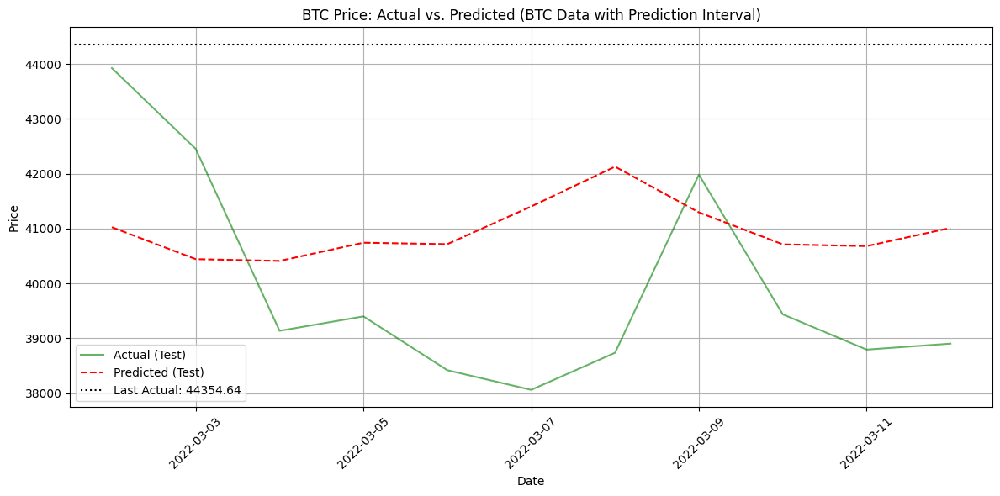

In [61]:
plot_results(tr.iloc[0:11], tr['last_actual'].iloc[0])

In [64]:
success_rate = calculate_success_rate(tr,14)

0
Target: 43854.63671875, Hits: True
Target: 43354.63671875, Hits: True
Target: 42854.63671875, Hits: True
14
Target: 43424.1171875, Hits: True
Target: 42924.1171875, Hits: True
Target: 42424.1171875, Hits: True
28
Target: 41951.7890625, Hits: True
Target: 41451.7890625, Hits: True
Target: 40951.7890625, Hits: True
42
Target: 39637.60546875, Hits: True
Target: 40137.60546875, Hits: True
Target: 40637.60546875, Hits: True
56
Target: 39900.5859375, Hits: True
Target: 40400.5859375, Hits: True
Target: 40900.5859375, Hits: True
70
Target: 38919.984375, Hits: True
Target: 39419.984375, Hits: True
Target: 39919.984375, Hits: True
84
Target: 38562.0390625, Hits: True
Target: 39062.0390625, Hits: True
Target: 39562.0390625, Hits: True
98
Target: 39237.26953125, Hits: True
Target: 39737.26953125, Hits: True
Target: 40237.26953125, Hits: True
112
Target: 41482.92578125, Hits: True
Target: 40982.92578125, Hits: True
Target: 40482.92578125, Hits: True
126
Target: 39937.4609375, Hits: True
Target: 

In [65]:
print(f"1st target= {success_rate[0]}")
print(f"2nd target= {success_rate[1]}")
print(f"3rd target= {success_rate[2]}")

1st target= 0.8408880666049954
2nd target= 0.7187789084181314
3rd target= 0.5975948196114709


# without tuning

In [114]:
tr.iloc[0:11][['yhat','ds','y']]

,yhat,ds,y
0,44682.167712,2022-04-02,45868.949219
1,44724.078775,2022-04-03,46453.566406
2,45432.501267,2022-04-04,46622.675781
3,46217.767527,2022-04-05,45555.992188
4,46394.293380,2022-04-06,43206.738281
5,45809.269679,2022-04-07,43503.847656
6,45599.104955,2022-04-08,42287.664062
7,46033.040930,2022-04-09,42782.136719
8,46074.951993,2022-04-10,42207.671875
9,46783.374485,2022-04-11,39521.902344


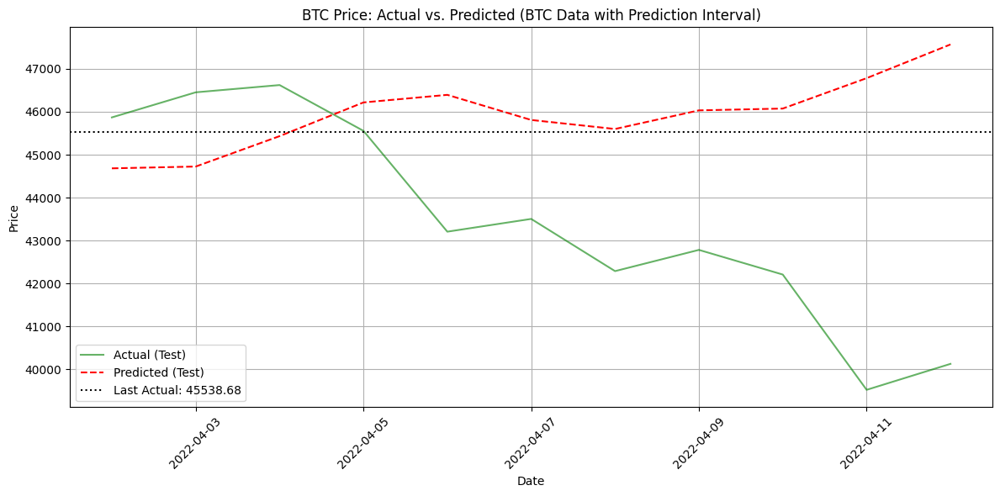

In [116]:
plot_results(tr.iloc[0:11], tr['last_actual'].iloc[0])

In [98]:
success_rate = calculate_success_rate(tr,14)

0
Target: 45038.67578125, Hits: True
Target: 44538.67578125, Hits: True
Target: 44038.67578125, Hits: True
14
Target: 45781.64453125, Hits: True
Target: 45281.64453125, Hits: True
Target: 44781.64453125, Hits: True
28
Target: 46368.94921875, Hits: True
Target: 46868.94921875, Hits: True
Target: 47368.94921875, Hits: False
42
Target: 46953.56640625, Hits: False
Target: 47453.56640625, Hits: False
Target: 47953.56640625, Hits: False
56
Target: 47122.67578125, Hits: False
Target: 47622.67578125, Hits: False
Target: 48122.67578125, Hits: False
70
Target: 46055.9921875, Hits: False
Target: 46555.9921875, Hits: False
Target: 47055.9921875, Hits: False
84
Target: 44003.84765625, Hits: False
Target: 44503.84765625, Hits: False
Target: 45003.84765625, Hits: False
98
Target: 42787.6640625, Hits: True
Target: 43287.6640625, Hits: False
Target: 43787.6640625, Hits: False
112
Target: 43282.13671875, Hits: False
Target: 43782.13671875, Hits: False
Target: 44282.13671875, Hits: False
126
Target: 4270

In [99]:
print(f"1st target= {success_rate[0]}")
print(f"2nd target= {success_rate[1]}")
print(f"3rd target= {success_rate[2]}")

1st target= 0.7633333333333333
2nd target= 0.6411111111111111
3rd target= 0.5366666666666666
